In [1]:
!pip install jax
!pip install flax
!pip install orbax-checkpoint
!pip install grain


[notice] A new release of pip is available: 23.0.1 -> 25.2
[notice] To update, run: pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 25.2
[notice] To update, run: pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺ 491.5/499.4 kB 17.5 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 499.4/499.4 kB 10.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/2.5 MB ? eta -:--:--

     ━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━ 1.2/2.5 MB 41.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━ 1.2/2.5 MB 23.5 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━ 1.4/2.5 MB 10.0 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━ 1.6/2.5 MB 7.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━ 1.9/2.5 MB 7.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 2.5/2.5 MB 9.0 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 7.4 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/69.7 kB ? eta -:--:--

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.7/69.7 kB 5.1 MB/s eta 0:00:00


  Attempting uninstall: array-record
    Found existing installation: array_record 0.7.2
    Uninstalling array_record-0.7.2:


      Successfully uninstalled array_record-0.7.2



[notice] A new release of pip is available: 23.0.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


In [2]:
import os
import jax
import jax.numpy as jnp
from jax.sharding import PartitionSpec as P
from flax import nnx
import flax
import orbax.checkpoint as ocp
import pandas as pd
import numpy as np
import optax
import math
import tqdm
from datetime import datetime
import matplotlib.pyplot as plt
import grain
import pickle
from collections.abc import Iterable
from typing import Literal, Union, Sequence
import cv2
from typing import Callable, Any
from collections import defaultdict
from IPython.display import clear_output
import matplotlib.pyplot as plt

In [3]:
print(f"""
JAX -> {jax.__version__}
flax -> {flax.__version__}
orbax -> {ocp.__version__}
grain -> {grain.__version__}
""")


JAX -> 0.4.34
flax -> 0.10.4
orbax -> 0.11.5
grain -> 0.2.12



In [4]:
jax.devices()

E0000 00:00:1757340518.882286      74 common_lib.cc:612] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: === 
learning/45eac/tfrc/runtime/common_lib.cc:230


[TpuDevice(id=0, process_index=0, coords=(0,0,0), core_on_chip=0),
 TpuDevice(id=1, process_index=0, coords=(0,0,0), core_on_chip=1),
 TpuDevice(id=2, process_index=0, coords=(1,0,0), core_on_chip=0),
 TpuDevice(id=3, process_index=0, coords=(1,0,0), core_on_chip=1),
 TpuDevice(id=4, process_index=0, coords=(0,1,0), core_on_chip=0),
 TpuDevice(id=5, process_index=0, coords=(0,1,0), core_on_chip=1),
 TpuDevice(id=6, process_index=0, coords=(1,1,0), core_on_chip=0),
 TpuDevice(id=7, process_index=0, coords=(1,1,0), core_on_chip=1)]

In [5]:
MESH = jax.sharding.Mesh(
    devices=np.array(jax.devices()).reshape(4, 2),
    axis_names=('x', "y"),
)
nnx.display(MESH)

In [6]:
NUM_CHANNELS = 3
IMAGE_SIZE = 128
LATENT_CHANNEL_SIZE = 100
GENERATOR_FEATURE_SIZE = 128
DISCRIMINATOR_FEATURE_SIZE = 128
REAL_LABEL = 1.0
FAKE_LABEL = 0.0
EPOCHS = 10
KEY = jax.random.key(989879948)

In [7]:
base_dir = "/kaggle/input/aligned-celeba-dataset/img_align_celeba"
files = list(map(lambda x: f"{base_dir}/{x}", os.listdir(base_dir)))
len(files)

202599

(218, 178, 3)


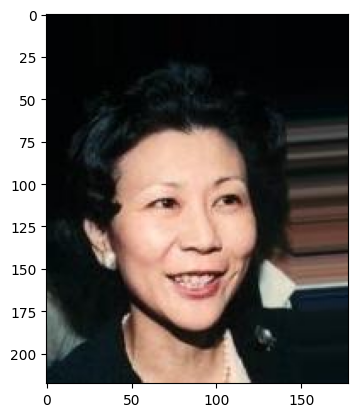

In [8]:
image = cv2.cvtColor(
    cv2.imread(files[100], cv2.IMREAD_COLOR),
    cv2.COLOR_BGR2RGB
)

print(image.shape)
plt.imshow(image)

In [9]:
class CelebDataSource(grain.sources.RandomAccessDataSource):
    def __init__(self, files):
        self.files = files
    
    def __getitem__(self, idx):
        return self.files[idx]
        
    def __len__(self):
        return len(self.files)

In [10]:
def func(file: str, axes):
    img = cv2.imread(file, cv2.IMREAD_COLOR)
    if img is None:
        raise ValueError(f"Image not found at {file}")
        
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    axes[0].set_title(f"{img.shape}")
    axes[0].imshow(img)
    
    height, width = img.shape[:2]
    if height < width:
        new_height = IMAGE_SIZE
        new_width = int(width * (IMAGE_SIZE / height))
    else:
        new_width = IMAGE_SIZE
        new_height = int(height * (IMAGE_SIZE / width))
    img_resized = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_AREA)

    
    axes[1].set_title(f"{img_resized.shape}")
    axes[1].imshow(img_resized)
    
    start_x = (img_resized.shape[0] - IMAGE_SIZE) // 2
    start_y = (img_resized.shape[1] - IMAGE_SIZE) // 2
    img_cropped = img_resized[start_x:start_x + IMAGE_SIZE, start_y:start_y + IMAGE_SIZE]

    
    axes[2].set_title(f"{img_cropped.shape}")
    axes[2].imshow(img_cropped)
    
    img_tensor = img_cropped.astype(np.float32) / 255.0
    
    mean = np.array([0.5, 0.5, 0.5])[np.newaxis, np.newaxis, ...]
    std = np.array([0.5, 0.5, 0.5])[np.newaxis, np.newaxis, ...]
    img_normalized = (img_tensor - mean) / std

    axes[3].set_title(f"{img_normalized.shape}")
    axes[3].imshow(img_normalized)
    
    real_labels = jnp.full(
        (1, 1, 1),
        REAL_LABEL,
        dtype=jnp.float32,
    )
    fake_labels = jnp.full(
        (1, 1, 1),
        FAKE_LABEL,
        dtype=jnp.float32,
    )
    
    return img_normalized, real_labels, fake_labels

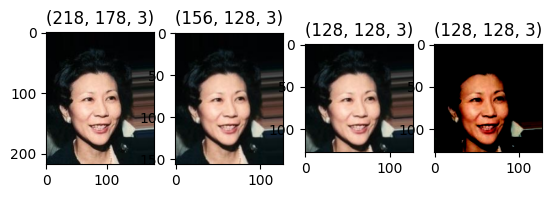

In [11]:
fig, axes = plt.subplots(nrows = 1, ncols = 4)
func(files[100], axes)
plt.show()

In [12]:
TOTAL = len(files)
TRAIN_SIZE = int(TOTAL * 0.8)
VAL_SIZE = TOTAL - TRAIN_SIZE
BATCH_SIZE = 128

print(f"""
TRAIN_SIZE - {TRAIN_SIZE}
VAL_SIZE - {VAL_SIZE}
BATCH_SIZE - {BATCH_SIZE}
""")

train_source = CelebDataSource(
    files[0:TRAIN_SIZE]
)
val_source = CelebDataSource(
    files[TRAIN_SIZE:]
)

def load_image(file: str):
    img = cv2.imread(file, cv2.IMREAD_COLOR)
    if img is None:
        raise ValueError(f"Image not found at {file}")
        
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    height, width = img.shape[:2]
    if height < width:
        new_height = IMAGE_SIZE
        new_width = int(width * (IMAGE_SIZE / height))
    else:
        new_width = IMAGE_SIZE
        new_height = int(height * (IMAGE_SIZE / width))
    img_resized = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_AREA)
    
    start_x = (img_resized.shape[0] - IMAGE_SIZE) // 2
    start_y = (img_resized.shape[1] - IMAGE_SIZE) // 2
    img_cropped = img_resized[start_x:start_x + IMAGE_SIZE, start_y:start_y + IMAGE_SIZE]
    
    img_tensor = img_cropped.astype(np.float32) / 255.0
    
    mean = np.array([0.5, 0.5, 0.5])[np.newaxis, np.newaxis, ...]
    std = np.array([0.5, 0.5, 0.5])[np.newaxis, np.newaxis, ...]
    img_normalized = (img_tensor - mean) / std
    
    real_labels = jnp.full(
        (1, 1, 1),
        REAL_LABEL,
        dtype=jnp.float32,
    )
    fake_labels = jnp.full(
        (1, 1, 1),
        FAKE_LABEL,
        dtype=jnp.float32,
    )
    
    return img_normalized, real_labels, fake_labels

def shard_images(x):
    return jax.device_put(
        x[0],
        jax.sharding.NamedSharding(
            MESH,
            P(None, "x", "y", None)
        )
    ), jax.device_put(
        x[1],
        jax.sharding.NamedSharding(
            MESH,
            P("x" if x[1].shape[0] % 4 == 0 else None, None, None, None)
        )
    ), jax.device_put(
        x[2],
        jax.sharding.NamedSharding(
            MESH,
            P("x" if x[1].shape[0] % 4 == 0 else None, None, None, None)
        )
    )
    
train_dataset = (
    grain.MapDataset.source(train_source)
    .shuffle(seed=64687)
    .map(load_image)
    .batch(batch_size=BATCH_SIZE)
    .map(shard_images)
)
val_dataset = (
    grain.MapDataset.source(val_source)
    .shuffle(seed=665645)
    .map(load_image)
    .batch(batch_size=BATCH_SIZE)
    .map(shard_images)
)

print(len(train_dataset), len(val_dataset))


TRAIN_SIZE - 162079
VAL_SIZE - 40520
BATCH_SIZE - 128

1267 317


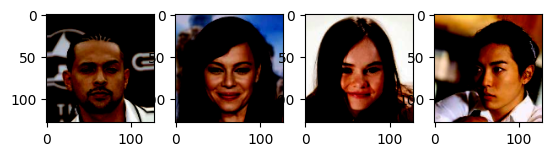

In [13]:
for index, batch in enumerate(train_dataset):
    for ele in batch:
        nnx.display(ele)
    fig, axs = plt.subplots(nrows=1, ncols = 4)
    for col in range(4):
        axs[col].imshow(batch[0][col, ...])
    plt.show()
    if index == 0:
        break

In [14]:
def normal_with_mean(mean: float = 0.0, stddev: float = 1.0, dtype=jnp.float32):
    """Return an initializer with specified mean and stddev."""
    def init(key: jax.Array, shape: Sequence[int], dtype=dtype):
        return mean + stddev * jax.random.normal(key, shape, dtype)
    return init

In [15]:
class ConvTranspose2D(nnx.Module):
    def __init__(
        self,
        **kwargs
    ):
        assert isinstance(kwargs["kernel_size"], Iterable)
        assert len(kwargs["kernel_size"]) == 2
        
        self.conv_layer = nnx.ConvTranspose(**kwargs)

    def __call__(self, inputs):
        return self.conv_layer(inputs)

In [16]:
class Generator(nnx.Module):
    def __init__(
        self,
        latent_channel_size: int,
        output_channel_size: int,
        feature_map_size: int,
        rngs: nnx.Rngs
    ):
        init_fn = nnx.initializers.normal(stddev=0.02)
        scale_init_fn = normal_with_mean(mean = 1.0, stddev = 0.02)
        bias_init_fn = nnx.initializers.zeros_init()

        #Layer 1
        self.g_conv_1 = ConvTranspose2D(
            in_features = latent_channel_size,
            out_features = feature_map_size * 8,
            kernel_size = (4, 4),
            padding = "VALID",
            strides = 1,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.g_batch_1 = nnx.BatchNorm(
            num_features = feature_map_size * 8,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 2
        self.g_conv_2 = ConvTranspose2D(
            in_features = feature_map_size * 8,
            out_features = feature_map_size * 4,
            kernel_size = (4, 4),
            padding = 2,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.g_batch_2 = nnx.BatchNorm(
            num_features = feature_map_size * 4,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 3
        self.g_conv_3 = ConvTranspose2D(
            in_features = feature_map_size * 4,
            out_features = feature_map_size * 2,
            kernel_size = (4, 4),
            padding = 2,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.g_batch_3 = nnx.BatchNorm(
            num_features = feature_map_size * 2,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 4
        self.g_conv_4 = ConvTranspose2D(
            in_features = feature_map_size * 2,
            out_features = feature_map_size,
            kernel_size = (4, 4),
            padding = 2,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.g_batch_4 = nnx.BatchNorm(
            num_features = feature_map_size,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )
        
        #Layer 5
        self.g_conv_5 = ConvTranspose2D(
            in_features = feature_map_size,
            out_features = feature_map_size // 2,
            kernel_size = (4, 4),
            padding = 2,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.g_batch_5 = nnx.BatchNorm(
            num_features = feature_map_size // 2,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 6
        self.g_conv_6 = ConvTranspose2D(
            in_features = feature_map_size // 2,
            out_features = output_channel_size,
            kernel_size = (4, 4),
            padding = 2,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, "x", "y", None)
            ),
            rngs = rngs
        )

    def __call__(self, inputs):
        x = nnx.relu(self.g_batch_1(self.g_conv_1(inputs)))
        x = nnx.relu(self.g_batch_2(self.g_conv_2(x)))
        x = nnx.relu(self.g_batch_3(self.g_conv_3(x)))
        x = nnx.relu(self.g_batch_4(self.g_conv_4(x)))
        x = nnx.relu(self.g_batch_5(self.g_conv_5(x)))
        x = nnx.tanh(self.g_conv_6(x))
        return x

In [17]:
class Conv2D(nnx.Module):
    def __init__(
        self,
        **kwargs
    ):
        assert isinstance(kwargs["kernel_size"], Iterable)
        assert len(kwargs["kernel_size"]) == 2
        
        self.conv_layer = nnx.Conv(**kwargs)

    def __call__(self, inputs):
        return self.conv_layer(inputs)

In [18]:
class Discriminator(nnx.Module):
    def __init__(
        self,
        input_channel_size: int,
        feature_map_size: int,
        rngs: nnx.Rngs
    ):
        init_fn = nnx.initializers.normal(stddev=0.02)
        scale_init_fn = normal_with_mean(mean = 1.0, stddev = 0.02)
        bias_init_fn = nnx.initializers.zeros_init()

        # Layer 1
        self.d_conv_1 = Conv2D(
            in_features = input_channel_size,
            out_features = feature_map_size // 2,
            kernel_size = (4, 4),
            padding = 1,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, "x", None, "y")
            ),
            rngs = rngs
        )

        #Layer 2
        self.d_conv_2 = Conv2D(
            in_features = feature_map_size // 2,
            out_features = feature_map_size,
            kernel_size = (4, 4),
            padding = 1,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.d_batch_2 = nnx.BatchNorm(
            num_features = feature_map_size,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 3
        self.d_conv_3 = Conv2D(
            in_features = feature_map_size,
            out_features = feature_map_size * 2,
            kernel_size = (4, 4),
            padding = 1,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.d_batch_3 = nnx.BatchNorm(
            num_features = feature_map_size * 2,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 4
        self.d_conv_4 = Conv2D(
            in_features = feature_map_size * 2,
            out_features = feature_map_size * 4,
            kernel_size = (4, 4),
            padding = 1,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.d_batch_4 = nnx.BatchNorm(
            num_features = feature_map_size * 4,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 5
        self.d_conv_5 = Conv2D(
            in_features = feature_map_size * 4,
            out_features = feature_map_size * 8,
            kernel_size = (4, 4),
            padding = 1,
            strides = 2,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        self.d_batch_5 = nnx.BatchNorm(
            num_features = feature_map_size * 8,
            axis = -1,
            bias_init = nnx.with_partitioning(
                bias_init_fn,
                ("x",)
            ),
            scale_init = nnx.with_partitioning(
                scale_init_fn,
                ("x",)
            ),
            rngs = rngs
        )

        #Layer 6
        self.d_conv_6 = Conv2D(
            in_features = feature_map_size * 8,
            out_features = 1,
            kernel_size = (4, 4),
            padding = "VALID",
            strides = 1,
            use_bias=False,
            kernel_init = nnx.with_partitioning(
                init_fn,
                (None, None, "y", "x")
            ),
            rngs = rngs
        )
        
    def __call__(self, inputs):
        x = nnx.leaky_relu(self.d_conv_1(inputs), negative_slope = 0.2)
        x = nnx.leaky_relu(self.d_batch_2(self.d_conv_2(x)), negative_slope=0.2)
        x = nnx.leaky_relu(self.d_batch_3(self.d_conv_3(x)), negative_slope=0.2)
        x = nnx.leaky_relu(self.d_batch_4(self.d_conv_4(x)), negative_slope=0.2)
        x = nnx.leaky_relu(self.d_batch_5(self.d_conv_5(x)), negative_slope=0.2)
        x = self.d_conv_6(x)
        return x

In [19]:
@nnx.jit
def create_sharded_gan_models():
    generator = Generator(
        latent_channel_size = LATENT_CHANNEL_SIZE,
        output_channel_size = NUM_CHANNELS,
        feature_map_size = GENERATOR_FEATURE_SIZE,
        rngs = nnx.Rngs(42)
    )
    g_state = nnx.state(generator)
    g_pspecs = nnx.get_partition_spec(g_state)
    g_sharded_state = jax.lax.with_sharding_constraint(g_state, g_pspecs)
    nnx.update(generator, g_sharded_state)
    
    discriminator = Discriminator(
        input_channel_size = NUM_CHANNELS,
        feature_map_size = DISCRIMINATOR_FEATURE_SIZE,
        rngs = nnx.Rngs(42)
    )
    d_state = nnx.state(discriminator)
    d_pspecs = nnx.get_partition_spec(d_state)
    d_sharded_state = jax.lax.with_sharding_constraint(d_state, d_pspecs)
    nnx.update(discriminator, d_sharded_state)
    
    return generator, discriminator

In [20]:
with MESH:
  generator, discriminator = create_sharded_gan_models()

nnx.display(generator)
nnx.display(discriminator)

In [21]:
fake_image = generator(jnp.ones((1, 1, 1, 100)))
labels = discriminator(fake_image)

assert fake_image.shape == (1, 128, 128, 3)
assert labels.shape == (1, 1, 1, 1)
print(fake_image.shape, labels.shape)

(1, 128, 128, 3)

 (1, 1, 1, 1)


In [22]:
from datetime import datetime

class ManageCheckpoints:
    def __init__(
        self,
        base_dir: str,
    ):
        self.ckpt_dir = ocp.test_utils.erase_and_create_empty(base_dir)
        self.checkpointer = ocp.StandardCheckpointer()

    def save_model(
        self,
        model: nnx.Module
    ) -> None:
        _, state = nnx.split(model)
        
        new_dir = self.ckpt_dir / f"{str(int(datetime.utcnow().timestamp()))}_state"
        self.checkpointer.save(new_dir, state)
        
        return str(new_dir)
        
    def load_model(
        self,
        model: nnx.Module,
        checkpoint: str,
        mesh: jax.sharding.Mesh = None
    ) -> nnx.Module:
        abstract_model = nnx.eval_shape(lambda: model)
        graphdef, abstract_state = nnx.split(abstract_model)
        nnx.display(abstract_state)

        if mesh:
            abstract_state = jax.tree.map(
                lambda a, s: jax.ShapeDtypeStruct(a.shape, a.dtype, sharding=s),
                abstract_state,
                nnx.get_named_sharding(abstract_state, mesh)
            )
        
        restored_state = self.checkpointer.restore(self.ckpt_dir / checkpoint, abstract_state)
        nnx.display(restored_state)
        
        return nnx.merge(graphdef, restored_state)

In [23]:
def d_loss_fn(
    discriminator: Discriminator,
    batch: Sequence[np.ndarray]
):
    logits = discriminator(batch[0])
    loss = optax.sigmoid_binary_cross_entropy(
        logits=logits, labels=batch[1]
    ).mean()
    return loss, logits

def gd_loss_fn(
    discriminator: Discriminator,
    generator: Generator,
    batch: Sequence[np.ndarray]
):
    logits = discriminator(generator(batch[0]))
    loss = optax.sigmoid_binary_cross_entropy(
        logits=logits, labels=batch[1]
    ).mean()
    return loss, logits

def d_total_loss_fn(
    discriminator: Discriminator,
    generator: Generator,
    batch: Sequence[np.array]
):
    d_loss_real, _ = d_loss_fn(discriminator, (batch[0], batch[1]))
    d_loss_fake, _ = gd_loss_fn(discriminator, generator, (batch[2], batch[3]))
    return d_loss_real + d_loss_fake

In [24]:
@nnx.jit
def train_step(
    discriminator: Discriminator,
    generator: Generator,
    
    d_optimizer: nnx.Optimizer,
    g_optimizer: nnx.Optimizer,
    
    d_metrics: nnx.MultiMetric,
    g_metrics: nnx.MultiMetric,
    
    batch: Sequence[np.ndarray],
):
    # --- Discriminator ---
    d_grad_fn = nnx.value_and_grad(d_total_loss_fn, has_aux=False)
    d_loss, d_grads = d_grad_fn(discriminator, generator, batch)
    d_optimizer.update(d_grads)
    d_metrics.update(loss=d_loss)

    g_grad_fn = nnx.value_and_grad(gd_loss_fn, argnums = 1, has_aux=True)
    (g_loss, _), g_grads = g_grad_fn(discriminator, generator, (batch[2], batch[1]))
    g_optimizer.update(g_grads)
    g_metrics.update(loss=g_loss)


@nnx.jit
def eval_step(
    discriminator: Discriminator,
    generator: Generator,
    
    d_metrics: nnx.MultiMetric,
    g_metrics: nnx.MultiMetric,
    
    batch: Sequence[np.ndarray],
):
    d_loss = d_total_loss_fn(discriminator, generator, batch)
    d_metrics.update(loss=d_loss)

    # Generator: fooling loss
    g_loss, _ = gd_loss_fn(discriminator, generator, (batch[2], batch[1]))
    g_metrics.update(loss=g_loss)

In [25]:
def train(
    epochs: int,

    discriminator: Discriminator,
    generator: Generator,

    d_optimizer: nnx.Optimizer,
    g_optimizer: nnx.Optimizer,

    d_metrics: nnx.MultiMetric,
    g_metrics: nnx.MultiMetric,
    
    train_dataset: grain.MapDataset,
    val_dataset: grain.MapDataset,

    d_train_metrics: dict,
    g_train_metrics: dict,

    d_val_metrics: dict,
    g_val_metrics: dict,

    key,

    d_checkpoint_manager: ManageCheckpoints = None,
    g_checkpoint_manager: ManageCheckpoints = None,
    
    best_ckpt_metric: str = None,   # e.g., "loss" or "accuracy"
    mode: str = "min",              # "min" for loss, "max" for accuracy
):
    """
    Training loop for GAN.
    
    Args:
        key: JAX PRNGKey
        best_ckpt_metric: if provided, will save only the best checkpoint based on this metric
        mode: "min" (smaller is better) or "max" (larger is better)
    """

    best_score = float("inf") if mode == "min" else -float("inf")

    for epoch in range(1, epochs + 1):
        # split keys for train/val this epoch
        key, train_key, val_key = jax.random.split(key, 3)

        # ----------------------------
        # Training
        # ----------------------------
        generator.train()
        discriminator.train()
        
        with tqdm.tqdm(train_dataset, unit="batch") as train_epochs:
            for index, batch in enumerate(train_epochs):
                train_epochs.set_description(f"Epoch {epoch} | Training | ")

                # split new key for this batch
                train_key, subkey = jax.random.split(train_key)
                latent_noise = jax.device_put(
                    jax.random.normal(
                        subkey,
                        shape=(batch[0].shape[0], 1, 1, LATENT_CHANNEL_SIZE),
                        dtype=jnp.float32
                    ),
                    device=jax.sharding.NamedSharding(
                        MESH,
                        P("x" if batch[0].shape[0] % 4 == 0 else None, None, None, None)
                    )
                )
                
                train_step(
                    discriminator=discriminator,
                    generator=generator,
                    d_optimizer=d_optimizer,
                    g_optimizer=g_optimizer,
                    d_metrics=d_metrics,
                    g_metrics=g_metrics,
                    batch=(batch[0], batch[1], latent_noise, batch[2])
                )

                # gather batch metrics
                d_batch_metrics = d_metrics.compute()
                for metric, value in d_batch_metrics.items():
                    d_train_metrics[metric].append(value)
                d_metrics.reset()

                g_batch_metrics = g_metrics.compute()
                for metric, value in g_batch_metrics.items():
                    g_train_metrics[metric].append(value)
                g_metrics.reset()

                train_epochs.set_postfix(
                    **{f"d_{k}": v for k, v in d_batch_metrics.items()},
                    **{f"g_{k}": v for k, v in g_batch_metrics.items()},
                )

        # ----------------------------
        # Validation
        # ----------------------------
        generator.eval()
        discriminator.eval()
        
        with tqdm.tqdm(val_dataset, unit="batch") as val_epochs:
            for index, batch in enumerate(val_epochs):
                val_epochs.set_description(f"Epoch {epoch} | Validation | ")

                val_key, subkey = jax.random.split(val_key)
                latent_noise = jax.device_put(
                    jax.random.normal(
                        subkey,
                        shape=(batch[0].shape[0], 1, 1, LATENT_CHANNEL_SIZE),
                        dtype=jnp.float32
                    ),
                    device=jax.sharding.NamedSharding(
                        MESH,
                        P("x" if batch[0].shape[0] % 4 == 0 else None, None, None, None)
                    )
                )
                
                eval_step(
                    discriminator=discriminator,
                    generator=generator,
                    d_metrics=d_metrics,
                    g_metrics=g_metrics,
                    batch=(batch[0], batch[1], latent_noise, batch[2]),
                )

                # gather batch metrics
                d_batch_metrics = d_metrics.compute()
                for metric, value in d_batch_metrics.items():
                    d_val_metrics[metric].append(value)
                d_metrics.reset()

                g_batch_metrics = g_metrics.compute()
                for metric, value in g_batch_metrics.items():
                    g_val_metrics[metric].append(value)
                g_metrics.reset()

                val_epochs.set_postfix(
                    **{f"d_{k}": v for k, v in d_batch_metrics.items()},
                    **{f"g_{k}": v for k, v in g_batch_metrics.items()},
                )

        # ----------------------------
        # Epoch Summary
        # ----------------------------
        print(f"\nEpoch {epoch} Summary:")

        for metric in d_train_metrics.keys():
            d_train_avg = np.mean(d_train_metrics[metric][-len(train_dataset):])
            d_val_avg = np.mean(d_val_metrics[metric][-len(val_dataset):])
            print(f"Discriminator {metric} | Train: {d_train_avg:.4f} | Val: {d_val_avg:.4f}")

        for metric in g_train_metrics.keys():
            g_train_avg = np.mean(g_train_metrics[metric][-len(train_dataset):])
            g_val_avg = np.mean(g_val_metrics[metric][-len(val_dataset):])
            print(f"Generator {metric} | Train: {g_train_avg:.4f} | Val: {g_val_avg:.4f}")

        # ----------------------------
        # Checkpointing
        # ----------------------------
        if best_ckpt_metric:
            # pick generator metric by default
            score = np.mean(g_val_metrics[best_ckpt_metric][-len(val_dataset):])
            is_better = (score < best_score) if mode == "min" else (score > best_score)

            if is_better:
                best_score = score
                if d_checkpoint_manager:
                    d_checkpoint_dir = d_checkpoint_manager.save_model(discriminator)
                    print(f"Saved BEST Discriminator checkpoint at {d_checkpoint_dir}")
                if g_checkpoint_manager:
                    g_checkpoint_dir = g_checkpoint_manager.save_model(generator)
                    print(f"Saved BEST Generator checkpoint at {g_checkpoint_dir}")
        else:
            if d_checkpoint_manager:
                d_checkpoint_dir = d_checkpoint_manager.save_model(discriminator)
                print(f"Saved Discriminator checkpoint at {d_checkpoint_dir}")
            if g_checkpoint_manager:
                g_checkpoint_dir = g_checkpoint_manager.save_model(generator)
                print(f"Saved Generator checkpoint at {g_checkpoint_dir}")
            
    return d_train_metrics, g_train_metrics, d_val_metrics, g_val_metrics

In [26]:
LEARNING_RATE = 0.0002
MOMENTUM = 0.5

d_opt = optax.adam(LEARNING_RATE, MOMENTUM)
d_optimizer = nnx.Optimizer(
  discriminator, d_opt, wrt=nnx.Param
)

g_opt = optax.adam(LEARNING_RATE, MOMENTUM)
g_optimizer = nnx.Optimizer(
  generator, g_opt, wrt=nnx.Param
)


d_metrics = nnx.MultiMetric(
  loss=nnx.metrics.Average('loss'),
)
g_metrics = nnx.MultiMetric(
  loss=nnx.metrics.Average('loss'),
)

!mkdir /kaggle/working/checkpoints

d_checkpoint_manager = ManageCheckpoints(
    base_dir = "/kaggle/working/checkpoints/discriminator"
)
g_checkpoint_manager = ManageCheckpoints(
    base_dir = "/kaggle/working/checkpoints/generator"
)

nnx.display(d_optimizer)
nnx.display(g_optimizer)

/usr/local/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [27]:
d_train_metrics, g_train_metrics = defaultdict(list), defaultdict(list)
d_val_metrics, g_val_metrics = defaultdict(list), defaultdict(list)

In [28]:
d_train_metrics, g_train_metrics, d_val_metrics, g_val_metrics = train(
    epochs = EPOCHS,

    discriminator = discriminator,
    generator = generator,

    d_optimizer = d_optimizer,
    g_optimizer = g_optimizer,

    d_metrics = d_metrics,
    g_metrics = g_metrics,
    
    train_dataset = train_dataset,
    val_dataset = val_dataset,

    d_train_metrics = d_train_metrics,
    g_train_metrics = g_train_metrics,

    d_val_metrics = d_val_metrics,
    g_val_metrics = g_val_metrics,

    key = KEY,

    d_checkpoint_manager = d_checkpoint_manager,
    g_checkpoint_manager = g_checkpoint_manager,
)

  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 1 | Training | :   0%|          | 0/1267 [00:06<?, ?batch/s]

Epoch 1 | Training | :   0%|          | 0/1267 [00:24<?, ?batch/s, d_loss=1.9984798, g_loss=18.607704]

Epoch 1 | Training | :   0%|          | 1/1267 [00:24<8:31:11, 24.23s/batch, d_loss=1.9984798, g_loss=18.607704]

Epoch 1 | Training | :   0%|          | 1/1267 [00:24<8:31:11, 24.23s/batch, d_loss=1.9984798, g_loss=18.607704]

Epoch 1 | Training | :   0%|          | 1/1267 [00:34<8:31:11, 24.23s/batch, d_loss=0.26571456, g_loss=10.03311]

Epoch 1 | Training | :   0%|          | 2/1267 [00:34<5:36:40, 15.97s/batch, d_loss=0.26571456, g_loss=10.03311]

Epoch 1 | Training | :   0%|          | 2/1267 [00:34<5:36:40, 15.97s/batch, d_loss=0.26571456, g_loss=10.03311]

Epoch 1 | Training | :   0%|          | 2/1267 [00:34<5:36:40, 15.97s/batch, d_loss=2.1837273, g_loss=18.910307]

Epoch 1 | Training | :   0%|          | 3/1267 [00:34<3:05:43,  8.82s/batch, d_loss=2.1837273, g_loss=18.910307]

Epoch 1 | Training | :   0%|          | 3/1267 [00:34<3:05:43,  8.82s/batch, d_loss=2.1837273, g_loss=18.910307]

Epoch 1 | Training | :   0%|          | 3/1267 [00:34<3:05:43,  8.82s/batch, d_loss=0.49539727, g_loss=14.54091]

Epoch 1 | Training | :   0%|          | 4/1267 [00:34<1:54:06,  5.42s/batch, d_loss=0.49539727, g_loss=14.54091]

Epoch 1 | Training | :   0%|          | 4/1267 [00:34<1:54:06,  5.42s/batch, d_loss=0.49539727, g_loss=14.54091]

Epoch 1 | Training | :   0%|          | 4/1267 [00:35<1:54:06,  5.42s/batch, d_loss=0.7350319, g_loss=15.023872]

Epoch 1 | Training | :   0%|          | 5/1267 [00:35<1:14:34,  3.55s/batch, d_loss=0.7350319, g_loss=15.023872]

Epoch 1 | Training | :   0%|          | 5/1267 [00:35<1:14:34,  3.55s/batch, d_loss=0.7350319, g_loss=15.023872]

Epoch 1 | Training | :   0%|          | 5/1267 [00:35<1:14:34,  3.55s/batch, d_loss=0.6307738, g_loss=16.722239]

Epoch 1 | Training | :   0%|          | 6/1267 [00:35<50:42,  2.41s/batch, d_loss=0.6307738, g_loss=16.722239]  

Epoch 1 | Training | :   0%|          | 6/1267 [00:35<50:42,  2.41s/batch, d_loss=0.6307738, g_loss=16.722239]

Epoch 1 | Training | :   0%|          | 6/1267 [00:35<50:42,  2.41s/batch, d_loss=0.30745268, g_loss=13.762081]

Epoch 1 | Training | :   1%|          | 7/1267 [00:35<35:19,  1.68s/batch, d_loss=0.30745268, g_loss=13.762081]

Epoch 1 | Training | :   1%|          | 7/1267 [00:35<35:19,  1.68s/batch, d_loss=0.30745268, g_loss=13.762081]

Epoch 1 | Training | :   1%|          | 7/1267 [00:35<35:19,  1.68s/batch, d_loss=1.042016, g_loss=29.665314]  

Epoch 1 | Training | :   1%|          | 8/1267 [00:35<26:50,  1.28s/batch, d_loss=1.042016, g_loss=29.665314]

Epoch 1 | Training | :   1%|          | 8/1267 [00:35<26:50,  1.28s/batch, d_loss=1.042016, g_loss=29.665314]

Epoch 1 | Training | :   1%|          | 8/1267 [00:36<26:50,  1.28s/batch, d_loss=0.8123219, g_loss=26.753475]

Epoch 1 | Training | :   1%|          | 9/1267 [00:36<20:58,  1.00s/batch, d_loss=0.8123219, g_loss=26.753475]

Epoch 1 | Training | :   1%|          | 9/1267 [00:36<20:58,  1.00s/batch, d_loss=0.8123219, g_loss=26.753475]

Epoch 1 | Training | :   1%|          | 9/1267 [00:36<20:58,  1.00s/batch, d_loss=0.5421688, g_loss=13.24948] 

Epoch 1 | Training | :   1%|          | 10/1267 [00:36<17:16,  1.21batch/s, d_loss=0.5421688, g_loss=13.24948]

Epoch 1 | Training | :   1%|          | 10/1267 [00:36<17:16,  1.21batch/s, d_loss=0.5421688, g_loss=13.24948]

Epoch 1 | Training | :   1%|          | 10/1267 [00:37<17:16,  1.21batch/s, d_loss=5.1300144, g_loss=36.034203]

Epoch 1 | Training | :   1%|          | 11/1267 [00:37<14:16,  1.47batch/s, d_loss=5.1300144, g_loss=36.034203]

Epoch 1 | Training | :   1%|          | 11/1267 [00:37<14:16,  1.47batch/s, d_loss=5.1300144, g_loss=36.034203]

Epoch 1 | Training | :   1%|          | 11/1267 [00:37<14:16,  1.47batch/s, d_loss=0.5588777, g_loss=38.36517] 

Epoch 1 | Training | :   1%|          | 12/1267 [00:37<12:36,  1.66batch/s, d_loss=0.5588777, g_loss=38.36517]

Epoch 1 | Training | :   1%|          | 12/1267 [00:37<12:36,  1.66batch/s, d_loss=0.5588777, g_loss=38.36517]

Epoch 1 | Training | :   1%|          | 12/1267 [00:37<12:36,  1.66batch/s, d_loss=0.8195027, g_loss=26.926264]

Epoch 1 | Training | :   1%|          | 13/1267 [00:37<11:12,  1.87batch/s, d_loss=0.8195027, g_loss=26.926264]

Epoch 1 | Training | :   1%|          | 13/1267 [00:37<11:12,  1.87batch/s, d_loss=0.8195027, g_loss=26.926264]

Epoch 1 | Training | :   1%|          | 13/1267 [00:38<11:12,  1.87batch/s, d_loss=0.34261262, g_loss=7.678317]

Epoch 1 | Training | :   1%|          | 14/1267 [00:38<09:56,  2.10batch/s, d_loss=0.34261262, g_loss=7.678317]

Epoch 1 | Training | :   1%|          | 14/1267 [00:38<09:56,  2.10batch/s, d_loss=0.34261262, g_loss=7.678317]

Epoch 1 | Training | :   1%|          | 14/1267 [00:38<09:56,  2.10batch/s, d_loss=13.760874, g_loss=36.297806]

Epoch 1 | Training | :   1%|          | 15/1267 [00:38<08:55,  2.34batch/s, d_loss=13.760874, g_loss=36.297806]

Epoch 1 | Training | :   1%|          | 15/1267 [00:38<08:55,  2.34batch/s, d_loss=13.760874, g_loss=36.297806]

Epoch 1 | Training | :   1%|          | 15/1267 [00:38<08:55,  2.34batch/s, d_loss=0.5747944, g_loss=41.059326]

Epoch 1 | Training | :   1%|▏         | 16/1267 [00:38<08:27,  2.47batch/s, d_loss=0.5747944, g_loss=41.059326]

Epoch 1 | Training | :   1%|▏         | 16/1267 [00:38<08:27,  2.47batch/s, d_loss=0.5747944, g_loss=41.059326]

Epoch 1 | Training | :   1%|▏         | 16/1267 [00:39<08:27,  2.47batch/s, d_loss=0.5364403, g_loss=30.180397]

Epoch 1 | Training | :   1%|▏         | 17/1267 [00:39<07:26,  2.80batch/s, d_loss=0.5364403, g_loss=30.180397]

Epoch 1 | Training | :   1%|▏         | 17/1267 [00:39<07:26,  2.80batch/s, d_loss=0.5364403, g_loss=30.180397]

Epoch 1 | Training | :   1%|▏         | 17/1267 [00:39<07:26,  2.80batch/s, d_loss=0.45366412, g_loss=10.556144]

Epoch 1 | Training | :   1%|▏         | 18/1267 [00:39<06:15,  3.33batch/s, d_loss=0.45366412, g_loss=10.556144]

Epoch 1 | Training | :   1%|▏         | 18/1267 [00:39<06:15,  3.33batch/s, d_loss=0.45366412, g_loss=10.556144]

Epoch 1 | Training | :   1%|▏         | 18/1267 [00:39<06:15,  3.33batch/s, d_loss=10.9423065, g_loss=41.879047]

Epoch 1 | Training | :   1%|▏         | 19/1267 [00:39<05:35,  3.72batch/s, d_loss=10.9423065, g_loss=41.879047]

Epoch 1 | Training | :   1%|▏         | 19/1267 [00:39<05:35,  3.72batch/s, d_loss=10.9423065, g_loss=41.879047]

Epoch 1 | Training | :   1%|▏         | 19/1267 [00:39<05:35,  3.72batch/s, d_loss=0.9647075, g_loss=45.862457] 

Epoch 1 | Training | :   2%|▏         | 20/1267 [00:39<05:16,  3.94batch/s, d_loss=0.9647075, g_loss=45.862457]

Epoch 1 | Training | :   2%|▏         | 20/1267 [00:39<05:16,  3.94batch/s, d_loss=0.9647075, g_loss=45.862457]

Epoch 1 | Training | :   2%|▏         | 20/1267 [00:39<05:16,  3.94batch/s, d_loss=0.40200976, g_loss=34.55836]

Epoch 1 | Training | :   2%|▏         | 21/1267 [00:39<05:01,  4.14batch/s, d_loss=0.40200976, g_loss=34.55836]

Epoch 1 | Training | :   2%|▏         | 21/1267 [00:40<05:01,  4.14batch/s, d_loss=0.40200976, g_loss=34.55836]

Epoch 1 | Training | :   2%|▏         | 21/1267 [00:40<05:01,  4.14batch/s, d_loss=0.1744628, g_loss=15.943022]

Epoch 1 | Training | :   2%|▏         | 22/1267 [00:40<04:52,  4.25batch/s, d_loss=0.1744628, g_loss=15.943022]

Epoch 1 | Training | :   2%|▏         | 22/1267 [00:40<04:52,  4.25batch/s, d_loss=0.1744628, g_loss=15.943022]

Epoch 1 | Training | :   2%|▏         | 22/1267 [00:40<04:52,  4.25batch/s, d_loss=5.3905277, g_loss=47.837074]

Epoch 1 | Training | :   2%|▏         | 23/1267 [00:40<04:38,  4.47batch/s, d_loss=5.3905277, g_loss=47.837074]

Epoch 1 | Training | :   2%|▏         | 23/1267 [00:40<04:38,  4.47batch/s, d_loss=5.3905277, g_loss=47.837074]

Epoch 1 | Training | :   2%|▏         | 23/1267 [00:40<04:38,  4.47batch/s, d_loss=0.6331011, g_loss=52.674347]

Epoch 1 | Training | :   2%|▏         | 24/1267 [00:40<04:26,  4.66batch/s, d_loss=0.6331011, g_loss=52.674347]

Epoch 1 | Training | :   2%|▏         | 24/1267 [00:40<04:26,  4.66batch/s, d_loss=0.6331011, g_loss=52.674347]

Epoch 1 | Training | :   2%|▏         | 24/1267 [00:40<04:26,  4.66batch/s, d_loss=0.49739194, g_loss=43.241814]

Epoch 1 | Training | :   2%|▏         | 25/1267 [00:40<04:15,  4.86batch/s, d_loss=0.49739194, g_loss=43.241814]

Epoch 1 | Training | :   2%|▏         | 25/1267 [00:40<04:15,  4.86batch/s, d_loss=0.49739194, g_loss=43.241814]

Epoch 1 | Training | :   2%|▏         | 25/1267 [00:40<04:15,  4.86batch/s, d_loss=0.9324503, g_loss=26.990894] 

Epoch 1 | Training | :   2%|▏         | 26/1267 [00:40<04:06,  5.04batch/s, d_loss=0.9324503, g_loss=26.990894]

Epoch 1 | Training | :   2%|▏         | 26/1267 [00:40<04:06,  5.04batch/s, d_loss=0.9324503, g_loss=26.990894]

Epoch 1 | Training | :   2%|▏         | 26/1267 [00:41<04:06,  5.04batch/s, d_loss=0.563212, g_loss=6.8568783] 

Epoch 1 | Training | :   2%|▏         | 27/1267 [00:41<03:53,  5.31batch/s, d_loss=0.563212, g_loss=6.8568783]

Epoch 1 | Training | :   2%|▏         | 27/1267 [00:41<03:53,  5.31batch/s, d_loss=0.563212, g_loss=6.8568783]

Epoch 1 | Training | :   2%|▏         | 27/1267 [00:41<03:53,  5.31batch/s, d_loss=14.1655445, g_loss=44.716568]

Epoch 1 | Training | :   2%|▏         | 28/1267 [00:41<03:47,  5.46batch/s, d_loss=14.1655445, g_loss=44.716568]

Epoch 1 | Training | :   2%|▏         | 28/1267 [00:41<03:47,  5.46batch/s, d_loss=14.1655445, g_loss=44.716568]

Epoch 1 | Training | :   2%|▏         | 28/1267 [00:41<03:47,  5.46batch/s, d_loss=0.9121091, g_loss=50.75656]  

Epoch 1 | Training | :   2%|▏         | 29/1267 [00:41<03:46,  5.47batch/s, d_loss=0.9121091, g_loss=50.75656]

Epoch 1 | Training | :   2%|▏         | 29/1267 [00:41<03:46,  5.47batch/s, d_loss=0.9121091, g_loss=50.75656]

Epoch 1 | Training | :   2%|▏         | 29/1267 [00:41<03:46,  5.47batch/s, d_loss=0.7491257, g_loss=44.327774]

Epoch 1 | Training | :   2%|▏         | 30/1267 [00:41<03:46,  5.47batch/s, d_loss=0.7491257, g_loss=44.327774]

Epoch 1 | Training | :   2%|▏         | 30/1267 [00:41<03:46,  5.47batch/s, d_loss=0.7491257, g_loss=44.327774]

Epoch 1 | Training | :   2%|▏         | 30/1267 [00:41<03:46,  5.47batch/s, d_loss=0.5100349, g_loss=30.70076] 

Epoch 1 | Training | :   2%|▏         | 31/1267 [00:41<03:55,  5.25batch/s, d_loss=0.5100349, g_loss=30.70076]

Epoch 1 | Training | :   2%|▏         | 31/1267 [00:41<03:55,  5.25batch/s, d_loss=0.5100349, g_loss=30.70076]

Epoch 1 | Training | :   2%|▏         | 31/1267 [00:42<03:55,  5.25batch/s, d_loss=0.23974948, g_loss=12.238015]

Epoch 1 | Training | :   3%|▎         | 32/1267 [00:42<03:51,  5.33batch/s, d_loss=0.23974948, g_loss=12.238015]

Epoch 1 | Training | :   3%|▎         | 32/1267 [00:42<03:51,  5.33batch/s, d_loss=0.23974948, g_loss=12.238015]

Epoch 1 | Training | :   3%|▎         | 32/1267 [00:42<03:51,  5.33batch/s, d_loss=6.763138, g_loss=50.321617]  

Epoch 1 | Training | :   3%|▎         | 33/1267 [00:42<04:01,  5.11batch/s, d_loss=6.763138, g_loss=50.321617]

Epoch 1 | Training | :   3%|▎         | 33/1267 [00:42<04:01,  5.11batch/s, d_loss=6.763138, g_loss=50.321617]

Epoch 1 | Training | :   3%|▎         | 33/1267 [00:42<04:01,  5.11batch/s, d_loss=0.47653556, g_loss=57.43399]

Epoch 1 | Training | :   3%|▎         | 34/1267 [00:42<04:00,  5.12batch/s, d_loss=0.47653556, g_loss=57.43399]

Epoch 1 | Training | :   3%|▎         | 34/1267 [00:42<04:00,  5.12batch/s, d_loss=0.47653556, g_loss=57.43399]

Epoch 1 | Training | :   3%|▎         | 34/1267 [00:42<04:00,  5.12batch/s, d_loss=0.66766894, g_loss=53.41816]

Epoch 1 | Training | :   3%|▎         | 35/1267 [00:42<03:43,  5.52batch/s, d_loss=0.66766894, g_loss=53.41816]

Epoch 1 | Training | :   3%|▎         | 35/1267 [00:42<03:43,  5.52batch/s, d_loss=0.66766894, g_loss=53.41816]

Epoch 1 | Training | :   3%|▎         | 35/1267 [00:42<03:43,  5.52batch/s, d_loss=0.33902663, g_loss=43.47031]

Epoch 1 | Training | :   3%|▎         | 36/1267 [00:42<03:51,  5.32batch/s, d_loss=0.33902663, g_loss=43.47031]

Epoch 1 | Training | :   3%|▎         | 36/1267 [00:42<03:51,  5.32batch/s, d_loss=0.33902663, g_loss=43.47031]

Epoch 1 | Training | :   3%|▎         | 36/1267 [00:43<03:51,  5.32batch/s, d_loss=0.29930016, g_loss=29.09621]

Epoch 1 | Training | :   3%|▎         | 37/1267 [00:43<03:53,  5.26batch/s, d_loss=0.29930016, g_loss=29.09621]

Epoch 1 | Training | :   3%|▎         | 37/1267 [00:43<03:53,  5.26batch/s, d_loss=0.29930016, g_loss=29.09621]

Epoch 1 | Training | :   3%|▎         | 37/1267 [00:43<03:53,  5.26batch/s, d_loss=0.29364514, g_loss=9.568537]

Epoch 1 | Training | :   3%|▎         | 38/1267 [00:43<03:53,  5.27batch/s, d_loss=0.29364514, g_loss=9.568537]

Epoch 1 | Training | :   3%|▎         | 38/1267 [00:43<03:53,  5.27batch/s, d_loss=0.29364514, g_loss=9.568537]

Epoch 1 | Training | :   3%|▎         | 38/1267 [00:43<03:53,  5.27batch/s, d_loss=11.405636, g_loss=50.89108] 

Epoch 1 | Training | :   3%|▎         | 39/1267 [00:43<03:53,  5.26batch/s, d_loss=11.405636, g_loss=50.89108]

Epoch 1 | Training | :   3%|▎         | 39/1267 [00:43<03:53,  5.26batch/s, d_loss=11.405636, g_loss=50.89108]

Epoch 1 | Training | :   3%|▎         | 39/1267 [00:43<03:53,  5.26batch/s, d_loss=0.6953439, g_loss=57.28634]

Epoch 1 | Training | :   3%|▎         | 40/1267 [00:43<03:38,  5.61batch/s, d_loss=0.6953439, g_loss=57.28634]

Epoch 1 | Training | :   3%|▎         | 40/1267 [00:43<03:38,  5.61batch/s, d_loss=0.6953439, g_loss=57.28634]

Epoch 1 | Training | :   3%|▎         | 40/1267 [00:43<03:38,  5.61batch/s, d_loss=0.79165256, g_loss=51.389645]

Epoch 1 | Training | :   3%|▎         | 41/1267 [00:43<03:42,  5.50batch/s, d_loss=0.79165256, g_loss=51.389645]

Epoch 1 | Training | :   3%|▎         | 41/1267 [00:43<03:42,  5.50batch/s, d_loss=0.79165256, g_loss=51.389645]

Epoch 1 | Training | :   3%|▎         | 41/1267 [00:43<03:42,  5.50batch/s, d_loss=0.59452575, g_loss=39.683]   

Epoch 1 | Training | :   3%|▎         | 42/1267 [00:43<04:03,  5.04batch/s, d_loss=0.59452575, g_loss=39.683]

Epoch 1 | Training | :   3%|▎         | 42/1267 [00:43<04:03,  5.04batch/s, d_loss=0.59452575, g_loss=39.683]

Epoch 1 | Training | :   3%|▎         | 42/1267 [00:44<04:03,  5.04batch/s, d_loss=0.3080625, g_loss=25.044653]

Epoch 1 | Training | :   3%|▎         | 43/1267 [00:44<04:00,  5.09batch/s, d_loss=0.3080625, g_loss=25.044653]

Epoch 1 | Training | :   3%|▎         | 43/1267 [00:44<04:00,  5.09batch/s, d_loss=0.3080625, g_loss=25.044653]

Epoch 1 | Training | :   3%|▎         | 43/1267 [00:44<04:00,  5.09batch/s, d_loss=0.39579758, g_loss=7.526332]

Epoch 1 | Training | :   3%|▎         | 44/1267 [00:44<03:54,  5.21batch/s, d_loss=0.39579758, g_loss=7.526332]

Epoch 1 | Training | :   3%|▎         | 44/1267 [00:44<03:54,  5.21batch/s, d_loss=0.39579758, g_loss=7.526332]

Epoch 1 | Training | :   3%|▎         | 44/1267 [00:44<03:54,  5.21batch/s, d_loss=11.857845, g_loss=51.194813]

Epoch 1 | Training | :   4%|▎         | 45/1267 [00:44<04:11,  4.86batch/s, d_loss=11.857845, g_loss=51.194813]

Epoch 1 | Training | :   4%|▎         | 45/1267 [00:44<04:11,  4.86batch/s, d_loss=11.857845, g_loss=51.194813]

Epoch 1 | Training | :   4%|▎         | 45/1267 [00:44<04:11,  4.86batch/s, d_loss=0.7967051, g_loss=57.05934] 

Epoch 1 | Training | :   4%|▎         | 46/1267 [00:44<03:59,  5.09batch/s, d_loss=0.7967051, g_loss=57.05934]

Epoch 1 | Training | :   4%|▎         | 46/1267 [00:44<03:59,  5.09batch/s, d_loss=0.7967051, g_loss=57.05934]

Epoch 1 | Training | :   4%|▎         | 46/1267 [00:44<03:59,  5.09batch/s, d_loss=1.1338542, g_loss=50.815586]

Epoch 1 | Training | :   4%|▎         | 47/1267 [00:44<03:51,  5.27batch/s, d_loss=1.1338542, g_loss=50.815586]

Epoch 1 | Training | :   4%|▎         | 47/1267 [00:44<03:51,  5.27batch/s, d_loss=1.1338542, g_loss=50.815586]

Epoch 1 | Training | :   4%|▎         | 47/1267 [00:45<03:51,  5.27batch/s, d_loss=0.48252365, g_loss=40.30655]

Epoch 1 | Training | :   4%|▍         | 48/1267 [00:45<03:51,  5.26batch/s, d_loss=0.48252365, g_loss=40.30655]

Epoch 1 | Training | :   4%|▍         | 48/1267 [00:45<03:51,  5.26batch/s, d_loss=0.48252365, g_loss=40.30655]

Epoch 1 | Training | :   4%|▍         | 48/1267 [00:45<03:51,  5.26batch/s, d_loss=0.3458894, g_loss=26.300516]

Epoch 1 | Training | :   4%|▍         | 49/1267 [00:45<03:54,  5.20batch/s, d_loss=0.3458894, g_loss=26.300516]

Epoch 1 | Training | :   4%|▍         | 49/1267 [00:45<03:54,  5.20batch/s, d_loss=0.3458894, g_loss=26.300516]

Epoch 1 | Training | :   4%|▍         | 49/1267 [00:45<03:54,  5.20batch/s, d_loss=0.48388928, g_loss=10.175129]

Epoch 1 | Training | :   4%|▍         | 50/1267 [00:45<03:49,  5.30batch/s, d_loss=0.48388928, g_loss=10.175129]

Epoch 1 | Training | :   4%|▍         | 50/1267 [00:45<03:49,  5.30batch/s, d_loss=0.48388928, g_loss=10.175129]

Epoch 1 | Training | :   4%|▍         | 50/1267 [00:45<03:49,  5.30batch/s, d_loss=8.511656, g_loss=51.798695]  

Epoch 1 | Training | :   4%|▍         | 51/1267 [00:45<03:44,  5.42batch/s, d_loss=8.511656, g_loss=51.798695]

Epoch 1 | Training | :   4%|▍         | 51/1267 [00:45<03:44,  5.42batch/s, d_loss=8.511656, g_loss=51.798695]

Epoch 1 | Training | :   4%|▍         | 51/1267 [00:45<03:44,  5.42batch/s, d_loss=0.92905235, g_loss=57.59498]

Epoch 1 | Training | :   4%|▍         | 52/1267 [00:45<03:51,  5.24batch/s, d_loss=0.92905235, g_loss=57.59498]

Epoch 1 | Training | :   4%|▍         | 52/1267 [00:45<03:51,  5.24batch/s, d_loss=0.92905235, g_loss=57.59498]

Epoch 1 | Training | :   4%|▍         | 52/1267 [00:46<03:51,  5.24batch/s, d_loss=0.78783923, g_loss=52.360226]

Epoch 1 | Training | :   4%|▍         | 53/1267 [00:46<03:43,  5.42batch/s, d_loss=0.78783923, g_loss=52.360226]

Epoch 1 | Training | :   4%|▍         | 53/1267 [00:46<03:43,  5.42batch/s, d_loss=0.78783923, g_loss=52.360226]

Epoch 1 | Training | :   4%|▍         | 53/1267 [00:46<03:43,  5.42batch/s, d_loss=0.4057572, g_loss=42.444847] 

Epoch 1 | Training | :   4%|▍         | 54/1267 [00:46<03:58,  5.09batch/s, d_loss=0.4057572, g_loss=42.444847]

Epoch 1 | Training | :   4%|▍         | 54/1267 [00:46<03:58,  5.09batch/s, d_loss=0.4057572, g_loss=42.444847]

Epoch 1 | Training | :   4%|▍         | 54/1267 [00:46<03:58,  5.09batch/s, d_loss=0.41110262, g_loss=28.069715]

Epoch 1 | Training | :   4%|▍         | 55/1267 [00:46<03:57,  5.09batch/s, d_loss=0.41110262, g_loss=28.069715]

Epoch 1 | Training | :   4%|▍         | 55/1267 [00:46<03:57,  5.09batch/s, d_loss=0.41110262, g_loss=28.069715]

Epoch 1 | Training | :   4%|▍         | 55/1267 [00:46<03:57,  5.09batch/s, d_loss=0.52489066, g_loss=9.488857] 

Epoch 1 | Training | :   4%|▍         | 56/1267 [00:46<04:05,  4.93batch/s, d_loss=0.52489066, g_loss=9.488857]

Epoch 1 | Training | :   4%|▍         | 56/1267 [00:46<04:05,  4.93batch/s, d_loss=0.52489066, g_loss=9.488857]

Epoch 1 | Training | :   4%|▍         | 56/1267 [00:46<04:05,  4.93batch/s, d_loss=8.836491, g_loss=47.09845]  

Epoch 1 | Training | :   4%|▍         | 57/1267 [00:46<04:17,  4.70batch/s, d_loss=8.836491, g_loss=47.09845]

Epoch 1 | Training | :   4%|▍         | 57/1267 [00:46<04:17,  4.70batch/s, d_loss=8.836491, g_loss=47.09845]

Epoch 1 | Training | :   4%|▍         | 57/1267 [00:47<04:17,  4.70batch/s, d_loss=3.3105245, g_loss=44.551468]

Epoch 1 | Training | :   5%|▍         | 58/1267 [00:47<05:11,  3.88batch/s, d_loss=3.3105245, g_loss=44.551468]

Epoch 1 | Training | :   5%|▍         | 58/1267 [00:47<05:11,  3.88batch/s, d_loss=3.3105245, g_loss=44.551468]

Epoch 1 | Training | :   5%|▍         | 58/1267 [00:47<05:11,  3.88batch/s, d_loss=0.8804685, g_loss=32.75034] 

Epoch 1 | Training | :   5%|▍         | 59/1267 [00:47<06:06,  3.30batch/s, d_loss=0.8804685, g_loss=32.75034]

Epoch 1 | Training | :   5%|▍         | 59/1267 [00:47<06:06,  3.30batch/s, d_loss=0.8804685, g_loss=32.75034]

Epoch 1 | Training | :   5%|▍         | 59/1267 [00:47<06:06,  3.30batch/s, d_loss=0.85976636, g_loss=14.934064]

Epoch 1 | Training | :   5%|▍         | 60/1267 [00:47<05:36,  3.59batch/s, d_loss=0.85976636, g_loss=14.934064]

Epoch 1 | Training | :   5%|▍         | 60/1267 [00:47<05:36,  3.59batch/s, d_loss=0.85976636, g_loss=14.934064]

Epoch 1 | Training | :   5%|▍         | 60/1267 [00:48<05:36,  3.59batch/s, d_loss=4.072283, g_loss=31.31147]   

Epoch 1 | Training | :   5%|▍         | 61/1267 [00:48<05:43,  3.51batch/s, d_loss=4.072283, g_loss=31.31147]

Epoch 1 | Training | :   5%|▍         | 61/1267 [00:48<05:43,  3.51batch/s, d_loss=4.072283, g_loss=31.31147]

Epoch 1 | Training | :   5%|▍         | 61/1267 [00:48<05:43,  3.51batch/s, d_loss=1.0083652, g_loss=30.915932]

Epoch 1 | Training | :   5%|▍         | 62/1267 [00:48<06:24,  3.13batch/s, d_loss=1.0083652, g_loss=30.915932]

Epoch 1 | Training | :   5%|▍         | 62/1267 [00:48<06:24,  3.13batch/s, d_loss=1.0083652, g_loss=30.915932]

Epoch 1 | Training | :   5%|▍         | 62/1267 [00:48<06:24,  3.13batch/s, d_loss=1.6803439, g_loss=20.365646]

Epoch 1 | Training | :   5%|▍         | 63/1267 [00:48<06:25,  3.13batch/s, d_loss=1.6803439, g_loss=20.365646]

Epoch 1 | Training | :   5%|▍         | 63/1267 [00:48<06:25,  3.13batch/s, d_loss=1.6803439, g_loss=20.365646]

Epoch 1 | Training | :   5%|▍         | 63/1267 [00:49<06:25,  3.13batch/s, d_loss=0.55213785, g_loss=7.270232]

Epoch 1 | Training | :   5%|▌         | 64/1267 [00:49<05:45,  3.48batch/s, d_loss=0.55213785, g_loss=7.270232]

Epoch 1 | Training | :   5%|▌         | 64/1267 [00:49<05:45,  3.48batch/s, d_loss=0.55213785, g_loss=7.270232]

Epoch 1 | Training | :   5%|▌         | 64/1267 [00:49<05:45,  3.48batch/s, d_loss=8.455622, g_loss=36.43906]  

Epoch 1 | Training | :   5%|▌         | 65/1267 [00:49<05:16,  3.80batch/s, d_loss=8.455622, g_loss=36.43906]

Epoch 1 | Training | :   5%|▌         | 65/1267 [00:49<05:16,  3.80batch/s, d_loss=8.455622, g_loss=36.43906]

Epoch 1 | Training | :   5%|▌         | 65/1267 [00:49<05:16,  3.80batch/s, d_loss=3.6370857, g_loss=25.186874]

Epoch 1 | Training | :   5%|▌         | 66/1267 [00:49<04:57,  4.04batch/s, d_loss=3.6370857, g_loss=25.186874]

Epoch 1 | Training | :   5%|▌         | 66/1267 [00:49<04:57,  4.04batch/s, d_loss=3.6370857, g_loss=25.186874]

Epoch 1 | Training | :   5%|▌         | 66/1267 [00:49<04:57,  4.04batch/s, d_loss=0.518548, g_loss=11.794582] 

Epoch 1 | Training | :   5%|▌         | 67/1267 [00:49<04:34,  4.38batch/s, d_loss=0.518548, g_loss=11.794582]

Epoch 1 | Training | :   5%|▌         | 67/1267 [00:49<04:34,  4.38batch/s, d_loss=0.518548, g_loss=11.794582]

Epoch 1 | Training | :   5%|▌         | 67/1267 [00:49<04:34,  4.38batch/s, d_loss=0.85013866, g_loss=7.7142773]

Epoch 1 | Training | :   5%|▌         | 68/1267 [00:49<04:10,  4.78batch/s, d_loss=0.85013866, g_loss=7.7142773]

Epoch 1 | Training | :   5%|▌         | 68/1267 [00:49<04:10,  4.78batch/s, d_loss=0.85013866, g_loss=7.7142773]

Epoch 1 | Training | :   5%|▌         | 68/1267 [00:50<04:10,  4.78batch/s, d_loss=2.0906022, g_loss=22.004414] 

Epoch 1 | Training | :   5%|▌         | 69/1267 [00:50<04:20,  4.60batch/s, d_loss=2.0906022, g_loss=22.004414]

Epoch 1 | Training | :   5%|▌         | 69/1267 [00:50<04:20,  4.60batch/s, d_loss=2.0906022, g_loss=22.004414]

Epoch 1 | Training | :   5%|▌         | 69/1267 [00:50<04:20,  4.60batch/s, d_loss=2.3768296, g_loss=19.330269]

Epoch 1 | Training | :   6%|▌         | 70/1267 [00:50<04:29,  4.44batch/s, d_loss=2.3768296, g_loss=19.330269]

Epoch 1 | Training | :   6%|▌         | 70/1267 [00:50<04:29,  4.44batch/s, d_loss=2.3768296, g_loss=19.330269]

Epoch 1 | Training | :   6%|▌         | 70/1267 [00:50<04:29,  4.44batch/s, d_loss=1.0906339, g_loss=8.478661] 

Epoch 1 | Training | :   6%|▌         | 71/1267 [00:50<04:39,  4.27batch/s, d_loss=1.0906339, g_loss=8.478661]

Epoch 1 | Training | :   6%|▌         | 71/1267 [00:50<04:39,  4.27batch/s, d_loss=1.0906339, g_loss=8.478661]

Epoch 1 | Training | :   6%|▌         | 71/1267 [00:51<04:39,  4.27batch/s, d_loss=4.330805, g_loss=23.663681]

Epoch 1 | Training | :   6%|▌         | 72/1267 [00:51<06:23,  3.12batch/s, d_loss=4.330805, g_loss=23.663681]

Epoch 1 | Training | :   6%|▌         | 72/1267 [00:51<06:23,  3.12batch/s, d_loss=4.330805, g_loss=23.663681]

Epoch 1 | Training | :   6%|▌         | 72/1267 [00:51<06:23,  3.12batch/s, d_loss=1.5124552, g_loss=23.10564]

Epoch 1 | Training | :   6%|▌         | 73/1267 [00:51<06:03,  3.29batch/s, d_loss=1.5124552, g_loss=23.10564]

Epoch 1 | Training | :   6%|▌         | 73/1267 [00:51<06:03,  3.29batch/s, d_loss=1.5124552, g_loss=23.10564]

Epoch 1 | Training | :   6%|▌         | 73/1267 [00:51<06:03,  3.29batch/s, d_loss=1.050452, g_loss=12.489984]

Epoch 1 | Training | :   6%|▌         | 74/1267 [00:51<05:35,  3.55batch/s, d_loss=1.050452, g_loss=12.489984]

Epoch 1 | Training | :   6%|▌         | 74/1267 [00:51<05:35,  3.55batch/s, d_loss=1.050452, g_loss=12.489984]

Epoch 1 | Training | :   6%|▌         | 74/1267 [00:51<05:35,  3.55batch/s, d_loss=0.8468242, g_loss=6.5004315]

Epoch 1 | Training | :   6%|▌         | 75/1267 [00:51<05:15,  3.78batch/s, d_loss=0.8468242, g_loss=6.5004315]

Epoch 1 | Training | :   6%|▌         | 75/1267 [00:51<05:15,  3.78batch/s, d_loss=0.8468242, g_loss=6.5004315]

Epoch 1 | Training | :   6%|▌         | 75/1267 [00:52<05:15,  3.78batch/s, d_loss=3.8278198, g_loss=26.884216]

Epoch 1 | Training | :   6%|▌         | 76/1267 [00:52<04:51,  4.09batch/s, d_loss=3.8278198, g_loss=26.884216]

Epoch 1 | Training | :   6%|▌         | 76/1267 [00:52<04:51,  4.09batch/s, d_loss=3.8278198, g_loss=26.884216]

Epoch 1 | Training | :   6%|▌         | 76/1267 [00:52<04:51,  4.09batch/s, d_loss=1.981672, g_loss=25.198774] 

Epoch 1 | Training | :   6%|▌         | 77/1267 [00:52<04:24,  4.49batch/s, d_loss=1.981672, g_loss=25.198774]

Epoch 1 | Training | :   6%|▌         | 77/1267 [00:52<04:24,  4.49batch/s, d_loss=1.981672, g_loss=25.198774]

Epoch 1 | Training | :   6%|▌         | 77/1267 [00:52<04:24,  4.49batch/s, d_loss=1.0445095, g_loss=14.774521]

Epoch 1 | Training | :   6%|▌         | 78/1267 [00:52<04:07,  4.80batch/s, d_loss=1.0445095, g_loss=14.774521]

Epoch 1 | Training | :   6%|▌         | 78/1267 [00:52<04:07,  4.80batch/s, d_loss=1.0445095, g_loss=14.774521]

Epoch 1 | Training | :   6%|▌         | 78/1267 [00:52<04:07,  4.80batch/s, d_loss=0.35405904, g_loss=6.0267305]

Epoch 1 | Training | :   6%|▌         | 79/1267 [00:52<04:08,  4.78batch/s, d_loss=0.35405904, g_loss=6.0267305]

Epoch 1 | Training | :   6%|▌         | 79/1267 [00:52<04:08,  4.78batch/s, d_loss=0.35405904, g_loss=6.0267305]

Epoch 1 | Training | :   6%|▌         | 79/1267 [00:52<04:08,  4.78batch/s, d_loss=2.545632, g_loss=17.61087]   

Epoch 1 | Training | :   6%|▋         | 80/1267 [00:52<04:02,  4.90batch/s, d_loss=2.545632, g_loss=17.61087]

Epoch 1 | Training | :   6%|▋         | 80/1267 [00:52<04:02,  4.90batch/s, d_loss=2.545632, g_loss=17.61087]

Epoch 1 | Training | :   6%|▋         | 80/1267 [00:53<04:02,  4.90batch/s, d_loss=0.39121735, g_loss=18.213175]

Epoch 1 | Training | :   6%|▋         | 81/1267 [00:53<04:05,  4.84batch/s, d_loss=0.39121735, g_loss=18.213175]

Epoch 1 | Training | :   6%|▋         | 81/1267 [00:53<04:05,  4.84batch/s, d_loss=0.39121735, g_loss=18.213175]

Epoch 1 | Training | :   6%|▋         | 81/1267 [00:53<04:05,  4.84batch/s, d_loss=0.45827624, g_loss=15.086235]

Epoch 1 | Training | :   6%|▋         | 82/1267 [00:53<04:02,  4.89batch/s, d_loss=0.45827624, g_loss=15.086235]

Epoch 1 | Training | :   6%|▋         | 82/1267 [00:53<04:02,  4.89batch/s, d_loss=0.45827624, g_loss=15.086235]

Epoch 1 | Training | :   6%|▋         | 82/1267 [00:53<04:02,  4.89batch/s, d_loss=0.27911785, g_loss=9.016415] 

Epoch 1 | Training | :   7%|▋         | 83/1267 [00:53<04:03,  4.86batch/s, d_loss=0.27911785, g_loss=9.016415]

Epoch 1 | Training | :   7%|▋         | 83/1267 [00:53<04:03,  4.86batch/s, d_loss=0.27911785, g_loss=9.016415]

Epoch 1 | Training | :   7%|▋         | 83/1267 [00:53<04:03,  4.86batch/s, d_loss=0.62217826, g_loss=6.4217386]

Epoch 1 | Training | :   7%|▋         | 84/1267 [00:53<04:11,  4.71batch/s, d_loss=0.62217826, g_loss=6.4217386]

Epoch 1 | Training | :   7%|▋         | 84/1267 [00:53<04:11,  4.71batch/s, d_loss=0.62217826, g_loss=6.4217386]

Epoch 1 | Training | :   7%|▋         | 84/1267 [00:53<04:11,  4.71batch/s, d_loss=1.0485837, g_loss=11.536121] 

Epoch 1 | Training | :   7%|▋         | 85/1267 [00:53<04:16,  4.60batch/s, d_loss=1.0485837, g_loss=11.536121]

Epoch 1 | Training | :   7%|▋         | 85/1267 [00:53<04:16,  4.60batch/s, d_loss=1.0485837, g_loss=11.536121]

Epoch 1 | Training | :   7%|▋         | 85/1267 [00:54<04:16,  4.60batch/s, d_loss=0.46426207, g_loss=9.462662]

Epoch 1 | Training | :   7%|▋         | 86/1267 [00:54<04:08,  4.76batch/s, d_loss=0.46426207, g_loss=9.462662]

Epoch 1 | Training | :   7%|▋         | 86/1267 [00:54<04:08,  4.76batch/s, d_loss=0.46426207, g_loss=9.462662]

Epoch 1 | Training | :   7%|▋         | 86/1267 [00:54<04:08,  4.76batch/s, d_loss=0.59367615, g_loss=5.6915116]

Epoch 1 | Training | :   7%|▋         | 87/1267 [00:54<04:07,  4.76batch/s, d_loss=0.59367615, g_loss=5.6915116]

Epoch 1 | Training | :   7%|▋         | 87/1267 [00:54<04:07,  4.76batch/s, d_loss=0.59367615, g_loss=5.6915116]

Epoch 1 | Training | :   7%|▋         | 87/1267 [00:54<04:07,  4.76batch/s, d_loss=1.7057405, g_loss=15.655888] 

Epoch 1 | Training | :   7%|▋         | 88/1267 [00:54<04:09,  4.73batch/s, d_loss=1.7057405, g_loss=15.655888]

Epoch 1 | Training | :   7%|▋         | 88/1267 [00:54<04:09,  4.73batch/s, d_loss=1.7057405, g_loss=15.655888]

Epoch 1 | Training | :   7%|▋         | 88/1267 [00:54<04:09,  4.73batch/s, d_loss=1.3670876, g_loss=10.805833]

Epoch 1 | Training | :   7%|▋         | 89/1267 [00:54<03:49,  5.14batch/s, d_loss=1.3670876, g_loss=10.805833]

Epoch 1 | Training | :   7%|▋         | 89/1267 [00:54<03:49,  5.14batch/s, d_loss=1.3670876, g_loss=10.805833]

Epoch 1 | Training | :   7%|▋         | 89/1267 [00:54<03:49,  5.14batch/s, d_loss=0.5089458, g_loss=4.689215] 

Epoch 1 | Training | :   7%|▋         | 90/1267 [00:54<03:55,  4.99batch/s, d_loss=0.5089458, g_loss=4.689215]

Epoch 1 | Training | :   7%|▋         | 90/1267 [00:54<03:55,  4.99batch/s, d_loss=0.5089458, g_loss=4.689215]

Epoch 1 | Training | :   7%|▋         | 90/1267 [00:55<03:55,  4.99batch/s, d_loss=2.5186791, g_loss=19.187737]

Epoch 1 | Training | :   7%|▋         | 91/1267 [00:55<04:02,  4.86batch/s, d_loss=2.5186791, g_loss=19.187737]

Epoch 1 | Training | :   7%|▋         | 91/1267 [00:55<04:02,  4.86batch/s, d_loss=2.5186791, g_loss=19.187737]

Epoch 1 | Training | :   7%|▋         | 91/1267 [00:55<04:02,  4.86batch/s, d_loss=2.3446074, g_loss=14.7039175]

Epoch 1 | Training | :   7%|▋         | 92/1267 [00:55<03:53,  5.03batch/s, d_loss=2.3446074, g_loss=14.7039175]

Epoch 1 | Training | :   7%|▋         | 92/1267 [00:55<03:53,  5.03batch/s, d_loss=2.3446074, g_loss=14.7039175]

Epoch 1 | Training | :   7%|▋         | 92/1267 [00:55<03:53,  5.03batch/s, d_loss=0.3307074, g_loss=9.784033]  

Epoch 1 | Training | :   7%|▋         | 93/1267 [00:55<03:40,  5.32batch/s, d_loss=0.3307074, g_loss=9.784033]

Epoch 1 | Training | :   7%|▋         | 93/1267 [00:55<03:40,  5.32batch/s, d_loss=0.3307074, g_loss=9.784033]

Epoch 1 | Training | :   7%|▋         | 93/1267 [00:55<03:40,  5.32batch/s, d_loss=0.56547844, g_loss=5.5005503]

Epoch 1 | Training | :   7%|▋         | 94/1267 [00:55<03:35,  5.44batch/s, d_loss=0.56547844, g_loss=5.5005503]

Epoch 1 | Training | :   7%|▋         | 94/1267 [00:55<03:35,  5.44batch/s, d_loss=0.56547844, g_loss=5.5005503]

Epoch 1 | Training | :   7%|▋         | 94/1267 [00:55<03:35,  5.44batch/s, d_loss=2.0809286, g_loss=15.902876] 

Epoch 1 | Training | :   7%|▋         | 95/1267 [00:55<03:34,  5.46batch/s, d_loss=2.0809286, g_loss=15.902876]

Epoch 1 | Training | :   7%|▋         | 95/1267 [00:55<03:34,  5.46batch/s, d_loss=2.0809286, g_loss=15.902876]

Epoch 1 | Training | :   7%|▋         | 95/1267 [00:55<03:34,  5.46batch/s, d_loss=5.289927, g_loss=8.945991]  

Epoch 1 | Training | :   8%|▊         | 96/1267 [00:56<03:32,  5.50batch/s, d_loss=5.289927, g_loss=8.945991]

Epoch 1 | Training | :   8%|▊         | 96/1267 [00:56<03:32,  5.50batch/s, d_loss=5.289927, g_loss=8.945991]

Epoch 1 | Training | :   8%|▊         | 96/1267 [00:56<03:32,  5.50batch/s, d_loss=0.4088578, g_loss=4.891639]

Epoch 1 | Training | :   8%|▊         | 97/1267 [00:56<03:44,  5.22batch/s, d_loss=0.4088578, g_loss=4.891639]

Epoch 1 | Training | :   8%|▊         | 97/1267 [00:56<03:44,  5.22batch/s, d_loss=0.4088578, g_loss=4.891639]

Epoch 1 | Training | :   8%|▊         | 97/1267 [00:56<03:44,  5.22batch/s, d_loss=1.6389374, g_loss=14.93042]

Epoch 1 | Training | :   8%|▊         | 98/1267 [00:56<04:07,  4.72batch/s, d_loss=1.6389374, g_loss=14.93042]

Epoch 1 | Training | :   8%|▊         | 98/1267 [00:56<04:07,  4.72batch/s, d_loss=1.6389374, g_loss=14.93042]

Epoch 1 | Training | :   8%|▊         | 98/1267 [00:56<04:07,  4.72batch/s, d_loss=1.7709985, g_loss=11.945383]

Epoch 1 | Training | :   8%|▊         | 99/1267 [00:56<04:56,  3.94batch/s, d_loss=1.7709985, g_loss=11.945383]

Epoch 1 | Training | :   8%|▊         | 99/1267 [00:56<04:56,  3.94batch/s, d_loss=1.7709985, g_loss=11.945383]

Epoch 1 | Training | :   8%|▊         | 99/1267 [00:57<04:56,  3.94batch/s, d_loss=0.33150393, g_loss=7.584749]

Epoch 1 | Training | :   8%|▊         | 100/1267 [00:57<05:05,  3.82batch/s, d_loss=0.33150393, g_loss=7.584749]

Epoch 1 | Training | :   8%|▊         | 100/1267 [00:57<05:05,  3.82batch/s, d_loss=0.33150393, g_loss=7.584749]

Epoch 1 | Training | :   8%|▊         | 100/1267 [00:57<05:05,  3.82batch/s, d_loss=0.4130275, g_loss=5.5046453]

Epoch 1 | Training | :   8%|▊         | 101/1267 [00:57<05:14,  3.71batch/s, d_loss=0.4130275, g_loss=5.5046453]

Epoch 1 | Training | :   8%|▊         | 101/1267 [00:57<05:14,  3.71batch/s, d_loss=0.4130275, g_loss=5.5046453]

Epoch 1 | Training | :   8%|▊         | 101/1267 [00:57<05:14,  3.71batch/s, d_loss=1.4617265, g_loss=10.849099]

Epoch 1 | Training | :   8%|▊         | 102/1267 [00:57<05:26,  3.57batch/s, d_loss=1.4617265, g_loss=10.849099]

Epoch 1 | Training | :   8%|▊         | 102/1267 [00:57<05:26,  3.57batch/s, d_loss=1.4617265, g_loss=10.849099]

Epoch 1 | Training | :   8%|▊         | 102/1267 [00:57<05:26,  3.57batch/s, d_loss=1.335725, g_loss=6.2988296] 

Epoch 1 | Training | :   8%|▊         | 103/1267 [00:57<04:58,  3.91batch/s, d_loss=1.335725, g_loss=6.2988296]

Epoch 1 | Training | :   8%|▊         | 103/1267 [00:57<04:58,  3.91batch/s, d_loss=1.335725, g_loss=6.2988296]

Epoch 1 | Training | :   8%|▊         | 103/1267 [00:58<04:58,  3.91batch/s, d_loss=0.6847678, g_loss=9.158151]

Epoch 1 | Training | :   8%|▊         | 104/1267 [00:58<04:46,  4.06batch/s, d_loss=0.6847678, g_loss=9.158151]

Epoch 1 | Training | :   8%|▊         | 104/1267 [00:58<04:46,  4.06batch/s, d_loss=0.6847678, g_loss=9.158151]

Epoch 1 | Training | :   8%|▊         | 104/1267 [00:58<04:46,  4.06batch/s, d_loss=0.57325274, g_loss=7.133553]

Epoch 1 | Training | :   8%|▊         | 105/1267 [00:58<04:32,  4.26batch/s, d_loss=0.57325274, g_loss=7.133553]

Epoch 1 | Training | :   8%|▊         | 105/1267 [00:58<04:32,  4.26batch/s, d_loss=0.57325274, g_loss=7.133553]

Epoch 1 | Training | :   8%|▊         | 105/1267 [00:58<04:32,  4.26batch/s, d_loss=0.8039152, g_loss=7.948382] 

Epoch 1 | Training | :   8%|▊         | 106/1267 [00:58<04:19,  4.47batch/s, d_loss=0.8039152, g_loss=7.948382]

Epoch 1 | Training | :   8%|▊         | 106/1267 [00:58<04:19,  4.47batch/s, d_loss=0.8039152, g_loss=7.948382]

Epoch 1 | Training | :   8%|▊         | 106/1267 [00:58<04:19,  4.47batch/s, d_loss=0.82921064, g_loss=7.5641603]

Epoch 1 | Training | :   8%|▊         | 107/1267 [00:58<04:10,  4.64batch/s, d_loss=0.82921064, g_loss=7.5641603]

Epoch 1 | Training | :   8%|▊         | 107/1267 [00:58<04:10,  4.64batch/s, d_loss=0.82921064, g_loss=7.5641603]

Epoch 1 | Training | :   8%|▊         | 107/1267 [00:58<04:10,  4.64batch/s, d_loss=0.667445, g_loss=11.292958]  

Epoch 1 | Training | :   9%|▊         | 108/1267 [00:58<04:27,  4.34batch/s, d_loss=0.667445, g_loss=11.292958]

Epoch 1 | Training | :   9%|▊         | 108/1267 [00:59<04:27,  4.34batch/s, d_loss=0.667445, g_loss=11.292958]

Epoch 1 | Training | :   9%|▊         | 108/1267 [00:59<04:27,  4.34batch/s, d_loss=1.480672, g_loss=1.9150051]

Epoch 1 | Training | :   9%|▊         | 109/1267 [00:59<04:05,  4.71batch/s, d_loss=1.480672, g_loss=1.9150051]

Epoch 1 | Training | :   9%|▊         | 109/1267 [00:59<04:05,  4.71batch/s, d_loss=1.480672, g_loss=1.9150051]

Epoch 1 | Training | :   9%|▊         | 109/1267 [00:59<04:05,  4.71batch/s, d_loss=2.6543067, g_loss=17.601625]

Epoch 1 | Training | :   9%|▊         | 110/1267 [00:59<03:49,  5.05batch/s, d_loss=2.6543067, g_loss=17.601625]

Epoch 1 | Training | :   9%|▊         | 110/1267 [00:59<03:49,  5.05batch/s, d_loss=2.6543067, g_loss=17.601625]

Epoch 1 | Training | :   9%|▊         | 110/1267 [00:59<03:49,  5.05batch/s, d_loss=3.570557, g_loss=11.738481] 

Epoch 1 | Training | :   9%|▉         | 111/1267 [00:59<03:50,  5.01batch/s, d_loss=3.570557, g_loss=11.738481]

Epoch 1 | Training | :   9%|▉         | 111/1267 [00:59<03:50,  5.01batch/s, d_loss=3.570557, g_loss=11.738481]

Epoch 1 | Training | :   9%|▉         | 111/1267 [00:59<03:50,  5.01batch/s, d_loss=0.29638427, g_loss=4.303843]

Epoch 1 | Training | :   9%|▉         | 112/1267 [00:59<03:57,  4.86batch/s, d_loss=0.29638427, g_loss=4.303843]

Epoch 1 | Training | :   9%|▉         | 112/1267 [00:59<03:57,  4.86batch/s, d_loss=0.29638427, g_loss=4.303843]

Epoch 1 | Training | :   9%|▉         | 112/1267 [00:59<03:57,  4.86batch/s, d_loss=2.7249157, g_loss=9.87632]  

Epoch 1 | Training | :   9%|▉         | 113/1267 [00:59<03:47,  5.08batch/s, d_loss=2.7249157, g_loss=9.87632]

Epoch 1 | Training | :   9%|▉         | 113/1267 [00:59<03:47,  5.08batch/s, d_loss=2.7249157, g_loss=9.87632]

Epoch 1 | Training | :   9%|▉         | 113/1267 [01:00<03:47,  5.08batch/s, d_loss=1.1013778, g_loss=8.037291]

Epoch 1 | Training | :   9%|▉         | 114/1267 [01:00<03:48,  5.05batch/s, d_loss=1.1013778, g_loss=8.037291]

Epoch 1 | Training | :   9%|▉         | 114/1267 [01:00<03:48,  5.05batch/s, d_loss=1.1013778, g_loss=8.037291]

Epoch 1 | Training | :   9%|▉         | 114/1267 [01:00<03:48,  5.05batch/s, d_loss=0.7423507, g_loss=4.642967]

Epoch 1 | Training | :   9%|▉         | 115/1267 [01:00<03:37,  5.29batch/s, d_loss=0.7423507, g_loss=4.642967]

Epoch 1 | Training | :   9%|▉         | 115/1267 [01:00<03:37,  5.29batch/s, d_loss=0.7423507, g_loss=4.642967]

Epoch 1 | Training | :   9%|▉         | 115/1267 [01:00<03:37,  5.29batch/s, d_loss=1.2949708, g_loss=10.281324]

Epoch 1 | Training | :   9%|▉         | 116/1267 [01:00<03:32,  5.41batch/s, d_loss=1.2949708, g_loss=10.281324]

Epoch 1 | Training | :   9%|▉         | 116/1267 [01:00<03:32,  5.41batch/s, d_loss=1.2949708, g_loss=10.281324]

Epoch 1 | Training | :   9%|▉         | 116/1267 [01:00<03:32,  5.41batch/s, d_loss=1.1903096, g_loss=5.661873] 

Epoch 1 | Training | :   9%|▉         | 117/1267 [01:00<03:43,  5.14batch/s, d_loss=1.1903096, g_loss=5.661873]

Epoch 1 | Training | :   9%|▉         | 117/1267 [01:00<03:43,  5.14batch/s, d_loss=1.1903096, g_loss=5.661873]

Epoch 1 | Training | :   9%|▉         | 117/1267 [01:00<03:43,  5.14batch/s, d_loss=0.6493665, g_loss=8.9237585]

Epoch 1 | Training | :   9%|▉         | 118/1267 [01:00<03:36,  5.31batch/s, d_loss=0.6493665, g_loss=8.9237585]

Epoch 1 | Training | :   9%|▉         | 118/1267 [01:00<03:36,  5.31batch/s, d_loss=0.6493665, g_loss=8.9237585]

Epoch 1 | Training | :   9%|▉         | 118/1267 [01:01<03:36,  5.31batch/s, d_loss=0.55890024, g_loss=6.8111434]

Epoch 1 | Training | :   9%|▉         | 119/1267 [01:01<03:42,  5.15batch/s, d_loss=0.55890024, g_loss=6.8111434]

Epoch 1 | Training | :   9%|▉         | 119/1267 [01:01<03:42,  5.15batch/s, d_loss=0.55890024, g_loss=6.8111434]

Epoch 1 | Training | :   9%|▉         | 119/1267 [01:01<03:42,  5.15batch/s, d_loss=0.8470591, g_loss=8.691455]  

Epoch 1 | Training | :   9%|▉         | 120/1267 [01:01<03:44,  5.11batch/s, d_loss=0.8470591, g_loss=8.691455]

Epoch 1 | Training | :   9%|▉         | 120/1267 [01:01<03:44,  5.11batch/s, d_loss=0.8470591, g_loss=8.691455]

Epoch 1 | Training | :   9%|▉         | 120/1267 [01:01<03:44,  5.11batch/s, d_loss=0.5925805, g_loss=5.430098]

Epoch 1 | Training | :  10%|▉         | 121/1267 [01:01<03:52,  4.93batch/s, d_loss=0.5925805, g_loss=5.430098]

Epoch 1 | Training | :  10%|▉         | 121/1267 [01:01<03:52,  4.93batch/s, d_loss=0.5925805, g_loss=5.430098]

Epoch 1 | Training | :  10%|▉         | 121/1267 [01:01<03:52,  4.93batch/s, d_loss=0.28059006, g_loss=4.3216505]

Epoch 1 | Training | :  10%|▉         | 122/1267 [01:01<03:39,  5.22batch/s, d_loss=0.28059006, g_loss=4.3216505]

Epoch 1 | Training | :  10%|▉         | 122/1267 [01:01<03:39,  5.22batch/s, d_loss=0.28059006, g_loss=4.3216505]

Epoch 1 | Training | :  10%|▉         | 122/1267 [01:01<03:39,  5.22batch/s, d_loss=0.8499624, g_loss=11.930662] 

Epoch 1 | Training | :  10%|▉         | 123/1267 [01:01<03:38,  5.23batch/s, d_loss=0.8499624, g_loss=11.930662]

Epoch 1 | Training | :  10%|▉         | 123/1267 [01:01<03:38,  5.23batch/s, d_loss=0.8499624, g_loss=11.930662]

Epoch 1 | Training | :  10%|▉         | 123/1267 [01:02<03:38,  5.23batch/s, d_loss=1.4570781, g_loss=4.704229] 

Epoch 1 | Training | :  10%|▉         | 124/1267 [01:02<03:44,  5.08batch/s, d_loss=1.4570781, g_loss=4.704229]

Epoch 1 | Training | :  10%|▉         | 124/1267 [01:02<03:44,  5.08batch/s, d_loss=1.4570781, g_loss=4.704229]

Epoch 1 | Training | :  10%|▉         | 124/1267 [01:02<03:44,  5.08batch/s, d_loss=0.64711976, g_loss=9.109348]

Epoch 1 | Training | :  10%|▉         | 125/1267 [01:02<03:42,  5.13batch/s, d_loss=0.64711976, g_loss=9.109348]

Epoch 1 | Training | :  10%|▉         | 125/1267 [01:02<03:42,  5.13batch/s, d_loss=0.64711976, g_loss=9.109348]

Epoch 1 | Training | :  10%|▉         | 125/1267 [01:02<03:42,  5.13batch/s, d_loss=0.6970848, g_loss=5.904295] 

Epoch 1 | Training | :  10%|▉         | 126/1267 [01:02<03:40,  5.16batch/s, d_loss=0.6970848, g_loss=5.904295]

Epoch 1 | Training | :  10%|▉         | 126/1267 [01:02<03:40,  5.16batch/s, d_loss=0.6970848, g_loss=5.904295]

Epoch 1 | Training | :  10%|▉         | 126/1267 [01:02<03:40,  5.16batch/s, d_loss=0.56605756, g_loss=6.7216606]

Epoch 1 | Training | :  10%|█         | 127/1267 [01:02<03:42,  5.12batch/s, d_loss=0.56605756, g_loss=6.7216606]

Epoch 1 | Training | :  10%|█         | 127/1267 [01:02<03:42,  5.12batch/s, d_loss=0.56605756, g_loss=6.7216606]

Epoch 1 | Training | :  10%|█         | 127/1267 [01:02<03:42,  5.12batch/s, d_loss=1.3238772, g_loss=11.310596] 

Epoch 1 | Training | :  10%|█         | 128/1267 [01:02<03:45,  5.05batch/s, d_loss=1.3238772, g_loss=11.310596]

Epoch 1 | Training | :  10%|█         | 128/1267 [01:03<03:45,  5.05batch/s, d_loss=1.3238772, g_loss=11.310596]

Epoch 1 | Training | :  10%|█         | 128/1267 [01:03<03:45,  5.05batch/s, d_loss=4.38227, g_loss=0.60370755] 

Epoch 1 | Training | :  10%|█         | 129/1267 [01:03<07:19,  2.59batch/s, d_loss=4.38227, g_loss=0.60370755]

Epoch 1 | Training | :  10%|█         | 129/1267 [01:04<07:19,  2.59batch/s, d_loss=4.38227, g_loss=0.60370755]

Epoch 1 | Training | :  10%|█         | 129/1267 [01:04<07:19,  2.59batch/s, d_loss=4.07631, g_loss=14.4868965]

Epoch 1 | Training | :  10%|█         | 130/1267 [01:04<11:25,  1.66batch/s, d_loss=4.07631, g_loss=14.4868965]

Epoch 1 | Training | :  10%|█         | 130/1267 [01:04<11:25,  1.66batch/s, d_loss=4.07631, g_loss=14.4868965]

Epoch 1 | Training | :  10%|█         | 130/1267 [01:05<11:25,  1.66batch/s, d_loss=3.3202314, g_loss=8.344674]

Epoch 1 | Training | :  10%|█         | 131/1267 [01:05<10:23,  1.82batch/s, d_loss=3.3202314, g_loss=8.344674]

Epoch 1 | Training | :  10%|█         | 131/1267 [01:05<10:23,  1.82batch/s, d_loss=3.3202314, g_loss=8.344674]

Epoch 1 | Training | :  10%|█         | 131/1267 [01:05<10:23,  1.82batch/s, d_loss=0.7961459, g_loss=3.2079718]

Epoch 1 | Training | :  10%|█         | 132/1267 [01:05<09:07,  2.07batch/s, d_loss=0.7961459, g_loss=3.2079718]

Epoch 1 | Training | :  10%|█         | 132/1267 [01:05<09:07,  2.07batch/s, d_loss=0.7961459, g_loss=3.2079718]

Epoch 1 | Training | :  10%|█         | 132/1267 [01:05<09:07,  2.07batch/s, d_loss=2.092164, g_loss=12.609899] 

Epoch 1 | Training | :  10%|█         | 133/1267 [01:05<07:31,  2.51batch/s, d_loss=2.092164, g_loss=12.609899]

Epoch 1 | Training | :  10%|█         | 133/1267 [01:05<07:31,  2.51batch/s, d_loss=2.092164, g_loss=12.609899]

Epoch 1 | Training | :  10%|█         | 133/1267 [01:05<07:31,  2.51batch/s, d_loss=4.092135, g_loss=6.9207525]

Epoch 1 | Training | :  11%|█         | 134/1267 [01:05<06:11,  3.05batch/s, d_loss=4.092135, g_loss=6.9207525]

Epoch 1 | Training | :  11%|█         | 134/1267 [01:05<06:11,  3.05batch/s, d_loss=4.092135, g_loss=6.9207525]

Epoch 1 | Training | :  11%|█         | 134/1267 [01:06<06:11,  3.05batch/s, d_loss=0.34043437, g_loss=3.0949745]

Epoch 1 | Training | :  11%|█         | 135/1267 [01:06<05:25,  3.47batch/s, d_loss=0.34043437, g_loss=3.0949745]

Epoch 1 | Training | :  11%|█         | 135/1267 [01:06<05:25,  3.47batch/s, d_loss=0.34043437, g_loss=3.0949745]

Epoch 1 | Training | :  11%|█         | 135/1267 [01:06<05:25,  3.47batch/s, d_loss=1.7305212, g_loss=10.540297] 

Epoch 1 | Training | :  11%|█         | 136/1267 [01:06<04:52,  3.86batch/s, d_loss=1.7305212, g_loss=10.540297]

Epoch 1 | Training | :  11%|█         | 136/1267 [01:06<04:52,  3.86batch/s, d_loss=1.7305212, g_loss=10.540297]

Epoch 1 | Training | :  11%|█         | 136/1267 [01:06<04:52,  3.86batch/s, d_loss=3.0951083, g_loss=4.9620523]

Epoch 1 | Training | :  11%|█         | 137/1267 [01:06<04:31,  4.16batch/s, d_loss=3.0951083, g_loss=4.9620523]

Epoch 1 | Training | :  11%|█         | 137/1267 [01:06<04:31,  4.16batch/s, d_loss=3.0951083, g_loss=4.9620523]

Epoch 1 | Training | :  11%|█         | 137/1267 [01:06<04:31,  4.16batch/s, d_loss=0.9612069, g_loss=3.027458] 

Epoch 1 | Training | :  11%|█         | 138/1267 [01:06<04:12,  4.47batch/s, d_loss=0.9612069, g_loss=3.027458]

Epoch 1 | Training | :  11%|█         | 138/1267 [01:06<04:12,  4.47batch/s, d_loss=0.9612069, g_loss=3.027458]

Epoch 1 | Training | :  11%|█         | 138/1267 [01:06<04:12,  4.47batch/s, d_loss=1.1943476, g_loss=7.349833]

Epoch 1 | Training | :  11%|█         | 139/1267 [01:06<03:59,  4.70batch/s, d_loss=1.1943476, g_loss=7.349833]

Epoch 1 | Training | :  11%|█         | 139/1267 [01:06<03:59,  4.70batch/s, d_loss=1.1943476, g_loss=7.349833]

Epoch 1 | Training | :  11%|█         | 139/1267 [01:07<03:59,  4.70batch/s, d_loss=1.1311926, g_loss=3.9272928]

Epoch 1 | Training | :  11%|█         | 140/1267 [01:07<04:01,  4.67batch/s, d_loss=1.1311926, g_loss=3.9272928]

Epoch 1 | Training | :  11%|█         | 140/1267 [01:07<04:01,  4.67batch/s, d_loss=1.1311926, g_loss=3.9272928]

Epoch 1 | Training | :  11%|█         | 140/1267 [01:07<04:01,  4.67batch/s, d_loss=1.0345284, g_loss=5.037525] 

Epoch 1 | Training | :  11%|█         | 141/1267 [01:07<04:08,  4.54batch/s, d_loss=1.0345284, g_loss=5.037525]

Epoch 1 | Training | :  11%|█         | 141/1267 [01:07<04:08,  4.54batch/s, d_loss=1.0345284, g_loss=5.037525]

Epoch 1 | Training | :  11%|█         | 141/1267 [01:07<04:08,  4.54batch/s, d_loss=0.46191812, g_loss=5.1530437]

Epoch 1 | Training | :  11%|█         | 142/1267 [01:07<03:49,  4.89batch/s, d_loss=0.46191812, g_loss=5.1530437]

Epoch 1 | Training | :  11%|█         | 142/1267 [01:07<03:49,  4.89batch/s, d_loss=0.46191812, g_loss=5.1530437]

Epoch 1 | Training | :  11%|█         | 142/1267 [01:07<03:49,  4.89batch/s, d_loss=0.5699429, g_loss=3.9469795] 

Epoch 1 | Training | :  11%|█▏        | 143/1267 [01:07<03:48,  4.92batch/s, d_loss=0.5699429, g_loss=3.9469795]

Epoch 1 | Training | :  11%|█▏        | 143/1267 [01:07<03:48,  4.92batch/s, d_loss=0.5699429, g_loss=3.9469795]

Epoch 1 | Training | :  11%|█▏        | 143/1267 [01:07<03:48,  4.92batch/s, d_loss=0.9120388, g_loss=6.9898634]

Epoch 1 | Training | :  11%|█▏        | 144/1267 [01:07<03:27,  5.40batch/s, d_loss=0.9120388, g_loss=6.9898634]

Epoch 1 | Training | :  11%|█▏        | 144/1267 [01:10<03:27,  5.40batch/s, d_loss=0.9120388, g_loss=6.9898634]

Epoch 1 | Training | :  11%|█▏        | 144/1267 [01:10<03:27,  5.40batch/s, d_loss=0.925925, g_loss=2.155189]  

Epoch 1 | Training | :  11%|█▏        | 145/1267 [01:10<18:36,  1.00batch/s, d_loss=0.925925, g_loss=2.155189]

Epoch 1 | Training | :  11%|█▏        | 145/1267 [01:11<18:36,  1.00batch/s, d_loss=0.925925, g_loss=2.155189]

Epoch 1 | Training | :  11%|█▏        | 145/1267 [01:11<18:36,  1.00batch/s, d_loss=1.6708083, g_loss=11.4049425]

Epoch 1 | Training | :  12%|█▏        | 146/1267 [01:11<19:38,  1.05s/batch, d_loss=1.6708083, g_loss=11.4049425]

Epoch 1 | Training | :  12%|█▏        | 146/1267 [01:11<19:38,  1.05s/batch, d_loss=1.6708083, g_loss=11.4049425]

Epoch 1 | Training | :  12%|█▏        | 146/1267 [01:12<19:38,  1.05s/batch, d_loss=2.6723857, g_loss=4.9932556] 

Epoch 1 | Training | :  12%|█▏        | 147/1267 [01:12<16:11,  1.15batch/s, d_loss=2.6723857, g_loss=4.9932556]

Epoch 1 | Training | :  12%|█▏        | 147/1267 [01:12<16:11,  1.15batch/s, d_loss=2.6723857, g_loss=4.9932556]

Epoch 1 | Training | :  12%|█▏        | 147/1267 [01:12<16:11,  1.15batch/s, d_loss=0.39807928, g_loss=3.942515]

Epoch 1 | Training | :  12%|█▏        | 148/1267 [01:12<13:11,  1.41batch/s, d_loss=0.39807928, g_loss=3.942515]

Epoch 1 | Training | :  12%|█▏        | 148/1267 [01:12<13:11,  1.41batch/s, d_loss=0.39807928, g_loss=3.942515]

Epoch 1 | Training | :  12%|█▏        | 148/1267 [01:12<13:11,  1.41batch/s, d_loss=0.6944821, g_loss=7.9339476]

Epoch 1 | Training | :  12%|█▏        | 149/1267 [01:12<10:40,  1.75batch/s, d_loss=0.6944821, g_loss=7.9339476]

Epoch 1 | Training | :  12%|█▏        | 149/1267 [01:12<10:40,  1.75batch/s, d_loss=0.6944821, g_loss=7.9339476]

Epoch 1 | Training | :  12%|█▏        | 149/1267 [01:13<10:40,  1.75batch/s, d_loss=1.562273, g_loss=1.6840563] 

Epoch 1 | Training | :  12%|█▏        | 150/1267 [01:13<08:36,  2.16batch/s, d_loss=1.562273, g_loss=1.6840563]

Epoch 1 | Training | :  12%|█▏        | 150/1267 [01:13<08:36,  2.16batch/s, d_loss=1.562273, g_loss=1.6840563]

Epoch 1 | Training | :  12%|█▏        | 150/1267 [01:13<08:36,  2.16batch/s, d_loss=2.204587, g_loss=13.058823]

Epoch 1 | Training | :  12%|█▏        | 151/1267 [01:13<07:44,  2.40batch/s, d_loss=2.204587, g_loss=13.058823]

Epoch 1 | Training | :  12%|█▏        | 151/1267 [01:13<07:44,  2.40batch/s, d_loss=2.204587, g_loss=13.058823]

Epoch 1 | Training | :  12%|█▏        | 151/1267 [01:13<07:44,  2.40batch/s, d_loss=4.362506, g_loss=5.4821954]

Epoch 1 | Training | :  12%|█▏        | 152/1267 [01:13<06:45,  2.75batch/s, d_loss=4.362506, g_loss=5.4821954]

Epoch 1 | Training | :  12%|█▏        | 152/1267 [01:13<06:45,  2.75batch/s, d_loss=4.362506, g_loss=5.4821954]

Epoch 1 | Training | :  12%|█▏        | 152/1267 [01:13<06:45,  2.75batch/s, d_loss=0.4831539, g_loss=3.3317695]

Epoch 1 | Training | :  12%|█▏        | 153/1267 [01:13<05:48,  3.20batch/s, d_loss=0.4831539, g_loss=3.3317695]

Epoch 1 | Training | :  12%|█▏        | 153/1267 [01:13<05:48,  3.20batch/s, d_loss=0.4831539, g_loss=3.3317695]

Epoch 1 | Training | :  12%|█▏        | 153/1267 [01:14<05:48,  3.20batch/s, d_loss=0.71428424, g_loss=6.665139]

Epoch 1 | Training | :  12%|█▏        | 154/1267 [01:14<05:03,  3.66batch/s, d_loss=0.71428424, g_loss=6.665139]

Epoch 1 | Training | :  12%|█▏        | 154/1267 [01:14<05:03,  3.66batch/s, d_loss=0.71428424, g_loss=6.665139]

Epoch 1 | Training | :  12%|█▏        | 154/1267 [01:14<05:03,  3.66batch/s, d_loss=1.0785517, g_loss=2.5826552]

Epoch 1 | Training | :  12%|█▏        | 155/1267 [01:14<04:30,  4.11batch/s, d_loss=1.0785517, g_loss=2.5826552]

Epoch 1 | Training | :  12%|█▏        | 155/1267 [01:14<04:30,  4.11batch/s, d_loss=1.0785517, g_loss=2.5826552]

Epoch 1 | Training | :  12%|█▏        | 155/1267 [01:14<04:30,  4.11batch/s, d_loss=1.6548522, g_loss=8.084008] 

Epoch 1 | Training | :  12%|█▏        | 156/1267 [01:14<04:10,  4.43batch/s, d_loss=1.6548522, g_loss=8.084008]

Epoch 1 | Training | :  12%|█▏        | 156/1267 [01:14<04:10,  4.43batch/s, d_loss=1.6548522, g_loss=8.084008]

Epoch 1 | Training | :  12%|█▏        | 156/1267 [01:14<04:10,  4.43batch/s, d_loss=1.8268516, g_loss=3.7504838]

Epoch 1 | Training | :  12%|█▏        | 157/1267 [01:14<04:12,  4.39batch/s, d_loss=1.8268516, g_loss=3.7504838]

Epoch 1 | Training | :  12%|█▏        | 157/1267 [01:14<04:12,  4.39batch/s, d_loss=1.8268516, g_loss=3.7504838]

Epoch 1 | Training | :  12%|█▏        | 157/1267 [01:14<04:12,  4.39batch/s, d_loss=0.9371701, g_loss=6.954763] 

Epoch 1 | Training | :  12%|█▏        | 158/1267 [01:14<03:59,  4.63batch/s, d_loss=0.9371701, g_loss=6.954763]

Epoch 1 | Training | :  12%|█▏        | 158/1267 [01:14<03:59,  4.63batch/s, d_loss=0.9371701, g_loss=6.954763]

Epoch 1 | Training | :  12%|█▏        | 158/1267 [01:15<03:59,  4.63batch/s, d_loss=0.706751, g_loss=4.3946953]

Epoch 1 | Training | :  13%|█▎        | 159/1267 [01:15<03:56,  4.68batch/s, d_loss=0.706751, g_loss=4.3946953]

Epoch 1 | Training | :  13%|█▎        | 159/1267 [01:15<03:56,  4.68batch/s, d_loss=0.706751, g_loss=4.3946953]

Epoch 1 | Training | :  13%|█▎        | 159/1267 [01:15<03:56,  4.68batch/s, d_loss=0.93884945, g_loss=8.824813]

Epoch 1 | Training | :  13%|█▎        | 160/1267 [01:15<03:52,  4.76batch/s, d_loss=0.93884945, g_loss=8.824813]

Epoch 1 | Training | :  13%|█▎        | 160/1267 [01:17<03:52,  4.76batch/s, d_loss=0.93884945, g_loss=8.824813]

Epoch 1 | Training | :  13%|█▎        | 160/1267 [01:18<03:52,  4.76batch/s, d_loss=1.7048333, g_loss=2.9780717]

Epoch 1 | Training | :  13%|█▎        | 161/1267 [01:18<18:35,  1.01s/batch, d_loss=1.7048333, g_loss=2.9780717]

Epoch 1 | Training | :  13%|█▎        | 161/1267 [01:18<18:35,  1.01s/batch, d_loss=1.7048333, g_loss=2.9780717]

Epoch 1 | Training | :  13%|█▎        | 161/1267 [01:18<18:35,  1.01s/batch, d_loss=1.815454, g_loss=14.578182] 

Epoch 1 | Training | :  13%|█▎        | 162/1267 [01:18<16:26,  1.12batch/s, d_loss=1.815454, g_loss=14.578182]

Epoch 1 | Training | :  13%|█▎        | 162/1267 [01:18<16:26,  1.12batch/s, d_loss=1.815454, g_loss=14.578182]

Epoch 1 | Training | :  13%|█▎        | 162/1267 [01:19<16:26,  1.12batch/s, d_loss=4.3181686, g_loss=4.8795285]

Epoch 1 | Training | :  13%|█▎        | 163/1267 [01:19<14:37,  1.26batch/s, d_loss=4.3181686, g_loss=4.8795285]

Epoch 1 | Training | :  13%|█▎        | 163/1267 [01:19<14:37,  1.26batch/s, d_loss=4.3181686, g_loss=4.8795285]

Epoch 1 | Training | :  13%|█▎        | 163/1267 [01:19<14:37,  1.26batch/s, d_loss=0.7844028, g_loss=3.325017] 

Epoch 1 | Training | :  13%|█▎        | 164/1267 [01:19<12:33,  1.46batch/s, d_loss=0.7844028, g_loss=3.325017]

Epoch 1 | Training | :  13%|█▎        | 164/1267 [01:19<12:33,  1.46batch/s, d_loss=0.7844028, g_loss=3.325017]

Epoch 1 | Training | :  13%|█▎        | 164/1267 [01:20<12:33,  1.46batch/s, d_loss=0.8754493, g_loss=8.837122]

Epoch 1 | Training | :  13%|█▎        | 165/1267 [01:20<10:53,  1.69batch/s, d_loss=0.8754493, g_loss=8.837122]

Epoch 1 | Training | :  13%|█▎        | 165/1267 [01:20<10:53,  1.69batch/s, d_loss=0.8754493, g_loss=8.837122]

Epoch 1 | Training | :  13%|█▎        | 165/1267 [01:20<10:53,  1.69batch/s, d_loss=1.7871194, g_loss=1.2892613]

Epoch 1 | Training | :  13%|█▎        | 166/1267 [01:20<08:43,  2.10batch/s, d_loss=1.7871194, g_loss=1.2892613]

Epoch 1 | Training | :  13%|█▎        | 166/1267 [01:20<08:43,  2.10batch/s, d_loss=1.7871194, g_loss=1.2892613]

Epoch 1 | Training | :  13%|█▎        | 166/1267 [01:20<08:43,  2.10batch/s, d_loss=2.255013, g_loss=11.820515] 

Epoch 1 | Training | :  13%|█▎        | 167/1267 [01:20<06:54,  2.65batch/s, d_loss=2.255013, g_loss=11.820515]

Epoch 1 | Training | :  13%|█▎        | 167/1267 [01:20<06:54,  2.65batch/s, d_loss=2.255013, g_loss=11.820515]

Epoch 1 | Training | :  13%|█▎        | 167/1267 [01:20<06:54,  2.65batch/s, d_loss=2.3511646, g_loss=5.822516]

Epoch 1 | Training | :  13%|█▎        | 168/1267 [01:20<05:55,  3.10batch/s, d_loss=2.3511646, g_loss=5.822516]

Epoch 1 | Training | :  13%|█▎        | 168/1267 [01:20<05:55,  3.10batch/s, d_loss=2.3511646, g_loss=5.822516]

Epoch 1 | Training | :  13%|█▎        | 168/1267 [01:20<05:55,  3.10batch/s, d_loss=0.28449368, g_loss=2.5998123]

Epoch 1 | Training | :  13%|█▎        | 169/1267 [01:20<05:23,  3.40batch/s, d_loss=0.28449368, g_loss=2.5998123]

Epoch 1 | Training | :  13%|█▎        | 169/1267 [01:20<05:23,  3.40batch/s, d_loss=0.28449368, g_loss=2.5998123]

Epoch 1 | Training | :  13%|█▎        | 169/1267 [01:21<05:23,  3.40batch/s, d_loss=1.3867409, g_loss=9.689417]  

Epoch 1 | Training | :  13%|█▎        | 170/1267 [01:21<04:43,  3.87batch/s, d_loss=1.3867409, g_loss=9.689417]

Epoch 1 | Training | :  13%|█▎        | 170/1267 [01:21<04:43,  3.87batch/s, d_loss=1.3867409, g_loss=9.689417]

Epoch 1 | Training | :  13%|█▎        | 170/1267 [01:21<04:43,  3.87batch/s, d_loss=1.5813866, g_loss=4.8871794]

Epoch 1 | Training | :  13%|█▎        | 171/1267 [01:21<04:10,  4.38batch/s, d_loss=1.5813866, g_loss=4.8871794]

Epoch 1 | Training | :  13%|█▎        | 171/1267 [01:21<04:10,  4.38batch/s, d_loss=1.5813866, g_loss=4.8871794]

Epoch 1 | Training | :  13%|█▎        | 171/1267 [01:21<04:10,  4.38batch/s, d_loss=0.2880379, g_loss=3.2365267]

Epoch 1 | Training | :  14%|█▎        | 172/1267 [01:21<03:50,  4.74batch/s, d_loss=0.2880379, g_loss=3.2365267]

Epoch 1 | Training | :  14%|█▎        | 172/1267 [01:21<03:50,  4.74batch/s, d_loss=0.2880379, g_loss=3.2365267]

Epoch 1 | Training | :  14%|█▎        | 172/1267 [01:21<03:50,  4.74batch/s, d_loss=0.89841974, g_loss=8.6387205]

Epoch 1 | Training | :  14%|█▎        | 173/1267 [01:21<03:38,  5.01batch/s, d_loss=0.89841974, g_loss=8.6387205]

Epoch 1 | Training | :  14%|█▎        | 173/1267 [01:21<03:38,  5.01batch/s, d_loss=0.89841974, g_loss=8.6387205]

Epoch 1 | Training | :  14%|█▎        | 173/1267 [01:21<03:38,  5.01batch/s, d_loss=1.6027094, g_loss=3.065531]  

Epoch 1 | Training | :  14%|█▎        | 174/1267 [01:21<03:41,  4.94batch/s, d_loss=1.6027094, g_loss=3.065531]

Epoch 1 | Training | :  14%|█▎        | 174/1267 [01:21<03:41,  4.94batch/s, d_loss=1.6027094, g_loss=3.065531]

Epoch 1 | Training | :  14%|█▎        | 174/1267 [01:21<03:41,  4.94batch/s, d_loss=0.67106795, g_loss=5.6246963]

Epoch 1 | Training | :  14%|█▍        | 175/1267 [01:21<03:39,  4.98batch/s, d_loss=0.67106795, g_loss=5.6246963]

Epoch 1 | Training | :  14%|█▍        | 175/1267 [01:21<03:39,  4.98batch/s, d_loss=0.67106795, g_loss=5.6246963]

Epoch 1 | Training | :  14%|█▍        | 175/1267 [01:22<03:39,  4.98batch/s, d_loss=0.36573458, g_loss=5.96262]  

Epoch 1 | Training | :  14%|█▍        | 176/1267 [01:22<03:39,  4.97batch/s, d_loss=0.36573458, g_loss=5.96262]

Epoch 1 | Training | :  14%|█▍        | 176/1267 [01:24<03:39,  4.97batch/s, d_loss=0.36573458, g_loss=5.96262]

Epoch 1 | Training | :  14%|█▍        | 176/1267 [01:24<03:39,  4.97batch/s, d_loss=0.7376687, g_loss=2.531258]

Epoch 1 | Training | :  14%|█▍        | 177/1267 [01:24<17:08,  1.06batch/s, d_loss=0.7376687, g_loss=2.531258]

Epoch 1 | Training | :  14%|█▍        | 177/1267 [01:25<17:08,  1.06batch/s, d_loss=0.7376687, g_loss=2.531258]

Epoch 1 | Training | :  14%|█▍        | 177/1267 [01:25<17:08,  1.06batch/s, d_loss=2.1231694, g_loss=17.66491]

Epoch 1 | Training | :  14%|█▍        | 178/1267 [01:25<16:57,  1.07batch/s, d_loss=2.1231694, g_loss=17.66491]

Epoch 1 | Training | :  14%|█▍        | 178/1267 [01:25<16:57,  1.07batch/s, d_loss=2.1231694, g_loss=17.66491]

Epoch 1 | Training | :  14%|█▍        | 178/1267 [01:26<16:57,  1.07batch/s, d_loss=7.4677258, g_loss=6.8592434]

Epoch 1 | Training | :  14%|█▍        | 179/1267 [01:26<14:29,  1.25batch/s, d_loss=7.4677258, g_loss=6.8592434]

Epoch 1 | Training | :  14%|█▍        | 179/1267 [01:26<14:29,  1.25batch/s, d_loss=7.4677258, g_loss=6.8592434]

Epoch 1 | Training | :  14%|█▍        | 179/1267 [01:26<14:29,  1.25batch/s, d_loss=1.4908171, g_loss=1.6052431]

Epoch 1 | Training | :  14%|█▍        | 180/1267 [01:26<12:27,  1.45batch/s, d_loss=1.4908171, g_loss=1.6052431]

Epoch 1 | Training | :  14%|█▍        | 180/1267 [01:26<12:27,  1.45batch/s, d_loss=1.4908171, g_loss=1.6052431]

Epoch 1 | Training | :  14%|█▍        | 180/1267 [01:26<12:27,  1.45batch/s, d_loss=2.0285802, g_loss=8.268711] 

Epoch 1 | Training | :  14%|█▍        | 181/1267 [01:26<09:40,  1.87batch/s, d_loss=2.0285802, g_loss=8.268711]

Epoch 1 | Training | :  14%|█▍        | 181/1267 [01:26<09:40,  1.87batch/s, d_loss=2.0285802, g_loss=8.268711]

Epoch 1 | Training | :  14%|█▍        | 181/1267 [01:26<09:40,  1.87batch/s, d_loss=0.5697959, g_loss=6.1759496]

Epoch 1 | Training | :  14%|█▍        | 182/1267 [01:26<07:42,  2.34batch/s, d_loss=0.5697959, g_loss=6.1759496]

Epoch 1 | Training | :  14%|█▍        | 182/1267 [01:27<07:42,  2.34batch/s, d_loss=0.5697959, g_loss=6.1759496]

Epoch 1 | Training | :  14%|█▍        | 182/1267 [01:27<07:42,  2.34batch/s, d_loss=0.5315808, g_loss=4.7119884]

Epoch 1 | Training | :  14%|█▍        | 183/1267 [01:27<06:21,  2.84batch/s, d_loss=0.5315808, g_loss=4.7119884]

Epoch 1 | Training | :  14%|█▍        | 183/1267 [01:27<06:21,  2.84batch/s, d_loss=0.5315808, g_loss=4.7119884]

Epoch 1 | Training | :  14%|█▍        | 183/1267 [01:27<06:21,  2.84batch/s, d_loss=0.9158482, g_loss=7.1545334]

Epoch 1 | Training | :  15%|█▍        | 184/1267 [01:27<05:34,  3.24batch/s, d_loss=0.9158482, g_loss=7.1545334]

Epoch 1 | Training | :  15%|█▍        | 184/1267 [01:27<05:34,  3.24batch/s, d_loss=0.9158482, g_loss=7.1545334]

Epoch 1 | Training | :  15%|█▍        | 184/1267 [01:27<05:34,  3.24batch/s, d_loss=0.6275083, g_loss=3.917498] 

Epoch 1 | Training | :  15%|█▍        | 185/1267 [01:27<04:57,  3.64batch/s, d_loss=0.6275083, g_loss=3.917498]

Epoch 1 | Training | :  15%|█▍        | 185/1267 [01:27<04:57,  3.64batch/s, d_loss=0.6275083, g_loss=3.917498]

Epoch 1 | Training | :  15%|█▍        | 185/1267 [01:27<04:57,  3.64batch/s, d_loss=1.5084698, g_loss=13.592368]

Epoch 1 | Training | :  15%|█▍        | 186/1267 [01:27<04:22,  4.12batch/s, d_loss=1.5084698, g_loss=13.592368]

Epoch 1 | Training | :  15%|█▍        | 186/1267 [01:27<04:22,  4.12batch/s, d_loss=1.5084698, g_loss=13.592368]

Epoch 1 | Training | :  15%|█▍        | 186/1267 [01:27<04:22,  4.12batch/s, d_loss=2.9592786, g_loss=3.6820292]

Epoch 1 | Training | :  15%|█▍        | 187/1267 [01:27<03:59,  4.52batch/s, d_loss=2.9592786, g_loss=3.6820292]

Epoch 1 | Training | :  15%|█▍        | 187/1267 [01:27<03:59,  4.52batch/s, d_loss=2.9592786, g_loss=3.6820292]

Epoch 1 | Training | :  15%|█▍        | 187/1267 [01:28<03:59,  4.52batch/s, d_loss=0.8420105, g_loss=6.324981] 

Epoch 1 | Training | :  15%|█▍        | 188/1267 [01:28<03:50,  4.69batch/s, d_loss=0.8420105, g_loss=6.324981]

Epoch 1 | Training | :  15%|█▍        | 188/1267 [01:28<03:50,  4.69batch/s, d_loss=0.8420105, g_loss=6.324981]

Epoch 1 | Training | :  15%|█▍        | 188/1267 [01:28<03:50,  4.69batch/s, d_loss=0.24042416, g_loss=6.213937]

Epoch 1 | Training | :  15%|█▍        | 189/1267 [01:28<03:33,  5.04batch/s, d_loss=0.24042416, g_loss=6.213937]

Epoch 1 | Training | :  15%|█▍        | 189/1267 [01:28<03:33,  5.04batch/s, d_loss=0.24042416, g_loss=6.213937]

Epoch 1 | Training | :  15%|█▍        | 189/1267 [01:28<03:33,  5.04batch/s, d_loss=0.55438745, g_loss=3.5158098]

Epoch 1 | Training | :  15%|█▍        | 190/1267 [01:28<03:42,  4.84batch/s, d_loss=0.55438745, g_loss=3.5158098]

Epoch 1 | Training | :  15%|█▍        | 190/1267 [01:28<03:42,  4.84batch/s, d_loss=0.55438745, g_loss=3.5158098]

Epoch 1 | Training | :  15%|█▍        | 190/1267 [01:28<03:42,  4.84batch/s, d_loss=0.87975776, g_loss=7.0646353]

Epoch 1 | Training | :  15%|█▌        | 191/1267 [01:28<03:22,  5.31batch/s, d_loss=0.87975776, g_loss=7.0646353]

Epoch 1 | Training | :  15%|█▌        | 191/1267 [01:28<03:22,  5.31batch/s, d_loss=0.87975776, g_loss=7.0646353]

Epoch 1 | Training | :  15%|█▌        | 191/1267 [01:28<03:22,  5.31batch/s, d_loss=0.96513367, g_loss=2.5457537]

Epoch 1 | Training | :  15%|█▌        | 192/1267 [01:28<03:23,  5.29batch/s, d_loss=0.96513367, g_loss=2.5457537]

Epoch 1 | Training | :  15%|█▌        | 192/1267 [01:31<03:23,  5.29batch/s, d_loss=0.96513367, g_loss=2.5457537]

Epoch 1 | Training | :  15%|█▌        | 192/1267 [01:31<03:23,  5.29batch/s, d_loss=1.3846388, g_loss=10.948103] 

Epoch 1 | Training | :  15%|█▌        | 193/1267 [01:31<17:42,  1.01batch/s, d_loss=1.3846388, g_loss=10.948103]

Epoch 1 | Training | :  15%|█▌        | 193/1267 [01:32<17:42,  1.01batch/s, d_loss=1.3846388, g_loss=10.948103]

Epoch 1 | Training | :  15%|█▌        | 193/1267 [01:32<17:42,  1.01batch/s, d_loss=2.5645897, g_loss=3.484292] 

Epoch 1 | Training | :  15%|█▌        | 194/1267 [01:32<16:53,  1.06batch/s, d_loss=2.5645897, g_loss=3.484292]

Epoch 1 | Training | :  15%|█▌        | 194/1267 [01:32<16:53,  1.06batch/s, d_loss=2.5645897, g_loss=3.484292]

Epoch 1 | Training | :  15%|█▌        | 194/1267 [01:33<16:53,  1.06batch/s, d_loss=0.8408191, g_loss=5.6848154]

Epoch 1 | Training | :  15%|█▌        | 195/1267 [01:33<14:36,  1.22batch/s, d_loss=0.8408191, g_loss=5.6848154]

Epoch 1 | Training | :  15%|█▌        | 195/1267 [01:33<14:36,  1.22batch/s, d_loss=0.8408191, g_loss=5.6848154]

Epoch 1 | Training | :  15%|█▌        | 195/1267 [01:33<14:36,  1.22batch/s, d_loss=0.48995355, g_loss=7.659256]

Epoch 1 | Training | :  15%|█▌        | 196/1267 [01:33<12:56,  1.38batch/s, d_loss=0.48995355, g_loss=7.659256]

Epoch 1 | Training | :  15%|█▌        | 196/1267 [01:33<12:56,  1.38batch/s, d_loss=0.48995355, g_loss=7.659256]

Epoch 1 | Training | :  15%|█▌        | 196/1267 [01:33<12:56,  1.38batch/s, d_loss=0.6810835, g_loss=3.547709] 

Epoch 1 | Training | :  16%|█▌        | 197/1267 [01:33<10:46,  1.65batch/s, d_loss=0.6810835, g_loss=3.547709]

Epoch 1 | Training | :  16%|█▌        | 197/1267 [01:33<10:46,  1.65batch/s, d_loss=0.6810835, g_loss=3.547709]

Epoch 1 | Training | :  16%|█▌        | 197/1267 [01:34<10:46,  1.65batch/s, d_loss=0.9074776, g_loss=7.4634027]

Epoch 1 | Training | :  16%|█▌        | 198/1267 [01:34<08:41,  2.05batch/s, d_loss=0.9074776, g_loss=7.4634027]

Epoch 1 | Training | :  16%|█▌        | 198/1267 [01:34<08:41,  2.05batch/s, d_loss=0.9074776, g_loss=7.4634027]

Epoch 1 | Training | :  16%|█▌        | 198/1267 [01:34<08:41,  2.05batch/s, d_loss=0.9337545, g_loss=2.72381]  

Epoch 1 | Training | :  16%|█▌        | 199/1267 [01:34<07:07,  2.50batch/s, d_loss=0.9337545, g_loss=2.72381]

Epoch 1 | Training | :  16%|█▌        | 199/1267 [01:34<07:07,  2.50batch/s, d_loss=0.9337545, g_loss=2.72381]

Epoch 1 | Training | :  16%|█▌        | 199/1267 [01:34<07:07,  2.50batch/s, d_loss=1.2692639, g_loss=9.866035]

Epoch 1 | Training | :  16%|█▌        | 200/1267 [01:34<06:00,  2.96batch/s, d_loss=1.2692639, g_loss=9.866035]

Epoch 1 | Training | :  16%|█▌        | 200/1267 [01:34<06:00,  2.96batch/s, d_loss=1.2692639, g_loss=9.866035]

Epoch 1 | Training | :  16%|█▌        | 200/1267 [01:34<06:00,  2.96batch/s, d_loss=1.9717393, g_loss=3.2965164]

Epoch 1 | Training | :  16%|█▌        | 201/1267 [01:34<05:21,  3.31batch/s, d_loss=1.9717393, g_loss=3.2965164]

Epoch 1 | Training | :  16%|█▌        | 201/1267 [01:34<05:21,  3.31batch/s, d_loss=1.9717393, g_loss=3.2965164]

Epoch 1 | Training | :  16%|█▌        | 201/1267 [01:34<05:21,  3.31batch/s, d_loss=1.2896678, g_loss=8.937664] 

Epoch 1 | Training | :  16%|█▌        | 202/1267 [01:34<04:39,  3.81batch/s, d_loss=1.2896678, g_loss=8.937664]

Epoch 1 | Training | :  16%|█▌        | 202/1267 [01:34<04:39,  3.81batch/s, d_loss=1.2896678, g_loss=8.937664]

Epoch 1 | Training | :  16%|█▌        | 202/1267 [01:35<04:39,  3.81batch/s, d_loss=0.9398623, g_loss=4.737299]

Epoch 1 | Training | :  16%|█▌        | 203/1267 [01:35<05:50,  3.03batch/s, d_loss=0.9398623, g_loss=4.737299]

Epoch 1 | Training | :  16%|█▌        | 203/1267 [01:35<05:50,  3.03batch/s, d_loss=0.9398623, g_loss=4.737299]

Epoch 1 | Training | :  16%|█▌        | 203/1267 [01:35<05:50,  3.03batch/s, d_loss=0.8653113, g_loss=5.840035]

Epoch 1 | Training | :  16%|█▌        | 204/1267 [01:35<05:06,  3.47batch/s, d_loss=0.8653113, g_loss=5.840035]

Epoch 1 | Training | :  16%|█▌        | 204/1267 [01:35<05:06,  3.47batch/s, d_loss=0.8653113, g_loss=5.840035]

Epoch 1 | Training | :  16%|█▌        | 204/1267 [01:35<05:06,  3.47batch/s, d_loss=0.6471809, g_loss=4.482786]

Epoch 1 | Training | :  16%|█▌        | 205/1267 [01:35<04:50,  3.66batch/s, d_loss=0.6471809, g_loss=4.482786]

Epoch 1 | Training | :  16%|█▌        | 205/1267 [01:35<04:50,  3.66batch/s, d_loss=0.6471809, g_loss=4.482786]

Epoch 1 | Training | :  16%|█▌        | 205/1267 [01:35<04:50,  3.66batch/s, d_loss=0.606593, g_loss=4.9179273]

Epoch 1 | Training | :  16%|█▋        | 206/1267 [01:36<04:27,  3.96batch/s, d_loss=0.606593, g_loss=4.9179273]

Epoch 1 | Training | :  16%|█▋        | 206/1267 [01:36<04:27,  3.96batch/s, d_loss=0.606593, g_loss=4.9179273]

Epoch 1 | Training | :  16%|█▋        | 206/1267 [01:36<04:27,  3.96batch/s, d_loss=0.8007781, g_loss=5.7516403]

Epoch 1 | Training | :  16%|█▋        | 207/1267 [01:36<04:03,  4.34batch/s, d_loss=0.8007781, g_loss=5.7516403]

Epoch 1 | Training | :  16%|█▋        | 207/1267 [01:36<04:03,  4.34batch/s, d_loss=0.8007781, g_loss=5.7516403]

Epoch 1 | Training | :  16%|█▋        | 207/1267 [01:36<04:03,  4.34batch/s, d_loss=0.8340672, g_loss=3.0739725]

Epoch 1 | Training | :  16%|█▋        | 208/1267 [01:36<04:06,  4.29batch/s, d_loss=0.8340672, g_loss=3.0739725]

Epoch 1 | Training | :  16%|█▋        | 208/1267 [01:38<04:06,  4.29batch/s, d_loss=0.8340672, g_loss=3.0739725]

Epoch 1 | Training | :  16%|█▋        | 208/1267 [01:38<04:06,  4.29batch/s, d_loss=1.1401216, g_loss=8.926466] 

Epoch 1 | Training | :  16%|█▋        | 209/1267 [01:38<15:01,  1.17batch/s, d_loss=1.1401216, g_loss=8.926466]

Epoch 1 | Training | :  16%|█▋        | 209/1267 [01:39<15:01,  1.17batch/s, d_loss=1.1401216, g_loss=8.926466]

Epoch 1 | Training | :  16%|█▋        | 209/1267 [01:39<15:01,  1.17batch/s, d_loss=1.1349924, g_loss=4.0043597]

Epoch 1 | Training | :  17%|█▋        | 210/1267 [01:39<15:46,  1.12batch/s, d_loss=1.1349924, g_loss=4.0043597]

Epoch 1 | Training | :  17%|█▋        | 210/1267 [01:39<15:46,  1.12batch/s, d_loss=1.1349924, g_loss=4.0043597]

Epoch 1 | Training | :  17%|█▋        | 210/1267 [01:40<15:46,  1.12batch/s, d_loss=1.4230831, g_loss=10.547872]

Epoch 1 | Training | :  17%|█▋        | 211/1267 [01:40<13:05,  1.34batch/s, d_loss=1.4230831, g_loss=10.547872]

Epoch 1 | Training | :  17%|█▋        | 211/1267 [01:40<13:05,  1.34batch/s, d_loss=1.4230831, g_loss=10.547872]

Epoch 1 | Training | :  17%|█▋        | 211/1267 [01:40<13:05,  1.34batch/s, d_loss=1.6000876, g_loss=4.2707553]

Epoch 1 | Training | :  17%|█▋        | 212/1267 [01:40<11:47,  1.49batch/s, d_loss=1.6000876, g_loss=4.2707553]

Epoch 1 | Training | :  17%|█▋        | 212/1267 [01:40<11:47,  1.49batch/s, d_loss=1.6000876, g_loss=4.2707553]

Epoch 1 | Training | :  17%|█▋        | 212/1267 [01:41<11:47,  1.49batch/s, d_loss=1.6545544, g_loss=12.387918]

Epoch 1 | Training | :  17%|█▋        | 213/1267 [01:41<10:28,  1.68batch/s, d_loss=1.6545544, g_loss=12.387918]

Epoch 1 | Training | :  17%|█▋        | 213/1267 [01:41<10:28,  1.68batch/s, d_loss=1.6545544, g_loss=12.387918]

Epoch 1 | Training | :  17%|█▋        | 213/1267 [01:41<10:28,  1.68batch/s, d_loss=1.3321258, g_loss=7.0178747]

Epoch 1 | Training | :  17%|█▋        | 214/1267 [01:41<08:29,  2.07batch/s, d_loss=1.3321258, g_loss=7.0178747]

Epoch 1 | Training | :  17%|█▋        | 214/1267 [01:41<08:29,  2.07batch/s, d_loss=1.3321258, g_loss=7.0178747]

Epoch 1 | Training | :  17%|█▋        | 214/1267 [01:41<08:29,  2.07batch/s, d_loss=0.9746702, g_loss=6.556993] 

Epoch 1 | Training | :  17%|█▋        | 215/1267 [01:41<06:59,  2.51batch/s, d_loss=0.9746702, g_loss=6.556993]

Epoch 1 | Training | :  17%|█▋        | 215/1267 [01:41<06:59,  2.51batch/s, d_loss=0.9746702, g_loss=6.556993]

Epoch 1 | Training | :  17%|█▋        | 215/1267 [01:41<06:59,  2.51batch/s, d_loss=1.5135247, g_loss=11.196845]

Epoch 1 | Training | :  17%|█▋        | 216/1267 [01:41<05:51,  2.99batch/s, d_loss=1.5135247, g_loss=11.196845]

Epoch 1 | Training | :  17%|█▋        | 216/1267 [01:41<05:51,  2.99batch/s, d_loss=1.5135247, g_loss=11.196845]

Epoch 1 | Training | :  17%|█▋        | 216/1267 [01:41<05:51,  2.99batch/s, d_loss=2.7408013, g_loss=1.0926723]

Epoch 1 | Training | :  17%|█▋        | 217/1267 [01:41<04:58,  3.52batch/s, d_loss=2.7408013, g_loss=1.0926723]

Epoch 1 | Training | :  17%|█▋        | 217/1267 [01:41<04:58,  3.52batch/s, d_loss=2.7408013, g_loss=1.0926723]

Epoch 1 | Training | :  17%|█▋        | 217/1267 [01:41<04:58,  3.52batch/s, d_loss=3.4647114, g_loss=13.477072]

Epoch 1 | Training | :  17%|█▋        | 218/1267 [01:41<04:22,  3.99batch/s, d_loss=3.4647114, g_loss=13.477072]

Epoch 1 | Training | :  17%|█▋        | 218/1267 [01:41<04:22,  3.99batch/s, d_loss=3.4647114, g_loss=13.477072]

Epoch 1 | Training | :  17%|█▋        | 218/1267 [01:42<04:22,  3.99batch/s, d_loss=4.1416044, g_loss=9.505015] 

Epoch 1 | Training | :  17%|█▋        | 219/1267 [01:42<03:55,  4.44batch/s, d_loss=4.1416044, g_loss=9.505015]

Epoch 1 | Training | :  17%|█▋        | 219/1267 [01:42<03:55,  4.44batch/s, d_loss=4.1416044, g_loss=9.505015]

Epoch 1 | Training | :  17%|█▋        | 219/1267 [01:42<03:55,  4.44batch/s, d_loss=1.1757308, g_loss=2.574983]

Epoch 1 | Training | :  17%|█▋        | 220/1267 [01:42<03:45,  4.65batch/s, d_loss=1.1757308, g_loss=2.574983]

Epoch 1 | Training | :  17%|█▋        | 220/1267 [01:42<03:45,  4.65batch/s, d_loss=1.1757308, g_loss=2.574983]

Epoch 1 | Training | :  17%|█▋        | 220/1267 [01:42<03:45,  4.65batch/s, d_loss=1.7347249, g_loss=7.525889]

Epoch 1 | Training | :  17%|█▋        | 221/1267 [01:42<03:38,  4.79batch/s, d_loss=1.7347249, g_loss=7.525889]

Epoch 1 | Training | :  17%|█▋        | 221/1267 [01:42<03:38,  4.79batch/s, d_loss=1.7347249, g_loss=7.525889]

Epoch 1 | Training | :  17%|█▋        | 221/1267 [01:42<03:38,  4.79batch/s, d_loss=0.49050966, g_loss=7.4204707]

Epoch 1 | Training | :  18%|█▊        | 222/1267 [01:42<03:30,  4.96batch/s, d_loss=0.49050966, g_loss=7.4204707]

Epoch 1 | Training | :  18%|█▊        | 222/1267 [01:42<03:30,  4.96batch/s, d_loss=0.49050966, g_loss=7.4204707]

Epoch 1 | Training | :  18%|█▊        | 222/1267 [01:42<03:30,  4.96batch/s, d_loss=0.9495926, g_loss=4.1150217] 

Epoch 1 | Training | :  18%|█▊        | 223/1267 [01:42<03:28,  5.02batch/s, d_loss=0.9495926, g_loss=4.1150217]

Epoch 1 | Training | :  18%|█▊        | 223/1267 [01:42<03:28,  5.02batch/s, d_loss=0.9495926, g_loss=4.1150217]

Epoch 1 | Training | :  18%|█▊        | 223/1267 [01:43<03:28,  5.02batch/s, d_loss=1.6413941, g_loss=5.762674] 

Epoch 1 | Training | :  18%|█▊        | 224/1267 [01:43<03:37,  4.81batch/s, d_loss=1.6413941, g_loss=5.762674]

Epoch 1 | Training | :  18%|█▊        | 224/1267 [01:45<03:37,  4.81batch/s, d_loss=1.6413941, g_loss=5.762674]

Epoch 1 | Training | :  18%|█▊        | 224/1267 [01:45<03:37,  4.81batch/s, d_loss=1.142999, g_loss=4.4485126]

Epoch 1 | Training | :  18%|█▊        | 225/1267 [01:45<16:52,  1.03batch/s, d_loss=1.142999, g_loss=4.4485126]

Epoch 1 | Training | :  18%|█▊        | 225/1267 [01:45<16:52,  1.03batch/s, d_loss=1.142999, g_loss=4.4485126]

Epoch 1 | Training | :  18%|█▊        | 225/1267 [01:46<16:52,  1.03batch/s, d_loss=0.5540569, g_loss=3.5765705]

Epoch 1 | Training | :  18%|█▊        | 226/1267 [01:46<14:09,  1.23batch/s, d_loss=0.5540569, g_loss=3.5765705]

Epoch 1 | Training | :  18%|█▊        | 226/1267 [01:46<14:09,  1.23batch/s, d_loss=0.5540569, g_loss=3.5765705]

Epoch 1 | Training | :  18%|█▊        | 226/1267 [01:46<14:09,  1.23batch/s, d_loss=0.67460585, g_loss=5.008666]

Epoch 1 | Training | :  18%|█▊        | 227/1267 [01:46<12:19,  1.41batch/s, d_loss=0.67460585, g_loss=5.008666]

Epoch 1 | Training | :  18%|█▊        | 227/1267 [01:46<12:19,  1.41batch/s, d_loss=0.67460585, g_loss=5.008666]

Epoch 1 | Training | :  18%|█▊        | 227/1267 [01:47<12:19,  1.41batch/s, d_loss=0.44598088, g_loss=4.22262] 

Epoch 1 | Training | :  18%|█▊        | 228/1267 [01:47<10:33,  1.64batch/s, d_loss=0.44598088, g_loss=4.22262]

Epoch 1 | Training | :  18%|█▊        | 228/1267 [01:47<10:33,  1.64batch/s, d_loss=0.44598088, g_loss=4.22262]

Epoch 1 | Training | :  18%|█▊        | 228/1267 [01:47<10:33,  1.64batch/s, d_loss=0.5827757, g_loss=3.1921244]

Epoch 1 | Training | :  18%|█▊        | 229/1267 [01:47<09:13,  1.87batch/s, d_loss=0.5827757, g_loss=3.1921244]

Epoch 1 | Training | :  18%|█▊        | 229/1267 [01:47<09:13,  1.87batch/s, d_loss=0.5827757, g_loss=3.1921244]

Epoch 1 | Training | :  18%|█▊        | 229/1267 [01:47<09:13,  1.87batch/s, d_loss=0.7031684, g_loss=6.8837485]

Epoch 1 | Training | :  18%|█▊        | 230/1267 [01:47<08:34,  2.02batch/s, d_loss=0.7031684, g_loss=6.8837485]

Epoch 1 | Training | :  18%|█▊        | 230/1267 [01:47<08:34,  2.02batch/s, d_loss=0.7031684, g_loss=6.8837485]

Epoch 1 | Training | :  18%|█▊        | 230/1267 [01:48<08:34,  2.02batch/s, d_loss=0.9248898, g_loss=3.1893942]

Epoch 1 | Training | :  18%|█▊        | 231/1267 [01:48<08:34,  2.01batch/s, d_loss=0.9248898, g_loss=3.1893942]

Epoch 1 | Training | :  18%|█▊        | 231/1267 [01:48<08:34,  2.01batch/s, d_loss=0.9248898, g_loss=3.1893942]

Epoch 1 | Training | :  18%|█▊        | 231/1267 [01:48<08:34,  2.01batch/s, d_loss=0.8479644, g_loss=7.9569254]

Epoch 1 | Training | :  18%|█▊        | 232/1267 [01:48<07:01,  2.45batch/s, d_loss=0.8479644, g_loss=7.9569254]

Epoch 1 | Training | :  18%|█▊        | 232/1267 [01:48<07:01,  2.45batch/s, d_loss=0.8479644, g_loss=7.9569254]

Epoch 1 | Training | :  18%|█▊        | 232/1267 [01:48<07:01,  2.45batch/s, d_loss=0.7390711, g_loss=5.141529] 

Epoch 1 | Training | :  18%|█▊        | 233/1267 [01:48<05:57,  2.89batch/s, d_loss=0.7390711, g_loss=5.141529]

Epoch 1 | Training | :  18%|█▊        | 233/1267 [01:48<05:57,  2.89batch/s, d_loss=0.7390711, g_loss=5.141529]

Epoch 1 | Training | :  18%|█▊        | 233/1267 [01:49<05:57,  2.89batch/s, d_loss=0.5058516, g_loss=4.9054832]

Epoch 1 | Training | :  18%|█▊        | 234/1267 [01:49<05:06,  3.37batch/s, d_loss=0.5058516, g_loss=4.9054832]

Epoch 1 | Training | :  18%|█▊        | 234/1267 [01:49<05:06,  3.37batch/s, d_loss=0.5058516, g_loss=4.9054832]

Epoch 1 | Training | :  18%|█▊        | 234/1267 [01:49<05:06,  3.37batch/s, d_loss=0.7915911, g_loss=8.396347] 

Epoch 1 | Training | :  19%|█▊        | 235/1267 [01:49<04:32,  3.78batch/s, d_loss=0.7915911, g_loss=8.396347]

Epoch 1 | Training | :  19%|█▊        | 235/1267 [01:49<04:32,  3.78batch/s, d_loss=0.7915911, g_loss=8.396347]

Epoch 1 | Training | :  19%|█▊        | 235/1267 [01:49<04:32,  3.78batch/s, d_loss=1.4382836, g_loss=1.8425183]

Epoch 1 | Training | :  19%|█▊        | 236/1267 [01:49<04:05,  4.21batch/s, d_loss=1.4382836, g_loss=1.8425183]

Epoch 1 | Training | :  19%|█▊        | 236/1267 [01:49<04:05,  4.21batch/s, d_loss=1.4382836, g_loss=1.8425183]

Epoch 1 | Training | :  19%|█▊        | 236/1267 [01:49<04:05,  4.21batch/s, d_loss=1.9623917, g_loss=12.815535]

Epoch 1 | Training | :  19%|█▊        | 237/1267 [01:49<03:47,  4.52batch/s, d_loss=1.9623917, g_loss=12.815535]

Epoch 1 | Training | :  19%|█▊        | 237/1267 [01:49<03:47,  4.52batch/s, d_loss=1.9623917, g_loss=12.815535]

Epoch 1 | Training | :  19%|█▊        | 237/1267 [01:49<03:47,  4.52batch/s, d_loss=1.3658605, g_loss=11.193211]

Epoch 1 | Training | :  19%|█▉        | 238/1267 [01:49<03:45,  4.57batch/s, d_loss=1.3658605, g_loss=11.193211]

Epoch 1 | Training | :  19%|█▉        | 238/1267 [01:49<03:45,  4.57batch/s, d_loss=1.3658605, g_loss=11.193211]

Epoch 1 | Training | :  19%|█▉        | 238/1267 [01:49<03:45,  4.57batch/s, d_loss=0.6437558, g_loss=6.268628] 

Epoch 1 | Training | :  19%|█▉        | 239/1267 [01:49<03:34,  4.80batch/s, d_loss=0.6437558, g_loss=6.268628]

Epoch 1 | Training | :  19%|█▉        | 239/1267 [01:50<03:34,  4.80batch/s, d_loss=0.6437558, g_loss=6.268628]

Epoch 1 | Training | :  19%|█▉        | 239/1267 [01:50<03:34,  4.80batch/s, d_loss=0.37664583, g_loss=4.039762]

Epoch 1 | Training | :  19%|█▉        | 240/1267 [01:50<03:34,  4.79batch/s, d_loss=0.37664583, g_loss=4.039762]

Epoch 1 | Training | :  19%|█▉        | 240/1267 [01:52<03:34,  4.79batch/s, d_loss=0.37664583, g_loss=4.039762]

Epoch 1 | Training | :  19%|█▉        | 240/1267 [01:52<03:34,  4.79batch/s, d_loss=1.1108612, g_loss=9.836837] 

Epoch 1 | Training | :  19%|█▉        | 241/1267 [01:52<14:45,  1.16batch/s, d_loss=1.1108612, g_loss=9.836837]

Epoch 1 | Training | :  19%|█▉        | 241/1267 [01:52<14:45,  1.16batch/s, d_loss=1.1108612, g_loss=9.836837]

Epoch 1 | Training | :  19%|█▉        | 241/1267 [01:53<14:45,  1.16batch/s, d_loss=0.62615305, g_loss=8.04609]

Epoch 1 | Training | :  19%|█▉        | 242/1267 [01:53<13:26,  1.27batch/s, d_loss=0.62615305, g_loss=8.04609]

Epoch 1 | Training | :  19%|█▉        | 242/1267 [01:53<13:26,  1.27batch/s, d_loss=0.62615305, g_loss=8.04609]

Epoch 1 | Training | :  19%|█▉        | 242/1267 [01:53<13:26,  1.27batch/s, d_loss=1.4123863, g_loss=2.0743341]

Epoch 1 | Training | :  19%|█▉        | 243/1267 [01:53<11:06,  1.54batch/s, d_loss=1.4123863, g_loss=2.0743341]

Epoch 1 | Training | :  19%|█▉        | 243/1267 [01:53<11:06,  1.54batch/s, d_loss=1.4123863, g_loss=2.0743341]

Epoch 1 | Training | :  19%|█▉        | 243/1267 [01:53<11:06,  1.54batch/s, d_loss=3.1934614, g_loss=13.53039] 

Epoch 1 | Training | :  19%|█▉        | 244/1267 [01:53<09:15,  1.84batch/s, d_loss=3.1934614, g_loss=13.53039]

Epoch 1 | Training | :  19%|█▉        | 244/1267 [01:53<09:15,  1.84batch/s, d_loss=3.1934614, g_loss=13.53039]

Epoch 1 | Training | :  19%|█▉        | 244/1267 [01:54<09:15,  1.84batch/s, d_loss=2.423512, g_loss=10.592277]

Epoch 1 | Training | :  19%|█▉        | 245/1267 [01:54<08:14,  2.06batch/s, d_loss=2.423512, g_loss=10.592277]

Epoch 1 | Training | :  19%|█▉        | 245/1267 [01:54<08:14,  2.06batch/s, d_loss=2.423512, g_loss=10.592277]

Epoch 1 | Training | :  19%|█▉        | 245/1267 [01:54<08:14,  2.06batch/s, d_loss=0.87007385, g_loss=4.7487984]

Epoch 1 | Training | :  19%|█▉        | 246/1267 [01:54<06:56,  2.45batch/s, d_loss=0.87007385, g_loss=4.7487984]

Epoch 1 | Training | :  19%|█▉        | 246/1267 [01:54<06:56,  2.45batch/s, d_loss=0.87007385, g_loss=4.7487984]

Epoch 1 | Training | :  19%|█▉        | 246/1267 [01:54<06:56,  2.45batch/s, d_loss=0.7266353, g_loss=5.2625804] 

Epoch 1 | Training | :  19%|█▉        | 247/1267 [01:54<06:32,  2.60batch/s, d_loss=0.7266353, g_loss=5.2625804]

Epoch 1 | Training | :  19%|█▉        | 247/1267 [01:54<06:32,  2.60batch/s, d_loss=0.7266353, g_loss=5.2625804]

Epoch 1 | Training | :  19%|█▉        | 247/1267 [01:55<06:32,  2.60batch/s, d_loss=0.5474992, g_loss=8.663946] 

Epoch 1 | Training | :  20%|█▉        | 248/1267 [01:55<07:03,  2.41batch/s, d_loss=0.5474992, g_loss=8.663946]

Epoch 1 | Training | :  20%|█▉        | 248/1267 [01:55<07:03,  2.41batch/s, d_loss=0.5474992, g_loss=8.663946]

Epoch 1 | Training | :  20%|█▉        | 248/1267 [01:55<07:03,  2.41batch/s, d_loss=0.50654495, g_loss=6.217737]

Epoch 1 | Training | :  20%|█▉        | 249/1267 [01:55<06:54,  2.45batch/s, d_loss=0.50654495, g_loss=6.217737]

Epoch 1 | Training | :  20%|█▉        | 249/1267 [01:55<06:54,  2.45batch/s, d_loss=0.50654495, g_loss=6.217737]

Epoch 1 | Training | :  20%|█▉        | 249/1267 [01:55<06:54,  2.45batch/s, d_loss=0.58845496, g_loss=3.1251264]

Epoch 1 | Training | :  20%|█▉        | 250/1267 [01:55<06:07,  2.76batch/s, d_loss=0.58845496, g_loss=3.1251264]

Epoch 1 | Training | :  20%|█▉        | 250/1267 [01:55<06:07,  2.76batch/s, d_loss=0.58845496, g_loss=3.1251264]

Epoch 1 | Training | :  20%|█▉        | 250/1267 [01:56<06:07,  2.76batch/s, d_loss=0.57853794, g_loss=5.802928] 

Epoch 1 | Training | :  20%|█▉        | 251/1267 [01:56<05:10,  3.28batch/s, d_loss=0.57853794, g_loss=5.802928]

Epoch 1 | Training | :  20%|█▉        | 251/1267 [01:56<05:10,  3.28batch/s, d_loss=0.57853794, g_loss=5.802928]

Epoch 1 | Training | :  20%|█▉        | 251/1267 [01:56<05:10,  3.28batch/s, d_loss=0.32610688, g_loss=5.8126736]

Epoch 1 | Training | :  20%|█▉        | 252/1267 [01:56<04:30,  3.75batch/s, d_loss=0.32610688, g_loss=5.8126736]

Epoch 1 | Training | :  20%|█▉        | 252/1267 [01:56<04:30,  3.75batch/s, d_loss=0.32610688, g_loss=5.8126736]

Epoch 1 | Training | :  20%|█▉        | 252/1267 [01:56<04:30,  3.75batch/s, d_loss=0.2403305, g_loss=4.6493263] 

Epoch 1 | Training | :  20%|█▉        | 253/1267 [01:56<03:57,  4.27batch/s, d_loss=0.2403305, g_loss=4.6493263]

Epoch 1 | Training | :  20%|█▉        | 253/1267 [01:56<03:57,  4.27batch/s, d_loss=0.2403305, g_loss=4.6493263]

Epoch 1 | Training | :  20%|█▉        | 253/1267 [01:56<03:57,  4.27batch/s, d_loss=0.3414727, g_loss=4.5548806]

Epoch 1 | Training | :  20%|██        | 254/1267 [01:56<03:45,  4.49batch/s, d_loss=0.3414727, g_loss=4.5548806]

Epoch 1 | Training | :  20%|██        | 254/1267 [01:56<03:45,  4.49batch/s, d_loss=0.3414727, g_loss=4.5548806]

Epoch 1 | Training | :  20%|██        | 254/1267 [01:56<03:45,  4.49batch/s, d_loss=0.3570869, g_loss=6.47756]  

Epoch 1 | Training | :  20%|██        | 255/1267 [01:56<03:27,  4.87batch/s, d_loss=0.3570869, g_loss=6.47756]

Epoch 1 | Training | :  20%|██        | 255/1267 [01:56<03:27,  4.87batch/s, d_loss=0.3570869, g_loss=6.47756]

Epoch 1 | Training | :  20%|██        | 255/1267 [01:56<03:27,  4.87batch/s, d_loss=0.66131055, g_loss=4.0124254]

Epoch 1 | Training | :  20%|██        | 256/1267 [01:56<03:17,  5.12batch/s, d_loss=0.66131055, g_loss=4.0124254]

Epoch 1 | Training | :  20%|██        | 256/1267 [01:59<03:17,  5.12batch/s, d_loss=0.66131055, g_loss=4.0124254]

Epoch 1 | Training | :  20%|██        | 256/1267 [01:59<03:17,  5.12batch/s, d_loss=1.0785369, g_loss=9.347755]  

Epoch 1 | Training | :  20%|██        | 257/1267 [01:59<15:28,  1.09batch/s, d_loss=1.0785369, g_loss=9.347755]

Epoch 1 | Training | :  20%|██        | 257/1267 [01:59<15:28,  1.09batch/s, d_loss=1.0785369, g_loss=9.347755]

Epoch 1 | Training | :  20%|██        | 257/1267 [01:59<15:28,  1.09batch/s, d_loss=0.9532861, g_loss=7.3326664]

Epoch 1 | Training | :  20%|██        | 258/1267 [01:59<12:30,  1.34batch/s, d_loss=0.9532861, g_loss=7.3326664]

Epoch 1 | Training | :  20%|██        | 258/1267 [01:59<12:30,  1.34batch/s, d_loss=0.9532861, g_loss=7.3326664]

Epoch 1 | Training | :  20%|██        | 258/1267 [02:00<12:30,  1.34batch/s, d_loss=0.42037886, g_loss=3.9065566]

Epoch 1 | Training | :  20%|██        | 259/1267 [02:00<10:01,  1.68batch/s, d_loss=0.42037886, g_loss=3.9065566]

Epoch 1 | Training | :  20%|██        | 259/1267 [02:00<10:01,  1.68batch/s, d_loss=0.42037886, g_loss=3.9065566]

Epoch 1 | Training | :  20%|██        | 259/1267 [02:00<10:01,  1.68batch/s, d_loss=0.731462, g_loss=6.287861]   

Epoch 1 | Training | :  21%|██        | 260/1267 [02:00<08:18,  2.02batch/s, d_loss=0.731462, g_loss=6.287861]

Epoch 1 | Training | :  21%|██        | 260/1267 [02:00<08:18,  2.02batch/s, d_loss=0.731462, g_loss=6.287861]

Epoch 1 | Training | :  21%|██        | 260/1267 [02:00<08:18,  2.02batch/s, d_loss=0.26911658, g_loss=6.972712]

Epoch 1 | Training | :  21%|██        | 261/1267 [02:00<06:54,  2.43batch/s, d_loss=0.26911658, g_loss=6.972712]

Epoch 1 | Training | :  21%|██        | 261/1267 [02:00<06:54,  2.43batch/s, d_loss=0.26911658, g_loss=6.972712]

Epoch 1 | Training | :  21%|██        | 261/1267 [02:00<06:54,  2.43batch/s, d_loss=0.24918976, g_loss=6.0515966]

Epoch 1 | Training | :  21%|██        | 262/1267 [02:00<05:50,  2.86batch/s, d_loss=0.24918976, g_loss=6.0515966]

Epoch 1 | Training | :  21%|██        | 262/1267 [02:00<05:50,  2.86batch/s, d_loss=0.24918976, g_loss=6.0515966]

Epoch 1 | Training | :  21%|██        | 262/1267 [02:00<05:50,  2.86batch/s, d_loss=0.45589668, g_loss=4.872657] 

Epoch 1 | Training | :  21%|██        | 263/1267 [02:00<04:58,  3.37batch/s, d_loss=0.45589668, g_loss=4.872657]

Epoch 1 | Training | :  21%|██        | 263/1267 [02:00<04:58,  3.37batch/s, d_loss=0.45589668, g_loss=4.872657]

Epoch 1 | Training | :  21%|██        | 263/1267 [02:01<04:58,  3.37batch/s, d_loss=0.5285615, g_loss=5.8473845]

Epoch 1 | Training | :  21%|██        | 264/1267 [02:01<04:26,  3.76batch/s, d_loss=0.5285615, g_loss=5.8473845]

Epoch 1 | Training | :  21%|██        | 264/1267 [02:01<04:26,  3.76batch/s, d_loss=0.5285615, g_loss=5.8473845]

Epoch 1 | Training | :  21%|██        | 264/1267 [02:01<04:26,  3.76batch/s, d_loss=0.5205541, g_loss=4.126691] 

Epoch 1 | Training | :  21%|██        | 265/1267 [02:01<04:01,  4.15batch/s, d_loss=0.5205541, g_loss=4.126691]

Epoch 1 | Training | :  21%|██        | 265/1267 [02:01<04:01,  4.15batch/s, d_loss=0.5205541, g_loss=4.126691]

Epoch 1 | Training | :  21%|██        | 265/1267 [02:01<04:01,  4.15batch/s, d_loss=0.8987035, g_loss=11.08774]

Epoch 1 | Training | :  21%|██        | 266/1267 [02:01<03:45,  4.45batch/s, d_loss=0.8987035, g_loss=11.08774]

Epoch 1 | Training | :  21%|██        | 266/1267 [02:01<03:45,  4.45batch/s, d_loss=0.8987035, g_loss=11.08774]

Epoch 1 | Training | :  21%|██        | 266/1267 [02:01<03:45,  4.45batch/s, d_loss=2.2710538, g_loss=5.4952364]

Epoch 1 | Training | :  21%|██        | 267/1267 [02:01<03:36,  4.62batch/s, d_loss=2.2710538, g_loss=5.4952364]

Epoch 1 | Training | :  21%|██        | 267/1267 [02:01<03:36,  4.62batch/s, d_loss=2.2710538, g_loss=5.4952364]

Epoch 1 | Training | :  21%|██        | 267/1267 [02:01<03:36,  4.62batch/s, d_loss=0.7058544, g_loss=6.8904896]

Epoch 1 | Training | :  21%|██        | 268/1267 [02:01<03:18,  5.02batch/s, d_loss=0.7058544, g_loss=6.8904896]

Epoch 1 | Training | :  21%|██        | 268/1267 [02:01<03:18,  5.02batch/s, d_loss=0.7058544, g_loss=6.8904896]

Epoch 1 | Training | :  21%|██        | 268/1267 [02:02<03:18,  5.02batch/s, d_loss=0.35584795, g_loss=7.183819]

Epoch 1 | Training | :  21%|██        | 269/1267 [02:02<03:16,  5.08batch/s, d_loss=0.35584795, g_loss=7.183819]

Epoch 1 | Training | :  21%|██        | 269/1267 [02:02<03:16,  5.08batch/s, d_loss=0.35584795, g_loss=7.183819]

Epoch 1 | Training | :  21%|██        | 269/1267 [02:02<03:16,  5.08batch/s, d_loss=0.46469688, g_loss=5.470201]

Epoch 1 | Training | :  21%|██▏       | 270/1267 [02:02<03:11,  5.21batch/s, d_loss=0.46469688, g_loss=5.470201]

Epoch 1 | Training | :  21%|██▏       | 270/1267 [02:02<03:11,  5.21batch/s, d_loss=0.46469688, g_loss=5.470201]

Epoch 1 | Training | :  21%|██▏       | 270/1267 [02:02<03:11,  5.21batch/s, d_loss=1.0625682, g_loss=5.1916285]

Epoch 1 | Training | :  21%|██▏       | 271/1267 [02:02<03:45,  4.43batch/s, d_loss=1.0625682, g_loss=5.1916285]

Epoch 1 | Training | :  21%|██▏       | 271/1267 [02:02<03:45,  4.43batch/s, d_loss=1.0625682, g_loss=5.1916285]

Epoch 1 | Training | :  21%|██▏       | 271/1267 [02:02<03:45,  4.43batch/s, d_loss=0.8998454, g_loss=7.985275] 

Epoch 1 | Training | :  21%|██▏       | 272/1267 [02:02<04:16,  3.88batch/s, d_loss=0.8998454, g_loss=7.985275]

Epoch 1 | Training | :  21%|██▏       | 272/1267 [02:05<04:16,  3.88batch/s, d_loss=0.8998454, g_loss=7.985275]

Epoch 1 | Training | :  21%|██▏       | 272/1267 [02:06<04:16,  3.88batch/s, d_loss=0.83747226, g_loss=3.6277597]

Epoch 1 | Training | :  22%|██▏       | 273/1267 [02:06<19:24,  1.17s/batch, d_loss=0.83747226, g_loss=3.6277597]

Epoch 1 | Training | :  22%|██▏       | 273/1267 [02:06<19:24,  1.17s/batch, d_loss=0.83747226, g_loss=3.6277597]

Epoch 1 | Training | :  22%|██▏       | 273/1267 [02:06<19:24,  1.17s/batch, d_loss=1.3387145, g_loss=15.755735] 

Epoch 1 | Training | :  22%|██▏       | 274/1267 [02:06<14:48,  1.12batch/s, d_loss=1.3387145, g_loss=15.755735]

Epoch 1 | Training | :  22%|██▏       | 274/1267 [02:06<14:48,  1.12batch/s, d_loss=1.3387145, g_loss=15.755735]

Epoch 1 | Training | :  22%|██▏       | 274/1267 [02:06<14:48,  1.12batch/s, d_loss=4.7468534, g_loss=7.6934595]

Epoch 1 | Training | :  22%|██▏       | 275/1267 [02:06<11:06,  1.49batch/s, d_loss=4.7468534, g_loss=7.6934595]

Epoch 1 | Training | :  22%|██▏       | 275/1267 [02:06<11:06,  1.49batch/s, d_loss=4.7468534, g_loss=7.6934595]

Epoch 1 | Training | :  22%|██▏       | 275/1267 [02:06<11:06,  1.49batch/s, d_loss=0.48000747, g_loss=2.710572]

Epoch 1 | Training | :  22%|██▏       | 276/1267 [02:06<08:37,  1.91batch/s, d_loss=0.48000747, g_loss=2.710572]

Epoch 1 | Training | :  22%|██▏       | 276/1267 [02:06<08:37,  1.91batch/s, d_loss=0.48000747, g_loss=2.710572]

Epoch 1 | Training | :  22%|██▏       | 276/1267 [02:06<08:37,  1.91batch/s, d_loss=1.3907492, g_loss=6.917929] 

Epoch 1 | Training | :  22%|██▏       | 277/1267 [02:06<06:57,  2.37batch/s, d_loss=1.3907492, g_loss=6.917929]

Epoch 1 | Training | :  22%|██▏       | 277/1267 [02:06<06:57,  2.37batch/s, d_loss=1.3907492, g_loss=6.917929]

Epoch 1 | Training | :  22%|██▏       | 277/1267 [02:07<06:57,  2.37batch/s, d_loss=0.64555615, g_loss=5.928155]

Epoch 1 | Training | :  22%|██▏       | 278/1267 [02:07<05:42,  2.89batch/s, d_loss=0.64555615, g_loss=5.928155]

Epoch 1 | Training | :  22%|██▏       | 278/1267 [02:07<05:42,  2.89batch/s, d_loss=0.64555615, g_loss=5.928155]

Epoch 1 | Training | :  22%|██▏       | 278/1267 [02:07<05:42,  2.89batch/s, d_loss=0.680079, g_loss=3.5231047] 

Epoch 1 | Training | :  22%|██▏       | 279/1267 [02:07<04:54,  3.35batch/s, d_loss=0.680079, g_loss=3.5231047]

Epoch 1 | Training | :  22%|██▏       | 279/1267 [02:07<04:54,  3.35batch/s, d_loss=0.680079, g_loss=3.5231047]

Epoch 1 | Training | :  22%|██▏       | 279/1267 [02:07<04:54,  3.35batch/s, d_loss=1.1399329, g_loss=6.7064233]

Epoch 1 | Training | :  22%|██▏       | 280/1267 [02:07<04:21,  3.78batch/s, d_loss=1.1399329, g_loss=6.7064233]

Epoch 1 | Training | :  22%|██▏       | 280/1267 [02:07<04:21,  3.78batch/s, d_loss=1.1399329, g_loss=6.7064233]

Epoch 1 | Training | :  22%|██▏       | 280/1267 [02:07<04:21,  3.78batch/s, d_loss=0.5722481, g_loss=5.2507744]

Epoch 1 | Training | :  22%|██▏       | 281/1267 [02:07<03:54,  4.20batch/s, d_loss=0.5722481, g_loss=5.2507744]

Epoch 1 | Training | :  22%|██▏       | 281/1267 [02:07<03:54,  4.20batch/s, d_loss=0.5722481, g_loss=5.2507744]

Epoch 1 | Training | :  22%|██▏       | 281/1267 [02:07<03:54,  4.20batch/s, d_loss=0.48666564, g_loss=3.2837977]

Epoch 1 | Training | :  22%|██▏       | 282/1267 [02:07<03:38,  4.51batch/s, d_loss=0.48666564, g_loss=3.2837977]

Epoch 1 | Training | :  22%|██▏       | 282/1267 [02:07<03:38,  4.51batch/s, d_loss=0.48666564, g_loss=3.2837977]

Epoch 1 | Training | :  22%|██▏       | 282/1267 [02:07<03:38,  4.51batch/s, d_loss=0.69490165, g_loss=4.772941] 

Epoch 1 | Training | :  22%|██▏       | 283/1267 [02:07<03:24,  4.81batch/s, d_loss=0.69490165, g_loss=4.772941]

Epoch 1 | Training | :  22%|██▏       | 283/1267 [02:08<03:24,  4.81batch/s, d_loss=0.69490165, g_loss=4.772941]

Epoch 1 | Training | :  22%|██▏       | 283/1267 [02:08<03:24,  4.81batch/s, d_loss=0.40725356, g_loss=4.5154552]

Epoch 1 | Training | :  22%|██▏       | 284/1267 [02:08<03:22,  4.84batch/s, d_loss=0.40725356, g_loss=4.5154552]

Epoch 1 | Training | :  22%|██▏       | 284/1267 [02:08<03:22,  4.84batch/s, d_loss=0.40725356, g_loss=4.5154552]

Epoch 1 | Training | :  22%|██▏       | 284/1267 [02:08<03:22,  4.84batch/s, d_loss=0.6414009, g_loss=5.7641234] 

Epoch 1 | Training | :  22%|██▏       | 285/1267 [02:08<03:08,  5.21batch/s, d_loss=0.6414009, g_loss=5.7641234]

Epoch 1 | Training | :  22%|██▏       | 285/1267 [02:08<03:08,  5.21batch/s, d_loss=0.6414009, g_loss=5.7641234]

Epoch 1 | Training | :  22%|██▏       | 285/1267 [02:08<03:08,  5.21batch/s, d_loss=0.72033083, g_loss=2.9983242]

Epoch 1 | Training | :  23%|██▎       | 286/1267 [02:08<03:07,  5.22batch/s, d_loss=0.72033083, g_loss=2.9983242]

Epoch 1 | Training | :  23%|██▎       | 286/1267 [02:08<03:07,  5.22batch/s, d_loss=0.72033083, g_loss=2.9983242]

Epoch 1 | Training | :  23%|██▎       | 286/1267 [02:08<03:07,  5.22batch/s, d_loss=0.7098211, g_loss=5.1354628] 

Epoch 1 | Training | :  23%|██▎       | 287/1267 [02:08<03:16,  4.98batch/s, d_loss=0.7098211, g_loss=5.1354628]

Epoch 1 | Training | :  23%|██▎       | 287/1267 [02:08<03:16,  4.98batch/s, d_loss=0.7098211, g_loss=5.1354628]

Epoch 1 | Training | :  23%|██▎       | 287/1267 [02:08<03:16,  4.98batch/s, d_loss=0.4352136, g_loss=4.1373944]

Epoch 1 | Training | :  23%|██▎       | 288/1267 [02:08<03:20,  4.87batch/s, d_loss=0.4352136, g_loss=4.1373944]

Epoch 1 | Training | :  23%|██▎       | 288/1267 [02:12<03:20,  4.87batch/s, d_loss=0.4352136, g_loss=4.1373944]

Epoch 1 | Training | :  23%|██▎       | 288/1267 [02:12<03:20,  4.87batch/s, d_loss=0.4779011, g_loss=3.234215] 

Epoch 1 | Training | :  23%|██▎       | 289/1267 [02:12<20:21,  1.25s/batch, d_loss=0.4779011, g_loss=3.234215]

Epoch 1 | Training | :  23%|██▎       | 289/1267 [02:12<20:21,  1.25s/batch, d_loss=0.4779011, g_loss=3.234215]

Epoch 1 | Training | :  23%|██▎       | 289/1267 [02:12<20:21,  1.25s/batch, d_loss=0.776027, g_loss=5.3106456]

Epoch 1 | Training | :  23%|██▎       | 290/1267 [02:12<15:21,  1.06batch/s, d_loss=0.776027, g_loss=5.3106456]

Epoch 1 | Training | :  23%|██▎       | 290/1267 [02:12<15:21,  1.06batch/s, d_loss=0.776027, g_loss=5.3106456]

Epoch 1 | Training | :  23%|██▎       | 290/1267 [02:13<15:21,  1.06batch/s, d_loss=0.93411773, g_loss=1.6434395]

Epoch 1 | Training | :  23%|██▎       | 291/1267 [02:13<11:41,  1.39batch/s, d_loss=0.93411773, g_loss=1.6434395]

Epoch 1 | Training | :  23%|██▎       | 291/1267 [02:13<11:41,  1.39batch/s, d_loss=0.93411773, g_loss=1.6434395]

Epoch 1 | Training | :  23%|██▎       | 291/1267 [02:13<11:41,  1.39batch/s, d_loss=1.2190862, g_loss=6.4370737] 

Epoch 1 | Training | :  23%|██▎       | 292/1267 [02:13<08:58,  1.81batch/s, d_loss=1.2190862, g_loss=6.4370737]

Epoch 1 | Training | :  23%|██▎       | 292/1267 [02:13<08:58,  1.81batch/s, d_loss=1.2190862, g_loss=6.4370737]

Epoch 1 | Training | :  23%|██▎       | 292/1267 [02:13<08:58,  1.81batch/s, d_loss=1.1773504, g_loss=2.790007] 

Epoch 1 | Training | :  23%|██▎       | 293/1267 [02:13<07:11,  2.26batch/s, d_loss=1.1773504, g_loss=2.790007]

Epoch 1 | Training | :  23%|██▎       | 293/1267 [02:13<07:11,  2.26batch/s, d_loss=1.1773504, g_loss=2.790007]

Epoch 1 | Training | :  23%|██▎       | 293/1267 [02:13<07:11,  2.26batch/s, d_loss=0.45232174, g_loss=3.4768908]

Epoch 1 | Training | :  23%|██▎       | 294/1267 [02:13<06:04,  2.67batch/s, d_loss=0.45232174, g_loss=3.4768908]

Epoch 1 | Training | :  23%|██▎       | 294/1267 [02:13<06:04,  2.67batch/s, d_loss=0.45232174, g_loss=3.4768908]

Epoch 1 | Training | :  23%|██▎       | 294/1267 [02:13<06:04,  2.67batch/s, d_loss=0.41374534, g_loss=4.058871] 

Epoch 1 | Training | :  23%|██▎       | 295/1267 [02:13<05:19,  3.04batch/s, d_loss=0.41374534, g_loss=4.058871]

Epoch 1 | Training | :  23%|██▎       | 295/1267 [02:13<05:19,  3.04batch/s, d_loss=0.41374534, g_loss=4.058871]

Epoch 1 | Training | :  23%|██▎       | 295/1267 [02:14<05:19,  3.04batch/s, d_loss=0.32544166, g_loss=3.7141852]

Epoch 1 | Training | :  23%|██▎       | 296/1267 [02:14<04:40,  3.46batch/s, d_loss=0.32544166, g_loss=3.7141852]

Epoch 1 | Training | :  23%|██▎       | 296/1267 [02:14<04:40,  3.46batch/s, d_loss=0.32544166, g_loss=3.7141852]

Epoch 1 | Training | :  23%|██▎       | 296/1267 [02:14<04:40,  3.46batch/s, d_loss=0.4339825, g_loss=3.937998]  

Epoch 1 | Training | :  23%|██▎       | 297/1267 [02:14<04:03,  3.98batch/s, d_loss=0.4339825, g_loss=3.937998]

Epoch 1 | Training | :  23%|██▎       | 297/1267 [02:14<04:03,  3.98batch/s, d_loss=0.4339825, g_loss=3.937998]

Epoch 1 | Training | :  23%|██▎       | 297/1267 [02:14<04:03,  3.98batch/s, d_loss=0.4372701, g_loss=3.6973157]

Epoch 1 | Training | :  24%|██▎       | 298/1267 [02:14<03:45,  4.30batch/s, d_loss=0.4372701, g_loss=3.6973157]

Epoch 1 | Training | :  24%|██▎       | 298/1267 [02:14<03:45,  4.30batch/s, d_loss=0.4372701, g_loss=3.6973157]

Epoch 1 | Training | :  24%|██▎       | 298/1267 [02:14<03:45,  4.30batch/s, d_loss=0.3465653, g_loss=4.1846437]

Epoch 1 | Training | :  24%|██▎       | 299/1267 [02:14<03:33,  4.54batch/s, d_loss=0.3465653, g_loss=4.1846437]

Epoch 1 | Training | :  24%|██▎       | 299/1267 [02:14<03:33,  4.54batch/s, d_loss=0.3465653, g_loss=4.1846437]

Epoch 1 | Training | :  24%|██▎       | 299/1267 [02:14<03:33,  4.54batch/s, d_loss=0.6985508, g_loss=1.8753502]

Epoch 1 | Training | :  24%|██▎       | 300/1267 [02:14<03:30,  4.60batch/s, d_loss=0.6985508, g_loss=1.8753502]

Epoch 1 | Training | :  24%|██▎       | 300/1267 [02:14<03:30,  4.60batch/s, d_loss=0.6985508, g_loss=1.8753502]

Epoch 1 | Training | :  24%|██▎       | 300/1267 [02:15<03:30,  4.60batch/s, d_loss=1.3332283, g_loss=9.800943] 

Epoch 1 | Training | :  24%|██▍       | 301/1267 [02:15<03:30,  4.58batch/s, d_loss=1.3332283, g_loss=9.800943]

Epoch 1 | Training | :  24%|██▍       | 301/1267 [02:15<03:30,  4.58batch/s, d_loss=1.3332283, g_loss=9.800943]

Epoch 1 | Training | :  24%|██▍       | 301/1267 [02:15<03:30,  4.58batch/s, d_loss=2.686137, g_loss=3.6833115]

Epoch 1 | Training | :  24%|██▍       | 302/1267 [02:15<03:29,  4.61batch/s, d_loss=2.686137, g_loss=3.6833115]

Epoch 1 | Training | :  24%|██▍       | 302/1267 [02:15<03:29,  4.61batch/s, d_loss=2.686137, g_loss=3.6833115]

Epoch 1 | Training | :  24%|██▍       | 302/1267 [02:15<03:29,  4.61batch/s, d_loss=0.405015, g_loss=2.9074612]

Epoch 1 | Training | :  24%|██▍       | 303/1267 [02:15<03:17,  4.88batch/s, d_loss=0.405015, g_loss=2.9074612]

Epoch 1 | Training | :  24%|██▍       | 303/1267 [02:15<03:17,  4.88batch/s, d_loss=0.405015, g_loss=2.9074612]

Epoch 1 | Training | :  24%|██▍       | 303/1267 [02:15<03:17,  4.88batch/s, d_loss=0.6653262, g_loss=6.4635744]

Epoch 1 | Training | :  24%|██▍       | 304/1267 [02:15<03:10,  5.07batch/s, d_loss=0.6653262, g_loss=6.4635744]

Epoch 1 | Training | :  24%|██▍       | 304/1267 [02:18<03:10,  5.07batch/s, d_loss=0.6653262, g_loss=6.4635744]

Epoch 1 | Training | :  24%|██▍       | 304/1267 [02:19<03:10,  5.07batch/s, d_loss=0.7879368, g_loss=2.8206978]

Epoch 1 | Training | :  24%|██▍       | 305/1267 [02:19<19:55,  1.24s/batch, d_loss=0.7879368, g_loss=2.8206978]

Epoch 1 | Training | :  24%|██▍       | 305/1267 [02:19<19:55,  1.24s/batch, d_loss=0.7879368, g_loss=2.8206978]

Epoch 1 | Training | :  24%|██▍       | 305/1267 [02:19<19:55,  1.24s/batch, d_loss=0.66732943, g_loss=5.1437473]

Epoch 1 | Training | :  24%|██▍       | 306/1267 [02:19<15:34,  1.03batch/s, d_loss=0.66732943, g_loss=5.1437473]

Epoch 1 | Training | :  24%|██▍       | 306/1267 [02:19<15:34,  1.03batch/s, d_loss=0.66732943, g_loss=5.1437473]

Epoch 1 | Training | :  24%|██▍       | 306/1267 [02:19<15:34,  1.03batch/s, d_loss=0.4952122, g_loss=3.7055979] 

Epoch 1 | Training | :  24%|██▍       | 307/1267 [02:19<12:26,  1.29batch/s, d_loss=0.4952122, g_loss=3.7055979]

Epoch 1 | Training | :  24%|██▍       | 307/1267 [02:20<12:26,  1.29batch/s, d_loss=0.4952122, g_loss=3.7055979]

Epoch 1 | Training | :  24%|██▍       | 307/1267 [02:20<12:26,  1.29batch/s, d_loss=0.37626296, g_loss=3.2576504]

Epoch 1 | Training | :  24%|██▍       | 308/1267 [02:20<10:44,  1.49batch/s, d_loss=0.37626296, g_loss=3.2576504]

Epoch 1 | Training | :  24%|██▍       | 308/1267 [02:20<10:44,  1.49batch/s, d_loss=0.37626296, g_loss=3.2576504]

Epoch 1 | Training | :  24%|██▍       | 308/1267 [02:20<10:44,  1.49batch/s, d_loss=0.6258624, g_loss=4.5986547] 

Epoch 1 | Training | :  24%|██▍       | 309/1267 [02:20<08:42,  1.83batch/s, d_loss=0.6258624, g_loss=4.5986547]

Epoch 1 | Training | :  24%|██▍       | 309/1267 [02:20<08:42,  1.83batch/s, d_loss=0.6258624, g_loss=4.5986547]

Epoch 1 | Training | :  24%|██▍       | 309/1267 [02:20<08:42,  1.83batch/s, d_loss=0.7720026, g_loss=2.863564] 

Epoch 1 | Training | :  24%|██▍       | 310/1267 [02:20<07:01,  2.27batch/s, d_loss=0.7720026, g_loss=2.863564]

Epoch 1 | Training | :  24%|██▍       | 310/1267 [02:20<07:01,  2.27batch/s, d_loss=0.7720026, g_loss=2.863564]

Epoch 1 | Training | :  24%|██▍       | 310/1267 [02:20<07:01,  2.27batch/s, d_loss=0.8468653, g_loss=7.1127725]

Epoch 1 | Training | :  25%|██▍       | 311/1267 [02:20<05:31,  2.89batch/s, d_loss=0.8468653, g_loss=7.1127725]

Epoch 1 | Training | :  25%|██▍       | 311/1267 [02:20<05:31,  2.89batch/s, d_loss=0.8468653, g_loss=7.1127725]

Epoch 1 | Training | :  25%|██▍       | 311/1267 [02:21<05:31,  2.89batch/s, d_loss=0.8180435, g_loss=3.9553275]

Epoch 1 | Training | :  25%|██▍       | 312/1267 [02:21<04:40,  3.41batch/s, d_loss=0.8180435, g_loss=3.9553275]

Epoch 1 | Training | :  25%|██▍       | 312/1267 [02:21<04:40,  3.41batch/s, d_loss=0.8180435, g_loss=3.9553275]

Epoch 1 | Training | :  25%|██▍       | 312/1267 [02:21<04:40,  3.41batch/s, d_loss=0.80167663, g_loss=3.5263002]

Epoch 1 | Training | :  25%|██▍       | 313/1267 [02:21<04:01,  3.96batch/s, d_loss=0.80167663, g_loss=3.5263002]

Epoch 1 | Training | :  25%|██▍       | 313/1267 [02:21<04:01,  3.96batch/s, d_loss=0.80167663, g_loss=3.5263002]

Epoch 1 | Training | :  25%|██▍       | 313/1267 [02:21<04:01,  3.96batch/s, d_loss=0.9020628, g_loss=2.780596]  

Epoch 1 | Training | :  25%|██▍       | 314/1267 [02:21<03:30,  4.53batch/s, d_loss=0.9020628, g_loss=2.780596]

Epoch 1 | Training | :  25%|██▍       | 314/1267 [02:21<03:30,  4.53batch/s, d_loss=0.9020628, g_loss=2.780596]

Epoch 1 | Training | :  25%|██▍       | 314/1267 [02:21<03:30,  4.53batch/s, d_loss=0.71509725, g_loss=7.8057246]

Epoch 1 | Training | :  25%|██▍       | 315/1267 [02:21<03:10,  5.00batch/s, d_loss=0.71509725, g_loss=7.8057246]

Epoch 1 | Training | :  25%|██▍       | 315/1267 [02:21<03:10,  5.00batch/s, d_loss=0.71509725, g_loss=7.8057246]

Epoch 1 | Training | :  25%|██▍       | 315/1267 [02:21<03:10,  5.00batch/s, d_loss=1.7710212, g_loss=1.9259124] 

Epoch 1 | Training | :  25%|██▍       | 316/1267 [02:21<03:02,  5.21batch/s, d_loss=1.7710212, g_loss=1.9259124]

Epoch 1 | Training | :  25%|██▍       | 316/1267 [02:21<03:02,  5.21batch/s, d_loss=1.7710212, g_loss=1.9259124]

Epoch 1 | Training | :  25%|██▍       | 316/1267 [02:21<03:02,  5.21batch/s, d_loss=1.0789121, g_loss=5.6143327]

Epoch 1 | Training | :  25%|██▌       | 317/1267 [02:21<02:59,  5.29batch/s, d_loss=1.0789121, g_loss=5.6143327]

Epoch 1 | Training | :  25%|██▌       | 317/1267 [02:21<02:59,  5.29batch/s, d_loss=1.0789121, g_loss=5.6143327]

Epoch 1 | Training | :  25%|██▌       | 317/1267 [02:22<02:59,  5.29batch/s, d_loss=0.47298294, g_loss=5.014572]

Epoch 1 | Training | :  25%|██▌       | 318/1267 [02:22<02:46,  5.69batch/s, d_loss=0.47298294, g_loss=5.014572]

Epoch 1 | Training | :  25%|██▌       | 318/1267 [02:22<02:46,  5.69batch/s, d_loss=0.47298294, g_loss=5.014572]

Epoch 1 | Training | :  25%|██▌       | 318/1267 [02:22<02:46,  5.69batch/s, d_loss=1.3549225, g_loss=0.5694283]

Epoch 1 | Training | :  25%|██▌       | 319/1267 [02:22<02:51,  5.52batch/s, d_loss=1.3549225, g_loss=0.5694283]

Epoch 1 | Training | :  25%|██▌       | 319/1267 [02:22<02:51,  5.52batch/s, d_loss=1.3549225, g_loss=0.5694283]

Epoch 1 | Training | :  25%|██▌       | 319/1267 [02:22<02:51,  5.52batch/s, d_loss=2.071004, g_loss=7.451166]  

Epoch 1 | Training | :  25%|██▌       | 320/1267 [02:22<02:43,  5.81batch/s, d_loss=2.071004, g_loss=7.451166]

Epoch 1 | Training | :  25%|██▌       | 320/1267 [02:24<02:43,  5.81batch/s, d_loss=2.071004, g_loss=7.451166]

Epoch 1 | Training | :  25%|██▌       | 320/1267 [02:25<02:43,  5.81batch/s, d_loss=2.1304011, g_loss=2.6797] 

Epoch 1 | Training | :  25%|██▌       | 321/1267 [02:25<14:26,  1.09batch/s, d_loss=2.1304011, g_loss=2.6797]

Epoch 1 | Training | :  25%|██▌       | 321/1267 [02:25<14:26,  1.09batch/s, d_loss=2.1304011, g_loss=2.6797]

Epoch 1 | Training | :  25%|██▌       | 321/1267 [02:25<14:26,  1.09batch/s, d_loss=1.1365353, g_loss=3.61969]

Epoch 1 | Training | :  25%|██▌       | 322/1267 [02:25<11:09,  1.41batch/s, d_loss=1.1365353, g_loss=3.61969]

Epoch 1 | Training | :  25%|██▌       | 322/1267 [02:25<11:09,  1.41batch/s, d_loss=1.1365353, g_loss=3.61969]

Epoch 1 | Training | :  25%|██▌       | 322/1267 [02:25<11:09,  1.41batch/s, d_loss=0.89054024, g_loss=2.4669046]

Epoch 1 | Training | :  25%|██▌       | 323/1267 [02:25<08:24,  1.87batch/s, d_loss=0.89054024, g_loss=2.4669046]

Epoch 1 | Training | :  25%|██▌       | 323/1267 [02:25<08:24,  1.87batch/s, d_loss=0.89054024, g_loss=2.4669046]

Epoch 1 | Training | :  25%|██▌       | 323/1267 [02:25<08:24,  1.87batch/s, d_loss=0.6729318, g_loss=4.218037]  

Epoch 1 | Training | :  26%|██▌       | 324/1267 [02:25<06:24,  2.45batch/s, d_loss=0.6729318, g_loss=4.218037]

Epoch 1 | Training | :  26%|██▌       | 324/1267 [02:25<06:24,  2.45batch/s, d_loss=0.6729318, g_loss=4.218037]

Epoch 1 | Training | :  26%|██▌       | 324/1267 [02:25<06:24,  2.45batch/s, d_loss=0.6649884, g_loss=2.3306298]

Epoch 1 | Training | :  26%|██▌       | 325/1267 [02:25<05:02,  3.11batch/s, d_loss=0.6649884, g_loss=2.3306298]

Epoch 1 | Training | :  26%|██▌       | 325/1267 [02:25<05:02,  3.11batch/s, d_loss=0.6649884, g_loss=2.3306298]

Epoch 1 | Training | :  26%|██▌       | 325/1267 [02:25<05:02,  3.11batch/s, d_loss=0.7491678, g_loss=1.7784613]

Epoch 1 | Training | :  26%|██▌       | 326/1267 [02:25<04:06,  3.82batch/s, d_loss=0.7491678, g_loss=1.7784613]

Epoch 1 | Training | :  26%|██▌       | 326/1267 [02:25<04:06,  3.82batch/s, d_loss=0.7491678, g_loss=1.7784613]

Epoch 1 | Training | :  26%|██▌       | 326/1267 [02:25<04:06,  3.82batch/s, d_loss=0.7598073, g_loss=5.4998407]

Epoch 1 | Training | :  26%|██▌       | 327/1267 [02:25<03:27,  4.54batch/s, d_loss=0.7598073, g_loss=5.4998407]

Epoch 1 | Training | :  26%|██▌       | 327/1267 [02:25<03:27,  4.54batch/s, d_loss=0.7598073, g_loss=5.4998407]

Epoch 1 | Training | :  26%|██▌       | 327/1267 [02:26<03:27,  4.54batch/s, d_loss=1.425238, g_loss=1.8538399] 

Epoch 1 | Training | :  26%|██▌       | 328/1267 [02:26<03:00,  5.19batch/s, d_loss=1.425238, g_loss=1.8538399]

Epoch 1 | Training | :  26%|██▌       | 328/1267 [02:26<03:00,  5.19batch/s, d_loss=1.425238, g_loss=1.8538399]

Epoch 1 | Training | :  26%|██▌       | 328/1267 [02:26<03:00,  5.19batch/s, d_loss=1.0688033, g_loss=4.2034206]

Epoch 1 | Training | :  26%|██▌       | 329/1267 [02:26<02:42,  5.76batch/s, d_loss=1.0688033, g_loss=4.2034206]

Epoch 1 | Training | :  26%|██▌       | 329/1267 [02:26<02:42,  5.76batch/s, d_loss=1.0688033, g_loss=4.2034206]

Epoch 1 | Training | :  26%|██▌       | 329/1267 [02:26<02:42,  5.76batch/s, d_loss=0.7497795, g_loss=3.2188723]

Epoch 1 | Training | :  26%|██▌       | 330/1267 [02:26<02:30,  6.23batch/s, d_loss=0.7497795, g_loss=3.2188723]

Epoch 1 | Training | :  26%|██▌       | 330/1267 [02:26<02:30,  6.23batch/s, d_loss=0.7497795, g_loss=3.2188723]

Epoch 1 | Training | :  26%|██▌       | 330/1267 [02:26<02:30,  6.23batch/s, d_loss=0.43552145, g_loss=2.5466015]

Epoch 1 | Training | :  26%|██▌       | 331/1267 [02:26<02:21,  6.61batch/s, d_loss=0.43552145, g_loss=2.5466015]

Epoch 1 | Training | :  26%|██▌       | 331/1267 [02:26<02:21,  6.61batch/s, d_loss=0.43552145, g_loss=2.5466015]

Epoch 1 | Training | :  26%|██▌       | 331/1267 [02:26<02:21,  6.61batch/s, d_loss=0.8805169, g_loss=3.7791836] 

Epoch 1 | Training | :  26%|██▌       | 332/1267 [02:26<02:14,  6.94batch/s, d_loss=0.8805169, g_loss=3.7791836]

Epoch 1 | Training | :  26%|██▌       | 332/1267 [02:26<02:14,  6.94batch/s, d_loss=0.8805169, g_loss=3.7791836]

Epoch 1 | Training | :  26%|██▌       | 332/1267 [02:26<02:14,  6.94batch/s, d_loss=0.5580323, g_loss=3.1603882]

Epoch 1 | Training | :  26%|██▋       | 333/1267 [02:26<02:08,  7.27batch/s, d_loss=0.5580323, g_loss=3.1603882]

Epoch 1 | Training | :  26%|██▋       | 333/1267 [02:26<02:08,  7.27batch/s, d_loss=0.5580323, g_loss=3.1603882]

Epoch 1 | Training | :  26%|██▋       | 333/1267 [02:26<02:08,  7.27batch/s, d_loss=0.5672467, g_loss=3.1138735]

Epoch 1 | Training | :  26%|██▋       | 334/1267 [02:26<02:05,  7.45batch/s, d_loss=0.5672467, g_loss=3.1138735]

Epoch 1 | Training | :  26%|██▋       | 334/1267 [02:26<02:05,  7.45batch/s, d_loss=0.5672467, g_loss=3.1138735]

Epoch 1 | Training | :  26%|██▋       | 334/1267 [02:26<02:05,  7.45batch/s, d_loss=0.52866656, g_loss=3.2630525]

Epoch 1 | Training | :  26%|██▋       | 335/1267 [02:26<02:00,  7.75batch/s, d_loss=0.52866656, g_loss=3.2630525]

Epoch 1 | Training | :  26%|██▋       | 335/1267 [02:26<02:00,  7.75batch/s, d_loss=0.52866656, g_loss=3.2630525]

Epoch 1 | Training | :  26%|██▋       | 335/1267 [02:27<02:00,  7.75batch/s, d_loss=0.31367654, g_loss=3.6977773]

Epoch 1 | Training | :  27%|██▋       | 336/1267 [02:27<01:59,  7.78batch/s, d_loss=0.31367654, g_loss=3.6977773]

Epoch 1 | Training | :  27%|██▋       | 336/1267 [02:28<01:59,  7.78batch/s, d_loss=0.31367654, g_loss=3.6977773]

Epoch 1 | Training | :  27%|██▋       | 336/1267 [02:28<01:59,  7.78batch/s, d_loss=0.6714587, g_loss=1.6129102] 

Epoch 1 | Training | :  27%|██▋       | 337/1267 [02:28<09:30,  1.63batch/s, d_loss=0.6714587, g_loss=1.6129102]

Epoch 1 | Training | :  27%|██▋       | 337/1267 [02:28<09:30,  1.63batch/s, d_loss=0.6714587, g_loss=1.6129102]

Epoch 1 | Training | :  27%|██▋       | 337/1267 [02:29<09:30,  1.63batch/s, d_loss=1.0700231, g_loss=4.3192167]

Epoch 1 | Training | :  27%|██▋       | 338/1267 [02:29<07:45,  2.00batch/s, d_loss=1.0700231, g_loss=4.3192167]

Epoch 1 | Training | :  27%|██▋       | 338/1267 [02:29<07:45,  2.00batch/s, d_loss=1.0700231, g_loss=4.3192167]

Epoch 1 | Training | :  27%|██▋       | 338/1267 [02:29<07:45,  2.00batch/s, d_loss=0.62196106, g_loss=2.2916727]

Epoch 1 | Training | :  27%|██▋       | 339/1267 [02:29<05:59,  2.58batch/s, d_loss=0.62196106, g_loss=2.2916727]

Epoch 1 | Training | :  27%|██▋       | 339/1267 [02:29<05:59,  2.58batch/s, d_loss=0.62196106, g_loss=2.2916727]

Epoch 1 | Training | :  27%|██▋       | 339/1267 [02:29<05:59,  2.58batch/s, d_loss=0.65510994, g_loss=2.798996] 

Epoch 1 | Training | :  27%|██▋       | 340/1267 [02:29<04:41,  3.29batch/s, d_loss=0.65510994, g_loss=2.798996]

Epoch 1 | Training | :  27%|██▋       | 340/1267 [02:29<04:41,  3.29batch/s, d_loss=0.65510994, g_loss=2.798996]

Epoch 1 | Training | :  27%|██▋       | 340/1267 [02:29<04:41,  3.29batch/s, d_loss=0.5761912, g_loss=3.1740248]

Epoch 1 | Training | :  27%|██▋       | 341/1267 [02:29<03:47,  4.07batch/s, d_loss=0.5761912, g_loss=3.1740248]

Epoch 1 | Training | :  27%|██▋       | 341/1267 [02:29<03:47,  4.07batch/s, d_loss=0.5761912, g_loss=3.1740248]

Epoch 1 | Training | :  27%|██▋       | 341/1267 [02:29<03:47,  4.07batch/s, d_loss=0.49882525, g_loss=3.0823991]

Epoch 1 | Training | :  27%|██▋       | 342/1267 [02:29<03:10,  4.85batch/s, d_loss=0.49882525, g_loss=3.0823991]

Epoch 1 | Training | :  27%|██▋       | 342/1267 [02:29<03:10,  4.85batch/s, d_loss=0.49882525, g_loss=3.0823991]

Epoch 1 | Training | :  27%|██▋       | 342/1267 [02:29<03:10,  4.85batch/s, d_loss=0.6870357, g_loss=1.5427386] 

Epoch 1 | Training | :  27%|██▋       | 343/1267 [02:29<02:45,  5.58batch/s, d_loss=0.6870357, g_loss=1.5427386]

Epoch 1 | Training | :  27%|██▋       | 343/1267 [02:29<02:45,  5.58batch/s, d_loss=0.6870357, g_loss=1.5427386]

Epoch 1 | Training | :  27%|██▋       | 343/1267 [02:29<02:45,  5.58batch/s, d_loss=1.0584015, g_loss=8.024401] 

Epoch 1 | Training | :  27%|██▋       | 344/1267 [02:29<02:30,  6.15batch/s, d_loss=1.0584015, g_loss=8.024401]

Epoch 1 | Training | :  27%|██▋       | 344/1267 [02:29<02:30,  6.15batch/s, d_loss=1.0584015, g_loss=8.024401]

Epoch 1 | Training | :  27%|██▋       | 344/1267 [02:29<02:30,  6.15batch/s, d_loss=2.080213, g_loss=1.9774296]

Epoch 1 | Training | :  27%|██▋       | 345/1267 [02:29<02:20,  6.55batch/s, d_loss=2.080213, g_loss=1.9774296]

Epoch 1 | Training | :  27%|██▋       | 345/1267 [02:29<02:20,  6.55batch/s, d_loss=2.080213, g_loss=1.9774296]

Epoch 1 | Training | :  27%|██▋       | 345/1267 [02:29<02:20,  6.55batch/s, d_loss=0.6978966, g_loss=2.6702604]

Epoch 1 | Training | :  27%|██▋       | 346/1267 [02:29<02:12,  6.96batch/s, d_loss=0.6978966, g_loss=2.6702604]

Epoch 1 | Training | :  27%|██▋       | 346/1267 [02:30<02:12,  6.96batch/s, d_loss=0.6978966, g_loss=2.6702604]

Epoch 1 | Training | :  27%|██▋       | 346/1267 [02:30<02:12,  6.96batch/s, d_loss=0.61765265, g_loss=4.921525]

Epoch 1 | Training | :  27%|██▋       | 347/1267 [02:30<02:05,  7.35batch/s, d_loss=0.61765265, g_loss=4.921525]

Epoch 1 | Training | :  27%|██▋       | 347/1267 [02:30<02:05,  7.35batch/s, d_loss=0.61765265, g_loss=4.921525]

Epoch 1 | Training | :  27%|██▋       | 347/1267 [02:30<02:05,  7.35batch/s, d_loss=1.3605913, g_loss=0.7578428]

Epoch 1 | Training | :  27%|██▋       | 348/1267 [02:30<01:58,  7.78batch/s, d_loss=1.3605913, g_loss=0.7578428]

Epoch 1 | Training | :  27%|██▋       | 348/1267 [02:30<01:58,  7.78batch/s, d_loss=1.3605913, g_loss=0.7578428]

Epoch 1 | Training | :  27%|██▋       | 348/1267 [02:30<01:58,  7.78batch/s, d_loss=1.5678413, g_loss=6.687837] 

Epoch 1 | Training | :  28%|██▊       | 349/1267 [02:30<01:57,  7.81batch/s, d_loss=1.5678413, g_loss=6.687837]

Epoch 1 | Training | :  28%|██▊       | 349/1267 [02:30<01:57,  7.81batch/s, d_loss=1.5678413, g_loss=6.687837]

Epoch 1 | Training | :  28%|██▊       | 349/1267 [02:30<01:57,  7.81batch/s, d_loss=1.1827581, g_loss=4.276011]

Epoch 1 | Training | :  28%|██▊       | 350/1267 [02:30<01:59,  7.69batch/s, d_loss=1.1827581, g_loss=4.276011]

Epoch 1 | Training | :  28%|██▊       | 350/1267 [02:30<01:59,  7.69batch/s, d_loss=1.1827581, g_loss=4.276011]

Epoch 1 | Training | :  28%|██▊       | 350/1267 [02:30<01:59,  7.69batch/s, d_loss=0.44843844, g_loss=2.4237206]

Epoch 1 | Training | :  28%|██▊       | 351/1267 [02:30<01:59,  7.69batch/s, d_loss=0.44843844, g_loss=2.4237206]

Epoch 1 | Training | :  28%|██▊       | 351/1267 [02:30<01:59,  7.69batch/s, d_loss=0.44843844, g_loss=2.4237206]

Epoch 1 | Training | :  28%|██▊       | 351/1267 [02:30<01:59,  7.69batch/s, d_loss=0.80946493, g_loss=4.3776693]

Epoch 1 | Training | :  28%|██▊       | 352/1267 [02:30<01:58,  7.73batch/s, d_loss=0.80946493, g_loss=4.3776693]

Epoch 1 | Training | :  28%|██▊       | 352/1267 [02:32<01:58,  7.73batch/s, d_loss=0.80946493, g_loss=4.3776693]

Epoch 1 | Training | :  28%|██▊       | 352/1267 [02:32<01:58,  7.73batch/s, d_loss=0.63434744, g_loss=3.2892013]

Epoch 1 | Training | :  28%|██▊       | 353/1267 [02:32<09:14,  1.65batch/s, d_loss=0.63434744, g_loss=3.2892013]

Epoch 1 | Training | :  28%|██▊       | 353/1267 [02:32<09:14,  1.65batch/s, d_loss=0.63434744, g_loss=3.2892013]

Epoch 1 | Training | :  28%|██▊       | 353/1267 [02:32<09:14,  1.65batch/s, d_loss=0.63670325, g_loss=3.3962426]

Epoch 1 | Training | :  28%|██▊       | 354/1267 [02:32<07:14,  2.10batch/s, d_loss=0.63670325, g_loss=3.3962426]

Epoch 1 | Training | :  28%|██▊       | 354/1267 [02:32<07:14,  2.10batch/s, d_loss=0.63670325, g_loss=3.3962426]

Epoch 1 | Training | :  28%|██▊       | 354/1267 [02:32<07:14,  2.10batch/s, d_loss=0.4435829, g_loss=5.134099]  

Epoch 1 | Training | :  28%|██▊       | 355/1267 [02:32<05:35,  2.72batch/s, d_loss=0.4435829, g_loss=5.134099]

Epoch 1 | Training | :  28%|██▊       | 355/1267 [02:32<05:35,  2.72batch/s, d_loss=0.4435829, g_loss=5.134099]

Epoch 1 | Training | :  28%|██▊       | 355/1267 [02:32<05:35,  2.72batch/s, d_loss=0.5959337, g_loss=3.0245018]

Epoch 1 | Training | :  28%|██▊       | 356/1267 [02:32<04:26,  3.42batch/s, d_loss=0.5959337, g_loss=3.0245018]

Epoch 1 | Training | :  28%|██▊       | 356/1267 [02:32<04:26,  3.42batch/s, d_loss=0.5959337, g_loss=3.0245018]

Epoch 1 | Training | :  28%|██▊       | 356/1267 [02:32<04:26,  3.42batch/s, d_loss=0.48256147, g_loss=4.9051995]

Epoch 1 | Training | :  28%|██▊       | 357/1267 [02:32<03:37,  4.19batch/s, d_loss=0.48256147, g_loss=4.9051995]

Epoch 1 | Training | :  28%|██▊       | 357/1267 [02:32<03:37,  4.19batch/s, d_loss=0.48256147, g_loss=4.9051995]

Epoch 1 | Training | :  28%|██▊       | 357/1267 [02:33<03:37,  4.19batch/s, d_loss=0.96829337, g_loss=1.6662805]

Epoch 1 | Training | :  28%|██▊       | 358/1267 [02:33<03:03,  4.95batch/s, d_loss=0.96829337, g_loss=1.6662805]

Epoch 1 | Training | :  28%|██▊       | 358/1267 [02:33<03:03,  4.95batch/s, d_loss=0.96829337, g_loss=1.6662805]

Epoch 1 | Training | :  28%|██▊       | 358/1267 [02:33<03:03,  4.95batch/s, d_loss=1.491932, g_loss=9.192427]   

Epoch 1 | Training | :  28%|██▊       | 359/1267 [02:33<02:44,  5.50batch/s, d_loss=1.491932, g_loss=9.192427]

Epoch 1 | Training | :  28%|██▊       | 359/1267 [02:33<02:44,  5.50batch/s, d_loss=1.491932, g_loss=9.192427]

Epoch 1 | Training | :  28%|██▊       | 359/1267 [02:33<02:44,  5.50batch/s, d_loss=2.2088397, g_loss=4.3157387]

Epoch 1 | Training | :  28%|██▊       | 360/1267 [02:33<02:24,  6.26batch/s, d_loss=2.2088397, g_loss=4.3157387]

Epoch 1 | Training | :  28%|██▊       | 360/1267 [02:33<02:24,  6.26batch/s, d_loss=2.2088397, g_loss=4.3157387]

Epoch 1 | Training | :  28%|██▊       | 360/1267 [02:33<02:24,  6.26batch/s, d_loss=0.7532825, g_loss=0.9367422]

Epoch 1 | Training | :  28%|██▊       | 361/1267 [02:33<02:12,  6.84batch/s, d_loss=0.7532825, g_loss=0.9367422]

Epoch 1 | Training | :  28%|██▊       | 361/1267 [02:33<02:12,  6.84batch/s, d_loss=0.7532825, g_loss=0.9367422]

Epoch 1 | Training | :  28%|██▊       | 361/1267 [02:33<02:12,  6.84batch/s, d_loss=1.3885957, g_loss=6.565323] 

Epoch 1 | Training | :  29%|██▊       | 362/1267 [02:33<02:03,  7.32batch/s, d_loss=1.3885957, g_loss=6.565323]

Epoch 1 | Training | :  29%|██▊       | 362/1267 [02:33<02:03,  7.32batch/s, d_loss=1.3885957, g_loss=6.565323]

Epoch 1 | Training | :  29%|██▊       | 362/1267 [02:33<02:03,  7.32batch/s, d_loss=1.8622385, g_loss=2.1678817]

Epoch 1 | Training | :  29%|██▊       | 363/1267 [02:33<01:57,  7.71batch/s, d_loss=1.8622385, g_loss=2.1678817]

Epoch 1 | Training | :  29%|██▊       | 363/1267 [02:33<01:57,  7.71batch/s, d_loss=1.8622385, g_loss=2.1678817]

Epoch 1 | Training | :  29%|██▊       | 363/1267 [02:33<01:57,  7.71batch/s, d_loss=0.60710543, g_loss=3.1939135]

Epoch 1 | Training | :  29%|██▊       | 364/1267 [02:33<01:52,  8.01batch/s, d_loss=0.60710543, g_loss=3.1939135]

Epoch 1 | Training | :  29%|██▊       | 364/1267 [02:33<01:52,  8.01batch/s, d_loss=0.60710543, g_loss=3.1939135]

Epoch 1 | Training | :  29%|██▊       | 364/1267 [02:33<01:52,  8.01batch/s, d_loss=0.60560167, g_loss=5.1687775]

Epoch 1 | Training | :  29%|██▉       | 365/1267 [02:33<01:54,  7.89batch/s, d_loss=0.60560167, g_loss=5.1687775]

Epoch 1 | Training | :  29%|██▉       | 365/1267 [02:33<01:54,  7.89batch/s, d_loss=0.60560167, g_loss=5.1687775]

Epoch 1 | Training | :  29%|██▉       | 365/1267 [02:34<01:54,  7.89batch/s, d_loss=0.72045493, g_loss=2.6597466]

Epoch 1 | Training | :  29%|██▉       | 366/1267 [02:34<01:50,  8.17batch/s, d_loss=0.72045493, g_loss=2.6597466]

Epoch 1 | Training | :  29%|██▉       | 366/1267 [02:34<01:50,  8.17batch/s, d_loss=0.72045493, g_loss=2.6597466]

Epoch 1 | Training | :  29%|██▉       | 366/1267 [02:34<01:50,  8.17batch/s, d_loss=0.6046883, g_loss=2.313733]  

Epoch 1 | Training | :  29%|██▉       | 367/1267 [02:34<01:47,  8.37batch/s, d_loss=0.6046883, g_loss=2.313733]

Epoch 1 | Training | :  29%|██▉       | 367/1267 [02:34<01:47,  8.37batch/s, d_loss=0.6046883, g_loss=2.313733]

Epoch 1 | Training | :  29%|██▉       | 367/1267 [02:34<01:47,  8.37batch/s, d_loss=0.73509175, g_loss=4.88767]

Epoch 1 | Training | :  29%|██▉       | 368/1267 [02:34<01:50,  8.13batch/s, d_loss=0.73509175, g_loss=4.88767]

Epoch 1 | Training | :  29%|██▉       | 368/1267 [02:35<01:50,  8.13batch/s, d_loss=0.73509175, g_loss=4.88767]

Epoch 1 | Training | :  29%|██▉       | 368/1267 [02:35<01:50,  8.13batch/s, d_loss=0.895517, g_loss=2.4823556]

Epoch 1 | Training | :  29%|██▉       | 369/1267 [02:35<08:58,  1.67batch/s, d_loss=0.895517, g_loss=2.4823556]

Epoch 1 | Training | :  29%|██▉       | 369/1267 [02:36<08:58,  1.67batch/s, d_loss=0.895517, g_loss=2.4823556]

Epoch 1 | Training | :  29%|██▉       | 369/1267 [02:36<08:58,  1.67batch/s, d_loss=0.7099156, g_loss=4.279699]

Epoch 1 | Training | :  29%|██▉       | 370/1267 [02:36<07:24,  2.02batch/s, d_loss=0.7099156, g_loss=4.279699]

Epoch 1 | Training | :  29%|██▉       | 370/1267 [02:36<07:24,  2.02batch/s, d_loss=0.7099156, g_loss=4.279699]

Epoch 1 | Training | :  29%|██▉       | 370/1267 [02:36<07:24,  2.02batch/s, d_loss=0.52312434, g_loss=3.3692846]

Epoch 1 | Training | :  29%|██▉       | 371/1267 [02:36<05:44,  2.60batch/s, d_loss=0.52312434, g_loss=3.3692846]

Epoch 1 | Training | :  29%|██▉       | 371/1267 [02:36<05:44,  2.60batch/s, d_loss=0.52312434, g_loss=3.3692846]

Epoch 1 | Training | :  29%|██▉       | 371/1267 [02:36<05:44,  2.60batch/s, d_loss=0.58718705, g_loss=2.6302402]

Epoch 1 | Training | :  29%|██▉       | 372/1267 [02:36<04:32,  3.28batch/s, d_loss=0.58718705, g_loss=2.6302402]

Epoch 1 | Training | :  29%|██▉       | 372/1267 [02:36<04:32,  3.28batch/s, d_loss=0.58718705, g_loss=2.6302402]

Epoch 1 | Training | :  29%|██▉       | 372/1267 [02:36<04:32,  3.28batch/s, d_loss=0.7519456, g_loss=4.162609]  

Epoch 1 | Training | :  29%|██▉       | 373/1267 [02:36<03:41,  4.03batch/s, d_loss=0.7519456, g_loss=4.162609]

Epoch 1 | Training | :  29%|██▉       | 373/1267 [02:36<03:41,  4.03batch/s, d_loss=0.7519456, g_loss=4.162609]

Epoch 1 | Training | :  29%|██▉       | 373/1267 [02:36<03:41,  4.03batch/s, d_loss=0.47271538, g_loss=3.4502077]

Epoch 1 | Training | :  30%|██▉       | 374/1267 [02:36<03:06,  4.79batch/s, d_loss=0.47271538, g_loss=3.4502077]

Epoch 1 | Training | :  30%|██▉       | 374/1267 [02:36<03:06,  4.79batch/s, d_loss=0.47271538, g_loss=3.4502077]

Epoch 1 | Training | :  30%|██▉       | 374/1267 [02:36<03:06,  4.79batch/s, d_loss=0.785544, g_loss=2.1514094]  

Epoch 1 | Training | :  30%|██▉       | 375/1267 [02:36<02:39,  5.59batch/s, d_loss=0.785544, g_loss=2.1514094]

Epoch 1 | Training | :  30%|██▉       | 375/1267 [02:36<02:39,  5.59batch/s, d_loss=0.785544, g_loss=2.1514094]

Epoch 1 | Training | :  30%|██▉       | 375/1267 [02:36<02:39,  5.59batch/s, d_loss=1.2122194, g_loss=6.3396587]

Epoch 1 | Training | :  30%|██▉       | 376/1267 [02:36<02:26,  6.08batch/s, d_loss=1.2122194, g_loss=6.3396587]

Epoch 1 | Training | :  30%|██▉       | 376/1267 [02:36<02:26,  6.08batch/s, d_loss=1.2122194, g_loss=6.3396587]

Epoch 1 | Training | :  30%|██▉       | 376/1267 [02:37<02:26,  6.08batch/s, d_loss=1.7506537, g_loss=1.4701862]

Epoch 1 | Training | :  30%|██▉       | 377/1267 [02:37<02:16,  6.51batch/s, d_loss=1.7506537, g_loss=1.4701862]

Epoch 1 | Training | :  30%|██▉       | 377/1267 [02:37<02:16,  6.51batch/s, d_loss=1.7506537, g_loss=1.4701862]

Epoch 1 | Training | :  30%|██▉       | 377/1267 [02:37<02:16,  6.51batch/s, d_loss=1.382264, g_loss=7.2112837] 

Epoch 1 | Training | :  30%|██▉       | 378/1267 [02:37<02:07,  6.95batch/s, d_loss=1.382264, g_loss=7.2112837]

Epoch 1 | Training | :  30%|██▉       | 378/1267 [02:37<02:07,  6.95batch/s, d_loss=1.382264, g_loss=7.2112837]

Epoch 1 | Training | :  30%|██▉       | 378/1267 [02:37<02:07,  6.95batch/s, d_loss=1.1251359, g_loss=3.4892235]

Epoch 1 | Training | :  30%|██▉       | 379/1267 [02:37<02:03,  7.18batch/s, d_loss=1.1251359, g_loss=3.4892235]

Epoch 1 | Training | :  30%|██▉       | 379/1267 [02:37<02:03,  7.18batch/s, d_loss=1.1251359, g_loss=3.4892235]

Epoch 1 | Training | :  30%|██▉       | 379/1267 [02:37<02:03,  7.18batch/s, d_loss=0.9674307, g_loss=4.6688023]

Epoch 1 | Training | :  30%|██▉       | 380/1267 [02:37<01:56,  7.64batch/s, d_loss=0.9674307, g_loss=4.6688023]

Epoch 1 | Training | :  30%|██▉       | 380/1267 [02:37<01:56,  7.64batch/s, d_loss=0.9674307, g_loss=4.6688023]

Epoch 1 | Training | :  30%|██▉       | 380/1267 [02:37<01:56,  7.64batch/s, d_loss=0.51974845, g_loss=4.4834166]

Epoch 1 | Training | :  30%|███       | 381/1267 [02:37<01:49,  8.10batch/s, d_loss=0.51974845, g_loss=4.4834166]

Epoch 1 | Training | :  30%|███       | 381/1267 [02:37<01:49,  8.10batch/s, d_loss=0.51974845, g_loss=4.4834166]

Epoch 1 | Training | :  30%|███       | 381/1267 [02:37<01:49,  8.10batch/s, d_loss=0.69929194, g_loss=1.9029688]

Epoch 1 | Training | :  30%|███       | 382/1267 [02:37<01:49,  8.06batch/s, d_loss=0.69929194, g_loss=1.9029688]

Epoch 1 | Training | :  30%|███       | 382/1267 [02:37<01:49,  8.06batch/s, d_loss=0.69929194, g_loss=1.9029688]

Epoch 1 | Training | :  30%|███       | 382/1267 [02:37<01:49,  8.06batch/s, d_loss=0.8748298, g_loss=5.662671]  

Epoch 1 | Training | :  30%|███       | 383/1267 [02:37<01:49,  8.07batch/s, d_loss=0.8748298, g_loss=5.662671]

Epoch 1 | Training | :  30%|███       | 383/1267 [02:37<01:49,  8.07batch/s, d_loss=0.8748298, g_loss=5.662671]

Epoch 1 | Training | :  30%|███       | 383/1267 [02:37<01:49,  8.07batch/s, d_loss=1.102297, g_loss=1.6575551]

Epoch 1 | Training | :  30%|███       | 384/1267 [02:37<01:48,  8.12batch/s, d_loss=1.102297, g_loss=1.6575551]

Epoch 1 | Training | :  30%|███       | 384/1267 [02:39<01:48,  8.12batch/s, d_loss=1.102297, g_loss=1.6575551]

Epoch 1 | Training | :  30%|███       | 384/1267 [02:39<01:48,  8.12batch/s, d_loss=0.76647735, g_loss=4.9572067]

Epoch 1 | Training | :  30%|███       | 385/1267 [02:39<09:42,  1.51batch/s, d_loss=0.76647735, g_loss=4.9572067]

Epoch 1 | Training | :  30%|███       | 385/1267 [02:39<09:42,  1.51batch/s, d_loss=0.76647735, g_loss=4.9572067]

Epoch 1 | Training | :  30%|███       | 385/1267 [02:39<09:42,  1.51batch/s, d_loss=0.5434672, g_loss=3.721423]  

Epoch 1 | Training | :  30%|███       | 386/1267 [02:40<07:32,  1.95batch/s, d_loss=0.5434672, g_loss=3.721423]

Epoch 1 | Training | :  30%|███       | 386/1267 [02:40<07:32,  1.95batch/s, d_loss=0.5434672, g_loss=3.721423]

Epoch 1 | Training | :  30%|███       | 386/1267 [02:40<07:32,  1.95batch/s, d_loss=0.5708678, g_loss=2.4471369]

Epoch 1 | Training | :  31%|███       | 387/1267 [02:40<05:47,  2.53batch/s, d_loss=0.5708678, g_loss=2.4471369]

Epoch 1 | Training | :  31%|███       | 387/1267 [02:40<05:47,  2.53batch/s, d_loss=0.5708678, g_loss=2.4471369]

Epoch 1 | Training | :  31%|███       | 387/1267 [02:40<05:47,  2.53batch/s, d_loss=0.740834, g_loss=4.870267]  

Epoch 1 | Training | :  31%|███       | 388/1267 [02:40<04:32,  3.23batch/s, d_loss=0.740834, g_loss=4.870267]

Epoch 1 | Training | :  31%|███       | 388/1267 [02:40<04:32,  3.23batch/s, d_loss=0.740834, g_loss=4.870267]

Epoch 1 | Training | :  31%|███       | 388/1267 [02:40<04:32,  3.23batch/s, d_loss=0.7214983, g_loss=2.2376547]

Epoch 1 | Training | :  31%|███       | 389/1267 [02:40<03:43,  3.92batch/s, d_loss=0.7214983, g_loss=2.2376547]

Epoch 1 | Training | :  31%|███       | 389/1267 [02:40<03:43,  3.92batch/s, d_loss=0.7214983, g_loss=2.2376547]

Epoch 1 | Training | :  31%|███       | 389/1267 [02:40<03:43,  3.92batch/s, d_loss=0.5795626, g_loss=4.2360253]

Epoch 1 | Training | :  31%|███       | 390/1267 [02:40<03:09,  4.63batch/s, d_loss=0.5795626, g_loss=4.2360253]

Epoch 1 | Training | :  31%|███       | 390/1267 [02:40<03:09,  4.63batch/s, d_loss=0.5795626, g_loss=4.2360253]

Epoch 1 | Training | :  31%|███       | 390/1267 [02:40<03:09,  4.63batch/s, d_loss=0.83698416, g_loss=1.0050218]

Epoch 1 | Training | :  31%|███       | 391/1267 [02:40<02:42,  5.40batch/s, d_loss=0.83698416, g_loss=1.0050218]

Epoch 1 | Training | :  31%|███       | 391/1267 [02:40<02:42,  5.40batch/s, d_loss=0.83698416, g_loss=1.0050218]

Epoch 1 | Training | :  31%|███       | 391/1267 [02:40<02:42,  5.40batch/s, d_loss=1.5259662, g_loss=9.693198]  

Epoch 1 | Training | :  31%|███       | 392/1267 [02:40<02:22,  6.14batch/s, d_loss=1.5259662, g_loss=9.693198]

Epoch 1 | Training | :  31%|███       | 392/1267 [02:40<02:22,  6.14batch/s, d_loss=1.5259662, g_loss=9.693198]

Epoch 1 | Training | :  31%|███       | 392/1267 [02:40<02:22,  6.14batch/s, d_loss=2.032214, g_loss=4.0133724]

Epoch 1 | Training | :  31%|███       | 393/1267 [02:40<02:15,  6.44batch/s, d_loss=2.032214, g_loss=4.0133724]

Epoch 1 | Training | :  31%|███       | 393/1267 [02:40<02:15,  6.44batch/s, d_loss=2.032214, g_loss=4.0133724]

Epoch 1 | Training | :  31%|███       | 393/1267 [02:40<02:15,  6.44batch/s, d_loss=0.42877817, g_loss=2.8910835]

Epoch 1 | Training | :  31%|███       | 394/1267 [02:40<02:08,  6.80batch/s, d_loss=0.42877817, g_loss=2.8910835]

Epoch 1 | Training | :  31%|███       | 394/1267 [02:40<02:08,  6.80batch/s, d_loss=0.42877817, g_loss=2.8910835]

Epoch 1 | Training | :  31%|███       | 394/1267 [02:41<02:08,  6.80batch/s, d_loss=0.6220829, g_loss=4.9152446] 

Epoch 1 | Training | :  31%|███       | 395/1267 [02:41<02:00,  7.24batch/s, d_loss=0.6220829, g_loss=4.9152446]

Epoch 1 | Training | :  31%|███       | 395/1267 [02:41<02:00,  7.24batch/s, d_loss=0.6220829, g_loss=4.9152446]

Epoch 1 | Training | :  31%|███       | 395/1267 [02:41<02:00,  7.24batch/s, d_loss=0.89893425, g_loss=1.7640452]

Epoch 1 | Training | :  31%|███▏      | 396/1267 [02:41<01:56,  7.47batch/s, d_loss=0.89893425, g_loss=1.7640452]

Epoch 1 | Training | :  31%|███▏      | 396/1267 [02:41<01:56,  7.47batch/s, d_loss=0.89893425, g_loss=1.7640452]

Epoch 1 | Training | :  31%|███▏      | 396/1267 [02:41<01:56,  7.47batch/s, d_loss=0.95502955, g_loss=4.0435004]

Epoch 1 | Training | :  31%|███▏      | 397/1267 [02:41<01:53,  7.64batch/s, d_loss=0.95502955, g_loss=4.0435004]

Epoch 1 | Training | :  31%|███▏      | 397/1267 [02:41<01:53,  7.64batch/s, d_loss=0.95502955, g_loss=4.0435004]

Epoch 1 | Training | :  31%|███▏      | 397/1267 [02:41<01:53,  7.64batch/s, d_loss=0.547805, g_loss=3.1239262]  

Epoch 1 | Training | :  31%|███▏      | 398/1267 [02:41<01:49,  7.90batch/s, d_loss=0.547805, g_loss=3.1239262]

Epoch 1 | Training | :  31%|███▏      | 398/1267 [02:41<01:49,  7.90batch/s, d_loss=0.547805, g_loss=3.1239262]

Epoch 1 | Training | :  31%|███▏      | 398/1267 [02:41<01:49,  7.90batch/s, d_loss=0.562562, g_loss=4.2149005]

Epoch 1 | Training | :  31%|███▏      | 399/1267 [02:41<01:54,  7.55batch/s, d_loss=0.562562, g_loss=4.2149005]

Epoch 1 | Training | :  31%|███▏      | 399/1267 [02:41<01:54,  7.55batch/s, d_loss=0.562562, g_loss=4.2149005]

Epoch 1 | Training | :  31%|███▏      | 399/1267 [02:41<01:54,  7.55batch/s, d_loss=0.60995954, g_loss=2.2581367]

Epoch 1 | Training | :  32%|███▏      | 400/1267 [02:41<01:55,  7.51batch/s, d_loss=0.60995954, g_loss=2.2581367]

Epoch 1 | Training | :  32%|███▏      | 400/1267 [02:43<01:55,  7.51batch/s, d_loss=0.60995954, g_loss=2.2581367]

Epoch 1 | Training | :  32%|███▏      | 400/1267 [02:43<01:55,  7.51batch/s, d_loss=0.99297845, g_loss=7.270208] 

Epoch 1 | Training | :  32%|███▏      | 401/1267 [02:43<08:31,  1.69batch/s, d_loss=0.99297845, g_loss=7.270208]

Epoch 1 | Training | :  32%|███▏      | 401/1267 [02:43<08:31,  1.69batch/s, d_loss=0.99297845, g_loss=7.270208]

Epoch 1 | Training | :  32%|███▏      | 401/1267 [02:43<08:31,  1.69batch/s, d_loss=1.6700975, g_loss=1.4530652]

Epoch 1 | Training | :  32%|███▏      | 402/1267 [02:43<07:02,  2.05batch/s, d_loss=1.6700975, g_loss=1.4530652]

Epoch 1 | Training | :  32%|███▏      | 402/1267 [02:43<07:02,  2.05batch/s, d_loss=1.6700975, g_loss=1.4530652]

Epoch 1 | Training | :  32%|███▏      | 402/1267 [02:43<07:02,  2.05batch/s, d_loss=1.6444627, g_loss=7.3982415]

Epoch 1 | Training | :  32%|███▏      | 403/1267 [02:43<05:24,  2.66batch/s, d_loss=1.6444627, g_loss=7.3982415]

Epoch 1 | Training | :  32%|███▏      | 403/1267 [02:43<05:24,  2.66batch/s, d_loss=1.6444627, g_loss=7.3982415]

Epoch 1 | Training | :  32%|███▏      | 403/1267 [02:43<05:24,  2.66batch/s, d_loss=1.3715959, g_loss=4.469728] 

Epoch 1 | Training | :  32%|███▏      | 404/1267 [02:43<04:20,  3.31batch/s, d_loss=1.3715959, g_loss=4.469728]

Epoch 1 | Training | :  32%|███▏      | 404/1267 [02:43<04:20,  3.31batch/s, d_loss=1.3715959, g_loss=4.469728]

Epoch 1 | Training | :  32%|███▏      | 404/1267 [02:44<04:20,  3.31batch/s, d_loss=0.48789486, g_loss=3.0535398]

Epoch 1 | Training | :  32%|███▏      | 405/1267 [02:44<03:38,  3.95batch/s, d_loss=0.48789486, g_loss=3.0535398]

Epoch 1 | Training | :  32%|███▏      | 405/1267 [02:44<03:38,  3.95batch/s, d_loss=0.48789486, g_loss=3.0535398]

Epoch 1 | Training | :  32%|███▏      | 405/1267 [02:44<03:38,  3.95batch/s, d_loss=0.9637507, g_loss=9.542983]  

Epoch 1 | Training | :  32%|███▏      | 406/1267 [02:44<03:06,  4.61batch/s, d_loss=0.9637507, g_loss=9.542983]

Epoch 1 | Training | :  32%|███▏      | 406/1267 [02:44<03:06,  4.61batch/s, d_loss=0.9637507, g_loss=9.542983]

Epoch 1 | Training | :  32%|███▏      | 406/1267 [02:44<03:06,  4.61batch/s, d_loss=1.3999544, g_loss=3.7462244]

Epoch 1 | Training | :  32%|███▏      | 407/1267 [02:44<02:39,  5.41batch/s, d_loss=1.3999544, g_loss=3.7462244]

Epoch 1 | Training | :  32%|███▏      | 407/1267 [02:44<02:39,  5.41batch/s, d_loss=1.3999544, g_loss=3.7462244]

Epoch 1 | Training | :  32%|███▏      | 407/1267 [02:44<02:39,  5.41batch/s, d_loss=0.7394525, g_loss=6.312672] 

Epoch 1 | Training | :  32%|███▏      | 408/1267 [02:44<02:19,  6.17batch/s, d_loss=0.7394525, g_loss=6.312672]

Epoch 1 | Training | :  32%|███▏      | 408/1267 [02:44<02:19,  6.17batch/s, d_loss=0.7394525, g_loss=6.312672]

Epoch 1 | Training | :  32%|███▏      | 408/1267 [02:44<02:19,  6.17batch/s, d_loss=0.45977452, g_loss=4.2951612]

Epoch 1 | Training | :  32%|███▏      | 409/1267 [02:44<02:09,  6.61batch/s, d_loss=0.45977452, g_loss=4.2951612]

Epoch 1 | Training | :  32%|███▏      | 409/1267 [02:44<02:09,  6.61batch/s, d_loss=0.45977452, g_loss=4.2951612]

Epoch 1 | Training | :  32%|███▏      | 409/1267 [02:44<02:09,  6.61batch/s, d_loss=0.5981623, g_loss=5.2848635] 

Epoch 1 | Training | :  32%|███▏      | 410/1267 [02:44<01:59,  7.17batch/s, d_loss=0.5981623, g_loss=5.2848635]

Epoch 1 | Training | :  32%|███▏      | 410/1267 [02:44<01:59,  7.17batch/s, d_loss=0.5981623, g_loss=5.2848635]

Epoch 1 | Training | :  32%|███▏      | 410/1267 [02:44<01:59,  7.17batch/s, d_loss=0.9910745, g_loss=3.9967432]

Epoch 1 | Training | :  32%|███▏      | 411/1267 [02:44<01:53,  7.52batch/s, d_loss=0.9910745, g_loss=3.9967432]

Epoch 1 | Training | :  32%|███▏      | 411/1267 [02:44<01:53,  7.52batch/s, d_loss=0.9910745, g_loss=3.9967432]

Epoch 1 | Training | :  32%|███▏      | 411/1267 [02:44<01:53,  7.52batch/s, d_loss=1.0272152, g_loss=9.546157] 

Epoch 1 | Training | :  33%|███▎      | 412/1267 [02:44<01:47,  7.93batch/s, d_loss=1.0272152, g_loss=9.546157]

Epoch 1 | Training | :  33%|███▎      | 412/1267 [02:44<01:47,  7.93batch/s, d_loss=1.0272152, g_loss=9.546157]

Epoch 1 | Training | :  33%|███▎      | 412/1267 [02:44<01:47,  7.93batch/s, d_loss=1.3375494, g_loss=5.294631]

Epoch 1 | Training | :  33%|███▎      | 413/1267 [02:44<01:43,  8.24batch/s, d_loss=1.3375494, g_loss=5.294631]

Epoch 1 | Training | :  33%|███▎      | 413/1267 [02:44<01:43,  8.24batch/s, d_loss=1.3375494, g_loss=5.294631]

Epoch 1 | Training | :  33%|███▎      | 413/1267 [02:45<01:43,  8.24batch/s, d_loss=0.7895464, g_loss=2.9296434]

Epoch 1 | Training | :  33%|███▎      | 414/1267 [02:45<01:46,  8.04batch/s, d_loss=0.7895464, g_loss=2.9296434]

Epoch 1 | Training | :  33%|███▎      | 414/1267 [02:45<01:46,  8.04batch/s, d_loss=0.7895464, g_loss=2.9296434]

Epoch 1 | Training | :  33%|███▎      | 414/1267 [02:45<01:46,  8.04batch/s, d_loss=1.5463731, g_loss=9.271698] 

Epoch 1 | Training | :  33%|███▎      | 415/1267 [02:45<01:47,  7.93batch/s, d_loss=1.5463731, g_loss=9.271698]

Epoch 1 | Training | :  33%|███▎      | 415/1267 [02:45<01:47,  7.93batch/s, d_loss=1.5463731, g_loss=9.271698]

Epoch 1 | Training | :  33%|███▎      | 415/1267 [02:45<01:47,  7.93batch/s, d_loss=0.822551, g_loss=6.0195704]

Epoch 1 | Training | :  33%|███▎      | 416/1267 [02:45<01:47,  7.93batch/s, d_loss=0.822551, g_loss=6.0195704]

Epoch 1 | Training | :  33%|███▎      | 416/1267 [02:46<01:47,  7.93batch/s, d_loss=0.822551, g_loss=6.0195704]

Epoch 1 | Training | :  33%|███▎      | 416/1267 [02:46<01:47,  7.93batch/s, d_loss=1.5641401, g_loss=1.5918655]

Epoch 1 | Training | :  33%|███▎      | 417/1267 [02:46<08:06,  1.75batch/s, d_loss=1.5641401, g_loss=1.5918655]

Epoch 1 | Training | :  33%|███▎      | 417/1267 [02:46<08:06,  1.75batch/s, d_loss=1.5641401, g_loss=1.5918655]

Epoch 1 | Training | :  33%|███▎      | 417/1267 [02:47<08:06,  1.75batch/s, d_loss=2.550613, g_loss=4.518483]  

Epoch 1 | Training | :  33%|███▎      | 418/1267 [02:47<06:19,  2.24batch/s, d_loss=2.550613, g_loss=4.518483]

Epoch 1 | Training | :  33%|███▎      | 418/1267 [02:47<06:19,  2.24batch/s, d_loss=2.550613, g_loss=4.518483]

Epoch 1 | Training | :  33%|███▎      | 418/1267 [02:47<06:19,  2.24batch/s, d_loss=1.7568189, g_loss=3.5864682]

Epoch 1 | Training | :  33%|███▎      | 419/1267 [02:47<04:55,  2.87batch/s, d_loss=1.7568189, g_loss=3.5864682]

Epoch 1 | Training | :  33%|███▎      | 419/1267 [02:47<04:55,  2.87batch/s, d_loss=1.7568189, g_loss=3.5864682]

Epoch 1 | Training | :  33%|███▎      | 419/1267 [02:47<04:55,  2.87batch/s, d_loss=1.331877, g_loss=5.037245]  

Epoch 1 | Training | :  33%|███▎      | 420/1267 [02:47<03:57,  3.57batch/s, d_loss=1.331877, g_loss=5.037245]

Epoch 1 | Training | :  33%|███▎      | 420/1267 [02:47<03:57,  3.57batch/s, d_loss=1.331877, g_loss=5.037245]

Epoch 1 | Training | :  33%|███▎      | 420/1267 [02:47<03:57,  3.57batch/s, d_loss=1.0544934, g_loss=5.585622]

Epoch 1 | Training | :  33%|███▎      | 421/1267 [02:47<03:17,  4.29batch/s, d_loss=1.0544934, g_loss=5.585622]

Epoch 1 | Training | :  33%|███▎      | 421/1267 [02:47<03:17,  4.29batch/s, d_loss=1.0544934, g_loss=5.585622]

Epoch 1 | Training | :  33%|███▎      | 421/1267 [02:47<03:17,  4.29batch/s, d_loss=1.6102705, g_loss=3.1786504]

Epoch 1 | Training | :  33%|███▎      | 422/1267 [02:47<02:47,  5.05batch/s, d_loss=1.6102705, g_loss=3.1786504]

Epoch 1 | Training | :  33%|███▎      | 422/1267 [02:47<02:47,  5.05batch/s, d_loss=1.6102705, g_loss=3.1786504]

Epoch 1 | Training | :  33%|███▎      | 422/1267 [02:47<02:47,  5.05batch/s, d_loss=0.8889674, g_loss=9.761019] 

Epoch 1 | Training | :  33%|███▎      | 423/1267 [02:47<02:28,  5.67batch/s, d_loss=0.8889674, g_loss=9.761019]

Epoch 1 | Training | :  33%|███▎      | 423/1267 [02:47<02:28,  5.67batch/s, d_loss=0.8889674, g_loss=9.761019]

Epoch 1 | Training | :  33%|███▎      | 423/1267 [02:47<02:28,  5.67batch/s, d_loss=1.3503175, g_loss=5.1416492]

Epoch 1 | Training | :  33%|███▎      | 424/1267 [02:47<02:10,  6.45batch/s, d_loss=1.3503175, g_loss=5.1416492]

Epoch 1 | Training | :  33%|███▎      | 424/1267 [02:47<02:10,  6.45batch/s, d_loss=1.3503175, g_loss=5.1416492]

Epoch 1 | Training | :  33%|███▎      | 424/1267 [02:47<02:10,  6.45batch/s, d_loss=0.6794544, g_loss=3.4774966]

Epoch 1 | Training | :  34%|███▎      | 425/1267 [02:47<02:02,  6.90batch/s, d_loss=0.6794544, g_loss=3.4774966]

Epoch 1 | Training | :  34%|███▎      | 425/1267 [02:47<02:02,  6.90batch/s, d_loss=0.6794544, g_loss=3.4774966]

Epoch 1 | Training | :  34%|███▎      | 425/1267 [02:48<02:02,  6.90batch/s, d_loss=1.2161419, g_loss=8.69612]  

Epoch 1 | Training | :  34%|███▎      | 426/1267 [02:48<01:56,  7.20batch/s, d_loss=1.2161419, g_loss=8.69612]

Epoch 1 | Training | :  34%|███▎      | 426/1267 [02:48<01:56,  7.20batch/s, d_loss=1.2161419, g_loss=8.69612]

Epoch 1 | Training | :  34%|███▎      | 426/1267 [02:48<01:56,  7.20batch/s, d_loss=2.7438612, g_loss=3.2290516]

Epoch 1 | Training | :  34%|███▎      | 427/1267 [02:48<01:50,  7.58batch/s, d_loss=2.7438612, g_loss=3.2290516]

Epoch 1 | Training | :  34%|███▎      | 427/1267 [02:48<01:50,  7.58batch/s, d_loss=2.7438612, g_loss=3.2290516]

Epoch 1 | Training | :  34%|███▎      | 427/1267 [02:48<01:50,  7.58batch/s, d_loss=1.2541674, g_loss=4.359991] 

Epoch 1 | Training | :  34%|███▍      | 428/1267 [02:48<01:46,  7.91batch/s, d_loss=1.2541674, g_loss=4.359991]

Epoch 1 | Training | :  34%|███▍      | 428/1267 [02:48<01:46,  7.91batch/s, d_loss=1.2541674, g_loss=4.359991]

Epoch 1 | Training | :  34%|███▍      | 428/1267 [02:48<01:46,  7.91batch/s, d_loss=0.7297065, g_loss=4.686617]

Epoch 1 | Training | :  34%|███▍      | 429/1267 [02:48<01:47,  7.80batch/s, d_loss=0.7297065, g_loss=4.686617]

Epoch 1 | Training | :  34%|███▍      | 429/1267 [02:48<01:47,  7.80batch/s, d_loss=0.7297065, g_loss=4.686617]

Epoch 1 | Training | :  34%|███▍      | 429/1267 [02:48<01:47,  7.80batch/s, d_loss=0.6675708, g_loss=3.4411583]

Epoch 1 | Training | :  34%|███▍      | 430/1267 [02:48<01:44,  8.02batch/s, d_loss=0.6675708, g_loss=3.4411583]

Epoch 1 | Training | :  34%|███▍      | 430/1267 [02:48<01:44,  8.02batch/s, d_loss=0.6675708, g_loss=3.4411583]

Epoch 1 | Training | :  34%|███▍      | 430/1267 [02:48<01:44,  8.02batch/s, d_loss=0.89161736, g_loss=6.171882]

Epoch 1 | Training | :  34%|███▍      | 431/1267 [02:48<01:42,  8.12batch/s, d_loss=0.89161736, g_loss=6.171882]

Epoch 1 | Training | :  34%|███▍      | 431/1267 [02:48<01:42,  8.12batch/s, d_loss=0.89161736, g_loss=6.171882]

Epoch 1 | Training | :  34%|███▍      | 431/1267 [02:48<01:42,  8.12batch/s, d_loss=0.968732, g_loss=2.380562]  

Epoch 1 | Training | :  34%|███▍      | 432/1267 [02:48<01:43,  8.07batch/s, d_loss=0.968732, g_loss=2.380562]

Epoch 1 | Training | :  34%|███▍      | 432/1267 [02:50<01:43,  8.07batch/s, d_loss=0.968732, g_loss=2.380562]

Epoch 1 | Training | :  34%|███▍      | 432/1267 [02:50<01:43,  8.07batch/s, d_loss=1.0101188, g_loss=6.545032]

Epoch 1 | Training | :  34%|███▍      | 433/1267 [02:50<08:35,  1.62batch/s, d_loss=1.0101188, g_loss=6.545032]

Epoch 1 | Training | :  34%|███▍      | 433/1267 [02:50<08:35,  1.62batch/s, d_loss=1.0101188, g_loss=6.545032]

Epoch 1 | Training | :  34%|███▍      | 433/1267 [02:50<08:35,  1.62batch/s, d_loss=0.861106, g_loss=3.7644694]

Epoch 1 | Training | :  34%|███▍      | 434/1267 [02:50<06:35,  2.11batch/s, d_loss=0.861106, g_loss=3.7644694]

Epoch 1 | Training | :  34%|███▍      | 434/1267 [02:50<06:35,  2.11batch/s, d_loss=0.861106, g_loss=3.7644694]

Epoch 1 | Training | :  34%|███▍      | 434/1267 [02:50<06:35,  2.11batch/s, d_loss=0.5286277, g_loss=4.555052]

Epoch 1 | Training | :  34%|███▍      | 435/1267 [02:50<05:08,  2.69batch/s, d_loss=0.5286277, g_loss=4.555052]

Epoch 1 | Training | :  34%|███▍      | 435/1267 [02:50<05:08,  2.69batch/s, d_loss=0.5286277, g_loss=4.555052]

Epoch 1 | Training | :  34%|███▍      | 435/1267 [02:50<05:08,  2.69batch/s, d_loss=0.36283344, g_loss=4.8894205]

Epoch 1 | Training | :  34%|███▍      | 436/1267 [02:50<04:07,  3.35batch/s, d_loss=0.36283344, g_loss=4.8894205]

Epoch 1 | Training | :  34%|███▍      | 436/1267 [02:50<04:07,  3.35batch/s, d_loss=0.36283344, g_loss=4.8894205]

Epoch 1 | Training | :  34%|███▍      | 436/1267 [02:51<04:07,  3.35batch/s, d_loss=0.46534696, g_loss=3.7209659]

Epoch 1 | Training | :  34%|███▍      | 437/1267 [02:51<03:27,  4.00batch/s, d_loss=0.46534696, g_loss=3.7209659]

Epoch 1 | Training | :  34%|███▍      | 437/1267 [02:51<03:27,  4.00batch/s, d_loss=0.46534696, g_loss=3.7209659]

Epoch 1 | Training | :  34%|███▍      | 437/1267 [02:51<03:27,  4.00batch/s, d_loss=0.6639137, g_loss=3.9548624] 

Epoch 1 | Training | :  35%|███▍      | 438/1267 [02:51<02:57,  4.68batch/s, d_loss=0.6639137, g_loss=3.9548624]

Epoch 1 | Training | :  35%|███▍      | 438/1267 [02:51<02:57,  4.68batch/s, d_loss=0.6639137, g_loss=3.9548624]

Epoch 1 | Training | :  35%|███▍      | 438/1267 [02:51<02:57,  4.68batch/s, d_loss=0.38290986, g_loss=4.13346] 

Epoch 1 | Training | :  35%|███▍      | 439/1267 [02:51<02:35,  5.32batch/s, d_loss=0.38290986, g_loss=4.13346]

Epoch 1 | Training | :  35%|███▍      | 439/1267 [02:51<02:35,  5.32batch/s, d_loss=0.38290986, g_loss=4.13346]

Epoch 1 | Training | :  35%|███▍      | 439/1267 [02:51<02:35,  5.32batch/s, d_loss=0.99028194, g_loss=1.986496]

Epoch 1 | Training | :  35%|███▍      | 440/1267 [02:51<02:17,  6.00batch/s, d_loss=0.99028194, g_loss=1.986496]

Epoch 1 | Training | :  35%|███▍      | 440/1267 [02:51<02:17,  6.00batch/s, d_loss=0.99028194, g_loss=1.986496]

Epoch 1 | Training | :  35%|███▍      | 440/1267 [02:51<02:17,  6.00batch/s, d_loss=0.9367792, g_loss=9.130842] 

Epoch 1 | Training | :  35%|███▍      | 441/1267 [02:51<02:04,  6.63batch/s, d_loss=0.9367792, g_loss=9.130842]

Epoch 1 | Training | :  35%|███▍      | 441/1267 [02:51<02:04,  6.63batch/s, d_loss=0.9367792, g_loss=9.130842]

Epoch 1 | Training | :  35%|███▍      | 441/1267 [02:51<02:04,  6.63batch/s, d_loss=1.5442162, g_loss=5.412219]

Epoch 1 | Training | :  35%|███▍      | 442/1267 [02:51<01:59,  6.92batch/s, d_loss=1.5442162, g_loss=5.412219]

Epoch 1 | Training | :  35%|███▍      | 442/1267 [02:51<01:59,  6.92batch/s, d_loss=1.5442162, g_loss=5.412219]

Epoch 1 | Training | :  35%|███▍      | 442/1267 [02:51<01:59,  6.92batch/s, d_loss=0.25585246, g_loss=2.8354] 

Epoch 1 | Training | :  35%|███▍      | 443/1267 [02:51<01:52,  7.36batch/s, d_loss=0.25585246, g_loss=2.8354]

Epoch 1 | Training | :  35%|███▍      | 443/1267 [02:51<01:52,  7.36batch/s, d_loss=0.25585246, g_loss=2.8354]

Epoch 1 | Training | :  35%|███▍      | 443/1267 [02:51<01:52,  7.36batch/s, d_loss=0.7727221, g_loss=6.2140527]

Epoch 1 | Training | :  35%|███▌      | 444/1267 [02:51<01:49,  7.51batch/s, d_loss=0.7727221, g_loss=6.2140527]

Epoch 1 | Training | :  35%|███▌      | 444/1267 [02:51<01:49,  7.51batch/s, d_loss=0.7727221, g_loss=6.2140527]

Epoch 1 | Training | :  35%|███▌      | 444/1267 [02:52<01:49,  7.51batch/s, d_loss=0.27707383, g_loss=6.136207]

Epoch 1 | Training | :  35%|███▌      | 445/1267 [02:52<01:48,  7.59batch/s, d_loss=0.27707383, g_loss=6.136207]

Epoch 1 | Training | :  35%|███▌      | 445/1267 [02:52<01:48,  7.59batch/s, d_loss=0.27707383, g_loss=6.136207]

Epoch 1 | Training | :  35%|███▌      | 445/1267 [02:52<01:48,  7.59batch/s, d_loss=0.4641717, g_loss=3.5462737]

Epoch 1 | Training | :  35%|███▌      | 446/1267 [02:52<01:42,  8.02batch/s, d_loss=0.4641717, g_loss=3.5462737]

Epoch 1 | Training | :  35%|███▌      | 446/1267 [02:52<01:42,  8.02batch/s, d_loss=0.4641717, g_loss=3.5462737]

Epoch 1 | Training | :  35%|███▌      | 446/1267 [02:52<01:42,  8.02batch/s, d_loss=0.5988713, g_loss=6.241079] 

Epoch 1 | Training | :  35%|███▌      | 447/1267 [02:52<01:39,  8.27batch/s, d_loss=0.5988713, g_loss=6.241079]

Epoch 1 | Training | :  35%|███▌      | 447/1267 [02:52<01:39,  8.27batch/s, d_loss=0.5988713, g_loss=6.241079]

Epoch 1 | Training | :  35%|███▌      | 447/1267 [02:52<01:39,  8.27batch/s, d_loss=0.4351503, g_loss=5.587802]

Epoch 1 | Training | :  35%|███▌      | 448/1267 [02:52<01:37,  8.39batch/s, d_loss=0.4351503, g_loss=5.587802]

Epoch 1 | Training | :  35%|███▌      | 448/1267 [02:53<01:37,  8.39batch/s, d_loss=0.4351503, g_loss=5.587802]

Epoch 1 | Training | :  35%|███▌      | 448/1267 [02:54<01:37,  8.39batch/s, d_loss=0.8560004, g_loss=7.7259297]

Epoch 1 | Training | :  35%|███▌      | 449/1267 [02:54<07:37,  1.79batch/s, d_loss=0.8560004, g_loss=7.7259297]

Epoch 1 | Training | :  35%|███▌      | 449/1267 [02:54<07:37,  1.79batch/s, d_loss=0.8560004, g_loss=7.7259297]

Epoch 1 | Training | :  35%|███▌      | 449/1267 [02:54<07:37,  1.79batch/s, d_loss=1.6211263, g_loss=2.4140763]

Epoch 1 | Training | :  36%|███▌      | 450/1267 [02:54<07:22,  1.85batch/s, d_loss=1.6211263, g_loss=2.4140763]

Epoch 1 | Training | :  36%|███▌      | 450/1267 [02:54<07:22,  1.85batch/s, d_loss=1.6211263, g_loss=2.4140763]

Epoch 1 | Training | :  36%|███▌      | 450/1267 [02:54<07:22,  1.85batch/s, d_loss=2.1140513, g_loss=7.5490274]

Epoch 1 | Training | :  36%|███▌      | 451/1267 [02:54<05:40,  2.40batch/s, d_loss=2.1140513, g_loss=7.5490274]

Epoch 1 | Training | :  36%|███▌      | 451/1267 [02:54<05:40,  2.40batch/s, d_loss=2.1140513, g_loss=7.5490274]

Epoch 1 | Training | :  36%|███▌      | 451/1267 [02:54<05:40,  2.40batch/s, d_loss=1.35538, g_loss=3.7886379]  

Epoch 1 | Training | :  36%|███▌      | 452/1267 [02:54<04:28,  3.03batch/s, d_loss=1.35538, g_loss=3.7886379]

Epoch 1 | Training | :  36%|███▌      | 452/1267 [02:54<04:28,  3.03batch/s, d_loss=1.35538, g_loss=3.7886379]

Epoch 1 | Training | :  36%|███▌      | 452/1267 [02:54<04:28,  3.03batch/s, d_loss=0.63091415, g_loss=3.7430823]

Epoch 1 | Training | :  36%|███▌      | 453/1267 [02:54<03:37,  3.74batch/s, d_loss=0.63091415, g_loss=3.7430823]

Epoch 1 | Training | :  36%|███▌      | 453/1267 [02:54<03:37,  3.74batch/s, d_loss=0.63091415, g_loss=3.7430823]

Epoch 1 | Training | :  36%|███▌      | 453/1267 [02:55<03:37,  3.74batch/s, d_loss=0.6393946, g_loss=4.5649004] 

Epoch 1 | Training | :  36%|███▌      | 454/1267 [02:55<03:03,  4.44batch/s, d_loss=0.6393946, g_loss=4.5649004]

Epoch 1 | Training | :  36%|███▌      | 454/1267 [02:55<03:03,  4.44batch/s, d_loss=0.6393946, g_loss=4.5649004]

Epoch 1 | Training | :  36%|███▌      | 454/1267 [02:55<03:03,  4.44batch/s, d_loss=0.54385316, g_loss=3.956639]

Epoch 1 | Training | :  36%|███▌      | 455/1267 [02:55<02:35,  5.21batch/s, d_loss=0.54385316, g_loss=3.956639]

Epoch 1 | Training | :  36%|███▌      | 455/1267 [02:55<02:35,  5.21batch/s, d_loss=0.54385316, g_loss=3.956639]

Epoch 1 | Training | :  36%|███▌      | 455/1267 [02:55<02:35,  5.21batch/s, d_loss=0.9772982, g_loss=3.3421028]

Epoch 1 | Training | :  36%|███▌      | 456/1267 [02:55<02:17,  5.91batch/s, d_loss=0.9772982, g_loss=3.3421028]

Epoch 1 | Training | :  36%|███▌      | 456/1267 [02:55<02:17,  5.91batch/s, d_loss=0.9772982, g_loss=3.3421028]

Epoch 1 | Training | :  36%|███▌      | 456/1267 [02:55<02:17,  5.91batch/s, d_loss=0.8036991, g_loss=4.998328] 

Epoch 1 | Training | :  36%|███▌      | 457/1267 [02:55<02:04,  6.53batch/s, d_loss=0.8036991, g_loss=4.998328]

Epoch 1 | Training | :  36%|███▌      | 457/1267 [02:55<02:04,  6.53batch/s, d_loss=0.8036991, g_loss=4.998328]

Epoch 1 | Training | :  36%|███▌      | 457/1267 [02:55<02:04,  6.53batch/s, d_loss=0.9436035, g_loss=1.428539]

Epoch 1 | Training | :  36%|███▌      | 458/1267 [02:55<01:54,  7.06batch/s, d_loss=0.9436035, g_loss=1.428539]

Epoch 1 | Training | :  36%|███▌      | 458/1267 [02:55<01:54,  7.06batch/s, d_loss=0.9436035, g_loss=1.428539]

Epoch 1 | Training | :  36%|███▌      | 458/1267 [02:55<01:54,  7.06batch/s, d_loss=1.6674929, g_loss=8.465008]

Epoch 1 | Training | :  36%|███▌      | 459/1267 [02:55<01:49,  7.41batch/s, d_loss=1.6674929, g_loss=8.465008]

Epoch 1 | Training | :  36%|███▌      | 459/1267 [02:55<01:49,  7.41batch/s, d_loss=1.6674929, g_loss=8.465008]

Epoch 1 | Training | :  36%|███▌      | 459/1267 [02:55<01:49,  7.41batch/s, d_loss=2.6344578, g_loss=1.8091097]

Epoch 1 | Training | :  36%|███▋      | 460/1267 [02:55<01:46,  7.57batch/s, d_loss=2.6344578, g_loss=1.8091097]

Epoch 1 | Training | :  36%|███▋      | 460/1267 [02:55<01:46,  7.57batch/s, d_loss=2.6344578, g_loss=1.8091097]

Epoch 1 | Training | :  36%|███▋      | 460/1267 [02:55<01:46,  7.57batch/s, d_loss=1.0440836, g_loss=4.242149] 

Epoch 1 | Training | :  36%|███▋      | 461/1267 [02:55<01:42,  7.86batch/s, d_loss=1.0440836, g_loss=4.242149]

Epoch 1 | Training | :  36%|███▋      | 461/1267 [02:55<01:42,  7.86batch/s, d_loss=1.0440836, g_loss=4.242149]

Epoch 1 | Training | :  36%|███▋      | 461/1267 [02:55<01:42,  7.86batch/s, d_loss=0.5185752, g_loss=3.6844802]

Epoch 1 | Training | :  36%|███▋      | 462/1267 [02:55<01:41,  7.91batch/s, d_loss=0.5185752, g_loss=3.6844802]

Epoch 1 | Training | :  36%|███▋      | 462/1267 [02:55<01:41,  7.91batch/s, d_loss=0.5185752, g_loss=3.6844802]

Epoch 1 | Training | :  36%|███▋      | 462/1267 [02:56<01:41,  7.91batch/s, d_loss=0.38263625, g_loss=3.8130157]

Epoch 1 | Training | :  37%|███▋      | 463/1267 [02:56<02:46,  4.83batch/s, d_loss=0.38263625, g_loss=3.8130157]

Epoch 1 | Training | :  37%|███▋      | 463/1267 [02:56<02:46,  4.83batch/s, d_loss=0.38263625, g_loss=3.8130157]

Epoch 1 | Training | :  37%|███▋      | 463/1267 [02:56<02:46,  4.83batch/s, d_loss=0.5031248, g_loss=3.874847]  

Epoch 1 | Training | :  37%|███▋      | 464/1267 [02:56<02:22,  5.63batch/s, d_loss=0.5031248, g_loss=3.874847]

Epoch 1 | Training | :  37%|███▋      | 464/1267 [02:57<02:22,  5.63batch/s, d_loss=0.5031248, g_loss=3.874847]

Epoch 1 | Training | :  37%|███▋      | 464/1267 [02:57<02:22,  5.63batch/s, d_loss=0.6137582, g_loss=3.352276]

Epoch 1 | Training | :  37%|███▋      | 465/1267 [02:57<07:16,  1.84batch/s, d_loss=0.6137582, g_loss=3.352276]

Epoch 1 | Training | :  37%|███▋      | 465/1267 [02:58<07:16,  1.84batch/s, d_loss=0.6137582, g_loss=3.352276]

Epoch 1 | Training | :  37%|███▋      | 465/1267 [02:58<07:16,  1.84batch/s, d_loss=0.77138203, g_loss=2.0731454]

Epoch 1 | Training | :  37%|███▋      | 466/1267 [02:58<06:36,  2.02batch/s, d_loss=0.77138203, g_loss=2.0731454]

Epoch 1 | Training | :  37%|███▋      | 466/1267 [02:58<06:36,  2.02batch/s, d_loss=0.77138203, g_loss=2.0731454]

Epoch 1 | Training | :  37%|███▋      | 466/1267 [02:58<06:36,  2.02batch/s, d_loss=1.275233, g_loss=9.926271]   

Epoch 1 | Training | :  37%|███▋      | 467/1267 [02:58<05:06,  2.61batch/s, d_loss=1.275233, g_loss=9.926271]

Epoch 1 | Training | :  37%|███▋      | 467/1267 [02:58<05:06,  2.61batch/s, d_loss=1.275233, g_loss=9.926271]

Epoch 1 | Training | :  37%|███▋      | 467/1267 [02:58<05:06,  2.61batch/s, d_loss=4.388098, g_loss=1.4448375]

Epoch 1 | Training | :  37%|███▋      | 468/1267 [02:58<04:01,  3.31batch/s, d_loss=4.388098, g_loss=1.4448375]

Epoch 1 | Training | :  37%|███▋      | 468/1267 [02:58<04:01,  3.31batch/s, d_loss=4.388098, g_loss=1.4448375]

Epoch 1 | Training | :  37%|███▋      | 468/1267 [02:58<04:01,  3.31batch/s, d_loss=1.3860791, g_loss=4.3780446]

Epoch 1 | Training | :  37%|███▋      | 469/1267 [02:58<03:18,  4.03batch/s, d_loss=1.3860791, g_loss=4.3780446]

Epoch 1 | Training | :  37%|███▋      | 469/1267 [02:58<03:18,  4.03batch/s, d_loss=1.3860791, g_loss=4.3780446]

Epoch 1 | Training | :  37%|███▋      | 469/1267 [02:58<03:18,  4.03batch/s, d_loss=0.6026465, g_loss=3.406188] 

Epoch 1 | Training | :  37%|███▋      | 470/1267 [02:58<02:47,  4.76batch/s, d_loss=0.6026465, g_loss=3.406188]

Epoch 1 | Training | :  37%|███▋      | 470/1267 [02:58<02:47,  4.76batch/s, d_loss=0.6026465, g_loss=3.406188]

Epoch 1 | Training | :  37%|███▋      | 470/1267 [02:58<02:47,  4.76batch/s, d_loss=0.6102041, g_loss=2.8824015]

Epoch 1 | Training | :  37%|███▋      | 471/1267 [02:58<02:22,  5.60batch/s, d_loss=0.6102041, g_loss=2.8824015]

Epoch 1 | Training | :  37%|███▋      | 471/1267 [02:58<02:22,  5.60batch/s, d_loss=0.6102041, g_loss=2.8824015]

Epoch 1 | Training | :  37%|███▋      | 471/1267 [02:58<02:22,  5.60batch/s, d_loss=0.6265793, g_loss=4.40464]  

Epoch 1 | Training | :  37%|███▋      | 472/1267 [02:58<02:12,  6.02batch/s, d_loss=0.6265793, g_loss=4.40464]

Epoch 1 | Training | :  37%|███▋      | 472/1267 [02:58<02:12,  6.02batch/s, d_loss=0.6265793, g_loss=4.40464]

Epoch 1 | Training | :  37%|███▋      | 472/1267 [02:59<02:12,  6.02batch/s, d_loss=0.8448546, g_loss=1.8325102]

Epoch 1 | Training | :  37%|███▋      | 473/1267 [02:59<02:01,  6.54batch/s, d_loss=0.8448546, g_loss=1.8325102]

Epoch 1 | Training | :  37%|███▋      | 473/1267 [02:59<02:01,  6.54batch/s, d_loss=0.8448546, g_loss=1.8325102]

Epoch 1 | Training | :  37%|███▋      | 473/1267 [02:59<02:01,  6.54batch/s, d_loss=0.83371884, g_loss=4.706227]

Epoch 1 | Training | :  37%|███▋      | 474/1267 [02:59<01:54,  6.92batch/s, d_loss=0.83371884, g_loss=4.706227]

Epoch 1 | Training | :  37%|███▋      | 474/1267 [02:59<01:54,  6.92batch/s, d_loss=0.83371884, g_loss=4.706227]

Epoch 1 | Training | :  37%|███▋      | 474/1267 [02:59<01:54,  6.92batch/s, d_loss=0.86573416, g_loss=2.4947813]

Epoch 1 | Training | :  37%|███▋      | 475/1267 [02:59<01:50,  7.19batch/s, d_loss=0.86573416, g_loss=2.4947813]

Epoch 1 | Training | :  37%|███▋      | 475/1267 [02:59<01:50,  7.19batch/s, d_loss=0.86573416, g_loss=2.4947813]

Epoch 1 | Training | :  37%|███▋      | 475/1267 [02:59<01:50,  7.19batch/s, d_loss=0.8626471, g_loss=7.1302605] 

Epoch 1 | Training | :  38%|███▊      | 476/1267 [02:59<01:45,  7.50batch/s, d_loss=0.8626471, g_loss=7.1302605]

Epoch 1 | Training | :  38%|███▊      | 476/1267 [02:59<01:45,  7.50batch/s, d_loss=0.8626471, g_loss=7.1302605]

Epoch 1 | Training | :  38%|███▊      | 476/1267 [02:59<01:45,  7.50batch/s, d_loss=0.93951756, g_loss=3.1008303]

Epoch 1 | Training | :  38%|███▊      | 477/1267 [02:59<01:44,  7.56batch/s, d_loss=0.93951756, g_loss=3.1008303]

Epoch 1 | Training | :  38%|███▊      | 477/1267 [02:59<01:44,  7.56batch/s, d_loss=0.93951756, g_loss=3.1008303]

Epoch 1 | Training | :  38%|███▊      | 477/1267 [02:59<01:44,  7.56batch/s, d_loss=0.53743887, g_loss=5.1410093]

Epoch 1 | Training | :  38%|███▊      | 478/1267 [02:59<01:42,  7.69batch/s, d_loss=0.53743887, g_loss=5.1410093]

Epoch 1 | Training | :  38%|███▊      | 478/1267 [02:59<01:42,  7.69batch/s, d_loss=0.53743887, g_loss=5.1410093]

Epoch 1 | Training | :  38%|███▊      | 478/1267 [02:59<01:42,  7.69batch/s, d_loss=0.3746924, g_loss=3.9559119] 

Epoch 1 | Training | :  38%|███▊      | 479/1267 [02:59<01:39,  7.91batch/s, d_loss=0.3746924, g_loss=3.9559119]

Epoch 1 | Training | :  38%|███▊      | 479/1267 [02:59<01:39,  7.91batch/s, d_loss=0.3746924, g_loss=3.9559119]

Epoch 1 | Training | :  38%|███▊      | 479/1267 [02:59<01:39,  7.91batch/s, d_loss=0.4456825, g_loss=3.682485] 

Epoch 1 | Training | :  38%|███▊      | 480/1267 [02:59<01:40,  7.82batch/s, d_loss=0.4456825, g_loss=3.682485]

Epoch 1 | Training | :  38%|███▊      | 480/1267 [03:01<01:40,  7.82batch/s, d_loss=0.4456825, g_loss=3.682485]

Epoch 1 | Training | :  38%|███▊      | 480/1267 [03:01<01:40,  7.82batch/s, d_loss=0.6793562, g_loss=2.7056594]

Epoch 1 | Training | :  38%|███▊      | 481/1267 [03:01<06:56,  1.89batch/s, d_loss=0.6793562, g_loss=2.7056594]

Epoch 1 | Training | :  38%|███▊      | 481/1267 [03:01<06:56,  1.89batch/s, d_loss=0.6793562, g_loss=2.7056594]

Epoch 1 | Training | :  38%|███▊      | 481/1267 [03:01<06:56,  1.89batch/s, d_loss=0.50593406, g_loss=4.605857]

Epoch 1 | Training | :  38%|███▊      | 482/1267 [03:01<06:14,  2.10batch/s, d_loss=0.50593406, g_loss=4.605857]

Epoch 1 | Training | :  38%|███▊      | 482/1267 [03:01<06:14,  2.10batch/s, d_loss=0.50593406, g_loss=4.605857]

Epoch 1 | Training | :  38%|███▊      | 482/1267 [03:01<06:14,  2.10batch/s, d_loss=0.765912, g_loss=2.2643461] 

Epoch 1 | Training | :  38%|███▊      | 483/1267 [03:01<04:47,  2.73batch/s, d_loss=0.765912, g_loss=2.2643461]

Epoch 1 | Training | :  38%|███▊      | 483/1267 [03:01<04:47,  2.73batch/s, d_loss=0.765912, g_loss=2.2643461]

Epoch 1 | Training | :  38%|███▊      | 483/1267 [03:01<04:47,  2.73batch/s, d_loss=0.95521414, g_loss=6.321073]

Epoch 1 | Training | :  38%|███▊      | 484/1267 [03:02<03:47,  3.45batch/s, d_loss=0.95521414, g_loss=6.321073]

Epoch 1 | Training | :  38%|███▊      | 484/1267 [03:02<03:47,  3.45batch/s, d_loss=0.95521414, g_loss=6.321073]

Epoch 1 | Training | :  38%|███▊      | 484/1267 [03:02<03:47,  3.45batch/s, d_loss=0.7976933, g_loss=3.208754] 

Epoch 1 | Training | :  38%|███▊      | 485/1267 [03:02<03:05,  4.22batch/s, d_loss=0.7976933, g_loss=3.208754]

Epoch 1 | Training | :  38%|███▊      | 485/1267 [03:02<03:05,  4.22batch/s, d_loss=0.7976933, g_loss=3.208754]

Epoch 1 | Training | :  38%|███▊      | 485/1267 [03:02<03:05,  4.22batch/s, d_loss=0.7084918, g_loss=4.91251] 

Epoch 1 | Training | :  38%|███▊      | 486/1267 [03:02<02:35,  5.02batch/s, d_loss=0.7084918, g_loss=4.91251]

Epoch 1 | Training | :  38%|███▊      | 486/1267 [03:02<02:35,  5.02batch/s, d_loss=0.7084918, g_loss=4.91251]

Epoch 1 | Training | :  38%|███▊      | 486/1267 [03:02<02:35,  5.02batch/s, d_loss=0.46657908, g_loss=3.1867404]

Epoch 1 | Training | :  38%|███▊      | 486/1267 [03:02<02:35,  5.02batch/s, d_loss=0.46657908, g_loss=3.1867404]

Epoch 1 | Training | :  38%|███▊      | 486/1267 [03:02<02:35,  5.02batch/s, d_loss=0.5342719, g_loss=5.0764813] 

Epoch 1 | Training | :  39%|███▊      | 488/1267 [03:02<02:02,  6.36batch/s, d_loss=0.5342719, g_loss=5.0764813]

Epoch 1 | Training | :  39%|███▊      | 488/1267 [03:02<02:02,  6.36batch/s, d_loss=0.5342719, g_loss=5.0764813]

Epoch 1 | Training | :  39%|███▊      | 488/1267 [03:02<02:02,  6.36batch/s, d_loss=0.4415989, g_loss=3.8496246]

Epoch 1 | Training | :  39%|███▊      | 489/1267 [03:02<01:55,  6.72batch/s, d_loss=0.4415989, g_loss=3.8496246]

Epoch 1 | Training | :  39%|███▊      | 489/1267 [03:02<01:55,  6.72batch/s, d_loss=0.4415989, g_loss=3.8496246]

Epoch 1 | Training | :  39%|███▊      | 489/1267 [03:02<01:55,  6.72batch/s, d_loss=0.7199431, g_loss=2.742112] 

Epoch 1 | Training | :  39%|███▊      | 490/1267 [03:02<01:46,  7.31batch/s, d_loss=0.7199431, g_loss=2.742112]

Epoch 1 | Training | :  39%|███▊      | 490/1267 [03:02<01:46,  7.31batch/s, d_loss=0.7199431, g_loss=2.742112]

Epoch 1 | Training | :  39%|███▊      | 490/1267 [03:02<01:46,  7.31batch/s, d_loss=1.3169768, g_loss=9.75537] 

Epoch 1 | Training | :  39%|███▉      | 491/1267 [03:02<01:41,  7.64batch/s, d_loss=1.3169768, g_loss=9.75537]

Epoch 1 | Training | :  39%|███▉      | 491/1267 [03:02<01:41,  7.64batch/s, d_loss=1.3169768, g_loss=9.75537]

Epoch 1 | Training | :  39%|███▉      | 491/1267 [03:02<01:41,  7.64batch/s, d_loss=2.0586376, g_loss=3.843592]

Epoch 1 | Training | :  39%|███▉      | 492/1267 [03:02<01:37,  7.93batch/s, d_loss=2.0586376, g_loss=3.843592]

Epoch 1 | Training | :  39%|███▉      | 492/1267 [03:02<01:37,  7.93batch/s, d_loss=2.0586376, g_loss=3.843592]

Epoch 1 | Training | :  39%|███▉      | 492/1267 [03:03<01:37,  7.93batch/s, d_loss=0.7524061, g_loss=6.446072]

Epoch 1 | Training | :  39%|███▉      | 493/1267 [03:03<01:34,  8.16batch/s, d_loss=0.7524061, g_loss=6.446072]

Epoch 1 | Training | :  39%|███▉      | 493/1267 [03:03<01:34,  8.16batch/s, d_loss=0.7524061, g_loss=6.446072]

Epoch 1 | Training | :  39%|███▉      | 493/1267 [03:03<01:34,  8.16batch/s, d_loss=0.34916067, g_loss=5.344884]

Epoch 1 | Training | :  39%|███▉      | 494/1267 [03:03<01:32,  8.33batch/s, d_loss=0.34916067, g_loss=5.344884]

Epoch 1 | Training | :  39%|███▉      | 494/1267 [03:03<01:32,  8.33batch/s, d_loss=0.34916067, g_loss=5.344884]

Epoch 1 | Training | :  39%|███▉      | 494/1267 [03:03<01:32,  8.33batch/s, d_loss=0.33286095, g_loss=3.3245761]

Epoch 1 | Training | :  39%|███▉      | 495/1267 [03:03<01:35,  8.13batch/s, d_loss=0.33286095, g_loss=3.3245761]

Epoch 1 | Training | :  39%|███▉      | 495/1267 [03:03<01:35,  8.13batch/s, d_loss=0.33286095, g_loss=3.3245761]

Epoch 1 | Training | :  39%|███▉      | 495/1267 [03:03<01:35,  8.13batch/s, d_loss=2.0449986, g_loss=11.490089] 

Epoch 1 | Training | :  39%|███▉      | 496/1267 [03:03<01:30,  8.56batch/s, d_loss=2.0449986, g_loss=11.490089]

Epoch 1 | Training | :  39%|███▉      | 496/1267 [03:04<01:30,  8.56batch/s, d_loss=2.0449986, g_loss=11.490089]

Epoch 1 | Training | :  39%|███▉      | 496/1267 [03:04<01:30,  8.56batch/s, d_loss=1.9598492, g_loss=7.2642007]

Epoch 1 | Training | :  39%|███▉      | 497/1267 [03:04<05:39,  2.27batch/s, d_loss=1.9598492, g_loss=7.2642007]

Epoch 1 | Training | :  39%|███▉      | 497/1267 [03:04<05:39,  2.27batch/s, d_loss=1.9598492, g_loss=7.2642007]

Epoch 1 | Training | :  39%|███▉      | 497/1267 [03:04<05:39,  2.27batch/s, d_loss=0.3468725, g_loss=2.5713716]

Epoch 1 | Training | :  39%|███▉      | 498/1267 [03:04<04:56,  2.59batch/s, d_loss=0.3468725, g_loss=2.5713716]

Epoch 1 | Training | :  39%|███▉      | 498/1267 [03:04<04:56,  2.59batch/s, d_loss=0.3468725, g_loss=2.5713716]

Epoch 1 | Training | :  39%|███▉      | 498/1267 [03:04<04:56,  2.59batch/s, d_loss=1.2727008, g_loss=7.783265] 

Epoch 1 | Training | :  39%|███▉      | 499/1267 [03:04<03:53,  3.29batch/s, d_loss=1.2727008, g_loss=7.783265]

Epoch 1 | Training | :  39%|███▉      | 499/1267 [03:04<03:53,  3.29batch/s, d_loss=1.2727008, g_loss=7.783265]

Epoch 1 | Training | :  39%|███▉      | 499/1267 [03:05<03:53,  3.29batch/s, d_loss=0.44420493, g_loss=6.5406747]

Epoch 1 | Training | :  39%|███▉      | 500/1267 [03:05<03:07,  4.10batch/s, d_loss=0.44420493, g_loss=6.5406747]

Epoch 1 | Training | :  39%|███▉      | 500/1267 [03:05<03:07,  4.10batch/s, d_loss=0.44420493, g_loss=6.5406747]

Epoch 1 | Training | :  39%|███▉      | 500/1267 [03:05<03:07,  4.10batch/s, d_loss=0.76495415, g_loss=2.8409624]

Epoch 1 | Training | :  40%|███▉      | 501/1267 [03:05<02:35,  4.92batch/s, d_loss=0.76495415, g_loss=2.8409624]

Epoch 1 | Training | :  40%|███▉      | 501/1267 [03:05<02:35,  4.92batch/s, d_loss=0.76495415, g_loss=2.8409624]

Epoch 1 | Training | :  40%|███▉      | 501/1267 [03:05<02:35,  4.92batch/s, d_loss=1.261187, g_loss=5.962249]   

Epoch 1 | Training | :  40%|███▉      | 502/1267 [03:05<03:26,  3.70batch/s, d_loss=1.261187, g_loss=5.962249]

Epoch 1 | Training | :  40%|███▉      | 502/1267 [03:06<03:26,  3.70batch/s, d_loss=1.261187, g_loss=5.962249]

Epoch 1 | Training | :  40%|███▉      | 502/1267 [03:06<03:26,  3.70batch/s, d_loss=0.67972755, g_loss=4.648322]

Epoch 1 | Training | :  40%|███▉      | 503/1267 [03:06<04:26,  2.87batch/s, d_loss=0.67972755, g_loss=4.648322]

Epoch 1 | Training | :  40%|███▉      | 503/1267 [03:06<04:26,  2.87batch/s, d_loss=0.67972755, g_loss=4.648322]

Epoch 1 | Training | :  40%|███▉      | 503/1267 [03:06<04:26,  2.87batch/s, d_loss=0.6215309, g_loss=3.4764588]

Epoch 1 | Training | :  40%|███▉      | 504/1267 [03:06<03:31,  3.61batch/s, d_loss=0.6215309, g_loss=3.4764588]

Epoch 1 | Training | :  40%|███▉      | 504/1267 [03:06<03:31,  3.61batch/s, d_loss=0.6215309, g_loss=3.4764588]

Epoch 1 | Training | :  40%|███▉      | 504/1267 [03:06<03:31,  3.61batch/s, d_loss=0.74806726, g_loss=6.501353]

Epoch 1 | Training | :  40%|███▉      | 505/1267 [03:06<02:53,  4.38batch/s, d_loss=0.74806726, g_loss=6.501353]

Epoch 1 | Training | :  40%|███▉      | 505/1267 [03:06<02:53,  4.38batch/s, d_loss=0.74806726, g_loss=6.501353]

Epoch 1 | Training | :  40%|███▉      | 505/1267 [03:06<02:53,  4.38batch/s, d_loss=0.5351871, g_loss=5.366503] 

Epoch 1 | Training | :  40%|███▉      | 506/1267 [03:06<02:26,  5.19batch/s, d_loss=0.5351871, g_loss=5.366503]

Epoch 1 | Training | :  40%|███▉      | 506/1267 [03:06<02:26,  5.19batch/s, d_loss=0.5351871, g_loss=5.366503]

Epoch 1 | Training | :  40%|███▉      | 506/1267 [03:06<02:26,  5.19batch/s, d_loss=0.50437486, g_loss=3.2449708]

Epoch 1 | Training | :  40%|████      | 507/1267 [03:06<02:06,  6.02batch/s, d_loss=0.50437486, g_loss=3.2449708]

Epoch 1 | Training | :  40%|████      | 507/1267 [03:06<02:06,  6.02batch/s, d_loss=0.50437486, g_loss=3.2449708]

Epoch 1 | Training | :  40%|████      | 507/1267 [03:06<02:06,  6.02batch/s, d_loss=1.2765608, g_loss=9.084695]  

Epoch 1 | Training | :  40%|████      | 508/1267 [03:06<01:52,  6.75batch/s, d_loss=1.2765608, g_loss=9.084695]

Epoch 1 | Training | :  40%|████      | 508/1267 [03:06<01:52,  6.75batch/s, d_loss=1.2765608, g_loss=9.084695]

Epoch 1 | Training | :  40%|████      | 508/1267 [03:06<01:52,  6.75batch/s, d_loss=2.2617946, g_loss=2.9663393]

Epoch 1 | Training | :  40%|████      | 509/1267 [03:06<01:43,  7.36batch/s, d_loss=2.2617946, g_loss=2.9663393]

Epoch 1 | Training | :  40%|████      | 509/1267 [03:06<01:43,  7.36batch/s, d_loss=2.2617946, g_loss=2.9663393]

Epoch 1 | Training | :  40%|████      | 509/1267 [03:06<01:43,  7.36batch/s, d_loss=1.6229866, g_loss=7.9040394]

Epoch 1 | Training | :  40%|████      | 510/1267 [03:06<01:37,  7.73batch/s, d_loss=1.6229866, g_loss=7.9040394]

Epoch 1 | Training | :  40%|████      | 510/1267 [03:06<01:37,  7.73batch/s, d_loss=1.6229866, g_loss=7.9040394]

Epoch 1 | Training | :  40%|████      | 510/1267 [03:06<01:37,  7.73batch/s, d_loss=1.3977716, g_loss=1.8568544]

Epoch 1 | Training | :  40%|████      | 511/1267 [03:06<01:32,  8.16batch/s, d_loss=1.3977716, g_loss=1.8568544]

Epoch 1 | Training | :  40%|████      | 511/1267 [03:06<01:32,  8.16batch/s, d_loss=1.3977716, g_loss=1.8568544]

Epoch 1 | Training | :  40%|████      | 511/1267 [03:07<01:32,  8.16batch/s, d_loss=1.7511597, g_loss=6.5304284]

Epoch 1 | Training | :  40%|████      | 512/1267 [03:07<01:31,  8.29batch/s, d_loss=1.7511597, g_loss=6.5304284]

Epoch 1 | Training | :  40%|████      | 512/1267 [03:08<01:31,  8.29batch/s, d_loss=1.7511597, g_loss=6.5304284]

Epoch 1 | Training | :  40%|████      | 512/1267 [03:08<01:31,  8.29batch/s, d_loss=0.7359639, g_loss=5.0827494]

Epoch 1 | Training | :  40%|████      | 513/1267 [03:08<05:07,  2.45batch/s, d_loss=0.7359639, g_loss=5.0827494]

Epoch 1 | Training | :  40%|████      | 513/1267 [03:08<05:07,  2.45batch/s, d_loss=0.7359639, g_loss=5.0827494]

Epoch 1 | Training | :  40%|████      | 513/1267 [03:08<05:07,  2.45batch/s, d_loss=0.6165199, g_loss=2.3609152]

Epoch 1 | Training | :  41%|████      | 514/1267 [03:08<04:01,  3.11batch/s, d_loss=0.6165199, g_loss=2.3609152]

Epoch 1 | Training | :  41%|████      | 514/1267 [03:08<04:01,  3.11batch/s, d_loss=0.6165199, g_loss=2.3609152]

Epoch 1 | Training | :  41%|████      | 514/1267 [03:08<04:01,  3.11batch/s, d_loss=1.2520329, g_loss=7.067622] 

Epoch 1 | Training | :  41%|████      | 515/1267 [03:08<03:12,  3.90batch/s, d_loss=1.2520329, g_loss=7.067622]

Epoch 1 | Training | :  41%|████      | 515/1267 [03:08<03:12,  3.90batch/s, d_loss=1.2520329, g_loss=7.067622]

Epoch 1 | Training | :  41%|████      | 515/1267 [03:08<03:12,  3.90batch/s, d_loss=0.9129704, g_loss=3.8083465]

Epoch 1 | Training | :  41%|████      | 516/1267 [03:08<02:38,  4.75batch/s, d_loss=0.9129704, g_loss=3.8083465]

Epoch 1 | Training | :  41%|████      | 516/1267 [03:08<02:38,  4.75batch/s, d_loss=0.9129704, g_loss=3.8083465]

Epoch 1 | Training | :  41%|████      | 516/1267 [03:08<02:38,  4.75batch/s, d_loss=0.44257724, g_loss=3.2715814]

Epoch 1 | Training | :  41%|████      | 517/1267 [03:08<02:16,  5.51batch/s, d_loss=0.44257724, g_loss=3.2715814]

Epoch 1 | Training | :  41%|████      | 517/1267 [03:08<02:16,  5.51batch/s, d_loss=0.44257724, g_loss=3.2715814]

Epoch 1 | Training | :  41%|████      | 517/1267 [03:09<02:16,  5.51batch/s, d_loss=0.6668318, g_loss=4.633388]  

Epoch 1 | Training | :  41%|████      | 518/1267 [03:09<03:12,  3.89batch/s, d_loss=0.6668318, g_loss=4.633388]

Epoch 1 | Training | :  41%|████      | 518/1267 [03:09<03:12,  3.89batch/s, d_loss=0.6668318, g_loss=4.633388]

Epoch 1 | Training | :  41%|████      | 518/1267 [03:09<03:12,  3.89batch/s, d_loss=0.6906818, g_loss=3.496701]

Epoch 1 | Training | :  41%|████      | 519/1267 [03:09<03:40,  3.39batch/s, d_loss=0.6906818, g_loss=3.496701]

Epoch 1 | Training | :  41%|████      | 519/1267 [03:09<03:40,  3.39batch/s, d_loss=0.6906818, g_loss=3.496701]

Epoch 1 | Training | :  41%|████      | 519/1267 [03:09<03:40,  3.39batch/s, d_loss=0.9249517, g_loss=5.7492247]

Epoch 1 | Training | :  41%|████      | 520/1267 [03:09<04:07,  3.02batch/s, d_loss=0.9249517, g_loss=5.7492247]

Epoch 1 | Training | :  41%|████      | 520/1267 [03:09<04:07,  3.02batch/s, d_loss=0.9249517, g_loss=5.7492247]

Epoch 1 | Training | :  41%|████      | 520/1267 [03:09<04:07,  3.02batch/s, d_loss=1.2128012, g_loss=1.8127134]

Epoch 1 | Training | :  41%|████      | 521/1267 [03:09<03:18,  3.76batch/s, d_loss=1.2128012, g_loss=1.8127134]

Epoch 1 | Training | :  41%|████      | 521/1267 [03:09<03:18,  3.76batch/s, d_loss=1.2128012, g_loss=1.8127134]

Epoch 1 | Training | :  41%|████      | 521/1267 [03:10<03:18,  3.76batch/s, d_loss=1.2834815, g_loss=8.213765] 

Epoch 1 | Training | :  41%|████      | 522/1267 [03:10<02:45,  4.50batch/s, d_loss=1.2834815, g_loss=8.213765]

Epoch 1 | Training | :  41%|████      | 522/1267 [03:10<02:45,  4.50batch/s, d_loss=1.2834815, g_loss=8.213765]

Epoch 1 | Training | :  41%|████      | 522/1267 [03:10<02:45,  4.50batch/s, d_loss=1.0990757, g_loss=4.4633446]

Epoch 1 | Training | :  41%|████▏     | 523/1267 [03:10<02:19,  5.32batch/s, d_loss=1.0990757, g_loss=4.4633446]

Epoch 1 | Training | :  41%|████▏     | 523/1267 [03:10<02:19,  5.32batch/s, d_loss=1.0990757, g_loss=4.4633446]

Epoch 1 | Training | :  41%|████▏     | 523/1267 [03:10<02:19,  5.32batch/s, d_loss=0.5086526, g_loss=3.4723816]

Epoch 1 | Training | :  41%|████▏     | 524/1267 [03:10<02:04,  5.97batch/s, d_loss=0.5086526, g_loss=3.4723816]

Epoch 1 | Training | :  41%|████▏     | 524/1267 [03:10<02:04,  5.97batch/s, d_loss=0.5086526, g_loss=3.4723816]

Epoch 1 | Training | :  41%|████▏     | 524/1267 [03:10<02:04,  5.97batch/s, d_loss=0.5085342, g_loss=4.9394207]

Epoch 1 | Training | :  41%|████▏     | 525/1267 [03:10<01:52,  6.60batch/s, d_loss=0.5085342, g_loss=4.9394207]

Epoch 1 | Training | :  41%|████▏     | 525/1267 [03:10<01:52,  6.60batch/s, d_loss=0.5085342, g_loss=4.9394207]

Epoch 1 | Training | :  41%|████▏     | 525/1267 [03:10<01:52,  6.60batch/s, d_loss=0.9425218, g_loss=2.5959835]

Epoch 1 | Training | :  42%|████▏     | 526/1267 [03:10<01:42,  7.25batch/s, d_loss=0.9425218, g_loss=2.5959835]

Epoch 1 | Training | :  42%|████▏     | 526/1267 [03:10<01:42,  7.25batch/s, d_loss=0.9425218, g_loss=2.5959835]

Epoch 1 | Training | :  42%|████▏     | 526/1267 [03:10<01:42,  7.25batch/s, d_loss=0.8470412, g_loss=6.2784996]

Epoch 1 | Training | :  42%|████▏     | 527/1267 [03:10<01:36,  7.67batch/s, d_loss=0.8470412, g_loss=6.2784996]

Epoch 1 | Training | :  42%|████▏     | 527/1267 [03:10<01:36,  7.67batch/s, d_loss=0.8470412, g_loss=6.2784996]

Epoch 1 | Training | :  42%|████▏     | 527/1267 [03:10<01:36,  7.67batch/s, d_loss=0.87282205, g_loss=2.8340995]

Epoch 1 | Training | :  42%|████▏     | 528/1267 [03:10<01:31,  8.10batch/s, d_loss=0.87282205, g_loss=2.8340995]

Epoch 1 | Training | :  42%|████▏     | 528/1267 [03:11<01:31,  8.10batch/s, d_loss=0.87282205, g_loss=2.8340995]

Epoch 1 | Training | :  42%|████▏     | 528/1267 [03:11<01:31,  8.10batch/s, d_loss=0.81422734, g_loss=6.741082] 

Epoch 1 | Training | :  42%|████▏     | 529/1267 [03:11<05:21,  2.30batch/s, d_loss=0.81422734, g_loss=6.741082]

Epoch 1 | Training | :  42%|████▏     | 529/1267 [03:11<05:21,  2.30batch/s, d_loss=0.81422734, g_loss=6.741082]

Epoch 1 | Training | :  42%|████▏     | 529/1267 [03:12<05:21,  2.30batch/s, d_loss=0.5817575, g_loss=3.8743281]

Epoch 1 | Training | :  42%|████▏     | 530/1267 [03:12<04:08,  2.96batch/s, d_loss=0.5817575, g_loss=3.8743281]

Epoch 1 | Training | :  42%|████▏     | 530/1267 [03:12<04:08,  2.96batch/s, d_loss=0.5817575, g_loss=3.8743281]

Epoch 1 | Training | :  42%|████▏     | 530/1267 [03:12<04:08,  2.96batch/s, d_loss=0.38778532, g_loss=3.218636]

Epoch 1 | Training | :  42%|████▏     | 530/1267 [03:12<04:08,  2.96batch/s, d_loss=0.38778532, g_loss=3.218636]

Epoch 1 | Training | :  42%|████▏     | 530/1267 [03:12<04:08,  2.96batch/s, d_loss=0.49148053, g_loss=5.162055]

Epoch 1 | Training | :  42%|████▏     | 532/1267 [03:12<02:46,  4.41batch/s, d_loss=0.49148053, g_loss=5.162055]

Epoch 1 | Training | :  42%|████▏     | 532/1267 [03:12<02:46,  4.41batch/s, d_loss=0.49148053, g_loss=5.162055]

Epoch 1 | Training | :  42%|████▏     | 532/1267 [03:12<02:46,  4.41batch/s, d_loss=0.71010196, g_loss=2.6465516]

Epoch 1 | Training | :  42%|████▏     | 533/1267 [03:12<02:24,  5.08batch/s, d_loss=0.71010196, g_loss=2.6465516]

Epoch 1 | Training | :  42%|████▏     | 533/1267 [03:12<02:24,  5.08batch/s, d_loss=0.71010196, g_loss=2.6465516]

Epoch 1 | Training | :  42%|████▏     | 533/1267 [03:12<02:24,  5.08batch/s, d_loss=0.9998346, g_loss=6.786171]  

Epoch 1 | Training | :  42%|████▏     | 534/1267 [03:12<02:07,  5.75batch/s, d_loss=0.9998346, g_loss=6.786171]

Epoch 1 | Training | :  42%|████▏     | 534/1267 [03:12<02:07,  5.75batch/s, d_loss=0.9998346, g_loss=6.786171]

Epoch 1 | Training | :  42%|████▏     | 534/1267 [03:12<02:07,  5.75batch/s, d_loss=1.1343441, g_loss=2.3469467]

Epoch 1 | Training | :  42%|████▏     | 535/1267 [03:12<02:46,  4.40batch/s, d_loss=1.1343441, g_loss=2.3469467]

Epoch 1 | Training | :  42%|████▏     | 535/1267 [03:13<02:46,  4.40batch/s, d_loss=1.1343441, g_loss=2.3469467]

Epoch 1 | Training | :  42%|████▏     | 535/1267 [03:13<02:46,  4.40batch/s, d_loss=1.5524784, g_loss=9.553642] 

Epoch 1 | Training | :  42%|████▏     | 536/1267 [03:13<03:30,  3.47batch/s, d_loss=1.5524784, g_loss=9.553642]

Epoch 1 | Training | :  42%|████▏     | 536/1267 [03:13<03:30,  3.47batch/s, d_loss=1.5524784, g_loss=9.553642]

Epoch 1 | Training | :  42%|████▏     | 536/1267 [03:13<03:30,  3.47batch/s, d_loss=2.0382395, g_loss=5.053638]

Epoch 1 | Training | :  42%|████▏     | 537/1267 [03:13<03:00,  4.05batch/s, d_loss=2.0382395, g_loss=5.053638]

Epoch 1 | Training | :  42%|████▏     | 537/1267 [03:13<03:00,  4.05batch/s, d_loss=2.0382395, g_loss=5.053638]

Epoch 1 | Training | :  42%|████▏     | 537/1267 [03:13<03:00,  4.05batch/s, d_loss=0.50245535, g_loss=1.9175336]

Epoch 1 | Training | :  42%|████▏     | 538/1267 [03:13<02:40,  4.55batch/s, d_loss=0.50245535, g_loss=1.9175336]

Epoch 1 | Training | :  42%|████▏     | 538/1267 [03:13<02:40,  4.55batch/s, d_loss=0.50245535, g_loss=1.9175336]

Epoch 1 | Training | :  42%|████▏     | 538/1267 [03:13<02:40,  4.55batch/s, d_loss=1.131479, g_loss=6.076635]   

Epoch 1 | Training | :  43%|████▎     | 539/1267 [03:13<02:16,  5.35batch/s, d_loss=1.131479, g_loss=6.076635]

Epoch 1 | Training | :  43%|████▎     | 539/1267 [03:13<02:16,  5.35batch/s, d_loss=1.131479, g_loss=6.076635]

Epoch 1 | Training | :  43%|████▎     | 539/1267 [03:13<02:16,  5.35batch/s, d_loss=0.44145173, g_loss=5.3050046]

Epoch 1 | Training | :  43%|████▎     | 540/1267 [03:13<01:58,  6.14batch/s, d_loss=0.44145173, g_loss=5.3050046]

Epoch 1 | Training | :  43%|████▎     | 540/1267 [03:13<01:58,  6.14batch/s, d_loss=0.44145173, g_loss=5.3050046]

Epoch 1 | Training | :  43%|████▎     | 540/1267 [03:13<01:58,  6.14batch/s, d_loss=0.45144174, g_loss=2.6825519]

Epoch 1 | Training | :  43%|████▎     | 541/1267 [03:13<01:54,  6.35batch/s, d_loss=0.45144174, g_loss=2.6825519]

Epoch 1 | Training | :  43%|████▎     | 541/1267 [03:13<01:54,  6.35batch/s, d_loss=0.45144174, g_loss=2.6825519]

Epoch 1 | Training | :  43%|████▎     | 541/1267 [03:14<01:54,  6.35batch/s, d_loss=1.2244718, g_loss=8.049871]  

Epoch 1 | Training | :  43%|████▎     | 542/1267 [03:14<01:47,  6.76batch/s, d_loss=1.2244718, g_loss=8.049871]

Epoch 1 | Training | :  43%|████▎     | 542/1267 [03:14<01:47,  6.76batch/s, d_loss=1.2244718, g_loss=8.049871]

Epoch 1 | Training | :  43%|████▎     | 542/1267 [03:14<01:47,  6.76batch/s, d_loss=1.8500032, g_loss=2.8548284]

Epoch 1 | Training | :  43%|████▎     | 543/1267 [03:14<01:40,  7.17batch/s, d_loss=1.8500032, g_loss=2.8548284]

Epoch 1 | Training | :  43%|████▎     | 543/1267 [03:14<01:40,  7.17batch/s, d_loss=1.8500032, g_loss=2.8548284]

Epoch 1 | Training | :  43%|████▎     | 543/1267 [03:14<01:40,  7.17batch/s, d_loss=0.8252096, g_loss=4.1662836]

Epoch 1 | Training | :  43%|████▎     | 544/1267 [03:14<01:36,  7.51batch/s, d_loss=0.8252096, g_loss=4.1662836]

Epoch 1 | Training | :  43%|████▎     | 544/1267 [03:15<01:36,  7.51batch/s, d_loss=0.8252096, g_loss=4.1662836]

Epoch 1 | Training | :  43%|████▎     | 544/1267 [03:15<01:36,  7.51batch/s, d_loss=0.40993273, g_loss=5.58263] 

Epoch 1 | Training | :  43%|████▎     | 545/1267 [03:15<06:07,  1.97batch/s, d_loss=0.40993273, g_loss=5.58263]

Epoch 1 | Training | :  43%|████▎     | 545/1267 [03:15<06:07,  1.97batch/s, d_loss=0.40993273, g_loss=5.58263]

Epoch 1 | Training | :  43%|████▎     | 545/1267 [03:15<06:07,  1.97batch/s, d_loss=0.3184737, g_loss=3.8507037]

Epoch 1 | Training | :  43%|████▎     | 546/1267 [03:15<04:42,  2.55batch/s, d_loss=0.3184737, g_loss=3.8507037]

Epoch 1 | Training | :  43%|████▎     | 546/1267 [03:15<04:42,  2.55batch/s, d_loss=0.3184737, g_loss=3.8507037]

Epoch 1 | Training | :  43%|████▎     | 546/1267 [03:15<04:42,  2.55batch/s, d_loss=0.7978053, g_loss=4.5974436]

Epoch 1 | Training | :  43%|████▎     | 547/1267 [03:15<03:42,  3.24batch/s, d_loss=0.7978053, g_loss=4.5974436]

Epoch 1 | Training | :  43%|████▎     | 547/1267 [03:15<03:42,  3.24batch/s, d_loss=0.7978053, g_loss=4.5974436]

Epoch 1 | Training | :  43%|████▎     | 547/1267 [03:15<03:42,  3.24batch/s, d_loss=0.5799608, g_loss=2.7484694]

Epoch 1 | Training | :  43%|████▎     | 548/1267 [03:15<02:58,  4.03batch/s, d_loss=0.5799608, g_loss=2.7484694]

Epoch 1 | Training | :  43%|████▎     | 548/1267 [03:15<02:58,  4.03batch/s, d_loss=0.5799608, g_loss=2.7484694]

Epoch 1 | Training | :  43%|████▎     | 548/1267 [03:16<02:58,  4.03batch/s, d_loss=0.5947762, g_loss=5.0554047]

Epoch 1 | Training | :  43%|████▎     | 549/1267 [03:16<02:29,  4.81batch/s, d_loss=0.5947762, g_loss=5.0554047]

Epoch 1 | Training | :  43%|████▎     | 549/1267 [03:16<02:29,  4.81batch/s, d_loss=0.5947762, g_loss=5.0554047]

Epoch 1 | Training | :  43%|████▎     | 549/1267 [03:16<02:29,  4.81batch/s, d_loss=0.5748694, g_loss=3.2587166]

Epoch 1 | Training | :  43%|████▎     | 550/1267 [03:16<02:07,  5.64batch/s, d_loss=0.5748694, g_loss=3.2587166]

Epoch 1 | Training | :  43%|████▎     | 550/1267 [03:16<02:07,  5.64batch/s, d_loss=0.5748694, g_loss=3.2587166]

Epoch 1 | Training | :  43%|████▎     | 550/1267 [03:16<02:07,  5.64batch/s, d_loss=0.7066406, g_loss=3.9244614]

Epoch 1 | Training | :  43%|████▎     | 551/1267 [03:16<01:54,  6.26batch/s, d_loss=0.7066406, g_loss=3.9244614]

Epoch 1 | Training | :  43%|████▎     | 551/1267 [03:16<01:54,  6.26batch/s, d_loss=0.7066406, g_loss=3.9244614]

Epoch 1 | Training | :  43%|████▎     | 551/1267 [03:16<01:54,  6.26batch/s, d_loss=0.5966492, g_loss=4.1050806]

Epoch 1 | Training | :  44%|████▎     | 552/1267 [03:16<01:44,  6.85batch/s, d_loss=0.5966492, g_loss=4.1050806]

Epoch 1 | Training | :  44%|████▎     | 552/1267 [03:16<01:44,  6.85batch/s, d_loss=0.5966492, g_loss=4.1050806]

Epoch 1 | Training | :  44%|████▎     | 552/1267 [03:16<01:44,  6.85batch/s, d_loss=0.6124959, g_loss=3.2897146]

Epoch 1 | Training | :  44%|████▎     | 553/1267 [03:16<01:36,  7.40batch/s, d_loss=0.6124959, g_loss=3.2897146]

Epoch 1 | Training | :  44%|████▎     | 553/1267 [03:17<01:36,  7.40batch/s, d_loss=0.6124959, g_loss=3.2897146]

Epoch 1 | Training | :  44%|████▎     | 553/1267 [03:17<01:36,  7.40batch/s, d_loss=0.7011162, g_loss=5.90191]  

Epoch 1 | Training | :  44%|████▎     | 554/1267 [03:17<04:57,  2.40batch/s, d_loss=0.7011162, g_loss=5.90191]

Epoch 1 | Training | :  44%|████▎     | 554/1267 [03:17<04:57,  2.40batch/s, d_loss=0.7011162, g_loss=5.90191]

Epoch 1 | Training | :  44%|████▎     | 554/1267 [03:17<04:57,  2.40batch/s, d_loss=1.0159398, g_loss=2.2402852]

Epoch 1 | Training | :  44%|████▍     | 555/1267 [03:17<03:50,  3.09batch/s, d_loss=1.0159398, g_loss=2.2402852]

Epoch 1 | Training | :  44%|████▍     | 555/1267 [03:17<03:50,  3.09batch/s, d_loss=1.0159398, g_loss=2.2402852]

Epoch 1 | Training | :  44%|████▍     | 555/1267 [03:17<03:50,  3.09batch/s, d_loss=1.1744522, g_loss=7.687356] 

Epoch 1 | Training | :  44%|████▍     | 556/1267 [03:17<03:07,  3.80batch/s, d_loss=1.1744522, g_loss=7.687356]

Epoch 1 | Training | :  44%|████▍     | 556/1267 [03:17<03:07,  3.80batch/s, d_loss=1.1744522, g_loss=7.687356]

Epoch 1 | Training | :  44%|████▍     | 556/1267 [03:17<03:07,  3.80batch/s, d_loss=0.9030008, g_loss=4.9307303]

Epoch 1 | Training | :  44%|████▍     | 557/1267 [03:17<02:35,  4.56batch/s, d_loss=0.9030008, g_loss=4.9307303]

Epoch 1 | Training | :  44%|████▍     | 557/1267 [03:17<02:35,  4.56batch/s, d_loss=0.9030008, g_loss=4.9307303]

Epoch 1 | Training | :  44%|████▍     | 557/1267 [03:18<02:35,  4.56batch/s, d_loss=0.34616783, g_loss=3.424736]

Epoch 1 | Training | :  44%|████▍     | 558/1267 [03:18<02:16,  5.21batch/s, d_loss=0.34616783, g_loss=3.424736]

Epoch 1 | Training | :  44%|████▍     | 558/1267 [03:18<02:16,  5.21batch/s, d_loss=0.34616783, g_loss=3.424736]

Epoch 1 | Training | :  44%|████▍     | 558/1267 [03:18<02:16,  5.21batch/s, d_loss=0.8111373, g_loss=6.6203036]

Epoch 1 | Training | :  44%|████▍     | 559/1267 [03:18<02:00,  5.86batch/s, d_loss=0.8111373, g_loss=6.6203036]

Epoch 1 | Training | :  44%|████▍     | 559/1267 [03:18<02:00,  5.86batch/s, d_loss=0.8111373, g_loss=6.6203036]

Epoch 1 | Training | :  44%|████▍     | 559/1267 [03:18<02:00,  5.86batch/s, d_loss=0.76378596, g_loss=3.147167]

Epoch 1 | Training | :  44%|████▍     | 560/1267 [03:18<01:51,  6.35batch/s, d_loss=0.76378596, g_loss=3.147167]

Epoch 1 | Training | :  44%|████▍     | 560/1267 [03:19<01:51,  6.35batch/s, d_loss=0.76378596, g_loss=3.147167]

Epoch 1 | Training | :  44%|████▍     | 560/1267 [03:19<01:51,  6.35batch/s, d_loss=0.66912985, g_loss=3.029144]

Epoch 1 | Training | :  44%|████▍     | 561/1267 [03:19<06:15,  1.88batch/s, d_loss=0.66912985, g_loss=3.029144]

Epoch 1 | Training | :  44%|████▍     | 561/1267 [03:19<06:15,  1.88batch/s, d_loss=0.66912985, g_loss=3.029144]

Epoch 1 | Training | :  44%|████▍     | 561/1267 [03:19<06:15,  1.88batch/s, d_loss=0.3338671, g_loss=4.235391] 

Epoch 1 | Training | :  44%|████▍     | 561/1267 [03:19<06:15,  1.88batch/s, d_loss=0.3338671, g_loss=4.235391]

Epoch 1 | Training | :  44%|████▍     | 561/1267 [03:19<06:15,  1.88batch/s, d_loss=0.45772642, g_loss=4.5518866]

Epoch 1 | Training | :  44%|████▍     | 563/1267 [03:19<03:54,  3.01batch/s, d_loss=0.45772642, g_loss=4.5518866]

Epoch 1 | Training | :  44%|████▍     | 563/1267 [03:19<03:54,  3.01batch/s, d_loss=0.45772642, g_loss=4.5518866]

Epoch 1 | Training | :  44%|████▍     | 563/1267 [03:20<03:54,  3.01batch/s, d_loss=0.4891251, g_loss=2.7408853] 

Epoch 1 | Training | :  45%|████▍     | 564/1267 [03:20<03:14,  3.61batch/s, d_loss=0.4891251, g_loss=2.7408853]

Epoch 1 | Training | :  45%|████▍     | 564/1267 [03:20<03:14,  3.61batch/s, d_loss=0.4891251, g_loss=2.7408853]

Epoch 1 | Training | :  45%|████▍     | 564/1267 [03:20<03:14,  3.61batch/s, d_loss=0.9653545, g_loss=7.139885] 

Epoch 1 | Training | :  45%|████▍     | 565/1267 [03:20<02:41,  4.34batch/s, d_loss=0.9653545, g_loss=7.139885]

Epoch 1 | Training | :  45%|████▍     | 565/1267 [03:20<02:41,  4.34batch/s, d_loss=0.9653545, g_loss=7.139885]

Epoch 1 | Training | :  45%|████▍     | 565/1267 [03:20<02:41,  4.34batch/s, d_loss=1.1878331, g_loss=2.3228467]

Epoch 1 | Training | :  45%|████▍     | 566/1267 [03:20<02:18,  5.08batch/s, d_loss=1.1878331, g_loss=2.3228467]

Epoch 1 | Training | :  45%|████▍     | 566/1267 [03:20<02:18,  5.08batch/s, d_loss=1.1878331, g_loss=2.3228467]

Epoch 1 | Training | :  45%|████▍     | 566/1267 [03:20<02:18,  5.08batch/s, d_loss=0.675606, g_loss=5.2848606] 

Epoch 1 | Training | :  45%|████▍     | 567/1267 [03:20<01:59,  5.84batch/s, d_loss=0.675606, g_loss=5.2848606]

Epoch 1 | Training | :  45%|████▍     | 567/1267 [03:20<01:59,  5.84batch/s, d_loss=0.675606, g_loss=5.2848606]

Epoch 1 | Training | :  45%|████▍     | 567/1267 [03:20<01:59,  5.84batch/s, d_loss=0.25583112, g_loss=5.4172883]

Epoch 1 | Training | :  45%|████▍     | 568/1267 [03:20<01:46,  6.55batch/s, d_loss=0.25583112, g_loss=5.4172883]

Epoch 1 | Training | :  45%|████▍     | 568/1267 [03:20<01:46,  6.55batch/s, d_loss=0.25583112, g_loss=5.4172883]

Epoch 1 | Training | :  45%|████▍     | 568/1267 [03:20<01:46,  6.55batch/s, d_loss=0.4677146, g_loss=5.7061768] 

Epoch 1 | Training | :  45%|████▍     | 568/1267 [03:20<01:46,  6.55batch/s, d_loss=0.4677146, g_loss=5.7061768]

Epoch 1 | Training | :  45%|████▍     | 568/1267 [03:20<01:46,  6.55batch/s, d_loss=0.51520383, g_loss=3.4406018]

Epoch 1 | Training | :  45%|████▍     | 570/1267 [03:20<02:17,  5.07batch/s, d_loss=0.51520383, g_loss=3.4406018]

Epoch 1 | Training | :  45%|████▍     | 570/1267 [03:21<02:17,  5.07batch/s, d_loss=0.51520383, g_loss=3.4406018]

Epoch 1 | Training | :  45%|████▍     | 570/1267 [03:21<02:17,  5.07batch/s, d_loss=0.6999768, g_loss=5.654221]  

Epoch 1 | Training | :  45%|████▌     | 571/1267 [03:21<02:30,  4.63batch/s, d_loss=0.6999768, g_loss=5.654221]

Epoch 1 | Training | :  45%|████▌     | 571/1267 [03:21<02:30,  4.63batch/s, d_loss=0.6999768, g_loss=5.654221]

Epoch 1 | Training | :  45%|████▌     | 571/1267 [03:21<02:30,  4.63batch/s, d_loss=0.585835, g_loss=3.47571]  

Epoch 1 | Training | :  45%|████▌     | 571/1267 [03:21<02:30,  4.63batch/s, d_loss=0.585835, g_loss=3.47571]

Epoch 1 | Training | :  45%|████▌     | 571/1267 [03:21<02:30,  4.63batch/s, d_loss=0.6723885, g_loss=8.015572]

Epoch 1 | Training | :  45%|████▌     | 573/1267 [03:21<01:56,  5.93batch/s, d_loss=0.6723885, g_loss=8.015572]

Epoch 1 | Training | :  45%|████▌     | 573/1267 [03:21<01:56,  5.93batch/s, d_loss=0.6723885, g_loss=8.015572]

Epoch 1 | Training | :  45%|████▌     | 573/1267 [03:21<01:56,  5.93batch/s, d_loss=1.4406112, g_loss=1.1410954]

Epoch 1 | Training | :  45%|████▌     | 574/1267 [03:21<01:47,  6.47batch/s, d_loss=1.4406112, g_loss=1.1410954]

Epoch 1 | Training | :  45%|████▌     | 574/1267 [03:21<01:47,  6.47batch/s, d_loss=1.4406112, g_loss=1.1410954]

Epoch 1 | Training | :  45%|████▌     | 574/1267 [03:21<01:47,  6.47batch/s, d_loss=1.7710677, g_loss=10.698457]

Epoch 1 | Training | :  45%|████▌     | 575/1267 [03:21<01:40,  6.92batch/s, d_loss=1.7710677, g_loss=10.698457]

Epoch 1 | Training | :  45%|████▌     | 575/1267 [03:21<01:40,  6.92batch/s, d_loss=1.7710677, g_loss=10.698457]

Epoch 1 | Training | :  45%|████▌     | 575/1267 [03:21<01:40,  6.92batch/s, d_loss=1.14761, g_loss=5.269075]   

Epoch 1 | Training | :  45%|████▌     | 576/1267 [03:21<01:32,  7.50batch/s, d_loss=1.14761, g_loss=5.269075]

Epoch 1 | Training | :  45%|████▌     | 576/1267 [03:22<01:32,  7.50batch/s, d_loss=1.14761, g_loss=5.269075]

Epoch 1 | Training | :  45%|████▌     | 576/1267 [03:23<01:32,  7.50batch/s, d_loss=0.66842884, g_loss=4.357274]

Epoch 1 | Training | :  46%|████▌     | 577/1267 [03:23<05:06,  2.25batch/s, d_loss=0.66842884, g_loss=4.357274]

Epoch 1 | Training | :  46%|████▌     | 577/1267 [03:23<05:06,  2.25batch/s, d_loss=0.66842884, g_loss=4.357274]

Epoch 1 | Training | :  46%|████▌     | 577/1267 [03:23<05:06,  2.25batch/s, d_loss=0.9351711, g_loss=8.1862335]

Epoch 1 | Training | :  46%|████▌     | 578/1267 [03:23<04:13,  2.71batch/s, d_loss=0.9351711, g_loss=8.1862335]

Epoch 1 | Training | :  46%|████▌     | 578/1267 [03:23<04:13,  2.71batch/s, d_loss=0.9351711, g_loss=8.1862335]

Epoch 1 | Training | :  46%|████▌     | 578/1267 [03:23<04:13,  2.71batch/s, d_loss=1.1467623, g_loss=2.612257] 

Epoch 1 | Training | :  46%|████▌     | 579/1267 [03:23<03:22,  3.41batch/s, d_loss=1.1467623, g_loss=2.612257]

Epoch 1 | Training | :  46%|████▌     | 579/1267 [03:23<03:22,  3.41batch/s, d_loss=1.1467623, g_loss=2.612257]

Epoch 1 | Training | :  46%|████▌     | 579/1267 [03:23<03:22,  3.41batch/s, d_loss=1.2250868, g_loss=6.682494]

Epoch 1 | Training | :  46%|████▌     | 580/1267 [03:23<02:43,  4.21batch/s, d_loss=1.2250868, g_loss=6.682494]

Epoch 1 | Training | :  46%|████▌     | 580/1267 [03:23<02:43,  4.21batch/s, d_loss=1.2250868, g_loss=6.682494]

Epoch 1 | Training | :  46%|████▌     | 580/1267 [03:23<02:43,  4.21batch/s, d_loss=1.0968791, g_loss=1.8060877]

Epoch 1 | Training | :  46%|████▌     | 581/1267 [03:23<02:18,  4.96batch/s, d_loss=1.0968791, g_loss=1.8060877]

Epoch 1 | Training | :  46%|████▌     | 581/1267 [03:23<02:18,  4.96batch/s, d_loss=1.0968791, g_loss=1.8060877]

Epoch 1 | Training | :  46%|████▌     | 581/1267 [03:23<02:18,  4.96batch/s, d_loss=1.0620118, g_loss=5.598739] 

Epoch 1 | Training | :  46%|████▌     | 582/1267 [03:23<01:59,  5.72batch/s, d_loss=1.0620118, g_loss=5.598739]

Epoch 1 | Training | :  46%|████▌     | 582/1267 [03:23<01:59,  5.72batch/s, d_loss=1.0620118, g_loss=5.598739]

Epoch 1 | Training | :  46%|████▌     | 582/1267 [03:23<01:59,  5.72batch/s, d_loss=0.58941203, g_loss=3.8863132]

Epoch 1 | Training | :  46%|████▌     | 583/1267 [03:23<01:49,  6.26batch/s, d_loss=0.58941203, g_loss=3.8863132]

Epoch 1 | Training | :  46%|████▌     | 583/1267 [03:23<01:49,  6.26batch/s, d_loss=0.58941203, g_loss=3.8863132]

Epoch 1 | Training | :  46%|████▌     | 583/1267 [03:23<01:49,  6.26batch/s, d_loss=0.41967565, g_loss=2.8259645]

Epoch 1 | Training | :  46%|████▌     | 584/1267 [03:23<01:38,  6.93batch/s, d_loss=0.41967565, g_loss=2.8259645]

Epoch 1 | Training | :  46%|████▌     | 584/1267 [03:23<01:38,  6.93batch/s, d_loss=0.41967565, g_loss=2.8259645]

Epoch 1 | Training | :  46%|████▌     | 584/1267 [03:23<01:38,  6.93batch/s, d_loss=0.6021332, g_loss=5.8172936] 

Epoch 1 | Training | :  46%|████▌     | 584/1267 [03:23<01:38,  6.93batch/s, d_loss=0.6021332, g_loss=5.8172936]

Epoch 1 | Training | :  46%|████▌     | 584/1267 [03:24<01:38,  6.93batch/s, d_loss=1.0577521, g_loss=0.9308753]

Epoch 1 | Training | :  46%|████▋     | 586/1267 [03:24<01:22,  8.26batch/s, d_loss=1.0577521, g_loss=0.9308753]

Epoch 1 | Training | :  46%|████▋     | 586/1267 [03:24<01:22,  8.26batch/s, d_loss=1.0577521, g_loss=0.9308753]

Epoch 1 | Training | :  46%|████▋     | 586/1267 [03:24<01:22,  8.26batch/s, d_loss=1.7185817, g_loss=10.155377]

Epoch 1 | Training | :  46%|████▋     | 587/1267 [03:24<02:52,  3.94batch/s, d_loss=1.7185817, g_loss=10.155377]

Epoch 1 | Training | :  46%|████▋     | 587/1267 [03:24<02:52,  3.94batch/s, d_loss=1.7185817, g_loss=10.155377]

Epoch 1 | Training | :  46%|████▋     | 587/1267 [03:24<02:52,  3.94batch/s, d_loss=2.5984697, g_loss=3.8259351]

Epoch 1 | Training | :  46%|████▋     | 588/1267 [03:24<02:25,  4.67batch/s, d_loss=2.5984697, g_loss=3.8259351]

Epoch 1 | Training | :  46%|████▋     | 588/1267 [03:24<02:25,  4.67batch/s, d_loss=2.5984697, g_loss=3.8259351]

Epoch 1 | Training | :  46%|████▋     | 588/1267 [03:24<02:25,  4.67batch/s, d_loss=0.29262614, g_loss=2.7671225]

Epoch 1 | Training | :  46%|████▋     | 589/1267 [03:24<02:04,  5.43batch/s, d_loss=0.29262614, g_loss=2.7671225]

Epoch 1 | Training | :  46%|████▋     | 589/1267 [03:24<02:04,  5.43batch/s, d_loss=0.29262614, g_loss=2.7671225]

Epoch 1 | Training | :  46%|████▋     | 589/1267 [03:25<02:04,  5.43batch/s, d_loss=0.95994663, g_loss=7.667844] 

Epoch 1 | Training | :  47%|████▋     | 590/1267 [03:25<01:49,  6.20batch/s, d_loss=0.95994663, g_loss=7.667844]

Epoch 1 | Training | :  47%|████▋     | 590/1267 [03:25<01:49,  6.20batch/s, d_loss=0.95994663, g_loss=7.667844]

Epoch 1 | Training | :  47%|████▋     | 590/1267 [03:25<01:49,  6.20batch/s, d_loss=1.1046498, g_loss=4.2902613]

Epoch 1 | Training | :  47%|████▋     | 591/1267 [03:25<01:37,  6.94batch/s, d_loss=1.1046498, g_loss=4.2902613]

Epoch 1 | Training | :  47%|████▋     | 591/1267 [03:25<01:37,  6.94batch/s, d_loss=1.1046498, g_loss=4.2902613]

Epoch 1 | Training | :  47%|████▋     | 591/1267 [03:25<01:37,  6.94batch/s, d_loss=0.39777386, g_loss=2.7070982]

Epoch 1 | Training | :  47%|████▋     | 592/1267 [03:25<01:31,  7.35batch/s, d_loss=0.39777386, g_loss=2.7070982]

Epoch 1 | Training | :  47%|████▋     | 592/1267 [03:26<01:31,  7.35batch/s, d_loss=0.39777386, g_loss=2.7070982]

Epoch 1 | Training | :  47%|████▋     | 592/1267 [03:26<01:31,  7.35batch/s, d_loss=0.7875379, g_loss=6.115344]  

Epoch 1 | Training | :  47%|████▋     | 593/1267 [03:26<05:05,  2.21batch/s, d_loss=0.7875379, g_loss=6.115344]

Epoch 1 | Training | :  47%|████▋     | 593/1267 [03:26<05:05,  2.21batch/s, d_loss=0.7875379, g_loss=6.115344]

Epoch 1 | Training | :  47%|████▋     | 593/1267 [03:26<05:05,  2.21batch/s, d_loss=0.5246968, g_loss=3.779414]

Epoch 1 | Training | :  47%|████▋     | 594/1267 [03:26<04:28,  2.50batch/s, d_loss=0.5246968, g_loss=3.779414]

Epoch 1 | Training | :  47%|████▋     | 594/1267 [03:26<04:28,  2.50batch/s, d_loss=0.5246968, g_loss=3.779414]

Epoch 1 | Training | :  47%|████▋     | 594/1267 [03:26<04:28,  2.50batch/s, d_loss=0.63192993, g_loss=2.6131196]

Epoch 1 | Training | :  47%|████▋     | 595/1267 [03:26<03:30,  3.19batch/s, d_loss=0.63192993, g_loss=2.6131196]

Epoch 1 | Training | :  47%|████▋     | 595/1267 [03:26<03:30,  3.19batch/s, d_loss=0.63192993, g_loss=2.6131196]

Epoch 1 | Training | :  47%|████▋     | 595/1267 [03:26<03:30,  3.19batch/s, d_loss=0.9406651, g_loss=6.3617496] 

Epoch 1 | Training | :  47%|████▋     | 596/1267 [03:26<02:49,  3.97batch/s, d_loss=0.9406651, g_loss=6.3617496]

Epoch 1 | Training | :  47%|████▋     | 596/1267 [03:26<02:49,  3.97batch/s, d_loss=0.9406651, g_loss=6.3617496]

Epoch 1 | Training | :  47%|████▋     | 596/1267 [03:27<02:49,  3.97batch/s, d_loss=1.657515, g_loss=1.6217753] 

Epoch 1 | Training | :  47%|████▋     | 597/1267 [03:27<02:18,  4.83batch/s, d_loss=1.657515, g_loss=1.6217753]

Epoch 1 | Training | :  47%|████▋     | 597/1267 [03:27<02:18,  4.83batch/s, d_loss=1.657515, g_loss=1.6217753]

Epoch 1 | Training | :  47%|████▋     | 597/1267 [03:27<02:18,  4.83batch/s, d_loss=1.4227281, g_loss=7.0889525]

Epoch 1 | Training | :  47%|████▋     | 598/1267 [03:27<01:58,  5.66batch/s, d_loss=1.4227281, g_loss=7.0889525]

Epoch 1 | Training | :  47%|████▋     | 598/1267 [03:27<01:58,  5.66batch/s, d_loss=1.4227281, g_loss=7.0889525]

Epoch 1 | Training | :  47%|████▋     | 598/1267 [03:27<01:58,  5.66batch/s, d_loss=0.3516869, g_loss=6.5702057]

Epoch 1 | Training | :  47%|████▋     | 599/1267 [03:27<01:44,  6.39batch/s, d_loss=0.3516869, g_loss=6.5702057]

Epoch 1 | Training | :  47%|████▋     | 599/1267 [03:27<01:44,  6.39batch/s, d_loss=0.3516869, g_loss=6.5702057]

Epoch 1 | Training | :  47%|████▋     | 599/1267 [03:27<01:44,  6.39batch/s, d_loss=0.21205926, g_loss=4.8099017]

Epoch 1 | Training | :  47%|████▋     | 600/1267 [03:27<01:35,  7.01batch/s, d_loss=0.21205926, g_loss=4.8099017]

Epoch 1 | Training | :  47%|████▋     | 600/1267 [03:27<01:35,  7.01batch/s, d_loss=0.21205926, g_loss=4.8099017]

Epoch 1 | Training | :  47%|████▋     | 600/1267 [03:27<01:35,  7.01batch/s, d_loss=1.1686274, g_loss=8.762763]  

Epoch 1 | Training | :  47%|████▋     | 601/1267 [03:27<01:26,  7.68batch/s, d_loss=1.1686274, g_loss=8.762763]

Epoch 1 | Training | :  47%|████▋     | 601/1267 [03:27<01:26,  7.68batch/s, d_loss=1.1686274, g_loss=8.762763]

Epoch 1 | Training | :  47%|████▋     | 601/1267 [03:27<01:26,  7.68batch/s, d_loss=1.1021578, g_loss=3.849595]

Epoch 1 | Training | :  48%|████▊     | 602/1267 [03:27<01:22,  8.03batch/s, d_loss=1.1021578, g_loss=3.849595]

Epoch 1 | Training | :  48%|████▊     | 602/1267 [03:27<01:22,  8.03batch/s, d_loss=1.1021578, g_loss=3.849595]

Epoch 1 | Training | :  48%|████▊     | 602/1267 [03:27<01:22,  8.03batch/s, d_loss=1.4572436, g_loss=12.089819]

Epoch 1 | Training | :  48%|████▊     | 603/1267 [03:27<01:19,  8.36batch/s, d_loss=1.4572436, g_loss=12.089819]

Epoch 1 | Training | :  48%|████▊     | 603/1267 [03:27<01:19,  8.36batch/s, d_loss=1.4572436, g_loss=12.089819]

Epoch 1 | Training | :  48%|████▊     | 603/1267 [03:27<01:19,  8.36batch/s, d_loss=3.0406365, g_loss=5.0321407]

Epoch 1 | Training | :  48%|████▊     | 604/1267 [03:27<01:16,  8.63batch/s, d_loss=3.0406365, g_loss=5.0321407]

Epoch 1 | Training | :  48%|████▊     | 604/1267 [03:28<01:16,  8.63batch/s, d_loss=3.0406365, g_loss=5.0321407]

Epoch 1 | Training | :  48%|████▊     | 604/1267 [03:28<01:16,  8.63batch/s, d_loss=0.6188904, g_loss=3.8744755]

Epoch 1 | Training | :  48%|████▊     | 605/1267 [03:28<02:56,  3.76batch/s, d_loss=0.6188904, g_loss=3.8744755]

Epoch 1 | Training | :  48%|████▊     | 605/1267 [03:28<02:56,  3.76batch/s, d_loss=0.6188904, g_loss=3.8744755]

Epoch 1 | Training | :  48%|████▊     | 605/1267 [03:28<02:56,  3.76batch/s, d_loss=1.1059221, g_loss=8.233828] 

Epoch 1 | Training | :  48%|████▊     | 605/1267 [03:28<02:56,  3.76batch/s, d_loss=1.1059221, g_loss=8.233828]

Epoch 1 | Training | :  48%|████▊     | 605/1267 [03:28<02:56,  3.76batch/s, d_loss=1.2518327, g_loss=2.2064605]

Epoch 1 | Training | :  48%|████▊     | 607/1267 [03:28<02:03,  5.32batch/s, d_loss=1.2518327, g_loss=2.2064605]

Epoch 1 | Training | :  48%|████▊     | 607/1267 [03:28<02:03,  5.32batch/s, d_loss=1.2518327, g_loss=2.2064605]

Epoch 1 | Training | :  48%|████▊     | 607/1267 [03:28<02:03,  5.32batch/s, d_loss=1.277571, g_loss=5.734829]  

Epoch 1 | Training | :  48%|████▊     | 607/1267 [03:29<02:03,  5.32batch/s, d_loss=1.277571, g_loss=5.734829]

Epoch 1 | Training | :  48%|████▊     | 607/1267 [03:30<02:03,  5.32batch/s, d_loss=0.7935736, g_loss=3.5486674]

Epoch 1 | Training | :  48%|████▊     | 609/1267 [03:30<04:20,  2.52batch/s, d_loss=0.7935736, g_loss=3.5486674]

Epoch 1 | Training | :  48%|████▊     | 609/1267 [03:30<04:20,  2.52batch/s, d_loss=0.7935736, g_loss=3.5486674]

Epoch 1 | Training | :  48%|████▊     | 609/1267 [03:30<04:20,  2.52batch/s, d_loss=0.73752844, g_loss=5.4161386]

Epoch 1 | Training | :  48%|████▊     | 610/1267 [03:30<03:39,  2.99batch/s, d_loss=0.73752844, g_loss=5.4161386]

Epoch 1 | Training | :  48%|████▊     | 610/1267 [03:30<03:39,  2.99batch/s, d_loss=0.73752844, g_loss=5.4161386]

Epoch 1 | Training | :  48%|████▊     | 610/1267 [03:30<03:39,  2.99batch/s, d_loss=1.076127, g_loss=2.6217456]  

Epoch 1 | Training | :  48%|████▊     | 611/1267 [03:30<03:06,  3.52batch/s, d_loss=1.076127, g_loss=2.6217456]

Epoch 1 | Training | :  48%|████▊     | 611/1267 [03:30<03:06,  3.52batch/s, d_loss=1.076127, g_loss=2.6217456]

Epoch 1 | Training | :  48%|████▊     | 611/1267 [03:30<03:06,  3.52batch/s, d_loss=0.8033905, g_loss=6.984462]

Epoch 1 | Training | :  48%|████▊     | 612/1267 [03:30<02:35,  4.21batch/s, d_loss=0.8033905, g_loss=6.984462]

Epoch 1 | Training | :  48%|████▊     | 612/1267 [03:30<02:35,  4.21batch/s, d_loss=0.8033905, g_loss=6.984462]

Epoch 1 | Training | :  48%|████▊     | 612/1267 [03:30<02:35,  4.21batch/s, d_loss=0.8775296, g_loss=2.708012]

Epoch 1 | Training | :  48%|████▊     | 612/1267 [03:30<02:35,  4.21batch/s, d_loss=0.8775296, g_loss=2.708012]

Epoch 1 | Training | :  48%|████▊     | 612/1267 [03:30<02:35,  4.21batch/s, d_loss=1.0810082, g_loss=7.8276477]

Epoch 1 | Training | :  48%|████▊     | 614/1267 [03:30<01:56,  5.58batch/s, d_loss=1.0810082, g_loss=7.8276477]

Epoch 1 | Training | :  48%|████▊     | 614/1267 [03:30<01:56,  5.58batch/s, d_loss=1.0810082, g_loss=7.8276477]

Epoch 1 | Training | :  48%|████▊     | 614/1267 [03:30<01:56,  5.58batch/s, d_loss=1.4742807, g_loss=2.7211962]

Epoch 1 | Training | :  49%|████▊     | 615/1267 [03:30<01:44,  6.21batch/s, d_loss=1.4742807, g_loss=2.7211962]

Epoch 1 | Training | :  49%|████▊     | 615/1267 [03:30<01:44,  6.21batch/s, d_loss=1.4742807, g_loss=2.7211962]

Epoch 1 | Training | :  49%|████▊     | 615/1267 [03:30<01:44,  6.21batch/s, d_loss=0.9946523, g_loss=5.6694527]

Epoch 1 | Training | :  49%|████▊     | 616/1267 [03:30<01:35,  6.81batch/s, d_loss=0.9946523, g_loss=5.6694527]

Epoch 1 | Training | :  49%|████▊     | 616/1267 [03:30<01:35,  6.81batch/s, d_loss=0.9946523, g_loss=5.6694527]

Epoch 1 | Training | :  49%|████▊     | 616/1267 [03:30<01:35,  6.81batch/s, d_loss=0.5999892, g_loss=4.140503] 

Epoch 1 | Training | :  49%|████▊     | 617/1267 [03:30<01:28,  7.31batch/s, d_loss=0.5999892, g_loss=4.140503]

Epoch 1 | Training | :  49%|████▊     | 617/1267 [03:30<01:28,  7.31batch/s, d_loss=0.5999892, g_loss=4.140503]

Epoch 1 | Training | :  49%|████▊     | 617/1267 [03:31<01:28,  7.31batch/s, d_loss=0.4689382, g_loss=2.9017422]

Epoch 1 | Training | :  49%|████▉     | 618/1267 [03:31<01:24,  7.68batch/s, d_loss=0.4689382, g_loss=2.9017422]

Epoch 1 | Training | :  49%|████▉     | 618/1267 [03:31<01:24,  7.68batch/s, d_loss=0.4689382, g_loss=2.9017422]

Epoch 1 | Training | :  49%|████▉     | 618/1267 [03:31<01:24,  7.68batch/s, d_loss=0.7005939, g_loss=4.533429] 

Epoch 1 | Training | :  49%|████▉     | 619/1267 [03:31<01:19,  8.12batch/s, d_loss=0.7005939, g_loss=4.533429]

Epoch 1 | Training | :  49%|████▉     | 619/1267 [03:31<01:19,  8.12batch/s, d_loss=0.7005939, g_loss=4.533429]

Epoch 1 | Training | :  49%|████▉     | 619/1267 [03:31<01:19,  8.12batch/s, d_loss=0.29921362, g_loss=4.834628]

Epoch 1 | Training | :  49%|████▉     | 620/1267 [03:31<01:17,  8.34batch/s, d_loss=0.29921362, g_loss=4.834628]

Epoch 1 | Training | :  49%|████▉     | 620/1267 [03:31<01:17,  8.34batch/s, d_loss=0.29921362, g_loss=4.834628]

Epoch 1 | Training | :  49%|████▉     | 620/1267 [03:31<01:17,  8.34batch/s, d_loss=0.4869874, g_loss=2.8039384]

Epoch 1 | Training | :  49%|████▉     | 621/1267 [03:31<01:14,  8.66batch/s, d_loss=0.4869874, g_loss=2.8039384]

Epoch 1 | Training | :  49%|████▉     | 621/1267 [03:31<01:14,  8.66batch/s, d_loss=0.4869874, g_loss=2.8039384]

Epoch 1 | Training | :  49%|████▉     | 621/1267 [03:31<01:14,  8.66batch/s, d_loss=0.4426791, g_loss=3.924276] 

Epoch 1 | Training | :  49%|████▉     | 622/1267 [03:31<02:02,  5.28batch/s, d_loss=0.4426791, g_loss=3.924276]

Epoch 1 | Training | :  49%|████▉     | 622/1267 [03:31<02:02,  5.28batch/s, d_loss=0.4426791, g_loss=3.924276]

Epoch 1 | Training | :  49%|████▉     | 622/1267 [03:31<02:02,  5.28batch/s, d_loss=0.75672674, g_loss=3.041099]

Epoch 1 | Training | :  49%|████▉     | 623/1267 [03:31<01:48,  5.93batch/s, d_loss=0.75672674, g_loss=3.041099]

Epoch 1 | Training | :  49%|████▉     | 623/1267 [03:31<01:48,  5.93batch/s, d_loss=0.75672674, g_loss=3.041099]

Epoch 1 | Training | :  49%|████▉     | 623/1267 [03:31<01:48,  5.93batch/s, d_loss=0.5528416, g_loss=4.032779] 

Epoch 1 | Training | :  49%|████▉     | 624/1267 [03:31<01:35,  6.73batch/s, d_loss=0.5528416, g_loss=4.032779]

Epoch 1 | Training | :  49%|████▉     | 624/1267 [03:33<01:35,  6.73batch/s, d_loss=0.5528416, g_loss=4.032779]

Epoch 1 | Training | :  49%|████▉     | 624/1267 [03:33<01:35,  6.73batch/s, d_loss=0.37555754, g_loss=3.7429795]

Epoch 1 | Training | :  49%|████▉     | 625/1267 [03:33<05:59,  1.78batch/s, d_loss=0.37555754, g_loss=3.7429795]

Epoch 1 | Training | :  49%|████▉     | 625/1267 [03:33<05:59,  1.78batch/s, d_loss=0.37555754, g_loss=3.7429795]

Epoch 1 | Training | :  49%|████▉     | 625/1267 [03:33<05:59,  1.78batch/s, d_loss=0.3186035, g_loss=3.2229795] 

Epoch 1 | Training | :  49%|████▉     | 626/1267 [03:33<04:44,  2.25batch/s, d_loss=0.3186035, g_loss=3.2229795]

Epoch 1 | Training | :  49%|████▉     | 626/1267 [03:33<04:44,  2.25batch/s, d_loss=0.3186035, g_loss=3.2229795]

Epoch 1 | Training | :  49%|████▉     | 626/1267 [03:33<04:44,  2.25batch/s, d_loss=0.45464838, g_loss=4.5680814]

Epoch 1 | Training | :  49%|████▉     | 627/1267 [03:33<03:45,  2.84batch/s, d_loss=0.45464838, g_loss=4.5680814]

Epoch 1 | Training | :  49%|████▉     | 627/1267 [03:33<03:45,  2.84batch/s, d_loss=0.45464838, g_loss=4.5680814]

Epoch 1 | Training | :  49%|████▉     | 627/1267 [03:33<03:45,  2.84batch/s, d_loss=0.34703046, g_loss=3.9626622]

Epoch 1 | Training | :  50%|████▉     | 628/1267 [03:33<03:00,  3.54batch/s, d_loss=0.34703046, g_loss=3.9626622]

Epoch 1 | Training | :  50%|████▉     | 628/1267 [03:33<03:00,  3.54batch/s, d_loss=0.34703046, g_loss=3.9626622]

Epoch 1 | Training | :  50%|████▉     | 628/1267 [03:34<03:00,  3.54batch/s, d_loss=0.5677817, g_loss=3.0083287] 

Epoch 1 | Training | :  50%|████▉     | 629/1267 [03:34<02:25,  4.37batch/s, d_loss=0.5677817, g_loss=3.0083287]

Epoch 1 | Training | :  50%|████▉     | 629/1267 [03:34<02:25,  4.37batch/s, d_loss=0.5677817, g_loss=3.0083287]

Epoch 1 | Training | :  50%|████▉     | 629/1267 [03:34<02:25,  4.37batch/s, d_loss=0.67591906, g_loss=4.8997207]

Epoch 1 | Training | :  50%|████▉     | 629/1267 [03:34<02:25,  4.37batch/s, d_loss=0.67591906, g_loss=4.8997207]

Epoch 1 | Training | :  50%|████▉     | 629/1267 [03:34<02:25,  4.37batch/s, d_loss=0.4199099, g_loss=3.7378669] 

Epoch 1 | Training | :  50%|████▉     | 631/1267 [03:34<01:46,  5.97batch/s, d_loss=0.4199099, g_loss=3.7378669]

Epoch 1 | Training | :  50%|████▉     | 631/1267 [03:34<01:46,  5.97batch/s, d_loss=0.4199099, g_loss=3.7378669]

Epoch 1 | Training | :  50%|████▉     | 631/1267 [03:34<01:46,  5.97batch/s, d_loss=0.96498686, g_loss=3.3373146]

Epoch 1 | Training | :  50%|████▉     | 632/1267 [03:34<01:36,  6.61batch/s, d_loss=0.96498686, g_loss=3.3373146]

Epoch 1 | Training | :  50%|████▉     | 632/1267 [03:34<01:36,  6.61batch/s, d_loss=0.96498686, g_loss=3.3373146]

Epoch 1 | Training | :  50%|████▉     | 632/1267 [03:34<01:36,  6.61batch/s, d_loss=0.8069965, g_loss=7.5024137] 

Epoch 1 | Training | :  50%|████▉     | 633/1267 [03:34<01:29,  7.10batch/s, d_loss=0.8069965, g_loss=7.5024137]

Epoch 1 | Training | :  50%|████▉     | 633/1267 [03:34<01:29,  7.10batch/s, d_loss=0.8069965, g_loss=7.5024137]

Epoch 1 | Training | :  50%|████▉     | 633/1267 [03:34<01:29,  7.10batch/s, d_loss=1.1551955, g_loss=2.1903632]

Epoch 1 | Training | :  50%|████▉     | 633/1267 [03:34<01:29,  7.10batch/s, d_loss=1.1551955, g_loss=2.1903632]

Epoch 1 | Training | :  50%|████▉     | 633/1267 [03:34<01:29,  7.10batch/s, d_loss=1.4479468, g_loss=9.814497] 

Epoch 1 | Training | :  50%|█████     | 635/1267 [03:34<01:18,  8.04batch/s, d_loss=1.4479468, g_loss=9.814497]

Epoch 1 | Training | :  50%|█████     | 635/1267 [03:34<01:18,  8.04batch/s, d_loss=1.4479468, g_loss=9.814497]

Epoch 1 | Training | :  50%|█████     | 635/1267 [03:34<01:18,  8.04batch/s, d_loss=2.1647067, g_loss=3.960688]

Epoch 1 | Training | :  50%|█████     | 636/1267 [03:34<01:16,  8.27batch/s, d_loss=2.1647067, g_loss=3.960688]

Epoch 1 | Training | :  50%|█████     | 636/1267 [03:34<01:16,  8.27batch/s, d_loss=2.1647067, g_loss=3.960688]

Epoch 1 | Training | :  50%|█████     | 636/1267 [03:34<01:16,  8.27batch/s, d_loss=0.68517375, g_loss=6.6854177]

Epoch 1 | Training | :  50%|█████     | 637/1267 [03:34<01:15,  8.35batch/s, d_loss=0.68517375, g_loss=6.6854177]

Epoch 1 | Training | :  50%|█████     | 637/1267 [03:34<01:15,  8.35batch/s, d_loss=0.68517375, g_loss=6.6854177]

Epoch 1 | Training | :  50%|█████     | 637/1267 [03:34<01:15,  8.35batch/s, d_loss=0.59378046, g_loss=4.4336996]

Epoch 1 | Training | :  50%|█████     | 638/1267 [03:34<01:13,  8.58batch/s, d_loss=0.59378046, g_loss=4.4336996]

Epoch 1 | Training | :  50%|█████     | 638/1267 [03:34<01:13,  8.58batch/s, d_loss=0.59378046, g_loss=4.4336996]

Epoch 1 | Training | :  50%|█████     | 638/1267 [03:35<01:13,  8.58batch/s, d_loss=0.550401, g_loss=4.260746]   

Epoch 1 | Training | :  50%|█████     | 638/1267 [03:35<01:13,  8.58batch/s, d_loss=0.550401, g_loss=4.260746]

Epoch 1 | Training | :  50%|█████     | 638/1267 [03:35<01:13,  8.58batch/s, d_loss=0.89740056, g_loss=6.6951494]

Epoch 1 | Training | :  51%|█████     | 640/1267 [03:35<01:09,  9.06batch/s, d_loss=0.89740056, g_loss=6.6951494]

Epoch 1 | Training | :  51%|█████     | 640/1267 [03:37<01:09,  9.06batch/s, d_loss=0.89740056, g_loss=6.6951494]

Epoch 1 | Training | :  51%|█████     | 640/1267 [03:37<01:09,  9.06batch/s, d_loss=0.2924105, g_loss=5.698752]  

Epoch 1 | Training | :  51%|█████     | 641/1267 [03:37<06:21,  1.64batch/s, d_loss=0.2924105, g_loss=5.698752]

Epoch 1 | Training | :  51%|█████     | 641/1267 [03:37<06:21,  1.64batch/s, d_loss=0.2924105, g_loss=5.698752]

Epoch 1 | Training | :  51%|█████     | 641/1267 [03:37<06:21,  1.64batch/s, d_loss=0.3753515, g_loss=4.791659]

Epoch 1 | Training | :  51%|█████     | 642/1267 [03:37<05:10,  2.01batch/s, d_loss=0.3753515, g_loss=4.791659]

Epoch 1 | Training | :  51%|█████     | 642/1267 [03:37<05:10,  2.01batch/s, d_loss=0.3753515, g_loss=4.791659]

Epoch 1 | Training | :  51%|█████     | 642/1267 [03:37<05:10,  2.01batch/s, d_loss=0.4957848, g_loss=5.09793] 

Epoch 1 | Training | :  51%|█████     | 643/1267 [03:37<04:05,  2.54batch/s, d_loss=0.4957848, g_loss=5.09793]

Epoch 1 | Training | :  51%|█████     | 643/1267 [03:37<04:05,  2.54batch/s, d_loss=0.4957848, g_loss=5.09793]

Epoch 1 | Training | :  51%|█████     | 643/1267 [03:37<04:05,  2.54batch/s, d_loss=0.5345847, g_loss=4.632021]

Epoch 1 | Training | :  51%|█████     | 644/1267 [03:37<03:17,  3.15batch/s, d_loss=0.5345847, g_loss=4.632021]

Epoch 1 | Training | :  51%|█████     | 644/1267 [03:37<03:17,  3.15batch/s, d_loss=0.5345847, g_loss=4.632021]

Epoch 1 | Training | :  51%|█████     | 644/1267 [03:37<03:17,  3.15batch/s, d_loss=0.65713835, g_loss=8.28615]

Epoch 1 | Training | :  51%|█████     | 645/1267 [03:37<02:41,  3.86batch/s, d_loss=0.65713835, g_loss=8.28615]

Epoch 1 | Training | :  51%|█████     | 645/1267 [03:37<02:41,  3.86batch/s, d_loss=0.65713835, g_loss=8.28615]

Epoch 1 | Training | :  51%|█████     | 645/1267 [03:37<02:41,  3.86batch/s, d_loss=1.4217455, g_loss=2.4653778]

Epoch 1 | Training | :  51%|█████     | 646/1267 [03:38<02:16,  4.55batch/s, d_loss=1.4217455, g_loss=2.4653778]

Epoch 1 | Training | :  51%|█████     | 646/1267 [03:38<02:16,  4.55batch/s, d_loss=1.4217455, g_loss=2.4653778]

Epoch 1 | Training | :  51%|█████     | 646/1267 [03:38<02:16,  4.55batch/s, d_loss=2.0819495, g_loss=11.248336]

Epoch 1 | Training | :  51%|█████     | 647/1267 [03:38<01:55,  5.36batch/s, d_loss=2.0819495, g_loss=11.248336]

Epoch 1 | Training | :  51%|█████     | 647/1267 [03:38<01:55,  5.36batch/s, d_loss=2.0819495, g_loss=11.248336]

Epoch 1 | Training | :  51%|█████     | 647/1267 [03:38<01:55,  5.36batch/s, d_loss=0.60509425, g_loss=8.578117]

Epoch 1 | Training | :  51%|█████     | 648/1267 [03:38<01:41,  6.11batch/s, d_loss=0.60509425, g_loss=8.578117]

Epoch 1 | Training | :  51%|█████     | 648/1267 [03:38<01:41,  6.11batch/s, d_loss=0.60509425, g_loss=8.578117]

Epoch 1 | Training | :  51%|█████     | 648/1267 [03:38<01:41,  6.11batch/s, d_loss=0.76478267, g_loss=3.567032]

Epoch 1 | Training | :  51%|█████     | 649/1267 [03:38<01:32,  6.68batch/s, d_loss=0.76478267, g_loss=3.567032]

Epoch 1 | Training | :  51%|█████     | 649/1267 [03:38<01:32,  6.68batch/s, d_loss=0.76478267, g_loss=3.567032]

Epoch 1 | Training | :  51%|█████     | 649/1267 [03:38<01:32,  6.68batch/s, d_loss=2.023934, g_loss=7.8076067] 

Epoch 1 | Training | :  51%|█████     | 649/1267 [03:38<01:32,  6.68batch/s, d_loss=2.023934, g_loss=7.8076067]

Epoch 1 | Training | :  51%|█████     | 649/1267 [03:38<01:32,  6.68batch/s, d_loss=0.7708123, g_loss=5.7994795]

Epoch 1 | Training | :  51%|█████▏    | 651/1267 [03:38<01:17,  7.92batch/s, d_loss=0.7708123, g_loss=5.7994795]

Epoch 1 | Training | :  51%|█████▏    | 651/1267 [03:38<01:17,  7.92batch/s, d_loss=0.7708123, g_loss=5.7994795]

Epoch 1 | Training | :  51%|█████▏    | 651/1267 [03:38<01:17,  7.92batch/s, d_loss=0.6153599, g_loss=3.1630898]

Epoch 1 | Training | :  51%|█████▏    | 651/1267 [03:38<01:17,  7.92batch/s, d_loss=0.6153599, g_loss=3.1630898]

Epoch 1 | Training | :  51%|█████▏    | 651/1267 [03:38<01:17,  7.92batch/s, d_loss=0.77370864, g_loss=6.5997133]

Epoch 1 | Training | :  52%|█████▏    | 653/1267 [03:38<01:11,  8.62batch/s, d_loss=0.77370864, g_loss=6.5997133]

Epoch 1 | Training | :  52%|█████▏    | 653/1267 [03:38<01:11,  8.62batch/s, d_loss=0.77370864, g_loss=6.5997133]

Epoch 1 | Training | :  52%|█████▏    | 653/1267 [03:38<01:11,  8.62batch/s, d_loss=0.38548872, g_loss=5.6463118]

Epoch 1 | Training | :  52%|█████▏    | 653/1267 [03:38<01:11,  8.62batch/s, d_loss=0.38548872, g_loss=5.6463118]

Epoch 1 | Training | :  52%|█████▏    | 653/1267 [03:38<01:11,  8.62batch/s, d_loss=0.23480248, g_loss=3.7224336]

Epoch 1 | Training | :  52%|█████▏    | 655/1267 [03:38<01:07,  9.05batch/s, d_loss=0.23480248, g_loss=3.7224336]

Epoch 1 | Training | :  52%|█████▏    | 655/1267 [03:38<01:07,  9.05batch/s, d_loss=0.23480248, g_loss=3.7224336]

Epoch 1 | Training | :  52%|█████▏    | 655/1267 [03:39<01:07,  9.05batch/s, d_loss=0.7961748, g_loss=7.077387]  

Epoch 1 | Training | :  52%|█████▏    | 656/1267 [03:39<01:07,  9.08batch/s, d_loss=0.7961748, g_loss=7.077387]

Epoch 1 | Training | :  52%|█████▏    | 656/1267 [03:40<01:07,  9.08batch/s, d_loss=0.7961748, g_loss=7.077387]

Epoch 1 | Training | :  52%|█████▏    | 656/1267 [03:40<01:07,  9.08batch/s, d_loss=0.34200358, g_loss=5.8114696]

Epoch 1 | Training | :  52%|█████▏    | 657/1267 [03:40<04:56,  2.06batch/s, d_loss=0.34200358, g_loss=5.8114696]

Epoch 1 | Training | :  52%|█████▏    | 657/1267 [03:41<04:56,  2.06batch/s, d_loss=0.34200358, g_loss=5.8114696]

Epoch 1 | Training | :  52%|█████▏    | 657/1267 [03:41<04:56,  2.06batch/s, d_loss=0.36149648, g_loss=3.4407847]

Epoch 1 | Training | :  52%|█████▏    | 658/1267 [03:41<04:39,  2.18batch/s, d_loss=0.36149648, g_loss=3.4407847]

Epoch 1 | Training | :  52%|█████▏    | 658/1267 [03:41<04:39,  2.18batch/s, d_loss=0.36149648, g_loss=3.4407847]

Epoch 1 | Training | :  52%|█████▏    | 658/1267 [03:41<04:39,  2.18batch/s, d_loss=0.7663766, g_loss=7.645521]  

Epoch 1 | Training | :  52%|█████▏    | 659/1267 [03:41<03:44,  2.71batch/s, d_loss=0.7663766, g_loss=7.645521]

Epoch 1 | Training | :  52%|█████▏    | 659/1267 [03:41<03:44,  2.71batch/s, d_loss=0.7663766, g_loss=7.645521]

Epoch 1 | Training | :  52%|█████▏    | 659/1267 [03:41<03:44,  2.71batch/s, d_loss=1.0248432, g_loss=3.3573763]

Epoch 1 | Training | :  52%|█████▏    | 660/1267 [03:41<03:00,  3.36batch/s, d_loss=1.0248432, g_loss=3.3573763]

Epoch 1 | Training | :  52%|█████▏    | 660/1267 [03:41<03:00,  3.36batch/s, d_loss=1.0248432, g_loss=3.3573763]

Epoch 1 | Training | :  52%|█████▏    | 660/1267 [03:41<03:00,  3.36batch/s, d_loss=0.7961629, g_loss=6.9692216]

Epoch 1 | Training | :  52%|█████▏    | 661/1267 [03:41<02:27,  4.12batch/s, d_loss=0.7961629, g_loss=6.9692216]

Epoch 1 | Training | :  52%|█████▏    | 661/1267 [03:41<02:27,  4.12batch/s, d_loss=0.7961629, g_loss=6.9692216]

Epoch 1 | Training | :  52%|█████▏    | 661/1267 [03:41<02:27,  4.12batch/s, d_loss=0.43941557, g_loss=4.8843875]

Epoch 1 | Training | :  52%|█████▏    | 661/1267 [03:41<02:27,  4.12batch/s, d_loss=0.43941557, g_loss=4.8843875]

Epoch 1 | Training | :  52%|█████▏    | 661/1267 [03:41<02:27,  4.12batch/s, d_loss=0.87907153, g_loss=6.1808076]

Epoch 1 | Training | :  52%|█████▏    | 663/1267 [03:41<01:47,  5.64batch/s, d_loss=0.87907153, g_loss=6.1808076]

Epoch 1 | Training | :  52%|█████▏    | 663/1267 [03:41<01:47,  5.64batch/s, d_loss=0.87907153, g_loss=6.1808076]

Epoch 1 | Training | :  52%|█████▏    | 663/1267 [03:41<01:47,  5.64batch/s, d_loss=0.8033081, g_loss=3.3121295] 

Epoch 1 | Training | :  52%|█████▏    | 664/1267 [03:41<01:36,  6.28batch/s, d_loss=0.8033081, g_loss=3.3121295]

Epoch 1 | Training | :  52%|█████▏    | 664/1267 [03:41<01:36,  6.28batch/s, d_loss=0.8033081, g_loss=3.3121295]

Epoch 1 | Training | :  52%|█████▏    | 664/1267 [03:41<01:36,  6.28batch/s, d_loss=0.73424923, g_loss=7.7056975]

Epoch 1 | Training | :  52%|█████▏    | 664/1267 [03:41<01:36,  6.28batch/s, d_loss=0.73424923, g_loss=7.7056975]

Epoch 1 | Training | :  52%|█████▏    | 664/1267 [03:41<01:36,  6.28batch/s, d_loss=0.7001744, g_loss=4.126022]  

Epoch 1 | Training | :  53%|█████▎    | 666/1267 [03:41<01:20,  7.47batch/s, d_loss=0.7001744, g_loss=4.126022]

Epoch 1 | Training | :  53%|█████▎    | 666/1267 [03:41<01:20,  7.47batch/s, d_loss=0.7001744, g_loss=4.126022]

Epoch 1 | Training | :  53%|█████▎    | 666/1267 [03:42<01:20,  7.47batch/s, d_loss=2.2393005, g_loss=0.9888353]

Epoch 1 | Training | :  53%|█████▎    | 666/1267 [03:42<01:20,  7.47batch/s, d_loss=2.2393005, g_loss=0.9888353]

Epoch 1 | Training | :  53%|█████▎    | 666/1267 [03:42<01:20,  7.47batch/s, d_loss=2.5038795, g_loss=11.881974]

Epoch 1 | Training | :  53%|█████▎    | 668/1267 [03:42<01:10,  8.48batch/s, d_loss=2.5038795, g_loss=11.881974]

Epoch 1 | Training | :  53%|█████▎    | 668/1267 [03:42<01:10,  8.48batch/s, d_loss=2.5038795, g_loss=11.881974]

Epoch 1 | Training | :  53%|█████▎    | 668/1267 [03:42<01:10,  8.48batch/s, d_loss=1.4816314, g_loss=6.3783913]

Epoch 1 | Training | :  53%|█████▎    | 668/1267 [03:42<01:10,  8.48batch/s, d_loss=1.4816314, g_loss=6.3783913]

Epoch 1 | Training | :  53%|█████▎    | 668/1267 [03:42<01:10,  8.48batch/s, d_loss=1.2305619, g_loss=2.731016] 

Epoch 1 | Training | :  53%|█████▎    | 670/1267 [03:42<01:05,  9.08batch/s, d_loss=1.2305619, g_loss=2.731016]

Epoch 1 | Training | :  53%|█████▎    | 670/1267 [03:42<01:05,  9.08batch/s, d_loss=1.2305619, g_loss=2.731016]

Epoch 1 | Training | :  53%|█████▎    | 670/1267 [03:42<01:05,  9.08batch/s, d_loss=1.4726202, g_loss=6.11245] 

Epoch 1 | Training | :  53%|█████▎    | 670/1267 [03:42<01:05,  9.08batch/s, d_loss=1.4726202, g_loss=6.11245]

Epoch 1 | Training | :  53%|█████▎    | 670/1267 [03:42<01:05,  9.08batch/s, d_loss=2.6241937, g_loss=1.4281759]

Epoch 1 | Training | :  53%|█████▎    | 672/1267 [03:42<01:01,  9.60batch/s, d_loss=2.6241937, g_loss=1.4281759]

Epoch 1 | Training | :  53%|█████▎    | 672/1267 [03:44<01:01,  9.60batch/s, d_loss=2.6241937, g_loss=1.4281759]

Epoch 1 | Training | :  53%|█████▎    | 672/1267 [03:44<01:01,  9.60batch/s, d_loss=1.2008388, g_loss=3.554748] 

Epoch 1 | Training | :  53%|█████▎    | 672/1267 [03:44<01:01,  9.60batch/s, d_loss=1.2008388, g_loss=3.554748]

Epoch 1 | Training | :  53%|█████▎    | 672/1267 [03:44<01:01,  9.60batch/s, d_loss=0.7441553, g_loss=3.5057795]

Epoch 1 | Training | :  53%|█████▎    | 674/1267 [03:44<03:20,  2.95batch/s, d_loss=0.7441553, g_loss=3.5057795]

Epoch 1 | Training | :  53%|█████▎    | 674/1267 [03:44<03:20,  2.95batch/s, d_loss=0.7441553, g_loss=3.5057795]

Epoch 1 | Training | :  53%|█████▎    | 674/1267 [03:44<03:20,  2.95batch/s, d_loss=0.6196817, g_loss=3.7045455]

Epoch 1 | Training | :  53%|█████▎    | 675/1267 [03:44<03:24,  2.89batch/s, d_loss=0.6196817, g_loss=3.7045455]

Epoch 1 | Training | :  53%|█████▎    | 675/1267 [03:44<03:24,  2.89batch/s, d_loss=0.6196817, g_loss=3.7045455]

Epoch 1 | Training | :  53%|█████▎    | 675/1267 [03:44<03:24,  2.89batch/s, d_loss=0.6206434, g_loss=3.1544704]

Epoch 1 | Training | :  53%|█████▎    | 676/1267 [03:44<03:00,  3.27batch/s, d_loss=0.6206434, g_loss=3.1544704]

Epoch 1 | Training | :  53%|█████▎    | 676/1267 [03:44<03:00,  3.27batch/s, d_loss=0.6206434, g_loss=3.1544704]

Epoch 1 | Training | :  53%|█████▎    | 676/1267 [03:44<03:00,  3.27batch/s, d_loss=0.62449676, g_loss=4.9820843]

Epoch 1 | Training | :  53%|█████▎    | 677/1267 [03:44<02:33,  3.85batch/s, d_loss=0.62449676, g_loss=4.9820843]

Epoch 1 | Training | :  53%|█████▎    | 677/1267 [03:44<02:33,  3.85batch/s, d_loss=0.62449676, g_loss=4.9820843]

Epoch 1 | Training | :  53%|█████▎    | 677/1267 [03:44<02:33,  3.85batch/s, d_loss=0.8558978, g_loss=2.0523512] 

Epoch 1 | Training | :  54%|█████▎    | 678/1267 [03:44<02:10,  4.50batch/s, d_loss=0.8558978, g_loss=2.0523512]

Epoch 1 | Training | :  54%|█████▎    | 678/1267 [03:44<02:10,  4.50batch/s, d_loss=0.8558978, g_loss=2.0523512]

Epoch 1 | Training | :  54%|█████▎    | 678/1267 [03:45<02:10,  4.50batch/s, d_loss=0.98395467, g_loss=7.365562]

Epoch 1 | Training | :  54%|█████▎    | 679/1267 [03:45<01:54,  5.12batch/s, d_loss=0.98395467, g_loss=7.365562]

Epoch 1 | Training | :  54%|█████▎    | 679/1267 [03:45<01:54,  5.12batch/s, d_loss=0.98395467, g_loss=7.365562]

Epoch 1 | Training | :  54%|█████▎    | 679/1267 [03:45<01:54,  5.12batch/s, d_loss=1.2160938, g_loss=2.7610335]

Epoch 1 | Training | :  54%|█████▎    | 680/1267 [03:45<01:40,  5.87batch/s, d_loss=1.2160938, g_loss=2.7610335]

Epoch 1 | Training | :  54%|█████▎    | 680/1267 [03:45<01:40,  5.87batch/s, d_loss=1.2160938, g_loss=2.7610335]

Epoch 1 | Training | :  54%|█████▎    | 680/1267 [03:45<01:40,  5.87batch/s, d_loss=0.80046415, g_loss=5.7578053]

Epoch 1 | Training | :  54%|█████▎    | 680/1267 [03:45<01:40,  5.87batch/s, d_loss=0.80046415, g_loss=5.7578053]

Epoch 1 | Training | :  54%|█████▎    | 680/1267 [03:45<01:40,  5.87batch/s, d_loss=0.23843786, g_loss=5.353749] 

Epoch 1 | Training | :  54%|█████▍    | 682/1267 [03:45<01:19,  7.32batch/s, d_loss=0.23843786, g_loss=5.353749]

Epoch 1 | Training | :  54%|█████▍    | 682/1267 [03:45<01:19,  7.32batch/s, d_loss=0.23843786, g_loss=5.353749]

Epoch 1 | Training | :  54%|█████▍    | 682/1267 [03:45<01:19,  7.32batch/s, d_loss=0.46590495, g_loss=4.297091]

Epoch 1 | Training | :  54%|█████▍    | 683/1267 [03:45<01:16,  7.61batch/s, d_loss=0.46590495, g_loss=4.297091]

Epoch 1 | Training | :  54%|█████▍    | 683/1267 [03:45<01:16,  7.61batch/s, d_loss=0.46590495, g_loss=4.297091]

Epoch 1 | Training | :  54%|█████▍    | 683/1267 [03:45<01:16,  7.61batch/s, d_loss=0.90978205, g_loss=5.334257]

Epoch 1 | Training | :  54%|█████▍    | 683/1267 [03:45<01:16,  7.61batch/s, d_loss=0.90978205, g_loss=5.334257]

Epoch 1 | Training | :  54%|█████▍    | 683/1267 [03:45<01:16,  7.61batch/s, d_loss=0.608997, g_loss=4.3764563] 

Epoch 1 | Training | :  54%|█████▍    | 685/1267 [03:45<01:07,  8.57batch/s, d_loss=0.608997, g_loss=4.3764563]

Epoch 1 | Training | :  54%|█████▍    | 685/1267 [03:45<01:07,  8.57batch/s, d_loss=0.608997, g_loss=4.3764563]

Epoch 1 | Training | :  54%|█████▍    | 685/1267 [03:45<01:07,  8.57batch/s, d_loss=0.6589626, g_loss=5.1636324]

Epoch 1 | Training | :  54%|█████▍    | 686/1267 [03:45<01:06,  8.76batch/s, d_loss=0.6589626, g_loss=5.1636324]

Epoch 1 | Training | :  54%|█████▍    | 686/1267 [03:45<01:06,  8.76batch/s, d_loss=0.6589626, g_loss=5.1636324]

Epoch 1 | Training | :  54%|█████▍    | 686/1267 [03:45<01:06,  8.76batch/s, d_loss=0.8257329, g_loss=3.3050954]

Epoch 1 | Training | :  54%|█████▍    | 686/1267 [03:45<01:06,  8.76batch/s, d_loss=0.8257329, g_loss=3.3050954]

Epoch 1 | Training | :  54%|█████▍    | 686/1267 [03:45<01:06,  8.76batch/s, d_loss=1.0517756, g_loss=6.599242] 

Epoch 1 | Training | :  54%|█████▍    | 688/1267 [03:45<01:02,  9.23batch/s, d_loss=1.0517756, g_loss=6.599242]

Epoch 1 | Training | :  54%|█████▍    | 688/1267 [03:47<01:02,  9.23batch/s, d_loss=1.0517756, g_loss=6.599242]

Epoch 1 | Training | :  54%|█████▍    | 688/1267 [03:47<01:02,  9.23batch/s, d_loss=1.1757884, g_loss=2.7437205]

Epoch 1 | Training | :  54%|█████▍    | 689/1267 [03:47<04:20,  2.22batch/s, d_loss=1.1757884, g_loss=2.7437205]

Epoch 1 | Training | :  54%|█████▍    | 689/1267 [03:47<04:20,  2.22batch/s, d_loss=1.1757884, g_loss=2.7437205]

Epoch 1 | Training | :  54%|█████▍    | 689/1267 [03:47<04:20,  2.22batch/s, d_loss=1.2298139, g_loss=8.668285] 

Epoch 1 | Training | :  54%|█████▍    | 690/1267 [03:47<03:39,  2.62batch/s, d_loss=1.2298139, g_loss=8.668285]

Epoch 1 | Training | :  54%|█████▍    | 690/1267 [03:47<03:39,  2.62batch/s, d_loss=1.2298139, g_loss=8.668285]

Epoch 1 | Training | :  54%|█████▍    | 690/1267 [03:48<03:39,  2.62batch/s, d_loss=1.1899785, g_loss=1.4975557]

Epoch 1 | Training | :  55%|█████▍    | 691/1267 [03:48<03:14,  2.96batch/s, d_loss=1.1899785, g_loss=1.4975557]

Epoch 1 | Training | :  55%|█████▍    | 691/1267 [03:48<03:14,  2.96batch/s, d_loss=1.1899785, g_loss=1.4975557]

Epoch 1 | Training | :  55%|█████▍    | 691/1267 [03:48<03:14,  2.96batch/s, d_loss=2.445745, g_loss=10.299433] 

Epoch 1 | Training | :  55%|█████▍    | 692/1267 [03:48<02:48,  3.41batch/s, d_loss=2.445745, g_loss=10.299433]

Epoch 1 | Training | :  55%|█████▍    | 692/1267 [03:48<02:48,  3.41batch/s, d_loss=2.445745, g_loss=10.299433]

Epoch 1 | Training | :  55%|█████▍    | 692/1267 [03:48<02:48,  3.41batch/s, d_loss=3.0117707, g_loss=3.8117626]

Epoch 1 | Training | :  55%|█████▍    | 693/1267 [03:48<02:22,  4.02batch/s, d_loss=3.0117707, g_loss=3.8117626]

Epoch 1 | Training | :  55%|█████▍    | 693/1267 [03:48<02:22,  4.02batch/s, d_loss=3.0117707, g_loss=3.8117626]

Epoch 1 | Training | :  55%|█████▍    | 693/1267 [03:48<02:22,  4.02batch/s, d_loss=0.8700519, g_loss=3.8505492]

Epoch 1 | Training | :  55%|█████▍    | 694/1267 [03:48<01:58,  4.83batch/s, d_loss=0.8700519, g_loss=3.8505492]

Epoch 1 | Training | :  55%|█████▍    | 694/1267 [03:48<01:58,  4.83batch/s, d_loss=0.8700519, g_loss=3.8505492]

Epoch 1 | Training | :  55%|█████▍    | 694/1267 [03:48<01:58,  4.83batch/s, d_loss=1.400464, g_loss=6.288252]  

Epoch 1 | Training | :  55%|█████▍    | 695/1267 [03:48<01:41,  5.66batch/s, d_loss=1.400464, g_loss=6.288252]

Epoch 1 | Training | :  55%|█████▍    | 695/1267 [03:48<01:41,  5.66batch/s, d_loss=1.400464, g_loss=6.288252]

Epoch 1 | Training | :  55%|█████▍    | 695/1267 [03:48<01:41,  5.66batch/s, d_loss=1.5172408, g_loss=1.7741185]

Epoch 1 | Training | :  55%|█████▍    | 696/1267 [03:48<01:28,  6.42batch/s, d_loss=1.5172408, g_loss=1.7741185]

Epoch 1 | Training | :  55%|█████▍    | 696/1267 [03:48<01:28,  6.42batch/s, d_loss=1.5172408, g_loss=1.7741185]

Epoch 1 | Training | :  55%|█████▍    | 696/1267 [03:48<01:28,  6.42batch/s, d_loss=1.8411558, g_loss=7.2616367]

Epoch 1 | Training | :  55%|█████▌    | 697/1267 [03:48<01:20,  7.10batch/s, d_loss=1.8411558, g_loss=7.2616367]

Epoch 1 | Training | :  55%|█████▌    | 697/1267 [03:48<01:20,  7.10batch/s, d_loss=1.8411558, g_loss=7.2616367]

Epoch 1 | Training | :  55%|█████▌    | 697/1267 [03:48<01:20,  7.10batch/s, d_loss=0.4402046, g_loss=6.636515] 

Epoch 1 | Training | :  55%|█████▌    | 698/1267 [03:48<01:13,  7.73batch/s, d_loss=0.4402046, g_loss=6.636515]

Epoch 1 | Training | :  55%|█████▌    | 698/1267 [03:48<01:13,  7.73batch/s, d_loss=0.4402046, g_loss=6.636515]

Epoch 1 | Training | :  55%|█████▌    | 698/1267 [03:48<01:13,  7.73batch/s, d_loss=0.64664197, g_loss=4.0411453]

Epoch 1 | Training | :  55%|█████▌    | 699/1267 [03:48<01:09,  8.18batch/s, d_loss=0.64664197, g_loss=4.0411453]

Epoch 1 | Training | :  55%|█████▌    | 699/1267 [03:48<01:09,  8.18batch/s, d_loss=0.64664197, g_loss=4.0411453]

Epoch 1 | Training | :  55%|█████▌    | 699/1267 [03:49<01:09,  8.18batch/s, d_loss=0.8153281, g_loss=6.001891]  

Epoch 1 | Training | :  55%|█████▌    | 700/1267 [03:49<01:06,  8.59batch/s, d_loss=0.8153281, g_loss=6.001891]

Epoch 1 | Training | :  55%|█████▌    | 700/1267 [03:49<01:06,  8.59batch/s, d_loss=0.8153281, g_loss=6.001891]

Epoch 1 | Training | :  55%|█████▌    | 700/1267 [03:49<01:06,  8.59batch/s, d_loss=0.67803526, g_loss=4.0417223]

Epoch 1 | Training | :  55%|█████▌    | 701/1267 [03:49<01:05,  8.65batch/s, d_loss=0.67803526, g_loss=4.0417223]

Epoch 1 | Training | :  55%|█████▌    | 701/1267 [03:49<01:05,  8.65batch/s, d_loss=0.67803526, g_loss=4.0417223]

Epoch 1 | Training | :  55%|█████▌    | 701/1267 [03:49<01:05,  8.65batch/s, d_loss=0.91185164, g_loss=5.026209] 

Epoch 1 | Training | :  55%|█████▌    | 702/1267 [03:49<01:03,  8.92batch/s, d_loss=0.91185164, g_loss=5.026209]

Epoch 1 | Training | :  55%|█████▌    | 702/1267 [03:49<01:03,  8.92batch/s, d_loss=0.91185164, g_loss=5.026209]

Epoch 1 | Training | :  55%|█████▌    | 702/1267 [03:49<01:03,  8.92batch/s, d_loss=1.1254056, g_loss=3.3971655]

Epoch 1 | Training | :  55%|█████▌    | 703/1267 [03:49<01:01,  9.15batch/s, d_loss=1.1254056, g_loss=3.3971655]

Epoch 1 | Training | :  55%|█████▌    | 703/1267 [03:49<01:01,  9.15batch/s, d_loss=1.1254056, g_loss=3.3971655]

Epoch 1 | Training | :  55%|█████▌    | 703/1267 [03:49<01:01,  9.15batch/s, d_loss=1.1046572, g_loss=8.571876] 

Epoch 1 | Training | :  56%|█████▌    | 704/1267 [03:49<01:01,  9.22batch/s, d_loss=1.1046572, g_loss=8.571876]

Epoch 1 | Training | :  56%|█████▌    | 704/1267 [03:51<01:01,  9.22batch/s, d_loss=1.1046572, g_loss=8.571876]

Epoch 1 | Training | :  56%|█████▌    | 704/1267 [03:51<01:01,  9.22batch/s, d_loss=1.356766, g_loss=3.8603508]

Epoch 1 | Training | :  56%|█████▌    | 705/1267 [03:51<05:50,  1.61batch/s, d_loss=1.356766, g_loss=3.8603508]

Epoch 1 | Training | :  56%|█████▌    | 705/1267 [03:51<05:50,  1.61batch/s, d_loss=1.356766, g_loss=3.8603508]

Epoch 1 | Training | :  56%|█████▌    | 705/1267 [03:51<05:50,  1.61batch/s, d_loss=0.95519626, g_loss=7.783554]

Epoch 1 | Training | :  56%|█████▌    | 706/1267 [03:51<04:42,  1.99batch/s, d_loss=0.95519626, g_loss=7.783554]

Epoch 1 | Training | :  56%|█████▌    | 706/1267 [03:51<04:42,  1.99batch/s, d_loss=0.95519626, g_loss=7.783554]

Epoch 1 | Training | :  56%|█████▌    | 706/1267 [03:51<04:42,  1.99batch/s, d_loss=0.4537155, g_loss=5.892459] 

Epoch 1 | Training | :  56%|█████▌    | 707/1267 [03:51<03:47,  2.46batch/s, d_loss=0.4537155, g_loss=5.892459]

Epoch 1 | Training | :  56%|█████▌    | 707/1267 [03:51<03:47,  2.46batch/s, d_loss=0.4537155, g_loss=5.892459]

Epoch 1 | Training | :  56%|█████▌    | 707/1267 [03:51<03:47,  2.46batch/s, d_loss=0.9241264, g_loss=3.3908272]

Epoch 1 | Training | :  56%|█████▌    | 707/1267 [03:51<03:47,  2.46batch/s, d_loss=0.9241264, g_loss=3.3908272]

Epoch 1 | Training | :  56%|█████▌    | 707/1267 [03:51<03:47,  2.46batch/s, d_loss=1.4047756, g_loss=6.234398] 

Epoch 1 | Training | :  56%|█████▌    | 709/1267 [03:51<02:27,  3.80batch/s, d_loss=1.4047756, g_loss=6.234398]

Epoch 1 | Training | :  56%|█████▌    | 709/1267 [03:51<02:27,  3.80batch/s, d_loss=1.4047756, g_loss=6.234398]

Epoch 1 | Training | :  56%|█████▌    | 709/1267 [03:51<02:27,  3.80batch/s, d_loss=1.3874656, g_loss=2.6375022]

Epoch 1 | Training | :  56%|█████▌    | 709/1267 [03:52<02:27,  3.80batch/s, d_loss=1.3874656, g_loss=2.6375022]

Epoch 1 | Training | :  56%|█████▌    | 709/1267 [03:52<02:27,  3.80batch/s, d_loss=1.0137485, g_loss=6.5877075]

Epoch 1 | Training | :  56%|█████▌    | 711/1267 [03:52<01:49,  5.08batch/s, d_loss=1.0137485, g_loss=6.5877075]

Epoch 1 | Training | :  56%|█████▌    | 711/1267 [03:52<01:49,  5.08batch/s, d_loss=1.0137485, g_loss=6.5877075]

Epoch 1 | Training | :  56%|█████▌    | 711/1267 [03:52<01:49,  5.08batch/s, d_loss=0.2997859, g_loss=6.105995] 

Epoch 1 | Training | :  56%|█████▌    | 711/1267 [03:52<01:49,  5.08batch/s, d_loss=0.2997859, g_loss=6.105995]

Epoch 1 | Training | :  56%|█████▌    | 711/1267 [03:52<01:49,  5.08batch/s, d_loss=0.55502665, g_loss=2.8377419]

Epoch 1 | Training | :  56%|█████▋    | 713/1267 [03:52<01:28,  6.25batch/s, d_loss=0.55502665, g_loss=2.8377419]

Epoch 1 | Training | :  56%|█████▋    | 713/1267 [03:52<01:28,  6.25batch/s, d_loss=0.55502665, g_loss=2.8377419]

Epoch 1 | Training | :  56%|█████▋    | 713/1267 [03:52<01:28,  6.25batch/s, d_loss=1.0720729, g_loss=5.095456]  

Epoch 1 | Training | :  56%|█████▋    | 713/1267 [03:52<01:28,  6.25batch/s, d_loss=1.0720729, g_loss=5.095456]

Epoch 1 | Training | :  56%|█████▋    | 713/1267 [03:52<01:28,  6.25batch/s, d_loss=0.80866724, g_loss=3.3701923]

Epoch 1 | Training | :  56%|█████▋    | 715/1267 [03:52<01:16,  7.22batch/s, d_loss=0.80866724, g_loss=3.3701923]

Epoch 1 | Training | :  56%|█████▋    | 715/1267 [03:52<01:16,  7.22batch/s, d_loss=0.80866724, g_loss=3.3701923]

Epoch 1 | Training | :  56%|█████▋    | 715/1267 [03:52<01:16,  7.22batch/s, d_loss=1.1069012, g_loss=5.2085075] 

Epoch 1 | Training | :  56%|█████▋    | 715/1267 [03:52<01:16,  7.22batch/s, d_loss=1.1069012, g_loss=5.2085075]

Epoch 1 | Training | :  56%|█████▋    | 715/1267 [03:52<01:16,  7.22batch/s, d_loss=1.1822271, g_loss=2.09058]  

Epoch 1 | Training | :  57%|█████▋    | 717/1267 [03:52<01:07,  8.09batch/s, d_loss=1.1822271, g_loss=2.09058]

Epoch 1 | Training | :  57%|█████▋    | 717/1267 [03:52<01:07,  8.09batch/s, d_loss=1.1822271, g_loss=2.09058]

Epoch 1 | Training | :  57%|█████▋    | 717/1267 [03:52<01:07,  8.09batch/s, d_loss=1.8037534, g_loss=9.407227]

Epoch 1 | Training | :  57%|█████▋    | 717/1267 [03:52<01:07,  8.09batch/s, d_loss=1.8037534, g_loss=9.407227]

Epoch 1 | Training | :  57%|█████▋    | 717/1267 [03:52<01:07,  8.09batch/s, d_loss=2.7942514, g_loss=3.214417]

Epoch 1 | Training | :  57%|█████▋    | 719/1267 [03:52<01:03,  8.66batch/s, d_loss=2.7942514, g_loss=3.214417]

Epoch 1 | Training | :  57%|█████▋    | 719/1267 [03:52<01:03,  8.66batch/s, d_loss=2.7942514, g_loss=3.214417]

Epoch 1 | Training | :  57%|█████▋    | 719/1267 [03:52<01:03,  8.66batch/s, d_loss=1.2958989, g_loss=5.151209]

Epoch 1 | Training | :  57%|█████▋    | 720/1267 [03:52<01:02,  8.82batch/s, d_loss=1.2958989, g_loss=5.151209]

Epoch 1 | Training | :  57%|█████▋    | 720/1267 [03:54<01:02,  8.82batch/s, d_loss=1.2958989, g_loss=5.151209]

Epoch 1 | Training | :  57%|█████▋    | 720/1267 [03:54<01:02,  8.82batch/s, d_loss=0.6577247, g_loss=5.686317]

Epoch 1 | Training | :  57%|█████▋    | 721/1267 [03:54<04:33,  1.99batch/s, d_loss=0.6577247, g_loss=5.686317]

Epoch 1 | Training | :  57%|█████▋    | 721/1267 [03:54<04:33,  1.99batch/s, d_loss=0.6577247, g_loss=5.686317]

Epoch 1 | Training | :  57%|█████▋    | 721/1267 [03:55<04:33,  1.99batch/s, d_loss=1.738351, g_loss=1.4031199]

Epoch 1 | Training | :  57%|█████▋    | 722/1267 [03:55<03:49,  2.38batch/s, d_loss=1.738351, g_loss=1.4031199]

Epoch 1 | Training | :  57%|█████▋    | 722/1267 [03:55<03:49,  2.38batch/s, d_loss=1.738351, g_loss=1.4031199]

Epoch 1 | Training | :  57%|█████▋    | 722/1267 [03:55<03:49,  2.38batch/s, d_loss=2.2233665, g_loss=9.446836]

Epoch 1 | Training | :  57%|█████▋    | 723/1267 [03:55<03:10,  2.86batch/s, d_loss=2.2233665, g_loss=9.446836]

Epoch 1 | Training | :  57%|█████▋    | 723/1267 [03:55<03:10,  2.86batch/s, d_loss=2.2233665, g_loss=9.446836]

Epoch 1 | Training | :  57%|█████▋    | 723/1267 [03:55<03:10,  2.86batch/s, d_loss=1.5028222, g_loss=6.086995]

Epoch 1 | Training | :  57%|█████▋    | 724/1267 [03:55<03:12,  2.82batch/s, d_loss=1.5028222, g_loss=6.086995]

Epoch 1 | Training | :  57%|█████▋    | 724/1267 [03:55<03:12,  2.82batch/s, d_loss=1.5028222, g_loss=6.086995]

Epoch 1 | Training | :  57%|█████▋    | 724/1267 [03:55<03:12,  2.82batch/s, d_loss=1.0528245, g_loss=1.7513511]

Epoch 1 | Training | :  57%|█████▋    | 724/1267 [03:55<03:12,  2.82batch/s, d_loss=1.0528245, g_loss=1.7513511]

Epoch 1 | Training | :  57%|█████▋    | 724/1267 [03:55<03:12,  2.82batch/s, d_loss=1.8110344, g_loss=6.728355] 

Epoch 1 | Training | :  57%|█████▋    | 726/1267 [03:55<02:12,  4.07batch/s, d_loss=1.8110344, g_loss=6.728355]

Epoch 1 | Training | :  57%|█████▋    | 726/1267 [03:55<02:12,  4.07batch/s, d_loss=1.8110344, g_loss=6.728355]

Epoch 1 | Training | :  57%|█████▋    | 726/1267 [03:55<02:12,  4.07batch/s, d_loss=0.849326, g_loss=5.0150924]

Epoch 1 | Training | :  57%|█████▋    | 727/1267 [03:55<01:56,  4.65batch/s, d_loss=0.849326, g_loss=5.0150924]

Epoch 1 | Training | :  57%|█████▋    | 727/1267 [03:55<01:56,  4.65batch/s, d_loss=0.849326, g_loss=5.0150924]

Epoch 1 | Training | :  57%|█████▋    | 727/1267 [03:55<01:56,  4.65batch/s, d_loss=0.59318334, g_loss=2.7214127]

Epoch 1 | Training | :  57%|█████▋    | 728/1267 [03:56<01:40,  5.36batch/s, d_loss=0.59318334, g_loss=2.7214127]

Epoch 1 | Training | :  57%|█████▋    | 728/1267 [03:56<01:40,  5.36batch/s, d_loss=0.59318334, g_loss=2.7214127]

Epoch 1 | Training | :  57%|█████▋    | 728/1267 [03:56<01:40,  5.36batch/s, d_loss=0.92805624, g_loss=6.393035] 

Epoch 1 | Training | :  57%|█████▋    | 728/1267 [03:56<01:40,  5.36batch/s, d_loss=0.92805624, g_loss=6.393035]

Epoch 1 | Training | :  57%|█████▋    | 728/1267 [03:56<01:40,  5.36batch/s, d_loss=0.49817944, g_loss=4.8791876]

Epoch 1 | Training | :  58%|█████▊    | 730/1267 [03:56<01:19,  6.74batch/s, d_loss=0.49817944, g_loss=4.8791876]

Epoch 1 | Training | :  58%|█████▊    | 730/1267 [03:56<01:19,  6.74batch/s, d_loss=0.49817944, g_loss=4.8791876]

Epoch 1 | Training | :  58%|█████▊    | 730/1267 [03:56<01:19,  6.74batch/s, d_loss=0.46036956, g_loss=2.7754636]

Epoch 1 | Training | :  58%|█████▊    | 731/1267 [03:56<01:13,  7.28batch/s, d_loss=0.46036956, g_loss=2.7754636]

Epoch 1 | Training | :  58%|█████▊    | 731/1267 [03:56<01:13,  7.28batch/s, d_loss=0.46036956, g_loss=2.7754636]

Epoch 1 | Training | :  58%|█████▊    | 731/1267 [03:56<01:13,  7.28batch/s, d_loss=1.2369889, g_loss=7.1661205] 

Epoch 1 | Training | :  58%|█████▊    | 731/1267 [03:56<01:13,  7.28batch/s, d_loss=1.2369889, g_loss=7.1661205]

Epoch 1 | Training | :  58%|█████▊    | 731/1267 [03:56<01:13,  7.28batch/s, d_loss=1.4604441, g_loss=4.344782] 

Epoch 1 | Training | :  58%|█████▊    | 733/1267 [03:56<01:04,  8.34batch/s, d_loss=1.4604441, g_loss=4.344782]

Epoch 1 | Training | :  58%|█████▊    | 733/1267 [03:56<01:04,  8.34batch/s, d_loss=1.4604441, g_loss=4.344782]

Epoch 1 | Training | :  58%|█████▊    | 733/1267 [03:56<01:04,  8.34batch/s, d_loss=0.4414506, g_loss=3.6083138]

Epoch 1 | Training | :  58%|█████▊    | 733/1267 [03:56<01:04,  8.34batch/s, d_loss=0.4414506, g_loss=3.6083138]

Epoch 1 | Training | :  58%|█████▊    | 733/1267 [03:56<01:04,  8.34batch/s, d_loss=0.4074138, g_loss=4.871857] 

Epoch 1 | Training | :  58%|█████▊    | 735/1267 [03:56<00:57,  9.27batch/s, d_loss=0.4074138, g_loss=4.871857]

Epoch 1 | Training | :  58%|█████▊    | 735/1267 [03:56<00:57,  9.27batch/s, d_loss=0.4074138, g_loss=4.871857]

Epoch 1 | Training | :  58%|█████▊    | 735/1267 [03:56<00:57,  9.27batch/s, d_loss=0.49895778, g_loss=4.132333]

Epoch 1 | Training | :  58%|█████▊    | 735/1267 [03:58<00:57,  9.27batch/s, d_loss=0.49895778, g_loss=4.132333]

Epoch 1 | Training | :  58%|█████▊    | 735/1267 [03:58<00:57,  9.27batch/s, d_loss=0.49029997, g_loss=4.306349]

Epoch 1 | Training | :  58%|█████▊    | 737/1267 [03:58<03:32,  2.49batch/s, d_loss=0.49029997, g_loss=4.306349]

Epoch 1 | Training | :  58%|█████▊    | 737/1267 [03:58<03:32,  2.49batch/s, d_loss=0.49029997, g_loss=4.306349]

Epoch 1 | Training | :  58%|█████▊    | 737/1267 [03:58<03:32,  2.49batch/s, d_loss=0.68095636, g_loss=3.548657]

Epoch 1 | Training | :  58%|█████▊    | 738/1267 [03:58<03:11,  2.76batch/s, d_loss=0.68095636, g_loss=3.548657]

Epoch 1 | Training | :  58%|█████▊    | 738/1267 [03:58<03:11,  2.76batch/s, d_loss=0.68095636, g_loss=3.548657]

Epoch 1 | Training | :  58%|█████▊    | 738/1267 [03:58<03:11,  2.76batch/s, d_loss=0.8501219, g_loss=4.8476624]

Epoch 1 | Training | :  58%|█████▊    | 739/1267 [03:58<02:45,  3.20batch/s, d_loss=0.8501219, g_loss=4.8476624]

Epoch 1 | Training | :  58%|█████▊    | 739/1267 [03:58<02:45,  3.20batch/s, d_loss=0.8501219, g_loss=4.8476624]

Epoch 1 | Training | :  58%|█████▊    | 739/1267 [03:59<02:45,  3.20batch/s, d_loss=0.24665263, g_loss=5.1979647]

Epoch 1 | Training | :  58%|█████▊    | 740/1267 [03:59<02:21,  3.73batch/s, d_loss=0.24665263, g_loss=5.1979647]

Epoch 1 | Training | :  58%|█████▊    | 740/1267 [03:59<02:21,  3.73batch/s, d_loss=0.24665263, g_loss=5.1979647]

Epoch 1 | Training | :  58%|█████▊    | 740/1267 [03:59<02:21,  3.73batch/s, d_loss=0.4987988, g_loss=3.0526283] 

Epoch 1 | Training | :  58%|█████▊    | 741/1267 [03:59<01:59,  4.40batch/s, d_loss=0.4987988, g_loss=3.0526283]

Epoch 1 | Training | :  58%|█████▊    | 741/1267 [03:59<01:59,  4.40batch/s, d_loss=0.4987988, g_loss=3.0526283]

Epoch 1 | Training | :  58%|█████▊    | 741/1267 [03:59<01:59,  4.40batch/s, d_loss=0.76964164, g_loss=6.780912]

Epoch 1 | Training | :  59%|█████▊    | 742/1267 [03:59<01:42,  5.11batch/s, d_loss=0.76964164, g_loss=6.780912]

Epoch 1 | Training | :  59%|█████▊    | 742/1267 [03:59<01:42,  5.11batch/s, d_loss=0.76964164, g_loss=6.780912]

Epoch 1 | Training | :  59%|█████▊    | 742/1267 [03:59<01:42,  5.11batch/s, d_loss=0.7905837, g_loss=3.9115655]

Epoch 1 | Training | :  59%|█████▊    | 743/1267 [03:59<01:29,  5.87batch/s, d_loss=0.7905837, g_loss=3.9115655]

Epoch 1 | Training | :  59%|█████▊    | 743/1267 [03:59<01:29,  5.87batch/s, d_loss=0.7905837, g_loss=3.9115655]

Epoch 1 | Training | :  59%|█████▊    | 743/1267 [03:59<01:29,  5.87batch/s, d_loss=0.65465623, g_loss=4.591182]

Epoch 1 | Training | :  59%|█████▊    | 743/1267 [03:59<01:29,  5.87batch/s, d_loss=0.65465623, g_loss=4.591182]

Epoch 1 | Training | :  59%|█████▊    | 743/1267 [03:59<01:29,  5.87batch/s, d_loss=0.46357852, g_loss=3.9877071]

Epoch 1 | Training | :  59%|█████▉    | 745/1267 [03:59<01:13,  7.12batch/s, d_loss=0.46357852, g_loss=3.9877071]

Epoch 1 | Training | :  59%|█████▉    | 745/1267 [03:59<01:13,  7.12batch/s, d_loss=0.46357852, g_loss=3.9877071]

Epoch 1 | Training | :  59%|█████▉    | 745/1267 [03:59<01:13,  7.12batch/s, d_loss=0.36790314, g_loss=4.3814836]

Epoch 1 | Training | :  59%|█████▉    | 745/1267 [03:59<01:13,  7.12batch/s, d_loss=0.36790314, g_loss=4.3814836]

Epoch 1 | Training | :  59%|█████▉    | 745/1267 [03:59<01:13,  7.12batch/s, d_loss=0.56837565, g_loss=5.453259] 

Epoch 1 | Training | :  59%|█████▉    | 747/1267 [03:59<01:03,  8.14batch/s, d_loss=0.56837565, g_loss=5.453259]

Epoch 1 | Training | :  59%|█████▉    | 747/1267 [03:59<01:03,  8.14batch/s, d_loss=0.56837565, g_loss=5.453259]

Epoch 1 | Training | :  59%|█████▉    | 747/1267 [03:59<01:03,  8.14batch/s, d_loss=0.39975616, g_loss=3.9235134]

Epoch 1 | Training | :  59%|█████▉    | 747/1267 [03:59<01:03,  8.14batch/s, d_loss=0.39975616, g_loss=3.9235134]

Epoch 1 | Training | :  59%|█████▉    | 747/1267 [03:59<01:03,  8.14batch/s, d_loss=0.4744944, g_loss=4.987478]  

Epoch 1 | Training | :  59%|█████▉    | 749/1267 [03:59<00:58,  8.93batch/s, d_loss=0.4744944, g_loss=4.987478]

Epoch 1 | Training | :  59%|█████▉    | 749/1267 [03:59<00:58,  8.93batch/s, d_loss=0.4744944, g_loss=4.987478]

Epoch 1 | Training | :  59%|█████▉    | 749/1267 [04:00<00:58,  8.93batch/s, d_loss=0.4996274, g_loss=5.017562]

Epoch 1 | Training | :  59%|█████▉    | 750/1267 [04:00<00:57,  8.99batch/s, d_loss=0.4996274, g_loss=5.017562]

Epoch 1 | Training | :  59%|█████▉    | 750/1267 [04:00<00:57,  8.99batch/s, d_loss=0.4996274, g_loss=5.017562]

Epoch 1 | Training | :  59%|█████▉    | 750/1267 [04:00<00:57,  8.99batch/s, d_loss=1.0538573, g_loss=2.908937]

Epoch 1 | Training | :  59%|█████▉    | 751/1267 [04:00<00:56,  9.18batch/s, d_loss=1.0538573, g_loss=2.908937]

Epoch 1 | Training | :  59%|█████▉    | 751/1267 [04:00<00:56,  9.18batch/s, d_loss=1.0538573, g_loss=2.908937]

Epoch 1 | Training | :  59%|█████▉    | 751/1267 [04:00<00:56,  9.18batch/s, d_loss=0.7435406, g_loss=7.74349] 

Epoch 1 | Training | :  59%|█████▉    | 752/1267 [04:00<00:55,  9.22batch/s, d_loss=0.7435406, g_loss=7.74349]

Epoch 1 | Training | :  59%|█████▉    | 752/1267 [04:01<00:55,  9.22batch/s, d_loss=0.7435406, g_loss=7.74349]

Epoch 1 | Training | :  59%|█████▉    | 752/1267 [04:01<00:55,  9.22batch/s, d_loss=0.5224468, g_loss=5.617098]

Epoch 1 | Training | :  59%|█████▉    | 753/1267 [04:01<04:07,  2.08batch/s, d_loss=0.5224468, g_loss=5.617098]

Epoch 1 | Training | :  59%|█████▉    | 753/1267 [04:01<04:07,  2.08batch/s, d_loss=0.5224468, g_loss=5.617098]

Epoch 1 | Training | :  59%|█████▉    | 753/1267 [04:01<04:07,  2.08batch/s, d_loss=0.74927604, g_loss=2.9031262]

Epoch 1 | Training | :  60%|█████▉    | 754/1267 [04:01<03:19,  2.58batch/s, d_loss=0.74927604, g_loss=2.9031262]

Epoch 1 | Training | :  60%|█████▉    | 754/1267 [04:01<03:19,  2.58batch/s, d_loss=0.74927604, g_loss=2.9031262]

Epoch 1 | Training | :  60%|█████▉    | 754/1267 [04:02<03:19,  2.58batch/s, d_loss=0.9882071, g_loss=7.729842]  

Epoch 1 | Training | :  60%|█████▉    | 755/1267 [04:02<02:50,  3.01batch/s, d_loss=0.9882071, g_loss=7.729842]

Epoch 1 | Training | :  60%|█████▉    | 755/1267 [04:02<02:50,  3.01batch/s, d_loss=0.9882071, g_loss=7.729842]

Epoch 1 | Training | :  60%|█████▉    | 755/1267 [04:02<02:50,  3.01batch/s, d_loss=0.8917628, g_loss=4.0948353]

Epoch 1 | Training | :  60%|█████▉    | 756/1267 [04:02<02:36,  3.27batch/s, d_loss=0.8917628, g_loss=4.0948353]

Epoch 1 | Training | :  60%|█████▉    | 756/1267 [04:02<02:36,  3.27batch/s, d_loss=0.8917628, g_loss=4.0948353]

Epoch 1 | Training | :  60%|█████▉    | 756/1267 [04:02<02:36,  3.27batch/s, d_loss=0.7493745, g_loss=6.2412176]

Epoch 1 | Training | :  60%|█████▉    | 757/1267 [04:02<02:05,  4.05batch/s, d_loss=0.7493745, g_loss=6.2412176]

Epoch 1 | Training | :  60%|█████▉    | 757/1267 [04:02<02:05,  4.05batch/s, d_loss=0.7493745, g_loss=6.2412176]

Epoch 1 | Training | :  60%|█████▉    | 757/1267 [04:02<02:05,  4.05batch/s, d_loss=0.731333, g_loss=3.5904486] 

Epoch 1 | Training | :  60%|█████▉    | 758/1267 [04:02<01:44,  4.89batch/s, d_loss=0.731333, g_loss=3.5904486]

Epoch 1 | Training | :  60%|█████▉    | 758/1267 [04:02<01:44,  4.89batch/s, d_loss=0.731333, g_loss=3.5904486]

Epoch 1 | Training | :  60%|█████▉    | 758/1267 [04:02<01:44,  4.89batch/s, d_loss=0.76506877, g_loss=7.5236034]

Epoch 1 | Training | :  60%|█████▉    | 758/1267 [04:02<01:44,  4.89batch/s, d_loss=0.76506877, g_loss=7.5236034]

Epoch 1 | Training | :  60%|█████▉    | 758/1267 [04:02<01:44,  4.89batch/s, d_loss=0.63915884, g_loss=4.509035] 

Epoch 1 | Training | :  60%|█████▉    | 760/1267 [04:02<01:16,  6.62batch/s, d_loss=0.63915884, g_loss=4.509035]

Epoch 1 | Training | :  60%|█████▉    | 760/1267 [04:02<01:16,  6.62batch/s, d_loss=0.63915884, g_loss=4.509035]

Epoch 1 | Training | :  60%|█████▉    | 760/1267 [04:02<01:16,  6.62batch/s, d_loss=0.6209177, g_loss=5.9548254]

Epoch 1 | Training | :  60%|█████▉    | 760/1267 [04:02<01:16,  6.62batch/s, d_loss=0.6209177, g_loss=5.9548254]

Epoch 1 | Training | :  60%|█████▉    | 760/1267 [04:02<01:16,  6.62batch/s, d_loss=0.41666797, g_loss=4.2858744]

Epoch 1 | Training | :  60%|██████    | 762/1267 [04:02<01:04,  7.84batch/s, d_loss=0.41666797, g_loss=4.2858744]

Epoch 1 | Training | :  60%|██████    | 762/1267 [04:02<01:04,  7.84batch/s, d_loss=0.41666797, g_loss=4.2858744]

Epoch 1 | Training | :  60%|██████    | 762/1267 [04:03<01:04,  7.84batch/s, d_loss=0.9464069, g_loss=8.497182]  

Epoch 1 | Training | :  60%|██████    | 762/1267 [04:03<01:04,  7.84batch/s, d_loss=0.9464069, g_loss=8.497182]

Epoch 1 | Training | :  60%|██████    | 762/1267 [04:03<01:04,  7.84batch/s, d_loss=2.4629788, g_loss=0.6404977]

Epoch 1 | Training | :  60%|██████    | 764/1267 [04:03<00:58,  8.60batch/s, d_loss=2.4629788, g_loss=0.6404977]

Epoch 1 | Training | :  60%|██████    | 764/1267 [04:03<00:58,  8.60batch/s, d_loss=2.4629788, g_loss=0.6404977]

Epoch 1 | Training | :  60%|██████    | 764/1267 [04:03<00:58,  8.60batch/s, d_loss=3.4366283, g_loss=14.698228]

Epoch 1 | Training | :  60%|██████    | 764/1267 [04:03<00:58,  8.60batch/s, d_loss=3.4366283, g_loss=14.698228]

Epoch 1 | Training | :  60%|██████    | 764/1267 [04:03<00:58,  8.60batch/s, d_loss=3.924414, g_loss=5.8888493] 

Epoch 1 | Training | :  60%|██████    | 766/1267 [04:03<00:54,  9.15batch/s, d_loss=3.924414, g_loss=5.8888493]

Epoch 1 | Training | :  60%|██████    | 766/1267 [04:03<00:54,  9.15batch/s, d_loss=3.924414, g_loss=5.8888493]

Epoch 1 | Training | :  60%|██████    | 766/1267 [04:03<00:54,  9.15batch/s, d_loss=0.77019584, g_loss=3.9566956]

Epoch 1 | Training | :  61%|██████    | 767/1267 [04:03<00:53,  9.28batch/s, d_loss=0.77019584, g_loss=3.9566956]

Epoch 1 | Training | :  61%|██████    | 767/1267 [04:03<00:53,  9.28batch/s, d_loss=0.77019584, g_loss=3.9566956]

Epoch 1 | Training | :  61%|██████    | 767/1267 [04:03<00:53,  9.28batch/s, d_loss=1.7942576, g_loss=6.129156]  

Epoch 1 | Training | :  61%|██████    | 767/1267 [04:05<00:53,  9.28batch/s, d_loss=1.7942576, g_loss=6.129156]

Epoch 1 | Training | :  61%|██████    | 767/1267 [04:05<00:53,  9.28batch/s, d_loss=1.2773278, g_loss=2.3077672]

Epoch 1 | Training | :  61%|██████    | 769/1267 [04:05<03:21,  2.47batch/s, d_loss=1.2773278, g_loss=2.3077672]

Epoch 1 | Training | :  61%|██████    | 769/1267 [04:05<03:21,  2.47batch/s, d_loss=1.2773278, g_loss=2.3077672]

Epoch 1 | Training | :  61%|██████    | 769/1267 [04:05<03:21,  2.47batch/s, d_loss=1.8635838, g_loss=7.1032233]

Epoch 1 | Training | :  61%|██████    | 770/1267 [04:05<02:58,  2.78batch/s, d_loss=1.8635838, g_loss=7.1032233]

Epoch 1 | Training | :  61%|██████    | 770/1267 [04:05<02:58,  2.78batch/s, d_loss=1.8635838, g_loss=7.1032233]

Epoch 1 | Training | :  61%|██████    | 770/1267 [04:05<02:58,  2.78batch/s, d_loss=1.0502315, g_loss=3.7166557]

Epoch 1 | Training | :  61%|██████    | 771/1267 [04:05<02:39,  3.11batch/s, d_loss=1.0502315, g_loss=3.7166557]

Epoch 1 | Training | :  61%|██████    | 771/1267 [04:05<02:39,  3.11batch/s, d_loss=1.0502315, g_loss=3.7166557]

Epoch 1 | Training | :  61%|██████    | 771/1267 [04:05<02:39,  3.11batch/s, d_loss=0.76305073, g_loss=2.9147096]

Epoch 1 | Training | :  61%|██████    | 772/1267 [04:05<02:22,  3.47batch/s, d_loss=0.76305073, g_loss=2.9147096]

Epoch 1 | Training | :  61%|██████    | 772/1267 [04:05<02:22,  3.47batch/s, d_loss=0.76305073, g_loss=2.9147096]

Epoch 1 | Training | :  61%|██████    | 772/1267 [04:05<02:22,  3.47batch/s, d_loss=0.56974393, g_loss=4.2507367]

Epoch 1 | Training | :  61%|██████    | 773/1267 [04:05<02:00,  4.11batch/s, d_loss=0.56974393, g_loss=4.2507367]

Epoch 1 | Training | :  61%|██████    | 773/1267 [04:05<02:00,  4.11batch/s, d_loss=0.56974393, g_loss=4.2507367]

Epoch 1 | Training | :  61%|██████    | 773/1267 [04:06<02:00,  4.11batch/s, d_loss=0.69655627, g_loss=3.4396827]

Epoch 1 | Training | :  61%|██████    | 774/1267 [04:06<01:41,  4.85batch/s, d_loss=0.69655627, g_loss=3.4396827]

Epoch 1 | Training | :  61%|██████    | 774/1267 [04:06<01:41,  4.85batch/s, d_loss=0.69655627, g_loss=3.4396827]

Epoch 1 | Training | :  61%|██████    | 774/1267 [04:06<01:41,  4.85batch/s, d_loss=0.62745315, g_loss=3.103472] 

Epoch 1 | Training | :  61%|██████    | 774/1267 [04:06<01:41,  4.85batch/s, d_loss=0.62745315, g_loss=3.103472]

Epoch 1 | Training | :  61%|██████    | 774/1267 [04:06<01:41,  4.85batch/s, d_loss=0.6183609, g_loss=3.2406635]

Epoch 1 | Training | :  61%|██████    | 776/1267 [04:06<01:17,  6.31batch/s, d_loss=0.6183609, g_loss=3.2406635]

Epoch 1 | Training | :  61%|██████    | 776/1267 [04:06<01:17,  6.31batch/s, d_loss=0.6183609, g_loss=3.2406635]

Epoch 1 | Training | :  61%|██████    | 776/1267 [04:06<01:17,  6.31batch/s, d_loss=0.45653743, g_loss=4.4042892]

Epoch 1 | Training | :  61%|██████    | 776/1267 [04:06<01:17,  6.31batch/s, d_loss=0.45653743, g_loss=4.4042892]

Epoch 1 | Training | :  61%|██████    | 776/1267 [04:06<01:17,  6.31batch/s, d_loss=0.5802033, g_loss=3.4211092] 

Epoch 1 | Training | :  61%|██████▏   | 778/1267 [04:06<01:05,  7.46batch/s, d_loss=0.5802033, g_loss=3.4211092]

Epoch 1 | Training | :  61%|██████▏   | 778/1267 [04:06<01:05,  7.46batch/s, d_loss=0.5802033, g_loss=3.4211092]

Epoch 1 | Training | :  61%|██████▏   | 778/1267 [04:06<01:05,  7.46batch/s, d_loss=0.34843576, g_loss=3.2959013]

Epoch 1 | Training | :  61%|██████▏   | 779/1267 [04:06<01:02,  7.85batch/s, d_loss=0.34843576, g_loss=3.2959013]

Epoch 1 | Training | :  61%|██████▏   | 779/1267 [04:06<01:02,  7.85batch/s, d_loss=0.34843576, g_loss=3.2959013]

Epoch 1 | Training | :  61%|██████▏   | 779/1267 [04:06<01:02,  7.85batch/s, d_loss=0.70938563, g_loss=4.1541195]

Epoch 1 | Training | :  62%|██████▏   | 780/1267 [04:06<00:59,  8.16batch/s, d_loss=0.70938563, g_loss=4.1541195]

Epoch 1 | Training | :  62%|██████▏   | 780/1267 [04:06<00:59,  8.16batch/s, d_loss=0.70938563, g_loss=4.1541195]

Epoch 1 | Training | :  62%|██████▏   | 780/1267 [04:06<00:59,  8.16batch/s, d_loss=0.7587551, g_loss=2.7305126] 

Epoch 1 | Training | :  62%|██████▏   | 781/1267 [04:06<00:57,  8.42batch/s, d_loss=0.7587551, g_loss=2.7305126]

Epoch 1 | Training | :  62%|██████▏   | 781/1267 [04:06<00:57,  8.42batch/s, d_loss=0.7587551, g_loss=2.7305126]

Epoch 1 | Training | :  62%|██████▏   | 781/1267 [04:06<00:57,  8.42batch/s, d_loss=0.87879264, g_loss=4.4402986]

Epoch 1 | Training | :  62%|██████▏   | 782/1267 [04:06<00:55,  8.73batch/s, d_loss=0.87879264, g_loss=4.4402986]

Epoch 1 | Training | :  62%|██████▏   | 782/1267 [04:06<00:55,  8.73batch/s, d_loss=0.87879264, g_loss=4.4402986]

Epoch 1 | Training | :  62%|██████▏   | 782/1267 [04:06<00:55,  8.73batch/s, d_loss=0.6378453, g_loss=5.017269]  

Epoch 1 | Training | :  62%|██████▏   | 783/1267 [04:06<00:53,  9.04batch/s, d_loss=0.6378453, g_loss=5.017269]

Epoch 1 | Training | :  62%|██████▏   | 783/1267 [04:06<00:53,  9.04batch/s, d_loss=0.6378453, g_loss=5.017269]

Epoch 1 | Training | :  62%|██████▏   | 783/1267 [04:07<00:53,  9.04batch/s, d_loss=1.1418262, g_loss=2.015076]

Epoch 1 | Training | :  62%|██████▏   | 784/1267 [04:07<00:52,  9.17batch/s, d_loss=1.1418262, g_loss=2.015076]

Epoch 1 | Training | :  62%|██████▏   | 784/1267 [04:08<00:52,  9.17batch/s, d_loss=1.1418262, g_loss=2.015076]

Epoch 1 | Training | :  62%|██████▏   | 784/1267 [04:08<00:52,  9.17batch/s, d_loss=1.7147737, g_loss=7.4118376]

Epoch 1 | Training | :  62%|██████▏   | 785/1267 [04:08<03:56,  2.04batch/s, d_loss=1.7147737, g_loss=7.4118376]

Epoch 1 | Training | :  62%|██████▏   | 785/1267 [04:08<03:56,  2.04batch/s, d_loss=1.7147737, g_loss=7.4118376]

Epoch 1 | Training | :  62%|██████▏   | 785/1267 [04:08<03:56,  2.04batch/s, d_loss=1.1787751, g_loss=4.7535105]

Epoch 1 | Training | :  62%|██████▏   | 786/1267 [04:08<03:02,  2.63batch/s, d_loss=1.1787751, g_loss=4.7535105]

Epoch 1 | Training | :  62%|██████▏   | 786/1267 [04:08<03:02,  2.63batch/s, d_loss=1.1787751, g_loss=4.7535105]

Epoch 1 | Training | :  62%|██████▏   | 786/1267 [04:08<03:02,  2.63batch/s, d_loss=0.33127332, g_loss=2.703343]

Epoch 1 | Training | :  62%|██████▏   | 786/1267 [04:08<03:02,  2.63batch/s, d_loss=0.33127332, g_loss=2.703343]

Epoch 1 | Training | :  62%|██████▏   | 786/1267 [04:08<03:02,  2.63batch/s, d_loss=0.44309372, g_loss=3.7966862]

Epoch 1 | Training | :  62%|██████▏   | 788/1267 [04:08<01:59,  4.02batch/s, d_loss=0.44309372, g_loss=3.7966862]

Epoch 1 | Training | :  62%|██████▏   | 788/1267 [04:08<01:59,  4.02batch/s, d_loss=0.44309372, g_loss=3.7966862]

Epoch 1 | Training | :  62%|██████▏   | 788/1267 [04:08<01:59,  4.02batch/s, d_loss=0.6370158, g_loss=5.6523743] 

Epoch 1 | Training | :  62%|██████▏   | 789/1267 [04:08<01:42,  4.66batch/s, d_loss=0.6370158, g_loss=5.6523743]

Epoch 1 | Training | :  62%|██████▏   | 789/1267 [04:09<01:42,  4.66batch/s, d_loss=0.6370158, g_loss=5.6523743]

Epoch 1 | Training | :  62%|██████▏   | 789/1267 [04:09<01:42,  4.66batch/s, d_loss=0.8546002, g_loss=3.0601544]

Epoch 1 | Training | :  62%|██████▏   | 790/1267 [04:09<02:23,  3.32batch/s, d_loss=0.8546002, g_loss=3.0601544]

Epoch 1 | Training | :  62%|██████▏   | 790/1267 [04:09<02:23,  3.32batch/s, d_loss=0.8546002, g_loss=3.0601544]

Epoch 1 | Training | :  62%|██████▏   | 790/1267 [04:09<02:23,  3.32batch/s, d_loss=0.61693734, g_loss=3.813462]

Epoch 1 | Training | :  62%|██████▏   | 791/1267 [04:09<01:58,  4.01batch/s, d_loss=0.61693734, g_loss=3.813462]

Epoch 1 | Training | :  62%|██████▏   | 791/1267 [04:09<01:58,  4.01batch/s, d_loss=0.61693734, g_loss=3.813462]

Epoch 1 | Training | :  62%|██████▏   | 791/1267 [04:09<01:58,  4.01batch/s, d_loss=0.5228831, g_loss=5.68783]  

Epoch 1 | Training | :  63%|██████▎   | 792/1267 [04:09<01:39,  4.78batch/s, d_loss=0.5228831, g_loss=5.68783]

Epoch 1 | Training | :  63%|██████▎   | 792/1267 [04:09<01:39,  4.78batch/s, d_loss=0.5228831, g_loss=5.68783]

Epoch 1 | Training | :  63%|██████▎   | 792/1267 [04:09<01:39,  4.78batch/s, d_loss=0.5421844, g_loss=3.7115202]

Epoch 1 | Training | :  63%|██████▎   | 793/1267 [04:09<01:25,  5.56batch/s, d_loss=0.5421844, g_loss=3.7115202]

Epoch 1 | Training | :  63%|██████▎   | 793/1267 [04:09<01:25,  5.56batch/s, d_loss=0.5421844, g_loss=3.7115202]

Epoch 1 | Training | :  63%|██████▎   | 793/1267 [04:09<01:25,  5.56batch/s, d_loss=0.7652845, g_loss=4.1397934]

Epoch 1 | Training | :  63%|██████▎   | 794/1267 [04:09<01:15,  6.30batch/s, d_loss=0.7652845, g_loss=4.1397934]

Epoch 1 | Training | :  63%|██████▎   | 794/1267 [04:09<01:15,  6.30batch/s, d_loss=0.7652845, g_loss=4.1397934]

Epoch 1 | Training | :  63%|██████▎   | 794/1267 [04:09<01:15,  6.30batch/s, d_loss=0.5573418, g_loss=4.3402314]

Epoch 1 | Training | :  63%|██████▎   | 794/1267 [04:10<01:15,  6.30batch/s, d_loss=0.5573418, g_loss=4.3402314]

Epoch 1 | Training | :  63%|██████▎   | 794/1267 [04:10<01:15,  6.30batch/s, d_loss=0.5337423, g_loss=3.3405998]

Epoch 1 | Training | :  63%|██████▎   | 796/1267 [04:10<01:01,  7.70batch/s, d_loss=0.5337423, g_loss=3.3405998]

Epoch 1 | Training | :  63%|██████▎   | 796/1267 [04:10<01:01,  7.70batch/s, d_loss=0.5337423, g_loss=3.3405998]

Epoch 1 | Training | :  63%|██████▎   | 796/1267 [04:10<01:01,  7.70batch/s, d_loss=0.5959934, g_loss=3.7001777]

Epoch 1 | Training | :  63%|██████▎   | 796/1267 [04:10<01:01,  7.70batch/s, d_loss=0.5959934, g_loss=3.7001777]

Epoch 1 | Training | :  63%|██████▎   | 796/1267 [04:10<01:01,  7.70batch/s, d_loss=0.6143556, g_loss=3.355937] 

Epoch 1 | Training | :  63%|██████▎   | 798/1267 [04:10<00:53,  8.79batch/s, d_loss=0.6143556, g_loss=3.355937]

Epoch 1 | Training | :  63%|██████▎   | 798/1267 [04:10<00:53,  8.79batch/s, d_loss=0.6143556, g_loss=3.355937]

Epoch 1 | Training | :  63%|██████▎   | 798/1267 [04:10<00:53,  8.79batch/s, d_loss=0.5971311, g_loss=5.119645]

Epoch 1 | Training | :  63%|██████▎   | 798/1267 [04:10<00:53,  8.79batch/s, d_loss=0.5971311, g_loss=5.119645]

Epoch 1 | Training | :  63%|██████▎   | 798/1267 [04:10<00:53,  8.79batch/s, d_loss=0.38615727, g_loss=3.9738548]

Epoch 1 | Training | :  63%|██████▎   | 800/1267 [04:10<00:50,  9.30batch/s, d_loss=0.38615727, g_loss=3.9738548]

Epoch 1 | Training | :  63%|██████▎   | 800/1267 [04:12<00:50,  9.30batch/s, d_loss=0.38615727, g_loss=3.9738548]

Epoch 1 | Training | :  63%|██████▎   | 800/1267 [04:12<00:50,  9.30batch/s, d_loss=0.54766864, g_loss=4.2037435]

Epoch 1 | Training | :  63%|██████▎   | 800/1267 [04:12<00:50,  9.30batch/s, d_loss=0.54766864, g_loss=4.2037435]

Epoch 1 | Training | :  63%|██████▎   | 800/1267 [04:12<00:50,  9.30batch/s, d_loss=0.60711265, g_loss=2.545588] 

Epoch 1 | Training | :  63%|██████▎   | 802/1267 [04:12<02:49,  2.74batch/s, d_loss=0.60711265, g_loss=2.545588]

Epoch 1 | Training | :  63%|██████▎   | 802/1267 [04:12<02:49,  2.74batch/s, d_loss=0.60711265, g_loss=2.545588]

Epoch 1 | Training | :  63%|██████▎   | 802/1267 [04:12<02:49,  2.74batch/s, d_loss=1.1675366, g_loss=6.9159384]

Epoch 1 | Training | :  63%|██████▎   | 803/1267 [04:12<02:26,  3.17batch/s, d_loss=1.1675366, g_loss=6.9159384]

Epoch 1 | Training | :  63%|██████▎   | 803/1267 [04:12<02:26,  3.17batch/s, d_loss=1.1675366, g_loss=6.9159384]

Epoch 1 | Training | :  63%|██████▎   | 803/1267 [04:12<02:26,  3.17batch/s, d_loss=2.3992555, g_loss=2.2560694]

Epoch 1 | Training | :  63%|██████▎   | 804/1267 [04:12<02:05,  3.69batch/s, d_loss=2.3992555, g_loss=2.2560694]

Epoch 1 | Training | :  63%|██████▎   | 804/1267 [04:12<02:05,  3.69batch/s, d_loss=2.3992555, g_loss=2.2560694]

Epoch 1 | Training | :  63%|██████▎   | 804/1267 [04:12<02:05,  3.69batch/s, d_loss=1.3150816, g_loss=4.600607] 

Epoch 1 | Training | :  64%|██████▎   | 805/1267 [04:12<01:48,  4.26batch/s, d_loss=1.3150816, g_loss=4.600607]

Epoch 1 | Training | :  64%|██████▎   | 805/1267 [04:12<01:48,  4.26batch/s, d_loss=1.3150816, g_loss=4.600607]

Epoch 1 | Training | :  64%|██████▎   | 805/1267 [04:12<01:48,  4.26batch/s, d_loss=0.523131, g_loss=3.6438842]

Epoch 1 | Training | :  64%|██████▎   | 806/1267 [04:12<01:33,  4.93batch/s, d_loss=0.523131, g_loss=3.6438842]

Epoch 1 | Training | :  64%|██████▎   | 806/1267 [04:12<01:33,  4.93batch/s, d_loss=0.523131, g_loss=3.6438842]

Epoch 1 | Training | :  64%|██████▎   | 806/1267 [04:12<01:33,  4.93batch/s, d_loss=0.5740673, g_loss=3.2141025]

Epoch 1 | Training | :  64%|██████▎   | 807/1267 [04:12<01:22,  5.57batch/s, d_loss=0.5740673, g_loss=3.2141025]

Epoch 1 | Training | :  64%|██████▎   | 807/1267 [04:12<01:22,  5.57batch/s, d_loss=0.5740673, g_loss=3.2141025]

Epoch 1 | Training | :  64%|██████▎   | 807/1267 [04:12<01:22,  5.57batch/s, d_loss=0.36458904, g_loss=4.32662] 

Epoch 1 | Training | :  64%|██████▍   | 808/1267 [04:12<01:12,  6.33batch/s, d_loss=0.36458904, g_loss=4.32662]

Epoch 1 | Training | :  64%|██████▍   | 808/1267 [04:12<01:12,  6.33batch/s, d_loss=0.36458904, g_loss=4.32662]

Epoch 1 | Training | :  64%|██████▍   | 808/1267 [04:12<01:12,  6.33batch/s, d_loss=0.38257387, g_loss=3.888042]

Epoch 1 | Training | :  64%|██████▍   | 809/1267 [04:12<01:04,  7.06batch/s, d_loss=0.38257387, g_loss=3.888042]

Epoch 1 | Training | :  64%|██████▍   | 809/1267 [04:12<01:04,  7.06batch/s, d_loss=0.38257387, g_loss=3.888042]

Epoch 1 | Training | :  64%|██████▍   | 809/1267 [04:13<01:04,  7.06batch/s, d_loss=0.46057695, g_loss=2.7293801]

Epoch 1 | Training | :  64%|██████▍   | 810/1267 [04:13<01:00,  7.57batch/s, d_loss=0.46057695, g_loss=2.7293801]

Epoch 1 | Training | :  64%|██████▍   | 810/1267 [04:13<01:00,  7.57batch/s, d_loss=0.46057695, g_loss=2.7293801]

Epoch 1 | Training | :  64%|██████▍   | 810/1267 [04:13<01:00,  7.57batch/s, d_loss=0.7591938, g_loss=5.999346]  

Epoch 1 | Training | :  64%|██████▍   | 811/1267 [04:13<00:56,  8.10batch/s, d_loss=0.7591938, g_loss=5.999346]

Epoch 1 | Training | :  64%|██████▍   | 811/1267 [04:13<00:56,  8.10batch/s, d_loss=0.7591938, g_loss=5.999346]

Epoch 1 | Training | :  64%|██████▍   | 811/1267 [04:13<00:56,  8.10batch/s, d_loss=0.8100618, g_loss=3.1303315]

Epoch 1 | Training | :  64%|██████▍   | 812/1267 [04:13<00:53,  8.57batch/s, d_loss=0.8100618, g_loss=3.1303315]

Epoch 1 | Training | :  64%|██████▍   | 812/1267 [04:13<00:53,  8.57batch/s, d_loss=0.8100618, g_loss=3.1303315]

Epoch 1 | Training | :  64%|██████▍   | 812/1267 [04:13<00:53,  8.57batch/s, d_loss=0.6676016, g_loss=3.4154692]

Epoch 1 | Training | :  64%|██████▍   | 812/1267 [04:13<00:53,  8.57batch/s, d_loss=0.6676016, g_loss=3.4154692]

Epoch 1 | Training | :  64%|██████▍   | 812/1267 [04:13<00:53,  8.57batch/s, d_loss=0.59373975, g_loss=4.4706383]

Epoch 1 | Training | :  64%|██████▍   | 814/1267 [04:13<00:48,  9.33batch/s, d_loss=0.59373975, g_loss=4.4706383]

Epoch 1 | Training | :  64%|██████▍   | 814/1267 [04:13<00:48,  9.33batch/s, d_loss=0.59373975, g_loss=4.4706383]

Epoch 1 | Training | :  64%|██████▍   | 814/1267 [04:13<00:48,  9.33batch/s, d_loss=0.45772788, g_loss=3.9871023]

Epoch 1 | Training | :  64%|██████▍   | 815/1267 [04:13<00:48,  9.39batch/s, d_loss=0.45772788, g_loss=3.9871023]

Epoch 1 | Training | :  64%|██████▍   | 815/1267 [04:13<00:48,  9.39batch/s, d_loss=0.45772788, g_loss=3.9871023]

Epoch 1 | Training | :  64%|██████▍   | 815/1267 [04:13<00:48,  9.39batch/s, d_loss=0.7406571, g_loss=1.8475491] 

Epoch 1 | Training | :  64%|██████▍   | 816/1267 [04:13<00:48,  9.27batch/s, d_loss=0.7406571, g_loss=1.8475491]

Epoch 1 | Training | :  64%|██████▍   | 816/1267 [04:15<00:48,  9.27batch/s, d_loss=0.7406571, g_loss=1.8475491]

Epoch 1 | Training | :  64%|██████▍   | 816/1267 [04:15<00:48,  9.27batch/s, d_loss=1.6143761, g_loss=11.481211]

Epoch 1 | Training | :  64%|██████▍   | 817/1267 [04:15<04:06,  1.82batch/s, d_loss=1.6143761, g_loss=11.481211]

Epoch 1 | Training | :  64%|██████▍   | 817/1267 [04:15<04:06,  1.82batch/s, d_loss=1.6143761, g_loss=11.481211]

Epoch 1 | Training | :  64%|██████▍   | 817/1267 [04:15<04:06,  1.82batch/s, d_loss=2.2442927, g_loss=5.999691] 

Epoch 1 | Training | :  65%|██████▍   | 818/1267 [04:15<03:45,  1.99batch/s, d_loss=2.2442927, g_loss=5.999691]

Epoch 1 | Training | :  65%|██████▍   | 818/1267 [04:15<03:45,  1.99batch/s, d_loss=2.2442927, g_loss=5.999691]

Epoch 1 | Training | :  65%|██████▍   | 818/1267 [04:15<03:45,  1.99batch/s, d_loss=0.44604462, g_loss=1.8967283]

Epoch 1 | Training | :  65%|██████▍   | 819/1267 [04:15<02:56,  2.53batch/s, d_loss=0.44604462, g_loss=1.8967283]

Epoch 1 | Training | :  65%|██████▍   | 819/1267 [04:15<02:56,  2.53batch/s, d_loss=0.44604462, g_loss=1.8967283]

Epoch 1 | Training | :  65%|██████▍   | 819/1267 [04:16<02:56,  2.53batch/s, d_loss=1.5877318, g_loss=6.5142536] 

Epoch 1 | Training | :  65%|██████▍   | 820/1267 [04:16<02:19,  3.21batch/s, d_loss=1.5877318, g_loss=6.5142536]

Epoch 1 | Training | :  65%|██████▍   | 820/1267 [04:16<02:19,  3.21batch/s, d_loss=1.5877318, g_loss=6.5142536]

Epoch 1 | Training | :  65%|██████▍   | 820/1267 [04:16<02:19,  3.21batch/s, d_loss=1.460848, g_loss=3.370069]  

Epoch 1 | Training | :  65%|██████▍   | 821/1267 [04:16<01:56,  3.84batch/s, d_loss=1.460848, g_loss=3.370069]

Epoch 1 | Training | :  65%|██████▍   | 821/1267 [04:16<01:56,  3.84batch/s, d_loss=1.460848, g_loss=3.370069]

Epoch 1 | Training | :  65%|██████▍   | 821/1267 [04:16<01:56,  3.84batch/s, d_loss=0.6792103, g_loss=3.6353238]

Epoch 1 | Training | :  65%|██████▍   | 822/1267 [04:16<01:36,  4.62batch/s, d_loss=0.6792103, g_loss=3.6353238]

Epoch 1 | Training | :  65%|██████▍   | 822/1267 [04:16<01:36,  4.62batch/s, d_loss=0.6792103, g_loss=3.6353238]

Epoch 1 | Training | :  65%|██████▍   | 822/1267 [04:16<01:36,  4.62batch/s, d_loss=0.79157853, g_loss=6.7528744]

Epoch 1 | Training | :  65%|██████▍   | 822/1267 [04:16<01:36,  4.62batch/s, d_loss=0.79157853, g_loss=6.7528744]

Epoch 1 | Training | :  65%|██████▍   | 822/1267 [04:16<01:36,  4.62batch/s, d_loss=0.4111501, g_loss=5.105689]  

Epoch 1 | Training | :  65%|██████▌   | 824/1267 [04:16<01:11,  6.16batch/s, d_loss=0.4111501, g_loss=5.105689]

Epoch 1 | Training | :  65%|██████▌   | 824/1267 [04:16<01:11,  6.16batch/s, d_loss=0.4111501, g_loss=5.105689]

Epoch 1 | Training | :  65%|██████▌   | 824/1267 [04:16<01:11,  6.16batch/s, d_loss=0.5007386, g_loss=3.646635]

Epoch 1 | Training | :  65%|██████▌   | 825/1267 [04:16<01:05,  6.79batch/s, d_loss=0.5007386, g_loss=3.646635]

Epoch 1 | Training | :  65%|██████▌   | 825/1267 [04:16<01:05,  6.79batch/s, d_loss=0.5007386, g_loss=3.646635]

Epoch 1 | Training | :  65%|██████▌   | 825/1267 [04:16<01:05,  6.79batch/s, d_loss=0.93496025, g_loss=6.1961613]

Epoch 1 | Training | :  65%|██████▌   | 825/1267 [04:16<01:05,  6.79batch/s, d_loss=0.93496025, g_loss=6.1961613]

Epoch 1 | Training | :  65%|██████▌   | 825/1267 [04:16<01:05,  6.79batch/s, d_loss=0.55602574, g_loss=4.7615323]

Epoch 1 | Training | :  65%|██████▌   | 827/1267 [04:16<00:55,  7.96batch/s, d_loss=0.55602574, g_loss=4.7615323]

Epoch 1 | Training | :  65%|██████▌   | 827/1267 [04:16<00:55,  7.96batch/s, d_loss=0.55602574, g_loss=4.7615323]

Epoch 1 | Training | :  65%|██████▌   | 827/1267 [04:16<00:55,  7.96batch/s, d_loss=0.5452696, g_loss=4.326654]  

Epoch 1 | Training | :  65%|██████▌   | 827/1267 [04:16<00:55,  7.96batch/s, d_loss=0.5452696, g_loss=4.326654]

Epoch 1 | Training | :  65%|██████▌   | 827/1267 [04:16<00:55,  7.96batch/s, d_loss=0.5702504, g_loss=5.347863]

Epoch 1 | Training | :  65%|██████▌   | 829/1267 [04:16<00:50,  8.70batch/s, d_loss=0.5702504, g_loss=5.347863]

Epoch 1 | Training | :  65%|██████▌   | 829/1267 [04:16<00:50,  8.70batch/s, d_loss=0.5702504, g_loss=5.347863]

Epoch 1 | Training | :  65%|██████▌   | 829/1267 [04:17<00:50,  8.70batch/s, d_loss=0.3536181, g_loss=4.770851]

Epoch 1 | Training | :  65%|██████▌   | 829/1267 [04:17<00:50,  8.70batch/s, d_loss=0.3536181, g_loss=4.770851]

Epoch 1 | Training | :  65%|██████▌   | 829/1267 [04:17<00:50,  8.70batch/s, d_loss=0.44687107, g_loss=2.897016]

Epoch 1 | Training | :  66%|██████▌   | 831/1267 [04:17<00:46,  9.31batch/s, d_loss=0.44687107, g_loss=2.897016]

Epoch 1 | Training | :  66%|██████▌   | 831/1267 [04:17<00:46,  9.31batch/s, d_loss=0.44687107, g_loss=2.897016]

Epoch 1 | Training | :  66%|██████▌   | 831/1267 [04:17<00:46,  9.31batch/s, d_loss=0.9812449, g_loss=7.9841647]

Epoch 1 | Training | :  66%|██████▌   | 831/1267 [04:19<00:46,  9.31batch/s, d_loss=0.9812449, g_loss=7.9841647]

Epoch 1 | Training | :  66%|██████▌   | 831/1267 [04:19<00:46,  9.31batch/s, d_loss=2.1388853, g_loss=1.1326597]

Epoch 1 | Training | :  66%|██████▌   | 833/1267 [04:19<03:15,  2.22batch/s, d_loss=2.1388853, g_loss=1.1326597]

Epoch 1 | Training | :  66%|██████▌   | 833/1267 [04:19<03:15,  2.22batch/s, d_loss=2.1388853, g_loss=1.1326597]

Epoch 1 | Training | :  66%|██████▌   | 833/1267 [04:19<03:15,  2.22batch/s, d_loss=2.1076927, g_loss=6.456992] 

Epoch 1 | Training | :  66%|██████▌   | 834/1267 [04:19<02:46,  2.60batch/s, d_loss=2.1076927, g_loss=6.456992]

Epoch 1 | Training | :  66%|██████▌   | 834/1267 [04:19<02:46,  2.60batch/s, d_loss=2.1076927, g_loss=6.456992]

Epoch 1 | Training | :  66%|██████▌   | 834/1267 [04:19<02:46,  2.60batch/s, d_loss=1.2895905, g_loss=3.0105007]

Epoch 1 | Training | :  66%|██████▌   | 835/1267 [04:19<02:19,  3.09batch/s, d_loss=1.2895905, g_loss=3.0105007]

Epoch 1 | Training | :  66%|██████▌   | 835/1267 [04:19<02:19,  3.09batch/s, d_loss=1.2895905, g_loss=3.0105007]

Epoch 1 | Training | :  66%|██████▌   | 835/1267 [04:19<02:19,  3.09batch/s, d_loss=0.8022311, g_loss=3.5393987]

Epoch 1 | Training | :  66%|██████▌   | 836/1267 [04:19<01:56,  3.69batch/s, d_loss=0.8022311, g_loss=3.5393987]

Epoch 1 | Training | :  66%|██████▌   | 836/1267 [04:19<01:56,  3.69batch/s, d_loss=0.8022311, g_loss=3.5393987]

Epoch 1 | Training | :  66%|██████▌   | 836/1267 [04:19<01:56,  3.69batch/s, d_loss=0.65930325, g_loss=4.8797255]

Epoch 1 | Training | :  66%|██████▌   | 836/1267 [04:19<01:56,  3.69batch/s, d_loss=0.65930325, g_loss=4.8797255]

Epoch 1 | Training | :  66%|██████▌   | 836/1267 [04:19<01:56,  3.69batch/s, d_loss=1.2651376, g_loss=1.7632241] 

Epoch 1 | Training | :  66%|██████▌   | 838/1267 [04:19<01:26,  4.98batch/s, d_loss=1.2651376, g_loss=1.7632241]

Epoch 1 | Training | :  66%|██████▌   | 838/1267 [04:19<01:26,  4.98batch/s, d_loss=1.2651376, g_loss=1.7632241]

Epoch 1 | Training | :  66%|██████▌   | 838/1267 [04:20<01:26,  4.98batch/s, d_loss=1.2546304, g_loss=6.1881723]

Epoch 1 | Training | :  66%|██████▌   | 839/1267 [04:20<01:16,  5.60batch/s, d_loss=1.2546304, g_loss=6.1881723]

Epoch 1 | Training | :  66%|██████▌   | 839/1267 [04:20<01:16,  5.60batch/s, d_loss=1.2546304, g_loss=6.1881723]

Epoch 1 | Training | :  66%|██████▌   | 839/1267 [04:20<01:16,  5.60batch/s, d_loss=1.1792557, g_loss=3.416231] 

Epoch 1 | Training | :  66%|██████▌   | 839/1267 [04:20<01:16,  5.60batch/s, d_loss=1.1792557, g_loss=3.416231]

Epoch 1 | Training | :  66%|██████▌   | 839/1267 [04:20<01:16,  5.60batch/s, d_loss=0.5727208, g_loss=3.2988143]

Epoch 1 | Training | :  66%|██████▋   | 841/1267 [04:20<01:02,  6.84batch/s, d_loss=0.5727208, g_loss=3.2988143]

Epoch 1 | Training | :  66%|██████▋   | 841/1267 [04:20<01:02,  6.84batch/s, d_loss=0.5727208, g_loss=3.2988143]

Epoch 1 | Training | :  66%|██████▋   | 841/1267 [04:20<01:02,  6.84batch/s, d_loss=0.6637517, g_loss=5.2172575]

Epoch 1 | Training | :  66%|██████▋   | 842/1267 [04:20<00:59,  7.17batch/s, d_loss=0.6637517, g_loss=5.2172575]

Epoch 1 | Training | :  66%|██████▋   | 842/1267 [04:20<00:59,  7.17batch/s, d_loss=0.6637517, g_loss=5.2172575]

Epoch 1 | Training | :  66%|██████▋   | 842/1267 [04:20<00:59,  7.17batch/s, d_loss=0.852574, g_loss=2.8773181] 

Epoch 1 | Training | :  67%|██████▋   | 843/1267 [04:20<00:56,  7.56batch/s, d_loss=0.852574, g_loss=2.8773181]

Epoch 1 | Training | :  67%|██████▋   | 843/1267 [04:20<00:56,  7.56batch/s, d_loss=0.852574, g_loss=2.8773181]

Epoch 1 | Training | :  67%|██████▋   | 843/1267 [04:20<00:56,  7.56batch/s, d_loss=1.1356316, g_loss=6.957881]

Epoch 1 | Training | :  67%|██████▋   | 843/1267 [04:20<00:56,  7.56batch/s, d_loss=1.1356316, g_loss=6.957881]

Epoch 1 | Training | :  67%|██████▋   | 843/1267 [04:20<00:56,  7.56batch/s, d_loss=1.3981769, g_loss=2.6391222]

Epoch 1 | Training | :  67%|██████▋   | 845/1267 [04:20<00:49,  8.56batch/s, d_loss=1.3981769, g_loss=2.6391222]

Epoch 1 | Training | :  67%|██████▋   | 845/1267 [04:20<00:49,  8.56batch/s, d_loss=1.3981769, g_loss=2.6391222]

Epoch 1 | Training | :  67%|██████▋   | 845/1267 [04:20<00:49,  8.56batch/s, d_loss=1.2909182, g_loss=5.9317966]

Epoch 1 | Training | :  67%|██████▋   | 845/1267 [04:20<00:49,  8.56batch/s, d_loss=1.2909182, g_loss=5.9317966]

Epoch 1 | Training | :  67%|██████▋   | 845/1267 [04:20<00:49,  8.56batch/s, d_loss=0.6767541, g_loss=4.3477554]

Epoch 1 | Training | :  67%|██████▋   | 847/1267 [04:20<00:45,  9.18batch/s, d_loss=0.6767541, g_loss=4.3477554]

Epoch 1 | Training | :  67%|██████▋   | 847/1267 [04:20<00:45,  9.18batch/s, d_loss=0.6767541, g_loss=4.3477554]

Epoch 1 | Training | :  67%|██████▋   | 847/1267 [04:20<00:45,  9.18batch/s, d_loss=0.8008332, g_loss=2.8231287]

Epoch 1 | Training | :  67%|██████▋   | 847/1267 [04:22<00:45,  9.18batch/s, d_loss=0.8008332, g_loss=2.8231287]

Epoch 1 | Training | :  67%|██████▋   | 847/1267 [04:22<00:45,  9.18batch/s, d_loss=1.0637573, g_loss=5.378403] 

Epoch 1 | Training | :  67%|██████▋   | 849/1267 [04:22<02:43,  2.55batch/s, d_loss=1.0637573, g_loss=5.378403]

Epoch 1 | Training | :  67%|██████▋   | 849/1267 [04:22<02:43,  2.55batch/s, d_loss=1.0637573, g_loss=5.378403]

Epoch 1 | Training | :  67%|██████▋   | 849/1267 [04:22<02:43,  2.55batch/s, d_loss=1.0035129, g_loss=3.6345832]

Epoch 1 | Training | :  67%|██████▋   | 850/1267 [04:22<02:26,  2.85batch/s, d_loss=1.0035129, g_loss=3.6345832]

Epoch 1 | Training | :  67%|██████▋   | 850/1267 [04:22<02:26,  2.85batch/s, d_loss=1.0035129, g_loss=3.6345832]

Epoch 1 | Training | :  67%|██████▋   | 850/1267 [04:23<02:26,  2.85batch/s, d_loss=0.903507, g_loss=4.720519]  

Epoch 1 | Training | :  67%|██████▋   | 851/1267 [04:23<02:07,  3.27batch/s, d_loss=0.903507, g_loss=4.720519]

Epoch 1 | Training | :  67%|██████▋   | 851/1267 [04:23<02:07,  3.27batch/s, d_loss=0.903507, g_loss=4.720519]

Epoch 1 | Training | :  67%|██████▋   | 851/1267 [04:23<02:07,  3.27batch/s, d_loss=1.0372301, g_loss=2.585464]

Epoch 1 | Training | :  67%|██████▋   | 852/1267 [04:23<01:46,  3.88batch/s, d_loss=1.0372301, g_loss=2.585464]

Epoch 1 | Training | :  67%|██████▋   | 852/1267 [04:23<01:46,  3.88batch/s, d_loss=1.0372301, g_loss=2.585464]

Epoch 1 | Training | :  67%|██████▋   | 852/1267 [04:23<01:46,  3.88batch/s, d_loss=1.202601, g_loss=6.1924105]

Epoch 1 | Training | :  67%|██████▋   | 853/1267 [04:23<01:30,  4.59batch/s, d_loss=1.202601, g_loss=6.1924105]

Epoch 1 | Training | :  67%|██████▋   | 853/1267 [04:23<01:30,  4.59batch/s, d_loss=1.202601, g_loss=6.1924105]

Epoch 1 | Training | :  67%|██████▋   | 853/1267 [04:23<01:30,  4.59batch/s, d_loss=1.0167533, g_loss=4.0404477]

Epoch 1 | Training | :  67%|██████▋   | 854/1267 [04:23<01:17,  5.33batch/s, d_loss=1.0167533, g_loss=4.0404477]

Epoch 1 | Training | :  67%|██████▋   | 854/1267 [04:23<01:17,  5.33batch/s, d_loss=1.0167533, g_loss=4.0404477]

Epoch 1 | Training | :  67%|██████▋   | 854/1267 [04:23<01:17,  5.33batch/s, d_loss=0.62530005, g_loss=3.7028613]

Epoch 1 | Training | :  67%|██████▋   | 855/1267 [04:23<01:08,  6.04batch/s, d_loss=0.62530005, g_loss=3.7028613]

Epoch 1 | Training | :  67%|██████▋   | 855/1267 [04:23<01:08,  6.04batch/s, d_loss=0.62530005, g_loss=3.7028613]

Epoch 1 | Training | :  67%|██████▋   | 855/1267 [04:23<01:08,  6.04batch/s, d_loss=1.0591778, g_loss=4.5733647] 

Epoch 1 | Training | :  68%|██████▊   | 856/1267 [04:23<01:00,  6.75batch/s, d_loss=1.0591778, g_loss=4.5733647]

Epoch 1 | Training | :  68%|██████▊   | 856/1267 [04:23<01:00,  6.75batch/s, d_loss=1.0591778, g_loss=4.5733647]

Epoch 1 | Training | :  68%|██████▊   | 856/1267 [04:23<01:00,  6.75batch/s, d_loss=0.80820453, g_loss=3.2282379]

Epoch 1 | Training | :  68%|██████▊   | 857/1267 [04:23<00:55,  7.40batch/s, d_loss=0.80820453, g_loss=3.2282379]

Epoch 1 | Training | :  68%|██████▊   | 857/1267 [04:23<00:55,  7.40batch/s, d_loss=0.80820453, g_loss=3.2282379]

Epoch 1 | Training | :  68%|██████▊   | 857/1267 [04:23<00:55,  7.40batch/s, d_loss=0.77942735, g_loss=5.22771]  

Epoch 1 | Training | :  68%|██████▊   | 857/1267 [04:23<00:55,  7.40batch/s, d_loss=0.77942735, g_loss=5.22771]

Epoch 1 | Training | :  68%|██████▊   | 857/1267 [04:23<00:55,  7.40batch/s, d_loss=0.84402776, g_loss=2.5472202]

Epoch 1 | Training | :  68%|██████▊   | 859/1267 [04:23<00:48,  8.38batch/s, d_loss=0.84402776, g_loss=2.5472202]

Epoch 1 | Training | :  68%|██████▊   | 859/1267 [04:23<00:48,  8.38batch/s, d_loss=0.84402776, g_loss=2.5472202]

Epoch 1 | Training | :  68%|██████▊   | 859/1267 [04:23<00:48,  8.38batch/s, d_loss=1.0878055, g_loss=6.4200253] 

Epoch 1 | Training | :  68%|██████▊   | 860/1267 [04:23<00:48,  8.40batch/s, d_loss=1.0878055, g_loss=6.4200253]

Epoch 1 | Training | :  68%|██████▊   | 860/1267 [04:23<00:48,  8.40batch/s, d_loss=1.0878055, g_loss=6.4200253]

Epoch 1 | Training | :  68%|██████▊   | 860/1267 [04:24<00:48,  8.40batch/s, d_loss=1.563967, g_loss=2.121959]  

Epoch 1 | Training | :  68%|██████▊   | 861/1267 [04:24<00:47,  8.61batch/s, d_loss=1.563967, g_loss=2.121959]

Epoch 1 | Training | :  68%|██████▊   | 861/1267 [04:24<00:47,  8.61batch/s, d_loss=1.563967, g_loss=2.121959]

Epoch 1 | Training | :  68%|██████▊   | 861/1267 [04:24<00:47,  8.61batch/s, d_loss=1.1840961, g_loss=7.7472405]

Epoch 1 | Training | :  68%|██████▊   | 862/1267 [04:24<00:46,  8.72batch/s, d_loss=1.1840961, g_loss=7.7472405]

Epoch 1 | Training | :  68%|██████▊   | 862/1267 [04:24<00:46,  8.72batch/s, d_loss=1.1840961, g_loss=7.7472405]

Epoch 1 | Training | :  68%|██████▊   | 862/1267 [04:24<00:46,  8.72batch/s, d_loss=1.7141669, g_loss=3.2288969]

Epoch 1 | Training | :  68%|██████▊   | 863/1267 [04:24<00:45,  8.82batch/s, d_loss=1.7141669, g_loss=3.2288969]

Epoch 1 | Training | :  68%|██████▊   | 863/1267 [04:24<00:45,  8.82batch/s, d_loss=1.7141669, g_loss=3.2288969]

Epoch 1 | Training | :  68%|██████▊   | 863/1267 [04:24<00:45,  8.82batch/s, d_loss=0.95663595, g_loss=4.8217106]

Epoch 1 | Training | :  68%|██████▊   | 864/1267 [04:24<00:45,  8.89batch/s, d_loss=0.95663595, g_loss=4.8217106]

Epoch 1 | Training | :  68%|██████▊   | 864/1267 [04:25<00:45,  8.89batch/s, d_loss=0.95663595, g_loss=4.8217106]

Epoch 1 | Training | :  68%|██████▊   | 864/1267 [04:26<00:45,  8.89batch/s, d_loss=0.8392881, g_loss=2.0822887] 

Epoch 1 | Training | :  68%|██████▊   | 865/1267 [04:26<03:58,  1.68batch/s, d_loss=0.8392881, g_loss=2.0822887]

Epoch 1 | Training | :  68%|██████▊   | 865/1267 [04:26<03:58,  1.68batch/s, d_loss=0.8392881, g_loss=2.0822887]

Epoch 1 | Training | :  68%|██████▊   | 865/1267 [04:26<03:58,  1.68batch/s, d_loss=1.2874855, g_loss=7.502086] 

Epoch 1 | Training | :  68%|██████▊   | 866/1267 [04:26<03:10,  2.10batch/s, d_loss=1.2874855, g_loss=7.502086]

Epoch 1 | Training | :  68%|██████▊   | 866/1267 [04:26<03:10,  2.10batch/s, d_loss=1.2874855, g_loss=7.502086]

Epoch 1 | Training | :  68%|██████▊   | 866/1267 [04:26<03:10,  2.10batch/s, d_loss=1.8882301, g_loss=2.3464332]

Epoch 1 | Training | :  68%|██████▊   | 867/1267 [04:26<02:32,  2.62batch/s, d_loss=1.8882301, g_loss=2.3464332]

Epoch 1 | Training | :  68%|██████▊   | 867/1267 [04:26<02:32,  2.62batch/s, d_loss=1.8882301, g_loss=2.3464332]

Epoch 1 | Training | :  68%|██████▊   | 867/1267 [04:26<02:32,  2.62batch/s, d_loss=1.214516, g_loss=4.8003407] 

Epoch 1 | Training | :  69%|██████▊   | 868/1267 [04:26<02:00,  3.31batch/s, d_loss=1.214516, g_loss=4.8003407]

Epoch 1 | Training | :  69%|██████▊   | 868/1267 [04:26<02:00,  3.31batch/s, d_loss=1.214516, g_loss=4.8003407]

Epoch 1 | Training | :  69%|██████▊   | 868/1267 [04:26<02:00,  3.31batch/s, d_loss=0.57413715, g_loss=3.7021623]

Epoch 1 | Training | :  69%|██████▊   | 868/1267 [04:26<02:00,  3.31batch/s, d_loss=0.57413715, g_loss=3.7021623]

Epoch 1 | Training | :  69%|██████▊   | 868/1267 [04:26<02:00,  3.31batch/s, d_loss=0.9491723, g_loss=3.1541348] 

Epoch 1 | Training | :  69%|██████▊   | 870/1267 [04:26<01:22,  4.81batch/s, d_loss=0.9491723, g_loss=3.1541348]

Epoch 1 | Training | :  69%|██████▊   | 870/1267 [04:26<01:22,  4.81batch/s, d_loss=0.9491723, g_loss=3.1541348]

Epoch 1 | Training | :  69%|██████▊   | 870/1267 [04:26<01:22,  4.81batch/s, d_loss=1.0290874, g_loss=7.2653046]

Epoch 1 | Training | :  69%|██████▊   | 871/1267 [04:26<01:12,  5.49batch/s, d_loss=1.0290874, g_loss=7.2653046]

Epoch 1 | Training | :  69%|██████▊   | 871/1267 [04:26<01:12,  5.49batch/s, d_loss=1.0290874, g_loss=7.2653046]

Epoch 1 | Training | :  69%|██████▊   | 871/1267 [04:27<01:12,  5.49batch/s, d_loss=1.4114969, g_loss=1.9647099]

Epoch 1 | Training | :  69%|██████▊   | 871/1267 [04:27<01:12,  5.49batch/s, d_loss=1.4114969, g_loss=1.9647099]

Epoch 1 | Training | :  69%|██████▊   | 871/1267 [04:27<01:12,  5.49batch/s, d_loss=0.9939606, g_loss=4.750103] 

Epoch 1 | Training | :  69%|██████▉   | 873/1267 [04:27<00:57,  6.89batch/s, d_loss=0.9939606, g_loss=4.750103]

Epoch 1 | Training | :  69%|██████▉   | 873/1267 [04:27<00:57,  6.89batch/s, d_loss=0.9939606, g_loss=4.750103]

Epoch 1 | Training | :  69%|██████▉   | 873/1267 [04:27<00:57,  6.89batch/s, d_loss=0.5753059, g_loss=3.6714115]

Epoch 1 | Training | :  69%|██████▉   | 873/1267 [04:27<00:57,  6.89batch/s, d_loss=0.5753059, g_loss=3.6714115]

Epoch 1 | Training | :  69%|██████▉   | 873/1267 [04:27<00:57,  6.89batch/s, d_loss=0.66837347, g_loss=3.3357236]

Epoch 1 | Training | :  69%|██████▉   | 875/1267 [04:27<00:48,  8.09batch/s, d_loss=0.66837347, g_loss=3.3357236]

Epoch 1 | Training | :  69%|██████▉   | 875/1267 [04:27<00:48,  8.09batch/s, d_loss=0.66837347, g_loss=3.3357236]

Epoch 1 | Training | :  69%|██████▉   | 875/1267 [04:27<00:48,  8.09batch/s, d_loss=0.93102527, g_loss=2.9939284]

Epoch 1 | Training | :  69%|██████▉   | 875/1267 [04:27<00:48,  8.09batch/s, d_loss=0.93102527, g_loss=2.9939284]

Epoch 1 | Training | :  69%|██████▉   | 875/1267 [04:27<00:48,  8.09batch/s, d_loss=0.8947397, g_loss=5.188989]  

Epoch 1 | Training | :  69%|██████▉   | 877/1267 [04:27<00:44,  8.78batch/s, d_loss=0.8947397, g_loss=5.188989]

Epoch 1 | Training | :  69%|██████▉   | 877/1267 [04:27<00:44,  8.78batch/s, d_loss=0.8947397, g_loss=5.188989]

Epoch 1 | Training | :  69%|██████▉   | 877/1267 [04:27<00:44,  8.78batch/s, d_loss=0.84003246, g_loss=2.442833]

Epoch 1 | Training | :  69%|██████▉   | 877/1267 [04:27<00:44,  8.78batch/s, d_loss=0.84003246, g_loss=2.442833]

Epoch 1 | Training | :  69%|██████▉   | 877/1267 [04:27<00:44,  8.78batch/s, d_loss=0.9406129, g_loss=4.759454] 

Epoch 1 | Training | :  69%|██████▉   | 879/1267 [04:27<00:39,  9.72batch/s, d_loss=0.9406129, g_loss=4.759454]

Epoch 1 | Training | :  69%|██████▉   | 879/1267 [04:27<00:39,  9.72batch/s, d_loss=0.9406129, g_loss=4.759454]

Epoch 1 | Training | :  69%|██████▉   | 879/1267 [04:27<00:39,  9.72batch/s, d_loss=0.91391104, g_loss=2.4212294]

Epoch 1 | Training | :  69%|██████▉   | 879/1267 [04:29<00:39,  9.72batch/s, d_loss=0.91391104, g_loss=2.4212294]

Epoch 1 | Training | :  69%|██████▉   | 879/1267 [04:29<00:39,  9.72batch/s, d_loss=1.0910404, g_loss=5.383055]  

Epoch 1 | Training | :  70%|██████▉   | 881/1267 [04:29<02:12,  2.92batch/s, d_loss=1.0910404, g_loss=5.383055]

Epoch 1 | Training | :  70%|██████▉   | 881/1267 [04:29<02:12,  2.92batch/s, d_loss=1.0910404, g_loss=5.383055]

Epoch 1 | Training | :  70%|██████▉   | 881/1267 [04:29<02:12,  2.92batch/s, d_loss=0.6255772, g_loss=3.8226137]

Epoch 1 | Training | :  70%|██████▉   | 882/1267 [04:29<01:55,  3.34batch/s, d_loss=0.6255772, g_loss=3.8226137]

Epoch 1 | Training | :  70%|██████▉   | 882/1267 [04:29<01:55,  3.34batch/s, d_loss=0.6255772, g_loss=3.8226137]

Epoch 1 | Training | :  70%|██████▉   | 882/1267 [04:29<01:55,  3.34batch/s, d_loss=0.7974602, g_loss=3.0267277]

Epoch 1 | Training | :  70%|██████▉   | 883/1267 [04:29<01:40,  3.83batch/s, d_loss=0.7974602, g_loss=3.0267277]

Epoch 1 | Training | :  70%|██████▉   | 883/1267 [04:29<01:40,  3.83batch/s, d_loss=0.7974602, g_loss=3.0267277]

Epoch 1 | Training | :  70%|██████▉   | 883/1267 [04:29<01:40,  3.83batch/s, d_loss=0.76100326, g_loss=5.764741]

Epoch 1 | Training | :  70%|██████▉   | 884/1267 [04:29<01:26,  4.43batch/s, d_loss=0.76100326, g_loss=5.764741]

Epoch 1 | Training | :  70%|██████▉   | 884/1267 [04:29<01:26,  4.43batch/s, d_loss=0.76100326, g_loss=5.764741]

Epoch 1 | Training | :  70%|██████▉   | 884/1267 [04:30<01:26,  4.43batch/s, d_loss=0.7148663, g_loss=3.543108] 

Epoch 1 | Training | :  70%|██████▉   | 885/1267 [04:30<01:42,  3.73batch/s, d_loss=0.7148663, g_loss=3.543108]

Epoch 1 | Training | :  70%|██████▉   | 885/1267 [04:30<01:42,  3.73batch/s, d_loss=0.7148663, g_loss=3.543108]

Epoch 1 | Training | :  70%|██████▉   | 885/1267 [04:30<01:42,  3.73batch/s, d_loss=0.7587392, g_loss=3.0113385]

Epoch 1 | Training | :  70%|██████▉   | 886/1267 [04:30<01:26,  4.40batch/s, d_loss=0.7587392, g_loss=3.0113385]

Epoch 1 | Training | :  70%|██████▉   | 886/1267 [04:30<01:26,  4.40batch/s, d_loss=0.7587392, g_loss=3.0113385]

Epoch 1 | Training | :  70%|██████▉   | 886/1267 [04:30<01:26,  4.40batch/s, d_loss=1.0018508, g_loss=8.349637] 

Epoch 1 | Training | :  70%|███████   | 887/1267 [04:30<01:14,  5.11batch/s, d_loss=1.0018508, g_loss=8.349637]

Epoch 1 | Training | :  70%|███████   | 887/1267 [04:30<01:14,  5.11batch/s, d_loss=1.0018508, g_loss=8.349637]

Epoch 1 | Training | :  70%|███████   | 887/1267 [04:30<01:14,  5.11batch/s, d_loss=1.4187942, g_loss=2.9854681]

Epoch 1 | Training | :  70%|███████   | 888/1267 [04:30<01:04,  5.91batch/s, d_loss=1.4187942, g_loss=2.9854681]

Epoch 1 | Training | :  70%|███████   | 888/1267 [04:30<01:04,  5.91batch/s, d_loss=1.4187942, g_loss=2.9854681]

Epoch 1 | Training | :  70%|███████   | 888/1267 [04:30<01:04,  5.91batch/s, d_loss=0.7798346, g_loss=4.562221] 

Epoch 1 | Training | :  70%|███████   | 888/1267 [04:30<01:04,  5.91batch/s, d_loss=0.7798346, g_loss=4.562221]

Epoch 1 | Training | :  70%|███████   | 888/1267 [04:30<01:04,  5.91batch/s, d_loss=0.6105542, g_loss=6.185464]

Epoch 1 | Training | :  70%|███████   | 890/1267 [04:30<00:51,  7.33batch/s, d_loss=0.6105542, g_loss=6.185464]

Epoch 1 | Training | :  70%|███████   | 890/1267 [04:30<00:51,  7.33batch/s, d_loss=0.6105542, g_loss=6.185464]

Epoch 1 | Training | :  70%|███████   | 890/1267 [04:30<00:51,  7.33batch/s, d_loss=0.942658, g_loss=2.6550083]

Epoch 1 | Training | :  70%|███████   | 891/1267 [04:30<00:48,  7.82batch/s, d_loss=0.942658, g_loss=2.6550083]

Epoch 1 | Training | :  70%|███████   | 891/1267 [04:30<00:48,  7.82batch/s, d_loss=0.942658, g_loss=2.6550083]

Epoch 1 | Training | :  70%|███████   | 891/1267 [04:30<00:48,  7.82batch/s, d_loss=0.83389175, g_loss=5.253462]

Epoch 1 | Training | :  70%|███████   | 892/1267 [04:30<00:45,  8.25batch/s, d_loss=0.83389175, g_loss=5.253462]

Epoch 1 | Training | :  70%|███████   | 892/1267 [04:30<00:45,  8.25batch/s, d_loss=0.83389175, g_loss=5.253462]

Epoch 1 | Training | :  70%|███████   | 892/1267 [04:30<00:45,  8.25batch/s, d_loss=0.6732855, g_loss=4.485316] 

Epoch 1 | Training | :  70%|███████   | 892/1267 [04:30<00:45,  8.25batch/s, d_loss=0.6732855, g_loss=4.485316]

Epoch 1 | Training | :  70%|███████   | 892/1267 [04:30<00:45,  8.25batch/s, d_loss=0.7775649, g_loss=2.5442948]

Epoch 1 | Training | :  71%|███████   | 894/1267 [04:30<00:41,  9.08batch/s, d_loss=0.7775649, g_loss=2.5442948]

Epoch 1 | Training | :  71%|███████   | 894/1267 [04:31<00:41,  9.08batch/s, d_loss=0.7775649, g_loss=2.5442948]

Epoch 1 | Training | :  71%|███████   | 894/1267 [04:31<00:41,  9.08batch/s, d_loss=1.5371205, g_loss=10.214988]

Epoch 1 | Training | :  71%|███████   | 895/1267 [04:31<00:40,  9.26batch/s, d_loss=1.5371205, g_loss=10.214988]

Epoch 1 | Training | :  71%|███████   | 895/1267 [04:31<00:40,  9.26batch/s, d_loss=1.5371205, g_loss=10.214988]

Epoch 1 | Training | :  71%|███████   | 895/1267 [04:31<00:40,  9.26batch/s, d_loss=2.281099, g_loss=4.119714]  

Epoch 1 | Training | :  71%|███████   | 895/1267 [04:32<00:40,  9.26batch/s, d_loss=2.281099, g_loss=4.119714]

Epoch 1 | Training | :  71%|███████   | 895/1267 [04:32<00:40,  9.26batch/s, d_loss=0.9833717, g_loss=3.4314072]

Epoch 1 | Training | :  71%|███████   | 897/1267 [04:32<02:06,  2.93batch/s, d_loss=0.9833717, g_loss=3.4314072]

Epoch 1 | Training | :  71%|███████   | 897/1267 [04:32<02:06,  2.93batch/s, d_loss=0.9833717, g_loss=3.4314072]

Epoch 1 | Training | :  71%|███████   | 897/1267 [04:32<02:06,  2.93batch/s, d_loss=0.49009722, g_loss=4.617012]

Epoch 1 | Training | :  71%|███████   | 898/1267 [04:32<01:46,  3.46batch/s, d_loss=0.49009722, g_loss=4.617012]

Epoch 1 | Training | :  71%|███████   | 898/1267 [04:33<01:46,  3.46batch/s, d_loss=0.49009722, g_loss=4.617012]

Epoch 1 | Training | :  71%|███████   | 898/1267 [04:33<01:46,  3.46batch/s, d_loss=0.3719259, g_loss=4.2825317]

Epoch 1 | Training | :  71%|███████   | 899/1267 [04:33<02:26,  2.52batch/s, d_loss=0.3719259, g_loss=4.2825317]

Epoch 1 | Training | :  71%|███████   | 899/1267 [04:33<02:26,  2.52batch/s, d_loss=0.3719259, g_loss=4.2825317]

Epoch 1 | Training | :  71%|███████   | 899/1267 [04:33<02:26,  2.52batch/s, d_loss=0.4760676, g_loss=3.1702514]

Epoch 1 | Training | :  71%|███████   | 900/1267 [04:33<02:02,  3.00batch/s, d_loss=0.4760676, g_loss=3.1702514]

Epoch 1 | Training | :  71%|███████   | 900/1267 [04:33<02:02,  3.00batch/s, d_loss=0.4760676, g_loss=3.1702514]

Epoch 1 | Training | :  71%|███████   | 900/1267 [04:33<02:02,  3.00batch/s, d_loss=0.77066636, g_loss=5.271427]

Epoch 1 | Training | :  71%|███████   | 901/1267 [04:33<01:39,  3.68batch/s, d_loss=0.77066636, g_loss=5.271427]

Epoch 1 | Training | :  71%|███████   | 901/1267 [04:33<01:39,  3.68batch/s, d_loss=0.77066636, g_loss=5.271427]

Epoch 1 | Training | :  71%|███████   | 901/1267 [04:33<01:39,  3.68batch/s, d_loss=0.22924194, g_loss=5.293093]

Epoch 1 | Training | :  71%|███████   | 902/1267 [04:33<01:22,  4.44batch/s, d_loss=0.22924194, g_loss=5.293093]

Epoch 1 | Training | :  71%|███████   | 902/1267 [04:33<01:22,  4.44batch/s, d_loss=0.22924194, g_loss=5.293093]

Epoch 1 | Training | :  71%|███████   | 902/1267 [04:33<01:22,  4.44batch/s, d_loss=0.42912167, g_loss=3.709408]

Epoch 1 | Training | :  71%|███████▏  | 903/1267 [04:33<01:09,  5.25batch/s, d_loss=0.42912167, g_loss=3.709408]

Epoch 1 | Training | :  71%|███████▏  | 903/1267 [04:33<01:09,  5.25batch/s, d_loss=0.42912167, g_loss=3.709408]

Epoch 1 | Training | :  71%|███████▏  | 903/1267 [04:33<01:09,  5.25batch/s, d_loss=0.87020504, g_loss=4.429718]

Epoch 1 | Training | :  71%|███████▏  | 903/1267 [04:33<01:09,  5.25batch/s, d_loss=0.87020504, g_loss=4.429718]

Epoch 1 | Training | :  71%|███████▏  | 903/1267 [04:33<01:09,  5.25batch/s, d_loss=1.3682251, g_loss=2.2240312]

Epoch 1 | Training | :  71%|███████▏  | 905/1267 [04:33<00:55,  6.56batch/s, d_loss=1.3682251, g_loss=2.2240312]

Epoch 1 | Training | :  71%|███████▏  | 905/1267 [04:34<00:55,  6.56batch/s, d_loss=1.3682251, g_loss=2.2240312]

Epoch 1 | Training | :  71%|███████▏  | 905/1267 [04:34<00:55,  6.56batch/s, d_loss=0.9825361, g_loss=4.502284] 

Epoch 1 | Training | :  71%|███████▏  | 905/1267 [04:34<00:55,  6.56batch/s, d_loss=0.9825361, g_loss=4.502284]

Epoch 1 | Training | :  71%|███████▏  | 905/1267 [04:34<00:55,  6.56batch/s, d_loss=0.66816294, g_loss=3.7543962]

Epoch 1 | Training | :  72%|███████▏  | 907/1267 [04:34<00:46,  7.68batch/s, d_loss=0.66816294, g_loss=3.7543962]

Epoch 1 | Training | :  72%|███████▏  | 907/1267 [04:34<00:46,  7.68batch/s, d_loss=0.66816294, g_loss=3.7543962]

Epoch 1 | Training | :  72%|███████▏  | 907/1267 [04:34<00:46,  7.68batch/s, d_loss=0.48446676, g_loss=3.265701] 

Epoch 1 | Training | :  72%|███████▏  | 907/1267 [04:34<00:46,  7.68batch/s, d_loss=0.48446676, g_loss=3.265701]

Epoch 1 | Training | :  72%|███████▏  | 907/1267 [04:34<00:46,  7.68batch/s, d_loss=0.92663485, g_loss=3.1233952]

Epoch 1 | Training | :  72%|███████▏  | 909/1267 [04:34<00:41,  8.56batch/s, d_loss=0.92663485, g_loss=3.1233952]

Epoch 1 | Training | :  72%|███████▏  | 909/1267 [04:34<00:41,  8.56batch/s, d_loss=0.92663485, g_loss=3.1233952]

Epoch 1 | Training | :  72%|███████▏  | 909/1267 [04:34<00:41,  8.56batch/s, d_loss=0.9124899, g_loss=6.383476]  

Epoch 1 | Training | :  72%|███████▏  | 910/1267 [04:34<00:40,  8.82batch/s, d_loss=0.9124899, g_loss=6.383476]

Epoch 1 | Training | :  72%|███████▏  | 910/1267 [04:34<00:40,  8.82batch/s, d_loss=0.9124899, g_loss=6.383476]

Epoch 1 | Training | :  72%|███████▏  | 910/1267 [04:34<00:40,  8.82batch/s, d_loss=0.9092443, g_loss=3.890846]

Epoch 1 | Training | :  72%|███████▏  | 910/1267 [04:34<00:40,  8.82batch/s, d_loss=0.9092443, g_loss=3.890846]

Epoch 1 | Training | :  72%|███████▏  | 910/1267 [04:34<00:40,  8.82batch/s, d_loss=0.5008901, g_loss=1.9065865]

Epoch 1 | Training | :  72%|███████▏  | 912/1267 [04:34<00:38,  9.28batch/s, d_loss=0.5008901, g_loss=1.9065865]

Epoch 1 | Training | :  72%|███████▏  | 912/1267 [04:35<00:38,  9.28batch/s, d_loss=0.5008901, g_loss=1.9065865]

Epoch 1 | Training | :  72%|███████▏  | 912/1267 [04:35<00:38,  9.28batch/s, d_loss=1.2619282, g_loss=7.528971] 

Epoch 1 | Training | :  72%|███████▏  | 913/1267 [04:35<02:04,  2.84batch/s, d_loss=1.2619282, g_loss=7.528971]

Epoch 1 | Training | :  72%|███████▏  | 913/1267 [04:35<02:04,  2.84batch/s, d_loss=1.2619282, g_loss=7.528971]

Epoch 1 | Training | :  72%|███████▏  | 913/1267 [04:36<02:04,  2.84batch/s, d_loss=1.9090691, g_loss=3.3940136]

Epoch 1 | Training | :  72%|███████▏  | 914/1267 [04:36<01:44,  3.38batch/s, d_loss=1.9090691, g_loss=3.3940136]

Epoch 1 | Training | :  72%|███████▏  | 914/1267 [04:36<01:44,  3.38batch/s, d_loss=1.9090691, g_loss=3.3940136]

Epoch 1 | Training | :  72%|███████▏  | 914/1267 [04:36<01:44,  3.38batch/s, d_loss=1.022454, g_loss=3.698375]  

Epoch 1 | Training | :  72%|███████▏  | 915/1267 [04:36<01:27,  4.02batch/s, d_loss=1.022454, g_loss=3.698375]

Epoch 1 | Training | :  72%|███████▏  | 915/1267 [04:36<01:27,  4.02batch/s, d_loss=1.022454, g_loss=3.698375]

Epoch 1 | Training | :  72%|███████▏  | 915/1267 [04:36<01:27,  4.02batch/s, d_loss=0.6522521, g_loss=3.018406]

Epoch 1 | Training | :  72%|███████▏  | 916/1267 [04:36<02:07,  2.76batch/s, d_loss=0.6522521, g_loss=3.018406]

Epoch 1 | Training | :  72%|███████▏  | 916/1267 [04:36<02:07,  2.76batch/s, d_loss=0.6522521, g_loss=3.018406]

Epoch 1 | Training | :  72%|███████▏  | 916/1267 [04:37<02:07,  2.76batch/s, d_loss=0.89789414, g_loss=5.554632]

Epoch 1 | Training | :  72%|███████▏  | 917/1267 [04:37<01:51,  3.13batch/s, d_loss=0.89789414, g_loss=5.554632]

Epoch 1 | Training | :  72%|███████▏  | 917/1267 [04:37<01:51,  3.13batch/s, d_loss=0.89789414, g_loss=5.554632]

Epoch 1 | Training | :  72%|███████▏  | 917/1267 [04:37<01:51,  3.13batch/s, d_loss=0.69360936, g_loss=2.5901113]

Epoch 1 | Training | :  72%|███████▏  | 918/1267 [04:37<01:35,  3.64batch/s, d_loss=0.69360936, g_loss=2.5901113]

Epoch 1 | Training | :  72%|███████▏  | 918/1267 [04:37<01:35,  3.64batch/s, d_loss=0.69360936, g_loss=2.5901113]

Epoch 1 | Training | :  72%|███████▏  | 918/1267 [04:37<01:35,  3.64batch/s, d_loss=1.0967788, g_loss=4.7076015] 

Epoch 1 | Training | :  73%|███████▎  | 919/1267 [04:37<01:24,  4.12batch/s, d_loss=1.0967788, g_loss=4.7076015]

Epoch 1 | Training | :  73%|███████▎  | 919/1267 [04:37<01:24,  4.12batch/s, d_loss=1.0967788, g_loss=4.7076015]

Epoch 1 | Training | :  73%|███████▎  | 919/1267 [04:37<01:24,  4.12batch/s, d_loss=0.7612154, g_loss=2.8240852]

Epoch 1 | Training | :  73%|███████▎  | 920/1267 [04:37<01:37,  3.56batch/s, d_loss=0.7612154, g_loss=2.8240852]

Epoch 1 | Training | :  73%|███████▎  | 920/1267 [04:37<01:37,  3.56batch/s, d_loss=0.7612154, g_loss=2.8240852]

Epoch 1 | Training | :  73%|███████▎  | 920/1267 [04:37<01:37,  3.56batch/s, d_loss=0.74406236, g_loss=3.955612]

Epoch 1 | Training | :  73%|███████▎  | 921/1267 [04:37<01:18,  4.39batch/s, d_loss=0.74406236, g_loss=3.955612]

Epoch 1 | Training | :  73%|███████▎  | 921/1267 [04:37<01:18,  4.39batch/s, d_loss=0.74406236, g_loss=3.955612]

Epoch 1 | Training | :  73%|███████▎  | 921/1267 [04:37<01:18,  4.39batch/s, d_loss=0.67854196, g_loss=3.7671049]

Epoch 1 | Training | :  73%|███████▎  | 922/1267 [04:37<01:06,  5.17batch/s, d_loss=0.67854196, g_loss=3.7671049]

Epoch 1 | Training | :  73%|███████▎  | 922/1267 [04:37<01:06,  5.17batch/s, d_loss=0.67854196, g_loss=3.7671049]

Epoch 1 | Training | :  73%|███████▎  | 922/1267 [04:38<01:06,  5.17batch/s, d_loss=0.80896556, g_loss=3.1326962]

Epoch 1 | Training | :  73%|███████▎  | 923/1267 [04:38<00:58,  5.91batch/s, d_loss=0.80896556, g_loss=3.1326962]

Epoch 1 | Training | :  73%|███████▎  | 923/1267 [04:38<00:58,  5.91batch/s, d_loss=0.80896556, g_loss=3.1326962]

Epoch 1 | Training | :  73%|███████▎  | 923/1267 [04:38<00:58,  5.91batch/s, d_loss=0.87713647, g_loss=7.3897057]

Epoch 1 | Training | :  73%|███████▎  | 924/1267 [04:38<00:52,  6.50batch/s, d_loss=0.87713647, g_loss=7.3897057]

Epoch 1 | Training | :  73%|███████▎  | 924/1267 [04:38<00:52,  6.50batch/s, d_loss=0.87713647, g_loss=7.3897057]

Epoch 1 | Training | :  73%|███████▎  | 924/1267 [04:38<00:52,  6.50batch/s, d_loss=0.956054, g_loss=3.4287393]  

Epoch 1 | Training | :  73%|███████▎  | 925/1267 [04:38<00:47,  7.19batch/s, d_loss=0.956054, g_loss=3.4287393]

Epoch 1 | Training | :  73%|███████▎  | 925/1267 [04:38<00:47,  7.19batch/s, d_loss=0.956054, g_loss=3.4287393]

Epoch 1 | Training | :  73%|███████▎  | 925/1267 [04:38<00:47,  7.19batch/s, d_loss=0.91060716, g_loss=8.340043]

Epoch 1 | Training | :  73%|███████▎  | 926/1267 [04:38<00:44,  7.61batch/s, d_loss=0.91060716, g_loss=8.340043]

Epoch 1 | Training | :  73%|███████▎  | 926/1267 [04:38<00:44,  7.61batch/s, d_loss=0.91060716, g_loss=8.340043]

Epoch 1 | Training | :  73%|███████▎  | 926/1267 [04:38<00:44,  7.61batch/s, d_loss=0.77971685, g_loss=1.8060284]

Epoch 1 | Training | :  73%|███████▎  | 927/1267 [04:38<00:42,  8.04batch/s, d_loss=0.77971685, g_loss=1.8060284]

Epoch 1 | Training | :  73%|███████▎  | 927/1267 [04:38<00:42,  8.04batch/s, d_loss=0.77971685, g_loss=1.8060284]

Epoch 1 | Training | :  73%|███████▎  | 927/1267 [04:38<00:42,  8.04batch/s, d_loss=2.157509, g_loss=12.161083]  

Epoch 1 | Training | :  73%|███████▎  | 928/1267 [04:38<00:40,  8.43batch/s, d_loss=2.157509, g_loss=12.161083]

Epoch 1 | Training | :  73%|███████▎  | 928/1267 [04:39<00:40,  8.43batch/s, d_loss=2.157509, g_loss=12.161083]

Epoch 1 | Training | :  73%|███████▎  | 928/1267 [04:39<00:40,  8.43batch/s, d_loss=3.9185443, g_loss=6.0705314]

Epoch 1 | Training | :  73%|███████▎  | 929/1267 [04:39<02:20,  2.41batch/s, d_loss=3.9185443, g_loss=6.0705314]

Epoch 1 | Training | :  73%|███████▎  | 929/1267 [04:39<02:20,  2.41batch/s, d_loss=3.9185443, g_loss=6.0705314]

Epoch 1 | Training | :  73%|███████▎  | 929/1267 [04:39<02:20,  2.41batch/s, d_loss=0.72700536, g_loss=2.1735296]

Epoch 1 | Training | :  73%|███████▎  | 930/1267 [04:39<01:48,  3.11batch/s, d_loss=0.72700536, g_loss=2.1735296]

Epoch 1 | Training | :  73%|███████▎  | 930/1267 [04:39<01:48,  3.11batch/s, d_loss=0.72700536, g_loss=2.1735296]

Epoch 1 | Training | :  73%|███████▎  | 930/1267 [04:39<01:48,  3.11batch/s, d_loss=1.1190742, g_loss=6.5061216] 

Epoch 1 | Training | :  73%|███████▎  | 931/1267 [04:39<01:25,  3.92batch/s, d_loss=1.1190742, g_loss=6.5061216]

Epoch 1 | Training | :  73%|███████▎  | 931/1267 [04:40<01:25,  3.92batch/s, d_loss=1.1190742, g_loss=6.5061216]

Epoch 1 | Training | :  73%|███████▎  | 931/1267 [04:40<01:25,  3.92batch/s, d_loss=0.58618885, g_loss=5.2647886]

Epoch 1 | Training | :  74%|███████▎  | 932/1267 [04:40<02:23,  2.33batch/s, d_loss=0.58618885, g_loss=5.2647886]

Epoch 1 | Training | :  74%|███████▎  | 932/1267 [04:40<02:23,  2.33batch/s, d_loss=0.58618885, g_loss=5.2647886]

Epoch 1 | Training | :  74%|███████▎  | 932/1267 [04:40<02:23,  2.33batch/s, d_loss=0.35159928, g_loss=3.1183176]

Epoch 1 | Training | :  74%|███████▎  | 933/1267 [04:40<01:55,  2.88batch/s, d_loss=0.35159928, g_loss=3.1183176]

Epoch 1 | Training | :  74%|███████▎  | 933/1267 [04:40<01:55,  2.88batch/s, d_loss=0.35159928, g_loss=3.1183176]

Epoch 1 | Training | :  74%|███████▎  | 933/1267 [04:41<01:55,  2.88batch/s, d_loss=0.6216782, g_loss=3.5609424] 

Epoch 1 | Training | :  74%|███████▎  | 934/1267 [04:41<01:31,  3.64batch/s, d_loss=0.6216782, g_loss=3.5609424]

Epoch 1 | Training | :  74%|███████▎  | 934/1267 [04:41<01:31,  3.64batch/s, d_loss=0.6216782, g_loss=3.5609424]

Epoch 1 | Training | :  74%|███████▎  | 934/1267 [04:41<01:31,  3.64batch/s, d_loss=0.30994684, g_loss=3.9644206]

Epoch 1 | Training | :  74%|███████▍  | 935/1267 [04:41<01:18,  4.25batch/s, d_loss=0.30994684, g_loss=3.9644206]

Epoch 1 | Training | :  74%|███████▍  | 935/1267 [04:41<01:18,  4.25batch/s, d_loss=0.30994684, g_loss=3.9644206]

Epoch 1 | Training | :  74%|███████▍  | 935/1267 [04:41<01:18,  4.25batch/s, d_loss=0.40931326, g_loss=3.5348022]

Epoch 1 | Training | :  74%|███████▍  | 935/1267 [04:41<01:18,  4.25batch/s, d_loss=0.40931326, g_loss=3.5348022]

Epoch 1 | Training | :  74%|███████▍  | 935/1267 [04:41<01:18,  4.25batch/s, d_loss=0.27397338, g_loss=3.5115585]

Epoch 1 | Training | :  74%|███████▍  | 937/1267 [04:41<00:55,  5.92batch/s, d_loss=0.27397338, g_loss=3.5115585]

Epoch 1 | Training | :  74%|███████▍  | 937/1267 [04:41<00:55,  5.92batch/s, d_loss=0.27397338, g_loss=3.5115585]

Epoch 1 | Training | :  74%|███████▍  | 937/1267 [04:41<00:55,  5.92batch/s, d_loss=0.60517853, g_loss=3.0955377]

Epoch 1 | Training | :  74%|███████▍  | 938/1267 [04:41<00:50,  6.56batch/s, d_loss=0.60517853, g_loss=3.0955377]

Epoch 1 | Training | :  74%|███████▍  | 938/1267 [04:41<00:50,  6.56batch/s, d_loss=0.60517853, g_loss=3.0955377]

Epoch 1 | Training | :  74%|███████▍  | 938/1267 [04:41<00:50,  6.56batch/s, d_loss=0.67104495, g_loss=4.3290443]

Epoch 1 | Training | :  74%|███████▍  | 938/1267 [04:41<00:50,  6.56batch/s, d_loss=0.67104495, g_loss=4.3290443]

Epoch 1 | Training | :  74%|███████▍  | 938/1267 [04:41<00:50,  6.56batch/s, d_loss=0.71060294, g_loss=2.8343725]

Epoch 1 | Training | :  74%|███████▍  | 940/1267 [04:41<00:42,  7.76batch/s, d_loss=0.71060294, g_loss=2.8343725]

Epoch 1 | Training | :  74%|███████▍  | 940/1267 [04:41<00:42,  7.76batch/s, d_loss=0.71060294, g_loss=2.8343725]

Epoch 1 | Training | :  74%|███████▍  | 940/1267 [04:41<00:42,  7.76batch/s, d_loss=0.69159687, g_loss=5.3289075]

Epoch 1 | Training | :  74%|███████▍  | 941/1267 [04:41<00:40,  8.06batch/s, d_loss=0.69159687, g_loss=5.3289075]

Epoch 1 | Training | :  74%|███████▍  | 941/1267 [04:41<00:40,  8.06batch/s, d_loss=0.69159687, g_loss=5.3289075]

Epoch 1 | Training | :  74%|███████▍  | 941/1267 [04:41<00:40,  8.06batch/s, d_loss=0.4822946, g_loss=4.4782434] 

Epoch 1 | Training | :  74%|███████▍  | 942/1267 [04:41<00:38,  8.34batch/s, d_loss=0.4822946, g_loss=4.4782434]

Epoch 1 | Training | :  74%|███████▍  | 942/1267 [04:41<00:38,  8.34batch/s, d_loss=0.4822946, g_loss=4.4782434]

Epoch 1 | Training | :  74%|███████▍  | 942/1267 [04:41<00:38,  8.34batch/s, d_loss=0.46377692, g_loss=4.4706993]

Epoch 1 | Training | :  74%|███████▍  | 942/1267 [04:41<00:38,  8.34batch/s, d_loss=0.46377692, g_loss=4.4706993]

Epoch 1 | Training | :  74%|███████▍  | 942/1267 [04:42<00:38,  8.34batch/s, d_loss=0.7071682, g_loss=5.088209]  

Epoch 1 | Training | :  75%|███████▍  | 944/1267 [04:42<00:35,  8.99batch/s, d_loss=0.7071682, g_loss=5.088209]

Epoch 1 | Training | :  75%|███████▍  | 944/1267 [04:43<00:35,  8.99batch/s, d_loss=0.7071682, g_loss=5.088209]

Epoch 1 | Training | :  75%|███████▍  | 944/1267 [04:43<00:35,  8.99batch/s, d_loss=0.78479975, g_loss=3.1420667]

Epoch 1 | Training | :  75%|███████▍  | 945/1267 [04:43<01:49,  2.94batch/s, d_loss=0.78479975, g_loss=3.1420667]

Epoch 1 | Training | :  75%|███████▍  | 945/1267 [04:43<01:49,  2.94batch/s, d_loss=0.78479975, g_loss=3.1420667]

Epoch 1 | Training | :  75%|███████▍  | 945/1267 [04:43<01:49,  2.94batch/s, d_loss=0.7566006, g_loss=6.028837]  

Epoch 1 | Training | :  75%|███████▍  | 946/1267 [04:43<01:30,  3.53batch/s, d_loss=0.7566006, g_loss=6.028837]

Epoch 1 | Training | :  75%|███████▍  | 946/1267 [04:43<01:30,  3.53batch/s, d_loss=0.7566006, g_loss=6.028837]

Epoch 1 | Training | :  75%|███████▍  | 946/1267 [04:43<01:30,  3.53batch/s, d_loss=0.7855412, g_loss=3.2456713]

Epoch 1 | Training | :  75%|███████▍  | 947/1267 [04:43<01:15,  4.23batch/s, d_loss=0.7855412, g_loss=3.2456713]

Epoch 1 | Training | :  75%|███████▍  | 947/1267 [04:43<01:15,  4.23batch/s, d_loss=0.7855412, g_loss=3.2456713]

Epoch 1 | Training | :  75%|███████▍  | 947/1267 [04:44<01:15,  4.23batch/s, d_loss=0.95773804, g_loss=10.81258]

Epoch 1 | Training | :  75%|███████▍  | 948/1267 [04:44<01:54,  2.78batch/s, d_loss=0.95773804, g_loss=10.81258]

Epoch 1 | Training | :  75%|███████▍  | 948/1267 [04:44<01:54,  2.78batch/s, d_loss=0.95773804, g_loss=10.81258]

Epoch 1 | Training | :  75%|███████▍  | 948/1267 [04:44<01:54,  2.78batch/s, d_loss=2.1227624, g_loss=3.3188276]

Epoch 1 | Training | :  75%|███████▍  | 949/1267 [04:44<01:44,  3.04batch/s, d_loss=2.1227624, g_loss=3.3188276]

Epoch 1 | Training | :  75%|███████▍  | 949/1267 [04:44<01:44,  3.04batch/s, d_loss=2.1227624, g_loss=3.3188276]

Epoch 1 | Training | :  75%|███████▍  | 949/1267 [04:44<01:44,  3.04batch/s, d_loss=1.2026521, g_loss=5.703135] 

Epoch 1 | Training | :  75%|███████▍  | 950/1267 [04:44<01:30,  3.51batch/s, d_loss=1.2026521, g_loss=5.703135]

Epoch 1 | Training | :  75%|███████▍  | 950/1267 [04:44<01:30,  3.51batch/s, d_loss=1.2026521, g_loss=5.703135]

Epoch 1 | Training | :  75%|███████▍  | 950/1267 [04:44<01:30,  3.51batch/s, d_loss=1.2398865, g_loss=2.9182637]

Epoch 1 | Training | :  75%|███████▌  | 951/1267 [04:44<01:14,  4.26batch/s, d_loss=1.2398865, g_loss=2.9182637]

Epoch 1 | Training | :  75%|███████▌  | 951/1267 [04:44<01:14,  4.26batch/s, d_loss=1.2398865, g_loss=2.9182637]

Epoch 1 | Training | :  75%|███████▌  | 951/1267 [04:44<01:14,  4.26batch/s, d_loss=2.1121483, g_loss=11.796576]

Epoch 1 | Training | :  75%|███████▌  | 951/1267 [04:44<01:14,  4.26batch/s, d_loss=2.1121483, g_loss=11.796576]

Epoch 1 | Training | :  75%|███████▌  | 951/1267 [04:44<01:14,  4.26batch/s, d_loss=3.333899, g_loss=2.839976]  

Epoch 1 | Training | :  75%|███████▌  | 953/1267 [04:44<00:53,  5.90batch/s, d_loss=3.333899, g_loss=2.839976]

Epoch 1 | Training | :  75%|███████▌  | 953/1267 [04:44<00:53,  5.90batch/s, d_loss=3.333899, g_loss=2.839976]

Epoch 1 | Training | :  75%|███████▌  | 953/1267 [04:44<00:53,  5.90batch/s, d_loss=1.5763042, g_loss=4.07209]

Epoch 1 | Training | :  75%|███████▌  | 953/1267 [04:44<00:53,  5.90batch/s, d_loss=1.5763042, g_loss=4.07209]

Epoch 1 | Training | :  75%|███████▌  | 953/1267 [04:44<00:53,  5.90batch/s, d_loss=0.83169025, g_loss=4.65874]

Epoch 1 | Training | :  75%|███████▌  | 955/1267 [04:44<00:43,  7.20batch/s, d_loss=0.83169025, g_loss=4.65874]

Epoch 1 | Training | :  75%|███████▌  | 955/1267 [04:44<00:43,  7.20batch/s, d_loss=0.83169025, g_loss=4.65874]

Epoch 1 | Training | :  75%|███████▌  | 955/1267 [04:45<00:43,  7.20batch/s, d_loss=0.6151959, g_loss=3.2605517]

Epoch 1 | Training | :  75%|███████▌  | 955/1267 [04:45<00:43,  7.20batch/s, d_loss=0.6151959, g_loss=3.2605517]

Epoch 1 | Training | :  75%|███████▌  | 955/1267 [04:45<00:43,  7.20batch/s, d_loss=0.9337849, g_loss=4.359871] 

Epoch 1 | Training | :  76%|███████▌  | 957/1267 [04:45<00:38,  8.03batch/s, d_loss=0.9337849, g_loss=4.359871]

Epoch 1 | Training | :  76%|███████▌  | 957/1267 [04:45<00:38,  8.03batch/s, d_loss=0.9337849, g_loss=4.359871]

Epoch 1 | Training | :  76%|███████▌  | 957/1267 [04:45<00:38,  8.03batch/s, d_loss=0.818352, g_loss=3.0736275]

Epoch 1 | Training | :  76%|███████▌  | 957/1267 [04:45<00:38,  8.03batch/s, d_loss=0.818352, g_loss=3.0736275]

Epoch 1 | Training | :  76%|███████▌  | 957/1267 [04:45<00:38,  8.03batch/s, d_loss=0.724785, g_loss=4.1955104]

Epoch 1 | Training | :  76%|███████▌  | 959/1267 [04:45<00:35,  8.68batch/s, d_loss=0.724785, g_loss=4.1955104]

Epoch 1 | Training | :  76%|███████▌  | 959/1267 [04:45<00:35,  8.68batch/s, d_loss=0.724785, g_loss=4.1955104]

Epoch 1 | Training | :  76%|███████▌  | 959/1267 [04:45<00:35,  8.68batch/s, d_loss=0.6659802, g_loss=4.61298] 

Epoch 1 | Training | :  76%|███████▌  | 959/1267 [04:46<00:35,  8.68batch/s, d_loss=0.6659802, g_loss=4.61298]

Epoch 1 | Training | :  76%|███████▌  | 959/1267 [04:46<00:35,  8.68batch/s, d_loss=1.0513763, g_loss=2.3394814]

Epoch 1 | Training | :  76%|███████▌  | 961/1267 [04:46<01:30,  3.39batch/s, d_loss=1.0513763, g_loss=2.3394814]

Epoch 1 | Training | :  76%|███████▌  | 961/1267 [04:46<01:30,  3.39batch/s, d_loss=1.0513763, g_loss=2.3394814]

Epoch 1 | Training | :  76%|███████▌  | 961/1267 [04:46<01:30,  3.39batch/s, d_loss=1.7295067, g_loss=6.2324038]

Epoch 1 | Training | :  76%|███████▌  | 961/1267 [04:46<01:30,  3.39batch/s, d_loss=1.7295067, g_loss=6.2324038]

Epoch 1 | Training | :  76%|███████▌  | 961/1267 [04:46<01:30,  3.39batch/s, d_loss=1.1645439, g_loss=2.7998824]

Epoch 1 | Training | :  76%|███████▌  | 963/1267 [04:46<01:10,  4.34batch/s, d_loss=1.1645439, g_loss=2.7998824]

Epoch 1 | Training | :  76%|███████▌  | 963/1267 [04:47<01:10,  4.34batch/s, d_loss=1.1645439, g_loss=2.7998824]

Epoch 1 | Training | :  76%|███████▌  | 963/1267 [04:47<01:10,  4.34batch/s, d_loss=1.0228363, g_loss=4.3349295]

Epoch 1 | Training | :  76%|███████▌  | 964/1267 [04:47<01:29,  3.38batch/s, d_loss=1.0228363, g_loss=4.3349295]

Epoch 1 | Training | :  76%|███████▌  | 964/1267 [04:47<01:29,  3.38batch/s, d_loss=1.0228363, g_loss=4.3349295]

Epoch 1 | Training | :  76%|███████▌  | 964/1267 [04:47<01:29,  3.38batch/s, d_loss=1.0303712, g_loss=4.1174984]

Epoch 1 | Training | :  76%|███████▌  | 965/1267 [04:47<01:29,  3.38batch/s, d_loss=1.0303712, g_loss=4.1174984]

Epoch 1 | Training | :  76%|███████▌  | 965/1267 [04:47<01:29,  3.38batch/s, d_loss=1.0303712, g_loss=4.1174984]

Epoch 1 | Training | :  76%|███████▌  | 965/1267 [04:47<01:29,  3.38batch/s, d_loss=1.1754354, g_loss=2.8947039]

Epoch 1 | Training | :  76%|███████▌  | 966/1267 [04:47<01:16,  3.93batch/s, d_loss=1.1754354, g_loss=2.8947039]

Epoch 1 | Training | :  76%|███████▌  | 966/1267 [04:48<01:16,  3.93batch/s, d_loss=1.1754354, g_loss=2.8947039]

Epoch 1 | Training | :  76%|███████▌  | 966/1267 [04:48<01:16,  3.93batch/s, d_loss=1.0936501, g_loss=4.8098264]

Epoch 1 | Training | :  76%|███████▋  | 967/1267 [04:48<01:16,  3.93batch/s, d_loss=1.0936501, g_loss=4.8098264]

Epoch 1 | Training | :  76%|███████▋  | 967/1267 [04:48<01:16,  3.93batch/s, d_loss=1.0936501, g_loss=4.8098264]

Epoch 1 | Training | :  76%|███████▋  | 967/1267 [04:48<01:16,  3.93batch/s, d_loss=0.6163695, g_loss=3.7328453]

Epoch 1 | Training | :  76%|███████▋  | 967/1267 [04:48<01:16,  3.93batch/s, d_loss=0.6163695, g_loss=3.7328453]

Epoch 1 | Training | :  76%|███████▋  | 967/1267 [04:48<01:16,  3.93batch/s, d_loss=1.0689561, g_loss=1.8162465]

Epoch 1 | Training | :  76%|███████▋  | 969/1267 [04:48<00:56,  5.31batch/s, d_loss=1.0689561, g_loss=1.8162465]

Epoch 1 | Training | :  76%|███████▋  | 969/1267 [04:48<00:56,  5.31batch/s, d_loss=1.0689561, g_loss=1.8162465]

Epoch 1 | Training | :  76%|███████▋  | 969/1267 [04:48<00:56,  5.31batch/s, d_loss=1.2816128, g_loss=6.644075] 

Epoch 1 | Training | :  76%|███████▋  | 969/1267 [04:48<00:56,  5.31batch/s, d_loss=1.2816128, g_loss=6.644075]

Epoch 1 | Training | :  76%|███████▋  | 969/1267 [04:48<00:56,  5.31batch/s, d_loss=0.98215365, g_loss=4.2529387]

Epoch 1 | Training | :  77%|███████▋  | 971/1267 [04:48<00:45,  6.51batch/s, d_loss=0.98215365, g_loss=4.2529387]

Epoch 1 | Training | :  77%|███████▋  | 971/1267 [04:48<00:45,  6.51batch/s, d_loss=0.98215365, g_loss=4.2529387]

Epoch 1 | Training | :  77%|███████▋  | 971/1267 [04:48<00:45,  6.51batch/s, d_loss=0.7105267, g_loss=1.6959698] 

Epoch 1 | Training | :  77%|███████▋  | 971/1267 [04:48<00:45,  6.51batch/s, d_loss=0.7105267, g_loss=1.6959698]

Epoch 1 | Training | :  77%|███████▋  | 971/1267 [04:48<00:45,  6.51batch/s, d_loss=1.2975076, g_loss=4.109492] 

Epoch 1 | Training | :  77%|███████▋  | 973/1267 [04:48<00:39,  7.39batch/s, d_loss=1.2975076, g_loss=4.109492]

Epoch 1 | Training | :  77%|███████▋  | 973/1267 [04:48<00:39,  7.39batch/s, d_loss=1.2975076, g_loss=4.109492]

Epoch 1 | Training | :  77%|███████▋  | 973/1267 [04:48<00:39,  7.39batch/s, d_loss=1.0963038, g_loss=2.52475] 

Epoch 1 | Training | :  77%|███████▋  | 974/1267 [04:48<00:37,  7.77batch/s, d_loss=1.0963038, g_loss=2.52475]

Epoch 1 | Training | :  77%|███████▋  | 974/1267 [04:48<00:37,  7.77batch/s, d_loss=1.0963038, g_loss=2.52475]

Epoch 1 | Training | :  77%|███████▋  | 974/1267 [04:48<00:37,  7.77batch/s, d_loss=0.7092817, g_loss=4.4526377]

Epoch 1 | Training | :  77%|███████▋  | 975/1267 [04:48<00:37,  7.87batch/s, d_loss=0.7092817, g_loss=4.4526377]

Epoch 1 | Training | :  77%|███████▋  | 975/1267 [04:48<00:37,  7.87batch/s, d_loss=0.7092817, g_loss=4.4526377]

Epoch 1 | Training | :  77%|███████▋  | 975/1267 [04:49<00:37,  7.87batch/s, d_loss=0.8584696, g_loss=2.5275693]

Epoch 1 | Training | :  77%|███████▋  | 975/1267 [04:49<00:37,  7.87batch/s, d_loss=0.8584696, g_loss=2.5275693]

Epoch 1 | Training | :  77%|███████▋  | 975/1267 [04:49<00:37,  7.87batch/s, d_loss=0.8260449, g_loss=4.013406] 

Epoch 1 | Training | :  77%|███████▋  | 977/1267 [04:49<01:14,  3.90batch/s, d_loss=0.8260449, g_loss=4.013406]

Epoch 1 | Training | :  77%|███████▋  | 977/1267 [04:49<01:14,  3.90batch/s, d_loss=0.8260449, g_loss=4.013406]

Epoch 1 | Training | :  77%|███████▋  | 977/1267 [04:49<01:14,  3.90batch/s, d_loss=0.7933658, g_loss=3.4140382]

Epoch 1 | Training | :  77%|███████▋  | 977/1267 [04:49<01:14,  3.90batch/s, d_loss=0.7933658, g_loss=3.4140382]

Epoch 1 | Training | :  77%|███████▋  | 977/1267 [04:50<01:14,  3.90batch/s, d_loss=0.9453478, g_loss=3.462157] 

Epoch 1 | Training | :  77%|███████▋  | 979/1267 [04:50<00:56,  5.13batch/s, d_loss=0.9453478, g_loss=3.462157]

Epoch 1 | Training | :  77%|███████▋  | 979/1267 [04:50<00:56,  5.13batch/s, d_loss=0.9453478, g_loss=3.462157]

Epoch 1 | Training | :  77%|███████▋  | 979/1267 [04:50<00:56,  5.13batch/s, d_loss=0.5020374, g_loss=3.7285128]

Epoch 1 | Training | :  77%|███████▋  | 980/1267 [04:50<01:34,  3.04batch/s, d_loss=0.5020374, g_loss=3.7285128]

Epoch 1 | Training | :  77%|███████▋  | 980/1267 [04:51<01:34,  3.04batch/s, d_loss=0.5020374, g_loss=3.7285128]

Epoch 1 | Training | :  77%|███████▋  | 980/1267 [04:51<01:34,  3.04batch/s, d_loss=0.41742355, g_loss=3.8836484]

Epoch 1 | Training | :  77%|███████▋  | 981/1267 [04:51<01:40,  2.85batch/s, d_loss=0.41742355, g_loss=3.8836484]

Epoch 1 | Training | :  77%|███████▋  | 981/1267 [04:51<01:40,  2.85batch/s, d_loss=0.41742355, g_loss=3.8836484]

Epoch 1 | Training | :  77%|███████▋  | 981/1267 [04:51<01:40,  2.85batch/s, d_loss=0.8113979, g_loss=3.2963588] 

Epoch 1 | Training | :  78%|███████▊  | 982/1267 [04:51<01:24,  3.36batch/s, d_loss=0.8113979, g_loss=3.2963588]

Epoch 1 | Training | :  78%|███████▊  | 982/1267 [04:51<01:24,  3.36batch/s, d_loss=0.8113979, g_loss=3.2963588]

Epoch 1 | Training | :  78%|███████▊  | 982/1267 [04:51<01:24,  3.36batch/s, d_loss=0.7112085, g_loss=4.8581753]

Epoch 1 | Training | :  78%|███████▊  | 983/1267 [04:51<01:10,  4.06batch/s, d_loss=0.7112085, g_loss=4.8581753]

Epoch 1 | Training | :  78%|███████▊  | 983/1267 [04:51<01:10,  4.06batch/s, d_loss=0.7112085, g_loss=4.8581753]

Epoch 1 | Training | :  78%|███████▊  | 983/1267 [04:51<01:10,  4.06batch/s, d_loss=0.5653293, g_loss=4.5787168]

Epoch 1 | Training | :  78%|███████▊  | 984/1267 [04:51<00:59,  4.78batch/s, d_loss=0.5653293, g_loss=4.5787168]

Epoch 1 | Training | :  78%|███████▊  | 984/1267 [04:51<00:59,  4.78batch/s, d_loss=0.5653293, g_loss=4.5787168]

Epoch 1 | Training | :  78%|███████▊  | 984/1267 [04:51<00:59,  4.78batch/s, d_loss=0.8747716, g_loss=2.614906] 

Epoch 1 | Training | :  78%|███████▊  | 985/1267 [04:51<00:50,  5.58batch/s, d_loss=0.8747716, g_loss=2.614906]

Epoch 1 | Training | :  78%|███████▊  | 985/1267 [04:51<00:50,  5.58batch/s, d_loss=0.8747716, g_loss=2.614906]

Epoch 1 | Training | :  78%|███████▊  | 985/1267 [04:51<00:50,  5.58batch/s, d_loss=1.0154804, g_loss=7.310459]

Epoch 1 | Training | :  78%|███████▊  | 986/1267 [04:51<00:44,  6.35batch/s, d_loss=1.0154804, g_loss=7.310459]

Epoch 1 | Training | :  78%|███████▊  | 986/1267 [04:51<00:44,  6.35batch/s, d_loss=1.0154804, g_loss=7.310459]

Epoch 1 | Training | :  78%|███████▊  | 986/1267 [04:51<00:44,  6.35batch/s, d_loss=0.61328197, g_loss=4.2657022]

Epoch 1 | Training | :  78%|███████▊  | 986/1267 [04:51<00:44,  6.35batch/s, d_loss=0.61328197, g_loss=4.2657022]

Epoch 1 | Training | :  78%|███████▊  | 986/1267 [04:52<00:44,  6.35batch/s, d_loss=0.67371416, g_loss=1.7529228]

Epoch 1 | Training | :  78%|███████▊  | 988/1267 [04:52<00:36,  7.64batch/s, d_loss=0.67371416, g_loss=1.7529228]

Epoch 1 | Training | :  78%|███████▊  | 988/1267 [04:52<00:36,  7.64batch/s, d_loss=0.67371416, g_loss=1.7529228]

Epoch 1 | Training | :  78%|███████▊  | 988/1267 [04:52<00:36,  7.64batch/s, d_loss=1.2104694, g_loss=7.740738]  

Epoch 1 | Training | :  78%|███████▊  | 988/1267 [04:52<00:36,  7.64batch/s, d_loss=1.2104694, g_loss=7.740738]

Epoch 1 | Training | :  78%|███████▊  | 988/1267 [04:52<00:36,  7.64batch/s, d_loss=1.9033418, g_loss=2.6175208]

Epoch 1 | Training | :  78%|███████▊  | 990/1267 [04:52<00:32,  8.57batch/s, d_loss=1.9033418, g_loss=2.6175208]

Epoch 1 | Training | :  78%|███████▊  | 990/1267 [04:52<00:32,  8.57batch/s, d_loss=1.9033418, g_loss=2.6175208]

Epoch 1 | Training | :  78%|███████▊  | 990/1267 [04:52<00:32,  8.57batch/s, d_loss=0.9095586, g_loss=4.424087] 

Epoch 1 | Training | :  78%|███████▊  | 991/1267 [04:52<00:31,  8.80batch/s, d_loss=0.9095586, g_loss=4.424087]

Epoch 1 | Training | :  78%|███████▊  | 991/1267 [04:52<00:31,  8.80batch/s, d_loss=0.9095586, g_loss=4.424087]

Epoch 1 | Training | :  78%|███████▊  | 991/1267 [04:52<00:31,  8.80batch/s, d_loss=0.530904, g_loss=5.963803] 

Epoch 1 | Training | :  78%|███████▊  | 992/1267 [04:52<00:30,  9.00batch/s, d_loss=0.530904, g_loss=5.963803]

Epoch 1 | Training | :  78%|███████▊  | 992/1267 [04:53<00:30,  9.00batch/s, d_loss=0.530904, g_loss=5.963803]

Epoch 1 | Training | :  78%|███████▊  | 992/1267 [04:53<00:30,  9.00batch/s, d_loss=0.4184062, g_loss=5.3874516]

Epoch 1 | Training | :  78%|███████▊  | 993/1267 [04:53<01:15,  3.61batch/s, d_loss=0.4184062, g_loss=5.3874516]

Epoch 1 | Training | :  78%|███████▊  | 993/1267 [04:53<01:15,  3.61batch/s, d_loss=0.4184062, g_loss=5.3874516]

Epoch 1 | Training | :  78%|███████▊  | 993/1267 [04:53<01:15,  3.61batch/s, d_loss=0.7236299, g_loss=3.0470953]

Epoch 1 | Training | :  78%|███████▊  | 994/1267 [04:53<01:03,  4.27batch/s, d_loss=0.7236299, g_loss=3.0470953]

Epoch 1 | Training | :  78%|███████▊  | 994/1267 [04:53<01:03,  4.27batch/s, d_loss=0.7236299, g_loss=3.0470953]

Epoch 1 | Training | :  78%|███████▊  | 994/1267 [04:53<01:03,  4.27batch/s, d_loss=1.8491185, g_loss=9.2710495]

Epoch 1 | Training | :  79%|███████▊  | 995/1267 [04:53<00:53,  5.04batch/s, d_loss=1.8491185, g_loss=9.2710495]

Epoch 1 | Training | :  79%|███████▊  | 995/1267 [04:54<00:53,  5.04batch/s, d_loss=1.8491185, g_loss=9.2710495]

Epoch 1 | Training | :  79%|███████▊  | 995/1267 [04:54<00:53,  5.04batch/s, d_loss=2.552498, g_loss=5.4586124] 

Epoch 1 | Training | :  79%|███████▊  | 996/1267 [04:54<01:44,  2.60batch/s, d_loss=2.552498, g_loss=5.4586124]

Epoch 1 | Training | :  79%|███████▊  | 996/1267 [04:54<01:44,  2.60batch/s, d_loss=2.552498, g_loss=5.4586124]

Epoch 1 | Training | :  79%|███████▊  | 996/1267 [04:54<01:44,  2.60batch/s, d_loss=0.5759053, g_loss=2.1308327]

Epoch 1 | Training | :  79%|███████▊  | 997/1267 [04:54<01:48,  2.49batch/s, d_loss=0.5759053, g_loss=2.1308327]

Epoch 1 | Training | :  79%|███████▊  | 997/1267 [04:54<01:48,  2.49batch/s, d_loss=0.5759053, g_loss=2.1308327]

Epoch 1 | Training | :  79%|███████▊  | 997/1267 [04:55<01:48,  2.49batch/s, d_loss=1.3941518, g_loss=6.97394]  

Epoch 1 | Training | :  79%|███████▉  | 998/1267 [04:55<01:39,  2.69batch/s, d_loss=1.3941518, g_loss=6.97394]

Epoch 1 | Training | :  79%|███████▉  | 998/1267 [04:55<01:39,  2.69batch/s, d_loss=1.3941518, g_loss=6.97394]

Epoch 1 | Training | :  79%|███████▉  | 998/1267 [04:55<01:39,  2.69batch/s, d_loss=0.6359188, g_loss=5.2995453]

Epoch 1 | Training | :  79%|███████▉  | 998/1267 [04:55<01:39,  2.69batch/s, d_loss=0.6359188, g_loss=5.2995453]

Epoch 1 | Training | :  79%|███████▉  | 998/1267 [04:55<01:39,  2.69batch/s, d_loss=0.6996242, g_loss=1.9660152]

Epoch 1 | Training | :  79%|███████▉  | 1000/1267 [04:55<01:05,  4.07batch/s, d_loss=0.6996242, g_loss=1.9660152]

Epoch 1 | Training | :  79%|███████▉  | 1000/1267 [04:55<01:05,  4.07batch/s, d_loss=0.6996242, g_loss=1.9660152]

Epoch 1 | Training | :  79%|███████▉  | 1000/1267 [04:55<01:05,  4.07batch/s, d_loss=1.0842545, g_loss=5.731806] 

Epoch 1 | Training | :  79%|███████▉  | 1000/1267 [04:55<01:05,  4.07batch/s, d_loss=1.0842545, g_loss=5.731806]

Epoch 1 | Training | :  79%|███████▉  | 1000/1267 [04:55<01:05,  4.07batch/s, d_loss=0.4781923, g_loss=4.915257]

Epoch 1 | Training | :  79%|███████▉  | 1002/1267 [04:55<00:48,  5.41batch/s, d_loss=0.4781923, g_loss=4.915257]

Epoch 1 | Training | :  79%|███████▉  | 1002/1267 [04:55<00:48,  5.41batch/s, d_loss=0.4781923, g_loss=4.915257]

Epoch 1 | Training | :  79%|███████▉  | 1002/1267 [04:55<00:48,  5.41batch/s, d_loss=0.3901947, g_loss=3.1103425]

Epoch 1 | Training | :  79%|███████▉  | 1002/1267 [04:55<00:48,  5.41batch/s, d_loss=0.3901947, g_loss=3.1103425]

Epoch 1 | Training | :  79%|███████▉  | 1002/1267 [04:55<00:48,  5.41batch/s, d_loss=0.75201124, g_loss=4.087602]

Epoch 1 | Training | :  79%|███████▉  | 1004/1267 [04:55<00:38,  6.76batch/s, d_loss=0.75201124, g_loss=4.087602]

Epoch 1 | Training | :  79%|███████▉  | 1004/1267 [04:55<00:38,  6.76batch/s, d_loss=0.75201124, g_loss=4.087602]

Epoch 1 | Training | :  79%|███████▉  | 1004/1267 [04:55<00:38,  6.76batch/s, d_loss=0.69668245, g_loss=3.2442832]

Epoch 1 | Training | :  79%|███████▉  | 1004/1267 [04:55<00:38,  6.76batch/s, d_loss=0.69668245, g_loss=3.2442832]

Epoch 1 | Training | :  79%|███████▉  | 1004/1267 [04:55<00:38,  6.76batch/s, d_loss=0.67813706, g_loss=2.9358492]

Epoch 1 | Training | :  79%|███████▉  | 1006/1267 [04:55<00:33,  7.78batch/s, d_loss=0.67813706, g_loss=2.9358492]

Epoch 1 | Training | :  79%|███████▉  | 1006/1267 [04:55<00:33,  7.78batch/s, d_loss=0.67813706, g_loss=2.9358492]

Epoch 1 | Training | :  79%|███████▉  | 1006/1267 [04:55<00:33,  7.78batch/s, d_loss=0.9771707, g_loss=5.3119674] 

Epoch 1 | Training | :  79%|███████▉  | 1006/1267 [04:55<00:33,  7.78batch/s, d_loss=0.9771707, g_loss=5.3119674]

Epoch 1 | Training | :  79%|███████▉  | 1006/1267 [04:55<00:33,  7.78batch/s, d_loss=0.72609764, g_loss=3.0857878]

Epoch 1 | Training | :  80%|███████▉  | 1008/1267 [04:55<00:30,  8.49batch/s, d_loss=0.72609764, g_loss=3.0857878]

Epoch 1 | Training | :  80%|███████▉  | 1008/1267 [04:56<00:30,  8.49batch/s, d_loss=0.72609764, g_loss=3.0857878]

Epoch 1 | Training | :  80%|███████▉  | 1008/1267 [04:56<00:30,  8.49batch/s, d_loss=0.7565269, g_loss=6.120742]  

Epoch 1 | Training | :  80%|███████▉  | 1009/1267 [04:56<00:59,  4.31batch/s, d_loss=0.7565269, g_loss=6.120742]

Epoch 1 | Training | :  80%|███████▉  | 1009/1267 [04:56<00:59,  4.31batch/s, d_loss=0.7565269, g_loss=6.120742]

Epoch 1 | Training | :  80%|███████▉  | 1009/1267 [04:56<00:59,  4.31batch/s, d_loss=0.728945, g_loss=2.8451307]

Epoch 1 | Training | :  80%|███████▉  | 1010/1267 [04:56<00:52,  4.87batch/s, d_loss=0.728945, g_loss=2.8451307]

Epoch 1 | Training | :  80%|███████▉  | 1010/1267 [04:56<00:52,  4.87batch/s, d_loss=0.728945, g_loss=2.8451307]

Epoch 1 | Training | :  80%|███████▉  | 1010/1267 [04:56<00:52,  4.87batch/s, d_loss=1.0815247, g_loss=4.980617]

Epoch 1 | Training | :  80%|███████▉  | 1010/1267 [04:57<00:52,  4.87batch/s, d_loss=1.0815247, g_loss=4.980617]

Epoch 1 | Training | :  80%|███████▉  | 1010/1267 [04:57<00:52,  4.87batch/s, d_loss=0.7473244, g_loss=3.6071258]

Epoch 1 | Training | :  80%|███████▉  | 1012/1267 [04:57<01:17,  3.31batch/s, d_loss=0.7473244, g_loss=3.6071258]

Epoch 1 | Training | :  80%|███████▉  | 1012/1267 [04:57<01:17,  3.31batch/s, d_loss=0.7473244, g_loss=3.6071258]

Epoch 1 | Training | :  80%|███████▉  | 1012/1267 [04:58<01:17,  3.31batch/s, d_loss=0.9507509, g_loss=6.738587] 

Epoch 1 | Training | :  80%|███████▉  | 1013/1267 [04:58<01:32,  2.76batch/s, d_loss=0.9507509, g_loss=6.738587]

Epoch 1 | Training | :  80%|███████▉  | 1013/1267 [04:58<01:32,  2.76batch/s, d_loss=0.9507509, g_loss=6.738587]

Epoch 1 | Training | :  80%|███████▉  | 1013/1267 [04:58<01:32,  2.76batch/s, d_loss=1.0438828, g_loss=2.0166006]

Epoch 1 | Training | :  80%|████████  | 1014/1267 [04:58<01:37,  2.60batch/s, d_loss=1.0438828, g_loss=2.0166006]

Epoch 1 | Training | :  80%|████████  | 1014/1267 [04:58<01:37,  2.60batch/s, d_loss=1.0438828, g_loss=2.0166006]

Epoch 1 | Training | :  80%|████████  | 1014/1267 [04:58<01:37,  2.60batch/s, d_loss=1.9231939, g_loss=9.067722] 

Epoch 1 | Training | :  80%|████████  | 1015/1267 [04:58<01:22,  3.04batch/s, d_loss=1.9231939, g_loss=9.067722]

Epoch 1 | Training | :  80%|████████  | 1015/1267 [04:58<01:22,  3.04batch/s, d_loss=1.9231939, g_loss=9.067722]

Epoch 1 | Training | :  80%|████████  | 1015/1267 [04:59<01:22,  3.04batch/s, d_loss=2.7551737, g_loss=2.5119083]

Epoch 1 | Training | :  80%|████████  | 1016/1267 [04:59<01:08,  3.66batch/s, d_loss=2.7551737, g_loss=2.5119083]

Epoch 1 | Training | :  80%|████████  | 1016/1267 [04:59<01:08,  3.66batch/s, d_loss=2.7551737, g_loss=2.5119083]

Epoch 1 | Training | :  80%|████████  | 1016/1267 [04:59<01:08,  3.66batch/s, d_loss=1.2254859, g_loss=3.5483491]

Epoch 1 | Training | :  80%|████████  | 1016/1267 [04:59<01:08,  3.66batch/s, d_loss=1.2254859, g_loss=3.5483491]

Epoch 1 | Training | :  80%|████████  | 1016/1267 [04:59<01:08,  3.66batch/s, d_loss=0.8512461, g_loss=4.057084] 

Epoch 1 | Training | :  80%|████████  | 1018/1267 [04:59<00:49,  5.08batch/s, d_loss=0.8512461, g_loss=4.057084]

Epoch 1 | Training | :  80%|████████  | 1018/1267 [04:59<00:49,  5.08batch/s, d_loss=0.8512461, g_loss=4.057084]

Epoch 1 | Training | :  80%|████████  | 1018/1267 [04:59<00:49,  5.08batch/s, d_loss=1.0073729, g_loss=3.4253392]

Epoch 1 | Training | :  80%|████████  | 1019/1267 [04:59<00:43,  5.71batch/s, d_loss=1.0073729, g_loss=3.4253392]

Epoch 1 | Training | :  80%|████████  | 1019/1267 [04:59<00:43,  5.71batch/s, d_loss=1.0073729, g_loss=3.4253392]

Epoch 1 | Training | :  80%|████████  | 1019/1267 [04:59<00:43,  5.71batch/s, d_loss=0.90378463, g_loss=2.5340512]

Epoch 1 | Training | :  80%|████████  | 1019/1267 [04:59<00:43,  5.71batch/s, d_loss=0.90378463, g_loss=2.5340512]

Epoch 1 | Training | :  80%|████████  | 1019/1267 [04:59<00:43,  5.71batch/s, d_loss=1.2778505, g_loss=2.8190427] 

Epoch 1 | Training | :  81%|████████  | 1021/1267 [04:59<00:35,  6.96batch/s, d_loss=1.2778505, g_loss=2.8190427]

Epoch 1 | Training | :  81%|████████  | 1021/1267 [04:59<00:35,  6.96batch/s, d_loss=1.2778505, g_loss=2.8190427]

Epoch 1 | Training | :  81%|████████  | 1021/1267 [04:59<00:35,  6.96batch/s, d_loss=1.0825347, g_loss=3.8542917]

Epoch 1 | Training | :  81%|████████  | 1022/1267 [04:59<00:32,  7.45batch/s, d_loss=1.0825347, g_loss=3.8542917]

Epoch 1 | Training | :  81%|████████  | 1022/1267 [04:59<00:32,  7.45batch/s, d_loss=1.0825347, g_loss=3.8542917]

Epoch 1 | Training | :  81%|████████  | 1022/1267 [04:59<00:32,  7.45batch/s, d_loss=0.7867736, g_loss=2.9818048]

Epoch 1 | Training | :  81%|████████  | 1022/1267 [04:59<00:32,  7.45batch/s, d_loss=0.7867736, g_loss=2.9818048]

Epoch 1 | Training | :  81%|████████  | 1022/1267 [04:59<00:32,  7.45batch/s, d_loss=0.9889188, g_loss=3.8098602]

Epoch 1 | Training | :  81%|████████  | 1024/1267 [04:59<00:28,  8.44batch/s, d_loss=0.9889188, g_loss=3.8098602]

Epoch 1 | Training | :  81%|████████  | 1024/1267 [05:00<00:28,  8.44batch/s, d_loss=0.9889188, g_loss=3.8098602]

Epoch 1 | Training | :  81%|████████  | 1024/1267 [05:00<00:28,  8.44batch/s, d_loss=0.8259939, g_loss=2.134406] 

Epoch 1 | Training | :  81%|████████  | 1025/1267 [05:00<01:00,  3.99batch/s, d_loss=0.8259939, g_loss=2.134406]

Epoch 1 | Training | :  81%|████████  | 1025/1267 [05:00<01:00,  3.99batch/s, d_loss=0.8259939, g_loss=2.134406]

Epoch 1 | Training | :  81%|████████  | 1025/1267 [05:00<01:00,  3.99batch/s, d_loss=1.1346973, g_loss=5.621806]

Epoch 1 | Training | :  81%|████████  | 1025/1267 [05:00<01:00,  3.99batch/s, d_loss=1.1346973, g_loss=5.621806]

Epoch 1 | Training | :  81%|████████  | 1025/1267 [05:00<01:00,  3.99batch/s, d_loss=1.3690386, g_loss=0.8555]  

Epoch 1 | Training | :  81%|████████  | 1027/1267 [05:00<00:45,  5.24batch/s, d_loss=1.3690386, g_loss=0.8555]

Epoch 1 | Training | :  81%|████████  | 1027/1267 [05:01<00:45,  5.24batch/s, d_loss=1.3690386, g_loss=0.8555]

Epoch 1 | Training | :  81%|████████  | 1027/1267 [05:01<00:45,  5.24batch/s, d_loss=1.9114511, g_loss=6.4821362]

Epoch 1 | Training | :  81%|████████  | 1028/1267 [05:01<01:17,  3.09batch/s, d_loss=1.9114511, g_loss=6.4821362]

Epoch 1 | Training | :  81%|████████  | 1028/1267 [05:01<01:17,  3.09batch/s, d_loss=1.9114511, g_loss=6.4821362]

Epoch 1 | Training | :  81%|████████  | 1028/1267 [05:01<01:17,  3.09batch/s, d_loss=1.4167348, g_loss=3.4984167]

Epoch 1 | Training | :  81%|████████  | 1029/1267 [05:01<01:05,  3.63batch/s, d_loss=1.4167348, g_loss=3.4984167]

Epoch 1 | Training | :  81%|████████  | 1029/1267 [05:02<01:05,  3.63batch/s, d_loss=1.4167348, g_loss=3.4984167]

Epoch 1 | Training | :  81%|████████  | 1029/1267 [05:02<01:05,  3.63batch/s, d_loss=0.47688293, g_loss=2.4829304]

Epoch 1 | Training | :  81%|████████▏ | 1030/1267 [05:02<01:28,  2.68batch/s, d_loss=0.47688293, g_loss=2.4829304]

Epoch 1 | Training | :  81%|████████▏ | 1030/1267 [05:02<01:28,  2.68batch/s, d_loss=0.47688293, g_loss=2.4829304]

Epoch 1 | Training | :  81%|████████▏ | 1030/1267 [05:02<01:28,  2.68batch/s, d_loss=1.0012861, g_loss=5.2631483] 

Epoch 1 | Training | :  81%|████████▏ | 1031/1267 [05:02<01:15,  3.11batch/s, d_loss=1.0012861, g_loss=5.2631483]

Epoch 1 | Training | :  81%|████████▏ | 1031/1267 [05:02<01:15,  3.11batch/s, d_loss=1.0012861, g_loss=5.2631483]

Epoch 1 | Training | :  81%|████████▏ | 1031/1267 [05:02<01:15,  3.11batch/s, d_loss=1.5023963, g_loss=2.0988426]

Epoch 1 | Training | :  81%|████████▏ | 1031/1267 [05:02<01:15,  3.11batch/s, d_loss=1.5023963, g_loss=2.0988426]

Epoch 1 | Training | :  81%|████████▏ | 1031/1267 [05:02<01:15,  3.11batch/s, d_loss=1.0879368, g_loss=4.822687] 

Epoch 1 | Training | :  82%|████████▏ | 1033/1267 [05:02<00:52,  4.46batch/s, d_loss=1.0879368, g_loss=4.822687]

Epoch 1 | Training | :  82%|████████▏ | 1033/1267 [05:02<00:52,  4.46batch/s, d_loss=1.0879368, g_loss=4.822687]

Epoch 1 | Training | :  82%|████████▏ | 1033/1267 [05:02<00:52,  4.46batch/s, d_loss=0.7049063, g_loss=3.2681627]

Epoch 1 | Training | :  82%|████████▏ | 1033/1267 [05:02<00:52,  4.46batch/s, d_loss=0.7049063, g_loss=3.2681627]

Epoch 1 | Training | :  82%|████████▏ | 1033/1267 [05:02<00:52,  4.46batch/s, d_loss=0.6733037, g_loss=3.312004] 

Epoch 1 | Training | :  82%|████████▏ | 1035/1267 [05:02<00:40,  5.67batch/s, d_loss=0.6733037, g_loss=3.312004]

Epoch 1 | Training | :  82%|████████▏ | 1035/1267 [05:02<00:40,  5.67batch/s, d_loss=0.6733037, g_loss=3.312004]

Epoch 1 | Training | :  82%|████████▏ | 1035/1267 [05:02<00:40,  5.67batch/s, d_loss=1.0565586, g_loss=3.4711194]

Epoch 1 | Training | :  82%|████████▏ | 1035/1267 [05:02<00:40,  5.67batch/s, d_loss=1.0565586, g_loss=3.4711194]

Epoch 1 | Training | :  82%|████████▏ | 1035/1267 [05:03<00:40,  5.67batch/s, d_loss=1.1908944, g_loss=1.7832685]

Epoch 1 | Training | :  82%|████████▏ | 1037/1267 [05:03<00:33,  6.78batch/s, d_loss=1.1908944, g_loss=1.7832685]

Epoch 1 | Training | :  82%|████████▏ | 1037/1267 [05:03<00:33,  6.78batch/s, d_loss=1.1908944, g_loss=1.7832685]

Epoch 1 | Training | :  82%|████████▏ | 1037/1267 [05:03<00:33,  6.78batch/s, d_loss=1.1725724, g_loss=6.8648686]

Epoch 1 | Training | :  82%|████████▏ | 1037/1267 [05:03<00:33,  6.78batch/s, d_loss=1.1725724, g_loss=6.8648686]

Epoch 1 | Training | :  82%|████████▏ | 1037/1267 [05:03<00:33,  6.78batch/s, d_loss=1.4878842, g_loss=2.5560575]

Epoch 1 | Training | :  82%|████████▏ | 1039/1267 [05:03<00:30,  7.49batch/s, d_loss=1.4878842, g_loss=2.5560575]

Epoch 1 | Training | :  82%|████████▏ | 1039/1267 [05:03<00:30,  7.49batch/s, d_loss=1.4878842, g_loss=2.5560575]

Epoch 1 | Training | :  82%|████████▏ | 1039/1267 [05:03<00:30,  7.49batch/s, d_loss=0.8866399, g_loss=3.9159462]

Epoch 1 | Training | :  82%|████████▏ | 1040/1267 [05:03<00:29,  7.70batch/s, d_loss=0.8866399, g_loss=3.9159462]

Epoch 1 | Training | :  82%|████████▏ | 1040/1267 [05:03<00:29,  7.70batch/s, d_loss=0.8866399, g_loss=3.9159462]

Epoch 1 | Training | :  82%|████████▏ | 1040/1267 [05:03<00:29,  7.70batch/s, d_loss=0.62459457, g_loss=4.2044864]

Epoch 1 | Training | :  82%|████████▏ | 1041/1267 [05:03<00:34,  6.55batch/s, d_loss=0.62459457, g_loss=4.2044864]

Epoch 1 | Training | :  82%|████████▏ | 1041/1267 [05:03<00:34,  6.55batch/s, d_loss=0.62459457, g_loss=4.2044864]

Epoch 1 | Training | :  82%|████████▏ | 1041/1267 [05:03<00:34,  6.55batch/s, d_loss=0.92203724, g_loss=3.0052617]

Epoch 1 | Training | :  82%|████████▏ | 1042/1267 [05:03<00:40,  5.52batch/s, d_loss=0.92203724, g_loss=3.0052617]

Epoch 1 | Training | :  82%|████████▏ | 1042/1267 [05:03<00:40,  5.52batch/s, d_loss=0.92203724, g_loss=3.0052617]

Epoch 1 | Training | :  82%|████████▏ | 1042/1267 [05:04<00:40,  5.52batch/s, d_loss=1.2525383, g_loss=6.974459]  

Epoch 1 | Training | :  82%|████████▏ | 1043/1267 [05:04<00:40,  5.50batch/s, d_loss=1.2525383, g_loss=6.974459]

Epoch 1 | Training | :  82%|████████▏ | 1043/1267 [05:05<00:40,  5.50batch/s, d_loss=1.2525383, g_loss=6.974459]

Epoch 1 | Training | :  82%|████████▏ | 1043/1267 [05:05<00:40,  5.50batch/s, d_loss=1.6660683, g_loss=2.0136495]

Epoch 1 | Training | :  82%|████████▏ | 1044/1267 [05:05<01:35,  2.34batch/s, d_loss=1.6660683, g_loss=2.0136495]

Epoch 1 | Training | :  82%|████████▏ | 1044/1267 [05:05<01:35,  2.34batch/s, d_loss=1.6660683, g_loss=2.0136495]

Epoch 1 | Training | :  82%|████████▏ | 1044/1267 [05:05<01:35,  2.34batch/s, d_loss=1.4083757, g_loss=5.847279] 

Epoch 1 | Training | :  82%|████████▏ | 1045/1267 [05:05<01:15,  2.93batch/s, d_loss=1.4083757, g_loss=5.847279]

Epoch 1 | Training | :  82%|████████▏ | 1045/1267 [05:05<01:15,  2.93batch/s, d_loss=1.4083757, g_loss=5.847279]

Epoch 1 | Training | :  82%|████████▏ | 1045/1267 [05:05<01:15,  2.93batch/s, d_loss=0.7175425, g_loss=3.939015]

Epoch 1 | Training | :  83%|████████▎ | 1046/1267 [05:05<01:25,  2.57batch/s, d_loss=0.7175425, g_loss=3.939015]

Epoch 1 | Training | :  83%|████████▎ | 1046/1267 [05:05<01:25,  2.57batch/s, d_loss=0.7175425, g_loss=3.939015]

Epoch 1 | Training | :  83%|████████▎ | 1046/1267 [05:05<01:25,  2.57batch/s, d_loss=0.5080663, g_loss=2.5341573]

Epoch 1 | Training | :  83%|████████▎ | 1047/1267 [05:05<01:12,  3.05batch/s, d_loss=0.5080663, g_loss=2.5341573]

Epoch 1 | Training | :  83%|████████▎ | 1047/1267 [05:06<01:12,  3.05batch/s, d_loss=0.5080663, g_loss=2.5341573]

Epoch 1 | Training | :  83%|████████▎ | 1047/1267 [05:06<01:12,  3.05batch/s, d_loss=0.99718994, g_loss=3.8673413]

Epoch 1 | Training | :  83%|████████▎ | 1048/1267 [05:06<01:00,  3.61batch/s, d_loss=0.99718994, g_loss=3.8673413]

Epoch 1 | Training | :  83%|████████▎ | 1048/1267 [05:06<01:00,  3.61batch/s, d_loss=0.99718994, g_loss=3.8673413]

Epoch 1 | Training | :  83%|████████▎ | 1048/1267 [05:06<01:00,  3.61batch/s, d_loss=0.61189145, g_loss=3.1984296]

Epoch 1 | Training | :  83%|████████▎ | 1048/1267 [05:06<01:00,  3.61batch/s, d_loss=0.61189145, g_loss=3.1984296]

Epoch 1 | Training | :  83%|████████▎ | 1048/1267 [05:06<01:00,  3.61batch/s, d_loss=0.7774531, g_loss=2.2686484] 

Epoch 1 | Training | :  83%|████████▎ | 1050/1267 [05:06<00:43,  5.04batch/s, d_loss=0.7774531, g_loss=2.2686484]

Epoch 1 | Training | :  83%|████████▎ | 1050/1267 [05:06<00:43,  5.04batch/s, d_loss=0.7774531, g_loss=2.2686484]

Epoch 1 | Training | :  83%|████████▎ | 1050/1267 [05:06<00:43,  5.04batch/s, d_loss=0.7043923, g_loss=4.1855392]

Epoch 1 | Training | :  83%|████████▎ | 1051/1267 [05:06<00:38,  5.65batch/s, d_loss=0.7043923, g_loss=4.1855392]

Epoch 1 | Training | :  83%|████████▎ | 1051/1267 [05:06<00:38,  5.65batch/s, d_loss=0.7043923, g_loss=4.1855392]

Epoch 1 | Training | :  83%|████████▎ | 1051/1267 [05:06<00:38,  5.65batch/s, d_loss=0.8120688, g_loss=2.2861843]

Epoch 1 | Training | :  83%|████████▎ | 1052/1267 [05:06<00:34,  6.25batch/s, d_loss=0.8120688, g_loss=2.2861843]

Epoch 1 | Training | :  83%|████████▎ | 1052/1267 [05:06<00:34,  6.25batch/s, d_loss=0.8120688, g_loss=2.2861843]

Epoch 1 | Training | :  83%|████████▎ | 1052/1267 [05:06<00:34,  6.25batch/s, d_loss=0.8506129, g_loss=5.579101] 

Epoch 1 | Training | :  83%|████████▎ | 1053/1267 [05:06<00:31,  6.90batch/s, d_loss=0.8506129, g_loss=5.579101]

Epoch 1 | Training | :  83%|████████▎ | 1053/1267 [05:06<00:31,  6.90batch/s, d_loss=0.8506129, g_loss=5.579101]

Epoch 1 | Training | :  83%|████████▎ | 1053/1267 [05:06<00:31,  6.90batch/s, d_loss=0.8602253, g_loss=3.1144805]

Epoch 1 | Training | :  83%|████████▎ | 1053/1267 [05:06<00:31,  6.90batch/s, d_loss=0.8602253, g_loss=3.1144805]

Epoch 1 | Training | :  83%|████████▎ | 1053/1267 [05:06<00:31,  6.90batch/s, d_loss=0.92885995, g_loss=3.0329452]

Epoch 1 | Training | :  83%|████████▎ | 1055/1267 [05:06<00:25,  8.16batch/s, d_loss=0.92885995, g_loss=3.0329452]

Epoch 1 | Training | :  83%|████████▎ | 1055/1267 [05:06<00:25,  8.16batch/s, d_loss=0.92885995, g_loss=3.0329452]

Epoch 1 | Training | :  83%|████████▎ | 1055/1267 [05:06<00:25,  8.16batch/s, d_loss=0.7036952, g_loss=4.251139]  

Epoch 1 | Training | :  83%|████████▎ | 1056/1267 [05:06<00:24,  8.47batch/s, d_loss=0.7036952, g_loss=4.251139]

Epoch 1 | Training | :  83%|████████▎ | 1056/1267 [05:06<00:24,  8.47batch/s, d_loss=0.7036952, g_loss=4.251139]

Epoch 1 | Training | :  83%|████████▎ | 1056/1267 [05:07<00:24,  8.47batch/s, d_loss=1.0971668, g_loss=1.6516336]

Epoch 1 | Training | :  83%|████████▎ | 1057/1267 [05:07<00:23,  8.76batch/s, d_loss=1.0971668, g_loss=1.6516336]

Epoch 1 | Training | :  83%|████████▎ | 1057/1267 [05:07<00:23,  8.76batch/s, d_loss=1.0971668, g_loss=1.6516336]

Epoch 1 | Training | :  83%|████████▎ | 1057/1267 [05:07<00:23,  8.76batch/s, d_loss=1.261817, g_loss=4.8473134] 

Epoch 1 | Training | :  84%|████████▎ | 1058/1267 [05:07<00:23,  9.05batch/s, d_loss=1.261817, g_loss=4.8473134]

Epoch 1 | Training | :  84%|████████▎ | 1058/1267 [05:07<00:23,  9.05batch/s, d_loss=1.261817, g_loss=4.8473134]

Epoch 1 | Training | :  84%|████████▎ | 1058/1267 [05:07<00:23,  9.05batch/s, d_loss=0.6736325, g_loss=3.0937068]

Epoch 1 | Training | :  84%|████████▎ | 1059/1267 [05:07<00:32,  6.38batch/s, d_loss=0.6736325, g_loss=3.0937068]

Epoch 1 | Training | :  84%|████████▎ | 1059/1267 [05:08<00:32,  6.38batch/s, d_loss=0.6736325, g_loss=3.0937068]

Epoch 1 | Training | :  84%|████████▎ | 1059/1267 [05:08<00:32,  6.38batch/s, d_loss=0.8934883, g_loss=2.6929274]

Epoch 1 | Training | :  84%|████████▎ | 1060/1267 [05:08<01:23,  2.48batch/s, d_loss=0.8934883, g_loss=2.6929274]

Epoch 1 | Training | :  84%|████████▎ | 1060/1267 [05:08<01:23,  2.48batch/s, d_loss=0.8934883, g_loss=2.6929274]

Epoch 1 | Training | :  84%|████████▎ | 1060/1267 [05:08<01:23,  2.48batch/s, d_loss=1.0846884, g_loss=6.497181] 

Epoch 1 | Training | :  84%|████████▎ | 1061/1267 [05:08<01:05,  3.16batch/s, d_loss=1.0846884, g_loss=6.497181]

Epoch 1 | Training | :  84%|████████▎ | 1061/1267 [05:08<01:05,  3.16batch/s, d_loss=1.0846884, g_loss=6.497181]

Epoch 1 | Training | :  84%|████████▎ | 1061/1267 [05:08<01:05,  3.16batch/s, d_loss=1.3731784, g_loss=2.519112]

Epoch 1 | Training | :  84%|████████▍ | 1062/1267 [05:08<01:02,  3.29batch/s, d_loss=1.3731784, g_loss=2.519112]

Epoch 1 | Training | :  84%|████████▍ | 1062/1267 [05:09<01:02,  3.29batch/s, d_loss=1.3731784, g_loss=2.519112]

Epoch 1 | Training | :  84%|████████▍ | 1062/1267 [05:09<01:02,  3.29batch/s, d_loss=1.0204535, g_loss=4.4839015]

Epoch 1 | Training | :  84%|████████▍ | 1063/1267 [05:09<01:27,  2.32batch/s, d_loss=1.0204535, g_loss=4.4839015]

Epoch 1 | Training | :  84%|████████▍ | 1063/1267 [05:09<01:27,  2.32batch/s, d_loss=1.0204535, g_loss=4.4839015]

Epoch 1 | Training | :  84%|████████▍ | 1063/1267 [05:09<01:27,  2.32batch/s, d_loss=0.562562, g_loss=3.6392927] 

Epoch 1 | Training | :  84%|████████▍ | 1064/1267 [05:09<01:07,  2.99batch/s, d_loss=0.562562, g_loss=3.6392927]

Epoch 1 | Training | :  84%|████████▍ | 1064/1267 [05:09<01:07,  2.99batch/s, d_loss=0.562562, g_loss=3.6392927]

Epoch 1 | Training | :  84%|████████▍ | 1064/1267 [05:09<01:07,  2.99batch/s, d_loss=0.5565121, g_loss=3.6390533]

Epoch 1 | Training | :  84%|████████▍ | 1064/1267 [05:09<01:07,  2.99batch/s, d_loss=0.5565121, g_loss=3.6390533]

Epoch 1 | Training | :  84%|████████▍ | 1064/1267 [05:09<01:07,  2.99batch/s, d_loss=0.7722481, g_loss=3.71358]  

Epoch 1 | Training | :  84%|████████▍ | 1066/1267 [05:09<00:45,  4.44batch/s, d_loss=0.7722481, g_loss=3.71358]

Epoch 1 | Training | :  84%|████████▍ | 1066/1267 [05:09<00:45,  4.44batch/s, d_loss=0.7722481, g_loss=3.71358]

Epoch 1 | Training | :  84%|████████▍ | 1066/1267 [05:09<00:45,  4.44batch/s, d_loss=1.0250032, g_loss=2.3070261]

Epoch 1 | Training | :  84%|████████▍ | 1066/1267 [05:09<00:45,  4.44batch/s, d_loss=1.0250032, g_loss=2.3070261]

Epoch 1 | Training | :  84%|████████▍ | 1066/1267 [05:10<00:45,  4.44batch/s, d_loss=1.2255592, g_loss=6.5048113]

Epoch 1 | Training | :  84%|████████▍ | 1068/1267 [05:10<00:34,  5.72batch/s, d_loss=1.2255592, g_loss=6.5048113]

Epoch 1 | Training | :  84%|████████▍ | 1068/1267 [05:10<00:34,  5.72batch/s, d_loss=1.2255592, g_loss=6.5048113]

Epoch 1 | Training | :  84%|████████▍ | 1068/1267 [05:10<00:34,  5.72batch/s, d_loss=0.8607811, g_loss=3.806277] 

Epoch 1 | Training | :  84%|████████▍ | 1068/1267 [05:10<00:34,  5.72batch/s, d_loss=0.8607811, g_loss=3.806277]

Epoch 1 | Training | :  84%|████████▍ | 1068/1267 [05:10<00:34,  5.72batch/s, d_loss=0.7881987, g_loss=3.9831238]

Epoch 1 | Training | :  84%|████████▍ | 1070/1267 [05:10<00:28,  6.81batch/s, d_loss=0.7881987, g_loss=3.9831238]

Epoch 1 | Training | :  84%|████████▍ | 1070/1267 [05:10<00:28,  6.81batch/s, d_loss=0.7881987, g_loss=3.9831238]

Epoch 1 | Training | :  84%|████████▍ | 1070/1267 [05:10<00:28,  6.81batch/s, d_loss=0.70501244, g_loss=4.994753]

Epoch 1 | Training | :  85%|████████▍ | 1071/1267 [05:10<00:27,  7.24batch/s, d_loss=0.70501244, g_loss=4.994753]

Epoch 1 | Training | :  85%|████████▍ | 1071/1267 [05:10<00:27,  7.24batch/s, d_loss=0.70501244, g_loss=4.994753]

Epoch 1 | Training | :  85%|████████▍ | 1071/1267 [05:10<00:27,  7.24batch/s, d_loss=0.73663414, g_loss=2.5678477]

Epoch 1 | Training | :  85%|████████▍ | 1071/1267 [05:10<00:27,  7.24batch/s, d_loss=0.73663414, g_loss=2.5678477]

Epoch 1 | Training | :  85%|████████▍ | 1071/1267 [05:10<00:27,  7.24batch/s, d_loss=1.3024596, g_loss=4.871948]  

Epoch 1 | Training | :  85%|████████▍ | 1073/1267 [05:10<00:23,  8.18batch/s, d_loss=1.3024596, g_loss=4.871948]

Epoch 1 | Training | :  85%|████████▍ | 1073/1267 [05:10<00:23,  8.18batch/s, d_loss=1.3024596, g_loss=4.871948]

Epoch 1 | Training | :  85%|████████▍ | 1073/1267 [05:10<00:23,  8.18batch/s, d_loss=0.78681815, g_loss=2.4011514]

Epoch 1 | Training | :  85%|████████▍ | 1073/1267 [05:10<00:23,  8.18batch/s, d_loss=0.78681815, g_loss=2.4011514]

Epoch 1 | Training | :  85%|████████▍ | 1073/1267 [05:10<00:23,  8.18batch/s, d_loss=0.7570641, g_loss=5.942649]  

Epoch 1 | Training | :  85%|████████▍ | 1075/1267 [05:10<00:21,  9.12batch/s, d_loss=0.7570641, g_loss=5.942649]

Epoch 1 | Training | :  85%|████████▍ | 1075/1267 [05:11<00:21,  9.12batch/s, d_loss=0.7570641, g_loss=5.942649]

Epoch 1 | Training | :  85%|████████▍ | 1075/1267 [05:12<00:21,  9.12batch/s, d_loss=0.5011091, g_loss=3.392387]

Epoch 1 | Training | :  85%|████████▍ | 1075/1267 [05:12<00:21,  9.12batch/s, d_loss=0.5011091, g_loss=3.392387]

Epoch 1 | Training | :  85%|████████▍ | 1075/1267 [05:12<00:21,  9.12batch/s, d_loss=0.6380919, g_loss=5.0957956]

Epoch 1 | Training | :  85%|████████▌ | 1077/1267 [05:12<00:57,  3.31batch/s, d_loss=0.6380919, g_loss=5.0957956]

Epoch 1 | Training | :  85%|████████▌ | 1077/1267 [05:12<00:57,  3.31batch/s, d_loss=0.6380919, g_loss=5.0957956]

Epoch 1 | Training | :  85%|████████▌ | 1077/1267 [05:12<00:57,  3.31batch/s, d_loss=0.9151191, g_loss=1.5810057]

Epoch 1 | Training | :  85%|████████▌ | 1077/1267 [05:12<00:57,  3.31batch/s, d_loss=0.9151191, g_loss=1.5810057]

Epoch 1 | Training | :  85%|████████▌ | 1077/1267 [05:13<00:57,  3.31batch/s, d_loss=1.6586282, g_loss=7.046151] 

Epoch 1 | Training | :  85%|████████▌ | 1079/1267 [05:13<01:05,  2.87batch/s, d_loss=1.6586282, g_loss=7.046151]

Epoch 1 | Training | :  85%|████████▌ | 1079/1267 [05:13<01:05,  2.87batch/s, d_loss=1.6586282, g_loss=7.046151]

Epoch 1 | Training | :  85%|████████▌ | 1079/1267 [05:13<01:05,  2.87batch/s, d_loss=2.3353176, g_loss=2.313384]

Epoch 1 | Training | :  85%|████████▌ | 1080/1267 [05:13<00:56,  3.29batch/s, d_loss=2.3353176, g_loss=2.313384]

Epoch 1 | Training | :  85%|████████▌ | 1080/1267 [05:13<00:56,  3.29batch/s, d_loss=2.3353176, g_loss=2.313384]

Epoch 1 | Training | :  85%|████████▌ | 1080/1267 [05:13<00:56,  3.29batch/s, d_loss=1.048641, g_loss=3.619843] 

Epoch 1 | Training | :  85%|████████▌ | 1081/1267 [05:13<00:49,  3.79batch/s, d_loss=1.048641, g_loss=3.619843]

Epoch 1 | Training | :  85%|████████▌ | 1081/1267 [05:13<00:49,  3.79batch/s, d_loss=1.048641, g_loss=3.619843]

Epoch 1 | Training | :  85%|████████▌ | 1081/1267 [05:13<00:49,  3.79batch/s, d_loss=0.5294144, g_loss=3.7777092]

Epoch 1 | Training | :  85%|████████▌ | 1082/1267 [05:13<00:42,  4.39batch/s, d_loss=0.5294144, g_loss=3.7777092]

Epoch 1 | Training | :  85%|████████▌ | 1082/1267 [05:13<00:42,  4.39batch/s, d_loss=0.5294144, g_loss=3.7777092]

Epoch 1 | Training | :  85%|████████▌ | 1082/1267 [05:13<00:42,  4.39batch/s, d_loss=0.5575335, g_loss=2.8596003]

Epoch 1 | Training | :  85%|████████▌ | 1083/1267 [05:13<00:36,  5.03batch/s, d_loss=0.5575335, g_loss=2.8596003]

Epoch 1 | Training | :  85%|████████▌ | 1083/1267 [05:13<00:36,  5.03batch/s, d_loss=0.5575335, g_loss=2.8596003]

Epoch 1 | Training | :  85%|████████▌ | 1083/1267 [05:13<00:36,  5.03batch/s, d_loss=0.9372822, g_loss=2.529078] 

Epoch 1 | Training | :  86%|████████▌ | 1084/1267 [05:13<00:32,  5.63batch/s, d_loss=0.9372822, g_loss=2.529078]

Epoch 1 | Training | :  86%|████████▌ | 1084/1267 [05:13<00:32,  5.63batch/s, d_loss=0.9372822, g_loss=2.529078]

Epoch 1 | Training | :  86%|████████▌ | 1084/1267 [05:13<00:32,  5.63batch/s, d_loss=0.62964016, g_loss=3.8092227]

Epoch 1 | Training | :  86%|████████▌ | 1085/1267 [05:13<00:28,  6.29batch/s, d_loss=0.62964016, g_loss=3.8092227]

Epoch 1 | Training | :  86%|████████▌ | 1085/1267 [05:13<00:28,  6.29batch/s, d_loss=0.62964016, g_loss=3.8092227]

Epoch 1 | Training | :  86%|████████▌ | 1085/1267 [05:13<00:28,  6.29batch/s, d_loss=0.53870255, g_loss=2.9058635]

Epoch 1 | Training | :  86%|████████▌ | 1086/1267 [05:13<00:26,  6.94batch/s, d_loss=0.53870255, g_loss=2.9058635]

Epoch 1 | Training | :  86%|████████▌ | 1086/1267 [05:13<00:26,  6.94batch/s, d_loss=0.53870255, g_loss=2.9058635]

Epoch 1 | Training | :  86%|████████▌ | 1086/1267 [05:13<00:26,  6.94batch/s, d_loss=0.5259422, g_loss=3.4757633] 

Epoch 1 | Training | :  86%|████████▌ | 1087/1267 [05:13<00:24,  7.46batch/s, d_loss=0.5259422, g_loss=3.4757633]

Epoch 1 | Training | :  86%|████████▌ | 1087/1267 [05:13<00:24,  7.46batch/s, d_loss=0.5259422, g_loss=3.4757633]

Epoch 1 | Training | :  86%|████████▌ | 1087/1267 [05:14<00:24,  7.46batch/s, d_loss=0.52119666, g_loss=4.1975155]

Epoch 1 | Training | :  86%|████████▌ | 1088/1267 [05:14<00:23,  7.73batch/s, d_loss=0.52119666, g_loss=4.1975155]

Epoch 1 | Training | :  86%|████████▌ | 1088/1267 [05:14<00:23,  7.73batch/s, d_loss=0.52119666, g_loss=4.1975155]

Epoch 1 | Training | :  86%|████████▌ | 1088/1267 [05:14<00:23,  7.73batch/s, d_loss=0.6809578, g_loss=1.992033]  

Epoch 1 | Training | :  86%|████████▌ | 1089/1267 [05:14<00:21,  8.18batch/s, d_loss=0.6809578, g_loss=1.992033]

Epoch 1 | Training | :  86%|████████▌ | 1089/1267 [05:14<00:21,  8.18batch/s, d_loss=0.6809578, g_loss=1.992033]

Epoch 1 | Training | :  86%|████████▌ | 1089/1267 [05:14<00:21,  8.18batch/s, d_loss=1.7645553, g_loss=8.855419]

Epoch 1 | Training | :  86%|████████▌ | 1090/1267 [05:14<00:20,  8.61batch/s, d_loss=1.7645553, g_loss=8.855419]

Epoch 1 | Training | :  86%|████████▌ | 1090/1267 [05:14<00:20,  8.61batch/s, d_loss=1.7645553, g_loss=8.855419]

Epoch 1 | Training | :  86%|████████▌ | 1090/1267 [05:14<00:20,  8.61batch/s, d_loss=2.2663548, g_loss=5.019109]

Epoch 1 | Training | :  86%|████████▌ | 1090/1267 [05:15<00:20,  8.61batch/s, d_loss=2.2663548, g_loss=5.019109]

Epoch 1 | Training | :  86%|████████▌ | 1090/1267 [05:15<00:20,  8.61batch/s, d_loss=0.568309, g_loss=1.2012043]

Epoch 1 | Training | :  86%|████████▌ | 1092/1267 [05:15<01:07,  2.61batch/s, d_loss=0.568309, g_loss=1.2012043]

Epoch 1 | Training | :  86%|████████▌ | 1092/1267 [05:15<01:07,  2.61batch/s, d_loss=0.568309, g_loss=1.2012043]

Epoch 1 | Training | :  86%|████████▌ | 1092/1267 [05:15<01:07,  2.61batch/s, d_loss=1.6330663, g_loss=6.888469]

Epoch 1 | Training | :  86%|████████▋ | 1093/1267 [05:15<00:54,  3.17batch/s, d_loss=1.6330663, g_loss=6.888469]

Epoch 1 | Training | :  86%|████████▋ | 1093/1267 [05:15<00:54,  3.17batch/s, d_loss=1.6330663, g_loss=6.888469]

Epoch 1 | Training | :  86%|████████▋ | 1093/1267 [05:15<00:54,  3.17batch/s, d_loss=0.8102056, g_loss=5.1160555]

Epoch 1 | Training | :  86%|████████▋ | 1094/1267 [05:15<00:45,  3.82batch/s, d_loss=0.8102056, g_loss=5.1160555]

Epoch 1 | Training | :  86%|████████▋ | 1094/1267 [05:16<00:45,  3.82batch/s, d_loss=0.8102056, g_loss=5.1160555]

Epoch 1 | Training | :  86%|████████▋ | 1094/1267 [05:16<00:45,  3.82batch/s, d_loss=0.4832561, g_loss=2.2291675]

Epoch 1 | Training | :  86%|████████▋ | 1095/1267 [05:16<01:23,  2.06batch/s, d_loss=0.4832561, g_loss=2.2291675]

Epoch 1 | Training | :  86%|████████▋ | 1095/1267 [05:16<01:23,  2.06batch/s, d_loss=0.4832561, g_loss=2.2291675]

Epoch 1 | Training | :  86%|████████▋ | 1095/1267 [05:17<01:23,  2.06batch/s, d_loss=1.1644443, g_loss=5.753529] 

Epoch 1 | Training | :  86%|████████▋ | 1095/1267 [05:17<01:23,  2.06batch/s, d_loss=1.1644443, g_loss=5.753529]

Epoch 1 | Training | :  86%|████████▋ | 1095/1267 [05:17<01:23,  2.06batch/s, d_loss=1.0668305, g_loss=2.5020509]

Epoch 1 | Training | :  87%|████████▋ | 1097/1267 [05:17<00:53,  3.16batch/s, d_loss=1.0668305, g_loss=2.5020509]

Epoch 1 | Training | :  87%|████████▋ | 1097/1267 [05:17<00:53,  3.16batch/s, d_loss=1.0668305, g_loss=2.5020509]

Epoch 1 | Training | :  87%|████████▋ | 1097/1267 [05:17<00:53,  3.16batch/s, d_loss=0.97499967, g_loss=4.525548]

Epoch 1 | Training | :  87%|████████▋ | 1098/1267 [05:17<00:44,  3.76batch/s, d_loss=0.97499967, g_loss=4.525548]

Epoch 1 | Training | :  87%|████████▋ | 1098/1267 [05:17<00:44,  3.76batch/s, d_loss=0.97499967, g_loss=4.525548]

Epoch 1 | Training | :  87%|████████▋ | 1098/1267 [05:17<00:44,  3.76batch/s, d_loss=0.5169523, g_loss=3.9946346]

Epoch 1 | Training | :  87%|████████▋ | 1098/1267 [05:17<00:44,  3.76batch/s, d_loss=0.5169523, g_loss=3.9946346]

Epoch 1 | Training | :  87%|████████▋ | 1098/1267 [05:17<00:44,  3.76batch/s, d_loss=0.7353825, g_loss=2.2906284]

Epoch 1 | Training | :  87%|████████▋ | 1100/1267 [05:17<00:33,  5.01batch/s, d_loss=0.7353825, g_loss=2.2906284]

Epoch 1 | Training | :  87%|████████▋ | 1100/1267 [05:17<00:33,  5.01batch/s, d_loss=0.7353825, g_loss=2.2906284]

Epoch 1 | Training | :  87%|████████▋ | 1100/1267 [05:17<00:33,  5.01batch/s, d_loss=1.4506212, g_loss=8.25757]  

Epoch 1 | Training | :  87%|████████▋ | 1101/1267 [05:17<00:29,  5.60batch/s, d_loss=1.4506212, g_loss=8.25757]

Epoch 1 | Training | :  87%|████████▋ | 1101/1267 [05:17<00:29,  5.60batch/s, d_loss=1.4506212, g_loss=8.25757]

Epoch 1 | Training | :  87%|████████▋ | 1101/1267 [05:17<00:29,  5.60batch/s, d_loss=1.8360388, g_loss=2.4044313]

Epoch 1 | Training | :  87%|████████▋ | 1102/1267 [05:17<00:26,  6.23batch/s, d_loss=1.8360388, g_loss=2.4044313]

Epoch 1 | Training | :  87%|████████▋ | 1102/1267 [05:17<00:26,  6.23batch/s, d_loss=1.8360388, g_loss=2.4044313]

Epoch 1 | Training | :  87%|████████▋ | 1102/1267 [05:17<00:26,  6.23batch/s, d_loss=0.9069271, g_loss=3.7034488]

Epoch 1 | Training | :  87%|████████▋ | 1103/1267 [05:18<00:34,  4.72batch/s, d_loss=0.9069271, g_loss=3.7034488]

Epoch 1 | Training | :  87%|████████▋ | 1103/1267 [05:18<00:34,  4.72batch/s, d_loss=0.9069271, g_loss=3.7034488]

Epoch 1 | Training | :  87%|████████▋ | 1103/1267 [05:18<00:34,  4.72batch/s, d_loss=0.7928291, g_loss=2.6608696]

Epoch 1 | Training | :  87%|████████▋ | 1103/1267 [05:18<00:34,  4.72batch/s, d_loss=0.7928291, g_loss=2.6608696]

Epoch 1 | Training | :  87%|████████▋ | 1103/1267 [05:18<00:34,  4.72batch/s, d_loss=0.64346296, g_loss=4.514098]

Epoch 1 | Training | :  87%|████████▋ | 1105/1267 [05:18<00:26,  6.15batch/s, d_loss=0.64346296, g_loss=4.514098]

Epoch 1 | Training | :  87%|████████▋ | 1105/1267 [05:18<00:26,  6.15batch/s, d_loss=0.64346296, g_loss=4.514098]

Epoch 1 | Training | :  87%|████████▋ | 1105/1267 [05:18<00:26,  6.15batch/s, d_loss=0.6738405, g_loss=3.0598273]

Epoch 1 | Training | :  87%|████████▋ | 1106/1267 [05:18<00:24,  6.69batch/s, d_loss=0.6738405, g_loss=3.0598273]

Epoch 1 | Training | :  87%|████████▋ | 1106/1267 [05:18<00:24,  6.69batch/s, d_loss=0.6738405, g_loss=3.0598273]

Epoch 1 | Training | :  87%|████████▋ | 1106/1267 [05:18<00:24,  6.69batch/s, d_loss=0.5279274, g_loss=3.0300713]

Epoch 1 | Training | :  87%|████████▋ | 1107/1267 [05:18<00:22,  7.17batch/s, d_loss=0.5279274, g_loss=3.0300713]

Epoch 1 | Training | :  87%|████████▋ | 1107/1267 [05:19<00:22,  7.17batch/s, d_loss=0.5279274, g_loss=3.0300713]

Epoch 1 | Training | :  87%|████████▋ | 1107/1267 [05:19<00:22,  7.17batch/s, d_loss=0.5199467, g_loss=3.7831628]

Epoch 1 | Training | :  87%|████████▋ | 1108/1267 [05:19<01:06,  2.38batch/s, d_loss=0.5199467, g_loss=3.7831628]

Epoch 1 | Training | :  87%|████████▋ | 1108/1267 [05:19<01:06,  2.38batch/s, d_loss=0.5199467, g_loss=3.7831628]

Epoch 1 | Training | :  87%|████████▋ | 1108/1267 [05:19<01:06,  2.38batch/s, d_loss=0.5397618, g_loss=3.7240214]

Epoch 1 | Training | :  88%|████████▊ | 1109/1267 [05:19<00:52,  3.00batch/s, d_loss=0.5397618, g_loss=3.7240214]

Epoch 1 | Training | :  88%|████████▊ | 1109/1267 [05:19<00:52,  3.00batch/s, d_loss=0.5397618, g_loss=3.7240214]

Epoch 1 | Training | :  88%|████████▊ | 1109/1267 [05:19<00:52,  3.00batch/s, d_loss=0.9736636, g_loss=2.0545096]

Epoch 1 | Training | :  88%|████████▊ | 1109/1267 [05:20<00:52,  3.00batch/s, d_loss=0.9736636, g_loss=2.0545096]

Epoch 1 | Training | :  88%|████████▊ | 1109/1267 [05:20<00:52,  3.00batch/s, d_loss=0.8894092, g_loss=5.3815584]

Epoch 1 | Training | :  88%|████████▊ | 1111/1267 [05:20<00:43,  3.61batch/s, d_loss=0.8894092, g_loss=5.3815584]

Epoch 1 | Training | :  88%|████████▊ | 1111/1267 [05:20<00:43,  3.61batch/s, d_loss=0.8894092, g_loss=5.3815584]

Epoch 1 | Training | :  88%|████████▊ | 1111/1267 [05:20<00:43,  3.61batch/s, d_loss=0.77229226, g_loss=3.0289998]

Epoch 1 | Training | :  88%|████████▊ | 1112/1267 [05:20<00:54,  2.82batch/s, d_loss=0.77229226, g_loss=3.0289998]

Epoch 1 | Training | :  88%|████████▊ | 1112/1267 [05:20<00:54,  2.82batch/s, d_loss=0.77229226, g_loss=3.0289998]

Epoch 1 | Training | :  88%|████████▊ | 1112/1267 [05:20<00:54,  2.82batch/s, d_loss=0.77933234, g_loss=4.208597] 

Epoch 1 | Training | :  88%|████████▊ | 1113/1267 [05:20<00:44,  3.44batch/s, d_loss=0.77933234, g_loss=4.208597]

Epoch 1 | Training | :  88%|████████▊ | 1113/1267 [05:20<00:44,  3.44batch/s, d_loss=0.77933234, g_loss=4.208597]

Epoch 1 | Training | :  88%|████████▊ | 1113/1267 [05:20<00:44,  3.44batch/s, d_loss=0.5190749, g_loss=5.7334394]

Epoch 1 | Training | :  88%|████████▊ | 1114/1267 [05:20<00:36,  4.14batch/s, d_loss=0.5190749, g_loss=5.7334394]

Epoch 1 | Training | :  88%|████████▊ | 1114/1267 [05:20<00:36,  4.14batch/s, d_loss=0.5190749, g_loss=5.7334394]

Epoch 1 | Training | :  88%|████████▊ | 1114/1267 [05:21<00:36,  4.14batch/s, d_loss=0.8807867, g_loss=2.0481267]

Epoch 1 | Training | :  88%|████████▊ | 1114/1267 [05:21<00:36,  4.14batch/s, d_loss=0.8807867, g_loss=2.0481267]

Epoch 1 | Training | :  88%|████████▊ | 1114/1267 [05:21<00:36,  4.14batch/s, d_loss=1.3163702, g_loss=6.5109506]

Epoch 1 | Training | :  88%|████████▊ | 1116/1267 [05:21<00:26,  5.67batch/s, d_loss=1.3163702, g_loss=6.5109506]

Epoch 1 | Training | :  88%|████████▊ | 1116/1267 [05:21<00:26,  5.67batch/s, d_loss=1.3163702, g_loss=6.5109506]

Epoch 1 | Training | :  88%|████████▊ | 1116/1267 [05:21<00:26,  5.67batch/s, d_loss=1.3031604, g_loss=2.9487765]

Epoch 1 | Training | :  88%|████████▊ | 1116/1267 [05:21<00:26,  5.67batch/s, d_loss=1.3031604, g_loss=2.9487765]

Epoch 1 | Training | :  88%|████████▊ | 1116/1267 [05:21<00:26,  5.67batch/s, d_loss=1.3988453, g_loss=6.1200867]

Epoch 1 | Training | :  88%|████████▊ | 1118/1267 [05:21<00:21,  6.92batch/s, d_loss=1.3988453, g_loss=6.1200867]

Epoch 1 | Training | :  88%|████████▊ | 1118/1267 [05:21<00:21,  6.92batch/s, d_loss=1.3988453, g_loss=6.1200867]

Epoch 1 | Training | :  88%|████████▊ | 1118/1267 [05:21<00:21,  6.92batch/s, d_loss=0.8992356, g_loss=3.5543578]

Epoch 1 | Training | :  88%|████████▊ | 1119/1267 [05:21<00:20,  7.28batch/s, d_loss=0.8992356, g_loss=3.5543578]

Epoch 1 | Training | :  88%|████████▊ | 1119/1267 [05:21<00:20,  7.28batch/s, d_loss=0.8992356, g_loss=3.5543578]

Epoch 1 | Training | :  88%|████████▊ | 1119/1267 [05:21<00:20,  7.28batch/s, d_loss=0.61210966, g_loss=3.5669253]

Epoch 1 | Training | :  88%|████████▊ | 1120/1267 [05:21<00:19,  7.68batch/s, d_loss=0.61210966, g_loss=3.5669253]

Epoch 1 | Training | :  88%|████████▊ | 1120/1267 [05:21<00:19,  7.68batch/s, d_loss=0.61210966, g_loss=3.5669253]

Epoch 1 | Training | :  88%|████████▊ | 1120/1267 [05:21<00:19,  7.68batch/s, d_loss=0.9756595, g_loss=6.35715]   

Epoch 1 | Training | :  88%|████████▊ | 1121/1267 [05:21<00:18,  8.01batch/s, d_loss=0.9756595, g_loss=6.35715]

Epoch 1 | Training | :  88%|████████▊ | 1121/1267 [05:21<00:18,  8.01batch/s, d_loss=0.9756595, g_loss=6.35715]

Epoch 1 | Training | :  88%|████████▊ | 1121/1267 [05:21<00:18,  8.01batch/s, d_loss=1.7836988, g_loss=2.2862315]

Epoch 1 | Training | :  89%|████████▊ | 1122/1267 [05:21<00:17,  8.38batch/s, d_loss=1.7836988, g_loss=2.2862315]

Epoch 1 | Training | :  89%|████████▊ | 1122/1267 [05:21<00:17,  8.38batch/s, d_loss=1.7836988, g_loss=2.2862315]

Epoch 1 | Training | :  89%|████████▊ | 1122/1267 [05:21<00:17,  8.38batch/s, d_loss=1.2120396, g_loss=8.885835] 

Epoch 1 | Training | :  89%|████████▊ | 1123/1267 [05:21<00:16,  8.47batch/s, d_loss=1.2120396, g_loss=8.885835]

Epoch 1 | Training | :  89%|████████▊ | 1123/1267 [05:23<00:16,  8.47batch/s, d_loss=1.2120396, g_loss=8.885835]

Epoch 1 | Training | :  89%|████████▊ | 1123/1267 [05:23<00:16,  8.47batch/s, d_loss=1.504951, g_loss=3.5087466]

Epoch 1 | Training | :  89%|████████▊ | 1124/1267 [05:23<01:10,  2.03batch/s, d_loss=1.504951, g_loss=3.5087466]

Epoch 1 | Training | :  89%|████████▊ | 1124/1267 [05:23<01:10,  2.03batch/s, d_loss=1.504951, g_loss=3.5087466]

Epoch 1 | Training | :  89%|████████▊ | 1124/1267 [05:23<01:10,  2.03batch/s, d_loss=0.7348886, g_loss=3.9377608]

Epoch 1 | Training | :  89%|████████▉ | 1125/1267 [05:23<00:54,  2.61batch/s, d_loss=0.7348886, g_loss=3.9377608]

Epoch 1 | Training | :  89%|████████▉ | 1125/1267 [05:23<00:54,  2.61batch/s, d_loss=0.7348886, g_loss=3.9377608]

Epoch 1 | Training | :  89%|████████▉ | 1125/1267 [05:23<00:54,  2.61batch/s, d_loss=0.49124396, g_loss=6.1240005]

Epoch 1 | Training | :  89%|████████▉ | 1126/1267 [05:23<00:42,  3.32batch/s, d_loss=0.49124396, g_loss=6.1240005]

Epoch 1 | Training | :  89%|████████▉ | 1126/1267 [05:23<00:42,  3.32batch/s, d_loss=0.49124396, g_loss=6.1240005]

Epoch 1 | Training | :  89%|████████▉ | 1126/1267 [05:23<00:42,  3.32batch/s, d_loss=0.9539828, g_loss=2.496355]  

Epoch 1 | Training | :  89%|████████▉ | 1127/1267 [05:23<00:34,  4.07batch/s, d_loss=0.9539828, g_loss=2.496355]

Epoch 1 | Training | :  89%|████████▉ | 1127/1267 [05:24<00:34,  4.07batch/s, d_loss=0.9539828, g_loss=2.496355]

Epoch 1 | Training | :  89%|████████▉ | 1127/1267 [05:24<00:34,  4.07batch/s, d_loss=0.83450645, g_loss=5.735368]

Epoch 1 | Training | :  89%|████████▉ | 1128/1267 [05:24<00:53,  2.62batch/s, d_loss=0.83450645, g_loss=5.735368]

Epoch 1 | Training | :  89%|████████▉ | 1128/1267 [05:24<00:53,  2.62batch/s, d_loss=0.83450645, g_loss=5.735368]

Epoch 1 | Training | :  89%|████████▉ | 1128/1267 [05:24<00:53,  2.62batch/s, d_loss=0.7236215, g_loss=3.201017] 

Epoch 1 | Training | :  89%|████████▉ | 1129/1267 [05:24<00:41,  3.34batch/s, d_loss=0.7236215, g_loss=3.201017]

Epoch 1 | Training | :  89%|████████▉ | 1129/1267 [05:24<00:41,  3.34batch/s, d_loss=0.7236215, g_loss=3.201017]

Epoch 1 | Training | :  89%|████████▉ | 1129/1267 [05:24<00:41,  3.34batch/s, d_loss=0.8469311, g_loss=6.0680895]

Epoch 1 | Training | :  89%|████████▉ | 1130/1267 [05:24<00:32,  4.16batch/s, d_loss=0.8469311, g_loss=6.0680895]

Epoch 1 | Training | :  89%|████████▉ | 1130/1267 [05:24<00:32,  4.16batch/s, d_loss=0.8469311, g_loss=6.0680895]

Epoch 1 | Training | :  89%|████████▉ | 1130/1267 [05:24<00:32,  4.16batch/s, d_loss=1.1503247, g_loss=2.201946] 

Epoch 1 | Training | :  89%|████████▉ | 1131/1267 [05:24<00:27,  5.00batch/s, d_loss=1.1503247, g_loss=2.201946]

Epoch 1 | Training | :  89%|████████▉ | 1131/1267 [05:24<00:27,  5.00batch/s, d_loss=1.1503247, g_loss=2.201946]

Epoch 1 | Training | :  89%|████████▉ | 1131/1267 [05:24<00:27,  5.00batch/s, d_loss=1.4009573, g_loss=7.7280927]

Epoch 1 | Training | :  89%|████████▉ | 1132/1267 [05:24<00:23,  5.86batch/s, d_loss=1.4009573, g_loss=7.7280927]

Epoch 1 | Training | :  89%|████████▉ | 1132/1267 [05:24<00:23,  5.86batch/s, d_loss=1.4009573, g_loss=7.7280927]

Epoch 1 | Training | :  89%|████████▉ | 1132/1267 [05:24<00:23,  5.86batch/s, d_loss=0.9908577, g_loss=4.7131386]

Epoch 1 | Training | :  89%|████████▉ | 1133/1267 [05:24<00:20,  6.69batch/s, d_loss=0.9908577, g_loss=4.7131386]

Epoch 1 | Training | :  89%|████████▉ | 1133/1267 [05:24<00:20,  6.69batch/s, d_loss=0.9908577, g_loss=4.7131386]

Epoch 1 | Training | :  89%|████████▉ | 1133/1267 [05:24<00:20,  6.69batch/s, d_loss=0.44130078, g_loss=2.342084]

Epoch 1 | Training | :  90%|████████▉ | 1134/1267 [05:24<00:18,  7.29batch/s, d_loss=0.44130078, g_loss=2.342084]

Epoch 1 | Training | :  90%|████████▉ | 1134/1267 [05:24<00:18,  7.29batch/s, d_loss=0.44130078, g_loss=2.342084]

Epoch 1 | Training | :  90%|████████▉ | 1134/1267 [05:25<00:18,  7.29batch/s, d_loss=1.0546623, g_loss=6.0813065]

Epoch 1 | Training | :  90%|████████▉ | 1134/1267 [05:25<00:18,  7.29batch/s, d_loss=1.0546623, g_loss=6.0813065]

Epoch 1 | Training | :  90%|████████▉ | 1134/1267 [05:25<00:18,  7.29batch/s, d_loss=0.588748, g_loss=4.768576]  

Epoch 1 | Training | :  90%|████████▉ | 1136/1267 [05:25<00:15,  8.48batch/s, d_loss=0.588748, g_loss=4.768576]

Epoch 1 | Training | :  90%|████████▉ | 1136/1267 [05:25<00:15,  8.48batch/s, d_loss=0.588748, g_loss=4.768576]

Epoch 1 | Training | :  90%|████████▉ | 1136/1267 [05:25<00:15,  8.48batch/s, d_loss=0.47483104, g_loss=1.9696555]

Epoch 1 | Training | :  90%|████████▉ | 1136/1267 [05:25<00:15,  8.48batch/s, d_loss=0.47483104, g_loss=1.9696555]

Epoch 1 | Training | :  90%|████████▉ | 1136/1267 [05:25<00:15,  8.48batch/s, d_loss=1.5284634, g_loss=6.634505]  

Epoch 1 | Training | :  90%|████████▉ | 1138/1267 [05:25<00:14,  9.11batch/s, d_loss=1.5284634, g_loss=6.634505]

Epoch 1 | Training | :  90%|████████▉ | 1138/1267 [05:25<00:14,  9.11batch/s, d_loss=1.5284634, g_loss=6.634505]

Epoch 1 | Training | :  90%|████████▉ | 1138/1267 [05:25<00:14,  9.11batch/s, d_loss=2.473003, g_loss=2.087866] 

Epoch 1 | Training | :  90%|████████▉ | 1139/1267 [05:25<00:13,  9.16batch/s, d_loss=2.473003, g_loss=2.087866]

Epoch 1 | Training | :  90%|████████▉ | 1139/1267 [05:26<00:13,  9.16batch/s, d_loss=2.473003, g_loss=2.087866]

Epoch 1 | Training | :  90%|████████▉ | 1139/1267 [05:26<00:13,  9.16batch/s, d_loss=0.93231577, g_loss=4.2925158]

Epoch 1 | Training | :  90%|████████▉ | 1140/1267 [05:26<00:50,  2.51batch/s, d_loss=0.93231577, g_loss=4.2925158]

Epoch 1 | Training | :  90%|████████▉ | 1140/1267 [05:26<00:50,  2.51batch/s, d_loss=0.93231577, g_loss=4.2925158]

Epoch 1 | Training | :  90%|████████▉ | 1140/1267 [05:26<00:50,  2.51batch/s, d_loss=0.34709635, g_loss=4.969261] 

Epoch 1 | Training | :  90%|████████▉ | 1140/1267 [05:26<00:50,  2.51batch/s, d_loss=0.34709635, g_loss=4.969261]

Epoch 1 | Training | :  90%|████████▉ | 1140/1267 [05:26<00:50,  2.51batch/s, d_loss=0.5390793, g_loss=3.0006108]

Epoch 1 | Training | :  90%|█████████ | 1142/1267 [05:26<00:34,  3.63batch/s, d_loss=0.5390793, g_loss=3.0006108]

Epoch 1 | Training | :  90%|█████████ | 1142/1267 [05:26<00:34,  3.63batch/s, d_loss=0.5390793, g_loss=3.0006108]

Epoch 1 | Training | :  90%|█████████ | 1142/1267 [05:27<00:34,  3.63batch/s, d_loss=0.83479047, g_loss=5.004449]

Epoch 1 | Training | :  90%|█████████ | 1142/1267 [05:27<00:34,  3.63batch/s, d_loss=0.83479047, g_loss=5.004449]

Epoch 1 | Training | :  90%|█████████ | 1142/1267 [05:27<00:34,  3.63batch/s, d_loss=0.85324895, g_loss=2.9857807]

Epoch 1 | Training | :  90%|█████████ | 1144/1267 [05:27<00:25,  4.76batch/s, d_loss=0.85324895, g_loss=2.9857807]

Epoch 1 | Training | :  90%|█████████ | 1144/1267 [05:27<00:25,  4.76batch/s, d_loss=0.85324895, g_loss=2.9857807]

Epoch 1 | Training | :  90%|█████████ | 1144/1267 [05:27<00:25,  4.76batch/s, d_loss=1.289568, g_loss=7.3652234]  

Epoch 1 | Training | :  90%|█████████ | 1145/1267 [05:27<00:22,  5.31batch/s, d_loss=1.289568, g_loss=7.3652234]

Epoch 1 | Training | :  90%|█████████ | 1145/1267 [05:27<00:22,  5.31batch/s, d_loss=1.289568, g_loss=7.3652234]

Epoch 1 | Training | :  90%|█████████ | 1145/1267 [05:27<00:22,  5.31batch/s, d_loss=1.8744979, g_loss=1.149395]

Epoch 1 | Training | :  90%|█████████ | 1146/1267 [05:27<00:28,  4.25batch/s, d_loss=1.8744979, g_loss=1.149395]

Epoch 1 | Training | :  90%|█████████ | 1146/1267 [05:27<00:28,  4.25batch/s, d_loss=1.8744979, g_loss=1.149395]

Epoch 1 | Training | :  90%|█████████ | 1146/1267 [05:27<00:28,  4.25batch/s, d_loss=1.6558797, g_loss=7.085493]

Epoch 1 | Training | :  91%|█████████ | 1147/1267 [05:27<00:26,  4.46batch/s, d_loss=1.6558797, g_loss=7.085493]

Epoch 1 | Training | :  91%|█████████ | 1147/1267 [05:27<00:26,  4.46batch/s, d_loss=1.6558797, g_loss=7.085493]

Epoch 1 | Training | :  91%|█████████ | 1147/1267 [05:28<00:26,  4.46batch/s, d_loss=1.0935042, g_loss=4.868954]

Epoch 1 | Training | :  91%|█████████ | 1148/1267 [05:28<00:27,  4.40batch/s, d_loss=1.0935042, g_loss=4.868954]

Epoch 1 | Training | :  91%|█████████ | 1148/1267 [05:28<00:27,  4.40batch/s, d_loss=1.0935042, g_loss=4.868954]

Epoch 1 | Training | :  91%|█████████ | 1148/1267 [05:28<00:27,  4.40batch/s, d_loss=0.36671275, g_loss=2.4999282]

Epoch 1 | Training | :  91%|█████████ | 1149/1267 [05:28<00:23,  4.99batch/s, d_loss=0.36671275, g_loss=2.4999282]

Epoch 1 | Training | :  91%|█████████ | 1149/1267 [05:28<00:23,  4.99batch/s, d_loss=0.36671275, g_loss=2.4999282]

Epoch 1 | Training | :  91%|█████████ | 1149/1267 [05:28<00:23,  4.99batch/s, d_loss=0.6823864, g_loss=3.505597]  

Epoch 1 | Training | :  91%|█████████ | 1150/1267 [05:28<00:20,  5.79batch/s, d_loss=0.6823864, g_loss=3.505597]

Epoch 1 | Training | :  91%|█████████ | 1150/1267 [05:28<00:20,  5.79batch/s, d_loss=0.6823864, g_loss=3.505597]

Epoch 1 | Training | :  91%|█████████ | 1150/1267 [05:28<00:20,  5.79batch/s, d_loss=0.61299455, g_loss=4.838772]

Epoch 1 | Training | :  91%|█████████ | 1151/1267 [05:28<00:17,  6.51batch/s, d_loss=0.61299455, g_loss=4.838772]

Epoch 1 | Training | :  91%|█████████ | 1151/1267 [05:28<00:17,  6.51batch/s, d_loss=0.61299455, g_loss=4.838772]

Epoch 1 | Training | :  91%|█████████ | 1151/1267 [05:28<00:17,  6.51batch/s, d_loss=0.5361941, g_loss=3.508951] 

Epoch 1 | Training | :  91%|█████████ | 1151/1267 [05:28<00:17,  6.51batch/s, d_loss=0.5361941, g_loss=3.508951]

Epoch 1 | Training | :  91%|█████████ | 1151/1267 [05:28<00:17,  6.51batch/s, d_loss=0.8912073, g_loss=1.7597365]

Epoch 1 | Training | :  91%|█████████ | 1153/1267 [05:28<00:14,  7.88batch/s, d_loss=0.8912073, g_loss=1.7597365]

Epoch 1 | Training | :  91%|█████████ | 1153/1267 [05:28<00:14,  7.88batch/s, d_loss=0.8912073, g_loss=1.7597365]

Epoch 1 | Training | :  91%|█████████ | 1153/1267 [05:28<00:14,  7.88batch/s, d_loss=1.2260156, g_loss=6.2002916]

Epoch 1 | Training | :  91%|█████████ | 1153/1267 [05:28<00:14,  7.88batch/s, d_loss=1.2260156, g_loss=6.2002916]

Epoch 1 | Training | :  91%|█████████ | 1153/1267 [05:28<00:14,  7.88batch/s, d_loss=0.7570736, g_loss=4.6152377]

Epoch 1 | Training | :  91%|█████████ | 1155/1267 [05:28<00:12,  8.69batch/s, d_loss=0.7570736, g_loss=4.6152377]

Epoch 1 | Training | :  91%|█████████ | 1155/1267 [05:30<00:12,  8.69batch/s, d_loss=0.7570736, g_loss=4.6152377]

Epoch 1 | Training | :  91%|█████████ | 1155/1267 [05:30<00:12,  8.69batch/s, d_loss=0.37150043, g_loss=2.9234664]

Epoch 1 | Training | :  91%|█████████ | 1156/1267 [05:30<00:49,  2.26batch/s, d_loss=0.37150043, g_loss=2.9234664]

Epoch 1 | Training | :  91%|█████████ | 1156/1267 [05:30<00:49,  2.26batch/s, d_loss=0.37150043, g_loss=2.9234664]

Epoch 1 | Training | :  91%|█████████ | 1156/1267 [05:30<00:49,  2.26batch/s, d_loss=0.77114165, g_loss=5.7593064]

Epoch 1 | Training | :  91%|█████████▏| 1157/1267 [05:30<00:39,  2.76batch/s, d_loss=0.77114165, g_loss=5.7593064]

Epoch 1 | Training | :  91%|█████████▏| 1157/1267 [05:30<00:39,  2.76batch/s, d_loss=0.77114165, g_loss=5.7593064]

Epoch 1 | Training | :  91%|█████████▏| 1157/1267 [05:30<00:39,  2.76batch/s, d_loss=0.6023625, g_loss=3.4151428] 

Epoch 1 | Training | :  91%|█████████▏| 1158/1267 [05:30<00:32,  3.36batch/s, d_loss=0.6023625, g_loss=3.4151428]

Epoch 1 | Training | :  91%|█████████▏| 1158/1267 [05:30<00:32,  3.36batch/s, d_loss=0.6023625, g_loss=3.4151428]

Epoch 1 | Training | :  91%|█████████▏| 1158/1267 [05:30<00:32,  3.36batch/s, d_loss=0.6771873, g_loss=4.543821] 

Epoch 1 | Training | :  91%|█████████▏| 1158/1267 [05:30<00:32,  3.36batch/s, d_loss=0.6771873, g_loss=4.543821]

Epoch 1 | Training | :  91%|█████████▏| 1158/1267 [05:30<00:32,  3.36batch/s, d_loss=0.7001727, g_loss=2.19706] 

Epoch 1 | Training | :  92%|█████████▏| 1160/1267 [05:30<00:22,  4.71batch/s, d_loss=0.7001727, g_loss=2.19706]

Epoch 1 | Training | :  92%|█████████▏| 1160/1267 [05:30<00:22,  4.71batch/s, d_loss=0.7001727, g_loss=2.19706]

Epoch 1 | Training | :  92%|█████████▏| 1160/1267 [05:30<00:22,  4.71batch/s, d_loss=1.4382353, g_loss=6.551366]

Epoch 1 | Training | :  92%|█████████▏| 1161/1267 [05:30<00:19,  5.32batch/s, d_loss=1.4382353, g_loss=6.551366]

Epoch 1 | Training | :  92%|█████████▏| 1161/1267 [05:30<00:19,  5.32batch/s, d_loss=1.4382353, g_loss=6.551366]

Epoch 1 | Training | :  92%|█████████▏| 1161/1267 [05:31<00:19,  5.32batch/s, d_loss=1.847061, g_loss=2.3207264]

Epoch 1 | Training | :  92%|█████████▏| 1161/1267 [05:31<00:19,  5.32batch/s, d_loss=1.847061, g_loss=2.3207264]

Epoch 1 | Training | :  92%|█████████▏| 1161/1267 [05:31<00:19,  5.32batch/s, d_loss=1.0846628, g_loss=5.709457]

Epoch 1 | Training | :  92%|█████████▏| 1163/1267 [05:31<00:15,  6.60batch/s, d_loss=1.0846628, g_loss=5.709457]

Epoch 1 | Training | :  92%|█████████▏| 1163/1267 [05:31<00:15,  6.60batch/s, d_loss=1.0846628, g_loss=5.709457]

Epoch 1 | Training | :  92%|█████████▏| 1163/1267 [05:31<00:15,  6.60batch/s, d_loss=0.89776725, g_loss=3.255612]

Epoch 1 | Training | :  92%|█████████▏| 1164/1267 [05:31<00:20,  5.14batch/s, d_loss=0.89776725, g_loss=3.255612]

Epoch 1 | Training | :  92%|█████████▏| 1164/1267 [05:31<00:20,  5.14batch/s, d_loss=0.89776725, g_loss=3.255612]

Epoch 1 | Training | :  92%|█████████▏| 1164/1267 [05:31<00:20,  5.14batch/s, d_loss=0.6636525, g_loss=5.3618593]

Epoch 1 | Training | :  92%|█████████▏| 1165/1267 [05:31<00:25,  4.05batch/s, d_loss=0.6636525, g_loss=5.3618593]

Epoch 1 | Training | :  92%|█████████▏| 1165/1267 [05:31<00:25,  4.05batch/s, d_loss=0.6636525, g_loss=5.3618593]

Epoch 1 | Training | :  92%|█████████▏| 1165/1267 [05:31<00:25,  4.05batch/s, d_loss=0.5129094, g_loss=3.8722484]

Epoch 1 | Training | :  92%|█████████▏| 1166/1267 [05:31<00:21,  4.73batch/s, d_loss=0.5129094, g_loss=3.8722484]

Epoch 1 | Training | :  92%|█████████▏| 1166/1267 [05:31<00:21,  4.73batch/s, d_loss=0.5129094, g_loss=3.8722484]

Epoch 1 | Training | :  92%|█████████▏| 1166/1267 [05:32<00:21,  4.73batch/s, d_loss=0.6325124, g_loss=3.4357226]

Epoch 1 | Training | :  92%|█████████▏| 1167/1267 [05:32<00:18,  5.47batch/s, d_loss=0.6325124, g_loss=3.4357226]

Epoch 1 | Training | :  92%|█████████▏| 1167/1267 [05:32<00:18,  5.47batch/s, d_loss=0.6325124, g_loss=3.4357226]

Epoch 1 | Training | :  92%|█████████▏| 1167/1267 [05:32<00:18,  5.47batch/s, d_loss=0.86216414, g_loss=5.854696]

Epoch 1 | Training | :  92%|█████████▏| 1168/1267 [05:32<00:16,  6.18batch/s, d_loss=0.86216414, g_loss=5.854696]

Epoch 1 | Training | :  92%|█████████▏| 1168/1267 [05:32<00:16,  6.18batch/s, d_loss=0.86216414, g_loss=5.854696]

Epoch 1 | Training | :  92%|█████████▏| 1168/1267 [05:32<00:16,  6.18batch/s, d_loss=1.3884448, g_loss=0.772709] 

Epoch 1 | Training | :  92%|█████████▏| 1169/1267 [05:32<00:14,  6.78batch/s, d_loss=1.3884448, g_loss=0.772709]

Epoch 1 | Training | :  92%|█████████▏| 1169/1267 [05:32<00:14,  6.78batch/s, d_loss=1.3884448, g_loss=0.772709]

Epoch 1 | Training | :  92%|█████████▏| 1169/1267 [05:32<00:14,  6.78batch/s, d_loss=3.000148, g_loss=10.91323] 

Epoch 1 | Training | :  92%|█████████▏| 1169/1267 [05:32<00:14,  6.78batch/s, d_loss=3.000148, g_loss=10.91323]

Epoch 1 | Training | :  92%|█████████▏| 1169/1267 [05:32<00:14,  6.78batch/s, d_loss=3.11534, g_loss=5.790322] 

Epoch 1 | Training | :  92%|█████████▏| 1171/1267 [05:32<00:11,  8.08batch/s, d_loss=3.11534, g_loss=5.790322]

Epoch 1 | Training | :  92%|█████████▏| 1171/1267 [05:33<00:11,  8.08batch/s, d_loss=3.11534, g_loss=5.790322]

Epoch 1 | Training | :  92%|█████████▏| 1171/1267 [05:33<00:11,  8.08batch/s, d_loss=0.64059687, g_loss=1.526361]

Epoch 1 | Training | :  93%|█████████▎| 1172/1267 [05:33<00:41,  2.30batch/s, d_loss=0.64059687, g_loss=1.526361]

Epoch 1 | Training | :  93%|█████████▎| 1172/1267 [05:33<00:41,  2.30batch/s, d_loss=0.64059687, g_loss=1.526361]

Epoch 1 | Training | :  93%|█████████▎| 1172/1267 [05:34<00:41,  2.30batch/s, d_loss=1.0514271, g_loss=2.9769273]

Epoch 1 | Training | :  93%|█████████▎| 1173/1267 [05:34<00:33,  2.83batch/s, d_loss=1.0514271, g_loss=2.9769273]

Epoch 1 | Training | :  93%|█████████▎| 1173/1267 [05:34<00:33,  2.83batch/s, d_loss=1.0514271, g_loss=2.9769273]

Epoch 1 | Training | :  93%|█████████▎| 1173/1267 [05:34<00:33,  2.83batch/s, d_loss=0.47599804, g_loss=4.174385]

Epoch 1 | Training | :  93%|█████████▎| 1174/1267 [05:34<00:26,  3.48batch/s, d_loss=0.47599804, g_loss=4.174385]

Epoch 1 | Training | :  93%|█████████▎| 1174/1267 [05:34<00:26,  3.48batch/s, d_loss=0.47599804, g_loss=4.174385]

Epoch 1 | Training | :  93%|█████████▎| 1174/1267 [05:34<00:26,  3.48batch/s, d_loss=0.50394154, g_loss=3.2548957]

Epoch 1 | Training | :  93%|█████████▎| 1175/1267 [05:34<00:21,  4.23batch/s, d_loss=0.50394154, g_loss=3.2548957]

Epoch 1 | Training | :  93%|█████████▎| 1175/1267 [05:34<00:21,  4.23batch/s, d_loss=0.50394154, g_loss=3.2548957]

Epoch 1 | Training | :  93%|█████████▎| 1175/1267 [05:34<00:21,  4.23batch/s, d_loss=0.6347352, g_loss=2.506629]  

Epoch 1 | Training | :  93%|█████████▎| 1175/1267 [05:34<00:21,  4.23batch/s, d_loss=0.6347352, g_loss=2.506629]

Epoch 1 | Training | :  93%|█████████▎| 1175/1267 [05:34<00:21,  4.23batch/s, d_loss=0.60950875, g_loss=3.3744948]

Epoch 1 | Training | :  93%|█████████▎| 1177/1267 [05:34<00:15,  5.68batch/s, d_loss=0.60950875, g_loss=3.3744948]

Epoch 1 | Training | :  93%|█████████▎| 1177/1267 [05:34<00:15,  5.68batch/s, d_loss=0.60950875, g_loss=3.3744948]

Epoch 1 | Training | :  93%|█████████▎| 1177/1267 [05:34<00:15,  5.68batch/s, d_loss=0.5925593, g_loss=3.087715]  

Epoch 1 | Training | :  93%|█████████▎| 1177/1267 [05:34<00:15,  5.68batch/s, d_loss=0.5925593, g_loss=3.087715]

Epoch 1 | Training | :  93%|█████████▎| 1177/1267 [05:34<00:15,  5.68batch/s, d_loss=0.6616175, g_loss=3.145396]

Epoch 1 | Training | :  93%|█████████▎| 1179/1267 [05:34<00:12,  6.87batch/s, d_loss=0.6616175, g_loss=3.145396]

Epoch 1 | Training | :  93%|█████████▎| 1179/1267 [05:34<00:12,  6.87batch/s, d_loss=0.6616175, g_loss=3.145396]

Epoch 1 | Training | :  93%|█████████▎| 1179/1267 [05:34<00:12,  6.87batch/s, d_loss=0.8459946, g_loss=2.8622308]

Epoch 1 | Training | :  93%|█████████▎| 1179/1267 [05:34<00:12,  6.87batch/s, d_loss=0.8459946, g_loss=2.8622308]

Epoch 1 | Training | :  93%|█████████▎| 1179/1267 [05:34<00:12,  6.87batch/s, d_loss=0.69488204, g_loss=3.7808657]

Epoch 1 | Training | :  93%|█████████▎| 1181/1267 [05:34<00:11,  7.71batch/s, d_loss=0.69488204, g_loss=3.7808657]

Epoch 1 | Training | :  93%|█████████▎| 1181/1267 [05:35<00:11,  7.71batch/s, d_loss=0.69488204, g_loss=3.7808657]

Epoch 1 | Training | :  93%|█████████▎| 1181/1267 [05:35<00:11,  7.71batch/s, d_loss=0.7064725, g_loss=3.617722]  

Epoch 1 | Training | :  93%|█████████▎| 1182/1267 [05:35<00:15,  5.51batch/s, d_loss=0.7064725, g_loss=3.617722]

Epoch 1 | Training | :  93%|█████████▎| 1182/1267 [05:35<00:15,  5.51batch/s, d_loss=0.7064725, g_loss=3.617722]

Epoch 1 | Training | :  93%|█████████▎| 1182/1267 [05:35<00:15,  5.51batch/s, d_loss=1.0614753, g_loss=4.070477]

Epoch 1 | Training | :  93%|█████████▎| 1183/1267 [05:35<00:15,  5.39batch/s, d_loss=1.0614753, g_loss=4.070477]

Epoch 1 | Training | :  93%|█████████▎| 1183/1267 [05:35<00:15,  5.39batch/s, d_loss=1.0614753, g_loss=4.070477]

Epoch 1 | Training | :  93%|█████████▎| 1183/1267 [05:35<00:15,  5.39batch/s, d_loss=0.6135895, g_loss=3.560844]

Epoch 1 | Training | :  93%|█████████▎| 1184/1267 [05:35<00:13,  6.06batch/s, d_loss=0.6135895, g_loss=3.560844]

Epoch 1 | Training | :  93%|█████████▎| 1184/1267 [05:35<00:13,  6.06batch/s, d_loss=0.6135895, g_loss=3.560844]

Epoch 1 | Training | :  93%|█████████▎| 1184/1267 [05:35<00:13,  6.06batch/s, d_loss=0.5726154, g_loss=4.095669]

Epoch 1 | Training | :  93%|█████████▎| 1184/1267 [05:35<00:13,  6.06batch/s, d_loss=0.5726154, g_loss=4.095669]

Epoch 1 | Training | :  93%|█████████▎| 1184/1267 [05:35<00:13,  6.06batch/s, d_loss=0.5814891, g_loss=2.574027]

Epoch 1 | Training | :  94%|█████████▎| 1186/1267 [05:35<00:11,  7.28batch/s, d_loss=0.5814891, g_loss=2.574027]

Epoch 1 | Training | :  94%|█████████▎| 1186/1267 [05:35<00:11,  7.28batch/s, d_loss=0.5814891, g_loss=2.574027]

Epoch 1 | Training | :  94%|█████████▎| 1186/1267 [05:35<00:11,  7.28batch/s, d_loss=0.6019412, g_loss=4.234691]

Epoch 1 | Training | :  94%|█████████▎| 1186/1267 [05:37<00:11,  7.28batch/s, d_loss=0.6019412, g_loss=4.234691]

Epoch 1 | Training | :  94%|█████████▎| 1186/1267 [05:37<00:11,  7.28batch/s, d_loss=0.61295736, g_loss=2.5661795]

Epoch 1 | Training | :  94%|█████████▍| 1188/1267 [05:37<00:29,  2.68batch/s, d_loss=0.61295736, g_loss=2.5661795]

Epoch 1 | Training | :  94%|█████████▍| 1188/1267 [05:37<00:29,  2.68batch/s, d_loss=0.61295736, g_loss=2.5661795]

Epoch 1 | Training | :  94%|█████████▍| 1188/1267 [05:37<00:29,  2.68batch/s, d_loss=0.7370291, g_loss=4.2648406] 

Epoch 1 | Training | :  94%|█████████▍| 1189/1267 [05:37<00:26,  2.89batch/s, d_loss=0.7370291, g_loss=4.2648406]

Epoch 1 | Training | :  94%|█████████▍| 1189/1267 [05:37<00:26,  2.89batch/s, d_loss=0.7370291, g_loss=4.2648406]

Epoch 1 | Training | :  94%|█████████▍| 1189/1267 [05:37<00:26,  2.89batch/s, d_loss=0.7764434, g_loss=2.1340065]

Epoch 1 | Training | :  94%|█████████▍| 1190/1267 [05:37<00:22,  3.38batch/s, d_loss=0.7764434, g_loss=2.1340065]

Epoch 1 | Training | :  94%|█████████▍| 1190/1267 [05:37<00:22,  3.38batch/s, d_loss=0.7764434, g_loss=2.1340065]

Epoch 1 | Training | :  94%|█████████▍| 1190/1267 [05:37<00:22,  3.38batch/s, d_loss=0.849235, g_loss=4.4119496] 

Epoch 1 | Training | :  94%|█████████▍| 1190/1267 [05:37<00:22,  3.38batch/s, d_loss=0.849235, g_loss=4.4119496]

Epoch 1 | Training | :  94%|█████████▍| 1190/1267 [05:37<00:22,  3.38batch/s, d_loss=0.6927749, g_loss=2.6344252]

Epoch 1 | Training | :  94%|█████████▍| 1192/1267 [05:37<00:16,  4.62batch/s, d_loss=0.6927749, g_loss=2.6344252]

Epoch 1 | Training | :  94%|█████████▍| 1192/1267 [05:37<00:16,  4.62batch/s, d_loss=0.6927749, g_loss=2.6344252]

Epoch 1 | Training | :  94%|█████████▍| 1192/1267 [05:37<00:16,  4.62batch/s, d_loss=0.88081026, g_loss=4.3856807]

Epoch 1 | Training | :  94%|█████████▍| 1193/1267 [05:37<00:14,  5.20batch/s, d_loss=0.88081026, g_loss=4.3856807]

Epoch 1 | Training | :  94%|█████████▍| 1193/1267 [05:37<00:14,  5.20batch/s, d_loss=0.88081026, g_loss=4.3856807]

Epoch 1 | Training | :  94%|█████████▍| 1193/1267 [05:38<00:14,  5.20batch/s, d_loss=0.58540523, g_loss=4.2521343]

Epoch 1 | Training | :  94%|█████████▍| 1194/1267 [05:38<00:12,  5.77batch/s, d_loss=0.58540523, g_loss=4.2521343]

Epoch 1 | Training | :  94%|█████████▍| 1194/1267 [05:38<00:12,  5.77batch/s, d_loss=0.58540523, g_loss=4.2521343]

Epoch 1 | Training | :  94%|█████████▍| 1194/1267 [05:38<00:12,  5.77batch/s, d_loss=1.0354939, g_loss=1.9779305] 

Epoch 1 | Training | :  94%|█████████▍| 1194/1267 [05:38<00:12,  5.77batch/s, d_loss=1.0354939, g_loss=1.9779305]

Epoch 1 | Training | :  94%|█████████▍| 1194/1267 [05:38<00:12,  5.77batch/s, d_loss=1.1363281, g_loss=9.172556] 

Epoch 1 | Training | :  94%|█████████▍| 1196/1267 [05:38<00:10,  7.06batch/s, d_loss=1.1363281, g_loss=9.172556]

Epoch 1 | Training | :  94%|█████████▍| 1196/1267 [05:38<00:10,  7.06batch/s, d_loss=1.1363281, g_loss=9.172556]

Epoch 1 | Training | :  94%|█████████▍| 1196/1267 [05:38<00:10,  7.06batch/s, d_loss=1.877622, g_loss=2.5721266]

Epoch 1 | Training | :  94%|█████████▍| 1197/1267 [05:38<00:09,  7.56batch/s, d_loss=1.877622, g_loss=2.5721266]

Epoch 1 | Training | :  94%|█████████▍| 1197/1267 [05:38<00:09,  7.56batch/s, d_loss=1.877622, g_loss=2.5721266]

Epoch 1 | Training | :  94%|█████████▍| 1197/1267 [05:38<00:09,  7.56batch/s, d_loss=1.4825511, g_loss=5.024619]

Epoch 1 | Training | :  95%|█████████▍| 1198/1267 [05:38<00:08,  8.01batch/s, d_loss=1.4825511, g_loss=5.024619]

Epoch 1 | Training | :  95%|█████████▍| 1198/1267 [05:38<00:08,  8.01batch/s, d_loss=1.4825511, g_loss=5.024619]

Epoch 1 | Training | :  95%|█████████▍| 1198/1267 [05:38<00:08,  8.01batch/s, d_loss=0.5434618, g_loss=4.004684]

Epoch 1 | Training | :  95%|█████████▍| 1198/1267 [05:38<00:08,  8.01batch/s, d_loss=0.5434618, g_loss=4.004684]

Epoch 1 | Training | :  95%|█████████▍| 1198/1267 [05:38<00:08,  8.01batch/s, d_loss=0.4917282, g_loss=3.1745906]

Epoch 1 | Training | :  95%|█████████▍| 1200/1267 [05:38<00:07,  8.95batch/s, d_loss=0.4917282, g_loss=3.1745906]

Epoch 1 | Training | :  95%|█████████▍| 1200/1267 [05:38<00:07,  8.95batch/s, d_loss=0.4917282, g_loss=3.1745906]

Epoch 1 | Training | :  95%|█████████▍| 1200/1267 [05:38<00:07,  8.95batch/s, d_loss=0.67195743, g_loss=5.5557384]

Epoch 1 | Training | :  95%|█████████▍| 1201/1267 [05:38<00:09,  6.82batch/s, d_loss=0.67195743, g_loss=5.5557384]

Epoch 1 | Training | :  95%|█████████▍| 1201/1267 [05:38<00:09,  6.82batch/s, d_loss=0.67195743, g_loss=5.5557384]

Epoch 1 | Training | :  95%|█████████▍| 1201/1267 [05:38<00:09,  6.82batch/s, d_loss=1.060908, g_loss=2.0059445]  

Epoch 1 | Training | :  95%|█████████▍| 1202/1267 [05:38<00:08,  7.36batch/s, d_loss=1.060908, g_loss=2.0059445]

Epoch 1 | Training | :  95%|█████████▍| 1202/1267 [05:38<00:08,  7.36batch/s, d_loss=1.060908, g_loss=2.0059445]

Epoch 1 | Training | :  95%|█████████▍| 1202/1267 [05:39<00:08,  7.36batch/s, d_loss=1.3645713, g_loss=5.77577] 

Epoch 1 | Training | :  95%|█████████▍| 1203/1267 [05:39<00:12,  5.16batch/s, d_loss=1.3645713, g_loss=5.77577]

Epoch 1 | Training | :  95%|█████████▍| 1203/1267 [05:40<00:12,  5.16batch/s, d_loss=1.3645713, g_loss=5.77577]

Epoch 1 | Training | :  95%|█████████▍| 1203/1267 [05:40<00:12,  5.16batch/s, d_loss=0.97042465, g_loss=2.570435]

Epoch 1 | Training | :  95%|█████████▌| 1204/1267 [05:40<00:34,  1.83batch/s, d_loss=0.97042465, g_loss=2.570435]

Epoch 1 | Training | :  95%|█████████▌| 1204/1267 [05:40<00:34,  1.83batch/s, d_loss=0.97042465, g_loss=2.570435]

Epoch 1 | Training | :  95%|█████████▌| 1204/1267 [05:41<00:34,  1.83batch/s, d_loss=0.95838827, g_loss=6.1132874]

Epoch 1 | Training | :  95%|█████████▌| 1205/1267 [05:41<00:28,  2.18batch/s, d_loss=0.95838827, g_loss=6.1132874]

Epoch 1 | Training | :  95%|█████████▌| 1205/1267 [05:41<00:28,  2.18batch/s, d_loss=0.95838827, g_loss=6.1132874]

Epoch 1 | Training | :  95%|█████████▌| 1205/1267 [05:41<00:28,  2.18batch/s, d_loss=1.2230693, g_loss=2.305583]  

Epoch 1 | Training | :  95%|█████████▌| 1206/1267 [05:41<00:24,  2.51batch/s, d_loss=1.2230693, g_loss=2.305583]

Epoch 1 | Training | :  95%|█████████▌| 1206/1267 [05:41<00:24,  2.51batch/s, d_loss=1.2230693, g_loss=2.305583]

Epoch 1 | Training | :  95%|█████████▌| 1206/1267 [05:41<00:24,  2.51batch/s, d_loss=0.8484789, g_loss=4.7488437]

Epoch 1 | Training | :  95%|█████████▌| 1207/1267 [05:41<00:18,  3.20batch/s, d_loss=0.8484789, g_loss=4.7488437]

Epoch 1 | Training | :  95%|█████████▌| 1207/1267 [05:41<00:18,  3.20batch/s, d_loss=0.8484789, g_loss=4.7488437]

Epoch 1 | Training | :  95%|█████████▌| 1207/1267 [05:41<00:18,  3.20batch/s, d_loss=0.58100784, g_loss=3.934184]

Epoch 1 | Training | :  95%|█████████▌| 1208/1267 [05:41<00:14,  3.98batch/s, d_loss=0.58100784, g_loss=3.934184]

Epoch 1 | Training | :  95%|█████████▌| 1208/1267 [05:41<00:14,  3.98batch/s, d_loss=0.58100784, g_loss=3.934184]

Epoch 1 | Training | :  95%|█████████▌| 1208/1267 [05:41<00:14,  3.98batch/s, d_loss=0.80282, g_loss=2.256494]   

Epoch 1 | Training | :  95%|█████████▌| 1209/1267 [05:41<00:12,  4.76batch/s, d_loss=0.80282, g_loss=2.256494]

Epoch 1 | Training | :  95%|█████████▌| 1209/1267 [05:41<00:12,  4.76batch/s, d_loss=0.80282, g_loss=2.256494]

Epoch 1 | Training | :  95%|█████████▌| 1209/1267 [05:41<00:12,  4.76batch/s, d_loss=1.0727087, g_loss=3.105503]

Epoch 1 | Training | :  95%|█████████▌| 1209/1267 [05:41<00:12,  4.76batch/s, d_loss=1.0727087, g_loss=3.105503]

Epoch 1 | Training | :  95%|█████████▌| 1209/1267 [05:41<00:12,  4.76batch/s, d_loss=0.549073, g_loss=3.2683759]

Epoch 1 | Training | :  96%|█████████▌| 1211/1267 [05:41<00:08,  6.30batch/s, d_loss=0.549073, g_loss=3.2683759]

Epoch 1 | Training | :  96%|█████████▌| 1211/1267 [05:41<00:08,  6.30batch/s, d_loss=0.549073, g_loss=3.2683759]

Epoch 1 | Training | :  96%|█████████▌| 1211/1267 [05:41<00:08,  6.30batch/s, d_loss=0.5715734, g_loss=2.581151]

Epoch 1 | Training | :  96%|█████████▌| 1211/1267 [05:41<00:08,  6.30batch/s, d_loss=0.5715734, g_loss=2.581151]

Epoch 1 | Training | :  96%|█████████▌| 1211/1267 [05:42<00:08,  6.30batch/s, d_loss=0.4939633, g_loss=4.086608]

Epoch 1 | Training | :  96%|█████████▌| 1213/1267 [05:42<00:07,  7.46batch/s, d_loss=0.4939633, g_loss=4.086608]

Epoch 1 | Training | :  96%|█████████▌| 1213/1267 [05:42<00:07,  7.46batch/s, d_loss=0.4939633, g_loss=4.086608]

Epoch 1 | Training | :  96%|█████████▌| 1213/1267 [05:42<00:07,  7.46batch/s, d_loss=0.8220026, g_loss=2.4999685]

Epoch 1 | Training | :  96%|█████████▌| 1214/1267 [05:42<00:06,  7.83batch/s, d_loss=0.8220026, g_loss=2.4999685]

Epoch 1 | Training | :  96%|█████████▌| 1214/1267 [05:42<00:06,  7.83batch/s, d_loss=0.8220026, g_loss=2.4999685]

Epoch 1 | Training | :  96%|█████████▌| 1214/1267 [05:42<00:06,  7.83batch/s, d_loss=0.71562976, g_loss=4.2347145]

Epoch 1 | Training | :  96%|█████████▌| 1214/1267 [05:42<00:06,  7.83batch/s, d_loss=0.71562976, g_loss=4.2347145]

Epoch 1 | Training | :  96%|█████████▌| 1214/1267 [05:42<00:06,  7.83batch/s, d_loss=0.46965387, g_loss=3.671767] 

Epoch 1 | Training | :  96%|█████████▌| 1216/1267 [05:42<00:05,  8.70batch/s, d_loss=0.46965387, g_loss=3.671767]

Epoch 1 | Training | :  96%|█████████▌| 1216/1267 [05:42<00:05,  8.70batch/s, d_loss=0.46965387, g_loss=3.671767]

Epoch 1 | Training | :  96%|█████████▌| 1216/1267 [05:42<00:05,  8.70batch/s, d_loss=0.8936646, g_loss=1.9429462]

Epoch 1 | Training | :  96%|█████████▌| 1216/1267 [05:42<00:05,  8.70batch/s, d_loss=0.8936646, g_loss=1.9429462]

Epoch 1 | Training | :  96%|█████████▌| 1216/1267 [05:42<00:05,  8.70batch/s, d_loss=0.8353987, g_loss=5.3335137]

Epoch 1 | Training | :  96%|█████████▌| 1218/1267 [05:42<00:05,  9.39batch/s, d_loss=0.8353987, g_loss=5.3335137]

Epoch 1 | Training | :  96%|█████████▌| 1218/1267 [05:42<00:05,  9.39batch/s, d_loss=0.8353987, g_loss=5.3335137]

Epoch 1 | Training | :  96%|█████████▌| 1218/1267 [05:42<00:05,  9.39batch/s, d_loss=0.95990753, g_loss=1.8510807]

Epoch 1 | Training | :  96%|█████████▌| 1218/1267 [05:44<00:05,  9.39batch/s, d_loss=0.95990753, g_loss=1.8510807]

Epoch 1 | Training | :  96%|█████████▌| 1218/1267 [05:44<00:05,  9.39batch/s, d_loss=1.0364945, g_loss=6.109518]  

Epoch 1 | Training | :  96%|█████████▋| 1220/1267 [05:44<00:18,  2.48batch/s, d_loss=1.0364945, g_loss=6.109518]

Epoch 1 | Training | :  96%|█████████▋| 1220/1267 [05:44<00:18,  2.48batch/s, d_loss=1.0364945, g_loss=6.109518]

Epoch 1 | Training | :  96%|█████████▋| 1220/1267 [05:44<00:18,  2.48batch/s, d_loss=0.9462737, g_loss=2.5010989]

Epoch 1 | Training | :  96%|█████████▋| 1221/1267 [05:44<00:16,  2.76batch/s, d_loss=0.9462737, g_loss=2.5010989]

Epoch 1 | Training | :  96%|█████████▋| 1221/1267 [05:44<00:16,  2.76batch/s, d_loss=0.9462737, g_loss=2.5010989]

Epoch 1 | Training | :  96%|█████████▋| 1221/1267 [05:44<00:16,  2.76batch/s, d_loss=1.2526932, g_loss=3.9583302]

Epoch 1 | Training | :  96%|█████████▋| 1222/1267 [05:44<00:14,  3.13batch/s, d_loss=1.2526932, g_loss=3.9583302]

Epoch 1 | Training | :  96%|█████████▋| 1222/1267 [05:44<00:14,  3.13batch/s, d_loss=1.2526932, g_loss=3.9583302]

Epoch 1 | Training | :  96%|█████████▋| 1222/1267 [05:44<00:14,  3.13batch/s, d_loss=0.5039488, g_loss=4.7222714]

Epoch 1 | Training | :  97%|█████████▋| 1223/1267 [05:44<00:11,  3.67batch/s, d_loss=0.5039488, g_loss=4.7222714]

Epoch 1 | Training | :  97%|█████████▋| 1223/1267 [05:44<00:11,  3.67batch/s, d_loss=0.5039488, g_loss=4.7222714]

Epoch 1 | Training | :  97%|█████████▋| 1223/1267 [05:45<00:11,  3.67batch/s, d_loss=0.9334843, g_loss=1.3377225]

Epoch 1 | Training | :  97%|█████████▋| 1224/1267 [05:45<00:10,  4.29batch/s, d_loss=0.9334843, g_loss=1.3377225]

Epoch 1 | Training | :  97%|█████████▋| 1224/1267 [05:45<00:10,  4.29batch/s, d_loss=0.9334843, g_loss=1.3377225]

Epoch 1 | Training | :  97%|█████████▋| 1224/1267 [05:45<00:10,  4.29batch/s, d_loss=2.1009007, g_loss=7.2589455]

Epoch 1 | Training | :  97%|█████████▋| 1224/1267 [05:45<00:10,  4.29batch/s, d_loss=2.1009007, g_loss=7.2589455]

Epoch 1 | Training | :  97%|█████████▋| 1224/1267 [05:45<00:10,  4.29batch/s, d_loss=2.8127003, g_loss=2.386417] 

Epoch 1 | Training | :  97%|█████████▋| 1226/1267 [05:45<00:07,  5.71batch/s, d_loss=2.8127003, g_loss=2.386417]

Epoch 1 | Training | :  97%|█████████▋| 1226/1267 [05:45<00:07,  5.71batch/s, d_loss=2.8127003, g_loss=2.386417]

Epoch 1 | Training | :  97%|█████████▋| 1226/1267 [05:45<00:07,  5.71batch/s, d_loss=0.73691165, g_loss=2.5076056]

Epoch 1 | Training | :  97%|█████████▋| 1226/1267 [05:45<00:07,  5.71batch/s, d_loss=0.73691165, g_loss=2.5076056]

Epoch 1 | Training | :  97%|█████████▋| 1226/1267 [05:45<00:07,  5.71batch/s, d_loss=0.7719851, g_loss=4.9555507] 

Epoch 1 | Training | :  97%|█████████▋| 1228/1267 [05:45<00:05,  6.85batch/s, d_loss=0.7719851, g_loss=4.9555507]

Epoch 1 | Training | :  97%|█████████▋| 1228/1267 [05:45<00:05,  6.85batch/s, d_loss=0.7719851, g_loss=4.9555507]

Epoch 1 | Training | :  97%|█████████▋| 1228/1267 [05:45<00:05,  6.85batch/s, d_loss=0.87111413, g_loss=2.8723586]

Epoch 1 | Training | :  97%|█████████▋| 1228/1267 [05:45<00:05,  6.85batch/s, d_loss=0.87111413, g_loss=2.8723586]

Epoch 1 | Training | :  97%|█████████▋| 1228/1267 [05:45<00:05,  6.85batch/s, d_loss=0.6318307, g_loss=3.5488405] 

Epoch 1 | Training | :  97%|█████████▋| 1230/1267 [05:45<00:04,  7.81batch/s, d_loss=0.6318307, g_loss=3.5488405]

Epoch 1 | Training | :  97%|█████████▋| 1230/1267 [05:45<00:04,  7.81batch/s, d_loss=0.6318307, g_loss=3.5488405]

Epoch 1 | Training | :  97%|█████████▋| 1230/1267 [05:45<00:04,  7.81batch/s, d_loss=0.38097656, g_loss=3.8079143]

Epoch 1 | Training | :  97%|█████████▋| 1231/1267 [05:45<00:04,  8.16batch/s, d_loss=0.38097656, g_loss=3.8079143]

Epoch 1 | Training | :  97%|█████████▋| 1231/1267 [05:45<00:04,  8.16batch/s, d_loss=0.38097656, g_loss=3.8079143]

Epoch 1 | Training | :  97%|█████████▋| 1231/1267 [05:45<00:04,  8.16batch/s, d_loss=0.76512873, g_loss=4.149674] 

Epoch 1 | Training | :  97%|█████████▋| 1232/1267 [05:45<00:04,  8.45batch/s, d_loss=0.76512873, g_loss=4.149674]

Epoch 1 | Training | :  97%|█████████▋| 1232/1267 [05:45<00:04,  8.45batch/s, d_loss=0.76512873, g_loss=4.149674]

Epoch 1 | Training | :  97%|█████████▋| 1232/1267 [05:45<00:04,  8.45batch/s, d_loss=0.63298637, g_loss=2.1810462]

Epoch 1 | Training | :  97%|█████████▋| 1232/1267 [05:45<00:04,  8.45batch/s, d_loss=0.63298637, g_loss=2.1810462]

Epoch 1 | Training | :  97%|█████████▋| 1232/1267 [05:46<00:04,  8.45batch/s, d_loss=0.586953, g_loss=3.8496666]  

Epoch 1 | Training | :  97%|█████████▋| 1234/1267 [05:46<00:03,  9.07batch/s, d_loss=0.586953, g_loss=3.8496666]

Epoch 1 | Training | :  97%|█████████▋| 1234/1267 [05:46<00:03,  9.07batch/s, d_loss=0.586953, g_loss=3.8496666]

Epoch 1 | Training | :  97%|█████████▋| 1234/1267 [05:46<00:03,  9.07batch/s, d_loss=0.5336435, g_loss=3.6317706]

Epoch 1 | Training | :  97%|█████████▋| 1235/1267 [05:46<00:03,  9.16batch/s, d_loss=0.5336435, g_loss=3.6317706]

Epoch 1 | Training | :  97%|█████████▋| 1235/1267 [05:47<00:03,  9.16batch/s, d_loss=0.5336435, g_loss=3.6317706]

Epoch 1 | Training | :  97%|█████████▋| 1235/1267 [05:47<00:03,  9.16batch/s, d_loss=0.44941217, g_loss=3.40437] 

Epoch 1 | Training | :  98%|█████████▊| 1236/1267 [05:47<00:16,  1.91batch/s, d_loss=0.44941217, g_loss=3.40437]

Epoch 1 | Training | :  98%|█████████▊| 1236/1267 [05:48<00:16,  1.91batch/s, d_loss=0.44941217, g_loss=3.40437]

Epoch 1 | Training | :  98%|█████████▊| 1236/1267 [05:48<00:16,  1.91batch/s, d_loss=0.41899896, g_loss=4.2444863]

Epoch 1 | Training | :  98%|█████████▊| 1237/1267 [05:48<00:13,  2.23batch/s, d_loss=0.41899896, g_loss=4.2444863]

Epoch 1 | Training | :  98%|█████████▊| 1237/1267 [05:48<00:13,  2.23batch/s, d_loss=0.41899896, g_loss=4.2444863]

Epoch 1 | Training | :  98%|█████████▊| 1237/1267 [05:48<00:13,  2.23batch/s, d_loss=1.74245, g_loss=0.54139113]  

Epoch 1 | Training | :  98%|█████████▊| 1238/1267 [05:48<00:10,  2.75batch/s, d_loss=1.74245, g_loss=0.54139113]

Epoch 1 | Training | :  98%|█████████▊| 1238/1267 [05:48<00:10,  2.75batch/s, d_loss=1.74245, g_loss=0.54139113]

Epoch 1 | Training | :  98%|█████████▊| 1238/1267 [05:48<00:10,  2.75batch/s, d_loss=2.1293206, g_loss=8.355357]

Epoch 1 | Training | :  98%|█████████▊| 1239/1267 [05:48<00:08,  3.38batch/s, d_loss=2.1293206, g_loss=8.355357]

Epoch 1 | Training | :  98%|█████████▊| 1239/1267 [05:48<00:08,  3.38batch/s, d_loss=2.1293206, g_loss=8.355357]

Epoch 1 | Training | :  98%|█████████▊| 1239/1267 [05:48<00:08,  3.38batch/s, d_loss=1.4310066, g_loss=3.9435642]

Epoch 1 | Training | :  98%|█████████▊| 1240/1267 [05:48<00:06,  4.14batch/s, d_loss=1.4310066, g_loss=3.9435642]

Epoch 1 | Training | :  98%|█████████▊| 1240/1267 [05:48<00:06,  4.14batch/s, d_loss=1.4310066, g_loss=3.9435642]

Epoch 1 | Training | :  98%|█████████▊| 1240/1267 [05:48<00:06,  4.14batch/s, d_loss=0.7362928, g_loss=1.0178735]

Epoch 1 | Training | :  98%|█████████▊| 1241/1267 [05:48<00:05,  4.95batch/s, d_loss=0.7362928, g_loss=1.0178735]

Epoch 1 | Training | :  98%|█████████▊| 1241/1267 [05:48<00:05,  4.95batch/s, d_loss=0.7362928, g_loss=1.0178735]

Epoch 1 | Training | :  98%|█████████▊| 1241/1267 [05:48<00:05,  4.95batch/s, d_loss=1.3345557, g_loss=3.4694426]

Epoch 1 | Training | :  98%|█████████▊| 1242/1267 [05:48<00:04,  5.78batch/s, d_loss=1.3345557, g_loss=3.4694426]

Epoch 1 | Training | :  98%|█████████▊| 1242/1267 [05:48<00:04,  5.78batch/s, d_loss=1.3345557, g_loss=3.4694426]

Epoch 1 | Training | :  98%|█████████▊| 1242/1267 [05:48<00:04,  5.78batch/s, d_loss=0.31640366, g_loss=4.518819]

Epoch 1 | Training | :  98%|█████████▊| 1242/1267 [05:48<00:04,  5.78batch/s, d_loss=0.31640366, g_loss=4.518819]

Epoch 1 | Training | :  98%|█████████▊| 1242/1267 [05:48<00:04,  5.78batch/s, d_loss=0.5149225, g_loss=2.4832706]

Epoch 1 | Training | :  98%|█████████▊| 1244/1267 [05:48<00:03,  7.16batch/s, d_loss=0.5149225, g_loss=2.4832706]

Epoch 1 | Training | :  98%|█████████▊| 1244/1267 [05:48<00:03,  7.16batch/s, d_loss=0.5149225, g_loss=2.4832706]

Epoch 1 | Training | :  98%|█████████▊| 1244/1267 [05:49<00:03,  7.16batch/s, d_loss=0.83723676, g_loss=1.8973387]

Epoch 1 | Training | :  98%|█████████▊| 1245/1267 [05:49<00:02,  7.64batch/s, d_loss=0.83723676, g_loss=1.8973387]

Epoch 1 | Training | :  98%|█████████▊| 1245/1267 [05:49<00:02,  7.64batch/s, d_loss=0.83723676, g_loss=1.8973387]

Epoch 1 | Training | :  98%|█████████▊| 1245/1267 [05:49<00:02,  7.64batch/s, d_loss=0.92608964, g_loss=5.024816] 

Epoch 1 | Training | :  98%|█████████▊| 1246/1267 [05:49<00:02,  8.08batch/s, d_loss=0.92608964, g_loss=5.024816]

Epoch 1 | Training | :  98%|█████████▊| 1246/1267 [05:49<00:02,  8.08batch/s, d_loss=0.92608964, g_loss=5.024816]

Epoch 1 | Training | :  98%|█████████▊| 1246/1267 [05:49<00:02,  8.08batch/s, d_loss=1.0304047, g_loss=2.8085713]

Epoch 1 | Training | :  98%|█████████▊| 1246/1267 [05:49<00:02,  8.08batch/s, d_loss=1.0304047, g_loss=2.8085713]

Epoch 1 | Training | :  98%|█████████▊| 1246/1267 [05:49<00:02,  8.08batch/s, d_loss=0.5843986, g_loss=2.6208804]

Epoch 1 | Training | :  99%|█████████▊| 1248/1267 [05:49<00:02,  8.94batch/s, d_loss=0.5843986, g_loss=2.6208804]

Epoch 1 | Training | :  99%|█████████▊| 1248/1267 [05:49<00:02,  8.94batch/s, d_loss=0.5843986, g_loss=2.6208804]

Epoch 1 | Training | :  99%|█████████▊| 1248/1267 [05:49<00:02,  8.94batch/s, d_loss=0.6894773, g_loss=4.010362] 

Epoch 1 | Training | :  99%|█████████▊| 1248/1267 [05:49<00:02,  8.94batch/s, d_loss=0.6894773, g_loss=4.010362]

Epoch 1 | Training | :  99%|█████████▊| 1248/1267 [05:49<00:02,  8.94batch/s, d_loss=0.70015454, g_loss=3.7148705]

Epoch 1 | Training | :  99%|█████████▊| 1250/1267 [05:49<00:01,  9.48batch/s, d_loss=0.70015454, g_loss=3.7148705]

Epoch 1 | Training | :  99%|█████████▊| 1250/1267 [05:49<00:01,  9.48batch/s, d_loss=0.70015454, g_loss=3.7148705]

Epoch 1 | Training | :  99%|█████████▊| 1250/1267 [05:49<00:01,  9.48batch/s, d_loss=0.85251665, g_loss=2.5228612]

Epoch 1 | Training | :  99%|█████████▊| 1251/1267 [05:49<00:01,  9.58batch/s, d_loss=0.85251665, g_loss=2.5228612]

Epoch 1 | Training | :  99%|█████████▊| 1251/1267 [05:51<00:01,  9.58batch/s, d_loss=0.85251665, g_loss=2.5228612]

Epoch 1 | Training | :  99%|█████████▊| 1251/1267 [05:51<00:01,  9.58batch/s, d_loss=0.8000327, g_loss=4.631822]  

Epoch 1 | Training | :  99%|█████████▉| 1252/1267 [05:51<00:06,  2.30batch/s, d_loss=0.8000327, g_loss=4.631822]

Epoch 1 | Training | :  99%|█████████▉| 1252/1267 [05:51<00:06,  2.30batch/s, d_loss=0.8000327, g_loss=4.631822]

Epoch 1 | Training | :  99%|█████████▉| 1252/1267 [05:51<00:06,  2.30batch/s, d_loss=0.6957358, g_loss=2.465901]

Epoch 1 | Training | :  99%|█████████▉| 1253/1267 [05:51<00:05,  2.58batch/s, d_loss=0.6957358, g_loss=2.465901]

Epoch 1 | Training | :  99%|█████████▉| 1253/1267 [05:51<00:05,  2.58batch/s, d_loss=0.6957358, g_loss=2.465901]

Epoch 1 | Training | :  99%|█████████▉| 1253/1267 [05:51<00:05,  2.58batch/s, d_loss=0.75336766, g_loss=4.6589336]

Epoch 1 | Training | :  99%|█████████▉| 1254/1267 [05:51<00:04,  3.08batch/s, d_loss=0.75336766, g_loss=4.6589336]

Epoch 1 | Training | :  99%|█████████▉| 1254/1267 [05:51<00:04,  3.08batch/s, d_loss=0.75336766, g_loss=4.6589336]

Epoch 1 | Training | :  99%|█████████▉| 1254/1267 [05:51<00:04,  3.08batch/s, d_loss=0.46180996, g_loss=4.086872] 

Epoch 1 | Training | :  99%|█████████▉| 1255/1267 [05:51<00:03,  3.62batch/s, d_loss=0.46180996, g_loss=4.086872]

Epoch 1 | Training | :  99%|█████████▉| 1255/1267 [05:51<00:03,  3.62batch/s, d_loss=0.46180996, g_loss=4.086872]

Epoch 1 | Training | :  99%|█████████▉| 1255/1267 [05:51<00:03,  3.62batch/s, d_loss=0.6008194, g_loss=3.7181349]

Epoch 1 | Training | :  99%|█████████▉| 1255/1267 [05:51<00:03,  3.62batch/s, d_loss=0.6008194, g_loss=3.7181349]

Epoch 1 | Training | :  99%|█████████▉| 1255/1267 [05:51<00:03,  3.62batch/s, d_loss=0.7948104, g_loss=2.83079]  

Epoch 1 | Training | :  99%|█████████▉| 1257/1267 [05:51<00:01,  5.48batch/s, d_loss=0.7948104, g_loss=2.83079]

Epoch 1 | Training | :  99%|█████████▉| 1257/1267 [05:51<00:01,  5.48batch/s, d_loss=0.7948104, g_loss=2.83079]

Epoch 1 | Training | :  99%|█████████▉| 1257/1267 [05:51<00:01,  5.48batch/s, d_loss=0.73826367, g_loss=5.8286324]

Epoch 1 | Training | :  99%|█████████▉| 1257/1267 [05:51<00:01,  5.48batch/s, d_loss=0.73826367, g_loss=5.8286324]

Epoch 1 | Training | :  99%|█████████▉| 1257/1267 [05:51<00:01,  5.48batch/s, d_loss=0.82642937, g_loss=2.3844047]

Epoch 1 | Training | :  99%|█████████▉| 1259/1267 [05:51<00:01,  7.34batch/s, d_loss=0.82642937, g_loss=2.3844047]

Epoch 1 | Training | :  99%|█████████▉| 1259/1267 [05:51<00:01,  7.34batch/s, d_loss=0.82642937, g_loss=2.3844047]

Epoch 1 | Training | :  99%|█████████▉| 1259/1267 [05:52<00:01,  7.34batch/s, d_loss=0.8384461, g_loss=7.0258465] 

Epoch 1 | Training | :  99%|█████████▉| 1259/1267 [05:52<00:01,  7.34batch/s, d_loss=0.8384461, g_loss=7.0258465]

Epoch 1 | Training | :  99%|█████████▉| 1259/1267 [05:52<00:01,  7.34batch/s, d_loss=1.1766948, g_loss=3.0324287]

Epoch 1 | Training | : 100%|█████████▉| 1261/1267 [05:52<00:00,  9.08batch/s, d_loss=1.1766948, g_loss=3.0324287]

Epoch 1 | Training | : 100%|█████████▉| 1261/1267 [05:52<00:00,  9.08batch/s, d_loss=1.1766948, g_loss=3.0324287]

Epoch 1 | Training | : 100%|█████████▉| 1261/1267 [05:52<00:00,  9.08batch/s, d_loss=0.5566679, g_loss=4.1312556]

Epoch 1 | Training | : 100%|█████████▉| 1261/1267 [05:52<00:00,  9.08batch/s, d_loss=0.5566679, g_loss=4.1312556]

Epoch 1 | Training | : 100%|█████████▉| 1261/1267 [05:52<00:00,  9.08batch/s, d_loss=0.40183958, g_loss=3.951583]

Epoch 1 | Training | : 100%|█████████▉| 1263/1267 [05:52<00:00, 10.65batch/s, d_loss=0.40183958, g_loss=3.951583]

Epoch 1 | Training | : 100%|█████████▉| 1263/1267 [05:52<00:00, 10.65batch/s, d_loss=0.40183958, g_loss=3.951583]

Epoch 1 | Training | : 100%|█████████▉| 1263/1267 [05:52<00:00, 10.65batch/s, d_loss=0.5524892, g_loss=4.5041075]

Epoch 1 | Training | : 100%|█████████▉| 1263/1267 [05:52<00:00, 10.65batch/s, d_loss=0.5524892, g_loss=4.5041075]

Epoch 1 | Training | : 100%|█████████▉| 1263/1267 [05:52<00:00, 10.65batch/s, d_loss=1.0726767, g_loss=2.181408] 

Epoch 1 | Training | : 100%|█████████▉| 1265/1267 [05:52<00:00, 11.97batch/s, d_loss=1.0726767, g_loss=2.181408]

Epoch 1 | Training | : 100%|█████████▉| 1265/1267 [05:52<00:00, 11.97batch/s, d_loss=1.0726767, g_loss=2.181408]

Epoch 1 | Training | : 100%|█████████▉| 1265/1267 [05:52<00:00, 11.97batch/s, d_loss=1.8556335, g_loss=8.565863]

Epoch 1 | Training | : 100%|█████████▉| 1265/1267 [05:52<00:00, 11.97batch/s, d_loss=1.8556335, g_loss=8.565863]

Epoch 1 | Training | : 100%|█████████▉| 1265/1267 [06:04<00:00, 11.97batch/s, d_loss=2.8512735, g_loss=2.4400184]

Epoch 1 | Training | : 100%|██████████| 1267/1267 [06:04<00:00,  2.02s/batch, d_loss=2.8512735, g_loss=2.4400184]

Epoch 1 | Training | : 100%|██████████| 1267/1267 [06:04<00:00,  3.47batch/s, d_loss=2.8512735, g_loss=2.4400184]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 1 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 1 | Validation | :   0%|          | 0/317 [00:07<?, ?batch/s, d_loss=1.0049216, g_loss=1.8613214]

Epoch 1 | Validation | :   0%|          | 1/317 [00:07<39:36,  7.52s/batch, d_loss=1.0049216, g_loss=1.8613214]

Epoch 1 | Validation | :   0%|          | 1/317 [00:07<39:36,  7.52s/batch, d_loss=1.0049216, g_loss=1.8613214]

Epoch 1 | Validation | :   0%|          | 1/317 [00:07<39:36,  7.52s/batch, d_loss=0.7882057, g_loss=2.0676582]

Epoch 1 | Validation | :   0%|          | 1/317 [00:07<39:36,  7.52s/batch, d_loss=0.7882057, g_loss=2.0676582]

Epoch 1 | Validation | :   0%|          | 1/317 [00:07<39:36,  7.52s/batch, d_loss=0.82356703, g_loss=1.9213412]

Epoch 1 | Validation | :   1%|          | 3/317 [00:07<10:28,  2.00s/batch, d_loss=0.82356703, g_loss=1.9213412]

Epoch 1 | Validation | :   1%|          | 3/317 [00:07<10:28,  2.00s/batch, d_loss=0.82356703, g_loss=1.9213412]

Epoch 1 | Validation | :   1%|          | 3/317 [00:07<10:28,  2.00s/batch, d_loss=0.82110226, g_loss=2.0773468]

Epoch 1 | Validation | :   1%|          | 3/317 [00:07<10:28,  2.00s/batch, d_loss=0.82110226, g_loss=2.0773468]

Epoch 1 | Validation | :   1%|          | 3/317 [00:07<10:28,  2.00s/batch, d_loss=0.9819683, g_loss=1.9183306] 

Epoch 1 | Validation | :   2%|▏         | 5/317 [00:07<05:13,  1.00s/batch, d_loss=0.9819683, g_loss=1.9183306]

Epoch 1 | Validation | :   2%|▏         | 5/317 [00:07<05:13,  1.00s/batch, d_loss=0.9819683, g_loss=1.9183306]

Epoch 1 | Validation | :   2%|▏         | 5/317 [00:07<05:13,  1.00s/batch, d_loss=0.96569777, g_loss=2.020354]

Epoch 1 | Validation | :   2%|▏         | 5/317 [00:07<05:13,  1.00s/batch, d_loss=0.96569777, g_loss=2.020354]

Epoch 1 | Validation | :   2%|▏         | 5/317 [00:07<05:13,  1.00s/batch, d_loss=0.9305384, g_loss=1.9791954]

Epoch 1 | Validation | :   2%|▏         | 7/317 [00:07<03:08,  1.65batch/s, d_loss=0.9305384, g_loss=1.9791954]

Epoch 1 | Validation | :   2%|▏         | 7/317 [00:07<03:08,  1.65batch/s, d_loss=0.9305384, g_loss=1.9791954]

Epoch 1 | Validation | :   2%|▏         | 7/317 [00:08<03:08,  1.65batch/s, d_loss=0.86271226, g_loss=2.003304]

Epoch 1 | Validation | :   2%|▏         | 7/317 [00:08<03:08,  1.65batch/s, d_loss=0.86271226, g_loss=2.003304]

Epoch 1 | Validation | :   2%|▏         | 7/317 [00:08<03:08,  1.65batch/s, d_loss=0.9510286, g_loss=2.170735] 

Epoch 1 | Validation | :   3%|▎         | 9/317 [00:08<02:08,  2.41batch/s, d_loss=0.9510286, g_loss=2.170735]

Epoch 1 | Validation | :   3%|▎         | 9/317 [00:08<02:08,  2.41batch/s, d_loss=0.9510286, g_loss=2.170735]

Epoch 1 | Validation | :   3%|▎         | 9/317 [00:08<02:08,  2.41batch/s, d_loss=0.9112945, g_loss=1.94301] 

Epoch 1 | Validation | :   3%|▎         | 9/317 [00:08<02:08,  2.41batch/s, d_loss=0.9112945, g_loss=1.94301]

Epoch 1 | Validation | :   3%|▎         | 9/317 [00:08<02:08,  2.41batch/s, d_loss=0.8680892, g_loss=1.8122108]

Epoch 1 | Validation | :   3%|▎         | 11/317 [00:08<01:31,  3.34batch/s, d_loss=0.8680892, g_loss=1.8122108]

Epoch 1 | Validation | :   3%|▎         | 11/317 [00:08<01:31,  3.34batch/s, d_loss=0.8680892, g_loss=1.8122108]

Epoch 1 | Validation | :   3%|▎         | 11/317 [00:08<01:31,  3.34batch/s, d_loss=0.9440256, g_loss=1.9113106]

Epoch 1 | Validation | :   3%|▎         | 11/317 [00:08<01:31,  3.34batch/s, d_loss=0.9440256, g_loss=1.9113106]

Epoch 1 | Validation | :   3%|▎         | 11/317 [00:08<01:31,  3.34batch/s, d_loss=0.8656582, g_loss=1.9861227]

Epoch 1 | Validation | :   4%|▍         | 13/317 [00:08<01:13,  4.15batch/s, d_loss=0.8656582, g_loss=1.9861227]

Epoch 1 | Validation | :   4%|▍         | 13/317 [00:08<01:13,  4.15batch/s, d_loss=0.8656582, g_loss=1.9861227]

Epoch 1 | Validation | :   4%|▍         | 13/317 [00:08<01:13,  4.15batch/s, d_loss=0.87509763, g_loss=2.0844505]

Epoch 1 | Validation | :   4%|▍         | 13/317 [00:08<01:13,  4.15batch/s, d_loss=0.87509763, g_loss=2.0844505]

Epoch 1 | Validation | :   4%|▍         | 13/317 [00:08<01:13,  4.15batch/s, d_loss=0.84630793, g_loss=1.9979776]

Epoch 1 | Validation | :   5%|▍         | 15/317 [00:08<01:01,  4.94batch/s, d_loss=0.84630793, g_loss=1.9979776]

Epoch 1 | Validation | :   5%|▍         | 15/317 [00:08<01:01,  4.94batch/s, d_loss=0.84630793, g_loss=1.9979776]

Epoch 1 | Validation | :   5%|▍         | 15/317 [00:08<01:01,  4.94batch/s, d_loss=0.9006243, g_loss=2.0647862] 

Epoch 1 | Validation | :   5%|▌         | 16/317 [00:08<00:55,  5.44batch/s, d_loss=0.9006243, g_loss=2.0647862]

Epoch 1 | Validation | :   5%|▌         | 16/317 [00:08<00:55,  5.44batch/s, d_loss=0.9006243, g_loss=2.0647862]

Epoch 1 | Validation | :   5%|▌         | 16/317 [00:08<00:55,  5.44batch/s, d_loss=0.8786412, g_loss=2.0743396]

Epoch 1 | Validation | :   5%|▌         | 17/317 [00:08<00:50,  5.99batch/s, d_loss=0.8786412, g_loss=2.0743396]

Epoch 1 | Validation | :   5%|▌         | 17/317 [00:08<00:50,  5.99batch/s, d_loss=0.8786412, g_loss=2.0743396]

Epoch 1 | Validation | :   5%|▌         | 17/317 [00:09<00:50,  5.99batch/s, d_loss=0.8964826, g_loss=1.8644695]

Epoch 1 | Validation | :   5%|▌         | 17/317 [00:09<00:50,  5.99batch/s, d_loss=0.8964826, g_loss=1.8644695]

Epoch 1 | Validation | :   5%|▌         | 17/317 [00:09<00:50,  5.99batch/s, d_loss=0.8938558, g_loss=1.9406195]

Epoch 1 | Validation | :   6%|▌         | 19/317 [00:09<00:39,  7.46batch/s, d_loss=0.8938558, g_loss=1.9406195]

Epoch 1 | Validation | :   6%|▌         | 19/317 [00:09<00:39,  7.46batch/s, d_loss=0.8938558, g_loss=1.9406195]

Epoch 1 | Validation | :   6%|▌         | 19/317 [00:09<00:39,  7.46batch/s, d_loss=0.8460094, g_loss=1.9603933]

Epoch 1 | Validation | :   6%|▌         | 19/317 [00:09<00:39,  7.46batch/s, d_loss=0.8460094, g_loss=1.9603933]

Epoch 1 | Validation | :   6%|▌         | 19/317 [00:09<00:39,  7.46batch/s, d_loss=0.98018986, g_loss=1.8691742]

Epoch 1 | Validation | :   7%|▋         | 21/317 [00:09<00:32,  9.01batch/s, d_loss=0.98018986, g_loss=1.8691742]

Epoch 1 | Validation | :   7%|▋         | 21/317 [00:09<00:32,  9.01batch/s, d_loss=0.98018986, g_loss=1.8691742]

Epoch 1 | Validation | :   7%|▋         | 21/317 [00:09<00:32,  9.01batch/s, d_loss=0.8935062, g_loss=1.7566898] 

Epoch 1 | Validation | :   7%|▋         | 21/317 [00:09<00:32,  9.01batch/s, d_loss=0.8935062, g_loss=1.7566898]

Epoch 1 | Validation | :   7%|▋         | 21/317 [00:09<00:32,  9.01batch/s, d_loss=0.8846779, g_loss=1.9363077]

Epoch 1 | Validation | :   7%|▋         | 23/317 [00:09<00:27, 10.76batch/s, d_loss=0.8846779, g_loss=1.9363077]

Epoch 1 | Validation | :   7%|▋         | 23/317 [00:09<00:27, 10.76batch/s, d_loss=0.8846779, g_loss=1.9363077]

Epoch 1 | Validation | :   7%|▋         | 23/317 [00:09<00:27, 10.76batch/s, d_loss=0.9164498, g_loss=1.9064817]

Epoch 1 | Validation | :   7%|▋         | 23/317 [00:09<00:27, 10.76batch/s, d_loss=0.9164498, g_loss=1.9064817]

Epoch 1 | Validation | :   7%|▋         | 23/317 [00:09<00:27, 10.76batch/s, d_loss=0.8516645, g_loss=2.041062] 

Epoch 1 | Validation | :   8%|▊         | 25/317 [00:09<00:24, 12.10batch/s, d_loss=0.8516645, g_loss=2.041062]

Epoch 1 | Validation | :   8%|▊         | 25/317 [00:09<00:24, 12.10batch/s, d_loss=0.8516645, g_loss=2.041062]

Epoch 1 | Validation | :   8%|▊         | 25/317 [00:09<00:24, 12.10batch/s, d_loss=0.9943967, g_loss=1.8116302]

Epoch 1 | Validation | :   8%|▊         | 25/317 [00:09<00:24, 12.10batch/s, d_loss=0.9943967, g_loss=1.8116302]

Epoch 1 | Validation | :   8%|▊         | 25/317 [00:09<00:24, 12.10batch/s, d_loss=1.0023333, g_loss=1.8102422]

Epoch 1 | Validation | :   9%|▊         | 27/317 [00:09<00:22, 12.83batch/s, d_loss=1.0023333, g_loss=1.8102422]

Epoch 1 | Validation | :   9%|▊         | 27/317 [00:09<00:22, 12.83batch/s, d_loss=1.0023333, g_loss=1.8102422]

Epoch 1 | Validation | :   9%|▊         | 27/317 [00:09<00:22, 12.83batch/s, d_loss=0.764307, g_loss=2.0754287] 

Epoch 1 | Validation | :   9%|▊         | 27/317 [00:09<00:22, 12.83batch/s, d_loss=0.764307, g_loss=2.0754287]

Epoch 1 | Validation | :   9%|▊         | 27/317 [00:09<00:22, 12.83batch/s, d_loss=0.9075475, g_loss=1.9347271]

Epoch 1 | Validation | :   9%|▉         | 29/317 [00:09<00:21, 13.58batch/s, d_loss=0.9075475, g_loss=1.9347271]

Epoch 1 | Validation | :   9%|▉         | 29/317 [00:09<00:21, 13.58batch/s, d_loss=0.9075475, g_loss=1.9347271]

Epoch 1 | Validation | :   9%|▉         | 29/317 [00:09<00:21, 13.58batch/s, d_loss=0.85332966, g_loss=1.9296567]

Epoch 1 | Validation | :   9%|▉         | 29/317 [00:09<00:21, 13.58batch/s, d_loss=0.85332966, g_loss=1.9296567]

Epoch 1 | Validation | :   9%|▉         | 29/317 [00:09<00:21, 13.58batch/s, d_loss=0.9727564, g_loss=1.768571]  

Epoch 1 | Validation | :  10%|▉         | 31/317 [00:09<00:21, 13.44batch/s, d_loss=0.9727564, g_loss=1.768571]

Epoch 1 | Validation | :  10%|▉         | 31/317 [00:09<00:21, 13.44batch/s, d_loss=0.9727564, g_loss=1.768571]

Epoch 1 | Validation | :  10%|▉         | 31/317 [00:09<00:21, 13.44batch/s, d_loss=0.8646272, g_loss=1.7791369]

Epoch 1 | Validation | :  10%|▉         | 31/317 [00:10<00:21, 13.44batch/s, d_loss=0.8646272, g_loss=1.7791369]

Epoch 1 | Validation | :  10%|▉         | 31/317 [00:10<00:21, 13.44batch/s, d_loss=0.8617728, g_loss=2.0171156]

Epoch 1 | Validation | :  10%|█         | 33/317 [00:10<00:20, 13.79batch/s, d_loss=0.8617728, g_loss=2.0171156]

Epoch 1 | Validation | :  10%|█         | 33/317 [00:10<00:20, 13.79batch/s, d_loss=0.8617728, g_loss=2.0171156]

Epoch 1 | Validation | :  10%|█         | 33/317 [00:10<00:20, 13.79batch/s, d_loss=0.92514825, g_loss=1.8059659]

Epoch 1 | Validation | :  10%|█         | 33/317 [00:10<00:20, 13.79batch/s, d_loss=0.92514825, g_loss=1.8059659]

Epoch 1 | Validation | :  10%|█         | 33/317 [00:10<00:20, 13.79batch/s, d_loss=0.9552599, g_loss=1.7660925] 

Epoch 1 | Validation | :  11%|█         | 35/317 [00:10<00:20, 14.03batch/s, d_loss=0.9552599, g_loss=1.7660925]

Epoch 1 | Validation | :  11%|█         | 35/317 [00:10<00:20, 14.03batch/s, d_loss=0.9552599, g_loss=1.7660925]

Epoch 1 | Validation | :  11%|█         | 35/317 [00:10<00:20, 14.03batch/s, d_loss=0.92153215, g_loss=2.0098588]

Epoch 1 | Validation | :  11%|█         | 35/317 [00:10<00:20, 14.03batch/s, d_loss=0.92153215, g_loss=2.0098588]

Epoch 1 | Validation | :  11%|█         | 35/317 [00:10<00:20, 14.03batch/s, d_loss=0.87467045, g_loss=1.9776161]

Epoch 1 | Validation | :  12%|█▏        | 37/317 [00:10<00:19, 14.16batch/s, d_loss=0.87467045, g_loss=1.9776161]

Epoch 1 | Validation | :  12%|█▏        | 37/317 [00:10<00:19, 14.16batch/s, d_loss=0.87467045, g_loss=1.9776161]

Epoch 1 | Validation | :  12%|█▏        | 37/317 [00:10<00:19, 14.16batch/s, d_loss=0.81917274, g_loss=2.0009623]

Epoch 1 | Validation | :  12%|█▏        | 37/317 [00:10<00:19, 14.16batch/s, d_loss=0.81917274, g_loss=2.0009623]

Epoch 1 | Validation | :  12%|█▏        | 37/317 [00:10<00:19, 14.16batch/s, d_loss=0.9284679, g_loss=1.8033472] 

Epoch 1 | Validation | :  12%|█▏        | 39/317 [00:10<00:19, 14.30batch/s, d_loss=0.9284679, g_loss=1.8033472]

Epoch 1 | Validation | :  12%|█▏        | 39/317 [00:10<00:19, 14.30batch/s, d_loss=0.9284679, g_loss=1.8033472]

Epoch 1 | Validation | :  12%|█▏        | 39/317 [00:10<00:19, 14.30batch/s, d_loss=0.82499546, g_loss=1.9659908]

Epoch 1 | Validation | :  12%|█▏        | 39/317 [00:10<00:19, 14.30batch/s, d_loss=0.82499546, g_loss=1.9659908]

Epoch 1 | Validation | :  12%|█▏        | 39/317 [00:10<00:19, 14.30batch/s, d_loss=0.83956546, g_loss=1.9659989]

Epoch 1 | Validation | :  13%|█▎        | 41/317 [00:10<00:19, 14.31batch/s, d_loss=0.83956546, g_loss=1.9659989]

Epoch 1 | Validation | :  13%|█▎        | 41/317 [00:10<00:19, 14.31batch/s, d_loss=0.83956546, g_loss=1.9659989]

Epoch 1 | Validation | :  13%|█▎        | 41/317 [00:10<00:19, 14.31batch/s, d_loss=0.98874867, g_loss=1.7574197]

Epoch 1 | Validation | :  13%|█▎        | 41/317 [00:10<00:19, 14.31batch/s, d_loss=0.98874867, g_loss=1.7574197]

Epoch 1 | Validation | :  13%|█▎        | 41/317 [00:10<00:19, 14.31batch/s, d_loss=0.86872137, g_loss=1.8518286]

Epoch 1 | Validation | :  14%|█▎        | 43/317 [00:10<00:19, 14.34batch/s, d_loss=0.86872137, g_loss=1.8518286]

Epoch 1 | Validation | :  14%|█▎        | 43/317 [00:10<00:19, 14.34batch/s, d_loss=0.86872137, g_loss=1.8518286]

Epoch 1 | Validation | :  14%|█▎        | 43/317 [00:10<00:19, 14.34batch/s, d_loss=0.9610082, g_loss=1.8647088] 

Epoch 1 | Validation | :  14%|█▎        | 43/317 [00:10<00:19, 14.34batch/s, d_loss=0.9610082, g_loss=1.8647088]

Epoch 1 | Validation | :  14%|█▎        | 43/317 [00:10<00:19, 14.34batch/s, d_loss=0.88887805, g_loss=1.9780505]

Epoch 1 | Validation | :  14%|█▍        | 45/317 [00:10<00:18, 14.58batch/s, d_loss=0.88887805, g_loss=1.9780505]

Epoch 1 | Validation | :  14%|█▍        | 45/317 [00:10<00:18, 14.58batch/s, d_loss=0.88887805, g_loss=1.9780505]

Epoch 1 | Validation | :  14%|█▍        | 45/317 [00:10<00:18, 14.58batch/s, d_loss=0.88275665, g_loss=1.9408598]

Epoch 1 | Validation | :  14%|█▍        | 45/317 [00:10<00:18, 14.58batch/s, d_loss=0.88275665, g_loss=1.9408598]

Epoch 1 | Validation | :  14%|█▍        | 45/317 [00:11<00:18, 14.58batch/s, d_loss=0.9551374, g_loss=1.7824101] 

Epoch 1 | Validation | :  15%|█▍        | 47/317 [00:11<00:30,  8.78batch/s, d_loss=0.9551374, g_loss=1.7824101]

Epoch 1 | Validation | :  15%|█▍        | 47/317 [00:11<00:30,  8.78batch/s, d_loss=0.9551374, g_loss=1.7824101]

Epoch 1 | Validation | :  15%|█▍        | 47/317 [00:11<00:30,  8.78batch/s, d_loss=0.9428916, g_loss=1.8821023]

Epoch 1 | Validation | :  15%|█▍        | 47/317 [00:12<00:30,  8.78batch/s, d_loss=0.9428916, g_loss=1.8821023]

Epoch 1 | Validation | :  15%|█▍        | 47/317 [00:12<00:30,  8.78batch/s, d_loss=0.84364694, g_loss=1.8911605]

Epoch 1 | Validation | :  15%|█▌        | 49/317 [00:12<00:57,  4.70batch/s, d_loss=0.84364694, g_loss=1.8911605]

Epoch 1 | Validation | :  15%|█▌        | 49/317 [00:12<00:57,  4.70batch/s, d_loss=0.84364694, g_loss=1.8911605]

Epoch 1 | Validation | :  15%|█▌        | 49/317 [00:12<00:57,  4.70batch/s, d_loss=0.87880886, g_loss=1.8755494]

Epoch 1 | Validation | :  16%|█▌        | 50/317 [00:12<00:52,  5.04batch/s, d_loss=0.87880886, g_loss=1.8755494]

Epoch 1 | Validation | :  16%|█▌        | 50/317 [00:12<00:52,  5.04batch/s, d_loss=0.87880886, g_loss=1.8755494]

Epoch 1 | Validation | :  16%|█▌        | 50/317 [00:12<00:52,  5.04batch/s, d_loss=0.84022653, g_loss=1.7977097]

Epoch 1 | Validation | :  16%|█▌        | 51/317 [00:12<00:49,  5.37batch/s, d_loss=0.84022653, g_loss=1.7977097]

Epoch 1 | Validation | :  16%|█▌        | 51/317 [00:12<00:49,  5.37batch/s, d_loss=0.84022653, g_loss=1.7977097]

Epoch 1 | Validation | :  16%|█▌        | 51/317 [00:12<00:49,  5.37batch/s, d_loss=0.90142035, g_loss=1.92448]  

Epoch 1 | Validation | :  16%|█▋        | 52/317 [00:12<00:48,  5.48batch/s, d_loss=0.90142035, g_loss=1.92448]

Epoch 1 | Validation | :  16%|█▋        | 52/317 [00:12<00:48,  5.48batch/s, d_loss=0.90142035, g_loss=1.92448]

Epoch 1 | Validation | :  16%|█▋        | 52/317 [00:12<00:48,  5.48batch/s, d_loss=0.8587084, g_loss=1.8583556]

Epoch 1 | Validation | :  17%|█▋        | 53/317 [00:12<00:43,  6.07batch/s, d_loss=0.8587084, g_loss=1.8583556]

Epoch 1 | Validation | :  17%|█▋        | 53/317 [00:12<00:43,  6.07batch/s, d_loss=0.8587084, g_loss=1.8583556]

Epoch 1 | Validation | :  17%|█▋        | 53/317 [00:12<00:43,  6.07batch/s, d_loss=0.8399417, g_loss=1.9336244]

Epoch 1 | Validation | :  17%|█▋        | 53/317 [00:12<00:43,  6.07batch/s, d_loss=0.8399417, g_loss=1.9336244]

Epoch 1 | Validation | :  17%|█▋        | 53/317 [00:12<00:43,  6.07batch/s, d_loss=0.99310803, g_loss=1.881189]

Epoch 1 | Validation | :  17%|█▋        | 55/317 [00:12<00:33,  7.84batch/s, d_loss=0.99310803, g_loss=1.881189]

Epoch 1 | Validation | :  17%|█▋        | 55/317 [00:12<00:33,  7.84batch/s, d_loss=0.99310803, g_loss=1.881189]

Epoch 1 | Validation | :  17%|█▋        | 55/317 [00:12<00:33,  7.84batch/s, d_loss=1.0172052, g_loss=1.7033032]

Epoch 1 | Validation | :  17%|█▋        | 55/317 [00:12<00:33,  7.84batch/s, d_loss=1.0172052, g_loss=1.7033032]

Epoch 1 | Validation | :  17%|█▋        | 55/317 [00:13<00:33,  7.84batch/s, d_loss=0.8449421, g_loss=2.111957] 

Epoch 1 | Validation | :  18%|█▊        | 57/317 [00:13<00:25, 10.04batch/s, d_loss=0.8449421, g_loss=2.111957]

Epoch 1 | Validation | :  18%|█▊        | 57/317 [00:13<00:25, 10.04batch/s, d_loss=0.8449421, g_loss=2.111957]

Epoch 1 | Validation | :  18%|█▊        | 57/317 [00:13<00:25, 10.04batch/s, d_loss=0.9258219, g_loss=1.922003]

Epoch 1 | Validation | :  18%|█▊        | 57/317 [00:13<00:25, 10.04batch/s, d_loss=0.9258219, g_loss=1.922003]

Epoch 1 | Validation | :  18%|█▊        | 57/317 [00:13<00:25, 10.04batch/s, d_loss=0.9547521, g_loss=2.2255628]

Epoch 1 | Validation | :  19%|█▊        | 59/317 [00:13<00:22, 11.52batch/s, d_loss=0.9547521, g_loss=2.2255628]

Epoch 1 | Validation | :  19%|█▊        | 59/317 [00:13<00:22, 11.52batch/s, d_loss=0.9547521, g_loss=2.2255628]

Epoch 1 | Validation | :  19%|█▊        | 59/317 [00:13<00:22, 11.52batch/s, d_loss=0.9956769, g_loss=1.8455651]

Epoch 1 | Validation | :  19%|█▊        | 59/317 [00:13<00:22, 11.52batch/s, d_loss=0.9956769, g_loss=1.8455651]

Epoch 1 | Validation | :  19%|█▊        | 59/317 [00:13<00:22, 11.52batch/s, d_loss=0.8539221, g_loss=2.0291433]

Epoch 1 | Validation | :  19%|█▉        | 61/317 [00:13<00:20, 12.75batch/s, d_loss=0.8539221, g_loss=2.0291433]

Epoch 1 | Validation | :  19%|█▉        | 61/317 [00:13<00:20, 12.75batch/s, d_loss=0.8539221, g_loss=2.0291433]

Epoch 1 | Validation | :  19%|█▉        | 61/317 [00:13<00:20, 12.75batch/s, d_loss=0.87479484, g_loss=2.0476692]

Epoch 1 | Validation | :  19%|█▉        | 61/317 [00:13<00:20, 12.75batch/s, d_loss=0.87479484, g_loss=2.0476692]

Epoch 1 | Validation | :  19%|█▉        | 61/317 [00:13<00:20, 12.75batch/s, d_loss=0.8460587, g_loss=1.8346348] 

Epoch 1 | Validation | :  20%|█▉        | 63/317 [00:13<00:18, 13.56batch/s, d_loss=0.8460587, g_loss=1.8346348]

Epoch 1 | Validation | :  20%|█▉        | 63/317 [00:13<00:18, 13.56batch/s, d_loss=0.8460587, g_loss=1.8346348]

Epoch 1 | Validation | :  20%|█▉        | 63/317 [00:13<00:18, 13.56batch/s, d_loss=0.8915466, g_loss=1.7614313]

Epoch 1 | Validation | :  20%|█▉        | 63/317 [00:14<00:18, 13.56batch/s, d_loss=0.8915466, g_loss=1.7614313]

Epoch 1 | Validation | :  20%|█▉        | 63/317 [00:14<00:18, 13.56batch/s, d_loss=0.98550785, g_loss=1.8578916]

Epoch 1 | Validation | :  21%|██        | 65/317 [00:14<01:16,  3.29batch/s, d_loss=0.98550785, g_loss=1.8578916]

Epoch 1 | Validation | :  21%|██        | 65/317 [00:15<01:16,  3.29batch/s, d_loss=0.98550785, g_loss=1.8578916]

Epoch 1 | Validation | :  21%|██        | 65/317 [00:15<01:16,  3.29batch/s, d_loss=0.9004873, g_loss=1.9470297] 

Epoch 1 | Validation | :  21%|██        | 65/317 [00:15<01:16,  3.29batch/s, d_loss=0.9004873, g_loss=1.9470297]

Epoch 1 | Validation | :  21%|██        | 65/317 [00:15<01:16,  3.29batch/s, d_loss=0.8292253, g_loss=1.9273213]

Epoch 1 | Validation | :  21%|██        | 67/317 [00:15<01:19,  3.16batch/s, d_loss=0.8292253, g_loss=1.9273213]

Epoch 1 | Validation | :  21%|██        | 67/317 [00:15<01:19,  3.16batch/s, d_loss=0.8292253, g_loss=1.9273213]

Epoch 1 | Validation | :  21%|██        | 67/317 [00:15<01:19,  3.16batch/s, d_loss=0.90993536, g_loss=1.8541316]

Epoch 1 | Validation | :  21%|██        | 67/317 [00:15<01:19,  3.16batch/s, d_loss=0.90993536, g_loss=1.8541316]

Epoch 1 | Validation | :  21%|██        | 67/317 [00:15<01:19,  3.16batch/s, d_loss=0.8568858, g_loss=1.8100247] 

Epoch 1 | Validation | :  22%|██▏       | 69/317 [00:15<01:01,  4.03batch/s, d_loss=0.8568858, g_loss=1.8100247]

Epoch 1 | Validation | :  22%|██▏       | 69/317 [00:15<01:01,  4.03batch/s, d_loss=0.8568858, g_loss=1.8100247]

Epoch 1 | Validation | :  22%|██▏       | 69/317 [00:15<01:01,  4.03batch/s, d_loss=0.85459495, g_loss=1.8596871]

Epoch 1 | Validation | :  22%|██▏       | 69/317 [00:15<01:01,  4.03batch/s, d_loss=0.85459495, g_loss=1.8596871]

Epoch 1 | Validation | :  22%|██▏       | 69/317 [00:16<01:01,  4.03batch/s, d_loss=0.9394654, g_loss=1.8405818] 

Epoch 1 | Validation | :  22%|██▏       | 71/317 [00:16<00:47,  5.16batch/s, d_loss=0.9394654, g_loss=1.8405818]

Epoch 1 | Validation | :  22%|██▏       | 71/317 [00:16<00:47,  5.16batch/s, d_loss=0.9394654, g_loss=1.8405818]

Epoch 1 | Validation | :  22%|██▏       | 71/317 [00:16<00:47,  5.16batch/s, d_loss=0.8566247, g_loss=2.0867276]

Epoch 1 | Validation | :  22%|██▏       | 71/317 [00:16<00:47,  5.16batch/s, d_loss=0.8566247, g_loss=2.0867276]

Epoch 1 | Validation | :  22%|██▏       | 71/317 [00:16<00:47,  5.16batch/s, d_loss=0.8514104, g_loss=1.9450817]

Epoch 1 | Validation | :  23%|██▎       | 73/317 [00:16<00:37,  6.45batch/s, d_loss=0.8514104, g_loss=1.9450817]

Epoch 1 | Validation | :  23%|██▎       | 73/317 [00:16<00:37,  6.45batch/s, d_loss=0.8514104, g_loss=1.9450817]

Epoch 1 | Validation | :  23%|██▎       | 73/317 [00:16<00:37,  6.45batch/s, d_loss=0.8885946, g_loss=1.9144893]

Epoch 1 | Validation | :  23%|██▎       | 73/317 [00:16<00:37,  6.45batch/s, d_loss=0.8885946, g_loss=1.9144893]

Epoch 1 | Validation | :  23%|██▎       | 73/317 [00:16<00:37,  6.45batch/s, d_loss=0.8179819, g_loss=1.7592068]

Epoch 1 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  7.93batch/s, d_loss=0.8179819, g_loss=1.7592068]

Epoch 1 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  7.93batch/s, d_loss=0.8179819, g_loss=1.7592068]

Epoch 1 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  7.93batch/s, d_loss=0.9635955, g_loss=2.0797482]

Epoch 1 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  7.93batch/s, d_loss=0.9635955, g_loss=2.0797482]

Epoch 1 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  7.93batch/s, d_loss=0.9478893, g_loss=1.795349] 

Epoch 1 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  7.93batch/s, d_loss=0.9478893, g_loss=1.795349]

Epoch 1 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  7.93batch/s, d_loss=0.8474357, g_loss=1.9635458]

Epoch 1 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.30batch/s, d_loss=0.8474357, g_loss=1.9635458]

Epoch 1 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.30batch/s, d_loss=0.8474357, g_loss=1.9635458]

Epoch 1 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.30batch/s, d_loss=0.8981473, g_loss=1.8232274]

Epoch 1 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.30batch/s, d_loss=0.8981473, g_loss=1.8232274]

Epoch 1 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.30batch/s, d_loss=0.91366315, g_loss=1.8994625]

Epoch 1 | Validation | :  25%|██▌       | 80/317 [00:16<00:21, 11.23batch/s, d_loss=0.91366315, g_loss=1.8994625]

Epoch 1 | Validation | :  25%|██▌       | 80/317 [00:17<00:21, 11.23batch/s, d_loss=0.91366315, g_loss=1.8994625]

Epoch 1 | Validation | :  25%|██▌       | 80/317 [00:17<00:21, 11.23batch/s, d_loss=0.8490925, g_loss=1.9936922] 

Epoch 1 | Validation | :  25%|██▌       | 80/317 [00:18<00:21, 11.23batch/s, d_loss=0.8490925, g_loss=1.9936922]

Epoch 1 | Validation | :  25%|██▌       | 80/317 [00:18<00:21, 11.23batch/s, d_loss=0.84867543, g_loss=2.0322444]

Epoch 1 | Validation | :  26%|██▌       | 82/317 [00:18<01:10,  3.35batch/s, d_loss=0.84867543, g_loss=2.0322444]

Epoch 1 | Validation | :  26%|██▌       | 82/317 [00:18<01:10,  3.35batch/s, d_loss=0.84867543, g_loss=2.0322444]

Epoch 1 | Validation | :  26%|██▌       | 82/317 [00:18<01:10,  3.35batch/s, d_loss=0.92681104, g_loss=2.0438402]

Epoch 1 | Validation | :  26%|██▌       | 82/317 [00:18<01:10,  3.35batch/s, d_loss=0.92681104, g_loss=2.0438402]

Epoch 1 | Validation | :  26%|██▌       | 82/317 [00:18<01:10,  3.35batch/s, d_loss=0.9651765, g_loss=1.9598961] 

Epoch 1 | Validation | :  26%|██▋       | 84/317 [00:18<01:07,  3.47batch/s, d_loss=0.9651765, g_loss=1.9598961]

Epoch 1 | Validation | :  26%|██▋       | 84/317 [00:18<01:07,  3.47batch/s, d_loss=0.9651765, g_loss=1.9598961]

Epoch 1 | Validation | :  26%|██▋       | 84/317 [00:18<01:07,  3.47batch/s, d_loss=0.90990853, g_loss=1.9613632]

Epoch 1 | Validation | :  26%|██▋       | 84/317 [00:18<01:07,  3.47batch/s, d_loss=0.90990853, g_loss=1.9613632]

Epoch 1 | Validation | :  26%|██▋       | 84/317 [00:18<01:07,  3.47batch/s, d_loss=0.9188248, g_loss=2.0240023] 

Epoch 1 | Validation | :  27%|██▋       | 86/317 [00:18<00:53,  4.32batch/s, d_loss=0.9188248, g_loss=2.0240023]

Epoch 1 | Validation | :  27%|██▋       | 86/317 [00:18<00:53,  4.32batch/s, d_loss=0.9188248, g_loss=2.0240023]

Epoch 1 | Validation | :  27%|██▋       | 86/317 [00:19<00:53,  4.32batch/s, d_loss=0.95940274, g_loss=1.9472363]

Epoch 1 | Validation | :  27%|██▋       | 86/317 [00:19<00:53,  4.32batch/s, d_loss=0.95940274, g_loss=1.9472363]

Epoch 1 | Validation | :  27%|██▋       | 86/317 [00:19<00:53,  4.32batch/s, d_loss=0.92365754, g_loss=1.8976707]

Epoch 1 | Validation | :  28%|██▊       | 88/317 [00:19<00:43,  5.28batch/s, d_loss=0.92365754, g_loss=1.8976707]

Epoch 1 | Validation | :  28%|██▊       | 88/317 [00:19<00:43,  5.28batch/s, d_loss=0.92365754, g_loss=1.8976707]

Epoch 1 | Validation | :  28%|██▊       | 88/317 [00:19<00:43,  5.28batch/s, d_loss=1.022303, g_loss=1.8548973]  

Epoch 1 | Validation | :  28%|██▊       | 88/317 [00:19<00:43,  5.28batch/s, d_loss=1.022303, g_loss=1.8548973]

Epoch 1 | Validation | :  28%|██▊       | 88/317 [00:19<00:43,  5.28batch/s, d_loss=0.8867688, g_loss=1.8731523]

Epoch 1 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.58batch/s, d_loss=0.8867688, g_loss=1.8731523]

Epoch 1 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.58batch/s, d_loss=0.8867688, g_loss=1.8731523]

Epoch 1 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.58batch/s, d_loss=0.81242245, g_loss=1.886557]

Epoch 1 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.58batch/s, d_loss=0.81242245, g_loss=1.886557]

Epoch 1 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.58batch/s, d_loss=0.9063414, g_loss=1.7226746]

Epoch 1 | Validation | :  29%|██▉       | 92/317 [00:19<00:28,  8.01batch/s, d_loss=0.9063414, g_loss=1.7226746]

Epoch 1 | Validation | :  29%|██▉       | 92/317 [00:19<00:28,  8.01batch/s, d_loss=0.9063414, g_loss=1.7226746]

Epoch 1 | Validation | :  29%|██▉       | 92/317 [00:19<00:28,  8.01batch/s, d_loss=0.92239296, g_loss=1.8100702]

Epoch 1 | Validation | :  29%|██▉       | 92/317 [00:19<00:28,  8.01batch/s, d_loss=0.92239296, g_loss=1.8100702]

Epoch 1 | Validation | :  29%|██▉       | 92/317 [00:19<00:28,  8.01batch/s, d_loss=0.8733649, g_loss=1.879588]  

Epoch 1 | Validation | :  30%|██▉       | 94/317 [00:19<00:23,  9.49batch/s, d_loss=0.8733649, g_loss=1.879588]

Epoch 1 | Validation | :  30%|██▉       | 94/317 [00:19<00:23,  9.49batch/s, d_loss=0.8733649, g_loss=1.879588]

Epoch 1 | Validation | :  30%|██▉       | 94/317 [00:19<00:23,  9.49batch/s, d_loss=0.9561205, g_loss=1.9332036]

Epoch 1 | Validation | :  30%|██▉       | 94/317 [00:19<00:23,  9.49batch/s, d_loss=0.9561205, g_loss=1.9332036]

Epoch 1 | Validation | :  30%|██▉       | 94/317 [00:19<00:23,  9.49batch/s, d_loss=0.8427217, g_loss=1.8327081]

Epoch 1 | Validation | :  30%|███       | 96/317 [00:19<00:20, 10.82batch/s, d_loss=0.8427217, g_loss=1.8327081]

Epoch 1 | Validation | :  30%|███       | 96/317 [00:20<00:20, 10.82batch/s, d_loss=0.8427217, g_loss=1.8327081]

Epoch 1 | Validation | :  30%|███       | 96/317 [00:20<00:20, 10.82batch/s, d_loss=0.9333374, g_loss=1.809384] 

Epoch 1 | Validation | :  30%|███       | 96/317 [00:21<00:20, 10.82batch/s, d_loss=0.9333374, g_loss=1.809384]

Epoch 1 | Validation | :  30%|███       | 96/317 [00:21<00:20, 10.82batch/s, d_loss=0.7784649, g_loss=1.8132683]

Epoch 1 | Validation | :  31%|███       | 98/317 [00:21<01:03,  3.44batch/s, d_loss=0.7784649, g_loss=1.8132683]

Epoch 1 | Validation | :  31%|███       | 98/317 [00:21<01:03,  3.44batch/s, d_loss=0.7784649, g_loss=1.8132683]

Epoch 1 | Validation | :  31%|███       | 98/317 [00:21<01:03,  3.44batch/s, d_loss=0.8684144, g_loss=2.0492692]

Epoch 1 | Validation | :  31%|███       | 98/317 [00:21<01:03,  3.44batch/s, d_loss=0.8684144, g_loss=2.0492692]

Epoch 1 | Validation | :  31%|███       | 98/317 [00:21<01:03,  3.44batch/s, d_loss=0.8403827, g_loss=1.983767] 

Epoch 1 | Validation | :  32%|███▏      | 100/317 [00:21<01:05,  3.29batch/s, d_loss=0.8403827, g_loss=1.983767]

Epoch 1 | Validation | :  32%|███▏      | 100/317 [00:21<01:05,  3.29batch/s, d_loss=0.8403827, g_loss=1.983767]

Epoch 1 | Validation | :  32%|███▏      | 100/317 [00:21<01:05,  3.29batch/s, d_loss=1.0054643, g_loss=1.826202]

Epoch 1 | Validation | :  32%|███▏      | 101/317 [00:21<00:58,  3.68batch/s, d_loss=1.0054643, g_loss=1.826202]

Epoch 1 | Validation | :  32%|███▏      | 101/317 [00:21<00:58,  3.68batch/s, d_loss=1.0054643, g_loss=1.826202]

Epoch 1 | Validation | :  32%|███▏      | 101/317 [00:21<00:58,  3.68batch/s, d_loss=0.9529517, g_loss=1.85746] 

Epoch 1 | Validation | :  32%|███▏      | 101/317 [00:22<00:58,  3.68batch/s, d_loss=0.9529517, g_loss=1.85746]

Epoch 1 | Validation | :  32%|███▏      | 101/317 [00:22<00:58,  3.68batch/s, d_loss=0.85713273, g_loss=1.9053401]

Epoch 1 | Validation | :  32%|███▏      | 103/317 [00:22<00:45,  4.66batch/s, d_loss=0.85713273, g_loss=1.9053401]

Epoch 1 | Validation | :  32%|███▏      | 103/317 [00:22<00:45,  4.66batch/s, d_loss=0.85713273, g_loss=1.9053401]

Epoch 1 | Validation | :  32%|███▏      | 103/317 [00:22<00:45,  4.66batch/s, d_loss=0.88664556, g_loss=1.8346504]

Epoch 1 | Validation | :  32%|███▏      | 103/317 [00:22<00:45,  4.66batch/s, d_loss=0.88664556, g_loss=1.8346504]

Epoch 1 | Validation | :  32%|███▏      | 103/317 [00:22<00:45,  4.66batch/s, d_loss=0.8783542, g_loss=1.9314878] 

Epoch 1 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  5.91batch/s, d_loss=0.8783542, g_loss=1.9314878]

Epoch 1 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  5.91batch/s, d_loss=0.8783542, g_loss=1.9314878]

Epoch 1 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  5.91batch/s, d_loss=0.96277213, g_loss=1.9576845]

Epoch 1 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  5.91batch/s, d_loss=0.96277213, g_loss=1.9576845]

Epoch 1 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  5.91batch/s, d_loss=0.98487115, g_loss=1.7855599]

Epoch 1 | Validation | :  34%|███▍      | 107/317 [00:22<00:28,  7.40batch/s, d_loss=0.98487115, g_loss=1.7855599]

Epoch 1 | Validation | :  34%|███▍      | 107/317 [00:22<00:28,  7.40batch/s, d_loss=0.98487115, g_loss=1.7855599]

Epoch 1 | Validation | :  34%|███▍      | 107/317 [00:22<00:28,  7.40batch/s, d_loss=0.8671727, g_loss=1.9359634] 

Epoch 1 | Validation | :  34%|███▍      | 107/317 [00:22<00:28,  7.40batch/s, d_loss=0.8671727, g_loss=1.9359634]

Epoch 1 | Validation | :  34%|███▍      | 107/317 [00:22<00:28,  7.40batch/s, d_loss=0.87029237, g_loss=1.969486]

Epoch 1 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  8.78batch/s, d_loss=0.87029237, g_loss=1.969486]

Epoch 1 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  8.78batch/s, d_loss=0.87029237, g_loss=1.969486]

Epoch 1 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  8.78batch/s, d_loss=0.84754825, g_loss=1.9466771]

Epoch 1 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  8.78batch/s, d_loss=0.84754825, g_loss=1.9466771]

Epoch 1 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  8.78batch/s, d_loss=0.8960689, g_loss=1.8373647] 

Epoch 1 | Validation | :  35%|███▌      | 111/317 [00:22<00:20, 10.28batch/s, d_loss=0.8960689, g_loss=1.8373647]

Epoch 1 | Validation | :  35%|███▌      | 111/317 [00:22<00:20, 10.28batch/s, d_loss=0.8960689, g_loss=1.8373647]

Epoch 1 | Validation | :  35%|███▌      | 111/317 [00:22<00:20, 10.28batch/s, d_loss=0.8685869, g_loss=1.915977] 

Epoch 1 | Validation | :  35%|███▌      | 111/317 [00:23<00:20, 10.28batch/s, d_loss=0.8685869, g_loss=1.915977]

Epoch 1 | Validation | :  35%|███▌      | 111/317 [00:23<00:20, 10.28batch/s, d_loss=0.9687195, g_loss=1.8650819]

Epoch 1 | Validation | :  36%|███▌      | 113/317 [00:23<00:46,  4.40batch/s, d_loss=0.9687195, g_loss=1.8650819]

Epoch 1 | Validation | :  36%|███▌      | 113/317 [00:23<00:46,  4.40batch/s, d_loss=0.9687195, g_loss=1.8650819]

Epoch 1 | Validation | :  36%|███▌      | 113/317 [00:23<00:46,  4.40batch/s, d_loss=0.9858295, g_loss=2.0309231]

Epoch 1 | Validation | :  36%|███▌      | 113/317 [00:24<00:46,  4.40batch/s, d_loss=0.9858295, g_loss=2.0309231]

Epoch 1 | Validation | :  36%|███▌      | 113/317 [00:24<00:46,  4.40batch/s, d_loss=0.96829885, g_loss=1.8510194]

Epoch 1 | Validation | :  36%|███▋      | 115/317 [00:24<01:01,  3.29batch/s, d_loss=0.96829885, g_loss=1.8510194]

Epoch 1 | Validation | :  36%|███▋      | 115/317 [00:24<01:01,  3.29batch/s, d_loss=0.96829885, g_loss=1.8510194]

Epoch 1 | Validation | :  36%|███▋      | 115/317 [00:24<01:01,  3.29batch/s, d_loss=0.82336336, g_loss=1.8812611]

Epoch 1 | Validation | :  37%|███▋      | 116/317 [00:24<00:54,  3.67batch/s, d_loss=0.82336336, g_loss=1.8812611]

Epoch 1 | Validation | :  37%|███▋      | 116/317 [00:24<00:54,  3.67batch/s, d_loss=0.82336336, g_loss=1.8812611]

Epoch 1 | Validation | :  37%|███▋      | 116/317 [00:24<00:54,  3.67batch/s, d_loss=0.90645987, g_loss=1.9665312]

Epoch 1 | Validation | :  37%|███▋      | 117/317 [00:24<00:48,  4.14batch/s, d_loss=0.90645987, g_loss=1.9665312]

Epoch 1 | Validation | :  37%|███▋      | 117/317 [00:24<00:48,  4.14batch/s, d_loss=0.90645987, g_loss=1.9665312]

Epoch 1 | Validation | :  37%|███▋      | 117/317 [00:25<00:48,  4.14batch/s, d_loss=0.74437344, g_loss=2.205529] 

Epoch 1 | Validation | :  37%|███▋      | 118/317 [00:25<00:42,  4.68batch/s, d_loss=0.74437344, g_loss=2.205529]

Epoch 1 | Validation | :  37%|███▋      | 118/317 [00:25<00:42,  4.68batch/s, d_loss=0.74437344, g_loss=2.205529]

Epoch 1 | Validation | :  37%|███▋      | 118/317 [00:25<00:42,  4.68batch/s, d_loss=0.9316473, g_loss=1.8353727]

Epoch 1 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.23batch/s, d_loss=0.9316473, g_loss=1.8353727]

Epoch 1 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.23batch/s, d_loss=0.9316473, g_loss=1.8353727]

Epoch 1 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.23batch/s, d_loss=0.8579501, g_loss=1.9027929]

Epoch 1 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.23batch/s, d_loss=0.8579501, g_loss=1.9027929]

Epoch 1 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.23batch/s, d_loss=0.918136, g_loss=1.8444915] 

Epoch 1 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.64batch/s, d_loss=0.918136, g_loss=1.8444915]

Epoch 1 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.64batch/s, d_loss=0.918136, g_loss=1.8444915]

Epoch 1 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.64batch/s, d_loss=0.9171219, g_loss=2.0641057]

Epoch 1 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.64batch/s, d_loss=0.9171219, g_loss=2.0641057]

Epoch 1 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.64batch/s, d_loss=0.958714, g_loss=1.8330319] 

Epoch 1 | Validation | :  39%|███▉      | 123/317 [00:25<00:23,  8.37batch/s, d_loss=0.958714, g_loss=1.8330319]

Epoch 1 | Validation | :  39%|███▉      | 123/317 [00:25<00:23,  8.37batch/s, d_loss=0.958714, g_loss=1.8330319]

Epoch 1 | Validation | :  39%|███▉      | 123/317 [00:25<00:23,  8.37batch/s, d_loss=0.9206864, g_loss=1.9638695]

Epoch 1 | Validation | :  39%|███▉      | 123/317 [00:25<00:23,  8.37batch/s, d_loss=0.9206864, g_loss=1.9638695]

Epoch 1 | Validation | :  39%|███▉      | 123/317 [00:25<00:23,  8.37batch/s, d_loss=1.016904, g_loss=1.8887448] 

Epoch 1 | Validation | :  39%|███▉      | 125/317 [00:25<00:18, 10.14batch/s, d_loss=1.016904, g_loss=1.8887448]

Epoch 1 | Validation | :  39%|███▉      | 125/317 [00:25<00:18, 10.14batch/s, d_loss=1.016904, g_loss=1.8887448]

Epoch 1 | Validation | :  39%|███▉      | 125/317 [00:25<00:18, 10.14batch/s, d_loss=0.8679857, g_loss=1.7696244]

Epoch 1 | Validation | :  39%|███▉      | 125/317 [00:25<00:18, 10.14batch/s, d_loss=0.8679857, g_loss=1.7696244]

Epoch 1 | Validation | :  39%|███▉      | 125/317 [00:25<00:18, 10.14batch/s, d_loss=0.82019055, g_loss=1.9513386]

Epoch 1 | Validation | :  40%|████      | 127/317 [00:25<00:16, 11.65batch/s, d_loss=0.82019055, g_loss=1.9513386]

Epoch 1 | Validation | :  40%|████      | 127/317 [00:25<00:16, 11.65batch/s, d_loss=0.82019055, g_loss=1.9513386]

Epoch 1 | Validation | :  40%|████      | 127/317 [00:25<00:16, 11.65batch/s, d_loss=0.8346536, g_loss=2.0112786] 

Epoch 1 | Validation | :  40%|████      | 127/317 [00:26<00:16, 11.65batch/s, d_loss=0.8346536, g_loss=2.0112786]

Epoch 1 | Validation | :  40%|████      | 127/317 [00:26<00:16, 11.65batch/s, d_loss=0.90965265, g_loss=1.9486551]

Epoch 1 | Validation | :  41%|████      | 129/317 [00:26<00:37,  4.97batch/s, d_loss=0.90965265, g_loss=1.9486551]

Epoch 1 | Validation | :  41%|████      | 129/317 [00:26<00:37,  4.97batch/s, d_loss=0.90965265, g_loss=1.9486551]

Epoch 1 | Validation | :  41%|████      | 129/317 [00:26<00:37,  4.97batch/s, d_loss=0.927148, g_loss=1.7054956]  

Epoch 1 | Validation | :  41%|████      | 129/317 [00:27<00:37,  4.97batch/s, d_loss=0.927148, g_loss=1.7054956]

Epoch 1 | Validation | :  41%|████      | 129/317 [00:27<00:37,  4.97batch/s, d_loss=1.0212984, g_loss=2.0162313]

Epoch 1 | Validation | :  41%|████▏     | 131/317 [00:27<00:54,  3.39batch/s, d_loss=1.0212984, g_loss=2.0162313]

Epoch 1 | Validation | :  41%|████▏     | 131/317 [00:27<00:54,  3.39batch/s, d_loss=1.0212984, g_loss=2.0162313]

Epoch 1 | Validation | :  41%|████▏     | 131/317 [00:27<00:54,  3.39batch/s, d_loss=0.9310087, g_loss=1.8478918]

Epoch 1 | Validation | :  42%|████▏     | 132/317 [00:27<00:48,  3.83batch/s, d_loss=0.9310087, g_loss=1.8478918]

Epoch 1 | Validation | :  42%|████▏     | 132/317 [00:27<00:48,  3.83batch/s, d_loss=0.9310087, g_loss=1.8478918]

Epoch 1 | Validation | :  42%|████▏     | 132/317 [00:27<00:48,  3.83batch/s, d_loss=0.8748731, g_loss=1.9645438]

Epoch 1 | Validation | :  42%|████▏     | 133/317 [00:27<00:42,  4.30batch/s, d_loss=0.8748731, g_loss=1.9645438]

Epoch 1 | Validation | :  42%|████▏     | 133/317 [00:27<00:42,  4.30batch/s, d_loss=0.8748731, g_loss=1.9645438]

Epoch 1 | Validation | :  42%|████▏     | 133/317 [00:27<00:42,  4.30batch/s, d_loss=0.95724475, g_loss=1.904278]

Epoch 1 | Validation | :  42%|████▏     | 134/317 [00:27<00:37,  4.85batch/s, d_loss=0.95724475, g_loss=1.904278]

Epoch 1 | Validation | :  42%|████▏     | 134/317 [00:27<00:37,  4.85batch/s, d_loss=0.95724475, g_loss=1.904278]

Epoch 1 | Validation | :  42%|████▏     | 134/317 [00:28<00:37,  4.85batch/s, d_loss=0.93624365, g_loss=1.9296669]

Epoch 1 | Validation | :  42%|████▏     | 134/317 [00:28<00:37,  4.85batch/s, d_loss=0.93624365, g_loss=1.9296669]

Epoch 1 | Validation | :  42%|████▏     | 134/317 [00:28<00:37,  4.85batch/s, d_loss=0.94738567, g_loss=2.0093975]

Epoch 1 | Validation | :  43%|████▎     | 136/317 [00:28<00:29,  6.10batch/s, d_loss=0.94738567, g_loss=2.0093975]

Epoch 1 | Validation | :  43%|████▎     | 136/317 [00:28<00:29,  6.10batch/s, d_loss=0.94738567, g_loss=2.0093975]

Epoch 1 | Validation | :  43%|████▎     | 136/317 [00:28<00:29,  6.10batch/s, d_loss=0.87862146, g_loss=1.9223859]

Epoch 1 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.55batch/s, d_loss=0.87862146, g_loss=1.9223859]

Epoch 1 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.55batch/s, d_loss=0.87862146, g_loss=1.9223859]

Epoch 1 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.55batch/s, d_loss=0.84637344, g_loss=2.120253] 

Epoch 1 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.55batch/s, d_loss=0.84637344, g_loss=2.120253]

Epoch 1 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.55batch/s, d_loss=0.92678714, g_loss=1.7172372]

Epoch 1 | Validation | :  44%|████▍     | 139/317 [00:28<00:21,  8.32batch/s, d_loss=0.92678714, g_loss=1.7172372]

Epoch 1 | Validation | :  44%|████▍     | 139/317 [00:28<00:21,  8.32batch/s, d_loss=0.92678714, g_loss=1.7172372]

Epoch 1 | Validation | :  44%|████▍     | 139/317 [00:28<00:21,  8.32batch/s, d_loss=0.93775755, g_loss=1.7454531]

Epoch 1 | Validation | :  44%|████▍     | 139/317 [00:28<00:21,  8.32batch/s, d_loss=0.93775755, g_loss=1.7454531]

Epoch 1 | Validation | :  44%|████▍     | 139/317 [00:28<00:21,  8.32batch/s, d_loss=0.9435638, g_loss=1.9498854] 

Epoch 1 | Validation | :  44%|████▍     | 141/317 [00:28<00:18,  9.48batch/s, d_loss=0.9435638, g_loss=1.9498854]

Epoch 1 | Validation | :  44%|████▍     | 141/317 [00:28<00:18,  9.48batch/s, d_loss=0.9435638, g_loss=1.9498854]

Epoch 1 | Validation | :  44%|████▍     | 141/317 [00:28<00:18,  9.48batch/s, d_loss=0.84720236, g_loss=2.0385504]

Epoch 1 | Validation | :  44%|████▍     | 141/317 [00:28<00:18,  9.48batch/s, d_loss=0.84720236, g_loss=2.0385504]

Epoch 1 | Validation | :  44%|████▍     | 141/317 [00:28<00:18,  9.48batch/s, d_loss=0.81492865, g_loss=2.0245664]

Epoch 1 | Validation | :  45%|████▌     | 143/317 [00:28<00:15, 11.03batch/s, d_loss=0.81492865, g_loss=2.0245664]

Epoch 1 | Validation | :  45%|████▌     | 143/317 [00:28<00:15, 11.03batch/s, d_loss=0.81492865, g_loss=2.0245664]

Epoch 1 | Validation | :  45%|████▌     | 143/317 [00:28<00:15, 11.03batch/s, d_loss=0.9174153, g_loss=1.8998742] 

Epoch 1 | Validation | :  45%|████▌     | 143/317 [00:29<00:15, 11.03batch/s, d_loss=0.9174153, g_loss=1.8998742]

Epoch 1 | Validation | :  45%|████▌     | 143/317 [00:29<00:15, 11.03batch/s, d_loss=0.96952236, g_loss=1.9714191]

Epoch 1 | Validation | :  46%|████▌     | 145/317 [00:29<00:33,  5.15batch/s, d_loss=0.96952236, g_loss=1.9714191]

Epoch 1 | Validation | :  46%|████▌     | 145/317 [00:29<00:33,  5.15batch/s, d_loss=0.96952236, g_loss=1.9714191]

Epoch 1 | Validation | :  46%|████▌     | 145/317 [00:29<00:33,  5.15batch/s, d_loss=0.89122665, g_loss=1.9569199]

Epoch 1 | Validation | :  46%|████▌     | 146/317 [00:29<00:37,  4.56batch/s, d_loss=0.89122665, g_loss=1.9569199]

Epoch 1 | Validation | :  46%|████▌     | 146/317 [00:30<00:37,  4.56batch/s, d_loss=0.89122665, g_loss=1.9569199]

Epoch 1 | Validation | :  46%|████▌     | 146/317 [00:30<00:37,  4.56batch/s, d_loss=0.98403823, g_loss=1.8797778]

Epoch 1 | Validation | :  46%|████▋     | 147/317 [00:30<00:52,  3.23batch/s, d_loss=0.98403823, g_loss=1.8797778]

Epoch 1 | Validation | :  46%|████▋     | 147/317 [00:30<00:52,  3.23batch/s, d_loss=0.98403823, g_loss=1.8797778]

Epoch 1 | Validation | :  46%|████▋     | 147/317 [00:30<00:52,  3.23batch/s, d_loss=0.9226476, g_loss=1.9689281] 

Epoch 1 | Validation | :  47%|████▋     | 148/317 [00:30<00:44,  3.83batch/s, d_loss=0.9226476, g_loss=1.9689281]

Epoch 1 | Validation | :  47%|████▋     | 148/317 [00:30<00:44,  3.83batch/s, d_loss=0.9226476, g_loss=1.9689281]

Epoch 1 | Validation | :  47%|████▋     | 148/317 [00:30<00:44,  3.83batch/s, d_loss=0.8353187, g_loss=2.0178378]

Epoch 1 | Validation | :  47%|████▋     | 149/317 [00:30<00:41,  4.01batch/s, d_loss=0.8353187, g_loss=2.0178378]

Epoch 1 | Validation | :  47%|████▋     | 149/317 [00:30<00:41,  4.01batch/s, d_loss=0.8353187, g_loss=2.0178378]

Epoch 1 | Validation | :  47%|████▋     | 149/317 [00:30<00:41,  4.01batch/s, d_loss=0.9105084, g_loss=1.8375168]

Epoch 1 | Validation | :  47%|████▋     | 150/317 [00:30<00:36,  4.64batch/s, d_loss=0.9105084, g_loss=1.8375168]

Epoch 1 | Validation | :  47%|████▋     | 150/317 [00:30<00:36,  4.64batch/s, d_loss=0.9105084, g_loss=1.8375168]

Epoch 1 | Validation | :  47%|████▋     | 150/317 [00:30<00:36,  4.64batch/s, d_loss=0.9284643, g_loss=1.9197047]

Epoch 1 | Validation | :  48%|████▊     | 151/317 [00:30<00:30,  5.41batch/s, d_loss=0.9284643, g_loss=1.9197047]

Epoch 1 | Validation | :  48%|████▊     | 151/317 [00:31<00:30,  5.41batch/s, d_loss=0.9284643, g_loss=1.9197047]

Epoch 1 | Validation | :  48%|████▊     | 151/317 [00:31<00:30,  5.41batch/s, d_loss=0.91170406, g_loss=1.8806136]

Epoch 1 | Validation | :  48%|████▊     | 152/317 [00:31<00:34,  4.81batch/s, d_loss=0.91170406, g_loss=1.8806136]

Epoch 1 | Validation | :  48%|████▊     | 152/317 [00:31<00:34,  4.81batch/s, d_loss=0.91170406, g_loss=1.8806136]

Epoch 1 | Validation | :  48%|████▊     | 152/317 [00:31<00:34,  4.81batch/s, d_loss=0.95045555, g_loss=1.9274787]

Epoch 1 | Validation | :  48%|████▊     | 152/317 [00:31<00:34,  4.81batch/s, d_loss=0.95045555, g_loss=1.9274787]

Epoch 1 | Validation | :  48%|████▊     | 152/317 [00:31<00:34,  4.81batch/s, d_loss=0.8361798, g_loss=1.924248]  

Epoch 1 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.69batch/s, d_loss=0.8361798, g_loss=1.924248]

Epoch 1 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.69batch/s, d_loss=0.8361798, g_loss=1.924248]

Epoch 1 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.69batch/s, d_loss=0.91186225, g_loss=1.8118078]

Epoch 1 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.69batch/s, d_loss=0.91186225, g_loss=1.8118078]

Epoch 1 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.69batch/s, d_loss=0.91934115, g_loss=1.6858867]

Epoch 1 | Validation | :  49%|████▉     | 156/317 [00:31<00:19,  8.28batch/s, d_loss=0.91934115, g_loss=1.6858867]

Epoch 1 | Validation | :  49%|████▉     | 156/317 [00:31<00:19,  8.28batch/s, d_loss=0.91934115, g_loss=1.6858867]

Epoch 1 | Validation | :  49%|████▉     | 156/317 [00:31<00:19,  8.28batch/s, d_loss=0.9099091, g_loss=1.842594]  

Epoch 1 | Validation | :  49%|████▉     | 156/317 [00:31<00:19,  8.28batch/s, d_loss=0.9099091, g_loss=1.842594]

Epoch 1 | Validation | :  49%|████▉     | 156/317 [00:31<00:19,  8.28batch/s, d_loss=1.0118549, g_loss=1.8241186]

Epoch 1 | Validation | :  50%|████▉     | 158/317 [00:31<00:16,  9.80batch/s, d_loss=1.0118549, g_loss=1.8241186]

Epoch 1 | Validation | :  50%|████▉     | 158/317 [00:31<00:16,  9.80batch/s, d_loss=1.0118549, g_loss=1.8241186]

Epoch 1 | Validation | :  50%|████▉     | 158/317 [00:31<00:16,  9.80batch/s, d_loss=1.001766, g_loss=1.8547453] 

Epoch 1 | Validation | :  50%|████▉     | 158/317 [00:31<00:16,  9.80batch/s, d_loss=1.001766, g_loss=1.8547453]

Epoch 1 | Validation | :  50%|████▉     | 158/317 [00:31<00:16,  9.80batch/s, d_loss=0.8904704, g_loss=1.8533642]

Epoch 1 | Validation | :  50%|█████     | 160/317 [00:31<00:14, 11.08batch/s, d_loss=0.8904704, g_loss=1.8533642]

Epoch 1 | Validation | :  50%|█████     | 160/317 [00:32<00:14, 11.08batch/s, d_loss=0.8904704, g_loss=1.8533642]

Epoch 1 | Validation | :  50%|█████     | 160/317 [00:32<00:14, 11.08batch/s, d_loss=0.9649842, g_loss=1.8193667]

Epoch 1 | Validation | :  50%|█████     | 160/317 [00:32<00:14, 11.08batch/s, d_loss=0.9649842, g_loss=1.8193667]

Epoch 1 | Validation | :  50%|█████     | 160/317 [00:32<00:14, 11.08batch/s, d_loss=0.9634088, g_loss=1.7598295]

Epoch 1 | Validation | :  51%|█████     | 162/317 [00:32<00:34,  4.48batch/s, d_loss=0.9634088, g_loss=1.7598295]

Epoch 1 | Validation | :  51%|█████     | 162/317 [00:33<00:34,  4.48batch/s, d_loss=0.9634088, g_loss=1.7598295]

Epoch 1 | Validation | :  51%|█████     | 162/317 [00:33<00:34,  4.48batch/s, d_loss=0.9580343, g_loss=1.6849238]

Epoch 1 | Validation | :  51%|█████▏    | 163/317 [00:33<00:35,  4.28batch/s, d_loss=0.9580343, g_loss=1.6849238]

Epoch 1 | Validation | :  51%|█████▏    | 163/317 [00:33<00:35,  4.28batch/s, d_loss=0.9580343, g_loss=1.6849238]

Epoch 1 | Validation | :  51%|█████▏    | 163/317 [00:33<00:35,  4.28batch/s, d_loss=0.9258938, g_loss=2.0119112]

Epoch 1 | Validation | :  52%|█████▏    | 164/317 [00:33<00:31,  4.84batch/s, d_loss=0.9258938, g_loss=2.0119112]

Epoch 1 | Validation | :  52%|█████▏    | 164/317 [00:33<00:31,  4.84batch/s, d_loss=0.9258938, g_loss=2.0119112]

Epoch 1 | Validation | :  52%|█████▏    | 164/317 [00:33<00:31,  4.84batch/s, d_loss=0.9234249, g_loss=1.8002156]

Epoch 1 | Validation | :  52%|█████▏    | 165/317 [00:33<00:44,  3.40batch/s, d_loss=0.9234249, g_loss=1.8002156]

Epoch 1 | Validation | :  52%|█████▏    | 165/317 [00:33<00:44,  3.40batch/s, d_loss=0.9234249, g_loss=1.8002156]

Epoch 1 | Validation | :  52%|█████▏    | 165/317 [00:33<00:44,  3.40batch/s, d_loss=0.86554366, g_loss=1.7449603]

Epoch 1 | Validation | :  52%|█████▏    | 166/317 [00:33<00:37,  4.02batch/s, d_loss=0.86554366, g_loss=1.7449603]

Epoch 1 | Validation | :  52%|█████▏    | 166/317 [00:33<00:37,  4.02batch/s, d_loss=0.86554366, g_loss=1.7449603]

Epoch 1 | Validation | :  52%|█████▏    | 166/317 [00:34<00:37,  4.02batch/s, d_loss=0.9317549, g_loss=1.8107733] 

Epoch 1 | Validation | :  53%|█████▎    | 167/317 [00:34<00:32,  4.66batch/s, d_loss=0.9317549, g_loss=1.8107733]

Epoch 1 | Validation | :  53%|█████▎    | 167/317 [00:34<00:32,  4.66batch/s, d_loss=0.9317549, g_loss=1.8107733]

Epoch 1 | Validation | :  53%|█████▎    | 167/317 [00:34<00:32,  4.66batch/s, d_loss=0.8975638, g_loss=2.037106] 

Epoch 1 | Validation | :  53%|█████▎    | 168/317 [00:34<00:29,  4.99batch/s, d_loss=0.8975638, g_loss=2.037106]

Epoch 1 | Validation | :  53%|█████▎    | 168/317 [00:34<00:29,  4.99batch/s, d_loss=0.8975638, g_loss=2.037106]

Epoch 1 | Validation | :  53%|█████▎    | 168/317 [00:34<00:29,  4.99batch/s, d_loss=0.89568937, g_loss=1.802251]

Epoch 1 | Validation | :  53%|█████▎    | 169/317 [00:34<00:26,  5.49batch/s, d_loss=0.89568937, g_loss=1.802251]

Epoch 1 | Validation | :  53%|█████▎    | 169/317 [00:34<00:26,  5.49batch/s, d_loss=0.89568937, g_loss=1.802251]

Epoch 1 | Validation | :  53%|█████▎    | 169/317 [00:34<00:26,  5.49batch/s, d_loss=0.8904308, g_loss=2.0832458]

Epoch 1 | Validation | :  53%|█████▎    | 169/317 [00:34<00:26,  5.49batch/s, d_loss=0.8904308, g_loss=2.0832458]

Epoch 1 | Validation | :  53%|█████▎    | 169/317 [00:34<00:26,  5.49batch/s, d_loss=0.8039883, g_loss=1.9882803]

Epoch 1 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.11batch/s, d_loss=0.8039883, g_loss=1.9882803]

Epoch 1 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.11batch/s, d_loss=0.8039883, g_loss=1.9882803]

Epoch 1 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.11batch/s, d_loss=0.88254035, g_loss=1.8772066]

Epoch 1 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.11batch/s, d_loss=0.88254035, g_loss=1.8772066]

Epoch 1 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.11batch/s, d_loss=0.8910554, g_loss=2.0975742] 

Epoch 1 | Validation | :  55%|█████▍    | 173/317 [00:34<00:16,  8.62batch/s, d_loss=0.8910554, g_loss=2.0975742]

Epoch 1 | Validation | :  55%|█████▍    | 173/317 [00:34<00:16,  8.62batch/s, d_loss=0.8910554, g_loss=2.0975742]

Epoch 1 | Validation | :  55%|█████▍    | 173/317 [00:34<00:16,  8.62batch/s, d_loss=0.7854847, g_loss=1.96994]  

Epoch 1 | Validation | :  55%|█████▍    | 173/317 [00:34<00:16,  8.62batch/s, d_loss=0.7854847, g_loss=1.96994]

Epoch 1 | Validation | :  55%|█████▍    | 173/317 [00:34<00:16,  8.62batch/s, d_loss=0.8256762, g_loss=2.0584197]

Epoch 1 | Validation | :  55%|█████▌    | 175/317 [00:34<00:13, 10.24batch/s, d_loss=0.8256762, g_loss=2.0584197]

Epoch 1 | Validation | :  55%|█████▌    | 175/317 [00:34<00:13, 10.24batch/s, d_loss=0.8256762, g_loss=2.0584197]

Epoch 1 | Validation | :  55%|█████▌    | 175/317 [00:34<00:13, 10.24batch/s, d_loss=0.855111, g_loss=1.9328752] 

Epoch 1 | Validation | :  55%|█████▌    | 175/317 [00:35<00:13, 10.24batch/s, d_loss=0.855111, g_loss=1.9328752]

Epoch 1 | Validation | :  55%|█████▌    | 175/317 [00:35<00:13, 10.24batch/s, d_loss=0.7957419, g_loss=1.9668865]

Epoch 1 | Validation | :  56%|█████▌    | 177/317 [00:35<00:21,  6.65batch/s, d_loss=0.7957419, g_loss=1.9668865]

Epoch 1 | Validation | :  56%|█████▌    | 177/317 [00:35<00:21,  6.65batch/s, d_loss=0.7957419, g_loss=1.9668865]

Epoch 1 | Validation | :  56%|█████▌    | 177/317 [00:35<00:21,  6.65batch/s, d_loss=0.9162878, g_loss=1.7911608]

Epoch 1 | Validation | :  56%|█████▌    | 178/317 [00:35<00:31,  4.48batch/s, d_loss=0.9162878, g_loss=1.7911608]

Epoch 1 | Validation | :  56%|█████▌    | 178/317 [00:36<00:31,  4.48batch/s, d_loss=0.9162878, g_loss=1.7911608]

Epoch 1 | Validation | :  56%|█████▌    | 178/317 [00:36<00:31,  4.48batch/s, d_loss=0.9199508, g_loss=1.8412708]

Epoch 1 | Validation | :  56%|█████▋    | 179/317 [00:36<00:35,  3.87batch/s, d_loss=0.9199508, g_loss=1.8412708]

Epoch 1 | Validation | :  56%|█████▋    | 179/317 [00:36<00:35,  3.87batch/s, d_loss=0.9199508, g_loss=1.8412708]

Epoch 1 | Validation | :  56%|█████▋    | 179/317 [00:36<00:35,  3.87batch/s, d_loss=0.84655464, g_loss=1.8902749]

Epoch 1 | Validation | :  57%|█████▋    | 180/317 [00:36<00:34,  3.94batch/s, d_loss=0.84655464, g_loss=1.8902749]

Epoch 1 | Validation | :  57%|█████▋    | 180/317 [00:36<00:34,  3.94batch/s, d_loss=0.84655464, g_loss=1.8902749]

Epoch 1 | Validation | :  57%|█████▋    | 180/317 [00:36<00:34,  3.94batch/s, d_loss=0.8666901, g_loss=1.876299]  

Epoch 1 | Validation | :  57%|█████▋    | 181/317 [00:36<00:37,  3.65batch/s, d_loss=0.8666901, g_loss=1.876299]

Epoch 1 | Validation | :  57%|█████▋    | 181/317 [00:36<00:37,  3.65batch/s, d_loss=0.8666901, g_loss=1.876299]

Epoch 1 | Validation | :  57%|█████▋    | 181/317 [00:36<00:37,  3.65batch/s, d_loss=0.9057612, g_loss=1.738999]

Epoch 1 | Validation | :  57%|█████▋    | 182/317 [00:36<00:31,  4.26batch/s, d_loss=0.9057612, g_loss=1.738999]

Epoch 1 | Validation | :  57%|█████▋    | 182/317 [00:36<00:31,  4.26batch/s, d_loss=0.9057612, g_loss=1.738999]

Epoch 1 | Validation | :  57%|█████▋    | 182/317 [00:36<00:31,  4.26batch/s, d_loss=1.0012178, g_loss=1.7964498]

Epoch 1 | Validation | :  58%|█████▊    | 183/317 [00:37<00:26,  5.02batch/s, d_loss=1.0012178, g_loss=1.7964498]

Epoch 1 | Validation | :  58%|█████▊    | 183/317 [00:37<00:26,  5.02batch/s, d_loss=1.0012178, g_loss=1.7964498]

Epoch 1 | Validation | :  58%|█████▊    | 183/317 [00:37<00:26,  5.02batch/s, d_loss=0.903713, g_loss=1.8218434] 

Epoch 1 | Validation | :  58%|█████▊    | 184/317 [00:37<00:29,  4.44batch/s, d_loss=0.903713, g_loss=1.8218434]

Epoch 1 | Validation | :  58%|█████▊    | 184/317 [00:37<00:29,  4.44batch/s, d_loss=0.903713, g_loss=1.8218434]

Epoch 1 | Validation | :  58%|█████▊    | 184/317 [00:37<00:29,  4.44batch/s, d_loss=0.86823505, g_loss=1.8917142]

Epoch 1 | Validation | :  58%|█████▊    | 184/317 [00:37<00:29,  4.44batch/s, d_loss=0.86823505, g_loss=1.8917142]

Epoch 1 | Validation | :  58%|█████▊    | 184/317 [00:37<00:29,  4.44batch/s, d_loss=0.80856514, g_loss=1.9331212]

Epoch 1 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.11batch/s, d_loss=0.80856514, g_loss=1.9331212]

Epoch 1 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.11batch/s, d_loss=0.80856514, g_loss=1.9331212]

Epoch 1 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.11batch/s, d_loss=0.88756114, g_loss=2.030178] 

Epoch 1 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.11batch/s, d_loss=0.88756114, g_loss=2.030178]

Epoch 1 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.11batch/s, d_loss=1.0070498, g_loss=2.102333] 

Epoch 1 | Validation | :  59%|█████▉    | 188/317 [00:37<00:16,  7.96batch/s, d_loss=1.0070498, g_loss=2.102333]

Epoch 1 | Validation | :  59%|█████▉    | 188/317 [00:37<00:16,  7.96batch/s, d_loss=1.0070498, g_loss=2.102333]

Epoch 1 | Validation | :  59%|█████▉    | 188/317 [00:37<00:16,  7.96batch/s, d_loss=0.9537538, g_loss=1.9006963]

Epoch 1 | Validation | :  60%|█████▉    | 189/317 [00:38<00:23,  5.38batch/s, d_loss=0.9537538, g_loss=1.9006963]

Epoch 1 | Validation | :  60%|█████▉    | 189/317 [00:38<00:23,  5.38batch/s, d_loss=0.9537538, g_loss=1.9006963]

Epoch 1 | Validation | :  60%|█████▉    | 189/317 [00:38<00:23,  5.38batch/s, d_loss=0.8977858, g_loss=1.8978384]

Epoch 1 | Validation | :  60%|█████▉    | 189/317 [00:38<00:23,  5.38batch/s, d_loss=0.8977858, g_loss=1.8978384]

Epoch 1 | Validation | :  60%|█████▉    | 189/317 [00:38<00:23,  5.38batch/s, d_loss=0.85714537, g_loss=2.161343]

Epoch 1 | Validation | :  60%|██████    | 191/317 [00:38<00:18,  6.94batch/s, d_loss=0.85714537, g_loss=2.161343]

Epoch 1 | Validation | :  60%|██████    | 191/317 [00:38<00:18,  6.94batch/s, d_loss=0.85714537, g_loss=2.161343]

Epoch 1 | Validation | :  60%|██████    | 191/317 [00:38<00:18,  6.94batch/s, d_loss=0.9144987, g_loss=2.0303242]

Epoch 1 | Validation | :  61%|██████    | 192/317 [00:38<00:17,  7.34batch/s, d_loss=0.9144987, g_loss=2.0303242]

Epoch 1 | Validation | :  61%|██████    | 192/317 [00:38<00:17,  7.34batch/s, d_loss=0.9144987, g_loss=2.0303242]

Epoch 1 | Validation | :  61%|██████    | 192/317 [00:38<00:17,  7.34batch/s, d_loss=0.76106954, g_loss=1.8375839]

Epoch 1 | Validation | :  61%|██████    | 193/317 [00:38<00:22,  5.61batch/s, d_loss=0.76106954, g_loss=1.8375839]

Epoch 1 | Validation | :  61%|██████    | 193/317 [00:38<00:22,  5.61batch/s, d_loss=0.76106954, g_loss=1.8375839]

Epoch 1 | Validation | :  61%|██████    | 193/317 [00:38<00:22,  5.61batch/s, d_loss=0.89194566, g_loss=1.9855065]

Epoch 1 | Validation | :  61%|██████    | 194/317 [00:38<00:28,  4.26batch/s, d_loss=0.89194566, g_loss=1.9855065]

Epoch 1 | Validation | :  61%|██████    | 194/317 [00:39<00:28,  4.26batch/s, d_loss=0.89194566, g_loss=1.9855065]

Epoch 1 | Validation | :  61%|██████    | 194/317 [00:39<00:28,  4.26batch/s, d_loss=0.913952, g_loss=1.8475696]  

Epoch 1 | Validation | :  62%|██████▏   | 195/317 [00:39<00:36,  3.35batch/s, d_loss=0.913952, g_loss=1.8475696]

Epoch 1 | Validation | :  62%|██████▏   | 195/317 [00:39<00:36,  3.35batch/s, d_loss=0.913952, g_loss=1.8475696]

Epoch 1 | Validation | :  62%|██████▏   | 195/317 [00:39<00:36,  3.35batch/s, d_loss=0.96476424, g_loss=2.0282469]

Epoch 1 | Validation | :  62%|██████▏   | 196/317 [00:39<00:36,  3.34batch/s, d_loss=0.96476424, g_loss=2.0282469]

Epoch 1 | Validation | :  62%|██████▏   | 196/317 [00:40<00:36,  3.34batch/s, d_loss=0.96476424, g_loss=2.0282469]

Epoch 1 | Validation | :  62%|██████▏   | 196/317 [00:40<00:36,  3.34batch/s, d_loss=0.87708634, g_loss=1.9084185]

Epoch 1 | Validation | :  62%|██████▏   | 197/317 [00:40<00:38,  3.14batch/s, d_loss=0.87708634, g_loss=1.9084185]

Epoch 1 | Validation | :  62%|██████▏   | 197/317 [00:40<00:38,  3.14batch/s, d_loss=0.87708634, g_loss=1.9084185]

Epoch 1 | Validation | :  62%|██████▏   | 197/317 [00:40<00:38,  3.14batch/s, d_loss=0.9936096, g_loss=1.9287853] 

Epoch 1 | Validation | :  62%|██████▏   | 198/317 [00:40<00:30,  3.84batch/s, d_loss=0.9936096, g_loss=1.9287853]

Epoch 1 | Validation | :  62%|██████▏   | 198/317 [00:40<00:30,  3.84batch/s, d_loss=0.9936096, g_loss=1.9287853]

Epoch 1 | Validation | :  62%|██████▏   | 198/317 [00:40<00:30,  3.84batch/s, d_loss=0.8272451, g_loss=1.8536079]

Epoch 1 | Validation | :  63%|██████▎   | 199/317 [00:40<00:25,  4.57batch/s, d_loss=0.8272451, g_loss=1.8536079]

Epoch 1 | Validation | :  63%|██████▎   | 199/317 [00:40<00:25,  4.57batch/s, d_loss=0.8272451, g_loss=1.8536079]

Epoch 1 | Validation | :  63%|██████▎   | 199/317 [00:40<00:25,  4.57batch/s, d_loss=0.8457279, g_loss=1.9399383]

Epoch 1 | Validation | :  63%|██████▎   | 200/317 [00:40<00:31,  3.69batch/s, d_loss=0.8457279, g_loss=1.9399383]

Epoch 1 | Validation | :  63%|██████▎   | 200/317 [00:40<00:31,  3.69batch/s, d_loss=0.8457279, g_loss=1.9399383]

Epoch 1 | Validation | :  63%|██████▎   | 200/317 [00:40<00:31,  3.69batch/s, d_loss=1.0662316, g_loss=1.8602328]

Epoch 1 | Validation | :  63%|██████▎   | 201/317 [00:40<00:27,  4.18batch/s, d_loss=1.0662316, g_loss=1.8602328]

Epoch 1 | Validation | :  63%|██████▎   | 201/317 [00:40<00:27,  4.18batch/s, d_loss=1.0662316, g_loss=1.8602328]

Epoch 1 | Validation | :  63%|██████▎   | 201/317 [00:41<00:27,  4.18batch/s, d_loss=0.95658386, g_loss=1.8363316]

Epoch 1 | Validation | :  63%|██████▎   | 201/317 [00:41<00:27,  4.18batch/s, d_loss=0.95658386, g_loss=1.8363316]

Epoch 1 | Validation | :  63%|██████▎   | 201/317 [00:41<00:27,  4.18batch/s, d_loss=0.8600218, g_loss=1.9689928] 

Epoch 1 | Validation | :  64%|██████▍   | 203/317 [00:41<00:19,  5.89batch/s, d_loss=0.8600218, g_loss=1.9689928]

Epoch 1 | Validation | :  64%|██████▍   | 203/317 [00:41<00:19,  5.89batch/s, d_loss=0.8600218, g_loss=1.9689928]

Epoch 1 | Validation | :  64%|██████▍   | 203/317 [00:41<00:19,  5.89batch/s, d_loss=0.91339296, g_loss=1.7778678]

Epoch 1 | Validation | :  64%|██████▍   | 204/317 [00:41<00:18,  6.20batch/s, d_loss=0.91339296, g_loss=1.7778678]

Epoch 1 | Validation | :  64%|██████▍   | 204/317 [00:41<00:18,  6.20batch/s, d_loss=0.91339296, g_loss=1.7778678]

Epoch 1 | Validation | :  64%|██████▍   | 204/317 [00:41<00:18,  6.20batch/s, d_loss=0.9361366, g_loss=1.9905843] 

Epoch 1 | Validation | :  64%|██████▍   | 204/317 [00:41<00:18,  6.20batch/s, d_loss=0.9361366, g_loss=1.9905843]

Epoch 1 | Validation | :  64%|██████▍   | 204/317 [00:41<00:18,  6.20batch/s, d_loss=0.80804366, g_loss=2.0420794]

Epoch 1 | Validation | :  65%|██████▍   | 206/317 [00:41<00:13,  8.02batch/s, d_loss=0.80804366, g_loss=2.0420794]

Epoch 1 | Validation | :  65%|██████▍   | 206/317 [00:41<00:13,  8.02batch/s, d_loss=0.80804366, g_loss=2.0420794]

Epoch 1 | Validation | :  65%|██████▍   | 206/317 [00:41<00:13,  8.02batch/s, d_loss=0.8036368, g_loss=1.9814274] 

Epoch 1 | Validation | :  65%|██████▍   | 206/317 [00:41<00:13,  8.02batch/s, d_loss=0.8036368, g_loss=1.9814274]

Epoch 1 | Validation | :  65%|██████▍   | 206/317 [00:41<00:13,  8.02batch/s, d_loss=0.86566705, g_loss=2.0518641]

Epoch 1 | Validation | :  66%|██████▌   | 208/317 [00:41<00:11,  9.75batch/s, d_loss=0.86566705, g_loss=2.0518641]

Epoch 1 | Validation | :  66%|██████▌   | 208/317 [00:41<00:11,  9.75batch/s, d_loss=0.86566705, g_loss=2.0518641]

Epoch 1 | Validation | :  66%|██████▌   | 208/317 [00:41<00:11,  9.75batch/s, d_loss=0.89969015, g_loss=1.9010184]

Epoch 1 | Validation | :  66%|██████▌   | 208/317 [00:41<00:11,  9.75batch/s, d_loss=0.89969015, g_loss=1.9010184]

Epoch 1 | Validation | :  66%|██████▌   | 208/317 [00:42<00:11,  9.75batch/s, d_loss=0.9354533, g_loss=1.7238057] 

Epoch 1 | Validation | :  66%|██████▌   | 210/317 [00:42<00:17,  6.19batch/s, d_loss=0.9354533, g_loss=1.7238057]

Epoch 1 | Validation | :  66%|██████▌   | 210/317 [00:42<00:17,  6.19batch/s, d_loss=0.9354533, g_loss=1.7238057]

Epoch 1 | Validation | :  66%|██████▌   | 210/317 [00:42<00:17,  6.19batch/s, d_loss=0.8939616, g_loss=1.8242302]

Epoch 1 | Validation | :  67%|██████▋   | 211/317 [00:42<00:22,  4.70batch/s, d_loss=0.8939616, g_loss=1.8242302]

Epoch 1 | Validation | :  67%|██████▋   | 211/317 [00:42<00:22,  4.70batch/s, d_loss=0.8939616, g_loss=1.8242302]

Epoch 1 | Validation | :  67%|██████▋   | 211/317 [00:42<00:22,  4.70batch/s, d_loss=0.8543071, g_loss=2.0205472]

Epoch 1 | Validation | :  67%|██████▋   | 212/317 [00:42<00:20,  5.04batch/s, d_loss=0.8543071, g_loss=2.0205472]

Epoch 1 | Validation | :  67%|██████▋   | 212/317 [00:43<00:20,  5.04batch/s, d_loss=0.8543071, g_loss=2.0205472]

Epoch 1 | Validation | :  67%|██████▋   | 212/317 [00:43<00:20,  5.04batch/s, d_loss=0.91446054, g_loss=2.0756156]

Epoch 1 | Validation | :  67%|██████▋   | 213/317 [00:43<00:30,  3.37batch/s, d_loss=0.91446054, g_loss=2.0756156]

Epoch 1 | Validation | :  67%|██████▋   | 213/317 [00:43<00:30,  3.37batch/s, d_loss=0.91446054, g_loss=2.0756156]

Epoch 1 | Validation | :  67%|██████▋   | 213/317 [00:43<00:30,  3.37batch/s, d_loss=0.889781, g_loss=1.9644713]  

Epoch 1 | Validation | :  67%|██████▋   | 213/317 [00:43<00:30,  3.37batch/s, d_loss=0.889781, g_loss=1.9644713]

Epoch 1 | Validation | :  67%|██████▋   | 213/317 [00:43<00:30,  3.37batch/s, d_loss=0.89941955, g_loss=1.9234397]

Epoch 1 | Validation | :  68%|██████▊   | 215/317 [00:43<00:20,  4.93batch/s, d_loss=0.89941955, g_loss=1.9234397]

Epoch 1 | Validation | :  68%|██████▊   | 215/317 [00:43<00:20,  4.93batch/s, d_loss=0.89941955, g_loss=1.9234397]

Epoch 1 | Validation | :  68%|██████▊   | 215/317 [00:44<00:20,  4.93batch/s, d_loss=0.89477915, g_loss=1.9665421]

Epoch 1 | Validation | :  68%|██████▊   | 216/317 [00:44<00:31,  3.25batch/s, d_loss=0.89477915, g_loss=1.9665421]

Epoch 1 | Validation | :  68%|██████▊   | 216/317 [00:44<00:31,  3.25batch/s, d_loss=0.89477915, g_loss=1.9665421]

Epoch 1 | Validation | :  68%|██████▊   | 216/317 [00:44<00:31,  3.25batch/s, d_loss=0.9764082, g_loss=1.8237207] 

Epoch 1 | Validation | :  68%|██████▊   | 217/317 [00:44<00:25,  3.89batch/s, d_loss=0.9764082, g_loss=1.8237207]

Epoch 1 | Validation | :  68%|██████▊   | 217/317 [00:44<00:25,  3.89batch/s, d_loss=0.9764082, g_loss=1.8237207]

Epoch 1 | Validation | :  68%|██████▊   | 217/317 [00:44<00:25,  3.89batch/s, d_loss=0.8757753, g_loss=1.8895508]

Epoch 1 | Validation | :  69%|██████▉   | 218/317 [00:44<00:21,  4.56batch/s, d_loss=0.8757753, g_loss=1.8895508]

Epoch 1 | Validation | :  69%|██████▉   | 218/317 [00:44<00:21,  4.56batch/s, d_loss=0.8757753, g_loss=1.8895508]

Epoch 1 | Validation | :  69%|██████▉   | 218/317 [00:44<00:21,  4.56batch/s, d_loss=0.9063852, g_loss=1.8985746]

Epoch 1 | Validation | :  69%|██████▉   | 219/317 [00:44<00:18,  5.32batch/s, d_loss=0.9063852, g_loss=1.8985746]

Epoch 1 | Validation | :  69%|██████▉   | 219/317 [00:44<00:18,  5.32batch/s, d_loss=0.9063852, g_loss=1.8985746]

Epoch 1 | Validation | :  69%|██████▉   | 219/317 [00:44<00:18,  5.32batch/s, d_loss=0.82752395, g_loss=1.9528375]

Epoch 1 | Validation | :  69%|██████▉   | 220/317 [00:44<00:15,  6.08batch/s, d_loss=0.82752395, g_loss=1.9528375]

Epoch 1 | Validation | :  69%|██████▉   | 220/317 [00:44<00:15,  6.08batch/s, d_loss=0.82752395, g_loss=1.9528375]

Epoch 1 | Validation | :  69%|██████▉   | 220/317 [00:44<00:15,  6.08batch/s, d_loss=0.95162714, g_loss=1.8905231]

Epoch 1 | Validation | :  70%|██████▉   | 221/317 [00:44<00:14,  6.82batch/s, d_loss=0.95162714, g_loss=1.8905231]

Epoch 1 | Validation | :  70%|██████▉   | 221/317 [00:44<00:14,  6.82batch/s, d_loss=0.95162714, g_loss=1.8905231]

Epoch 1 | Validation | :  70%|██████▉   | 221/317 [00:44<00:14,  6.82batch/s, d_loss=0.9867561, g_loss=1.7326851] 

Epoch 1 | Validation | :  70%|██████▉   | 221/317 [00:44<00:14,  6.82batch/s, d_loss=0.9867561, g_loss=1.7326851]

Epoch 1 | Validation | :  70%|██████▉   | 221/317 [00:44<00:14,  6.82batch/s, d_loss=0.95199525, g_loss=2.0174735]

Epoch 1 | Validation | :  70%|███████   | 223/317 [00:44<00:11,  8.50batch/s, d_loss=0.95199525, g_loss=2.0174735]

Epoch 1 | Validation | :  70%|███████   | 223/317 [00:44<00:11,  8.50batch/s, d_loss=0.95199525, g_loss=2.0174735]

Epoch 1 | Validation | :  70%|███████   | 223/317 [00:44<00:11,  8.50batch/s, d_loss=0.94166094, g_loss=1.9185601]

Epoch 1 | Validation | :  70%|███████   | 223/317 [00:44<00:11,  8.50batch/s, d_loss=0.94166094, g_loss=1.9185601]

Epoch 1 | Validation | :  70%|███████   | 223/317 [00:45<00:11,  8.50batch/s, d_loss=0.92758167, g_loss=2.0509377]

Epoch 1 | Validation | :  71%|███████   | 225/317 [00:45<00:11,  7.71batch/s, d_loss=0.92758167, g_loss=2.0509377]

Epoch 1 | Validation | :  71%|███████   | 225/317 [00:45<00:11,  7.71batch/s, d_loss=0.92758167, g_loss=2.0509377]

Epoch 1 | Validation | :  71%|███████   | 225/317 [00:45<00:11,  7.71batch/s, d_loss=0.87824357, g_loss=1.9501078]

Epoch 1 | Validation | :  71%|███████▏  | 226/317 [00:45<00:13,  6.85batch/s, d_loss=0.87824357, g_loss=1.9501078]

Epoch 1 | Validation | :  71%|███████▏  | 226/317 [00:45<00:13,  6.85batch/s, d_loss=0.87824357, g_loss=1.9501078]

Epoch 1 | Validation | :  71%|███████▏  | 226/317 [00:45<00:13,  6.85batch/s, d_loss=0.8566147, g_loss=1.9740285] 

Epoch 1 | Validation | :  72%|███████▏  | 227/317 [00:45<00:20,  4.45batch/s, d_loss=0.8566147, g_loss=1.9740285]

Epoch 1 | Validation | :  72%|███████▏  | 227/317 [00:45<00:20,  4.45batch/s, d_loss=0.8566147, g_loss=1.9740285]

Epoch 1 | Validation | :  72%|███████▏  | 227/317 [00:45<00:20,  4.45batch/s, d_loss=0.83217067, g_loss=1.9902992]

Epoch 1 | Validation | :  72%|███████▏  | 228/317 [00:45<00:20,  4.38batch/s, d_loss=0.83217067, g_loss=1.9902992]

Epoch 1 | Validation | :  72%|███████▏  | 228/317 [00:46<00:20,  4.38batch/s, d_loss=0.83217067, g_loss=1.9902992]

Epoch 1 | Validation | :  72%|███████▏  | 228/317 [00:46<00:20,  4.38batch/s, d_loss=0.9164499, g_loss=1.8480713] 

Epoch 1 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.53batch/s, d_loss=0.9164499, g_loss=1.8480713]

Epoch 1 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.53batch/s, d_loss=0.9164499, g_loss=1.8480713]

Epoch 1 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.53batch/s, d_loss=0.96383655, g_loss=1.7954149]

Epoch 1 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.53batch/s, d_loss=0.96383655, g_loss=1.7954149]

Epoch 1 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.53batch/s, d_loss=0.99665374, g_loss=1.818351] 

Epoch 1 | Validation | :  73%|███████▎  | 231/317 [00:46<00:16,  5.18batch/s, d_loss=0.99665374, g_loss=1.818351]

Epoch 1 | Validation | :  73%|███████▎  | 231/317 [00:46<00:16,  5.18batch/s, d_loss=0.99665374, g_loss=1.818351]

Epoch 1 | Validation | :  73%|███████▎  | 231/317 [00:47<00:16,  5.18batch/s, d_loss=0.87566316, g_loss=2.0448308]

Epoch 1 | Validation | :  73%|███████▎  | 232/317 [00:47<00:23,  3.64batch/s, d_loss=0.87566316, g_loss=2.0448308]

Epoch 1 | Validation | :  73%|███████▎  | 232/317 [00:47<00:23,  3.64batch/s, d_loss=0.87566316, g_loss=2.0448308]

Epoch 1 | Validation | :  73%|███████▎  | 232/317 [00:47<00:23,  3.64batch/s, d_loss=0.9059832, g_loss=1.794878]  

Epoch 1 | Validation | :  74%|███████▎  | 233/317 [00:47<00:19,  4.25batch/s, d_loss=0.9059832, g_loss=1.794878]

Epoch 1 | Validation | :  74%|███████▎  | 233/317 [00:47<00:19,  4.25batch/s, d_loss=0.9059832, g_loss=1.794878]

Epoch 1 | Validation | :  74%|███████▎  | 233/317 [00:47<00:19,  4.25batch/s, d_loss=0.90708566, g_loss=1.9736919]

Epoch 1 | Validation | :  74%|███████▍  | 234/317 [00:47<00:17,  4.70batch/s, d_loss=0.90708566, g_loss=1.9736919]

Epoch 1 | Validation | :  74%|███████▍  | 234/317 [00:47<00:17,  4.70batch/s, d_loss=0.90708566, g_loss=1.9736919]

Epoch 1 | Validation | :  74%|███████▍  | 234/317 [00:47<00:17,  4.70batch/s, d_loss=0.9038014, g_loss=1.9986765] 

Epoch 1 | Validation | :  74%|███████▍  | 235/317 [00:47<00:17,  4.71batch/s, d_loss=0.9038014, g_loss=1.9986765]

Epoch 1 | Validation | :  74%|███████▍  | 235/317 [00:47<00:17,  4.71batch/s, d_loss=0.9038014, g_loss=1.9986765]

Epoch 1 | Validation | :  74%|███████▍  | 235/317 [00:47<00:17,  4.71batch/s, d_loss=0.9882789, g_loss=1.9070973]

Epoch 1 | Validation | :  74%|███████▍  | 235/317 [00:47<00:17,  4.71batch/s, d_loss=0.9882789, g_loss=1.9070973]

Epoch 1 | Validation | :  74%|███████▍  | 235/317 [00:47<00:17,  4.71batch/s, d_loss=0.8941767, g_loss=1.892232] 

Epoch 1 | Validation | :  75%|███████▍  | 237/317 [00:47<00:11,  6.82batch/s, d_loss=0.8941767, g_loss=1.892232]

Epoch 1 | Validation | :  75%|███████▍  | 237/317 [00:47<00:11,  6.82batch/s, d_loss=0.8941767, g_loss=1.892232]

Epoch 1 | Validation | :  75%|███████▍  | 237/317 [00:47<00:11,  6.82batch/s, d_loss=0.8680444, g_loss=1.9642524]

Epoch 1 | Validation | :  75%|███████▍  | 237/317 [00:47<00:11,  6.82batch/s, d_loss=0.8680444, g_loss=1.9642524]

Epoch 1 | Validation | :  75%|███████▍  | 237/317 [00:47<00:11,  6.82batch/s, d_loss=0.85587573, g_loss=1.8200521]

Epoch 1 | Validation | :  75%|███████▌  | 239/317 [00:47<00:09,  8.66batch/s, d_loss=0.85587573, g_loss=1.8200521]

Epoch 1 | Validation | :  75%|███████▌  | 239/317 [00:47<00:09,  8.66batch/s, d_loss=0.85587573, g_loss=1.8200521]

Epoch 1 | Validation | :  75%|███████▌  | 239/317 [00:47<00:09,  8.66batch/s, d_loss=1.0125209, g_loss=1.9093902] 

Epoch 1 | Validation | :  75%|███████▌  | 239/317 [00:48<00:09,  8.66batch/s, d_loss=1.0125209, g_loss=1.9093902]

Epoch 1 | Validation | :  75%|███████▌  | 239/317 [00:48<00:09,  8.66batch/s, d_loss=0.87276745, g_loss=1.9114263]

Epoch 1 | Validation | :  76%|███████▌  | 241/317 [00:48<00:09,  8.12batch/s, d_loss=0.87276745, g_loss=1.9114263]

Epoch 1 | Validation | :  76%|███████▌  | 241/317 [00:48<00:09,  8.12batch/s, d_loss=0.87276745, g_loss=1.9114263]

Epoch 1 | Validation | :  76%|███████▌  | 241/317 [00:48<00:09,  8.12batch/s, d_loss=0.9436951, g_loss=2.1384804] 

Epoch 1 | Validation | :  76%|███████▋  | 242/317 [00:48<00:09,  7.53batch/s, d_loss=0.9436951, g_loss=2.1384804]

Epoch 1 | Validation | :  76%|███████▋  | 242/317 [00:48<00:09,  7.53batch/s, d_loss=0.9436951, g_loss=2.1384804]

Epoch 1 | Validation | :  76%|███████▋  | 242/317 [00:48<00:09,  7.53batch/s, d_loss=0.92772377, g_loss=1.833797]

Epoch 1 | Validation | :  77%|███████▋  | 243/317 [00:48<00:12,  6.10batch/s, d_loss=0.92772377, g_loss=1.833797]

Epoch 1 | Validation | :  77%|███████▋  | 243/317 [00:48<00:12,  6.10batch/s, d_loss=0.92772377, g_loss=1.833797]

Epoch 1 | Validation | :  77%|███████▋  | 243/317 [00:48<00:12,  6.10batch/s, d_loss=0.9447879, g_loss=1.7642686]

Epoch 1 | Validation | :  77%|███████▋  | 244/317 [00:48<00:15,  4.67batch/s, d_loss=0.9447879, g_loss=1.7642686]

Epoch 1 | Validation | :  77%|███████▋  | 244/317 [00:49<00:15,  4.67batch/s, d_loss=0.9447879, g_loss=1.7642686]

Epoch 1 | Validation | :  77%|███████▋  | 244/317 [00:49<00:15,  4.67batch/s, d_loss=0.92569816, g_loss=1.7561463]

Epoch 1 | Validation | :  77%|███████▋  | 245/317 [00:49<00:19,  3.70batch/s, d_loss=0.92569816, g_loss=1.7561463]

Epoch 1 | Validation | :  77%|███████▋  | 245/317 [00:49<00:19,  3.70batch/s, d_loss=0.92569816, g_loss=1.7561463]

Epoch 1 | Validation | :  77%|███████▋  | 245/317 [00:49<00:19,  3.70batch/s, d_loss=0.9721644, g_loss=2.1070013] 

Epoch 1 | Validation | :  77%|███████▋  | 245/317 [00:49<00:19,  3.70batch/s, d_loss=0.9721644, g_loss=2.1070013]

Epoch 1 | Validation | :  77%|███████▋  | 245/317 [00:49<00:19,  3.70batch/s, d_loss=0.8851203, g_loss=1.8775284]

Epoch 1 | Validation | :  78%|███████▊  | 247/317 [00:49<00:12,  5.39batch/s, d_loss=0.8851203, g_loss=1.8775284]

Epoch 1 | Validation | :  78%|███████▊  | 247/317 [00:49<00:12,  5.39batch/s, d_loss=0.8851203, g_loss=1.8775284]

Epoch 1 | Validation | :  78%|███████▊  | 247/317 [00:49<00:12,  5.39batch/s, d_loss=0.8885644, g_loss=2.048356] 

Epoch 1 | Validation | :  78%|███████▊  | 248/317 [00:49<00:18,  3.71batch/s, d_loss=0.8885644, g_loss=2.048356]

Epoch 1 | Validation | :  78%|███████▊  | 248/317 [00:50<00:18,  3.71batch/s, d_loss=0.8885644, g_loss=2.048356]

Epoch 1 | Validation | :  78%|███████▊  | 248/317 [00:50<00:18,  3.71batch/s, d_loss=0.806085, g_loss=2.025383] 

Epoch 1 | Validation | :  79%|███████▊  | 249/317 [00:50<00:15,  4.37batch/s, d_loss=0.806085, g_loss=2.025383]

Epoch 1 | Validation | :  79%|███████▊  | 249/317 [00:50<00:15,  4.37batch/s, d_loss=0.806085, g_loss=2.025383]

Epoch 1 | Validation | :  79%|███████▊  | 249/317 [00:50<00:15,  4.37batch/s, d_loss=0.9356278, g_loss=1.8623971]

Epoch 1 | Validation | :  79%|███████▉  | 250/317 [00:50<00:16,  4.15batch/s, d_loss=0.9356278, g_loss=1.8623971]

Epoch 1 | Validation | :  79%|███████▉  | 250/317 [00:50<00:16,  4.15batch/s, d_loss=0.9356278, g_loss=1.8623971]

Epoch 1 | Validation | :  79%|███████▉  | 250/317 [00:50<00:16,  4.15batch/s, d_loss=1.0424521, g_loss=1.8904389]

Epoch 1 | Validation | :  79%|███████▉  | 251/317 [00:50<00:13,  4.89batch/s, d_loss=1.0424521, g_loss=1.8904389]

Epoch 1 | Validation | :  79%|███████▉  | 251/317 [00:50<00:13,  4.89batch/s, d_loss=1.0424521, g_loss=1.8904389]

Epoch 1 | Validation | :  79%|███████▉  | 251/317 [00:50<00:13,  4.89batch/s, d_loss=0.7776252, g_loss=1.9781991]

Epoch 1 | Validation | :  79%|███████▉  | 252/317 [00:50<00:12,  5.10batch/s, d_loss=0.7776252, g_loss=1.9781991]

Epoch 1 | Validation | :  79%|███████▉  | 252/317 [00:50<00:12,  5.10batch/s, d_loss=0.7776252, g_loss=1.9781991]

Epoch 1 | Validation | :  79%|███████▉  | 252/317 [00:50<00:12,  5.10batch/s, d_loss=1.0595481, g_loss=1.7669613]

Epoch 1 | Validation | :  79%|███████▉  | 252/317 [00:50<00:12,  5.10batch/s, d_loss=1.0595481, g_loss=1.7669613]

Epoch 1 | Validation | :  79%|███████▉  | 252/317 [00:50<00:12,  5.10batch/s, d_loss=0.83326256, g_loss=1.9201351]

Epoch 1 | Validation | :  80%|████████  | 254/317 [00:50<00:10,  6.03batch/s, d_loss=0.83326256, g_loss=1.9201351]

Epoch 1 | Validation | :  80%|████████  | 254/317 [00:50<00:10,  6.03batch/s, d_loss=0.83326256, g_loss=1.9201351]

Epoch 1 | Validation | :  80%|████████  | 254/317 [00:50<00:10,  6.03batch/s, d_loss=1.0688812, g_loss=1.8302168] 

Epoch 1 | Validation | :  80%|████████  | 254/317 [00:50<00:10,  6.03batch/s, d_loss=1.0688812, g_loss=1.8302168]

Epoch 1 | Validation | :  80%|████████  | 254/317 [00:51<00:10,  6.03batch/s, d_loss=0.87367004, g_loss=1.8752178]

Epoch 1 | Validation | :  81%|████████  | 256/317 [00:51<00:07,  7.85batch/s, d_loss=0.87367004, g_loss=1.8752178]

Epoch 1 | Validation | :  81%|████████  | 256/317 [00:51<00:07,  7.85batch/s, d_loss=0.87367004, g_loss=1.8752178]

Epoch 1 | Validation | :  81%|████████  | 256/317 [00:51<00:07,  7.85batch/s, d_loss=0.83750576, g_loss=1.8849025]

Epoch 1 | Validation | :  81%|████████  | 256/317 [00:51<00:07,  7.85batch/s, d_loss=0.83750576, g_loss=1.8849025]

Epoch 1 | Validation | :  81%|████████  | 256/317 [00:51<00:07,  7.85batch/s, d_loss=0.92126, g_loss=1.844683]    

Epoch 1 | Validation | :  81%|████████▏ | 258/317 [00:51<00:08,  6.99batch/s, d_loss=0.92126, g_loss=1.844683]

Epoch 1 | Validation | :  81%|████████▏ | 258/317 [00:51<00:08,  6.99batch/s, d_loss=0.92126, g_loss=1.844683]

Epoch 1 | Validation | :  81%|████████▏ | 258/317 [00:51<00:08,  6.99batch/s, d_loss=0.89702594, g_loss=1.8780411]

Epoch 1 | Validation | :  82%|████████▏ | 259/317 [00:51<00:08,  6.94batch/s, d_loss=0.89702594, g_loss=1.8780411]

Epoch 1 | Validation | :  82%|████████▏ | 259/317 [00:51<00:08,  6.94batch/s, d_loss=0.89702594, g_loss=1.8780411]

Epoch 1 | Validation | :  82%|████████▏ | 259/317 [00:51<00:08,  6.94batch/s, d_loss=0.95332026, g_loss=1.8718437]

Epoch 1 | Validation | :  82%|████████▏ | 260/317 [00:51<00:10,  5.34batch/s, d_loss=0.95332026, g_loss=1.8718437]

Epoch 1 | Validation | :  82%|████████▏ | 260/317 [00:52<00:10,  5.34batch/s, d_loss=0.95332026, g_loss=1.8718437]

Epoch 1 | Validation | :  82%|████████▏ | 260/317 [00:52<00:10,  5.34batch/s, d_loss=0.94492996, g_loss=1.8224947]

Epoch 1 | Validation | :  82%|████████▏ | 261/317 [00:52<00:14,  3.79batch/s, d_loss=0.94492996, g_loss=1.8224947]

Epoch 1 | Validation | :  82%|████████▏ | 261/317 [00:52<00:14,  3.79batch/s, d_loss=0.94492996, g_loss=1.8224947]

Epoch 1 | Validation | :  82%|████████▏ | 261/317 [00:52<00:14,  3.79batch/s, d_loss=0.8489982, g_loss=1.801693]  

Epoch 1 | Validation | :  82%|████████▏ | 261/317 [00:52<00:14,  3.79batch/s, d_loss=0.8489982, g_loss=1.801693]

Epoch 1 | Validation | :  82%|████████▏ | 261/317 [00:52<00:14,  3.79batch/s, d_loss=0.9385067, g_loss=2.0192838]

Epoch 1 | Validation | :  83%|████████▎ | 263/317 [00:52<00:10,  5.39batch/s, d_loss=0.9385067, g_loss=2.0192838]

Epoch 1 | Validation | :  83%|████████▎ | 263/317 [00:52<00:10,  5.39batch/s, d_loss=0.9385067, g_loss=2.0192838]

Epoch 1 | Validation | :  83%|████████▎ | 263/317 [00:52<00:10,  5.39batch/s, d_loss=0.86453784, g_loss=1.9284945]

Epoch 1 | Validation | :  83%|████████▎ | 264/317 [00:52<00:10,  5.08batch/s, d_loss=0.86453784, g_loss=1.9284945]

Epoch 1 | Validation | :  83%|████████▎ | 264/317 [00:52<00:10,  5.08batch/s, d_loss=0.86453784, g_loss=1.9284945]

Epoch 1 | Validation | :  83%|████████▎ | 264/317 [00:53<00:10,  5.08batch/s, d_loss=0.8537457, g_loss=1.8688967] 

Epoch 1 | Validation | :  84%|████████▎ | 265/317 [00:53<00:11,  4.57batch/s, d_loss=0.8537457, g_loss=1.8688967]

Epoch 1 | Validation | :  84%|████████▎ | 265/317 [00:53<00:11,  4.57batch/s, d_loss=0.8537457, g_loss=1.8688967]

Epoch 1 | Validation | :  84%|████████▎ | 265/317 [00:53<00:11,  4.57batch/s, d_loss=0.8536465, g_loss=1.9763935]

Epoch 1 | Validation | :  84%|████████▍ | 266/317 [00:53<00:10,  5.01batch/s, d_loss=0.8536465, g_loss=1.9763935]

Epoch 1 | Validation | :  84%|████████▍ | 266/317 [00:53<00:10,  5.01batch/s, d_loss=0.8536465, g_loss=1.9763935]

Epoch 1 | Validation | :  84%|████████▍ | 266/317 [00:53<00:10,  5.01batch/s, d_loss=0.89464176, g_loss=1.9000528]

Epoch 1 | Validation | :  84%|████████▍ | 267/317 [00:53<00:11,  4.25batch/s, d_loss=0.89464176, g_loss=1.9000528]

Epoch 1 | Validation | :  84%|████████▍ | 267/317 [00:53<00:11,  4.25batch/s, d_loss=0.89464176, g_loss=1.9000528]

Epoch 1 | Validation | :  84%|████████▍ | 267/317 [00:53<00:11,  4.25batch/s, d_loss=0.8826873, g_loss=1.9675766] 

Epoch 1 | Validation | :  84%|████████▍ | 267/317 [00:53<00:11,  4.25batch/s, d_loss=0.8826873, g_loss=1.9675766]

Epoch 1 | Validation | :  84%|████████▍ | 267/317 [00:53<00:11,  4.25batch/s, d_loss=0.82811564, g_loss=1.9210588]

Epoch 1 | Validation | :  85%|████████▍ | 269/317 [00:53<00:08,  5.65batch/s, d_loss=0.82811564, g_loss=1.9210588]

Epoch 1 | Validation | :  85%|████████▍ | 269/317 [00:53<00:08,  5.65batch/s, d_loss=0.82811564, g_loss=1.9210588]

Epoch 1 | Validation | :  85%|████████▍ | 269/317 [00:53<00:08,  5.65batch/s, d_loss=0.8733067, g_loss=1.9438884] 

Epoch 1 | Validation | :  85%|████████▌ | 270/317 [00:53<00:08,  5.75batch/s, d_loss=0.8733067, g_loss=1.9438884]

Epoch 1 | Validation | :  85%|████████▌ | 270/317 [00:53<00:08,  5.75batch/s, d_loss=0.8733067, g_loss=1.9438884]

Epoch 1 | Validation | :  85%|████████▌ | 270/317 [00:53<00:08,  5.75batch/s, d_loss=0.9087636, g_loss=1.8660003]

Epoch 1 | Validation | :  85%|████████▌ | 270/317 [00:53<00:08,  5.75batch/s, d_loss=0.9087636, g_loss=1.8660003]

Epoch 1 | Validation | :  85%|████████▌ | 270/317 [00:54<00:08,  5.75batch/s, d_loss=1.0166318, g_loss=1.9215963]

Epoch 1 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  7.69batch/s, d_loss=1.0166318, g_loss=1.9215963]

Epoch 1 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  7.69batch/s, d_loss=1.0166318, g_loss=1.9215963]

Epoch 1 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  7.69batch/s, d_loss=0.93011016, g_loss=2.1767595]

Epoch 1 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  7.69batch/s, d_loss=0.93011016, g_loss=2.1767595]

Epoch 1 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  7.69batch/s, d_loss=0.94999075, g_loss=1.868129] 

Epoch 1 | Validation | :  86%|████████▋ | 274/317 [00:54<00:06,  6.31batch/s, d_loss=0.94999075, g_loss=1.868129]

Epoch 1 | Validation | :  86%|████████▋ | 274/317 [00:54<00:06,  6.31batch/s, d_loss=0.94999075, g_loss=1.868129]

Epoch 1 | Validation | :  86%|████████▋ | 274/317 [00:54<00:06,  6.31batch/s, d_loss=0.89302444, g_loss=1.985385]

Epoch 1 | Validation | :  86%|████████▋ | 274/317 [00:54<00:06,  6.31batch/s, d_loss=0.89302444, g_loss=1.985385]

Epoch 1 | Validation | :  86%|████████▋ | 274/317 [00:54<00:06,  6.31batch/s, d_loss=0.95227695, g_loss=1.8372891]

Epoch 1 | Validation | :  87%|████████▋ | 276/317 [00:54<00:06,  6.05batch/s, d_loss=0.95227695, g_loss=1.8372891]

Epoch 1 | Validation | :  87%|████████▋ | 276/317 [00:55<00:06,  6.05batch/s, d_loss=0.95227695, g_loss=1.8372891]

Epoch 1 | Validation | :  87%|████████▋ | 276/317 [00:55<00:06,  6.05batch/s, d_loss=0.9279552, g_loss=1.9600499] 

Epoch 1 | Validation | :  87%|████████▋ | 277/317 [00:55<00:10,  3.84batch/s, d_loss=0.9279552, g_loss=1.9600499]

Epoch 1 | Validation | :  87%|████████▋ | 277/317 [00:55<00:10,  3.84batch/s, d_loss=0.9279552, g_loss=1.9600499]

Epoch 1 | Validation | :  87%|████████▋ | 277/317 [00:55<00:10,  3.84batch/s, d_loss=0.9152218, g_loss=1.8796464]

Epoch 1 | Validation | :  87%|████████▋ | 277/317 [00:55<00:10,  3.84batch/s, d_loss=0.9152218, g_loss=1.8796464]

Epoch 1 | Validation | :  87%|████████▋ | 277/317 [00:55<00:10,  3.84batch/s, d_loss=1.0038091, g_loss=1.8255867]

Epoch 1 | Validation | :  88%|████████▊ | 279/317 [00:55<00:07,  5.17batch/s, d_loss=1.0038091, g_loss=1.8255867]

Epoch 1 | Validation | :  88%|████████▊ | 279/317 [00:55<00:07,  5.17batch/s, d_loss=1.0038091, g_loss=1.8255867]

Epoch 1 | Validation | :  88%|████████▊ | 279/317 [00:55<00:07,  5.17batch/s, d_loss=0.79504335, g_loss=1.9407284]

Epoch 1 | Validation | :  88%|████████▊ | 280/317 [00:55<00:08,  4.45batch/s, d_loss=0.79504335, g_loss=1.9407284]

Epoch 1 | Validation | :  88%|████████▊ | 280/317 [00:55<00:08,  4.45batch/s, d_loss=0.79504335, g_loss=1.9407284]

Epoch 1 | Validation | :  88%|████████▊ | 280/317 [00:55<00:08,  4.45batch/s, d_loss=1.0101733, g_loss=1.9126751] 

Epoch 1 | Validation | :  88%|████████▊ | 280/317 [00:56<00:08,  4.45batch/s, d_loss=1.0101733, g_loss=1.9126751]

Epoch 1 | Validation | :  88%|████████▊ | 280/317 [00:56<00:08,  4.45batch/s, d_loss=0.78906476, g_loss=1.9818256]

Epoch 1 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.72batch/s, d_loss=0.78906476, g_loss=1.9818256]

Epoch 1 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.72batch/s, d_loss=0.78906476, g_loss=1.9818256]

Epoch 1 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.72batch/s, d_loss=1.0127873, g_loss=2.0039022] 

Epoch 1 | Validation | :  89%|████████▉ | 283/317 [00:56<00:08,  4.09batch/s, d_loss=1.0127873, g_loss=2.0039022]

Epoch 1 | Validation | :  89%|████████▉ | 283/317 [00:56<00:08,  4.09batch/s, d_loss=1.0127873, g_loss=2.0039022]

Epoch 1 | Validation | :  89%|████████▉ | 283/317 [00:56<00:08,  4.09batch/s, d_loss=0.9571667, g_loss=1.9040701]

Epoch 1 | Validation | :  90%|████████▉ | 284/317 [00:56<00:07,  4.61batch/s, d_loss=0.9571667, g_loss=1.9040701]

Epoch 1 | Validation | :  90%|████████▉ | 284/317 [00:56<00:07,  4.61batch/s, d_loss=0.9571667, g_loss=1.9040701]

Epoch 1 | Validation | :  90%|████████▉ | 284/317 [00:56<00:07,  4.61batch/s, d_loss=0.88560915, g_loss=1.9323454]

Epoch 1 | Validation | :  90%|████████▉ | 285/317 [00:56<00:06,  5.22batch/s, d_loss=0.88560915, g_loss=1.9323454]

Epoch 1 | Validation | :  90%|████████▉ | 285/317 [00:56<00:06,  5.22batch/s, d_loss=0.88560915, g_loss=1.9323454]

Epoch 1 | Validation | :  90%|████████▉ | 285/317 [00:57<00:06,  5.22batch/s, d_loss=0.8597592, g_loss=1.8864554] 

Epoch 1 | Validation | :  90%|█████████ | 286/317 [00:57<00:06,  5.11batch/s, d_loss=0.8597592, g_loss=1.8864554]

Epoch 1 | Validation | :  90%|█████████ | 286/317 [00:57<00:06,  5.11batch/s, d_loss=0.8597592, g_loss=1.8864554]

Epoch 1 | Validation | :  90%|█████████ | 286/317 [00:57<00:06,  5.11batch/s, d_loss=0.96129584, g_loss=1.8756495]

Epoch 1 | Validation | :  90%|█████████ | 286/317 [00:57<00:06,  5.11batch/s, d_loss=0.96129584, g_loss=1.8756495]

Epoch 1 | Validation | :  90%|█████████ | 286/317 [00:57<00:06,  5.11batch/s, d_loss=0.85001904, g_loss=1.8983183]

Epoch 1 | Validation | :  91%|█████████ | 288/317 [00:57<00:04,  6.60batch/s, d_loss=0.85001904, g_loss=1.8983183]

Epoch 1 | Validation | :  91%|█████████ | 288/317 [00:57<00:04,  6.60batch/s, d_loss=0.85001904, g_loss=1.8983183]

Epoch 1 | Validation | :  91%|█████████ | 288/317 [00:57<00:04,  6.60batch/s, d_loss=0.8781765, g_loss=2.0039806] 

Epoch 1 | Validation | :  91%|█████████ | 288/317 [00:57<00:04,  6.60batch/s, d_loss=0.8781765, g_loss=2.0039806]

Epoch 1 | Validation | :  91%|█████████ | 288/317 [00:57<00:04,  6.60batch/s, d_loss=0.8813571, g_loss=1.9177561]

Epoch 1 | Validation | :  91%|█████████▏| 290/317 [00:57<00:04,  6.21batch/s, d_loss=0.8813571, g_loss=1.9177561]

Epoch 1 | Validation | :  91%|█████████▏| 290/317 [00:57<00:04,  6.21batch/s, d_loss=0.8813571, g_loss=1.9177561]

Epoch 1 | Validation | :  91%|█████████▏| 290/317 [00:57<00:04,  6.21batch/s, d_loss=0.8796442, g_loss=1.8914309]

Epoch 1 | Validation | :  91%|█████████▏| 290/317 [00:57<00:04,  6.21batch/s, d_loss=0.8796442, g_loss=1.8914309]

Epoch 1 | Validation | :  91%|█████████▏| 290/317 [00:57<00:04,  6.21batch/s, d_loss=0.86061764, g_loss=1.9445121]

Epoch 1 | Validation | :  92%|█████████▏| 292/317 [00:57<00:04,  5.94batch/s, d_loss=0.86061764, g_loss=1.9445121]

Epoch 1 | Validation | :  92%|█████████▏| 292/317 [00:58<00:04,  5.94batch/s, d_loss=0.86061764, g_loss=1.9445121]

Epoch 1 | Validation | :  92%|█████████▏| 292/317 [00:58<00:04,  5.94batch/s, d_loss=0.9539821, g_loss=1.9228833] 

Epoch 1 | Validation | :  92%|█████████▏| 293/317 [00:58<00:04,  5.47batch/s, d_loss=0.9539821, g_loss=1.9228833]

Epoch 1 | Validation | :  92%|█████████▏| 293/317 [00:58<00:04,  5.47batch/s, d_loss=0.9539821, g_loss=1.9228833]

Epoch 1 | Validation | :  92%|█████████▏| 293/317 [00:58<00:04,  5.47batch/s, d_loss=0.86251533, g_loss=1.8557708]

Epoch 1 | Validation | :  93%|█████████▎| 294/317 [00:58<00:04,  4.80batch/s, d_loss=0.86251533, g_loss=1.8557708]

Epoch 1 | Validation | :  93%|█████████▎| 294/317 [00:58<00:04,  4.80batch/s, d_loss=0.86251533, g_loss=1.8557708]

Epoch 1 | Validation | :  93%|█████████▎| 294/317 [00:58<00:04,  4.80batch/s, d_loss=0.90605044, g_loss=1.9359975]

Epoch 1 | Validation | :  93%|█████████▎| 295/317 [00:58<00:04,  5.44batch/s, d_loss=0.90605044, g_loss=1.9359975]

Epoch 1 | Validation | :  93%|█████████▎| 295/317 [00:58<00:04,  5.44batch/s, d_loss=0.90605044, g_loss=1.9359975]

Epoch 1 | Validation | :  93%|█████████▎| 295/317 [00:58<00:04,  5.44batch/s, d_loss=0.95152926, g_loss=1.6863713]

Epoch 1 | Validation | :  93%|█████████▎| 295/317 [00:58<00:04,  5.44batch/s, d_loss=0.95152926, g_loss=1.6863713]

Epoch 1 | Validation | :  93%|█████████▎| 295/317 [00:58<00:04,  5.44batch/s, d_loss=0.87657607, g_loss=1.889235] 

Epoch 1 | Validation | :  94%|█████████▎| 297/317 [00:58<00:03,  6.21batch/s, d_loss=0.87657607, g_loss=1.889235]

Epoch 1 | Validation | :  94%|█████████▎| 297/317 [00:59<00:03,  6.21batch/s, d_loss=0.87657607, g_loss=1.889235]

Epoch 1 | Validation | :  94%|█████████▎| 297/317 [00:59<00:03,  6.21batch/s, d_loss=0.96018195, g_loss=2.0008287]

Epoch 1 | Validation | :  94%|█████████▍| 298/317 [00:59<00:03,  5.79batch/s, d_loss=0.96018195, g_loss=2.0008287]

Epoch 1 | Validation | :  94%|█████████▍| 298/317 [00:59<00:03,  5.79batch/s, d_loss=0.96018195, g_loss=2.0008287]

Epoch 1 | Validation | :  94%|█████████▍| 298/317 [00:59<00:03,  5.79batch/s, d_loss=0.8701283, g_loss=2.0161567] 

Epoch 1 | Validation | :  94%|█████████▍| 299/317 [00:59<00:05,  3.21batch/s, d_loss=0.8701283, g_loss=2.0161567]

Epoch 1 | Validation | :  94%|█████████▍| 299/317 [00:59<00:05,  3.21batch/s, d_loss=0.8701283, g_loss=2.0161567]

Epoch 1 | Validation | :  94%|█████████▍| 299/317 [00:59<00:05,  3.21batch/s, d_loss=0.85505843, g_loss=2.1595345]

Epoch 1 | Validation | :  95%|█████████▍| 300/317 [00:59<00:04,  3.79batch/s, d_loss=0.85505843, g_loss=2.1595345]

Epoch 1 | Validation | :  95%|█████████▍| 300/317 [00:59<00:04,  3.79batch/s, d_loss=0.85505843, g_loss=2.1595345]

Epoch 1 | Validation | :  95%|█████████▍| 300/317 [01:00<00:04,  3.79batch/s, d_loss=0.90667063, g_loss=1.9069896]

Epoch 1 | Validation | :  95%|█████████▍| 300/317 [01:00<00:04,  3.79batch/s, d_loss=0.90667063, g_loss=1.9069896]

Epoch 1 | Validation | :  95%|█████████▍| 300/317 [01:00<00:04,  3.79batch/s, d_loss=0.87442476, g_loss=2.0085464]

Epoch 1 | Validation | :  95%|█████████▌| 302/317 [01:00<00:03,  4.85batch/s, d_loss=0.87442476, g_loss=2.0085464]

Epoch 1 | Validation | :  95%|█████████▌| 302/317 [01:00<00:03,  4.85batch/s, d_loss=0.87442476, g_loss=2.0085464]

Epoch 1 | Validation | :  95%|█████████▌| 302/317 [01:00<00:03,  4.85batch/s, d_loss=0.92388153, g_loss=1.9699945]

Epoch 1 | Validation | :  95%|█████████▌| 302/317 [01:00<00:03,  4.85batch/s, d_loss=0.92388153, g_loss=1.9699945]

Epoch 1 | Validation | :  95%|█████████▌| 302/317 [01:00<00:03,  4.85batch/s, d_loss=0.83006763, g_loss=2.217883] 

Epoch 1 | Validation | :  96%|█████████▌| 304/317 [01:00<00:02,  6.48batch/s, d_loss=0.83006763, g_loss=2.217883]

Epoch 1 | Validation | :  96%|█████████▌| 304/317 [01:00<00:02,  6.48batch/s, d_loss=0.83006763, g_loss=2.217883]

Epoch 1 | Validation | :  96%|█████████▌| 304/317 [01:00<00:02,  6.48batch/s, d_loss=0.9371966, g_loss=2.0624995]

Epoch 1 | Validation | :  96%|█████████▌| 304/317 [01:00<00:02,  6.48batch/s, d_loss=0.9371966, g_loss=2.0624995]

Epoch 1 | Validation | :  96%|█████████▌| 304/317 [01:00<00:02,  6.48batch/s, d_loss=0.850108, g_loss=1.8992867] 

Epoch 1 | Validation | :  97%|█████████▋| 306/317 [01:00<00:01,  8.25batch/s, d_loss=0.850108, g_loss=1.8992867]

Epoch 1 | Validation | :  97%|█████████▋| 306/317 [01:00<00:01,  8.25batch/s, d_loss=0.850108, g_loss=1.8992867]

Epoch 1 | Validation | :  97%|█████████▋| 306/317 [01:00<00:01,  8.25batch/s, d_loss=0.9589482, g_loss=1.8561673]

Epoch 1 | Validation | :  97%|█████████▋| 306/317 [01:00<00:01,  8.25batch/s, d_loss=0.9589482, g_loss=1.8561673]

Epoch 1 | Validation | :  97%|█████████▋| 306/317 [01:00<00:01,  8.25batch/s, d_loss=0.87913513, g_loss=1.9229642]

Epoch 1 | Validation | :  97%|█████████▋| 308/317 [01:00<00:00,  9.36batch/s, d_loss=0.87913513, g_loss=1.9229642]

Epoch 1 | Validation | :  97%|█████████▋| 308/317 [01:00<00:00,  9.36batch/s, d_loss=0.87913513, g_loss=1.9229642]

Epoch 1 | Validation | :  97%|█████████▋| 308/317 [01:00<00:00,  9.36batch/s, d_loss=1.0023328, g_loss=1.9016786] 

Epoch 1 | Validation | :  97%|█████████▋| 308/317 [01:00<00:00,  9.36batch/s, d_loss=1.0023328, g_loss=1.9016786]

Epoch 1 | Validation | :  97%|█████████▋| 308/317 [01:00<00:00,  9.36batch/s, d_loss=0.9705602, g_loss=1.9538553]

Epoch 1 | Validation | :  98%|█████████▊| 310/317 [01:00<00:00,  7.78batch/s, d_loss=0.9705602, g_loss=1.9538553]

Epoch 1 | Validation | :  98%|█████████▊| 310/317 [01:01<00:00,  7.78batch/s, d_loss=0.9705602, g_loss=1.9538553]

Epoch 1 | Validation | :  98%|█████████▊| 310/317 [01:01<00:00,  7.78batch/s, d_loss=0.9711834, g_loss=2.0259852]

Epoch 1 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  7.82batch/s, d_loss=0.9711834, g_loss=2.0259852]

Epoch 1 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  7.82batch/s, d_loss=0.9711834, g_loss=2.0259852]

Epoch 1 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  7.82batch/s, d_loss=0.9831462, g_loss=1.8604012]

Epoch 1 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  7.82batch/s, d_loss=0.9831462, g_loss=1.8604012]

Epoch 1 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  7.82batch/s, d_loss=0.8935471, g_loss=1.9074594]

Epoch 1 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  7.82batch/s, d_loss=0.8935471, g_loss=1.9074594]

Epoch 1 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  7.82batch/s, d_loss=0.8445716, g_loss=1.8157215]

Epoch 1 | Validation | :  99%|█████████▉| 314/317 [01:01<00:00, 11.30batch/s, d_loss=0.8445716, g_loss=1.8157215]

Epoch 1 | Validation | :  99%|█████████▉| 314/317 [01:01<00:00, 11.30batch/s, d_loss=0.8445716, g_loss=1.8157215]

Epoch 1 | Validation | :  99%|█████████▉| 314/317 [01:01<00:00, 11.30batch/s, d_loss=0.872514, g_loss=2.2115164] 

Epoch 1 | Validation | :  99%|█████████▉| 314/317 [01:01<00:00, 11.30batch/s, d_loss=0.872514, g_loss=2.2115164]

Epoch 1 | Validation | :  99%|█████████▉| 314/317 [01:01<00:00, 11.30batch/s, d_loss=0.85861564, g_loss=1.9798908]

Epoch 1 | Validation | : 100%|█████████▉| 316/317 [01:01<00:00,  8.93batch/s, d_loss=0.85861564, g_loss=1.9798908]

Epoch 1 | Validation | : 100%|█████████▉| 316/317 [01:01<00:00,  8.93batch/s, d_loss=0.85861564, g_loss=1.9798908]

Epoch 1 | Validation | : 100%|█████████▉| 316/317 [01:05<00:00,  8.93batch/s, d_loss=0.9113205, g_loss=1.8099111] 

Epoch 1 | Validation | : 100%|██████████| 317/317 [01:06<00:00,  4.80batch/s, d_loss=0.9113205, g_loss=1.8099111]


Epoch 1 Summary:


Discriminator loss | Train: 1.0643 | Val: 0.9039


Generator loss | Train: 6.3743 | Val: 1.9183


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757340998_state

Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757340998_state


  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 2 | Training | :   0%|          | 0/1267 [00:02<?, ?batch/s]

Epoch 2 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.8140949, g_loss=3.06131]

Epoch 2 | Training | :   0%|          | 1/1267 [00:03<1:07:31,  3.20s/batch, d_loss=0.8140949, g_loss=3.06131]

Epoch 2 | Training | :   0%|          | 1/1267 [00:03<1:07:31,  3.20s/batch, d_loss=0.8140949, g_loss=3.06131]

Epoch 2 | Training | :   0%|          | 1/1267 [00:03<1:07:31,  3.20s/batch, d_loss=0.8028332, g_loss=6.907072]

Epoch 2 | Training | :   0%|          | 2/1267 [00:03<29:10,  1.38s/batch, d_loss=0.8028332, g_loss=6.907072]  

Epoch 2 | Training | :   0%|          | 2/1267 [00:03<29:10,  1.38s/batch, d_loss=0.8028332, g_loss=6.907072]

Epoch 2 | Training | :   0%|          | 2/1267 [00:03<29:10,  1.38s/batch, d_loss=0.80078954, g_loss=4.096592]

Epoch 2 | Training | :   0%|          | 3/1267 [00:03<17:02,  1.24batch/s, d_loss=0.80078954, g_loss=4.096592]

Epoch 2 | Training | :   0%|          | 3/1267 [00:03<17:02,  1.24batch/s, d_loss=0.80078954, g_loss=4.096592]

Epoch 2 | Training | :   0%|          | 3/1267 [00:03<17:02,  1.24batch/s, d_loss=0.76608914, g_loss=4.3418746]

Epoch 2 | Training | :   0%|          | 4/1267 [00:03<11:12,  1.88batch/s, d_loss=0.76608914, g_loss=4.3418746]

Epoch 2 | Training | :   0%|          | 4/1267 [00:03<11:12,  1.88batch/s, d_loss=0.76608914, g_loss=4.3418746]

Epoch 2 | Training | :   0%|          | 4/1267 [00:03<11:12,  1.88batch/s, d_loss=0.517439, g_loss=3.3086638]  

Epoch 2 | Training | :   0%|          | 5/1267 [00:03<08:07,  2.59batch/s, d_loss=0.517439, g_loss=3.3086638]

Epoch 2 | Training | :   0%|          | 5/1267 [00:03<08:07,  2.59batch/s, d_loss=0.517439, g_loss=3.3086638]

Epoch 2 | Training | :   0%|          | 5/1267 [00:03<08:07,  2.59batch/s, d_loss=0.6571109, g_loss=5.6305246]

Epoch 2 | Training | :   0%|          | 6/1267 [00:03<06:12,  3.38batch/s, d_loss=0.6571109, g_loss=5.6305246]

Epoch 2 | Training | :   0%|          | 6/1267 [00:03<06:12,  3.38batch/s, d_loss=0.6571109, g_loss=5.6305246]

Epoch 2 | Training | :   0%|          | 6/1267 [00:03<06:12,  3.38batch/s, d_loss=0.7938014, g_loss=2.7744906]

Epoch 2 | Training | :   1%|          | 7/1267 [00:03<05:06,  4.11batch/s, d_loss=0.7938014, g_loss=2.7744906]

Epoch 2 | Training | :   1%|          | 7/1267 [00:03<05:06,  4.11batch/s, d_loss=0.7938014, g_loss=2.7744906]

Epoch 2 | Training | :   1%|          | 7/1267 [00:04<05:06,  4.11batch/s, d_loss=0.95945716, g_loss=7.183892]

Epoch 2 | Training | :   1%|          | 8/1267 [00:04<04:17,  4.90batch/s, d_loss=0.95945716, g_loss=7.183892]

Epoch 2 | Training | :   1%|          | 8/1267 [00:04<04:17,  4.90batch/s, d_loss=0.95945716, g_loss=7.183892]

Epoch 2 | Training | :   1%|          | 8/1267 [00:04<04:17,  4.90batch/s, d_loss=0.79831463, g_loss=3.8648708]

Epoch 2 | Training | :   1%|          | 9/1267 [00:04<03:47,  5.54batch/s, d_loss=0.79831463, g_loss=3.8648708]

Epoch 2 | Training | :   1%|          | 9/1267 [00:04<03:47,  5.54batch/s, d_loss=0.79831463, g_loss=3.8648708]

Epoch 2 | Training | :   1%|          | 9/1267 [00:04<03:47,  5.54batch/s, d_loss=0.5245238, g_loss=5.047879]  

Epoch 2 | Training | :   1%|          | 10/1267 [00:04<03:24,  6.16batch/s, d_loss=0.5245238, g_loss=5.047879]

Epoch 2 | Training | :   1%|          | 10/1267 [00:04<03:24,  6.16batch/s, d_loss=0.5245238, g_loss=5.047879]

Epoch 2 | Training | :   1%|          | 10/1267 [00:04<03:24,  6.16batch/s, d_loss=0.63057435, g_loss=3.3898757]

Epoch 2 | Training | :   1%|          | 11/1267 [00:04<03:05,  6.78batch/s, d_loss=0.63057435, g_loss=3.3898757]

Epoch 2 | Training | :   1%|          | 11/1267 [00:04<03:05,  6.78batch/s, d_loss=0.63057435, g_loss=3.3898757]

Epoch 2 | Training | :   1%|          | 11/1267 [00:04<03:05,  6.78batch/s, d_loss=0.68774974, g_loss=5.7022214]

Epoch 2 | Training | :   1%|          | 12/1267 [00:04<02:53,  7.22batch/s, d_loss=0.68774974, g_loss=5.7022214]

Epoch 2 | Training | :   1%|          | 12/1267 [00:04<02:53,  7.22batch/s, d_loss=0.68774974, g_loss=5.7022214]

Epoch 2 | Training | :   1%|          | 12/1267 [00:04<02:53,  7.22batch/s, d_loss=0.585172, g_loss=3.4281583]  

Epoch 2 | Training | :   1%|          | 13/1267 [00:04<02:46,  7.55batch/s, d_loss=0.585172, g_loss=3.4281583]

Epoch 2 | Training | :   1%|          | 13/1267 [00:04<02:46,  7.55batch/s, d_loss=0.585172, g_loss=3.4281583]

Epoch 2 | Training | :   1%|          | 13/1267 [00:04<02:46,  7.55batch/s, d_loss=0.86250657, g_loss=4.0429063]

Epoch 2 | Training | :   1%|          | 14/1267 [00:04<02:42,  7.69batch/s, d_loss=0.86250657, g_loss=4.0429063]

Epoch 2 | Training | :   1%|          | 14/1267 [00:04<02:42,  7.69batch/s, d_loss=0.86250657, g_loss=4.0429063]

Epoch 2 | Training | :   1%|          | 14/1267 [00:04<02:42,  7.69batch/s, d_loss=1.2579445, g_loss=6.909032]  

Epoch 2 | Training | :   1%|          | 15/1267 [00:04<02:40,  7.80batch/s, d_loss=1.2579445, g_loss=6.909032]

Epoch 2 | Training | :   1%|          | 15/1267 [00:04<02:40,  7.80batch/s, d_loss=1.2579445, g_loss=6.909032]

Epoch 2 | Training | :   1%|          | 15/1267 [00:05<02:40,  7.80batch/s, d_loss=1.3957947, g_loss=2.4401655]

Epoch 2 | Training | :   1%|▏         | 16/1267 [00:05<02:34,  8.10batch/s, d_loss=1.3957947, g_loss=2.4401655]

Epoch 2 | Training | :   1%|▏         | 16/1267 [00:06<02:34,  8.10batch/s, d_loss=1.3957947, g_loss=2.4401655]

Epoch 2 | Training | :   1%|▏         | 16/1267 [00:06<02:34,  8.10batch/s, d_loss=1.258982, g_loss=5.636365]  

Epoch 2 | Training | :   1%|▏         | 17/1267 [00:06<12:00,  1.74batch/s, d_loss=1.258982, g_loss=5.636365]

Epoch 2 | Training | :   1%|▏         | 17/1267 [00:06<12:00,  1.74batch/s, d_loss=1.258982, g_loss=5.636365]

Epoch 2 | Training | :   1%|▏         | 17/1267 [00:06<12:00,  1.74batch/s, d_loss=0.4429934, g_loss=4.7060275]

Epoch 2 | Training | :   1%|▏         | 18/1267 [00:06<09:04,  2.29batch/s, d_loss=0.4429934, g_loss=4.7060275]

Epoch 2 | Training | :   1%|▏         | 18/1267 [00:06<09:04,  2.29batch/s, d_loss=0.4429934, g_loss=4.7060275]

Epoch 2 | Training | :   1%|▏         | 18/1267 [00:06<09:04,  2.29batch/s, d_loss=0.44227335, g_loss=3.6992104]

Epoch 2 | Training | :   1%|▏         | 19/1267 [00:06<07:04,  2.94batch/s, d_loss=0.44227335, g_loss=3.6992104]

Epoch 2 | Training | :   1%|▏         | 19/1267 [00:06<07:04,  2.94batch/s, d_loss=0.44227335, g_loss=3.6992104]

Epoch 2 | Training | :   1%|▏         | 19/1267 [00:06<07:04,  2.94batch/s, d_loss=0.6682902, g_loss=4.8102274] 

Epoch 2 | Training | :   2%|▏         | 20/1267 [00:06<05:44,  3.62batch/s, d_loss=0.6682902, g_loss=4.8102274]

Epoch 2 | Training | :   2%|▏         | 20/1267 [00:07<05:44,  3.62batch/s, d_loss=0.6682902, g_loss=4.8102274]

Epoch 2 | Training | :   2%|▏         | 20/1267 [00:07<05:44,  3.62batch/s, d_loss=0.524066, g_loss=4.007677]  

Epoch 2 | Training | :   2%|▏         | 21/1267 [00:07<04:51,  4.28batch/s, d_loss=0.524066, g_loss=4.007677]

Epoch 2 | Training | :   2%|▏         | 21/1267 [00:07<04:51,  4.28batch/s, d_loss=0.524066, g_loss=4.007677]

Epoch 2 | Training | :   2%|▏         | 21/1267 [00:07<04:51,  4.28batch/s, d_loss=0.5522234, g_loss=4.2207136]

Epoch 2 | Training | :   2%|▏         | 22/1267 [00:07<04:07,  5.03batch/s, d_loss=0.5522234, g_loss=4.2207136]

Epoch 2 | Training | :   2%|▏         | 22/1267 [00:07<04:07,  5.03batch/s, d_loss=0.5522234, g_loss=4.2207136]

Epoch 2 | Training | :   2%|▏         | 22/1267 [00:07<04:07,  5.03batch/s, d_loss=1.1046772, g_loss=6.3085756]

Epoch 2 | Training | :   2%|▏         | 23/1267 [00:07<03:33,  5.81batch/s, d_loss=1.1046772, g_loss=6.3085756]

Epoch 2 | Training | :   2%|▏         | 23/1267 [00:07<03:33,  5.81batch/s, d_loss=1.1046772, g_loss=6.3085756]

Epoch 2 | Training | :   2%|▏         | 23/1267 [00:07<03:33,  5.81batch/s, d_loss=1.1872337, g_loss=1.8766168]

Epoch 2 | Training | :   2%|▏         | 24/1267 [00:07<03:17,  6.29batch/s, d_loss=1.1872337, g_loss=1.8766168]

Epoch 2 | Training | :   2%|▏         | 24/1267 [00:07<03:17,  6.29batch/s, d_loss=1.1872337, g_loss=1.8766168]

Epoch 2 | Training | :   2%|▏         | 24/1267 [00:07<03:17,  6.29batch/s, d_loss=2.329044, g_loss=10.366662] 

Epoch 2 | Training | :   2%|▏         | 25/1267 [00:07<03:06,  6.66batch/s, d_loss=2.329044, g_loss=10.366662]

Epoch 2 | Training | :   2%|▏         | 25/1267 [00:07<03:06,  6.66batch/s, d_loss=2.329044, g_loss=10.366662]

Epoch 2 | Training | :   2%|▏         | 25/1267 [00:07<03:06,  6.66batch/s, d_loss=3.0332146, g_loss=4.0762014]

Epoch 2 | Training | :   2%|▏         | 26/1267 [00:07<02:59,  6.93batch/s, d_loss=3.0332146, g_loss=4.0762014]

Epoch 2 | Training | :   2%|▏         | 26/1267 [00:07<02:59,  6.93batch/s, d_loss=3.0332146, g_loss=4.0762014]

Epoch 2 | Training | :   2%|▏         | 26/1267 [00:07<02:59,  6.93batch/s, d_loss=0.57757705, g_loss=2.2862735]

Epoch 2 | Training | :   2%|▏         | 27/1267 [00:07<02:51,  7.25batch/s, d_loss=0.57757705, g_loss=2.2862735]

Epoch 2 | Training | :   2%|▏         | 27/1267 [00:07<02:51,  7.25batch/s, d_loss=0.57757705, g_loss=2.2862735]

Epoch 2 | Training | :   2%|▏         | 27/1267 [00:07<02:51,  7.25batch/s, d_loss=1.4770997, g_loss=7.5732327] 

Epoch 2 | Training | :   2%|▏         | 28/1267 [00:07<02:40,  7.73batch/s, d_loss=1.4770997, g_loss=7.5732327]

Epoch 2 | Training | :   2%|▏         | 28/1267 [00:07<02:40,  7.73batch/s, d_loss=1.4770997, g_loss=7.5732327]

Epoch 2 | Training | :   2%|▏         | 28/1267 [00:08<02:40,  7.73batch/s, d_loss=1.0469873, g_loss=4.5243816]

Epoch 2 | Training | :   2%|▏         | 29/1267 [00:08<02:33,  8.07batch/s, d_loss=1.0469873, g_loss=4.5243816]

Epoch 2 | Training | :   2%|▏         | 29/1267 [00:08<02:33,  8.07batch/s, d_loss=1.0469873, g_loss=4.5243816]

Epoch 2 | Training | :   2%|▏         | 29/1267 [00:08<02:33,  8.07batch/s, d_loss=0.3371081, g_loss=2.9769733]

Epoch 2 | Training | :   2%|▏         | 30/1267 [00:08<02:29,  8.29batch/s, d_loss=0.3371081, g_loss=2.9769733]

Epoch 2 | Training | :   2%|▏         | 30/1267 [00:08<02:29,  8.29batch/s, d_loss=0.3371081, g_loss=2.9769733]

Epoch 2 | Training | :   2%|▏         | 30/1267 [00:08<02:29,  8.29batch/s, d_loss=1.1909202, g_loss=7.0715485]

Epoch 2 | Training | :   2%|▏         | 31/1267 [00:08<02:27,  8.40batch/s, d_loss=1.1909202, g_loss=7.0715485]

Epoch 2 | Training | :   2%|▏         | 31/1267 [00:08<02:27,  8.40batch/s, d_loss=1.1909202, g_loss=7.0715485]

Epoch 2 | Training | :   2%|▏         | 31/1267 [00:08<02:27,  8.40batch/s, d_loss=1.3114896, g_loss=2.755303] 

Epoch 2 | Training | :   3%|▎         | 32/1267 [00:08<02:23,  8.61batch/s, d_loss=1.3114896, g_loss=2.755303]

Epoch 2 | Training | :   3%|▎         | 32/1267 [00:10<02:23,  8.61batch/s, d_loss=1.3114896, g_loss=2.755303]

Epoch 2 | Training | :   3%|▎         | 32/1267 [00:10<02:23,  8.61batch/s, d_loss=0.7950802, g_loss=2.8234797]

Epoch 2 | Training | :   3%|▎         | 33/1267 [00:10<12:34,  1.63batch/s, d_loss=0.7950802, g_loss=2.8234797]

Epoch 2 | Training | :   3%|▎         | 33/1267 [00:10<12:34,  1.63batch/s, d_loss=0.7950802, g_loss=2.8234797]

Epoch 2 | Training | :   3%|▎         | 33/1267 [00:10<12:34,  1.63batch/s, d_loss=0.865669, g_loss=7.2926016] 

Epoch 2 | Training | :   3%|▎         | 34/1267 [00:10<09:32,  2.15batch/s, d_loss=0.865669, g_loss=7.2926016]

Epoch 2 | Training | :   3%|▎         | 34/1267 [00:10<09:32,  2.15batch/s, d_loss=0.865669, g_loss=7.2926016]

Epoch 2 | Training | :   3%|▎         | 34/1267 [00:10<09:32,  2.15batch/s, d_loss=1.066983, g_loss=3.0301964]

Epoch 2 | Training | :   3%|▎         | 35/1267 [00:10<07:30,  2.73batch/s, d_loss=1.066983, g_loss=3.0301964]

Epoch 2 | Training | :   3%|▎         | 35/1267 [00:10<07:30,  2.73batch/s, d_loss=1.066983, g_loss=3.0301964]

Epoch 2 | Training | :   3%|▎         | 35/1267 [00:10<07:30,  2.73batch/s, d_loss=0.58104104, g_loss=3.6742167]

Epoch 2 | Training | :   3%|▎         | 36/1267 [00:10<05:59,  3.43batch/s, d_loss=0.58104104, g_loss=3.6742167]

Epoch 2 | Training | :   3%|▎         | 36/1267 [00:10<05:59,  3.43batch/s, d_loss=0.58104104, g_loss=3.6742167]

Epoch 2 | Training | :   3%|▎         | 36/1267 [00:10<05:59,  3.43batch/s, d_loss=0.80161774, g_loss=4.3417516]

Epoch 2 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.17batch/s, d_loss=0.80161774, g_loss=4.3417516]

Epoch 2 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.17batch/s, d_loss=0.80161774, g_loss=4.3417516]

Epoch 2 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.17batch/s, d_loss=0.8098749, g_loss=2.6334844] 

Epoch 2 | Training | :   3%|▎         | 38/1267 [00:10<04:07,  4.97batch/s, d_loss=0.8098749, g_loss=2.6334844]

Epoch 2 | Training | :   3%|▎         | 38/1267 [00:10<04:07,  4.97batch/s, d_loss=0.8098749, g_loss=2.6334844]

Epoch 2 | Training | :   3%|▎         | 38/1267 [00:10<04:07,  4.97batch/s, d_loss=0.88148844, g_loss=4.0568204]

Epoch 2 | Training | :   3%|▎         | 39/1267 [00:10<03:36,  5.67batch/s, d_loss=0.88148844, g_loss=4.0568204]

Epoch 2 | Training | :   3%|▎         | 39/1267 [00:10<03:36,  5.67batch/s, d_loss=0.88148844, g_loss=4.0568204]

Epoch 2 | Training | :   3%|▎         | 39/1267 [00:11<03:36,  5.67batch/s, d_loss=0.68589336, g_loss=2.7454596]

Epoch 2 | Training | :   3%|▎         | 40/1267 [00:11<03:20,  6.11batch/s, d_loss=0.68589336, g_loss=2.7454596]

Epoch 2 | Training | :   3%|▎         | 40/1267 [00:11<03:20,  6.11batch/s, d_loss=0.68589336, g_loss=2.7454596]

Epoch 2 | Training | :   3%|▎         | 40/1267 [00:11<03:20,  6.11batch/s, d_loss=0.6390453, g_loss=4.7212906] 

Epoch 2 | Training | :   3%|▎         | 41/1267 [00:11<03:02,  6.73batch/s, d_loss=0.6390453, g_loss=4.7212906]

Epoch 2 | Training | :   3%|▎         | 41/1267 [00:11<03:02,  6.73batch/s, d_loss=0.6390453, g_loss=4.7212906]

Epoch 2 | Training | :   3%|▎         | 41/1267 [00:11<03:02,  6.73batch/s, d_loss=0.7330407, g_loss=2.8263702]

Epoch 2 | Training | :   3%|▎         | 42/1267 [00:11<02:45,  7.40batch/s, d_loss=0.7330407, g_loss=2.8263702]

Epoch 2 | Training | :   3%|▎         | 42/1267 [00:11<02:45,  7.40batch/s, d_loss=0.7330407, g_loss=2.8263702]

Epoch 2 | Training | :   3%|▎         | 42/1267 [00:11<02:45,  7.40batch/s, d_loss=0.6070454, g_loss=4.4597135]

Epoch 2 | Training | :   3%|▎         | 43/1267 [00:11<02:35,  7.86batch/s, d_loss=0.6070454, g_loss=4.4597135]

Epoch 2 | Training | :   3%|▎         | 43/1267 [00:11<02:35,  7.86batch/s, d_loss=0.6070454, g_loss=4.4597135]

Epoch 2 | Training | :   3%|▎         | 43/1267 [00:11<02:35,  7.86batch/s, d_loss=0.6005386, g_loss=3.4241035]

Epoch 2 | Training | :   3%|▎         | 44/1267 [00:11<02:31,  8.06batch/s, d_loss=0.6005386, g_loss=3.4241035]

Epoch 2 | Training | :   3%|▎         | 44/1267 [00:11<02:31,  8.06batch/s, d_loss=0.6005386, g_loss=3.4241035]

Epoch 2 | Training | :   3%|▎         | 44/1267 [00:11<02:31,  8.06batch/s, d_loss=0.81452286, g_loss=7.161456]

Epoch 2 | Training | :   4%|▎         | 45/1267 [00:11<02:32,  8.03batch/s, d_loss=0.81452286, g_loss=7.161456]

Epoch 2 | Training | :   4%|▎         | 45/1267 [00:11<02:32,  8.03batch/s, d_loss=0.81452286, g_loss=7.161456]

Epoch 2 | Training | :   4%|▎         | 45/1267 [00:11<02:32,  8.03batch/s, d_loss=1.3078554, g_loss=2.552353] 

Epoch 2 | Training | :   4%|▎         | 46/1267 [00:11<02:28,  8.21batch/s, d_loss=1.3078554, g_loss=2.552353]

Epoch 2 | Training | :   4%|▎         | 46/1267 [00:11<02:28,  8.21batch/s, d_loss=1.3078554, g_loss=2.552353]

Epoch 2 | Training | :   4%|▎         | 46/1267 [00:11<02:28,  8.21batch/s, d_loss=1.0963111, g_loss=5.8648534]

Epoch 2 | Training | :   4%|▎         | 47/1267 [00:11<02:28,  8.23batch/s, d_loss=1.0963111, g_loss=5.8648534]

Epoch 2 | Training | :   4%|▎         | 47/1267 [00:11<02:28,  8.23batch/s, d_loss=1.0963111, g_loss=5.8648534]

Epoch 2 | Training | :   4%|▎         | 47/1267 [00:11<02:28,  8.23batch/s, d_loss=0.5416597, g_loss=4.308609] 

Epoch 2 | Training | :   4%|▍         | 48/1267 [00:11<02:21,  8.59batch/s, d_loss=0.5416597, g_loss=4.308609]

Epoch 2 | Training | :   4%|▍         | 48/1267 [00:13<02:21,  8.59batch/s, d_loss=0.5416597, g_loss=4.308609]

Epoch 2 | Training | :   4%|▍         | 48/1267 [00:13<02:21,  8.59batch/s, d_loss=0.4840785, g_loss=2.4184701]

Epoch 2 | Training | :   4%|▍         | 49/1267 [00:13<11:53,  1.71batch/s, d_loss=0.4840785, g_loss=2.4184701]

Epoch 2 | Training | :   4%|▍         | 49/1267 [00:13<11:53,  1.71batch/s, d_loss=0.4840785, g_loss=2.4184701]

Epoch 2 | Training | :   4%|▍         | 49/1267 [00:13<11:53,  1.71batch/s, d_loss=0.87259394, g_loss=6.061207]

Epoch 2 | Training | :   4%|▍         | 50/1267 [00:13<09:07,  2.22batch/s, d_loss=0.87259394, g_loss=6.061207]

Epoch 2 | Training | :   4%|▍         | 50/1267 [00:13<09:07,  2.22batch/s, d_loss=0.87259394, g_loss=6.061207]

Epoch 2 | Training | :   4%|▍         | 50/1267 [00:13<09:07,  2.22batch/s, d_loss=0.6686561, g_loss=3.52347]  

Epoch 2 | Training | :   4%|▍         | 51/1267 [00:13<07:06,  2.85batch/s, d_loss=0.6686561, g_loss=3.52347]

Epoch 2 | Training | :   4%|▍         | 51/1267 [00:13<07:06,  2.85batch/s, d_loss=0.6686561, g_loss=3.52347]

Epoch 2 | Training | :   4%|▍         | 51/1267 [00:14<07:06,  2.85batch/s, d_loss=0.43287224, g_loss=4.298705]

Epoch 2 | Training | :   4%|▍         | 52/1267 [00:14<05:43,  3.54batch/s, d_loss=0.43287224, g_loss=4.298705]

Epoch 2 | Training | :   4%|▍         | 52/1267 [00:14<05:43,  3.54batch/s, d_loss=0.43287224, g_loss=4.298705]

Epoch 2 | Training | :   4%|▍         | 52/1267 [00:14<05:43,  3.54batch/s, d_loss=0.7039603, g_loss=3.7576828]

Epoch 2 | Training | :   4%|▍         | 53/1267 [00:14<04:47,  4.23batch/s, d_loss=0.7039603, g_loss=3.7576828]

Epoch 2 | Training | :   4%|▍         | 53/1267 [00:14<04:47,  4.23batch/s, d_loss=0.7039603, g_loss=3.7576828]

Epoch 2 | Training | :   4%|▍         | 53/1267 [00:14<04:47,  4.23batch/s, d_loss=1.0442508, g_loss=11.614193]

Epoch 2 | Training | :   4%|▍         | 54/1267 [00:14<04:04,  4.95batch/s, d_loss=1.0442508, g_loss=11.614193]

Epoch 2 | Training | :   4%|▍         | 54/1267 [00:14<04:04,  4.95batch/s, d_loss=1.0442508, g_loss=11.614193]

Epoch 2 | Training | :   4%|▍         | 54/1267 [00:14<04:04,  4.95batch/s, d_loss=3.1641064, g_loss=5.0519814]

Epoch 2 | Training | :   4%|▍         | 55/1267 [00:14<03:38,  5.55batch/s, d_loss=3.1641064, g_loss=5.0519814]

Epoch 2 | Training | :   4%|▍         | 55/1267 [00:14<03:38,  5.55batch/s, d_loss=3.1641064, g_loss=5.0519814]

Epoch 2 | Training | :   4%|▍         | 55/1267 [00:14<03:38,  5.55batch/s, d_loss=0.18120599, g_loss=2.1739073]

Epoch 2 | Training | :   4%|▍         | 56/1267 [00:14<03:11,  6.32batch/s, d_loss=0.18120599, g_loss=2.1739073]

Epoch 2 | Training | :   4%|▍         | 56/1267 [00:14<03:11,  6.32batch/s, d_loss=0.18120599, g_loss=2.1739073]

Epoch 2 | Training | :   4%|▍         | 56/1267 [00:14<03:11,  6.32batch/s, d_loss=1.4536835, g_loss=9.524351]  

Epoch 2 | Training | :   4%|▍         | 57/1267 [00:14<02:57,  6.81batch/s, d_loss=1.4536835, g_loss=9.524351]

Epoch 2 | Training | :   4%|▍         | 57/1267 [00:14<02:57,  6.81batch/s, d_loss=1.4536835, g_loss=9.524351]

Epoch 2 | Training | :   4%|▍         | 57/1267 [00:14<02:57,  6.81batch/s, d_loss=1.2910156, g_loss=4.392531]

Epoch 2 | Training | :   5%|▍         | 58/1267 [00:14<02:49,  7.14batch/s, d_loss=1.2910156, g_loss=4.392531]

Epoch 2 | Training | :   5%|▍         | 58/1267 [00:14<02:49,  7.14batch/s, d_loss=1.2910156, g_loss=4.392531]

Epoch 2 | Training | :   5%|▍         | 58/1267 [00:14<02:49,  7.14batch/s, d_loss=0.5993437, g_loss=3.53807] 

Epoch 2 | Training | :   5%|▍         | 59/1267 [00:14<02:53,  6.97batch/s, d_loss=0.5993437, g_loss=3.53807]

Epoch 2 | Training | :   5%|▍         | 59/1267 [00:14<02:53,  6.97batch/s, d_loss=0.5993437, g_loss=3.53807]

Epoch 2 | Training | :   5%|▍         | 59/1267 [00:15<02:53,  6.97batch/s, d_loss=0.7205653, g_loss=4.5260167]

Epoch 2 | Training | :   5%|▍         | 60/1267 [00:15<02:41,  7.49batch/s, d_loss=0.7205653, g_loss=4.5260167]

Epoch 2 | Training | :   5%|▍         | 60/1267 [00:15<02:41,  7.49batch/s, d_loss=0.7205653, g_loss=4.5260167]

Epoch 2 | Training | :   5%|▍         | 60/1267 [00:15<02:41,  7.49batch/s, d_loss=0.38453063, g_loss=3.975587]

Epoch 2 | Training | :   5%|▍         | 61/1267 [00:15<02:42,  7.44batch/s, d_loss=0.38453063, g_loss=3.975587]

Epoch 2 | Training | :   5%|▍         | 61/1267 [00:15<02:42,  7.44batch/s, d_loss=0.38453063, g_loss=3.975587]

Epoch 2 | Training | :   5%|▍         | 61/1267 [00:15<02:42,  7.44batch/s, d_loss=0.5482741, g_loss=3.2348123]

Epoch 2 | Training | :   5%|▍         | 62/1267 [00:15<02:34,  7.81batch/s, d_loss=0.5482741, g_loss=3.2348123]

Epoch 2 | Training | :   5%|▍         | 62/1267 [00:15<02:34,  7.81batch/s, d_loss=0.5482741, g_loss=3.2348123]

Epoch 2 | Training | :   5%|▍         | 62/1267 [00:15<02:34,  7.81batch/s, d_loss=0.5335959, g_loss=3.7161496]

Epoch 2 | Training | :   5%|▍         | 63/1267 [00:15<02:32,  7.90batch/s, d_loss=0.5335959, g_loss=3.7161496]

Epoch 2 | Training | :   5%|▍         | 63/1267 [00:15<02:32,  7.90batch/s, d_loss=0.5335959, g_loss=3.7161496]

Epoch 2 | Training | :   5%|▍         | 63/1267 [00:15<02:32,  7.90batch/s, d_loss=0.595493, g_loss=3.40727]   

Epoch 2 | Training | :   5%|▌         | 64/1267 [00:15<02:29,  8.02batch/s, d_loss=0.595493, g_loss=3.40727]

Epoch 2 | Training | :   5%|▌         | 64/1267 [00:17<02:29,  8.02batch/s, d_loss=0.595493, g_loss=3.40727]

Epoch 2 | Training | :   5%|▌         | 64/1267 [00:17<02:29,  8.02batch/s, d_loss=0.89511573, g_loss=1.8984349]

Epoch 2 | Training | :   5%|▌         | 65/1267 [00:17<12:09,  1.65batch/s, d_loss=0.89511573, g_loss=1.8984349]

Epoch 2 | Training | :   5%|▌         | 65/1267 [00:17<12:09,  1.65batch/s, d_loss=0.89511573, g_loss=1.8984349]

Epoch 2 | Training | :   5%|▌         | 65/1267 [00:17<12:09,  1.65batch/s, d_loss=0.7481186, g_loss=4.9648724] 

Epoch 2 | Training | :   5%|▌         | 66/1267 [00:17<09:11,  2.18batch/s, d_loss=0.7481186, g_loss=4.9648724]

Epoch 2 | Training | :   5%|▌         | 66/1267 [00:17<09:11,  2.18batch/s, d_loss=0.7481186, g_loss=4.9648724]

Epoch 2 | Training | :   5%|▌         | 66/1267 [00:17<09:11,  2.18batch/s, d_loss=0.75918084, g_loss=3.1238766]

Epoch 2 | Training | :   5%|▌         | 67/1267 [00:17<07:09,  2.79batch/s, d_loss=0.75918084, g_loss=3.1238766]

Epoch 2 | Training | :   5%|▌         | 67/1267 [00:17<07:09,  2.79batch/s, d_loss=0.75918084, g_loss=3.1238766]

Epoch 2 | Training | :   5%|▌         | 67/1267 [00:17<07:09,  2.79batch/s, d_loss=0.70906436, g_loss=3.3971825]

Epoch 2 | Training | :   5%|▌         | 68/1267 [00:17<05:43,  3.49batch/s, d_loss=0.70906436, g_loss=3.3971825]

Epoch 2 | Training | :   5%|▌         | 68/1267 [00:17<05:43,  3.49batch/s, d_loss=0.70906436, g_loss=3.3971825]

Epoch 2 | Training | :   5%|▌         | 68/1267 [00:17<05:43,  3.49batch/s, d_loss=0.72455573, g_loss=4.205497] 

Epoch 2 | Training | :   5%|▌         | 69/1267 [00:18<06:27,  3.09batch/s, d_loss=0.72455573, g_loss=4.205497]

Epoch 2 | Training | :   5%|▌         | 69/1267 [00:18<06:27,  3.09batch/s, d_loss=0.72455573, g_loss=4.205497]

Epoch 2 | Training | :   5%|▌         | 69/1267 [00:18<06:27,  3.09batch/s, d_loss=0.6380817, g_loss=2.7905354]

Epoch 2 | Training | :   6%|▌         | 70/1267 [00:18<05:09,  3.86batch/s, d_loss=0.6380817, g_loss=2.7905354]

Epoch 2 | Training | :   6%|▌         | 70/1267 [00:18<05:09,  3.86batch/s, d_loss=0.6380817, g_loss=2.7905354]

Epoch 2 | Training | :   6%|▌         | 70/1267 [00:18<05:09,  3.86batch/s, d_loss=0.57807374, g_loss=4.103722]

Epoch 2 | Training | :   6%|▌         | 71/1267 [00:18<04:22,  4.56batch/s, d_loss=0.57807374, g_loss=4.103722]

Epoch 2 | Training | :   6%|▌         | 71/1267 [00:18<04:22,  4.56batch/s, d_loss=0.57807374, g_loss=4.103722]

Epoch 2 | Training | :   6%|▌         | 71/1267 [00:18<04:22,  4.56batch/s, d_loss=0.6074252, g_loss=3.4992876]

Epoch 2 | Training | :   6%|▌         | 72/1267 [00:18<03:42,  5.37batch/s, d_loss=0.6074252, g_loss=3.4992876]

Epoch 2 | Training | :   6%|▌         | 72/1267 [00:18<03:42,  5.37batch/s, d_loss=0.6074252, g_loss=3.4992876]

Epoch 2 | Training | :   6%|▌         | 72/1267 [00:18<03:42,  5.37batch/s, d_loss=0.68876255, g_loss=2.3146453]

Epoch 2 | Training | :   6%|▌         | 73/1267 [00:18<03:16,  6.09batch/s, d_loss=0.68876255, g_loss=2.3146453]

Epoch 2 | Training | :   6%|▌         | 73/1267 [00:18<03:16,  6.09batch/s, d_loss=0.68876255, g_loss=2.3146453]

Epoch 2 | Training | :   6%|▌         | 73/1267 [00:18<03:16,  6.09batch/s, d_loss=1.0841548, g_loss=3.9554806] 

Epoch 2 | Training | :   6%|▌         | 74/1267 [00:18<02:57,  6.72batch/s, d_loss=1.0841548, g_loss=3.9554806]

Epoch 2 | Training | :   6%|▌         | 74/1267 [00:18<02:57,  6.72batch/s, d_loss=1.0841548, g_loss=3.9554806]

Epoch 2 | Training | :   6%|▌         | 74/1267 [00:18<02:57,  6.72batch/s, d_loss=1.1390758, g_loss=1.3431443]

Epoch 2 | Training | :   6%|▌         | 75/1267 [00:18<02:42,  7.34batch/s, d_loss=1.1390758, g_loss=1.3431443]

Epoch 2 | Training | :   6%|▌         | 75/1267 [00:18<02:42,  7.34batch/s, d_loss=1.1390758, g_loss=1.3431443]

Epoch 2 | Training | :   6%|▌         | 75/1267 [00:18<02:42,  7.34batch/s, d_loss=1.1347014, g_loss=5.3250523]

Epoch 2 | Training | :   6%|▌         | 76/1267 [00:18<02:33,  7.76batch/s, d_loss=1.1347014, g_loss=5.3250523]

Epoch 2 | Training | :   6%|▌         | 76/1267 [00:18<02:33,  7.76batch/s, d_loss=1.1347014, g_loss=5.3250523]

Epoch 2 | Training | :   6%|▌         | 76/1267 [00:18<02:33,  7.76batch/s, d_loss=0.88133353, g_loss=2.9080114]

Epoch 2 | Training | :   6%|▌         | 77/1267 [00:18<02:27,  8.04batch/s, d_loss=0.88133353, g_loss=2.9080114]

Epoch 2 | Training | :   6%|▌         | 77/1267 [00:18<02:27,  8.04batch/s, d_loss=0.88133353, g_loss=2.9080114]

Epoch 2 | Training | :   6%|▌         | 77/1267 [00:19<02:27,  8.04batch/s, d_loss=0.63330674, g_loss=2.8301132]

Epoch 2 | Training | :   6%|▌         | 78/1267 [00:19<02:22,  8.37batch/s, d_loss=0.63330674, g_loss=2.8301132]

Epoch 2 | Training | :   6%|▌         | 78/1267 [00:19<02:22,  8.37batch/s, d_loss=0.63330674, g_loss=2.8301132]

Epoch 2 | Training | :   6%|▌         | 78/1267 [00:19<02:22,  8.37batch/s, d_loss=0.594826, g_loss=4.0342493]  

Epoch 2 | Training | :   6%|▌         | 79/1267 [00:19<02:19,  8.52batch/s, d_loss=0.594826, g_loss=4.0342493]

Epoch 2 | Training | :   6%|▌         | 79/1267 [00:19<02:19,  8.52batch/s, d_loss=0.594826, g_loss=4.0342493]

Epoch 2 | Training | :   6%|▌         | 79/1267 [00:19<02:19,  8.52batch/s, d_loss=0.77665544, g_loss=2.4839182]

Epoch 2 | Training | :   6%|▋         | 80/1267 [00:19<02:19,  8.49batch/s, d_loss=0.77665544, g_loss=2.4839182]

Epoch 2 | Training | :   6%|▋         | 80/1267 [00:20<02:19,  8.49batch/s, d_loss=0.77665544, g_loss=2.4839182]

Epoch 2 | Training | :   6%|▋         | 80/1267 [00:20<02:19,  8.49batch/s, d_loss=0.6646429, g_loss=4.672913]  

Epoch 2 | Training | :   6%|▋         | 81/1267 [00:20<11:49,  1.67batch/s, d_loss=0.6646429, g_loss=4.672913]

Epoch 2 | Training | :   6%|▋         | 81/1267 [00:20<11:49,  1.67batch/s, d_loss=0.6646429, g_loss=4.672913]

Epoch 2 | Training | :   6%|▋         | 81/1267 [00:21<11:49,  1.67batch/s, d_loss=0.77825165, g_loss=1.9531913]

Epoch 2 | Training | :   6%|▋         | 82/1267 [00:21<09:00,  2.19batch/s, d_loss=0.77825165, g_loss=1.9531913]

Epoch 2 | Training | :   6%|▋         | 82/1267 [00:21<09:00,  2.19batch/s, d_loss=0.77825165, g_loss=1.9531913]

Epoch 2 | Training | :   6%|▋         | 82/1267 [00:21<09:00,  2.19batch/s, d_loss=0.7583505, g_loss=3.855882]  

Epoch 2 | Training | :   7%|▋         | 83/1267 [00:21<06:59,  2.82batch/s, d_loss=0.7583505, g_loss=3.855882]

Epoch 2 | Training | :   7%|▋         | 83/1267 [00:21<06:59,  2.82batch/s, d_loss=0.7583505, g_loss=3.855882]

Epoch 2 | Training | :   7%|▋         | 83/1267 [00:21<06:59,  2.82batch/s, d_loss=1.0341377, g_loss=2.390233]

Epoch 2 | Training | :   7%|▋         | 84/1267 [00:21<05:33,  3.55batch/s, d_loss=1.0341377, g_loss=2.390233]

Epoch 2 | Training | :   7%|▋         | 84/1267 [00:21<05:33,  3.55batch/s, d_loss=1.0341377, g_loss=2.390233]

Epoch 2 | Training | :   7%|▋         | 84/1267 [00:21<05:33,  3.55batch/s, d_loss=1.300864, g_loss=6.922737] 

Epoch 2 | Training | :   7%|▋         | 85/1267 [00:21<04:33,  4.33batch/s, d_loss=1.300864, g_loss=6.922737]

Epoch 2 | Training | :   7%|▋         | 85/1267 [00:21<04:33,  4.33batch/s, d_loss=1.300864, g_loss=6.922737]

Epoch 2 | Training | :   7%|▋         | 85/1267 [00:21<04:33,  4.33batch/s, d_loss=1.6886318, g_loss=2.2527106]

Epoch 2 | Training | :   7%|▋         | 86/1267 [00:21<03:51,  5.10batch/s, d_loss=1.6886318, g_loss=2.2527106]

Epoch 2 | Training | :   7%|▋         | 86/1267 [00:21<03:51,  5.10batch/s, d_loss=1.6886318, g_loss=2.2527106]

Epoch 2 | Training | :   7%|▋         | 86/1267 [00:21<03:51,  5.10batch/s, d_loss=1.1575458, g_loss=3.6018612]

Epoch 2 | Training | :   7%|▋         | 87/1267 [00:21<03:22,  5.82batch/s, d_loss=1.1575458, g_loss=3.6018612]

Epoch 2 | Training | :   7%|▋         | 87/1267 [00:21<03:22,  5.82batch/s, d_loss=1.1575458, g_loss=3.6018612]

Epoch 2 | Training | :   7%|▋         | 87/1267 [00:21<03:22,  5.82batch/s, d_loss=0.52937424, g_loss=3.8195877]

Epoch 2 | Training | :   7%|▋         | 88/1267 [00:21<03:06,  6.32batch/s, d_loss=0.52937424, g_loss=3.8195877]

Epoch 2 | Training | :   7%|▋         | 88/1267 [00:21<03:06,  6.32batch/s, d_loss=0.52937424, g_loss=3.8195877]

Epoch 2 | Training | :   7%|▋         | 88/1267 [00:21<03:06,  6.32batch/s, d_loss=0.66474605, g_loss=2.611438] 

Epoch 2 | Training | :   7%|▋         | 89/1267 [00:21<02:55,  6.72batch/s, d_loss=0.66474605, g_loss=2.611438]

Epoch 2 | Training | :   7%|▋         | 89/1267 [00:21<02:55,  6.72batch/s, d_loss=0.66474605, g_loss=2.611438]

Epoch 2 | Training | :   7%|▋         | 89/1267 [00:22<02:55,  6.72batch/s, d_loss=0.69325495, g_loss=2.6795406]

Epoch 2 | Training | :   7%|▋         | 90/1267 [00:22<02:48,  6.98batch/s, d_loss=0.69325495, g_loss=2.6795406]

Epoch 2 | Training | :   7%|▋         | 90/1267 [00:22<02:48,  6.98batch/s, d_loss=0.69325495, g_loss=2.6795406]

Epoch 2 | Training | :   7%|▋         | 90/1267 [00:22<02:48,  6.98batch/s, d_loss=0.58181757, g_loss=3.4630318]

Epoch 2 | Training | :   7%|▋         | 91/1267 [00:22<02:43,  7.20batch/s, d_loss=0.58181757, g_loss=3.4630318]

Epoch 2 | Training | :   7%|▋         | 91/1267 [00:22<02:43,  7.20batch/s, d_loss=0.58181757, g_loss=3.4630318]

Epoch 2 | Training | :   7%|▋         | 91/1267 [00:22<02:43,  7.20batch/s, d_loss=0.7010563, g_loss=2.1858654] 

Epoch 2 | Training | :   7%|▋         | 92/1267 [00:22<02:40,  7.31batch/s, d_loss=0.7010563, g_loss=2.1858654]

Epoch 2 | Training | :   7%|▋         | 92/1267 [00:22<02:40,  7.31batch/s, d_loss=0.7010563, g_loss=2.1858654]

Epoch 2 | Training | :   7%|▋         | 92/1267 [00:22<02:40,  7.31batch/s, d_loss=0.7827822, g_loss=4.096494] 

Epoch 2 | Training | :   7%|▋         | 93/1267 [00:22<02:34,  7.58batch/s, d_loss=0.7827822, g_loss=4.096494]

Epoch 2 | Training | :   7%|▋         | 93/1267 [00:22<02:34,  7.58batch/s, d_loss=0.7827822, g_loss=4.096494]

Epoch 2 | Training | :   7%|▋         | 93/1267 [00:22<02:34,  7.58batch/s, d_loss=0.68002325, g_loss=2.194449]

Epoch 2 | Training | :   7%|▋         | 94/1267 [00:22<02:37,  7.47batch/s, d_loss=0.68002325, g_loss=2.194449]

Epoch 2 | Training | :   7%|▋         | 94/1267 [00:22<02:37,  7.47batch/s, d_loss=0.68002325, g_loss=2.194449]

Epoch 2 | Training | :   7%|▋         | 94/1267 [00:22<02:37,  7.47batch/s, d_loss=0.62006766, g_loss=3.3419802]

Epoch 2 | Training | :   7%|▋         | 95/1267 [00:22<02:30,  7.77batch/s, d_loss=0.62006766, g_loss=3.3419802]

Epoch 2 | Training | :   7%|▋         | 95/1267 [00:22<02:30,  7.77batch/s, d_loss=0.62006766, g_loss=3.3419802]

Epoch 2 | Training | :   7%|▋         | 95/1267 [00:22<02:30,  7.77batch/s, d_loss=0.6536654, g_loss=4.3174334] 

Epoch 2 | Training | :   8%|▊         | 96/1267 [00:22<02:28,  7.89batch/s, d_loss=0.6536654, g_loss=4.3174334]

Epoch 2 | Training | :   8%|▊         | 96/1267 [00:24<02:28,  7.89batch/s, d_loss=0.6536654, g_loss=4.3174334]

Epoch 2 | Training | :   8%|▊         | 96/1267 [00:24<02:28,  7.89batch/s, d_loss=0.6762284, g_loss=2.4691968]

Epoch 2 | Training | :   8%|▊         | 97/1267 [00:24<11:44,  1.66batch/s, d_loss=0.6762284, g_loss=2.4691968]

Epoch 2 | Training | :   8%|▊         | 97/1267 [00:24<11:44,  1.66batch/s, d_loss=0.6762284, g_loss=2.4691968]

Epoch 2 | Training | :   8%|▊         | 97/1267 [00:24<11:44,  1.66batch/s, d_loss=1.2984691, g_loss=4.917576] 

Epoch 2 | Training | :   8%|▊         | 98/1267 [00:24<08:58,  2.17batch/s, d_loss=1.2984691, g_loss=4.917576]

Epoch 2 | Training | :   8%|▊         | 98/1267 [00:24<08:58,  2.17batch/s, d_loss=1.2984691, g_loss=4.917576]

Epoch 2 | Training | :   8%|▊         | 98/1267 [00:24<08:58,  2.17batch/s, d_loss=1.5331662, g_loss=1.2719663]

Epoch 2 | Training | :   8%|▊         | 99/1267 [00:24<06:57,  2.79batch/s, d_loss=1.5331662, g_loss=1.2719663]

Epoch 2 | Training | :   8%|▊         | 99/1267 [00:24<06:57,  2.79batch/s, d_loss=1.5331662, g_loss=1.2719663]

Epoch 2 | Training | :   8%|▊         | 99/1267 [00:24<06:57,  2.79batch/s, d_loss=1.081496, g_loss=5.719326]  

Epoch 2 | Training | :   8%|▊         | 100/1267 [00:24<05:40,  3.42batch/s, d_loss=1.081496, g_loss=5.719326]

Epoch 2 | Training | :   8%|▊         | 100/1267 [00:24<05:40,  3.42batch/s, d_loss=1.081496, g_loss=5.719326]

Epoch 2 | Training | :   8%|▊         | 100/1267 [00:25<05:40,  3.42batch/s, d_loss=0.9152161, g_loss=1.6555363]

Epoch 2 | Training | :   8%|▊         | 101/1267 [00:25<04:40,  4.16batch/s, d_loss=0.9152161, g_loss=1.6555363]

Epoch 2 | Training | :   8%|▊         | 101/1267 [00:25<04:40,  4.16batch/s, d_loss=0.9152161, g_loss=1.6555363]

Epoch 2 | Training | :   8%|▊         | 101/1267 [00:25<04:40,  4.16batch/s, d_loss=1.0040709, g_loss=6.1988955]

Epoch 2 | Training | :   8%|▊         | 102/1267 [00:25<03:55,  4.95batch/s, d_loss=1.0040709, g_loss=6.1988955]

Epoch 2 | Training | :   8%|▊         | 102/1267 [00:25<03:55,  4.95batch/s, d_loss=1.0040709, g_loss=6.1988955]

Epoch 2 | Training | :   8%|▊         | 102/1267 [00:25<03:55,  4.95batch/s, d_loss=0.9750713, g_loss=3.1797523]

Epoch 2 | Training | :   8%|▊         | 103/1267 [00:25<03:33,  5.45batch/s, d_loss=0.9750713, g_loss=3.1797523]

Epoch 2 | Training | :   8%|▊         | 103/1267 [00:25<03:33,  5.45batch/s, d_loss=0.9750713, g_loss=3.1797523]

Epoch 2 | Training | :   8%|▊         | 103/1267 [00:25<03:33,  5.45batch/s, d_loss=0.6179513, g_loss=3.0071476]

Epoch 2 | Training | :   8%|▊         | 104/1267 [00:25<03:15,  5.95batch/s, d_loss=0.6179513, g_loss=3.0071476]

Epoch 2 | Training | :   8%|▊         | 104/1267 [00:25<03:15,  5.95batch/s, d_loss=0.6179513, g_loss=3.0071476]

Epoch 2 | Training | :   8%|▊         | 104/1267 [00:25<03:15,  5.95batch/s, d_loss=0.6034345, g_loss=4.511378] 

Epoch 2 | Training | :   8%|▊         | 105/1267 [00:25<03:01,  6.39batch/s, d_loss=0.6034345, g_loss=4.511378]

Epoch 2 | Training | :   8%|▊         | 105/1267 [00:25<03:01,  6.39batch/s, d_loss=0.6034345, g_loss=4.511378]

Epoch 2 | Training | :   8%|▊         | 105/1267 [00:25<03:01,  6.39batch/s, d_loss=1.0390948, g_loss=1.3840654]

Epoch 2 | Training | :   8%|▊         | 106/1267 [00:25<02:46,  6.97batch/s, d_loss=1.0390948, g_loss=1.3840654]

Epoch 2 | Training | :   8%|▊         | 106/1267 [00:25<02:46,  6.97batch/s, d_loss=1.0390948, g_loss=1.3840654]

Epoch 2 | Training | :   8%|▊         | 106/1267 [00:25<02:46,  6.97batch/s, d_loss=1.0326052, g_loss=6.159156] 

Epoch 2 | Training | :   8%|▊         | 106/1267 [00:25<02:46,  6.97batch/s, d_loss=1.0326052, g_loss=6.159156]

Epoch 2 | Training | :   8%|▊         | 106/1267 [00:25<02:46,  6.97batch/s, d_loss=0.79305863, g_loss=2.8922973]

Epoch 2 | Training | :   9%|▊         | 108/1267 [00:25<02:23,  8.07batch/s, d_loss=0.79305863, g_loss=2.8922973]

Epoch 2 | Training | :   9%|▊         | 108/1267 [00:25<02:23,  8.07batch/s, d_loss=0.79305863, g_loss=2.8922973]

Epoch 2 | Training | :   9%|▊         | 108/1267 [00:25<02:23,  8.07batch/s, d_loss=0.45685244, g_loss=3.3927464]

Epoch 2 | Training | :   9%|▊         | 109/1267 [00:25<02:22,  8.15batch/s, d_loss=0.45685244, g_loss=3.3927464]

Epoch 2 | Training | :   9%|▊         | 109/1267 [00:25<02:22,  8.15batch/s, d_loss=0.45685244, g_loss=3.3927464]

Epoch 2 | Training | :   9%|▊         | 109/1267 [00:26<02:22,  8.15batch/s, d_loss=0.42617092, g_loss=3.914288] 

Epoch 2 | Training | :   9%|▊         | 110/1267 [00:26<02:24,  8.03batch/s, d_loss=0.42617092, g_loss=3.914288]

Epoch 2 | Training | :   9%|▊         | 110/1267 [00:26<02:24,  8.03batch/s, d_loss=0.42617092, g_loss=3.914288]

Epoch 2 | Training | :   9%|▊         | 110/1267 [00:26<02:24,  8.03batch/s, d_loss=0.3695544, g_loss=3.399174] 

Epoch 2 | Training | :   9%|▉         | 111/1267 [00:26<02:21,  8.17batch/s, d_loss=0.3695544, g_loss=3.399174]

Epoch 2 | Training | :   9%|▉         | 111/1267 [00:26<02:21,  8.17batch/s, d_loss=0.3695544, g_loss=3.399174]

Epoch 2 | Training | :   9%|▉         | 111/1267 [00:26<02:21,  8.17batch/s, d_loss=0.36779353, g_loss=3.468155]

Epoch 2 | Training | :   9%|▉         | 112/1267 [00:26<02:20,  8.22batch/s, d_loss=0.36779353, g_loss=3.468155]

Epoch 2 | Training | :   9%|▉         | 112/1267 [00:27<02:20,  8.22batch/s, d_loss=0.36779353, g_loss=3.468155]

Epoch 2 | Training | :   9%|▉         | 112/1267 [00:28<02:20,  8.22batch/s, d_loss=0.56804305, g_loss=5.5463314]

Epoch 2 | Training | :   9%|▉         | 113/1267 [00:28<11:34,  1.66batch/s, d_loss=0.56804305, g_loss=5.5463314]

Epoch 2 | Training | :   9%|▉         | 113/1267 [00:28<11:34,  1.66batch/s, d_loss=0.56804305, g_loss=5.5463314]

Epoch 2 | Training | :   9%|▉         | 113/1267 [00:28<11:34,  1.66batch/s, d_loss=0.6316762, g_loss=4.511687]  

Epoch 2 | Training | :   9%|▉         | 114/1267 [00:28<09:03,  2.12batch/s, d_loss=0.6316762, g_loss=4.511687]

Epoch 2 | Training | :   9%|▉         | 114/1267 [00:28<09:03,  2.12batch/s, d_loss=0.6316762, g_loss=4.511687]

Epoch 2 | Training | :   9%|▉         | 114/1267 [00:28<09:03,  2.12batch/s, d_loss=0.78443587, g_loss=5.0361047]

Epoch 2 | Training | :   9%|▉         | 115/1267 [00:28<07:06,  2.70batch/s, d_loss=0.78443587, g_loss=5.0361047]

Epoch 2 | Training | :   9%|▉         | 115/1267 [00:28<07:06,  2.70batch/s, d_loss=0.78443587, g_loss=5.0361047]

Epoch 2 | Training | :   9%|▉         | 115/1267 [00:28<07:06,  2.70batch/s, d_loss=1.2280463, g_loss=1.7519039] 

Epoch 2 | Training | :   9%|▉         | 116/1267 [00:28<05:40,  3.38batch/s, d_loss=1.2280463, g_loss=1.7519039]

Epoch 2 | Training | :   9%|▉         | 116/1267 [00:28<05:40,  3.38batch/s, d_loss=1.2280463, g_loss=1.7519039]

Epoch 2 | Training | :   9%|▉         | 116/1267 [00:28<05:40,  3.38batch/s, d_loss=1.2080568, g_loss=5.550489] 

Epoch 2 | Training | :   9%|▉         | 117/1267 [00:28<04:37,  4.15batch/s, d_loss=1.2080568, g_loss=5.550489]

Epoch 2 | Training | :   9%|▉         | 117/1267 [00:28<04:37,  4.15batch/s, d_loss=1.2080568, g_loss=5.550489]

Epoch 2 | Training | :   9%|▉         | 117/1267 [00:28<04:37,  4.15batch/s, d_loss=0.6399007, g_loss=4.3601093]

Epoch 2 | Training | :   9%|▉         | 118/1267 [00:28<03:56,  4.85batch/s, d_loss=0.6399007, g_loss=4.3601093]

Epoch 2 | Training | :   9%|▉         | 118/1267 [00:28<03:56,  4.85batch/s, d_loss=0.6399007, g_loss=4.3601093]

Epoch 2 | Training | :   9%|▉         | 118/1267 [00:28<03:56,  4.85batch/s, d_loss=0.7667128, g_loss=1.9154067]

Epoch 2 | Training | :   9%|▉         | 119/1267 [00:28<03:25,  5.60batch/s, d_loss=0.7667128, g_loss=1.9154067]

Epoch 2 | Training | :   9%|▉         | 119/1267 [00:28<03:25,  5.60batch/s, d_loss=0.7667128, g_loss=1.9154067]

Epoch 2 | Training | :   9%|▉         | 119/1267 [00:28<03:25,  5.60batch/s, d_loss=1.8586212, g_loss=7.3354893]

Epoch 2 | Training | :   9%|▉         | 120/1267 [00:29<03:08,  6.10batch/s, d_loss=1.8586212, g_loss=7.3354893]

Epoch 2 | Training | :   9%|▉         | 120/1267 [00:29<03:08,  6.10batch/s, d_loss=1.8586212, g_loss=7.3354893]

Epoch 2 | Training | :   9%|▉         | 120/1267 [00:29<03:08,  6.10batch/s, d_loss=1.5359602, g_loss=3.566693] 

Epoch 2 | Training | :  10%|▉         | 121/1267 [00:29<02:55,  6.53batch/s, d_loss=1.5359602, g_loss=3.566693]

Epoch 2 | Training | :  10%|▉         | 121/1267 [00:29<02:55,  6.53batch/s, d_loss=1.5359602, g_loss=3.566693]

Epoch 2 | Training | :  10%|▉         | 121/1267 [00:29<02:55,  6.53batch/s, d_loss=0.91615355, g_loss=4.4209065]

Epoch 2 | Training | :  10%|▉         | 122/1267 [00:29<02:39,  7.17batch/s, d_loss=0.91615355, g_loss=4.4209065]

Epoch 2 | Training | :  10%|▉         | 122/1267 [00:29<02:39,  7.17batch/s, d_loss=0.91615355, g_loss=4.4209065]

Epoch 2 | Training | :  10%|▉         | 122/1267 [00:29<02:39,  7.17batch/s, d_loss=0.7606068, g_loss=5.792058]  

Epoch 2 | Training | :  10%|▉         | 123/1267 [00:29<02:34,  7.40batch/s, d_loss=0.7606068, g_loss=5.792058]

Epoch 2 | Training | :  10%|▉         | 123/1267 [00:29<02:34,  7.40batch/s, d_loss=0.7606068, g_loss=5.792058]

Epoch 2 | Training | :  10%|▉         | 123/1267 [00:29<02:34,  7.40batch/s, d_loss=1.0599349, g_loss=1.1566029]

Epoch 2 | Training | :  10%|▉         | 124/1267 [00:29<02:27,  7.73batch/s, d_loss=1.0599349, g_loss=1.1566029]

Epoch 2 | Training | :  10%|▉         | 124/1267 [00:29<02:27,  7.73batch/s, d_loss=1.0599349, g_loss=1.1566029]

Epoch 2 | Training | :  10%|▉         | 124/1267 [00:29<02:27,  7.73batch/s, d_loss=2.2856488, g_loss=8.453386] 

Epoch 2 | Training | :  10%|▉         | 125/1267 [00:29<02:20,  8.14batch/s, d_loss=2.2856488, g_loss=8.453386]

Epoch 2 | Training | :  10%|▉         | 125/1267 [00:29<02:20,  8.14batch/s, d_loss=2.2856488, g_loss=8.453386]

Epoch 2 | Training | :  10%|▉         | 125/1267 [00:29<02:20,  8.14batch/s, d_loss=2.570903, g_loss=2.6461926]

Epoch 2 | Training | :  10%|▉         | 126/1267 [00:29<02:20,  8.11batch/s, d_loss=2.570903, g_loss=2.6461926]

Epoch 2 | Training | :  10%|▉         | 126/1267 [00:29<02:20,  8.11batch/s, d_loss=2.570903, g_loss=2.6461926]

Epoch 2 | Training | :  10%|▉         | 126/1267 [00:29<02:20,  8.11batch/s, d_loss=0.79711777, g_loss=2.7769156]

Epoch 2 | Training | :  10%|█         | 127/1267 [00:29<02:22,  8.00batch/s, d_loss=0.79711777, g_loss=2.7769156]

Epoch 2 | Training | :  10%|█         | 127/1267 [00:29<02:22,  8.00batch/s, d_loss=0.79711777, g_loss=2.7769156]

Epoch 2 | Training | :  10%|█         | 127/1267 [00:29<02:22,  8.00batch/s, d_loss=0.9894733, g_loss=4.2840943] 

Epoch 2 | Training | :  10%|█         | 128/1267 [00:29<02:20,  8.10batch/s, d_loss=0.9894733, g_loss=4.2840943]

Epoch 2 | Training | :  10%|█         | 128/1267 [00:31<02:20,  8.10batch/s, d_loss=0.9894733, g_loss=4.2840943]

Epoch 2 | Training | :  10%|█         | 128/1267 [00:31<02:20,  8.10batch/s, d_loss=0.7890234, g_loss=2.8186808]

Epoch 2 | Training | :  10%|█         | 129/1267 [00:31<11:03,  1.71batch/s, d_loss=0.7890234, g_loss=2.8186808]

Epoch 2 | Training | :  10%|█         | 129/1267 [00:31<11:03,  1.71batch/s, d_loss=0.7890234, g_loss=2.8186808]

Epoch 2 | Training | :  10%|█         | 129/1267 [00:31<11:03,  1.71batch/s, d_loss=0.97287345, g_loss=3.9656048]

Epoch 2 | Training | :  10%|█         | 130/1267 [00:31<08:44,  2.17batch/s, d_loss=0.97287345, g_loss=3.9656048]

Epoch 2 | Training | :  10%|█         | 130/1267 [00:31<08:44,  2.17batch/s, d_loss=0.97287345, g_loss=3.9656048]

Epoch 2 | Training | :  10%|█         | 130/1267 [00:31<08:44,  2.17batch/s, d_loss=0.9057455, g_loss=2.3756835] 

Epoch 2 | Training | :  10%|█         | 131/1267 [00:31<07:09,  2.64batch/s, d_loss=0.9057455, g_loss=2.3756835]

Epoch 2 | Training | :  10%|█         | 131/1267 [00:31<07:09,  2.64batch/s, d_loss=0.9057455, g_loss=2.3756835]

Epoch 2 | Training | :  10%|█         | 131/1267 [00:32<07:09,  2.64batch/s, d_loss=0.8357617, g_loss=3.4928484]

Epoch 2 | Training | :  10%|█         | 132/1267 [00:32<05:39,  3.34batch/s, d_loss=0.8357617, g_loss=3.4928484]

Epoch 2 | Training | :  10%|█         | 132/1267 [00:32<05:39,  3.34batch/s, d_loss=0.8357617, g_loss=3.4928484]

Epoch 2 | Training | :  10%|█         | 132/1267 [00:32<05:39,  3.34batch/s, d_loss=0.7483423, g_loss=4.6121492]

Epoch 2 | Training | :  10%|█         | 133/1267 [00:32<04:39,  4.06batch/s, d_loss=0.7483423, g_loss=4.6121492]

Epoch 2 | Training | :  10%|█         | 133/1267 [00:32<04:39,  4.06batch/s, d_loss=0.7483423, g_loss=4.6121492]

Epoch 2 | Training | :  10%|█         | 133/1267 [00:32<04:39,  4.06batch/s, d_loss=0.8243897, g_loss=2.1474864]

Epoch 2 | Training | :  11%|█         | 134/1267 [00:32<03:59,  4.73batch/s, d_loss=0.8243897, g_loss=2.1474864]

Epoch 2 | Training | :  11%|█         | 134/1267 [00:32<03:59,  4.73batch/s, d_loss=0.8243897, g_loss=2.1474864]

Epoch 2 | Training | :  11%|█         | 134/1267 [00:32<03:59,  4.73batch/s, d_loss=0.84847194, g_loss=4.1280947]

Epoch 2 | Training | :  11%|█         | 135/1267 [00:32<03:23,  5.57batch/s, d_loss=0.84847194, g_loss=4.1280947]

Epoch 2 | Training | :  11%|█         | 135/1267 [00:32<03:23,  5.57batch/s, d_loss=0.84847194, g_loss=4.1280947]

Epoch 2 | Training | :  11%|█         | 135/1267 [00:32<03:23,  5.57batch/s, d_loss=0.6351837, g_loss=2.7725027] 

Epoch 2 | Training | :  11%|█         | 136/1267 [00:32<03:02,  6.20batch/s, d_loss=0.6351837, g_loss=2.7725027]

Epoch 2 | Training | :  11%|█         | 136/1267 [00:32<03:02,  6.20batch/s, d_loss=0.6351837, g_loss=2.7725027]

Epoch 2 | Training | :  11%|█         | 136/1267 [00:32<03:02,  6.20batch/s, d_loss=0.6753863, g_loss=3.9205031]

Epoch 2 | Training | :  11%|█         | 137/1267 [00:32<02:44,  6.87batch/s, d_loss=0.6753863, g_loss=3.9205031]

Epoch 2 | Training | :  11%|█         | 137/1267 [00:32<02:44,  6.87batch/s, d_loss=0.6753863, g_loss=3.9205031]

Epoch 2 | Training | :  11%|█         | 137/1267 [00:32<02:44,  6.87batch/s, d_loss=0.9455532, g_loss=2.1309545]

Epoch 2 | Training | :  11%|█         | 138/1267 [00:32<02:36,  7.23batch/s, d_loss=0.9455532, g_loss=2.1309545]

Epoch 2 | Training | :  11%|█         | 138/1267 [00:32<02:36,  7.23batch/s, d_loss=0.9455532, g_loss=2.1309545]

Epoch 2 | Training | :  11%|█         | 138/1267 [00:32<02:36,  7.23batch/s, d_loss=1.0160297, g_loss=4.1454554]

Epoch 2 | Training | :  11%|█         | 139/1267 [00:32<02:31,  7.45batch/s, d_loss=1.0160297, g_loss=4.1454554]

Epoch 2 | Training | :  11%|█         | 139/1267 [00:32<02:31,  7.45batch/s, d_loss=1.0160297, g_loss=4.1454554]

Epoch 2 | Training | :  11%|█         | 139/1267 [00:33<02:31,  7.45batch/s, d_loss=0.7612119, g_loss=2.3562064]

Epoch 2 | Training | :  11%|█         | 140/1267 [00:33<02:25,  7.74batch/s, d_loss=0.7612119, g_loss=2.3562064]

Epoch 2 | Training | :  11%|█         | 140/1267 [00:33<02:25,  7.74batch/s, d_loss=0.7612119, g_loss=2.3562064]

Epoch 2 | Training | :  11%|█         | 140/1267 [00:33<02:25,  7.74batch/s, d_loss=0.77597594, g_loss=3.9369059]

Epoch 2 | Training | :  11%|█         | 141/1267 [00:33<02:18,  8.13batch/s, d_loss=0.77597594, g_loss=3.9369059]

Epoch 2 | Training | :  11%|█         | 141/1267 [00:33<02:18,  8.13batch/s, d_loss=0.77597594, g_loss=3.9369059]

Epoch 2 | Training | :  11%|█         | 141/1267 [00:33<02:18,  8.13batch/s, d_loss=0.5789479, g_loss=3.5948095] 

Epoch 2 | Training | :  11%|█         | 142/1267 [00:33<02:11,  8.55batch/s, d_loss=0.5789479, g_loss=3.5948095]

Epoch 2 | Training | :  11%|█         | 142/1267 [00:33<02:11,  8.55batch/s, d_loss=0.5789479, g_loss=3.5948095]

Epoch 2 | Training | :  11%|█         | 142/1267 [00:33<02:11,  8.55batch/s, d_loss=0.5797977, g_loss=4.211099] 

Epoch 2 | Training | :  11%|█▏        | 143/1267 [00:33<02:11,  8.53batch/s, d_loss=0.5797977, g_loss=4.211099]

Epoch 2 | Training | :  11%|█▏        | 143/1267 [00:33<02:11,  8.53batch/s, d_loss=0.5797977, g_loss=4.211099]

Epoch 2 | Training | :  11%|█▏        | 143/1267 [00:33<02:11,  8.53batch/s, d_loss=0.63140905, g_loss=3.3489623]

Epoch 2 | Training | :  11%|█▏        | 144/1267 [00:33<02:09,  8.66batch/s, d_loss=0.63140905, g_loss=3.3489623]

Epoch 2 | Training | :  11%|█▏        | 144/1267 [00:34<02:09,  8.66batch/s, d_loss=0.63140905, g_loss=3.3489623]

Epoch 2 | Training | :  11%|█▏        | 144/1267 [00:35<02:09,  8.66batch/s, d_loss=0.64190525, g_loss=4.12083]  

Epoch 2 | Training | :  11%|█▏        | 145/1267 [00:35<10:32,  1.78batch/s, d_loss=0.64190525, g_loss=4.12083]

Epoch 2 | Training | :  11%|█▏        | 145/1267 [00:35<10:32,  1.78batch/s, d_loss=0.64190525, g_loss=4.12083]

Epoch 2 | Training | :  11%|█▏        | 145/1267 [00:35<10:32,  1.78batch/s, d_loss=0.8280145, g_loss=3.179972]

Epoch 2 | Training | :  12%|█▏        | 146/1267 [00:35<09:03,  2.06batch/s, d_loss=0.8280145, g_loss=3.179972]

Epoch 2 | Training | :  12%|█▏        | 146/1267 [00:35<09:03,  2.06batch/s, d_loss=0.8280145, g_loss=3.179972]

Epoch 2 | Training | :  12%|█▏        | 146/1267 [00:35<09:03,  2.06batch/s, d_loss=0.76335907, g_loss=3.825924]

Epoch 2 | Training | :  12%|█▏        | 147/1267 [00:35<07:03,  2.65batch/s, d_loss=0.76335907, g_loss=3.825924]

Epoch 2 | Training | :  12%|█▏        | 147/1267 [00:35<07:03,  2.65batch/s, d_loss=0.76335907, g_loss=3.825924]

Epoch 2 | Training | :  12%|█▏        | 147/1267 [00:35<07:03,  2.65batch/s, d_loss=0.79816794, g_loss=2.9081624]

Epoch 2 | Training | :  12%|█▏        | 148/1267 [00:35<05:31,  3.37batch/s, d_loss=0.79816794, g_loss=2.9081624]

Epoch 2 | Training | :  12%|█▏        | 148/1267 [00:35<05:31,  3.37batch/s, d_loss=0.79816794, g_loss=2.9081624]

Epoch 2 | Training | :  12%|█▏        | 148/1267 [00:35<05:31,  3.37batch/s, d_loss=0.64480937, g_loss=4.4312305]

Epoch 2 | Training | :  12%|█▏        | 149/1267 [00:35<04:29,  4.15batch/s, d_loss=0.64480937, g_loss=4.4312305]

Epoch 2 | Training | :  12%|█▏        | 149/1267 [00:35<04:29,  4.15batch/s, d_loss=0.64480937, g_loss=4.4312305]

Epoch 2 | Training | :  12%|█▏        | 149/1267 [00:35<04:29,  4.15batch/s, d_loss=0.81440544, g_loss=1.6415547]

Epoch 2 | Training | :  12%|█▏        | 150/1267 [00:35<03:46,  4.94batch/s, d_loss=0.81440544, g_loss=1.6415547]

Epoch 2 | Training | :  12%|█▏        | 150/1267 [00:35<03:46,  4.94batch/s, d_loss=0.81440544, g_loss=1.6415547]

Epoch 2 | Training | :  12%|█▏        | 150/1267 [00:35<03:46,  4.94batch/s, d_loss=0.7903023, g_loss=4.686112]  

Epoch 2 | Training | :  12%|█▏        | 151/1267 [00:35<03:22,  5.52batch/s, d_loss=0.7903023, g_loss=4.686112]

Epoch 2 | Training | :  12%|█▏        | 151/1267 [00:36<03:22,  5.52batch/s, d_loss=0.7903023, g_loss=4.686112]

Epoch 2 | Training | :  12%|█▏        | 151/1267 [00:36<03:22,  5.52batch/s, d_loss=0.5247028, g_loss=3.781598]

Epoch 2 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.03batch/s, d_loss=0.5247028, g_loss=3.781598]

Epoch 2 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.03batch/s, d_loss=0.5247028, g_loss=3.781598]

Epoch 2 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.03batch/s, d_loss=0.56975543, g_loss=1.897066]

Epoch 2 | Training | :  12%|█▏        | 153/1267 [00:36<02:51,  6.50batch/s, d_loss=0.56975543, g_loss=1.897066]

Epoch 2 | Training | :  12%|█▏        | 153/1267 [00:36<02:51,  6.50batch/s, d_loss=0.56975543, g_loss=1.897066]

Epoch 2 | Training | :  12%|█▏        | 153/1267 [00:36<02:51,  6.50batch/s, d_loss=0.8960818, g_loss=4.0844245]

Epoch 2 | Training | :  12%|█▏        | 154/1267 [00:36<02:39,  6.99batch/s, d_loss=0.8960818, g_loss=4.0844245]

Epoch 2 | Training | :  12%|█▏        | 154/1267 [00:36<02:39,  6.99batch/s, d_loss=0.8960818, g_loss=4.0844245]

Epoch 2 | Training | :  12%|█▏        | 154/1267 [00:36<02:39,  6.99batch/s, d_loss=0.5577197, g_loss=4.41014]  

Epoch 2 | Training | :  12%|█▏        | 155/1267 [00:36<02:30,  7.39batch/s, d_loss=0.5577197, g_loss=4.41014]

Epoch 2 | Training | :  12%|█▏        | 155/1267 [00:36<02:30,  7.39batch/s, d_loss=0.5577197, g_loss=4.41014]

Epoch 2 | Training | :  12%|█▏        | 155/1267 [00:36<02:30,  7.39batch/s, d_loss=0.94924176, g_loss=1.5060215]

Epoch 2 | Training | :  12%|█▏        | 156/1267 [00:36<02:25,  7.65batch/s, d_loss=0.94924176, g_loss=1.5060215]

Epoch 2 | Training | :  12%|█▏        | 156/1267 [00:36<02:25,  7.65batch/s, d_loss=0.94924176, g_loss=1.5060215]

Epoch 2 | Training | :  12%|█▏        | 156/1267 [00:36<02:25,  7.65batch/s, d_loss=1.5049149, g_loss=6.698254]  

Epoch 2 | Training | :  12%|█▏        | 157/1267 [00:36<02:21,  7.87batch/s, d_loss=1.5049149, g_loss=6.698254]

Epoch 2 | Training | :  12%|█▏        | 157/1267 [00:36<02:21,  7.87batch/s, d_loss=1.5049149, g_loss=6.698254]

Epoch 2 | Training | :  12%|█▏        | 157/1267 [00:36<02:21,  7.87batch/s, d_loss=1.0718042, g_loss=2.6248136]

Epoch 2 | Training | :  12%|█▏        | 158/1267 [00:36<02:17,  8.07batch/s, d_loss=1.0718042, g_loss=2.6248136]

Epoch 2 | Training | :  12%|█▏        | 158/1267 [00:36<02:17,  8.07batch/s, d_loss=1.0718042, g_loss=2.6248136]

Epoch 2 | Training | :  12%|█▏        | 158/1267 [00:36<02:17,  8.07batch/s, d_loss=0.6076385, g_loss=1.92915]  

Epoch 2 | Training | :  13%|█▎        | 159/1267 [00:36<02:17,  8.07batch/s, d_loss=0.6076385, g_loss=1.92915]

Epoch 2 | Training | :  13%|█▎        | 159/1267 [00:36<02:17,  8.07batch/s, d_loss=0.6076385, g_loss=1.92915]

Epoch 2 | Training | :  13%|█▎        | 159/1267 [00:37<02:17,  8.07batch/s, d_loss=1.5322381, g_loss=6.0699544]

Epoch 2 | Training | :  13%|█▎        | 160/1267 [00:37<02:15,  8.18batch/s, d_loss=1.5322381, g_loss=6.0699544]

Epoch 2 | Training | :  13%|█▎        | 160/1267 [00:38<02:15,  8.18batch/s, d_loss=1.5322381, g_loss=6.0699544]

Epoch 2 | Training | :  13%|█▎        | 160/1267 [00:38<02:15,  8.18batch/s, d_loss=2.1352744, g_loss=2.117687] 

Epoch 2 | Training | :  13%|█▎        | 161/1267 [00:38<10:45,  1.71batch/s, d_loss=2.1352744, g_loss=2.117687]

Epoch 2 | Training | :  13%|█▎        | 161/1267 [00:38<10:45,  1.71batch/s, d_loss=2.1352744, g_loss=2.117687]

Epoch 2 | Training | :  13%|█▎        | 161/1267 [00:38<10:45,  1.71batch/s, d_loss=0.7969557, g_loss=3.6853504]

Epoch 2 | Training | :  13%|█▎        | 162/1267 [00:38<08:40,  2.12batch/s, d_loss=0.7969557, g_loss=3.6853504]

Epoch 2 | Training | :  13%|█▎        | 162/1267 [00:38<08:40,  2.12batch/s, d_loss=0.7969557, g_loss=3.6853504]

Epoch 2 | Training | :  13%|█▎        | 162/1267 [00:39<08:40,  2.12batch/s, d_loss=0.54823756, g_loss=3.4412558]

Epoch 2 | Training | :  13%|█▎        | 163/1267 [00:39<06:44,  2.73batch/s, d_loss=0.54823756, g_loss=3.4412558]

Epoch 2 | Training | :  13%|█▎        | 163/1267 [00:39<06:44,  2.73batch/s, d_loss=0.54823756, g_loss=3.4412558]

Epoch 2 | Training | :  13%|█▎        | 163/1267 [00:39<06:44,  2.73batch/s, d_loss=0.5895137, g_loss=2.2114453] 

Epoch 2 | Training | :  13%|█▎        | 164/1267 [00:39<05:22,  3.42batch/s, d_loss=0.5895137, g_loss=2.2114453]

Epoch 2 | Training | :  13%|█▎        | 164/1267 [00:39<05:22,  3.42batch/s, d_loss=0.5895137, g_loss=2.2114453]

Epoch 2 | Training | :  13%|█▎        | 164/1267 [00:39<05:22,  3.42batch/s, d_loss=0.7988541, g_loss=5.1851583]

Epoch 2 | Training | :  13%|█▎        | 165/1267 [00:39<04:26,  4.13batch/s, d_loss=0.7988541, g_loss=5.1851583]

Epoch 2 | Training | :  13%|█▎        | 165/1267 [00:39<04:26,  4.13batch/s, d_loss=0.7988541, g_loss=5.1851583]

Epoch 2 | Training | :  13%|█▎        | 165/1267 [00:39<04:26,  4.13batch/s, d_loss=1.0145785, g_loss=2.130467] 

Epoch 2 | Training | :  13%|█▎        | 166/1267 [00:39<03:44,  4.90batch/s, d_loss=1.0145785, g_loss=2.130467]

Epoch 2 | Training | :  13%|█▎        | 166/1267 [00:39<03:44,  4.90batch/s, d_loss=1.0145785, g_loss=2.130467]

Epoch 2 | Training | :  13%|█▎        | 166/1267 [00:39<03:44,  4.90batch/s, d_loss=0.95433915, g_loss=5.964831]

Epoch 2 | Training | :  13%|█▎        | 167/1267 [00:39<03:14,  5.66batch/s, d_loss=0.95433915, g_loss=5.964831]

Epoch 2 | Training | :  13%|█▎        | 167/1267 [00:39<03:14,  5.66batch/s, d_loss=0.95433915, g_loss=5.964831]

Epoch 2 | Training | :  13%|█▎        | 167/1267 [00:39<03:14,  5.66batch/s, d_loss=0.8956254, g_loss=2.3021765]

Epoch 2 | Training | :  13%|█▎        | 168/1267 [00:39<02:52,  6.36batch/s, d_loss=0.8956254, g_loss=2.3021765]

Epoch 2 | Training | :  13%|█▎        | 168/1267 [00:39<02:52,  6.36batch/s, d_loss=0.8956254, g_loss=2.3021765]

Epoch 2 | Training | :  13%|█▎        | 168/1267 [00:39<02:52,  6.36batch/s, d_loss=0.94027686, g_loss=3.9277918]

Epoch 2 | Training | :  13%|█▎        | 169/1267 [00:39<02:38,  6.94batch/s, d_loss=0.94027686, g_loss=3.9277918]

Epoch 2 | Training | :  13%|█▎        | 169/1267 [00:39<02:38,  6.94batch/s, d_loss=0.94027686, g_loss=3.9277918]

Epoch 2 | Training | :  13%|█▎        | 169/1267 [00:39<02:38,  6.94batch/s, d_loss=0.6810286, g_loss=2.6565268] 

Epoch 2 | Training | :  13%|█▎        | 170/1267 [00:39<02:38,  6.93batch/s, d_loss=0.6810286, g_loss=2.6565268]

Epoch 2 | Training | :  13%|█▎        | 170/1267 [00:39<02:38,  6.93batch/s, d_loss=0.6810286, g_loss=2.6565268]

Epoch 2 | Training | :  13%|█▎        | 170/1267 [00:40<02:38,  6.93batch/s, d_loss=0.8271328, g_loss=3.1119742]

Epoch 2 | Training | :  13%|█▎        | 171/1267 [00:40<04:05,  4.47batch/s, d_loss=0.8271328, g_loss=3.1119742]

Epoch 2 | Training | :  13%|█▎        | 171/1267 [00:40<04:05,  4.47batch/s, d_loss=0.8271328, g_loss=3.1119742]

Epoch 2 | Training | :  13%|█▎        | 171/1267 [00:40<04:05,  4.47batch/s, d_loss=0.9682478, g_loss=1.5832438]

Epoch 2 | Training | :  14%|█▎        | 172/1267 [00:40<03:28,  5.26batch/s, d_loss=0.9682478, g_loss=1.5832438]

Epoch 2 | Training | :  14%|█▎        | 172/1267 [00:40<03:28,  5.26batch/s, d_loss=0.9682478, g_loss=1.5832438]

Epoch 2 | Training | :  14%|█▎        | 172/1267 [00:40<03:28,  5.26batch/s, d_loss=1.0206801, g_loss=5.6307774]

Epoch 2 | Training | :  14%|█▎        | 173/1267 [00:40<03:05,  5.90batch/s, d_loss=1.0206801, g_loss=5.6307774]

Epoch 2 | Training | :  14%|█▎        | 173/1267 [00:40<03:05,  5.90batch/s, d_loss=1.0206801, g_loss=5.6307774]

Epoch 2 | Training | :  14%|█▎        | 173/1267 [00:40<03:05,  5.90batch/s, d_loss=1.0217367, g_loss=2.306741] 

Epoch 2 | Training | :  14%|█▎        | 174/1267 [00:40<02:46,  6.56batch/s, d_loss=1.0217367, g_loss=2.306741]

Epoch 2 | Training | :  14%|█▎        | 174/1267 [00:40<02:46,  6.56batch/s, d_loss=1.0217367, g_loss=2.306741]

Epoch 2 | Training | :  14%|█▎        | 174/1267 [00:40<02:46,  6.56batch/s, d_loss=0.5191494, g_loss=3.9718184]

Epoch 2 | Training | :  14%|█▍        | 175/1267 [00:40<02:35,  7.01batch/s, d_loss=0.5191494, g_loss=3.9718184]

Epoch 2 | Training | :  14%|█▍        | 175/1267 [00:40<02:35,  7.01batch/s, d_loss=0.5191494, g_loss=3.9718184]

Epoch 2 | Training | :  14%|█▍        | 175/1267 [00:40<02:35,  7.01batch/s, d_loss=0.57975215, g_loss=5.175455]

Epoch 2 | Training | :  14%|█▍        | 176/1267 [00:40<02:31,  7.22batch/s, d_loss=0.57975215, g_loss=5.175455]

Epoch 2 | Training | :  14%|█▍        | 176/1267 [00:42<02:31,  7.22batch/s, d_loss=0.57975215, g_loss=5.175455]

Epoch 2 | Training | :  14%|█▍        | 176/1267 [00:42<02:31,  7.22batch/s, d_loss=0.594625, g_loss=3.1953394] 

Epoch 2 | Training | :  14%|█▍        | 177/1267 [00:42<11:04,  1.64batch/s, d_loss=0.594625, g_loss=3.1953394]

Epoch 2 | Training | :  14%|█▍        | 177/1267 [00:42<11:04,  1.64batch/s, d_loss=0.594625, g_loss=3.1953394]

Epoch 2 | Training | :  14%|█▍        | 177/1267 [00:42<11:04,  1.64batch/s, d_loss=0.63797927, g_loss=3.4104176]

Epoch 2 | Training | :  14%|█▍        | 178/1267 [00:42<08:35,  2.11batch/s, d_loss=0.63797927, g_loss=3.4104176]

Epoch 2 | Training | :  14%|█▍        | 178/1267 [00:42<08:35,  2.11batch/s, d_loss=0.63797927, g_loss=3.4104176]

Epoch 2 | Training | :  14%|█▍        | 178/1267 [00:42<08:35,  2.11batch/s, d_loss=0.75535715, g_loss=4.5707083]

Epoch 2 | Training | :  14%|█▍        | 179/1267 [00:42<06:40,  2.72batch/s, d_loss=0.75535715, g_loss=4.5707083]

Epoch 2 | Training | :  14%|█▍        | 179/1267 [00:42<06:40,  2.72batch/s, d_loss=0.75535715, g_loss=4.5707083]

Epoch 2 | Training | :  14%|█▍        | 179/1267 [00:43<06:40,  2.72batch/s, d_loss=0.68882865, g_loss=3.2417634]

Epoch 2 | Training | :  14%|█▍        | 180/1267 [00:43<05:15,  3.44batch/s, d_loss=0.68882865, g_loss=3.2417634]

Epoch 2 | Training | :  14%|█▍        | 180/1267 [00:43<05:15,  3.44batch/s, d_loss=0.68882865, g_loss=3.2417634]

Epoch 2 | Training | :  14%|█▍        | 180/1267 [00:43<05:15,  3.44batch/s, d_loss=0.91402876, g_loss=4.7101955]

Epoch 2 | Training | :  14%|█▍        | 181/1267 [00:43<04:19,  4.19batch/s, d_loss=0.91402876, g_loss=4.7101955]

Epoch 2 | Training | :  14%|█▍        | 181/1267 [00:43<04:19,  4.19batch/s, d_loss=0.91402876, g_loss=4.7101955]

Epoch 2 | Training | :  14%|█▍        | 181/1267 [00:43<04:19,  4.19batch/s, d_loss=0.7305597, g_loss=3.724464]  

Epoch 2 | Training | :  14%|█▍        | 182/1267 [00:43<03:42,  4.87batch/s, d_loss=0.7305597, g_loss=3.724464]

Epoch 2 | Training | :  14%|█▍        | 182/1267 [00:43<03:42,  4.87batch/s, d_loss=0.7305597, g_loss=3.724464]

Epoch 2 | Training | :  14%|█▍        | 182/1267 [00:43<03:42,  4.87batch/s, d_loss=0.82705003, g_loss=2.7184105]

Epoch 2 | Training | :  14%|█▍        | 183/1267 [00:43<03:15,  5.55batch/s, d_loss=0.82705003, g_loss=2.7184105]

Epoch 2 | Training | :  14%|█▍        | 183/1267 [00:43<03:15,  5.55batch/s, d_loss=0.82705003, g_loss=2.7184105]

Epoch 2 | Training | :  14%|█▍        | 183/1267 [00:43<03:15,  5.55batch/s, d_loss=0.6328959, g_loss=5.2163267] 

Epoch 2 | Training | :  15%|█▍        | 184/1267 [00:43<02:57,  6.11batch/s, d_loss=0.6328959, g_loss=5.2163267]

Epoch 2 | Training | :  15%|█▍        | 184/1267 [00:43<02:57,  6.11batch/s, d_loss=0.6328959, g_loss=5.2163267]

Epoch 2 | Training | :  15%|█▍        | 184/1267 [00:43<02:57,  6.11batch/s, d_loss=0.70581925, g_loss=2.5426133]

Epoch 2 | Training | :  15%|█▍        | 185/1267 [00:43<02:40,  6.76batch/s, d_loss=0.70581925, g_loss=2.5426133]

Epoch 2 | Training | :  15%|█▍        | 185/1267 [00:43<02:40,  6.76batch/s, d_loss=0.70581925, g_loss=2.5426133]

Epoch 2 | Training | :  15%|█▍        | 185/1267 [00:43<02:40,  6.76batch/s, d_loss=0.52493405, g_loss=4.4611225]

Epoch 2 | Training | :  15%|█▍        | 186/1267 [00:43<02:31,  7.16batch/s, d_loss=0.52493405, g_loss=4.4611225]

Epoch 2 | Training | :  15%|█▍        | 186/1267 [00:43<02:31,  7.16batch/s, d_loss=0.52493405, g_loss=4.4611225]

Epoch 2 | Training | :  15%|█▍        | 186/1267 [00:43<02:31,  7.16batch/s, d_loss=0.4016677, g_loss=4.9130383] 

Epoch 2 | Training | :  15%|█▍        | 187/1267 [00:43<02:21,  7.64batch/s, d_loss=0.4016677, g_loss=4.9130383]

Epoch 2 | Training | :  15%|█▍        | 187/1267 [00:43<02:21,  7.64batch/s, d_loss=0.4016677, g_loss=4.9130383]

Epoch 2 | Training | :  15%|█▍        | 187/1267 [00:43<02:21,  7.64batch/s, d_loss=0.58004713, g_loss=2.5869913]

Epoch 2 | Training | :  15%|█▍        | 188/1267 [00:43<02:14,  8.02batch/s, d_loss=0.58004713, g_loss=2.5869913]

Epoch 2 | Training | :  15%|█▍        | 188/1267 [00:43<02:14,  8.02batch/s, d_loss=0.58004713, g_loss=2.5869913]

Epoch 2 | Training | :  15%|█▍        | 188/1267 [00:44<02:14,  8.02batch/s, d_loss=1.0648786, g_loss=8.451134]  

Epoch 2 | Training | :  15%|█▍        | 189/1267 [00:44<02:14,  8.04batch/s, d_loss=1.0648786, g_loss=8.451134]

Epoch 2 | Training | :  15%|█▍        | 189/1267 [00:44<02:14,  8.04batch/s, d_loss=1.0648786, g_loss=8.451134]

Epoch 2 | Training | :  15%|█▍        | 189/1267 [00:44<02:14,  8.04batch/s, d_loss=1.1175447, g_loss=3.3747907]

Epoch 2 | Training | :  15%|█▍        | 190/1267 [00:44<02:13,  8.04batch/s, d_loss=1.1175447, g_loss=3.3747907]

Epoch 2 | Training | :  15%|█▍        | 190/1267 [00:44<02:13,  8.04batch/s, d_loss=1.1175447, g_loss=3.3747907]

Epoch 2 | Training | :  15%|█▍        | 190/1267 [00:44<02:13,  8.04batch/s, d_loss=0.84534794, g_loss=4.7289996]

Epoch 2 | Training | :  15%|█▌        | 191/1267 [00:44<02:16,  7.89batch/s, d_loss=0.84534794, g_loss=4.7289996]

Epoch 2 | Training | :  15%|█▌        | 191/1267 [00:44<02:16,  7.89batch/s, d_loss=0.84534794, g_loss=4.7289996]

Epoch 2 | Training | :  15%|█▌        | 191/1267 [00:44<02:16,  7.89batch/s, d_loss=0.70602924, g_loss=3.1920407]

Epoch 2 | Training | :  15%|█▌        | 192/1267 [00:44<02:15,  7.91batch/s, d_loss=0.70602924, g_loss=3.1920407]

Epoch 2 | Training | :  15%|█▌        | 192/1267 [00:45<02:15,  7.91batch/s, d_loss=0.70602924, g_loss=3.1920407]

Epoch 2 | Training | :  15%|█▌        | 192/1267 [00:46<02:15,  7.91batch/s, d_loss=0.6056092, g_loss=3.8685255] 

Epoch 2 | Training | :  15%|█▌        | 193/1267 [00:46<10:39,  1.68batch/s, d_loss=0.6056092, g_loss=3.8685255]

Epoch 2 | Training | :  15%|█▌        | 193/1267 [00:46<10:39,  1.68batch/s, d_loss=0.6056092, g_loss=3.8685255]

Epoch 2 | Training | :  15%|█▌        | 193/1267 [00:46<10:39,  1.68batch/s, d_loss=0.6163886, g_loss=3.2758043]

Epoch 2 | Training | :  15%|█▌        | 194/1267 [00:46<08:22,  2.13batch/s, d_loss=0.6163886, g_loss=3.2758043]

Epoch 2 | Training | :  15%|█▌        | 194/1267 [00:46<08:22,  2.13batch/s, d_loss=0.6163886, g_loss=3.2758043]

Epoch 2 | Training | :  15%|█▌        | 194/1267 [00:46<08:22,  2.13batch/s, d_loss=1.0686815, g_loss=3.6182113]

Epoch 2 | Training | :  15%|█▌        | 195/1267 [00:46<06:37,  2.70batch/s, d_loss=1.0686815, g_loss=3.6182113]

Epoch 2 | Training | :  15%|█▌        | 195/1267 [00:46<06:37,  2.70batch/s, d_loss=1.0686815, g_loss=3.6182113]

Epoch 2 | Training | :  15%|█▌        | 195/1267 [00:46<06:37,  2.70batch/s, d_loss=1.0092225, g_loss=2.8888125]

Epoch 2 | Training | :  15%|█▌        | 196/1267 [00:46<05:11,  3.44batch/s, d_loss=1.0092225, g_loss=2.8888125]

Epoch 2 | Training | :  15%|█▌        | 196/1267 [00:46<05:11,  3.44batch/s, d_loss=1.0092225, g_loss=2.8888125]

Epoch 2 | Training | :  15%|█▌        | 196/1267 [00:46<05:11,  3.44batch/s, d_loss=1.1467782, g_loss=8.1107855]

Epoch 2 | Training | :  16%|█▌        | 197/1267 [00:46<04:18,  4.13batch/s, d_loss=1.1467782, g_loss=8.1107855]

Epoch 2 | Training | :  16%|█▌        | 197/1267 [00:46<04:18,  4.13batch/s, d_loss=1.1467782, g_loss=8.1107855]

Epoch 2 | Training | :  16%|█▌        | 197/1267 [00:46<04:18,  4.13batch/s, d_loss=2.5383654, g_loss=0.6569278]

Epoch 2 | Training | :  16%|█▌        | 198/1267 [00:46<03:35,  4.95batch/s, d_loss=2.5383654, g_loss=0.6569278]

Epoch 2 | Training | :  16%|█▌        | 198/1267 [00:46<03:35,  4.95batch/s, d_loss=2.5383654, g_loss=0.6569278]

Epoch 2 | Training | :  16%|█▌        | 198/1267 [00:46<03:35,  4.95batch/s, d_loss=2.89613, g_loss=7.641124]   

Epoch 2 | Training | :  16%|█▌        | 199/1267 [00:46<03:10,  5.60batch/s, d_loss=2.89613, g_loss=7.641124]

Epoch 2 | Training | :  16%|█▌        | 199/1267 [00:46<03:10,  5.60batch/s, d_loss=2.89613, g_loss=7.641124]

Epoch 2 | Training | :  16%|█▌        | 199/1267 [00:47<03:10,  5.60batch/s, d_loss=1.8208773, g_loss=1.8281491]

Epoch 2 | Training | :  16%|█▌        | 200/1267 [00:47<02:50,  6.26batch/s, d_loss=1.8208773, g_loss=1.8281491]

Epoch 2 | Training | :  16%|█▌        | 200/1267 [00:47<02:50,  6.26batch/s, d_loss=1.8208773, g_loss=1.8281491]

Epoch 2 | Training | :  16%|█▌        | 200/1267 [00:47<02:50,  6.26batch/s, d_loss=1.5939004, g_loss=3.2114024]

Epoch 2 | Training | :  16%|█▌        | 201/1267 [00:47<02:36,  6.82batch/s, d_loss=1.5939004, g_loss=3.2114024]

Epoch 2 | Training | :  16%|█▌        | 201/1267 [00:47<02:36,  6.82batch/s, d_loss=1.5939004, g_loss=3.2114024]

Epoch 2 | Training | :  16%|█▌        | 201/1267 [00:47<02:36,  6.82batch/s, d_loss=0.9816963, g_loss=2.947702] 

Epoch 2 | Training | :  16%|█▌        | 202/1267 [00:47<02:35,  6.83batch/s, d_loss=0.9816963, g_loss=2.947702]

Epoch 2 | Training | :  16%|█▌        | 202/1267 [00:47<02:35,  6.83batch/s, d_loss=0.9816963, g_loss=2.947702]

Epoch 2 | Training | :  16%|█▌        | 202/1267 [00:47<02:35,  6.83batch/s, d_loss=1.0638872, g_loss=2.693758]

Epoch 2 | Training | :  16%|█▌        | 203/1267 [00:47<02:23,  7.39batch/s, d_loss=1.0638872, g_loss=2.693758]

Epoch 2 | Training | :  16%|█▌        | 203/1267 [00:47<02:23,  7.39batch/s, d_loss=1.0638872, g_loss=2.693758]

Epoch 2 | Training | :  16%|█▌        | 203/1267 [00:47<02:23,  7.39batch/s, d_loss=0.9370017, g_loss=4.1240807]

Epoch 2 | Training | :  16%|█▌        | 204/1267 [00:47<02:17,  7.72batch/s, d_loss=0.9370017, g_loss=4.1240807]

Epoch 2 | Training | :  16%|█▌        | 204/1267 [00:47<02:17,  7.72batch/s, d_loss=0.9370017, g_loss=4.1240807]

Epoch 2 | Training | :  16%|█▌        | 204/1267 [00:47<02:17,  7.72batch/s, d_loss=0.94416386, g_loss=1.8233905]

Epoch 2 | Training | :  16%|█▌        | 205/1267 [00:47<02:12,  7.99batch/s, d_loss=0.94416386, g_loss=1.8233905]

Epoch 2 | Training | :  16%|█▌        | 205/1267 [00:47<02:12,  7.99batch/s, d_loss=0.94416386, g_loss=1.8233905]

Epoch 2 | Training | :  16%|█▌        | 205/1267 [00:47<02:12,  7.99batch/s, d_loss=0.7672936, g_loss=4.9268174] 

Epoch 2 | Training | :  16%|█▋        | 206/1267 [00:47<02:09,  8.17batch/s, d_loss=0.7672936, g_loss=4.9268174]

Epoch 2 | Training | :  16%|█▋        | 206/1267 [00:47<02:09,  8.17batch/s, d_loss=0.7672936, g_loss=4.9268174]

Epoch 2 | Training | :  16%|█▋        | 206/1267 [00:47<02:09,  8.17batch/s, d_loss=0.9124149, g_loss=1.9137143]

Epoch 2 | Training | :  16%|█▋        | 207/1267 [00:47<02:14,  7.90batch/s, d_loss=0.9124149, g_loss=1.9137143]

Epoch 2 | Training | :  16%|█▋        | 207/1267 [00:47<02:14,  7.90batch/s, d_loss=0.9124149, g_loss=1.9137143]

Epoch 2 | Training | :  16%|█▋        | 207/1267 [00:48<02:14,  7.90batch/s, d_loss=1.5641712, g_loss=7.8256245]

Epoch 2 | Training | :  16%|█▋        | 208/1267 [00:48<02:16,  7.74batch/s, d_loss=1.5641712, g_loss=7.8256245]

Epoch 2 | Training | :  16%|█▋        | 208/1267 [00:49<02:16,  7.74batch/s, d_loss=1.5641712, g_loss=7.8256245]

Epoch 2 | Training | :  16%|█▋        | 208/1267 [00:49<02:16,  7.74batch/s, d_loss=2.2230062, g_loss=1.7037323]

Epoch 2 | Training | :  16%|█▋        | 209/1267 [00:49<10:32,  1.67batch/s, d_loss=2.2230062, g_loss=1.7037323]

Epoch 2 | Training | :  16%|█▋        | 209/1267 [00:49<10:32,  1.67batch/s, d_loss=2.2230062, g_loss=1.7037323]

Epoch 2 | Training | :  16%|█▋        | 209/1267 [00:49<10:32,  1.67batch/s, d_loss=1.4091138, g_loss=3.9101858]

Epoch 2 | Training | :  17%|█▋        | 210/1267 [00:49<08:18,  2.12batch/s, d_loss=1.4091138, g_loss=3.9101858]

Epoch 2 | Training | :  17%|█▋        | 210/1267 [00:49<08:18,  2.12batch/s, d_loss=1.4091138, g_loss=3.9101858]

Epoch 2 | Training | :  17%|█▋        | 210/1267 [00:50<08:18,  2.12batch/s, d_loss=0.5979533, g_loss=2.8153496]

Epoch 2 | Training | :  17%|█▋        | 211/1267 [00:50<06:26,  2.73batch/s, d_loss=0.5979533, g_loss=2.8153496]

Epoch 2 | Training | :  17%|█▋        | 211/1267 [00:50<06:26,  2.73batch/s, d_loss=0.5979533, g_loss=2.8153496]

Epoch 2 | Training | :  17%|█▋        | 211/1267 [00:50<06:26,  2.73batch/s, d_loss=0.625195, g_loss=3.1598244] 

Epoch 2 | Training | :  17%|█▋        | 212/1267 [00:50<05:11,  3.39batch/s, d_loss=0.625195, g_loss=3.1598244]

Epoch 2 | Training | :  17%|█▋        | 212/1267 [00:50<05:11,  3.39batch/s, d_loss=0.625195, g_loss=3.1598244]

Epoch 2 | Training | :  17%|█▋        | 212/1267 [00:50<05:11,  3.39batch/s, d_loss=0.6001692, g_loss=4.038686]

Epoch 2 | Training | :  17%|█▋        | 213/1267 [00:50<04:14,  4.15batch/s, d_loss=0.6001692, g_loss=4.038686]

Epoch 2 | Training | :  17%|█▋        | 213/1267 [00:50<04:14,  4.15batch/s, d_loss=0.6001692, g_loss=4.038686]

Epoch 2 | Training | :  17%|█▋        | 213/1267 [00:50<04:14,  4.15batch/s, d_loss=0.7282558, g_loss=1.9824739]

Epoch 2 | Training | :  17%|█▋        | 214/1267 [00:50<03:36,  4.87batch/s, d_loss=0.7282558, g_loss=1.9824739]

Epoch 2 | Training | :  17%|█▋        | 214/1267 [00:50<03:36,  4.87batch/s, d_loss=0.7282558, g_loss=1.9824739]

Epoch 2 | Training | :  17%|█▋        | 214/1267 [00:50<03:36,  4.87batch/s, d_loss=0.5744721, g_loss=4.422654] 

Epoch 2 | Training | :  17%|█▋        | 215/1267 [00:50<03:15,  5.39batch/s, d_loss=0.5744721, g_loss=4.422654]

Epoch 2 | Training | :  17%|█▋        | 215/1267 [00:50<03:15,  5.39batch/s, d_loss=0.5744721, g_loss=4.422654]

Epoch 2 | Training | :  17%|█▋        | 215/1267 [00:50<03:15,  5.39batch/s, d_loss=0.7214978, g_loss=3.4069822]

Epoch 2 | Training | :  17%|█▋        | 216/1267 [00:50<02:56,  5.94batch/s, d_loss=0.7214978, g_loss=3.4069822]

Epoch 2 | Training | :  17%|█▋        | 216/1267 [00:50<02:56,  5.94batch/s, d_loss=0.7214978, g_loss=3.4069822]

Epoch 2 | Training | :  17%|█▋        | 216/1267 [00:50<02:56,  5.94batch/s, d_loss=0.74408484, g_loss=4.254155]

Epoch 2 | Training | :  17%|█▋        | 217/1267 [00:50<02:39,  6.58batch/s, d_loss=0.74408484, g_loss=4.254155]

Epoch 2 | Training | :  17%|█▋        | 217/1267 [00:50<02:39,  6.58batch/s, d_loss=0.74408484, g_loss=4.254155]

Epoch 2 | Training | :  17%|█▋        | 217/1267 [00:50<02:39,  6.58batch/s, d_loss=1.026745, g_loss=1.5330471] 

Epoch 2 | Training | :  17%|█▋        | 218/1267 [00:50<02:30,  6.97batch/s, d_loss=1.026745, g_loss=1.5330471]

Epoch 2 | Training | :  17%|█▋        | 218/1267 [00:50<02:30,  6.97batch/s, d_loss=1.026745, g_loss=1.5330471]

Epoch 2 | Training | :  17%|█▋        | 218/1267 [00:51<02:30,  6.97batch/s, d_loss=1.5252553, g_loss=6.9871716]

Epoch 2 | Training | :  17%|█▋        | 219/1267 [00:51<02:25,  7.18batch/s, d_loss=1.5252553, g_loss=6.9871716]

Epoch 2 | Training | :  17%|█▋        | 219/1267 [00:51<02:25,  7.18batch/s, d_loss=1.5252553, g_loss=6.9871716]

Epoch 2 | Training | :  17%|█▋        | 219/1267 [00:51<02:25,  7.18batch/s, d_loss=1.402688, g_loss=3.1752667] 

Epoch 2 | Training | :  17%|█▋        | 220/1267 [00:51<02:16,  7.65batch/s, d_loss=1.402688, g_loss=3.1752667]

Epoch 2 | Training | :  17%|█▋        | 220/1267 [00:51<02:16,  7.65batch/s, d_loss=1.402688, g_loss=3.1752667]

Epoch 2 | Training | :  17%|█▋        | 220/1267 [00:51<02:16,  7.65batch/s, d_loss=0.73463905, g_loss=3.5892704]

Epoch 2 | Training | :  17%|█▋        | 221/1267 [00:51<02:12,  7.92batch/s, d_loss=0.73463905, g_loss=3.5892704]

Epoch 2 | Training | :  17%|█▋        | 221/1267 [00:51<02:12,  7.92batch/s, d_loss=0.73463905, g_loss=3.5892704]

Epoch 2 | Training | :  17%|█▋        | 221/1267 [00:51<02:12,  7.92batch/s, d_loss=0.49372494, g_loss=3.6556425]

Epoch 2 | Training | :  18%|█▊        | 222/1267 [00:51<02:09,  8.10batch/s, d_loss=0.49372494, g_loss=3.6556425]

Epoch 2 | Training | :  18%|█▊        | 222/1267 [00:51<02:09,  8.10batch/s, d_loss=0.49372494, g_loss=3.6556425]

Epoch 2 | Training | :  18%|█▊        | 222/1267 [00:51<02:09,  8.10batch/s, d_loss=0.8180088, g_loss=1.9288712] 

Epoch 2 | Training | :  18%|█▊        | 223/1267 [00:51<02:08,  8.13batch/s, d_loss=0.8180088, g_loss=1.9288712]

Epoch 2 | Training | :  18%|█▊        | 223/1267 [00:51<02:08,  8.13batch/s, d_loss=0.8180088, g_loss=1.9288712]

Epoch 2 | Training | :  18%|█▊        | 223/1267 [00:51<02:08,  8.13batch/s, d_loss=1.0153348, g_loss=4.545806] 

Epoch 2 | Training | :  18%|█▊        | 224/1267 [00:51<02:08,  8.13batch/s, d_loss=1.0153348, g_loss=4.545806]

Epoch 2 | Training | :  18%|█▊        | 224/1267 [00:52<02:08,  8.13batch/s, d_loss=1.0153348, g_loss=4.545806]

Epoch 2 | Training | :  18%|█▊        | 224/1267 [00:53<02:08,  8.13batch/s, d_loss=0.7016674, g_loss=3.211757]

Epoch 2 | Training | :  18%|█▊        | 225/1267 [00:53<10:00,  1.73batch/s, d_loss=0.7016674, g_loss=3.211757]

Epoch 2 | Training | :  18%|█▊        | 225/1267 [00:53<10:00,  1.73batch/s, d_loss=0.7016674, g_loss=3.211757]

Epoch 2 | Training | :  18%|█▊        | 225/1267 [00:53<10:00,  1.73batch/s, d_loss=0.79481983, g_loss=3.604918]

Epoch 2 | Training | :  18%|█▊        | 226/1267 [00:53<08:32,  2.03batch/s, d_loss=0.79481983, g_loss=3.604918]

Epoch 2 | Training | :  18%|█▊        | 226/1267 [00:53<08:32,  2.03batch/s, d_loss=0.79481983, g_loss=3.604918]

Epoch 2 | Training | :  18%|█▊        | 226/1267 [00:53<08:32,  2.03batch/s, d_loss=1.1224743, g_loss=3.6318653]

Epoch 2 | Training | :  18%|█▊        | 227/1267 [00:53<06:37,  2.62batch/s, d_loss=1.1224743, g_loss=3.6318653]

Epoch 2 | Training | :  18%|█▊        | 227/1267 [00:53<06:37,  2.62batch/s, d_loss=1.1224743, g_loss=3.6318653]

Epoch 2 | Training | :  18%|█▊        | 227/1267 [00:53<06:37,  2.62batch/s, d_loss=0.6442015, g_loss=3.8118463]

Epoch 2 | Training | :  18%|█▊        | 228/1267 [00:53<05:19,  3.26batch/s, d_loss=0.6442015, g_loss=3.8118463]

Epoch 2 | Training | :  18%|█▊        | 228/1267 [00:53<05:19,  3.26batch/s, d_loss=0.6442015, g_loss=3.8118463]

Epoch 2 | Training | :  18%|█▊        | 228/1267 [00:53<05:19,  3.26batch/s, d_loss=0.6386973, g_loss=4.3733125]

Epoch 2 | Training | :  18%|█▊        | 229/1267 [00:53<04:20,  3.99batch/s, d_loss=0.6386973, g_loss=4.3733125]

Epoch 2 | Training | :  18%|█▊        | 229/1267 [00:53<04:20,  3.99batch/s, d_loss=0.6386973, g_loss=4.3733125]

Epoch 2 | Training | :  18%|█▊        | 229/1267 [00:54<04:20,  3.99batch/s, d_loss=0.6323503, g_loss=2.6084297]

Epoch 2 | Training | :  18%|█▊        | 230/1267 [00:54<03:40,  4.70batch/s, d_loss=0.6323503, g_loss=2.6084297]

Epoch 2 | Training | :  18%|█▊        | 230/1267 [00:54<03:40,  4.70batch/s, d_loss=0.6323503, g_loss=2.6084297]

Epoch 2 | Training | :  18%|█▊        | 230/1267 [00:54<03:40,  4.70batch/s, d_loss=0.7393152, g_loss=4.657211] 

Epoch 2 | Training | :  18%|█▊        | 231/1267 [00:54<03:10,  5.43batch/s, d_loss=0.7393152, g_loss=4.657211]

Epoch 2 | Training | :  18%|█▊        | 231/1267 [00:54<03:10,  5.43batch/s, d_loss=0.7393152, g_loss=4.657211]

Epoch 2 | Training | :  18%|█▊        | 231/1267 [00:54<03:10,  5.43batch/s, d_loss=0.80204463, g_loss=1.7352889]

Epoch 2 | Training | :  18%|█▊        | 232/1267 [00:54<02:48,  6.14batch/s, d_loss=0.80204463, g_loss=1.7352889]

Epoch 2 | Training | :  18%|█▊        | 232/1267 [00:54<02:48,  6.14batch/s, d_loss=0.80204463, g_loss=1.7352889]

Epoch 2 | Training | :  18%|█▊        | 232/1267 [00:54<02:48,  6.14batch/s, d_loss=1.0281042, g_loss=7.599716]  

Epoch 2 | Training | :  18%|█▊        | 233/1267 [00:54<02:35,  6.64batch/s, d_loss=1.0281042, g_loss=7.599716]

Epoch 2 | Training | :  18%|█▊        | 233/1267 [00:54<02:35,  6.64batch/s, d_loss=1.0281042, g_loss=7.599716]

Epoch 2 | Training | :  18%|█▊        | 233/1267 [00:54<02:35,  6.64batch/s, d_loss=1.4942786, g_loss=2.7303574]

Epoch 2 | Training | :  18%|█▊        | 234/1267 [00:54<02:25,  7.12batch/s, d_loss=1.4942786, g_loss=2.7303574]

Epoch 2 | Training | :  18%|█▊        | 234/1267 [00:54<02:25,  7.12batch/s, d_loss=1.4942786, g_loss=2.7303574]

Epoch 2 | Training | :  18%|█▊        | 234/1267 [00:54<02:25,  7.12batch/s, d_loss=0.61975867, g_loss=3.5179207]

Epoch 2 | Training | :  19%|█▊        | 235/1267 [00:54<02:16,  7.59batch/s, d_loss=0.61975867, g_loss=3.5179207]

Epoch 2 | Training | :  19%|█▊        | 235/1267 [00:54<02:16,  7.59batch/s, d_loss=0.61975867, g_loss=3.5179207]

Epoch 2 | Training | :  19%|█▊        | 235/1267 [00:54<02:16,  7.59batch/s, d_loss=0.5585733, g_loss=3.8864403] 

Epoch 2 | Training | :  19%|█▊        | 236/1267 [00:54<02:16,  7.54batch/s, d_loss=0.5585733, g_loss=3.8864403]

Epoch 2 | Training | :  19%|█▊        | 236/1267 [00:54<02:16,  7.54batch/s, d_loss=0.5585733, g_loss=3.8864403]

Epoch 2 | Training | :  19%|█▊        | 236/1267 [00:54<02:16,  7.54batch/s, d_loss=0.41160285, g_loss=3.9007912]

Epoch 2 | Training | :  19%|█▊        | 237/1267 [00:54<02:15,  7.59batch/s, d_loss=0.41160285, g_loss=3.9007912]

Epoch 2 | Training | :  19%|█▊        | 237/1267 [00:54<02:15,  7.59batch/s, d_loss=0.41160285, g_loss=3.9007912]

Epoch 2 | Training | :  19%|█▊        | 237/1267 [00:54<02:15,  7.59batch/s, d_loss=0.6018685, g_loss=3.751943]  

Epoch 2 | Training | :  19%|█▉        | 238/1267 [00:55<02:10,  7.90batch/s, d_loss=0.6018685, g_loss=3.751943]

Epoch 2 | Training | :  19%|█▉        | 238/1267 [00:55<02:10,  7.90batch/s, d_loss=0.6018685, g_loss=3.751943]

Epoch 2 | Training | :  19%|█▉        | 238/1267 [00:55<02:10,  7.90batch/s, d_loss=0.71801734, g_loss=3.162755]

Epoch 2 | Training | :  19%|█▉        | 239/1267 [00:55<02:05,  8.20batch/s, d_loss=0.71801734, g_loss=3.162755]

Epoch 2 | Training | :  19%|█▉        | 239/1267 [00:55<02:05,  8.20batch/s, d_loss=0.71801734, g_loss=3.162755]

Epoch 2 | Training | :  19%|█▉        | 239/1267 [00:55<02:05,  8.20batch/s, d_loss=0.6507647, g_loss=3.7957678]

Epoch 2 | Training | :  19%|█▉        | 240/1267 [00:55<02:02,  8.40batch/s, d_loss=0.6507647, g_loss=3.7957678]

Epoch 2 | Training | :  19%|█▉        | 240/1267 [00:56<02:02,  8.40batch/s, d_loss=0.6507647, g_loss=3.7957678]

Epoch 2 | Training | :  19%|█▉        | 240/1267 [00:56<02:02,  8.40batch/s, d_loss=0.7246014, g_loss=2.591293] 

Epoch 2 | Training | :  19%|█▉        | 241/1267 [00:56<09:50,  1.74batch/s, d_loss=0.7246014, g_loss=2.591293]

Epoch 2 | Training | :  19%|█▉        | 241/1267 [00:57<09:50,  1.74batch/s, d_loss=0.7246014, g_loss=2.591293]

Epoch 2 | Training | :  19%|█▉        | 241/1267 [00:57<09:50,  1.74batch/s, d_loss=0.8455005, g_loss=4.1640944]

Epoch 2 | Training | :  19%|█▉        | 242/1267 [00:57<08:09,  2.09batch/s, d_loss=0.8455005, g_loss=4.1640944]

Epoch 2 | Training | :  19%|█▉        | 242/1267 [00:57<08:09,  2.09batch/s, d_loss=0.8455005, g_loss=4.1640944]

Epoch 2 | Training | :  19%|█▉        | 242/1267 [00:57<08:09,  2.09batch/s, d_loss=0.50469756, g_loss=3.5473907]

Epoch 2 | Training | :  19%|█▉        | 243/1267 [00:57<06:17,  2.71batch/s, d_loss=0.50469756, g_loss=3.5473907]

Epoch 2 | Training | :  19%|█▉        | 243/1267 [00:57<06:17,  2.71batch/s, d_loss=0.50469756, g_loss=3.5473907]

Epoch 2 | Training | :  19%|█▉        | 243/1267 [00:57<06:17,  2.71batch/s, d_loss=0.4571328, g_loss=4.0337777] 

Epoch 2 | Training | :  19%|█▉        | 244/1267 [00:57<05:00,  3.40batch/s, d_loss=0.4571328, g_loss=4.0337777]

Epoch 2 | Training | :  19%|█▉        | 244/1267 [00:57<05:00,  3.40batch/s, d_loss=0.4571328, g_loss=4.0337777]

Epoch 2 | Training | :  19%|█▉        | 244/1267 [00:57<05:00,  3.40batch/s, d_loss=0.5962775, g_loss=3.4422464]

Epoch 2 | Training | :  19%|█▉        | 245/1267 [00:57<04:02,  4.21batch/s, d_loss=0.5962775, g_loss=3.4422464]

Epoch 2 | Training | :  19%|█▉        | 245/1267 [00:57<04:02,  4.21batch/s, d_loss=0.5962775, g_loss=3.4422464]

Epoch 2 | Training | :  19%|█▉        | 245/1267 [00:57<04:02,  4.21batch/s, d_loss=0.689836, g_loss=3.9996]    

Epoch 2 | Training | :  19%|█▉        | 246/1267 [00:57<03:24,  4.98batch/s, d_loss=0.689836, g_loss=3.9996]

Epoch 2 | Training | :  19%|█▉        | 246/1267 [00:57<03:24,  4.98batch/s, d_loss=0.689836, g_loss=3.9996]

Epoch 2 | Training | :  19%|█▉        | 246/1267 [00:57<03:24,  4.98batch/s, d_loss=0.5954245, g_loss=3.1169615]

Epoch 2 | Training | :  19%|█▉        | 247/1267 [00:57<02:57,  5.73batch/s, d_loss=0.5954245, g_loss=3.1169615]

Epoch 2 | Training | :  19%|█▉        | 247/1267 [00:57<02:57,  5.73batch/s, d_loss=0.5954245, g_loss=3.1169615]

Epoch 2 | Training | :  19%|█▉        | 247/1267 [00:57<02:57,  5.73batch/s, d_loss=1.0677127, g_loss=5.9504437]

Epoch 2 | Training | :  20%|█▉        | 248/1267 [00:57<02:41,  6.30batch/s, d_loss=1.0677127, g_loss=5.9504437]

Epoch 2 | Training | :  20%|█▉        | 248/1267 [00:57<02:41,  6.30batch/s, d_loss=1.0677127, g_loss=5.9504437]

Epoch 2 | Training | :  20%|█▉        | 248/1267 [00:57<02:41,  6.30batch/s, d_loss=1.0623952, g_loss=2.0977216]

Epoch 2 | Training | :  20%|█▉        | 249/1267 [00:57<02:26,  6.94batch/s, d_loss=1.0623952, g_loss=2.0977216]

Epoch 2 | Training | :  20%|█▉        | 249/1267 [00:57<02:26,  6.94batch/s, d_loss=1.0623952, g_loss=2.0977216]

Epoch 2 | Training | :  20%|█▉        | 249/1267 [00:58<02:26,  6.94batch/s, d_loss=1.5526987, g_loss=10.20081] 

Epoch 2 | Training | :  20%|█▉        | 250/1267 [00:58<02:20,  7.26batch/s, d_loss=1.5526987, g_loss=10.20081]

Epoch 2 | Training | :  20%|█▉        | 250/1267 [00:58<02:20,  7.26batch/s, d_loss=1.5526987, g_loss=10.20081]

Epoch 2 | Training | :  20%|█▉        | 250/1267 [00:58<02:20,  7.26batch/s, d_loss=1.8718827, g_loss=1.0482811]

Epoch 2 | Training | :  20%|█▉        | 251/1267 [00:58<02:12,  7.69batch/s, d_loss=1.8718827, g_loss=1.0482811]

Epoch 2 | Training | :  20%|█▉        | 251/1267 [00:58<02:12,  7.69batch/s, d_loss=1.8718827, g_loss=1.0482811]

Epoch 2 | Training | :  20%|█▉        | 251/1267 [00:58<02:12,  7.69batch/s, d_loss=1.8311846, g_loss=5.2709656]

Epoch 2 | Training | :  20%|█▉        | 252/1267 [00:58<02:12,  7.65batch/s, d_loss=1.8311846, g_loss=5.2709656]

Epoch 2 | Training | :  20%|█▉        | 252/1267 [00:58<02:12,  7.65batch/s, d_loss=1.8311846, g_loss=5.2709656]

Epoch 2 | Training | :  20%|█▉        | 252/1267 [00:58<02:12,  7.65batch/s, d_loss=0.8502594, g_loss=3.5923643]

Epoch 2 | Training | :  20%|█▉        | 253/1267 [00:58<02:08,  7.88batch/s, d_loss=0.8502594, g_loss=3.5923643]

Epoch 2 | Training | :  20%|█▉        | 253/1267 [00:58<02:08,  7.88batch/s, d_loss=0.8502594, g_loss=3.5923643]

Epoch 2 | Training | :  20%|█▉        | 253/1267 [00:58<02:08,  7.88batch/s, d_loss=0.61674905, g_loss=2.2743847]

Epoch 2 | Training | :  20%|██        | 254/1267 [00:58<02:06,  8.04batch/s, d_loss=0.61674905, g_loss=2.2743847]

Epoch 2 | Training | :  20%|██        | 254/1267 [00:58<02:06,  8.04batch/s, d_loss=0.61674905, g_loss=2.2743847]

Epoch 2 | Training | :  20%|██        | 254/1267 [00:58<02:06,  8.04batch/s, d_loss=0.92469347, g_loss=5.0863614]

Epoch 2 | Training | :  20%|██        | 255/1267 [00:58<02:06,  8.03batch/s, d_loss=0.92469347, g_loss=5.0863614]

Epoch 2 | Training | :  20%|██        | 255/1267 [00:58<02:06,  8.03batch/s, d_loss=0.92469347, g_loss=5.0863614]

Epoch 2 | Training | :  20%|██        | 255/1267 [00:58<02:06,  8.03batch/s, d_loss=1.2555285, g_loss=1.6977675] 

Epoch 2 | Training | :  20%|██        | 256/1267 [00:58<02:02,  8.25batch/s, d_loss=1.2555285, g_loss=1.6977675]

Epoch 2 | Training | :  20%|██        | 256/1267 [01:00<02:02,  8.25batch/s, d_loss=1.2555285, g_loss=1.6977675]

Epoch 2 | Training | :  20%|██        | 256/1267 [01:00<02:02,  8.25batch/s, d_loss=1.414175, g_loss=5.5451746] 

Epoch 2 | Training | :  20%|██        | 257/1267 [01:00<10:36,  1.59batch/s, d_loss=1.414175, g_loss=5.5451746]

Epoch 2 | Training | :  20%|██        | 257/1267 [01:00<10:36,  1.59batch/s, d_loss=1.414175, g_loss=5.5451746]

Epoch 2 | Training | :  20%|██        | 257/1267 [01:00<10:36,  1.59batch/s, d_loss=0.76756394, g_loss=2.386103]

Epoch 2 | Training | :  20%|██        | 258/1267 [01:00<07:59,  2.11batch/s, d_loss=0.76756394, g_loss=2.386103]

Epoch 2 | Training | :  20%|██        | 258/1267 [01:00<07:59,  2.11batch/s, d_loss=0.76756394, g_loss=2.386103]

Epoch 2 | Training | :  20%|██        | 258/1267 [01:00<07:59,  2.11batch/s, d_loss=0.83387166, g_loss=5.089799]

Epoch 2 | Training | :  20%|██        | 259/1267 [01:00<06:08,  2.73batch/s, d_loss=0.83387166, g_loss=5.089799]

Epoch 2 | Training | :  20%|██        | 259/1267 [01:00<06:08,  2.73batch/s, d_loss=0.83387166, g_loss=5.089799]

Epoch 2 | Training | :  20%|██        | 259/1267 [01:00<06:08,  2.73batch/s, d_loss=1.1077611, g_loss=1.2385833]

Epoch 2 | Training | :  21%|██        | 260/1267 [01:00<04:56,  3.40batch/s, d_loss=1.1077611, g_loss=1.2385833]

Epoch 2 | Training | :  21%|██        | 260/1267 [01:00<04:56,  3.40batch/s, d_loss=1.1077611, g_loss=1.2385833]

Epoch 2 | Training | :  21%|██        | 260/1267 [01:01<04:56,  3.40batch/s, d_loss=1.5751059, g_loss=6.35624]  

Epoch 2 | Training | :  21%|██        | 261/1267 [01:01<04:04,  4.11batch/s, d_loss=1.5751059, g_loss=6.35624]

Epoch 2 | Training | :  21%|██        | 261/1267 [01:01<04:04,  4.11batch/s, d_loss=1.5751059, g_loss=6.35624]

Epoch 2 | Training | :  21%|██        | 261/1267 [01:01<04:04,  4.11batch/s, d_loss=1.4985714, g_loss=1.8363206]

Epoch 2 | Training | :  21%|██        | 262/1267 [01:01<03:27,  4.83batch/s, d_loss=1.4985714, g_loss=1.8363206]

Epoch 2 | Training | :  21%|██        | 262/1267 [01:01<03:27,  4.83batch/s, d_loss=1.4985714, g_loss=1.8363206]

Epoch 2 | Training | :  21%|██        | 262/1267 [01:01<03:27,  4.83batch/s, d_loss=0.99400204, g_loss=4.1598186]

Epoch 2 | Training | :  21%|██        | 263/1267 [01:01<03:00,  5.55batch/s, d_loss=0.99400204, g_loss=4.1598186]

Epoch 2 | Training | :  21%|██        | 263/1267 [01:01<03:00,  5.55batch/s, d_loss=0.99400204, g_loss=4.1598186]

Epoch 2 | Training | :  21%|██        | 263/1267 [01:01<03:00,  5.55batch/s, d_loss=0.5891215, g_loss=3.2020986] 

Epoch 2 | Training | :  21%|██        | 264/1267 [01:01<04:12,  3.97batch/s, d_loss=0.5891215, g_loss=3.2020986]

Epoch 2 | Training | :  21%|██        | 264/1267 [01:01<04:12,  3.97batch/s, d_loss=0.5891215, g_loss=3.2020986]

Epoch 2 | Training | :  21%|██        | 264/1267 [01:01<04:12,  3.97batch/s, d_loss=0.43761423, g_loss=3.2040906]

Epoch 2 | Training | :  21%|██        | 265/1267 [01:01<03:33,  4.70batch/s, d_loss=0.43761423, g_loss=3.2040906]

Epoch 2 | Training | :  21%|██        | 265/1267 [01:01<03:33,  4.70batch/s, d_loss=0.43761423, g_loss=3.2040906]

Epoch 2 | Training | :  21%|██        | 265/1267 [01:01<03:33,  4.70batch/s, d_loss=0.55016565, g_loss=2.8953876]

Epoch 2 | Training | :  21%|██        | 266/1267 [01:01<03:05,  5.39batch/s, d_loss=0.55016565, g_loss=2.8953876]

Epoch 2 | Training | :  21%|██        | 266/1267 [01:01<03:05,  5.39batch/s, d_loss=0.55016565, g_loss=2.8953876]

Epoch 2 | Training | :  21%|██        | 266/1267 [01:02<03:05,  5.39batch/s, d_loss=0.4598107, g_loss=2.6229498] 

Epoch 2 | Training | :  21%|██        | 267/1267 [01:02<02:44,  6.07batch/s, d_loss=0.4598107, g_loss=2.6229498]

Epoch 2 | Training | :  21%|██        | 267/1267 [01:02<02:44,  6.07batch/s, d_loss=0.4598107, g_loss=2.6229498]

Epoch 2 | Training | :  21%|██        | 267/1267 [01:02<02:44,  6.07batch/s, d_loss=0.6386303, g_loss=3.8566175]

Epoch 2 | Training | :  21%|██        | 268/1267 [01:02<02:28,  6.75batch/s, d_loss=0.6386303, g_loss=3.8566175]

Epoch 2 | Training | :  21%|██        | 268/1267 [01:02<02:28,  6.75batch/s, d_loss=0.6386303, g_loss=3.8566175]

Epoch 2 | Training | :  21%|██        | 268/1267 [01:02<02:28,  6.75batch/s, d_loss=0.6005441, g_loss=2.9188824]

Epoch 2 | Training | :  21%|██        | 269/1267 [01:02<02:21,  7.03batch/s, d_loss=0.6005441, g_loss=2.9188824]

Epoch 2 | Training | :  21%|██        | 269/1267 [01:02<02:21,  7.03batch/s, d_loss=0.6005441, g_loss=2.9188824]

Epoch 2 | Training | :  21%|██        | 269/1267 [01:02<02:21,  7.03batch/s, d_loss=0.6933657, g_loss=4.4893546]

Epoch 2 | Training | :  21%|██▏       | 270/1267 [01:02<02:14,  7.39batch/s, d_loss=0.6933657, g_loss=4.4893546]

Epoch 2 | Training | :  21%|██▏       | 270/1267 [01:02<02:14,  7.39batch/s, d_loss=0.6933657, g_loss=4.4893546]

Epoch 2 | Training | :  21%|██▏       | 270/1267 [01:02<02:14,  7.39batch/s, d_loss=0.8609589, g_loss=2.4521818]

Epoch 2 | Training | :  21%|██▏       | 271/1267 [01:02<02:13,  7.47batch/s, d_loss=0.8609589, g_loss=2.4521818]

Epoch 2 | Training | :  21%|██▏       | 271/1267 [01:02<02:13,  7.47batch/s, d_loss=0.8609589, g_loss=2.4521818]

Epoch 2 | Training | :  21%|██▏       | 271/1267 [01:02<02:13,  7.47batch/s, d_loss=0.65106845, g_loss=5.4198728]

Epoch 2 | Training | :  21%|██▏       | 272/1267 [01:02<02:11,  7.55batch/s, d_loss=0.65106845, g_loss=5.4198728]

Epoch 2 | Training | :  21%|██▏       | 272/1267 [01:04<02:11,  7.55batch/s, d_loss=0.65106845, g_loss=5.4198728]

Epoch 2 | Training | :  21%|██▏       | 272/1267 [01:04<02:11,  7.55batch/s, d_loss=0.70365596, g_loss=2.8443751]

Epoch 2 | Training | :  22%|██▏       | 273/1267 [01:04<10:24,  1.59batch/s, d_loss=0.70365596, g_loss=2.8443751]

Epoch 2 | Training | :  22%|██▏       | 273/1267 [01:04<10:24,  1.59batch/s, d_loss=0.70365596, g_loss=2.8443751]

Epoch 2 | Training | :  22%|██▏       | 273/1267 [01:04<10:24,  1.59batch/s, d_loss=0.8800386, g_loss=6.7148905] 

Epoch 2 | Training | :  22%|██▏       | 274/1267 [01:04<07:48,  2.12batch/s, d_loss=0.8800386, g_loss=6.7148905]

Epoch 2 | Training | :  22%|██▏       | 274/1267 [01:04<07:48,  2.12batch/s, d_loss=0.8800386, g_loss=6.7148905]

Epoch 2 | Training | :  22%|██▏       | 274/1267 [01:04<07:48,  2.12batch/s, d_loss=1.1126992, g_loss=1.4358296]

Epoch 2 | Training | :  22%|██▏       | 275/1267 [01:04<06:04,  2.72batch/s, d_loss=1.1126992, g_loss=1.4358296]

Epoch 2 | Training | :  22%|██▏       | 275/1267 [01:04<06:04,  2.72batch/s, d_loss=1.1126992, g_loss=1.4358296]

Epoch 2 | Training | :  22%|██▏       | 275/1267 [01:04<06:04,  2.72batch/s, d_loss=1.7790958, g_loss=8.75119]  

Epoch 2 | Training | :  22%|██▏       | 276/1267 [01:04<04:55,  3.35batch/s, d_loss=1.7790958, g_loss=8.75119]

Epoch 2 | Training | :  22%|██▏       | 276/1267 [01:04<04:55,  3.35batch/s, d_loss=1.7790958, g_loss=8.75119]

Epoch 2 | Training | :  22%|██▏       | 276/1267 [01:04<04:55,  3.35batch/s, d_loss=1.9624698, g_loss=2.9439216]

Epoch 2 | Training | :  22%|██▏       | 277/1267 [01:04<04:04,  4.05batch/s, d_loss=1.9624698, g_loss=2.9439216]

Epoch 2 | Training | :  22%|██▏       | 277/1267 [01:04<04:04,  4.05batch/s, d_loss=1.9624698, g_loss=2.9439216]

Epoch 2 | Training | :  22%|██▏       | 277/1267 [01:05<04:04,  4.05batch/s, d_loss=0.81913906, g_loss=2.5433307]

Epoch 2 | Training | :  22%|██▏       | 278/1267 [01:05<03:29,  4.71batch/s, d_loss=0.81913906, g_loss=2.5433307]

Epoch 2 | Training | :  22%|██▏       | 278/1267 [01:05<03:29,  4.71batch/s, d_loss=0.81913906, g_loss=2.5433307]

Epoch 2 | Training | :  22%|██▏       | 278/1267 [01:05<03:29,  4.71batch/s, d_loss=0.4866886, g_loss=4.1113815] 

Epoch 2 | Training | :  22%|██▏       | 279/1267 [01:05<03:02,  5.41batch/s, d_loss=0.4866886, g_loss=4.1113815]

Epoch 2 | Training | :  22%|██▏       | 279/1267 [01:05<03:02,  5.41batch/s, d_loss=0.4866886, g_loss=4.1113815]

Epoch 2 | Training | :  22%|██▏       | 279/1267 [01:05<03:02,  5.41batch/s, d_loss=0.33822817, g_loss=4.281152]

Epoch 2 | Training | :  22%|██▏       | 280/1267 [01:05<02:40,  6.14batch/s, d_loss=0.33822817, g_loss=4.281152]

Epoch 2 | Training | :  22%|██▏       | 280/1267 [01:05<02:40,  6.14batch/s, d_loss=0.33822817, g_loss=4.281152]

Epoch 2 | Training | :  22%|██▏       | 280/1267 [01:05<02:40,  6.14batch/s, d_loss=0.45924795, g_loss=2.9188461]

Epoch 2 | Training | :  22%|██▏       | 281/1267 [01:05<02:27,  6.71batch/s, d_loss=0.45924795, g_loss=2.9188461]

Epoch 2 | Training | :  22%|██▏       | 281/1267 [01:05<02:27,  6.71batch/s, d_loss=0.45924795, g_loss=2.9188461]

Epoch 2 | Training | :  22%|██▏       | 281/1267 [01:05<02:27,  6.71batch/s, d_loss=0.57270515, g_loss=2.9361045]

Epoch 2 | Training | :  22%|██▏       | 282/1267 [01:05<02:16,  7.22batch/s, d_loss=0.57270515, g_loss=2.9361045]

Epoch 2 | Training | :  22%|██▏       | 282/1267 [01:05<02:16,  7.22batch/s, d_loss=0.57270515, g_loss=2.9361045]

Epoch 2 | Training | :  22%|██▏       | 282/1267 [01:05<02:16,  7.22batch/s, d_loss=0.61450064, g_loss=4.8656754]

Epoch 2 | Training | :  22%|██▏       | 283/1267 [01:05<02:09,  7.62batch/s, d_loss=0.61450064, g_loss=4.8656754]

Epoch 2 | Training | :  22%|██▏       | 283/1267 [01:05<02:09,  7.62batch/s, d_loss=0.61450064, g_loss=4.8656754]

Epoch 2 | Training | :  22%|██▏       | 283/1267 [01:05<02:09,  7.62batch/s, d_loss=0.8061222, g_loss=1.8736424] 

Epoch 2 | Training | :  22%|██▏       | 284/1267 [01:05<02:02,  8.00batch/s, d_loss=0.8061222, g_loss=1.8736424]

Epoch 2 | Training | :  22%|██▏       | 284/1267 [01:05<02:02,  8.00batch/s, d_loss=0.8061222, g_loss=1.8736424]

Epoch 2 | Training | :  22%|██▏       | 284/1267 [01:05<02:02,  8.00batch/s, d_loss=1.3425834, g_loss=6.8509398]

Epoch 2 | Training | :  22%|██▏       | 285/1267 [01:05<01:58,  8.32batch/s, d_loss=1.3425834, g_loss=6.8509398]

Epoch 2 | Training | :  22%|██▏       | 285/1267 [01:05<01:58,  8.32batch/s, d_loss=1.3425834, g_loss=6.8509398]

Epoch 2 | Training | :  22%|██▏       | 285/1267 [01:06<01:58,  8.32batch/s, d_loss=1.212463, g_loss=1.3624457] 

Epoch 2 | Training | :  23%|██▎       | 286/1267 [01:06<01:59,  8.23batch/s, d_loss=1.212463, g_loss=1.3624457]

Epoch 2 | Training | :  23%|██▎       | 286/1267 [01:06<01:59,  8.23batch/s, d_loss=1.212463, g_loss=1.3624457]

Epoch 2 | Training | :  23%|██▎       | 286/1267 [01:06<01:59,  8.23batch/s, d_loss=1.4305546, g_loss=8.325074]

Epoch 2 | Training | :  23%|██▎       | 287/1267 [01:06<01:59,  8.21batch/s, d_loss=1.4305546, g_loss=8.325074]

Epoch 2 | Training | :  23%|██▎       | 287/1267 [01:06<01:59,  8.21batch/s, d_loss=1.4305546, g_loss=8.325074]

Epoch 2 | Training | :  23%|██▎       | 287/1267 [01:06<01:59,  8.21batch/s, d_loss=2.0354, g_loss=2.3279707]  

Epoch 2 | Training | :  23%|██▎       | 288/1267 [01:06<02:02,  7.99batch/s, d_loss=2.0354, g_loss=2.3279707]

Epoch 2 | Training | :  23%|██▎       | 288/1267 [01:07<02:02,  7.99batch/s, d_loss=2.0354, g_loss=2.3279707]

Epoch 2 | Training | :  23%|██▎       | 288/1267 [01:08<02:02,  7.99batch/s, d_loss=0.81885445, g_loss=3.4250464]

Epoch 2 | Training | :  23%|██▎       | 289/1267 [01:08<10:09,  1.60batch/s, d_loss=0.81885445, g_loss=3.4250464]

Epoch 2 | Training | :  23%|██▎       | 289/1267 [01:08<10:09,  1.60batch/s, d_loss=0.81885445, g_loss=3.4250464]

Epoch 2 | Training | :  23%|██▎       | 289/1267 [01:08<10:09,  1.60batch/s, d_loss=0.5200696, g_loss=4.1364202] 

Epoch 2 | Training | :  23%|██▎       | 290/1267 [01:08<07:50,  2.08batch/s, d_loss=0.5200696, g_loss=4.1364202]

Epoch 2 | Training | :  23%|██▎       | 290/1267 [01:08<07:50,  2.08batch/s, d_loss=0.5200696, g_loss=4.1364202]

Epoch 2 | Training | :  23%|██▎       | 290/1267 [01:08<07:50,  2.08batch/s, d_loss=0.7550724, g_loss=2.1303759]

Epoch 2 | Training | :  23%|██▎       | 291/1267 [01:08<06:03,  2.69batch/s, d_loss=0.7550724, g_loss=2.1303759]

Epoch 2 | Training | :  23%|██▎       | 291/1267 [01:08<06:03,  2.69batch/s, d_loss=0.7550724, g_loss=2.1303759]

Epoch 2 | Training | :  23%|██▎       | 291/1267 [01:08<06:03,  2.69batch/s, d_loss=0.8502351, g_loss=3.390181] 

Epoch 2 | Training | :  23%|██▎       | 292/1267 [01:08<04:48,  3.37batch/s, d_loss=0.8502351, g_loss=3.390181]

Epoch 2 | Training | :  23%|██▎       | 292/1267 [01:08<04:48,  3.37batch/s, d_loss=0.8502351, g_loss=3.390181]

Epoch 2 | Training | :  23%|██▎       | 292/1267 [01:08<04:48,  3.37batch/s, d_loss=0.61882883, g_loss=2.7497392]

Epoch 2 | Training | :  23%|██▎       | 293/1267 [01:08<03:51,  4.20batch/s, d_loss=0.61882883, g_loss=2.7497392]

Epoch 2 | Training | :  23%|██▎       | 293/1267 [01:08<03:51,  4.20batch/s, d_loss=0.61882883, g_loss=2.7497392]

Epoch 2 | Training | :  23%|██▎       | 293/1267 [01:08<03:51,  4.20batch/s, d_loss=0.61644036, g_loss=2.8615358]

Epoch 2 | Training | :  23%|██▎       | 294/1267 [01:08<03:14,  5.01batch/s, d_loss=0.61644036, g_loss=2.8615358]

Epoch 2 | Training | :  23%|██▎       | 294/1267 [01:08<03:14,  5.01batch/s, d_loss=0.61644036, g_loss=2.8615358]

Epoch 2 | Training | :  23%|██▎       | 294/1267 [01:08<03:14,  5.01batch/s, d_loss=0.8910109, g_loss=3.2566447] 

Epoch 2 | Training | :  23%|██▎       | 295/1267 [01:08<02:57,  5.49batch/s, d_loss=0.8910109, g_loss=3.2566447]

Epoch 2 | Training | :  23%|██▎       | 295/1267 [01:08<02:57,  5.49batch/s, d_loss=0.8910109, g_loss=3.2566447]

Epoch 2 | Training | :  23%|██▎       | 295/1267 [01:08<02:57,  5.49batch/s, d_loss=0.67566013, g_loss=2.277259]

Epoch 2 | Training | :  23%|██▎       | 296/1267 [01:08<02:38,  6.13batch/s, d_loss=0.67566013, g_loss=2.277259]

Epoch 2 | Training | :  23%|██▎       | 296/1267 [01:08<02:38,  6.13batch/s, d_loss=0.67566013, g_loss=2.277259]

Epoch 2 | Training | :  23%|██▎       | 296/1267 [01:09<02:38,  6.13batch/s, d_loss=0.63919485, g_loss=3.8310266]

Epoch 2 | Training | :  23%|██▎       | 297/1267 [01:09<02:25,  6.65batch/s, d_loss=0.63919485, g_loss=3.8310266]

Epoch 2 | Training | :  23%|██▎       | 297/1267 [01:09<02:25,  6.65batch/s, d_loss=0.63919485, g_loss=3.8310266]

Epoch 2 | Training | :  23%|██▎       | 297/1267 [01:09<02:25,  6.65batch/s, d_loss=0.46538118, g_loss=4.3227625]

Epoch 2 | Training | :  24%|██▎       | 298/1267 [01:09<02:18,  7.01batch/s, d_loss=0.46538118, g_loss=4.3227625]

Epoch 2 | Training | :  24%|██▎       | 298/1267 [01:09<02:18,  7.01batch/s, d_loss=0.46538118, g_loss=4.3227625]

Epoch 2 | Training | :  24%|██▎       | 298/1267 [01:09<02:18,  7.01batch/s, d_loss=0.5289935, g_loss=3.6808505] 

Epoch 2 | Training | :  24%|██▎       | 299/1267 [01:09<02:08,  7.55batch/s, d_loss=0.5289935, g_loss=3.6808505]

Epoch 2 | Training | :  24%|██▎       | 299/1267 [01:09<02:08,  7.55batch/s, d_loss=0.5289935, g_loss=3.6808505]

Epoch 2 | Training | :  24%|██▎       | 299/1267 [01:09<02:08,  7.55batch/s, d_loss=0.57678324, g_loss=4.2753887]

Epoch 2 | Training | :  24%|██▎       | 300/1267 [01:09<02:01,  7.96batch/s, d_loss=0.57678324, g_loss=4.2753887]

Epoch 2 | Training | :  24%|██▎       | 300/1267 [01:09<02:01,  7.96batch/s, d_loss=0.57678324, g_loss=4.2753887]

Epoch 2 | Training | :  24%|██▎       | 300/1267 [01:09<02:01,  7.96batch/s, d_loss=1.0775079, g_loss=2.4040198] 

Epoch 2 | Training | :  24%|██▍       | 301/1267 [01:09<02:03,  7.82batch/s, d_loss=1.0775079, g_loss=2.4040198]

Epoch 2 | Training | :  24%|██▍       | 301/1267 [01:09<02:03,  7.82batch/s, d_loss=1.0775079, g_loss=2.4040198]

Epoch 2 | Training | :  24%|██▍       | 301/1267 [01:09<02:03,  7.82batch/s, d_loss=1.5781004, g_loss=11.637739]

Epoch 2 | Training | :  24%|██▍       | 302/1267 [01:09<02:01,  7.97batch/s, d_loss=1.5781004, g_loss=11.637739]

Epoch 2 | Training | :  24%|██▍       | 302/1267 [01:09<02:01,  7.97batch/s, d_loss=1.5781004, g_loss=11.637739]

Epoch 2 | Training | :  24%|██▍       | 302/1267 [01:09<02:01,  7.97batch/s, d_loss=3.3036182, g_loss=2.1738443]

Epoch 2 | Training | :  24%|██▍       | 303/1267 [01:09<02:01,  7.96batch/s, d_loss=3.3036182, g_loss=2.1738443]

Epoch 2 | Training | :  24%|██▍       | 303/1267 [01:09<02:01,  7.96batch/s, d_loss=3.3036182, g_loss=2.1738443]

Epoch 2 | Training | :  24%|██▍       | 303/1267 [01:09<02:01,  7.96batch/s, d_loss=1.587588, g_loss=6.210803]  

Epoch 2 | Training | :  24%|██▍       | 304/1267 [01:09<02:06,  7.60batch/s, d_loss=1.587588, g_loss=6.210803]

Epoch 2 | Training | :  24%|██▍       | 304/1267 [01:11<02:06,  7.60batch/s, d_loss=1.587588, g_loss=6.210803]

Epoch 2 | Training | :  24%|██▍       | 304/1267 [01:11<02:06,  7.60batch/s, d_loss=1.440261, g_loss=1.7076619]

Epoch 2 | Training | :  24%|██▍       | 305/1267 [01:11<10:14,  1.56batch/s, d_loss=1.440261, g_loss=1.7076619]

Epoch 2 | Training | :  24%|██▍       | 305/1267 [01:11<10:14,  1.56batch/s, d_loss=1.440261, g_loss=1.7076619]

Epoch 2 | Training | :  24%|██▍       | 305/1267 [01:11<10:14,  1.56batch/s, d_loss=1.3186636, g_loss=4.7978034]

Epoch 2 | Training | :  24%|██▍       | 306/1267 [01:11<07:44,  2.07batch/s, d_loss=1.3186636, g_loss=4.7978034]

Epoch 2 | Training | :  24%|██▍       | 306/1267 [01:11<07:44,  2.07batch/s, d_loss=1.3186636, g_loss=4.7978034]

Epoch 2 | Training | :  24%|██▍       | 306/1267 [01:11<07:44,  2.07batch/s, d_loss=0.7886076, g_loss=3.808031] 

Epoch 2 | Training | :  24%|██▍       | 307/1267 [01:11<06:01,  2.66batch/s, d_loss=0.7886076, g_loss=3.808031]

Epoch 2 | Training | :  24%|██▍       | 307/1267 [01:11<06:01,  2.66batch/s, d_loss=0.7886076, g_loss=3.808031]

Epoch 2 | Training | :  24%|██▍       | 307/1267 [01:12<06:01,  2.66batch/s, d_loss=0.8313154, g_loss=2.8653479]

Epoch 2 | Training | :  24%|██▍       | 308/1267 [01:12<04:48,  3.32batch/s, d_loss=0.8313154, g_loss=2.8653479]

Epoch 2 | Training | :  24%|██▍       | 308/1267 [01:12<04:48,  3.32batch/s, d_loss=0.8313154, g_loss=2.8653479]

Epoch 2 | Training | :  24%|██▍       | 308/1267 [01:12<04:48,  3.32batch/s, d_loss=0.9218085, g_loss=4.7603235]

Epoch 2 | Training | :  24%|██▍       | 309/1267 [01:12<03:59,  4.00batch/s, d_loss=0.9218085, g_loss=4.7603235]

Epoch 2 | Training | :  24%|██▍       | 309/1267 [01:12<03:59,  4.00batch/s, d_loss=0.9218085, g_loss=4.7603235]

Epoch 2 | Training | :  24%|██▍       | 309/1267 [01:12<03:59,  4.00batch/s, d_loss=0.99491, g_loss=2.298717]   

Epoch 2 | Training | :  24%|██▍       | 310/1267 [01:12<03:24,  4.69batch/s, d_loss=0.99491, g_loss=2.298717]

Epoch 2 | Training | :  24%|██▍       | 310/1267 [01:12<03:24,  4.69batch/s, d_loss=0.99491, g_loss=2.298717]

Epoch 2 | Training | :  24%|██▍       | 310/1267 [01:12<03:24,  4.69batch/s, d_loss=1.022322, g_loss=4.0577364]

Epoch 2 | Training | :  25%|██▍       | 311/1267 [01:12<03:03,  5.22batch/s, d_loss=1.022322, g_loss=4.0577364]

Epoch 2 | Training | :  25%|██▍       | 311/1267 [01:12<03:03,  5.22batch/s, d_loss=1.022322, g_loss=4.0577364]

Epoch 2 | Training | :  25%|██▍       | 311/1267 [01:12<03:03,  5.22batch/s, d_loss=0.8135852, g_loss=2.97707] 

Epoch 2 | Training | :  25%|██▍       | 312/1267 [01:12<02:41,  5.93batch/s, d_loss=0.8135852, g_loss=2.97707]

Epoch 2 | Training | :  25%|██▍       | 312/1267 [01:12<02:41,  5.93batch/s, d_loss=0.8135852, g_loss=2.97707]

Epoch 2 | Training | :  25%|██▍       | 312/1267 [01:12<02:41,  5.93batch/s, d_loss=0.57160753, g_loss=2.7158074]

Epoch 2 | Training | :  25%|██▍       | 313/1267 [01:12<02:29,  6.38batch/s, d_loss=0.57160753, g_loss=2.7158074]

Epoch 2 | Training | :  25%|██▍       | 313/1267 [01:12<02:29,  6.38batch/s, d_loss=0.57160753, g_loss=2.7158074]

Epoch 2 | Training | :  25%|██▍       | 313/1267 [01:12<02:29,  6.38batch/s, d_loss=0.6970583, g_loss=5.5284815] 

Epoch 2 | Training | :  25%|██▍       | 314/1267 [01:12<02:16,  7.00batch/s, d_loss=0.6970583, g_loss=5.5284815]

Epoch 2 | Training | :  25%|██▍       | 314/1267 [01:12<02:16,  7.00batch/s, d_loss=0.6970583, g_loss=5.5284815]

Epoch 2 | Training | :  25%|██▍       | 314/1267 [01:12<02:16,  7.00batch/s, d_loss=0.87664175, g_loss=2.0351758]

Epoch 2 | Training | :  25%|██▍       | 315/1267 [01:12<02:13,  7.12batch/s, d_loss=0.87664175, g_loss=2.0351758]

Epoch 2 | Training | :  25%|██▍       | 315/1267 [01:13<02:13,  7.12batch/s, d_loss=0.87664175, g_loss=2.0351758]

Epoch 2 | Training | :  25%|██▍       | 315/1267 [01:13<02:13,  7.12batch/s, d_loss=1.1100051, g_loss=6.3642316] 

Epoch 2 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.54batch/s, d_loss=1.1100051, g_loss=6.3642316]

Epoch 2 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.54batch/s, d_loss=1.1100051, g_loss=6.3642316]

Epoch 2 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.54batch/s, d_loss=1.1665955, g_loss=1.6869524]

Epoch 2 | Training | :  25%|██▌       | 317/1267 [01:13<02:01,  7.80batch/s, d_loss=1.1665955, g_loss=1.6869524]

Epoch 2 | Training | :  25%|██▌       | 317/1267 [01:13<02:01,  7.80batch/s, d_loss=1.1665955, g_loss=1.6869524]

Epoch 2 | Training | :  25%|██▌       | 317/1267 [01:13<02:01,  7.80batch/s, d_loss=1.3668807, g_loss=7.211254] 

Epoch 2 | Training | :  25%|██▌       | 318/1267 [01:13<01:59,  7.91batch/s, d_loss=1.3668807, g_loss=7.211254]

Epoch 2 | Training | :  25%|██▌       | 318/1267 [01:13<01:59,  7.91batch/s, d_loss=1.3668807, g_loss=7.211254]

Epoch 2 | Training | :  25%|██▌       | 318/1267 [01:13<01:59,  7.91batch/s, d_loss=0.88750184, g_loss=3.2673247]

Epoch 2 | Training | :  25%|██▌       | 319/1267 [01:13<01:57,  8.04batch/s, d_loss=0.88750184, g_loss=3.2673247]

Epoch 2 | Training | :  25%|██▌       | 319/1267 [01:13<01:57,  8.04batch/s, d_loss=0.88750184, g_loss=3.2673247]

Epoch 2 | Training | :  25%|██▌       | 319/1267 [01:13<01:57,  8.04batch/s, d_loss=0.564621, g_loss=2.3486552]  

Epoch 2 | Training | :  25%|██▌       | 320/1267 [01:13<01:53,  8.34batch/s, d_loss=0.564621, g_loss=2.3486552]

Epoch 2 | Training | :  25%|██▌       | 320/1267 [01:15<01:53,  8.34batch/s, d_loss=0.564621, g_loss=2.3486552]

Epoch 2 | Training | :  25%|██▌       | 320/1267 [01:15<01:53,  8.34batch/s, d_loss=1.0570443, g_loss=7.018742]

Epoch 2 | Training | :  25%|██▌       | 321/1267 [01:15<09:16,  1.70batch/s, d_loss=1.0570443, g_loss=7.018742]

Epoch 2 | Training | :  25%|██▌       | 321/1267 [01:15<09:16,  1.70batch/s, d_loss=1.0570443, g_loss=7.018742]

Epoch 2 | Training | :  25%|██▌       | 321/1267 [01:15<09:16,  1.70batch/s, d_loss=1.9189227, g_loss=1.8709118]

Epoch 2 | Training | :  25%|██▌       | 322/1267 [01:15<07:01,  2.24batch/s, d_loss=1.9189227, g_loss=1.8709118]

Epoch 2 | Training | :  25%|██▌       | 322/1267 [01:15<07:01,  2.24batch/s, d_loss=1.9189227, g_loss=1.8709118]

Epoch 2 | Training | :  25%|██▌       | 322/1267 [01:15<07:01,  2.24batch/s, d_loss=1.220531, g_loss=5.1823997] 

Epoch 2 | Training | :  25%|██▌       | 323/1267 [01:15<05:25,  2.90batch/s, d_loss=1.220531, g_loss=5.1823997]

Epoch 2 | Training | :  25%|██▌       | 323/1267 [01:15<05:25,  2.90batch/s, d_loss=1.220531, g_loss=5.1823997]

Epoch 2 | Training | :  25%|██▌       | 323/1267 [01:15<05:25,  2.90batch/s, d_loss=0.7613323, g_loss=3.0084155]

Epoch 2 | Training | :  26%|██▌       | 324/1267 [01:15<04:22,  3.59batch/s, d_loss=0.7613323, g_loss=3.0084155]

Epoch 2 | Training | :  26%|██▌       | 324/1267 [01:15<04:22,  3.59batch/s, d_loss=0.7613323, g_loss=3.0084155]

Epoch 2 | Training | :  26%|██▌       | 324/1267 [01:15<04:22,  3.59batch/s, d_loss=0.73619497, g_loss=3.5909538]

Epoch 2 | Training | :  26%|██▌       | 325/1267 [01:15<03:37,  4.33batch/s, d_loss=0.73619497, g_loss=3.5909538]

Epoch 2 | Training | :  26%|██▌       | 325/1267 [01:15<03:37,  4.33batch/s, d_loss=0.73619497, g_loss=3.5909538]

Epoch 2 | Training | :  26%|██▌       | 325/1267 [01:15<03:37,  4.33batch/s, d_loss=0.70831597, g_loss=2.3628774]

Epoch 2 | Training | :  26%|██▌       | 326/1267 [01:15<03:04,  5.10batch/s, d_loss=0.70831597, g_loss=2.3628774]

Epoch 2 | Training | :  26%|██▌       | 326/1267 [01:15<03:04,  5.10batch/s, d_loss=0.70831597, g_loss=2.3628774]

Epoch 2 | Training | :  26%|██▌       | 326/1267 [01:15<03:04,  5.10batch/s, d_loss=0.941768, g_loss=3.0731003]  

Epoch 2 | Training | :  26%|██▌       | 327/1267 [01:15<02:40,  5.86batch/s, d_loss=0.941768, g_loss=3.0731003]

Epoch 2 | Training | :  26%|██▌       | 327/1267 [01:15<02:40,  5.86batch/s, d_loss=0.941768, g_loss=3.0731003]

Epoch 2 | Training | :  26%|██▌       | 327/1267 [01:16<02:40,  5.86batch/s, d_loss=0.72276497, g_loss=4.1822567]

Epoch 2 | Training | :  26%|██▌       | 328/1267 [01:16<02:24,  6.51batch/s, d_loss=0.72276497, g_loss=4.1822567]

Epoch 2 | Training | :  26%|██▌       | 328/1267 [01:16<02:24,  6.51batch/s, d_loss=0.72276497, g_loss=4.1822567]

Epoch 2 | Training | :  26%|██▌       | 328/1267 [01:16<02:24,  6.51batch/s, d_loss=0.74439156, g_loss=2.4053152]

Epoch 2 | Training | :  26%|██▌       | 329/1267 [01:16<02:15,  6.95batch/s, d_loss=0.74439156, g_loss=2.4053152]

Epoch 2 | Training | :  26%|██▌       | 329/1267 [01:16<02:15,  6.95batch/s, d_loss=0.74439156, g_loss=2.4053152]

Epoch 2 | Training | :  26%|██▌       | 329/1267 [01:16<02:15,  6.95batch/s, d_loss=0.8246588, g_loss=5.3731995] 

Epoch 2 | Training | :  26%|██▌       | 330/1267 [01:16<02:09,  7.23batch/s, d_loss=0.8246588, g_loss=5.3731995]

Epoch 2 | Training | :  26%|██▌       | 330/1267 [01:16<02:09,  7.23batch/s, d_loss=0.8246588, g_loss=5.3731995]

Epoch 2 | Training | :  26%|██▌       | 330/1267 [01:16<02:09,  7.23batch/s, d_loss=0.6250364, g_loss=3.302463] 

Epoch 2 | Training | :  26%|██▌       | 331/1267 [01:16<02:05,  7.45batch/s, d_loss=0.6250364, g_loss=3.302463]

Epoch 2 | Training | :  26%|██▌       | 331/1267 [01:16<02:05,  7.45batch/s, d_loss=0.6250364, g_loss=3.302463]

Epoch 2 | Training | :  26%|██▌       | 331/1267 [01:16<02:05,  7.45batch/s, d_loss=0.47774512, g_loss=2.97736]

Epoch 2 | Training | :  26%|██▌       | 332/1267 [01:16<02:03,  7.55batch/s, d_loss=0.47774512, g_loss=2.97736]

Epoch 2 | Training | :  26%|██▌       | 332/1267 [01:16<02:03,  7.55batch/s, d_loss=0.47774512, g_loss=2.97736]

Epoch 2 | Training | :  26%|██▌       | 332/1267 [01:16<02:03,  7.55batch/s, d_loss=0.7155492, g_loss=5.2581296]

Epoch 2 | Training | :  26%|██▋       | 333/1267 [01:16<02:06,  7.37batch/s, d_loss=0.7155492, g_loss=5.2581296]

Epoch 2 | Training | :  26%|██▋       | 333/1267 [01:16<02:06,  7.37batch/s, d_loss=0.7155492, g_loss=5.2581296]

Epoch 2 | Training | :  26%|██▋       | 333/1267 [01:16<02:06,  7.37batch/s, d_loss=0.813678, g_loss=2.4637916] 

Epoch 2 | Training | :  26%|██▋       | 334/1267 [01:16<01:59,  7.80batch/s, d_loss=0.813678, g_loss=2.4637916]

Epoch 2 | Training | :  26%|██▋       | 334/1267 [01:16<01:59,  7.80batch/s, d_loss=0.813678, g_loss=2.4637916]

Epoch 2 | Training | :  26%|██▋       | 334/1267 [01:16<01:59,  7.80batch/s, d_loss=0.57061267, g_loss=2.9226546]

Epoch 2 | Training | :  26%|██▋       | 335/1267 [01:16<01:53,  8.21batch/s, d_loss=0.57061267, g_loss=2.9226546]

Epoch 2 | Training | :  26%|██▋       | 335/1267 [01:16<01:53,  8.21batch/s, d_loss=0.57061267, g_loss=2.9226546]

Epoch 2 | Training | :  26%|██▋       | 335/1267 [01:17<01:53,  8.21batch/s, d_loss=0.62901485, g_loss=4.174302] 

Epoch 2 | Training | :  27%|██▋       | 336/1267 [01:17<01:57,  7.93batch/s, d_loss=0.62901485, g_loss=4.174302]

Epoch 2 | Training | :  27%|██▋       | 336/1267 [01:18<01:57,  7.93batch/s, d_loss=0.62901485, g_loss=4.174302]

Epoch 2 | Training | :  27%|██▋       | 336/1267 [01:18<01:57,  7.93batch/s, d_loss=0.59338593, g_loss=3.408887]

Epoch 2 | Training | :  27%|██▋       | 337/1267 [01:18<09:35,  1.62batch/s, d_loss=0.59338593, g_loss=3.408887]

Epoch 2 | Training | :  27%|██▋       | 337/1267 [01:18<09:35,  1.62batch/s, d_loss=0.59338593, g_loss=3.408887]

Epoch 2 | Training | :  27%|██▋       | 337/1267 [01:18<09:35,  1.62batch/s, d_loss=0.5232862, g_loss=3.5173903]

Epoch 2 | Training | :  27%|██▋       | 338/1267 [01:18<07:15,  2.13batch/s, d_loss=0.5232862, g_loss=3.5173903]

Epoch 2 | Training | :  27%|██▋       | 338/1267 [01:18<07:15,  2.13batch/s, d_loss=0.5232862, g_loss=3.5173903]

Epoch 2 | Training | :  27%|██▋       | 338/1267 [01:19<07:15,  2.13batch/s, d_loss=0.7825981, g_loss=4.5695143]

Epoch 2 | Training | :  27%|██▋       | 339/1267 [01:19<05:36,  2.76batch/s, d_loss=0.7825981, g_loss=4.5695143]

Epoch 2 | Training | :  27%|██▋       | 339/1267 [01:19<05:36,  2.76batch/s, d_loss=0.7825981, g_loss=4.5695143]

Epoch 2 | Training | :  27%|██▋       | 339/1267 [01:19<05:36,  2.76batch/s, d_loss=0.6768149, g_loss=2.6291013]

Epoch 2 | Training | :  27%|██▋       | 340/1267 [01:19<04:27,  3.47batch/s, d_loss=0.6768149, g_loss=2.6291013]

Epoch 2 | Training | :  27%|██▋       | 340/1267 [01:19<04:27,  3.47batch/s, d_loss=0.6768149, g_loss=2.6291013]

Epoch 2 | Training | :  27%|██▋       | 340/1267 [01:19<04:27,  3.47batch/s, d_loss=0.8976028, g_loss=6.2570076]

Epoch 2 | Training | :  27%|██▋       | 341/1267 [01:19<03:35,  4.31batch/s, d_loss=0.8976028, g_loss=6.2570076]

Epoch 2 | Training | :  27%|██▋       | 341/1267 [01:19<03:35,  4.31batch/s, d_loss=0.8976028, g_loss=6.2570076]

Epoch 2 | Training | :  27%|██▋       | 341/1267 [01:19<03:35,  4.31batch/s, d_loss=1.1226922, g_loss=1.7436111]

Epoch 2 | Training | :  27%|██▋       | 342/1267 [01:19<03:03,  5.05batch/s, d_loss=1.1226922, g_loss=1.7436111]

Epoch 2 | Training | :  27%|██▋       | 342/1267 [01:19<03:03,  5.05batch/s, d_loss=1.1226922, g_loss=1.7436111]

Epoch 2 | Training | :  27%|██▋       | 342/1267 [01:19<03:03,  5.05batch/s, d_loss=0.9737677, g_loss=5.7495394]

Epoch 2 | Training | :  27%|██▋       | 343/1267 [01:19<02:39,  5.79batch/s, d_loss=0.9737677, g_loss=5.7495394]

Epoch 2 | Training | :  27%|██▋       | 343/1267 [01:19<02:39,  5.79batch/s, d_loss=0.9737677, g_loss=5.7495394]

Epoch 2 | Training | :  27%|██▋       | 343/1267 [01:19<02:39,  5.79batch/s, d_loss=0.5792907, g_loss=4.3308353]

Epoch 2 | Training | :  27%|██▋       | 344/1267 [01:19<02:24,  6.40batch/s, d_loss=0.5792907, g_loss=4.3308353]

Epoch 2 | Training | :  27%|██▋       | 344/1267 [01:19<02:24,  6.40batch/s, d_loss=0.5792907, g_loss=4.3308353]

Epoch 2 | Training | :  27%|██▋       | 344/1267 [01:19<02:24,  6.40batch/s, d_loss=0.39470112, g_loss=2.6256876]

Epoch 2 | Training | :  27%|██▋       | 345/1267 [01:19<02:16,  6.73batch/s, d_loss=0.39470112, g_loss=2.6256876]

Epoch 2 | Training | :  27%|██▋       | 345/1267 [01:19<02:16,  6.73batch/s, d_loss=0.39470112, g_loss=2.6256876]

Epoch 2 | Training | :  27%|██▋       | 345/1267 [01:19<02:16,  6.73batch/s, d_loss=0.76406336, g_loss=5.825247] 

Epoch 2 | Training | :  27%|██▋       | 346/1267 [01:19<02:08,  7.18batch/s, d_loss=0.76406336, g_loss=5.825247]

Epoch 2 | Training | :  27%|██▋       | 346/1267 [01:19<02:08,  7.18batch/s, d_loss=0.76406336, g_loss=5.825247]

Epoch 2 | Training | :  27%|██▋       | 346/1267 [01:19<02:08,  7.18batch/s, d_loss=0.8319681, g_loss=2.854183] 

Epoch 2 | Training | :  27%|██▋       | 347/1267 [01:19<02:01,  7.58batch/s, d_loss=0.8319681, g_loss=2.854183]

Epoch 2 | Training | :  27%|██▋       | 347/1267 [01:20<02:01,  7.58batch/s, d_loss=0.8319681, g_loss=2.854183]

Epoch 2 | Training | :  27%|██▋       | 347/1267 [01:20<02:01,  7.58batch/s, d_loss=0.7421931, g_loss=4.4994383]

Epoch 2 | Training | :  27%|██▋       | 348/1267 [01:20<01:57,  7.84batch/s, d_loss=0.7421931, g_loss=4.4994383]

Epoch 2 | Training | :  27%|██▋       | 348/1267 [01:20<01:57,  7.84batch/s, d_loss=0.7421931, g_loss=4.4994383]

Epoch 2 | Training | :  27%|██▋       | 348/1267 [01:20<01:57,  7.84batch/s, d_loss=0.53431404, g_loss=3.5502267]

Epoch 2 | Training | :  28%|██▊       | 349/1267 [01:20<01:51,  8.24batch/s, d_loss=0.53431404, g_loss=3.5502267]

Epoch 2 | Training | :  28%|██▊       | 349/1267 [01:20<01:51,  8.24batch/s, d_loss=0.53431404, g_loss=3.5502267]

Epoch 2 | Training | :  28%|██▊       | 349/1267 [01:20<01:51,  8.24batch/s, d_loss=0.61682725, g_loss=3.8482995]

Epoch 2 | Training | :  28%|██▊       | 350/1267 [01:20<01:48,  8.42batch/s, d_loss=0.61682725, g_loss=3.8482995]

Epoch 2 | Training | :  28%|██▊       | 350/1267 [01:20<01:48,  8.42batch/s, d_loss=0.61682725, g_loss=3.8482995]

Epoch 2 | Training | :  28%|██▊       | 350/1267 [01:20<01:48,  8.42batch/s, d_loss=0.5670785, g_loss=3.8026829] 

Epoch 2 | Training | :  28%|██▊       | 351/1267 [01:20<01:46,  8.62batch/s, d_loss=0.5670785, g_loss=3.8026829]

Epoch 2 | Training | :  28%|██▊       | 351/1267 [01:20<01:46,  8.62batch/s, d_loss=0.5670785, g_loss=3.8026829]

Epoch 2 | Training | :  28%|██▊       | 351/1267 [01:20<01:46,  8.62batch/s, d_loss=0.50036883, g_loss=3.3592646]

Epoch 2 | Training | :  28%|██▊       | 352/1267 [01:20<01:47,  8.50batch/s, d_loss=0.50036883, g_loss=3.3592646]

Epoch 2 | Training | :  28%|██▊       | 352/1267 [01:22<01:47,  8.50batch/s, d_loss=0.50036883, g_loss=3.3592646]

Epoch 2 | Training | :  28%|██▊       | 352/1267 [01:22<01:47,  8.50batch/s, d_loss=0.6718645, g_loss=2.7952101] 

Epoch 2 | Training | :  28%|██▊       | 353/1267 [01:22<09:45,  1.56batch/s, d_loss=0.6718645, g_loss=2.7952101]

Epoch 2 | Training | :  28%|██▊       | 353/1267 [01:22<09:45,  1.56batch/s, d_loss=0.6718645, g_loss=2.7952101]

Epoch 2 | Training | :  28%|██▊       | 353/1267 [01:22<09:45,  1.56batch/s, d_loss=0.6415761, g_loss=5.535652] 

Epoch 2 | Training | :  28%|██▊       | 354/1267 [01:22<07:23,  2.06batch/s, d_loss=0.6415761, g_loss=5.535652]

Epoch 2 | Training | :  28%|██▊       | 354/1267 [01:22<07:23,  2.06batch/s, d_loss=0.6415761, g_loss=5.535652]

Epoch 2 | Training | :  28%|██▊       | 354/1267 [01:22<07:23,  2.06batch/s, d_loss=1.0351652, g_loss=1.5828232]

Epoch 2 | Training | :  28%|██▊       | 355/1267 [01:22<05:43,  2.65batch/s, d_loss=1.0351652, g_loss=1.5828232]

Epoch 2 | Training | :  28%|██▊       | 355/1267 [01:22<05:43,  2.65batch/s, d_loss=1.0351652, g_loss=1.5828232]

Epoch 2 | Training | :  28%|██▊       | 355/1267 [01:22<05:43,  2.65batch/s, d_loss=1.8358915, g_loss=6.8987393]

Epoch 2 | Training | :  28%|██▊       | 356/1267 [01:22<04:31,  3.35batch/s, d_loss=1.8358915, g_loss=6.8987393]

Epoch 2 | Training | :  28%|██▊       | 356/1267 [01:22<04:31,  3.35batch/s, d_loss=1.8358915, g_loss=6.8987393]

Epoch 2 | Training | :  28%|██▊       | 356/1267 [01:22<04:31,  3.35batch/s, d_loss=2.5111692, g_loss=0.5114752]

Epoch 2 | Training | :  28%|██▊       | 357/1267 [01:22<03:43,  4.07batch/s, d_loss=2.5111692, g_loss=0.5114752]

Epoch 2 | Training | :  28%|██▊       | 357/1267 [01:22<03:43,  4.07batch/s, d_loss=2.5111692, g_loss=0.5114752]

Epoch 2 | Training | :  28%|██▊       | 357/1267 [01:23<03:43,  4.07batch/s, d_loss=2.1117747, g_loss=6.8100414]

Epoch 2 | Training | :  28%|██▊       | 358/1267 [01:23<03:07,  4.84batch/s, d_loss=2.1117747, g_loss=6.8100414]

Epoch 2 | Training | :  28%|██▊       | 358/1267 [01:23<03:07,  4.84batch/s, d_loss=2.1117747, g_loss=6.8100414]

Epoch 2 | Training | :  28%|██▊       | 358/1267 [01:23<03:07,  4.84batch/s, d_loss=2.4254909, g_loss=1.4941207]

Epoch 2 | Training | :  28%|██▊       | 359/1267 [01:23<02:43,  5.55batch/s, d_loss=2.4254909, g_loss=1.4941207]

Epoch 2 | Training | :  28%|██▊       | 359/1267 [01:23<02:43,  5.55batch/s, d_loss=2.4254909, g_loss=1.4941207]

Epoch 2 | Training | :  28%|██▊       | 359/1267 [01:23<02:43,  5.55batch/s, d_loss=1.3928375, g_loss=3.1798441]

Epoch 2 | Training | :  28%|██▊       | 360/1267 [01:23<02:27,  6.14batch/s, d_loss=1.3928375, g_loss=3.1798441]

Epoch 2 | Training | :  28%|██▊       | 360/1267 [01:23<02:27,  6.14batch/s, d_loss=1.3928375, g_loss=3.1798441]

Epoch 2 | Training | :  28%|██▊       | 360/1267 [01:23<02:27,  6.14batch/s, d_loss=1.1133236, g_loss=2.1474338]

Epoch 2 | Training | :  28%|██▊       | 361/1267 [01:23<02:12,  6.83batch/s, d_loss=1.1133236, g_loss=2.1474338]

Epoch 2 | Training | :  28%|██▊       | 361/1267 [01:23<02:12,  6.83batch/s, d_loss=1.1133236, g_loss=2.1474338]

Epoch 2 | Training | :  28%|██▊       | 361/1267 [01:23<02:12,  6.83batch/s, d_loss=0.6015635, g_loss=2.831067] 

Epoch 2 | Training | :  29%|██▊       | 362/1267 [01:23<03:28,  4.34batch/s, d_loss=0.6015635, g_loss=2.831067]

Epoch 2 | Training | :  29%|██▊       | 362/1267 [01:23<03:28,  4.34batch/s, d_loss=0.6015635, g_loss=2.831067]

Epoch 2 | Training | :  29%|██▊       | 362/1267 [01:23<03:28,  4.34batch/s, d_loss=0.8547186, g_loss=2.776082]

Epoch 2 | Training | :  29%|██▊       | 363/1267 [01:23<03:01,  4.98batch/s, d_loss=0.8547186, g_loss=2.776082]

Epoch 2 | Training | :  29%|██▊       | 363/1267 [01:23<03:01,  4.98batch/s, d_loss=0.8547186, g_loss=2.776082]

Epoch 2 | Training | :  29%|██▊       | 363/1267 [01:24<03:01,  4.98batch/s, d_loss=0.79480994, g_loss=2.045264]

Epoch 2 | Training | :  29%|██▊       | 364/1267 [01:24<02:35,  5.80batch/s, d_loss=0.79480994, g_loss=2.045264]

Epoch 2 | Training | :  29%|██▊       | 364/1267 [01:24<02:35,  5.80batch/s, d_loss=0.79480994, g_loss=2.045264]

Epoch 2 | Training | :  29%|██▊       | 364/1267 [01:24<02:35,  5.80batch/s, d_loss=0.77370596, g_loss=2.5154974]

Epoch 2 | Training | :  29%|██▉       | 365/1267 [01:24<02:22,  6.35batch/s, d_loss=0.77370596, g_loss=2.5154974]

Epoch 2 | Training | :  29%|██▉       | 365/1267 [01:24<02:22,  6.35batch/s, d_loss=0.77370596, g_loss=2.5154974]

Epoch 2 | Training | :  29%|██▉       | 365/1267 [01:24<02:22,  6.35batch/s, d_loss=1.019357, g_loss=1.8914344]  

Epoch 2 | Training | :  29%|██▉       | 366/1267 [01:24<02:11,  6.83batch/s, d_loss=1.019357, g_loss=1.8914344]

Epoch 2 | Training | :  29%|██▉       | 366/1267 [01:24<02:11,  6.83batch/s, d_loss=1.019357, g_loss=1.8914344]

Epoch 2 | Training | :  29%|██▉       | 366/1267 [01:24<02:11,  6.83batch/s, d_loss=0.9959846, g_loss=3.6391544]

Epoch 2 | Training | :  29%|██▉       | 367/1267 [01:24<02:04,  7.25batch/s, d_loss=0.9959846, g_loss=3.6391544]

Epoch 2 | Training | :  29%|██▉       | 367/1267 [01:24<02:04,  7.25batch/s, d_loss=0.9959846, g_loss=3.6391544]

Epoch 2 | Training | :  29%|██▉       | 367/1267 [01:24<02:04,  7.25batch/s, d_loss=0.8435226, g_loss=2.2606852]

Epoch 2 | Training | :  29%|██▉       | 368/1267 [01:24<01:58,  7.61batch/s, d_loss=0.8435226, g_loss=2.2606852]

Epoch 2 | Training | :  29%|██▉       | 368/1267 [01:26<01:58,  7.61batch/s, d_loss=0.8435226, g_loss=2.2606852]

Epoch 2 | Training | :  29%|██▉       | 368/1267 [01:26<01:58,  7.61batch/s, d_loss=0.6550505, g_loss=3.376013] 

Epoch 2 | Training | :  29%|██▉       | 369/1267 [01:26<09:05,  1.65batch/s, d_loss=0.6550505, g_loss=3.376013]

Epoch 2 | Training | :  29%|██▉       | 369/1267 [01:26<09:05,  1.65batch/s, d_loss=0.6550505, g_loss=3.376013]

Epoch 2 | Training | :  29%|██▉       | 369/1267 [01:26<09:05,  1.65batch/s, d_loss=0.52504444, g_loss=3.6133406]

Epoch 2 | Training | :  29%|██▉       | 370/1267 [01:26<06:49,  2.19batch/s, d_loss=0.52504444, g_loss=3.6133406]

Epoch 2 | Training | :  29%|██▉       | 370/1267 [01:26<06:49,  2.19batch/s, d_loss=0.52504444, g_loss=3.6133406]

Epoch 2 | Training | :  29%|██▉       | 370/1267 [01:26<06:49,  2.19batch/s, d_loss=0.47086483, g_loss=3.566979] 

Epoch 2 | Training | :  29%|██▉       | 371/1267 [01:26<05:16,  2.83batch/s, d_loss=0.47086483, g_loss=3.566979]

Epoch 2 | Training | :  29%|██▉       | 371/1267 [01:26<05:16,  2.83batch/s, d_loss=0.47086483, g_loss=3.566979]

Epoch 2 | Training | :  29%|██▉       | 371/1267 [01:26<05:16,  2.83batch/s, d_loss=0.5233524, g_loss=3.1462772]

Epoch 2 | Training | :  29%|██▉       | 372/1267 [01:26<04:10,  3.57batch/s, d_loss=0.5233524, g_loss=3.1462772]

Epoch 2 | Training | :  29%|██▉       | 372/1267 [01:26<04:10,  3.57batch/s, d_loss=0.5233524, g_loss=3.1462772]

Epoch 2 | Training | :  29%|██▉       | 372/1267 [01:26<04:10,  3.57batch/s, d_loss=0.67800295, g_loss=4.4647555]

Epoch 2 | Training | :  29%|██▉       | 373/1267 [01:26<03:27,  4.31batch/s, d_loss=0.67800295, g_loss=4.4647555]

Epoch 2 | Training | :  29%|██▉       | 373/1267 [01:26<03:27,  4.31batch/s, d_loss=0.67800295, g_loss=4.4647555]

Epoch 2 | Training | :  29%|██▉       | 373/1267 [01:26<03:27,  4.31batch/s, d_loss=1.1293432, g_loss=1.1766287] 

Epoch 2 | Training | :  30%|██▉       | 374/1267 [01:26<02:58,  4.99batch/s, d_loss=1.1293432, g_loss=1.1766287]

Epoch 2 | Training | :  30%|██▉       | 374/1267 [01:26<02:58,  4.99batch/s, d_loss=1.1293432, g_loss=1.1766287]

Epoch 2 | Training | :  30%|██▉       | 374/1267 [01:26<02:58,  4.99batch/s, d_loss=1.4591632, g_loss=7.1360044]

Epoch 2 | Training | :  30%|██▉       | 375/1267 [01:26<02:37,  5.68batch/s, d_loss=1.4591632, g_loss=7.1360044]

Epoch 2 | Training | :  30%|██▉       | 375/1267 [01:26<02:37,  5.68batch/s, d_loss=1.4591632, g_loss=7.1360044]

Epoch 2 | Training | :  30%|██▉       | 375/1267 [01:27<02:37,  5.68batch/s, d_loss=1.3984891, g_loss=2.200079] 

Epoch 2 | Training | :  30%|██▉       | 376/1267 [01:27<02:22,  6.25batch/s, d_loss=1.3984891, g_loss=2.200079]

Epoch 2 | Training | :  30%|██▉       | 376/1267 [01:27<02:22,  6.25batch/s, d_loss=1.3984891, g_loss=2.200079]

Epoch 2 | Training | :  30%|██▉       | 376/1267 [01:27<02:22,  6.25batch/s, d_loss=0.8623426, g_loss=4.67381] 

Epoch 2 | Training | :  30%|██▉       | 377/1267 [01:27<02:15,  6.58batch/s, d_loss=0.8623426, g_loss=4.67381]

Epoch 2 | Training | :  30%|██▉       | 377/1267 [01:27<02:15,  6.58batch/s, d_loss=0.8623426, g_loss=4.67381]

Epoch 2 | Training | :  30%|██▉       | 377/1267 [01:27<02:15,  6.58batch/s, d_loss=0.4544341, g_loss=3.5468674]

Epoch 2 | Training | :  30%|██▉       | 378/1267 [01:27<02:09,  6.87batch/s, d_loss=0.4544341, g_loss=3.5468674]

Epoch 2 | Training | :  30%|██▉       | 378/1267 [01:27<02:09,  6.87batch/s, d_loss=0.4544341, g_loss=3.5468674]

Epoch 2 | Training | :  30%|██▉       | 378/1267 [01:27<02:09,  6.87batch/s, d_loss=0.47550124, g_loss=2.5092955]

Epoch 2 | Training | :  30%|██▉       | 379/1267 [01:27<02:02,  7.26batch/s, d_loss=0.47550124, g_loss=2.5092955]

Epoch 2 | Training | :  30%|██▉       | 379/1267 [01:27<02:02,  7.26batch/s, d_loss=0.47550124, g_loss=2.5092955]

Epoch 2 | Training | :  30%|██▉       | 379/1267 [01:27<02:02,  7.26batch/s, d_loss=0.6587085, g_loss=4.2993383] 

Epoch 2 | Training | :  30%|██▉       | 380/1267 [01:27<01:59,  7.44batch/s, d_loss=0.6587085, g_loss=4.2993383]

Epoch 2 | Training | :  30%|██▉       | 380/1267 [01:27<01:59,  7.44batch/s, d_loss=0.6587085, g_loss=4.2993383]

Epoch 2 | Training | :  30%|██▉       | 380/1267 [01:27<01:59,  7.44batch/s, d_loss=0.50931853, g_loss=3.0101442]

Epoch 2 | Training | :  30%|███       | 381/1267 [01:27<01:54,  7.73batch/s, d_loss=0.50931853, g_loss=3.0101442]

Epoch 2 | Training | :  30%|███       | 381/1267 [01:27<01:54,  7.73batch/s, d_loss=0.50931853, g_loss=3.0101442]

Epoch 2 | Training | :  30%|███       | 381/1267 [01:27<01:54,  7.73batch/s, d_loss=0.5700594, g_loss=3.3438802] 

Epoch 2 | Training | :  30%|███       | 382/1267 [01:27<01:50,  8.00batch/s, d_loss=0.5700594, g_loss=3.3438802]

Epoch 2 | Training | :  30%|███       | 382/1267 [01:27<01:50,  8.00batch/s, d_loss=0.5700594, g_loss=3.3438802]

Epoch 2 | Training | :  30%|███       | 382/1267 [01:27<01:50,  8.00batch/s, d_loss=0.6566534, g_loss=3.0646682]

Epoch 2 | Training | :  30%|███       | 383/1267 [01:27<01:52,  7.86batch/s, d_loss=0.6566534, g_loss=3.0646682]

Epoch 2 | Training | :  30%|███       | 383/1267 [01:27<01:52,  7.86batch/s, d_loss=0.6566534, g_loss=3.0646682]

Epoch 2 | Training | :  30%|███       | 383/1267 [01:28<01:52,  7.86batch/s, d_loss=0.78523314, g_loss=3.3200076]

Epoch 2 | Training | :  30%|███       | 384/1267 [01:28<01:47,  8.22batch/s, d_loss=0.78523314, g_loss=3.3200076]

Epoch 2 | Training | :  30%|███       | 384/1267 [01:29<01:47,  8.22batch/s, d_loss=0.78523314, g_loss=3.3200076]

Epoch 2 | Training | :  30%|███       | 384/1267 [01:29<01:47,  8.22batch/s, d_loss=0.53233653, g_loss=3.9177547]

Epoch 2 | Training | :  30%|███       | 385/1267 [01:29<08:46,  1.68batch/s, d_loss=0.53233653, g_loss=3.9177547]

Epoch 2 | Training | :  30%|███       | 385/1267 [01:29<08:46,  1.68batch/s, d_loss=0.53233653, g_loss=3.9177547]

Epoch 2 | Training | :  30%|███       | 385/1267 [01:29<08:46,  1.68batch/s, d_loss=0.6941471, g_loss=2.9778879] 

Epoch 2 | Training | :  30%|███       | 386/1267 [01:30<07:18,  2.01batch/s, d_loss=0.6941471, g_loss=2.9778879]

Epoch 2 | Training | :  30%|███       | 386/1267 [01:30<07:18,  2.01batch/s, d_loss=0.6941471, g_loss=2.9778879]

Epoch 2 | Training | :  30%|███       | 386/1267 [01:30<07:18,  2.01batch/s, d_loss=0.71610236, g_loss=4.651263]

Epoch 2 | Training | :  31%|███       | 387/1267 [01:30<05:38,  2.60batch/s, d_loss=0.71610236, g_loss=4.651263]

Epoch 2 | Training | :  31%|███       | 387/1267 [01:30<05:38,  2.60batch/s, d_loss=0.71610236, g_loss=4.651263]

Epoch 2 | Training | :  31%|███       | 387/1267 [01:30<05:38,  2.60batch/s, d_loss=0.69247943, g_loss=2.461213]

Epoch 2 | Training | :  31%|███       | 388/1267 [01:30<04:34,  3.20batch/s, d_loss=0.69247943, g_loss=2.461213]

Epoch 2 | Training | :  31%|███       | 388/1267 [01:30<04:34,  3.20batch/s, d_loss=0.69247943, g_loss=2.461213]

Epoch 2 | Training | :  31%|███       | 388/1267 [01:30<04:34,  3.20batch/s, d_loss=0.90661556, g_loss=7.6290517]

Epoch 2 | Training | :  31%|███       | 389/1267 [01:30<03:44,  3.91batch/s, d_loss=0.90661556, g_loss=7.6290517]

Epoch 2 | Training | :  31%|███       | 389/1267 [01:30<03:44,  3.91batch/s, d_loss=0.90661556, g_loss=7.6290517]

Epoch 2 | Training | :  31%|███       | 389/1267 [01:30<03:44,  3.91batch/s, d_loss=1.0035005, g_loss=3.383161]  

Epoch 2 | Training | :  31%|███       | 390/1267 [01:30<03:03,  4.78batch/s, d_loss=1.0035005, g_loss=3.383161]

Epoch 2 | Training | :  31%|███       | 390/1267 [01:30<03:03,  4.78batch/s, d_loss=1.0035005, g_loss=3.383161]

Epoch 2 | Training | :  31%|███       | 390/1267 [01:30<03:03,  4.78batch/s, d_loss=0.56023425, g_loss=4.7936954]

Epoch 2 | Training | :  31%|███       | 391/1267 [01:30<02:39,  5.50batch/s, d_loss=0.56023425, g_loss=4.7936954]

Epoch 2 | Training | :  31%|███       | 391/1267 [01:30<02:39,  5.50batch/s, d_loss=0.56023425, g_loss=4.7936954]

Epoch 2 | Training | :  31%|███       | 391/1267 [01:30<02:39,  5.50batch/s, d_loss=0.50518495, g_loss=3.0413408]

Epoch 2 | Training | :  31%|███       | 392/1267 [01:30<02:21,  6.18batch/s, d_loss=0.50518495, g_loss=3.0413408]

Epoch 2 | Training | :  31%|███       | 392/1267 [01:30<02:21,  6.18batch/s, d_loss=0.50518495, g_loss=3.0413408]

Epoch 2 | Training | :  31%|███       | 392/1267 [01:30<02:21,  6.18batch/s, d_loss=0.6032227, g_loss=5.32216]   

Epoch 2 | Training | :  31%|███       | 393/1267 [01:30<02:08,  6.82batch/s, d_loss=0.6032227, g_loss=5.32216]

Epoch 2 | Training | :  31%|███       | 393/1267 [01:30<02:08,  6.82batch/s, d_loss=0.6032227, g_loss=5.32216]

Epoch 2 | Training | :  31%|███       | 393/1267 [01:30<02:08,  6.82batch/s, d_loss=0.53104895, g_loss=2.716008]

Epoch 2 | Training | :  31%|███       | 394/1267 [01:30<01:59,  7.29batch/s, d_loss=0.53104895, g_loss=2.716008]

Epoch 2 | Training | :  31%|███       | 394/1267 [01:30<01:59,  7.29batch/s, d_loss=0.53104895, g_loss=2.716008]

Epoch 2 | Training | :  31%|███       | 394/1267 [01:31<01:59,  7.29batch/s, d_loss=0.7614803, g_loss=5.3255987]

Epoch 2 | Training | :  31%|███       | 395/1267 [01:31<01:59,  7.29batch/s, d_loss=0.7614803, g_loss=5.3255987]

Epoch 2 | Training | :  31%|███       | 395/1267 [01:31<01:59,  7.29batch/s, d_loss=0.7614803, g_loss=5.3255987]

Epoch 2 | Training | :  31%|███       | 395/1267 [01:31<01:59,  7.29batch/s, d_loss=0.7445794, g_loss=1.659838] 

Epoch 2 | Training | :  31%|███▏      | 396/1267 [01:31<01:53,  7.66batch/s, d_loss=0.7445794, g_loss=1.659838]

Epoch 2 | Training | :  31%|███▏      | 396/1267 [01:31<01:53,  7.66batch/s, d_loss=0.7445794, g_loss=1.659838]

Epoch 2 | Training | :  31%|███▏      | 396/1267 [01:31<01:53,  7.66batch/s, d_loss=1.112847, g_loss=7.933859] 

Epoch 2 | Training | :  31%|███▏      | 397/1267 [01:31<01:55,  7.55batch/s, d_loss=1.112847, g_loss=7.933859]

Epoch 2 | Training | :  31%|███▏      | 397/1267 [01:31<01:55,  7.55batch/s, d_loss=1.112847, g_loss=7.933859]

Epoch 2 | Training | :  31%|███▏      | 397/1267 [01:31<01:55,  7.55batch/s, d_loss=1.4659615, g_loss=2.8732924]

Epoch 2 | Training | :  31%|███▏      | 398/1267 [01:31<01:47,  8.05batch/s, d_loss=1.4659615, g_loss=2.8732924]

Epoch 2 | Training | :  31%|███▏      | 398/1267 [01:31<01:47,  8.05batch/s, d_loss=1.4659615, g_loss=2.8732924]

Epoch 2 | Training | :  31%|███▏      | 398/1267 [01:31<01:47,  8.05batch/s, d_loss=0.4648862, g_loss=3.0840003]

Epoch 2 | Training | :  31%|███▏      | 399/1267 [01:31<01:50,  7.82batch/s, d_loss=0.4648862, g_loss=3.0840003]

Epoch 2 | Training | :  31%|███▏      | 399/1267 [01:31<01:50,  7.82batch/s, d_loss=0.4648862, g_loss=3.0840003]

Epoch 2 | Training | :  31%|███▏      | 399/1267 [01:31<01:50,  7.82batch/s, d_loss=0.40722138, g_loss=4.857764]

Epoch 2 | Training | :  32%|███▏      | 400/1267 [01:31<01:49,  7.91batch/s, d_loss=0.40722138, g_loss=4.857764]

Epoch 2 | Training | :  32%|███▏      | 400/1267 [01:33<01:49,  7.91batch/s, d_loss=0.40722138, g_loss=4.857764]

Epoch 2 | Training | :  32%|███▏      | 400/1267 [01:33<01:49,  7.91batch/s, d_loss=0.549454, g_loss=3.052773]  

Epoch 2 | Training | :  32%|███▏      | 401/1267 [01:33<07:51,  1.84batch/s, d_loss=0.549454, g_loss=3.052773]

Epoch 2 | Training | :  32%|███▏      | 401/1267 [01:33<07:51,  1.84batch/s, d_loss=0.549454, g_loss=3.052773]

Epoch 2 | Training | :  32%|███▏      | 401/1267 [01:33<07:51,  1.84batch/s, d_loss=0.52792144, g_loss=4.19127]

Epoch 2 | Training | :  32%|███▏      | 402/1267 [01:33<06:32,  2.20batch/s, d_loss=0.52792144, g_loss=4.19127]

Epoch 2 | Training | :  32%|███▏      | 402/1267 [01:33<06:32,  2.20batch/s, d_loss=0.52792144, g_loss=4.19127]

Epoch 2 | Training | :  32%|███▏      | 402/1267 [01:33<06:32,  2.20batch/s, d_loss=0.53888714, g_loss=2.607368]

Epoch 2 | Training | :  32%|███▏      | 403/1267 [01:33<05:04,  2.84batch/s, d_loss=0.53888714, g_loss=2.607368]

Epoch 2 | Training | :  32%|███▏      | 403/1267 [01:33<05:04,  2.84batch/s, d_loss=0.53888714, g_loss=2.607368]

Epoch 2 | Training | :  32%|███▏      | 403/1267 [01:33<05:04,  2.84batch/s, d_loss=0.8928023, g_loss=6.493403] 

Epoch 2 | Training | :  32%|███▏      | 404/1267 [01:33<04:03,  3.54batch/s, d_loss=0.8928023, g_loss=6.493403]

Epoch 2 | Training | :  32%|███▏      | 404/1267 [01:33<04:03,  3.54batch/s, d_loss=0.8928023, g_loss=6.493403]

Epoch 2 | Training | :  32%|███▏      | 404/1267 [01:33<04:03,  3.54batch/s, d_loss=1.1457564, g_loss=1.6333648]

Epoch 2 | Training | :  32%|███▏      | 405/1267 [01:33<03:22,  4.26batch/s, d_loss=1.1457564, g_loss=1.6333648]

Epoch 2 | Training | :  32%|███▏      | 405/1267 [01:33<03:22,  4.26batch/s, d_loss=1.1457564, g_loss=1.6333648]

Epoch 2 | Training | :  32%|███▏      | 405/1267 [01:33<03:22,  4.26batch/s, d_loss=1.1490961, g_loss=7.63415]  

Epoch 2 | Training | :  32%|███▏      | 406/1267 [01:33<02:49,  5.09batch/s, d_loss=1.1490961, g_loss=7.63415]

Epoch 2 | Training | :  32%|███▏      | 406/1267 [01:33<02:49,  5.09batch/s, d_loss=1.1490961, g_loss=7.63415]

Epoch 2 | Training | :  32%|███▏      | 406/1267 [01:34<02:49,  5.09batch/s, d_loss=1.0335257, g_loss=1.8344622]

Epoch 2 | Training | :  32%|███▏      | 407/1267 [01:34<02:28,  5.79batch/s, d_loss=1.0335257, g_loss=1.8344622]

Epoch 2 | Training | :  32%|███▏      | 407/1267 [01:34<02:28,  5.79batch/s, d_loss=1.0335257, g_loss=1.8344622]

Epoch 2 | Training | :  32%|███▏      | 407/1267 [01:34<02:28,  5.79batch/s, d_loss=0.95636225, g_loss=5.746503]

Epoch 2 | Training | :  32%|███▏      | 408/1267 [01:34<02:16,  6.30batch/s, d_loss=0.95636225, g_loss=5.746503]

Epoch 2 | Training | :  32%|███▏      | 408/1267 [01:34<02:16,  6.30batch/s, d_loss=0.95636225, g_loss=5.746503]

Epoch 2 | Training | :  32%|███▏      | 408/1267 [01:34<02:16,  6.30batch/s, d_loss=0.52444905, g_loss=3.5994034]

Epoch 2 | Training | :  32%|███▏      | 409/1267 [01:34<02:07,  6.74batch/s, d_loss=0.52444905, g_loss=3.5994034]

Epoch 2 | Training | :  32%|███▏      | 409/1267 [01:34<02:07,  6.74batch/s, d_loss=0.52444905, g_loss=3.5994034]

Epoch 2 | Training | :  32%|███▏      | 409/1267 [01:34<02:07,  6.74batch/s, d_loss=0.6416487, g_loss=2.8077219] 

Epoch 2 | Training | :  32%|███▏      | 410/1267 [01:34<01:56,  7.35batch/s, d_loss=0.6416487, g_loss=2.8077219]

Epoch 2 | Training | :  32%|███▏      | 410/1267 [01:34<01:56,  7.35batch/s, d_loss=0.6416487, g_loss=2.8077219]

Epoch 2 | Training | :  32%|███▏      | 410/1267 [01:34<01:56,  7.35batch/s, d_loss=0.7699342, g_loss=6.6346436]

Epoch 2 | Training | :  32%|███▏      | 411/1267 [01:34<01:49,  7.85batch/s, d_loss=0.7699342, g_loss=6.6346436]

Epoch 2 | Training | :  32%|███▏      | 411/1267 [01:34<01:49,  7.85batch/s, d_loss=0.7699342, g_loss=6.6346436]

Epoch 2 | Training | :  32%|███▏      | 411/1267 [01:34<01:49,  7.85batch/s, d_loss=1.5017543, g_loss=0.86989176]

Epoch 2 | Training | :  33%|███▎      | 412/1267 [01:34<01:43,  8.26batch/s, d_loss=1.5017543, g_loss=0.86989176]

Epoch 2 | Training | :  33%|███▎      | 412/1267 [01:34<01:43,  8.26batch/s, d_loss=1.5017543, g_loss=0.86989176]

Epoch 2 | Training | :  33%|███▎      | 412/1267 [01:34<01:43,  8.26batch/s, d_loss=2.0227375, g_loss=8.78031]   

Epoch 2 | Training | :  33%|███▎      | 413/1267 [01:34<01:42,  8.35batch/s, d_loss=2.0227375, g_loss=8.78031]

Epoch 2 | Training | :  33%|███▎      | 413/1267 [01:34<01:42,  8.35batch/s, d_loss=2.0227375, g_loss=8.78031]

Epoch 2 | Training | :  33%|███▎      | 413/1267 [01:34<01:42,  8.35batch/s, d_loss=1.6674211, g_loss=2.0209634]

Epoch 2 | Training | :  33%|███▎      | 414/1267 [01:34<01:45,  8.09batch/s, d_loss=1.6674211, g_loss=2.0209634]

Epoch 2 | Training | :  33%|███▎      | 414/1267 [01:34<01:45,  8.09batch/s, d_loss=1.6674211, g_loss=2.0209634]

Epoch 2 | Training | :  33%|███▎      | 414/1267 [01:34<01:45,  8.09batch/s, d_loss=1.0432323, g_loss=4.587547] 

Epoch 2 | Training | :  33%|███▎      | 415/1267 [01:34<01:44,  8.16batch/s, d_loss=1.0432323, g_loss=4.587547]

Epoch 2 | Training | :  33%|███▎      | 415/1267 [01:35<01:44,  8.16batch/s, d_loss=1.0432323, g_loss=4.587547]

Epoch 2 | Training | :  33%|███▎      | 415/1267 [01:35<01:44,  8.16batch/s, d_loss=0.81406224, g_loss=2.354208]

Epoch 2 | Training | :  33%|███▎      | 416/1267 [01:35<01:42,  8.28batch/s, d_loss=0.81406224, g_loss=2.354208]

Epoch 2 | Training | :  33%|███▎      | 416/1267 [01:36<01:42,  8.28batch/s, d_loss=0.81406224, g_loss=2.354208]

Epoch 2 | Training | :  33%|███▎      | 416/1267 [01:36<01:42,  8.28batch/s, d_loss=0.77618927, g_loss=2.2062829]

Epoch 2 | Training | :  33%|███▎      | 417/1267 [01:36<07:05,  2.00batch/s, d_loss=0.77618927, g_loss=2.2062829]

Epoch 2 | Training | :  33%|███▎      | 417/1267 [01:36<07:05,  2.00batch/s, d_loss=0.77618927, g_loss=2.2062829]

Epoch 2 | Training | :  33%|███▎      | 417/1267 [01:36<07:05,  2.00batch/s, d_loss=0.76726013, g_loss=4.7743273]

Epoch 2 | Training | :  33%|███▎      | 418/1267 [01:36<06:40,  2.12batch/s, d_loss=0.76726013, g_loss=4.7743273]

Epoch 2 | Training | :  33%|███▎      | 418/1267 [01:36<06:40,  2.12batch/s, d_loss=0.76726013, g_loss=4.7743273]

Epoch 2 | Training | :  33%|███▎      | 418/1267 [01:37<06:40,  2.12batch/s, d_loss=1.2244265, g_loss=0.77312434]

Epoch 2 | Training | :  33%|███▎      | 419/1267 [01:37<05:10,  2.73batch/s, d_loss=1.2244265, g_loss=0.77312434]

Epoch 2 | Training | :  33%|███▎      | 419/1267 [01:37<05:10,  2.73batch/s, d_loss=1.2244265, g_loss=0.77312434]

Epoch 2 | Training | :  33%|███▎      | 419/1267 [01:37<05:10,  2.73batch/s, d_loss=1.5349768, g_loss=4.3740635] 

Epoch 2 | Training | :  33%|███▎      | 420/1267 [01:37<04:10,  3.38batch/s, d_loss=1.5349768, g_loss=4.3740635]

Epoch 2 | Training | :  33%|███▎      | 420/1267 [01:37<04:10,  3.38batch/s, d_loss=1.5349768, g_loss=4.3740635]

Epoch 2 | Training | :  33%|███▎      | 420/1267 [01:37<04:10,  3.38batch/s, d_loss=0.526829, g_loss=3.3987582] 

Epoch 2 | Training | :  33%|███▎      | 421/1267 [01:37<03:26,  4.10batch/s, d_loss=0.526829, g_loss=3.3987582]

Epoch 2 | Training | :  33%|███▎      | 421/1267 [01:37<03:26,  4.10batch/s, d_loss=0.526829, g_loss=3.3987582]

Epoch 2 | Training | :  33%|███▎      | 421/1267 [01:37<03:26,  4.10batch/s, d_loss=0.32971245, g_loss=2.5731292]

Epoch 2 | Training | :  33%|███▎      | 422/1267 [01:37<02:53,  4.86batch/s, d_loss=0.32971245, g_loss=2.5731292]

Epoch 2 | Training | :  33%|███▎      | 422/1267 [01:37<02:53,  4.86batch/s, d_loss=0.32971245, g_loss=2.5731292]

Epoch 2 | Training | :  33%|███▎      | 422/1267 [01:37<02:53,  4.86batch/s, d_loss=0.47590235, g_loss=3.906026] 

Epoch 2 | Training | :  33%|███▎      | 423/1267 [01:37<02:30,  5.62batch/s, d_loss=0.47590235, g_loss=3.906026]

Epoch 2 | Training | :  33%|███▎      | 423/1267 [01:37<02:30,  5.62batch/s, d_loss=0.47590235, g_loss=3.906026]

Epoch 2 | Training | :  33%|███▎      | 423/1267 [01:37<02:30,  5.62batch/s, d_loss=0.7593294, g_loss=2.1749406]

Epoch 2 | Training | :  33%|███▎      | 424/1267 [01:37<02:14,  6.27batch/s, d_loss=0.7593294, g_loss=2.1749406]

Epoch 2 | Training | :  33%|███▎      | 424/1267 [01:37<02:14,  6.27batch/s, d_loss=0.7593294, g_loss=2.1749406]

Epoch 2 | Training | :  33%|███▎      | 424/1267 [01:37<02:14,  6.27batch/s, d_loss=0.7706218, g_loss=4.313942] 

Epoch 2 | Training | :  34%|███▎      | 425/1267 [01:37<02:04,  6.74batch/s, d_loss=0.7706218, g_loss=4.313942]

Epoch 2 | Training | :  34%|███▎      | 425/1267 [01:37<02:04,  6.74batch/s, d_loss=0.7706218, g_loss=4.313942]

Epoch 2 | Training | :  34%|███▎      | 425/1267 [01:37<02:04,  6.74batch/s, d_loss=0.4314859, g_loss=3.465031]

Epoch 2 | Training | :  34%|███▎      | 426/1267 [01:37<01:58,  7.12batch/s, d_loss=0.4314859, g_loss=3.465031]

Epoch 2 | Training | :  34%|███▎      | 426/1267 [01:37<01:58,  7.12batch/s, d_loss=0.4314859, g_loss=3.465031]

Epoch 2 | Training | :  34%|███▎      | 426/1267 [01:37<01:58,  7.12batch/s, d_loss=0.6958084, g_loss=2.0811517]

Epoch 2 | Training | :  34%|███▎      | 427/1267 [01:37<01:52,  7.48batch/s, d_loss=0.6958084, g_loss=2.0811517]

Epoch 2 | Training | :  34%|███▎      | 427/1267 [01:37<01:52,  7.48batch/s, d_loss=0.6958084, g_loss=2.0811517]

Epoch 2 | Training | :  34%|███▎      | 427/1267 [01:38<01:52,  7.48batch/s, d_loss=1.017682, g_loss=8.209046]  

Epoch 2 | Training | :  34%|███▍      | 428/1267 [01:38<01:48,  7.73batch/s, d_loss=1.017682, g_loss=8.209046]

Epoch 2 | Training | :  34%|███▍      | 428/1267 [01:38<01:48,  7.73batch/s, d_loss=1.017682, g_loss=8.209046]

Epoch 2 | Training | :  34%|███▍      | 428/1267 [01:38<01:48,  7.73batch/s, d_loss=1.1366824, g_loss=3.479362]

Epoch 2 | Training | :  34%|███▍      | 429/1267 [01:38<01:46,  7.85batch/s, d_loss=1.1366824, g_loss=3.479362]

Epoch 2 | Training | :  34%|███▍      | 429/1267 [01:38<01:46,  7.85batch/s, d_loss=1.1366824, g_loss=3.479362]

Epoch 2 | Training | :  34%|███▍      | 429/1267 [01:38<01:46,  7.85batch/s, d_loss=0.36661872, g_loss=3.521995]

Epoch 2 | Training | :  34%|███▍      | 430/1267 [01:38<01:42,  8.13batch/s, d_loss=0.36661872, g_loss=3.521995]

Epoch 2 | Training | :  34%|███▍      | 430/1267 [01:38<01:42,  8.13batch/s, d_loss=0.36661872, g_loss=3.521995]

Epoch 2 | Training | :  34%|███▍      | 430/1267 [01:38<01:42,  8.13batch/s, d_loss=0.584197, g_loss=5.8614697] 

Epoch 2 | Training | :  34%|███▍      | 431/1267 [01:38<01:45,  7.96batch/s, d_loss=0.584197, g_loss=5.8614697]

Epoch 2 | Training | :  34%|███▍      | 431/1267 [01:38<01:45,  7.96batch/s, d_loss=0.584197, g_loss=5.8614697]

Epoch 2 | Training | :  34%|███▍      | 431/1267 [01:38<01:45,  7.96batch/s, d_loss=0.6773727, g_loss=2.8798506]

Epoch 2 | Training | :  34%|███▍      | 432/1267 [01:38<01:43,  8.07batch/s, d_loss=0.6773727, g_loss=2.8798506]

Epoch 2 | Training | :  34%|███▍      | 432/1267 [01:39<01:43,  8.07batch/s, d_loss=0.6773727, g_loss=2.8798506]

Epoch 2 | Training | :  34%|███▍      | 432/1267 [01:40<01:43,  8.07batch/s, d_loss=0.81464684, g_loss=5.4754972]

Epoch 2 | Training | :  34%|███▍      | 433/1267 [01:40<07:44,  1.79batch/s, d_loss=0.81464684, g_loss=5.4754972]

Epoch 2 | Training | :  34%|███▍      | 433/1267 [01:40<07:44,  1.79batch/s, d_loss=0.81464684, g_loss=5.4754972]

Epoch 2 | Training | :  34%|███▍      | 433/1267 [01:40<07:44,  1.79batch/s, d_loss=0.77886844, g_loss=2.051807] 

Epoch 2 | Training | :  34%|███▍      | 434/1267 [01:40<06:11,  2.24batch/s, d_loss=0.77886844, g_loss=2.051807]

Epoch 2 | Training | :  34%|███▍      | 434/1267 [01:40<06:11,  2.24batch/s, d_loss=0.77886844, g_loss=2.051807]

Epoch 2 | Training | :  34%|███▍      | 434/1267 [01:40<06:11,  2.24batch/s, d_loss=0.945797, g_loss=7.0303116] 

Epoch 2 | Training | :  34%|███▍      | 435/1267 [01:40<04:50,  2.86batch/s, d_loss=0.945797, g_loss=7.0303116]

Epoch 2 | Training | :  34%|███▍      | 435/1267 [01:40<04:50,  2.86batch/s, d_loss=0.945797, g_loss=7.0303116]

Epoch 2 | Training | :  34%|███▍      | 435/1267 [01:40<04:50,  2.86batch/s, d_loss=0.8816056, g_loss=2.3177152]

Epoch 2 | Training | :  34%|███▍      | 436/1267 [01:40<03:51,  3.59batch/s, d_loss=0.8816056, g_loss=2.3177152]

Epoch 2 | Training | :  34%|███▍      | 436/1267 [01:40<03:51,  3.59batch/s, d_loss=0.8816056, g_loss=2.3177152]

Epoch 2 | Training | :  34%|███▍      | 436/1267 [01:40<03:51,  3.59batch/s, d_loss=0.8189574, g_loss=5.3099203]

Epoch 2 | Training | :  34%|███▍      | 437/1267 [01:40<03:11,  4.34batch/s, d_loss=0.8189574, g_loss=5.3099203]

Epoch 2 | Training | :  34%|███▍      | 437/1267 [01:40<03:11,  4.34batch/s, d_loss=0.8189574, g_loss=5.3099203]

Epoch 2 | Training | :  34%|███▍      | 437/1267 [01:40<03:11,  4.34batch/s, d_loss=0.474073, g_loss=3.28318]   

Epoch 2 | Training | :  35%|███▍      | 438/1267 [01:40<02:42,  5.10batch/s, d_loss=0.474073, g_loss=3.28318]

Epoch 2 | Training | :  35%|███▍      | 438/1267 [01:40<02:42,  5.10batch/s, d_loss=0.474073, g_loss=3.28318]

Epoch 2 | Training | :  35%|███▍      | 438/1267 [01:40<02:42,  5.10batch/s, d_loss=0.5577233, g_loss=3.0079136]

Epoch 2 | Training | :  35%|███▍      | 439/1267 [01:40<02:22,  5.80batch/s, d_loss=0.5577233, g_loss=3.0079136]

Epoch 2 | Training | :  35%|███▍      | 439/1267 [01:40<02:22,  5.80batch/s, d_loss=0.5577233, g_loss=3.0079136]

Epoch 2 | Training | :  35%|███▍      | 439/1267 [01:41<02:22,  5.80batch/s, d_loss=0.5909231, g_loss=4.2112246]

Epoch 2 | Training | :  35%|███▍      | 440/1267 [01:41<02:10,  6.35batch/s, d_loss=0.5909231, g_loss=4.2112246]

Epoch 2 | Training | :  35%|███▍      | 440/1267 [01:41<02:10,  6.35batch/s, d_loss=0.5909231, g_loss=4.2112246]

Epoch 2 | Training | :  35%|███▍      | 440/1267 [01:41<02:10,  6.35batch/s, d_loss=0.5747745, g_loss=2.6494865]

Epoch 2 | Training | :  35%|███▍      | 441/1267 [01:41<01:59,  6.92batch/s, d_loss=0.5747745, g_loss=2.6494865]

Epoch 2 | Training | :  35%|███▍      | 441/1267 [01:41<01:59,  6.92batch/s, d_loss=0.5747745, g_loss=2.6494865]

Epoch 2 | Training | :  35%|███▍      | 441/1267 [01:41<01:59,  6.92batch/s, d_loss=0.42925662, g_loss=3.6423478]

Epoch 2 | Training | :  35%|███▍      | 442/1267 [01:41<01:53,  7.26batch/s, d_loss=0.42925662, g_loss=3.6423478]

Epoch 2 | Training | :  35%|███▍      | 442/1267 [01:41<01:53,  7.26batch/s, d_loss=0.42925662, g_loss=3.6423478]

Epoch 2 | Training | :  35%|███▍      | 442/1267 [01:41<01:53,  7.26batch/s, d_loss=0.5522332, g_loss=5.104422]  

Epoch 2 | Training | :  35%|███▍      | 443/1267 [01:41<01:45,  7.80batch/s, d_loss=0.5522332, g_loss=5.104422]

Epoch 2 | Training | :  35%|███▍      | 443/1267 [01:41<01:45,  7.80batch/s, d_loss=0.5522332, g_loss=5.104422]

Epoch 2 | Training | :  35%|███▍      | 443/1267 [01:41<01:45,  7.80batch/s, d_loss=0.99852663, g_loss=1.4518918]

Epoch 2 | Training | :  35%|███▌      | 444/1267 [01:41<01:42,  8.02batch/s, d_loss=0.99852663, g_loss=1.4518918]

Epoch 2 | Training | :  35%|███▌      | 444/1267 [01:41<01:42,  8.02batch/s, d_loss=0.99852663, g_loss=1.4518918]

Epoch 2 | Training | :  35%|███▌      | 444/1267 [01:41<01:42,  8.02batch/s, d_loss=1.3876085, g_loss=7.666423]  

Epoch 2 | Training | :  35%|███▌      | 445/1267 [01:41<01:42,  8.05batch/s, d_loss=1.3876085, g_loss=7.666423]

Epoch 2 | Training | :  35%|███▌      | 445/1267 [01:41<01:42,  8.05batch/s, d_loss=1.3876085, g_loss=7.666423]

Epoch 2 | Training | :  35%|███▌      | 445/1267 [01:41<01:42,  8.05batch/s, d_loss=1.8808202, g_loss=1.5691302]

Epoch 2 | Training | :  35%|███▌      | 446/1267 [01:41<01:40,  8.18batch/s, d_loss=1.8808202, g_loss=1.5691302]

Epoch 2 | Training | :  35%|███▌      | 446/1267 [01:41<01:40,  8.18batch/s, d_loss=1.8808202, g_loss=1.5691302]

Epoch 2 | Training | :  35%|███▌      | 446/1267 [01:41<01:40,  8.18batch/s, d_loss=0.9121735, g_loss=4.4195776]

Epoch 2 | Training | :  35%|███▌      | 447/1267 [01:41<01:38,  8.34batch/s, d_loss=0.9121735, g_loss=4.4195776]

Epoch 2 | Training | :  35%|███▌      | 447/1267 [01:41<01:38,  8.34batch/s, d_loss=0.9121735, g_loss=4.4195776]

Epoch 2 | Training | :  35%|███▌      | 447/1267 [01:41<01:38,  8.34batch/s, d_loss=0.66675246, g_loss=3.564191]

Epoch 2 | Training | :  35%|███▌      | 448/1267 [01:41<01:38,  8.32batch/s, d_loss=0.66675246, g_loss=3.564191]

Epoch 2 | Training | :  35%|███▌      | 448/1267 [01:43<01:38,  8.32batch/s, d_loss=0.66675246, g_loss=3.564191]

Epoch 2 | Training | :  35%|███▌      | 448/1267 [01:43<01:38,  8.32batch/s, d_loss=0.66839325, g_loss=4.9518824]

Epoch 2 | Training | :  35%|███▌      | 449/1267 [01:43<07:20,  1.86batch/s, d_loss=0.66839325, g_loss=4.9518824]

Epoch 2 | Training | :  35%|███▌      | 449/1267 [01:43<07:20,  1.86batch/s, d_loss=0.66839325, g_loss=4.9518824]

Epoch 2 | Training | :  35%|███▌      | 449/1267 [01:43<07:20,  1.86batch/s, d_loss=0.5213217, g_loss=3.5654166] 

Epoch 2 | Training | :  36%|███▌      | 450/1267 [01:43<06:44,  2.02batch/s, d_loss=0.5213217, g_loss=3.5654166]

Epoch 2 | Training | :  36%|███▌      | 450/1267 [01:43<06:44,  2.02batch/s, d_loss=0.5213217, g_loss=3.5654166]

Epoch 2 | Training | :  36%|███▌      | 450/1267 [01:44<06:44,  2.02batch/s, d_loss=0.7677313, g_loss=4.209452] 

Epoch 2 | Training | :  36%|███▌      | 451/1267 [01:44<05:11,  2.62batch/s, d_loss=0.7677313, g_loss=4.209452]

Epoch 2 | Training | :  36%|███▌      | 451/1267 [01:44<05:11,  2.62batch/s, d_loss=0.7677313, g_loss=4.209452]

Epoch 2 | Training | :  36%|███▌      | 451/1267 [01:44<05:11,  2.62batch/s, d_loss=0.61111087, g_loss=3.1412234]

Epoch 2 | Training | :  36%|███▌      | 452/1267 [01:44<04:10,  3.26batch/s, d_loss=0.61111087, g_loss=3.1412234]

Epoch 2 | Training | :  36%|███▌      | 452/1267 [01:44<04:10,  3.26batch/s, d_loss=0.61111087, g_loss=3.1412234]

Epoch 2 | Training | :  36%|███▌      | 452/1267 [01:44<04:10,  3.26batch/s, d_loss=0.71224797, g_loss=5.0593295]

Epoch 2 | Training | :  36%|███▌      | 453/1267 [01:44<04:51,  2.79batch/s, d_loss=0.71224797, g_loss=5.0593295]

Epoch 2 | Training | :  36%|███▌      | 453/1267 [01:44<04:51,  2.79batch/s, d_loss=0.71224797, g_loss=5.0593295]

Epoch 2 | Training | :  36%|███▌      | 453/1267 [01:44<04:51,  2.79batch/s, d_loss=0.66074747, g_loss=2.1742625]

Epoch 2 | Training | :  36%|███▌      | 454/1267 [01:44<03:54,  3.46batch/s, d_loss=0.66074747, g_loss=2.1742625]

Epoch 2 | Training | :  36%|███▌      | 454/1267 [01:44<03:54,  3.46batch/s, d_loss=0.66074747, g_loss=2.1742625]

Epoch 2 | Training | :  36%|███▌      | 454/1267 [01:44<03:54,  3.46batch/s, d_loss=1.153756, g_loss=7.5517316]  

Epoch 2 | Training | :  36%|███▌      | 455/1267 [01:44<03:14,  4.18batch/s, d_loss=1.153756, g_loss=7.5517316]

Epoch 2 | Training | :  36%|███▌      | 455/1267 [01:44<03:14,  4.18batch/s, d_loss=1.153756, g_loss=7.5517316]

Epoch 2 | Training | :  36%|███▌      | 455/1267 [01:44<03:14,  4.18batch/s, d_loss=1.0891058, g_loss=2.9770842]

Epoch 2 | Training | :  36%|███▌      | 456/1267 [01:45<02:47,  4.83batch/s, d_loss=1.0891058, g_loss=2.9770842]

Epoch 2 | Training | :  36%|███▌      | 456/1267 [01:45<02:47,  4.83batch/s, d_loss=1.0891058, g_loss=2.9770842]

Epoch 2 | Training | :  36%|███▌      | 456/1267 [01:45<02:47,  4.83batch/s, d_loss=0.8370808, g_loss=5.354081] 

Epoch 2 | Training | :  36%|███▌      | 457/1267 [01:45<02:25,  5.57batch/s, d_loss=0.8370808, g_loss=5.354081]

Epoch 2 | Training | :  36%|███▌      | 457/1267 [01:45<02:25,  5.57batch/s, d_loss=0.8370808, g_loss=5.354081]

Epoch 2 | Training | :  36%|███▌      | 457/1267 [01:45<02:25,  5.57batch/s, d_loss=0.778231, g_loss=1.6584426]

Epoch 2 | Training | :  36%|███▌      | 458/1267 [01:45<02:10,  6.21batch/s, d_loss=0.778231, g_loss=1.6584426]

Epoch 2 | Training | :  36%|███▌      | 458/1267 [01:45<02:10,  6.21batch/s, d_loss=0.778231, g_loss=1.6584426]

Epoch 2 | Training | :  36%|███▌      | 458/1267 [01:45<02:10,  6.21batch/s, d_loss=1.7266396, g_loss=8.440546]

Epoch 2 | Training | :  36%|███▌      | 459/1267 [01:45<02:02,  6.62batch/s, d_loss=1.7266396, g_loss=8.440546]

Epoch 2 | Training | :  36%|███▌      | 459/1267 [01:45<02:02,  6.62batch/s, d_loss=1.7266396, g_loss=8.440546]

Epoch 2 | Training | :  36%|███▌      | 459/1267 [01:45<02:02,  6.62batch/s, d_loss=2.081125, g_loss=1.3994617]

Epoch 2 | Training | :  36%|███▋      | 460/1267 [01:45<01:53,  7.12batch/s, d_loss=2.081125, g_loss=1.3994617]

Epoch 2 | Training | :  36%|███▋      | 460/1267 [01:45<01:53,  7.12batch/s, d_loss=2.081125, g_loss=1.3994617]

Epoch 2 | Training | :  36%|███▋      | 460/1267 [01:45<01:53,  7.12batch/s, d_loss=1.1710654, g_loss=5.6381927]

Epoch 2 | Training | :  36%|███▋      | 461/1267 [01:45<01:49,  7.37batch/s, d_loss=1.1710654, g_loss=5.6381927]

Epoch 2 | Training | :  36%|███▋      | 461/1267 [01:45<01:49,  7.37batch/s, d_loss=1.1710654, g_loss=5.6381927]

Epoch 2 | Training | :  36%|███▋      | 461/1267 [01:45<01:49,  7.37batch/s, d_loss=0.7602579, g_loss=2.6616554]

Epoch 2 | Training | :  36%|███▋      | 462/1267 [01:45<01:48,  7.45batch/s, d_loss=0.7602579, g_loss=2.6616554]

Epoch 2 | Training | :  36%|███▋      | 462/1267 [01:45<01:48,  7.45batch/s, d_loss=0.7602579, g_loss=2.6616554]

Epoch 2 | Training | :  36%|███▋      | 462/1267 [01:45<01:48,  7.45batch/s, d_loss=0.6047903, g_loss=3.2772684]

Epoch 2 | Training | :  37%|███▋      | 463/1267 [01:45<01:45,  7.63batch/s, d_loss=0.6047903, g_loss=3.2772684]

Epoch 2 | Training | :  37%|███▋      | 463/1267 [01:45<01:45,  7.63batch/s, d_loss=0.6047903, g_loss=3.2772684]

Epoch 2 | Training | :  37%|███▋      | 463/1267 [01:45<01:45,  7.63batch/s, d_loss=0.5916621, g_loss=2.8903275]

Epoch 2 | Training | :  37%|███▋      | 464/1267 [01:45<01:41,  7.92batch/s, d_loss=0.5916621, g_loss=2.8903275]

Epoch 2 | Training | :  37%|███▋      | 464/1267 [01:47<01:41,  7.92batch/s, d_loss=0.5916621, g_loss=2.8903275]

Epoch 2 | Training | :  37%|███▋      | 464/1267 [01:47<01:41,  7.92batch/s, d_loss=0.65830445, g_loss=3.6286366]

Epoch 2 | Training | :  37%|███▋      | 465/1267 [01:47<06:43,  1.99batch/s, d_loss=0.65830445, g_loss=3.6286366]

Epoch 2 | Training | :  37%|███▋      | 465/1267 [01:47<06:43,  1.99batch/s, d_loss=0.65830445, g_loss=3.6286366]

Epoch 2 | Training | :  37%|███▋      | 465/1267 [01:47<06:43,  1.99batch/s, d_loss=0.5750826, g_loss=2.2412062] 

Epoch 2 | Training | :  37%|███▋      | 466/1267 [01:47<06:22,  2.09batch/s, d_loss=0.5750826, g_loss=2.2412062]

Epoch 2 | Training | :  37%|███▋      | 466/1267 [01:47<06:22,  2.09batch/s, d_loss=0.5750826, g_loss=2.2412062]

Epoch 2 | Training | :  37%|███▋      | 466/1267 [01:47<06:22,  2.09batch/s, d_loss=0.7016353, g_loss=4.4248247]

Epoch 2 | Training | :  37%|███▋      | 467/1267 [01:47<04:54,  2.72batch/s, d_loss=0.7016353, g_loss=4.4248247]

Epoch 2 | Training | :  37%|███▋      | 467/1267 [01:47<04:54,  2.72batch/s, d_loss=0.7016353, g_loss=4.4248247]

Epoch 2 | Training | :  37%|███▋      | 467/1267 [01:48<04:54,  2.72batch/s, d_loss=0.72308433, g_loss=2.1817186]

Epoch 2 | Training | :  37%|███▋      | 468/1267 [01:48<03:55,  3.39batch/s, d_loss=0.72308433, g_loss=2.1817186]

Epoch 2 | Training | :  37%|███▋      | 468/1267 [01:48<03:55,  3.39batch/s, d_loss=0.72308433, g_loss=2.1817186]

Epoch 2 | Training | :  37%|███▋      | 468/1267 [01:48<03:55,  3.39batch/s, d_loss=0.6588228, g_loss=4.704631]  

Epoch 2 | Training | :  37%|███▋      | 469/1267 [01:48<03:13,  4.12batch/s, d_loss=0.6588228, g_loss=4.704631]

Epoch 2 | Training | :  37%|███▋      | 469/1267 [01:48<03:13,  4.12batch/s, d_loss=0.6588228, g_loss=4.704631]

Epoch 2 | Training | :  37%|███▋      | 469/1267 [01:48<03:13,  4.12batch/s, d_loss=0.47561955, g_loss=3.0554442]

Epoch 2 | Training | :  37%|███▋      | 470/1267 [01:48<02:43,  4.89batch/s, d_loss=0.47561955, g_loss=3.0554442]

Epoch 2 | Training | :  37%|███▋      | 470/1267 [01:48<02:43,  4.89batch/s, d_loss=0.47561955, g_loss=3.0554442]

Epoch 2 | Training | :  37%|███▋      | 470/1267 [01:48<02:43,  4.89batch/s, d_loss=0.5537207, g_loss=4.595771]  

Epoch 2 | Training | :  37%|███▋      | 471/1267 [01:48<02:20,  5.66batch/s, d_loss=0.5537207, g_loss=4.595771]

Epoch 2 | Training | :  37%|███▋      | 471/1267 [01:48<02:20,  5.66batch/s, d_loss=0.5537207, g_loss=4.595771]

Epoch 2 | Training | :  37%|███▋      | 471/1267 [01:48<02:20,  5.66batch/s, d_loss=0.4644796, g_loss=2.9003003]

Epoch 2 | Training | :  37%|███▋      | 472/1267 [01:48<02:05,  6.33batch/s, d_loss=0.4644796, g_loss=2.9003003]

Epoch 2 | Training | :  37%|███▋      | 472/1267 [01:48<02:05,  6.33batch/s, d_loss=0.4644796, g_loss=2.9003003]

Epoch 2 | Training | :  37%|███▋      | 472/1267 [01:48<02:05,  6.33batch/s, d_loss=0.93879306, g_loss=7.2344685]

Epoch 2 | Training | :  37%|███▋      | 473/1267 [01:48<01:52,  7.09batch/s, d_loss=0.93879306, g_loss=7.2344685]

Epoch 2 | Training | :  37%|███▋      | 473/1267 [01:48<01:52,  7.09batch/s, d_loss=0.93879306, g_loss=7.2344685]

Epoch 2 | Training | :  37%|███▋      | 473/1267 [01:48<01:52,  7.09batch/s, d_loss=1.778575, g_loss=1.4753231]  

Epoch 2 | Training | :  37%|███▋      | 474/1267 [01:48<01:49,  7.26batch/s, d_loss=1.778575, g_loss=1.4753231]

Epoch 2 | Training | :  37%|███▋      | 474/1267 [01:48<01:49,  7.26batch/s, d_loss=1.778575, g_loss=1.4753231]

Epoch 2 | Training | :  37%|███▋      | 474/1267 [01:48<01:49,  7.26batch/s, d_loss=1.1411648, g_loss=5.5949984]

Epoch 2 | Training | :  37%|███▋      | 475/1267 [01:48<01:48,  7.30batch/s, d_loss=1.1411648, g_loss=5.5949984]

Epoch 2 | Training | :  37%|███▋      | 475/1267 [01:48<01:48,  7.30batch/s, d_loss=1.1411648, g_loss=5.5949984]

Epoch 2 | Training | :  37%|███▋      | 475/1267 [01:48<01:48,  7.30batch/s, d_loss=0.36605436, g_loss=4.486958]

Epoch 2 | Training | :  38%|███▊      | 476/1267 [01:48<01:45,  7.52batch/s, d_loss=0.36605436, g_loss=4.486958]

Epoch 2 | Training | :  38%|███▊      | 476/1267 [01:48<01:45,  7.52batch/s, d_loss=0.36605436, g_loss=4.486958]

Epoch 2 | Training | :  38%|███▊      | 476/1267 [01:49<01:45,  7.52batch/s, d_loss=0.55737376, g_loss=4.2162538]

Epoch 2 | Training | :  38%|███▊      | 477/1267 [01:49<01:43,  7.61batch/s, d_loss=0.55737376, g_loss=4.2162538]

Epoch 2 | Training | :  38%|███▊      | 477/1267 [01:49<01:43,  7.61batch/s, d_loss=0.55737376, g_loss=4.2162538]

Epoch 2 | Training | :  38%|███▊      | 477/1267 [01:49<01:43,  7.61batch/s, d_loss=0.42361498, g_loss=3.8725834]

Epoch 2 | Training | :  38%|███▊      | 478/1267 [01:49<01:43,  7.64batch/s, d_loss=0.42361498, g_loss=3.8725834]

Epoch 2 | Training | :  38%|███▊      | 478/1267 [01:49<01:43,  7.64batch/s, d_loss=0.42361498, g_loss=3.8725834]

Epoch 2 | Training | :  38%|███▊      | 478/1267 [01:49<01:43,  7.64batch/s, d_loss=0.59324694, g_loss=4.385988] 

Epoch 2 | Training | :  38%|███▊      | 479/1267 [01:49<01:40,  7.85batch/s, d_loss=0.59324694, g_loss=4.385988]

Epoch 2 | Training | :  38%|███▊      | 479/1267 [01:49<01:40,  7.85batch/s, d_loss=0.59324694, g_loss=4.385988]

Epoch 2 | Training | :  38%|███▊      | 479/1267 [01:49<01:40,  7.85batch/s, d_loss=0.91939914, g_loss=2.4539351]

Epoch 2 | Training | :  38%|███▊      | 480/1267 [01:49<01:41,  7.79batch/s, d_loss=0.91939914, g_loss=2.4539351]

Epoch 2 | Training | :  38%|███▊      | 480/1267 [01:50<01:41,  7.79batch/s, d_loss=0.91939914, g_loss=2.4539351]

Epoch 2 | Training | :  38%|███▊      | 480/1267 [01:51<01:41,  7.79batch/s, d_loss=0.77249336, g_loss=3.1574454]

Epoch 2 | Training | :  38%|███▊      | 481/1267 [01:51<07:18,  1.79batch/s, d_loss=0.77249336, g_loss=3.1574454]

Epoch 2 | Training | :  38%|███▊      | 481/1267 [01:51<07:18,  1.79batch/s, d_loss=0.77249336, g_loss=3.1574454]

Epoch 2 | Training | :  38%|███▊      | 481/1267 [01:51<07:18,  1.79batch/s, d_loss=0.8254101, g_loss=4.9044275] 

Epoch 2 | Training | :  38%|███▊      | 482/1267 [01:51<06:47,  1.93batch/s, d_loss=0.8254101, g_loss=4.9044275]

Epoch 2 | Training | :  38%|███▊      | 482/1267 [01:51<06:47,  1.93batch/s, d_loss=0.8254101, g_loss=4.9044275]

Epoch 2 | Training | :  38%|███▊      | 482/1267 [01:51<06:47,  1.93batch/s, d_loss=0.7570121, g_loss=1.7667363]

Epoch 2 | Training | :  38%|███▊      | 483/1267 [01:51<05:14,  2.49batch/s, d_loss=0.7570121, g_loss=1.7667363]

Epoch 2 | Training | :  38%|███▊      | 483/1267 [01:51<05:14,  2.49batch/s, d_loss=0.7570121, g_loss=1.7667363]

Epoch 2 | Training | :  38%|███▊      | 483/1267 [01:51<05:14,  2.49batch/s, d_loss=1.590738, g_loss=6.264204]  

Epoch 2 | Training | :  38%|███▊      | 484/1267 [01:51<04:06,  3.18batch/s, d_loss=1.590738, g_loss=6.264204]

Epoch 2 | Training | :  38%|███▊      | 484/1267 [01:51<04:06,  3.18batch/s, d_loss=1.590738, g_loss=6.264204]

Epoch 2 | Training | :  38%|███▊      | 484/1267 [01:51<04:06,  3.18batch/s, d_loss=1.6586069, g_loss=0.90102667]

Epoch 2 | Training | :  38%|███▊      | 485/1267 [01:51<03:20,  3.90batch/s, d_loss=1.6586069, g_loss=0.90102667]

Epoch 2 | Training | :  38%|███▊      | 485/1267 [01:51<03:20,  3.90batch/s, d_loss=1.6586069, g_loss=0.90102667]

Epoch 2 | Training | :  38%|███▊      | 485/1267 [01:51<03:20,  3.90batch/s, d_loss=1.5894724, g_loss=6.452325]  

Epoch 2 | Training | :  38%|███▊      | 486/1267 [01:51<02:50,  4.58batch/s, d_loss=1.5894724, g_loss=6.452325]

Epoch 2 | Training | :  38%|███▊      | 486/1267 [01:51<02:50,  4.58batch/s, d_loss=1.5894724, g_loss=6.452325]

Epoch 2 | Training | :  38%|███▊      | 486/1267 [01:52<02:50,  4.58batch/s, d_loss=0.95259345, g_loss=3.8516364]

Epoch 2 | Training | :  38%|███▊      | 487/1267 [01:52<02:28,  5.27batch/s, d_loss=0.95259345, g_loss=3.8516364]

Epoch 2 | Training | :  38%|███▊      | 487/1267 [01:52<02:28,  5.27batch/s, d_loss=0.95259345, g_loss=3.8516364]

Epoch 2 | Training | :  38%|███▊      | 487/1267 [01:52<02:28,  5.27batch/s, d_loss=0.4937299, g_loss=2.940172]  

Epoch 2 | Training | :  39%|███▊      | 488/1267 [01:52<02:12,  5.86batch/s, d_loss=0.4937299, g_loss=2.940172]

Epoch 2 | Training | :  39%|███▊      | 488/1267 [01:52<02:12,  5.86batch/s, d_loss=0.4937299, g_loss=2.940172]

Epoch 2 | Training | :  39%|███▊      | 488/1267 [01:52<02:12,  5.86batch/s, d_loss=0.57289743, g_loss=3.823121]

Epoch 2 | Training | :  39%|███▊      | 489/1267 [01:52<02:03,  6.29batch/s, d_loss=0.57289743, g_loss=3.823121]

Epoch 2 | Training | :  39%|███▊      | 489/1267 [01:52<02:03,  6.29batch/s, d_loss=0.57289743, g_loss=3.823121]

Epoch 2 | Training | :  39%|███▊      | 489/1267 [01:52<02:03,  6.29batch/s, d_loss=0.5234828, g_loss=3.2405963]

Epoch 2 | Training | :  39%|███▊      | 490/1267 [01:52<01:53,  6.82batch/s, d_loss=0.5234828, g_loss=3.2405963]

Epoch 2 | Training | :  39%|███▊      | 490/1267 [01:52<01:53,  6.82batch/s, d_loss=0.5234828, g_loss=3.2405963]

Epoch 2 | Training | :  39%|███▊      | 490/1267 [01:52<01:53,  6.82batch/s, d_loss=0.50724804, g_loss=2.8153996]

Epoch 2 | Training | :  39%|███▉      | 491/1267 [01:52<01:45,  7.33batch/s, d_loss=0.50724804, g_loss=2.8153996]

Epoch 2 | Training | :  39%|███▉      | 491/1267 [01:52<01:45,  7.33batch/s, d_loss=0.50724804, g_loss=2.8153996]

Epoch 2 | Training | :  39%|███▉      | 491/1267 [01:52<01:45,  7.33batch/s, d_loss=0.49649364, g_loss=3.3795311]

Epoch 2 | Training | :  39%|███▉      | 492/1267 [01:52<01:42,  7.60batch/s, d_loss=0.49649364, g_loss=3.3795311]

Epoch 2 | Training | :  39%|███▉      | 492/1267 [01:52<01:42,  7.60batch/s, d_loss=0.49649364, g_loss=3.3795311]

Epoch 2 | Training | :  39%|███▉      | 492/1267 [01:52<01:42,  7.60batch/s, d_loss=0.50065804, g_loss=3.252521] 

Epoch 2 | Training | :  39%|███▉      | 493/1267 [01:52<01:38,  7.83batch/s, d_loss=0.50065804, g_loss=3.252521]

Epoch 2 | Training | :  39%|███▉      | 493/1267 [01:52<01:38,  7.83batch/s, d_loss=0.50065804, g_loss=3.252521]

Epoch 2 | Training | :  39%|███▉      | 493/1267 [01:52<01:38,  7.83batch/s, d_loss=0.5330436, g_loss=3.0293772]

Epoch 2 | Training | :  39%|███▉      | 494/1267 [01:52<01:38,  7.81batch/s, d_loss=0.5330436, g_loss=3.0293772]

Epoch 2 | Training | :  39%|███▉      | 494/1267 [01:52<01:38,  7.81batch/s, d_loss=0.5330436, g_loss=3.0293772]

Epoch 2 | Training | :  39%|███▉      | 494/1267 [01:53<01:38,  7.81batch/s, d_loss=0.5673572, g_loss=4.3597417]

Epoch 2 | Training | :  39%|███▉      | 495/1267 [01:53<01:39,  7.77batch/s, d_loss=0.5673572, g_loss=4.3597417]

Epoch 2 | Training | :  39%|███▉      | 495/1267 [01:53<01:39,  7.77batch/s, d_loss=0.5673572, g_loss=4.3597417]

Epoch 2 | Training | :  39%|███▉      | 495/1267 [01:53<01:39,  7.77batch/s, d_loss=0.43289196, g_loss=3.1790543]

Epoch 2 | Training | :  39%|███▉      | 496/1267 [01:53<01:35,  8.12batch/s, d_loss=0.43289196, g_loss=3.1790543]

Epoch 2 | Training | :  39%|███▉      | 496/1267 [01:54<01:35,  8.12batch/s, d_loss=0.43289196, g_loss=3.1790543]

Epoch 2 | Training | :  39%|███▉      | 496/1267 [01:54<01:35,  8.12batch/s, d_loss=0.5590979, g_loss=5.37477]   

Epoch 2 | Training | :  39%|███▉      | 497/1267 [01:54<05:48,  2.21batch/s, d_loss=0.5590979, g_loss=5.37477]

Epoch 2 | Training | :  39%|███▉      | 497/1267 [01:54<05:48,  2.21batch/s, d_loss=0.5590979, g_loss=5.37477]

Epoch 2 | Training | :  39%|███▉      | 497/1267 [01:54<05:48,  2.21batch/s, d_loss=0.4717807, g_loss=3.3547373]

Epoch 2 | Training | :  39%|███▉      | 498/1267 [01:54<05:38,  2.27batch/s, d_loss=0.4717807, g_loss=3.3547373]

Epoch 2 | Training | :  39%|███▉      | 498/1267 [01:54<05:38,  2.27batch/s, d_loss=0.4717807, g_loss=3.3547373]

Epoch 2 | Training | :  39%|███▉      | 498/1267 [01:55<05:38,  2.27batch/s, d_loss=0.44848543, g_loss=5.6847863]

Epoch 2 | Training | :  39%|███▉      | 499/1267 [01:55<04:47,  2.67batch/s, d_loss=0.44848543, g_loss=5.6847863]

Epoch 2 | Training | :  39%|███▉      | 499/1267 [01:55<04:47,  2.67batch/s, d_loss=0.44848543, g_loss=5.6847863]

Epoch 2 | Training | :  39%|███▉      | 499/1267 [01:55<04:47,  2.67batch/s, d_loss=0.73032516, g_loss=2.1794176]

Epoch 2 | Training | :  39%|███▉      | 500/1267 [01:55<03:49,  3.35batch/s, d_loss=0.73032516, g_loss=2.1794176]

Epoch 2 | Training | :  39%|███▉      | 500/1267 [01:55<03:49,  3.35batch/s, d_loss=0.73032516, g_loss=2.1794176]

Epoch 2 | Training | :  39%|███▉      | 500/1267 [01:55<03:49,  3.35batch/s, d_loss=1.0042984, g_loss=9.316975]  

Epoch 2 | Training | :  40%|███▉      | 501/1267 [01:55<03:18,  3.87batch/s, d_loss=1.0042984, g_loss=9.316975]

Epoch 2 | Training | :  40%|███▉      | 501/1267 [01:55<03:18,  3.87batch/s, d_loss=1.0042984, g_loss=9.316975]

Epoch 2 | Training | :  40%|███▉      | 501/1267 [01:55<03:18,  3.87batch/s, d_loss=1.5203048, g_loss=3.1410494]

Epoch 2 | Training | :  40%|███▉      | 502/1267 [01:55<02:49,  4.50batch/s, d_loss=1.5203048, g_loss=3.1410494]

Epoch 2 | Training | :  40%|███▉      | 502/1267 [01:55<02:49,  4.50batch/s, d_loss=1.5203048, g_loss=3.1410494]

Epoch 2 | Training | :  40%|███▉      | 502/1267 [01:55<02:49,  4.50batch/s, d_loss=0.54753774, g_loss=4.1457624]

Epoch 2 | Training | :  40%|███▉      | 503/1267 [01:55<02:25,  5.26batch/s, d_loss=0.54753774, g_loss=4.1457624]

Epoch 2 | Training | :  40%|███▉      | 503/1267 [01:55<02:25,  5.26batch/s, d_loss=0.54753774, g_loss=4.1457624]

Epoch 2 | Training | :  40%|███▉      | 503/1267 [01:55<02:25,  5.26batch/s, d_loss=0.41662726, g_loss=6.4717245]

Epoch 2 | Training | :  40%|███▉      | 504/1267 [01:55<02:10,  5.87batch/s, d_loss=0.41662726, g_loss=6.4717245]

Epoch 2 | Training | :  40%|███▉      | 504/1267 [01:55<02:10,  5.87batch/s, d_loss=0.41662726, g_loss=6.4717245]

Epoch 2 | Training | :  40%|███▉      | 504/1267 [01:55<02:10,  5.87batch/s, d_loss=0.7663265, g_loss=2.607677]  

Epoch 2 | Training | :  40%|███▉      | 505/1267 [01:55<01:59,  6.38batch/s, d_loss=0.7663265, g_loss=2.607677]

Epoch 2 | Training | :  40%|███▉      | 505/1267 [01:55<01:59,  6.38batch/s, d_loss=0.7663265, g_loss=2.607677]

Epoch 2 | Training | :  40%|███▉      | 505/1267 [01:55<01:59,  6.38batch/s, d_loss=0.89098597, g_loss=5.739764]

Epoch 2 | Training | :  40%|███▉      | 506/1267 [01:55<01:51,  6.85batch/s, d_loss=0.89098597, g_loss=5.739764]

Epoch 2 | Training | :  40%|███▉      | 506/1267 [01:55<01:51,  6.85batch/s, d_loss=0.89098597, g_loss=5.739764]

Epoch 2 | Training | :  40%|███▉      | 506/1267 [01:56<01:51,  6.85batch/s, d_loss=0.87451535, g_loss=2.04554] 

Epoch 2 | Training | :  40%|████      | 507/1267 [01:56<01:43,  7.38batch/s, d_loss=0.87451535, g_loss=2.04554]

Epoch 2 | Training | :  40%|████      | 507/1267 [01:56<01:43,  7.38batch/s, d_loss=0.87451535, g_loss=2.04554]

Epoch 2 | Training | :  40%|████      | 507/1267 [01:56<01:43,  7.38batch/s, d_loss=0.940264, g_loss=6.2986903]

Epoch 2 | Training | :  40%|████      | 508/1267 [01:56<01:38,  7.67batch/s, d_loss=0.940264, g_loss=6.2986903]

Epoch 2 | Training | :  40%|████      | 508/1267 [01:56<01:38,  7.67batch/s, d_loss=0.940264, g_loss=6.2986903]

Epoch 2 | Training | :  40%|████      | 508/1267 [01:56<01:38,  7.67batch/s, d_loss=0.8474454, g_loss=3.0884004]

Epoch 2 | Training | :  40%|████      | 509/1267 [01:56<01:34,  8.05batch/s, d_loss=0.8474454, g_loss=3.0884004]

Epoch 2 | Training | :  40%|████      | 509/1267 [01:56<01:34,  8.05batch/s, d_loss=0.8474454, g_loss=3.0884004]

Epoch 2 | Training | :  40%|████      | 509/1267 [01:56<01:34,  8.05batch/s, d_loss=0.35884136, g_loss=3.4029627]

Epoch 2 | Training | :  40%|████      | 510/1267 [01:56<01:31,  8.28batch/s, d_loss=0.35884136, g_loss=3.4029627]

Epoch 2 | Training | :  40%|████      | 510/1267 [01:56<01:31,  8.28batch/s, d_loss=0.35884136, g_loss=3.4029627]

Epoch 2 | Training | :  40%|████      | 510/1267 [01:56<01:31,  8.28batch/s, d_loss=0.41114637, g_loss=4.432884] 

Epoch 2 | Training | :  40%|████      | 511/1267 [01:56<01:33,  8.05batch/s, d_loss=0.41114637, g_loss=4.432884]

Epoch 2 | Training | :  40%|████      | 511/1267 [01:56<01:33,  8.05batch/s, d_loss=0.41114637, g_loss=4.432884]

Epoch 2 | Training | :  40%|████      | 511/1267 [01:56<01:33,  8.05batch/s, d_loss=0.59403, g_loss=2.842604]   

Epoch 2 | Training | :  40%|████      | 512/1267 [01:56<01:31,  8.25batch/s, d_loss=0.59403, g_loss=2.842604]

Epoch 2 | Training | :  40%|████      | 512/1267 [01:57<01:31,  8.25batch/s, d_loss=0.59403, g_loss=2.842604]

Epoch 2 | Training | :  40%|████      | 512/1267 [01:57<01:31,  8.25batch/s, d_loss=0.83701265, g_loss=6.0816016]

Epoch 2 | Training | :  40%|████      | 513/1267 [01:57<05:35,  2.25batch/s, d_loss=0.83701265, g_loss=6.0816016]

Epoch 2 | Training | :  40%|████      | 513/1267 [01:58<05:35,  2.25batch/s, d_loss=0.83701265, g_loss=6.0816016]

Epoch 2 | Training | :  40%|████      | 513/1267 [01:58<05:35,  2.25batch/s, d_loss=0.8966091, g_loss=1.7160159] 

Epoch 2 | Training | :  41%|████      | 514/1267 [01:58<05:20,  2.35batch/s, d_loss=0.8966091, g_loss=1.7160159]

Epoch 2 | Training | :  41%|████      | 514/1267 [01:58<05:20,  2.35batch/s, d_loss=0.8966091, g_loss=1.7160159]

Epoch 2 | Training | :  41%|████      | 514/1267 [01:58<05:20,  2.35batch/s, d_loss=0.9983746, g_loss=7.3816814]

Epoch 2 | Training | :  41%|████      | 515/1267 [01:58<05:04,  2.47batch/s, d_loss=0.9983746, g_loss=7.3816814]

Epoch 2 | Training | :  41%|████      | 515/1267 [01:58<05:04,  2.47batch/s, d_loss=0.9983746, g_loss=7.3816814]

Epoch 2 | Training | :  41%|████      | 515/1267 [01:58<05:04,  2.47batch/s, d_loss=0.90632427, g_loss=2.8992832]

Epoch 2 | Training | :  41%|████      | 516/1267 [01:58<04:01,  3.11batch/s, d_loss=0.90632427, g_loss=2.8992832]

Epoch 2 | Training | :  41%|████      | 516/1267 [01:58<04:01,  3.11batch/s, d_loss=0.90632427, g_loss=2.8992832]

Epoch 2 | Training | :  41%|████      | 516/1267 [01:58<04:01,  3.11batch/s, d_loss=0.59207505, g_loss=4.090409] 

Epoch 2 | Training | :  41%|████      | 517/1267 [01:58<03:17,  3.80batch/s, d_loss=0.59207505, g_loss=4.090409]

Epoch 2 | Training | :  41%|████      | 517/1267 [01:58<03:17,  3.80batch/s, d_loss=0.59207505, g_loss=4.090409]

Epoch 2 | Training | :  41%|████      | 517/1267 [01:58<03:17,  3.80batch/s, d_loss=0.3994473, g_loss=4.2906475]

Epoch 2 | Training | :  41%|████      | 518/1267 [01:58<02:43,  4.59batch/s, d_loss=0.3994473, g_loss=4.2906475]

Epoch 2 | Training | :  41%|████      | 518/1267 [01:58<02:43,  4.59batch/s, d_loss=0.3994473, g_loss=4.2906475]

Epoch 2 | Training | :  41%|████      | 518/1267 [01:59<02:43,  4.59batch/s, d_loss=0.82052916, g_loss=2.6542535]

Epoch 2 | Training | :  41%|████      | 519/1267 [01:59<02:19,  5.36batch/s, d_loss=0.82052916, g_loss=2.6542535]

Epoch 2 | Training | :  41%|████      | 519/1267 [01:59<02:19,  5.36batch/s, d_loss=0.82052916, g_loss=2.6542535]

Epoch 2 | Training | :  41%|████      | 519/1267 [01:59<02:19,  5.36batch/s, d_loss=0.7023407, g_loss=4.867651]  

Epoch 2 | Training | :  41%|████      | 520/1267 [01:59<02:07,  5.87batch/s, d_loss=0.7023407, g_loss=4.867651]

Epoch 2 | Training | :  41%|████      | 520/1267 [01:59<02:07,  5.87batch/s, d_loss=0.7023407, g_loss=4.867651]

Epoch 2 | Training | :  41%|████      | 520/1267 [01:59<02:07,  5.87batch/s, d_loss=0.59946847, g_loss=3.426472]

Epoch 2 | Training | :  41%|████      | 521/1267 [01:59<01:53,  6.54batch/s, d_loss=0.59946847, g_loss=3.426472]

Epoch 2 | Training | :  41%|████      | 521/1267 [01:59<01:53,  6.54batch/s, d_loss=0.59946847, g_loss=3.426472]

Epoch 2 | Training | :  41%|████      | 521/1267 [01:59<01:53,  6.54batch/s, d_loss=0.5086637, g_loss=4.057254] 

Epoch 2 | Training | :  41%|████      | 522/1267 [01:59<01:44,  7.16batch/s, d_loss=0.5086637, g_loss=4.057254]

Epoch 2 | Training | :  41%|████      | 522/1267 [01:59<01:44,  7.16batch/s, d_loss=0.5086637, g_loss=4.057254]

Epoch 2 | Training | :  41%|████      | 522/1267 [01:59<01:44,  7.16batch/s, d_loss=0.5293011, g_loss=4.4660854]

Epoch 2 | Training | :  41%|████▏     | 523/1267 [01:59<01:39,  7.49batch/s, d_loss=0.5293011, g_loss=4.4660854]

Epoch 2 | Training | :  41%|████▏     | 523/1267 [01:59<01:39,  7.49batch/s, d_loss=0.5293011, g_loss=4.4660854]

Epoch 2 | Training | :  41%|████▏     | 523/1267 [01:59<01:39,  7.49batch/s, d_loss=0.45434815, g_loss=3.2873294]

Epoch 2 | Training | :  41%|████▏     | 524/1267 [01:59<01:37,  7.59batch/s, d_loss=0.45434815, g_loss=3.2873294]

Epoch 2 | Training | :  41%|████▏     | 524/1267 [01:59<01:37,  7.59batch/s, d_loss=0.45434815, g_loss=3.2873294]

Epoch 2 | Training | :  41%|████▏     | 524/1267 [01:59<01:37,  7.59batch/s, d_loss=0.7589185, g_loss=7.1916847] 

Epoch 2 | Training | :  41%|████▏     | 525/1267 [01:59<01:34,  7.84batch/s, d_loss=0.7589185, g_loss=7.1916847]

Epoch 2 | Training | :  41%|████▏     | 525/1267 [01:59<01:34,  7.84batch/s, d_loss=0.7589185, g_loss=7.1916847]

Epoch 2 | Training | :  41%|████▏     | 525/1267 [01:59<01:34,  7.84batch/s, d_loss=1.7010493, g_loss=0.78715265]

Epoch 2 | Training | :  42%|████▏     | 526/1267 [01:59<01:33,  7.90batch/s, d_loss=1.7010493, g_loss=0.78715265]

Epoch 2 | Training | :  42%|████▏     | 526/1267 [01:59<01:33,  7.90batch/s, d_loss=1.7010493, g_loss=0.78715265]

Epoch 2 | Training | :  42%|████▏     | 526/1267 [02:00<01:33,  7.90batch/s, d_loss=2.2872124, g_loss=9.524567]  

Epoch 2 | Training | :  42%|████▏     | 527/1267 [02:00<01:35,  7.76batch/s, d_loss=2.2872124, g_loss=9.524567]

Epoch 2 | Training | :  42%|████▏     | 527/1267 [02:00<01:35,  7.76batch/s, d_loss=2.2872124, g_loss=9.524567]

Epoch 2 | Training | :  42%|████▏     | 527/1267 [02:00<01:35,  7.76batch/s, d_loss=2.484738, g_loss=1.8772777]

Epoch 2 | Training | :  42%|████▏     | 528/1267 [02:00<01:29,  8.27batch/s, d_loss=2.484738, g_loss=1.8772777]

Epoch 2 | Training | :  42%|████▏     | 528/1267 [02:01<01:29,  8.27batch/s, d_loss=2.484738, g_loss=1.8772777]

Epoch 2 | Training | :  42%|████▏     | 528/1267 [02:01<01:29,  8.27batch/s, d_loss=1.6377124, g_loss=8.610383]

Epoch 2 | Training | :  42%|████▏     | 529/1267 [02:01<05:50,  2.10batch/s, d_loss=1.6377124, g_loss=8.610383]

Epoch 2 | Training | :  42%|████▏     | 529/1267 [02:01<05:50,  2.10batch/s, d_loss=1.6377124, g_loss=8.610383]

Epoch 2 | Training | :  42%|████▏     | 529/1267 [02:01<05:50,  2.10batch/s, d_loss=1.3942053, g_loss=1.1767532]

Epoch 2 | Training | :  42%|████▏     | 530/1267 [02:01<05:30,  2.23batch/s, d_loss=1.3942053, g_loss=1.1767532]

Epoch 2 | Training | :  42%|████▏     | 530/1267 [02:01<05:30,  2.23batch/s, d_loss=1.3942053, g_loss=1.1767532]

Epoch 2 | Training | :  42%|████▏     | 530/1267 [02:02<05:30,  2.23batch/s, d_loss=1.3862678, g_loss=5.7610826]

Epoch 2 | Training | :  42%|████▏     | 531/1267 [02:02<04:41,  2.62batch/s, d_loss=1.3862678, g_loss=5.7610826]

Epoch 2 | Training | :  42%|████▏     | 531/1267 [02:02<04:41,  2.62batch/s, d_loss=1.3862678, g_loss=5.7610826]

Epoch 2 | Training | :  42%|████▏     | 531/1267 [02:02<04:41,  2.62batch/s, d_loss=0.45694643, g_loss=4.105139]

Epoch 2 | Training | :  42%|████▏     | 532/1267 [02:02<04:13,  2.90batch/s, d_loss=0.45694643, g_loss=4.105139]

Epoch 2 | Training | :  42%|████▏     | 532/1267 [02:02<04:13,  2.90batch/s, d_loss=0.45694643, g_loss=4.105139]

Epoch 2 | Training | :  42%|████▏     | 532/1267 [02:02<04:13,  2.90batch/s, d_loss=0.5364492, g_loss=2.3103318]

Epoch 2 | Training | :  42%|████▏     | 533/1267 [02:02<03:20,  3.66batch/s, d_loss=0.5364492, g_loss=2.3103318]

Epoch 2 | Training | :  42%|████▏     | 533/1267 [02:02<03:20,  3.66batch/s, d_loss=0.5364492, g_loss=2.3103318]

Epoch 2 | Training | :  42%|████▏     | 533/1267 [02:02<03:20,  3.66batch/s, d_loss=0.7607488, g_loss=4.362685] 

Epoch 2 | Training | :  42%|████▏     | 534/1267 [02:02<02:47,  4.38batch/s, d_loss=0.7607488, g_loss=4.362685]

Epoch 2 | Training | :  42%|████▏     | 534/1267 [02:02<02:47,  4.38batch/s, d_loss=0.7607488, g_loss=4.362685]

Epoch 2 | Training | :  42%|████▏     | 534/1267 [02:02<02:47,  4.38batch/s, d_loss=0.5679064, g_loss=3.115013]

Epoch 2 | Training | :  42%|████▏     | 535/1267 [02:02<02:22,  5.13batch/s, d_loss=0.5679064, g_loss=3.115013]

Epoch 2 | Training | :  42%|████▏     | 535/1267 [02:02<02:22,  5.13batch/s, d_loss=0.5679064, g_loss=3.115013]

Epoch 2 | Training | :  42%|████▏     | 535/1267 [02:02<02:22,  5.13batch/s, d_loss=0.5393992, g_loss=2.7564955]

Epoch 2 | Training | :  42%|████▏     | 536/1267 [02:02<02:05,  5.84batch/s, d_loss=0.5393992, g_loss=2.7564955]

Epoch 2 | Training | :  42%|████▏     | 536/1267 [02:02<02:05,  5.84batch/s, d_loss=0.5393992, g_loss=2.7564955]

Epoch 2 | Training | :  42%|████▏     | 536/1267 [02:02<02:05,  5.84batch/s, d_loss=0.5345864, g_loss=3.802066] 

Epoch 2 | Training | :  42%|████▏     | 537/1267 [02:02<01:53,  6.46batch/s, d_loss=0.5345864, g_loss=3.802066]

Epoch 2 | Training | :  42%|████▏     | 537/1267 [02:02<01:53,  6.46batch/s, d_loss=0.5345864, g_loss=3.802066]

Epoch 2 | Training | :  42%|████▏     | 537/1267 [02:03<01:53,  6.46batch/s, d_loss=0.5219646, g_loss=2.7628825]

Epoch 2 | Training | :  42%|████▏     | 538/1267 [02:03<01:47,  6.77batch/s, d_loss=0.5219646, g_loss=2.7628825]

Epoch 2 | Training | :  42%|████▏     | 538/1267 [02:03<01:47,  6.77batch/s, d_loss=0.5219646, g_loss=2.7628825]

Epoch 2 | Training | :  42%|████▏     | 538/1267 [02:03<01:47,  6.77batch/s, d_loss=0.739555, g_loss=3.5536017] 

Epoch 2 | Training | :  43%|████▎     | 539/1267 [02:03<01:42,  7.13batch/s, d_loss=0.739555, g_loss=3.5536017]

Epoch 2 | Training | :  43%|████▎     | 539/1267 [02:03<01:42,  7.13batch/s, d_loss=0.739555, g_loss=3.5536017]

Epoch 2 | Training | :  43%|████▎     | 539/1267 [02:03<01:42,  7.13batch/s, d_loss=0.57568365, g_loss=5.206778]

Epoch 2 | Training | :  43%|████▎     | 540/1267 [02:03<01:35,  7.63batch/s, d_loss=0.57568365, g_loss=5.206778]

Epoch 2 | Training | :  43%|████▎     | 540/1267 [02:03<01:35,  7.63batch/s, d_loss=0.57568365, g_loss=5.206778]

Epoch 2 | Training | :  43%|████▎     | 540/1267 [02:03<01:35,  7.63batch/s, d_loss=0.91351926, g_loss=1.423993]

Epoch 2 | Training | :  43%|████▎     | 541/1267 [02:03<01:31,  7.91batch/s, d_loss=0.91351926, g_loss=1.423993]

Epoch 2 | Training | :  43%|████▎     | 541/1267 [02:03<01:31,  7.91batch/s, d_loss=0.91351926, g_loss=1.423993]

Epoch 2 | Training | :  43%|████▎     | 541/1267 [02:03<01:31,  7.91batch/s, d_loss=1.8220153, g_loss=9.554793] 

Epoch 2 | Training | :  43%|████▎     | 542/1267 [02:03<01:27,  8.29batch/s, d_loss=1.8220153, g_loss=9.554793]

Epoch 2 | Training | :  43%|████▎     | 542/1267 [02:03<01:27,  8.29batch/s, d_loss=1.8220153, g_loss=9.554793]

Epoch 2 | Training | :  43%|████▎     | 542/1267 [02:03<01:27,  8.29batch/s, d_loss=1.87167, g_loss=2.948698]  

Epoch 2 | Training | :  43%|████▎     | 543/1267 [02:03<01:25,  8.44batch/s, d_loss=1.87167, g_loss=2.948698]

Epoch 2 | Training | :  43%|████▎     | 543/1267 [02:03<01:25,  8.44batch/s, d_loss=1.87167, g_loss=2.948698]

Epoch 2 | Training | :  43%|████▎     | 543/1267 [02:03<01:25,  8.44batch/s, d_loss=1.0091662, g_loss=4.666046]

Epoch 2 | Training | :  43%|████▎     | 544/1267 [02:03<01:24,  8.57batch/s, d_loss=1.0091662, g_loss=4.666046]

Epoch 2 | Training | :  43%|████▎     | 544/1267 [02:05<01:24,  8.57batch/s, d_loss=1.0091662, g_loss=4.666046]

Epoch 2 | Training | :  43%|████▎     | 544/1267 [02:05<01:24,  8.57batch/s, d_loss=0.4910948, g_loss=3.4260588]

Epoch 2 | Training | :  43%|████▎     | 545/1267 [02:05<06:35,  1.83batch/s, d_loss=0.4910948, g_loss=3.4260588]

Epoch 2 | Training | :  43%|████▎     | 545/1267 [02:05<06:35,  1.83batch/s, d_loss=0.4910948, g_loss=3.4260588]

Epoch 2 | Training | :  43%|████▎     | 545/1267 [02:05<06:35,  1.83batch/s, d_loss=0.47018608, g_loss=2.8864164]

Epoch 2 | Training | :  43%|████▎     | 546/1267 [02:05<05:40,  2.12batch/s, d_loss=0.47018608, g_loss=2.8864164]

Epoch 2 | Training | :  43%|████▎     | 546/1267 [02:05<05:40,  2.12batch/s, d_loss=0.47018608, g_loss=2.8864164]

Epoch 2 | Training | :  43%|████▎     | 546/1267 [02:05<05:40,  2.12batch/s, d_loss=0.67742807, g_loss=4.737153] 

Epoch 2 | Training | :  43%|████▎     | 547/1267 [02:05<04:52,  2.46batch/s, d_loss=0.67742807, g_loss=4.737153]

Epoch 2 | Training | :  43%|████▎     | 547/1267 [02:05<04:52,  2.46batch/s, d_loss=0.67742807, g_loss=4.737153]

Epoch 2 | Training | :  43%|████▎     | 547/1267 [02:05<04:52,  2.46batch/s, d_loss=0.6152232, g_loss=2.6378822]

Epoch 2 | Training | :  43%|████▎     | 548/1267 [02:05<03:47,  3.17batch/s, d_loss=0.6152232, g_loss=2.6378822]

Epoch 2 | Training | :  43%|████▎     | 548/1267 [02:05<03:47,  3.17batch/s, d_loss=0.6152232, g_loss=2.6378822]

Epoch 2 | Training | :  43%|████▎     | 548/1267 [02:06<03:47,  3.17batch/s, d_loss=0.6602932, g_loss=3.5766294]

Epoch 2 | Training | :  43%|████▎     | 549/1267 [02:06<03:04,  3.89batch/s, d_loss=0.6602932, g_loss=3.5766294]

Epoch 2 | Training | :  43%|████▎     | 549/1267 [02:06<03:04,  3.89batch/s, d_loss=0.6602932, g_loss=3.5766294]

Epoch 2 | Training | :  43%|████▎     | 549/1267 [02:06<03:04,  3.89batch/s, d_loss=0.48564428, g_loss=3.6267254]

Epoch 2 | Training | :  43%|████▎     | 550/1267 [02:06<02:34,  4.63batch/s, d_loss=0.48564428, g_loss=3.6267254]

Epoch 2 | Training | :  43%|████▎     | 550/1267 [02:06<02:34,  4.63batch/s, d_loss=0.48564428, g_loss=3.6267254]

Epoch 2 | Training | :  43%|████▎     | 550/1267 [02:06<02:34,  4.63batch/s, d_loss=0.51315975, g_loss=2.5765617]

Epoch 2 | Training | :  43%|████▎     | 551/1267 [02:06<02:15,  5.28batch/s, d_loss=0.51315975, g_loss=2.5765617]

Epoch 2 | Training | :  43%|████▎     | 551/1267 [02:06<02:15,  5.28batch/s, d_loss=0.51315975, g_loss=2.5765617]

Epoch 2 | Training | :  43%|████▎     | 551/1267 [02:06<02:15,  5.28batch/s, d_loss=0.75763845, g_loss=4.507449] 

Epoch 2 | Training | :  44%|████▎     | 552/1267 [02:06<02:06,  5.65batch/s, d_loss=0.75763845, g_loss=4.507449]

Epoch 2 | Training | :  44%|████▎     | 552/1267 [02:06<02:06,  5.65batch/s, d_loss=0.75763845, g_loss=4.507449]

Epoch 2 | Training | :  44%|████▎     | 552/1267 [02:06<02:06,  5.65batch/s, d_loss=0.57323456, g_loss=2.921219]

Epoch 2 | Training | :  44%|████▎     | 553/1267 [02:06<01:52,  6.33batch/s, d_loss=0.57323456, g_loss=2.921219]

Epoch 2 | Training | :  44%|████▎     | 553/1267 [02:06<01:52,  6.33batch/s, d_loss=0.57323456, g_loss=2.921219]

Epoch 2 | Training | :  44%|████▎     | 553/1267 [02:07<01:52,  6.33batch/s, d_loss=0.5798611, g_loss=5.2823744]

Epoch 2 | Training | :  44%|████▎     | 554/1267 [02:07<03:07,  3.80batch/s, d_loss=0.5798611, g_loss=5.2823744]

Epoch 2 | Training | :  44%|████▎     | 554/1267 [02:07<03:07,  3.80batch/s, d_loss=0.5798611, g_loss=5.2823744]

Epoch 2 | Training | :  44%|████▎     | 554/1267 [02:07<03:07,  3.80batch/s, d_loss=0.67170596, g_loss=2.7539907]

Epoch 2 | Training | :  44%|████▍     | 555/1267 [02:07<02:37,  4.51batch/s, d_loss=0.67170596, g_loss=2.7539907]

Epoch 2 | Training | :  44%|████▍     | 555/1267 [02:07<02:37,  4.51batch/s, d_loss=0.67170596, g_loss=2.7539907]

Epoch 2 | Training | :  44%|████▍     | 555/1267 [02:07<02:37,  4.51batch/s, d_loss=0.9884497, g_loss=7.063049]  

Epoch 2 | Training | :  44%|████▍     | 556/1267 [02:07<02:17,  5.17batch/s, d_loss=0.9884497, g_loss=7.063049]

Epoch 2 | Training | :  44%|████▍     | 556/1267 [02:07<02:17,  5.17batch/s, d_loss=0.9884497, g_loss=7.063049]

Epoch 2 | Training | :  44%|████▍     | 556/1267 [02:07<02:17,  5.17batch/s, d_loss=1.6281999, g_loss=1.6538907]

Epoch 2 | Training | :  44%|████▍     | 557/1267 [02:07<02:01,  5.84batch/s, d_loss=1.6281999, g_loss=1.6538907]

Epoch 2 | Training | :  44%|████▍     | 557/1267 [02:07<02:01,  5.84batch/s, d_loss=1.6281999, g_loss=1.6538907]

Epoch 2 | Training | :  44%|████▍     | 557/1267 [02:07<02:01,  5.84batch/s, d_loss=1.495785, g_loss=7.5864687] 

Epoch 2 | Training | :  44%|████▍     | 558/1267 [02:07<01:50,  6.43batch/s, d_loss=1.495785, g_loss=7.5864687]

Epoch 2 | Training | :  44%|████▍     | 558/1267 [02:07<01:50,  6.43batch/s, d_loss=1.495785, g_loss=7.5864687]

Epoch 2 | Training | :  44%|████▍     | 558/1267 [02:07<01:50,  6.43batch/s, d_loss=0.9172969, g_loss=4.6066637]

Epoch 2 | Training | :  44%|████▍     | 559/1267 [02:07<01:45,  6.69batch/s, d_loss=0.9172969, g_loss=4.6066637]

Epoch 2 | Training | :  44%|████▍     | 559/1267 [02:07<01:45,  6.69batch/s, d_loss=0.9172969, g_loss=4.6066637]

Epoch 2 | Training | :  44%|████▍     | 559/1267 [02:07<01:45,  6.69batch/s, d_loss=0.48735514, g_loss=2.5332956]

Epoch 2 | Training | :  44%|████▍     | 560/1267 [02:07<01:38,  7.15batch/s, d_loss=0.48735514, g_loss=2.5332956]

Epoch 2 | Training | :  44%|████▍     | 560/1267 [02:09<01:38,  7.15batch/s, d_loss=0.48735514, g_loss=2.5332956]

Epoch 2 | Training | :  44%|████▍     | 560/1267 [02:09<01:38,  7.15batch/s, d_loss=0.78529894, g_loss=4.711087] 

Epoch 2 | Training | :  44%|████▍     | 561/1267 [02:09<06:06,  1.92batch/s, d_loss=0.78529894, g_loss=4.711087]

Epoch 2 | Training | :  44%|████▍     | 561/1267 [02:09<06:06,  1.92batch/s, d_loss=0.78529894, g_loss=4.711087]

Epoch 2 | Training | :  44%|████▍     | 561/1267 [02:09<06:06,  1.92batch/s, d_loss=0.6134498, g_loss=3.491732] 

Epoch 2 | Training | :  44%|████▍     | 562/1267 [02:09<05:05,  2.31batch/s, d_loss=0.6134498, g_loss=3.491732]

Epoch 2 | Training | :  44%|████▍     | 562/1267 [02:09<05:05,  2.31batch/s, d_loss=0.6134498, g_loss=3.491732]

Epoch 2 | Training | :  44%|████▍     | 562/1267 [02:09<05:05,  2.31batch/s, d_loss=0.52257144, g_loss=3.4171047]

Epoch 2 | Training | :  44%|████▍     | 563/1267 [02:09<04:43,  2.48batch/s, d_loss=0.52257144, g_loss=3.4171047]

Epoch 2 | Training | :  44%|████▍     | 563/1267 [02:09<04:43,  2.48batch/s, d_loss=0.52257144, g_loss=3.4171047]

Epoch 2 | Training | :  44%|████▍     | 563/1267 [02:09<04:43,  2.48batch/s, d_loss=0.5985366, g_loss=3.1109822] 

Epoch 2 | Training | :  45%|████▍     | 564/1267 [02:09<03:48,  3.08batch/s, d_loss=0.5985366, g_loss=3.1109822]

Epoch 2 | Training | :  45%|████▍     | 564/1267 [02:09<03:48,  3.08batch/s, d_loss=0.5985366, g_loss=3.1109822]

Epoch 2 | Training | :  45%|████▍     | 564/1267 [02:10<03:48,  3.08batch/s, d_loss=0.5901406, g_loss=3.9846883]

Epoch 2 | Training | :  45%|████▍     | 565/1267 [02:10<03:05,  3.79batch/s, d_loss=0.5901406, g_loss=3.9846883]

Epoch 2 | Training | :  45%|████▍     | 565/1267 [02:10<03:05,  3.79batch/s, d_loss=0.5901406, g_loss=3.9846883]

Epoch 2 | Training | :  45%|████▍     | 565/1267 [02:10<03:05,  3.79batch/s, d_loss=0.58472514, g_loss=3.04215] 

Epoch 2 | Training | :  45%|████▍     | 566/1267 [02:10<02:36,  4.48batch/s, d_loss=0.58472514, g_loss=3.04215]

Epoch 2 | Training | :  45%|████▍     | 566/1267 [02:10<02:36,  4.48batch/s, d_loss=0.58472514, g_loss=3.04215]

Epoch 2 | Training | :  45%|████▍     | 566/1267 [02:10<02:36,  4.48batch/s, d_loss=0.53854275, g_loss=4.053986]

Epoch 2 | Training | :  45%|████▍     | 567/1267 [02:10<02:18,  5.04batch/s, d_loss=0.53854275, g_loss=4.053986]

Epoch 2 | Training | :  45%|████▍     | 567/1267 [02:10<02:18,  5.04batch/s, d_loss=0.53854275, g_loss=4.053986]

Epoch 2 | Training | :  45%|████▍     | 567/1267 [02:10<02:18,  5.04batch/s, d_loss=0.38902998, g_loss=4.0483813]

Epoch 2 | Training | :  45%|████▍     | 568/1267 [02:10<02:02,  5.69batch/s, d_loss=0.38902998, g_loss=4.0483813]

Epoch 2 | Training | :  45%|████▍     | 568/1267 [02:10<02:02,  5.69batch/s, d_loss=0.38902998, g_loss=4.0483813]

Epoch 2 | Training | :  45%|████▍     | 568/1267 [02:10<02:02,  5.69batch/s, d_loss=0.5979908, g_loss=5.239238]  

Epoch 2 | Training | :  45%|████▍     | 569/1267 [02:10<01:52,  6.19batch/s, d_loss=0.5979908, g_loss=5.239238]

Epoch 2 | Training | :  45%|████▍     | 569/1267 [02:10<01:52,  6.19batch/s, d_loss=0.5979908, g_loss=5.239238]

Epoch 2 | Training | :  45%|████▍     | 569/1267 [02:10<01:52,  6.19batch/s, d_loss=0.68461204, g_loss=2.372796]

Epoch 2 | Training | :  45%|████▍     | 570/1267 [02:10<01:45,  6.63batch/s, d_loss=0.68461204, g_loss=2.372796]

Epoch 2 | Training | :  45%|████▍     | 570/1267 [02:10<01:45,  6.63batch/s, d_loss=0.68461204, g_loss=2.372796]

Epoch 2 | Training | :  45%|████▍     | 570/1267 [02:10<01:45,  6.63batch/s, d_loss=1.5989997, g_loss=9.029872] 

Epoch 2 | Training | :  45%|████▌     | 571/1267 [02:10<01:41,  6.88batch/s, d_loss=1.5989997, g_loss=9.029872]

Epoch 2 | Training | :  45%|████▌     | 571/1267 [02:10<01:41,  6.88batch/s, d_loss=1.5989997, g_loss=9.029872]

Epoch 2 | Training | :  45%|████▌     | 571/1267 [02:10<01:41,  6.88batch/s, d_loss=1.7195427, g_loss=2.5804539]

Epoch 2 | Training | :  45%|████▌     | 572/1267 [02:10<01:34,  7.33batch/s, d_loss=1.7195427, g_loss=2.5804539]

Epoch 2 | Training | :  45%|████▌     | 572/1267 [02:10<01:34,  7.33batch/s, d_loss=1.7195427, g_loss=2.5804539]

Epoch 2 | Training | :  45%|████▌     | 572/1267 [02:11<01:34,  7.33batch/s, d_loss=1.4363724, g_loss=8.150196] 

Epoch 2 | Training | :  45%|████▌     | 573/1267 [02:11<01:30,  7.66batch/s, d_loss=1.4363724, g_loss=8.150196]

Epoch 2 | Training | :  45%|████▌     | 573/1267 [02:11<01:30,  7.66batch/s, d_loss=1.4363724, g_loss=8.150196]

Epoch 2 | Training | :  45%|████▌     | 573/1267 [02:11<01:30,  7.66batch/s, d_loss=0.9940715, g_loss=3.0229461]

Epoch 2 | Training | :  45%|████▌     | 574/1267 [02:11<01:28,  7.85batch/s, d_loss=0.9940715, g_loss=3.0229461]

Epoch 2 | Training | :  45%|████▌     | 574/1267 [02:11<01:28,  7.85batch/s, d_loss=0.9940715, g_loss=3.0229461]

Epoch 2 | Training | :  45%|████▌     | 574/1267 [02:11<01:28,  7.85batch/s, d_loss=0.6867396, g_loss=4.0848374]

Epoch 2 | Training | :  45%|████▌     | 575/1267 [02:11<01:24,  8.18batch/s, d_loss=0.6867396, g_loss=4.0848374]

Epoch 2 | Training | :  45%|████▌     | 575/1267 [02:11<01:24,  8.18batch/s, d_loss=0.6867396, g_loss=4.0848374]

Epoch 2 | Training | :  45%|████▌     | 575/1267 [02:11<01:24,  8.18batch/s, d_loss=0.45112264, g_loss=4.8881516]

Epoch 2 | Training | :  45%|████▌     | 576/1267 [02:11<01:23,  8.25batch/s, d_loss=0.45112264, g_loss=4.8881516]

Epoch 2 | Training | :  45%|████▌     | 576/1267 [02:12<01:23,  8.25batch/s, d_loss=0.45112264, g_loss=4.8881516]

Epoch 2 | Training | :  45%|████▌     | 576/1267 [02:12<01:23,  8.25batch/s, d_loss=0.5772284, g_loss=3.3478956] 

Epoch 2 | Training | :  46%|████▌     | 577/1267 [02:12<06:26,  1.78batch/s, d_loss=0.5772284, g_loss=3.3478956]

Epoch 2 | Training | :  46%|████▌     | 577/1267 [02:12<06:26,  1.78batch/s, d_loss=0.5772284, g_loss=3.3478956]

Epoch 2 | Training | :  46%|████▌     | 577/1267 [02:13<06:26,  1.78batch/s, d_loss=0.65885246, g_loss=3.3151264]

Epoch 2 | Training | :  46%|████▌     | 578/1267 [02:13<05:10,  2.22batch/s, d_loss=0.65885246, g_loss=3.3151264]

Epoch 2 | Training | :  46%|████▌     | 578/1267 [02:13<05:10,  2.22batch/s, d_loss=0.65885246, g_loss=3.3151264]

Epoch 2 | Training | :  46%|████▌     | 578/1267 [02:13<05:10,  2.22batch/s, d_loss=0.46521443, g_loss=4.6707115]

Epoch 2 | Training | :  46%|████▌     | 579/1267 [02:13<04:02,  2.84batch/s, d_loss=0.46521443, g_loss=4.6707115]

Epoch 2 | Training | :  46%|████▌     | 579/1267 [02:13<04:02,  2.84batch/s, d_loss=0.46521443, g_loss=4.6707115]

Epoch 2 | Training | :  46%|████▌     | 579/1267 [02:13<04:02,  2.84batch/s, d_loss=0.580687, g_loss=3.399802]   

Epoch 2 | Training | :  46%|████▌     | 580/1267 [02:13<03:14,  3.54batch/s, d_loss=0.580687, g_loss=3.399802]

Epoch 2 | Training | :  46%|████▌     | 580/1267 [02:13<03:14,  3.54batch/s, d_loss=0.580687, g_loss=3.399802]

Epoch 2 | Training | :  46%|████▌     | 580/1267 [02:13<03:14,  3.54batch/s, d_loss=0.4708048, g_loss=4.2643414]

Epoch 2 | Training | :  46%|████▌     | 581/1267 [02:13<02:42,  4.21batch/s, d_loss=0.4708048, g_loss=4.2643414]

Epoch 2 | Training | :  46%|████▌     | 581/1267 [02:13<02:42,  4.21batch/s, d_loss=0.4708048, g_loss=4.2643414]

Epoch 2 | Training | :  46%|████▌     | 581/1267 [02:13<02:42,  4.21batch/s, d_loss=0.5839308, g_loss=3.0844622]

Epoch 2 | Training | :  46%|████▌     | 582/1267 [02:13<02:20,  4.87batch/s, d_loss=0.5839308, g_loss=3.0844622]

Epoch 2 | Training | :  46%|████▌     | 582/1267 [02:13<02:20,  4.87batch/s, d_loss=0.5839308, g_loss=3.0844622]

Epoch 2 | Training | :  46%|████▌     | 582/1267 [02:13<02:20,  4.87batch/s, d_loss=0.8176735, g_loss=6.316674] 

Epoch 2 | Training | :  46%|████▌     | 583/1267 [02:13<02:01,  5.65batch/s, d_loss=0.8176735, g_loss=6.316674]

Epoch 2 | Training | :  46%|████▌     | 583/1267 [02:13<02:01,  5.65batch/s, d_loss=0.8176735, g_loss=6.316674]

Epoch 2 | Training | :  46%|████▌     | 583/1267 [02:13<02:01,  5.65batch/s, d_loss=1.4403217, g_loss=1.0802543]

Epoch 2 | Training | :  46%|████▌     | 584/1267 [02:13<01:50,  6.20batch/s, d_loss=1.4403217, g_loss=1.0802543]

Epoch 2 | Training | :  46%|████▌     | 584/1267 [02:13<01:50,  6.20batch/s, d_loss=1.4403217, g_loss=1.0802543]

Epoch 2 | Training | :  46%|████▌     | 584/1267 [02:14<01:50,  6.20batch/s, d_loss=1.717496, g_loss=10.807209] 

Epoch 2 | Training | :  46%|████▌     | 585/1267 [02:14<01:47,  6.34batch/s, d_loss=1.717496, g_loss=10.807209]

Epoch 2 | Training | :  46%|████▌     | 585/1267 [02:14<01:47,  6.34batch/s, d_loss=1.717496, g_loss=10.807209]

Epoch 2 | Training | :  46%|████▌     | 585/1267 [02:14<01:47,  6.34batch/s, d_loss=2.776088, g_loss=1.967335] 

Epoch 2 | Training | :  46%|████▋     | 586/1267 [02:14<01:41,  6.70batch/s, d_loss=2.776088, g_loss=1.967335]

Epoch 2 | Training | :  46%|████▋     | 586/1267 [02:14<01:41,  6.70batch/s, d_loss=2.776088, g_loss=1.967335]

Epoch 2 | Training | :  46%|████▋     | 586/1267 [02:14<01:41,  6.70batch/s, d_loss=0.863877, g_loss=5.1911745]

Epoch 2 | Training | :  46%|████▋     | 587/1267 [02:14<01:37,  6.94batch/s, d_loss=0.863877, g_loss=5.1911745]

Epoch 2 | Training | :  46%|████▋     | 587/1267 [02:14<01:37,  6.94batch/s, d_loss=0.863877, g_loss=5.1911745]

Epoch 2 | Training | :  46%|████▋     | 587/1267 [02:14<01:37,  6.94batch/s, d_loss=0.29859215, g_loss=3.8072777]

Epoch 2 | Training | :  46%|████▋     | 588/1267 [02:14<01:32,  7.31batch/s, d_loss=0.29859215, g_loss=3.8072777]

Epoch 2 | Training | :  46%|████▋     | 588/1267 [02:14<01:32,  7.31batch/s, d_loss=0.29859215, g_loss=3.8072777]

Epoch 2 | Training | :  46%|████▋     | 588/1267 [02:14<01:32,  7.31batch/s, d_loss=0.41032624, g_loss=2.8512125]

Epoch 2 | Training | :  46%|████▋     | 589/1267 [02:14<01:30,  7.51batch/s, d_loss=0.41032624, g_loss=2.8512125]

Epoch 2 | Training | :  46%|████▋     | 589/1267 [02:14<01:30,  7.51batch/s, d_loss=0.41032624, g_loss=2.8512125]

Epoch 2 | Training | :  46%|████▋     | 589/1267 [02:14<01:30,  7.51batch/s, d_loss=0.41053608, g_loss=4.130536] 

Epoch 2 | Training | :  47%|████▋     | 590/1267 [02:14<01:28,  7.69batch/s, d_loss=0.41053608, g_loss=4.130536]

Epoch 2 | Training | :  47%|████▋     | 590/1267 [02:14<01:28,  7.69batch/s, d_loss=0.41053608, g_loss=4.130536]

Epoch 2 | Training | :  47%|████▋     | 590/1267 [02:14<01:28,  7.69batch/s, d_loss=0.5777562, g_loss=2.1182785]

Epoch 2 | Training | :  47%|████▋     | 591/1267 [02:14<01:27,  7.73batch/s, d_loss=0.5777562, g_loss=2.1182785]

Epoch 2 | Training | :  47%|████▋     | 591/1267 [02:14<01:27,  7.73batch/s, d_loss=0.5777562, g_loss=2.1182785]

Epoch 2 | Training | :  47%|████▋     | 591/1267 [02:14<01:27,  7.73batch/s, d_loss=1.0055227, g_loss=7.69298]  

Epoch 2 | Training | :  47%|████▋     | 592/1267 [02:14<01:33,  7.23batch/s, d_loss=1.0055227, g_loss=7.69298]

Epoch 2 | Training | :  47%|████▋     | 592/1267 [02:16<01:33,  7.23batch/s, d_loss=1.0055227, g_loss=7.69298]

Epoch 2 | Training | :  47%|████▋     | 592/1267 [02:16<01:33,  7.23batch/s, d_loss=2.7913551, g_loss=0.5143789]

Epoch 2 | Training | :  47%|████▋     | 593/1267 [02:16<06:45,  1.66batch/s, d_loss=2.7913551, g_loss=0.5143789]

Epoch 2 | Training | :  47%|████▋     | 593/1267 [02:16<06:45,  1.66batch/s, d_loss=2.7913551, g_loss=0.5143789]

Epoch 2 | Training | :  47%|████▋     | 593/1267 [02:16<06:45,  1.66batch/s, d_loss=2.2769978, g_loss=6.6565933]

Epoch 2 | Training | :  47%|████▋     | 594/1267 [02:16<05:12,  2.16batch/s, d_loss=2.2769978, g_loss=6.6565933]

Epoch 2 | Training | :  47%|████▋     | 594/1267 [02:16<05:12,  2.16batch/s, d_loss=2.2769978, g_loss=6.6565933]

Epoch 2 | Training | :  47%|████▋     | 594/1267 [02:16<05:12,  2.16batch/s, d_loss=0.98337436, g_loss=3.7504864]

Epoch 2 | Training | :  47%|████▋     | 595/1267 [02:16<04:02,  2.77batch/s, d_loss=0.98337436, g_loss=3.7504864]

Epoch 2 | Training | :  47%|████▋     | 595/1267 [02:16<04:02,  2.77batch/s, d_loss=0.98337436, g_loss=3.7504864]

Epoch 2 | Training | :  47%|████▋     | 595/1267 [02:17<04:02,  2.77batch/s, d_loss=0.28480864, g_loss=2.6599174]

Epoch 2 | Training | :  47%|████▋     | 596/1267 [02:17<03:14,  3.45batch/s, d_loss=0.28480864, g_loss=2.6599174]

Epoch 2 | Training | :  47%|████▋     | 596/1267 [02:17<03:14,  3.45batch/s, d_loss=0.28480864, g_loss=2.6599174]

Epoch 2 | Training | :  47%|████▋     | 596/1267 [02:17<03:14,  3.45batch/s, d_loss=0.80235344, g_loss=4.9247546]

Epoch 2 | Training | :  47%|████▋     | 597/1267 [02:17<02:44,  4.08batch/s, d_loss=0.80235344, g_loss=4.9247546]

Epoch 2 | Training | :  47%|████▋     | 597/1267 [02:17<02:44,  4.08batch/s, d_loss=0.80235344, g_loss=4.9247546]

Epoch 2 | Training | :  47%|████▋     | 597/1267 [02:17<02:44,  4.08batch/s, d_loss=0.77712643, g_loss=2.0680943]

Epoch 2 | Training | :  47%|████▋     | 598/1267 [02:17<02:19,  4.78batch/s, d_loss=0.77712643, g_loss=2.0680943]

Epoch 2 | Training | :  47%|████▋     | 598/1267 [02:17<02:19,  4.78batch/s, d_loss=0.77712643, g_loss=2.0680943]

Epoch 2 | Training | :  47%|████▋     | 598/1267 [02:17<02:19,  4.78batch/s, d_loss=0.9521409, g_loss=5.8779864] 

Epoch 2 | Training | :  47%|████▋     | 599/1267 [02:17<02:01,  5.48batch/s, d_loss=0.9521409, g_loss=5.8779864]

Epoch 2 | Training | :  47%|████▋     | 599/1267 [02:17<02:01,  5.48batch/s, d_loss=0.9521409, g_loss=5.8779864]

Epoch 2 | Training | :  47%|████▋     | 599/1267 [02:17<02:01,  5.48batch/s, d_loss=1.2687471, g_loss=1.5766344]

Epoch 2 | Training | :  47%|████▋     | 600/1267 [02:17<01:48,  6.16batch/s, d_loss=1.2687471, g_loss=1.5766344]

Epoch 2 | Training | :  47%|████▋     | 600/1267 [02:17<01:48,  6.16batch/s, d_loss=1.2687471, g_loss=1.5766344]

Epoch 2 | Training | :  47%|████▋     | 600/1267 [02:17<01:48,  6.16batch/s, d_loss=1.5728767, g_loss=7.1393466]

Epoch 2 | Training | :  47%|████▋     | 601/1267 [02:17<01:38,  6.79batch/s, d_loss=1.5728767, g_loss=7.1393466]

Epoch 2 | Training | :  47%|████▋     | 601/1267 [02:17<01:38,  6.79batch/s, d_loss=1.5728767, g_loss=7.1393466]

Epoch 2 | Training | :  47%|████▋     | 601/1267 [02:17<01:38,  6.79batch/s, d_loss=1.3362491, g_loss=2.7306638]

Epoch 2 | Training | :  48%|████▊     | 602/1267 [02:17<01:33,  7.08batch/s, d_loss=1.3362491, g_loss=2.7306638]

Epoch 2 | Training | :  48%|████▊     | 602/1267 [02:17<01:33,  7.08batch/s, d_loss=1.3362491, g_loss=2.7306638]

Epoch 2 | Training | :  48%|████▊     | 602/1267 [02:17<01:33,  7.08batch/s, d_loss=0.64843345, g_loss=3.3049293]

Epoch 2 | Training | :  48%|████▊     | 603/1267 [02:17<01:34,  7.06batch/s, d_loss=0.64843345, g_loss=3.3049293]

Epoch 2 | Training | :  48%|████▊     | 603/1267 [02:17<01:34,  7.06batch/s, d_loss=0.64843345, g_loss=3.3049293]

Epoch 2 | Training | :  48%|████▊     | 603/1267 [02:18<01:34,  7.06batch/s, d_loss=0.5902003, g_loss=4.672553]  

Epoch 2 | Training | :  48%|████▊     | 604/1267 [02:18<01:30,  7.32batch/s, d_loss=0.5902003, g_loss=4.672553]

Epoch 2 | Training | :  48%|████▊     | 604/1267 [02:18<01:30,  7.32batch/s, d_loss=0.5902003, g_loss=4.672553]

Epoch 2 | Training | :  48%|████▊     | 604/1267 [02:18<01:30,  7.32batch/s, d_loss=0.73648894, g_loss=2.905801]

Epoch 2 | Training | :  48%|████▊     | 605/1267 [02:18<01:27,  7.54batch/s, d_loss=0.73648894, g_loss=2.905801]

Epoch 2 | Training | :  48%|████▊     | 605/1267 [02:18<01:27,  7.54batch/s, d_loss=0.73648894, g_loss=2.905801]

Epoch 2 | Training | :  48%|████▊     | 605/1267 [02:18<01:27,  7.54batch/s, d_loss=0.6953025, g_loss=3.7059531]

Epoch 2 | Training | :  48%|████▊     | 606/1267 [02:18<01:25,  7.77batch/s, d_loss=0.6953025, g_loss=3.7059531]

Epoch 2 | Training | :  48%|████▊     | 606/1267 [02:18<01:25,  7.77batch/s, d_loss=0.6953025, g_loss=3.7059531]

Epoch 2 | Training | :  48%|████▊     | 606/1267 [02:18<01:25,  7.77batch/s, d_loss=0.51988554, g_loss=3.5173154]

Epoch 2 | Training | :  48%|████▊     | 607/1267 [02:18<01:23,  7.93batch/s, d_loss=0.51988554, g_loss=3.5173154]

Epoch 2 | Training | :  48%|████▊     | 607/1267 [02:18<01:23,  7.93batch/s, d_loss=0.51988554, g_loss=3.5173154]

Epoch 2 | Training | :  48%|████▊     | 607/1267 [02:18<01:23,  7.93batch/s, d_loss=0.72890353, g_loss=3.7412786]

Epoch 2 | Training | :  48%|████▊     | 608/1267 [02:18<01:22,  7.95batch/s, d_loss=0.72890353, g_loss=3.7412786]

Epoch 2 | Training | :  48%|████▊     | 608/1267 [02:20<01:22,  7.95batch/s, d_loss=0.72890353, g_loss=3.7412786]

Epoch 2 | Training | :  48%|████▊     | 608/1267 [02:20<01:22,  7.95batch/s, d_loss=0.5420126, g_loss=3.324212]  

Epoch 2 | Training | :  48%|████▊     | 609/1267 [02:20<06:39,  1.65batch/s, d_loss=0.5420126, g_loss=3.324212]

Epoch 2 | Training | :  48%|████▊     | 609/1267 [02:20<06:39,  1.65batch/s, d_loss=0.5420126, g_loss=3.324212]

Epoch 2 | Training | :  48%|████▊     | 609/1267 [02:20<06:39,  1.65batch/s, d_loss=0.5115287, g_loss=4.0113034]

Epoch 2 | Training | :  48%|████▊     | 610/1267 [02:20<05:29,  2.00batch/s, d_loss=0.5115287, g_loss=4.0113034]

Epoch 2 | Training | :  48%|████▊     | 610/1267 [02:20<05:29,  2.00batch/s, d_loss=0.5115287, g_loss=4.0113034]

Epoch 2 | Training | :  48%|████▊     | 610/1267 [02:20<05:29,  2.00batch/s, d_loss=0.42995209, g_loss=3.3896673]

Epoch 2 | Training | :  48%|████▊     | 611/1267 [02:20<04:14,  2.57batch/s, d_loss=0.42995209, g_loss=3.3896673]

Epoch 2 | Training | :  48%|████▊     | 611/1267 [02:20<04:14,  2.57batch/s, d_loss=0.42995209, g_loss=3.3896673]

Epoch 2 | Training | :  48%|████▊     | 611/1267 [02:20<04:14,  2.57batch/s, d_loss=0.34534907, g_loss=3.9585786]

Epoch 2 | Training | :  48%|████▊     | 612/1267 [02:20<03:22,  3.24batch/s, d_loss=0.34534907, g_loss=3.9585786]

Epoch 2 | Training | :  48%|████▊     | 612/1267 [02:20<03:22,  3.24batch/s, d_loss=0.34534907, g_loss=3.9585786]

Epoch 2 | Training | :  48%|████▊     | 612/1267 [02:20<03:22,  3.24batch/s, d_loss=0.43404236, g_loss=3.6237376]

Epoch 2 | Training | :  48%|████▊     | 613/1267 [02:20<02:45,  3.95batch/s, d_loss=0.43404236, g_loss=3.6237376]

Epoch 2 | Training | :  48%|████▊     | 613/1267 [02:20<02:45,  3.95batch/s, d_loss=0.43404236, g_loss=3.6237376]

Epoch 2 | Training | :  48%|████▊     | 613/1267 [02:21<02:45,  3.95batch/s, d_loss=0.55601925, g_loss=2.4558916]

Epoch 2 | Training | :  48%|████▊     | 614/1267 [02:21<02:20,  4.65batch/s, d_loss=0.55601925, g_loss=2.4558916]

Epoch 2 | Training | :  48%|████▊     | 614/1267 [02:21<02:20,  4.65batch/s, d_loss=0.55601925, g_loss=2.4558916]

Epoch 2 | Training | :  48%|████▊     | 614/1267 [02:21<02:20,  4.65batch/s, d_loss=0.93016565, g_loss=6.9689555]

Epoch 2 | Training | :  49%|████▊     | 615/1267 [02:21<02:02,  5.32batch/s, d_loss=0.93016565, g_loss=6.9689555]

Epoch 2 | Training | :  49%|████▊     | 615/1267 [02:21<02:02,  5.32batch/s, d_loss=0.93016565, g_loss=6.9689555]

Epoch 2 | Training | :  49%|████▊     | 615/1267 [02:21<02:02,  5.32batch/s, d_loss=1.803531, g_loss=1.8959525]  

Epoch 2 | Training | :  49%|████▊     | 616/1267 [02:21<01:50,  5.88batch/s, d_loss=1.803531, g_loss=1.8959525]

Epoch 2 | Training | :  49%|████▊     | 616/1267 [02:21<01:50,  5.88batch/s, d_loss=1.803531, g_loss=1.8959525]

Epoch 2 | Training | :  49%|████▊     | 616/1267 [02:21<01:50,  5.88batch/s, d_loss=1.176487, g_loss=5.4764643]

Epoch 2 | Training | :  49%|████▊     | 617/1267 [02:21<01:39,  6.52batch/s, d_loss=1.176487, g_loss=5.4764643]

Epoch 2 | Training | :  49%|████▊     | 617/1267 [02:21<01:39,  6.52batch/s, d_loss=1.176487, g_loss=5.4764643]

Epoch 2 | Training | :  49%|████▊     | 617/1267 [02:21<01:39,  6.52batch/s, d_loss=0.60671777, g_loss=2.9357967]

Epoch 2 | Training | :  49%|████▉     | 618/1267 [02:21<01:33,  6.97batch/s, d_loss=0.60671777, g_loss=2.9357967]

Epoch 2 | Training | :  49%|████▉     | 618/1267 [02:21<01:33,  6.97batch/s, d_loss=0.60671777, g_loss=2.9357967]

Epoch 2 | Training | :  49%|████▉     | 618/1267 [02:21<01:33,  6.97batch/s, d_loss=0.7155107, g_loss=4.279978]  

Epoch 2 | Training | :  49%|████▉     | 619/1267 [02:21<01:27,  7.41batch/s, d_loss=0.7155107, g_loss=4.279978]

Epoch 2 | Training | :  49%|████▉     | 619/1267 [02:21<01:27,  7.41batch/s, d_loss=0.7155107, g_loss=4.279978]

Epoch 2 | Training | :  49%|████▉     | 619/1267 [02:21<01:27,  7.41batch/s, d_loss=0.5852157, g_loss=3.0326953]

Epoch 2 | Training | :  49%|████▉     | 620/1267 [02:21<01:25,  7.55batch/s, d_loss=0.5852157, g_loss=3.0326953]

Epoch 2 | Training | :  49%|████▉     | 620/1267 [02:21<01:25,  7.55batch/s, d_loss=0.5852157, g_loss=3.0326953]

Epoch 2 | Training | :  49%|████▉     | 620/1267 [02:21<01:25,  7.55batch/s, d_loss=0.7176319, g_loss=5.8686066]

Epoch 2 | Training | :  49%|████▉     | 621/1267 [02:21<01:21,  7.97batch/s, d_loss=0.7176319, g_loss=5.8686066]

Epoch 2 | Training | :  49%|████▉     | 621/1267 [02:21<01:21,  7.97batch/s, d_loss=0.7176319, g_loss=5.8686066]

Epoch 2 | Training | :  49%|████▉     | 621/1267 [02:21<01:21,  7.97batch/s, d_loss=0.9711447, g_loss=1.8992243]

Epoch 2 | Training | :  49%|████▉     | 622/1267 [02:21<01:19,  8.09batch/s, d_loss=0.9711447, g_loss=1.8992243]

Epoch 2 | Training | :  49%|████▉     | 622/1267 [02:21<01:19,  8.09batch/s, d_loss=0.9711447, g_loss=1.8992243]

Epoch 2 | Training | :  49%|████▉     | 622/1267 [02:22<01:19,  8.09batch/s, d_loss=1.4820397, g_loss=6.6697383]

Epoch 2 | Training | :  49%|████▉     | 623/1267 [02:22<01:20,  7.98batch/s, d_loss=1.4820397, g_loss=6.6697383]

Epoch 2 | Training | :  49%|████▉     | 623/1267 [02:22<01:20,  7.98batch/s, d_loss=1.4820397, g_loss=6.6697383]

Epoch 2 | Training | :  49%|████▉     | 623/1267 [02:22<01:20,  7.98batch/s, d_loss=1.0597123, g_loss=2.4526982]

Epoch 2 | Training | :  49%|████▉     | 624/1267 [02:22<01:21,  7.93batch/s, d_loss=1.0597123, g_loss=2.4526982]

Epoch 2 | Training | :  49%|████▉     | 624/1267 [02:23<01:21,  7.93batch/s, d_loss=1.0597123, g_loss=2.4526982]

Epoch 2 | Training | :  49%|████▉     | 624/1267 [02:24<01:21,  7.93batch/s, d_loss=0.96562564, g_loss=4.663665]

Epoch 2 | Training | :  49%|████▉     | 625/1267 [02:24<06:45,  1.58batch/s, d_loss=0.96562564, g_loss=4.663665]

Epoch 2 | Training | :  49%|████▉     | 625/1267 [02:24<06:45,  1.58batch/s, d_loss=0.96562564, g_loss=4.663665]

Epoch 2 | Training | :  49%|████▉     | 625/1267 [02:24<06:45,  1.58batch/s, d_loss=0.44946378, g_loss=3.2436001]

Epoch 2 | Training | :  49%|████▉     | 626/1267 [02:24<05:04,  2.11batch/s, d_loss=0.44946378, g_loss=3.2436001]

Epoch 2 | Training | :  49%|████▉     | 626/1267 [02:24<05:04,  2.11batch/s, d_loss=0.44946378, g_loss=3.2436001]

Epoch 2 | Training | :  49%|████▉     | 626/1267 [02:24<05:04,  2.11batch/s, d_loss=0.43371093, g_loss=2.6270964]

Epoch 2 | Training | :  49%|████▉     | 627/1267 [02:24<03:59,  2.67batch/s, d_loss=0.43371093, g_loss=2.6270964]

Epoch 2 | Training | :  49%|████▉     | 627/1267 [02:24<03:59,  2.67batch/s, d_loss=0.43371093, g_loss=2.6270964]

Epoch 2 | Training | :  49%|████▉     | 627/1267 [02:24<03:59,  2.67batch/s, d_loss=0.46551844, g_loss=3.8937135]

Epoch 2 | Training | :  50%|████▉     | 628/1267 [02:24<03:12,  3.33batch/s, d_loss=0.46551844, g_loss=3.8937135]

Epoch 2 | Training | :  50%|████▉     | 628/1267 [02:24<03:12,  3.33batch/s, d_loss=0.46551844, g_loss=3.8937135]

Epoch 2 | Training | :  50%|████▉     | 628/1267 [02:24<03:12,  3.33batch/s, d_loss=0.6241914, g_loss=2.4917424] 

Epoch 2 | Training | :  50%|████▉     | 629/1267 [02:24<02:36,  4.08batch/s, d_loss=0.6241914, g_loss=2.4917424]

Epoch 2 | Training | :  50%|████▉     | 629/1267 [02:24<02:36,  4.08batch/s, d_loss=0.6241914, g_loss=2.4917424]

Epoch 2 | Training | :  50%|████▉     | 629/1267 [02:24<02:36,  4.08batch/s, d_loss=0.5557919, g_loss=4.714611] 

Epoch 2 | Training | :  50%|████▉     | 630/1267 [02:24<02:12,  4.81batch/s, d_loss=0.5557919, g_loss=4.714611]

Epoch 2 | Training | :  50%|████▉     | 630/1267 [02:24<02:12,  4.81batch/s, d_loss=0.5557919, g_loss=4.714611]

Epoch 2 | Training | :  50%|████▉     | 630/1267 [02:24<02:12,  4.81batch/s, d_loss=0.7311198, g_loss=2.3854249]

Epoch 2 | Training | :  50%|████▉     | 631/1267 [02:24<01:54,  5.54batch/s, d_loss=0.7311198, g_loss=2.3854249]

Epoch 2 | Training | :  50%|████▉     | 631/1267 [02:24<01:54,  5.54batch/s, d_loss=0.7311198, g_loss=2.3854249]

Epoch 2 | Training | :  50%|████▉     | 631/1267 [02:24<01:54,  5.54batch/s, d_loss=0.6285879, g_loss=4.524586] 

Epoch 2 | Training | :  50%|████▉     | 632/1267 [02:24<01:46,  5.94batch/s, d_loss=0.6285879, g_loss=4.524586]

Epoch 2 | Training | :  50%|████▉     | 632/1267 [02:24<01:46,  5.94batch/s, d_loss=0.6285879, g_loss=4.524586]

Epoch 2 | Training | :  50%|████▉     | 632/1267 [02:25<01:46,  5.94batch/s, d_loss=0.38801202, g_loss=3.8889422]

Epoch 2 | Training | :  50%|████▉     | 633/1267 [02:25<01:36,  6.59batch/s, d_loss=0.38801202, g_loss=3.8889422]

Epoch 2 | Training | :  50%|████▉     | 633/1267 [02:25<01:36,  6.59batch/s, d_loss=0.38801202, g_loss=3.8889422]

Epoch 2 | Training | :  50%|████▉     | 633/1267 [02:25<01:36,  6.59batch/s, d_loss=0.60671234, g_loss=2.8824432]

Epoch 2 | Training | :  50%|█████     | 634/1267 [02:25<01:31,  6.91batch/s, d_loss=0.60671234, g_loss=2.8824432]

Epoch 2 | Training | :  50%|█████     | 634/1267 [02:25<01:31,  6.91batch/s, d_loss=0.60671234, g_loss=2.8824432]

Epoch 2 | Training | :  50%|█████     | 634/1267 [02:25<01:31,  6.91batch/s, d_loss=0.81505346, g_loss=7.2370434]

Epoch 2 | Training | :  50%|█████     | 635/1267 [02:25<01:27,  7.20batch/s, d_loss=0.81505346, g_loss=7.2370434]

Epoch 2 | Training | :  50%|█████     | 635/1267 [02:25<01:27,  7.20batch/s, d_loss=0.81505346, g_loss=7.2370434]

Epoch 2 | Training | :  50%|█████     | 635/1267 [02:25<01:27,  7.20batch/s, d_loss=1.651207, g_loss=1.6808997]  

Epoch 2 | Training | :  50%|█████     | 636/1267 [02:25<01:25,  7.40batch/s, d_loss=1.651207, g_loss=1.6808997]

Epoch 2 | Training | :  50%|█████     | 636/1267 [02:25<01:25,  7.40batch/s, d_loss=1.651207, g_loss=1.6808997]

Epoch 2 | Training | :  50%|█████     | 636/1267 [02:25<01:25,  7.40batch/s, d_loss=1.0190679, g_loss=4.6120167]

Epoch 2 | Training | :  50%|█████     | 637/1267 [02:25<01:22,  7.65batch/s, d_loss=1.0190679, g_loss=4.6120167]

Epoch 2 | Training | :  50%|█████     | 637/1267 [02:25<01:22,  7.65batch/s, d_loss=1.0190679, g_loss=4.6120167]

Epoch 2 | Training | :  50%|█████     | 637/1267 [02:25<01:22,  7.65batch/s, d_loss=0.49184525, g_loss=3.8720572]

Epoch 2 | Training | :  50%|█████     | 638/1267 [02:25<01:20,  7.82batch/s, d_loss=0.49184525, g_loss=3.8720572]

Epoch 2 | Training | :  50%|█████     | 638/1267 [02:25<01:20,  7.82batch/s, d_loss=0.49184525, g_loss=3.8720572]

Epoch 2 | Training | :  50%|█████     | 638/1267 [02:25<01:20,  7.82batch/s, d_loss=0.42549264, g_loss=3.6490135]

Epoch 2 | Training | :  50%|█████     | 639/1267 [02:25<01:20,  7.85batch/s, d_loss=0.42549264, g_loss=3.6490135]

Epoch 2 | Training | :  50%|█████     | 639/1267 [02:25<01:20,  7.85batch/s, d_loss=0.42549264, g_loss=3.6490135]

Epoch 2 | Training | :  50%|█████     | 639/1267 [02:25<01:20,  7.85batch/s, d_loss=0.5234493, g_loss=3.471229]  

Epoch 2 | Training | :  51%|█████     | 640/1267 [02:25<01:18,  7.98batch/s, d_loss=0.5234493, g_loss=3.471229]

Epoch 2 | Training | :  51%|█████     | 640/1267 [02:27<01:18,  7.98batch/s, d_loss=0.5234493, g_loss=3.471229]

Epoch 2 | Training | :  51%|█████     | 640/1267 [02:27<01:18,  7.98batch/s, d_loss=0.6223724, g_loss=4.0343313]

Epoch 2 | Training | :  51%|█████     | 641/1267 [02:27<06:14,  1.67batch/s, d_loss=0.6223724, g_loss=4.0343313]

Epoch 2 | Training | :  51%|█████     | 641/1267 [02:27<06:14,  1.67batch/s, d_loss=0.6223724, g_loss=4.0343313]

Epoch 2 | Training | :  51%|█████     | 641/1267 [02:27<06:14,  1.67batch/s, d_loss=0.7259985, g_loss=1.5489374]

Epoch 2 | Training | :  51%|█████     | 642/1267 [02:27<04:42,  2.21batch/s, d_loss=0.7259985, g_loss=1.5489374]

Epoch 2 | Training | :  51%|█████     | 642/1267 [02:27<04:42,  2.21batch/s, d_loss=0.7259985, g_loss=1.5489374]

Epoch 2 | Training | :  51%|█████     | 642/1267 [02:27<04:42,  2.21batch/s, d_loss=1.2344124, g_loss=7.9350033]

Epoch 2 | Training | :  51%|█████     | 643/1267 [02:27<03:39,  2.85batch/s, d_loss=1.2344124, g_loss=7.9350033]

Epoch 2 | Training | :  51%|█████     | 643/1267 [02:27<03:39,  2.85batch/s, d_loss=1.2344124, g_loss=7.9350033]

Epoch 2 | Training | :  51%|█████     | 643/1267 [02:27<03:39,  2.85batch/s, d_loss=1.0774888, g_loss=2.1429062]

Epoch 2 | Training | :  51%|█████     | 644/1267 [02:27<02:57,  3.52batch/s, d_loss=1.0774888, g_loss=2.1429062]

Epoch 2 | Training | :  51%|█████     | 644/1267 [02:27<02:57,  3.52batch/s, d_loss=1.0774888, g_loss=2.1429062]

Epoch 2 | Training | :  51%|█████     | 644/1267 [02:28<02:57,  3.52batch/s, d_loss=0.96109396, g_loss=7.1775613]

Epoch 2 | Training | :  51%|█████     | 645/1267 [02:28<02:24,  4.30batch/s, d_loss=0.96109396, g_loss=7.1775613]

Epoch 2 | Training | :  51%|█████     | 645/1267 [02:28<02:24,  4.30batch/s, d_loss=0.96109396, g_loss=7.1775613]

Epoch 2 | Training | :  51%|█████     | 645/1267 [02:28<02:24,  4.30batch/s, d_loss=1.0370688, g_loss=2.4923127] 

Epoch 2 | Training | :  51%|█████     | 646/1267 [02:28<02:03,  5.03batch/s, d_loss=1.0370688, g_loss=2.4923127]

Epoch 2 | Training | :  51%|█████     | 646/1267 [02:28<02:03,  5.03batch/s, d_loss=1.0370688, g_loss=2.4923127]

Epoch 2 | Training | :  51%|█████     | 646/1267 [02:28<02:03,  5.03batch/s, d_loss=1.0669252, g_loss=4.9822454]

Epoch 2 | Training | :  51%|█████     | 647/1267 [02:28<01:48,  5.69batch/s, d_loss=1.0669252, g_loss=4.9822454]

Epoch 2 | Training | :  51%|█████     | 647/1267 [02:28<01:48,  5.69batch/s, d_loss=1.0669252, g_loss=4.9822454]

Epoch 2 | Training | :  51%|█████     | 647/1267 [02:28<01:48,  5.69batch/s, d_loss=0.47776496, g_loss=3.6151457]

Epoch 2 | Training | :  51%|█████     | 648/1267 [02:28<01:38,  6.26batch/s, d_loss=0.47776496, g_loss=3.6151457]

Epoch 2 | Training | :  51%|█████     | 648/1267 [02:28<01:38,  6.26batch/s, d_loss=0.47776496, g_loss=3.6151457]

Epoch 2 | Training | :  51%|█████     | 648/1267 [02:28<01:38,  6.26batch/s, d_loss=0.7320844, g_loss=2.9412184] 

Epoch 2 | Training | :  51%|█████     | 649/1267 [02:28<01:35,  6.50batch/s, d_loss=0.7320844, g_loss=2.9412184]

Epoch 2 | Training | :  51%|█████     | 649/1267 [02:28<01:35,  6.50batch/s, d_loss=0.7320844, g_loss=2.9412184]

Epoch 2 | Training | :  51%|█████     | 649/1267 [02:28<01:35,  6.50batch/s, d_loss=0.6444086, g_loss=4.8050756]

Epoch 2 | Training | :  51%|█████▏    | 650/1267 [02:28<01:29,  6.86batch/s, d_loss=0.6444086, g_loss=4.8050756]

Epoch 2 | Training | :  51%|█████▏    | 650/1267 [02:28<01:29,  6.86batch/s, d_loss=0.6444086, g_loss=4.8050756]

Epoch 2 | Training | :  51%|█████▏    | 650/1267 [02:28<01:29,  6.86batch/s, d_loss=0.3452022, g_loss=3.712173] 

Epoch 2 | Training | :  51%|█████▏    | 651/1267 [02:28<01:27,  7.02batch/s, d_loss=0.3452022, g_loss=3.712173]

Epoch 2 | Training | :  51%|█████▏    | 651/1267 [02:28<01:27,  7.02batch/s, d_loss=0.3452022, g_loss=3.712173]

Epoch 2 | Training | :  51%|█████▏    | 651/1267 [02:28<01:27,  7.02batch/s, d_loss=0.447447, g_loss=3.6013336]

Epoch 2 | Training | :  51%|█████▏    | 652/1267 [02:28<01:26,  7.13batch/s, d_loss=0.447447, g_loss=3.6013336]

Epoch 2 | Training | :  51%|█████▏    | 652/1267 [02:28<01:26,  7.13batch/s, d_loss=0.447447, g_loss=3.6013336]

Epoch 2 | Training | :  51%|█████▏    | 652/1267 [02:29<01:26,  7.13batch/s, d_loss=0.43280703, g_loss=3.9241738]

Epoch 2 | Training | :  52%|█████▏    | 653/1267 [02:29<01:25,  7.21batch/s, d_loss=0.43280703, g_loss=3.9241738]

Epoch 2 | Training | :  52%|█████▏    | 653/1267 [02:29<01:25,  7.21batch/s, d_loss=0.43280703, g_loss=3.9241738]

Epoch 2 | Training | :  52%|█████▏    | 653/1267 [02:29<01:25,  7.21batch/s, d_loss=0.55792505, g_loss=2.3306844]

Epoch 2 | Training | :  52%|█████▏    | 654/1267 [02:29<01:21,  7.51batch/s, d_loss=0.55792505, g_loss=2.3306844]

Epoch 2 | Training | :  52%|█████▏    | 654/1267 [02:29<01:21,  7.51batch/s, d_loss=0.55792505, g_loss=2.3306844]

Epoch 2 | Training | :  52%|█████▏    | 654/1267 [02:29<01:21,  7.51batch/s, d_loss=0.6262598, g_loss=5.093836]  

Epoch 2 | Training | :  52%|█████▏    | 655/1267 [02:29<02:21,  4.33batch/s, d_loss=0.6262598, g_loss=5.093836]

Epoch 2 | Training | :  52%|█████▏    | 655/1267 [02:29<02:21,  4.33batch/s, d_loss=0.6262598, g_loss=5.093836]

Epoch 2 | Training | :  52%|█████▏    | 655/1267 [02:29<02:21,  4.33batch/s, d_loss=0.5387734, g_loss=3.0663862]

Epoch 2 | Training | :  52%|█████▏    | 656/1267 [02:29<02:00,  5.05batch/s, d_loss=0.5387734, g_loss=3.0663862]

Epoch 2 | Training | :  52%|█████▏    | 656/1267 [02:31<02:00,  5.05batch/s, d_loss=0.5387734, g_loss=3.0663862]

Epoch 2 | Training | :  52%|█████▏    | 656/1267 [02:31<02:00,  5.05batch/s, d_loss=0.45229146, g_loss=5.026182]

Epoch 2 | Training | :  52%|█████▏    | 657/1267 [02:31<06:10,  1.65batch/s, d_loss=0.45229146, g_loss=5.026182]

Epoch 2 | Training | :  52%|█████▏    | 657/1267 [02:31<06:10,  1.65batch/s, d_loss=0.45229146, g_loss=5.026182]

Epoch 2 | Training | :  52%|█████▏    | 657/1267 [02:31<06:10,  1.65batch/s, d_loss=0.3848653, g_loss=3.5554721]

Epoch 2 | Training | :  52%|█████▏    | 658/1267 [02:31<04:57,  2.05batch/s, d_loss=0.3848653, g_loss=3.5554721]

Epoch 2 | Training | :  52%|█████▏    | 658/1267 [02:31<04:57,  2.05batch/s, d_loss=0.3848653, g_loss=3.5554721]

Epoch 2 | Training | :  52%|█████▏    | 658/1267 [02:31<04:57,  2.05batch/s, d_loss=0.32932544, g_loss=4.442368]

Epoch 2 | Training | :  52%|█████▏    | 659/1267 [02:31<03:49,  2.65batch/s, d_loss=0.32932544, g_loss=4.442368]

Epoch 2 | Training | :  52%|█████▏    | 659/1267 [02:31<03:49,  2.65batch/s, d_loss=0.32932544, g_loss=4.442368]

Epoch 2 | Training | :  52%|█████▏    | 659/1267 [02:31<03:49,  2.65batch/s, d_loss=0.3828802, g_loss=4.5133867]

Epoch 2 | Training | :  52%|█████▏    | 660/1267 [02:31<03:01,  3.35batch/s, d_loss=0.3828802, g_loss=4.5133867]

Epoch 2 | Training | :  52%|█████▏    | 660/1267 [02:31<03:01,  3.35batch/s, d_loss=0.3828802, g_loss=4.5133867]

Epoch 2 | Training | :  52%|█████▏    | 660/1267 [02:31<03:01,  3.35batch/s, d_loss=0.28088474, g_loss=4.781329]

Epoch 2 | Training | :  52%|█████▏    | 661/1267 [02:31<02:30,  4.02batch/s, d_loss=0.28088474, g_loss=4.781329]

Epoch 2 | Training | :  52%|█████▏    | 661/1267 [02:31<02:30,  4.02batch/s, d_loss=0.28088474, g_loss=4.781329]

Epoch 2 | Training | :  52%|█████▏    | 661/1267 [02:32<02:30,  4.02batch/s, d_loss=0.5589791, g_loss=3.4114769]

Epoch 2 | Training | :  52%|█████▏    | 662/1267 [02:32<02:05,  4.84batch/s, d_loss=0.5589791, g_loss=3.4114769]

Epoch 2 | Training | :  52%|█████▏    | 662/1267 [02:32<02:05,  4.84batch/s, d_loss=0.5589791, g_loss=3.4114769]

Epoch 2 | Training | :  52%|█████▏    | 662/1267 [02:32<02:05,  4.84batch/s, d_loss=1.3101704, g_loss=9.695337] 

Epoch 2 | Training | :  52%|█████▏    | 663/1267 [02:32<01:49,  5.52batch/s, d_loss=1.3101704, g_loss=9.695337]

Epoch 2 | Training | :  52%|█████▏    | 663/1267 [02:32<01:49,  5.52batch/s, d_loss=1.3101704, g_loss=9.695337]

Epoch 2 | Training | :  52%|█████▏    | 663/1267 [02:32<01:49,  5.52batch/s, d_loss=1.6945058, g_loss=2.5342262]

Epoch 2 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.13batch/s, d_loss=1.6945058, g_loss=2.5342262]

Epoch 2 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.13batch/s, d_loss=1.6945058, g_loss=2.5342262]

Epoch 2 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.13batch/s, d_loss=1.0452456, g_loss=5.962039] 

Epoch 2 | Training | :  52%|█████▏    | 665/1267 [02:32<01:29,  6.75batch/s, d_loss=1.0452456, g_loss=5.962039]

Epoch 2 | Training | :  52%|█████▏    | 665/1267 [02:32<01:29,  6.75batch/s, d_loss=1.0452456, g_loss=5.962039]

Epoch 2 | Training | :  52%|█████▏    | 665/1267 [02:32<01:29,  6.75batch/s, d_loss=0.6364624, g_loss=3.576294]

Epoch 2 | Training | :  53%|█████▎    | 666/1267 [02:32<01:24,  7.08batch/s, d_loss=0.6364624, g_loss=3.576294]

Epoch 2 | Training | :  53%|█████▎    | 666/1267 [02:32<01:24,  7.08batch/s, d_loss=0.6364624, g_loss=3.576294]

Epoch 2 | Training | :  53%|█████▎    | 666/1267 [02:32<01:24,  7.08batch/s, d_loss=0.762581, g_loss=5.026383] 

Epoch 2 | Training | :  53%|█████▎    | 667/1267 [02:32<01:21,  7.36batch/s, d_loss=0.762581, g_loss=5.026383]

Epoch 2 | Training | :  53%|█████▎    | 667/1267 [02:32<01:21,  7.36batch/s, d_loss=0.762581, g_loss=5.026383]

Epoch 2 | Training | :  53%|█████▎    | 667/1267 [02:32<01:21,  7.36batch/s, d_loss=0.8843918, g_loss=2.1883447]

Epoch 2 | Training | :  53%|█████▎    | 668/1267 [02:32<01:15,  7.94batch/s, d_loss=0.8843918, g_loss=2.1883447]

Epoch 2 | Training | :  53%|█████▎    | 668/1267 [02:32<01:15,  7.94batch/s, d_loss=0.8843918, g_loss=2.1883447]

Epoch 2 | Training | :  53%|█████▎    | 668/1267 [02:32<01:15,  7.94batch/s, d_loss=1.050134, g_loss=5.5491858] 

Epoch 2 | Training | :  53%|█████▎    | 669/1267 [02:32<01:15,  7.91batch/s, d_loss=1.050134, g_loss=5.5491858]

Epoch 2 | Training | :  53%|█████▎    | 669/1267 [02:32<01:15,  7.91batch/s, d_loss=1.050134, g_loss=5.5491858]

Epoch 2 | Training | :  53%|█████▎    | 669/1267 [02:32<01:15,  7.91batch/s, d_loss=1.0911121, g_loss=0.74836224]

Epoch 2 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.91batch/s, d_loss=1.0911121, g_loss=0.74836224]

Epoch 2 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.91batch/s, d_loss=1.0911121, g_loss=0.74836224]

Epoch 2 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.91batch/s, d_loss=1.765346, g_loss=7.749958]   

Epoch 2 | Training | :  53%|█████▎    | 671/1267 [02:33<01:13,  8.12batch/s, d_loss=1.765346, g_loss=7.749958]

Epoch 2 | Training | :  53%|█████▎    | 671/1267 [02:33<01:13,  8.12batch/s, d_loss=1.765346, g_loss=7.749958]

Epoch 2 | Training | :  53%|█████▎    | 671/1267 [02:33<01:13,  8.12batch/s, d_loss=1.3074932, g_loss=2.7473483]

Epoch 2 | Training | :  53%|█████▎    | 672/1267 [02:33<01:10,  8.46batch/s, d_loss=1.3074932, g_loss=2.7473483]

Epoch 2 | Training | :  53%|█████▎    | 672/1267 [02:34<01:10,  8.46batch/s, d_loss=1.3074932, g_loss=2.7473483]

Epoch 2 | Training | :  53%|█████▎    | 672/1267 [02:34<01:10,  8.46batch/s, d_loss=0.40390217, g_loss=2.939941]

Epoch 2 | Training | :  53%|█████▎    | 673/1267 [02:34<05:39,  1.75batch/s, d_loss=0.40390217, g_loss=2.939941]

Epoch 2 | Training | :  53%|█████▎    | 673/1267 [02:34<05:39,  1.75batch/s, d_loss=0.40390217, g_loss=2.939941]

Epoch 2 | Training | :  53%|█████▎    | 673/1267 [02:35<05:39,  1.75batch/s, d_loss=0.9534273, g_loss=7.4883986]

Epoch 2 | Training | :  53%|█████▎    | 674/1267 [02:35<04:43,  2.09batch/s, d_loss=0.9534273, g_loss=7.4883986]

Epoch 2 | Training | :  53%|█████▎    | 674/1267 [02:35<04:43,  2.09batch/s, d_loss=0.9534273, g_loss=7.4883986]

Epoch 2 | Training | :  53%|█████▎    | 674/1267 [02:35<04:43,  2.09batch/s, d_loss=1.4588563, g_loss=2.132311] 

Epoch 2 | Training | :  53%|█████▎    | 675/1267 [02:35<03:39,  2.70batch/s, d_loss=1.4588563, g_loss=2.132311]

Epoch 2 | Training | :  53%|█████▎    | 675/1267 [02:35<03:39,  2.70batch/s, d_loss=1.4588563, g_loss=2.132311]

Epoch 2 | Training | :  53%|█████▎    | 675/1267 [02:35<03:39,  2.70batch/s, d_loss=0.6796777, g_loss=3.392789]

Epoch 2 | Training | :  53%|█████▎    | 676/1267 [02:35<02:54,  3.38batch/s, d_loss=0.6796777, g_loss=3.392789]

Epoch 2 | Training | :  53%|█████▎    | 676/1267 [02:35<02:54,  3.38batch/s, d_loss=0.6796777, g_loss=3.392789]

Epoch 2 | Training | :  53%|█████▎    | 676/1267 [02:35<02:54,  3.38batch/s, d_loss=0.6182472, g_loss=6.897269]

Epoch 2 | Training | :  53%|█████▎    | 677/1267 [02:35<02:23,  4.12batch/s, d_loss=0.6182472, g_loss=6.897269]

Epoch 2 | Training | :  53%|█████▎    | 677/1267 [02:35<02:23,  4.12batch/s, d_loss=0.6182472, g_loss=6.897269]

Epoch 2 | Training | :  53%|█████▎    | 677/1267 [02:35<02:23,  4.12batch/s, d_loss=1.4055345, g_loss=1.4276423]

Epoch 2 | Training | :  54%|█████▎    | 678/1267 [02:35<02:00,  4.87batch/s, d_loss=1.4055345, g_loss=1.4276423]

Epoch 2 | Training | :  54%|█████▎    | 678/1267 [02:35<02:00,  4.87batch/s, d_loss=1.4055345, g_loss=1.4276423]

Epoch 2 | Training | :  54%|█████▎    | 678/1267 [02:35<02:00,  4.87batch/s, d_loss=1.1470245, g_loss=5.9166455]

Epoch 2 | Training | :  54%|█████▎    | 679/1267 [02:35<01:45,  5.55batch/s, d_loss=1.1470245, g_loss=5.9166455]

Epoch 2 | Training | :  54%|█████▎    | 679/1267 [02:35<01:45,  5.55batch/s, d_loss=1.1470245, g_loss=5.9166455]

Epoch 2 | Training | :  54%|█████▎    | 679/1267 [02:35<01:45,  5.55batch/s, d_loss=0.90782785, g_loss=1.9113545]

Epoch 2 | Training | :  54%|█████▎    | 680/1267 [02:35<01:37,  6.03batch/s, d_loss=0.90782785, g_loss=1.9113545]

Epoch 2 | Training | :  54%|█████▎    | 680/1267 [02:35<01:37,  6.03batch/s, d_loss=0.90782785, g_loss=1.9113545]

Epoch 2 | Training | :  54%|█████▎    | 680/1267 [02:35<01:37,  6.03batch/s, d_loss=0.82448757, g_loss=5.648818] 

Epoch 2 | Training | :  54%|█████▎    | 681/1267 [02:35<01:30,  6.51batch/s, d_loss=0.82448757, g_loss=5.648818]

Epoch 2 | Training | :  54%|█████▎    | 681/1267 [02:35<01:30,  6.51batch/s, d_loss=0.82448757, g_loss=5.648818]

Epoch 2 | Training | :  54%|█████▎    | 681/1267 [02:36<01:30,  6.51batch/s, d_loss=0.3820755, g_loss=4.404893] 

Epoch 2 | Training | :  54%|█████▍    | 682/1267 [02:36<01:24,  6.94batch/s, d_loss=0.3820755, g_loss=4.404893]

Epoch 2 | Training | :  54%|█████▍    | 682/1267 [02:36<01:24,  6.94batch/s, d_loss=0.3820755, g_loss=4.404893]

Epoch 2 | Training | :  54%|█████▍    | 682/1267 [02:36<01:24,  6.94batch/s, d_loss=0.3736757, g_loss=2.9613106]

Epoch 2 | Training | :  54%|█████▍    | 683/1267 [02:36<01:23,  6.99batch/s, d_loss=0.3736757, g_loss=2.9613106]

Epoch 2 | Training | :  54%|█████▍    | 683/1267 [02:36<01:23,  6.99batch/s, d_loss=0.3736757, g_loss=2.9613106]

Epoch 2 | Training | :  54%|█████▍    | 683/1267 [02:36<01:23,  6.99batch/s, d_loss=0.4565631, g_loss=4.036832] 

Epoch 2 | Training | :  54%|█████▍    | 684/1267 [02:36<01:20,  7.27batch/s, d_loss=0.4565631, g_loss=4.036832]

Epoch 2 | Training | :  54%|█████▍    | 684/1267 [02:36<01:20,  7.27batch/s, d_loss=0.4565631, g_loss=4.036832]

Epoch 2 | Training | :  54%|█████▍    | 684/1267 [02:36<01:20,  7.27batch/s, d_loss=0.40949053, g_loss=3.6210938]

Epoch 2 | Training | :  54%|█████▍    | 685/1267 [02:36<01:15,  7.71batch/s, d_loss=0.40949053, g_loss=3.6210938]

Epoch 2 | Training | :  54%|█████▍    | 685/1267 [02:36<01:15,  7.71batch/s, d_loss=0.40949053, g_loss=3.6210938]

Epoch 2 | Training | :  54%|█████▍    | 685/1267 [02:36<01:15,  7.71batch/s, d_loss=0.546206, g_loss=4.9104223]  

Epoch 2 | Training | :  54%|█████▍    | 686/1267 [02:36<01:16,  7.62batch/s, d_loss=0.546206, g_loss=4.9104223]

Epoch 2 | Training | :  54%|█████▍    | 686/1267 [02:36<01:16,  7.62batch/s, d_loss=0.546206, g_loss=4.9104223]

Epoch 2 | Training | :  54%|█████▍    | 686/1267 [02:36<01:16,  7.62batch/s, d_loss=0.84380275, g_loss=1.4011177]

Epoch 2 | Training | :  54%|█████▍    | 687/1267 [02:36<01:12,  8.01batch/s, d_loss=0.84380275, g_loss=1.4011177]

Epoch 2 | Training | :  54%|█████▍    | 687/1267 [02:36<01:12,  8.01batch/s, d_loss=0.84380275, g_loss=1.4011177]

Epoch 2 | Training | :  54%|█████▍    | 687/1267 [02:36<01:12,  8.01batch/s, d_loss=1.4029222, g_loss=8.528681]  

Epoch 2 | Training | :  54%|█████▍    | 688/1267 [02:36<01:09,  8.32batch/s, d_loss=1.4029222, g_loss=8.528681]

Epoch 2 | Training | :  54%|█████▍    | 688/1267 [02:38<01:09,  8.32batch/s, d_loss=1.4029222, g_loss=8.528681]

Epoch 2 | Training | :  54%|█████▍    | 688/1267 [02:38<01:09,  8.32batch/s, d_loss=1.6723623, g_loss=2.7162285]

Epoch 2 | Training | :  54%|█████▍    | 689/1267 [02:38<05:39,  1.70batch/s, d_loss=1.6723623, g_loss=2.7162285]

Epoch 2 | Training | :  54%|█████▍    | 689/1267 [02:38<05:39,  1.70batch/s, d_loss=1.6723623, g_loss=2.7162285]

Epoch 2 | Training | :  54%|█████▍    | 689/1267 [02:38<05:39,  1.70batch/s, d_loss=0.58960754, g_loss=3.471889]

Epoch 2 | Training | :  54%|█████▍    | 690/1267 [02:38<04:32,  2.12batch/s, d_loss=0.58960754, g_loss=3.471889]

Epoch 2 | Training | :  54%|█████▍    | 690/1267 [02:38<04:32,  2.12batch/s, d_loss=0.58960754, g_loss=3.471889]

Epoch 2 | Training | :  54%|█████▍    | 690/1267 [02:38<04:32,  2.12batch/s, d_loss=0.49841332, g_loss=4.558525]

Epoch 2 | Training | :  55%|█████▍    | 691/1267 [02:38<03:31,  2.72batch/s, d_loss=0.49841332, g_loss=4.558525]

Epoch 2 | Training | :  55%|█████▍    | 691/1267 [02:38<03:31,  2.72batch/s, d_loss=0.49841332, g_loss=4.558525]

Epoch 2 | Training | :  55%|█████▍    | 691/1267 [02:38<03:31,  2.72batch/s, d_loss=0.49624437, g_loss=3.2330873]

Epoch 2 | Training | :  55%|█████▍    | 692/1267 [02:38<02:48,  3.41batch/s, d_loss=0.49624437, g_loss=3.2330873]

Epoch 2 | Training | :  55%|█████▍    | 692/1267 [02:38<02:48,  3.41batch/s, d_loss=0.49624437, g_loss=3.2330873]

Epoch 2 | Training | :  55%|█████▍    | 692/1267 [02:39<02:48,  3.41batch/s, d_loss=0.7913187, g_loss=3.7895498] 

Epoch 2 | Training | :  55%|█████▍    | 693/1267 [02:39<02:19,  4.13batch/s, d_loss=0.7913187, g_loss=3.7895498]

Epoch 2 | Training | :  55%|█████▍    | 693/1267 [02:39<02:19,  4.13batch/s, d_loss=0.7913187, g_loss=3.7895498]

Epoch 2 | Training | :  55%|█████▍    | 693/1267 [02:39<02:19,  4.13batch/s, d_loss=0.71629095, g_loss=3.9480276]

Epoch 2 | Training | :  55%|█████▍    | 694/1267 [02:39<01:58,  4.84batch/s, d_loss=0.71629095, g_loss=3.9480276]

Epoch 2 | Training | :  55%|█████▍    | 694/1267 [02:39<01:58,  4.84batch/s, d_loss=0.71629095, g_loss=3.9480276]

Epoch 2 | Training | :  55%|█████▍    | 694/1267 [02:39<01:58,  4.84batch/s, d_loss=0.43335658, g_loss=3.459183] 

Epoch 2 | Training | :  55%|█████▍    | 695/1267 [02:39<01:44,  5.49batch/s, d_loss=0.43335658, g_loss=3.459183]

Epoch 2 | Training | :  55%|█████▍    | 695/1267 [02:39<01:44,  5.49batch/s, d_loss=0.43335658, g_loss=3.459183]

Epoch 2 | Training | :  55%|█████▍    | 695/1267 [02:39<01:44,  5.49batch/s, d_loss=0.79418814, g_loss=5.5963564]

Epoch 2 | Training | :  55%|█████▍    | 696/1267 [02:39<01:33,  6.08batch/s, d_loss=0.79418814, g_loss=5.5963564]

Epoch 2 | Training | :  55%|█████▍    | 696/1267 [02:39<01:33,  6.08batch/s, d_loss=0.79418814, g_loss=5.5963564]

Epoch 2 | Training | :  55%|█████▍    | 696/1267 [02:39<01:33,  6.08batch/s, d_loss=0.70469713, g_loss=2.4538598]

Epoch 2 | Training | :  55%|█████▌    | 697/1267 [02:39<01:25,  6.63batch/s, d_loss=0.70469713, g_loss=2.4538598]

Epoch 2 | Training | :  55%|█████▌    | 697/1267 [02:39<01:25,  6.63batch/s, d_loss=0.70469713, g_loss=2.4538598]

Epoch 2 | Training | :  55%|█████▌    | 697/1267 [02:39<01:25,  6.63batch/s, d_loss=0.54427665, g_loss=4.881897] 

Epoch 2 | Training | :  55%|█████▌    | 698/1267 [02:39<01:21,  6.96batch/s, d_loss=0.54427665, g_loss=4.881897]

Epoch 2 | Training | :  55%|█████▌    | 698/1267 [02:39<01:21,  6.96batch/s, d_loss=0.54427665, g_loss=4.881897]

Epoch 2 | Training | :  55%|█████▌    | 698/1267 [02:39<01:21,  6.96batch/s, d_loss=0.3131821, g_loss=4.4081135]

Epoch 2 | Training | :  55%|█████▌    | 699/1267 [02:39<01:16,  7.40batch/s, d_loss=0.3131821, g_loss=4.4081135]

Epoch 2 | Training | :  55%|█████▌    | 699/1267 [02:39<01:16,  7.40batch/s, d_loss=0.3131821, g_loss=4.4081135]

Epoch 2 | Training | :  55%|█████▌    | 699/1267 [02:39<01:16,  7.40batch/s, d_loss=0.5169164, g_loss=2.5827553]

Epoch 2 | Training | :  55%|█████▌    | 700/1267 [02:39<01:17,  7.35batch/s, d_loss=0.5169164, g_loss=2.5827553]

Epoch 2 | Training | :  55%|█████▌    | 700/1267 [02:39<01:17,  7.35batch/s, d_loss=0.5169164, g_loss=2.5827553]

Epoch 2 | Training | :  55%|█████▌    | 700/1267 [02:40<01:17,  7.35batch/s, d_loss=0.7107087, g_loss=5.994551] 

Epoch 2 | Training | :  55%|█████▌    | 701/1267 [02:40<01:16,  7.43batch/s, d_loss=0.7107087, g_loss=5.994551]

Epoch 2 | Training | :  55%|█████▌    | 701/1267 [02:40<01:16,  7.43batch/s, d_loss=0.7107087, g_loss=5.994551]

Epoch 2 | Training | :  55%|█████▌    | 701/1267 [02:40<01:16,  7.43batch/s, d_loss=0.7281997, g_loss=2.6756153]

Epoch 2 | Training | :  55%|█████▌    | 702/1267 [02:40<01:12,  7.77batch/s, d_loss=0.7281997, g_loss=2.6756153]

Epoch 2 | Training | :  55%|█████▌    | 702/1267 [02:40<01:12,  7.77batch/s, d_loss=0.7281997, g_loss=2.6756153]

Epoch 2 | Training | :  55%|█████▌    | 702/1267 [02:40<01:12,  7.77batch/s, d_loss=0.58025706, g_loss=4.0139294]

Epoch 2 | Training | :  55%|█████▌    | 703/1267 [02:40<01:11,  7.92batch/s, d_loss=0.58025706, g_loss=4.0139294]

Epoch 2 | Training | :  55%|█████▌    | 703/1267 [02:40<01:11,  7.92batch/s, d_loss=0.58025706, g_loss=4.0139294]

Epoch 2 | Training | :  55%|█████▌    | 703/1267 [02:40<01:11,  7.92batch/s, d_loss=0.5838852, g_loss=4.4678044] 

Epoch 2 | Training | :  56%|█████▌    | 704/1267 [02:40<01:12,  7.80batch/s, d_loss=0.5838852, g_loss=4.4678044]

Epoch 2 | Training | :  56%|█████▌    | 704/1267 [02:42<01:12,  7.80batch/s, d_loss=0.5838852, g_loss=4.4678044]

Epoch 2 | Training | :  56%|█████▌    | 704/1267 [02:42<01:12,  7.80batch/s, d_loss=0.9764608, g_loss=1.0125833]

Epoch 2 | Training | :  56%|█████▌    | 705/1267 [02:42<05:50,  1.60batch/s, d_loss=0.9764608, g_loss=1.0125833]

Epoch 2 | Training | :  56%|█████▌    | 705/1267 [02:42<05:50,  1.60batch/s, d_loss=0.9764608, g_loss=1.0125833]

Epoch 2 | Training | :  56%|█████▌    | 705/1267 [02:42<05:50,  1.60batch/s, d_loss=1.9078561, g_loss=7.9729624]

Epoch 2 | Training | :  56%|█████▌    | 706/1267 [02:42<04:22,  2.14batch/s, d_loss=1.9078561, g_loss=7.9729624]

Epoch 2 | Training | :  56%|█████▌    | 706/1267 [02:42<04:22,  2.14batch/s, d_loss=1.9078561, g_loss=7.9729624]

Epoch 2 | Training | :  56%|█████▌    | 706/1267 [02:42<04:22,  2.14batch/s, d_loss=1.5004481, g_loss=2.729167] 

Epoch 2 | Training | :  56%|█████▌    | 707/1267 [02:42<03:24,  2.73batch/s, d_loss=1.5004481, g_loss=2.729167]

Epoch 2 | Training | :  56%|█████▌    | 707/1267 [02:42<03:24,  2.73batch/s, d_loss=1.5004481, g_loss=2.729167]

Epoch 2 | Training | :  56%|█████▌    | 707/1267 [02:42<03:24,  2.73batch/s, d_loss=0.9037412, g_loss=4.9781013]

Epoch 2 | Training | :  56%|█████▌    | 708/1267 [02:42<02:42,  3.44batch/s, d_loss=0.9037412, g_loss=4.9781013]

Epoch 2 | Training | :  56%|█████▌    | 708/1267 [02:42<02:42,  3.44batch/s, d_loss=0.9037412, g_loss=4.9781013]

Epoch 2 | Training | :  56%|█████▌    | 708/1267 [02:42<02:42,  3.44batch/s, d_loss=0.5411526, g_loss=4.2501383]

Epoch 2 | Training | :  56%|█████▌    | 709/1267 [02:42<02:14,  4.13batch/s, d_loss=0.5411526, g_loss=4.2501383]

Epoch 2 | Training | :  56%|█████▌    | 709/1267 [02:42<02:14,  4.13batch/s, d_loss=0.5411526, g_loss=4.2501383]

Epoch 2 | Training | :  56%|█████▌    | 709/1267 [02:42<02:14,  4.13batch/s, d_loss=0.7653506, g_loss=2.7937717]

Epoch 2 | Training | :  56%|█████▌    | 710/1267 [02:42<01:54,  4.86batch/s, d_loss=0.7653506, g_loss=2.7937717]

Epoch 2 | Training | :  56%|█████▌    | 710/1267 [02:42<01:54,  4.86batch/s, d_loss=0.7653506, g_loss=2.7937717]

Epoch 2 | Training | :  56%|█████▌    | 710/1267 [02:42<01:54,  4.86batch/s, d_loss=1.1555264, g_loss=8.423882] 

Epoch 2 | Training | :  56%|█████▌    | 711/1267 [02:42<01:40,  5.53batch/s, d_loss=1.1555264, g_loss=8.423882]

Epoch 2 | Training | :  56%|█████▌    | 711/1267 [02:42<01:40,  5.53batch/s, d_loss=1.1555264, g_loss=8.423882]

Epoch 2 | Training | :  56%|█████▌    | 711/1267 [02:43<01:40,  5.53batch/s, d_loss=2.2188401, g_loss=1.0365249]

Epoch 2 | Training | :  56%|█████▌    | 712/1267 [02:43<01:29,  6.21batch/s, d_loss=2.2188401, g_loss=1.0365249]

Epoch 2 | Training | :  56%|█████▌    | 712/1267 [02:43<01:29,  6.21batch/s, d_loss=2.2188401, g_loss=1.0365249]

Epoch 2 | Training | :  56%|█████▌    | 712/1267 [02:43<01:29,  6.21batch/s, d_loss=1.8266965, g_loss=6.21912]  

Epoch 2 | Training | :  56%|█████▋    | 713/1267 [02:43<01:23,  6.61batch/s, d_loss=1.8266965, g_loss=6.21912]

Epoch 2 | Training | :  56%|█████▋    | 713/1267 [02:43<01:23,  6.61batch/s, d_loss=1.8266965, g_loss=6.21912]

Epoch 2 | Training | :  56%|█████▋    | 713/1267 [02:43<01:23,  6.61batch/s, d_loss=0.52459764, g_loss=4.1662254]

Epoch 2 | Training | :  56%|█████▋    | 714/1267 [02:43<01:17,  7.18batch/s, d_loss=0.52459764, g_loss=4.1662254]

Epoch 2 | Training | :  56%|█████▋    | 714/1267 [02:43<01:17,  7.18batch/s, d_loss=0.52459764, g_loss=4.1662254]

Epoch 2 | Training | :  56%|█████▋    | 714/1267 [02:43<01:17,  7.18batch/s, d_loss=0.8843808, g_loss=4.1561]    

Epoch 2 | Training | :  56%|█████▋    | 715/1267 [02:43<01:13,  7.50batch/s, d_loss=0.8843808, g_loss=4.1561]

Epoch 2 | Training | :  56%|█████▋    | 715/1267 [02:43<01:13,  7.50batch/s, d_loss=0.8843808, g_loss=4.1561]

Epoch 2 | Training | :  56%|█████▋    | 715/1267 [02:43<01:13,  7.50batch/s, d_loss=0.43044582, g_loss=3.4944696]

Epoch 2 | Training | :  57%|█████▋    | 716/1267 [02:43<01:12,  7.63batch/s, d_loss=0.43044582, g_loss=3.4944696]

Epoch 2 | Training | :  57%|█████▋    | 716/1267 [02:43<01:12,  7.63batch/s, d_loss=0.43044582, g_loss=3.4944696]

Epoch 2 | Training | :  57%|█████▋    | 716/1267 [02:43<01:12,  7.63batch/s, d_loss=0.8516652, g_loss=5.4573317] 

Epoch 2 | Training | :  57%|█████▋    | 717/1267 [02:43<01:10,  7.77batch/s, d_loss=0.8516652, g_loss=5.4573317]

Epoch 2 | Training | :  57%|█████▋    | 717/1267 [02:43<01:10,  7.77batch/s, d_loss=0.8516652, g_loss=5.4573317]

Epoch 2 | Training | :  57%|█████▋    | 717/1267 [02:43<01:10,  7.77batch/s, d_loss=1.1167519, g_loss=1.0493789]

Epoch 2 | Training | :  57%|█████▋    | 718/1267 [02:43<01:06,  8.27batch/s, d_loss=1.1167519, g_loss=1.0493789]

Epoch 2 | Training | :  57%|█████▋    | 718/1267 [02:43<01:06,  8.27batch/s, d_loss=1.1167519, g_loss=1.0493789]

Epoch 2 | Training | :  57%|█████▋    | 718/1267 [02:43<01:06,  8.27batch/s, d_loss=2.1077414, g_loss=9.708847] 

Epoch 2 | Training | :  57%|█████▋    | 719/1267 [02:43<01:05,  8.33batch/s, d_loss=2.1077414, g_loss=9.708847]

Epoch 2 | Training | :  57%|█████▋    | 719/1267 [02:43<01:05,  8.33batch/s, d_loss=2.1077414, g_loss=9.708847]

Epoch 2 | Training | :  57%|█████▋    | 719/1267 [02:43<01:05,  8.33batch/s, d_loss=2.1196384, g_loss=3.2885485]

Epoch 2 | Training | :  57%|█████▋    | 720/1267 [02:44<01:05,  8.39batch/s, d_loss=2.1196384, g_loss=3.2885485]

Epoch 2 | Training | :  57%|█████▋    | 720/1267 [02:45<01:05,  8.39batch/s, d_loss=2.1196384, g_loss=3.2885485]

Epoch 2 | Training | :  57%|█████▋    | 720/1267 [02:45<01:05,  8.39batch/s, d_loss=0.5393058, g_loss=2.2638264]

Epoch 2 | Training | :  57%|█████▋    | 721/1267 [02:45<05:24,  1.68batch/s, d_loss=0.5393058, g_loss=2.2638264]

Epoch 2 | Training | :  57%|█████▋    | 721/1267 [02:45<05:24,  1.68batch/s, d_loss=0.5393058, g_loss=2.2638264]

Epoch 2 | Training | :  57%|█████▋    | 721/1267 [02:45<05:24,  1.68batch/s, d_loss=0.80631137, g_loss=6.9569497]

Epoch 2 | Training | :  57%|█████▋    | 722/1267 [02:45<04:04,  2.23batch/s, d_loss=0.80631137, g_loss=6.9569497]

Epoch 2 | Training | :  57%|█████▋    | 722/1267 [02:45<04:04,  2.23batch/s, d_loss=0.80631137, g_loss=6.9569497]

Epoch 2 | Training | :  57%|█████▋    | 722/1267 [02:45<04:04,  2.23batch/s, d_loss=0.8496574, g_loss=4.3436446] 

Epoch 2 | Training | :  57%|█████▋    | 723/1267 [02:45<03:08,  2.89batch/s, d_loss=0.8496574, g_loss=4.3436446]

Epoch 2 | Training | :  57%|█████▋    | 723/1267 [02:45<03:08,  2.89batch/s, d_loss=0.8496574, g_loss=4.3436446]

Epoch 2 | Training | :  57%|█████▋    | 723/1267 [02:46<03:08,  2.89batch/s, d_loss=0.466337, g_loss=3.4230452] 

Epoch 2 | Training | :  57%|█████▋    | 724/1267 [02:46<02:30,  3.60batch/s, d_loss=0.466337, g_loss=3.4230452]

Epoch 2 | Training | :  57%|█████▋    | 724/1267 [02:46<02:30,  3.60batch/s, d_loss=0.466337, g_loss=3.4230452]

Epoch 2 | Training | :  57%|█████▋    | 724/1267 [02:46<02:30,  3.60batch/s, d_loss=0.615892, g_loss=4.862109] 

Epoch 2 | Training | :  57%|█████▋    | 725/1267 [02:46<02:02,  4.44batch/s, d_loss=0.615892, g_loss=4.862109]

Epoch 2 | Training | :  57%|█████▋    | 725/1267 [02:46<02:02,  4.44batch/s, d_loss=0.615892, g_loss=4.862109]

Epoch 2 | Training | :  57%|█████▋    | 725/1267 [02:46<02:02,  4.44batch/s, d_loss=0.6638491, g_loss=3.1318378]

Epoch 2 | Training | :  57%|█████▋    | 726/1267 [02:46<01:44,  5.17batch/s, d_loss=0.6638491, g_loss=3.1318378]

Epoch 2 | Training | :  57%|█████▋    | 726/1267 [02:46<01:44,  5.17batch/s, d_loss=0.6638491, g_loss=3.1318378]

Epoch 2 | Training | :  57%|█████▋    | 726/1267 [02:46<01:44,  5.17batch/s, d_loss=0.73767763, g_loss=5.0067225]

Epoch 2 | Training | :  57%|█████▋    | 727/1267 [02:46<01:34,  5.72batch/s, d_loss=0.73767763, g_loss=5.0067225]

Epoch 2 | Training | :  57%|█████▋    | 727/1267 [02:46<01:34,  5.72batch/s, d_loss=0.73767763, g_loss=5.0067225]

Epoch 2 | Training | :  57%|█████▋    | 727/1267 [02:46<01:34,  5.72batch/s, d_loss=0.80564463, g_loss=2.7685084]

Epoch 2 | Training | :  57%|█████▋    | 728/1267 [02:46<01:26,  6.22batch/s, d_loss=0.80564463, g_loss=2.7685084]

Epoch 2 | Training | :  57%|█████▋    | 728/1267 [02:46<01:26,  6.22batch/s, d_loss=0.80564463, g_loss=2.7685084]

Epoch 2 | Training | :  57%|█████▋    | 728/1267 [02:46<01:26,  6.22batch/s, d_loss=0.81093305, g_loss=6.859598] 

Epoch 2 | Training | :  58%|█████▊    | 729/1267 [02:46<01:21,  6.63batch/s, d_loss=0.81093305, g_loss=6.859598]

Epoch 2 | Training | :  58%|█████▊    | 729/1267 [02:46<01:21,  6.63batch/s, d_loss=0.81093305, g_loss=6.859598]

Epoch 2 | Training | :  58%|█████▊    | 729/1267 [02:46<01:21,  6.63batch/s, d_loss=0.84542084, g_loss=2.4723003]

Epoch 2 | Training | :  58%|█████▊    | 730/1267 [02:46<01:14,  7.16batch/s, d_loss=0.84542084, g_loss=2.4723003]

Epoch 2 | Training | :  58%|█████▊    | 730/1267 [02:46<01:14,  7.16batch/s, d_loss=0.84542084, g_loss=2.4723003]

Epoch 2 | Training | :  58%|█████▊    | 730/1267 [02:46<01:14,  7.16batch/s, d_loss=0.4851433, g_loss=3.4056582] 

Epoch 2 | Training | :  58%|█████▊    | 731/1267 [02:46<01:13,  7.34batch/s, d_loss=0.4851433, g_loss=3.4056582]

Epoch 2 | Training | :  58%|█████▊    | 731/1267 [02:46<01:13,  7.34batch/s, d_loss=0.4851433, g_loss=3.4056582]

Epoch 2 | Training | :  58%|█████▊    | 731/1267 [02:46<01:13,  7.34batch/s, d_loss=0.54763436, g_loss=4.6962085]

Epoch 2 | Training | :  58%|█████▊    | 732/1267 [02:47<01:09,  7.66batch/s, d_loss=0.54763436, g_loss=4.6962085]

Epoch 2 | Training | :  58%|█████▊    | 732/1267 [02:47<01:09,  7.66batch/s, d_loss=0.54763436, g_loss=4.6962085]

Epoch 2 | Training | :  58%|█████▊    | 732/1267 [02:47<01:09,  7.66batch/s, d_loss=0.7062631, g_loss=2.8871775] 

Epoch 2 | Training | :  58%|█████▊    | 733/1267 [02:47<01:07,  7.87batch/s, d_loss=0.7062631, g_loss=2.8871775]

Epoch 2 | Training | :  58%|█████▊    | 733/1267 [02:47<01:07,  7.87batch/s, d_loss=0.7062631, g_loss=2.8871775]

Epoch 2 | Training | :  58%|█████▊    | 733/1267 [02:47<01:07,  7.87batch/s, d_loss=0.8157915, g_loss=5.6449814]

Epoch 2 | Training | :  58%|█████▊    | 734/1267 [02:47<01:07,  7.87batch/s, d_loss=0.8157915, g_loss=5.6449814]

Epoch 2 | Training | :  58%|█████▊    | 734/1267 [02:47<01:07,  7.87batch/s, d_loss=0.8157915, g_loss=5.6449814]

Epoch 2 | Training | :  58%|█████▊    | 734/1267 [02:47<01:07,  7.87batch/s, d_loss=0.9725579, g_loss=2.3451765]

Epoch 2 | Training | :  58%|█████▊    | 735/1267 [02:47<01:07,  7.83batch/s, d_loss=0.9725579, g_loss=2.3451765]

Epoch 2 | Training | :  58%|█████▊    | 735/1267 [02:47<01:07,  7.83batch/s, d_loss=0.9725579, g_loss=2.3451765]

Epoch 2 | Training | :  58%|█████▊    | 735/1267 [02:47<01:07,  7.83batch/s, d_loss=0.9571759, g_loss=4.98902]  

Epoch 2 | Training | :  58%|█████▊    | 736/1267 [02:47<01:05,  8.05batch/s, d_loss=0.9571759, g_loss=4.98902]

Epoch 2 | Training | :  58%|█████▊    | 736/1267 [02:49<01:05,  8.05batch/s, d_loss=0.9571759, g_loss=4.98902]

Epoch 2 | Training | :  58%|█████▊    | 736/1267 [02:49<01:05,  8.05batch/s, d_loss=0.5600899, g_loss=3.8574164]

Epoch 2 | Training | :  58%|█████▊    | 737/1267 [02:49<05:29,  1.61batch/s, d_loss=0.5600899, g_loss=3.8574164]

Epoch 2 | Training | :  58%|█████▊    | 737/1267 [02:49<05:29,  1.61batch/s, d_loss=0.5600899, g_loss=3.8574164]

Epoch 2 | Training | :  58%|█████▊    | 737/1267 [02:49<05:29,  1.61batch/s, d_loss=0.64154696, g_loss=4.871658]

Epoch 2 | Training | :  58%|█████▊    | 738/1267 [02:49<04:07,  2.14batch/s, d_loss=0.64154696, g_loss=4.871658]

Epoch 2 | Training | :  58%|█████▊    | 738/1267 [02:49<04:07,  2.14batch/s, d_loss=0.64154696, g_loss=4.871658]

Epoch 2 | Training | :  58%|█████▊    | 738/1267 [02:49<04:07,  2.14batch/s, d_loss=0.8106031, g_loss=2.8365424]

Epoch 2 | Training | :  58%|█████▊    | 739/1267 [02:49<03:10,  2.78batch/s, d_loss=0.8106031, g_loss=2.8365424]

Epoch 2 | Training | :  58%|█████▊    | 739/1267 [02:49<03:10,  2.78batch/s, d_loss=0.8106031, g_loss=2.8365424]

Epoch 2 | Training | :  58%|█████▊    | 739/1267 [02:49<03:10,  2.78batch/s, d_loss=0.8041525, g_loss=6.4765086]

Epoch 2 | Training | :  58%|█████▊    | 740/1267 [02:49<02:34,  3.42batch/s, d_loss=0.8041525, g_loss=6.4765086]

Epoch 2 | Training | :  58%|█████▊    | 740/1267 [02:49<02:34,  3.42batch/s, d_loss=0.8041525, g_loss=6.4765086]

Epoch 2 | Training | :  58%|█████▊    | 740/1267 [02:49<02:34,  3.42batch/s, d_loss=1.0176443, g_loss=1.9458716]

Epoch 2 | Training | :  58%|█████▊    | 741/1267 [02:49<02:06,  4.17batch/s, d_loss=1.0176443, g_loss=1.9458716]

Epoch 2 | Training | :  58%|█████▊    | 741/1267 [02:49<02:06,  4.17batch/s, d_loss=1.0176443, g_loss=1.9458716]

Epoch 2 | Training | :  58%|█████▊    | 741/1267 [02:49<02:06,  4.17batch/s, d_loss=1.0837646, g_loss=5.7667427]

Epoch 2 | Training | :  59%|█████▊    | 742/1267 [02:49<01:47,  4.89batch/s, d_loss=1.0837646, g_loss=5.7667427]

Epoch 2 | Training | :  59%|█████▊    | 742/1267 [02:49<01:47,  4.89batch/s, d_loss=1.0837646, g_loss=5.7667427]

Epoch 2 | Training | :  59%|█████▊    | 742/1267 [02:49<01:47,  4.89batch/s, d_loss=0.5660237, g_loss=4.263293] 

Epoch 2 | Training | :  59%|█████▊    | 743/1267 [02:49<01:34,  5.52batch/s, d_loss=0.5660237, g_loss=4.263293]

Epoch 2 | Training | :  59%|█████▊    | 743/1267 [02:50<01:34,  5.52batch/s, d_loss=0.5660237, g_loss=4.263293]

Epoch 2 | Training | :  59%|█████▊    | 743/1267 [02:50<01:34,  5.52batch/s, d_loss=0.6272378, g_loss=2.1819494]

Epoch 2 | Training | :  59%|█████▊    | 744/1267 [02:50<01:25,  6.12batch/s, d_loss=0.6272378, g_loss=2.1819494]

Epoch 2 | Training | :  59%|█████▊    | 744/1267 [02:50<01:25,  6.12batch/s, d_loss=0.6272378, g_loss=2.1819494]

Epoch 2 | Training | :  59%|█████▊    | 744/1267 [02:50<01:25,  6.12batch/s, d_loss=0.7812351, g_loss=6.374678] 

Epoch 2 | Training | :  59%|█████▉    | 745/1267 [02:50<01:19,  6.53batch/s, d_loss=0.7812351, g_loss=6.374678]

Epoch 2 | Training | :  59%|█████▉    | 745/1267 [02:50<01:19,  6.53batch/s, d_loss=0.7812351, g_loss=6.374678]

Epoch 2 | Training | :  59%|█████▉    | 745/1267 [02:50<01:19,  6.53batch/s, d_loss=0.9462788, g_loss=2.9593997]

Epoch 2 | Training | :  59%|█████▉    | 746/1267 [02:50<02:05,  4.15batch/s, d_loss=0.9462788, g_loss=2.9593997]

Epoch 2 | Training | :  59%|█████▉    | 746/1267 [02:50<02:05,  4.15batch/s, d_loss=0.9462788, g_loss=2.9593997]

Epoch 2 | Training | :  59%|█████▉    | 746/1267 [02:50<02:05,  4.15batch/s, d_loss=0.53122586, g_loss=3.814841]

Epoch 2 | Training | :  59%|█████▉    | 747/1267 [02:50<01:47,  4.85batch/s, d_loss=0.53122586, g_loss=3.814841]

Epoch 2 | Training | :  59%|█████▉    | 747/1267 [02:50<01:47,  4.85batch/s, d_loss=0.53122586, g_loss=3.814841]

Epoch 2 | Training | :  59%|█████▉    | 747/1267 [02:50<01:47,  4.85batch/s, d_loss=0.48526704, g_loss=4.540103]

Epoch 2 | Training | :  59%|█████▉    | 748/1267 [02:50<01:34,  5.52batch/s, d_loss=0.48526704, g_loss=4.540103]

Epoch 2 | Training | :  59%|█████▉    | 748/1267 [02:50<01:34,  5.52batch/s, d_loss=0.48526704, g_loss=4.540103]

Epoch 2 | Training | :  59%|█████▉    | 748/1267 [02:51<01:34,  5.52batch/s, d_loss=0.48012805, g_loss=3.4602742]

Epoch 2 | Training | :  59%|█████▉    | 749/1267 [02:51<01:25,  6.05batch/s, d_loss=0.48012805, g_loss=3.4602742]

Epoch 2 | Training | :  59%|█████▉    | 749/1267 [02:51<01:25,  6.05batch/s, d_loss=0.48012805, g_loss=3.4602742]

Epoch 2 | Training | :  59%|█████▉    | 749/1267 [02:51<01:25,  6.05batch/s, d_loss=0.73708916, g_loss=3.9336147]

Epoch 2 | Training | :  59%|█████▉    | 750/1267 [02:51<01:18,  6.59batch/s, d_loss=0.73708916, g_loss=3.9336147]

Epoch 2 | Training | :  59%|█████▉    | 750/1267 [02:51<01:18,  6.59batch/s, d_loss=0.73708916, g_loss=3.9336147]

Epoch 2 | Training | :  59%|█████▉    | 750/1267 [02:51<01:18,  6.59batch/s, d_loss=0.573085, g_loss=3.4377859]  

Epoch 2 | Training | :  59%|█████▉    | 751/1267 [02:51<01:11,  7.19batch/s, d_loss=0.573085, g_loss=3.4377859]

Epoch 2 | Training | :  59%|█████▉    | 751/1267 [02:51<01:11,  7.19batch/s, d_loss=0.573085, g_loss=3.4377859]

Epoch 2 | Training | :  59%|█████▉    | 751/1267 [02:51<01:11,  7.19batch/s, d_loss=0.74741775, g_loss=5.0754614]

Epoch 2 | Training | :  59%|█████▉    | 752/1267 [02:51<01:10,  7.26batch/s, d_loss=0.74741775, g_loss=5.0754614]

Epoch 2 | Training | :  59%|█████▉    | 752/1267 [02:52<01:10,  7.26batch/s, d_loss=0.74741775, g_loss=5.0754614]

Epoch 2 | Training | :  59%|█████▉    | 752/1267 [02:53<01:10,  7.26batch/s, d_loss=0.8611536, g_loss=2.05645]   

Epoch 2 | Training | :  59%|█████▉    | 753/1267 [02:53<05:11,  1.65batch/s, d_loss=0.8611536, g_loss=2.05645]

Epoch 2 | Training | :  59%|█████▉    | 753/1267 [02:53<05:11,  1.65batch/s, d_loss=0.8611536, g_loss=2.05645]

Epoch 2 | Training | :  59%|█████▉    | 753/1267 [02:53<05:11,  1.65batch/s, d_loss=0.88423, g_loss=5.4884963]

Epoch 2 | Training | :  60%|█████▉    | 754/1267 [02:53<04:01,  2.13batch/s, d_loss=0.88423, g_loss=5.4884963]

Epoch 2 | Training | :  60%|█████▉    | 754/1267 [02:53<04:01,  2.13batch/s, d_loss=0.88423, g_loss=5.4884963]

Epoch 2 | Training | :  60%|█████▉    | 754/1267 [02:53<04:01,  2.13batch/s, d_loss=0.52989966, g_loss=3.4660335]

Epoch 2 | Training | :  60%|█████▉    | 755/1267 [02:53<03:06,  2.75batch/s, d_loss=0.52989966, g_loss=3.4660335]

Epoch 2 | Training | :  60%|█████▉    | 755/1267 [02:53<03:06,  2.75batch/s, d_loss=0.52989966, g_loss=3.4660335]

Epoch 2 | Training | :  60%|█████▉    | 755/1267 [02:53<03:06,  2.75batch/s, d_loss=0.37226042, g_loss=2.8995752]

Epoch 2 | Training | :  60%|█████▉    | 756/1267 [02:53<02:28,  3.44batch/s, d_loss=0.37226042, g_loss=2.8995752]

Epoch 2 | Training | :  60%|█████▉    | 756/1267 [02:53<02:28,  3.44batch/s, d_loss=0.37226042, g_loss=2.8995752]

Epoch 2 | Training | :  60%|█████▉    | 756/1267 [02:53<02:28,  3.44batch/s, d_loss=0.5070827, g_loss=4.6918535] 

Epoch 2 | Training | :  60%|█████▉    | 757/1267 [02:53<02:04,  4.11batch/s, d_loss=0.5070827, g_loss=4.6918535]

Epoch 2 | Training | :  60%|█████▉    | 757/1267 [02:53<02:04,  4.11batch/s, d_loss=0.5070827, g_loss=4.6918535]

Epoch 2 | Training | :  60%|█████▉    | 757/1267 [02:53<02:04,  4.11batch/s, d_loss=0.54031056, g_loss=3.202118]

Epoch 2 | Training | :  60%|█████▉    | 758/1267 [02:53<01:47,  4.73batch/s, d_loss=0.54031056, g_loss=3.202118]

Epoch 2 | Training | :  60%|█████▉    | 758/1267 [02:53<01:47,  4.73batch/s, d_loss=0.54031056, g_loss=3.202118]

Epoch 2 | Training | :  60%|█████▉    | 758/1267 [02:53<01:47,  4.73batch/s, d_loss=0.46785954, g_loss=4.7021894]

Epoch 2 | Training | :  60%|█████▉    | 759/1267 [02:53<01:35,  5.34batch/s, d_loss=0.46785954, g_loss=4.7021894]

Epoch 2 | Training | :  60%|█████▉    | 759/1267 [02:53<01:35,  5.34batch/s, d_loss=0.46785954, g_loss=4.7021894]

Epoch 2 | Training | :  60%|█████▉    | 759/1267 [02:54<01:35,  5.34batch/s, d_loss=0.51313984, g_loss=2.9938045]

Epoch 2 | Training | :  60%|█████▉    | 760/1267 [02:54<01:25,  5.91batch/s, d_loss=0.51313984, g_loss=2.9938045]

Epoch 2 | Training | :  60%|█████▉    | 760/1267 [02:54<01:25,  5.91batch/s, d_loss=0.51313984, g_loss=2.9938045]

Epoch 2 | Training | :  60%|█████▉    | 760/1267 [02:54<01:25,  5.91batch/s, d_loss=0.54719573, g_loss=4.739643] 

Epoch 2 | Training | :  60%|██████    | 761/1267 [02:54<01:19,  6.36batch/s, d_loss=0.54719573, g_loss=4.739643]

Epoch 2 | Training | :  60%|██████    | 761/1267 [02:54<01:19,  6.36batch/s, d_loss=0.54719573, g_loss=4.739643]

Epoch 2 | Training | :  60%|██████    | 761/1267 [02:54<01:19,  6.36batch/s, d_loss=0.502185, g_loss=2.9983695] 

Epoch 2 | Training | :  60%|██████    | 762/1267 [02:54<01:13,  6.83batch/s, d_loss=0.502185, g_loss=2.9983695]

Epoch 2 | Training | :  60%|██████    | 762/1267 [02:54<01:13,  6.83batch/s, d_loss=0.502185, g_loss=2.9983695]

Epoch 2 | Training | :  60%|██████    | 762/1267 [02:54<01:13,  6.83batch/s, d_loss=0.87657565, g_loss=8.771547]

Epoch 2 | Training | :  60%|██████    | 763/1267 [02:54<01:09,  7.26batch/s, d_loss=0.87657565, g_loss=8.771547]

Epoch 2 | Training | :  60%|██████    | 763/1267 [02:54<01:09,  7.26batch/s, d_loss=0.87657565, g_loss=8.771547]

Epoch 2 | Training | :  60%|██████    | 763/1267 [02:54<01:09,  7.26batch/s, d_loss=1.7556005, g_loss=2.0223055]

Epoch 2 | Training | :  60%|██████    | 764/1267 [02:54<01:06,  7.53batch/s, d_loss=1.7556005, g_loss=2.0223055]

Epoch 2 | Training | :  60%|██████    | 764/1267 [02:54<01:06,  7.53batch/s, d_loss=1.7556005, g_loss=2.0223055]

Epoch 2 | Training | :  60%|██████    | 764/1267 [02:54<01:06,  7.53batch/s, d_loss=1.5043367, g_loss=6.9444504]

Epoch 2 | Training | :  60%|██████    | 765/1267 [02:54<01:05,  7.66batch/s, d_loss=1.5043367, g_loss=6.9444504]

Epoch 2 | Training | :  60%|██████    | 765/1267 [02:54<01:05,  7.66batch/s, d_loss=1.5043367, g_loss=6.9444504]

Epoch 2 | Training | :  60%|██████    | 765/1267 [02:54<01:05,  7.66batch/s, d_loss=1.1563118, g_loss=1.955497] 

Epoch 2 | Training | :  60%|██████    | 766/1267 [02:54<01:03,  7.95batch/s, d_loss=1.1563118, g_loss=1.955497]

Epoch 2 | Training | :  60%|██████    | 766/1267 [02:54<01:03,  7.95batch/s, d_loss=1.1563118, g_loss=1.955497]

Epoch 2 | Training | :  60%|██████    | 766/1267 [02:54<01:03,  7.95batch/s, d_loss=1.2766298, g_loss=7.6958413]

Epoch 2 | Training | :  61%|██████    | 767/1267 [02:54<01:04,  7.75batch/s, d_loss=1.2766298, g_loss=7.6958413]

Epoch 2 | Training | :  61%|██████    | 767/1267 [02:54<01:04,  7.75batch/s, d_loss=1.2766298, g_loss=7.6958413]

Epoch 2 | Training | :  61%|██████    | 767/1267 [02:55<01:04,  7.75batch/s, d_loss=1.4931147, g_loss=3.8882568]

Epoch 2 | Training | :  61%|██████    | 768/1267 [02:55<01:03,  7.80batch/s, d_loss=1.4931147, g_loss=3.8882568]

Epoch 2 | Training | :  61%|██████    | 768/1267 [02:56<01:03,  7.80batch/s, d_loss=1.4931147, g_loss=3.8882568]

Epoch 2 | Training | :  61%|██████    | 768/1267 [02:56<01:03,  7.80batch/s, d_loss=0.63489765, g_loss=2.9764376]

Epoch 2 | Training | :  61%|██████    | 769/1267 [02:56<04:23,  1.89batch/s, d_loss=0.63489765, g_loss=2.9764376]

Epoch 2 | Training | :  61%|██████    | 769/1267 [02:56<04:23,  1.89batch/s, d_loss=0.63489765, g_loss=2.9764376]

Epoch 2 | Training | :  61%|██████    | 769/1267 [02:56<04:23,  1.89batch/s, d_loss=0.5788459, g_loss=4.3129873] 

Epoch 2 | Training | :  61%|██████    | 770/1267 [02:56<03:33,  2.32batch/s, d_loss=0.5788459, g_loss=4.3129873]

Epoch 2 | Training | :  61%|██████    | 770/1267 [02:56<03:33,  2.32batch/s, d_loss=0.5788459, g_loss=4.3129873]

Epoch 2 | Training | :  61%|██████    | 770/1267 [02:56<03:33,  2.32batch/s, d_loss=0.362031, g_loss=4.4793634] 

Epoch 2 | Training | :  61%|██████    | 771/1267 [02:56<02:45,  2.99batch/s, d_loss=0.362031, g_loss=4.4793634]

Epoch 2 | Training | :  61%|██████    | 771/1267 [02:56<02:45,  2.99batch/s, d_loss=0.362031, g_loss=4.4793634]

Epoch 2 | Training | :  61%|██████    | 771/1267 [02:56<02:45,  2.99batch/s, d_loss=0.48997673, g_loss=3.1123881]

Epoch 2 | Training | :  61%|██████    | 772/1267 [02:56<02:15,  3.64batch/s, d_loss=0.48997673, g_loss=3.1123881]

Epoch 2 | Training | :  61%|██████    | 772/1267 [02:56<02:15,  3.64batch/s, d_loss=0.48997673, g_loss=3.1123881]

Epoch 2 | Training | :  61%|██████    | 772/1267 [02:57<02:15,  3.64batch/s, d_loss=0.8950122, g_loss=5.8627477] 

Epoch 2 | Training | :  61%|██████    | 773/1267 [02:57<01:53,  4.35batch/s, d_loss=0.8950122, g_loss=5.8627477]

Epoch 2 | Training | :  61%|██████    | 773/1267 [02:57<01:53,  4.35batch/s, d_loss=0.8950122, g_loss=5.8627477]

Epoch 2 | Training | :  61%|██████    | 773/1267 [02:57<01:53,  4.35batch/s, d_loss=0.65105164, g_loss=3.3444862]

Epoch 2 | Training | :  61%|██████    | 774/1267 [02:57<01:36,  5.11batch/s, d_loss=0.65105164, g_loss=3.3444862]

Epoch 2 | Training | :  61%|██████    | 774/1267 [02:57<01:36,  5.11batch/s, d_loss=0.65105164, g_loss=3.3444862]

Epoch 2 | Training | :  61%|██████    | 774/1267 [02:57<01:36,  5.11batch/s, d_loss=0.7396919, g_loss=5.079936]  

Epoch 2 | Training | :  61%|██████    | 775/1267 [02:57<01:26,  5.71batch/s, d_loss=0.7396919, g_loss=5.079936]

Epoch 2 | Training | :  61%|██████    | 775/1267 [02:57<01:26,  5.71batch/s, d_loss=0.7396919, g_loss=5.079936]

Epoch 2 | Training | :  61%|██████    | 775/1267 [02:57<01:26,  5.71batch/s, d_loss=0.40309912, g_loss=4.9920297]

Epoch 2 | Training | :  61%|██████    | 776/1267 [02:57<01:17,  6.36batch/s, d_loss=0.40309912, g_loss=4.9920297]

Epoch 2 | Training | :  61%|██████    | 776/1267 [02:57<01:17,  6.36batch/s, d_loss=0.40309912, g_loss=4.9920297]

Epoch 2 | Training | :  61%|██████    | 776/1267 [02:57<01:17,  6.36batch/s, d_loss=0.66782653, g_loss=4.496007] 

Epoch 2 | Training | :  61%|██████▏   | 777/1267 [02:57<01:10,  6.97batch/s, d_loss=0.66782653, g_loss=4.496007]

Epoch 2 | Training | :  61%|██████▏   | 777/1267 [02:57<01:10,  6.97batch/s, d_loss=0.66782653, g_loss=4.496007]

Epoch 2 | Training | :  61%|██████▏   | 777/1267 [02:57<01:10,  6.97batch/s, d_loss=0.56159765, g_loss=5.635376]

Epoch 2 | Training | :  61%|██████▏   | 778/1267 [02:57<01:06,  7.37batch/s, d_loss=0.56159765, g_loss=5.635376]

Epoch 2 | Training | :  61%|██████▏   | 778/1267 [02:57<01:06,  7.37batch/s, d_loss=0.56159765, g_loss=5.635376]

Epoch 2 | Training | :  61%|██████▏   | 778/1267 [02:57<01:06,  7.37batch/s, d_loss=0.6866007, g_loss=3.0688505]

Epoch 2 | Training | :  61%|██████▏   | 779/1267 [02:57<01:02,  7.81batch/s, d_loss=0.6866007, g_loss=3.0688505]

Epoch 2 | Training | :  61%|██████▏   | 779/1267 [02:57<01:02,  7.81batch/s, d_loss=0.6866007, g_loss=3.0688505]

Epoch 2 | Training | :  61%|██████▏   | 779/1267 [02:57<01:02,  7.81batch/s, d_loss=1.2515953, g_loss=11.879875]

Epoch 2 | Training | :  62%|██████▏   | 780/1267 [02:57<01:01,  7.88batch/s, d_loss=1.2515953, g_loss=11.879875]

Epoch 2 | Training | :  62%|██████▏   | 780/1267 [02:57<01:01,  7.88batch/s, d_loss=1.2515953, g_loss=11.879875]

Epoch 2 | Training | :  62%|██████▏   | 780/1267 [02:58<01:01,  7.88batch/s, d_loss=2.8084254, g_loss=2.0235176]

Epoch 2 | Training | :  62%|██████▏   | 781/1267 [02:58<01:02,  7.83batch/s, d_loss=2.8084254, g_loss=2.0235176]

Epoch 2 | Training | :  62%|██████▏   | 781/1267 [02:58<01:02,  7.83batch/s, d_loss=2.8084254, g_loss=2.0235176]

Epoch 2 | Training | :  62%|██████▏   | 781/1267 [02:58<01:02,  7.83batch/s, d_loss=1.0193636, g_loss=5.401562] 

Epoch 2 | Training | :  62%|██████▏   | 782/1267 [02:58<01:01,  7.82batch/s, d_loss=1.0193636, g_loss=5.401562]

Epoch 2 | Training | :  62%|██████▏   | 782/1267 [02:58<01:01,  7.82batch/s, d_loss=1.0193636, g_loss=5.401562]

Epoch 2 | Training | :  62%|██████▏   | 782/1267 [02:58<01:01,  7.82batch/s, d_loss=0.39915758, g_loss=4.3758316]

Epoch 2 | Training | :  62%|██████▏   | 783/1267 [02:58<01:01,  7.84batch/s, d_loss=0.39915758, g_loss=4.3758316]

Epoch 2 | Training | :  62%|██████▏   | 783/1267 [02:58<01:01,  7.84batch/s, d_loss=0.39915758, g_loss=4.3758316]

Epoch 2 | Training | :  62%|██████▏   | 783/1267 [02:58<01:01,  7.84batch/s, d_loss=0.5027836, g_loss=4.063114]  

Epoch 2 | Training | :  62%|██████▏   | 784/1267 [02:58<01:00,  7.93batch/s, d_loss=0.5027836, g_loss=4.063114]

Epoch 2 | Training | :  62%|██████▏   | 784/1267 [02:59<01:00,  7.93batch/s, d_loss=0.5027836, g_loss=4.063114]

Epoch 2 | Training | :  62%|██████▏   | 784/1267 [02:59<01:00,  7.93batch/s, d_loss=0.64906126, g_loss=3.490163]

Epoch 2 | Training | :  62%|██████▏   | 785/1267 [02:59<04:29,  1.79batch/s, d_loss=0.64906126, g_loss=3.490163]

Epoch 2 | Training | :  62%|██████▏   | 785/1267 [02:59<04:29,  1.79batch/s, d_loss=0.64906126, g_loss=3.490163]

Epoch 2 | Training | :  62%|██████▏   | 785/1267 [03:00<04:29,  1.79batch/s, d_loss=0.4931307, g_loss=4.322688] 

Epoch 2 | Training | :  62%|██████▏   | 786/1267 [03:00<03:34,  2.24batch/s, d_loss=0.4931307, g_loss=4.322688]

Epoch 2 | Training | :  62%|██████▏   | 786/1267 [03:00<03:34,  2.24batch/s, d_loss=0.4931307, g_loss=4.322688]

Epoch 2 | Training | :  62%|██████▏   | 786/1267 [03:00<03:34,  2.24batch/s, d_loss=0.771737, g_loss=3.2392168]

Epoch 2 | Training | :  62%|██████▏   | 787/1267 [03:00<02:46,  2.88batch/s, d_loss=0.771737, g_loss=3.2392168]

Epoch 2 | Training | :  62%|██████▏   | 787/1267 [03:00<02:46,  2.88batch/s, d_loss=0.771737, g_loss=3.2392168]

Epoch 2 | Training | :  62%|██████▏   | 787/1267 [03:00<02:46,  2.88batch/s, d_loss=0.6425091, g_loss=4.7579126]

Epoch 2 | Training | :  62%|██████▏   | 788/1267 [03:00<02:16,  3.51batch/s, d_loss=0.6425091, g_loss=4.7579126]

Epoch 2 | Training | :  62%|██████▏   | 788/1267 [03:00<02:16,  3.51batch/s, d_loss=0.6425091, g_loss=4.7579126]

Epoch 2 | Training | :  62%|██████▏   | 788/1267 [03:00<02:16,  3.51batch/s, d_loss=0.32792974, g_loss=3.6204123]

Epoch 2 | Training | :  62%|██████▏   | 789/1267 [03:00<01:52,  4.23batch/s, d_loss=0.32792974, g_loss=3.6204123]

Epoch 2 | Training | :  62%|██████▏   | 789/1267 [03:00<01:52,  4.23batch/s, d_loss=0.32792974, g_loss=3.6204123]

Epoch 2 | Training | :  62%|██████▏   | 789/1267 [03:00<01:52,  4.23batch/s, d_loss=0.48250112, g_loss=2.762382] 

Epoch 2 | Training | :  62%|██████▏   | 790/1267 [03:00<01:35,  5.01batch/s, d_loss=0.48250112, g_loss=2.762382]

Epoch 2 | Training | :  62%|██████▏   | 790/1267 [03:00<01:35,  5.01batch/s, d_loss=0.48250112, g_loss=2.762382]

Epoch 2 | Training | :  62%|██████▏   | 790/1267 [03:00<01:35,  5.01batch/s, d_loss=1.0401769, g_loss=8.87713]  

Epoch 2 | Training | :  62%|██████▏   | 791/1267 [03:00<01:24,  5.61batch/s, d_loss=1.0401769, g_loss=8.87713]

Epoch 2 | Training | :  62%|██████▏   | 791/1267 [03:00<01:24,  5.61batch/s, d_loss=1.0401769, g_loss=8.87713]

Epoch 2 | Training | :  62%|██████▏   | 791/1267 [03:00<01:24,  5.61batch/s, d_loss=2.590565, g_loss=3.2328534]

Epoch 2 | Training | :  63%|██████▎   | 792/1267 [03:00<01:16,  6.23batch/s, d_loss=2.590565, g_loss=3.2328534]

Epoch 2 | Training | :  63%|██████▎   | 792/1267 [03:00<01:16,  6.23batch/s, d_loss=2.590565, g_loss=3.2328534]

Epoch 2 | Training | :  63%|██████▎   | 792/1267 [03:00<01:16,  6.23batch/s, d_loss=0.5598517, g_loss=3.4761362]

Epoch 2 | Training | :  63%|██████▎   | 793/1267 [03:01<01:08,  6.97batch/s, d_loss=0.5598517, g_loss=3.4761362]

Epoch 2 | Training | :  63%|██████▎   | 793/1267 [03:01<01:08,  6.97batch/s, d_loss=0.5598517, g_loss=3.4761362]

Epoch 2 | Training | :  63%|██████▎   | 793/1267 [03:01<01:08,  6.97batch/s, d_loss=0.55598927, g_loss=5.9324174]

Epoch 2 | Training | :  63%|██████▎   | 794/1267 [03:01<01:06,  7.16batch/s, d_loss=0.55598927, g_loss=5.9324174]

Epoch 2 | Training | :  63%|██████▎   | 794/1267 [03:01<01:06,  7.16batch/s, d_loss=0.55598927, g_loss=5.9324174]

Epoch 2 | Training | :  63%|██████▎   | 794/1267 [03:01<01:06,  7.16batch/s, d_loss=0.4449708, g_loss=3.5894012] 

Epoch 2 | Training | :  63%|██████▎   | 795/1267 [03:01<01:01,  7.71batch/s, d_loss=0.4449708, g_loss=3.5894012]

Epoch 2 | Training | :  63%|██████▎   | 795/1267 [03:01<01:01,  7.71batch/s, d_loss=0.4449708, g_loss=3.5894012]

Epoch 2 | Training | :  63%|██████▎   | 795/1267 [03:01<01:01,  7.71batch/s, d_loss=0.4614106, g_loss=3.9024882]

Epoch 2 | Training | :  63%|██████▎   | 796/1267 [03:01<00:58,  8.04batch/s, d_loss=0.4614106, g_loss=3.9024882]

Epoch 2 | Training | :  63%|██████▎   | 796/1267 [03:01<00:58,  8.04batch/s, d_loss=0.4614106, g_loss=3.9024882]

Epoch 2 | Training | :  63%|██████▎   | 796/1267 [03:01<00:58,  8.04batch/s, d_loss=0.31123877, g_loss=3.6985874]

Epoch 2 | Training | :  63%|██████▎   | 797/1267 [03:01<00:57,  8.18batch/s, d_loss=0.31123877, g_loss=3.6985874]

Epoch 2 | Training | :  63%|██████▎   | 797/1267 [03:01<00:57,  8.18batch/s, d_loss=0.31123877, g_loss=3.6985874]

Epoch 2 | Training | :  63%|██████▎   | 797/1267 [03:01<00:57,  8.18batch/s, d_loss=0.5953637, g_loss=4.4464374] 

Epoch 2 | Training | :  63%|██████▎   | 798/1267 [03:01<00:56,  8.37batch/s, d_loss=0.5953637, g_loss=4.4464374]

Epoch 2 | Training | :  63%|██████▎   | 798/1267 [03:01<00:56,  8.37batch/s, d_loss=0.5953637, g_loss=4.4464374]

Epoch 2 | Training | :  63%|██████▎   | 798/1267 [03:01<00:56,  8.37batch/s, d_loss=0.5945682, g_loss=4.0926504]

Epoch 2 | Training | :  63%|██████▎   | 799/1267 [03:01<00:53,  8.74batch/s, d_loss=0.5945682, g_loss=4.0926504]

Epoch 2 | Training | :  63%|██████▎   | 799/1267 [03:01<00:53,  8.74batch/s, d_loss=0.5945682, g_loss=4.0926504]

Epoch 2 | Training | :  63%|██████▎   | 799/1267 [03:01<00:53,  8.74batch/s, d_loss=0.45783702, g_loss=4.323409]

Epoch 2 | Training | :  63%|██████▎   | 800/1267 [03:01<00:55,  8.48batch/s, d_loss=0.45783702, g_loss=4.323409]

Epoch 2 | Training | :  63%|██████▎   | 800/1267 [03:03<00:55,  8.48batch/s, d_loss=0.45783702, g_loss=4.323409]

Epoch 2 | Training | :  63%|██████▎   | 800/1267 [03:03<00:55,  8.48batch/s, d_loss=0.5154694, g_loss=4.4919696]

Epoch 2 | Training | :  63%|██████▎   | 801/1267 [03:03<04:15,  1.83batch/s, d_loss=0.5154694, g_loss=4.4919696]

Epoch 2 | Training | :  63%|██████▎   | 801/1267 [03:03<04:15,  1.83batch/s, d_loss=0.5154694, g_loss=4.4919696]

Epoch 2 | Training | :  63%|██████▎   | 801/1267 [03:03<04:15,  1.83batch/s, d_loss=0.7329929, g_loss=3.4873743]

Epoch 2 | Training | :  63%|██████▎   | 802/1267 [03:03<03:31,  2.20batch/s, d_loss=0.7329929, g_loss=3.4873743]

Epoch 2 | Training | :  63%|██████▎   | 802/1267 [03:03<03:31,  2.20batch/s, d_loss=0.7329929, g_loss=3.4873743]

Epoch 2 | Training | :  63%|██████▎   | 802/1267 [03:03<03:31,  2.20batch/s, d_loss=0.5669289, g_loss=5.9530363]

Epoch 2 | Training | :  63%|██████▎   | 803/1267 [03:03<02:45,  2.80batch/s, d_loss=0.5669289, g_loss=5.9530363]

Epoch 2 | Training | :  63%|██████▎   | 803/1267 [03:03<02:45,  2.80batch/s, d_loss=0.5669289, g_loss=5.9530363]

Epoch 2 | Training | :  63%|██████▎   | 803/1267 [03:03<02:45,  2.80batch/s, d_loss=0.8379861, g_loss=1.9896599]

Epoch 2 | Training | :  63%|██████▎   | 804/1267 [03:03<02:12,  3.50batch/s, d_loss=0.8379861, g_loss=1.9896599]

Epoch 2 | Training | :  63%|██████▎   | 804/1267 [03:03<02:12,  3.50batch/s, d_loss=0.8379861, g_loss=1.9896599]

Epoch 2 | Training | :  63%|██████▎   | 804/1267 [03:03<02:12,  3.50batch/s, d_loss=1.4561026, g_loss=9.683444] 

Epoch 2 | Training | :  64%|██████▎   | 805/1267 [03:03<01:50,  4.19batch/s, d_loss=1.4561026, g_loss=9.683444]

Epoch 2 | Training | :  64%|██████▎   | 805/1267 [03:03<01:50,  4.19batch/s, d_loss=1.4561026, g_loss=9.683444]

Epoch 2 | Training | :  64%|██████▎   | 805/1267 [03:04<01:50,  4.19batch/s, d_loss=2.5595036, g_loss=2.5935836]

Epoch 2 | Training | :  64%|██████▎   | 806/1267 [03:04<01:33,  4.94batch/s, d_loss=2.5595036, g_loss=2.5935836]

Epoch 2 | Training | :  64%|██████▎   | 806/1267 [03:04<01:33,  4.94batch/s, d_loss=2.5595036, g_loss=2.5935836]

Epoch 2 | Training | :  64%|██████▎   | 806/1267 [03:04<01:33,  4.94batch/s, d_loss=0.743428, g_loss=3.5568864] 

Epoch 2 | Training | :  64%|██████▎   | 807/1267 [03:04<01:21,  5.65batch/s, d_loss=0.743428, g_loss=3.5568864]

Epoch 2 | Training | :  64%|██████▎   | 807/1267 [03:04<01:21,  5.65batch/s, d_loss=0.743428, g_loss=3.5568864]

Epoch 2 | Training | :  64%|██████▎   | 807/1267 [03:04<01:21,  5.65batch/s, d_loss=0.62064666, g_loss=5.6242247]

Epoch 2 | Training | :  64%|██████▍   | 808/1267 [03:04<01:13,  6.25batch/s, d_loss=0.62064666, g_loss=5.6242247]

Epoch 2 | Training | :  64%|██████▍   | 808/1267 [03:04<01:13,  6.25batch/s, d_loss=0.62064666, g_loss=5.6242247]

Epoch 2 | Training | :  64%|██████▍   | 808/1267 [03:04<01:13,  6.25batch/s, d_loss=0.7807672, g_loss=1.801141]  

Epoch 2 | Training | :  64%|██████▍   | 809/1267 [03:04<01:06,  6.84batch/s, d_loss=0.7807672, g_loss=1.801141]

Epoch 2 | Training | :  64%|██████▍   | 809/1267 [03:04<01:06,  6.84batch/s, d_loss=0.7807672, g_loss=1.801141]

Epoch 2 | Training | :  64%|██████▍   | 809/1267 [03:04<01:06,  6.84batch/s, d_loss=1.1802617, g_loss=6.333268]

Epoch 2 | Training | :  64%|██████▍   | 810/1267 [03:04<01:02,  7.27batch/s, d_loss=1.1802617, g_loss=6.333268]

Epoch 2 | Training | :  64%|██████▍   | 810/1267 [03:04<01:02,  7.27batch/s, d_loss=1.1802617, g_loss=6.333268]

Epoch 2 | Training | :  64%|██████▍   | 810/1267 [03:04<01:02,  7.27batch/s, d_loss=1.3602026, g_loss=1.5799901]

Epoch 2 | Training | :  64%|██████▍   | 811/1267 [03:04<01:01,  7.46batch/s, d_loss=1.3602026, g_loss=1.5799901]

Epoch 2 | Training | :  64%|██████▍   | 811/1267 [03:04<01:01,  7.46batch/s, d_loss=1.3602026, g_loss=1.5799901]

Epoch 2 | Training | :  64%|██████▍   | 811/1267 [03:04<01:01,  7.46batch/s, d_loss=1.8113692, g_loss=8.748765] 

Epoch 2 | Training | :  64%|██████▍   | 812/1267 [03:04<00:58,  7.78batch/s, d_loss=1.8113692, g_loss=8.748765]

Epoch 2 | Training | :  64%|██████▍   | 812/1267 [03:04<00:58,  7.78batch/s, d_loss=1.8113692, g_loss=8.748765]

Epoch 2 | Training | :  64%|██████▍   | 812/1267 [03:04<00:58,  7.78batch/s, d_loss=1.9522223, g_loss=2.0007496]

Epoch 2 | Training | :  64%|██████▍   | 813/1267 [03:04<00:58,  7.78batch/s, d_loss=1.9522223, g_loss=2.0007496]

Epoch 2 | Training | :  64%|██████▍   | 813/1267 [03:04<00:58,  7.78batch/s, d_loss=1.9522223, g_loss=2.0007496]

Epoch 2 | Training | :  64%|██████▍   | 813/1267 [03:05<00:58,  7.78batch/s, d_loss=0.9088788, g_loss=5.7924185]

Epoch 2 | Training | :  64%|██████▍   | 814/1267 [03:05<00:57,  7.92batch/s, d_loss=0.9088788, g_loss=5.7924185]

Epoch 2 | Training | :  64%|██████▍   | 814/1267 [03:05<00:57,  7.92batch/s, d_loss=0.9088788, g_loss=5.7924185]

Epoch 2 | Training | :  64%|██████▍   | 814/1267 [03:05<00:57,  7.92batch/s, d_loss=0.43976623, g_loss=3.8006501]

Epoch 2 | Training | :  64%|██████▍   | 815/1267 [03:05<00:57,  7.92batch/s, d_loss=0.43976623, g_loss=3.8006501]

Epoch 2 | Training | :  64%|██████▍   | 815/1267 [03:05<00:57,  7.92batch/s, d_loss=0.43976623, g_loss=3.8006501]

Epoch 2 | Training | :  64%|██████▍   | 815/1267 [03:05<00:57,  7.92batch/s, d_loss=0.3381291, g_loss=3.1181126] 

Epoch 2 | Training | :  64%|██████▍   | 816/1267 [03:05<00:56,  8.02batch/s, d_loss=0.3381291, g_loss=3.1181126]

Epoch 2 | Training | :  64%|██████▍   | 816/1267 [03:06<00:56,  8.02batch/s, d_loss=0.3381291, g_loss=3.1181126]

Epoch 2 | Training | :  64%|██████▍   | 816/1267 [03:06<00:56,  8.02batch/s, d_loss=0.40215153, g_loss=4.3788757]

Epoch 2 | Training | :  64%|██████▍   | 817/1267 [03:06<04:18,  1.74batch/s, d_loss=0.40215153, g_loss=4.3788757]

Epoch 2 | Training | :  64%|██████▍   | 817/1267 [03:06<04:18,  1.74batch/s, d_loss=0.40215153, g_loss=4.3788757]

Epoch 2 | Training | :  64%|██████▍   | 817/1267 [03:07<04:18,  1.74batch/s, d_loss=0.4468469, g_loss=3.025517]  

Epoch 2 | Training | :  65%|██████▍   | 818/1267 [03:07<03:29,  2.14batch/s, d_loss=0.4468469, g_loss=3.025517]

Epoch 2 | Training | :  65%|██████▍   | 818/1267 [03:07<03:29,  2.14batch/s, d_loss=0.4468469, g_loss=3.025517]

Epoch 2 | Training | :  65%|██████▍   | 818/1267 [03:07<03:29,  2.14batch/s, d_loss=0.54259884, g_loss=3.6692545]

Epoch 2 | Training | :  65%|██████▍   | 819/1267 [03:07<02:47,  2.68batch/s, d_loss=0.54259884, g_loss=3.6692545]

Epoch 2 | Training | :  65%|██████▍   | 819/1267 [03:07<02:47,  2.68batch/s, d_loss=0.54259884, g_loss=3.6692545]

Epoch 2 | Training | :  65%|██████▍   | 819/1267 [03:07<02:47,  2.68batch/s, d_loss=0.49499726, g_loss=3.9980695]

Epoch 2 | Training | :  65%|██████▍   | 820/1267 [03:07<02:13,  3.35batch/s, d_loss=0.49499726, g_loss=3.9980695]

Epoch 2 | Training | :  65%|██████▍   | 820/1267 [03:07<02:13,  3.35batch/s, d_loss=0.49499726, g_loss=3.9980695]

Epoch 2 | Training | :  65%|██████▍   | 820/1267 [03:07<02:13,  3.35batch/s, d_loss=0.7050991, g_loss=1.678962]  

Epoch 2 | Training | :  65%|██████▍   | 821/1267 [03:07<01:48,  4.12batch/s, d_loss=0.7050991, g_loss=1.678962]

Epoch 2 | Training | :  65%|██████▍   | 821/1267 [03:07<01:48,  4.12batch/s, d_loss=0.7050991, g_loss=1.678962]

Epoch 2 | Training | :  65%|██████▍   | 821/1267 [03:07<01:48,  4.12batch/s, d_loss=1.7226521, g_loss=8.879534]

Epoch 2 | Training | :  65%|██████▍   | 822/1267 [03:07<01:30,  4.94batch/s, d_loss=1.7226521, g_loss=8.879534]

Epoch 2 | Training | :  65%|██████▍   | 822/1267 [03:07<01:30,  4.94batch/s, d_loss=1.7226521, g_loss=8.879534]

Epoch 2 | Training | :  65%|██████▍   | 822/1267 [03:07<01:30,  4.94batch/s, d_loss=2.6546588, g_loss=3.025364]

Epoch 2 | Training | :  65%|██████▍   | 823/1267 [03:07<01:18,  5.66batch/s, d_loss=2.6546588, g_loss=3.025364]

Epoch 2 | Training | :  65%|██████▍   | 823/1267 [03:07<01:18,  5.66batch/s, d_loss=2.6546588, g_loss=3.025364]

Epoch 2 | Training | :  65%|██████▍   | 823/1267 [03:07<01:18,  5.66batch/s, d_loss=0.72801834, g_loss=3.4146175]

Epoch 2 | Training | :  65%|██████▌   | 824/1267 [03:07<01:11,  6.17batch/s, d_loss=0.72801834, g_loss=3.4146175]

Epoch 2 | Training | :  65%|██████▌   | 824/1267 [03:07<01:11,  6.17batch/s, d_loss=0.72801834, g_loss=3.4146175]

Epoch 2 | Training | :  65%|██████▌   | 824/1267 [03:07<01:11,  6.17batch/s, d_loss=0.528908, g_loss=4.0993843]  

Epoch 2 | Training | :  65%|██████▌   | 825/1267 [03:08<01:06,  6.68batch/s, d_loss=0.528908, g_loss=4.0993843]

Epoch 2 | Training | :  65%|██████▌   | 825/1267 [03:08<01:06,  6.68batch/s, d_loss=0.528908, g_loss=4.0993843]

Epoch 2 | Training | :  65%|██████▌   | 825/1267 [03:08<01:06,  6.68batch/s, d_loss=0.6085352, g_loss=2.5286014]

Epoch 2 | Training | :  65%|██████▌   | 826/1267 [03:08<01:02,  7.06batch/s, d_loss=0.6085352, g_loss=2.5286014]

Epoch 2 | Training | :  65%|██████▌   | 826/1267 [03:08<01:02,  7.06batch/s, d_loss=0.6085352, g_loss=2.5286014]

Epoch 2 | Training | :  65%|██████▌   | 826/1267 [03:08<01:02,  7.06batch/s, d_loss=0.5726907, g_loss=3.9845252]

Epoch 2 | Training | :  65%|██████▌   | 827/1267 [03:08<00:59,  7.40batch/s, d_loss=0.5726907, g_loss=3.9845252]

Epoch 2 | Training | :  65%|██████▌   | 827/1267 [03:08<00:59,  7.40batch/s, d_loss=0.5726907, g_loss=3.9845252]

Epoch 2 | Training | :  65%|██████▌   | 827/1267 [03:08<00:59,  7.40batch/s, d_loss=0.4684757, g_loss=3.2763531]

Epoch 2 | Training | :  65%|██████▌   | 828/1267 [03:08<00:56,  7.78batch/s, d_loss=0.4684757, g_loss=3.2763531]

Epoch 2 | Training | :  65%|██████▌   | 828/1267 [03:08<00:56,  7.78batch/s, d_loss=0.4684757, g_loss=3.2763531]

Epoch 2 | Training | :  65%|██████▌   | 828/1267 [03:08<00:56,  7.78batch/s, d_loss=0.37443954, g_loss=3.1291018]

Epoch 2 | Training | :  65%|██████▌   | 829/1267 [03:08<00:54,  7.97batch/s, d_loss=0.37443954, g_loss=3.1291018]

Epoch 2 | Training | :  65%|██████▌   | 829/1267 [03:08<00:54,  7.97batch/s, d_loss=0.37443954, g_loss=3.1291018]

Epoch 2 | Training | :  65%|██████▌   | 829/1267 [03:08<00:54,  7.97batch/s, d_loss=0.37644222, g_loss=3.546854] 

Epoch 2 | Training | :  66%|██████▌   | 830/1267 [03:08<00:53,  8.20batch/s, d_loss=0.37644222, g_loss=3.546854]

Epoch 2 | Training | :  66%|██████▌   | 830/1267 [03:08<00:53,  8.20batch/s, d_loss=0.37644222, g_loss=3.546854]

Epoch 2 | Training | :  66%|██████▌   | 830/1267 [03:08<00:53,  8.20batch/s, d_loss=0.49474543, g_loss=3.418978]

Epoch 2 | Training | :  66%|██████▌   | 831/1267 [03:08<00:53,  8.13batch/s, d_loss=0.49474543, g_loss=3.418978]

Epoch 2 | Training | :  66%|██████▌   | 831/1267 [03:08<00:53,  8.13batch/s, d_loss=0.49474543, g_loss=3.418978]

Epoch 2 | Training | :  66%|██████▌   | 831/1267 [03:08<00:53,  8.13batch/s, d_loss=0.6475824, g_loss=3.0100262]

Epoch 2 | Training | :  66%|██████▌   | 832/1267 [03:08<00:51,  8.46batch/s, d_loss=0.6475824, g_loss=3.0100262]

Epoch 2 | Training | :  66%|██████▌   | 832/1267 [03:10<00:51,  8.46batch/s, d_loss=0.6475824, g_loss=3.0100262]

Epoch 2 | Training | :  66%|██████▌   | 832/1267 [03:10<00:51,  8.46batch/s, d_loss=0.513799, g_loss=4.5456786] 

Epoch 2 | Training | :  66%|██████▌   | 833/1267 [03:10<04:12,  1.72batch/s, d_loss=0.513799, g_loss=4.5456786]

Epoch 2 | Training | :  66%|██████▌   | 833/1267 [03:10<04:12,  1.72batch/s, d_loss=0.513799, g_loss=4.5456786]

Epoch 2 | Training | :  66%|██████▌   | 833/1267 [03:10<04:12,  1.72batch/s, d_loss=0.64968383, g_loss=1.8712263]

Epoch 2 | Training | :  66%|██████▌   | 834/1267 [03:10<03:19,  2.17batch/s, d_loss=0.64968383, g_loss=1.8712263]

Epoch 2 | Training | :  66%|██████▌   | 834/1267 [03:10<03:19,  2.17batch/s, d_loss=0.64968383, g_loss=1.8712263]

Epoch 2 | Training | :  66%|██████▌   | 834/1267 [03:10<03:19,  2.17batch/s, d_loss=1.1157452, g_loss=6.6576085] 

Epoch 2 | Training | :  66%|██████▌   | 835/1267 [03:10<02:35,  2.78batch/s, d_loss=1.1157452, g_loss=6.6576085]

Epoch 2 | Training | :  66%|██████▌   | 835/1267 [03:10<02:35,  2.78batch/s, d_loss=1.1157452, g_loss=6.6576085]

Epoch 2 | Training | :  66%|██████▌   | 835/1267 [03:10<02:35,  2.78batch/s, d_loss=1.8464115, g_loss=0.5951907]

Epoch 2 | Training | :  66%|██████▌   | 836/1267 [03:10<02:04,  3.47batch/s, d_loss=1.8464115, g_loss=0.5951907]

Epoch 2 | Training | :  66%|██████▌   | 836/1267 [03:10<02:04,  3.47batch/s, d_loss=1.8464115, g_loss=0.5951907]

Epoch 2 | Training | :  66%|██████▌   | 836/1267 [03:11<02:04,  3.47batch/s, d_loss=2.2477775, g_loss=8.602621] 

Epoch 2 | Training | :  66%|██████▌   | 837/1267 [03:11<01:43,  4.17batch/s, d_loss=2.2477775, g_loss=8.602621]

Epoch 2 | Training | :  66%|██████▌   | 837/1267 [03:11<01:43,  4.17batch/s, d_loss=2.2477775, g_loss=8.602621]

Epoch 2 | Training | :  66%|██████▌   | 837/1267 [03:11<01:43,  4.17batch/s, d_loss=1.9915874, g_loss=4.1438313]

Epoch 2 | Training | :  66%|██████▌   | 838/1267 [03:11<01:27,  4.90batch/s, d_loss=1.9915874, g_loss=4.1438313]

Epoch 2 | Training | :  66%|██████▌   | 838/1267 [03:11<01:27,  4.90batch/s, d_loss=1.9915874, g_loss=4.1438313]

Epoch 2 | Training | :  66%|██████▌   | 838/1267 [03:11<01:27,  4.90batch/s, d_loss=0.3923596, g_loss=1.9435982]

Epoch 2 | Training | :  66%|██████▌   | 839/1267 [03:11<01:17,  5.54batch/s, d_loss=0.3923596, g_loss=1.9435982]

Epoch 2 | Training | :  66%|██████▌   | 839/1267 [03:11<01:17,  5.54batch/s, d_loss=0.3923596, g_loss=1.9435982]

Epoch 2 | Training | :  66%|██████▌   | 839/1267 [03:11<01:17,  5.54batch/s, d_loss=1.1138088, g_loss=4.9551105]

Epoch 2 | Training | :  66%|██████▋   | 840/1267 [03:11<01:46,  4.02batch/s, d_loss=1.1138088, g_loss=4.9551105]

Epoch 2 | Training | :  66%|██████▋   | 840/1267 [03:11<01:46,  4.02batch/s, d_loss=1.1138088, g_loss=4.9551105]

Epoch 2 | Training | :  66%|██████▋   | 840/1267 [03:11<01:46,  4.02batch/s, d_loss=0.5567113, g_loss=3.818998] 

Epoch 2 | Training | :  66%|██████▋   | 841/1267 [03:11<01:27,  4.89batch/s, d_loss=0.5567113, g_loss=3.818998]

Epoch 2 | Training | :  66%|██████▋   | 841/1267 [03:11<01:27,  4.89batch/s, d_loss=0.5567113, g_loss=3.818998]

Epoch 2 | Training | :  66%|██████▋   | 841/1267 [03:11<01:27,  4.89batch/s, d_loss=0.545811, g_loss=2.2999544]

Epoch 2 | Training | :  66%|██████▋   | 842/1267 [03:11<01:17,  5.48batch/s, d_loss=0.545811, g_loss=2.2999544]

Epoch 2 | Training | :  66%|██████▋   | 842/1267 [03:11<01:17,  5.48batch/s, d_loss=0.545811, g_loss=2.2999544]

Epoch 2 | Training | :  66%|██████▋   | 842/1267 [03:12<01:17,  5.48batch/s, d_loss=1.0158274, g_loss=4.59136] 

Epoch 2 | Training | :  67%|██████▋   | 843/1267 [03:12<01:10,  6.02batch/s, d_loss=1.0158274, g_loss=4.59136]

Epoch 2 | Training | :  67%|██████▋   | 843/1267 [03:12<01:10,  6.02batch/s, d_loss=1.0158274, g_loss=4.59136]

Epoch 2 | Training | :  67%|██████▋   | 843/1267 [03:12<01:10,  6.02batch/s, d_loss=0.7839955, g_loss=2.8990936]

Epoch 2 | Training | :  67%|██████▋   | 844/1267 [03:12<01:04,  6.55batch/s, d_loss=0.7839955, g_loss=2.8990936]

Epoch 2 | Training | :  67%|██████▋   | 844/1267 [03:12<01:04,  6.55batch/s, d_loss=0.7839955, g_loss=2.8990936]

Epoch 2 | Training | :  67%|██████▋   | 844/1267 [03:12<01:04,  6.55batch/s, d_loss=0.77769, g_loss=3.3383458]  

Epoch 2 | Training | :  67%|██████▋   | 845/1267 [03:12<00:59,  7.11batch/s, d_loss=0.77769, g_loss=3.3383458]

Epoch 2 | Training | :  67%|██████▋   | 845/1267 [03:12<00:59,  7.11batch/s, d_loss=0.77769, g_loss=3.3383458]

Epoch 2 | Training | :  67%|██████▋   | 845/1267 [03:12<00:59,  7.11batch/s, d_loss=0.6431196, g_loss=3.805986]

Epoch 2 | Training | :  67%|██████▋   | 846/1267 [03:12<00:55,  7.54batch/s, d_loss=0.6431196, g_loss=3.805986]

Epoch 2 | Training | :  67%|██████▋   | 846/1267 [03:12<00:55,  7.54batch/s, d_loss=0.6431196, g_loss=3.805986]

Epoch 2 | Training | :  67%|██████▋   | 846/1267 [03:12<00:55,  7.54batch/s, d_loss=0.6301024, g_loss=2.941718]

Epoch 2 | Training | :  67%|██████▋   | 847/1267 [03:12<00:52,  7.95batch/s, d_loss=0.6301024, g_loss=2.941718]

Epoch 2 | Training | :  67%|██████▋   | 847/1267 [03:12<00:52,  7.95batch/s, d_loss=0.6301024, g_loss=2.941718]

Epoch 2 | Training | :  67%|██████▋   | 847/1267 [03:12<00:52,  7.95batch/s, d_loss=0.5542285, g_loss=4.1292157]

Epoch 2 | Training | :  67%|██████▋   | 848/1267 [03:12<00:53,  7.78batch/s, d_loss=0.5542285, g_loss=4.1292157]

Epoch 2 | Training | :  67%|██████▋   | 848/1267 [03:14<00:53,  7.78batch/s, d_loss=0.5542285, g_loss=4.1292157]

Epoch 2 | Training | :  67%|██████▋   | 848/1267 [03:14<00:53,  7.78batch/s, d_loss=0.58895075, g_loss=3.9945352]

Epoch 2 | Training | :  67%|██████▋   | 849/1267 [03:14<04:00,  1.74batch/s, d_loss=0.58895075, g_loss=3.9945352]

Epoch 2 | Training | :  67%|██████▋   | 849/1267 [03:14<04:00,  1.74batch/s, d_loss=0.58895075, g_loss=3.9945352]

Epoch 2 | Training | :  67%|██████▋   | 849/1267 [03:14<04:00,  1.74batch/s, d_loss=0.46766758, g_loss=3.2241051]

Epoch 2 | Training | :  67%|██████▋   | 850/1267 [03:14<03:21,  2.07batch/s, d_loss=0.46766758, g_loss=3.2241051]

Epoch 2 | Training | :  67%|██████▋   | 850/1267 [03:14<03:21,  2.07batch/s, d_loss=0.46766758, g_loss=3.2241051]

Epoch 2 | Training | :  67%|██████▋   | 850/1267 [03:14<03:21,  2.07batch/s, d_loss=0.49023443, g_loss=4.7057743]

Epoch 2 | Training | :  67%|██████▋   | 851/1267 [03:14<02:36,  2.67batch/s, d_loss=0.49023443, g_loss=4.7057743]

Epoch 2 | Training | :  67%|██████▋   | 851/1267 [03:14<02:36,  2.67batch/s, d_loss=0.49023443, g_loss=4.7057743]

Epoch 2 | Training | :  67%|██████▋   | 851/1267 [03:14<02:36,  2.67batch/s, d_loss=0.68035305, g_loss=2.6526406]

Epoch 2 | Training | :  67%|██████▋   | 852/1267 [03:14<02:04,  3.32batch/s, d_loss=0.68035305, g_loss=2.6526406]

Epoch 2 | Training | :  67%|██████▋   | 852/1267 [03:14<02:04,  3.32batch/s, d_loss=0.68035305, g_loss=2.6526406]

Epoch 2 | Training | :  67%|██████▋   | 852/1267 [03:14<02:04,  3.32batch/s, d_loss=0.89806247, g_loss=5.3359327]

Epoch 2 | Training | :  67%|██████▋   | 853/1267 [03:14<01:45,  3.94batch/s, d_loss=0.89806247, g_loss=5.3359327]

Epoch 2 | Training | :  67%|██████▋   | 853/1267 [03:14<01:45,  3.94batch/s, d_loss=0.89806247, g_loss=5.3359327]

Epoch 2 | Training | :  67%|██████▋   | 853/1267 [03:15<01:45,  3.94batch/s, d_loss=0.83746743, g_loss=2.042986] 

Epoch 2 | Training | :  67%|██████▋   | 854/1267 [03:15<01:27,  4.74batch/s, d_loss=0.83746743, g_loss=2.042986]

Epoch 2 | Training | :  67%|██████▋   | 854/1267 [03:15<01:27,  4.74batch/s, d_loss=0.83746743, g_loss=2.042986]

Epoch 2 | Training | :  67%|██████▋   | 854/1267 [03:15<01:27,  4.74batch/s, d_loss=1.0490534, g_loss=7.312685] 

Epoch 2 | Training | :  67%|██████▋   | 855/1267 [03:15<01:15,  5.45batch/s, d_loss=1.0490534, g_loss=7.312685]

Epoch 2 | Training | :  67%|██████▋   | 855/1267 [03:15<01:15,  5.45batch/s, d_loss=1.0490534, g_loss=7.312685]

Epoch 2 | Training | :  67%|██████▋   | 855/1267 [03:15<01:15,  5.45batch/s, d_loss=1.14587, g_loss=2.9203534] 

Epoch 2 | Training | :  68%|██████▊   | 856/1267 [03:15<01:06,  6.22batch/s, d_loss=1.14587, g_loss=2.9203534]

Epoch 2 | Training | :  68%|██████▊   | 856/1267 [03:15<01:06,  6.22batch/s, d_loss=1.14587, g_loss=2.9203534]

Epoch 2 | Training | :  68%|██████▊   | 856/1267 [03:15<01:06,  6.22batch/s, d_loss=0.447006, g_loss=2.8875742]

Epoch 2 | Training | :  68%|██████▊   | 857/1267 [03:15<01:01,  6.62batch/s, d_loss=0.447006, g_loss=2.8875742]

Epoch 2 | Training | :  68%|██████▊   | 857/1267 [03:15<01:01,  6.62batch/s, d_loss=0.447006, g_loss=2.8875742]

Epoch 2 | Training | :  68%|██████▊   | 857/1267 [03:15<01:01,  6.62batch/s, d_loss=0.4451589, g_loss=4.446745]

Epoch 2 | Training | :  68%|██████▊   | 858/1267 [03:15<00:57,  7.15batch/s, d_loss=0.4451589, g_loss=4.446745]

Epoch 2 | Training | :  68%|██████▊   | 858/1267 [03:15<00:57,  7.15batch/s, d_loss=0.4451589, g_loss=4.446745]

Epoch 2 | Training | :  68%|██████▊   | 858/1267 [03:15<00:57,  7.15batch/s, d_loss=0.4907229, g_loss=3.498354]

Epoch 2 | Training | :  68%|██████▊   | 859/1267 [03:15<00:55,  7.36batch/s, d_loss=0.4907229, g_loss=3.498354]

Epoch 2 | Training | :  68%|██████▊   | 859/1267 [03:15<00:55,  7.36batch/s, d_loss=0.4907229, g_loss=3.498354]

Epoch 2 | Training | :  68%|██████▊   | 859/1267 [03:15<00:55,  7.36batch/s, d_loss=0.41624808, g_loss=3.6722343]

Epoch 2 | Training | :  68%|██████▊   | 860/1267 [03:15<00:54,  7.44batch/s, d_loss=0.41624808, g_loss=3.6722343]

Epoch 2 | Training | :  68%|██████▊   | 860/1267 [03:15<00:54,  7.44batch/s, d_loss=0.41624808, g_loss=3.6722343]

Epoch 2 | Training | :  68%|██████▊   | 860/1267 [03:15<00:54,  7.44batch/s, d_loss=0.4570049, g_loss=3.3372936] 

Epoch 2 | Training | :  68%|██████▊   | 861/1267 [03:15<00:52,  7.80batch/s, d_loss=0.4570049, g_loss=3.3372936]

Epoch 2 | Training | :  68%|██████▊   | 861/1267 [03:15<00:52,  7.80batch/s, d_loss=0.4570049, g_loss=3.3372936]

Epoch 2 | Training | :  68%|██████▊   | 861/1267 [03:15<00:52,  7.80batch/s, d_loss=0.55924785, g_loss=4.0703063]

Epoch 2 | Training | :  68%|██████▊   | 862/1267 [03:15<00:50,  8.04batch/s, d_loss=0.55924785, g_loss=4.0703063]

Epoch 2 | Training | :  68%|██████▊   | 862/1267 [03:16<00:50,  8.04batch/s, d_loss=0.55924785, g_loss=4.0703063]

Epoch 2 | Training | :  68%|██████▊   | 862/1267 [03:16<00:50,  8.04batch/s, d_loss=0.6834422, g_loss=2.5575216] 

Epoch 2 | Training | :  68%|██████▊   | 863/1267 [03:16<00:48,  8.26batch/s, d_loss=0.6834422, g_loss=2.5575216]

Epoch 2 | Training | :  68%|██████▊   | 863/1267 [03:16<00:48,  8.26batch/s, d_loss=0.6834422, g_loss=2.5575216]

Epoch 2 | Training | :  68%|██████▊   | 863/1267 [03:16<00:48,  8.26batch/s, d_loss=0.855626, g_loss=7.746665]  

Epoch 2 | Training | :  68%|██████▊   | 864/1267 [03:16<00:48,  8.33batch/s, d_loss=0.855626, g_loss=7.746665]

Epoch 2 | Training | :  68%|██████▊   | 864/1267 [03:17<00:48,  8.33batch/s, d_loss=0.855626, g_loss=7.746665]

Epoch 2 | Training | :  68%|██████▊   | 864/1267 [03:17<00:48,  8.33batch/s, d_loss=1.2491212, g_loss=3.5421085]

Epoch 2 | Training | :  68%|██████▊   | 865/1267 [03:17<03:41,  1.82batch/s, d_loss=1.2491212, g_loss=3.5421085]

Epoch 2 | Training | :  68%|██████▊   | 865/1267 [03:17<03:41,  1.82batch/s, d_loss=1.2491212, g_loss=3.5421085]

Epoch 2 | Training | :  68%|██████▊   | 865/1267 [03:17<03:41,  1.82batch/s, d_loss=0.64045376, g_loss=4.98287] 

Epoch 2 | Training | :  68%|██████▊   | 866/1267 [03:17<02:59,  2.23batch/s, d_loss=0.64045376, g_loss=4.98287]

Epoch 2 | Training | :  68%|██████▊   | 866/1267 [03:17<02:59,  2.23batch/s, d_loss=0.64045376, g_loss=4.98287]

Epoch 2 | Training | :  68%|██████▊   | 866/1267 [03:18<02:59,  2.23batch/s, d_loss=0.33749276, g_loss=4.8131027]

Epoch 2 | Training | :  68%|██████▊   | 867/1267 [03:18<02:21,  2.84batch/s, d_loss=0.33749276, g_loss=4.8131027]

Epoch 2 | Training | :  68%|██████▊   | 867/1267 [03:18<02:21,  2.84batch/s, d_loss=0.33749276, g_loss=4.8131027]

Epoch 2 | Training | :  68%|██████▊   | 867/1267 [03:18<02:21,  2.84batch/s, d_loss=0.75895524, g_loss=2.0652595]

Epoch 2 | Training | :  69%|██████▊   | 868/1267 [03:18<01:51,  3.57batch/s, d_loss=0.75895524, g_loss=2.0652595]

Epoch 2 | Training | :  69%|██████▊   | 868/1267 [03:18<01:51,  3.57batch/s, d_loss=0.75895524, g_loss=2.0652595]

Epoch 2 | Training | :  69%|██████▊   | 868/1267 [03:18<01:51,  3.57batch/s, d_loss=1.2578444, g_loss=7.2285056] 

Epoch 2 | Training | :  69%|██████▊   | 869/1267 [03:18<01:32,  4.32batch/s, d_loss=1.2578444, g_loss=7.2285056]

Epoch 2 | Training | :  69%|██████▊   | 869/1267 [03:18<01:32,  4.32batch/s, d_loss=1.2578444, g_loss=7.2285056]

Epoch 2 | Training | :  69%|██████▊   | 869/1267 [03:18<01:32,  4.32batch/s, d_loss=1.6386112, g_loss=2.7629936]

Epoch 2 | Training | :  69%|██████▊   | 870/1267 [03:18<01:18,  5.08batch/s, d_loss=1.6386112, g_loss=2.7629936]

Epoch 2 | Training | :  69%|██████▊   | 870/1267 [03:18<01:18,  5.08batch/s, d_loss=1.6386112, g_loss=2.7629936]

Epoch 2 | Training | :  69%|██████▊   | 870/1267 [03:18<01:18,  5.08batch/s, d_loss=0.8773342, g_loss=6.5468044]

Epoch 2 | Training | :  69%|██████▊   | 871/1267 [03:18<01:07,  5.84batch/s, d_loss=0.8773342, g_loss=6.5468044]

Epoch 2 | Training | :  69%|██████▊   | 871/1267 [03:18<01:07,  5.84batch/s, d_loss=0.8773342, g_loss=6.5468044]

Epoch 2 | Training | :  69%|██████▊   | 871/1267 [03:18<01:07,  5.84batch/s, d_loss=0.4475428, g_loss=4.787624] 

Epoch 2 | Training | :  69%|██████▉   | 872/1267 [03:18<01:01,  6.38batch/s, d_loss=0.4475428, g_loss=4.787624]

Epoch 2 | Training | :  69%|██████▉   | 872/1267 [03:18<01:01,  6.38batch/s, d_loss=0.4475428, g_loss=4.787624]

Epoch 2 | Training | :  69%|██████▉   | 872/1267 [03:18<01:01,  6.38batch/s, d_loss=0.32376942, g_loss=3.1968932]

Epoch 2 | Training | :  69%|██████▉   | 873/1267 [03:18<00:56,  6.93batch/s, d_loss=0.32376942, g_loss=3.1968932]

Epoch 2 | Training | :  69%|██████▉   | 873/1267 [03:18<00:56,  6.93batch/s, d_loss=0.32376942, g_loss=3.1968932]

Epoch 2 | Training | :  69%|██████▉   | 873/1267 [03:18<00:56,  6.93batch/s, d_loss=0.7684911, g_loss=6.0436993] 

Epoch 2 | Training | :  69%|██████▉   | 874/1267 [03:18<00:53,  7.38batch/s, d_loss=0.7684911, g_loss=6.0436993]

Epoch 2 | Training | :  69%|██████▉   | 874/1267 [03:18<00:53,  7.38batch/s, d_loss=0.7684911, g_loss=6.0436993]

Epoch 2 | Training | :  69%|██████▉   | 874/1267 [03:19<00:53,  7.38batch/s, d_loss=0.71655345, g_loss=3.111248]

Epoch 2 | Training | :  69%|██████▉   | 875/1267 [03:19<00:50,  7.75batch/s, d_loss=0.71655345, g_loss=3.111248]

Epoch 2 | Training | :  69%|██████▉   | 875/1267 [03:19<00:50,  7.75batch/s, d_loss=0.71655345, g_loss=3.111248]

Epoch 2 | Training | :  69%|██████▉   | 875/1267 [03:19<00:50,  7.75batch/s, d_loss=0.78383434, g_loss=5.4479084]

Epoch 2 | Training | :  69%|██████▉   | 876/1267 [03:19<00:48,  8.02batch/s, d_loss=0.78383434, g_loss=5.4479084]

Epoch 2 | Training | :  69%|██████▉   | 876/1267 [03:19<00:48,  8.02batch/s, d_loss=0.78383434, g_loss=5.4479084]

Epoch 2 | Training | :  69%|██████▉   | 876/1267 [03:19<00:48,  8.02batch/s, d_loss=0.38579917, g_loss=4.109232] 

Epoch 2 | Training | :  69%|██████▉   | 877/1267 [03:19<00:48,  8.09batch/s, d_loss=0.38579917, g_loss=4.109232]

Epoch 2 | Training | :  69%|██████▉   | 877/1267 [03:19<00:48,  8.09batch/s, d_loss=0.38579917, g_loss=4.109232]

Epoch 2 | Training | :  69%|██████▉   | 877/1267 [03:19<00:48,  8.09batch/s, d_loss=0.42366666, g_loss=4.1566005]

Epoch 2 | Training | :  69%|██████▉   | 878/1267 [03:19<00:46,  8.40batch/s, d_loss=0.42366666, g_loss=4.1566005]

Epoch 2 | Training | :  69%|██████▉   | 878/1267 [03:19<00:46,  8.40batch/s, d_loss=0.42366666, g_loss=4.1566005]

Epoch 2 | Training | :  69%|██████▉   | 878/1267 [03:19<00:46,  8.40batch/s, d_loss=0.5599128, g_loss=4.5995946] 

Epoch 2 | Training | :  69%|██████▉   | 879/1267 [03:19<00:46,  8.33batch/s, d_loss=0.5599128, g_loss=4.5995946]

Epoch 2 | Training | :  69%|██████▉   | 879/1267 [03:19<00:46,  8.33batch/s, d_loss=0.5599128, g_loss=4.5995946]

Epoch 2 | Training | :  69%|██████▉   | 879/1267 [03:19<00:46,  8.33batch/s, d_loss=0.51929533, g_loss=3.9331813]

Epoch 2 | Training | :  69%|██████▉   | 880/1267 [03:19<00:46,  8.40batch/s, d_loss=0.51929533, g_loss=3.9331813]

Epoch 2 | Training | :  69%|██████▉   | 880/1267 [03:21<00:46,  8.40batch/s, d_loss=0.51929533, g_loss=3.9331813]

Epoch 2 | Training | :  69%|██████▉   | 880/1267 [03:21<00:46,  8.40batch/s, d_loss=0.5668382, g_loss=5.9617443] 

Epoch 2 | Training | :  70%|██████▉   | 881/1267 [03:21<03:34,  1.80batch/s, d_loss=0.5668382, g_loss=5.9617443]

Epoch 2 | Training | :  70%|██████▉   | 881/1267 [03:21<03:34,  1.80batch/s, d_loss=0.5668382, g_loss=5.9617443]

Epoch 2 | Training | :  70%|██████▉   | 881/1267 [03:21<03:34,  1.80batch/s, d_loss=0.5421191, g_loss=2.6040702]

Epoch 2 | Training | :  70%|██████▉   | 882/1267 [03:21<02:53,  2.22batch/s, d_loss=0.5421191, g_loss=2.6040702]

Epoch 2 | Training | :  70%|██████▉   | 882/1267 [03:21<02:53,  2.22batch/s, d_loss=0.5421191, g_loss=2.6040702]

Epoch 2 | Training | :  70%|██████▉   | 882/1267 [03:21<02:53,  2.22batch/s, d_loss=1.0065353, g_loss=7.8759317]

Epoch 2 | Training | :  70%|██████▉   | 883/1267 [03:21<02:20,  2.73batch/s, d_loss=1.0065353, g_loss=7.8759317]

Epoch 2 | Training | :  70%|██████▉   | 883/1267 [03:21<02:20,  2.73batch/s, d_loss=1.0065353, g_loss=7.8759317]

Epoch 2 | Training | :  70%|██████▉   | 883/1267 [03:21<02:20,  2.73batch/s, d_loss=1.4421059, g_loss=1.782719] 

Epoch 2 | Training | :  70%|██████▉   | 884/1267 [03:21<01:52,  3.40batch/s, d_loss=1.4421059, g_loss=1.782719]

Epoch 2 | Training | :  70%|██████▉   | 884/1267 [03:21<01:52,  3.40batch/s, d_loss=1.4421059, g_loss=1.782719]

Epoch 2 | Training | :  70%|██████▉   | 884/1267 [03:21<01:52,  3.40batch/s, d_loss=1.4121448, g_loss=7.418044]

Epoch 2 | Training | :  70%|██████▉   | 885/1267 [03:21<01:32,  4.15batch/s, d_loss=1.4121448, g_loss=7.418044]

Epoch 2 | Training | :  70%|██████▉   | 885/1267 [03:21<01:32,  4.15batch/s, d_loss=1.4121448, g_loss=7.418044]

Epoch 2 | Training | :  70%|██████▉   | 885/1267 [03:21<01:32,  4.15batch/s, d_loss=1.1650827, g_loss=2.78672] 

Epoch 2 | Training | :  70%|██████▉   | 886/1267 [03:21<01:18,  4.88batch/s, d_loss=1.1650827, g_loss=2.78672]

Epoch 2 | Training | :  70%|██████▉   | 886/1267 [03:21<01:18,  4.88batch/s, d_loss=1.1650827, g_loss=2.78672]

Epoch 2 | Training | :  70%|██████▉   | 886/1267 [03:22<01:18,  4.88batch/s, d_loss=0.8010633, g_loss=6.0289516]

Epoch 2 | Training | :  70%|███████   | 887/1267 [03:22<01:09,  5.51batch/s, d_loss=0.8010633, g_loss=6.0289516]

Epoch 2 | Training | :  70%|███████   | 887/1267 [03:22<01:09,  5.51batch/s, d_loss=0.8010633, g_loss=6.0289516]

Epoch 2 | Training | :  70%|███████   | 887/1267 [03:22<01:09,  5.51batch/s, d_loss=0.40821964, g_loss=3.9582925]

Epoch 2 | Training | :  70%|███████   | 888/1267 [03:22<01:01,  6.19batch/s, d_loss=0.40821964, g_loss=3.9582925]

Epoch 2 | Training | :  70%|███████   | 888/1267 [03:22<01:01,  6.19batch/s, d_loss=0.40821964, g_loss=3.9582925]

Epoch 2 | Training | :  70%|███████   | 888/1267 [03:22<01:01,  6.19batch/s, d_loss=0.46866027, g_loss=3.1491501]

Epoch 2 | Training | :  70%|███████   | 889/1267 [03:22<00:56,  6.66batch/s, d_loss=0.46866027, g_loss=3.1491501]

Epoch 2 | Training | :  70%|███████   | 889/1267 [03:22<00:56,  6.66batch/s, d_loss=0.46866027, g_loss=3.1491501]

Epoch 2 | Training | :  70%|███████   | 889/1267 [03:22<00:56,  6.66batch/s, d_loss=0.55056846, g_loss=4.4469724]

Epoch 2 | Training | :  70%|███████   | 890/1267 [03:22<00:53,  7.05batch/s, d_loss=0.55056846, g_loss=4.4469724]

Epoch 2 | Training | :  70%|███████   | 890/1267 [03:22<00:53,  7.05batch/s, d_loss=0.55056846, g_loss=4.4469724]

Epoch 2 | Training | :  70%|███████   | 890/1267 [03:22<00:53,  7.05batch/s, d_loss=0.6233021, g_loss=3.0728526] 

Epoch 2 | Training | :  70%|███████   | 891/1267 [03:22<00:50,  7.39batch/s, d_loss=0.6233021, g_loss=3.0728526]

Epoch 2 | Training | :  70%|███████   | 891/1267 [03:22<00:50,  7.39batch/s, d_loss=0.6233021, g_loss=3.0728526]

Epoch 2 | Training | :  70%|███████   | 891/1267 [03:22<00:50,  7.39batch/s, d_loss=0.5251274, g_loss=5.0948343]

Epoch 2 | Training | :  70%|███████   | 892/1267 [03:22<00:50,  7.43batch/s, d_loss=0.5251274, g_loss=5.0948343]

Epoch 2 | Training | :  70%|███████   | 892/1267 [03:22<00:50,  7.43batch/s, d_loss=0.5251274, g_loss=5.0948343]

Epoch 2 | Training | :  70%|███████   | 892/1267 [03:22<00:50,  7.43batch/s, d_loss=0.76809514, g_loss=1.5289906]

Epoch 2 | Training | :  70%|███████   | 893/1267 [03:22<00:49,  7.58batch/s, d_loss=0.76809514, g_loss=1.5289906]

Epoch 2 | Training | :  70%|███████   | 893/1267 [03:22<00:49,  7.58batch/s, d_loss=0.76809514, g_loss=1.5289906]

Epoch 2 | Training | :  70%|███████   | 893/1267 [03:22<00:49,  7.58batch/s, d_loss=1.3510846, g_loss=9.990713]  

Epoch 2 | Training | :  71%|███████   | 894/1267 [03:22<00:47,  7.78batch/s, d_loss=1.3510846, g_loss=9.990713]

Epoch 2 | Training | :  71%|███████   | 894/1267 [03:22<00:47,  7.78batch/s, d_loss=1.3510846, g_loss=9.990713]

Epoch 2 | Training | :  71%|███████   | 894/1267 [03:23<00:47,  7.78batch/s, d_loss=2.3580055, g_loss=3.2007658]

Epoch 2 | Training | :  71%|███████   | 895/1267 [03:23<00:46,  7.94batch/s, d_loss=2.3580055, g_loss=3.2007658]

Epoch 2 | Training | :  71%|███████   | 895/1267 [03:23<00:46,  7.94batch/s, d_loss=2.3580055, g_loss=3.2007658]

Epoch 2 | Training | :  71%|███████   | 895/1267 [03:23<00:46,  7.94batch/s, d_loss=0.5566909, g_loss=2.0942562]

Epoch 2 | Training | :  71%|███████   | 896/1267 [03:23<00:47,  7.77batch/s, d_loss=0.5566909, g_loss=2.0942562]

Epoch 2 | Training | :  71%|███████   | 896/1267 [03:24<00:47,  7.77batch/s, d_loss=0.5566909, g_loss=2.0942562]

Epoch 2 | Training | :  71%|███████   | 896/1267 [03:24<00:47,  7.77batch/s, d_loss=1.1742686, g_loss=5.8903117]

Epoch 2 | Training | :  71%|███████   | 897/1267 [03:24<03:30,  1.76batch/s, d_loss=1.1742686, g_loss=5.8903117]

Epoch 2 | Training | :  71%|███████   | 897/1267 [03:24<03:30,  1.76batch/s, d_loss=1.1742686, g_loss=5.8903117]

Epoch 2 | Training | :  71%|███████   | 897/1267 [03:25<03:30,  1.76batch/s, d_loss=1.2310796, g_loss=2.2508807]

Epoch 2 | Training | :  71%|███████   | 898/1267 [03:25<03:04,  2.00batch/s, d_loss=1.2310796, g_loss=2.2508807]

Epoch 2 | Training | :  71%|███████   | 898/1267 [03:25<03:04,  2.00batch/s, d_loss=1.2310796, g_loss=2.2508807]

Epoch 2 | Training | :  71%|███████   | 898/1267 [03:25<03:04,  2.00batch/s, d_loss=0.6712098, g_loss=3.7460556]

Epoch 2 | Training | :  71%|███████   | 899/1267 [03:25<02:23,  2.56batch/s, d_loss=0.6712098, g_loss=3.7460556]

Epoch 2 | Training | :  71%|███████   | 899/1267 [03:25<02:23,  2.56batch/s, d_loss=0.6712098, g_loss=3.7460556]

Epoch 2 | Training | :  71%|███████   | 899/1267 [03:25<02:23,  2.56batch/s, d_loss=0.45861363, g_loss=3.1102824]

Epoch 2 | Training | :  71%|███████   | 900/1267 [03:25<01:52,  3.27batch/s, d_loss=0.45861363, g_loss=3.1102824]

Epoch 2 | Training | :  71%|███████   | 900/1267 [03:25<01:52,  3.27batch/s, d_loss=0.45861363, g_loss=3.1102824]

Epoch 2 | Training | :  71%|███████   | 900/1267 [03:25<01:52,  3.27batch/s, d_loss=0.82354015, g_loss=5.3372808]

Epoch 2 | Training | :  71%|███████   | 901/1267 [03:25<01:32,  3.95batch/s, d_loss=0.82354015, g_loss=5.3372808]

Epoch 2 | Training | :  71%|███████   | 901/1267 [03:25<01:32,  3.95batch/s, d_loss=0.82354015, g_loss=5.3372808]

Epoch 2 | Training | :  71%|███████   | 901/1267 [03:25<01:32,  3.95batch/s, d_loss=0.95723224, g_loss=1.4329269]

Epoch 2 | Training | :  71%|███████   | 902/1267 [03:25<01:20,  4.54batch/s, d_loss=0.95723224, g_loss=1.4329269]

Epoch 2 | Training | :  71%|███████   | 902/1267 [03:25<01:20,  4.54batch/s, d_loss=0.95723224, g_loss=1.4329269]

Epoch 2 | Training | :  71%|███████   | 902/1267 [03:25<01:20,  4.54batch/s, d_loss=2.204339, g_loss=9.198572]   

Epoch 2 | Training | :  71%|███████▏  | 903/1267 [03:25<01:07,  5.38batch/s, d_loss=2.204339, g_loss=9.198572]

Epoch 2 | Training | :  71%|███████▏  | 903/1267 [03:25<01:07,  5.38batch/s, d_loss=2.204339, g_loss=9.198572]

Epoch 2 | Training | :  71%|███████▏  | 903/1267 [03:25<01:07,  5.38batch/s, d_loss=2.6130767, g_loss=3.2812011]

Epoch 2 | Training | :  71%|███████▏  | 904/1267 [03:25<00:59,  6.06batch/s, d_loss=2.6130767, g_loss=3.2812011]

Epoch 2 | Training | :  71%|███████▏  | 904/1267 [03:25<00:59,  6.06batch/s, d_loss=2.6130767, g_loss=3.2812011]

Epoch 2 | Training | :  71%|███████▏  | 904/1267 [03:25<00:59,  6.06batch/s, d_loss=0.7700678, g_loss=3.1425385]

Epoch 2 | Training | :  71%|███████▏  | 905/1267 [03:25<00:55,  6.51batch/s, d_loss=0.7700678, g_loss=3.1425385]

Epoch 2 | Training | :  71%|███████▏  | 905/1267 [03:25<00:55,  6.51batch/s, d_loss=0.7700678, g_loss=3.1425385]

Epoch 2 | Training | :  71%|███████▏  | 905/1267 [03:26<00:55,  6.51batch/s, d_loss=0.800961, g_loss=6.8494205] 

Epoch 2 | Training | :  72%|███████▏  | 906/1267 [03:26<00:52,  6.88batch/s, d_loss=0.800961, g_loss=6.8494205]

Epoch 2 | Training | :  72%|███████▏  | 906/1267 [03:26<00:52,  6.88batch/s, d_loss=0.800961, g_loss=6.8494205]

Epoch 2 | Training | :  72%|███████▏  | 906/1267 [03:26<00:52,  6.88batch/s, d_loss=1.8306135, g_loss=1.413214]

Epoch 2 | Training | :  72%|███████▏  | 907/1267 [03:26<00:49,  7.31batch/s, d_loss=1.8306135, g_loss=1.413214]

Epoch 2 | Training | :  72%|███████▏  | 907/1267 [03:26<00:49,  7.31batch/s, d_loss=1.8306135, g_loss=1.413214]

Epoch 2 | Training | :  72%|███████▏  | 907/1267 [03:26<00:49,  7.31batch/s, d_loss=1.6025866, g_loss=5.205076]

Epoch 2 | Training | :  72%|███████▏  | 908/1267 [03:26<00:47,  7.61batch/s, d_loss=1.6025866, g_loss=5.205076]

Epoch 2 | Training | :  72%|███████▏  | 908/1267 [03:26<00:47,  7.61batch/s, d_loss=1.6025866, g_loss=5.205076]

Epoch 2 | Training | :  72%|███████▏  | 908/1267 [03:26<00:47,  7.61batch/s, d_loss=0.5564698, g_loss=3.5103807]

Epoch 2 | Training | :  72%|███████▏  | 909/1267 [03:26<00:46,  7.71batch/s, d_loss=0.5564698, g_loss=3.5103807]

Epoch 2 | Training | :  72%|███████▏  | 909/1267 [03:26<00:46,  7.71batch/s, d_loss=0.5564698, g_loss=3.5103807]

Epoch 2 | Training | :  72%|███████▏  | 909/1267 [03:26<00:46,  7.71batch/s, d_loss=0.5806793, g_loss=4.7197456]

Epoch 2 | Training | :  72%|███████▏  | 910/1267 [03:26<00:45,  7.79batch/s, d_loss=0.5806793, g_loss=4.7197456]

Epoch 2 | Training | :  72%|███████▏  | 910/1267 [03:26<00:45,  7.79batch/s, d_loss=0.5806793, g_loss=4.7197456]

Epoch 2 | Training | :  72%|███████▏  | 910/1267 [03:26<00:45,  7.79batch/s, d_loss=0.5517332, g_loss=3.071117] 

Epoch 2 | Training | :  72%|███████▏  | 911/1267 [03:26<00:44,  8.02batch/s, d_loss=0.5517332, g_loss=3.071117]

Epoch 2 | Training | :  72%|███████▏  | 911/1267 [03:26<00:44,  8.02batch/s, d_loss=0.5517332, g_loss=3.071117]

Epoch 2 | Training | :  72%|███████▏  | 911/1267 [03:26<00:44,  8.02batch/s, d_loss=0.7846142, g_loss=4.2875433]

Epoch 2 | Training | :  72%|███████▏  | 912/1267 [03:26<00:43,  8.20batch/s, d_loss=0.7846142, g_loss=4.2875433]

Epoch 2 | Training | :  72%|███████▏  | 912/1267 [03:28<00:43,  8.20batch/s, d_loss=0.7846142, g_loss=4.2875433]

Epoch 2 | Training | :  72%|███████▏  | 912/1267 [03:28<00:43,  8.20batch/s, d_loss=0.72033256, g_loss=2.6469913]

Epoch 2 | Training | :  72%|███████▏  | 913/1267 [03:28<03:18,  1.78batch/s, d_loss=0.72033256, g_loss=2.6469913]

Epoch 2 | Training | :  72%|███████▏  | 913/1267 [03:28<03:18,  1.78batch/s, d_loss=0.72033256, g_loss=2.6469913]

Epoch 2 | Training | :  72%|███████▏  | 913/1267 [03:28<03:18,  1.78batch/s, d_loss=0.84163094, g_loss=7.3071675]

Epoch 2 | Training | :  72%|███████▏  | 914/1267 [03:28<02:50,  2.08batch/s, d_loss=0.84163094, g_loss=7.3071675]

Epoch 2 | Training | :  72%|███████▏  | 914/1267 [03:28<02:50,  2.08batch/s, d_loss=0.84163094, g_loss=7.3071675]

Epoch 2 | Training | :  72%|███████▏  | 914/1267 [03:28<02:50,  2.08batch/s, d_loss=1.4367099, g_loss=1.9170521] 

Epoch 2 | Training | :  72%|███████▏  | 915/1267 [03:28<02:12,  2.65batch/s, d_loss=1.4367099, g_loss=1.9170521]

Epoch 2 | Training | :  72%|███████▏  | 915/1267 [03:28<02:12,  2.65batch/s, d_loss=1.4367099, g_loss=1.9170521]

Epoch 2 | Training | :  72%|███████▏  | 915/1267 [03:28<02:12,  2.65batch/s, d_loss=1.3588929, g_loss=7.739202] 

Epoch 2 | Training | :  72%|███████▏  | 916/1267 [03:28<01:45,  3.33batch/s, d_loss=1.3588929, g_loss=7.739202]

Epoch 2 | Training | :  72%|███████▏  | 916/1267 [03:28<01:45,  3.33batch/s, d_loss=1.3588929, g_loss=7.739202]

Epoch 2 | Training | :  72%|███████▏  | 916/1267 [03:29<01:45,  3.33batch/s, d_loss=1.0098808, g_loss=2.6420686]

Epoch 2 | Training | :  72%|███████▏  | 917/1267 [03:29<01:27,  3.98batch/s, d_loss=1.0098808, g_loss=2.6420686]

Epoch 2 | Training | :  72%|███████▏  | 917/1267 [03:29<01:27,  3.98batch/s, d_loss=1.0098808, g_loss=2.6420686]

Epoch 2 | Training | :  72%|███████▏  | 917/1267 [03:29<01:27,  3.98batch/s, d_loss=0.6820898, g_loss=4.687371] 

Epoch 2 | Training | :  72%|███████▏  | 918/1267 [03:29<01:14,  4.66batch/s, d_loss=0.6820898, g_loss=4.687371]

Epoch 2 | Training | :  72%|███████▏  | 918/1267 [03:29<01:14,  4.66batch/s, d_loss=0.6820898, g_loss=4.687371]

Epoch 2 | Training | :  72%|███████▏  | 918/1267 [03:29<01:14,  4.66batch/s, d_loss=0.47871286, g_loss=3.5984838]

Epoch 2 | Training | :  73%|███████▎  | 919/1267 [03:29<01:05,  5.28batch/s, d_loss=0.47871286, g_loss=3.5984838]

Epoch 2 | Training | :  73%|███████▎  | 919/1267 [03:29<01:05,  5.28batch/s, d_loss=0.47871286, g_loss=3.5984838]

Epoch 2 | Training | :  73%|███████▎  | 919/1267 [03:29<01:05,  5.28batch/s, d_loss=0.49609527, g_loss=3.9073799]

Epoch 2 | Training | :  73%|███████▎  | 920/1267 [03:29<00:59,  5.88batch/s, d_loss=0.49609527, g_loss=3.9073799]

Epoch 2 | Training | :  73%|███████▎  | 920/1267 [03:29<00:59,  5.88batch/s, d_loss=0.49609527, g_loss=3.9073799]

Epoch 2 | Training | :  73%|███████▎  | 920/1267 [03:29<00:59,  5.88batch/s, d_loss=0.5600043, g_loss=3.30426]   

Epoch 2 | Training | :  73%|███████▎  | 921/1267 [03:29<00:53,  6.45batch/s, d_loss=0.5600043, g_loss=3.30426]

Epoch 2 | Training | :  73%|███████▎  | 921/1267 [03:29<00:53,  6.45batch/s, d_loss=0.5600043, g_loss=3.30426]

Epoch 2 | Training | :  73%|███████▎  | 921/1267 [03:29<00:53,  6.45batch/s, d_loss=0.56345415, g_loss=3.063551]

Epoch 2 | Training | :  73%|███████▎  | 922/1267 [03:29<00:51,  6.67batch/s, d_loss=0.56345415, g_loss=3.063551]

Epoch 2 | Training | :  73%|███████▎  | 922/1267 [03:29<00:51,  6.67batch/s, d_loss=0.56345415, g_loss=3.063551]

Epoch 2 | Training | :  73%|███████▎  | 922/1267 [03:29<00:51,  6.67batch/s, d_loss=0.60052156, g_loss=3.4835513]

Epoch 2 | Training | :  73%|███████▎  | 923/1267 [03:29<00:49,  6.95batch/s, d_loss=0.60052156, g_loss=3.4835513]

Epoch 2 | Training | :  73%|███████▎  | 923/1267 [03:29<00:49,  6.95batch/s, d_loss=0.60052156, g_loss=3.4835513]

Epoch 2 | Training | :  73%|███████▎  | 923/1267 [03:30<00:49,  6.95batch/s, d_loss=0.56996375, g_loss=3.6873183]

Epoch 2 | Training | :  73%|███████▎  | 924/1267 [03:30<00:51,  6.72batch/s, d_loss=0.56996375, g_loss=3.6873183]

Epoch 2 | Training | :  73%|███████▎  | 924/1267 [03:30<00:51,  6.72batch/s, d_loss=0.56996375, g_loss=3.6873183]

Epoch 2 | Training | :  73%|███████▎  | 924/1267 [03:30<00:51,  6.72batch/s, d_loss=0.45066795, g_loss=3.1648653]

Epoch 2 | Training | :  73%|███████▎  | 925/1267 [03:30<00:48,  7.01batch/s, d_loss=0.45066795, g_loss=3.1648653]

Epoch 2 | Training | :  73%|███████▎  | 925/1267 [03:30<00:48,  7.01batch/s, d_loss=0.45066795, g_loss=3.1648653]

Epoch 2 | Training | :  73%|███████▎  | 925/1267 [03:30<00:48,  7.01batch/s, d_loss=0.5826803, g_loss=4.3658113] 

Epoch 2 | Training | :  73%|███████▎  | 926/1267 [03:30<00:48,  7.10batch/s, d_loss=0.5826803, g_loss=4.3658113]

Epoch 2 | Training | :  73%|███████▎  | 926/1267 [03:30<00:48,  7.10batch/s, d_loss=0.5826803, g_loss=4.3658113]

Epoch 2 | Training | :  73%|███████▎  | 926/1267 [03:30<00:48,  7.10batch/s, d_loss=0.3971717, g_loss=3.2090874]

Epoch 2 | Training | :  73%|███████▎  | 927/1267 [03:30<00:47,  7.20batch/s, d_loss=0.3971717, g_loss=3.2090874]

Epoch 2 | Training | :  73%|███████▎  | 927/1267 [03:30<00:47,  7.20batch/s, d_loss=0.3971717, g_loss=3.2090874]

Epoch 2 | Training | :  73%|███████▎  | 927/1267 [03:30<00:47,  7.20batch/s, d_loss=0.6653906, g_loss=3.5080252]

Epoch 2 | Training | :  73%|███████▎  | 928/1267 [03:30<00:46,  7.31batch/s, d_loss=0.6653906, g_loss=3.5080252]

Epoch 2 | Training | :  73%|███████▎  | 928/1267 [03:32<00:46,  7.31batch/s, d_loss=0.6653906, g_loss=3.5080252]

Epoch 2 | Training | :  73%|███████▎  | 928/1267 [03:32<00:46,  7.31batch/s, d_loss=0.36774364, g_loss=5.2686605]

Epoch 2 | Training | :  73%|███████▎  | 929/1267 [03:32<03:56,  1.43batch/s, d_loss=0.36774364, g_loss=5.2686605]

Epoch 2 | Training | :  73%|███████▎  | 929/1267 [03:32<03:56,  1.43batch/s, d_loss=0.36774364, g_loss=5.2686605]

Epoch 2 | Training | :  73%|███████▎  | 929/1267 [03:32<03:56,  1.43batch/s, d_loss=0.41292444, g_loss=3.522347] 

Epoch 2 | Training | :  73%|███████▎  | 930/1267 [03:32<03:04,  1.83batch/s, d_loss=0.41292444, g_loss=3.522347]

Epoch 2 | Training | :  73%|███████▎  | 930/1267 [03:32<03:04,  1.83batch/s, d_loss=0.41292444, g_loss=3.522347]

Epoch 2 | Training | :  73%|███████▎  | 930/1267 [03:32<03:04,  1.83batch/s, d_loss=0.51993203, g_loss=3.7425237]

Epoch 2 | Training | :  73%|███████▎  | 931/1267 [03:32<02:21,  2.38batch/s, d_loss=0.51993203, g_loss=3.7425237]

Epoch 2 | Training | :  73%|███████▎  | 931/1267 [03:32<02:21,  2.38batch/s, d_loss=0.51993203, g_loss=3.7425237]

Epoch 2 | Training | :  73%|███████▎  | 931/1267 [03:33<02:21,  2.38batch/s, d_loss=0.52574575, g_loss=5.62373]  

Epoch 2 | Training | :  74%|███████▎  | 932/1267 [03:33<01:50,  3.04batch/s, d_loss=0.52574575, g_loss=5.62373]

Epoch 2 | Training | :  74%|███████▎  | 932/1267 [03:33<01:50,  3.04batch/s, d_loss=0.52574575, g_loss=5.62373]

Epoch 2 | Training | :  74%|███████▎  | 932/1267 [03:33<01:50,  3.04batch/s, d_loss=0.7823663, g_loss=2.082114]

Epoch 2 | Training | :  74%|███████▎  | 933/1267 [03:33<01:28,  3.79batch/s, d_loss=0.7823663, g_loss=2.082114]

Epoch 2 | Training | :  74%|███████▎  | 933/1267 [03:33<01:28,  3.79batch/s, d_loss=0.7823663, g_loss=2.082114]

Epoch 2 | Training | :  74%|███████▎  | 933/1267 [03:33<01:28,  3.79batch/s, d_loss=0.8038422, g_loss=5.5351033]

Epoch 2 | Training | :  74%|███████▎  | 934/1267 [03:33<01:12,  4.57batch/s, d_loss=0.8038422, g_loss=5.5351033]

Epoch 2 | Training | :  74%|███████▎  | 934/1267 [03:33<01:12,  4.57batch/s, d_loss=0.8038422, g_loss=5.5351033]

Epoch 2 | Training | :  74%|███████▎  | 934/1267 [03:33<01:12,  4.57batch/s, d_loss=0.49351004, g_loss=3.6583052]

Epoch 2 | Training | :  74%|███████▍  | 935/1267 [03:33<01:02,  5.33batch/s, d_loss=0.49351004, g_loss=3.6583052]

Epoch 2 | Training | :  74%|███████▍  | 935/1267 [03:33<01:02,  5.33batch/s, d_loss=0.49351004, g_loss=3.6583052]

Epoch 2 | Training | :  74%|███████▍  | 935/1267 [03:33<01:02,  5.33batch/s, d_loss=0.6480033, g_loss=5.0951867] 

Epoch 2 | Training | :  74%|███████▍  | 936/1267 [03:33<00:54,  6.05batch/s, d_loss=0.6480033, g_loss=5.0951867]

Epoch 2 | Training | :  74%|███████▍  | 936/1267 [03:33<00:54,  6.05batch/s, d_loss=0.6480033, g_loss=5.0951867]

Epoch 2 | Training | :  74%|███████▍  | 936/1267 [03:33<00:54,  6.05batch/s, d_loss=0.43549672, g_loss=3.5221977]

Epoch 2 | Training | :  74%|███████▍  | 937/1267 [03:33<00:50,  6.58batch/s, d_loss=0.43549672, g_loss=3.5221977]

Epoch 2 | Training | :  74%|███████▍  | 937/1267 [03:33<00:50,  6.58batch/s, d_loss=0.43549672, g_loss=3.5221977]

Epoch 2 | Training | :  74%|███████▍  | 937/1267 [03:33<00:50,  6.58batch/s, d_loss=0.5452547, g_loss=3.7311282] 

Epoch 2 | Training | :  74%|███████▍  | 938/1267 [03:33<00:48,  6.84batch/s, d_loss=0.5452547, g_loss=3.7311282]

Epoch 2 | Training | :  74%|███████▍  | 938/1267 [03:33<00:48,  6.84batch/s, d_loss=0.5452547, g_loss=3.7311282]

Epoch 2 | Training | :  74%|███████▍  | 938/1267 [03:33<00:48,  6.84batch/s, d_loss=0.6789789, g_loss=3.1706579]

Epoch 2 | Training | :  74%|███████▍  | 939/1267 [03:33<00:46,  7.06batch/s, d_loss=0.6789789, g_loss=3.1706579]

Epoch 2 | Training | :  74%|███████▍  | 939/1267 [03:33<00:46,  7.06batch/s, d_loss=0.6789789, g_loss=3.1706579]

Epoch 2 | Training | :  74%|███████▍  | 939/1267 [03:33<00:46,  7.06batch/s, d_loss=0.6477611, g_loss=4.960129] 

Epoch 2 | Training | :  74%|███████▍  | 940/1267 [03:33<00:43,  7.57batch/s, d_loss=0.6477611, g_loss=4.960129]

Epoch 2 | Training | :  74%|███████▍  | 940/1267 [03:33<00:43,  7.57batch/s, d_loss=0.6477611, g_loss=4.960129]

Epoch 2 | Training | :  74%|███████▍  | 940/1267 [03:34<00:43,  7.57batch/s, d_loss=0.6901345, g_loss=2.2488923]

Epoch 2 | Training | :  74%|███████▍  | 941/1267 [03:34<00:41,  7.79batch/s, d_loss=0.6901345, g_loss=2.2488923]

Epoch 2 | Training | :  74%|███████▍  | 941/1267 [03:34<00:41,  7.79batch/s, d_loss=0.6901345, g_loss=2.2488923]

Epoch 2 | Training | :  74%|███████▍  | 941/1267 [03:34<00:41,  7.79batch/s, d_loss=0.8617727, g_loss=6.244194] 

Epoch 2 | Training | :  74%|███████▍  | 942/1267 [03:34<00:40,  8.04batch/s, d_loss=0.8617727, g_loss=6.244194]

Epoch 2 | Training | :  74%|███████▍  | 942/1267 [03:34<00:40,  8.04batch/s, d_loss=0.8617727, g_loss=6.244194]

Epoch 2 | Training | :  74%|███████▍  | 942/1267 [03:34<00:40,  8.04batch/s, d_loss=0.9262034, g_loss=2.182781]

Epoch 2 | Training | :  74%|███████▍  | 943/1267 [03:34<00:38,  8.38batch/s, d_loss=0.9262034, g_loss=2.182781]

Epoch 2 | Training | :  74%|███████▍  | 943/1267 [03:34<00:38,  8.38batch/s, d_loss=0.9262034, g_loss=2.182781]

Epoch 2 | Training | :  74%|███████▍  | 943/1267 [03:34<00:38,  8.38batch/s, d_loss=1.211841, g_loss=8.062076] 

Epoch 2 | Training | :  75%|███████▍  | 944/1267 [03:34<00:37,  8.55batch/s, d_loss=1.211841, g_loss=8.062076]

Epoch 2 | Training | :  75%|███████▍  | 944/1267 [03:35<00:37,  8.55batch/s, d_loss=1.211841, g_loss=8.062076]

Epoch 2 | Training | :  75%|███████▍  | 944/1267 [03:36<00:37,  8.55batch/s, d_loss=1.4115275, g_loss=2.7832677]

Epoch 2 | Training | :  75%|███████▍  | 945/1267 [03:36<03:17,  1.63batch/s, d_loss=1.4115275, g_loss=2.7832677]

Epoch 2 | Training | :  75%|███████▍  | 945/1267 [03:36<03:17,  1.63batch/s, d_loss=1.4115275, g_loss=2.7832677]

Epoch 2 | Training | :  75%|███████▍  | 945/1267 [03:36<03:17,  1.63batch/s, d_loss=0.8948466, g_loss=6.3253307]

Epoch 2 | Training | :  75%|███████▍  | 946/1267 [03:36<02:34,  2.08batch/s, d_loss=0.8948466, g_loss=6.3253307]

Epoch 2 | Training | :  75%|███████▍  | 946/1267 [03:36<02:34,  2.08batch/s, d_loss=0.8948466, g_loss=6.3253307]

Epoch 2 | Training | :  75%|███████▍  | 946/1267 [03:36<02:34,  2.08batch/s, d_loss=0.71532327, g_loss=3.6790195]

Epoch 2 | Training | :  75%|███████▍  | 947/1267 [03:36<01:59,  2.67batch/s, d_loss=0.71532327, g_loss=3.6790195]

Epoch 2 | Training | :  75%|███████▍  | 947/1267 [03:36<01:59,  2.67batch/s, d_loss=0.71532327, g_loss=3.6790195]

Epoch 2 | Training | :  75%|███████▍  | 947/1267 [03:36<01:59,  2.67batch/s, d_loss=0.40993953, g_loss=3.6452713]

Epoch 2 | Training | :  75%|███████▍  | 948/1267 [03:36<01:35,  3.33batch/s, d_loss=0.40993953, g_loss=3.6452713]

Epoch 2 | Training | :  75%|███████▍  | 948/1267 [03:36<01:35,  3.33batch/s, d_loss=0.40993953, g_loss=3.6452713]

Epoch 2 | Training | :  75%|███████▍  | 948/1267 [03:36<01:35,  3.33batch/s, d_loss=0.28882068, g_loss=4.677237] 

Epoch 2 | Training | :  75%|███████▍  | 949/1267 [03:36<01:18,  4.06batch/s, d_loss=0.28882068, g_loss=4.677237]

Epoch 2 | Training | :  75%|███████▍  | 949/1267 [03:36<01:18,  4.06batch/s, d_loss=0.28882068, g_loss=4.677237]

Epoch 2 | Training | :  75%|███████▍  | 949/1267 [03:36<01:18,  4.06batch/s, d_loss=0.50761724, g_loss=3.4619226]

Epoch 2 | Training | :  75%|███████▍  | 950/1267 [03:36<01:05,  4.82batch/s, d_loss=0.50761724, g_loss=3.4619226]

Epoch 2 | Training | :  75%|███████▍  | 950/1267 [03:36<01:05,  4.82batch/s, d_loss=0.50761724, g_loss=3.4619226]

Epoch 2 | Training | :  75%|███████▍  | 950/1267 [03:36<01:05,  4.82batch/s, d_loss=0.57874787, g_loss=3.717977] 

Epoch 2 | Training | :  75%|███████▌  | 951/1267 [03:36<00:57,  5.49batch/s, d_loss=0.57874787, g_loss=3.717977]

Epoch 2 | Training | :  75%|███████▌  | 951/1267 [03:36<00:57,  5.49batch/s, d_loss=0.57874787, g_loss=3.717977]

Epoch 2 | Training | :  75%|███████▌  | 951/1267 [03:37<00:57,  5.49batch/s, d_loss=0.44204473, g_loss=3.8377976]

Epoch 2 | Training | :  75%|███████▌  | 952/1267 [03:37<00:50,  6.18batch/s, d_loss=0.44204473, g_loss=3.8377976]

Epoch 2 | Training | :  75%|███████▌  | 952/1267 [03:37<00:50,  6.18batch/s, d_loss=0.44204473, g_loss=3.8377976]

Epoch 2 | Training | :  75%|███████▌  | 952/1267 [03:37<00:50,  6.18batch/s, d_loss=0.67567194, g_loss=3.431484] 

Epoch 2 | Training | :  75%|███████▌  | 953/1267 [03:37<00:46,  6.69batch/s, d_loss=0.67567194, g_loss=3.431484]

Epoch 2 | Training | :  75%|███████▌  | 953/1267 [03:37<00:46,  6.69batch/s, d_loss=0.67567194, g_loss=3.431484]

Epoch 2 | Training | :  75%|███████▌  | 953/1267 [03:37<00:46,  6.69batch/s, d_loss=0.58348703, g_loss=3.979405]

Epoch 2 | Training | :  75%|███████▌  | 954/1267 [03:37<00:44,  7.06batch/s, d_loss=0.58348703, g_loss=3.979405]

Epoch 2 | Training | :  75%|███████▌  | 954/1267 [03:37<00:44,  7.06batch/s, d_loss=0.58348703, g_loss=3.979405]

Epoch 2 | Training | :  75%|███████▌  | 954/1267 [03:37<00:44,  7.06batch/s, d_loss=0.5985625, g_loss=4.5878496]

Epoch 2 | Training | :  75%|███████▌  | 955/1267 [03:37<00:41,  7.47batch/s, d_loss=0.5985625, g_loss=4.5878496]

Epoch 2 | Training | :  75%|███████▌  | 955/1267 [03:37<00:41,  7.47batch/s, d_loss=0.5985625, g_loss=4.5878496]

Epoch 2 | Training | :  75%|███████▌  | 955/1267 [03:37<00:41,  7.47batch/s, d_loss=0.66736096, g_loss=2.6639857]

Epoch 2 | Training | :  75%|███████▌  | 956/1267 [03:37<00:40,  7.63batch/s, d_loss=0.66736096, g_loss=2.6639857]

Epoch 2 | Training | :  75%|███████▌  | 956/1267 [03:37<00:40,  7.63batch/s, d_loss=0.66736096, g_loss=2.6639857]

Epoch 2 | Training | :  75%|███████▌  | 956/1267 [03:37<00:40,  7.63batch/s, d_loss=1.0253608, g_loss=10.443118] 

Epoch 2 | Training | :  76%|███████▌  | 957/1267 [03:37<00:38,  7.98batch/s, d_loss=1.0253608, g_loss=10.443118]

Epoch 2 | Training | :  76%|███████▌  | 957/1267 [03:37<00:38,  7.98batch/s, d_loss=1.0253608, g_loss=10.443118]

Epoch 2 | Training | :  76%|███████▌  | 957/1267 [03:37<00:38,  7.98batch/s, d_loss=3.09905, g_loss=1.0204467]  

Epoch 2 | Training | :  76%|███████▌  | 958/1267 [03:37<00:38,  8.05batch/s, d_loss=3.09905, g_loss=1.0204467]

Epoch 2 | Training | :  76%|███████▌  | 958/1267 [03:37<00:38,  8.05batch/s, d_loss=3.09905, g_loss=1.0204467]

Epoch 2 | Training | :  76%|███████▌  | 958/1267 [03:37<00:38,  8.05batch/s, d_loss=1.7109284, g_loss=7.5612774]

Epoch 2 | Training | :  76%|███████▌  | 959/1267 [03:37<00:38,  7.97batch/s, d_loss=1.7109284, g_loss=7.5612774]

Epoch 2 | Training | :  76%|███████▌  | 959/1267 [03:37<00:38,  7.97batch/s, d_loss=1.7109284, g_loss=7.5612774]

Epoch 2 | Training | :  76%|███████▌  | 959/1267 [03:38<00:38,  7.97batch/s, d_loss=0.77232283, g_loss=3.87956] 

Epoch 2 | Training | :  76%|███████▌  | 960/1267 [03:38<00:37,  8.17batch/s, d_loss=0.77232283, g_loss=3.87956]

Epoch 2 | Training | :  76%|███████▌  | 960/1267 [03:39<00:37,  8.17batch/s, d_loss=0.77232283, g_loss=3.87956]

Epoch 2 | Training | :  76%|███████▌  | 960/1267 [03:39<00:37,  8.17batch/s, d_loss=0.5761601, g_loss=2.6733375]

Epoch 2 | Training | :  76%|███████▌  | 961/1267 [03:39<02:58,  1.72batch/s, d_loss=0.5761601, g_loss=2.6733375]

Epoch 2 | Training | :  76%|███████▌  | 961/1267 [03:39<02:58,  1.72batch/s, d_loss=0.5761601, g_loss=2.6733375]

Epoch 2 | Training | :  76%|███████▌  | 961/1267 [03:39<02:58,  1.72batch/s, d_loss=0.6098192, g_loss=4.9529176]

Epoch 2 | Training | :  76%|███████▌  | 962/1267 [03:39<02:21,  2.16batch/s, d_loss=0.6098192, g_loss=4.9529176]

Epoch 2 | Training | :  76%|███████▌  | 962/1267 [03:39<02:21,  2.16batch/s, d_loss=0.6098192, g_loss=4.9529176]

Epoch 2 | Training | :  76%|███████▌  | 962/1267 [03:40<02:21,  2.16batch/s, d_loss=0.90124714, g_loss=1.8730534]

Epoch 2 | Training | :  76%|███████▌  | 963/1267 [03:40<01:51,  2.72batch/s, d_loss=0.90124714, g_loss=1.8730534]

Epoch 2 | Training | :  76%|███████▌  | 963/1267 [03:40<01:51,  2.72batch/s, d_loss=0.90124714, g_loss=1.8730534]

Epoch 2 | Training | :  76%|███████▌  | 963/1267 [03:40<01:51,  2.72batch/s, d_loss=1.150578, g_loss=6.0628257]  

Epoch 2 | Training | :  76%|███████▌  | 964/1267 [03:40<01:29,  3.37batch/s, d_loss=1.150578, g_loss=6.0628257]

Epoch 2 | Training | :  76%|███████▌  | 964/1267 [03:40<01:29,  3.37batch/s, d_loss=1.150578, g_loss=6.0628257]

Epoch 2 | Training | :  76%|███████▌  | 964/1267 [03:40<01:29,  3.37batch/s, d_loss=1.0806055, g_loss=2.6692853]

Epoch 2 | Training | :  76%|███████▌  | 965/1267 [03:40<01:13,  4.12batch/s, d_loss=1.0806055, g_loss=2.6692853]

Epoch 2 | Training | :  76%|███████▌  | 965/1267 [03:40<01:13,  4.12batch/s, d_loss=1.0806055, g_loss=2.6692853]

Epoch 2 | Training | :  76%|███████▌  | 965/1267 [03:40<01:13,  4.12batch/s, d_loss=0.72807634, g_loss=4.736862]

Epoch 2 | Training | :  76%|███████▌  | 966/1267 [03:40<01:01,  4.89batch/s, d_loss=0.72807634, g_loss=4.736862]

Epoch 2 | Training | :  76%|███████▌  | 966/1267 [03:40<01:01,  4.89batch/s, d_loss=0.72807634, g_loss=4.736862]

Epoch 2 | Training | :  76%|███████▌  | 966/1267 [03:40<01:01,  4.89batch/s, d_loss=0.35427272, g_loss=4.2449617]

Epoch 2 | Training | :  76%|███████▋  | 967/1267 [03:40<00:53,  5.63batch/s, d_loss=0.35427272, g_loss=4.2449617]

Epoch 2 | Training | :  76%|███████▋  | 967/1267 [03:40<00:53,  5.63batch/s, d_loss=0.35427272, g_loss=4.2449617]

Epoch 2 | Training | :  76%|███████▋  | 967/1267 [03:40<00:53,  5.63batch/s, d_loss=0.7022058, g_loss=3.6668298] 

Epoch 2 | Training | :  76%|███████▋  | 968/1267 [03:40<00:48,  6.20batch/s, d_loss=0.7022058, g_loss=3.6668298]

Epoch 2 | Training | :  76%|███████▋  | 968/1267 [03:40<00:48,  6.20batch/s, d_loss=0.7022058, g_loss=3.6668298]

Epoch 2 | Training | :  76%|███████▋  | 968/1267 [03:40<00:48,  6.20batch/s, d_loss=0.8275835, g_loss=6.3298125]

Epoch 2 | Training | :  76%|███████▋  | 969/1267 [03:40<00:44,  6.76batch/s, d_loss=0.8275835, g_loss=6.3298125]

Epoch 2 | Training | :  76%|███████▋  | 969/1267 [03:40<00:44,  6.76batch/s, d_loss=0.8275835, g_loss=6.3298125]

Epoch 2 | Training | :  76%|███████▋  | 969/1267 [03:40<00:44,  6.76batch/s, d_loss=1.0186955, g_loss=2.034634] 

Epoch 2 | Training | :  77%|███████▋  | 970/1267 [03:40<00:41,  7.13batch/s, d_loss=1.0186955, g_loss=2.034634]

Epoch 2 | Training | :  77%|███████▋  | 970/1267 [03:40<00:41,  7.13batch/s, d_loss=1.0186955, g_loss=2.034634]

Epoch 2 | Training | :  77%|███████▋  | 970/1267 [03:41<00:41,  7.13batch/s, d_loss=0.75941086, g_loss=4.848121]

Epoch 2 | Training | :  77%|███████▋  | 971/1267 [03:41<00:41,  7.14batch/s, d_loss=0.75941086, g_loss=4.848121]

Epoch 2 | Training | :  77%|███████▋  | 971/1267 [03:41<00:41,  7.14batch/s, d_loss=0.75941086, g_loss=4.848121]

Epoch 2 | Training | :  77%|███████▋  | 971/1267 [03:41<00:41,  7.14batch/s, d_loss=0.5429325, g_loss=3.8336005]

Epoch 2 | Training | :  77%|███████▋  | 972/1267 [03:41<00:40,  7.37batch/s, d_loss=0.5429325, g_loss=3.8336005]

Epoch 2 | Training | :  77%|███████▋  | 972/1267 [03:41<00:40,  7.37batch/s, d_loss=0.5429325, g_loss=3.8336005]

Epoch 2 | Training | :  77%|███████▋  | 972/1267 [03:41<00:40,  7.37batch/s, d_loss=0.45404553, g_loss=3.7326775]

Epoch 2 | Training | :  77%|███████▋  | 973/1267 [03:41<00:39,  7.45batch/s, d_loss=0.45404553, g_loss=3.7326775]

Epoch 2 | Training | :  77%|███████▋  | 973/1267 [03:41<00:39,  7.45batch/s, d_loss=0.45404553, g_loss=3.7326775]

Epoch 2 | Training | :  77%|███████▋  | 973/1267 [03:41<00:39,  7.45batch/s, d_loss=0.7169411, g_loss=2.9598327] 

Epoch 2 | Training | :  77%|███████▋  | 974/1267 [03:41<00:38,  7.70batch/s, d_loss=0.7169411, g_loss=2.9598327]

Epoch 2 | Training | :  77%|███████▋  | 974/1267 [03:41<00:38,  7.70batch/s, d_loss=0.7169411, g_loss=2.9598327]

Epoch 2 | Training | :  77%|███████▋  | 974/1267 [03:41<00:38,  7.70batch/s, d_loss=1.0798125, g_loss=6.3451734]

Epoch 2 | Training | :  77%|███████▋  | 975/1267 [03:41<00:36,  8.02batch/s, d_loss=1.0798125, g_loss=6.3451734]

Epoch 2 | Training | :  77%|███████▋  | 975/1267 [03:41<00:36,  8.02batch/s, d_loss=1.0798125, g_loss=6.3451734]

Epoch 2 | Training | :  77%|███████▋  | 975/1267 [03:41<00:36,  8.02batch/s, d_loss=1.5106313, g_loss=2.2580116]

Epoch 2 | Training | :  77%|███████▋  | 976/1267 [03:41<00:35,  8.30batch/s, d_loss=1.5106313, g_loss=2.2580116]

Epoch 2 | Training | :  77%|███████▋  | 976/1267 [03:42<00:35,  8.30batch/s, d_loss=1.5106313, g_loss=2.2580116]

Epoch 2 | Training | :  77%|███████▋  | 976/1267 [03:43<00:35,  8.30batch/s, d_loss=0.56597286, g_loss=3.5439353]

Epoch 2 | Training | :  77%|███████▋  | 977/1267 [03:43<02:34,  1.87batch/s, d_loss=0.56597286, g_loss=3.5439353]

Epoch 2 | Training | :  77%|███████▋  | 977/1267 [03:43<02:34,  1.87batch/s, d_loss=0.56597286, g_loss=3.5439353]

Epoch 2 | Training | :  77%|███████▋  | 977/1267 [03:43<02:34,  1.87batch/s, d_loss=0.37468952, g_loss=4.393591] 

Epoch 2 | Training | :  77%|███████▋  | 978/1267 [03:43<02:09,  2.24batch/s, d_loss=0.37468952, g_loss=4.393591]

Epoch 2 | Training | :  77%|███████▋  | 978/1267 [03:43<02:09,  2.24batch/s, d_loss=0.37468952, g_loss=4.393591]

Epoch 2 | Training | :  77%|███████▋  | 978/1267 [03:43<02:09,  2.24batch/s, d_loss=0.52946043, g_loss=2.7221942]

Epoch 2 | Training | :  77%|███████▋  | 979/1267 [03:43<01:41,  2.84batch/s, d_loss=0.52946043, g_loss=2.7221942]

Epoch 2 | Training | :  77%|███████▋  | 979/1267 [03:43<01:41,  2.84batch/s, d_loss=0.52946043, g_loss=2.7221942]

Epoch 2 | Training | :  77%|███████▋  | 979/1267 [03:43<01:41,  2.84batch/s, d_loss=0.50052184, g_loss=4.3818183]

Epoch 2 | Training | :  77%|███████▋  | 980/1267 [03:43<01:21,  3.54batch/s, d_loss=0.50052184, g_loss=4.3818183]

Epoch 2 | Training | :  77%|███████▋  | 980/1267 [03:43<01:21,  3.54batch/s, d_loss=0.50052184, g_loss=4.3818183]

Epoch 2 | Training | :  77%|███████▋  | 980/1267 [03:43<01:21,  3.54batch/s, d_loss=0.33241123, g_loss=3.9524393]

Epoch 2 | Training | :  77%|███████▋  | 981/1267 [03:43<01:07,  4.24batch/s, d_loss=0.33241123, g_loss=3.9524393]

Epoch 2 | Training | :  77%|███████▋  | 981/1267 [03:43<01:07,  4.24batch/s, d_loss=0.33241123, g_loss=3.9524393]

Epoch 2 | Training | :  77%|███████▋  | 981/1267 [03:43<01:07,  4.24batch/s, d_loss=0.43482786, g_loss=3.25989]  

Epoch 2 | Training | :  78%|███████▊  | 982/1267 [03:43<00:58,  4.89batch/s, d_loss=0.43482786, g_loss=3.25989]

Epoch 2 | Training | :  78%|███████▊  | 982/1267 [03:43<00:58,  4.89batch/s, d_loss=0.43482786, g_loss=3.25989]

Epoch 2 | Training | :  78%|███████▊  | 982/1267 [03:43<00:58,  4.89batch/s, d_loss=0.624207, g_loss=5.057284] 

Epoch 2 | Training | :  78%|███████▊  | 983/1267 [03:43<00:51,  5.54batch/s, d_loss=0.624207, g_loss=5.057284]

Epoch 2 | Training | :  78%|███████▊  | 983/1267 [03:43<00:51,  5.54batch/s, d_loss=0.624207, g_loss=5.057284]

Epoch 2 | Training | :  78%|███████▊  | 983/1267 [03:44<00:51,  5.54batch/s, d_loss=0.63228333, g_loss=2.7854183]

Epoch 2 | Training | :  78%|███████▊  | 984/1267 [03:44<00:46,  6.11batch/s, d_loss=0.63228333, g_loss=2.7854183]

Epoch 2 | Training | :  78%|███████▊  | 984/1267 [03:44<00:46,  6.11batch/s, d_loss=0.63228333, g_loss=2.7854183]

Epoch 2 | Training | :  78%|███████▊  | 984/1267 [03:44<00:46,  6.11batch/s, d_loss=0.4924333, g_loss=4.2045]    

Epoch 2 | Training | :  78%|███████▊  | 985/1267 [03:44<00:42,  6.61batch/s, d_loss=0.4924333, g_loss=4.2045]

Epoch 2 | Training | :  78%|███████▊  | 985/1267 [03:44<00:42,  6.61batch/s, d_loss=0.4924333, g_loss=4.2045]

Epoch 2 | Training | :  78%|███████▊  | 985/1267 [03:44<00:42,  6.61batch/s, d_loss=0.5213878, g_loss=3.4875689]

Epoch 2 | Training | :  78%|███████▊  | 986/1267 [03:44<00:40,  6.97batch/s, d_loss=0.5213878, g_loss=3.4875689]

Epoch 2 | Training | :  78%|███████▊  | 986/1267 [03:44<00:40,  6.97batch/s, d_loss=0.5213878, g_loss=3.4875689]

Epoch 2 | Training | :  78%|███████▊  | 986/1267 [03:44<00:40,  6.97batch/s, d_loss=0.55004656, g_loss=5.621669]

Epoch 2 | Training | :  78%|███████▊  | 987/1267 [03:44<00:37,  7.37batch/s, d_loss=0.55004656, g_loss=5.621669]

Epoch 2 | Training | :  78%|███████▊  | 987/1267 [03:44<00:37,  7.37batch/s, d_loss=0.55004656, g_loss=5.621669]

Epoch 2 | Training | :  78%|███████▊  | 987/1267 [03:44<00:37,  7.37batch/s, d_loss=0.9446175, g_loss=1.8381542]

Epoch 2 | Training | :  78%|███████▊  | 988/1267 [03:44<00:37,  7.43batch/s, d_loss=0.9446175, g_loss=1.8381542]

Epoch 2 | Training | :  78%|███████▊  | 988/1267 [03:44<00:37,  7.43batch/s, d_loss=0.9446175, g_loss=1.8381542]

Epoch 2 | Training | :  78%|███████▊  | 988/1267 [03:44<00:37,  7.43batch/s, d_loss=1.3672109, g_loss=8.877838] 

Epoch 2 | Training | :  78%|███████▊  | 989/1267 [03:44<00:35,  7.81batch/s, d_loss=1.3672109, g_loss=8.877838]

Epoch 2 | Training | :  78%|███████▊  | 989/1267 [03:44<00:35,  7.81batch/s, d_loss=1.3672109, g_loss=8.877838]

Epoch 2 | Training | :  78%|███████▊  | 989/1267 [03:44<00:35,  7.81batch/s, d_loss=1.5559334, g_loss=4.0577154]

Epoch 2 | Training | :  78%|███████▊  | 990/1267 [03:44<00:34,  7.99batch/s, d_loss=1.5559334, g_loss=4.0577154]

Epoch 2 | Training | :  78%|███████▊  | 990/1267 [03:44<00:34,  7.99batch/s, d_loss=1.5559334, g_loss=4.0577154]

Epoch 2 | Training | :  78%|███████▊  | 990/1267 [03:44<00:34,  7.99batch/s, d_loss=0.36313298, g_loss=3.3254302]

Epoch 2 | Training | :  78%|███████▊  | 991/1267 [03:44<00:35,  7.78batch/s, d_loss=0.36313298, g_loss=3.3254302]

Epoch 2 | Training | :  78%|███████▊  | 991/1267 [03:44<00:35,  7.78batch/s, d_loss=0.36313298, g_loss=3.3254302]

Epoch 2 | Training | :  78%|███████▊  | 991/1267 [03:45<00:35,  7.78batch/s, d_loss=0.5087028, g_loss=5.256493]  

Epoch 2 | Training | :  78%|███████▊  | 992/1267 [03:45<00:33,  8.11batch/s, d_loss=0.5087028, g_loss=5.256493]

Epoch 2 | Training | :  78%|███████▊  | 992/1267 [03:46<00:33,  8.11batch/s, d_loss=0.5087028, g_loss=5.256493]

Epoch 2 | Training | :  78%|███████▊  | 992/1267 [03:46<00:33,  8.11batch/s, d_loss=0.44555902, g_loss=3.8616982]

Epoch 2 | Training | :  78%|███████▊  | 993/1267 [03:46<02:35,  1.77batch/s, d_loss=0.44555902, g_loss=3.8616982]

Epoch 2 | Training | :  78%|███████▊  | 993/1267 [03:46<02:35,  1.77batch/s, d_loss=0.44555902, g_loss=3.8616982]

Epoch 2 | Training | :  78%|███████▊  | 993/1267 [03:46<02:35,  1.77batch/s, d_loss=0.49296677, g_loss=3.1965637]

Epoch 2 | Training | :  78%|███████▊  | 994/1267 [03:46<02:04,  2.20batch/s, d_loss=0.49296677, g_loss=3.1965637]

Epoch 2 | Training | :  78%|███████▊  | 994/1267 [03:46<02:04,  2.20batch/s, d_loss=0.49296677, g_loss=3.1965637]

Epoch 2 | Training | :  78%|███████▊  | 994/1267 [03:46<02:04,  2.20batch/s, d_loss=0.61488783, g_loss=5.8430142]

Epoch 2 | Training | :  79%|███████▊  | 995/1267 [03:47<01:36,  2.81batch/s, d_loss=0.61488783, g_loss=5.8430142]

Epoch 2 | Training | :  79%|███████▊  | 995/1267 [03:47<01:36,  2.81batch/s, d_loss=0.61488783, g_loss=5.8430142]

Epoch 2 | Training | :  79%|███████▊  | 995/1267 [03:47<01:36,  2.81batch/s, d_loss=1.389262, g_loss=0.7884998]  

Epoch 2 | Training | :  79%|███████▊  | 996/1267 [03:47<01:17,  3.51batch/s, d_loss=1.389262, g_loss=0.7884998]

Epoch 2 | Training | :  79%|███████▊  | 996/1267 [03:47<01:17,  3.51batch/s, d_loss=1.389262, g_loss=0.7884998]

Epoch 2 | Training | :  79%|███████▊  | 996/1267 [03:47<01:17,  3.51batch/s, d_loss=1.9754114, g_loss=10.006977]

Epoch 2 | Training | :  79%|███████▊  | 997/1267 [03:47<01:03,  4.26batch/s, d_loss=1.9754114, g_loss=10.006977]

Epoch 2 | Training | :  79%|███████▊  | 997/1267 [03:47<01:03,  4.26batch/s, d_loss=1.9754114, g_loss=10.006977]

Epoch 2 | Training | :  79%|███████▊  | 997/1267 [03:47<01:03,  4.26batch/s, d_loss=1.9673538, g_loss=4.158783] 

Epoch 2 | Training | :  79%|███████▉  | 998/1267 [03:47<00:54,  4.92batch/s, d_loss=1.9673538, g_loss=4.158783]

Epoch 2 | Training | :  79%|███████▉  | 998/1267 [03:47<00:54,  4.92batch/s, d_loss=1.9673538, g_loss=4.158783]

Epoch 2 | Training | :  79%|███████▉  | 998/1267 [03:47<00:54,  4.92batch/s, d_loss=0.46802557, g_loss=3.5987897]

Epoch 2 | Training | :  79%|███████▉  | 999/1267 [03:47<00:48,  5.49batch/s, d_loss=0.46802557, g_loss=3.5987897]

Epoch 2 | Training | :  79%|███████▉  | 999/1267 [03:47<00:48,  5.49batch/s, d_loss=0.46802557, g_loss=3.5987897]

Epoch 2 | Training | :  79%|███████▉  | 999/1267 [03:47<00:48,  5.49batch/s, d_loss=0.88098454, g_loss=7.690075] 

Epoch 2 | Training | :  79%|███████▉  | 1000/1267 [03:47<00:43,  6.21batch/s, d_loss=0.88098454, g_loss=7.690075]

Epoch 2 | Training | :  79%|███████▉  | 1000/1267 [03:47<00:43,  6.21batch/s, d_loss=0.88098454, g_loss=7.690075]

Epoch 2 | Training | :  79%|███████▉  | 1000/1267 [03:47<00:43,  6.21batch/s, d_loss=1.8271399, g_loss=0.8247109]

Epoch 2 | Training | :  79%|███████▉  | 1001/1267 [03:47<00:38,  6.83batch/s, d_loss=1.8271399, g_loss=0.8247109]

Epoch 2 | Training | :  79%|███████▉  | 1001/1267 [03:47<00:38,  6.83batch/s, d_loss=1.8271399, g_loss=0.8247109]

Epoch 2 | Training | :  79%|███████▉  | 1001/1267 [03:47<00:38,  6.83batch/s, d_loss=2.0069706, g_loss=7.1904593]

Epoch 2 | Training | :  79%|███████▉  | 1002/1267 [03:47<00:36,  7.28batch/s, d_loss=2.0069706, g_loss=7.1904593]

Epoch 2 | Training | :  79%|███████▉  | 1002/1267 [03:47<00:36,  7.28batch/s, d_loss=2.0069706, g_loss=7.1904593]

Epoch 2 | Training | :  79%|███████▉  | 1002/1267 [03:47<00:36,  7.28batch/s, d_loss=1.6681397, g_loss=1.4284487]

Epoch 2 | Training | :  79%|███████▉  | 1003/1267 [03:47<00:34,  7.71batch/s, d_loss=1.6681397, g_loss=1.4284487]

Epoch 2 | Training | :  79%|███████▉  | 1003/1267 [03:47<00:34,  7.71batch/s, d_loss=1.6681397, g_loss=1.4284487]

Epoch 2 | Training | :  79%|███████▉  | 1003/1267 [03:48<00:34,  7.71batch/s, d_loss=1.204115, g_loss=4.431685]  

Epoch 2 | Training | :  79%|███████▉  | 1004/1267 [03:48<00:33,  7.97batch/s, d_loss=1.204115, g_loss=4.431685]

Epoch 2 | Training | :  79%|███████▉  | 1004/1267 [03:48<00:33,  7.97batch/s, d_loss=1.204115, g_loss=4.431685]

Epoch 2 | Training | :  79%|███████▉  | 1004/1267 [03:48<00:33,  7.97batch/s, d_loss=0.55884886, g_loss=3.398561]

Epoch 2 | Training | :  79%|███████▉  | 1005/1267 [03:48<00:32,  8.02batch/s, d_loss=0.55884886, g_loss=3.398561]

Epoch 2 | Training | :  79%|███████▉  | 1005/1267 [03:48<00:32,  8.02batch/s, d_loss=0.55884886, g_loss=3.398561]

Epoch 2 | Training | :  79%|███████▉  | 1005/1267 [03:48<00:32,  8.02batch/s, d_loss=0.6110984, g_loss=2.6331182]

Epoch 2 | Training | :  79%|███████▉  | 1006/1267 [03:48<00:32,  8.08batch/s, d_loss=0.6110984, g_loss=2.6331182]

Epoch 2 | Training | :  79%|███████▉  | 1006/1267 [03:48<00:32,  8.08batch/s, d_loss=0.6110984, g_loss=2.6331182]

Epoch 2 | Training | :  79%|███████▉  | 1006/1267 [03:48<00:32,  8.08batch/s, d_loss=0.6559643, g_loss=5.1174736]

Epoch 2 | Training | :  79%|███████▉  | 1007/1267 [03:48<00:31,  8.25batch/s, d_loss=0.6559643, g_loss=5.1174736]

Epoch 2 | Training | :  79%|███████▉  | 1007/1267 [03:48<00:31,  8.25batch/s, d_loss=0.6559643, g_loss=5.1174736]

Epoch 2 | Training | :  79%|███████▉  | 1007/1267 [03:48<00:31,  8.25batch/s, d_loss=0.9271467, g_loss=1.3473895]

Epoch 2 | Training | :  80%|███████▉  | 1008/1267 [03:48<00:31,  8.31batch/s, d_loss=0.9271467, g_loss=1.3473895]

Epoch 2 | Training | :  80%|███████▉  | 1008/1267 [03:49<00:31,  8.31batch/s, d_loss=0.9271467, g_loss=1.3473895]

Epoch 2 | Training | :  80%|███████▉  | 1008/1267 [03:50<00:31,  8.31batch/s, d_loss=1.625759, g_loss=7.6018553] 

Epoch 2 | Training | :  80%|███████▉  | 1009/1267 [03:50<02:23,  1.80batch/s, d_loss=1.625759, g_loss=7.6018553]

Epoch 2 | Training | :  80%|███████▉  | 1009/1267 [03:50<02:23,  1.80batch/s, d_loss=1.625759, g_loss=7.6018553]

Epoch 2 | Training | :  80%|███████▉  | 1009/1267 [03:50<02:23,  1.80batch/s, d_loss=1.4616295, g_loss=2.8172584]

Epoch 2 | Training | :  80%|███████▉  | 1010/1267 [03:50<01:58,  2.17batch/s, d_loss=1.4616295, g_loss=2.8172584]

Epoch 2 | Training | :  80%|███████▉  | 1010/1267 [03:50<01:58,  2.17batch/s, d_loss=1.4616295, g_loss=2.8172584]

Epoch 2 | Training | :  80%|███████▉  | 1010/1267 [03:50<01:58,  2.17batch/s, d_loss=0.74116635, g_loss=2.8421197]

Epoch 2 | Training | :  80%|███████▉  | 1011/1267 [03:50<01:38,  2.59batch/s, d_loss=0.74116635, g_loss=2.8421197]

Epoch 2 | Training | :  80%|███████▉  | 1011/1267 [03:50<01:38,  2.59batch/s, d_loss=0.74116635, g_loss=2.8421197]

Epoch 2 | Training | :  80%|███████▉  | 1011/1267 [03:50<01:38,  2.59batch/s, d_loss=0.5879749, g_loss=5.148878]  

Epoch 2 | Training | :  80%|███████▉  | 1012/1267 [03:50<01:18,  3.26batch/s, d_loss=0.5879749, g_loss=5.148878]

Epoch 2 | Training | :  80%|███████▉  | 1012/1267 [03:50<01:18,  3.26batch/s, d_loss=0.5879749, g_loss=5.148878]

Epoch 2 | Training | :  80%|███████▉  | 1012/1267 [03:50<01:18,  3.26batch/s, d_loss=1.0050516, g_loss=1.4943421]

Epoch 2 | Training | :  80%|███████▉  | 1013/1267 [03:50<01:03,  4.01batch/s, d_loss=1.0050516, g_loss=1.4943421]

Epoch 2 | Training | :  80%|███████▉  | 1013/1267 [03:50<01:03,  4.01batch/s, d_loss=1.0050516, g_loss=1.4943421]

Epoch 2 | Training | :  80%|███████▉  | 1013/1267 [03:50<01:03,  4.01batch/s, d_loss=2.0466466, g_loss=9.496298] 

Epoch 2 | Training | :  80%|████████  | 1014/1267 [03:50<00:52,  4.79batch/s, d_loss=2.0466466, g_loss=9.496298]

Epoch 2 | Training | :  80%|████████  | 1014/1267 [03:50<00:52,  4.79batch/s, d_loss=2.0466466, g_loss=9.496298]

Epoch 2 | Training | :  80%|████████  | 1014/1267 [03:51<00:52,  4.79batch/s, d_loss=2.8184085, g_loss=2.064518]

Epoch 2 | Training | :  80%|████████  | 1015/1267 [03:51<00:46,  5.46batch/s, d_loss=2.8184085, g_loss=2.064518]

Epoch 2 | Training | :  80%|████████  | 1015/1267 [03:51<00:46,  5.46batch/s, d_loss=2.8184085, g_loss=2.064518]

Epoch 2 | Training | :  80%|████████  | 1015/1267 [03:51<00:46,  5.46batch/s, d_loss=0.7208247, g_loss=3.8217316]

Epoch 2 | Training | :  80%|████████  | 1016/1267 [03:51<00:42,  5.93batch/s, d_loss=0.7208247, g_loss=3.8217316]

Epoch 2 | Training | :  80%|████████  | 1016/1267 [03:51<00:42,  5.93batch/s, d_loss=0.7208247, g_loss=3.8217316]

Epoch 2 | Training | :  80%|████████  | 1016/1267 [03:51<00:42,  5.93batch/s, d_loss=0.38737303, g_loss=4.887301]

Epoch 2 | Training | :  80%|████████  | 1017/1267 [03:51<00:39,  6.40batch/s, d_loss=0.38737303, g_loss=4.887301]

Epoch 2 | Training | :  80%|████████  | 1017/1267 [03:51<00:39,  6.40batch/s, d_loss=0.38737303, g_loss=4.887301]

Epoch 2 | Training | :  80%|████████  | 1017/1267 [03:51<00:39,  6.40batch/s, d_loss=0.37193418, g_loss=3.6652837]

Epoch 2 | Training | :  80%|████████  | 1018/1267 [03:51<00:37,  6.72batch/s, d_loss=0.37193418, g_loss=3.6652837]

Epoch 2 | Training | :  80%|████████  | 1018/1267 [03:51<00:37,  6.72batch/s, d_loss=0.37193418, g_loss=3.6652837]

Epoch 2 | Training | :  80%|████████  | 1018/1267 [03:51<00:37,  6.72batch/s, d_loss=0.73571855, g_loss=3.1904128]

Epoch 2 | Training | :  80%|████████  | 1019/1267 [03:51<00:34,  7.16batch/s, d_loss=0.73571855, g_loss=3.1904128]

Epoch 2 | Training | :  80%|████████  | 1019/1267 [03:51<00:34,  7.16batch/s, d_loss=0.73571855, g_loss=3.1904128]

Epoch 2 | Training | :  80%|████████  | 1019/1267 [03:51<00:34,  7.16batch/s, d_loss=0.7356365, g_loss=4.028412]  

Epoch 2 | Training | :  81%|████████  | 1020/1267 [03:51<00:32,  7.61batch/s, d_loss=0.7356365, g_loss=4.028412]

Epoch 2 | Training | :  81%|████████  | 1020/1267 [03:51<00:32,  7.61batch/s, d_loss=0.7356365, g_loss=4.028412]

Epoch 2 | Training | :  81%|████████  | 1020/1267 [03:51<00:32,  7.61batch/s, d_loss=0.56842285, g_loss=3.5311816]

Epoch 2 | Training | :  81%|████████  | 1021/1267 [03:51<00:31,  7.77batch/s, d_loss=0.56842285, g_loss=3.5311816]

Epoch 2 | Training | :  81%|████████  | 1021/1267 [03:51<00:31,  7.77batch/s, d_loss=0.56842285, g_loss=3.5311816]

Epoch 2 | Training | :  81%|████████  | 1021/1267 [03:52<00:31,  7.77batch/s, d_loss=0.5468181, g_loss=2.861913]  

Epoch 2 | Training | :  81%|████████  | 1022/1267 [03:52<00:53,  4.58batch/s, d_loss=0.5468181, g_loss=2.861913]

Epoch 2 | Training | :  81%|████████  | 1022/1267 [03:52<00:53,  4.58batch/s, d_loss=0.5468181, g_loss=2.861913]

Epoch 2 | Training | :  81%|████████  | 1022/1267 [03:52<00:53,  4.58batch/s, d_loss=0.78242075, g_loss=5.2463565]

Epoch 2 | Training | :  81%|████████  | 1023/1267 [03:52<00:47,  5.19batch/s, d_loss=0.78242075, g_loss=5.2463565]

Epoch 2 | Training | :  81%|████████  | 1023/1267 [03:52<00:47,  5.19batch/s, d_loss=0.78242075, g_loss=5.2463565]

Epoch 2 | Training | :  81%|████████  | 1023/1267 [03:52<00:47,  5.19batch/s, d_loss=0.69964945, g_loss=2.8268957]

Epoch 2 | Training | :  81%|████████  | 1024/1267 [03:52<00:42,  5.72batch/s, d_loss=0.69964945, g_loss=2.8268957]

Epoch 2 | Training | :  81%|████████  | 1024/1267 [03:53<00:42,  5.72batch/s, d_loss=0.69964945, g_loss=2.8268957]

Epoch 2 | Training | :  81%|████████  | 1024/1267 [03:53<00:42,  5.72batch/s, d_loss=0.4351362, g_loss=4.3854976] 

Epoch 2 | Training | :  81%|████████  | 1025/1267 [03:53<01:56,  2.07batch/s, d_loss=0.4351362, g_loss=4.3854976]

Epoch 2 | Training | :  81%|████████  | 1025/1267 [03:53<01:56,  2.07batch/s, d_loss=0.4351362, g_loss=4.3854976]

Epoch 2 | Training | :  81%|████████  | 1025/1267 [03:53<01:56,  2.07batch/s, d_loss=0.4122451, g_loss=4.3856797]

Epoch 2 | Training | :  81%|████████  | 1026/1267 [03:53<01:29,  2.69batch/s, d_loss=0.4122451, g_loss=4.3856797]

Epoch 2 | Training | :  81%|████████  | 1026/1267 [03:53<01:29,  2.69batch/s, d_loss=0.4122451, g_loss=4.3856797]

Epoch 2 | Training | :  81%|████████  | 1026/1267 [03:54<01:29,  2.69batch/s, d_loss=0.6913872, g_loss=3.5206218]

Epoch 2 | Training | :  81%|████████  | 1027/1267 [03:54<01:28,  2.71batch/s, d_loss=0.6913872, g_loss=3.5206218]

Epoch 2 | Training | :  81%|████████  | 1027/1267 [03:54<01:28,  2.71batch/s, d_loss=0.6913872, g_loss=3.5206218]

Epoch 2 | Training | :  81%|████████  | 1027/1267 [03:54<01:28,  2.71batch/s, d_loss=0.7271459, g_loss=4.2818804]

Epoch 2 | Training | :  81%|████████  | 1028/1267 [03:54<01:19,  3.00batch/s, d_loss=0.7271459, g_loss=4.2818804]

Epoch 2 | Training | :  81%|████████  | 1028/1267 [03:54<01:19,  3.00batch/s, d_loss=0.7271459, g_loss=4.2818804]

Epoch 2 | Training | :  81%|████████  | 1028/1267 [03:54<01:19,  3.00batch/s, d_loss=0.57708865, g_loss=2.4143863]

Epoch 2 | Training | :  81%|████████  | 1029/1267 [03:54<01:14,  3.22batch/s, d_loss=0.57708865, g_loss=2.4143863]

Epoch 2 | Training | :  81%|████████  | 1029/1267 [03:54<01:14,  3.22batch/s, d_loss=0.57708865, g_loss=2.4143863]

Epoch 2 | Training | :  81%|████████  | 1029/1267 [03:54<01:14,  3.22batch/s, d_loss=0.84729433, g_loss=7.569362] 

Epoch 2 | Training | :  81%|████████▏ | 1030/1267 [03:54<01:00,  3.94batch/s, d_loss=0.84729433, g_loss=7.569362]

Epoch 2 | Training | :  81%|████████▏ | 1030/1267 [03:54<01:00,  3.94batch/s, d_loss=0.84729433, g_loss=7.569362]

Epoch 2 | Training | :  81%|████████▏ | 1030/1267 [03:54<01:00,  3.94batch/s, d_loss=1.3447748, g_loss=2.5194302]

Epoch 2 | Training | :  81%|████████▏ | 1031/1267 [03:54<00:51,  4.54batch/s, d_loss=1.3447748, g_loss=2.5194302]

Epoch 2 | Training | :  81%|████████▏ | 1031/1267 [03:54<00:51,  4.54batch/s, d_loss=1.3447748, g_loss=2.5194302]

Epoch 2 | Training | :  81%|████████▏ | 1031/1267 [03:55<00:51,  4.54batch/s, d_loss=0.85341537, g_loss=6.0049477]

Epoch 2 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:45,  5.22batch/s, d_loss=0.85341537, g_loss=6.0049477]

Epoch 2 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:45,  5.22batch/s, d_loss=0.85341537, g_loss=6.0049477]

Epoch 2 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:45,  5.22batch/s, d_loss=0.35434794, g_loss=4.5577335]

Epoch 2 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:39,  5.86batch/s, d_loss=0.35434794, g_loss=4.5577335]

Epoch 2 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:39,  5.86batch/s, d_loss=0.35434794, g_loss=4.5577335]

Epoch 2 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:39,  5.86batch/s, d_loss=0.3631287, g_loss=3.0907872] 

Epoch 2 | Training | :  82%|████████▏ | 1034/1267 [03:55<00:35,  6.51batch/s, d_loss=0.3631287, g_loss=3.0907872]

Epoch 2 | Training | :  82%|████████▏ | 1034/1267 [03:55<00:35,  6.51batch/s, d_loss=0.3631287, g_loss=3.0907872]

Epoch 2 | Training | :  82%|████████▏ | 1034/1267 [03:55<00:35,  6.51batch/s, d_loss=0.6006096, g_loss=5.9486]   

Epoch 2 | Training | :  82%|████████▏ | 1035/1267 [03:55<00:33,  6.94batch/s, d_loss=0.6006096, g_loss=5.9486]

Epoch 2 | Training | :  82%|████████▏ | 1035/1267 [03:55<00:33,  6.94batch/s, d_loss=0.6006096, g_loss=5.9486]

Epoch 2 | Training | :  82%|████████▏ | 1035/1267 [03:55<00:33,  6.94batch/s, d_loss=0.5492822, g_loss=3.721187]

Epoch 2 | Training | :  82%|████████▏ | 1036/1267 [03:55<00:31,  7.32batch/s, d_loss=0.5492822, g_loss=3.721187]

Epoch 2 | Training | :  82%|████████▏ | 1036/1267 [03:55<00:31,  7.32batch/s, d_loss=0.5492822, g_loss=3.721187]

Epoch 2 | Training | :  82%|████████▏ | 1036/1267 [03:55<00:31,  7.32batch/s, d_loss=0.51523775, g_loss=4.2913656]

Epoch 2 | Training | :  82%|████████▏ | 1037/1267 [03:55<00:30,  7.66batch/s, d_loss=0.51523775, g_loss=4.2913656]

Epoch 2 | Training | :  82%|████████▏ | 1037/1267 [03:55<00:30,  7.66batch/s, d_loss=0.51523775, g_loss=4.2913656]

Epoch 2 | Training | :  82%|████████▏ | 1037/1267 [03:55<00:30,  7.66batch/s, d_loss=0.48470244, g_loss=4.194685] 

Epoch 2 | Training | :  82%|████████▏ | 1038/1267 [03:55<00:28,  8.02batch/s, d_loss=0.48470244, g_loss=4.194685]

Epoch 2 | Training | :  82%|████████▏ | 1038/1267 [03:55<00:28,  8.02batch/s, d_loss=0.48470244, g_loss=4.194685]

Epoch 2 | Training | :  82%|████████▏ | 1038/1267 [03:55<00:28,  8.02batch/s, d_loss=0.5430667, g_loss=2.8105013]

Epoch 2 | Training | :  82%|████████▏ | 1039/1267 [03:55<00:27,  8.27batch/s, d_loss=0.5430667, g_loss=2.8105013]

Epoch 2 | Training | :  82%|████████▏ | 1039/1267 [03:55<00:27,  8.27batch/s, d_loss=0.5430667, g_loss=2.8105013]

Epoch 2 | Training | :  82%|████████▏ | 1039/1267 [03:55<00:27,  8.27batch/s, d_loss=1.075202, g_loss=9.501969]  

Epoch 2 | Training | :  82%|████████▏ | 1040/1267 [03:56<00:27,  8.17batch/s, d_loss=1.075202, g_loss=9.501969]

Epoch 2 | Training | :  82%|████████▏ | 1040/1267 [03:57<00:27,  8.17batch/s, d_loss=1.075202, g_loss=9.501969]

Epoch 2 | Training | :  82%|████████▏ | 1040/1267 [03:57<00:27,  8.17batch/s, d_loss=2.5464315, g_loss=1.6072328]

Epoch 2 | Training | :  82%|████████▏ | 1041/1267 [03:57<01:59,  1.89batch/s, d_loss=2.5464315, g_loss=1.6072328]

Epoch 2 | Training | :  82%|████████▏ | 1041/1267 [03:57<01:59,  1.89batch/s, d_loss=2.5464315, g_loss=1.6072328]

Epoch 2 | Training | :  82%|████████▏ | 1041/1267 [03:57<01:59,  1.89batch/s, d_loss=1.1497, g_loss=5.4651327]   

Epoch 2 | Training | :  82%|████████▏ | 1042/1267 [03:57<01:30,  2.47batch/s, d_loss=1.1497, g_loss=5.4651327]

Epoch 2 | Training | :  82%|████████▏ | 1042/1267 [03:57<01:30,  2.47batch/s, d_loss=1.1497, g_loss=5.4651327]

Epoch 2 | Training | :  82%|████████▏ | 1042/1267 [03:57<01:30,  2.47batch/s, d_loss=0.39377776, g_loss=4.0478644]

Epoch 2 | Training | :  82%|████████▏ | 1043/1267 [03:57<01:12,  3.11batch/s, d_loss=0.39377776, g_loss=4.0478644]

Epoch 2 | Training | :  82%|████████▏ | 1043/1267 [03:57<01:12,  3.11batch/s, d_loss=0.39377776, g_loss=4.0478644]

Epoch 2 | Training | :  82%|████████▏ | 1043/1267 [03:57<01:12,  3.11batch/s, d_loss=0.48711872, g_loss=2.5796328]

Epoch 2 | Training | :  82%|████████▏ | 1044/1267 [03:57<01:01,  3.65batch/s, d_loss=0.48711872, g_loss=2.5796328]

Epoch 2 | Training | :  82%|████████▏ | 1044/1267 [03:57<01:01,  3.65batch/s, d_loss=0.48711872, g_loss=2.5796328]

Epoch 2 | Training | :  82%|████████▏ | 1044/1267 [03:58<01:01,  3.65batch/s, d_loss=0.55799377, g_loss=4.7455544]

Epoch 2 | Training | :  82%|████████▏ | 1045/1267 [03:58<00:56,  3.91batch/s, d_loss=0.55799377, g_loss=4.7455544]

Epoch 2 | Training | :  82%|████████▏ | 1045/1267 [03:58<00:56,  3.91batch/s, d_loss=0.55799377, g_loss=4.7455544]

Epoch 2 | Training | :  82%|████████▏ | 1045/1267 [03:58<00:56,  3.91batch/s, d_loss=0.6822407, g_loss=2.290309]  

Epoch 2 | Training | :  83%|████████▎ | 1046/1267 [03:58<00:47,  4.62batch/s, d_loss=0.6822407, g_loss=2.290309]

Epoch 2 | Training | :  83%|████████▎ | 1046/1267 [03:58<00:47,  4.62batch/s, d_loss=0.6822407, g_loss=2.290309]

Epoch 2 | Training | :  83%|████████▎ | 1046/1267 [03:58<00:47,  4.62batch/s, d_loss=0.6726232, g_loss=3.762389]

Epoch 2 | Training | :  83%|████████▎ | 1047/1267 [03:58<00:52,  4.22batch/s, d_loss=0.6726232, g_loss=3.762389]

Epoch 2 | Training | :  83%|████████▎ | 1047/1267 [03:58<00:52,  4.22batch/s, d_loss=0.6726232, g_loss=3.762389]

Epoch 2 | Training | :  83%|████████▎ | 1047/1267 [03:58<00:52,  4.22batch/s, d_loss=0.5407767, g_loss=3.8421824]

Epoch 2 | Training | :  83%|████████▎ | 1048/1267 [03:58<00:43,  5.03batch/s, d_loss=0.5407767, g_loss=3.8421824]

Epoch 2 | Training | :  83%|████████▎ | 1048/1267 [03:58<00:43,  5.03batch/s, d_loss=0.5407767, g_loss=3.8421824]

Epoch 2 | Training | :  83%|████████▎ | 1048/1267 [03:58<00:43,  5.03batch/s, d_loss=0.56737435, g_loss=1.8777491]

Epoch 2 | Training | :  83%|████████▎ | 1049/1267 [03:58<00:38,  5.72batch/s, d_loss=0.56737435, g_loss=1.8777491]

Epoch 2 | Training | :  83%|████████▎ | 1049/1267 [03:58<00:38,  5.72batch/s, d_loss=0.56737435, g_loss=1.8777491]

Epoch 2 | Training | :  83%|████████▎ | 1049/1267 [03:58<00:38,  5.72batch/s, d_loss=1.0882808, g_loss=6.5624657] 

Epoch 2 | Training | :  83%|████████▎ | 1050/1267 [03:58<00:34,  6.37batch/s, d_loss=1.0882808, g_loss=6.5624657]

Epoch 2 | Training | :  83%|████████▎ | 1050/1267 [03:58<00:34,  6.37batch/s, d_loss=1.0882808, g_loss=6.5624657]

Epoch 2 | Training | :  83%|████████▎ | 1050/1267 [03:58<00:34,  6.37batch/s, d_loss=1.1343547, g_loss=1.8789356]

Epoch 2 | Training | :  83%|████████▎ | 1051/1267 [03:58<00:31,  6.77batch/s, d_loss=1.1343547, g_loss=1.8789356]

Epoch 2 | Training | :  83%|████████▎ | 1051/1267 [03:58<00:31,  6.77batch/s, d_loss=1.1343547, g_loss=1.8789356]

Epoch 2 | Training | :  83%|████████▎ | 1051/1267 [03:59<00:31,  6.77batch/s, d_loss=0.8041979, g_loss=5.4913893]

Epoch 2 | Training | :  83%|████████▎ | 1052/1267 [03:59<00:30,  7.04batch/s, d_loss=0.8041979, g_loss=5.4913893]

Epoch 2 | Training | :  83%|████████▎ | 1052/1267 [03:59<00:30,  7.04batch/s, d_loss=0.8041979, g_loss=5.4913893]

Epoch 2 | Training | :  83%|████████▎ | 1052/1267 [03:59<00:30,  7.04batch/s, d_loss=0.49957857, g_loss=2.5286794]

Epoch 2 | Training | :  83%|████████▎ | 1053/1267 [03:59<00:29,  7.20batch/s, d_loss=0.49957857, g_loss=2.5286794]

Epoch 2 | Training | :  83%|████████▎ | 1053/1267 [03:59<00:29,  7.20batch/s, d_loss=0.49957857, g_loss=2.5286794]

Epoch 2 | Training | :  83%|████████▎ | 1053/1267 [03:59<00:29,  7.20batch/s, d_loss=0.7321397, g_loss=4.2963386] 

Epoch 2 | Training | :  83%|████████▎ | 1054/1267 [03:59<00:28,  7.46batch/s, d_loss=0.7321397, g_loss=4.2963386]

Epoch 2 | Training | :  83%|████████▎ | 1054/1267 [03:59<00:28,  7.46batch/s, d_loss=0.7321397, g_loss=4.2963386]

Epoch 2 | Training | :  83%|████████▎ | 1054/1267 [03:59<00:28,  7.46batch/s, d_loss=0.7380155, g_loss=2.026428] 

Epoch 2 | Training | :  83%|████████▎ | 1055/1267 [03:59<00:27,  7.60batch/s, d_loss=0.7380155, g_loss=2.026428]

Epoch 2 | Training | :  83%|████████▎ | 1055/1267 [03:59<00:27,  7.60batch/s, d_loss=0.7380155, g_loss=2.026428]

Epoch 2 | Training | :  83%|████████▎ | 1055/1267 [03:59<00:27,  7.60batch/s, d_loss=0.90335906, g_loss=7.8319077]

Epoch 2 | Training | :  83%|████████▎ | 1056/1267 [03:59<00:26,  7.97batch/s, d_loss=0.90335906, g_loss=7.8319077]

Epoch 2 | Training | :  83%|████████▎ | 1056/1267 [04:00<00:26,  7.97batch/s, d_loss=0.90335906, g_loss=7.8319077]

Epoch 2 | Training | :  83%|████████▎ | 1056/1267 [04:01<00:26,  7.97batch/s, d_loss=2.1266265, g_loss=0.9635602] 

Epoch 2 | Training | :  83%|████████▎ | 1057/1267 [04:01<01:54,  1.83batch/s, d_loss=2.1266265, g_loss=0.9635602]

Epoch 2 | Training | :  83%|████████▎ | 1057/1267 [04:01<01:54,  1.83batch/s, d_loss=2.1266265, g_loss=0.9635602]

Epoch 2 | Training | :  83%|████████▎ | 1057/1267 [04:01<01:54,  1.83batch/s, d_loss=1.3830885, g_loss=6.9696484]

Epoch 2 | Training | :  84%|████████▎ | 1058/1267 [04:01<01:30,  2.32batch/s, d_loss=1.3830885, g_loss=6.9696484]

Epoch 2 | Training | :  84%|████████▎ | 1058/1267 [04:01<01:30,  2.32batch/s, d_loss=1.3830885, g_loss=6.9696484]

Epoch 2 | Training | :  84%|████████▎ | 1058/1267 [04:01<01:30,  2.32batch/s, d_loss=0.53220165, g_loss=3.768399]

Epoch 2 | Training | :  84%|████████▎ | 1059/1267 [04:01<01:13,  2.84batch/s, d_loss=0.53220165, g_loss=3.768399]

Epoch 2 | Training | :  84%|████████▎ | 1059/1267 [04:01<01:13,  2.84batch/s, d_loss=0.53220165, g_loss=3.768399]

Epoch 2 | Training | :  84%|████████▎ | 1059/1267 [04:01<01:13,  2.84batch/s, d_loss=0.3767414, g_loss=2.6495688]

Epoch 2 | Training | :  84%|████████▎ | 1060/1267 [04:01<01:00,  3.42batch/s, d_loss=0.3767414, g_loss=2.6495688]

Epoch 2 | Training | :  84%|████████▎ | 1060/1267 [04:01<01:00,  3.42batch/s, d_loss=0.3767414, g_loss=2.6495688]

Epoch 2 | Training | :  84%|████████▎ | 1060/1267 [04:01<01:00,  3.42batch/s, d_loss=0.67981005, g_loss=5.0522804]

Epoch 2 | Training | :  84%|████████▎ | 1061/1267 [04:01<00:49,  4.20batch/s, d_loss=0.67981005, g_loss=5.0522804]

Epoch 2 | Training | :  84%|████████▎ | 1061/1267 [04:01<00:49,  4.20batch/s, d_loss=0.67981005, g_loss=5.0522804]

Epoch 2 | Training | :  84%|████████▎ | 1061/1267 [04:01<00:49,  4.20batch/s, d_loss=0.99861485, g_loss=1.6109505]

Epoch 2 | Training | :  84%|████████▍ | 1062/1267 [04:01<00:41,  4.93batch/s, d_loss=0.99861485, g_loss=1.6109505]

Epoch 2 | Training | :  84%|████████▍ | 1062/1267 [04:01<00:41,  4.93batch/s, d_loss=0.99861485, g_loss=1.6109505]

Epoch 2 | Training | :  84%|████████▍ | 1062/1267 [04:01<00:41,  4.93batch/s, d_loss=0.9903785, g_loss=5.427086]  

Epoch 2 | Training | :  84%|████████▍ | 1063/1267 [04:01<00:37,  5.42batch/s, d_loss=0.9903785, g_loss=5.427086]

Epoch 2 | Training | :  84%|████████▍ | 1063/1267 [04:01<00:37,  5.42batch/s, d_loss=0.9903785, g_loss=5.427086]

Epoch 2 | Training | :  84%|████████▍ | 1063/1267 [04:02<00:37,  5.42batch/s, d_loss=0.9225242, g_loss=2.782066]

Epoch 2 | Training | :  84%|████████▍ | 1064/1267 [04:02<00:32,  6.16batch/s, d_loss=0.9225242, g_loss=2.782066]

Epoch 2 | Training | :  84%|████████▍ | 1064/1267 [04:02<00:32,  6.16batch/s, d_loss=0.9225242, g_loss=2.782066]

Epoch 2 | Training | :  84%|████████▍ | 1064/1267 [04:02<00:32,  6.16batch/s, d_loss=0.50143826, g_loss=3.6576862]

Epoch 2 | Training | :  84%|████████▍ | 1065/1267 [04:02<00:30,  6.56batch/s, d_loss=0.50143826, g_loss=3.6576862]

Epoch 2 | Training | :  84%|████████▍ | 1065/1267 [04:02<00:30,  6.56batch/s, d_loss=0.50143826, g_loss=3.6576862]

Epoch 2 | Training | :  84%|████████▍ | 1065/1267 [04:02<00:30,  6.56batch/s, d_loss=0.5124675, g_loss=3.6779182] 

Epoch 2 | Training | :  84%|████████▍ | 1066/1267 [04:02<00:28,  7.01batch/s, d_loss=0.5124675, g_loss=3.6779182]

Epoch 2 | Training | :  84%|████████▍ | 1066/1267 [04:02<00:28,  7.01batch/s, d_loss=0.5124675, g_loss=3.6779182]

Epoch 2 | Training | :  84%|████████▍ | 1066/1267 [04:02<00:28,  7.01batch/s, d_loss=0.64313, g_loss=3.8780508]  

Epoch 2 | Training | :  84%|████████▍ | 1067/1267 [04:02<00:27,  7.39batch/s, d_loss=0.64313, g_loss=3.8780508]

Epoch 2 | Training | :  84%|████████▍ | 1067/1267 [04:02<00:27,  7.39batch/s, d_loss=0.64313, g_loss=3.8780508]

Epoch 2 | Training | :  84%|████████▍ | 1067/1267 [04:02<00:27,  7.39batch/s, d_loss=0.60043347, g_loss=2.5209038]

Epoch 2 | Training | :  84%|████████▍ | 1068/1267 [04:02<00:25,  7.79batch/s, d_loss=0.60043347, g_loss=2.5209038]

Epoch 2 | Training | :  84%|████████▍ | 1068/1267 [04:02<00:25,  7.79batch/s, d_loss=0.60043347, g_loss=2.5209038]

Epoch 2 | Training | :  84%|████████▍ | 1068/1267 [04:02<00:25,  7.79batch/s, d_loss=0.60170484, g_loss=4.2318835]

Epoch 2 | Training | :  84%|████████▍ | 1069/1267 [04:02<00:24,  8.14batch/s, d_loss=0.60170484, g_loss=4.2318835]

Epoch 2 | Training | :  84%|████████▍ | 1069/1267 [04:02<00:24,  8.14batch/s, d_loss=0.60170484, g_loss=4.2318835]

Epoch 2 | Training | :  84%|████████▍ | 1069/1267 [04:02<00:24,  8.14batch/s, d_loss=0.4514351, g_loss=3.6157682] 

Epoch 2 | Training | :  84%|████████▍ | 1070/1267 [04:02<00:23,  8.28batch/s, d_loss=0.4514351, g_loss=3.6157682]

Epoch 2 | Training | :  84%|████████▍ | 1070/1267 [04:02<00:23,  8.28batch/s, d_loss=0.4514351, g_loss=3.6157682]

Epoch 2 | Training | :  84%|████████▍ | 1070/1267 [04:02<00:23,  8.28batch/s, d_loss=0.45966485, g_loss=3.0197482]

Epoch 2 | Training | :  85%|████████▍ | 1071/1267 [04:02<00:23,  8.28batch/s, d_loss=0.45966485, g_loss=3.0197482]

Epoch 2 | Training | :  85%|████████▍ | 1071/1267 [04:02<00:23,  8.28batch/s, d_loss=0.45966485, g_loss=3.0197482]

Epoch 2 | Training | :  85%|████████▍ | 1071/1267 [04:03<00:23,  8.28batch/s, d_loss=0.37852105, g_loss=3.978045] 

Epoch 2 | Training | :  85%|████████▍ | 1072/1267 [04:03<00:23,  8.32batch/s, d_loss=0.37852105, g_loss=3.978045]

Epoch 2 | Training | :  85%|████████▍ | 1072/1267 [04:04<00:23,  8.32batch/s, d_loss=0.37852105, g_loss=3.978045]

Epoch 2 | Training | :  85%|████████▍ | 1072/1267 [04:04<00:23,  8.32batch/s, d_loss=0.5383624, g_loss=3.144939] 

Epoch 2 | Training | :  85%|████████▍ | 1073/1267 [04:04<01:49,  1.77batch/s, d_loss=0.5383624, g_loss=3.144939]

Epoch 2 | Training | :  85%|████████▍ | 1073/1267 [04:04<01:49,  1.77batch/s, d_loss=0.5383624, g_loss=3.144939]

Epoch 2 | Training | :  85%|████████▍ | 1073/1267 [04:04<01:49,  1.77batch/s, d_loss=0.43456137, g_loss=4.1340094]

Epoch 2 | Training | :  85%|████████▍ | 1074/1267 [04:04<01:28,  2.19batch/s, d_loss=0.43456137, g_loss=4.1340094]

Epoch 2 | Training | :  85%|████████▍ | 1074/1267 [04:04<01:28,  2.19batch/s, d_loss=0.43456137, g_loss=4.1340094]

Epoch 2 | Training | :  85%|████████▍ | 1074/1267 [04:05<01:28,  2.19batch/s, d_loss=0.49358574, g_loss=3.2403696]

Epoch 2 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:11,  2.67batch/s, d_loss=0.49358574, g_loss=3.2403696]

Epoch 2 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:11,  2.67batch/s, d_loss=0.49358574, g_loss=3.2403696]

Epoch 2 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:11,  2.67batch/s, d_loss=0.51669985, g_loss=2.1891382]

Epoch 2 | Training | :  85%|████████▍ | 1076/1267 [04:05<00:56,  3.36batch/s, d_loss=0.51669985, g_loss=2.1891382]

Epoch 2 | Training | :  85%|████████▍ | 1076/1267 [04:05<00:56,  3.36batch/s, d_loss=0.51669985, g_loss=2.1891382]

Epoch 2 | Training | :  85%|████████▍ | 1076/1267 [04:05<00:56,  3.36batch/s, d_loss=0.65888876, g_loss=5.084185] 

Epoch 2 | Training | :  85%|████████▌ | 1077/1267 [04:05<00:46,  4.10batch/s, d_loss=0.65888876, g_loss=5.084185]

Epoch 2 | Training | :  85%|████████▌ | 1077/1267 [04:05<00:46,  4.10batch/s, d_loss=0.65888876, g_loss=5.084185]

Epoch 2 | Training | :  85%|████████▌ | 1077/1267 [04:05<00:46,  4.10batch/s, d_loss=0.8935693, g_loss=1.7002206]

Epoch 2 | Training | :  85%|████████▌ | 1078/1267 [04:05<00:39,  4.78batch/s, d_loss=0.8935693, g_loss=1.7002206]

Epoch 2 | Training | :  85%|████████▌ | 1078/1267 [04:05<00:39,  4.78batch/s, d_loss=0.8935693, g_loss=1.7002206]

Epoch 2 | Training | :  85%|████████▌ | 1078/1267 [04:05<00:39,  4.78batch/s, d_loss=1.0884323, g_loss=6.8848686]

Epoch 2 | Training | :  85%|████████▌ | 1079/1267 [04:05<00:34,  5.47batch/s, d_loss=1.0884323, g_loss=6.8848686]

Epoch 2 | Training | :  85%|████████▌ | 1079/1267 [04:05<00:34,  5.47batch/s, d_loss=1.0884323, g_loss=6.8848686]

Epoch 2 | Training | :  85%|████████▌ | 1079/1267 [04:05<00:34,  5.47batch/s, d_loss=1.2855461, g_loss=2.8644543]

Epoch 2 | Training | :  85%|████████▌ | 1080/1267 [04:05<00:30,  6.20batch/s, d_loss=1.2855461, g_loss=2.8644543]

Epoch 2 | Training | :  85%|████████▌ | 1080/1267 [04:05<00:30,  6.20batch/s, d_loss=1.2855461, g_loss=2.8644543]

Epoch 2 | Training | :  85%|████████▌ | 1080/1267 [04:05<00:30,  6.20batch/s, d_loss=0.5445089, g_loss=3.3631828]

Epoch 2 | Training | :  85%|████████▌ | 1081/1267 [04:05<00:27,  6.76batch/s, d_loss=0.5445089, g_loss=3.3631828]

Epoch 2 | Training | :  85%|████████▌ | 1081/1267 [04:05<00:27,  6.76batch/s, d_loss=0.5445089, g_loss=3.3631828]

Epoch 2 | Training | :  85%|████████▌ | 1081/1267 [04:05<00:27,  6.76batch/s, d_loss=0.42642957, g_loss=5.403258]

Epoch 2 | Training | :  85%|████████▌ | 1082/1267 [04:05<00:25,  7.31batch/s, d_loss=0.42642957, g_loss=5.403258]

Epoch 2 | Training | :  85%|████████▌ | 1082/1267 [04:05<00:25,  7.31batch/s, d_loss=0.42642957, g_loss=5.403258]

Epoch 2 | Training | :  85%|████████▌ | 1082/1267 [04:05<00:25,  7.31batch/s, d_loss=0.71564865, g_loss=1.9415356]

Epoch 2 | Training | :  85%|████████▌ | 1083/1267 [04:05<00:24,  7.64batch/s, d_loss=0.71564865, g_loss=1.9415356]

Epoch 2 | Training | :  85%|████████▌ | 1083/1267 [04:05<00:24,  7.64batch/s, d_loss=0.71564865, g_loss=1.9415356]

Epoch 2 | Training | :  85%|████████▌ | 1083/1267 [04:06<00:24,  7.64batch/s, d_loss=1.1074471, g_loss=7.1219907] 

Epoch 2 | Training | :  86%|████████▌ | 1084/1267 [04:06<00:23,  7.73batch/s, d_loss=1.1074471, g_loss=7.1219907]

Epoch 2 | Training | :  86%|████████▌ | 1084/1267 [04:06<00:23,  7.73batch/s, d_loss=1.1074471, g_loss=7.1219907]

Epoch 2 | Training | :  86%|████████▌ | 1084/1267 [04:06<00:23,  7.73batch/s, d_loss=1.4657068, g_loss=1.9737856]

Epoch 2 | Training | :  86%|████████▌ | 1085/1267 [04:06<00:23,  7.88batch/s, d_loss=1.4657068, g_loss=1.9737856]

Epoch 2 | Training | :  86%|████████▌ | 1085/1267 [04:06<00:23,  7.88batch/s, d_loss=1.4657068, g_loss=1.9737856]

Epoch 2 | Training | :  86%|████████▌ | 1085/1267 [04:06<00:23,  7.88batch/s, d_loss=0.8417226, g_loss=3.8879218]

Epoch 2 | Training | :  86%|████████▌ | 1086/1267 [04:06<00:22,  8.00batch/s, d_loss=0.8417226, g_loss=3.8879218]

Epoch 2 | Training | :  86%|████████▌ | 1086/1267 [04:06<00:22,  8.00batch/s, d_loss=0.8417226, g_loss=3.8879218]

Epoch 2 | Training | :  86%|████████▌ | 1086/1267 [04:06<00:22,  8.00batch/s, d_loss=0.37172234, g_loss=4.4734607]

Epoch 2 | Training | :  86%|████████▌ | 1087/1267 [04:06<00:22,  8.00batch/s, d_loss=0.37172234, g_loss=4.4734607]

Epoch 2 | Training | :  86%|████████▌ | 1087/1267 [04:06<00:22,  8.00batch/s, d_loss=0.37172234, g_loss=4.4734607]

Epoch 2 | Training | :  86%|████████▌ | 1087/1267 [04:06<00:22,  8.00batch/s, d_loss=0.5662287, g_loss=2.4533377] 

Epoch 2 | Training | :  86%|████████▌ | 1088/1267 [04:06<00:22,  7.94batch/s, d_loss=0.5662287, g_loss=2.4533377]

Epoch 2 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:22,  7.94batch/s, d_loss=0.5662287, g_loss=2.4533377]

Epoch 2 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:22,  7.94batch/s, d_loss=0.7227455, g_loss=5.4255176]

Epoch 2 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:47,  1.66batch/s, d_loss=0.7227455, g_loss=5.4255176]

Epoch 2 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:47,  1.66batch/s, d_loss=0.7227455, g_loss=5.4255176]

Epoch 2 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:47,  1.66batch/s, d_loss=0.7896668, g_loss=2.1980796]

Epoch 2 | Training | :  86%|████████▌ | 1090/1267 [04:08<01:24,  2.10batch/s, d_loss=0.7896668, g_loss=2.1980796]

Epoch 2 | Training | :  86%|████████▌ | 1090/1267 [04:08<01:24,  2.10batch/s, d_loss=0.7896668, g_loss=2.1980796]

Epoch 2 | Training | :  86%|████████▌ | 1090/1267 [04:08<01:24,  2.10batch/s, d_loss=0.8356911, g_loss=5.512195] 

Epoch 2 | Training | :  86%|████████▌ | 1091/1267 [04:08<01:05,  2.69batch/s, d_loss=0.8356911, g_loss=5.512195]

Epoch 2 | Training | :  86%|████████▌ | 1091/1267 [04:08<01:05,  2.69batch/s, d_loss=0.8356911, g_loss=5.512195]

Epoch 2 | Training | :  86%|████████▌ | 1091/1267 [04:08<01:05,  2.69batch/s, d_loss=0.6600351, g_loss=2.275392]

Epoch 2 | Training | :  86%|████████▌ | 1092/1267 [04:08<00:51,  3.37batch/s, d_loss=0.6600351, g_loss=2.275392]

Epoch 2 | Training | :  86%|████████▌ | 1092/1267 [04:08<00:51,  3.37batch/s, d_loss=0.6600351, g_loss=2.275392]

Epoch 2 | Training | :  86%|████████▌ | 1092/1267 [04:08<00:51,  3.37batch/s, d_loss=0.71363795, g_loss=4.8832574]

Epoch 2 | Training | :  86%|████████▋ | 1093/1267 [04:08<00:42,  4.07batch/s, d_loss=0.71363795, g_loss=4.8832574]

Epoch 2 | Training | :  86%|████████▋ | 1093/1267 [04:08<00:42,  4.07batch/s, d_loss=0.71363795, g_loss=4.8832574]

Epoch 2 | Training | :  86%|████████▋ | 1093/1267 [04:08<00:42,  4.07batch/s, d_loss=0.72509444, g_loss=2.142152] 

Epoch 2 | Training | :  86%|████████▋ | 1094/1267 [04:08<00:35,  4.87batch/s, d_loss=0.72509444, g_loss=2.142152]

Epoch 2 | Training | :  86%|████████▋ | 1094/1267 [04:08<00:35,  4.87batch/s, d_loss=0.72509444, g_loss=2.142152]

Epoch 2 | Training | :  86%|████████▋ | 1094/1267 [04:09<00:35,  4.87batch/s, d_loss=1.2969906, g_loss=8.39991]  

Epoch 2 | Training | :  86%|████████▋ | 1095/1267 [04:09<00:30,  5.60batch/s, d_loss=1.2969906, g_loss=8.39991]

Epoch 2 | Training | :  86%|████████▋ | 1095/1267 [04:09<00:30,  5.60batch/s, d_loss=1.2969906, g_loss=8.39991]

Epoch 2 | Training | :  86%|████████▋ | 1095/1267 [04:09<00:30,  5.60batch/s, d_loss=2.4396243, g_loss=0.46711355]

Epoch 2 | Training | :  87%|████████▋ | 1096/1267 [04:09<00:27,  6.19batch/s, d_loss=2.4396243, g_loss=0.46711355]

Epoch 2 | Training | :  87%|████████▋ | 1096/1267 [04:09<00:27,  6.19batch/s, d_loss=2.4396243, g_loss=0.46711355]

Epoch 2 | Training | :  87%|████████▋ | 1096/1267 [04:09<00:27,  6.19batch/s, d_loss=1.9180588, g_loss=8.213048]  

Epoch 2 | Training | :  87%|████████▋ | 1097/1267 [04:09<00:25,  6.62batch/s, d_loss=1.9180588, g_loss=8.213048]

Epoch 2 | Training | :  87%|████████▋ | 1097/1267 [04:09<00:25,  6.62batch/s, d_loss=1.9180588, g_loss=8.213048]

Epoch 2 | Training | :  87%|████████▋ | 1097/1267 [04:09<00:25,  6.62batch/s, d_loss=1.066675, g_loss=3.7671428]

Epoch 2 | Training | :  87%|████████▋ | 1098/1267 [04:09<00:24,  6.83batch/s, d_loss=1.066675, g_loss=3.7671428]

Epoch 2 | Training | :  87%|████████▋ | 1098/1267 [04:09<00:24,  6.83batch/s, d_loss=1.066675, g_loss=3.7671428]

Epoch 2 | Training | :  87%|████████▋ | 1098/1267 [04:09<00:24,  6.83batch/s, d_loss=0.4503824, g_loss=2.8398728]

Epoch 2 | Training | :  87%|████████▋ | 1099/1267 [04:09<00:23,  7.22batch/s, d_loss=0.4503824, g_loss=2.8398728]

Epoch 2 | Training | :  87%|████████▋ | 1099/1267 [04:09<00:23,  7.22batch/s, d_loss=0.4503824, g_loss=2.8398728]

Epoch 2 | Training | :  87%|████████▋ | 1099/1267 [04:09<00:23,  7.22batch/s, d_loss=0.934299, g_loss=6.7866435] 

Epoch 2 | Training | :  87%|████████▋ | 1100/1267 [04:09<00:21,  7.75batch/s, d_loss=0.934299, g_loss=6.7866435]

Epoch 2 | Training | :  87%|████████▋ | 1100/1267 [04:09<00:21,  7.75batch/s, d_loss=0.934299, g_loss=6.7866435]

Epoch 2 | Training | :  87%|████████▋ | 1100/1267 [04:09<00:21,  7.75batch/s, d_loss=1.5756255, g_loss=1.4231732]

Epoch 2 | Training | :  87%|████████▋ | 1101/1267 [04:09<00:20,  7.99batch/s, d_loss=1.5756255, g_loss=1.4231732]

Epoch 2 | Training | :  87%|████████▋ | 1101/1267 [04:09<00:20,  7.99batch/s, d_loss=1.5756255, g_loss=1.4231732]

Epoch 2 | Training | :  87%|████████▋ | 1101/1267 [04:09<00:20,  7.99batch/s, d_loss=1.1489922, g_loss=5.402021] 

Epoch 2 | Training | :  87%|████████▋ | 1102/1267 [04:09<00:21,  7.73batch/s, d_loss=1.1489922, g_loss=5.402021]

Epoch 2 | Training | :  87%|████████▋ | 1102/1267 [04:09<00:21,  7.73batch/s, d_loss=1.1489922, g_loss=5.402021]

Epoch 2 | Training | :  87%|████████▋ | 1102/1267 [04:10<00:21,  7.73batch/s, d_loss=0.76549894, g_loss=2.5815887]

Epoch 2 | Training | :  87%|████████▋ | 1103/1267 [04:10<00:20,  7.83batch/s, d_loss=0.76549894, g_loss=2.5815887]

Epoch 2 | Training | :  87%|████████▋ | 1103/1267 [04:10<00:20,  7.83batch/s, d_loss=0.76549894, g_loss=2.5815887]

Epoch 2 | Training | :  87%|████████▋ | 1103/1267 [04:10<00:20,  7.83batch/s, d_loss=0.73035985, g_loss=4.018731] 

Epoch 2 | Training | :  87%|████████▋ | 1104/1267 [04:10<00:20,  7.93batch/s, d_loss=0.73035985, g_loss=4.018731]

Epoch 2 | Training | :  87%|████████▋ | 1104/1267 [04:11<00:20,  7.93batch/s, d_loss=0.73035985, g_loss=4.018731]

Epoch 2 | Training | :  87%|████████▋ | 1104/1267 [04:11<00:20,  7.93batch/s, d_loss=0.43375492, g_loss=3.3075235]

Epoch 2 | Training | :  87%|████████▋ | 1105/1267 [04:11<01:31,  1.77batch/s, d_loss=0.43375492, g_loss=3.3075235]

Epoch 2 | Training | :  87%|████████▋ | 1105/1267 [04:11<01:31,  1.77batch/s, d_loss=0.43375492, g_loss=3.3075235]

Epoch 2 | Training | :  87%|████████▋ | 1105/1267 [04:11<01:31,  1.77batch/s, d_loss=0.46293202, g_loss=4.392995] 

Epoch 2 | Training | :  87%|████████▋ | 1106/1267 [04:11<01:12,  2.23batch/s, d_loss=0.46293202, g_loss=4.392995]

Epoch 2 | Training | :  87%|████████▋ | 1106/1267 [04:11<01:12,  2.23batch/s, d_loss=0.46293202, g_loss=4.392995]

Epoch 2 | Training | :  87%|████████▋ | 1106/1267 [04:12<01:12,  2.23batch/s, d_loss=0.25109676, g_loss=4.2807817]

Epoch 2 | Training | :  87%|████████▋ | 1107/1267 [04:12<00:55,  2.87batch/s, d_loss=0.25109676, g_loss=4.2807817]

Epoch 2 | Training | :  87%|████████▋ | 1107/1267 [04:12<00:55,  2.87batch/s, d_loss=0.25109676, g_loss=4.2807817]

Epoch 2 | Training | :  87%|████████▋ | 1107/1267 [04:12<00:55,  2.87batch/s, d_loss=0.38709116, g_loss=3.0599542]

Epoch 2 | Training | :  87%|████████▋ | 1108/1267 [04:12<00:44,  3.55batch/s, d_loss=0.38709116, g_loss=3.0599542]

Epoch 2 | Training | :  87%|████████▋ | 1108/1267 [04:12<00:44,  3.55batch/s, d_loss=0.38709116, g_loss=3.0599542]

Epoch 2 | Training | :  87%|████████▋ | 1108/1267 [04:12<00:44,  3.55batch/s, d_loss=0.55239624, g_loss=4.3594933]

Epoch 2 | Training | :  88%|████████▊ | 1109/1267 [04:12<00:37,  4.25batch/s, d_loss=0.55239624, g_loss=4.3594933]

Epoch 2 | Training | :  88%|████████▊ | 1109/1267 [04:12<00:37,  4.25batch/s, d_loss=0.55239624, g_loss=4.3594933]

Epoch 2 | Training | :  88%|████████▊ | 1109/1267 [04:12<00:37,  4.25batch/s, d_loss=0.6381495, g_loss=2.464641]  

Epoch 2 | Training | :  88%|████████▊ | 1110/1267 [04:12<00:31,  5.02batch/s, d_loss=0.6381495, g_loss=2.464641]

Epoch 2 | Training | :  88%|████████▊ | 1110/1267 [04:12<00:31,  5.02batch/s, d_loss=0.6381495, g_loss=2.464641]

Epoch 2 | Training | :  88%|████████▊ | 1110/1267 [04:12<00:31,  5.02batch/s, d_loss=0.87628424, g_loss=6.106907]

Epoch 2 | Training | :  88%|████████▊ | 1111/1267 [04:12<00:27,  5.65batch/s, d_loss=0.87628424, g_loss=6.106907]

Epoch 2 | Training | :  88%|████████▊ | 1111/1267 [04:12<00:27,  5.65batch/s, d_loss=0.87628424, g_loss=6.106907]

Epoch 2 | Training | :  88%|████████▊ | 1111/1267 [04:12<00:27,  5.65batch/s, d_loss=0.81227976, g_loss=2.5932477]

Epoch 2 | Training | :  88%|████████▊ | 1112/1267 [04:12<00:25,  6.17batch/s, d_loss=0.81227976, g_loss=2.5932477]

Epoch 2 | Training | :  88%|████████▊ | 1112/1267 [04:12<00:25,  6.17batch/s, d_loss=0.81227976, g_loss=2.5932477]

Epoch 2 | Training | :  88%|████████▊ | 1112/1267 [04:12<00:25,  6.17batch/s, d_loss=0.38755685, g_loss=4.0868573]

Epoch 2 | Training | :  88%|████████▊ | 1113/1267 [04:12<00:23,  6.64batch/s, d_loss=0.38755685, g_loss=4.0868573]

Epoch 2 | Training | :  88%|████████▊ | 1113/1267 [04:12<00:23,  6.64batch/s, d_loss=0.38755685, g_loss=4.0868573]

Epoch 2 | Training | :  88%|████████▊ | 1113/1267 [04:12<00:23,  6.64batch/s, d_loss=0.44222945, g_loss=4.377845] 

Epoch 2 | Training | :  88%|████████▊ | 1114/1267 [04:12<00:21,  7.06batch/s, d_loss=0.44222945, g_loss=4.377845]

Epoch 2 | Training | :  88%|████████▊ | 1114/1267 [04:12<00:21,  7.06batch/s, d_loss=0.44222945, g_loss=4.377845]

Epoch 2 | Training | :  88%|████████▊ | 1114/1267 [04:13<00:21,  7.06batch/s, d_loss=0.3762111, g_loss=3.5132308]

Epoch 2 | Training | :  88%|████████▊ | 1115/1267 [04:13<00:20,  7.55batch/s, d_loss=0.3762111, g_loss=3.5132308]

Epoch 2 | Training | :  88%|████████▊ | 1115/1267 [04:13<00:20,  7.55batch/s, d_loss=0.3762111, g_loss=3.5132308]

Epoch 2 | Training | :  88%|████████▊ | 1115/1267 [04:13<00:20,  7.55batch/s, d_loss=0.43040696, g_loss=3.882707]

Epoch 2 | Training | :  88%|████████▊ | 1116/1267 [04:13<00:19,  7.82batch/s, d_loss=0.43040696, g_loss=3.882707]

Epoch 2 | Training | :  88%|████████▊ | 1116/1267 [04:13<00:19,  7.82batch/s, d_loss=0.43040696, g_loss=3.882707]

Epoch 2 | Training | :  88%|████████▊ | 1116/1267 [04:13<00:19,  7.82batch/s, d_loss=0.66928935, g_loss=2.8228447]

Epoch 2 | Training | :  88%|████████▊ | 1117/1267 [04:13<00:18,  8.00batch/s, d_loss=0.66928935, g_loss=2.8228447]

Epoch 2 | Training | :  88%|████████▊ | 1117/1267 [04:13<00:18,  8.00batch/s, d_loss=0.66928935, g_loss=2.8228447]

Epoch 2 | Training | :  88%|████████▊ | 1117/1267 [04:13<00:18,  8.00batch/s, d_loss=0.7463976, g_loss=3.8995404] 

Epoch 2 | Training | :  88%|████████▊ | 1118/1267 [04:13<00:18,  8.19batch/s, d_loss=0.7463976, g_loss=3.8995404]

Epoch 2 | Training | :  88%|████████▊ | 1118/1267 [04:13<00:18,  8.19batch/s, d_loss=0.7463976, g_loss=3.8995404]

Epoch 2 | Training | :  88%|████████▊ | 1118/1267 [04:13<00:18,  8.19batch/s, d_loss=0.6073871, g_loss=5.4956355]

Epoch 2 | Training | :  88%|████████▊ | 1119/1267 [04:13<00:18,  8.09batch/s, d_loss=0.6073871, g_loss=5.4956355]

Epoch 2 | Training | :  88%|████████▊ | 1119/1267 [04:13<00:18,  8.09batch/s, d_loss=0.6073871, g_loss=5.4956355]

Epoch 2 | Training | :  88%|████████▊ | 1119/1267 [04:13<00:18,  8.09batch/s, d_loss=0.6938287, g_loss=2.3635707]

Epoch 2 | Training | :  88%|████████▊ | 1120/1267 [04:13<00:18,  7.95batch/s, d_loss=0.6938287, g_loss=2.3635707]

Epoch 2 | Training | :  88%|████████▊ | 1120/1267 [04:15<00:18,  7.95batch/s, d_loss=0.6938287, g_loss=2.3635707]

Epoch 2 | Training | :  88%|████████▊ | 1120/1267 [04:15<00:18,  7.95batch/s, d_loss=1.0977304, g_loss=7.297802] 

Epoch 2 | Training | :  88%|████████▊ | 1121/1267 [04:15<01:40,  1.46batch/s, d_loss=1.0977304, g_loss=7.297802]

Epoch 2 | Training | :  88%|████████▊ | 1121/1267 [04:15<01:40,  1.46batch/s, d_loss=1.0977304, g_loss=7.297802]

Epoch 2 | Training | :  88%|████████▊ | 1121/1267 [04:15<01:40,  1.46batch/s, d_loss=1.211193, g_loss=3.0221868]

Epoch 2 | Training | :  89%|████████▊ | 1122/1267 [04:15<01:16,  1.88batch/s, d_loss=1.211193, g_loss=3.0221868]

Epoch 2 | Training | :  89%|████████▊ | 1122/1267 [04:15<01:16,  1.88batch/s, d_loss=1.211193, g_loss=3.0221868]

Epoch 2 | Training | :  89%|████████▊ | 1122/1267 [04:15<01:16,  1.88batch/s, d_loss=0.8555492, g_loss=7.617654]

Epoch 2 | Training | :  89%|████████▊ | 1123/1267 [04:15<00:58,  2.47batch/s, d_loss=0.8555492, g_loss=7.617654]

Epoch 2 | Training | :  89%|████████▊ | 1123/1267 [04:15<00:58,  2.47batch/s, d_loss=0.8555492, g_loss=7.617654]

Epoch 2 | Training | :  89%|████████▊ | 1123/1267 [04:16<00:58,  2.47batch/s, d_loss=0.65416926, g_loss=3.9467933]

Epoch 2 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:45,  3.13batch/s, d_loss=0.65416926, g_loss=3.9467933]

Epoch 2 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:45,  3.13batch/s, d_loss=0.65416926, g_loss=3.9467933]

Epoch 2 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:45,  3.13batch/s, d_loss=0.3495944, g_loss=2.8430338] 

Epoch 2 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:36,  3.86batch/s, d_loss=0.3495944, g_loss=2.8430338]

Epoch 2 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:36,  3.86batch/s, d_loss=0.3495944, g_loss=2.8430338]

Epoch 2 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:36,  3.86batch/s, d_loss=0.4247403, g_loss=4.2968826]

Epoch 2 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:30,  4.56batch/s, d_loss=0.4247403, g_loss=4.2968826]

Epoch 2 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:30,  4.56batch/s, d_loss=0.4247403, g_loss=4.2968826]

Epoch 2 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:30,  4.56batch/s, d_loss=0.50655615, g_loss=3.6454542]

Epoch 2 | Training | :  89%|████████▉ | 1127/1267 [04:16<00:26,  5.20batch/s, d_loss=0.50655615, g_loss=3.6454542]

Epoch 2 | Training | :  89%|████████▉ | 1127/1267 [04:16<00:26,  5.20batch/s, d_loss=0.50655615, g_loss=3.6454542]

Epoch 2 | Training | :  89%|████████▉ | 1127/1267 [04:16<00:26,  5.20batch/s, d_loss=0.3894737, g_loss=3.0010731] 

Epoch 2 | Training | :  89%|████████▉ | 1128/1267 [04:16<00:23,  5.81batch/s, d_loss=0.3894737, g_loss=3.0010731]

Epoch 2 | Training | :  89%|████████▉ | 1128/1267 [04:16<00:23,  5.81batch/s, d_loss=0.3894737, g_loss=3.0010731]

Epoch 2 | Training | :  89%|████████▉ | 1128/1267 [04:16<00:23,  5.81batch/s, d_loss=0.50929415, g_loss=3.2855074]

Epoch 2 | Training | :  89%|████████▉ | 1129/1267 [04:16<00:21,  6.41batch/s, d_loss=0.50929415, g_loss=3.2855074]

Epoch 2 | Training | :  89%|████████▉ | 1129/1267 [04:16<00:21,  6.41batch/s, d_loss=0.50929415, g_loss=3.2855074]

Epoch 2 | Training | :  89%|████████▉ | 1129/1267 [04:16<00:21,  6.41batch/s, d_loss=0.4563026, g_loss=4.245744]  

Epoch 2 | Training | :  89%|████████▉ | 1130/1267 [04:16<00:19,  6.94batch/s, d_loss=0.4563026, g_loss=4.245744]

Epoch 2 | Training | :  89%|████████▉ | 1130/1267 [04:16<00:19,  6.94batch/s, d_loss=0.4563026, g_loss=4.245744]

Epoch 2 | Training | :  89%|████████▉ | 1130/1267 [04:16<00:19,  6.94batch/s, d_loss=0.46610984, g_loss=2.5912871]

Epoch 2 | Training | :  89%|████████▉ | 1131/1267 [04:16<00:18,  7.52batch/s, d_loss=0.46610984, g_loss=2.5912871]

Epoch 2 | Training | :  89%|████████▉ | 1131/1267 [04:16<00:18,  7.52batch/s, d_loss=0.46610984, g_loss=2.5912871]

Epoch 2 | Training | :  89%|████████▉ | 1131/1267 [04:17<00:18,  7.52batch/s, d_loss=0.7193713, g_loss=5.36931]   

Epoch 2 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:17,  7.66batch/s, d_loss=0.7193713, g_loss=5.36931]

Epoch 2 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:17,  7.66batch/s, d_loss=0.7193713, g_loss=5.36931]

Epoch 2 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:17,  7.66batch/s, d_loss=0.6677783, g_loss=2.3722167]

Epoch 2 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:17,  7.82batch/s, d_loss=0.6677783, g_loss=2.3722167]

Epoch 2 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:17,  7.82batch/s, d_loss=0.6677783, g_loss=2.3722167]

Epoch 2 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:17,  7.82batch/s, d_loss=1.2836199, g_loss=9.3134165]

Epoch 2 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:15,  8.32batch/s, d_loss=1.2836199, g_loss=9.3134165]

Epoch 2 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:15,  8.32batch/s, d_loss=1.2836199, g_loss=9.3134165]

Epoch 2 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:15,  8.32batch/s, d_loss=2.773525, g_loss=2.2094662] 

Epoch 2 | Training | :  90%|████████▉ | 1135/1267 [04:17<00:16,  8.24batch/s, d_loss=2.773525, g_loss=2.2094662]

Epoch 2 | Training | :  90%|████████▉ | 1135/1267 [04:17<00:16,  8.24batch/s, d_loss=2.773525, g_loss=2.2094662]

Epoch 2 | Training | :  90%|████████▉ | 1135/1267 [04:17<00:16,  8.24batch/s, d_loss=1.0051246, g_loss=4.931217]

Epoch 2 | Training | :  90%|████████▉ | 1136/1267 [04:17<00:16,  7.93batch/s, d_loss=1.0051246, g_loss=4.931217]

Epoch 2 | Training | :  90%|████████▉ | 1136/1267 [04:19<00:16,  7.93batch/s, d_loss=1.0051246, g_loss=4.931217]

Epoch 2 | Training | :  90%|████████▉ | 1136/1267 [04:19<00:16,  7.93batch/s, d_loss=0.5182117, g_loss=3.02849] 

Epoch 2 | Training | :  90%|████████▉ | 1137/1267 [04:19<01:19,  1.65batch/s, d_loss=0.5182117, g_loss=3.02849]

Epoch 2 | Training | :  90%|████████▉ | 1137/1267 [04:19<01:19,  1.65batch/s, d_loss=0.5182117, g_loss=3.02849]

Epoch 2 | Training | :  90%|████████▉ | 1137/1267 [04:19<01:19,  1.65batch/s, d_loss=0.70202434, g_loss=5.322635]

Epoch 2 | Training | :  90%|████████▉ | 1138/1267 [04:19<01:00,  2.15batch/s, d_loss=0.70202434, g_loss=5.322635]

Epoch 2 | Training | :  90%|████████▉ | 1138/1267 [04:19<01:00,  2.15batch/s, d_loss=0.70202434, g_loss=5.322635]

Epoch 2 | Training | :  90%|████████▉ | 1138/1267 [04:19<01:00,  2.15batch/s, d_loss=0.75232685, g_loss=2.2804775]

Epoch 2 | Training | :  90%|████████▉ | 1139/1267 [04:19<00:46,  2.76batch/s, d_loss=0.75232685, g_loss=2.2804775]

Epoch 2 | Training | :  90%|████████▉ | 1139/1267 [04:19<00:46,  2.76batch/s, d_loss=0.75232685, g_loss=2.2804775]

Epoch 2 | Training | :  90%|████████▉ | 1139/1267 [04:19<00:46,  2.76batch/s, d_loss=1.0010083, g_loss=6.0564384] 

Epoch 2 | Training | :  90%|████████▉ | 1140/1267 [04:19<00:37,  3.43batch/s, d_loss=1.0010083, g_loss=6.0564384]

Epoch 2 | Training | :  90%|████████▉ | 1140/1267 [04:19<00:37,  3.43batch/s, d_loss=1.0010083, g_loss=6.0564384]

Epoch 2 | Training | :  90%|████████▉ | 1140/1267 [04:19<00:37,  3.43batch/s, d_loss=0.66073906, g_loss=2.842481]

Epoch 2 | Training | :  90%|█████████ | 1141/1267 [04:19<00:30,  4.18batch/s, d_loss=0.66073906, g_loss=2.842481]

Epoch 2 | Training | :  90%|█████████ | 1141/1267 [04:19<00:30,  4.18batch/s, d_loss=0.66073906, g_loss=2.842481]

Epoch 2 | Training | :  90%|█████████ | 1141/1267 [04:19<00:30,  4.18batch/s, d_loss=0.71910405, g_loss=3.7761946]

Epoch 2 | Training | :  90%|█████████ | 1142/1267 [04:19<00:25,  4.88batch/s, d_loss=0.71910405, g_loss=3.7761946]

Epoch 2 | Training | :  90%|█████████ | 1142/1267 [04:19<00:25,  4.88batch/s, d_loss=0.71910405, g_loss=3.7761946]

Epoch 2 | Training | :  90%|█████████ | 1142/1267 [04:20<00:25,  4.88batch/s, d_loss=0.5753581, g_loss=3.2225292] 

Epoch 2 | Training | :  90%|█████████ | 1143/1267 [04:20<00:23,  5.27batch/s, d_loss=0.5753581, g_loss=3.2225292]

Epoch 2 | Training | :  90%|█████████ | 1143/1267 [04:20<00:23,  5.27batch/s, d_loss=0.5753581, g_loss=3.2225292]

Epoch 2 | Training | :  90%|█████████ | 1143/1267 [04:20<00:23,  5.27batch/s, d_loss=0.7658864, g_loss=5.3968363]

Epoch 2 | Training | :  90%|█████████ | 1144/1267 [04:20<00:21,  5.79batch/s, d_loss=0.7658864, g_loss=5.3968363]

Epoch 2 | Training | :  90%|█████████ | 1144/1267 [04:20<00:21,  5.79batch/s, d_loss=0.7658864, g_loss=5.3968363]

Epoch 2 | Training | :  90%|█████████ | 1144/1267 [04:20<00:21,  5.79batch/s, d_loss=1.0112808, g_loss=1.1076295]

Epoch 2 | Training | :  90%|█████████ | 1145/1267 [04:20<00:19,  6.29batch/s, d_loss=1.0112808, g_loss=1.1076295]

Epoch 2 | Training | :  90%|█████████ | 1145/1267 [04:20<00:19,  6.29batch/s, d_loss=1.0112808, g_loss=1.1076295]

Epoch 2 | Training | :  90%|█████████ | 1145/1267 [04:20<00:19,  6.29batch/s, d_loss=1.7501407, g_loss=8.961453] 

Epoch 2 | Training | :  90%|█████████ | 1146/1267 [04:20<00:18,  6.69batch/s, d_loss=1.7501407, g_loss=8.961453]

Epoch 2 | Training | :  90%|█████████ | 1146/1267 [04:20<00:18,  6.69batch/s, d_loss=1.7501407, g_loss=8.961453]

Epoch 2 | Training | :  90%|█████████ | 1146/1267 [04:20<00:18,  6.69batch/s, d_loss=1.6060994, g_loss=2.2546809]

Epoch 2 | Training | :  91%|█████████ | 1147/1267 [04:20<00:16,  7.08batch/s, d_loss=1.6060994, g_loss=2.2546809]

Epoch 2 | Training | :  91%|█████████ | 1147/1267 [04:20<00:16,  7.08batch/s, d_loss=1.6060994, g_loss=2.2546809]

Epoch 2 | Training | :  91%|█████████ | 1147/1267 [04:20<00:16,  7.08batch/s, d_loss=0.7530829, g_loss=4.032961] 

Epoch 2 | Training | :  91%|█████████ | 1148/1267 [04:20<00:16,  7.03batch/s, d_loss=0.7530829, g_loss=4.032961]

Epoch 2 | Training | :  91%|█████████ | 1148/1267 [04:20<00:16,  7.03batch/s, d_loss=0.7530829, g_loss=4.032961]

Epoch 2 | Training | :  91%|█████████ | 1148/1267 [04:20<00:16,  7.03batch/s, d_loss=0.38476443, g_loss=4.103908]

Epoch 2 | Training | :  91%|█████████ | 1149/1267 [04:20<00:16,  7.17batch/s, d_loss=0.38476443, g_loss=4.103908]

Epoch 2 | Training | :  91%|█████████ | 1149/1267 [04:20<00:16,  7.17batch/s, d_loss=0.38476443, g_loss=4.103908]

Epoch 2 | Training | :  91%|█████████ | 1149/1267 [04:20<00:16,  7.17batch/s, d_loss=0.47877198, g_loss=2.6588557]

Epoch 2 | Training | :  91%|█████████ | 1150/1267 [04:20<00:15,  7.34batch/s, d_loss=0.47877198, g_loss=2.6588557]

Epoch 2 | Training | :  91%|█████████ | 1150/1267 [04:20<00:15,  7.34batch/s, d_loss=0.47877198, g_loss=2.6588557]

Epoch 2 | Training | :  91%|█████████ | 1150/1267 [04:21<00:15,  7.34batch/s, d_loss=0.5095204, g_loss=4.362111]  

Epoch 2 | Training | :  91%|█████████ | 1151/1267 [04:21<00:15,  7.69batch/s, d_loss=0.5095204, g_loss=4.362111]

Epoch 2 | Training | :  91%|█████████ | 1151/1267 [04:21<00:15,  7.69batch/s, d_loss=0.5095204, g_loss=4.362111]

Epoch 2 | Training | :  91%|█████████ | 1151/1267 [04:21<00:15,  7.69batch/s, d_loss=0.6097676, g_loss=2.382877]

Epoch 2 | Training | :  91%|█████████ | 1152/1267 [04:21<00:14,  8.03batch/s, d_loss=0.6097676, g_loss=2.382877]

Epoch 2 | Training | :  91%|█████████ | 1152/1267 [04:22<00:14,  8.03batch/s, d_loss=0.6097676, g_loss=2.382877]

Epoch 2 | Training | :  91%|█████████ | 1152/1267 [04:22<00:14,  8.03batch/s, d_loss=0.8257097, g_loss=4.2887964]

Epoch 2 | Training | :  91%|█████████ | 1153/1267 [04:22<01:06,  1.71batch/s, d_loss=0.8257097, g_loss=4.2887964]

Epoch 2 | Training | :  91%|█████████ | 1153/1267 [04:22<01:06,  1.71batch/s, d_loss=0.8257097, g_loss=4.2887964]

Epoch 2 | Training | :  91%|█████████ | 1153/1267 [04:22<01:06,  1.71batch/s, d_loss=0.53063333, g_loss=2.6895814]

Epoch 2 | Training | :  91%|█████████ | 1154/1267 [04:22<00:50,  2.25batch/s, d_loss=0.53063333, g_loss=2.6895814]

Epoch 2 | Training | :  91%|█████████ | 1154/1267 [04:22<00:50,  2.25batch/s, d_loss=0.53063333, g_loss=2.6895814]

Epoch 2 | Training | :  91%|█████████ | 1154/1267 [04:23<00:50,  2.25batch/s, d_loss=0.6367988, g_loss=4.7668204] 

Epoch 2 | Training | :  91%|█████████ | 1155/1267 [04:23<00:39,  2.85batch/s, d_loss=0.6367988, g_loss=4.7668204]

Epoch 2 | Training | :  91%|█████████ | 1155/1267 [04:23<00:39,  2.85batch/s, d_loss=0.6367988, g_loss=4.7668204]

Epoch 2 | Training | :  91%|█████████ | 1155/1267 [04:23<00:39,  2.85batch/s, d_loss=0.48466974, g_loss=3.180281]

Epoch 2 | Training | :  91%|█████████ | 1156/1267 [04:23<00:31,  3.57batch/s, d_loss=0.48466974, g_loss=3.180281]

Epoch 2 | Training | :  91%|█████████ | 1156/1267 [04:23<00:31,  3.57batch/s, d_loss=0.48466974, g_loss=3.180281]

Epoch 2 | Training | :  91%|█████████ | 1156/1267 [04:23<00:31,  3.57batch/s, d_loss=0.40452898, g_loss=3.700508]

Epoch 2 | Training | :  91%|█████████▏| 1157/1267 [04:23<00:25,  4.31batch/s, d_loss=0.40452898, g_loss=3.700508]

Epoch 2 | Training | :  91%|█████████▏| 1157/1267 [04:23<00:25,  4.31batch/s, d_loss=0.40452898, g_loss=3.700508]

Epoch 2 | Training | :  91%|█████████▏| 1157/1267 [04:23<00:25,  4.31batch/s, d_loss=0.5076034, g_loss=4.11836]  

Epoch 2 | Training | :  91%|█████████▏| 1158/1267 [04:23<00:21,  5.05batch/s, d_loss=0.5076034, g_loss=4.11836]

Epoch 2 | Training | :  91%|█████████▏| 1158/1267 [04:23<00:21,  5.05batch/s, d_loss=0.5076034, g_loss=4.11836]

Epoch 2 | Training | :  91%|█████████▏| 1158/1267 [04:23<00:21,  5.05batch/s, d_loss=0.4414609, g_loss=3.5664701]

Epoch 2 | Training | :  91%|█████████▏| 1159/1267 [04:23<00:18,  5.79batch/s, d_loss=0.4414609, g_loss=3.5664701]

Epoch 2 | Training | :  91%|█████████▏| 1159/1267 [04:23<00:18,  5.79batch/s, d_loss=0.4414609, g_loss=3.5664701]

Epoch 2 | Training | :  91%|█████████▏| 1159/1267 [04:23<00:18,  5.79batch/s, d_loss=0.6778846, g_loss=5.166771] 

Epoch 2 | Training | :  92%|█████████▏| 1160/1267 [04:23<00:16,  6.40batch/s, d_loss=0.6778846, g_loss=5.166771]

Epoch 2 | Training | :  92%|█████████▏| 1160/1267 [04:23<00:16,  6.40batch/s, d_loss=0.6778846, g_loss=5.166771]

Epoch 2 | Training | :  92%|█████████▏| 1160/1267 [04:23<00:16,  6.40batch/s, d_loss=0.8503659, g_loss=1.5650462]

Epoch 2 | Training | :  92%|█████████▏| 1161/1267 [04:23<00:15,  6.78batch/s, d_loss=0.8503659, g_loss=1.5650462]

Epoch 2 | Training | :  92%|█████████▏| 1161/1267 [04:23<00:15,  6.78batch/s, d_loss=0.8503659, g_loss=1.5650462]

Epoch 2 | Training | :  92%|█████████▏| 1161/1267 [04:23<00:15,  6.78batch/s, d_loss=1.2735984, g_loss=8.739194] 

Epoch 2 | Training | :  92%|█████████▏| 1162/1267 [04:23<00:14,  7.14batch/s, d_loss=1.2735984, g_loss=8.739194]

Epoch 2 | Training | :  92%|█████████▏| 1162/1267 [04:23<00:14,  7.14batch/s, d_loss=1.2735984, g_loss=8.739194]

Epoch 2 | Training | :  92%|█████████▏| 1162/1267 [04:24<00:14,  7.14batch/s, d_loss=1.513335, g_loss=3.5115428]

Epoch 2 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:14,  7.42batch/s, d_loss=1.513335, g_loss=3.5115428]

Epoch 2 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:14,  7.42batch/s, d_loss=1.513335, g_loss=3.5115428]

Epoch 2 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:14,  7.42batch/s, d_loss=0.73275816, g_loss=4.290911]

Epoch 2 | Training | :  92%|█████████▏| 1164/1267 [04:24<00:14,  7.35batch/s, d_loss=0.73275816, g_loss=4.290911]

Epoch 2 | Training | :  92%|█████████▏| 1164/1267 [04:24<00:14,  7.35batch/s, d_loss=0.73275816, g_loss=4.290911]

Epoch 2 | Training | :  92%|█████████▏| 1164/1267 [04:24<00:14,  7.35batch/s, d_loss=0.4281947, g_loss=4.056759] 

Epoch 2 | Training | :  92%|█████████▏| 1165/1267 [04:24<00:13,  7.81batch/s, d_loss=0.4281947, g_loss=4.056759]

Epoch 2 | Training | :  92%|█████████▏| 1165/1267 [04:24<00:13,  7.81batch/s, d_loss=0.4281947, g_loss=4.056759]

Epoch 2 | Training | :  92%|█████████▏| 1165/1267 [04:24<00:13,  7.81batch/s, d_loss=0.52680576, g_loss=2.3457432]

Epoch 2 | Training | :  92%|█████████▏| 1166/1267 [04:24<00:12,  7.87batch/s, d_loss=0.52680576, g_loss=2.3457432]

Epoch 2 | Training | :  92%|█████████▏| 1166/1267 [04:24<00:12,  7.87batch/s, d_loss=0.52680576, g_loss=2.3457432]

Epoch 2 | Training | :  92%|█████████▏| 1166/1267 [04:24<00:12,  7.87batch/s, d_loss=1.1748714, g_loss=6.073555]  

Epoch 2 | Training | :  92%|█████████▏| 1167/1267 [04:24<00:12,  7.77batch/s, d_loss=1.1748714, g_loss=6.073555]

Epoch 2 | Training | :  92%|█████████▏| 1167/1267 [04:24<00:12,  7.77batch/s, d_loss=1.1748714, g_loss=6.073555]

Epoch 2 | Training | :  92%|█████████▏| 1167/1267 [04:24<00:12,  7.77batch/s, d_loss=1.6560799, g_loss=1.4804001]

Epoch 2 | Training | :  92%|█████████▏| 1168/1267 [04:24<00:12,  7.82batch/s, d_loss=1.6560799, g_loss=1.4804001]

Epoch 2 | Training | :  92%|█████████▏| 1168/1267 [04:26<00:12,  7.82batch/s, d_loss=1.6560799, g_loss=1.4804001]

Epoch 2 | Training | :  92%|█████████▏| 1168/1267 [04:26<00:12,  7.82batch/s, d_loss=0.94263655, g_loss=4.257967]

Epoch 2 | Training | :  92%|█████████▏| 1169/1267 [04:26<01:02,  1.56batch/s, d_loss=0.94263655, g_loss=4.257967]

Epoch 2 | Training | :  92%|█████████▏| 1169/1267 [04:26<01:02,  1.56batch/s, d_loss=0.94263655, g_loss=4.257967]

Epoch 2 | Training | :  92%|█████████▏| 1169/1267 [04:26<01:02,  1.56batch/s, d_loss=0.61560637, g_loss=3.2089071]

Epoch 2 | Training | :  92%|█████████▏| 1170/1267 [04:26<00:46,  2.07batch/s, d_loss=0.61560637, g_loss=3.2089071]

Epoch 2 | Training | :  92%|█████████▏| 1170/1267 [04:26<00:46,  2.07batch/s, d_loss=0.61560637, g_loss=3.2089071]

Epoch 2 | Training | :  92%|█████████▏| 1170/1267 [04:26<00:46,  2.07batch/s, d_loss=0.7152034, g_loss=2.666393]  

Epoch 2 | Training | :  92%|█████████▏| 1171/1267 [04:26<00:36,  2.66batch/s, d_loss=0.7152034, g_loss=2.666393]

Epoch 2 | Training | :  92%|█████████▏| 1171/1267 [04:26<00:36,  2.66batch/s, d_loss=0.7152034, g_loss=2.666393]

Epoch 2 | Training | :  92%|█████████▏| 1171/1267 [04:26<00:36,  2.66batch/s, d_loss=0.7979062, g_loss=4.120538]

Epoch 2 | Training | :  93%|█████████▎| 1172/1267 [04:26<00:28,  3.28batch/s, d_loss=0.7979062, g_loss=4.120538]

Epoch 2 | Training | :  93%|█████████▎| 1172/1267 [04:26<00:28,  3.28batch/s, d_loss=0.7979062, g_loss=4.120538]

Epoch 2 | Training | :  93%|█████████▎| 1172/1267 [04:27<00:28,  3.28batch/s, d_loss=0.51412934, g_loss=2.7652097]

Epoch 2 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:23,  3.97batch/s, d_loss=0.51412934, g_loss=2.7652097]

Epoch 2 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:23,  3.97batch/s, d_loss=0.51412934, g_loss=2.7652097]

Epoch 2 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:23,  3.97batch/s, d_loss=0.68876, g_loss=5.6159863]   

Epoch 2 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:19,  4.69batch/s, d_loss=0.68876, g_loss=5.6159863]

Epoch 2 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:19,  4.69batch/s, d_loss=0.68876, g_loss=5.6159863]

Epoch 2 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:19,  4.69batch/s, d_loss=0.8564228, g_loss=2.1045513]

Epoch 2 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:17,  5.33batch/s, d_loss=0.8564228, g_loss=2.1045513]

Epoch 2 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:17,  5.33batch/s, d_loss=0.8564228, g_loss=2.1045513]

Epoch 2 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:17,  5.33batch/s, d_loss=0.6088361, g_loss=3.3285847]

Epoch 2 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:15,  5.69batch/s, d_loss=0.6088361, g_loss=3.3285847]

Epoch 2 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:15,  5.69batch/s, d_loss=0.6088361, g_loss=3.3285847]

Epoch 2 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:15,  5.69batch/s, d_loss=0.54962426, g_loss=4.8254466]

Epoch 2 | Training | :  93%|█████████▎| 1177/1267 [04:27<00:14,  6.28batch/s, d_loss=0.54962426, g_loss=4.8254466]

Epoch 2 | Training | :  93%|█████████▎| 1177/1267 [04:27<00:14,  6.28batch/s, d_loss=0.54962426, g_loss=4.8254466]

Epoch 2 | Training | :  93%|█████████▎| 1177/1267 [04:27<00:14,  6.28batch/s, d_loss=0.5143999, g_loss=2.6059458] 

Epoch 2 | Training | :  93%|█████████▎| 1178/1267 [04:27<00:13,  6.72batch/s, d_loss=0.5143999, g_loss=2.6059458]

Epoch 2 | Training | :  93%|█████████▎| 1178/1267 [04:27<00:13,  6.72batch/s, d_loss=0.5143999, g_loss=2.6059458]

Epoch 2 | Training | :  93%|█████████▎| 1178/1267 [04:27<00:13,  6.72batch/s, d_loss=0.7268959, g_loss=5.0917797]

Epoch 2 | Training | :  93%|█████████▎| 1179/1267 [04:27<00:12,  7.09batch/s, d_loss=0.7268959, g_loss=5.0917797]

Epoch 2 | Training | :  93%|█████████▎| 1179/1267 [04:27<00:12,  7.09batch/s, d_loss=0.7268959, g_loss=5.0917797]

Epoch 2 | Training | :  93%|█████████▎| 1179/1267 [04:27<00:12,  7.09batch/s, d_loss=0.5131453, g_loss=3.0229552]

Epoch 2 | Training | :  93%|█████████▎| 1180/1267 [04:27<00:11,  7.37batch/s, d_loss=0.5131453, g_loss=3.0229552]

Epoch 2 | Training | :  93%|█████████▎| 1180/1267 [04:27<00:11,  7.37batch/s, d_loss=0.5131453, g_loss=3.0229552]

Epoch 2 | Training | :  93%|█████████▎| 1180/1267 [04:28<00:11,  7.37batch/s, d_loss=0.64175034, g_loss=3.6624455]

Epoch 2 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:11,  7.71batch/s, d_loss=0.64175034, g_loss=3.6624455]

Epoch 2 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:11,  7.71batch/s, d_loss=0.64175034, g_loss=3.6624455]

Epoch 2 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:11,  7.71batch/s, d_loss=0.39433694, g_loss=3.3897412]

Epoch 2 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  7.80batch/s, d_loss=0.39433694, g_loss=3.3897412]

Epoch 2 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  7.80batch/s, d_loss=0.39433694, g_loss=3.3897412]

Epoch 2 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  7.80batch/s, d_loss=0.3839196, g_loss=3.4162655] 

Epoch 2 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:11,  7.63batch/s, d_loss=0.3839196, g_loss=3.4162655]

Epoch 2 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:11,  7.63batch/s, d_loss=0.3839196, g_loss=3.4162655]

Epoch 2 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:11,  7.63batch/s, d_loss=0.60077715, g_loss=4.264405]

Epoch 2 | Training | :  93%|█████████▎| 1184/1267 [04:28<00:10,  7.88batch/s, d_loss=0.60077715, g_loss=4.264405]

Epoch 2 | Training | :  93%|█████████▎| 1184/1267 [04:29<00:10,  7.88batch/s, d_loss=0.60077715, g_loss=4.264405]

Epoch 2 | Training | :  93%|█████████▎| 1184/1267 [04:29<00:10,  7.88batch/s, d_loss=0.4971053, g_loss=4.715613] 

Epoch 2 | Training | :  94%|█████████▎| 1185/1267 [04:29<00:45,  1.80batch/s, d_loss=0.4971053, g_loss=4.715613]

Epoch 2 | Training | :  94%|█████████▎| 1185/1267 [04:29<00:45,  1.80batch/s, d_loss=0.4971053, g_loss=4.715613]

Epoch 2 | Training | :  94%|█████████▎| 1185/1267 [04:30<00:45,  1.80batch/s, d_loss=0.5636813, g_loss=1.9672291]

Epoch 2 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:34,  2.32batch/s, d_loss=0.5636813, g_loss=1.9672291]

Epoch 2 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:34,  2.32batch/s, d_loss=0.5636813, g_loss=1.9672291]

Epoch 2 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:34,  2.32batch/s, d_loss=1.0333551, g_loss=8.601559] 

Epoch 2 | Training | :  94%|█████████▎| 1187/1267 [04:30<00:26,  2.99batch/s, d_loss=1.0333551, g_loss=8.601559]

Epoch 2 | Training | :  94%|█████████▎| 1187/1267 [04:30<00:26,  2.99batch/s, d_loss=1.0333551, g_loss=8.601559]

Epoch 2 | Training | :  94%|█████████▎| 1187/1267 [04:30<00:26,  2.99batch/s, d_loss=2.167119, g_loss=2.0273628]

Epoch 2 | Training | :  94%|█████████▍| 1188/1267 [04:30<00:21,  3.64batch/s, d_loss=2.167119, g_loss=2.0273628]

Epoch 2 | Training | :  94%|█████████▍| 1188/1267 [04:30<00:21,  3.64batch/s, d_loss=2.167119, g_loss=2.0273628]

Epoch 2 | Training | :  94%|█████████▍| 1188/1267 [04:30<00:21,  3.64batch/s, d_loss=1.041206, g_loss=6.425666] 

Epoch 2 | Training | :  94%|█████████▍| 1189/1267 [04:30<00:17,  4.38batch/s, d_loss=1.041206, g_loss=6.425666]

Epoch 2 | Training | :  94%|█████████▍| 1189/1267 [04:30<00:17,  4.38batch/s, d_loss=1.041206, g_loss=6.425666]

Epoch 2 | Training | :  94%|█████████▍| 1189/1267 [04:30<00:17,  4.38batch/s, d_loss=0.5713422, g_loss=2.9886093]

Epoch 2 | Training | :  94%|█████████▍| 1190/1267 [04:30<00:14,  5.20batch/s, d_loss=0.5713422, g_loss=2.9886093]

Epoch 2 | Training | :  94%|█████████▍| 1190/1267 [04:30<00:14,  5.20batch/s, d_loss=0.5713422, g_loss=2.9886093]

Epoch 2 | Training | :  94%|█████████▍| 1190/1267 [04:30<00:14,  5.20batch/s, d_loss=0.5796679, g_loss=3.076118] 

Epoch 2 | Training | :  94%|█████████▍| 1191/1267 [04:30<00:12,  5.90batch/s, d_loss=0.5796679, g_loss=3.076118]

Epoch 2 | Training | :  94%|█████████▍| 1191/1267 [04:30<00:12,  5.90batch/s, d_loss=0.5796679, g_loss=3.076118]

Epoch 2 | Training | :  94%|█████████▍| 1191/1267 [04:30<00:12,  5.90batch/s, d_loss=0.6046063, g_loss=4.343445]

Epoch 2 | Training | :  94%|█████████▍| 1192/1267 [04:30<00:11,  6.46batch/s, d_loss=0.6046063, g_loss=4.343445]

Epoch 2 | Training | :  94%|█████████▍| 1192/1267 [04:30<00:11,  6.46batch/s, d_loss=0.6046063, g_loss=4.343445]

Epoch 2 | Training | :  94%|█████████▍| 1192/1267 [04:30<00:11,  6.46batch/s, d_loss=0.71071744, g_loss=2.107369]

Epoch 2 | Training | :  94%|█████████▍| 1193/1267 [04:30<00:10,  6.75batch/s, d_loss=0.71071744, g_loss=2.107369]

Epoch 2 | Training | :  94%|█████████▍| 1193/1267 [04:30<00:10,  6.75batch/s, d_loss=0.71071744, g_loss=2.107369]

Epoch 2 | Training | :  94%|█████████▍| 1193/1267 [04:31<00:10,  6.75batch/s, d_loss=0.9700986, g_loss=5.2184772]

Epoch 2 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  6.97batch/s, d_loss=0.9700986, g_loss=5.2184772]

Epoch 2 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  6.97batch/s, d_loss=0.9700986, g_loss=5.2184772]

Epoch 2 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  6.97batch/s, d_loss=0.8481918, g_loss=2.3122673]

Epoch 2 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.63batch/s, d_loss=0.8481918, g_loss=2.3122673]

Epoch 2 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.63batch/s, d_loss=0.8481918, g_loss=2.3122673]

Epoch 2 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.63batch/s, d_loss=0.65758324, g_loss=4.69473] 

Epoch 2 | Training | :  94%|█████████▍| 1196/1267 [04:31<00:09,  7.63batch/s, d_loss=0.65758324, g_loss=4.69473]

Epoch 2 | Training | :  94%|█████████▍| 1196/1267 [04:31<00:09,  7.63batch/s, d_loss=0.65758324, g_loss=4.69473]

Epoch 2 | Training | :  94%|█████████▍| 1196/1267 [04:31<00:09,  7.63batch/s, d_loss=0.42886484, g_loss=3.467412]

Epoch 2 | Training | :  94%|█████████▍| 1197/1267 [04:31<00:08,  7.93batch/s, d_loss=0.42886484, g_loss=3.467412]

Epoch 2 | Training | :  94%|█████████▍| 1197/1267 [04:31<00:08,  7.93batch/s, d_loss=0.42886484, g_loss=3.467412]

Epoch 2 | Training | :  94%|█████████▍| 1197/1267 [04:31<00:08,  7.93batch/s, d_loss=0.5227149, g_loss=4.4626565]

Epoch 2 | Training | :  95%|█████████▍| 1198/1267 [04:31<00:08,  7.97batch/s, d_loss=0.5227149, g_loss=4.4626565]

Epoch 2 | Training | :  95%|█████████▍| 1198/1267 [04:31<00:08,  7.97batch/s, d_loss=0.5227149, g_loss=4.4626565]

Epoch 2 | Training | :  95%|█████████▍| 1198/1267 [04:31<00:08,  7.97batch/s, d_loss=0.5674423, g_loss=3.1671503]

Epoch 2 | Training | :  95%|█████████▍| 1199/1267 [04:31<00:08,  8.09batch/s, d_loss=0.5674423, g_loss=3.1671503]

Epoch 2 | Training | :  95%|█████████▍| 1199/1267 [04:31<00:08,  8.09batch/s, d_loss=0.5674423, g_loss=3.1671503]

Epoch 2 | Training | :  95%|█████████▍| 1199/1267 [04:31<00:08,  8.09batch/s, d_loss=0.90201294, g_loss=4.4567533]

Epoch 2 | Training | :  95%|█████████▍| 1200/1267 [04:31<00:08,  8.05batch/s, d_loss=0.90201294, g_loss=4.4567533]

Epoch 2 | Training | :  95%|█████████▍| 1200/1267 [04:33<00:08,  8.05batch/s, d_loss=0.90201294, g_loss=4.4567533]

Epoch 2 | Training | :  95%|█████████▍| 1200/1267 [04:33<00:08,  8.05batch/s, d_loss=0.7545048, g_loss=2.1213188] 

Epoch 2 | Training | :  95%|█████████▍| 1201/1267 [04:33<00:40,  1.62batch/s, d_loss=0.7545048, g_loss=2.1213188]

Epoch 2 | Training | :  95%|█████████▍| 1201/1267 [04:33<00:40,  1.62batch/s, d_loss=0.7545048, g_loss=2.1213188]

Epoch 2 | Training | :  95%|█████████▍| 1201/1267 [04:33<00:40,  1.62batch/s, d_loss=0.843462, g_loss=5.7653155] 

Epoch 2 | Training | :  95%|█████████▍| 1202/1267 [04:33<00:30,  2.11batch/s, d_loss=0.843462, g_loss=5.7653155]

Epoch 2 | Training | :  95%|█████████▍| 1202/1267 [04:33<00:30,  2.11batch/s, d_loss=0.843462, g_loss=5.7653155]

Epoch 2 | Training | :  95%|█████████▍| 1202/1267 [04:33<00:30,  2.11batch/s, d_loss=0.7709473, g_loss=2.1164892]

Epoch 2 | Training | :  95%|█████████▍| 1203/1267 [04:33<00:24,  2.61batch/s, d_loss=0.7709473, g_loss=2.1164892]

Epoch 2 | Training | :  95%|█████████▍| 1203/1267 [04:33<00:24,  2.61batch/s, d_loss=0.7709473, g_loss=2.1164892]

Epoch 2 | Training | :  95%|█████████▍| 1203/1267 [04:33<00:24,  2.61batch/s, d_loss=0.70783645, g_loss=5.5726886]

Epoch 2 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:19,  3.25batch/s, d_loss=0.70783645, g_loss=5.5726886]

Epoch 2 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:19,  3.25batch/s, d_loss=0.70783645, g_loss=5.5726886]

Epoch 2 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:19,  3.25batch/s, d_loss=0.33008754, g_loss=4.093255] 

Epoch 2 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:15,  3.88batch/s, d_loss=0.33008754, g_loss=4.093255]

Epoch 2 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:15,  3.88batch/s, d_loss=0.33008754, g_loss=4.093255]

Epoch 2 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:15,  3.88batch/s, d_loss=0.39553562, g_loss=3.4088993]

Epoch 2 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:18,  3.26batch/s, d_loss=0.39553562, g_loss=3.4088993]

Epoch 2 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:18,  3.26batch/s, d_loss=0.39553562, g_loss=3.4088993]

Epoch 2 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:18,  3.26batch/s, d_loss=0.4157648, g_loss=4.6344213] 

Epoch 2 | Training | :  95%|█████████▌| 1207/1267 [04:34<00:15,  3.98batch/s, d_loss=0.4157648, g_loss=4.6344213]

Epoch 2 | Training | :  95%|█████████▌| 1207/1267 [04:34<00:15,  3.98batch/s, d_loss=0.4157648, g_loss=4.6344213]

Epoch 2 | Training | :  95%|█████████▌| 1207/1267 [04:34<00:15,  3.98batch/s, d_loss=0.76478726, g_loss=1.2392613]

Epoch 2 | Training | :  95%|█████████▌| 1208/1267 [04:34<00:12,  4.77batch/s, d_loss=0.76478726, g_loss=1.2392613]

Epoch 2 | Training | :  95%|█████████▌| 1208/1267 [04:34<00:12,  4.77batch/s, d_loss=0.76478726, g_loss=1.2392613]

Epoch 2 | Training | :  95%|█████████▌| 1208/1267 [04:34<00:12,  4.77batch/s, d_loss=1.2610986, g_loss=6.656016]  

Epoch 2 | Training | :  95%|█████████▌| 1209/1267 [04:34<00:10,  5.56batch/s, d_loss=1.2610986, g_loss=6.656016]

Epoch 2 | Training | :  95%|█████████▌| 1209/1267 [04:34<00:10,  5.56batch/s, d_loss=1.2610986, g_loss=6.656016]

Epoch 2 | Training | :  95%|█████████▌| 1209/1267 [04:35<00:10,  5.56batch/s, d_loss=1.5637167, g_loss=0.6932335]

Epoch 2 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:09,  5.94batch/s, d_loss=1.5637167, g_loss=0.6932335]

Epoch 2 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:09,  5.94batch/s, d_loss=1.5637167, g_loss=0.6932335]

Epoch 2 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:09,  5.94batch/s, d_loss=1.3094947, g_loss=6.4304643]

Epoch 2 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:08,  6.47batch/s, d_loss=1.3094947, g_loss=6.4304643]

Epoch 2 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:08,  6.47batch/s, d_loss=1.3094947, g_loss=6.4304643]

Epoch 2 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:08,  6.47batch/s, d_loss=0.839463, g_loss=2.9130347] 

Epoch 2 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:07,  6.93batch/s, d_loss=0.839463, g_loss=2.9130347]

Epoch 2 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:07,  6.93batch/s, d_loss=0.839463, g_loss=2.9130347]

Epoch 2 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:07,  6.93batch/s, d_loss=0.51935196, g_loss=4.269778]

Epoch 2 | Training | :  96%|█████████▌| 1213/1267 [04:35<00:07,  7.21batch/s, d_loss=0.51935196, g_loss=4.269778]

Epoch 2 | Training | :  96%|█████████▌| 1213/1267 [04:35<00:07,  7.21batch/s, d_loss=0.51935196, g_loss=4.269778]

Epoch 2 | Training | :  96%|█████████▌| 1213/1267 [04:35<00:07,  7.21batch/s, d_loss=0.68997777, g_loss=2.610773]

Epoch 2 | Training | :  96%|█████████▌| 1214/1267 [04:35<00:07,  7.37batch/s, d_loss=0.68997777, g_loss=2.610773]

Epoch 2 | Training | :  96%|█████████▌| 1214/1267 [04:35<00:07,  7.37batch/s, d_loss=0.68997777, g_loss=2.610773]

Epoch 2 | Training | :  96%|█████████▌| 1214/1267 [04:35<00:07,  7.37batch/s, d_loss=0.6329901, g_loss=4.885864] 

Epoch 2 | Training | :  96%|█████████▌| 1215/1267 [04:35<00:07,  7.36batch/s, d_loss=0.6329901, g_loss=4.885864]

Epoch 2 | Training | :  96%|█████████▌| 1215/1267 [04:35<00:07,  7.36batch/s, d_loss=0.6329901, g_loss=4.885864]

Epoch 2 | Training | :  96%|█████████▌| 1215/1267 [04:35<00:07,  7.36batch/s, d_loss=1.0757535, g_loss=1.1865828]

Epoch 2 | Training | :  96%|█████████▌| 1216/1267 [04:35<00:06,  7.44batch/s, d_loss=1.0757535, g_loss=1.1865828]

Epoch 2 | Training | :  96%|█████████▌| 1216/1267 [04:37<00:06,  7.44batch/s, d_loss=1.0757535, g_loss=1.1865828]

Epoch 2 | Training | :  96%|█████████▌| 1216/1267 [04:37<00:06,  7.44batch/s, d_loss=1.3574535, g_loss=8.125824] 

Epoch 2 | Training | :  96%|█████████▌| 1217/1267 [04:37<00:29,  1.69batch/s, d_loss=1.3574535, g_loss=8.125824]

Epoch 2 | Training | :  96%|█████████▌| 1217/1267 [04:37<00:29,  1.69batch/s, d_loss=1.3574535, g_loss=8.125824]

Epoch 2 | Training | :  96%|█████████▌| 1217/1267 [04:37<00:29,  1.69batch/s, d_loss=1.3949945, g_loss=2.863567]

Epoch 2 | Training | :  96%|█████████▌| 1218/1267 [04:37<00:24,  2.02batch/s, d_loss=1.3949945, g_loss=2.863567]

Epoch 2 | Training | :  96%|█████████▌| 1218/1267 [04:37<00:24,  2.02batch/s, d_loss=1.3949945, g_loss=2.863567]

Epoch 2 | Training | :  96%|█████████▌| 1218/1267 [04:37<00:24,  2.02batch/s, d_loss=0.99410605, g_loss=6.723953]

Epoch 2 | Training | :  96%|█████████▌| 1219/1267 [04:37<00:18,  2.62batch/s, d_loss=0.99410605, g_loss=6.723953]

Epoch 2 | Training | :  96%|█████████▌| 1219/1267 [04:37<00:18,  2.62batch/s, d_loss=0.99410605, g_loss=6.723953]

Epoch 2 | Training | :  96%|█████████▌| 1219/1267 [04:37<00:18,  2.62batch/s, d_loss=1.0335559, g_loss=1.2229166]

Epoch 2 | Training | :  96%|█████████▋| 1220/1267 [04:37<00:14,  3.33batch/s, d_loss=1.0335559, g_loss=1.2229166]

Epoch 2 | Training | :  96%|█████████▋| 1220/1267 [04:37<00:14,  3.33batch/s, d_loss=1.0335559, g_loss=1.2229166]

Epoch 2 | Training | :  96%|█████████▋| 1220/1267 [04:38<00:14,  3.33batch/s, d_loss=1.1827464, g_loss=6.0126953]

Epoch 2 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.06batch/s, d_loss=1.1827464, g_loss=6.0126953]

Epoch 2 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.06batch/s, d_loss=1.1827464, g_loss=6.0126953]

Epoch 2 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.06batch/s, d_loss=0.8362407, g_loss=2.9247286]

Epoch 2 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.78batch/s, d_loss=0.8362407, g_loss=2.9247286]

Epoch 2 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.78batch/s, d_loss=0.8362407, g_loss=2.9247286]

Epoch 2 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.78batch/s, d_loss=0.5455754, g_loss=2.9632535]

Epoch 2 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:07,  5.60batch/s, d_loss=0.5455754, g_loss=2.9632535]

Epoch 2 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:07,  5.60batch/s, d_loss=0.5455754, g_loss=2.9632535]

Epoch 2 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:07,  5.60batch/s, d_loss=0.6233675, g_loss=3.9261813]

Epoch 2 | Training | :  97%|█████████▋| 1224/1267 [04:38<00:06,  6.29batch/s, d_loss=0.6233675, g_loss=3.9261813]

Epoch 2 | Training | :  97%|█████████▋| 1224/1267 [04:38<00:06,  6.29batch/s, d_loss=0.6233675, g_loss=3.9261813]

Epoch 2 | Training | :  97%|█████████▋| 1224/1267 [04:38<00:06,  6.29batch/s, d_loss=0.55331266, g_loss=2.2832944]

Epoch 2 | Training | :  97%|█████████▋| 1225/1267 [04:38<00:06,  6.69batch/s, d_loss=0.55331266, g_loss=2.2832944]

Epoch 2 | Training | :  97%|█████████▋| 1225/1267 [04:38<00:06,  6.69batch/s, d_loss=0.55331266, g_loss=2.2832944]

Epoch 2 | Training | :  97%|█████████▋| 1225/1267 [04:38<00:06,  6.69batch/s, d_loss=0.71056396, g_loss=4.27487]  

Epoch 2 | Training | :  97%|█████████▋| 1226/1267 [04:38<00:05,  6.99batch/s, d_loss=0.71056396, g_loss=4.27487]

Epoch 2 | Training | :  97%|█████████▋| 1226/1267 [04:38<00:05,  6.99batch/s, d_loss=0.71056396, g_loss=4.27487]

Epoch 2 | Training | :  97%|█████████▋| 1226/1267 [04:38<00:05,  6.99batch/s, d_loss=0.5310699, g_loss=2.7167306]

Epoch 2 | Training | :  97%|█████████▋| 1227/1267 [04:38<00:05,  7.10batch/s, d_loss=0.5310699, g_loss=2.7167306]

Epoch 2 | Training | :  97%|█████████▋| 1227/1267 [04:38<00:05,  7.10batch/s, d_loss=0.5310699, g_loss=2.7167306]

Epoch 2 | Training | :  97%|█████████▋| 1227/1267 [04:38<00:05,  7.10batch/s, d_loss=0.44941342, g_loss=3.237113]

Epoch 2 | Training | :  97%|█████████▋| 1228/1267 [04:38<00:05,  7.36batch/s, d_loss=0.44941342, g_loss=3.237113]

Epoch 2 | Training | :  97%|█████████▋| 1228/1267 [04:38<00:05,  7.36batch/s, d_loss=0.44941342, g_loss=3.237113]

Epoch 2 | Training | :  97%|█████████▋| 1228/1267 [04:39<00:05,  7.36batch/s, d_loss=0.7556584, g_loss=4.965968] 

Epoch 2 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:05,  7.30batch/s, d_loss=0.7556584, g_loss=4.965968]

Epoch 2 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:05,  7.30batch/s, d_loss=0.7556584, g_loss=4.965968]

Epoch 2 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:05,  7.30batch/s, d_loss=0.59954286, g_loss=2.6820264]

Epoch 2 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:05,  7.22batch/s, d_loss=0.59954286, g_loss=2.6820264]

Epoch 2 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:05,  7.22batch/s, d_loss=0.59954286, g_loss=2.6820264]

Epoch 2 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:05,  7.22batch/s, d_loss=0.753263, g_loss=5.5449867]  

Epoch 2 | Training | :  97%|█████████▋| 1231/1267 [04:39<00:04,  7.23batch/s, d_loss=0.753263, g_loss=5.5449867]

Epoch 2 | Training | :  97%|█████████▋| 1231/1267 [04:39<00:04,  7.23batch/s, d_loss=0.753263, g_loss=5.5449867]

Epoch 2 | Training | :  97%|█████████▋| 1231/1267 [04:39<00:04,  7.23batch/s, d_loss=1.0171065, g_loss=1.0220222]

Epoch 2 | Training | :  97%|█████████▋| 1232/1267 [04:39<00:04,  7.44batch/s, d_loss=1.0171065, g_loss=1.0220222]

Epoch 2 | Training | :  97%|█████████▋| 1232/1267 [04:40<00:04,  7.44batch/s, d_loss=1.0171065, g_loss=1.0220222]

Epoch 2 | Training | :  97%|█████████▋| 1232/1267 [04:41<00:04,  7.44batch/s, d_loss=1.3005441, g_loss=6.3566766]

Epoch 2 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:20,  1.68batch/s, d_loss=1.3005441, g_loss=6.3566766]

Epoch 2 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:20,  1.68batch/s, d_loss=1.3005441, g_loss=6.3566766]

Epoch 2 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:20,  1.68batch/s, d_loss=1.4717509, g_loss=0.6902799]

Epoch 2 | Training | :  97%|█████████▋| 1234/1267 [04:41<00:16,  2.00batch/s, d_loss=1.4717509, g_loss=0.6902799]

Epoch 2 | Training | :  97%|█████████▋| 1234/1267 [04:41<00:16,  2.00batch/s, d_loss=1.4717509, g_loss=0.6902799]

Epoch 2 | Training | :  97%|█████████▋| 1234/1267 [04:41<00:16,  2.00batch/s, d_loss=1.6969911, g_loss=8.186411] 

Epoch 2 | Training | :  97%|█████████▋| 1235/1267 [04:41<00:12,  2.58batch/s, d_loss=1.6969911, g_loss=8.186411]

Epoch 2 | Training | :  97%|█████████▋| 1235/1267 [04:41<00:12,  2.58batch/s, d_loss=1.6969911, g_loss=8.186411]

Epoch 2 | Training | :  97%|█████████▋| 1235/1267 [04:41<00:12,  2.58batch/s, d_loss=1.3920896, g_loss=3.0654883]

Epoch 2 | Training | :  98%|█████████▊| 1236/1267 [04:41<00:09,  3.25batch/s, d_loss=1.3920896, g_loss=3.0654883]

Epoch 2 | Training | :  98%|█████████▊| 1236/1267 [04:41<00:09,  3.25batch/s, d_loss=1.3920896, g_loss=3.0654883]

Epoch 2 | Training | :  98%|█████████▊| 1236/1267 [04:41<00:09,  3.25batch/s, d_loss=0.48365134, g_loss=2.6074824]

Epoch 2 | Training | :  98%|█████████▊| 1237/1267 [04:41<00:07,  3.95batch/s, d_loss=0.48365134, g_loss=2.6074824]

Epoch 2 | Training | :  98%|█████████▊| 1237/1267 [04:41<00:07,  3.95batch/s, d_loss=0.48365134, g_loss=2.6074824]

Epoch 2 | Training | :  98%|█████████▊| 1237/1267 [04:41<00:07,  3.95batch/s, d_loss=0.43618917, g_loss=4.072588] 

Epoch 2 | Training | :  98%|█████████▊| 1238/1267 [04:41<00:06,  4.68batch/s, d_loss=0.43618917, g_loss=4.072588]

Epoch 2 | Training | :  98%|█████████▊| 1238/1267 [04:41<00:06,  4.68batch/s, d_loss=0.43618917, g_loss=4.072588]

Epoch 2 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:06,  4.68batch/s, d_loss=0.5219869, g_loss=2.8391485]

Epoch 2 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.46batch/s, d_loss=0.5219869, g_loss=2.8391485]

Epoch 2 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.46batch/s, d_loss=0.5219869, g_loss=2.8391485]

Epoch 2 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.46batch/s, d_loss=0.69674754, g_loss=4.1070676]

Epoch 2 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.06batch/s, d_loss=0.69674754, g_loss=4.1070676]

Epoch 2 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.06batch/s, d_loss=0.69674754, g_loss=4.1070676]

Epoch 2 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.06batch/s, d_loss=0.84471124, g_loss=1.5847468]

Epoch 2 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:03,  6.61batch/s, d_loss=0.84471124, g_loss=1.5847468]

Epoch 2 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:03,  6.61batch/s, d_loss=0.84471124, g_loss=1.5847468]

Epoch 2 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:03,  6.61batch/s, d_loss=0.8972627, g_loss=6.3557706] 

Epoch 2 | Training | :  98%|█████████▊| 1242/1267 [04:42<00:03,  7.30batch/s, d_loss=0.8972627, g_loss=6.3557706]

Epoch 2 | Training | :  98%|█████████▊| 1242/1267 [04:42<00:03,  7.30batch/s, d_loss=0.8972627, g_loss=6.3557706]

Epoch 2 | Training | :  98%|█████████▊| 1242/1267 [04:42<00:03,  7.30batch/s, d_loss=1.4293046, g_loss=2.1946964]

Epoch 2 | Training | :  98%|█████████▊| 1243/1267 [04:42<00:03,  7.68batch/s, d_loss=1.4293046, g_loss=2.1946964]

Epoch 2 | Training | :  98%|█████████▊| 1243/1267 [04:42<00:03,  7.68batch/s, d_loss=1.4293046, g_loss=2.1946964]

Epoch 2 | Training | :  98%|█████████▊| 1243/1267 [04:42<00:03,  7.68batch/s, d_loss=0.42404476, g_loss=2.993812]

Epoch 2 | Training | :  98%|█████████▊| 1244/1267 [04:42<00:02,  7.89batch/s, d_loss=0.42404476, g_loss=2.993812]

Epoch 2 | Training | :  98%|█████████▊| 1244/1267 [04:42<00:02,  7.89batch/s, d_loss=0.42404476, g_loss=2.993812]

Epoch 2 | Training | :  98%|█████████▊| 1244/1267 [04:42<00:02,  7.89batch/s, d_loss=0.60477567, g_loss=5.1154237]

Epoch 2 | Training | :  98%|█████████▊| 1245/1267 [04:42<00:02,  7.66batch/s, d_loss=0.60477567, g_loss=5.1154237]

Epoch 2 | Training | :  98%|█████████▊| 1245/1267 [04:42<00:02,  7.66batch/s, d_loss=0.60477567, g_loss=5.1154237]

Epoch 2 | Training | :  98%|█████████▊| 1245/1267 [04:42<00:02,  7.66batch/s, d_loss=0.5318699, g_loss=3.7005153] 

Epoch 2 | Training | :  98%|█████████▊| 1246/1267 [04:42<00:02,  7.79batch/s, d_loss=0.5318699, g_loss=3.7005153]

Epoch 2 | Training | :  98%|█████████▊| 1246/1267 [04:42<00:02,  7.79batch/s, d_loss=0.5318699, g_loss=3.7005153]

Epoch 2 | Training | :  98%|█████████▊| 1246/1267 [04:42<00:02,  7.79batch/s, d_loss=0.50234354, g_loss=2.8530407]

Epoch 2 | Training | :  98%|█████████▊| 1247/1267 [04:42<00:02,  8.29batch/s, d_loss=0.50234354, g_loss=2.8530407]

Epoch 2 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  8.29batch/s, d_loss=0.50234354, g_loss=2.8530407]

Epoch 2 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  8.29batch/s, d_loss=0.67131984, g_loss=4.5302997]

Epoch 2 | Training | :  99%|█████████▊| 1248/1267 [04:43<00:02,  8.12batch/s, d_loss=0.67131984, g_loss=4.5302997]

Epoch 2 | Training | :  99%|█████████▊| 1248/1267 [04:44<00:02,  8.12batch/s, d_loss=0.67131984, g_loss=4.5302997]

Epoch 2 | Training | :  99%|█████████▊| 1248/1267 [04:44<00:02,  8.12batch/s, d_loss=0.74064404, g_loss=2.497663] 

Epoch 2 | Training | :  99%|█████████▊| 1249/1267 [04:44<00:09,  1.87batch/s, d_loss=0.74064404, g_loss=2.497663]

Epoch 2 | Training | :  99%|█████████▊| 1249/1267 [04:44<00:09,  1.87batch/s, d_loss=0.74064404, g_loss=2.497663]

Epoch 2 | Training | :  99%|█████████▊| 1249/1267 [04:45<00:09,  1.87batch/s, d_loss=0.9100348, g_loss=6.154679] 

Epoch 2 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:08,  2.01batch/s, d_loss=0.9100348, g_loss=6.154679]

Epoch 2 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:08,  2.01batch/s, d_loss=0.9100348, g_loss=6.154679]

Epoch 2 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:08,  2.01batch/s, d_loss=1.2416146, g_loss=1.4311211]

Epoch 2 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:08,  2.01batch/s, d_loss=1.2416146, g_loss=1.4311211]

Epoch 2 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:08,  2.01batch/s, d_loss=1.0733697, g_loss=5.481227] 

Epoch 2 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.30batch/s, d_loss=1.0733697, g_loss=5.481227]

Epoch 2 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.30batch/s, d_loss=1.0733697, g_loss=5.481227]

Epoch 2 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.30batch/s, d_loss=0.58878714, g_loss=3.1958854]

Epoch 2 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.30batch/s, d_loss=0.58878714, g_loss=3.1958854]

Epoch 2 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.30batch/s, d_loss=0.5018933, g_loss=3.758484]  

Epoch 2 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  4.75batch/s, d_loss=0.5018933, g_loss=3.758484]

Epoch 2 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  4.75batch/s, d_loss=0.5018933, g_loss=3.758484]

Epoch 2 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  4.75batch/s, d_loss=0.6194942, g_loss=4.0687976]

Epoch 2 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  4.75batch/s, d_loss=0.6194942, g_loss=4.0687976]

Epoch 2 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  4.75batch/s, d_loss=0.48442015, g_loss=3.2417402]

Epoch 2 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.32batch/s, d_loss=0.48442015, g_loss=3.2417402]

Epoch 2 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.32batch/s, d_loss=0.48442015, g_loss=3.2417402]

Epoch 2 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.32batch/s, d_loss=0.5842649, g_loss=5.182646]  

Epoch 2 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.32batch/s, d_loss=0.5842649, g_loss=5.182646]

Epoch 2 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.32batch/s, d_loss=0.7823155, g_loss=1.6293564]

Epoch 2 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  7.92batch/s, d_loss=0.7823155, g_loss=1.6293564]

Epoch 2 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  7.92batch/s, d_loss=0.7823155, g_loss=1.6293564]

Epoch 2 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  7.92batch/s, d_loss=1.439564, g_loss=10.925465] 

Epoch 2 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  7.92batch/s, d_loss=1.439564, g_loss=10.925465]

Epoch 2 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  7.92batch/s, d_loss=3.227687, g_loss=1.5621018]

Epoch 2 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.40batch/s, d_loss=3.227687, g_loss=1.5621018]

Epoch 2 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.40batch/s, d_loss=3.227687, g_loss=1.5621018]

Epoch 2 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.40batch/s, d_loss=1.6442344, g_loss=8.294933]

Epoch 2 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.40batch/s, d_loss=1.6442344, g_loss=8.294933]

Epoch 2 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.40batch/s, d_loss=1.0745643, g_loss=2.9175487]

Epoch 2 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.73batch/s, d_loss=1.0745643, g_loss=2.9175487]

Epoch 2 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.73batch/s, d_loss=1.0745643, g_loss=2.9175487]

Epoch 2 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.73batch/s, d_loss=0.5114714, g_loss=3.371046] 

Epoch 2 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.73batch/s, d_loss=0.5114714, g_loss=3.371046]

Epoch 2 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.73batch/s, d_loss=0.3757559, g_loss=4.948813]

Epoch 2 | Training | : 100%|█████████▉| 1264/1267 [04:45<00:00, 11.78batch/s, d_loss=0.3757559, g_loss=4.948813]

Epoch 2 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.78batch/s, d_loss=0.3757559, g_loss=4.948813]

Epoch 2 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.78batch/s, d_loss=0.69835794, g_loss=2.210605]

Epoch 2 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.78batch/s, d_loss=0.69835794, g_loss=2.210605]

Epoch 2 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.78batch/s, d_loss=0.92720604, g_loss=4.7764206]

Epoch 2 | Training | : 100%|█████████▉| 1266/1267 [04:46<00:00,  9.67batch/s, d_loss=0.92720604, g_loss=4.7764206]

Epoch 2 | Training | : 100%|█████████▉| 1266/1267 [04:46<00:00,  9.67batch/s, d_loss=0.92720604, g_loss=4.7764206]

Epoch 2 | Training | : 100%|█████████▉| 1266/1267 [04:46<00:00,  9.67batch/s, d_loss=0.57967764, g_loss=2.9270887]

Epoch 2 | Training | : 100%|██████████| 1267/1267 [04:46<00:00,  4.43batch/s, d_loss=0.57967764, g_loss=2.9270887]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 2 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 2 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s, d_loss=1.2468126, g_loss=2.5504007]

Epoch 2 | Validation | :   0%|          | 1/317 [00:02<14:56,  2.84s/batch, d_loss=1.2468126, g_loss=2.5504007]

Epoch 2 | Validation | :   0%|          | 1/317 [00:02<14:56,  2.84s/batch, d_loss=1.2468126, g_loss=2.5504007]

Epoch 2 | Validation | :   0%|          | 1/317 [00:02<14:56,  2.84s/batch, d_loss=1.213751, g_loss=2.340324]  

Epoch 2 | Validation | :   1%|          | 2/317 [00:02<06:29,  1.24s/batch, d_loss=1.213751, g_loss=2.340324]

Epoch 2 | Validation | :   1%|          | 2/317 [00:02<06:29,  1.24s/batch, d_loss=1.213751, g_loss=2.340324]

Epoch 2 | Validation | :   1%|          | 2/317 [00:03<06:29,  1.24s/batch, d_loss=1.229164, g_loss=2.0776803]

Epoch 2 | Validation | :   1%|          | 2/317 [00:03<06:29,  1.24s/batch, d_loss=1.229164, g_loss=2.0776803]

Epoch 2 | Validation | :   1%|          | 2/317 [00:03<06:29,  1.24s/batch, d_loss=1.3497578, g_loss=2.0631404]

Epoch 2 | Validation | :   1%|▏         | 4/317 [00:03<02:43,  1.92batch/s, d_loss=1.3497578, g_loss=2.0631404]

Epoch 2 | Validation | :   1%|▏         | 4/317 [00:03<02:43,  1.92batch/s, d_loss=1.3497578, g_loss=2.0631404]

Epoch 2 | Validation | :   1%|▏         | 4/317 [00:03<02:43,  1.92batch/s, d_loss=1.2313555, g_loss=2.1146698]

Epoch 2 | Validation | :   1%|▏         | 4/317 [00:03<02:43,  1.92batch/s, d_loss=1.2313555, g_loss=2.1146698]

Epoch 2 | Validation | :   1%|▏         | 4/317 [00:03<02:43,  1.92batch/s, d_loss=1.2378043, g_loss=2.3175757]

Epoch 2 | Validation | :   2%|▏         | 6/317 [00:03<01:37,  3.19batch/s, d_loss=1.2378043, g_loss=2.3175757]

Epoch 2 | Validation | :   2%|▏         | 6/317 [00:03<01:37,  3.19batch/s, d_loss=1.2378043, g_loss=2.3175757]

Epoch 2 | Validation | :   2%|▏         | 6/317 [00:03<01:37,  3.19batch/s, d_loss=1.2769872, g_loss=2.262993] 

Epoch 2 | Validation | :   2%|▏         | 6/317 [00:03<01:37,  3.19batch/s, d_loss=1.2769872, g_loss=2.262993]

Epoch 2 | Validation | :   2%|▏         | 6/317 [00:03<01:37,  3.19batch/s, d_loss=1.3221931, g_loss=2.1593308]

Epoch 2 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.58batch/s, d_loss=1.3221931, g_loss=2.1593308]

Epoch 2 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.58batch/s, d_loss=1.3221931, g_loss=2.1593308]

Epoch 2 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.58batch/s, d_loss=1.1468279, g_loss=2.22668]  

Epoch 2 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.58batch/s, d_loss=1.1468279, g_loss=2.22668]

Epoch 2 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.58batch/s, d_loss=1.322201, g_loss=2.3114123]

Epoch 2 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  5.98batch/s, d_loss=1.322201, g_loss=2.3114123]

Epoch 2 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  5.98batch/s, d_loss=1.322201, g_loss=2.3114123]

Epoch 2 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  5.98batch/s, d_loss=1.1871102, g_loss=2.5243623]

Epoch 2 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  5.98batch/s, d_loss=1.1871102, g_loss=2.5243623]

Epoch 2 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  5.98batch/s, d_loss=1.3157561, g_loss=2.2311082]

Epoch 2 | Validation | :   4%|▍         | 12/317 [00:03<00:44,  6.91batch/s, d_loss=1.3157561, g_loss=2.2311082]

Epoch 2 | Validation | :   4%|▍         | 12/317 [00:03<00:44,  6.91batch/s, d_loss=1.3157561, g_loss=2.2311082]

Epoch 2 | Validation | :   4%|▍         | 12/317 [00:03<00:44,  6.91batch/s, d_loss=1.1841283, g_loss=2.5012245]

Epoch 2 | Validation | :   4%|▍         | 12/317 [00:03<00:44,  6.91batch/s, d_loss=1.1841283, g_loss=2.5012245]

Epoch 2 | Validation | :   4%|▍         | 12/317 [00:03<00:44,  6.91batch/s, d_loss=1.1677468, g_loss=2.3805163]

Epoch 2 | Validation | :   4%|▍         | 14/317 [00:03<00:37,  7.98batch/s, d_loss=1.1677468, g_loss=2.3805163]

Epoch 2 | Validation | :   4%|▍         | 14/317 [00:04<00:37,  7.98batch/s, d_loss=1.1677468, g_loss=2.3805163]

Epoch 2 | Validation | :   4%|▍         | 14/317 [00:04<00:37,  7.98batch/s, d_loss=1.3284996, g_loss=2.266291] 

Epoch 2 | Validation | :   4%|▍         | 14/317 [00:04<00:37,  7.98batch/s, d_loss=1.3284996, g_loss=2.266291]

Epoch 2 | Validation | :   4%|▍         | 14/317 [00:04<00:37,  7.98batch/s, d_loss=1.3823755, g_loss=2.3567657]

Epoch 2 | Validation | :   5%|▌         | 16/317 [00:04<00:35,  8.60batch/s, d_loss=1.3823755, g_loss=2.3567657]

Epoch 2 | Validation | :   5%|▌         | 16/317 [00:05<00:35,  8.60batch/s, d_loss=1.3823755, g_loss=2.3567657]

Epoch 2 | Validation | :   5%|▌         | 16/317 [00:05<00:35,  8.60batch/s, d_loss=1.3006815, g_loss=2.4987192]

Epoch 2 | Validation | :   5%|▌         | 16/317 [00:05<00:35,  8.60batch/s, d_loss=1.3006815, g_loss=2.4987192]

Epoch 2 | Validation | :   5%|▌         | 16/317 [00:05<00:35,  8.60batch/s, d_loss=1.178637, g_loss=2.138978]  

Epoch 2 | Validation | :   6%|▌         | 18/317 [00:05<01:41,  2.95batch/s, d_loss=1.178637, g_loss=2.138978]

Epoch 2 | Validation | :   6%|▌         | 18/317 [00:05<01:41,  2.95batch/s, d_loss=1.178637, g_loss=2.138978]

Epoch 2 | Validation | :   6%|▌         | 18/317 [00:06<01:41,  2.95batch/s, d_loss=1.201488, g_loss=2.5193634]

Epoch 2 | Validation | :   6%|▌         | 19/317 [00:06<01:31,  3.24batch/s, d_loss=1.201488, g_loss=2.5193634]

Epoch 2 | Validation | :   6%|▌         | 19/317 [00:06<01:31,  3.24batch/s, d_loss=1.201488, g_loss=2.5193634]

Epoch 2 | Validation | :   6%|▌         | 19/317 [00:06<01:31,  3.24batch/s, d_loss=1.1801672, g_loss=2.1170344]

Epoch 2 | Validation | :   6%|▋         | 20/317 [00:06<01:19,  3.73batch/s, d_loss=1.1801672, g_loss=2.1170344]

Epoch 2 | Validation | :   6%|▋         | 20/317 [00:06<01:19,  3.73batch/s, d_loss=1.1801672, g_loss=2.1170344]

Epoch 2 | Validation | :   6%|▋         | 20/317 [00:06<01:19,  3.73batch/s, d_loss=1.4339377, g_loss=2.0654273]

Epoch 2 | Validation | :   7%|▋         | 21/317 [00:06<01:08,  4.30batch/s, d_loss=1.4339377, g_loss=2.0654273]

Epoch 2 | Validation | :   7%|▋         | 21/317 [00:06<01:08,  4.30batch/s, d_loss=1.4339377, g_loss=2.0654273]

Epoch 2 | Validation | :   7%|▋         | 21/317 [00:06<01:08,  4.30batch/s, d_loss=1.357911, g_loss=2.1642647] 

Epoch 2 | Validation | :   7%|▋         | 22/317 [00:06<00:59,  4.95batch/s, d_loss=1.357911, g_loss=2.1642647]

Epoch 2 | Validation | :   7%|▋         | 22/317 [00:06<00:59,  4.95batch/s, d_loss=1.357911, g_loss=2.1642647]

Epoch 2 | Validation | :   7%|▋         | 22/317 [00:06<00:59,  4.95batch/s, d_loss=1.2506518, g_loss=2.1990056]

Epoch 2 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.43batch/s, d_loss=1.2506518, g_loss=2.1990056]

Epoch 2 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.43batch/s, d_loss=1.2506518, g_loss=2.1990056]

Epoch 2 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.43batch/s, d_loss=1.3897865, g_loss=2.1991584]

Epoch 2 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.43batch/s, d_loss=1.3897865, g_loss=2.1991584]

Epoch 2 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.43batch/s, d_loss=1.1613163, g_loss=2.2475655]

Epoch 2 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.09batch/s, d_loss=1.1613163, g_loss=2.2475655]

Epoch 2 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.09batch/s, d_loss=1.1613163, g_loss=2.2475655]

Epoch 2 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.09batch/s, d_loss=1.3500743, g_loss=2.1566591]

Epoch 2 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.09batch/s, d_loss=1.3500743, g_loss=2.1566591]

Epoch 2 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.09batch/s, d_loss=1.3582072, g_loss=2.391426] 

Epoch 2 | Validation | :   9%|▊         | 27/317 [00:06<00:34,  8.49batch/s, d_loss=1.3582072, g_loss=2.391426]

Epoch 2 | Validation | :   9%|▊         | 27/317 [00:06<00:34,  8.49batch/s, d_loss=1.3582072, g_loss=2.391426]

Epoch 2 | Validation | :   9%|▊         | 27/317 [00:06<00:34,  8.49batch/s, d_loss=1.1731148, g_loss=2.2524304]

Epoch 2 | Validation | :   9%|▊         | 27/317 [00:06<00:34,  8.49batch/s, d_loss=1.1731148, g_loss=2.2524304]

Epoch 2 | Validation | :   9%|▊         | 27/317 [00:06<00:34,  8.49batch/s, d_loss=1.2354493, g_loss=2.2304919]

Epoch 2 | Validation | :   9%|▉         | 29/317 [00:06<00:30,  9.59batch/s, d_loss=1.2354493, g_loss=2.2304919]

Epoch 2 | Validation | :   9%|▉         | 29/317 [00:06<00:30,  9.59batch/s, d_loss=1.2354493, g_loss=2.2304919]

Epoch 2 | Validation | :   9%|▉         | 29/317 [00:07<00:30,  9.59batch/s, d_loss=1.4246832, g_loss=2.2323895]

Epoch 2 | Validation | :   9%|▉         | 29/317 [00:07<00:30,  9.59batch/s, d_loss=1.4246832, g_loss=2.2323895]

Epoch 2 | Validation | :   9%|▉         | 29/317 [00:07<00:30,  9.59batch/s, d_loss=1.2095879, g_loss=2.325212] 

Epoch 2 | Validation | :  10%|▉         | 31/317 [00:07<00:26, 10.64batch/s, d_loss=1.2095879, g_loss=2.325212]

Epoch 2 | Validation | :  10%|▉         | 31/317 [00:07<00:26, 10.64batch/s, d_loss=1.2095879, g_loss=2.325212]

Epoch 2 | Validation | :  10%|▉         | 31/317 [00:07<00:26, 10.64batch/s, d_loss=1.1934237, g_loss=2.469669]

Epoch 2 | Validation | :  10%|▉         | 31/317 [00:08<00:26, 10.64batch/s, d_loss=1.1934237, g_loss=2.469669]

Epoch 2 | Validation | :  10%|▉         | 31/317 [00:08<00:26, 10.64batch/s, d_loss=1.1755931, g_loss=2.1943789]

Epoch 2 | Validation | :  10%|█         | 33/317 [00:08<01:42,  2.76batch/s, d_loss=1.1755931, g_loss=2.1943789]

Epoch 2 | Validation | :  10%|█         | 33/317 [00:08<01:42,  2.76batch/s, d_loss=1.1755931, g_loss=2.1943789]

Epoch 2 | Validation | :  10%|█         | 33/317 [00:09<01:42,  2.76batch/s, d_loss=1.184838, g_loss=2.0961554] 

Epoch 2 | Validation | :  11%|█         | 34/317 [00:09<01:28,  3.18batch/s, d_loss=1.184838, g_loss=2.0961554]

Epoch 2 | Validation | :  11%|█         | 34/317 [00:09<01:28,  3.18batch/s, d_loss=1.184838, g_loss=2.0961554]

Epoch 2 | Validation | :  11%|█         | 34/317 [00:09<01:28,  3.18batch/s, d_loss=1.2954166, g_loss=2.1739833]

Epoch 2 | Validation | :  11%|█         | 35/317 [00:09<01:16,  3.67batch/s, d_loss=1.2954166, g_loss=2.1739833]

Epoch 2 | Validation | :  11%|█         | 35/317 [00:09<01:16,  3.67batch/s, d_loss=1.2954166, g_loss=2.1739833]

Epoch 2 | Validation | :  11%|█         | 35/317 [00:09<01:16,  3.67batch/s, d_loss=1.333695, g_loss=2.1944933] 

Epoch 2 | Validation | :  11%|█▏        | 36/317 [00:09<01:07,  4.17batch/s, d_loss=1.333695, g_loss=2.1944933]

Epoch 2 | Validation | :  11%|█▏        | 36/317 [00:09<01:07,  4.17batch/s, d_loss=1.333695, g_loss=2.1944933]

Epoch 2 | Validation | :  11%|█▏        | 36/317 [00:09<01:07,  4.17batch/s, d_loss=1.2562999, g_loss=2.5618148]

Epoch 2 | Validation | :  12%|█▏        | 37/317 [00:09<00:59,  4.74batch/s, d_loss=1.2562999, g_loss=2.5618148]

Epoch 2 | Validation | :  12%|█▏        | 37/317 [00:09<00:59,  4.74batch/s, d_loss=1.2562999, g_loss=2.5618148]

Epoch 2 | Validation | :  12%|█▏        | 37/317 [00:09<00:59,  4.74batch/s, d_loss=1.0917531, g_loss=2.2943735]

Epoch 2 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.41batch/s, d_loss=1.0917531, g_loss=2.2943735]

Epoch 2 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.41batch/s, d_loss=1.0917531, g_loss=2.2943735]

Epoch 2 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.41batch/s, d_loss=1.3122815, g_loss=2.1923842]

Epoch 2 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.41batch/s, d_loss=1.3122815, g_loss=2.1923842]

Epoch 2 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.41batch/s, d_loss=1.2021413, g_loss=2.1757119]

Epoch 2 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.71batch/s, d_loss=1.2021413, g_loss=2.1757119]

Epoch 2 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.71batch/s, d_loss=1.2021413, g_loss=2.1757119]

Epoch 2 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.71batch/s, d_loss=1.1436092, g_loss=2.4036624]

Epoch 2 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.71batch/s, d_loss=1.1436092, g_loss=2.4036624]

Epoch 2 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.71batch/s, d_loss=1.2093253, g_loss=2.1877155]

Epoch 2 | Validation | :  13%|█▎        | 42/317 [00:09<00:33,  8.10batch/s, d_loss=1.2093253, g_loss=2.1877155]

Epoch 2 | Validation | :  13%|█▎        | 42/317 [00:09<00:33,  8.10batch/s, d_loss=1.2093253, g_loss=2.1877155]

Epoch 2 | Validation | :  13%|█▎        | 42/317 [00:10<00:33,  8.10batch/s, d_loss=1.1772947, g_loss=2.3755708]

Epoch 2 | Validation | :  13%|█▎        | 42/317 [00:10<00:33,  8.10batch/s, d_loss=1.1772947, g_loss=2.3755708]

Epoch 2 | Validation | :  13%|█▎        | 42/317 [00:10<00:33,  8.10batch/s, d_loss=1.2008877, g_loss=2.121722] 

Epoch 2 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.09batch/s, d_loss=1.2008877, g_loss=2.121722]

Epoch 2 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.09batch/s, d_loss=1.2008877, g_loss=2.121722]

Epoch 2 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.09batch/s, d_loss=1.28247, g_loss=2.272822]  

Epoch 2 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.09batch/s, d_loss=1.28247, g_loss=2.272822]

Epoch 2 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.09batch/s, d_loss=1.2109624, g_loss=2.143038]

Epoch 2 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.60batch/s, d_loss=1.2109624, g_loss=2.143038]

Epoch 2 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.60batch/s, d_loss=1.2109624, g_loss=2.143038]

Epoch 2 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.60batch/s, d_loss=1.4332597, g_loss=2.3039603]

Epoch 2 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.60batch/s, d_loss=1.4332597, g_loss=2.3039603]

Epoch 2 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.60batch/s, d_loss=1.2760103, g_loss=2.3612514]

Epoch 2 | Validation | :  15%|█▌        | 48/317 [00:10<00:28,  9.59batch/s, d_loss=1.2760103, g_loss=2.3612514]

Epoch 2 | Validation | :  15%|█▌        | 48/317 [00:11<00:28,  9.59batch/s, d_loss=1.2760103, g_loss=2.3612514]

Epoch 2 | Validation | :  15%|█▌        | 48/317 [00:12<00:28,  9.59batch/s, d_loss=1.2168031, g_loss=2.2406898]

Epoch 2 | Validation | :  15%|█▌        | 48/317 [00:12<00:28,  9.59batch/s, d_loss=1.2168031, g_loss=2.2406898]

Epoch 2 | Validation | :  15%|█▌        | 48/317 [00:12<00:28,  9.59batch/s, d_loss=1.177497, g_loss=2.4861054] 

Epoch 2 | Validation | :  16%|█▌        | 50/317 [00:12<01:29,  2.99batch/s, d_loss=1.177497, g_loss=2.4861054]

Epoch 2 | Validation | :  16%|█▌        | 50/317 [00:12<01:29,  2.99batch/s, d_loss=1.177497, g_loss=2.4861054]

Epoch 2 | Validation | :  16%|█▌        | 50/317 [00:12<01:29,  2.99batch/s, d_loss=1.2961676, g_loss=1.9840562]

Epoch 2 | Validation | :  16%|█▌        | 51/317 [00:12<01:19,  3.34batch/s, d_loss=1.2961676, g_loss=1.9840562]

Epoch 2 | Validation | :  16%|█▌        | 51/317 [00:12<01:19,  3.34batch/s, d_loss=1.2961676, g_loss=1.9840562]

Epoch 2 | Validation | :  16%|█▌        | 51/317 [00:12<01:19,  3.34batch/s, d_loss=1.1752746, g_loss=2.0251062]

Epoch 2 | Validation | :  16%|█▋        | 52/317 [00:12<01:10,  3.75batch/s, d_loss=1.1752746, g_loss=2.0251062]

Epoch 2 | Validation | :  16%|█▋        | 52/317 [00:12<01:10,  3.75batch/s, d_loss=1.1752746, g_loss=2.0251062]

Epoch 2 | Validation | :  16%|█▋        | 52/317 [00:12<01:10,  3.75batch/s, d_loss=1.1287429, g_loss=2.3795357]

Epoch 2 | Validation | :  17%|█▋        | 53/317 [00:12<01:02,  4.24batch/s, d_loss=1.1287429, g_loss=2.3795357]

Epoch 2 | Validation | :  17%|█▋        | 53/317 [00:12<01:02,  4.24batch/s, d_loss=1.1287429, g_loss=2.3795357]

Epoch 2 | Validation | :  17%|█▋        | 53/317 [00:12<01:02,  4.24batch/s, d_loss=1.2176721, g_loss=2.2447715]

Epoch 2 | Validation | :  17%|█▋        | 54/317 [00:12<00:55,  4.75batch/s, d_loss=1.2176721, g_loss=2.2447715]

Epoch 2 | Validation | :  17%|█▋        | 54/317 [00:12<00:55,  4.75batch/s, d_loss=1.2176721, g_loss=2.2447715]

Epoch 2 | Validation | :  17%|█▋        | 54/317 [00:12<00:55,  4.75batch/s, d_loss=1.3769737, g_loss=2.0944326]

Epoch 2 | Validation | :  17%|█▋        | 55/317 [00:12<00:49,  5.25batch/s, d_loss=1.3769737, g_loss=2.0944326]

Epoch 2 | Validation | :  17%|█▋        | 55/317 [00:12<00:49,  5.25batch/s, d_loss=1.3769737, g_loss=2.0944326]

Epoch 2 | Validation | :  17%|█▋        | 55/317 [00:12<00:49,  5.25batch/s, d_loss=1.1202015, g_loss=2.1688895]

Epoch 2 | Validation | :  18%|█▊        | 56/317 [00:12<00:45,  5.76batch/s, d_loss=1.1202015, g_loss=2.1688895]

Epoch 2 | Validation | :  18%|█▊        | 56/317 [00:12<00:45,  5.76batch/s, d_loss=1.1202015, g_loss=2.1688895]

Epoch 2 | Validation | :  18%|█▊        | 56/317 [00:13<00:45,  5.76batch/s, d_loss=1.0927242, g_loss=2.3565545]

Epoch 2 | Validation | :  18%|█▊        | 57/317 [00:13<00:40,  6.48batch/s, d_loss=1.0927242, g_loss=2.3565545]

Epoch 2 | Validation | :  18%|█▊        | 57/317 [00:13<00:40,  6.48batch/s, d_loss=1.0927242, g_loss=2.3565545]

Epoch 2 | Validation | :  18%|█▊        | 57/317 [00:13<00:40,  6.48batch/s, d_loss=1.2253865, g_loss=2.446954] 

Epoch 2 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  7.00batch/s, d_loss=1.2253865, g_loss=2.446954]

Epoch 2 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  7.00batch/s, d_loss=1.2253865, g_loss=2.446954]

Epoch 2 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  7.00batch/s, d_loss=1.3020563, g_loss=2.127696]

Epoch 2 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  7.00batch/s, d_loss=1.3020563, g_loss=2.127696]

Epoch 2 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  7.00batch/s, d_loss=1.2742294, g_loss=2.1779041]

Epoch 2 | Validation | :  19%|█▉        | 60/317 [00:13<00:29,  8.74batch/s, d_loss=1.2742294, g_loss=2.1779041]

Epoch 2 | Validation | :  19%|█▉        | 60/317 [00:13<00:29,  8.74batch/s, d_loss=1.2742294, g_loss=2.1779041]

Epoch 2 | Validation | :  19%|█▉        | 60/317 [00:13<00:29,  8.74batch/s, d_loss=1.24997, g_loss=2.0937192]  

Epoch 2 | Validation | :  19%|█▉        | 60/317 [00:13<00:29,  8.74batch/s, d_loss=1.24997, g_loss=2.0937192]

Epoch 2 | Validation | :  19%|█▉        | 60/317 [00:13<00:29,  8.74batch/s, d_loss=1.3276335, g_loss=2.2920697]

Epoch 2 | Validation | :  20%|█▉        | 62/317 [00:13<00:25,  9.90batch/s, d_loss=1.3276335, g_loss=2.2920697]

Epoch 2 | Validation | :  20%|█▉        | 62/317 [00:13<00:25,  9.90batch/s, d_loss=1.3276335, g_loss=2.2920697]

Epoch 2 | Validation | :  20%|█▉        | 62/317 [00:13<00:25,  9.90batch/s, d_loss=0.9903811, g_loss=2.0747538]

Epoch 2 | Validation | :  20%|█▉        | 62/317 [00:13<00:25,  9.90batch/s, d_loss=0.9903811, g_loss=2.0747538]

Epoch 2 | Validation | :  20%|█▉        | 62/317 [00:13<00:25,  9.90batch/s, d_loss=1.3167515, g_loss=2.1104066]

Epoch 2 | Validation | :  20%|██        | 64/317 [00:13<00:23, 10.69batch/s, d_loss=1.3167515, g_loss=2.1104066]

Epoch 2 | Validation | :  20%|██        | 64/317 [00:15<00:23, 10.69batch/s, d_loss=1.3167515, g_loss=2.1104066]

Epoch 2 | Validation | :  20%|██        | 64/317 [00:15<00:23, 10.69batch/s, d_loss=1.3211545, g_loss=2.3161592]

Epoch 2 | Validation | :  20%|██        | 64/317 [00:15<00:23, 10.69batch/s, d_loss=1.3211545, g_loss=2.3161592]

Epoch 2 | Validation | :  20%|██        | 64/317 [00:15<00:23, 10.69batch/s, d_loss=1.1447632, g_loss=2.3094616]

Epoch 2 | Validation | :  21%|██        | 66/317 [00:15<01:24,  2.96batch/s, d_loss=1.1447632, g_loss=2.3094616]

Epoch 2 | Validation | :  21%|██        | 66/317 [00:15<01:24,  2.96batch/s, d_loss=1.1447632, g_loss=2.3094616]

Epoch 2 | Validation | :  21%|██        | 66/317 [00:15<01:24,  2.96batch/s, d_loss=1.2426214, g_loss=2.3667562]

Epoch 2 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.38batch/s, d_loss=1.2426214, g_loss=2.3667562]

Epoch 2 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.38batch/s, d_loss=1.2426214, g_loss=2.3667562]

Epoch 2 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.38batch/s, d_loss=1.3029475, g_loss=2.0696177]

Epoch 2 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.38batch/s, d_loss=1.3029475, g_loss=2.0696177]

Epoch 2 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.38batch/s, d_loss=1.1023095, g_loss=2.3215785]

Epoch 2 | Validation | :  22%|██▏       | 69/317 [00:15<00:57,  4.32batch/s, d_loss=1.1023095, g_loss=2.3215785]

Epoch 2 | Validation | :  22%|██▏       | 69/317 [00:15<00:57,  4.32batch/s, d_loss=1.1023095, g_loss=2.3215785]

Epoch 2 | Validation | :  22%|██▏       | 69/317 [00:15<00:57,  4.32batch/s, d_loss=1.0862076, g_loss=2.166978] 

Epoch 2 | Validation | :  22%|██▏       | 70/317 [00:15<00:51,  4.84batch/s, d_loss=1.0862076, g_loss=2.166978]

Epoch 2 | Validation | :  22%|██▏       | 70/317 [00:15<00:51,  4.84batch/s, d_loss=1.0862076, g_loss=2.166978]

Epoch 2 | Validation | :  22%|██▏       | 70/317 [00:15<00:51,  4.84batch/s, d_loss=1.2453924, g_loss=2.3569033]

Epoch 2 | Validation | :  22%|██▏       | 71/317 [00:15<00:46,  5.23batch/s, d_loss=1.2453924, g_loss=2.3569033]

Epoch 2 | Validation | :  22%|██▏       | 71/317 [00:15<00:46,  5.23batch/s, d_loss=1.2453924, g_loss=2.3569033]

Epoch 2 | Validation | :  22%|██▏       | 71/317 [00:16<00:46,  5.23batch/s, d_loss=1.3190504, g_loss=2.258871] 

Epoch 2 | Validation | :  23%|██▎       | 72/317 [00:16<00:42,  5.74batch/s, d_loss=1.3190504, g_loss=2.258871]

Epoch 2 | Validation | :  23%|██▎       | 72/317 [00:16<00:42,  5.74batch/s, d_loss=1.3190504, g_loss=2.258871]

Epoch 2 | Validation | :  23%|██▎       | 72/317 [00:16<00:42,  5.74batch/s, d_loss=1.2646263, g_loss=2.0787797]

Epoch 2 | Validation | :  23%|██▎       | 73/317 [00:16<00:38,  6.35batch/s, d_loss=1.2646263, g_loss=2.0787797]

Epoch 2 | Validation | :  23%|██▎       | 73/317 [00:16<00:38,  6.35batch/s, d_loss=1.2646263, g_loss=2.0787797]

Epoch 2 | Validation | :  23%|██▎       | 73/317 [00:16<00:38,  6.35batch/s, d_loss=1.107341, g_loss=2.2798216] 

Epoch 2 | Validation | :  23%|██▎       | 74/317 [00:16<00:34,  6.94batch/s, d_loss=1.107341, g_loss=2.2798216]

Epoch 2 | Validation | :  23%|██▎       | 74/317 [00:16<00:34,  6.94batch/s, d_loss=1.107341, g_loss=2.2798216]

Epoch 2 | Validation | :  23%|██▎       | 74/317 [00:16<00:34,  6.94batch/s, d_loss=1.2363188, g_loss=2.222764]

Epoch 2 | Validation | :  23%|██▎       | 74/317 [00:16<00:34,  6.94batch/s, d_loss=1.2363188, g_loss=2.222764]

Epoch 2 | Validation | :  23%|██▎       | 74/317 [00:16<00:34,  6.94batch/s, d_loss=1.3848908, g_loss=2.5943909]

Epoch 2 | Validation | :  24%|██▍       | 76/317 [00:16<00:29,  8.28batch/s, d_loss=1.3848908, g_loss=2.5943909]

Epoch 2 | Validation | :  24%|██▍       | 76/317 [00:16<00:29,  8.28batch/s, d_loss=1.3848908, g_loss=2.5943909]

Epoch 2 | Validation | :  24%|██▍       | 76/317 [00:16<00:29,  8.28batch/s, d_loss=1.047899, g_loss=2.2819245] 

Epoch 2 | Validation | :  24%|██▍       | 76/317 [00:16<00:29,  8.28batch/s, d_loss=1.047899, g_loss=2.2819245]

Epoch 2 | Validation | :  24%|██▍       | 76/317 [00:16<00:29,  8.28batch/s, d_loss=1.1287318, g_loss=2.3253572]

Epoch 2 | Validation | :  25%|██▍       | 78/317 [00:16<00:25,  9.55batch/s, d_loss=1.1287318, g_loss=2.3253572]

Epoch 2 | Validation | :  25%|██▍       | 78/317 [00:16<00:25,  9.55batch/s, d_loss=1.1287318, g_loss=2.3253572]

Epoch 2 | Validation | :  25%|██▍       | 78/317 [00:16<00:25,  9.55batch/s, d_loss=1.1340637, g_loss=2.3661993]

Epoch 2 | Validation | :  25%|██▍       | 78/317 [00:16<00:25,  9.55batch/s, d_loss=1.1340637, g_loss=2.3661993]

Epoch 2 | Validation | :  25%|██▍       | 78/317 [00:16<00:25,  9.55batch/s, d_loss=1.1152822, g_loss=2.5252495]

Epoch 2 | Validation | :  25%|██▌       | 80/317 [00:16<00:23,  9.97batch/s, d_loss=1.1152822, g_loss=2.5252495]

Epoch 2 | Validation | :  25%|██▌       | 80/317 [00:18<00:23,  9.97batch/s, d_loss=1.1152822, g_loss=2.5252495]

Epoch 2 | Validation | :  25%|██▌       | 80/317 [00:18<00:23,  9.97batch/s, d_loss=1.2992053, g_loss=1.9698355]

Epoch 2 | Validation | :  25%|██▌       | 80/317 [00:18<00:23,  9.97batch/s, d_loss=1.2992053, g_loss=1.9698355]

Epoch 2 | Validation | :  25%|██▌       | 80/317 [00:18<00:23,  9.97batch/s, d_loss=1.2231332, g_loss=2.266333] 

Epoch 2 | Validation | :  26%|██▌       | 82/317 [00:18<01:20,  2.93batch/s, d_loss=1.2231332, g_loss=2.266333]

Epoch 2 | Validation | :  26%|██▌       | 82/317 [00:18<01:20,  2.93batch/s, d_loss=1.2231332, g_loss=2.266333]

Epoch 2 | Validation | :  26%|██▌       | 82/317 [00:18<01:20,  2.93batch/s, d_loss=1.4448647, g_loss=2.4066575]

Epoch 2 | Validation | :  26%|██▌       | 83/317 [00:18<01:11,  3.29batch/s, d_loss=1.4448647, g_loss=2.4066575]

Epoch 2 | Validation | :  26%|██▌       | 83/317 [00:18<01:11,  3.29batch/s, d_loss=1.4448647, g_loss=2.4066575]

Epoch 2 | Validation | :  26%|██▌       | 83/317 [00:18<01:11,  3.29batch/s, d_loss=1.2663168, g_loss=2.1442955]

Epoch 2 | Validation | :  26%|██▋       | 84/317 [00:18<01:01,  3.77batch/s, d_loss=1.2663168, g_loss=2.1442955]

Epoch 2 | Validation | :  26%|██▋       | 84/317 [00:18<01:01,  3.77batch/s, d_loss=1.2663168, g_loss=2.1442955]

Epoch 2 | Validation | :  26%|██▋       | 84/317 [00:18<01:01,  3.77batch/s, d_loss=1.2319562, g_loss=2.3654025]

Epoch 2 | Validation | :  27%|██▋       | 85/317 [00:18<00:54,  4.26batch/s, d_loss=1.2319562, g_loss=2.3654025]

Epoch 2 | Validation | :  27%|██▋       | 85/317 [00:18<00:54,  4.26batch/s, d_loss=1.2319562, g_loss=2.3654025]

Epoch 2 | Validation | :  27%|██▋       | 85/317 [00:18<00:54,  4.26batch/s, d_loss=1.1596208, g_loss=2.1819015]

Epoch 2 | Validation | :  27%|██▋       | 86/317 [00:18<00:48,  4.80batch/s, d_loss=1.1596208, g_loss=2.1819015]

Epoch 2 | Validation | :  27%|██▋       | 86/317 [00:18<00:48,  4.80batch/s, d_loss=1.1596208, g_loss=2.1819015]

Epoch 2 | Validation | :  27%|██▋       | 86/317 [00:19<00:48,  4.80batch/s, d_loss=1.1768957, g_loss=2.408045] 

Epoch 2 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.33batch/s, d_loss=1.1768957, g_loss=2.408045]

Epoch 2 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.33batch/s, d_loss=1.1768957, g_loss=2.408045]

Epoch 2 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.33batch/s, d_loss=1.3402965, g_loss=2.269909]

Epoch 2 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  5.93batch/s, d_loss=1.3402965, g_loss=2.269909]

Epoch 2 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  5.93batch/s, d_loss=1.3402965, g_loss=2.269909]

Epoch 2 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  5.93batch/s, d_loss=1.2221532, g_loss=2.4105039]

Epoch 2 | Validation | :  28%|██▊       | 89/317 [00:19<00:34,  6.55batch/s, d_loss=1.2221532, g_loss=2.4105039]

Epoch 2 | Validation | :  28%|██▊       | 89/317 [00:19<00:34,  6.55batch/s, d_loss=1.2221532, g_loss=2.4105039]

Epoch 2 | Validation | :  28%|██▊       | 89/317 [00:19<00:34,  6.55batch/s, d_loss=1.1379955, g_loss=2.2816205]

Epoch 2 | Validation | :  28%|██▊       | 90/317 [00:19<00:32,  7.05batch/s, d_loss=1.1379955, g_loss=2.2816205]

Epoch 2 | Validation | :  28%|██▊       | 90/317 [00:19<00:32,  7.05batch/s, d_loss=1.1379955, g_loss=2.2816205]

Epoch 2 | Validation | :  28%|██▊       | 90/317 [00:19<00:32,  7.05batch/s, d_loss=1.2910924, g_loss=1.8871686]

Epoch 2 | Validation | :  29%|██▊       | 91/317 [00:19<00:31,  7.18batch/s, d_loss=1.2910924, g_loss=1.8871686]

Epoch 2 | Validation | :  29%|██▊       | 91/317 [00:19<00:31,  7.18batch/s, d_loss=1.2910924, g_loss=1.8871686]

Epoch 2 | Validation | :  29%|██▊       | 91/317 [00:19<00:31,  7.18batch/s, d_loss=1.187424, g_loss=2.1884367] 

Epoch 2 | Validation | :  29%|██▊       | 91/317 [00:19<00:31,  7.18batch/s, d_loss=1.187424, g_loss=2.1884367]

Epoch 2 | Validation | :  29%|██▊       | 91/317 [00:19<00:31,  7.18batch/s, d_loss=1.1930434, g_loss=2.4566467]

Epoch 2 | Validation | :  29%|██▉       | 93/317 [00:19<00:27,  8.25batch/s, d_loss=1.1930434, g_loss=2.4566467]

Epoch 2 | Validation | :  29%|██▉       | 93/317 [00:19<00:27,  8.25batch/s, d_loss=1.1930434, g_loss=2.4566467]

Epoch 2 | Validation | :  29%|██▉       | 93/317 [00:19<00:27,  8.25batch/s, d_loss=1.1989315, g_loss=2.3088]   

Epoch 2 | Validation | :  29%|██▉       | 93/317 [00:19<00:27,  8.25batch/s, d_loss=1.1989315, g_loss=2.3088]

Epoch 2 | Validation | :  29%|██▉       | 93/317 [00:19<00:27,  8.25batch/s, d_loss=1.2257128, g_loss=2.3950973]

Epoch 2 | Validation | :  30%|██▉       | 95/317 [00:19<00:23,  9.52batch/s, d_loss=1.2257128, g_loss=2.3950973]

Epoch 2 | Validation | :  30%|██▉       | 95/317 [00:19<00:23,  9.52batch/s, d_loss=1.2257128, g_loss=2.3950973]

Epoch 2 | Validation | :  30%|██▉       | 95/317 [00:19<00:23,  9.52batch/s, d_loss=1.1927738, g_loss=2.1367445]

Epoch 2 | Validation | :  30%|██▉       | 95/317 [00:20<00:23,  9.52batch/s, d_loss=1.1927738, g_loss=2.1367445]

Epoch 2 | Validation | :  30%|██▉       | 95/317 [00:21<00:23,  9.52batch/s, d_loss=1.0991849, g_loss=2.17268]  

Epoch 2 | Validation | :  31%|███       | 97/317 [00:21<01:03,  3.49batch/s, d_loss=1.0991849, g_loss=2.17268]

Epoch 2 | Validation | :  31%|███       | 97/317 [00:21<01:03,  3.49batch/s, d_loss=1.0991849, g_loss=2.17268]

Epoch 2 | Validation | :  31%|███       | 97/317 [00:21<01:03,  3.49batch/s, d_loss=1.1041617, g_loss=2.2685287]

Epoch 2 | Validation | :  31%|███       | 98/317 [00:21<00:56,  3.90batch/s, d_loss=1.1041617, g_loss=2.2685287]

Epoch 2 | Validation | :  31%|███       | 98/317 [00:21<00:56,  3.90batch/s, d_loss=1.1041617, g_loss=2.2685287]

Epoch 2 | Validation | :  31%|███       | 98/317 [00:21<00:56,  3.90batch/s, d_loss=1.2736467, g_loss=2.2671995]

Epoch 2 | Validation | :  31%|███       | 99/317 [00:21<00:49,  4.41batch/s, d_loss=1.2736467, g_loss=2.2671995]

Epoch 2 | Validation | :  31%|███       | 99/317 [00:21<00:49,  4.41batch/s, d_loss=1.2736467, g_loss=2.2671995]

Epoch 2 | Validation | :  31%|███       | 99/317 [00:21<00:49,  4.41batch/s, d_loss=1.3217144, g_loss=2.3035326]

Epoch 2 | Validation | :  32%|███▏      | 100/317 [00:21<00:45,  4.75batch/s, d_loss=1.3217144, g_loss=2.3035326]

Epoch 2 | Validation | :  32%|███▏      | 100/317 [00:21<00:45,  4.75batch/s, d_loss=1.3217144, g_loss=2.3035326]

Epoch 2 | Validation | :  32%|███▏      | 100/317 [00:21<00:45,  4.75batch/s, d_loss=1.2306724, g_loss=2.2825835]

Epoch 2 | Validation | :  32%|███▏      | 101/317 [00:21<00:41,  5.14batch/s, d_loss=1.2306724, g_loss=2.2825835]

Epoch 2 | Validation | :  32%|███▏      | 101/317 [00:21<00:41,  5.14batch/s, d_loss=1.2306724, g_loss=2.2825835]

Epoch 2 | Validation | :  32%|███▏      | 101/317 [00:21<00:41,  5.14batch/s, d_loss=1.2359105, g_loss=2.065184] 

Epoch 2 | Validation | :  32%|███▏      | 102/317 [00:21<00:37,  5.70batch/s, d_loss=1.2359105, g_loss=2.065184]

Epoch 2 | Validation | :  32%|███▏      | 102/317 [00:21<00:37,  5.70batch/s, d_loss=1.2359105, g_loss=2.065184]

Epoch 2 | Validation | :  32%|███▏      | 102/317 [00:21<00:37,  5.70batch/s, d_loss=1.3412751, g_loss=2.2355807]

Epoch 2 | Validation | :  32%|███▏      | 103/317 [00:21<00:34,  6.19batch/s, d_loss=1.3412751, g_loss=2.2355807]

Epoch 2 | Validation | :  32%|███▏      | 103/317 [00:21<00:34,  6.19batch/s, d_loss=1.3412751, g_loss=2.2355807]

Epoch 2 | Validation | :  32%|███▏      | 103/317 [00:22<00:34,  6.19batch/s, d_loss=1.174749, g_loss=2.553411]  

Epoch 2 | Validation | :  33%|███▎      | 104/317 [00:22<00:30,  6.90batch/s, d_loss=1.174749, g_loss=2.553411]

Epoch 2 | Validation | :  33%|███▎      | 104/317 [00:22<00:30,  6.90batch/s, d_loss=1.174749, g_loss=2.553411]

Epoch 2 | Validation | :  33%|███▎      | 104/317 [00:22<00:30,  6.90batch/s, d_loss=1.2662646, g_loss=2.1828713]

Epoch 2 | Validation | :  33%|███▎      | 105/317 [00:22<00:28,  7.33batch/s, d_loss=1.2662646, g_loss=2.1828713]

Epoch 2 | Validation | :  33%|███▎      | 105/317 [00:22<00:28,  7.33batch/s, d_loss=1.2662646, g_loss=2.1828713]

Epoch 2 | Validation | :  33%|███▎      | 105/317 [00:22<00:28,  7.33batch/s, d_loss=1.2519476, g_loss=2.1439562]

Epoch 2 | Validation | :  33%|███▎      | 106/317 [00:22<00:28,  7.30batch/s, d_loss=1.2519476, g_loss=2.1439562]

Epoch 2 | Validation | :  33%|███▎      | 106/317 [00:22<00:28,  7.30batch/s, d_loss=1.2519476, g_loss=2.1439562]

Epoch 2 | Validation | :  33%|███▎      | 106/317 [00:22<00:28,  7.30batch/s, d_loss=1.2064953, g_loss=2.2085745]

Epoch 2 | Validation | :  34%|███▍      | 107/317 [00:22<00:29,  7.09batch/s, d_loss=1.2064953, g_loss=2.2085745]

Epoch 2 | Validation | :  34%|███▍      | 107/317 [00:22<00:29,  7.09batch/s, d_loss=1.2064953, g_loss=2.2085745]

Epoch 2 | Validation | :  34%|███▍      | 107/317 [00:22<00:29,  7.09batch/s, d_loss=1.1580249, g_loss=2.1742616]

Epoch 2 | Validation | :  34%|███▍      | 108/317 [00:22<00:29,  7.20batch/s, d_loss=1.1580249, g_loss=2.1742616]

Epoch 2 | Validation | :  34%|███▍      | 108/317 [00:22<00:29,  7.20batch/s, d_loss=1.1580249, g_loss=2.1742616]

Epoch 2 | Validation | :  34%|███▍      | 108/317 [00:22<00:29,  7.20batch/s, d_loss=1.242907, g_loss=2.290286]  

Epoch 2 | Validation | :  34%|███▍      | 108/317 [00:22<00:29,  7.20batch/s, d_loss=1.242907, g_loss=2.290286]

Epoch 2 | Validation | :  34%|███▍      | 108/317 [00:22<00:29,  7.20batch/s, d_loss=1.2180792, g_loss=2.0333202]

Epoch 2 | Validation | :  35%|███▍      | 110/317 [00:22<00:23,  8.90batch/s, d_loss=1.2180792, g_loss=2.0333202]

Epoch 2 | Validation | :  35%|███▍      | 110/317 [00:22<00:23,  8.90batch/s, d_loss=1.2180792, g_loss=2.0333202]

Epoch 2 | Validation | :  35%|███▍      | 110/317 [00:22<00:23,  8.90batch/s, d_loss=1.1196759, g_loss=1.9235151]

Epoch 2 | Validation | :  35%|███▍      | 110/317 [00:22<00:23,  8.90batch/s, d_loss=1.1196759, g_loss=1.9235151]

Epoch 2 | Validation | :  35%|███▍      | 110/317 [00:22<00:23,  8.90batch/s, d_loss=1.107381, g_loss=2.3393197] 

Epoch 2 | Validation | :  35%|███▌      | 112/317 [00:22<00:20,  9.86batch/s, d_loss=1.107381, g_loss=2.3393197]

Epoch 2 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.86batch/s, d_loss=1.107381, g_loss=2.3393197]

Epoch 2 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.86batch/s, d_loss=1.2763866, g_loss=2.2714794]

Epoch 2 | Validation | :  36%|███▌      | 113/317 [00:24<01:13,  2.77batch/s, d_loss=1.2763866, g_loss=2.2714794]

Epoch 2 | Validation | :  36%|███▌      | 113/317 [00:24<01:13,  2.77batch/s, d_loss=1.2763866, g_loss=2.2714794]

Epoch 2 | Validation | :  36%|███▌      | 113/317 [00:24<01:13,  2.77batch/s, d_loss=1.1604621, g_loss=2.5537238]

Epoch 2 | Validation | :  36%|███▌      | 114/317 [00:24<01:04,  3.17batch/s, d_loss=1.1604621, g_loss=2.5537238]

Epoch 2 | Validation | :  36%|███▌      | 114/317 [00:24<01:04,  3.17batch/s, d_loss=1.1604621, g_loss=2.5537238]

Epoch 2 | Validation | :  36%|███▌      | 114/317 [00:24<01:04,  3.17batch/s, d_loss=1.3120834, g_loss=2.1510358]

Epoch 2 | Validation | :  36%|███▋      | 115/317 [00:24<00:55,  3.64batch/s, d_loss=1.3120834, g_loss=2.1510358]

Epoch 2 | Validation | :  36%|███▋      | 115/317 [00:24<00:55,  3.64batch/s, d_loss=1.3120834, g_loss=2.1510358]

Epoch 2 | Validation | :  36%|███▋      | 115/317 [00:24<00:55,  3.64batch/s, d_loss=1.1821084, g_loss=2.3428435]

Epoch 2 | Validation | :  37%|███▋      | 116/317 [00:24<00:45,  4.37batch/s, d_loss=1.1821084, g_loss=2.3428435]

Epoch 2 | Validation | :  37%|███▋      | 116/317 [00:24<00:45,  4.37batch/s, d_loss=1.1821084, g_loss=2.3428435]

Epoch 2 | Validation | :  37%|███▋      | 116/317 [00:24<00:45,  4.37batch/s, d_loss=1.1804374, g_loss=2.331689] 

Epoch 2 | Validation | :  37%|███▋      | 117/317 [00:24<00:40,  4.99batch/s, d_loss=1.1804374, g_loss=2.331689]

Epoch 2 | Validation | :  37%|███▋      | 117/317 [00:24<00:40,  4.99batch/s, d_loss=1.1804374, g_loss=2.331689]

Epoch 2 | Validation | :  37%|███▋      | 117/317 [00:24<00:40,  4.99batch/s, d_loss=1.2171928, g_loss=2.2345726]

Epoch 2 | Validation | :  37%|███▋      | 118/317 [00:24<00:35,  5.61batch/s, d_loss=1.2171928, g_loss=2.2345726]

Epoch 2 | Validation | :  37%|███▋      | 118/317 [00:24<00:35,  5.61batch/s, d_loss=1.2171928, g_loss=2.2345726]

Epoch 2 | Validation | :  37%|███▋      | 118/317 [00:25<00:35,  5.61batch/s, d_loss=1.2363524, g_loss=2.1699662]

Epoch 2 | Validation | :  38%|███▊      | 119/317 [00:25<00:33,  5.87batch/s, d_loss=1.2363524, g_loss=2.1699662]

Epoch 2 | Validation | :  38%|███▊      | 119/317 [00:25<00:33,  5.87batch/s, d_loss=1.2363524, g_loss=2.1699662]

Epoch 2 | Validation | :  38%|███▊      | 119/317 [00:25<00:33,  5.87batch/s, d_loss=1.2144202, g_loss=1.9411697]

Epoch 2 | Validation | :  38%|███▊      | 120/317 [00:25<00:31,  6.20batch/s, d_loss=1.2144202, g_loss=1.9411697]

Epoch 2 | Validation | :  38%|███▊      | 120/317 [00:25<00:31,  6.20batch/s, d_loss=1.2144202, g_loss=1.9411697]

Epoch 2 | Validation | :  38%|███▊      | 120/317 [00:25<00:31,  6.20batch/s, d_loss=1.3812557, g_loss=2.17374]  

Epoch 2 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=1.3812557, g_loss=2.17374]

Epoch 2 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=1.3812557, g_loss=2.17374]

Epoch 2 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=1.1653717, g_loss=2.0422583]

Epoch 2 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.99batch/s, d_loss=1.1653717, g_loss=2.0422583]

Epoch 2 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.99batch/s, d_loss=1.1653717, g_loss=2.0422583]

Epoch 2 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.99batch/s, d_loss=1.4029725, g_loss=2.1372373]

Epoch 2 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.07batch/s, d_loss=1.4029725, g_loss=2.1372373]

Epoch 2 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.07batch/s, d_loss=1.4029725, g_loss=2.1372373]

Epoch 2 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.07batch/s, d_loss=1.120955, g_loss=2.3233562] 

Epoch 2 | Validation | :  39%|███▉      | 124/317 [00:25<00:26,  7.42batch/s, d_loss=1.120955, g_loss=2.3233562]

Epoch 2 | Validation | :  39%|███▉      | 124/317 [00:25<00:26,  7.42batch/s, d_loss=1.120955, g_loss=2.3233562]

Epoch 2 | Validation | :  39%|███▉      | 124/317 [00:25<00:26,  7.42batch/s, d_loss=1.418649, g_loss=2.5706544]

Epoch 2 | Validation | :  39%|███▉      | 125/317 [00:25<00:23,  8.02batch/s, d_loss=1.418649, g_loss=2.5706544]

Epoch 2 | Validation | :  39%|███▉      | 125/317 [00:25<00:23,  8.02batch/s, d_loss=1.418649, g_loss=2.5706544]

Epoch 2 | Validation | :  39%|███▉      | 125/317 [00:25<00:23,  8.02batch/s, d_loss=1.2789922, g_loss=2.2697299]

Epoch 2 | Validation | :  40%|███▉      | 126/317 [00:25<00:22,  8.35batch/s, d_loss=1.2789922, g_loss=2.2697299]

Epoch 2 | Validation | :  40%|███▉      | 126/317 [00:25<00:22,  8.35batch/s, d_loss=1.2789922, g_loss=2.2697299]

Epoch 2 | Validation | :  40%|███▉      | 126/317 [00:26<00:22,  8.35batch/s, d_loss=1.1591482, g_loss=2.4494696]

Epoch 2 | Validation | :  40%|████      | 127/317 [00:26<00:24,  7.86batch/s, d_loss=1.1591482, g_loss=2.4494696]

Epoch 2 | Validation | :  40%|████      | 127/317 [00:26<00:24,  7.86batch/s, d_loss=1.1591482, g_loss=2.4494696]

Epoch 2 | Validation | :  40%|████      | 127/317 [00:26<00:24,  7.86batch/s, d_loss=1.1698097, g_loss=2.1507738]

Epoch 2 | Validation | :  40%|████      | 127/317 [00:27<00:24,  7.86batch/s, d_loss=1.1698097, g_loss=2.1507738]

Epoch 2 | Validation | :  40%|████      | 127/317 [00:27<00:24,  7.86batch/s, d_loss=1.248395, g_loss=2.2903516] 

Epoch 2 | Validation | :  41%|████      | 129/317 [00:27<01:02,  3.01batch/s, d_loss=1.248395, g_loss=2.2903516]

Epoch 2 | Validation | :  41%|████      | 129/317 [00:27<01:02,  3.01batch/s, d_loss=1.248395, g_loss=2.2903516]

Epoch 2 | Validation | :  41%|████      | 129/317 [00:27<01:02,  3.01batch/s, d_loss=1.1516144, g_loss=2.3528771]

Epoch 2 | Validation | :  41%|████      | 130/317 [00:27<00:59,  3.17batch/s, d_loss=1.1516144, g_loss=2.3528771]

Epoch 2 | Validation | :  41%|████      | 130/317 [00:27<00:59,  3.17batch/s, d_loss=1.1516144, g_loss=2.3528771]

Epoch 2 | Validation | :  41%|████      | 130/317 [00:27<00:59,  3.17batch/s, d_loss=1.2160813, g_loss=2.3218207]

Epoch 2 | Validation | :  41%|████▏     | 131/317 [00:27<00:49,  3.77batch/s, d_loss=1.2160813, g_loss=2.3218207]

Epoch 2 | Validation | :  41%|████▏     | 131/317 [00:27<00:49,  3.77batch/s, d_loss=1.2160813, g_loss=2.3218207]

Epoch 2 | Validation | :  41%|████▏     | 131/317 [00:27<00:49,  3.77batch/s, d_loss=1.2902396, g_loss=2.4769773]

Epoch 2 | Validation | :  42%|████▏     | 132/317 [00:27<00:42,  4.40batch/s, d_loss=1.2902396, g_loss=2.4769773]

Epoch 2 | Validation | :  42%|████▏     | 132/317 [00:27<00:42,  4.40batch/s, d_loss=1.2902396, g_loss=2.4769773]

Epoch 2 | Validation | :  42%|████▏     | 132/317 [00:27<00:42,  4.40batch/s, d_loss=1.2626089, g_loss=2.5360484]

Epoch 2 | Validation | :  42%|████▏     | 133/317 [00:27<00:37,  4.96batch/s, d_loss=1.2626089, g_loss=2.5360484]

Epoch 2 | Validation | :  42%|████▏     | 133/317 [00:27<00:37,  4.96batch/s, d_loss=1.2626089, g_loss=2.5360484]

Epoch 2 | Validation | :  42%|████▏     | 133/317 [00:27<00:37,  4.96batch/s, d_loss=1.2227035, g_loss=2.3664606]

Epoch 2 | Validation | :  42%|████▏     | 134/317 [00:27<00:32,  5.65batch/s, d_loss=1.2227035, g_loss=2.3664606]

Epoch 2 | Validation | :  42%|████▏     | 134/317 [00:27<00:32,  5.65batch/s, d_loss=1.2227035, g_loss=2.3664606]

Epoch 2 | Validation | :  42%|████▏     | 134/317 [00:28<00:32,  5.65batch/s, d_loss=1.2136285, g_loss=2.2868948]

Epoch 2 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.14batch/s, d_loss=1.2136285, g_loss=2.2868948]

Epoch 2 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.14batch/s, d_loss=1.2136285, g_loss=2.2868948]

Epoch 2 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.14batch/s, d_loss=1.2113281, g_loss=2.0087705]

Epoch 2 | Validation | :  43%|████▎     | 136/317 [00:28<00:28,  6.41batch/s, d_loss=1.2113281, g_loss=2.0087705]

Epoch 2 | Validation | :  43%|████▎     | 136/317 [00:28<00:28,  6.41batch/s, d_loss=1.2113281, g_loss=2.0087705]

Epoch 2 | Validation | :  43%|████▎     | 136/317 [00:28<00:28,  6.41batch/s, d_loss=1.2553854, g_loss=2.259766] 

Epoch 2 | Validation | :  43%|████▎     | 137/317 [00:28<00:26,  6.77batch/s, d_loss=1.2553854, g_loss=2.259766]

Epoch 2 | Validation | :  43%|████▎     | 137/317 [00:28<00:26,  6.77batch/s, d_loss=1.2553854, g_loss=2.259766]

Epoch 2 | Validation | :  43%|████▎     | 137/317 [00:28<00:26,  6.77batch/s, d_loss=1.3064245, g_loss=2.379546]

Epoch 2 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.26batch/s, d_loss=1.3064245, g_loss=2.379546]

Epoch 2 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.26batch/s, d_loss=1.3064245, g_loss=2.379546]

Epoch 2 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.26batch/s, d_loss=1.2672915, g_loss=2.2848797]

Epoch 2 | Validation | :  44%|████▍     | 139/317 [00:28<00:31,  5.66batch/s, d_loss=1.2672915, g_loss=2.2848797]

Epoch 2 | Validation | :  44%|████▍     | 139/317 [00:28<00:31,  5.66batch/s, d_loss=1.2672915, g_loss=2.2848797]

Epoch 2 | Validation | :  44%|████▍     | 139/317 [00:28<00:31,  5.66batch/s, d_loss=1.171316, g_loss=1.9375713] 

Epoch 2 | Validation | :  44%|████▍     | 140/317 [00:28<00:28,  6.29batch/s, d_loss=1.171316, g_loss=1.9375713]

Epoch 2 | Validation | :  44%|████▍     | 140/317 [00:28<00:28,  6.29batch/s, d_loss=1.171316, g_loss=1.9375713]

Epoch 2 | Validation | :  44%|████▍     | 140/317 [00:28<00:28,  6.29batch/s, d_loss=1.1751709, g_loss=2.242364]

Epoch 2 | Validation | :  44%|████▍     | 141/317 [00:28<00:25,  6.97batch/s, d_loss=1.1751709, g_loss=2.242364]

Epoch 2 | Validation | :  44%|████▍     | 141/317 [00:28<00:25,  6.97batch/s, d_loss=1.1751709, g_loss=2.242364]

Epoch 2 | Validation | :  44%|████▍     | 141/317 [00:29<00:25,  6.97batch/s, d_loss=1.1641823, g_loss=2.3597646]

Epoch 2 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.51batch/s, d_loss=1.1641823, g_loss=2.3597646]

Epoch 2 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.51batch/s, d_loss=1.1641823, g_loss=2.3597646]

Epoch 2 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.51batch/s, d_loss=1.1979581, g_loss=2.1876473]

Epoch 2 | Validation | :  45%|████▌     | 143/317 [00:29<00:23,  7.35batch/s, d_loss=1.1979581, g_loss=2.1876473]

Epoch 2 | Validation | :  45%|████▌     | 143/317 [00:29<00:23,  7.35batch/s, d_loss=1.1979581, g_loss=2.1876473]

Epoch 2 | Validation | :  45%|████▌     | 143/317 [00:29<00:23,  7.35batch/s, d_loss=1.102753, g_loss=2.2478676] 

Epoch 2 | Validation | :  45%|████▌     | 143/317 [00:30<00:23,  7.35batch/s, d_loss=1.102753, g_loss=2.2478676]

Epoch 2 | Validation | :  45%|████▌     | 143/317 [00:30<00:23,  7.35batch/s, d_loss=1.2716501, g_loss=2.4250975]

Epoch 2 | Validation | :  46%|████▌     | 145/317 [00:30<00:50,  3.43batch/s, d_loss=1.2716501, g_loss=2.4250975]

Epoch 2 | Validation | :  46%|████▌     | 145/317 [00:30<00:50,  3.43batch/s, d_loss=1.2716501, g_loss=2.4250975]

Epoch 2 | Validation | :  46%|████▌     | 145/317 [00:30<00:50,  3.43batch/s, d_loss=1.235934, g_loss=2.0605865] 

Epoch 2 | Validation | :  46%|████▌     | 146/317 [00:30<00:45,  3.77batch/s, d_loss=1.235934, g_loss=2.0605865]

Epoch 2 | Validation | :  46%|████▌     | 146/317 [00:30<00:45,  3.77batch/s, d_loss=1.235934, g_loss=2.0605865]

Epoch 2 | Validation | :  46%|████▌     | 146/317 [00:30<00:45,  3.77batch/s, d_loss=1.1940982, g_loss=2.251643]

Epoch 2 | Validation | :  46%|████▋     | 147/317 [00:30<00:46,  3.66batch/s, d_loss=1.1940982, g_loss=2.251643]

Epoch 2 | Validation | :  46%|████▋     | 147/317 [00:30<00:46,  3.66batch/s, d_loss=1.1940982, g_loss=2.251643]

Epoch 2 | Validation | :  46%|████▋     | 147/317 [00:30<00:46,  3.66batch/s, d_loss=1.1749426, g_loss=2.2416458]

Epoch 2 | Validation | :  47%|████▋     | 148/317 [00:30<00:39,  4.24batch/s, d_loss=1.1749426, g_loss=2.2416458]

Epoch 2 | Validation | :  47%|████▋     | 148/317 [00:30<00:39,  4.24batch/s, d_loss=1.1749426, g_loss=2.2416458]

Epoch 2 | Validation | :  47%|████▋     | 148/317 [00:30<00:39,  4.24batch/s, d_loss=1.1882265, g_loss=2.6633682]

Epoch 2 | Validation | :  47%|████▋     | 149/317 [00:30<00:40,  4.18batch/s, d_loss=1.1882265, g_loss=2.6633682]

Epoch 2 | Validation | :  47%|████▋     | 149/317 [00:31<00:40,  4.18batch/s, d_loss=1.1882265, g_loss=2.6633682]

Epoch 2 | Validation | :  47%|████▋     | 149/317 [00:31<00:40,  4.18batch/s, d_loss=1.1250124, g_loss=1.9808528]

Epoch 2 | Validation | :  47%|████▋     | 150/317 [00:31<00:33,  5.01batch/s, d_loss=1.1250124, g_loss=1.9808528]

Epoch 2 | Validation | :  47%|████▋     | 150/317 [00:31<00:33,  5.01batch/s, d_loss=1.1250124, g_loss=1.9808528]

Epoch 2 | Validation | :  47%|████▋     | 150/317 [00:31<00:33,  5.01batch/s, d_loss=1.2659194, g_loss=2.1713037]

Epoch 2 | Validation | :  48%|████▊     | 151/317 [00:31<00:29,  5.57batch/s, d_loss=1.2659194, g_loss=2.1713037]

Epoch 2 | Validation | :  48%|████▊     | 151/317 [00:31<00:29,  5.57batch/s, d_loss=1.2659194, g_loss=2.1713037]

Epoch 2 | Validation | :  48%|████▊     | 151/317 [00:31<00:29,  5.57batch/s, d_loss=1.0792885, g_loss=2.2262454]

Epoch 2 | Validation | :  48%|████▊     | 152/317 [00:31<00:26,  6.12batch/s, d_loss=1.0792885, g_loss=2.2262454]

Epoch 2 | Validation | :  48%|████▊     | 152/317 [00:31<00:26,  6.12batch/s, d_loss=1.0792885, g_loss=2.2262454]

Epoch 2 | Validation | :  48%|████▊     | 152/317 [00:31<00:26,  6.12batch/s, d_loss=1.3850373, g_loss=2.11778]  

Epoch 2 | Validation | :  48%|████▊     | 153/317 [00:31<00:24,  6.67batch/s, d_loss=1.3850373, g_loss=2.11778]

Epoch 2 | Validation | :  48%|████▊     | 153/317 [00:31<00:24,  6.67batch/s, d_loss=1.3850373, g_loss=2.11778]

Epoch 2 | Validation | :  48%|████▊     | 153/317 [00:31<00:24,  6.67batch/s, d_loss=1.2543609, g_loss=2.0071325]

Epoch 2 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.22batch/s, d_loss=1.2543609, g_loss=2.0071325]

Epoch 2 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.22batch/s, d_loss=1.2543609, g_loss=2.0071325]

Epoch 2 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.22batch/s, d_loss=1.20935, g_loss=2.1903982]  

Epoch 2 | Validation | :  49%|████▉     | 155/317 [00:31<00:28,  5.70batch/s, d_loss=1.20935, g_loss=2.1903982]

Epoch 2 | Validation | :  49%|████▉     | 155/317 [00:31<00:28,  5.70batch/s, d_loss=1.20935, g_loss=2.1903982]

Epoch 2 | Validation | :  49%|████▉     | 155/317 [00:31<00:28,  5.70batch/s, d_loss=1.2050762, g_loss=2.3923771]

Epoch 2 | Validation | :  49%|████▉     | 156/317 [00:31<00:26,  5.98batch/s, d_loss=1.2050762, g_loss=2.3923771]

Epoch 2 | Validation | :  49%|████▉     | 156/317 [00:31<00:26,  5.98batch/s, d_loss=1.2050762, g_loss=2.3923771]

Epoch 2 | Validation | :  49%|████▉     | 156/317 [00:32<00:26,  5.98batch/s, d_loss=1.1386714, g_loss=2.3861268]

Epoch 2 | Validation | :  50%|████▉     | 157/317 [00:32<00:24,  6.44batch/s, d_loss=1.1386714, g_loss=2.3861268]

Epoch 2 | Validation | :  50%|████▉     | 157/317 [00:32<00:24,  6.44batch/s, d_loss=1.1386714, g_loss=2.3861268]

Epoch 2 | Validation | :  50%|████▉     | 157/317 [00:32<00:24,  6.44batch/s, d_loss=1.28954, g_loss=2.1184788]  

Epoch 2 | Validation | :  50%|████▉     | 158/317 [00:32<00:22,  7.07batch/s, d_loss=1.28954, g_loss=2.1184788]

Epoch 2 | Validation | :  50%|████▉     | 158/317 [00:32<00:22,  7.07batch/s, d_loss=1.28954, g_loss=2.1184788]

Epoch 2 | Validation | :  50%|████▉     | 158/317 [00:32<00:22,  7.07batch/s, d_loss=1.1819229, g_loss=2.226715]

Epoch 2 | Validation | :  50%|████▉     | 158/317 [00:32<00:22,  7.07batch/s, d_loss=1.1819229, g_loss=2.226715]

Epoch 2 | Validation | :  50%|████▉     | 158/317 [00:32<00:22,  7.07batch/s, d_loss=1.3023906, g_loss=2.2857313]

Epoch 2 | Validation | :  50%|█████     | 160/317 [00:32<00:18,  8.68batch/s, d_loss=1.3023906, g_loss=2.2857313]

Epoch 2 | Validation | :  50%|█████     | 160/317 [00:33<00:18,  8.68batch/s, d_loss=1.3023906, g_loss=2.2857313]

Epoch 2 | Validation | :  50%|█████     | 160/317 [00:33<00:18,  8.68batch/s, d_loss=1.1960554, g_loss=2.2433019]

Epoch 2 | Validation | :  51%|█████     | 161/317 [00:33<00:49,  3.17batch/s, d_loss=1.1960554, g_loss=2.2433019]

Epoch 2 | Validation | :  51%|█████     | 161/317 [00:33<00:49,  3.17batch/s, d_loss=1.1960554, g_loss=2.2433019]

Epoch 2 | Validation | :  51%|█████     | 161/317 [00:33<00:49,  3.17batch/s, d_loss=1.4194127, g_loss=2.1578565]

Epoch 2 | Validation | :  51%|█████     | 162/317 [00:33<00:43,  3.52batch/s, d_loss=1.4194127, g_loss=2.1578565]

Epoch 2 | Validation | :  51%|█████     | 162/317 [00:33<00:43,  3.52batch/s, d_loss=1.4194127, g_loss=2.1578565]

Epoch 2 | Validation | :  51%|█████     | 162/317 [00:33<00:43,  3.52batch/s, d_loss=1.2533739, g_loss=2.284197] 

Epoch 2 | Validation | :  51%|█████▏    | 163/317 [00:33<00:36,  4.20batch/s, d_loss=1.2533739, g_loss=2.284197]

Epoch 2 | Validation | :  51%|█████▏    | 163/317 [00:33<00:36,  4.20batch/s, d_loss=1.2533739, g_loss=2.284197]

Epoch 2 | Validation | :  51%|█████▏    | 163/317 [00:33<00:36,  4.20batch/s, d_loss=1.0884688, g_loss=2.1384025]

Epoch 2 | Validation | :  52%|█████▏    | 164/317 [00:33<00:37,  4.12batch/s, d_loss=1.0884688, g_loss=2.1384025]

Epoch 2 | Validation | :  52%|█████▏    | 164/317 [00:33<00:37,  4.12batch/s, d_loss=1.0884688, g_loss=2.1384025]

Epoch 2 | Validation | :  52%|█████▏    | 164/317 [00:34<00:37,  4.12batch/s, d_loss=1.2607588, g_loss=2.166522] 

Epoch 2 | Validation | :  52%|█████▏    | 165/317 [00:34<00:32,  4.69batch/s, d_loss=1.2607588, g_loss=2.166522]

Epoch 2 | Validation | :  52%|█████▏    | 165/317 [00:34<00:32,  4.69batch/s, d_loss=1.2607588, g_loss=2.166522]

Epoch 2 | Validation | :  52%|█████▏    | 165/317 [00:34<00:32,  4.69batch/s, d_loss=1.0633179, g_loss=2.27923] 

Epoch 2 | Validation | :  52%|█████▏    | 166/317 [00:34<00:28,  5.34batch/s, d_loss=1.0633179, g_loss=2.27923]

Epoch 2 | Validation | :  52%|█████▏    | 166/317 [00:34<00:28,  5.34batch/s, d_loss=1.0633179, g_loss=2.27923]

Epoch 2 | Validation | :  52%|█████▏    | 166/317 [00:34<00:28,  5.34batch/s, d_loss=1.102127, g_loss=2.4369676]

Epoch 2 | Validation | :  53%|█████▎    | 167/317 [00:34<00:24,  6.07batch/s, d_loss=1.102127, g_loss=2.4369676]

Epoch 2 | Validation | :  53%|█████▎    | 167/317 [00:34<00:24,  6.07batch/s, d_loss=1.102127, g_loss=2.4369676]

Epoch 2 | Validation | :  53%|█████▎    | 167/317 [00:34<00:24,  6.07batch/s, d_loss=1.3218793, g_loss=2.1600912]

Epoch 2 | Validation | :  53%|█████▎    | 168/317 [00:34<00:22,  6.62batch/s, d_loss=1.3218793, g_loss=2.1600912]

Epoch 2 | Validation | :  53%|█████▎    | 168/317 [00:34<00:22,  6.62batch/s, d_loss=1.3218793, g_loss=2.1600912]

Epoch 2 | Validation | :  53%|█████▎    | 168/317 [00:34<00:22,  6.62batch/s, d_loss=1.2443805, g_loss=2.3096707]

Epoch 2 | Validation | :  53%|█████▎    | 169/317 [00:34<00:21,  6.73batch/s, d_loss=1.2443805, g_loss=2.3096707]

Epoch 2 | Validation | :  53%|█████▎    | 169/317 [00:34<00:21,  6.73batch/s, d_loss=1.2443805, g_loss=2.3096707]

Epoch 2 | Validation | :  53%|█████▎    | 169/317 [00:34<00:21,  6.73batch/s, d_loss=1.2296163, g_loss=2.1384146]

Epoch 2 | Validation | :  54%|█████▎    | 170/317 [00:34<00:22,  6.60batch/s, d_loss=1.2296163, g_loss=2.1384146]

Epoch 2 | Validation | :  54%|█████▎    | 170/317 [00:34<00:22,  6.60batch/s, d_loss=1.2296163, g_loss=2.1384146]

Epoch 2 | Validation | :  54%|█████▎    | 170/317 [00:34<00:22,  6.60batch/s, d_loss=1.1304011, g_loss=2.33752]  

Epoch 2 | Validation | :  54%|█████▍    | 171/317 [00:34<00:27,  5.33batch/s, d_loss=1.1304011, g_loss=2.33752]

Epoch 2 | Validation | :  54%|█████▍    | 171/317 [00:34<00:27,  5.33batch/s, d_loss=1.1304011, g_loss=2.33752]

Epoch 2 | Validation | :  54%|█████▍    | 171/317 [00:35<00:27,  5.33batch/s, d_loss=1.1021827, g_loss=2.1625013]

Epoch 2 | Validation | :  54%|█████▍    | 172/317 [00:35<00:24,  5.80batch/s, d_loss=1.1021827, g_loss=2.1625013]

Epoch 2 | Validation | :  54%|█████▍    | 172/317 [00:35<00:24,  5.80batch/s, d_loss=1.1021827, g_loss=2.1625013]

Epoch 2 | Validation | :  54%|█████▍    | 172/317 [00:35<00:24,  5.80batch/s, d_loss=1.2579192, g_loss=2.556004] 

Epoch 2 | Validation | :  54%|█████▍    | 172/317 [00:35<00:24,  5.80batch/s, d_loss=1.2579192, g_loss=2.556004]

Epoch 2 | Validation | :  54%|█████▍    | 172/317 [00:35<00:24,  5.80batch/s, d_loss=1.2772458, g_loss=2.3119442]

Epoch 2 | Validation | :  55%|█████▍    | 174/317 [00:35<00:30,  4.66batch/s, d_loss=1.2772458, g_loss=2.3119442]

Epoch 2 | Validation | :  55%|█████▍    | 174/317 [00:35<00:30,  4.66batch/s, d_loss=1.2772458, g_loss=2.3119442]

Epoch 2 | Validation | :  55%|█████▍    | 174/317 [00:35<00:30,  4.66batch/s, d_loss=1.2495842, g_loss=2.2650678]

Epoch 2 | Validation | :  55%|█████▍    | 174/317 [00:35<00:30,  4.66batch/s, d_loss=1.2495842, g_loss=2.2650678]

Epoch 2 | Validation | :  55%|█████▍    | 174/317 [00:35<00:30,  4.66batch/s, d_loss=1.1526212, g_loss=2.175202] 

Epoch 2 | Validation | :  56%|█████▌    | 176/317 [00:35<00:23,  6.04batch/s, d_loss=1.1526212, g_loss=2.175202]

Epoch 2 | Validation | :  56%|█████▌    | 176/317 [00:36<00:23,  6.04batch/s, d_loss=1.1526212, g_loss=2.175202]

Epoch 2 | Validation | :  56%|█████▌    | 176/317 [00:36<00:23,  6.04batch/s, d_loss=1.0600939, g_loss=2.2052393]

Epoch 2 | Validation | :  56%|█████▌    | 177/317 [00:36<00:47,  2.95batch/s, d_loss=1.0600939, g_loss=2.2052393]

Epoch 2 | Validation | :  56%|█████▌    | 177/317 [00:36<00:47,  2.95batch/s, d_loss=1.0600939, g_loss=2.2052393]

Epoch 2 | Validation | :  56%|█████▌    | 177/317 [00:36<00:47,  2.95batch/s, d_loss=1.2442183, g_loss=2.3879037]

Epoch 2 | Validation | :  56%|█████▌    | 178/317 [00:36<00:40,  3.46batch/s, d_loss=1.2442183, g_loss=2.3879037]

Epoch 2 | Validation | :  56%|█████▌    | 178/317 [00:36<00:40,  3.46batch/s, d_loss=1.2442183, g_loss=2.3879037]

Epoch 2 | Validation | :  56%|█████▌    | 178/317 [00:36<00:40,  3.46batch/s, d_loss=1.3225225, g_loss=2.2815402]

Epoch 2 | Validation | :  56%|█████▋    | 179/317 [00:36<00:33,  4.13batch/s, d_loss=1.3225225, g_loss=2.2815402]

Epoch 2 | Validation | :  56%|█████▋    | 179/317 [00:37<00:33,  4.13batch/s, d_loss=1.3225225, g_loss=2.2815402]

Epoch 2 | Validation | :  56%|█████▋    | 179/317 [00:37<00:33,  4.13batch/s, d_loss=1.1750739, g_loss=1.9940536]

Epoch 2 | Validation | :  57%|█████▋    | 180/317 [00:37<00:33,  4.09batch/s, d_loss=1.1750739, g_loss=1.9940536]

Epoch 2 | Validation | :  57%|█████▋    | 180/317 [00:37<00:33,  4.09batch/s, d_loss=1.1750739, g_loss=1.9940536]

Epoch 2 | Validation | :  57%|█████▋    | 180/317 [00:37<00:33,  4.09batch/s, d_loss=1.1592314, g_loss=2.1251688]

Epoch 2 | Validation | :  57%|█████▋    | 181/317 [00:37<00:30,  4.53batch/s, d_loss=1.1592314, g_loss=2.1251688]

Epoch 2 | Validation | :  57%|█████▋    | 181/317 [00:37<00:30,  4.53batch/s, d_loss=1.1592314, g_loss=2.1251688]

Epoch 2 | Validation | :  57%|█████▋    | 181/317 [00:37<00:30,  4.53batch/s, d_loss=1.2051616, g_loss=2.3494363]

Epoch 2 | Validation | :  57%|█████▋    | 182/317 [00:37<00:26,  5.15batch/s, d_loss=1.2051616, g_loss=2.3494363]

Epoch 2 | Validation | :  57%|█████▋    | 182/317 [00:37<00:26,  5.15batch/s, d_loss=1.2051616, g_loss=2.3494363]

Epoch 2 | Validation | :  57%|█████▋    | 182/317 [00:37<00:26,  5.15batch/s, d_loss=1.3061665, g_loss=1.9624374]

Epoch 2 | Validation | :  58%|█████▊    | 183/317 [00:37<00:23,  5.75batch/s, d_loss=1.3061665, g_loss=1.9624374]

Epoch 2 | Validation | :  58%|█████▊    | 183/317 [00:37<00:23,  5.75batch/s, d_loss=1.3061665, g_loss=1.9624374]

Epoch 2 | Validation | :  58%|█████▊    | 183/317 [00:37<00:23,  5.75batch/s, d_loss=1.1695354, g_loss=2.284006] 

Epoch 2 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.15batch/s, d_loss=1.1695354, g_loss=2.284006]

Epoch 2 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.15batch/s, d_loss=1.1695354, g_loss=2.284006]

Epoch 2 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.15batch/s, d_loss=1.1916996, g_loss=2.1903923]

Epoch 2 | Validation | :  58%|█████▊    | 185/317 [00:37<00:20,  6.55batch/s, d_loss=1.1916996, g_loss=2.1903923]

Epoch 2 | Validation | :  58%|█████▊    | 185/317 [00:37<00:20,  6.55batch/s, d_loss=1.1916996, g_loss=2.1903923]

Epoch 2 | Validation | :  58%|█████▊    | 185/317 [00:38<00:20,  6.55batch/s, d_loss=1.1200311, g_loss=2.261991] 

Epoch 2 | Validation | :  59%|█████▊    | 186/317 [00:38<00:19,  6.89batch/s, d_loss=1.1200311, g_loss=2.261991]

Epoch 2 | Validation | :  59%|█████▊    | 186/317 [00:38<00:19,  6.89batch/s, d_loss=1.1200311, g_loss=2.261991]

Epoch 2 | Validation | :  59%|█████▊    | 186/317 [00:38<00:19,  6.89batch/s, d_loss=1.1587871, g_loss=2.196707]

Epoch 2 | Validation | :  59%|█████▉    | 187/317 [00:38<00:32,  4.05batch/s, d_loss=1.1587871, g_loss=2.196707]

Epoch 2 | Validation | :  59%|█████▉    | 187/317 [00:38<00:32,  4.05batch/s, d_loss=1.1587871, g_loss=2.196707]

Epoch 2 | Validation | :  59%|█████▉    | 187/317 [00:38<00:32,  4.05batch/s, d_loss=1.3141847, g_loss=2.2758958]

Epoch 2 | Validation | :  59%|█████▉    | 188/317 [00:38<00:27,  4.76batch/s, d_loss=1.3141847, g_loss=2.2758958]

Epoch 2 | Validation | :  59%|█████▉    | 188/317 [00:38<00:27,  4.76batch/s, d_loss=1.3141847, g_loss=2.2758958]

Epoch 2 | Validation | :  59%|█████▉    | 188/317 [00:38<00:27,  4.76batch/s, d_loss=1.2780864, g_loss=2.1571608]

Epoch 2 | Validation | :  60%|█████▉    | 189/317 [00:38<00:22,  5.62batch/s, d_loss=1.2780864, g_loss=2.1571608]

Epoch 2 | Validation | :  60%|█████▉    | 189/317 [00:38<00:22,  5.62batch/s, d_loss=1.2780864, g_loss=2.1571608]

Epoch 2 | Validation | :  60%|█████▉    | 189/317 [00:38<00:22,  5.62batch/s, d_loss=1.2846564, g_loss=2.065547] 

Epoch 2 | Validation | :  60%|█████▉    | 189/317 [00:38<00:22,  5.62batch/s, d_loss=1.2846564, g_loss=2.065547]

Epoch 2 | Validation | :  60%|█████▉    | 189/317 [00:38<00:22,  5.62batch/s, d_loss=1.0859181, g_loss=2.531041]

Epoch 2 | Validation | :  60%|██████    | 191/317 [00:38<00:16,  7.60batch/s, d_loss=1.0859181, g_loss=2.531041]

Epoch 2 | Validation | :  60%|██████    | 191/317 [00:38<00:16,  7.60batch/s, d_loss=1.0859181, g_loss=2.531041]

Epoch 2 | Validation | :  60%|██████    | 191/317 [00:38<00:16,  7.60batch/s, d_loss=1.1822307, g_loss=2.1035304]

Epoch 2 | Validation | :  60%|██████    | 191/317 [00:39<00:16,  7.60batch/s, d_loss=1.1822307, g_loss=2.1035304]

Epoch 2 | Validation | :  60%|██████    | 191/317 [00:39<00:16,  7.60batch/s, d_loss=1.2508588, g_loss=2.0410788]

Epoch 2 | Validation | :  61%|██████    | 193/317 [00:39<00:33,  3.73batch/s, d_loss=1.2508588, g_loss=2.0410788]

Epoch 2 | Validation | :  61%|██████    | 193/317 [00:39<00:33,  3.73batch/s, d_loss=1.2508588, g_loss=2.0410788]

Epoch 2 | Validation | :  61%|██████    | 193/317 [00:39<00:33,  3.73batch/s, d_loss=1.1354992, g_loss=2.1161408]

Epoch 2 | Validation | :  61%|██████    | 194/317 [00:39<00:29,  4.20batch/s, d_loss=1.1354992, g_loss=2.1161408]

Epoch 2 | Validation | :  61%|██████    | 194/317 [00:40<00:29,  4.20batch/s, d_loss=1.1354992, g_loss=2.1161408]

Epoch 2 | Validation | :  61%|██████    | 194/317 [00:40<00:29,  4.20batch/s, d_loss=1.1553497, g_loss=2.2096963]

Epoch 2 | Validation | :  62%|██████▏   | 195/317 [00:40<00:27,  4.44batch/s, d_loss=1.1553497, g_loss=2.2096963]

Epoch 2 | Validation | :  62%|██████▏   | 195/317 [00:40<00:27,  4.44batch/s, d_loss=1.1553497, g_loss=2.2096963]

Epoch 2 | Validation | :  62%|██████▏   | 195/317 [00:40<00:27,  4.44batch/s, d_loss=1.1691359, g_loss=2.368051] 

Epoch 2 | Validation | :  62%|██████▏   | 196/317 [00:40<00:26,  4.51batch/s, d_loss=1.1691359, g_loss=2.368051]

Epoch 2 | Validation | :  62%|██████▏   | 196/317 [00:40<00:26,  4.51batch/s, d_loss=1.1691359, g_loss=2.368051]

Epoch 2 | Validation | :  62%|██████▏   | 196/317 [00:40<00:26,  4.51batch/s, d_loss=1.207829, g_loss=2.2890444]

Epoch 2 | Validation | :  62%|██████▏   | 197/317 [00:40<00:24,  4.90batch/s, d_loss=1.207829, g_loss=2.2890444]

Epoch 2 | Validation | :  62%|██████▏   | 197/317 [00:40<00:24,  4.90batch/s, d_loss=1.207829, g_loss=2.2890444]

Epoch 2 | Validation | :  62%|██████▏   | 197/317 [00:40<00:24,  4.90batch/s, d_loss=1.1850772, g_loss=2.3240674]

Epoch 2 | Validation | :  62%|██████▏   | 198/317 [00:40<00:22,  5.34batch/s, d_loss=1.1850772, g_loss=2.3240674]

Epoch 2 | Validation | :  62%|██████▏   | 198/317 [00:40<00:22,  5.34batch/s, d_loss=1.1850772, g_loss=2.3240674]

Epoch 2 | Validation | :  62%|██████▏   | 198/317 [00:40<00:22,  5.34batch/s, d_loss=1.1236717, g_loss=2.3673153]

Epoch 2 | Validation | :  63%|██████▎   | 199/317 [00:40<00:19,  6.01batch/s, d_loss=1.1236717, g_loss=2.3673153]

Epoch 2 | Validation | :  63%|██████▎   | 199/317 [00:40<00:19,  6.01batch/s, d_loss=1.1236717, g_loss=2.3673153]

Epoch 2 | Validation | :  63%|██████▎   | 199/317 [00:40<00:19,  6.01batch/s, d_loss=1.2482574, g_loss=2.2364216]

Epoch 2 | Validation | :  63%|██████▎   | 200/317 [00:41<00:20,  5.58batch/s, d_loss=1.2482574, g_loss=2.2364216]

Epoch 2 | Validation | :  63%|██████▎   | 200/317 [00:41<00:20,  5.58batch/s, d_loss=1.2482574, g_loss=2.2364216]

Epoch 2 | Validation | :  63%|██████▎   | 200/317 [00:41<00:20,  5.58batch/s, d_loss=1.415704, g_loss=2.2814713] 

Epoch 2 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  5.97batch/s, d_loss=1.415704, g_loss=2.2814713]

Epoch 2 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  5.97batch/s, d_loss=1.415704, g_loss=2.2814713]

Epoch 2 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  5.97batch/s, d_loss=1.3209462, g_loss=2.081076]

Epoch 2 | Validation | :  64%|██████▎   | 202/317 [00:41<00:18,  6.05batch/s, d_loss=1.3209462, g_loss=2.081076]

Epoch 2 | Validation | :  64%|██████▎   | 202/317 [00:41<00:18,  6.05batch/s, d_loss=1.3209462, g_loss=2.081076]

Epoch 2 | Validation | :  64%|██████▎   | 202/317 [00:41<00:18,  6.05batch/s, d_loss=1.2298003, g_loss=2.225892]

Epoch 2 | Validation | :  64%|██████▍   | 203/317 [00:41<00:24,  4.69batch/s, d_loss=1.2298003, g_loss=2.225892]

Epoch 2 | Validation | :  64%|██████▍   | 203/317 [00:41<00:24,  4.69batch/s, d_loss=1.2298003, g_loss=2.225892]

Epoch 2 | Validation | :  64%|██████▍   | 203/317 [00:41<00:24,  4.69batch/s, d_loss=1.183001, g_loss=2.613406] 

Epoch 2 | Validation | :  64%|██████▍   | 204/317 [00:41<00:20,  5.50batch/s, d_loss=1.183001, g_loss=2.613406]

Epoch 2 | Validation | :  64%|██████▍   | 204/317 [00:41<00:20,  5.50batch/s, d_loss=1.183001, g_loss=2.613406]

Epoch 2 | Validation | :  64%|██████▍   | 204/317 [00:41<00:20,  5.50batch/s, d_loss=1.4111776, g_loss=2.3223221]

Epoch 2 | Validation | :  65%|██████▍   | 205/317 [00:41<00:18,  6.18batch/s, d_loss=1.4111776, g_loss=2.3223221]

Epoch 2 | Validation | :  65%|██████▍   | 205/317 [00:41<00:18,  6.18batch/s, d_loss=1.4111776, g_loss=2.3223221]

Epoch 2 | Validation | :  65%|██████▍   | 205/317 [00:41<00:18,  6.18batch/s, d_loss=1.2593107, g_loss=2.2656646]

Epoch 2 | Validation | :  65%|██████▍   | 205/317 [00:41<00:18,  6.18batch/s, d_loss=1.2593107, g_loss=2.2656646]

Epoch 2 | Validation | :  65%|██████▍   | 205/317 [00:42<00:18,  6.18batch/s, d_loss=1.3819077, g_loss=2.307916] 

Epoch 2 | Validation | :  65%|██████▌   | 207/317 [00:42<00:13,  7.95batch/s, d_loss=1.3819077, g_loss=2.307916]

Epoch 2 | Validation | :  65%|██████▌   | 207/317 [00:42<00:13,  7.95batch/s, d_loss=1.3819077, g_loss=2.307916]

Epoch 2 | Validation | :  65%|██████▌   | 207/317 [00:42<00:13,  7.95batch/s, d_loss=1.1999407, g_loss=2.0077815]

Epoch 2 | Validation | :  65%|██████▌   | 207/317 [00:42<00:13,  7.95batch/s, d_loss=1.1999407, g_loss=2.0077815]

Epoch 2 | Validation | :  65%|██████▌   | 207/317 [00:43<00:13,  7.95batch/s, d_loss=1.338057, g_loss=2.1797667] 

Epoch 2 | Validation | :  66%|██████▌   | 209/317 [00:43<00:30,  3.52batch/s, d_loss=1.338057, g_loss=2.1797667]

Epoch 2 | Validation | :  66%|██████▌   | 209/317 [00:43<00:30,  3.52batch/s, d_loss=1.338057, g_loss=2.1797667]

Epoch 2 | Validation | :  66%|██████▌   | 209/317 [00:43<00:30,  3.52batch/s, d_loss=1.1152716, g_loss=2.0707636]

Epoch 2 | Validation | :  66%|██████▌   | 210/317 [00:43<00:27,  3.86batch/s, d_loss=1.1152716, g_loss=2.0707636]

Epoch 2 | Validation | :  66%|██████▌   | 210/317 [00:43<00:27,  3.86batch/s, d_loss=1.1152716, g_loss=2.0707636]

Epoch 2 | Validation | :  66%|██████▌   | 210/317 [00:43<00:27,  3.86batch/s, d_loss=1.1654637, g_loss=2.3835788]

Epoch 2 | Validation | :  67%|██████▋   | 211/317 [00:43<00:23,  4.42batch/s, d_loss=1.1654637, g_loss=2.3835788]

Epoch 2 | Validation | :  67%|██████▋   | 211/317 [00:43<00:23,  4.42batch/s, d_loss=1.1654637, g_loss=2.3835788]

Epoch 2 | Validation | :  67%|██████▋   | 211/317 [00:43<00:23,  4.42batch/s, d_loss=1.3261791, g_loss=2.2323027]

Epoch 2 | Validation | :  67%|██████▋   | 212/317 [00:43<00:25,  4.06batch/s, d_loss=1.3261791, g_loss=2.2323027]

Epoch 2 | Validation | :  67%|██████▋   | 212/317 [00:43<00:25,  4.06batch/s, d_loss=1.3261791, g_loss=2.2323027]

Epoch 2 | Validation | :  67%|██████▋   | 212/317 [00:43<00:25,  4.06batch/s, d_loss=1.2733316, g_loss=2.2608628]

Epoch 2 | Validation | :  67%|██████▋   | 213/317 [00:43<00:23,  4.47batch/s, d_loss=1.2733316, g_loss=2.2608628]

Epoch 2 | Validation | :  67%|██████▋   | 213/317 [00:43<00:23,  4.47batch/s, d_loss=1.2733316, g_loss=2.2608628]

Epoch 2 | Validation | :  67%|██████▋   | 213/317 [00:43<00:23,  4.47batch/s, d_loss=1.235195, g_loss=2.1420722] 

Epoch 2 | Validation | :  68%|██████▊   | 214/317 [00:43<00:20,  4.92batch/s, d_loss=1.235195, g_loss=2.1420722]

Epoch 2 | Validation | :  68%|██████▊   | 214/317 [00:43<00:20,  4.92batch/s, d_loss=1.235195, g_loss=2.1420722]

Epoch 2 | Validation | :  68%|██████▊   | 214/317 [00:44<00:20,  4.92batch/s, d_loss=1.294066, g_loss=2.1401222]

Epoch 2 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.41batch/s, d_loss=1.294066, g_loss=2.1401222]

Epoch 2 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.41batch/s, d_loss=1.294066, g_loss=2.1401222]

Epoch 2 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.41batch/s, d_loss=1.1539829, g_loss=2.2257414]

Epoch 2 | Validation | :  68%|██████▊   | 216/317 [00:44<00:18,  5.54batch/s, d_loss=1.1539829, g_loss=2.2257414]

Epoch 2 | Validation | :  68%|██████▊   | 216/317 [00:44<00:18,  5.54batch/s, d_loss=1.1539829, g_loss=2.2257414]

Epoch 2 | Validation | :  68%|██████▊   | 216/317 [00:44<00:18,  5.54batch/s, d_loss=1.1338556, g_loss=2.2744]   

Epoch 2 | Validation | :  68%|██████▊   | 217/317 [00:44<00:17,  5.81batch/s, d_loss=1.1338556, g_loss=2.2744]

Epoch 2 | Validation | :  68%|██████▊   | 217/317 [00:44<00:17,  5.81batch/s, d_loss=1.1338556, g_loss=2.2744]

Epoch 2 | Validation | :  68%|██████▊   | 217/317 [00:44<00:17,  5.81batch/s, d_loss=1.0589116, g_loss=2.3435726]

Epoch 2 | Validation | :  69%|██████▉   | 218/317 [00:44<00:18,  5.48batch/s, d_loss=1.0589116, g_loss=2.3435726]

Epoch 2 | Validation | :  69%|██████▉   | 218/317 [00:44<00:18,  5.48batch/s, d_loss=1.0589116, g_loss=2.3435726]

Epoch 2 | Validation | :  69%|██████▉   | 218/317 [00:44<00:18,  5.48batch/s, d_loss=1.2068906, g_loss=2.3474023]

Epoch 2 | Validation | :  69%|██████▉   | 219/317 [00:44<00:21,  4.58batch/s, d_loss=1.2068906, g_loss=2.3474023]

Epoch 2 | Validation | :  69%|██████▉   | 219/317 [00:44<00:21,  4.58batch/s, d_loss=1.2068906, g_loss=2.3474023]

Epoch 2 | Validation | :  69%|██████▉   | 219/317 [00:45<00:21,  4.58batch/s, d_loss=1.2140535, g_loss=2.423859] 

Epoch 2 | Validation | :  69%|██████▉   | 220/317 [00:45<00:18,  5.17batch/s, d_loss=1.2140535, g_loss=2.423859]

Epoch 2 | Validation | :  69%|██████▉   | 220/317 [00:45<00:18,  5.17batch/s, d_loss=1.2140535, g_loss=2.423859]

Epoch 2 | Validation | :  69%|██████▉   | 220/317 [00:45<00:18,  5.17batch/s, d_loss=1.228847, g_loss=2.3909836]

Epoch 2 | Validation | :  69%|██████▉   | 220/317 [00:45<00:18,  5.17batch/s, d_loss=1.228847, g_loss=2.3909836]

Epoch 2 | Validation | :  69%|██████▉   | 220/317 [00:45<00:18,  5.17batch/s, d_loss=1.2624676, g_loss=2.2381063]

Epoch 2 | Validation | :  70%|███████   | 222/317 [00:45<00:13,  7.00batch/s, d_loss=1.2624676, g_loss=2.2381063]

Epoch 2 | Validation | :  70%|███████   | 222/317 [00:45<00:13,  7.00batch/s, d_loss=1.2624676, g_loss=2.2381063]

Epoch 2 | Validation | :  70%|███████   | 222/317 [00:45<00:13,  7.00batch/s, d_loss=1.249161, g_loss=2.1562016] 

Epoch 2 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.25batch/s, d_loss=1.249161, g_loss=2.1562016]

Epoch 2 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.25batch/s, d_loss=1.249161, g_loss=2.1562016]

Epoch 2 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.25batch/s, d_loss=1.1764659, g_loss=2.1398952]

Epoch 2 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.25batch/s, d_loss=1.1764659, g_loss=2.1398952]

Epoch 2 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.25batch/s, d_loss=1.1646657, g_loss=2.4091344]

Epoch 2 | Validation | :  71%|███████   | 225/317 [00:46<00:19,  4.74batch/s, d_loss=1.1646657, g_loss=2.4091344]

Epoch 2 | Validation | :  71%|███████   | 225/317 [00:46<00:19,  4.74batch/s, d_loss=1.1646657, g_loss=2.4091344]

Epoch 2 | Validation | :  71%|███████   | 225/317 [00:46<00:19,  4.74batch/s, d_loss=1.2962997, g_loss=2.0274224]

Epoch 2 | Validation | :  71%|███████▏  | 226/317 [00:46<00:25,  3.59batch/s, d_loss=1.2962997, g_loss=2.0274224]

Epoch 2 | Validation | :  71%|███████▏  | 226/317 [00:46<00:25,  3.59batch/s, d_loss=1.2962997, g_loss=2.0274224]

Epoch 2 | Validation | :  71%|███████▏  | 226/317 [00:46<00:25,  3.59batch/s, d_loss=1.2002151, g_loss=2.295873] 

Epoch 2 | Validation | :  72%|███████▏  | 227/317 [00:46<00:21,  4.12batch/s, d_loss=1.2002151, g_loss=2.295873]

Epoch 2 | Validation | :  72%|███████▏  | 227/317 [00:46<00:21,  4.12batch/s, d_loss=1.2002151, g_loss=2.295873]

Epoch 2 | Validation | :  72%|███████▏  | 227/317 [00:46<00:21,  4.12batch/s, d_loss=1.1535972, g_loss=2.230865]

Epoch 2 | Validation | :  72%|███████▏  | 228/317 [00:46<00:19,  4.48batch/s, d_loss=1.1535972, g_loss=2.230865]

Epoch 2 | Validation | :  72%|███████▏  | 228/317 [00:46<00:19,  4.48batch/s, d_loss=1.1535972, g_loss=2.230865]

Epoch 2 | Validation | :  72%|███████▏  | 228/317 [00:46<00:19,  4.48batch/s, d_loss=1.1770933, g_loss=2.3243432]

Epoch 2 | Validation | :  72%|███████▏  | 229/317 [00:46<00:16,  5.20batch/s, d_loss=1.1770933, g_loss=2.3243432]

Epoch 2 | Validation | :  72%|███████▏  | 229/317 [00:46<00:16,  5.20batch/s, d_loss=1.1770933, g_loss=2.3243432]

Epoch 2 | Validation | :  72%|███████▏  | 229/317 [00:47<00:16,  5.20batch/s, d_loss=1.2836831, g_loss=2.1573596]

Epoch 2 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.68batch/s, d_loss=1.2836831, g_loss=2.1573596]

Epoch 2 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.68batch/s, d_loss=1.2836831, g_loss=2.1573596]

Epoch 2 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.68batch/s, d_loss=1.3631166, g_loss=2.291791] 

Epoch 2 | Validation | :  73%|███████▎  | 231/317 [00:47<00:13,  6.23batch/s, d_loss=1.3631166, g_loss=2.291791]

Epoch 2 | Validation | :  73%|███████▎  | 231/317 [00:47<00:13,  6.23batch/s, d_loss=1.3631166, g_loss=2.291791]

Epoch 2 | Validation | :  73%|███████▎  | 231/317 [00:47<00:13,  6.23batch/s, d_loss=1.1761042, g_loss=2.388834]

Epoch 2 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.80batch/s, d_loss=1.1761042, g_loss=2.388834]

Epoch 2 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.80batch/s, d_loss=1.1761042, g_loss=2.388834]

Epoch 2 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.80batch/s, d_loss=1.3358815, g_loss=2.3211937]

Epoch 2 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.33batch/s, d_loss=1.3358815, g_loss=2.3211937]

Epoch 2 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.33batch/s, d_loss=1.3358815, g_loss=2.3211937]

Epoch 2 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.33batch/s, d_loss=1.212478, g_loss=2.4271984] 

Epoch 2 | Validation | :  74%|███████▍  | 234/317 [00:47<00:19,  4.29batch/s, d_loss=1.212478, g_loss=2.4271984]

Epoch 2 | Validation | :  74%|███████▍  | 234/317 [00:48<00:19,  4.29batch/s, d_loss=1.212478, g_loss=2.4271984]

Epoch 2 | Validation | :  74%|███████▍  | 234/317 [00:48<00:19,  4.29batch/s, d_loss=1.2114166, g_loss=2.1675284]

Epoch 2 | Validation | :  74%|███████▍  | 235/317 [00:48<00:17,  4.70batch/s, d_loss=1.2114166, g_loss=2.1675284]

Epoch 2 | Validation | :  74%|███████▍  | 235/317 [00:48<00:17,  4.70batch/s, d_loss=1.2114166, g_loss=2.1675284]

Epoch 2 | Validation | :  74%|███████▍  | 235/317 [00:48<00:17,  4.70batch/s, d_loss=1.2732989, g_loss=2.1825342]

Epoch 2 | Validation | :  74%|███████▍  | 236/317 [00:48<00:15,  5.32batch/s, d_loss=1.2732989, g_loss=2.1825342]

Epoch 2 | Validation | :  74%|███████▍  | 236/317 [00:48<00:15,  5.32batch/s, d_loss=1.2732989, g_loss=2.1825342]

Epoch 2 | Validation | :  74%|███████▍  | 236/317 [00:48<00:15,  5.32batch/s, d_loss=1.2122175, g_loss=2.1724632]

Epoch 2 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.89batch/s, d_loss=1.2122175, g_loss=2.1724632]

Epoch 2 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.89batch/s, d_loss=1.2122175, g_loss=2.1724632]

Epoch 2 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.89batch/s, d_loss=1.369456, g_loss=2.2073913] 

Epoch 2 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.89batch/s, d_loss=1.369456, g_loss=2.2073913]

Epoch 2 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.89batch/s, d_loss=1.1796079, g_loss=2.3246124]

Epoch 2 | Validation | :  75%|███████▌  | 239/317 [00:48<00:10,  7.15batch/s, d_loss=1.1796079, g_loss=2.3246124]

Epoch 2 | Validation | :  75%|███████▌  | 239/317 [00:48<00:10,  7.15batch/s, d_loss=1.1796079, g_loss=2.3246124]

Epoch 2 | Validation | :  75%|███████▌  | 239/317 [00:48<00:10,  7.15batch/s, d_loss=1.3939838, g_loss=2.1516292]

Epoch 2 | Validation | :  76%|███████▌  | 240/317 [00:48<00:10,  7.41batch/s, d_loss=1.3939838, g_loss=2.1516292]

Epoch 2 | Validation | :  76%|███████▌  | 240/317 [00:49<00:10,  7.41batch/s, d_loss=1.3939838, g_loss=2.1516292]

Epoch 2 | Validation | :  76%|███████▌  | 240/317 [00:49<00:10,  7.41batch/s, d_loss=1.2880363, g_loss=2.2334383]

Epoch 2 | Validation | :  76%|███████▌  | 241/317 [00:49<00:16,  4.64batch/s, d_loss=1.2880363, g_loss=2.2334383]

Epoch 2 | Validation | :  76%|███████▌  | 241/317 [00:49<00:16,  4.64batch/s, d_loss=1.2880363, g_loss=2.2334383]

Epoch 2 | Validation | :  76%|███████▌  | 241/317 [00:49<00:16,  4.64batch/s, d_loss=1.2721597, g_loss=2.0695665]

Epoch 2 | Validation | :  76%|███████▋  | 242/317 [00:49<00:21,  3.54batch/s, d_loss=1.2721597, g_loss=2.0695665]

Epoch 2 | Validation | :  76%|███████▋  | 242/317 [00:49<00:21,  3.54batch/s, d_loss=1.2721597, g_loss=2.0695665]

Epoch 2 | Validation | :  76%|███████▋  | 242/317 [00:49<00:21,  3.54batch/s, d_loss=1.2304887, g_loss=2.1453176]

Epoch 2 | Validation | :  77%|███████▋  | 243/317 [00:49<00:18,  4.07batch/s, d_loss=1.2304887, g_loss=2.1453176]

Epoch 2 | Validation | :  77%|███████▋  | 243/317 [00:49<00:18,  4.07batch/s, d_loss=1.2304887, g_loss=2.1453176]

Epoch 2 | Validation | :  77%|███████▋  | 243/317 [00:49<00:18,  4.07batch/s, d_loss=1.2976186, g_loss=2.5238698]

Epoch 2 | Validation | :  77%|███████▋  | 244/317 [00:49<00:15,  4.67batch/s, d_loss=1.2976186, g_loss=2.5238698]

Epoch 2 | Validation | :  77%|███████▋  | 244/317 [00:49<00:15,  4.67batch/s, d_loss=1.2976186, g_loss=2.5238698]

Epoch 2 | Validation | :  77%|███████▋  | 244/317 [00:50<00:15,  4.67batch/s, d_loss=1.2519184, g_loss=2.2130518]

Epoch 2 | Validation | :  77%|███████▋  | 245/317 [00:50<00:13,  5.22batch/s, d_loss=1.2519184, g_loss=2.2130518]

Epoch 2 | Validation | :  77%|███████▋  | 245/317 [00:50<00:13,  5.22batch/s, d_loss=1.2519184, g_loss=2.2130518]

Epoch 2 | Validation | :  77%|███████▋  | 245/317 [00:50<00:13,  5.22batch/s, d_loss=1.2731524, g_loss=2.5058844]

Epoch 2 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.76batch/s, d_loss=1.2731524, g_loss=2.5058844]

Epoch 2 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.76batch/s, d_loss=1.2731524, g_loss=2.5058844]

Epoch 2 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.76batch/s, d_loss=1.1957306, g_loss=2.4061]   

Epoch 2 | Validation | :  78%|███████▊  | 247/317 [00:50<00:10,  6.41batch/s, d_loss=1.1957306, g_loss=2.4061]

Epoch 2 | Validation | :  78%|███████▊  | 247/317 [00:50<00:10,  6.41batch/s, d_loss=1.1957306, g_loss=2.4061]

Epoch 2 | Validation | :  78%|███████▊  | 247/317 [00:50<00:10,  6.41batch/s, d_loss=1.2506907, g_loss=2.2431924]

Epoch 2 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.63batch/s, d_loss=1.2506907, g_loss=2.2431924]

Epoch 2 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.63batch/s, d_loss=1.2506907, g_loss=2.2431924]

Epoch 2 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.63batch/s, d_loss=1.1766635, g_loss=2.4116397]

Epoch 2 | Validation | :  79%|███████▊  | 249/317 [00:50<00:09,  7.26batch/s, d_loss=1.1766635, g_loss=2.4116397]

Epoch 2 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.26batch/s, d_loss=1.1766635, g_loss=2.4116397]

Epoch 2 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.26batch/s, d_loss=1.2671314, g_loss=2.0394337]

Epoch 2 | Validation | :  79%|███████▉  | 250/317 [00:51<00:17,  3.81batch/s, d_loss=1.2671314, g_loss=2.0394337]

Epoch 2 | Validation | :  79%|███████▉  | 250/317 [00:51<00:17,  3.81batch/s, d_loss=1.2671314, g_loss=2.0394337]

Epoch 2 | Validation | :  79%|███████▉  | 250/317 [00:51<00:17,  3.81batch/s, d_loss=1.1840303, g_loss=2.1731467]

Epoch 2 | Validation | :  79%|███████▉  | 251/317 [00:51<00:15,  4.18batch/s, d_loss=1.1840303, g_loss=2.1731467]

Epoch 2 | Validation | :  79%|███████▉  | 251/317 [00:51<00:15,  4.18batch/s, d_loss=1.1840303, g_loss=2.1731467]

Epoch 2 | Validation | :  79%|███████▉  | 251/317 [00:51<00:15,  4.18batch/s, d_loss=1.3348222, g_loss=1.9496605]

Epoch 2 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.99batch/s, d_loss=1.3348222, g_loss=1.9496605]

Epoch 2 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.99batch/s, d_loss=1.3348222, g_loss=1.9496605]

Epoch 2 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.99batch/s, d_loss=1.2722044, g_loss=2.342037] 

Epoch 2 | Validation | :  80%|███████▉  | 253/317 [00:51<00:11,  5.69batch/s, d_loss=1.2722044, g_loss=2.342037]

Epoch 2 | Validation | :  80%|███████▉  | 253/317 [00:51<00:11,  5.69batch/s, d_loss=1.2722044, g_loss=2.342037]

Epoch 2 | Validation | :  80%|███████▉  | 253/317 [00:51<00:11,  5.69batch/s, d_loss=1.2075368, g_loss=2.1478186]

Epoch 2 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.40batch/s, d_loss=1.2075368, g_loss=2.1478186]

Epoch 2 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.40batch/s, d_loss=1.2075368, g_loss=2.1478186]

Epoch 2 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.40batch/s, d_loss=1.260509, g_loss=2.2432127] 

Epoch 2 | Validation | :  80%|████████  | 255/317 [00:51<00:09,  6.51batch/s, d_loss=1.260509, g_loss=2.2432127]

Epoch 2 | Validation | :  80%|████████  | 255/317 [00:51<00:09,  6.51batch/s, d_loss=1.260509, g_loss=2.2432127]

Epoch 2 | Validation | :  80%|████████  | 255/317 [00:51<00:09,  6.51batch/s, d_loss=1.3833172, g_loss=2.201171]

Epoch 2 | Validation | :  81%|████████  | 256/317 [00:51<00:09,  6.65batch/s, d_loss=1.3833172, g_loss=2.201171]

Epoch 2 | Validation | :  81%|████████  | 256/317 [00:52<00:09,  6.65batch/s, d_loss=1.3833172, g_loss=2.201171]

Epoch 2 | Validation | :  81%|████████  | 256/317 [00:52<00:09,  6.65batch/s, d_loss=1.2199402, g_loss=2.3146844]

Epoch 2 | Validation | :  81%|████████  | 257/317 [00:52<00:15,  3.92batch/s, d_loss=1.2199402, g_loss=2.3146844]

Epoch 2 | Validation | :  81%|████████  | 257/317 [00:52<00:15,  3.92batch/s, d_loss=1.2199402, g_loss=2.3146844]

Epoch 2 | Validation | :  81%|████████  | 257/317 [00:52<00:15,  3.92batch/s, d_loss=1.120955, g_loss=2.2358236] 

Epoch 2 | Validation | :  81%|████████▏ | 258/317 [00:52<00:16,  3.65batch/s, d_loss=1.120955, g_loss=2.2358236]

Epoch 2 | Validation | :  81%|████████▏ | 258/317 [00:52<00:16,  3.65batch/s, d_loss=1.120955, g_loss=2.2358236]

Epoch 2 | Validation | :  81%|████████▏ | 258/317 [00:52<00:16,  3.65batch/s, d_loss=1.3056953, g_loss=1.9940133]

Epoch 2 | Validation | :  82%|████████▏ | 259/317 [00:52<00:14,  3.99batch/s, d_loss=1.3056953, g_loss=1.9940133]

Epoch 2 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  3.99batch/s, d_loss=1.3056953, g_loss=1.9940133]

Epoch 2 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  3.99batch/s, d_loss=1.2297697, g_loss=2.7368054]

Epoch 2 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.24batch/s, d_loss=1.2297697, g_loss=2.7368054]

Epoch 2 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.24batch/s, d_loss=1.2297697, g_loss=2.7368054]

Epoch 2 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.24batch/s, d_loss=1.1719245, g_loss=2.4454632]

Epoch 2 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  5.00batch/s, d_loss=1.1719245, g_loss=2.4454632]

Epoch 2 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  5.00batch/s, d_loss=1.1719245, g_loss=2.4454632]

Epoch 2 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  5.00batch/s, d_loss=1.2675087, g_loss=2.2474716]

Epoch 2 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.21batch/s, d_loss=1.2675087, g_loss=2.2474716]

Epoch 2 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.21batch/s, d_loss=1.2675087, g_loss=2.2474716]

Epoch 2 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.21batch/s, d_loss=1.238039, g_loss=2.2430701] 

Epoch 2 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.21batch/s, d_loss=1.238039, g_loss=2.2430701]

Epoch 2 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.21batch/s, d_loss=1.2241843, g_loss=2.3888857]

Epoch 2 | Validation | :  83%|████████▎ | 264/317 [00:53<00:07,  6.88batch/s, d_loss=1.2241843, g_loss=2.3888857]

Epoch 2 | Validation | :  83%|████████▎ | 264/317 [00:53<00:07,  6.88batch/s, d_loss=1.2241843, g_loss=2.3888857]

Epoch 2 | Validation | :  83%|████████▎ | 264/317 [00:53<00:07,  6.88batch/s, d_loss=1.1293684, g_loss=2.4873302]

Epoch 2 | Validation | :  84%|████████▎ | 265/317 [00:53<00:07,  6.92batch/s, d_loss=1.1293684, g_loss=2.4873302]

Epoch 2 | Validation | :  84%|████████▎ | 265/317 [00:54<00:07,  6.92batch/s, d_loss=1.1293684, g_loss=2.4873302]

Epoch 2 | Validation | :  84%|████████▎ | 265/317 [00:54<00:07,  6.92batch/s, d_loss=1.2987283, g_loss=2.3703182]

Epoch 2 | Validation | :  84%|████████▍ | 266/317 [00:54<00:12,  4.17batch/s, d_loss=1.2987283, g_loss=2.3703182]

Epoch 2 | Validation | :  84%|████████▍ | 266/317 [00:54<00:12,  4.17batch/s, d_loss=1.2987283, g_loss=2.3703182]

Epoch 2 | Validation | :  84%|████████▍ | 266/317 [00:54<00:12,  4.17batch/s, d_loss=1.1973765, g_loss=2.2013557]

Epoch 2 | Validation | :  84%|████████▍ | 267/317 [00:54<00:12,  4.04batch/s, d_loss=1.1973765, g_loss=2.2013557]

Epoch 2 | Validation | :  84%|████████▍ | 267/317 [00:54<00:12,  4.04batch/s, d_loss=1.1973765, g_loss=2.2013557]

Epoch 2 | Validation | :  84%|████████▍ | 267/317 [00:54<00:12,  4.04batch/s, d_loss=1.1281404, g_loss=2.3973985]

Epoch 2 | Validation | :  85%|████████▍ | 268/317 [00:54<00:10,  4.60batch/s, d_loss=1.1281404, g_loss=2.3973985]

Epoch 2 | Validation | :  85%|████████▍ | 268/317 [00:54<00:10,  4.60batch/s, d_loss=1.1281404, g_loss=2.3973985]

Epoch 2 | Validation | :  85%|████████▍ | 268/317 [00:54<00:10,  4.60batch/s, d_loss=1.1422536, g_loss=2.044345] 

Epoch 2 | Validation | :  85%|████████▍ | 269/317 [00:54<00:09,  4.97batch/s, d_loss=1.1422536, g_loss=2.044345]

Epoch 2 | Validation | :  85%|████████▍ | 269/317 [00:54<00:09,  4.97batch/s, d_loss=1.1422536, g_loss=2.044345]

Epoch 2 | Validation | :  85%|████████▍ | 269/317 [00:54<00:09,  4.97batch/s, d_loss=1.188627, g_loss=2.027928] 

Epoch 2 | Validation | :  85%|████████▍ | 269/317 [00:54<00:09,  4.97batch/s, d_loss=1.188627, g_loss=2.027928]

Epoch 2 | Validation | :  85%|████████▍ | 269/317 [00:55<00:09,  4.97batch/s, d_loss=1.275341, g_loss=2.329361]

Epoch 2 | Validation | :  85%|████████▌ | 271/317 [00:55<00:07,  6.02batch/s, d_loss=1.275341, g_loss=2.329361]

Epoch 2 | Validation | :  85%|████████▌ | 271/317 [00:55<00:07,  6.02batch/s, d_loss=1.275341, g_loss=2.329361]

Epoch 2 | Validation | :  85%|████████▌ | 271/317 [00:55<00:07,  6.02batch/s, d_loss=1.3532479, g_loss=2.0106158]

Epoch 2 | Validation | :  86%|████████▌ | 272/317 [00:55<00:07,  5.88batch/s, d_loss=1.3532479, g_loss=2.0106158]

Epoch 2 | Validation | :  86%|████████▌ | 272/317 [00:55<00:07,  5.88batch/s, d_loss=1.3532479, g_loss=2.0106158]

Epoch 2 | Validation | :  86%|████████▌ | 272/317 [00:55<00:07,  5.88batch/s, d_loss=1.3145168, g_loss=2.2982624]

Epoch 2 | Validation | :  86%|████████▌ | 273/317 [00:55<00:10,  4.26batch/s, d_loss=1.3145168, g_loss=2.2982624]

Epoch 2 | Validation | :  86%|████████▌ | 273/317 [00:55<00:10,  4.26batch/s, d_loss=1.3145168, g_loss=2.2982624]

Epoch 2 | Validation | :  86%|████████▌ | 273/317 [00:55<00:10,  4.26batch/s, d_loss=1.336643, g_loss=2.1982608] 

Epoch 2 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.38batch/s, d_loss=1.336643, g_loss=2.1982608]

Epoch 2 | Validation | :  86%|████████▋ | 274/317 [00:56<00:09,  4.38batch/s, d_loss=1.336643, g_loss=2.1982608]

Epoch 2 | Validation | :  86%|████████▋ | 274/317 [00:56<00:09,  4.38batch/s, d_loss=1.2556639, g_loss=2.372502]

Epoch 2 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  4.09batch/s, d_loss=1.2556639, g_loss=2.372502]

Epoch 2 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  4.09batch/s, d_loss=1.2556639, g_loss=2.372502]

Epoch 2 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  4.09batch/s, d_loss=1.185846, g_loss=2.4894414]

Epoch 2 | Validation | :  87%|████████▋ | 276/317 [00:56<00:08,  4.70batch/s, d_loss=1.185846, g_loss=2.4894414]

Epoch 2 | Validation | :  87%|████████▋ | 276/317 [00:56<00:08,  4.70batch/s, d_loss=1.185846, g_loss=2.4894414]

Epoch 2 | Validation | :  87%|████████▋ | 276/317 [00:56<00:08,  4.70batch/s, d_loss=1.2305183, g_loss=2.509314]

Epoch 2 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.44batch/s, d_loss=1.2305183, g_loss=2.509314]

Epoch 2 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.44batch/s, d_loss=1.2305183, g_loss=2.509314]

Epoch 2 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.44batch/s, d_loss=1.1089045, g_loss=2.3357425]

Epoch 2 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.76batch/s, d_loss=1.1089045, g_loss=2.3357425]

Epoch 2 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.76batch/s, d_loss=1.1089045, g_loss=2.3357425]

Epoch 2 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.76batch/s, d_loss=1.3661714, g_loss=2.5347342]

Epoch 2 | Validation | :  88%|████████▊ | 279/317 [00:56<00:06,  6.20batch/s, d_loss=1.3661714, g_loss=2.5347342]

Epoch 2 | Validation | :  88%|████████▊ | 279/317 [00:56<00:06,  6.20batch/s, d_loss=1.3661714, g_loss=2.5347342]

Epoch 2 | Validation | :  88%|████████▊ | 279/317 [00:56<00:06,  6.20batch/s, d_loss=1.1130946, g_loss=2.419716] 

Epoch 2 | Validation | :  88%|████████▊ | 280/317 [00:56<00:05,  6.71batch/s, d_loss=1.1130946, g_loss=2.419716]

Epoch 2 | Validation | :  88%|████████▊ | 280/317 [00:56<00:05,  6.71batch/s, d_loss=1.1130946, g_loss=2.419716]

Epoch 2 | Validation | :  88%|████████▊ | 280/317 [00:56<00:05,  6.71batch/s, d_loss=1.3688635, g_loss=2.2809498]

Epoch 2 | Validation | :  89%|████████▊ | 281/317 [00:56<00:04,  7.24batch/s, d_loss=1.3688635, g_loss=2.2809498]

Epoch 2 | Validation | :  89%|████████▊ | 281/317 [00:57<00:04,  7.24batch/s, d_loss=1.3688635, g_loss=2.2809498]

Epoch 2 | Validation | :  89%|████████▊ | 281/317 [00:57<00:04,  7.24batch/s, d_loss=1.1653768, g_loss=2.1674554]

Epoch 2 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.90batch/s, d_loss=1.1653768, g_loss=2.1674554]

Epoch 2 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.90batch/s, d_loss=1.1653768, g_loss=2.1674554]

Epoch 2 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.90batch/s, d_loss=1.2928009, g_loss=2.0576642]

Epoch 2 | Validation | :  89%|████████▉ | 283/317 [00:57<00:06,  5.64batch/s, d_loss=1.2928009, g_loss=2.0576642]

Epoch 2 | Validation | :  89%|████████▉ | 283/317 [00:57<00:06,  5.64batch/s, d_loss=1.2928009, g_loss=2.0576642]

Epoch 2 | Validation | :  89%|████████▉ | 283/317 [00:57<00:06,  5.64batch/s, d_loss=1.2592528, g_loss=2.114168] 

Epoch 2 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.04batch/s, d_loss=1.2592528, g_loss=2.114168]

Epoch 2 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.04batch/s, d_loss=1.2592528, g_loss=2.114168]

Epoch 2 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.04batch/s, d_loss=1.3482955, g_loss=2.2319171]

Epoch 2 | Validation | :  90%|████████▉ | 285/317 [00:57<00:05,  6.34batch/s, d_loss=1.3482955, g_loss=2.2319171]

Epoch 2 | Validation | :  90%|████████▉ | 285/317 [00:57<00:05,  6.34batch/s, d_loss=1.3482955, g_loss=2.2319171]

Epoch 2 | Validation | :  90%|████████▉ | 285/317 [00:57<00:05,  6.34batch/s, d_loss=1.0811553, g_loss=2.0204196]

Epoch 2 | Validation | :  90%|█████████ | 286/317 [00:57<00:06,  4.99batch/s, d_loss=1.0811553, g_loss=2.0204196]

Epoch 2 | Validation | :  90%|█████████ | 286/317 [00:57<00:06,  4.99batch/s, d_loss=1.0811553, g_loss=2.0204196]

Epoch 2 | Validation | :  90%|█████████ | 286/317 [00:58<00:06,  4.99batch/s, d_loss=1.2916873, g_loss=2.3102696]

Epoch 2 | Validation | :  91%|█████████ | 287/317 [00:58<00:05,  5.50batch/s, d_loss=1.2916873, g_loss=2.3102696]

Epoch 2 | Validation | :  91%|█████████ | 287/317 [00:58<00:05,  5.50batch/s, d_loss=1.2916873, g_loss=2.3102696]

Epoch 2 | Validation | :  91%|█████████ | 287/317 [00:58<00:05,  5.50batch/s, d_loss=1.2782776, g_loss=2.0484402]

Epoch 2 | Validation | :  91%|█████████ | 288/317 [00:58<00:06,  4.41batch/s, d_loss=1.2782776, g_loss=2.0484402]

Epoch 2 | Validation | :  91%|█████████ | 288/317 [00:58<00:06,  4.41batch/s, d_loss=1.2782776, g_loss=2.0484402]

Epoch 2 | Validation | :  91%|█████████ | 288/317 [00:58<00:06,  4.41batch/s, d_loss=1.2642708, g_loss=2.2374036]

Epoch 2 | Validation | :  91%|█████████ | 289/317 [00:58<00:06,  4.45batch/s, d_loss=1.2642708, g_loss=2.2374036]

Epoch 2 | Validation | :  91%|█████████ | 289/317 [00:58<00:06,  4.45batch/s, d_loss=1.2642708, g_loss=2.2374036]

Epoch 2 | Validation | :  91%|█████████ | 289/317 [00:58<00:06,  4.45batch/s, d_loss=1.3407692, g_loss=2.4201832]

Epoch 2 | Validation | :  91%|█████████▏| 290/317 [00:58<00:06,  3.93batch/s, d_loss=1.3407692, g_loss=2.4201832]

Epoch 2 | Validation | :  91%|█████████▏| 290/317 [00:59<00:06,  3.93batch/s, d_loss=1.3407692, g_loss=2.4201832]

Epoch 2 | Validation | :  91%|█████████▏| 290/317 [00:59<00:06,  3.93batch/s, d_loss=1.255634, g_loss=2.279386]  

Epoch 2 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  4.79batch/s, d_loss=1.255634, g_loss=2.279386]

Epoch 2 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  4.79batch/s, d_loss=1.255634, g_loss=2.279386]

Epoch 2 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  4.79batch/s, d_loss=1.3524789, g_loss=2.2943518]

Epoch 2 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.77batch/s, d_loss=1.3524789, g_loss=2.2943518]

Epoch 2 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.77batch/s, d_loss=1.3524789, g_loss=2.2943518]

Epoch 2 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.77batch/s, d_loss=1.2142508, g_loss=2.2038786]

Epoch 2 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.47batch/s, d_loss=1.2142508, g_loss=2.2038786]

Epoch 2 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.47batch/s, d_loss=1.2142508, g_loss=2.2038786]

Epoch 2 | Validation | :  92%|█████████▏| 293/317 [01:00<00:06,  3.47batch/s, d_loss=1.2205331, g_loss=2.1247718]

Epoch 2 | Validation | :  93%|█████████▎| 294/317 [01:00<00:06,  3.30batch/s, d_loss=1.2205331, g_loss=2.1247718]

Epoch 2 | Validation | :  93%|█████████▎| 294/317 [01:00<00:06,  3.30batch/s, d_loss=1.2205331, g_loss=2.1247718]

Epoch 2 | Validation | :  93%|█████████▎| 294/317 [01:00<00:06,  3.30batch/s, d_loss=1.1679853, g_loss=2.3212905]

Epoch 2 | Validation | :  93%|█████████▎| 295/317 [01:00<00:05,  3.96batch/s, d_loss=1.1679853, g_loss=2.3212905]

Epoch 2 | Validation | :  93%|█████████▎| 295/317 [01:00<00:05,  3.96batch/s, d_loss=1.1679853, g_loss=2.3212905]

Epoch 2 | Validation | :  93%|█████████▎| 295/317 [01:00<00:05,  3.96batch/s, d_loss=1.2840767, g_loss=2.2493]   

Epoch 2 | Validation | :  93%|█████████▎| 296/317 [01:00<00:04,  4.46batch/s, d_loss=1.2840767, g_loss=2.2493]

Epoch 2 | Validation | :  93%|█████████▎| 296/317 [01:00<00:04,  4.46batch/s, d_loss=1.2840767, g_loss=2.2493]

Epoch 2 | Validation | :  93%|█████████▎| 296/317 [01:00<00:04,  4.46batch/s, d_loss=1.2615647, g_loss=2.385347]

Epoch 2 | Validation | :  94%|█████████▎| 297/317 [01:00<00:04,  4.99batch/s, d_loss=1.2615647, g_loss=2.385347]

Epoch 2 | Validation | :  94%|█████████▎| 297/317 [01:00<00:04,  4.99batch/s, d_loss=1.2615647, g_loss=2.385347]

Epoch 2 | Validation | :  94%|█████████▎| 297/317 [01:00<00:04,  4.99batch/s, d_loss=1.3560886, g_loss=2.2374425]

Epoch 2 | Validation | :  94%|█████████▍| 298/317 [01:00<00:04,  4.09batch/s, d_loss=1.3560886, g_loss=2.2374425]

Epoch 2 | Validation | :  94%|█████████▍| 298/317 [01:00<00:04,  4.09batch/s, d_loss=1.3560886, g_loss=2.2374425]

Epoch 2 | Validation | :  94%|█████████▍| 298/317 [01:01<00:04,  4.09batch/s, d_loss=1.2746414, g_loss=2.0280442]

Epoch 2 | Validation | :  94%|█████████▍| 299/317 [01:01<00:03,  4.72batch/s, d_loss=1.2746414, g_loss=2.0280442]

Epoch 2 | Validation | :  94%|█████████▍| 299/317 [01:01<00:03,  4.72batch/s, d_loss=1.2746414, g_loss=2.0280442]

Epoch 2 | Validation | :  94%|█████████▍| 299/317 [01:01<00:03,  4.72batch/s, d_loss=1.149986, g_loss=2.3486216] 

Epoch 2 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  5.40batch/s, d_loss=1.149986, g_loss=2.3486216]

Epoch 2 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  5.40batch/s, d_loss=1.149986, g_loss=2.3486216]

Epoch 2 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  5.40batch/s, d_loss=1.2053055, g_loss=2.168045]

Epoch 2 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.75batch/s, d_loss=1.2053055, g_loss=2.168045]

Epoch 2 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.75batch/s, d_loss=1.2053055, g_loss=2.168045]

Epoch 2 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.75batch/s, d_loss=1.2709198, g_loss=2.289769]

Epoch 2 | Validation | :  95%|█████████▌| 302/317 [01:01<00:02,  5.44batch/s, d_loss=1.2709198, g_loss=2.289769]

Epoch 2 | Validation | :  95%|█████████▌| 302/317 [01:01<00:02,  5.44batch/s, d_loss=1.2709198, g_loss=2.289769]

Epoch 2 | Validation | :  95%|█████████▌| 302/317 [01:01<00:02,  5.44batch/s, d_loss=1.2682743, g_loss=2.29052] 

Epoch 2 | Validation | :  96%|█████████▌| 303/317 [01:01<00:02,  5.24batch/s, d_loss=1.2682743, g_loss=2.29052]

Epoch 2 | Validation | :  96%|█████████▌| 303/317 [01:01<00:02,  5.24batch/s, d_loss=1.2682743, g_loss=2.29052]

Epoch 2 | Validation | :  96%|█████████▌| 303/317 [01:01<00:02,  5.24batch/s, d_loss=1.1410407, g_loss=2.182059]

Epoch 2 | Validation | :  96%|█████████▌| 304/317 [01:01<00:02,  5.44batch/s, d_loss=1.1410407, g_loss=2.182059]

Epoch 2 | Validation | :  96%|█████████▌| 304/317 [01:01<00:02,  5.44batch/s, d_loss=1.1410407, g_loss=2.182059]

Epoch 2 | Validation | :  96%|█████████▌| 304/317 [01:02<00:02,  5.44batch/s, d_loss=1.2802318, g_loss=2.212613]

Epoch 2 | Validation | :  96%|█████████▌| 305/317 [01:02<00:02,  5.35batch/s, d_loss=1.2802318, g_loss=2.212613]

Epoch 2 | Validation | :  96%|█████████▌| 305/317 [01:02<00:02,  5.35batch/s, d_loss=1.2802318, g_loss=2.212613]

Epoch 2 | Validation | :  96%|█████████▌| 305/317 [01:02<00:02,  5.35batch/s, d_loss=1.2098908, g_loss=2.3573134]

Epoch 2 | Validation | :  97%|█████████▋| 306/317 [01:02<00:02,  4.78batch/s, d_loss=1.2098908, g_loss=2.3573134]

Epoch 2 | Validation | :  97%|█████████▋| 306/317 [01:02<00:02,  4.78batch/s, d_loss=1.2098908, g_loss=2.3573134]

Epoch 2 | Validation | :  97%|█████████▋| 306/317 [01:02<00:02,  4.78batch/s, d_loss=1.3522902, g_loss=2.196538] 

Epoch 2 | Validation | :  97%|█████████▋| 306/317 [01:02<00:02,  4.78batch/s, d_loss=1.3522902, g_loss=2.196538]

Epoch 2 | Validation | :  97%|█████████▋| 306/317 [01:02<00:02,  4.78batch/s, d_loss=1.2414877, g_loss=2.0316243]

Epoch 2 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  7.23batch/s, d_loss=1.2414877, g_loss=2.0316243]

Epoch 2 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  7.23batch/s, d_loss=1.2414877, g_loss=2.0316243]

Epoch 2 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  7.23batch/s, d_loss=1.401653, g_loss=2.0449324] 

Epoch 2 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  7.23batch/s, d_loss=1.401653, g_loss=2.0449324]

Epoch 2 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  7.23batch/s, d_loss=1.186325, g_loss=2.218555] 

Epoch 2 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.16batch/s, d_loss=1.186325, g_loss=2.218555]

Epoch 2 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.16batch/s, d_loss=1.186325, g_loss=2.218555]

Epoch 2 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.16batch/s, d_loss=1.2713146, g_loss=2.0769308]

Epoch 2 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.16batch/s, d_loss=1.2713146, g_loss=2.0769308]

Epoch 2 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.16batch/s, d_loss=1.088701, g_loss=2.208228]  

Epoch 2 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 11.32batch/s, d_loss=1.088701, g_loss=2.208228]

Epoch 2 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 11.32batch/s, d_loss=1.088701, g_loss=2.208228]

Epoch 2 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 11.32batch/s, d_loss=1.1784741, g_loss=2.3767962]

Epoch 2 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 11.32batch/s, d_loss=1.1784741, g_loss=2.3767962]

Epoch 2 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 11.32batch/s, d_loss=1.1973246, g_loss=2.3180704]

Epoch 2 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 11.32batch/s, d_loss=1.1973246, g_loss=2.3180704]

Epoch 2 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 11.32batch/s, d_loss=1.176276, g_loss=2.449421]  

Epoch 2 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 14.35batch/s, d_loss=1.176276, g_loss=2.449421]

Epoch 2 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 14.35batch/s, d_loss=1.176276, g_loss=2.449421]

Epoch 2 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 14.35batch/s, d_loss=1.1351534, g_loss=2.2459893]

Epoch 2 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 14.35batch/s, d_loss=1.1351534, g_loss=2.2459893]

Epoch 2 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 14.35batch/s, d_loss=1.0750033, g_loss=2.1358469]

Epoch 2 | Validation | : 100%|██████████| 317/317 [01:02<00:00,  5.04batch/s, d_loss=1.0750033, g_loss=2.1358469]


Epoch 2 Summary:
Discriminator loss | Train: 0.8476 | Val: 1.2314


Generator loss | Train: 3.9853 | Val: 2.2531


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757341348_state


Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757341348_state


  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 3 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s]

Epoch 3 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.8199034, g_loss=2.446977]

Epoch 3 | Training | :   0%|          | 1/1267 [00:03<1:07:23,  3.19s/batch, d_loss=0.8199034, g_loss=2.446977]

Epoch 3 | Training | :   0%|          | 1/1267 [00:03<1:07:23,  3.19s/batch, d_loss=0.8199034, g_loss=2.446977]

Epoch 3 | Training | :   0%|          | 1/1267 [00:03<1:07:23,  3.19s/batch, d_loss=1.2051579, g_loss=7.6298356]

Epoch 3 | Training | :   0%|          | 2/1267 [00:03<29:27,  1.40s/batch, d_loss=1.2051579, g_loss=7.6298356]  

Epoch 3 | Training | :   0%|          | 2/1267 [00:03<29:27,  1.40s/batch, d_loss=1.2051579, g_loss=7.6298356]

Epoch 3 | Training | :   0%|          | 2/1267 [00:03<29:27,  1.40s/batch, d_loss=1.4074206, g_loss=1.5249817]

Epoch 3 | Training | :   0%|          | 3/1267 [00:03<17:05,  1.23batch/s, d_loss=1.4074206, g_loss=1.5249817]

Epoch 3 | Training | :   0%|          | 3/1267 [00:03<17:05,  1.23batch/s, d_loss=1.4074206, g_loss=1.5249817]

Epoch 3 | Training | :   0%|          | 3/1267 [00:03<17:05,  1.23batch/s, d_loss=1.1542971, g_loss=5.0801096]

Epoch 3 | Training | :   0%|          | 4/1267 [00:03<11:15,  1.87batch/s, d_loss=1.1542971, g_loss=5.0801096]

Epoch 3 | Training | :   0%|          | 4/1267 [00:03<11:15,  1.87batch/s, d_loss=1.1542971, g_loss=5.0801096]

Epoch 3 | Training | :   0%|          | 4/1267 [00:03<11:15,  1.87batch/s, d_loss=0.69168013, g_loss=2.8289325]

Epoch 3 | Training | :   0%|          | 5/1267 [00:03<08:07,  2.59batch/s, d_loss=0.69168013, g_loss=2.8289325]

Epoch 3 | Training | :   0%|          | 5/1267 [00:03<08:07,  2.59batch/s, d_loss=0.69168013, g_loss=2.8289325]

Epoch 3 | Training | :   0%|          | 5/1267 [00:03<08:07,  2.59batch/s, d_loss=0.7285389, g_loss=4.9295673] 

Epoch 3 | Training | :   0%|          | 6/1267 [00:03<06:14,  3.36batch/s, d_loss=0.7285389, g_loss=4.9295673]

Epoch 3 | Training | :   0%|          | 6/1267 [00:03<06:14,  3.36batch/s, d_loss=0.7285389, g_loss=4.9295673]

Epoch 3 | Training | :   0%|          | 6/1267 [00:03<06:14,  3.36batch/s, d_loss=0.70695925, g_loss=2.2203095]

Epoch 3 | Training | :   1%|          | 7/1267 [00:03<05:03,  4.15batch/s, d_loss=0.70695925, g_loss=2.2203095]

Epoch 3 | Training | :   1%|          | 7/1267 [00:03<05:03,  4.15batch/s, d_loss=0.70695925, g_loss=2.2203095]

Epoch 3 | Training | :   1%|          | 7/1267 [00:04<05:03,  4.15batch/s, d_loss=0.7642711, g_loss=5.361609]  

Epoch 3 | Training | :   1%|          | 8/1267 [00:04<04:19,  4.85batch/s, d_loss=0.7642711, g_loss=5.361609]

Epoch 3 | Training | :   1%|          | 8/1267 [00:04<04:19,  4.85batch/s, d_loss=0.7642711, g_loss=5.361609]

Epoch 3 | Training | :   1%|          | 8/1267 [00:04<04:19,  4.85batch/s, d_loss=0.7193455, g_loss=2.3557858]

Epoch 3 | Training | :   1%|          | 9/1267 [00:04<03:40,  5.71batch/s, d_loss=0.7193455, g_loss=2.3557858]

Epoch 3 | Training | :   1%|          | 9/1267 [00:04<03:40,  5.71batch/s, d_loss=0.7193455, g_loss=2.3557858]

Epoch 3 | Training | :   1%|          | 9/1267 [00:04<03:40,  5.71batch/s, d_loss=0.8139925, g_loss=5.6380434]

Epoch 3 | Training | :   1%|          | 10/1267 [00:04<03:19,  6.31batch/s, d_loss=0.8139925, g_loss=5.6380434]

Epoch 3 | Training | :   1%|          | 10/1267 [00:04<03:19,  6.31batch/s, d_loss=0.8139925, g_loss=5.6380434]

Epoch 3 | Training | :   1%|          | 10/1267 [00:04<03:19,  6.31batch/s, d_loss=0.90995467, g_loss=2.2560978]

Epoch 3 | Training | :   1%|          | 11/1267 [00:04<03:03,  6.84batch/s, d_loss=0.90995467, g_loss=2.2560978]

Epoch 3 | Training | :   1%|          | 11/1267 [00:04<03:03,  6.84batch/s, d_loss=0.90995467, g_loss=2.2560978]

Epoch 3 | Training | :   1%|          | 11/1267 [00:04<03:03,  6.84batch/s, d_loss=0.8319116, g_loss=5.083746]  

Epoch 3 | Training | :   1%|          | 12/1267 [00:04<03:03,  6.84batch/s, d_loss=0.8319116, g_loss=5.083746]

Epoch 3 | Training | :   1%|          | 12/1267 [00:04<03:03,  6.84batch/s, d_loss=0.8319116, g_loss=5.083746]

Epoch 3 | Training | :   1%|          | 12/1267 [00:04<03:03,  6.84batch/s, d_loss=0.6792867, g_loss=3.1035836]

Epoch 3 | Training | :   1%|          | 13/1267 [00:04<02:57,  7.06batch/s, d_loss=0.6792867, g_loss=3.1035836]

Epoch 3 | Training | :   1%|          | 13/1267 [00:04<02:57,  7.06batch/s, d_loss=0.6792867, g_loss=3.1035836]

Epoch 3 | Training | :   1%|          | 13/1267 [00:04<02:57,  7.06batch/s, d_loss=0.4998721, g_loss=2.5913334]

Epoch 3 | Training | :   1%|          | 14/1267 [00:04<02:53,  7.21batch/s, d_loss=0.4998721, g_loss=2.5913334]

Epoch 3 | Training | :   1%|          | 14/1267 [00:04<02:53,  7.21batch/s, d_loss=0.4998721, g_loss=2.5913334]

Epoch 3 | Training | :   1%|          | 14/1267 [00:04<02:53,  7.21batch/s, d_loss=0.5581941, g_loss=4.0743613]

Epoch 3 | Training | :   1%|          | 15/1267 [00:04<02:50,  7.34batch/s, d_loss=0.5581941, g_loss=4.0743613]

Epoch 3 | Training | :   1%|          | 15/1267 [00:04<02:50,  7.34batch/s, d_loss=0.5581941, g_loss=4.0743613]

Epoch 3 | Training | :   1%|          | 15/1267 [00:05<02:50,  7.34batch/s, d_loss=0.6163647, g_loss=2.636638] 

Epoch 3 | Training | :   1%|▏         | 16/1267 [00:05<02:41,  7.74batch/s, d_loss=0.6163647, g_loss=2.636638]

Epoch 3 | Training | :   1%|▏         | 16/1267 [00:06<02:41,  7.74batch/s, d_loss=0.6163647, g_loss=2.636638]

Epoch 3 | Training | :   1%|▏         | 16/1267 [00:06<02:41,  7.74batch/s, d_loss=0.5356002, g_loss=3.6725929]

Epoch 3 | Training | :   1%|▏         | 17/1267 [00:06<12:01,  1.73batch/s, d_loss=0.5356002, g_loss=3.6725929]

Epoch 3 | Training | :   1%|▏         | 17/1267 [00:06<12:01,  1.73batch/s, d_loss=0.5356002, g_loss=3.6725929]

Epoch 3 | Training | :   1%|▏         | 17/1267 [00:06<12:01,  1.73batch/s, d_loss=0.52501583, g_loss=3.2425878]

Epoch 3 | Training | :   1%|▏         | 18/1267 [00:06<09:44,  2.14batch/s, d_loss=0.52501583, g_loss=3.2425878]

Epoch 3 | Training | :   1%|▏         | 18/1267 [00:06<09:44,  2.14batch/s, d_loss=0.52501583, g_loss=3.2425878]

Epoch 3 | Training | :   1%|▏         | 18/1267 [00:07<09:44,  2.14batch/s, d_loss=0.41158685, g_loss=3.8689876]

Epoch 3 | Training | :   1%|▏         | 19/1267 [00:07<07:33,  2.75batch/s, d_loss=0.41158685, g_loss=3.8689876]

Epoch 3 | Training | :   1%|▏         | 19/1267 [00:07<07:33,  2.75batch/s, d_loss=0.41158685, g_loss=3.8689876]

Epoch 3 | Training | :   1%|▏         | 19/1267 [00:07<07:33,  2.75batch/s, d_loss=0.54490185, g_loss=3.3126082]

Epoch 3 | Training | :   2%|▏         | 20/1267 [00:07<06:03,  3.43batch/s, d_loss=0.54490185, g_loss=3.3126082]

Epoch 3 | Training | :   2%|▏         | 20/1267 [00:07<06:03,  3.43batch/s, d_loss=0.54490185, g_loss=3.3126082]

Epoch 3 | Training | :   2%|▏         | 20/1267 [00:07<06:03,  3.43batch/s, d_loss=0.52737933, g_loss=3.033835] 

Epoch 3 | Training | :   2%|▏         | 21/1267 [00:07<04:58,  4.17batch/s, d_loss=0.52737933, g_loss=3.033835]

Epoch 3 | Training | :   2%|▏         | 21/1267 [00:07<04:58,  4.17batch/s, d_loss=0.52737933, g_loss=3.033835]

Epoch 3 | Training | :   2%|▏         | 21/1267 [00:07<04:58,  4.17batch/s, d_loss=0.5124448, g_loss=3.0669317]

Epoch 3 | Training | :   2%|▏         | 22/1267 [00:07<04:13,  4.92batch/s, d_loss=0.5124448, g_loss=3.0669317]

Epoch 3 | Training | :   2%|▏         | 22/1267 [00:07<04:13,  4.92batch/s, d_loss=0.5124448, g_loss=3.0669317]

Epoch 3 | Training | :   2%|▏         | 22/1267 [00:07<04:13,  4.92batch/s, d_loss=0.6210283, g_loss=4.4980783]

Epoch 3 | Training | :   2%|▏         | 23/1267 [00:07<03:47,  5.48batch/s, d_loss=0.6210283, g_loss=4.4980783]

Epoch 3 | Training | :   2%|▏         | 23/1267 [00:07<03:47,  5.48batch/s, d_loss=0.6210283, g_loss=4.4980783]

Epoch 3 | Training | :   2%|▏         | 23/1267 [00:07<03:47,  5.48batch/s, d_loss=0.6975601, g_loss=1.4468396]

Epoch 3 | Training | :   2%|▏         | 24/1267 [00:07<03:26,  6.02batch/s, d_loss=0.6975601, g_loss=1.4468396]

Epoch 3 | Training | :   2%|▏         | 24/1267 [00:07<03:26,  6.02batch/s, d_loss=0.6975601, g_loss=1.4468396]

Epoch 3 | Training | :   2%|▏         | 24/1267 [00:07<03:26,  6.02batch/s, d_loss=1.1140889, g_loss=8.448025] 

Epoch 3 | Training | :   2%|▏         | 25/1267 [00:07<03:11,  6.47batch/s, d_loss=1.1140889, g_loss=8.448025]

Epoch 3 | Training | :   2%|▏         | 25/1267 [00:07<03:11,  6.47batch/s, d_loss=1.1140889, g_loss=8.448025]

Epoch 3 | Training | :   2%|▏         | 25/1267 [00:07<03:11,  6.47batch/s, d_loss=2.0043476, g_loss=2.0110548]

Epoch 3 | Training | :   2%|▏         | 26/1267 [00:07<03:04,  6.72batch/s, d_loss=2.0043476, g_loss=2.0110548]

Epoch 3 | Training | :   2%|▏         | 26/1267 [00:07<03:04,  6.72batch/s, d_loss=2.0043476, g_loss=2.0110548]

Epoch 3 | Training | :   2%|▏         | 26/1267 [00:08<03:04,  6.72batch/s, d_loss=0.62215734, g_loss=3.6612556]

Epoch 3 | Training | :   2%|▏         | 27/1267 [00:08<02:58,  6.94batch/s, d_loss=0.62215734, g_loss=3.6612556]

Epoch 3 | Training | :   2%|▏         | 27/1267 [00:08<02:58,  6.94batch/s, d_loss=0.62215734, g_loss=3.6612556]

Epoch 3 | Training | :   2%|▏         | 27/1267 [00:08<02:58,  6.94batch/s, d_loss=0.34473383, g_loss=4.224319] 

Epoch 3 | Training | :   2%|▏         | 28/1267 [00:08<02:42,  7.60batch/s, d_loss=0.34473383, g_loss=4.224319]

Epoch 3 | Training | :   2%|▏         | 28/1267 [00:08<02:42,  7.60batch/s, d_loss=0.34473383, g_loss=4.224319]

Epoch 3 | Training | :   2%|▏         | 28/1267 [00:08<02:42,  7.60batch/s, d_loss=0.49028146, g_loss=2.5353503]

Epoch 3 | Training | :   2%|▏         | 29/1267 [00:08<02:42,  7.60batch/s, d_loss=0.49028146, g_loss=2.5353503]

Epoch 3 | Training | :   2%|▏         | 29/1267 [00:08<02:42,  7.60batch/s, d_loss=0.49028146, g_loss=2.5353503]

Epoch 3 | Training | :   2%|▏         | 29/1267 [00:08<02:42,  7.60batch/s, d_loss=0.8619506, g_loss=5.146952]  

Epoch 3 | Training | :   2%|▏         | 30/1267 [00:08<02:35,  7.98batch/s, d_loss=0.8619506, g_loss=5.146952]

Epoch 3 | Training | :   2%|▏         | 30/1267 [00:08<02:35,  7.98batch/s, d_loss=0.8619506, g_loss=5.146952]

Epoch 3 | Training | :   2%|▏         | 30/1267 [00:08<02:35,  7.98batch/s, d_loss=0.9119065, g_loss=2.2980294]

Epoch 3 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.96batch/s, d_loss=0.9119065, g_loss=2.2980294]

Epoch 3 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.96batch/s, d_loss=0.9119065, g_loss=2.2980294]

Epoch 3 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.96batch/s, d_loss=1.0055317, g_loss=5.918847] 

Epoch 3 | Training | :   3%|▎         | 32/1267 [00:08<02:30,  8.22batch/s, d_loss=1.0055317, g_loss=5.918847]

Epoch 3 | Training | :   3%|▎         | 32/1267 [00:10<02:30,  8.22batch/s, d_loss=1.0055317, g_loss=5.918847]

Epoch 3 | Training | :   3%|▎         | 32/1267 [00:10<02:30,  8.22batch/s, d_loss=0.97565544, g_loss=2.6650178]

Epoch 3 | Training | :   3%|▎         | 33/1267 [00:10<12:29,  1.65batch/s, d_loss=0.97565544, g_loss=2.6650178]

Epoch 3 | Training | :   3%|▎         | 33/1267 [00:10<12:29,  1.65batch/s, d_loss=0.97565544, g_loss=2.6650178]

Epoch 3 | Training | :   3%|▎         | 33/1267 [00:10<12:29,  1.65batch/s, d_loss=0.5955487, g_loss=4.358016]  

Epoch 3 | Training | :   3%|▎         | 34/1267 [00:10<09:23,  2.19batch/s, d_loss=0.5955487, g_loss=4.358016]

Epoch 3 | Training | :   3%|▎         | 34/1267 [00:10<09:23,  2.19batch/s, d_loss=0.5955487, g_loss=4.358016]

Epoch 3 | Training | :   3%|▎         | 34/1267 [00:10<09:23,  2.19batch/s, d_loss=0.32959574, g_loss=4.500453]

Epoch 3 | Training | :   3%|▎         | 35/1267 [00:10<07:15,  2.83batch/s, d_loss=0.32959574, g_loss=4.500453]

Epoch 3 | Training | :   3%|▎         | 35/1267 [00:10<07:15,  2.83batch/s, d_loss=0.32959574, g_loss=4.500453]

Epoch 3 | Training | :   3%|▎         | 35/1267 [00:10<07:15,  2.83batch/s, d_loss=0.4938541, g_loss=2.5710592]

Epoch 3 | Training | :   3%|▎         | 36/1267 [00:10<05:54,  3.47batch/s, d_loss=0.4938541, g_loss=2.5710592]

Epoch 3 | Training | :   3%|▎         | 36/1267 [00:10<05:54,  3.47batch/s, d_loss=0.4938541, g_loss=2.5710592]

Epoch 3 | Training | :   3%|▎         | 36/1267 [00:10<05:54,  3.47batch/s, d_loss=0.83908665, g_loss=6.5646443]

Epoch 3 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.16batch/s, d_loss=0.83908665, g_loss=6.5646443]

Epoch 3 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.16batch/s, d_loss=0.83908665, g_loss=6.5646443]

Epoch 3 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.16batch/s, d_loss=0.83981663, g_loss=3.3246825]

Epoch 3 | Training | :   3%|▎         | 38/1267 [00:10<04:15,  4.81batch/s, d_loss=0.83981663, g_loss=3.3246825]

Epoch 3 | Training | :   3%|▎         | 38/1267 [00:10<04:15,  4.81batch/s, d_loss=0.83981663, g_loss=3.3246825]

Epoch 3 | Training | :   3%|▎         | 38/1267 [00:11<04:15,  4.81batch/s, d_loss=0.4831584, g_loss=4.325437]  

Epoch 3 | Training | :   3%|▎         | 39/1267 [00:11<03:40,  5.57batch/s, d_loss=0.4831584, g_loss=4.325437]

Epoch 3 | Training | :   3%|▎         | 39/1267 [00:11<03:40,  5.57batch/s, d_loss=0.4831584, g_loss=4.325437]

Epoch 3 | Training | :   3%|▎         | 39/1267 [00:11<03:40,  5.57batch/s, d_loss=0.2501292, g_loss=4.3683424]

Epoch 3 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.22batch/s, d_loss=0.2501292, g_loss=4.3683424]

Epoch 3 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.22batch/s, d_loss=0.2501292, g_loss=4.3683424]

Epoch 3 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.22batch/s, d_loss=0.58239335, g_loss=3.139993]

Epoch 3 | Training | :   3%|▎         | 41/1267 [00:11<03:00,  6.79batch/s, d_loss=0.58239335, g_loss=3.139993]

Epoch 3 | Training | :   3%|▎         | 41/1267 [00:11<03:00,  6.79batch/s, d_loss=0.58239335, g_loss=3.139993]

Epoch 3 | Training | :   3%|▎         | 41/1267 [00:11<03:00,  6.79batch/s, d_loss=0.855591, g_loss=7.124162]  

Epoch 3 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.855591, g_loss=7.124162]

Epoch 3 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.855591, g_loss=7.124162]

Epoch 3 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=1.1987104, g_loss=1.4857415]

Epoch 3 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.16batch/s, d_loss=1.1987104, g_loss=1.4857415]

Epoch 3 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.16batch/s, d_loss=1.1987104, g_loss=1.4857415]

Epoch 3 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.16batch/s, d_loss=1.474941, g_loss=8.236155]  

Epoch 3 | Training | :   3%|▎         | 44/1267 [00:11<02:43,  7.49batch/s, d_loss=1.474941, g_loss=8.236155]

Epoch 3 | Training | :   3%|▎         | 44/1267 [00:11<02:43,  7.49batch/s, d_loss=1.474941, g_loss=8.236155]

Epoch 3 | Training | :   3%|▎         | 44/1267 [00:11<02:43,  7.49batch/s, d_loss=2.3157625, g_loss=0.7838254]

Epoch 3 | Training | :   4%|▎         | 45/1267 [00:11<02:44,  7.43batch/s, d_loss=2.3157625, g_loss=0.7838254]

Epoch 3 | Training | :   4%|▎         | 45/1267 [00:11<02:44,  7.43batch/s, d_loss=2.3157625, g_loss=0.7838254]

Epoch 3 | Training | :   4%|▎         | 45/1267 [00:11<02:44,  7.43batch/s, d_loss=1.8211427, g_loss=6.020103] 

Epoch 3 | Training | :   4%|▎         | 46/1267 [00:11<02:42,  7.51batch/s, d_loss=1.8211427, g_loss=6.020103]

Epoch 3 | Training | :   4%|▎         | 46/1267 [00:11<02:42,  7.51batch/s, d_loss=1.8211427, g_loss=6.020103]

Epoch 3 | Training | :   4%|▎         | 46/1267 [00:12<02:42,  7.51batch/s, d_loss=0.9603806, g_loss=3.5434468]

Epoch 3 | Training | :   4%|▎         | 47/1267 [00:12<02:38,  7.71batch/s, d_loss=0.9603806, g_loss=3.5434468]

Epoch 3 | Training | :   4%|▎         | 47/1267 [00:12<02:38,  7.71batch/s, d_loss=0.9603806, g_loss=3.5434468]

Epoch 3 | Training | :   4%|▎         | 47/1267 [00:12<02:38,  7.71batch/s, d_loss=0.7138595, g_loss=2.8938203]

Epoch 3 | Training | :   4%|▍         | 48/1267 [00:12<02:33,  7.97batch/s, d_loss=0.7138595, g_loss=2.8938203]

Epoch 3 | Training | :   4%|▍         | 48/1267 [00:13<02:33,  7.97batch/s, d_loss=0.7138595, g_loss=2.8938203]

Epoch 3 | Training | :   4%|▍         | 48/1267 [00:13<02:33,  7.97batch/s, d_loss=0.8267232, g_loss=6.126667] 

Epoch 3 | Training | :   4%|▍         | 49/1267 [00:13<12:15,  1.66batch/s, d_loss=0.8267232, g_loss=6.126667]

Epoch 3 | Training | :   4%|▍         | 49/1267 [00:14<12:15,  1.66batch/s, d_loss=0.8267232, g_loss=6.126667]

Epoch 3 | Training | :   4%|▍         | 49/1267 [00:14<12:15,  1.66batch/s, d_loss=1.3313212, g_loss=1.6320245]

Epoch 3 | Training | :   4%|▍         | 50/1267 [00:14<10:04,  2.01batch/s, d_loss=1.3313212, g_loss=1.6320245]

Epoch 3 | Training | :   4%|▍         | 50/1267 [00:14<10:04,  2.01batch/s, d_loss=1.3313212, g_loss=1.6320245]

Epoch 3 | Training | :   4%|▍         | 50/1267 [00:14<10:04,  2.01batch/s, d_loss=1.2197831, g_loss=6.4263844]

Epoch 3 | Training | :   4%|▍         | 51/1267 [00:14<07:45,  2.61batch/s, d_loss=1.2197831, g_loss=6.4263844]

Epoch 3 | Training | :   4%|▍         | 51/1267 [00:14<07:45,  2.61batch/s, d_loss=1.2197831, g_loss=6.4263844]

Epoch 3 | Training | :   4%|▍         | 51/1267 [00:14<07:45,  2.61batch/s, d_loss=0.82376635, g_loss=3.5641568]

Epoch 3 | Training | :   4%|▍         | 52/1267 [00:14<06:09,  3.29batch/s, d_loss=0.82376635, g_loss=3.5641568]

Epoch 3 | Training | :   4%|▍         | 52/1267 [00:14<06:09,  3.29batch/s, d_loss=0.82376635, g_loss=3.5641568]

Epoch 3 | Training | :   4%|▍         | 52/1267 [00:14<06:09,  3.29batch/s, d_loss=0.30725473, g_loss=3.3889904]

Epoch 3 | Training | :   4%|▍         | 53/1267 [00:14<05:02,  4.01batch/s, d_loss=0.30725473, g_loss=3.3889904]

Epoch 3 | Training | :   4%|▍         | 53/1267 [00:14<05:02,  4.01batch/s, d_loss=0.30725473, g_loss=3.3889904]

Epoch 3 | Training | :   4%|▍         | 53/1267 [00:14<05:02,  4.01batch/s, d_loss=0.53146493, g_loss=4.44969]  

Epoch 3 | Training | :   4%|▍         | 54/1267 [00:14<04:16,  4.72batch/s, d_loss=0.53146493, g_loss=4.44969]

Epoch 3 | Training | :   4%|▍         | 54/1267 [00:14<04:16,  4.72batch/s, d_loss=0.53146493, g_loss=4.44969]

Epoch 3 | Training | :   4%|▍         | 54/1267 [00:14<04:16,  4.72batch/s, d_loss=0.3673866, g_loss=3.4076788]

Epoch 3 | Training | :   4%|▍         | 55/1267 [00:14<03:43,  5.41batch/s, d_loss=0.3673866, g_loss=3.4076788]

Epoch 3 | Training | :   4%|▍         | 55/1267 [00:14<03:43,  5.41batch/s, d_loss=0.3673866, g_loss=3.4076788]

Epoch 3 | Training | :   4%|▍         | 55/1267 [00:14<03:43,  5.41batch/s, d_loss=0.45865035, g_loss=2.9204154]

Epoch 3 | Training | :   4%|▍         | 56/1267 [00:14<03:22,  5.97batch/s, d_loss=0.45865035, g_loss=2.9204154]

Epoch 3 | Training | :   4%|▍         | 56/1267 [00:14<03:22,  5.97batch/s, d_loss=0.45865035, g_loss=2.9204154]

Epoch 3 | Training | :   4%|▍         | 56/1267 [00:15<03:22,  5.97batch/s, d_loss=0.69168776, g_loss=4.1266065]

Epoch 3 | Training | :   4%|▍         | 57/1267 [00:15<03:07,  6.45batch/s, d_loss=0.69168776, g_loss=4.1266065]

Epoch 3 | Training | :   4%|▍         | 57/1267 [00:15<03:07,  6.45batch/s, d_loss=0.69168776, g_loss=4.1266065]

Epoch 3 | Training | :   4%|▍         | 57/1267 [00:15<03:07,  6.45batch/s, d_loss=0.4884817, g_loss=2.395351]  

Epoch 3 | Training | :   5%|▍         | 58/1267 [00:15<02:53,  6.97batch/s, d_loss=0.4884817, g_loss=2.395351]

Epoch 3 | Training | :   5%|▍         | 58/1267 [00:15<02:53,  6.97batch/s, d_loss=0.4884817, g_loss=2.395351]

Epoch 3 | Training | :   5%|▍         | 58/1267 [00:15<02:53,  6.97batch/s, d_loss=0.7009727, g_loss=5.644836]

Epoch 3 | Training | :   5%|▍         | 59/1267 [00:15<02:42,  7.42batch/s, d_loss=0.7009727, g_loss=5.644836]

Epoch 3 | Training | :   5%|▍         | 59/1267 [00:15<02:42,  7.42batch/s, d_loss=0.7009727, g_loss=5.644836]

Epoch 3 | Training | :   5%|▍         | 59/1267 [00:15<02:42,  7.42batch/s, d_loss=0.77154875, g_loss=1.6930715]

Epoch 3 | Training | :   5%|▍         | 60/1267 [00:15<02:34,  7.80batch/s, d_loss=0.77154875, g_loss=1.6930715]

Epoch 3 | Training | :   5%|▍         | 60/1267 [00:15<02:34,  7.80batch/s, d_loss=0.77154875, g_loss=1.6930715]

Epoch 3 | Training | :   5%|▍         | 60/1267 [00:15<02:34,  7.80batch/s, d_loss=0.8118803, g_loss=6.1070166] 

Epoch 3 | Training | :   5%|▍         | 61/1267 [00:15<04:34,  4.39batch/s, d_loss=0.8118803, g_loss=6.1070166]

Epoch 3 | Training | :   5%|▍         | 61/1267 [00:15<04:34,  4.39batch/s, d_loss=0.8118803, g_loss=6.1070166]

Epoch 3 | Training | :   5%|▍         | 61/1267 [00:15<04:34,  4.39batch/s, d_loss=1.447494, g_loss=1.1414398] 

Epoch 3 | Training | :   5%|▍         | 62/1267 [00:15<04:01,  4.98batch/s, d_loss=1.447494, g_loss=1.1414398]

Epoch 3 | Training | :   5%|▍         | 62/1267 [00:15<04:01,  4.98batch/s, d_loss=1.447494, g_loss=1.1414398]

Epoch 3 | Training | :   5%|▍         | 62/1267 [00:16<04:01,  4.98batch/s, d_loss=1.2769405, g_loss=7.1316643]

Epoch 3 | Training | :   5%|▍         | 63/1267 [00:16<03:33,  5.65batch/s, d_loss=1.2769405, g_loss=7.1316643]

Epoch 3 | Training | :   5%|▍         | 63/1267 [00:16<03:33,  5.65batch/s, d_loss=1.2769405, g_loss=7.1316643]

Epoch 3 | Training | :   5%|▍         | 63/1267 [00:16<03:33,  5.65batch/s, d_loss=0.8529495, g_loss=2.4876966]

Epoch 3 | Training | :   5%|▌         | 64/1267 [00:16<03:15,  6.16batch/s, d_loss=0.8529495, g_loss=2.4876966]

Epoch 3 | Training | :   5%|▌         | 64/1267 [00:17<03:15,  6.16batch/s, d_loss=0.8529495, g_loss=2.4876966]

Epoch 3 | Training | :   5%|▌         | 64/1267 [00:17<03:15,  6.16batch/s, d_loss=0.76740444, g_loss=4.306678]

Epoch 3 | Training | :   5%|▌         | 65/1267 [00:17<11:46,  1.70batch/s, d_loss=0.76740444, g_loss=4.306678]

Epoch 3 | Training | :   5%|▌         | 65/1267 [00:17<11:46,  1.70batch/s, d_loss=0.76740444, g_loss=4.306678]

Epoch 3 | Training | :   5%|▌         | 65/1267 [00:17<11:46,  1.70batch/s, d_loss=0.54996526, g_loss=3.6139195]

Epoch 3 | Training | :   5%|▌         | 66/1267 [00:17<09:25,  2.12batch/s, d_loss=0.54996526, g_loss=3.6139195]

Epoch 3 | Training | :   5%|▌         | 66/1267 [00:18<09:25,  2.12batch/s, d_loss=0.54996526, g_loss=3.6139195]

Epoch 3 | Training | :   5%|▌         | 66/1267 [00:18<09:25,  2.12batch/s, d_loss=0.6166496, g_loss=2.1783073] 

Epoch 3 | Training | :   5%|▌         | 67/1267 [00:18<07:16,  2.75batch/s, d_loss=0.6166496, g_loss=2.1783073]

Epoch 3 | Training | :   5%|▌         | 67/1267 [00:18<07:16,  2.75batch/s, d_loss=0.6166496, g_loss=2.1783073]

Epoch 3 | Training | :   5%|▌         | 67/1267 [00:18<07:16,  2.75batch/s, d_loss=0.60467625, g_loss=5.2269225]

Epoch 3 | Training | :   5%|▌         | 68/1267 [00:18<05:51,  3.41batch/s, d_loss=0.60467625, g_loss=5.2269225]

Epoch 3 | Training | :   5%|▌         | 68/1267 [00:18<05:51,  3.41batch/s, d_loss=0.60467625, g_loss=5.2269225]

Epoch 3 | Training | :   5%|▌         | 68/1267 [00:18<05:51,  3.41batch/s, d_loss=1.080153, g_loss=1.1815366]  

Epoch 3 | Training | :   5%|▌         | 69/1267 [00:18<04:46,  4.18batch/s, d_loss=1.080153, g_loss=1.1815366]

Epoch 3 | Training | :   5%|▌         | 69/1267 [00:18<04:46,  4.18batch/s, d_loss=1.080153, g_loss=1.1815366]

Epoch 3 | Training | :   5%|▌         | 69/1267 [00:18<04:46,  4.18batch/s, d_loss=1.6759037, g_loss=8.06939] 

Epoch 3 | Training | :   6%|▌         | 70/1267 [00:18<04:03,  4.91batch/s, d_loss=1.6759037, g_loss=8.06939]

Epoch 3 | Training | :   6%|▌         | 70/1267 [00:18<04:03,  4.91batch/s, d_loss=1.6759037, g_loss=8.06939]

Epoch 3 | Training | :   6%|▌         | 70/1267 [00:18<04:03,  4.91batch/s, d_loss=2.2847009, g_loss=1.8967522]

Epoch 3 | Training | :   6%|▌         | 71/1267 [00:18<03:31,  5.67batch/s, d_loss=2.2847009, g_loss=1.8967522]

Epoch 3 | Training | :   6%|▌         | 71/1267 [00:18<03:31,  5.67batch/s, d_loss=2.2847009, g_loss=1.8967522]

Epoch 3 | Training | :   6%|▌         | 71/1267 [00:18<03:31,  5.67batch/s, d_loss=1.3627076, g_loss=5.197337] 

Epoch 3 | Training | :   6%|▌         | 72/1267 [00:18<03:10,  6.27batch/s, d_loss=1.3627076, g_loss=5.197337]

Epoch 3 | Training | :   6%|▌         | 72/1267 [00:18<03:10,  6.27batch/s, d_loss=1.3627076, g_loss=5.197337]

Epoch 3 | Training | :   6%|▌         | 72/1267 [00:18<03:10,  6.27batch/s, d_loss=1.0278189, g_loss=2.09623] 

Epoch 3 | Training | :   6%|▌         | 73/1267 [00:18<03:00,  6.63batch/s, d_loss=1.0278189, g_loss=2.09623]

Epoch 3 | Training | :   6%|▌         | 73/1267 [00:18<03:00,  6.63batch/s, d_loss=1.0278189, g_loss=2.09623]

Epoch 3 | Training | :   6%|▌         | 73/1267 [00:18<03:00,  6.63batch/s, d_loss=0.87526584, g_loss=4.5590525]

Epoch 3 | Training | :   6%|▌         | 74/1267 [00:18<02:47,  7.12batch/s, d_loss=0.87526584, g_loss=4.5590525]

Epoch 3 | Training | :   6%|▌         | 74/1267 [00:18<02:47,  7.12batch/s, d_loss=0.87526584, g_loss=4.5590525]

Epoch 3 | Training | :   6%|▌         | 74/1267 [00:19<02:47,  7.12batch/s, d_loss=0.59020245, g_loss=3.2442715]

Epoch 3 | Training | :   6%|▌         | 75/1267 [00:19<02:42,  7.36batch/s, d_loss=0.59020245, g_loss=3.2442715]

Epoch 3 | Training | :   6%|▌         | 75/1267 [00:19<02:42,  7.36batch/s, d_loss=0.59020245, g_loss=3.2442715]

Epoch 3 | Training | :   6%|▌         | 75/1267 [00:19<02:42,  7.36batch/s, d_loss=0.48876494, g_loss=2.947351] 

Epoch 3 | Training | :   6%|▌         | 76/1267 [00:19<02:37,  7.57batch/s, d_loss=0.48876494, g_loss=2.947351]

Epoch 3 | Training | :   6%|▌         | 76/1267 [00:19<02:37,  7.57batch/s, d_loss=0.48876494, g_loss=2.947351]

Epoch 3 | Training | :   6%|▌         | 76/1267 [00:19<02:37,  7.57batch/s, d_loss=0.79239345, g_loss=5.3798866]

Epoch 3 | Training | :   6%|▌         | 77/1267 [00:19<02:36,  7.63batch/s, d_loss=0.79239345, g_loss=5.3798866]

Epoch 3 | Training | :   6%|▌         | 77/1267 [00:19<02:36,  7.63batch/s, d_loss=0.79239345, g_loss=5.3798866]

Epoch 3 | Training | :   6%|▌         | 77/1267 [00:19<02:36,  7.63batch/s, d_loss=1.2784843, g_loss=1.8836722] 

Epoch 3 | Training | :   6%|▌         | 78/1267 [00:19<02:41,  7.36batch/s, d_loss=1.2784843, g_loss=1.8836722]

Epoch 3 | Training | :   6%|▌         | 78/1267 [00:19<02:41,  7.36batch/s, d_loss=1.2784843, g_loss=1.8836722]

Epoch 3 | Training | :   6%|▌         | 78/1267 [00:19<02:41,  7.36batch/s, d_loss=0.8762429, g_loss=4.018519] 

Epoch 3 | Training | :   6%|▌         | 79/1267 [00:19<02:41,  7.37batch/s, d_loss=0.8762429, g_loss=4.018519]

Epoch 3 | Training | :   6%|▌         | 79/1267 [00:19<02:41,  7.37batch/s, d_loss=0.8762429, g_loss=4.018519]

Epoch 3 | Training | :   6%|▌         | 79/1267 [00:19<02:41,  7.37batch/s, d_loss=0.4983232, g_loss=3.487401]

Epoch 3 | Training | :   6%|▋         | 80/1267 [00:19<02:40,  7.42batch/s, d_loss=0.4983232, g_loss=3.487401]

Epoch 3 | Training | :   6%|▋         | 80/1267 [00:21<02:40,  7.42batch/s, d_loss=0.4983232, g_loss=3.487401]

Epoch 3 | Training | :   6%|▋         | 80/1267 [00:21<02:40,  7.42batch/s, d_loss=0.5165948, g_loss=3.31514] 

Epoch 3 | Training | :   6%|▋         | 81/1267 [00:21<11:45,  1.68batch/s, d_loss=0.5165948, g_loss=3.31514]

Epoch 3 | Training | :   6%|▋         | 81/1267 [00:21<11:45,  1.68batch/s, d_loss=0.5165948, g_loss=3.31514]

Epoch 3 | Training | :   6%|▋         | 81/1267 [00:21<11:45,  1.68batch/s, d_loss=0.43226457, g_loss=3.069972]

Epoch 3 | Training | :   6%|▋         | 82/1267 [00:21<10:03,  1.96batch/s, d_loss=0.43226457, g_loss=3.069972]

Epoch 3 | Training | :   6%|▋         | 82/1267 [00:21<10:03,  1.96batch/s, d_loss=0.43226457, g_loss=3.069972]

Epoch 3 | Training | :   6%|▋         | 82/1267 [00:21<10:03,  1.96batch/s, d_loss=0.6966395, g_loss=3.6748295]

Epoch 3 | Training | :   7%|▋         | 83/1267 [00:21<07:44,  2.55batch/s, d_loss=0.6966395, g_loss=3.6748295]

Epoch 3 | Training | :   7%|▋         | 83/1267 [00:21<07:44,  2.55batch/s, d_loss=0.6966395, g_loss=3.6748295]

Epoch 3 | Training | :   7%|▋         | 83/1267 [00:21<07:44,  2.55batch/s, d_loss=0.56017715, g_loss=3.2053986]

Epoch 3 | Training | :   7%|▋         | 84/1267 [00:21<06:09,  3.20batch/s, d_loss=0.56017715, g_loss=3.2053986]

Epoch 3 | Training | :   7%|▋         | 84/1267 [00:21<06:09,  3.20batch/s, d_loss=0.56017715, g_loss=3.2053986]

Epoch 3 | Training | :   7%|▋         | 84/1267 [00:22<06:09,  3.20batch/s, d_loss=0.37941945, g_loss=3.5225906]

Epoch 3 | Training | :   7%|▋         | 85/1267 [00:22<05:00,  3.93batch/s, d_loss=0.37941945, g_loss=3.5225906]

Epoch 3 | Training | :   7%|▋         | 85/1267 [00:22<05:00,  3.93batch/s, d_loss=0.37941945, g_loss=3.5225906]

Epoch 3 | Training | :   7%|▋         | 85/1267 [00:22<05:00,  3.93batch/s, d_loss=0.41048855, g_loss=3.255095] 

Epoch 3 | Training | :   7%|▋         | 86/1267 [00:22<04:14,  4.64batch/s, d_loss=0.41048855, g_loss=3.255095]

Epoch 3 | Training | :   7%|▋         | 86/1267 [00:22<04:14,  4.64batch/s, d_loss=0.41048855, g_loss=3.255095]

Epoch 3 | Training | :   7%|▋         | 86/1267 [00:22<04:14,  4.64batch/s, d_loss=0.725116, g_loss=5.2811003] 

Epoch 3 | Training | :   7%|▋         | 87/1267 [00:22<03:38,  5.40batch/s, d_loss=0.725116, g_loss=5.2811003]

Epoch 3 | Training | :   7%|▋         | 87/1267 [00:22<03:38,  5.40batch/s, d_loss=0.725116, g_loss=5.2811003]

Epoch 3 | Training | :   7%|▋         | 87/1267 [00:22<03:38,  5.40batch/s, d_loss=0.5979545, g_loss=3.0760574]

Epoch 3 | Training | :   7%|▋         | 88/1267 [00:22<03:19,  5.91batch/s, d_loss=0.5979545, g_loss=3.0760574]

Epoch 3 | Training | :   7%|▋         | 88/1267 [00:22<03:19,  5.91batch/s, d_loss=0.5979545, g_loss=3.0760574]

Epoch 3 | Training | :   7%|▋         | 88/1267 [00:22<03:19,  5.91batch/s, d_loss=0.56711286, g_loss=4.5419536]

Epoch 3 | Training | :   7%|▋         | 89/1267 [00:22<03:06,  6.32batch/s, d_loss=0.56711286, g_loss=4.5419536]

Epoch 3 | Training | :   7%|▋         | 89/1267 [00:22<03:06,  6.32batch/s, d_loss=0.56711286, g_loss=4.5419536]

Epoch 3 | Training | :   7%|▋         | 89/1267 [00:22<03:06,  6.32batch/s, d_loss=0.44379547, g_loss=3.4053433]

Epoch 3 | Training | :   7%|▋         | 90/1267 [00:22<02:51,  6.84batch/s, d_loss=0.44379547, g_loss=3.4053433]

Epoch 3 | Training | :   7%|▋         | 90/1267 [00:22<02:51,  6.84batch/s, d_loss=0.44379547, g_loss=3.4053433]

Epoch 3 | Training | :   7%|▋         | 90/1267 [00:22<02:51,  6.84batch/s, d_loss=0.32793665, g_loss=3.1241038]

Epoch 3 | Training | :   7%|▋         | 91/1267 [00:22<02:45,  7.12batch/s, d_loss=0.32793665, g_loss=3.1241038]

Epoch 3 | Training | :   7%|▋         | 91/1267 [00:22<02:45,  7.12batch/s, d_loss=0.32793665, g_loss=3.1241038]

Epoch 3 | Training | :   7%|▋         | 91/1267 [00:22<02:45,  7.12batch/s, d_loss=0.9396044, g_loss=6.30282]   

Epoch 3 | Training | :   7%|▋         | 92/1267 [00:22<02:41,  7.29batch/s, d_loss=0.9396044, g_loss=6.30282]

Epoch 3 | Training | :   7%|▋         | 92/1267 [00:22<02:41,  7.29batch/s, d_loss=0.9396044, g_loss=6.30282]

Epoch 3 | Training | :   7%|▋         | 92/1267 [00:23<02:41,  7.29batch/s, d_loss=1.0271845, g_loss=1.8659339]

Epoch 3 | Training | :   7%|▋         | 93/1267 [00:23<02:39,  7.35batch/s, d_loss=1.0271845, g_loss=1.8659339]

Epoch 3 | Training | :   7%|▋         | 93/1267 [00:23<02:39,  7.35batch/s, d_loss=1.0271845, g_loss=1.8659339]

Epoch 3 | Training | :   7%|▋         | 93/1267 [00:23<02:39,  7.35batch/s, d_loss=0.9496223, g_loss=7.098117] 

Epoch 3 | Training | :   7%|▋         | 94/1267 [00:23<02:34,  7.57batch/s, d_loss=0.9496223, g_loss=7.098117]

Epoch 3 | Training | :   7%|▋         | 94/1267 [00:23<02:34,  7.57batch/s, d_loss=0.9496223, g_loss=7.098117]

Epoch 3 | Training | :   7%|▋         | 94/1267 [00:23<02:34,  7.57batch/s, d_loss=0.9404639, g_loss=3.1274693]

Epoch 3 | Training | :   7%|▋         | 95/1267 [00:23<02:37,  7.45batch/s, d_loss=0.9404639, g_loss=3.1274693]

Epoch 3 | Training | :   7%|▋         | 95/1267 [00:23<02:37,  7.45batch/s, d_loss=0.9404639, g_loss=3.1274693]

Epoch 3 | Training | :   7%|▋         | 95/1267 [00:23<02:37,  7.45batch/s, d_loss=0.50108665, g_loss=3.6301324]

Epoch 3 | Training | :   8%|▊         | 96/1267 [00:23<02:34,  7.60batch/s, d_loss=0.50108665, g_loss=3.6301324]

Epoch 3 | Training | :   8%|▊         | 96/1267 [00:24<02:34,  7.60batch/s, d_loss=0.50108665, g_loss=3.6301324]

Epoch 3 | Training | :   8%|▊         | 96/1267 [00:25<02:34,  7.60batch/s, d_loss=0.39067417, g_loss=5.3493776]

Epoch 3 | Training | :   8%|▊         | 97/1267 [00:25<11:34,  1.69batch/s, d_loss=0.39067417, g_loss=5.3493776]

Epoch 3 | Training | :   8%|▊         | 97/1267 [00:25<11:34,  1.69batch/s, d_loss=0.39067417, g_loss=5.3493776]

Epoch 3 | Training | :   8%|▊         | 97/1267 [00:25<11:34,  1.69batch/s, d_loss=0.5405829, g_loss=2.499468]  

Epoch 3 | Training | :   8%|▊         | 98/1267 [00:25<09:15,  2.11batch/s, d_loss=0.5405829, g_loss=2.499468]

Epoch 3 | Training | :   8%|▊         | 98/1267 [00:25<09:15,  2.11batch/s, d_loss=0.5405829, g_loss=2.499468]

Epoch 3 | Training | :   8%|▊         | 98/1267 [00:25<09:15,  2.11batch/s, d_loss=0.7430742, g_loss=5.6100492]

Epoch 3 | Training | :   8%|▊         | 99/1267 [00:25<07:10,  2.71batch/s, d_loss=0.7430742, g_loss=5.6100492]

Epoch 3 | Training | :   8%|▊         | 99/1267 [00:25<07:10,  2.71batch/s, d_loss=0.7430742, g_loss=5.6100492]

Epoch 3 | Training | :   8%|▊         | 99/1267 [00:25<07:10,  2.71batch/s, d_loss=1.100154, g_loss=1.3620515] 

Epoch 3 | Training | :   8%|▊         | 100/1267 [00:25<05:45,  3.38batch/s, d_loss=1.100154, g_loss=1.3620515]

Epoch 3 | Training | :   8%|▊         | 100/1267 [00:25<05:45,  3.38batch/s, d_loss=1.100154, g_loss=1.3620515]

Epoch 3 | Training | :   8%|▊         | 100/1267 [00:25<05:45,  3.38batch/s, d_loss=1.2632912, g_loss=6.3909445]

Epoch 3 | Training | :   8%|▊         | 101/1267 [00:25<04:48,  4.04batch/s, d_loss=1.2632912, g_loss=6.3909445]

Epoch 3 | Training | :   8%|▊         | 101/1267 [00:25<04:48,  4.04batch/s, d_loss=1.2632912, g_loss=6.3909445]

Epoch 3 | Training | :   8%|▊         | 101/1267 [00:25<04:48,  4.04batch/s, d_loss=1.220151, g_loss=2.6871514] 

Epoch 3 | Training | :   8%|▊         | 102/1267 [00:25<04:06,  4.73batch/s, d_loss=1.220151, g_loss=2.6871514]

Epoch 3 | Training | :   8%|▊         | 102/1267 [00:25<04:06,  4.73batch/s, d_loss=1.220151, g_loss=2.6871514]

Epoch 3 | Training | :   8%|▊         | 102/1267 [00:25<04:06,  4.73batch/s, d_loss=0.6530186, g_loss=3.742878]

Epoch 3 | Training | :   8%|▊         | 103/1267 [00:25<03:35,  5.41batch/s, d_loss=0.6530186, g_loss=3.742878]

Epoch 3 | Training | :   8%|▊         | 103/1267 [00:26<03:35,  5.41batch/s, d_loss=0.6530186, g_loss=3.742878]

Epoch 3 | Training | :   8%|▊         | 103/1267 [00:26<03:35,  5.41batch/s, d_loss=0.47279724, g_loss=3.3897038]

Epoch 3 | Training | :   8%|▊         | 104/1267 [00:26<03:12,  6.05batch/s, d_loss=0.47279724, g_loss=3.3897038]

Epoch 3 | Training | :   8%|▊         | 104/1267 [00:26<03:12,  6.05batch/s, d_loss=0.47279724, g_loss=3.3897038]

Epoch 3 | Training | :   8%|▊         | 104/1267 [00:26<03:12,  6.05batch/s, d_loss=0.41959032, g_loss=2.8884444]

Epoch 3 | Training | :   8%|▊         | 105/1267 [00:26<02:56,  6.59batch/s, d_loss=0.41959032, g_loss=2.8884444]

Epoch 3 | Training | :   8%|▊         | 105/1267 [00:26<02:56,  6.59batch/s, d_loss=0.41959032, g_loss=2.8884444]

Epoch 3 | Training | :   8%|▊         | 105/1267 [00:26<02:56,  6.59batch/s, d_loss=0.7747797, g_loss=6.310808]  

Epoch 3 | Training | :   8%|▊         | 106/1267 [00:26<02:46,  6.97batch/s, d_loss=0.7747797, g_loss=6.310808]

Epoch 3 | Training | :   8%|▊         | 106/1267 [00:26<02:46,  6.97batch/s, d_loss=0.7747797, g_loss=6.310808]

Epoch 3 | Training | :   8%|▊         | 106/1267 [00:26<02:46,  6.97batch/s, d_loss=1.2011759, g_loss=1.2169778]

Epoch 3 | Training | :   8%|▊         | 107/1267 [00:26<02:38,  7.32batch/s, d_loss=1.2011759, g_loss=1.2169778]

Epoch 3 | Training | :   8%|▊         | 107/1267 [00:26<02:38,  7.32batch/s, d_loss=1.2011759, g_loss=1.2169778]

Epoch 3 | Training | :   8%|▊         | 107/1267 [00:26<02:38,  7.32batch/s, d_loss=1.4289423, g_loss=6.085453] 

Epoch 3 | Training | :   9%|▊         | 108/1267 [00:26<02:32,  7.58batch/s, d_loss=1.4289423, g_loss=6.085453]

Epoch 3 | Training | :   9%|▊         | 108/1267 [00:26<02:32,  7.58batch/s, d_loss=1.4289423, g_loss=6.085453]

Epoch 3 | Training | :   9%|▊         | 108/1267 [00:26<02:32,  7.58batch/s, d_loss=0.8032696, g_loss=3.2818642]

Epoch 3 | Training | :   9%|▊         | 109/1267 [00:26<02:26,  7.89batch/s, d_loss=0.8032696, g_loss=3.2818642]

Epoch 3 | Training | :   9%|▊         | 109/1267 [00:26<02:26,  7.89batch/s, d_loss=0.8032696, g_loss=3.2818642]

Epoch 3 | Training | :   9%|▊         | 109/1267 [00:26<02:26,  7.89batch/s, d_loss=0.35542116, g_loss=2.7968223]

Epoch 3 | Training | :   9%|▊         | 110/1267 [00:26<02:24,  7.99batch/s, d_loss=0.35542116, g_loss=2.7968223]

Epoch 3 | Training | :   9%|▊         | 110/1267 [00:26<02:24,  7.99batch/s, d_loss=0.35542116, g_loss=2.7968223]

Epoch 3 | Training | :   9%|▊         | 110/1267 [00:26<02:24,  7.99batch/s, d_loss=0.62990755, g_loss=4.9333344]

Epoch 3 | Training | :   9%|▉         | 111/1267 [00:26<02:22,  8.13batch/s, d_loss=0.62990755, g_loss=4.9333344]

Epoch 3 | Training | :   9%|▉         | 111/1267 [00:26<02:22,  8.13batch/s, d_loss=0.62990755, g_loss=4.9333344]

Epoch 3 | Training | :   9%|▉         | 111/1267 [00:27<02:22,  8.13batch/s, d_loss=0.59233534, g_loss=3.2562153]

Epoch 3 | Training | :   9%|▉         | 112/1267 [00:27<02:21,  8.19batch/s, d_loss=0.59233534, g_loss=3.2562153]

Epoch 3 | Training | :   9%|▉         | 112/1267 [00:28<02:21,  8.19batch/s, d_loss=0.59233534, g_loss=3.2562153]

Epoch 3 | Training | :   9%|▉         | 112/1267 [00:28<02:21,  8.19batch/s, d_loss=0.49434984, g_loss=2.7678375]

Epoch 3 | Training | :   9%|▉         | 113/1267 [00:28<10:45,  1.79batch/s, d_loss=0.49434984, g_loss=2.7678375]

Epoch 3 | Training | :   9%|▉         | 113/1267 [00:28<10:45,  1.79batch/s, d_loss=0.49434984, g_loss=2.7678375]

Epoch 3 | Training | :   9%|▉         | 113/1267 [00:28<10:45,  1.79batch/s, d_loss=0.5771445, g_loss=4.182912]  

Epoch 3 | Training | :   9%|▉         | 114/1267 [00:28<09:10,  2.09batch/s, d_loss=0.5771445, g_loss=4.182912]

Epoch 3 | Training | :   9%|▉         | 114/1267 [00:28<09:10,  2.09batch/s, d_loss=0.5771445, g_loss=4.182912]

Epoch 3 | Training | :   9%|▉         | 114/1267 [00:29<09:10,  2.09batch/s, d_loss=0.4791137, g_loss=2.5456924]

Epoch 3 | Training | :   9%|▉         | 115/1267 [00:29<07:09,  2.69batch/s, d_loss=0.4791137, g_loss=2.5456924]

Epoch 3 | Training | :   9%|▉         | 115/1267 [00:29<07:09,  2.69batch/s, d_loss=0.4791137, g_loss=2.5456924]

Epoch 3 | Training | :   9%|▉         | 115/1267 [00:29<07:09,  2.69batch/s, d_loss=0.75716007, g_loss=4.1543417]

Epoch 3 | Training | :   9%|▉         | 116/1267 [00:29<05:42,  3.36batch/s, d_loss=0.75716007, g_loss=4.1543417]

Epoch 3 | Training | :   9%|▉         | 116/1267 [00:29<05:42,  3.36batch/s, d_loss=0.75716007, g_loss=4.1543417]

Epoch 3 | Training | :   9%|▉         | 116/1267 [00:29<05:42,  3.36batch/s, d_loss=0.6665954, g_loss=3.7472196] 

Epoch 3 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.05batch/s, d_loss=0.6665954, g_loss=3.7472196]

Epoch 3 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.05batch/s, d_loss=0.6665954, g_loss=3.7472196]

Epoch 3 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.05batch/s, d_loss=0.4342857, g_loss=3.459843] 

Epoch 3 | Training | :   9%|▉         | 118/1267 [00:29<04:00,  4.78batch/s, d_loss=0.4342857, g_loss=3.459843]

Epoch 3 | Training | :   9%|▉         | 118/1267 [00:29<04:00,  4.78batch/s, d_loss=0.4342857, g_loss=3.459843]

Epoch 3 | Training | :   9%|▉         | 118/1267 [00:29<04:00,  4.78batch/s, d_loss=0.54739475, g_loss=4.7353935]

Epoch 3 | Training | :   9%|▉         | 119/1267 [00:29<03:27,  5.53batch/s, d_loss=0.54739475, g_loss=4.7353935]

Epoch 3 | Training | :   9%|▉         | 119/1267 [00:29<03:27,  5.53batch/s, d_loss=0.54739475, g_loss=4.7353935]

Epoch 3 | Training | :   9%|▉         | 119/1267 [00:29<03:27,  5.53batch/s, d_loss=0.77372986, g_loss=1.707519] 

Epoch 3 | Training | :   9%|▉         | 120/1267 [00:29<03:06,  6.14batch/s, d_loss=0.77372986, g_loss=1.707519]

Epoch 3 | Training | :   9%|▉         | 120/1267 [00:29<03:06,  6.14batch/s, d_loss=0.77372986, g_loss=1.707519]

Epoch 3 | Training | :   9%|▉         | 120/1267 [00:29<03:06,  6.14batch/s, d_loss=1.2927896, g_loss=8.911726] 

Epoch 3 | Training | :  10%|▉         | 121/1267 [00:29<02:57,  6.45batch/s, d_loss=1.2927896, g_loss=8.911726]

Epoch 3 | Training | :  10%|▉         | 121/1267 [00:29<02:57,  6.45batch/s, d_loss=1.2927896, g_loss=8.911726]

Epoch 3 | Training | :  10%|▉         | 121/1267 [00:29<02:57,  6.45batch/s, d_loss=1.9133223, g_loss=1.2250657]

Epoch 3 | Training | :  10%|▉         | 122/1267 [00:29<02:44,  6.97batch/s, d_loss=1.9133223, g_loss=1.2250657]

Epoch 3 | Training | :  10%|▉         | 122/1267 [00:29<02:44,  6.97batch/s, d_loss=1.9133223, g_loss=1.2250657]

Epoch 3 | Training | :  10%|▉         | 122/1267 [00:30<02:44,  6.97batch/s, d_loss=1.0642521, g_loss=6.3235064]

Epoch 3 | Training | :  10%|▉         | 123/1267 [00:30<02:37,  7.27batch/s, d_loss=1.0642521, g_loss=6.3235064]

Epoch 3 | Training | :  10%|▉         | 123/1267 [00:30<02:37,  7.27batch/s, d_loss=1.0642521, g_loss=6.3235064]

Epoch 3 | Training | :  10%|▉         | 123/1267 [00:30<02:37,  7.27batch/s, d_loss=0.47196093, g_loss=4.1112366]

Epoch 3 | Training | :  10%|▉         | 124/1267 [00:30<02:29,  7.62batch/s, d_loss=0.47196093, g_loss=4.1112366]

Epoch 3 | Training | :  10%|▉         | 124/1267 [00:30<02:29,  7.62batch/s, d_loss=0.47196093, g_loss=4.1112366]

Epoch 3 | Training | :  10%|▉         | 124/1267 [00:30<02:29,  7.62batch/s, d_loss=0.44709685, g_loss=2.8254917]

Epoch 3 | Training | :  10%|▉         | 125/1267 [00:30<02:28,  7.71batch/s, d_loss=0.44709685, g_loss=2.8254917]

Epoch 3 | Training | :  10%|▉         | 125/1267 [00:30<02:28,  7.71batch/s, d_loss=0.44709685, g_loss=2.8254917]

Epoch 3 | Training | :  10%|▉         | 125/1267 [00:30<02:28,  7.71batch/s, d_loss=1.0757881, g_loss=6.023321]  

Epoch 3 | Training | :  10%|▉         | 126/1267 [00:30<02:22,  8.00batch/s, d_loss=1.0757881, g_loss=6.023321]

Epoch 3 | Training | :  10%|▉         | 126/1267 [00:30<02:22,  8.00batch/s, d_loss=1.0757881, g_loss=6.023321]

Epoch 3 | Training | :  10%|▉         | 126/1267 [00:30<02:22,  8.00batch/s, d_loss=1.2949927, g_loss=1.255815]

Epoch 3 | Training | :  10%|█         | 127/1267 [00:30<02:18,  8.22batch/s, d_loss=1.2949927, g_loss=1.255815]

Epoch 3 | Training | :  10%|█         | 127/1267 [00:30<02:18,  8.22batch/s, d_loss=1.2949927, g_loss=1.255815]

Epoch 3 | Training | :  10%|█         | 127/1267 [00:30<02:18,  8.22batch/s, d_loss=1.352867, g_loss=5.630188] 

Epoch 3 | Training | :  10%|█         | 128/1267 [00:30<02:22,  8.00batch/s, d_loss=1.352867, g_loss=5.630188]

Epoch 3 | Training | :  10%|█         | 128/1267 [00:32<02:22,  8.00batch/s, d_loss=1.352867, g_loss=5.630188]

Epoch 3 | Training | :  10%|█         | 128/1267 [00:32<02:22,  8.00batch/s, d_loss=0.50518286, g_loss=4.4429264]

Epoch 3 | Training | :  10%|█         | 129/1267 [00:32<11:16,  1.68batch/s, d_loss=0.50518286, g_loss=4.4429264]

Epoch 3 | Training | :  10%|█         | 129/1267 [00:32<11:16,  1.68batch/s, d_loss=0.50518286, g_loss=4.4429264]

Epoch 3 | Training | :  10%|█         | 129/1267 [00:32<11:16,  1.68batch/s, d_loss=0.4719921, g_loss=3.5666342] 

Epoch 3 | Training | :  10%|█         | 130/1267 [00:32<09:01,  2.10batch/s, d_loss=0.4719921, g_loss=3.5666342]

Epoch 3 | Training | :  10%|█         | 130/1267 [00:32<09:01,  2.10batch/s, d_loss=0.4719921, g_loss=3.5666342]

Epoch 3 | Training | :  10%|█         | 130/1267 [00:32<09:01,  2.10batch/s, d_loss=0.50967884, g_loss=4.683442]

Epoch 3 | Training | :  10%|█         | 131/1267 [00:32<07:03,  2.69batch/s, d_loss=0.50967884, g_loss=4.683442]

Epoch 3 | Training | :  10%|█         | 131/1267 [00:32<07:03,  2.69batch/s, d_loss=0.50967884, g_loss=4.683442]

Epoch 3 | Training | :  10%|█         | 131/1267 [00:32<07:03,  2.69batch/s, d_loss=0.9231381, g_loss=1.1427245]

Epoch 3 | Training | :  10%|█         | 132/1267 [00:32<05:33,  3.40batch/s, d_loss=0.9231381, g_loss=1.1427245]

Epoch 3 | Training | :  10%|█         | 132/1267 [00:32<05:33,  3.40batch/s, d_loss=0.9231381, g_loss=1.1427245]

Epoch 3 | Training | :  10%|█         | 132/1267 [00:32<05:33,  3.40batch/s, d_loss=1.8785112, g_loss=10.532881]

Epoch 3 | Training | :  10%|█         | 133/1267 [00:32<04:37,  4.08batch/s, d_loss=1.8785112, g_loss=10.532881]

Epoch 3 | Training | :  10%|█         | 133/1267 [00:32<04:37,  4.08batch/s, d_loss=1.8785112, g_loss=10.532881]

Epoch 3 | Training | :  10%|█         | 133/1267 [00:33<04:37,  4.08batch/s, d_loss=3.4978445, g_loss=2.806835] 

Epoch 3 | Training | :  11%|█         | 134/1267 [00:33<03:55,  4.82batch/s, d_loss=3.4978445, g_loss=2.806835]

Epoch 3 | Training | :  11%|█         | 134/1267 [00:33<03:55,  4.82batch/s, d_loss=3.4978445, g_loss=2.806835]

Epoch 3 | Training | :  11%|█         | 134/1267 [00:33<03:55,  4.82batch/s, d_loss=0.7280845, g_loss=3.2492452]

Epoch 3 | Training | :  11%|█         | 135/1267 [00:33<03:22,  5.59batch/s, d_loss=0.7280845, g_loss=3.2492452]

Epoch 3 | Training | :  11%|█         | 135/1267 [00:33<03:22,  5.59batch/s, d_loss=0.7280845, g_loss=3.2492452]

Epoch 3 | Training | :  11%|█         | 135/1267 [00:33<03:22,  5.59batch/s, d_loss=0.63876075, g_loss=6.5393095]

Epoch 3 | Training | :  11%|█         | 136/1267 [00:33<03:04,  6.15batch/s, d_loss=0.63876075, g_loss=6.5393095]

Epoch 3 | Training | :  11%|█         | 136/1267 [00:33<03:04,  6.15batch/s, d_loss=0.63876075, g_loss=6.5393095]

Epoch 3 | Training | :  11%|█         | 136/1267 [00:33<03:04,  6.15batch/s, d_loss=1.0516284, g_loss=1.7124007] 

Epoch 3 | Training | :  11%|█         | 137/1267 [00:33<02:51,  6.59batch/s, d_loss=1.0516284, g_loss=1.7124007]

Epoch 3 | Training | :  11%|█         | 137/1267 [00:33<02:51,  6.59batch/s, d_loss=1.0516284, g_loss=1.7124007]

Epoch 3 | Training | :  11%|█         | 137/1267 [00:33<02:51,  6.59batch/s, d_loss=1.40976, g_loss=7.0626593]  

Epoch 3 | Training | :  11%|█         | 138/1267 [00:33<02:45,  6.84batch/s, d_loss=1.40976, g_loss=7.0626593]

Epoch 3 | Training | :  11%|█         | 138/1267 [00:33<02:45,  6.84batch/s, d_loss=1.40976, g_loss=7.0626593]

Epoch 3 | Training | :  11%|█         | 138/1267 [00:33<02:45,  6.84batch/s, d_loss=1.3054254, g_loss=2.707417]

Epoch 3 | Training | :  11%|█         | 139/1267 [00:33<02:36,  7.21batch/s, d_loss=1.3054254, g_loss=2.707417]

Epoch 3 | Training | :  11%|█         | 139/1267 [00:33<02:36,  7.21batch/s, d_loss=1.3054254, g_loss=2.707417]

Epoch 3 | Training | :  11%|█         | 139/1267 [00:33<02:36,  7.21batch/s, d_loss=0.7658094, g_loss=3.5383043]

Epoch 3 | Training | :  11%|█         | 140/1267 [00:33<02:33,  7.36batch/s, d_loss=0.7658094, g_loss=3.5383043]

Epoch 3 | Training | :  11%|█         | 140/1267 [00:33<02:33,  7.36batch/s, d_loss=0.7658094, g_loss=3.5383043]

Epoch 3 | Training | :  11%|█         | 140/1267 [00:33<02:33,  7.36batch/s, d_loss=0.60215986, g_loss=4.493127]

Epoch 3 | Training | :  11%|█         | 141/1267 [00:33<02:30,  7.47batch/s, d_loss=0.60215986, g_loss=4.493127]

Epoch 3 | Training | :  11%|█         | 141/1267 [00:33<02:30,  7.47batch/s, d_loss=0.60215986, g_loss=4.493127]

Epoch 3 | Training | :  11%|█         | 141/1267 [00:34<02:30,  7.47batch/s, d_loss=0.7653008, g_loss=2.137773] 

Epoch 3 | Training | :  11%|█         | 142/1267 [00:34<02:28,  7.59batch/s, d_loss=0.7653008, g_loss=2.137773]

Epoch 3 | Training | :  11%|█         | 142/1267 [00:34<02:28,  7.59batch/s, d_loss=0.7653008, g_loss=2.137773]

Epoch 3 | Training | :  11%|█         | 142/1267 [00:34<02:28,  7.59batch/s, d_loss=0.77996445, g_loss=4.7530823]

Epoch 3 | Training | :  11%|█▏        | 143/1267 [00:34<02:25,  7.74batch/s, d_loss=0.77996445, g_loss=4.7530823]

Epoch 3 | Training | :  11%|█▏        | 143/1267 [00:34<02:25,  7.74batch/s, d_loss=0.77996445, g_loss=4.7530823]

Epoch 3 | Training | :  11%|█▏        | 143/1267 [00:34<02:25,  7.74batch/s, d_loss=0.7875799, g_loss=2.7616353] 

Epoch 3 | Training | :  11%|█▏        | 144/1267 [00:34<02:19,  8.03batch/s, d_loss=0.7875799, g_loss=2.7616353]

Epoch 3 | Training | :  11%|█▏        | 144/1267 [00:35<02:19,  8.03batch/s, d_loss=0.7875799, g_loss=2.7616353]

Epoch 3 | Training | :  11%|█▏        | 144/1267 [00:35<02:19,  8.03batch/s, d_loss=0.6463606, g_loss=2.9542491]

Epoch 3 | Training | :  11%|█▏        | 145/1267 [00:35<10:46,  1.74batch/s, d_loss=0.6463606, g_loss=2.9542491]

Epoch 3 | Training | :  11%|█▏        | 145/1267 [00:36<10:46,  1.74batch/s, d_loss=0.6463606, g_loss=2.9542491]

Epoch 3 | Training | :  11%|█▏        | 145/1267 [00:36<10:46,  1.74batch/s, d_loss=0.57650214, g_loss=4.2150307]

Epoch 3 | Training | :  12%|█▏        | 146/1267 [00:36<09:06,  2.05batch/s, d_loss=0.57650214, g_loss=4.2150307]

Epoch 3 | Training | :  12%|█▏        | 146/1267 [00:36<09:06,  2.05batch/s, d_loss=0.57650214, g_loss=4.2150307]

Epoch 3 | Training | :  12%|█▏        | 146/1267 [00:36<09:06,  2.05batch/s, d_loss=0.51944315, g_loss=2.602696] 

Epoch 3 | Training | :  12%|█▏        | 147/1267 [00:36<06:59,  2.67batch/s, d_loss=0.51944315, g_loss=2.602696]

Epoch 3 | Training | :  12%|█▏        | 147/1267 [00:36<06:59,  2.67batch/s, d_loss=0.51944315, g_loss=2.602696]

Epoch 3 | Training | :  12%|█▏        | 147/1267 [00:36<06:59,  2.67batch/s, d_loss=0.77509165, g_loss=4.583454]

Epoch 3 | Training | :  12%|█▏        | 148/1267 [00:36<05:34,  3.34batch/s, d_loss=0.77509165, g_loss=4.583454]

Epoch 3 | Training | :  12%|█▏        | 148/1267 [00:36<05:34,  3.34batch/s, d_loss=0.77509165, g_loss=4.583454]

Epoch 3 | Training | :  12%|█▏        | 148/1267 [00:36<05:34,  3.34batch/s, d_loss=0.47924763, g_loss=3.551761]

Epoch 3 | Training | :  12%|█▏        | 149/1267 [00:36<04:31,  4.12batch/s, d_loss=0.47924763, g_loss=3.551761]

Epoch 3 | Training | :  12%|█▏        | 149/1267 [00:36<04:31,  4.12batch/s, d_loss=0.47924763, g_loss=3.551761]

Epoch 3 | Training | :  12%|█▏        | 149/1267 [00:36<04:31,  4.12batch/s, d_loss=0.3794369, g_loss=3.0666165]

Epoch 3 | Training | :  12%|█▏        | 149/1267 [00:36<04:31,  4.12batch/s, d_loss=0.3794369, g_loss=3.0666165]

Epoch 3 | Training | :  12%|█▏        | 149/1267 [00:36<04:31,  4.12batch/s, d_loss=0.6130234, g_loss=5.7459154]

Epoch 3 | Training | :  12%|█▏        | 151/1267 [00:36<03:20,  5.58batch/s, d_loss=0.6130234, g_loss=5.7459154]

Epoch 3 | Training | :  12%|█▏        | 151/1267 [00:36<03:20,  5.58batch/s, d_loss=0.6130234, g_loss=5.7459154]

Epoch 3 | Training | :  12%|█▏        | 151/1267 [00:36<03:20,  5.58batch/s, d_loss=0.8773525, g_loss=1.8726135]

Epoch 3 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.01batch/s, d_loss=0.8773525, g_loss=1.8726135]

Epoch 3 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.01batch/s, d_loss=0.8773525, g_loss=1.8726135]

Epoch 3 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.01batch/s, d_loss=0.9534976, g_loss=6.1328382]

Epoch 3 | Training | :  12%|█▏        | 153/1267 [00:36<02:51,  6.48batch/s, d_loss=0.9534976, g_loss=6.1328382]

Epoch 3 | Training | :  12%|█▏        | 153/1267 [00:36<02:51,  6.48batch/s, d_loss=0.9534976, g_loss=6.1328382]

Epoch 3 | Training | :  12%|█▏        | 153/1267 [00:37<02:51,  6.48batch/s, d_loss=0.99379325, g_loss=2.30274] 

Epoch 3 | Training | :  12%|█▏        | 154/1267 [00:37<02:40,  6.95batch/s, d_loss=0.99379325, g_loss=2.30274]

Epoch 3 | Training | :  12%|█▏        | 154/1267 [00:37<02:40,  6.95batch/s, d_loss=0.99379325, g_loss=2.30274]

Epoch 3 | Training | :  12%|█▏        | 154/1267 [00:37<02:40,  6.95batch/s, d_loss=0.7809392, g_loss=5.41368] 

Epoch 3 | Training | :  12%|█▏        | 155/1267 [00:37<04:14,  4.37batch/s, d_loss=0.7809392, g_loss=5.41368]

Epoch 3 | Training | :  12%|█▏        | 155/1267 [00:37<04:14,  4.37batch/s, d_loss=0.7809392, g_loss=5.41368]

Epoch 3 | Training | :  12%|█▏        | 155/1267 [00:37<04:14,  4.37batch/s, d_loss=0.43351448, g_loss=3.6993122]

Epoch 3 | Training | :  12%|█▏        | 156/1267 [00:37<03:47,  4.88batch/s, d_loss=0.43351448, g_loss=3.6993122]

Epoch 3 | Training | :  12%|█▏        | 156/1267 [00:37<03:47,  4.88batch/s, d_loss=0.43351448, g_loss=3.6993122]

Epoch 3 | Training | :  12%|█▏        | 156/1267 [00:37<03:47,  4.88batch/s, d_loss=0.47328857, g_loss=2.5713458]

Epoch 3 | Training | :  12%|█▏        | 157/1267 [00:37<03:21,  5.51batch/s, d_loss=0.47328857, g_loss=2.5713458]

Epoch 3 | Training | :  12%|█▏        | 157/1267 [00:37<03:21,  5.51batch/s, d_loss=0.47328857, g_loss=2.5713458]

Epoch 3 | Training | :  12%|█▏        | 157/1267 [00:37<03:21,  5.51batch/s, d_loss=0.7105583, g_loss=5.5469136] 

Epoch 3 | Training | :  12%|█▏        | 158/1267 [00:37<03:05,  5.99batch/s, d_loss=0.7105583, g_loss=5.5469136]

Epoch 3 | Training | :  12%|█▏        | 158/1267 [00:37<03:05,  5.99batch/s, d_loss=0.7105583, g_loss=5.5469136]

Epoch 3 | Training | :  12%|█▏        | 158/1267 [00:38<03:05,  5.99batch/s, d_loss=0.8726472, g_loss=2.2298195]

Epoch 3 | Training | :  13%|█▎        | 159/1267 [00:38<02:51,  6.47batch/s, d_loss=0.8726472, g_loss=2.2298195]

Epoch 3 | Training | :  13%|█▎        | 159/1267 [00:38<02:51,  6.47batch/s, d_loss=0.8726472, g_loss=2.2298195]

Epoch 3 | Training | :  13%|█▎        | 159/1267 [00:38<02:51,  6.47batch/s, d_loss=0.76672965, g_loss=4.302538]

Epoch 3 | Training | :  13%|█▎        | 160/1267 [00:38<02:40,  6.89batch/s, d_loss=0.76672965, g_loss=4.302538]

Epoch 3 | Training | :  13%|█▎        | 160/1267 [00:39<02:40,  6.89batch/s, d_loss=0.76672965, g_loss=4.302538]

Epoch 3 | Training | :  13%|█▎        | 160/1267 [00:39<02:40,  6.89batch/s, d_loss=0.7011125, g_loss=2.8804142]

Epoch 3 | Training | :  13%|█▎        | 161/1267 [00:39<10:54,  1.69batch/s, d_loss=0.7011125, g_loss=2.8804142]

Epoch 3 | Training | :  13%|█▎        | 161/1267 [00:39<10:54,  1.69batch/s, d_loss=0.7011125, g_loss=2.8804142]

Epoch 3 | Training | :  13%|█▎        | 161/1267 [00:40<10:54,  1.69batch/s, d_loss=0.7992428, g_loss=7.1160784]

Epoch 3 | Training | :  13%|█▎        | 162/1267 [00:40<08:44,  2.11batch/s, d_loss=0.7992428, g_loss=7.1160784]

Epoch 3 | Training | :  13%|█▎        | 162/1267 [00:40<08:44,  2.11batch/s, d_loss=0.7992428, g_loss=7.1160784]

Epoch 3 | Training | :  13%|█▎        | 162/1267 [00:40<08:44,  2.11batch/s, d_loss=0.8067713, g_loss=2.6568959]

Epoch 3 | Training | :  13%|█▎        | 163/1267 [00:40<06:46,  2.72batch/s, d_loss=0.8067713, g_loss=2.6568959]

Epoch 3 | Training | :  13%|█▎        | 163/1267 [00:40<06:46,  2.72batch/s, d_loss=0.8067713, g_loss=2.6568959]

Epoch 3 | Training | :  13%|█▎        | 163/1267 [00:40<06:46,  2.72batch/s, d_loss=0.6313628, g_loss=3.6034896]

Epoch 3 | Training | :  13%|█▎        | 164/1267 [00:40<05:24,  3.40batch/s, d_loss=0.6313628, g_loss=3.6034896]

Epoch 3 | Training | :  13%|█▎        | 164/1267 [00:40<05:24,  3.40batch/s, d_loss=0.6313628, g_loss=3.6034896]

Epoch 3 | Training | :  13%|█▎        | 164/1267 [00:40<05:24,  3.40batch/s, d_loss=0.5553594, g_loss=4.374264] 

Epoch 3 | Training | :  13%|█▎        | 165/1267 [00:40<04:31,  4.06batch/s, d_loss=0.5553594, g_loss=4.374264]

Epoch 3 | Training | :  13%|█▎        | 165/1267 [00:40<04:31,  4.06batch/s, d_loss=0.5553594, g_loss=4.374264]

Epoch 3 | Training | :  13%|█▎        | 165/1267 [00:40<04:31,  4.06batch/s, d_loss=0.69170684, g_loss=1.8816988]

Epoch 3 | Training | :  13%|█▎        | 166/1267 [00:40<03:49,  4.79batch/s, d_loss=0.69170684, g_loss=1.8816988]

Epoch 3 | Training | :  13%|█▎        | 166/1267 [00:40<03:49,  4.79batch/s, d_loss=0.69170684, g_loss=1.8816988]

Epoch 3 | Training | :  13%|█▎        | 166/1267 [00:40<03:49,  4.79batch/s, d_loss=0.8362788, g_loss=4.8908715] 

Epoch 3 | Training | :  13%|█▎        | 167/1267 [00:40<03:20,  5.49batch/s, d_loss=0.8362788, g_loss=4.8908715]

Epoch 3 | Training | :  13%|█▎        | 167/1267 [00:40<03:20,  5.49batch/s, d_loss=0.8362788, g_loss=4.8908715]

Epoch 3 | Training | :  13%|█▎        | 167/1267 [00:40<03:20,  5.49batch/s, d_loss=0.7411817, g_loss=2.085749] 

Epoch 3 | Training | :  13%|█▎        | 168/1267 [00:40<03:07,  5.86batch/s, d_loss=0.7411817, g_loss=2.085749]

Epoch 3 | Training | :  13%|█▎        | 168/1267 [00:40<03:07,  5.86batch/s, d_loss=0.7411817, g_loss=2.085749]

Epoch 3 | Training | :  13%|█▎        | 168/1267 [00:40<03:07,  5.86batch/s, d_loss=0.67519224, g_loss=5.3178725]

Epoch 3 | Training | :  13%|█▎        | 169/1267 [00:40<02:48,  6.51batch/s, d_loss=0.67519224, g_loss=5.3178725]

Epoch 3 | Training | :  13%|█▎        | 169/1267 [00:40<02:48,  6.51batch/s, d_loss=0.67519224, g_loss=5.3178725]

Epoch 3 | Training | :  13%|█▎        | 169/1267 [00:41<02:48,  6.51batch/s, d_loss=0.5635029, g_loss=2.746235]  

Epoch 3 | Training | :  13%|█▎        | 170/1267 [00:41<02:37,  6.96batch/s, d_loss=0.5635029, g_loss=2.746235]

Epoch 3 | Training | :  13%|█▎        | 170/1267 [00:41<02:37,  6.96batch/s, d_loss=0.5635029, g_loss=2.746235]

Epoch 3 | Training | :  13%|█▎        | 170/1267 [00:41<02:37,  6.96batch/s, d_loss=0.52950263, g_loss=3.5541105]

Epoch 3 | Training | :  13%|█▎        | 171/1267 [00:41<02:30,  7.26batch/s, d_loss=0.52950263, g_loss=3.5541105]

Epoch 3 | Training | :  13%|█▎        | 171/1267 [00:41<02:30,  7.26batch/s, d_loss=0.52950263, g_loss=3.5541105]

Epoch 3 | Training | :  13%|█▎        | 171/1267 [00:41<02:30,  7.26batch/s, d_loss=0.55203927, g_loss=4.004977] 

Epoch 3 | Training | :  14%|█▎        | 172/1267 [00:41<02:26,  7.46batch/s, d_loss=0.55203927, g_loss=4.004977]

Epoch 3 | Training | :  14%|█▎        | 172/1267 [00:41<02:26,  7.46batch/s, d_loss=0.55203927, g_loss=4.004977]

Epoch 3 | Training | :  14%|█▎        | 172/1267 [00:41<02:26,  7.46batch/s, d_loss=0.48937356, g_loss=3.1523545]

Epoch 3 | Training | :  14%|█▎        | 173/1267 [00:41<02:23,  7.65batch/s, d_loss=0.48937356, g_loss=3.1523545]

Epoch 3 | Training | :  14%|█▎        | 173/1267 [00:41<02:23,  7.65batch/s, d_loss=0.48937356, g_loss=3.1523545]

Epoch 3 | Training | :  14%|█▎        | 173/1267 [00:41<02:23,  7.65batch/s, d_loss=0.52883583, g_loss=2.510079] 

Epoch 3 | Training | :  14%|█▎        | 174/1267 [00:41<02:21,  7.70batch/s, d_loss=0.52883583, g_loss=2.510079]

Epoch 3 | Training | :  14%|█▎        | 174/1267 [00:41<02:21,  7.70batch/s, d_loss=0.52883583, g_loss=2.510079]

Epoch 3 | Training | :  14%|█▎        | 174/1267 [00:41<02:21,  7.70batch/s, d_loss=1.2073107, g_loss=7.3978515]

Epoch 3 | Training | :  14%|█▍        | 175/1267 [00:41<02:21,  7.69batch/s, d_loss=1.2073107, g_loss=7.3978515]

Epoch 3 | Training | :  14%|█▍        | 175/1267 [00:41<02:21,  7.69batch/s, d_loss=1.2073107, g_loss=7.3978515]

Epoch 3 | Training | :  14%|█▍        | 175/1267 [00:41<02:21,  7.69batch/s, d_loss=2.41067, g_loss=1.8135747]  

Epoch 3 | Training | :  14%|█▍        | 176/1267 [00:41<02:22,  7.66batch/s, d_loss=2.41067, g_loss=1.8135747]

Epoch 3 | Training | :  14%|█▍        | 176/1267 [00:43<02:22,  7.66batch/s, d_loss=2.41067, g_loss=1.8135747]

Epoch 3 | Training | :  14%|█▍        | 176/1267 [00:43<02:22,  7.66batch/s, d_loss=1.0267706, g_loss=4.315051]

Epoch 3 | Training | :  14%|█▍        | 177/1267 [00:43<10:25,  1.74batch/s, d_loss=1.0267706, g_loss=4.315051]

Epoch 3 | Training | :  14%|█▍        | 177/1267 [00:43<10:25,  1.74batch/s, d_loss=1.0267706, g_loss=4.315051]

Epoch 3 | Training | :  14%|█▍        | 177/1267 [00:43<10:25,  1.74batch/s, d_loss=0.4469045, g_loss=3.7992594]

Epoch 3 | Training | :  14%|█▍        | 178/1267 [00:43<08:19,  2.18batch/s, d_loss=0.4469045, g_loss=3.7992594]

Epoch 3 | Training | :  14%|█▍        | 178/1267 [00:43<08:19,  2.18batch/s, d_loss=0.4469045, g_loss=3.7992594]

Epoch 3 | Training | :  14%|█▍        | 178/1267 [00:43<08:19,  2.18batch/s, d_loss=0.42790875, g_loss=2.7137136]

Epoch 3 | Training | :  14%|█▍        | 179/1267 [00:43<06:26,  2.81batch/s, d_loss=0.42790875, g_loss=2.7137136]

Epoch 3 | Training | :  14%|█▍        | 179/1267 [00:43<06:26,  2.81batch/s, d_loss=0.42790875, g_loss=2.7137136]

Epoch 3 | Training | :  14%|█▍        | 179/1267 [00:43<06:26,  2.81batch/s, d_loss=0.7822036, g_loss=4.3762417] 

Epoch 3 | Training | :  14%|█▍        | 180/1267 [00:43<05:07,  3.54batch/s, d_loss=0.7822036, g_loss=4.3762417]

Epoch 3 | Training | :  14%|█▍        | 180/1267 [00:43<05:07,  3.54batch/s, d_loss=0.7822036, g_loss=4.3762417]

Epoch 3 | Training | :  14%|█▍        | 180/1267 [00:43<05:07,  3.54batch/s, d_loss=0.4654829, g_loss=3.306881] 

Epoch 3 | Training | :  14%|█▍        | 181/1267 [00:43<04:14,  4.28batch/s, d_loss=0.4654829, g_loss=3.306881]

Epoch 3 | Training | :  14%|█▍        | 181/1267 [00:43<04:14,  4.28batch/s, d_loss=0.4654829, g_loss=3.306881]

Epoch 3 | Training | :  14%|█▍        | 181/1267 [00:44<04:14,  4.28batch/s, d_loss=0.43483067, g_loss=3.034975]

Epoch 3 | Training | :  14%|█▍        | 182/1267 [00:44<03:38,  4.97batch/s, d_loss=0.43483067, g_loss=3.034975]

Epoch 3 | Training | :  14%|█▍        | 182/1267 [00:44<03:38,  4.97batch/s, d_loss=0.43483067, g_loss=3.034975]

Epoch 3 | Training | :  14%|█▍        | 182/1267 [00:44<03:38,  4.97batch/s, d_loss=0.5917978, g_loss=4.661413] 

Epoch 3 | Training | :  14%|█▍        | 183/1267 [00:44<03:13,  5.60batch/s, d_loss=0.5917978, g_loss=4.661413]

Epoch 3 | Training | :  14%|█▍        | 183/1267 [00:44<03:13,  5.60batch/s, d_loss=0.5917978, g_loss=4.661413]

Epoch 3 | Training | :  14%|█▍        | 183/1267 [00:44<03:13,  5.60batch/s, d_loss=0.64570403, g_loss=2.2244985]

Epoch 3 | Training | :  15%|█▍        | 184/1267 [00:44<02:56,  6.14batch/s, d_loss=0.64570403, g_loss=2.2244985]

Epoch 3 | Training | :  15%|█▍        | 184/1267 [00:44<02:56,  6.14batch/s, d_loss=0.64570403, g_loss=2.2244985]

Epoch 3 | Training | :  15%|█▍        | 184/1267 [00:44<02:56,  6.14batch/s, d_loss=0.74635434, g_loss=5.421344] 

Epoch 3 | Training | :  15%|█▍        | 185/1267 [00:44<02:45,  6.55batch/s, d_loss=0.74635434, g_loss=5.421344]

Epoch 3 | Training | :  15%|█▍        | 185/1267 [00:44<02:45,  6.55batch/s, d_loss=0.74635434, g_loss=5.421344]

Epoch 3 | Training | :  15%|█▍        | 185/1267 [00:44<02:45,  6.55batch/s, d_loss=0.5064998, g_loss=3.4028594]

Epoch 3 | Training | :  15%|█▍        | 186/1267 [00:44<02:35,  6.93batch/s, d_loss=0.5064998, g_loss=3.4028594]

Epoch 3 | Training | :  15%|█▍        | 186/1267 [00:44<02:35,  6.93batch/s, d_loss=0.5064998, g_loss=3.4028594]

Epoch 3 | Training | :  15%|█▍        | 186/1267 [00:44<02:35,  6.93batch/s, d_loss=0.46140534, g_loss=3.060954]

Epoch 3 | Training | :  15%|█▍        | 187/1267 [00:44<02:30,  7.17batch/s, d_loss=0.46140534, g_loss=3.060954]

Epoch 3 | Training | :  15%|█▍        | 187/1267 [00:44<02:30,  7.17batch/s, d_loss=0.46140534, g_loss=3.060954]

Epoch 3 | Training | :  15%|█▍        | 187/1267 [00:44<02:30,  7.17batch/s, d_loss=0.46388355, g_loss=4.6352706]

Epoch 3 | Training | :  15%|█▍        | 188/1267 [00:44<02:31,  7.13batch/s, d_loss=0.46388355, g_loss=4.6352706]

Epoch 3 | Training | :  15%|█▍        | 188/1267 [00:44<02:31,  7.13batch/s, d_loss=0.46388355, g_loss=4.6352706]

Epoch 3 | Training | :  15%|█▍        | 188/1267 [00:44<02:31,  7.13batch/s, d_loss=0.6690575, g_loss=2.7387986] 

Epoch 3 | Training | :  15%|█▍        | 189/1267 [00:44<02:28,  7.28batch/s, d_loss=0.6690575, g_loss=2.7387986]

Epoch 3 | Training | :  15%|█▍        | 189/1267 [00:44<02:28,  7.28batch/s, d_loss=0.6690575, g_loss=2.7387986]

Epoch 3 | Training | :  15%|█▍        | 189/1267 [00:45<02:28,  7.28batch/s, d_loss=0.73623866, g_loss=5.7050633]

Epoch 3 | Training | :  15%|█▍        | 190/1267 [00:45<02:25,  7.40batch/s, d_loss=0.73623866, g_loss=5.7050633]

Epoch 3 | Training | :  15%|█▍        | 190/1267 [00:45<02:25,  7.40batch/s, d_loss=0.73623866, g_loss=5.7050633]

Epoch 3 | Training | :  15%|█▍        | 190/1267 [00:45<02:25,  7.40batch/s, d_loss=0.90904856, g_loss=1.4562181]

Epoch 3 | Training | :  15%|█▌        | 191/1267 [00:45<02:24,  7.42batch/s, d_loss=0.90904856, g_loss=1.4562181]

Epoch 3 | Training | :  15%|█▌        | 191/1267 [00:45<02:24,  7.42batch/s, d_loss=0.90904856, g_loss=1.4562181]

Epoch 3 | Training | :  15%|█▌        | 191/1267 [00:45<02:24,  7.42batch/s, d_loss=1.4757245, g_loss=7.1210647] 

Epoch 3 | Training | :  15%|█▌        | 192/1267 [00:45<02:21,  7.58batch/s, d_loss=1.4757245, g_loss=7.1210647]

Epoch 3 | Training | :  15%|█▌        | 192/1267 [00:46<02:21,  7.58batch/s, d_loss=1.4757245, g_loss=7.1210647]

Epoch 3 | Training | :  15%|█▌        | 192/1267 [00:46<02:21,  7.58batch/s, d_loss=1.6371403, g_loss=0.74331164]

Epoch 3 | Training | :  15%|█▌        | 193/1267 [00:46<09:29,  1.89batch/s, d_loss=1.6371403, g_loss=0.74331164]

Epoch 3 | Training | :  15%|█▌        | 193/1267 [00:47<09:29,  1.89batch/s, d_loss=1.6371403, g_loss=0.74331164]

Epoch 3 | Training | :  15%|█▌        | 193/1267 [00:47<09:29,  1.89batch/s, d_loss=1.6963415, g_loss=7.144229]  

Epoch 3 | Training | :  15%|█▌        | 194/1267 [00:47<08:56,  2.00batch/s, d_loss=1.6963415, g_loss=7.144229]

Epoch 3 | Training | :  15%|█▌        | 194/1267 [00:47<08:56,  2.00batch/s, d_loss=1.6963415, g_loss=7.144229]

Epoch 3 | Training | :  15%|█▌        | 194/1267 [00:47<08:56,  2.00batch/s, d_loss=2.0040953, g_loss=0.8509694]

Epoch 3 | Training | :  15%|█▌        | 195/1267 [00:47<07:00,  2.55batch/s, d_loss=2.0040953, g_loss=0.8509694]

Epoch 3 | Training | :  15%|█▌        | 195/1267 [00:47<07:00,  2.55batch/s, d_loss=2.0040953, g_loss=0.8509694]

Epoch 3 | Training | :  15%|█▌        | 195/1267 [00:47<07:00,  2.55batch/s, d_loss=1.7978933, g_loss=5.7542925]

Epoch 3 | Training | :  15%|█▌        | 196/1267 [00:47<05:37,  3.18batch/s, d_loss=1.7978933, g_loss=5.7542925]

Epoch 3 | Training | :  15%|█▌        | 196/1267 [00:47<05:37,  3.18batch/s, d_loss=1.7978933, g_loss=5.7542925]

Epoch 3 | Training | :  15%|█▌        | 196/1267 [00:47<05:37,  3.18batch/s, d_loss=0.61042917, g_loss=3.8088608]

Epoch 3 | Training | :  16%|█▌        | 197/1267 [00:47<04:33,  3.91batch/s, d_loss=0.61042917, g_loss=3.8088608]

Epoch 3 | Training | :  16%|█▌        | 197/1267 [00:47<04:33,  3.91batch/s, d_loss=0.61042917, g_loss=3.8088608]

Epoch 3 | Training | :  16%|█▌        | 197/1267 [00:47<04:33,  3.91batch/s, d_loss=0.46423674, g_loss=3.1842546]

Epoch 3 | Training | :  16%|█▌        | 198/1267 [00:47<03:50,  4.63batch/s, d_loss=0.46423674, g_loss=3.1842546]

Epoch 3 | Training | :  16%|█▌        | 198/1267 [00:47<03:50,  4.63batch/s, d_loss=0.46423674, g_loss=3.1842546]

Epoch 3 | Training | :  16%|█▌        | 198/1267 [00:47<03:50,  4.63batch/s, d_loss=0.6103965, g_loss=4.4926014] 

Epoch 3 | Training | :  16%|█▌        | 199/1267 [00:47<03:24,  5.23batch/s, d_loss=0.6103965, g_loss=4.4926014]

Epoch 3 | Training | :  16%|█▌        | 199/1267 [00:47<03:24,  5.23batch/s, d_loss=0.6103965, g_loss=4.4926014]

Epoch 3 | Training | :  16%|█▌        | 199/1267 [00:48<03:24,  5.23batch/s, d_loss=0.6527881, g_loss=2.4118881]

Epoch 3 | Training | :  16%|█▌        | 200/1267 [00:48<03:02,  5.83batch/s, d_loss=0.6527881, g_loss=2.4118881]

Epoch 3 | Training | :  16%|█▌        | 200/1267 [00:48<03:02,  5.83batch/s, d_loss=0.6527881, g_loss=2.4118881]

Epoch 3 | Training | :  16%|█▌        | 200/1267 [00:48<03:02,  5.83batch/s, d_loss=0.7783726, g_loss=4.566535] 

Epoch 3 | Training | :  16%|█▌        | 201/1267 [00:48<02:53,  6.16batch/s, d_loss=0.7783726, g_loss=4.566535]

Epoch 3 | Training | :  16%|█▌        | 201/1267 [00:48<02:53,  6.16batch/s, d_loss=0.7783726, g_loss=4.566535]

Epoch 3 | Training | :  16%|█▌        | 201/1267 [00:48<02:53,  6.16batch/s, d_loss=0.47669667, g_loss=3.1602578]

Epoch 3 | Training | :  16%|█▌        | 202/1267 [00:48<02:36,  6.82batch/s, d_loss=0.47669667, g_loss=3.1602578]

Epoch 3 | Training | :  16%|█▌        | 202/1267 [00:48<02:36,  6.82batch/s, d_loss=0.47669667, g_loss=3.1602578]

Epoch 3 | Training | :  16%|█▌        | 202/1267 [00:48<02:36,  6.82batch/s, d_loss=0.54483044, g_loss=5.02793]  

Epoch 3 | Training | :  16%|█▌        | 203/1267 [00:48<02:27,  7.19batch/s, d_loss=0.54483044, g_loss=5.02793]

Epoch 3 | Training | :  16%|█▌        | 203/1267 [00:48<02:27,  7.19batch/s, d_loss=0.54483044, g_loss=5.02793]

Epoch 3 | Training | :  16%|█▌        | 203/1267 [00:48<02:27,  7.19batch/s, d_loss=0.451648, g_loss=2.9299495]

Epoch 3 | Training | :  16%|█▌        | 204/1267 [00:48<02:24,  7.37batch/s, d_loss=0.451648, g_loss=2.9299495]

Epoch 3 | Training | :  16%|█▌        | 204/1267 [00:48<02:24,  7.37batch/s, d_loss=0.451648, g_loss=2.9299495]

Epoch 3 | Training | :  16%|█▌        | 204/1267 [00:48<02:24,  7.37batch/s, d_loss=0.74465483, g_loss=6.675289]

Epoch 3 | Training | :  16%|█▌        | 205/1267 [00:48<02:23,  7.41batch/s, d_loss=0.74465483, g_loss=6.675289]

Epoch 3 | Training | :  16%|█▌        | 205/1267 [00:48<02:23,  7.41batch/s, d_loss=0.74465483, g_loss=6.675289]

Epoch 3 | Training | :  16%|█▌        | 205/1267 [00:48<02:23,  7.41batch/s, d_loss=1.4112649, g_loss=0.7856492]

Epoch 3 | Training | :  16%|█▋        | 206/1267 [00:48<02:19,  7.62batch/s, d_loss=1.4112649, g_loss=0.7856492]

Epoch 3 | Training | :  16%|█▋        | 206/1267 [00:48<02:19,  7.62batch/s, d_loss=1.4112649, g_loss=0.7856492]

Epoch 3 | Training | :  16%|█▋        | 206/1267 [00:48<02:19,  7.62batch/s, d_loss=2.3759422, g_loss=9.818341] 

Epoch 3 | Training | :  16%|█▋        | 207/1267 [00:48<02:13,  7.96batch/s, d_loss=2.3759422, g_loss=9.818341]

Epoch 3 | Training | :  16%|█▋        | 207/1267 [00:48<02:13,  7.96batch/s, d_loss=2.3759422, g_loss=9.818341]

Epoch 3 | Training | :  16%|█▋        | 207/1267 [00:49<02:13,  7.96batch/s, d_loss=1.5791676, g_loss=5.0787725]

Epoch 3 | Training | :  16%|█▋        | 208/1267 [00:49<02:13,  7.96batch/s, d_loss=1.5791676, g_loss=5.0787725]

Epoch 3 | Training | :  16%|█▋        | 208/1267 [00:50<02:13,  7.96batch/s, d_loss=1.5791676, g_loss=5.0787725]

Epoch 3 | Training | :  16%|█▋        | 208/1267 [00:50<02:13,  7.96batch/s, d_loss=0.38890824, g_loss=1.8147578]

Epoch 3 | Training | :  16%|█▋        | 209/1267 [00:50<09:53,  1.78batch/s, d_loss=0.38890824, g_loss=1.8147578]

Epoch 3 | Training | :  16%|█▋        | 209/1267 [00:50<09:53,  1.78batch/s, d_loss=0.38890824, g_loss=1.8147578]

Epoch 3 | Training | :  16%|█▋        | 209/1267 [00:50<09:53,  1.78batch/s, d_loss=1.0553528, g_loss=5.47583]   

Epoch 3 | Training | :  17%|█▋        | 210/1267 [00:50<08:31,  2.07batch/s, d_loss=1.0553528, g_loss=5.47583]

Epoch 3 | Training | :  17%|█▋        | 210/1267 [00:50<08:31,  2.07batch/s, d_loss=1.0553528, g_loss=5.47583]

Epoch 3 | Training | :  17%|█▋        | 210/1267 [00:51<08:31,  2.07batch/s, d_loss=0.7675671, g_loss=3.3980393]

Epoch 3 | Training | :  17%|█▋        | 211/1267 [00:51<06:50,  2.57batch/s, d_loss=0.7675671, g_loss=3.3980393]

Epoch 3 | Training | :  17%|█▋        | 211/1267 [00:51<06:50,  2.57batch/s, d_loss=0.7675671, g_loss=3.3980393]

Epoch 3 | Training | :  17%|█▋        | 211/1267 [00:51<06:50,  2.57batch/s, d_loss=0.7488713, g_loss=4.296534] 

Epoch 3 | Training | :  17%|█▋        | 212/1267 [00:51<05:25,  3.24batch/s, d_loss=0.7488713, g_loss=4.296534]

Epoch 3 | Training | :  17%|█▋        | 212/1267 [00:51<05:25,  3.24batch/s, d_loss=0.7488713, g_loss=4.296534]

Epoch 3 | Training | :  17%|█▋        | 212/1267 [00:51<05:25,  3.24batch/s, d_loss=0.67119575, g_loss=3.0244212]

Epoch 3 | Training | :  17%|█▋        | 213/1267 [00:51<04:26,  3.95batch/s, d_loss=0.67119575, g_loss=3.0244212]

Epoch 3 | Training | :  17%|█▋        | 213/1267 [00:51<04:26,  3.95batch/s, d_loss=0.67119575, g_loss=3.0244212]

Epoch 3 | Training | :  17%|█▋        | 213/1267 [00:51<04:26,  3.95batch/s, d_loss=1.063987, g_loss=4.5791397]  

Epoch 3 | Training | :  17%|█▋        | 214/1267 [00:51<03:47,  4.63batch/s, d_loss=1.063987, g_loss=4.5791397]

Epoch 3 | Training | :  17%|█▋        | 214/1267 [00:51<03:47,  4.63batch/s, d_loss=1.063987, g_loss=4.5791397]

Epoch 3 | Training | :  17%|█▋        | 214/1267 [00:51<03:47,  4.63batch/s, d_loss=1.1483418, g_loss=0.9509709]

Epoch 3 | Training | :  17%|█▋        | 215/1267 [00:51<03:14,  5.40batch/s, d_loss=1.1483418, g_loss=0.9509709]

Epoch 3 | Training | :  17%|█▋        | 215/1267 [00:51<03:14,  5.40batch/s, d_loss=1.1483418, g_loss=0.9509709]

Epoch 3 | Training | :  17%|█▋        | 215/1267 [00:51<03:14,  5.40batch/s, d_loss=1.5744653, g_loss=8.797451] 

Epoch 3 | Training | :  17%|█▋        | 216/1267 [00:51<02:57,  5.93batch/s, d_loss=1.5744653, g_loss=8.797451]

Epoch 3 | Training | :  17%|█▋        | 216/1267 [00:51<02:57,  5.93batch/s, d_loss=1.5744653, g_loss=8.797451]

Epoch 3 | Training | :  17%|█▋        | 216/1267 [00:51<02:57,  5.93batch/s, d_loss=1.9260832, g_loss=3.123187]

Epoch 3 | Training | :  17%|█▋        | 217/1267 [00:51<02:42,  6.45batch/s, d_loss=1.9260832, g_loss=3.123187]

Epoch 3 | Training | :  17%|█▋        | 217/1267 [00:51<02:42,  6.45batch/s, d_loss=1.9260832, g_loss=3.123187]

Epoch 3 | Training | :  17%|█▋        | 217/1267 [00:51<02:42,  6.45batch/s, d_loss=0.8545144, g_loss=6.138282]

Epoch 3 | Training | :  17%|█▋        | 218/1267 [00:51<02:34,  6.80batch/s, d_loss=0.8545144, g_loss=6.138282]

Epoch 3 | Training | :  17%|█▋        | 218/1267 [00:51<02:34,  6.80batch/s, d_loss=0.8545144, g_loss=6.138282]

Epoch 3 | Training | :  17%|█▋        | 218/1267 [00:52<02:34,  6.80batch/s, d_loss=0.655015, g_loss=2.539289] 

Epoch 3 | Training | :  17%|█▋        | 219/1267 [00:52<02:25,  7.21batch/s, d_loss=0.655015, g_loss=2.539289]

Epoch 3 | Training | :  17%|█▋        | 219/1267 [00:52<02:25,  7.21batch/s, d_loss=0.655015, g_loss=2.539289]

Epoch 3 | Training | :  17%|█▋        | 219/1267 [00:52<02:25,  7.21batch/s, d_loss=0.9327481, g_loss=5.1136966]

Epoch 3 | Training | :  17%|█▋        | 220/1267 [00:52<02:15,  7.71batch/s, d_loss=0.9327481, g_loss=5.1136966]

Epoch 3 | Training | :  17%|█▋        | 220/1267 [00:52<02:15,  7.71batch/s, d_loss=0.9327481, g_loss=5.1136966]

Epoch 3 | Training | :  17%|█▋        | 220/1267 [00:52<02:15,  7.71batch/s, d_loss=0.8004993, g_loss=2.3945475]

Epoch 3 | Training | :  17%|█▋        | 221/1267 [00:52<02:09,  8.05batch/s, d_loss=0.8004993, g_loss=2.3945475]

Epoch 3 | Training | :  17%|█▋        | 221/1267 [00:52<02:09,  8.05batch/s, d_loss=0.8004993, g_loss=2.3945475]

Epoch 3 | Training | :  17%|█▋        | 221/1267 [00:52<02:09,  8.05batch/s, d_loss=1.060587, g_loss=5.672817]  

Epoch 3 | Training | :  18%|█▊        | 222/1267 [00:52<02:13,  7.83batch/s, d_loss=1.060587, g_loss=5.672817]

Epoch 3 | Training | :  18%|█▊        | 222/1267 [00:52<02:13,  7.83batch/s, d_loss=1.060587, g_loss=5.672817]

Epoch 3 | Training | :  18%|█▊        | 222/1267 [00:52<02:13,  7.83batch/s, d_loss=1.366144, g_loss=1.7365788]

Epoch 3 | Training | :  18%|█▊        | 223/1267 [00:52<02:14,  7.79batch/s, d_loss=1.366144, g_loss=1.7365788]

Epoch 3 | Training | :  18%|█▊        | 223/1267 [00:52<02:14,  7.79batch/s, d_loss=1.366144, g_loss=1.7365788]

Epoch 3 | Training | :  18%|█▊        | 223/1267 [00:52<02:14,  7.79batch/s, d_loss=1.0275714, g_loss=4.751802]

Epoch 3 | Training | :  18%|█▊        | 224/1267 [00:52<02:14,  7.75batch/s, d_loss=1.0275714, g_loss=4.751802]

Epoch 3 | Training | :  18%|█▊        | 224/1267 [00:53<02:14,  7.75batch/s, d_loss=1.0275714, g_loss=4.751802]

Epoch 3 | Training | :  18%|█▊        | 224/1267 [00:54<02:14,  7.75batch/s, d_loss=0.9266545, g_loss=2.1852875]

Epoch 3 | Training | :  18%|█▊        | 225/1267 [00:54<08:31,  2.04batch/s, d_loss=0.9266545, g_loss=2.1852875]

Epoch 3 | Training | :  18%|█▊        | 225/1267 [00:54<08:31,  2.04batch/s, d_loss=0.9266545, g_loss=2.1852875]

Epoch 3 | Training | :  18%|█▊        | 225/1267 [00:54<08:31,  2.04batch/s, d_loss=0.62454873, g_loss=4.1666713]

Epoch 3 | Training | :  18%|█▊        | 226/1267 [00:54<08:02,  2.16batch/s, d_loss=0.62454873, g_loss=4.1666713]

Epoch 3 | Training | :  18%|█▊        | 226/1267 [00:54<08:02,  2.16batch/s, d_loss=0.62454873, g_loss=4.1666713]

Epoch 3 | Training | :  18%|█▊        | 226/1267 [00:54<08:02,  2.16batch/s, d_loss=0.72971034, g_loss=2.5718405]

Epoch 3 | Training | :  18%|█▊        | 227/1267 [00:54<06:30,  2.67batch/s, d_loss=0.72971034, g_loss=2.5718405]

Epoch 3 | Training | :  18%|█▊        | 227/1267 [00:54<06:30,  2.67batch/s, d_loss=0.72971034, g_loss=2.5718405]

Epoch 3 | Training | :  18%|█▊        | 227/1267 [00:54<06:30,  2.67batch/s, d_loss=0.63275075, g_loss=3.3319407]

Epoch 3 | Training | :  18%|█▊        | 228/1267 [00:54<05:15,  3.29batch/s, d_loss=0.63275075, g_loss=3.3319407]

Epoch 3 | Training | :  18%|█▊        | 228/1267 [00:54<05:15,  3.29batch/s, d_loss=0.63275075, g_loss=3.3319407]

Epoch 3 | Training | :  18%|█▊        | 228/1267 [00:54<05:15,  3.29batch/s, d_loss=0.69015765, g_loss=3.89199]  

Epoch 3 | Training | :  18%|█▊        | 229/1267 [00:54<04:16,  4.04batch/s, d_loss=0.69015765, g_loss=3.89199]

Epoch 3 | Training | :  18%|█▊        | 229/1267 [00:54<04:16,  4.04batch/s, d_loss=0.69015765, g_loss=3.89199]

Epoch 3 | Training | :  18%|█▊        | 229/1267 [00:54<04:16,  4.04batch/s, d_loss=0.4999638, g_loss=2.8495235]

Epoch 3 | Training | :  18%|█▊        | 230/1267 [00:54<03:40,  4.70batch/s, d_loss=0.4999638, g_loss=2.8495235]

Epoch 3 | Training | :  18%|█▊        | 230/1267 [00:54<03:40,  4.70batch/s, d_loss=0.4999638, g_loss=2.8495235]

Epoch 3 | Training | :  18%|█▊        | 230/1267 [00:55<03:40,  4.70batch/s, d_loss=0.7234745, g_loss=3.8905628]

Epoch 3 | Training | :  18%|█▊        | 231/1267 [00:55<03:09,  5.47batch/s, d_loss=0.7234745, g_loss=3.8905628]

Epoch 3 | Training | :  18%|█▊        | 231/1267 [00:55<03:09,  5.47batch/s, d_loss=0.7234745, g_loss=3.8905628]

Epoch 3 | Training | :  18%|█▊        | 231/1267 [00:55<03:09,  5.47batch/s, d_loss=0.62337327, g_loss=3.019746]

Epoch 3 | Training | :  18%|█▊        | 232/1267 [00:55<02:50,  6.07batch/s, d_loss=0.62337327, g_loss=3.019746]

Epoch 3 | Training | :  18%|█▊        | 232/1267 [00:55<02:50,  6.07batch/s, d_loss=0.62337327, g_loss=3.019746]

Epoch 3 | Training | :  18%|█▊        | 232/1267 [00:55<02:50,  6.07batch/s, d_loss=0.58479404, g_loss=5.656332]

Epoch 3 | Training | :  18%|█▊        | 233/1267 [00:55<02:39,  6.49batch/s, d_loss=0.58479404, g_loss=5.656332]

Epoch 3 | Training | :  18%|█▊        | 233/1267 [00:55<02:39,  6.49batch/s, d_loss=0.58479404, g_loss=5.656332]

Epoch 3 | Training | :  18%|█▊        | 233/1267 [00:55<02:39,  6.49batch/s, d_loss=0.9947479, g_loss=1.8364968]

Epoch 3 | Training | :  18%|█▊        | 234/1267 [00:55<02:32,  6.79batch/s, d_loss=0.9947479, g_loss=1.8364968]

Epoch 3 | Training | :  18%|█▊        | 234/1267 [00:55<02:32,  6.79batch/s, d_loss=0.9947479, g_loss=1.8364968]

Epoch 3 | Training | :  18%|█▊        | 234/1267 [00:55<02:32,  6.79batch/s, d_loss=1.0257413, g_loss=6.3413286]

Epoch 3 | Training | :  19%|█▊        | 235/1267 [00:55<02:25,  7.08batch/s, d_loss=1.0257413, g_loss=6.3413286]

Epoch 3 | Training | :  19%|█▊        | 235/1267 [00:55<02:25,  7.08batch/s, d_loss=1.0257413, g_loss=6.3413286]

Epoch 3 | Training | :  19%|█▊        | 235/1267 [00:55<02:25,  7.08batch/s, d_loss=0.82089853, g_loss=3.4511712]

Epoch 3 | Training | :  19%|█▊        | 236/1267 [00:55<02:28,  6.96batch/s, d_loss=0.82089853, g_loss=3.4511712]

Epoch 3 | Training | :  19%|█▊        | 236/1267 [00:55<02:28,  6.96batch/s, d_loss=0.82089853, g_loss=3.4511712]

Epoch 3 | Training | :  19%|█▊        | 236/1267 [00:55<02:28,  6.96batch/s, d_loss=0.44082054, g_loss=3.2342]   

Epoch 3 | Training | :  19%|█▊        | 237/1267 [00:55<02:23,  7.18batch/s, d_loss=0.44082054, g_loss=3.2342]

Epoch 3 | Training | :  19%|█▊        | 237/1267 [00:55<02:23,  7.18batch/s, d_loss=0.44082054, g_loss=3.2342]

Epoch 3 | Training | :  19%|█▊        | 237/1267 [00:55<02:23,  7.18batch/s, d_loss=0.54494727, g_loss=5.143072]

Epoch 3 | Training | :  19%|█▉        | 238/1267 [00:55<02:19,  7.37batch/s, d_loss=0.54494727, g_loss=5.143072]

Epoch 3 | Training | :  19%|█▉        | 238/1267 [00:56<02:19,  7.37batch/s, d_loss=0.54494727, g_loss=5.143072]

Epoch 3 | Training | :  19%|█▉        | 238/1267 [00:56<02:19,  7.37batch/s, d_loss=0.60019535, g_loss=2.9654295]

Epoch 3 | Training | :  19%|█▉        | 239/1267 [00:56<02:13,  7.70batch/s, d_loss=0.60019535, g_loss=2.9654295]

Epoch 3 | Training | :  19%|█▉        | 239/1267 [00:56<02:13,  7.70batch/s, d_loss=0.60019535, g_loss=2.9654295]

Epoch 3 | Training | :  19%|█▉        | 239/1267 [00:56<02:13,  7.70batch/s, d_loss=0.6604064, g_loss=4.473821]  

Epoch 3 | Training | :  19%|█▉        | 240/1267 [00:56<02:10,  7.86batch/s, d_loss=0.6604064, g_loss=4.473821]

Epoch 3 | Training | :  19%|█▉        | 240/1267 [00:57<02:10,  7.86batch/s, d_loss=0.6604064, g_loss=4.473821]

Epoch 3 | Training | :  19%|█▉        | 240/1267 [00:57<02:10,  7.86batch/s, d_loss=0.5312557, g_loss=2.8221872]

Epoch 3 | Training | :  19%|█▉        | 241/1267 [00:57<08:06,  2.11batch/s, d_loss=0.5312557, g_loss=2.8221872]

Epoch 3 | Training | :  19%|█▉        | 241/1267 [00:57<08:06,  2.11batch/s, d_loss=0.5312557, g_loss=2.8221872]

Epoch 3 | Training | :  19%|█▉        | 241/1267 [00:57<08:06,  2.11batch/s, d_loss=0.68651915, g_loss=4.427127]

Epoch 3 | Training | :  19%|█▉        | 242/1267 [00:57<07:46,  2.20batch/s, d_loss=0.68651915, g_loss=4.427127]

Epoch 3 | Training | :  19%|█▉        | 242/1267 [00:57<07:46,  2.20batch/s, d_loss=0.68651915, g_loss=4.427127]

Epoch 3 | Training | :  19%|█▉        | 242/1267 [00:58<07:46,  2.20batch/s, d_loss=0.4874424, g_loss=3.6076407]

Epoch 3 | Training | :  19%|█▉        | 243/1267 [00:58<06:30,  2.62batch/s, d_loss=0.4874424, g_loss=3.6076407]

Epoch 3 | Training | :  19%|█▉        | 243/1267 [00:58<06:30,  2.62batch/s, d_loss=0.4874424, g_loss=3.6076407]

Epoch 3 | Training | :  19%|█▉        | 243/1267 [00:58<06:30,  2.62batch/s, d_loss=0.3705361, g_loss=2.6191955]

Epoch 3 | Training | :  19%|█▉        | 244/1267 [00:58<06:50,  2.49batch/s, d_loss=0.3705361, g_loss=2.6191955]

Epoch 3 | Training | :  19%|█▉        | 244/1267 [00:58<06:50,  2.49batch/s, d_loss=0.3705361, g_loss=2.6191955]

Epoch 3 | Training | :  19%|█▉        | 244/1267 [00:58<06:50,  2.49batch/s, d_loss=0.5944023, g_loss=4.0720387]

Epoch 3 | Training | :  19%|█▉        | 245/1267 [00:58<05:21,  3.18batch/s, d_loss=0.5944023, g_loss=4.0720387]

Epoch 3 | Training | :  19%|█▉        | 245/1267 [00:58<05:21,  3.18batch/s, d_loss=0.5944023, g_loss=4.0720387]

Epoch 3 | Training | :  19%|█▉        | 245/1267 [00:58<05:21,  3.18batch/s, d_loss=0.5451829, g_loss=2.539002] 

Epoch 3 | Training | :  19%|█▉        | 246/1267 [00:58<04:20,  3.92batch/s, d_loss=0.5451829, g_loss=2.539002]

Epoch 3 | Training | :  19%|█▉        | 246/1267 [00:58<04:20,  3.92batch/s, d_loss=0.5451829, g_loss=2.539002]

Epoch 3 | Training | :  19%|█▉        | 246/1267 [00:58<04:20,  3.92batch/s, d_loss=0.610408, g_loss=5.351907] 

Epoch 3 | Training | :  19%|█▉        | 247/1267 [00:58<03:40,  4.62batch/s, d_loss=0.610408, g_loss=5.351907]

Epoch 3 | Training | :  19%|█▉        | 247/1267 [00:58<03:40,  4.62batch/s, d_loss=0.610408, g_loss=5.351907]

Epoch 3 | Training | :  19%|█▉        | 247/1267 [00:59<03:40,  4.62batch/s, d_loss=0.91993266, g_loss=1.0078218]

Epoch 3 | Training | :  20%|█▉        | 248/1267 [00:59<03:13,  5.28batch/s, d_loss=0.91993266, g_loss=1.0078218]

Epoch 3 | Training | :  20%|█▉        | 248/1267 [00:59<03:13,  5.28batch/s, d_loss=0.91993266, g_loss=1.0078218]

Epoch 3 | Training | :  20%|█▉        | 248/1267 [00:59<03:13,  5.28batch/s, d_loss=1.2014854, g_loss=7.603303]  

Epoch 3 | Training | :  20%|█▉        | 249/1267 [00:59<02:54,  5.83batch/s, d_loss=1.2014854, g_loss=7.603303]

Epoch 3 | Training | :  20%|█▉        | 249/1267 [00:59<02:54,  5.83batch/s, d_loss=1.2014854, g_loss=7.603303]

Epoch 3 | Training | :  20%|█▉        | 249/1267 [00:59<02:54,  5.83batch/s, d_loss=1.6894182, g_loss=1.0843362]

Epoch 3 | Training | :  20%|█▉        | 250/1267 [00:59<02:33,  6.61batch/s, d_loss=1.6894182, g_loss=1.0843362]

Epoch 3 | Training | :  20%|█▉        | 250/1267 [00:59<02:33,  6.61batch/s, d_loss=1.6894182, g_loss=1.0843362]

Epoch 3 | Training | :  20%|█▉        | 250/1267 [00:59<02:33,  6.61batch/s, d_loss=1.5294703, g_loss=6.7002172]

Epoch 3 | Training | :  20%|█▉        | 251/1267 [00:59<02:23,  7.07batch/s, d_loss=1.5294703, g_loss=6.7002172]

Epoch 3 | Training | :  20%|█▉        | 251/1267 [00:59<02:23,  7.07batch/s, d_loss=1.5294703, g_loss=6.7002172]

Epoch 3 | Training | :  20%|█▉        | 251/1267 [00:59<02:23,  7.07batch/s, d_loss=1.2595931, g_loss=2.2132225]

Epoch 3 | Training | :  20%|█▉        | 252/1267 [00:59<02:20,  7.20batch/s, d_loss=1.2595931, g_loss=2.2132225]

Epoch 3 | Training | :  20%|█▉        | 252/1267 [00:59<02:20,  7.20batch/s, d_loss=1.2595931, g_loss=2.2132225]

Epoch 3 | Training | :  20%|█▉        | 252/1267 [00:59<02:20,  7.20batch/s, d_loss=0.6746974, g_loss=2.6627417]

Epoch 3 | Training | :  20%|█▉        | 253/1267 [00:59<02:12,  7.66batch/s, d_loss=0.6746974, g_loss=2.6627417]

Epoch 3 | Training | :  20%|█▉        | 253/1267 [00:59<02:12,  7.66batch/s, d_loss=0.6746974, g_loss=2.6627417]

Epoch 3 | Training | :  20%|█▉        | 253/1267 [00:59<02:12,  7.66batch/s, d_loss=0.6764418, g_loss=3.748106] 

Epoch 3 | Training | :  20%|██        | 254/1267 [00:59<02:08,  7.87batch/s, d_loss=0.6764418, g_loss=3.748106]

Epoch 3 | Training | :  20%|██        | 254/1267 [00:59<02:08,  7.87batch/s, d_loss=0.6764418, g_loss=3.748106]

Epoch 3 | Training | :  20%|██        | 254/1267 [00:59<02:08,  7.87batch/s, d_loss=1.000128, g_loss=1.4426421]

Epoch 3 | Training | :  20%|██        | 255/1267 [00:59<02:06,  8.02batch/s, d_loss=1.000128, g_loss=1.4426421]

Epoch 3 | Training | :  20%|██        | 255/1267 [00:59<02:06,  8.02batch/s, d_loss=1.000128, g_loss=1.4426421]

Epoch 3 | Training | :  20%|██        | 255/1267 [01:00<02:06,  8.02batch/s, d_loss=1.034391, g_loss=4.896929] 

Epoch 3 | Training | :  20%|██        | 256/1267 [01:00<02:02,  8.28batch/s, d_loss=1.034391, g_loss=4.896929]

Epoch 3 | Training | :  20%|██        | 256/1267 [01:01<02:02,  8.28batch/s, d_loss=1.034391, g_loss=4.896929]

Epoch 3 | Training | :  20%|██        | 256/1267 [01:01<02:02,  8.28batch/s, d_loss=0.7822174, g_loss=2.7891066]

Epoch 3 | Training | :  20%|██        | 257/1267 [01:01<10:01,  1.68batch/s, d_loss=0.7822174, g_loss=2.7891066]

Epoch 3 | Training | :  20%|██        | 257/1267 [01:01<10:01,  1.68batch/s, d_loss=0.7822174, g_loss=2.7891066]

Epoch 3 | Training | :  20%|██        | 257/1267 [01:01<10:01,  1.68batch/s, d_loss=0.5870936, g_loss=2.0235085]

Epoch 3 | Training | :  20%|██        | 258/1267 [01:01<07:49,  2.15batch/s, d_loss=0.5870936, g_loss=2.0235085]

Epoch 3 | Training | :  20%|██        | 258/1267 [01:01<07:49,  2.15batch/s, d_loss=0.5870936, g_loss=2.0235085]

Epoch 3 | Training | :  20%|██        | 258/1267 [01:01<07:49,  2.15batch/s, d_loss=0.6453557, g_loss=5.3068714]

Epoch 3 | Training | :  20%|██        | 259/1267 [01:01<06:01,  2.79batch/s, d_loss=0.6453557, g_loss=5.3068714]

Epoch 3 | Training | :  20%|██        | 259/1267 [01:01<06:01,  2.79batch/s, d_loss=0.6453557, g_loss=5.3068714]

Epoch 3 | Training | :  20%|██        | 259/1267 [01:02<06:01,  2.79batch/s, d_loss=0.9130669, g_loss=1.6287776]

Epoch 3 | Training | :  21%|██        | 260/1267 [01:02<04:49,  3.47batch/s, d_loss=0.9130669, g_loss=1.6287776]

Epoch 3 | Training | :  21%|██        | 260/1267 [01:02<04:49,  3.47batch/s, d_loss=0.9130669, g_loss=1.6287776]

Epoch 3 | Training | :  21%|██        | 260/1267 [01:02<04:49,  3.47batch/s, d_loss=1.0493736, g_loss=5.569857] 

Epoch 3 | Training | :  21%|██        | 261/1267 [01:02<04:02,  4.15batch/s, d_loss=1.0493736, g_loss=5.569857]

Epoch 3 | Training | :  21%|██        | 261/1267 [01:02<04:02,  4.15batch/s, d_loss=1.0493736, g_loss=5.569857]

Epoch 3 | Training | :  21%|██        | 261/1267 [01:02<04:02,  4.15batch/s, d_loss=0.71991545, g_loss=2.7986434]

Epoch 3 | Training | :  21%|██        | 262/1267 [01:02<03:26,  4.88batch/s, d_loss=0.71991545, g_loss=2.7986434]

Epoch 3 | Training | :  21%|██        | 262/1267 [01:02<03:26,  4.88batch/s, d_loss=0.71991545, g_loss=2.7986434]

Epoch 3 | Training | :  21%|██        | 262/1267 [01:02<03:26,  4.88batch/s, d_loss=0.47060108, g_loss=3.2944813]

Epoch 3 | Training | :  21%|██        | 263/1267 [01:02<03:02,  5.49batch/s, d_loss=0.47060108, g_loss=3.2944813]

Epoch 3 | Training | :  21%|██        | 263/1267 [01:02<03:02,  5.49batch/s, d_loss=0.47060108, g_loss=3.2944813]

Epoch 3 | Training | :  21%|██        | 263/1267 [01:02<03:02,  5.49batch/s, d_loss=0.48822725, g_loss=2.7441564]

Epoch 3 | Training | :  21%|██        | 264/1267 [01:02<02:45,  6.05batch/s, d_loss=0.48822725, g_loss=2.7441564]

Epoch 3 | Training | :  21%|██        | 264/1267 [01:02<02:45,  6.05batch/s, d_loss=0.48822725, g_loss=2.7441564]

Epoch 3 | Training | :  21%|██        | 264/1267 [01:02<02:45,  6.05batch/s, d_loss=0.36193764, g_loss=3.0413845]

Epoch 3 | Training | :  21%|██        | 265/1267 [01:02<02:26,  6.82batch/s, d_loss=0.36193764, g_loss=3.0413845]

Epoch 3 | Training | :  21%|██        | 265/1267 [01:02<02:26,  6.82batch/s, d_loss=0.36193764, g_loss=3.0413845]

Epoch 3 | Training | :  21%|██        | 265/1267 [01:02<02:26,  6.82batch/s, d_loss=0.7900274, g_loss=4.83226]   

Epoch 3 | Training | :  21%|██        | 266/1267 [01:02<02:21,  7.05batch/s, d_loss=0.7900274, g_loss=4.83226]

Epoch 3 | Training | :  21%|██        | 266/1267 [01:02<02:21,  7.05batch/s, d_loss=0.7900274, g_loss=4.83226]

Epoch 3 | Training | :  21%|██        | 266/1267 [01:02<02:21,  7.05batch/s, d_loss=0.9166902, g_loss=1.2117671]

Epoch 3 | Training | :  21%|██        | 267/1267 [01:02<02:11,  7.58batch/s, d_loss=0.9166902, g_loss=1.2117671]

Epoch 3 | Training | :  21%|██        | 267/1267 [01:02<02:11,  7.58batch/s, d_loss=0.9166902, g_loss=1.2117671]

Epoch 3 | Training | :  21%|██        | 267/1267 [01:03<02:11,  7.58batch/s, d_loss=1.3489801, g_loss=7.8077493]

Epoch 3 | Training | :  21%|██        | 268/1267 [01:03<02:05,  7.96batch/s, d_loss=1.3489801, g_loss=7.8077493]

Epoch 3 | Training | :  21%|██        | 268/1267 [01:03<02:05,  7.96batch/s, d_loss=1.3489801, g_loss=7.8077493]

Epoch 3 | Training | :  21%|██        | 268/1267 [01:03<02:05,  7.96batch/s, d_loss=1.8005841, g_loss=2.6765742]

Epoch 3 | Training | :  21%|██        | 269/1267 [01:03<01:59,  8.37batch/s, d_loss=1.8005841, g_loss=2.6765742]

Epoch 3 | Training | :  21%|██        | 269/1267 [01:03<01:59,  8.37batch/s, d_loss=1.8005841, g_loss=2.6765742]

Epoch 3 | Training | :  21%|██        | 269/1267 [01:03<01:59,  8.37batch/s, d_loss=0.48189735, g_loss=2.7222457]

Epoch 3 | Training | :  21%|██▏       | 270/1267 [01:03<01:55,  8.64batch/s, d_loss=0.48189735, g_loss=2.7222457]

Epoch 3 | Training | :  21%|██▏       | 270/1267 [01:03<01:55,  8.64batch/s, d_loss=0.48189735, g_loss=2.7222457]

Epoch 3 | Training | :  21%|██▏       | 270/1267 [01:03<01:55,  8.64batch/s, d_loss=0.65734255, g_loss=5.86393]  

Epoch 3 | Training | :  21%|██▏       | 271/1267 [01:03<01:55,  8.62batch/s, d_loss=0.65734255, g_loss=5.86393]

Epoch 3 | Training | :  21%|██▏       | 271/1267 [01:03<01:55,  8.62batch/s, d_loss=0.65734255, g_loss=5.86393]

Epoch 3 | Training | :  21%|██▏       | 271/1267 [01:03<01:55,  8.62batch/s, d_loss=1.0034215, g_loss=1.3944029]

Epoch 3 | Training | :  21%|██▏       | 272/1267 [01:03<01:55,  8.63batch/s, d_loss=1.0034215, g_loss=1.3944029]

Epoch 3 | Training | :  21%|██▏       | 272/1267 [01:05<01:55,  8.63batch/s, d_loss=1.0034215, g_loss=1.3944029]

Epoch 3 | Training | :  21%|██▏       | 272/1267 [01:05<01:55,  8.63batch/s, d_loss=1.1365395, g_loss=5.921334] 

Epoch 3 | Training | :  22%|██▏       | 273/1267 [01:05<10:03,  1.65batch/s, d_loss=1.1365395, g_loss=5.921334]

Epoch 3 | Training | :  22%|██▏       | 273/1267 [01:05<10:03,  1.65batch/s, d_loss=1.1365395, g_loss=5.921334]

Epoch 3 | Training | :  22%|██▏       | 273/1267 [01:05<10:03,  1.65batch/s, d_loss=0.8440272, g_loss=2.8814363]

Epoch 3 | Training | :  22%|██▏       | 274/1267 [01:05<07:34,  2.19batch/s, d_loss=0.8440272, g_loss=2.8814363]

Epoch 3 | Training | :  22%|██▏       | 274/1267 [01:05<07:34,  2.19batch/s, d_loss=0.8440272, g_loss=2.8814363]

Epoch 3 | Training | :  22%|██▏       | 274/1267 [01:05<07:34,  2.19batch/s, d_loss=0.6065981, g_loss=3.1363373]

Epoch 3 | Training | :  22%|██▏       | 275/1267 [01:05<05:56,  2.78batch/s, d_loss=0.6065981, g_loss=3.1363373]

Epoch 3 | Training | :  22%|██▏       | 275/1267 [01:05<05:56,  2.78batch/s, d_loss=0.6065981, g_loss=3.1363373]

Epoch 3 | Training | :  22%|██▏       | 275/1267 [01:05<05:56,  2.78batch/s, d_loss=0.41751313, g_loss=4.0713573]

Epoch 3 | Training | :  22%|██▏       | 276/1267 [01:05<04:47,  3.45batch/s, d_loss=0.41751313, g_loss=4.0713573]

Epoch 3 | Training | :  22%|██▏       | 276/1267 [01:05<04:47,  3.45batch/s, d_loss=0.41751313, g_loss=4.0713573]

Epoch 3 | Training | :  22%|██▏       | 276/1267 [01:05<04:47,  3.45batch/s, d_loss=0.5543116, g_loss=2.12043]   

Epoch 3 | Training | :  22%|██▏       | 277/1267 [01:05<03:57,  4.17batch/s, d_loss=0.5543116, g_loss=2.12043]

Epoch 3 | Training | :  22%|██▏       | 277/1267 [01:05<03:57,  4.17batch/s, d_loss=0.5543116, g_loss=2.12043]

Epoch 3 | Training | :  22%|██▏       | 277/1267 [01:05<03:57,  4.17batch/s, d_loss=0.82124656, g_loss=4.6484714]

Epoch 3 | Training | :  22%|██▏       | 278/1267 [01:05<03:18,  4.97batch/s, d_loss=0.82124656, g_loss=4.6484714]

Epoch 3 | Training | :  22%|██▏       | 278/1267 [01:05<03:18,  4.97batch/s, d_loss=0.82124656, g_loss=4.6484714]

Epoch 3 | Training | :  22%|██▏       | 278/1267 [01:05<03:18,  4.97batch/s, d_loss=0.58782417, g_loss=2.9488883]

Epoch 3 | Training | :  22%|██▏       | 279/1267 [01:05<02:54,  5.65batch/s, d_loss=0.58782417, g_loss=2.9488883]

Epoch 3 | Training | :  22%|██▏       | 279/1267 [01:05<02:54,  5.65batch/s, d_loss=0.58782417, g_loss=2.9488883]

Epoch 3 | Training | :  22%|██▏       | 279/1267 [01:06<02:54,  5.65batch/s, d_loss=0.50481546, g_loss=3.9209905]

Epoch 3 | Training | :  22%|██▏       | 280/1267 [01:06<02:39,  6.19batch/s, d_loss=0.50481546, g_loss=3.9209905]

Epoch 3 | Training | :  22%|██▏       | 280/1267 [01:06<02:39,  6.19batch/s, d_loss=0.50481546, g_loss=3.9209905]

Epoch 3 | Training | :  22%|██▏       | 280/1267 [01:06<02:39,  6.19batch/s, d_loss=0.282199, g_loss=3.8200076]  

Epoch 3 | Training | :  22%|██▏       | 281/1267 [01:06<02:29,  6.61batch/s, d_loss=0.282199, g_loss=3.8200076]

Epoch 3 | Training | :  22%|██▏       | 281/1267 [01:06<02:29,  6.61batch/s, d_loss=0.282199, g_loss=3.8200076]

Epoch 3 | Training | :  22%|██▏       | 281/1267 [01:06<02:29,  6.61batch/s, d_loss=0.537288, g_loss=2.2023048]

Epoch 3 | Training | :  22%|██▏       | 282/1267 [01:06<02:22,  6.93batch/s, d_loss=0.537288, g_loss=2.2023048]

Epoch 3 | Training | :  22%|██▏       | 282/1267 [01:06<02:22,  6.93batch/s, d_loss=0.537288, g_loss=2.2023048]

Epoch 3 | Training | :  22%|██▏       | 282/1267 [01:06<02:22,  6.93batch/s, d_loss=0.6831769, g_loss=5.356926]

Epoch 3 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.28batch/s, d_loss=0.6831769, g_loss=5.356926]

Epoch 3 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.28batch/s, d_loss=0.6831769, g_loss=5.356926]

Epoch 3 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.28batch/s, d_loss=0.82237935, g_loss=1.5855092]

Epoch 3 | Training | :  22%|██▏       | 284/1267 [01:06<02:08,  7.65batch/s, d_loss=0.82237935, g_loss=1.5855092]

Epoch 3 | Training | :  22%|██▏       | 284/1267 [01:06<02:08,  7.65batch/s, d_loss=0.82237935, g_loss=1.5855092]

Epoch 3 | Training | :  22%|██▏       | 284/1267 [01:06<02:08,  7.65batch/s, d_loss=1.3389268, g_loss=7.178548]  

Epoch 3 | Training | :  22%|██▏       | 285/1267 [01:06<02:03,  7.96batch/s, d_loss=1.3389268, g_loss=7.178548]

Epoch 3 | Training | :  22%|██▏       | 285/1267 [01:06<02:03,  7.96batch/s, d_loss=1.3389268, g_loss=7.178548]

Epoch 3 | Training | :  22%|██▏       | 285/1267 [01:06<02:03,  7.96batch/s, d_loss=1.6944466, g_loss=1.7226031]

Epoch 3 | Training | :  23%|██▎       | 286/1267 [01:06<02:02,  8.01batch/s, d_loss=1.6944466, g_loss=1.7226031]

Epoch 3 | Training | :  23%|██▎       | 286/1267 [01:06<02:02,  8.01batch/s, d_loss=1.6944466, g_loss=1.7226031]

Epoch 3 | Training | :  23%|██▎       | 286/1267 [01:06<02:02,  8.01batch/s, d_loss=0.7412658, g_loss=3.9297304]

Epoch 3 | Training | :  23%|██▎       | 287/1267 [01:06<02:02,  8.03batch/s, d_loss=0.7412658, g_loss=3.9297304]

Epoch 3 | Training | :  23%|██▎       | 287/1267 [01:06<02:02,  8.03batch/s, d_loss=0.7412658, g_loss=3.9297304]

Epoch 3 | Training | :  23%|██▎       | 287/1267 [01:07<02:02,  8.03batch/s, d_loss=0.5554594, g_loss=3.4477167]

Epoch 3 | Training | :  23%|██▎       | 288/1267 [01:07<02:00,  8.10batch/s, d_loss=0.5554594, g_loss=3.4477167]

Epoch 3 | Training | :  23%|██▎       | 288/1267 [01:08<02:00,  8.10batch/s, d_loss=0.5554594, g_loss=3.4477167]

Epoch 3 | Training | :  23%|██▎       | 288/1267 [01:08<02:00,  8.10batch/s, d_loss=0.4526683, g_loss=2.6277928]

Epoch 3 | Training | :  23%|██▎       | 289/1267 [01:08<08:57,  1.82batch/s, d_loss=0.4526683, g_loss=2.6277928]

Epoch 3 | Training | :  23%|██▎       | 289/1267 [01:08<08:57,  1.82batch/s, d_loss=0.4526683, g_loss=2.6277928]

Epoch 3 | Training | :  23%|██▎       | 289/1267 [01:08<08:57,  1.82batch/s, d_loss=0.4881411, g_loss=3.1139688]

Epoch 3 | Training | :  23%|██▎       | 290/1267 [01:08<06:55,  2.35batch/s, d_loss=0.4881411, g_loss=3.1139688]

Epoch 3 | Training | :  23%|██▎       | 290/1267 [01:08<06:55,  2.35batch/s, d_loss=0.4881411, g_loss=3.1139688]

Epoch 3 | Training | :  23%|██▎       | 290/1267 [01:08<06:55,  2.35batch/s, d_loss=0.5833422, g_loss=3.512464] 

Epoch 3 | Training | :  23%|██▎       | 291/1267 [01:08<05:22,  3.02batch/s, d_loss=0.5833422, g_loss=3.512464]

Epoch 3 | Training | :  23%|██▎       | 291/1267 [01:08<05:22,  3.02batch/s, d_loss=0.5833422, g_loss=3.512464]

Epoch 3 | Training | :  23%|██▎       | 291/1267 [01:08<05:22,  3.02batch/s, d_loss=0.41201347, g_loss=3.4141154]

Epoch 3 | Training | :  23%|██▎       | 292/1267 [01:08<04:20,  3.75batch/s, d_loss=0.41201347, g_loss=3.4141154]

Epoch 3 | Training | :  23%|██▎       | 292/1267 [01:08<04:20,  3.75batch/s, d_loss=0.41201347, g_loss=3.4141154]

Epoch 3 | Training | :  23%|██▎       | 292/1267 [01:09<04:20,  3.75batch/s, d_loss=0.44535846, g_loss=2.9446168]

Epoch 3 | Training | :  23%|██▎       | 293/1267 [01:09<03:36,  4.49batch/s, d_loss=0.44535846, g_loss=2.9446168]

Epoch 3 | Training | :  23%|██▎       | 293/1267 [01:09<03:36,  4.49batch/s, d_loss=0.44535846, g_loss=2.9446168]

Epoch 3 | Training | :  23%|██▎       | 293/1267 [01:09<03:36,  4.49batch/s, d_loss=0.43362963, g_loss=4.1965685]

Epoch 3 | Training | :  23%|██▎       | 294/1267 [01:09<03:08,  5.15batch/s, d_loss=0.43362963, g_loss=4.1965685]

Epoch 3 | Training | :  23%|██▎       | 294/1267 [01:09<03:08,  5.15batch/s, d_loss=0.43362963, g_loss=4.1965685]

Epoch 3 | Training | :  23%|██▎       | 294/1267 [01:09<03:08,  5.15batch/s, d_loss=0.67535096, g_loss=1.5477083]

Epoch 3 | Training | :  23%|██▎       | 295/1267 [01:09<02:48,  5.76batch/s, d_loss=0.67535096, g_loss=1.5477083]

Epoch 3 | Training | :  23%|██▎       | 295/1267 [01:09<02:48,  5.76batch/s, d_loss=0.67535096, g_loss=1.5477083]

Epoch 3 | Training | :  23%|██▎       | 295/1267 [01:09<02:48,  5.76batch/s, d_loss=0.70652497, g_loss=4.9756117]

Epoch 3 | Training | :  23%|██▎       | 296/1267 [01:09<02:37,  6.15batch/s, d_loss=0.70652497, g_loss=4.9756117]

Epoch 3 | Training | :  23%|██▎       | 296/1267 [01:09<02:37,  6.15batch/s, d_loss=0.70652497, g_loss=4.9756117]

Epoch 3 | Training | :  23%|██▎       | 296/1267 [01:09<02:37,  6.15batch/s, d_loss=0.80882806, g_loss=1.468721] 

Epoch 3 | Training | :  23%|██▎       | 297/1267 [01:09<02:26,  6.64batch/s, d_loss=0.80882806, g_loss=1.468721]

Epoch 3 | Training | :  23%|██▎       | 297/1267 [01:09<02:26,  6.64batch/s, d_loss=0.80882806, g_loss=1.468721]

Epoch 3 | Training | :  23%|██▎       | 297/1267 [01:09<02:26,  6.64batch/s, d_loss=1.5082251, g_loss=8.352968] 

Epoch 3 | Training | :  24%|██▎       | 298/1267 [01:09<02:19,  6.95batch/s, d_loss=1.5082251, g_loss=8.352968]

Epoch 3 | Training | :  24%|██▎       | 298/1267 [01:09<02:19,  6.95batch/s, d_loss=1.5082251, g_loss=8.352968]

Epoch 3 | Training | :  24%|██▎       | 298/1267 [01:09<02:19,  6.95batch/s, d_loss=2.008625, g_loss=1.1911198]

Epoch 3 | Training | :  24%|██▎       | 299/1267 [01:09<02:10,  7.42batch/s, d_loss=2.008625, g_loss=1.1911198]

Epoch 3 | Training | :  24%|██▎       | 299/1267 [01:09<02:10,  7.42batch/s, d_loss=2.008625, g_loss=1.1911198]

Epoch 3 | Training | :  24%|██▎       | 299/1267 [01:09<02:10,  7.42batch/s, d_loss=1.3183396, g_loss=5.268341]

Epoch 3 | Training | :  24%|██▎       | 300/1267 [01:09<02:05,  7.68batch/s, d_loss=1.3183396, g_loss=5.268341]

Epoch 3 | Training | :  24%|██▎       | 300/1267 [01:09<02:05,  7.68batch/s, d_loss=1.3183396, g_loss=5.268341]

Epoch 3 | Training | :  24%|██▎       | 300/1267 [01:10<02:05,  7.68batch/s, d_loss=0.9023442, g_loss=2.8100164]

Epoch 3 | Training | :  24%|██▍       | 301/1267 [01:10<01:58,  8.15batch/s, d_loss=0.9023442, g_loss=2.8100164]

Epoch 3 | Training | :  24%|██▍       | 301/1267 [01:10<01:58,  8.15batch/s, d_loss=0.9023442, g_loss=2.8100164]

Epoch 3 | Training | :  24%|██▍       | 301/1267 [01:10<01:58,  8.15batch/s, d_loss=0.69878584, g_loss=4.039926]

Epoch 3 | Training | :  24%|██▍       | 302/1267 [01:10<01:55,  8.35batch/s, d_loss=0.69878584, g_loss=4.039926]

Epoch 3 | Training | :  24%|██▍       | 302/1267 [01:10<01:55,  8.35batch/s, d_loss=0.69878584, g_loss=4.039926]

Epoch 3 | Training | :  24%|██▍       | 302/1267 [01:10<01:55,  8.35batch/s, d_loss=0.5212143, g_loss=3.8759527]

Epoch 3 | Training | :  24%|██▍       | 303/1267 [01:10<01:54,  8.43batch/s, d_loss=0.5212143, g_loss=3.8759527]

Epoch 3 | Training | :  24%|██▍       | 303/1267 [01:10<01:54,  8.43batch/s, d_loss=0.5212143, g_loss=3.8759527]

Epoch 3 | Training | :  24%|██▍       | 303/1267 [01:10<01:54,  8.43batch/s, d_loss=0.529014, g_loss=2.1461987] 

Epoch 3 | Training | :  24%|██▍       | 304/1267 [01:10<01:54,  8.38batch/s, d_loss=0.529014, g_loss=2.1461987]

Epoch 3 | Training | :  24%|██▍       | 304/1267 [01:11<01:54,  8.38batch/s, d_loss=0.529014, g_loss=2.1461987]

Epoch 3 | Training | :  24%|██▍       | 304/1267 [01:11<01:54,  8.38batch/s, d_loss=1.262916, g_loss=7.0168543]

Epoch 3 | Training | :  24%|██▍       | 305/1267 [01:11<08:23,  1.91batch/s, d_loss=1.262916, g_loss=7.0168543]

Epoch 3 | Training | :  24%|██▍       | 305/1267 [01:12<08:23,  1.91batch/s, d_loss=1.262916, g_loss=7.0168543]

Epoch 3 | Training | :  24%|██▍       | 305/1267 [01:12<08:23,  1.91batch/s, d_loss=1.9284879, g_loss=0.5157938]

Epoch 3 | Training | :  24%|██▍       | 306/1267 [01:12<07:32,  2.12batch/s, d_loss=1.9284879, g_loss=0.5157938]

Epoch 3 | Training | :  24%|██▍       | 306/1267 [01:12<07:32,  2.12batch/s, d_loss=1.9284879, g_loss=0.5157938]

Epoch 3 | Training | :  24%|██▍       | 306/1267 [01:12<07:32,  2.12batch/s, d_loss=2.768673, g_loss=10.218988] 

Epoch 3 | Training | :  24%|██▍       | 307/1267 [01:12<05:49,  2.75batch/s, d_loss=2.768673, g_loss=10.218988]

Epoch 3 | Training | :  24%|██▍       | 307/1267 [01:12<05:49,  2.75batch/s, d_loss=2.768673, g_loss=10.218988]

Epoch 3 | Training | :  24%|██▍       | 307/1267 [01:12<05:49,  2.75batch/s, d_loss=3.131313, g_loss=3.590724] 

Epoch 3 | Training | :  24%|██▍       | 308/1267 [01:12<04:35,  3.49batch/s, d_loss=3.131313, g_loss=3.590724]

Epoch 3 | Training | :  24%|██▍       | 308/1267 [01:12<04:35,  3.49batch/s, d_loss=3.131313, g_loss=3.590724]

Epoch 3 | Training | :  24%|██▍       | 308/1267 [01:12<04:35,  3.49batch/s, d_loss=0.527732, g_loss=2.348992]

Epoch 3 | Training | :  24%|██▍       | 309/1267 [01:12<03:43,  4.29batch/s, d_loss=0.527732, g_loss=2.348992]

Epoch 3 | Training | :  24%|██▍       | 309/1267 [01:12<03:43,  4.29batch/s, d_loss=0.527732, g_loss=2.348992]

Epoch 3 | Training | :  24%|██▍       | 309/1267 [01:12<03:43,  4.29batch/s, d_loss=1.0250034, g_loss=5.345381]

Epoch 3 | Training | :  24%|██▍       | 310/1267 [01:12<03:12,  4.98batch/s, d_loss=1.0250034, g_loss=5.345381]

Epoch 3 | Training | :  24%|██▍       | 310/1267 [01:12<03:12,  4.98batch/s, d_loss=1.0250034, g_loss=5.345381]

Epoch 3 | Training | :  24%|██▍       | 310/1267 [01:12<03:12,  4.98batch/s, d_loss=1.2880077, g_loss=1.3550881]

Epoch 3 | Training | :  25%|██▍       | 311/1267 [01:12<02:49,  5.65batch/s, d_loss=1.2880077, g_loss=1.3550881]

Epoch 3 | Training | :  25%|██▍       | 311/1267 [01:12<02:49,  5.65batch/s, d_loss=1.2880077, g_loss=1.3550881]

Epoch 3 | Training | :  25%|██▍       | 311/1267 [01:12<02:49,  5.65batch/s, d_loss=1.5543741, g_loss=5.425707] 

Epoch 3 | Training | :  25%|██▍       | 312/1267 [01:12<02:35,  6.15batch/s, d_loss=1.5543741, g_loss=5.425707]

Epoch 3 | Training | :  25%|██▍       | 312/1267 [01:12<02:35,  6.15batch/s, d_loss=1.5543741, g_loss=5.425707]

Epoch 3 | Training | :  25%|██▍       | 312/1267 [01:13<02:35,  6.15batch/s, d_loss=1.1471119, g_loss=2.40799] 

Epoch 3 | Training | :  25%|██▍       | 313/1267 [01:13<02:22,  6.68batch/s, d_loss=1.1471119, g_loss=2.40799]

Epoch 3 | Training | :  25%|██▍       | 313/1267 [01:13<02:22,  6.68batch/s, d_loss=1.1471119, g_loss=2.40799]

Epoch 3 | Training | :  25%|██▍       | 313/1267 [01:13<02:22,  6.68batch/s, d_loss=0.7507166, g_loss=3.5362036]

Epoch 3 | Training | :  25%|██▍       | 314/1267 [01:13<02:16,  6.98batch/s, d_loss=0.7507166, g_loss=3.5362036]

Epoch 3 | Training | :  25%|██▍       | 314/1267 [01:13<02:16,  6.98batch/s, d_loss=0.7507166, g_loss=3.5362036]

Epoch 3 | Training | :  25%|██▍       | 314/1267 [01:13<02:16,  6.98batch/s, d_loss=0.6022128, g_loss=2.6133215]

Epoch 3 | Training | :  25%|██▍       | 315/1267 [01:13<02:07,  7.49batch/s, d_loss=0.6022128, g_loss=2.6133215]

Epoch 3 | Training | :  25%|██▍       | 315/1267 [01:13<02:07,  7.49batch/s, d_loss=0.6022128, g_loss=2.6133215]

Epoch 3 | Training | :  25%|██▍       | 315/1267 [01:13<02:07,  7.49batch/s, d_loss=0.58888733, g_loss=3.419378]

Epoch 3 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.49batch/s, d_loss=0.58888733, g_loss=3.419378]

Epoch 3 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.49batch/s, d_loss=0.58888733, g_loss=3.419378]

Epoch 3 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.49batch/s, d_loss=0.54798627, g_loss=3.892724]

Epoch 3 | Training | :  25%|██▌       | 317/1267 [01:13<02:05,  7.59batch/s, d_loss=0.54798627, g_loss=3.892724]

Epoch 3 | Training | :  25%|██▌       | 317/1267 [01:13<02:05,  7.59batch/s, d_loss=0.54798627, g_loss=3.892724]

Epoch 3 | Training | :  25%|██▌       | 317/1267 [01:13<02:05,  7.59batch/s, d_loss=0.5282006, g_loss=2.5767627]

Epoch 3 | Training | :  25%|██▌       | 318/1267 [01:13<02:02,  7.72batch/s, d_loss=0.5282006, g_loss=2.5767627]

Epoch 3 | Training | :  25%|██▌       | 318/1267 [01:13<02:02,  7.72batch/s, d_loss=0.5282006, g_loss=2.5767627]

Epoch 3 | Training | :  25%|██▌       | 318/1267 [01:13<02:02,  7.72batch/s, d_loss=0.6248391, g_loss=4.081689] 

Epoch 3 | Training | :  25%|██▌       | 319/1267 [01:13<01:59,  7.95batch/s, d_loss=0.6248391, g_loss=4.081689]

Epoch 3 | Training | :  25%|██▌       | 319/1267 [01:13<01:59,  7.95batch/s, d_loss=0.6248391, g_loss=4.081689]

Epoch 3 | Training | :  25%|██▌       | 319/1267 [01:13<01:59,  7.95batch/s, d_loss=0.44245547, g_loss=2.9647841]

Epoch 3 | Training | :  25%|██▌       | 320/1267 [01:13<01:59,  7.93batch/s, d_loss=0.44245547, g_loss=2.9647841]

Epoch 3 | Training | :  25%|██▌       | 320/1267 [01:15<01:59,  7.93batch/s, d_loss=0.44245547, g_loss=2.9647841]

Epoch 3 | Training | :  25%|██▌       | 320/1267 [01:15<01:59,  7.93batch/s, d_loss=0.4983803, g_loss=4.2408]    

Epoch 3 | Training | :  25%|██▌       | 321/1267 [01:15<08:30,  1.85batch/s, d_loss=0.4983803, g_loss=4.2408]

Epoch 3 | Training | :  25%|██▌       | 321/1267 [01:15<08:30,  1.85batch/s, d_loss=0.4983803, g_loss=4.2408]

Epoch 3 | Training | :  25%|██▌       | 321/1267 [01:15<08:30,  1.85batch/s, d_loss=0.48417652, g_loss=3.339695]

Epoch 3 | Training | :  25%|██▌       | 322/1267 [01:15<07:00,  2.25batch/s, d_loss=0.48417652, g_loss=3.339695]

Epoch 3 | Training | :  25%|██▌       | 322/1267 [01:15<07:00,  2.25batch/s, d_loss=0.48417652, g_loss=3.339695]

Epoch 3 | Training | :  25%|██▌       | 322/1267 [01:15<07:00,  2.25batch/s, d_loss=0.6088036, g_loss=2.2833178]

Epoch 3 | Training | :  25%|██▌       | 323/1267 [01:15<05:35,  2.82batch/s, d_loss=0.6088036, g_loss=2.2833178]

Epoch 3 | Training | :  25%|██▌       | 323/1267 [01:15<05:35,  2.82batch/s, d_loss=0.6088036, g_loss=2.2833178]

Epoch 3 | Training | :  25%|██▌       | 323/1267 [01:15<05:35,  2.82batch/s, d_loss=0.81640893, g_loss=6.0206757]

Epoch 3 | Training | :  26%|██▌       | 324/1267 [01:15<04:27,  3.53batch/s, d_loss=0.81640893, g_loss=6.0206757]

Epoch 3 | Training | :  26%|██▌       | 324/1267 [01:15<04:27,  3.53batch/s, d_loss=0.81640893, g_loss=6.0206757]

Epoch 3 | Training | :  26%|██▌       | 324/1267 [01:16<04:27,  3.53batch/s, d_loss=1.2285603, g_loss=2.0264492] 

Epoch 3 | Training | :  26%|██▌       | 325/1267 [01:16<03:37,  4.34batch/s, d_loss=1.2285603, g_loss=2.0264492]

Epoch 3 | Training | :  26%|██▌       | 325/1267 [01:16<03:37,  4.34batch/s, d_loss=1.2285603, g_loss=2.0264492]

Epoch 3 | Training | :  26%|██▌       | 325/1267 [01:16<03:37,  4.34batch/s, d_loss=0.86403424, g_loss=4.500026]

Epoch 3 | Training | :  26%|██▌       | 326/1267 [01:16<03:02,  5.15batch/s, d_loss=0.86403424, g_loss=4.500026]

Epoch 3 | Training | :  26%|██▌       | 326/1267 [01:16<03:02,  5.15batch/s, d_loss=0.86403424, g_loss=4.500026]

Epoch 3 | Training | :  26%|██▌       | 326/1267 [01:16<03:02,  5.15batch/s, d_loss=0.49439365, g_loss=2.9338956]

Epoch 3 | Training | :  26%|██▌       | 327/1267 [01:16<02:42,  5.79batch/s, d_loss=0.49439365, g_loss=2.9338956]

Epoch 3 | Training | :  26%|██▌       | 327/1267 [01:16<02:42,  5.79batch/s, d_loss=0.49439365, g_loss=2.9338956]

Epoch 3 | Training | :  26%|██▌       | 327/1267 [01:16<02:42,  5.79batch/s, d_loss=0.38316166, g_loss=2.887606] 

Epoch 3 | Training | :  26%|██▌       | 328/1267 [01:16<02:25,  6.45batch/s, d_loss=0.38316166, g_loss=2.887606]

Epoch 3 | Training | :  26%|██▌       | 328/1267 [01:16<02:25,  6.45batch/s, d_loss=0.38316166, g_loss=2.887606]

Epoch 3 | Training | :  26%|██▌       | 328/1267 [01:16<02:25,  6.45batch/s, d_loss=0.46441242, g_loss=3.9366975]

Epoch 3 | Training | :  26%|██▌       | 329/1267 [01:16<02:14,  6.99batch/s, d_loss=0.46441242, g_loss=3.9366975]

Epoch 3 | Training | :  26%|██▌       | 329/1267 [01:16<02:14,  6.99batch/s, d_loss=0.46441242, g_loss=3.9366975]

Epoch 3 | Training | :  26%|██▌       | 329/1267 [01:16<02:14,  6.99batch/s, d_loss=0.71375763, g_loss=2.939292] 

Epoch 3 | Training | :  26%|██▌       | 330/1267 [01:16<02:07,  7.37batch/s, d_loss=0.71375763, g_loss=2.939292]

Epoch 3 | Training | :  26%|██▌       | 330/1267 [01:16<02:07,  7.37batch/s, d_loss=0.71375763, g_loss=2.939292]

Epoch 3 | Training | :  26%|██▌       | 330/1267 [01:16<02:07,  7.37batch/s, d_loss=0.74549246, g_loss=3.1003659]

Epoch 3 | Training | :  26%|██▌       | 331/1267 [01:16<02:03,  7.59batch/s, d_loss=0.74549246, g_loss=3.1003659]

Epoch 3 | Training | :  26%|██▌       | 331/1267 [01:16<02:03,  7.59batch/s, d_loss=0.74549246, g_loss=3.1003659]

Epoch 3 | Training | :  26%|██▌       | 331/1267 [01:16<02:03,  7.59batch/s, d_loss=0.7531286, g_loss=2.6500697] 

Epoch 3 | Training | :  26%|██▌       | 332/1267 [01:16<01:58,  7.92batch/s, d_loss=0.7531286, g_loss=2.6500697]

Epoch 3 | Training | :  26%|██▌       | 332/1267 [01:16<01:58,  7.92batch/s, d_loss=0.7531286, g_loss=2.6500697]

Epoch 3 | Training | :  26%|██▌       | 332/1267 [01:16<01:58,  7.92batch/s, d_loss=0.62646854, g_loss=4.652168]

Epoch 3 | Training | :  26%|██▋       | 333/1267 [01:16<02:01,  7.68batch/s, d_loss=0.62646854, g_loss=4.652168]

Epoch 3 | Training | :  26%|██▋       | 333/1267 [01:17<02:01,  7.68batch/s, d_loss=0.62646854, g_loss=4.652168]

Epoch 3 | Training | :  26%|██▋       | 333/1267 [01:17<02:01,  7.68batch/s, d_loss=0.8430542, g_loss=1.7460303]

Epoch 3 | Training | :  26%|██▋       | 334/1267 [01:17<02:03,  7.54batch/s, d_loss=0.8430542, g_loss=1.7460303]

Epoch 3 | Training | :  26%|██▋       | 334/1267 [01:17<02:03,  7.54batch/s, d_loss=0.8430542, g_loss=1.7460303]

Epoch 3 | Training | :  26%|██▋       | 334/1267 [01:17<02:03,  7.54batch/s, d_loss=1.0512547, g_loss=6.3393173]

Epoch 3 | Training | :  26%|██▋       | 335/1267 [01:17<02:01,  7.65batch/s, d_loss=1.0512547, g_loss=6.3393173]

Epoch 3 | Training | :  26%|██▋       | 335/1267 [01:17<02:01,  7.65batch/s, d_loss=1.0512547, g_loss=6.3393173]

Epoch 3 | Training | :  26%|██▋       | 335/1267 [01:17<02:01,  7.65batch/s, d_loss=1.6126082, g_loss=1.6490471]

Epoch 3 | Training | :  27%|██▋       | 336/1267 [01:17<01:55,  8.04batch/s, d_loss=1.6126082, g_loss=1.6490471]

Epoch 3 | Training | :  27%|██▋       | 336/1267 [01:18<01:55,  8.04batch/s, d_loss=1.6126082, g_loss=1.6490471]

Epoch 3 | Training | :  27%|██▋       | 336/1267 [01:18<01:55,  8.04batch/s, d_loss=0.7063569, g_loss=4.072731] 

Epoch 3 | Training | :  27%|██▋       | 337/1267 [01:18<08:20,  1.86batch/s, d_loss=0.7063569, g_loss=4.072731]

Epoch 3 | Training | :  27%|██▋       | 337/1267 [01:19<08:20,  1.86batch/s, d_loss=0.7063569, g_loss=4.072731]

Epoch 3 | Training | :  27%|██▋       | 337/1267 [01:19<08:20,  1.86batch/s, d_loss=0.42117012, g_loss=3.3523092]

Epoch 3 | Training | :  27%|██▋       | 338/1267 [01:19<07:21,  2.11batch/s, d_loss=0.42117012, g_loss=3.3523092]

Epoch 3 | Training | :  27%|██▋       | 338/1267 [01:19<07:21,  2.11batch/s, d_loss=0.42117012, g_loss=3.3523092]

Epoch 3 | Training | :  27%|██▋       | 338/1267 [01:19<07:21,  2.11batch/s, d_loss=0.3569511, g_loss=2.848212]  

Epoch 3 | Training | :  27%|██▋       | 339/1267 [01:19<05:41,  2.72batch/s, d_loss=0.3569511, g_loss=2.848212]

Epoch 3 | Training | :  27%|██▋       | 339/1267 [01:19<05:41,  2.72batch/s, d_loss=0.3569511, g_loss=2.848212]

Epoch 3 | Training | :  27%|██▋       | 339/1267 [01:19<05:41,  2.72batch/s, d_loss=0.5122377, g_loss=3.342039]

Epoch 3 | Training | :  27%|██▋       | 340/1267 [01:19<04:30,  3.42batch/s, d_loss=0.5122377, g_loss=3.342039]

Epoch 3 | Training | :  27%|██▋       | 340/1267 [01:19<04:30,  3.42batch/s, d_loss=0.5122377, g_loss=3.342039]

Epoch 3 | Training | :  27%|██▋       | 340/1267 [01:19<04:30,  3.42batch/s, d_loss=0.5065416, g_loss=2.9853916]

Epoch 3 | Training | :  27%|██▋       | 341/1267 [01:19<03:39,  4.21batch/s, d_loss=0.5065416, g_loss=2.9853916]

Epoch 3 | Training | :  27%|██▋       | 341/1267 [01:19<03:39,  4.21batch/s, d_loss=0.5065416, g_loss=2.9853916]

Epoch 3 | Training | :  27%|██▋       | 341/1267 [01:19<03:39,  4.21batch/s, d_loss=0.39596307, g_loss=2.6728604]

Epoch 3 | Training | :  27%|██▋       | 342/1267 [01:19<03:07,  4.93batch/s, d_loss=0.39596307, g_loss=2.6728604]

Epoch 3 | Training | :  27%|██▋       | 342/1267 [01:19<03:07,  4.93batch/s, d_loss=0.39596307, g_loss=2.6728604]

Epoch 3 | Training | :  27%|██▋       | 342/1267 [01:20<03:07,  4.93batch/s, d_loss=0.43823472, g_loss=3.6245995]

Epoch 3 | Training | :  27%|██▋       | 343/1267 [01:20<04:10,  3.69batch/s, d_loss=0.43823472, g_loss=3.6245995]

Epoch 3 | Training | :  27%|██▋       | 343/1267 [01:20<04:10,  3.69batch/s, d_loss=0.43823472, g_loss=3.6245995]

Epoch 3 | Training | :  27%|██▋       | 343/1267 [01:20<04:10,  3.69batch/s, d_loss=0.5635699, g_loss=2.2721071] 

Epoch 3 | Training | :  27%|██▋       | 344/1267 [01:20<03:27,  4.45batch/s, d_loss=0.5635699, g_loss=2.2721071]

Epoch 3 | Training | :  27%|██▋       | 344/1267 [01:20<03:27,  4.45batch/s, d_loss=0.5635699, g_loss=2.2721071]

Epoch 3 | Training | :  27%|██▋       | 344/1267 [01:20<03:27,  4.45batch/s, d_loss=0.5910244, g_loss=5.126951] 

Epoch 3 | Training | :  27%|██▋       | 345/1267 [01:20<02:59,  5.14batch/s, d_loss=0.5910244, g_loss=5.126951]

Epoch 3 | Training | :  27%|██▋       | 345/1267 [01:20<02:59,  5.14batch/s, d_loss=0.5910244, g_loss=5.126951]

Epoch 3 | Training | :  27%|██▋       | 345/1267 [01:20<02:59,  5.14batch/s, d_loss=1.0515407, g_loss=1.125726]

Epoch 3 | Training | :  27%|██▋       | 346/1267 [01:20<02:36,  5.88batch/s, d_loss=1.0515407, g_loss=1.125726]

Epoch 3 | Training | :  27%|██▋       | 346/1267 [01:20<02:36,  5.88batch/s, d_loss=1.0515407, g_loss=1.125726]

Epoch 3 | Training | :  27%|██▋       | 346/1267 [01:20<02:36,  5.88batch/s, d_loss=1.2302892, g_loss=6.212698]

Epoch 3 | Training | :  27%|██▋       | 347/1267 [01:20<02:27,  6.23batch/s, d_loss=1.2302892, g_loss=6.212698]

Epoch 3 | Training | :  27%|██▋       | 347/1267 [01:20<02:27,  6.23batch/s, d_loss=1.2302892, g_loss=6.212698]

Epoch 3 | Training | :  27%|██▋       | 347/1267 [01:20<02:27,  6.23batch/s, d_loss=0.95790243, g_loss=2.8075159]

Epoch 3 | Training | :  27%|██▋       | 348/1267 [01:20<02:23,  6.39batch/s, d_loss=0.95790243, g_loss=2.8075159]

Epoch 3 | Training | :  27%|██▋       | 348/1267 [01:20<02:23,  6.39batch/s, d_loss=0.95790243, g_loss=2.8075159]

Epoch 3 | Training | :  27%|██▋       | 348/1267 [01:20<02:23,  6.39batch/s, d_loss=0.47512203, g_loss=3.2247856]

Epoch 3 | Training | :  28%|██▊       | 349/1267 [01:20<02:11,  6.97batch/s, d_loss=0.47512203, g_loss=3.2247856]

Epoch 3 | Training | :  28%|██▊       | 349/1267 [01:20<02:11,  6.97batch/s, d_loss=0.47512203, g_loss=3.2247856]

Epoch 3 | Training | :  28%|██▊       | 349/1267 [01:20<02:11,  6.97batch/s, d_loss=0.34106326, g_loss=4.475662] 

Epoch 3 | Training | :  28%|██▊       | 350/1267 [01:20<02:01,  7.52batch/s, d_loss=0.34106326, g_loss=4.475662]

Epoch 3 | Training | :  28%|██▊       | 350/1267 [01:20<02:01,  7.52batch/s, d_loss=0.34106326, g_loss=4.475662]

Epoch 3 | Training | :  28%|██▊       | 350/1267 [01:21<02:01,  7.52batch/s, d_loss=0.4588048, g_loss=2.7854338]

Epoch 3 | Training | :  28%|██▊       | 351/1267 [01:21<01:57,  7.81batch/s, d_loss=0.4588048, g_loss=2.7854338]

Epoch 3 | Training | :  28%|██▊       | 351/1267 [01:21<01:57,  7.81batch/s, d_loss=0.4588048, g_loss=2.7854338]

Epoch 3 | Training | :  28%|██▊       | 351/1267 [01:21<01:57,  7.81batch/s, d_loss=0.8021829, g_loss=4.7237444]

Epoch 3 | Training | :  28%|██▊       | 352/1267 [01:21<01:57,  7.76batch/s, d_loss=0.8021829, g_loss=4.7237444]

Epoch 3 | Training | :  28%|██▊       | 352/1267 [01:22<01:57,  7.76batch/s, d_loss=0.8021829, g_loss=4.7237444]

Epoch 3 | Training | :  28%|██▊       | 352/1267 [01:22<01:57,  7.76batch/s, d_loss=1.0248265, g_loss=1.2048665]

Epoch 3 | Training | :  28%|██▊       | 353/1267 [01:22<08:05,  1.88batch/s, d_loss=1.0248265, g_loss=1.2048665]

Epoch 3 | Training | :  28%|██▊       | 353/1267 [01:22<08:05,  1.88batch/s, d_loss=1.0248265, g_loss=1.2048665]

Epoch 3 | Training | :  28%|██▊       | 353/1267 [01:23<08:05,  1.88batch/s, d_loss=1.3326312, g_loss=7.242922] 

Epoch 3 | Training | :  28%|██▊       | 354/1267 [01:23<07:37,  2.00batch/s, d_loss=1.3326312, g_loss=7.242922]

Epoch 3 | Training | :  28%|██▊       | 354/1267 [01:23<07:37,  2.00batch/s, d_loss=1.3326312, g_loss=7.242922]

Epoch 3 | Training | :  28%|██▊       | 354/1267 [01:23<07:37,  2.00batch/s, d_loss=1.6419649, g_loss=2.0342264]

Epoch 3 | Training | :  28%|██▊       | 355/1267 [01:23<05:50,  2.60batch/s, d_loss=1.6419649, g_loss=2.0342264]

Epoch 3 | Training | :  28%|██▊       | 355/1267 [01:23<05:50,  2.60batch/s, d_loss=1.6419649, g_loss=2.0342264]

Epoch 3 | Training | :  28%|██▊       | 355/1267 [01:23<05:50,  2.60batch/s, d_loss=0.67608064, g_loss=3.6793892]

Epoch 3 | Training | :  28%|██▊       | 356/1267 [01:23<04:35,  3.30batch/s, d_loss=0.67608064, g_loss=3.6793892]

Epoch 3 | Training | :  28%|██▊       | 356/1267 [01:23<04:35,  3.30batch/s, d_loss=0.67608064, g_loss=3.6793892]

Epoch 3 | Training | :  28%|██▊       | 356/1267 [01:23<04:35,  3.30batch/s, d_loss=0.5471115, g_loss=3.4373498] 

Epoch 3 | Training | :  28%|██▊       | 357/1267 [01:23<03:46,  4.02batch/s, d_loss=0.5471115, g_loss=3.4373498]

Epoch 3 | Training | :  28%|██▊       | 357/1267 [01:23<03:46,  4.02batch/s, d_loss=0.5471115, g_loss=3.4373498]

Epoch 3 | Training | :  28%|██▊       | 357/1267 [01:23<03:46,  4.02batch/s, d_loss=0.41085202, g_loss=3.6533768]

Epoch 3 | Training | :  28%|██▊       | 358/1267 [01:23<03:15,  4.65batch/s, d_loss=0.41085202, g_loss=3.6533768]

Epoch 3 | Training | :  28%|██▊       | 358/1267 [01:23<03:15,  4.65batch/s, d_loss=0.41085202, g_loss=3.6533768]

Epoch 3 | Training | :  28%|██▊       | 358/1267 [01:23<03:15,  4.65batch/s, d_loss=0.51528955, g_loss=2.4834278]

Epoch 3 | Training | :  28%|██▊       | 359/1267 [01:23<02:51,  5.29batch/s, d_loss=0.51528955, g_loss=2.4834278]

Epoch 3 | Training | :  28%|██▊       | 359/1267 [01:23<02:51,  5.29batch/s, d_loss=0.51528955, g_loss=2.4834278]

Epoch 3 | Training | :  28%|██▊       | 359/1267 [01:23<02:51,  5.29batch/s, d_loss=0.64766693, g_loss=3.5297709]

Epoch 3 | Training | :  28%|██▊       | 360/1267 [01:23<02:30,  6.03batch/s, d_loss=0.64766693, g_loss=3.5297709]

Epoch 3 | Training | :  28%|██▊       | 360/1267 [01:23<02:30,  6.03batch/s, d_loss=0.64766693, g_loss=3.5297709]

Epoch 3 | Training | :  28%|██▊       | 360/1267 [01:23<02:30,  6.03batch/s, d_loss=0.7474171, g_loss=2.338151]  

Epoch 3 | Training | :  28%|██▊       | 361/1267 [01:23<02:19,  6.48batch/s, d_loss=0.7474171, g_loss=2.338151]

Epoch 3 | Training | :  28%|██▊       | 361/1267 [01:23<02:19,  6.48batch/s, d_loss=0.7474171, g_loss=2.338151]

Epoch 3 | Training | :  28%|██▊       | 361/1267 [01:24<02:19,  6.48batch/s, d_loss=0.64340544, g_loss=4.882769]

Epoch 3 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.88batch/s, d_loss=0.64340544, g_loss=4.882769]

Epoch 3 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.88batch/s, d_loss=0.64340544, g_loss=4.882769]

Epoch 3 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.88batch/s, d_loss=0.73752123, g_loss=1.8960418]

Epoch 3 | Training | :  29%|██▊       | 363/1267 [01:24<02:07,  7.09batch/s, d_loss=0.73752123, g_loss=1.8960418]

Epoch 3 | Training | :  29%|██▊       | 363/1267 [01:24<02:07,  7.09batch/s, d_loss=0.73752123, g_loss=1.8960418]

Epoch 3 | Training | :  29%|██▊       | 363/1267 [01:24<02:07,  7.09batch/s, d_loss=0.80212754, g_loss=6.354171] 

Epoch 3 | Training | :  29%|██▊       | 364/1267 [01:24<01:59,  7.58batch/s, d_loss=0.80212754, g_loss=6.354171]

Epoch 3 | Training | :  29%|██▊       | 364/1267 [01:24<01:59,  7.58batch/s, d_loss=0.80212754, g_loss=6.354171]

Epoch 3 | Training | :  29%|██▊       | 364/1267 [01:24<01:59,  7.58batch/s, d_loss=1.2408155, g_loss=1.7303576]

Epoch 3 | Training | :  29%|██▉       | 365/1267 [01:24<01:52,  8.02batch/s, d_loss=1.2408155, g_loss=1.7303576]

Epoch 3 | Training | :  29%|██▉       | 365/1267 [01:24<01:52,  8.02batch/s, d_loss=1.2408155, g_loss=1.7303576]

Epoch 3 | Training | :  29%|██▉       | 365/1267 [01:24<01:52,  8.02batch/s, d_loss=0.9740395, g_loss=5.946292] 

Epoch 3 | Training | :  29%|██▉       | 366/1267 [01:24<01:52,  8.04batch/s, d_loss=0.9740395, g_loss=5.946292]

Epoch 3 | Training | :  29%|██▉       | 366/1267 [01:24<01:52,  8.04batch/s, d_loss=0.9740395, g_loss=5.946292]

Epoch 3 | Training | :  29%|██▉       | 366/1267 [01:24<01:52,  8.04batch/s, d_loss=0.6133714, g_loss=3.333221]

Epoch 3 | Training | :  29%|██▉       | 367/1267 [01:24<01:50,  8.13batch/s, d_loss=0.6133714, g_loss=3.333221]

Epoch 3 | Training | :  29%|██▉       | 367/1267 [01:24<01:50,  8.13batch/s, d_loss=0.6133714, g_loss=3.333221]

Epoch 3 | Training | :  29%|██▉       | 367/1267 [01:24<01:50,  8.13batch/s, d_loss=0.4546523, g_loss=2.9382453]

Epoch 3 | Training | :  29%|██▉       | 368/1267 [01:24<01:52,  8.01batch/s, d_loss=0.4546523, g_loss=2.9382453]

Epoch 3 | Training | :  29%|██▉       | 368/1267 [01:26<01:52,  8.01batch/s, d_loss=0.4546523, g_loss=2.9382453]

Epoch 3 | Training | :  29%|██▉       | 368/1267 [01:26<01:52,  8.01batch/s, d_loss=0.5121911, g_loss=3.7564645]

Epoch 3 | Training | :  29%|██▉       | 369/1267 [01:26<08:07,  1.84batch/s, d_loss=0.5121911, g_loss=3.7564645]

Epoch 3 | Training | :  29%|██▉       | 369/1267 [01:26<08:07,  1.84batch/s, d_loss=0.5121911, g_loss=3.7564645]

Epoch 3 | Training | :  29%|██▉       | 369/1267 [01:26<08:07,  1.84batch/s, d_loss=0.69583404, g_loss=3.0253942]

Epoch 3 | Training | :  29%|██▉       | 370/1267 [01:26<08:00,  1.87batch/s, d_loss=0.69583404, g_loss=3.0253942]

Epoch 3 | Training | :  29%|██▉       | 370/1267 [01:26<08:00,  1.87batch/s, d_loss=0.69583404, g_loss=3.0253942]

Epoch 3 | Training | :  29%|██▉       | 370/1267 [01:26<08:00,  1.87batch/s, d_loss=0.49263555, g_loss=3.7283254]

Epoch 3 | Training | :  29%|██▉       | 371/1267 [01:26<06:10,  2.42batch/s, d_loss=0.49263555, g_loss=3.7283254]

Epoch 3 | Training | :  29%|██▉       | 371/1267 [01:26<06:10,  2.42batch/s, d_loss=0.49263555, g_loss=3.7283254]

Epoch 3 | Training | :  29%|██▉       | 371/1267 [01:27<06:10,  2.42batch/s, d_loss=0.62118447, g_loss=1.8934257]

Epoch 3 | Training | :  29%|██▉       | 372/1267 [01:27<04:55,  3.03batch/s, d_loss=0.62118447, g_loss=1.8934257]

Epoch 3 | Training | :  29%|██▉       | 372/1267 [01:27<04:55,  3.03batch/s, d_loss=0.62118447, g_loss=1.8934257]

Epoch 3 | Training | :  29%|██▉       | 372/1267 [01:27<04:55,  3.03batch/s, d_loss=0.83151686, g_loss=5.13251]  

Epoch 3 | Training | :  29%|██▉       | 373/1267 [01:27<04:06,  3.63batch/s, d_loss=0.83151686, g_loss=5.13251]

Epoch 3 | Training | :  29%|██▉       | 373/1267 [01:27<04:06,  3.63batch/s, d_loss=0.83151686, g_loss=5.13251]

Epoch 3 | Training | :  29%|██▉       | 373/1267 [01:27<04:06,  3.63batch/s, d_loss=1.2060018, g_loss=1.1301703]

Epoch 3 | Training | :  30%|██▉       | 374/1267 [01:27<03:26,  4.32batch/s, d_loss=1.2060018, g_loss=1.1301703]

Epoch 3 | Training | :  30%|██▉       | 374/1267 [01:27<03:26,  4.32batch/s, d_loss=1.2060018, g_loss=1.1301703]

Epoch 3 | Training | :  30%|██▉       | 374/1267 [01:27<03:26,  4.32batch/s, d_loss=1.117789, g_loss=5.9703145] 

Epoch 3 | Training | :  30%|██▉       | 375/1267 [01:27<03:02,  4.89batch/s, d_loss=1.117789, g_loss=5.9703145]

Epoch 3 | Training | :  30%|██▉       | 375/1267 [01:27<03:02,  4.89batch/s, d_loss=1.117789, g_loss=5.9703145]

Epoch 3 | Training | :  30%|██▉       | 375/1267 [01:27<03:02,  4.89batch/s, d_loss=0.7036619, g_loss=2.8134212]

Epoch 3 | Training | :  30%|██▉       | 376/1267 [01:27<02:41,  5.51batch/s, d_loss=0.7036619, g_loss=2.8134212]

Epoch 3 | Training | :  30%|██▉       | 376/1267 [01:27<02:41,  5.51batch/s, d_loss=0.7036619, g_loss=2.8134212]

Epoch 3 | Training | :  30%|██▉       | 376/1267 [01:27<02:41,  5.51batch/s, d_loss=0.54090345, g_loss=3.7314007]

Epoch 3 | Training | :  30%|██▉       | 377/1267 [01:27<02:26,  6.06batch/s, d_loss=0.54090345, g_loss=3.7314007]

Epoch 3 | Training | :  30%|██▉       | 377/1267 [01:27<02:26,  6.06batch/s, d_loss=0.54090345, g_loss=3.7314007]

Epoch 3 | Training | :  30%|██▉       | 377/1267 [01:27<02:26,  6.06batch/s, d_loss=0.37390158, g_loss=3.2309532]

Epoch 3 | Training | :  30%|██▉       | 378/1267 [01:27<02:13,  6.67batch/s, d_loss=0.37390158, g_loss=3.2309532]

Epoch 3 | Training | :  30%|██▉       | 378/1267 [01:27<02:13,  6.67batch/s, d_loss=0.37390158, g_loss=3.2309532]

Epoch 3 | Training | :  30%|██▉       | 378/1267 [01:28<02:13,  6.67batch/s, d_loss=0.43846828, g_loss=3.508754] 

Epoch 3 | Training | :  30%|██▉       | 379/1267 [01:28<02:09,  6.88batch/s, d_loss=0.43846828, g_loss=3.508754]

Epoch 3 | Training | :  30%|██▉       | 379/1267 [01:28<02:09,  6.88batch/s, d_loss=0.43846828, g_loss=3.508754]

Epoch 3 | Training | :  30%|██▉       | 379/1267 [01:28<02:09,  6.88batch/s, d_loss=0.57306635, g_loss=2.4211078]

Epoch 3 | Training | :  30%|██▉       | 380/1267 [01:28<02:02,  7.27batch/s, d_loss=0.57306635, g_loss=2.4211078]

Epoch 3 | Training | :  30%|██▉       | 380/1267 [01:28<02:02,  7.27batch/s, d_loss=0.57306635, g_loss=2.4211078]

Epoch 3 | Training | :  30%|██▉       | 380/1267 [01:28<02:02,  7.27batch/s, d_loss=0.71820533, g_loss=4.802829] 

Epoch 3 | Training | :  30%|███       | 381/1267 [01:28<01:53,  7.79batch/s, d_loss=0.71820533, g_loss=4.802829]

Epoch 3 | Training | :  30%|███       | 381/1267 [01:28<01:53,  7.79batch/s, d_loss=0.71820533, g_loss=4.802829]

Epoch 3 | Training | :  30%|███       | 381/1267 [01:28<01:53,  7.79batch/s, d_loss=0.94101834, g_loss=1.4153318]

Epoch 3 | Training | :  30%|███       | 382/1267 [01:28<01:51,  7.91batch/s, d_loss=0.94101834, g_loss=1.4153318]

Epoch 3 | Training | :  30%|███       | 382/1267 [01:28<01:51,  7.91batch/s, d_loss=0.94101834, g_loss=1.4153318]

Epoch 3 | Training | :  30%|███       | 382/1267 [01:28<01:51,  7.91batch/s, d_loss=0.90782803, g_loss=5.5305176]

Epoch 3 | Training | :  30%|███       | 383/1267 [01:28<01:50,  8.00batch/s, d_loss=0.90782803, g_loss=5.5305176]

Epoch 3 | Training | :  30%|███       | 383/1267 [01:28<01:50,  8.00batch/s, d_loss=0.90782803, g_loss=5.5305176]

Epoch 3 | Training | :  30%|███       | 383/1267 [01:28<01:50,  8.00batch/s, d_loss=0.69075346, g_loss=2.9223342]

Epoch 3 | Training | :  30%|███       | 384/1267 [01:28<01:47,  8.23batch/s, d_loss=0.69075346, g_loss=2.9223342]

Epoch 3 | Training | :  30%|███       | 384/1267 [01:29<01:47,  8.23batch/s, d_loss=0.69075346, g_loss=2.9223342]

Epoch 3 | Training | :  30%|███       | 384/1267 [01:29<01:47,  8.23batch/s, d_loss=0.6630568, g_loss=3.3465803] 

Epoch 3 | Training | :  30%|███       | 385/1267 [01:29<06:40,  2.20batch/s, d_loss=0.6630568, g_loss=3.3465803]

Epoch 3 | Training | :  30%|███       | 385/1267 [01:30<06:40,  2.20batch/s, d_loss=0.6630568, g_loss=3.3465803]

Epoch 3 | Training | :  30%|███       | 385/1267 [01:30<06:40,  2.20batch/s, d_loss=0.68207777, g_loss=4.8731847]

Epoch 3 | Training | :  30%|███       | 386/1267 [01:30<06:25,  2.29batch/s, d_loss=0.68207777, g_loss=4.8731847]

Epoch 3 | Training | :  30%|███       | 386/1267 [01:30<06:25,  2.29batch/s, d_loss=0.68207777, g_loss=4.8731847]

Epoch 3 | Training | :  30%|███       | 386/1267 [01:30<06:25,  2.29batch/s, d_loss=0.63288885, g_loss=2.0743957]

Epoch 3 | Training | :  31%|███       | 387/1267 [01:30<05:02,  2.91batch/s, d_loss=0.63288885, g_loss=2.0743957]

Epoch 3 | Training | :  31%|███       | 387/1267 [01:30<05:02,  2.91batch/s, d_loss=0.63288885, g_loss=2.0743957]

Epoch 3 | Training | :  31%|███       | 387/1267 [01:30<05:02,  2.91batch/s, d_loss=0.820475, g_loss=4.6775484]  

Epoch 3 | Training | :  31%|███       | 388/1267 [01:30<04:06,  3.57batch/s, d_loss=0.820475, g_loss=4.6775484]

Epoch 3 | Training | :  31%|███       | 388/1267 [01:30<04:06,  3.57batch/s, d_loss=0.820475, g_loss=4.6775484]

Epoch 3 | Training | :  31%|███       | 388/1267 [01:30<04:06,  3.57batch/s, d_loss=0.9285239, g_loss=1.5299602]

Epoch 3 | Training | :  31%|███       | 389/1267 [01:30<03:26,  4.26batch/s, d_loss=0.9285239, g_loss=1.5299602]

Epoch 3 | Training | :  31%|███       | 389/1267 [01:30<03:26,  4.26batch/s, d_loss=0.9285239, g_loss=1.5299602]

Epoch 3 | Training | :  31%|███       | 389/1267 [01:30<03:26,  4.26batch/s, d_loss=1.2938346, g_loss=8.589286] 

Epoch 3 | Training | :  31%|███       | 390/1267 [01:30<03:00,  4.85batch/s, d_loss=1.2938346, g_loss=8.589286]

Epoch 3 | Training | :  31%|███       | 390/1267 [01:30<03:00,  4.85batch/s, d_loss=1.2938346, g_loss=8.589286]

Epoch 3 | Training | :  31%|███       | 390/1267 [01:30<03:00,  4.85batch/s, d_loss=2.4627728, g_loss=0.5529913]

Epoch 3 | Training | :  31%|███       | 391/1267 [01:30<02:37,  5.55batch/s, d_loss=2.4627728, g_loss=0.5529913]

Epoch 3 | Training | :  31%|███       | 391/1267 [01:30<02:37,  5.55batch/s, d_loss=2.4627728, g_loss=0.5529913]

Epoch 3 | Training | :  31%|███       | 391/1267 [01:30<02:37,  5.55batch/s, d_loss=1.9640338, g_loss=7.7558594]

Epoch 3 | Training | :  31%|███       | 392/1267 [01:30<02:20,  6.24batch/s, d_loss=1.9640338, g_loss=7.7558594]

Epoch 3 | Training | :  31%|███       | 392/1267 [01:31<02:20,  6.24batch/s, d_loss=1.9640338, g_loss=7.7558594]

Epoch 3 | Training | :  31%|███       | 392/1267 [01:31<02:20,  6.24batch/s, d_loss=1.7826946, g_loss=1.8776827]

Epoch 3 | Training | :  31%|███       | 393/1267 [01:31<02:08,  6.80batch/s, d_loss=1.7826946, g_loss=1.8776827]

Epoch 3 | Training | :  31%|███       | 393/1267 [01:31<02:08,  6.80batch/s, d_loss=1.7826946, g_loss=1.8776827]

Epoch 3 | Training | :  31%|███       | 393/1267 [01:31<02:08,  6.80batch/s, d_loss=0.7828952, g_loss=3.5682883]

Epoch 3 | Training | :  31%|███       | 394/1267 [01:31<02:04,  7.01batch/s, d_loss=0.7828952, g_loss=3.5682883]

Epoch 3 | Training | :  31%|███       | 394/1267 [01:31<02:04,  7.01batch/s, d_loss=0.7828952, g_loss=3.5682883]

Epoch 3 | Training | :  31%|███       | 394/1267 [01:31<02:04,  7.01batch/s, d_loss=0.6609823, g_loss=3.227149] 

Epoch 3 | Training | :  31%|███       | 395/1267 [01:31<01:57,  7.40batch/s, d_loss=0.6609823, g_loss=3.227149]

Epoch 3 | Training | :  31%|███       | 395/1267 [01:31<01:57,  7.40batch/s, d_loss=0.6609823, g_loss=3.227149]

Epoch 3 | Training | :  31%|███       | 395/1267 [01:31<01:57,  7.40batch/s, d_loss=0.82485175, g_loss=3.610856]

Epoch 3 | Training | :  31%|███       | 395/1267 [01:31<01:57,  7.40batch/s, d_loss=0.82485175, g_loss=3.610856]

Epoch 3 | Training | :  31%|███       | 395/1267 [01:31<01:57,  7.40batch/s, d_loss=0.6389462, g_loss=2.9257803]

Epoch 3 | Training | :  31%|███▏      | 397/1267 [01:31<01:47,  8.10batch/s, d_loss=0.6389462, g_loss=2.9257803]

Epoch 3 | Training | :  31%|███▏      | 397/1267 [01:31<01:47,  8.10batch/s, d_loss=0.6389462, g_loss=2.9257803]

Epoch 3 | Training | :  31%|███▏      | 397/1267 [01:31<01:47,  8.10batch/s, d_loss=0.97850966, g_loss=2.5385451]

Epoch 3 | Training | :  31%|███▏      | 398/1267 [01:31<01:46,  8.13batch/s, d_loss=0.97850966, g_loss=2.5385451]

Epoch 3 | Training | :  31%|███▏      | 398/1267 [01:31<01:46,  8.13batch/s, d_loss=0.97850966, g_loss=2.5385451]

Epoch 3 | Training | :  31%|███▏      | 398/1267 [01:31<01:46,  8.13batch/s, d_loss=0.7493291, g_loss=5.050234]  

Epoch 3 | Training | :  31%|███▏      | 399/1267 [01:31<01:45,  8.25batch/s, d_loss=0.7493291, g_loss=5.050234]

Epoch 3 | Training | :  31%|███▏      | 399/1267 [01:31<01:45,  8.25batch/s, d_loss=0.7493291, g_loss=5.050234]

Epoch 3 | Training | :  31%|███▏      | 399/1267 [01:31<01:45,  8.25batch/s, d_loss=0.7653061, g_loss=1.941705]

Epoch 3 | Training | :  32%|███▏      | 400/1267 [01:31<01:47,  8.07batch/s, d_loss=0.7653061, g_loss=1.941705]

Epoch 3 | Training | :  32%|███▏      | 400/1267 [01:33<01:47,  8.07batch/s, d_loss=0.7653061, g_loss=1.941705]

Epoch 3 | Training | :  32%|███▏      | 400/1267 [01:33<01:47,  8.07batch/s, d_loss=1.1667632, g_loss=5.219912]

Epoch 3 | Training | :  32%|███▏      | 401/1267 [01:33<07:08,  2.02batch/s, d_loss=1.1667632, g_loss=5.219912]

Epoch 3 | Training | :  32%|███▏      | 401/1267 [01:33<07:08,  2.02batch/s, d_loss=1.1667632, g_loss=5.219912]

Epoch 3 | Training | :  32%|███▏      | 401/1267 [01:33<07:08,  2.02batch/s, d_loss=0.66523457, g_loss=2.836777]

Epoch 3 | Training | :  32%|███▏      | 402/1267 [01:33<06:34,  2.19batch/s, d_loss=0.66523457, g_loss=2.836777]

Epoch 3 | Training | :  32%|███▏      | 402/1267 [01:33<06:34,  2.19batch/s, d_loss=0.66523457, g_loss=2.836777]

Epoch 3 | Training | :  32%|███▏      | 402/1267 [01:33<06:34,  2.19batch/s, d_loss=0.53495723, g_loss=3.9883537]

Epoch 3 | Training | :  32%|███▏      | 403/1267 [01:33<05:11,  2.77batch/s, d_loss=0.53495723, g_loss=3.9883537]

Epoch 3 | Training | :  32%|███▏      | 403/1267 [01:33<05:11,  2.77batch/s, d_loss=0.53495723, g_loss=3.9883537]

Epoch 3 | Training | :  32%|███▏      | 403/1267 [01:34<05:11,  2.77batch/s, d_loss=0.52888095, g_loss=2.6034822]

Epoch 3 | Training | :  32%|███▏      | 404/1267 [01:34<04:10,  3.45batch/s, d_loss=0.52888095, g_loss=2.6034822]

Epoch 3 | Training | :  32%|███▏      | 404/1267 [01:34<04:10,  3.45batch/s, d_loss=0.52888095, g_loss=2.6034822]

Epoch 3 | Training | :  32%|███▏      | 404/1267 [01:34<04:10,  3.45batch/s, d_loss=0.5770476, g_loss=4.535741]  

Epoch 3 | Training | :  32%|███▏      | 405/1267 [01:34<03:29,  4.12batch/s, d_loss=0.5770476, g_loss=4.535741]

Epoch 3 | Training | :  32%|███▏      | 405/1267 [01:34<03:29,  4.12batch/s, d_loss=0.5770476, g_loss=4.535741]

Epoch 3 | Training | :  32%|███▏      | 405/1267 [01:34<03:29,  4.12batch/s, d_loss=0.61552125, g_loss=2.3777099]

Epoch 3 | Training | :  32%|███▏      | 406/1267 [01:34<02:56,  4.89batch/s, d_loss=0.61552125, g_loss=2.3777099]

Epoch 3 | Training | :  32%|███▏      | 406/1267 [01:34<02:56,  4.89batch/s, d_loss=0.61552125, g_loss=2.3777099]

Epoch 3 | Training | :  32%|███▏      | 406/1267 [01:34<02:56,  4.89batch/s, d_loss=0.67831945, g_loss=5.3453035]

Epoch 3 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.50batch/s, d_loss=0.67831945, g_loss=5.3453035]

Epoch 3 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.50batch/s, d_loss=0.67831945, g_loss=5.3453035]

Epoch 3 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.50batch/s, d_loss=0.8060992, g_loss=2.0676453] 

Epoch 3 | Training | :  32%|███▏      | 408/1267 [01:34<02:22,  6.04batch/s, d_loss=0.8060992, g_loss=2.0676453]

Epoch 3 | Training | :  32%|███▏      | 408/1267 [01:34<02:22,  6.04batch/s, d_loss=0.8060992, g_loss=2.0676453]

Epoch 3 | Training | :  32%|███▏      | 408/1267 [01:34<02:22,  6.04batch/s, d_loss=0.746912, g_loss=4.4280086] 

Epoch 3 | Training | :  32%|███▏      | 409/1267 [01:34<02:12,  6.48batch/s, d_loss=0.746912, g_loss=4.4280086]

Epoch 3 | Training | :  32%|███▏      | 409/1267 [01:34<02:12,  6.48batch/s, d_loss=0.746912, g_loss=4.4280086]

Epoch 3 | Training | :  32%|███▏      | 409/1267 [01:34<02:12,  6.48batch/s, d_loss=0.7338405, g_loss=2.3684778]

Epoch 3 | Training | :  32%|███▏      | 410/1267 [01:34<02:04,  6.87batch/s, d_loss=0.7338405, g_loss=2.3684778]

Epoch 3 | Training | :  32%|███▏      | 410/1267 [01:34<02:04,  6.87batch/s, d_loss=0.7338405, g_loss=2.3684778]

Epoch 3 | Training | :  32%|███▏      | 410/1267 [01:34<02:04,  6.87batch/s, d_loss=0.86527663, g_loss=6.479607]

Epoch 3 | Training | :  32%|███▏      | 411/1267 [01:34<01:56,  7.33batch/s, d_loss=0.86527663, g_loss=6.479607]

Epoch 3 | Training | :  32%|███▏      | 411/1267 [01:34<01:56,  7.33batch/s, d_loss=0.86527663, g_loss=6.479607]

Epoch 3 | Training | :  32%|███▏      | 411/1267 [01:34<01:56,  7.33batch/s, d_loss=1.3213515, g_loss=1.632246] 

Epoch 3 | Training | :  33%|███▎      | 412/1267 [01:34<01:52,  7.63batch/s, d_loss=1.3213515, g_loss=1.632246]

Epoch 3 | Training | :  33%|███▎      | 412/1267 [01:35<01:52,  7.63batch/s, d_loss=1.3213515, g_loss=1.632246]

Epoch 3 | Training | :  33%|███▎      | 412/1267 [01:35<01:52,  7.63batch/s, d_loss=0.76707923, g_loss=4.6459274]

Epoch 3 | Training | :  33%|███▎      | 413/1267 [01:35<01:47,  7.96batch/s, d_loss=0.76707923, g_loss=4.6459274]

Epoch 3 | Training | :  33%|███▎      | 413/1267 [01:35<01:47,  7.96batch/s, d_loss=0.76707923, g_loss=4.6459274]

Epoch 3 | Training | :  33%|███▎      | 413/1267 [01:35<01:47,  7.96batch/s, d_loss=0.40568265, g_loss=4.038334] 

Epoch 3 | Training | :  33%|███▎      | 414/1267 [01:35<01:46,  8.00batch/s, d_loss=0.40568265, g_loss=4.038334]

Epoch 3 | Training | :  33%|███▎      | 414/1267 [01:35<01:46,  8.00batch/s, d_loss=0.40568265, g_loss=4.038334]

Epoch 3 | Training | :  33%|███▎      | 414/1267 [01:35<01:46,  8.00batch/s, d_loss=0.5336668, g_loss=2.1014318]

Epoch 3 | Training | :  33%|███▎      | 415/1267 [01:35<01:43,  8.21batch/s, d_loss=0.5336668, g_loss=2.1014318]

Epoch 3 | Training | :  33%|███▎      | 415/1267 [01:35<01:43,  8.21batch/s, d_loss=0.5336668, g_loss=2.1014318]

Epoch 3 | Training | :  33%|███▎      | 415/1267 [01:35<01:43,  8.21batch/s, d_loss=0.80360955, g_loss=5.387415]

Epoch 3 | Training | :  33%|███▎      | 416/1267 [01:35<01:43,  8.23batch/s, d_loss=0.80360955, g_loss=5.387415]

Epoch 3 | Training | :  33%|███▎      | 416/1267 [01:36<01:43,  8.23batch/s, d_loss=0.80360955, g_loss=5.387415]

Epoch 3 | Training | :  33%|███▎      | 416/1267 [01:37<01:43,  8.23batch/s, d_loss=0.89787424, g_loss=1.8834506]

Epoch 3 | Training | :  33%|███▎      | 417/1267 [01:37<08:04,  1.76batch/s, d_loss=0.89787424, g_loss=1.8834506]

Epoch 3 | Training | :  33%|███▎      | 417/1267 [01:37<08:04,  1.76batch/s, d_loss=0.89787424, g_loss=1.8834506]

Epoch 3 | Training | :  33%|███▎      | 417/1267 [01:37<08:04,  1.76batch/s, d_loss=0.6936227, g_loss=4.1616793] 

Epoch 3 | Training | :  33%|███▎      | 418/1267 [01:37<06:45,  2.09batch/s, d_loss=0.6936227, g_loss=4.1616793]

Epoch 3 | Training | :  33%|███▎      | 418/1267 [01:37<06:45,  2.09batch/s, d_loss=0.6936227, g_loss=4.1616793]

Epoch 3 | Training | :  33%|███▎      | 418/1267 [01:37<06:45,  2.09batch/s, d_loss=0.5454749, g_loss=3.447019] 

Epoch 3 | Training | :  33%|███▎      | 419/1267 [01:37<05:15,  2.69batch/s, d_loss=0.5454749, g_loss=3.447019]

Epoch 3 | Training | :  33%|███▎      | 419/1267 [01:37<05:15,  2.69batch/s, d_loss=0.5454749, g_loss=3.447019]

Epoch 3 | Training | :  33%|███▎      | 419/1267 [01:37<05:15,  2.69batch/s, d_loss=0.56474507, g_loss=2.7165353]

Epoch 3 | Training | :  33%|███▎      | 420/1267 [01:37<04:11,  3.37batch/s, d_loss=0.56474507, g_loss=2.7165353]

Epoch 3 | Training | :  33%|███▎      | 420/1267 [01:37<04:11,  3.37batch/s, d_loss=0.56474507, g_loss=2.7165353]

Epoch 3 | Training | :  33%|███▎      | 420/1267 [01:37<04:11,  3.37batch/s, d_loss=0.53489816, g_loss=4.3398533]

Epoch 3 | Training | :  33%|███▎      | 421/1267 [01:37<03:29,  4.04batch/s, d_loss=0.53489816, g_loss=4.3398533]

Epoch 3 | Training | :  33%|███▎      | 421/1267 [01:37<03:29,  4.04batch/s, d_loss=0.53489816, g_loss=4.3398533]

Epoch 3 | Training | :  33%|███▎      | 421/1267 [01:37<03:29,  4.04batch/s, d_loss=0.4321918, g_loss=2.9862561] 

Epoch 3 | Training | :  33%|███▎      | 422/1267 [01:37<02:57,  4.75batch/s, d_loss=0.4321918, g_loss=2.9862561]

Epoch 3 | Training | :  33%|███▎      | 422/1267 [01:37<02:57,  4.75batch/s, d_loss=0.4321918, g_loss=2.9862561]

Epoch 3 | Training | :  33%|███▎      | 422/1267 [01:37<02:57,  4.75batch/s, d_loss=0.585077, g_loss=4.511581]  

Epoch 3 | Training | :  33%|███▎      | 423/1267 [01:37<02:35,  5.42batch/s, d_loss=0.585077, g_loss=4.511581]

Epoch 3 | Training | :  33%|███▎      | 423/1267 [01:37<02:35,  5.42batch/s, d_loss=0.585077, g_loss=4.511581]

Epoch 3 | Training | :  33%|███▎      | 423/1267 [01:38<02:35,  5.42batch/s, d_loss=0.79017574, g_loss=1.3993115]

Epoch 3 | Training | :  33%|███▎      | 424/1267 [01:38<02:21,  5.95batch/s, d_loss=0.79017574, g_loss=1.3993115]

Epoch 3 | Training | :  33%|███▎      | 424/1267 [01:38<02:21,  5.95batch/s, d_loss=0.79017574, g_loss=1.3993115]

Epoch 3 | Training | :  33%|███▎      | 424/1267 [01:38<02:21,  5.95batch/s, d_loss=1.0297555, g_loss=5.4790807] 

Epoch 3 | Training | :  34%|███▎      | 425/1267 [01:38<02:10,  6.45batch/s, d_loss=1.0297555, g_loss=5.4790807]

Epoch 3 | Training | :  34%|███▎      | 425/1267 [01:38<02:10,  6.45batch/s, d_loss=1.0297555, g_loss=5.4790807]

Epoch 3 | Training | :  34%|███▎      | 425/1267 [01:38<02:10,  6.45batch/s, d_loss=0.8565726, g_loss=1.7747742]

Epoch 3 | Training | :  34%|███▎      | 426/1267 [01:38<02:00,  6.97batch/s, d_loss=0.8565726, g_loss=1.7747742]

Epoch 3 | Training | :  34%|███▎      | 426/1267 [01:38<02:00,  6.97batch/s, d_loss=0.8565726, g_loss=1.7747742]

Epoch 3 | Training | :  34%|███▎      | 426/1267 [01:38<02:00,  6.97batch/s, d_loss=0.96427166, g_loss=6.074579]

Epoch 3 | Training | :  34%|███▎      | 427/1267 [01:38<01:56,  7.19batch/s, d_loss=0.96427166, g_loss=6.074579]

Epoch 3 | Training | :  34%|███▎      | 427/1267 [01:38<01:56,  7.19batch/s, d_loss=0.96427166, g_loss=6.074579]

Epoch 3 | Training | :  34%|███▎      | 427/1267 [01:38<01:56,  7.19batch/s, d_loss=0.9049765, g_loss=1.9939181]

Epoch 3 | Training | :  34%|███▍      | 428/1267 [01:38<01:53,  7.41batch/s, d_loss=0.9049765, g_loss=1.9939181]

Epoch 3 | Training | :  34%|███▍      | 428/1267 [01:38<01:53,  7.41batch/s, d_loss=0.9049765, g_loss=1.9939181]

Epoch 3 | Training | :  34%|███▍      | 428/1267 [01:38<01:53,  7.41batch/s, d_loss=0.6676749, g_loss=3.5739987]

Epoch 3 | Training | :  34%|███▍      | 429/1267 [01:38<01:50,  7.56batch/s, d_loss=0.6676749, g_loss=3.5739987]

Epoch 3 | Training | :  34%|███▍      | 429/1267 [01:38<01:50,  7.56batch/s, d_loss=0.6676749, g_loss=3.5739987]

Epoch 3 | Training | :  34%|███▍      | 429/1267 [01:38<01:50,  7.56batch/s, d_loss=0.40435123, g_loss=4.3427444]

Epoch 3 | Training | :  34%|███▍      | 430/1267 [01:38<01:45,  7.97batch/s, d_loss=0.40435123, g_loss=4.3427444]

Epoch 3 | Training | :  34%|███▍      | 430/1267 [01:38<01:45,  7.97batch/s, d_loss=0.40435123, g_loss=4.3427444]

Epoch 3 | Training | :  34%|███▍      | 430/1267 [01:38<01:45,  7.97batch/s, d_loss=0.7343044, g_loss=1.7084789] 

Epoch 3 | Training | :  34%|███▍      | 431/1267 [01:38<01:41,  8.22batch/s, d_loss=0.7343044, g_loss=1.7084789]

Epoch 3 | Training | :  34%|███▍      | 431/1267 [01:38<01:41,  8.22batch/s, d_loss=0.7343044, g_loss=1.7084789]

Epoch 3 | Training | :  34%|███▍      | 431/1267 [01:39<01:41,  8.22batch/s, d_loss=1.0330409, g_loss=6.533942] 

Epoch 3 | Training | :  34%|███▍      | 432/1267 [01:39<01:39,  8.35batch/s, d_loss=1.0330409, g_loss=6.533942]

Epoch 3 | Training | :  34%|███▍      | 432/1267 [01:40<01:39,  8.35batch/s, d_loss=1.0330409, g_loss=6.533942]

Epoch 3 | Training | :  34%|███▍      | 432/1267 [01:40<01:39,  8.35batch/s, d_loss=1.0645659, g_loss=2.8820262]

Epoch 3 | Training | :  34%|███▍      | 433/1267 [01:40<08:53,  1.56batch/s, d_loss=1.0645659, g_loss=2.8820262]

Epoch 3 | Training | :  34%|███▍      | 433/1267 [01:40<08:53,  1.56batch/s, d_loss=1.0645659, g_loss=2.8820262]

Epoch 3 | Training | :  34%|███▍      | 433/1267 [01:41<08:53,  1.56batch/s, d_loss=0.5610043, g_loss=3.264366] 

Epoch 3 | Training | :  34%|███▍      | 434/1267 [01:41<06:44,  2.06batch/s, d_loss=0.5610043, g_loss=3.264366]

Epoch 3 | Training | :  34%|███▍      | 434/1267 [01:41<06:44,  2.06batch/s, d_loss=0.5610043, g_loss=3.264366]

Epoch 3 | Training | :  34%|███▍      | 434/1267 [01:41<06:44,  2.06batch/s, d_loss=0.5962069, g_loss=3.6676114]

Epoch 3 | Training | :  34%|███▍      | 435/1267 [01:41<05:11,  2.67batch/s, d_loss=0.5962069, g_loss=3.6676114]

Epoch 3 | Training | :  34%|███▍      | 435/1267 [01:41<05:11,  2.67batch/s, d_loss=0.5962069, g_loss=3.6676114]

Epoch 3 | Training | :  34%|███▍      | 435/1267 [01:41<05:11,  2.67batch/s, d_loss=0.45276284, g_loss=3.605987]

Epoch 3 | Training | :  34%|███▍      | 436/1267 [01:41<04:07,  3.36batch/s, d_loss=0.45276284, g_loss=3.605987]

Epoch 3 | Training | :  34%|███▍      | 436/1267 [01:41<04:07,  3.36batch/s, d_loss=0.45276284, g_loss=3.605987]

Epoch 3 | Training | :  34%|███▍      | 436/1267 [01:41<04:07,  3.36batch/s, d_loss=0.6894342, g_loss=1.247308] 

Epoch 3 | Training | :  34%|███▍      | 437/1267 [01:41<03:28,  3.98batch/s, d_loss=0.6894342, g_loss=1.247308]

Epoch 3 | Training | :  34%|███▍      | 437/1267 [01:41<03:28,  3.98batch/s, d_loss=0.6894342, g_loss=1.247308]

Epoch 3 | Training | :  34%|███▍      | 437/1267 [01:41<03:28,  3.98batch/s, d_loss=1.4569268, g_loss=8.492868]

Epoch 3 | Training | :  35%|███▍      | 438/1267 [01:41<02:55,  4.73batch/s, d_loss=1.4569268, g_loss=8.492868]

Epoch 3 | Training | :  35%|███▍      | 438/1267 [01:41<02:55,  4.73batch/s, d_loss=1.4569268, g_loss=8.492868]

Epoch 3 | Training | :  35%|███▍      | 438/1267 [01:41<02:55,  4.73batch/s, d_loss=2.5351593, g_loss=1.3705444]

Epoch 3 | Training | :  35%|███▍      | 439/1267 [01:41<02:36,  5.30batch/s, d_loss=2.5351593, g_loss=1.3705444]

Epoch 3 | Training | :  35%|███▍      | 439/1267 [01:41<02:36,  5.30batch/s, d_loss=2.5351593, g_loss=1.3705444]

Epoch 3 | Training | :  35%|███▍      | 439/1267 [01:41<02:36,  5.30batch/s, d_loss=1.5537119, g_loss=6.252144] 

Epoch 3 | Training | :  35%|███▍      | 440/1267 [01:41<02:22,  5.79batch/s, d_loss=1.5537119, g_loss=6.252144]

Epoch 3 | Training | :  35%|███▍      | 440/1267 [01:41<02:22,  5.79batch/s, d_loss=1.5537119, g_loss=6.252144]

Epoch 3 | Training | :  35%|███▍      | 440/1267 [01:42<02:22,  5.79batch/s, d_loss=1.0337651, g_loss=2.2866845]

Epoch 3 | Training | :  35%|███▍      | 441/1267 [01:42<03:26,  3.99batch/s, d_loss=1.0337651, g_loss=2.2866845]

Epoch 3 | Training | :  35%|███▍      | 441/1267 [01:42<03:26,  3.99batch/s, d_loss=1.0337651, g_loss=2.2866845]

Epoch 3 | Training | :  35%|███▍      | 441/1267 [01:42<03:26,  3.99batch/s, d_loss=0.5764705, g_loss=3.6750293]

Epoch 3 | Training | :  35%|███▍      | 442/1267 [01:42<02:57,  4.65batch/s, d_loss=0.5764705, g_loss=3.6750293]

Epoch 3 | Training | :  35%|███▍      | 442/1267 [01:42<02:57,  4.65batch/s, d_loss=0.5764705, g_loss=3.6750293]

Epoch 3 | Training | :  35%|███▍      | 442/1267 [01:42<02:57,  4.65batch/s, d_loss=0.49988157, g_loss=3.8806946]

Epoch 3 | Training | :  35%|███▍      | 443/1267 [01:42<02:36,  5.26batch/s, d_loss=0.49988157, g_loss=3.8806946]

Epoch 3 | Training | :  35%|███▍      | 443/1267 [01:42<02:36,  5.26batch/s, d_loss=0.49988157, g_loss=3.8806946]

Epoch 3 | Training | :  35%|███▍      | 443/1267 [01:42<02:36,  5.26batch/s, d_loss=0.6268177, g_loss=1.8693708] 

Epoch 3 | Training | :  35%|███▌      | 444/1267 [01:42<02:20,  5.87batch/s, d_loss=0.6268177, g_loss=1.8693708]

Epoch 3 | Training | :  35%|███▌      | 444/1267 [01:42<02:20,  5.87batch/s, d_loss=0.6268177, g_loss=1.8693708]

Epoch 3 | Training | :  35%|███▌      | 444/1267 [01:42<02:20,  5.87batch/s, d_loss=0.9538641, g_loss=6.2980366]

Epoch 3 | Training | :  35%|███▌      | 445/1267 [01:42<02:07,  6.47batch/s, d_loss=0.9538641, g_loss=6.2980366]

Epoch 3 | Training | :  35%|███▌      | 445/1267 [01:42<02:07,  6.47batch/s, d_loss=0.9538641, g_loss=6.2980366]

Epoch 3 | Training | :  35%|███▌      | 445/1267 [01:42<02:07,  6.47batch/s, d_loss=1.2352955, g_loss=2.0517666]

Epoch 3 | Training | :  35%|███▌      | 446/1267 [01:42<01:58,  6.91batch/s, d_loss=1.2352955, g_loss=2.0517666]

Epoch 3 | Training | :  35%|███▌      | 446/1267 [01:42<01:58,  6.91batch/s, d_loss=1.2352955, g_loss=2.0517666]

Epoch 3 | Training | :  35%|███▌      | 446/1267 [01:42<01:58,  6.91batch/s, d_loss=0.8845733, g_loss=4.8408413]

Epoch 3 | Training | :  35%|███▌      | 447/1267 [01:42<01:53,  7.20batch/s, d_loss=0.8845733, g_loss=4.8408413]

Epoch 3 | Training | :  35%|███▌      | 447/1267 [01:42<01:53,  7.20batch/s, d_loss=0.8845733, g_loss=4.8408413]

Epoch 3 | Training | :  35%|███▌      | 447/1267 [01:43<01:53,  7.20batch/s, d_loss=0.84670234, g_loss=1.7951808]

Epoch 3 | Training | :  35%|███▌      | 448/1267 [01:43<01:47,  7.60batch/s, d_loss=0.84670234, g_loss=1.7951808]

Epoch 3 | Training | :  35%|███▌      | 448/1267 [01:44<01:47,  7.60batch/s, d_loss=0.84670234, g_loss=1.7951808]

Epoch 3 | Training | :  35%|███▌      | 448/1267 [01:44<01:47,  7.60batch/s, d_loss=0.6733407, g_loss=4.104413]  

Epoch 3 | Training | :  35%|███▌      | 449/1267 [01:44<08:18,  1.64batch/s, d_loss=0.6733407, g_loss=4.104413]

Epoch 3 | Training | :  35%|███▌      | 449/1267 [01:44<08:18,  1.64batch/s, d_loss=0.6733407, g_loss=4.104413]

Epoch 3 | Training | :  35%|███▌      | 449/1267 [01:44<08:18,  1.64batch/s, d_loss=0.48127088, g_loss=3.2571776]

Epoch 3 | Training | :  36%|███▌      | 450/1267 [01:44<06:18,  2.16batch/s, d_loss=0.48127088, g_loss=3.2571776]

Epoch 3 | Training | :  36%|███▌      | 450/1267 [01:44<06:18,  2.16batch/s, d_loss=0.48127088, g_loss=3.2571776]

Epoch 3 | Training | :  36%|███▌      | 450/1267 [01:45<06:18,  2.16batch/s, d_loss=0.4060663, g_loss=2.953445]  

Epoch 3 | Training | :  36%|███▌      | 451/1267 [01:45<05:00,  2.72batch/s, d_loss=0.4060663, g_loss=2.953445]

Epoch 3 | Training | :  36%|███▌      | 451/1267 [01:45<05:00,  2.72batch/s, d_loss=0.4060663, g_loss=2.953445]

Epoch 3 | Training | :  36%|███▌      | 451/1267 [01:45<05:00,  2.72batch/s, d_loss=0.6470932, g_loss=5.0492005]

Epoch 3 | Training | :  36%|███▌      | 452/1267 [01:45<03:59,  3.40batch/s, d_loss=0.6470932, g_loss=5.0492005]

Epoch 3 | Training | :  36%|███▌      | 452/1267 [01:45<03:59,  3.40batch/s, d_loss=0.6470932, g_loss=5.0492005]

Epoch 3 | Training | :  36%|███▌      | 452/1267 [01:45<03:59,  3.40batch/s, d_loss=0.936316, g_loss=1.2318995] 

Epoch 3 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.09batch/s, d_loss=0.936316, g_loss=1.2318995]

Epoch 3 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.09batch/s, d_loss=0.936316, g_loss=1.2318995]

Epoch 3 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.09batch/s, d_loss=1.3185372, g_loss=7.040487]

Epoch 3 | Training | :  36%|███▌      | 454/1267 [01:45<02:48,  4.81batch/s, d_loss=1.3185372, g_loss=7.040487]

Epoch 3 | Training | :  36%|███▌      | 454/1267 [01:45<02:48,  4.81batch/s, d_loss=1.3185372, g_loss=7.040487]

Epoch 3 | Training | :  36%|███▌      | 454/1267 [01:45<02:48,  4.81batch/s, d_loss=1.9504752, g_loss=1.5490057]

Epoch 3 | Training | :  36%|███▌      | 455/1267 [01:45<02:24,  5.63batch/s, d_loss=1.9504752, g_loss=1.5490057]

Epoch 3 | Training | :  36%|███▌      | 455/1267 [01:45<02:24,  5.63batch/s, d_loss=1.9504752, g_loss=1.5490057]

Epoch 3 | Training | :  36%|███▌      | 455/1267 [01:45<02:24,  5.63batch/s, d_loss=0.9532998, g_loss=4.49861]  

Epoch 3 | Training | :  36%|███▌      | 456/1267 [01:45<02:13,  6.08batch/s, d_loss=0.9532998, g_loss=4.49861]

Epoch 3 | Training | :  36%|███▌      | 456/1267 [01:45<02:13,  6.08batch/s, d_loss=0.9532998, g_loss=4.49861]

Epoch 3 | Training | :  36%|███▌      | 456/1267 [01:45<02:13,  6.08batch/s, d_loss=0.4736991, g_loss=3.546401]

Epoch 3 | Training | :  36%|███▌      | 457/1267 [01:45<02:04,  6.48batch/s, d_loss=0.4736991, g_loss=3.546401]

Epoch 3 | Training | :  36%|███▌      | 457/1267 [01:45<02:04,  6.48batch/s, d_loss=0.4736991, g_loss=3.546401]

Epoch 3 | Training | :  36%|███▌      | 457/1267 [01:45<02:04,  6.48batch/s, d_loss=0.53599024, g_loss=2.4566145]

Epoch 3 | Training | :  36%|███▌      | 458/1267 [01:45<01:59,  6.77batch/s, d_loss=0.53599024, g_loss=2.4566145]

Epoch 3 | Training | :  36%|███▌      | 458/1267 [01:45<01:59,  6.77batch/s, d_loss=0.53599024, g_loss=2.4566145]

Epoch 3 | Training | :  36%|███▌      | 458/1267 [01:46<01:59,  6.77batch/s, d_loss=0.8209836, g_loss=4.589006]  

Epoch 3 | Training | :  36%|███▌      | 459/1267 [01:46<01:53,  7.13batch/s, d_loss=0.8209836, g_loss=4.589006]

Epoch 3 | Training | :  36%|███▌      | 459/1267 [01:46<01:53,  7.13batch/s, d_loss=0.8209836, g_loss=4.589006]

Epoch 3 | Training | :  36%|███▌      | 459/1267 [01:46<01:53,  7.13batch/s, d_loss=0.61896175, g_loss=2.984432]

Epoch 3 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=0.61896175, g_loss=2.984432]

Epoch 3 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=0.61896175, g_loss=2.984432]

Epoch 3 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=0.53702724, g_loss=3.6114678]

Epoch 3 | Training | :  36%|███▋      | 461/1267 [01:46<01:48,  7.44batch/s, d_loss=0.53702724, g_loss=3.6114678]

Epoch 3 | Training | :  36%|███▋      | 461/1267 [01:46<01:48,  7.44batch/s, d_loss=0.53702724, g_loss=3.6114678]

Epoch 3 | Training | :  36%|███▋      | 461/1267 [01:46<01:48,  7.44batch/s, d_loss=0.4737966, g_loss=3.2987556] 

Epoch 3 | Training | :  36%|███▋      | 462/1267 [01:46<01:44,  7.74batch/s, d_loss=0.4737966, g_loss=3.2987556]

Epoch 3 | Training | :  36%|███▋      | 462/1267 [01:46<01:44,  7.74batch/s, d_loss=0.4737966, g_loss=3.2987556]

Epoch 3 | Training | :  36%|███▋      | 462/1267 [01:46<01:44,  7.74batch/s, d_loss=0.56538045, g_loss=3.8006325]

Epoch 3 | Training | :  37%|███▋      | 463/1267 [01:46<01:46,  7.54batch/s, d_loss=0.56538045, g_loss=3.8006325]

Epoch 3 | Training | :  37%|███▋      | 463/1267 [01:46<01:46,  7.54batch/s, d_loss=0.56538045, g_loss=3.8006325]

Epoch 3 | Training | :  37%|███▋      | 463/1267 [01:46<01:46,  7.54batch/s, d_loss=0.45937735, g_loss=3.3396676]

Epoch 3 | Training | :  37%|███▋      | 464/1267 [01:46<01:45,  7.60batch/s, d_loss=0.45937735, g_loss=3.3396676]

Epoch 3 | Training | :  37%|███▋      | 464/1267 [01:48<01:45,  7.60batch/s, d_loss=0.45937735, g_loss=3.3396676]

Epoch 3 | Training | :  37%|███▋      | 464/1267 [01:48<01:45,  7.60batch/s, d_loss=0.59187144, g_loss=2.321955] 

Epoch 3 | Training | :  37%|███▋      | 465/1267 [01:48<07:47,  1.72batch/s, d_loss=0.59187144, g_loss=2.321955]

Epoch 3 | Training | :  37%|███▋      | 465/1267 [01:48<07:47,  1.72batch/s, d_loss=0.59187144, g_loss=2.321955]

Epoch 3 | Training | :  37%|███▋      | 465/1267 [01:48<07:47,  1.72batch/s, d_loss=0.71750057, g_loss=5.625242]

Epoch 3 | Training | :  37%|███▋      | 466/1267 [01:48<06:04,  2.19batch/s, d_loss=0.71750057, g_loss=5.625242]

Epoch 3 | Training | :  37%|███▋      | 466/1267 [01:48<06:04,  2.19batch/s, d_loss=0.71750057, g_loss=5.625242]

Epoch 3 | Training | :  37%|███▋      | 466/1267 [01:48<06:04,  2.19batch/s, d_loss=1.6432551, g_loss=0.64989996]

Epoch 3 | Training | :  37%|███▋      | 467/1267 [01:48<04:45,  2.80batch/s, d_loss=1.6432551, g_loss=0.64989996]

Epoch 3 | Training | :  37%|███▋      | 467/1267 [01:48<04:45,  2.80batch/s, d_loss=1.6432551, g_loss=0.64989996]

Epoch 3 | Training | :  37%|███▋      | 467/1267 [01:48<04:45,  2.80batch/s, d_loss=1.5373107, g_loss=6.6088285] 

Epoch 3 | Training | :  37%|███▋      | 468/1267 [01:48<03:49,  3.48batch/s, d_loss=1.5373107, g_loss=6.6088285]

Epoch 3 | Training | :  37%|███▋      | 468/1267 [01:48<03:49,  3.48batch/s, d_loss=1.5373107, g_loss=6.6088285]

Epoch 3 | Training | :  37%|███▋      | 468/1267 [01:48<03:49,  3.48batch/s, d_loss=1.0514927, g_loss=2.5654445]

Epoch 3 | Training | :  37%|███▋      | 469/1267 [01:48<03:11,  4.17batch/s, d_loss=1.0514927, g_loss=2.5654445]

Epoch 3 | Training | :  37%|███▋      | 469/1267 [01:48<03:11,  4.17batch/s, d_loss=1.0514927, g_loss=2.5654445]

Epoch 3 | Training | :  37%|███▋      | 469/1267 [01:49<03:11,  4.17batch/s, d_loss=0.45049876, g_loss=2.5962043]

Epoch 3 | Training | :  37%|███▋      | 470/1267 [01:49<02:40,  4.96batch/s, d_loss=0.45049876, g_loss=2.5962043]

Epoch 3 | Training | :  37%|███▋      | 470/1267 [01:49<02:40,  4.96batch/s, d_loss=0.45049876, g_loss=2.5962043]

Epoch 3 | Training | :  37%|███▋      | 470/1267 [01:49<02:40,  4.96batch/s, d_loss=0.5386348, g_loss=5.1254377] 

Epoch 3 | Training | :  37%|███▋      | 471/1267 [01:49<02:20,  5.67batch/s, d_loss=0.5386348, g_loss=5.1254377]

Epoch 3 | Training | :  37%|███▋      | 471/1267 [01:49<02:20,  5.67batch/s, d_loss=0.5386348, g_loss=5.1254377]

Epoch 3 | Training | :  37%|███▋      | 471/1267 [01:49<02:20,  5.67batch/s, d_loss=0.6703445, g_loss=2.0740886]

Epoch 3 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.26batch/s, d_loss=0.6703445, g_loss=2.0740886]

Epoch 3 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.26batch/s, d_loss=0.6703445, g_loss=2.0740886]

Epoch 3 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.26batch/s, d_loss=0.7697668, g_loss=4.181559] 

Epoch 3 | Training | :  37%|███▋      | 473/1267 [01:49<01:59,  6.66batch/s, d_loss=0.7697668, g_loss=4.181559]

Epoch 3 | Training | :  37%|███▋      | 473/1267 [01:49<01:59,  6.66batch/s, d_loss=0.7697668, g_loss=4.181559]

Epoch 3 | Training | :  37%|███▋      | 473/1267 [01:49<01:59,  6.66batch/s, d_loss=0.60062236, g_loss=2.891776]

Epoch 3 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.90batch/s, d_loss=0.60062236, g_loss=2.891776]

Epoch 3 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.90batch/s, d_loss=0.60062236, g_loss=2.891776]

Epoch 3 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.90batch/s, d_loss=0.45804888, g_loss=2.4537053]

Epoch 3 | Training | :  37%|███▋      | 475/1267 [01:49<01:49,  7.22batch/s, d_loss=0.45804888, g_loss=2.4537053]

Epoch 3 | Training | :  37%|███▋      | 475/1267 [01:49<01:49,  7.22batch/s, d_loss=0.45804888, g_loss=2.4537053]

Epoch 3 | Training | :  37%|███▋      | 475/1267 [01:49<01:49,  7.22batch/s, d_loss=0.68619597, g_loss=5.639524] 

Epoch 3 | Training | :  38%|███▊      | 476/1267 [01:49<01:48,  7.29batch/s, d_loss=0.68619597, g_loss=5.639524]

Epoch 3 | Training | :  38%|███▊      | 476/1267 [01:49<01:48,  7.29batch/s, d_loss=0.68619597, g_loss=5.639524]

Epoch 3 | Training | :  38%|███▊      | 476/1267 [01:49<01:48,  7.29batch/s, d_loss=0.964463, g_loss=1.5142312] 

Epoch 3 | Training | :  38%|███▊      | 477/1267 [01:49<01:45,  7.51batch/s, d_loss=0.964463, g_loss=1.5142312]

Epoch 3 | Training | :  38%|███▊      | 477/1267 [01:49<01:45,  7.51batch/s, d_loss=0.964463, g_loss=1.5142312]

Epoch 3 | Training | :  38%|███▊      | 477/1267 [01:50<01:45,  7.51batch/s, d_loss=0.97665185, g_loss=5.3108826]

Epoch 3 | Training | :  38%|███▊      | 478/1267 [01:50<01:43,  7.62batch/s, d_loss=0.97665185, g_loss=5.3108826]

Epoch 3 | Training | :  38%|███▊      | 478/1267 [01:50<01:43,  7.62batch/s, d_loss=0.97665185, g_loss=5.3108826]

Epoch 3 | Training | :  38%|███▊      | 478/1267 [01:50<01:43,  7.62batch/s, d_loss=0.8072993, g_loss=2.3495696] 

Epoch 3 | Training | :  38%|███▊      | 479/1267 [01:50<01:42,  7.66batch/s, d_loss=0.8072993, g_loss=2.3495696]

Epoch 3 | Training | :  38%|███▊      | 479/1267 [01:50<01:42,  7.66batch/s, d_loss=0.8072993, g_loss=2.3495696]

Epoch 3 | Training | :  38%|███▊      | 479/1267 [01:50<01:42,  7.66batch/s, d_loss=0.8798192, g_loss=3.298099] 

Epoch 3 | Training | :  38%|███▊      | 480/1267 [01:50<01:40,  7.85batch/s, d_loss=0.8798192, g_loss=3.298099]

Epoch 3 | Training | :  38%|███▊      | 480/1267 [01:51<01:40,  7.85batch/s, d_loss=0.8798192, g_loss=3.298099]

Epoch 3 | Training | :  38%|███▊      | 480/1267 [01:51<01:40,  7.85batch/s, d_loss=0.5299549, g_loss=3.6001186]

Epoch 3 | Training | :  38%|███▊      | 481/1267 [01:51<07:50,  1.67batch/s, d_loss=0.5299549, g_loss=3.6001186]

Epoch 3 | Training | :  38%|███▊      | 481/1267 [01:51<07:50,  1.67batch/s, d_loss=0.5299549, g_loss=3.6001186]

Epoch 3 | Training | :  38%|███▊      | 481/1267 [01:52<07:50,  1.67batch/s, d_loss=0.5574144, g_loss=2.8585417]

Epoch 3 | Training | :  38%|███▊      | 482/1267 [01:52<06:05,  2.15batch/s, d_loss=0.5574144, g_loss=2.8585417]

Epoch 3 | Training | :  38%|███▊      | 482/1267 [01:52<06:05,  2.15batch/s, d_loss=0.5574144, g_loss=2.8585417]

Epoch 3 | Training | :  38%|███▊      | 482/1267 [01:52<06:05,  2.15batch/s, d_loss=0.45341998, g_loss=4.331524]

Epoch 3 | Training | :  38%|███▊      | 483/1267 [01:52<04:47,  2.72batch/s, d_loss=0.45341998, g_loss=4.331524]

Epoch 3 | Training | :  38%|███▊      | 483/1267 [01:52<04:47,  2.72batch/s, d_loss=0.45341998, g_loss=4.331524]

Epoch 3 | Training | :  38%|███▊      | 483/1267 [01:52<04:47,  2.72batch/s, d_loss=0.8728596, g_loss=1.1292162]

Epoch 3 | Training | :  38%|███▊      | 484/1267 [01:52<03:47,  3.44batch/s, d_loss=0.8728596, g_loss=1.1292162]

Epoch 3 | Training | :  38%|███▊      | 484/1267 [01:52<03:47,  3.44batch/s, d_loss=0.8728596, g_loss=1.1292162]

Epoch 3 | Training | :  38%|███▊      | 484/1267 [01:52<03:47,  3.44batch/s, d_loss=0.9971808, g_loss=6.4978256]

Epoch 3 | Training | :  38%|███▊      | 485/1267 [01:52<03:07,  4.16batch/s, d_loss=0.9971808, g_loss=6.4978256]

Epoch 3 | Training | :  38%|███▊      | 485/1267 [01:52<03:07,  4.16batch/s, d_loss=0.9971808, g_loss=6.4978256]

Epoch 3 | Training | :  38%|███▊      | 485/1267 [01:52<03:07,  4.16batch/s, d_loss=0.7779628, g_loss=2.3666556]

Epoch 3 | Training | :  38%|███▊      | 486/1267 [01:52<02:45,  4.73batch/s, d_loss=0.7779628, g_loss=2.3666556]

Epoch 3 | Training | :  38%|███▊      | 486/1267 [01:52<02:45,  4.73batch/s, d_loss=0.7779628, g_loss=2.3666556]

Epoch 3 | Training | :  38%|███▊      | 486/1267 [01:52<02:45,  4.73batch/s, d_loss=0.48590803, g_loss=3.5620651]

Epoch 3 | Training | :  38%|███▊      | 487/1267 [01:52<02:24,  5.41batch/s, d_loss=0.48590803, g_loss=3.5620651]

Epoch 3 | Training | :  38%|███▊      | 487/1267 [01:52<02:24,  5.41batch/s, d_loss=0.48590803, g_loss=3.5620651]

Epoch 3 | Training | :  38%|███▊      | 487/1267 [01:52<02:24,  5.41batch/s, d_loss=0.40558046, g_loss=3.5083222]

Epoch 3 | Training | :  39%|███▊      | 488/1267 [01:52<02:07,  6.10batch/s, d_loss=0.40558046, g_loss=3.5083222]

Epoch 3 | Training | :  39%|███▊      | 488/1267 [01:52<02:07,  6.10batch/s, d_loss=0.40558046, g_loss=3.5083222]

Epoch 3 | Training | :  39%|███▊      | 488/1267 [01:53<02:07,  6.10batch/s, d_loss=0.5384413, g_loss=2.3446116] 

Epoch 3 | Training | :  39%|███▊      | 489/1267 [01:53<01:58,  6.57batch/s, d_loss=0.5384413, g_loss=2.3446116]

Epoch 3 | Training | :  39%|███▊      | 489/1267 [01:53<01:58,  6.57batch/s, d_loss=0.5384413, g_loss=2.3446116]

Epoch 3 | Training | :  39%|███▊      | 489/1267 [01:53<01:58,  6.57batch/s, d_loss=0.954365, g_loss=6.3551087] 

Epoch 3 | Training | :  39%|███▊      | 490/1267 [01:53<01:51,  6.96batch/s, d_loss=0.954365, g_loss=6.3551087]

Epoch 3 | Training | :  39%|███▊      | 490/1267 [01:53<01:51,  6.96batch/s, d_loss=0.954365, g_loss=6.3551087]

Epoch 3 | Training | :  39%|███▊      | 490/1267 [01:53<01:51,  6.96batch/s, d_loss=1.7982677, g_loss=1.0200148]

Epoch 3 | Training | :  39%|███▉      | 491/1267 [01:53<01:43,  7.46batch/s, d_loss=1.7982677, g_loss=1.0200148]

Epoch 3 | Training | :  39%|███▉      | 491/1267 [01:53<01:43,  7.46batch/s, d_loss=1.7982677, g_loss=1.0200148]

Epoch 3 | Training | :  39%|███▉      | 491/1267 [01:53<01:43,  7.46batch/s, d_loss=1.142523, g_loss=5.4594765] 

Epoch 3 | Training | :  39%|███▉      | 492/1267 [01:53<01:41,  7.65batch/s, d_loss=1.142523, g_loss=5.4594765]

Epoch 3 | Training | :  39%|███▉      | 492/1267 [01:53<01:41,  7.65batch/s, d_loss=1.142523, g_loss=5.4594765]

Epoch 3 | Training | :  39%|███▉      | 492/1267 [01:53<01:41,  7.65batch/s, d_loss=0.38902247, g_loss=4.1949344]

Epoch 3 | Training | :  39%|███▉      | 493/1267 [01:53<01:40,  7.70batch/s, d_loss=0.38902247, g_loss=4.1949344]

Epoch 3 | Training | :  39%|███▉      | 493/1267 [01:53<01:40,  7.70batch/s, d_loss=0.38902247, g_loss=4.1949344]

Epoch 3 | Training | :  39%|███▉      | 493/1267 [01:53<01:40,  7.70batch/s, d_loss=0.58373195, g_loss=2.657116] 

Epoch 3 | Training | :  39%|███▉      | 494/1267 [01:53<01:38,  7.83batch/s, d_loss=0.58373195, g_loss=2.657116]

Epoch 3 | Training | :  39%|███▉      | 494/1267 [01:53<01:38,  7.83batch/s, d_loss=0.58373195, g_loss=2.657116]

Epoch 3 | Training | :  39%|███▉      | 494/1267 [01:53<01:38,  7.83batch/s, d_loss=0.75290716, g_loss=6.2654243]

Epoch 3 | Training | :  39%|███▉      | 495/1267 [01:53<01:38,  7.82batch/s, d_loss=0.75290716, g_loss=6.2654243]

Epoch 3 | Training | :  39%|███▉      | 495/1267 [01:53<01:38,  7.82batch/s, d_loss=0.75290716, g_loss=6.2654243]

Epoch 3 | Training | :  39%|███▉      | 495/1267 [01:53<01:38,  7.82batch/s, d_loss=1.5075194, g_loss=0.88035685]

Epoch 3 | Training | :  39%|███▉      | 496/1267 [01:53<01:41,  7.59batch/s, d_loss=1.5075194, g_loss=0.88035685]

Epoch 3 | Training | :  39%|███▉      | 496/1267 [01:55<01:41,  7.59batch/s, d_loss=1.5075194, g_loss=0.88035685]

Epoch 3 | Training | :  39%|███▉      | 496/1267 [01:55<01:41,  7.59batch/s, d_loss=2.3112617, g_loss=7.2353415] 

Epoch 3 | Training | :  39%|███▉      | 497/1267 [01:55<07:05,  1.81batch/s, d_loss=2.3112617, g_loss=7.2353415]

Epoch 3 | Training | :  39%|███▉      | 497/1267 [01:55<07:05,  1.81batch/s, d_loss=2.3112617, g_loss=7.2353415]

Epoch 3 | Training | :  39%|███▉      | 497/1267 [01:55<07:05,  1.81batch/s, d_loss=2.0939343, g_loss=1.1943487]

Epoch 3 | Training | :  39%|███▉      | 498/1267 [01:55<05:51,  2.19batch/s, d_loss=2.0939343, g_loss=1.1943487]

Epoch 3 | Training | :  39%|███▉      | 498/1267 [01:55<05:51,  2.19batch/s, d_loss=2.0939343, g_loss=1.1943487]

Epoch 3 | Training | :  39%|███▉      | 498/1267 [01:55<05:51,  2.19batch/s, d_loss=1.3325623, g_loss=5.4419203]

Epoch 3 | Training | :  39%|███▉      | 499/1267 [01:55<04:43,  2.71batch/s, d_loss=1.3325623, g_loss=5.4419203]

Epoch 3 | Training | :  39%|███▉      | 499/1267 [01:55<04:43,  2.71batch/s, d_loss=1.3325623, g_loss=5.4419203]

Epoch 3 | Training | :  39%|███▉      | 499/1267 [01:55<04:43,  2.71batch/s, d_loss=1.0193675, g_loss=2.055943] 

Epoch 3 | Training | :  39%|███▉      | 500/1267 [01:55<03:49,  3.35batch/s, d_loss=1.0193675, g_loss=2.055943]

Epoch 3 | Training | :  39%|███▉      | 500/1267 [01:55<03:49,  3.35batch/s, d_loss=1.0193675, g_loss=2.055943]

Epoch 3 | Training | :  39%|███▉      | 500/1267 [01:56<03:49,  3.35batch/s, d_loss=0.78539497, g_loss=3.3168125]

Epoch 3 | Training | :  40%|███▉      | 501/1267 [01:56<03:14,  3.95batch/s, d_loss=0.78539497, g_loss=3.3168125]

Epoch 3 | Training | :  40%|███▉      | 501/1267 [01:56<03:14,  3.95batch/s, d_loss=0.78539497, g_loss=3.3168125]

Epoch 3 | Training | :  40%|███▉      | 501/1267 [01:56<03:14,  3.95batch/s, d_loss=0.40849876, g_loss=3.0951443]

Epoch 3 | Training | :  40%|███▉      | 502/1267 [01:56<02:47,  4.56batch/s, d_loss=0.40849876, g_loss=3.0951443]

Epoch 3 | Training | :  40%|███▉      | 502/1267 [01:56<02:47,  4.56batch/s, d_loss=0.40849876, g_loss=3.0951443]

Epoch 3 | Training | :  40%|███▉      | 502/1267 [01:56<02:47,  4.56batch/s, d_loss=0.56425333, g_loss=2.4047108]

Epoch 3 | Training | :  40%|███▉      | 503/1267 [01:56<02:24,  5.29batch/s, d_loss=0.56425333, g_loss=2.4047108]

Epoch 3 | Training | :  40%|███▉      | 503/1267 [01:56<02:24,  5.29batch/s, d_loss=0.56425333, g_loss=2.4047108]

Epoch 3 | Training | :  40%|███▉      | 503/1267 [01:56<02:24,  5.29batch/s, d_loss=0.7545195, g_loss=5.513185]  

Epoch 3 | Training | :  40%|███▉      | 504/1267 [01:56<02:13,  5.72batch/s, d_loss=0.7545195, g_loss=5.513185]

Epoch 3 | Training | :  40%|███▉      | 504/1267 [01:56<02:13,  5.72batch/s, d_loss=0.7545195, g_loss=5.513185]

Epoch 3 | Training | :  40%|███▉      | 504/1267 [01:56<02:13,  5.72batch/s, d_loss=1.1408079, g_loss=1.4827266]

Epoch 3 | Training | :  40%|███▉      | 505/1267 [01:56<02:02,  6.23batch/s, d_loss=1.1408079, g_loss=1.4827266]

Epoch 3 | Training | :  40%|███▉      | 505/1267 [01:56<02:02,  6.23batch/s, d_loss=1.1408079, g_loss=1.4827266]

Epoch 3 | Training | :  40%|███▉      | 505/1267 [01:56<02:02,  6.23batch/s, d_loss=0.96135044, g_loss=4.2812634]

Epoch 3 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.78batch/s, d_loss=0.96135044, g_loss=4.2812634]

Epoch 3 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.78batch/s, d_loss=0.96135044, g_loss=4.2812634]

Epoch 3 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.78batch/s, d_loss=0.43025327, g_loss=3.8564153]

Epoch 3 | Training | :  40%|████      | 507/1267 [01:56<01:46,  7.16batch/s, d_loss=0.43025327, g_loss=3.8564153]

Epoch 3 | Training | :  40%|████      | 507/1267 [01:56<01:46,  7.16batch/s, d_loss=0.43025327, g_loss=3.8564153]

Epoch 3 | Training | :  40%|████      | 507/1267 [01:56<01:46,  7.16batch/s, d_loss=0.6205316, g_loss=1.8299632] 

Epoch 3 | Training | :  40%|████      | 508/1267 [01:56<01:42,  7.38batch/s, d_loss=0.6205316, g_loss=1.8299632]

Epoch 3 | Training | :  40%|████      | 508/1267 [01:57<01:42,  7.38batch/s, d_loss=0.6205316, g_loss=1.8299632]

Epoch 3 | Training | :  40%|████      | 508/1267 [01:57<01:42,  7.38batch/s, d_loss=1.2375917, g_loss=6.227256] 

Epoch 3 | Training | :  40%|████      | 509/1267 [01:57<01:38,  7.70batch/s, d_loss=1.2375917, g_loss=6.227256]

Epoch 3 | Training | :  40%|████      | 509/1267 [01:57<01:38,  7.70batch/s, d_loss=1.2375917, g_loss=6.227256]

Epoch 3 | Training | :  40%|████      | 509/1267 [01:57<01:38,  7.70batch/s, d_loss=1.2322057, g_loss=1.887055]

Epoch 3 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.71batch/s, d_loss=1.2322057, g_loss=1.887055]

Epoch 3 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.71batch/s, d_loss=1.2322057, g_loss=1.887055]

Epoch 3 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.71batch/s, d_loss=0.7364159, g_loss=4.198352]

Epoch 3 | Training | :  40%|████      | 511/1267 [01:57<01:32,  8.20batch/s, d_loss=0.7364159, g_loss=4.198352]

Epoch 3 | Training | :  40%|████      | 511/1267 [01:57<01:32,  8.20batch/s, d_loss=0.7364159, g_loss=4.198352]

Epoch 3 | Training | :  40%|████      | 511/1267 [01:57<01:32,  8.20batch/s, d_loss=0.4582221, g_loss=3.8133922]

Epoch 3 | Training | :  40%|████      | 512/1267 [01:57<01:32,  8.15batch/s, d_loss=0.4582221, g_loss=3.8133922]

Epoch 3 | Training | :  40%|████      | 512/1267 [01:58<01:32,  8.15batch/s, d_loss=0.4582221, g_loss=3.8133922]

Epoch 3 | Training | :  40%|████      | 512/1267 [01:59<01:32,  8.15batch/s, d_loss=0.75662106, g_loss=2.7593837]

Epoch 3 | Training | :  40%|████      | 513/1267 [01:59<06:59,  1.80batch/s, d_loss=0.75662106, g_loss=2.7593837]

Epoch 3 | Training | :  40%|████      | 513/1267 [01:59<06:59,  1.80batch/s, d_loss=0.75662106, g_loss=2.7593837]

Epoch 3 | Training | :  40%|████      | 513/1267 [01:59<06:59,  1.80batch/s, d_loss=0.90137875, g_loss=5.767198] 

Epoch 3 | Training | :  41%|████      | 514/1267 [01:59<05:46,  2.18batch/s, d_loss=0.90137875, g_loss=5.767198]

Epoch 3 | Training | :  41%|████      | 514/1267 [01:59<05:46,  2.18batch/s, d_loss=0.90137875, g_loss=5.767198]

Epoch 3 | Training | :  41%|████      | 514/1267 [01:59<05:46,  2.18batch/s, d_loss=1.422339, g_loss=1.464554]  

Epoch 3 | Training | :  41%|████      | 515/1267 [01:59<04:30,  2.78batch/s, d_loss=1.422339, g_loss=1.464554]

Epoch 3 | Training | :  41%|████      | 515/1267 [01:59<04:30,  2.78batch/s, d_loss=1.422339, g_loss=1.464554]

Epoch 3 | Training | :  41%|████      | 515/1267 [01:59<04:30,  2.78batch/s, d_loss=1.0516231, g_loss=4.115377]

Epoch 3 | Training | :  41%|████      | 516/1267 [01:59<03:38,  3.43batch/s, d_loss=1.0516231, g_loss=4.115377]

Epoch 3 | Training | :  41%|████      | 516/1267 [01:59<03:38,  3.43batch/s, d_loss=1.0516231, g_loss=4.115377]

Epoch 3 | Training | :  41%|████      | 516/1267 [01:59<03:38,  3.43batch/s, d_loss=0.39761734, g_loss=3.974752]

Epoch 3 | Training | :  41%|████      | 517/1267 [01:59<03:02,  4.10batch/s, d_loss=0.39761734, g_loss=3.974752]

Epoch 3 | Training | :  41%|████      | 517/1267 [01:59<03:02,  4.10batch/s, d_loss=0.39761734, g_loss=3.974752]

Epoch 3 | Training | :  41%|████      | 517/1267 [01:59<03:02,  4.10batch/s, d_loss=0.45510566, g_loss=2.4732363]

Epoch 3 | Training | :  41%|████      | 518/1267 [01:59<02:34,  4.85batch/s, d_loss=0.45510566, g_loss=2.4732363]

Epoch 3 | Training | :  41%|████      | 518/1267 [01:59<02:34,  4.85batch/s, d_loss=0.45510566, g_loss=2.4732363]

Epoch 3 | Training | :  41%|████      | 518/1267 [01:59<02:34,  4.85batch/s, d_loss=0.8465669, g_loss=6.160036]  

Epoch 3 | Training | :  41%|████      | 519/1267 [01:59<02:18,  5.39batch/s, d_loss=0.8465669, g_loss=6.160036]

Epoch 3 | Training | :  41%|████      | 519/1267 [01:59<02:18,  5.39batch/s, d_loss=0.8465669, g_loss=6.160036]

Epoch 3 | Training | :  41%|████      | 519/1267 [02:00<02:18,  5.39batch/s, d_loss=0.7939774, g_loss=2.5896075]

Epoch 3 | Training | :  41%|████      | 520/1267 [02:00<02:07,  5.85batch/s, d_loss=0.7939774, g_loss=2.5896075]

Epoch 3 | Training | :  41%|████      | 520/1267 [02:00<02:07,  5.85batch/s, d_loss=0.7939774, g_loss=2.5896075]

Epoch 3 | Training | :  41%|████      | 520/1267 [02:00<02:07,  5.85batch/s, d_loss=0.6640267, g_loss=4.53603]  

Epoch 3 | Training | :  41%|████      | 521/1267 [02:00<01:59,  6.23batch/s, d_loss=0.6640267, g_loss=4.53603]

Epoch 3 | Training | :  41%|████      | 521/1267 [02:00<01:59,  6.23batch/s, d_loss=0.6640267, g_loss=4.53603]

Epoch 3 | Training | :  41%|████      | 521/1267 [02:00<01:59,  6.23batch/s, d_loss=0.6758748, g_loss=2.251661]

Epoch 3 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.91batch/s, d_loss=0.6758748, g_loss=2.251661]

Epoch 3 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.91batch/s, d_loss=0.6758748, g_loss=2.251661]

Epoch 3 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.91batch/s, d_loss=0.8385062, g_loss=4.6231093]

Epoch 3 | Training | :  41%|████▏     | 523/1267 [02:00<01:43,  7.21batch/s, d_loss=0.8385062, g_loss=4.6231093]

Epoch 3 | Training | :  41%|████▏     | 523/1267 [02:00<01:43,  7.21batch/s, d_loss=0.8385062, g_loss=4.6231093]

Epoch 3 | Training | :  41%|████▏     | 523/1267 [02:00<01:43,  7.21batch/s, d_loss=0.70102763, g_loss=2.2003407]

Epoch 3 | Training | :  41%|████▏     | 524/1267 [02:00<01:38,  7.52batch/s, d_loss=0.70102763, g_loss=2.2003407]

Epoch 3 | Training | :  41%|████▏     | 524/1267 [02:00<01:38,  7.52batch/s, d_loss=0.70102763, g_loss=2.2003407]

Epoch 3 | Training | :  41%|████▏     | 524/1267 [02:00<01:38,  7.52batch/s, d_loss=0.54006755, g_loss=3.601838] 

Epoch 3 | Training | :  41%|████▏     | 525/1267 [02:00<01:40,  7.38batch/s, d_loss=0.54006755, g_loss=3.601838]

Epoch 3 | Training | :  41%|████▏     | 525/1267 [02:00<01:40,  7.38batch/s, d_loss=0.54006755, g_loss=3.601838]

Epoch 3 | Training | :  41%|████▏     | 525/1267 [02:00<01:40,  7.38batch/s, d_loss=0.42588794, g_loss=3.3206387]

Epoch 3 | Training | :  42%|████▏     | 526/1267 [02:00<01:41,  7.28batch/s, d_loss=0.42588794, g_loss=3.3206387]

Epoch 3 | Training | :  42%|████▏     | 526/1267 [02:00<01:41,  7.28batch/s, d_loss=0.42588794, g_loss=3.3206387]

Epoch 3 | Training | :  42%|████▏     | 526/1267 [02:00<01:41,  7.28batch/s, d_loss=0.7655861, g_loss=2.2873642] 

Epoch 3 | Training | :  42%|████▏     | 527/1267 [02:00<01:39,  7.44batch/s, d_loss=0.7655861, g_loss=2.2873642]

Epoch 3 | Training | :  42%|████▏     | 527/1267 [02:00<01:39,  7.44batch/s, d_loss=0.7655861, g_loss=2.2873642]

Epoch 3 | Training | :  42%|████▏     | 527/1267 [02:01<01:39,  7.44batch/s, d_loss=0.51142377, g_loss=5.9790034]

Epoch 3 | Training | :  42%|████▏     | 528/1267 [02:01<01:32,  7.95batch/s, d_loss=0.51142377, g_loss=5.9790034]

Epoch 3 | Training | :  42%|████▏     | 528/1267 [02:02<01:32,  7.95batch/s, d_loss=0.51142377, g_loss=5.9790034]

Epoch 3 | Training | :  42%|████▏     | 528/1267 [02:03<01:32,  7.95batch/s, d_loss=0.4444715, g_loss=3.4921374] 

Epoch 3 | Training | :  42%|████▏     | 529/1267 [02:03<09:08,  1.35batch/s, d_loss=0.4444715, g_loss=3.4921374]

Epoch 3 | Training | :  42%|████▏     | 529/1267 [02:03<09:08,  1.35batch/s, d_loss=0.4444715, g_loss=3.4921374]

Epoch 3 | Training | :  42%|████▏     | 529/1267 [02:03<09:08,  1.35batch/s, d_loss=0.61590785, g_loss=3.921752]

Epoch 3 | Training | :  42%|████▏     | 530/1267 [02:03<06:53,  1.78batch/s, d_loss=0.61590785, g_loss=3.921752]

Epoch 3 | Training | :  42%|████▏     | 530/1267 [02:03<06:53,  1.78batch/s, d_loss=0.61590785, g_loss=3.921752]

Epoch 3 | Training | :  42%|████▏     | 530/1267 [02:03<06:53,  1.78batch/s, d_loss=0.5553278, g_loss=3.0902038]

Epoch 3 | Training | :  42%|████▏     | 531/1267 [02:03<05:18,  2.31batch/s, d_loss=0.5553278, g_loss=3.0902038]

Epoch 3 | Training | :  42%|████▏     | 531/1267 [02:03<05:18,  2.31batch/s, d_loss=0.5553278, g_loss=3.0902038]

Epoch 3 | Training | :  42%|████▏     | 531/1267 [02:03<05:18,  2.31batch/s, d_loss=0.5589993, g_loss=5.2758956]

Epoch 3 | Training | :  42%|████▏     | 532/1267 [02:03<04:05,  3.00batch/s, d_loss=0.5589993, g_loss=5.2758956]

Epoch 3 | Training | :  42%|████▏     | 532/1267 [02:03<04:05,  3.00batch/s, d_loss=0.5589993, g_loss=5.2758956]

Epoch 3 | Training | :  42%|████▏     | 532/1267 [02:03<04:05,  3.00batch/s, d_loss=0.5637618, g_loss=2.9030023]

Epoch 3 | Training | :  42%|████▏     | 533/1267 [02:03<03:18,  3.69batch/s, d_loss=0.5637618, g_loss=2.9030023]

Epoch 3 | Training | :  42%|████▏     | 533/1267 [02:03<03:18,  3.69batch/s, d_loss=0.5637618, g_loss=2.9030023]

Epoch 3 | Training | :  42%|████▏     | 533/1267 [02:03<03:18,  3.69batch/s, d_loss=0.69289595, g_loss=5.921155]

Epoch 3 | Training | :  42%|████▏     | 534/1267 [02:03<02:48,  4.36batch/s, d_loss=0.69289595, g_loss=5.921155]

Epoch 3 | Training | :  42%|████▏     | 534/1267 [02:03<02:48,  4.36batch/s, d_loss=0.69289595, g_loss=5.921155]

Epoch 3 | Training | :  42%|████▏     | 534/1267 [02:04<02:48,  4.36batch/s, d_loss=0.6012922, g_loss=2.97615]  

Epoch 3 | Training | :  42%|████▏     | 535/1267 [02:04<02:27,  4.95batch/s, d_loss=0.6012922, g_loss=2.97615]

Epoch 3 | Training | :  42%|████▏     | 535/1267 [02:04<02:27,  4.95batch/s, d_loss=0.6012922, g_loss=2.97615]

Epoch 3 | Training | :  42%|████▏     | 535/1267 [02:04<02:27,  4.95batch/s, d_loss=0.7594254, g_loss=4.92317]

Epoch 3 | Training | :  42%|████▏     | 536/1267 [02:04<02:08,  5.67batch/s, d_loss=0.7594254, g_loss=4.92317]

Epoch 3 | Training | :  42%|████▏     | 536/1267 [02:04<02:08,  5.67batch/s, d_loss=0.7594254, g_loss=4.92317]

Epoch 3 | Training | :  42%|████▏     | 536/1267 [02:04<02:08,  5.67batch/s, d_loss=0.6935007, g_loss=2.401627]

Epoch 3 | Training | :  42%|████▏     | 537/1267 [02:04<01:55,  6.31batch/s, d_loss=0.6935007, g_loss=2.401627]

Epoch 3 | Training | :  42%|████▏     | 537/1267 [02:04<01:55,  6.31batch/s, d_loss=0.6935007, g_loss=2.401627]

Epoch 3 | Training | :  42%|████▏     | 537/1267 [02:04<01:55,  6.31batch/s, d_loss=0.98525316, g_loss=5.548363]

Epoch 3 | Training | :  42%|████▏     | 538/1267 [02:04<01:50,  6.62batch/s, d_loss=0.98525316, g_loss=5.548363]

Epoch 3 | Training | :  42%|████▏     | 538/1267 [02:04<01:50,  6.62batch/s, d_loss=0.98525316, g_loss=5.548363]

Epoch 3 | Training | :  42%|████▏     | 538/1267 [02:04<01:50,  6.62batch/s, d_loss=1.0615155, g_loss=1.6161816]

Epoch 3 | Training | :  43%|████▎     | 539/1267 [02:04<01:43,  7.02batch/s, d_loss=1.0615155, g_loss=1.6161816]

Epoch 3 | Training | :  43%|████▎     | 539/1267 [02:04<01:43,  7.02batch/s, d_loss=1.0615155, g_loss=1.6161816]

Epoch 3 | Training | :  43%|████▎     | 539/1267 [02:04<01:43,  7.02batch/s, d_loss=1.1500489, g_loss=6.48302]  

Epoch 3 | Training | :  43%|████▎     | 540/1267 [02:04<01:40,  7.21batch/s, d_loss=1.1500489, g_loss=6.48302]

Epoch 3 | Training | :  43%|████▎     | 540/1267 [02:04<01:40,  7.21batch/s, d_loss=1.1500489, g_loss=6.48302]

Epoch 3 | Training | :  43%|████▎     | 540/1267 [02:04<01:40,  7.21batch/s, d_loss=1.6394055, g_loss=1.2396924]

Epoch 3 | Training | :  43%|████▎     | 541/1267 [02:04<01:36,  7.54batch/s, d_loss=1.6394055, g_loss=1.2396924]

Epoch 3 | Training | :  43%|████▎     | 541/1267 [02:04<01:36,  7.54batch/s, d_loss=1.6394055, g_loss=1.2396924]

Epoch 3 | Training | :  43%|████▎     | 541/1267 [02:04<01:36,  7.54batch/s, d_loss=1.3833425, g_loss=5.309506] 

Epoch 3 | Training | :  43%|████▎     | 542/1267 [02:04<01:32,  7.84batch/s, d_loss=1.3833425, g_loss=5.309506]

Epoch 3 | Training | :  43%|████▎     | 542/1267 [02:04<01:32,  7.84batch/s, d_loss=1.3833425, g_loss=5.309506]

Epoch 3 | Training | :  43%|████▎     | 542/1267 [02:04<01:32,  7.84batch/s, d_loss=0.7015909, g_loss=2.4359457]

Epoch 3 | Training | :  43%|████▎     | 543/1267 [02:04<01:31,  7.91batch/s, d_loss=0.7015909, g_loss=2.4359457]

Epoch 3 | Training | :  43%|████▎     | 543/1267 [02:04<01:31,  7.91batch/s, d_loss=0.7015909, g_loss=2.4359457]

Epoch 3 | Training | :  43%|████▎     | 543/1267 [02:05<01:31,  7.91batch/s, d_loss=0.8090063, g_loss=4.496917] 

Epoch 3 | Training | :  43%|████▎     | 544/1267 [02:05<01:27,  8.25batch/s, d_loss=0.8090063, g_loss=4.496917]

Epoch 3 | Training | :  43%|████▎     | 544/1267 [02:06<01:27,  8.25batch/s, d_loss=0.8090063, g_loss=4.496917]

Epoch 3 | Training | :  43%|████▎     | 544/1267 [02:06<01:27,  8.25batch/s, d_loss=0.6673839, g_loss=2.6840696]

Epoch 3 | Training | :  43%|████▎     | 545/1267 [02:06<07:02,  1.71batch/s, d_loss=0.6673839, g_loss=2.6840696]

Epoch 3 | Training | :  43%|████▎     | 545/1267 [02:06<07:02,  1.71batch/s, d_loss=0.6673839, g_loss=2.6840696]

Epoch 3 | Training | :  43%|████▎     | 545/1267 [02:06<07:02,  1.71batch/s, d_loss=0.6599397, g_loss=4.147462] 

Epoch 3 | Training | :  43%|████▎     | 546/1267 [02:06<05:40,  2.12batch/s, d_loss=0.6599397, g_loss=4.147462]

Epoch 3 | Training | :  43%|████▎     | 546/1267 [02:06<05:40,  2.12batch/s, d_loss=0.6599397, g_loss=4.147462]

Epoch 3 | Training | :  43%|████▎     | 546/1267 [02:07<05:40,  2.12batch/s, d_loss=0.8077217, g_loss=1.4840466]

Epoch 3 | Training | :  43%|████▎     | 547/1267 [02:07<04:21,  2.75batch/s, d_loss=0.8077217, g_loss=1.4840466]

Epoch 3 | Training | :  43%|████▎     | 547/1267 [02:07<04:21,  2.75batch/s, d_loss=0.8077217, g_loss=1.4840466]

Epoch 3 | Training | :  43%|████▎     | 547/1267 [02:07<04:21,  2.75batch/s, d_loss=0.92836887, g_loss=5.425421]

Epoch 3 | Training | :  43%|████▎     | 548/1267 [02:07<03:28,  3.45batch/s, d_loss=0.92836887, g_loss=5.425421]

Epoch 3 | Training | :  43%|████▎     | 548/1267 [02:07<03:28,  3.45batch/s, d_loss=0.92836887, g_loss=5.425421]

Epoch 3 | Training | :  43%|████▎     | 548/1267 [02:07<03:28,  3.45batch/s, d_loss=0.89193493, g_loss=2.2630825]

Epoch 3 | Training | :  43%|████▎     | 549/1267 [02:07<02:51,  4.19batch/s, d_loss=0.89193493, g_loss=2.2630825]

Epoch 3 | Training | :  43%|████▎     | 549/1267 [02:07<02:51,  4.19batch/s, d_loss=0.89193493, g_loss=2.2630825]

Epoch 3 | Training | :  43%|████▎     | 549/1267 [02:07<02:51,  4.19batch/s, d_loss=0.52454185, g_loss=3.1279602]

Epoch 3 | Training | :  43%|████▎     | 550/1267 [02:07<02:27,  4.87batch/s, d_loss=0.52454185, g_loss=3.1279602]

Epoch 3 | Training | :  43%|████▎     | 550/1267 [02:07<02:27,  4.87batch/s, d_loss=0.52454185, g_loss=3.1279602]

Epoch 3 | Training | :  43%|████▎     | 550/1267 [02:07<02:27,  4.87batch/s, d_loss=0.51950556, g_loss=4.7736697]

Epoch 3 | Training | :  43%|████▎     | 551/1267 [02:07<02:09,  5.51batch/s, d_loss=0.51950556, g_loss=4.7736697]

Epoch 3 | Training | :  43%|████▎     | 551/1267 [02:07<02:09,  5.51batch/s, d_loss=0.51950556, g_loss=4.7736697]

Epoch 3 | Training | :  43%|████▎     | 551/1267 [02:07<02:09,  5.51batch/s, d_loss=0.6064059, g_loss=2.5645094] 

Epoch 3 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.10batch/s, d_loss=0.6064059, g_loss=2.5645094]

Epoch 3 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.10batch/s, d_loss=0.6064059, g_loss=2.5645094]

Epoch 3 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.10batch/s, d_loss=0.5302873, g_loss=3.1338964]

Epoch 3 | Training | :  44%|████▎     | 553/1267 [02:07<01:49,  6.51batch/s, d_loss=0.5302873, g_loss=3.1338964]

Epoch 3 | Training | :  44%|████▎     | 553/1267 [02:07<01:49,  6.51batch/s, d_loss=0.5302873, g_loss=3.1338964]

Epoch 3 | Training | :  44%|████▎     | 553/1267 [02:07<01:49,  6.51batch/s, d_loss=0.4151402, g_loss=3.6104946]

Epoch 3 | Training | :  44%|████▎     | 554/1267 [02:07<01:42,  6.93batch/s, d_loss=0.4151402, g_loss=3.6104946]

Epoch 3 | Training | :  44%|████▎     | 554/1267 [02:07<01:42,  6.93batch/s, d_loss=0.4151402, g_loss=3.6104946]

Epoch 3 | Training | :  44%|████▎     | 554/1267 [02:08<01:42,  6.93batch/s, d_loss=0.56070834, g_loss=3.9867945]

Epoch 3 | Training | :  44%|████▍     | 555/1267 [02:08<01:36,  7.37batch/s, d_loss=0.56070834, g_loss=3.9867945]

Epoch 3 | Training | :  44%|████▍     | 555/1267 [02:08<01:36,  7.37batch/s, d_loss=0.56070834, g_loss=3.9867945]

Epoch 3 | Training | :  44%|████▍     | 555/1267 [02:08<01:36,  7.37batch/s, d_loss=0.59330857, g_loss=2.1542103]

Epoch 3 | Training | :  44%|████▍     | 556/1267 [02:08<01:29,  7.91batch/s, d_loss=0.59330857, g_loss=2.1542103]

Epoch 3 | Training | :  44%|████▍     | 556/1267 [02:08<01:29,  7.91batch/s, d_loss=0.59330857, g_loss=2.1542103]

Epoch 3 | Training | :  44%|████▍     | 556/1267 [02:08<01:29,  7.91batch/s, d_loss=1.0062491, g_loss=5.990045]  

Epoch 3 | Training | :  44%|████▍     | 557/1267 [02:08<01:25,  8.35batch/s, d_loss=1.0062491, g_loss=5.990045]

Epoch 3 | Training | :  44%|████▍     | 557/1267 [02:08<01:25,  8.35batch/s, d_loss=1.0062491, g_loss=5.990045]

Epoch 3 | Training | :  44%|████▍     | 557/1267 [02:08<01:25,  8.35batch/s, d_loss=0.6958134, g_loss=1.9816952]

Epoch 3 | Training | :  44%|████▍     | 558/1267 [02:08<01:26,  8.24batch/s, d_loss=0.6958134, g_loss=1.9816952]

Epoch 3 | Training | :  44%|████▍     | 558/1267 [02:08<01:26,  8.24batch/s, d_loss=0.6958134, g_loss=1.9816952]

Epoch 3 | Training | :  44%|████▍     | 558/1267 [02:08<01:26,  8.24batch/s, d_loss=1.0520074, g_loss=6.744063] 

Epoch 3 | Training | :  44%|████▍     | 559/1267 [02:08<01:27,  8.10batch/s, d_loss=1.0520074, g_loss=6.744063]

Epoch 3 | Training | :  44%|████▍     | 559/1267 [02:08<01:27,  8.10batch/s, d_loss=1.0520074, g_loss=6.744063]

Epoch 3 | Training | :  44%|████▍     | 559/1267 [02:08<01:27,  8.10batch/s, d_loss=1.4697418, g_loss=1.2564903]

Epoch 3 | Training | :  44%|████▍     | 560/1267 [02:08<01:26,  8.22batch/s, d_loss=1.4697418, g_loss=1.2564903]

Epoch 3 | Training | :  44%|████▍     | 560/1267 [02:10<01:26,  8.22batch/s, d_loss=1.4697418, g_loss=1.2564903]

Epoch 3 | Training | :  44%|████▍     | 560/1267 [02:10<01:26,  8.22batch/s, d_loss=1.2313824, g_loss=6.133005] 

Epoch 3 | Training | :  44%|████▍     | 561/1267 [02:10<07:02,  1.67batch/s, d_loss=1.2313824, g_loss=6.133005]

Epoch 3 | Training | :  44%|████▍     | 561/1267 [02:10<07:02,  1.67batch/s, d_loss=1.2313824, g_loss=6.133005]

Epoch 3 | Training | :  44%|████▍     | 561/1267 [02:10<07:02,  1.67batch/s, d_loss=0.872929, g_loss=0.84259784]

Epoch 3 | Training | :  44%|████▍     | 562/1267 [02:10<05:20,  2.20batch/s, d_loss=0.872929, g_loss=0.84259784]

Epoch 3 | Training | :  44%|████▍     | 562/1267 [02:10<05:20,  2.20batch/s, d_loss=0.872929, g_loss=0.84259784]

Epoch 3 | Training | :  44%|████▍     | 562/1267 [02:10<05:20,  2.20batch/s, d_loss=1.699641, g_loss=7.982567]  

Epoch 3 | Training | :  44%|████▍     | 563/1267 [02:10<04:09,  2.82batch/s, d_loss=1.699641, g_loss=7.982567]

Epoch 3 | Training | :  44%|████▍     | 563/1267 [02:10<04:09,  2.82batch/s, d_loss=1.699641, g_loss=7.982567]

Epoch 3 | Training | :  44%|████▍     | 563/1267 [02:10<04:09,  2.82batch/s, d_loss=2.6788826, g_loss=2.083323]

Epoch 3 | Training | :  45%|████▍     | 564/1267 [02:10<03:21,  3.49batch/s, d_loss=2.6788826, g_loss=2.083323]

Epoch 3 | Training | :  45%|████▍     | 564/1267 [02:10<03:21,  3.49batch/s, d_loss=2.6788826, g_loss=2.083323]

Epoch 3 | Training | :  45%|████▍     | 564/1267 [02:10<03:21,  3.49batch/s, d_loss=0.7213687, g_loss=2.5419734]

Epoch 3 | Training | :  45%|████▍     | 565/1267 [02:10<02:47,  4.19batch/s, d_loss=0.7213687, g_loss=2.5419734]

Epoch 3 | Training | :  45%|████▍     | 565/1267 [02:10<02:47,  4.19batch/s, d_loss=0.7213687, g_loss=2.5419734]

Epoch 3 | Training | :  45%|████▍     | 565/1267 [02:10<02:47,  4.19batch/s, d_loss=0.56010795, g_loss=4.5109763]

Epoch 3 | Training | :  45%|████▍     | 566/1267 [02:10<02:21,  4.96batch/s, d_loss=0.56010795, g_loss=4.5109763]

Epoch 3 | Training | :  45%|████▍     | 566/1267 [02:10<02:21,  4.96batch/s, d_loss=0.56010795, g_loss=4.5109763]

Epoch 3 | Training | :  45%|████▍     | 566/1267 [02:11<02:21,  4.96batch/s, d_loss=0.8228553, g_loss=1.3062228] 

Epoch 3 | Training | :  45%|████▍     | 567/1267 [02:11<02:04,  5.64batch/s, d_loss=0.8228553, g_loss=1.3062228]

Epoch 3 | Training | :  45%|████▍     | 567/1267 [02:11<02:04,  5.64batch/s, d_loss=0.8228553, g_loss=1.3062228]

Epoch 3 | Training | :  45%|████▍     | 567/1267 [02:11<02:04,  5.64batch/s, d_loss=1.0082421, g_loss=5.314047] 

Epoch 3 | Training | :  45%|████▍     | 568/1267 [02:11<01:49,  6.41batch/s, d_loss=1.0082421, g_loss=5.314047]

Epoch 3 | Training | :  45%|████▍     | 568/1267 [02:11<01:49,  6.41batch/s, d_loss=1.0082421, g_loss=5.314047]

Epoch 3 | Training | :  45%|████▍     | 568/1267 [02:11<01:49,  6.41batch/s, d_loss=0.64775217, g_loss=2.883842]

Epoch 3 | Training | :  45%|████▍     | 569/1267 [02:11<01:39,  6.98batch/s, d_loss=0.64775217, g_loss=2.883842]

Epoch 3 | Training | :  45%|████▍     | 569/1267 [02:11<01:39,  6.98batch/s, d_loss=0.64775217, g_loss=2.883842]

Epoch 3 | Training | :  45%|████▍     | 569/1267 [02:11<01:39,  6.98batch/s, d_loss=0.6888974, g_loss=2.7954242]

Epoch 3 | Training | :  45%|████▍     | 570/1267 [02:11<01:37,  7.17batch/s, d_loss=0.6888974, g_loss=2.7954242]

Epoch 3 | Training | :  45%|████▍     | 570/1267 [02:11<01:37,  7.17batch/s, d_loss=0.6888974, g_loss=2.7954242]

Epoch 3 | Training | :  45%|████▍     | 570/1267 [02:11<01:37,  7.17batch/s, d_loss=0.67430806, g_loss=4.4874063]

Epoch 3 | Training | :  45%|████▌     | 571/1267 [02:11<01:30,  7.65batch/s, d_loss=0.67430806, g_loss=4.4874063]

Epoch 3 | Training | :  45%|████▌     | 571/1267 [02:11<01:30,  7.65batch/s, d_loss=0.67430806, g_loss=4.4874063]

Epoch 3 | Training | :  45%|████▌     | 571/1267 [02:11<01:30,  7.65batch/s, d_loss=0.5652498, g_loss=2.2150176] 

Epoch 3 | Training | :  45%|████▌     | 572/1267 [02:11<01:29,  7.80batch/s, d_loss=0.5652498, g_loss=2.2150176]

Epoch 3 | Training | :  45%|████▌     | 572/1267 [02:11<01:29,  7.80batch/s, d_loss=0.5652498, g_loss=2.2150176]

Epoch 3 | Training | :  45%|████▌     | 572/1267 [02:11<01:29,  7.80batch/s, d_loss=0.84934694, g_loss=5.2624016]

Epoch 3 | Training | :  45%|████▌     | 573/1267 [02:11<01:27,  7.91batch/s, d_loss=0.84934694, g_loss=5.2624016]

Epoch 3 | Training | :  45%|████▌     | 573/1267 [02:11<01:27,  7.91batch/s, d_loss=0.84934694, g_loss=5.2624016]

Epoch 3 | Training | :  45%|████▌     | 573/1267 [02:11<01:27,  7.91batch/s, d_loss=1.3890715, g_loss=0.6362067] 

Epoch 3 | Training | :  45%|████▌     | 574/1267 [02:11<01:26,  8.00batch/s, d_loss=1.3890715, g_loss=0.6362067]

Epoch 3 | Training | :  45%|████▌     | 574/1267 [02:11<01:26,  8.00batch/s, d_loss=1.3890715, g_loss=0.6362067]

Epoch 3 | Training | :  45%|████▌     | 574/1267 [02:12<01:26,  8.00batch/s, d_loss=1.997761, g_loss=7.924378]  

Epoch 3 | Training | :  45%|████▌     | 575/1267 [02:12<01:22,  8.40batch/s, d_loss=1.997761, g_loss=7.924378]

Epoch 3 | Training | :  45%|████▌     | 575/1267 [02:12<01:22,  8.40batch/s, d_loss=1.997761, g_loss=7.924378]

Epoch 3 | Training | :  45%|████▌     | 575/1267 [02:12<01:22,  8.40batch/s, d_loss=1.452787, g_loss=3.1979957]

Epoch 3 | Training | :  45%|████▌     | 576/1267 [02:12<01:23,  8.32batch/s, d_loss=1.452787, g_loss=3.1979957]

Epoch 3 | Training | :  45%|████▌     | 576/1267 [02:13<01:23,  8.32batch/s, d_loss=1.452787, g_loss=3.1979957]

Epoch 3 | Training | :  45%|████▌     | 576/1267 [02:13<01:23,  8.32batch/s, d_loss=0.553192, g_loss=2.35561]  

Epoch 3 | Training | :  46%|████▌     | 577/1267 [02:13<06:59,  1.65batch/s, d_loss=0.553192, g_loss=2.35561]

Epoch 3 | Training | :  46%|████▌     | 577/1267 [02:13<06:59,  1.65batch/s, d_loss=0.553192, g_loss=2.35561]

Epoch 3 | Training | :  46%|████▌     | 577/1267 [02:14<06:59,  1.65batch/s, d_loss=0.93862474, g_loss=5.3762283]

Epoch 3 | Training | :  46%|████▌     | 578/1267 [02:14<05:18,  2.16batch/s, d_loss=0.93862474, g_loss=5.3762283]

Epoch 3 | Training | :  46%|████▌     | 578/1267 [02:14<05:18,  2.16batch/s, d_loss=0.93862474, g_loss=5.3762283]

Epoch 3 | Training | :  46%|████▌     | 578/1267 [02:14<05:18,  2.16batch/s, d_loss=1.1765561, g_loss=1.5397396] 

Epoch 3 | Training | :  46%|████▌     | 579/1267 [02:14<04:07,  2.78batch/s, d_loss=1.1765561, g_loss=1.5397396]

Epoch 3 | Training | :  46%|████▌     | 579/1267 [02:14<04:07,  2.78batch/s, d_loss=1.1765561, g_loss=1.5397396]

Epoch 3 | Training | :  46%|████▌     | 579/1267 [02:14<04:07,  2.78batch/s, d_loss=0.9663812, g_loss=3.149583] 

Epoch 3 | Training | :  46%|████▌     | 580/1267 [02:14<03:14,  3.53batch/s, d_loss=0.9663812, g_loss=3.149583]

Epoch 3 | Training | :  46%|████▌     | 580/1267 [02:14<03:14,  3.53batch/s, d_loss=0.9663812, g_loss=3.149583]

Epoch 3 | Training | :  46%|████▌     | 580/1267 [02:14<03:14,  3.53batch/s, d_loss=0.51278657, g_loss=3.4681592]

Epoch 3 | Training | :  46%|████▌     | 581/1267 [02:14<02:38,  4.32batch/s, d_loss=0.51278657, g_loss=3.4681592]

Epoch 3 | Training | :  46%|████▌     | 581/1267 [02:14<02:38,  4.32batch/s, d_loss=0.51278657, g_loss=3.4681592]

Epoch 3 | Training | :  46%|████▌     | 581/1267 [02:14<02:38,  4.32batch/s, d_loss=0.45099026, g_loss=2.7009335]

Epoch 3 | Training | :  46%|████▌     | 582/1267 [02:14<02:14,  5.11batch/s, d_loss=0.45099026, g_loss=2.7009335]

Epoch 3 | Training | :  46%|████▌     | 582/1267 [02:14<02:14,  5.11batch/s, d_loss=0.45099026, g_loss=2.7009335]

Epoch 3 | Training | :  46%|████▌     | 582/1267 [02:14<02:14,  5.11batch/s, d_loss=0.4973092, g_loss=2.995409]  

Epoch 3 | Training | :  46%|████▌     | 583/1267 [02:14<02:01,  5.65batch/s, d_loss=0.4973092, g_loss=2.995409]

Epoch 3 | Training | :  46%|████▌     | 583/1267 [02:14<02:01,  5.65batch/s, d_loss=0.4973092, g_loss=2.995409]

Epoch 3 | Training | :  46%|████▌     | 583/1267 [02:14<02:01,  5.65batch/s, d_loss=0.681582, g_loss=2.7509613]

Epoch 3 | Training | :  46%|████▌     | 584/1267 [02:14<01:50,  6.21batch/s, d_loss=0.681582, g_loss=2.7509613]

Epoch 3 | Training | :  46%|████▌     | 584/1267 [02:14<01:50,  6.21batch/s, d_loss=0.681582, g_loss=2.7509613]

Epoch 3 | Training | :  46%|████▌     | 584/1267 [02:14<01:50,  6.21batch/s, d_loss=0.55446756, g_loss=3.2861536]

Epoch 3 | Training | :  46%|████▌     | 585/1267 [02:14<01:39,  6.88batch/s, d_loss=0.55446756, g_loss=3.2861536]

Epoch 3 | Training | :  46%|████▌     | 585/1267 [02:14<01:39,  6.88batch/s, d_loss=0.55446756, g_loss=3.2861536]

Epoch 3 | Training | :  46%|████▌     | 585/1267 [02:14<01:39,  6.88batch/s, d_loss=0.4065354, g_loss=3.2434554] 

Epoch 3 | Training | :  46%|████▋     | 586/1267 [02:14<01:32,  7.36batch/s, d_loss=0.4065354, g_loss=3.2434554]

Epoch 3 | Training | :  46%|████▋     | 586/1267 [02:14<01:32,  7.36batch/s, d_loss=0.4065354, g_loss=3.2434554]

Epoch 3 | Training | :  46%|████▋     | 586/1267 [02:15<01:32,  7.36batch/s, d_loss=0.47550395, g_loss=2.6162229]

Epoch 3 | Training | :  46%|████▋     | 587/1267 [02:15<01:28,  7.65batch/s, d_loss=0.47550395, g_loss=2.6162229]

Epoch 3 | Training | :  46%|████▋     | 587/1267 [02:15<01:28,  7.65batch/s, d_loss=0.47550395, g_loss=2.6162229]

Epoch 3 | Training | :  46%|████▋     | 587/1267 [02:15<01:28,  7.65batch/s, d_loss=0.53974354, g_loss=3.8891256]

Epoch 3 | Training | :  46%|████▋     | 588/1267 [02:15<01:27,  7.72batch/s, d_loss=0.53974354, g_loss=3.8891256]

Epoch 3 | Training | :  46%|████▋     | 588/1267 [02:15<01:27,  7.72batch/s, d_loss=0.53974354, g_loss=3.8891256]

Epoch 3 | Training | :  46%|████▋     | 588/1267 [02:15<01:27,  7.72batch/s, d_loss=0.5958751, g_loss=3.6001027] 

Epoch 3 | Training | :  46%|████▋     | 589/1267 [02:15<01:29,  7.60batch/s, d_loss=0.5958751, g_loss=3.6001027]

Epoch 3 | Training | :  46%|████▋     | 589/1267 [02:15<01:29,  7.60batch/s, d_loss=0.5958751, g_loss=3.6001027]

Epoch 3 | Training | :  46%|████▋     | 589/1267 [02:15<01:29,  7.60batch/s, d_loss=0.5649437, g_loss=3.7753499]

Epoch 3 | Training | :  47%|████▋     | 590/1267 [02:15<01:29,  7.60batch/s, d_loss=0.5649437, g_loss=3.7753499]

Epoch 3 | Training | :  47%|████▋     | 590/1267 [02:15<01:29,  7.60batch/s, d_loss=0.5649437, g_loss=3.7753499]

Epoch 3 | Training | :  47%|████▋     | 590/1267 [02:15<01:29,  7.60batch/s, d_loss=0.65827405, g_loss=4.273131]

Epoch 3 | Training | :  47%|████▋     | 591/1267 [02:15<01:27,  7.72batch/s, d_loss=0.65827405, g_loss=4.273131]

Epoch 3 | Training | :  47%|████▋     | 591/1267 [02:15<01:27,  7.72batch/s, d_loss=0.65827405, g_loss=4.273131]

Epoch 3 | Training | :  47%|████▋     | 591/1267 [02:15<01:27,  7.72batch/s, d_loss=0.4924904, g_loss=2.5907345]

Epoch 3 | Training | :  47%|████▋     | 592/1267 [02:15<01:25,  7.86batch/s, d_loss=0.4924904, g_loss=2.5907345]

Epoch 3 | Training | :  47%|████▋     | 592/1267 [02:17<01:25,  7.86batch/s, d_loss=0.4924904, g_loss=2.5907345]

Epoch 3 | Training | :  47%|████▋     | 592/1267 [02:17<01:25,  7.86batch/s, d_loss=1.0165159, g_loss=6.794081] 

Epoch 3 | Training | :  47%|████▋     | 593/1267 [02:17<06:52,  1.63batch/s, d_loss=1.0165159, g_loss=6.794081]

Epoch 3 | Training | :  47%|████▋     | 593/1267 [02:17<06:52,  1.63batch/s, d_loss=1.0165159, g_loss=6.794081]

Epoch 3 | Training | :  47%|████▋     | 593/1267 [02:17<06:52,  1.63batch/s, d_loss=0.94940066, g_loss=3.0240545]

Epoch 3 | Training | :  47%|████▋     | 594/1267 [02:17<05:17,  2.12batch/s, d_loss=0.94940066, g_loss=3.0240545]

Epoch 3 | Training | :  47%|████▋     | 594/1267 [02:17<05:17,  2.12batch/s, d_loss=0.94940066, g_loss=3.0240545]

Epoch 3 | Training | :  47%|████▋     | 594/1267 [02:17<05:17,  2.12batch/s, d_loss=0.4582502, g_loss=3.2495868] 

Epoch 3 | Training | :  47%|████▋     | 595/1267 [02:17<04:04,  2.75batch/s, d_loss=0.4582502, g_loss=3.2495868]

Epoch 3 | Training | :  47%|████▋     | 595/1267 [02:17<04:04,  2.75batch/s, d_loss=0.4582502, g_loss=3.2495868]

Epoch 3 | Training | :  47%|████▋     | 595/1267 [02:17<04:04,  2.75batch/s, d_loss=0.82115203, g_loss=7.8813047]

Epoch 3 | Training | :  47%|████▋     | 596/1267 [02:17<03:15,  3.44batch/s, d_loss=0.82115203, g_loss=7.8813047]

Epoch 3 | Training | :  47%|████▋     | 596/1267 [02:17<03:15,  3.44batch/s, d_loss=0.82115203, g_loss=7.8813047]

Epoch 3 | Training | :  47%|████▋     | 596/1267 [02:17<03:15,  3.44batch/s, d_loss=1.7858733, g_loss=1.386539]  

Epoch 3 | Training | :  47%|████▋     | 597/1267 [02:17<02:40,  4.16batch/s, d_loss=1.7858733, g_loss=1.386539]

Epoch 3 | Training | :  47%|████▋     | 597/1267 [02:17<02:40,  4.16batch/s, d_loss=1.7858733, g_loss=1.386539]

Epoch 3 | Training | :  47%|████▋     | 597/1267 [02:18<02:40,  4.16batch/s, d_loss=1.3660626, g_loss=5.162199]

Epoch 3 | Training | :  47%|████▋     | 598/1267 [02:18<02:15,  4.92batch/s, d_loss=1.3660626, g_loss=5.162199]

Epoch 3 | Training | :  47%|████▋     | 598/1267 [02:18<02:15,  4.92batch/s, d_loss=1.3660626, g_loss=5.162199]

Epoch 3 | Training | :  47%|████▋     | 598/1267 [02:18<02:15,  4.92batch/s, d_loss=0.78709996, g_loss=2.7859657]

Epoch 3 | Training | :  47%|████▋     | 599/1267 [02:18<01:58,  5.63batch/s, d_loss=0.78709996, g_loss=2.7859657]

Epoch 3 | Training | :  47%|████▋     | 599/1267 [02:18<01:58,  5.63batch/s, d_loss=0.78709996, g_loss=2.7859657]

Epoch 3 | Training | :  47%|████▋     | 599/1267 [02:18<01:58,  5.63batch/s, d_loss=0.6111604, g_loss=3.2707267] 

Epoch 3 | Training | :  47%|████▋     | 600/1267 [02:18<01:46,  6.25batch/s, d_loss=0.6111604, g_loss=3.2707267]

Epoch 3 | Training | :  47%|████▋     | 600/1267 [02:18<01:46,  6.25batch/s, d_loss=0.6111604, g_loss=3.2707267]

Epoch 3 | Training | :  47%|████▋     | 600/1267 [02:18<01:46,  6.25batch/s, d_loss=0.46739239, g_loss=3.9390633]

Epoch 3 | Training | :  47%|████▋     | 601/1267 [02:18<01:36,  6.87batch/s, d_loss=0.46739239, g_loss=3.9390633]

Epoch 3 | Training | :  47%|████▋     | 601/1267 [02:18<01:36,  6.87batch/s, d_loss=0.46739239, g_loss=3.9390633]

Epoch 3 | Training | :  47%|████▋     | 601/1267 [02:18<01:36,  6.87batch/s, d_loss=0.58102345, g_loss=2.699163] 

Epoch 3 | Training | :  48%|████▊     | 602/1267 [02:18<01:28,  7.52batch/s, d_loss=0.58102345, g_loss=2.699163]

Epoch 3 | Training | :  48%|████▊     | 602/1267 [02:18<01:28,  7.52batch/s, d_loss=0.58102345, g_loss=2.699163]

Epoch 3 | Training | :  48%|████▊     | 602/1267 [02:18<01:28,  7.52batch/s, d_loss=0.66196704, g_loss=3.5609453]

Epoch 3 | Training | :  48%|████▊     | 603/1267 [02:18<01:28,  7.48batch/s, d_loss=0.66196704, g_loss=3.5609453]

Epoch 3 | Training | :  48%|████▊     | 603/1267 [02:18<01:28,  7.48batch/s, d_loss=0.66196704, g_loss=3.5609453]

Epoch 3 | Training | :  48%|████▊     | 603/1267 [02:18<01:28,  7.48batch/s, d_loss=0.3461674, g_loss=3.6340246] 

Epoch 3 | Training | :  48%|████▊     | 604/1267 [02:18<01:25,  7.73batch/s, d_loss=0.3461674, g_loss=3.6340246]

Epoch 3 | Training | :  48%|████▊     | 604/1267 [02:18<01:25,  7.73batch/s, d_loss=0.3461674, g_loss=3.6340246]

Epoch 3 | Training | :  48%|████▊     | 604/1267 [02:18<01:25,  7.73batch/s, d_loss=0.692241, g_loss=2.2135062] 

Epoch 3 | Training | :  48%|████▊     | 605/1267 [02:18<01:23,  7.90batch/s, d_loss=0.692241, g_loss=2.2135062]

Epoch 3 | Training | :  48%|████▊     | 605/1267 [02:18<01:23,  7.90batch/s, d_loss=0.692241, g_loss=2.2135062]

Epoch 3 | Training | :  48%|████▊     | 605/1267 [02:19<01:23,  7.90batch/s, d_loss=0.73987323, g_loss=4.910473]

Epoch 3 | Training | :  48%|████▊     | 606/1267 [02:19<01:24,  7.79batch/s, d_loss=0.73987323, g_loss=4.910473]

Epoch 3 | Training | :  48%|████▊     | 606/1267 [02:19<01:24,  7.79batch/s, d_loss=0.73987323, g_loss=4.910473]

Epoch 3 | Training | :  48%|████▊     | 606/1267 [02:19<01:24,  7.79batch/s, d_loss=0.83543056, g_loss=1.1482587]

Epoch 3 | Training | :  48%|████▊     | 607/1267 [02:19<01:23,  7.90batch/s, d_loss=0.83543056, g_loss=1.1482587]

Epoch 3 | Training | :  48%|████▊     | 607/1267 [02:19<01:23,  7.90batch/s, d_loss=0.83543056, g_loss=1.1482587]

Epoch 3 | Training | :  48%|████▊     | 607/1267 [02:19<01:23,  7.90batch/s, d_loss=0.8923022, g_loss=5.5457554] 

Epoch 3 | Training | :  48%|████▊     | 608/1267 [02:19<01:22,  7.95batch/s, d_loss=0.8923022, g_loss=5.5457554]

Epoch 3 | Training | :  48%|████▊     | 608/1267 [02:20<01:22,  7.95batch/s, d_loss=0.8923022, g_loss=5.5457554]

Epoch 3 | Training | :  48%|████▊     | 608/1267 [02:21<01:22,  7.95batch/s, d_loss=1.1353201, g_loss=0.94369817]

Epoch 3 | Training | :  48%|████▊     | 609/1267 [02:21<06:52,  1.60batch/s, d_loss=1.1353201, g_loss=0.94369817]

Epoch 3 | Training | :  48%|████▊     | 609/1267 [02:21<06:52,  1.60batch/s, d_loss=1.1353201, g_loss=0.94369817]

Epoch 3 | Training | :  48%|████▊     | 609/1267 [02:21<06:52,  1.60batch/s, d_loss=1.6715167, g_loss=8.376558]  

Epoch 3 | Training | :  48%|████▊     | 610/1267 [02:21<05:09,  2.13batch/s, d_loss=1.6715167, g_loss=8.376558]

Epoch 3 | Training | :  48%|████▊     | 610/1267 [02:21<05:09,  2.13batch/s, d_loss=1.6715167, g_loss=8.376558]

Epoch 3 | Training | :  48%|████▊     | 610/1267 [02:21<05:09,  2.13batch/s, d_loss=2.3120098, g_loss=2.3711221]

Epoch 3 | Training | :  48%|████▊     | 611/1267 [02:21<04:01,  2.71batch/s, d_loss=2.3120098, g_loss=2.3711221]

Epoch 3 | Training | :  48%|████▊     | 611/1267 [02:21<04:01,  2.71batch/s, d_loss=2.3120098, g_loss=2.3711221]

Epoch 3 | Training | :  48%|████▊     | 611/1267 [02:21<04:01,  2.71batch/s, d_loss=0.7712407, g_loss=4.6743646]

Epoch 3 | Training | :  48%|████▊     | 612/1267 [02:21<03:12,  3.41batch/s, d_loss=0.7712407, g_loss=4.6743646]

Epoch 3 | Training | :  48%|████▊     | 612/1267 [02:21<03:12,  3.41batch/s, d_loss=0.7712407, g_loss=4.6743646]

Epoch 3 | Training | :  48%|████▊     | 612/1267 [02:21<03:12,  3.41batch/s, d_loss=0.5399559, g_loss=2.7110157]

Epoch 3 | Training | :  48%|████▊     | 613/1267 [02:21<02:38,  4.13batch/s, d_loss=0.5399559, g_loss=2.7110157]

Epoch 3 | Training | :  48%|████▊     | 613/1267 [02:21<02:38,  4.13batch/s, d_loss=0.5399559, g_loss=2.7110157]

Epoch 3 | Training | :  48%|████▊     | 613/1267 [02:21<02:38,  4.13batch/s, d_loss=0.6512294, g_loss=2.2348723]

Epoch 3 | Training | :  48%|████▊     | 614/1267 [02:21<02:13,  4.90batch/s, d_loss=0.6512294, g_loss=2.2348723]

Epoch 3 | Training | :  48%|████▊     | 614/1267 [02:21<02:13,  4.90batch/s, d_loss=0.6512294, g_loss=2.2348723]

Epoch 3 | Training | :  48%|████▊     | 614/1267 [02:21<02:13,  4.90batch/s, d_loss=0.632854, g_loss=4.894644]  

Epoch 3 | Training | :  49%|████▊     | 615/1267 [02:21<02:00,  5.43batch/s, d_loss=0.632854, g_loss=4.894644]

Epoch 3 | Training | :  49%|████▊     | 615/1267 [02:21<02:00,  5.43batch/s, d_loss=0.632854, g_loss=4.894644]

Epoch 3 | Training | :  49%|████▊     | 615/1267 [02:21<02:00,  5.43batch/s, d_loss=0.76670873, g_loss=1.6248088]

Epoch 3 | Training | :  49%|████▊     | 616/1267 [02:21<01:50,  5.91batch/s, d_loss=0.76670873, g_loss=1.6248088]

Epoch 3 | Training | :  49%|████▊     | 616/1267 [02:21<01:50,  5.91batch/s, d_loss=0.76670873, g_loss=1.6248088]

Epoch 3 | Training | :  49%|████▊     | 616/1267 [02:22<01:50,  5.91batch/s, d_loss=0.78231466, g_loss=4.2159696]

Epoch 3 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.58batch/s, d_loss=0.78231466, g_loss=4.2159696]

Epoch 3 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.58batch/s, d_loss=0.78231466, g_loss=4.2159696]

Epoch 3 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.58batch/s, d_loss=0.38598976, g_loss=3.6333075]

Epoch 3 | Training | :  49%|████▉     | 618/1267 [02:22<01:30,  7.14batch/s, d_loss=0.38598976, g_loss=3.6333075]

Epoch 3 | Training | :  49%|████▉     | 618/1267 [02:22<01:30,  7.14batch/s, d_loss=0.38598976, g_loss=3.6333075]

Epoch 3 | Training | :  49%|████▉     | 618/1267 [02:22<01:30,  7.14batch/s, d_loss=0.614467, g_loss=2.0737143]  

Epoch 3 | Training | :  49%|████▉     | 619/1267 [02:22<01:27,  7.41batch/s, d_loss=0.614467, g_loss=2.0737143]

Epoch 3 | Training | :  49%|████▉     | 619/1267 [02:22<01:27,  7.41batch/s, d_loss=0.614467, g_loss=2.0737143]

Epoch 3 | Training | :  49%|████▉     | 619/1267 [02:22<01:27,  7.41batch/s, d_loss=0.7968167, g_loss=5.0387735]

Epoch 3 | Training | :  49%|████▉     | 620/1267 [02:22<01:23,  7.79batch/s, d_loss=0.7968167, g_loss=5.0387735]

Epoch 3 | Training | :  49%|████▉     | 620/1267 [02:22<01:23,  7.79batch/s, d_loss=0.7968167, g_loss=5.0387735]

Epoch 3 | Training | :  49%|████▉     | 620/1267 [02:22<01:23,  7.79batch/s, d_loss=0.762968, g_loss=2.0995758] 

Epoch 3 | Training | :  49%|████▉     | 621/1267 [02:22<01:22,  7.84batch/s, d_loss=0.762968, g_loss=2.0995758]

Epoch 3 | Training | :  49%|████▉     | 621/1267 [02:22<01:22,  7.84batch/s, d_loss=0.762968, g_loss=2.0995758]

Epoch 3 | Training | :  49%|████▉     | 621/1267 [02:22<01:22,  7.84batch/s, d_loss=0.6996531, g_loss=3.3139873]

Epoch 3 | Training | :  49%|████▉     | 622/1267 [02:22<01:20,  8.02batch/s, d_loss=0.6996531, g_loss=3.3139873]

Epoch 3 | Training | :  49%|████▉     | 622/1267 [02:22<01:20,  8.02batch/s, d_loss=0.6996531, g_loss=3.3139873]

Epoch 3 | Training | :  49%|████▉     | 622/1267 [02:22<01:20,  8.02batch/s, d_loss=0.69100463, g_loss=2.8793828]

Epoch 3 | Training | :  49%|████▉     | 623/1267 [02:22<01:18,  8.19batch/s, d_loss=0.69100463, g_loss=2.8793828]

Epoch 3 | Training | :  49%|████▉     | 623/1267 [02:22<01:18,  8.19batch/s, d_loss=0.69100463, g_loss=2.8793828]

Epoch 3 | Training | :  49%|████▉     | 623/1267 [02:22<01:18,  8.19batch/s, d_loss=0.63690996, g_loss=4.2144394]

Epoch 3 | Training | :  49%|████▉     | 624/1267 [02:22<01:21,  7.86batch/s, d_loss=0.63690996, g_loss=4.2144394]

Epoch 3 | Training | :  49%|████▉     | 624/1267 [02:24<01:21,  7.86batch/s, d_loss=0.63690996, g_loss=4.2144394]

Epoch 3 | Training | :  49%|████▉     | 624/1267 [02:24<01:21,  7.86batch/s, d_loss=0.48387587, g_loss=3.6045923]

Epoch 3 | Training | :  49%|████▉     | 625/1267 [02:24<06:11,  1.73batch/s, d_loss=0.48387587, g_loss=3.6045923]

Epoch 3 | Training | :  49%|████▉     | 625/1267 [02:24<06:11,  1.73batch/s, d_loss=0.48387587, g_loss=3.6045923]

Epoch 3 | Training | :  49%|████▉     | 625/1267 [02:24<06:11,  1.73batch/s, d_loss=0.48935905, g_loss=3.6588008]

Epoch 3 | Training | :  49%|████▉     | 626/1267 [02:24<04:54,  2.17batch/s, d_loss=0.48935905, g_loss=3.6588008]

Epoch 3 | Training | :  49%|████▉     | 626/1267 [02:24<04:54,  2.17batch/s, d_loss=0.48935905, g_loss=3.6588008]

Epoch 3 | Training | :  49%|████▉     | 626/1267 [02:24<04:54,  2.17batch/s, d_loss=0.7168028, g_loss=5.763178]  

Epoch 3 | Training | :  49%|████▉     | 627/1267 [02:24<03:49,  2.79batch/s, d_loss=0.7168028, g_loss=5.763178]

Epoch 3 | Training | :  49%|████▉     | 627/1267 [02:24<03:49,  2.79batch/s, d_loss=0.7168028, g_loss=5.763178]

Epoch 3 | Training | :  49%|████▉     | 627/1267 [02:24<03:49,  2.79batch/s, d_loss=0.93471366, g_loss=1.2955863]

Epoch 3 | Training | :  50%|████▉     | 628/1267 [02:24<03:06,  3.42batch/s, d_loss=0.93471366, g_loss=1.2955863]

Epoch 3 | Training | :  50%|████▉     | 628/1267 [02:24<03:06,  3.42batch/s, d_loss=0.93471366, g_loss=1.2955863]

Epoch 3 | Training | :  50%|████▉     | 628/1267 [02:25<03:06,  3.42batch/s, d_loss=1.9103742, g_loss=10.096956] 

Epoch 3 | Training | :  50%|████▉     | 629/1267 [02:25<02:31,  4.22batch/s, d_loss=1.9103742, g_loss=10.096956]

Epoch 3 | Training | :  50%|████▉     | 629/1267 [02:25<02:31,  4.22batch/s, d_loss=1.9103742, g_loss=10.096956]

Epoch 3 | Training | :  50%|████▉     | 629/1267 [02:25<02:31,  4.22batch/s, d_loss=3.1249006, g_loss=2.0633426]

Epoch 3 | Training | :  50%|████▉     | 630/1267 [02:25<02:10,  4.86batch/s, d_loss=3.1249006, g_loss=2.0633426]

Epoch 3 | Training | :  50%|████▉     | 630/1267 [02:25<02:10,  4.86batch/s, d_loss=3.1249006, g_loss=2.0633426]

Epoch 3 | Training | :  50%|████▉     | 630/1267 [02:25<02:10,  4.86batch/s, d_loss=0.8543654, g_loss=2.926446] 

Epoch 3 | Training | :  50%|████▉     | 631/1267 [02:25<01:54,  5.56batch/s, d_loss=0.8543654, g_loss=2.926446]

Epoch 3 | Training | :  50%|████▉     | 631/1267 [02:25<01:54,  5.56batch/s, d_loss=0.8543654, g_loss=2.926446]

Epoch 3 | Training | :  50%|████▉     | 631/1267 [02:25<01:54,  5.56batch/s, d_loss=0.695313, g_loss=5.2738733]

Epoch 3 | Training | :  50%|████▉     | 632/1267 [02:25<01:42,  6.22batch/s, d_loss=0.695313, g_loss=5.2738733]

Epoch 3 | Training | :  50%|████▉     | 632/1267 [02:25<01:42,  6.22batch/s, d_loss=0.695313, g_loss=5.2738733]

Epoch 3 | Training | :  50%|████▉     | 632/1267 [02:25<01:42,  6.22batch/s, d_loss=0.9136138, g_loss=1.7998081]

Epoch 3 | Training | :  50%|████▉     | 633/1267 [02:25<01:31,  6.90batch/s, d_loss=0.9136138, g_loss=1.7998081]

Epoch 3 | Training | :  50%|████▉     | 633/1267 [02:25<01:31,  6.90batch/s, d_loss=0.9136138, g_loss=1.7998081]

Epoch 3 | Training | :  50%|████▉     | 633/1267 [02:25<01:31,  6.90batch/s, d_loss=1.0427368, g_loss=5.1225185]

Epoch 3 | Training | :  50%|█████     | 634/1267 [02:25<01:23,  7.57batch/s, d_loss=1.0427368, g_loss=5.1225185]

Epoch 3 | Training | :  50%|█████     | 634/1267 [02:25<01:23,  7.57batch/s, d_loss=1.0427368, g_loss=5.1225185]

Epoch 3 | Training | :  50%|█████     | 634/1267 [02:25<01:23,  7.57batch/s, d_loss=0.6605675, g_loss=2.7812715]

Epoch 3 | Training | :  50%|█████     | 635/1267 [02:25<01:25,  7.40batch/s, d_loss=0.6605675, g_loss=2.7812715]

Epoch 3 | Training | :  50%|█████     | 635/1267 [02:25<01:25,  7.40batch/s, d_loss=0.6605675, g_loss=2.7812715]

Epoch 3 | Training | :  50%|█████     | 635/1267 [02:26<01:25,  7.40batch/s, d_loss=0.72308975, g_loss=3.8979409]

Epoch 3 | Training | :  50%|█████     | 636/1267 [02:26<02:23,  4.41batch/s, d_loss=0.72308975, g_loss=3.8979409]

Epoch 3 | Training | :  50%|█████     | 636/1267 [02:26<02:23,  4.41batch/s, d_loss=0.72308975, g_loss=3.8979409]

Epoch 3 | Training | :  50%|█████     | 636/1267 [02:26<02:23,  4.41batch/s, d_loss=0.5546242, g_loss=3.6756494] 

Epoch 3 | Training | :  50%|█████     | 637/1267 [02:26<02:02,  5.13batch/s, d_loss=0.5546242, g_loss=3.6756494]

Epoch 3 | Training | :  50%|█████     | 637/1267 [02:26<02:02,  5.13batch/s, d_loss=0.5546242, g_loss=3.6756494]

Epoch 3 | Training | :  50%|█████     | 637/1267 [02:26<02:02,  5.13batch/s, d_loss=0.68084407, g_loss=2.8525565]

Epoch 3 | Training | :  50%|█████     | 638/1267 [02:26<01:47,  5.87batch/s, d_loss=0.68084407, g_loss=2.8525565]

Epoch 3 | Training | :  50%|█████     | 638/1267 [02:26<01:47,  5.87batch/s, d_loss=0.68084407, g_loss=2.8525565]

Epoch 3 | Training | :  50%|█████     | 638/1267 [02:26<01:47,  5.87batch/s, d_loss=0.6312697, g_loss=4.492983]  

Epoch 3 | Training | :  50%|█████     | 639/1267 [02:26<01:34,  6.62batch/s, d_loss=0.6312697, g_loss=4.492983]

Epoch 3 | Training | :  50%|█████     | 639/1267 [02:26<01:34,  6.62batch/s, d_loss=0.6312697, g_loss=4.492983]

Epoch 3 | Training | :  50%|█████     | 639/1267 [02:26<01:34,  6.62batch/s, d_loss=1.0802774, g_loss=1.0083444]

Epoch 3 | Training | :  51%|█████     | 640/1267 [02:26<01:25,  7.36batch/s, d_loss=1.0802774, g_loss=1.0083444]

Epoch 3 | Training | :  51%|█████     | 640/1267 [02:28<01:25,  7.36batch/s, d_loss=1.0802774, g_loss=1.0083444]

Epoch 3 | Training | :  51%|█████     | 640/1267 [02:28<01:25,  7.36batch/s, d_loss=1.3811222, g_loss=6.012595] 

Epoch 3 | Training | :  51%|█████     | 641/1267 [02:28<05:56,  1.76batch/s, d_loss=1.3811222, g_loss=6.012595]

Epoch 3 | Training | :  51%|█████     | 641/1267 [02:28<05:56,  1.76batch/s, d_loss=1.3811222, g_loss=6.012595]

Epoch 3 | Training | :  51%|█████     | 641/1267 [02:28<05:56,  1.76batch/s, d_loss=1.3586364, g_loss=1.2317088]

Epoch 3 | Training | :  51%|█████     | 642/1267 [02:28<04:38,  2.24batch/s, d_loss=1.3586364, g_loss=1.2317088]

Epoch 3 | Training | :  51%|█████     | 642/1267 [02:28<04:38,  2.24batch/s, d_loss=1.3586364, g_loss=1.2317088]

Epoch 3 | Training | :  51%|█████     | 642/1267 [02:28<04:38,  2.24batch/s, d_loss=1.095336, g_loss=5.296421]  

Epoch 3 | Training | :  51%|█████     | 643/1267 [02:28<03:35,  2.89batch/s, d_loss=1.095336, g_loss=5.296421]

Epoch 3 | Training | :  51%|█████     | 643/1267 [02:28<03:35,  2.89batch/s, d_loss=1.095336, g_loss=5.296421]

Epoch 3 | Training | :  51%|█████     | 643/1267 [02:28<03:35,  2.89batch/s, d_loss=0.805619, g_loss=2.0615506]

Epoch 3 | Training | :  51%|█████     | 644/1267 [02:28<02:55,  3.56batch/s, d_loss=0.805619, g_loss=2.0615506]

Epoch 3 | Training | :  51%|█████     | 644/1267 [02:28<02:55,  3.56batch/s, d_loss=0.805619, g_loss=2.0615506]

Epoch 3 | Training | :  51%|█████     | 644/1267 [02:28<02:55,  3.56batch/s, d_loss=0.5499887, g_loss=3.3362727]

Epoch 3 | Training | :  51%|█████     | 645/1267 [02:28<02:22,  4.37batch/s, d_loss=0.5499887, g_loss=3.3362727]

Epoch 3 | Training | :  51%|█████     | 645/1267 [02:28<02:22,  4.37batch/s, d_loss=0.5499887, g_loss=3.3362727]

Epoch 3 | Training | :  51%|█████     | 645/1267 [02:28<02:22,  4.37batch/s, d_loss=0.36110312, g_loss=3.8245416]

Epoch 3 | Training | :  51%|█████     | 646/1267 [02:28<02:00,  5.16batch/s, d_loss=0.36110312, g_loss=3.8245416]

Epoch 3 | Training | :  51%|█████     | 646/1267 [02:28<02:00,  5.16batch/s, d_loss=0.36110312, g_loss=3.8245416]

Epoch 3 | Training | :  51%|█████     | 646/1267 [02:28<02:00,  5.16batch/s, d_loss=0.5489854, g_loss=2.249026]  

Epoch 3 | Training | :  51%|█████     | 647/1267 [02:28<01:45,  5.87batch/s, d_loss=0.5489854, g_loss=2.249026]

Epoch 3 | Training | :  51%|█████     | 647/1267 [02:28<01:45,  5.87batch/s, d_loss=0.5489854, g_loss=2.249026]

Epoch 3 | Training | :  51%|█████     | 647/1267 [02:29<01:45,  5.87batch/s, d_loss=0.52554744, g_loss=3.4896674]

Epoch 3 | Training | :  51%|█████     | 648/1267 [02:29<01:35,  6.47batch/s, d_loss=0.52554744, g_loss=3.4896674]

Epoch 3 | Training | :  51%|█████     | 648/1267 [02:29<01:35,  6.47batch/s, d_loss=0.52554744, g_loss=3.4896674]

Epoch 3 | Training | :  51%|█████     | 648/1267 [02:29<01:35,  6.47batch/s, d_loss=0.4225673, g_loss=2.867335]  

Epoch 3 | Training | :  51%|█████     | 649/1267 [02:29<01:30,  6.86batch/s, d_loss=0.4225673, g_loss=2.867335]

Epoch 3 | Training | :  51%|█████     | 649/1267 [02:29<01:30,  6.86batch/s, d_loss=0.4225673, g_loss=2.867335]

Epoch 3 | Training | :  51%|█████     | 649/1267 [02:29<01:30,  6.86batch/s, d_loss=0.5663112, g_loss=3.7439377]

Epoch 3 | Training | :  51%|█████▏    | 650/1267 [02:29<01:25,  7.22batch/s, d_loss=0.5663112, g_loss=3.7439377]

Epoch 3 | Training | :  51%|█████▏    | 650/1267 [02:29<01:25,  7.22batch/s, d_loss=0.5663112, g_loss=3.7439377]

Epoch 3 | Training | :  51%|█████▏    | 650/1267 [02:29<01:25,  7.22batch/s, d_loss=0.5385071, g_loss=2.1410794]

Epoch 3 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.50batch/s, d_loss=0.5385071, g_loss=2.1410794]

Epoch 3 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.50batch/s, d_loss=0.5385071, g_loss=2.1410794]

Epoch 3 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.50batch/s, d_loss=0.6100024, g_loss=3.8957615]

Epoch 3 | Training | :  51%|█████▏    | 652/1267 [02:29<01:22,  7.47batch/s, d_loss=0.6100024, g_loss=3.8957615]

Epoch 3 | Training | :  51%|█████▏    | 652/1267 [02:29<01:22,  7.47batch/s, d_loss=0.6100024, g_loss=3.8957615]

Epoch 3 | Training | :  51%|█████▏    | 652/1267 [02:29<01:22,  7.47batch/s, d_loss=0.7825599, g_loss=1.729336] 

Epoch 3 | Training | :  52%|█████▏    | 653/1267 [02:29<01:20,  7.59batch/s, d_loss=0.7825599, g_loss=1.729336]

Epoch 3 | Training | :  52%|█████▏    | 653/1267 [02:29<01:20,  7.59batch/s, d_loss=0.7825599, g_loss=1.729336]

Epoch 3 | Training | :  52%|█████▏    | 653/1267 [02:29<01:20,  7.59batch/s, d_loss=0.68357694, g_loss=4.0707984]

Epoch 3 | Training | :  52%|█████▏    | 654/1267 [02:29<01:18,  7.85batch/s, d_loss=0.68357694, g_loss=4.0707984]

Epoch 3 | Training | :  52%|█████▏    | 654/1267 [02:29<01:18,  7.85batch/s, d_loss=0.68357694, g_loss=4.0707984]

Epoch 3 | Training | :  52%|█████▏    | 654/1267 [02:29<01:18,  7.85batch/s, d_loss=0.5839077, g_loss=2.7597086] 

Epoch 3 | Training | :  52%|█████▏    | 655/1267 [02:29<01:19,  7.72batch/s, d_loss=0.5839077, g_loss=2.7597086]

Epoch 3 | Training | :  52%|█████▏    | 655/1267 [02:29<01:19,  7.72batch/s, d_loss=0.5839077, g_loss=2.7597086]

Epoch 3 | Training | :  52%|█████▏    | 655/1267 [02:30<01:19,  7.72batch/s, d_loss=0.72909236, g_loss=4.629198]

Epoch 3 | Training | :  52%|█████▏    | 656/1267 [02:30<01:20,  7.63batch/s, d_loss=0.72909236, g_loss=4.629198]

Epoch 3 | Training | :  52%|█████▏    | 656/1267 [02:31<01:20,  7.63batch/s, d_loss=0.72909236, g_loss=4.629198]

Epoch 3 | Training | :  52%|█████▏    | 656/1267 [02:31<01:20,  7.63batch/s, d_loss=0.8409199, g_loss=1.3542298]

Epoch 3 | Training | :  52%|█████▏    | 657/1267 [02:31<05:44,  1.77batch/s, d_loss=0.8409199, g_loss=1.3542298]

Epoch 3 | Training | :  52%|█████▏    | 657/1267 [02:31<05:44,  1.77batch/s, d_loss=0.8409199, g_loss=1.3542298]

Epoch 3 | Training | :  52%|█████▏    | 657/1267 [02:31<05:44,  1.77batch/s, d_loss=1.5922624, g_loss=9.369471] 

Epoch 3 | Training | :  52%|█████▏    | 658/1267 [02:31<04:42,  2.16batch/s, d_loss=1.5922624, g_loss=9.369471]

Epoch 3 | Training | :  52%|█████▏    | 658/1267 [02:31<04:42,  2.16batch/s, d_loss=1.5922624, g_loss=9.369471]

Epoch 3 | Training | :  52%|█████▏    | 658/1267 [02:32<04:42,  2.16batch/s, d_loss=2.875473, g_loss=0.4888656]

Epoch 3 | Training | :  52%|█████▏    | 659/1267 [02:32<03:39,  2.77batch/s, d_loss=2.875473, g_loss=0.4888656]

Epoch 3 | Training | :  52%|█████▏    | 659/1267 [02:32<03:39,  2.77batch/s, d_loss=2.875473, g_loss=0.4888656]

Epoch 3 | Training | :  52%|█████▏    | 659/1267 [02:32<03:39,  2.77batch/s, d_loss=2.3669903, g_loss=8.26265] 

Epoch 3 | Training | :  52%|█████▏    | 660/1267 [02:32<02:58,  3.40batch/s, d_loss=2.3669903, g_loss=8.26265]

Epoch 3 | Training | :  52%|█████▏    | 660/1267 [02:32<02:58,  3.40batch/s, d_loss=2.3669903, g_loss=8.26265]

Epoch 3 | Training | :  52%|█████▏    | 660/1267 [02:32<02:58,  3.40batch/s, d_loss=3.7466238, g_loss=0.9349371]

Epoch 3 | Training | :  52%|█████▏    | 661/1267 [02:32<02:28,  4.09batch/s, d_loss=3.7466238, g_loss=0.9349371]

Epoch 3 | Training | :  52%|█████▏    | 661/1267 [02:32<02:28,  4.09batch/s, d_loss=3.7466238, g_loss=0.9349371]

Epoch 3 | Training | :  52%|█████▏    | 661/1267 [02:32<02:28,  4.09batch/s, d_loss=1.7896067, g_loss=3.2708008]

Epoch 3 | Training | :  52%|█████▏    | 662/1267 [02:32<02:05,  4.84batch/s, d_loss=1.7896067, g_loss=3.2708008]

Epoch 3 | Training | :  52%|█████▏    | 662/1267 [02:32<02:05,  4.84batch/s, d_loss=1.7896067, g_loss=3.2708008]

Epoch 3 | Training | :  52%|█████▏    | 662/1267 [02:32<02:05,  4.84batch/s, d_loss=0.94462734, g_loss=2.2725194]

Epoch 3 | Training | :  52%|█████▏    | 663/1267 [02:32<01:48,  5.56batch/s, d_loss=0.94462734, g_loss=2.2725194]

Epoch 3 | Training | :  52%|█████▏    | 663/1267 [02:32<01:48,  5.56batch/s, d_loss=0.94462734, g_loss=2.2725194]

Epoch 3 | Training | :  52%|█████▏    | 663/1267 [02:32<01:48,  5.56batch/s, d_loss=0.97765845, g_loss=2.893694] 

Epoch 3 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.11batch/s, d_loss=0.97765845, g_loss=2.893694]

Epoch 3 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.11batch/s, d_loss=0.97765845, g_loss=2.893694]

Epoch 3 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.11batch/s, d_loss=0.7848622, g_loss=2.5333512]

Epoch 3 | Training | :  52%|█████▏    | 665/1267 [02:32<01:30,  6.63batch/s, d_loss=0.7848622, g_loss=2.5333512]

Epoch 3 | Training | :  52%|█████▏    | 665/1267 [02:32<01:30,  6.63batch/s, d_loss=0.7848622, g_loss=2.5333512]

Epoch 3 | Training | :  52%|█████▏    | 665/1267 [02:32<01:30,  6.63batch/s, d_loss=0.99826896, g_loss=1.4813919]

Epoch 3 | Training | :  53%|█████▎    | 666/1267 [02:32<01:23,  7.24batch/s, d_loss=0.99826896, g_loss=1.4813919]

Epoch 3 | Training | :  53%|█████▎    | 666/1267 [02:32<01:23,  7.24batch/s, d_loss=0.99826896, g_loss=1.4813919]

Epoch 3 | Training | :  53%|█████▎    | 666/1267 [02:33<01:23,  7.24batch/s, d_loss=1.0334486, g_loss=5.2334595] 

Epoch 3 | Training | :  53%|█████▎    | 667/1267 [02:33<01:22,  7.30batch/s, d_loss=1.0334486, g_loss=5.2334595]

Epoch 3 | Training | :  53%|█████▎    | 667/1267 [02:33<01:22,  7.30batch/s, d_loss=1.0334486, g_loss=5.2334595]

Epoch 3 | Training | :  53%|█████▎    | 667/1267 [02:33<01:22,  7.30batch/s, d_loss=1.2091532, g_loss=1.376849] 

Epoch 3 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.59batch/s, d_loss=1.2091532, g_loss=1.376849]

Epoch 3 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.59batch/s, d_loss=1.2091532, g_loss=1.376849]

Epoch 3 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.59batch/s, d_loss=0.84334475, g_loss=3.0408397]

Epoch 3 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.79batch/s, d_loss=0.84334475, g_loss=3.0408397]

Epoch 3 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.79batch/s, d_loss=0.84334475, g_loss=3.0408397]

Epoch 3 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.79batch/s, d_loss=0.7300043, g_loss=3.7651196] 

Epoch 3 | Training | :  53%|█████▎    | 670/1267 [02:33<01:13,  8.17batch/s, d_loss=0.7300043, g_loss=3.7651196]

Epoch 3 | Training | :  53%|█████▎    | 670/1267 [02:33<01:13,  8.17batch/s, d_loss=0.7300043, g_loss=3.7651196]

Epoch 3 | Training | :  53%|█████▎    | 670/1267 [02:33<01:13,  8.17batch/s, d_loss=0.6371906, g_loss=2.2321455]

Epoch 3 | Training | :  53%|█████▎    | 671/1267 [02:33<01:12,  8.21batch/s, d_loss=0.6371906, g_loss=2.2321455]

Epoch 3 | Training | :  53%|█████▎    | 671/1267 [02:33<01:12,  8.21batch/s, d_loss=0.6371906, g_loss=2.2321455]

Epoch 3 | Training | :  53%|█████▎    | 671/1267 [02:33<01:12,  8.21batch/s, d_loss=0.7145356, g_loss=3.704411] 

Epoch 3 | Training | :  53%|█████▎    | 672/1267 [02:33<01:14,  7.97batch/s, d_loss=0.7145356, g_loss=3.704411]

Epoch 3 | Training | :  53%|█████▎    | 672/1267 [02:34<01:14,  7.97batch/s, d_loss=0.7145356, g_loss=3.704411]

Epoch 3 | Training | :  53%|█████▎    | 672/1267 [02:35<01:14,  7.97batch/s, d_loss=0.5971609, g_loss=2.581248]

Epoch 3 | Training | :  53%|█████▎    | 673/1267 [02:35<05:28,  1.81batch/s, d_loss=0.5971609, g_loss=2.581248]

Epoch 3 | Training | :  53%|█████▎    | 673/1267 [02:35<05:28,  1.81batch/s, d_loss=0.5971609, g_loss=2.581248]

Epoch 3 | Training | :  53%|█████▎    | 673/1267 [02:35<05:28,  1.81batch/s, d_loss=0.5210362, g_loss=2.6606462]

Epoch 3 | Training | :  53%|█████▎    | 674/1267 [02:35<04:47,  2.06batch/s, d_loss=0.5210362, g_loss=2.6606462]

Epoch 3 | Training | :  53%|█████▎    | 674/1267 [02:35<04:47,  2.06batch/s, d_loss=0.5210362, g_loss=2.6606462]

Epoch 3 | Training | :  53%|█████▎    | 674/1267 [02:35<04:47,  2.06batch/s, d_loss=0.53715074, g_loss=3.527559]

Epoch 3 | Training | :  53%|█████▎    | 675/1267 [02:35<03:42,  2.66batch/s, d_loss=0.53715074, g_loss=3.527559]

Epoch 3 | Training | :  53%|█████▎    | 675/1267 [02:35<03:42,  2.66batch/s, d_loss=0.53715074, g_loss=3.527559]

Epoch 3 | Training | :  53%|█████▎    | 675/1267 [02:35<03:42,  2.66batch/s, d_loss=0.70886534, g_loss=2.269116]

Epoch 3 | Training | :  53%|█████▎    | 676/1267 [02:35<03:00,  3.27batch/s, d_loss=0.70886534, g_loss=2.269116]

Epoch 3 | Training | :  53%|█████▎    | 676/1267 [02:35<03:00,  3.27batch/s, d_loss=0.70886534, g_loss=2.269116]

Epoch 3 | Training | :  53%|█████▎    | 676/1267 [02:35<03:00,  3.27batch/s, d_loss=0.80598855, g_loss=4.5747]  

Epoch 3 | Training | :  53%|█████▎    | 677/1267 [02:35<02:30,  3.93batch/s, d_loss=0.80598855, g_loss=4.5747]

Epoch 3 | Training | :  53%|█████▎    | 677/1267 [02:35<02:30,  3.93batch/s, d_loss=0.80598855, g_loss=4.5747]

Epoch 3 | Training | :  53%|█████▎    | 677/1267 [02:36<02:30,  3.93batch/s, d_loss=0.6453317, g_loss=2.3335695]

Epoch 3 | Training | :  54%|█████▎    | 678/1267 [02:36<02:06,  4.66batch/s, d_loss=0.6453317, g_loss=2.3335695]

Epoch 3 | Training | :  54%|█████▎    | 678/1267 [02:36<02:06,  4.66batch/s, d_loss=0.6453317, g_loss=2.3335695]

Epoch 3 | Training | :  54%|█████▎    | 678/1267 [02:36<02:06,  4.66batch/s, d_loss=0.5704382, g_loss=4.05412]  

Epoch 3 | Training | :  54%|█████▎    | 679/1267 [02:36<01:48,  5.40batch/s, d_loss=0.5704382, g_loss=4.05412]

Epoch 3 | Training | :  54%|█████▎    | 679/1267 [02:36<01:48,  5.40batch/s, d_loss=0.5704382, g_loss=4.05412]

Epoch 3 | Training | :  54%|█████▎    | 679/1267 [02:36<01:48,  5.40batch/s, d_loss=0.76306605, g_loss=1.8823435]

Epoch 3 | Training | :  54%|█████▎    | 680/1267 [02:36<01:37,  6.01batch/s, d_loss=0.76306605, g_loss=1.8823435]

Epoch 3 | Training | :  54%|█████▎    | 680/1267 [02:36<01:37,  6.01batch/s, d_loss=0.76306605, g_loss=1.8823435]

Epoch 3 | Training | :  54%|█████▎    | 680/1267 [02:36<01:37,  6.01batch/s, d_loss=1.2761927, g_loss=6.5755205] 

Epoch 3 | Training | :  54%|█████▎    | 681/1267 [02:36<01:27,  6.67batch/s, d_loss=1.2761927, g_loss=6.5755205]

Epoch 3 | Training | :  54%|█████▎    | 681/1267 [02:36<01:27,  6.67batch/s, d_loss=1.2761927, g_loss=6.5755205]

Epoch 3 | Training | :  54%|█████▎    | 681/1267 [02:36<01:27,  6.67batch/s, d_loss=1.1270096, g_loss=2.1591213]

Epoch 3 | Training | :  54%|█████▍    | 682/1267 [02:36<01:22,  7.11batch/s, d_loss=1.1270096, g_loss=2.1591213]

Epoch 3 | Training | :  54%|█████▍    | 682/1267 [02:36<01:22,  7.11batch/s, d_loss=1.1270096, g_loss=2.1591213]

Epoch 3 | Training | :  54%|█████▍    | 682/1267 [02:36<01:22,  7.11batch/s, d_loss=0.7943306, g_loss=4.090341] 

Epoch 3 | Training | :  54%|█████▍    | 683/1267 [02:36<01:18,  7.39batch/s, d_loss=0.7943306, g_loss=4.090341]

Epoch 3 | Training | :  54%|█████▍    | 683/1267 [02:36<01:18,  7.39batch/s, d_loss=0.7943306, g_loss=4.090341]

Epoch 3 | Training | :  54%|█████▍    | 683/1267 [02:36<01:18,  7.39batch/s, d_loss=0.57980794, g_loss=2.9446895]

Epoch 3 | Training | :  54%|█████▍    | 684/1267 [02:36<01:16,  7.62batch/s, d_loss=0.57980794, g_loss=2.9446895]

Epoch 3 | Training | :  54%|█████▍    | 684/1267 [02:36<01:16,  7.62batch/s, d_loss=0.57980794, g_loss=2.9446895]

Epoch 3 | Training | :  54%|█████▍    | 684/1267 [02:36<01:16,  7.62batch/s, d_loss=0.58728147, g_loss=2.392999] 

Epoch 3 | Training | :  54%|█████▍    | 685/1267 [02:36<01:14,  7.83batch/s, d_loss=0.58728147, g_loss=2.392999]

Epoch 3 | Training | :  54%|█████▍    | 685/1267 [02:36<01:14,  7.83batch/s, d_loss=0.58728147, g_loss=2.392999]

Epoch 3 | Training | :  54%|█████▍    | 685/1267 [02:36<01:14,  7.83batch/s, d_loss=0.5808647, g_loss=3.1267858]

Epoch 3 | Training | :  54%|█████▍    | 686/1267 [02:36<01:13,  7.88batch/s, d_loss=0.5808647, g_loss=3.1267858]

Epoch 3 | Training | :  54%|█████▍    | 686/1267 [02:37<01:13,  7.88batch/s, d_loss=0.5808647, g_loss=3.1267858]

Epoch 3 | Training | :  54%|█████▍    | 686/1267 [02:37<01:13,  7.88batch/s, d_loss=0.6737281, g_loss=1.9462509]

Epoch 3 | Training | :  54%|█████▍    | 687/1267 [02:37<01:15,  7.73batch/s, d_loss=0.6737281, g_loss=1.9462509]

Epoch 3 | Training | :  54%|█████▍    | 687/1267 [02:37<01:15,  7.73batch/s, d_loss=0.6737281, g_loss=1.9462509]

Epoch 3 | Training | :  54%|█████▍    | 687/1267 [02:37<01:15,  7.73batch/s, d_loss=0.60047084, g_loss=4.7291155]

Epoch 3 | Training | :  54%|█████▍    | 688/1267 [02:37<01:12,  7.93batch/s, d_loss=0.60047084, g_loss=4.7291155]

Epoch 3 | Training | :  54%|█████▍    | 688/1267 [02:38<01:12,  7.93batch/s, d_loss=0.60047084, g_loss=4.7291155]

Epoch 3 | Training | :  54%|█████▍    | 688/1267 [02:38<01:12,  7.93batch/s, d_loss=0.63389957, g_loss=1.8652054]

Epoch 3 | Training | :  54%|█████▍    | 689/1267 [02:38<04:57,  1.94batch/s, d_loss=0.63389957, g_loss=1.8652054]

Epoch 3 | Training | :  54%|█████▍    | 689/1267 [02:39<04:57,  1.94batch/s, d_loss=0.63389957, g_loss=1.8652054]

Epoch 3 | Training | :  54%|█████▍    | 689/1267 [02:39<04:57,  1.94batch/s, d_loss=0.8365399, g_loss=5.4370003] 

Epoch 3 | Training | :  54%|█████▍    | 690/1267 [02:39<04:51,  1.98batch/s, d_loss=0.8365399, g_loss=5.4370003]

Epoch 3 | Training | :  54%|█████▍    | 690/1267 [02:39<04:51,  1.98batch/s, d_loss=0.8365399, g_loss=5.4370003]

Epoch 3 | Training | :  54%|█████▍    | 690/1267 [02:39<04:51,  1.98batch/s, d_loss=0.63675, g_loss=2.5140533]  

Epoch 3 | Training | :  55%|█████▍    | 691/1267 [02:39<03:42,  2.59batch/s, d_loss=0.63675, g_loss=2.5140533]

Epoch 3 | Training | :  55%|█████▍    | 691/1267 [02:39<03:42,  2.59batch/s, d_loss=0.63675, g_loss=2.5140533]

Epoch 3 | Training | :  55%|█████▍    | 691/1267 [02:39<03:42,  2.59batch/s, d_loss=0.6911696, g_loss=4.914958]

Epoch 3 | Training | :  55%|█████▍    | 692/1267 [02:39<02:56,  3.26batch/s, d_loss=0.6911696, g_loss=4.914958]

Epoch 3 | Training | :  55%|█████▍    | 692/1267 [02:39<02:56,  3.26batch/s, d_loss=0.6911696, g_loss=4.914958]

Epoch 3 | Training | :  55%|█████▍    | 692/1267 [02:39<02:56,  3.26batch/s, d_loss=0.78598017, g_loss=1.8737369]

Epoch 3 | Training | :  55%|█████▍    | 693/1267 [02:39<02:24,  3.98batch/s, d_loss=0.78598017, g_loss=1.8737369]

Epoch 3 | Training | :  55%|█████▍    | 693/1267 [02:39<02:24,  3.98batch/s, d_loss=0.78598017, g_loss=1.8737369]

Epoch 3 | Training | :  55%|█████▍    | 693/1267 [02:39<02:24,  3.98batch/s, d_loss=0.7721882, g_loss=4.8853297] 

Epoch 3 | Training | :  55%|█████▍    | 694/1267 [02:39<02:02,  4.68batch/s, d_loss=0.7721882, g_loss=4.8853297]

Epoch 3 | Training | :  55%|█████▍    | 694/1267 [02:39<02:02,  4.68batch/s, d_loss=0.7721882, g_loss=4.8853297]

Epoch 3 | Training | :  55%|█████▍    | 694/1267 [02:39<02:02,  4.68batch/s, d_loss=0.47609988, g_loss=2.7652802]

Epoch 3 | Training | :  55%|█████▍    | 695/1267 [02:39<01:46,  5.37batch/s, d_loss=0.47609988, g_loss=2.7652802]

Epoch 3 | Training | :  55%|█████▍    | 695/1267 [02:39<01:46,  5.37batch/s, d_loss=0.47609988, g_loss=2.7652802]

Epoch 3 | Training | :  55%|█████▍    | 695/1267 [02:39<01:46,  5.37batch/s, d_loss=0.78069776, g_loss=4.5165477]

Epoch 3 | Training | :  55%|█████▍    | 696/1267 [02:39<01:35,  5.97batch/s, d_loss=0.78069776, g_loss=4.5165477]

Epoch 3 | Training | :  55%|█████▍    | 696/1267 [02:39<01:35,  5.97batch/s, d_loss=0.78069776, g_loss=4.5165477]

Epoch 3 | Training | :  55%|█████▍    | 696/1267 [02:40<01:35,  5.97batch/s, d_loss=0.5592109, g_loss=2.0546699] 

Epoch 3 | Training | :  55%|█████▌    | 697/1267 [02:40<01:29,  6.34batch/s, d_loss=0.5592109, g_loss=2.0546699]

Epoch 3 | Training | :  55%|█████▌    | 697/1267 [02:40<01:29,  6.34batch/s, d_loss=0.5592109, g_loss=2.0546699]

Epoch 3 | Training | :  55%|█████▌    | 697/1267 [02:40<01:29,  6.34batch/s, d_loss=1.0051695, g_loss=7.9888453]

Epoch 3 | Training | :  55%|█████▌    | 698/1267 [02:40<01:24,  6.70batch/s, d_loss=1.0051695, g_loss=7.9888453]

Epoch 3 | Training | :  55%|█████▌    | 698/1267 [02:40<01:24,  6.70batch/s, d_loss=1.0051695, g_loss=7.9888453]

Epoch 3 | Training | :  55%|█████▌    | 698/1267 [02:40<01:24,  6.70batch/s, d_loss=1.932435, g_loss=1.8525862] 

Epoch 3 | Training | :  55%|█████▌    | 699/1267 [02:40<01:21,  6.97batch/s, d_loss=1.932435, g_loss=1.8525862]

Epoch 3 | Training | :  55%|█████▌    | 699/1267 [02:40<01:21,  6.97batch/s, d_loss=1.932435, g_loss=1.8525862]

Epoch 3 | Training | :  55%|█████▌    | 699/1267 [02:40<01:21,  6.97batch/s, d_loss=1.027993, g_loss=4.2095647]

Epoch 3 | Training | :  55%|█████▌    | 700/1267 [02:40<01:18,  7.21batch/s, d_loss=1.027993, g_loss=4.2095647]

Epoch 3 | Training | :  55%|█████▌    | 700/1267 [02:40<01:18,  7.21batch/s, d_loss=1.027993, g_loss=4.2095647]

Epoch 3 | Training | :  55%|█████▌    | 700/1267 [02:40<01:18,  7.21batch/s, d_loss=0.6991422, g_loss=3.096529]

Epoch 3 | Training | :  55%|█████▌    | 701/1267 [02:40<01:17,  7.32batch/s, d_loss=0.6991422, g_loss=3.096529]

Epoch 3 | Training | :  55%|█████▌    | 701/1267 [02:40<01:17,  7.32batch/s, d_loss=0.6991422, g_loss=3.096529]

Epoch 3 | Training | :  55%|█████▌    | 701/1267 [02:40<01:17,  7.32batch/s, d_loss=0.6992958, g_loss=2.404871]

Epoch 3 | Training | :  55%|█████▌    | 702/1267 [02:40<01:13,  7.68batch/s, d_loss=0.6992958, g_loss=2.404871]

Epoch 3 | Training | :  55%|█████▌    | 702/1267 [02:40<01:13,  7.68batch/s, d_loss=0.6992958, g_loss=2.404871]

Epoch 3 | Training | :  55%|█████▌    | 702/1267 [02:40<01:13,  7.68batch/s, d_loss=0.7978214, g_loss=4.226319]

Epoch 3 | Training | :  55%|█████▌    | 703/1267 [02:40<01:14,  7.62batch/s, d_loss=0.7978214, g_loss=4.226319]

Epoch 3 | Training | :  55%|█████▌    | 703/1267 [02:40<01:14,  7.62batch/s, d_loss=0.7978214, g_loss=4.226319]

Epoch 3 | Training | :  55%|█████▌    | 703/1267 [02:40<01:14,  7.62batch/s, d_loss=0.480319, g_loss=2.2977583]

Epoch 3 | Training | :  56%|█████▌    | 704/1267 [02:40<01:12,  7.76batch/s, d_loss=0.480319, g_loss=2.2977583]

Epoch 3 | Training | :  56%|█████▌    | 704/1267 [02:42<01:12,  7.76batch/s, d_loss=0.480319, g_loss=2.2977583]

Epoch 3 | Training | :  56%|█████▌    | 704/1267 [02:42<01:12,  7.76batch/s, d_loss=0.64658165, g_loss=3.810274]

Epoch 3 | Training | :  56%|█████▌    | 705/1267 [02:42<04:39,  2.01batch/s, d_loss=0.64658165, g_loss=3.810274]

Epoch 3 | Training | :  56%|█████▌    | 705/1267 [02:42<04:39,  2.01batch/s, d_loss=0.64658165, g_loss=3.810274]

Epoch 3 | Training | :  56%|█████▌    | 705/1267 [02:42<04:39,  2.01batch/s, d_loss=0.45098245, g_loss=3.3508794]

Epoch 3 | Training | :  56%|█████▌    | 706/1267 [02:42<04:07,  2.27batch/s, d_loss=0.45098245, g_loss=3.3508794]

Epoch 3 | Training | :  56%|█████▌    | 706/1267 [02:42<04:07,  2.27batch/s, d_loss=0.45098245, g_loss=3.3508794]

Epoch 3 | Training | :  56%|█████▌    | 706/1267 [02:42<04:07,  2.27batch/s, d_loss=0.5986075, g_loss=2.2221794] 

Epoch 3 | Training | :  56%|█████▌    | 707/1267 [02:42<03:13,  2.89batch/s, d_loss=0.5986075, g_loss=2.2221794]

Epoch 3 | Training | :  56%|█████▌    | 707/1267 [02:42<03:13,  2.89batch/s, d_loss=0.5986075, g_loss=2.2221794]

Epoch 3 | Training | :  56%|█████▌    | 707/1267 [02:42<03:13,  2.89batch/s, d_loss=0.7773387, g_loss=4.484061] 

Epoch 3 | Training | :  56%|█████▌    | 708/1267 [02:42<02:33,  3.64batch/s, d_loss=0.7773387, g_loss=4.484061]

Epoch 3 | Training | :  56%|█████▌    | 708/1267 [02:42<02:33,  3.64batch/s, d_loss=0.7773387, g_loss=4.484061]

Epoch 3 | Training | :  56%|█████▌    | 708/1267 [02:42<02:33,  3.64batch/s, d_loss=0.83562386, g_loss=1.0801857]

Epoch 3 | Training | :  56%|█████▌    | 709/1267 [02:42<02:10,  4.29batch/s, d_loss=0.83562386, g_loss=1.0801857]

Epoch 3 | Training | :  56%|█████▌    | 709/1267 [02:42<02:10,  4.29batch/s, d_loss=0.83562386, g_loss=1.0801857]

Epoch 3 | Training | :  56%|█████▌    | 709/1267 [02:43<02:10,  4.29batch/s, d_loss=1.4005538, g_loss=7.472617]  

Epoch 3 | Training | :  56%|█████▌    | 710/1267 [02:43<01:51,  5.01batch/s, d_loss=1.4005538, g_loss=7.472617]

Epoch 3 | Training | :  56%|█████▌    | 710/1267 [02:43<01:51,  5.01batch/s, d_loss=1.4005538, g_loss=7.472617]

Epoch 3 | Training | :  56%|█████▌    | 710/1267 [02:43<01:51,  5.01batch/s, d_loss=1.6551256, g_loss=1.587975]

Epoch 3 | Training | :  56%|█████▌    | 711/1267 [02:43<01:38,  5.65batch/s, d_loss=1.6551256, g_loss=1.587975]

Epoch 3 | Training | :  56%|█████▌    | 711/1267 [02:43<01:38,  5.65batch/s, d_loss=1.6551256, g_loss=1.587975]

Epoch 3 | Training | :  56%|█████▌    | 711/1267 [02:43<01:38,  5.65batch/s, d_loss=1.0205896, g_loss=4.3348866]

Epoch 3 | Training | :  56%|█████▌    | 712/1267 [02:43<01:27,  6.34batch/s, d_loss=1.0205896, g_loss=4.3348866]

Epoch 3 | Training | :  56%|█████▌    | 712/1267 [02:43<01:27,  6.34batch/s, d_loss=1.0205896, g_loss=4.3348866]

Epoch 3 | Training | :  56%|█████▌    | 712/1267 [02:43<01:27,  6.34batch/s, d_loss=0.7382156, g_loss=1.9014145]

Epoch 3 | Training | :  56%|█████▋    | 713/1267 [02:43<01:25,  6.50batch/s, d_loss=0.7382156, g_loss=1.9014145]

Epoch 3 | Training | :  56%|█████▋    | 713/1267 [02:43<01:25,  6.50batch/s, d_loss=0.7382156, g_loss=1.9014145]

Epoch 3 | Training | :  56%|█████▋    | 713/1267 [02:43<01:25,  6.50batch/s, d_loss=0.95250064, g_loss=5.448888]

Epoch 3 | Training | :  56%|█████▋    | 714/1267 [02:43<01:20,  6.83batch/s, d_loss=0.95250064, g_loss=5.448888]

Epoch 3 | Training | :  56%|█████▋    | 714/1267 [02:43<01:20,  6.83batch/s, d_loss=0.95250064, g_loss=5.448888]

Epoch 3 | Training | :  56%|█████▋    | 714/1267 [02:43<01:20,  6.83batch/s, d_loss=0.99753934, g_loss=1.7332093]

Epoch 3 | Training | :  56%|█████▋    | 715/1267 [02:43<01:17,  7.10batch/s, d_loss=0.99753934, g_loss=1.7332093]

Epoch 3 | Training | :  56%|█████▋    | 715/1267 [02:43<01:17,  7.10batch/s, d_loss=0.99753934, g_loss=1.7332093]

Epoch 3 | Training | :  56%|█████▋    | 715/1267 [02:43<01:17,  7.10batch/s, d_loss=0.9191462, g_loss=4.6740074] 

Epoch 3 | Training | :  57%|█████▋    | 716/1267 [02:43<01:14,  7.35batch/s, d_loss=0.9191462, g_loss=4.6740074]

Epoch 3 | Training | :  57%|█████▋    | 716/1267 [02:43<01:14,  7.35batch/s, d_loss=0.9191462, g_loss=4.6740074]

Epoch 3 | Training | :  57%|█████▋    | 716/1267 [02:43<01:14,  7.35batch/s, d_loss=0.97069335, g_loss=1.7915928]

Epoch 3 | Training | :  57%|█████▋    | 717/1267 [02:43<01:10,  7.83batch/s, d_loss=0.97069335, g_loss=1.7915928]

Epoch 3 | Training | :  57%|█████▋    | 717/1267 [02:43<01:10,  7.83batch/s, d_loss=0.97069335, g_loss=1.7915928]

Epoch 3 | Training | :  57%|█████▋    | 717/1267 [02:44<01:10,  7.83batch/s, d_loss=0.91658837, g_loss=4.1564016]

Epoch 3 | Training | :  57%|█████▋    | 718/1267 [02:44<01:06,  8.21batch/s, d_loss=0.91658837, g_loss=4.1564016]

Epoch 3 | Training | :  57%|█████▋    | 718/1267 [02:44<01:06,  8.21batch/s, d_loss=0.91658837, g_loss=4.1564016]

Epoch 3 | Training | :  57%|█████▋    | 718/1267 [02:44<01:06,  8.21batch/s, d_loss=0.58969384, g_loss=2.7113993]

Epoch 3 | Training | :  57%|█████▋    | 719/1267 [02:44<01:07,  8.13batch/s, d_loss=0.58969384, g_loss=2.7113993]

Epoch 3 | Training | :  57%|█████▋    | 719/1267 [02:44<01:07,  8.13batch/s, d_loss=0.58969384, g_loss=2.7113993]

Epoch 3 | Training | :  57%|█████▋    | 719/1267 [02:44<01:07,  8.13batch/s, d_loss=0.57031643, g_loss=3.0077977]

Epoch 3 | Training | :  57%|█████▋    | 720/1267 [02:44<01:05,  8.31batch/s, d_loss=0.57031643, g_loss=3.0077977]

Epoch 3 | Training | :  57%|█████▋    | 720/1267 [02:45<01:05,  8.31batch/s, d_loss=0.57031643, g_loss=3.0077977]

Epoch 3 | Training | :  57%|█████▋    | 720/1267 [02:45<01:05,  8.31batch/s, d_loss=0.6412662, g_loss=2.9202747] 

Epoch 3 | Training | :  57%|█████▋    | 721/1267 [02:45<05:06,  1.78batch/s, d_loss=0.6412662, g_loss=2.9202747]

Epoch 3 | Training | :  57%|█████▋    | 721/1267 [02:45<05:06,  1.78batch/s, d_loss=0.6412662, g_loss=2.9202747]

Epoch 3 | Training | :  57%|█████▋    | 721/1267 [02:46<05:06,  1.78batch/s, d_loss=0.7569475, g_loss=2.838264] 

Epoch 3 | Training | :  57%|█████▋    | 722/1267 [02:46<04:12,  2.16batch/s, d_loss=0.7569475, g_loss=2.838264]

Epoch 3 | Training | :  57%|█████▋    | 722/1267 [02:46<04:12,  2.16batch/s, d_loss=0.7569475, g_loss=2.838264]

Epoch 3 | Training | :  57%|█████▋    | 722/1267 [02:46<04:12,  2.16batch/s, d_loss=0.59926814, g_loss=3.4240375]

Epoch 3 | Training | :  57%|█████▋    | 723/1267 [02:46<03:17,  2.76batch/s, d_loss=0.59926814, g_loss=3.4240375]

Epoch 3 | Training | :  57%|█████▋    | 723/1267 [02:46<03:17,  2.76batch/s, d_loss=0.59926814, g_loss=3.4240375]

Epoch 3 | Training | :  57%|█████▋    | 723/1267 [02:46<03:17,  2.76batch/s, d_loss=0.5107466, g_loss=2.6581497] 

Epoch 3 | Training | :  57%|█████▋    | 724/1267 [02:46<02:37,  3.45batch/s, d_loss=0.5107466, g_loss=2.6581497]

Epoch 3 | Training | :  57%|█████▋    | 724/1267 [02:46<02:37,  3.45batch/s, d_loss=0.5107466, g_loss=2.6581497]

Epoch 3 | Training | :  57%|█████▋    | 724/1267 [02:46<02:37,  3.45batch/s, d_loss=0.62471634, g_loss=4.0680995]

Epoch 3 | Training | :  57%|█████▋    | 725/1267 [02:46<02:08,  4.22batch/s, d_loss=0.62471634, g_loss=4.0680995]

Epoch 3 | Training | :  57%|█████▋    | 725/1267 [02:46<02:08,  4.22batch/s, d_loss=0.62471634, g_loss=4.0680995]

Epoch 3 | Training | :  57%|█████▋    | 725/1267 [02:46<02:08,  4.22batch/s, d_loss=0.6700194, g_loss=2.001474]  

Epoch 3 | Training | :  57%|█████▋    | 726/1267 [02:46<01:50,  4.91batch/s, d_loss=0.6700194, g_loss=2.001474]

Epoch 3 | Training | :  57%|█████▋    | 726/1267 [02:46<01:50,  4.91batch/s, d_loss=0.6700194, g_loss=2.001474]

Epoch 3 | Training | :  57%|█████▋    | 726/1267 [02:46<01:50,  4.91batch/s, d_loss=0.69275904, g_loss=5.797604]

Epoch 3 | Training | :  57%|█████▋    | 727/1267 [02:46<01:38,  5.51batch/s, d_loss=0.69275904, g_loss=5.797604]

Epoch 3 | Training | :  57%|█████▋    | 727/1267 [02:46<01:38,  5.51batch/s, d_loss=0.69275904, g_loss=5.797604]

Epoch 3 | Training | :  57%|█████▋    | 727/1267 [02:47<01:38,  5.51batch/s, d_loss=0.95701516, g_loss=1.1536297]

Epoch 3 | Training | :  57%|█████▋    | 728/1267 [02:47<02:18,  3.88batch/s, d_loss=0.95701516, g_loss=1.1536297]

Epoch 3 | Training | :  57%|█████▋    | 728/1267 [02:47<02:18,  3.88batch/s, d_loss=0.95701516, g_loss=1.1536297]

Epoch 3 | Training | :  57%|█████▋    | 728/1267 [02:47<02:18,  3.88batch/s, d_loss=1.0400652, g_loss=5.7622256] 

Epoch 3 | Training | :  58%|█████▊    | 729/1267 [02:47<01:56,  4.62batch/s, d_loss=1.0400652, g_loss=5.7622256]

Epoch 3 | Training | :  58%|█████▊    | 729/1267 [02:47<01:56,  4.62batch/s, d_loss=1.0400652, g_loss=5.7622256]

Epoch 3 | Training | :  58%|█████▊    | 729/1267 [02:47<01:56,  4.62batch/s, d_loss=1.0678275, g_loss=0.7147547]

Epoch 3 | Training | :  58%|█████▊    | 730/1267 [02:47<01:42,  5.23batch/s, d_loss=1.0678275, g_loss=0.7147547]

Epoch 3 | Training | :  58%|█████▊    | 730/1267 [02:47<01:42,  5.23batch/s, d_loss=1.0678275, g_loss=0.7147547]

Epoch 3 | Training | :  58%|█████▊    | 730/1267 [02:47<01:42,  5.23batch/s, d_loss=1.6231188, g_loss=7.2340236]

Epoch 3 | Training | :  58%|█████▊    | 731/1267 [02:47<01:30,  5.90batch/s, d_loss=1.6231188, g_loss=7.2340236]

Epoch 3 | Training | :  58%|█████▊    | 731/1267 [02:47<01:30,  5.90batch/s, d_loss=1.6231188, g_loss=7.2340236]

Epoch 3 | Training | :  58%|█████▊    | 731/1267 [02:47<01:30,  5.90batch/s, d_loss=1.6153386, g_loss=2.8078501]

Epoch 3 | Training | :  58%|█████▊    | 732/1267 [02:47<01:24,  6.35batch/s, d_loss=1.6153386, g_loss=2.8078501]

Epoch 3 | Training | :  58%|█████▊    | 732/1267 [02:47<01:24,  6.35batch/s, d_loss=1.6153386, g_loss=2.8078501]

Epoch 3 | Training | :  58%|█████▊    | 732/1267 [02:47<01:24,  6.35batch/s, d_loss=0.64799505, g_loss=2.6203704]

Epoch 3 | Training | :  58%|█████▊    | 733/1267 [02:47<01:20,  6.65batch/s, d_loss=0.64799505, g_loss=2.6203704]

Epoch 3 | Training | :  58%|█████▊    | 733/1267 [02:47<01:20,  6.65batch/s, d_loss=0.64799505, g_loss=2.6203704]

Epoch 3 | Training | :  58%|█████▊    | 733/1267 [02:47<01:20,  6.65batch/s, d_loss=0.600619, g_loss=4.216406]   

Epoch 3 | Training | :  58%|█████▊    | 734/1267 [02:47<01:17,  6.89batch/s, d_loss=0.600619, g_loss=4.216406]

Epoch 3 | Training | :  58%|█████▊    | 734/1267 [02:47<01:17,  6.89batch/s, d_loss=0.600619, g_loss=4.216406]

Epoch 3 | Training | :  58%|█████▊    | 734/1267 [02:48<01:17,  6.89batch/s, d_loss=0.74905, g_loss=2.524065] 

Epoch 3 | Training | :  58%|█████▊    | 735/1267 [02:48<01:14,  7.14batch/s, d_loss=0.74905, g_loss=2.524065]

Epoch 3 | Training | :  58%|█████▊    | 735/1267 [02:48<01:14,  7.14batch/s, d_loss=0.74905, g_loss=2.524065]

Epoch 3 | Training | :  58%|█████▊    | 735/1267 [02:48<01:14,  7.14batch/s, d_loss=0.69126916, g_loss=3.2059143]

Epoch 3 | Training | :  58%|█████▊    | 736/1267 [02:48<01:12,  7.31batch/s, d_loss=0.69126916, g_loss=3.2059143]

Epoch 3 | Training | :  58%|█████▊    | 736/1267 [02:49<01:12,  7.31batch/s, d_loss=0.69126916, g_loss=3.2059143]

Epoch 3 | Training | :  58%|█████▊    | 736/1267 [02:49<01:12,  7.31batch/s, d_loss=0.50938934, g_loss=2.7993283]

Epoch 3 | Training | :  58%|█████▊    | 737/1267 [02:49<04:53,  1.80batch/s, d_loss=0.50938934, g_loss=2.7993283]

Epoch 3 | Training | :  58%|█████▊    | 737/1267 [02:49<04:53,  1.80batch/s, d_loss=0.50938934, g_loss=2.7993283]

Epoch 3 | Training | :  58%|█████▊    | 737/1267 [02:50<04:53,  1.80batch/s, d_loss=0.58412874, g_loss=5.1450195]

Epoch 3 | Training | :  58%|█████▊    | 738/1267 [02:50<04:18,  2.05batch/s, d_loss=0.58412874, g_loss=5.1450195]

Epoch 3 | Training | :  58%|█████▊    | 738/1267 [02:50<04:18,  2.05batch/s, d_loss=0.58412874, g_loss=5.1450195]

Epoch 3 | Training | :  58%|█████▊    | 738/1267 [02:50<04:18,  2.05batch/s, d_loss=1.0041987, g_loss=1.5752219] 

Epoch 3 | Training | :  58%|█████▊    | 739/1267 [02:50<03:17,  2.67batch/s, d_loss=1.0041987, g_loss=1.5752219]

Epoch 3 | Training | :  58%|█████▊    | 739/1267 [02:50<03:17,  2.67batch/s, d_loss=1.0041987, g_loss=1.5752219]

Epoch 3 | Training | :  58%|█████▊    | 739/1267 [02:50<03:17,  2.67batch/s, d_loss=1.0778673, g_loss=6.3364334]

Epoch 3 | Training | :  58%|█████▊    | 740/1267 [02:50<02:36,  3.38batch/s, d_loss=1.0778673, g_loss=6.3364334]

Epoch 3 | Training | :  58%|█████▊    | 740/1267 [02:50<02:36,  3.38batch/s, d_loss=1.0778673, g_loss=6.3364334]

Epoch 3 | Training | :  58%|█████▊    | 740/1267 [02:50<02:36,  3.38batch/s, d_loss=0.5836402, g_loss=3.31144]  

Epoch 3 | Training | :  58%|█████▊    | 741/1267 [02:50<02:07,  4.12batch/s, d_loss=0.5836402, g_loss=3.31144]

Epoch 3 | Training | :  58%|█████▊    | 741/1267 [02:50<02:07,  4.12batch/s, d_loss=0.5836402, g_loss=3.31144]

Epoch 3 | Training | :  58%|█████▊    | 741/1267 [02:50<02:07,  4.12batch/s, d_loss=0.5558514, g_loss=2.6916788]

Epoch 3 | Training | :  59%|█████▊    | 742/1267 [02:50<01:47,  4.86batch/s, d_loss=0.5558514, g_loss=2.6916788]

Epoch 3 | Training | :  59%|█████▊    | 742/1267 [02:50<01:47,  4.86batch/s, d_loss=0.5558514, g_loss=2.6916788]

Epoch 3 | Training | :  59%|█████▊    | 742/1267 [02:50<01:47,  4.86batch/s, d_loss=0.5816528, g_loss=4.8930316]

Epoch 3 | Training | :  59%|█████▊    | 743/1267 [02:50<01:35,  5.49batch/s, d_loss=0.5816528, g_loss=4.8930316]

Epoch 3 | Training | :  59%|█████▊    | 743/1267 [02:50<01:35,  5.49batch/s, d_loss=0.5816528, g_loss=4.8930316]

Epoch 3 | Training | :  59%|█████▊    | 743/1267 [02:50<01:35,  5.49batch/s, d_loss=1.0461738, g_loss=1.3149978]

Epoch 3 | Training | :  59%|█████▊    | 744/1267 [02:50<01:30,  5.80batch/s, d_loss=1.0461738, g_loss=1.3149978]

Epoch 3 | Training | :  59%|█████▊    | 744/1267 [02:50<01:30,  5.80batch/s, d_loss=1.0461738, g_loss=1.3149978]

Epoch 3 | Training | :  59%|█████▊    | 744/1267 [02:50<01:30,  5.80batch/s, d_loss=1.8270937, g_loss=10.138956]

Epoch 3 | Training | :  59%|█████▉    | 745/1267 [02:50<01:24,  6.19batch/s, d_loss=1.8270937, g_loss=10.138956]

Epoch 3 | Training | :  59%|█████▉    | 745/1267 [02:50<01:24,  6.19batch/s, d_loss=1.8270937, g_loss=10.138956]

Epoch 3 | Training | :  59%|█████▉    | 745/1267 [02:51<01:24,  6.19batch/s, d_loss=3.4630632, g_loss=2.468749] 

Epoch 3 | Training | :  59%|█████▉    | 746/1267 [02:51<01:18,  6.62batch/s, d_loss=3.4630632, g_loss=2.468749]

Epoch 3 | Training | :  59%|█████▉    | 746/1267 [02:51<01:18,  6.62batch/s, d_loss=3.4630632, g_loss=2.468749]

Epoch 3 | Training | :  59%|█████▉    | 746/1267 [02:51<01:18,  6.62batch/s, d_loss=0.9581587, g_loss=2.8481076]

Epoch 3 | Training | :  59%|█████▉    | 747/1267 [02:51<01:14,  7.02batch/s, d_loss=0.9581587, g_loss=2.8481076]

Epoch 3 | Training | :  59%|█████▉    | 747/1267 [02:51<01:14,  7.02batch/s, d_loss=0.9581587, g_loss=2.8481076]

Epoch 3 | Training | :  59%|█████▉    | 747/1267 [02:51<01:14,  7.02batch/s, d_loss=0.61574626, g_loss=5.138349]

Epoch 3 | Training | :  59%|█████▉    | 748/1267 [02:51<01:10,  7.35batch/s, d_loss=0.61574626, g_loss=5.138349]

Epoch 3 | Training | :  59%|█████▉    | 748/1267 [02:51<01:10,  7.35batch/s, d_loss=0.61574626, g_loss=5.138349]

Epoch 3 | Training | :  59%|█████▉    | 748/1267 [02:51<01:10,  7.35batch/s, d_loss=0.915527, g_loss=1.3415742] 

Epoch 3 | Training | :  59%|█████▉    | 749/1267 [02:51<01:06,  7.74batch/s, d_loss=0.915527, g_loss=1.3415742]

Epoch 3 | Training | :  59%|█████▉    | 749/1267 [02:51<01:06,  7.74batch/s, d_loss=0.915527, g_loss=1.3415742]

Epoch 3 | Training | :  59%|█████▉    | 749/1267 [02:51<01:06,  7.74batch/s, d_loss=1.58846, g_loss=6.3572283] 

Epoch 3 | Training | :  59%|█████▉    | 750/1267 [02:51<01:06,  7.78batch/s, d_loss=1.58846, g_loss=6.3572283]

Epoch 3 | Training | :  59%|█████▉    | 750/1267 [02:51<01:06,  7.78batch/s, d_loss=1.58846, g_loss=6.3572283]

Epoch 3 | Training | :  59%|█████▉    | 750/1267 [02:51<01:06,  7.78batch/s, d_loss=2.1456833, g_loss=1.664545]

Epoch 3 | Training | :  59%|█████▉    | 751/1267 [02:51<01:07,  7.61batch/s, d_loss=2.1456833, g_loss=1.664545]

Epoch 3 | Training | :  59%|█████▉    | 751/1267 [02:51<01:07,  7.61batch/s, d_loss=2.1456833, g_loss=1.664545]

Epoch 3 | Training | :  59%|█████▉    | 751/1267 [02:51<01:07,  7.61batch/s, d_loss=0.85048866, g_loss=3.041743]

Epoch 3 | Training | :  59%|█████▉    | 752/1267 [02:51<01:08,  7.57batch/s, d_loss=0.85048866, g_loss=3.041743]

Epoch 3 | Training | :  59%|█████▉    | 752/1267 [02:53<01:08,  7.57batch/s, d_loss=0.85048866, g_loss=3.041743]

Epoch 3 | Training | :  59%|█████▉    | 752/1267 [02:53<01:08,  7.57batch/s, d_loss=0.48111695, g_loss=4.598612]

Epoch 3 | Training | :  59%|█████▉    | 753/1267 [02:53<05:10,  1.66batch/s, d_loss=0.48111695, g_loss=4.598612]

Epoch 3 | Training | :  59%|█████▉    | 753/1267 [02:53<05:10,  1.66batch/s, d_loss=0.48111695, g_loss=4.598612]

Epoch 3 | Training | :  59%|█████▉    | 753/1267 [02:53<05:10,  1.66batch/s, d_loss=0.7721273, g_loss=2.2640164]

Epoch 3 | Training | :  60%|█████▉    | 754/1267 [02:53<04:02,  2.12batch/s, d_loss=0.7721273, g_loss=2.2640164]

Epoch 3 | Training | :  60%|█████▉    | 754/1267 [02:53<04:02,  2.12batch/s, d_loss=0.7721273, g_loss=2.2640164]

Epoch 3 | Training | :  60%|█████▉    | 754/1267 [02:53<04:02,  2.12batch/s, d_loss=0.6031736, g_loss=3.371508] 

Epoch 3 | Training | :  60%|█████▉    | 755/1267 [02:53<03:09,  2.71batch/s, d_loss=0.6031736, g_loss=3.371508]

Epoch 3 | Training | :  60%|█████▉    | 755/1267 [02:53<03:09,  2.71batch/s, d_loss=0.6031736, g_loss=3.371508]

Epoch 3 | Training | :  60%|█████▉    | 755/1267 [02:53<03:09,  2.71batch/s, d_loss=0.91873574, g_loss=3.8507173]

Epoch 3 | Training | :  60%|█████▉    | 756/1267 [02:53<02:28,  3.43batch/s, d_loss=0.91873574, g_loss=3.8507173]

Epoch 3 | Training | :  60%|█████▉    | 756/1267 [02:53<02:28,  3.43batch/s, d_loss=0.91873574, g_loss=3.8507173]

Epoch 3 | Training | :  60%|█████▉    | 756/1267 [02:54<02:28,  3.43batch/s, d_loss=0.5756659, g_loss=2.2468748] 

Epoch 3 | Training | :  60%|█████▉    | 757/1267 [02:54<02:03,  4.11batch/s, d_loss=0.5756659, g_loss=2.2468748]

Epoch 3 | Training | :  60%|█████▉    | 757/1267 [02:54<02:03,  4.11batch/s, d_loss=0.5756659, g_loss=2.2468748]

Epoch 3 | Training | :  60%|█████▉    | 757/1267 [02:54<02:03,  4.11batch/s, d_loss=0.7011156, g_loss=4.332443] 

Epoch 3 | Training | :  60%|█████▉    | 758/1267 [02:54<01:45,  4.84batch/s, d_loss=0.7011156, g_loss=4.332443]

Epoch 3 | Training | :  60%|█████▉    | 758/1267 [02:54<01:45,  4.84batch/s, d_loss=0.7011156, g_loss=4.332443]

Epoch 3 | Training | :  60%|█████▉    | 758/1267 [02:54<01:45,  4.84batch/s, d_loss=0.68374485, g_loss=2.5551028]

Epoch 3 | Training | :  60%|█████▉    | 759/1267 [02:54<01:33,  5.46batch/s, d_loss=0.68374485, g_loss=2.5551028]

Epoch 3 | Training | :  60%|█████▉    | 759/1267 [02:54<01:33,  5.46batch/s, d_loss=0.68374485, g_loss=2.5551028]

Epoch 3 | Training | :  60%|█████▉    | 759/1267 [02:54<01:33,  5.46batch/s, d_loss=0.6235484, g_loss=3.7233057] 

Epoch 3 | Training | :  60%|█████▉    | 760/1267 [02:54<01:22,  6.16batch/s, d_loss=0.6235484, g_loss=3.7233057]

Epoch 3 | Training | :  60%|█████▉    | 760/1267 [02:54<01:22,  6.16batch/s, d_loss=0.6235484, g_loss=3.7233057]

Epoch 3 | Training | :  60%|█████▉    | 760/1267 [02:54<01:22,  6.16batch/s, d_loss=0.5654423, g_loss=2.2314596]

Epoch 3 | Training | :  60%|██████    | 761/1267 [02:54<01:17,  6.55batch/s, d_loss=0.5654423, g_loss=2.2314596]

Epoch 3 | Training | :  60%|██████    | 761/1267 [02:54<01:17,  6.55batch/s, d_loss=0.5654423, g_loss=2.2314596]

Epoch 3 | Training | :  60%|██████    | 761/1267 [02:54<01:17,  6.55batch/s, d_loss=0.8487767, g_loss=4.998335] 

Epoch 3 | Training | :  60%|██████    | 762/1267 [02:54<01:12,  6.93batch/s, d_loss=0.8487767, g_loss=4.998335]

Epoch 3 | Training | :  60%|██████    | 762/1267 [02:54<01:12,  6.93batch/s, d_loss=0.8487767, g_loss=4.998335]

Epoch 3 | Training | :  60%|██████    | 762/1267 [02:54<01:12,  6.93batch/s, d_loss=0.937817, g_loss=1.3315277]

Epoch 3 | Training | :  60%|██████    | 763/1267 [02:54<01:08,  7.34batch/s, d_loss=0.937817, g_loss=1.3315277]

Epoch 3 | Training | :  60%|██████    | 763/1267 [02:54<01:08,  7.34batch/s, d_loss=0.937817, g_loss=1.3315277]

Epoch 3 | Training | :  60%|██████    | 763/1267 [02:54<01:08,  7.34batch/s, d_loss=1.1404524, g_loss=5.869194]

Epoch 3 | Training | :  60%|██████    | 764/1267 [02:54<01:05,  7.70batch/s, d_loss=1.1404524, g_loss=5.869194]

Epoch 3 | Training | :  60%|██████    | 764/1267 [02:54<01:05,  7.70batch/s, d_loss=1.1404524, g_loss=5.869194]

Epoch 3 | Training | :  60%|██████    | 764/1267 [02:55<01:05,  7.70batch/s, d_loss=1.2957835, g_loss=1.5270618]

Epoch 3 | Training | :  60%|██████    | 765/1267 [02:55<01:04,  7.80batch/s, d_loss=1.2957835, g_loss=1.5270618]

Epoch 3 | Training | :  60%|██████    | 765/1267 [02:55<01:04,  7.80batch/s, d_loss=1.2957835, g_loss=1.5270618]

Epoch 3 | Training | :  60%|██████    | 765/1267 [02:55<01:04,  7.80batch/s, d_loss=0.75085247, g_loss=3.3374028]

Epoch 3 | Training | :  60%|██████    | 766/1267 [02:55<01:03,  7.84batch/s, d_loss=0.75085247, g_loss=3.3374028]

Epoch 3 | Training | :  60%|██████    | 766/1267 [02:55<01:03,  7.84batch/s, d_loss=0.75085247, g_loss=3.3374028]

Epoch 3 | Training | :  60%|██████    | 766/1267 [02:55<01:03,  7.84batch/s, d_loss=0.4528824, g_loss=3.76126]   

Epoch 3 | Training | :  61%|██████    | 767/1267 [02:55<01:01,  8.07batch/s, d_loss=0.4528824, g_loss=3.76126]

Epoch 3 | Training | :  61%|██████    | 767/1267 [02:55<01:01,  8.07batch/s, d_loss=0.4528824, g_loss=3.76126]

Epoch 3 | Training | :  61%|██████    | 767/1267 [02:55<01:01,  8.07batch/s, d_loss=0.8007012, g_loss=1.806999]

Epoch 3 | Training | :  61%|██████    | 768/1267 [02:55<01:01,  8.18batch/s, d_loss=0.8007012, g_loss=1.806999]

Epoch 3 | Training | :  61%|██████    | 768/1267 [02:56<01:01,  8.18batch/s, d_loss=0.8007012, g_loss=1.806999]

Epoch 3 | Training | :  61%|██████    | 768/1267 [02:57<01:01,  8.18batch/s, d_loss=1.0829358, g_loss=5.7615414]

Epoch 3 | Training | :  61%|██████    | 769/1267 [02:57<05:04,  1.64batch/s, d_loss=1.0829358, g_loss=5.7615414]

Epoch 3 | Training | :  61%|██████    | 769/1267 [02:57<05:04,  1.64batch/s, d_loss=1.0829358, g_loss=5.7615414]

Epoch 3 | Training | :  61%|██████    | 769/1267 [02:57<05:04,  1.64batch/s, d_loss=1.1643362, g_loss=1.7186097]

Epoch 3 | Training | :  61%|██████    | 770/1267 [02:57<03:48,  2.17batch/s, d_loss=1.1643362, g_loss=1.7186097]

Epoch 3 | Training | :  61%|██████    | 770/1267 [02:57<03:48,  2.17batch/s, d_loss=1.1643362, g_loss=1.7186097]

Epoch 3 | Training | :  61%|██████    | 770/1267 [02:57<03:48,  2.17batch/s, d_loss=0.8770064, g_loss=4.198611] 

Epoch 3 | Training | :  61%|██████    | 771/1267 [02:57<02:58,  2.79batch/s, d_loss=0.8770064, g_loss=4.198611]

Epoch 3 | Training | :  61%|██████    | 771/1267 [02:57<02:58,  2.79batch/s, d_loss=0.8770064, g_loss=4.198611]

Epoch 3 | Training | :  61%|██████    | 771/1267 [02:57<02:58,  2.79batch/s, d_loss=0.7063255, g_loss=2.4722362]

Epoch 3 | Training | :  61%|██████    | 772/1267 [02:57<02:22,  3.48batch/s, d_loss=0.7063255, g_loss=2.4722362]

Epoch 3 | Training | :  61%|██████    | 772/1267 [02:57<02:22,  3.48batch/s, d_loss=0.7063255, g_loss=2.4722362]

Epoch 3 | Training | :  61%|██████    | 772/1267 [02:57<02:22,  3.48batch/s, d_loss=0.57811856, g_loss=3.3627284]

Epoch 3 | Training | :  61%|██████    | 773/1267 [02:57<01:55,  4.27batch/s, d_loss=0.57811856, g_loss=3.3627284]

Epoch 3 | Training | :  61%|██████    | 773/1267 [02:57<01:55,  4.27batch/s, d_loss=0.57811856, g_loss=3.3627284]

Epoch 3 | Training | :  61%|██████    | 773/1267 [02:57<01:55,  4.27batch/s, d_loss=0.5788482, g_loss=2.8386486] 

Epoch 3 | Training | :  61%|██████    | 774/1267 [02:57<01:42,  4.83batch/s, d_loss=0.5788482, g_loss=2.8386486]

Epoch 3 | Training | :  61%|██████    | 774/1267 [02:57<01:42,  4.83batch/s, d_loss=0.5788482, g_loss=2.8386486]

Epoch 3 | Training | :  61%|██████    | 774/1267 [02:57<01:42,  4.83batch/s, d_loss=0.7370035, g_loss=3.7556276]

Epoch 3 | Training | :  61%|██████    | 775/1267 [02:57<01:28,  5.57batch/s, d_loss=0.7370035, g_loss=3.7556276]

Epoch 3 | Training | :  61%|██████    | 775/1267 [02:57<01:28,  5.57batch/s, d_loss=0.7370035, g_loss=3.7556276]

Epoch 3 | Training | :  61%|██████    | 775/1267 [02:57<01:28,  5.57batch/s, d_loss=0.52046746, g_loss=2.6009204]

Epoch 3 | Training | :  61%|██████    | 776/1267 [02:57<01:20,  6.09batch/s, d_loss=0.52046746, g_loss=2.6009204]

Epoch 3 | Training | :  61%|██████    | 776/1267 [02:57<01:20,  6.09batch/s, d_loss=0.52046746, g_loss=2.6009204]

Epoch 3 | Training | :  61%|██████    | 776/1267 [02:58<01:20,  6.09batch/s, d_loss=0.8438025, g_loss=3.7055657] 

Epoch 3 | Training | :  61%|██████▏   | 777/1267 [02:58<01:15,  6.53batch/s, d_loss=0.8438025, g_loss=3.7055657]

Epoch 3 | Training | :  61%|██████▏   | 777/1267 [02:58<01:15,  6.53batch/s, d_loss=0.8438025, g_loss=3.7055657]

Epoch 3 | Training | :  61%|██████▏   | 777/1267 [02:58<01:15,  6.53batch/s, d_loss=0.55476046, g_loss=3.5548913]

Epoch 3 | Training | :  61%|██████▏   | 778/1267 [02:58<01:11,  6.86batch/s, d_loss=0.55476046, g_loss=3.5548913]

Epoch 3 | Training | :  61%|██████▏   | 778/1267 [02:58<01:11,  6.86batch/s, d_loss=0.55476046, g_loss=3.5548913]

Epoch 3 | Training | :  61%|██████▏   | 778/1267 [02:58<01:11,  6.86batch/s, d_loss=0.6087141, g_loss=2.45987]   

Epoch 3 | Training | :  61%|██████▏   | 779/1267 [02:58<01:08,  7.16batch/s, d_loss=0.6087141, g_loss=2.45987]

Epoch 3 | Training | :  61%|██████▏   | 779/1267 [02:58<01:08,  7.16batch/s, d_loss=0.6087141, g_loss=2.45987]

Epoch 3 | Training | :  61%|██████▏   | 779/1267 [02:58<01:08,  7.16batch/s, d_loss=0.74521285, g_loss=4.739692]

Epoch 3 | Training | :  62%|██████▏   | 780/1267 [02:58<01:05,  7.49batch/s, d_loss=0.74521285, g_loss=4.739692]

Epoch 3 | Training | :  62%|██████▏   | 780/1267 [02:58<01:05,  7.49batch/s, d_loss=0.74521285, g_loss=4.739692]

Epoch 3 | Training | :  62%|██████▏   | 780/1267 [02:58<01:05,  7.49batch/s, d_loss=0.6632363, g_loss=2.083147] 

Epoch 3 | Training | :  62%|██████▏   | 781/1267 [02:58<01:02,  7.84batch/s, d_loss=0.6632363, g_loss=2.083147]

Epoch 3 | Training | :  62%|██████▏   | 781/1267 [02:58<01:02,  7.84batch/s, d_loss=0.6632363, g_loss=2.083147]

Epoch 3 | Training | :  62%|██████▏   | 781/1267 [02:58<01:02,  7.84batch/s, d_loss=0.64118683, g_loss=4.728022]

Epoch 3 | Training | :  62%|██████▏   | 782/1267 [02:58<01:01,  7.82batch/s, d_loss=0.64118683, g_loss=4.728022]

Epoch 3 | Training | :  62%|██████▏   | 782/1267 [02:58<01:01,  7.82batch/s, d_loss=0.64118683, g_loss=4.728022]

Epoch 3 | Training | :  62%|██████▏   | 782/1267 [02:58<01:01,  7.82batch/s, d_loss=0.7016433, g_loss=1.7015733]

Epoch 3 | Training | :  62%|██████▏   | 783/1267 [02:58<00:58,  8.29batch/s, d_loss=0.7016433, g_loss=1.7015733]

Epoch 3 | Training | :  62%|██████▏   | 783/1267 [02:58<00:58,  8.29batch/s, d_loss=0.7016433, g_loss=1.7015733]

Epoch 3 | Training | :  62%|██████▏   | 783/1267 [02:58<00:58,  8.29batch/s, d_loss=0.7505845, g_loss=4.3735895]

Epoch 3 | Training | :  62%|██████▏   | 784/1267 [02:58<00:58,  8.20batch/s, d_loss=0.7505845, g_loss=4.3735895]

Epoch 3 | Training | :  62%|██████▏   | 784/1267 [03:00<00:58,  8.20batch/s, d_loss=0.7505845, g_loss=4.3735895]

Epoch 3 | Training | :  62%|██████▏   | 784/1267 [03:00<00:58,  8.20batch/s, d_loss=0.48207295, g_loss=3.067818]

Epoch 3 | Training | :  62%|██████▏   | 785/1267 [03:00<04:42,  1.71batch/s, d_loss=0.48207295, g_loss=3.067818]

Epoch 3 | Training | :  62%|██████▏   | 785/1267 [03:00<04:42,  1.71batch/s, d_loss=0.48207295, g_loss=3.067818]

Epoch 3 | Training | :  62%|██████▏   | 785/1267 [03:00<04:42,  1.71batch/s, d_loss=0.5321697, g_loss=3.047056] 

Epoch 3 | Training | :  62%|██████▏   | 786/1267 [03:00<03:44,  2.14batch/s, d_loss=0.5321697, g_loss=3.047056]

Epoch 3 | Training | :  62%|██████▏   | 786/1267 [03:00<03:44,  2.14batch/s, d_loss=0.5321697, g_loss=3.047056]

Epoch 3 | Training | :  62%|██████▏   | 786/1267 [03:00<03:44,  2.14batch/s, d_loss=0.51767313, g_loss=3.0761318]

Epoch 3 | Training | :  62%|██████▏   | 787/1267 [03:00<02:52,  2.79batch/s, d_loss=0.51767313, g_loss=3.0761318]

Epoch 3 | Training | :  62%|██████▏   | 787/1267 [03:00<02:52,  2.79batch/s, d_loss=0.51767313, g_loss=3.0761318]

Epoch 3 | Training | :  62%|██████▏   | 787/1267 [03:01<02:52,  2.79batch/s, d_loss=0.7156707, g_loss=4.3235226] 

Epoch 3 | Training | :  62%|██████▏   | 788/1267 [03:01<02:20,  3.41batch/s, d_loss=0.7156707, g_loss=4.3235226]

Epoch 3 | Training | :  62%|██████▏   | 788/1267 [03:01<02:20,  3.41batch/s, d_loss=0.7156707, g_loss=4.3235226]

Epoch 3 | Training | :  62%|██████▏   | 788/1267 [03:01<02:20,  3.41batch/s, d_loss=0.5801475, g_loss=1.7610742]

Epoch 3 | Training | :  62%|██████▏   | 789/1267 [03:01<01:54,  4.18batch/s, d_loss=0.5801475, g_loss=1.7610742]

Epoch 3 | Training | :  62%|██████▏   | 789/1267 [03:01<01:54,  4.18batch/s, d_loss=0.5801475, g_loss=1.7610742]

Epoch 3 | Training | :  62%|██████▏   | 789/1267 [03:01<01:54,  4.18batch/s, d_loss=1.1901389, g_loss=8.321814] 

Epoch 3 | Training | :  62%|██████▏   | 790/1267 [03:01<01:38,  4.84batch/s, d_loss=1.1901389, g_loss=8.321814]

Epoch 3 | Training | :  62%|██████▏   | 790/1267 [03:01<01:38,  4.84batch/s, d_loss=1.1901389, g_loss=8.321814]

Epoch 3 | Training | :  62%|██████▏   | 790/1267 [03:01<01:38,  4.84batch/s, d_loss=2.772678, g_loss=0.99746174]

Epoch 3 | Training | :  62%|██████▏   | 791/1267 [03:01<01:24,  5.62batch/s, d_loss=2.772678, g_loss=0.99746174]

Epoch 3 | Training | :  62%|██████▏   | 791/1267 [03:01<01:24,  5.62batch/s, d_loss=2.772678, g_loss=0.99746174]

Epoch 3 | Training | :  62%|██████▏   | 791/1267 [03:01<01:24,  5.62batch/s, d_loss=1.4592297, g_loss=4.645252] 

Epoch 3 | Training | :  63%|██████▎   | 792/1267 [03:01<01:16,  6.17batch/s, d_loss=1.4592297, g_loss=4.645252]

Epoch 3 | Training | :  63%|██████▎   | 792/1267 [03:01<01:16,  6.17batch/s, d_loss=1.4592297, g_loss=4.645252]

Epoch 3 | Training | :  63%|██████▎   | 792/1267 [03:01<01:16,  6.17batch/s, d_loss=0.72995067, g_loss=2.9927354]

Epoch 3 | Training | :  63%|██████▎   | 793/1267 [03:01<01:10,  6.74batch/s, d_loss=0.72995067, g_loss=2.9927354]

Epoch 3 | Training | :  63%|██████▎   | 793/1267 [03:01<01:10,  6.74batch/s, d_loss=0.72995067, g_loss=2.9927354]

Epoch 3 | Training | :  63%|██████▎   | 793/1267 [03:01<01:10,  6.74batch/s, d_loss=0.42958057, g_loss=2.5122738]

Epoch 3 | Training | :  63%|██████▎   | 794/1267 [03:01<01:07,  7.06batch/s, d_loss=0.42958057, g_loss=2.5122738]

Epoch 3 | Training | :  63%|██████▎   | 794/1267 [03:01<01:07,  7.06batch/s, d_loss=0.42958057, g_loss=2.5122738]

Epoch 3 | Training | :  63%|██████▎   | 794/1267 [03:01<01:07,  7.06batch/s, d_loss=0.5498389, g_loss=3.867424]  

Epoch 3 | Training | :  63%|██████▎   | 795/1267 [03:01<01:06,  7.09batch/s, d_loss=0.5498389, g_loss=3.867424]

Epoch 3 | Training | :  63%|██████▎   | 795/1267 [03:01<01:06,  7.09batch/s, d_loss=0.5498389, g_loss=3.867424]

Epoch 3 | Training | :  63%|██████▎   | 795/1267 [03:02<01:06,  7.09batch/s, d_loss=0.5709663, g_loss=3.0264907]

Epoch 3 | Training | :  63%|██████▎   | 796/1267 [03:02<01:05,  7.23batch/s, d_loss=0.5709663, g_loss=3.0264907]

Epoch 3 | Training | :  63%|██████▎   | 796/1267 [03:02<01:05,  7.23batch/s, d_loss=0.5709663, g_loss=3.0264907]

Epoch 3 | Training | :  63%|██████▎   | 796/1267 [03:02<01:05,  7.23batch/s, d_loss=0.68533176, g_loss=3.8749542]

Epoch 3 | Training | :  63%|██████▎   | 797/1267 [03:02<01:02,  7.48batch/s, d_loss=0.68533176, g_loss=3.8749542]

Epoch 3 | Training | :  63%|██████▎   | 797/1267 [03:02<01:02,  7.48batch/s, d_loss=0.68533176, g_loss=3.8749542]

Epoch 3 | Training | :  63%|██████▎   | 797/1267 [03:02<01:02,  7.48batch/s, d_loss=0.860942, g_loss=0.90305924] 

Epoch 3 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.74batch/s, d_loss=0.860942, g_loss=0.90305924]

Epoch 3 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.74batch/s, d_loss=0.860942, g_loss=0.90305924]

Epoch 3 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.74batch/s, d_loss=1.3756973, g_loss=6.55326]  

Epoch 3 | Training | :  63%|██████▎   | 799/1267 [03:02<01:00,  7.73batch/s, d_loss=1.3756973, g_loss=6.55326]

Epoch 3 | Training | :  63%|██████▎   | 799/1267 [03:02<01:00,  7.73batch/s, d_loss=1.3756973, g_loss=6.55326]

Epoch 3 | Training | :  63%|██████▎   | 799/1267 [03:02<01:00,  7.73batch/s, d_loss=1.8520489, g_loss=1.9410026]

Epoch 3 | Training | :  63%|██████▎   | 800/1267 [03:02<01:00,  7.74batch/s, d_loss=1.8520489, g_loss=1.9410026]

Epoch 3 | Training | :  63%|██████▎   | 800/1267 [03:04<01:00,  7.74batch/s, d_loss=1.8520489, g_loss=1.9410026]

Epoch 3 | Training | :  63%|██████▎   | 800/1267 [03:04<01:00,  7.74batch/s, d_loss=0.6244579, g_loss=2.395541] 

Epoch 3 | Training | :  63%|██████▎   | 801/1267 [03:04<04:46,  1.63batch/s, d_loss=0.6244579, g_loss=2.395541]

Epoch 3 | Training | :  63%|██████▎   | 801/1267 [03:04<04:46,  1.63batch/s, d_loss=0.6244579, g_loss=2.395541]

Epoch 3 | Training | :  63%|██████▎   | 801/1267 [03:04<04:46,  1.63batch/s, d_loss=0.67317784, g_loss=4.243378]

Epoch 3 | Training | :  63%|██████▎   | 802/1267 [03:04<03:35,  2.15batch/s, d_loss=0.67317784, g_loss=4.243378]

Epoch 3 | Training | :  63%|██████▎   | 802/1267 [03:04<03:35,  2.15batch/s, d_loss=0.67317784, g_loss=4.243378]

Epoch 3 | Training | :  63%|██████▎   | 802/1267 [03:04<03:35,  2.15batch/s, d_loss=0.5281768, g_loss=2.7546928]

Epoch 3 | Training | :  63%|██████▎   | 803/1267 [03:04<02:47,  2.77batch/s, d_loss=0.5281768, g_loss=2.7546928]

Epoch 3 | Training | :  63%|██████▎   | 803/1267 [03:04<02:47,  2.77batch/s, d_loss=0.5281768, g_loss=2.7546928]

Epoch 3 | Training | :  63%|██████▎   | 803/1267 [03:04<02:47,  2.77batch/s, d_loss=0.6516638, g_loss=2.5521288]

Epoch 3 | Training | :  63%|██████▎   | 804/1267 [03:04<02:15,  3.43batch/s, d_loss=0.6516638, g_loss=2.5521288]

Epoch 3 | Training | :  63%|██████▎   | 804/1267 [03:04<02:15,  3.43batch/s, d_loss=0.6516638, g_loss=2.5521288]

Epoch 3 | Training | :  63%|██████▎   | 804/1267 [03:04<02:15,  3.43batch/s, d_loss=0.5557742, g_loss=3.860084] 

Epoch 3 | Training | :  64%|██████▎   | 805/1267 [03:04<01:51,  4.14batch/s, d_loss=0.5557742, g_loss=3.860084]

Epoch 3 | Training | :  64%|██████▎   | 805/1267 [03:04<01:51,  4.14batch/s, d_loss=0.5557742, g_loss=3.860084]

Epoch 3 | Training | :  64%|██████▎   | 805/1267 [03:04<01:51,  4.14batch/s, d_loss=0.69373274, g_loss=1.8879129]

Epoch 3 | Training | :  64%|██████▎   | 806/1267 [03:04<01:37,  4.75batch/s, d_loss=0.69373274, g_loss=1.8879129]

Epoch 3 | Training | :  64%|██████▎   | 806/1267 [03:04<01:37,  4.75batch/s, d_loss=0.69373274, g_loss=1.8879129]

Epoch 3 | Training | :  64%|██████▎   | 806/1267 [03:05<01:37,  4.75batch/s, d_loss=0.7243672, g_loss=4.595866]  

Epoch 3 | Training | :  64%|██████▎   | 807/1267 [03:05<01:25,  5.35batch/s, d_loss=0.7243672, g_loss=4.595866]

Epoch 3 | Training | :  64%|██████▎   | 807/1267 [03:05<01:25,  5.35batch/s, d_loss=0.7243672, g_loss=4.595866]

Epoch 3 | Training | :  64%|██████▎   | 807/1267 [03:05<01:25,  5.35batch/s, d_loss=0.6859489, g_loss=2.2472162]

Epoch 3 | Training | :  64%|██████▍   | 808/1267 [03:05<01:15,  6.05batch/s, d_loss=0.6859489, g_loss=2.2472162]

Epoch 3 | Training | :  64%|██████▍   | 808/1267 [03:05<01:15,  6.05batch/s, d_loss=0.6859489, g_loss=2.2472162]

Epoch 3 | Training | :  64%|██████▍   | 808/1267 [03:05<01:15,  6.05batch/s, d_loss=0.5563614, g_loss=2.5389662]

Epoch 3 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.64batch/s, d_loss=0.5563614, g_loss=2.5389662]

Epoch 3 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.64batch/s, d_loss=0.5563614, g_loss=2.5389662]

Epoch 3 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.64batch/s, d_loss=0.62631446, g_loss=3.3579543]

Epoch 3 | Training | :  64%|██████▍   | 810/1267 [03:05<01:05,  6.98batch/s, d_loss=0.62631446, g_loss=3.3579543]

Epoch 3 | Training | :  64%|██████▍   | 810/1267 [03:05<01:05,  6.98batch/s, d_loss=0.62631446, g_loss=3.3579543]

Epoch 3 | Training | :  64%|██████▍   | 810/1267 [03:05<01:05,  6.98batch/s, d_loss=0.5089195, g_loss=3.0264]    

Epoch 3 | Training | :  64%|██████▍   | 811/1267 [03:05<01:03,  7.22batch/s, d_loss=0.5089195, g_loss=3.0264]

Epoch 3 | Training | :  64%|██████▍   | 811/1267 [03:05<01:03,  7.22batch/s, d_loss=0.5089195, g_loss=3.0264]

Epoch 3 | Training | :  64%|██████▍   | 811/1267 [03:05<01:03,  7.22batch/s, d_loss=0.6369138, g_loss=2.5169535]

Epoch 3 | Training | :  64%|██████▍   | 812/1267 [03:05<01:01,  7.43batch/s, d_loss=0.6369138, g_loss=2.5169535]

Epoch 3 | Training | :  64%|██████▍   | 812/1267 [03:05<01:01,  7.43batch/s, d_loss=0.6369138, g_loss=2.5169535]

Epoch 3 | Training | :  64%|██████▍   | 812/1267 [03:05<01:01,  7.43batch/s, d_loss=0.7672621, g_loss=5.4136095]

Epoch 3 | Training | :  64%|██████▍   | 813/1267 [03:05<01:01,  7.42batch/s, d_loss=0.7672621, g_loss=5.4136095]

Epoch 3 | Training | :  64%|██████▍   | 813/1267 [03:05<01:01,  7.42batch/s, d_loss=0.7672621, g_loss=5.4136095]

Epoch 3 | Training | :  64%|██████▍   | 813/1267 [03:05<01:01,  7.42batch/s, d_loss=1.2246498, g_loss=1.0848]   

Epoch 3 | Training | :  64%|██████▍   | 814/1267 [03:05<00:58,  7.76batch/s, d_loss=1.2246498, g_loss=1.0848]

Epoch 3 | Training | :  64%|██████▍   | 814/1267 [03:05<00:58,  7.76batch/s, d_loss=1.2246498, g_loss=1.0848]

Epoch 3 | Training | :  64%|██████▍   | 814/1267 [03:06<00:58,  7.76batch/s, d_loss=1.7630615, g_loss=7.1397996]

Epoch 3 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.11batch/s, d_loss=1.7630615, g_loss=7.1397996]

Epoch 3 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.11batch/s, d_loss=1.7630615, g_loss=7.1397996]

Epoch 3 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.11batch/s, d_loss=1.063965, g_loss=3.773815]  

Epoch 3 | Training | :  64%|██████▍   | 816/1267 [03:06<00:55,  8.06batch/s, d_loss=1.063965, g_loss=3.773815]

Epoch 3 | Training | :  64%|██████▍   | 816/1267 [03:07<00:55,  8.06batch/s, d_loss=1.063965, g_loss=3.773815]

Epoch 3 | Training | :  64%|██████▍   | 816/1267 [03:07<00:55,  8.06batch/s, d_loss=0.39862034, g_loss=2.7416928]

Epoch 3 | Training | :  64%|██████▍   | 817/1267 [03:08<04:49,  1.56batch/s, d_loss=0.39862034, g_loss=2.7416928]

Epoch 3 | Training | :  64%|██████▍   | 817/1267 [03:08<04:49,  1.56batch/s, d_loss=0.39862034, g_loss=2.7416928]

Epoch 3 | Training | :  64%|██████▍   | 817/1267 [03:08<04:49,  1.56batch/s, d_loss=0.6746131, g_loss=4.8432016] 

Epoch 3 | Training | :  65%|██████▍   | 818/1267 [03:08<03:46,  1.98batch/s, d_loss=0.6746131, g_loss=4.8432016]

Epoch 3 | Training | :  65%|██████▍   | 818/1267 [03:08<03:46,  1.98batch/s, d_loss=0.6746131, g_loss=4.8432016]

Epoch 3 | Training | :  65%|██████▍   | 818/1267 [03:08<03:46,  1.98batch/s, d_loss=0.4731642, g_loss=3.135951] 

Epoch 3 | Training | :  65%|██████▍   | 819/1267 [03:08<03:01,  2.47batch/s, d_loss=0.4731642, g_loss=3.135951]

Epoch 3 | Training | :  65%|██████▍   | 819/1267 [03:08<03:01,  2.47batch/s, d_loss=0.4731642, g_loss=3.135951]

Epoch 3 | Training | :  65%|██████▍   | 819/1267 [03:08<03:01,  2.47batch/s, d_loss=0.48223126, g_loss=2.9191453]

Epoch 3 | Training | :  65%|██████▍   | 820/1267 [03:08<02:21,  3.17batch/s, d_loss=0.48223126, g_loss=2.9191453]

Epoch 3 | Training | :  65%|██████▍   | 820/1267 [03:08<02:21,  3.17batch/s, d_loss=0.48223126, g_loss=2.9191453]

Epoch 3 | Training | :  65%|██████▍   | 820/1267 [03:08<02:21,  3.17batch/s, d_loss=0.48501468, g_loss=3.272071] 

Epoch 3 | Training | :  65%|██████▍   | 821/1267 [03:08<01:57,  3.80batch/s, d_loss=0.48501468, g_loss=3.272071]

Epoch 3 | Training | :  65%|██████▍   | 821/1267 [03:08<01:57,  3.80batch/s, d_loss=0.48501468, g_loss=3.272071]

Epoch 3 | Training | :  65%|██████▍   | 821/1267 [03:08<01:57,  3.80batch/s, d_loss=0.8049161, g_loss=1.9756148]

Epoch 3 | Training | :  65%|██████▍   | 822/1267 [03:08<01:39,  4.45batch/s, d_loss=0.8049161, g_loss=1.9756148]

Epoch 3 | Training | :  65%|██████▍   | 822/1267 [03:08<01:39,  4.45batch/s, d_loss=0.8049161, g_loss=1.9756148]

Epoch 3 | Training | :  65%|██████▍   | 822/1267 [03:08<01:39,  4.45batch/s, d_loss=0.7578645, g_loss=5.192257] 

Epoch 3 | Training | :  65%|██████▍   | 823/1267 [03:08<01:25,  5.20batch/s, d_loss=0.7578645, g_loss=5.192257]

Epoch 3 | Training | :  65%|██████▍   | 823/1267 [03:08<01:25,  5.20batch/s, d_loss=0.7578645, g_loss=5.192257]

Epoch 3 | Training | :  65%|██████▍   | 823/1267 [03:08<01:25,  5.20batch/s, d_loss=0.9653224, g_loss=1.0232204]

Epoch 3 | Training | :  65%|██████▌   | 824/1267 [03:08<01:16,  5.77batch/s, d_loss=0.9653224, g_loss=1.0232204]

Epoch 3 | Training | :  65%|██████▌   | 824/1267 [03:08<01:16,  5.77batch/s, d_loss=0.9653224, g_loss=1.0232204]

Epoch 3 | Training | :  65%|██████▌   | 824/1267 [03:09<01:16,  5.77batch/s, d_loss=1.1509984, g_loss=5.839254] 

Epoch 3 | Training | :  65%|██████▌   | 825/1267 [03:09<01:09,  6.38batch/s, d_loss=1.1509984, g_loss=5.839254]

Epoch 3 | Training | :  65%|██████▌   | 825/1267 [03:09<01:09,  6.38batch/s, d_loss=1.1509984, g_loss=5.839254]

Epoch 3 | Training | :  65%|██████▌   | 825/1267 [03:09<01:09,  6.38batch/s, d_loss=0.9428591, g_loss=2.160122]

Epoch 3 | Training | :  65%|██████▌   | 826/1267 [03:09<01:04,  6.80batch/s, d_loss=0.9428591, g_loss=2.160122]

Epoch 3 | Training | :  65%|██████▌   | 826/1267 [03:09<01:04,  6.80batch/s, d_loss=0.9428591, g_loss=2.160122]

Epoch 3 | Training | :  65%|██████▌   | 826/1267 [03:09<01:04,  6.80batch/s, d_loss=0.653507, g_loss=4.1619115]

Epoch 3 | Training | :  65%|██████▌   | 827/1267 [03:09<01:00,  7.28batch/s, d_loss=0.653507, g_loss=4.1619115]

Epoch 3 | Training | :  65%|██████▌   | 827/1267 [03:09<01:00,  7.28batch/s, d_loss=0.653507, g_loss=4.1619115]

Epoch 3 | Training | :  65%|██████▌   | 827/1267 [03:09<01:00,  7.28batch/s, d_loss=0.64517623, g_loss=2.1682072]

Epoch 3 | Training | :  65%|██████▌   | 828/1267 [03:09<00:58,  7.50batch/s, d_loss=0.64517623, g_loss=2.1682072]

Epoch 3 | Training | :  65%|██████▌   | 828/1267 [03:09<00:58,  7.50batch/s, d_loss=0.64517623, g_loss=2.1682072]

Epoch 3 | Training | :  65%|██████▌   | 828/1267 [03:09<00:58,  7.50batch/s, d_loss=0.72011274, g_loss=3.861861] 

Epoch 3 | Training | :  65%|██████▌   | 829/1267 [03:09<00:55,  7.91batch/s, d_loss=0.72011274, g_loss=3.861861]

Epoch 3 | Training | :  65%|██████▌   | 829/1267 [03:09<00:55,  7.91batch/s, d_loss=0.72011274, g_loss=3.861861]

Epoch 3 | Training | :  65%|██████▌   | 829/1267 [03:09<00:55,  7.91batch/s, d_loss=0.6521378, g_loss=2.2423222]

Epoch 3 | Training | :  66%|██████▌   | 830/1267 [03:09<00:54,  8.01batch/s, d_loss=0.6521378, g_loss=2.2423222]

Epoch 3 | Training | :  66%|██████▌   | 830/1267 [03:09<00:54,  8.01batch/s, d_loss=0.6521378, g_loss=2.2423222]

Epoch 3 | Training | :  66%|██████▌   | 830/1267 [03:09<00:54,  8.01batch/s, d_loss=0.82146055, g_loss=5.5439415]

Epoch 3 | Training | :  66%|██████▌   | 831/1267 [03:09<00:53,  8.21batch/s, d_loss=0.82146055, g_loss=5.5439415]

Epoch 3 | Training | :  66%|██████▌   | 831/1267 [03:09<00:53,  8.21batch/s, d_loss=0.82146055, g_loss=5.5439415]

Epoch 3 | Training | :  66%|██████▌   | 831/1267 [03:09<00:53,  8.21batch/s, d_loss=1.0308691, g_loss=1.3549657] 

Epoch 3 | Training | :  66%|██████▌   | 832/1267 [03:09<00:54,  7.93batch/s, d_loss=1.0308691, g_loss=1.3549657]

Epoch 3 | Training | :  66%|██████▌   | 832/1267 [03:11<00:54,  7.93batch/s, d_loss=1.0308691, g_loss=1.3549657]

Epoch 3 | Training | :  66%|██████▌   | 832/1267 [03:11<00:54,  7.93batch/s, d_loss=0.85794973, g_loss=4.685271]

Epoch 3 | Training | :  66%|██████▌   | 833/1267 [03:11<03:29,  2.08batch/s, d_loss=0.85794973, g_loss=4.685271]

Epoch 3 | Training | :  66%|██████▌   | 833/1267 [03:11<03:29,  2.08batch/s, d_loss=0.85794973, g_loss=4.685271]

Epoch 3 | Training | :  66%|██████▌   | 833/1267 [03:11<03:29,  2.08batch/s, d_loss=0.7252109, g_loss=2.133268] 

Epoch 3 | Training | :  66%|██████▌   | 834/1267 [03:11<03:08,  2.30batch/s, d_loss=0.7252109, g_loss=2.133268]

Epoch 3 | Training | :  66%|██████▌   | 834/1267 [03:11<03:08,  2.30batch/s, d_loss=0.7252109, g_loss=2.133268]

Epoch 3 | Training | :  66%|██████▌   | 834/1267 [03:11<03:08,  2.30batch/s, d_loss=0.6609744, g_loss=4.9080644]

Epoch 3 | Training | :  66%|██████▌   | 835/1267 [03:11<02:37,  2.75batch/s, d_loss=0.6609744, g_loss=4.9080644]

Epoch 3 | Training | :  66%|██████▌   | 835/1267 [03:11<02:37,  2.75batch/s, d_loss=0.6609744, g_loss=4.9080644]

Epoch 3 | Training | :  66%|██████▌   | 835/1267 [03:11<02:37,  2.75batch/s, d_loss=0.61687875, g_loss=2.5343525]

Epoch 3 | Training | :  66%|██████▌   | 836/1267 [03:11<02:05,  3.42batch/s, d_loss=0.61687875, g_loss=2.5343525]

Epoch 3 | Training | :  66%|██████▌   | 836/1267 [03:11<02:05,  3.42batch/s, d_loss=0.61687875, g_loss=2.5343525]

Epoch 3 | Training | :  66%|██████▌   | 836/1267 [03:12<02:05,  3.42batch/s, d_loss=0.6460586, g_loss=3.8989816] 

Epoch 3 | Training | :  66%|██████▌   | 837/1267 [03:12<01:41,  4.25batch/s, d_loss=0.6460586, g_loss=3.8989816]

Epoch 3 | Training | :  66%|██████▌   | 837/1267 [03:12<01:41,  4.25batch/s, d_loss=0.6460586, g_loss=3.8989816]

Epoch 3 | Training | :  66%|██████▌   | 837/1267 [03:12<01:41,  4.25batch/s, d_loss=0.46819663, g_loss=3.2069826]

Epoch 3 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.98batch/s, d_loss=0.46819663, g_loss=3.2069826]

Epoch 3 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.98batch/s, d_loss=0.46819663, g_loss=3.2069826]

Epoch 3 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.98batch/s, d_loss=0.5701089, g_loss=3.39533]   

Epoch 3 | Training | :  66%|██████▌   | 839/1267 [03:12<01:17,  5.54batch/s, d_loss=0.5701089, g_loss=3.39533]

Epoch 3 | Training | :  66%|██████▌   | 839/1267 [03:12<01:17,  5.54batch/s, d_loss=0.5701089, g_loss=3.39533]

Epoch 3 | Training | :  66%|██████▌   | 839/1267 [03:12<01:17,  5.54batch/s, d_loss=0.4679188, g_loss=3.0995028]

Epoch 3 | Training | :  66%|██████▋   | 840/1267 [03:12<01:11,  6.00batch/s, d_loss=0.4679188, g_loss=3.0995028]

Epoch 3 | Training | :  66%|██████▋   | 840/1267 [03:12<01:11,  6.00batch/s, d_loss=0.4679188, g_loss=3.0995028]

Epoch 3 | Training | :  66%|██████▋   | 840/1267 [03:12<01:11,  6.00batch/s, d_loss=0.5060768, g_loss=3.0881221]

Epoch 3 | Training | :  66%|██████▋   | 841/1267 [03:12<01:04,  6.59batch/s, d_loss=0.5060768, g_loss=3.0881221]

Epoch 3 | Training | :  66%|██████▋   | 841/1267 [03:12<01:04,  6.59batch/s, d_loss=0.5060768, g_loss=3.0881221]

Epoch 3 | Training | :  66%|██████▋   | 841/1267 [03:12<01:04,  6.59batch/s, d_loss=0.65924627, g_loss=3.1494198]

Epoch 3 | Training | :  66%|██████▋   | 842/1267 [03:12<01:01,  6.95batch/s, d_loss=0.65924627, g_loss=3.1494198]

Epoch 3 | Training | :  66%|██████▋   | 842/1267 [03:12<01:01,  6.95batch/s, d_loss=0.65924627, g_loss=3.1494198]

Epoch 3 | Training | :  66%|██████▋   | 842/1267 [03:12<01:01,  6.95batch/s, d_loss=0.5106392, g_loss=2.4329572] 

Epoch 3 | Training | :  67%|██████▋   | 843/1267 [03:12<00:58,  7.25batch/s, d_loss=0.5106392, g_loss=2.4329572]

Epoch 3 | Training | :  67%|██████▋   | 843/1267 [03:12<00:58,  7.25batch/s, d_loss=0.5106392, g_loss=2.4329572]

Epoch 3 | Training | :  67%|██████▋   | 843/1267 [03:12<00:58,  7.25batch/s, d_loss=0.52521724, g_loss=4.6033034]

Epoch 3 | Training | :  67%|██████▋   | 844/1267 [03:12<00:56,  7.46batch/s, d_loss=0.52521724, g_loss=4.6033034]

Epoch 3 | Training | :  67%|██████▋   | 844/1267 [03:12<00:56,  7.46batch/s, d_loss=0.52521724, g_loss=4.6033034]

Epoch 3 | Training | :  67%|██████▋   | 844/1267 [03:13<00:56,  7.46batch/s, d_loss=0.49033356, g_loss=2.3015418]

Epoch 3 | Training | :  67%|██████▋   | 845/1267 [03:13<00:55,  7.59batch/s, d_loss=0.49033356, g_loss=2.3015418]

Epoch 3 | Training | :  67%|██████▋   | 845/1267 [03:13<00:55,  7.59batch/s, d_loss=0.49033356, g_loss=2.3015418]

Epoch 3 | Training | :  67%|██████▋   | 845/1267 [03:13<00:55,  7.59batch/s, d_loss=0.6591065, g_loss=5.023793]  

Epoch 3 | Training | :  67%|██████▋   | 846/1267 [03:13<00:53,  7.94batch/s, d_loss=0.6591065, g_loss=5.023793]

Epoch 3 | Training | :  67%|██████▋   | 846/1267 [03:13<00:53,  7.94batch/s, d_loss=0.6591065, g_loss=5.023793]

Epoch 3 | Training | :  67%|██████▋   | 846/1267 [03:13<00:53,  7.94batch/s, d_loss=0.79893434, g_loss=1.4836817]

Epoch 3 | Training | :  67%|██████▋   | 847/1267 [03:13<00:52,  7.95batch/s, d_loss=0.79893434, g_loss=1.4836817]

Epoch 3 | Training | :  67%|██████▋   | 847/1267 [03:13<00:52,  7.95batch/s, d_loss=0.79893434, g_loss=1.4836817]

Epoch 3 | Training | :  67%|██████▋   | 847/1267 [03:13<00:52,  7.95batch/s, d_loss=0.96756023, g_loss=6.62893]  

Epoch 3 | Training | :  67%|██████▋   | 848/1267 [03:13<00:50,  8.27batch/s, d_loss=0.96756023, g_loss=6.62893]

Epoch 3 | Training | :  67%|██████▋   | 848/1267 [03:14<00:50,  8.27batch/s, d_loss=0.96756023, g_loss=6.62893]

Epoch 3 | Training | :  67%|██████▋   | 848/1267 [03:14<00:50,  8.27batch/s, d_loss=1.2634566, g_loss=1.8043548]

Epoch 3 | Training | :  67%|██████▋   | 849/1267 [03:14<03:41,  1.88batch/s, d_loss=1.2634566, g_loss=1.8043548]

Epoch 3 | Training | :  67%|██████▋   | 849/1267 [03:15<03:41,  1.88batch/s, d_loss=1.2634566, g_loss=1.8043548]

Epoch 3 | Training | :  67%|██████▋   | 849/1267 [03:15<03:41,  1.88batch/s, d_loss=0.8720896, g_loss=5.3939667]

Epoch 3 | Training | :  67%|██████▋   | 850/1267 [03:15<03:29,  1.99batch/s, d_loss=0.8720896, g_loss=5.3939667]

Epoch 3 | Training | :  67%|██████▋   | 850/1267 [03:15<03:29,  1.99batch/s, d_loss=0.8720896, g_loss=5.3939667]

Epoch 3 | Training | :  67%|██████▋   | 850/1267 [03:15<03:29,  1.99batch/s, d_loss=0.50946707, g_loss=2.6232579]

Epoch 3 | Training | :  67%|██████▋   | 851/1267 [03:15<02:40,  2.60batch/s, d_loss=0.50946707, g_loss=2.6232579]

Epoch 3 | Training | :  67%|██████▋   | 851/1267 [03:15<02:40,  2.60batch/s, d_loss=0.50946707, g_loss=2.6232579]

Epoch 3 | Training | :  67%|██████▋   | 851/1267 [03:15<02:40,  2.60batch/s, d_loss=0.5258855, g_loss=2.725798]  

Epoch 3 | Training | :  67%|██████▋   | 852/1267 [03:15<02:08,  3.22batch/s, d_loss=0.5258855, g_loss=2.725798]

Epoch 3 | Training | :  67%|██████▋   | 852/1267 [03:15<02:08,  3.22batch/s, d_loss=0.5258855, g_loss=2.725798]

Epoch 3 | Training | :  67%|██████▋   | 852/1267 [03:15<02:08,  3.22batch/s, d_loss=0.7686658, g_loss=3.7234983]

Epoch 3 | Training | :  67%|██████▋   | 853/1267 [03:15<01:45,  3.91batch/s, d_loss=0.7686658, g_loss=3.7234983]

Epoch 3 | Training | :  67%|██████▋   | 853/1267 [03:15<01:45,  3.91batch/s, d_loss=0.7686658, g_loss=3.7234983]

Epoch 3 | Training | :  67%|██████▋   | 853/1267 [03:15<01:45,  3.91batch/s, d_loss=0.60662293, g_loss=2.1263433]

Epoch 3 | Training | :  67%|██████▋   | 854/1267 [03:15<01:31,  4.50batch/s, d_loss=0.60662293, g_loss=2.1263433]

Epoch 3 | Training | :  67%|██████▋   | 854/1267 [03:15<01:31,  4.50batch/s, d_loss=0.60662293, g_loss=2.1263433]

Epoch 3 | Training | :  67%|██████▋   | 854/1267 [03:15<01:31,  4.50batch/s, d_loss=0.76201344, g_loss=4.3432503]

Epoch 3 | Training | :  67%|██████▋   | 855/1267 [03:15<01:18,  5.24batch/s, d_loss=0.76201344, g_loss=4.3432503]

Epoch 3 | Training | :  67%|██████▋   | 855/1267 [03:15<01:18,  5.24batch/s, d_loss=0.76201344, g_loss=4.3432503]

Epoch 3 | Training | :  67%|██████▋   | 855/1267 [03:16<01:18,  5.24batch/s, d_loss=0.7495538, g_loss=1.6087203] 

Epoch 3 | Training | :  68%|██████▊   | 856/1267 [03:16<01:10,  5.83batch/s, d_loss=0.7495538, g_loss=1.6087203]

Epoch 3 | Training | :  68%|██████▊   | 856/1267 [03:16<01:10,  5.83batch/s, d_loss=0.7495538, g_loss=1.6087203]

Epoch 3 | Training | :  68%|██████▊   | 856/1267 [03:16<01:10,  5.83batch/s, d_loss=0.9369882, g_loss=5.624587] 

Epoch 3 | Training | :  68%|██████▊   | 857/1267 [03:16<01:02,  6.51batch/s, d_loss=0.9369882, g_loss=5.624587]

Epoch 3 | Training | :  68%|██████▊   | 857/1267 [03:16<01:02,  6.51batch/s, d_loss=0.9369882, g_loss=5.624587]

Epoch 3 | Training | :  68%|██████▊   | 857/1267 [03:16<01:02,  6.51batch/s, d_loss=0.77925885, g_loss=2.4827294]

Epoch 3 | Training | :  68%|██████▊   | 858/1267 [03:16<00:59,  6.89batch/s, d_loss=0.77925885, g_loss=2.4827294]

Epoch 3 | Training | :  68%|██████▊   | 858/1267 [03:16<00:59,  6.89batch/s, d_loss=0.77925885, g_loss=2.4827294]

Epoch 3 | Training | :  68%|██████▊   | 858/1267 [03:16<00:59,  6.89batch/s, d_loss=0.7336251, g_loss=2.951169]  

Epoch 3 | Training | :  68%|██████▊   | 859/1267 [03:16<00:54,  7.53batch/s, d_loss=0.7336251, g_loss=2.951169]

Epoch 3 | Training | :  68%|██████▊   | 859/1267 [03:16<00:54,  7.53batch/s, d_loss=0.7336251, g_loss=2.951169]

Epoch 3 | Training | :  68%|██████▊   | 859/1267 [03:16<00:54,  7.53batch/s, d_loss=0.4345838, g_loss=4.5715017]

Epoch 3 | Training | :  68%|██████▊   | 860/1267 [03:16<00:51,  7.83batch/s, d_loss=0.4345838, g_loss=4.5715017]

Epoch 3 | Training | :  68%|██████▊   | 860/1267 [03:16<00:51,  7.83batch/s, d_loss=0.4345838, g_loss=4.5715017]

Epoch 3 | Training | :  68%|██████▊   | 860/1267 [03:16<00:51,  7.83batch/s, d_loss=0.70329875, g_loss=1.5958072]

Epoch 3 | Training | :  68%|██████▊   | 861/1267 [03:16<00:50,  8.05batch/s, d_loss=0.70329875, g_loss=1.5958072]

Epoch 3 | Training | :  68%|██████▊   | 861/1267 [03:16<00:50,  8.05batch/s, d_loss=0.70329875, g_loss=1.5958072]

Epoch 3 | Training | :  68%|██████▊   | 861/1267 [03:16<00:50,  8.05batch/s, d_loss=0.8735286, g_loss=5.3391676] 

Epoch 3 | Training | :  68%|██████▊   | 862/1267 [03:16<00:49,  8.11batch/s, d_loss=0.8735286, g_loss=5.3391676]

Epoch 3 | Training | :  68%|██████▊   | 862/1267 [03:16<00:49,  8.11batch/s, d_loss=0.8735286, g_loss=5.3391676]

Epoch 3 | Training | :  68%|██████▊   | 862/1267 [03:16<00:49,  8.11batch/s, d_loss=0.8530119, g_loss=1.9812179]

Epoch 3 | Training | :  68%|██████▊   | 863/1267 [03:16<00:50,  7.92batch/s, d_loss=0.8530119, g_loss=1.9812179]

Epoch 3 | Training | :  68%|██████▊   | 863/1267 [03:16<00:50,  7.92batch/s, d_loss=0.8530119, g_loss=1.9812179]

Epoch 3 | Training | :  68%|██████▊   | 863/1267 [03:17<00:50,  7.92batch/s, d_loss=0.5361024, g_loss=3.9539337]

Epoch 3 | Training | :  68%|██████▊   | 864/1267 [03:17<00:50,  7.91batch/s, d_loss=0.5361024, g_loss=3.9539337]

Epoch 3 | Training | :  68%|██████▊   | 864/1267 [03:18<00:50,  7.91batch/s, d_loss=0.5361024, g_loss=3.9539337]

Epoch 3 | Training | :  68%|██████▊   | 864/1267 [03:18<00:50,  7.91batch/s, d_loss=0.49773237, g_loss=3.2650344]

Epoch 3 | Training | :  68%|██████▊   | 865/1267 [03:18<03:41,  1.81batch/s, d_loss=0.49773237, g_loss=3.2650344]

Epoch 3 | Training | :  68%|██████▊   | 865/1267 [03:18<03:41,  1.81batch/s, d_loss=0.49773237, g_loss=3.2650344]

Epoch 3 | Training | :  68%|██████▊   | 865/1267 [03:18<03:41,  1.81batch/s, d_loss=0.36976895, g_loss=3.2898383]

Epoch 3 | Training | :  68%|██████▊   | 866/1267 [03:18<03:12,  2.08batch/s, d_loss=0.36976895, g_loss=3.2898383]

Epoch 3 | Training | :  68%|██████▊   | 866/1267 [03:18<03:12,  2.08batch/s, d_loss=0.36976895, g_loss=3.2898383]

Epoch 3 | Training | :  68%|██████▊   | 866/1267 [03:18<03:12,  2.08batch/s, d_loss=0.45652017, g_loss=3.4043653]

Epoch 3 | Training | :  68%|██████▊   | 867/1267 [03:18<02:28,  2.70batch/s, d_loss=0.45652017, g_loss=3.4043653]

Epoch 3 | Training | :  68%|██████▊   | 867/1267 [03:18<02:28,  2.70batch/s, d_loss=0.45652017, g_loss=3.4043653]

Epoch 3 | Training | :  68%|██████▊   | 867/1267 [03:19<02:28,  2.70batch/s, d_loss=0.6993108, g_loss=1.416772]  

Epoch 3 | Training | :  69%|██████▊   | 868/1267 [03:19<01:58,  3.37batch/s, d_loss=0.6993108, g_loss=1.416772]

Epoch 3 | Training | :  69%|██████▊   | 868/1267 [03:19<01:58,  3.37batch/s, d_loss=0.6993108, g_loss=1.416772]

Epoch 3 | Training | :  69%|██████▊   | 868/1267 [03:19<01:58,  3.37batch/s, d_loss=1.7887344, g_loss=9.914203]

Epoch 3 | Training | :  69%|██████▊   | 869/1267 [03:19<01:38,  4.03batch/s, d_loss=1.7887344, g_loss=9.914203]

Epoch 3 | Training | :  69%|██████▊   | 869/1267 [03:19<01:38,  4.03batch/s, d_loss=1.7887344, g_loss=9.914203]

Epoch 3 | Training | :  69%|██████▊   | 869/1267 [03:19<01:38,  4.03batch/s, d_loss=4.2607846, g_loss=1.2271847]

Epoch 3 | Training | :  69%|██████▊   | 870/1267 [03:19<01:22,  4.81batch/s, d_loss=4.2607846, g_loss=1.2271847]

Epoch 3 | Training | :  69%|██████▊   | 870/1267 [03:19<01:22,  4.81batch/s, d_loss=4.2607846, g_loss=1.2271847]

Epoch 3 | Training | :  69%|██████▊   | 870/1267 [03:19<01:22,  4.81batch/s, d_loss=1.4040326, g_loss=5.536669] 

Epoch 3 | Training | :  69%|██████▊   | 871/1267 [03:19<01:13,  5.42batch/s, d_loss=1.4040326, g_loss=5.536669]

Epoch 3 | Training | :  69%|██████▊   | 871/1267 [03:19<01:13,  5.42batch/s, d_loss=1.4040326, g_loss=5.536669]

Epoch 3 | Training | :  69%|██████▊   | 871/1267 [03:19<01:13,  5.42batch/s, d_loss=1.0034294, g_loss=1.4513283]

Epoch 3 | Training | :  69%|██████▉   | 872/1267 [03:19<01:05,  6.03batch/s, d_loss=1.0034294, g_loss=1.4513283]

Epoch 3 | Training | :  69%|██████▉   | 872/1267 [03:19<01:05,  6.03batch/s, d_loss=1.0034294, g_loss=1.4513283]

Epoch 3 | Training | :  69%|██████▉   | 872/1267 [03:19<01:05,  6.03batch/s, d_loss=0.93884295, g_loss=4.0953956]

Epoch 3 | Training | :  69%|██████▉   | 873/1267 [03:19<01:01,  6.36batch/s, d_loss=0.93884295, g_loss=4.0953956]

Epoch 3 | Training | :  69%|██████▉   | 873/1267 [03:19<01:01,  6.36batch/s, d_loss=0.93884295, g_loss=4.0953956]

Epoch 3 | Training | :  69%|██████▉   | 873/1267 [03:19<01:01,  6.36batch/s, d_loss=0.7915362, g_loss=2.0863683] 

Epoch 3 | Training | :  69%|██████▉   | 874/1267 [03:19<00:58,  6.70batch/s, d_loss=0.7915362, g_loss=2.0863683]

Epoch 3 | Training | :  69%|██████▉   | 874/1267 [03:19<00:58,  6.70batch/s, d_loss=0.7915362, g_loss=2.0863683]

Epoch 3 | Training | :  69%|██████▉   | 874/1267 [03:19<00:58,  6.70batch/s, d_loss=0.7948483, g_loss=3.9413764]

Epoch 3 | Training | :  69%|██████▉   | 875/1267 [03:19<00:55,  7.07batch/s, d_loss=0.7948483, g_loss=3.9413764]

Epoch 3 | Training | :  69%|██████▉   | 875/1267 [03:20<00:55,  7.07batch/s, d_loss=0.7948483, g_loss=3.9413764]

Epoch 3 | Training | :  69%|██████▉   | 875/1267 [03:20<00:55,  7.07batch/s, d_loss=1.2041771, g_loss=1.2072448]

Epoch 3 | Training | :  69%|██████▉   | 876/1267 [03:20<00:55,  7.10batch/s, d_loss=1.2041771, g_loss=1.2072448]

Epoch 3 | Training | :  69%|██████▉   | 876/1267 [03:20<00:55,  7.10batch/s, d_loss=1.2041771, g_loss=1.2072448]

Epoch 3 | Training | :  69%|██████▉   | 876/1267 [03:20<00:55,  7.10batch/s, d_loss=1.1345981, g_loss=5.8691363]

Epoch 3 | Training | :  69%|██████▉   | 877/1267 [03:20<00:54,  7.19batch/s, d_loss=1.1345981, g_loss=5.8691363]

Epoch 3 | Training | :  69%|██████▉   | 877/1267 [03:20<00:54,  7.19batch/s, d_loss=1.1345981, g_loss=5.8691363]

Epoch 3 | Training | :  69%|██████▉   | 877/1267 [03:20<00:54,  7.19batch/s, d_loss=1.4430903, g_loss=1.1362398]

Epoch 3 | Training | :  69%|██████▉   | 878/1267 [03:20<00:53,  7.31batch/s, d_loss=1.4430903, g_loss=1.1362398]

Epoch 3 | Training | :  69%|██████▉   | 878/1267 [03:20<00:53,  7.31batch/s, d_loss=1.4430903, g_loss=1.1362398]

Epoch 3 | Training | :  69%|██████▉   | 878/1267 [03:20<00:53,  7.31batch/s, d_loss=1.4225402, g_loss=5.6643267]

Epoch 3 | Training | :  69%|██████▉   | 879/1267 [03:20<00:51,  7.49batch/s, d_loss=1.4225402, g_loss=5.6643267]

Epoch 3 | Training | :  69%|██████▉   | 879/1267 [03:20<00:51,  7.49batch/s, d_loss=1.4225402, g_loss=5.6643267]

Epoch 3 | Training | :  69%|██████▉   | 879/1267 [03:20<00:51,  7.49batch/s, d_loss=0.9248748, g_loss=2.3145428]

Epoch 3 | Training | :  69%|██████▉   | 880/1267 [03:20<00:49,  7.75batch/s, d_loss=0.9248748, g_loss=2.3145428]

Epoch 3 | Training | :  69%|██████▉   | 880/1267 [03:22<00:49,  7.75batch/s, d_loss=0.9248748, g_loss=2.3145428]

Epoch 3 | Training | :  69%|██████▉   | 880/1267 [03:22<00:49,  7.75batch/s, d_loss=0.93369454, g_loss=3.9144971]

Epoch 3 | Training | :  70%|██████▉   | 881/1267 [03:22<03:48,  1.69batch/s, d_loss=0.93369454, g_loss=3.9144971]

Epoch 3 | Training | :  70%|██████▉   | 881/1267 [03:22<03:48,  1.69batch/s, d_loss=0.93369454, g_loss=3.9144971]

Epoch 3 | Training | :  70%|██████▉   | 881/1267 [03:22<03:48,  1.69batch/s, d_loss=0.5090138, g_loss=3.0926087] 

Epoch 3 | Training | :  70%|██████▉   | 882/1267 [03:22<03:06,  2.07batch/s, d_loss=0.5090138, g_loss=3.0926087]

Epoch 3 | Training | :  70%|██████▉   | 882/1267 [03:22<03:06,  2.07batch/s, d_loss=0.5090138, g_loss=3.0926087]

Epoch 3 | Training | :  70%|██████▉   | 882/1267 [03:22<03:06,  2.07batch/s, d_loss=0.5961187, g_loss=2.295014] 

Epoch 3 | Training | :  70%|██████▉   | 883/1267 [03:22<02:25,  2.63batch/s, d_loss=0.5961187, g_loss=2.295014]

Epoch 3 | Training | :  70%|██████▉   | 883/1267 [03:22<02:25,  2.63batch/s, d_loss=0.5961187, g_loss=2.295014]

Epoch 3 | Training | :  70%|██████▉   | 883/1267 [03:22<02:25,  2.63batch/s, d_loss=0.8512025, g_loss=4.6594877]

Epoch 3 | Training | :  70%|██████▉   | 884/1267 [03:22<01:55,  3.31batch/s, d_loss=0.8512025, g_loss=4.6594877]

Epoch 3 | Training | :  70%|██████▉   | 884/1267 [03:22<01:55,  3.31batch/s, d_loss=0.8512025, g_loss=4.6594877]

Epoch 3 | Training | :  70%|██████▉   | 884/1267 [03:22<01:55,  3.31batch/s, d_loss=0.9405554, g_loss=1.5973474]

Epoch 3 | Training | :  70%|██████▉   | 885/1267 [03:22<01:34,  4.06batch/s, d_loss=0.9405554, g_loss=1.5973474]

Epoch 3 | Training | :  70%|██████▉   | 885/1267 [03:22<01:34,  4.06batch/s, d_loss=0.9405554, g_loss=1.5973474]

Epoch 3 | Training | :  70%|██████▉   | 885/1267 [03:23<01:34,  4.06batch/s, d_loss=1.418895, g_loss=7.0266767] 

Epoch 3 | Training | :  70%|██████▉   | 886/1267 [03:23<01:20,  4.73batch/s, d_loss=1.418895, g_loss=7.0266767]

Epoch 3 | Training | :  70%|██████▉   | 886/1267 [03:23<01:20,  4.73batch/s, d_loss=1.418895, g_loss=7.0266767]

Epoch 3 | Training | :  70%|██████▉   | 886/1267 [03:23<01:20,  4.73batch/s, d_loss=1.3410592, g_loss=1.6030655]

Epoch 3 | Training | :  70%|███████   | 887/1267 [03:23<01:11,  5.35batch/s, d_loss=1.3410592, g_loss=1.6030655]

Epoch 3 | Training | :  70%|███████   | 887/1267 [03:23<01:11,  5.35batch/s, d_loss=1.3410592, g_loss=1.6030655]

Epoch 3 | Training | :  70%|███████   | 887/1267 [03:23<01:11,  5.35batch/s, d_loss=0.9900474, g_loss=5.507317] 

Epoch 3 | Training | :  70%|███████   | 888/1267 [03:23<01:03,  5.99batch/s, d_loss=0.9900474, g_loss=5.507317]

Epoch 3 | Training | :  70%|███████   | 888/1267 [03:23<01:03,  5.99batch/s, d_loss=0.9900474, g_loss=5.507317]

Epoch 3 | Training | :  70%|███████   | 888/1267 [03:23<01:03,  5.99batch/s, d_loss=0.8171439, g_loss=2.3908086]

Epoch 3 | Training | :  70%|███████   | 889/1267 [03:23<00:57,  6.59batch/s, d_loss=0.8171439, g_loss=2.3908086]

Epoch 3 | Training | :  70%|███████   | 889/1267 [03:23<00:57,  6.59batch/s, d_loss=0.8171439, g_loss=2.3908086]

Epoch 3 | Training | :  70%|███████   | 889/1267 [03:23<00:57,  6.59batch/s, d_loss=0.76003814, g_loss=3.7578158]

Epoch 3 | Training | :  70%|███████   | 890/1267 [03:23<00:52,  7.20batch/s, d_loss=0.76003814, g_loss=3.7578158]

Epoch 3 | Training | :  70%|███████   | 890/1267 [03:23<00:52,  7.20batch/s, d_loss=0.76003814, g_loss=3.7578158]

Epoch 3 | Training | :  70%|███████   | 890/1267 [03:23<00:52,  7.20batch/s, d_loss=0.62287825, g_loss=3.557642] 

Epoch 3 | Training | :  70%|███████   | 891/1267 [03:23<00:50,  7.50batch/s, d_loss=0.62287825, g_loss=3.557642]

Epoch 3 | Training | :  70%|███████   | 891/1267 [03:23<00:50,  7.50batch/s, d_loss=0.62287825, g_loss=3.557642]

Epoch 3 | Training | :  70%|███████   | 891/1267 [03:23<00:50,  7.50batch/s, d_loss=0.5186534, g_loss=2.3350387]

Epoch 3 | Training | :  70%|███████   | 892/1267 [03:23<00:48,  7.75batch/s, d_loss=0.5186534, g_loss=2.3350387]

Epoch 3 | Training | :  70%|███████   | 892/1267 [03:23<00:48,  7.75batch/s, d_loss=0.5186534, g_loss=2.3350387]

Epoch 3 | Training | :  70%|███████   | 892/1267 [03:23<00:48,  7.75batch/s, d_loss=0.814741, g_loss=3.6541834] 

Epoch 3 | Training | :  70%|███████   | 893/1267 [03:23<00:48,  7.75batch/s, d_loss=0.814741, g_loss=3.6541834]

Epoch 3 | Training | :  70%|███████   | 893/1267 [03:23<00:48,  7.75batch/s, d_loss=0.814741, g_loss=3.6541834]

Epoch 3 | Training | :  70%|███████   | 893/1267 [03:24<00:48,  7.75batch/s, d_loss=0.8515192, g_loss=2.840339]

Epoch 3 | Training | :  71%|███████   | 894/1267 [03:24<00:47,  7.83batch/s, d_loss=0.8515192, g_loss=2.840339]

Epoch 3 | Training | :  71%|███████   | 894/1267 [03:24<00:47,  7.83batch/s, d_loss=0.8515192, g_loss=2.840339]

Epoch 3 | Training | :  71%|███████   | 894/1267 [03:24<00:47,  7.83batch/s, d_loss=0.761958, g_loss=3.6379967]

Epoch 3 | Training | :  71%|███████   | 895/1267 [03:24<00:46,  8.05batch/s, d_loss=0.761958, g_loss=3.6379967]

Epoch 3 | Training | :  71%|███████   | 895/1267 [03:24<00:46,  8.05batch/s, d_loss=0.761958, g_loss=3.6379967]

Epoch 3 | Training | :  71%|███████   | 895/1267 [03:24<00:46,  8.05batch/s, d_loss=0.6445579, g_loss=3.0703886]

Epoch 3 | Training | :  71%|███████   | 896/1267 [03:24<00:44,  8.30batch/s, d_loss=0.6445579, g_loss=3.0703886]

Epoch 3 | Training | :  71%|███████   | 896/1267 [03:25<00:44,  8.30batch/s, d_loss=0.6445579, g_loss=3.0703886]

Epoch 3 | Training | :  71%|███████   | 896/1267 [03:25<00:44,  8.30batch/s, d_loss=0.52319956, g_loss=4.0859823]

Epoch 3 | Training | :  71%|███████   | 897/1267 [03:25<03:35,  1.72batch/s, d_loss=0.52319956, g_loss=4.0859823]

Epoch 3 | Training | :  71%|███████   | 897/1267 [03:25<03:35,  1.72batch/s, d_loss=0.52319956, g_loss=4.0859823]

Epoch 3 | Training | :  71%|███████   | 897/1267 [03:26<03:35,  1.72batch/s, d_loss=0.440745, g_loss=2.870913]   

Epoch 3 | Training | :  71%|███████   | 898/1267 [03:26<02:52,  2.14batch/s, d_loss=0.440745, g_loss=2.870913]

Epoch 3 | Training | :  71%|███████   | 898/1267 [03:26<02:52,  2.14batch/s, d_loss=0.440745, g_loss=2.870913]

Epoch 3 | Training | :  71%|███████   | 898/1267 [03:26<02:52,  2.14batch/s, d_loss=0.6950542, g_loss=4.8783073]

Epoch 3 | Training | :  71%|███████   | 899/1267 [03:26<02:15,  2.71batch/s, d_loss=0.6950542, g_loss=4.8783073]

Epoch 3 | Training | :  71%|███████   | 899/1267 [03:26<02:15,  2.71batch/s, d_loss=0.6950542, g_loss=4.8783073]

Epoch 3 | Training | :  71%|███████   | 899/1267 [03:26<02:15,  2.71batch/s, d_loss=0.68382674, g_loss=1.8211476]

Epoch 3 | Training | :  71%|███████   | 900/1267 [03:26<01:47,  3.42batch/s, d_loss=0.68382674, g_loss=1.8211476]

Epoch 3 | Training | :  71%|███████   | 900/1267 [03:26<01:47,  3.42batch/s, d_loss=0.68382674, g_loss=1.8211476]

Epoch 3 | Training | :  71%|███████   | 900/1267 [03:26<01:47,  3.42batch/s, d_loss=0.79923207, g_loss=5.6642184]

Epoch 3 | Training | :  71%|███████   | 901/1267 [03:26<01:28,  4.15batch/s, d_loss=0.79923207, g_loss=5.6642184]

Epoch 3 | Training | :  71%|███████   | 901/1267 [03:26<01:28,  4.15batch/s, d_loss=0.79923207, g_loss=5.6642184]

Epoch 3 | Training | :  71%|███████   | 901/1267 [03:26<01:28,  4.15batch/s, d_loss=0.7303057, g_loss=1.8801202] 

Epoch 3 | Training | :  71%|███████   | 902/1267 [03:26<01:15,  4.87batch/s, d_loss=0.7303057, g_loss=1.8801202]

Epoch 3 | Training | :  71%|███████   | 902/1267 [03:26<01:15,  4.87batch/s, d_loss=0.7303057, g_loss=1.8801202]

Epoch 3 | Training | :  71%|███████   | 902/1267 [03:26<01:15,  4.87batch/s, d_loss=1.0902818, g_loss=7.339767] 

Epoch 3 | Training | :  71%|███████▏  | 903/1267 [03:26<01:06,  5.48batch/s, d_loss=1.0902818, g_loss=7.339767]

Epoch 3 | Training | :  71%|███████▏  | 903/1267 [03:26<01:06,  5.48batch/s, d_loss=1.0902818, g_loss=7.339767]

Epoch 3 | Training | :  71%|███████▏  | 903/1267 [03:26<01:06,  5.48batch/s, d_loss=1.8107718, g_loss=0.8681655]

Epoch 3 | Training | :  71%|███████▏  | 904/1267 [03:26<00:59,  6.08batch/s, d_loss=1.8107718, g_loss=0.8681655]

Epoch 3 | Training | :  71%|███████▏  | 904/1267 [03:26<00:59,  6.08batch/s, d_loss=1.8107718, g_loss=0.8681655]

Epoch 3 | Training | :  71%|███████▏  | 904/1267 [03:26<00:59,  6.08batch/s, d_loss=1.3435217, g_loss=4.7529674]

Epoch 3 | Training | :  71%|███████▏  | 905/1267 [03:26<00:55,  6.57batch/s, d_loss=1.3435217, g_loss=4.7529674]

Epoch 3 | Training | :  71%|███████▏  | 905/1267 [03:26<00:55,  6.57batch/s, d_loss=1.3435217, g_loss=4.7529674]

Epoch 3 | Training | :  71%|███████▏  | 905/1267 [03:27<00:55,  6.57batch/s, d_loss=0.39491758, g_loss=4.092371]

Epoch 3 | Training | :  72%|███████▏  | 906/1267 [03:27<00:51,  7.04batch/s, d_loss=0.39491758, g_loss=4.092371]

Epoch 3 | Training | :  72%|███████▏  | 906/1267 [03:27<00:51,  7.04batch/s, d_loss=0.39491758, g_loss=4.092371]

Epoch 3 | Training | :  72%|███████▏  | 906/1267 [03:27<00:51,  7.04batch/s, d_loss=0.5773924, g_loss=2.1510577]

Epoch 3 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.25batch/s, d_loss=0.5773924, g_loss=2.1510577]

Epoch 3 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.25batch/s, d_loss=0.5773924, g_loss=2.1510577]

Epoch 3 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.25batch/s, d_loss=0.65771353, g_loss=3.964191]

Epoch 3 | Training | :  72%|███████▏  | 908/1267 [03:27<00:47,  7.57batch/s, d_loss=0.65771353, g_loss=3.964191]

Epoch 3 | Training | :  72%|███████▏  | 908/1267 [03:27<00:47,  7.57batch/s, d_loss=0.65771353, g_loss=3.964191]

Epoch 3 | Training | :  72%|███████▏  | 908/1267 [03:27<00:47,  7.57batch/s, d_loss=0.87879336, g_loss=2.05905] 

Epoch 3 | Training | :  72%|███████▏  | 909/1267 [03:27<00:46,  7.70batch/s, d_loss=0.87879336, g_loss=2.05905]

Epoch 3 | Training | :  72%|███████▏  | 909/1267 [03:27<00:46,  7.70batch/s, d_loss=0.87879336, g_loss=2.05905]

Epoch 3 | Training | :  72%|███████▏  | 909/1267 [03:27<00:46,  7.70batch/s, d_loss=0.9224843, g_loss=5.82094] 

Epoch 3 | Training | :  72%|███████▏  | 910/1267 [03:27<00:43,  8.14batch/s, d_loss=0.9224843, g_loss=5.82094]

Epoch 3 | Training | :  72%|███████▏  | 910/1267 [03:27<00:43,  8.14batch/s, d_loss=0.9224843, g_loss=5.82094]

Epoch 3 | Training | :  72%|███████▏  | 910/1267 [03:27<00:43,  8.14batch/s, d_loss=1.3479826, g_loss=1.2470765]

Epoch 3 | Training | :  72%|███████▏  | 911/1267 [03:27<00:43,  8.16batch/s, d_loss=1.3479826, g_loss=1.2470765]

Epoch 3 | Training | :  72%|███████▏  | 911/1267 [03:27<00:43,  8.16batch/s, d_loss=1.3479826, g_loss=1.2470765]

Epoch 3 | Training | :  72%|███████▏  | 911/1267 [03:27<00:43,  8.16batch/s, d_loss=1.1395862, g_loss=6.160267] 

Epoch 3 | Training | :  72%|███████▏  | 912/1267 [03:27<00:41,  8.52batch/s, d_loss=1.1395862, g_loss=6.160267]

Epoch 3 | Training | :  72%|███████▏  | 912/1267 [03:29<00:41,  8.52batch/s, d_loss=1.1395862, g_loss=6.160267]

Epoch 3 | Training | :  72%|███████▏  | 912/1267 [03:29<00:41,  8.52batch/s, d_loss=1.0126567, g_loss=2.322725]

Epoch 3 | Training | :  72%|███████▏  | 913/1267 [03:29<03:32,  1.66batch/s, d_loss=1.0126567, g_loss=2.322725]

Epoch 3 | Training | :  72%|███████▏  | 913/1267 [03:29<03:32,  1.66batch/s, d_loss=1.0126567, g_loss=2.322725]

Epoch 3 | Training | :  72%|███████▏  | 913/1267 [03:29<03:32,  1.66batch/s, d_loss=0.6823436, g_loss=3.5539353]

Epoch 3 | Training | :  72%|███████▏  | 914/1267 [03:29<02:47,  2.10batch/s, d_loss=0.6823436, g_loss=3.5539353]

Epoch 3 | Training | :  72%|███████▏  | 914/1267 [03:29<02:47,  2.10batch/s, d_loss=0.6823436, g_loss=3.5539353]

Epoch 3 | Training | :  72%|███████▏  | 914/1267 [03:30<02:47,  2.10batch/s, d_loss=0.5371388, g_loss=2.935602] 

Epoch 3 | Training | :  72%|███████▏  | 915/1267 [03:30<02:42,  2.17batch/s, d_loss=0.5371388, g_loss=2.935602]

Epoch 3 | Training | :  72%|███████▏  | 915/1267 [03:30<02:42,  2.17batch/s, d_loss=0.5371388, g_loss=2.935602]

Epoch 3 | Training | :  72%|███████▏  | 915/1267 [03:30<02:42,  2.17batch/s, d_loss=0.6385648, g_loss=3.6788692]

Epoch 3 | Training | :  72%|███████▏  | 916/1267 [03:30<02:05,  2.80batch/s, d_loss=0.6385648, g_loss=3.6788692]

Epoch 3 | Training | :  72%|███████▏  | 916/1267 [03:30<02:05,  2.80batch/s, d_loss=0.6385648, g_loss=3.6788692]

Epoch 3 | Training | :  72%|███████▏  | 916/1267 [03:30<02:05,  2.80batch/s, d_loss=0.5736164, g_loss=2.4845219]

Epoch 3 | Training | :  72%|███████▏  | 917/1267 [03:30<01:41,  3.45batch/s, d_loss=0.5736164, g_loss=2.4845219]

Epoch 3 | Training | :  72%|███████▏  | 917/1267 [03:30<01:41,  3.45batch/s, d_loss=0.5736164, g_loss=2.4845219]

Epoch 3 | Training | :  72%|███████▏  | 917/1267 [03:30<01:41,  3.45batch/s, d_loss=0.59945136, g_loss=4.0642195]

Epoch 3 | Training | :  72%|███████▏  | 918/1267 [03:30<01:23,  4.17batch/s, d_loss=0.59945136, g_loss=4.0642195]

Epoch 3 | Training | :  72%|███████▏  | 918/1267 [03:30<01:23,  4.17batch/s, d_loss=0.59945136, g_loss=4.0642195]

Epoch 3 | Training | :  72%|███████▏  | 918/1267 [03:30<01:23,  4.17batch/s, d_loss=0.8583348, g_loss=1.386135]  

Epoch 3 | Training | :  73%|███████▎  | 919/1267 [03:30<01:10,  4.97batch/s, d_loss=0.8583348, g_loss=1.386135]

Epoch 3 | Training | :  73%|███████▎  | 919/1267 [03:30<01:10,  4.97batch/s, d_loss=0.8583348, g_loss=1.386135]

Epoch 3 | Training | :  73%|███████▎  | 919/1267 [03:30<01:10,  4.97batch/s, d_loss=0.9717709, g_loss=5.6198444]

Epoch 3 | Training | :  73%|███████▎  | 920/1267 [03:30<01:02,  5.60batch/s, d_loss=0.9717709, g_loss=5.6198444]

Epoch 3 | Training | :  73%|███████▎  | 920/1267 [03:30<01:02,  5.60batch/s, d_loss=0.9717709, g_loss=5.6198444]

Epoch 3 | Training | :  73%|███████▎  | 920/1267 [03:30<01:02,  5.60batch/s, d_loss=1.0322688, g_loss=1.9038277]

Epoch 3 | Training | :  73%|███████▎  | 921/1267 [03:30<00:57,  5.97batch/s, d_loss=1.0322688, g_loss=1.9038277]

Epoch 3 | Training | :  73%|███████▎  | 921/1267 [03:30<00:57,  5.97batch/s, d_loss=1.0322688, g_loss=1.9038277]

Epoch 3 | Training | :  73%|███████▎  | 921/1267 [03:31<00:57,  5.97batch/s, d_loss=0.74286366, g_loss=4.266489]

Epoch 3 | Training | :  73%|███████▎  | 922/1267 [03:31<00:52,  6.53batch/s, d_loss=0.74286366, g_loss=4.266489]

Epoch 3 | Training | :  73%|███████▎  | 922/1267 [03:31<00:52,  6.53batch/s, d_loss=0.74286366, g_loss=4.266489]

Epoch 3 | Training | :  73%|███████▎  | 922/1267 [03:31<00:52,  6.53batch/s, d_loss=0.55781186, g_loss=2.4974217]

Epoch 3 | Training | :  73%|███████▎  | 923/1267 [03:31<00:49,  6.93batch/s, d_loss=0.55781186, g_loss=2.4974217]

Epoch 3 | Training | :  73%|███████▎  | 923/1267 [03:31<00:49,  6.93batch/s, d_loss=0.55781186, g_loss=2.4974217]

Epoch 3 | Training | :  73%|███████▎  | 923/1267 [03:31<00:49,  6.93batch/s, d_loss=0.5962219, g_loss=3.621869]  

Epoch 3 | Training | :  73%|███████▎  | 924/1267 [03:31<00:47,  7.29batch/s, d_loss=0.5962219, g_loss=3.621869]

Epoch 3 | Training | :  73%|███████▎  | 924/1267 [03:31<00:47,  7.29batch/s, d_loss=0.5962219, g_loss=3.621869]

Epoch 3 | Training | :  73%|███████▎  | 924/1267 [03:31<00:47,  7.29batch/s, d_loss=0.3954755, g_loss=3.3366303]

Epoch 3 | Training | :  73%|███████▎  | 925/1267 [03:31<00:44,  7.62batch/s, d_loss=0.3954755, g_loss=3.3366303]

Epoch 3 | Training | :  73%|███████▎  | 925/1267 [03:31<00:44,  7.62batch/s, d_loss=0.3954755, g_loss=3.3366303]

Epoch 3 | Training | :  73%|███████▎  | 925/1267 [03:31<00:44,  7.62batch/s, d_loss=0.5257312, g_loss=3.3657103]

Epoch 3 | Training | :  73%|███████▎  | 926/1267 [03:31<00:43,  7.86batch/s, d_loss=0.5257312, g_loss=3.3657103]

Epoch 3 | Training | :  73%|███████▎  | 926/1267 [03:31<00:43,  7.86batch/s, d_loss=0.5257312, g_loss=3.3657103]

Epoch 3 | Training | :  73%|███████▎  | 926/1267 [03:31<00:43,  7.86batch/s, d_loss=0.5479542, g_loss=2.07215]  

Epoch 3 | Training | :  73%|███████▎  | 927/1267 [03:31<00:43,  7.90batch/s, d_loss=0.5479542, g_loss=2.07215]

Epoch 3 | Training | :  73%|███████▎  | 927/1267 [03:31<00:43,  7.90batch/s, d_loss=0.5479542, g_loss=2.07215]

Epoch 3 | Training | :  73%|███████▎  | 927/1267 [03:31<00:43,  7.90batch/s, d_loss=0.96732163, g_loss=3.5697148]

Epoch 3 | Training | :  73%|███████▎  | 928/1267 [03:31<00:43,  7.81batch/s, d_loss=0.96732163, g_loss=3.5697148]

Epoch 3 | Training | :  73%|███████▎  | 928/1267 [03:33<00:43,  7.81batch/s, d_loss=0.96732163, g_loss=3.5697148]

Epoch 3 | Training | :  73%|███████▎  | 928/1267 [03:33<00:43,  7.81batch/s, d_loss=0.53339684, g_loss=2.1892078]

Epoch 3 | Training | :  73%|███████▎  | 929/1267 [03:33<03:22,  1.67batch/s, d_loss=0.53339684, g_loss=2.1892078]

Epoch 3 | Training | :  73%|███████▎  | 929/1267 [03:33<03:22,  1.67batch/s, d_loss=0.53339684, g_loss=2.1892078]

Epoch 3 | Training | :  73%|███████▎  | 929/1267 [03:33<03:22,  1.67batch/s, d_loss=0.7415329, g_loss=5.2853427] 

Epoch 3 | Training | :  73%|███████▎  | 930/1267 [03:33<02:35,  2.16batch/s, d_loss=0.7415329, g_loss=5.2853427]

Epoch 3 | Training | :  73%|███████▎  | 930/1267 [03:33<02:35,  2.16batch/s, d_loss=0.7415329, g_loss=5.2853427]

Epoch 3 | Training | :  73%|███████▎  | 930/1267 [03:33<02:35,  2.16batch/s, d_loss=1.112308, g_loss=0.7891444] 

Epoch 3 | Training | :  73%|███████▎  | 931/1267 [03:33<02:00,  2.79batch/s, d_loss=1.112308, g_loss=0.7891444]

Epoch 3 | Training | :  73%|███████▎  | 931/1267 [03:33<02:00,  2.79batch/s, d_loss=1.112308, g_loss=0.7891444]

Epoch 3 | Training | :  73%|███████▎  | 931/1267 [03:33<02:00,  2.79batch/s, d_loss=1.3961744, g_loss=6.7744517]

Epoch 3 | Training | :  74%|███████▎  | 932/1267 [03:33<01:37,  3.45batch/s, d_loss=1.3961744, g_loss=6.7744517]

Epoch 3 | Training | :  74%|███████▎  | 932/1267 [03:33<01:37,  3.45batch/s, d_loss=1.3961744, g_loss=6.7744517]

Epoch 3 | Training | :  74%|███████▎  | 932/1267 [03:33<01:37,  3.45batch/s, d_loss=1.8413639, g_loss=1.4758563]

Epoch 3 | Training | :  74%|███████▎  | 933/1267 [03:33<01:20,  4.15batch/s, d_loss=1.8413639, g_loss=1.4758563]

Epoch 3 | Training | :  74%|███████▎  | 933/1267 [03:33<01:20,  4.15batch/s, d_loss=1.8413639, g_loss=1.4758563]

Epoch 3 | Training | :  74%|███████▎  | 933/1267 [03:34<01:20,  4.15batch/s, d_loss=1.0306551, g_loss=5.2909274]

Epoch 3 | Training | :  74%|███████▎  | 934/1267 [03:34<01:08,  4.88batch/s, d_loss=1.0306551, g_loss=5.2909274]

Epoch 3 | Training | :  74%|███████▎  | 934/1267 [03:34<01:08,  4.88batch/s, d_loss=1.0306551, g_loss=5.2909274]

Epoch 3 | Training | :  74%|███████▎  | 934/1267 [03:34<01:08,  4.88batch/s, d_loss=0.6282246, g_loss=2.5747576]

Epoch 3 | Training | :  74%|███████▍  | 935/1267 [03:34<01:00,  5.48batch/s, d_loss=0.6282246, g_loss=2.5747576]

Epoch 3 | Training | :  74%|███████▍  | 935/1267 [03:34<01:00,  5.48batch/s, d_loss=0.6282246, g_loss=2.5747576]

Epoch 3 | Training | :  74%|███████▍  | 935/1267 [03:34<01:00,  5.48batch/s, d_loss=0.5369346, g_loss=3.1559377]

Epoch 3 | Training | :  74%|███████▍  | 936/1267 [03:34<00:53,  6.21batch/s, d_loss=0.5369346, g_loss=3.1559377]

Epoch 3 | Training | :  74%|███████▍  | 936/1267 [03:34<00:53,  6.21batch/s, d_loss=0.5369346, g_loss=3.1559377]

Epoch 3 | Training | :  74%|███████▍  | 936/1267 [03:34<00:53,  6.21batch/s, d_loss=0.5409165, g_loss=2.466682] 

Epoch 3 | Training | :  74%|███████▍  | 937/1267 [03:34<00:48,  6.77batch/s, d_loss=0.5409165, g_loss=2.466682]

Epoch 3 | Training | :  74%|███████▍  | 937/1267 [03:34<00:48,  6.77batch/s, d_loss=0.5409165, g_loss=2.466682]

Epoch 3 | Training | :  74%|███████▍  | 937/1267 [03:34<00:48,  6.77batch/s, d_loss=0.78541785, g_loss=3.9232008]

Epoch 3 | Training | :  74%|███████▍  | 938/1267 [03:34<00:45,  7.22batch/s, d_loss=0.78541785, g_loss=3.9232008]

Epoch 3 | Training | :  74%|███████▍  | 938/1267 [03:34<00:45,  7.22batch/s, d_loss=0.78541785, g_loss=3.9232008]

Epoch 3 | Training | :  74%|███████▍  | 938/1267 [03:34<00:45,  7.22batch/s, d_loss=0.7749609, g_loss=1.8985162] 

Epoch 3 | Training | :  74%|███████▍  | 939/1267 [03:34<00:44,  7.35batch/s, d_loss=0.7749609, g_loss=1.8985162]

Epoch 3 | Training | :  74%|███████▍  | 939/1267 [03:34<00:44,  7.35batch/s, d_loss=0.7749609, g_loss=1.8985162]

Epoch 3 | Training | :  74%|███████▍  | 939/1267 [03:34<00:44,  7.35batch/s, d_loss=0.6540457, g_loss=3.8169155]

Epoch 3 | Training | :  74%|███████▍  | 940/1267 [03:34<00:43,  7.49batch/s, d_loss=0.6540457, g_loss=3.8169155]

Epoch 3 | Training | :  74%|███████▍  | 940/1267 [03:34<00:43,  7.49batch/s, d_loss=0.6540457, g_loss=3.8169155]

Epoch 3 | Training | :  74%|███████▍  | 940/1267 [03:34<00:43,  7.49batch/s, d_loss=0.46969873, g_loss=2.8952832]

Epoch 3 | Training | :  74%|███████▍  | 941/1267 [03:34<00:41,  7.93batch/s, d_loss=0.46969873, g_loss=2.8952832]

Epoch 3 | Training | :  74%|███████▍  | 941/1267 [03:34<00:41,  7.93batch/s, d_loss=0.46969873, g_loss=2.8952832]

Epoch 3 | Training | :  74%|███████▍  | 941/1267 [03:35<00:41,  7.93batch/s, d_loss=0.65857697, g_loss=3.9335592]

Epoch 3 | Training | :  74%|███████▍  | 942/1267 [03:35<00:39,  8.28batch/s, d_loss=0.65857697, g_loss=3.9335592]

Epoch 3 | Training | :  74%|███████▍  | 942/1267 [03:35<00:39,  8.28batch/s, d_loss=0.65857697, g_loss=3.9335592]

Epoch 3 | Training | :  74%|███████▍  | 942/1267 [03:35<00:39,  8.28batch/s, d_loss=0.55520535, g_loss=2.2706742]

Epoch 3 | Training | :  74%|███████▍  | 943/1267 [03:35<00:37,  8.59batch/s, d_loss=0.55520535, g_loss=2.2706742]

Epoch 3 | Training | :  74%|███████▍  | 943/1267 [03:35<00:37,  8.59batch/s, d_loss=0.55520535, g_loss=2.2706742]

Epoch 3 | Training | :  74%|███████▍  | 943/1267 [03:35<00:37,  8.59batch/s, d_loss=0.62270725, g_loss=4.3701963]

Epoch 3 | Training | :  75%|███████▍  | 944/1267 [03:35<00:37,  8.54batch/s, d_loss=0.62270725, g_loss=4.3701963]

Epoch 3 | Training | :  75%|███████▍  | 944/1267 [03:36<00:37,  8.54batch/s, d_loss=0.62270725, g_loss=4.3701963]

Epoch 3 | Training | :  75%|███████▍  | 944/1267 [03:37<00:37,  8.54batch/s, d_loss=0.63237363, g_loss=2.26774]  

Epoch 3 | Training | :  75%|███████▍  | 945/1267 [03:37<03:23,  1.58batch/s, d_loss=0.63237363, g_loss=2.26774]

Epoch 3 | Training | :  75%|███████▍  | 945/1267 [03:37<03:23,  1.58batch/s, d_loss=0.63237363, g_loss=2.26774]

Epoch 3 | Training | :  75%|███████▍  | 945/1267 [03:37<03:23,  1.58batch/s, d_loss=0.6984675, g_loss=4.619214]

Epoch 3 | Training | :  75%|███████▍  | 946/1267 [03:37<02:35,  2.06batch/s, d_loss=0.6984675, g_loss=4.619214]

Epoch 3 | Training | :  75%|███████▍  | 946/1267 [03:37<02:35,  2.06batch/s, d_loss=0.6984675, g_loss=4.619214]

Epoch 3 | Training | :  75%|███████▍  | 946/1267 [03:37<02:35,  2.06batch/s, d_loss=0.91170645, g_loss=1.0286844]

Epoch 3 | Training | :  75%|███████▍  | 947/1267 [03:37<02:01,  2.63batch/s, d_loss=0.91170645, g_loss=1.0286844]

Epoch 3 | Training | :  75%|███████▍  | 947/1267 [03:37<02:01,  2.63batch/s, d_loss=0.91170645, g_loss=1.0286844]

Epoch 3 | Training | :  75%|███████▍  | 947/1267 [03:37<02:01,  2.63batch/s, d_loss=1.2853874, g_loss=7.8177323] 

Epoch 3 | Training | :  75%|███████▍  | 948/1267 [03:37<01:37,  3.26batch/s, d_loss=1.2853874, g_loss=7.8177323]

Epoch 3 | Training | :  75%|███████▍  | 948/1267 [03:37<01:37,  3.26batch/s, d_loss=1.2853874, g_loss=7.8177323]

Epoch 3 | Training | :  75%|███████▍  | 948/1267 [03:37<01:37,  3.26batch/s, d_loss=1.6114836, g_loss=1.5637534]

Epoch 3 | Training | :  75%|███████▍  | 949/1267 [03:37<01:21,  3.91batch/s, d_loss=1.6114836, g_loss=1.5637534]

Epoch 3 | Training | :  75%|███████▍  | 949/1267 [03:37<01:21,  3.91batch/s, d_loss=1.6114836, g_loss=1.5637534]

Epoch 3 | Training | :  75%|███████▍  | 949/1267 [03:37<01:21,  3.91batch/s, d_loss=0.668787, g_loss=3.5028274] 

Epoch 3 | Training | :  75%|███████▍  | 950/1267 [03:37<01:09,  4.55batch/s, d_loss=0.668787, g_loss=3.5028274]

Epoch 3 | Training | :  75%|███████▍  | 950/1267 [03:37<01:09,  4.55batch/s, d_loss=0.668787, g_loss=3.5028274]

Epoch 3 | Training | :  75%|███████▍  | 950/1267 [03:37<01:09,  4.55batch/s, d_loss=0.38634843, g_loss=4.5176463]

Epoch 3 | Training | :  75%|███████▌  | 951/1267 [03:37<01:00,  5.22batch/s, d_loss=0.38634843, g_loss=4.5176463]

Epoch 3 | Training | :  75%|███████▌  | 951/1267 [03:37<01:00,  5.22batch/s, d_loss=0.38634843, g_loss=4.5176463]

Epoch 3 | Training | :  75%|███████▌  | 951/1267 [03:38<01:00,  5.22batch/s, d_loss=0.54582036, g_loss=2.1600027]

Epoch 3 | Training | :  75%|███████▌  | 952/1267 [03:38<00:53,  5.84batch/s, d_loss=0.54582036, g_loss=2.1600027]

Epoch 3 | Training | :  75%|███████▌  | 952/1267 [03:38<00:53,  5.84batch/s, d_loss=0.54582036, g_loss=2.1600027]

Epoch 3 | Training | :  75%|███████▌  | 952/1267 [03:38<00:53,  5.84batch/s, d_loss=0.8868314, g_loss=4.8861523] 

Epoch 3 | Training | :  75%|███████▌  | 953/1267 [03:38<00:49,  6.33batch/s, d_loss=0.8868314, g_loss=4.8861523]

Epoch 3 | Training | :  75%|███████▌  | 953/1267 [03:38<00:49,  6.33batch/s, d_loss=0.8868314, g_loss=4.8861523]

Epoch 3 | Training | :  75%|███████▌  | 953/1267 [03:38<00:49,  6.33batch/s, d_loss=1.250366, g_loss=1.353783]  

Epoch 3 | Training | :  75%|███████▌  | 954/1267 [03:38<00:47,  6.66batch/s, d_loss=1.250366, g_loss=1.353783]

Epoch 3 | Training | :  75%|███████▌  | 954/1267 [03:38<00:47,  6.66batch/s, d_loss=1.250366, g_loss=1.353783]

Epoch 3 | Training | :  75%|███████▌  | 954/1267 [03:38<00:47,  6.66batch/s, d_loss=1.3126425, g_loss=6.3255043]

Epoch 3 | Training | :  75%|███████▌  | 955/1267 [03:38<00:43,  7.11batch/s, d_loss=1.3126425, g_loss=6.3255043]

Epoch 3 | Training | :  75%|███████▌  | 955/1267 [03:38<00:43,  7.11batch/s, d_loss=1.3126425, g_loss=6.3255043]

Epoch 3 | Training | :  75%|███████▌  | 955/1267 [03:38<00:43,  7.11batch/s, d_loss=1.78171, g_loss=0.8251589]  

Epoch 3 | Training | :  75%|███████▌  | 956/1267 [03:38<00:41,  7.43batch/s, d_loss=1.78171, g_loss=0.8251589]

Epoch 3 | Training | :  75%|███████▌  | 956/1267 [03:38<00:41,  7.43batch/s, d_loss=1.78171, g_loss=0.8251589]

Epoch 3 | Training | :  75%|███████▌  | 956/1267 [03:38<00:41,  7.43batch/s, d_loss=1.4003423, g_loss=6.577962]

Epoch 3 | Training | :  76%|███████▌  | 957/1267 [03:38<00:42,  7.23batch/s, d_loss=1.4003423, g_loss=6.577962]

Epoch 3 | Training | :  76%|███████▌  | 957/1267 [03:38<00:42,  7.23batch/s, d_loss=1.4003423, g_loss=6.577962]

Epoch 3 | Training | :  76%|███████▌  | 957/1267 [03:38<00:42,  7.23batch/s, d_loss=1.1683924, g_loss=1.9352589]

Epoch 3 | Training | :  76%|███████▌  | 958/1267 [03:38<00:41,  7.49batch/s, d_loss=1.1683924, g_loss=1.9352589]

Epoch 3 | Training | :  76%|███████▌  | 958/1267 [03:38<00:41,  7.49batch/s, d_loss=1.1683924, g_loss=1.9352589]

Epoch 3 | Training | :  76%|███████▌  | 958/1267 [03:38<00:41,  7.49batch/s, d_loss=1.3901777, g_loss=5.2083426]

Epoch 3 | Training | :  76%|███████▌  | 959/1267 [03:38<00:39,  7.78batch/s, d_loss=1.3901777, g_loss=5.2083426]

Epoch 3 | Training | :  76%|███████▌  | 959/1267 [03:38<00:39,  7.78batch/s, d_loss=1.3901777, g_loss=5.2083426]

Epoch 3 | Training | :  76%|███████▌  | 959/1267 [03:39<00:39,  7.78batch/s, d_loss=0.8214526, g_loss=2.5812435]

Epoch 3 | Training | :  76%|███████▌  | 960/1267 [03:39<00:38,  7.88batch/s, d_loss=0.8214526, g_loss=2.5812435]

Epoch 3 | Training | :  76%|███████▌  | 960/1267 [03:40<00:38,  7.88batch/s, d_loss=0.8214526, g_loss=2.5812435]

Epoch 3 | Training | :  76%|███████▌  | 960/1267 [03:40<00:38,  7.88batch/s, d_loss=0.7398381, g_loss=3.4360933]

Epoch 3 | Training | :  76%|███████▌  | 961/1267 [03:40<02:53,  1.76batch/s, d_loss=0.7398381, g_loss=3.4360933]

Epoch 3 | Training | :  76%|███████▌  | 961/1267 [03:40<02:53,  1.76batch/s, d_loss=0.7398381, g_loss=3.4360933]

Epoch 3 | Training | :  76%|███████▌  | 961/1267 [03:40<02:53,  1.76batch/s, d_loss=0.68205154, g_loss=3.779565]

Epoch 3 | Training | :  76%|███████▌  | 962/1267 [03:40<02:15,  2.26batch/s, d_loss=0.68205154, g_loss=3.779565]

Epoch 3 | Training | :  76%|███████▌  | 962/1267 [03:40<02:15,  2.26batch/s, d_loss=0.68205154, g_loss=3.779565]

Epoch 3 | Training | :  76%|███████▌  | 962/1267 [03:40<02:15,  2.26batch/s, d_loss=0.94004095, g_loss=1.369323]

Epoch 3 | Training | :  76%|███████▌  | 963/1267 [03:40<01:44,  2.90batch/s, d_loss=0.94004095, g_loss=1.369323]

Epoch 3 | Training | :  76%|███████▌  | 963/1267 [03:40<01:44,  2.90batch/s, d_loss=0.94004095, g_loss=1.369323]

Epoch 3 | Training | :  76%|███████▌  | 963/1267 [03:41<01:44,  2.90batch/s, d_loss=1.0313495, g_loss=5.843253] 

Epoch 3 | Training | :  76%|███████▌  | 964/1267 [03:41<01:24,  3.59batch/s, d_loss=1.0313495, g_loss=5.843253]

Epoch 3 | Training | :  76%|███████▌  | 964/1267 [03:41<01:24,  3.59batch/s, d_loss=1.0313495, g_loss=5.843253]

Epoch 3 | Training | :  76%|███████▌  | 964/1267 [03:41<01:24,  3.59batch/s, d_loss=0.9476503, g_loss=2.635023]

Epoch 3 | Training | :  76%|███████▌  | 965/1267 [03:41<01:09,  4.35batch/s, d_loss=0.9476503, g_loss=2.635023]

Epoch 3 | Training | :  76%|███████▌  | 965/1267 [03:41<01:09,  4.35batch/s, d_loss=0.9476503, g_loss=2.635023]

Epoch 3 | Training | :  76%|███████▌  | 965/1267 [03:41<01:09,  4.35batch/s, d_loss=0.56280315, g_loss=3.3029106]

Epoch 3 | Training | :  76%|███████▌  | 966/1267 [03:41<01:00,  5.01batch/s, d_loss=0.56280315, g_loss=3.3029106]

Epoch 3 | Training | :  76%|███████▌  | 966/1267 [03:41<01:00,  5.01batch/s, d_loss=0.56280315, g_loss=3.3029106]

Epoch 3 | Training | :  76%|███████▌  | 966/1267 [03:41<01:00,  5.01batch/s, d_loss=0.46303383, g_loss=3.4035459]

Epoch 3 | Training | :  76%|███████▋  | 967/1267 [03:41<00:51,  5.83batch/s, d_loss=0.46303383, g_loss=3.4035459]

Epoch 3 | Training | :  76%|███████▋  | 967/1267 [03:41<00:51,  5.83batch/s, d_loss=0.46303383, g_loss=3.4035459]

Epoch 3 | Training | :  76%|███████▋  | 967/1267 [03:41<00:51,  5.83batch/s, d_loss=0.54917747, g_loss=2.2660244]

Epoch 3 | Training | :  76%|███████▋  | 968/1267 [03:41<00:47,  6.36batch/s, d_loss=0.54917747, g_loss=2.2660244]

Epoch 3 | Training | :  76%|███████▋  | 968/1267 [03:41<00:47,  6.36batch/s, d_loss=0.54917747, g_loss=2.2660244]

Epoch 3 | Training | :  76%|███████▋  | 968/1267 [03:41<00:47,  6.36batch/s, d_loss=0.5514178, g_loss=3.3013444] 

Epoch 3 | Training | :  76%|███████▋  | 969/1267 [03:41<00:44,  6.68batch/s, d_loss=0.5514178, g_loss=3.3013444]

Epoch 3 | Training | :  76%|███████▋  | 969/1267 [03:41<00:44,  6.68batch/s, d_loss=0.5514178, g_loss=3.3013444]

Epoch 3 | Training | :  76%|███████▋  | 969/1267 [03:41<00:44,  6.68batch/s, d_loss=0.5722289, g_loss=2.633317] 

Epoch 3 | Training | :  77%|███████▋  | 970/1267 [03:41<00:42,  7.00batch/s, d_loss=0.5722289, g_loss=2.633317]

Epoch 3 | Training | :  77%|███████▋  | 970/1267 [03:41<00:42,  7.00batch/s, d_loss=0.5722289, g_loss=2.633317]

Epoch 3 | Training | :  77%|███████▋  | 970/1267 [03:41<00:42,  7.00batch/s, d_loss=0.5196438, g_loss=2.6743898]

Epoch 3 | Training | :  77%|███████▋  | 971/1267 [03:41<00:40,  7.33batch/s, d_loss=0.5196438, g_loss=2.6743898]

Epoch 3 | Training | :  77%|███████▋  | 971/1267 [03:41<00:40,  7.33batch/s, d_loss=0.5196438, g_loss=2.6743898]

Epoch 3 | Training | :  77%|███████▋  | 971/1267 [03:41<00:40,  7.33batch/s, d_loss=0.5320418, g_loss=3.4478593]

Epoch 3 | Training | :  77%|███████▋  | 972/1267 [03:41<00:37,  7.91batch/s, d_loss=0.5320418, g_loss=3.4478593]

Epoch 3 | Training | :  77%|███████▋  | 972/1267 [03:41<00:37,  7.91batch/s, d_loss=0.5320418, g_loss=3.4478593]

Epoch 3 | Training | :  77%|███████▋  | 972/1267 [03:42<00:37,  7.91batch/s, d_loss=0.40627092, g_loss=2.839445]

Epoch 3 | Training | :  77%|███████▋  | 973/1267 [03:42<00:36,  7.99batch/s, d_loss=0.40627092, g_loss=2.839445]

Epoch 3 | Training | :  77%|███████▋  | 973/1267 [03:42<00:36,  7.99batch/s, d_loss=0.40627092, g_loss=2.839445]

Epoch 3 | Training | :  77%|███████▋  | 973/1267 [03:42<00:36,  7.99batch/s, d_loss=0.5036057, g_loss=3.1031501]

Epoch 3 | Training | :  77%|███████▋  | 974/1267 [03:42<00:35,  8.28batch/s, d_loss=0.5036057, g_loss=3.1031501]

Epoch 3 | Training | :  77%|███████▋  | 974/1267 [03:42<00:35,  8.28batch/s, d_loss=0.5036057, g_loss=3.1031501]

Epoch 3 | Training | :  77%|███████▋  | 974/1267 [03:42<00:35,  8.28batch/s, d_loss=0.633047, g_loss=2.4762604] 

Epoch 3 | Training | :  77%|███████▋  | 975/1267 [03:42<00:34,  8.44batch/s, d_loss=0.633047, g_loss=2.4762604]

Epoch 3 | Training | :  77%|███████▋  | 975/1267 [03:42<00:34,  8.44batch/s, d_loss=0.633047, g_loss=2.4762604]

Epoch 3 | Training | :  77%|███████▋  | 975/1267 [03:42<00:34,  8.44batch/s, d_loss=0.857775, g_loss=4.2564526]

Epoch 3 | Training | :  77%|███████▋  | 976/1267 [03:42<00:33,  8.61batch/s, d_loss=0.857775, g_loss=4.2564526]

Epoch 3 | Training | :  77%|███████▋  | 976/1267 [03:43<00:33,  8.61batch/s, d_loss=0.857775, g_loss=4.2564526]

Epoch 3 | Training | :  77%|███████▋  | 976/1267 [03:44<00:33,  8.61batch/s, d_loss=0.7929901, g_loss=1.4442618]

Epoch 3 | Training | :  77%|███████▋  | 977/1267 [03:44<02:45,  1.75batch/s, d_loss=0.7929901, g_loss=1.4442618]

Epoch 3 | Training | :  77%|███████▋  | 977/1267 [03:44<02:45,  1.75batch/s, d_loss=0.7929901, g_loss=1.4442618]

Epoch 3 | Training | :  77%|███████▋  | 977/1267 [03:44<02:45,  1.75batch/s, d_loss=1.0417118, g_loss=6.4288664]

Epoch 3 | Training | :  77%|███████▋  | 978/1267 [03:44<02:08,  2.25batch/s, d_loss=1.0417118, g_loss=6.4288664]

Epoch 3 | Training | :  77%|███████▋  | 978/1267 [03:44<02:08,  2.25batch/s, d_loss=1.0417118, g_loss=6.4288664]

Epoch 3 | Training | :  77%|███████▋  | 978/1267 [03:44<02:08,  2.25batch/s, d_loss=1.2608211, g_loss=1.6401933]

Epoch 3 | Training | :  77%|███████▋  | 979/1267 [03:44<01:39,  2.89batch/s, d_loss=1.2608211, g_loss=1.6401933]

Epoch 3 | Training | :  77%|███████▋  | 979/1267 [03:44<01:39,  2.89batch/s, d_loss=1.2608211, g_loss=1.6401933]

Epoch 3 | Training | :  77%|███████▋  | 979/1267 [03:44<01:39,  2.89batch/s, d_loss=1.0339026, g_loss=5.698176] 

Epoch 3 | Training | :  77%|███████▋  | 980/1267 [03:44<01:20,  3.56batch/s, d_loss=1.0339026, g_loss=5.698176]

Epoch 3 | Training | :  77%|███████▋  | 980/1267 [03:44<01:20,  3.56batch/s, d_loss=1.0339026, g_loss=5.698176]

Epoch 3 | Training | :  77%|███████▋  | 980/1267 [03:44<01:20,  3.56batch/s, d_loss=0.7422306, g_loss=2.1961918]

Epoch 3 | Training | :  77%|███████▋  | 981/1267 [03:44<01:08,  4.17batch/s, d_loss=0.7422306, g_loss=2.1961918]

Epoch 3 | Training | :  77%|███████▋  | 981/1267 [03:44<01:08,  4.17batch/s, d_loss=0.7422306, g_loss=2.1961918]

Epoch 3 | Training | :  77%|███████▋  | 981/1267 [03:44<01:08,  4.17batch/s, d_loss=0.5788467, g_loss=4.045875] 

Epoch 3 | Training | :  78%|███████▊  | 982/1267 [03:44<00:58,  4.87batch/s, d_loss=0.5788467, g_loss=4.045875]

Epoch 3 | Training | :  78%|███████▊  | 982/1267 [03:44<00:58,  4.87batch/s, d_loss=0.5788467, g_loss=4.045875]

Epoch 3 | Training | :  78%|███████▊  | 982/1267 [03:44<00:58,  4.87batch/s, d_loss=0.5567323, g_loss=3.4532886]

Epoch 3 | Training | :  78%|███████▊  | 983/1267 [03:44<00:51,  5.55batch/s, d_loss=0.5567323, g_loss=3.4532886]

Epoch 3 | Training | :  78%|███████▊  | 983/1267 [03:44<00:51,  5.55batch/s, d_loss=0.5567323, g_loss=3.4532886]

Epoch 3 | Training | :  78%|███████▊  | 983/1267 [03:44<00:51,  5.55batch/s, d_loss=0.5328528, g_loss=4.0784187]

Epoch 3 | Training | :  78%|███████▊  | 984/1267 [03:44<00:47,  5.94batch/s, d_loss=0.5328528, g_loss=4.0784187]

Epoch 3 | Training | :  78%|███████▊  | 984/1267 [03:45<00:47,  5.94batch/s, d_loss=0.5328528, g_loss=4.0784187]

Epoch 3 | Training | :  78%|███████▊  | 984/1267 [03:45<00:47,  5.94batch/s, d_loss=0.5242007, g_loss=2.9298682]

Epoch 3 | Training | :  78%|███████▊  | 985/1267 [03:45<00:43,  6.43batch/s, d_loss=0.5242007, g_loss=2.9298682]

Epoch 3 | Training | :  78%|███████▊  | 985/1267 [03:45<00:43,  6.43batch/s, d_loss=0.5242007, g_loss=2.9298682]

Epoch 3 | Training | :  78%|███████▊  | 985/1267 [03:45<00:43,  6.43batch/s, d_loss=0.7867052, g_loss=4.221203] 

Epoch 3 | Training | :  78%|███████▊  | 986/1267 [03:45<00:40,  7.01batch/s, d_loss=0.7867052, g_loss=4.221203]

Epoch 3 | Training | :  78%|███████▊  | 986/1267 [03:45<00:40,  7.01batch/s, d_loss=0.7867052, g_loss=4.221203]

Epoch 3 | Training | :  78%|███████▊  | 986/1267 [03:45<00:40,  7.01batch/s, d_loss=0.64991915, g_loss=2.237835]

Epoch 3 | Training | :  78%|███████▊  | 987/1267 [03:45<00:37,  7.55batch/s, d_loss=0.64991915, g_loss=2.237835]

Epoch 3 | Training | :  78%|███████▊  | 987/1267 [03:45<00:37,  7.55batch/s, d_loss=0.64991915, g_loss=2.237835]

Epoch 3 | Training | :  78%|███████▊  | 987/1267 [03:45<00:37,  7.55batch/s, d_loss=0.9786329, g_loss=5.2388487]

Epoch 3 | Training | :  78%|███████▊  | 988/1267 [03:45<00:35,  7.79batch/s, d_loss=0.9786329, g_loss=5.2388487]

Epoch 3 | Training | :  78%|███████▊  | 988/1267 [03:45<00:35,  7.79batch/s, d_loss=0.9786329, g_loss=5.2388487]

Epoch 3 | Training | :  78%|███████▊  | 988/1267 [03:45<00:35,  7.79batch/s, d_loss=0.7626756, g_loss=2.220113] 

Epoch 3 | Training | :  78%|███████▊  | 989/1267 [03:45<00:35,  7.72batch/s, d_loss=0.7626756, g_loss=2.220113]

Epoch 3 | Training | :  78%|███████▊  | 989/1267 [03:45<00:35,  7.72batch/s, d_loss=0.7626756, g_loss=2.220113]

Epoch 3 | Training | :  78%|███████▊  | 989/1267 [03:45<00:35,  7.72batch/s, d_loss=0.67451715, g_loss=4.129745]

Epoch 3 | Training | :  78%|███████▊  | 990/1267 [03:45<00:35,  7.81batch/s, d_loss=0.67451715, g_loss=4.129745]

Epoch 3 | Training | :  78%|███████▊  | 990/1267 [03:45<00:35,  7.81batch/s, d_loss=0.67451715, g_loss=4.129745]

Epoch 3 | Training | :  78%|███████▊  | 990/1267 [03:45<00:35,  7.81batch/s, d_loss=0.58606243, g_loss=2.468995]

Epoch 3 | Training | :  78%|███████▊  | 991/1267 [03:45<00:36,  7.61batch/s, d_loss=0.58606243, g_loss=2.468995]

Epoch 3 | Training | :  78%|███████▊  | 991/1267 [03:45<00:36,  7.61batch/s, d_loss=0.58606243, g_loss=2.468995]

Epoch 3 | Training | :  78%|███████▊  | 991/1267 [03:45<00:36,  7.61batch/s, d_loss=0.4907129, g_loss=4.1242533]

Epoch 3 | Training | :  78%|███████▊  | 992/1267 [03:46<00:37,  7.40batch/s, d_loss=0.4907129, g_loss=4.1242533]

Epoch 3 | Training | :  78%|███████▊  | 992/1267 [03:47<00:37,  7.40batch/s, d_loss=0.4907129, g_loss=4.1242533]

Epoch 3 | Training | :  78%|███████▊  | 992/1267 [03:47<00:37,  7.40batch/s, d_loss=0.384377, g_loss=3.3115394] 

Epoch 3 | Training | :  78%|███████▊  | 993/1267 [03:47<02:38,  1.73batch/s, d_loss=0.384377, g_loss=3.3115394]

Epoch 3 | Training | :  78%|███████▊  | 993/1267 [03:47<02:38,  1.73batch/s, d_loss=0.384377, g_loss=3.3115394]

Epoch 3 | Training | :  78%|███████▊  | 993/1267 [03:47<02:38,  1.73batch/s, d_loss=0.54850686, g_loss=1.8842002]

Epoch 3 | Training | :  78%|███████▊  | 994/1267 [03:47<02:04,  2.19batch/s, d_loss=0.54850686, g_loss=1.8842002]

Epoch 3 | Training | :  78%|███████▊  | 994/1267 [03:47<02:04,  2.19batch/s, d_loss=0.54850686, g_loss=1.8842002]

Epoch 3 | Training | :  78%|███████▊  | 994/1267 [03:47<02:04,  2.19batch/s, d_loss=1.094228, g_loss=7.136746]   

Epoch 3 | Training | :  79%|███████▊  | 995/1267 [03:47<01:36,  2.83batch/s, d_loss=1.094228, g_loss=7.136746]

Epoch 3 | Training | :  79%|███████▊  | 995/1267 [03:47<01:36,  2.83batch/s, d_loss=1.094228, g_loss=7.136746]

Epoch 3 | Training | :  79%|███████▊  | 995/1267 [03:48<01:36,  2.83batch/s, d_loss=3.053221, g_loss=0.31579944]

Epoch 3 | Training | :  79%|███████▊  | 996/1267 [03:48<01:17,  3.48batch/s, d_loss=3.053221, g_loss=0.31579944]

Epoch 3 | Training | :  79%|███████▊  | 996/1267 [03:48<01:17,  3.48batch/s, d_loss=3.053221, g_loss=0.31579944]

Epoch 3 | Training | :  79%|███████▊  | 996/1267 [03:48<01:17,  3.48batch/s, d_loss=2.3607273, g_loss=7.5176163]

Epoch 3 | Training | :  79%|███████▊  | 997/1267 [03:48<01:04,  4.20batch/s, d_loss=2.3607273, g_loss=7.5176163]

Epoch 3 | Training | :  79%|███████▊  | 997/1267 [03:48<01:04,  4.20batch/s, d_loss=2.3607273, g_loss=7.5176163]

Epoch 3 | Training | :  79%|███████▊  | 997/1267 [03:48<01:04,  4.20batch/s, d_loss=2.2443838, g_loss=1.3905361]

Epoch 3 | Training | :  79%|███████▉  | 998/1267 [03:48<00:54,  4.90batch/s, d_loss=2.2443838, g_loss=1.3905361]

Epoch 3 | Training | :  79%|███████▉  | 998/1267 [03:48<00:54,  4.90batch/s, d_loss=2.2443838, g_loss=1.3905361]

Epoch 3 | Training | :  79%|███████▉  | 998/1267 [03:48<00:54,  4.90batch/s, d_loss=1.0072067, g_loss=4.006926] 

Epoch 3 | Training | :  79%|███████▉  | 999/1267 [03:48<00:48,  5.56batch/s, d_loss=1.0072067, g_loss=4.006926]

Epoch 3 | Training | :  79%|███████▉  | 999/1267 [03:48<00:48,  5.56batch/s, d_loss=1.0072067, g_loss=4.006926]

Epoch 3 | Training | :  79%|███████▉  | 999/1267 [03:48<00:48,  5.56batch/s, d_loss=0.45838892, g_loss=3.5376391]

Epoch 3 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:42,  6.22batch/s, d_loss=0.45838892, g_loss=3.5376391]

Epoch 3 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:42,  6.22batch/s, d_loss=0.45838892, g_loss=3.5376391]

Epoch 3 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:42,  6.22batch/s, d_loss=0.5473418, g_loss=1.9973506] 

Epoch 3 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:39,  6.79batch/s, d_loss=0.5473418, g_loss=1.9973506]

Epoch 3 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:39,  6.79batch/s, d_loss=0.5473418, g_loss=1.9973506]

Epoch 3 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:39,  6.79batch/s, d_loss=0.7722632, g_loss=4.1972766]

Epoch 3 | Training | :  79%|███████▉  | 1002/1267 [03:48<00:36,  7.23batch/s, d_loss=0.7722632, g_loss=4.1972766]

Epoch 3 | Training | :  79%|███████▉  | 1002/1267 [03:48<00:36,  7.23batch/s, d_loss=0.7722632, g_loss=4.1972766]

Epoch 3 | Training | :  79%|███████▉  | 1002/1267 [03:48<00:36,  7.23batch/s, d_loss=0.6162884, g_loss=2.6716356]

Epoch 3 | Training | :  79%|███████▉  | 1003/1267 [03:48<00:33,  7.85batch/s, d_loss=0.6162884, g_loss=2.6716356]

Epoch 3 | Training | :  79%|███████▉  | 1003/1267 [03:48<00:33,  7.85batch/s, d_loss=0.6162884, g_loss=2.6716356]

Epoch 3 | Training | :  79%|███████▉  | 1003/1267 [03:48<00:33,  7.85batch/s, d_loss=0.68585676, g_loss=2.3050303]

Epoch 3 | Training | :  79%|███████▉  | 1004/1267 [03:48<00:32,  8.21batch/s, d_loss=0.68585676, g_loss=2.3050303]

Epoch 3 | Training | :  79%|███████▉  | 1004/1267 [03:48<00:32,  8.21batch/s, d_loss=0.68585676, g_loss=2.3050303]

Epoch 3 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:32,  8.21batch/s, d_loss=0.51905555, g_loss=3.8584769]

Epoch 3 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:32,  8.15batch/s, d_loss=0.51905555, g_loss=3.8584769]

Epoch 3 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:32,  8.15batch/s, d_loss=0.51905555, g_loss=3.8584769]

Epoch 3 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:32,  8.15batch/s, d_loss=0.90090054, g_loss=1.5144758]

Epoch 3 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:31,  8.28batch/s, d_loss=0.90090054, g_loss=1.5144758]

Epoch 3 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:31,  8.28batch/s, d_loss=0.90090054, g_loss=1.5144758]

Epoch 3 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:31,  8.28batch/s, d_loss=0.826661, g_loss=4.488035]   

Epoch 3 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:31,  8.35batch/s, d_loss=0.826661, g_loss=4.488035]

Epoch 3 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:31,  8.35batch/s, d_loss=0.826661, g_loss=4.488035]

Epoch 3 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:31,  8.35batch/s, d_loss=0.7598301, g_loss=1.9107041]

Epoch 3 | Training | :  80%|███████▉  | 1008/1267 [03:49<00:30,  8.40batch/s, d_loss=0.7598301, g_loss=1.9107041]

Epoch 3 | Training | :  80%|███████▉  | 1008/1267 [03:50<00:30,  8.40batch/s, d_loss=0.7598301, g_loss=1.9107041]

Epoch 3 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:30,  8.40batch/s, d_loss=0.7474592, g_loss=3.2581632]

Epoch 3 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:28,  1.74batch/s, d_loss=0.7474592, g_loss=3.2581632]

Epoch 3 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:28,  1.74batch/s, d_loss=0.7474592, g_loss=3.2581632]

Epoch 3 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:28,  1.74batch/s, d_loss=0.5010355, g_loss=3.6573732]

Epoch 3 | Training | :  80%|███████▉  | 1010/1267 [03:51<01:52,  2.29batch/s, d_loss=0.5010355, g_loss=3.6573732]

Epoch 3 | Training | :  80%|███████▉  | 1010/1267 [03:51<01:52,  2.29batch/s, d_loss=0.5010355, g_loss=3.6573732]

Epoch 3 | Training | :  80%|███████▉  | 1010/1267 [03:51<01:52,  2.29batch/s, d_loss=0.577753, g_loss=2.1658244] 

Epoch 3 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:51,  2.30batch/s, d_loss=0.577753, g_loss=2.1658244]

Epoch 3 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:51,  2.30batch/s, d_loss=0.577753, g_loss=2.1658244]

Epoch 3 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:51,  2.30batch/s, d_loss=0.7710751, g_loss=5.62449] 

Epoch 3 | Training | :  80%|███████▉  | 1012/1267 [03:51<01:27,  2.90batch/s, d_loss=0.7710751, g_loss=5.62449]

Epoch 3 | Training | :  80%|███████▉  | 1012/1267 [03:51<01:27,  2.90batch/s, d_loss=0.7710751, g_loss=5.62449]

Epoch 3 | Training | :  80%|███████▉  | 1012/1267 [03:51<01:27,  2.90batch/s, d_loss=1.2306052, g_loss=0.658519]

Epoch 3 | Training | :  80%|███████▉  | 1013/1267 [03:51<01:09,  3.63batch/s, d_loss=1.2306052, g_loss=0.658519]

Epoch 3 | Training | :  80%|███████▉  | 1013/1267 [03:51<01:09,  3.63batch/s, d_loss=1.2306052, g_loss=0.658519]

Epoch 3 | Training | :  80%|███████▉  | 1013/1267 [03:51<01:09,  3.63batch/s, d_loss=1.8996606, g_loss=8.366769]

Epoch 3 | Training | :  80%|████████  | 1014/1267 [03:51<00:57,  4.39batch/s, d_loss=1.8996606, g_loss=8.366769]

Epoch 3 | Training | :  80%|████████  | 1014/1267 [03:51<00:57,  4.39batch/s, d_loss=1.8996606, g_loss=8.366769]

Epoch 3 | Training | :  80%|████████  | 1014/1267 [03:52<00:57,  4.39batch/s, d_loss=2.50432, g_loss=2.3400629] 

Epoch 3 | Training | :  80%|████████  | 1015/1267 [03:52<00:48,  5.19batch/s, d_loss=2.50432, g_loss=2.3400629]

Epoch 3 | Training | :  80%|████████  | 1015/1267 [03:52<00:48,  5.19batch/s, d_loss=2.50432, g_loss=2.3400629]

Epoch 3 | Training | :  80%|████████  | 1015/1267 [03:52<00:48,  5.19batch/s, d_loss=0.6861837, g_loss=4.0343037]

Epoch 3 | Training | :  80%|████████  | 1016/1267 [03:52<00:41,  6.02batch/s, d_loss=0.6861837, g_loss=4.0343037]

Epoch 3 | Training | :  80%|████████  | 1016/1267 [03:52<00:41,  6.02batch/s, d_loss=0.6861837, g_loss=4.0343037]

Epoch 3 | Training | :  80%|████████  | 1016/1267 [03:52<00:41,  6.02batch/s, d_loss=0.48380202, g_loss=3.14577] 

Epoch 3 | Training | :  80%|████████  | 1017/1267 [03:52<00:37,  6.64batch/s, d_loss=0.48380202, g_loss=3.14577]

Epoch 3 | Training | :  80%|████████  | 1017/1267 [03:52<00:37,  6.64batch/s, d_loss=0.48380202, g_loss=3.14577]

Epoch 3 | Training | :  80%|████████  | 1017/1267 [03:52<00:37,  6.64batch/s, d_loss=0.69846976, g_loss=3.6989658]

Epoch 3 | Training | :  80%|████████  | 1018/1267 [03:52<00:35,  6.94batch/s, d_loss=0.69846976, g_loss=3.6989658]

Epoch 3 | Training | :  80%|████████  | 1018/1267 [03:52<00:35,  6.94batch/s, d_loss=0.69846976, g_loss=3.6989658]

Epoch 3 | Training | :  80%|████████  | 1018/1267 [03:52<00:35,  6.94batch/s, d_loss=0.6530207, g_loss=1.7327795] 

Epoch 3 | Training | :  80%|████████  | 1019/1267 [03:52<00:34,  7.17batch/s, d_loss=0.6530207, g_loss=1.7327795]

Epoch 3 | Training | :  80%|████████  | 1019/1267 [03:52<00:34,  7.17batch/s, d_loss=0.6530207, g_loss=1.7327795]

Epoch 3 | Training | :  80%|████████  | 1019/1267 [03:52<00:34,  7.17batch/s, d_loss=0.7835528, g_loss=4.3136735]

Epoch 3 | Training | :  81%|████████  | 1020/1267 [03:52<00:33,  7.44batch/s, d_loss=0.7835528, g_loss=4.3136735]

Epoch 3 | Training | :  81%|████████  | 1020/1267 [03:52<00:33,  7.44batch/s, d_loss=0.7835528, g_loss=4.3136735]

Epoch 3 | Training | :  81%|████████  | 1020/1267 [03:52<00:33,  7.44batch/s, d_loss=0.5364016, g_loss=2.8702598]

Epoch 3 | Training | :  81%|████████  | 1021/1267 [03:52<00:32,  7.65batch/s, d_loss=0.5364016, g_loss=2.8702598]

Epoch 3 | Training | :  81%|████████  | 1021/1267 [03:52<00:32,  7.65batch/s, d_loss=0.5364016, g_loss=2.8702598]

Epoch 3 | Training | :  81%|████████  | 1021/1267 [03:52<00:32,  7.65batch/s, d_loss=0.55765736, g_loss=2.302691]

Epoch 3 | Training | :  81%|████████  | 1022/1267 [03:52<00:31,  7.70batch/s, d_loss=0.55765736, g_loss=2.302691]

Epoch 3 | Training | :  81%|████████  | 1022/1267 [03:52<00:31,  7.70batch/s, d_loss=0.55765736, g_loss=2.302691]

Epoch 3 | Training | :  81%|████████  | 1022/1267 [03:53<00:31,  7.70batch/s, d_loss=0.6043615, g_loss=4.7563763]

Epoch 3 | Training | :  81%|████████  | 1023/1267 [03:53<00:31,  7.77batch/s, d_loss=0.6043615, g_loss=4.7563763]

Epoch 3 | Training | :  81%|████████  | 1023/1267 [03:53<00:31,  7.77batch/s, d_loss=0.6043615, g_loss=4.7563763]

Epoch 3 | Training | :  81%|████████  | 1023/1267 [03:53<00:31,  7.77batch/s, d_loss=0.8280864, g_loss=1.5686615]

Epoch 3 | Training | :  81%|████████  | 1024/1267 [03:53<00:30,  7.88batch/s, d_loss=0.8280864, g_loss=1.5686615]

Epoch 3 | Training | :  81%|████████  | 1024/1267 [03:54<00:30,  7.88batch/s, d_loss=0.8280864, g_loss=1.5686615]

Epoch 3 | Training | :  81%|████████  | 1024/1267 [03:54<00:30,  7.88batch/s, d_loss=1.2549303, g_loss=7.4762535]

Epoch 3 | Training | :  81%|████████  | 1025/1267 [03:54<02:19,  1.73batch/s, d_loss=1.2549303, g_loss=7.4762535]

Epoch 3 | Training | :  81%|████████  | 1025/1267 [03:54<02:19,  1.73batch/s, d_loss=1.2549303, g_loss=7.4762535]

Epoch 3 | Training | :  81%|████████  | 1025/1267 [03:54<02:19,  1.73batch/s, d_loss=1.5608407, g_loss=2.4044561]

Epoch 3 | Training | :  81%|████████  | 1026/1267 [03:55<01:50,  2.18batch/s, d_loss=1.5608407, g_loss=2.4044561]

Epoch 3 | Training | :  81%|████████  | 1026/1267 [03:55<01:50,  2.18batch/s, d_loss=1.5608407, g_loss=2.4044561]

Epoch 3 | Training | :  81%|████████  | 1026/1267 [03:55<01:50,  2.18batch/s, d_loss=0.5951405, g_loss=2.852502] 

Epoch 3 | Training | :  81%|████████  | 1027/1267 [03:55<01:25,  2.82batch/s, d_loss=0.5951405, g_loss=2.852502]

Epoch 3 | Training | :  81%|████████  | 1027/1267 [03:55<01:25,  2.82batch/s, d_loss=0.5951405, g_loss=2.852502]

Epoch 3 | Training | :  81%|████████  | 1027/1267 [03:55<01:25,  2.82batch/s, d_loss=0.48730356, g_loss=4.076333]

Epoch 3 | Training | :  81%|████████  | 1028/1267 [03:55<01:08,  3.51batch/s, d_loss=0.48730356, g_loss=4.076333]

Epoch 3 | Training | :  81%|████████  | 1028/1267 [03:55<01:08,  3.51batch/s, d_loss=0.48730356, g_loss=4.076333]

Epoch 3 | Training | :  81%|████████  | 1028/1267 [03:55<01:08,  3.51batch/s, d_loss=0.65257967, g_loss=2.0289512]

Epoch 3 | Training | :  81%|████████  | 1029/1267 [03:55<00:56,  4.18batch/s, d_loss=0.65257967, g_loss=2.0289512]

Epoch 3 | Training | :  81%|████████  | 1029/1267 [03:55<00:56,  4.18batch/s, d_loss=0.65257967, g_loss=2.0289512]

Epoch 3 | Training | :  81%|████████  | 1029/1267 [03:55<00:56,  4.18batch/s, d_loss=0.58559155, g_loss=3.6831465]

Epoch 3 | Training | :  81%|████████▏ | 1030/1267 [03:55<00:48,  4.88batch/s, d_loss=0.58559155, g_loss=3.6831465]

Epoch 3 | Training | :  81%|████████▏ | 1030/1267 [03:55<00:48,  4.88batch/s, d_loss=0.58559155, g_loss=3.6831465]

Epoch 3 | Training | :  81%|████████▏ | 1030/1267 [03:55<00:48,  4.88batch/s, d_loss=0.5222356, g_loss=3.567977]  

Epoch 3 | Training | :  81%|████████▏ | 1031/1267 [03:55<00:42,  5.59batch/s, d_loss=0.5222356, g_loss=3.567977]

Epoch 3 | Training | :  81%|████████▏ | 1031/1267 [03:55<00:42,  5.59batch/s, d_loss=0.5222356, g_loss=3.567977]

Epoch 3 | Training | :  81%|████████▏ | 1031/1267 [03:55<00:42,  5.59batch/s, d_loss=0.70091695, g_loss=2.1778038]

Epoch 3 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:38,  6.16batch/s, d_loss=0.70091695, g_loss=2.1778038]

Epoch 3 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:38,  6.16batch/s, d_loss=0.70091695, g_loss=2.1778038]

Epoch 3 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:38,  6.16batch/s, d_loss=0.6304817, g_loss=4.3423223] 

Epoch 3 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:35,  6.59batch/s, d_loss=0.6304817, g_loss=4.3423223]

Epoch 3 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:35,  6.59batch/s, d_loss=0.6304817, g_loss=4.3423223]

Epoch 3 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:35,  6.59batch/s, d_loss=0.5611215, g_loss=2.4894936]

Epoch 3 | Training | :  82%|████████▏ | 1034/1267 [03:56<00:34,  6.80batch/s, d_loss=0.5611215, g_loss=2.4894936]

Epoch 3 | Training | :  82%|████████▏ | 1034/1267 [03:56<00:34,  6.80batch/s, d_loss=0.5611215, g_loss=2.4894936]

Epoch 3 | Training | :  82%|████████▏ | 1034/1267 [03:56<00:34,  6.80batch/s, d_loss=0.5305628, g_loss=4.3515296]

Epoch 3 | Training | :  82%|████████▏ | 1035/1267 [03:56<00:32,  7.24batch/s, d_loss=0.5305628, g_loss=4.3515296]

Epoch 3 | Training | :  82%|████████▏ | 1035/1267 [03:56<00:32,  7.24batch/s, d_loss=0.5305628, g_loss=4.3515296]

Epoch 3 | Training | :  82%|████████▏ | 1035/1267 [03:56<00:32,  7.24batch/s, d_loss=0.5485197, g_loss=2.3130403]

Epoch 3 | Training | :  82%|████████▏ | 1036/1267 [03:56<00:31,  7.37batch/s, d_loss=0.5485197, g_loss=2.3130403]

Epoch 3 | Training | :  82%|████████▏ | 1036/1267 [03:56<00:31,  7.37batch/s, d_loss=0.5485197, g_loss=2.3130403]

Epoch 3 | Training | :  82%|████████▏ | 1036/1267 [03:56<00:31,  7.37batch/s, d_loss=0.6492099, g_loss=3.8173158]

Epoch 3 | Training | :  82%|████████▏ | 1037/1267 [03:56<00:29,  7.77batch/s, d_loss=0.6492099, g_loss=3.8173158]

Epoch 3 | Training | :  82%|████████▏ | 1037/1267 [03:56<00:29,  7.77batch/s, d_loss=0.6492099, g_loss=3.8173158]

Epoch 3 | Training | :  82%|████████▏ | 1037/1267 [03:56<00:29,  7.77batch/s, d_loss=0.7327634, g_loss=2.0586712]

Epoch 3 | Training | :  82%|████████▏ | 1038/1267 [03:56<00:29,  7.71batch/s, d_loss=0.7327634, g_loss=2.0586712]

Epoch 3 | Training | :  82%|████████▏ | 1038/1267 [03:56<00:29,  7.71batch/s, d_loss=0.7327634, g_loss=2.0586712]

Epoch 3 | Training | :  82%|████████▏ | 1038/1267 [03:56<00:29,  7.71batch/s, d_loss=1.0014783, g_loss=6.559921] 

Epoch 3 | Training | :  82%|████████▏ | 1039/1267 [03:56<00:28,  7.91batch/s, d_loss=1.0014783, g_loss=6.559921]

Epoch 3 | Training | :  82%|████████▏ | 1039/1267 [03:56<00:28,  7.91batch/s, d_loss=1.0014783, g_loss=6.559921]

Epoch 3 | Training | :  82%|████████▏ | 1039/1267 [03:56<00:28,  7.91batch/s, d_loss=1.2477754, g_loss=1.6052841]

Epoch 3 | Training | :  82%|████████▏ | 1040/1267 [03:56<00:29,  7.78batch/s, d_loss=1.2477754, g_loss=1.6052841]

Epoch 3 | Training | :  82%|████████▏ | 1040/1267 [03:58<00:29,  7.78batch/s, d_loss=1.2477754, g_loss=1.6052841]

Epoch 3 | Training | :  82%|████████▏ | 1040/1267 [03:58<00:29,  7.78batch/s, d_loss=1.0721067, g_loss=4.723405] 

Epoch 3 | Training | :  82%|████████▏ | 1041/1267 [03:58<02:16,  1.65batch/s, d_loss=1.0721067, g_loss=4.723405]

Epoch 3 | Training | :  82%|████████▏ | 1041/1267 [03:58<02:16,  1.65batch/s, d_loss=1.0721067, g_loss=4.723405]

Epoch 3 | Training | :  82%|████████▏ | 1041/1267 [03:58<02:16,  1.65batch/s, d_loss=0.79649097, g_loss=2.156262]

Epoch 3 | Training | :  82%|████████▏ | 1042/1267 [03:58<01:43,  2.18batch/s, d_loss=0.79649097, g_loss=2.156262]

Epoch 3 | Training | :  82%|████████▏ | 1042/1267 [03:58<01:43,  2.18batch/s, d_loss=0.79649097, g_loss=2.156262]

Epoch 3 | Training | :  82%|████████▏ | 1042/1267 [03:58<01:43,  2.18batch/s, d_loss=0.7847689, g_loss=4.754233] 

Epoch 3 | Training | :  82%|████████▏ | 1043/1267 [03:58<01:21,  2.76batch/s, d_loss=0.7847689, g_loss=4.754233]

Epoch 3 | Training | :  82%|████████▏ | 1043/1267 [03:58<01:21,  2.76batch/s, d_loss=0.7847689, g_loss=4.754233]

Epoch 3 | Training | :  82%|████████▏ | 1043/1267 [03:58<01:21,  2.76batch/s, d_loss=0.9236165, g_loss=1.5049464]

Epoch 3 | Training | :  82%|████████▏ | 1044/1267 [03:58<01:04,  3.46batch/s, d_loss=0.9236165, g_loss=1.5049464]

Epoch 3 | Training | :  82%|████████▏ | 1044/1267 [03:58<01:04,  3.46batch/s, d_loss=0.9236165, g_loss=1.5049464]

Epoch 3 | Training | :  82%|████████▏ | 1044/1267 [03:58<01:04,  3.46batch/s, d_loss=1.1579539, g_loss=6.1333923]

Epoch 3 | Training | :  82%|████████▏ | 1045/1267 [03:58<00:51,  4.29batch/s, d_loss=1.1579539, g_loss=6.1333923]

Epoch 3 | Training | :  82%|████████▏ | 1045/1267 [03:58<00:51,  4.29batch/s, d_loss=1.1579539, g_loss=6.1333923]

Epoch 3 | Training | :  82%|████████▏ | 1045/1267 [03:59<00:51,  4.29batch/s, d_loss=1.2125132, g_loss=1.6596555]

Epoch 3 | Training | :  83%|████████▎ | 1046/1267 [03:59<00:44,  4.99batch/s, d_loss=1.2125132, g_loss=1.6596555]

Epoch 3 | Training | :  83%|████████▎ | 1046/1267 [03:59<00:44,  4.99batch/s, d_loss=1.2125132, g_loss=1.6596555]

Epoch 3 | Training | :  83%|████████▎ | 1046/1267 [03:59<00:44,  4.99batch/s, d_loss=0.88098246, g_loss=4.867878]

Epoch 3 | Training | :  83%|████████▎ | 1047/1267 [03:59<00:38,  5.72batch/s, d_loss=0.88098246, g_loss=4.867878]

Epoch 3 | Training | :  83%|████████▎ | 1047/1267 [03:59<00:38,  5.72batch/s, d_loss=0.88098246, g_loss=4.867878]

Epoch 3 | Training | :  83%|████████▎ | 1047/1267 [03:59<00:38,  5.72batch/s, d_loss=0.66597986, g_loss=2.181488]

Epoch 3 | Training | :  83%|████████▎ | 1048/1267 [03:59<00:34,  6.35batch/s, d_loss=0.66597986, g_loss=2.181488]

Epoch 3 | Training | :  83%|████████▎ | 1048/1267 [03:59<00:34,  6.35batch/s, d_loss=0.66597986, g_loss=2.181488]

Epoch 3 | Training | :  83%|████████▎ | 1048/1267 [03:59<00:34,  6.35batch/s, d_loss=0.7449957, g_loss=4.8140955]

Epoch 3 | Training | :  83%|████████▎ | 1049/1267 [03:59<00:32,  6.78batch/s, d_loss=0.7449957, g_loss=4.8140955]

Epoch 3 | Training | :  83%|████████▎ | 1049/1267 [03:59<00:32,  6.78batch/s, d_loss=0.7449957, g_loss=4.8140955]

Epoch 3 | Training | :  83%|████████▎ | 1049/1267 [03:59<00:32,  6.78batch/s, d_loss=0.902288, g_loss=1.8571248] 

Epoch 3 | Training | :  83%|████████▎ | 1050/1267 [03:59<00:30,  7.06batch/s, d_loss=0.902288, g_loss=1.8571248]

Epoch 3 | Training | :  83%|████████▎ | 1050/1267 [03:59<00:30,  7.06batch/s, d_loss=0.902288, g_loss=1.8571248]

Epoch 3 | Training | :  83%|████████▎ | 1050/1267 [03:59<00:30,  7.06batch/s, d_loss=0.68384916, g_loss=3.785296]

Epoch 3 | Training | :  83%|████████▎ | 1051/1267 [03:59<00:28,  7.59batch/s, d_loss=0.68384916, g_loss=3.785296]

Epoch 3 | Training | :  83%|████████▎ | 1051/1267 [03:59<00:28,  7.59batch/s, d_loss=0.68384916, g_loss=3.785296]

Epoch 3 | Training | :  83%|████████▎ | 1051/1267 [03:59<00:28,  7.59batch/s, d_loss=0.4612214, g_loss=3.41438]  

Epoch 3 | Training | :  83%|████████▎ | 1052/1267 [03:59<00:28,  7.59batch/s, d_loss=0.4612214, g_loss=3.41438]

Epoch 3 | Training | :  83%|████████▎ | 1052/1267 [03:59<00:28,  7.59batch/s, d_loss=0.4612214, g_loss=3.41438]

Epoch 3 | Training | :  83%|████████▎ | 1052/1267 [03:59<00:28,  7.59batch/s, d_loss=0.3981071, g_loss=2.9725873]

Epoch 3 | Training | :  83%|████████▎ | 1053/1267 [03:59<00:27,  7.81batch/s, d_loss=0.3981071, g_loss=2.9725873]

Epoch 3 | Training | :  83%|████████▎ | 1053/1267 [03:59<00:27,  7.81batch/s, d_loss=0.3981071, g_loss=2.9725873]

Epoch 3 | Training | :  83%|████████▎ | 1053/1267 [04:00<00:27,  7.81batch/s, d_loss=0.47996637, g_loss=2.668021]

Epoch 3 | Training | :  83%|████████▎ | 1054/1267 [04:00<00:26,  7.98batch/s, d_loss=0.47996637, g_loss=2.668021]

Epoch 3 | Training | :  83%|████████▎ | 1054/1267 [04:00<00:26,  7.98batch/s, d_loss=0.47996637, g_loss=2.668021]

Epoch 3 | Training | :  83%|████████▎ | 1054/1267 [04:00<00:26,  7.98batch/s, d_loss=0.6681763, g_loss=3.1211526]

Epoch 3 | Training | :  83%|████████▎ | 1055/1267 [04:00<00:25,  8.19batch/s, d_loss=0.6681763, g_loss=3.1211526]

Epoch 3 | Training | :  83%|████████▎ | 1055/1267 [04:00<00:25,  8.19batch/s, d_loss=0.6681763, g_loss=3.1211526]

Epoch 3 | Training | :  83%|████████▎ | 1055/1267 [04:00<00:25,  8.19batch/s, d_loss=0.5147213, g_loss=2.532906] 

Epoch 3 | Training | :  83%|████████▎ | 1056/1267 [04:00<00:24,  8.47batch/s, d_loss=0.5147213, g_loss=2.532906]

Epoch 3 | Training | :  83%|████████▎ | 1056/1267 [04:01<00:24,  8.47batch/s, d_loss=0.5147213, g_loss=2.532906]

Epoch 3 | Training | :  83%|████████▎ | 1056/1267 [04:01<00:24,  8.47batch/s, d_loss=0.73896587, g_loss=3.036349]

Epoch 3 | Training | :  83%|████████▎ | 1057/1267 [04:01<02:03,  1.70batch/s, d_loss=0.73896587, g_loss=3.036349]

Epoch 3 | Training | :  83%|████████▎ | 1057/1267 [04:01<02:03,  1.70batch/s, d_loss=0.73896587, g_loss=3.036349]

Epoch 3 | Training | :  83%|████████▎ | 1057/1267 [04:02<02:03,  1.70batch/s, d_loss=0.48296618, g_loss=3.3018315]

Epoch 3 | Training | :  84%|████████▎ | 1058/1267 [04:02<01:35,  2.19batch/s, d_loss=0.48296618, g_loss=3.3018315]

Epoch 3 | Training | :  84%|████████▎ | 1058/1267 [04:02<01:35,  2.19batch/s, d_loss=0.48296618, g_loss=3.3018315]

Epoch 3 | Training | :  84%|████████▎ | 1058/1267 [04:02<01:35,  2.19batch/s, d_loss=0.5048804, g_loss=2.5080004] 

Epoch 3 | Training | :  84%|████████▎ | 1059/1267 [04:02<01:15,  2.77batch/s, d_loss=0.5048804, g_loss=2.5080004]

Epoch 3 | Training | :  84%|████████▎ | 1059/1267 [04:02<01:15,  2.77batch/s, d_loss=0.5048804, g_loss=2.5080004]

Epoch 3 | Training | :  84%|████████▎ | 1059/1267 [04:02<01:15,  2.77batch/s, d_loss=0.6139257, g_loss=3.7125776]

Epoch 3 | Training | :  84%|████████▎ | 1060/1267 [04:02<01:00,  3.43batch/s, d_loss=0.6139257, g_loss=3.7125776]

Epoch 3 | Training | :  84%|████████▎ | 1060/1267 [04:02<01:00,  3.43batch/s, d_loss=0.6139257, g_loss=3.7125776]

Epoch 3 | Training | :  84%|████████▎ | 1060/1267 [04:02<01:00,  3.43batch/s, d_loss=0.46776593, g_loss=2.3803747]

Epoch 3 | Training | :  84%|████████▎ | 1061/1267 [04:02<00:49,  4.14batch/s, d_loss=0.46776593, g_loss=2.3803747]

Epoch 3 | Training | :  84%|████████▎ | 1061/1267 [04:02<00:49,  4.14batch/s, d_loss=0.46776593, g_loss=2.3803747]

Epoch 3 | Training | :  84%|████████▎ | 1061/1267 [04:02<00:49,  4.14batch/s, d_loss=0.6353304, g_loss=3.7838311] 

Epoch 3 | Training | :  84%|████████▍ | 1062/1267 [04:02<00:42,  4.85batch/s, d_loss=0.6353304, g_loss=3.7838311]

Epoch 3 | Training | :  84%|████████▍ | 1062/1267 [04:02<00:42,  4.85batch/s, d_loss=0.6353304, g_loss=3.7838311]

Epoch 3 | Training | :  84%|████████▍ | 1062/1267 [04:02<00:42,  4.85batch/s, d_loss=0.48512542, g_loss=2.4639075]

Epoch 3 | Training | :  84%|████████▍ | 1063/1267 [04:02<00:36,  5.62batch/s, d_loss=0.48512542, g_loss=2.4639075]

Epoch 3 | Training | :  84%|████████▍ | 1063/1267 [04:02<00:36,  5.62batch/s, d_loss=0.48512542, g_loss=2.4639075]

Epoch 3 | Training | :  84%|████████▍ | 1063/1267 [04:02<00:36,  5.62batch/s, d_loss=0.6096102, g_loss=3.665122]  

Epoch 3 | Training | :  84%|████████▍ | 1064/1267 [04:02<00:32,  6.15batch/s, d_loss=0.6096102, g_loss=3.665122]

Epoch 3 | Training | :  84%|████████▍ | 1064/1267 [04:02<00:32,  6.15batch/s, d_loss=0.6096102, g_loss=3.665122]

Epoch 3 | Training | :  84%|████████▍ | 1064/1267 [04:02<00:32,  6.15batch/s, d_loss=0.57690054, g_loss=1.8931569]

Epoch 3 | Training | :  84%|████████▍ | 1065/1267 [04:02<00:30,  6.73batch/s, d_loss=0.57690054, g_loss=1.8931569]

Epoch 3 | Training | :  84%|████████▍ | 1065/1267 [04:02<00:30,  6.73batch/s, d_loss=0.57690054, g_loss=1.8931569]

Epoch 3 | Training | :  84%|████████▍ | 1065/1267 [04:03<00:30,  6.73batch/s, d_loss=0.71657085, g_loss=5.348961] 

Epoch 3 | Training | :  84%|████████▍ | 1066/1267 [04:03<00:27,  7.29batch/s, d_loss=0.71657085, g_loss=5.348961]

Epoch 3 | Training | :  84%|████████▍ | 1066/1267 [04:03<00:27,  7.29batch/s, d_loss=0.71657085, g_loss=5.348961]

Epoch 3 | Training | :  84%|████████▍ | 1066/1267 [04:03<00:27,  7.29batch/s, d_loss=1.2466264, g_loss=0.81571907]

Epoch 3 | Training | :  84%|████████▍ | 1067/1267 [04:03<00:26,  7.62batch/s, d_loss=1.2466264, g_loss=0.81571907]

Epoch 3 | Training | :  84%|████████▍ | 1067/1267 [04:03<00:26,  7.62batch/s, d_loss=1.2466264, g_loss=0.81571907]

Epoch 3 | Training | :  84%|████████▍ | 1067/1267 [04:03<00:26,  7.62batch/s, d_loss=1.4389127, g_loss=5.6645675] 

Epoch 3 | Training | :  84%|████████▍ | 1068/1267 [04:03<00:25,  7.86batch/s, d_loss=1.4389127, g_loss=5.6645675]

Epoch 3 | Training | :  84%|████████▍ | 1068/1267 [04:03<00:25,  7.86batch/s, d_loss=1.4389127, g_loss=5.6645675]

Epoch 3 | Training | :  84%|████████▍ | 1068/1267 [04:03<00:25,  7.86batch/s, d_loss=0.9433806, g_loss=2.0516713]

Epoch 3 | Training | :  84%|████████▍ | 1069/1267 [04:03<00:25,  7.90batch/s, d_loss=0.9433806, g_loss=2.0516713]

Epoch 3 | Training | :  84%|████████▍ | 1069/1267 [04:03<00:25,  7.90batch/s, d_loss=0.9433806, g_loss=2.0516713]

Epoch 3 | Training | :  84%|████████▍ | 1069/1267 [04:03<00:25,  7.90batch/s, d_loss=0.5248824, g_loss=3.2603126]

Epoch 3 | Training | :  84%|████████▍ | 1070/1267 [04:03<00:23,  8.27batch/s, d_loss=0.5248824, g_loss=3.2603126]

Epoch 3 | Training | :  84%|████████▍ | 1070/1267 [04:03<00:23,  8.27batch/s, d_loss=0.5248824, g_loss=3.2603126]

Epoch 3 | Training | :  84%|████████▍ | 1070/1267 [04:03<00:23,  8.27batch/s, d_loss=0.41625005, g_loss=3.624076]

Epoch 3 | Training | :  85%|████████▍ | 1071/1267 [04:03<00:23,  8.43batch/s, d_loss=0.41625005, g_loss=3.624076]

Epoch 3 | Training | :  85%|████████▍ | 1071/1267 [04:03<00:23,  8.43batch/s, d_loss=0.41625005, g_loss=3.624076]

Epoch 3 | Training | :  85%|████████▍ | 1071/1267 [04:03<00:23,  8.43batch/s, d_loss=0.50419176, g_loss=2.10706] 

Epoch 3 | Training | :  85%|████████▍ | 1072/1267 [04:03<00:23,  8.41batch/s, d_loss=0.50419176, g_loss=2.10706]

Epoch 3 | Training | :  85%|████████▍ | 1072/1267 [04:05<00:23,  8.41batch/s, d_loss=0.50419176, g_loss=2.10706]

Epoch 3 | Training | :  85%|████████▍ | 1072/1267 [04:05<00:23,  8.41batch/s, d_loss=0.76628494, g_loss=3.937673]

Epoch 3 | Training | :  85%|████████▍ | 1073/1267 [04:05<01:55,  1.68batch/s, d_loss=0.76628494, g_loss=3.937673]

Epoch 3 | Training | :  85%|████████▍ | 1073/1267 [04:05<01:55,  1.68batch/s, d_loss=0.76628494, g_loss=3.937673]

Epoch 3 | Training | :  85%|████████▍ | 1073/1267 [04:05<01:55,  1.68batch/s, d_loss=0.4507119, g_loss=2.737864] 

Epoch 3 | Training | :  85%|████████▍ | 1074/1267 [04:05<01:26,  2.22batch/s, d_loss=0.4507119, g_loss=2.737864]

Epoch 3 | Training | :  85%|████████▍ | 1074/1267 [04:05<01:26,  2.22batch/s, d_loss=0.4507119, g_loss=2.737864]

Epoch 3 | Training | :  85%|████████▍ | 1074/1267 [04:05<01:26,  2.22batch/s, d_loss=0.48235112, g_loss=3.4783742]

Epoch 3 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:06,  2.87batch/s, d_loss=0.48235112, g_loss=3.4783742]

Epoch 3 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:06,  2.87batch/s, d_loss=0.48235112, g_loss=3.4783742]

Epoch 3 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:06,  2.87batch/s, d_loss=0.471838, g_loss=2.3833458]  

Epoch 3 | Training | :  85%|████████▍ | 1076/1267 [04:05<00:54,  3.50batch/s, d_loss=0.471838, g_loss=2.3833458]

Epoch 3 | Training | :  85%|████████▍ | 1076/1267 [04:05<00:54,  3.50batch/s, d_loss=0.471838, g_loss=2.3833458]

Epoch 3 | Training | :  85%|████████▍ | 1076/1267 [04:05<00:54,  3.50batch/s, d_loss=0.58865225, g_loss=3.6063786]

Epoch 3 | Training | :  85%|████████▌ | 1077/1267 [04:05<00:44,  4.25batch/s, d_loss=0.58865225, g_loss=3.6063786]

Epoch 3 | Training | :  85%|████████▌ | 1077/1267 [04:05<00:44,  4.25batch/s, d_loss=0.58865225, g_loss=3.6063786]

Epoch 3 | Training | :  85%|████████▌ | 1077/1267 [04:06<00:44,  4.25batch/s, d_loss=0.785872, g_loss=1.8118846]  

Epoch 3 | Training | :  85%|████████▌ | 1078/1267 [04:06<00:37,  5.01batch/s, d_loss=0.785872, g_loss=1.8118846]

Epoch 3 | Training | :  85%|████████▌ | 1078/1267 [04:06<00:37,  5.01batch/s, d_loss=0.785872, g_loss=1.8118846]

Epoch 3 | Training | :  85%|████████▌ | 1078/1267 [04:06<00:37,  5.01batch/s, d_loss=0.83369184, g_loss=6.106398]

Epoch 3 | Training | :  85%|████████▌ | 1079/1267 [04:06<00:33,  5.69batch/s, d_loss=0.83369184, g_loss=6.106398]

Epoch 3 | Training | :  85%|████████▌ | 1079/1267 [04:06<00:33,  5.69batch/s, d_loss=0.83369184, g_loss=6.106398]

Epoch 3 | Training | :  85%|████████▌ | 1079/1267 [04:06<00:33,  5.69batch/s, d_loss=1.209836, g_loss=1.5171111] 

Epoch 3 | Training | :  85%|████████▌ | 1080/1267 [04:06<00:30,  6.17batch/s, d_loss=1.209836, g_loss=1.5171111]

Epoch 3 | Training | :  85%|████████▌ | 1080/1267 [04:06<00:30,  6.17batch/s, d_loss=1.209836, g_loss=1.5171111]

Epoch 3 | Training | :  85%|████████▌ | 1080/1267 [04:06<00:30,  6.17batch/s, d_loss=1.1365452, g_loss=6.8675156]

Epoch 3 | Training | :  85%|████████▌ | 1081/1267 [04:06<00:27,  6.75batch/s, d_loss=1.1365452, g_loss=6.8675156]

Epoch 3 | Training | :  85%|████████▌ | 1081/1267 [04:06<00:27,  6.75batch/s, d_loss=1.1365452, g_loss=6.8675156]

Epoch 3 | Training | :  85%|████████▌ | 1081/1267 [04:06<00:27,  6.75batch/s, d_loss=0.98301935, g_loss=2.2341282]

Epoch 3 | Training | :  85%|████████▌ | 1082/1267 [04:06<00:25,  7.16batch/s, d_loss=0.98301935, g_loss=2.2341282]

Epoch 3 | Training | :  85%|████████▌ | 1082/1267 [04:06<00:25,  7.16batch/s, d_loss=0.98301935, g_loss=2.2341282]

Epoch 3 | Training | :  85%|████████▌ | 1082/1267 [04:06<00:25,  7.16batch/s, d_loss=1.011484, g_loss=5.3246117]  

Epoch 3 | Training | :  85%|████████▌ | 1083/1267 [04:06<00:24,  7.36batch/s, d_loss=1.011484, g_loss=5.3246117]

Epoch 3 | Training | :  85%|████████▌ | 1083/1267 [04:06<00:24,  7.36batch/s, d_loss=1.011484, g_loss=5.3246117]

Epoch 3 | Training | :  85%|████████▌ | 1083/1267 [04:06<00:24,  7.36batch/s, d_loss=0.8956527, g_loss=1.138952]

Epoch 3 | Training | :  86%|████████▌ | 1084/1267 [04:06<00:24,  7.58batch/s, d_loss=0.8956527, g_loss=1.138952]

Epoch 3 | Training | :  86%|████████▌ | 1084/1267 [04:06<00:24,  7.58batch/s, d_loss=0.8956527, g_loss=1.138952]

Epoch 3 | Training | :  86%|████████▌ | 1084/1267 [04:06<00:24,  7.58batch/s, d_loss=1.3861606, g_loss=6.162837]

Epoch 3 | Training | :  86%|████████▌ | 1085/1267 [04:06<00:23,  7.88batch/s, d_loss=1.3861606, g_loss=6.162837]

Epoch 3 | Training | :  86%|████████▌ | 1085/1267 [04:06<00:23,  7.88batch/s, d_loss=1.3861606, g_loss=6.162837]

Epoch 3 | Training | :  86%|████████▌ | 1085/1267 [04:07<00:23,  7.88batch/s, d_loss=1.5739031, g_loss=0.794153]

Epoch 3 | Training | :  86%|████████▌ | 1086/1267 [04:07<00:22,  7.96batch/s, d_loss=1.5739031, g_loss=0.794153]

Epoch 3 | Training | :  86%|████████▌ | 1086/1267 [04:07<00:22,  7.96batch/s, d_loss=1.5739031, g_loss=0.794153]

Epoch 3 | Training | :  86%|████████▌ | 1086/1267 [04:07<00:22,  7.96batch/s, d_loss=1.7971514, g_loss=6.424156]

Epoch 3 | Training | :  86%|████████▌ | 1087/1267 [04:07<00:22,  8.00batch/s, d_loss=1.7971514, g_loss=6.424156]

Epoch 3 | Training | :  86%|████████▌ | 1087/1267 [04:07<00:22,  8.00batch/s, d_loss=1.7971514, g_loss=6.424156]

Epoch 3 | Training | :  86%|████████▌ | 1087/1267 [04:07<00:22,  8.00batch/s, d_loss=1.7514955, g_loss=1.7867703]

Epoch 3 | Training | :  86%|████████▌ | 1088/1267 [04:07<00:21,  8.18batch/s, d_loss=1.7514955, g_loss=1.7867703]

Epoch 3 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:21,  8.18batch/s, d_loss=1.7514955, g_loss=1.7867703]

Epoch 3 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:21,  8.18batch/s, d_loss=0.8864871, g_loss=3.7010195]

Epoch 3 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:41,  1.75batch/s, d_loss=0.8864871, g_loss=3.7010195]

Epoch 3 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:41,  1.75batch/s, d_loss=0.8864871, g_loss=3.7010195]

Epoch 3 | Training | :  86%|████████▌ | 1089/1267 [04:09<01:41,  1.75batch/s, d_loss=0.527289, g_loss=3.329743]  

Epoch 3 | Training | :  86%|████████▌ | 1090/1267 [04:09<01:19,  2.22batch/s, d_loss=0.527289, g_loss=3.329743]

Epoch 3 | Training | :  86%|████████▌ | 1090/1267 [04:09<01:19,  2.22batch/s, d_loss=0.527289, g_loss=3.329743]

Epoch 3 | Training | :  86%|████████▌ | 1090/1267 [04:09<01:19,  2.22batch/s, d_loss=0.694021, g_loss=3.6926303]

Epoch 3 | Training | :  86%|████████▌ | 1091/1267 [04:09<01:01,  2.84batch/s, d_loss=0.694021, g_loss=3.6926303]

Epoch 3 | Training | :  86%|████████▌ | 1091/1267 [04:09<01:01,  2.84batch/s, d_loss=0.694021, g_loss=3.6926303]

Epoch 3 | Training | :  86%|████████▌ | 1091/1267 [04:09<01:01,  2.84batch/s, d_loss=0.62947893, g_loss=2.3279333]

Epoch 3 | Training | :  86%|████████▌ | 1092/1267 [04:09<00:49,  3.57batch/s, d_loss=0.62947893, g_loss=2.3279333]

Epoch 3 | Training | :  86%|████████▌ | 1092/1267 [04:09<00:49,  3.57batch/s, d_loss=0.62947893, g_loss=2.3279333]

Epoch 3 | Training | :  86%|████████▌ | 1092/1267 [04:09<00:49,  3.57batch/s, d_loss=0.61139435, g_loss=3.69933]  

Epoch 3 | Training | :  86%|████████▋ | 1093/1267 [04:09<00:40,  4.32batch/s, d_loss=0.61139435, g_loss=3.69933]

Epoch 3 | Training | :  86%|████████▋ | 1093/1267 [04:09<00:40,  4.32batch/s, d_loss=0.61139435, g_loss=3.69933]

Epoch 3 | Training | :  86%|████████▋ | 1093/1267 [04:09<00:40,  4.32batch/s, d_loss=0.9034052, g_loss=2.5221872]

Epoch 3 | Training | :  86%|████████▋ | 1094/1267 [04:09<00:34,  5.03batch/s, d_loss=0.9034052, g_loss=2.5221872]

Epoch 3 | Training | :  86%|████████▋ | 1094/1267 [04:09<00:34,  5.03batch/s, d_loss=0.9034052, g_loss=2.5221872]

Epoch 3 | Training | :  86%|████████▋ | 1094/1267 [04:09<00:34,  5.03batch/s, d_loss=0.8917415, g_loss=5.1737256]

Epoch 3 | Training | :  86%|████████▋ | 1095/1267 [04:09<00:30,  5.65batch/s, d_loss=0.8917415, g_loss=5.1737256]

Epoch 3 | Training | :  86%|████████▋ | 1095/1267 [04:09<00:30,  5.65batch/s, d_loss=0.8917415, g_loss=5.1737256]

Epoch 3 | Training | :  86%|████████▋ | 1095/1267 [04:09<00:30,  5.65batch/s, d_loss=0.8742007, g_loss=1.748603] 

Epoch 3 | Training | :  87%|████████▋ | 1096/1267 [04:09<00:27,  6.26batch/s, d_loss=0.8742007, g_loss=1.748603]

Epoch 3 | Training | :  87%|████████▋ | 1096/1267 [04:09<00:27,  6.26batch/s, d_loss=0.8742007, g_loss=1.748603]

Epoch 3 | Training | :  87%|████████▋ | 1096/1267 [04:09<00:27,  6.26batch/s, d_loss=1.4776443, g_loss=7.4528565]

Epoch 3 | Training | :  87%|████████▋ | 1097/1267 [04:09<00:25,  6.70batch/s, d_loss=1.4776443, g_loss=7.4528565]

Epoch 3 | Training | :  87%|████████▋ | 1097/1267 [04:09<00:25,  6.70batch/s, d_loss=1.4776443, g_loss=7.4528565]

Epoch 3 | Training | :  87%|████████▋ | 1097/1267 [04:10<00:25,  6.70batch/s, d_loss=1.2006286, g_loss=2.694113] 

Epoch 3 | Training | :  87%|████████▋ | 1098/1267 [04:10<00:23,  7.27batch/s, d_loss=1.2006286, g_loss=2.694113]

Epoch 3 | Training | :  87%|████████▋ | 1098/1267 [04:10<00:23,  7.27batch/s, d_loss=1.2006286, g_loss=2.694113]

Epoch 3 | Training | :  87%|████████▋ | 1098/1267 [04:10<00:23,  7.27batch/s, d_loss=0.8157188, g_loss=5.009535]

Epoch 3 | Training | :  87%|████████▋ | 1099/1267 [04:10<00:22,  7.40batch/s, d_loss=0.8157188, g_loss=5.009535]

Epoch 3 | Training | :  87%|████████▋ | 1099/1267 [04:10<00:22,  7.40batch/s, d_loss=0.8157188, g_loss=5.009535]

Epoch 3 | Training | :  87%|████████▋ | 1099/1267 [04:10<00:22,  7.40batch/s, d_loss=0.5690148, g_loss=3.2261639]

Epoch 3 | Training | :  87%|████████▋ | 1100/1267 [04:10<00:21,  7.72batch/s, d_loss=0.5690148, g_loss=3.2261639]

Epoch 3 | Training | :  87%|████████▋ | 1100/1267 [04:10<00:21,  7.72batch/s, d_loss=0.5690148, g_loss=3.2261639]

Epoch 3 | Training | :  87%|████████▋ | 1100/1267 [04:10<00:21,  7.72batch/s, d_loss=0.53949815, g_loss=2.8413606]

Epoch 3 | Training | :  87%|████████▋ | 1101/1267 [04:10<00:20,  8.24batch/s, d_loss=0.53949815, g_loss=2.8413606]

Epoch 3 | Training | :  87%|████████▋ | 1101/1267 [04:10<00:20,  8.24batch/s, d_loss=0.53949815, g_loss=2.8413606]

Epoch 3 | Training | :  87%|████████▋ | 1101/1267 [04:10<00:20,  8.24batch/s, d_loss=0.56765693, g_loss=3.693418] 

Epoch 3 | Training | :  87%|████████▋ | 1102/1267 [04:10<00:20,  8.16batch/s, d_loss=0.56765693, g_loss=3.693418]

Epoch 3 | Training | :  87%|████████▋ | 1102/1267 [04:10<00:20,  8.16batch/s, d_loss=0.56765693, g_loss=3.693418]

Epoch 3 | Training | :  87%|████████▋ | 1102/1267 [04:10<00:20,  8.16batch/s, d_loss=0.54418117, g_loss=2.8700361]

Epoch 3 | Training | :  87%|████████▋ | 1103/1267 [04:10<00:20,  8.16batch/s, d_loss=0.54418117, g_loss=2.8700361]

Epoch 3 | Training | :  87%|████████▋ | 1103/1267 [04:10<00:20,  8.16batch/s, d_loss=0.54418117, g_loss=2.8700361]

Epoch 3 | Training | :  87%|████████▋ | 1103/1267 [04:10<00:20,  8.16batch/s, d_loss=0.6214354, g_loss=4.272513]  

Epoch 3 | Training | :  87%|████████▋ | 1104/1267 [04:10<00:19,  8.48batch/s, d_loss=0.6214354, g_loss=4.272513]

Epoch 3 | Training | :  87%|████████▋ | 1104/1267 [04:12<00:19,  8.48batch/s, d_loss=0.6214354, g_loss=4.272513]

Epoch 3 | Training | :  87%|████████▋ | 1104/1267 [04:12<00:19,  8.48batch/s, d_loss=0.56562614, g_loss=2.352557]

Epoch 3 | Training | :  87%|████████▋ | 1105/1267 [04:12<01:35,  1.69batch/s, d_loss=0.56562614, g_loss=2.352557]

Epoch 3 | Training | :  87%|████████▋ | 1105/1267 [04:12<01:35,  1.69batch/s, d_loss=0.56562614, g_loss=2.352557]

Epoch 3 | Training | :  87%|████████▋ | 1105/1267 [04:12<01:35,  1.69batch/s, d_loss=0.58480316, g_loss=3.7571187]

Epoch 3 | Training | :  87%|████████▋ | 1106/1267 [04:12<01:13,  2.18batch/s, d_loss=0.58480316, g_loss=3.7571187]

Epoch 3 | Training | :  87%|████████▋ | 1106/1267 [04:12<01:13,  2.18batch/s, d_loss=0.58480316, g_loss=3.7571187]

Epoch 3 | Training | :  87%|████████▋ | 1106/1267 [04:13<01:13,  2.18batch/s, d_loss=0.44309384, g_loss=2.9660237]

Epoch 3 | Training | :  87%|████████▋ | 1107/1267 [04:13<01:13,  2.17batch/s, d_loss=0.44309384, g_loss=2.9660237]

Epoch 3 | Training | :  87%|████████▋ | 1107/1267 [04:13<01:13,  2.17batch/s, d_loss=0.44309384, g_loss=2.9660237]

Epoch 3 | Training | :  87%|████████▋ | 1107/1267 [04:13<01:13,  2.17batch/s, d_loss=0.51636875, g_loss=3.2162855]

Epoch 3 | Training | :  87%|████████▋ | 1108/1267 [04:13<00:56,  2.80batch/s, d_loss=0.51636875, g_loss=3.2162855]

Epoch 3 | Training | :  87%|████████▋ | 1108/1267 [04:13<00:56,  2.80batch/s, d_loss=0.51636875, g_loss=3.2162855]

Epoch 3 | Training | :  87%|████████▋ | 1108/1267 [04:13<00:56,  2.80batch/s, d_loss=0.6720225, g_loss=3.34797]   

Epoch 3 | Training | :  88%|████████▊ | 1109/1267 [04:13<00:45,  3.48batch/s, d_loss=0.6720225, g_loss=3.34797]

Epoch 3 | Training | :  88%|████████▊ | 1109/1267 [04:13<00:45,  3.48batch/s, d_loss=0.6720225, g_loss=3.34797]

Epoch 3 | Training | :  88%|████████▊ | 1109/1267 [04:13<00:45,  3.48batch/s, d_loss=0.56564415, g_loss=1.8375976]

Epoch 3 | Training | :  88%|████████▊ | 1110/1267 [04:13<00:37,  4.20batch/s, d_loss=0.56564415, g_loss=1.8375976]

Epoch 3 | Training | :  88%|████████▊ | 1110/1267 [04:13<00:37,  4.20batch/s, d_loss=0.56564415, g_loss=1.8375976]

Epoch 3 | Training | :  88%|████████▊ | 1110/1267 [04:13<00:37,  4.20batch/s, d_loss=0.7168082, g_loss=5.047001]  

Epoch 3 | Training | :  88%|████████▊ | 1111/1267 [04:13<00:31,  4.91batch/s, d_loss=0.7168082, g_loss=5.047001]

Epoch 3 | Training | :  88%|████████▊ | 1111/1267 [04:13<00:31,  4.91batch/s, d_loss=0.7168082, g_loss=5.047001]

Epoch 3 | Training | :  88%|████████▊ | 1111/1267 [04:13<00:31,  4.91batch/s, d_loss=0.77224815, g_loss=1.4513549]

Epoch 3 | Training | :  88%|████████▊ | 1112/1267 [04:13<00:28,  5.45batch/s, d_loss=0.77224815, g_loss=1.4513549]

Epoch 3 | Training | :  88%|████████▊ | 1112/1267 [04:13<00:28,  5.45batch/s, d_loss=0.77224815, g_loss=1.4513549]

Epoch 3 | Training | :  88%|████████▊ | 1112/1267 [04:13<00:28,  5.45batch/s, d_loss=0.8751968, g_loss=6.0842867] 

Epoch 3 | Training | :  88%|████████▊ | 1113/1267 [04:13<00:25,  6.01batch/s, d_loss=0.8751968, g_loss=6.0842867]

Epoch 3 | Training | :  88%|████████▊ | 1113/1267 [04:13<00:25,  6.01batch/s, d_loss=0.8751968, g_loss=6.0842867]

Epoch 3 | Training | :  88%|████████▊ | 1113/1267 [04:13<00:25,  6.01batch/s, d_loss=1.5069976, g_loss=0.73347473]

Epoch 3 | Training | :  88%|████████▊ | 1114/1267 [04:13<00:24,  6.34batch/s, d_loss=1.5069976, g_loss=0.73347473]

Epoch 3 | Training | :  88%|████████▊ | 1114/1267 [04:13<00:24,  6.34batch/s, d_loss=1.5069976, g_loss=0.73347473]

Epoch 3 | Training | :  88%|████████▊ | 1114/1267 [04:14<00:24,  6.34batch/s, d_loss=1.4264053, g_loss=6.960098]  

Epoch 3 | Training | :  88%|████████▊ | 1115/1267 [04:14<00:22,  6.76batch/s, d_loss=1.4264053, g_loss=6.960098]

Epoch 3 | Training | :  88%|████████▊ | 1115/1267 [04:14<00:22,  6.76batch/s, d_loss=1.4264053, g_loss=6.960098]

Epoch 3 | Training | :  88%|████████▊ | 1115/1267 [04:14<00:22,  6.76batch/s, d_loss=1.2502445, g_loss=2.0905707]

Epoch 3 | Training | :  88%|████████▊ | 1116/1267 [04:14<00:21,  7.16batch/s, d_loss=1.2502445, g_loss=2.0905707]

Epoch 3 | Training | :  88%|████████▊ | 1116/1267 [04:14<00:21,  7.16batch/s, d_loss=1.2502445, g_loss=2.0905707]

Epoch 3 | Training | :  88%|████████▊ | 1116/1267 [04:14<00:21,  7.16batch/s, d_loss=1.0885763, g_loss=6.390486] 

Epoch 3 | Training | :  88%|████████▊ | 1117/1267 [04:14<00:20,  7.40batch/s, d_loss=1.0885763, g_loss=6.390486]

Epoch 3 | Training | :  88%|████████▊ | 1117/1267 [04:14<00:20,  7.40batch/s, d_loss=1.0885763, g_loss=6.390486]

Epoch 3 | Training | :  88%|████████▊ | 1117/1267 [04:14<00:20,  7.40batch/s, d_loss=1.1999362, g_loss=1.641041]

Epoch 3 | Training | :  88%|████████▊ | 1118/1267 [04:14<00:19,  7.77batch/s, d_loss=1.1999362, g_loss=1.641041]

Epoch 3 | Training | :  88%|████████▊ | 1118/1267 [04:14<00:19,  7.77batch/s, d_loss=1.1999362, g_loss=1.641041]

Epoch 3 | Training | :  88%|████████▊ | 1118/1267 [04:14<00:19,  7.77batch/s, d_loss=1.0949192, g_loss=5.2448125]

Epoch 3 | Training | :  88%|████████▊ | 1119/1267 [04:14<00:18,  7.91batch/s, d_loss=1.0949192, g_loss=5.2448125]

Epoch 3 | Training | :  88%|████████▊ | 1119/1267 [04:14<00:18,  7.91batch/s, d_loss=1.0949192, g_loss=5.2448125]

Epoch 3 | Training | :  88%|████████▊ | 1119/1267 [04:14<00:18,  7.91batch/s, d_loss=0.7579359, g_loss=2.2961411]

Epoch 3 | Training | :  88%|████████▊ | 1120/1267 [04:14<00:18,  7.88batch/s, d_loss=0.7579359, g_loss=2.2961411]

Epoch 3 | Training | :  88%|████████▊ | 1120/1267 [04:15<00:18,  7.88batch/s, d_loss=0.7579359, g_loss=2.2961411]

Epoch 3 | Training | :  88%|████████▊ | 1120/1267 [04:16<00:18,  7.88batch/s, d_loss=0.66963375, g_loss=3.0738559]

Epoch 3 | Training | :  88%|████████▊ | 1121/1267 [04:16<01:22,  1.77batch/s, d_loss=0.66963375, g_loss=3.0738559]

Epoch 3 | Training | :  88%|████████▊ | 1121/1267 [04:16<01:22,  1.77batch/s, d_loss=0.66963375, g_loss=3.0738559]

Epoch 3 | Training | :  88%|████████▊ | 1121/1267 [04:16<01:22,  1.77batch/s, d_loss=0.68940926, g_loss=2.6610441]

Epoch 3 | Training | :  89%|████████▊ | 1122/1267 [04:16<01:06,  2.18batch/s, d_loss=0.68940926, g_loss=2.6610441]

Epoch 3 | Training | :  89%|████████▊ | 1122/1267 [04:16<01:06,  2.18batch/s, d_loss=0.68940926, g_loss=2.6610441]

Epoch 3 | Training | :  89%|████████▊ | 1122/1267 [04:16<01:06,  2.18batch/s, d_loss=0.53269607, g_loss=2.5911014]

Epoch 3 | Training | :  89%|████████▊ | 1123/1267 [04:16<00:51,  2.79batch/s, d_loss=0.53269607, g_loss=2.5911014]

Epoch 3 | Training | :  89%|████████▊ | 1123/1267 [04:16<00:51,  2.79batch/s, d_loss=0.53269607, g_loss=2.5911014]

Epoch 3 | Training | :  89%|████████▊ | 1123/1267 [04:16<00:51,  2.79batch/s, d_loss=0.5402074, g_loss=2.6665347] 

Epoch 3 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:41,  3.41batch/s, d_loss=0.5402074, g_loss=2.6665347]

Epoch 3 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:41,  3.41batch/s, d_loss=0.5402074, g_loss=2.6665347]

Epoch 3 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:41,  3.41batch/s, d_loss=0.5359629, g_loss=3.2564256]

Epoch 3 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:34,  4.17batch/s, d_loss=0.5359629, g_loss=3.2564256]

Epoch 3 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:34,  4.17batch/s, d_loss=0.5359629, g_loss=3.2564256]

Epoch 3 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:34,  4.17batch/s, d_loss=0.5314712, g_loss=2.3296537]

Epoch 3 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:28,  4.89batch/s, d_loss=0.5314712, g_loss=2.3296537]

Epoch 3 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:28,  4.89batch/s, d_loss=0.5314712, g_loss=2.3296537]

Epoch 3 | Training | :  89%|████████▉ | 1126/1267 [04:17<00:28,  4.89batch/s, d_loss=0.61039436, g_loss=3.917511]

Epoch 3 | Training | :  89%|████████▉ | 1127/1267 [04:17<00:25,  5.57batch/s, d_loss=0.61039436, g_loss=3.917511]

Epoch 3 | Training | :  89%|████████▉ | 1127/1267 [04:17<00:25,  5.57batch/s, d_loss=0.61039436, g_loss=3.917511]

Epoch 3 | Training | :  89%|████████▉ | 1127/1267 [04:17<00:25,  5.57batch/s, d_loss=0.54166955, g_loss=2.2954116]

Epoch 3 | Training | :  89%|████████▉ | 1128/1267 [04:17<00:22,  6.13batch/s, d_loss=0.54166955, g_loss=2.2954116]

Epoch 3 | Training | :  89%|████████▉ | 1128/1267 [04:17<00:22,  6.13batch/s, d_loss=0.54166955, g_loss=2.2954116]

Epoch 3 | Training | :  89%|████████▉ | 1128/1267 [04:17<00:22,  6.13batch/s, d_loss=0.62449014, g_loss=3.135915] 

Epoch 3 | Training | :  89%|████████▉ | 1129/1267 [04:17<00:21,  6.42batch/s, d_loss=0.62449014, g_loss=3.135915]

Epoch 3 | Training | :  89%|████████▉ | 1129/1267 [04:17<00:21,  6.42batch/s, d_loss=0.62449014, g_loss=3.135915]

Epoch 3 | Training | :  89%|████████▉ | 1129/1267 [04:17<00:21,  6.42batch/s, d_loss=0.5165578, g_loss=2.951549] 

Epoch 3 | Training | :  89%|████████▉ | 1130/1267 [04:17<00:19,  6.89batch/s, d_loss=0.5165578, g_loss=2.951549]

Epoch 3 | Training | :  89%|████████▉ | 1130/1267 [04:17<00:19,  6.89batch/s, d_loss=0.5165578, g_loss=2.951549]

Epoch 3 | Training | :  89%|████████▉ | 1130/1267 [04:17<00:19,  6.89batch/s, d_loss=0.59858394, g_loss=2.8561816]

Epoch 3 | Training | :  89%|████████▉ | 1131/1267 [04:17<00:18,  7.31batch/s, d_loss=0.59858394, g_loss=2.8561816]

Epoch 3 | Training | :  89%|████████▉ | 1131/1267 [04:17<00:18,  7.31batch/s, d_loss=0.59858394, g_loss=2.8561816]

Epoch 3 | Training | :  89%|████████▉ | 1131/1267 [04:17<00:18,  7.31batch/s, d_loss=0.555451, g_loss=3.232434]   

Epoch 3 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:17,  7.82batch/s, d_loss=0.555451, g_loss=3.232434]

Epoch 3 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:17,  7.82batch/s, d_loss=0.555451, g_loss=3.232434]

Epoch 3 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:17,  7.82batch/s, d_loss=0.50804925, g_loss=3.3324533]

Epoch 3 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:16,  8.08batch/s, d_loss=0.50804925, g_loss=3.3324533]

Epoch 3 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:16,  8.08batch/s, d_loss=0.50804925, g_loss=3.3324533]

Epoch 3 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:16,  8.08batch/s, d_loss=0.56048244, g_loss=1.9120035]

Epoch 3 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:15,  8.32batch/s, d_loss=0.56048244, g_loss=1.9120035]

Epoch 3 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:15,  8.32batch/s, d_loss=0.56048244, g_loss=1.9120035]

Epoch 3 | Training | :  90%|████████▉ | 1134/1267 [04:18<00:15,  8.32batch/s, d_loss=0.84920996, g_loss=6.827719] 

Epoch 3 | Training | :  90%|████████▉ | 1135/1267 [04:18<00:15,  8.58batch/s, d_loss=0.84920996, g_loss=6.827719]

Epoch 3 | Training | :  90%|████████▉ | 1135/1267 [04:18<00:15,  8.58batch/s, d_loss=0.84920996, g_loss=6.827719]

Epoch 3 | Training | :  90%|████████▉ | 1135/1267 [04:18<00:15,  8.58batch/s, d_loss=1.8049409, g_loss=0.9780121]

Epoch 3 | Training | :  90%|████████▉ | 1136/1267 [04:18<00:15,  8.49batch/s, d_loss=1.8049409, g_loss=0.9780121]

Epoch 3 | Training | :  90%|████████▉ | 1136/1267 [04:19<00:15,  8.49batch/s, d_loss=1.8049409, g_loss=0.9780121]

Epoch 3 | Training | :  90%|████████▉ | 1136/1267 [04:19<00:15,  8.49batch/s, d_loss=1.6060632, g_loss=6.6865664]

Epoch 3 | Training | :  90%|████████▉ | 1137/1267 [04:19<01:12,  1.79batch/s, d_loss=1.6060632, g_loss=6.6865664]

Epoch 3 | Training | :  90%|████████▉ | 1137/1267 [04:19<01:12,  1.79batch/s, d_loss=1.6060632, g_loss=6.6865664]

Epoch 3 | Training | :  90%|████████▉ | 1137/1267 [04:19<01:12,  1.79batch/s, d_loss=1.594617, g_loss=0.7804173] 

Epoch 3 | Training | :  90%|████████▉ | 1138/1267 [04:19<00:58,  2.22batch/s, d_loss=1.594617, g_loss=0.7804173]

Epoch 3 | Training | :  90%|████████▉ | 1138/1267 [04:19<00:58,  2.22batch/s, d_loss=1.594617, g_loss=0.7804173]

Epoch 3 | Training | :  90%|████████▉ | 1138/1267 [04:20<00:58,  2.22batch/s, d_loss=1.8550091, g_loss=8.90259] 

Epoch 3 | Training | :  90%|████████▉ | 1139/1267 [04:20<00:44,  2.86batch/s, d_loss=1.8550091, g_loss=8.90259]

Epoch 3 | Training | :  90%|████████▉ | 1139/1267 [04:20<00:44,  2.86batch/s, d_loss=1.8550091, g_loss=8.90259]

Epoch 3 | Training | :  90%|████████▉ | 1139/1267 [04:20<00:44,  2.86batch/s, d_loss=1.802451, g_loss=1.5410824]

Epoch 3 | Training | :  90%|████████▉ | 1140/1267 [04:20<00:35,  3.54batch/s, d_loss=1.802451, g_loss=1.5410824]

Epoch 3 | Training | :  90%|████████▉ | 1140/1267 [04:20<00:35,  3.54batch/s, d_loss=1.802451, g_loss=1.5410824]

Epoch 3 | Training | :  90%|████████▉ | 1140/1267 [04:20<00:35,  3.54batch/s, d_loss=1.1169069, g_loss=5.642115]

Epoch 3 | Training | :  90%|█████████ | 1141/1267 [04:20<00:29,  4.25batch/s, d_loss=1.1169069, g_loss=5.642115]

Epoch 3 | Training | :  90%|█████████ | 1141/1267 [04:20<00:29,  4.25batch/s, d_loss=1.1169069, g_loss=5.642115]

Epoch 3 | Training | :  90%|█████████ | 1141/1267 [04:20<00:29,  4.25batch/s, d_loss=1.4060297, g_loss=1.1092242]

Epoch 3 | Training | :  90%|█████████ | 1142/1267 [04:20<00:25,  4.94batch/s, d_loss=1.4060297, g_loss=1.1092242]

Epoch 3 | Training | :  90%|█████████ | 1142/1267 [04:20<00:25,  4.94batch/s, d_loss=1.4060297, g_loss=1.1092242]

Epoch 3 | Training | :  90%|█████████ | 1142/1267 [04:20<00:25,  4.94batch/s, d_loss=1.2759634, g_loss=4.8363943]

Epoch 3 | Training | :  90%|█████████ | 1143/1267 [04:20<00:22,  5.63batch/s, d_loss=1.2759634, g_loss=4.8363943]

Epoch 3 | Training | :  90%|█████████ | 1143/1267 [04:20<00:22,  5.63batch/s, d_loss=1.2759634, g_loss=4.8363943]

Epoch 3 | Training | :  90%|█████████ | 1143/1267 [04:20<00:22,  5.63batch/s, d_loss=0.98086894, g_loss=2.1197548]

Epoch 3 | Training | :  90%|█████████ | 1144/1267 [04:20<00:20,  6.15batch/s, d_loss=0.98086894, g_loss=2.1197548]

Epoch 3 | Training | :  90%|█████████ | 1144/1267 [04:20<00:20,  6.15batch/s, d_loss=0.98086894, g_loss=2.1197548]

Epoch 3 | Training | :  90%|█████████ | 1144/1267 [04:20<00:20,  6.15batch/s, d_loss=1.0183057, g_loss=4.381436]  

Epoch 3 | Training | :  90%|█████████ | 1145/1267 [04:20<00:18,  6.58batch/s, d_loss=1.0183057, g_loss=4.381436]

Epoch 3 | Training | :  90%|█████████ | 1145/1267 [04:20<00:18,  6.58batch/s, d_loss=1.0183057, g_loss=4.381436]

Epoch 3 | Training | :  90%|█████████ | 1145/1267 [04:20<00:18,  6.58batch/s, d_loss=0.6849965, g_loss=3.531887]

Epoch 3 | Training | :  90%|█████████ | 1146/1267 [04:20<00:18,  6.54batch/s, d_loss=0.6849965, g_loss=3.531887]

Epoch 3 | Training | :  90%|█████████ | 1146/1267 [04:20<00:18,  6.54batch/s, d_loss=0.6849965, g_loss=3.531887]

Epoch 3 | Training | :  90%|█████████ | 1146/1267 [04:21<00:18,  6.54batch/s, d_loss=0.48266375, g_loss=2.4545121]

Epoch 3 | Training | :  91%|█████████ | 1147/1267 [04:21<00:16,  7.10batch/s, d_loss=0.48266375, g_loss=2.4545121]

Epoch 3 | Training | :  91%|█████████ | 1147/1267 [04:21<00:16,  7.10batch/s, d_loss=0.48266375, g_loss=2.4545121]

Epoch 3 | Training | :  91%|█████████ | 1147/1267 [04:21<00:16,  7.10batch/s, d_loss=0.8314494, g_loss=4.0697966] 

Epoch 3 | Training | :  91%|█████████ | 1148/1267 [04:21<00:15,  7.66batch/s, d_loss=0.8314494, g_loss=4.0697966]

Epoch 3 | Training | :  91%|█████████ | 1148/1267 [04:21<00:15,  7.66batch/s, d_loss=0.8314494, g_loss=4.0697966]

Epoch 3 | Training | :  91%|█████████ | 1148/1267 [04:21<00:15,  7.66batch/s, d_loss=0.72914207, g_loss=2.0313175]

Epoch 3 | Training | :  91%|█████████ | 1149/1267 [04:21<00:15,  7.73batch/s, d_loss=0.72914207, g_loss=2.0313175]

Epoch 3 | Training | :  91%|█████████ | 1149/1267 [04:21<00:15,  7.73batch/s, d_loss=0.72914207, g_loss=2.0313175]

Epoch 3 | Training | :  91%|█████████ | 1149/1267 [04:21<00:15,  7.73batch/s, d_loss=0.7669523, g_loss=4.5470195] 

Epoch 3 | Training | :  91%|█████████ | 1150/1267 [04:21<00:14,  7.80batch/s, d_loss=0.7669523, g_loss=4.5470195]

Epoch 3 | Training | :  91%|█████████ | 1150/1267 [04:21<00:14,  7.80batch/s, d_loss=0.7669523, g_loss=4.5470195]

Epoch 3 | Training | :  91%|█████████ | 1150/1267 [04:21<00:14,  7.80batch/s, d_loss=0.69263214, g_loss=2.1654298]

Epoch 3 | Training | :  91%|█████████ | 1151/1267 [04:21<00:14,  7.93batch/s, d_loss=0.69263214, g_loss=2.1654298]

Epoch 3 | Training | :  91%|█████████ | 1151/1267 [04:21<00:14,  7.93batch/s, d_loss=0.69263214, g_loss=2.1654298]

Epoch 3 | Training | :  91%|█████████ | 1151/1267 [04:21<00:14,  7.93batch/s, d_loss=0.9396063, g_loss=5.8542066] 

Epoch 3 | Training | :  91%|█████████ | 1152/1267 [04:21<00:14,  8.14batch/s, d_loss=0.9396063, g_loss=5.8542066]

Epoch 3 | Training | :  91%|█████████ | 1152/1267 [04:22<00:14,  8.14batch/s, d_loss=0.9396063, g_loss=5.8542066]

Epoch 3 | Training | :  91%|█████████ | 1152/1267 [04:23<00:14,  8.14batch/s, d_loss=1.4838543, g_loss=1.5168377]

Epoch 3 | Training | :  91%|█████████ | 1153/1267 [04:23<01:03,  1.80batch/s, d_loss=1.4838543, g_loss=1.5168377]

Epoch 3 | Training | :  91%|█████████ | 1153/1267 [04:23<01:03,  1.80batch/s, d_loss=1.4838543, g_loss=1.5168377]

Epoch 3 | Training | :  91%|█████████ | 1153/1267 [04:23<01:03,  1.80batch/s, d_loss=1.2789922, g_loss=6.3943086]

Epoch 3 | Training | :  91%|█████████ | 1154/1267 [04:23<00:50,  2.23batch/s, d_loss=1.2789922, g_loss=6.3943086]

Epoch 3 | Training | :  91%|█████████ | 1154/1267 [04:23<00:50,  2.23batch/s, d_loss=1.2789922, g_loss=6.3943086]

Epoch 3 | Training | :  91%|█████████ | 1154/1267 [04:23<00:50,  2.23batch/s, d_loss=1.4447709, g_loss=0.75127506]

Epoch 3 | Training | :  91%|█████████ | 1155/1267 [04:23<00:40,  2.74batch/s, d_loss=1.4447709, g_loss=0.75127506]

Epoch 3 | Training | :  91%|█████████ | 1155/1267 [04:23<00:40,  2.74batch/s, d_loss=1.4447709, g_loss=0.75127506]

Epoch 3 | Training | :  91%|█████████ | 1155/1267 [04:23<00:40,  2.74batch/s, d_loss=2.0320172, g_loss=7.563225]  

Epoch 3 | Training | :  91%|█████████ | 1156/1267 [04:23<00:32,  3.45batch/s, d_loss=2.0320172, g_loss=7.563225]

Epoch 3 | Training | :  91%|█████████ | 1156/1267 [04:23<00:32,  3.45batch/s, d_loss=2.0320172, g_loss=7.563225]

Epoch 3 | Training | :  91%|█████████ | 1156/1267 [04:23<00:32,  3.45batch/s, d_loss=1.9894478, g_loss=1.1870906]

Epoch 3 | Training | :  91%|█████████▏| 1157/1267 [04:23<00:26,  4.18batch/s, d_loss=1.9894478, g_loss=1.1870906]

Epoch 3 | Training | :  91%|█████████▏| 1157/1267 [04:23<00:26,  4.18batch/s, d_loss=1.9894478, g_loss=1.1870906]

Epoch 3 | Training | :  91%|█████████▏| 1157/1267 [04:23<00:26,  4.18batch/s, d_loss=1.2376806, g_loss=4.7110653]

Epoch 3 | Training | :  91%|█████████▏| 1158/1267 [04:23<00:22,  4.92batch/s, d_loss=1.2376806, g_loss=4.7110653]

Epoch 3 | Training | :  91%|█████████▏| 1158/1267 [04:23<00:22,  4.92batch/s, d_loss=1.2376806, g_loss=4.7110653]

Epoch 3 | Training | :  91%|█████████▏| 1158/1267 [04:24<00:22,  4.92batch/s, d_loss=0.8858622, g_loss=2.4684832]

Epoch 3 | Training | :  91%|█████████▏| 1159/1267 [04:24<00:19,  5.68batch/s, d_loss=0.8858622, g_loss=2.4684832]

Epoch 3 | Training | :  91%|█████████▏| 1159/1267 [04:24<00:19,  5.68batch/s, d_loss=0.8858622, g_loss=2.4684832]

Epoch 3 | Training | :  91%|█████████▏| 1159/1267 [04:24<00:19,  5.68batch/s, d_loss=0.8455119, g_loss=3.4561415]

Epoch 3 | Training | :  92%|█████████▏| 1160/1267 [04:24<00:17,  6.22batch/s, d_loss=0.8455119, g_loss=3.4561415]

Epoch 3 | Training | :  92%|█████████▏| 1160/1267 [04:24<00:17,  6.22batch/s, d_loss=0.8455119, g_loss=3.4561415]

Epoch 3 | Training | :  92%|█████████▏| 1160/1267 [04:24<00:17,  6.22batch/s, d_loss=0.9993212, g_loss=3.5263672]

Epoch 3 | Training | :  92%|█████████▏| 1161/1267 [04:24<00:15,  6.74batch/s, d_loss=0.9993212, g_loss=3.5263672]

Epoch 3 | Training | :  92%|█████████▏| 1161/1267 [04:24<00:15,  6.74batch/s, d_loss=0.9993212, g_loss=3.5263672]

Epoch 3 | Training | :  92%|█████████▏| 1161/1267 [04:24<00:15,  6.74batch/s, d_loss=0.71008825, g_loss=1.8980944]

Epoch 3 | Training | :  92%|█████████▏| 1162/1267 [04:24<00:14,  7.27batch/s, d_loss=0.71008825, g_loss=1.8980944]

Epoch 3 | Training | :  92%|█████████▏| 1162/1267 [04:24<00:14,  7.27batch/s, d_loss=0.71008825, g_loss=1.8980944]

Epoch 3 | Training | :  92%|█████████▏| 1162/1267 [04:24<00:14,  7.27batch/s, d_loss=1.107787, g_loss=5.9194655]  

Epoch 3 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:13,  7.78batch/s, d_loss=1.107787, g_loss=5.9194655]

Epoch 3 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:13,  7.78batch/s, d_loss=1.107787, g_loss=5.9194655]

Epoch 3 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:13,  7.78batch/s, d_loss=1.5416975, g_loss=1.4897699]

Epoch 3 | Training | :  92%|█████████▏| 1164/1267 [04:24<00:13,  7.76batch/s, d_loss=1.5416975, g_loss=1.4897699]

Epoch 3 | Training | :  92%|█████████▏| 1164/1267 [04:24<00:13,  7.76batch/s, d_loss=1.5416975, g_loss=1.4897699]

Epoch 3 | Training | :  92%|█████████▏| 1164/1267 [04:24<00:13,  7.76batch/s, d_loss=1.5415355, g_loss=4.5930724]

Epoch 3 | Training | :  92%|█████████▏| 1165/1267 [04:24<00:13,  7.83batch/s, d_loss=1.5415355, g_loss=4.5930724]

Epoch 3 | Training | :  92%|█████████▏| 1165/1267 [04:24<00:13,  7.83batch/s, d_loss=1.5415355, g_loss=4.5930724]

Epoch 3 | Training | :  92%|█████████▏| 1165/1267 [04:24<00:13,  7.83batch/s, d_loss=0.8264694, g_loss=2.613171] 

Epoch 3 | Training | :  92%|█████████▏| 1166/1267 [04:24<00:12,  8.30batch/s, d_loss=0.8264694, g_loss=2.613171]

Epoch 3 | Training | :  92%|█████████▏| 1166/1267 [04:24<00:12,  8.30batch/s, d_loss=0.8264694, g_loss=2.613171]

Epoch 3 | Training | :  92%|█████████▏| 1166/1267 [04:24<00:12,  8.30batch/s, d_loss=0.80729127, g_loss=3.9275825]

Epoch 3 | Training | :  92%|█████████▏| 1167/1267 [04:25<00:12,  8.27batch/s, d_loss=0.80729127, g_loss=3.9275825]

Epoch 3 | Training | :  92%|█████████▏| 1167/1267 [04:25<00:12,  8.27batch/s, d_loss=0.80729127, g_loss=3.9275825]

Epoch 3 | Training | :  92%|█████████▏| 1167/1267 [04:25<00:12,  8.27batch/s, d_loss=0.59229517, g_loss=2.6377041]

Epoch 3 | Training | :  92%|█████████▏| 1168/1267 [04:25<00:12,  8.14batch/s, d_loss=0.59229517, g_loss=2.6377041]

Epoch 3 | Training | :  92%|█████████▏| 1168/1267 [04:26<00:12,  8.14batch/s, d_loss=0.59229517, g_loss=2.6377041]

Epoch 3 | Training | :  92%|█████████▏| 1168/1267 [04:26<00:12,  8.14batch/s, d_loss=0.57024574, g_loss=3.1779284]

Epoch 3 | Training | :  92%|█████████▏| 1169/1267 [04:26<00:55,  1.78batch/s, d_loss=0.57024574, g_loss=3.1779284]

Epoch 3 | Training | :  92%|█████████▏| 1169/1267 [04:26<00:55,  1.78batch/s, d_loss=0.57024574, g_loss=3.1779284]

Epoch 3 | Training | :  92%|█████████▏| 1169/1267 [04:26<00:55,  1.78batch/s, d_loss=0.5023266, g_loss=3.8112402] 

Epoch 3 | Training | :  92%|█████████▏| 1170/1267 [04:26<00:46,  2.10batch/s, d_loss=0.5023266, g_loss=3.8112402]

Epoch 3 | Training | :  92%|█████████▏| 1170/1267 [04:27<00:46,  2.10batch/s, d_loss=0.5023266, g_loss=3.8112402]

Epoch 3 | Training | :  92%|█████████▏| 1170/1267 [04:27<00:46,  2.10batch/s, d_loss=0.88871765, g_loss=1.8808916]

Epoch 3 | Training | :  92%|█████████▏| 1171/1267 [04:27<00:36,  2.66batch/s, d_loss=0.88871765, g_loss=1.8808916]

Epoch 3 | Training | :  92%|█████████▏| 1171/1267 [04:27<00:36,  2.66batch/s, d_loss=0.88871765, g_loss=1.8808916]

Epoch 3 | Training | :  92%|█████████▏| 1171/1267 [04:27<00:36,  2.66batch/s, d_loss=0.81914353, g_loss=5.6914425]

Epoch 3 | Training | :  93%|█████████▎| 1172/1267 [04:27<00:28,  3.35batch/s, d_loss=0.81914353, g_loss=5.6914425]

Epoch 3 | Training | :  93%|█████████▎| 1172/1267 [04:27<00:28,  3.35batch/s, d_loss=0.81914353, g_loss=5.6914425]

Epoch 3 | Training | :  93%|█████████▎| 1172/1267 [04:27<00:28,  3.35batch/s, d_loss=0.9634632, g_loss=1.6614311] 

Epoch 3 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:23,  4.00batch/s, d_loss=0.9634632, g_loss=1.6614311]

Epoch 3 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:23,  4.00batch/s, d_loss=0.9634632, g_loss=1.6614311]

Epoch 3 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:23,  4.00batch/s, d_loss=0.91536, g_loss=4.6193585]  

Epoch 3 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:19,  4.71batch/s, d_loss=0.91536, g_loss=4.6193585]

Epoch 3 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:19,  4.71batch/s, d_loss=0.91536, g_loss=4.6193585]

Epoch 3 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:19,  4.71batch/s, d_loss=0.5326927, g_loss=3.1086912]

Epoch 3 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:17,  5.30batch/s, d_loss=0.5326927, g_loss=3.1086912]

Epoch 3 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:17,  5.30batch/s, d_loss=0.5326927, g_loss=3.1086912]

Epoch 3 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:17,  5.30batch/s, d_loss=0.5821277, g_loss=2.0360851]

Epoch 3 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:15,  5.88batch/s, d_loss=0.5821277, g_loss=2.0360851]

Epoch 3 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:15,  5.88batch/s, d_loss=0.5821277, g_loss=2.0360851]

Epoch 3 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:15,  5.88batch/s, d_loss=0.6527275, g_loss=3.6454716]

Epoch 3 | Training | :  93%|█████████▎| 1177/1267 [04:27<00:13,  6.48batch/s, d_loss=0.6527275, g_loss=3.6454716]

Epoch 3 | Training | :  93%|█████████▎| 1177/1267 [04:27<00:13,  6.48batch/s, d_loss=0.6527275, g_loss=3.6454716]

Epoch 3 | Training | :  93%|█████████▎| 1177/1267 [04:28<00:13,  6.48batch/s, d_loss=0.54378366, g_loss=2.2066052]

Epoch 3 | Training | :  93%|█████████▎| 1178/1267 [04:28<00:12,  6.86batch/s, d_loss=0.54378366, g_loss=2.2066052]

Epoch 3 | Training | :  93%|█████████▎| 1178/1267 [04:28<00:12,  6.86batch/s, d_loss=0.54378366, g_loss=2.2066052]

Epoch 3 | Training | :  93%|█████████▎| 1178/1267 [04:28<00:12,  6.86batch/s, d_loss=0.7533553, g_loss=3.8228803] 

Epoch 3 | Training | :  93%|█████████▎| 1179/1267 [04:28<00:12,  7.33batch/s, d_loss=0.7533553, g_loss=3.8228803]

Epoch 3 | Training | :  93%|█████████▎| 1179/1267 [04:28<00:12,  7.33batch/s, d_loss=0.7533553, g_loss=3.8228803]

Epoch 3 | Training | :  93%|█████████▎| 1179/1267 [04:28<00:12,  7.33batch/s, d_loss=0.573492, g_loss=2.2044232] 

Epoch 3 | Training | :  93%|█████████▎| 1180/1267 [04:28<00:11,  7.49batch/s, d_loss=0.573492, g_loss=2.2044232]

Epoch 3 | Training | :  93%|█████████▎| 1180/1267 [04:28<00:11,  7.49batch/s, d_loss=0.573492, g_loss=2.2044232]

Epoch 3 | Training | :  93%|█████████▎| 1180/1267 [04:28<00:11,  7.49batch/s, d_loss=0.64148986, g_loss=2.5271902]

Epoch 3 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:11,  7.55batch/s, d_loss=0.64148986, g_loss=2.5271902]

Epoch 3 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:11,  7.55batch/s, d_loss=0.64148986, g_loss=2.5271902]

Epoch 3 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:11,  7.55batch/s, d_loss=0.62752324, g_loss=4.1527376]

Epoch 3 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  7.79batch/s, d_loss=0.62752324, g_loss=4.1527376]

Epoch 3 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  7.79batch/s, d_loss=0.62752324, g_loss=4.1527376]

Epoch 3 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  7.79batch/s, d_loss=0.7550062, g_loss=1.5594428] 

Epoch 3 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:10,  7.85batch/s, d_loss=0.7550062, g_loss=1.5594428]

Epoch 3 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:10,  7.85batch/s, d_loss=0.7550062, g_loss=1.5594428]

Epoch 3 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:10,  7.85batch/s, d_loss=0.80476475, g_loss=3.9044185]

Epoch 3 | Training | :  93%|█████████▎| 1184/1267 [04:28<00:10,  8.14batch/s, d_loss=0.80476475, g_loss=3.9044185]

Epoch 3 | Training | :  93%|█████████▎| 1184/1267 [04:30<00:10,  8.14batch/s, d_loss=0.80476475, g_loss=3.9044185]

Epoch 3 | Training | :  93%|█████████▎| 1184/1267 [04:30<00:10,  8.14batch/s, d_loss=0.44635648, g_loss=3.2790303]

Epoch 3 | Training | :  94%|█████████▎| 1185/1267 [04:30<00:47,  1.74batch/s, d_loss=0.44635648, g_loss=3.2790303]

Epoch 3 | Training | :  94%|█████████▎| 1185/1267 [04:30<00:47,  1.74batch/s, d_loss=0.44635648, g_loss=3.2790303]

Epoch 3 | Training | :  94%|█████████▎| 1185/1267 [04:30<00:47,  1.74batch/s, d_loss=0.4890629, g_loss=2.6362777] 

Epoch 3 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:38,  2.11batch/s, d_loss=0.4890629, g_loss=2.6362777]

Epoch 3 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:38,  2.11batch/s, d_loss=0.4890629, g_loss=2.6362777]

Epoch 3 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:38,  2.11batch/s, d_loss=0.51656777, g_loss=3.1892705]

Epoch 3 | Training | :  94%|█████████▎| 1187/1267 [04:30<00:29,  2.68batch/s, d_loss=0.51656777, g_loss=3.1892705]

Epoch 3 | Training | :  94%|█████████▎| 1187/1267 [04:30<00:29,  2.68batch/s, d_loss=0.51656777, g_loss=3.1892705]

Epoch 3 | Training | :  94%|█████████▎| 1187/1267 [04:30<00:29,  2.68batch/s, d_loss=0.5649072, g_loss=2.194375]  

Epoch 3 | Training | :  94%|█████████▍| 1188/1267 [04:30<00:24,  3.27batch/s, d_loss=0.5649072, g_loss=2.194375]

Epoch 3 | Training | :  94%|█████████▍| 1188/1267 [04:30<00:24,  3.27batch/s, d_loss=0.5649072, g_loss=2.194375]

Epoch 3 | Training | :  94%|█████████▍| 1188/1267 [04:31<00:24,  3.27batch/s, d_loss=0.7061684, g_loss=3.7775269]

Epoch 3 | Training | :  94%|█████████▍| 1189/1267 [04:31<00:19,  4.00batch/s, d_loss=0.7061684, g_loss=3.7775269]

Epoch 3 | Training | :  94%|█████████▍| 1189/1267 [04:31<00:19,  4.00batch/s, d_loss=0.7061684, g_loss=3.7775269]

Epoch 3 | Training | :  94%|█████████▍| 1189/1267 [04:31<00:19,  4.00batch/s, d_loss=0.65122664, g_loss=1.6895294]

Epoch 3 | Training | :  94%|█████████▍| 1190/1267 [04:31<00:16,  4.76batch/s, d_loss=0.65122664, g_loss=1.6895294]

Epoch 3 | Training | :  94%|█████████▍| 1190/1267 [04:31<00:16,  4.76batch/s, d_loss=0.65122664, g_loss=1.6895294]

Epoch 3 | Training | :  94%|█████████▍| 1190/1267 [04:31<00:16,  4.76batch/s, d_loss=1.1171895, g_loss=7.498027]  

Epoch 3 | Training | :  94%|█████████▍| 1191/1267 [04:31<00:13,  5.45batch/s, d_loss=1.1171895, g_loss=7.498027]

Epoch 3 | Training | :  94%|█████████▍| 1191/1267 [04:31<00:13,  5.45batch/s, d_loss=1.1171895, g_loss=7.498027]

Epoch 3 | Training | :  94%|█████████▍| 1191/1267 [04:31<00:13,  5.45batch/s, d_loss=2.2773776, g_loss=0.27586868]

Epoch 3 | Training | :  94%|█████████▍| 1192/1267 [04:31<00:12,  6.05batch/s, d_loss=2.2773776, g_loss=0.27586868]

Epoch 3 | Training | :  94%|█████████▍| 1192/1267 [04:31<00:12,  6.05batch/s, d_loss=2.2773776, g_loss=0.27586868]

Epoch 3 | Training | :  94%|█████████▍| 1192/1267 [04:31<00:12,  6.05batch/s, d_loss=2.3253655, g_loss=6.5922246] 

Epoch 3 | Training | :  94%|█████████▍| 1193/1267 [04:31<00:11,  6.63batch/s, d_loss=2.3253655, g_loss=6.5922246]

Epoch 3 | Training | :  94%|█████████▍| 1193/1267 [04:31<00:11,  6.63batch/s, d_loss=2.3253655, g_loss=6.5922246]

Epoch 3 | Training | :  94%|█████████▍| 1193/1267 [04:31<00:11,  6.63batch/s, d_loss=1.4963968, g_loss=1.5796357]

Epoch 3 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  7.01batch/s, d_loss=1.4963968, g_loss=1.5796357]

Epoch 3 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  7.01batch/s, d_loss=1.4963968, g_loss=1.5796357]

Epoch 3 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  7.01batch/s, d_loss=0.85832775, g_loss=3.3349602]

Epoch 3 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.25batch/s, d_loss=0.85832775, g_loss=3.3349602]

Epoch 3 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.25batch/s, d_loss=0.85832775, g_loss=3.3349602]

Epoch 3 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.25batch/s, d_loss=0.5711373, g_loss=3.1445348] 

Epoch 3 | Training | :  94%|█████████▍| 1196/1267 [04:31<00:09,  7.62batch/s, d_loss=0.5711373, g_loss=3.1445348]

Epoch 3 | Training | :  94%|█████████▍| 1196/1267 [04:31<00:09,  7.62batch/s, d_loss=0.5711373, g_loss=3.1445348]

Epoch 3 | Training | :  94%|█████████▍| 1196/1267 [04:31<00:09,  7.62batch/s, d_loss=0.7314015, g_loss=1.0660167]

Epoch 3 | Training | :  94%|█████████▍| 1197/1267 [04:31<00:09,  7.73batch/s, d_loss=0.7314015, g_loss=1.0660167]

Epoch 3 | Training | :  94%|█████████▍| 1197/1267 [04:31<00:09,  7.73batch/s, d_loss=0.7314015, g_loss=1.0660167]

Epoch 3 | Training | :  94%|█████████▍| 1197/1267 [04:32<00:09,  7.73batch/s, d_loss=0.99838334, g_loss=4.2578125]

Epoch 3 | Training | :  95%|█████████▍| 1198/1267 [04:32<00:09,  7.58batch/s, d_loss=0.99838334, g_loss=4.2578125]

Epoch 3 | Training | :  95%|█████████▍| 1198/1267 [04:32<00:09,  7.58batch/s, d_loss=0.99838334, g_loss=4.2578125]

Epoch 3 | Training | :  95%|█████████▍| 1198/1267 [04:32<00:09,  7.58batch/s, d_loss=0.9287792, g_loss=1.6455427] 

Epoch 3 | Training | :  95%|█████████▍| 1199/1267 [04:32<00:09,  7.53batch/s, d_loss=0.9287792, g_loss=1.6455427]

Epoch 3 | Training | :  95%|█████████▍| 1199/1267 [04:32<00:09,  7.53batch/s, d_loss=0.9287792, g_loss=1.6455427]

Epoch 3 | Training | :  95%|█████████▍| 1199/1267 [04:32<00:09,  7.53batch/s, d_loss=0.6573988, g_loss=3.1661897]

Epoch 3 | Training | :  95%|█████████▍| 1200/1267 [04:32<00:08,  8.03batch/s, d_loss=0.6573988, g_loss=3.1661897]

Epoch 3 | Training | :  95%|█████████▍| 1200/1267 [04:33<00:08,  8.03batch/s, d_loss=0.6573988, g_loss=3.1661897]

Epoch 3 | Training | :  95%|█████████▍| 1200/1267 [04:34<00:08,  8.03batch/s, d_loss=0.6601224, g_loss=3.0689154]

Epoch 3 | Training | :  95%|█████████▍| 1201/1267 [04:34<00:40,  1.62batch/s, d_loss=0.6601224, g_loss=3.0689154]

Epoch 3 | Training | :  95%|█████████▍| 1201/1267 [04:34<00:40,  1.62batch/s, d_loss=0.6601224, g_loss=3.0689154]

Epoch 3 | Training | :  95%|█████████▍| 1201/1267 [04:34<00:40,  1.62batch/s, d_loss=0.6628407, g_loss=2.0933673]

Epoch 3 | Training | :  95%|█████████▍| 1202/1267 [04:34<00:30,  2.14batch/s, d_loss=0.6628407, g_loss=2.0933673]

Epoch 3 | Training | :  95%|█████████▍| 1202/1267 [04:34<00:30,  2.14batch/s, d_loss=0.6628407, g_loss=2.0933673]

Epoch 3 | Training | :  95%|█████████▍| 1202/1267 [04:34<00:30,  2.14batch/s, d_loss=0.7064881, g_loss=3.824603] 

Epoch 3 | Training | :  95%|█████████▍| 1203/1267 [04:34<00:23,  2.75batch/s, d_loss=0.7064881, g_loss=3.824603]

Epoch 3 | Training | :  95%|█████████▍| 1203/1267 [04:34<00:23,  2.75batch/s, d_loss=0.7064881, g_loss=3.824603]

Epoch 3 | Training | :  95%|█████████▍| 1203/1267 [04:34<00:23,  2.75batch/s, d_loss=0.65670186, g_loss=2.2631707]

Epoch 3 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:18,  3.40batch/s, d_loss=0.65670186, g_loss=2.2631707]

Epoch 3 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:18,  3.40batch/s, d_loss=0.65670186, g_loss=2.2631707]

Epoch 3 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:18,  3.40batch/s, d_loss=0.8463758, g_loss=4.6588936] 

Epoch 3 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:15,  4.12batch/s, d_loss=0.8463758, g_loss=4.6588936]

Epoch 3 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:15,  4.12batch/s, d_loss=0.8463758, g_loss=4.6588936]

Epoch 3 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:15,  4.12batch/s, d_loss=0.9647586, g_loss=1.2494572]

Epoch 3 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:12,  4.82batch/s, d_loss=0.9647586, g_loss=1.2494572]

Epoch 3 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:12,  4.82batch/s, d_loss=0.9647586, g_loss=1.2494572]

Epoch 3 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:12,  4.82batch/s, d_loss=1.0717015, g_loss=5.237317] 

Epoch 3 | Training | :  95%|█████████▌| 1207/1267 [04:34<00:11,  5.30batch/s, d_loss=1.0717015, g_loss=5.237317]

Epoch 3 | Training | :  95%|█████████▌| 1207/1267 [04:34<00:11,  5.30batch/s, d_loss=1.0717015, g_loss=5.237317]

Epoch 3 | Training | :  95%|█████████▌| 1207/1267 [04:35<00:11,  5.30batch/s, d_loss=1.3981805, g_loss=1.0859638]

Epoch 3 | Training | :  95%|█████████▌| 1208/1267 [04:35<00:15,  3.77batch/s, d_loss=1.3981805, g_loss=1.0859638]

Epoch 3 | Training | :  95%|█████████▌| 1208/1267 [04:35<00:15,  3.77batch/s, d_loss=1.3981805, g_loss=1.0859638]

Epoch 3 | Training | :  95%|█████████▌| 1208/1267 [04:35<00:15,  3.77batch/s, d_loss=1.4476898, g_loss=5.806419] 

Epoch 3 | Training | :  95%|█████████▌| 1209/1267 [04:35<00:12,  4.46batch/s, d_loss=1.4476898, g_loss=5.806419]

Epoch 3 | Training | :  95%|█████████▌| 1209/1267 [04:35<00:12,  4.46batch/s, d_loss=1.4476898, g_loss=5.806419]

Epoch 3 | Training | :  95%|█████████▌| 1209/1267 [04:35<00:12,  4.46batch/s, d_loss=1.3947679, g_loss=0.95868725]

Epoch 3 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:11,  5.07batch/s, d_loss=1.3947679, g_loss=0.95868725]

Epoch 3 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:11,  5.07batch/s, d_loss=1.3947679, g_loss=0.95868725]

Epoch 3 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:11,  5.07batch/s, d_loss=1.2495017, g_loss=4.581873]  

Epoch 3 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:10,  5.42batch/s, d_loss=1.2495017, g_loss=4.581873]

Epoch 3 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:10,  5.42batch/s, d_loss=1.2495017, g_loss=4.581873]

Epoch 3 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:10,  5.42batch/s, d_loss=0.8341094, g_loss=1.5917677]

Epoch 3 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:09,  5.78batch/s, d_loss=0.8341094, g_loss=1.5917677]

Epoch 3 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:09,  5.78batch/s, d_loss=0.8341094, g_loss=1.5917677]

Epoch 3 | Training | :  96%|█████████▌| 1212/1267 [04:36<00:09,  5.78batch/s, d_loss=1.0526172, g_loss=4.1667585]

Epoch 3 | Training | :  96%|█████████▌| 1213/1267 [04:36<00:08,  6.24batch/s, d_loss=1.0526172, g_loss=4.1667585]

Epoch 3 | Training | :  96%|█████████▌| 1213/1267 [04:36<00:08,  6.24batch/s, d_loss=1.0526172, g_loss=4.1667585]

Epoch 3 | Training | :  96%|█████████▌| 1213/1267 [04:36<00:08,  6.24batch/s, d_loss=1.1078067, g_loss=1.6783592]

Epoch 3 | Training | :  96%|█████████▌| 1214/1267 [04:36<00:07,  6.64batch/s, d_loss=1.1078067, g_loss=1.6783592]

Epoch 3 | Training | :  96%|█████████▌| 1214/1267 [04:36<00:07,  6.64batch/s, d_loss=1.1078067, g_loss=1.6783592]

Epoch 3 | Training | :  96%|█████████▌| 1214/1267 [04:36<00:07,  6.64batch/s, d_loss=1.3474133, g_loss=5.3723335]

Epoch 3 | Training | :  96%|█████████▌| 1215/1267 [04:36<00:07,  6.65batch/s, d_loss=1.3474133, g_loss=5.3723335]

Epoch 3 | Training | :  96%|█████████▌| 1215/1267 [04:36<00:07,  6.65batch/s, d_loss=1.3474133, g_loss=5.3723335]

Epoch 3 | Training | :  96%|█████████▌| 1215/1267 [04:36<00:07,  6.65batch/s, d_loss=1.8646386, g_loss=1.1746877]

Epoch 3 | Training | :  96%|█████████▌| 1216/1267 [04:36<00:07,  6.82batch/s, d_loss=1.8646386, g_loss=1.1746877]

Epoch 3 | Training | :  96%|█████████▌| 1216/1267 [04:38<00:07,  6.82batch/s, d_loss=1.8646386, g_loss=1.1746877]

Epoch 3 | Training | :  96%|█████████▌| 1216/1267 [04:38<00:07,  6.82batch/s, d_loss=1.1342356, g_loss=4.5635242]

Epoch 3 | Training | :  96%|█████████▌| 1217/1267 [04:38<00:31,  1.60batch/s, d_loss=1.1342356, g_loss=4.5635242]

Epoch 3 | Training | :  96%|█████████▌| 1217/1267 [04:38<00:31,  1.60batch/s, d_loss=1.1342356, g_loss=4.5635242]

Epoch 3 | Training | :  96%|█████████▌| 1217/1267 [04:38<00:31,  1.60batch/s, d_loss=0.6914122, g_loss=2.7741814]

Epoch 3 | Training | :  96%|█████████▌| 1218/1267 [04:38<00:23,  2.09batch/s, d_loss=0.6914122, g_loss=2.7741814]

Epoch 3 | Training | :  96%|█████████▌| 1218/1267 [04:38<00:23,  2.09batch/s, d_loss=0.6914122, g_loss=2.7741814]

Epoch 3 | Training | :  96%|█████████▌| 1218/1267 [04:38<00:23,  2.09batch/s, d_loss=0.73780215, g_loss=3.0915394]

Epoch 3 | Training | :  96%|█████████▌| 1219/1267 [04:38<00:17,  2.69batch/s, d_loss=0.73780215, g_loss=3.0915394]

Epoch 3 | Training | :  96%|█████████▌| 1219/1267 [04:38<00:17,  2.69batch/s, d_loss=0.73780215, g_loss=3.0915394]

Epoch 3 | Training | :  96%|█████████▌| 1219/1267 [04:38<00:17,  2.69batch/s, d_loss=0.63293725, g_loss=3.0035362]

Epoch 3 | Training | :  96%|█████████▋| 1220/1267 [04:38<00:14,  3.33batch/s, d_loss=0.63293725, g_loss=3.0035362]

Epoch 3 | Training | :  96%|█████████▋| 1220/1267 [04:38<00:14,  3.33batch/s, d_loss=0.63293725, g_loss=3.0035362]

Epoch 3 | Training | :  96%|█████████▋| 1220/1267 [04:38<00:14,  3.33batch/s, d_loss=0.7167611, g_loss=2.205207]  

Epoch 3 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.14batch/s, d_loss=0.7167611, g_loss=2.205207]

Epoch 3 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.14batch/s, d_loss=0.7167611, g_loss=2.205207]

Epoch 3 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.14batch/s, d_loss=0.7453204, g_loss=3.393433]

Epoch 3 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.83batch/s, d_loss=0.7453204, g_loss=3.393433]

Epoch 3 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.83batch/s, d_loss=0.7453204, g_loss=3.393433]

Epoch 3 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.83batch/s, d_loss=0.65085566, g_loss=2.3612375]

Epoch 3 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:08,  5.38batch/s, d_loss=0.65085566, g_loss=2.3612375]

Epoch 3 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:08,  5.38batch/s, d_loss=0.65085566, g_loss=2.3612375]

Epoch 3 | Training | :  97%|█████████▋| 1223/1267 [04:39<00:08,  5.38batch/s, d_loss=0.6852472, g_loss=3.7433605] 

Epoch 3 | Training | :  97%|█████████▋| 1224/1267 [04:39<00:07,  6.00batch/s, d_loss=0.6852472, g_loss=3.7433605]

Epoch 3 | Training | :  97%|█████████▋| 1224/1267 [04:39<00:07,  6.00batch/s, d_loss=0.6852472, g_loss=3.7433605]

Epoch 3 | Training | :  97%|█████████▋| 1224/1267 [04:39<00:07,  6.00batch/s, d_loss=0.615626, g_loss=1.8979245] 

Epoch 3 | Training | :  97%|█████████▋| 1225/1267 [04:39<00:06,  6.44batch/s, d_loss=0.615626, g_loss=1.8979245]

Epoch 3 | Training | :  97%|█████████▋| 1225/1267 [04:39<00:06,  6.44batch/s, d_loss=0.615626, g_loss=1.8979245]

Epoch 3 | Training | :  97%|█████████▋| 1225/1267 [04:39<00:06,  6.44batch/s, d_loss=0.5751533, g_loss=3.425074]

Epoch 3 | Training | :  97%|█████████▋| 1226/1267 [04:39<00:06,  6.53batch/s, d_loss=0.5751533, g_loss=3.425074]

Epoch 3 | Training | :  97%|█████████▋| 1226/1267 [04:39<00:06,  6.53batch/s, d_loss=0.5751533, g_loss=3.425074]

Epoch 3 | Training | :  97%|█████████▋| 1226/1267 [04:39<00:06,  6.53batch/s, d_loss=0.49462253, g_loss=3.197229]

Epoch 3 | Training | :  97%|█████████▋| 1227/1267 [04:39<00:05,  6.81batch/s, d_loss=0.49462253, g_loss=3.197229]

Epoch 3 | Training | :  97%|█████████▋| 1227/1267 [04:39<00:05,  6.81batch/s, d_loss=0.49462253, g_loss=3.197229]

Epoch 3 | Training | :  97%|█████████▋| 1227/1267 [04:39<00:05,  6.81batch/s, d_loss=0.56140924, g_loss=3.3350694]

Epoch 3 | Training | :  97%|█████████▋| 1228/1267 [04:39<00:05,  7.28batch/s, d_loss=0.56140924, g_loss=3.3350694]

Epoch 3 | Training | :  97%|█████████▋| 1228/1267 [04:39<00:05,  7.28batch/s, d_loss=0.56140924, g_loss=3.3350694]

Epoch 3 | Training | :  97%|█████████▋| 1228/1267 [04:39<00:05,  7.28batch/s, d_loss=0.591189, g_loss=2.639956]   

Epoch 3 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:05,  7.24batch/s, d_loss=0.591189, g_loss=2.639956]

Epoch 3 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:05,  7.24batch/s, d_loss=0.591189, g_loss=2.639956]

Epoch 3 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:05,  7.24batch/s, d_loss=0.6471983, g_loss=2.5664682]

Epoch 3 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:05,  7.10batch/s, d_loss=0.6471983, g_loss=2.5664682]

Epoch 3 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:05,  7.10batch/s, d_loss=0.6471983, g_loss=2.5664682]

Epoch 3 | Training | :  97%|█████████▋| 1230/1267 [04:40<00:05,  7.10batch/s, d_loss=0.5469322, g_loss=4.955151] 

Epoch 3 | Training | :  97%|█████████▋| 1231/1267 [04:40<00:04,  7.28batch/s, d_loss=0.5469322, g_loss=4.955151]

Epoch 3 | Training | :  97%|█████████▋| 1231/1267 [04:40<00:04,  7.28batch/s, d_loss=0.5469322, g_loss=4.955151]

Epoch 3 | Training | :  97%|█████████▋| 1231/1267 [04:40<00:04,  7.28batch/s, d_loss=0.96731436, g_loss=0.9598417]

Epoch 3 | Training | :  97%|█████████▋| 1232/1267 [04:40<00:04,  7.47batch/s, d_loss=0.96731436, g_loss=0.9598417]

Epoch 3 | Training | :  97%|█████████▋| 1232/1267 [04:41<00:04,  7.47batch/s, d_loss=0.96731436, g_loss=0.9598417]

Epoch 3 | Training | :  97%|█████████▋| 1232/1267 [04:41<00:04,  7.47batch/s, d_loss=1.3751664, g_loss=6.383456]  

Epoch 3 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:21,  1.56batch/s, d_loss=1.3751664, g_loss=6.383456]

Epoch 3 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:21,  1.56batch/s, d_loss=1.3751664, g_loss=6.383456]

Epoch 3 | Training | :  97%|█████████▋| 1233/1267 [04:42<00:21,  1.56batch/s, d_loss=1.6774333, g_loss=1.7123458]

Epoch 3 | Training | :  97%|█████████▋| 1234/1267 [04:42<00:16,  2.06batch/s, d_loss=1.6774333, g_loss=1.7123458]

Epoch 3 | Training | :  97%|█████████▋| 1234/1267 [04:42<00:16,  2.06batch/s, d_loss=1.6774333, g_loss=1.7123458]

Epoch 3 | Training | :  97%|█████████▋| 1234/1267 [04:42<00:16,  2.06batch/s, d_loss=0.9904777, g_loss=4.787362] 

Epoch 3 | Training | :  97%|█████████▋| 1235/1267 [04:42<00:12,  2.65batch/s, d_loss=0.9904777, g_loss=4.787362]

Epoch 3 | Training | :  97%|█████████▋| 1235/1267 [04:42<00:12,  2.65batch/s, d_loss=0.9904777, g_loss=4.787362]

Epoch 3 | Training | :  97%|█████████▋| 1235/1267 [04:42<00:12,  2.65batch/s, d_loss=0.8027438, g_loss=1.9408269]

Epoch 3 | Training | :  98%|█████████▊| 1236/1267 [04:42<00:09,  3.33batch/s, d_loss=0.8027438, g_loss=1.9408269]

Epoch 3 | Training | :  98%|█████████▊| 1236/1267 [04:42<00:09,  3.33batch/s, d_loss=0.8027438, g_loss=1.9408269]

Epoch 3 | Training | :  98%|█████████▊| 1236/1267 [04:42<00:09,  3.33batch/s, d_loss=0.84831095, g_loss=4.877221]

Epoch 3 | Training | :  98%|█████████▊| 1237/1267 [04:42<00:07,  4.07batch/s, d_loss=0.84831095, g_loss=4.877221]

Epoch 3 | Training | :  98%|█████████▊| 1237/1267 [04:42<00:07,  4.07batch/s, d_loss=0.84831095, g_loss=4.877221]

Epoch 3 | Training | :  98%|█████████▊| 1237/1267 [04:42<00:07,  4.07batch/s, d_loss=0.8571376, g_loss=1.8409462]

Epoch 3 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:06,  4.80batch/s, d_loss=0.8571376, g_loss=1.8409462]

Epoch 3 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:06,  4.80batch/s, d_loss=0.8571376, g_loss=1.8409462]

Epoch 3 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:06,  4.80batch/s, d_loss=0.6743711, g_loss=3.785998] 

Epoch 3 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.46batch/s, d_loss=0.6743711, g_loss=3.785998]

Epoch 3 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.46batch/s, d_loss=0.6743711, g_loss=3.785998]

Epoch 3 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.46batch/s, d_loss=0.46215782, g_loss=3.0425377]

Epoch 3 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.13batch/s, d_loss=0.46215782, g_loss=3.0425377]

Epoch 3 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.13batch/s, d_loss=0.46215782, g_loss=3.0425377]

Epoch 3 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.13batch/s, d_loss=0.67760694, g_loss=1.8234444]

Epoch 3 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:04,  6.47batch/s, d_loss=0.67760694, g_loss=1.8234444]

Epoch 3 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:04,  6.47batch/s, d_loss=0.67760694, g_loss=1.8234444]

Epoch 3 | Training | :  98%|█████████▊| 1241/1267 [04:43<00:04,  6.47batch/s, d_loss=0.90590453, g_loss=6.044159] 

Epoch 3 | Training | :  98%|█████████▊| 1242/1267 [04:43<00:03,  6.96batch/s, d_loss=0.90590453, g_loss=6.044159]

Epoch 3 | Training | :  98%|█████████▊| 1242/1267 [04:43<00:03,  6.96batch/s, d_loss=0.90590453, g_loss=6.044159]

Epoch 3 | Training | :  98%|█████████▊| 1242/1267 [04:43<00:03,  6.96batch/s, d_loss=1.2639487, g_loss=2.101993] 

Epoch 3 | Training | :  98%|█████████▊| 1243/1267 [04:43<00:03,  7.23batch/s, d_loss=1.2639487, g_loss=2.101993]

Epoch 3 | Training | :  98%|█████████▊| 1243/1267 [04:43<00:03,  7.23batch/s, d_loss=1.2639487, g_loss=2.101993]

Epoch 3 | Training | :  98%|█████████▊| 1243/1267 [04:43<00:03,  7.23batch/s, d_loss=0.5676992, g_loss=2.6206086]

Epoch 3 | Training | :  98%|█████████▊| 1244/1267 [04:43<00:03,  7.39batch/s, d_loss=0.5676992, g_loss=2.6206086]

Epoch 3 | Training | :  98%|█████████▊| 1244/1267 [04:43<00:03,  7.39batch/s, d_loss=0.5676992, g_loss=2.6206086]

Epoch 3 | Training | :  98%|█████████▊| 1244/1267 [04:43<00:03,  7.39batch/s, d_loss=0.52843046, g_loss=4.568564]

Epoch 3 | Training | :  98%|█████████▊| 1245/1267 [04:43<00:02,  7.50batch/s, d_loss=0.52843046, g_loss=4.568564]

Epoch 3 | Training | :  98%|█████████▊| 1245/1267 [04:43<00:02,  7.50batch/s, d_loss=0.52843046, g_loss=4.568564]

Epoch 3 | Training | :  98%|█████████▊| 1245/1267 [04:43<00:02,  7.50batch/s, d_loss=0.6064297, g_loss=2.3655963]

Epoch 3 | Training | :  98%|█████████▊| 1246/1267 [04:43<00:02,  7.56batch/s, d_loss=0.6064297, g_loss=2.3655963]

Epoch 3 | Training | :  98%|█████████▊| 1246/1267 [04:43<00:02,  7.56batch/s, d_loss=0.6064297, g_loss=2.3655963]

Epoch 3 | Training | :  98%|█████████▊| 1246/1267 [04:43<00:02,  7.56batch/s, d_loss=0.6689042, g_loss=4.192163] 

Epoch 3 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  7.88batch/s, d_loss=0.6689042, g_loss=4.192163]

Epoch 3 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  7.88batch/s, d_loss=0.6689042, g_loss=4.192163]

Epoch 3 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  7.88batch/s, d_loss=0.73527896, g_loss=2.0274763]

Epoch 3 | Training | :  99%|█████████▊| 1248/1267 [04:43<00:02,  8.02batch/s, d_loss=0.73527896, g_loss=2.0274763]

Epoch 3 | Training | :  99%|█████████▊| 1248/1267 [04:45<00:02,  8.02batch/s, d_loss=0.73527896, g_loss=2.0274763]

Epoch 3 | Training | :  99%|█████████▊| 1248/1267 [04:45<00:02,  8.02batch/s, d_loss=0.8753055, g_loss=5.1200876] 

Epoch 3 | Training | :  99%|█████████▊| 1249/1267 [04:45<00:10,  1.79batch/s, d_loss=0.8753055, g_loss=5.1200876]

Epoch 3 | Training | :  99%|█████████▊| 1249/1267 [04:45<00:10,  1.79batch/s, d_loss=0.8753055, g_loss=5.1200876]

Epoch 3 | Training | :  99%|█████████▊| 1249/1267 [04:45<00:10,  1.79batch/s, d_loss=1.1356854, g_loss=1.2329444]

Epoch 3 | Training | :  99%|█████████▊| 1249/1267 [04:45<00:10,  1.79batch/s, d_loss=1.1356854, g_loss=1.2329444]

Epoch 3 | Training | :  99%|█████████▊| 1249/1267 [04:45<00:10,  1.79batch/s, d_loss=1.3883656, g_loss=5.9351068]

Epoch 3 | Training | :  99%|█████████▊| 1251/1267 [04:45<00:05,  2.87batch/s, d_loss=1.3883656, g_loss=5.9351068]

Epoch 3 | Training | :  99%|█████████▊| 1251/1267 [04:45<00:05,  2.87batch/s, d_loss=1.3883656, g_loss=5.9351068]

Epoch 3 | Training | :  99%|█████████▊| 1251/1267 [04:45<00:05,  2.87batch/s, d_loss=1.2506521, g_loss=1.4522438]

Epoch 3 | Training | :  99%|█████████▊| 1251/1267 [04:45<00:05,  2.87batch/s, d_loss=1.2506521, g_loss=1.4522438]

Epoch 3 | Training | :  99%|█████████▊| 1251/1267 [04:45<00:05,  2.87batch/s, d_loss=0.96979105, g_loss=4.545311]

Epoch 3 | Training | :  99%|█████████▉| 1253/1267 [04:45<00:03,  4.21batch/s, d_loss=0.96979105, g_loss=4.545311]

Epoch 3 | Training | :  99%|█████████▉| 1253/1267 [04:45<00:03,  4.21batch/s, d_loss=0.96979105, g_loss=4.545311]

Epoch 3 | Training | :  99%|█████████▉| 1253/1267 [04:45<00:03,  4.21batch/s, d_loss=0.71525747, g_loss=2.1480823]

Epoch 3 | Training | :  99%|█████████▉| 1253/1267 [04:45<00:03,  4.21batch/s, d_loss=0.71525747, g_loss=2.1480823]

Epoch 3 | Training | :  99%|█████████▉| 1253/1267 [04:45<00:03,  4.21batch/s, d_loss=0.9021699, g_loss=3.2848537] 

Epoch 3 | Training | :  99%|█████████▉| 1255/1267 [04:45<00:02,  5.60batch/s, d_loss=0.9021699, g_loss=3.2848537]

Epoch 3 | Training | :  99%|█████████▉| 1255/1267 [04:45<00:02,  5.60batch/s, d_loss=0.9021699, g_loss=3.2848537]

Epoch 3 | Training | :  99%|█████████▉| 1255/1267 [04:45<00:02,  5.60batch/s, d_loss=0.7412388, g_loss=1.9185228]

Epoch 3 | Training | :  99%|█████████▉| 1255/1267 [04:45<00:02,  5.60batch/s, d_loss=0.7412388, g_loss=1.9185228]

Epoch 3 | Training | :  99%|█████████▉| 1255/1267 [04:46<00:02,  5.60batch/s, d_loss=0.79635346, g_loss=5.1054626]

Epoch 3 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.15batch/s, d_loss=0.79635346, g_loss=5.1054626]

Epoch 3 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.15batch/s, d_loss=0.79635346, g_loss=5.1054626]

Epoch 3 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.15batch/s, d_loss=1.091509, g_loss=1.5475761]  

Epoch 3 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.15batch/s, d_loss=1.091509, g_loss=1.5475761]

Epoch 3 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.15batch/s, d_loss=0.9656071, g_loss=4.648201]

Epoch 3 | Training | :  99%|█████████▉| 1259/1267 [04:46<00:00,  8.66batch/s, d_loss=0.9656071, g_loss=4.648201]

Epoch 3 | Training | :  99%|█████████▉| 1259/1267 [04:46<00:00,  8.66batch/s, d_loss=0.9656071, g_loss=4.648201]

Epoch 3 | Training | :  99%|█████████▉| 1259/1267 [04:46<00:00,  8.66batch/s, d_loss=0.43832678, g_loss=3.2328258]

Epoch 3 | Training | :  99%|█████████▉| 1259/1267 [04:46<00:00,  8.66batch/s, d_loss=0.43832678, g_loss=3.2328258]

Epoch 3 | Training | :  99%|█████████▉| 1259/1267 [04:46<00:00,  8.66batch/s, d_loss=0.45626336, g_loss=2.2347083]

Epoch 3 | Training | : 100%|█████████▉| 1261/1267 [04:46<00:00, 10.02batch/s, d_loss=0.45626336, g_loss=2.2347083]

Epoch 3 | Training | : 100%|█████████▉| 1261/1267 [04:46<00:00, 10.02batch/s, d_loss=0.45626336, g_loss=2.2347083]

Epoch 3 | Training | : 100%|█████████▉| 1261/1267 [04:46<00:00, 10.02batch/s, d_loss=0.87828094, g_loss=6.04827]  

Epoch 3 | Training | : 100%|█████████▉| 1261/1267 [04:46<00:00, 10.02batch/s, d_loss=0.87828094, g_loss=6.04827]

Epoch 3 | Training | : 100%|█████████▉| 1261/1267 [04:46<00:00, 10.02batch/s, d_loss=1.0933856, g_loss=2.130549]

Epoch 3 | Training | : 100%|█████████▉| 1263/1267 [04:46<00:00, 11.20batch/s, d_loss=1.0933856, g_loss=2.130549]

Epoch 3 | Training | : 100%|█████████▉| 1263/1267 [04:46<00:00, 11.20batch/s, d_loss=1.0933856, g_loss=2.130549]

Epoch 3 | Training | : 100%|█████████▉| 1263/1267 [04:46<00:00, 11.20batch/s, d_loss=0.64353657, g_loss=3.7383854]

Epoch 3 | Training | : 100%|█████████▉| 1263/1267 [04:46<00:00, 11.20batch/s, d_loss=0.64353657, g_loss=3.7383854]

Epoch 3 | Training | : 100%|█████████▉| 1263/1267 [04:46<00:00, 11.20batch/s, d_loss=0.3717181, g_loss=4.0639973] 

Epoch 3 | Training | : 100%|█████████▉| 1265/1267 [04:46<00:00,  9.06batch/s, d_loss=0.3717181, g_loss=4.0639973]

Epoch 3 | Training | : 100%|█████████▉| 1265/1267 [04:46<00:00,  9.06batch/s, d_loss=0.3717181, g_loss=4.0639973]

Epoch 3 | Training | : 100%|█████████▉| 1265/1267 [04:46<00:00,  9.06batch/s, d_loss=0.6220321, g_loss=2.2365024]

Epoch 3 | Training | : 100%|█████████▉| 1265/1267 [04:46<00:00,  9.06batch/s, d_loss=0.6220321, g_loss=2.2365024]

Epoch 3 | Training | : 100%|█████████▉| 1265/1267 [04:46<00:00,  9.06batch/s, d_loss=1.0767233, g_loss=8.111585] 

Epoch 3 | Training | : 100%|██████████| 1267/1267 [04:46<00:00, 10.55batch/s, d_loss=1.0767233, g_loss=8.111585]

Epoch 3 | Training | : 100%|██████████| 1267/1267 [04:46<00:00,  4.42batch/s, d_loss=1.0767233, g_loss=8.111585]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 3 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 3 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s, d_loss=2.4186087, g_loss=3.7767954]

Epoch 3 | Validation | :   0%|          | 1/317 [00:02<15:25,  2.93s/batch, d_loss=2.4186087, g_loss=3.7767954]

Epoch 3 | Validation | :   0%|          | 1/317 [00:02<15:25,  2.93s/batch, d_loss=2.4186087, g_loss=3.7767954]

Epoch 3 | Validation | :   0%|          | 1/317 [00:03<15:25,  2.93s/batch, d_loss=2.3474545, g_loss=3.7676451]

Epoch 3 | Validation | :   0%|          | 1/317 [00:03<15:25,  2.93s/batch, d_loss=2.3474545, g_loss=3.7676451]

Epoch 3 | Validation | :   0%|          | 1/317 [00:03<15:25,  2.93s/batch, d_loss=2.3108337, g_loss=3.6160073]

Epoch 3 | Validation | :   1%|          | 3/317 [00:03<04:16,  1.22batch/s, d_loss=2.3108337, g_loss=3.6160073]

Epoch 3 | Validation | :   1%|          | 3/317 [00:03<04:16,  1.22batch/s, d_loss=2.3108337, g_loss=3.6160073]

Epoch 3 | Validation | :   1%|          | 3/317 [00:03<04:16,  1.22batch/s, d_loss=2.533299, g_loss=3.7609816] 

Epoch 3 | Validation | :   1%|          | 3/317 [00:03<04:16,  1.22batch/s, d_loss=2.533299, g_loss=3.7609816]

Epoch 3 | Validation | :   1%|          | 3/317 [00:03<04:16,  1.22batch/s, d_loss=2.3503668, g_loss=3.9008126]

Epoch 3 | Validation | :   2%|▏         | 5/317 [00:03<02:15,  2.30batch/s, d_loss=2.3503668, g_loss=3.9008126]

Epoch 3 | Validation | :   2%|▏         | 5/317 [00:03<02:15,  2.30batch/s, d_loss=2.3503668, g_loss=3.9008126]

Epoch 3 | Validation | :   2%|▏         | 5/317 [00:03<02:15,  2.30batch/s, d_loss=2.50455, g_loss=3.4766498]  

Epoch 3 | Validation | :   2%|▏         | 5/317 [00:03<02:15,  2.30batch/s, d_loss=2.50455, g_loss=3.4766498]

Epoch 3 | Validation | :   2%|▏         | 5/317 [00:03<02:15,  2.30batch/s, d_loss=2.4543602, g_loss=3.7246084]

Epoch 3 | Validation | :   2%|▏         | 7/317 [00:03<01:29,  3.47batch/s, d_loss=2.4543602, g_loss=3.7246084]

Epoch 3 | Validation | :   2%|▏         | 7/317 [00:03<01:29,  3.47batch/s, d_loss=2.4543602, g_loss=3.7246084]

Epoch 3 | Validation | :   2%|▏         | 7/317 [00:03<01:29,  3.47batch/s, d_loss=2.3407466, g_loss=3.7456863]

Epoch 3 | Validation | :   2%|▏         | 7/317 [00:03<01:29,  3.47batch/s, d_loss=2.3407466, g_loss=3.7456863]

Epoch 3 | Validation | :   2%|▏         | 7/317 [00:03<01:29,  3.47batch/s, d_loss=2.441837, g_loss=3.5852013] 

Epoch 3 | Validation | :   3%|▎         | 9/317 [00:03<01:06,  4.63batch/s, d_loss=2.441837, g_loss=3.5852013]

Epoch 3 | Validation | :   3%|▎         | 9/317 [00:03<01:06,  4.63batch/s, d_loss=2.441837, g_loss=3.5852013]

Epoch 3 | Validation | :   3%|▎         | 9/317 [00:03<01:06,  4.63batch/s, d_loss=2.3928926, g_loss=3.691319]

Epoch 3 | Validation | :   3%|▎         | 9/317 [00:03<01:06,  4.63batch/s, d_loss=2.3928926, g_loss=3.691319]

Epoch 3 | Validation | :   3%|▎         | 9/317 [00:03<01:06,  4.63batch/s, d_loss=2.395317, g_loss=3.750915] 

Epoch 3 | Validation | :   3%|▎         | 11/317 [00:03<00:52,  5.85batch/s, d_loss=2.395317, g_loss=3.750915]

Epoch 3 | Validation | :   3%|▎         | 11/317 [00:03<00:52,  5.85batch/s, d_loss=2.395317, g_loss=3.750915]

Epoch 3 | Validation | :   3%|▎         | 11/317 [00:03<00:52,  5.85batch/s, d_loss=2.3046088, g_loss=3.728144]

Epoch 3 | Validation | :   3%|▎         | 11/317 [00:03<00:52,  5.85batch/s, d_loss=2.3046088, g_loss=3.728144]

Epoch 3 | Validation | :   3%|▎         | 11/317 [00:03<00:52,  5.85batch/s, d_loss=2.217395, g_loss=3.5026119]

Epoch 3 | Validation | :   4%|▍         | 13/317 [00:03<00:44,  6.80batch/s, d_loss=2.217395, g_loss=3.5026119]

Epoch 3 | Validation | :   4%|▍         | 13/317 [00:03<00:44,  6.80batch/s, d_loss=2.217395, g_loss=3.5026119]

Epoch 3 | Validation | :   4%|▍         | 13/317 [00:04<00:44,  6.80batch/s, d_loss=2.349384, g_loss=3.6441417]

Epoch 3 | Validation | :   4%|▍         | 13/317 [00:04<00:44,  6.80batch/s, d_loss=2.349384, g_loss=3.6441417]

Epoch 3 | Validation | :   4%|▍         | 13/317 [00:04<00:44,  6.80batch/s, d_loss=2.3941426, g_loss=3.707201]

Epoch 3 | Validation | :   5%|▍         | 15/317 [00:04<00:37,  7.98batch/s, d_loss=2.3941426, g_loss=3.707201]

Epoch 3 | Validation | :   5%|▍         | 15/317 [00:04<00:37,  7.98batch/s, d_loss=2.3941426, g_loss=3.707201]

Epoch 3 | Validation | :   5%|▍         | 15/317 [00:04<00:37,  7.98batch/s, d_loss=2.282379, g_loss=3.7997904]

Epoch 3 | Validation | :   5%|▍         | 15/317 [00:05<00:37,  7.98batch/s, d_loss=2.282379, g_loss=3.7997904]

Epoch 3 | Validation | :   5%|▍         | 15/317 [00:05<00:37,  7.98batch/s, d_loss=2.4384203, g_loss=3.6379163]

Epoch 3 | Validation | :   5%|▌         | 17/317 [00:05<01:43,  2.91batch/s, d_loss=2.4384203, g_loss=3.6379163]

Epoch 3 | Validation | :   5%|▌         | 17/317 [00:05<01:43,  2.91batch/s, d_loss=2.4384203, g_loss=3.6379163]

Epoch 3 | Validation | :   5%|▌         | 17/317 [00:05<01:43,  2.91batch/s, d_loss=2.0533178, g_loss=3.9069858]

Epoch 3 | Validation | :   5%|▌         | 17/317 [00:05<01:43,  2.91batch/s, d_loss=2.0533178, g_loss=3.9069858]

Epoch 3 | Validation | :   5%|▌         | 17/317 [00:05<01:43,  2.91batch/s, d_loss=2.0781312, g_loss=3.7001126]

Epoch 3 | Validation | :   6%|▌         | 19/317 [00:05<01:19,  3.77batch/s, d_loss=2.0781312, g_loss=3.7001126]

Epoch 3 | Validation | :   6%|▌         | 19/317 [00:05<01:19,  3.77batch/s, d_loss=2.0781312, g_loss=3.7001126]

Epoch 3 | Validation | :   6%|▌         | 19/317 [00:06<01:19,  3.77batch/s, d_loss=2.411284, g_loss=3.7640262] 

Epoch 3 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.23batch/s, d_loss=2.411284, g_loss=3.7640262]

Epoch 3 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.23batch/s, d_loss=2.411284, g_loss=3.7640262]

Epoch 3 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.23batch/s, d_loss=2.4090996, g_loss=3.5550666]

Epoch 3 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.23batch/s, d_loss=2.4090996, g_loss=3.5550666]

Epoch 3 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.23batch/s, d_loss=2.521398, g_loss=3.6758895] 

Epoch 3 | Validation | :   7%|▋         | 22/317 [00:06<00:55,  5.30batch/s, d_loss=2.521398, g_loss=3.6758895]

Epoch 3 | Validation | :   7%|▋         | 22/317 [00:06<00:55,  5.30batch/s, d_loss=2.521398, g_loss=3.6758895]

Epoch 3 | Validation | :   7%|▋         | 22/317 [00:06<00:55,  5.30batch/s, d_loss=2.3467822, g_loss=3.7051487]

Epoch 3 | Validation | :   7%|▋         | 22/317 [00:06<00:55,  5.30batch/s, d_loss=2.3467822, g_loss=3.7051487]

Epoch 3 | Validation | :   7%|▋         | 22/317 [00:06<00:55,  5.30batch/s, d_loss=2.3485324, g_loss=3.6688626]

Epoch 3 | Validation | :   8%|▊         | 24/317 [00:06<00:45,  6.49batch/s, d_loss=2.3485324, g_loss=3.6688626]

Epoch 3 | Validation | :   8%|▊         | 24/317 [00:06<00:45,  6.49batch/s, d_loss=2.3485324, g_loss=3.6688626]

Epoch 3 | Validation | :   8%|▊         | 24/317 [00:06<00:45,  6.49batch/s, d_loss=2.3516293, g_loss=3.5823913]

Epoch 3 | Validation | :   8%|▊         | 24/317 [00:06<00:45,  6.49batch/s, d_loss=2.3516293, g_loss=3.5823913]

Epoch 3 | Validation | :   8%|▊         | 24/317 [00:06<00:45,  6.49batch/s, d_loss=2.3942585, g_loss=3.6463509]

Epoch 3 | Validation | :   8%|▊         | 26/317 [00:06<00:38,  7.51batch/s, d_loss=2.3942585, g_loss=3.6463509]

Epoch 3 | Validation | :   8%|▊         | 26/317 [00:06<00:38,  7.51batch/s, d_loss=2.3942585, g_loss=3.6463509]

Epoch 3 | Validation | :   8%|▊         | 26/317 [00:06<00:38,  7.51batch/s, d_loss=2.4882176, g_loss=3.7165608]

Epoch 3 | Validation | :   8%|▊         | 26/317 [00:06<00:38,  7.51batch/s, d_loss=2.4882176, g_loss=3.7165608]

Epoch 3 | Validation | :   8%|▊         | 26/317 [00:06<00:38,  7.51batch/s, d_loss=2.5112436, g_loss=3.6746716]

Epoch 3 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.73batch/s, d_loss=2.5112436, g_loss=3.6746716]

Epoch 3 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.73batch/s, d_loss=2.5112436, g_loss=3.6746716]

Epoch 3 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.73batch/s, d_loss=2.288004, g_loss=3.6876307] 

Epoch 3 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.73batch/s, d_loss=2.288004, g_loss=3.6876307]

Epoch 3 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.73batch/s, d_loss=2.3924487, g_loss=3.544083]

Epoch 3 | Validation | :   9%|▉         | 30/317 [00:06<00:30,  9.37batch/s, d_loss=2.3924487, g_loss=3.544083]

Epoch 3 | Validation | :   9%|▉         | 30/317 [00:06<00:30,  9.37batch/s, d_loss=2.3924487, g_loss=3.544083]

Epoch 3 | Validation | :   9%|▉         | 30/317 [00:06<00:30,  9.37batch/s, d_loss=2.309001, g_loss=3.7074907]

Epoch 3 | Validation | :   9%|▉         | 30/317 [00:07<00:30,  9.37batch/s, d_loss=2.309001, g_loss=3.7074907]

Epoch 3 | Validation | :   9%|▉         | 30/317 [00:07<00:30,  9.37batch/s, d_loss=2.382586, g_loss=3.6484792]

Epoch 3 | Validation | :  10%|█         | 32/317 [00:07<00:28, 10.08batch/s, d_loss=2.382586, g_loss=3.6484792]

Epoch 3 | Validation | :  10%|█         | 32/317 [00:08<00:28, 10.08batch/s, d_loss=2.382586, g_loss=3.6484792]

Epoch 3 | Validation | :  10%|█         | 32/317 [00:08<00:28, 10.08batch/s, d_loss=2.3791537, g_loss=3.7877715]

Epoch 3 | Validation | :  10%|█         | 32/317 [00:08<00:28, 10.08batch/s, d_loss=2.3791537, g_loss=3.7877715]

Epoch 3 | Validation | :  10%|█         | 32/317 [00:08<00:28, 10.08batch/s, d_loss=2.2262855, g_loss=3.7155223]

Epoch 3 | Validation | :  11%|█         | 34/317 [00:08<01:35,  2.95batch/s, d_loss=2.2262855, g_loss=3.7155223]

Epoch 3 | Validation | :  11%|█         | 34/317 [00:08<01:35,  2.95batch/s, d_loss=2.2262855, g_loss=3.7155223]

Epoch 3 | Validation | :  11%|█         | 34/317 [00:08<01:35,  2.95batch/s, d_loss=2.3848605, g_loss=3.7874014]

Epoch 3 | Validation | :  11%|█         | 35/317 [00:09<01:26,  3.28batch/s, d_loss=2.3848605, g_loss=3.7874014]

Epoch 3 | Validation | :  11%|█         | 35/317 [00:09<01:26,  3.28batch/s, d_loss=2.3848605, g_loss=3.7874014]

Epoch 3 | Validation | :  11%|█         | 35/317 [00:09<01:26,  3.28batch/s, d_loss=2.2670403, g_loss=3.5994134]

Epoch 3 | Validation | :  11%|█▏        | 36/317 [00:09<01:15,  3.72batch/s, d_loss=2.2670403, g_loss=3.5994134]

Epoch 3 | Validation | :  11%|█▏        | 36/317 [00:09<01:15,  3.72batch/s, d_loss=2.2670403, g_loss=3.5994134]

Epoch 3 | Validation | :  11%|█▏        | 36/317 [00:09<01:15,  3.72batch/s, d_loss=2.193999, g_loss=3.6958086] 

Epoch 3 | Validation | :  11%|█▏        | 36/317 [00:09<01:15,  3.72batch/s, d_loss=2.193999, g_loss=3.6958086]

Epoch 3 | Validation | :  11%|█▏        | 36/317 [00:09<01:15,  3.72batch/s, d_loss=2.3690133, g_loss=3.77829] 

Epoch 3 | Validation | :  12%|█▏        | 38/317 [00:09<00:57,  4.86batch/s, d_loss=2.3690133, g_loss=3.77829]

Epoch 3 | Validation | :  12%|█▏        | 38/317 [00:09<00:57,  4.86batch/s, d_loss=2.3690133, g_loss=3.77829]

Epoch 3 | Validation | :  12%|█▏        | 38/317 [00:09<00:57,  4.86batch/s, d_loss=2.2857213, g_loss=3.6336665]

Epoch 3 | Validation | :  12%|█▏        | 38/317 [00:09<00:57,  4.86batch/s, d_loss=2.2857213, g_loss=3.6336665]

Epoch 3 | Validation | :  12%|█▏        | 38/317 [00:09<00:57,  4.86batch/s, d_loss=2.3076296, g_loss=3.7572532]

Epoch 3 | Validation | :  13%|█▎        | 40/317 [00:09<00:45,  6.15batch/s, d_loss=2.3076296, g_loss=3.7572532]

Epoch 3 | Validation | :  13%|█▎        | 40/317 [00:09<00:45,  6.15batch/s, d_loss=2.3076296, g_loss=3.7572532]

Epoch 3 | Validation | :  13%|█▎        | 40/317 [00:09<00:45,  6.15batch/s, d_loss=2.28211, g_loss=3.6048005]  

Epoch 3 | Validation | :  13%|█▎        | 40/317 [00:09<00:45,  6.15batch/s, d_loss=2.28211, g_loss=3.6048005]

Epoch 3 | Validation | :  13%|█▎        | 40/317 [00:09<00:45,  6.15batch/s, d_loss=2.3955164, g_loss=3.6797135]

Epoch 3 | Validation | :  13%|█▎        | 42/317 [00:09<00:36,  7.47batch/s, d_loss=2.3955164, g_loss=3.6797135]

Epoch 3 | Validation | :  13%|█▎        | 42/317 [00:09<00:36,  7.47batch/s, d_loss=2.3955164, g_loss=3.6797135]

Epoch 3 | Validation | :  13%|█▎        | 42/317 [00:09<00:36,  7.47batch/s, d_loss=2.327283, g_loss=3.694463]  

Epoch 3 | Validation | :  13%|█▎        | 42/317 [00:09<00:36,  7.47batch/s, d_loss=2.327283, g_loss=3.694463]

Epoch 3 | Validation | :  13%|█▎        | 42/317 [00:09<00:36,  7.47batch/s, d_loss=2.4931066, g_loss=3.7715783]

Epoch 3 | Validation | :  14%|█▍        | 44/317 [00:09<00:31,  8.53batch/s, d_loss=2.4931066, g_loss=3.7715783]

Epoch 3 | Validation | :  14%|█▍        | 44/317 [00:09<00:31,  8.53batch/s, d_loss=2.4931066, g_loss=3.7715783]

Epoch 3 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.53batch/s, d_loss=2.4175723, g_loss=3.6649446]

Epoch 3 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.53batch/s, d_loss=2.4175723, g_loss=3.6649446]

Epoch 3 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.53batch/s, d_loss=2.2808251, g_loss=3.6918411]

Epoch 3 | Validation | :  15%|█▍        | 46/317 [00:10<00:42,  6.43batch/s, d_loss=2.2808251, g_loss=3.6918411]

Epoch 3 | Validation | :  15%|█▍        | 46/317 [00:10<00:42,  6.43batch/s, d_loss=2.2808251, g_loss=3.6918411]

Epoch 3 | Validation | :  15%|█▍        | 46/317 [00:10<00:42,  6.43batch/s, d_loss=2.5612326, g_loss=3.6322587]

Epoch 3 | Validation | :  15%|█▍        | 46/317 [00:10<00:42,  6.43batch/s, d_loss=2.5612326, g_loss=3.6322587]

Epoch 3 | Validation | :  15%|█▍        | 46/317 [00:10<00:42,  6.43batch/s, d_loss=2.4332757, g_loss=3.6519055]

Epoch 3 | Validation | :  15%|█▌        | 48/317 [00:10<00:36,  7.45batch/s, d_loss=2.4332757, g_loss=3.6519055]

Epoch 3 | Validation | :  15%|█▌        | 48/317 [00:11<00:36,  7.45batch/s, d_loss=2.4332757, g_loss=3.6519055]

Epoch 3 | Validation | :  15%|█▌        | 48/317 [00:11<00:36,  7.45batch/s, d_loss=2.3414154, g_loss=3.7633991]

Epoch 3 | Validation | :  15%|█▌        | 49/317 [00:11<01:43,  2.60batch/s, d_loss=2.3414154, g_loss=3.7633991]

Epoch 3 | Validation | :  15%|█▌        | 49/317 [00:11<01:43,  2.60batch/s, d_loss=2.3414154, g_loss=3.7633991]

Epoch 3 | Validation | :  15%|█▌        | 49/317 [00:12<01:43,  2.60batch/s, d_loss=2.241529, g_loss=3.7749224] 

Epoch 3 | Validation | :  16%|█▌        | 50/317 [00:12<01:29,  3.00batch/s, d_loss=2.241529, g_loss=3.7749224]

Epoch 3 | Validation | :  16%|█▌        | 50/317 [00:12<01:29,  3.00batch/s, d_loss=2.241529, g_loss=3.7749224]

Epoch 3 | Validation | :  16%|█▌        | 50/317 [00:12<01:29,  3.00batch/s, d_loss=2.160845, g_loss=3.8517299]

Epoch 3 | Validation | :  16%|█▌        | 51/317 [00:12<01:16,  3.50batch/s, d_loss=2.160845, g_loss=3.8517299]

Epoch 3 | Validation | :  16%|█▌        | 51/317 [00:12<01:16,  3.50batch/s, d_loss=2.160845, g_loss=3.8517299]

Epoch 3 | Validation | :  16%|█▌        | 51/317 [00:12<01:16,  3.50batch/s, d_loss=2.2756124, g_loss=3.6947193]

Epoch 3 | Validation | :  16%|█▋        | 52/317 [00:12<01:06,  3.98batch/s, d_loss=2.2756124, g_loss=3.6947193]

Epoch 3 | Validation | :  16%|█▋        | 52/317 [00:12<01:06,  3.98batch/s, d_loss=2.2756124, g_loss=3.6947193]

Epoch 3 | Validation | :  16%|█▋        | 52/317 [00:12<01:06,  3.98batch/s, d_loss=2.2932487, g_loss=3.735955] 

Epoch 3 | Validation | :  17%|█▋        | 53/317 [00:12<00:56,  4.68batch/s, d_loss=2.2932487, g_loss=3.735955]

Epoch 3 | Validation | :  17%|█▋        | 53/317 [00:12<00:56,  4.68batch/s, d_loss=2.2932487, g_loss=3.735955]

Epoch 3 | Validation | :  17%|█▋        | 53/317 [00:12<00:56,  4.68batch/s, d_loss=2.3053048, g_loss=3.9518576]

Epoch 3 | Validation | :  17%|█▋        | 54/317 [00:12<00:49,  5.29batch/s, d_loss=2.3053048, g_loss=3.9518576]

Epoch 3 | Validation | :  17%|█▋        | 54/317 [00:12<00:49,  5.29batch/s, d_loss=2.3053048, g_loss=3.9518576]

Epoch 3 | Validation | :  17%|█▋        | 54/317 [00:12<00:49,  5.29batch/s, d_loss=2.418561, g_loss=3.7119055] 

Epoch 3 | Validation | :  17%|█▋        | 54/317 [00:12<00:49,  5.29batch/s, d_loss=2.418561, g_loss=3.7119055]

Epoch 3 | Validation | :  17%|█▋        | 54/317 [00:12<00:49,  5.29batch/s, d_loss=2.3214579, g_loss=3.62427] 

Epoch 3 | Validation | :  18%|█▊        | 56/317 [00:12<00:37,  7.03batch/s, d_loss=2.3214579, g_loss=3.62427]

Epoch 3 | Validation | :  18%|█▊        | 56/317 [00:12<00:37,  7.03batch/s, d_loss=2.3214579, g_loss=3.62427]

Epoch 3 | Validation | :  18%|█▊        | 56/317 [00:12<00:37,  7.03batch/s, d_loss=2.4265337, g_loss=3.6728573]

Epoch 3 | Validation | :  18%|█▊        | 57/317 [00:12<00:34,  7.54batch/s, d_loss=2.4265337, g_loss=3.6728573]

Epoch 3 | Validation | :  18%|█▊        | 57/317 [00:12<00:34,  7.54batch/s, d_loss=2.4265337, g_loss=3.6728573]

Epoch 3 | Validation | :  18%|█▊        | 57/317 [00:12<00:34,  7.54batch/s, d_loss=2.3467505, g_loss=4.09773]  

Epoch 3 | Validation | :  18%|█▊        | 57/317 [00:12<00:34,  7.54batch/s, d_loss=2.3467505, g_loss=4.09773]

Epoch 3 | Validation | :  18%|█▊        | 57/317 [00:13<00:34,  7.54batch/s, d_loss=2.2871318, g_loss=3.4159741]

Epoch 3 | Validation | :  19%|█▊        | 59/317 [00:13<00:28,  9.00batch/s, d_loss=2.2871318, g_loss=3.4159741]

Epoch 3 | Validation | :  19%|█▊        | 59/317 [00:13<00:28,  9.00batch/s, d_loss=2.2871318, g_loss=3.4159741]

Epoch 3 | Validation | :  19%|█▊        | 59/317 [00:13<00:28,  9.00batch/s, d_loss=2.4310374, g_loss=3.7528312]

Epoch 3 | Validation | :  19%|█▊        | 59/317 [00:13<00:28,  9.00batch/s, d_loss=2.4310374, g_loss=3.7528312]

Epoch 3 | Validation | :  19%|█▊        | 59/317 [00:13<00:28,  9.00batch/s, d_loss=2.3272076, g_loss=3.691614] 

Epoch 3 | Validation | :  19%|█▉        | 61/317 [00:13<00:26,  9.64batch/s, d_loss=2.3272076, g_loss=3.691614]

Epoch 3 | Validation | :  19%|█▉        | 61/317 [00:13<00:26,  9.64batch/s, d_loss=2.3272076, g_loss=3.691614]

Epoch 3 | Validation | :  19%|█▉        | 61/317 [00:13<00:26,  9.64batch/s, d_loss=2.2700503, g_loss=3.5745628]

Epoch 3 | Validation | :  19%|█▉        | 61/317 [00:13<00:26,  9.64batch/s, d_loss=2.2700503, g_loss=3.5745628]

Epoch 3 | Validation | :  19%|█▉        | 61/317 [00:13<00:26,  9.64batch/s, d_loss=2.3013783, g_loss=3.7406409]

Epoch 3 | Validation | :  20%|█▉        | 63/317 [00:13<00:24, 10.20batch/s, d_loss=2.3013783, g_loss=3.7406409]

Epoch 3 | Validation | :  20%|█▉        | 63/317 [00:13<00:24, 10.20batch/s, d_loss=2.3013783, g_loss=3.7406409]

Epoch 3 | Validation | :  20%|█▉        | 63/317 [00:13<00:24, 10.20batch/s, d_loss=2.3692741, g_loss=3.621053] 

Epoch 3 | Validation | :  20%|█▉        | 63/317 [00:14<00:24, 10.20batch/s, d_loss=2.3692741, g_loss=3.621053]

Epoch 3 | Validation | :  20%|█▉        | 63/317 [00:14<00:24, 10.20batch/s, d_loss=2.2795534, g_loss=3.7542949]

Epoch 3 | Validation | :  21%|██        | 65/317 [00:14<01:16,  3.29batch/s, d_loss=2.2795534, g_loss=3.7542949]

Epoch 3 | Validation | :  21%|██        | 65/317 [00:14<01:16,  3.29batch/s, d_loss=2.2795534, g_loss=3.7542949]

Epoch 3 | Validation | :  21%|██        | 65/317 [00:14<01:16,  3.29batch/s, d_loss=2.2970788, g_loss=3.7342288]

Epoch 3 | Validation | :  21%|██        | 66/317 [00:14<01:08,  3.65batch/s, d_loss=2.2970788, g_loss=3.7342288]

Epoch 3 | Validation | :  21%|██        | 66/317 [00:15<01:08,  3.65batch/s, d_loss=2.2970788, g_loss=3.7342288]

Epoch 3 | Validation | :  21%|██        | 66/317 [00:15<01:08,  3.65batch/s, d_loss=2.454145, g_loss=3.9643993] 

Epoch 3 | Validation | :  21%|██        | 67/317 [00:15<01:03,  3.95batch/s, d_loss=2.454145, g_loss=3.9643993]

Epoch 3 | Validation | :  21%|██        | 67/317 [00:15<01:03,  3.95batch/s, d_loss=2.454145, g_loss=3.9643993]

Epoch 3 | Validation | :  21%|██        | 67/317 [00:15<01:03,  3.95batch/s, d_loss=2.3799548, g_loss=3.636882]

Epoch 3 | Validation | :  21%|██▏       | 68/317 [00:15<00:57,  4.34batch/s, d_loss=2.3799548, g_loss=3.636882]

Epoch 3 | Validation | :  21%|██▏       | 68/317 [00:15<00:57,  4.34batch/s, d_loss=2.3799548, g_loss=3.636882]

Epoch 3 | Validation | :  21%|██▏       | 68/317 [00:15<00:57,  4.34batch/s, d_loss=2.2859507, g_loss=3.8699875]

Epoch 3 | Validation | :  22%|██▏       | 69/317 [00:15<00:52,  4.77batch/s, d_loss=2.2859507, g_loss=3.8699875]

Epoch 3 | Validation | :  22%|██▏       | 69/317 [00:15<00:52,  4.77batch/s, d_loss=2.2859507, g_loss=3.8699875]

Epoch 3 | Validation | :  22%|██▏       | 69/317 [00:15<00:52,  4.77batch/s, d_loss=2.3617196, g_loss=3.8180811]

Epoch 3 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.30batch/s, d_loss=2.3617196, g_loss=3.8180811]

Epoch 3 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.30batch/s, d_loss=2.3617196, g_loss=3.8180811]

Epoch 3 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.30batch/s, d_loss=2.3289325, g_loss=3.7106872]

Epoch 3 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.30batch/s, d_loss=2.3289325, g_loss=3.7106872]

Epoch 3 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.30batch/s, d_loss=2.4457684, g_loss=3.8153048]

Epoch 3 | Validation | :  23%|██▎       | 72/317 [00:15<00:37,  6.61batch/s, d_loss=2.4457684, g_loss=3.8153048]

Epoch 3 | Validation | :  23%|██▎       | 72/317 [00:15<00:37,  6.61batch/s, d_loss=2.4457684, g_loss=3.8153048]

Epoch 3 | Validation | :  23%|██▎       | 72/317 [00:15<00:37,  6.61batch/s, d_loss=2.322053, g_loss=3.786398]  

Epoch 3 | Validation | :  23%|██▎       | 73/317 [00:15<00:34,  7.02batch/s, d_loss=2.322053, g_loss=3.786398]

Epoch 3 | Validation | :  23%|██▎       | 73/317 [00:15<00:34,  7.02batch/s, d_loss=2.322053, g_loss=3.786398]

Epoch 3 | Validation | :  23%|██▎       | 73/317 [00:15<00:34,  7.02batch/s, d_loss=2.364103, g_loss=3.8426676]

Epoch 3 | Validation | :  23%|██▎       | 73/317 [00:16<00:34,  7.02batch/s, d_loss=2.364103, g_loss=3.8426676]

Epoch 3 | Validation | :  23%|██▎       | 73/317 [00:16<00:34,  7.02batch/s, d_loss=2.38274, g_loss=3.7792027] 

Epoch 3 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.03batch/s, d_loss=2.38274, g_loss=3.7792027]

Epoch 3 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.03batch/s, d_loss=2.38274, g_loss=3.7792027]

Epoch 3 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.03batch/s, d_loss=2.4583986, g_loss=3.7589846]

Epoch 3 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.03batch/s, d_loss=2.4583986, g_loss=3.7589846]

Epoch 3 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.03batch/s, d_loss=2.3457527, g_loss=3.744202] 

Epoch 3 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.86batch/s, d_loss=2.3457527, g_loss=3.744202]

Epoch 3 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.86batch/s, d_loss=2.3457527, g_loss=3.744202]

Epoch 3 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.86batch/s, d_loss=2.2348492, g_loss=3.7297645]

Epoch 3 | Validation | :  25%|██▍       | 78/317 [00:16<00:26,  9.05batch/s, d_loss=2.2348492, g_loss=3.7297645]

Epoch 3 | Validation | :  25%|██▍       | 78/317 [00:16<00:26,  9.05batch/s, d_loss=2.2348492, g_loss=3.7297645]

Epoch 3 | Validation | :  25%|██▍       | 78/317 [00:16<00:26,  9.05batch/s, d_loss=2.195901, g_loss=3.7289698] 

Epoch 3 | Validation | :  25%|██▍       | 79/317 [00:16<00:25,  9.18batch/s, d_loss=2.195901, g_loss=3.7289698]

Epoch 3 | Validation | :  25%|██▍       | 79/317 [00:16<00:25,  9.18batch/s, d_loss=2.195901, g_loss=3.7289698]

Epoch 3 | Validation | :  25%|██▍       | 79/317 [00:16<00:25,  9.18batch/s, d_loss=2.232005, g_loss=3.7164233]

Epoch 3 | Validation | :  25%|██▌       | 80/317 [00:16<00:25,  9.21batch/s, d_loss=2.232005, g_loss=3.7164233]

Epoch 3 | Validation | :  25%|██▌       | 80/317 [00:17<00:25,  9.21batch/s, d_loss=2.232005, g_loss=3.7164233]

Epoch 3 | Validation | :  25%|██▌       | 80/317 [00:17<00:25,  9.21batch/s, d_loss=2.4000251, g_loss=3.7127078]

Epoch 3 | Validation | :  26%|██▌       | 81/317 [00:17<01:25,  2.77batch/s, d_loss=2.4000251, g_loss=3.7127078]

Epoch 3 | Validation | :  26%|██▌       | 81/317 [00:17<01:25,  2.77batch/s, d_loss=2.4000251, g_loss=3.7127078]

Epoch 3 | Validation | :  26%|██▌       | 81/317 [00:17<01:25,  2.77batch/s, d_loss=2.3729403, g_loss=3.832089] 

Epoch 3 | Validation | :  26%|██▌       | 82/317 [00:17<01:18,  2.99batch/s, d_loss=2.3729403, g_loss=3.832089]

Epoch 3 | Validation | :  26%|██▌       | 82/317 [00:18<01:18,  2.99batch/s, d_loss=2.3729403, g_loss=3.832089]

Epoch 3 | Validation | :  26%|██▌       | 82/317 [00:18<01:18,  2.99batch/s, d_loss=2.465209, g_loss=3.7179153]

Epoch 3 | Validation | :  26%|██▌       | 83/317 [00:18<01:29,  2.62batch/s, d_loss=2.465209, g_loss=3.7179153]

Epoch 3 | Validation | :  26%|██▌       | 83/317 [00:18<01:29,  2.62batch/s, d_loss=2.465209, g_loss=3.7179153]

Epoch 3 | Validation | :  26%|██▌       | 83/317 [00:18<01:29,  2.62batch/s, d_loss=2.3477435, g_loss=3.7047067]

Epoch 3 | Validation | :  26%|██▋       | 84/317 [00:18<01:13,  3.17batch/s, d_loss=2.3477435, g_loss=3.7047067]

Epoch 3 | Validation | :  26%|██▋       | 84/317 [00:18<01:13,  3.17batch/s, d_loss=2.3477435, g_loss=3.7047067]

Epoch 3 | Validation | :  26%|██▋       | 84/317 [00:18<01:13,  3.17batch/s, d_loss=2.4212408, g_loss=3.6815934]

Epoch 3 | Validation | :  27%|██▋       | 85/317 [00:18<00:59,  3.90batch/s, d_loss=2.4212408, g_loss=3.6815934]

Epoch 3 | Validation | :  27%|██▋       | 85/317 [00:18<00:59,  3.90batch/s, d_loss=2.4212408, g_loss=3.6815934]

Epoch 3 | Validation | :  27%|██▋       | 85/317 [00:18<00:59,  3.90batch/s, d_loss=2.463566, g_loss=3.6921175] 

Epoch 3 | Validation | :  27%|██▋       | 86/317 [00:18<00:48,  4.72batch/s, d_loss=2.463566, g_loss=3.6921175]

Epoch 3 | Validation | :  27%|██▋       | 86/317 [00:18<00:48,  4.72batch/s, d_loss=2.463566, g_loss=3.6921175]

Epoch 3 | Validation | :  27%|██▋       | 86/317 [00:18<00:48,  4.72batch/s, d_loss=2.3077648, g_loss=3.7992172]

Epoch 3 | Validation | :  27%|██▋       | 87/317 [00:18<00:42,  5.42batch/s, d_loss=2.3077648, g_loss=3.7992172]

Epoch 3 | Validation | :  27%|██▋       | 87/317 [00:18<00:42,  5.42batch/s, d_loss=2.3077648, g_loss=3.7992172]

Epoch 3 | Validation | :  27%|██▋       | 87/317 [00:19<00:42,  5.42batch/s, d_loss=2.3355825, g_loss=3.4844337]

Epoch 3 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.22batch/s, d_loss=2.3355825, g_loss=3.4844337]

Epoch 3 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.22batch/s, d_loss=2.3355825, g_loss=3.4844337]

Epoch 3 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.22batch/s, d_loss=2.3862748, g_loss=3.6853614]

Epoch 3 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.22batch/s, d_loss=2.3862748, g_loss=3.6853614]

Epoch 3 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.22batch/s, d_loss=2.3103395, g_loss=3.6766667]

Epoch 3 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  8.01batch/s, d_loss=2.3103395, g_loss=3.6766667]

Epoch 3 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  8.01batch/s, d_loss=2.3103395, g_loss=3.6766667]

Epoch 3 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  8.01batch/s, d_loss=2.523466, g_loss=3.6033409] 

Epoch 3 | Validation | :  29%|██▊       | 91/317 [00:19<00:27,  8.28batch/s, d_loss=2.523466, g_loss=3.6033409]

Epoch 3 | Validation | :  29%|██▊       | 91/317 [00:19<00:27,  8.28batch/s, d_loss=2.523466, g_loss=3.6033409]

Epoch 3 | Validation | :  29%|██▊       | 91/317 [00:19<00:27,  8.28batch/s, d_loss=2.208255, g_loss=3.7212753]

Epoch 3 | Validation | :  29%|██▊       | 91/317 [00:19<00:27,  8.28batch/s, d_loss=2.208255, g_loss=3.7212753]

Epoch 3 | Validation | :  29%|██▊       | 91/317 [00:19<00:27,  8.28batch/s, d_loss=2.4667442, g_loss=3.7153273]

Epoch 3 | Validation | :  29%|██▉       | 93/317 [00:19<00:23,  9.52batch/s, d_loss=2.4667442, g_loss=3.7153273]

Epoch 3 | Validation | :  29%|██▉       | 93/317 [00:19<00:23,  9.52batch/s, d_loss=2.4667442, g_loss=3.7153273]

Epoch 3 | Validation | :  29%|██▉       | 93/317 [00:19<00:23,  9.52batch/s, d_loss=2.325986, g_loss=3.9193177] 

Epoch 3 | Validation | :  29%|██▉       | 93/317 [00:19<00:23,  9.52batch/s, d_loss=2.325986, g_loss=3.9193177]

Epoch 3 | Validation | :  29%|██▉       | 93/317 [00:19<00:23,  9.52batch/s, d_loss=2.3543618, g_loss=3.656599]

Epoch 3 | Validation | :  30%|██▉       | 95/317 [00:19<00:21, 10.22batch/s, d_loss=2.3543618, g_loss=3.656599]

Epoch 3 | Validation | :  30%|██▉       | 95/317 [00:19<00:21, 10.22batch/s, d_loss=2.3543618, g_loss=3.656599]

Epoch 3 | Validation | :  30%|██▉       | 95/317 [00:19<00:21, 10.22batch/s, d_loss=2.6373916, g_loss=3.5797043]

Epoch 3 | Validation | :  30%|██▉       | 95/317 [00:20<00:21, 10.22batch/s, d_loss=2.6373916, g_loss=3.5797043]

Epoch 3 | Validation | :  30%|██▉       | 95/317 [00:20<00:21, 10.22batch/s, d_loss=2.3835218, g_loss=3.5828893]

Epoch 3 | Validation | :  31%|███       | 97/317 [00:20<00:51,  4.25batch/s, d_loss=2.3835218, g_loss=3.5828893]

Epoch 3 | Validation | :  31%|███       | 97/317 [00:20<00:51,  4.25batch/s, d_loss=2.3835218, g_loss=3.5828893]

Epoch 3 | Validation | :  31%|███       | 97/317 [00:20<00:51,  4.25batch/s, d_loss=2.3861618, g_loss=3.8253736]

Epoch 3 | Validation | :  31%|███       | 98/317 [00:20<00:56,  3.90batch/s, d_loss=2.3861618, g_loss=3.8253736]

Epoch 3 | Validation | :  31%|███       | 98/317 [00:20<00:56,  3.90batch/s, d_loss=2.3861618, g_loss=3.8253736]

Epoch 3 | Validation | :  31%|███       | 98/317 [00:21<00:56,  3.90batch/s, d_loss=2.5692375, g_loss=3.494864] 

Epoch 3 | Validation | :  31%|███       | 99/317 [00:21<00:50,  4.36batch/s, d_loss=2.5692375, g_loss=3.494864]

Epoch 3 | Validation | :  31%|███       | 99/317 [00:21<00:50,  4.36batch/s, d_loss=2.5692375, g_loss=3.494864]

Epoch 3 | Validation | :  31%|███       | 99/317 [00:21<00:50,  4.36batch/s, d_loss=2.3552175, g_loss=3.7452955]

Epoch 3 | Validation | :  32%|███▏      | 100/317 [00:21<00:45,  4.74batch/s, d_loss=2.3552175, g_loss=3.7452955]

Epoch 3 | Validation | :  32%|███▏      | 100/317 [00:21<00:45,  4.74batch/s, d_loss=2.3552175, g_loss=3.7452955]

Epoch 3 | Validation | :  32%|███▏      | 100/317 [00:21<00:45,  4.74batch/s, d_loss=2.3635216, g_loss=3.6086793]

Epoch 3 | Validation | :  32%|███▏      | 101/317 [00:21<00:51,  4.19batch/s, d_loss=2.3635216, g_loss=3.6086793]

Epoch 3 | Validation | :  32%|███▏      | 101/317 [00:21<00:51,  4.19batch/s, d_loss=2.3635216, g_loss=3.6086793]

Epoch 3 | Validation | :  32%|███▏      | 101/317 [00:21<00:51,  4.19batch/s, d_loss=2.2315712, g_loss=3.6852384]

Epoch 3 | Validation | :  32%|███▏      | 102/317 [00:21<00:45,  4.74batch/s, d_loss=2.2315712, g_loss=3.6852384]

Epoch 3 | Validation | :  32%|███▏      | 102/317 [00:21<00:45,  4.74batch/s, d_loss=2.2315712, g_loss=3.6852384]

Epoch 3 | Validation | :  32%|███▏      | 102/317 [00:21<00:45,  4.74batch/s, d_loss=2.3071036, g_loss=3.6686597]

Epoch 3 | Validation | :  32%|███▏      | 103/317 [00:21<00:38,  5.52batch/s, d_loss=2.3071036, g_loss=3.6686597]

Epoch 3 | Validation | :  32%|███▏      | 103/317 [00:21<00:38,  5.52batch/s, d_loss=2.3071036, g_loss=3.6686597]

Epoch 3 | Validation | :  32%|███▏      | 103/317 [00:21<00:38,  5.52batch/s, d_loss=2.4379156, g_loss=3.8815746]

Epoch 3 | Validation | :  33%|███▎      | 104/317 [00:21<00:34,  6.19batch/s, d_loss=2.4379156, g_loss=3.8815746]

Epoch 3 | Validation | :  33%|███▎      | 104/317 [00:21<00:34,  6.19batch/s, d_loss=2.4379156, g_loss=3.8815746]

Epoch 3 | Validation | :  33%|███▎      | 104/317 [00:22<00:34,  6.19batch/s, d_loss=2.358151, g_loss=3.7361624] 

Epoch 3 | Validation | :  33%|███▎      | 104/317 [00:22<00:34,  6.19batch/s, d_loss=2.358151, g_loss=3.7361624]

Epoch 3 | Validation | :  33%|███▎      | 104/317 [00:22<00:34,  6.19batch/s, d_loss=2.4972403, g_loss=3.808496]

Epoch 3 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.88batch/s, d_loss=2.4972403, g_loss=3.808496]

Epoch 3 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.88batch/s, d_loss=2.4972403, g_loss=3.808496]

Epoch 3 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.88batch/s, d_loss=2.483769, g_loss=3.909536] 

Epoch 3 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.88batch/s, d_loss=2.483769, g_loss=3.909536]

Epoch 3 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.88batch/s, d_loss=2.4015942, g_loss=3.6976714]

Epoch 3 | Validation | :  34%|███▍      | 108/317 [00:22<00:22,  9.26batch/s, d_loss=2.4015942, g_loss=3.6976714]

Epoch 3 | Validation | :  34%|███▍      | 108/317 [00:22<00:22,  9.26batch/s, d_loss=2.4015942, g_loss=3.6976714]

Epoch 3 | Validation | :  34%|███▍      | 108/317 [00:22<00:22,  9.26batch/s, d_loss=2.3917294, g_loss=3.9407904]

Epoch 3 | Validation | :  34%|███▍      | 108/317 [00:22<00:22,  9.26batch/s, d_loss=2.3917294, g_loss=3.9407904]

Epoch 3 | Validation | :  34%|███▍      | 108/317 [00:22<00:22,  9.26batch/s, d_loss=2.2339437, g_loss=3.5986958]

Epoch 3 | Validation | :  35%|███▍      | 110/317 [00:22<00:20, 10.25batch/s, d_loss=2.2339437, g_loss=3.5986958]

Epoch 3 | Validation | :  35%|███▍      | 110/317 [00:22<00:20, 10.25batch/s, d_loss=2.2339437, g_loss=3.5986958]

Epoch 3 | Validation | :  35%|███▍      | 110/317 [00:22<00:20, 10.25batch/s, d_loss=2.3755732, g_loss=3.7054102]

Epoch 3 | Validation | :  35%|███▍      | 110/317 [00:22<00:20, 10.25batch/s, d_loss=2.3755732, g_loss=3.7054102]

Epoch 3 | Validation | :  35%|███▍      | 110/317 [00:22<00:20, 10.25batch/s, d_loss=2.2898097, g_loss=3.7939868]

Epoch 3 | Validation | :  35%|███▌      | 112/317 [00:22<00:19, 10.76batch/s, d_loss=2.2898097, g_loss=3.7939868]

Epoch 3 | Validation | :  35%|███▌      | 112/317 [00:23<00:19, 10.76batch/s, d_loss=2.2898097, g_loss=3.7939868]

Epoch 3 | Validation | :  35%|███▌      | 112/317 [00:23<00:19, 10.76batch/s, d_loss=2.310909, g_loss=3.8425977] 

Epoch 3 | Validation | :  35%|███▌      | 112/317 [00:23<00:19, 10.76batch/s, d_loss=2.310909, g_loss=3.8425977]

Epoch 3 | Validation | :  35%|███▌      | 112/317 [00:24<00:19, 10.76batch/s, d_loss=2.2286363, g_loss=3.5685275]

Epoch 3 | Validation | :  36%|███▌      | 114/317 [00:24<01:02,  3.25batch/s, d_loss=2.2286363, g_loss=3.5685275]

Epoch 3 | Validation | :  36%|███▌      | 114/317 [00:24<01:02,  3.25batch/s, d_loss=2.2286363, g_loss=3.5685275]

Epoch 3 | Validation | :  36%|███▌      | 114/317 [00:24<01:02,  3.25batch/s, d_loss=2.286836, g_loss=3.617659]  

Epoch 3 | Validation | :  36%|███▋      | 115/317 [00:24<00:55,  3.66batch/s, d_loss=2.286836, g_loss=3.617659]

Epoch 3 | Validation | :  36%|███▋      | 115/317 [00:24<00:55,  3.66batch/s, d_loss=2.286836, g_loss=3.617659]

Epoch 3 | Validation | :  36%|███▋      | 115/317 [00:24<00:55,  3.66batch/s, d_loss=2.3202627, g_loss=3.712006]

Epoch 3 | Validation | :  37%|███▋      | 116/317 [00:24<00:50,  4.01batch/s, d_loss=2.3202627, g_loss=3.712006]

Epoch 3 | Validation | :  37%|███▋      | 116/317 [00:24<00:50,  4.01batch/s, d_loss=2.3202627, g_loss=3.712006]

Epoch 3 | Validation | :  37%|███▋      | 116/317 [00:24<00:50,  4.01batch/s, d_loss=2.2271848, g_loss=3.8759387]

Epoch 3 | Validation | :  37%|███▋      | 117/317 [00:24<00:48,  4.09batch/s, d_loss=2.2271848, g_loss=3.8759387]

Epoch 3 | Validation | :  37%|███▋      | 117/317 [00:24<00:48,  4.09batch/s, d_loss=2.2271848, g_loss=3.8759387]

Epoch 3 | Validation | :  37%|███▋      | 117/317 [00:24<00:48,  4.09batch/s, d_loss=2.1874785, g_loss=3.9096231]

Epoch 3 | Validation | :  37%|███▋      | 118/317 [00:24<00:41,  4.79batch/s, d_loss=2.1874785, g_loss=3.9096231]

Epoch 3 | Validation | :  37%|███▋      | 118/317 [00:24<00:41,  4.79batch/s, d_loss=2.1874785, g_loss=3.9096231]

Epoch 3 | Validation | :  37%|███▋      | 118/317 [00:24<00:41,  4.79batch/s, d_loss=2.4161248, g_loss=3.5370052]

Epoch 3 | Validation | :  38%|███▊      | 119/317 [00:24<00:36,  5.45batch/s, d_loss=2.4161248, g_loss=3.5370052]

Epoch 3 | Validation | :  38%|███▊      | 119/317 [00:24<00:36,  5.45batch/s, d_loss=2.4161248, g_loss=3.5370052]

Epoch 3 | Validation | :  38%|███▊      | 119/317 [00:24<00:36,  5.45batch/s, d_loss=2.4111917, g_loss=3.4766517]

Epoch 3 | Validation | :  38%|███▊      | 120/317 [00:24<00:31,  6.22batch/s, d_loss=2.4111917, g_loss=3.4766517]

Epoch 3 | Validation | :  38%|███▊      | 120/317 [00:24<00:31,  6.22batch/s, d_loss=2.4111917, g_loss=3.4766517]

Epoch 3 | Validation | :  38%|███▊      | 120/317 [00:25<00:31,  6.22batch/s, d_loss=2.4677658, g_loss=3.7414832]

Epoch 3 | Validation | :  38%|███▊      | 121/317 [00:25<00:28,  6.92batch/s, d_loss=2.4677658, g_loss=3.7414832]

Epoch 3 | Validation | :  38%|███▊      | 121/317 [00:25<00:28,  6.92batch/s, d_loss=2.4677658, g_loss=3.7414832]

Epoch 3 | Validation | :  38%|███▊      | 121/317 [00:25<00:28,  6.92batch/s, d_loss=2.3095567, g_loss=3.5995631]

Epoch 3 | Validation | :  38%|███▊      | 121/317 [00:25<00:28,  6.92batch/s, d_loss=2.3095567, g_loss=3.5995631]

Epoch 3 | Validation | :  38%|███▊      | 121/317 [00:25<00:28,  6.92batch/s, d_loss=2.4962065, g_loss=3.6147838]

Epoch 3 | Validation | :  39%|███▉      | 123/317 [00:25<00:22,  8.68batch/s, d_loss=2.4962065, g_loss=3.6147838]

Epoch 3 | Validation | :  39%|███▉      | 123/317 [00:25<00:22,  8.68batch/s, d_loss=2.4962065, g_loss=3.6147838]

Epoch 3 | Validation | :  39%|███▉      | 123/317 [00:25<00:22,  8.68batch/s, d_loss=2.175816, g_loss=3.5742893] 

Epoch 3 | Validation | :  39%|███▉      | 123/317 [00:25<00:22,  8.68batch/s, d_loss=2.175816, g_loss=3.5742893]

Epoch 3 | Validation | :  39%|███▉      | 123/317 [00:25<00:22,  8.68batch/s, d_loss=2.5683746, g_loss=3.8726895]

Epoch 3 | Validation | :  39%|███▉      | 125/317 [00:25<00:19, 10.02batch/s, d_loss=2.5683746, g_loss=3.8726895]

Epoch 3 | Validation | :  39%|███▉      | 125/317 [00:25<00:19, 10.02batch/s, d_loss=2.5683746, g_loss=3.8726895]

Epoch 3 | Validation | :  39%|███▉      | 125/317 [00:25<00:19, 10.02batch/s, d_loss=2.4041924, g_loss=3.679434] 

Epoch 3 | Validation | :  39%|███▉      | 125/317 [00:25<00:19, 10.02batch/s, d_loss=2.4041924, g_loss=3.679434]

Epoch 3 | Validation | :  39%|███▉      | 125/317 [00:25<00:19, 10.02batch/s, d_loss=2.3402045, g_loss=3.7495484]

Epoch 3 | Validation | :  40%|████      | 127/317 [00:25<00:17, 11.02batch/s, d_loss=2.3402045, g_loss=3.7495484]

Epoch 3 | Validation | :  40%|████      | 127/317 [00:25<00:17, 11.02batch/s, d_loss=2.3402045, g_loss=3.7495484]

Epoch 3 | Validation | :  40%|████      | 127/317 [00:25<00:17, 11.02batch/s, d_loss=2.327458, g_loss=3.637157]  

Epoch 3 | Validation | :  40%|████      | 127/317 [00:26<00:17, 11.02batch/s, d_loss=2.327458, g_loss=3.637157]

Epoch 3 | Validation | :  40%|████      | 127/317 [00:26<00:17, 11.02batch/s, d_loss=2.2935548, g_loss=3.670887]

Epoch 3 | Validation | :  41%|████      | 129/317 [00:26<00:38,  4.86batch/s, d_loss=2.2935548, g_loss=3.670887]

Epoch 3 | Validation | :  41%|████      | 129/317 [00:26<00:38,  4.86batch/s, d_loss=2.2935548, g_loss=3.670887]

Epoch 3 | Validation | :  41%|████      | 129/317 [00:26<00:38,  4.86batch/s, d_loss=2.233666, g_loss=3.5357122]

Epoch 3 | Validation | :  41%|████      | 130/317 [00:26<00:52,  3.56batch/s, d_loss=2.233666, g_loss=3.5357122]

Epoch 3 | Validation | :  41%|████      | 130/317 [00:27<00:52,  3.56batch/s, d_loss=2.233666, g_loss=3.5357122]

Epoch 3 | Validation | :  41%|████      | 130/317 [00:27<00:52,  3.56batch/s, d_loss=2.4763668, g_loss=3.6859107]

Epoch 3 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.65batch/s, d_loss=2.4763668, g_loss=3.6859107]

Epoch 3 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.65batch/s, d_loss=2.4763668, g_loss=3.6859107]

Epoch 3 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.65batch/s, d_loss=2.1911001, g_loss=3.7562344]

Epoch 3 | Validation | :  42%|████▏     | 132/317 [00:27<00:45,  4.11batch/s, d_loss=2.1911001, g_loss=3.7562344]

Epoch 3 | Validation | :  42%|████▏     | 132/317 [00:27<00:45,  4.11batch/s, d_loss=2.1911001, g_loss=3.7562344]

Epoch 3 | Validation | :  42%|████▏     | 132/317 [00:27<00:45,  4.11batch/s, d_loss=2.4231272, g_loss=3.7198458]

Epoch 3 | Validation | :  42%|████▏     | 133/317 [00:27<00:39,  4.64batch/s, d_loss=2.4231272, g_loss=3.7198458]

Epoch 3 | Validation | :  42%|████▏     | 133/317 [00:27<00:39,  4.64batch/s, d_loss=2.4231272, g_loss=3.7198458]

Epoch 3 | Validation | :  42%|████▏     | 133/317 [00:27<00:39,  4.64batch/s, d_loss=2.378209, g_loss=3.7182512] 

Epoch 3 | Validation | :  42%|████▏     | 134/317 [00:27<00:37,  4.91batch/s, d_loss=2.378209, g_loss=3.7182512]

Epoch 3 | Validation | :  42%|████▏     | 134/317 [00:27<00:37,  4.91batch/s, d_loss=2.378209, g_loss=3.7182512]

Epoch 3 | Validation | :  42%|████▏     | 134/317 [00:27<00:37,  4.91batch/s, d_loss=2.4949546, g_loss=3.6019087]

Epoch 3 | Validation | :  43%|████▎     | 135/317 [00:27<00:36,  4.96batch/s, d_loss=2.4949546, g_loss=3.6019087]

Epoch 3 | Validation | :  43%|████▎     | 135/317 [00:27<00:36,  4.96batch/s, d_loss=2.4949546, g_loss=3.6019087]

Epoch 3 | Validation | :  43%|████▎     | 135/317 [00:27<00:36,  4.96batch/s, d_loss=2.2407057, g_loss=3.7734613]

Epoch 3 | Validation | :  43%|████▎     | 136/317 [00:27<00:32,  5.59batch/s, d_loss=2.2407057, g_loss=3.7734613]

Epoch 3 | Validation | :  43%|████▎     | 136/317 [00:27<00:32,  5.59batch/s, d_loss=2.2407057, g_loss=3.7734613]

Epoch 3 | Validation | :  43%|████▎     | 136/317 [00:28<00:32,  5.59batch/s, d_loss=2.3935218, g_loss=3.6480627]

Epoch 3 | Validation | :  43%|████▎     | 136/317 [00:28<00:32,  5.59batch/s, d_loss=2.3935218, g_loss=3.6480627]

Epoch 3 | Validation | :  43%|████▎     | 136/317 [00:28<00:32,  5.59batch/s, d_loss=2.3997772, g_loss=3.5268474]

Epoch 3 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.38batch/s, d_loss=2.3997772, g_loss=3.5268474]

Epoch 3 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.38batch/s, d_loss=2.3997772, g_loss=3.5268474]

Epoch 3 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.38batch/s, d_loss=2.411678, g_loss=3.6115139] 

Epoch 3 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.38batch/s, d_loss=2.411678, g_loss=3.6115139]

Epoch 3 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.38batch/s, d_loss=2.268103, g_loss=3.6767132]

Epoch 3 | Validation | :  44%|████▍     | 140/317 [00:28<00:20,  8.78batch/s, d_loss=2.268103, g_loss=3.6767132]

Epoch 3 | Validation | :  44%|████▍     | 140/317 [00:28<00:20,  8.78batch/s, d_loss=2.268103, g_loss=3.6767132]

Epoch 3 | Validation | :  44%|████▍     | 140/317 [00:28<00:20,  8.78batch/s, d_loss=2.1960726, g_loss=3.8049736]

Epoch 3 | Validation | :  44%|████▍     | 140/317 [00:28<00:20,  8.78batch/s, d_loss=2.1960726, g_loss=3.8049736]

Epoch 3 | Validation | :  44%|████▍     | 140/317 [00:28<00:20,  8.78batch/s, d_loss=2.3362842, g_loss=3.5645666]

Epoch 3 | Validation | :  45%|████▍     | 142/317 [00:28<00:18,  9.56batch/s, d_loss=2.3362842, g_loss=3.5645666]

Epoch 3 | Validation | :  45%|████▍     | 142/317 [00:28<00:18,  9.56batch/s, d_loss=2.3362842, g_loss=3.5645666]

Epoch 3 | Validation | :  45%|████▍     | 142/317 [00:28<00:18,  9.56batch/s, d_loss=2.3736374, g_loss=3.6907227]

Epoch 3 | Validation | :  45%|████▍     | 142/317 [00:28<00:18,  9.56batch/s, d_loss=2.3736374, g_loss=3.6907227]

Epoch 3 | Validation | :  45%|████▍     | 142/317 [00:28<00:18,  9.56batch/s, d_loss=2.5302112, g_loss=3.8066435]

Epoch 3 | Validation | :  45%|████▌     | 144/317 [00:28<00:18,  9.25batch/s, d_loss=2.5302112, g_loss=3.8066435]

Epoch 3 | Validation | :  45%|████▌     | 144/317 [00:29<00:18,  9.25batch/s, d_loss=2.5302112, g_loss=3.8066435]

Epoch 3 | Validation | :  45%|████▌     | 144/317 [00:29<00:18,  9.25batch/s, d_loss=2.5060878, g_loss=3.9079933]

Epoch 3 | Validation | :  46%|████▌     | 145/317 [00:29<00:32,  5.34batch/s, d_loss=2.5060878, g_loss=3.9079933]

Epoch 3 | Validation | :  46%|████▌     | 145/317 [00:29<00:32,  5.34batch/s, d_loss=2.5060878, g_loss=3.9079933]

Epoch 3 | Validation | :  46%|████▌     | 145/317 [00:29<00:32,  5.34batch/s, d_loss=2.2845068, g_loss=3.8732855]

Epoch 3 | Validation | :  46%|████▌     | 146/317 [00:29<00:54,  3.15batch/s, d_loss=2.2845068, g_loss=3.8732855]

Epoch 3 | Validation | :  46%|████▌     | 146/317 [00:30<00:54,  3.15batch/s, d_loss=2.2845068, g_loss=3.8732855]

Epoch 3 | Validation | :  46%|████▌     | 146/317 [00:30<00:54,  3.15batch/s, d_loss=2.4226868, g_loss=3.747108] 

Epoch 3 | Validation | :  46%|████▋     | 147/317 [00:30<00:50,  3.35batch/s, d_loss=2.4226868, g_loss=3.747108]

Epoch 3 | Validation | :  46%|████▋     | 147/317 [00:30<00:50,  3.35batch/s, d_loss=2.4226868, g_loss=3.747108]

Epoch 3 | Validation | :  46%|████▋     | 147/317 [00:30<00:50,  3.35batch/s, d_loss=2.2883053, g_loss=3.64893] 

Epoch 3 | Validation | :  47%|████▋     | 148/317 [00:30<00:43,  3.84batch/s, d_loss=2.2883053, g_loss=3.64893]

Epoch 3 | Validation | :  47%|████▋     | 148/317 [00:30<00:43,  3.84batch/s, d_loss=2.2883053, g_loss=3.64893]

Epoch 3 | Validation | :  47%|████▋     | 148/317 [00:30<00:43,  3.84batch/s, d_loss=2.322408, g_loss=3.7962775]

Epoch 3 | Validation | :  47%|████▋     | 149/317 [00:30<00:38,  4.40batch/s, d_loss=2.322408, g_loss=3.7962775]

Epoch 3 | Validation | :  47%|████▋     | 149/317 [00:30<00:38,  4.40batch/s, d_loss=2.322408, g_loss=3.7962775]

Epoch 3 | Validation | :  47%|████▋     | 149/317 [00:30<00:38,  4.40batch/s, d_loss=2.3388383, g_loss=3.6622937]

Epoch 3 | Validation | :  47%|████▋     | 150/317 [00:30<00:33,  4.96batch/s, d_loss=2.3388383, g_loss=3.6622937]

Epoch 3 | Validation | :  47%|████▋     | 150/317 [00:30<00:33,  4.96batch/s, d_loss=2.3388383, g_loss=3.6622937]

Epoch 3 | Validation | :  47%|████▋     | 150/317 [00:30<00:33,  4.96batch/s, d_loss=2.3071332, g_loss=3.7546968]

Epoch 3 | Validation | :  48%|████▊     | 151/317 [00:30<00:30,  5.41batch/s, d_loss=2.3071332, g_loss=3.7546968]

Epoch 3 | Validation | :  48%|████▊     | 151/317 [00:30<00:30,  5.41batch/s, d_loss=2.3071332, g_loss=3.7546968]

Epoch 3 | Validation | :  48%|████▊     | 151/317 [00:30<00:30,  5.41batch/s, d_loss=2.3037486, g_loss=3.5665438]

Epoch 3 | Validation | :  48%|████▊     | 152/317 [00:30<00:27,  6.05batch/s, d_loss=2.3037486, g_loss=3.5665438]

Epoch 3 | Validation | :  48%|████▊     | 152/317 [00:30<00:27,  6.05batch/s, d_loss=2.3037486, g_loss=3.5665438]

Epoch 3 | Validation | :  48%|████▊     | 152/317 [00:30<00:27,  6.05batch/s, d_loss=2.6030748, g_loss=3.6954503]

Epoch 3 | Validation | :  48%|████▊     | 153/317 [00:30<00:24,  6.78batch/s, d_loss=2.6030748, g_loss=3.6954503]

Epoch 3 | Validation | :  48%|████▊     | 153/317 [00:31<00:24,  6.78batch/s, d_loss=2.6030748, g_loss=3.6954503]

Epoch 3 | Validation | :  48%|████▊     | 153/317 [00:31<00:24,  6.78batch/s, d_loss=2.406498, g_loss=3.8158956] 

Epoch 3 | Validation | :  49%|████▊     | 154/317 [00:31<00:23,  7.03batch/s, d_loss=2.406498, g_loss=3.8158956]

Epoch 3 | Validation | :  49%|████▊     | 154/317 [00:31<00:23,  7.03batch/s, d_loss=2.406498, g_loss=3.8158956]

Epoch 3 | Validation | :  49%|████▊     | 154/317 [00:31<00:23,  7.03batch/s, d_loss=2.3169913, g_loss=3.5148468]

Epoch 3 | Validation | :  49%|████▉     | 155/317 [00:31<00:21,  7.68batch/s, d_loss=2.3169913, g_loss=3.5148468]

Epoch 3 | Validation | :  49%|████▉     | 155/317 [00:31<00:21,  7.68batch/s, d_loss=2.3169913, g_loss=3.5148468]

Epoch 3 | Validation | :  49%|████▉     | 155/317 [00:31<00:21,  7.68batch/s, d_loss=2.193076, g_loss=3.6465392] 

Epoch 3 | Validation | :  49%|████▉     | 155/317 [00:31<00:21,  7.68batch/s, d_loss=2.193076, g_loss=3.6465392]

Epoch 3 | Validation | :  49%|████▉     | 155/317 [00:31<00:21,  7.68batch/s, d_loss=2.2304184, g_loss=3.7138762]

Epoch 3 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.57batch/s, d_loss=2.2304184, g_loss=3.7138762]

Epoch 3 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.57batch/s, d_loss=2.2304184, g_loss=3.7138762]

Epoch 3 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.57batch/s, d_loss=2.3948019, g_loss=3.6378047]

Epoch 3 | Validation | :  50%|████▉     | 158/317 [00:31<00:19,  8.03batch/s, d_loss=2.3948019, g_loss=3.6378047]

Epoch 3 | Validation | :  50%|████▉     | 158/317 [00:31<00:19,  8.03batch/s, d_loss=2.3948019, g_loss=3.6378047]

Epoch 3 | Validation | :  50%|████▉     | 158/317 [00:31<00:19,  8.03batch/s, d_loss=2.302413, g_loss=3.5629916] 

Epoch 3 | Validation | :  50%|█████     | 159/317 [00:31<00:20,  7.89batch/s, d_loss=2.302413, g_loss=3.5629916]

Epoch 3 | Validation | :  50%|█████     | 159/317 [00:31<00:20,  7.89batch/s, d_loss=2.302413, g_loss=3.5629916]

Epoch 3 | Validation | :  50%|█████     | 159/317 [00:31<00:20,  7.89batch/s, d_loss=2.3825011, g_loss=3.7811096]

Epoch 3 | Validation | :  50%|█████     | 160/317 [00:31<00:20,  7.71batch/s, d_loss=2.3825011, g_loss=3.7811096]

Epoch 3 | Validation | :  50%|█████     | 160/317 [00:31<00:20,  7.71batch/s, d_loss=2.3825011, g_loss=3.7811096]

Epoch 3 | Validation | :  50%|█████     | 160/317 [00:32<00:20,  7.71batch/s, d_loss=2.3500009, g_loss=3.7981253]

Epoch 3 | Validation | :  51%|█████     | 161/317 [00:32<00:24,  6.30batch/s, d_loss=2.3500009, g_loss=3.7981253]

Epoch 3 | Validation | :  51%|█████     | 161/317 [00:33<00:24,  6.30batch/s, d_loss=2.3500009, g_loss=3.7981253]

Epoch 3 | Validation | :  51%|█████     | 161/317 [00:33<00:24,  6.30batch/s, d_loss=2.2786973, g_loss=3.71211]  

Epoch 3 | Validation | :  51%|█████     | 162/317 [00:33<01:12,  2.14batch/s, d_loss=2.2786973, g_loss=3.71211]

Epoch 3 | Validation | :  51%|█████     | 162/317 [00:33<01:12,  2.14batch/s, d_loss=2.2786973, g_loss=3.71211]

Epoch 3 | Validation | :  51%|█████     | 162/317 [00:33<01:12,  2.14batch/s, d_loss=2.403299, g_loss=3.7666268]

Epoch 3 | Validation | :  51%|█████▏    | 163/317 [00:33<00:56,  2.71batch/s, d_loss=2.403299, g_loss=3.7666268]

Epoch 3 | Validation | :  51%|█████▏    | 163/317 [00:33<00:56,  2.71batch/s, d_loss=2.403299, g_loss=3.7666268]

Epoch 3 | Validation | :  51%|█████▏    | 163/317 [00:33<00:56,  2.71batch/s, d_loss=2.3808224, g_loss=3.6729493]

Epoch 3 | Validation | :  52%|█████▏    | 164/317 [00:33<00:45,  3.33batch/s, d_loss=2.3808224, g_loss=3.6729493]

Epoch 3 | Validation | :  52%|█████▏    | 164/317 [00:33<00:45,  3.33batch/s, d_loss=2.3808224, g_loss=3.6729493]

Epoch 3 | Validation | :  52%|█████▏    | 164/317 [00:33<00:45,  3.33batch/s, d_loss=2.2177882, g_loss=3.7516453]

Epoch 3 | Validation | :  52%|█████▏    | 165/317 [00:33<00:39,  3.84batch/s, d_loss=2.2177882, g_loss=3.7516453]

Epoch 3 | Validation | :  52%|█████▏    | 165/317 [00:33<00:39,  3.84batch/s, d_loss=2.2177882, g_loss=3.7516453]

Epoch 3 | Validation | :  52%|█████▏    | 165/317 [00:33<00:39,  3.84batch/s, d_loss=2.2535977, g_loss=3.740422] 

Epoch 3 | Validation | :  52%|█████▏    | 166/317 [00:33<00:34,  4.35batch/s, d_loss=2.2535977, g_loss=3.740422]

Epoch 3 | Validation | :  52%|█████▏    | 166/317 [00:33<00:34,  4.35batch/s, d_loss=2.2535977, g_loss=3.740422]

Epoch 3 | Validation | :  52%|█████▏    | 166/317 [00:34<00:34,  4.35batch/s, d_loss=2.4196653, g_loss=3.9130614]

Epoch 3 | Validation | :  53%|█████▎    | 167/317 [00:34<00:30,  4.89batch/s, d_loss=2.4196653, g_loss=3.9130614]

Epoch 3 | Validation | :  53%|█████▎    | 167/317 [00:34<00:30,  4.89batch/s, d_loss=2.4196653, g_loss=3.9130614]

Epoch 3 | Validation | :  53%|█████▎    | 167/317 [00:34<00:30,  4.89batch/s, d_loss=2.197999, g_loss=3.5658863] 

Epoch 3 | Validation | :  53%|█████▎    | 168/317 [00:34<00:26,  5.62batch/s, d_loss=2.197999, g_loss=3.5658863]

Epoch 3 | Validation | :  53%|█████▎    | 168/317 [00:34<00:26,  5.62batch/s, d_loss=2.197999, g_loss=3.5658863]

Epoch 3 | Validation | :  53%|█████▎    | 168/317 [00:34<00:26,  5.62batch/s, d_loss=2.4898052, g_loss=3.6425793]

Epoch 3 | Validation | :  53%|█████▎    | 169/317 [00:34<00:23,  6.31batch/s, d_loss=2.4898052, g_loss=3.6425793]

Epoch 3 | Validation | :  53%|█████▎    | 169/317 [00:34<00:23,  6.31batch/s, d_loss=2.4898052, g_loss=3.6425793]

Epoch 3 | Validation | :  53%|█████▎    | 169/317 [00:34<00:23,  6.31batch/s, d_loss=2.443162, g_loss=3.688798]  

Epoch 3 | Validation | :  53%|█████▎    | 169/317 [00:34<00:23,  6.31batch/s, d_loss=2.443162, g_loss=3.688798]

Epoch 3 | Validation | :  53%|█████▎    | 169/317 [00:34<00:23,  6.31batch/s, d_loss=2.3746045, g_loss=3.8317113]

Epoch 3 | Validation | :  54%|█████▍    | 171/317 [00:34<00:18,  7.83batch/s, d_loss=2.3746045, g_loss=3.8317113]

Epoch 3 | Validation | :  54%|█████▍    | 171/317 [00:34<00:18,  7.83batch/s, d_loss=2.3746045, g_loss=3.8317113]

Epoch 3 | Validation | :  54%|█████▍    | 171/317 [00:34<00:18,  7.83batch/s, d_loss=2.3482823, g_loss=3.593211] 

Epoch 3 | Validation | :  54%|█████▍    | 172/317 [00:34<00:18,  7.99batch/s, d_loss=2.3482823, g_loss=3.593211]

Epoch 3 | Validation | :  54%|█████▍    | 172/317 [00:34<00:18,  7.99batch/s, d_loss=2.3482823, g_loss=3.593211]

Epoch 3 | Validation | :  54%|█████▍    | 172/317 [00:34<00:18,  7.99batch/s, d_loss=2.3653104, g_loss=3.8754005]

Epoch 3 | Validation | :  54%|█████▍    | 172/317 [00:34<00:18,  7.99batch/s, d_loss=2.3653104, g_loss=3.8754005]

Epoch 3 | Validation | :  54%|█████▍    | 172/317 [00:34<00:18,  7.99batch/s, d_loss=2.3678384, g_loss=3.7123837]

Epoch 3 | Validation | :  55%|█████▍    | 174/317 [00:34<00:16,  8.45batch/s, d_loss=2.3678384, g_loss=3.7123837]

Epoch 3 | Validation | :  55%|█████▍    | 174/317 [00:34<00:16,  8.45batch/s, d_loss=2.3678384, g_loss=3.7123837]

Epoch 3 | Validation | :  55%|█████▍    | 174/317 [00:34<00:16,  8.45batch/s, d_loss=2.4114368, g_loss=3.604477] 

Epoch 3 | Validation | :  55%|█████▍    | 174/317 [00:34<00:16,  8.45batch/s, d_loss=2.4114368, g_loss=3.604477]

Epoch 3 | Validation | :  55%|█████▍    | 174/317 [00:34<00:16,  8.45batch/s, d_loss=2.2366269, g_loss=3.4981384]

Epoch 3 | Validation | :  56%|█████▌    | 176/317 [00:34<00:14,  9.40batch/s, d_loss=2.2366269, g_loss=3.4981384]

Epoch 3 | Validation | :  56%|█████▌    | 176/317 [00:34<00:14,  9.40batch/s, d_loss=2.2366269, g_loss=3.4981384]

Epoch 3 | Validation | :  56%|█████▌    | 176/317 [00:35<00:14,  9.40batch/s, d_loss=2.3041244, g_loss=3.5493631]

Epoch 3 | Validation | :  56%|█████▌    | 176/317 [00:36<00:14,  9.40batch/s, d_loss=2.3041244, g_loss=3.5493631]

Epoch 3 | Validation | :  56%|█████▌    | 176/317 [00:36<00:14,  9.40batch/s, d_loss=2.4287739, g_loss=3.4672194]

Epoch 3 | Validation | :  56%|█████▌    | 178/317 [00:36<00:48,  2.88batch/s, d_loss=2.4287739, g_loss=3.4672194]

Epoch 3 | Validation | :  56%|█████▌    | 178/317 [00:36<00:48,  2.88batch/s, d_loss=2.4287739, g_loss=3.4672194]

Epoch 3 | Validation | :  56%|█████▌    | 178/317 [00:36<00:48,  2.88batch/s, d_loss=2.2492428, g_loss=3.7540026]

Epoch 3 | Validation | :  56%|█████▋    | 179/317 [00:36<00:49,  2.80batch/s, d_loss=2.2492428, g_loss=3.7540026]

Epoch 3 | Validation | :  56%|█████▋    | 179/317 [00:36<00:49,  2.80batch/s, d_loss=2.2492428, g_loss=3.7540026]

Epoch 3 | Validation | :  56%|█████▋    | 179/317 [00:37<00:49,  2.80batch/s, d_loss=2.2285147, g_loss=3.8093889]

Epoch 3 | Validation | :  57%|█████▋    | 180/317 [00:37<00:42,  3.21batch/s, d_loss=2.2285147, g_loss=3.8093889]

Epoch 3 | Validation | :  57%|█████▋    | 180/317 [00:37<00:42,  3.21batch/s, d_loss=2.2285147, g_loss=3.8093889]

Epoch 3 | Validation | :  57%|█████▋    | 180/317 [00:37<00:42,  3.21batch/s, d_loss=2.217353, g_loss=3.7742238] 

Epoch 3 | Validation | :  57%|█████▋    | 181/317 [00:37<00:37,  3.62batch/s, d_loss=2.217353, g_loss=3.7742238]

Epoch 3 | Validation | :  57%|█████▋    | 181/317 [00:37<00:37,  3.62batch/s, d_loss=2.217353, g_loss=3.7742238]

Epoch 3 | Validation | :  57%|█████▋    | 181/317 [00:37<00:37,  3.62batch/s, d_loss=2.2628722, g_loss=3.7012117]

Epoch 3 | Validation | :  57%|█████▋    | 182/317 [00:37<00:31,  4.24batch/s, d_loss=2.2628722, g_loss=3.7012117]

Epoch 3 | Validation | :  57%|█████▋    | 182/317 [00:37<00:31,  4.24batch/s, d_loss=2.2628722, g_loss=3.7012117]

Epoch 3 | Validation | :  57%|█████▋    | 182/317 [00:37<00:31,  4.24batch/s, d_loss=2.5315528, g_loss=3.6779733]

Epoch 3 | Validation | :  58%|█████▊    | 183/317 [00:37<00:27,  4.89batch/s, d_loss=2.5315528, g_loss=3.6779733]

Epoch 3 | Validation | :  58%|█████▊    | 183/317 [00:37<00:27,  4.89batch/s, d_loss=2.5315528, g_loss=3.6779733]

Epoch 3 | Validation | :  58%|█████▊    | 183/317 [00:37<00:27,  4.89batch/s, d_loss=2.2178557, g_loss=3.6664667]

Epoch 3 | Validation | :  58%|█████▊    | 184/317 [00:37<00:23,  5.67batch/s, d_loss=2.2178557, g_loss=3.6664667]

Epoch 3 | Validation | :  58%|█████▊    | 184/317 [00:37<00:23,  5.67batch/s, d_loss=2.2178557, g_loss=3.6664667]

Epoch 3 | Validation | :  58%|█████▊    | 184/317 [00:37<00:23,  5.67batch/s, d_loss=2.4403899, g_loss=3.6763854]

Epoch 3 | Validation | :  58%|█████▊    | 185/317 [00:37<00:21,  6.25batch/s, d_loss=2.4403899, g_loss=3.6763854]

Epoch 3 | Validation | :  58%|█████▊    | 185/317 [00:37<00:21,  6.25batch/s, d_loss=2.4403899, g_loss=3.6763854]

Epoch 3 | Validation | :  58%|█████▊    | 185/317 [00:37<00:21,  6.25batch/s, d_loss=2.3563504, g_loss=3.8813622]

Epoch 3 | Validation | :  59%|█████▊    | 186/317 [00:37<00:20,  6.43batch/s, d_loss=2.3563504, g_loss=3.8813622]

Epoch 3 | Validation | :  59%|█████▊    | 186/317 [00:37<00:20,  6.43batch/s, d_loss=2.3563504, g_loss=3.8813622]

Epoch 3 | Validation | :  59%|█████▊    | 186/317 [00:38<00:20,  6.43batch/s, d_loss=2.3695068, g_loss=3.4931169]

Epoch 3 | Validation | :  59%|█████▉    | 187/317 [00:38<00:19,  6.65batch/s, d_loss=2.3695068, g_loss=3.4931169]

Epoch 3 | Validation | :  59%|█████▉    | 187/317 [00:38<00:19,  6.65batch/s, d_loss=2.3695068, g_loss=3.4931169]

Epoch 3 | Validation | :  59%|█████▉    | 187/317 [00:38<00:19,  6.65batch/s, d_loss=2.4654868, g_loss=3.6175418]

Epoch 3 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.74batch/s, d_loss=2.4654868, g_loss=3.6175418]

Epoch 3 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.74batch/s, d_loss=2.4654868, g_loss=3.6175418]

Epoch 3 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.74batch/s, d_loss=2.2369237, g_loss=3.6266088]

Epoch 3 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.74batch/s, d_loss=2.2369237, g_loss=3.6266088]

Epoch 3 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.74batch/s, d_loss=2.4674172, g_loss=3.796092] 

Epoch 3 | Validation | :  60%|█████▉    | 190/317 [00:38<00:15,  8.21batch/s, d_loss=2.4674172, g_loss=3.796092]

Epoch 3 | Validation | :  60%|█████▉    | 190/317 [00:38<00:15,  8.21batch/s, d_loss=2.4674172, g_loss=3.796092]

Epoch 3 | Validation | :  60%|█████▉    | 190/317 [00:38<00:15,  8.21batch/s, d_loss=2.4269085, g_loss=3.5651965]

Epoch 3 | Validation | :  60%|██████    | 191/317 [00:38<00:14,  8.57batch/s, d_loss=2.4269085, g_loss=3.5651965]

Epoch 3 | Validation | :  60%|██████    | 191/317 [00:38<00:14,  8.57batch/s, d_loss=2.4269085, g_loss=3.5651965]

Epoch 3 | Validation | :  60%|██████    | 191/317 [00:38<00:14,  8.57batch/s, d_loss=2.330487, g_loss=3.531681]  

Epoch 3 | Validation | :  60%|██████    | 191/317 [00:38<00:14,  8.57batch/s, d_loss=2.330487, g_loss=3.531681]

Epoch 3 | Validation | :  60%|██████    | 191/317 [00:38<00:14,  8.57batch/s, d_loss=2.2964802, g_loss=3.5274768]

Epoch 3 | Validation | :  61%|██████    | 193/317 [00:38<00:13,  9.10batch/s, d_loss=2.2964802, g_loss=3.5274768]

Epoch 3 | Validation | :  61%|██████    | 193/317 [00:39<00:13,  9.10batch/s, d_loss=2.2964802, g_loss=3.5274768]

Epoch 3 | Validation | :  61%|██████    | 193/317 [00:39<00:13,  9.10batch/s, d_loss=2.277193, g_loss=3.5641026] 

Epoch 3 | Validation | :  61%|██████    | 194/317 [00:39<00:37,  3.26batch/s, d_loss=2.277193, g_loss=3.5641026]

Epoch 3 | Validation | :  61%|██████    | 194/317 [00:39<00:37,  3.26batch/s, d_loss=2.277193, g_loss=3.5641026]

Epoch 3 | Validation | :  61%|██████    | 194/317 [00:39<00:37,  3.26batch/s, d_loss=2.1858025, g_loss=3.7900214]

Epoch 3 | Validation | :  62%|██████▏   | 195/317 [00:39<00:34,  3.50batch/s, d_loss=2.1858025, g_loss=3.7900214]

Epoch 3 | Validation | :  62%|██████▏   | 195/317 [00:40<00:34,  3.50batch/s, d_loss=2.1858025, g_loss=3.7900214]

Epoch 3 | Validation | :  62%|██████▏   | 195/317 [00:40<00:34,  3.50batch/s, d_loss=2.3918674, g_loss=3.8242533]

Epoch 3 | Validation | :  62%|██████▏   | 196/317 [00:40<00:33,  3.61batch/s, d_loss=2.3918674, g_loss=3.8242533]

Epoch 3 | Validation | :  62%|██████▏   | 196/317 [00:40<00:33,  3.61batch/s, d_loss=2.3918674, g_loss=3.8242533]

Epoch 3 | Validation | :  62%|██████▏   | 196/317 [00:40<00:33,  3.61batch/s, d_loss=2.265008, g_loss=3.8320308] 

Epoch 3 | Validation | :  62%|██████▏   | 197/317 [00:40<00:29,  4.03batch/s, d_loss=2.265008, g_loss=3.8320308]

Epoch 3 | Validation | :  62%|██████▏   | 197/317 [00:40<00:29,  4.03batch/s, d_loss=2.265008, g_loss=3.8320308]

Epoch 3 | Validation | :  62%|██████▏   | 197/317 [00:40<00:29,  4.03batch/s, d_loss=2.4418614, g_loss=3.681761]

Epoch 3 | Validation | :  62%|██████▏   | 198/317 [00:40<00:26,  4.52batch/s, d_loss=2.4418614, g_loss=3.681761]

Epoch 3 | Validation | :  62%|██████▏   | 198/317 [00:40<00:26,  4.52batch/s, d_loss=2.4418614, g_loss=3.681761]

Epoch 3 | Validation | :  62%|██████▏   | 198/317 [00:40<00:26,  4.52batch/s, d_loss=2.235772, g_loss=3.5777645]

Epoch 3 | Validation | :  63%|██████▎   | 199/317 [00:40<00:22,  5.14batch/s, d_loss=2.235772, g_loss=3.5777645]

Epoch 3 | Validation | :  63%|██████▎   | 199/317 [00:40<00:22,  5.14batch/s, d_loss=2.235772, g_loss=3.5777645]

Epoch 3 | Validation | :  63%|██████▎   | 199/317 [00:40<00:22,  5.14batch/s, d_loss=2.2379422, g_loss=3.831186]

Epoch 3 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.68batch/s, d_loss=2.2379422, g_loss=3.831186]

Epoch 3 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.68batch/s, d_loss=2.2379422, g_loss=3.831186]

Epoch 3 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.68batch/s, d_loss=2.2969685, g_loss=3.8331237]

Epoch 3 | Validation | :  63%|██████▎   | 201/317 [00:40<00:19,  6.09batch/s, d_loss=2.2969685, g_loss=3.8331237]

Epoch 3 | Validation | :  63%|██████▎   | 201/317 [00:40<00:19,  6.09batch/s, d_loss=2.2969685, g_loss=3.8331237]

Epoch 3 | Validation | :  63%|██████▎   | 201/317 [00:40<00:19,  6.09batch/s, d_loss=2.2912912, g_loss=3.6364572]

Epoch 3 | Validation | :  64%|██████▎   | 202/317 [00:40<00:17,  6.48batch/s, d_loss=2.2912912, g_loss=3.6364572]

Epoch 3 | Validation | :  64%|██████▎   | 202/317 [00:40<00:17,  6.48batch/s, d_loss=2.2912912, g_loss=3.6364572]

Epoch 3 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.48batch/s, d_loss=2.362333, g_loss=3.7337189] 

Epoch 3 | Validation | :  64%|██████▍   | 203/317 [00:41<00:16,  6.88batch/s, d_loss=2.362333, g_loss=3.7337189]

Epoch 3 | Validation | :  64%|██████▍   | 203/317 [00:41<00:16,  6.88batch/s, d_loss=2.362333, g_loss=3.7337189]

Epoch 3 | Validation | :  64%|██████▍   | 203/317 [00:41<00:16,  6.88batch/s, d_loss=2.2976317, g_loss=3.6396043]

Epoch 3 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.35batch/s, d_loss=2.2976317, g_loss=3.6396043]

Epoch 3 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.35batch/s, d_loss=2.2976317, g_loss=3.6396043]

Epoch 3 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.35batch/s, d_loss=2.5264914, g_loss=3.7084522]

Epoch 3 | Validation | :  65%|██████▍   | 205/317 [00:41<00:14,  7.70batch/s, d_loss=2.5264914, g_loss=3.7084522]

Epoch 3 | Validation | :  65%|██████▍   | 205/317 [00:41<00:14,  7.70batch/s, d_loss=2.5264914, g_loss=3.7084522]

Epoch 3 | Validation | :  65%|██████▍   | 205/317 [00:41<00:14,  7.70batch/s, d_loss=2.3273296, g_loss=3.5800862]

Epoch 3 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.62batch/s, d_loss=2.3273296, g_loss=3.5800862]

Epoch 3 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.62batch/s, d_loss=2.3273296, g_loss=3.5800862]

Epoch 3 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.62batch/s, d_loss=2.3791478, g_loss=3.635573] 

Epoch 3 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.06batch/s, d_loss=2.3791478, g_loss=3.635573]

Epoch 3 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.06batch/s, d_loss=2.3791478, g_loss=3.635573]

Epoch 3 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.06batch/s, d_loss=2.3569546, g_loss=3.6352777]

Epoch 3 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.06batch/s, d_loss=2.3569546, g_loss=3.6352777]

Epoch 3 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.06batch/s, d_loss=2.304988, g_loss=3.9411147] 

Epoch 3 | Validation | :  66%|██████▌   | 209/317 [00:41<00:11,  9.46batch/s, d_loss=2.304988, g_loss=3.9411147]

Epoch 3 | Validation | :  66%|██████▌   | 209/317 [00:42<00:11,  9.46batch/s, d_loss=2.304988, g_loss=3.9411147]

Epoch 3 | Validation | :  66%|██████▌   | 209/317 [00:42<00:11,  9.46batch/s, d_loss=2.5097651, g_loss=3.8054175]

Epoch 3 | Validation | :  66%|██████▌   | 210/317 [00:42<00:31,  3.39batch/s, d_loss=2.5097651, g_loss=3.8054175]

Epoch 3 | Validation | :  66%|██████▌   | 210/317 [00:42<00:31,  3.39batch/s, d_loss=2.5097651, g_loss=3.8054175]

Epoch 3 | Validation | :  66%|██████▌   | 210/317 [00:42<00:31,  3.39batch/s, d_loss=2.300296, g_loss=3.8141289] 

Epoch 3 | Validation | :  67%|██████▋   | 211/317 [00:42<00:34,  3.09batch/s, d_loss=2.300296, g_loss=3.8141289]

Epoch 3 | Validation | :  67%|██████▋   | 211/317 [00:43<00:34,  3.09batch/s, d_loss=2.300296, g_loss=3.8141289]

Epoch 3 | Validation | :  67%|██████▋   | 211/317 [00:43<00:34,  3.09batch/s, d_loss=2.2428222, g_loss=3.6233]  

Epoch 3 | Validation | :  67%|██████▋   | 212/317 [00:43<00:31,  3.31batch/s, d_loss=2.2428222, g_loss=3.6233]

Epoch 3 | Validation | :  67%|██████▋   | 212/317 [00:43<00:31,  3.31batch/s, d_loss=2.2428222, g_loss=3.6233]

Epoch 3 | Validation | :  67%|██████▋   | 212/317 [00:43<00:31,  3.31batch/s, d_loss=2.2488031, g_loss=3.6771963]

Epoch 3 | Validation | :  67%|██████▋   | 213/317 [00:43<00:27,  3.85batch/s, d_loss=2.2488031, g_loss=3.6771963]

Epoch 3 | Validation | :  67%|██████▋   | 213/317 [00:43<00:27,  3.85batch/s, d_loss=2.2488031, g_loss=3.6771963]

Epoch 3 | Validation | :  67%|██████▋   | 213/317 [00:43<00:27,  3.85batch/s, d_loss=2.3247204, g_loss=3.8006587]

Epoch 3 | Validation | :  68%|██████▊   | 214/317 [00:43<00:25,  4.09batch/s, d_loss=2.3247204, g_loss=3.8006587]

Epoch 3 | Validation | :  68%|██████▊   | 214/317 [00:43<00:25,  4.09batch/s, d_loss=2.3247204, g_loss=3.8006587]

Epoch 3 | Validation | :  68%|██████▊   | 214/317 [00:43<00:25,  4.09batch/s, d_loss=2.3506455, g_loss=3.6675737]

Epoch 3 | Validation | :  68%|██████▊   | 215/317 [00:43<00:22,  4.53batch/s, d_loss=2.3506455, g_loss=3.6675737]

Epoch 3 | Validation | :  68%|██████▊   | 215/317 [00:43<00:22,  4.53batch/s, d_loss=2.3506455, g_loss=3.6675737]

Epoch 3 | Validation | :  68%|██████▊   | 215/317 [00:43<00:22,  4.53batch/s, d_loss=2.412156, g_loss=3.429436]  

Epoch 3 | Validation | :  68%|██████▊   | 216/317 [00:43<00:19,  5.12batch/s, d_loss=2.412156, g_loss=3.429436]

Epoch 3 | Validation | :  68%|██████▊   | 216/317 [00:43<00:19,  5.12batch/s, d_loss=2.412156, g_loss=3.429436]

Epoch 3 | Validation | :  68%|██████▊   | 216/317 [00:44<00:19,  5.12batch/s, d_loss=2.4146745, g_loss=3.587762]

Epoch 3 | Validation | :  68%|██████▊   | 217/317 [00:44<00:17,  5.57batch/s, d_loss=2.4146745, g_loss=3.587762]

Epoch 3 | Validation | :  68%|██████▊   | 217/317 [00:44<00:17,  5.57batch/s, d_loss=2.4146745, g_loss=3.587762]

Epoch 3 | Validation | :  68%|██████▊   | 217/317 [00:44<00:17,  5.57batch/s, d_loss=2.3617423, g_loss=3.6944313]

Epoch 3 | Validation | :  69%|██████▉   | 218/317 [00:44<00:16,  6.02batch/s, d_loss=2.3617423, g_loss=3.6944313]

Epoch 3 | Validation | :  69%|██████▉   | 218/317 [00:44<00:16,  6.02batch/s, d_loss=2.3617423, g_loss=3.6944313]

Epoch 3 | Validation | :  69%|██████▉   | 218/317 [00:44<00:16,  6.02batch/s, d_loss=2.3416154, g_loss=3.6875942]

Epoch 3 | Validation | :  69%|██████▉   | 219/317 [00:44<00:15,  6.39batch/s, d_loss=2.3416154, g_loss=3.6875942]

Epoch 3 | Validation | :  69%|██████▉   | 219/317 [00:44<00:15,  6.39batch/s, d_loss=2.3416154, g_loss=3.6875942]

Epoch 3 | Validation | :  69%|██████▉   | 219/317 [00:44<00:15,  6.39batch/s, d_loss=2.255969, g_loss=3.7388158] 

Epoch 3 | Validation | :  69%|██████▉   | 220/317 [00:44<00:13,  6.93batch/s, d_loss=2.255969, g_loss=3.7388158]

Epoch 3 | Validation | :  69%|██████▉   | 220/317 [00:44<00:13,  6.93batch/s, d_loss=2.255969, g_loss=3.7388158]

Epoch 3 | Validation | :  69%|██████▉   | 220/317 [00:44<00:13,  6.93batch/s, d_loss=2.3892565, g_loss=3.8074257]

Epoch 3 | Validation | :  69%|██████▉   | 220/317 [00:44<00:13,  6.93batch/s, d_loss=2.3892565, g_loss=3.8074257]

Epoch 3 | Validation | :  69%|██████▉   | 220/317 [00:44<00:13,  6.93batch/s, d_loss=2.3943825, g_loss=3.7646303]

Epoch 3 | Validation | :  70%|███████   | 222/317 [00:44<00:11,  8.52batch/s, d_loss=2.3943825, g_loss=3.7646303]

Epoch 3 | Validation | :  70%|███████   | 222/317 [00:44<00:11,  8.52batch/s, d_loss=2.3943825, g_loss=3.7646303]

Epoch 3 | Validation | :  70%|███████   | 222/317 [00:44<00:11,  8.52batch/s, d_loss=2.2476563, g_loss=3.724113] 

Epoch 3 | Validation | :  70%|███████   | 222/317 [00:44<00:11,  8.52batch/s, d_loss=2.2476563, g_loss=3.724113]

Epoch 3 | Validation | :  70%|███████   | 222/317 [00:44<00:11,  8.52batch/s, d_loss=2.380476, g_loss=3.9094884]

Epoch 3 | Validation | :  71%|███████   | 224/317 [00:44<00:10,  9.10batch/s, d_loss=2.380476, g_loss=3.9094884]

Epoch 3 | Validation | :  71%|███████   | 224/317 [00:44<00:10,  9.10batch/s, d_loss=2.380476, g_loss=3.9094884]

Epoch 3 | Validation | :  71%|███████   | 224/317 [00:44<00:10,  9.10batch/s, d_loss=2.4063358, g_loss=3.522306]

Epoch 3 | Validation | :  71%|███████   | 225/317 [00:44<00:10,  9.14batch/s, d_loss=2.4063358, g_loss=3.522306]

Epoch 3 | Validation | :  71%|███████   | 225/317 [00:45<00:10,  9.14batch/s, d_loss=2.4063358, g_loss=3.522306]

Epoch 3 | Validation | :  71%|███████   | 225/317 [00:45<00:10,  9.14batch/s, d_loss=2.4598804, g_loss=3.633135]

Epoch 3 | Validation | :  71%|███████▏  | 226/317 [00:45<00:23,  3.80batch/s, d_loss=2.4598804, g_loss=3.633135]

Epoch 3 | Validation | :  71%|███████▏  | 226/317 [00:46<00:23,  3.80batch/s, d_loss=2.4598804, g_loss=3.633135]

Epoch 3 | Validation | :  71%|███████▏  | 226/317 [00:46<00:23,  3.80batch/s, d_loss=2.377282, g_loss=3.554599] 

Epoch 3 | Validation | :  72%|███████▏  | 227/317 [00:46<00:28,  3.16batch/s, d_loss=2.377282, g_loss=3.554599]

Epoch 3 | Validation | :  72%|███████▏  | 227/317 [00:46<00:28,  3.16batch/s, d_loss=2.377282, g_loss=3.554599]

Epoch 3 | Validation | :  72%|███████▏  | 227/317 [00:46<00:28,  3.16batch/s, d_loss=2.1713188, g_loss=3.48679]

Epoch 3 | Validation | :  72%|███████▏  | 228/317 [00:46<00:27,  3.19batch/s, d_loss=2.1713188, g_loss=3.48679]

Epoch 3 | Validation | :  72%|███████▏  | 228/317 [00:46<00:27,  3.19batch/s, d_loss=2.1713188, g_loss=3.48679]

Epoch 3 | Validation | :  72%|███████▏  | 228/317 [00:46<00:27,  3.19batch/s, d_loss=2.2793646, g_loss=3.5097935]

Epoch 3 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.66batch/s, d_loss=2.2793646, g_loss=3.5097935]

Epoch 3 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.66batch/s, d_loss=2.2793646, g_loss=3.5097935]

Epoch 3 | Validation | :  72%|███████▏  | 229/317 [00:46<00:24,  3.66batch/s, d_loss=2.3673034, g_loss=3.439356] 

Epoch 3 | Validation | :  73%|███████▎  | 230/317 [00:46<00:24,  3.62batch/s, d_loss=2.3673034, g_loss=3.439356]

Epoch 3 | Validation | :  73%|███████▎  | 230/317 [00:46<00:24,  3.62batch/s, d_loss=2.3673034, g_loss=3.439356]

Epoch 3 | Validation | :  73%|███████▎  | 230/317 [00:47<00:24,  3.62batch/s, d_loss=2.272175, g_loss=3.6124501]

Epoch 3 | Validation | :  73%|███████▎  | 231/317 [00:47<00:20,  4.14batch/s, d_loss=2.272175, g_loss=3.6124501]

Epoch 3 | Validation | :  73%|███████▎  | 231/317 [00:47<00:20,  4.14batch/s, d_loss=2.272175, g_loss=3.6124501]

Epoch 3 | Validation | :  73%|███████▎  | 231/317 [00:47<00:20,  4.14batch/s, d_loss=2.2955604, g_loss=3.71378] 

Epoch 3 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.78batch/s, d_loss=2.2955604, g_loss=3.71378]

Epoch 3 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.78batch/s, d_loss=2.2955604, g_loss=3.71378]

Epoch 3 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.78batch/s, d_loss=2.4123476, g_loss=3.5813818]

Epoch 3 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.30batch/s, d_loss=2.4123476, g_loss=3.5813818]

Epoch 3 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.30batch/s, d_loss=2.4123476, g_loss=3.5813818]

Epoch 3 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.30batch/s, d_loss=2.3804643, g_loss=3.796475] 

Epoch 3 | Validation | :  74%|███████▍  | 234/317 [00:47<00:13,  5.93batch/s, d_loss=2.3804643, g_loss=3.796475]

Epoch 3 | Validation | :  74%|███████▍  | 234/317 [00:47<00:13,  5.93batch/s, d_loss=2.3804643, g_loss=3.796475]

Epoch 3 | Validation | :  74%|███████▍  | 234/317 [00:47<00:13,  5.93batch/s, d_loss=2.4502945, g_loss=3.658708]

Epoch 3 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.35batch/s, d_loss=2.4502945, g_loss=3.658708]

Epoch 3 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.35batch/s, d_loss=2.4502945, g_loss=3.658708]

Epoch 3 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.35batch/s, d_loss=2.5245848, g_loss=3.8596303]

Epoch 3 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.35batch/s, d_loss=2.5245848, g_loss=3.8596303]

Epoch 3 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.35batch/s, d_loss=2.257169, g_loss=3.7384632] 

Epoch 3 | Validation | :  75%|███████▍  | 237/317 [00:47<00:09,  8.29batch/s, d_loss=2.257169, g_loss=3.7384632]

Epoch 3 | Validation | :  75%|███████▍  | 237/317 [00:47<00:09,  8.29batch/s, d_loss=2.257169, g_loss=3.7384632]

Epoch 3 | Validation | :  75%|███████▍  | 237/317 [00:47<00:09,  8.29batch/s, d_loss=2.292638, g_loss=3.5372877]

Epoch 3 | Validation | :  75%|███████▍  | 237/317 [00:47<00:09,  8.29batch/s, d_loss=2.292638, g_loss=3.5372877]

Epoch 3 | Validation | :  75%|███████▍  | 237/317 [00:47<00:09,  8.29batch/s, d_loss=2.3572536, g_loss=3.6258698]

Epoch 3 | Validation | :  75%|███████▌  | 239/317 [00:47<00:08,  9.51batch/s, d_loss=2.3572536, g_loss=3.6258698]

Epoch 3 | Validation | :  75%|███████▌  | 239/317 [00:47<00:08,  9.51batch/s, d_loss=2.3572536, g_loss=3.6258698]

Epoch 3 | Validation | :  75%|███████▌  | 239/317 [00:47<00:08,  9.51batch/s, d_loss=2.3966672, g_loss=3.6852827]

Epoch 3 | Validation | :  76%|███████▌  | 240/317 [00:47<00:08,  9.37batch/s, d_loss=2.3966672, g_loss=3.6852827]

Epoch 3 | Validation | :  76%|███████▌  | 240/317 [00:47<00:08,  9.37batch/s, d_loss=2.3966672, g_loss=3.6852827]

Epoch 3 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  9.37batch/s, d_loss=2.2928047, g_loss=3.9344068]

Epoch 3 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  9.37batch/s, d_loss=2.2928047, g_loss=3.9344068]

Epoch 3 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  9.37batch/s, d_loss=2.4310536, g_loss=3.6952555]

Epoch 3 | Validation | :  76%|███████▋  | 242/317 [00:48<00:16,  4.60batch/s, d_loss=2.4310536, g_loss=3.6952555]

Epoch 3 | Validation | :  76%|███████▋  | 242/317 [00:49<00:16,  4.60batch/s, d_loss=2.4310536, g_loss=3.6952555]

Epoch 3 | Validation | :  76%|███████▋  | 242/317 [00:49<00:16,  4.60batch/s, d_loss=2.3065445, g_loss=3.6959052]

Epoch 3 | Validation | :  77%|███████▋  | 243/317 [00:49<00:20,  3.58batch/s, d_loss=2.3065445, g_loss=3.6959052]

Epoch 3 | Validation | :  77%|███████▋  | 243/317 [00:49<00:20,  3.58batch/s, d_loss=2.3065445, g_loss=3.6959052]

Epoch 3 | Validation | :  77%|███████▋  | 243/317 [00:49<00:20,  3.58batch/s, d_loss=2.2569265, g_loss=3.7879932]

Epoch 3 | Validation | :  77%|███████▋  | 244/317 [00:49<00:19,  3.75batch/s, d_loss=2.2569265, g_loss=3.7879932]

Epoch 3 | Validation | :  77%|███████▋  | 244/317 [00:49<00:19,  3.75batch/s, d_loss=2.2569265, g_loss=3.7879932]

Epoch 3 | Validation | :  77%|███████▋  | 244/317 [00:49<00:19,  3.75batch/s, d_loss=2.4135337, g_loss=3.7856953]

Epoch 3 | Validation | :  77%|███████▋  | 245/317 [00:49<00:16,  4.26batch/s, d_loss=2.4135337, g_loss=3.7856953]

Epoch 3 | Validation | :  77%|███████▋  | 245/317 [00:49<00:16,  4.26batch/s, d_loss=2.4135337, g_loss=3.7856953]

Epoch 3 | Validation | :  77%|███████▋  | 245/317 [00:49<00:16,  4.26batch/s, d_loss=2.4408572, g_loss=3.714007] 

Epoch 3 | Validation | :  78%|███████▊  | 246/317 [00:49<00:16,  4.28batch/s, d_loss=2.4408572, g_loss=3.714007]

Epoch 3 | Validation | :  78%|███████▊  | 246/317 [00:50<00:16,  4.28batch/s, d_loss=2.4408572, g_loss=3.714007]

Epoch 3 | Validation | :  78%|███████▊  | 246/317 [00:50<00:16,  4.28batch/s, d_loss=2.4541922, g_loss=3.602699]

Epoch 3 | Validation | :  78%|███████▊  | 247/317 [00:50<00:19,  3.61batch/s, d_loss=2.4541922, g_loss=3.602699]

Epoch 3 | Validation | :  78%|███████▊  | 247/317 [00:50<00:19,  3.61batch/s, d_loss=2.4541922, g_loss=3.602699]

Epoch 3 | Validation | :  78%|███████▊  | 247/317 [00:50<00:19,  3.61batch/s, d_loss=2.357019, g_loss=3.6476936]

Epoch 3 | Validation | :  78%|███████▊  | 248/317 [00:50<00:16,  4.31batch/s, d_loss=2.357019, g_loss=3.6476936]

Epoch 3 | Validation | :  78%|███████▊  | 248/317 [00:50<00:16,  4.31batch/s, d_loss=2.357019, g_loss=3.6476936]

Epoch 3 | Validation | :  78%|███████▊  | 248/317 [00:50<00:16,  4.31batch/s, d_loss=2.3890994, g_loss=3.72205] 

Epoch 3 | Validation | :  79%|███████▊  | 249/317 [00:50<00:13,  5.06batch/s, d_loss=2.3890994, g_loss=3.72205]

Epoch 3 | Validation | :  79%|███████▊  | 249/317 [00:50<00:13,  5.06batch/s, d_loss=2.3890994, g_loss=3.72205]

Epoch 3 | Validation | :  79%|███████▊  | 249/317 [00:50<00:13,  5.06batch/s, d_loss=2.1972747, g_loss=3.732642]

Epoch 3 | Validation | :  79%|███████▉  | 250/317 [00:50<00:11,  5.67batch/s, d_loss=2.1972747, g_loss=3.732642]

Epoch 3 | Validation | :  79%|███████▉  | 250/317 [00:50<00:11,  5.67batch/s, d_loss=2.1972747, g_loss=3.732642]

Epoch 3 | Validation | :  79%|███████▉  | 250/317 [00:50<00:11,  5.67batch/s, d_loss=2.4307272, g_loss=3.8511395]

Epoch 3 | Validation | :  79%|███████▉  | 251/317 [00:50<00:10,  6.21batch/s, d_loss=2.4307272, g_loss=3.8511395]

Epoch 3 | Validation | :  79%|███████▉  | 251/317 [00:50<00:10,  6.21batch/s, d_loss=2.4307272, g_loss=3.8511395]

Epoch 3 | Validation | :  79%|███████▉  | 251/317 [00:50<00:10,  6.21batch/s, d_loss=2.314055, g_loss=3.5491018] 

Epoch 3 | Validation | :  79%|███████▉  | 252/317 [00:50<00:09,  6.91batch/s, d_loss=2.314055, g_loss=3.5491018]

Epoch 3 | Validation | :  79%|███████▉  | 252/317 [00:50<00:09,  6.91batch/s, d_loss=2.314055, g_loss=3.5491018]

Epoch 3 | Validation | :  79%|███████▉  | 252/317 [00:50<00:09,  6.91batch/s, d_loss=2.3525162, g_loss=3.8416061]

Epoch 3 | Validation | :  80%|███████▉  | 253/317 [00:50<00:09,  6.99batch/s, d_loss=2.3525162, g_loss=3.8416061]

Epoch 3 | Validation | :  80%|███████▉  | 253/317 [00:50<00:09,  6.99batch/s, d_loss=2.3525162, g_loss=3.8416061]

Epoch 3 | Validation | :  80%|███████▉  | 253/317 [00:51<00:09,  6.99batch/s, d_loss=2.4285328, g_loss=3.6959305]

Epoch 3 | Validation | :  80%|████████  | 254/317 [00:51<00:08,  7.24batch/s, d_loss=2.4285328, g_loss=3.6959305]

Epoch 3 | Validation | :  80%|████████  | 254/317 [00:51<00:08,  7.24batch/s, d_loss=2.4285328, g_loss=3.6959305]

Epoch 3 | Validation | :  80%|████████  | 254/317 [00:51<00:08,  7.24batch/s, d_loss=2.3717709, g_loss=3.7355247]

Epoch 3 | Validation | :  80%|████████  | 255/317 [00:51<00:07,  7.75batch/s, d_loss=2.3717709, g_loss=3.7355247]

Epoch 3 | Validation | :  80%|████████  | 255/317 [00:51<00:07,  7.75batch/s, d_loss=2.3717709, g_loss=3.7355247]

Epoch 3 | Validation | :  80%|████████  | 255/317 [00:51<00:07,  7.75batch/s, d_loss=2.4253263, g_loss=3.6912417]

Epoch 3 | Validation | :  80%|████████  | 255/317 [00:51<00:07,  7.75batch/s, d_loss=2.4253263, g_loss=3.6912417]

Epoch 3 | Validation | :  80%|████████  | 255/317 [00:51<00:07,  7.75batch/s, d_loss=2.2466795, g_loss=3.722189] 

Epoch 3 | Validation | :  81%|████████  | 257/317 [00:51<00:06,  9.26batch/s, d_loss=2.2466795, g_loss=3.722189]

Epoch 3 | Validation | :  81%|████████  | 257/317 [00:51<00:06,  9.26batch/s, d_loss=2.2466795, g_loss=3.722189]

Epoch 3 | Validation | :  81%|████████  | 257/317 [00:52<00:06,  9.26batch/s, d_loss=2.3774328, g_loss=3.6664922]

Epoch 3 | Validation | :  81%|████████▏ | 258/317 [00:52<00:14,  3.95batch/s, d_loss=2.3774328, g_loss=3.6664922]

Epoch 3 | Validation | :  81%|████████▏ | 258/317 [00:52<00:14,  3.95batch/s, d_loss=2.3774328, g_loss=3.6664922]

Epoch 3 | Validation | :  81%|████████▏ | 258/317 [00:52<00:14,  3.95batch/s, d_loss=2.307334, g_loss=3.5794969] 

Epoch 3 | Validation | :  82%|████████▏ | 259/317 [00:52<00:16,  3.53batch/s, d_loss=2.307334, g_loss=3.5794969]

Epoch 3 | Validation | :  82%|████████▏ | 259/317 [00:52<00:16,  3.53batch/s, d_loss=2.307334, g_loss=3.5794969]

Epoch 3 | Validation | :  82%|████████▏ | 259/317 [00:52<00:16,  3.53batch/s, d_loss=2.522574, g_loss=3.865]    

Epoch 3 | Validation | :  82%|████████▏ | 260/317 [00:52<00:15,  3.63batch/s, d_loss=2.522574, g_loss=3.865]

Epoch 3 | Validation | :  82%|████████▏ | 260/317 [00:52<00:15,  3.63batch/s, d_loss=2.522574, g_loss=3.865]

Epoch 3 | Validation | :  82%|████████▏ | 260/317 [00:52<00:15,  3.63batch/s, d_loss=2.2938025, g_loss=3.5327473]

Epoch 3 | Validation | :  82%|████████▏ | 261/317 [00:52<00:13,  4.10batch/s, d_loss=2.2938025, g_loss=3.5327473]

Epoch 3 | Validation | :  82%|████████▏ | 261/317 [00:52<00:13,  4.10batch/s, d_loss=2.2938025, g_loss=3.5327473]

Epoch 3 | Validation | :  82%|████████▏ | 261/317 [00:53<00:13,  4.10batch/s, d_loss=2.264263, g_loss=3.817578]  

Epoch 3 | Validation | :  83%|████████▎ | 262/317 [00:53<00:13,  4.17batch/s, d_loss=2.264263, g_loss=3.817578]

Epoch 3 | Validation | :  83%|████████▎ | 262/317 [00:53<00:13,  4.17batch/s, d_loss=2.264263, g_loss=3.817578]

Epoch 3 | Validation | :  83%|████████▎ | 262/317 [00:53<00:13,  4.17batch/s, d_loss=2.3267257, g_loss=3.6273677]

Epoch 3 | Validation | :  83%|████████▎ | 263/317 [00:53<00:12,  4.22batch/s, d_loss=2.3267257, g_loss=3.6273677]

Epoch 3 | Validation | :  83%|████████▎ | 263/317 [00:53<00:12,  4.22batch/s, d_loss=2.3267257, g_loss=3.6273677]

Epoch 3 | Validation | :  83%|████████▎ | 263/317 [00:53<00:12,  4.22batch/s, d_loss=2.2273722, g_loss=3.6802063]

Epoch 3 | Validation | :  83%|████████▎ | 264/317 [00:53<00:11,  4.70batch/s, d_loss=2.2273722, g_loss=3.6802063]

Epoch 3 | Validation | :  83%|████████▎ | 264/317 [00:53<00:11,  4.70batch/s, d_loss=2.2273722, g_loss=3.6802063]

Epoch 3 | Validation | :  83%|████████▎ | 264/317 [00:53<00:11,  4.70batch/s, d_loss=2.234649, g_loss=3.6956415] 

Epoch 3 | Validation | :  84%|████████▎ | 265/317 [00:53<00:11,  4.68batch/s, d_loss=2.234649, g_loss=3.6956415]

Epoch 3 | Validation | :  84%|████████▎ | 265/317 [00:53<00:11,  4.68batch/s, d_loss=2.234649, g_loss=3.6956415]

Epoch 3 | Validation | :  84%|████████▎ | 265/317 [00:53<00:11,  4.68batch/s, d_loss=2.3286705, g_loss=3.8659027]

Epoch 3 | Validation | :  84%|████████▍ | 266/317 [00:53<00:09,  5.35batch/s, d_loss=2.3286705, g_loss=3.8659027]

Epoch 3 | Validation | :  84%|████████▍ | 266/317 [00:53<00:09,  5.35batch/s, d_loss=2.3286705, g_loss=3.8659027]

Epoch 3 | Validation | :  84%|████████▍ | 266/317 [00:53<00:09,  5.35batch/s, d_loss=2.4390483, g_loss=3.700199] 

Epoch 3 | Validation | :  84%|████████▍ | 267/317 [00:53<00:08,  5.96batch/s, d_loss=2.4390483, g_loss=3.700199]

Epoch 3 | Validation | :  84%|████████▍ | 267/317 [00:53<00:08,  5.96batch/s, d_loss=2.4390483, g_loss=3.700199]

Epoch 3 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.96batch/s, d_loss=2.5207143, g_loss=3.6769252]

Epoch 3 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=2.5207143, g_loss=3.6769252]

Epoch 3 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=2.5207143, g_loss=3.6769252]

Epoch 3 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=2.17186, g_loss=3.713746]   

Epoch 3 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=2.17186, g_loss=3.713746]

Epoch 3 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=2.247118, g_loss=3.720633]

Epoch 3 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.70batch/s, d_loss=2.247118, g_loss=3.720633]

Epoch 3 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.70batch/s, d_loss=2.247118, g_loss=3.720633]

Epoch 3 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.70batch/s, d_loss=2.4448342, g_loss=3.6234775]

Epoch 3 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.70batch/s, d_loss=2.4448342, g_loss=3.6234775]

Epoch 3 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.70batch/s, d_loss=2.436696, g_loss=3.7150128] 

Epoch 3 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  8.99batch/s, d_loss=2.436696, g_loss=3.7150128]

Epoch 3 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  8.99batch/s, d_loss=2.436696, g_loss=3.7150128]

Epoch 3 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  8.99batch/s, d_loss=2.229634, g_loss=3.652601] 

Epoch 3 | Validation | :  86%|████████▌ | 272/317 [00:55<00:05,  8.99batch/s, d_loss=2.229634, g_loss=3.652601]

Epoch 3 | Validation | :  86%|████████▌ | 272/317 [00:55<00:05,  8.99batch/s, d_loss=2.385498, g_loss=3.6959765]

Epoch 3 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.69batch/s, d_loss=2.385498, g_loss=3.6959765]

Epoch 3 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.69batch/s, d_loss=2.385498, g_loss=3.6959765]

Epoch 3 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.69batch/s, d_loss=2.2586935, g_loss=3.4143028]

Epoch 3 | Validation | :  87%|████████▋ | 275/317 [00:55<00:10,  3.92batch/s, d_loss=2.2586935, g_loss=3.4143028]

Epoch 3 | Validation | :  87%|████████▋ | 275/317 [00:55<00:10,  3.92batch/s, d_loss=2.2586935, g_loss=3.4143028]

Epoch 3 | Validation | :  87%|████████▋ | 275/317 [00:55<00:10,  3.92batch/s, d_loss=2.268718, g_loss=3.7282426] 

Epoch 3 | Validation | :  87%|████████▋ | 276/317 [00:55<00:10,  3.82batch/s, d_loss=2.268718, g_loss=3.7282426]

Epoch 3 | Validation | :  87%|████████▋ | 276/317 [00:55<00:10,  3.82batch/s, d_loss=2.268718, g_loss=3.7282426]

Epoch 3 | Validation | :  87%|████████▋ | 276/317 [00:56<00:10,  3.82batch/s, d_loss=2.5038722, g_loss=3.739004]

Epoch 3 | Validation | :  87%|████████▋ | 277/317 [00:56<00:09,  4.34batch/s, d_loss=2.5038722, g_loss=3.739004]

Epoch 3 | Validation | :  87%|████████▋ | 277/317 [00:56<00:09,  4.34batch/s, d_loss=2.5038722, g_loss=3.739004]

Epoch 3 | Validation | :  87%|████████▋ | 277/317 [00:56<00:09,  4.34batch/s, d_loss=2.3344939, g_loss=3.836247]

Epoch 3 | Validation | :  88%|████████▊ | 278/317 [00:56<00:08,  4.37batch/s, d_loss=2.3344939, g_loss=3.836247]

Epoch 3 | Validation | :  88%|████████▊ | 278/317 [00:56<00:08,  4.37batch/s, d_loss=2.3344939, g_loss=3.836247]

Epoch 3 | Validation | :  88%|████████▊ | 278/317 [00:56<00:08,  4.37batch/s, d_loss=2.503812, g_loss=3.578201] 

Epoch 3 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.05batch/s, d_loss=2.503812, g_loss=3.578201]

Epoch 3 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.05batch/s, d_loss=2.503812, g_loss=3.578201]

Epoch 3 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.05batch/s, d_loss=2.3545947, g_loss=3.8138483]

Epoch 3 | Validation | :  88%|████████▊ | 280/317 [00:56<00:06,  5.40batch/s, d_loss=2.3545947, g_loss=3.8138483]

Epoch 3 | Validation | :  88%|████████▊ | 280/317 [00:56<00:06,  5.40batch/s, d_loss=2.3545947, g_loss=3.8138483]

Epoch 3 | Validation | :  88%|████████▊ | 280/317 [00:56<00:06,  5.40batch/s, d_loss=2.3921945, g_loss=3.612886] 

Epoch 3 | Validation | :  89%|████████▊ | 281/317 [00:56<00:06,  5.69batch/s, d_loss=2.3921945, g_loss=3.612886]

Epoch 3 | Validation | :  89%|████████▊ | 281/317 [00:56<00:06,  5.69batch/s, d_loss=2.3921945, g_loss=3.612886]

Epoch 3 | Validation | :  89%|████████▊ | 281/317 [00:56<00:06,  5.69batch/s, d_loss=2.3476658, g_loss=3.7726223]

Epoch 3 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.67batch/s, d_loss=2.3476658, g_loss=3.7726223]

Epoch 3 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.67batch/s, d_loss=2.3476658, g_loss=3.7726223]

Epoch 3 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.67batch/s, d_loss=2.2763927, g_loss=3.8506777]

Epoch 3 | Validation | :  89%|████████▉ | 283/317 [00:56<00:05,  6.13batch/s, d_loss=2.2763927, g_loss=3.8506777]

Epoch 3 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.13batch/s, d_loss=2.2763927, g_loss=3.8506777]

Epoch 3 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.13batch/s, d_loss=2.2892418, g_loss=3.6716025]

Epoch 3 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.13batch/s, d_loss=2.2892418, g_loss=3.6716025]

Epoch 3 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.13batch/s, d_loss=2.5252485, g_loss=3.7606015]

Epoch 3 | Validation | :  90%|████████▉ | 285/317 [00:57<00:04,  7.07batch/s, d_loss=2.5252485, g_loss=3.7606015]

Epoch 3 | Validation | :  90%|████████▉ | 285/317 [00:57<00:04,  7.07batch/s, d_loss=2.5252485, g_loss=3.7606015]

Epoch 3 | Validation | :  90%|████████▉ | 285/317 [00:57<00:04,  7.07batch/s, d_loss=2.406377, g_loss=3.8373308] 

Epoch 3 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.29batch/s, d_loss=2.406377, g_loss=3.8373308]

Epoch 3 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.29batch/s, d_loss=2.406377, g_loss=3.8373308]

Epoch 3 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.29batch/s, d_loss=2.3240733, g_loss=3.781453]

Epoch 3 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.29batch/s, d_loss=2.3240733, g_loss=3.781453]

Epoch 3 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.29batch/s, d_loss=2.29764, g_loss=3.6457634] 

Epoch 3 | Validation | :  91%|█████████ | 288/317 [00:57<00:03,  8.61batch/s, d_loss=2.29764, g_loss=3.6457634]

Epoch 3 | Validation | :  91%|█████████ | 288/317 [00:57<00:03,  8.61batch/s, d_loss=2.29764, g_loss=3.6457634]

Epoch 3 | Validation | :  91%|█████████ | 288/317 [00:57<00:03,  8.61batch/s, d_loss=2.2410915, g_loss=3.742816]

Epoch 3 | Validation | :  91%|█████████ | 288/317 [00:58<00:03,  8.61batch/s, d_loss=2.2410915, g_loss=3.742816]

Epoch 3 | Validation | :  91%|█████████ | 288/317 [00:58<00:03,  8.61batch/s, d_loss=2.3703008, g_loss=3.7470694]

Epoch 3 | Validation | :  91%|█████████▏| 290/317 [00:58<00:05,  4.65batch/s, d_loss=2.3703008, g_loss=3.7470694]

Epoch 3 | Validation | :  91%|█████████▏| 290/317 [00:58<00:05,  4.65batch/s, d_loss=2.3703008, g_loss=3.7470694]

Epoch 3 | Validation | :  91%|█████████▏| 290/317 [00:58<00:05,  4.65batch/s, d_loss=2.3340535, g_loss=3.6963434]

Epoch 3 | Validation | :  92%|█████████▏| 291/317 [00:58<00:06,  3.99batch/s, d_loss=2.3340535, g_loss=3.6963434]

Epoch 3 | Validation | :  92%|█████████▏| 291/317 [00:58<00:06,  3.99batch/s, d_loss=2.3340535, g_loss=3.6963434]

Epoch 3 | Validation | :  92%|█████████▏| 291/317 [00:58<00:06,  3.99batch/s, d_loss=2.244394, g_loss=3.6972053] 

Epoch 3 | Validation | :  92%|█████████▏| 292/317 [00:58<00:06,  4.14batch/s, d_loss=2.244394, g_loss=3.6972053]

Epoch 3 | Validation | :  92%|█████████▏| 292/317 [00:58<00:06,  4.14batch/s, d_loss=2.244394, g_loss=3.6972053]

Epoch 3 | Validation | :  92%|█████████▏| 292/317 [00:59<00:06,  4.14batch/s, d_loss=2.3492093, g_loss=3.829888]

Epoch 3 | Validation | :  92%|█████████▏| 293/317 [00:59<00:05,  4.57batch/s, d_loss=2.3492093, g_loss=3.829888]

Epoch 3 | Validation | :  92%|█████████▏| 293/317 [00:59<00:05,  4.57batch/s, d_loss=2.3492093, g_loss=3.829888]

Epoch 3 | Validation | :  92%|█████████▏| 293/317 [00:59<00:05,  4.57batch/s, d_loss=2.4378808, g_loss=3.879687]

Epoch 3 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  3.94batch/s, d_loss=2.4378808, g_loss=3.879687]

Epoch 3 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  3.94batch/s, d_loss=2.4378808, g_loss=3.879687]

Epoch 3 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  3.94batch/s, d_loss=2.3919928, g_loss=3.7124686]

Epoch 3 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.57batch/s, d_loss=2.3919928, g_loss=3.7124686]

Epoch 3 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.57batch/s, d_loss=2.3919928, g_loss=3.7124686]

Epoch 3 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.57batch/s, d_loss=2.3073266, g_loss=3.7116325]

Epoch 3 | Validation | :  93%|█████████▎| 296/317 [00:59<00:04,  4.48batch/s, d_loss=2.3073266, g_loss=3.7116325]

Epoch 3 | Validation | :  93%|█████████▎| 296/317 [00:59<00:04,  4.48batch/s, d_loss=2.3073266, g_loss=3.7116325]

Epoch 3 | Validation | :  93%|█████████▎| 296/317 [00:59<00:04,  4.48batch/s, d_loss=2.273145, g_loss=3.6078901] 

Epoch 3 | Validation | :  94%|█████████▎| 297/317 [00:59<00:03,  5.04batch/s, d_loss=2.273145, g_loss=3.6078901]

Epoch 3 | Validation | :  94%|█████████▎| 297/317 [00:59<00:03,  5.04batch/s, d_loss=2.273145, g_loss=3.6078901]

Epoch 3 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  5.04batch/s, d_loss=2.4911568, g_loss=3.8187814]

Epoch 3 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  5.67batch/s, d_loss=2.4911568, g_loss=3.8187814]

Epoch 3 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  5.67batch/s, d_loss=2.4911568, g_loss=3.8187814]

Epoch 3 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  5.67batch/s, d_loss=2.629381, g_loss=3.6675913] 

Epoch 3 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.12batch/s, d_loss=2.629381, g_loss=3.6675913]

Epoch 3 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.12batch/s, d_loss=2.629381, g_loss=3.6675913]

Epoch 3 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.12batch/s, d_loss=2.346645, g_loss=3.6878383]

Epoch 3 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.12batch/s, d_loss=2.346645, g_loss=3.6878383]

Epoch 3 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.12batch/s, d_loss=2.3409016, g_loss=3.5596013]

Epoch 3 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  7.86batch/s, d_loss=2.3409016, g_loss=3.5596013]

Epoch 3 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  7.86batch/s, d_loss=2.3409016, g_loss=3.5596013]

Epoch 3 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  7.86batch/s, d_loss=2.628604, g_loss=3.7036448] 

Epoch 3 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  7.86batch/s, d_loss=2.628604, g_loss=3.7036448]

Epoch 3 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  7.86batch/s, d_loss=2.3126037, g_loss=3.7984877]

Epoch 3 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  9.41batch/s, d_loss=2.3126037, g_loss=3.7984877]

Epoch 3 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  9.41batch/s, d_loss=2.3126037, g_loss=3.7984877]

Epoch 3 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  9.41batch/s, d_loss=2.3444405, g_loss=3.4460945]

Epoch 3 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  9.41batch/s, d_loss=2.3444405, g_loss=3.4460945]

Epoch 3 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  9.41batch/s, d_loss=2.4719968, g_loss=3.6869898]

Epoch 3 | Validation | :  96%|█████████▌| 305/317 [01:00<00:01, 10.65batch/s, d_loss=2.4719968, g_loss=3.6869898]

Epoch 3 | Validation | :  96%|█████████▌| 305/317 [01:00<00:01, 10.65batch/s, d_loss=2.4719968, g_loss=3.6869898]

Epoch 3 | Validation | :  96%|█████████▌| 305/317 [01:00<00:01, 10.65batch/s, d_loss=2.3492146, g_loss=3.8287868]

Epoch 3 | Validation | :  96%|█████████▌| 305/317 [01:01<00:01, 10.65batch/s, d_loss=2.3492146, g_loss=3.8287868]

Epoch 3 | Validation | :  96%|█████████▌| 305/317 [01:01<00:01, 10.65batch/s, d_loss=2.4557223, g_loss=3.8215728]

Epoch 3 | Validation | :  97%|█████████▋| 307/317 [01:01<00:02,  4.60batch/s, d_loss=2.4557223, g_loss=3.8215728]

Epoch 3 | Validation | :  97%|█████████▋| 307/317 [01:01<00:02,  4.60batch/s, d_loss=2.4557223, g_loss=3.8215728]

Epoch 3 | Validation | :  97%|█████████▋| 307/317 [01:01<00:02,  4.60batch/s, d_loss=2.1960788, g_loss=3.9180746]

Epoch 3 | Validation | :  97%|█████████▋| 307/317 [01:01<00:02,  4.60batch/s, d_loss=2.1960788, g_loss=3.9180746]

Epoch 3 | Validation | :  97%|█████████▋| 307/317 [01:01<00:02,  4.60batch/s, d_loss=2.491374, g_loss=3.6640503] 

Epoch 3 | Validation | :  97%|█████████▋| 309/317 [01:01<00:01,  5.94batch/s, d_loss=2.491374, g_loss=3.6640503]

Epoch 3 | Validation | :  97%|█████████▋| 309/317 [01:01<00:01,  5.94batch/s, d_loss=2.491374, g_loss=3.6640503]

Epoch 3 | Validation | :  97%|█████████▋| 309/317 [01:01<00:01,  5.94batch/s, d_loss=2.3669918, g_loss=3.730166]

Epoch 3 | Validation | :  97%|█████████▋| 309/317 [01:01<00:01,  5.94batch/s, d_loss=2.3669918, g_loss=3.730166]

Epoch 3 | Validation | :  97%|█████████▋| 309/317 [01:01<00:01,  5.94batch/s, d_loss=2.4592698, g_loss=3.5854156]

Epoch 3 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  6.57batch/s, d_loss=2.4592698, g_loss=3.5854156]

Epoch 3 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  6.57batch/s, d_loss=2.4592698, g_loss=3.5854156]

Epoch 3 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  6.57batch/s, d_loss=2.1803365, g_loss=3.6749194]

Epoch 3 | Validation | :  98%|█████████▊| 311/317 [01:01<00:00,  6.57batch/s, d_loss=2.1803365, g_loss=3.6749194]

Epoch 3 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  6.57batch/s, d_loss=2.3148112, g_loss=3.4796772]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.3148112, g_loss=3.4796772]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.3148112, g_loss=3.4796772]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.3648548, g_loss=3.6841848]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.3648548, g_loss=3.6841848]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.259143, g_loss=3.8013666] 

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.259143, g_loss=3.8013666]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.3638234, g_loss=3.8152578]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.3638234, g_loss=3.8152578]

Epoch 3 | Validation | :  99%|█████████▊| 313/317 [01:02<00:00,  8.03batch/s, d_loss=2.2925224, g_loss=3.7629955]

Epoch 3 | Validation | : 100%|██████████| 317/317 [01:02<00:00, 12.72batch/s, d_loss=2.2925224, g_loss=3.7629955]

Epoch 3 | Validation | : 100%|██████████| 317/317 [01:02<00:00,  5.10batch/s, d_loss=2.2925224, g_loss=3.7629955]


Epoch 3 Summary:


Discriminator loss | Train: 0.8473 | Val: 2.3532
Generator loss | Train: 3.5384 | Val: 3.7030


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757341697_state


Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757341697_state

  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 4 | Training | :   0%|          | 0/1267 [00:02<?, ?batch/s]

Epoch 4 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=1.9325812, g_loss=1.5097955]

Epoch 4 | Training | :   0%|          | 1/1267 [00:03<1:08:27,  3.24s/batch, d_loss=1.9325812, g_loss=1.5097955]

Epoch 4 | Training | :   0%|          | 1/1267 [00:03<1:08:27,  3.24s/batch, d_loss=1.9325812, g_loss=1.5097955]

Epoch 4 | Training | :   0%|          | 1/1267 [00:03<1:08:27,  3.24s/batch, d_loss=1.0864303, g_loss=4.2894]   

Epoch 4 | Training | :   0%|          | 2/1267 [00:03<29:39,  1.41s/batch, d_loss=1.0864303, g_loss=4.2894]  

Epoch 4 | Training | :   0%|          | 2/1267 [00:03<29:39,  1.41s/batch, d_loss=1.0864303, g_loss=4.2894]

Epoch 4 | Training | :   0%|          | 2/1267 [00:03<29:39,  1.41s/batch, d_loss=0.5061107, g_loss=3.6202044]

Epoch 4 | Training | :   0%|          | 3/1267 [00:03<17:23,  1.21batch/s, d_loss=0.5061107, g_loss=3.6202044]

Epoch 4 | Training | :   0%|          | 3/1267 [00:03<17:23,  1.21batch/s, d_loss=0.5061107, g_loss=3.6202044]

Epoch 4 | Training | :   0%|          | 3/1267 [00:03<17:23,  1.21batch/s, d_loss=0.6339194, g_loss=1.6511595]

Epoch 4 | Training | :   0%|          | 4/1267 [00:03<11:24,  1.84batch/s, d_loss=0.6339194, g_loss=1.6511595]

Epoch 4 | Training | :   0%|          | 4/1267 [00:03<11:24,  1.84batch/s, d_loss=0.6339194, g_loss=1.6511595]

Epoch 4 | Training | :   0%|          | 4/1267 [00:03<11:24,  1.84batch/s, d_loss=1.4647841, g_loss=6.0257344]

Epoch 4 | Training | :   0%|          | 5/1267 [00:03<08:21,  2.51batch/s, d_loss=1.4647841, g_loss=6.0257344]

Epoch 4 | Training | :   0%|          | 5/1267 [00:03<08:21,  2.51batch/s, d_loss=1.4647841, g_loss=6.0257344]

Epoch 4 | Training | :   0%|          | 5/1267 [00:03<08:21,  2.51batch/s, d_loss=2.0075655, g_loss=1.2331612]

Epoch 4 | Training | :   0%|          | 6/1267 [00:03<06:25,  3.27batch/s, d_loss=2.0075655, g_loss=1.2331612]

Epoch 4 | Training | :   0%|          | 6/1267 [00:03<06:25,  3.27batch/s, d_loss=2.0075655, g_loss=1.2331612]

Epoch 4 | Training | :   0%|          | 6/1267 [00:03<06:25,  3.27batch/s, d_loss=0.95112556, g_loss=3.8995788]

Epoch 4 | Training | :   1%|          | 7/1267 [00:03<05:05,  4.13batch/s, d_loss=0.95112556, g_loss=3.8995788]

Epoch 4 | Training | :   1%|          | 7/1267 [00:03<05:05,  4.13batch/s, d_loss=0.95112556, g_loss=3.8995788]

Epoch 4 | Training | :   1%|          | 7/1267 [00:04<05:05,  4.13batch/s, d_loss=0.7871272, g_loss=1.8299769] 

Epoch 4 | Training | :   1%|          | 8/1267 [00:04<04:14,  4.95batch/s, d_loss=0.7871272, g_loss=1.8299769]

Epoch 4 | Training | :   1%|          | 8/1267 [00:04<04:14,  4.95batch/s, d_loss=0.7871272, g_loss=1.8299769]

Epoch 4 | Training | :   1%|          | 8/1267 [00:04<04:14,  4.95batch/s, d_loss=0.71883196, g_loss=3.7945442]

Epoch 4 | Training | :   1%|          | 9/1267 [00:04<03:44,  5.61batch/s, d_loss=0.71883196, g_loss=3.7945442]

Epoch 4 | Training | :   1%|          | 9/1267 [00:04<03:44,  5.61batch/s, d_loss=0.71883196, g_loss=3.7945442]

Epoch 4 | Training | :   1%|          | 9/1267 [00:04<03:44,  5.61batch/s, d_loss=0.74352574, g_loss=1.5131301]

Epoch 4 | Training | :   1%|          | 10/1267 [00:04<03:22,  6.20batch/s, d_loss=0.74352574, g_loss=1.5131301]

Epoch 4 | Training | :   1%|          | 10/1267 [00:04<03:22,  6.20batch/s, d_loss=0.74352574, g_loss=1.5131301]

Epoch 4 | Training | :   1%|          | 10/1267 [00:04<03:22,  6.20batch/s, d_loss=0.9239673, g_loss=5.2436814] 

Epoch 4 | Training | :   1%|          | 11/1267 [00:04<03:11,  6.57batch/s, d_loss=0.9239673, g_loss=5.2436814]

Epoch 4 | Training | :   1%|          | 11/1267 [00:04<03:11,  6.57batch/s, d_loss=0.9239673, g_loss=5.2436814]

Epoch 4 | Training | :   1%|          | 11/1267 [00:04<03:11,  6.57batch/s, d_loss=0.8791082, g_loss=1.4324965]

Epoch 4 | Training | :   1%|          | 12/1267 [00:04<03:03,  6.84batch/s, d_loss=0.8791082, g_loss=1.4324965]

Epoch 4 | Training | :   1%|          | 12/1267 [00:04<03:03,  6.84batch/s, d_loss=0.8791082, g_loss=1.4324965]

Epoch 4 | Training | :   1%|          | 12/1267 [00:04<03:03,  6.84batch/s, d_loss=1.183501, g_loss=4.445744]  

Epoch 4 | Training | :   1%|          | 13/1267 [00:04<02:49,  7.42batch/s, d_loss=1.183501, g_loss=4.445744]

Epoch 4 | Training | :   1%|          | 13/1267 [00:04<02:49,  7.42batch/s, d_loss=1.183501, g_loss=4.445744]

Epoch 4 | Training | :   1%|          | 13/1267 [00:04<02:49,  7.42batch/s, d_loss=0.757054, g_loss=2.4950771]

Epoch 4 | Training | :   1%|          | 14/1267 [00:04<02:42,  7.69batch/s, d_loss=0.757054, g_loss=2.4950771]

Epoch 4 | Training | :   1%|          | 14/1267 [00:04<02:42,  7.69batch/s, d_loss=0.757054, g_loss=2.4950771]

Epoch 4 | Training | :   1%|          | 14/1267 [00:04<02:42,  7.69batch/s, d_loss=0.70350206, g_loss=3.324739]

Epoch 4 | Training | :   1%|          | 15/1267 [00:04<02:40,  7.80batch/s, d_loss=0.70350206, g_loss=3.324739]

Epoch 4 | Training | :   1%|          | 15/1267 [00:04<02:40,  7.80batch/s, d_loss=0.70350206, g_loss=3.324739]

Epoch 4 | Training | :   1%|          | 15/1267 [00:05<02:40,  7.80batch/s, d_loss=0.47411603, g_loss=4.4559464]

Epoch 4 | Training | :   1%|▏         | 16/1267 [00:05<02:35,  8.04batch/s, d_loss=0.47411603, g_loss=4.4559464]

Epoch 4 | Training | :   1%|▏         | 16/1267 [00:06<02:35,  8.04batch/s, d_loss=0.47411603, g_loss=4.4559464]

Epoch 4 | Training | :   1%|▏         | 16/1267 [00:06<02:35,  8.04batch/s, d_loss=1.2118485, g_loss=0.8666118] 

Epoch 4 | Training | :   1%|▏         | 17/1267 [00:06<13:13,  1.58batch/s, d_loss=1.2118485, g_loss=0.8666118]

Epoch 4 | Training | :   1%|▏         | 17/1267 [00:06<13:13,  1.58batch/s, d_loss=1.2118485, g_loss=0.8666118]

Epoch 4 | Training | :   1%|▏         | 17/1267 [00:07<13:13,  1.58batch/s, d_loss=1.7024072, g_loss=7.3746147]

Epoch 4 | Training | :   1%|▏         | 18/1267 [00:07<10:01,  2.08batch/s, d_loss=1.7024072, g_loss=7.3746147]

Epoch 4 | Training | :   1%|▏         | 18/1267 [00:07<10:01,  2.08batch/s, d_loss=1.7024072, g_loss=7.3746147]

Epoch 4 | Training | :   1%|▏         | 18/1267 [00:07<10:01,  2.08batch/s, d_loss=2.0564065, g_loss=2.0217867]

Epoch 4 | Training | :   1%|▏         | 19/1267 [00:07<07:45,  2.68batch/s, d_loss=2.0564065, g_loss=2.0217867]

Epoch 4 | Training | :   1%|▏         | 19/1267 [00:07<07:45,  2.68batch/s, d_loss=2.0564065, g_loss=2.0217867]

Epoch 4 | Training | :   1%|▏         | 19/1267 [00:07<07:45,  2.68batch/s, d_loss=0.8311441, g_loss=3.7702484]

Epoch 4 | Training | :   2%|▏         | 20/1267 [00:07<06:15,  3.32batch/s, d_loss=0.8311441, g_loss=3.7702484]

Epoch 4 | Training | :   2%|▏         | 20/1267 [00:07<06:15,  3.32batch/s, d_loss=0.8311441, g_loss=3.7702484]

Epoch 4 | Training | :   2%|▏         | 20/1267 [00:07<06:15,  3.32batch/s, d_loss=0.44365513, g_loss=2.8673835]

Epoch 4 | Training | :   2%|▏         | 21/1267 [00:07<05:07,  4.06batch/s, d_loss=0.44365513, g_loss=2.8673835]

Epoch 4 | Training | :   2%|▏         | 21/1267 [00:07<05:07,  4.06batch/s, d_loss=0.44365513, g_loss=2.8673835]

Epoch 4 | Training | :   2%|▏         | 21/1267 [00:07<05:07,  4.06batch/s, d_loss=0.67580616, g_loss=2.7472115]

Epoch 4 | Training | :   2%|▏         | 22/1267 [00:07<04:23,  4.73batch/s, d_loss=0.67580616, g_loss=2.7472115]

Epoch 4 | Training | :   2%|▏         | 22/1267 [00:07<04:23,  4.73batch/s, d_loss=0.67580616, g_loss=2.7472115]

Epoch 4 | Training | :   2%|▏         | 22/1267 [00:07<04:23,  4.73batch/s, d_loss=0.6755723, g_loss=3.8353457] 

Epoch 4 | Training | :   2%|▏         | 23/1267 [00:07<03:47,  5.48batch/s, d_loss=0.6755723, g_loss=3.8353457]

Epoch 4 | Training | :   2%|▏         | 23/1267 [00:07<03:47,  5.48batch/s, d_loss=0.6755723, g_loss=3.8353457]

Epoch 4 | Training | :   2%|▏         | 23/1267 [00:07<03:47,  5.48batch/s, d_loss=1.203186, g_loss=0.8540202] 

Epoch 4 | Training | :   2%|▏         | 24/1267 [00:07<03:28,  5.97batch/s, d_loss=1.203186, g_loss=0.8540202]

Epoch 4 | Training | :   2%|▏         | 24/1267 [00:07<03:28,  5.97batch/s, d_loss=1.203186, g_loss=0.8540202]

Epoch 4 | Training | :   2%|▏         | 24/1267 [00:07<03:28,  5.97batch/s, d_loss=2.035895, g_loss=8.0152]   

Epoch 4 | Training | :   2%|▏         | 25/1267 [00:07<03:14,  6.39batch/s, d_loss=2.035895, g_loss=8.0152]

Epoch 4 | Training | :   2%|▏         | 25/1267 [00:07<03:14,  6.39batch/s, d_loss=2.035895, g_loss=8.0152]

Epoch 4 | Training | :   2%|▏         | 25/1267 [00:08<03:14,  6.39batch/s, d_loss=2.1453729, g_loss=1.7118206]

Epoch 4 | Training | :   2%|▏         | 26/1267 [00:08<02:58,  6.94batch/s, d_loss=2.1453729, g_loss=1.7118206]

Epoch 4 | Training | :   2%|▏         | 26/1267 [00:08<02:58,  6.94batch/s, d_loss=2.1453729, g_loss=1.7118206]

Epoch 4 | Training | :   2%|▏         | 26/1267 [00:08<02:58,  6.94batch/s, d_loss=0.86784863, g_loss=3.3413496]

Epoch 4 | Training | :   2%|▏         | 27/1267 [00:08<02:44,  7.55batch/s, d_loss=0.86784863, g_loss=3.3413496]

Epoch 4 | Training | :   2%|▏         | 27/1267 [00:08<02:44,  7.55batch/s, d_loss=0.86784863, g_loss=3.3413496]

Epoch 4 | Training | :   2%|▏         | 27/1267 [00:08<02:44,  7.55batch/s, d_loss=0.8321264, g_loss=2.1656375] 

Epoch 4 | Training | :   2%|▏         | 28/1267 [00:08<02:35,  7.97batch/s, d_loss=0.8321264, g_loss=2.1656375]

Epoch 4 | Training | :   2%|▏         | 28/1267 [00:08<02:35,  7.97batch/s, d_loss=0.8321264, g_loss=2.1656375]

Epoch 4 | Training | :   2%|▏         | 28/1267 [00:08<02:35,  7.97batch/s, d_loss=0.6470253, g_loss=2.949751] 

Epoch 4 | Training | :   2%|▏         | 29/1267 [00:08<02:34,  8.01batch/s, d_loss=0.6470253, g_loss=2.949751]

Epoch 4 | Training | :   2%|▏         | 29/1267 [00:08<02:34,  8.01batch/s, d_loss=0.6470253, g_loss=2.949751]

Epoch 4 | Training | :   2%|▏         | 29/1267 [00:08<02:34,  8.01batch/s, d_loss=0.6753369, g_loss=2.7565713]

Epoch 4 | Training | :   2%|▏         | 30/1267 [00:08<02:32,  8.10batch/s, d_loss=0.6753369, g_loss=2.7565713]

Epoch 4 | Training | :   2%|▏         | 30/1267 [00:08<02:32,  8.10batch/s, d_loss=0.6753369, g_loss=2.7565713]

Epoch 4 | Training | :   2%|▏         | 30/1267 [00:08<02:32,  8.10batch/s, d_loss=0.73930335, g_loss=1.8540881]

Epoch 4 | Training | :   2%|▏         | 31/1267 [00:08<02:30,  8.24batch/s, d_loss=0.73930335, g_loss=1.8540881]

Epoch 4 | Training | :   2%|▏         | 31/1267 [00:08<02:30,  8.24batch/s, d_loss=0.73930335, g_loss=1.8540881]

Epoch 4 | Training | :   2%|▏         | 31/1267 [00:08<02:30,  8.24batch/s, d_loss=0.71679956, g_loss=3.2481835]

Epoch 4 | Training | :   3%|▎         | 32/1267 [00:08<02:30,  8.23batch/s, d_loss=0.71679956, g_loss=3.2481835]

Epoch 4 | Training | :   3%|▎         | 32/1267 [00:09<02:30,  8.23batch/s, d_loss=0.71679956, g_loss=3.2481835]

Epoch 4 | Training | :   3%|▎         | 32/1267 [00:10<02:30,  8.23batch/s, d_loss=0.58278775, g_loss=2.4621437]

Epoch 4 | Training | :   3%|▎         | 33/1267 [00:10<10:01,  2.05batch/s, d_loss=0.58278775, g_loss=2.4621437]

Epoch 4 | Training | :   3%|▎         | 33/1267 [00:10<10:01,  2.05batch/s, d_loss=0.58278775, g_loss=2.4621437]

Epoch 4 | Training | :   3%|▎         | 33/1267 [00:10<10:01,  2.05batch/s, d_loss=0.55945075, g_loss=2.836619] 

Epoch 4 | Training | :   3%|▎         | 34/1267 [00:10<08:17,  2.48batch/s, d_loss=0.55945075, g_loss=2.836619]

Epoch 4 | Training | :   3%|▎         | 34/1267 [00:10<08:17,  2.48batch/s, d_loss=0.55945075, g_loss=2.836619]

Epoch 4 | Training | :   3%|▎         | 34/1267 [00:10<08:17,  2.48batch/s, d_loss=0.6390016, g_loss=3.5124183]

Epoch 4 | Training | :   3%|▎         | 35/1267 [00:10<06:31,  3.15batch/s, d_loss=0.6390016, g_loss=3.5124183]

Epoch 4 | Training | :   3%|▎         | 35/1267 [00:10<06:31,  3.15batch/s, d_loss=0.6390016, g_loss=3.5124183]

Epoch 4 | Training | :   3%|▎         | 35/1267 [00:10<06:31,  3.15batch/s, d_loss=0.8305004, g_loss=1.4951333]

Epoch 4 | Training | :   3%|▎         | 36/1267 [00:10<05:19,  3.85batch/s, d_loss=0.8305004, g_loss=1.4951333]

Epoch 4 | Training | :   3%|▎         | 36/1267 [00:10<05:19,  3.85batch/s, d_loss=0.8305004, g_loss=1.4951333]

Epoch 4 | Training | :   3%|▎         | 36/1267 [00:10<05:19,  3.85batch/s, d_loss=0.7726675, g_loss=4.265025] 

Epoch 4 | Training | :   3%|▎         | 37/1267 [00:10<04:26,  4.62batch/s, d_loss=0.7726675, g_loss=4.265025]

Epoch 4 | Training | :   3%|▎         | 37/1267 [00:10<04:26,  4.62batch/s, d_loss=0.7726675, g_loss=4.265025]

Epoch 4 | Training | :   3%|▎         | 37/1267 [00:10<04:26,  4.62batch/s, d_loss=0.42511117, g_loss=3.3403592]

Epoch 4 | Training | :   3%|▎         | 38/1267 [00:10<03:57,  5.18batch/s, d_loss=0.42511117, g_loss=3.3403592]

Epoch 4 | Training | :   3%|▎         | 38/1267 [00:10<03:57,  5.18batch/s, d_loss=0.42511117, g_loss=3.3403592]

Epoch 4 | Training | :   3%|▎         | 38/1267 [00:10<03:57,  5.18batch/s, d_loss=0.53014374, g_loss=2.5023193]

Epoch 4 | Training | :   3%|▎         | 39/1267 [00:10<03:35,  5.69batch/s, d_loss=0.53014374, g_loss=2.5023193]

Epoch 4 | Training | :   3%|▎         | 39/1267 [00:10<03:35,  5.69batch/s, d_loss=0.53014374, g_loss=2.5023193]

Epoch 4 | Training | :   3%|▎         | 39/1267 [00:11<03:35,  5.69batch/s, d_loss=0.52234226, g_loss=3.3510857]

Epoch 4 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.21batch/s, d_loss=0.52234226, g_loss=3.3510857]

Epoch 4 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.21batch/s, d_loss=0.52234226, g_loss=3.3510857]

Epoch 4 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.21batch/s, d_loss=0.88568157, g_loss=1.840327] 

Epoch 4 | Training | :   3%|▎         | 41/1267 [00:11<03:04,  6.63batch/s, d_loss=0.88568157, g_loss=1.840327]

Epoch 4 | Training | :   3%|▎         | 41/1267 [00:11<03:04,  6.63batch/s, d_loss=0.88568157, g_loss=1.840327]

Epoch 4 | Training | :   3%|▎         | 41/1267 [00:11<03:04,  6.63batch/s, d_loss=0.85875356, g_loss=3.2751539]

Epoch 4 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.85875356, g_loss=3.2751539]

Epoch 4 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.85875356, g_loss=3.2751539]

Epoch 4 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.6284726, g_loss=2.128895]  

Epoch 4 | Training | :   3%|▎         | 43/1267 [00:11<02:40,  7.64batch/s, d_loss=0.6284726, g_loss=2.128895]

Epoch 4 | Training | :   3%|▎         | 43/1267 [00:11<02:40,  7.64batch/s, d_loss=0.6284726, g_loss=2.128895]

Epoch 4 | Training | :   3%|▎         | 43/1267 [00:11<02:40,  7.64batch/s, d_loss=0.6788801, g_loss=3.1701174]

Epoch 4 | Training | :   3%|▎         | 44/1267 [00:11<02:37,  7.78batch/s, d_loss=0.6788801, g_loss=3.1701174]

Epoch 4 | Training | :   3%|▎         | 44/1267 [00:11<02:37,  7.78batch/s, d_loss=0.6788801, g_loss=3.1701174]

Epoch 4 | Training | :   3%|▎         | 44/1267 [00:11<02:37,  7.78batch/s, d_loss=0.64696735, g_loss=2.0827956]

Epoch 4 | Training | :   4%|▎         | 45/1267 [00:11<02:38,  7.72batch/s, d_loss=0.64696735, g_loss=2.0827956]

Epoch 4 | Training | :   4%|▎         | 45/1267 [00:11<02:38,  7.72batch/s, d_loss=0.64696735, g_loss=2.0827956]

Epoch 4 | Training | :   4%|▎         | 45/1267 [00:11<02:38,  7.72batch/s, d_loss=0.5184574, g_loss=4.2796526] 

Epoch 4 | Training | :   4%|▎         | 46/1267 [00:11<02:41,  7.58batch/s, d_loss=0.5184574, g_loss=4.2796526]

Epoch 4 | Training | :   4%|▎         | 46/1267 [00:11<02:41,  7.58batch/s, d_loss=0.5184574, g_loss=4.2796526]

Epoch 4 | Training | :   4%|▎         | 46/1267 [00:11<02:41,  7.58batch/s, d_loss=0.88280296, g_loss=1.1932758]

Epoch 4 | Training | :   4%|▎         | 47/1267 [00:11<02:40,  7.62batch/s, d_loss=0.88280296, g_loss=1.1932758]

Epoch 4 | Training | :   4%|▎         | 47/1267 [00:11<02:40,  7.62batch/s, d_loss=0.88280296, g_loss=1.1932758]

Epoch 4 | Training | :   4%|▎         | 47/1267 [00:12<02:40,  7.62batch/s, d_loss=1.1808628, g_loss=5.766246]  

Epoch 4 | Training | :   4%|▍         | 48/1267 [00:12<02:33,  7.94batch/s, d_loss=1.1808628, g_loss=5.766246]

Epoch 4 | Training | :   4%|▍         | 48/1267 [00:13<02:33,  7.94batch/s, d_loss=1.1808628, g_loss=5.766246]

Epoch 4 | Training | :   4%|▍         | 48/1267 [00:13<02:33,  7.94batch/s, d_loss=0.95040274, g_loss=2.1475954]

Epoch 4 | Training | :   4%|▍         | 49/1267 [00:13<12:14,  1.66batch/s, d_loss=0.95040274, g_loss=2.1475954]

Epoch 4 | Training | :   4%|▍         | 49/1267 [00:13<12:14,  1.66batch/s, d_loss=0.95040274, g_loss=2.1475954]

Epoch 4 | Training | :   4%|▍         | 49/1267 [00:13<12:14,  1.66batch/s, d_loss=0.6504439, g_loss=3.7965906] 

Epoch 4 | Training | :   4%|▍         | 50/1267 [00:13<09:26,  2.15batch/s, d_loss=0.6504439, g_loss=3.7965906]

Epoch 4 | Training | :   4%|▍         | 50/1267 [00:13<09:26,  2.15batch/s, d_loss=0.6504439, g_loss=3.7965906]

Epoch 4 | Training | :   4%|▍         | 50/1267 [00:13<09:26,  2.15batch/s, d_loss=0.38527566, g_loss=3.6617236]

Epoch 4 | Training | :   4%|▍         | 51/1267 [00:14<07:23,  2.74batch/s, d_loss=0.38527566, g_loss=3.6617236]

Epoch 4 | Training | :   4%|▍         | 51/1267 [00:14<07:23,  2.74batch/s, d_loss=0.38527566, g_loss=3.6617236]

Epoch 4 | Training | :   4%|▍         | 51/1267 [00:14<07:23,  2.74batch/s, d_loss=0.6364691, g_loss=1.5791235] 

Epoch 4 | Training | :   4%|▍         | 52/1267 [00:14<05:52,  3.44batch/s, d_loss=0.6364691, g_loss=1.5791235]

Epoch 4 | Training | :   4%|▍         | 52/1267 [00:14<05:52,  3.44batch/s, d_loss=0.6364691, g_loss=1.5791235]

Epoch 4 | Training | :   4%|▍         | 52/1267 [00:14<05:52,  3.44batch/s, d_loss=0.9631938, g_loss=4.804884] 

Epoch 4 | Training | :   4%|▍         | 53/1267 [00:14<04:48,  4.20batch/s, d_loss=0.9631938, g_loss=4.804884]

Epoch 4 | Training | :   4%|▍         | 53/1267 [00:14<04:48,  4.20batch/s, d_loss=0.9631938, g_loss=4.804884]

Epoch 4 | Training | :   4%|▍         | 53/1267 [00:14<04:48,  4.20batch/s, d_loss=1.0022283, g_loss=1.401887]

Epoch 4 | Training | :   4%|▍         | 54/1267 [00:14<04:06,  4.93batch/s, d_loss=1.0022283, g_loss=1.401887]

Epoch 4 | Training | :   4%|▍         | 54/1267 [00:14<04:06,  4.93batch/s, d_loss=1.0022283, g_loss=1.401887]

Epoch 4 | Training | :   4%|▍         | 54/1267 [00:14<04:06,  4.93batch/s, d_loss=1.0486667, g_loss=5.7760887]

Epoch 4 | Training | :   4%|▍         | 55/1267 [00:14<03:35,  5.63batch/s, d_loss=1.0486667, g_loss=5.7760887]

Epoch 4 | Training | :   4%|▍         | 55/1267 [00:14<03:35,  5.63batch/s, d_loss=1.0486667, g_loss=5.7760887]

Epoch 4 | Training | :   4%|▍         | 55/1267 [00:14<03:35,  5.63batch/s, d_loss=1.0956217, g_loss=0.90919864]

Epoch 4 | Training | :   4%|▍         | 56/1267 [00:14<03:11,  6.32batch/s, d_loss=1.0956217, g_loss=0.90919864]

Epoch 4 | Training | :   4%|▍         | 56/1267 [00:14<03:11,  6.32batch/s, d_loss=1.0956217, g_loss=0.90919864]

Epoch 4 | Training | :   4%|▍         | 56/1267 [00:14<03:11,  6.32batch/s, d_loss=1.3374131, g_loss=6.6119704] 

Epoch 4 | Training | :   4%|▍         | 57/1267 [00:14<03:00,  6.71batch/s, d_loss=1.3374131, g_loss=6.6119704]

Epoch 4 | Training | :   4%|▍         | 57/1267 [00:14<03:00,  6.71batch/s, d_loss=1.3374131, g_loss=6.6119704]

Epoch 4 | Training | :   4%|▍         | 57/1267 [00:14<03:00,  6.71batch/s, d_loss=1.3953011, g_loss=1.4900855]

Epoch 4 | Training | :   5%|▍         | 58/1267 [00:14<02:48,  7.18batch/s, d_loss=1.3953011, g_loss=1.4900855]

Epoch 4 | Training | :   5%|▍         | 58/1267 [00:14<02:48,  7.18batch/s, d_loss=1.3953011, g_loss=1.4900855]

Epoch 4 | Training | :   5%|▍         | 58/1267 [00:14<02:48,  7.18batch/s, d_loss=0.8938335, g_loss=3.9406521]

Epoch 4 | Training | :   5%|▍         | 59/1267 [00:14<02:41,  7.50batch/s, d_loss=0.8938335, g_loss=3.9406521]

Epoch 4 | Training | :   5%|▍         | 59/1267 [00:14<02:41,  7.50batch/s, d_loss=0.8938335, g_loss=3.9406521]

Epoch 4 | Training | :   5%|▍         | 59/1267 [00:15<02:41,  7.50batch/s, d_loss=0.7962017, g_loss=1.3654091]

Epoch 4 | Training | :   5%|▍         | 60/1267 [00:15<02:38,  7.62batch/s, d_loss=0.7962017, g_loss=1.3654091]

Epoch 4 | Training | :   5%|▍         | 60/1267 [00:15<02:38,  7.62batch/s, d_loss=0.7962017, g_loss=1.3654091]

Epoch 4 | Training | :   5%|▍         | 60/1267 [00:15<02:38,  7.62batch/s, d_loss=0.9857535, g_loss=5.077383] 

Epoch 4 | Training | :   5%|▍         | 61/1267 [00:15<02:31,  7.95batch/s, d_loss=0.9857535, g_loss=5.077383]

Epoch 4 | Training | :   5%|▍         | 61/1267 [00:15<02:31,  7.95batch/s, d_loss=0.9857535, g_loss=5.077383]

Epoch 4 | Training | :   5%|▍         | 61/1267 [00:15<02:31,  7.95batch/s, d_loss=1.2192997, g_loss=1.5158694]

Epoch 4 | Training | :   5%|▍         | 62/1267 [00:15<02:34,  7.80batch/s, d_loss=1.2192997, g_loss=1.5158694]

Epoch 4 | Training | :   5%|▍         | 62/1267 [00:15<02:34,  7.80batch/s, d_loss=1.2192997, g_loss=1.5158694]

Epoch 4 | Training | :   5%|▍         | 62/1267 [00:15<02:34,  7.80batch/s, d_loss=0.68264395, g_loss=3.1997023]

Epoch 4 | Training | :   5%|▍         | 63/1267 [00:15<02:33,  7.86batch/s, d_loss=0.68264395, g_loss=3.1997023]

Epoch 4 | Training | :   5%|▍         | 63/1267 [00:15<02:33,  7.86batch/s, d_loss=0.68264395, g_loss=3.1997023]

Epoch 4 | Training | :   5%|▍         | 63/1267 [00:15<02:33,  7.86batch/s, d_loss=0.42321545, g_loss=3.5899076]

Epoch 4 | Training | :   5%|▌         | 64/1267 [00:15<02:30,  8.01batch/s, d_loss=0.42321545, g_loss=3.5899076]

Epoch 4 | Training | :   5%|▌         | 64/1267 [00:16<02:30,  8.01batch/s, d_loss=0.42321545, g_loss=3.5899076]

Epoch 4 | Training | :   5%|▌         | 64/1267 [00:17<02:30,  8.01batch/s, d_loss=0.58214825, g_loss=1.8964629]

Epoch 4 | Training | :   5%|▌         | 65/1267 [00:17<11:18,  1.77batch/s, d_loss=0.58214825, g_loss=1.8964629]

Epoch 4 | Training | :   5%|▌         | 65/1267 [00:17<11:18,  1.77batch/s, d_loss=0.58214825, g_loss=1.8964629]

Epoch 4 | Training | :   5%|▌         | 65/1267 [00:17<11:18,  1.77batch/s, d_loss=0.8135334, g_loss=3.9660978] 

Epoch 4 | Training | :   5%|▌         | 66/1267 [00:17<09:48,  2.04batch/s, d_loss=0.8135334, g_loss=3.9660978]

Epoch 4 | Training | :   5%|▌         | 66/1267 [00:17<09:48,  2.04batch/s, d_loss=0.8135334, g_loss=3.9660978]

Epoch 4 | Training | :   5%|▌         | 66/1267 [00:17<09:48,  2.04batch/s, d_loss=0.798354, g_loss=1.625041]  

Epoch 4 | Training | :   5%|▌         | 67/1267 [00:17<07:29,  2.67batch/s, d_loss=0.798354, g_loss=1.625041]

Epoch 4 | Training | :   5%|▌         | 67/1267 [00:17<07:29,  2.67batch/s, d_loss=0.798354, g_loss=1.625041]

Epoch 4 | Training | :   5%|▌         | 67/1267 [00:17<07:29,  2.67batch/s, d_loss=0.6769605, g_loss=3.3941317]

Epoch 4 | Training | :   5%|▌         | 68/1267 [00:17<05:56,  3.36batch/s, d_loss=0.6769605, g_loss=3.3941317]

Epoch 4 | Training | :   5%|▌         | 68/1267 [00:17<05:56,  3.36batch/s, d_loss=0.6769605, g_loss=3.3941317]

Epoch 4 | Training | :   5%|▌         | 68/1267 [00:17<05:56,  3.36batch/s, d_loss=0.6390193, g_loss=2.6211748]

Epoch 4 | Training | :   5%|▌         | 69/1267 [00:17<04:54,  4.07batch/s, d_loss=0.6390193, g_loss=2.6211748]

Epoch 4 | Training | :   5%|▌         | 69/1267 [00:17<04:54,  4.07batch/s, d_loss=0.6390193, g_loss=2.6211748]

Epoch 4 | Training | :   5%|▌         | 69/1267 [00:17<04:54,  4.07batch/s, d_loss=0.58551735, g_loss=2.3864546]

Epoch 4 | Training | :   6%|▌         | 70/1267 [00:17<04:14,  4.71batch/s, d_loss=0.58551735, g_loss=2.3864546]

Epoch 4 | Training | :   6%|▌         | 70/1267 [00:17<04:14,  4.71batch/s, d_loss=0.58551735, g_loss=2.3864546]

Epoch 4 | Training | :   6%|▌         | 70/1267 [00:18<04:14,  4.71batch/s, d_loss=0.52812284, g_loss=3.597085] 

Epoch 4 | Training | :   6%|▌         | 71/1267 [00:18<03:40,  5.42batch/s, d_loss=0.52812284, g_loss=3.597085]

Epoch 4 | Training | :   6%|▌         | 71/1267 [00:18<03:40,  5.42batch/s, d_loss=0.52812284, g_loss=3.597085]

Epoch 4 | Training | :   6%|▌         | 71/1267 [00:18<03:40,  5.42batch/s, d_loss=0.8253785, g_loss=1.1575444]

Epoch 4 | Training | :   6%|▌         | 72/1267 [00:18<03:26,  5.79batch/s, d_loss=0.8253785, g_loss=1.1575444]

Epoch 4 | Training | :   6%|▌         | 72/1267 [00:18<03:26,  5.79batch/s, d_loss=0.8253785, g_loss=1.1575444]

Epoch 4 | Training | :   6%|▌         | 72/1267 [00:18<03:26,  5.79batch/s, d_loss=1.2392395, g_loss=6.0400667]

Epoch 4 | Training | :   6%|▌         | 73/1267 [00:18<05:34,  3.57batch/s, d_loss=1.2392395, g_loss=6.0400667]

Epoch 4 | Training | :   6%|▌         | 73/1267 [00:18<05:34,  3.57batch/s, d_loss=1.2392395, g_loss=6.0400667]

Epoch 4 | Training | :   6%|▌         | 73/1267 [00:18<05:34,  3.57batch/s, d_loss=1.0229437, g_loss=2.573258] 

Epoch 4 | Training | :   6%|▌         | 74/1267 [00:18<04:34,  4.34batch/s, d_loss=1.0229437, g_loss=2.573258]

Epoch 4 | Training | :   6%|▌         | 74/1267 [00:18<04:34,  4.34batch/s, d_loss=1.0229437, g_loss=2.573258]

Epoch 4 | Training | :   6%|▌         | 74/1267 [00:18<04:34,  4.34batch/s, d_loss=0.4058853, g_loss=2.1847587]

Epoch 4 | Training | :   6%|▌         | 75/1267 [00:18<03:55,  5.05batch/s, d_loss=0.4058853, g_loss=2.1847587]

Epoch 4 | Training | :   6%|▌         | 75/1267 [00:19<03:55,  5.05batch/s, d_loss=0.4058853, g_loss=2.1847587]

Epoch 4 | Training | :   6%|▌         | 75/1267 [00:19<03:55,  5.05batch/s, d_loss=0.56298167, g_loss=4.0115237]

Epoch 4 | Training | :   6%|▌         | 76/1267 [00:19<03:25,  5.79batch/s, d_loss=0.56298167, g_loss=4.0115237]

Epoch 4 | Training | :   6%|▌         | 76/1267 [00:19<03:25,  5.79batch/s, d_loss=0.56298167, g_loss=4.0115237]

Epoch 4 | Training | :   6%|▌         | 76/1267 [00:19<03:25,  5.79batch/s, d_loss=0.6694833, g_loss=1.9300599] 

Epoch 4 | Training | :   6%|▌         | 77/1267 [00:19<03:07,  6.33batch/s, d_loss=0.6694833, g_loss=1.9300599]

Epoch 4 | Training | :   6%|▌         | 77/1267 [00:19<03:07,  6.33batch/s, d_loss=0.6694833, g_loss=1.9300599]

Epoch 4 | Training | :   6%|▌         | 77/1267 [00:19<03:07,  6.33batch/s, d_loss=0.65054333, g_loss=2.7351933]

Epoch 4 | Training | :   6%|▌         | 78/1267 [00:19<02:53,  6.86batch/s, d_loss=0.65054333, g_loss=2.7351933]

Epoch 4 | Training | :   6%|▌         | 78/1267 [00:19<02:53,  6.86batch/s, d_loss=0.65054333, g_loss=2.7351933]

Epoch 4 | Training | :   6%|▌         | 78/1267 [00:19<02:53,  6.86batch/s, d_loss=0.58860064, g_loss=3.858]    

Epoch 4 | Training | :   6%|▌         | 79/1267 [00:19<02:46,  7.15batch/s, d_loss=0.58860064, g_loss=3.858]

Epoch 4 | Training | :   6%|▌         | 79/1267 [00:19<02:46,  7.15batch/s, d_loss=0.58860064, g_loss=3.858]

Epoch 4 | Training | :   6%|▌         | 79/1267 [00:19<02:46,  7.15batch/s, d_loss=0.87899536, g_loss=1.1995182]

Epoch 4 | Training | :   6%|▋         | 80/1267 [00:19<02:38,  7.49batch/s, d_loss=0.87899536, g_loss=1.1995182]

Epoch 4 | Training | :   6%|▋         | 80/1267 [00:20<02:38,  7.49batch/s, d_loss=0.87899536, g_loss=1.1995182]

Epoch 4 | Training | :   6%|▋         | 80/1267 [00:20<02:38,  7.49batch/s, d_loss=1.2613331, g_loss=6.0077295] 

Epoch 4 | Training | :   6%|▋         | 81/1267 [00:20<10:01,  1.97batch/s, d_loss=1.2613331, g_loss=6.0077295]

Epoch 4 | Training | :   6%|▋         | 81/1267 [00:21<10:01,  1.97batch/s, d_loss=1.2613331, g_loss=6.0077295]

Epoch 4 | Training | :   6%|▋         | 81/1267 [00:21<10:01,  1.97batch/s, d_loss=1.4134762, g_loss=1.2496907]

Epoch 4 | Training | :   6%|▋         | 82/1267 [00:21<09:08,  2.16batch/s, d_loss=1.4134762, g_loss=1.2496907]

Epoch 4 | Training | :   6%|▋         | 82/1267 [00:21<09:08,  2.16batch/s, d_loss=1.4134762, g_loss=1.2496907]

Epoch 4 | Training | :   6%|▋         | 82/1267 [00:21<09:08,  2.16batch/s, d_loss=1.0024626, g_loss=3.5580816]

Epoch 4 | Training | :   7%|▋         | 83/1267 [00:21<07:04,  2.79batch/s, d_loss=1.0024626, g_loss=3.5580816]

Epoch 4 | Training | :   7%|▋         | 83/1267 [00:21<07:04,  2.79batch/s, d_loss=1.0024626, g_loss=3.5580816]

Epoch 4 | Training | :   7%|▋         | 83/1267 [00:21<07:04,  2.79batch/s, d_loss=0.5580732, g_loss=3.1674395]

Epoch 4 | Training | :   7%|▋         | 84/1267 [00:21<05:41,  3.47batch/s, d_loss=0.5580732, g_loss=3.1674395]

Epoch 4 | Training | :   7%|▋         | 84/1267 [00:21<05:41,  3.47batch/s, d_loss=0.5580732, g_loss=3.1674395]

Epoch 4 | Training | :   7%|▋         | 84/1267 [00:21<05:41,  3.47batch/s, d_loss=0.4879982, g_loss=2.561313] 

Epoch 4 | Training | :   7%|▋         | 85/1267 [00:21<04:38,  4.24batch/s, d_loss=0.4879982, g_loss=2.561313]

Epoch 4 | Training | :   7%|▋         | 85/1267 [00:21<04:38,  4.24batch/s, d_loss=0.4879982, g_loss=2.561313]

Epoch 4 | Training | :   7%|▋         | 85/1267 [00:21<04:38,  4.24batch/s, d_loss=0.9063352, g_loss=5.9845443]

Epoch 4 | Training | :   7%|▋         | 86/1267 [00:21<03:57,  4.98batch/s, d_loss=0.9063352, g_loss=5.9845443]

Epoch 4 | Training | :   7%|▋         | 86/1267 [00:21<03:57,  4.98batch/s, d_loss=0.9063352, g_loss=5.9845443]

Epoch 4 | Training | :   7%|▋         | 86/1267 [00:21<03:57,  4.98batch/s, d_loss=1.3786849, g_loss=1.1216668]

Epoch 4 | Training | :   7%|▋         | 87/1267 [00:21<03:25,  5.73batch/s, d_loss=1.3786849, g_loss=1.1216668]

Epoch 4 | Training | :   7%|▋         | 87/1267 [00:21<03:25,  5.73batch/s, d_loss=1.3786849, g_loss=1.1216668]

Epoch 4 | Training | :   7%|▋         | 87/1267 [00:22<03:25,  5.73batch/s, d_loss=1.492563, g_loss=5.6171327] 

Epoch 4 | Training | :   7%|▋         | 88/1267 [00:22<03:06,  6.34batch/s, d_loss=1.492563, g_loss=5.6171327]

Epoch 4 | Training | :   7%|▋         | 88/1267 [00:22<03:06,  6.34batch/s, d_loss=1.492563, g_loss=5.6171327]

Epoch 4 | Training | :   7%|▋         | 88/1267 [00:22<03:06,  6.34batch/s, d_loss=1.201335, g_loss=1.7209226]

Epoch 4 | Training | :   7%|▋         | 89/1267 [00:22<02:56,  6.67batch/s, d_loss=1.201335, g_loss=1.7209226]

Epoch 4 | Training | :   7%|▋         | 89/1267 [00:22<02:56,  6.67batch/s, d_loss=1.201335, g_loss=1.7209226]

Epoch 4 | Training | :   7%|▋         | 89/1267 [00:22<02:56,  6.67batch/s, d_loss=1.0915368, g_loss=5.8753147]

Epoch 4 | Training | :   7%|▋         | 90/1267 [00:22<02:45,  7.10batch/s, d_loss=1.0915368, g_loss=5.8753147]

Epoch 4 | Training | :   7%|▋         | 90/1267 [00:22<02:45,  7.10batch/s, d_loss=1.0915368, g_loss=5.8753147]

Epoch 4 | Training | :   7%|▋         | 90/1267 [00:22<02:45,  7.10batch/s, d_loss=1.0623512, g_loss=1.8808439]

Epoch 4 | Training | :   7%|▋         | 91/1267 [00:22<02:38,  7.41batch/s, d_loss=1.0623512, g_loss=1.8808439]

Epoch 4 | Training | :   7%|▋         | 91/1267 [00:22<02:38,  7.41batch/s, d_loss=1.0623512, g_loss=1.8808439]

Epoch 4 | Training | :   7%|▋         | 91/1267 [00:22<02:38,  7.41batch/s, d_loss=0.97295976, g_loss=3.3388612]

Epoch 4 | Training | :   7%|▋         | 92/1267 [00:22<02:38,  7.42batch/s, d_loss=0.97295976, g_loss=3.3388612]

Epoch 4 | Training | :   7%|▋         | 92/1267 [00:22<02:38,  7.42batch/s, d_loss=0.97295976, g_loss=3.3388612]

Epoch 4 | Training | :   7%|▋         | 92/1267 [00:22<02:38,  7.42batch/s, d_loss=0.5311575, g_loss=2.7985644] 

Epoch 4 | Training | :   7%|▋         | 93/1267 [00:22<02:31,  7.75batch/s, d_loss=0.5311575, g_loss=2.7985644]

Epoch 4 | Training | :   7%|▋         | 93/1267 [00:22<02:31,  7.75batch/s, d_loss=0.5311575, g_loss=2.7985644]

Epoch 4 | Training | :   7%|▋         | 93/1267 [00:22<02:31,  7.75batch/s, d_loss=0.7118885, g_loss=2.9437666]

Epoch 4 | Training | :   7%|▋         | 94/1267 [00:22<02:28,  7.92batch/s, d_loss=0.7118885, g_loss=2.9437666]

Epoch 4 | Training | :   7%|▋         | 94/1267 [00:22<02:28,  7.92batch/s, d_loss=0.7118885, g_loss=2.9437666]

Epoch 4 | Training | :   7%|▋         | 94/1267 [00:22<02:28,  7.92batch/s, d_loss=0.72556984, g_loss=2.558921]

Epoch 4 | Training | :   7%|▋         | 95/1267 [00:22<02:27,  7.95batch/s, d_loss=0.72556984, g_loss=2.558921]

Epoch 4 | Training | :   7%|▋         | 95/1267 [00:22<02:27,  7.95batch/s, d_loss=0.72556984, g_loss=2.558921]

Epoch 4 | Training | :   7%|▋         | 95/1267 [00:23<02:27,  7.95batch/s, d_loss=0.63040453, g_loss=3.8595676]

Epoch 4 | Training | :   8%|▊         | 96/1267 [00:23<02:30,  7.77batch/s, d_loss=0.63040453, g_loss=3.8595676]

Epoch 4 | Training | :   8%|▊         | 96/1267 [00:24<02:30,  7.77batch/s, d_loss=0.63040453, g_loss=3.8595676]

Epoch 4 | Training | :   8%|▊         | 96/1267 [00:24<02:30,  7.77batch/s, d_loss=0.6670143, g_loss=1.8945659] 

Epoch 4 | Training | :   8%|▊         | 97/1267 [00:24<08:52,  2.20batch/s, d_loss=0.6670143, g_loss=1.8945659]

Epoch 4 | Training | :   8%|▊         | 97/1267 [00:24<08:52,  2.20batch/s, d_loss=0.6670143, g_loss=1.8945659]

Epoch 4 | Training | :   8%|▊         | 97/1267 [00:24<08:52,  2.20batch/s, d_loss=0.77491474, g_loss=4.677065]

Epoch 4 | Training | :   8%|▊         | 98/1267 [00:24<08:46,  2.22batch/s, d_loss=0.77491474, g_loss=4.677065]

Epoch 4 | Training | :   8%|▊         | 98/1267 [00:24<08:46,  2.22batch/s, d_loss=0.77491474, g_loss=4.677065]

Epoch 4 | Training | :   8%|▊         | 98/1267 [00:25<08:46,  2.22batch/s, d_loss=0.6990123, g_loss=2.5743487]

Epoch 4 | Training | :   8%|▊         | 99/1267 [00:25<08:10,  2.38batch/s, d_loss=0.6990123, g_loss=2.5743487]

Epoch 4 | Training | :   8%|▊         | 99/1267 [00:25<08:10,  2.38batch/s, d_loss=0.6990123, g_loss=2.5743487]

Epoch 4 | Training | :   8%|▊         | 99/1267 [00:25<08:10,  2.38batch/s, d_loss=0.67000794, g_loss=4.274855]

Epoch 4 | Training | :   8%|▊         | 100/1267 [00:25<06:26,  3.02batch/s, d_loss=0.67000794, g_loss=4.274855]

Epoch 4 | Training | :   8%|▊         | 100/1267 [00:25<06:26,  3.02batch/s, d_loss=0.67000794, g_loss=4.274855]

Epoch 4 | Training | :   8%|▊         | 100/1267 [00:25<06:26,  3.02batch/s, d_loss=0.49717, g_loss=2.850524]   

Epoch 4 | Training | :   8%|▊         | 101/1267 [00:25<05:12,  3.74batch/s, d_loss=0.49717, g_loss=2.850524]

Epoch 4 | Training | :   8%|▊         | 101/1267 [00:25<05:12,  3.74batch/s, d_loss=0.49717, g_loss=2.850524]

Epoch 4 | Training | :   8%|▊         | 101/1267 [00:25<05:12,  3.74batch/s, d_loss=0.6046536, g_loss=3.6624386]

Epoch 4 | Training | :   8%|▊         | 102/1267 [00:25<04:19,  4.49batch/s, d_loss=0.6046536, g_loss=3.6624386]

Epoch 4 | Training | :   8%|▊         | 102/1267 [00:25<04:19,  4.49batch/s, d_loss=0.6046536, g_loss=3.6624386]

Epoch 4 | Training | :   8%|▊         | 102/1267 [00:25<04:19,  4.49batch/s, d_loss=0.41377077, g_loss=3.1942558]

Epoch 4 | Training | :   8%|▊         | 103/1267 [00:25<03:43,  5.21batch/s, d_loss=0.41377077, g_loss=3.1942558]

Epoch 4 | Training | :   8%|▊         | 103/1267 [00:25<03:43,  5.21batch/s, d_loss=0.41377077, g_loss=3.1942558]

Epoch 4 | Training | :   8%|▊         | 103/1267 [00:25<03:43,  5.21batch/s, d_loss=0.51877797, g_loss=2.5564513]

Epoch 4 | Training | :   8%|▊         | 104/1267 [00:25<03:17,  5.90batch/s, d_loss=0.51877797, g_loss=2.5564513]

Epoch 4 | Training | :   8%|▊         | 104/1267 [00:25<03:17,  5.90batch/s, d_loss=0.51877797, g_loss=2.5564513]

Epoch 4 | Training | :   8%|▊         | 104/1267 [00:25<03:17,  5.90batch/s, d_loss=0.6036926, g_loss=3.4715986] 

Epoch 4 | Training | :   8%|▊         | 105/1267 [00:25<03:05,  6.27batch/s, d_loss=0.6036926, g_loss=3.4715986]

Epoch 4 | Training | :   8%|▊         | 105/1267 [00:25<03:05,  6.27batch/s, d_loss=0.6036926, g_loss=3.4715986]

Epoch 4 | Training | :   8%|▊         | 105/1267 [00:25<03:05,  6.27batch/s, d_loss=0.6411209, g_loss=2.0871239]

Epoch 4 | Training | :   8%|▊         | 106/1267 [00:25<02:55,  6.61batch/s, d_loss=0.6411209, g_loss=2.0871239]

Epoch 4 | Training | :   8%|▊         | 106/1267 [00:25<02:55,  6.61batch/s, d_loss=0.6411209, g_loss=2.0871239]

Epoch 4 | Training | :   8%|▊         | 106/1267 [00:26<02:55,  6.61batch/s, d_loss=0.9043391, g_loss=5.935255] 

Epoch 4 | Training | :   8%|▊         | 107/1267 [00:26<02:48,  6.87batch/s, d_loss=0.9043391, g_loss=5.935255]

Epoch 4 | Training | :   8%|▊         | 107/1267 [00:26<02:48,  6.87batch/s, d_loss=0.9043391, g_loss=5.935255]

Epoch 4 | Training | :   8%|▊         | 107/1267 [00:26<02:48,  6.87batch/s, d_loss=1.1895294, g_loss=1.1442102]

Epoch 4 | Training | :   9%|▊         | 108/1267 [00:26<02:38,  7.33batch/s, d_loss=1.1895294, g_loss=1.1442102]

Epoch 4 | Training | :   9%|▊         | 108/1267 [00:26<02:38,  7.33batch/s, d_loss=1.1895294, g_loss=1.1442102]

Epoch 4 | Training | :   9%|▊         | 108/1267 [00:26<02:38,  7.33batch/s, d_loss=1.5053148, g_loss=7.74879]  

Epoch 4 | Training | :   9%|▊         | 109/1267 [00:26<02:31,  7.64batch/s, d_loss=1.5053148, g_loss=7.74879]

Epoch 4 | Training | :   9%|▊         | 109/1267 [00:26<02:31,  7.64batch/s, d_loss=1.5053148, g_loss=7.74879]

Epoch 4 | Training | :   9%|▊         | 109/1267 [00:26<02:31,  7.64batch/s, d_loss=1.8945634, g_loss=1.9656804]

Epoch 4 | Training | :   9%|▊         | 110/1267 [00:26<02:32,  7.56batch/s, d_loss=1.8945634, g_loss=1.9656804]

Epoch 4 | Training | :   9%|▊         | 110/1267 [00:26<02:32,  7.56batch/s, d_loss=1.8945634, g_loss=1.9656804]

Epoch 4 | Training | :   9%|▊         | 110/1267 [00:26<02:32,  7.56batch/s, d_loss=0.8599527, g_loss=4.4631763]

Epoch 4 | Training | :   9%|▉         | 111/1267 [00:26<02:27,  7.82batch/s, d_loss=0.8599527, g_loss=4.4631763]

Epoch 4 | Training | :   9%|▉         | 111/1267 [00:26<02:27,  7.82batch/s, d_loss=0.8599527, g_loss=4.4631763]

Epoch 4 | Training | :   9%|▉         | 111/1267 [00:26<02:27,  7.82batch/s, d_loss=0.8740648, g_loss=1.4245039]

Epoch 4 | Training | :   9%|▉         | 112/1267 [00:26<02:31,  7.61batch/s, d_loss=0.8740648, g_loss=1.4245039]

Epoch 4 | Training | :   9%|▉         | 112/1267 [00:27<02:31,  7.61batch/s, d_loss=0.8740648, g_loss=1.4245039]

Epoch 4 | Training | :   9%|▉         | 112/1267 [00:27<02:31,  7.61batch/s, d_loss=1.0120182, g_loss=5.351865] 

Epoch 4 | Training | :   9%|▉         | 113/1267 [00:27<07:56,  2.42batch/s, d_loss=1.0120182, g_loss=5.351865]

Epoch 4 | Training | :   9%|▉         | 113/1267 [00:27<07:56,  2.42batch/s, d_loss=1.0120182, g_loss=5.351865]

Epoch 4 | Training | :   9%|▉         | 113/1267 [00:27<07:56,  2.42batch/s, d_loss=1.0169312, g_loss=2.1001332]

Epoch 4 | Training | :   9%|▉         | 114/1267 [00:27<06:24,  3.00batch/s, d_loss=1.0169312, g_loss=2.1001332]

Epoch 4 | Training | :   9%|▉         | 114/1267 [00:27<06:24,  3.00batch/s, d_loss=1.0169312, g_loss=2.1001332]

Epoch 4 | Training | :   9%|▉         | 114/1267 [00:28<06:24,  3.00batch/s, d_loss=0.5807394, g_loss=3.457189] 

Epoch 4 | Training | :   9%|▉         | 115/1267 [00:28<05:15,  3.65batch/s, d_loss=0.5807394, g_loss=3.457189]

Epoch 4 | Training | :   9%|▉         | 115/1267 [00:28<05:15,  3.65batch/s, d_loss=0.5807394, g_loss=3.457189]

Epoch 4 | Training | :   9%|▉         | 115/1267 [00:28<05:15,  3.65batch/s, d_loss=0.62369895, g_loss=2.946213]

Epoch 4 | Training | :   9%|▉         | 116/1267 [00:28<04:23,  4.37batch/s, d_loss=0.62369895, g_loss=2.946213]

Epoch 4 | Training | :   9%|▉         | 116/1267 [00:28<04:23,  4.37batch/s, d_loss=0.62369895, g_loss=2.946213]

Epoch 4 | Training | :   9%|▉         | 116/1267 [00:28<04:23,  4.37batch/s, d_loss=0.37515968, g_loss=3.2652428]

Epoch 4 | Training | :   9%|▉         | 117/1267 [00:28<03:43,  5.15batch/s, d_loss=0.37515968, g_loss=3.2652428]

Epoch 4 | Training | :   9%|▉         | 117/1267 [00:28<03:43,  5.15batch/s, d_loss=0.37515968, g_loss=3.2652428]

Epoch 4 | Training | :   9%|▉         | 117/1267 [00:28<03:43,  5.15batch/s, d_loss=0.4031646, g_loss=3.511598]  

Epoch 4 | Training | :   9%|▉         | 118/1267 [00:28<04:20,  4.41batch/s, d_loss=0.4031646, g_loss=3.511598]

Epoch 4 | Training | :   9%|▉         | 118/1267 [00:28<04:20,  4.41batch/s, d_loss=0.4031646, g_loss=3.511598]

Epoch 4 | Training | :   9%|▉         | 118/1267 [00:28<04:20,  4.41batch/s, d_loss=0.43345132, g_loss=2.7093582]

Epoch 4 | Training | :   9%|▉         | 119/1267 [00:28<03:43,  5.14batch/s, d_loss=0.43345132, g_loss=2.7093582]

Epoch 4 | Training | :   9%|▉         | 119/1267 [00:28<03:43,  5.14batch/s, d_loss=0.43345132, g_loss=2.7093582]

Epoch 4 | Training | :   9%|▉         | 119/1267 [00:28<03:43,  5.14batch/s, d_loss=0.87288696, g_loss=2.7063437]

Epoch 4 | Training | :   9%|▉         | 120/1267 [00:28<03:59,  4.79batch/s, d_loss=0.87288696, g_loss=2.7063437]

Epoch 4 | Training | :   9%|▉         | 120/1267 [00:28<03:59,  4.79batch/s, d_loss=0.87288696, g_loss=2.7063437]

Epoch 4 | Training | :   9%|▉         | 120/1267 [00:29<03:59,  4.79batch/s, d_loss=1.1387386, g_loss=4.2285366] 

Epoch 4 | Training | :  10%|▉         | 121/1267 [00:29<03:33,  5.36batch/s, d_loss=1.1387386, g_loss=4.2285366]

Epoch 4 | Training | :  10%|▉         | 121/1267 [00:29<03:33,  5.36batch/s, d_loss=1.1387386, g_loss=4.2285366]

Epoch 4 | Training | :  10%|▉         | 121/1267 [00:29<03:33,  5.36batch/s, d_loss=0.6006971, g_loss=2.212296] 

Epoch 4 | Training | :  10%|▉         | 122/1267 [00:29<03:09,  6.05batch/s, d_loss=0.6006971, g_loss=2.212296]

Epoch 4 | Training | :  10%|▉         | 122/1267 [00:29<03:09,  6.05batch/s, d_loss=0.6006971, g_loss=2.212296]

Epoch 4 | Training | :  10%|▉         | 122/1267 [00:29<03:09,  6.05batch/s, d_loss=0.6679292, g_loss=2.9446132]

Epoch 4 | Training | :  10%|▉         | 123/1267 [00:29<02:51,  6.68batch/s, d_loss=0.6679292, g_loss=2.9446132]

Epoch 4 | Training | :  10%|▉         | 123/1267 [00:29<02:51,  6.68batch/s, d_loss=0.6679292, g_loss=2.9446132]

Epoch 4 | Training | :  10%|▉         | 123/1267 [00:29<02:51,  6.68batch/s, d_loss=0.5646128, g_loss=4.4013977]

Epoch 4 | Training | :  10%|▉         | 124/1267 [00:29<02:40,  7.10batch/s, d_loss=0.5646128, g_loss=4.4013977]

Epoch 4 | Training | :  10%|▉         | 124/1267 [00:29<02:40,  7.10batch/s, d_loss=0.5646128, g_loss=4.4013977]

Epoch 4 | Training | :  10%|▉         | 124/1267 [00:29<02:40,  7.10batch/s, d_loss=0.8234218, g_loss=1.1261191]

Epoch 4 | Training | :  10%|▉         | 125/1267 [00:29<02:34,  7.40batch/s, d_loss=0.8234218, g_loss=1.1261191]

Epoch 4 | Training | :  10%|▉         | 125/1267 [00:29<02:34,  7.40batch/s, d_loss=0.8234218, g_loss=1.1261191]

Epoch 4 | Training | :  10%|▉         | 125/1267 [00:29<02:34,  7.40batch/s, d_loss=1.1554303, g_loss=6.1372194]

Epoch 4 | Training | :  10%|▉         | 126/1267 [00:29<02:31,  7.54batch/s, d_loss=1.1554303, g_loss=6.1372194]

Epoch 4 | Training | :  10%|▉         | 126/1267 [00:29<02:31,  7.54batch/s, d_loss=1.1554303, g_loss=6.1372194]

Epoch 4 | Training | :  10%|▉         | 126/1267 [00:29<02:31,  7.54batch/s, d_loss=1.3484029, g_loss=1.4879239]

Epoch 4 | Training | :  10%|█         | 127/1267 [00:29<02:29,  7.64batch/s, d_loss=1.3484029, g_loss=1.4879239]

Epoch 4 | Training | :  10%|█         | 127/1267 [00:29<02:29,  7.64batch/s, d_loss=1.3484029, g_loss=1.4879239]

Epoch 4 | Training | :  10%|█         | 127/1267 [00:29<02:29,  7.64batch/s, d_loss=0.9106041, g_loss=4.8864613]

Epoch 4 | Training | :  10%|█         | 128/1267 [00:29<02:22,  8.01batch/s, d_loss=0.9106041, g_loss=4.8864613]

Epoch 4 | Training | :  10%|█         | 128/1267 [00:31<02:22,  8.01batch/s, d_loss=0.9106041, g_loss=4.8864613]

Epoch 4 | Training | :  10%|█         | 128/1267 [00:31<02:22,  8.01batch/s, d_loss=0.44321606, g_loss=3.248838]

Epoch 4 | Training | :  10%|█         | 129/1267 [00:31<10:24,  1.82batch/s, d_loss=0.44321606, g_loss=3.248838]

Epoch 4 | Training | :  10%|█         | 129/1267 [00:31<10:24,  1.82batch/s, d_loss=0.44321606, g_loss=3.248838]

Epoch 4 | Training | :  10%|█         | 129/1267 [00:31<10:24,  1.82batch/s, d_loss=0.38535225, g_loss=2.319379]

Epoch 4 | Training | :  10%|█         | 130/1267 [00:31<07:55,  2.39batch/s, d_loss=0.38535225, g_loss=2.319379]

Epoch 4 | Training | :  10%|█         | 130/1267 [00:31<07:55,  2.39batch/s, d_loss=0.38535225, g_loss=2.319379]

Epoch 4 | Training | :  10%|█         | 130/1267 [00:31<07:55,  2.39batch/s, d_loss=0.5334017, g_loss=4.683196] 

Epoch 4 | Training | :  10%|█         | 131/1267 [00:31<06:34,  2.88batch/s, d_loss=0.5334017, g_loss=4.683196]

Epoch 4 | Training | :  10%|█         | 131/1267 [00:31<06:34,  2.88batch/s, d_loss=0.5334017, g_loss=4.683196]

Epoch 4 | Training | :  10%|█         | 131/1267 [00:31<06:34,  2.88batch/s, d_loss=1.1219, g_loss=1.0654058]  

Epoch 4 | Training | :  10%|█         | 132/1267 [00:31<05:42,  3.31batch/s, d_loss=1.1219, g_loss=1.0654058]

Epoch 4 | Training | :  10%|█         | 132/1267 [00:31<05:42,  3.31batch/s, d_loss=1.1219, g_loss=1.0654058]

Epoch 4 | Training | :  10%|█         | 132/1267 [00:32<05:42,  3.31batch/s, d_loss=1.0445278, g_loss=5.367501]

Epoch 4 | Training | :  10%|█         | 133/1267 [00:32<04:44,  3.99batch/s, d_loss=1.0445278, g_loss=5.367501]

Epoch 4 | Training | :  10%|█         | 133/1267 [00:32<04:44,  3.99batch/s, d_loss=1.0445278, g_loss=5.367501]

Epoch 4 | Training | :  10%|█         | 133/1267 [00:32<04:44,  3.99batch/s, d_loss=1.0893205, g_loss=1.0009696]

Epoch 4 | Training | :  11%|█         | 134/1267 [00:32<03:59,  4.73batch/s, d_loss=1.0893205, g_loss=1.0009696]

Epoch 4 | Training | :  11%|█         | 134/1267 [00:32<03:59,  4.73batch/s, d_loss=1.0893205, g_loss=1.0009696]

Epoch 4 | Training | :  11%|█         | 134/1267 [00:32<03:59,  4.73batch/s, d_loss=1.0411917, g_loss=5.2789483]

Epoch 4 | Training | :  11%|█         | 135/1267 [00:32<03:30,  5.39batch/s, d_loss=1.0411917, g_loss=5.2789483]

Epoch 4 | Training | :  11%|█         | 135/1267 [00:32<03:30,  5.39batch/s, d_loss=1.0411917, g_loss=5.2789483]

Epoch 4 | Training | :  11%|█         | 135/1267 [00:32<03:30,  5.39batch/s, d_loss=0.960446, g_loss=1.8615935] 

Epoch 4 | Training | :  11%|█         | 136/1267 [00:32<03:12,  5.87batch/s, d_loss=0.960446, g_loss=1.8615935]

Epoch 4 | Training | :  11%|█         | 136/1267 [00:32<03:12,  5.87batch/s, d_loss=0.960446, g_loss=1.8615935]

Epoch 4 | Training | :  11%|█         | 136/1267 [00:32<03:12,  5.87batch/s, d_loss=0.8952425, g_loss=5.2102127]

Epoch 4 | Training | :  11%|█         | 137/1267 [00:32<02:58,  6.32batch/s, d_loss=0.8952425, g_loss=5.2102127]

Epoch 4 | Training | :  11%|█         | 137/1267 [00:32<02:58,  6.32batch/s, d_loss=0.8952425, g_loss=5.2102127]

Epoch 4 | Training | :  11%|█         | 137/1267 [00:32<02:58,  6.32batch/s, d_loss=1.1279007, g_loss=1.410133] 

Epoch 4 | Training | :  11%|█         | 138/1267 [00:32<02:45,  6.81batch/s, d_loss=1.1279007, g_loss=1.410133]

Epoch 4 | Training | :  11%|█         | 138/1267 [00:32<02:45,  6.81batch/s, d_loss=1.1279007, g_loss=1.410133]

Epoch 4 | Training | :  11%|█         | 138/1267 [00:32<02:45,  6.81batch/s, d_loss=1.3882339, g_loss=5.8702083]

Epoch 4 | Training | :  11%|█         | 139/1267 [00:32<02:38,  7.10batch/s, d_loss=1.3882339, g_loss=5.8702083]

Epoch 4 | Training | :  11%|█         | 139/1267 [00:32<02:38,  7.10batch/s, d_loss=1.3882339, g_loss=5.8702083]

Epoch 4 | Training | :  11%|█         | 139/1267 [00:32<02:38,  7.10batch/s, d_loss=1.746194, g_loss=1.1050324] 

Epoch 4 | Training | :  11%|█         | 140/1267 [00:32<02:32,  7.41batch/s, d_loss=1.746194, g_loss=1.1050324]

Epoch 4 | Training | :  11%|█         | 140/1267 [00:32<02:32,  7.41batch/s, d_loss=1.746194, g_loss=1.1050324]

Epoch 4 | Training | :  11%|█         | 140/1267 [00:33<02:32,  7.41batch/s, d_loss=1.1173037, g_loss=4.8781195]

Epoch 4 | Training | :  11%|█         | 141/1267 [00:33<02:25,  7.74batch/s, d_loss=1.1173037, g_loss=4.8781195]

Epoch 4 | Training | :  11%|█         | 141/1267 [00:33<02:25,  7.74batch/s, d_loss=1.1173037, g_loss=4.8781195]

Epoch 4 | Training | :  11%|█         | 141/1267 [00:33<02:25,  7.74batch/s, d_loss=1.1557, g_loss=1.6004153]   

Epoch 4 | Training | :  11%|█         | 142/1267 [00:33<02:21,  7.93batch/s, d_loss=1.1557, g_loss=1.6004153]

Epoch 4 | Training | :  11%|█         | 142/1267 [00:33<02:21,  7.93batch/s, d_loss=1.1557, g_loss=1.6004153]

Epoch 4 | Training | :  11%|█         | 142/1267 [00:33<02:21,  7.93batch/s, d_loss=1.2169263, g_loss=5.6833363]

Epoch 4 | Training | :  11%|█▏        | 143/1267 [00:33<02:19,  8.05batch/s, d_loss=1.2169263, g_loss=5.6833363]

Epoch 4 | Training | :  11%|█▏        | 143/1267 [00:33<02:19,  8.05batch/s, d_loss=1.2169263, g_loss=5.6833363]

Epoch 4 | Training | :  11%|█▏        | 143/1267 [00:33<02:19,  8.05batch/s, d_loss=1.2110062, g_loss=1.2975435]

Epoch 4 | Training | :  11%|█▏        | 144/1267 [00:33<02:22,  7.87batch/s, d_loss=1.2110062, g_loss=1.2975435]

Epoch 4 | Training | :  11%|█▏        | 144/1267 [00:34<02:22,  7.87batch/s, d_loss=1.2110062, g_loss=1.2975435]

Epoch 4 | Training | :  11%|█▏        | 144/1267 [00:35<02:22,  7.87batch/s, d_loss=1.1233599, g_loss=4.650922] 

Epoch 4 | Training | :  11%|█▏        | 145/1267 [00:35<11:14,  1.66batch/s, d_loss=1.1233599, g_loss=4.650922]

Epoch 4 | Training | :  11%|█▏        | 145/1267 [00:35<11:14,  1.66batch/s, d_loss=1.1233599, g_loss=4.650922]

Epoch 4 | Training | :  11%|█▏        | 145/1267 [00:35<11:14,  1.66batch/s, d_loss=0.80494595, g_loss=1.9551047]

Epoch 4 | Training | :  12%|█▏        | 146/1267 [00:35<08:47,  2.13batch/s, d_loss=0.80494595, g_loss=1.9551047]

Epoch 4 | Training | :  12%|█▏        | 146/1267 [00:35<08:47,  2.13batch/s, d_loss=0.80494595, g_loss=1.9551047]

Epoch 4 | Training | :  12%|█▏        | 146/1267 [00:35<08:47,  2.13batch/s, d_loss=0.8402083, g_loss=2.9010754] 

Epoch 4 | Training | :  12%|█▏        | 147/1267 [00:35<06:44,  2.77batch/s, d_loss=0.8402083, g_loss=2.9010754]

Epoch 4 | Training | :  12%|█▏        | 147/1267 [00:35<06:44,  2.77batch/s, d_loss=0.8402083, g_loss=2.9010754]

Epoch 4 | Training | :  12%|█▏        | 147/1267 [00:35<06:44,  2.77batch/s, d_loss=0.5720154, g_loss=4.0563426]

Epoch 4 | Training | :  12%|█▏        | 148/1267 [00:35<05:22,  3.47batch/s, d_loss=0.5720154, g_loss=4.0563426]

Epoch 4 | Training | :  12%|█▏        | 148/1267 [00:35<05:22,  3.47batch/s, d_loss=0.5720154, g_loss=4.0563426]

Epoch 4 | Training | :  12%|█▏        | 148/1267 [00:35<05:22,  3.47batch/s, d_loss=0.9233533, g_loss=1.012995] 

Epoch 4 | Training | :  12%|█▏        | 149/1267 [00:35<04:25,  4.21batch/s, d_loss=0.9233533, g_loss=1.012995]

Epoch 4 | Training | :  12%|█▏        | 149/1267 [00:35<04:25,  4.21batch/s, d_loss=0.9233533, g_loss=1.012995]

Epoch 4 | Training | :  12%|█▏        | 149/1267 [00:35<04:25,  4.21batch/s, d_loss=1.7246249, g_loss=5.4058943]

Epoch 4 | Training | :  12%|█▏        | 150/1267 [00:35<03:43,  5.01batch/s, d_loss=1.7246249, g_loss=5.4058943]

Epoch 4 | Training | :  12%|█▏        | 150/1267 [00:35<03:43,  5.01batch/s, d_loss=1.7246249, g_loss=5.4058943]

Epoch 4 | Training | :  12%|█▏        | 150/1267 [00:35<03:43,  5.01batch/s, d_loss=1.6711979, g_loss=1.6914344]

Epoch 4 | Training | :  12%|█▏        | 151/1267 [00:35<03:18,  5.61batch/s, d_loss=1.6711979, g_loss=1.6914344]

Epoch 4 | Training | :  12%|█▏        | 151/1267 [00:35<03:18,  5.61batch/s, d_loss=1.6711979, g_loss=1.6914344]

Epoch 4 | Training | :  12%|█▏        | 151/1267 [00:35<03:18,  5.61batch/s, d_loss=0.57779205, g_loss=2.3019469]

Epoch 4 | Training | :  12%|█▏        | 152/1267 [00:35<02:58,  6.26batch/s, d_loss=0.57779205, g_loss=2.3019469]

Epoch 4 | Training | :  12%|█▏        | 152/1267 [00:36<02:58,  6.26batch/s, d_loss=0.57779205, g_loss=2.3019469]

Epoch 4 | Training | :  12%|█▏        | 152/1267 [00:36<02:58,  6.26batch/s, d_loss=0.5581368, g_loss=4.4580674] 

Epoch 4 | Training | :  12%|█▏        | 153/1267 [00:36<02:42,  6.83batch/s, d_loss=0.5581368, g_loss=4.4580674]

Epoch 4 | Training | :  12%|█▏        | 153/1267 [00:36<02:42,  6.83batch/s, d_loss=0.5581368, g_loss=4.4580674]

Epoch 4 | Training | :  12%|█▏        | 153/1267 [00:36<02:42,  6.83batch/s, d_loss=0.5391914, g_loss=2.9580772]

Epoch 4 | Training | :  12%|█▏        | 154/1267 [00:36<02:31,  7.35batch/s, d_loss=0.5391914, g_loss=2.9580772]

Epoch 4 | Training | :  12%|█▏        | 154/1267 [00:36<02:31,  7.35batch/s, d_loss=0.5391914, g_loss=2.9580772]

Epoch 4 | Training | :  12%|█▏        | 154/1267 [00:36<02:31,  7.35batch/s, d_loss=0.48291564, g_loss=2.4299397]

Epoch 4 | Training | :  12%|█▏        | 155/1267 [00:36<02:25,  7.62batch/s, d_loss=0.48291564, g_loss=2.4299397]

Epoch 4 | Training | :  12%|█▏        | 155/1267 [00:36<02:25,  7.62batch/s, d_loss=0.48291564, g_loss=2.4299397]

Epoch 4 | Training | :  12%|█▏        | 155/1267 [00:36<02:25,  7.62batch/s, d_loss=0.6137365, g_loss=3.190842]  

Epoch 4 | Training | :  12%|█▏        | 156/1267 [00:36<02:20,  7.92batch/s, d_loss=0.6137365, g_loss=3.190842]

Epoch 4 | Training | :  12%|█▏        | 156/1267 [00:36<02:20,  7.92batch/s, d_loss=0.6137365, g_loss=3.190842]

Epoch 4 | Training | :  12%|█▏        | 156/1267 [00:36<02:20,  7.92batch/s, d_loss=0.5674175, g_loss=2.2224228]

Epoch 4 | Training | :  12%|█▏        | 157/1267 [00:36<02:17,  8.09batch/s, d_loss=0.5674175, g_loss=2.2224228]

Epoch 4 | Training | :  12%|█▏        | 157/1267 [00:36<02:17,  8.09batch/s, d_loss=0.5674175, g_loss=2.2224228]

Epoch 4 | Training | :  12%|█▏        | 157/1267 [00:36<02:17,  8.09batch/s, d_loss=0.6682178, g_loss=2.819836] 

Epoch 4 | Training | :  12%|█▏        | 158/1267 [00:36<02:17,  8.09batch/s, d_loss=0.6682178, g_loss=2.819836]

Epoch 4 | Training | :  12%|█▏        | 158/1267 [00:36<02:17,  8.09batch/s, d_loss=0.6682178, g_loss=2.819836]

Epoch 4 | Training | :  12%|█▏        | 158/1267 [00:36<02:17,  8.09batch/s, d_loss=0.53780913, g_loss=3.0318942]

Epoch 4 | Training | :  13%|█▎        | 159/1267 [00:36<02:19,  7.95batch/s, d_loss=0.53780913, g_loss=3.0318942]

Epoch 4 | Training | :  13%|█▎        | 159/1267 [00:36<02:19,  7.95batch/s, d_loss=0.53780913, g_loss=3.0318942]

Epoch 4 | Training | :  13%|█▎        | 159/1267 [00:36<02:19,  7.95batch/s, d_loss=0.6945601, g_loss=2.2364175] 

Epoch 4 | Training | :  13%|█▎        | 160/1267 [00:36<02:21,  7.80batch/s, d_loss=0.6945601, g_loss=2.2364175]

Epoch 4 | Training | :  13%|█▎        | 160/1267 [00:38<02:21,  7.80batch/s, d_loss=0.6945601, g_loss=2.2364175]

Epoch 4 | Training | :  13%|█▎        | 160/1267 [00:38<02:21,  7.80batch/s, d_loss=0.8015084, g_loss=2.8717318]

Epoch 4 | Training | :  13%|█▎        | 161/1267 [00:38<11:03,  1.67batch/s, d_loss=0.8015084, g_loss=2.8717318]

Epoch 4 | Training | :  13%|█▎        | 161/1267 [00:38<11:03,  1.67batch/s, d_loss=0.8015084, g_loss=2.8717318]

Epoch 4 | Training | :  13%|█▎        | 161/1267 [00:38<11:03,  1.67batch/s, d_loss=0.6101883, g_loss=2.759325] 

Epoch 4 | Training | :  13%|█▎        | 162/1267 [00:38<08:54,  2.07batch/s, d_loss=0.6101883, g_loss=2.759325]

Epoch 4 | Training | :  13%|█▎        | 162/1267 [00:38<08:54,  2.07batch/s, d_loss=0.6101883, g_loss=2.759325]

Epoch 4 | Training | :  13%|█▎        | 162/1267 [00:38<08:54,  2.07batch/s, d_loss=0.632715, g_loss=3.6228256]

Epoch 4 | Training | :  13%|█▎        | 163/1267 [00:39<06:56,  2.65batch/s, d_loss=0.632715, g_loss=3.6228256]

Epoch 4 | Training | :  13%|█▎        | 163/1267 [00:39<06:56,  2.65batch/s, d_loss=0.632715, g_loss=3.6228256]

Epoch 4 | Training | :  13%|█▎        | 163/1267 [00:39<06:56,  2.65batch/s, d_loss=0.6129513, g_loss=1.3951336]

Epoch 4 | Training | :  13%|█▎        | 164/1267 [00:39<05:37,  3.27batch/s, d_loss=0.6129513, g_loss=1.3951336]

Epoch 4 | Training | :  13%|█▎        | 164/1267 [00:39<05:37,  3.27batch/s, d_loss=0.6129513, g_loss=1.3951336]

Epoch 4 | Training | :  13%|█▎        | 164/1267 [00:39<05:37,  3.27batch/s, d_loss=1.11929, g_loss=6.975108]   

Epoch 4 | Training | :  13%|█▎        | 165/1267 [00:39<04:33,  4.02batch/s, d_loss=1.11929, g_loss=6.975108]

Epoch 4 | Training | :  13%|█▎        | 165/1267 [00:39<04:33,  4.02batch/s, d_loss=1.11929, g_loss=6.975108]

Epoch 4 | Training | :  13%|█▎        | 165/1267 [00:39<04:33,  4.02batch/s, d_loss=1.1797372, g_loss=1.9588852]

Epoch 4 | Training | :  13%|█▎        | 166/1267 [00:39<03:56,  4.66batch/s, d_loss=1.1797372, g_loss=1.9588852]

Epoch 4 | Training | :  13%|█▎        | 166/1267 [00:39<03:56,  4.66batch/s, d_loss=1.1797372, g_loss=1.9588852]

Epoch 4 | Training | :  13%|█▎        | 166/1267 [00:39<03:56,  4.66batch/s, d_loss=0.6167922, g_loss=2.9175937]

Epoch 4 | Training | :  13%|█▎        | 167/1267 [00:39<03:26,  5.34batch/s, d_loss=0.6167922, g_loss=2.9175937]

Epoch 4 | Training | :  13%|█▎        | 167/1267 [00:39<03:26,  5.34batch/s, d_loss=0.6167922, g_loss=2.9175937]

Epoch 4 | Training | :  13%|█▎        | 167/1267 [00:39<03:26,  5.34batch/s, d_loss=0.7002658, g_loss=3.0968552]

Epoch 4 | Training | :  13%|█▎        | 168/1267 [00:39<03:08,  5.84batch/s, d_loss=0.7002658, g_loss=3.0968552]

Epoch 4 | Training | :  13%|█▎        | 168/1267 [00:39<03:08,  5.84batch/s, d_loss=0.7002658, g_loss=3.0968552]

Epoch 4 | Training | :  13%|█▎        | 168/1267 [00:40<03:08,  5.84batch/s, d_loss=0.7347311, g_loss=2.5701935]

Epoch 4 | Training | :  13%|█▎        | 169/1267 [00:40<04:33,  4.01batch/s, d_loss=0.7347311, g_loss=2.5701935]

Epoch 4 | Training | :  13%|█▎        | 169/1267 [00:40<04:33,  4.01batch/s, d_loss=0.7347311, g_loss=2.5701935]

Epoch 4 | Training | :  13%|█▎        | 169/1267 [00:40<04:33,  4.01batch/s, d_loss=0.5006348, g_loss=4.203687] 

Epoch 4 | Training | :  13%|█▎        | 170/1267 [00:40<03:49,  4.78batch/s, d_loss=0.5006348, g_loss=4.203687]

Epoch 4 | Training | :  13%|█▎        | 170/1267 [00:40<03:49,  4.78batch/s, d_loss=0.5006348, g_loss=4.203687]

Epoch 4 | Training | :  13%|█▎        | 170/1267 [00:40<03:49,  4.78batch/s, d_loss=0.68572986, g_loss=1.4874477]

Epoch 4 | Training | :  13%|█▎        | 171/1267 [00:40<03:20,  5.47batch/s, d_loss=0.68572986, g_loss=1.4874477]

Epoch 4 | Training | :  13%|█▎        | 171/1267 [00:40<03:20,  5.47batch/s, d_loss=0.68572986, g_loss=1.4874477]

Epoch 4 | Training | :  13%|█▎        | 171/1267 [00:40<03:20,  5.47batch/s, d_loss=1.3300551, g_loss=5.7785892] 

Epoch 4 | Training | :  14%|█▎        | 172/1267 [00:40<02:58,  6.15batch/s, d_loss=1.3300551, g_loss=5.7785892]

Epoch 4 | Training | :  14%|█▎        | 172/1267 [00:40<02:58,  6.15batch/s, d_loss=1.3300551, g_loss=5.7785892]

Epoch 4 | Training | :  14%|█▎        | 172/1267 [00:40<02:58,  6.15batch/s, d_loss=1.5520271, g_loss=0.87622696]

Epoch 4 | Training | :  14%|█▎        | 173/1267 [00:40<02:46,  6.58batch/s, d_loss=1.5520271, g_loss=0.87622696]

Epoch 4 | Training | :  14%|█▎        | 173/1267 [00:40<02:46,  6.58batch/s, d_loss=1.5520271, g_loss=0.87622696]

Epoch 4 | Training | :  14%|█▎        | 173/1267 [00:40<02:46,  6.58batch/s, d_loss=1.0982273, g_loss=4.0062833] 

Epoch 4 | Training | :  14%|█▎        | 174/1267 [00:40<02:41,  6.79batch/s, d_loss=1.0982273, g_loss=4.0062833]

Epoch 4 | Training | :  14%|█▎        | 174/1267 [00:40<02:41,  6.79batch/s, d_loss=1.0982273, g_loss=4.0062833]

Epoch 4 | Training | :  14%|█▎        | 174/1267 [00:40<02:41,  6.79batch/s, d_loss=0.38607842, g_loss=3.6288443]

Epoch 4 | Training | :  14%|█▍        | 175/1267 [00:40<02:30,  7.28batch/s, d_loss=0.38607842, g_loss=3.6288443]

Epoch 4 | Training | :  14%|█▍        | 175/1267 [00:40<02:30,  7.28batch/s, d_loss=0.38607842, g_loss=3.6288443]

Epoch 4 | Training | :  14%|█▍        | 175/1267 [00:40<02:30,  7.28batch/s, d_loss=0.49682137, g_loss=2.061199] 

Epoch 4 | Training | :  14%|█▍        | 176/1267 [00:40<02:32,  7.18batch/s, d_loss=0.49682137, g_loss=2.061199]

Epoch 4 | Training | :  14%|█▍        | 176/1267 [00:42<02:32,  7.18batch/s, d_loss=0.49682137, g_loss=2.061199]

Epoch 4 | Training | :  14%|█▍        | 176/1267 [00:42<02:32,  7.18batch/s, d_loss=0.6169287, g_loss=3.6619337]

Epoch 4 | Training | :  14%|█▍        | 177/1267 [00:42<09:56,  1.83batch/s, d_loss=0.6169287, g_loss=3.6619337]

Epoch 4 | Training | :  14%|█▍        | 177/1267 [00:42<09:56,  1.83batch/s, d_loss=0.6169287, g_loss=3.6619337]

Epoch 4 | Training | :  14%|█▍        | 177/1267 [00:42<09:56,  1.83batch/s, d_loss=0.73123366, g_loss=1.9121771]

Epoch 4 | Training | :  14%|█▍        | 178/1267 [00:42<08:03,  2.25batch/s, d_loss=0.73123366, g_loss=1.9121771]

Epoch 4 | Training | :  14%|█▍        | 178/1267 [00:42<08:03,  2.25batch/s, d_loss=0.73123366, g_loss=1.9121771]

Epoch 4 | Training | :  14%|█▍        | 178/1267 [00:42<08:03,  2.25batch/s, d_loss=0.9346417, g_loss=4.099042]  

Epoch 4 | Training | :  14%|█▍        | 179/1267 [00:42<06:23,  2.84batch/s, d_loss=0.9346417, g_loss=4.099042]

Epoch 4 | Training | :  14%|█▍        | 179/1267 [00:42<06:23,  2.84batch/s, d_loss=0.9346417, g_loss=4.099042]

Epoch 4 | Training | :  14%|█▍        | 179/1267 [00:42<06:23,  2.84batch/s, d_loss=0.76303256, g_loss=1.3024621]

Epoch 4 | Training | :  14%|█▍        | 180/1267 [00:42<05:10,  3.50batch/s, d_loss=0.76303256, g_loss=1.3024621]

Epoch 4 | Training | :  14%|█▍        | 180/1267 [00:42<05:10,  3.50batch/s, d_loss=0.76303256, g_loss=1.3024621]

Epoch 4 | Training | :  14%|█▍        | 180/1267 [00:43<05:10,  3.50batch/s, d_loss=1.179262, g_loss=5.918269]   

Epoch 4 | Training | :  14%|█▍        | 181/1267 [00:43<04:16,  4.23batch/s, d_loss=1.179262, g_loss=5.918269]

Epoch 4 | Training | :  14%|█▍        | 181/1267 [00:43<04:16,  4.23batch/s, d_loss=1.179262, g_loss=5.918269]

Epoch 4 | Training | :  14%|█▍        | 181/1267 [00:43<04:16,  4.23batch/s, d_loss=1.6908323, g_loss=1.5004916]

Epoch 4 | Training | :  14%|█▍        | 182/1267 [00:43<03:39,  4.94batch/s, d_loss=1.6908323, g_loss=1.5004916]

Epoch 4 | Training | :  14%|█▍        | 182/1267 [00:43<03:39,  4.94batch/s, d_loss=1.6908323, g_loss=1.5004916]

Epoch 4 | Training | :  14%|█▍        | 182/1267 [00:43<03:39,  4.94batch/s, d_loss=0.7431397, g_loss=4.3713403]

Epoch 4 | Training | :  14%|█▍        | 183/1267 [00:43<03:17,  5.48batch/s, d_loss=0.7431397, g_loss=4.3713403]

Epoch 4 | Training | :  14%|█▍        | 183/1267 [00:43<03:17,  5.48batch/s, d_loss=0.7431397, g_loss=4.3713403]

Epoch 4 | Training | :  14%|█▍        | 183/1267 [00:43<03:17,  5.48batch/s, d_loss=0.36371815, g_loss=3.6781313]

Epoch 4 | Training | :  15%|█▍        | 184/1267 [00:43<03:03,  5.91batch/s, d_loss=0.36371815, g_loss=3.6781313]

Epoch 4 | Training | :  15%|█▍        | 184/1267 [00:43<03:03,  5.91batch/s, d_loss=0.36371815, g_loss=3.6781313]

Epoch 4 | Training | :  15%|█▍        | 184/1267 [00:43<03:03,  5.91batch/s, d_loss=0.64846957, g_loss=1.94216]  

Epoch 4 | Training | :  15%|█▍        | 185/1267 [00:43<02:51,  6.29batch/s, d_loss=0.64846957, g_loss=1.94216]

Epoch 4 | Training | :  15%|█▍        | 185/1267 [00:43<02:51,  6.29batch/s, d_loss=0.64846957, g_loss=1.94216]

Epoch 4 | Training | :  15%|█▍        | 185/1267 [00:43<02:51,  6.29batch/s, d_loss=0.5730082, g_loss=3.9199142]

Epoch 4 | Training | :  15%|█▍        | 186/1267 [00:43<02:42,  6.67batch/s, d_loss=0.5730082, g_loss=3.9199142]

Epoch 4 | Training | :  15%|█▍        | 186/1267 [00:43<02:42,  6.67batch/s, d_loss=0.5730082, g_loss=3.9199142]

Epoch 4 | Training | :  15%|█▍        | 186/1267 [00:43<02:42,  6.67batch/s, d_loss=0.5228521, g_loss=2.382327] 

Epoch 4 | Training | :  15%|█▍        | 187/1267 [00:43<02:35,  6.96batch/s, d_loss=0.5228521, g_loss=2.382327]

Epoch 4 | Training | :  15%|█▍        | 187/1267 [00:43<02:35,  6.96batch/s, d_loss=0.5228521, g_loss=2.382327]

Epoch 4 | Training | :  15%|█▍        | 187/1267 [00:43<02:35,  6.96batch/s, d_loss=0.66063124, g_loss=2.9007523]

Epoch 4 | Training | :  15%|█▍        | 188/1267 [00:43<02:28,  7.28batch/s, d_loss=0.66063124, g_loss=2.9007523]

Epoch 4 | Training | :  15%|█▍        | 188/1267 [00:43<02:28,  7.28batch/s, d_loss=0.66063124, g_loss=2.9007523]

Epoch 4 | Training | :  15%|█▍        | 188/1267 [00:44<02:28,  7.28batch/s, d_loss=0.64465165, g_loss=3.48765]  

Epoch 4 | Training | :  15%|█▍        | 189/1267 [00:44<02:19,  7.71batch/s, d_loss=0.64465165, g_loss=3.48765]

Epoch 4 | Training | :  15%|█▍        | 189/1267 [00:44<02:19,  7.71batch/s, d_loss=0.64465165, g_loss=3.48765]

Epoch 4 | Training | :  15%|█▍        | 189/1267 [00:44<02:19,  7.71batch/s, d_loss=0.55124515, g_loss=2.1820326]

Epoch 4 | Training | :  15%|█▍        | 190/1267 [00:44<02:21,  7.59batch/s, d_loss=0.55124515, g_loss=2.1820326]

Epoch 4 | Training | :  15%|█▍        | 190/1267 [00:44<02:21,  7.59batch/s, d_loss=0.55124515, g_loss=2.1820326]

Epoch 4 | Training | :  15%|█▍        | 190/1267 [00:44<02:21,  7.59batch/s, d_loss=0.5670608, g_loss=3.0172572] 

Epoch 4 | Training | :  15%|█▌        | 191/1267 [00:44<02:14,  8.01batch/s, d_loss=0.5670608, g_loss=3.0172572]

Epoch 4 | Training | :  15%|█▌        | 191/1267 [00:44<02:14,  8.01batch/s, d_loss=0.5670608, g_loss=3.0172572]

Epoch 4 | Training | :  15%|█▌        | 191/1267 [00:44<02:14,  8.01batch/s, d_loss=0.5380005, g_loss=3.1478004]

Epoch 4 | Training | :  15%|█▌        | 192/1267 [00:44<02:11,  8.16batch/s, d_loss=0.5380005, g_loss=3.1478004]

Epoch 4 | Training | :  15%|█▌        | 192/1267 [00:45<02:11,  8.16batch/s, d_loss=0.5380005, g_loss=3.1478004]

Epoch 4 | Training | :  15%|█▌        | 192/1267 [00:45<02:11,  8.16batch/s, d_loss=0.46773985, g_loss=2.4694793]

Epoch 4 | Training | :  15%|█▌        | 193/1267 [00:46<09:57,  1.80batch/s, d_loss=0.46773985, g_loss=2.4694793]

Epoch 4 | Training | :  15%|█▌        | 193/1267 [00:46<09:57,  1.80batch/s, d_loss=0.46773985, g_loss=2.4694793]

Epoch 4 | Training | :  15%|█▌        | 193/1267 [00:46<09:57,  1.80batch/s, d_loss=0.5143306, g_loss=3.1822867] 

Epoch 4 | Training | :  15%|█▌        | 194/1267 [00:46<07:46,  2.30batch/s, d_loss=0.5143306, g_loss=3.1822867]

Epoch 4 | Training | :  15%|█▌        | 194/1267 [00:46<07:46,  2.30batch/s, d_loss=0.5143306, g_loss=3.1822867]

Epoch 4 | Training | :  15%|█▌        | 194/1267 [00:46<07:46,  2.30batch/s, d_loss=0.35967457, g_loss=3.6851559]

Epoch 4 | Training | :  15%|█▌        | 195/1267 [00:46<05:59,  2.98batch/s, d_loss=0.35967457, g_loss=3.6851559]

Epoch 4 | Training | :  15%|█▌        | 195/1267 [00:46<05:59,  2.98batch/s, d_loss=0.35967457, g_loss=3.6851559]

Epoch 4 | Training | :  15%|█▌        | 195/1267 [00:46<05:59,  2.98batch/s, d_loss=0.39980948, g_loss=2.9153824]

Epoch 4 | Training | :  15%|█▌        | 196/1267 [00:46<04:50,  3.69batch/s, d_loss=0.39980948, g_loss=2.9153824]

Epoch 4 | Training | :  15%|█▌        | 196/1267 [00:46<04:50,  3.69batch/s, d_loss=0.39980948, g_loss=2.9153824]

Epoch 4 | Training | :  15%|█▌        | 196/1267 [00:46<04:50,  3.69batch/s, d_loss=0.49535137, g_loss=2.7618046]

Epoch 4 | Training | :  16%|█▌        | 197/1267 [00:46<04:02,  4.42batch/s, d_loss=0.49535137, g_loss=2.7618046]

Epoch 4 | Training | :  16%|█▌        | 197/1267 [00:46<04:02,  4.42batch/s, d_loss=0.49535137, g_loss=2.7618046]

Epoch 4 | Training | :  16%|█▌        | 197/1267 [00:46<04:02,  4.42batch/s, d_loss=0.5479179, g_loss=2.5647225] 

Epoch 4 | Training | :  16%|█▌        | 198/1267 [00:46<03:27,  5.15batch/s, d_loss=0.5479179, g_loss=2.5647225]

Epoch 4 | Training | :  16%|█▌        | 198/1267 [00:46<03:27,  5.15batch/s, d_loss=0.5479179, g_loss=2.5647225]

Epoch 4 | Training | :  16%|█▌        | 198/1267 [00:46<03:27,  5.15batch/s, d_loss=0.5754286, g_loss=3.2711139]

Epoch 4 | Training | :  16%|█▌        | 199/1267 [00:46<03:01,  5.88batch/s, d_loss=0.5754286, g_loss=3.2711139]

Epoch 4 | Training | :  16%|█▌        | 199/1267 [00:46<03:01,  5.88batch/s, d_loss=0.5754286, g_loss=3.2711139]

Epoch 4 | Training | :  16%|█▌        | 199/1267 [00:46<03:01,  5.88batch/s, d_loss=0.7674981, g_loss=2.8209975]

Epoch 4 | Training | :  16%|█▌        | 200/1267 [00:46<02:51,  6.21batch/s, d_loss=0.7674981, g_loss=2.8209975]

Epoch 4 | Training | :  16%|█▌        | 200/1267 [00:46<02:51,  6.21batch/s, d_loss=0.7674981, g_loss=2.8209975]

Epoch 4 | Training | :  16%|█▌        | 200/1267 [00:46<02:51,  6.21batch/s, d_loss=0.79162586, g_loss=3.1997695]

Epoch 4 | Training | :  16%|█▌        | 201/1267 [00:46<02:38,  6.72batch/s, d_loss=0.79162586, g_loss=3.1997695]

Epoch 4 | Training | :  16%|█▌        | 201/1267 [00:47<02:38,  6.72batch/s, d_loss=0.79162586, g_loss=3.1997695]

Epoch 4 | Training | :  16%|█▌        | 201/1267 [00:47<02:38,  6.72batch/s, d_loss=0.5640045, g_loss=4.510894]  

Epoch 4 | Training | :  16%|█▌        | 202/1267 [00:47<02:28,  7.19batch/s, d_loss=0.5640045, g_loss=4.510894]

Epoch 4 | Training | :  16%|█▌        | 202/1267 [00:47<02:28,  7.19batch/s, d_loss=0.5640045, g_loss=4.510894]

Epoch 4 | Training | :  16%|█▌        | 202/1267 [00:47<02:28,  7.19batch/s, d_loss=0.7281801, g_loss=1.002145]

Epoch 4 | Training | :  16%|█▌        | 203/1267 [00:47<02:21,  7.50batch/s, d_loss=0.7281801, g_loss=1.002145]

Epoch 4 | Training | :  16%|█▌        | 203/1267 [00:47<02:21,  7.50batch/s, d_loss=0.7281801, g_loss=1.002145]

Epoch 4 | Training | :  16%|█▌        | 203/1267 [00:47<02:21,  7.50batch/s, d_loss=1.4943064, g_loss=9.7368355]

Epoch 4 | Training | :  16%|█▌        | 204/1267 [00:47<02:16,  7.81batch/s, d_loss=1.4943064, g_loss=9.7368355]

Epoch 4 | Training | :  16%|█▌        | 204/1267 [00:47<02:16,  7.81batch/s, d_loss=1.4943064, g_loss=9.7368355]

Epoch 4 | Training | :  16%|█▌        | 204/1267 [00:47<02:16,  7.81batch/s, d_loss=3.981252, g_loss=1.5375539] 

Epoch 4 | Training | :  16%|█▌        | 205/1267 [00:47<02:15,  7.84batch/s, d_loss=3.981252, g_loss=1.5375539]

Epoch 4 | Training | :  16%|█▌        | 205/1267 [00:47<02:15,  7.84batch/s, d_loss=3.981252, g_loss=1.5375539]

Epoch 4 | Training | :  16%|█▌        | 205/1267 [00:47<02:15,  7.84batch/s, d_loss=0.9270021, g_loss=4.369906]

Epoch 4 | Training | :  16%|█▋        | 206/1267 [00:47<02:18,  7.65batch/s, d_loss=0.9270021, g_loss=4.369906]

Epoch 4 | Training | :  16%|█▋        | 206/1267 [00:47<02:18,  7.65batch/s, d_loss=0.9270021, g_loss=4.369906]

Epoch 4 | Training | :  16%|█▋        | 206/1267 [00:47<02:18,  7.65batch/s, d_loss=0.82636213, g_loss=1.12799]

Epoch 4 | Training | :  16%|█▋        | 207/1267 [00:47<02:22,  7.46batch/s, d_loss=0.82636213, g_loss=1.12799]

Epoch 4 | Training | :  16%|█▋        | 207/1267 [00:47<02:22,  7.46batch/s, d_loss=0.82636213, g_loss=1.12799]

Epoch 4 | Training | :  16%|█▋        | 207/1267 [00:47<02:22,  7.46batch/s, d_loss=1.3500208, g_loss=7.0016775]

Epoch 4 | Training | :  16%|█▋        | 208/1267 [00:47<02:18,  7.63batch/s, d_loss=1.3500208, g_loss=7.0016775]

Epoch 4 | Training | :  16%|█▋        | 208/1267 [00:49<02:18,  7.63batch/s, d_loss=1.3500208, g_loss=7.0016775]

Epoch 4 | Training | :  16%|█▋        | 208/1267 [00:49<02:18,  7.63batch/s, d_loss=2.554387, g_loss=0.9273933] 

Epoch 4 | Training | :  16%|█▋        | 209/1267 [00:49<10:26,  1.69batch/s, d_loss=2.554387, g_loss=0.9273933]

Epoch 4 | Training | :  16%|█▋        | 209/1267 [00:49<10:26,  1.69batch/s, d_loss=2.554387, g_loss=0.9273933]

Epoch 4 | Training | :  16%|█▋        | 209/1267 [00:49<10:26,  1.69batch/s, d_loss=1.4940342, g_loss=4.446739]

Epoch 4 | Training | :  17%|█▋        | 210/1267 [00:49<08:01,  2.19batch/s, d_loss=1.4940342, g_loss=4.446739]

Epoch 4 | Training | :  17%|█▋        | 210/1267 [00:49<08:01,  2.19batch/s, d_loss=1.4940342, g_loss=4.446739]

Epoch 4 | Training | :  17%|█▋        | 210/1267 [00:49<08:01,  2.19batch/s, d_loss=0.57198703, g_loss=3.0121686]

Epoch 4 | Training | :  17%|█▋        | 211/1267 [00:49<06:12,  2.83batch/s, d_loss=0.57198703, g_loss=3.0121686]

Epoch 4 | Training | :  17%|█▋        | 211/1267 [00:49<06:12,  2.83batch/s, d_loss=0.57198703, g_loss=3.0121686]

Epoch 4 | Training | :  17%|█▋        | 211/1267 [00:49<06:12,  2.83batch/s, d_loss=0.49720722, g_loss=2.3172317]

Epoch 4 | Training | :  17%|█▋        | 212/1267 [00:49<05:01,  3.50batch/s, d_loss=0.49720722, g_loss=2.3172317]

Epoch 4 | Training | :  17%|█▋        | 212/1267 [00:49<05:01,  3.50batch/s, d_loss=0.49720722, g_loss=2.3172317]

Epoch 4 | Training | :  17%|█▋        | 212/1267 [00:50<05:01,  3.50batch/s, d_loss=0.78077364, g_loss=4.9439106]

Epoch 4 | Training | :  17%|█▋        | 213/1267 [00:50<04:10,  4.21batch/s, d_loss=0.78077364, g_loss=4.9439106]

Epoch 4 | Training | :  17%|█▋        | 213/1267 [00:50<04:10,  4.21batch/s, d_loss=0.78077364, g_loss=4.9439106]

Epoch 4 | Training | :  17%|█▋        | 213/1267 [00:50<04:10,  4.21batch/s, d_loss=0.81328654, g_loss=2.1645622]

Epoch 4 | Training | :  17%|█▋        | 214/1267 [00:50<03:33,  4.93batch/s, d_loss=0.81328654, g_loss=2.1645622]

Epoch 4 | Training | :  17%|█▋        | 214/1267 [00:50<03:33,  4.93batch/s, d_loss=0.81328654, g_loss=2.1645622]

Epoch 4 | Training | :  17%|█▋        | 214/1267 [00:50<03:33,  4.93batch/s, d_loss=0.73022354, g_loss=2.732543] 

Epoch 4 | Training | :  17%|█▋        | 215/1267 [00:50<03:11,  5.49batch/s, d_loss=0.73022354, g_loss=2.732543]

Epoch 4 | Training | :  17%|█▋        | 215/1267 [00:50<03:11,  5.49batch/s, d_loss=0.73022354, g_loss=2.732543]

Epoch 4 | Training | :  17%|█▋        | 215/1267 [00:50<03:11,  5.49batch/s, d_loss=0.61993206, g_loss=3.2709498]

Epoch 4 | Training | :  17%|█▋        | 216/1267 [00:50<02:52,  6.10batch/s, d_loss=0.61993206, g_loss=3.2709498]

Epoch 4 | Training | :  17%|█▋        | 216/1267 [00:50<02:52,  6.10batch/s, d_loss=0.61993206, g_loss=3.2709498]

Epoch 4 | Training | :  17%|█▋        | 216/1267 [00:50<02:52,  6.10batch/s, d_loss=0.6284919, g_loss=2.2809646] 

Epoch 4 | Training | :  17%|█▋        | 217/1267 [00:50<02:34,  6.78batch/s, d_loss=0.6284919, g_loss=2.2809646]

Epoch 4 | Training | :  17%|█▋        | 217/1267 [00:50<02:34,  6.78batch/s, d_loss=0.6284919, g_loss=2.2809646]

Epoch 4 | Training | :  17%|█▋        | 217/1267 [00:50<02:34,  6.78batch/s, d_loss=0.7855418, g_loss=4.0636644]

Epoch 4 | Training | :  17%|█▋        | 218/1267 [00:50<02:21,  7.40batch/s, d_loss=0.7855418, g_loss=4.0636644]

Epoch 4 | Training | :  17%|█▋        | 218/1267 [00:50<02:21,  7.40batch/s, d_loss=0.7855418, g_loss=4.0636644]

Epoch 4 | Training | :  17%|█▋        | 218/1267 [00:50<02:21,  7.40batch/s, d_loss=0.9511696, g_loss=1.2972364]

Epoch 4 | Training | :  17%|█▋        | 219/1267 [00:50<02:18,  7.59batch/s, d_loss=0.9511696, g_loss=1.2972364]

Epoch 4 | Training | :  17%|█▋        | 219/1267 [00:50<02:18,  7.59batch/s, d_loss=0.9511696, g_loss=1.2972364]

Epoch 4 | Training | :  17%|█▋        | 219/1267 [00:50<02:18,  7.59batch/s, d_loss=0.9829489, g_loss=4.7532983]

Epoch 4 | Training | :  17%|█▋        | 220/1267 [00:50<02:14,  7.77batch/s, d_loss=0.9829489, g_loss=4.7532983]

Epoch 4 | Training | :  17%|█▋        | 220/1267 [00:50<02:14,  7.77batch/s, d_loss=0.9829489, g_loss=4.7532983]

Epoch 4 | Training | :  17%|█▋        | 220/1267 [00:51<02:14,  7.77batch/s, d_loss=0.90142745, g_loss=1.6020443]

Epoch 4 | Training | :  17%|█▋        | 221/1267 [00:51<02:15,  7.72batch/s, d_loss=0.90142745, g_loss=1.6020443]

Epoch 4 | Training | :  17%|█▋        | 221/1267 [00:51<02:15,  7.72batch/s, d_loss=0.90142745, g_loss=1.6020443]

Epoch 4 | Training | :  17%|█▋        | 221/1267 [00:51<02:15,  7.72batch/s, d_loss=0.92659944, g_loss=5.15557]  

Epoch 4 | Training | :  18%|█▊        | 222/1267 [00:51<02:08,  8.12batch/s, d_loss=0.92659944, g_loss=5.15557]

Epoch 4 | Training | :  18%|█▊        | 222/1267 [00:51<02:08,  8.12batch/s, d_loss=0.92659944, g_loss=5.15557]

Epoch 4 | Training | :  18%|█▊        | 222/1267 [00:51<02:08,  8.12batch/s, d_loss=0.70604247, g_loss=2.3876197]

Epoch 4 | Training | :  18%|█▊        | 223/1267 [00:51<02:12,  7.86batch/s, d_loss=0.70604247, g_loss=2.3876197]

Epoch 4 | Training | :  18%|█▊        | 223/1267 [00:51<02:12,  7.86batch/s, d_loss=0.70604247, g_loss=2.3876197]

Epoch 4 | Training | :  18%|█▊        | 223/1267 [00:51<02:12,  7.86batch/s, d_loss=0.8947991, g_loss=3.261694]  

Epoch 4 | Training | :  18%|█▊        | 224/1267 [00:51<02:10,  8.00batch/s, d_loss=0.8947991, g_loss=3.261694]

Epoch 4 | Training | :  18%|█▊        | 224/1267 [00:52<02:10,  8.00batch/s, d_loss=0.8947991, g_loss=3.261694]

Epoch 4 | Training | :  18%|█▊        | 224/1267 [00:52<02:10,  8.00batch/s, d_loss=0.71817935, g_loss=1.9703956]

Epoch 4 | Training | :  18%|█▊        | 225/1267 [00:52<09:46,  1.78batch/s, d_loss=0.71817935, g_loss=1.9703956]

Epoch 4 | Training | :  18%|█▊        | 225/1267 [00:52<09:46,  1.78batch/s, d_loss=0.71817935, g_loss=1.9703956]

Epoch 4 | Training | :  18%|█▊        | 225/1267 [00:53<09:46,  1.78batch/s, d_loss=0.60623175, g_loss=3.4387732]

Epoch 4 | Training | :  18%|█▊        | 226/1267 [00:53<08:01,  2.16batch/s, d_loss=0.60623175, g_loss=3.4387732]

Epoch 4 | Training | :  18%|█▊        | 226/1267 [00:53<08:01,  2.16batch/s, d_loss=0.60623175, g_loss=3.4387732]

Epoch 4 | Training | :  18%|█▊        | 226/1267 [00:53<08:01,  2.16batch/s, d_loss=0.6831982, g_loss=2.634325]  

Epoch 4 | Training | :  18%|█▊        | 227/1267 [00:53<06:10,  2.80batch/s, d_loss=0.6831982, g_loss=2.634325]

Epoch 4 | Training | :  18%|█▊        | 227/1267 [00:53<06:10,  2.80batch/s, d_loss=0.6831982, g_loss=2.634325]

Epoch 4 | Training | :  18%|█▊        | 227/1267 [00:53<06:10,  2.80batch/s, d_loss=0.4185379, g_loss=2.780915]

Epoch 4 | Training | :  18%|█▊        | 228/1267 [00:53<05:00,  3.46batch/s, d_loss=0.4185379, g_loss=2.780915]

Epoch 4 | Training | :  18%|█▊        | 228/1267 [00:53<05:00,  3.46batch/s, d_loss=0.4185379, g_loss=2.780915]

Epoch 4 | Training | :  18%|█▊        | 228/1267 [00:53<05:00,  3.46batch/s, d_loss=0.54138184, g_loss=3.666542]

Epoch 4 | Training | :  18%|█▊        | 229/1267 [00:53<04:08,  4.18batch/s, d_loss=0.54138184, g_loss=3.666542]

Epoch 4 | Training | :  18%|█▊        | 229/1267 [00:53<04:08,  4.18batch/s, d_loss=0.54138184, g_loss=3.666542]

Epoch 4 | Training | :  18%|█▊        | 229/1267 [00:53<04:08,  4.18batch/s, d_loss=0.61856335, g_loss=1.6129553]

Epoch 4 | Training | :  18%|█▊        | 230/1267 [00:53<03:33,  4.86batch/s, d_loss=0.61856335, g_loss=1.6129553]

Epoch 4 | Training | :  18%|█▊        | 230/1267 [00:53<03:33,  4.86batch/s, d_loss=0.61856335, g_loss=1.6129553]

Epoch 4 | Training | :  18%|█▊        | 230/1267 [00:53<03:33,  4.86batch/s, d_loss=0.67383796, g_loss=3.9594371]

Epoch 4 | Training | :  18%|█▊        | 231/1267 [00:53<03:05,  5.58batch/s, d_loss=0.67383796, g_loss=3.9594371]

Epoch 4 | Training | :  18%|█▊        | 231/1267 [00:53<03:05,  5.58batch/s, d_loss=0.67383796, g_loss=3.9594371]

Epoch 4 | Training | :  18%|█▊        | 231/1267 [00:53<03:05,  5.58batch/s, d_loss=0.69761217, g_loss=1.8879507]

Epoch 4 | Training | :  18%|█▊        | 232/1267 [00:53<02:52,  5.99batch/s, d_loss=0.69761217, g_loss=1.8879507]

Epoch 4 | Training | :  18%|█▊        | 232/1267 [00:53<02:52,  5.99batch/s, d_loss=0.69761217, g_loss=1.8879507]

Epoch 4 | Training | :  18%|█▊        | 232/1267 [00:54<02:52,  5.99batch/s, d_loss=0.6025442, g_loss=4.158462]  

Epoch 4 | Training | :  18%|█▊        | 233/1267 [00:54<02:35,  6.67batch/s, d_loss=0.6025442, g_loss=4.158462]

Epoch 4 | Training | :  18%|█▊        | 233/1267 [00:54<02:35,  6.67batch/s, d_loss=0.6025442, g_loss=4.158462]

Epoch 4 | Training | :  18%|█▊        | 233/1267 [00:54<02:35,  6.67batch/s, d_loss=1.0972999, g_loss=0.70584524]

Epoch 4 | Training | :  18%|█▊        | 234/1267 [00:54<02:25,  7.12batch/s, d_loss=1.0972999, g_loss=0.70584524]

Epoch 4 | Training | :  18%|█▊        | 234/1267 [00:54<02:25,  7.12batch/s, d_loss=1.0972999, g_loss=0.70584524]

Epoch 4 | Training | :  18%|█▊        | 234/1267 [00:54<02:25,  7.12batch/s, d_loss=1.6346974, g_loss=6.5715847] 

Epoch 4 | Training | :  19%|█▊        | 235/1267 [00:54<02:24,  7.17batch/s, d_loss=1.6346974, g_loss=6.5715847]

Epoch 4 | Training | :  19%|█▊        | 235/1267 [00:54<02:24,  7.17batch/s, d_loss=1.6346974, g_loss=6.5715847]

Epoch 4 | Training | :  19%|█▊        | 235/1267 [00:54<02:24,  7.17batch/s, d_loss=1.7898482, g_loss=0.46615925]

Epoch 4 | Training | :  19%|█▊        | 236/1267 [00:54<02:22,  7.24batch/s, d_loss=1.7898482, g_loss=0.46615925]

Epoch 4 | Training | :  19%|█▊        | 236/1267 [00:54<02:22,  7.24batch/s, d_loss=1.7898482, g_loss=0.46615925]

Epoch 4 | Training | :  19%|█▊        | 236/1267 [00:54<02:22,  7.24batch/s, d_loss=2.24812, g_loss=7.0898423]   

Epoch 4 | Training | :  19%|█▊        | 237/1267 [00:54<02:23,  7.17batch/s, d_loss=2.24812, g_loss=7.0898423]

Epoch 4 | Training | :  19%|█▊        | 237/1267 [00:54<02:23,  7.17batch/s, d_loss=2.24812, g_loss=7.0898423]

Epoch 4 | Training | :  19%|█▊        | 237/1267 [00:54<02:23,  7.17batch/s, d_loss=2.3507152, g_loss=1.3628163]

Epoch 4 | Training | :  19%|█▉        | 238/1267 [00:54<02:16,  7.53batch/s, d_loss=2.3507152, g_loss=1.3628163]

Epoch 4 | Training | :  19%|█▉        | 238/1267 [00:54<02:16,  7.53batch/s, d_loss=2.3507152, g_loss=1.3628163]

Epoch 4 | Training | :  19%|█▉        | 238/1267 [00:54<02:16,  7.53batch/s, d_loss=1.025639, g_loss=3.485178]  

Epoch 4 | Training | :  19%|█▉        | 239/1267 [00:54<02:13,  7.70batch/s, d_loss=1.025639, g_loss=3.485178]

Epoch 4 | Training | :  19%|█▉        | 239/1267 [00:54<02:13,  7.70batch/s, d_loss=1.025639, g_loss=3.485178]

Epoch 4 | Training | :  19%|█▉        | 239/1267 [00:54<02:13,  7.70batch/s, d_loss=0.69224715, g_loss=2.5218148]

Epoch 4 | Training | :  19%|█▉        | 240/1267 [00:54<02:08,  8.01batch/s, d_loss=0.69224715, g_loss=2.5218148]

Epoch 4 | Training | :  19%|█▉        | 240/1267 [00:56<02:08,  8.01batch/s, d_loss=0.69224715, g_loss=2.5218148]

Epoch 4 | Training | :  19%|█▉        | 240/1267 [00:56<02:08,  8.01batch/s, d_loss=0.77937603, g_loss=1.5221174]

Epoch 4 | Training | :  19%|█▉        | 241/1267 [00:56<09:07,  1.87batch/s, d_loss=0.77937603, g_loss=1.5221174]

Epoch 4 | Training | :  19%|█▉        | 241/1267 [00:56<09:07,  1.87batch/s, d_loss=0.77937603, g_loss=1.5221174]

Epoch 4 | Training | :  19%|█▉        | 241/1267 [00:56<09:07,  1.87batch/s, d_loss=0.8946408, g_loss=3.6566973] 

Epoch 4 | Training | :  19%|█▉        | 242/1267 [00:56<07:56,  2.15batch/s, d_loss=0.8946408, g_loss=3.6566973]

Epoch 4 | Training | :  19%|█▉        | 242/1267 [00:56<07:56,  2.15batch/s, d_loss=0.8946408, g_loss=3.6566973]

Epoch 4 | Training | :  19%|█▉        | 242/1267 [00:56<07:56,  2.15batch/s, d_loss=0.63825667, g_loss=2.5680325]

Epoch 4 | Training | :  19%|█▉        | 243/1267 [00:56<06:12,  2.75batch/s, d_loss=0.63825667, g_loss=2.5680325]

Epoch 4 | Training | :  19%|█▉        | 243/1267 [00:56<06:12,  2.75batch/s, d_loss=0.63825667, g_loss=2.5680325]

Epoch 4 | Training | :  19%|█▉        | 243/1267 [00:56<06:12,  2.75batch/s, d_loss=0.7196796, g_loss=2.1644864] 

Epoch 4 | Training | :  19%|█▉        | 244/1267 [00:56<04:57,  3.44batch/s, d_loss=0.7196796, g_loss=2.1644864]

Epoch 4 | Training | :  19%|█▉        | 244/1267 [00:56<04:57,  3.44batch/s, d_loss=0.7196796, g_loss=2.1644864]

Epoch 4 | Training | :  19%|█▉        | 244/1267 [00:57<04:57,  3.44batch/s, d_loss=0.86519057, g_loss=4.1478786]

Epoch 4 | Training | :  19%|█▉        | 245/1267 [00:57<04:00,  4.24batch/s, d_loss=0.86519057, g_loss=4.1478786]

Epoch 4 | Training | :  19%|█▉        | 245/1267 [00:57<04:00,  4.24batch/s, d_loss=0.86519057, g_loss=4.1478786]

Epoch 4 | Training | :  19%|█▉        | 245/1267 [00:57<04:00,  4.24batch/s, d_loss=0.9572435, g_loss=1.4088995] 

Epoch 4 | Training | :  19%|█▉        | 246/1267 [00:57<03:23,  5.02batch/s, d_loss=0.9572435, g_loss=1.4088995]

Epoch 4 | Training | :  19%|█▉        | 246/1267 [00:57<03:23,  5.02batch/s, d_loss=0.9572435, g_loss=1.4088995]

Epoch 4 | Training | :  19%|█▉        | 246/1267 [00:57<03:23,  5.02batch/s, d_loss=0.8656962, g_loss=4.4266076]

Epoch 4 | Training | :  19%|█▉        | 247/1267 [00:57<03:01,  5.63batch/s, d_loss=0.8656962, g_loss=4.4266076]

Epoch 4 | Training | :  19%|█▉        | 247/1267 [00:57<03:01,  5.63batch/s, d_loss=0.8656962, g_loss=4.4266076]

Epoch 4 | Training | :  19%|█▉        | 247/1267 [00:57<03:01,  5.63batch/s, d_loss=0.8644028, g_loss=1.9492407]

Epoch 4 | Training | :  20%|█▉        | 248/1267 [00:57<02:38,  6.42batch/s, d_loss=0.8644028, g_loss=1.9492407]

Epoch 4 | Training | :  20%|█▉        | 248/1267 [00:57<02:38,  6.42batch/s, d_loss=0.8644028, g_loss=1.9492407]

Epoch 4 | Training | :  20%|█▉        | 248/1267 [00:57<02:38,  6.42batch/s, d_loss=0.8402927, g_loss=5.152383] 

Epoch 4 | Training | :  20%|█▉        | 249/1267 [00:57<02:28,  6.87batch/s, d_loss=0.8402927, g_loss=5.152383]

Epoch 4 | Training | :  20%|█▉        | 249/1267 [00:57<02:28,  6.87batch/s, d_loss=0.8402927, g_loss=5.152383]

Epoch 4 | Training | :  20%|█▉        | 249/1267 [00:57<02:28,  6.87batch/s, d_loss=0.75705683, g_loss=1.7893763]

Epoch 4 | Training | :  20%|█▉        | 250/1267 [00:57<02:24,  7.03batch/s, d_loss=0.75705683, g_loss=1.7893763]

Epoch 4 | Training | :  20%|█▉        | 250/1267 [00:57<02:24,  7.03batch/s, d_loss=0.75705683, g_loss=1.7893763]

Epoch 4 | Training | :  20%|█▉        | 250/1267 [00:57<02:24,  7.03batch/s, d_loss=0.9172329, g_loss=4.5598664] 

Epoch 4 | Training | :  20%|█▉        | 251/1267 [00:57<02:23,  7.06batch/s, d_loss=0.9172329, g_loss=4.5598664]

Epoch 4 | Training | :  20%|█▉        | 251/1267 [00:57<02:23,  7.06batch/s, d_loss=0.9172329, g_loss=4.5598664]

Epoch 4 | Training | :  20%|█▉        | 251/1267 [00:57<02:23,  7.06batch/s, d_loss=0.8442185, g_loss=1.7921238]

Epoch 4 | Training | :  20%|█▉        | 252/1267 [00:57<02:20,  7.22batch/s, d_loss=0.8442185, g_loss=1.7921238]

Epoch 4 | Training | :  20%|█▉        | 252/1267 [00:57<02:20,  7.22batch/s, d_loss=0.8442185, g_loss=1.7921238]

Epoch 4 | Training | :  20%|█▉        | 252/1267 [00:58<02:20,  7.22batch/s, d_loss=0.7901408, g_loss=4.0608244]

Epoch 4 | Training | :  20%|█▉        | 253/1267 [00:58<02:18,  7.35batch/s, d_loss=0.7901408, g_loss=4.0608244]

Epoch 4 | Training | :  20%|█▉        | 253/1267 [00:58<02:18,  7.35batch/s, d_loss=0.7901408, g_loss=4.0608244]

Epoch 4 | Training | :  20%|█▉        | 253/1267 [00:58<02:18,  7.35batch/s, d_loss=0.6036914, g_loss=2.6547942]

Epoch 4 | Training | :  20%|██        | 254/1267 [00:58<02:14,  7.55batch/s, d_loss=0.6036914, g_loss=2.6547942]

Epoch 4 | Training | :  20%|██        | 254/1267 [00:58<02:14,  7.55batch/s, d_loss=0.6036914, g_loss=2.6547942]

Epoch 4 | Training | :  20%|██        | 254/1267 [00:58<02:14,  7.55batch/s, d_loss=0.7371503, g_loss=1.8126535]

Epoch 4 | Training | :  20%|██        | 255/1267 [00:58<02:09,  7.80batch/s, d_loss=0.7371503, g_loss=1.8126535]

Epoch 4 | Training | :  20%|██        | 255/1267 [00:58<02:09,  7.80batch/s, d_loss=0.7371503, g_loss=1.8126535]

Epoch 4 | Training | :  20%|██        | 255/1267 [00:58<02:09,  7.80batch/s, d_loss=1.1036105, g_loss=6.801156] 

Epoch 4 | Training | :  20%|██        | 256/1267 [00:58<02:08,  7.86batch/s, d_loss=1.1036105, g_loss=6.801156]

Epoch 4 | Training | :  20%|██        | 256/1267 [00:59<02:08,  7.86batch/s, d_loss=1.1036105, g_loss=6.801156]

Epoch 4 | Training | :  20%|██        | 256/1267 [01:00<02:08,  7.86batch/s, d_loss=1.5261464, g_loss=1.989282]

Epoch 4 | Training | :  20%|██        | 257/1267 [01:00<09:50,  1.71batch/s, d_loss=1.5261464, g_loss=1.989282]

Epoch 4 | Training | :  20%|██        | 257/1267 [01:00<09:50,  1.71batch/s, d_loss=1.5261464, g_loss=1.989282]

Epoch 4 | Training | :  20%|██        | 257/1267 [01:00<09:50,  1.71batch/s, d_loss=0.5898657, g_loss=3.079748]

Epoch 4 | Training | :  20%|██        | 258/1267 [01:00<08:14,  2.04batch/s, d_loss=0.5898657, g_loss=3.079748]

Epoch 4 | Training | :  20%|██        | 258/1267 [01:00<08:14,  2.04batch/s, d_loss=0.5898657, g_loss=3.079748]

Epoch 4 | Training | :  20%|██        | 258/1267 [01:00<08:14,  2.04batch/s, d_loss=0.53944826, g_loss=4.2511683]

Epoch 4 | Training | :  20%|██        | 259/1267 [01:00<06:22,  2.64batch/s, d_loss=0.53944826, g_loss=4.2511683]

Epoch 4 | Training | :  20%|██        | 259/1267 [01:00<06:22,  2.64batch/s, d_loss=0.53944826, g_loss=4.2511683]

Epoch 4 | Training | :  20%|██        | 259/1267 [01:00<06:22,  2.64batch/s, d_loss=0.60278213, g_loss=1.8065809]

Epoch 4 | Training | :  21%|██        | 260/1267 [01:00<05:07,  3.28batch/s, d_loss=0.60278213, g_loss=1.8065809]

Epoch 4 | Training | :  21%|██        | 260/1267 [01:00<05:07,  3.28batch/s, d_loss=0.60278213, g_loss=1.8065809]

Epoch 4 | Training | :  21%|██        | 260/1267 [01:00<05:07,  3.28batch/s, d_loss=0.713517, g_loss=4.3546867]  

Epoch 4 | Training | :  21%|██        | 261/1267 [01:00<04:10,  4.01batch/s, d_loss=0.713517, g_loss=4.3546867]

Epoch 4 | Training | :  21%|██        | 261/1267 [01:00<04:10,  4.01batch/s, d_loss=0.713517, g_loss=4.3546867]

Epoch 4 | Training | :  21%|██        | 261/1267 [01:00<04:10,  4.01batch/s, d_loss=0.64554524, g_loss=2.4685764]

Epoch 4 | Training | :  21%|██        | 262/1267 [01:00<03:29,  4.79batch/s, d_loss=0.64554524, g_loss=2.4685764]

Epoch 4 | Training | :  21%|██        | 262/1267 [01:00<03:29,  4.79batch/s, d_loss=0.64554524, g_loss=2.4685764]

Epoch 4 | Training | :  21%|██        | 262/1267 [01:00<03:29,  4.79batch/s, d_loss=0.6395007, g_loss=4.3129296] 

Epoch 4 | Training | :  21%|██        | 263/1267 [01:00<03:04,  5.44batch/s, d_loss=0.6395007, g_loss=4.3129296]

Epoch 4 | Training | :  21%|██        | 263/1267 [01:01<03:04,  5.44batch/s, d_loss=0.6395007, g_loss=4.3129296]

Epoch 4 | Training | :  21%|██        | 263/1267 [01:01<03:04,  5.44batch/s, d_loss=0.6985664, g_loss=2.0947566]

Epoch 4 | Training | :  21%|██        | 264/1267 [01:01<02:47,  5.99batch/s, d_loss=0.6985664, g_loss=2.0947566]

Epoch 4 | Training | :  21%|██        | 264/1267 [01:01<02:47,  5.99batch/s, d_loss=0.6985664, g_loss=2.0947566]

Epoch 4 | Training | :  21%|██        | 264/1267 [01:01<02:47,  5.99batch/s, d_loss=0.6703688, g_loss=4.449354] 

Epoch 4 | Training | :  21%|██        | 265/1267 [01:01<02:35,  6.44batch/s, d_loss=0.6703688, g_loss=4.449354]

Epoch 4 | Training | :  21%|██        | 265/1267 [01:01<02:35,  6.44batch/s, d_loss=0.6703688, g_loss=4.449354]

Epoch 4 | Training | :  21%|██        | 265/1267 [01:01<02:35,  6.44batch/s, d_loss=0.61028165, g_loss=2.9258103]

Epoch 4 | Training | :  21%|██        | 266/1267 [01:01<02:22,  7.01batch/s, d_loss=0.61028165, g_loss=2.9258103]

Epoch 4 | Training | :  21%|██        | 266/1267 [01:01<02:22,  7.01batch/s, d_loss=0.61028165, g_loss=2.9258103]

Epoch 4 | Training | :  21%|██        | 266/1267 [01:01<02:22,  7.01batch/s, d_loss=0.60772717, g_loss=2.9950304]

Epoch 4 | Training | :  21%|██        | 267/1267 [01:01<04:01,  4.15batch/s, d_loss=0.60772717, g_loss=2.9950304]

Epoch 4 | Training | :  21%|██        | 267/1267 [01:01<04:01,  4.15batch/s, d_loss=0.60772717, g_loss=2.9950304]

Epoch 4 | Training | :  21%|██        | 267/1267 [01:01<04:01,  4.15batch/s, d_loss=0.5392616, g_loss=4.0997047] 

Epoch 4 | Training | :  21%|██        | 268/1267 [01:01<03:31,  4.73batch/s, d_loss=0.5392616, g_loss=4.0997047]

Epoch 4 | Training | :  21%|██        | 268/1267 [01:01<03:31,  4.73batch/s, d_loss=0.5392616, g_loss=4.0997047]

Epoch 4 | Training | :  21%|██        | 268/1267 [01:02<03:31,  4.73batch/s, d_loss=1.0102234, g_loss=1.359371] 

Epoch 4 | Training | :  21%|██        | 269/1267 [01:02<03:05,  5.37batch/s, d_loss=1.0102234, g_loss=1.359371]

Epoch 4 | Training | :  21%|██        | 269/1267 [01:02<03:05,  5.37batch/s, d_loss=1.0102234, g_loss=1.359371]

Epoch 4 | Training | :  21%|██        | 269/1267 [01:02<03:05,  5.37batch/s, d_loss=1.1654611, g_loss=7.474065]

Epoch 4 | Training | :  21%|██▏       | 270/1267 [01:02<02:46,  6.00batch/s, d_loss=1.1654611, g_loss=7.474065]

Epoch 4 | Training | :  21%|██▏       | 270/1267 [01:02<02:46,  6.00batch/s, d_loss=1.1654611, g_loss=7.474065]

Epoch 4 | Training | :  21%|██▏       | 270/1267 [01:02<02:46,  6.00batch/s, d_loss=1.4625894, g_loss=1.6138471]

Epoch 4 | Training | :  21%|██▏       | 271/1267 [01:02<02:37,  6.31batch/s, d_loss=1.4625894, g_loss=1.6138471]

Epoch 4 | Training | :  21%|██▏       | 271/1267 [01:02<02:37,  6.31batch/s, d_loss=1.4625894, g_loss=1.6138471]

Epoch 4 | Training | :  21%|██▏       | 271/1267 [01:02<02:37,  6.31batch/s, d_loss=0.9289491, g_loss=4.815922] 

Epoch 4 | Training | :  21%|██▏       | 272/1267 [01:02<02:31,  6.57batch/s, d_loss=0.9289491, g_loss=4.815922]

Epoch 4 | Training | :  21%|██▏       | 272/1267 [01:04<02:31,  6.57batch/s, d_loss=0.9289491, g_loss=4.815922]

Epoch 4 | Training | :  21%|██▏       | 272/1267 [01:04<02:31,  6.57batch/s, d_loss=0.6229802, g_loss=2.4233837]

Epoch 4 | Training | :  22%|██▏       | 273/1267 [01:04<10:46,  1.54batch/s, d_loss=0.6229802, g_loss=2.4233837]

Epoch 4 | Training | :  22%|██▏       | 273/1267 [01:04<10:46,  1.54batch/s, d_loss=0.6229802, g_loss=2.4233837]

Epoch 4 | Training | :  22%|██▏       | 273/1267 [01:04<10:46,  1.54batch/s, d_loss=0.6449824, g_loss=3.575512] 

Epoch 4 | Training | :  22%|██▏       | 274/1267 [01:04<08:19,  1.99batch/s, d_loss=0.6449824, g_loss=3.575512]

Epoch 4 | Training | :  22%|██▏       | 274/1267 [01:04<08:19,  1.99batch/s, d_loss=0.6449824, g_loss=3.575512]

Epoch 4 | Training | :  22%|██▏       | 274/1267 [01:04<08:19,  1.99batch/s, d_loss=0.6101825, g_loss=2.5809546]

Epoch 4 | Training | :  22%|██▏       | 275/1267 [01:04<06:24,  2.58batch/s, d_loss=0.6101825, g_loss=2.5809546]

Epoch 4 | Training | :  22%|██▏       | 275/1267 [01:04<06:24,  2.58batch/s, d_loss=0.6101825, g_loss=2.5809546]

Epoch 4 | Training | :  22%|██▏       | 275/1267 [01:04<06:24,  2.58batch/s, d_loss=0.5747857, g_loss=3.5041432]

Epoch 4 | Training | :  22%|██▏       | 276/1267 [01:04<05:02,  3.27batch/s, d_loss=0.5747857, g_loss=3.5041432]

Epoch 4 | Training | :  22%|██▏       | 276/1267 [01:04<05:02,  3.27batch/s, d_loss=0.5747857, g_loss=3.5041432]

Epoch 4 | Training | :  22%|██▏       | 276/1267 [01:04<05:02,  3.27batch/s, d_loss=0.6542005, g_loss=1.6813893]

Epoch 4 | Training | :  22%|██▏       | 277/1267 [01:04<04:11,  3.93batch/s, d_loss=0.6542005, g_loss=1.6813893]

Epoch 4 | Training | :  22%|██▏       | 277/1267 [01:04<04:11,  3.93batch/s, d_loss=0.6542005, g_loss=1.6813893]

Epoch 4 | Training | :  22%|██▏       | 277/1267 [01:04<04:11,  3.93batch/s, d_loss=0.75485957, g_loss=3.3564696]

Epoch 4 | Training | :  22%|██▏       | 278/1267 [01:04<03:30,  4.71batch/s, d_loss=0.75485957, g_loss=3.3564696]

Epoch 4 | Training | :  22%|██▏       | 278/1267 [01:04<03:30,  4.71batch/s, d_loss=0.75485957, g_loss=3.3564696]

Epoch 4 | Training | :  22%|██▏       | 278/1267 [01:05<03:30,  4.71batch/s, d_loss=0.5819468, g_loss=3.4746127] 

Epoch 4 | Training | :  22%|██▏       | 279/1267 [01:05<03:08,  5.25batch/s, d_loss=0.5819468, g_loss=3.4746127]

Epoch 4 | Training | :  22%|██▏       | 279/1267 [01:05<03:08,  5.25batch/s, d_loss=0.5819468, g_loss=3.4746127]

Epoch 4 | Training | :  22%|██▏       | 279/1267 [01:05<03:08,  5.25batch/s, d_loss=0.47163972, g_loss=2.8905475]

Epoch 4 | Training | :  22%|██▏       | 280/1267 [01:05<02:43,  6.05batch/s, d_loss=0.47163972, g_loss=2.8905475]

Epoch 4 | Training | :  22%|██▏       | 280/1267 [01:05<02:43,  6.05batch/s, d_loss=0.47163972, g_loss=2.8905475]

Epoch 4 | Training | :  22%|██▏       | 280/1267 [01:05<02:43,  6.05batch/s, d_loss=0.46973845, g_loss=3.1363225]

Epoch 4 | Training | :  22%|██▏       | 281/1267 [01:05<02:27,  6.67batch/s, d_loss=0.46973845, g_loss=3.1363225]

Epoch 4 | Training | :  22%|██▏       | 281/1267 [01:05<02:27,  6.67batch/s, d_loss=0.46973845, g_loss=3.1363225]

Epoch 4 | Training | :  22%|██▏       | 281/1267 [01:05<02:27,  6.67batch/s, d_loss=0.5536634, g_loss=1.898856]  

Epoch 4 | Training | :  22%|██▏       | 282/1267 [01:05<02:17,  7.16batch/s, d_loss=0.5536634, g_loss=1.898856]

Epoch 4 | Training | :  22%|██▏       | 282/1267 [01:05<02:17,  7.16batch/s, d_loss=0.5536634, g_loss=1.898856]

Epoch 4 | Training | :  22%|██▏       | 282/1267 [01:05<02:17,  7.16batch/s, d_loss=0.8325112, g_loss=5.419427]

Epoch 4 | Training | :  22%|██▏       | 283/1267 [01:05<02:06,  7.76batch/s, d_loss=0.8325112, g_loss=5.419427]

Epoch 4 | Training | :  22%|██▏       | 283/1267 [01:05<02:06,  7.76batch/s, d_loss=0.8325112, g_loss=5.419427]

Epoch 4 | Training | :  22%|██▏       | 283/1267 [01:05<02:06,  7.76batch/s, d_loss=1.604012, g_loss=0.6031413]

Epoch 4 | Training | :  22%|██▏       | 284/1267 [01:05<02:04,  7.87batch/s, d_loss=1.604012, g_loss=0.6031413]

Epoch 4 | Training | :  22%|██▏       | 284/1267 [01:05<02:04,  7.87batch/s, d_loss=1.604012, g_loss=0.6031413]

Epoch 4 | Training | :  22%|██▏       | 284/1267 [01:05<02:04,  7.87batch/s, d_loss=1.6592646, g_loss=5.3591566]

Epoch 4 | Training | :  22%|██▏       | 285/1267 [01:05<02:03,  7.98batch/s, d_loss=1.6592646, g_loss=5.3591566]

Epoch 4 | Training | :  22%|██▏       | 285/1267 [01:05<02:03,  7.98batch/s, d_loss=1.6592646, g_loss=5.3591566]

Epoch 4 | Training | :  22%|██▏       | 285/1267 [01:05<02:03,  7.98batch/s, d_loss=1.6368029, g_loss=0.5325914]

Epoch 4 | Training | :  23%|██▎       | 286/1267 [01:05<01:58,  8.27batch/s, d_loss=1.6368029, g_loss=0.5325914]

Epoch 4 | Training | :  23%|██▎       | 286/1267 [01:05<01:58,  8.27batch/s, d_loss=1.6368029, g_loss=0.5325914]

Epoch 4 | Training | :  23%|██▎       | 286/1267 [01:06<01:58,  8.27batch/s, d_loss=1.994236, g_loss=6.506919]  

Epoch 4 | Training | :  23%|██▎       | 287/1267 [01:06<01:58,  8.27batch/s, d_loss=1.994236, g_loss=6.506919]

Epoch 4 | Training | :  23%|██▎       | 287/1267 [01:06<01:58,  8.27batch/s, d_loss=1.994236, g_loss=6.506919]

Epoch 4 | Training | :  23%|██▎       | 287/1267 [01:06<01:58,  8.27batch/s, d_loss=2.03583, g_loss=2.1680746]

Epoch 4 | Training | :  23%|██▎       | 288/1267 [01:06<01:52,  8.70batch/s, d_loss=2.03583, g_loss=2.1680746]

Epoch 4 | Training | :  23%|██▎       | 288/1267 [01:07<01:52,  8.70batch/s, d_loss=2.03583, g_loss=2.1680746]

Epoch 4 | Training | :  23%|██▎       | 288/1267 [01:08<01:52,  8.70batch/s, d_loss=0.62136936, g_loss=2.237835]

Epoch 4 | Training | :  23%|██▎       | 289/1267 [01:08<10:44,  1.52batch/s, d_loss=0.62136936, g_loss=2.237835]

Epoch 4 | Training | :  23%|██▎       | 289/1267 [01:08<10:44,  1.52batch/s, d_loss=0.62136936, g_loss=2.237835]

Epoch 4 | Training | :  23%|██▎       | 289/1267 [01:08<10:44,  1.52batch/s, d_loss=0.6000997, g_loss=3.7746968]

Epoch 4 | Training | :  23%|██▎       | 290/1267 [01:08<08:05,  2.01batch/s, d_loss=0.6000997, g_loss=3.7746968]

Epoch 4 | Training | :  23%|██▎       | 290/1267 [01:08<08:05,  2.01batch/s, d_loss=0.6000997, g_loss=3.7746968]

Epoch 4 | Training | :  23%|██▎       | 290/1267 [01:08<08:05,  2.01batch/s, d_loss=0.5769489, g_loss=2.0831556]

Epoch 4 | Training | :  23%|██▎       | 291/1267 [01:08<06:09,  2.64batch/s, d_loss=0.5769489, g_loss=2.0831556]

Epoch 4 | Training | :  23%|██▎       | 291/1267 [01:08<06:09,  2.64batch/s, d_loss=0.5769489, g_loss=2.0831556]

Epoch 4 | Training | :  23%|██▎       | 291/1267 [01:08<06:09,  2.64batch/s, d_loss=0.6557564, g_loss=3.230936] 

Epoch 4 | Training | :  23%|██▎       | 292/1267 [01:08<04:51,  3.34batch/s, d_loss=0.6557564, g_loss=3.230936]

Epoch 4 | Training | :  23%|██▎       | 292/1267 [01:08<04:51,  3.34batch/s, d_loss=0.6557564, g_loss=3.230936]

Epoch 4 | Training | :  23%|██▎       | 292/1267 [01:08<04:51,  3.34batch/s, d_loss=0.514114, g_loss=3.0208497]

Epoch 4 | Training | :  23%|██▎       | 293/1267 [01:08<03:57,  4.11batch/s, d_loss=0.514114, g_loss=3.0208497]

Epoch 4 | Training | :  23%|██▎       | 293/1267 [01:08<03:57,  4.11batch/s, d_loss=0.514114, g_loss=3.0208497]

Epoch 4 | Training | :  23%|██▎       | 293/1267 [01:08<03:57,  4.11batch/s, d_loss=0.8199585, g_loss=1.3887395]

Epoch 4 | Training | :  23%|██▎       | 294/1267 [01:08<03:20,  4.84batch/s, d_loss=0.8199585, g_loss=1.3887395]

Epoch 4 | Training | :  23%|██▎       | 294/1267 [01:08<03:20,  4.84batch/s, d_loss=0.8199585, g_loss=1.3887395]

Epoch 4 | Training | :  23%|██▎       | 294/1267 [01:08<03:20,  4.84batch/s, d_loss=1.161395, g_loss=5.109749]  

Epoch 4 | Training | :  23%|██▎       | 295/1267 [01:08<03:00,  5.39batch/s, d_loss=1.161395, g_loss=5.109749]

Epoch 4 | Training | :  23%|██▎       | 295/1267 [01:08<03:00,  5.39batch/s, d_loss=1.161395, g_loss=5.109749]

Epoch 4 | Training | :  23%|██▎       | 295/1267 [01:08<03:00,  5.39batch/s, d_loss=0.9416207, g_loss=1.9581206]

Epoch 4 | Training | :  23%|██▎       | 296/1267 [01:08<02:42,  5.96batch/s, d_loss=0.9416207, g_loss=1.9581206]

Epoch 4 | Training | :  23%|██▎       | 296/1267 [01:08<02:42,  5.96batch/s, d_loss=0.9416207, g_loss=1.9581206]

Epoch 4 | Training | :  23%|██▎       | 296/1267 [01:08<02:42,  5.96batch/s, d_loss=0.76175606, g_loss=4.0332394]

Epoch 4 | Training | :  23%|██▎       | 297/1267 [01:08<02:27,  6.57batch/s, d_loss=0.76175606, g_loss=4.0332394]

Epoch 4 | Training | :  23%|██▎       | 297/1267 [01:08<02:27,  6.57batch/s, d_loss=0.76175606, g_loss=4.0332394]

Epoch 4 | Training | :  23%|██▎       | 297/1267 [01:09<02:27,  6.57batch/s, d_loss=0.4306009, g_loss=3.4329472] 

Epoch 4 | Training | :  24%|██▎       | 298/1267 [01:09<02:19,  6.96batch/s, d_loss=0.4306009, g_loss=3.4329472]

Epoch 4 | Training | :  24%|██▎       | 298/1267 [01:09<02:19,  6.96batch/s, d_loss=0.4306009, g_loss=3.4329472]

Epoch 4 | Training | :  24%|██▎       | 298/1267 [01:09<02:19,  6.96batch/s, d_loss=0.49190027, g_loss=2.529012]

Epoch 4 | Training | :  24%|██▎       | 299/1267 [01:09<02:13,  7.23batch/s, d_loss=0.49190027, g_loss=2.529012]

Epoch 4 | Training | :  24%|██▎       | 299/1267 [01:09<02:13,  7.23batch/s, d_loss=0.49190027, g_loss=2.529012]

Epoch 4 | Training | :  24%|██▎       | 299/1267 [01:09<02:13,  7.23batch/s, d_loss=0.57983196, g_loss=3.2846787]

Epoch 4 | Training | :  24%|██▎       | 300/1267 [01:09<02:10,  7.43batch/s, d_loss=0.57983196, g_loss=3.2846787]

Epoch 4 | Training | :  24%|██▎       | 300/1267 [01:09<02:10,  7.43batch/s, d_loss=0.57983196, g_loss=3.2846787]

Epoch 4 | Training | :  24%|██▎       | 300/1267 [01:09<02:10,  7.43batch/s, d_loss=0.80410326, g_loss=2.096444] 

Epoch 4 | Training | :  24%|██▍       | 301/1267 [01:09<02:03,  7.83batch/s, d_loss=0.80410326, g_loss=2.096444]

Epoch 4 | Training | :  24%|██▍       | 301/1267 [01:09<02:03,  7.83batch/s, d_loss=0.80410326, g_loss=2.096444]

Epoch 4 | Training | :  24%|██▍       | 301/1267 [01:09<02:03,  7.83batch/s, d_loss=0.5756762, g_loss=3.3193924]

Epoch 4 | Training | :  24%|██▍       | 302/1267 [01:09<01:58,  8.15batch/s, d_loss=0.5756762, g_loss=3.3193924]

Epoch 4 | Training | :  24%|██▍       | 302/1267 [01:09<01:58,  8.15batch/s, d_loss=0.5756762, g_loss=3.3193924]

Epoch 4 | Training | :  24%|██▍       | 302/1267 [01:09<01:58,  8.15batch/s, d_loss=0.6808454, g_loss=2.3650944]

Epoch 4 | Training | :  24%|██▍       | 303/1267 [01:09<02:00,  7.99batch/s, d_loss=0.6808454, g_loss=2.3650944]

Epoch 4 | Training | :  24%|██▍       | 303/1267 [01:09<02:00,  7.99batch/s, d_loss=0.6808454, g_loss=2.3650944]

Epoch 4 | Training | :  24%|██▍       | 303/1267 [01:09<02:00,  7.99batch/s, d_loss=0.71804035, g_loss=4.044714]

Epoch 4 | Training | :  24%|██▍       | 304/1267 [01:09<02:03,  7.81batch/s, d_loss=0.71804035, g_loss=4.044714]

Epoch 4 | Training | :  24%|██▍       | 304/1267 [01:11<02:03,  7.81batch/s, d_loss=0.71804035, g_loss=4.044714]

Epoch 4 | Training | :  24%|██▍       | 304/1267 [01:11<02:03,  7.81batch/s, d_loss=0.7012655, g_loss=1.8476847]

Epoch 4 | Training | :  24%|██▍       | 305/1267 [01:11<10:08,  1.58batch/s, d_loss=0.7012655, g_loss=1.8476847]

Epoch 4 | Training | :  24%|██▍       | 305/1267 [01:11<10:08,  1.58batch/s, d_loss=0.7012655, g_loss=1.8476847]

Epoch 4 | Training | :  24%|██▍       | 305/1267 [01:11<10:08,  1.58batch/s, d_loss=0.6652567, g_loss=5.142307] 

Epoch 4 | Training | :  24%|██▍       | 306/1267 [01:11<07:42,  2.08batch/s, d_loss=0.6652567, g_loss=5.142307]

Epoch 4 | Training | :  24%|██▍       | 306/1267 [01:11<07:42,  2.08batch/s, d_loss=0.6652567, g_loss=5.142307]

Epoch 4 | Training | :  24%|██▍       | 306/1267 [01:11<07:42,  2.08batch/s, d_loss=0.755843, g_loss=1.9079702]

Epoch 4 | Training | :  24%|██▍       | 307/1267 [01:11<05:57,  2.68batch/s, d_loss=0.755843, g_loss=1.9079702]

Epoch 4 | Training | :  24%|██▍       | 307/1267 [01:11<05:57,  2.68batch/s, d_loss=0.755843, g_loss=1.9079702]

Epoch 4 | Training | :  24%|██▍       | 307/1267 [01:12<05:57,  2.68batch/s, d_loss=1.0435183, g_loss=6.3454447]

Epoch 4 | Training | :  24%|██▍       | 308/1267 [01:12<04:43,  3.38batch/s, d_loss=1.0435183, g_loss=6.3454447]

Epoch 4 | Training | :  24%|██▍       | 308/1267 [01:12<04:43,  3.38batch/s, d_loss=1.0435183, g_loss=6.3454447]

Epoch 4 | Training | :  24%|██▍       | 308/1267 [01:12<04:43,  3.38batch/s, d_loss=1.0755817, g_loss=1.5801464]

Epoch 4 | Training | :  24%|██▍       | 309/1267 [01:12<03:51,  4.14batch/s, d_loss=1.0755817, g_loss=1.5801464]

Epoch 4 | Training | :  24%|██▍       | 309/1267 [01:12<03:51,  4.14batch/s, d_loss=1.0755817, g_loss=1.5801464]

Epoch 4 | Training | :  24%|██▍       | 309/1267 [01:12<03:51,  4.14batch/s, d_loss=1.4772999, g_loss=6.505636] 

Epoch 4 | Training | :  24%|██▍       | 310/1267 [01:12<03:18,  4.82batch/s, d_loss=1.4772999, g_loss=6.505636]

Epoch 4 | Training | :  24%|██▍       | 310/1267 [01:12<03:18,  4.82batch/s, d_loss=1.4772999, g_loss=6.505636]

Epoch 4 | Training | :  24%|██▍       | 310/1267 [01:12<03:18,  4.82batch/s, d_loss=1.4444829, g_loss=1.4640259]

Epoch 4 | Training | :  25%|██▍       | 311/1267 [01:12<02:50,  5.59batch/s, d_loss=1.4444829, g_loss=1.4640259]

Epoch 4 | Training | :  25%|██▍       | 311/1267 [01:12<02:50,  5.59batch/s, d_loss=1.4444829, g_loss=1.4640259]

Epoch 4 | Training | :  25%|██▍       | 311/1267 [01:12<02:50,  5.59batch/s, d_loss=1.0248951, g_loss=5.0513334]

Epoch 4 | Training | :  25%|██▍       | 312/1267 [01:12<02:35,  6.16batch/s, d_loss=1.0248951, g_loss=5.0513334]

Epoch 4 | Training | :  25%|██▍       | 312/1267 [01:12<02:35,  6.16batch/s, d_loss=1.0248951, g_loss=5.0513334]

Epoch 4 | Training | :  25%|██▍       | 312/1267 [01:12<02:35,  6.16batch/s, d_loss=0.9468434, g_loss=1.224162] 

Epoch 4 | Training | :  25%|██▍       | 313/1267 [01:12<02:25,  6.55batch/s, d_loss=0.9468434, g_loss=1.224162]

Epoch 4 | Training | :  25%|██▍       | 313/1267 [01:12<02:25,  6.55batch/s, d_loss=0.9468434, g_loss=1.224162]

Epoch 4 | Training | :  25%|██▍       | 313/1267 [01:12<02:25,  6.55batch/s, d_loss=1.0431888, g_loss=4.9127026]

Epoch 4 | Training | :  25%|██▍       | 314/1267 [01:12<02:12,  7.21batch/s, d_loss=1.0431888, g_loss=4.9127026]

Epoch 4 | Training | :  25%|██▍       | 314/1267 [01:12<02:12,  7.21batch/s, d_loss=1.0431888, g_loss=4.9127026]

Epoch 4 | Training | :  25%|██▍       | 314/1267 [01:12<02:12,  7.21batch/s, d_loss=1.0786529, g_loss=0.9482259]

Epoch 4 | Training | :  25%|██▍       | 315/1267 [01:12<02:05,  7.58batch/s, d_loss=1.0786529, g_loss=0.9482259]

Epoch 4 | Training | :  25%|██▍       | 315/1267 [01:12<02:05,  7.58batch/s, d_loss=1.0786529, g_loss=0.9482259]

Epoch 4 | Training | :  25%|██▍       | 315/1267 [01:12<02:05,  7.58batch/s, d_loss=1.3321035, g_loss=4.8351784]

Epoch 4 | Training | :  25%|██▍       | 316/1267 [01:12<02:03,  7.71batch/s, d_loss=1.3321035, g_loss=4.8351784]

Epoch 4 | Training | :  25%|██▍       | 316/1267 [01:12<02:03,  7.71batch/s, d_loss=1.3321035, g_loss=4.8351784]

Epoch 4 | Training | :  25%|██▍       | 316/1267 [01:13<02:03,  7.71batch/s, d_loss=1.1784364, g_loss=1.7790153]

Epoch 4 | Training | :  25%|██▌       | 317/1267 [01:13<01:57,  8.05batch/s, d_loss=1.1784364, g_loss=1.7790153]

Epoch 4 | Training | :  25%|██▌       | 317/1267 [01:13<01:57,  8.05batch/s, d_loss=1.1784364, g_loss=1.7790153]

Epoch 4 | Training | :  25%|██▌       | 317/1267 [01:13<01:57,  8.05batch/s, d_loss=0.7942432, g_loss=3.3615894]

Epoch 4 | Training | :  25%|██▌       | 318/1267 [01:13<01:52,  8.47batch/s, d_loss=0.7942432, g_loss=3.3615894]

Epoch 4 | Training | :  25%|██▌       | 318/1267 [01:13<01:52,  8.47batch/s, d_loss=0.7942432, g_loss=3.3615894]

Epoch 4 | Training | :  25%|██▌       | 318/1267 [01:13<01:52,  8.47batch/s, d_loss=0.48794293, g_loss=2.9088402]

Epoch 4 | Training | :  25%|██▌       | 319/1267 [01:13<01:52,  8.44batch/s, d_loss=0.48794293, g_loss=2.9088402]

Epoch 4 | Training | :  25%|██▌       | 319/1267 [01:13<01:52,  8.44batch/s, d_loss=0.48794293, g_loss=2.9088402]

Epoch 4 | Training | :  25%|██▌       | 319/1267 [01:13<01:52,  8.44batch/s, d_loss=0.47781444, g_loss=2.9945407]

Epoch 4 | Training | :  25%|██▌       | 320/1267 [01:13<01:54,  8.27batch/s, d_loss=0.47781444, g_loss=2.9945407]

Epoch 4 | Training | :  25%|██▌       | 320/1267 [01:14<01:54,  8.27batch/s, d_loss=0.47781444, g_loss=2.9945407]

Epoch 4 | Training | :  25%|██▌       | 320/1267 [01:15<01:54,  8.27batch/s, d_loss=0.54537773, g_loss=3.2708733]

Epoch 4 | Training | :  25%|██▌       | 321/1267 [01:15<09:16,  1.70batch/s, d_loss=0.54537773, g_loss=3.2708733]

Epoch 4 | Training | :  25%|██▌       | 321/1267 [01:15<09:16,  1.70batch/s, d_loss=0.54537773, g_loss=3.2708733]

Epoch 4 | Training | :  25%|██▌       | 321/1267 [01:15<09:16,  1.70batch/s, d_loss=0.6129975, g_loss=1.8655353] 

Epoch 4 | Training | :  25%|██▌       | 322/1267 [01:15<07:04,  2.23batch/s, d_loss=0.6129975, g_loss=1.8655353]

Epoch 4 | Training | :  25%|██▌       | 322/1267 [01:15<07:04,  2.23batch/s, d_loss=0.6129975, g_loss=1.8655353]

Epoch 4 | Training | :  25%|██▌       | 322/1267 [01:15<07:04,  2.23batch/s, d_loss=0.8173421, g_loss=4.5795608]

Epoch 4 | Training | :  25%|██▌       | 323/1267 [01:15<05:29,  2.87batch/s, d_loss=0.8173421, g_loss=4.5795608]

Epoch 4 | Training | :  25%|██▌       | 323/1267 [01:15<05:29,  2.87batch/s, d_loss=0.8173421, g_loss=4.5795608]

Epoch 4 | Training | :  25%|██▌       | 323/1267 [01:15<05:29,  2.87batch/s, d_loss=1.3772916, g_loss=0.48877406]

Epoch 4 | Training | :  26%|██▌       | 324/1267 [01:15<04:25,  3.55batch/s, d_loss=1.3772916, g_loss=0.48877406]

Epoch 4 | Training | :  26%|██▌       | 324/1267 [01:15<04:25,  3.55batch/s, d_loss=1.3772916, g_loss=0.48877406]

Epoch 4 | Training | :  26%|██▌       | 324/1267 [01:15<04:25,  3.55batch/s, d_loss=1.9888506, g_loss=6.842789]  

Epoch 4 | Training | :  26%|██▌       | 325/1267 [01:15<03:36,  4.35batch/s, d_loss=1.9888506, g_loss=6.842789]

Epoch 4 | Training | :  26%|██▌       | 325/1267 [01:15<03:36,  4.35batch/s, d_loss=1.9888506, g_loss=6.842789]

Epoch 4 | Training | :  26%|██▌       | 325/1267 [01:15<03:36,  4.35batch/s, d_loss=1.9999154, g_loss=1.7033598]

Epoch 4 | Training | :  26%|██▌       | 326/1267 [01:15<03:10,  4.95batch/s, d_loss=1.9999154, g_loss=1.7033598]

Epoch 4 | Training | :  26%|██▌       | 326/1267 [01:15<03:10,  4.95batch/s, d_loss=1.9999154, g_loss=1.7033598]

Epoch 4 | Training | :  26%|██▌       | 326/1267 [01:15<03:10,  4.95batch/s, d_loss=0.674197, g_loss=3.0104246] 

Epoch 4 | Training | :  26%|██▌       | 327/1267 [01:15<02:45,  5.67batch/s, d_loss=0.674197, g_loss=3.0104246]

Epoch 4 | Training | :  26%|██▌       | 327/1267 [01:15<02:45,  5.67batch/s, d_loss=0.674197, g_loss=3.0104246]

Epoch 4 | Training | :  26%|██▌       | 327/1267 [01:15<02:45,  5.67batch/s, d_loss=0.55838466, g_loss=3.33983]

Epoch 4 | Training | :  26%|██▌       | 328/1267 [01:15<02:32,  6.15batch/s, d_loss=0.55838466, g_loss=3.33983]

Epoch 4 | Training | :  26%|██▌       | 328/1267 [01:15<02:32,  6.15batch/s, d_loss=0.55838466, g_loss=3.33983]

Epoch 4 | Training | :  26%|██▌       | 328/1267 [01:16<02:32,  6.15batch/s, d_loss=0.58922213, g_loss=2.2074163]

Epoch 4 | Training | :  26%|██▌       | 329/1267 [01:16<02:22,  6.60batch/s, d_loss=0.58922213, g_loss=2.2074163]

Epoch 4 | Training | :  26%|██▌       | 329/1267 [01:16<02:22,  6.60batch/s, d_loss=0.58922213, g_loss=2.2074163]

Epoch 4 | Training | :  26%|██▌       | 329/1267 [01:16<02:22,  6.60batch/s, d_loss=0.7639421, g_loss=3.3618486] 

Epoch 4 | Training | :  26%|██▌       | 330/1267 [01:16<02:13,  7.02batch/s, d_loss=0.7639421, g_loss=3.3618486]

Epoch 4 | Training | :  26%|██▌       | 330/1267 [01:16<02:13,  7.02batch/s, d_loss=0.7639421, g_loss=3.3618486]

Epoch 4 | Training | :  26%|██▌       | 330/1267 [01:16<02:13,  7.02batch/s, d_loss=0.57716453, g_loss=2.414036]

Epoch 4 | Training | :  26%|██▌       | 331/1267 [01:16<02:09,  7.21batch/s, d_loss=0.57716453, g_loss=2.414036]

Epoch 4 | Training | :  26%|██▌       | 331/1267 [01:16<02:09,  7.21batch/s, d_loss=0.57716453, g_loss=2.414036]

Epoch 4 | Training | :  26%|██▌       | 331/1267 [01:16<02:09,  7.21batch/s, d_loss=0.59085643, g_loss=3.6304955]

Epoch 4 | Training | :  26%|██▌       | 332/1267 [01:16<02:04,  7.52batch/s, d_loss=0.59085643, g_loss=3.6304955]

Epoch 4 | Training | :  26%|██▌       | 332/1267 [01:16<02:04,  7.52batch/s, d_loss=0.59085643, g_loss=3.6304955]

Epoch 4 | Training | :  26%|██▌       | 332/1267 [01:16<02:04,  7.52batch/s, d_loss=0.8450599, g_loss=1.3720243] 

Epoch 4 | Training | :  26%|██▋       | 333/1267 [01:16<02:00,  7.76batch/s, d_loss=0.8450599, g_loss=1.3720243]

Epoch 4 | Training | :  26%|██▋       | 333/1267 [01:16<02:00,  7.76batch/s, d_loss=0.8450599, g_loss=1.3720243]

Epoch 4 | Training | :  26%|██▋       | 333/1267 [01:16<02:00,  7.76batch/s, d_loss=0.81919676, g_loss=5.442293]

Epoch 4 | Training | :  26%|██▋       | 334/1267 [01:16<01:58,  7.88batch/s, d_loss=0.81919676, g_loss=5.442293]

Epoch 4 | Training | :  26%|██▋       | 334/1267 [01:16<01:58,  7.88batch/s, d_loss=0.81919676, g_loss=5.442293]

Epoch 4 | Training | :  26%|██▋       | 334/1267 [01:16<01:58,  7.88batch/s, d_loss=0.73710597, g_loss=2.1390903]

Epoch 4 | Training | :  26%|██▋       | 335/1267 [01:16<02:06,  7.37batch/s, d_loss=0.73710597, g_loss=2.1390903]

Epoch 4 | Training | :  26%|██▋       | 335/1267 [01:16<02:06,  7.37batch/s, d_loss=0.73710597, g_loss=2.1390903]

Epoch 4 | Training | :  26%|██▋       | 335/1267 [01:16<02:06,  7.37batch/s, d_loss=0.7239762, g_loss=3.644289]  

Epoch 4 | Training | :  27%|██▋       | 336/1267 [01:16<01:59,  7.78batch/s, d_loss=0.7239762, g_loss=3.644289]

Epoch 4 | Training | :  27%|██▋       | 336/1267 [01:18<01:59,  7.78batch/s, d_loss=0.7239762, g_loss=3.644289]

Epoch 4 | Training | :  27%|██▋       | 336/1267 [01:18<01:59,  7.78batch/s, d_loss=0.46670747, g_loss=2.9327662]

Epoch 4 | Training | :  27%|██▋       | 337/1267 [01:18<09:05,  1.70batch/s, d_loss=0.46670747, g_loss=2.9327662]

Epoch 4 | Training | :  27%|██▋       | 337/1267 [01:18<09:05,  1.70batch/s, d_loss=0.46670747, g_loss=2.9327662]

Epoch 4 | Training | :  27%|██▋       | 337/1267 [01:18<09:05,  1.70batch/s, d_loss=0.51182634, g_loss=2.3207016]

Epoch 4 | Training | :  27%|██▋       | 338/1267 [01:18<07:03,  2.20batch/s, d_loss=0.51182634, g_loss=2.3207016]

Epoch 4 | Training | :  27%|██▋       | 338/1267 [01:18<07:03,  2.20batch/s, d_loss=0.51182634, g_loss=2.3207016]

Epoch 4 | Training | :  27%|██▋       | 338/1267 [01:18<07:03,  2.20batch/s, d_loss=0.5827195, g_loss=4.4284863] 

Epoch 4 | Training | :  27%|██▋       | 339/1267 [01:18<05:28,  2.83batch/s, d_loss=0.5827195, g_loss=4.4284863]

Epoch 4 | Training | :  27%|██▋       | 339/1267 [01:18<05:28,  2.83batch/s, d_loss=0.5827195, g_loss=4.4284863]

Epoch 4 | Training | :  27%|██▋       | 339/1267 [01:19<05:28,  2.83batch/s, d_loss=0.71901786, g_loss=1.7545298]

Epoch 4 | Training | :  27%|██▋       | 340/1267 [01:19<04:26,  3.48batch/s, d_loss=0.71901786, g_loss=1.7545298]

Epoch 4 | Training | :  27%|██▋       | 340/1267 [01:19<04:26,  3.48batch/s, d_loss=0.71901786, g_loss=1.7545298]

Epoch 4 | Training | :  27%|██▋       | 340/1267 [01:19<04:26,  3.48batch/s, d_loss=0.65740347, g_loss=4.3683386]

Epoch 4 | Training | :  27%|██▋       | 341/1267 [01:19<03:40,  4.21batch/s, d_loss=0.65740347, g_loss=4.3683386]

Epoch 4 | Training | :  27%|██▋       | 341/1267 [01:19<03:40,  4.21batch/s, d_loss=0.65740347, g_loss=4.3683386]

Epoch 4 | Training | :  27%|██▋       | 341/1267 [01:19<03:40,  4.21batch/s, d_loss=1.0856522, g_loss=0.8308793] 

Epoch 4 | Training | :  27%|██▋       | 342/1267 [01:19<03:08,  4.91batch/s, d_loss=1.0856522, g_loss=0.8308793]

Epoch 4 | Training | :  27%|██▋       | 342/1267 [01:19<03:08,  4.91batch/s, d_loss=1.0856522, g_loss=0.8308793]

Epoch 4 | Training | :  27%|██▋       | 342/1267 [01:19<03:08,  4.91batch/s, d_loss=1.434219, g_loss=6.7462077] 

Epoch 4 | Training | :  27%|██▋       | 343/1267 [01:19<02:48,  5.48batch/s, d_loss=1.434219, g_loss=6.7462077]

Epoch 4 | Training | :  27%|██▋       | 343/1267 [01:19<02:48,  5.48batch/s, d_loss=1.434219, g_loss=6.7462077]

Epoch 4 | Training | :  27%|██▋       | 343/1267 [01:19<02:48,  5.48batch/s, d_loss=1.5147387, g_loss=1.9094157]

Epoch 4 | Training | :  27%|██▋       | 344/1267 [01:19<02:31,  6.09batch/s, d_loss=1.5147387, g_loss=1.9094157]

Epoch 4 | Training | :  27%|██▋       | 344/1267 [01:19<02:31,  6.09batch/s, d_loss=1.5147387, g_loss=1.9094157]

Epoch 4 | Training | :  27%|██▋       | 344/1267 [01:19<02:31,  6.09batch/s, d_loss=0.6557128, g_loss=3.8397858]

Epoch 4 | Training | :  27%|██▋       | 345/1267 [01:19<02:18,  6.65batch/s, d_loss=0.6557128, g_loss=3.8397858]

Epoch 4 | Training | :  27%|██▋       | 345/1267 [01:19<02:18,  6.65batch/s, d_loss=0.6557128, g_loss=3.8397858]

Epoch 4 | Training | :  27%|██▋       | 345/1267 [01:19<02:18,  6.65batch/s, d_loss=0.50705403, g_loss=2.7391624]

Epoch 4 | Training | :  27%|██▋       | 346/1267 [01:19<02:08,  7.15batch/s, d_loss=0.50705403, g_loss=2.7391624]

Epoch 4 | Training | :  27%|██▋       | 346/1267 [01:19<02:08,  7.15batch/s, d_loss=0.50705403, g_loss=2.7391624]

Epoch 4 | Training | :  27%|██▋       | 346/1267 [01:19<02:08,  7.15batch/s, d_loss=0.71953803, g_loss=2.7334704]

Epoch 4 | Training | :  27%|██▋       | 347/1267 [01:19<02:05,  7.35batch/s, d_loss=0.71953803, g_loss=2.7334704]

Epoch 4 | Training | :  27%|██▋       | 347/1267 [01:19<02:05,  7.35batch/s, d_loss=0.71953803, g_loss=2.7334704]

Epoch 4 | Training | :  27%|██▋       | 347/1267 [01:20<02:05,  7.35batch/s, d_loss=0.69311273, g_loss=3.0247674]

Epoch 4 | Training | :  27%|██▋       | 348/1267 [01:20<02:02,  7.51batch/s, d_loss=0.69311273, g_loss=3.0247674]

Epoch 4 | Training | :  27%|██▋       | 348/1267 [01:20<02:02,  7.51batch/s, d_loss=0.69311273, g_loss=3.0247674]

Epoch 4 | Training | :  27%|██▋       | 348/1267 [01:20<02:02,  7.51batch/s, d_loss=0.57257336, g_loss=2.0455265]

Epoch 4 | Training | :  28%|██▊       | 349/1267 [01:20<01:59,  7.67batch/s, d_loss=0.57257336, g_loss=2.0455265]

Epoch 4 | Training | :  28%|██▊       | 349/1267 [01:20<01:59,  7.67batch/s, d_loss=0.57257336, g_loss=2.0455265]

Epoch 4 | Training | :  28%|██▊       | 349/1267 [01:20<01:59,  7.67batch/s, d_loss=0.61197853, g_loss=4.9421306]

Epoch 4 | Training | :  28%|██▊       | 350/1267 [01:20<01:59,  7.67batch/s, d_loss=0.61197853, g_loss=4.9421306]

Epoch 4 | Training | :  28%|██▊       | 350/1267 [01:20<01:59,  7.67batch/s, d_loss=0.61197853, g_loss=4.9421306]

Epoch 4 | Training | :  28%|██▊       | 350/1267 [01:20<01:59,  7.67batch/s, d_loss=0.8631225, g_loss=1.4249238] 

Epoch 4 | Training | :  28%|██▊       | 351/1267 [01:20<02:00,  7.63batch/s, d_loss=0.8631225, g_loss=1.4249238]

Epoch 4 | Training | :  28%|██▊       | 351/1267 [01:20<02:00,  7.63batch/s, d_loss=0.8631225, g_loss=1.4249238]

Epoch 4 | Training | :  28%|██▊       | 351/1267 [01:20<02:00,  7.63batch/s, d_loss=0.61537504, g_loss=4.1196456]

Epoch 4 | Training | :  28%|██▊       | 352/1267 [01:20<02:01,  7.52batch/s, d_loss=0.61537504, g_loss=4.1196456]

Epoch 4 | Training | :  28%|██▊       | 352/1267 [01:22<02:01,  7.52batch/s, d_loss=0.61537504, g_loss=4.1196456]

Epoch 4 | Training | :  28%|██▊       | 352/1267 [01:22<02:01,  7.52batch/s, d_loss=0.52372813, g_loss=2.485797] 

Epoch 4 | Training | :  28%|██▊       | 353/1267 [01:22<09:29,  1.61batch/s, d_loss=0.52372813, g_loss=2.485797]

Epoch 4 | Training | :  28%|██▊       | 353/1267 [01:22<09:29,  1.61batch/s, d_loss=0.52372813, g_loss=2.485797]

Epoch 4 | Training | :  28%|██▊       | 353/1267 [01:22<09:29,  1.61batch/s, d_loss=0.61367226, g_loss=3.5424926]

Epoch 4 | Training | :  28%|██▊       | 354/1267 [01:22<07:17,  2.09batch/s, d_loss=0.61367226, g_loss=3.5424926]

Epoch 4 | Training | :  28%|██▊       | 354/1267 [01:22<07:17,  2.09batch/s, d_loss=0.61367226, g_loss=3.5424926]

Epoch 4 | Training | :  28%|██▊       | 354/1267 [01:22<07:17,  2.09batch/s, d_loss=0.686764, g_loss=1.7210542]  

Epoch 4 | Training | :  28%|██▊       | 355/1267 [01:22<05:42,  2.66batch/s, d_loss=0.686764, g_loss=1.7210542]

Epoch 4 | Training | :  28%|██▊       | 355/1267 [01:22<05:42,  2.66batch/s, d_loss=0.686764, g_loss=1.7210542]

Epoch 4 | Training | :  28%|██▊       | 355/1267 [01:22<05:42,  2.66batch/s, d_loss=0.82788986, g_loss=5.1686773]

Epoch 4 | Training | :  28%|██▊       | 356/1267 [01:22<04:36,  3.29batch/s, d_loss=0.82788986, g_loss=5.1686773]

Epoch 4 | Training | :  28%|██▊       | 356/1267 [01:22<04:36,  3.29batch/s, d_loss=0.82788986, g_loss=5.1686773]

Epoch 4 | Training | :  28%|██▊       | 356/1267 [01:22<04:36,  3.29batch/s, d_loss=0.9384546, g_loss=1.5070157] 

Epoch 4 | Training | :  28%|██▊       | 357/1267 [01:22<03:50,  3.95batch/s, d_loss=0.9384546, g_loss=1.5070157]

Epoch 4 | Training | :  28%|██▊       | 357/1267 [01:22<03:50,  3.95batch/s, d_loss=0.9384546, g_loss=1.5070157]

Epoch 4 | Training | :  28%|██▊       | 357/1267 [01:22<03:50,  3.95batch/s, d_loss=0.8765034, g_loss=4.994336] 

Epoch 4 | Training | :  28%|██▊       | 358/1267 [01:22<03:12,  4.73batch/s, d_loss=0.8765034, g_loss=4.994336]

Epoch 4 | Training | :  28%|██▊       | 358/1267 [01:22<03:12,  4.73batch/s, d_loss=0.8765034, g_loss=4.994336]

Epoch 4 | Training | :  28%|██▊       | 358/1267 [01:23<03:12,  4.73batch/s, d_loss=0.97316974, g_loss=1.4896708]

Epoch 4 | Training | :  28%|██▊       | 359/1267 [01:23<02:45,  5.47batch/s, d_loss=0.97316974, g_loss=1.4896708]

Epoch 4 | Training | :  28%|██▊       | 359/1267 [01:23<02:45,  5.47batch/s, d_loss=0.97316974, g_loss=1.4896708]

Epoch 4 | Training | :  28%|██▊       | 359/1267 [01:23<02:45,  5.47batch/s, d_loss=1.1396153, g_loss=6.1586285] 

Epoch 4 | Training | :  28%|██▊       | 360/1267 [01:23<02:31,  5.97batch/s, d_loss=1.1396153, g_loss=6.1586285]

Epoch 4 | Training | :  28%|██▊       | 360/1267 [01:23<02:31,  5.97batch/s, d_loss=1.1396153, g_loss=6.1586285]

Epoch 4 | Training | :  28%|██▊       | 360/1267 [01:23<02:31,  5.97batch/s, d_loss=1.4426417, g_loss=1.0909314]

Epoch 4 | Training | :  28%|██▊       | 361/1267 [01:23<02:17,  6.59batch/s, d_loss=1.4426417, g_loss=1.0909314]

Epoch 4 | Training | :  28%|██▊       | 361/1267 [01:23<02:17,  6.59batch/s, d_loss=1.4426417, g_loss=1.0909314]

Epoch 4 | Training | :  28%|██▊       | 361/1267 [01:23<02:17,  6.59batch/s, d_loss=1.3200932, g_loss=4.9863563]

Epoch 4 | Training | :  29%|██▊       | 362/1267 [01:23<03:33,  4.23batch/s, d_loss=1.3200932, g_loss=4.9863563]

Epoch 4 | Training | :  29%|██▊       | 362/1267 [01:23<03:33,  4.23batch/s, d_loss=1.3200932, g_loss=4.9863563]

Epoch 4 | Training | :  29%|██▊       | 362/1267 [01:23<03:33,  4.23batch/s, d_loss=0.89568555, g_loss=2.2924473]

Epoch 4 | Training | :  29%|██▊       | 363/1267 [01:23<03:03,  4.92batch/s, d_loss=0.89568555, g_loss=2.2924473]

Epoch 4 | Training | :  29%|██▊       | 363/1267 [01:23<03:03,  4.92batch/s, d_loss=0.89568555, g_loss=2.2924473]

Epoch 4 | Training | :  29%|██▊       | 363/1267 [01:24<03:03,  4.92batch/s, d_loss=0.67763007, g_loss=3.6656344]

Epoch 4 | Training | :  29%|██▊       | 364/1267 [01:24<02:48,  5.37batch/s, d_loss=0.67763007, g_loss=3.6656344]

Epoch 4 | Training | :  29%|██▊       | 364/1267 [01:24<02:48,  5.37batch/s, d_loss=0.67763007, g_loss=3.6656344]

Epoch 4 | Training | :  29%|██▊       | 364/1267 [01:24<02:48,  5.37batch/s, d_loss=0.6322679, g_loss=2.3833756] 

Epoch 4 | Training | :  29%|██▉       | 365/1267 [01:24<02:29,  6.03batch/s, d_loss=0.6322679, g_loss=2.3833756]

Epoch 4 | Training | :  29%|██▉       | 365/1267 [01:24<02:29,  6.03batch/s, d_loss=0.6322679, g_loss=2.3833756]

Epoch 4 | Training | :  29%|██▉       | 365/1267 [01:24<02:29,  6.03batch/s, d_loss=0.70682204, g_loss=1.935234]

Epoch 4 | Training | :  29%|██▉       | 366/1267 [01:24<02:17,  6.57batch/s, d_loss=0.70682204, g_loss=1.935234]

Epoch 4 | Training | :  29%|██▉       | 366/1267 [01:24<02:17,  6.57batch/s, d_loss=0.70682204, g_loss=1.935234]

Epoch 4 | Training | :  29%|██▉       | 366/1267 [01:24<02:17,  6.57batch/s, d_loss=0.8239111, g_loss=4.6434083]

Epoch 4 | Training | :  29%|██▉       | 367/1267 [01:24<02:06,  7.12batch/s, d_loss=0.8239111, g_loss=4.6434083]

Epoch 4 | Training | :  29%|██▉       | 367/1267 [01:24<02:06,  7.12batch/s, d_loss=0.8239111, g_loss=4.6434083]

Epoch 4 | Training | :  29%|██▉       | 367/1267 [01:24<02:06,  7.12batch/s, d_loss=0.8952405, g_loss=1.80052]  

Epoch 4 | Training | :  29%|██▉       | 368/1267 [01:24<01:57,  7.66batch/s, d_loss=0.8952405, g_loss=1.80052]

Epoch 4 | Training | :  29%|██▉       | 368/1267 [01:26<01:57,  7.66batch/s, d_loss=0.8952405, g_loss=1.80052]

Epoch 4 | Training | :  29%|██▉       | 368/1267 [01:26<01:57,  7.66batch/s, d_loss=0.6220697, g_loss=3.4904814]

Epoch 4 | Training | :  29%|██▉       | 369/1267 [01:26<09:03,  1.65batch/s, d_loss=0.6220697, g_loss=3.4904814]

Epoch 4 | Training | :  29%|██▉       | 369/1267 [01:26<09:03,  1.65batch/s, d_loss=0.6220697, g_loss=3.4904814]

Epoch 4 | Training | :  29%|██▉       | 369/1267 [01:26<09:03,  1.65batch/s, d_loss=0.55864227, g_loss=3.0645332]

Epoch 4 | Training | :  29%|██▉       | 370/1267 [01:26<08:05,  1.85batch/s, d_loss=0.55864227, g_loss=3.0645332]

Epoch 4 | Training | :  29%|██▉       | 370/1267 [01:26<08:05,  1.85batch/s, d_loss=0.55864227, g_loss=3.0645332]

Epoch 4 | Training | :  29%|██▉       | 370/1267 [01:26<08:05,  1.85batch/s, d_loss=0.5424709, g_loss=2.0591812] 

Epoch 4 | Training | :  29%|██▉       | 371/1267 [01:26<06:12,  2.41batch/s, d_loss=0.5424709, g_loss=2.0591812]

Epoch 4 | Training | :  29%|██▉       | 371/1267 [01:26<06:12,  2.41batch/s, d_loss=0.5424709, g_loss=2.0591812]

Epoch 4 | Training | :  29%|██▉       | 371/1267 [01:26<06:12,  2.41batch/s, d_loss=0.6023248, g_loss=4.5656633]

Epoch 4 | Training | :  29%|██▉       | 372/1267 [01:26<04:54,  3.03batch/s, d_loss=0.6023248, g_loss=4.5656633]

Epoch 4 | Training | :  29%|██▉       | 372/1267 [01:26<04:54,  3.03batch/s, d_loss=0.6023248, g_loss=4.5656633]

Epoch 4 | Training | :  29%|██▉       | 372/1267 [01:26<04:54,  3.03batch/s, d_loss=0.7862651, g_loss=1.197286] 

Epoch 4 | Training | :  29%|██▉       | 373/1267 [01:26<04:00,  3.72batch/s, d_loss=0.7862651, g_loss=1.197286]

Epoch 4 | Training | :  29%|██▉       | 373/1267 [01:27<04:00,  3.72batch/s, d_loss=0.7862651, g_loss=1.197286]

Epoch 4 | Training | :  29%|██▉       | 373/1267 [01:27<04:00,  3.72batch/s, d_loss=0.9439824, g_loss=5.2014813]

Epoch 4 | Training | :  30%|██▉       | 374/1267 [01:27<03:21,  4.42batch/s, d_loss=0.9439824, g_loss=5.2014813]

Epoch 4 | Training | :  30%|██▉       | 374/1267 [01:27<03:21,  4.42batch/s, d_loss=0.9439824, g_loss=5.2014813]

Epoch 4 | Training | :  30%|██▉       | 374/1267 [01:27<03:21,  4.42batch/s, d_loss=0.83265233, g_loss=1.6950835]

Epoch 4 | Training | :  30%|██▉       | 375/1267 [01:27<02:53,  5.14batch/s, d_loss=0.83265233, g_loss=1.6950835]

Epoch 4 | Training | :  30%|██▉       | 375/1267 [01:27<02:53,  5.14batch/s, d_loss=0.83265233, g_loss=1.6950835]

Epoch 4 | Training | :  30%|██▉       | 375/1267 [01:27<02:53,  5.14batch/s, d_loss=0.6139988, g_loss=4.1948147] 

Epoch 4 | Training | :  30%|██▉       | 376/1267 [01:27<02:36,  5.68batch/s, d_loss=0.6139988, g_loss=4.1948147]

Epoch 4 | Training | :  30%|██▉       | 376/1267 [01:27<02:36,  5.68batch/s, d_loss=0.6139988, g_loss=4.1948147]

Epoch 4 | Training | :  30%|██▉       | 376/1267 [01:27<02:36,  5.68batch/s, d_loss=0.5120381, g_loss=2.6142762]

Epoch 4 | Training | :  30%|██▉       | 377/1267 [01:27<02:22,  6.24batch/s, d_loss=0.5120381, g_loss=2.6142762]

Epoch 4 | Training | :  30%|██▉       | 377/1267 [01:27<02:22,  6.24batch/s, d_loss=0.5120381, g_loss=2.6142762]

Epoch 4 | Training | :  30%|██▉       | 377/1267 [01:27<02:22,  6.24batch/s, d_loss=0.4095276, g_loss=2.7805946]

Epoch 4 | Training | :  30%|██▉       | 378/1267 [01:27<02:13,  6.66batch/s, d_loss=0.4095276, g_loss=2.7805946]

Epoch 4 | Training | :  30%|██▉       | 378/1267 [01:27<02:13,  6.66batch/s, d_loss=0.4095276, g_loss=2.7805946]

Epoch 4 | Training | :  30%|██▉       | 378/1267 [01:27<02:13,  6.66batch/s, d_loss=0.55619824, g_loss=2.3879511]

Epoch 4 | Training | :  30%|██▉       | 379/1267 [01:27<02:05,  7.07batch/s, d_loss=0.55619824, g_loss=2.3879511]

Epoch 4 | Training | :  30%|██▉       | 379/1267 [01:27<02:05,  7.07batch/s, d_loss=0.55619824, g_loss=2.3879511]

Epoch 4 | Training | :  30%|██▉       | 379/1267 [01:27<02:05,  7.07batch/s, d_loss=0.55446655, g_loss=3.163481] 

Epoch 4 | Training | :  30%|██▉       | 380/1267 [01:27<02:04,  7.11batch/s, d_loss=0.55446655, g_loss=3.163481]

Epoch 4 | Training | :  30%|██▉       | 380/1267 [01:27<02:04,  7.11batch/s, d_loss=0.55446655, g_loss=3.163481]

Epoch 4 | Training | :  30%|██▉       | 380/1267 [01:27<02:04,  7.11batch/s, d_loss=0.5175334, g_loss=3.9772644]

Epoch 4 | Training | :  30%|███       | 381/1267 [01:28<01:59,  7.41batch/s, d_loss=0.5175334, g_loss=3.9772644]

Epoch 4 | Training | :  30%|███       | 381/1267 [01:28<01:59,  7.41batch/s, d_loss=0.5175334, g_loss=3.9772644]

Epoch 4 | Training | :  30%|███       | 381/1267 [01:28<01:59,  7.41batch/s, d_loss=0.79625773, g_loss=1.1943563]

Epoch 4 | Training | :  30%|███       | 382/1267 [01:28<01:55,  7.68batch/s, d_loss=0.79625773, g_loss=1.1943563]

Epoch 4 | Training | :  30%|███       | 382/1267 [01:28<01:55,  7.68batch/s, d_loss=0.79625773, g_loss=1.1943563]

Epoch 4 | Training | :  30%|███       | 382/1267 [01:28<01:55,  7.68batch/s, d_loss=0.7031194, g_loss=4.3455615] 

Epoch 4 | Training | :  30%|███       | 383/1267 [01:28<01:54,  7.70batch/s, d_loss=0.7031194, g_loss=4.3455615]

Epoch 4 | Training | :  30%|███       | 383/1267 [01:28<01:54,  7.70batch/s, d_loss=0.7031194, g_loss=4.3455615]

Epoch 4 | Training | :  30%|███       | 383/1267 [01:28<01:54,  7.70batch/s, d_loss=0.6351391, g_loss=2.4366488]

Epoch 4 | Training | :  30%|███       | 384/1267 [01:28<01:47,  8.19batch/s, d_loss=0.6351391, g_loss=2.4366488]

Epoch 4 | Training | :  30%|███       | 384/1267 [01:29<01:47,  8.19batch/s, d_loss=0.6351391, g_loss=2.4366488]

Epoch 4 | Training | :  30%|███       | 384/1267 [01:29<01:47,  8.19batch/s, d_loss=0.53199947, g_loss=3.3503273]

Epoch 4 | Training | :  30%|███       | 385/1267 [01:29<07:59,  1.84batch/s, d_loss=0.53199947, g_loss=3.3503273]

Epoch 4 | Training | :  30%|███       | 385/1267 [01:29<07:59,  1.84batch/s, d_loss=0.53199947, g_loss=3.3503273]

Epoch 4 | Training | :  30%|███       | 385/1267 [01:30<07:59,  1.84batch/s, d_loss=0.58257836, g_loss=2.380931] 

Epoch 4 | Training | :  30%|███       | 386/1267 [01:30<06:26,  2.28batch/s, d_loss=0.58257836, g_loss=2.380931]

Epoch 4 | Training | :  30%|███       | 386/1267 [01:30<06:26,  2.28batch/s, d_loss=0.58257836, g_loss=2.380931]

Epoch 4 | Training | :  30%|███       | 386/1267 [01:30<06:26,  2.28batch/s, d_loss=0.62156844, g_loss=3.3533063]

Epoch 4 | Training | :  31%|███       | 387/1267 [01:30<04:58,  2.95batch/s, d_loss=0.62156844, g_loss=3.3533063]

Epoch 4 | Training | :  31%|███       | 387/1267 [01:30<04:58,  2.95batch/s, d_loss=0.62156844, g_loss=3.3533063]

Epoch 4 | Training | :  31%|███       | 387/1267 [01:30<04:58,  2.95batch/s, d_loss=0.51032794, g_loss=2.7004144]

Epoch 4 | Training | :  31%|███       | 388/1267 [01:30<04:00,  3.66batch/s, d_loss=0.51032794, g_loss=2.7004144]

Epoch 4 | Training | :  31%|███       | 388/1267 [01:30<04:00,  3.66batch/s, d_loss=0.51032794, g_loss=2.7004144]

Epoch 4 | Training | :  31%|███       | 388/1267 [01:30<04:00,  3.66batch/s, d_loss=0.55319387, g_loss=2.649397] 

Epoch 4 | Training | :  31%|███       | 389/1267 [01:30<03:24,  4.30batch/s, d_loss=0.55319387, g_loss=2.649397]

Epoch 4 | Training | :  31%|███       | 389/1267 [01:30<03:24,  4.30batch/s, d_loss=0.55319387, g_loss=2.649397]

Epoch 4 | Training | :  31%|███       | 389/1267 [01:30<03:24,  4.30batch/s, d_loss=0.49570692, g_loss=3.2786298]

Epoch 4 | Training | :  31%|███       | 390/1267 [01:30<02:54,  5.02batch/s, d_loss=0.49570692, g_loss=3.2786298]

Epoch 4 | Training | :  31%|███       | 390/1267 [01:30<02:54,  5.02batch/s, d_loss=0.49570692, g_loss=3.2786298]

Epoch 4 | Training | :  31%|███       | 390/1267 [01:30<02:54,  5.02batch/s, d_loss=0.47569948, g_loss=2.7245336]

Epoch 4 | Training | :  31%|███       | 391/1267 [01:30<02:31,  5.76batch/s, d_loss=0.47569948, g_loss=2.7245336]

Epoch 4 | Training | :  31%|███       | 391/1267 [01:30<02:31,  5.76batch/s, d_loss=0.47569948, g_loss=2.7245336]

Epoch 4 | Training | :  31%|███       | 391/1267 [01:30<02:31,  5.76batch/s, d_loss=0.56071305, g_loss=3.4577456]

Epoch 4 | Training | :  31%|███       | 392/1267 [01:30<02:16,  6.40batch/s, d_loss=0.56071305, g_loss=3.4577456]

Epoch 4 | Training | :  31%|███       | 392/1267 [01:30<02:16,  6.40batch/s, d_loss=0.56071305, g_loss=3.4577456]

Epoch 4 | Training | :  31%|███       | 392/1267 [01:30<02:16,  6.40batch/s, d_loss=0.631665, g_loss=1.5542135]  

Epoch 4 | Training | :  31%|███       | 393/1267 [01:30<02:06,  6.91batch/s, d_loss=0.631665, g_loss=1.5542135]

Epoch 4 | Training | :  31%|███       | 393/1267 [01:30<02:06,  6.91batch/s, d_loss=0.631665, g_loss=1.5542135]

Epoch 4 | Training | :  31%|███       | 393/1267 [01:31<02:06,  6.91batch/s, d_loss=0.69291425, g_loss=5.9338603]

Epoch 4 | Training | :  31%|███       | 394/1267 [01:31<02:00,  7.26batch/s, d_loss=0.69291425, g_loss=5.9338603]

Epoch 4 | Training | :  31%|███       | 394/1267 [01:31<02:00,  7.26batch/s, d_loss=0.69291425, g_loss=5.9338603]

Epoch 4 | Training | :  31%|███       | 394/1267 [01:31<02:00,  7.26batch/s, d_loss=1.0460212, g_loss=1.4991413] 

Epoch 4 | Training | :  31%|███       | 395/1267 [01:31<01:59,  7.32batch/s, d_loss=1.0460212, g_loss=1.4991413]

Epoch 4 | Training | :  31%|███       | 395/1267 [01:31<01:59,  7.32batch/s, d_loss=1.0460212, g_loss=1.4991413]

Epoch 4 | Training | :  31%|███       | 395/1267 [01:31<01:59,  7.32batch/s, d_loss=0.8731952, g_loss=4.7826123]

Epoch 4 | Training | :  31%|███▏      | 396/1267 [01:31<01:51,  7.81batch/s, d_loss=0.8731952, g_loss=4.7826123]

Epoch 4 | Training | :  31%|███▏      | 396/1267 [01:31<01:51,  7.81batch/s, d_loss=0.8731952, g_loss=4.7826123]

Epoch 4 | Training | :  31%|███▏      | 396/1267 [01:31<01:51,  7.81batch/s, d_loss=0.68384945, g_loss=1.6709487]

Epoch 4 | Training | :  31%|███▏      | 397/1267 [01:31<01:50,  7.88batch/s, d_loss=0.68384945, g_loss=1.6709487]

Epoch 4 | Training | :  31%|███▏      | 397/1267 [01:31<01:50,  7.88batch/s, d_loss=0.68384945, g_loss=1.6709487]

Epoch 4 | Training | :  31%|███▏      | 397/1267 [01:31<01:50,  7.88batch/s, d_loss=0.90773624, g_loss=5.664521] 

Epoch 4 | Training | :  31%|███▏      | 398/1267 [01:31<01:46,  8.15batch/s, d_loss=0.90773624, g_loss=5.664521]

Epoch 4 | Training | :  31%|███▏      | 398/1267 [01:31<01:46,  8.15batch/s, d_loss=0.90773624, g_loss=5.664521]

Epoch 4 | Training | :  31%|███▏      | 398/1267 [01:31<01:46,  8.15batch/s, d_loss=0.96274275, g_loss=1.6340051]

Epoch 4 | Training | :  31%|███▏      | 399/1267 [01:31<01:49,  7.91batch/s, d_loss=0.96274275, g_loss=1.6340051]

Epoch 4 | Training | :  31%|███▏      | 399/1267 [01:31<01:49,  7.91batch/s, d_loss=0.96274275, g_loss=1.6340051]

Epoch 4 | Training | :  31%|███▏      | 399/1267 [01:31<01:49,  7.91batch/s, d_loss=0.9685829, g_loss=4.466695]  

Epoch 4 | Training | :  32%|███▏      | 400/1267 [01:31<01:52,  7.70batch/s, d_loss=0.9685829, g_loss=4.466695]

Epoch 4 | Training | :  32%|███▏      | 400/1267 [01:33<01:52,  7.70batch/s, d_loss=0.9685829, g_loss=4.466695]

Epoch 4 | Training | :  32%|███▏      | 400/1267 [01:33<01:52,  7.70batch/s, d_loss=0.7343546, g_loss=2.0176415]

Epoch 4 | Training | :  32%|███▏      | 401/1267 [01:33<09:07,  1.58batch/s, d_loss=0.7343546, g_loss=2.0176415]

Epoch 4 | Training | :  32%|███▏      | 401/1267 [01:33<09:07,  1.58batch/s, d_loss=0.7343546, g_loss=2.0176415]

Epoch 4 | Training | :  32%|███▏      | 401/1267 [01:33<09:07,  1.58batch/s, d_loss=0.761705, g_loss=3.8783567] 

Epoch 4 | Training | :  32%|███▏      | 402/1267 [01:33<06:53,  2.09batch/s, d_loss=0.761705, g_loss=3.8783567]

Epoch 4 | Training | :  32%|███▏      | 402/1267 [01:33<06:53,  2.09batch/s, d_loss=0.761705, g_loss=3.8783567]

Epoch 4 | Training | :  32%|███▏      | 402/1267 [01:33<06:53,  2.09batch/s, d_loss=0.42439082, g_loss=2.7268915]

Epoch 4 | Training | :  32%|███▏      | 403/1267 [01:33<05:20,  2.69batch/s, d_loss=0.42439082, g_loss=2.7268915]

Epoch 4 | Training | :  32%|███▏      | 403/1267 [01:33<05:20,  2.69batch/s, d_loss=0.42439082, g_loss=2.7268915]

Epoch 4 | Training | :  32%|███▏      | 403/1267 [01:33<05:20,  2.69batch/s, d_loss=0.49790707, g_loss=3.6938846]

Epoch 4 | Training | :  32%|███▏      | 404/1267 [01:33<04:18,  3.34batch/s, d_loss=0.49790707, g_loss=3.6938846]

Epoch 4 | Training | :  32%|███▏      | 404/1267 [01:33<04:18,  3.34batch/s, d_loss=0.49790707, g_loss=3.6938846]

Epoch 4 | Training | :  32%|███▏      | 404/1267 [01:34<04:18,  3.34batch/s, d_loss=0.5872191, g_loss=1.7434975] 

Epoch 4 | Training | :  32%|███▏      | 405/1267 [01:34<03:34,  4.02batch/s, d_loss=0.5872191, g_loss=1.7434975]

Epoch 4 | Training | :  32%|███▏      | 405/1267 [01:34<03:34,  4.02batch/s, d_loss=0.5872191, g_loss=1.7434975]

Epoch 4 | Training | :  32%|███▏      | 405/1267 [01:34<03:34,  4.02batch/s, d_loss=0.8014014, g_loss=5.5817547]

Epoch 4 | Training | :  32%|███▏      | 406/1267 [01:34<03:01,  4.75batch/s, d_loss=0.8014014, g_loss=5.5817547]

Epoch 4 | Training | :  32%|███▏      | 406/1267 [01:34<03:01,  4.75batch/s, d_loss=0.8014014, g_loss=5.5817547]

Epoch 4 | Training | :  32%|███▏      | 406/1267 [01:34<03:01,  4.75batch/s, d_loss=0.8160205, g_loss=1.3306091]

Epoch 4 | Training | :  32%|███▏      | 407/1267 [01:34<02:39,  5.41batch/s, d_loss=0.8160205, g_loss=1.3306091]

Epoch 4 | Training | :  32%|███▏      | 407/1267 [01:34<02:39,  5.41batch/s, d_loss=0.8160205, g_loss=1.3306091]

Epoch 4 | Training | :  32%|███▏      | 407/1267 [01:34<02:39,  5.41batch/s, d_loss=0.8771299, g_loss=5.6970077]

Epoch 4 | Training | :  32%|███▏      | 408/1267 [01:34<02:24,  5.94batch/s, d_loss=0.8771299, g_loss=5.6970077]

Epoch 4 | Training | :  32%|███▏      | 408/1267 [01:34<02:24,  5.94batch/s, d_loss=0.8771299, g_loss=5.6970077]

Epoch 4 | Training | :  32%|███▏      | 408/1267 [01:34<02:24,  5.94batch/s, d_loss=1.0240139, g_loss=1.3948823]

Epoch 4 | Training | :  32%|███▏      | 409/1267 [01:34<02:14,  6.37batch/s, d_loss=1.0240139, g_loss=1.3948823]

Epoch 4 | Training | :  32%|███▏      | 409/1267 [01:34<02:14,  6.37batch/s, d_loss=1.0240139, g_loss=1.3948823]

Epoch 4 | Training | :  32%|███▏      | 409/1267 [01:34<02:14,  6.37batch/s, d_loss=0.92565256, g_loss=5.229533]

Epoch 4 | Training | :  32%|███▏      | 410/1267 [01:34<02:07,  6.74batch/s, d_loss=0.92565256, g_loss=5.229533]

Epoch 4 | Training | :  32%|███▏      | 410/1267 [01:34<02:07,  6.74batch/s, d_loss=0.92565256, g_loss=5.229533]

Epoch 4 | Training | :  32%|███▏      | 410/1267 [01:34<02:07,  6.74batch/s, d_loss=0.67186594, g_loss=1.7775261]

Epoch 4 | Training | :  32%|███▏      | 411/1267 [01:34<02:00,  7.08batch/s, d_loss=0.67186594, g_loss=1.7775261]

Epoch 4 | Training | :  32%|███▏      | 411/1267 [01:34<02:00,  7.08batch/s, d_loss=0.67186594, g_loss=1.7775261]

Epoch 4 | Training | :  32%|███▏      | 411/1267 [01:34<02:00,  7.08batch/s, d_loss=0.6983824, g_loss=4.0439863] 

Epoch 4 | Training | :  33%|███▎      | 412/1267 [01:34<01:51,  7.68batch/s, d_loss=0.6983824, g_loss=4.0439863]

Epoch 4 | Training | :  33%|███▎      | 412/1267 [01:34<01:51,  7.68batch/s, d_loss=0.6983824, g_loss=4.0439863]

Epoch 4 | Training | :  33%|███▎      | 412/1267 [01:35<01:51,  7.68batch/s, d_loss=0.44960886, g_loss=2.560172]

Epoch 4 | Training | :  33%|███▎      | 413/1267 [01:35<01:46,  8.03batch/s, d_loss=0.44960886, g_loss=2.560172]

Epoch 4 | Training | :  33%|███▎      | 413/1267 [01:35<01:46,  8.03batch/s, d_loss=0.44960886, g_loss=2.560172]

Epoch 4 | Training | :  33%|███▎      | 413/1267 [01:35<01:46,  8.03batch/s, d_loss=0.45887172, g_loss=3.1508582]

Epoch 4 | Training | :  33%|███▎      | 414/1267 [01:35<01:43,  8.21batch/s, d_loss=0.45887172, g_loss=3.1508582]

Epoch 4 | Training | :  33%|███▎      | 414/1267 [01:35<01:43,  8.21batch/s, d_loss=0.45887172, g_loss=3.1508582]

Epoch 4 | Training | :  33%|███▎      | 414/1267 [01:35<01:43,  8.21batch/s, d_loss=0.43135107, g_loss=3.2440479]

Epoch 4 | Training | :  33%|███▎      | 415/1267 [01:35<01:46,  7.97batch/s, d_loss=0.43135107, g_loss=3.2440479]

Epoch 4 | Training | :  33%|███▎      | 415/1267 [01:35<01:46,  7.97batch/s, d_loss=0.43135107, g_loss=3.2440479]

Epoch 4 | Training | :  33%|███▎      | 415/1267 [01:35<01:46,  7.97batch/s, d_loss=0.46818084, g_loss=2.4689558]

Epoch 4 | Training | :  33%|███▎      | 416/1267 [01:35<01:42,  8.27batch/s, d_loss=0.46818084, g_loss=2.4689558]

Epoch 4 | Training | :  33%|███▎      | 416/1267 [01:36<01:42,  8.27batch/s, d_loss=0.46818084, g_loss=2.4689558]

Epoch 4 | Training | :  33%|███▎      | 416/1267 [01:36<01:42,  8.27batch/s, d_loss=0.7152951, g_loss=3.0151181] 

Epoch 4 | Training | :  33%|███▎      | 417/1267 [01:36<07:27,  1.90batch/s, d_loss=0.7152951, g_loss=3.0151181]

Epoch 4 | Training | :  33%|███▎      | 417/1267 [01:36<07:27,  1.90batch/s, d_loss=0.7152951, g_loss=3.0151181]

Epoch 4 | Training | :  33%|███▎      | 417/1267 [01:37<07:27,  1.90batch/s, d_loss=0.53399813, g_loss=2.0980315]

Epoch 4 | Training | :  33%|███▎      | 418/1267 [01:37<06:31,  2.17batch/s, d_loss=0.53399813, g_loss=2.0980315]

Epoch 4 | Training | :  33%|███▎      | 418/1267 [01:37<06:31,  2.17batch/s, d_loss=0.53399813, g_loss=2.0980315]

Epoch 4 | Training | :  33%|███▎      | 418/1267 [01:37<06:31,  2.17batch/s, d_loss=0.58948946, g_loss=5.208986] 

Epoch 4 | Training | :  33%|███▎      | 419/1267 [01:37<05:02,  2.81batch/s, d_loss=0.58948946, g_loss=5.208986]

Epoch 4 | Training | :  33%|███▎      | 419/1267 [01:37<05:02,  2.81batch/s, d_loss=0.58948946, g_loss=5.208986]

Epoch 4 | Training | :  33%|███▎      | 419/1267 [01:37<05:02,  2.81batch/s, d_loss=1.2907088, g_loss=0.6617841]

Epoch 4 | Training | :  33%|███▎      | 420/1267 [01:37<04:02,  3.49batch/s, d_loss=1.2907088, g_loss=0.6617841]

Epoch 4 | Training | :  33%|███▎      | 420/1267 [01:37<04:02,  3.49batch/s, d_loss=1.2907088, g_loss=0.6617841]

Epoch 4 | Training | :  33%|███▎      | 420/1267 [01:37<04:02,  3.49batch/s, d_loss=1.6807228, g_loss=8.315028] 

Epoch 4 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.24batch/s, d_loss=1.6807228, g_loss=8.315028]

Epoch 4 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.24batch/s, d_loss=1.6807228, g_loss=8.315028]

Epoch 4 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.24batch/s, d_loss=2.6295671, g_loss=0.30690378]

Epoch 4 | Training | :  33%|███▎      | 422/1267 [01:37<02:48,  5.01batch/s, d_loss=2.6295671, g_loss=0.30690378]

Epoch 4 | Training | :  33%|███▎      | 422/1267 [01:37<02:48,  5.01batch/s, d_loss=2.6295671, g_loss=0.30690378]

Epoch 4 | Training | :  33%|███▎      | 422/1267 [01:37<02:48,  5.01batch/s, d_loss=2.664831, g_loss=7.864744]   

Epoch 4 | Training | :  33%|███▎      | 423/1267 [01:37<02:30,  5.62batch/s, d_loss=2.664831, g_loss=7.864744]

Epoch 4 | Training | :  33%|███▎      | 423/1267 [01:37<02:30,  5.62batch/s, d_loss=2.664831, g_loss=7.864744]

Epoch 4 | Training | :  33%|███▎      | 423/1267 [01:37<02:30,  5.62batch/s, d_loss=2.1544437, g_loss=0.42912775]

Epoch 4 | Training | :  33%|███▎      | 424/1267 [01:37<02:14,  6.25batch/s, d_loss=2.1544437, g_loss=0.42912775]

Epoch 4 | Training | :  33%|███▎      | 424/1267 [01:37<02:14,  6.25batch/s, d_loss=2.1544437, g_loss=0.42912775]

Epoch 4 | Training | :  33%|███▎      | 424/1267 [01:38<02:14,  6.25batch/s, d_loss=2.0784347, g_loss=6.1412525] 

Epoch 4 | Training | :  34%|███▎      | 425/1267 [01:38<02:03,  6.79batch/s, d_loss=2.0784347, g_loss=6.1412525]

Epoch 4 | Training | :  34%|███▎      | 425/1267 [01:38<02:03,  6.79batch/s, d_loss=2.0784347, g_loss=6.1412525]

Epoch 4 | Training | :  34%|███▎      | 425/1267 [01:38<02:03,  6.79batch/s, d_loss=2.0471246, g_loss=0.8774699]

Epoch 4 | Training | :  34%|███▎      | 426/1267 [01:38<01:54,  7.31batch/s, d_loss=2.0471246, g_loss=0.8774699]

Epoch 4 | Training | :  34%|███▎      | 426/1267 [01:38<01:54,  7.31batch/s, d_loss=2.0471246, g_loss=0.8774699]

Epoch 4 | Training | :  34%|███▎      | 426/1267 [01:38<01:54,  7.31batch/s, d_loss=1.5672908, g_loss=3.5786393]

Epoch 4 | Training | :  34%|███▎      | 427/1267 [01:38<01:48,  7.75batch/s, d_loss=1.5672908, g_loss=3.5786393]

Epoch 4 | Training | :  34%|███▎      | 427/1267 [01:38<01:48,  7.75batch/s, d_loss=1.5672908, g_loss=3.5786393]

Epoch 4 | Training | :  34%|███▎      | 427/1267 [01:38<01:48,  7.75batch/s, d_loss=0.90184546, g_loss=2.312884]

Epoch 4 | Training | :  34%|███▍      | 428/1267 [01:38<01:45,  7.98batch/s, d_loss=0.90184546, g_loss=2.312884]

Epoch 4 | Training | :  34%|███▍      | 428/1267 [01:38<01:45,  7.98batch/s, d_loss=0.90184546, g_loss=2.312884]

Epoch 4 | Training | :  34%|███▍      | 428/1267 [01:38<01:45,  7.98batch/s, d_loss=0.7275131, g_loss=2.6022243]

Epoch 4 | Training | :  34%|███▍      | 429/1267 [01:38<01:41,  8.22batch/s, d_loss=0.7275131, g_loss=2.6022243]

Epoch 4 | Training | :  34%|███▍      | 429/1267 [01:38<01:41,  8.22batch/s, d_loss=0.7275131, g_loss=2.6022243]

Epoch 4 | Training | :  34%|███▍      | 429/1267 [01:38<01:41,  8.22batch/s, d_loss=0.9673255, g_loss=3.2085955]

Epoch 4 | Training | :  34%|███▍      | 430/1267 [01:38<01:44,  8.02batch/s, d_loss=0.9673255, g_loss=3.2085955]

Epoch 4 | Training | :  34%|███▍      | 430/1267 [01:38<01:44,  8.02batch/s, d_loss=0.9673255, g_loss=3.2085955]

Epoch 4 | Training | :  34%|███▍      | 430/1267 [01:38<01:44,  8.02batch/s, d_loss=0.8720548, g_loss=2.4940999]

Epoch 4 | Training | :  34%|███▍      | 431/1267 [01:38<01:44,  7.97batch/s, d_loss=0.8720548, g_loss=2.4940999]

Epoch 4 | Training | :  34%|███▍      | 431/1267 [01:38<01:44,  7.97batch/s, d_loss=0.8720548, g_loss=2.4940999]

Epoch 4 | Training | :  34%|███▍      | 431/1267 [01:38<01:44,  7.97batch/s, d_loss=0.8766226, g_loss=2.6989038]

Epoch 4 | Training | :  34%|███▍      | 432/1267 [01:38<01:46,  7.83batch/s, d_loss=0.8766226, g_loss=2.6989038]

Epoch 4 | Training | :  34%|███▍      | 432/1267 [01:40<01:46,  7.83batch/s, d_loss=0.8766226, g_loss=2.6989038]

Epoch 4 | Training | :  34%|███▍      | 432/1267 [01:40<01:46,  7.83batch/s, d_loss=0.9317025, g_loss=4.9885097]

Epoch 4 | Training | :  34%|███▍      | 433/1267 [01:40<08:18,  1.67batch/s, d_loss=0.9317025, g_loss=4.9885097]

Epoch 4 | Training | :  34%|███▍      | 433/1267 [01:40<08:18,  1.67batch/s, d_loss=0.9317025, g_loss=4.9885097]

Epoch 4 | Training | :  34%|███▍      | 433/1267 [01:40<08:18,  1.67batch/s, d_loss=1.0446122, g_loss=1.3634372]

Epoch 4 | Training | :  34%|███▍      | 434/1267 [01:40<06:39,  2.09batch/s, d_loss=1.0446122, g_loss=1.3634372]

Epoch 4 | Training | :  34%|███▍      | 434/1267 [01:40<06:39,  2.09batch/s, d_loss=1.0446122, g_loss=1.3634372]

Epoch 4 | Training | :  34%|███▍      | 434/1267 [01:41<06:39,  2.09batch/s, d_loss=1.1676574, g_loss=4.879011] 

Epoch 4 | Training | :  34%|███▍      | 435/1267 [01:41<05:51,  2.37batch/s, d_loss=1.1676574, g_loss=4.879011]

Epoch 4 | Training | :  34%|███▍      | 435/1267 [01:41<05:51,  2.37batch/s, d_loss=1.1676574, g_loss=4.879011]

Epoch 4 | Training | :  34%|███▍      | 435/1267 [01:41<05:51,  2.37batch/s, d_loss=0.94741166, g_loss=1.2931404]

Epoch 4 | Training | :  34%|███▍      | 436/1267 [01:41<04:37,  3.00batch/s, d_loss=0.94741166, g_loss=1.2931404]

Epoch 4 | Training | :  34%|███▍      | 436/1267 [01:41<04:37,  3.00batch/s, d_loss=0.94741166, g_loss=1.2931404]

Epoch 4 | Training | :  34%|███▍      | 436/1267 [01:41<04:37,  3.00batch/s, d_loss=1.370639, g_loss=6.2297716]  

Epoch 4 | Training | :  34%|███▍      | 437/1267 [01:41<03:45,  3.68batch/s, d_loss=1.370639, g_loss=6.2297716]

Epoch 4 | Training | :  34%|███▍      | 437/1267 [01:41<03:45,  3.68batch/s, d_loss=1.370639, g_loss=6.2297716]

Epoch 4 | Training | :  34%|███▍      | 437/1267 [01:41<03:45,  3.68batch/s, d_loss=1.5359904, g_loss=1.0927343]

Epoch 4 | Training | :  35%|███▍      | 438/1267 [01:41<03:09,  4.36batch/s, d_loss=1.5359904, g_loss=1.0927343]

Epoch 4 | Training | :  35%|███▍      | 438/1267 [01:41<03:09,  4.36batch/s, d_loss=1.5359904, g_loss=1.0927343]

Epoch 4 | Training | :  35%|███▍      | 438/1267 [01:41<03:09,  4.36batch/s, d_loss=1.2774458, g_loss=4.204317] 

Epoch 4 | Training | :  35%|███▍      | 439/1267 [01:41<02:43,  5.05batch/s, d_loss=1.2774458, g_loss=4.204317]

Epoch 4 | Training | :  35%|███▍      | 439/1267 [01:41<02:43,  5.05batch/s, d_loss=1.2774458, g_loss=4.204317]

Epoch 4 | Training | :  35%|███▍      | 439/1267 [01:41<02:43,  5.05batch/s, d_loss=0.8510746, g_loss=2.0261335]

Epoch 4 | Training | :  35%|███▍      | 440/1267 [01:41<02:24,  5.71batch/s, d_loss=0.8510746, g_loss=2.0261335]

Epoch 4 | Training | :  35%|███▍      | 440/1267 [01:41<02:24,  5.71batch/s, d_loss=0.8510746, g_loss=2.0261335]

Epoch 4 | Training | :  35%|███▍      | 440/1267 [01:41<02:24,  5.71batch/s, d_loss=0.93047357, g_loss=4.215066]

Epoch 4 | Training | :  35%|███▍      | 441/1267 [01:41<02:12,  6.25batch/s, d_loss=0.93047357, g_loss=4.215066]

Epoch 4 | Training | :  35%|███▍      | 441/1267 [01:41<02:12,  6.25batch/s, d_loss=0.93047357, g_loss=4.215066]

Epoch 4 | Training | :  35%|███▍      | 441/1267 [01:41<02:12,  6.25batch/s, d_loss=0.61112225, g_loss=2.8635626]

Epoch 4 | Training | :  35%|███▍      | 442/1267 [01:41<02:03,  6.70batch/s, d_loss=0.61112225, g_loss=2.8635626]

Epoch 4 | Training | :  35%|███▍      | 442/1267 [01:41<02:03,  6.70batch/s, d_loss=0.61112225, g_loss=2.8635626]

Epoch 4 | Training | :  35%|███▍      | 442/1267 [01:42<02:03,  6.70batch/s, d_loss=0.70212156, g_loss=2.6010306]

Epoch 4 | Training | :  35%|███▍      | 443/1267 [01:42<01:56,  7.04batch/s, d_loss=0.70212156, g_loss=2.6010306]

Epoch 4 | Training | :  35%|███▍      | 443/1267 [01:42<01:56,  7.04batch/s, d_loss=0.70212156, g_loss=2.6010306]

Epoch 4 | Training | :  35%|███▍      | 443/1267 [01:42<01:56,  7.04batch/s, d_loss=1.4176468, g_loss=5.500093]  

Epoch 4 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.45batch/s, d_loss=1.4176468, g_loss=5.500093]

Epoch 4 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.45batch/s, d_loss=1.4176468, g_loss=5.500093]

Epoch 4 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.45batch/s, d_loss=1.8897628, g_loss=0.54736155]

Epoch 4 | Training | :  35%|███▌      | 445/1267 [01:42<01:46,  7.74batch/s, d_loss=1.8897628, g_loss=0.54736155]

Epoch 4 | Training | :  35%|███▌      | 445/1267 [01:42<01:46,  7.74batch/s, d_loss=1.8897628, g_loss=0.54736155]

Epoch 4 | Training | :  35%|███▌      | 445/1267 [01:42<01:46,  7.74batch/s, d_loss=1.6962914, g_loss=4.7424054] 

Epoch 4 | Training | :  35%|███▌      | 446/1267 [01:42<01:47,  7.67batch/s, d_loss=1.6962914, g_loss=4.7424054]

Epoch 4 | Training | :  35%|███▌      | 446/1267 [01:42<01:47,  7.67batch/s, d_loss=1.6962914, g_loss=4.7424054]

Epoch 4 | Training | :  35%|███▌      | 446/1267 [01:42<01:47,  7.67batch/s, d_loss=0.5381181, g_loss=3.7920513]

Epoch 4 | Training | :  35%|███▌      | 447/1267 [01:42<01:42,  7.97batch/s, d_loss=0.5381181, g_loss=3.7920513]

Epoch 4 | Training | :  35%|███▌      | 447/1267 [01:42<01:42,  7.97batch/s, d_loss=0.5381181, g_loss=3.7920513]

Epoch 4 | Training | :  35%|███▌      | 447/1267 [01:42<01:42,  7.97batch/s, d_loss=0.98397636, g_loss=0.9293027]

Epoch 4 | Training | :  35%|███▌      | 448/1267 [01:42<01:39,  8.22batch/s, d_loss=0.98397636, g_loss=0.9293027]

Epoch 4 | Training | :  35%|███▌      | 448/1267 [01:43<01:39,  8.22batch/s, d_loss=0.98397636, g_loss=0.9293027]

Epoch 4 | Training | :  35%|███▌      | 448/1267 [01:43<01:39,  8.22batch/s, d_loss=1.5537899, g_loss=5.258701]  

Epoch 4 | Training | :  35%|███▌      | 449/1267 [01:43<06:15,  2.18batch/s, d_loss=1.5537899, g_loss=5.258701]

Epoch 4 | Training | :  35%|███▌      | 449/1267 [01:43<06:15,  2.18batch/s, d_loss=1.5537899, g_loss=5.258701]

Epoch 4 | Training | :  35%|███▌      | 449/1267 [01:44<06:15,  2.18batch/s, d_loss=0.949824, g_loss=2.7570717]

Epoch 4 | Training | :  36%|███▌      | 450/1267 [01:44<05:11,  2.62batch/s, d_loss=0.949824, g_loss=2.7570717]

Epoch 4 | Training | :  36%|███▌      | 450/1267 [01:44<05:11,  2.62batch/s, d_loss=0.949824, g_loss=2.7570717]

Epoch 4 | Training | :  36%|███▌      | 450/1267 [01:44<05:11,  2.62batch/s, d_loss=0.49533635, g_loss=2.1572077]

Epoch 4 | Training | :  36%|███▌      | 451/1267 [01:44<04:32,  2.99batch/s, d_loss=0.49533635, g_loss=2.1572077]

Epoch 4 | Training | :  36%|███▌      | 451/1267 [01:44<04:32,  2.99batch/s, d_loss=0.49533635, g_loss=2.1572077]

Epoch 4 | Training | :  36%|███▌      | 451/1267 [01:44<04:32,  2.99batch/s, d_loss=0.8901057, g_loss=4.3165455] 

Epoch 4 | Training | :  36%|███▌      | 452/1267 [01:44<04:03,  3.34batch/s, d_loss=0.8901057, g_loss=4.3165455]

Epoch 4 | Training | :  36%|███▌      | 452/1267 [01:44<04:03,  3.34batch/s, d_loss=0.8901057, g_loss=4.3165455]

Epoch 4 | Training | :  36%|███▌      | 452/1267 [01:44<04:03,  3.34batch/s, d_loss=0.96757424, g_loss=1.7588371]

Epoch 4 | Training | :  36%|███▌      | 453/1267 [01:44<03:21,  4.03batch/s, d_loss=0.96757424, g_loss=1.7588371]

Epoch 4 | Training | :  36%|███▌      | 453/1267 [01:44<03:21,  4.03batch/s, d_loss=0.96757424, g_loss=1.7588371]

Epoch 4 | Training | :  36%|███▌      | 453/1267 [01:44<03:21,  4.03batch/s, d_loss=0.8139117, g_loss=3.7170706] 

Epoch 4 | Training | :  36%|███▌      | 454/1267 [01:44<02:50,  4.78batch/s, d_loss=0.8139117, g_loss=3.7170706]

Epoch 4 | Training | :  36%|███▌      | 454/1267 [01:44<02:50,  4.78batch/s, d_loss=0.8139117, g_loss=3.7170706]

Epoch 4 | Training | :  36%|███▌      | 454/1267 [01:45<02:50,  4.78batch/s, d_loss=0.651835, g_loss=2.5547252] 

Epoch 4 | Training | :  36%|███▌      | 455/1267 [01:45<03:43,  3.64batch/s, d_loss=0.651835, g_loss=2.5547252]

Epoch 4 | Training | :  36%|███▌      | 455/1267 [01:45<03:43,  3.64batch/s, d_loss=0.651835, g_loss=2.5547252]

Epoch 4 | Training | :  36%|███▌      | 455/1267 [01:45<03:43,  3.64batch/s, d_loss=0.5187853, g_loss=2.4731288]

Epoch 4 | Training | :  36%|███▌      | 456/1267 [01:45<03:09,  4.29batch/s, d_loss=0.5187853, g_loss=2.4731288]

Epoch 4 | Training | :  36%|███▌      | 456/1267 [01:45<03:09,  4.29batch/s, d_loss=0.5187853, g_loss=2.4731288]

Epoch 4 | Training | :  36%|███▌      | 456/1267 [01:45<03:09,  4.29batch/s, d_loss=0.70550513, g_loss=3.2953386]

Epoch 4 | Training | :  36%|███▌      | 457/1267 [01:45<02:41,  5.01batch/s, d_loss=0.70550513, g_loss=3.2953386]

Epoch 4 | Training | :  36%|███▌      | 457/1267 [01:45<02:41,  5.01batch/s, d_loss=0.70550513, g_loss=3.2953386]

Epoch 4 | Training | :  36%|███▌      | 457/1267 [01:45<02:41,  5.01batch/s, d_loss=0.56465226, g_loss=2.4407713]

Epoch 4 | Training | :  36%|███▌      | 458/1267 [01:45<02:23,  5.64batch/s, d_loss=0.56465226, g_loss=2.4407713]

Epoch 4 | Training | :  36%|███▌      | 458/1267 [01:45<02:23,  5.64batch/s, d_loss=0.56465226, g_loss=2.4407713]

Epoch 4 | Training | :  36%|███▌      | 458/1267 [01:45<02:23,  5.64batch/s, d_loss=0.78976667, g_loss=1.49702]  

Epoch 4 | Training | :  36%|███▌      | 459/1267 [01:45<02:08,  6.28batch/s, d_loss=0.78976667, g_loss=1.49702]

Epoch 4 | Training | :  36%|███▌      | 459/1267 [01:45<02:08,  6.28batch/s, d_loss=0.78976667, g_loss=1.49702]

Epoch 4 | Training | :  36%|███▌      | 459/1267 [01:45<02:08,  6.28batch/s, d_loss=0.8381072, g_loss=4.922609]

Epoch 4 | Training | :  36%|███▋      | 460/1267 [01:45<02:00,  6.69batch/s, d_loss=0.8381072, g_loss=4.922609]

Epoch 4 | Training | :  36%|███▋      | 460/1267 [01:45<02:00,  6.69batch/s, d_loss=0.8381072, g_loss=4.922609]

Epoch 4 | Training | :  36%|███▋      | 460/1267 [01:45<02:00,  6.69batch/s, d_loss=0.9912159, g_loss=1.5238594]

Epoch 4 | Training | :  36%|███▋      | 461/1267 [01:45<01:53,  7.10batch/s, d_loss=0.9912159, g_loss=1.5238594]

Epoch 4 | Training | :  36%|███▋      | 461/1267 [01:45<01:53,  7.10batch/s, d_loss=0.9912159, g_loss=1.5238594]

Epoch 4 | Training | :  36%|███▋      | 461/1267 [01:46<01:53,  7.10batch/s, d_loss=0.8012496, g_loss=3.6098368]

Epoch 4 | Training | :  36%|███▋      | 462/1267 [01:46<01:47,  7.48batch/s, d_loss=0.8012496, g_loss=3.6098368]

Epoch 4 | Training | :  36%|███▋      | 462/1267 [01:46<01:47,  7.48batch/s, d_loss=0.8012496, g_loss=3.6098368]

Epoch 4 | Training | :  36%|███▋      | 462/1267 [01:46<01:47,  7.48batch/s, d_loss=0.749943, g_loss=2.0099027] 

Epoch 4 | Training | :  37%|███▋      | 463/1267 [01:46<01:46,  7.55batch/s, d_loss=0.749943, g_loss=2.0099027]

Epoch 4 | Training | :  37%|███▋      | 463/1267 [01:46<01:46,  7.55batch/s, d_loss=0.749943, g_loss=2.0099027]

Epoch 4 | Training | :  37%|███▋      | 463/1267 [01:46<01:46,  7.55batch/s, d_loss=0.49511248, g_loss=2.940716]

Epoch 4 | Training | :  37%|███▋      | 464/1267 [01:46<01:43,  7.79batch/s, d_loss=0.49511248, g_loss=2.940716]

Epoch 4 | Training | :  37%|███▋      | 464/1267 [01:47<01:43,  7.79batch/s, d_loss=0.49511248, g_loss=2.940716]

Epoch 4 | Training | :  37%|███▋      | 464/1267 [01:47<01:43,  7.79batch/s, d_loss=0.5456425, g_loss=2.3082194]

Epoch 4 | Training | :  37%|███▋      | 465/1267 [01:47<07:42,  1.73batch/s, d_loss=0.5456425, g_loss=2.3082194]

Epoch 4 | Training | :  37%|███▋      | 465/1267 [01:47<07:42,  1.73batch/s, d_loss=0.5456425, g_loss=2.3082194]

Epoch 4 | Training | :  37%|███▋      | 465/1267 [01:48<07:42,  1.73batch/s, d_loss=0.55673325, g_loss=3.749712]

Epoch 4 | Training | :  37%|███▋      | 466/1267 [01:48<06:24,  2.08batch/s, d_loss=0.55673325, g_loss=3.749712]

Epoch 4 | Training | :  37%|███▋      | 466/1267 [01:48<06:24,  2.08batch/s, d_loss=0.55673325, g_loss=3.749712]

Epoch 4 | Training | :  37%|███▋      | 466/1267 [01:48<06:24,  2.08batch/s, d_loss=0.9813441, g_loss=1.155858] 

Epoch 4 | Training | :  37%|███▋      | 467/1267 [01:48<05:00,  2.67batch/s, d_loss=0.9813441, g_loss=1.155858]

Epoch 4 | Training | :  37%|███▋      | 467/1267 [01:48<05:00,  2.67batch/s, d_loss=0.9813441, g_loss=1.155858]

Epoch 4 | Training | :  37%|███▋      | 467/1267 [01:48<05:00,  2.67batch/s, d_loss=1.1333896, g_loss=5.743796]

Epoch 4 | Training | :  37%|███▋      | 468/1267 [01:48<04:00,  3.32batch/s, d_loss=1.1333896, g_loss=5.743796]

Epoch 4 | Training | :  37%|███▋      | 468/1267 [01:48<04:00,  3.32batch/s, d_loss=1.1333896, g_loss=5.743796]

Epoch 4 | Training | :  37%|███▋      | 468/1267 [01:48<04:00,  3.32batch/s, d_loss=1.298698, g_loss=1.6145236]

Epoch 4 | Training | :  37%|███▋      | 469/1267 [01:48<03:19,  3.99batch/s, d_loss=1.298698, g_loss=1.6145236]

Epoch 4 | Training | :  37%|███▋      | 469/1267 [01:48<03:19,  3.99batch/s, d_loss=1.298698, g_loss=1.6145236]

Epoch 4 | Training | :  37%|███▋      | 469/1267 [01:48<03:19,  3.99batch/s, d_loss=0.7993771, g_loss=3.355373]

Epoch 4 | Training | :  37%|███▋      | 470/1267 [01:48<02:53,  4.58batch/s, d_loss=0.7993771, g_loss=3.355373]

Epoch 4 | Training | :  37%|███▋      | 470/1267 [01:48<02:53,  4.58batch/s, d_loss=0.7993771, g_loss=3.355373]

Epoch 4 | Training | :  37%|███▋      | 470/1267 [01:48<02:53,  4.58batch/s, d_loss=0.46997774, g_loss=3.3828077]

Epoch 4 | Training | :  37%|███▋      | 471/1267 [01:48<02:30,  5.28batch/s, d_loss=0.46997774, g_loss=3.3828077]

Epoch 4 | Training | :  37%|███▋      | 471/1267 [01:48<02:30,  5.28batch/s, d_loss=0.46997774, g_loss=3.3828077]

Epoch 4 | Training | :  37%|███▋      | 471/1267 [01:48<02:30,  5.28batch/s, d_loss=0.38665283, g_loss=2.3972206]

Epoch 4 | Training | :  37%|███▋      | 472/1267 [01:49<02:15,  5.86batch/s, d_loss=0.38665283, g_loss=2.3972206]

Epoch 4 | Training | :  37%|███▋      | 472/1267 [01:49<02:15,  5.86batch/s, d_loss=0.38665283, g_loss=2.3972206]

Epoch 4 | Training | :  37%|███▋      | 472/1267 [01:49<02:15,  5.86batch/s, d_loss=0.6269702, g_loss=3.608724]  

Epoch 4 | Training | :  37%|███▋      | 473/1267 [01:49<02:02,  6.49batch/s, d_loss=0.6269702, g_loss=3.608724]

Epoch 4 | Training | :  37%|███▋      | 473/1267 [01:49<02:02,  6.49batch/s, d_loss=0.6269702, g_loss=3.608724]

Epoch 4 | Training | :  37%|███▋      | 473/1267 [01:49<02:02,  6.49batch/s, d_loss=0.7108693, g_loss=1.5804362]

Epoch 4 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.92batch/s, d_loss=0.7108693, g_loss=1.5804362]

Epoch 4 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.92batch/s, d_loss=0.7108693, g_loss=1.5804362]

Epoch 4 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.92batch/s, d_loss=0.63666004, g_loss=3.359704]

Epoch 4 | Training | :  37%|███▋      | 475/1267 [01:49<01:48,  7.33batch/s, d_loss=0.63666004, g_loss=3.359704]

Epoch 4 | Training | :  37%|███▋      | 475/1267 [01:49<01:48,  7.33batch/s, d_loss=0.63666004, g_loss=3.359704]

Epoch 4 | Training | :  37%|███▋      | 475/1267 [01:49<01:48,  7.33batch/s, d_loss=0.72659427, g_loss=2.000715]

Epoch 4 | Training | :  38%|███▊      | 476/1267 [01:49<01:44,  7.58batch/s, d_loss=0.72659427, g_loss=2.000715]

Epoch 4 | Training | :  38%|███▊      | 476/1267 [01:49<01:44,  7.58batch/s, d_loss=0.72659427, g_loss=2.000715]

Epoch 4 | Training | :  38%|███▊      | 476/1267 [01:49<01:44,  7.58batch/s, d_loss=0.76436436, g_loss=3.5247009]

Epoch 4 | Training | :  38%|███▊      | 477/1267 [01:49<01:43,  7.62batch/s, d_loss=0.76436436, g_loss=3.5247009]

Epoch 4 | Training | :  38%|███▊      | 477/1267 [01:49<01:43,  7.62batch/s, d_loss=0.76436436, g_loss=3.5247009]

Epoch 4 | Training | :  38%|███▊      | 477/1267 [01:49<01:43,  7.62batch/s, d_loss=0.5885521, g_loss=2.4677548] 

Epoch 4 | Training | :  38%|███▊      | 478/1267 [01:49<01:42,  7.71batch/s, d_loss=0.5885521, g_loss=2.4677548]

Epoch 4 | Training | :  38%|███▊      | 478/1267 [01:49<01:42,  7.71batch/s, d_loss=0.5885521, g_loss=2.4677548]

Epoch 4 | Training | :  38%|███▊      | 478/1267 [01:49<01:42,  7.71batch/s, d_loss=0.59180635, g_loss=2.9159632]

Epoch 4 | Training | :  38%|███▊      | 479/1267 [01:49<01:42,  7.69batch/s, d_loss=0.59180635, g_loss=2.9159632]

Epoch 4 | Training | :  38%|███▊      | 479/1267 [01:49<01:42,  7.69batch/s, d_loss=0.59180635, g_loss=2.9159632]

Epoch 4 | Training | :  38%|███▊      | 479/1267 [01:49<01:42,  7.69batch/s, d_loss=0.6042839, g_loss=2.7343667] 

Epoch 4 | Training | :  38%|███▊      | 480/1267 [01:49<01:41,  7.72batch/s, d_loss=0.6042839, g_loss=2.7343667]

Epoch 4 | Training | :  38%|███▊      | 480/1267 [01:51<01:41,  7.72batch/s, d_loss=0.6042839, g_loss=2.7343667]

Epoch 4 | Training | :  38%|███▊      | 480/1267 [01:51<01:41,  7.72batch/s, d_loss=0.60536766, g_loss=3.246554]

Epoch 4 | Training | :  38%|███▊      | 481/1267 [01:51<08:03,  1.62batch/s, d_loss=0.60536766, g_loss=3.246554]

Epoch 4 | Training | :  38%|███▊      | 481/1267 [01:51<08:03,  1.62batch/s, d_loss=0.60536766, g_loss=3.246554]

Epoch 4 | Training | :  38%|███▊      | 481/1267 [01:51<08:03,  1.62batch/s, d_loss=0.74419487, g_loss=2.4768379]

Epoch 4 | Training | :  38%|███▊      | 482/1267 [01:51<06:17,  2.08batch/s, d_loss=0.74419487, g_loss=2.4768379]

Epoch 4 | Training | :  38%|███▊      | 482/1267 [01:51<06:17,  2.08batch/s, d_loss=0.74419487, g_loss=2.4768379]

Epoch 4 | Training | :  38%|███▊      | 482/1267 [01:52<06:17,  2.08batch/s, d_loss=0.4686949, g_loss=4.5387964] 

Epoch 4 | Training | :  38%|███▊      | 483/1267 [01:52<04:50,  2.70batch/s, d_loss=0.4686949, g_loss=4.5387964]

Epoch 4 | Training | :  38%|███▊      | 483/1267 [01:52<04:50,  2.70batch/s, d_loss=0.4686949, g_loss=4.5387964]

Epoch 4 | Training | :  38%|███▊      | 483/1267 [01:52<04:50,  2.70batch/s, d_loss=0.7812455, g_loss=1.2201269]

Epoch 4 | Training | :  38%|███▊      | 484/1267 [01:52<03:49,  3.41batch/s, d_loss=0.7812455, g_loss=1.2201269]

Epoch 4 | Training | :  38%|███▊      | 484/1267 [01:52<03:49,  3.41batch/s, d_loss=0.7812455, g_loss=1.2201269]

Epoch 4 | Training | :  38%|███▊      | 484/1267 [01:52<03:49,  3.41batch/s, d_loss=1.0396656, g_loss=7.074315] 

Epoch 4 | Training | :  38%|███▊      | 485/1267 [01:52<03:11,  4.08batch/s, d_loss=1.0396656, g_loss=7.074315]

Epoch 4 | Training | :  38%|███▊      | 485/1267 [01:52<03:11,  4.08batch/s, d_loss=1.0396656, g_loss=7.074315]

Epoch 4 | Training | :  38%|███▊      | 485/1267 [01:52<03:11,  4.08batch/s, d_loss=2.1252048, g_loss=0.7469247]

Epoch 4 | Training | :  38%|███▊      | 486/1267 [01:52<02:41,  4.83batch/s, d_loss=2.1252048, g_loss=0.7469247]

Epoch 4 | Training | :  38%|███▊      | 486/1267 [01:52<02:41,  4.83batch/s, d_loss=2.1252048, g_loss=0.7469247]

Epoch 4 | Training | :  38%|███▊      | 486/1267 [01:52<02:41,  4.83batch/s, d_loss=1.7210104, g_loss=4.912718] 

Epoch 4 | Training | :  38%|███▊      | 487/1267 [01:52<02:22,  5.47batch/s, d_loss=1.7210104, g_loss=4.912718]

Epoch 4 | Training | :  38%|███▊      | 487/1267 [01:52<02:22,  5.47batch/s, d_loss=1.7210104, g_loss=4.912718]

Epoch 4 | Training | :  38%|███▊      | 487/1267 [01:52<02:22,  5.47batch/s, d_loss=1.3217782, g_loss=0.2816284]

Epoch 4 | Training | :  39%|███▊      | 488/1267 [01:52<02:08,  6.08batch/s, d_loss=1.3217782, g_loss=0.2816284]

Epoch 4 | Training | :  39%|███▊      | 488/1267 [01:52<02:08,  6.08batch/s, d_loss=1.3217782, g_loss=0.2816284]

Epoch 4 | Training | :  39%|███▊      | 488/1267 [01:52<02:08,  6.08batch/s, d_loss=2.4784474, g_loss=8.360979] 

Epoch 4 | Training | :  39%|███▊      | 489/1267 [01:52<01:57,  6.63batch/s, d_loss=2.4784474, g_loss=8.360979]

Epoch 4 | Training | :  39%|███▊      | 489/1267 [01:52<01:57,  6.63batch/s, d_loss=2.4784474, g_loss=8.360979]

Epoch 4 | Training | :  39%|███▊      | 489/1267 [01:52<01:57,  6.63batch/s, d_loss=3.3029227, g_loss=0.4846342]

Epoch 4 | Training | :  39%|███▊      | 490/1267 [01:52<01:51,  6.96batch/s, d_loss=3.3029227, g_loss=0.4846342]

Epoch 4 | Training | :  39%|███▊      | 490/1267 [01:52<01:51,  6.96batch/s, d_loss=3.3029227, g_loss=0.4846342]

Epoch 4 | Training | :  39%|███▊      | 490/1267 [01:53<01:51,  6.96batch/s, d_loss=1.8490559, g_loss=4.339182] 

Epoch 4 | Training | :  39%|███▉      | 491/1267 [01:53<01:49,  7.09batch/s, d_loss=1.8490559, g_loss=4.339182]

Epoch 4 | Training | :  39%|███▉      | 491/1267 [01:53<01:49,  7.09batch/s, d_loss=1.8490559, g_loss=4.339182]

Epoch 4 | Training | :  39%|███▉      | 491/1267 [01:53<01:49,  7.09batch/s, d_loss=0.9367308, g_loss=1.4704186]

Epoch 4 | Training | :  39%|███▉      | 492/1267 [01:53<01:44,  7.41batch/s, d_loss=0.9367308, g_loss=1.4704186]

Epoch 4 | Training | :  39%|███▉      | 492/1267 [01:53<01:44,  7.41batch/s, d_loss=0.9367308, g_loss=1.4704186]

Epoch 4 | Training | :  39%|███▉      | 492/1267 [01:53<01:44,  7.41batch/s, d_loss=0.8979285, g_loss=3.6943295]

Epoch 4 | Training | :  39%|███▉      | 493/1267 [01:53<01:42,  7.58batch/s, d_loss=0.8979285, g_loss=3.6943295]

Epoch 4 | Training | :  39%|███▉      | 493/1267 [01:53<01:42,  7.58batch/s, d_loss=0.8979285, g_loss=3.6943295]

Epoch 4 | Training | :  39%|███▉      | 493/1267 [01:53<01:42,  7.58batch/s, d_loss=1.2814635, g_loss=0.85428613]

Epoch 4 | Training | :  39%|███▉      | 494/1267 [01:53<01:39,  7.81batch/s, d_loss=1.2814635, g_loss=0.85428613]

Epoch 4 | Training | :  39%|███▉      | 494/1267 [01:53<01:39,  7.81batch/s, d_loss=1.2814635, g_loss=0.85428613]

Epoch 4 | Training | :  39%|███▉      | 494/1267 [01:53<01:39,  7.81batch/s, d_loss=1.3492459, g_loss=3.63523]   

Epoch 4 | Training | :  39%|███▉      | 495/1267 [01:53<01:36,  8.04batch/s, d_loss=1.3492459, g_loss=3.63523]

Epoch 4 | Training | :  39%|███▉      | 495/1267 [01:53<01:36,  8.04batch/s, d_loss=1.3492459, g_loss=3.63523]

Epoch 4 | Training | :  39%|███▉      | 495/1267 [01:53<01:36,  8.04batch/s, d_loss=0.97775114, g_loss=1.8571786]

Epoch 4 | Training | :  39%|███▉      | 496/1267 [01:53<01:34,  8.16batch/s, d_loss=0.97775114, g_loss=1.8571786]

Epoch 4 | Training | :  39%|███▉      | 496/1267 [01:55<01:34,  8.16batch/s, d_loss=0.97775114, g_loss=1.8571786]

Epoch 4 | Training | :  39%|███▉      | 496/1267 [01:55<01:34,  8.16batch/s, d_loss=0.73077345, g_loss=3.0260434]

Epoch 4 | Training | :  39%|███▉      | 497/1267 [01:55<07:52,  1.63batch/s, d_loss=0.73077345, g_loss=3.0260434]

Epoch 4 | Training | :  39%|███▉      | 497/1267 [01:55<07:52,  1.63batch/s, d_loss=0.73077345, g_loss=3.0260434]

Epoch 4 | Training | :  39%|███▉      | 497/1267 [01:55<07:52,  1.63batch/s, d_loss=0.7083266, g_loss=2.5584092] 

Epoch 4 | Training | :  39%|███▉      | 498/1267 [01:55<06:05,  2.10batch/s, d_loss=0.7083266, g_loss=2.5584092]

Epoch 4 | Training | :  39%|███▉      | 498/1267 [01:55<06:05,  2.10batch/s, d_loss=0.7083266, g_loss=2.5584092]

Epoch 4 | Training | :  39%|███▉      | 498/1267 [01:55<06:05,  2.10batch/s, d_loss=0.53130877, g_loss=3.2085705]

Epoch 4 | Training | :  39%|███▉      | 499/1267 [01:55<04:46,  2.68batch/s, d_loss=0.53130877, g_loss=3.2085705]

Epoch 4 | Training | :  39%|███▉      | 499/1267 [01:55<04:46,  2.68batch/s, d_loss=0.53130877, g_loss=3.2085705]

Epoch 4 | Training | :  39%|███▉      | 499/1267 [01:55<04:46,  2.68batch/s, d_loss=0.69892585, g_loss=1.9018795]

Epoch 4 | Training | :  39%|███▉      | 500/1267 [01:55<03:52,  3.30batch/s, d_loss=0.69892585, g_loss=1.9018795]

Epoch 4 | Training | :  39%|███▉      | 500/1267 [01:55<03:52,  3.30batch/s, d_loss=0.69892585, g_loss=1.9018795]

Epoch 4 | Training | :  39%|███▉      | 500/1267 [01:55<03:52,  3.30batch/s, d_loss=0.9103967, g_loss=4.3465514] 

Epoch 4 | Training | :  40%|███▉      | 501/1267 [01:55<03:13,  3.96batch/s, d_loss=0.9103967, g_loss=4.3465514]

Epoch 4 | Training | :  40%|███▉      | 501/1267 [01:55<03:13,  3.96batch/s, d_loss=0.9103967, g_loss=4.3465514]

Epoch 4 | Training | :  40%|███▉      | 501/1267 [01:56<03:13,  3.96batch/s, d_loss=0.9657204, g_loss=1.6386123]

Epoch 4 | Training | :  40%|███▉      | 502/1267 [01:56<02:40,  4.77batch/s, d_loss=0.9657204, g_loss=1.6386123]

Epoch 4 | Training | :  40%|███▉      | 502/1267 [01:56<02:40,  4.77batch/s, d_loss=0.9657204, g_loss=1.6386123]

Epoch 4 | Training | :  40%|███▉      | 502/1267 [01:56<02:40,  4.77batch/s, d_loss=1.1361055, g_loss=5.2185507]

Epoch 4 | Training | :  40%|███▉      | 503/1267 [01:56<02:26,  5.21batch/s, d_loss=1.1361055, g_loss=5.2185507]

Epoch 4 | Training | :  40%|███▉      | 503/1267 [01:56<02:26,  5.21batch/s, d_loss=1.1361055, g_loss=5.2185507]

Epoch 4 | Training | :  40%|███▉      | 503/1267 [01:56<02:26,  5.21batch/s, d_loss=1.0319092, g_loss=1.3553096]

Epoch 4 | Training | :  40%|███▉      | 504/1267 [01:56<02:07,  5.99batch/s, d_loss=1.0319092, g_loss=1.3553096]

Epoch 4 | Training | :  40%|███▉      | 504/1267 [01:56<02:07,  5.99batch/s, d_loss=1.0319092, g_loss=1.3553096]

Epoch 4 | Training | :  40%|███▉      | 504/1267 [01:56<02:07,  5.99batch/s, d_loss=1.2691846, g_loss=6.5250573]

Epoch 4 | Training | :  40%|███▉      | 505/1267 [01:56<01:57,  6.48batch/s, d_loss=1.2691846, g_loss=6.5250573]

Epoch 4 | Training | :  40%|███▉      | 505/1267 [01:56<01:57,  6.48batch/s, d_loss=1.2691846, g_loss=6.5250573]

Epoch 4 | Training | :  40%|███▉      | 505/1267 [01:56<01:57,  6.48batch/s, d_loss=1.4503729, g_loss=1.6689426]

Epoch 4 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.76batch/s, d_loss=1.4503729, g_loss=1.6689426]

Epoch 4 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.76batch/s, d_loss=1.4503729, g_loss=1.6689426]

Epoch 4 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.76batch/s, d_loss=1.1397564, g_loss=4.405446] 

Epoch 4 | Training | :  40%|████      | 507/1267 [01:56<01:47,  7.07batch/s, d_loss=1.1397564, g_loss=4.405446]

Epoch 4 | Training | :  40%|████      | 507/1267 [01:56<01:47,  7.07batch/s, d_loss=1.1397564, g_loss=4.405446]

Epoch 4 | Training | :  40%|████      | 507/1267 [01:56<01:47,  7.07batch/s, d_loss=0.84273833, g_loss=1.9523451]

Epoch 4 | Training | :  40%|████      | 508/1267 [01:56<01:47,  7.09batch/s, d_loss=0.84273833, g_loss=1.9523451]

Epoch 4 | Training | :  40%|████      | 508/1267 [01:56<01:47,  7.09batch/s, d_loss=0.84273833, g_loss=1.9523451]

Epoch 4 | Training | :  40%|████      | 508/1267 [01:56<01:47,  7.09batch/s, d_loss=0.75688726, g_loss=3.560659] 

Epoch 4 | Training | :  40%|████      | 509/1267 [01:56<01:44,  7.26batch/s, d_loss=0.75688726, g_loss=3.560659]

Epoch 4 | Training | :  40%|████      | 509/1267 [01:56<01:44,  7.26batch/s, d_loss=0.75688726, g_loss=3.560659]

Epoch 4 | Training | :  40%|████      | 509/1267 [01:57<01:44,  7.26batch/s, d_loss=0.6481184, g_loss=2.4531233]

Epoch 4 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.67batch/s, d_loss=0.6481184, g_loss=2.4531233]

Epoch 4 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.67batch/s, d_loss=0.6481184, g_loss=2.4531233]

Epoch 4 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.67batch/s, d_loss=0.6174567, g_loss=3.1446304]

Epoch 4 | Training | :  40%|████      | 511/1267 [01:57<01:37,  7.73batch/s, d_loss=0.6174567, g_loss=3.1446304]

Epoch 4 | Training | :  40%|████      | 511/1267 [01:57<01:37,  7.73batch/s, d_loss=0.6174567, g_loss=3.1446304]

Epoch 4 | Training | :  40%|████      | 511/1267 [01:57<01:37,  7.73batch/s, d_loss=0.59516376, g_loss=2.5564044]

Epoch 4 | Training | :  40%|████      | 512/1267 [01:57<01:33,  8.07batch/s, d_loss=0.59516376, g_loss=2.5564044]

Epoch 4 | Training | :  40%|████      | 512/1267 [01:58<01:33,  8.07batch/s, d_loss=0.59516376, g_loss=2.5564044]

Epoch 4 | Training | :  40%|████      | 512/1267 [01:58<01:33,  8.07batch/s, d_loss=0.62495637, g_loss=3.6529703]

Epoch 4 | Training | :  40%|████      | 513/1267 [01:58<07:13,  1.74batch/s, d_loss=0.62495637, g_loss=3.6529703]

Epoch 4 | Training | :  40%|████      | 513/1267 [01:58<07:13,  1.74batch/s, d_loss=0.62495637, g_loss=3.6529703]

Epoch 4 | Training | :  40%|████      | 513/1267 [01:59<07:13,  1.74batch/s, d_loss=0.65685403, g_loss=1.6801238]

Epoch 4 | Training | :  41%|████      | 514/1267 [01:59<05:29,  2.28batch/s, d_loss=0.65685403, g_loss=1.6801238]

Epoch 4 | Training | :  41%|████      | 514/1267 [01:59<05:29,  2.28batch/s, d_loss=0.65685403, g_loss=1.6801238]

Epoch 4 | Training | :  41%|████      | 514/1267 [01:59<05:29,  2.28batch/s, d_loss=0.8225414, g_loss=4.8024435] 

Epoch 4 | Training | :  41%|████      | 515/1267 [01:59<04:15,  2.94batch/s, d_loss=0.8225414, g_loss=4.8024435]

Epoch 4 | Training | :  41%|████      | 515/1267 [01:59<04:15,  2.94batch/s, d_loss=0.8225414, g_loss=4.8024435]

Epoch 4 | Training | :  41%|████      | 515/1267 [01:59<04:15,  2.94batch/s, d_loss=0.844017, g_loss=1.5900918] 

Epoch 4 | Training | :  41%|████      | 516/1267 [01:59<03:25,  3.66batch/s, d_loss=0.844017, g_loss=1.5900918]

Epoch 4 | Training | :  41%|████      | 516/1267 [01:59<03:25,  3.66batch/s, d_loss=0.844017, g_loss=1.5900918]

Epoch 4 | Training | :  41%|████      | 516/1267 [01:59<03:25,  3.66batch/s, d_loss=0.8065578, g_loss=4.262329]

Epoch 4 | Training | :  41%|████      | 517/1267 [01:59<02:49,  4.42batch/s, d_loss=0.8065578, g_loss=4.262329]

Epoch 4 | Training | :  41%|████      | 517/1267 [01:59<02:49,  4.42batch/s, d_loss=0.8065578, g_loss=4.262329]

Epoch 4 | Training | :  41%|████      | 517/1267 [01:59<02:49,  4.42batch/s, d_loss=0.6299486, g_loss=2.398746]

Epoch 4 | Training | :  41%|████      | 518/1267 [01:59<02:22,  5.26batch/s, d_loss=0.6299486, g_loss=2.398746]

Epoch 4 | Training | :  41%|████      | 518/1267 [01:59<02:22,  5.26batch/s, d_loss=0.6299486, g_loss=2.398746]

Epoch 4 | Training | :  41%|████      | 518/1267 [01:59<02:22,  5.26batch/s, d_loss=0.5560154, g_loss=3.1153517]

Epoch 4 | Training | :  41%|████      | 519/1267 [01:59<02:12,  5.66batch/s, d_loss=0.5560154, g_loss=3.1153517]

Epoch 4 | Training | :  41%|████      | 519/1267 [01:59<02:12,  5.66batch/s, d_loss=0.5560154, g_loss=3.1153517]

Epoch 4 | Training | :  41%|████      | 519/1267 [01:59<02:12,  5.66batch/s, d_loss=0.64720976, g_loss=3.000052]

Epoch 4 | Training | :  41%|████      | 520/1267 [01:59<01:58,  6.30batch/s, d_loss=0.64720976, g_loss=3.000052]

Epoch 4 | Training | :  41%|████      | 520/1267 [01:59<01:58,  6.30batch/s, d_loss=0.64720976, g_loss=3.000052]

Epoch 4 | Training | :  41%|████      | 520/1267 [01:59<01:58,  6.30batch/s, d_loss=0.37814087, g_loss=3.1389523]

Epoch 4 | Training | :  41%|████      | 521/1267 [01:59<01:52,  6.64batch/s, d_loss=0.37814087, g_loss=3.1389523]

Epoch 4 | Training | :  41%|████      | 521/1267 [01:59<01:52,  6.64batch/s, d_loss=0.37814087, g_loss=3.1389523]

Epoch 4 | Training | :  41%|████      | 521/1267 [02:00<01:52,  6.64batch/s, d_loss=0.5088001, g_loss=2.5332701] 

Epoch 4 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.93batch/s, d_loss=0.5088001, g_loss=2.5332701]

Epoch 4 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.93batch/s, d_loss=0.5088001, g_loss=2.5332701]

Epoch 4 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.93batch/s, d_loss=0.6407261, g_loss=4.258259] 

Epoch 4 | Training | :  41%|████▏     | 523/1267 [02:00<01:44,  7.13batch/s, d_loss=0.6407261, g_loss=4.258259]

Epoch 4 | Training | :  41%|████▏     | 523/1267 [02:00<01:44,  7.13batch/s, d_loss=0.6407261, g_loss=4.258259]

Epoch 4 | Training | :  41%|████▏     | 523/1267 [02:00<01:44,  7.13batch/s, d_loss=0.74060434, g_loss=1.5892849]

Epoch 4 | Training | :  41%|████▏     | 524/1267 [02:00<01:38,  7.57batch/s, d_loss=0.74060434, g_loss=1.5892849]

Epoch 4 | Training | :  41%|████▏     | 524/1267 [02:00<01:38,  7.57batch/s, d_loss=0.74060434, g_loss=1.5892849]

Epoch 4 | Training | :  41%|████▏     | 524/1267 [02:00<01:38,  7.57batch/s, d_loss=0.72287595, g_loss=4.286757] 

Epoch 4 | Training | :  41%|████▏     | 525/1267 [02:00<01:34,  7.83batch/s, d_loss=0.72287595, g_loss=4.286757]

Epoch 4 | Training | :  41%|████▏     | 525/1267 [02:00<01:34,  7.83batch/s, d_loss=0.72287595, g_loss=4.286757]

Epoch 4 | Training | :  41%|████▏     | 525/1267 [02:00<01:34,  7.83batch/s, d_loss=0.82194585, g_loss=1.5036907]

Epoch 4 | Training | :  42%|████▏     | 526/1267 [02:00<01:36,  7.67batch/s, d_loss=0.82194585, g_loss=1.5036907]

Epoch 4 | Training | :  42%|████▏     | 526/1267 [02:00<01:36,  7.67batch/s, d_loss=0.82194585, g_loss=1.5036907]

Epoch 4 | Training | :  42%|████▏     | 526/1267 [02:00<01:36,  7.67batch/s, d_loss=1.0387532, g_loss=5.4224358] 

Epoch 4 | Training | :  42%|████▏     | 527/1267 [02:00<01:35,  7.75batch/s, d_loss=1.0387532, g_loss=5.4224358]

Epoch 4 | Training | :  42%|████▏     | 527/1267 [02:00<01:35,  7.75batch/s, d_loss=1.0387532, g_loss=5.4224358]

Epoch 4 | Training | :  42%|████▏     | 527/1267 [02:00<01:35,  7.75batch/s, d_loss=1.086901, g_loss=1.3458843] 

Epoch 4 | Training | :  42%|████▏     | 528/1267 [02:00<01:33,  7.89batch/s, d_loss=1.086901, g_loss=1.3458843]

Epoch 4 | Training | :  42%|████▏     | 528/1267 [02:02<01:33,  7.89batch/s, d_loss=1.086901, g_loss=1.3458843]

Epoch 4 | Training | :  42%|████▏     | 528/1267 [02:02<01:33,  7.89batch/s, d_loss=1.070399, g_loss=5.613023] 

Epoch 4 | Training | :  42%|████▏     | 529/1267 [02:02<06:49,  1.80batch/s, d_loss=1.070399, g_loss=5.613023]

Epoch 4 | Training | :  42%|████▏     | 529/1267 [02:02<06:49,  1.80batch/s, d_loss=1.070399, g_loss=5.613023]

Epoch 4 | Training | :  42%|████▏     | 529/1267 [02:02<06:49,  1.80batch/s, d_loss=1.1292934, g_loss=1.5392544]

Epoch 4 | Training | :  42%|████▏     | 530/1267 [02:02<05:27,  2.25batch/s, d_loss=1.1292934, g_loss=1.5392544]

Epoch 4 | Training | :  42%|████▏     | 530/1267 [02:02<05:27,  2.25batch/s, d_loss=1.1292934, g_loss=1.5392544]

Epoch 4 | Training | :  42%|████▏     | 530/1267 [02:02<05:27,  2.25batch/s, d_loss=0.87008786, g_loss=3.840624]

Epoch 4 | Training | :  42%|████▏     | 531/1267 [02:02<04:12,  2.92batch/s, d_loss=0.87008786, g_loss=3.840624]

Epoch 4 | Training | :  42%|████▏     | 531/1267 [02:02<04:12,  2.92batch/s, d_loss=0.87008786, g_loss=3.840624]

Epoch 4 | Training | :  42%|████▏     | 531/1267 [02:02<04:12,  2.92batch/s, d_loss=0.5001446, g_loss=3.11179]  

Epoch 4 | Training | :  42%|████▏     | 532/1267 [02:02<03:21,  3.65batch/s, d_loss=0.5001446, g_loss=3.11179]

Epoch 4 | Training | :  42%|████▏     | 532/1267 [02:02<03:21,  3.65batch/s, d_loss=0.5001446, g_loss=3.11179]

Epoch 4 | Training | :  42%|████▏     | 532/1267 [02:02<03:21,  3.65batch/s, d_loss=0.6028888, g_loss=3.1853306]

Epoch 4 | Training | :  42%|████▏     | 533/1267 [02:02<02:53,  4.24batch/s, d_loss=0.6028888, g_loss=3.1853306]

Epoch 4 | Training | :  42%|████▏     | 533/1267 [02:02<02:53,  4.24batch/s, d_loss=0.6028888, g_loss=3.1853306]

Epoch 4 | Training | :  42%|████▏     | 533/1267 [02:02<02:53,  4.24batch/s, d_loss=0.81290233, g_loss=1.329166]

Epoch 4 | Training | :  42%|████▏     | 534/1267 [02:03<02:26,  5.00batch/s, d_loss=0.81290233, g_loss=1.329166]

Epoch 4 | Training | :  42%|████▏     | 534/1267 [02:03<02:26,  5.00batch/s, d_loss=0.81290233, g_loss=1.329166]

Epoch 4 | Training | :  42%|████▏     | 534/1267 [02:03<02:26,  5.00batch/s, d_loss=1.221849, g_loss=6.0491734] 

Epoch 4 | Training | :  42%|████▏     | 535/1267 [02:03<02:08,  5.68batch/s, d_loss=1.221849, g_loss=6.0491734]

Epoch 4 | Training | :  42%|████▏     | 535/1267 [02:03<02:08,  5.68batch/s, d_loss=1.221849, g_loss=6.0491734]

Epoch 4 | Training | :  42%|████▏     | 535/1267 [02:03<02:08,  5.68batch/s, d_loss=1.9077162, g_loss=1.0678202]

Epoch 4 | Training | :  42%|████▏     | 536/1267 [02:03<01:55,  6.31batch/s, d_loss=1.9077162, g_loss=1.0678202]

Epoch 4 | Training | :  42%|████▏     | 536/1267 [02:03<01:55,  6.31batch/s, d_loss=1.9077162, g_loss=1.0678202]

Epoch 4 | Training | :  42%|████▏     | 536/1267 [02:03<01:55,  6.31batch/s, d_loss=1.2233988, g_loss=5.3642373]

Epoch 4 | Training | :  42%|████▏     | 537/1267 [02:03<01:47,  6.80batch/s, d_loss=1.2233988, g_loss=5.3642373]

Epoch 4 | Training | :  42%|████▏     | 537/1267 [02:03<01:47,  6.80batch/s, d_loss=1.2233988, g_loss=5.3642373]

Epoch 4 | Training | :  42%|████▏     | 537/1267 [02:03<01:47,  6.80batch/s, d_loss=1.2104949, g_loss=1.1815364]

Epoch 4 | Training | :  42%|████▏     | 538/1267 [02:03<01:40,  7.22batch/s, d_loss=1.2104949, g_loss=1.1815364]

Epoch 4 | Training | :  42%|████▏     | 538/1267 [02:03<01:40,  7.22batch/s, d_loss=1.2104949, g_loss=1.1815364]

Epoch 4 | Training | :  42%|████▏     | 538/1267 [02:03<01:40,  7.22batch/s, d_loss=1.0221897, g_loss=4.248231] 

Epoch 4 | Training | :  43%|████▎     | 539/1267 [02:03<01:37,  7.49batch/s, d_loss=1.0221897, g_loss=4.248231]

Epoch 4 | Training | :  43%|████▎     | 539/1267 [02:03<01:37,  7.49batch/s, d_loss=1.0221897, g_loss=4.248231]

Epoch 4 | Training | :  43%|████▎     | 539/1267 [02:03<01:37,  7.49batch/s, d_loss=0.79209113, g_loss=2.1247458]

Epoch 4 | Training | :  43%|████▎     | 540/1267 [02:03<01:32,  7.86batch/s, d_loss=0.79209113, g_loss=2.1247458]

Epoch 4 | Training | :  43%|████▎     | 540/1267 [02:03<01:32,  7.86batch/s, d_loss=0.79209113, g_loss=2.1247458]

Epoch 4 | Training | :  43%|████▎     | 540/1267 [02:03<01:32,  7.86batch/s, d_loss=0.72221076, g_loss=2.347486] 

Epoch 4 | Training | :  43%|████▎     | 541/1267 [02:03<01:29,  8.09batch/s, d_loss=0.72221076, g_loss=2.347486]

Epoch 4 | Training | :  43%|████▎     | 541/1267 [02:03<01:29,  8.09batch/s, d_loss=0.72221076, g_loss=2.347486]

Epoch 4 | Training | :  43%|████▎     | 541/1267 [02:03<01:29,  8.09batch/s, d_loss=0.61849695, g_loss=3.2477167]

Epoch 4 | Training | :  43%|████▎     | 542/1267 [02:03<01:28,  8.17batch/s, d_loss=0.61849695, g_loss=3.2477167]

Epoch 4 | Training | :  43%|████▎     | 542/1267 [02:03<01:28,  8.17batch/s, d_loss=0.61849695, g_loss=3.2477167]

Epoch 4 | Training | :  43%|████▎     | 542/1267 [02:04<01:28,  8.17batch/s, d_loss=0.58023083, g_loss=2.2272985]

Epoch 4 | Training | :  43%|████▎     | 543/1267 [02:04<01:26,  8.41batch/s, d_loss=0.58023083, g_loss=2.2272985]

Epoch 4 | Training | :  43%|████▎     | 543/1267 [02:04<01:26,  8.41batch/s, d_loss=0.58023083, g_loss=2.2272985]

Epoch 4 | Training | :  43%|████▎     | 543/1267 [02:04<01:26,  8.41batch/s, d_loss=0.85040736, g_loss=4.492154] 

Epoch 4 | Training | :  43%|████▎     | 544/1267 [02:04<01:27,  8.28batch/s, d_loss=0.85040736, g_loss=4.492154]

Epoch 4 | Training | :  43%|████▎     | 544/1267 [02:05<01:27,  8.28batch/s, d_loss=0.85040736, g_loss=4.492154]

Epoch 4 | Training | :  43%|████▎     | 544/1267 [02:06<01:27,  8.28batch/s, d_loss=0.9369699, g_loss=1.1044192]

Epoch 4 | Training | :  43%|████▎     | 545/1267 [02:06<07:47,  1.54batch/s, d_loss=0.9369699, g_loss=1.1044192]

Epoch 4 | Training | :  43%|████▎     | 545/1267 [02:06<07:47,  1.54batch/s, d_loss=0.9369699, g_loss=1.1044192]

Epoch 4 | Training | :  43%|████▎     | 545/1267 [02:06<07:47,  1.54batch/s, d_loss=1.0612667, g_loss=4.8228655]

Epoch 4 | Training | :  43%|████▎     | 546/1267 [02:06<05:51,  2.05batch/s, d_loss=1.0612667, g_loss=4.8228655]

Epoch 4 | Training | :  43%|████▎     | 546/1267 [02:06<05:51,  2.05batch/s, d_loss=1.0612667, g_loss=4.8228655]

Epoch 4 | Training | :  43%|████▎     | 546/1267 [02:06<05:51,  2.05batch/s, d_loss=0.66635, g_loss=2.7498615]  

Epoch 4 | Training | :  43%|████▎     | 547/1267 [02:06<05:39,  2.12batch/s, d_loss=0.66635, g_loss=2.7498615]

Epoch 4 | Training | :  43%|████▎     | 547/1267 [02:06<05:39,  2.12batch/s, d_loss=0.66635, g_loss=2.7498615]

Epoch 4 | Training | :  43%|████▎     | 547/1267 [02:06<05:39,  2.12batch/s, d_loss=0.515918, g_loss=2.8016155]

Epoch 4 | Training | :  43%|████▎     | 548/1267 [02:06<04:23,  2.73batch/s, d_loss=0.515918, g_loss=2.8016155]

Epoch 4 | Training | :  43%|████▎     | 548/1267 [02:06<04:23,  2.73batch/s, d_loss=0.515918, g_loss=2.8016155]

Epoch 4 | Training | :  43%|████▎     | 548/1267 [02:06<04:23,  2.73batch/s, d_loss=0.53006387, g_loss=2.7352686]

Epoch 4 | Training | :  43%|████▎     | 549/1267 [02:06<03:31,  3.40batch/s, d_loss=0.53006387, g_loss=2.7352686]

Epoch 4 | Training | :  43%|████▎     | 549/1267 [02:06<03:31,  3.40batch/s, d_loss=0.53006387, g_loss=2.7352686]

Epoch 4 | Training | :  43%|████▎     | 549/1267 [02:06<03:31,  3.40batch/s, d_loss=0.53869593, g_loss=3.0912628]

Epoch 4 | Training | :  43%|████▎     | 550/1267 [02:06<02:52,  4.17batch/s, d_loss=0.53869593, g_loss=3.0912628]

Epoch 4 | Training | :  43%|████▎     | 550/1267 [02:06<02:52,  4.17batch/s, d_loss=0.53869593, g_loss=3.0912628]

Epoch 4 | Training | :  43%|████▎     | 550/1267 [02:07<02:52,  4.17batch/s, d_loss=0.48169166, g_loss=2.8445184]

Epoch 4 | Training | :  43%|████▎     | 551/1267 [02:07<02:28,  4.81batch/s, d_loss=0.48169166, g_loss=2.8445184]

Epoch 4 | Training | :  43%|████▎     | 551/1267 [02:07<02:28,  4.81batch/s, d_loss=0.48169166, g_loss=2.8445184]

Epoch 4 | Training | :  43%|████▎     | 551/1267 [02:07<02:28,  4.81batch/s, d_loss=0.4270109, g_loss=2.6740131] 

Epoch 4 | Training | :  44%|████▎     | 552/1267 [02:07<02:10,  5.48batch/s, d_loss=0.4270109, g_loss=2.6740131]

Epoch 4 | Training | :  44%|████▎     | 552/1267 [02:07<02:10,  5.48batch/s, d_loss=0.4270109, g_loss=2.6740131]

Epoch 4 | Training | :  44%|████▎     | 552/1267 [02:07<02:10,  5.48batch/s, d_loss=0.51621985, g_loss=2.3864121]

Epoch 4 | Training | :  44%|████▎     | 553/1267 [02:07<01:55,  6.17batch/s, d_loss=0.51621985, g_loss=2.3864121]

Epoch 4 | Training | :  44%|████▎     | 553/1267 [02:07<01:55,  6.17batch/s, d_loss=0.51621985, g_loss=2.3864121]

Epoch 4 | Training | :  44%|████▎     | 553/1267 [02:07<01:55,  6.17batch/s, d_loss=0.8281136, g_loss=4.3248005] 

Epoch 4 | Training | :  44%|████▎     | 554/1267 [02:07<01:48,  6.56batch/s, d_loss=0.8281136, g_loss=4.3248005]

Epoch 4 | Training | :  44%|████▎     | 554/1267 [02:07<01:48,  6.56batch/s, d_loss=0.8281136, g_loss=4.3248005]

Epoch 4 | Training | :  44%|████▎     | 554/1267 [02:07<01:48,  6.56batch/s, d_loss=0.91340613, g_loss=1.3974408]

Epoch 4 | Training | :  44%|████▍     | 555/1267 [02:07<01:44,  6.83batch/s, d_loss=0.91340613, g_loss=1.3974408]

Epoch 4 | Training | :  44%|████▍     | 555/1267 [02:07<01:44,  6.83batch/s, d_loss=0.91340613, g_loss=1.3974408]

Epoch 4 | Training | :  44%|████▍     | 555/1267 [02:07<01:44,  6.83batch/s, d_loss=0.6853866, g_loss=3.6973271] 

Epoch 4 | Training | :  44%|████▍     | 556/1267 [02:07<01:39,  7.18batch/s, d_loss=0.6853866, g_loss=3.6973271]

Epoch 4 | Training | :  44%|████▍     | 556/1267 [02:07<01:39,  7.18batch/s, d_loss=0.6853866, g_loss=3.6973271]

Epoch 4 | Training | :  44%|████▍     | 556/1267 [02:07<01:39,  7.18batch/s, d_loss=0.6114504, g_loss=2.2033775]

Epoch 4 | Training | :  44%|████▍     | 557/1267 [02:07<01:34,  7.54batch/s, d_loss=0.6114504, g_loss=2.2033775]

Epoch 4 | Training | :  44%|████▍     | 557/1267 [02:07<01:34,  7.54batch/s, d_loss=0.6114504, g_loss=2.2033775]

Epoch 4 | Training | :  44%|████▍     | 557/1267 [02:07<01:34,  7.54batch/s, d_loss=0.50271565, g_loss=3.8572557]

Epoch 4 | Training | :  44%|████▍     | 558/1267 [02:07<01:32,  7.63batch/s, d_loss=0.50271565, g_loss=3.8572557]

Epoch 4 | Training | :  44%|████▍     | 558/1267 [02:07<01:32,  7.63batch/s, d_loss=0.50271565, g_loss=3.8572557]

Epoch 4 | Training | :  44%|████▍     | 558/1267 [02:08<01:32,  7.63batch/s, d_loss=0.7484726, g_loss=2.183795]  

Epoch 4 | Training | :  44%|████▍     | 559/1267 [02:08<01:31,  7.70batch/s, d_loss=0.7484726, g_loss=2.183795]

Epoch 4 | Training | :  44%|████▍     | 559/1267 [02:08<01:31,  7.70batch/s, d_loss=0.7484726, g_loss=2.183795]

Epoch 4 | Training | :  44%|████▍     | 559/1267 [02:08<01:31,  7.70batch/s, d_loss=0.6650742, g_loss=4.643716]

Epoch 4 | Training | :  44%|████▍     | 560/1267 [02:08<01:29,  7.91batch/s, d_loss=0.6650742, g_loss=4.643716]

Epoch 4 | Training | :  44%|████▍     | 560/1267 [02:09<01:29,  7.91batch/s, d_loss=0.6650742, g_loss=4.643716]

Epoch 4 | Training | :  44%|████▍     | 560/1267 [02:10<01:29,  7.91batch/s, d_loss=0.5009989, g_loss=2.3828251]

Epoch 4 | Training | :  44%|████▍     | 561/1267 [02:10<07:23,  1.59batch/s, d_loss=0.5009989, g_loss=2.3828251]

Epoch 4 | Training | :  44%|████▍     | 561/1267 [02:10<07:23,  1.59batch/s, d_loss=0.5009989, g_loss=2.3828251]

Epoch 4 | Training | :  44%|████▍     | 561/1267 [02:10<07:23,  1.59batch/s, d_loss=0.6619035, g_loss=3.9894433]

Epoch 4 | Training | :  44%|████▍     | 562/1267 [02:10<05:38,  2.08batch/s, d_loss=0.6619035, g_loss=3.9894433]

Epoch 4 | Training | :  44%|████▍     | 562/1267 [02:10<05:38,  2.08batch/s, d_loss=0.6619035, g_loss=3.9894433]

Epoch 4 | Training | :  44%|████▍     | 562/1267 [02:10<05:38,  2.08batch/s, d_loss=0.5657423, g_loss=2.0567465]

Epoch 4 | Training | :  44%|████▍     | 563/1267 [02:10<04:23,  2.67batch/s, d_loss=0.5657423, g_loss=2.0567465]

Epoch 4 | Training | :  44%|████▍     | 563/1267 [02:10<04:23,  2.67batch/s, d_loss=0.5657423, g_loss=2.0567465]

Epoch 4 | Training | :  44%|████▍     | 563/1267 [02:10<04:23,  2.67batch/s, d_loss=0.61384803, g_loss=3.8281236]

Epoch 4 | Training | :  45%|████▍     | 564/1267 [02:10<03:31,  3.32batch/s, d_loss=0.61384803, g_loss=3.8281236]

Epoch 4 | Training | :  45%|████▍     | 564/1267 [02:10<03:31,  3.32batch/s, d_loss=0.61384803, g_loss=3.8281236]

Epoch 4 | Training | :  45%|████▍     | 564/1267 [02:10<03:31,  3.32batch/s, d_loss=0.5689349, g_loss=1.499406]  

Epoch 4 | Training | :  45%|████▍     | 565/1267 [02:10<02:52,  4.07batch/s, d_loss=0.5689349, g_loss=1.499406]

Epoch 4 | Training | :  45%|████▍     | 565/1267 [02:10<02:52,  4.07batch/s, d_loss=0.5689349, g_loss=1.499406]

Epoch 4 | Training | :  45%|████▍     | 565/1267 [02:10<02:52,  4.07batch/s, d_loss=0.78692895, g_loss=4.630105]

Epoch 4 | Training | :  45%|████▍     | 566/1267 [02:10<02:29,  4.68batch/s, d_loss=0.78692895, g_loss=4.630105]

Epoch 4 | Training | :  45%|████▍     | 566/1267 [02:10<02:29,  4.68batch/s, d_loss=0.78692895, g_loss=4.630105]

Epoch 4 | Training | :  45%|████▍     | 566/1267 [02:10<02:29,  4.68batch/s, d_loss=1.0529616, g_loss=1.5707487]

Epoch 4 | Training | :  45%|████▍     | 567/1267 [02:10<02:13,  5.23batch/s, d_loss=1.0529616, g_loss=1.5707487]

Epoch 4 | Training | :  45%|████▍     | 567/1267 [02:10<02:13,  5.23batch/s, d_loss=1.0529616, g_loss=1.5707487]

Epoch 4 | Training | :  45%|████▍     | 567/1267 [02:10<02:13,  5.23batch/s, d_loss=0.84977156, g_loss=4.2204337]

Epoch 4 | Training | :  45%|████▍     | 568/1267 [02:10<01:59,  5.85batch/s, d_loss=0.84977156, g_loss=4.2204337]

Epoch 4 | Training | :  45%|████▍     | 568/1267 [02:10<01:59,  5.85batch/s, d_loss=0.84977156, g_loss=4.2204337]

Epoch 4 | Training | :  45%|████▍     | 568/1267 [02:11<01:59,  5.85batch/s, d_loss=0.42977744, g_loss=3.097973] 

Epoch 4 | Training | :  45%|████▍     | 569/1267 [02:11<01:49,  6.35batch/s, d_loss=0.42977744, g_loss=3.097973]

Epoch 4 | Training | :  45%|████▍     | 569/1267 [02:11<01:49,  6.35batch/s, d_loss=0.42977744, g_loss=3.097973]

Epoch 4 | Training | :  45%|████▍     | 569/1267 [02:11<01:49,  6.35batch/s, d_loss=0.43966135, g_loss=2.5587513]

Epoch 4 | Training | :  45%|████▍     | 570/1267 [02:11<01:42,  6.78batch/s, d_loss=0.43966135, g_loss=2.5587513]

Epoch 4 | Training | :  45%|████▍     | 570/1267 [02:11<01:42,  6.78batch/s, d_loss=0.43966135, g_loss=2.5587513]

Epoch 4 | Training | :  45%|████▍     | 570/1267 [02:11<01:42,  6.78batch/s, d_loss=0.5559013, g_loss=4.4118104] 

Epoch 4 | Training | :  45%|████▌     | 571/1267 [02:11<01:38,  7.06batch/s, d_loss=0.5559013, g_loss=4.4118104]

Epoch 4 | Training | :  45%|████▌     | 571/1267 [02:11<01:38,  7.06batch/s, d_loss=0.5559013, g_loss=4.4118104]

Epoch 4 | Training | :  45%|████▌     | 571/1267 [02:11<01:38,  7.06batch/s, d_loss=0.660064, g_loss=1.7166824] 

Epoch 4 | Training | :  45%|████▌     | 572/1267 [02:11<01:34,  7.34batch/s, d_loss=0.660064, g_loss=1.7166824]

Epoch 4 | Training | :  45%|████▌     | 572/1267 [02:11<01:34,  7.34batch/s, d_loss=0.660064, g_loss=1.7166824]

Epoch 4 | Training | :  45%|████▌     | 572/1267 [02:11<01:34,  7.34batch/s, d_loss=0.78241533, g_loss=4.2986727]

Epoch 4 | Training | :  45%|████▌     | 573/1267 [02:11<01:31,  7.58batch/s, d_loss=0.78241533, g_loss=4.2986727]

Epoch 4 | Training | :  45%|████▌     | 573/1267 [02:11<01:31,  7.58batch/s, d_loss=0.78241533, g_loss=4.2986727]

Epoch 4 | Training | :  45%|████▌     | 573/1267 [02:11<01:31,  7.58batch/s, d_loss=0.7400858, g_loss=1.9160078] 

Epoch 4 | Training | :  45%|████▌     | 574/1267 [02:11<01:30,  7.68batch/s, d_loss=0.7400858, g_loss=1.9160078]

Epoch 4 | Training | :  45%|████▌     | 574/1267 [02:11<01:30,  7.68batch/s, d_loss=0.7400858, g_loss=1.9160078]

Epoch 4 | Training | :  45%|████▌     | 574/1267 [02:11<01:30,  7.68batch/s, d_loss=0.48404783, g_loss=3.4867709]

Epoch 4 | Training | :  45%|████▌     | 575/1267 [02:11<01:32,  7.45batch/s, d_loss=0.48404783, g_loss=3.4867709]

Epoch 4 | Training | :  45%|████▌     | 575/1267 [02:11<01:32,  7.45batch/s, d_loss=0.48404783, g_loss=3.4867709]

Epoch 4 | Training | :  45%|████▌     | 575/1267 [02:11<01:32,  7.45batch/s, d_loss=0.36988592, g_loss=3.032579] 

Epoch 4 | Training | :  45%|████▌     | 576/1267 [02:11<01:29,  7.72batch/s, d_loss=0.36988592, g_loss=3.032579]

Epoch 4 | Training | :  45%|████▌     | 576/1267 [02:13<01:29,  7.72batch/s, d_loss=0.36988592, g_loss=3.032579]

Epoch 4 | Training | :  45%|████▌     | 576/1267 [02:13<01:29,  7.72batch/s, d_loss=0.5437621, g_loss=2.9510975]

Epoch 4 | Training | :  46%|████▌     | 577/1267 [02:13<07:25,  1.55batch/s, d_loss=0.5437621, g_loss=2.9510975]

Epoch 4 | Training | :  46%|████▌     | 577/1267 [02:13<07:25,  1.55batch/s, d_loss=0.5437621, g_loss=2.9510975]

Epoch 4 | Training | :  46%|████▌     | 577/1267 [02:13<07:25,  1.55batch/s, d_loss=0.61240935, g_loss=3.1940093]

Epoch 4 | Training | :  46%|████▌     | 578/1267 [02:13<05:35,  2.05batch/s, d_loss=0.61240935, g_loss=3.1940093]

Epoch 4 | Training | :  46%|████▌     | 578/1267 [02:13<05:35,  2.05batch/s, d_loss=0.61240935, g_loss=3.1940093]

Epoch 4 | Training | :  46%|████▌     | 578/1267 [02:14<05:35,  2.05batch/s, d_loss=0.60422605, g_loss=1.4874874]

Epoch 4 | Training | :  46%|████▌     | 579/1267 [02:14<04:22,  2.62batch/s, d_loss=0.60422605, g_loss=1.4874874]

Epoch 4 | Training | :  46%|████▌     | 579/1267 [02:14<04:22,  2.62batch/s, d_loss=0.60422605, g_loss=1.4874874]

Epoch 4 | Training | :  46%|████▌     | 579/1267 [02:14<04:22,  2.62batch/s, d_loss=0.82817876, g_loss=6.2487063]

Epoch 4 | Training | :  46%|████▌     | 580/1267 [02:14<03:28,  3.30batch/s, d_loss=0.82817876, g_loss=6.2487063]

Epoch 4 | Training | :  46%|████▌     | 580/1267 [02:14<03:28,  3.30batch/s, d_loss=0.82817876, g_loss=6.2487063]

Epoch 4 | Training | :  46%|████▌     | 580/1267 [02:14<03:28,  3.30batch/s, d_loss=1.3304405, g_loss=1.1300336] 

Epoch 4 | Training | :  46%|████▌     | 581/1267 [02:14<02:51,  4.01batch/s, d_loss=1.3304405, g_loss=1.1300336]

Epoch 4 | Training | :  46%|████▌     | 581/1267 [02:14<02:51,  4.01batch/s, d_loss=1.3304405, g_loss=1.1300336]

Epoch 4 | Training | :  46%|████▌     | 581/1267 [02:14<02:51,  4.01batch/s, d_loss=0.93802196, g_loss=5.2719483]

Epoch 4 | Training | :  46%|████▌     | 582/1267 [02:14<02:25,  4.71batch/s, d_loss=0.93802196, g_loss=5.2719483]

Epoch 4 | Training | :  46%|████▌     | 582/1267 [02:14<02:25,  4.71batch/s, d_loss=0.93802196, g_loss=5.2719483]

Epoch 4 | Training | :  46%|████▌     | 582/1267 [02:14<02:25,  4.71batch/s, d_loss=1.0994635, g_loss=0.92816716]

Epoch 4 | Training | :  46%|████▌     | 583/1267 [02:14<02:06,  5.40batch/s, d_loss=1.0994635, g_loss=0.92816716]

Epoch 4 | Training | :  46%|████▌     | 583/1267 [02:14<02:06,  5.40batch/s, d_loss=1.0994635, g_loss=0.92816716]

Epoch 4 | Training | :  46%|████▌     | 583/1267 [02:14<02:06,  5.40batch/s, d_loss=1.4138428, g_loss=6.181012]  

Epoch 4 | Training | :  46%|████▌     | 584/1267 [02:14<01:53,  6.02batch/s, d_loss=1.4138428, g_loss=6.181012]

Epoch 4 | Training | :  46%|████▌     | 584/1267 [02:14<01:53,  6.02batch/s, d_loss=1.4138428, g_loss=6.181012]

Epoch 4 | Training | :  46%|████▌     | 584/1267 [02:14<01:53,  6.02batch/s, d_loss=1.2154195, g_loss=1.7373446]

Epoch 4 | Training | :  46%|████▌     | 585/1267 [02:14<01:43,  6.58batch/s, d_loss=1.2154195, g_loss=1.7373446]

Epoch 4 | Training | :  46%|████▌     | 585/1267 [02:14<01:43,  6.58batch/s, d_loss=1.2154195, g_loss=1.7373446]

Epoch 4 | Training | :  46%|████▌     | 585/1267 [02:14<01:43,  6.58batch/s, d_loss=0.80969644, g_loss=3.3348227]

Epoch 4 | Training | :  46%|████▋     | 586/1267 [02:14<01:36,  7.05batch/s, d_loss=0.80969644, g_loss=3.3348227]

Epoch 4 | Training | :  46%|████▋     | 586/1267 [02:14<01:36,  7.05batch/s, d_loss=0.80969644, g_loss=3.3348227]

Epoch 4 | Training | :  46%|████▋     | 586/1267 [02:15<01:36,  7.05batch/s, d_loss=0.60640955, g_loss=3.2024145]

Epoch 4 | Training | :  46%|████▋     | 587/1267 [02:15<01:34,  7.19batch/s, d_loss=0.60640955, g_loss=3.2024145]

Epoch 4 | Training | :  46%|████▋     | 587/1267 [02:15<01:34,  7.19batch/s, d_loss=0.60640955, g_loss=3.2024145]

Epoch 4 | Training | :  46%|████▋     | 587/1267 [02:15<01:34,  7.19batch/s, d_loss=0.9345763, g_loss=1.5323225] 

Epoch 4 | Training | :  46%|████▋     | 588/1267 [02:15<01:30,  7.51batch/s, d_loss=0.9345763, g_loss=1.5323225]

Epoch 4 | Training | :  46%|████▋     | 588/1267 [02:15<01:30,  7.51batch/s, d_loss=0.9345763, g_loss=1.5323225]

Epoch 4 | Training | :  46%|████▋     | 588/1267 [02:15<01:30,  7.51batch/s, d_loss=1.1947204, g_loss=5.718568] 

Epoch 4 | Training | :  46%|████▋     | 589/1267 [02:15<01:26,  7.87batch/s, d_loss=1.1947204, g_loss=5.718568]

Epoch 4 | Training | :  46%|████▋     | 589/1267 [02:15<01:26,  7.87batch/s, d_loss=1.1947204, g_loss=5.718568]

Epoch 4 | Training | :  46%|████▋     | 589/1267 [02:15<01:26,  7.87batch/s, d_loss=1.6182438, g_loss=0.8136358]

Epoch 4 | Training | :  47%|████▋     | 590/1267 [02:15<01:26,  7.87batch/s, d_loss=1.6182438, g_loss=0.8136358]

Epoch 4 | Training | :  47%|████▋     | 590/1267 [02:15<01:26,  7.87batch/s, d_loss=1.6182438, g_loss=0.8136358]

Epoch 4 | Training | :  47%|████▋     | 590/1267 [02:15<01:26,  7.87batch/s, d_loss=1.5732076, g_loss=5.075027] 

Epoch 4 | Training | :  47%|████▋     | 590/1267 [02:15<01:26,  7.87batch/s, d_loss=1.5732076, g_loss=5.075027]

Epoch 4 | Training | :  47%|████▋     | 590/1267 [02:15<01:26,  7.87batch/s, d_loss=0.9105435, g_loss=1.9841288]

Epoch 4 | Training | :  47%|████▋     | 592/1267 [02:15<01:17,  8.67batch/s, d_loss=0.9105435, g_loss=1.9841288]

Epoch 4 | Training | :  47%|████▋     | 592/1267 [02:17<01:17,  8.67batch/s, d_loss=0.9105435, g_loss=1.9841288]

Epoch 4 | Training | :  47%|████▋     | 592/1267 [02:17<01:17,  8.67batch/s, d_loss=0.75660795, g_loss=3.5597854]

Epoch 4 | Training | :  47%|████▋     | 593/1267 [02:17<06:00,  1.87batch/s, d_loss=0.75660795, g_loss=3.5597854]

Epoch 4 | Training | :  47%|████▋     | 593/1267 [02:17<06:00,  1.87batch/s, d_loss=0.75660795, g_loss=3.5597854]

Epoch 4 | Training | :  47%|████▋     | 593/1267 [02:17<06:00,  1.87batch/s, d_loss=0.5762456, g_loss=2.4979582] 

Epoch 4 | Training | :  47%|████▋     | 594/1267 [02:17<04:48,  2.34batch/s, d_loss=0.5762456, g_loss=2.4979582]

Epoch 4 | Training | :  47%|████▋     | 594/1267 [02:17<04:48,  2.34batch/s, d_loss=0.5762456, g_loss=2.4979582]

Epoch 4 | Training | :  47%|████▋     | 594/1267 [02:17<04:48,  2.34batch/s, d_loss=0.4813816, g_loss=2.7300062]

Epoch 4 | Training | :  47%|████▋     | 595/1267 [02:17<03:52,  2.89batch/s, d_loss=0.4813816, g_loss=2.7300062]

Epoch 4 | Training | :  47%|████▋     | 595/1267 [02:17<03:52,  2.89batch/s, d_loss=0.4813816, g_loss=2.7300062]

Epoch 4 | Training | :  47%|████▋     | 595/1267 [02:17<03:52,  2.89batch/s, d_loss=0.48035026, g_loss=3.4154224]

Epoch 4 | Training | :  47%|████▋     | 596/1267 [02:17<03:11,  3.51batch/s, d_loss=0.48035026, g_loss=3.4154224]

Epoch 4 | Training | :  47%|████▋     | 596/1267 [02:17<03:11,  3.51batch/s, d_loss=0.48035026, g_loss=3.4154224]

Epoch 4 | Training | :  47%|████▋     | 596/1267 [02:17<03:11,  3.51batch/s, d_loss=0.6418615, g_loss=2.952427]  

Epoch 4 | Training | :  47%|████▋     | 597/1267 [02:17<02:41,  4.16batch/s, d_loss=0.6418615, g_loss=2.952427]

Epoch 4 | Training | :  47%|████▋     | 597/1267 [02:17<02:41,  4.16batch/s, d_loss=0.6418615, g_loss=2.952427]

Epoch 4 | Training | :  47%|████▋     | 597/1267 [02:18<02:41,  4.16batch/s, d_loss=0.8013505, g_loss=1.6871384]

Epoch 4 | Training | :  47%|████▋     | 598/1267 [02:18<02:18,  4.84batch/s, d_loss=0.8013505, g_loss=1.6871384]

Epoch 4 | Training | :  47%|████▋     | 598/1267 [02:18<02:18,  4.84batch/s, d_loss=0.8013505, g_loss=1.6871384]

Epoch 4 | Training | :  47%|████▋     | 598/1267 [02:18<02:18,  4.84batch/s, d_loss=0.6416129, g_loss=3.8739872]

Epoch 4 | Training | :  47%|████▋     | 599/1267 [02:18<02:03,  5.42batch/s, d_loss=0.6416129, g_loss=3.8739872]

Epoch 4 | Training | :  47%|████▋     | 599/1267 [02:18<02:03,  5.42batch/s, d_loss=0.6416129, g_loss=3.8739872]

Epoch 4 | Training | :  47%|████▋     | 599/1267 [02:18<02:03,  5.42batch/s, d_loss=0.6115068, g_loss=2.509169] 

Epoch 4 | Training | :  47%|████▋     | 600/1267 [02:18<01:48,  6.12batch/s, d_loss=0.6115068, g_loss=2.509169]

Epoch 4 | Training | :  47%|████▋     | 600/1267 [02:18<01:48,  6.12batch/s, d_loss=0.6115068, g_loss=2.509169]

Epoch 4 | Training | :  47%|████▋     | 600/1267 [02:18<01:48,  6.12batch/s, d_loss=0.5026095, g_loss=3.0622444]

Epoch 4 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.54batch/s, d_loss=0.5026095, g_loss=3.0622444]

Epoch 4 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.54batch/s, d_loss=0.5026095, g_loss=3.0622444]

Epoch 4 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.54batch/s, d_loss=0.49513263, g_loss=3.0824525]

Epoch 4 | Training | :  48%|████▊     | 602/1267 [02:18<01:34,  7.00batch/s, d_loss=0.49513263, g_loss=3.0824525]

Epoch 4 | Training | :  48%|████▊     | 602/1267 [02:18<01:34,  7.00batch/s, d_loss=0.49513263, g_loss=3.0824525]

Epoch 4 | Training | :  48%|████▊     | 602/1267 [02:18<01:34,  7.00batch/s, d_loss=0.5363151, g_loss=2.1913805] 

Epoch 4 | Training | :  48%|████▊     | 603/1267 [02:18<01:31,  7.25batch/s, d_loss=0.5363151, g_loss=2.1913805]

Epoch 4 | Training | :  48%|████▊     | 603/1267 [02:18<01:31,  7.25batch/s, d_loss=0.5363151, g_loss=2.1913805]

Epoch 4 | Training | :  48%|████▊     | 603/1267 [02:18<01:31,  7.25batch/s, d_loss=0.56173533, g_loss=4.3657565]

Epoch 4 | Training | :  48%|████▊     | 604/1267 [02:18<01:29,  7.42batch/s, d_loss=0.56173533, g_loss=4.3657565]

Epoch 4 | Training | :  48%|████▊     | 604/1267 [02:18<01:29,  7.42batch/s, d_loss=0.56173533, g_loss=4.3657565]

Epoch 4 | Training | :  48%|████▊     | 604/1267 [02:18<01:29,  7.42batch/s, d_loss=0.74865186, g_loss=1.3982649]

Epoch 4 | Training | :  48%|████▊     | 605/1267 [02:18<01:29,  7.37batch/s, d_loss=0.74865186, g_loss=1.3982649]

Epoch 4 | Training | :  48%|████▊     | 605/1267 [02:18<01:29,  7.37batch/s, d_loss=0.74865186, g_loss=1.3982649]

Epoch 4 | Training | :  48%|████▊     | 605/1267 [02:19<01:29,  7.37batch/s, d_loss=0.7990107, g_loss=5.020622]  

Epoch 4 | Training | :  48%|████▊     | 606/1267 [02:19<01:27,  7.58batch/s, d_loss=0.7990107, g_loss=5.020622]

Epoch 4 | Training | :  48%|████▊     | 606/1267 [02:19<01:27,  7.58batch/s, d_loss=0.7990107, g_loss=5.020622]

Epoch 4 | Training | :  48%|████▊     | 606/1267 [02:19<01:27,  7.58batch/s, d_loss=0.8930236, g_loss=1.4789189]

Epoch 4 | Training | :  48%|████▊     | 607/1267 [02:19<01:25,  7.70batch/s, d_loss=0.8930236, g_loss=1.4789189]

Epoch 4 | Training | :  48%|████▊     | 607/1267 [02:19<01:25,  7.70batch/s, d_loss=0.8930236, g_loss=1.4789189]

Epoch 4 | Training | :  48%|████▊     | 607/1267 [02:19<01:25,  7.70batch/s, d_loss=1.1752096, g_loss=5.9419527]

Epoch 4 | Training | :  48%|████▊     | 608/1267 [02:19<01:24,  7.79batch/s, d_loss=1.1752096, g_loss=5.9419527]

Epoch 4 | Training | :  48%|████▊     | 608/1267 [02:20<01:24,  7.79batch/s, d_loss=1.1752096, g_loss=5.9419527]

Epoch 4 | Training | :  48%|████▊     | 608/1267 [02:20<01:24,  7.79batch/s, d_loss=1.5092278, g_loss=1.5288094]

Epoch 4 | Training | :  48%|████▊     | 609/1267 [02:20<06:35,  1.66batch/s, d_loss=1.5092278, g_loss=1.5288094]

Epoch 4 | Training | :  48%|████▊     | 609/1267 [02:20<06:35,  1.66batch/s, d_loss=1.5092278, g_loss=1.5288094]

Epoch 4 | Training | :  48%|████▊     | 609/1267 [02:21<06:35,  1.66batch/s, d_loss=1.2221243, g_loss=6.0725374]

Epoch 4 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.14batch/s, d_loss=1.2221243, g_loss=6.0725374]

Epoch 4 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.14batch/s, d_loss=1.2221243, g_loss=6.0725374]

Epoch 4 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.14batch/s, d_loss=1.2630191, g_loss=1.3488469]

Epoch 4 | Training | :  48%|████▊     | 611/1267 [02:21<04:10,  2.62batch/s, d_loss=1.2630191, g_loss=1.3488469]

Epoch 4 | Training | :  48%|████▊     | 611/1267 [02:21<04:10,  2.62batch/s, d_loss=1.2630191, g_loss=1.3488469]

Epoch 4 | Training | :  48%|████▊     | 611/1267 [02:21<04:10,  2.62batch/s, d_loss=1.3818617, g_loss=6.3607574]

Epoch 4 | Training | :  48%|████▊     | 612/1267 [02:21<03:17,  3.32batch/s, d_loss=1.3818617, g_loss=6.3607574]

Epoch 4 | Training | :  48%|████▊     | 612/1267 [02:21<03:17,  3.32batch/s, d_loss=1.3818617, g_loss=6.3607574]

Epoch 4 | Training | :  48%|████▊     | 612/1267 [02:21<03:17,  3.32batch/s, d_loss=1.1381164, g_loss=2.095837] 

Epoch 4 | Training | :  48%|████▊     | 613/1267 [02:21<02:46,  3.92batch/s, d_loss=1.1381164, g_loss=2.095837]

Epoch 4 | Training | :  48%|████▊     | 613/1267 [02:21<02:46,  3.92batch/s, d_loss=1.1381164, g_loss=2.095837]

Epoch 4 | Training | :  48%|████▊     | 613/1267 [02:21<02:46,  3.92batch/s, d_loss=0.59841454, g_loss=2.7087429]

Epoch 4 | Training | :  48%|████▊     | 614/1267 [02:21<02:20,  4.63batch/s, d_loss=0.59841454, g_loss=2.7087429]

Epoch 4 | Training | :  48%|████▊     | 614/1267 [02:21<02:20,  4.63batch/s, d_loss=0.59841454, g_loss=2.7087429]

Epoch 4 | Training | :  48%|████▊     | 614/1267 [02:21<02:20,  4.63batch/s, d_loss=0.6238359, g_loss=4.3137836] 

Epoch 4 | Training | :  49%|████▊     | 615/1267 [02:21<02:08,  5.08batch/s, d_loss=0.6238359, g_loss=4.3137836]

Epoch 4 | Training | :  49%|████▊     | 615/1267 [02:21<02:08,  5.08batch/s, d_loss=0.6238359, g_loss=4.3137836]

Epoch 4 | Training | :  49%|████▊     | 615/1267 [02:21<02:08,  5.08batch/s, d_loss=0.8548818, g_loss=1.3674918]

Epoch 4 | Training | :  49%|████▊     | 616/1267 [02:21<01:55,  5.61batch/s, d_loss=0.8548818, g_loss=1.3674918]

Epoch 4 | Training | :  49%|████▊     | 616/1267 [02:21<01:55,  5.61batch/s, d_loss=0.8548818, g_loss=1.3674918]

Epoch 4 | Training | :  49%|████▊     | 616/1267 [02:22<01:55,  5.61batch/s, d_loss=0.7510972, g_loss=3.3758755]

Epoch 4 | Training | :  49%|████▊     | 617/1267 [02:22<01:44,  6.22batch/s, d_loss=0.7510972, g_loss=3.3758755]

Epoch 4 | Training | :  49%|████▊     | 617/1267 [02:22<01:44,  6.22batch/s, d_loss=0.7510972, g_loss=3.3758755]

Epoch 4 | Training | :  49%|████▊     | 617/1267 [02:22<01:44,  6.22batch/s, d_loss=0.50645703, g_loss=3.3682418]

Epoch 4 | Training | :  49%|████▉     | 618/1267 [02:22<01:36,  6.76batch/s, d_loss=0.50645703, g_loss=3.3682418]

Epoch 4 | Training | :  49%|████▉     | 618/1267 [02:22<01:36,  6.76batch/s, d_loss=0.50645703, g_loss=3.3682418]

Epoch 4 | Training | :  49%|████▉     | 618/1267 [02:22<01:36,  6.76batch/s, d_loss=0.68823737, g_loss=1.4613512]

Epoch 4 | Training | :  49%|████▉     | 619/1267 [02:22<01:31,  7.11batch/s, d_loss=0.68823737, g_loss=1.4613512]

Epoch 4 | Training | :  49%|████▉     | 619/1267 [02:22<01:31,  7.11batch/s, d_loss=0.68823737, g_loss=1.4613512]

Epoch 4 | Training | :  49%|████▉     | 619/1267 [02:22<01:31,  7.11batch/s, d_loss=0.7349111, g_loss=4.0101566] 

Epoch 4 | Training | :  49%|████▉     | 620/1267 [02:22<01:27,  7.40batch/s, d_loss=0.7349111, g_loss=4.0101566]

Epoch 4 | Training | :  49%|████▉     | 620/1267 [02:22<01:27,  7.40batch/s, d_loss=0.7349111, g_loss=4.0101566]

Epoch 4 | Training | :  49%|████▉     | 620/1267 [02:22<01:27,  7.40batch/s, d_loss=0.51426214, g_loss=2.511139]

Epoch 4 | Training | :  49%|████▉     | 621/1267 [02:22<01:24,  7.62batch/s, d_loss=0.51426214, g_loss=2.511139]

Epoch 4 | Training | :  49%|████▉     | 621/1267 [02:22<01:24,  7.62batch/s, d_loss=0.51426214, g_loss=2.511139]

Epoch 4 | Training | :  49%|████▉     | 621/1267 [02:22<01:24,  7.62batch/s, d_loss=0.49163803, g_loss=2.8318362]

Epoch 4 | Training | :  49%|████▉     | 622/1267 [02:22<01:24,  7.68batch/s, d_loss=0.49163803, g_loss=2.8318362]

Epoch 4 | Training | :  49%|████▉     | 622/1267 [02:22<01:24,  7.68batch/s, d_loss=0.49163803, g_loss=2.8318362]

Epoch 4 | Training | :  49%|████▉     | 622/1267 [02:22<01:24,  7.68batch/s, d_loss=0.5983221, g_loss=1.7571462] 

Epoch 4 | Training | :  49%|████▉     | 623/1267 [02:22<01:19,  8.08batch/s, d_loss=0.5983221, g_loss=1.7571462]

Epoch 4 | Training | :  49%|████▉     | 623/1267 [02:22<01:19,  8.08batch/s, d_loss=0.5983221, g_loss=1.7571462]

Epoch 4 | Training | :  49%|████▉     | 623/1267 [02:22<01:19,  8.08batch/s, d_loss=0.745439, g_loss=4.4673743] 

Epoch 4 | Training | :  49%|████▉     | 624/1267 [02:22<01:17,  8.33batch/s, d_loss=0.745439, g_loss=4.4673743]

Epoch 4 | Training | :  49%|████▉     | 624/1267 [02:24<01:17,  8.33batch/s, d_loss=0.745439, g_loss=4.4673743]

Epoch 4 | Training | :  49%|████▉     | 624/1267 [02:24<01:17,  8.33batch/s, d_loss=0.83112764, g_loss=1.4086092]

Epoch 4 | Training | :  49%|████▉     | 625/1267 [02:24<06:39,  1.61batch/s, d_loss=0.83112764, g_loss=1.4086092]

Epoch 4 | Training | :  49%|████▉     | 625/1267 [02:24<06:39,  1.61batch/s, d_loss=0.83112764, g_loss=1.4086092]

Epoch 4 | Training | :  49%|████▉     | 625/1267 [02:24<06:39,  1.61batch/s, d_loss=0.9634728, g_loss=5.4747944] 

Epoch 4 | Training | :  49%|████▉     | 626/1267 [02:24<05:00,  2.13batch/s, d_loss=0.9634728, g_loss=5.4747944]

Epoch 4 | Training | :  49%|████▉     | 626/1267 [02:24<05:00,  2.13batch/s, d_loss=0.9634728, g_loss=5.4747944]

Epoch 4 | Training | :  49%|████▉     | 626/1267 [02:24<05:00,  2.13batch/s, d_loss=1.0439247, g_loss=1.3740127]

Epoch 4 | Training | :  49%|████▉     | 627/1267 [02:24<03:52,  2.75batch/s, d_loss=1.0439247, g_loss=1.3740127]

Epoch 4 | Training | :  49%|████▉     | 627/1267 [02:24<03:52,  2.75batch/s, d_loss=1.0439247, g_loss=1.3740127]

Epoch 4 | Training | :  49%|████▉     | 627/1267 [02:25<03:52,  2.75batch/s, d_loss=0.8901522, g_loss=4.0614986]

Epoch 4 | Training | :  50%|████▉     | 628/1267 [02:25<03:06,  3.43batch/s, d_loss=0.8901522, g_loss=4.0614986]

Epoch 4 | Training | :  50%|████▉     | 628/1267 [02:25<03:06,  3.43batch/s, d_loss=0.8901522, g_loss=4.0614986]

Epoch 4 | Training | :  50%|████▉     | 628/1267 [02:25<03:06,  3.43batch/s, d_loss=0.74493927, g_loss=1.8398626]

Epoch 4 | Training | :  50%|████▉     | 629/1267 [02:25<02:32,  4.19batch/s, d_loss=0.74493927, g_loss=1.8398626]

Epoch 4 | Training | :  50%|████▉     | 629/1267 [02:25<02:32,  4.19batch/s, d_loss=0.74493927, g_loss=1.8398626]

Epoch 4 | Training | :  50%|████▉     | 629/1267 [02:25<02:32,  4.19batch/s, d_loss=0.6834047, g_loss=3.77772]   

Epoch 4 | Training | :  50%|████▉     | 630/1267 [02:25<02:10,  4.89batch/s, d_loss=0.6834047, g_loss=3.77772]

Epoch 4 | Training | :  50%|████▉     | 630/1267 [02:25<02:10,  4.89batch/s, d_loss=0.6834047, g_loss=3.77772]

Epoch 4 | Training | :  50%|████▉     | 630/1267 [02:25<02:10,  4.89batch/s, d_loss=0.5461128, g_loss=2.3507416]

Epoch 4 | Training | :  50%|████▉     | 631/1267 [02:25<01:53,  5.62batch/s, d_loss=0.5461128, g_loss=2.3507416]

Epoch 4 | Training | :  50%|████▉     | 631/1267 [02:25<01:53,  5.62batch/s, d_loss=0.5461128, g_loss=2.3507416]

Epoch 4 | Training | :  50%|████▉     | 631/1267 [02:25<01:53,  5.62batch/s, d_loss=0.5054841, g_loss=2.3787165]

Epoch 4 | Training | :  50%|████▉     | 632/1267 [02:25<01:44,  6.08batch/s, d_loss=0.5054841, g_loss=2.3787165]

Epoch 4 | Training | :  50%|████▉     | 632/1267 [02:25<01:44,  6.08batch/s, d_loss=0.5054841, g_loss=2.3787165]

Epoch 4 | Training | :  50%|████▉     | 632/1267 [02:25<01:44,  6.08batch/s, d_loss=0.6746784, g_loss=4.065516] 

Epoch 4 | Training | :  50%|████▉     | 633/1267 [02:25<01:35,  6.63batch/s, d_loss=0.6746784, g_loss=4.065516]

Epoch 4 | Training | :  50%|████▉     | 633/1267 [02:25<01:35,  6.63batch/s, d_loss=0.6746784, g_loss=4.065516]

Epoch 4 | Training | :  50%|████▉     | 633/1267 [02:25<01:35,  6.63batch/s, d_loss=0.9372939, g_loss=1.185222]

Epoch 4 | Training | :  50%|█████     | 634/1267 [02:25<01:30,  7.02batch/s, d_loss=0.9372939, g_loss=1.185222]

Epoch 4 | Training | :  50%|█████     | 634/1267 [02:25<01:30,  7.02batch/s, d_loss=0.9372939, g_loss=1.185222]

Epoch 4 | Training | :  50%|█████     | 634/1267 [02:25<01:30,  7.02batch/s, d_loss=1.0373065, g_loss=5.2123694]

Epoch 4 | Training | :  50%|█████     | 635/1267 [02:25<01:24,  7.48batch/s, d_loss=1.0373065, g_loss=5.2123694]

Epoch 4 | Training | :  50%|█████     | 635/1267 [02:25<01:24,  7.48batch/s, d_loss=1.0373065, g_loss=5.2123694]

Epoch 4 | Training | :  50%|█████     | 635/1267 [02:26<01:24,  7.48batch/s, d_loss=1.0090331, g_loss=1.5666451]

Epoch 4 | Training | :  50%|█████     | 636/1267 [02:26<01:20,  7.80batch/s, d_loss=1.0090331, g_loss=1.5666451]

Epoch 4 | Training | :  50%|█████     | 636/1267 [02:26<01:20,  7.80batch/s, d_loss=1.0090331, g_loss=1.5666451]

Epoch 4 | Training | :  50%|█████     | 636/1267 [02:26<01:20,  7.80batch/s, d_loss=0.6744642, g_loss=3.7620988]

Epoch 4 | Training | :  50%|█████     | 637/1267 [02:26<01:18,  8.04batch/s, d_loss=0.6744642, g_loss=3.7620988]

Epoch 4 | Training | :  50%|█████     | 637/1267 [02:26<01:18,  8.04batch/s, d_loss=0.6744642, g_loss=3.7620988]

Epoch 4 | Training | :  50%|█████     | 637/1267 [02:26<01:18,  8.04batch/s, d_loss=0.45475018, g_loss=3.3424082]

Epoch 4 | Training | :  50%|█████     | 638/1267 [02:26<01:16,  8.18batch/s, d_loss=0.45475018, g_loss=3.3424082]

Epoch 4 | Training | :  50%|█████     | 638/1267 [02:26<01:16,  8.18batch/s, d_loss=0.45475018, g_loss=3.3424082]

Epoch 4 | Training | :  50%|█████     | 638/1267 [02:26<01:16,  8.18batch/s, d_loss=0.5519548, g_loss=1.4790595] 

Epoch 4 | Training | :  50%|█████     | 639/1267 [02:26<01:20,  7.81batch/s, d_loss=0.5519548, g_loss=1.4790595]

Epoch 4 | Training | :  50%|█████     | 639/1267 [02:26<01:20,  7.81batch/s, d_loss=0.5519548, g_loss=1.4790595]

Epoch 4 | Training | :  50%|█████     | 639/1267 [02:26<01:20,  7.81batch/s, d_loss=0.93712896, g_loss=5.8006253]

Epoch 4 | Training | :  51%|█████     | 640/1267 [02:26<01:17,  8.08batch/s, d_loss=0.93712896, g_loss=5.8006253]

Epoch 4 | Training | :  51%|█████     | 640/1267 [02:28<01:17,  8.08batch/s, d_loss=0.93712896, g_loss=5.8006253]

Epoch 4 | Training | :  51%|█████     | 640/1267 [02:28<01:17,  8.08batch/s, d_loss=1.1867661, g_loss=1.3426578] 

Epoch 4 | Training | :  51%|█████     | 641/1267 [02:28<06:33,  1.59batch/s, d_loss=1.1867661, g_loss=1.3426578]

Epoch 4 | Training | :  51%|█████     | 641/1267 [02:28<06:33,  1.59batch/s, d_loss=1.1867661, g_loss=1.3426578]

Epoch 4 | Training | :  51%|█████     | 641/1267 [02:28<06:33,  1.59batch/s, d_loss=0.9458757, g_loss=4.703273] 

Epoch 4 | Training | :  51%|█████     | 642/1267 [02:28<04:56,  2.11batch/s, d_loss=0.9458757, g_loss=4.703273]

Epoch 4 | Training | :  51%|█████     | 642/1267 [02:28<04:56,  2.11batch/s, d_loss=0.9458757, g_loss=4.703273]

Epoch 4 | Training | :  51%|█████     | 642/1267 [02:28<04:56,  2.11batch/s, d_loss=1.0473814, g_loss=1.3314263]

Epoch 4 | Training | :  51%|█████     | 643/1267 [02:28<03:50,  2.71batch/s, d_loss=1.0473814, g_loss=1.3314263]

Epoch 4 | Training | :  51%|█████     | 643/1267 [02:28<03:50,  2.71batch/s, d_loss=1.0473814, g_loss=1.3314263]

Epoch 4 | Training | :  51%|█████     | 643/1267 [02:28<03:50,  2.71batch/s, d_loss=1.0475984, g_loss=4.5425262]

Epoch 4 | Training | :  51%|█████     | 644/1267 [02:28<03:03,  3.39batch/s, d_loss=1.0475984, g_loss=4.5425262]

Epoch 4 | Training | :  51%|█████     | 644/1267 [02:28<03:03,  3.39batch/s, d_loss=1.0475984, g_loss=4.5425262]

Epoch 4 | Training | :  51%|█████     | 644/1267 [02:28<03:03,  3.39batch/s, d_loss=0.73821056, g_loss=2.1830468]

Epoch 4 | Training | :  51%|█████     | 645/1267 [02:28<02:32,  4.09batch/s, d_loss=0.73821056, g_loss=2.1830468]

Epoch 4 | Training | :  51%|█████     | 645/1267 [02:28<02:32,  4.09batch/s, d_loss=0.73821056, g_loss=2.1830468]

Epoch 4 | Training | :  51%|█████     | 645/1267 [02:28<02:32,  4.09batch/s, d_loss=0.4445411, g_loss=2.7222676] 

Epoch 4 | Training | :  51%|█████     | 646/1267 [02:28<02:07,  4.86batch/s, d_loss=0.4445411, g_loss=2.7222676]

Epoch 4 | Training | :  51%|█████     | 646/1267 [02:28<02:07,  4.86batch/s, d_loss=0.4445411, g_loss=2.7222676]

Epoch 4 | Training | :  51%|█████     | 646/1267 [02:29<02:07,  4.86batch/s, d_loss=0.545099, g_loss=3.4678874] 

Epoch 4 | Training | :  51%|█████     | 647/1267 [02:29<01:52,  5.53batch/s, d_loss=0.545099, g_loss=3.4678874]

Epoch 4 | Training | :  51%|█████     | 647/1267 [02:29<01:52,  5.53batch/s, d_loss=0.545099, g_loss=3.4678874]

Epoch 4 | Training | :  51%|█████     | 647/1267 [02:29<01:52,  5.53batch/s, d_loss=0.58665615, g_loss=1.74334]

Epoch 4 | Training | :  51%|█████     | 648/1267 [02:29<01:42,  6.05batch/s, d_loss=0.58665615, g_loss=1.74334]

Epoch 4 | Training | :  51%|█████     | 648/1267 [02:29<01:42,  6.05batch/s, d_loss=0.58665615, g_loss=1.74334]

Epoch 4 | Training | :  51%|█████     | 648/1267 [02:29<01:42,  6.05batch/s, d_loss=0.783967, g_loss=4.4774055]

Epoch 4 | Training | :  51%|█████     | 649/1267 [02:29<01:34,  6.55batch/s, d_loss=0.783967, g_loss=4.4774055]

Epoch 4 | Training | :  51%|█████     | 649/1267 [02:29<01:34,  6.55batch/s, d_loss=0.783967, g_loss=4.4774055]

Epoch 4 | Training | :  51%|█████     | 649/1267 [02:29<01:34,  6.55batch/s, d_loss=0.61490935, g_loss=2.3496437]

Epoch 4 | Training | :  51%|█████▏    | 650/1267 [02:29<01:27,  7.09batch/s, d_loss=0.61490935, g_loss=2.3496437]

Epoch 4 | Training | :  51%|█████▏    | 650/1267 [02:29<01:27,  7.09batch/s, d_loss=0.61490935, g_loss=2.3496437]

Epoch 4 | Training | :  51%|█████▏    | 650/1267 [02:29<01:27,  7.09batch/s, d_loss=0.61343527, g_loss=3.5130754]

Epoch 4 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.45batch/s, d_loss=0.61343527, g_loss=3.5130754]

Epoch 4 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.45batch/s, d_loss=0.61343527, g_loss=3.5130754]

Epoch 4 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.45batch/s, d_loss=0.3177538, g_loss=3.3616486] 

Epoch 4 | Training | :  51%|█████▏    | 652/1267 [02:29<01:19,  7.74batch/s, d_loss=0.3177538, g_loss=3.3616486]

Epoch 4 | Training | :  51%|█████▏    | 652/1267 [02:29<01:19,  7.74batch/s, d_loss=0.3177538, g_loss=3.3616486]

Epoch 4 | Training | :  51%|█████▏    | 652/1267 [02:30<01:19,  7.74batch/s, d_loss=0.37962827, g_loss=2.458813]

Epoch 4 | Training | :  52%|█████▏    | 653/1267 [02:30<02:11,  4.66batch/s, d_loss=0.37962827, g_loss=2.458813]

Epoch 4 | Training | :  52%|█████▏    | 653/1267 [02:30<02:11,  4.66batch/s, d_loss=0.37962827, g_loss=2.458813]

Epoch 4 | Training | :  52%|█████▏    | 653/1267 [02:30<02:11,  4.66batch/s, d_loss=0.8126702, g_loss=4.9916124]

Epoch 4 | Training | :  52%|█████▏    | 654/1267 [02:30<01:54,  5.35batch/s, d_loss=0.8126702, g_loss=4.9916124]

Epoch 4 | Training | :  52%|█████▏    | 654/1267 [02:30<01:54,  5.35batch/s, d_loss=0.8126702, g_loss=4.9916124]

Epoch 4 | Training | :  52%|█████▏    | 654/1267 [02:30<01:54,  5.35batch/s, d_loss=1.0061898, g_loss=0.82995903]

Epoch 4 | Training | :  52%|█████▏    | 655/1267 [02:30<01:43,  5.94batch/s, d_loss=1.0061898, g_loss=0.82995903]

Epoch 4 | Training | :  52%|█████▏    | 655/1267 [02:30<01:43,  5.94batch/s, d_loss=1.0061898, g_loss=0.82995903]

Epoch 4 | Training | :  52%|█████▏    | 655/1267 [02:30<01:43,  5.94batch/s, d_loss=1.5763294, g_loss=7.488618]  

Epoch 4 | Training | :  52%|█████▏    | 656/1267 [02:30<01:34,  6.49batch/s, d_loss=1.5763294, g_loss=7.488618]

Epoch 4 | Training | :  52%|█████▏    | 656/1267 [02:31<01:34,  6.49batch/s, d_loss=1.5763294, g_loss=7.488618]

Epoch 4 | Training | :  52%|█████▏    | 656/1267 [02:32<01:34,  6.49batch/s, d_loss=2.172277, g_loss=1.2540747]

Epoch 4 | Training | :  52%|█████▏    | 657/1267 [02:32<06:12,  1.64batch/s, d_loss=2.172277, g_loss=1.2540747]

Epoch 4 | Training | :  52%|█████▏    | 657/1267 [02:32<06:12,  1.64batch/s, d_loss=2.172277, g_loss=1.2540747]

Epoch 4 | Training | :  52%|█████▏    | 657/1267 [02:32<06:12,  1.64batch/s, d_loss=1.2106726, g_loss=6.132762]

Epoch 4 | Training | :  52%|█████▏    | 658/1267 [02:32<04:52,  2.08batch/s, d_loss=1.2106726, g_loss=6.132762]

Epoch 4 | Training | :  52%|█████▏    | 658/1267 [02:32<04:52,  2.08batch/s, d_loss=1.2106726, g_loss=6.132762]

Epoch 4 | Training | :  52%|█████▏    | 658/1267 [02:32<04:52,  2.08batch/s, d_loss=1.5627595, g_loss=0.82192755]

Epoch 4 | Training | :  52%|█████▏    | 659/1267 [02:32<03:45,  2.70batch/s, d_loss=1.5627595, g_loss=0.82192755]

Epoch 4 | Training | :  52%|█████▏    | 659/1267 [02:32<03:45,  2.70batch/s, d_loss=1.5627595, g_loss=0.82192755]

Epoch 4 | Training | :  52%|█████▏    | 659/1267 [02:32<03:45,  2.70batch/s, d_loss=1.6131526, g_loss=5.246519]  

Epoch 4 | Training | :  52%|█████▏    | 660/1267 [02:32<02:59,  3.38batch/s, d_loss=1.6131526, g_loss=5.246519]

Epoch 4 | Training | :  52%|█████▏    | 660/1267 [02:32<02:59,  3.38batch/s, d_loss=1.6131526, g_loss=5.246519]

Epoch 4 | Training | :  52%|█████▏    | 660/1267 [02:32<02:59,  3.38batch/s, d_loss=0.95506144, g_loss=2.3043728]

Epoch 4 | Training | :  52%|█████▏    | 661/1267 [02:32<02:30,  4.03batch/s, d_loss=0.95506144, g_loss=2.3043728]

Epoch 4 | Training | :  52%|█████▏    | 661/1267 [02:32<02:30,  4.03batch/s, d_loss=0.95506144, g_loss=2.3043728]

Epoch 4 | Training | :  52%|█████▏    | 661/1267 [02:32<02:30,  4.03batch/s, d_loss=0.7405374, g_loss=2.6156483] 

Epoch 4 | Training | :  52%|█████▏    | 662/1267 [02:32<02:09,  4.67batch/s, d_loss=0.7405374, g_loss=2.6156483]

Epoch 4 | Training | :  52%|█████▏    | 662/1267 [02:32<02:09,  4.67batch/s, d_loss=0.7405374, g_loss=2.6156483]

Epoch 4 | Training | :  52%|█████▏    | 662/1267 [02:32<02:09,  4.67batch/s, d_loss=0.6804961, g_loss=3.9948902]

Epoch 4 | Training | :  52%|█████▏    | 663/1267 [02:32<01:53,  5.30batch/s, d_loss=0.6804961, g_loss=3.9948902]

Epoch 4 | Training | :  52%|█████▏    | 663/1267 [02:32<01:53,  5.30batch/s, d_loss=0.6804961, g_loss=3.9948902]

Epoch 4 | Training | :  52%|█████▏    | 663/1267 [02:33<01:53,  5.30batch/s, d_loss=1.1637173, g_loss=0.9283966]

Epoch 4 | Training | :  52%|█████▏    | 664/1267 [02:33<01:41,  5.93batch/s, d_loss=1.1637173, g_loss=0.9283966]

Epoch 4 | Training | :  52%|█████▏    | 664/1267 [02:33<01:41,  5.93batch/s, d_loss=1.1637173, g_loss=0.9283966]

Epoch 4 | Training | :  52%|█████▏    | 664/1267 [02:33<01:41,  5.93batch/s, d_loss=1.5518208, g_loss=6.4583826]

Epoch 4 | Training | :  52%|█████▏    | 665/1267 [02:33<01:34,  6.36batch/s, d_loss=1.5518208, g_loss=6.4583826]

Epoch 4 | Training | :  52%|█████▏    | 665/1267 [02:33<01:34,  6.36batch/s, d_loss=1.5518208, g_loss=6.4583826]

Epoch 4 | Training | :  52%|█████▏    | 665/1267 [02:33<01:34,  6.36batch/s, d_loss=1.4953738, g_loss=2.0263255]

Epoch 4 | Training | :  53%|█████▎    | 666/1267 [02:33<01:28,  6.81batch/s, d_loss=1.4953738, g_loss=2.0263255]

Epoch 4 | Training | :  53%|█████▎    | 666/1267 [02:33<01:28,  6.81batch/s, d_loss=1.4953738, g_loss=2.0263255]

Epoch 4 | Training | :  53%|█████▎    | 666/1267 [02:33<01:28,  6.81batch/s, d_loss=0.7028691, g_loss=2.5816333]

Epoch 4 | Training | :  53%|█████▎    | 667/1267 [02:33<01:21,  7.40batch/s, d_loss=0.7028691, g_loss=2.5816333]

Epoch 4 | Training | :  53%|█████▎    | 667/1267 [02:33<01:21,  7.40batch/s, d_loss=0.7028691, g_loss=2.5816333]

Epoch 4 | Training | :  53%|█████▎    | 667/1267 [02:33<01:21,  7.40batch/s, d_loss=0.65140814, g_loss=4.159089]

Epoch 4 | Training | :  53%|█████▎    | 668/1267 [02:33<01:19,  7.57batch/s, d_loss=0.65140814, g_loss=4.159089]

Epoch 4 | Training | :  53%|█████▎    | 668/1267 [02:33<01:19,  7.57batch/s, d_loss=0.65140814, g_loss=4.159089]

Epoch 4 | Training | :  53%|█████▎    | 668/1267 [02:33<01:19,  7.57batch/s, d_loss=0.87828267, g_loss=1.64668] 

Epoch 4 | Training | :  53%|█████▎    | 669/1267 [02:33<01:17,  7.69batch/s, d_loss=0.87828267, g_loss=1.64668]

Epoch 4 | Training | :  53%|█████▎    | 669/1267 [02:33<01:17,  7.69batch/s, d_loss=0.87828267, g_loss=1.64668]

Epoch 4 | Training | :  53%|█████▎    | 669/1267 [02:33<01:17,  7.69batch/s, d_loss=1.050915, g_loss=4.1939178]

Epoch 4 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.92batch/s, d_loss=1.050915, g_loss=4.1939178]

Epoch 4 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.92batch/s, d_loss=1.050915, g_loss=4.1939178]

Epoch 4 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.92batch/s, d_loss=0.7657243, g_loss=2.253415]

Epoch 4 | Training | :  53%|█████▎    | 671/1267 [02:33<01:12,  8.21batch/s, d_loss=0.7657243, g_loss=2.253415]

Epoch 4 | Training | :  53%|█████▎    | 671/1267 [02:33<01:12,  8.21batch/s, d_loss=0.7657243, g_loss=2.253415]

Epoch 4 | Training | :  53%|█████▎    | 671/1267 [02:34<01:12,  8.21batch/s, d_loss=0.50042963, g_loss=2.0348427]

Epoch 4 | Training | :  53%|█████▎    | 672/1267 [02:34<01:08,  8.65batch/s, d_loss=0.50042963, g_loss=2.0348427]

Epoch 4 | Training | :  53%|█████▎    | 672/1267 [02:35<01:08,  8.65batch/s, d_loss=0.50042963, g_loss=2.0348427]

Epoch 4 | Training | :  53%|█████▎    | 672/1267 [02:35<01:08,  8.65batch/s, d_loss=0.8798318, g_loss=4.294075]  

Epoch 4 | Training | :  53%|█████▎    | 673/1267 [02:35<05:01,  1.97batch/s, d_loss=0.8798318, g_loss=4.294075]

Epoch 4 | Training | :  53%|█████▎    | 673/1267 [02:35<05:01,  1.97batch/s, d_loss=0.8798318, g_loss=4.294075]

Epoch 4 | Training | :  53%|█████▎    | 673/1267 [02:35<05:01,  1.97batch/s, d_loss=0.91215444, g_loss=1.6322117]

Epoch 4 | Training | :  53%|█████▎    | 674/1267 [02:35<04:12,  2.35batch/s, d_loss=0.91215444, g_loss=1.6322117]

Epoch 4 | Training | :  53%|█████▎    | 674/1267 [02:35<04:12,  2.35batch/s, d_loss=0.91215444, g_loss=1.6322117]

Epoch 4 | Training | :  53%|█████▎    | 674/1267 [02:35<04:12,  2.35batch/s, d_loss=0.7661846, g_loss=3.6822848] 

Epoch 4 | Training | :  53%|█████▎    | 675/1267 [02:35<03:35,  2.74batch/s, d_loss=0.7661846, g_loss=3.6822848]

Epoch 4 | Training | :  53%|█████▎    | 675/1267 [02:35<03:35,  2.74batch/s, d_loss=0.7661846, g_loss=3.6822848]

Epoch 4 | Training | :  53%|█████▎    | 675/1267 [02:36<03:35,  2.74batch/s, d_loss=0.7210721, g_loss=2.3228724]

Epoch 4 | Training | :  53%|█████▎    | 676/1267 [02:36<02:52,  3.42batch/s, d_loss=0.7210721, g_loss=2.3228724]

Epoch 4 | Training | :  53%|█████▎    | 676/1267 [02:36<02:52,  3.42batch/s, d_loss=0.7210721, g_loss=2.3228724]

Epoch 4 | Training | :  53%|█████▎    | 676/1267 [02:36<02:52,  3.42batch/s, d_loss=0.48729235, g_loss=2.7894373]

Epoch 4 | Training | :  53%|█████▎    | 677/1267 [02:36<02:21,  4.18batch/s, d_loss=0.48729235, g_loss=2.7894373]

Epoch 4 | Training | :  53%|█████▎    | 677/1267 [02:36<02:21,  4.18batch/s, d_loss=0.48729235, g_loss=2.7894373]

Epoch 4 | Training | :  53%|█████▎    | 677/1267 [02:36<02:21,  4.18batch/s, d_loss=0.8233613, g_loss=5.2084203] 

Epoch 4 | Training | :  54%|█████▎    | 678/1267 [02:36<02:01,  4.84batch/s, d_loss=0.8233613, g_loss=5.2084203]

Epoch 4 | Training | :  54%|█████▎    | 678/1267 [02:36<02:01,  4.84batch/s, d_loss=0.8233613, g_loss=5.2084203]

Epoch 4 | Training | :  54%|█████▎    | 678/1267 [02:36<02:01,  4.84batch/s, d_loss=0.8596527, g_loss=1.1923516]

Epoch 4 | Training | :  54%|█████▎    | 679/1267 [02:36<01:45,  5.59batch/s, d_loss=0.8596527, g_loss=1.1923516]

Epoch 4 | Training | :  54%|█████▎    | 679/1267 [02:36<01:45,  5.59batch/s, d_loss=0.8596527, g_loss=1.1923516]

Epoch 4 | Training | :  54%|█████▎    | 679/1267 [02:36<01:45,  5.59batch/s, d_loss=0.84937024, g_loss=4.9956465]

Epoch 4 | Training | :  54%|█████▎    | 680/1267 [02:36<01:35,  6.17batch/s, d_loss=0.84937024, g_loss=4.9956465]

Epoch 4 | Training | :  54%|█████▎    | 680/1267 [02:36<01:35,  6.17batch/s, d_loss=0.84937024, g_loss=4.9956465]

Epoch 4 | Training | :  54%|█████▎    | 680/1267 [02:36<01:35,  6.17batch/s, d_loss=0.72817695, g_loss=1.9683253]

Epoch 4 | Training | :  54%|█████▎    | 681/1267 [02:36<01:28,  6.59batch/s, d_loss=0.72817695, g_loss=1.9683253]

Epoch 4 | Training | :  54%|█████▎    | 681/1267 [02:36<01:28,  6.59batch/s, d_loss=0.72817695, g_loss=1.9683253]

Epoch 4 | Training | :  54%|█████▎    | 681/1267 [02:36<01:28,  6.59batch/s, d_loss=0.7625909, g_loss=5.319985]  

Epoch 4 | Training | :  54%|█████▍    | 682/1267 [02:36<01:27,  6.72batch/s, d_loss=0.7625909, g_loss=5.319985]

Epoch 4 | Training | :  54%|█████▍    | 682/1267 [02:36<01:27,  6.72batch/s, d_loss=0.7625909, g_loss=5.319985]

Epoch 4 | Training | :  54%|█████▍    | 682/1267 [02:36<01:27,  6.72batch/s, d_loss=0.6765948, g_loss=1.8462194]

Epoch 4 | Training | :  54%|█████▍    | 683/1267 [02:36<01:26,  6.74batch/s, d_loss=0.6765948, g_loss=1.8462194]

Epoch 4 | Training | :  54%|█████▍    | 683/1267 [02:36<01:26,  6.74batch/s, d_loss=0.6765948, g_loss=1.8462194]

Epoch 4 | Training | :  54%|█████▍    | 683/1267 [02:37<01:26,  6.74batch/s, d_loss=0.70388025, g_loss=4.1498213]

Epoch 4 | Training | :  54%|█████▍    | 684/1267 [02:37<01:19,  7.33batch/s, d_loss=0.70388025, g_loss=4.1498213]

Epoch 4 | Training | :  54%|█████▍    | 684/1267 [02:37<01:19,  7.33batch/s, d_loss=0.70388025, g_loss=4.1498213]

Epoch 4 | Training | :  54%|█████▍    | 684/1267 [02:37<01:19,  7.33batch/s, d_loss=0.63039196, g_loss=1.8598936]

Epoch 4 | Training | :  54%|█████▍    | 685/1267 [02:37<01:18,  7.38batch/s, d_loss=0.63039196, g_loss=1.8598936]

Epoch 4 | Training | :  54%|█████▍    | 685/1267 [02:37<01:18,  7.38batch/s, d_loss=0.63039196, g_loss=1.8598936]

Epoch 4 | Training | :  54%|█████▍    | 685/1267 [02:37<01:18,  7.38batch/s, d_loss=0.8592995, g_loss=4.408741]  

Epoch 4 | Training | :  54%|█████▍    | 686/1267 [02:37<01:19,  7.31batch/s, d_loss=0.8592995, g_loss=4.408741]

Epoch 4 | Training | :  54%|█████▍    | 686/1267 [02:37<01:19,  7.31batch/s, d_loss=0.8592995, g_loss=4.408741]

Epoch 4 | Training | :  54%|█████▍    | 686/1267 [02:37<01:19,  7.31batch/s, d_loss=1.0653273, g_loss=0.9432246]

Epoch 4 | Training | :  54%|█████▍    | 687/1267 [02:37<01:22,  7.05batch/s, d_loss=1.0653273, g_loss=0.9432246]

Epoch 4 | Training | :  54%|█████▍    | 687/1267 [02:37<01:22,  7.05batch/s, d_loss=1.0653273, g_loss=0.9432246]

Epoch 4 | Training | :  54%|█████▍    | 687/1267 [02:37<01:22,  7.05batch/s, d_loss=1.3822331, g_loss=6.544112] 

Epoch 4 | Training | :  54%|█████▍    | 688/1267 [02:37<01:16,  7.56batch/s, d_loss=1.3822331, g_loss=6.544112]

Epoch 4 | Training | :  54%|█████▍    | 688/1267 [02:39<01:16,  7.56batch/s, d_loss=1.3822331, g_loss=6.544112]

Epoch 4 | Training | :  54%|█████▍    | 688/1267 [02:39<01:16,  7.56batch/s, d_loss=1.4726411, g_loss=1.3078038]

Epoch 4 | Training | :  54%|█████▍    | 689/1267 [02:39<05:54,  1.63batch/s, d_loss=1.4726411, g_loss=1.3078038]

Epoch 4 | Training | :  54%|█████▍    | 689/1267 [02:39<05:54,  1.63batch/s, d_loss=1.4726411, g_loss=1.3078038]

Epoch 4 | Training | :  54%|█████▍    | 689/1267 [02:39<05:54,  1.63batch/s, d_loss=0.98872113, g_loss=4.0594583]

Epoch 4 | Training | :  54%|█████▍    | 690/1267 [02:39<04:51,  1.98batch/s, d_loss=0.98872113, g_loss=4.0594583]

Epoch 4 | Training | :  54%|█████▍    | 690/1267 [02:39<04:51,  1.98batch/s, d_loss=0.98872113, g_loss=4.0594583]

Epoch 4 | Training | :  54%|█████▍    | 690/1267 [02:39<04:51,  1.98batch/s, d_loss=0.4592132, g_loss=3.0937064] 

Epoch 4 | Training | :  55%|█████▍    | 691/1267 [02:39<03:58,  2.42batch/s, d_loss=0.4592132, g_loss=3.0937064]

Epoch 4 | Training | :  55%|█████▍    | 691/1267 [02:39<03:58,  2.42batch/s, d_loss=0.4592132, g_loss=3.0937064]

Epoch 4 | Training | :  55%|█████▍    | 691/1267 [02:39<03:58,  2.42batch/s, d_loss=0.45836917, g_loss=2.137118]

Epoch 4 | Training | :  55%|█████▍    | 692/1267 [02:39<03:09,  3.03batch/s, d_loss=0.45836917, g_loss=2.137118]

Epoch 4 | Training | :  55%|█████▍    | 692/1267 [02:39<03:09,  3.03batch/s, d_loss=0.45836917, g_loss=2.137118]

Epoch 4 | Training | :  55%|█████▍    | 692/1267 [02:40<03:09,  3.03batch/s, d_loss=0.8529909, g_loss=4.523925] 

Epoch 4 | Training | :  55%|█████▍    | 693/1267 [02:40<02:36,  3.66batch/s, d_loss=0.8529909, g_loss=4.523925]

Epoch 4 | Training | :  55%|█████▍    | 693/1267 [02:40<02:36,  3.66batch/s, d_loss=0.8529909, g_loss=4.523925]

Epoch 4 | Training | :  55%|█████▍    | 693/1267 [02:40<02:36,  3.66batch/s, d_loss=0.98454446, g_loss=1.0515352]

Epoch 4 | Training | :  55%|█████▍    | 694/1267 [02:40<02:15,  4.23batch/s, d_loss=0.98454446, g_loss=1.0515352]

Epoch 4 | Training | :  55%|█████▍    | 694/1267 [02:40<02:15,  4.23batch/s, d_loss=0.98454446, g_loss=1.0515352]

Epoch 4 | Training | :  55%|█████▍    | 694/1267 [02:40<02:15,  4.23batch/s, d_loss=1.1796756, g_loss=5.280953]  

Epoch 4 | Training | :  55%|█████▍    | 695/1267 [02:40<01:56,  4.93batch/s, d_loss=1.1796756, g_loss=5.280953]

Epoch 4 | Training | :  55%|█████▍    | 695/1267 [02:40<01:56,  4.93batch/s, d_loss=1.1796756, g_loss=5.280953]

Epoch 4 | Training | :  55%|█████▍    | 695/1267 [02:40<01:56,  4.93batch/s, d_loss=1.3325005, g_loss=1.4676585]

Epoch 4 | Training | :  55%|█████▍    | 696/1267 [02:40<01:42,  5.55batch/s, d_loss=1.3325005, g_loss=1.4676585]

Epoch 4 | Training | :  55%|█████▍    | 696/1267 [02:40<01:42,  5.55batch/s, d_loss=1.3325005, g_loss=1.4676585]

Epoch 4 | Training | :  55%|█████▍    | 696/1267 [02:40<01:42,  5.55batch/s, d_loss=0.9538264, g_loss=4.5975714]

Epoch 4 | Training | :  55%|█████▌    | 697/1267 [02:40<01:32,  6.17batch/s, d_loss=0.9538264, g_loss=4.5975714]

Epoch 4 | Training | :  55%|█████▌    | 697/1267 [02:40<01:32,  6.17batch/s, d_loss=0.9538264, g_loss=4.5975714]

Epoch 4 | Training | :  55%|█████▌    | 697/1267 [02:40<01:32,  6.17batch/s, d_loss=0.5864913, g_loss=2.6362166]

Epoch 4 | Training | :  55%|█████▌    | 698/1267 [02:40<01:26,  6.57batch/s, d_loss=0.5864913, g_loss=2.6362166]

Epoch 4 | Training | :  55%|█████▌    | 698/1267 [02:40<01:26,  6.57batch/s, d_loss=0.5864913, g_loss=2.6362166]

Epoch 4 | Training | :  55%|█████▌    | 698/1267 [02:40<01:26,  6.57batch/s, d_loss=0.53441703, g_loss=3.5318902]

Epoch 4 | Training | :  55%|█████▌    | 699/1267 [02:40<01:22,  6.87batch/s, d_loss=0.53441703, g_loss=3.5318902]

Epoch 4 | Training | :  55%|█████▌    | 699/1267 [02:40<01:22,  6.87batch/s, d_loss=0.53441703, g_loss=3.5318902]

Epoch 4 | Training | :  55%|█████▌    | 699/1267 [02:40<01:22,  6.87batch/s, d_loss=0.46166155, g_loss=2.986518] 

Epoch 4 | Training | :  55%|█████▌    | 700/1267 [02:40<01:17,  7.33batch/s, d_loss=0.46166155, g_loss=2.986518]

Epoch 4 | Training | :  55%|█████▌    | 700/1267 [02:40<01:17,  7.33batch/s, d_loss=0.46166155, g_loss=2.986518]

Epoch 4 | Training | :  55%|█████▌    | 700/1267 [02:41<01:17,  7.33batch/s, d_loss=0.68041575, g_loss=2.662636]

Epoch 4 | Training | :  55%|█████▌    | 701/1267 [02:41<01:16,  7.37batch/s, d_loss=0.68041575, g_loss=2.662636]

Epoch 4 | Training | :  55%|█████▌    | 701/1267 [02:41<01:16,  7.37batch/s, d_loss=0.68041575, g_loss=2.662636]

Epoch 4 | Training | :  55%|█████▌    | 701/1267 [02:41<01:16,  7.37batch/s, d_loss=0.6791206, g_loss=2.8400192]

Epoch 4 | Training | :  55%|█████▌    | 702/1267 [02:41<01:13,  7.64batch/s, d_loss=0.6791206, g_loss=2.8400192]

Epoch 4 | Training | :  55%|█████▌    | 702/1267 [02:41<01:13,  7.64batch/s, d_loss=0.6791206, g_loss=2.8400192]

Epoch 4 | Training | :  55%|█████▌    | 702/1267 [02:41<01:13,  7.64batch/s, d_loss=0.6129595, g_loss=3.5466137]

Epoch 4 | Training | :  55%|█████▌    | 703/1267 [02:41<01:13,  7.67batch/s, d_loss=0.6129595, g_loss=3.5466137]

Epoch 4 | Training | :  55%|█████▌    | 703/1267 [02:41<01:13,  7.67batch/s, d_loss=0.6129595, g_loss=3.5466137]

Epoch 4 | Training | :  55%|█████▌    | 703/1267 [02:41<01:13,  7.67batch/s, d_loss=0.67501307, g_loss=2.0782235]

Epoch 4 | Training | :  56%|█████▌    | 704/1267 [02:41<01:14,  7.51batch/s, d_loss=0.67501307, g_loss=2.0782235]

Epoch 4 | Training | :  56%|█████▌    | 704/1267 [02:43<01:14,  7.51batch/s, d_loss=0.67501307, g_loss=2.0782235]

Epoch 4 | Training | :  56%|█████▌    | 704/1267 [02:43<01:14,  7.51batch/s, d_loss=0.6407497, g_loss=3.8864665] 

Epoch 4 | Training | :  56%|█████▌    | 705/1267 [02:43<05:59,  1.57batch/s, d_loss=0.6407497, g_loss=3.8864665]

Epoch 4 | Training | :  56%|█████▌    | 705/1267 [02:43<05:59,  1.57batch/s, d_loss=0.6407497, g_loss=3.8864665]

Epoch 4 | Training | :  56%|█████▌    | 705/1267 [02:43<05:59,  1.57batch/s, d_loss=0.42300588, g_loss=3.0653033]

Epoch 4 | Training | :  56%|█████▌    | 706/1267 [02:43<04:48,  1.95batch/s, d_loss=0.42300588, g_loss=3.0653033]

Epoch 4 | Training | :  56%|█████▌    | 706/1267 [02:43<04:48,  1.95batch/s, d_loss=0.42300588, g_loss=3.0653033]

Epoch 4 | Training | :  56%|█████▌    | 706/1267 [02:43<04:48,  1.95batch/s, d_loss=0.4601738, g_loss=2.7872205] 

Epoch 4 | Training | :  56%|█████▌    | 707/1267 [02:43<03:50,  2.42batch/s, d_loss=0.4601738, g_loss=2.7872205]

Epoch 4 | Training | :  56%|█████▌    | 707/1267 [02:43<03:50,  2.42batch/s, d_loss=0.4601738, g_loss=2.7872205]

Epoch 4 | Training | :  56%|█████▌    | 707/1267 [02:43<03:50,  2.42batch/s, d_loss=0.4895761, g_loss=3.0412164]

Epoch 4 | Training | :  56%|█████▌    | 708/1267 [02:43<03:00,  3.09batch/s, d_loss=0.4895761, g_loss=3.0412164]

Epoch 4 | Training | :  56%|█████▌    | 708/1267 [02:43<03:00,  3.09batch/s, d_loss=0.4895761, g_loss=3.0412164]

Epoch 4 | Training | :  56%|█████▌    | 708/1267 [02:43<03:00,  3.09batch/s, d_loss=0.4529243, g_loss=3.6430998]

Epoch 4 | Training | :  56%|█████▌    | 709/1267 [02:43<02:26,  3.80batch/s, d_loss=0.4529243, g_loss=3.6430998]

Epoch 4 | Training | :  56%|█████▌    | 709/1267 [02:43<02:26,  3.80batch/s, d_loss=0.4529243, g_loss=3.6430998]

Epoch 4 | Training | :  56%|█████▌    | 709/1267 [02:44<02:26,  3.80batch/s, d_loss=0.43009967, g_loss=2.5669966]

Epoch 4 | Training | :  56%|█████▌    | 710/1267 [02:44<02:07,  4.38batch/s, d_loss=0.43009967, g_loss=2.5669966]

Epoch 4 | Training | :  56%|█████▌    | 710/1267 [02:44<02:07,  4.38batch/s, d_loss=0.43009967, g_loss=2.5669966]

Epoch 4 | Training | :  56%|█████▌    | 710/1267 [02:44<02:07,  4.38batch/s, d_loss=0.48164538, g_loss=4.2388635]

Epoch 4 | Training | :  56%|█████▌    | 711/1267 [02:44<01:50,  5.05batch/s, d_loss=0.48164538, g_loss=4.2388635]

Epoch 4 | Training | :  56%|█████▌    | 711/1267 [02:44<01:50,  5.05batch/s, d_loss=0.48164538, g_loss=4.2388635]

Epoch 4 | Training | :  56%|█████▌    | 711/1267 [02:44<01:50,  5.05batch/s, d_loss=0.8346291, g_loss=1.4431014] 

Epoch 4 | Training | :  56%|█████▌    | 712/1267 [02:44<01:37,  5.72batch/s, d_loss=0.8346291, g_loss=1.4431014]

Epoch 4 | Training | :  56%|█████▌    | 712/1267 [02:44<01:37,  5.72batch/s, d_loss=0.8346291, g_loss=1.4431014]

Epoch 4 | Training | :  56%|█████▌    | 712/1267 [02:44<01:37,  5.72batch/s, d_loss=0.9894359, g_loss=6.8595405]

Epoch 4 | Training | :  56%|█████▋    | 713/1267 [02:44<01:30,  6.10batch/s, d_loss=0.9894359, g_loss=6.8595405]

Epoch 4 | Training | :  56%|█████▋    | 713/1267 [02:44<01:30,  6.10batch/s, d_loss=0.9894359, g_loss=6.8595405]

Epoch 4 | Training | :  56%|█████▋    | 713/1267 [02:44<01:30,  6.10batch/s, d_loss=1.2019751, g_loss=1.5609912]

Epoch 4 | Training | :  56%|█████▋    | 714/1267 [02:44<01:23,  6.59batch/s, d_loss=1.2019751, g_loss=1.5609912]

Epoch 4 | Training | :  56%|█████▋    | 714/1267 [02:44<01:23,  6.59batch/s, d_loss=1.2019751, g_loss=1.5609912]

Epoch 4 | Training | :  56%|█████▋    | 714/1267 [02:44<01:23,  6.59batch/s, d_loss=0.91484874, g_loss=4.8123455]

Epoch 4 | Training | :  56%|█████▋    | 715/1267 [02:44<01:21,  6.75batch/s, d_loss=0.91484874, g_loss=4.8123455]

Epoch 4 | Training | :  56%|█████▋    | 715/1267 [02:44<01:21,  6.75batch/s, d_loss=0.91484874, g_loss=4.8123455]

Epoch 4 | Training | :  56%|█████▋    | 715/1267 [02:44<01:21,  6.75batch/s, d_loss=0.5468763, g_loss=1.7943273] 

Epoch 4 | Training | :  57%|█████▋    | 716/1267 [02:44<01:16,  7.23batch/s, d_loss=0.5468763, g_loss=1.7943273]

Epoch 4 | Training | :  57%|█████▋    | 716/1267 [02:44<01:16,  7.23batch/s, d_loss=0.5468763, g_loss=1.7943273]

Epoch 4 | Training | :  57%|█████▋    | 716/1267 [02:44<01:16,  7.23batch/s, d_loss=0.94496834, g_loss=5.372734]

Epoch 4 | Training | :  57%|█████▋    | 717/1267 [02:44<01:14,  7.34batch/s, d_loss=0.94496834, g_loss=5.372734]

Epoch 4 | Training | :  57%|█████▋    | 717/1267 [02:44<01:14,  7.34batch/s, d_loss=0.94496834, g_loss=5.372734]

Epoch 4 | Training | :  57%|█████▋    | 717/1267 [02:45<01:14,  7.34batch/s, d_loss=1.4544021, g_loss=0.7061734]

Epoch 4 | Training | :  57%|█████▋    | 718/1267 [02:45<01:14,  7.36batch/s, d_loss=1.4544021, g_loss=0.7061734]

Epoch 4 | Training | :  57%|█████▋    | 718/1267 [02:45<01:14,  7.36batch/s, d_loss=1.4544021, g_loss=0.7061734]

Epoch 4 | Training | :  57%|█████▋    | 718/1267 [02:45<01:14,  7.36batch/s, d_loss=1.7763448, g_loss=7.3172517]

Epoch 4 | Training | :  57%|█████▋    | 719/1267 [02:45<01:13,  7.45batch/s, d_loss=1.7763448, g_loss=7.3172517]

Epoch 4 | Training | :  57%|█████▋    | 719/1267 [02:45<01:13,  7.45batch/s, d_loss=1.7763448, g_loss=7.3172517]

Epoch 4 | Training | :  57%|█████▋    | 719/1267 [02:45<01:13,  7.45batch/s, d_loss=1.4936433, g_loss=1.116204] 

Epoch 4 | Training | :  57%|█████▋    | 720/1267 [02:45<01:12,  7.50batch/s, d_loss=1.4936433, g_loss=1.116204]

Epoch 4 | Training | :  57%|█████▋    | 720/1267 [02:46<01:12,  7.50batch/s, d_loss=1.4936433, g_loss=1.116204]

Epoch 4 | Training | :  57%|█████▋    | 720/1267 [02:47<01:12,  7.50batch/s, d_loss=1.2256913, g_loss=5.6909637]

Epoch 4 | Training | :  57%|█████▋    | 721/1267 [02:47<05:47,  1.57batch/s, d_loss=1.2256913, g_loss=5.6909637]

Epoch 4 | Training | :  57%|█████▋    | 721/1267 [02:47<05:47,  1.57batch/s, d_loss=1.2256913, g_loss=5.6909637]

Epoch 4 | Training | :  57%|█████▋    | 721/1267 [02:47<05:47,  1.57batch/s, d_loss=1.192005, g_loss=1.867023]  

Epoch 4 | Training | :  57%|█████▋    | 722/1267 [02:47<04:33,  1.99batch/s, d_loss=1.192005, g_loss=1.867023]

Epoch 4 | Training | :  57%|█████▋    | 722/1267 [02:47<04:33,  1.99batch/s, d_loss=1.192005, g_loss=1.867023]

Epoch 4 | Training | :  57%|█████▋    | 722/1267 [02:47<04:33,  1.99batch/s, d_loss=0.8994037, g_loss=4.2772646]

Epoch 4 | Training | :  57%|█████▋    | 723/1267 [02:47<03:31,  2.58batch/s, d_loss=0.8994037, g_loss=4.2772646]

Epoch 4 | Training | :  57%|█████▋    | 723/1267 [02:47<03:31,  2.58batch/s, d_loss=0.8994037, g_loss=4.2772646]

Epoch 4 | Training | :  57%|█████▋    | 723/1267 [02:47<03:31,  2.58batch/s, d_loss=0.6700154, g_loss=2.3213897]

Epoch 4 | Training | :  57%|█████▋    | 724/1267 [02:47<02:46,  3.25batch/s, d_loss=0.6700154, g_loss=2.3213897]

Epoch 4 | Training | :  57%|█████▋    | 724/1267 [02:47<02:46,  3.25batch/s, d_loss=0.6700154, g_loss=2.3213897]

Epoch 4 | Training | :  57%|█████▋    | 724/1267 [02:47<02:46,  3.25batch/s, d_loss=0.72977316, g_loss=3.5758853]

Epoch 4 | Training | :  57%|█████▋    | 725/1267 [02:47<02:17,  3.95batch/s, d_loss=0.72977316, g_loss=3.5758853]

Epoch 4 | Training | :  57%|█████▋    | 725/1267 [02:47<02:17,  3.95batch/s, d_loss=0.72977316, g_loss=3.5758853]

Epoch 4 | Training | :  57%|█████▋    | 725/1267 [02:47<02:17,  3.95batch/s, d_loss=0.6614449, g_loss=2.7975981] 

Epoch 4 | Training | :  57%|█████▋    | 726/1267 [02:47<01:52,  4.81batch/s, d_loss=0.6614449, g_loss=2.7975981]

Epoch 4 | Training | :  57%|█████▋    | 726/1267 [02:47<01:52,  4.81batch/s, d_loss=0.6614449, g_loss=2.7975981]

Epoch 4 | Training | :  57%|█████▋    | 726/1267 [02:47<01:52,  4.81batch/s, d_loss=0.72074836, g_loss=3.5191603]

Epoch 4 | Training | :  57%|█████▋    | 727/1267 [02:47<01:37,  5.53batch/s, d_loss=0.72074836, g_loss=3.5191603]

Epoch 4 | Training | :  57%|█████▋    | 727/1267 [02:47<01:37,  5.53batch/s, d_loss=0.72074836, g_loss=3.5191603]

Epoch 4 | Training | :  57%|█████▋    | 727/1267 [02:48<01:37,  5.53batch/s, d_loss=0.75091827, g_loss=1.9113462]

Epoch 4 | Training | :  57%|█████▋    | 728/1267 [02:48<01:27,  6.17batch/s, d_loss=0.75091827, g_loss=1.9113462]

Epoch 4 | Training | :  57%|█████▋    | 728/1267 [02:48<01:27,  6.17batch/s, d_loss=0.75091827, g_loss=1.9113462]

Epoch 4 | Training | :  57%|█████▋    | 728/1267 [02:48<01:27,  6.17batch/s, d_loss=0.83551085, g_loss=5.1265254]

Epoch 4 | Training | :  58%|█████▊    | 729/1267 [02:48<01:20,  6.72batch/s, d_loss=0.83551085, g_loss=5.1265254]

Epoch 4 | Training | :  58%|█████▊    | 729/1267 [02:48<01:20,  6.72batch/s, d_loss=0.83551085, g_loss=5.1265254]

Epoch 4 | Training | :  58%|█████▊    | 729/1267 [02:48<01:20,  6.72batch/s, d_loss=1.2069709, g_loss=1.1868403] 

Epoch 4 | Training | :  58%|█████▊    | 730/1267 [02:48<01:14,  7.16batch/s, d_loss=1.2069709, g_loss=1.1868403]

Epoch 4 | Training | :  58%|█████▊    | 730/1267 [02:48<01:14,  7.16batch/s, d_loss=1.2069709, g_loss=1.1868403]

Epoch 4 | Training | :  58%|█████▊    | 730/1267 [02:48<01:14,  7.16batch/s, d_loss=1.2827814, g_loss=5.7650113]

Epoch 4 | Training | :  58%|█████▊    | 731/1267 [02:48<01:12,  7.38batch/s, d_loss=1.2827814, g_loss=5.7650113]

Epoch 4 | Training | :  58%|█████▊    | 731/1267 [02:48<01:12,  7.38batch/s, d_loss=1.2827814, g_loss=5.7650113]

Epoch 4 | Training | :  58%|█████▊    | 731/1267 [02:48<01:12,  7.38batch/s, d_loss=1.0055766, g_loss=2.3758304]

Epoch 4 | Training | :  58%|█████▊    | 732/1267 [02:48<01:12,  7.40batch/s, d_loss=1.0055766, g_loss=2.3758304]

Epoch 4 | Training | :  58%|█████▊    | 732/1267 [02:48<01:12,  7.40batch/s, d_loss=1.0055766, g_loss=2.3758304]

Epoch 4 | Training | :  58%|█████▊    | 732/1267 [02:48<01:12,  7.40batch/s, d_loss=0.6105596, g_loss=3.3770287]

Epoch 4 | Training | :  58%|█████▊    | 733/1267 [02:48<01:12,  7.35batch/s, d_loss=0.6105596, g_loss=3.3770287]

Epoch 4 | Training | :  58%|█████▊    | 733/1267 [02:48<01:12,  7.35batch/s, d_loss=0.6105596, g_loss=3.3770287]

Epoch 4 | Training | :  58%|█████▊    | 733/1267 [02:48<01:12,  7.35batch/s, d_loss=0.7107947, g_loss=3.1424005]

Epoch 4 | Training | :  58%|█████▊    | 734/1267 [02:48<01:10,  7.52batch/s, d_loss=0.7107947, g_loss=3.1424005]

Epoch 4 | Training | :  58%|█████▊    | 734/1267 [02:48<01:10,  7.52batch/s, d_loss=0.7107947, g_loss=3.1424005]

Epoch 4 | Training | :  58%|█████▊    | 734/1267 [02:48<01:10,  7.52batch/s, d_loss=0.7685529, g_loss=2.077664] 

Epoch 4 | Training | :  58%|█████▊    | 735/1267 [02:48<01:09,  7.62batch/s, d_loss=0.7685529, g_loss=2.077664]

Epoch 4 | Training | :  58%|█████▊    | 735/1267 [02:48<01:09,  7.62batch/s, d_loss=0.7685529, g_loss=2.077664]

Epoch 4 | Training | :  58%|█████▊    | 735/1267 [02:49<01:09,  7.62batch/s, d_loss=0.85986, g_loss=4.5910397] 

Epoch 4 | Training | :  58%|█████▊    | 736/1267 [02:49<01:10,  7.58batch/s, d_loss=0.85986, g_loss=4.5910397]

Epoch 4 | Training | :  58%|█████▊    | 736/1267 [02:50<01:10,  7.58batch/s, d_loss=0.85986, g_loss=4.5910397]

Epoch 4 | Training | :  58%|█████▊    | 736/1267 [02:50<01:10,  7.58batch/s, d_loss=0.99288964, g_loss=1.0076739]

Epoch 4 | Training | :  58%|█████▊    | 737/1267 [02:50<05:36,  1.57batch/s, d_loss=0.99288964, g_loss=1.0076739]

Epoch 4 | Training | :  58%|█████▊    | 737/1267 [02:50<05:36,  1.57batch/s, d_loss=0.99288964, g_loss=1.0076739]

Epoch 4 | Training | :  58%|█████▊    | 737/1267 [02:51<05:36,  1.57batch/s, d_loss=1.1207938, g_loss=5.2490864] 

Epoch 4 | Training | :  58%|█████▊    | 738/1267 [02:51<04:18,  2.05batch/s, d_loss=1.1207938, g_loss=5.2490864]

Epoch 4 | Training | :  58%|█████▊    | 738/1267 [02:51<04:18,  2.05batch/s, d_loss=1.1207938, g_loss=5.2490864]

Epoch 4 | Training | :  58%|█████▊    | 738/1267 [02:51<04:18,  2.05batch/s, d_loss=0.8071312, g_loss=2.1188014]

Epoch 4 | Training | :  58%|█████▊    | 739/1267 [02:51<03:19,  2.64batch/s, d_loss=0.8071312, g_loss=2.1188014]

Epoch 4 | Training | :  58%|█████▊    | 739/1267 [02:51<03:19,  2.64batch/s, d_loss=0.8071312, g_loss=2.1188014]

Epoch 4 | Training | :  58%|█████▊    | 739/1267 [02:51<03:19,  2.64batch/s, d_loss=0.5668833, g_loss=2.137263] 

Epoch 4 | Training | :  58%|█████▊    | 740/1267 [02:51<02:41,  3.26batch/s, d_loss=0.5668833, g_loss=2.137263]

Epoch 4 | Training | :  58%|█████▊    | 740/1267 [02:51<02:41,  3.26batch/s, d_loss=0.5668833, g_loss=2.137263]

Epoch 4 | Training | :  58%|█████▊    | 740/1267 [02:51<02:41,  3.26batch/s, d_loss=0.6193289, g_loss=5.096538]

Epoch 4 | Training | :  58%|█████▊    | 741/1267 [02:51<02:13,  3.95batch/s, d_loss=0.6193289, g_loss=5.096538]

Epoch 4 | Training | :  58%|█████▊    | 741/1267 [02:51<02:13,  3.95batch/s, d_loss=0.6193289, g_loss=5.096538]

Epoch 4 | Training | :  58%|█████▊    | 741/1267 [02:51<02:13,  3.95batch/s, d_loss=0.9412825, g_loss=1.5130892]

Epoch 4 | Training | :  59%|█████▊    | 742/1267 [02:51<01:54,  4.58batch/s, d_loss=0.9412825, g_loss=1.5130892]

Epoch 4 | Training | :  59%|█████▊    | 742/1267 [02:51<01:54,  4.58batch/s, d_loss=0.9412825, g_loss=1.5130892]

Epoch 4 | Training | :  59%|█████▊    | 742/1267 [02:51<01:54,  4.58batch/s, d_loss=1.1940666, g_loss=5.699043] 

Epoch 4 | Training | :  59%|█████▊    | 743/1267 [02:51<01:41,  5.16batch/s, d_loss=1.1940666, g_loss=5.699043]

Epoch 4 | Training | :  59%|█████▊    | 743/1267 [02:51<01:41,  5.16batch/s, d_loss=1.1940666, g_loss=5.699043]

Epoch 4 | Training | :  59%|█████▊    | 743/1267 [02:51<01:41,  5.16batch/s, d_loss=1.2524748, g_loss=2.1321704]

Epoch 4 | Training | :  59%|█████▊    | 744/1267 [02:51<01:32,  5.68batch/s, d_loss=1.2524748, g_loss=2.1321704]

Epoch 4 | Training | :  59%|█████▊    | 744/1267 [02:51<01:32,  5.68batch/s, d_loss=1.2524748, g_loss=2.1321704]

Epoch 4 | Training | :  59%|█████▊    | 744/1267 [02:51<01:32,  5.68batch/s, d_loss=0.5038185, g_loss=2.5127482]

Epoch 4 | Training | :  59%|█████▉    | 745/1267 [02:51<01:24,  6.17batch/s, d_loss=0.5038185, g_loss=2.5127482]

Epoch 4 | Training | :  59%|█████▉    | 745/1267 [02:51<01:24,  6.17batch/s, d_loss=0.5038185, g_loss=2.5127482]

Epoch 4 | Training | :  59%|█████▉    | 745/1267 [02:52<01:24,  6.17batch/s, d_loss=0.4923455, g_loss=4.1276073]

Epoch 4 | Training | :  59%|█████▉    | 746/1267 [02:52<01:21,  6.36batch/s, d_loss=0.4923455, g_loss=4.1276073]

Epoch 4 | Training | :  59%|█████▉    | 746/1267 [02:52<01:21,  6.36batch/s, d_loss=0.4923455, g_loss=4.1276073]

Epoch 4 | Training | :  59%|█████▉    | 746/1267 [02:52<01:21,  6.36batch/s, d_loss=0.67723274, g_loss=1.6730974]

Epoch 4 | Training | :  59%|█████▉    | 747/1267 [02:52<01:17,  6.68batch/s, d_loss=0.67723274, g_loss=1.6730974]

Epoch 4 | Training | :  59%|█████▉    | 747/1267 [02:52<01:17,  6.68batch/s, d_loss=0.67723274, g_loss=1.6730974]

Epoch 4 | Training | :  59%|█████▉    | 747/1267 [02:52<01:17,  6.68batch/s, d_loss=0.90381575, g_loss=4.146821] 

Epoch 4 | Training | :  59%|█████▉    | 748/1267 [02:52<02:10,  3.96batch/s, d_loss=0.90381575, g_loss=4.146821]

Epoch 4 | Training | :  59%|█████▉    | 748/1267 [02:52<02:10,  3.96batch/s, d_loss=0.90381575, g_loss=4.146821]

Epoch 4 | Training | :  59%|█████▉    | 748/1267 [02:52<02:10,  3.96batch/s, d_loss=0.8399475, g_loss=1.8754863]

Epoch 4 | Training | :  59%|█████▉    | 749/1267 [02:52<01:51,  4.64batch/s, d_loss=0.8399475, g_loss=1.8754863]

Epoch 4 | Training | :  59%|█████▉    | 749/1267 [02:52<01:51,  4.64batch/s, d_loss=0.8399475, g_loss=1.8754863]

Epoch 4 | Training | :  59%|█████▉    | 749/1267 [02:52<01:51,  4.64batch/s, d_loss=0.6752043, g_loss=3.7182608]

Epoch 4 | Training | :  59%|█████▉    | 750/1267 [02:52<01:38,  5.27batch/s, d_loss=0.6752043, g_loss=3.7182608]

Epoch 4 | Training | :  59%|█████▉    | 750/1267 [02:52<01:38,  5.27batch/s, d_loss=0.6752043, g_loss=3.7182608]

Epoch 4 | Training | :  59%|█████▉    | 750/1267 [02:53<01:38,  5.27batch/s, d_loss=0.4371707, g_loss=3.0395775]

Epoch 4 | Training | :  59%|█████▉    | 751/1267 [02:53<01:28,  5.83batch/s, d_loss=0.4371707, g_loss=3.0395775]

Epoch 4 | Training | :  59%|█████▉    | 751/1267 [02:53<01:28,  5.83batch/s, d_loss=0.4371707, g_loss=3.0395775]

Epoch 4 | Training | :  59%|█████▉    | 751/1267 [02:53<01:28,  5.83batch/s, d_loss=0.560808, g_loss=2.2457278] 

Epoch 4 | Training | :  59%|█████▉    | 752/1267 [02:53<01:21,  6.31batch/s, d_loss=0.560808, g_loss=2.2457278]

Epoch 4 | Training | :  59%|█████▉    | 752/1267 [02:54<01:21,  6.31batch/s, d_loss=0.560808, g_loss=2.2457278]

Epoch 4 | Training | :  59%|█████▉    | 752/1267 [02:54<01:21,  6.31batch/s, d_loss=0.6473994, g_loss=4.2387466]

Epoch 4 | Training | :  59%|█████▉    | 753/1267 [02:54<05:04,  1.69batch/s, d_loss=0.6473994, g_loss=4.2387466]

Epoch 4 | Training | :  59%|█████▉    | 753/1267 [02:54<05:04,  1.69batch/s, d_loss=0.6473994, g_loss=4.2387466]

Epoch 4 | Training | :  59%|█████▉    | 753/1267 [02:55<05:04,  1.69batch/s, d_loss=0.6240331, g_loss=2.3149266]

Epoch 4 | Training | :  60%|█████▉    | 754/1267 [02:55<04:04,  2.10batch/s, d_loss=0.6240331, g_loss=2.3149266]

Epoch 4 | Training | :  60%|█████▉    | 754/1267 [02:55<04:04,  2.10batch/s, d_loss=0.6240331, g_loss=2.3149266]

Epoch 4 | Training | :  60%|█████▉    | 754/1267 [02:55<04:04,  2.10batch/s, d_loss=0.8268198, g_loss=6.423684] 

Epoch 4 | Training | :  60%|█████▉    | 755/1267 [02:55<03:11,  2.67batch/s, d_loss=0.8268198, g_loss=6.423684]

Epoch 4 | Training | :  60%|█████▉    | 755/1267 [02:55<03:11,  2.67batch/s, d_loss=0.8268198, g_loss=6.423684]

Epoch 4 | Training | :  60%|█████▉    | 755/1267 [02:55<03:11,  2.67batch/s, d_loss=1.4426851, g_loss=1.1522517]

Epoch 4 | Training | :  60%|█████▉    | 756/1267 [02:55<02:33,  3.32batch/s, d_loss=1.4426851, g_loss=1.1522517]

Epoch 4 | Training | :  60%|█████▉    | 756/1267 [02:55<02:33,  3.32batch/s, d_loss=1.4426851, g_loss=1.1522517]

Epoch 4 | Training | :  60%|█████▉    | 756/1267 [02:55<02:33,  3.32batch/s, d_loss=1.37201, g_loss=5.401784]   

Epoch 4 | Training | :  60%|█████▉    | 757/1267 [02:55<02:06,  4.04batch/s, d_loss=1.37201, g_loss=5.401784]

Epoch 4 | Training | :  60%|█████▉    | 757/1267 [02:55<02:06,  4.04batch/s, d_loss=1.37201, g_loss=5.401784]

Epoch 4 | Training | :  60%|█████▉    | 757/1267 [02:55<02:06,  4.04batch/s, d_loss=1.179982, g_loss=1.5067086]

Epoch 4 | Training | :  60%|█████▉    | 758/1267 [02:55<01:45,  4.80batch/s, d_loss=1.179982, g_loss=1.5067086]

Epoch 4 | Training | :  60%|█████▉    | 758/1267 [02:55<01:45,  4.80batch/s, d_loss=1.179982, g_loss=1.5067086]

Epoch 4 | Training | :  60%|█████▉    | 758/1267 [02:55<01:45,  4.80batch/s, d_loss=0.795477, g_loss=4.538517] 

Epoch 4 | Training | :  60%|█████▉    | 759/1267 [02:55<01:34,  5.36batch/s, d_loss=0.795477, g_loss=4.538517]

Epoch 4 | Training | :  60%|█████▉    | 759/1267 [02:55<01:34,  5.36batch/s, d_loss=0.795477, g_loss=4.538517]

Epoch 4 | Training | :  60%|█████▉    | 759/1267 [02:55<01:34,  5.36batch/s, d_loss=0.6775839, g_loss=2.0230412]

Epoch 4 | Training | :  60%|█████▉    | 760/1267 [02:55<01:26,  5.88batch/s, d_loss=0.6775839, g_loss=2.0230412]

Epoch 4 | Training | :  60%|█████▉    | 760/1267 [02:55<01:26,  5.88batch/s, d_loss=0.6775839, g_loss=2.0230412]

Epoch 4 | Training | :  60%|█████▉    | 760/1267 [02:55<01:26,  5.88batch/s, d_loss=0.55356693, g_loss=3.6587696]

Epoch 4 | Training | :  60%|██████    | 761/1267 [02:55<01:19,  6.38batch/s, d_loss=0.55356693, g_loss=3.6587696]

Epoch 4 | Training | :  60%|██████    | 761/1267 [02:55<01:19,  6.38batch/s, d_loss=0.55356693, g_loss=3.6587696]

Epoch 4 | Training | :  60%|██████    | 761/1267 [02:56<01:19,  6.38batch/s, d_loss=0.41873884, g_loss=3.2963932]

Epoch 4 | Training | :  60%|██████    | 762/1267 [02:56<01:17,  6.50batch/s, d_loss=0.41873884, g_loss=3.2963932]

Epoch 4 | Training | :  60%|██████    | 762/1267 [02:56<01:17,  6.50batch/s, d_loss=0.41873884, g_loss=3.2963932]

Epoch 4 | Training | :  60%|██████    | 762/1267 [02:56<01:17,  6.50batch/s, d_loss=0.55467, g_loss=2.462065]    

Epoch 4 | Training | :  60%|██████    | 763/1267 [02:56<01:13,  6.81batch/s, d_loss=0.55467, g_loss=2.462065]

Epoch 4 | Training | :  60%|██████    | 763/1267 [02:56<01:13,  6.81batch/s, d_loss=0.55467, g_loss=2.462065]

Epoch 4 | Training | :  60%|██████    | 763/1267 [02:56<01:13,  6.81batch/s, d_loss=0.68582124, g_loss=3.7193367]

Epoch 4 | Training | :  60%|██████    | 764/1267 [02:56<01:14,  6.78batch/s, d_loss=0.68582124, g_loss=3.7193367]

Epoch 4 | Training | :  60%|██████    | 764/1267 [02:56<01:14,  6.78batch/s, d_loss=0.68582124, g_loss=3.7193367]

Epoch 4 | Training | :  60%|██████    | 764/1267 [02:56<01:14,  6.78batch/s, d_loss=0.6287789, g_loss=1.5638337] 

Epoch 4 | Training | :  60%|██████    | 765/1267 [02:56<01:10,  7.08batch/s, d_loss=0.6287789, g_loss=1.5638337]

Epoch 4 | Training | :  60%|██████    | 765/1267 [02:56<01:10,  7.08batch/s, d_loss=0.6287789, g_loss=1.5638337]

Epoch 4 | Training | :  60%|██████    | 765/1267 [02:56<01:10,  7.08batch/s, d_loss=0.9595381, g_loss=5.1533527]

Epoch 4 | Training | :  60%|██████    | 766/1267 [02:56<01:07,  7.44batch/s, d_loss=0.9595381, g_loss=5.1533527]

Epoch 4 | Training | :  60%|██████    | 766/1267 [02:56<01:07,  7.44batch/s, d_loss=0.9595381, g_loss=5.1533527]

Epoch 4 | Training | :  60%|██████    | 766/1267 [02:56<01:07,  7.44batch/s, d_loss=0.80761695, g_loss=2.0715675]

Epoch 4 | Training | :  61%|██████    | 767/1267 [02:56<01:07,  7.40batch/s, d_loss=0.80761695, g_loss=2.0715675]

Epoch 4 | Training | :  61%|██████    | 767/1267 [02:56<01:07,  7.40batch/s, d_loss=0.80761695, g_loss=2.0715675]

Epoch 4 | Training | :  61%|██████    | 767/1267 [02:56<01:07,  7.40batch/s, d_loss=0.7263678, g_loss=2.5772793] 

Epoch 4 | Training | :  61%|██████    | 768/1267 [02:56<01:06,  7.50batch/s, d_loss=0.7263678, g_loss=2.5772793]

Epoch 4 | Training | :  61%|██████    | 768/1267 [02:58<01:06,  7.50batch/s, d_loss=0.7263678, g_loss=2.5772793]

Epoch 4 | Training | :  61%|██████    | 768/1267 [02:58<01:06,  7.50batch/s, d_loss=0.60883224, g_loss=4.891596]

Epoch 4 | Training | :  61%|██████    | 769/1267 [02:58<04:56,  1.68batch/s, d_loss=0.60883224, g_loss=4.891596]

Epoch 4 | Training | :  61%|██████    | 769/1267 [02:58<04:56,  1.68batch/s, d_loss=0.60883224, g_loss=4.891596]

Epoch 4 | Training | :  61%|██████    | 769/1267 [02:58<04:56,  1.68batch/s, d_loss=0.92298096, g_loss=1.3336968]

Epoch 4 | Training | :  61%|██████    | 770/1267 [02:58<03:53,  2.13batch/s, d_loss=0.92298096, g_loss=1.3336968]

Epoch 4 | Training | :  61%|██████    | 770/1267 [02:58<03:53,  2.13batch/s, d_loss=0.92298096, g_loss=1.3336968]

Epoch 4 | Training | :  61%|██████    | 770/1267 [02:58<03:53,  2.13batch/s, d_loss=1.0991132, g_loss=5.2350965] 

Epoch 4 | Training | :  61%|██████    | 771/1267 [02:58<03:03,  2.70batch/s, d_loss=1.0991132, g_loss=5.2350965]

Epoch 4 | Training | :  61%|██████    | 771/1267 [02:58<03:03,  2.70batch/s, d_loss=1.0991132, g_loss=5.2350965]

Epoch 4 | Training | :  61%|██████    | 771/1267 [02:58<03:03,  2.70batch/s, d_loss=0.5596245, g_loss=3.2624488]

Epoch 4 | Training | :  61%|██████    | 772/1267 [02:58<02:25,  3.41batch/s, d_loss=0.5596245, g_loss=3.2624488]

Epoch 4 | Training | :  61%|██████    | 772/1267 [02:58<02:25,  3.41batch/s, d_loss=0.5596245, g_loss=3.2624488]

Epoch 4 | Training | :  61%|██████    | 772/1267 [02:59<02:25,  3.41batch/s, d_loss=0.6047982, g_loss=3.3728747]

Epoch 4 | Training | :  61%|██████    | 773/1267 [02:59<02:00,  4.09batch/s, d_loss=0.6047982, g_loss=3.3728747]

Epoch 4 | Training | :  61%|██████    | 773/1267 [02:59<02:00,  4.09batch/s, d_loss=0.6047982, g_loss=3.3728747]

Epoch 4 | Training | :  61%|██████    | 773/1267 [02:59<02:00,  4.09batch/s, d_loss=0.51532185, g_loss=3.6535845]

Epoch 4 | Training | :  61%|██████    | 774/1267 [02:59<01:42,  4.81batch/s, d_loss=0.51532185, g_loss=3.6535845]

Epoch 4 | Training | :  61%|██████    | 774/1267 [02:59<01:42,  4.81batch/s, d_loss=0.51532185, g_loss=3.6535845]

Epoch 4 | Training | :  61%|██████    | 774/1267 [02:59<01:42,  4.81batch/s, d_loss=0.55312717, g_loss=2.0263069]

Epoch 4 | Training | :  61%|██████    | 775/1267 [02:59<01:30,  5.42batch/s, d_loss=0.55312717, g_loss=2.0263069]

Epoch 4 | Training | :  61%|██████    | 775/1267 [02:59<01:30,  5.42batch/s, d_loss=0.55312717, g_loss=2.0263069]

Epoch 4 | Training | :  61%|██████    | 775/1267 [02:59<01:30,  5.42batch/s, d_loss=0.9365641, g_loss=7.1867285] 

Epoch 4 | Training | :  61%|██████    | 776/1267 [02:59<01:21,  6.04batch/s, d_loss=0.9365641, g_loss=7.1867285]

Epoch 4 | Training | :  61%|██████    | 776/1267 [02:59<01:21,  6.04batch/s, d_loss=0.9365641, g_loss=7.1867285]

Epoch 4 | Training | :  61%|██████    | 776/1267 [02:59<01:21,  6.04batch/s, d_loss=2.032482, g_loss=0.95276356]

Epoch 4 | Training | :  61%|██████▏   | 777/1267 [02:59<01:16,  6.42batch/s, d_loss=2.032482, g_loss=0.95276356]

Epoch 4 | Training | :  61%|██████▏   | 777/1267 [02:59<01:16,  6.42batch/s, d_loss=2.032482, g_loss=0.95276356]

Epoch 4 | Training | :  61%|██████▏   | 777/1267 [02:59<01:16,  6.42batch/s, d_loss=1.1516162, g_loss=5.2978168]

Epoch 4 | Training | :  61%|██████▏   | 778/1267 [02:59<01:13,  6.67batch/s, d_loss=1.1516162, g_loss=5.2978168]

Epoch 4 | Training | :  61%|██████▏   | 778/1267 [02:59<01:13,  6.67batch/s, d_loss=1.1516162, g_loss=5.2978168]

Epoch 4 | Training | :  61%|██████▏   | 778/1267 [02:59<01:13,  6.67batch/s, d_loss=0.99763215, g_loss=0.8365127]

Epoch 4 | Training | :  61%|██████▏   | 779/1267 [02:59<01:10,  6.97batch/s, d_loss=0.99763215, g_loss=0.8365127]

Epoch 4 | Training | :  61%|██████▏   | 779/1267 [02:59<01:10,  6.97batch/s, d_loss=0.99763215, g_loss=0.8365127]

Epoch 4 | Training | :  61%|██████▏   | 779/1267 [02:59<01:10,  6.97batch/s, d_loss=1.1101097, g_loss=5.478232]  

Epoch 4 | Training | :  62%|██████▏   | 780/1267 [03:00<01:07,  7.25batch/s, d_loss=1.1101097, g_loss=5.478232]

Epoch 4 | Training | :  62%|██████▏   | 780/1267 [03:00<01:07,  7.25batch/s, d_loss=1.1101097, g_loss=5.478232]

Epoch 4 | Training | :  62%|██████▏   | 780/1267 [03:00<01:07,  7.25batch/s, d_loss=0.6464397, g_loss=3.0189223]

Epoch 4 | Training | :  62%|██████▏   | 781/1267 [03:00<01:05,  7.47batch/s, d_loss=0.6464397, g_loss=3.0189223]

Epoch 4 | Training | :  62%|██████▏   | 781/1267 [03:00<01:05,  7.47batch/s, d_loss=0.6464397, g_loss=3.0189223]

Epoch 4 | Training | :  62%|██████▏   | 781/1267 [03:00<01:05,  7.47batch/s, d_loss=0.5164455, g_loss=3.0117557]

Epoch 4 | Training | :  62%|██████▏   | 782/1267 [03:00<01:01,  7.85batch/s, d_loss=0.5164455, g_loss=3.0117557]

Epoch 4 | Training | :  62%|██████▏   | 782/1267 [03:00<01:01,  7.85batch/s, d_loss=0.5164455, g_loss=3.0117557]

Epoch 4 | Training | :  62%|██████▏   | 782/1267 [03:00<01:01,  7.85batch/s, d_loss=0.60818136, g_loss=3.7972507]

Epoch 4 | Training | :  62%|██████▏   | 783/1267 [03:00<01:00,  8.01batch/s, d_loss=0.60818136, g_loss=3.7972507]

Epoch 4 | Training | :  62%|██████▏   | 783/1267 [03:00<01:00,  8.01batch/s, d_loss=0.60818136, g_loss=3.7972507]

Epoch 4 | Training | :  62%|██████▏   | 783/1267 [03:00<01:00,  8.01batch/s, d_loss=0.9539192, g_loss=1.2783697] 

Epoch 4 | Training | :  62%|██████▏   | 784/1267 [03:00<01:00,  8.00batch/s, d_loss=0.9539192, g_loss=1.2783697]

Epoch 4 | Training | :  62%|██████▏   | 784/1267 [03:02<01:00,  8.00batch/s, d_loss=0.9539192, g_loss=1.2783697]

Epoch 4 | Training | :  62%|██████▏   | 784/1267 [03:02<01:00,  8.00batch/s, d_loss=1.2570606, g_loss=5.479518] 

Epoch 4 | Training | :  62%|██████▏   | 785/1267 [03:02<04:58,  1.62batch/s, d_loss=1.2570606, g_loss=5.479518]

Epoch 4 | Training | :  62%|██████▏   | 785/1267 [03:02<04:58,  1.62batch/s, d_loss=1.2570606, g_loss=5.479518]

Epoch 4 | Training | :  62%|██████▏   | 785/1267 [03:02<04:58,  1.62batch/s, d_loss=1.1731948, g_loss=1.6195529]

Epoch 4 | Training | :  62%|██████▏   | 786/1267 [03:02<03:45,  2.13batch/s, d_loss=1.1731948, g_loss=1.6195529]

Epoch 4 | Training | :  62%|██████▏   | 786/1267 [03:02<03:45,  2.13batch/s, d_loss=1.1731948, g_loss=1.6195529]

Epoch 4 | Training | :  62%|██████▏   | 786/1267 [03:02<03:45,  2.13batch/s, d_loss=0.7545256, g_loss=3.7057905]

Epoch 4 | Training | :  62%|██████▏   | 787/1267 [03:02<02:55,  2.73batch/s, d_loss=0.7545256, g_loss=3.7057905]

Epoch 4 | Training | :  62%|██████▏   | 787/1267 [03:02<02:55,  2.73batch/s, d_loss=0.7545256, g_loss=3.7057905]

Epoch 4 | Training | :  62%|██████▏   | 787/1267 [03:02<02:55,  2.73batch/s, d_loss=0.43077153, g_loss=3.2777905]

Epoch 4 | Training | :  62%|██████▏   | 788/1267 [03:02<02:21,  3.39batch/s, d_loss=0.43077153, g_loss=3.2777905]

Epoch 4 | Training | :  62%|██████▏   | 788/1267 [03:02<02:21,  3.39batch/s, d_loss=0.43077153, g_loss=3.2777905]

Epoch 4 | Training | :  62%|██████▏   | 788/1267 [03:02<02:21,  3.39batch/s, d_loss=0.5244703, g_loss=2.434927]  

Epoch 4 | Training | :  62%|██████▏   | 789/1267 [03:02<01:54,  4.19batch/s, d_loss=0.5244703, g_loss=2.434927]

Epoch 4 | Training | :  62%|██████▏   | 789/1267 [03:02<01:54,  4.19batch/s, d_loss=0.5244703, g_loss=2.434927]

Epoch 4 | Training | :  62%|██████▏   | 789/1267 [03:02<01:54,  4.19batch/s, d_loss=0.6771602, g_loss=3.2561345]

Epoch 4 | Training | :  62%|██████▏   | 790/1267 [03:02<01:36,  4.94batch/s, d_loss=0.6771602, g_loss=3.2561345]

Epoch 4 | Training | :  62%|██████▏   | 790/1267 [03:02<01:36,  4.94batch/s, d_loss=0.6771602, g_loss=3.2561345]

Epoch 4 | Training | :  62%|██████▏   | 790/1267 [03:02<01:36,  4.94batch/s, d_loss=0.6766013, g_loss=1.8599448]

Epoch 4 | Training | :  62%|██████▏   | 791/1267 [03:02<01:24,  5.65batch/s, d_loss=0.6766013, g_loss=1.8599448]

Epoch 4 | Training | :  62%|██████▏   | 791/1267 [03:02<01:24,  5.65batch/s, d_loss=0.6766013, g_loss=1.8599448]

Epoch 4 | Training | :  62%|██████▏   | 791/1267 [03:03<01:24,  5.65batch/s, d_loss=0.81911194, g_loss=5.4001536]

Epoch 4 | Training | :  63%|██████▎   | 792/1267 [03:03<01:16,  6.18batch/s, d_loss=0.81911194, g_loss=5.4001536]

Epoch 4 | Training | :  63%|██████▎   | 792/1267 [03:03<01:16,  6.18batch/s, d_loss=0.81911194, g_loss=5.4001536]

Epoch 4 | Training | :  63%|██████▎   | 792/1267 [03:03<01:16,  6.18batch/s, d_loss=1.2704072, g_loss=1.3244294] 

Epoch 4 | Training | :  63%|██████▎   | 793/1267 [03:03<01:11,  6.59batch/s, d_loss=1.2704072, g_loss=1.3244294]

Epoch 4 | Training | :  63%|██████▎   | 793/1267 [03:03<01:11,  6.59batch/s, d_loss=1.2704072, g_loss=1.3244294]

Epoch 4 | Training | :  63%|██████▎   | 793/1267 [03:03<01:11,  6.59batch/s, d_loss=1.3524526, g_loss=6.9619384]

Epoch 4 | Training | :  63%|██████▎   | 794/1267 [03:03<01:06,  7.09batch/s, d_loss=1.3524526, g_loss=6.9619384]

Epoch 4 | Training | :  63%|██████▎   | 794/1267 [03:03<01:06,  7.09batch/s, d_loss=1.3524526, g_loss=6.9619384]

Epoch 4 | Training | :  63%|██████▎   | 794/1267 [03:03<01:06,  7.09batch/s, d_loss=1.6134073, g_loss=1.9530005]

Epoch 4 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.35batch/s, d_loss=1.6134073, g_loss=1.9530005]

Epoch 4 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.35batch/s, d_loss=1.6134073, g_loss=1.9530005]

Epoch 4 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.35batch/s, d_loss=0.8165029, g_loss=5.154645] 

Epoch 4 | Training | :  63%|██████▎   | 796/1267 [03:03<01:02,  7.53batch/s, d_loss=0.8165029, g_loss=5.154645]

Epoch 4 | Training | :  63%|██████▎   | 796/1267 [03:03<01:02,  7.53batch/s, d_loss=0.8165029, g_loss=5.154645]

Epoch 4 | Training | :  63%|██████▎   | 796/1267 [03:03<01:02,  7.53batch/s, d_loss=0.42931837, g_loss=3.3733397]

Epoch 4 | Training | :  63%|██████▎   | 797/1267 [03:03<00:59,  7.91batch/s, d_loss=0.42931837, g_loss=3.3733397]

Epoch 4 | Training | :  63%|██████▎   | 797/1267 [03:03<00:59,  7.91batch/s, d_loss=0.42931837, g_loss=3.3733397]

Epoch 4 | Training | :  63%|██████▎   | 797/1267 [03:03<00:59,  7.91batch/s, d_loss=0.7713032, g_loss=2.2329183] 

Epoch 4 | Training | :  63%|██████▎   | 798/1267 [03:03<01:01,  7.61batch/s, d_loss=0.7713032, g_loss=2.2329183]

Epoch 4 | Training | :  63%|██████▎   | 798/1267 [03:03<01:01,  7.61batch/s, d_loss=0.7713032, g_loss=2.2329183]

Epoch 4 | Training | :  63%|██████▎   | 798/1267 [03:03<01:01,  7.61batch/s, d_loss=0.5893876, g_loss=3.0759263]

Epoch 4 | Training | :  63%|██████▎   | 799/1267 [03:03<01:01,  7.63batch/s, d_loss=0.5893876, g_loss=3.0759263]

Epoch 4 | Training | :  63%|██████▎   | 799/1267 [03:03<01:01,  7.63batch/s, d_loss=0.5893876, g_loss=3.0759263]

Epoch 4 | Training | :  63%|██████▎   | 799/1267 [03:04<01:01,  7.63batch/s, d_loss=0.68604344, g_loss=3.1725307]

Epoch 4 | Training | :  63%|██████▎   | 800/1267 [03:04<01:00,  7.71batch/s, d_loss=0.68604344, g_loss=3.1725307]

Epoch 4 | Training | :  63%|██████▎   | 800/1267 [03:05<01:00,  7.71batch/s, d_loss=0.68604344, g_loss=3.1725307]

Epoch 4 | Training | :  63%|██████▎   | 800/1267 [03:05<01:00,  7.71batch/s, d_loss=0.602494, g_loss=2.0253215]  

Epoch 4 | Training | :  63%|██████▎   | 801/1267 [03:05<04:47,  1.62batch/s, d_loss=0.602494, g_loss=2.0253215]

Epoch 4 | Training | :  63%|██████▎   | 801/1267 [03:05<04:47,  1.62batch/s, d_loss=0.602494, g_loss=2.0253215]

Epoch 4 | Training | :  63%|██████▎   | 801/1267 [03:06<04:47,  1.62batch/s, d_loss=0.68997055, g_loss=4.569396]

Epoch 4 | Training | :  63%|██████▎   | 802/1267 [03:06<03:44,  2.07batch/s, d_loss=0.68997055, g_loss=4.569396]

Epoch 4 | Training | :  63%|██████▎   | 802/1267 [03:06<03:44,  2.07batch/s, d_loss=0.68997055, g_loss=4.569396]

Epoch 4 | Training | :  63%|██████▎   | 802/1267 [03:06<03:44,  2.07batch/s, d_loss=0.6845205, g_loss=2.3433454]

Epoch 4 | Training | :  63%|██████▎   | 803/1267 [03:06<02:53,  2.67batch/s, d_loss=0.6845205, g_loss=2.3433454]

Epoch 4 | Training | :  63%|██████▎   | 803/1267 [03:06<02:53,  2.67batch/s, d_loss=0.6845205, g_loss=2.3433454]

Epoch 4 | Training | :  63%|██████▎   | 803/1267 [03:06<02:53,  2.67batch/s, d_loss=0.6862919, g_loss=2.7337196]

Epoch 4 | Training | :  63%|██████▎   | 804/1267 [03:06<02:17,  3.36batch/s, d_loss=0.6862919, g_loss=2.7337196]

Epoch 4 | Training | :  63%|██████▎   | 804/1267 [03:06<02:17,  3.36batch/s, d_loss=0.6862919, g_loss=2.7337196]

Epoch 4 | Training | :  63%|██████▎   | 804/1267 [03:06<02:17,  3.36batch/s, d_loss=0.41407663, g_loss=3.5533884]

Epoch 4 | Training | :  64%|██████▎   | 805/1267 [03:06<01:53,  4.08batch/s, d_loss=0.41407663, g_loss=3.5533884]

Epoch 4 | Training | :  64%|██████▎   | 805/1267 [03:06<01:53,  4.08batch/s, d_loss=0.41407663, g_loss=3.5533884]

Epoch 4 | Training | :  64%|██████▎   | 805/1267 [03:06<01:53,  4.08batch/s, d_loss=0.52671033, g_loss=2.7119164]

Epoch 4 | Training | :  64%|██████▎   | 806/1267 [03:06<01:37,  4.71batch/s, d_loss=0.52671033, g_loss=2.7119164]

Epoch 4 | Training | :  64%|██████▎   | 806/1267 [03:06<01:37,  4.71batch/s, d_loss=0.52671033, g_loss=2.7119164]

Epoch 4 | Training | :  64%|██████▎   | 806/1267 [03:06<01:37,  4.71batch/s, d_loss=0.53964496, g_loss=4.846112] 

Epoch 4 | Training | :  64%|██████▎   | 807/1267 [03:06<01:27,  5.27batch/s, d_loss=0.53964496, g_loss=4.846112]

Epoch 4 | Training | :  64%|██████▎   | 807/1267 [03:06<01:27,  5.27batch/s, d_loss=0.53964496, g_loss=4.846112]

Epoch 4 | Training | :  64%|██████▎   | 807/1267 [03:06<01:27,  5.27batch/s, d_loss=0.6214857, g_loss=2.3863215]

Epoch 4 | Training | :  64%|██████▍   | 808/1267 [03:06<01:20,  5.68batch/s, d_loss=0.6214857, g_loss=2.3863215]

Epoch 4 | Training | :  64%|██████▍   | 808/1267 [03:06<01:20,  5.68batch/s, d_loss=0.6214857, g_loss=2.3863215]

Epoch 4 | Training | :  64%|██████▍   | 808/1267 [03:06<01:20,  5.68batch/s, d_loss=0.4651991, g_loss=3.669106] 

Epoch 4 | Training | :  64%|██████▍   | 809/1267 [03:06<01:15,  6.03batch/s, d_loss=0.4651991, g_loss=3.669106]

Epoch 4 | Training | :  64%|██████▍   | 809/1267 [03:06<01:15,  6.03batch/s, d_loss=0.4651991, g_loss=3.669106]

Epoch 4 | Training | :  64%|██████▍   | 809/1267 [03:07<01:15,  6.03batch/s, d_loss=0.5301469, g_loss=2.2630997]

Epoch 4 | Training | :  64%|██████▍   | 810/1267 [03:07<01:10,  6.45batch/s, d_loss=0.5301469, g_loss=2.2630997]

Epoch 4 | Training | :  64%|██████▍   | 810/1267 [03:07<01:10,  6.45batch/s, d_loss=0.5301469, g_loss=2.2630997]

Epoch 4 | Training | :  64%|██████▍   | 810/1267 [03:07<01:10,  6.45batch/s, d_loss=0.5618193, g_loss=4.427764] 

Epoch 4 | Training | :  64%|██████▍   | 811/1267 [03:07<01:04,  7.02batch/s, d_loss=0.5618193, g_loss=4.427764]

Epoch 4 | Training | :  64%|██████▍   | 811/1267 [03:07<01:04,  7.02batch/s, d_loss=0.5618193, g_loss=4.427764]

Epoch 4 | Training | :  64%|██████▍   | 811/1267 [03:07<01:04,  7.02batch/s, d_loss=0.49754298, g_loss=2.4584012]

Epoch 4 | Training | :  64%|██████▍   | 812/1267 [03:07<01:00,  7.53batch/s, d_loss=0.49754298, g_loss=2.4584012]

Epoch 4 | Training | :  64%|██████▍   | 812/1267 [03:07<01:00,  7.53batch/s, d_loss=0.49754298, g_loss=2.4584012]

Epoch 4 | Training | :  64%|██████▍   | 812/1267 [03:07<01:00,  7.53batch/s, d_loss=0.36242214, g_loss=2.9983187]

Epoch 4 | Training | :  64%|██████▍   | 813/1267 [03:07<00:58,  7.74batch/s, d_loss=0.36242214, g_loss=2.9983187]

Epoch 4 | Training | :  64%|██████▍   | 813/1267 [03:07<00:58,  7.74batch/s, d_loss=0.36242214, g_loss=2.9983187]

Epoch 4 | Training | :  64%|██████▍   | 813/1267 [03:07<00:58,  7.74batch/s, d_loss=0.47039938, g_loss=3.875792] 

Epoch 4 | Training | :  64%|██████▍   | 814/1267 [03:07<00:59,  7.61batch/s, d_loss=0.47039938, g_loss=3.875792]

Epoch 4 | Training | :  64%|██████▍   | 814/1267 [03:07<00:59,  7.61batch/s, d_loss=0.47039938, g_loss=3.875792]

Epoch 4 | Training | :  64%|██████▍   | 814/1267 [03:07<00:59,  7.61batch/s, d_loss=0.7863225, g_loss=0.9620621]

Epoch 4 | Training | :  64%|██████▍   | 815/1267 [03:07<00:57,  7.86batch/s, d_loss=0.7863225, g_loss=0.9620621]

Epoch 4 | Training | :  64%|██████▍   | 815/1267 [03:07<00:57,  7.86batch/s, d_loss=0.7863225, g_loss=0.9620621]

Epoch 4 | Training | :  64%|██████▍   | 815/1267 [03:07<00:57,  7.86batch/s, d_loss=1.3024313, g_loss=7.1178617]

Epoch 4 | Training | :  64%|██████▍   | 816/1267 [03:07<00:58,  7.70batch/s, d_loss=1.3024313, g_loss=7.1178617]

Epoch 4 | Training | :  64%|██████▍   | 816/1267 [03:09<00:58,  7.70batch/s, d_loss=1.3024313, g_loss=7.1178617]

Epoch 4 | Training | :  64%|██████▍   | 816/1267 [03:09<00:58,  7.70batch/s, d_loss=1.8686479, g_loss=1.3623846]

Epoch 4 | Training | :  64%|██████▍   | 817/1267 [03:09<04:26,  1.69batch/s, d_loss=1.8686479, g_loss=1.3623846]

Epoch 4 | Training | :  64%|██████▍   | 817/1267 [03:09<04:26,  1.69batch/s, d_loss=1.8686479, g_loss=1.3623846]

Epoch 4 | Training | :  64%|██████▍   | 817/1267 [03:09<04:26,  1.69batch/s, d_loss=1.0360249, g_loss=4.8279047]

Epoch 4 | Training | :  65%|██████▍   | 818/1267 [03:09<03:26,  2.18batch/s, d_loss=1.0360249, g_loss=4.8279047]

Epoch 4 | Training | :  65%|██████▍   | 818/1267 [03:09<03:26,  2.18batch/s, d_loss=1.0360249, g_loss=4.8279047]

Epoch 4 | Training | :  65%|██████▍   | 818/1267 [03:09<03:26,  2.18batch/s, d_loss=0.66108984, g_loss=1.9199965]

Epoch 4 | Training | :  65%|██████▍   | 819/1267 [03:09<02:39,  2.81batch/s, d_loss=0.66108984, g_loss=1.9199965]

Epoch 4 | Training | :  65%|██████▍   | 819/1267 [03:09<02:39,  2.81batch/s, d_loss=0.66108984, g_loss=1.9199965]

Epoch 4 | Training | :  65%|██████▍   | 819/1267 [03:09<02:39,  2.81batch/s, d_loss=0.62127525, g_loss=3.0567443]

Epoch 4 | Training | :  65%|██████▍   | 820/1267 [03:09<02:07,  3.52batch/s, d_loss=0.62127525, g_loss=3.0567443]

Epoch 4 | Training | :  65%|██████▍   | 820/1267 [03:09<02:07,  3.52batch/s, d_loss=0.62127525, g_loss=3.0567443]

Epoch 4 | Training | :  65%|██████▍   | 820/1267 [03:09<02:07,  3.52batch/s, d_loss=0.6808151, g_loss=3.647533]  

Epoch 4 | Training | :  65%|██████▍   | 821/1267 [03:09<01:44,  4.26batch/s, d_loss=0.6808151, g_loss=3.647533]

Epoch 4 | Training | :  65%|██████▍   | 821/1267 [03:10<01:44,  4.26batch/s, d_loss=0.6808151, g_loss=3.647533]

Epoch 4 | Training | :  65%|██████▍   | 821/1267 [03:10<01:44,  4.26batch/s, d_loss=0.68491316, g_loss=1.6282325]

Epoch 4 | Training | :  65%|██████▍   | 822/1267 [03:10<01:29,  4.95batch/s, d_loss=0.68491316, g_loss=1.6282325]

Epoch 4 | Training | :  65%|██████▍   | 822/1267 [03:10<01:29,  4.95batch/s, d_loss=0.68491316, g_loss=1.6282325]

Epoch 4 | Training | :  65%|██████▍   | 822/1267 [03:10<01:29,  4.95batch/s, d_loss=0.86232305, g_loss=5.0256953]

Epoch 4 | Training | :  65%|██████▍   | 823/1267 [03:10<01:18,  5.67batch/s, d_loss=0.86232305, g_loss=5.0256953]

Epoch 4 | Training | :  65%|██████▍   | 823/1267 [03:10<01:18,  5.67batch/s, d_loss=0.86232305, g_loss=5.0256953]

Epoch 4 | Training | :  65%|██████▍   | 823/1267 [03:10<01:18,  5.67batch/s, d_loss=0.73189986, g_loss=2.2615976]

Epoch 4 | Training | :  65%|██████▌   | 824/1267 [03:10<01:12,  6.14batch/s, d_loss=0.73189986, g_loss=2.2615976]

Epoch 4 | Training | :  65%|██████▌   | 824/1267 [03:10<01:12,  6.14batch/s, d_loss=0.73189986, g_loss=2.2615976]

Epoch 4 | Training | :  65%|██████▌   | 824/1267 [03:10<01:12,  6.14batch/s, d_loss=0.5841254, g_loss=2.6081905] 

Epoch 4 | Training | :  65%|██████▌   | 825/1267 [03:10<01:06,  6.60batch/s, d_loss=0.5841254, g_loss=2.6081905]

Epoch 4 | Training | :  65%|██████▌   | 825/1267 [03:10<01:06,  6.60batch/s, d_loss=0.5841254, g_loss=2.6081905]

Epoch 4 | Training | :  65%|██████▌   | 825/1267 [03:10<01:06,  6.60batch/s, d_loss=0.6140888, g_loss=4.238894] 

Epoch 4 | Training | :  65%|██████▌   | 826/1267 [03:10<01:02,  7.00batch/s, d_loss=0.6140888, g_loss=4.238894]

Epoch 4 | Training | :  65%|██████▌   | 826/1267 [03:10<01:02,  7.00batch/s, d_loss=0.6140888, g_loss=4.238894]

Epoch 4 | Training | :  65%|██████▌   | 826/1267 [03:10<01:02,  7.00batch/s, d_loss=0.47370404, g_loss=2.4876297]

Epoch 4 | Training | :  65%|██████▌   | 827/1267 [03:10<00:58,  7.48batch/s, d_loss=0.47370404, g_loss=2.4876297]

Epoch 4 | Training | :  65%|██████▌   | 827/1267 [03:10<00:58,  7.48batch/s, d_loss=0.47370404, g_loss=2.4876297]

Epoch 4 | Training | :  65%|██████▌   | 827/1267 [03:10<00:58,  7.48batch/s, d_loss=0.7594228, g_loss=2.1946237] 

Epoch 4 | Training | :  65%|██████▌   | 828/1267 [03:10<00:56,  7.77batch/s, d_loss=0.7594228, g_loss=2.1946237]

Epoch 4 | Training | :  65%|██████▌   | 828/1267 [03:10<00:56,  7.77batch/s, d_loss=0.7594228, g_loss=2.1946237]

Epoch 4 | Training | :  65%|██████▌   | 828/1267 [03:10<00:56,  7.77batch/s, d_loss=0.69610107, g_loss=5.099236]

Epoch 4 | Training | :  65%|██████▌   | 829/1267 [03:10<00:52,  8.31batch/s, d_loss=0.69610107, g_loss=5.099236]

Epoch 4 | Training | :  65%|██████▌   | 829/1267 [03:10<00:52,  8.31batch/s, d_loss=0.69610107, g_loss=5.099236]

Epoch 4 | Training | :  65%|██████▌   | 829/1267 [03:11<00:52,  8.31batch/s, d_loss=0.7962518, g_loss=1.4584569]

Epoch 4 | Training | :  66%|██████▌   | 830/1267 [03:11<00:52,  8.34batch/s, d_loss=0.7962518, g_loss=1.4584569]

Epoch 4 | Training | :  66%|██████▌   | 830/1267 [03:11<00:52,  8.34batch/s, d_loss=0.7962518, g_loss=1.4584569]

Epoch 4 | Training | :  66%|██████▌   | 830/1267 [03:11<00:52,  8.34batch/s, d_loss=0.83809793, g_loss=4.4476824]

Epoch 4 | Training | :  66%|██████▌   | 831/1267 [03:11<00:52,  8.36batch/s, d_loss=0.83809793, g_loss=4.4476824]

Epoch 4 | Training | :  66%|██████▌   | 831/1267 [03:11<00:52,  8.36batch/s, d_loss=0.83809793, g_loss=4.4476824]

Epoch 4 | Training | :  66%|██████▌   | 831/1267 [03:11<00:52,  8.36batch/s, d_loss=0.60145324, g_loss=2.1877973]

Epoch 4 | Training | :  66%|██████▌   | 832/1267 [03:11<00:51,  8.41batch/s, d_loss=0.60145324, g_loss=2.1877973]

Epoch 4 | Training | :  66%|██████▌   | 832/1267 [03:12<00:51,  8.41batch/s, d_loss=0.60145324, g_loss=2.1877973]

Epoch 4 | Training | :  66%|██████▌   | 832/1267 [03:13<00:51,  8.41batch/s, d_loss=0.52961254, g_loss=3.4854712]

Epoch 4 | Training | :  66%|██████▌   | 833/1267 [03:13<04:26,  1.63batch/s, d_loss=0.52961254, g_loss=3.4854712]

Epoch 4 | Training | :  66%|██████▌   | 833/1267 [03:13<04:26,  1.63batch/s, d_loss=0.52961254, g_loss=3.4854712]

Epoch 4 | Training | :  66%|██████▌   | 833/1267 [03:13<04:26,  1.63batch/s, d_loss=0.4626555, g_loss=2.6577022] 

Epoch 4 | Training | :  66%|██████▌   | 834/1267 [03:13<03:29,  2.07batch/s, d_loss=0.4626555, g_loss=2.6577022]

Epoch 4 | Training | :  66%|██████▌   | 834/1267 [03:13<03:29,  2.07batch/s, d_loss=0.4626555, g_loss=2.6577022]

Epoch 4 | Training | :  66%|██████▌   | 834/1267 [03:13<03:29,  2.07batch/s, d_loss=0.35396606, g_loss=3.2611542]

Epoch 4 | Training | :  66%|██████▌   | 835/1267 [03:13<02:42,  2.65batch/s, d_loss=0.35396606, g_loss=3.2611542]

Epoch 4 | Training | :  66%|██████▌   | 835/1267 [03:13<02:42,  2.65batch/s, d_loss=0.35396606, g_loss=3.2611542]

Epoch 4 | Training | :  66%|██████▌   | 835/1267 [03:13<02:42,  2.65batch/s, d_loss=0.4283864, g_loss=2.8564036] 

Epoch 4 | Training | :  66%|██████▌   | 836/1267 [03:13<02:10,  3.31batch/s, d_loss=0.4283864, g_loss=2.8564036]

Epoch 4 | Training | :  66%|██████▌   | 836/1267 [03:13<02:10,  3.31batch/s, d_loss=0.4283864, g_loss=2.8564036]

Epoch 4 | Training | :  66%|██████▌   | 836/1267 [03:13<02:10,  3.31batch/s, d_loss=0.5615128, g_loss=2.5658708]

Epoch 4 | Training | :  66%|██████▌   | 837/1267 [03:13<01:47,  4.02batch/s, d_loss=0.5615128, g_loss=2.5658708]

Epoch 4 | Training | :  66%|██████▌   | 837/1267 [03:13<01:47,  4.02batch/s, d_loss=0.5615128, g_loss=2.5658708]

Epoch 4 | Training | :  66%|██████▌   | 837/1267 [03:13<01:47,  4.02batch/s, d_loss=0.48697, g_loss=3.677799]   

Epoch 4 | Training | :  66%|██████▌   | 838/1267 [03:13<01:30,  4.74batch/s, d_loss=0.48697, g_loss=3.677799]

Epoch 4 | Training | :  66%|██████▌   | 838/1267 [03:13<01:30,  4.74batch/s, d_loss=0.48697, g_loss=3.677799]

Epoch 4 | Training | :  66%|██████▌   | 838/1267 [03:13<01:30,  4.74batch/s, d_loss=0.5262989, g_loss=1.7525657]

Epoch 4 | Training | :  66%|██████▌   | 839/1267 [03:13<01:18,  5.43batch/s, d_loss=0.5262989, g_loss=1.7525657]

Epoch 4 | Training | :  66%|██████▌   | 839/1267 [03:13<01:18,  5.43batch/s, d_loss=0.5262989, g_loss=1.7525657]

Epoch 4 | Training | :  66%|██████▌   | 839/1267 [03:13<01:18,  5.43batch/s, d_loss=0.8544996, g_loss=6.4425325]

Epoch 4 | Training | :  66%|██████▋   | 840/1267 [03:13<01:12,  5.93batch/s, d_loss=0.8544996, g_loss=6.4425325]

Epoch 4 | Training | :  66%|██████▋   | 840/1267 [03:14<01:12,  5.93batch/s, d_loss=0.8544996, g_loss=6.4425325]

Epoch 4 | Training | :  66%|██████▋   | 840/1267 [03:14<01:12,  5.93batch/s, d_loss=1.5505788, g_loss=1.4323204]

Epoch 4 | Training | :  66%|██████▋   | 841/1267 [03:14<01:06,  6.37batch/s, d_loss=1.5505788, g_loss=1.4323204]

Epoch 4 | Training | :  66%|██████▋   | 841/1267 [03:14<01:06,  6.37batch/s, d_loss=1.5505788, g_loss=1.4323204]

Epoch 4 | Training | :  66%|██████▋   | 841/1267 [03:14<01:06,  6.37batch/s, d_loss=1.1554911, g_loss=6.3470607]

Epoch 4 | Training | :  66%|██████▋   | 842/1267 [03:14<01:03,  6.67batch/s, d_loss=1.1554911, g_loss=6.3470607]

Epoch 4 | Training | :  66%|██████▋   | 842/1267 [03:14<01:03,  6.67batch/s, d_loss=1.1554911, g_loss=6.3470607]

Epoch 4 | Training | :  66%|██████▋   | 842/1267 [03:14<01:03,  6.67batch/s, d_loss=1.665166, g_loss=0.6194706] 

Epoch 4 | Training | :  67%|██████▋   | 843/1267 [03:14<00:59,  7.11batch/s, d_loss=1.665166, g_loss=0.6194706]

Epoch 4 | Training | :  67%|██████▋   | 843/1267 [03:14<00:59,  7.11batch/s, d_loss=1.665166, g_loss=0.6194706]

Epoch 4 | Training | :  67%|██████▋   | 843/1267 [03:14<00:59,  7.11batch/s, d_loss=1.3073741, g_loss=5.3916283]

Epoch 4 | Training | :  67%|██████▋   | 844/1267 [03:14<00:58,  7.26batch/s, d_loss=1.3073741, g_loss=5.3916283]

Epoch 4 | Training | :  67%|██████▋   | 844/1267 [03:14<00:58,  7.26batch/s, d_loss=1.3073741, g_loss=5.3916283]

Epoch 4 | Training | :  67%|██████▋   | 844/1267 [03:14<00:58,  7.26batch/s, d_loss=0.7432759, g_loss=2.5861025]

Epoch 4 | Training | :  67%|██████▋   | 845/1267 [03:14<00:57,  7.37batch/s, d_loss=0.7432759, g_loss=2.5861025]

Epoch 4 | Training | :  67%|██████▋   | 845/1267 [03:14<00:57,  7.37batch/s, d_loss=0.7432759, g_loss=2.5861025]

Epoch 4 | Training | :  67%|██████▋   | 845/1267 [03:14<00:57,  7.37batch/s, d_loss=0.5582574, g_loss=2.788128] 

Epoch 4 | Training | :  67%|██████▋   | 846/1267 [03:14<00:59,  7.13batch/s, d_loss=0.5582574, g_loss=2.788128]

Epoch 4 | Training | :  67%|██████▋   | 846/1267 [03:14<00:59,  7.13batch/s, d_loss=0.5582574, g_loss=2.788128]

Epoch 4 | Training | :  67%|██████▋   | 846/1267 [03:14<00:59,  7.13batch/s, d_loss=0.7334039, g_loss=3.184644]

Epoch 4 | Training | :  67%|██████▋   | 847/1267 [03:14<00:58,  7.20batch/s, d_loss=0.7334039, g_loss=3.184644]

Epoch 4 | Training | :  67%|██████▋   | 847/1267 [03:14<00:58,  7.20batch/s, d_loss=0.7334039, g_loss=3.184644]

Epoch 4 | Training | :  67%|██████▋   | 847/1267 [03:15<00:58,  7.20batch/s, d_loss=0.77078915, g_loss=2.4652328]

Epoch 4 | Training | :  67%|██████▋   | 848/1267 [03:15<00:56,  7.47batch/s, d_loss=0.77078915, g_loss=2.4652328]

Epoch 4 | Training | :  67%|██████▋   | 848/1267 [03:17<00:56,  7.47batch/s, d_loss=0.77078915, g_loss=2.4652328]

Epoch 4 | Training | :  67%|██████▋   | 848/1267 [03:17<00:56,  7.47batch/s, d_loss=0.80087024, g_loss=3.533819] 

Epoch 4 | Training | :  67%|██████▋   | 849/1267 [03:17<04:58,  1.40batch/s, d_loss=0.80087024, g_loss=3.533819]

Epoch 4 | Training | :  67%|██████▋   | 849/1267 [03:17<04:58,  1.40batch/s, d_loss=0.80087024, g_loss=3.533819]

Epoch 4 | Training | :  67%|██████▋   | 849/1267 [03:17<04:58,  1.40batch/s, d_loss=0.674915, g_loss=1.5758796] 

Epoch 4 | Training | :  67%|██████▋   | 850/1267 [03:17<03:42,  1.88batch/s, d_loss=0.674915, g_loss=1.5758796]

Epoch 4 | Training | :  67%|██████▋   | 850/1267 [03:17<03:42,  1.88batch/s, d_loss=0.674915, g_loss=1.5758796]

Epoch 4 | Training | :  67%|██████▋   | 850/1267 [03:17<03:42,  1.88batch/s, d_loss=0.6904524, g_loss=5.459309]

Epoch 4 | Training | :  67%|██████▋   | 851/1267 [03:17<02:50,  2.44batch/s, d_loss=0.6904524, g_loss=5.459309]

Epoch 4 | Training | :  67%|██████▋   | 851/1267 [03:17<02:50,  2.44batch/s, d_loss=0.6904524, g_loss=5.459309]

Epoch 4 | Training | :  67%|██████▋   | 851/1267 [03:17<02:50,  2.44batch/s, d_loss=0.72527504, g_loss=1.9042035]

Epoch 4 | Training | :  67%|██████▋   | 852/1267 [03:17<02:16,  3.04batch/s, d_loss=0.72527504, g_loss=1.9042035]

Epoch 4 | Training | :  67%|██████▋   | 852/1267 [03:17<02:16,  3.04batch/s, d_loss=0.72527504, g_loss=1.9042035]

Epoch 4 | Training | :  67%|██████▋   | 852/1267 [03:17<02:16,  3.04batch/s, d_loss=0.7693101, g_loss=3.993674]  

Epoch 4 | Training | :  67%|██████▋   | 853/1267 [03:17<01:50,  3.73batch/s, d_loss=0.7693101, g_loss=3.993674]

Epoch 4 | Training | :  67%|██████▋   | 853/1267 [03:17<01:50,  3.73batch/s, d_loss=0.7693101, g_loss=3.993674]

Epoch 4 | Training | :  67%|██████▋   | 853/1267 [03:17<01:50,  3.73batch/s, d_loss=0.52419525, g_loss=2.422491]

Epoch 4 | Training | :  67%|██████▋   | 854/1267 [03:17<01:33,  4.41batch/s, d_loss=0.52419525, g_loss=2.422491]

Epoch 4 | Training | :  67%|██████▋   | 854/1267 [03:17<01:33,  4.41batch/s, d_loss=0.52419525, g_loss=2.422491]

Epoch 4 | Training | :  67%|██████▋   | 854/1267 [03:17<01:33,  4.41batch/s, d_loss=0.59114194, g_loss=3.4074655]

Epoch 4 | Training | :  67%|██████▋   | 855/1267 [03:17<01:21,  5.08batch/s, d_loss=0.59114194, g_loss=3.4074655]

Epoch 4 | Training | :  67%|██████▋   | 855/1267 [03:17<01:21,  5.08batch/s, d_loss=0.59114194, g_loss=3.4074655]

Epoch 4 | Training | :  67%|██████▋   | 855/1267 [03:17<01:21,  5.08batch/s, d_loss=0.6433341, g_loss=2.155457]  

Epoch 4 | Training | :  68%|██████▊   | 856/1267 [03:18<01:11,  5.72batch/s, d_loss=0.6433341, g_loss=2.155457]

Epoch 4 | Training | :  68%|██████▊   | 856/1267 [03:18<01:11,  5.72batch/s, d_loss=0.6433341, g_loss=2.155457]

Epoch 4 | Training | :  68%|██████▊   | 856/1267 [03:18<01:11,  5.72batch/s, d_loss=0.48885238, g_loss=3.7864833]

Epoch 4 | Training | :  68%|██████▊   | 857/1267 [03:18<01:07,  6.09batch/s, d_loss=0.48885238, g_loss=3.7864833]

Epoch 4 | Training | :  68%|██████▊   | 857/1267 [03:18<01:07,  6.09batch/s, d_loss=0.48885238, g_loss=3.7864833]

Epoch 4 | Training | :  68%|██████▊   | 857/1267 [03:18<01:07,  6.09batch/s, d_loss=0.47745916, g_loss=2.6719701]

Epoch 4 | Training | :  68%|██████▊   | 858/1267 [03:18<01:02,  6.55batch/s, d_loss=0.47745916, g_loss=2.6719701]

Epoch 4 | Training | :  68%|██████▊   | 858/1267 [03:18<01:02,  6.55batch/s, d_loss=0.47745916, g_loss=2.6719701]

Epoch 4 | Training | :  68%|██████▊   | 858/1267 [03:18<01:02,  6.55batch/s, d_loss=0.5271406, g_loss=2.404143]  

Epoch 4 | Training | :  68%|██████▊   | 859/1267 [03:18<00:59,  6.85batch/s, d_loss=0.5271406, g_loss=2.404143]

Epoch 4 | Training | :  68%|██████▊   | 859/1267 [03:18<00:59,  6.85batch/s, d_loss=0.5271406, g_loss=2.404143]

Epoch 4 | Training | :  68%|██████▊   | 859/1267 [03:18<00:59,  6.85batch/s, d_loss=0.6596855, g_loss=4.5069046]

Epoch 4 | Training | :  68%|██████▊   | 860/1267 [03:18<00:57,  7.06batch/s, d_loss=0.6596855, g_loss=4.5069046]

Epoch 4 | Training | :  68%|██████▊   | 860/1267 [03:18<00:57,  7.06batch/s, d_loss=0.6596855, g_loss=4.5069046]

Epoch 4 | Training | :  68%|██████▊   | 860/1267 [03:18<00:57,  7.06batch/s, d_loss=0.6964349, g_loss=1.466939] 

Epoch 4 | Training | :  68%|██████▊   | 861/1267 [03:18<00:55,  7.28batch/s, d_loss=0.6964349, g_loss=1.466939]

Epoch 4 | Training | :  68%|██████▊   | 861/1267 [03:18<00:55,  7.28batch/s, d_loss=0.6964349, g_loss=1.466939]

Epoch 4 | Training | :  68%|██████▊   | 861/1267 [03:18<00:55,  7.28batch/s, d_loss=1.0757308, g_loss=7.061428]

Epoch 4 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.49batch/s, d_loss=1.0757308, g_loss=7.061428]

Epoch 4 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.49batch/s, d_loss=1.0757308, g_loss=7.061428]

Epoch 4 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.49batch/s, d_loss=1.9391356, g_loss=0.55685216]

Epoch 4 | Training | :  68%|██████▊   | 863/1267 [03:18<00:55,  7.34batch/s, d_loss=1.9391356, g_loss=0.55685216]

Epoch 4 | Training | :  68%|██████▊   | 863/1267 [03:18<00:55,  7.34batch/s, d_loss=1.9391356, g_loss=0.55685216]

Epoch 4 | Training | :  68%|██████▊   | 863/1267 [03:19<00:55,  7.34batch/s, d_loss=1.4246222, g_loss=6.2244816] 

Epoch 4 | Training | :  68%|██████▊   | 864/1267 [03:19<00:52,  7.63batch/s, d_loss=1.4246222, g_loss=6.2244816]

Epoch 4 | Training | :  68%|██████▊   | 864/1267 [03:20<00:52,  7.63batch/s, d_loss=1.4246222, g_loss=6.2244816]

Epoch 4 | Training | :  68%|██████▊   | 864/1267 [03:20<00:52,  7.63batch/s, d_loss=0.8923959, g_loss=1.615935] 

Epoch 4 | Training | :  68%|██████▊   | 865/1267 [03:20<03:51,  1.74batch/s, d_loss=0.8923959, g_loss=1.615935]

Epoch 4 | Training | :  68%|██████▊   | 865/1267 [03:20<03:51,  1.74batch/s, d_loss=0.8923959, g_loss=1.615935]

Epoch 4 | Training | :  68%|██████▊   | 865/1267 [03:20<03:51,  1.74batch/s, d_loss=1.1466836, g_loss=6.321843]

Epoch 4 | Training | :  68%|██████▊   | 866/1267 [03:20<02:56,  2.27batch/s, d_loss=1.1466836, g_loss=6.321843]

Epoch 4 | Training | :  68%|██████▊   | 866/1267 [03:20<02:56,  2.27batch/s, d_loss=1.1466836, g_loss=6.321843]

Epoch 4 | Training | :  68%|██████▊   | 866/1267 [03:20<02:56,  2.27batch/s, d_loss=1.1358294, g_loss=1.9591689]

Epoch 4 | Training | :  68%|██████▊   | 867/1267 [03:20<02:18,  2.90batch/s, d_loss=1.1358294, g_loss=1.9591689]

Epoch 4 | Training | :  68%|██████▊   | 867/1267 [03:20<02:18,  2.90batch/s, d_loss=1.1358294, g_loss=1.9591689]

Epoch 4 | Training | :  68%|██████▊   | 867/1267 [03:21<02:18,  2.90batch/s, d_loss=0.8623137, g_loss=4.4408636]

Epoch 4 | Training | :  69%|██████▊   | 868/1267 [03:21<01:53,  3.51batch/s, d_loss=0.8623137, g_loss=4.4408636]

Epoch 4 | Training | :  69%|██████▊   | 868/1267 [03:21<01:53,  3.51batch/s, d_loss=0.8623137, g_loss=4.4408636]

Epoch 4 | Training | :  69%|██████▊   | 868/1267 [03:21<01:53,  3.51batch/s, d_loss=0.7741223, g_loss=1.7878577]

Epoch 4 | Training | :  69%|██████▊   | 869/1267 [03:21<01:32,  4.31batch/s, d_loss=0.7741223, g_loss=1.7878577]

Epoch 4 | Training | :  69%|██████▊   | 869/1267 [03:21<01:32,  4.31batch/s, d_loss=0.7741223, g_loss=1.7878577]

Epoch 4 | Training | :  69%|██████▊   | 869/1267 [03:21<01:32,  4.31batch/s, d_loss=0.7303265, g_loss=3.6250005]

Epoch 4 | Training | :  69%|██████▊   | 870/1267 [03:21<01:19,  5.00batch/s, d_loss=0.7303265, g_loss=3.6250005]

Epoch 4 | Training | :  69%|██████▊   | 870/1267 [03:21<01:19,  5.00batch/s, d_loss=0.7303265, g_loss=3.6250005]

Epoch 4 | Training | :  69%|██████▊   | 870/1267 [03:21<01:19,  5.00batch/s, d_loss=0.5677406, g_loss=2.271513] 

Epoch 4 | Training | :  69%|██████▊   | 871/1267 [03:21<01:10,  5.58batch/s, d_loss=0.5677406, g_loss=2.271513]

Epoch 4 | Training | :  69%|██████▊   | 871/1267 [03:21<01:10,  5.58batch/s, d_loss=0.5677406, g_loss=2.271513]

Epoch 4 | Training | :  69%|██████▊   | 871/1267 [03:21<01:10,  5.58batch/s, d_loss=0.54094803, g_loss=3.7997694]

Epoch 4 | Training | :  69%|██████▉   | 872/1267 [03:21<01:03,  6.17batch/s, d_loss=0.54094803, g_loss=3.7997694]

Epoch 4 | Training | :  69%|██████▉   | 872/1267 [03:21<01:03,  6.17batch/s, d_loss=0.54094803, g_loss=3.7997694]

Epoch 4 | Training | :  69%|██████▉   | 872/1267 [03:21<01:03,  6.17batch/s, d_loss=0.4842885, g_loss=2.5227652] 

Epoch 4 | Training | :  69%|██████▉   | 873/1267 [03:21<00:57,  6.85batch/s, d_loss=0.4842885, g_loss=2.5227652]

Epoch 4 | Training | :  69%|██████▉   | 873/1267 [03:21<00:57,  6.85batch/s, d_loss=0.4842885, g_loss=2.5227652]

Epoch 4 | Training | :  69%|██████▉   | 873/1267 [03:21<00:57,  6.85batch/s, d_loss=0.50764394, g_loss=2.6008909]

Epoch 4 | Training | :  69%|██████▉   | 874/1267 [03:21<00:54,  7.17batch/s, d_loss=0.50764394, g_loss=2.6008909]

Epoch 4 | Training | :  69%|██████▉   | 874/1267 [03:21<00:54,  7.17batch/s, d_loss=0.50764394, g_loss=2.6008909]

Epoch 4 | Training | :  69%|██████▉   | 874/1267 [03:21<00:54,  7.17batch/s, d_loss=0.57071245, g_loss=2.9352596]

Epoch 4 | Training | :  69%|██████▉   | 875/1267 [03:21<00:55,  7.07batch/s, d_loss=0.57071245, g_loss=2.9352596]

Epoch 4 | Training | :  69%|██████▉   | 875/1267 [03:21<00:55,  7.07batch/s, d_loss=0.57071245, g_loss=2.9352596]

Epoch 4 | Training | :  69%|██████▉   | 875/1267 [03:22<00:55,  7.07batch/s, d_loss=0.63319373, g_loss=2.550294] 

Epoch 4 | Training | :  69%|██████▉   | 876/1267 [03:22<00:52,  7.40batch/s, d_loss=0.63319373, g_loss=2.550294]

Epoch 4 | Training | :  69%|██████▉   | 876/1267 [03:22<00:52,  7.40batch/s, d_loss=0.63319373, g_loss=2.550294]

Epoch 4 | Training | :  69%|██████▉   | 876/1267 [03:22<00:52,  7.40batch/s, d_loss=0.5915724, g_loss=3.1083007]

Epoch 4 | Training | :  69%|██████▉   | 877/1267 [03:22<00:51,  7.65batch/s, d_loss=0.5915724, g_loss=3.1083007]

Epoch 4 | Training | :  69%|██████▉   | 877/1267 [03:22<00:51,  7.65batch/s, d_loss=0.5915724, g_loss=3.1083007]

Epoch 4 | Training | :  69%|██████▉   | 877/1267 [03:22<00:51,  7.65batch/s, d_loss=0.6327669, g_loss=2.4003444]

Epoch 4 | Training | :  69%|██████▉   | 878/1267 [03:22<00:51,  7.56batch/s, d_loss=0.6327669, g_loss=2.4003444]

Epoch 4 | Training | :  69%|██████▉   | 878/1267 [03:22<00:51,  7.56batch/s, d_loss=0.6327669, g_loss=2.4003444]

Epoch 4 | Training | :  69%|██████▉   | 878/1267 [03:22<00:51,  7.56batch/s, d_loss=0.5964768, g_loss=3.7539327]

Epoch 4 | Training | :  69%|██████▉   | 879/1267 [03:22<00:50,  7.63batch/s, d_loss=0.5964768, g_loss=3.7539327]

Epoch 4 | Training | :  69%|██████▉   | 879/1267 [03:22<00:50,  7.63batch/s, d_loss=0.5964768, g_loss=3.7539327]

Epoch 4 | Training | :  69%|██████▉   | 879/1267 [03:22<00:50,  7.63batch/s, d_loss=0.50231916, g_loss=1.9305332]

Epoch 4 | Training | :  69%|██████▉   | 880/1267 [03:22<00:49,  7.87batch/s, d_loss=0.50231916, g_loss=1.9305332]

Epoch 4 | Training | :  69%|██████▉   | 880/1267 [03:24<00:49,  7.87batch/s, d_loss=0.50231916, g_loss=1.9305332]

Epoch 4 | Training | :  69%|██████▉   | 880/1267 [03:24<00:49,  7.87batch/s, d_loss=0.5047935, g_loss=4.702531]  

Epoch 4 | Training | :  70%|██████▉   | 881/1267 [03:24<03:43,  1.72batch/s, d_loss=0.5047935, g_loss=4.702531]

Epoch 4 | Training | :  70%|██████▉   | 881/1267 [03:24<03:43,  1.72batch/s, d_loss=0.5047935, g_loss=4.702531]

Epoch 4 | Training | :  70%|██████▉   | 881/1267 [03:24<03:43,  1.72batch/s, d_loss=0.4006769, g_loss=3.033132]

Epoch 4 | Training | :  70%|██████▉   | 882/1267 [03:24<02:48,  2.28batch/s, d_loss=0.4006769, g_loss=3.033132]

Epoch 4 | Training | :  70%|██████▉   | 882/1267 [03:24<02:48,  2.28batch/s, d_loss=0.4006769, g_loss=3.033132]

Epoch 4 | Training | :  70%|██████▉   | 882/1267 [03:24<02:48,  2.28batch/s, d_loss=0.49665666, g_loss=2.8377738]

Epoch 4 | Training | :  70%|██████▉   | 883/1267 [03:24<02:11,  2.92batch/s, d_loss=0.49665666, g_loss=2.8377738]

Epoch 4 | Training | :  70%|██████▉   | 883/1267 [03:24<02:11,  2.92batch/s, d_loss=0.49665666, g_loss=2.8377738]

Epoch 4 | Training | :  70%|██████▉   | 883/1267 [03:24<02:11,  2.92batch/s, d_loss=0.40599665, g_loss=4.1269484]

Epoch 4 | Training | :  70%|██████▉   | 884/1267 [03:24<01:44,  3.65batch/s, d_loss=0.40599665, g_loss=4.1269484]

Epoch 4 | Training | :  70%|██████▉   | 884/1267 [03:24<01:44,  3.65batch/s, d_loss=0.40599665, g_loss=4.1269484]

Epoch 4 | Training | :  70%|██████▉   | 884/1267 [03:24<01:44,  3.65batch/s, d_loss=0.43313113, g_loss=2.1587865]

Epoch 4 | Training | :  70%|██████▉   | 885/1267 [03:24<01:26,  4.43batch/s, d_loss=0.43313113, g_loss=2.1587865]

Epoch 4 | Training | :  70%|██████▉   | 885/1267 [03:24<01:26,  4.43batch/s, d_loss=0.43313113, g_loss=2.1587865]

Epoch 4 | Training | :  70%|██████▉   | 885/1267 [03:24<01:26,  4.43batch/s, d_loss=0.60589665, g_loss=3.7033005]

Epoch 4 | Training | :  70%|██████▉   | 886/1267 [03:24<01:14,  5.13batch/s, d_loss=0.60589665, g_loss=3.7033005]

Epoch 4 | Training | :  70%|██████▉   | 886/1267 [03:24<01:14,  5.13batch/s, d_loss=0.60589665, g_loss=3.7033005]

Epoch 4 | Training | :  70%|██████▉   | 886/1267 [03:24<01:14,  5.13batch/s, d_loss=0.45400095, g_loss=2.7916327]

Epoch 4 | Training | :  70%|███████   | 887/1267 [03:24<01:03,  5.94batch/s, d_loss=0.45400095, g_loss=2.7916327]

Epoch 4 | Training | :  70%|███████   | 887/1267 [03:24<01:03,  5.94batch/s, d_loss=0.45400095, g_loss=2.7916327]

Epoch 4 | Training | :  70%|███████   | 887/1267 [03:24<01:03,  5.94batch/s, d_loss=0.35937947, g_loss=2.390356] 

Epoch 4 | Training | :  70%|███████   | 888/1267 [03:24<00:58,  6.47batch/s, d_loss=0.35937947, g_loss=2.390356]

Epoch 4 | Training | :  70%|███████   | 888/1267 [03:24<00:58,  6.47batch/s, d_loss=0.35937947, g_loss=2.390356]

Epoch 4 | Training | :  70%|███████   | 888/1267 [03:25<00:58,  6.47batch/s, d_loss=0.6470391, g_loss=6.24208]  

Epoch 4 | Training | :  70%|███████   | 889/1267 [03:25<00:55,  6.77batch/s, d_loss=0.6470391, g_loss=6.24208]

Epoch 4 | Training | :  70%|███████   | 889/1267 [03:25<00:55,  6.77batch/s, d_loss=0.6470391, g_loss=6.24208]

Epoch 4 | Training | :  70%|███████   | 889/1267 [03:25<00:55,  6.77batch/s, d_loss=1.714295, g_loss=0.50995535]

Epoch 4 | Training | :  70%|███████   | 890/1267 [03:25<00:51,  7.32batch/s, d_loss=1.714295, g_loss=0.50995535]

Epoch 4 | Training | :  70%|███████   | 890/1267 [03:25<00:51,  7.32batch/s, d_loss=1.714295, g_loss=0.50995535]

Epoch 4 | Training | :  70%|███████   | 890/1267 [03:25<00:51,  7.32batch/s, d_loss=3.04879, g_loss=10.245153]  

Epoch 4 | Training | :  70%|███████   | 891/1267 [03:25<00:49,  7.61batch/s, d_loss=3.04879, g_loss=10.245153]

Epoch 4 | Training | :  70%|███████   | 891/1267 [03:25<00:49,  7.61batch/s, d_loss=3.04879, g_loss=10.245153]

Epoch 4 | Training | :  70%|███████   | 891/1267 [03:25<00:49,  7.61batch/s, d_loss=4.2014785, g_loss=1.7363921]

Epoch 4 | Training | :  70%|███████   | 892/1267 [03:25<00:48,  7.74batch/s, d_loss=4.2014785, g_loss=1.7363921]

Epoch 4 | Training | :  70%|███████   | 892/1267 [03:25<00:48,  7.74batch/s, d_loss=4.2014785, g_loss=1.7363921]

Epoch 4 | Training | :  70%|███████   | 892/1267 [03:25<00:48,  7.74batch/s, d_loss=0.9405792, g_loss=5.49852]  

Epoch 4 | Training | :  70%|███████   | 893/1267 [03:25<00:47,  7.92batch/s, d_loss=0.9405792, g_loss=5.49852]

Epoch 4 | Training | :  70%|███████   | 893/1267 [03:25<00:47,  7.92batch/s, d_loss=0.9405792, g_loss=5.49852]

Epoch 4 | Training | :  70%|███████   | 893/1267 [03:25<00:47,  7.92batch/s, d_loss=1.0126779, g_loss=1.0925698]

Epoch 4 | Training | :  71%|███████   | 894/1267 [03:25<00:46,  8.00batch/s, d_loss=1.0126779, g_loss=1.0925698]

Epoch 4 | Training | :  71%|███████   | 894/1267 [03:25<00:46,  8.00batch/s, d_loss=1.0126779, g_loss=1.0925698]

Epoch 4 | Training | :  71%|███████   | 894/1267 [03:25<00:46,  8.00batch/s, d_loss=1.6123946, g_loss=5.557616] 

Epoch 4 | Training | :  71%|███████   | 895/1267 [03:25<00:46,  7.93batch/s, d_loss=1.6123946, g_loss=5.557616]

Epoch 4 | Training | :  71%|███████   | 895/1267 [03:25<00:46,  7.93batch/s, d_loss=1.6123946, g_loss=5.557616]

Epoch 4 | Training | :  71%|███████   | 895/1267 [03:25<00:46,  7.93batch/s, d_loss=1.6716268, g_loss=0.8587926]

Epoch 4 | Training | :  71%|███████   | 896/1267 [03:25<00:46,  8.04batch/s, d_loss=1.6716268, g_loss=0.8587926]

Epoch 4 | Training | :  71%|███████   | 896/1267 [03:27<00:46,  8.04batch/s, d_loss=1.6716268, g_loss=0.8587926]

Epoch 4 | Training | :  71%|███████   | 896/1267 [03:27<00:46,  8.04batch/s, d_loss=1.4096991, g_loss=4.234705] 

Epoch 4 | Training | :  71%|███████   | 897/1267 [03:27<03:46,  1.64batch/s, d_loss=1.4096991, g_loss=4.234705]

Epoch 4 | Training | :  71%|███████   | 897/1267 [03:27<03:46,  1.64batch/s, d_loss=1.4096991, g_loss=4.234705]

Epoch 4 | Training | :  71%|███████   | 897/1267 [03:27<03:46,  1.64batch/s, d_loss=0.75195193, g_loss=2.3446999]

Epoch 4 | Training | :  71%|███████   | 898/1267 [03:27<02:50,  2.16batch/s, d_loss=0.75195193, g_loss=2.3446999]

Epoch 4 | Training | :  71%|███████   | 898/1267 [03:27<02:50,  2.16batch/s, d_loss=0.75195193, g_loss=2.3446999]

Epoch 4 | Training | :  71%|███████   | 898/1267 [03:27<02:50,  2.16batch/s, d_loss=0.7764133, g_loss=2.4596663] 

Epoch 4 | Training | :  71%|███████   | 899/1267 [03:27<02:12,  2.77batch/s, d_loss=0.7764133, g_loss=2.4596663]

Epoch 4 | Training | :  71%|███████   | 899/1267 [03:27<02:12,  2.77batch/s, d_loss=0.7764133, g_loss=2.4596663]

Epoch 4 | Training | :  71%|███████   | 899/1267 [03:28<02:12,  2.77batch/s, d_loss=0.6743881, g_loss=2.7450671]

Epoch 4 | Training | :  71%|███████   | 900/1267 [03:28<01:45,  3.47batch/s, d_loss=0.6743881, g_loss=2.7450671]

Epoch 4 | Training | :  71%|███████   | 900/1267 [03:28<01:45,  3.47batch/s, d_loss=0.6743881, g_loss=2.7450671]

Epoch 4 | Training | :  71%|███████   | 900/1267 [03:28<01:45,  3.47batch/s, d_loss=0.5238438, g_loss=3.023469] 

Epoch 4 | Training | :  71%|███████   | 901/1267 [03:28<01:27,  4.16batch/s, d_loss=0.5238438, g_loss=3.023469]

Epoch 4 | Training | :  71%|███████   | 901/1267 [03:28<01:27,  4.16batch/s, d_loss=0.5238438, g_loss=3.023469]

Epoch 4 | Training | :  71%|███████   | 901/1267 [03:28<01:27,  4.16batch/s, d_loss=0.548816, g_loss=2.316058] 

Epoch 4 | Training | :  71%|███████   | 902/1267 [03:28<01:14,  4.87batch/s, d_loss=0.548816, g_loss=2.316058]

Epoch 4 | Training | :  71%|███████   | 902/1267 [03:28<01:14,  4.87batch/s, d_loss=0.548816, g_loss=2.316058]

Epoch 4 | Training | :  71%|███████   | 902/1267 [03:28<01:14,  4.87batch/s, d_loss=0.5693314, g_loss=3.0735812]

Epoch 4 | Training | :  71%|███████▏  | 903/1267 [03:28<01:04,  5.63batch/s, d_loss=0.5693314, g_loss=3.0735812]

Epoch 4 | Training | :  71%|███████▏  | 903/1267 [03:28<01:04,  5.63batch/s, d_loss=0.5693314, g_loss=3.0735812]

Epoch 4 | Training | :  71%|███████▏  | 903/1267 [03:28<01:04,  5.63batch/s, d_loss=0.5489221, g_loss=2.4428651]

Epoch 4 | Training | :  71%|███████▏  | 904/1267 [03:28<00:57,  6.34batch/s, d_loss=0.5489221, g_loss=2.4428651]

Epoch 4 | Training | :  71%|███████▏  | 904/1267 [03:28<00:57,  6.34batch/s, d_loss=0.5489221, g_loss=2.4428651]

Epoch 4 | Training | :  71%|███████▏  | 904/1267 [03:28<00:57,  6.34batch/s, d_loss=0.9114224, g_loss=2.1306448]

Epoch 4 | Training | :  71%|███████▏  | 905/1267 [03:28<00:53,  6.78batch/s, d_loss=0.9114224, g_loss=2.1306448]

Epoch 4 | Training | :  71%|███████▏  | 905/1267 [03:28<00:53,  6.78batch/s, d_loss=0.9114224, g_loss=2.1306448]

Epoch 4 | Training | :  71%|███████▏  | 905/1267 [03:28<00:53,  6.78batch/s, d_loss=0.6090314, g_loss=4.2460065]

Epoch 4 | Training | :  72%|███████▏  | 906/1267 [03:28<00:51,  7.02batch/s, d_loss=0.6090314, g_loss=4.2460065]

Epoch 4 | Training | :  72%|███████▏  | 906/1267 [03:28<00:51,  7.02batch/s, d_loss=0.6090314, g_loss=4.2460065]

Epoch 4 | Training | :  72%|███████▏  | 906/1267 [03:28<00:51,  7.02batch/s, d_loss=0.8195906, g_loss=1.5067368]

Epoch 4 | Training | :  72%|███████▏  | 907/1267 [03:28<00:51,  6.99batch/s, d_loss=0.8195906, g_loss=1.5067368]

Epoch 4 | Training | :  72%|███████▏  | 907/1267 [03:28<00:51,  6.99batch/s, d_loss=0.8195906, g_loss=1.5067368]

Epoch 4 | Training | :  72%|███████▏  | 907/1267 [03:29<00:51,  6.99batch/s, d_loss=0.87154734, g_loss=4.3899355]

Epoch 4 | Training | :  72%|███████▏  | 908/1267 [03:29<00:48,  7.35batch/s, d_loss=0.87154734, g_loss=4.3899355]

Epoch 4 | Training | :  72%|███████▏  | 908/1267 [03:29<00:48,  7.35batch/s, d_loss=0.87154734, g_loss=4.3899355]

Epoch 4 | Training | :  72%|███████▏  | 908/1267 [03:29<00:48,  7.35batch/s, d_loss=0.67097753, g_loss=2.0026078]

Epoch 4 | Training | :  72%|███████▏  | 909/1267 [03:29<00:45,  7.87batch/s, d_loss=0.67097753, g_loss=2.0026078]

Epoch 4 | Training | :  72%|███████▏  | 909/1267 [03:29<00:45,  7.87batch/s, d_loss=0.67097753, g_loss=2.0026078]

Epoch 4 | Training | :  72%|███████▏  | 909/1267 [03:29<00:45,  7.87batch/s, d_loss=0.6423451, g_loss=3.3643522] 

Epoch 4 | Training | :  72%|███████▏  | 910/1267 [03:29<00:44,  7.97batch/s, d_loss=0.6423451, g_loss=3.3643522]

Epoch 4 | Training | :  72%|███████▏  | 910/1267 [03:29<00:44,  7.97batch/s, d_loss=0.6423451, g_loss=3.3643522]

Epoch 4 | Training | :  72%|███████▏  | 910/1267 [03:29<00:44,  7.97batch/s, d_loss=0.48839355, g_loss=3.095349]

Epoch 4 | Training | :  72%|███████▏  | 911/1267 [03:29<00:42,  8.34batch/s, d_loss=0.48839355, g_loss=3.095349]

Epoch 4 | Training | :  72%|███████▏  | 911/1267 [03:29<00:42,  8.34batch/s, d_loss=0.48839355, g_loss=3.095349]

Epoch 4 | Training | :  72%|███████▏  | 911/1267 [03:29<00:42,  8.34batch/s, d_loss=0.55290926, g_loss=2.285101]

Epoch 4 | Training | :  72%|███████▏  | 912/1267 [03:29<00:43,  8.24batch/s, d_loss=0.55290926, g_loss=2.285101]

Epoch 4 | Training | :  72%|███████▏  | 912/1267 [03:30<00:43,  8.24batch/s, d_loss=0.55290926, g_loss=2.285101]

Epoch 4 | Training | :  72%|███████▏  | 912/1267 [03:31<00:43,  8.24batch/s, d_loss=0.56377333, g_loss=4.0283813]

Epoch 4 | Training | :  72%|███████▏  | 913/1267 [03:31<03:13,  1.83batch/s, d_loss=0.56377333, g_loss=4.0283813]

Epoch 4 | Training | :  72%|███████▏  | 913/1267 [03:31<03:13,  1.83batch/s, d_loss=0.56377333, g_loss=4.0283813]

Epoch 4 | Training | :  72%|███████▏  | 913/1267 [03:31<03:13,  1.83batch/s, d_loss=0.7070359, g_loss=1.5479424] 

Epoch 4 | Training | :  72%|███████▏  | 914/1267 [03:31<02:49,  2.09batch/s, d_loss=0.7070359, g_loss=1.5479424]

Epoch 4 | Training | :  72%|███████▏  | 914/1267 [03:31<02:49,  2.09batch/s, d_loss=0.7070359, g_loss=1.5479424]

Epoch 4 | Training | :  72%|███████▏  | 914/1267 [03:31<02:49,  2.09batch/s, d_loss=0.8367732, g_loss=5.3644686]

Epoch 4 | Training | :  72%|███████▏  | 915/1267 [03:31<02:12,  2.67batch/s, d_loss=0.8367732, g_loss=5.3644686]

Epoch 4 | Training | :  72%|███████▏  | 915/1267 [03:31<02:12,  2.67batch/s, d_loss=0.8367732, g_loss=5.3644686]

Epoch 4 | Training | :  72%|███████▏  | 915/1267 [03:31<02:12,  2.67batch/s, d_loss=1.0951729, g_loss=0.82014155]

Epoch 4 | Training | :  72%|███████▏  | 916/1267 [03:31<01:45,  3.33batch/s, d_loss=1.0951729, g_loss=0.82014155]

Epoch 4 | Training | :  72%|███████▏  | 916/1267 [03:31<01:45,  3.33batch/s, d_loss=1.0951729, g_loss=0.82014155]

Epoch 4 | Training | :  72%|███████▏  | 916/1267 [03:31<01:45,  3.33batch/s, d_loss=1.3142843, g_loss=6.788281]  

Epoch 4 | Training | :  72%|███████▏  | 917/1267 [03:31<01:26,  4.04batch/s, d_loss=1.3142843, g_loss=6.788281]

Epoch 4 | Training | :  72%|███████▏  | 917/1267 [03:31<01:26,  4.04batch/s, d_loss=1.3142843, g_loss=6.788281]

Epoch 4 | Training | :  72%|███████▏  | 917/1267 [03:31<01:26,  4.04batch/s, d_loss=1.7790558, g_loss=0.8875695]

Epoch 4 | Training | :  72%|███████▏  | 918/1267 [03:31<01:14,  4.65batch/s, d_loss=1.7790558, g_loss=0.8875695]

Epoch 4 | Training | :  72%|███████▏  | 918/1267 [03:31<01:14,  4.65batch/s, d_loss=1.7790558, g_loss=0.8875695]

Epoch 4 | Training | :  72%|███████▏  | 918/1267 [03:32<01:14,  4.65batch/s, d_loss=1.4163052, g_loss=5.245098] 

Epoch 4 | Training | :  73%|███████▎  | 919/1267 [03:32<01:05,  5.31batch/s, d_loss=1.4163052, g_loss=5.245098]

Epoch 4 | Training | :  73%|███████▎  | 919/1267 [03:32<01:05,  5.31batch/s, d_loss=1.4163052, g_loss=5.245098]

Epoch 4 | Training | :  73%|███████▎  | 919/1267 [03:32<01:05,  5.31batch/s, d_loss=0.5856052, g_loss=2.3101482]

Epoch 4 | Training | :  73%|███████▎  | 920/1267 [03:32<00:57,  6.03batch/s, d_loss=0.5856052, g_loss=2.3101482]

Epoch 4 | Training | :  73%|███████▎  | 920/1267 [03:32<00:57,  6.03batch/s, d_loss=0.5856052, g_loss=2.3101482]

Epoch 4 | Training | :  73%|███████▎  | 920/1267 [03:32<00:57,  6.03batch/s, d_loss=0.60407895, g_loss=3.7304897]

Epoch 4 | Training | :  73%|███████▎  | 921/1267 [03:32<00:51,  6.69batch/s, d_loss=0.60407895, g_loss=3.7304897]

Epoch 4 | Training | :  73%|███████▎  | 921/1267 [03:32<00:51,  6.69batch/s, d_loss=0.60407895, g_loss=3.7304897]

Epoch 4 | Training | :  73%|███████▎  | 921/1267 [03:32<00:51,  6.69batch/s, d_loss=0.7471119, g_loss=2.3479428] 

Epoch 4 | Training | :  73%|███████▎  | 922/1267 [03:32<00:47,  7.22batch/s, d_loss=0.7471119, g_loss=2.3479428]

Epoch 4 | Training | :  73%|███████▎  | 922/1267 [03:32<00:47,  7.22batch/s, d_loss=0.7471119, g_loss=2.3479428]

Epoch 4 | Training | :  73%|███████▎  | 922/1267 [03:32<00:47,  7.22batch/s, d_loss=0.99510115, g_loss=5.5917244]

Epoch 4 | Training | :  73%|███████▎  | 923/1267 [03:32<00:45,  7.49batch/s, d_loss=0.99510115, g_loss=5.5917244]

Epoch 4 | Training | :  73%|███████▎  | 923/1267 [03:32<00:45,  7.49batch/s, d_loss=0.99510115, g_loss=5.5917244]

Epoch 4 | Training | :  73%|███████▎  | 923/1267 [03:32<00:45,  7.49batch/s, d_loss=1.3774554, g_loss=1.1360612] 

Epoch 4 | Training | :  73%|███████▎  | 924/1267 [03:32<00:45,  7.54batch/s, d_loss=1.3774554, g_loss=1.1360612]

Epoch 4 | Training | :  73%|███████▎  | 924/1267 [03:32<00:45,  7.54batch/s, d_loss=1.3774554, g_loss=1.1360612]

Epoch 4 | Training | :  73%|███████▎  | 924/1267 [03:32<00:45,  7.54batch/s, d_loss=1.3388342, g_loss=5.3229985]

Epoch 4 | Training | :  73%|███████▎  | 925/1267 [03:32<00:43,  7.87batch/s, d_loss=1.3388342, g_loss=5.3229985]

Epoch 4 | Training | :  73%|███████▎  | 925/1267 [03:32<00:43,  7.87batch/s, d_loss=1.3388342, g_loss=5.3229985]

Epoch 4 | Training | :  73%|███████▎  | 925/1267 [03:32<00:43,  7.87batch/s, d_loss=0.8285406, g_loss=2.1419513]

Epoch 4 | Training | :  73%|███████▎  | 926/1267 [03:32<00:42,  8.11batch/s, d_loss=0.8285406, g_loss=2.1419513]

Epoch 4 | Training | :  73%|███████▎  | 926/1267 [03:32<00:42,  8.11batch/s, d_loss=0.8285406, g_loss=2.1419513]

Epoch 4 | Training | :  73%|███████▎  | 926/1267 [03:32<00:42,  8.11batch/s, d_loss=0.6838619, g_loss=4.1845284]

Epoch 4 | Training | :  73%|███████▎  | 927/1267 [03:32<00:40,  8.34batch/s, d_loss=0.6838619, g_loss=4.1845284]

Epoch 4 | Training | :  73%|███████▎  | 927/1267 [03:32<00:40,  8.34batch/s, d_loss=0.6838619, g_loss=4.1845284]

Epoch 4 | Training | :  73%|███████▎  | 927/1267 [03:33<00:40,  8.34batch/s, d_loss=0.83526576, g_loss=1.4989837]

Epoch 4 | Training | :  73%|███████▎  | 928/1267 [03:33<00:41,  8.14batch/s, d_loss=0.83526576, g_loss=1.4989837]

Epoch 4 | Training | :  73%|███████▎  | 928/1267 [03:34<00:41,  8.14batch/s, d_loss=0.83526576, g_loss=1.4989837]

Epoch 4 | Training | :  73%|███████▎  | 928/1267 [03:34<00:41,  8.14batch/s, d_loss=0.9468525, g_loss=5.8515844] 

Epoch 4 | Training | :  73%|███████▎  | 929/1267 [03:34<03:05,  1.82batch/s, d_loss=0.9468525, g_loss=5.8515844]

Epoch 4 | Training | :  73%|███████▎  | 929/1267 [03:34<03:05,  1.82batch/s, d_loss=0.9468525, g_loss=5.8515844]

Epoch 4 | Training | :  73%|███████▎  | 929/1267 [03:34<03:05,  1.82batch/s, d_loss=1.4937838, g_loss=1.0950707]

Epoch 4 | Training | :  73%|███████▎  | 930/1267 [03:34<02:27,  2.29batch/s, d_loss=1.4937838, g_loss=1.0950707]

Epoch 4 | Training | :  73%|███████▎  | 930/1267 [03:34<02:27,  2.29batch/s, d_loss=1.4937838, g_loss=1.0950707]

Epoch 4 | Training | :  73%|███████▎  | 930/1267 [03:34<02:27,  2.29batch/s, d_loss=1.0958192, g_loss=4.8599124]

Epoch 4 | Training | :  73%|███████▎  | 931/1267 [03:34<01:55,  2.90batch/s, d_loss=1.0958192, g_loss=4.8599124]

Epoch 4 | Training | :  73%|███████▎  | 931/1267 [03:34<01:55,  2.90batch/s, d_loss=1.0958192, g_loss=4.8599124]

Epoch 4 | Training | :  73%|███████▎  | 931/1267 [03:35<01:55,  2.90batch/s, d_loss=0.8159926, g_loss=2.0330052]

Epoch 4 | Training | :  74%|███████▎  | 932/1267 [03:35<01:33,  3.59batch/s, d_loss=0.8159926, g_loss=2.0330052]

Epoch 4 | Training | :  74%|███████▎  | 932/1267 [03:35<01:33,  3.59batch/s, d_loss=0.8159926, g_loss=2.0330052]

Epoch 4 | Training | :  74%|███████▎  | 932/1267 [03:35<01:33,  3.59batch/s, d_loss=0.5486512, g_loss=3.089858] 

Epoch 4 | Training | :  74%|███████▎  | 933/1267 [03:35<01:18,  4.27batch/s, d_loss=0.5486512, g_loss=3.089858]

Epoch 4 | Training | :  74%|███████▎  | 933/1267 [03:35<01:18,  4.27batch/s, d_loss=0.5486512, g_loss=3.089858]

Epoch 4 | Training | :  74%|███████▎  | 933/1267 [03:35<01:18,  4.27batch/s, d_loss=0.38269678, g_loss=3.4754598]

Epoch 4 | Training | :  74%|███████▎  | 934/1267 [03:35<01:06,  4.97batch/s, d_loss=0.38269678, g_loss=3.4754598]

Epoch 4 | Training | :  74%|███████▎  | 934/1267 [03:35<01:06,  4.97batch/s, d_loss=0.38269678, g_loss=3.4754598]

Epoch 4 | Training | :  74%|███████▎  | 934/1267 [03:35<01:06,  4.97batch/s, d_loss=0.5455555, g_loss=2.5315108] 

Epoch 4 | Training | :  74%|███████▍  | 935/1267 [03:35<00:58,  5.70batch/s, d_loss=0.5455555, g_loss=2.5315108]

Epoch 4 | Training | :  74%|███████▍  | 935/1267 [03:35<00:58,  5.70batch/s, d_loss=0.5455555, g_loss=2.5315108]

Epoch 4 | Training | :  74%|███████▍  | 935/1267 [03:35<00:58,  5.70batch/s, d_loss=0.46601433, g_loss=3.282412]

Epoch 4 | Training | :  74%|███████▍  | 936/1267 [03:35<00:51,  6.45batch/s, d_loss=0.46601433, g_loss=3.282412]

Epoch 4 | Training | :  74%|███████▍  | 936/1267 [03:35<00:51,  6.45batch/s, d_loss=0.46601433, g_loss=3.282412]

Epoch 4 | Training | :  74%|███████▍  | 936/1267 [03:35<00:51,  6.45batch/s, d_loss=0.44666684, g_loss=3.110131]

Epoch 4 | Training | :  74%|███████▍  | 937/1267 [03:35<00:48,  6.87batch/s, d_loss=0.44666684, g_loss=3.110131]

Epoch 4 | Training | :  74%|███████▍  | 937/1267 [03:35<00:48,  6.87batch/s, d_loss=0.44666684, g_loss=3.110131]

Epoch 4 | Training | :  74%|███████▍  | 937/1267 [03:35<00:48,  6.87batch/s, d_loss=0.55672926, g_loss=2.2930696]

Epoch 4 | Training | :  74%|███████▍  | 938/1267 [03:35<00:48,  6.85batch/s, d_loss=0.55672926, g_loss=2.2930696]

Epoch 4 | Training | :  74%|███████▍  | 938/1267 [03:35<00:48,  6.85batch/s, d_loss=0.55672926, g_loss=2.2930696]

Epoch 4 | Training | :  74%|███████▍  | 938/1267 [03:35<00:48,  6.85batch/s, d_loss=0.5922921, g_loss=3.7886875] 

Epoch 4 | Training | :  74%|███████▍  | 939/1267 [03:35<00:46,  7.12batch/s, d_loss=0.5922921, g_loss=3.7886875]

Epoch 4 | Training | :  74%|███████▍  | 939/1267 [03:35<00:46,  7.12batch/s, d_loss=0.5922921, g_loss=3.7886875]

Epoch 4 | Training | :  74%|███████▍  | 939/1267 [03:36<00:46,  7.12batch/s, d_loss=0.7876853, g_loss=1.5328579]

Epoch 4 | Training | :  74%|███████▍  | 940/1267 [03:36<00:43,  7.46batch/s, d_loss=0.7876853, g_loss=1.5328579]

Epoch 4 | Training | :  74%|███████▍  | 940/1267 [03:36<00:43,  7.46batch/s, d_loss=0.7876853, g_loss=1.5328579]

Epoch 4 | Training | :  74%|███████▍  | 940/1267 [03:36<00:43,  7.46batch/s, d_loss=0.8475167, g_loss=5.593192] 

Epoch 4 | Training | :  74%|███████▍  | 941/1267 [03:36<00:41,  7.82batch/s, d_loss=0.8475167, g_loss=5.593192]

Epoch 4 | Training | :  74%|███████▍  | 941/1267 [03:36<00:41,  7.82batch/s, d_loss=0.8475167, g_loss=5.593192]

Epoch 4 | Training | :  74%|███████▍  | 941/1267 [03:36<00:41,  7.82batch/s, d_loss=1.0370023, g_loss=1.4743134]

Epoch 4 | Training | :  74%|███████▍  | 942/1267 [03:36<00:39,  8.20batch/s, d_loss=1.0370023, g_loss=1.4743134]

Epoch 4 | Training | :  74%|███████▍  | 942/1267 [03:36<00:39,  8.20batch/s, d_loss=1.0370023, g_loss=1.4743134]

Epoch 4 | Training | :  74%|███████▍  | 942/1267 [03:36<00:39,  8.20batch/s, d_loss=0.76031476, g_loss=4.8036027]

Epoch 4 | Training | :  74%|███████▍  | 943/1267 [03:36<00:40,  8.03batch/s, d_loss=0.76031476, g_loss=4.8036027]

Epoch 4 | Training | :  74%|███████▍  | 943/1267 [03:36<00:40,  8.03batch/s, d_loss=0.76031476, g_loss=4.8036027]

Epoch 4 | Training | :  74%|███████▍  | 943/1267 [03:36<00:40,  8.03batch/s, d_loss=0.38610548, g_loss=3.2972813]

Epoch 4 | Training | :  75%|███████▍  | 944/1267 [03:36<00:39,  8.25batch/s, d_loss=0.38610548, g_loss=3.2972813]

Epoch 4 | Training | :  75%|███████▍  | 944/1267 [03:37<00:39,  8.25batch/s, d_loss=0.38610548, g_loss=3.2972813]

Epoch 4 | Training | :  75%|███████▍  | 944/1267 [03:38<00:39,  8.25batch/s, d_loss=0.4820373, g_loss=1.7340592] 

Epoch 4 | Training | :  75%|███████▍  | 945/1267 [03:38<03:28,  1.54batch/s, d_loss=0.4820373, g_loss=1.7340592]

Epoch 4 | Training | :  75%|███████▍  | 945/1267 [03:38<03:28,  1.54batch/s, d_loss=0.4820373, g_loss=1.7340592]

Epoch 4 | Training | :  75%|███████▍  | 945/1267 [03:38<03:28,  1.54batch/s, d_loss=0.75926936, g_loss=4.4996533]

Epoch 4 | Training | :  75%|███████▍  | 946/1267 [03:38<02:43,  1.96batch/s, d_loss=0.75926936, g_loss=4.4996533]

Epoch 4 | Training | :  75%|███████▍  | 946/1267 [03:38<02:43,  1.96batch/s, d_loss=0.75926936, g_loss=4.4996533]

Epoch 4 | Training | :  75%|███████▍  | 946/1267 [03:38<02:43,  1.96batch/s, d_loss=0.8626288, g_loss=1.4348332] 

Epoch 4 | Training | :  75%|███████▍  | 947/1267 [03:38<02:09,  2.48batch/s, d_loss=0.8626288, g_loss=1.4348332]

Epoch 4 | Training | :  75%|███████▍  | 947/1267 [03:38<02:09,  2.48batch/s, d_loss=0.8626288, g_loss=1.4348332]

Epoch 4 | Training | :  75%|███████▍  | 947/1267 [03:38<02:09,  2.48batch/s, d_loss=0.86820364, g_loss=4.914584]

Epoch 4 | Training | :  75%|███████▍  | 948/1267 [03:38<01:41,  3.14batch/s, d_loss=0.86820364, g_loss=4.914584]

Epoch 4 | Training | :  75%|███████▍  | 948/1267 [03:38<01:41,  3.14batch/s, d_loss=0.86820364, g_loss=4.914584]

Epoch 4 | Training | :  75%|███████▍  | 948/1267 [03:38<01:41,  3.14batch/s, d_loss=1.0108392, g_loss=1.4185028]

Epoch 4 | Training | :  75%|███████▍  | 949/1267 [03:38<01:23,  3.82batch/s, d_loss=1.0108392, g_loss=1.4185028]

Epoch 4 | Training | :  75%|███████▍  | 949/1267 [03:38<01:23,  3.82batch/s, d_loss=1.0108392, g_loss=1.4185028]

Epoch 4 | Training | :  75%|███████▍  | 949/1267 [03:39<01:23,  3.82batch/s, d_loss=0.8943168, g_loss=4.6797533]

Epoch 4 | Training | :  75%|███████▍  | 950/1267 [03:39<01:09,  4.54batch/s, d_loss=0.8943168, g_loss=4.6797533]

Epoch 4 | Training | :  75%|███████▍  | 950/1267 [03:39<01:09,  4.54batch/s, d_loss=0.8943168, g_loss=4.6797533]

Epoch 4 | Training | :  75%|███████▍  | 950/1267 [03:39<01:09,  4.54batch/s, d_loss=0.7638853, g_loss=1.7537148]

Epoch 4 | Training | :  75%|███████▌  | 951/1267 [03:39<01:01,  5.16batch/s, d_loss=0.7638853, g_loss=1.7537148]

Epoch 4 | Training | :  75%|███████▌  | 951/1267 [03:39<01:01,  5.16batch/s, d_loss=0.7638853, g_loss=1.7537148]

Epoch 4 | Training | :  75%|███████▌  | 951/1267 [03:39<01:01,  5.16batch/s, d_loss=0.7155241, g_loss=4.3263397]

Epoch 4 | Training | :  75%|███████▌  | 952/1267 [03:39<00:55,  5.67batch/s, d_loss=0.7155241, g_loss=4.3263397]

Epoch 4 | Training | :  75%|███████▌  | 952/1267 [03:39<00:55,  5.67batch/s, d_loss=0.7155241, g_loss=4.3263397]

Epoch 4 | Training | :  75%|███████▌  | 952/1267 [03:39<00:55,  5.67batch/s, d_loss=0.5520981, g_loss=2.4372802]

Epoch 4 | Training | :  75%|███████▌  | 953/1267 [03:39<00:52,  6.02batch/s, d_loss=0.5520981, g_loss=2.4372802]

Epoch 4 | Training | :  75%|███████▌  | 953/1267 [03:39<00:52,  6.02batch/s, d_loss=0.5520981, g_loss=2.4372802]

Epoch 4 | Training | :  75%|███████▌  | 953/1267 [03:39<00:52,  6.02batch/s, d_loss=0.5729688, g_loss=3.5750937]

Epoch 4 | Training | :  75%|███████▌  | 954/1267 [03:39<00:48,  6.51batch/s, d_loss=0.5729688, g_loss=3.5750937]

Epoch 4 | Training | :  75%|███████▌  | 954/1267 [03:39<00:48,  6.51batch/s, d_loss=0.5729688, g_loss=3.5750937]

Epoch 4 | Training | :  75%|███████▌  | 954/1267 [03:39<00:48,  6.51batch/s, d_loss=0.44530585, g_loss=2.6686525]

Epoch 4 | Training | :  75%|███████▌  | 955/1267 [03:39<00:46,  6.67batch/s, d_loss=0.44530585, g_loss=2.6686525]

Epoch 4 | Training | :  75%|███████▌  | 955/1267 [03:39<00:46,  6.67batch/s, d_loss=0.44530585, g_loss=2.6686525]

Epoch 4 | Training | :  75%|███████▌  | 955/1267 [03:39<00:46,  6.67batch/s, d_loss=0.48613617, g_loss=2.6256313]

Epoch 4 | Training | :  75%|███████▌  | 956/1267 [03:39<00:44,  7.00batch/s, d_loss=0.48613617, g_loss=2.6256313]

Epoch 4 | Training | :  75%|███████▌  | 956/1267 [03:39<00:44,  7.00batch/s, d_loss=0.48613617, g_loss=2.6256313]

Epoch 4 | Training | :  75%|███████▌  | 956/1267 [03:40<00:44,  7.00batch/s, d_loss=0.60359544, g_loss=4.4423466]

Epoch 4 | Training | :  76%|███████▌  | 957/1267 [03:40<00:41,  7.41batch/s, d_loss=0.60359544, g_loss=4.4423466]

Epoch 4 | Training | :  76%|███████▌  | 957/1267 [03:40<00:41,  7.41batch/s, d_loss=0.60359544, g_loss=4.4423466]

Epoch 4 | Training | :  76%|███████▌  | 957/1267 [03:40<00:41,  7.41batch/s, d_loss=0.6869831, g_loss=1.4516361] 

Epoch 4 | Training | :  76%|███████▌  | 958/1267 [03:40<00:39,  7.80batch/s, d_loss=0.6869831, g_loss=1.4516361]

Epoch 4 | Training | :  76%|███████▌  | 958/1267 [03:40<00:39,  7.80batch/s, d_loss=0.6869831, g_loss=1.4516361]

Epoch 4 | Training | :  76%|███████▌  | 958/1267 [03:40<00:39,  7.80batch/s, d_loss=1.2627833, g_loss=6.413774] 

Epoch 4 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.86batch/s, d_loss=1.2627833, g_loss=6.413774]

Epoch 4 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.86batch/s, d_loss=1.2627833, g_loss=6.413774]

Epoch 4 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.86batch/s, d_loss=1.391294, g_loss=1.9498363]

Epoch 4 | Training | :  76%|███████▌  | 960/1267 [03:40<00:38,  7.97batch/s, d_loss=1.391294, g_loss=1.9498363]

Epoch 4 | Training | :  76%|███████▌  | 960/1267 [03:41<00:38,  7.97batch/s, d_loss=1.391294, g_loss=1.9498363]

Epoch 4 | Training | :  76%|███████▌  | 960/1267 [03:42<00:38,  7.97batch/s, d_loss=0.77771246, g_loss=4.704041]

Epoch 4 | Training | :  76%|███████▌  | 961/1267 [03:42<03:04,  1.66batch/s, d_loss=0.77771246, g_loss=4.704041]

Epoch 4 | Training | :  76%|███████▌  | 961/1267 [03:42<03:04,  1.66batch/s, d_loss=0.77771246, g_loss=4.704041]

Epoch 4 | Training | :  76%|███████▌  | 961/1267 [03:42<03:04,  1.66batch/s, d_loss=0.6053927, g_loss=1.8116617]

Epoch 4 | Training | :  76%|███████▌  | 962/1267 [03:42<02:23,  2.12batch/s, d_loss=0.6053927, g_loss=1.8116617]

Epoch 4 | Training | :  76%|███████▌  | 962/1267 [03:42<02:23,  2.12batch/s, d_loss=0.6053927, g_loss=1.8116617]

Epoch 4 | Training | :  76%|███████▌  | 962/1267 [03:42<02:23,  2.12batch/s, d_loss=0.8100842, g_loss=4.916444] 

Epoch 4 | Training | :  76%|███████▌  | 963/1267 [03:42<01:50,  2.75batch/s, d_loss=0.8100842, g_loss=4.916444]

Epoch 4 | Training | :  76%|███████▌  | 963/1267 [03:42<01:50,  2.75batch/s, d_loss=0.8100842, g_loss=4.916444]

Epoch 4 | Training | :  76%|███████▌  | 963/1267 [03:42<01:50,  2.75batch/s, d_loss=0.7866213, g_loss=1.9087272]

Epoch 4 | Training | :  76%|███████▌  | 964/1267 [03:42<01:28,  3.43batch/s, d_loss=0.7866213, g_loss=1.9087272]

Epoch 4 | Training | :  76%|███████▌  | 964/1267 [03:42<01:28,  3.43batch/s, d_loss=0.7866213, g_loss=1.9087272]

Epoch 4 | Training | :  76%|███████▌  | 964/1267 [03:42<01:28,  3.43batch/s, d_loss=0.83492684, g_loss=4.382411]

Epoch 4 | Training | :  76%|███████▌  | 965/1267 [03:42<01:13,  4.12batch/s, d_loss=0.83492684, g_loss=4.382411]

Epoch 4 | Training | :  76%|███████▌  | 965/1267 [03:42<01:13,  4.12batch/s, d_loss=0.83492684, g_loss=4.382411]

Epoch 4 | Training | :  76%|███████▌  | 965/1267 [03:42<01:13,  4.12batch/s, d_loss=0.84985346, g_loss=1.1926622]

Epoch 4 | Training | :  76%|███████▌  | 966/1267 [03:42<01:02,  4.85batch/s, d_loss=0.84985346, g_loss=1.1926622]

Epoch 4 | Training | :  76%|███████▌  | 966/1267 [03:42<01:02,  4.85batch/s, d_loss=0.84985346, g_loss=1.1926622]

Epoch 4 | Training | :  76%|███████▌  | 966/1267 [03:42<01:02,  4.85batch/s, d_loss=0.97037727, g_loss=4.7275834]

Epoch 4 | Training | :  76%|███████▋  | 967/1267 [03:42<00:54,  5.51batch/s, d_loss=0.97037727, g_loss=4.7275834]

Epoch 4 | Training | :  76%|███████▋  | 967/1267 [03:42<00:54,  5.51batch/s, d_loss=0.97037727, g_loss=4.7275834]

Epoch 4 | Training | :  76%|███████▋  | 967/1267 [03:42<00:54,  5.51batch/s, d_loss=0.7546071, g_loss=2.1195066] 

Epoch 4 | Training | :  76%|███████▋  | 968/1267 [03:42<00:48,  6.11batch/s, d_loss=0.7546071, g_loss=2.1195066]

Epoch 4 | Training | :  76%|███████▋  | 968/1267 [03:43<00:48,  6.11batch/s, d_loss=0.7546071, g_loss=2.1195066]

Epoch 4 | Training | :  76%|███████▋  | 968/1267 [03:43<00:48,  6.11batch/s, d_loss=0.6429331, g_loss=3.756495] 

Epoch 4 | Training | :  76%|███████▋  | 969/1267 [03:43<00:44,  6.69batch/s, d_loss=0.6429331, g_loss=3.756495]

Epoch 4 | Training | :  76%|███████▋  | 969/1267 [03:43<00:44,  6.69batch/s, d_loss=0.6429331, g_loss=3.756495]

Epoch 4 | Training | :  76%|███████▋  | 969/1267 [03:43<00:44,  6.69batch/s, d_loss=0.40106958, g_loss=3.089368]

Epoch 4 | Training | :  77%|███████▋  | 970/1267 [03:43<00:43,  6.88batch/s, d_loss=0.40106958, g_loss=3.089368]

Epoch 4 | Training | :  77%|███████▋  | 970/1267 [03:43<00:43,  6.88batch/s, d_loss=0.40106958, g_loss=3.089368]

Epoch 4 | Training | :  77%|███████▋  | 970/1267 [03:43<00:43,  6.88batch/s, d_loss=0.51906395, g_loss=2.1447742]

Epoch 4 | Training | :  77%|███████▋  | 971/1267 [03:43<00:40,  7.31batch/s, d_loss=0.51906395, g_loss=2.1447742]

Epoch 4 | Training | :  77%|███████▋  | 971/1267 [03:43<00:40,  7.31batch/s, d_loss=0.51906395, g_loss=2.1447742]

Epoch 4 | Training | :  77%|███████▋  | 971/1267 [03:43<00:40,  7.31batch/s, d_loss=0.56760806, g_loss=4.111324] 

Epoch 4 | Training | :  77%|███████▋  | 972/1267 [03:43<00:40,  7.20batch/s, d_loss=0.56760806, g_loss=4.111324]

Epoch 4 | Training | :  77%|███████▋  | 972/1267 [03:43<00:40,  7.20batch/s, d_loss=0.56760806, g_loss=4.111324]

Epoch 4 | Training | :  77%|███████▋  | 972/1267 [03:43<00:40,  7.20batch/s, d_loss=0.6326387, g_loss=1.9701921]

Epoch 4 | Training | :  77%|███████▋  | 973/1267 [03:43<00:39,  7.36batch/s, d_loss=0.6326387, g_loss=1.9701921]

Epoch 4 | Training | :  77%|███████▋  | 973/1267 [03:43<00:39,  7.36batch/s, d_loss=0.6326387, g_loss=1.9701921]

Epoch 4 | Training | :  77%|███████▋  | 973/1267 [03:43<00:39,  7.36batch/s, d_loss=0.7258772, g_loss=5.081696] 

Epoch 4 | Training | :  77%|███████▋  | 974/1267 [03:43<00:38,  7.60batch/s, d_loss=0.7258772, g_loss=5.081696]

Epoch 4 | Training | :  77%|███████▋  | 974/1267 [03:43<00:38,  7.60batch/s, d_loss=0.7258772, g_loss=5.081696]

Epoch 4 | Training | :  77%|███████▋  | 974/1267 [03:43<00:38,  7.60batch/s, d_loss=0.9858176, g_loss=1.4055127]

Epoch 4 | Training | :  77%|███████▋  | 975/1267 [03:43<00:38,  7.53batch/s, d_loss=0.9858176, g_loss=1.4055127]

Epoch 4 | Training | :  77%|███████▋  | 975/1267 [03:43<00:38,  7.53batch/s, d_loss=0.9858176, g_loss=1.4055127]

Epoch 4 | Training | :  77%|███████▋  | 975/1267 [03:44<00:38,  7.53batch/s, d_loss=0.8939435, g_loss=4.700374] 

Epoch 4 | Training | :  77%|███████▋  | 976/1267 [03:44<00:39,  7.35batch/s, d_loss=0.8939435, g_loss=4.700374]

Epoch 4 | Training | :  77%|███████▋  | 976/1267 [03:45<00:39,  7.35batch/s, d_loss=0.8939435, g_loss=4.700374]

Epoch 4 | Training | :  77%|███████▋  | 976/1267 [03:45<00:39,  7.35batch/s, d_loss=0.75629044, g_loss=1.7990721]

Epoch 4 | Training | :  77%|███████▋  | 977/1267 [03:45<02:59,  1.62batch/s, d_loss=0.75629044, g_loss=1.7990721]

Epoch 4 | Training | :  77%|███████▋  | 977/1267 [03:45<02:59,  1.62batch/s, d_loss=0.75629044, g_loss=1.7990721]

Epoch 4 | Training | :  77%|███████▋  | 977/1267 [03:45<02:59,  1.62batch/s, d_loss=0.6009084, g_loss=3.7406392] 

Epoch 4 | Training | :  77%|███████▋  | 978/1267 [03:45<02:13,  2.16batch/s, d_loss=0.6009084, g_loss=3.7406392]

Epoch 4 | Training | :  77%|███████▋  | 978/1267 [03:45<02:13,  2.16batch/s, d_loss=0.6009084, g_loss=3.7406392]

Epoch 4 | Training | :  77%|███████▋  | 978/1267 [03:45<02:13,  2.16batch/s, d_loss=0.50024855, g_loss=2.8199978]

Epoch 4 | Training | :  77%|███████▋  | 979/1267 [03:46<01:43,  2.78batch/s, d_loss=0.50024855, g_loss=2.8199978]

Epoch 4 | Training | :  77%|███████▋  | 979/1267 [03:46<01:43,  2.78batch/s, d_loss=0.50024855, g_loss=2.8199978]

Epoch 4 | Training | :  77%|███████▋  | 979/1267 [03:46<01:43,  2.78batch/s, d_loss=0.46095437, g_loss=3.3709676]

Epoch 4 | Training | :  77%|███████▋  | 980/1267 [03:46<01:23,  3.44batch/s, d_loss=0.46095437, g_loss=3.3709676]

Epoch 4 | Training | :  77%|███████▋  | 980/1267 [03:46<01:23,  3.44batch/s, d_loss=0.46095437, g_loss=3.3709676]

Epoch 4 | Training | :  77%|███████▋  | 980/1267 [03:46<01:23,  3.44batch/s, d_loss=0.4164555, g_loss=2.923616]  

Epoch 4 | Training | :  77%|███████▋  | 981/1267 [03:46<01:07,  4.26batch/s, d_loss=0.4164555, g_loss=2.923616]

Epoch 4 | Training | :  77%|███████▋  | 981/1267 [03:46<01:07,  4.26batch/s, d_loss=0.4164555, g_loss=2.923616]

Epoch 4 | Training | :  77%|███████▋  | 981/1267 [03:46<01:07,  4.26batch/s, d_loss=0.44559383, g_loss=2.7691948]

Epoch 4 | Training | :  78%|███████▊  | 982/1267 [03:46<00:56,  5.02batch/s, d_loss=0.44559383, g_loss=2.7691948]

Epoch 4 | Training | :  78%|███████▊  | 982/1267 [03:46<00:56,  5.02batch/s, d_loss=0.44559383, g_loss=2.7691948]

Epoch 4 | Training | :  78%|███████▊  | 982/1267 [03:46<00:56,  5.02batch/s, d_loss=0.41880798, g_loss=3.8289273]

Epoch 4 | Training | :  78%|███████▊  | 983/1267 [03:46<00:49,  5.76batch/s, d_loss=0.41880798, g_loss=3.8289273]

Epoch 4 | Training | :  78%|███████▊  | 983/1267 [03:46<00:49,  5.76batch/s, d_loss=0.41880798, g_loss=3.8289273]

Epoch 4 | Training | :  78%|███████▊  | 983/1267 [03:46<00:49,  5.76batch/s, d_loss=0.5015954, g_loss=2.1306434] 

Epoch 4 | Training | :  78%|███████▊  | 984/1267 [03:46<00:43,  6.46batch/s, d_loss=0.5015954, g_loss=2.1306434]

Epoch 4 | Training | :  78%|███████▊  | 984/1267 [03:46<00:43,  6.46batch/s, d_loss=0.5015954, g_loss=2.1306434]

Epoch 4 | Training | :  78%|███████▊  | 984/1267 [03:46<00:43,  6.46batch/s, d_loss=0.8239436, g_loss=6.5583]   

Epoch 4 | Training | :  78%|███████▊  | 985/1267 [03:46<00:41,  6.85batch/s, d_loss=0.8239436, g_loss=6.5583]

Epoch 4 | Training | :  78%|███████▊  | 985/1267 [03:46<00:41,  6.85batch/s, d_loss=0.8239436, g_loss=6.5583]

Epoch 4 | Training | :  78%|███████▊  | 985/1267 [03:46<00:41,  6.85batch/s, d_loss=1.2155286, g_loss=1.2368983]

Epoch 4 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.19batch/s, d_loss=1.2155286, g_loss=1.2368983]

Epoch 4 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.19batch/s, d_loss=1.2155286, g_loss=1.2368983]

Epoch 4 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.19batch/s, d_loss=1.1390852, g_loss=6.6499877]

Epoch 4 | Training | :  78%|███████▊  | 987/1267 [03:46<00:38,  7.21batch/s, d_loss=1.1390852, g_loss=6.6499877]

Epoch 4 | Training | :  78%|███████▊  | 987/1267 [03:46<00:38,  7.21batch/s, d_loss=1.1390852, g_loss=6.6499877]

Epoch 4 | Training | :  78%|███████▊  | 987/1267 [03:47<00:38,  7.21batch/s, d_loss=1.1554, g_loss=1.4557157]   

Epoch 4 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.66batch/s, d_loss=1.1554, g_loss=1.4557157]

Epoch 4 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.66batch/s, d_loss=1.1554, g_loss=1.4557157]

Epoch 4 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.66batch/s, d_loss=1.0602616, g_loss=7.02224]

Epoch 4 | Training | :  78%|███████▊  | 989/1267 [03:47<00:35,  7.84batch/s, d_loss=1.0602616, g_loss=7.02224]

Epoch 4 | Training | :  78%|███████▊  | 989/1267 [03:47<00:35,  7.84batch/s, d_loss=1.0602616, g_loss=7.02224]

Epoch 4 | Training | :  78%|███████▊  | 989/1267 [03:47<00:35,  7.84batch/s, d_loss=1.4568515, g_loss=1.0517354]

Epoch 4 | Training | :  78%|███████▊  | 990/1267 [03:47<00:35,  7.74batch/s, d_loss=1.4568515, g_loss=1.0517354]

Epoch 4 | Training | :  78%|███████▊  | 990/1267 [03:47<00:35,  7.74batch/s, d_loss=1.4568515, g_loss=1.0517354]

Epoch 4 | Training | :  78%|███████▊  | 990/1267 [03:47<00:35,  7.74batch/s, d_loss=1.2572615, g_loss=5.4454274]

Epoch 4 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.84batch/s, d_loss=1.2572615, g_loss=5.4454274]

Epoch 4 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.84batch/s, d_loss=1.2572615, g_loss=5.4454274]

Epoch 4 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.84batch/s, d_loss=0.61258346, g_loss=2.7992394]

Epoch 4 | Training | :  78%|███████▊  | 992/1267 [03:47<00:34,  7.96batch/s, d_loss=0.61258346, g_loss=2.7992394]

Epoch 4 | Training | :  78%|███████▊  | 992/1267 [03:49<00:34,  7.96batch/s, d_loss=0.61258346, g_loss=2.7992394]

Epoch 4 | Training | :  78%|███████▊  | 992/1267 [03:49<00:34,  7.96batch/s, d_loss=0.44575608, g_loss=2.6991754]

Epoch 4 | Training | :  78%|███████▊  | 993/1267 [03:49<02:54,  1.57batch/s, d_loss=0.44575608, g_loss=2.6991754]

Epoch 4 | Training | :  78%|███████▊  | 993/1267 [03:49<02:54,  1.57batch/s, d_loss=0.44575608, g_loss=2.6991754]

Epoch 4 | Training | :  78%|███████▊  | 993/1267 [03:49<02:54,  1.57batch/s, d_loss=0.5960789, g_loss=4.717097]  

Epoch 4 | Training | :  78%|███████▊  | 994/1267 [03:49<02:17,  1.99batch/s, d_loss=0.5960789, g_loss=4.717097]

Epoch 4 | Training | :  78%|███████▊  | 994/1267 [03:49<02:17,  1.99batch/s, d_loss=0.5960789, g_loss=4.717097]

Epoch 4 | Training | :  78%|███████▊  | 994/1267 [03:49<02:17,  1.99batch/s, d_loss=1.0610754, g_loss=0.56962883]

Epoch 4 | Training | :  79%|███████▊  | 995/1267 [03:49<01:46,  2.55batch/s, d_loss=1.0610754, g_loss=0.56962883]

Epoch 4 | Training | :  79%|███████▊  | 995/1267 [03:49<01:46,  2.55batch/s, d_loss=1.0610754, g_loss=0.56962883]

Epoch 4 | Training | :  79%|███████▊  | 995/1267 [03:49<01:46,  2.55batch/s, d_loss=1.8280063, g_loss=6.9621644] 

Epoch 4 | Training | :  79%|███████▊  | 996/1267 [03:49<01:24,  3.22batch/s, d_loss=1.8280063, g_loss=6.9621644]

Epoch 4 | Training | :  79%|███████▊  | 996/1267 [03:49<01:24,  3.22batch/s, d_loss=1.8280063, g_loss=6.9621644]

Epoch 4 | Training | :  79%|███████▊  | 996/1267 [03:49<01:24,  3.22batch/s, d_loss=1.5935929, g_loss=2.3076005]

Epoch 4 | Training | :  79%|███████▊  | 997/1267 [03:49<01:08,  3.94batch/s, d_loss=1.5935929, g_loss=2.3076005]

Epoch 4 | Training | :  79%|███████▊  | 997/1267 [03:49<01:08,  3.94batch/s, d_loss=1.5935929, g_loss=2.3076005]

Epoch 4 | Training | :  79%|███████▊  | 997/1267 [03:50<01:08,  3.94batch/s, d_loss=0.5261738, g_loss=2.4193647]

Epoch 4 | Training | :  79%|███████▉  | 998/1267 [03:50<00:58,  4.58batch/s, d_loss=0.5261738, g_loss=2.4193647]

Epoch 4 | Training | :  79%|███████▉  | 998/1267 [03:50<00:58,  4.58batch/s, d_loss=0.5261738, g_loss=2.4193647]

Epoch 4 | Training | :  79%|███████▉  | 998/1267 [03:50<00:58,  4.58batch/s, d_loss=0.7529624, g_loss=5.6779785]

Epoch 4 | Training | :  79%|███████▉  | 999/1267 [03:50<00:50,  5.28batch/s, d_loss=0.7529624, g_loss=5.6779785]

Epoch 4 | Training | :  79%|███████▉  | 999/1267 [03:50<00:50,  5.28batch/s, d_loss=0.7529624, g_loss=5.6779785]

Epoch 4 | Training | :  79%|███████▉  | 999/1267 [03:50<00:50,  5.28batch/s, d_loss=1.054127, g_loss=1.3389256] 

Epoch 4 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:45,  5.90batch/s, d_loss=1.054127, g_loss=1.3389256]

Epoch 4 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:45,  5.90batch/s, d_loss=1.054127, g_loss=1.3389256]

Epoch 4 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:45,  5.90batch/s, d_loss=1.3264754, g_loss=5.4515195]

Epoch 4 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:41,  6.42batch/s, d_loss=1.3264754, g_loss=5.4515195]

Epoch 4 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:41,  6.42batch/s, d_loss=1.3264754, g_loss=5.4515195]

Epoch 4 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:41,  6.42batch/s, d_loss=0.80985016, g_loss=2.035532]

Epoch 4 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:37,  7.02batch/s, d_loss=0.80985016, g_loss=2.035532]

Epoch 4 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:37,  7.02batch/s, d_loss=0.80985016, g_loss=2.035532]

Epoch 4 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:37,  7.02batch/s, d_loss=0.65619755, g_loss=4.047328]

Epoch 4 | Training | :  79%|███████▉  | 1003/1267 [03:50<00:37,  7.13batch/s, d_loss=0.65619755, g_loss=4.047328]

Epoch 4 | Training | :  79%|███████▉  | 1003/1267 [03:50<00:37,  7.13batch/s, d_loss=0.65619755, g_loss=4.047328]

Epoch 4 | Training | :  79%|███████▉  | 1003/1267 [03:50<00:37,  7.13batch/s, d_loss=0.62775534, g_loss=2.6813178]

Epoch 4 | Training | :  79%|███████▉  | 1004/1267 [03:50<00:35,  7.40batch/s, d_loss=0.62775534, g_loss=2.6813178]

Epoch 4 | Training | :  79%|███████▉  | 1004/1267 [03:50<00:35,  7.40batch/s, d_loss=0.62775534, g_loss=2.6813178]

Epoch 4 | Training | :  79%|███████▉  | 1004/1267 [03:50<00:35,  7.40batch/s, d_loss=0.8444013, g_loss=5.753833]  

Epoch 4 | Training | :  79%|███████▉  | 1005/1267 [03:50<00:34,  7.51batch/s, d_loss=0.8444013, g_loss=5.753833]

Epoch 4 | Training | :  79%|███████▉  | 1005/1267 [03:50<00:34,  7.51batch/s, d_loss=0.8444013, g_loss=5.753833]

Epoch 4 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:34,  7.51batch/s, d_loss=1.5159304, g_loss=0.64862233]

Epoch 4 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:34,  7.64batch/s, d_loss=1.5159304, g_loss=0.64862233]

Epoch 4 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:34,  7.64batch/s, d_loss=1.5159304, g_loss=0.64862233]

Epoch 4 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:34,  7.64batch/s, d_loss=1.7882676, g_loss=9.050144]  

Epoch 4 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:33,  7.79batch/s, d_loss=1.7882676, g_loss=9.050144]

Epoch 4 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:33,  7.79batch/s, d_loss=1.7882676, g_loss=9.050144]

Epoch 4 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:33,  7.79batch/s, d_loss=2.1429534, g_loss=1.517055]

Epoch 4 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:32,  8.07batch/s, d_loss=2.1429534, g_loss=1.517055]

Epoch 4 | Training | :  80%|███████▉  | 1008/1267 [03:52<00:32,  8.07batch/s, d_loss=2.1429534, g_loss=1.517055]

Epoch 4 | Training | :  80%|███████▉  | 1008/1267 [03:53<00:32,  8.07batch/s, d_loss=1.1962931, g_loss=5.609534]

Epoch 4 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:42,  1.59batch/s, d_loss=1.1962931, g_loss=5.609534]

Epoch 4 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:42,  1.59batch/s, d_loss=1.1962931, g_loss=5.609534]

Epoch 4 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:42,  1.59batch/s, d_loss=1.4240752, g_loss=0.59636617]

Epoch 4 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:03,  2.08batch/s, d_loss=1.4240752, g_loss=0.59636617]

Epoch 4 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:03,  2.08batch/s, d_loss=1.4240752, g_loss=0.59636617]

Epoch 4 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:03,  2.08batch/s, d_loss=1.4572885, g_loss=5.7238207] 

Epoch 4 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:35,  2.69batch/s, d_loss=1.4572885, g_loss=5.7238207]

Epoch 4 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:35,  2.69batch/s, d_loss=1.4572885, g_loss=5.7238207]

Epoch 4 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:35,  2.69batch/s, d_loss=1.0071838, g_loss=2.4808717]

Epoch 4 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:15,  3.36batch/s, d_loss=1.0071838, g_loss=2.4808717]

Epoch 4 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:15,  3.36batch/s, d_loss=1.0071838, g_loss=2.4808717]

Epoch 4 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:15,  3.36batch/s, d_loss=0.6572118, g_loss=2.269157] 

Epoch 4 | Training | :  80%|███████▉  | 1013/1267 [03:53<01:02,  4.08batch/s, d_loss=0.6572118, g_loss=2.269157]

Epoch 4 | Training | :  80%|███████▉  | 1013/1267 [03:53<01:02,  4.08batch/s, d_loss=0.6572118, g_loss=2.269157]

Epoch 4 | Training | :  80%|███████▉  | 1013/1267 [03:53<01:02,  4.08batch/s, d_loss=0.7760618, g_loss=4.3565626]

Epoch 4 | Training | :  80%|████████  | 1014/1267 [03:53<00:52,  4.78batch/s, d_loss=0.7760618, g_loss=4.3565626]

Epoch 4 | Training | :  80%|████████  | 1014/1267 [03:53<00:52,  4.78batch/s, d_loss=0.7760618, g_loss=4.3565626]

Epoch 4 | Training | :  80%|████████  | 1014/1267 [03:53<00:52,  4.78batch/s, d_loss=0.9833964, g_loss=1.5764292]

Epoch 4 | Training | :  80%|████████  | 1015/1267 [03:53<00:47,  5.31batch/s, d_loss=0.9833964, g_loss=1.5764292]

Epoch 4 | Training | :  80%|████████  | 1015/1267 [03:53<00:47,  5.31batch/s, d_loss=0.9833964, g_loss=1.5764292]

Epoch 4 | Training | :  80%|████████  | 1015/1267 [03:54<00:47,  5.31batch/s, d_loss=1.1737214, g_loss=5.1146564]

Epoch 4 | Training | :  80%|████████  | 1016/1267 [03:54<00:41,  6.08batch/s, d_loss=1.1737214, g_loss=5.1146564]

Epoch 4 | Training | :  80%|████████  | 1016/1267 [03:54<00:41,  6.08batch/s, d_loss=1.1737214, g_loss=5.1146564]

Epoch 4 | Training | :  80%|████████  | 1016/1267 [03:54<00:41,  6.08batch/s, d_loss=1.0722284, g_loss=1.864089] 

Epoch 4 | Training | :  80%|████████  | 1017/1267 [03:54<00:37,  6.72batch/s, d_loss=1.0722284, g_loss=1.864089]

Epoch 4 | Training | :  80%|████████  | 1017/1267 [03:54<00:37,  6.72batch/s, d_loss=1.0722284, g_loss=1.864089]

Epoch 4 | Training | :  80%|████████  | 1017/1267 [03:54<00:37,  6.72batch/s, d_loss=0.49935484, g_loss=2.5991728]

Epoch 4 | Training | :  80%|████████  | 1018/1267 [03:54<00:35,  7.00batch/s, d_loss=0.49935484, g_loss=2.5991728]

Epoch 4 | Training | :  80%|████████  | 1018/1267 [03:54<00:35,  7.00batch/s, d_loss=0.49935484, g_loss=2.5991728]

Epoch 4 | Training | :  80%|████████  | 1018/1267 [03:54<00:35,  7.00batch/s, d_loss=0.5312085, g_loss=4.407849]  

Epoch 4 | Training | :  80%|████████  | 1019/1267 [03:54<00:33,  7.36batch/s, d_loss=0.5312085, g_loss=4.407849]

Epoch 4 | Training | :  80%|████████  | 1019/1267 [03:54<00:33,  7.36batch/s, d_loss=0.5312085, g_loss=4.407849]

Epoch 4 | Training | :  80%|████████  | 1019/1267 [03:54<00:33,  7.36batch/s, d_loss=0.87521225, g_loss=1.6037604]

Epoch 4 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.71batch/s, d_loss=0.87521225, g_loss=1.6037604]

Epoch 4 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.71batch/s, d_loss=0.87521225, g_loss=1.6037604]

Epoch 4 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.71batch/s, d_loss=0.9383552, g_loss=5.380065]  

Epoch 4 | Training | :  81%|████████  | 1021/1267 [03:54<00:31,  7.77batch/s, d_loss=0.9383552, g_loss=5.380065]

Epoch 4 | Training | :  81%|████████  | 1021/1267 [03:54<00:31,  7.77batch/s, d_loss=0.9383552, g_loss=5.380065]

Epoch 4 | Training | :  81%|████████  | 1021/1267 [03:54<00:31,  7.77batch/s, d_loss=1.217576, g_loss=1.3370429]

Epoch 4 | Training | :  81%|████████  | 1022/1267 [03:54<00:32,  7.65batch/s, d_loss=1.217576, g_loss=1.3370429]

Epoch 4 | Training | :  81%|████████  | 1022/1267 [03:54<00:32,  7.65batch/s, d_loss=1.217576, g_loss=1.3370429]

Epoch 4 | Training | :  81%|████████  | 1022/1267 [03:54<00:32,  7.65batch/s, d_loss=0.98502123, g_loss=4.230461]

Epoch 4 | Training | :  81%|████████  | 1023/1267 [03:54<00:32,  7.58batch/s, d_loss=0.98502123, g_loss=4.230461]

Epoch 4 | Training | :  81%|████████  | 1023/1267 [03:54<00:32,  7.58batch/s, d_loss=0.98502123, g_loss=4.230461]

Epoch 4 | Training | :  81%|████████  | 1023/1267 [03:55<00:32,  7.58batch/s, d_loss=0.65062606, g_loss=2.8715086]

Epoch 4 | Training | :  81%|████████  | 1024/1267 [03:55<00:31,  7.64batch/s, d_loss=0.65062606, g_loss=2.8715086]

Epoch 4 | Training | :  81%|████████  | 1024/1267 [03:56<00:31,  7.64batch/s, d_loss=0.65062606, g_loss=2.8715086]

Epoch 4 | Training | :  81%|████████  | 1024/1267 [03:56<00:31,  7.64batch/s, d_loss=0.5614707, g_loss=2.4805906] 

Epoch 4 | Training | :  81%|████████  | 1025/1267 [03:56<02:24,  1.68batch/s, d_loss=0.5614707, g_loss=2.4805906]

Epoch 4 | Training | :  81%|████████  | 1025/1267 [03:56<02:24,  1.68batch/s, d_loss=0.5614707, g_loss=2.4805906]

Epoch 4 | Training | :  81%|████████  | 1025/1267 [03:56<02:24,  1.68batch/s, d_loss=0.43113345, g_loss=3.391998]

Epoch 4 | Training | :  81%|████████  | 1026/1267 [03:56<01:50,  2.17batch/s, d_loss=0.43113345, g_loss=3.391998]

Epoch 4 | Training | :  81%|████████  | 1026/1267 [03:56<01:50,  2.17batch/s, d_loss=0.43113345, g_loss=3.391998]

Epoch 4 | Training | :  81%|████████  | 1026/1267 [03:56<01:50,  2.17batch/s, d_loss=0.51587415, g_loss=3.2824223]

Epoch 4 | Training | :  81%|████████  | 1027/1267 [03:56<01:27,  2.73batch/s, d_loss=0.51587415, g_loss=3.2824223]

Epoch 4 | Training | :  81%|████████  | 1027/1267 [03:56<01:27,  2.73batch/s, d_loss=0.51587415, g_loss=3.2824223]

Epoch 4 | Training | :  81%|████████  | 1027/1267 [03:57<01:27,  2.73batch/s, d_loss=0.6498426, g_loss=2.0928583] 

Epoch 4 | Training | :  81%|████████  | 1028/1267 [03:57<01:09,  3.42batch/s, d_loss=0.6498426, g_loss=2.0928583]

Epoch 4 | Training | :  81%|████████  | 1028/1267 [03:57<01:09,  3.42batch/s, d_loss=0.6498426, g_loss=2.0928583]

Epoch 4 | Training | :  81%|████████  | 1028/1267 [03:57<01:09,  3.42batch/s, d_loss=0.6421747, g_loss=3.2780492]

Epoch 4 | Training | :  81%|████████  | 1029/1267 [03:57<00:57,  4.13batch/s, d_loss=0.6421747, g_loss=3.2780492]

Epoch 4 | Training | :  81%|████████  | 1029/1267 [03:57<00:57,  4.13batch/s, d_loss=0.6421747, g_loss=3.2780492]

Epoch 4 | Training | :  81%|████████  | 1029/1267 [03:57<00:57,  4.13batch/s, d_loss=0.5753089, g_loss=3.1302693]

Epoch 4 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:47,  4.97batch/s, d_loss=0.5753089, g_loss=3.1302693]

Epoch 4 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:47,  4.97batch/s, d_loss=0.5753089, g_loss=3.1302693]

Epoch 4 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:47,  4.97batch/s, d_loss=0.46124163, g_loss=2.4454093]

Epoch 4 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:41,  5.72batch/s, d_loss=0.46124163, g_loss=2.4454093]

Epoch 4 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:41,  5.72batch/s, d_loss=0.46124163, g_loss=2.4454093]

Epoch 4 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:41,  5.72batch/s, d_loss=0.5782931, g_loss=3.0694737] 

Epoch 4 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:37,  6.21batch/s, d_loss=0.5782931, g_loss=3.0694737]

Epoch 4 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:37,  6.21batch/s, d_loss=0.5782931, g_loss=3.0694737]

Epoch 4 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:37,  6.21batch/s, d_loss=0.6038012, g_loss=3.6707103]

Epoch 4 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.56batch/s, d_loss=0.6038012, g_loss=3.6707103]

Epoch 4 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.56batch/s, d_loss=0.6038012, g_loss=3.6707103]

Epoch 4 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.56batch/s, d_loss=0.5167501, g_loss=1.9161581]

Epoch 4 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:33,  6.96batch/s, d_loss=0.5167501, g_loss=1.9161581]

Epoch 4 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:33,  6.96batch/s, d_loss=0.5167501, g_loss=1.9161581]

Epoch 4 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:33,  6.96batch/s, d_loss=0.6144897, g_loss=4.466315] 

Epoch 4 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:30,  7.52batch/s, d_loss=0.6144897, g_loss=4.466315]

Epoch 4 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:30,  7.52batch/s, d_loss=0.6144897, g_loss=4.466315]

Epoch 4 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:30,  7.52batch/s, d_loss=0.636467, g_loss=2.1196404]

Epoch 4 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:29,  7.73batch/s, d_loss=0.636467, g_loss=2.1196404]

Epoch 4 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:29,  7.73batch/s, d_loss=0.636467, g_loss=2.1196404]

Epoch 4 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:29,  7.73batch/s, d_loss=0.6346692, g_loss=4.1852946]

Epoch 4 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:28,  7.97batch/s, d_loss=0.6346692, g_loss=4.1852946]

Epoch 4 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:28,  7.97batch/s, d_loss=0.6346692, g_loss=4.1852946]

Epoch 4 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:28,  7.97batch/s, d_loss=0.5499775, g_loss=2.2965958]

Epoch 4 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  8.05batch/s, d_loss=0.5499775, g_loss=2.2965958]

Epoch 4 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  8.05batch/s, d_loss=0.5499775, g_loss=2.2965958]

Epoch 4 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  8.05batch/s, d_loss=0.45034522, g_loss=2.658258]

Epoch 4 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:28,  7.92batch/s, d_loss=0.45034522, g_loss=2.658258]

Epoch 4 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:28,  7.92batch/s, d_loss=0.45034522, g_loss=2.658258]

Epoch 4 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:28,  7.92batch/s, d_loss=0.31042367, g_loss=4.106148]

Epoch 4 | Training | :  82%|████████▏ | 1040/1267 [03:58<00:28,  8.08batch/s, d_loss=0.31042367, g_loss=4.106148]

Epoch 4 | Training | :  82%|████████▏ | 1040/1267 [04:00<00:28,  8.08batch/s, d_loss=0.31042367, g_loss=4.106148]

Epoch 4 | Training | :  82%|████████▏ | 1040/1267 [04:00<00:28,  8.08batch/s, d_loss=0.6394454, g_loss=1.417548] 

Epoch 4 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:24,  1.57batch/s, d_loss=0.6394454, g_loss=1.417548]

Epoch 4 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:24,  1.57batch/s, d_loss=0.6394454, g_loss=1.417548]

Epoch 4 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:24,  1.57batch/s, d_loss=0.9716308, g_loss=7.095871]

Epoch 4 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:48,  2.07batch/s, d_loss=0.9716308, g_loss=7.095871]

Epoch 4 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:48,  2.07batch/s, d_loss=0.9716308, g_loss=7.095871]

Epoch 4 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:48,  2.07batch/s, d_loss=1.4504354, g_loss=1.3058472]

Epoch 4 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:44,  2.14batch/s, d_loss=1.4504354, g_loss=1.3058472]

Epoch 4 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:44,  2.14batch/s, d_loss=1.4504354, g_loss=1.3058472]

Epoch 4 | Training | :  82%|████████▏ | 1043/1267 [04:01<01:44,  2.14batch/s, d_loss=0.87921554, g_loss=5.1421375]

Epoch 4 | Training | :  82%|████████▏ | 1044/1267 [04:01<01:20,  2.76batch/s, d_loss=0.87921554, g_loss=5.1421375]

Epoch 4 | Training | :  82%|████████▏ | 1044/1267 [04:01<01:20,  2.76batch/s, d_loss=0.87921554, g_loss=5.1421375]

Epoch 4 | Training | :  82%|████████▏ | 1044/1267 [04:01<01:20,  2.76batch/s, d_loss=0.7793818, g_loss=1.218868]  

Epoch 4 | Training | :  82%|████████▏ | 1045/1267 [04:01<01:04,  3.44batch/s, d_loss=0.7793818, g_loss=1.218868]

Epoch 4 | Training | :  82%|████████▏ | 1045/1267 [04:01<01:04,  3.44batch/s, d_loss=0.7793818, g_loss=1.218868]

Epoch 4 | Training | :  82%|████████▏ | 1045/1267 [04:01<01:04,  3.44batch/s, d_loss=0.9490422, g_loss=5.4663506]

Epoch 4 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:53,  4.17batch/s, d_loss=0.9490422, g_loss=5.4663506]

Epoch 4 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:53,  4.17batch/s, d_loss=0.9490422, g_loss=5.4663506]

Epoch 4 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:53,  4.17batch/s, d_loss=0.7812343, g_loss=2.8038633]

Epoch 4 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:44,  4.89batch/s, d_loss=0.7812343, g_loss=2.8038633]

Epoch 4 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:44,  4.89batch/s, d_loss=0.7812343, g_loss=2.8038633]

Epoch 4 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:44,  4.89batch/s, d_loss=0.67161864, g_loss=3.3311875]

Epoch 4 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:39,  5.58batch/s, d_loss=0.67161864, g_loss=3.3311875]

Epoch 4 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:39,  5.58batch/s, d_loss=0.67161864, g_loss=3.3311875]

Epoch 4 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:39,  5.58batch/s, d_loss=0.48486385, g_loss=2.7909021]

Epoch 4 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:36,  5.98batch/s, d_loss=0.48486385, g_loss=2.7909021]

Epoch 4 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:36,  5.98batch/s, d_loss=0.48486385, g_loss=2.7909021]

Epoch 4 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:36,  5.98batch/s, d_loss=0.549617, g_loss=4.0787477]  

Epoch 4 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:33,  6.46batch/s, d_loss=0.549617, g_loss=4.0787477]

Epoch 4 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:33,  6.46batch/s, d_loss=0.549617, g_loss=4.0787477]

Epoch 4 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:33,  6.46batch/s, d_loss=0.5724926, g_loss=2.102873]

Epoch 4 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:32,  6.68batch/s, d_loss=0.5724926, g_loss=2.102873]

Epoch 4 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:32,  6.68batch/s, d_loss=0.5724926, g_loss=2.102873]

Epoch 4 | Training | :  83%|████████▎ | 1051/1267 [04:02<00:32,  6.68batch/s, d_loss=0.7744912, g_loss=5.562553]

Epoch 4 | Training | :  83%|████████▎ | 1052/1267 [04:02<00:30,  6.97batch/s, d_loss=0.7744912, g_loss=5.562553]

Epoch 4 | Training | :  83%|████████▎ | 1052/1267 [04:02<00:30,  6.97batch/s, d_loss=0.7744912, g_loss=5.562553]

Epoch 4 | Training | :  83%|████████▎ | 1052/1267 [04:02<00:30,  6.97batch/s, d_loss=0.6821277, g_loss=3.1877964]

Epoch 4 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.52batch/s, d_loss=0.6821277, g_loss=3.1877964]

Epoch 4 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.52batch/s, d_loss=0.6821277, g_loss=3.1877964]

Epoch 4 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.52batch/s, d_loss=0.43357292, g_loss=2.7111335]

Epoch 4 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:28,  7.52batch/s, d_loss=0.43357292, g_loss=2.7111335]

Epoch 4 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:28,  7.52batch/s, d_loss=0.43357292, g_loss=2.7111335]

Epoch 4 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:28,  7.52batch/s, d_loss=0.49564925, g_loss=4.3020096]

Epoch 4 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:27,  7.62batch/s, d_loss=0.49564925, g_loss=4.3020096]

Epoch 4 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:27,  7.62batch/s, d_loss=0.49564925, g_loss=4.3020096]

Epoch 4 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:27,  7.62batch/s, d_loss=0.4816137, g_loss=2.546873]  

Epoch 4 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:27,  7.67batch/s, d_loss=0.4816137, g_loss=2.546873]

Epoch 4 | Training | :  83%|████████▎ | 1056/1267 [04:04<00:27,  7.67batch/s, d_loss=0.4816137, g_loss=2.546873]

Epoch 4 | Training | :  83%|████████▎ | 1056/1267 [04:04<00:27,  7.67batch/s, d_loss=0.41061696, g_loss=3.0393515]

Epoch 4 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:08,  1.64batch/s, d_loss=0.41061696, g_loss=3.0393515]

Epoch 4 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:08,  1.64batch/s, d_loss=0.41061696, g_loss=3.0393515]

Epoch 4 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:08,  1.64batch/s, d_loss=0.58287555, g_loss=4.87277]  

Epoch 4 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:37,  2.15batch/s, d_loss=0.58287555, g_loss=4.87277]

Epoch 4 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:37,  2.15batch/s, d_loss=0.58287555, g_loss=4.87277]

Epoch 4 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:37,  2.15batch/s, d_loss=0.6822215, g_loss=1.9391181]

Epoch 4 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:15,  2.77batch/s, d_loss=0.6822215, g_loss=1.9391181]

Epoch 4 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:15,  2.77batch/s, d_loss=0.6822215, g_loss=1.9391181]

Epoch 4 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:15,  2.77batch/s, d_loss=0.783718, g_loss=4.7263527] 

Epoch 4 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:01,  3.36batch/s, d_loss=0.783718, g_loss=4.7263527]

Epoch 4 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:01,  3.36batch/s, d_loss=0.783718, g_loss=4.7263527]

Epoch 4 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:01,  3.36batch/s, d_loss=0.5400561, g_loss=2.635322]

Epoch 4 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:50,  4.10batch/s, d_loss=0.5400561, g_loss=2.635322]

Epoch 4 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:50,  4.10batch/s, d_loss=0.5400561, g_loss=2.635322]

Epoch 4 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:50,  4.10batch/s, d_loss=0.62520623, g_loss=4.981283]

Epoch 4 | Training | :  84%|████████▍ | 1062/1267 [04:04<00:42,  4.87batch/s, d_loss=0.62520623, g_loss=4.981283]

Epoch 4 | Training | :  84%|████████▍ | 1062/1267 [04:04<00:42,  4.87batch/s, d_loss=0.62520623, g_loss=4.981283]

Epoch 4 | Training | :  84%|████████▍ | 1062/1267 [04:05<00:42,  4.87batch/s, d_loss=0.38111338, g_loss=3.204925]

Epoch 4 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:37,  5.46batch/s, d_loss=0.38111338, g_loss=3.204925]

Epoch 4 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:37,  5.46batch/s, d_loss=0.38111338, g_loss=3.204925]

Epoch 4 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:37,  5.46batch/s, d_loss=0.38436618, g_loss=3.0799878]

Epoch 4 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:34,  5.87batch/s, d_loss=0.38436618, g_loss=3.0799878]

Epoch 4 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:34,  5.87batch/s, d_loss=0.38436618, g_loss=3.0799878]

Epoch 4 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:34,  5.87batch/s, d_loss=0.43654588, g_loss=3.5976994]

Epoch 4 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:32,  6.25batch/s, d_loss=0.43654588, g_loss=3.5976994]

Epoch 4 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:32,  6.25batch/s, d_loss=0.43654588, g_loss=3.5976994]

Epoch 4 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:32,  6.25batch/s, d_loss=0.4574765, g_loss=2.3695486] 

Epoch 4 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:30,  6.65batch/s, d_loss=0.4574765, g_loss=2.3695486]

Epoch 4 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:30,  6.65batch/s, d_loss=0.4574765, g_loss=2.3695486]

Epoch 4 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:30,  6.65batch/s, d_loss=0.44394246, g_loss=3.9379826]

Epoch 4 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:28,  6.91batch/s, d_loss=0.44394246, g_loss=3.9379826]

Epoch 4 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:28,  6.91batch/s, d_loss=0.44394246, g_loss=3.9379826]

Epoch 4 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:28,  6.91batch/s, d_loss=0.35134906, g_loss=2.774859] 

Epoch 4 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:27,  7.28batch/s, d_loss=0.35134906, g_loss=2.774859]

Epoch 4 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:27,  7.28batch/s, d_loss=0.35134906, g_loss=2.774859]

Epoch 4 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:27,  7.28batch/s, d_loss=0.5478412, g_loss=4.8607078]

Epoch 4 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.42batch/s, d_loss=0.5478412, g_loss=4.8607078]

Epoch 4 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.42batch/s, d_loss=0.5478412, g_loss=4.8607078]

Epoch 4 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.42batch/s, d_loss=0.79973924, g_loss=1.5575107]

Epoch 4 | Training | :  84%|████████▍ | 1070/1267 [04:05<00:27,  7.29batch/s, d_loss=0.79973924, g_loss=1.5575107]

Epoch 4 | Training | :  84%|████████▍ | 1070/1267 [04:06<00:27,  7.29batch/s, d_loss=0.79973924, g_loss=1.5575107]

Epoch 4 | Training | :  84%|████████▍ | 1070/1267 [04:06<00:27,  7.29batch/s, d_loss=0.7911953, g_loss=5.027435]  

Epoch 4 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:26,  7.45batch/s, d_loss=0.7911953, g_loss=5.027435]

Epoch 4 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:26,  7.45batch/s, d_loss=0.7911953, g_loss=5.027435]

Epoch 4 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:26,  7.45batch/s, d_loss=0.65870154, g_loss=1.7948781]

Epoch 4 | Training | :  85%|████████▍ | 1072/1267 [04:06<00:25,  7.77batch/s, d_loss=0.65870154, g_loss=1.7948781]

Epoch 4 | Training | :  85%|████████▍ | 1072/1267 [04:07<00:25,  7.77batch/s, d_loss=0.65870154, g_loss=1.7948781]

Epoch 4 | Training | :  85%|████████▍ | 1072/1267 [04:07<00:25,  7.77batch/s, d_loss=0.6536633, g_loss=4.7404184] 

Epoch 4 | Training | :  85%|████████▍ | 1073/1267 [04:07<01:51,  1.74batch/s, d_loss=0.6536633, g_loss=4.7404184]

Epoch 4 | Training | :  85%|████████▍ | 1073/1267 [04:07<01:51,  1.74batch/s, d_loss=0.6536633, g_loss=4.7404184]

Epoch 4 | Training | :  85%|████████▍ | 1073/1267 [04:08<01:51,  1.74batch/s, d_loss=0.35328755, g_loss=3.354146]

Epoch 4 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:29,  2.15batch/s, d_loss=0.35328755, g_loss=3.354146]

Epoch 4 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:29,  2.15batch/s, d_loss=0.35328755, g_loss=3.354146]

Epoch 4 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:29,  2.15batch/s, d_loss=0.3699894, g_loss=3.3933854]

Epoch 4 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:09,  2.75batch/s, d_loss=0.3699894, g_loss=3.3933854]

Epoch 4 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:09,  2.75batch/s, d_loss=0.3699894, g_loss=3.3933854]

Epoch 4 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:09,  2.75batch/s, d_loss=0.35754913, g_loss=2.9129815]

Epoch 4 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:56,  3.38batch/s, d_loss=0.35754913, g_loss=2.9129815]

Epoch 4 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:56,  3.38batch/s, d_loss=0.35754913, g_loss=2.9129815]

Epoch 4 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:56,  3.38batch/s, d_loss=0.49038392, g_loss=3.979422] 

Epoch 4 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:47,  4.02batch/s, d_loss=0.49038392, g_loss=3.979422]

Epoch 4 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:47,  4.02batch/s, d_loss=0.49038392, g_loss=3.979422]

Epoch 4 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:47,  4.02batch/s, d_loss=0.8814881, g_loss=1.6053673]

Epoch 4 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:40,  4.71batch/s, d_loss=0.8814881, g_loss=1.6053673]

Epoch 4 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:40,  4.71batch/s, d_loss=0.8814881, g_loss=1.6053673]

Epoch 4 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:40,  4.71batch/s, d_loss=0.7538457, g_loss=5.4876466]

Epoch 4 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:35,  5.22batch/s, d_loss=0.7538457, g_loss=5.4876466]

Epoch 4 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:35,  5.22batch/s, d_loss=0.7538457, g_loss=5.4876466]

Epoch 4 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:35,  5.22batch/s, d_loss=0.98965657, g_loss=0.91104746]

Epoch 4 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:32,  5.73batch/s, d_loss=0.98965657, g_loss=0.91104746]

Epoch 4 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:32,  5.73batch/s, d_loss=0.98965657, g_loss=0.91104746]

Epoch 4 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:32,  5.73batch/s, d_loss=1.6348033, g_loss=8.876082]   

Epoch 4 | Training | :  85%|████████▌ | 1081/1267 [04:08<00:29,  6.28batch/s, d_loss=1.6348033, g_loss=8.876082]

Epoch 4 | Training | :  85%|████████▌ | 1081/1267 [04:08<00:29,  6.28batch/s, d_loss=1.6348033, g_loss=8.876082]

Epoch 4 | Training | :  85%|████████▌ | 1081/1267 [04:09<00:29,  6.28batch/s, d_loss=2.8638213, g_loss=0.7635439]

Epoch 4 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:27,  6.70batch/s, d_loss=2.8638213, g_loss=0.7635439]

Epoch 4 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:27,  6.70batch/s, d_loss=2.8638213, g_loss=0.7635439]

Epoch 4 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:27,  6.70batch/s, d_loss=1.9572945, g_loss=7.6785073]

Epoch 4 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:25,  7.10batch/s, d_loss=1.9572945, g_loss=7.6785073]

Epoch 4 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:25,  7.10batch/s, d_loss=1.9572945, g_loss=7.6785073]

Epoch 4 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:25,  7.10batch/s, d_loss=2.5438938, g_loss=0.34629515]

Epoch 4 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:25,  7.14batch/s, d_loss=2.5438938, g_loss=0.34629515]

Epoch 4 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:25,  7.14batch/s, d_loss=2.5438938, g_loss=0.34629515]

Epoch 4 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:25,  7.14batch/s, d_loss=2.4661415, g_loss=6.0234537] 

Epoch 4 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:25,  7.19batch/s, d_loss=2.4661415, g_loss=6.0234537]

Epoch 4 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:25,  7.19batch/s, d_loss=2.4661415, g_loss=6.0234537]

Epoch 4 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:25,  7.19batch/s, d_loss=0.9694555, g_loss=1.4729416]

Epoch 4 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:24,  7.30batch/s, d_loss=0.9694555, g_loss=1.4729416]

Epoch 4 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:24,  7.30batch/s, d_loss=0.9694555, g_loss=1.4729416]

Epoch 4 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:24,  7.30batch/s, d_loss=1.157206, g_loss=5.712119]  

Epoch 4 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:24,  7.48batch/s, d_loss=1.157206, g_loss=5.712119]

Epoch 4 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:24,  7.48batch/s, d_loss=1.157206, g_loss=5.712119]

Epoch 4 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:24,  7.48batch/s, d_loss=1.2851763, g_loss=1.4574614]

Epoch 4 | Training | :  86%|████████▌ | 1088/1267 [04:09<00:23,  7.59batch/s, d_loss=1.2851763, g_loss=1.4574614]

Epoch 4 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:23,  7.59batch/s, d_loss=1.2851763, g_loss=1.4574614]

Epoch 4 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:23,  7.59batch/s, d_loss=1.2954643, g_loss=4.911968] 

Epoch 4 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:48,  1.64batch/s, d_loss=1.2954643, g_loss=4.911968]

Epoch 4 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:48,  1.64batch/s, d_loss=1.2954643, g_loss=4.911968]

Epoch 4 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:48,  1.64batch/s, d_loss=1.0649056, g_loss=1.897111]

Epoch 4 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:23,  2.11batch/s, d_loss=1.0649056, g_loss=1.897111]

Epoch 4 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:23,  2.11batch/s, d_loss=1.0649056, g_loss=1.897111]

Epoch 4 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:23,  2.11batch/s, d_loss=0.9381517, g_loss=4.796809]

Epoch 4 | Training | :  86%|████████▌ | 1091/1267 [04:11<01:05,  2.67batch/s, d_loss=0.9381517, g_loss=4.796809]

Epoch 4 | Training | :  86%|████████▌ | 1091/1267 [04:11<01:05,  2.67batch/s, d_loss=0.9381517, g_loss=4.796809]

Epoch 4 | Training | :  86%|████████▌ | 1091/1267 [04:12<01:05,  2.67batch/s, d_loss=0.6252376, g_loss=2.9435482]

Epoch 4 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:52,  3.31batch/s, d_loss=0.6252376, g_loss=2.9435482]

Epoch 4 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:52,  3.31batch/s, d_loss=0.6252376, g_loss=2.9435482]

Epoch 4 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:52,  3.31batch/s, d_loss=0.84853685, g_loss=3.830175]

Epoch 4 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:43,  4.04batch/s, d_loss=0.84853685, g_loss=3.830175]

Epoch 4 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:43,  4.04batch/s, d_loss=0.84853685, g_loss=3.830175]

Epoch 4 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:43,  4.04batch/s, d_loss=0.9566612, g_loss=1.7360547]

Epoch 4 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:36,  4.68batch/s, d_loss=0.9566612, g_loss=1.7360547]

Epoch 4 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:36,  4.68batch/s, d_loss=0.9566612, g_loss=1.7360547]

Epoch 4 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:36,  4.68batch/s, d_loss=1.0770214, g_loss=5.0378036]

Epoch 4 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:31,  5.41batch/s, d_loss=1.0770214, g_loss=5.0378036]

Epoch 4 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:31,  5.41batch/s, d_loss=1.0770214, g_loss=5.0378036]

Epoch 4 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:31,  5.41batch/s, d_loss=0.9567637, g_loss=1.7328386]

Epoch 4 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:28,  6.05batch/s, d_loss=0.9567637, g_loss=1.7328386]

Epoch 4 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:28,  6.05batch/s, d_loss=0.9567637, g_loss=1.7328386]

Epoch 4 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:28,  6.05batch/s, d_loss=0.9179461, g_loss=4.8688946]

Epoch 4 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:26,  6.51batch/s, d_loss=0.9179461, g_loss=4.8688946]

Epoch 4 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:26,  6.51batch/s, d_loss=0.9179461, g_loss=4.8688946]

Epoch 4 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:26,  6.51batch/s, d_loss=0.654606, g_loss=2.8391633] 

Epoch 4 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.98batch/s, d_loss=0.654606, g_loss=2.8391633]

Epoch 4 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.98batch/s, d_loss=0.654606, g_loss=2.8391633]

Epoch 4 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.98batch/s, d_loss=0.5830367, g_loss=3.9748323]

Epoch 4 | Training | :  87%|████████▋ | 1099/1267 [04:12<00:22,  7.48batch/s, d_loss=0.5830367, g_loss=3.9748323]

Epoch 4 | Training | :  87%|████████▋ | 1099/1267 [04:12<00:22,  7.48batch/s, d_loss=0.5830367, g_loss=3.9748323]

Epoch 4 | Training | :  87%|████████▋ | 1099/1267 [04:13<00:22,  7.48batch/s, d_loss=0.82488745, g_loss=2.224815]

Epoch 4 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.49batch/s, d_loss=0.82488745, g_loss=2.224815]

Epoch 4 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.49batch/s, d_loss=0.82488745, g_loss=2.224815]

Epoch 4 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.49batch/s, d_loss=0.71773875, g_loss=3.4420965]

Epoch 4 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:21,  7.69batch/s, d_loss=0.71773875, g_loss=3.4420965]

Epoch 4 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:21,  7.69batch/s, d_loss=0.71773875, g_loss=3.4420965]

Epoch 4 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:21,  7.69batch/s, d_loss=0.6402073, g_loss=2.9751077] 

Epoch 4 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.84batch/s, d_loss=0.6402073, g_loss=2.9751077]

Epoch 4 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.84batch/s, d_loss=0.6402073, g_loss=2.9751077]

Epoch 4 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.84batch/s, d_loss=0.50529814, g_loss=2.7251828]

Epoch 4 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.76batch/s, d_loss=0.50529814, g_loss=2.7251828]

Epoch 4 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.76batch/s, d_loss=0.50529814, g_loss=2.7251828]

Epoch 4 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.76batch/s, d_loss=0.5787468, g_loss=3.479354]  

Epoch 4 | Training | :  87%|████████▋ | 1104/1267 [04:13<00:20,  7.93batch/s, d_loss=0.5787468, g_loss=3.479354]

Epoch 4 | Training | :  87%|████████▋ | 1104/1267 [04:14<00:20,  7.93batch/s, d_loss=0.5787468, g_loss=3.479354]

Epoch 4 | Training | :  87%|████████▋ | 1104/1267 [04:14<00:20,  7.93batch/s, d_loss=0.4208839, g_loss=3.6255095]

Epoch 4 | Training | :  87%|████████▋ | 1105/1267 [04:14<01:23,  1.95batch/s, d_loss=0.4208839, g_loss=3.6255095]

Epoch 4 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:23,  1.95batch/s, d_loss=0.4208839, g_loss=3.6255095]

Epoch 4 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:23,  1.95batch/s, d_loss=0.63913643, g_loss=1.5861673]

Epoch 4 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:17,  2.07batch/s, d_loss=0.63913643, g_loss=1.5861673]

Epoch 4 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:17,  2.07batch/s, d_loss=0.63913643, g_loss=1.5861673]

Epoch 4 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:17,  2.07batch/s, d_loss=0.9261691, g_loss=5.618493]  

Epoch 4 | Training | :  87%|████████▋ | 1107/1267 [04:15<01:00,  2.65batch/s, d_loss=0.9261691, g_loss=5.618493]

Epoch 4 | Training | :  87%|████████▋ | 1107/1267 [04:15<01:00,  2.65batch/s, d_loss=0.9261691, g_loss=5.618493]

Epoch 4 | Training | :  87%|████████▋ | 1107/1267 [04:15<01:00,  2.65batch/s, d_loss=1.1179155, g_loss=1.6669741]

Epoch 4 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:47,  3.34batch/s, d_loss=1.1179155, g_loss=1.6669741]

Epoch 4 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:47,  3.34batch/s, d_loss=1.1179155, g_loss=1.6669741]

Epoch 4 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:47,  3.34batch/s, d_loss=1.0916314, g_loss=5.190968] 

Epoch 4 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:38,  4.11batch/s, d_loss=1.0916314, g_loss=5.190968]

Epoch 4 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:38,  4.11batch/s, d_loss=1.0916314, g_loss=5.190968]

Epoch 4 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:38,  4.11batch/s, d_loss=0.7501614, g_loss=1.969802]

Epoch 4 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.80batch/s, d_loss=0.7501614, g_loss=1.969802]

Epoch 4 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.80batch/s, d_loss=0.7501614, g_loss=1.969802]

Epoch 4 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.80batch/s, d_loss=0.7454017, g_loss=4.3677225]

Epoch 4 | Training | :  88%|████████▊ | 1111/1267 [04:15<00:29,  5.30batch/s, d_loss=0.7454017, g_loss=4.3677225]

Epoch 4 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:29,  5.30batch/s, d_loss=0.7454017, g_loss=4.3677225]

Epoch 4 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:29,  5.30batch/s, d_loss=0.6908733, g_loss=2.2525244]

Epoch 4 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:26,  5.82batch/s, d_loss=0.6908733, g_loss=2.2525244]

Epoch 4 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:26,  5.82batch/s, d_loss=0.6908733, g_loss=2.2525244]

Epoch 4 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:26,  5.82batch/s, d_loss=0.5388251, g_loss=3.5409155]

Epoch 4 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:24,  6.37batch/s, d_loss=0.5388251, g_loss=3.5409155]

Epoch 4 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:24,  6.37batch/s, d_loss=0.5388251, g_loss=3.5409155]

Epoch 4 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:24,  6.37batch/s, d_loss=0.56651855, g_loss=2.5001974]

Epoch 4 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:23,  6.62batch/s, d_loss=0.56651855, g_loss=2.5001974]

Epoch 4 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:23,  6.62batch/s, d_loss=0.56651855, g_loss=2.5001974]

Epoch 4 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:23,  6.62batch/s, d_loss=0.57698834, g_loss=3.1252842]

Epoch 4 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  6.98batch/s, d_loss=0.57698834, g_loss=3.1252842]

Epoch 4 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  6.98batch/s, d_loss=0.57698834, g_loss=3.1252842]

Epoch 4 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  6.98batch/s, d_loss=0.55742204, g_loss=3.9621096]

Epoch 4 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:20,  7.38batch/s, d_loss=0.55742204, g_loss=3.9621096]

Epoch 4 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:20,  7.38batch/s, d_loss=0.55742204, g_loss=3.9621096]

Epoch 4 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:20,  7.38batch/s, d_loss=0.69187915, g_loss=1.4350137]

Epoch 4 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:19,  7.76batch/s, d_loss=0.69187915, g_loss=1.4350137]

Epoch 4 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:19,  7.76batch/s, d_loss=0.69187915, g_loss=1.4350137]

Epoch 4 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:19,  7.76batch/s, d_loss=1.1931596, g_loss=7.354061]  

Epoch 4 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:19,  7.64batch/s, d_loss=1.1931596, g_loss=7.354061]

Epoch 4 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:19,  7.64batch/s, d_loss=1.1931596, g_loss=7.354061]

Epoch 4 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:19,  7.64batch/s, d_loss=1.7209702, g_loss=2.0864172]

Epoch 4 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:19,  7.61batch/s, d_loss=1.7209702, g_loss=2.0864172]

Epoch 4 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:19,  7.61batch/s, d_loss=1.7209702, g_loss=2.0864172]

Epoch 4 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:19,  7.61batch/s, d_loss=0.5860648, g_loss=2.8795323]

Epoch 4 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:19,  7.63batch/s, d_loss=0.5860648, g_loss=2.8795323]

Epoch 4 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:19,  7.63batch/s, d_loss=0.5860648, g_loss=2.8795323]

Epoch 4 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:19,  7.63batch/s, d_loss=0.6506653, g_loss=4.0041704]

Epoch 4 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:18,  1.85batch/s, d_loss=0.6506653, g_loss=4.0041704]

Epoch 4 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:18,  1.85batch/s, d_loss=0.6506653, g_loss=4.0041704]

Epoch 4 | Training | :  88%|████████▊ | 1121/1267 [04:19<01:18,  1.85batch/s, d_loss=0.78326255, g_loss=1.432344]

Epoch 4 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:13,  1.96batch/s, d_loss=0.78326255, g_loss=1.432344]

Epoch 4 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:13,  1.96batch/s, d_loss=0.78326255, g_loss=1.432344]

Epoch 4 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:13,  1.96batch/s, d_loss=1.0910635, g_loss=5.476393] 

Epoch 4 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:57,  2.50batch/s, d_loss=1.0910635, g_loss=5.476393]

Epoch 4 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:57,  2.50batch/s, d_loss=1.0910635, g_loss=5.476393]

Epoch 4 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:57,  2.50batch/s, d_loss=0.8050137, g_loss=2.8415084]

Epoch 4 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:45,  3.16batch/s, d_loss=0.8050137, g_loss=2.8415084]

Epoch 4 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:45,  3.16batch/s, d_loss=0.8050137, g_loss=2.8415084]

Epoch 4 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:45,  3.16batch/s, d_loss=0.36914304, g_loss=3.2624846]

Epoch 4 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:36,  3.87batch/s, d_loss=0.36914304, g_loss=3.2624846]

Epoch 4 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:36,  3.87batch/s, d_loss=0.36914304, g_loss=3.2624846]

Epoch 4 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:36,  3.87batch/s, d_loss=0.38678727, g_loss=3.7506104]

Epoch 4 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:30,  4.59batch/s, d_loss=0.38678727, g_loss=3.7506104]

Epoch 4 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:30,  4.59batch/s, d_loss=0.38678727, g_loss=3.7506104]

Epoch 4 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:30,  4.59batch/s, d_loss=0.54124117, g_loss=2.252552] 

Epoch 4 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:26,  5.21batch/s, d_loss=0.54124117, g_loss=2.252552]

Epoch 4 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:26,  5.21batch/s, d_loss=0.54124117, g_loss=2.252552]

Epoch 4 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:26,  5.21batch/s, d_loss=0.66027755, g_loss=5.347517]

Epoch 4 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:23,  5.85batch/s, d_loss=0.66027755, g_loss=5.347517]

Epoch 4 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:23,  5.85batch/s, d_loss=0.66027755, g_loss=5.347517]

Epoch 4 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:23,  5.85batch/s, d_loss=1.0104381, g_loss=1.6076841]

Epoch 4 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:21,  6.45batch/s, d_loss=1.0104381, g_loss=1.6076841]

Epoch 4 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:21,  6.45batch/s, d_loss=1.0104381, g_loss=1.6076841]

Epoch 4 | Training | :  89%|████████▉ | 1129/1267 [04:20<00:21,  6.45batch/s, d_loss=0.86258143, g_loss=4.7960067]

Epoch 4 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:20,  6.85batch/s, d_loss=0.86258143, g_loss=4.7960067]

Epoch 4 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:20,  6.85batch/s, d_loss=0.86258143, g_loss=4.7960067]

Epoch 4 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:20,  6.85batch/s, d_loss=0.6101629, g_loss=2.1686406] 

Epoch 4 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.44batch/s, d_loss=0.6101629, g_loss=2.1686406]

Epoch 4 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.44batch/s, d_loss=0.6101629, g_loss=2.1686406]

Epoch 4 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.44batch/s, d_loss=0.4496027, g_loss=4.359239] 

Epoch 4 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.40batch/s, d_loss=0.4496027, g_loss=4.359239]

Epoch 4 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.40batch/s, d_loss=0.4496027, g_loss=4.359239]

Epoch 4 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.40batch/s, d_loss=0.44623083, g_loss=3.0451167]

Epoch 4 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:17,  7.72batch/s, d_loss=0.44623083, g_loss=3.0451167]

Epoch 4 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:17,  7.72batch/s, d_loss=0.44623083, g_loss=3.0451167]

Epoch 4 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:17,  7.72batch/s, d_loss=0.4386406, g_loss=2.7592938] 

Epoch 4 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:16,  8.03batch/s, d_loss=0.4386406, g_loss=2.7592938]

Epoch 4 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:16,  8.03batch/s, d_loss=0.4386406, g_loss=2.7592938]

Epoch 4 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:16,  8.03batch/s, d_loss=0.6090262, g_loss=4.8304563]

Epoch 4 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.92batch/s, d_loss=0.6090262, g_loss=4.8304563]

Epoch 4 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.92batch/s, d_loss=0.6090262, g_loss=4.8304563]

Epoch 4 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.92batch/s, d_loss=1.0503328, g_loss=1.1555482]

Epoch 4 | Training | :  90%|████████▉ | 1136/1267 [04:20<00:16,  8.02batch/s, d_loss=1.0503328, g_loss=1.1555482]

Epoch 4 | Training | :  90%|████████▉ | 1136/1267 [04:22<00:16,  8.02batch/s, d_loss=1.0503328, g_loss=1.1555482]

Epoch 4 | Training | :  90%|████████▉ | 1136/1267 [04:22<00:16,  8.02batch/s, d_loss=0.9858271, g_loss=5.671053] 

Epoch 4 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:12,  1.80batch/s, d_loss=0.9858271, g_loss=5.671053]

Epoch 4 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:12,  1.80batch/s, d_loss=0.9858271, g_loss=5.671053]

Epoch 4 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:12,  1.80batch/s, d_loss=0.70971394, g_loss=2.433082]

Epoch 4 | Training | :  90%|████████▉ | 1138/1267 [04:22<01:00,  2.14batch/s, d_loss=0.70971394, g_loss=2.433082]

Epoch 4 | Training | :  90%|████████▉ | 1138/1267 [04:22<01:00,  2.14batch/s, d_loss=0.70971394, g_loss=2.433082]

Epoch 4 | Training | :  90%|████████▉ | 1138/1267 [04:22<01:00,  2.14batch/s, d_loss=0.6566411, g_loss=4.283595] 

Epoch 4 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:49,  2.59batch/s, d_loss=0.6566411, g_loss=4.283595]

Epoch 4 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:49,  2.59batch/s, d_loss=0.6566411, g_loss=4.283595]

Epoch 4 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:49,  2.59batch/s, d_loss=0.611179, g_loss=2.126995] 

Epoch 4 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:38,  3.26batch/s, d_loss=0.611179, g_loss=2.126995]

Epoch 4 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:38,  3.26batch/s, d_loss=0.611179, g_loss=2.126995]

Epoch 4 | Training | :  90%|████████▉ | 1140/1267 [04:23<00:38,  3.26batch/s, d_loss=0.89750487, g_loss=7.3313]

Epoch 4 | Training | :  90%|█████████ | 1141/1267 [04:23<00:31,  3.98batch/s, d_loss=0.89750487, g_loss=7.3313]

Epoch 4 | Training | :  90%|█████████ | 1141/1267 [04:23<00:31,  3.98batch/s, d_loss=0.89750487, g_loss=7.3313]

Epoch 4 | Training | :  90%|█████████ | 1141/1267 [04:23<00:31,  3.98batch/s, d_loss=1.0139613, g_loss=2.0932677]

Epoch 4 | Training | :  90%|█████████ | 1142/1267 [04:23<00:26,  4.69batch/s, d_loss=1.0139613, g_loss=2.0932677]

Epoch 4 | Training | :  90%|█████████ | 1142/1267 [04:23<00:26,  4.69batch/s, d_loss=1.0139613, g_loss=2.0932677]

Epoch 4 | Training | :  90%|█████████ | 1142/1267 [04:23<00:26,  4.69batch/s, d_loss=0.79511666, g_loss=4.997687]

Epoch 4 | Training | :  90%|█████████ | 1143/1267 [04:23<00:23,  5.39batch/s, d_loss=0.79511666, g_loss=4.997687]

Epoch 4 | Training | :  90%|█████████ | 1143/1267 [04:23<00:23,  5.39batch/s, d_loss=0.79511666, g_loss=4.997687]

Epoch 4 | Training | :  90%|█████████ | 1143/1267 [04:23<00:23,  5.39batch/s, d_loss=0.60829556, g_loss=2.680129]

Epoch 4 | Training | :  90%|█████████ | 1144/1267 [04:23<00:20,  5.98batch/s, d_loss=0.60829556, g_loss=2.680129]

Epoch 4 | Training | :  90%|█████████ | 1144/1267 [04:23<00:20,  5.98batch/s, d_loss=0.60829556, g_loss=2.680129]

Epoch 4 | Training | :  90%|█████████ | 1144/1267 [04:23<00:20,  5.98batch/s, d_loss=0.6361913, g_loss=5.1765876]

Epoch 4 | Training | :  90%|█████████ | 1145/1267 [04:23<00:19,  6.34batch/s, d_loss=0.6361913, g_loss=5.1765876]

Epoch 4 | Training | :  90%|█████████ | 1145/1267 [04:23<00:19,  6.34batch/s, d_loss=0.6361913, g_loss=5.1765876]

Epoch 4 | Training | :  90%|█████████ | 1145/1267 [04:23<00:19,  6.34batch/s, d_loss=0.6627631, g_loss=2.0222068]

Epoch 4 | Training | :  90%|█████████ | 1146/1267 [04:23<00:18,  6.60batch/s, d_loss=0.6627631, g_loss=2.0222068]

Epoch 4 | Training | :  90%|█████████ | 1146/1267 [04:23<00:18,  6.60batch/s, d_loss=0.6627631, g_loss=2.0222068]

Epoch 4 | Training | :  90%|█████████ | 1146/1267 [04:23<00:18,  6.60batch/s, d_loss=0.59805673, g_loss=4.2706604]

Epoch 4 | Training | :  91%|█████████ | 1147/1267 [04:23<00:17,  6.89batch/s, d_loss=0.59805673, g_loss=4.2706604]

Epoch 4 | Training | :  91%|█████████ | 1147/1267 [04:23<00:17,  6.89batch/s, d_loss=0.59805673, g_loss=4.2706604]

Epoch 4 | Training | :  91%|█████████ | 1147/1267 [04:23<00:17,  6.89batch/s, d_loss=0.519598, g_loss=2.5564713]  

Epoch 4 | Training | :  91%|█████████ | 1148/1267 [04:23<00:16,  7.25batch/s, d_loss=0.519598, g_loss=2.5564713]

Epoch 4 | Training | :  91%|█████████ | 1148/1267 [04:23<00:16,  7.25batch/s, d_loss=0.519598, g_loss=2.5564713]

Epoch 4 | Training | :  91%|█████████ | 1148/1267 [04:24<00:16,  7.25batch/s, d_loss=0.6072175, g_loss=4.8144016]

Epoch 4 | Training | :  91%|█████████ | 1149/1267 [04:24<00:15,  7.50batch/s, d_loss=0.6072175, g_loss=4.8144016]

Epoch 4 | Training | :  91%|█████████ | 1149/1267 [04:24<00:15,  7.50batch/s, d_loss=0.6072175, g_loss=4.8144016]

Epoch 4 | Training | :  91%|█████████ | 1149/1267 [04:24<00:15,  7.50batch/s, d_loss=0.794286, g_loss=1.7082084] 

Epoch 4 | Training | :  91%|█████████ | 1150/1267 [04:24<00:15,  7.68batch/s, d_loss=0.794286, g_loss=1.7082084]

Epoch 4 | Training | :  91%|█████████ | 1150/1267 [04:24<00:15,  7.68batch/s, d_loss=0.794286, g_loss=1.7082084]

Epoch 4 | Training | :  91%|█████████ | 1150/1267 [04:24<00:15,  7.68batch/s, d_loss=0.85865796, g_loss=5.946719]

Epoch 4 | Training | :  91%|█████████ | 1151/1267 [04:24<00:14,  7.94batch/s, d_loss=0.85865796, g_loss=5.946719]

Epoch 4 | Training | :  91%|█████████ | 1151/1267 [04:24<00:14,  7.94batch/s, d_loss=0.85865796, g_loss=5.946719]

Epoch 4 | Training | :  91%|█████████ | 1151/1267 [04:24<00:14,  7.94batch/s, d_loss=0.8069866, g_loss=2.0778549]

Epoch 4 | Training | :  91%|█████████ | 1152/1267 [04:24<00:14,  8.06batch/s, d_loss=0.8069866, g_loss=2.0778549]

Epoch 4 | Training | :  91%|█████████ | 1152/1267 [04:26<00:14,  8.06batch/s, d_loss=0.8069866, g_loss=2.0778549]

Epoch 4 | Training | :  91%|█████████ | 1152/1267 [04:26<00:14,  8.06batch/s, d_loss=0.7225593, g_loss=4.002264] 

Epoch 4 | Training | :  91%|█████████ | 1153/1267 [04:26<01:14,  1.53batch/s, d_loss=0.7225593, g_loss=4.002264]

Epoch 4 | Training | :  91%|█████████ | 1153/1267 [04:26<01:14,  1.53batch/s, d_loss=0.7225593, g_loss=4.002264]

Epoch 4 | Training | :  91%|█████████ | 1153/1267 [04:26<01:14,  1.53batch/s, d_loss=0.39894664, g_loss=3.388628]

Epoch 4 | Training | :  91%|█████████ | 1154/1267 [04:26<00:59,  1.89batch/s, d_loss=0.39894664, g_loss=3.388628]

Epoch 4 | Training | :  91%|█████████ | 1154/1267 [04:26<00:59,  1.89batch/s, d_loss=0.39894664, g_loss=3.388628]

Epoch 4 | Training | :  91%|█████████ | 1154/1267 [04:26<00:59,  1.89batch/s, d_loss=0.37698537, g_loss=2.8445191]

Epoch 4 | Training | :  91%|█████████ | 1155/1267 [04:26<00:45,  2.47batch/s, d_loss=0.37698537, g_loss=2.8445191]

Epoch 4 | Training | :  91%|█████████ | 1155/1267 [04:26<00:45,  2.47batch/s, d_loss=0.37698537, g_loss=2.8445191]

Epoch 4 | Training | :  91%|█████████ | 1155/1267 [04:26<00:45,  2.47batch/s, d_loss=0.47052252, g_loss=4.105017] 

Epoch 4 | Training | :  91%|█████████ | 1156/1267 [04:26<00:35,  3.13batch/s, d_loss=0.47052252, g_loss=4.105017]

Epoch 4 | Training | :  91%|█████████ | 1156/1267 [04:26<00:35,  3.13batch/s, d_loss=0.47052252, g_loss=4.105017]

Epoch 4 | Training | :  91%|█████████ | 1156/1267 [04:26<00:35,  3.13batch/s, d_loss=0.52721596, g_loss=2.4774737]

Epoch 4 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:28,  3.84batch/s, d_loss=0.52721596, g_loss=2.4774737]

Epoch 4 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:28,  3.84batch/s, d_loss=0.52721596, g_loss=2.4774737]

Epoch 4 | Training | :  91%|█████████▏| 1157/1267 [04:27<00:28,  3.84batch/s, d_loss=0.5522485, g_loss=4.2202687] 

Epoch 4 | Training | :  91%|█████████▏| 1158/1267 [04:27<00:24,  4.52batch/s, d_loss=0.5522485, g_loss=4.2202687]

Epoch 4 | Training | :  91%|█████████▏| 1158/1267 [04:27<00:24,  4.52batch/s, d_loss=0.5522485, g_loss=4.2202687]

Epoch 4 | Training | :  91%|█████████▏| 1158/1267 [04:27<00:24,  4.52batch/s, d_loss=0.47576427, g_loss=2.524883]

Epoch 4 | Training | :  91%|█████████▏| 1159/1267 [04:27<00:20,  5.26batch/s, d_loss=0.47576427, g_loss=2.524883]

Epoch 4 | Training | :  91%|█████████▏| 1159/1267 [04:27<00:20,  5.26batch/s, d_loss=0.47576427, g_loss=2.524883]

Epoch 4 | Training | :  91%|█████████▏| 1159/1267 [04:27<00:20,  5.26batch/s, d_loss=0.5438949, g_loss=4.0193667]

Epoch 4 | Training | :  92%|█████████▏| 1160/1267 [04:27<00:18,  5.80batch/s, d_loss=0.5438949, g_loss=4.0193667]

Epoch 4 | Training | :  92%|█████████▏| 1160/1267 [04:27<00:18,  5.80batch/s, d_loss=0.5438949, g_loss=4.0193667]

Epoch 4 | Training | :  92%|█████████▏| 1160/1267 [04:27<00:18,  5.80batch/s, d_loss=0.59695625, g_loss=2.7559745]

Epoch 4 | Training | :  92%|█████████▏| 1161/1267 [04:27<00:16,  6.28batch/s, d_loss=0.59695625, g_loss=2.7559745]

Epoch 4 | Training | :  92%|█████████▏| 1161/1267 [04:27<00:16,  6.28batch/s, d_loss=0.59695625, g_loss=2.7559745]

Epoch 4 | Training | :  92%|█████████▏| 1161/1267 [04:27<00:16,  6.28batch/s, d_loss=0.5427398, g_loss=5.3023224] 

Epoch 4 | Training | :  92%|█████████▏| 1162/1267 [04:27<00:15,  6.92batch/s, d_loss=0.5427398, g_loss=5.3023224]

Epoch 4 | Training | :  92%|█████████▏| 1162/1267 [04:27<00:15,  6.92batch/s, d_loss=0.5427398, g_loss=5.3023224]

Epoch 4 | Training | :  92%|█████████▏| 1162/1267 [04:27<00:15,  6.92batch/s, d_loss=0.56923723, g_loss=2.1471517]

Epoch 4 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  6.99batch/s, d_loss=0.56923723, g_loss=2.1471517]

Epoch 4 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  6.99batch/s, d_loss=0.56923723, g_loss=2.1471517]

Epoch 4 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  6.99batch/s, d_loss=0.7388885, g_loss=6.67445]   

Epoch 4 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:14,  7.17batch/s, d_loss=0.7388885, g_loss=6.67445]

Epoch 4 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:14,  7.17batch/s, d_loss=0.7388885, g_loss=6.67445]

Epoch 4 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:14,  7.17batch/s, d_loss=0.9269022, g_loss=1.6463791]

Epoch 4 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:13,  7.82batch/s, d_loss=0.9269022, g_loss=1.6463791]

Epoch 4 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:13,  7.82batch/s, d_loss=0.9269022, g_loss=1.6463791]

Epoch 4 | Training | :  92%|█████████▏| 1165/1267 [04:28<00:13,  7.82batch/s, d_loss=0.8574618, g_loss=6.802534] 

Epoch 4 | Training | :  92%|█████████▏| 1166/1267 [04:28<00:13,  7.75batch/s, d_loss=0.8574618, g_loss=6.802534]

Epoch 4 | Training | :  92%|█████████▏| 1166/1267 [04:28<00:13,  7.75batch/s, d_loss=0.8574618, g_loss=6.802534]

Epoch 4 | Training | :  92%|█████████▏| 1166/1267 [04:28<00:13,  7.75batch/s, d_loss=1.2412796, g_loss=1.1952846]

Epoch 4 | Training | :  92%|█████████▏| 1167/1267 [04:28<00:12,  7.71batch/s, d_loss=1.2412796, g_loss=1.1952846]

Epoch 4 | Training | :  92%|█████████▏| 1167/1267 [04:28<00:12,  7.71batch/s, d_loss=1.2412796, g_loss=1.1952846]

Epoch 4 | Training | :  92%|█████████▏| 1167/1267 [04:28<00:12,  7.71batch/s, d_loss=1.0042363, g_loss=5.446123] 

Epoch 4 | Training | :  92%|█████████▏| 1168/1267 [04:28<00:12,  7.90batch/s, d_loss=1.0042363, g_loss=5.446123]

Epoch 4 | Training | :  92%|█████████▏| 1168/1267 [04:29<00:12,  7.90batch/s, d_loss=1.0042363, g_loss=5.446123]

Epoch 4 | Training | :  92%|█████████▏| 1168/1267 [04:30<00:12,  7.90batch/s, d_loss=0.6065608, g_loss=2.4241495]

Epoch 4 | Training | :  92%|█████████▏| 1169/1267 [04:30<00:59,  1.65batch/s, d_loss=0.6065608, g_loss=2.4241495]

Epoch 4 | Training | :  92%|█████████▏| 1169/1267 [04:30<00:59,  1.65batch/s, d_loss=0.6065608, g_loss=2.4241495]

Epoch 4 | Training | :  92%|█████████▏| 1169/1267 [04:30<00:59,  1.65batch/s, d_loss=0.5953892, g_loss=4.1731696]

Epoch 4 | Training | :  92%|█████████▏| 1170/1267 [04:30<00:49,  1.96batch/s, d_loss=0.5953892, g_loss=4.1731696]

Epoch 4 | Training | :  92%|█████████▏| 1170/1267 [04:30<00:49,  1.96batch/s, d_loss=0.5953892, g_loss=4.1731696]

Epoch 4 | Training | :  92%|█████████▏| 1170/1267 [04:30<00:49,  1.96batch/s, d_loss=0.40861803, g_loss=3.63005] 

Epoch 4 | Training | :  92%|█████████▏| 1171/1267 [04:30<00:37,  2.53batch/s, d_loss=0.40861803, g_loss=3.63005]

Epoch 4 | Training | :  92%|█████████▏| 1171/1267 [04:30<00:37,  2.53batch/s, d_loss=0.40861803, g_loss=3.63005]

Epoch 4 | Training | :  92%|█████████▏| 1171/1267 [04:30<00:37,  2.53batch/s, d_loss=0.5135205, g_loss=2.0898352]

Epoch 4 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:29,  3.22batch/s, d_loss=0.5135205, g_loss=2.0898352]

Epoch 4 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:29,  3.22batch/s, d_loss=0.5135205, g_loss=2.0898352]

Epoch 4 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:29,  3.22batch/s, d_loss=0.90439034, g_loss=5.577614]

Epoch 4 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:23,  3.93batch/s, d_loss=0.90439034, g_loss=5.577614]

Epoch 4 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:23,  3.93batch/s, d_loss=0.90439034, g_loss=5.577614]

Epoch 4 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:23,  3.93batch/s, d_loss=0.98933226, g_loss=1.523205]

Epoch 4 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:20,  4.59batch/s, d_loss=0.98933226, g_loss=1.523205]

Epoch 4 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:20,  4.59batch/s, d_loss=0.98933226, g_loss=1.523205]

Epoch 4 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:20,  4.59batch/s, d_loss=0.85304534, g_loss=6.669836]

Epoch 4 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:17,  5.22batch/s, d_loss=0.85304534, g_loss=6.669836]

Epoch 4 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:17,  5.22batch/s, d_loss=0.85304534, g_loss=6.669836]

Epoch 4 | Training | :  93%|█████████▎| 1175/1267 [04:31<00:17,  5.22batch/s, d_loss=0.73229855, g_loss=3.0210571]

Epoch 4 | Training | :  93%|█████████▎| 1176/1267 [04:31<00:15,  5.94batch/s, d_loss=0.73229855, g_loss=3.0210571]

Epoch 4 | Training | :  93%|█████████▎| 1176/1267 [04:31<00:15,  5.94batch/s, d_loss=0.73229855, g_loss=3.0210571]

Epoch 4 | Training | :  93%|█████████▎| 1176/1267 [04:31<00:15,  5.94batch/s, d_loss=0.45809168, g_loss=4.1885853]

Epoch 4 | Training | :  93%|█████████▎| 1177/1267 [04:31<00:13,  6.43batch/s, d_loss=0.45809168, g_loss=4.1885853]

Epoch 4 | Training | :  93%|█████████▎| 1177/1267 [04:31<00:13,  6.43batch/s, d_loss=0.45809168, g_loss=4.1885853]

Epoch 4 | Training | :  93%|█████████▎| 1177/1267 [04:31<00:13,  6.43batch/s, d_loss=0.42648005, g_loss=3.5222893]

Epoch 4 | Training | :  93%|█████████▎| 1178/1267 [04:31<00:13,  6.69batch/s, d_loss=0.42648005, g_loss=3.5222893]

Epoch 4 | Training | :  93%|█████████▎| 1178/1267 [04:31<00:13,  6.69batch/s, d_loss=0.42648005, g_loss=3.5222893]

Epoch 4 | Training | :  93%|█████████▎| 1178/1267 [04:31<00:13,  6.69batch/s, d_loss=0.462842, g_loss=3.5014372]  

Epoch 4 | Training | :  93%|█████████▎| 1179/1267 [04:31<00:12,  6.84batch/s, d_loss=0.462842, g_loss=3.5014372]

Epoch 4 | Training | :  93%|█████████▎| 1179/1267 [04:31<00:12,  6.84batch/s, d_loss=0.462842, g_loss=3.5014372]

Epoch 4 | Training | :  93%|█████████▎| 1179/1267 [04:31<00:12,  6.84batch/s, d_loss=0.36331916, g_loss=4.0560136]

Epoch 4 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:12,  7.09batch/s, d_loss=0.36331916, g_loss=4.0560136]

Epoch 4 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:12,  7.09batch/s, d_loss=0.36331916, g_loss=4.0560136]

Epoch 4 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:12,  7.09batch/s, d_loss=0.41117537, g_loss=3.0884266]

Epoch 4 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.36batch/s, d_loss=0.41117537, g_loss=3.0884266]

Epoch 4 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.36batch/s, d_loss=0.41117537, g_loss=3.0884266]

Epoch 4 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.36batch/s, d_loss=0.41853034, g_loss=4.0013356]

Epoch 4 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.50batch/s, d_loss=0.41853034, g_loss=4.0013356]

Epoch 4 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.50batch/s, d_loss=0.41853034, g_loss=4.0013356]

Epoch 4 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.50batch/s, d_loss=0.40812343, g_loss=3.2186115]

Epoch 4 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.76batch/s, d_loss=0.40812343, g_loss=3.2186115]

Epoch 4 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.76batch/s, d_loss=0.40812343, g_loss=3.2186115]

Epoch 4 | Training | :  93%|█████████▎| 1183/1267 [04:32<00:10,  7.76batch/s, d_loss=0.39359742, g_loss=3.3763194]

Epoch 4 | Training | :  93%|█████████▎| 1184/1267 [04:32<00:10,  7.72batch/s, d_loss=0.39359742, g_loss=3.3763194]

Epoch 4 | Training | :  93%|█████████▎| 1184/1267 [04:33<00:10,  7.72batch/s, d_loss=0.39359742, g_loss=3.3763194]

Epoch 4 | Training | :  93%|█████████▎| 1184/1267 [04:33<00:10,  7.72batch/s, d_loss=0.26648235, g_loss=4.1192093]

Epoch 4 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:46,  1.76batch/s, d_loss=0.26648235, g_loss=4.1192093]

Epoch 4 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:46,  1.76batch/s, d_loss=0.26648235, g_loss=4.1192093]

Epoch 4 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:46,  1.76batch/s, d_loss=0.28673074, g_loss=3.4221506]

Epoch 4 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:39,  2.07batch/s, d_loss=0.28673074, g_loss=3.4221506]

Epoch 4 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:39,  2.07batch/s, d_loss=0.28673074, g_loss=3.4221506]

Epoch 4 | Training | :  94%|█████████▎| 1186/1267 [04:34<00:39,  2.07batch/s, d_loss=0.4212938, g_loss=2.7415285] 

Epoch 4 | Training | :  94%|█████████▎| 1187/1267 [04:34<00:29,  2.69batch/s, d_loss=0.4212938, g_loss=2.7415285]

Epoch 4 | Training | :  94%|█████████▎| 1187/1267 [04:34<00:29,  2.69batch/s, d_loss=0.4212938, g_loss=2.7415285]

Epoch 4 | Training | :  94%|█████████▎| 1187/1267 [04:34<00:29,  2.69batch/s, d_loss=0.48097378, g_loss=3.944539]

Epoch 4 | Training | :  94%|█████████▍| 1188/1267 [04:34<00:23,  3.39batch/s, d_loss=0.48097378, g_loss=3.944539]

Epoch 4 | Training | :  94%|█████████▍| 1188/1267 [04:34<00:23,  3.39batch/s, d_loss=0.48097378, g_loss=3.944539]

Epoch 4 | Training | :  94%|█████████▍| 1188/1267 [04:34<00:23,  3.39batch/s, d_loss=0.3671149, g_loss=2.480706] 

Epoch 4 | Training | :  94%|█████████▍| 1189/1267 [04:34<00:18,  4.12batch/s, d_loss=0.3671149, g_loss=2.480706]

Epoch 4 | Training | :  94%|█████████▍| 1189/1267 [04:34<00:18,  4.12batch/s, d_loss=0.3671149, g_loss=2.480706]

Epoch 4 | Training | :  94%|█████████▍| 1189/1267 [04:34<00:18,  4.12batch/s, d_loss=0.5562531, g_loss=5.3113365]

Epoch 4 | Training | :  94%|█████████▍| 1190/1267 [04:34<00:16,  4.78batch/s, d_loss=0.5562531, g_loss=5.3113365]

Epoch 4 | Training | :  94%|█████████▍| 1190/1267 [04:34<00:16,  4.78batch/s, d_loss=0.5562531, g_loss=5.3113365]

Epoch 4 | Training | :  94%|█████████▍| 1190/1267 [04:34<00:16,  4.78batch/s, d_loss=0.65158516, g_loss=1.5740385]

Epoch 4 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:14,  5.42batch/s, d_loss=0.65158516, g_loss=1.5740385]

Epoch 4 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:14,  5.42batch/s, d_loss=0.65158516, g_loss=1.5740385]

Epoch 4 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:14,  5.42batch/s, d_loss=1.1969279, g_loss=8.029284]  

Epoch 4 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:12,  5.91batch/s, d_loss=1.1969279, g_loss=8.029284]

Epoch 4 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:12,  5.91batch/s, d_loss=1.1969279, g_loss=8.029284]

Epoch 4 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:12,  5.91batch/s, d_loss=1.7365354, g_loss=2.1449327]

Epoch 4 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.35batch/s, d_loss=1.7365354, g_loss=2.1449327]

Epoch 4 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.35batch/s, d_loss=1.7365354, g_loss=2.1449327]

Epoch 4 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.35batch/s, d_loss=0.49812573, g_loss=3.773707]

Epoch 4 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  6.72batch/s, d_loss=0.49812573, g_loss=3.773707]

Epoch 4 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  6.72batch/s, d_loss=0.49812573, g_loss=3.773707]

Epoch 4 | Training | :  94%|█████████▍| 1194/1267 [04:35<00:10,  6.72batch/s, d_loss=0.41311592, g_loss=4.790417]

Epoch 4 | Training | :  94%|█████████▍| 1195/1267 [04:35<00:10,  6.94batch/s, d_loss=0.41311592, g_loss=4.790417]

Epoch 4 | Training | :  94%|█████████▍| 1195/1267 [04:35<00:10,  6.94batch/s, d_loss=0.41311592, g_loss=4.790417]

Epoch 4 | Training | :  94%|█████████▍| 1195/1267 [04:35<00:10,  6.94batch/s, d_loss=0.46180737, g_loss=2.0639634]

Epoch 4 | Training | :  94%|█████████▍| 1196/1267 [04:35<00:09,  7.23batch/s, d_loss=0.46180737, g_loss=2.0639634]

Epoch 4 | Training | :  94%|█████████▍| 1196/1267 [04:35<00:09,  7.23batch/s, d_loss=0.46180737, g_loss=2.0639634]

Epoch 4 | Training | :  94%|█████████▍| 1196/1267 [04:35<00:09,  7.23batch/s, d_loss=0.81589746, g_loss=6.3670254]

Epoch 4 | Training | :  94%|█████████▍| 1197/1267 [04:35<00:09,  7.58batch/s, d_loss=0.81589746, g_loss=6.3670254]

Epoch 4 | Training | :  94%|█████████▍| 1197/1267 [04:35<00:09,  7.58batch/s, d_loss=0.81589746, g_loss=6.3670254]

Epoch 4 | Training | :  94%|█████████▍| 1197/1267 [04:35<00:09,  7.58batch/s, d_loss=1.004124, g_loss=1.8786527]  

Epoch 4 | Training | :  95%|█████████▍| 1198/1267 [04:35<00:09,  7.30batch/s, d_loss=1.004124, g_loss=1.8786527]

Epoch 4 | Training | :  95%|█████████▍| 1198/1267 [04:35<00:09,  7.30batch/s, d_loss=1.004124, g_loss=1.8786527]

Epoch 4 | Training | :  95%|█████████▍| 1198/1267 [04:35<00:09,  7.30batch/s, d_loss=0.7226422, g_loss=5.7241592]

Epoch 4 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:09,  7.23batch/s, d_loss=0.7226422, g_loss=5.7241592]

Epoch 4 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:09,  7.23batch/s, d_loss=0.7226422, g_loss=5.7241592]

Epoch 4 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:09,  7.23batch/s, d_loss=0.41505015, g_loss=3.275066]

Epoch 4 | Training | :  95%|█████████▍| 1200/1267 [04:35<00:08,  7.57batch/s, d_loss=0.41505015, g_loss=3.275066]

Epoch 4 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:08,  7.57batch/s, d_loss=0.41505015, g_loss=3.275066]

Epoch 4 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:08,  7.57batch/s, d_loss=0.39328197, g_loss=3.2186747]

Epoch 4 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:29,  2.22batch/s, d_loss=0.39328197, g_loss=3.2186747]

Epoch 4 | Training | :  95%|█████████▍| 1201/1267 [04:37<00:29,  2.22batch/s, d_loss=0.39328197, g_loss=3.2186747]

Epoch 4 | Training | :  95%|█████████▍| 1201/1267 [04:37<00:29,  2.22batch/s, d_loss=0.57199085, g_loss=5.3826466]

Epoch 4 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:31,  2.05batch/s, d_loss=0.57199085, g_loss=5.3826466]

Epoch 4 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:31,  2.05batch/s, d_loss=0.57199085, g_loss=5.3826466]

Epoch 4 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:31,  2.05batch/s, d_loss=0.9173149, g_loss=1.3299022] 

Epoch 4 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:24,  2.63batch/s, d_loss=0.9173149, g_loss=1.3299022]

Epoch 4 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:24,  2.63batch/s, d_loss=0.9173149, g_loss=1.3299022]

Epoch 4 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:24,  2.63batch/s, d_loss=1.3628409, g_loss=8.769592] 

Epoch 4 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:18,  3.33batch/s, d_loss=1.3628409, g_loss=8.769592]

Epoch 4 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:18,  3.33batch/s, d_loss=1.3628409, g_loss=8.769592]

Epoch 4 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:18,  3.33batch/s, d_loss=1.8774076, g_loss=2.3187647]

Epoch 4 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.02batch/s, d_loss=1.8774076, g_loss=2.3187647]

Epoch 4 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.02batch/s, d_loss=1.8774076, g_loss=2.3187647]

Epoch 4 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.02batch/s, d_loss=0.7859879, g_loss=5.2110543]

Epoch 4 | Training | :  95%|█████████▌| 1206/1267 [04:38<00:13,  4.68batch/s, d_loss=0.7859879, g_loss=5.2110543]

Epoch 4 | Training | :  95%|█████████▌| 1206/1267 [04:38<00:13,  4.68batch/s, d_loss=0.7859879, g_loss=5.2110543]

Epoch 4 | Training | :  95%|█████████▌| 1206/1267 [04:38<00:13,  4.68batch/s, d_loss=0.7343421, g_loss=1.8312541]

Epoch 4 | Training | :  95%|█████████▌| 1207/1267 [04:38<00:11,  5.42batch/s, d_loss=0.7343421, g_loss=1.8312541]

Epoch 4 | Training | :  95%|█████████▌| 1207/1267 [04:38<00:11,  5.42batch/s, d_loss=0.7343421, g_loss=1.8312541]

Epoch 4 | Training | :  95%|█████████▌| 1207/1267 [04:38<00:11,  5.42batch/s, d_loss=0.96247494, g_loss=6.44348] 

Epoch 4 | Training | :  95%|█████████▌| 1208/1267 [04:38<00:09,  6.05batch/s, d_loss=0.96247494, g_loss=6.44348]

Epoch 4 | Training | :  95%|█████████▌| 1208/1267 [04:38<00:09,  6.05batch/s, d_loss=0.96247494, g_loss=6.44348]

Epoch 4 | Training | :  95%|█████████▌| 1208/1267 [04:38<00:09,  6.05batch/s, d_loss=1.3918967, g_loss=0.9196906]

Epoch 4 | Training | :  95%|█████████▌| 1209/1267 [04:38<00:08,  6.75batch/s, d_loss=1.3918967, g_loss=0.9196906]

Epoch 4 | Training | :  95%|█████████▌| 1209/1267 [04:38<00:08,  6.75batch/s, d_loss=1.3918967, g_loss=0.9196906]

Epoch 4 | Training | :  95%|█████████▌| 1209/1267 [04:38<00:08,  6.75batch/s, d_loss=1.5542431, g_loss=6.6644096]

Epoch 4 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:07,  7.27batch/s, d_loss=1.5542431, g_loss=6.6644096]

Epoch 4 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:07,  7.27batch/s, d_loss=1.5542431, g_loss=6.6644096]

Epoch 4 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:07,  7.27batch/s, d_loss=1.3675703, g_loss=1.6570714]

Epoch 4 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.74batch/s, d_loss=1.3675703, g_loss=1.6570714]

Epoch 4 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.74batch/s, d_loss=1.3675703, g_loss=1.6570714]

Epoch 4 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.74batch/s, d_loss=0.8471236, g_loss=4.4449606]

Epoch 4 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:06,  7.90batch/s, d_loss=0.8471236, g_loss=4.4449606]

Epoch 4 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:06,  7.90batch/s, d_loss=0.8471236, g_loss=4.4449606]

Epoch 4 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:06,  7.90batch/s, d_loss=0.4564972, g_loss=3.6091337]

Epoch 4 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:06,  7.87batch/s, d_loss=0.4564972, g_loss=3.6091337]

Epoch 4 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:06,  7.87batch/s, d_loss=0.4564972, g_loss=3.6091337]

Epoch 4 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:06,  7.87batch/s, d_loss=0.6645608, g_loss=2.832527] 

Epoch 4 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  7.93batch/s, d_loss=0.6645608, g_loss=2.832527]

Epoch 4 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  7.93batch/s, d_loss=0.6645608, g_loss=2.832527]

Epoch 4 | Training | :  96%|█████████▌| 1214/1267 [04:39<00:06,  7.93batch/s, d_loss=0.5852397, g_loss=5.043357]

Epoch 4 | Training | :  96%|█████████▌| 1215/1267 [04:39<00:06,  8.16batch/s, d_loss=0.5852397, g_loss=5.043357]

Epoch 4 | Training | :  96%|█████████▌| 1215/1267 [04:39<00:06,  8.16batch/s, d_loss=0.5852397, g_loss=5.043357]

Epoch 4 | Training | :  96%|█████████▌| 1215/1267 [04:39<00:06,  8.16batch/s, d_loss=0.75043654, g_loss=1.883517]

Epoch 4 | Training | :  96%|█████████▌| 1216/1267 [04:39<00:06,  8.00batch/s, d_loss=0.75043654, g_loss=1.883517]

Epoch 4 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  8.00batch/s, d_loss=0.75043654, g_loss=1.883517]

Epoch 4 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  8.00batch/s, d_loss=0.72193456, g_loss=4.4817576]

Epoch 4 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:24,  2.05batch/s, d_loss=0.72193456, g_loss=4.4817576]

Epoch 4 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:24,  2.05batch/s, d_loss=0.72193456, g_loss=4.4817576]

Epoch 4 | Training | :  96%|█████████▌| 1217/1267 [04:41<00:24,  2.05batch/s, d_loss=0.48072696, g_loss=3.2686675]

Epoch 4 | Training | :  96%|█████████▌| 1218/1267 [04:41<00:24,  2.00batch/s, d_loss=0.48072696, g_loss=3.2686675]

Epoch 4 | Training | :  96%|█████████▌| 1218/1267 [04:41<00:24,  2.00batch/s, d_loss=0.48072696, g_loss=3.2686675]

Epoch 4 | Training | :  96%|█████████▌| 1218/1267 [04:41<00:24,  2.00batch/s, d_loss=0.5576334, g_loss=3.174412]  

Epoch 4 | Training | :  96%|█████████▌| 1219/1267 [04:41<00:18,  2.61batch/s, d_loss=0.5576334, g_loss=3.174412]

Epoch 4 | Training | :  96%|█████████▌| 1219/1267 [04:41<00:18,  2.61batch/s, d_loss=0.5576334, g_loss=3.174412]

Epoch 4 | Training | :  96%|█████████▌| 1219/1267 [04:41<00:18,  2.61batch/s, d_loss=0.4494162, g_loss=3.9386115]

Epoch 4 | Training | :  96%|█████████▋| 1220/1267 [04:41<00:14,  3.24batch/s, d_loss=0.4494162, g_loss=3.9386115]

Epoch 4 | Training | :  96%|█████████▋| 1220/1267 [04:41<00:14,  3.24batch/s, d_loss=0.4494162, g_loss=3.9386115]

Epoch 4 | Training | :  96%|█████████▋| 1220/1267 [04:41<00:14,  3.24batch/s, d_loss=0.42956865, g_loss=2.6796062]

Epoch 4 | Training | :  96%|█████████▋| 1221/1267 [04:41<00:11,  3.91batch/s, d_loss=0.42956865, g_loss=2.6796062]

Epoch 4 | Training | :  96%|█████████▋| 1221/1267 [04:41<00:11,  3.91batch/s, d_loss=0.42956865, g_loss=2.6796062]

Epoch 4 | Training | :  96%|█████████▋| 1221/1267 [04:41<00:11,  3.91batch/s, d_loss=0.72320145, g_loss=5.0427437]

Epoch 4 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:09,  4.59batch/s, d_loss=0.72320145, g_loss=5.0427437]

Epoch 4 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:09,  4.59batch/s, d_loss=0.72320145, g_loss=5.0427437]

Epoch 4 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:09,  4.59batch/s, d_loss=0.64652, g_loss=2.167045]    

Epoch 4 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.30batch/s, d_loss=0.64652, g_loss=2.167045]

Epoch 4 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.30batch/s, d_loss=0.64652, g_loss=2.167045]

Epoch 4 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.30batch/s, d_loss=0.68184507, g_loss=5.9717026]

Epoch 4 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.89batch/s, d_loss=0.68184507, g_loss=5.9717026]

Epoch 4 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.89batch/s, d_loss=0.68184507, g_loss=5.9717026]

Epoch 4 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.89batch/s, d_loss=0.7347597, g_loss=1.7553501] 

Epoch 4 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.23batch/s, d_loss=0.7347597, g_loss=1.7553501]

Epoch 4 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.23batch/s, d_loss=0.7347597, g_loss=1.7553501]

Epoch 4 | Training | :  97%|█████████▋| 1225/1267 [04:42<00:06,  6.23batch/s, d_loss=1.1653514, g_loss=7.531332] 

Epoch 4 | Training | :  97%|█████████▋| 1226/1267 [04:42<00:06,  6.55batch/s, d_loss=1.1653514, g_loss=7.531332]

Epoch 4 | Training | :  97%|█████████▋| 1226/1267 [04:42<00:06,  6.55batch/s, d_loss=1.1653514, g_loss=7.531332]

Epoch 4 | Training | :  97%|█████████▋| 1226/1267 [04:42<00:06,  6.55batch/s, d_loss=1.5452104, g_loss=1.0869724]

Epoch 4 | Training | :  97%|█████████▋| 1227/1267 [04:42<00:05,  6.90batch/s, d_loss=1.5452104, g_loss=1.0869724]

Epoch 4 | Training | :  97%|█████████▋| 1227/1267 [04:42<00:05,  6.90batch/s, d_loss=1.5452104, g_loss=1.0869724]

Epoch 4 | Training | :  97%|█████████▋| 1227/1267 [04:42<00:05,  6.90batch/s, d_loss=1.7610384, g_loss=8.10681]  

Epoch 4 | Training | :  97%|█████████▋| 1228/1267 [04:42<00:05,  7.09batch/s, d_loss=1.7610384, g_loss=8.10681]

Epoch 4 | Training | :  97%|█████████▋| 1228/1267 [04:42<00:05,  7.09batch/s, d_loss=1.7610384, g_loss=8.10681]

Epoch 4 | Training | :  97%|█████████▋| 1228/1267 [04:42<00:05,  7.09batch/s, d_loss=1.8102899, g_loss=1.1665757]

Epoch 4 | Training | :  97%|█████████▋| 1229/1267 [04:42<00:05,  7.28batch/s, d_loss=1.8102899, g_loss=1.1665757]

Epoch 4 | Training | :  97%|█████████▋| 1229/1267 [04:42<00:05,  7.28batch/s, d_loss=1.8102899, g_loss=1.1665757]

Epoch 4 | Training | :  97%|█████████▋| 1229/1267 [04:42<00:05,  7.28batch/s, d_loss=1.2870139, g_loss=6.005219] 

Epoch 4 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  7.43batch/s, d_loss=1.2870139, g_loss=6.005219]

Epoch 4 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  7.43batch/s, d_loss=1.2870139, g_loss=6.005219]

Epoch 4 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  7.43batch/s, d_loss=1.4175669, g_loss=0.7946409]

Epoch 4 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  7.50batch/s, d_loss=1.4175669, g_loss=0.7946409]

Epoch 4 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  7.50batch/s, d_loss=1.4175669, g_loss=0.7946409]

Epoch 4 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  7.50batch/s, d_loss=2.446721, g_loss=6.824565]  

Epoch 4 | Training | :  97%|█████████▋| 1232/1267 [04:42<00:04,  7.72batch/s, d_loss=2.446721, g_loss=6.824565]

Epoch 4 | Training | :  97%|█████████▋| 1232/1267 [04:44<00:04,  7.72batch/s, d_loss=2.446721, g_loss=6.824565]

Epoch 4 | Training | :  97%|█████████▋| 1232/1267 [04:44<00:04,  7.72batch/s, d_loss=2.0261917, g_loss=1.550645]

Epoch 4 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:18,  1.81batch/s, d_loss=2.0261917, g_loss=1.550645]

Epoch 4 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:18,  1.81batch/s, d_loss=2.0261917, g_loss=1.550645]

Epoch 4 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:18,  1.81batch/s, d_loss=1.0415571, g_loss=3.3959904]

Epoch 4 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:14,  2.27batch/s, d_loss=1.0415571, g_loss=3.3959904]

Epoch 4 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:14,  2.27batch/s, d_loss=1.0415571, g_loss=3.3959904]

Epoch 4 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:14,  2.27batch/s, d_loss=0.51690257, g_loss=3.6255183]

Epoch 4 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.86batch/s, d_loss=0.51690257, g_loss=3.6255183]

Epoch 4 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.86batch/s, d_loss=0.51690257, g_loss=3.6255183]

Epoch 4 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.86batch/s, d_loss=0.6110958, g_loss=2.0937705] 

Epoch 4 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.52batch/s, d_loss=0.6110958, g_loss=2.0937705]

Epoch 4 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.52batch/s, d_loss=0.6110958, g_loss=2.0937705]

Epoch 4 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.52batch/s, d_loss=0.87087494, g_loss=4.380036]

Epoch 4 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.21batch/s, d_loss=0.87087494, g_loss=4.380036]

Epoch 4 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.21batch/s, d_loss=0.87087494, g_loss=4.380036]

Epoch 4 | Training | :  98%|█████████▊| 1237/1267 [04:45<00:07,  4.21batch/s, d_loss=1.2302494, g_loss=1.1290467]

Epoch 4 | Training | :  98%|█████████▊| 1238/1267 [04:45<00:05,  4.84batch/s, d_loss=1.2302494, g_loss=1.1290467]

Epoch 4 | Training | :  98%|█████████▊| 1238/1267 [04:45<00:05,  4.84batch/s, d_loss=1.2302494, g_loss=1.1290467]

Epoch 4 | Training | :  98%|█████████▊| 1238/1267 [04:45<00:05,  4.84batch/s, d_loss=1.5182238, g_loss=5.9853907]

Epoch 4 | Training | :  98%|█████████▊| 1239/1267 [04:45<00:05,  5.54batch/s, d_loss=1.5182238, g_loss=5.9853907]

Epoch 4 | Training | :  98%|█████████▊| 1239/1267 [04:45<00:05,  5.54batch/s, d_loss=1.5182238, g_loss=5.9853907]

Epoch 4 | Training | :  98%|█████████▊| 1239/1267 [04:45<00:05,  5.54batch/s, d_loss=0.9892825, g_loss=3.1995296]

Epoch 4 | Training | :  98%|█████████▊| 1240/1267 [04:45<00:04,  6.11batch/s, d_loss=0.9892825, g_loss=3.1995296]

Epoch 4 | Training | :  98%|█████████▊| 1240/1267 [04:45<00:04,  6.11batch/s, d_loss=0.9892825, g_loss=3.1995296]

Epoch 4 | Training | :  98%|█████████▊| 1240/1267 [04:45<00:04,  6.11batch/s, d_loss=0.46114403, g_loss=1.5501049]

Epoch 4 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:03,  6.66batch/s, d_loss=0.46114403, g_loss=1.5501049]

Epoch 4 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:03,  6.66batch/s, d_loss=0.46114403, g_loss=1.5501049]

Epoch 4 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:03,  6.66batch/s, d_loss=1.045172, g_loss=5.68548]    

Epoch 4 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  6.89batch/s, d_loss=1.045172, g_loss=5.68548]

Epoch 4 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  6.89batch/s, d_loss=1.045172, g_loss=5.68548]

Epoch 4 | Training | :  98%|█████████▊| 1242/1267 [04:46<00:03,  6.89batch/s, d_loss=0.7987535, g_loss=3.2130713]

Epoch 4 | Training | :  98%|█████████▊| 1243/1267 [04:46<00:05,  4.06batch/s, d_loss=0.7987535, g_loss=3.2130713]

Epoch 4 | Training | :  98%|█████████▊| 1243/1267 [04:46<00:05,  4.06batch/s, d_loss=0.7987535, g_loss=3.2130713]

Epoch 4 | Training | :  98%|█████████▊| 1243/1267 [04:46<00:05,  4.06batch/s, d_loss=0.5491529, g_loss=2.3171427]

Epoch 4 | Training | :  98%|█████████▊| 1244/1267 [04:46<00:04,  4.79batch/s, d_loss=0.5491529, g_loss=2.3171427]

Epoch 4 | Training | :  98%|█████████▊| 1244/1267 [04:46<00:04,  4.79batch/s, d_loss=0.5491529, g_loss=2.3171427]

Epoch 4 | Training | :  98%|█████████▊| 1244/1267 [04:46<00:04,  4.79batch/s, d_loss=0.72633386, g_loss=4.177801]

Epoch 4 | Training | :  98%|█████████▊| 1245/1267 [04:46<00:04,  5.35batch/s, d_loss=0.72633386, g_loss=4.177801]

Epoch 4 | Training | :  98%|█████████▊| 1245/1267 [04:46<00:04,  5.35batch/s, d_loss=0.72633386, g_loss=4.177801]

Epoch 4 | Training | :  98%|█████████▊| 1245/1267 [04:46<00:04,  5.35batch/s, d_loss=0.4974559, g_loss=2.825276] 

Epoch 4 | Training | :  98%|█████████▊| 1246/1267 [04:46<00:03,  5.82batch/s, d_loss=0.4974559, g_loss=2.825276]

Epoch 4 | Training | :  98%|█████████▊| 1246/1267 [04:46<00:03,  5.82batch/s, d_loss=0.4974559, g_loss=2.825276]

Epoch 4 | Training | :  98%|█████████▊| 1246/1267 [04:46<00:03,  5.82batch/s, d_loss=0.52246433, g_loss=3.5354428]

Epoch 4 | Training | :  98%|█████████▊| 1247/1267 [04:46<00:03,  6.29batch/s, d_loss=0.52246433, g_loss=3.5354428]

Epoch 4 | Training | :  98%|█████████▊| 1247/1267 [04:46<00:03,  6.29batch/s, d_loss=0.52246433, g_loss=3.5354428]

Epoch 4 | Training | :  98%|█████████▊| 1247/1267 [04:46<00:03,  6.29batch/s, d_loss=0.41183066, g_loss=3.2521377]

Epoch 4 | Training | :  99%|█████████▊| 1248/1267 [04:46<00:02,  6.79batch/s, d_loss=0.41183066, g_loss=3.2521377]

Epoch 4 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  6.79batch/s, d_loss=0.41183066, g_loss=3.2521377]

Epoch 4 | Training | :  99%|█████████▊| 1248/1267 [04:48<00:02,  6.79batch/s, d_loss=0.4916213, g_loss=2.4781742] 

Epoch 4 | Training | :  99%|█████████▊| 1249/1267 [04:48<00:09,  1.92batch/s, d_loss=0.4916213, g_loss=2.4781742]

Epoch 4 | Training | :  99%|█████████▊| 1249/1267 [04:48<00:09,  1.92batch/s, d_loss=0.4916213, g_loss=2.4781742]

Epoch 4 | Training | :  99%|█████████▊| 1249/1267 [04:48<00:09,  1.92batch/s, d_loss=0.5417944, g_loss=3.9465008]

Epoch 4 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.41batch/s, d_loss=0.5417944, g_loss=3.9465008]

Epoch 4 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.41batch/s, d_loss=0.5417944, g_loss=3.9465008]

Epoch 4 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.41batch/s, d_loss=0.56509066, g_loss=2.4241028]

Epoch 4 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.41batch/s, d_loss=0.56509066, g_loss=2.4241028]

Epoch 4 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.41batch/s, d_loss=0.72160006, g_loss=5.141669] 

Epoch 4 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:03,  3.79batch/s, d_loss=0.72160006, g_loss=5.141669]

Epoch 4 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:03,  3.79batch/s, d_loss=0.72160006, g_loss=5.141669]

Epoch 4 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:03,  3.79batch/s, d_loss=0.69342065, g_loss=1.8290374]

Epoch 4 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:03,  3.79batch/s, d_loss=0.69342065, g_loss=1.8290374]

Epoch 4 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:03,  3.79batch/s, d_loss=0.88189995, g_loss=5.020525] 

Epoch 4 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  5.35batch/s, d_loss=0.88189995, g_loss=5.020525]

Epoch 4 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  5.35batch/s, d_loss=0.88189995, g_loss=5.020525]

Epoch 4 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  5.35batch/s, d_loss=0.78851515, g_loss=2.018961]

Epoch 4 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  5.35batch/s, d_loss=0.78851515, g_loss=2.018961]

Epoch 4 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  5.35batch/s, d_loss=0.6158024, g_loss=4.4148817]

Epoch 4 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.97batch/s, d_loss=0.6158024, g_loss=4.4148817]

Epoch 4 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.97batch/s, d_loss=0.6158024, g_loss=4.4148817]

Epoch 4 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.97batch/s, d_loss=0.4199663, g_loss=3.2122955]

Epoch 4 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.97batch/s, d_loss=0.4199663, g_loss=3.2122955]

Epoch 4 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.97batch/s, d_loss=0.38894463, g_loss=3.766192]

Epoch 4 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.52batch/s, d_loss=0.38894463, g_loss=3.766192]

Epoch 4 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.52batch/s, d_loss=0.38894463, g_loss=3.766192]

Epoch 4 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.52batch/s, d_loss=0.47943205, g_loss=3.9421115]

Epoch 4 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.52batch/s, d_loss=0.47943205, g_loss=3.9421115]

Epoch 4 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.52batch/s, d_loss=0.42642826, g_loss=2.8126664]

Epoch 4 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.92batch/s, d_loss=0.42642826, g_loss=2.8126664]

Epoch 4 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.92batch/s, d_loss=0.42642826, g_loss=2.8126664]

Epoch 4 | Training | :  99%|█████████▉| 1260/1267 [04:49<00:00,  9.92batch/s, d_loss=0.44720536, g_loss=3.0854647]

Epoch 4 | Training | :  99%|█████████▉| 1260/1267 [04:49<00:00,  9.92batch/s, d_loss=0.44720536, g_loss=3.0854647]

Epoch 4 | Training | :  99%|█████████▉| 1260/1267 [04:49<00:00,  9.92batch/s, d_loss=0.45275858, g_loss=4.784094] 

Epoch 4 | Training | : 100%|█████████▉| 1262/1267 [04:49<00:00, 11.16batch/s, d_loss=0.45275858, g_loss=4.784094]

Epoch 4 | Training | : 100%|█████████▉| 1262/1267 [04:49<00:00, 11.16batch/s, d_loss=0.45275858, g_loss=4.784094]

Epoch 4 | Training | : 100%|█████████▉| 1262/1267 [04:49<00:00, 11.16batch/s, d_loss=0.7108577, g_loss=1.295254] 

Epoch 4 | Training | : 100%|█████████▉| 1262/1267 [04:49<00:00, 11.16batch/s, d_loss=0.7108577, g_loss=1.295254]

Epoch 4 | Training | : 100%|█████████▉| 1262/1267 [04:49<00:00, 11.16batch/s, d_loss=0.92803055, g_loss=6.289254]

Epoch 4 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 12.15batch/s, d_loss=0.92803055, g_loss=6.289254]

Epoch 4 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 12.15batch/s, d_loss=0.92803055, g_loss=6.289254]

Epoch 4 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 12.15batch/s, d_loss=1.2969484, g_loss=1.6248407]

Epoch 4 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 12.15batch/s, d_loss=1.2969484, g_loss=1.6248407]

Epoch 4 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 12.15batch/s, d_loss=0.74438214, g_loss=4.5313153]

Epoch 4 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.64batch/s, d_loss=0.74438214, g_loss=4.5313153]

Epoch 4 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.64batch/s, d_loss=0.74438214, g_loss=4.5313153]

Epoch 4 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.64batch/s, d_loss=0.3730154, g_loss=3.6008675] 

Epoch 4 | Training | : 100%|██████████| 1267/1267 [04:49<00:00,  4.37batch/s, d_loss=0.3730154, g_loss=3.6008675]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 4 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 4 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s, d_loss=1.0325282, g_loss=1.3762395]

Epoch 4 | Validation | :   0%|          | 1/317 [00:02<14:54,  2.83s/batch, d_loss=1.0325282, g_loss=1.3762395]

Epoch 4 | Validation | :   0%|          | 1/317 [00:02<14:54,  2.83s/batch, d_loss=1.0325282, g_loss=1.3762395]

Epoch 4 | Validation | :   0%|          | 1/317 [00:02<14:54,  2.83s/batch, d_loss=0.9744065, g_loss=1.4136777]

Epoch 4 | Validation | :   0%|          | 1/317 [00:02<14:54,  2.83s/batch, d_loss=0.9744065, g_loss=1.4136777]

Epoch 4 | Validation | :   0%|          | 1/317 [00:02<14:54,  2.83s/batch, d_loss=1.0316, g_loss=1.3393052]   

Epoch 4 | Validation | :   1%|          | 3/317 [00:02<04:08,  1.27batch/s, d_loss=1.0316, g_loss=1.3393052]

Epoch 4 | Validation | :   1%|          | 3/317 [00:02<04:08,  1.27batch/s, d_loss=1.0316, g_loss=1.3393052]

Epoch 4 | Validation | :   1%|          | 3/317 [00:03<04:08,  1.27batch/s, d_loss=1.0138252, g_loss=1.4955764]

Epoch 4 | Validation | :   1%|          | 3/317 [00:03<04:08,  1.27batch/s, d_loss=1.0138252, g_loss=1.4955764]

Epoch 4 | Validation | :   1%|          | 3/317 [00:03<04:08,  1.27batch/s, d_loss=1.0619202, g_loss=1.4606638]

Epoch 4 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=1.0619202, g_loss=1.4606638]

Epoch 4 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=1.0619202, g_loss=1.4606638]

Epoch 4 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.98447084, g_loss=1.4094965]

Epoch 4 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.98447084, g_loss=1.4094965]

Epoch 4 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.94101584, g_loss=1.5633285]

Epoch 4 | Validation | :   2%|▏         | 7/317 [00:03<01:27,  3.54batch/s, d_loss=0.94101584, g_loss=1.5633285]

Epoch 4 | Validation | :   2%|▏         | 7/317 [00:03<01:27,  3.54batch/s, d_loss=0.94101584, g_loss=1.5633285]

Epoch 4 | Validation | :   2%|▏         | 7/317 [00:03<01:27,  3.54batch/s, d_loss=1.1522014, g_loss=1.2762028] 

Epoch 4 | Validation | :   2%|▏         | 7/317 [00:03<01:27,  3.54batch/s, d_loss=1.1522014, g_loss=1.2762028]

Epoch 4 | Validation | :   2%|▏         | 7/317 [00:03<01:27,  3.54batch/s, d_loss=0.98667216, g_loss=1.4653127]

Epoch 4 | Validation | :   3%|▎         | 9/317 [00:03<01:03,  4.86batch/s, d_loss=0.98667216, g_loss=1.4653127]

Epoch 4 | Validation | :   3%|▎         | 9/317 [00:03<01:03,  4.86batch/s, d_loss=0.98667216, g_loss=1.4653127]

Epoch 4 | Validation | :   3%|▎         | 9/317 [00:03<01:03,  4.86batch/s, d_loss=1.0819904, g_loss=1.3078055] 

Epoch 4 | Validation | :   3%|▎         | 9/317 [00:03<01:03,  4.86batch/s, d_loss=1.0819904, g_loss=1.3078055]

Epoch 4 | Validation | :   3%|▎         | 9/317 [00:03<01:03,  4.86batch/s, d_loss=1.0033195, g_loss=1.4562179]

Epoch 4 | Validation | :   3%|▎         | 11/317 [00:03<00:51,  5.95batch/s, d_loss=1.0033195, g_loss=1.4562179]

Epoch 4 | Validation | :   3%|▎         | 11/317 [00:03<00:51,  5.95batch/s, d_loss=1.0033195, g_loss=1.4562179]

Epoch 4 | Validation | :   3%|▎         | 11/317 [00:03<00:51,  5.95batch/s, d_loss=1.029671, g_loss=1.3096734] 

Epoch 4 | Validation | :   3%|▎         | 11/317 [00:03<00:51,  5.95batch/s, d_loss=1.029671, g_loss=1.3096734]

Epoch 4 | Validation | :   3%|▎         | 11/317 [00:03<00:51,  5.95batch/s, d_loss=1.0444937, g_loss=1.3799658]

Epoch 4 | Validation | :   4%|▍         | 13/317 [00:03<00:42,  7.12batch/s, d_loss=1.0444937, g_loss=1.3799658]

Epoch 4 | Validation | :   4%|▍         | 13/317 [00:03<00:42,  7.12batch/s, d_loss=1.0444937, g_loss=1.3799658]

Epoch 4 | Validation | :   4%|▍         | 13/317 [00:03<00:42,  7.12batch/s, d_loss=1.0562294, g_loss=1.3053432]

Epoch 4 | Validation | :   4%|▍         | 13/317 [00:03<00:42,  7.12batch/s, d_loss=1.0562294, g_loss=1.3053432]

Epoch 4 | Validation | :   4%|▍         | 13/317 [00:04<00:42,  7.12batch/s, d_loss=1.0997031, g_loss=1.3635675]

Epoch 4 | Validation | :   5%|▍         | 15/317 [00:04<00:37,  8.16batch/s, d_loss=1.0997031, g_loss=1.3635675]

Epoch 4 | Validation | :   5%|▍         | 15/317 [00:04<00:37,  8.16batch/s, d_loss=1.0997031, g_loss=1.3635675]

Epoch 4 | Validation | :   5%|▍         | 15/317 [00:04<00:37,  8.16batch/s, d_loss=1.0100694, g_loss=1.5264888]

Epoch 4 | Validation | :   5%|▍         | 15/317 [00:05<00:37,  8.16batch/s, d_loss=1.0100694, g_loss=1.5264888]

Epoch 4 | Validation | :   5%|▍         | 15/317 [00:05<00:37,  8.16batch/s, d_loss=0.89900076, g_loss=1.532587]

Epoch 4 | Validation | :   5%|▌         | 17/317 [00:05<01:31,  3.29batch/s, d_loss=0.89900076, g_loss=1.532587]

Epoch 4 | Validation | :   5%|▌         | 17/317 [00:05<01:31,  3.29batch/s, d_loss=0.89900076, g_loss=1.532587]

Epoch 4 | Validation | :   5%|▌         | 17/317 [00:05<01:31,  3.29batch/s, d_loss=0.9865819, g_loss=1.3483275]

Epoch 4 | Validation | :   6%|▌         | 18/317 [00:05<01:22,  3.63batch/s, d_loss=0.9865819, g_loss=1.3483275]

Epoch 4 | Validation | :   6%|▌         | 18/317 [00:05<01:22,  3.63batch/s, d_loss=0.9865819, g_loss=1.3483275]

Epoch 4 | Validation | :   6%|▌         | 18/317 [00:05<01:22,  3.63batch/s, d_loss=1.0249916, g_loss=1.4371886]

Epoch 4 | Validation | :   6%|▌         | 19/317 [00:05<01:12,  4.10batch/s, d_loss=1.0249916, g_loss=1.4371886]

Epoch 4 | Validation | :   6%|▌         | 19/317 [00:05<01:12,  4.10batch/s, d_loss=1.0249916, g_loss=1.4371886]

Epoch 4 | Validation | :   6%|▌         | 19/317 [00:05<01:12,  4.10batch/s, d_loss=1.0645127, g_loss=1.4114965]

Epoch 4 | Validation | :   6%|▋         | 20/317 [00:05<01:11,  4.16batch/s, d_loss=1.0645127, g_loss=1.4114965]

Epoch 4 | Validation | :   6%|▋         | 20/317 [00:05<01:11,  4.16batch/s, d_loss=1.0645127, g_loss=1.4114965]

Epoch 4 | Validation | :   6%|▋         | 20/317 [00:06<01:11,  4.16batch/s, d_loss=1.1290052, g_loss=1.3144977]

Epoch 4 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.56batch/s, d_loss=1.1290052, g_loss=1.3144977]

Epoch 4 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.56batch/s, d_loss=1.1290052, g_loss=1.3144977]

Epoch 4 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.56batch/s, d_loss=1.0793148, g_loss=1.3008999]

Epoch 4 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.56batch/s, d_loss=1.0793148, g_loss=1.3008999]

Epoch 4 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.56batch/s, d_loss=1.0997257, g_loss=1.3296396]

Epoch 4 | Validation | :   7%|▋         | 23/317 [00:06<00:48,  6.08batch/s, d_loss=1.0997257, g_loss=1.3296396]

Epoch 4 | Validation | :   7%|▋         | 23/317 [00:06<00:48,  6.08batch/s, d_loss=1.0997257, g_loss=1.3296396]

Epoch 4 | Validation | :   7%|▋         | 23/317 [00:06<00:48,  6.08batch/s, d_loss=0.96645033, g_loss=1.5073084]

Epoch 4 | Validation | :   7%|▋         | 23/317 [00:06<00:48,  6.08batch/s, d_loss=0.96645033, g_loss=1.5073084]

Epoch 4 | Validation | :   7%|▋         | 23/317 [00:06<00:48,  6.08batch/s, d_loss=1.0295429, g_loss=1.3578482] 

Epoch 4 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.07batch/s, d_loss=1.0295429, g_loss=1.3578482]

Epoch 4 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.07batch/s, d_loss=1.0295429, g_loss=1.3578482]

Epoch 4 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.07batch/s, d_loss=0.99933356, g_loss=1.5292149]

Epoch 4 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.07batch/s, d_loss=0.99933356, g_loss=1.5292149]

Epoch 4 | Validation | :   8%|▊         | 25/317 [00:06<00:41,  7.07batch/s, d_loss=1.1195395, g_loss=1.4154667] 

Epoch 4 | Validation | :   9%|▊         | 27/317 [00:06<00:35,  8.22batch/s, d_loss=1.1195395, g_loss=1.4154667]

Epoch 4 | Validation | :   9%|▊         | 27/317 [00:06<00:35,  8.22batch/s, d_loss=1.1195395, g_loss=1.4154667]

Epoch 4 | Validation | :   9%|▊         | 27/317 [00:06<00:35,  8.22batch/s, d_loss=1.0311084, g_loss=1.4104757]

Epoch 4 | Validation | :   9%|▊         | 27/317 [00:06<00:35,  8.22batch/s, d_loss=1.0311084, g_loss=1.4104757]

Epoch 4 | Validation | :   9%|▊         | 27/317 [00:06<00:35,  8.22batch/s, d_loss=1.0434783, g_loss=1.4926077]

Epoch 4 | Validation | :   9%|▉         | 29/317 [00:06<00:31,  9.01batch/s, d_loss=1.0434783, g_loss=1.4926077]

Epoch 4 | Validation | :   9%|▉         | 29/317 [00:06<00:31,  9.01batch/s, d_loss=1.0434783, g_loss=1.4926077]

Epoch 4 | Validation | :   9%|▉         | 29/317 [00:06<00:31,  9.01batch/s, d_loss=0.9881666, g_loss=1.5569177]

Epoch 4 | Validation | :   9%|▉         | 29/317 [00:06<00:31,  9.01batch/s, d_loss=0.9881666, g_loss=1.5569177]

Epoch 4 | Validation | :   9%|▉         | 29/317 [00:06<00:31,  9.01batch/s, d_loss=1.0127959, g_loss=1.5286144]

Epoch 4 | Validation | :  10%|▉         | 31/317 [00:06<00:29,  9.69batch/s, d_loss=1.0127959, g_loss=1.5286144]

Epoch 4 | Validation | :  10%|▉         | 31/317 [00:06<00:29,  9.69batch/s, d_loss=1.0127959, g_loss=1.5286144]

Epoch 4 | Validation | :  10%|▉         | 31/317 [00:07<00:29,  9.69batch/s, d_loss=1.0212578, g_loss=1.4474467]

Epoch 4 | Validation | :  10%|▉         | 31/317 [00:08<00:29,  9.69batch/s, d_loss=1.0212578, g_loss=1.4474467]

Epoch 4 | Validation | :  10%|▉         | 31/317 [00:08<00:29,  9.69batch/s, d_loss=1.0406038, g_loss=1.4419372]

Epoch 4 | Validation | :  10%|█         | 33/317 [00:08<01:22,  3.46batch/s, d_loss=1.0406038, g_loss=1.4419372]

Epoch 4 | Validation | :  10%|█         | 33/317 [00:08<01:22,  3.46batch/s, d_loss=1.0406038, g_loss=1.4419372]

Epoch 4 | Validation | :  10%|█         | 33/317 [00:08<01:22,  3.46batch/s, d_loss=0.9934799, g_loss=1.4643264]

Epoch 4 | Validation | :  11%|█         | 34/317 [00:08<01:12,  3.88batch/s, d_loss=0.9934799, g_loss=1.4643264]

Epoch 4 | Validation | :  11%|█         | 34/317 [00:08<01:12,  3.88batch/s, d_loss=0.9934799, g_loss=1.4643264]

Epoch 4 | Validation | :  11%|█         | 34/317 [00:08<01:12,  3.88batch/s, d_loss=0.99070996, g_loss=1.5264437]

Epoch 4 | Validation | :  11%|█         | 35/317 [00:08<01:10,  4.02batch/s, d_loss=0.99070996, g_loss=1.5264437]

Epoch 4 | Validation | :  11%|█         | 35/317 [00:08<01:10,  4.02batch/s, d_loss=0.99070996, g_loss=1.5264437]

Epoch 4 | Validation | :  11%|█         | 35/317 [00:08<01:10,  4.02batch/s, d_loss=1.0779622, g_loss=1.3723122] 

Epoch 4 | Validation | :  11%|█▏        | 36/317 [00:08<01:11,  3.94batch/s, d_loss=1.0779622, g_loss=1.3723122]

Epoch 4 | Validation | :  11%|█▏        | 36/317 [00:08<01:11,  3.94batch/s, d_loss=1.0779622, g_loss=1.3723122]

Epoch 4 | Validation | :  11%|█▏        | 36/317 [00:09<01:11,  3.94batch/s, d_loss=1.0105393, g_loss=1.4350424]

Epoch 4 | Validation | :  12%|█▏        | 37/317 [00:09<01:02,  4.49batch/s, d_loss=1.0105393, g_loss=1.4350424]

Epoch 4 | Validation | :  12%|█▏        | 37/317 [00:09<01:02,  4.49batch/s, d_loss=1.0105393, g_loss=1.4350424]

Epoch 4 | Validation | :  12%|█▏        | 37/317 [00:09<01:02,  4.49batch/s, d_loss=1.014442, g_loss=1.4894893] 

Epoch 4 | Validation | :  12%|█▏        | 38/317 [00:09<00:55,  5.06batch/s, d_loss=1.014442, g_loss=1.4894893]

Epoch 4 | Validation | :  12%|█▏        | 38/317 [00:09<00:55,  5.06batch/s, d_loss=1.014442, g_loss=1.4894893]

Epoch 4 | Validation | :  12%|█▏        | 38/317 [00:09<00:55,  5.06batch/s, d_loss=1.0691512, g_loss=1.3842266]

Epoch 4 | Validation | :  12%|█▏        | 38/317 [00:09<00:55,  5.06batch/s, d_loss=1.0691512, g_loss=1.3842266]

Epoch 4 | Validation | :  12%|█▏        | 38/317 [00:09<00:55,  5.06batch/s, d_loss=0.94741595, g_loss=1.5077449]

Epoch 4 | Validation | :  13%|█▎        | 40/317 [00:09<00:40,  6.81batch/s, d_loss=0.94741595, g_loss=1.5077449]

Epoch 4 | Validation | :  13%|█▎        | 40/317 [00:09<00:40,  6.81batch/s, d_loss=0.94741595, g_loss=1.5077449]

Epoch 4 | Validation | :  13%|█▎        | 40/317 [00:09<00:40,  6.81batch/s, d_loss=0.97328746, g_loss=1.5330952]

Epoch 4 | Validation | :  13%|█▎        | 40/317 [00:09<00:40,  6.81batch/s, d_loss=0.97328746, g_loss=1.5330952]

Epoch 4 | Validation | :  13%|█▎        | 40/317 [00:09<00:40,  6.81batch/s, d_loss=1.1046181, g_loss=1.5159477] 

Epoch 4 | Validation | :  13%|█▎        | 42/317 [00:09<00:32,  8.33batch/s, d_loss=1.1046181, g_loss=1.5159477]

Epoch 4 | Validation | :  13%|█▎        | 42/317 [00:09<00:32,  8.33batch/s, d_loss=1.1046181, g_loss=1.5159477]

Epoch 4 | Validation | :  13%|█▎        | 42/317 [00:09<00:32,  8.33batch/s, d_loss=0.9683033, g_loss=1.3458502]

Epoch 4 | Validation | :  13%|█▎        | 42/317 [00:09<00:32,  8.33batch/s, d_loss=0.9683033, g_loss=1.3458502]

Epoch 4 | Validation | :  13%|█▎        | 42/317 [00:09<00:32,  8.33batch/s, d_loss=0.9670888, g_loss=1.5265551]

Epoch 4 | Validation | :  14%|█▍        | 44/317 [00:09<00:29,  9.39batch/s, d_loss=0.9670888, g_loss=1.5265551]

Epoch 4 | Validation | :  14%|█▍        | 44/317 [00:09<00:29,  9.39batch/s, d_loss=0.9670888, g_loss=1.5265551]

Epoch 4 | Validation | :  14%|█▍        | 44/317 [00:09<00:29,  9.39batch/s, d_loss=1.1213729, g_loss=1.376826] 

Epoch 4 | Validation | :  14%|█▍        | 44/317 [00:09<00:29,  9.39batch/s, d_loss=1.1213729, g_loss=1.376826]

Epoch 4 | Validation | :  14%|█▍        | 44/317 [00:09<00:29,  9.39batch/s, d_loss=1.0198303, g_loss=1.435033]

Epoch 4 | Validation | :  15%|█▍        | 46/317 [00:09<00:27, 10.00batch/s, d_loss=1.0198303, g_loss=1.435033]

Epoch 4 | Validation | :  15%|█▍        | 46/317 [00:09<00:27, 10.00batch/s, d_loss=1.0198303, g_loss=1.435033]

Epoch 4 | Validation | :  15%|█▍        | 46/317 [00:09<00:27, 10.00batch/s, d_loss=1.0999537, g_loss=1.4565319]

Epoch 4 | Validation | :  15%|█▍        | 46/317 [00:09<00:27, 10.00batch/s, d_loss=1.0999537, g_loss=1.4565319]

Epoch 4 | Validation | :  15%|█▍        | 46/317 [00:10<00:27, 10.00batch/s, d_loss=1.0363197, g_loss=1.3963146]

Epoch 4 | Validation | :  15%|█▌        | 48/317 [00:10<00:25, 10.66batch/s, d_loss=1.0363197, g_loss=1.3963146]

Epoch 4 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.66batch/s, d_loss=1.0363197, g_loss=1.3963146]

Epoch 4 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.66batch/s, d_loss=0.9465764, g_loss=1.4511395]

Epoch 4 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.66batch/s, d_loss=0.9465764, g_loss=1.4511395]

Epoch 4 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.66batch/s, d_loss=0.96295494, g_loss=1.5695086]

Epoch 4 | Validation | :  16%|█▌        | 50/317 [00:11<01:23,  3.20batch/s, d_loss=0.96295494, g_loss=1.5695086]

Epoch 4 | Validation | :  16%|█▌        | 50/317 [00:11<01:23,  3.20batch/s, d_loss=0.96295494, g_loss=1.5695086]

Epoch 4 | Validation | :  16%|█▌        | 50/317 [00:11<01:23,  3.20batch/s, d_loss=1.0619607, g_loss=1.4611031] 

Epoch 4 | Validation | :  16%|█▌        | 51/317 [00:11<01:16,  3.49batch/s, d_loss=1.0619607, g_loss=1.4611031]

Epoch 4 | Validation | :  16%|█▌        | 51/317 [00:11<01:16,  3.49batch/s, d_loss=1.0619607, g_loss=1.4611031]

Epoch 4 | Validation | :  16%|█▌        | 51/317 [00:11<01:16,  3.49batch/s, d_loss=0.95624274, g_loss=1.4288789]

Epoch 4 | Validation | :  16%|█▋        | 52/317 [00:11<01:06,  4.00batch/s, d_loss=0.95624274, g_loss=1.4288789]

Epoch 4 | Validation | :  16%|█▋        | 52/317 [00:11<01:06,  4.00batch/s, d_loss=0.95624274, g_loss=1.4288789]

Epoch 4 | Validation | :  16%|█▋        | 52/317 [00:12<01:06,  4.00batch/s, d_loss=1.026258, g_loss=1.3633581]  

Epoch 4 | Validation | :  17%|█▋        | 53/317 [00:12<00:59,  4.44batch/s, d_loss=1.026258, g_loss=1.3633581]

Epoch 4 | Validation | :  17%|█▋        | 53/317 [00:12<00:59,  4.44batch/s, d_loss=1.026258, g_loss=1.3633581]

Epoch 4 | Validation | :  17%|█▋        | 53/317 [00:12<00:59,  4.44batch/s, d_loss=0.9296774, g_loss=1.5299443]

Epoch 4 | Validation | :  17%|█▋        | 54/317 [00:12<01:00,  4.34batch/s, d_loss=0.9296774, g_loss=1.5299443]

Epoch 4 | Validation | :  17%|█▋        | 54/317 [00:12<01:00,  4.34batch/s, d_loss=0.9296774, g_loss=1.5299443]

Epoch 4 | Validation | :  17%|█▋        | 54/317 [00:12<01:00,  4.34batch/s, d_loss=0.86973035, g_loss=1.5326543]

Epoch 4 | Validation | :  17%|█▋        | 55/317 [00:12<00:54,  4.80batch/s, d_loss=0.86973035, g_loss=1.5326543]

Epoch 4 | Validation | :  17%|█▋        | 55/317 [00:12<00:54,  4.80batch/s, d_loss=0.86973035, g_loss=1.5326543]

Epoch 4 | Validation | :  17%|█▋        | 55/317 [00:12<00:54,  4.80batch/s, d_loss=1.0514226, g_loss=1.4649893] 

Epoch 4 | Validation | :  17%|█▋        | 55/317 [00:12<00:54,  4.80batch/s, d_loss=1.0514226, g_loss=1.4649893]

Epoch 4 | Validation | :  17%|█▋        | 55/317 [00:12<00:54,  4.80batch/s, d_loss=0.9621719, g_loss=1.4596516]

Epoch 4 | Validation | :  18%|█▊        | 57/317 [00:12<00:40,  6.42batch/s, d_loss=0.9621719, g_loss=1.4596516]

Epoch 4 | Validation | :  18%|█▊        | 57/317 [00:12<00:40,  6.42batch/s, d_loss=0.9621719, g_loss=1.4596516]

Epoch 4 | Validation | :  18%|█▊        | 57/317 [00:12<00:40,  6.42batch/s, d_loss=1.0799325, g_loss=1.3735434]

Epoch 4 | Validation | :  18%|█▊        | 57/317 [00:12<00:40,  6.42batch/s, d_loss=1.0799325, g_loss=1.3735434]

Epoch 4 | Validation | :  18%|█▊        | 57/317 [00:12<00:40,  6.42batch/s, d_loss=0.9570942, g_loss=1.5169687]

Epoch 4 | Validation | :  19%|█▊        | 59/317 [00:12<00:32,  8.05batch/s, d_loss=0.9570942, g_loss=1.5169687]

Epoch 4 | Validation | :  19%|█▊        | 59/317 [00:12<00:32,  8.05batch/s, d_loss=0.9570942, g_loss=1.5169687]

Epoch 4 | Validation | :  19%|█▊        | 59/317 [00:12<00:32,  8.05batch/s, d_loss=1.089467, g_loss=1.354572]  

Epoch 4 | Validation | :  19%|█▊        | 59/317 [00:12<00:32,  8.05batch/s, d_loss=1.089467, g_loss=1.354572]

Epoch 4 | Validation | :  19%|█▊        | 59/317 [00:12<00:32,  8.05batch/s, d_loss=1.0448979, g_loss=1.4169258]

Epoch 4 | Validation | :  19%|█▉        | 61/317 [00:12<00:29,  8.79batch/s, d_loss=1.0448979, g_loss=1.4169258]

Epoch 4 | Validation | :  19%|█▉        | 61/317 [00:12<00:29,  8.79batch/s, d_loss=1.0448979, g_loss=1.4169258]

Epoch 4 | Validation | :  19%|█▉        | 61/317 [00:13<00:29,  8.79batch/s, d_loss=0.9861246, g_loss=1.332658] 

Epoch 4 | Validation | :  19%|█▉        | 61/317 [00:13<00:29,  8.79batch/s, d_loss=0.9861246, g_loss=1.332658]

Epoch 4 | Validation | :  19%|█▉        | 61/317 [00:13<00:29,  8.79batch/s, d_loss=0.9754834, g_loss=1.4599607]

Epoch 4 | Validation | :  20%|█▉        | 63/317 [00:13<00:27,  9.37batch/s, d_loss=0.9754834, g_loss=1.4599607]

Epoch 4 | Validation | :  20%|█▉        | 63/317 [00:13<00:27,  9.37batch/s, d_loss=0.9754834, g_loss=1.4599607]

Epoch 4 | Validation | :  20%|█▉        | 63/317 [00:13<00:27,  9.37batch/s, d_loss=1.046879, g_loss=1.3864455] 

Epoch 4 | Validation | :  20%|█▉        | 63/317 [00:14<00:27,  9.37batch/s, d_loss=1.046879, g_loss=1.3864455]

Epoch 4 | Validation | :  20%|█▉        | 63/317 [00:14<00:27,  9.37batch/s, d_loss=1.0144793, g_loss=1.2678452]

Epoch 4 | Validation | :  21%|██        | 65/317 [00:14<01:15,  3.32batch/s, d_loss=1.0144793, g_loss=1.2678452]

Epoch 4 | Validation | :  21%|██        | 65/317 [00:14<01:15,  3.32batch/s, d_loss=1.0144793, g_loss=1.2678452]

Epoch 4 | Validation | :  21%|██        | 65/317 [00:14<01:15,  3.32batch/s, d_loss=1.0629103, g_loss=1.3910701]

Epoch 4 | Validation | :  21%|██        | 65/317 [00:14<01:15,  3.32batch/s, d_loss=1.0629103, g_loss=1.3910701]

Epoch 4 | Validation | :  21%|██        | 65/317 [00:14<01:15,  3.32batch/s, d_loss=1.07148, g_loss=1.4342705]  

Epoch 4 | Validation | :  21%|██        | 67/317 [00:14<01:03,  3.92batch/s, d_loss=1.07148, g_loss=1.4342705]

Epoch 4 | Validation | :  21%|██        | 67/317 [00:14<01:03,  3.92batch/s, d_loss=1.07148, g_loss=1.4342705]

Epoch 4 | Validation | :  21%|██        | 67/317 [00:14<01:03,  3.92batch/s, d_loss=0.9952027, g_loss=1.350301]

Epoch 4 | Validation | :  21%|██▏       | 68/317 [00:14<00:58,  4.29batch/s, d_loss=0.9952027, g_loss=1.350301]

Epoch 4 | Validation | :  21%|██▏       | 68/317 [00:14<00:58,  4.29batch/s, d_loss=0.9952027, g_loss=1.350301]

Epoch 4 | Validation | :  21%|██▏       | 68/317 [00:15<00:58,  4.29batch/s, d_loss=1.008234, g_loss=1.4558609]

Epoch 4 | Validation | :  22%|██▏       | 69/317 [00:15<00:52,  4.74batch/s, d_loss=1.008234, g_loss=1.4558609]

Epoch 4 | Validation | :  22%|██▏       | 69/317 [00:15<00:52,  4.74batch/s, d_loss=1.008234, g_loss=1.4558609]

Epoch 4 | Validation | :  22%|██▏       | 69/317 [00:15<00:52,  4.74batch/s, d_loss=1.061124, g_loss=1.3918552]

Epoch 4 | Validation | :  22%|██▏       | 70/317 [00:15<00:48,  5.10batch/s, d_loss=1.061124, g_loss=1.3918552]

Epoch 4 | Validation | :  22%|██▏       | 70/317 [00:15<00:48,  5.10batch/s, d_loss=1.061124, g_loss=1.3918552]

Epoch 4 | Validation | :  22%|██▏       | 70/317 [00:15<00:48,  5.10batch/s, d_loss=1.0408777, g_loss=1.4298317]

Epoch 4 | Validation | :  22%|██▏       | 71/317 [00:15<00:42,  5.77batch/s, d_loss=1.0408777, g_loss=1.4298317]

Epoch 4 | Validation | :  22%|██▏       | 71/317 [00:15<00:42,  5.77batch/s, d_loss=1.0408777, g_loss=1.4298317]

Epoch 4 | Validation | :  22%|██▏       | 71/317 [00:15<00:42,  5.77batch/s, d_loss=0.98594356, g_loss=1.5592076]

Epoch 4 | Validation | :  23%|██▎       | 72/317 [00:15<00:38,  6.36batch/s, d_loss=0.98594356, g_loss=1.5592076]

Epoch 4 | Validation | :  23%|██▎       | 72/317 [00:15<00:38,  6.36batch/s, d_loss=0.98594356, g_loss=1.5592076]

Epoch 4 | Validation | :  23%|██▎       | 72/317 [00:15<00:38,  6.36batch/s, d_loss=0.98047394, g_loss=1.5353832]

Epoch 4 | Validation | :  23%|██▎       | 73/317 [00:15<00:35,  6.81batch/s, d_loss=0.98047394, g_loss=1.5353832]

Epoch 4 | Validation | :  23%|██▎       | 73/317 [00:15<00:35,  6.81batch/s, d_loss=0.98047394, g_loss=1.5353832]

Epoch 4 | Validation | :  23%|██▎       | 73/317 [00:15<00:35,  6.81batch/s, d_loss=0.9800353, g_loss=1.4622082] 

Epoch 4 | Validation | :  23%|██▎       | 74/317 [00:15<00:34,  7.11batch/s, d_loss=0.9800353, g_loss=1.4622082]

Epoch 4 | Validation | :  23%|██▎       | 74/317 [00:15<00:34,  7.11batch/s, d_loss=0.9800353, g_loss=1.4622082]

Epoch 4 | Validation | :  23%|██▎       | 74/317 [00:15<00:34,  7.11batch/s, d_loss=0.9956771, g_loss=1.472944] 

Epoch 4 | Validation | :  24%|██▎       | 75/317 [00:15<00:33,  7.23batch/s, d_loss=0.9956771, g_loss=1.472944]

Epoch 4 | Validation | :  24%|██▎       | 75/317 [00:15<00:33,  7.23batch/s, d_loss=0.9956771, g_loss=1.472944]

Epoch 4 | Validation | :  24%|██▎       | 75/317 [00:15<00:33,  7.23batch/s, d_loss=1.0670801, g_loss=1.4166068]

Epoch 4 | Validation | :  24%|██▎       | 75/317 [00:15<00:33,  7.23batch/s, d_loss=1.0670801, g_loss=1.4166068]

Epoch 4 | Validation | :  24%|██▎       | 75/317 [00:15<00:33,  7.23batch/s, d_loss=0.9969649, g_loss=1.4236856]

Epoch 4 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.64batch/s, d_loss=0.9969649, g_loss=1.4236856]

Epoch 4 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.64batch/s, d_loss=0.9969649, g_loss=1.4236856]

Epoch 4 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.64batch/s, d_loss=0.91114706, g_loss=1.5016396]

Epoch 4 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.64batch/s, d_loss=0.91114706, g_loss=1.5016396]

Epoch 4 | Validation | :  24%|██▍       | 77/317 [00:16<00:27,  8.64batch/s, d_loss=1.0790437, g_loss=1.3850753] 

Epoch 4 | Validation | :  25%|██▍       | 79/317 [00:16<00:24,  9.74batch/s, d_loss=1.0790437, g_loss=1.3850753]

Epoch 4 | Validation | :  25%|██▍       | 79/317 [00:16<00:24,  9.74batch/s, d_loss=1.0790437, g_loss=1.3850753]

Epoch 4 | Validation | :  25%|██▍       | 79/317 [00:16<00:24,  9.74batch/s, d_loss=0.8736188, g_loss=1.4885516]

Epoch 4 | Validation | :  25%|██▍       | 79/317 [00:17<00:24,  9.74batch/s, d_loss=0.8736188, g_loss=1.4885516]

Epoch 4 | Validation | :  25%|██▍       | 79/317 [00:17<00:24,  9.74batch/s, d_loss=1.0988883, g_loss=1.3919175]

Epoch 4 | Validation | :  26%|██▌       | 81/317 [00:17<01:13,  3.19batch/s, d_loss=1.0988883, g_loss=1.3919175]

Epoch 4 | Validation | :  26%|██▌       | 81/317 [00:17<01:13,  3.19batch/s, d_loss=1.0988883, g_loss=1.3919175]

Epoch 4 | Validation | :  26%|██▌       | 81/317 [00:17<01:13,  3.19batch/s, d_loss=0.99860096, g_loss=1.4330726]

Epoch 4 | Validation | :  26%|██▌       | 82/317 [00:17<01:07,  3.50batch/s, d_loss=0.99860096, g_loss=1.4330726]

Epoch 4 | Validation | :  26%|██▌       | 82/317 [00:17<01:07,  3.50batch/s, d_loss=0.99860096, g_loss=1.4330726]

Epoch 4 | Validation | :  26%|██▌       | 82/317 [00:17<01:07,  3.50batch/s, d_loss=1.0862316, g_loss=1.4151468] 

Epoch 4 | Validation | :  26%|██▌       | 83/317 [00:17<01:00,  3.89batch/s, d_loss=1.0862316, g_loss=1.4151468]

Epoch 4 | Validation | :  26%|██▌       | 83/317 [00:17<01:00,  3.89batch/s, d_loss=1.0862316, g_loss=1.4151468]

Epoch 4 | Validation | :  26%|██▌       | 83/317 [00:18<01:00,  3.89batch/s, d_loss=1.0762357, g_loss=1.4521177]

Epoch 4 | Validation | :  26%|██▋       | 84/317 [00:18<00:53,  4.36batch/s, d_loss=1.0762357, g_loss=1.4521177]

Epoch 4 | Validation | :  26%|██▋       | 84/317 [00:18<00:53,  4.36batch/s, d_loss=1.0762357, g_loss=1.4521177]

Epoch 4 | Validation | :  26%|██▋       | 84/317 [00:18<00:53,  4.36batch/s, d_loss=1.0617006, g_loss=1.3644441]

Epoch 4 | Validation | :  27%|██▋       | 85/317 [00:18<01:07,  3.44batch/s, d_loss=1.0617006, g_loss=1.3644441]

Epoch 4 | Validation | :  27%|██▋       | 85/317 [00:18<01:07,  3.44batch/s, d_loss=1.0617006, g_loss=1.3644441]

Epoch 4 | Validation | :  27%|██▋       | 85/317 [00:18<01:07,  3.44batch/s, d_loss=1.0138335, g_loss=1.3899715]

Epoch 4 | Validation | :  27%|██▋       | 86/317 [00:18<00:55,  4.13batch/s, d_loss=1.0138335, g_loss=1.3899715]

Epoch 4 | Validation | :  27%|██▋       | 86/317 [00:18<00:55,  4.13batch/s, d_loss=1.0138335, g_loss=1.3899715]

Epoch 4 | Validation | :  27%|██▋       | 86/317 [00:18<00:55,  4.13batch/s, d_loss=1.003597, g_loss=1.4212184] 

Epoch 4 | Validation | :  27%|██▋       | 87/317 [00:18<00:47,  4.82batch/s, d_loss=1.003597, g_loss=1.4212184]

Epoch 4 | Validation | :  27%|██▋       | 87/317 [00:18<00:47,  4.82batch/s, d_loss=1.003597, g_loss=1.4212184]

Epoch 4 | Validation | :  27%|██▋       | 87/317 [00:18<00:47,  4.82batch/s, d_loss=0.99023825, g_loss=1.3955281]

Epoch 4 | Validation | :  28%|██▊       | 88/317 [00:18<00:41,  5.47batch/s, d_loss=0.99023825, g_loss=1.3955281]

Epoch 4 | Validation | :  28%|██▊       | 88/317 [00:18<00:41,  5.47batch/s, d_loss=0.99023825, g_loss=1.3955281]

Epoch 4 | Validation | :  28%|██▊       | 88/317 [00:18<00:41,  5.47batch/s, d_loss=0.980286, g_loss=1.4785991]  

Epoch 4 | Validation | :  28%|██▊       | 89/317 [00:18<00:37,  6.11batch/s, d_loss=0.980286, g_loss=1.4785991]

Epoch 4 | Validation | :  28%|██▊       | 89/317 [00:18<00:37,  6.11batch/s, d_loss=0.980286, g_loss=1.4785991]

Epoch 4 | Validation | :  28%|██▊       | 89/317 [00:19<00:37,  6.11batch/s, d_loss=1.0994153, g_loss=1.3147762]

Epoch 4 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.60batch/s, d_loss=1.0994153, g_loss=1.3147762]

Epoch 4 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.60batch/s, d_loss=1.0994153, g_loss=1.3147762]

Epoch 4 | Validation | :  28%|██▊       | 90/317 [00:19<00:34,  6.60batch/s, d_loss=1.0480102, g_loss=1.4355524]

Epoch 4 | Validation | :  29%|██▊       | 91/317 [00:19<00:32,  7.05batch/s, d_loss=1.0480102, g_loss=1.4355524]

Epoch 4 | Validation | :  29%|██▊       | 91/317 [00:19<00:32,  7.05batch/s, d_loss=1.0480102, g_loss=1.4355524]

Epoch 4 | Validation | :  29%|██▊       | 91/317 [00:19<00:32,  7.05batch/s, d_loss=1.0724549, g_loss=1.520895] 

Epoch 4 | Validation | :  29%|██▊       | 91/317 [00:19<00:32,  7.05batch/s, d_loss=1.0724549, g_loss=1.520895]

Epoch 4 | Validation | :  29%|██▊       | 91/317 [00:19<00:32,  7.05batch/s, d_loss=0.93383837, g_loss=1.5452294]

Epoch 4 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.55batch/s, d_loss=0.93383837, g_loss=1.5452294]

Epoch 4 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.55batch/s, d_loss=0.93383837, g_loss=1.5452294]

Epoch 4 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.55batch/s, d_loss=1.0165725, g_loss=1.3276639] 

Epoch 4 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.55batch/s, d_loss=1.0165725, g_loss=1.3276639]

Epoch 4 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.55batch/s, d_loss=0.99711895, g_loss=1.3992207]

Epoch 4 | Validation | :  30%|██▉       | 95/317 [00:19<00:22,  9.70batch/s, d_loss=0.99711895, g_loss=1.3992207]

Epoch 4 | Validation | :  30%|██▉       | 95/317 [00:19<00:22,  9.70batch/s, d_loss=0.99711895, g_loss=1.3992207]

Epoch 4 | Validation | :  30%|██▉       | 95/317 [00:19<00:22,  9.70batch/s, d_loss=1.0152913, g_loss=1.4577205] 

Epoch 4 | Validation | :  30%|██▉       | 95/317 [00:20<00:22,  9.70batch/s, d_loss=1.0152913, g_loss=1.4577205]

Epoch 4 | Validation | :  30%|██▉       | 95/317 [00:21<00:22,  9.70batch/s, d_loss=0.95531464, g_loss=1.4572531]

Epoch 4 | Validation | :  31%|███       | 97/317 [00:21<01:13,  3.00batch/s, d_loss=0.95531464, g_loss=1.4572531]

Epoch 4 | Validation | :  31%|███       | 97/317 [00:21<01:13,  3.00batch/s, d_loss=0.95531464, g_loss=1.4572531]

Epoch 4 | Validation | :  31%|███       | 97/317 [00:21<01:13,  3.00batch/s, d_loss=1.0788441, g_loss=1.5113597] 

Epoch 4 | Validation | :  31%|███       | 98/317 [00:21<01:08,  3.18batch/s, d_loss=1.0788441, g_loss=1.5113597]

Epoch 4 | Validation | :  31%|███       | 98/317 [00:21<01:08,  3.18batch/s, d_loss=1.0788441, g_loss=1.5113597]

Epoch 4 | Validation | :  31%|███       | 98/317 [00:21<01:08,  3.18batch/s, d_loss=0.9814962, g_loss=1.5018626]

Epoch 4 | Validation | :  31%|███       | 99/317 [00:21<01:02,  3.49batch/s, d_loss=0.9814962, g_loss=1.5018626]

Epoch 4 | Validation | :  31%|███       | 99/317 [00:21<01:02,  3.49batch/s, d_loss=0.9814962, g_loss=1.5018626]

Epoch 4 | Validation | :  31%|███       | 99/317 [00:21<01:02,  3.49batch/s, d_loss=1.0939176, g_loss=1.3202572]

Epoch 4 | Validation | :  32%|███▏      | 100/317 [00:21<00:54,  3.99batch/s, d_loss=1.0939176, g_loss=1.3202572]

Epoch 4 | Validation | :  32%|███▏      | 100/317 [00:21<00:54,  3.99batch/s, d_loss=1.0939176, g_loss=1.3202572]

Epoch 4 | Validation | :  32%|███▏      | 100/317 [00:21<00:54,  3.99batch/s, d_loss=0.9897643, g_loss=1.5522718]

Epoch 4 | Validation | :  32%|███▏      | 101/317 [00:21<00:46,  4.61batch/s, d_loss=0.9897643, g_loss=1.5522718]

Epoch 4 | Validation | :  32%|███▏      | 101/317 [00:21<00:46,  4.61batch/s, d_loss=0.9897643, g_loss=1.5522718]

Epoch 4 | Validation | :  32%|███▏      | 101/317 [00:21<00:46,  4.61batch/s, d_loss=0.96873397, g_loss=1.4374293]

Epoch 4 | Validation | :  32%|███▏      | 102/317 [00:21<00:40,  5.34batch/s, d_loss=0.96873397, g_loss=1.4374293]

Epoch 4 | Validation | :  32%|███▏      | 102/317 [00:21<00:40,  5.34batch/s, d_loss=0.96873397, g_loss=1.4374293]

Epoch 4 | Validation | :  32%|███▏      | 102/317 [00:21<00:40,  5.34batch/s, d_loss=1.0726054, g_loss=1.4545414] 

Epoch 4 | Validation | :  32%|███▏      | 103/317 [00:21<00:37,  5.65batch/s, d_loss=1.0726054, g_loss=1.4545414]

Epoch 4 | Validation | :  32%|███▏      | 103/317 [00:21<00:37,  5.65batch/s, d_loss=1.0726054, g_loss=1.4545414]

Epoch 4 | Validation | :  32%|███▏      | 103/317 [00:22<00:37,  5.65batch/s, d_loss=1.035994, g_loss=1.4035242] 

Epoch 4 | Validation | :  33%|███▎      | 104/317 [00:22<00:34,  6.19batch/s, d_loss=1.035994, g_loss=1.4035242]

Epoch 4 | Validation | :  33%|███▎      | 104/317 [00:22<00:34,  6.19batch/s, d_loss=1.035994, g_loss=1.4035242]

Epoch 4 | Validation | :  33%|███▎      | 104/317 [00:22<00:34,  6.19batch/s, d_loss=0.93924886, g_loss=1.4622321]

Epoch 4 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.64batch/s, d_loss=0.93924886, g_loss=1.4622321]

Epoch 4 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.64batch/s, d_loss=0.93924886, g_loss=1.4622321]

Epoch 4 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.64batch/s, d_loss=1.0018151, g_loss=1.4887285] 

Epoch 4 | Validation | :  33%|███▎      | 106/317 [00:22<00:30,  6.91batch/s, d_loss=1.0018151, g_loss=1.4887285]

Epoch 4 | Validation | :  33%|███▎      | 106/317 [00:22<00:30,  6.91batch/s, d_loss=1.0018151, g_loss=1.4887285]

Epoch 4 | Validation | :  33%|███▎      | 106/317 [00:22<00:30,  6.91batch/s, d_loss=1.104078, g_loss=1.2857971] 

Epoch 4 | Validation | :  34%|███▍      | 107/317 [00:22<00:27,  7.52batch/s, d_loss=1.104078, g_loss=1.2857971]

Epoch 4 | Validation | :  34%|███▍      | 107/317 [00:22<00:27,  7.52batch/s, d_loss=1.104078, g_loss=1.2857971]

Epoch 4 | Validation | :  34%|███▍      | 107/317 [00:22<00:27,  7.52batch/s, d_loss=1.1157472, g_loss=1.3425585]

Epoch 4 | Validation | :  34%|███▍      | 107/317 [00:22<00:27,  7.52batch/s, d_loss=1.1157472, g_loss=1.3425585]

Epoch 4 | Validation | :  34%|███▍      | 107/317 [00:22<00:27,  7.52batch/s, d_loss=1.0737529, g_loss=1.4155091]

Epoch 4 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  9.02batch/s, d_loss=1.0737529, g_loss=1.4155091]

Epoch 4 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  9.02batch/s, d_loss=1.0737529, g_loss=1.4155091]

Epoch 4 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  9.02batch/s, d_loss=0.9840579, g_loss=1.3865945]

Epoch 4 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  9.02batch/s, d_loss=0.9840579, g_loss=1.3865945]

Epoch 4 | Validation | :  34%|███▍      | 109/317 [00:22<00:23,  9.02batch/s, d_loss=0.963385, g_loss=1.4044148] 

Epoch 4 | Validation | :  35%|███▌      | 111/317 [00:22<00:20,  9.82batch/s, d_loss=0.963385, g_loss=1.4044148]

Epoch 4 | Validation | :  35%|███▌      | 111/317 [00:22<00:20,  9.82batch/s, d_loss=0.963385, g_loss=1.4044148]

Epoch 4 | Validation | :  35%|███▌      | 111/317 [00:22<00:20,  9.82batch/s, d_loss=0.9147674, g_loss=1.4706811]

Epoch 4 | Validation | :  35%|███▌      | 111/317 [00:23<00:20,  9.82batch/s, d_loss=0.9147674, g_loss=1.4706811]

Epoch 4 | Validation | :  35%|███▌      | 111/317 [00:24<00:20,  9.82batch/s, d_loss=0.9773385, g_loss=1.512354] 

Epoch 4 | Validation | :  36%|███▌      | 113/317 [00:24<01:01,  3.29batch/s, d_loss=0.9773385, g_loss=1.512354]

Epoch 4 | Validation | :  36%|███▌      | 113/317 [00:24<01:01,  3.29batch/s, d_loss=0.9773385, g_loss=1.512354]

Epoch 4 | Validation | :  36%|███▌      | 113/317 [00:24<01:01,  3.29batch/s, d_loss=0.9909662, g_loss=1.3422754]

Epoch 4 | Validation | :  36%|███▌      | 114/317 [00:24<00:54,  3.75batch/s, d_loss=0.9909662, g_loss=1.3422754]

Epoch 4 | Validation | :  36%|███▌      | 114/317 [00:24<00:54,  3.75batch/s, d_loss=0.9909662, g_loss=1.3422754]

Epoch 4 | Validation | :  36%|███▌      | 114/317 [00:24<00:54,  3.75batch/s, d_loss=0.980547, g_loss=1.4493849] 

Epoch 4 | Validation | :  36%|███▋      | 115/317 [00:24<00:46,  4.36batch/s, d_loss=0.980547, g_loss=1.4493849]

Epoch 4 | Validation | :  36%|███▋      | 115/317 [00:24<00:46,  4.36batch/s, d_loss=0.980547, g_loss=1.4493849]

Epoch 4 | Validation | :  36%|███▋      | 115/317 [00:24<00:46,  4.36batch/s, d_loss=0.9922234, g_loss=1.4007958]

Epoch 4 | Validation | :  37%|███▋      | 116/317 [00:24<00:48,  4.12batch/s, d_loss=0.9922234, g_loss=1.4007958]

Epoch 4 | Validation | :  37%|███▋      | 116/317 [00:24<00:48,  4.12batch/s, d_loss=0.9922234, g_loss=1.4007958]

Epoch 4 | Validation | :  37%|███▋      | 116/317 [00:24<00:48,  4.12batch/s, d_loss=1.0295074, g_loss=1.4097211]

Epoch 4 | Validation | :  37%|███▋      | 117/317 [00:24<00:44,  4.53batch/s, d_loss=1.0295074, g_loss=1.4097211]

Epoch 4 | Validation | :  37%|███▋      | 117/317 [00:24<00:44,  4.53batch/s, d_loss=1.0295074, g_loss=1.4097211]

Epoch 4 | Validation | :  37%|███▋      | 117/317 [00:24<00:44,  4.53batch/s, d_loss=0.98171365, g_loss=1.4801532]

Epoch 4 | Validation | :  37%|███▋      | 118/317 [00:24<00:39,  5.08batch/s, d_loss=0.98171365, g_loss=1.4801532]

Epoch 4 | Validation | :  37%|███▋      | 118/317 [00:24<00:39,  5.08batch/s, d_loss=0.98171365, g_loss=1.4801532]

Epoch 4 | Validation | :  37%|███▋      | 118/317 [00:25<00:39,  5.08batch/s, d_loss=0.9578662, g_loss=1.4171412] 

Epoch 4 | Validation | :  38%|███▊      | 119/317 [00:25<00:36,  5.39batch/s, d_loss=0.9578662, g_loss=1.4171412]

Epoch 4 | Validation | :  38%|███▊      | 119/317 [00:25<00:36,  5.39batch/s, d_loss=0.9578662, g_loss=1.4171412]

Epoch 4 | Validation | :  38%|███▊      | 119/317 [00:25<00:36,  5.39batch/s, d_loss=1.0363365, g_loss=1.360286] 

Epoch 4 | Validation | :  38%|███▊      | 120/317 [00:25<00:33,  5.84batch/s, d_loss=1.0363365, g_loss=1.360286]

Epoch 4 | Validation | :  38%|███▊      | 120/317 [00:25<00:33,  5.84batch/s, d_loss=1.0363365, g_loss=1.360286]

Epoch 4 | Validation | :  38%|███▊      | 120/317 [00:25<00:33,  5.84batch/s, d_loss=0.94036126, g_loss=1.4273022]

Epoch 4 | Validation | :  38%|███▊      | 121/317 [00:25<00:32,  6.12batch/s, d_loss=0.94036126, g_loss=1.4273022]

Epoch 4 | Validation | :  38%|███▊      | 121/317 [00:25<00:32,  6.12batch/s, d_loss=0.94036126, g_loss=1.4273022]

Epoch 4 | Validation | :  38%|███▊      | 121/317 [00:25<00:32,  6.12batch/s, d_loss=1.0138743, g_loss=1.4632479] 

Epoch 4 | Validation | :  38%|███▊      | 122/317 [00:25<00:29,  6.68batch/s, d_loss=1.0138743, g_loss=1.4632479]

Epoch 4 | Validation | :  38%|███▊      | 122/317 [00:25<00:29,  6.68batch/s, d_loss=1.0138743, g_loss=1.4632479]

Epoch 4 | Validation | :  38%|███▊      | 122/317 [00:25<00:29,  6.68batch/s, d_loss=0.98459625, g_loss=1.4214298]

Epoch 4 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.04batch/s, d_loss=0.98459625, g_loss=1.4214298]

Epoch 4 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.04batch/s, d_loss=0.98459625, g_loss=1.4214298]

Epoch 4 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.04batch/s, d_loss=0.97297883, g_loss=1.4785929]

Epoch 4 | Validation | :  39%|███▉      | 124/317 [00:25<00:25,  7.50batch/s, d_loss=0.97297883, g_loss=1.4785929]

Epoch 4 | Validation | :  39%|███▉      | 124/317 [00:25<00:25,  7.50batch/s, d_loss=0.97297883, g_loss=1.4785929]

Epoch 4 | Validation | :  39%|███▉      | 124/317 [00:25<00:25,  7.50batch/s, d_loss=1.1266842, g_loss=1.472326]  

Epoch 4 | Validation | :  39%|███▉      | 124/317 [00:25<00:25,  7.50batch/s, d_loss=1.1266842, g_loss=1.472326]

Epoch 4 | Validation | :  39%|███▉      | 124/317 [00:25<00:25,  7.50batch/s, d_loss=1.0486717, g_loss=1.4659401]

Epoch 4 | Validation | :  40%|███▉      | 126/317 [00:25<00:20,  9.32batch/s, d_loss=1.0486717, g_loss=1.4659401]

Epoch 4 | Validation | :  40%|███▉      | 126/317 [00:25<00:20,  9.32batch/s, d_loss=1.0486717, g_loss=1.4659401]

Epoch 4 | Validation | :  40%|███▉      | 126/317 [00:25<00:20,  9.32batch/s, d_loss=0.9269631, g_loss=1.4315394]

Epoch 4 | Validation | :  40%|███▉      | 126/317 [00:25<00:20,  9.32batch/s, d_loss=0.9269631, g_loss=1.4315394]

Epoch 4 | Validation | :  40%|███▉      | 126/317 [00:26<00:20,  9.32batch/s, d_loss=1.0066656, g_loss=1.6165167]

Epoch 4 | Validation | :  40%|████      | 128/317 [00:26<00:18, 10.03batch/s, d_loss=1.0066656, g_loss=1.6165167]

Epoch 4 | Validation | :  40%|████      | 128/317 [00:27<00:18, 10.03batch/s, d_loss=1.0066656, g_loss=1.6165167]

Epoch 4 | Validation | :  40%|████      | 128/317 [00:27<00:18, 10.03batch/s, d_loss=1.0376792, g_loss=1.4837365]

Epoch 4 | Validation | :  40%|████      | 128/317 [00:27<00:18, 10.03batch/s, d_loss=1.0376792, g_loss=1.4837365]

Epoch 4 | Validation | :  40%|████      | 128/317 [00:27<00:18, 10.03batch/s, d_loss=1.0659087, g_loss=1.4100424]

Epoch 4 | Validation | :  41%|████      | 130/317 [00:27<00:57,  3.25batch/s, d_loss=1.0659087, g_loss=1.4100424]

Epoch 4 | Validation | :  41%|████      | 130/317 [00:27<00:57,  3.25batch/s, d_loss=1.0659087, g_loss=1.4100424]

Epoch 4 | Validation | :  41%|████      | 130/317 [00:27<00:57,  3.25batch/s, d_loss=1.0480552, g_loss=1.3983058]

Epoch 4 | Validation | :  41%|████▏     | 131/317 [00:27<00:49,  3.73batch/s, d_loss=1.0480552, g_loss=1.3983058]

Epoch 4 | Validation | :  41%|████▏     | 131/317 [00:27<00:49,  3.73batch/s, d_loss=1.0480552, g_loss=1.3983058]

Epoch 4 | Validation | :  41%|████▏     | 131/317 [00:27<00:49,  3.73batch/s, d_loss=1.002486, g_loss=1.3717808] 

Epoch 4 | Validation | :  42%|████▏     | 132/317 [00:27<00:45,  4.08batch/s, d_loss=1.002486, g_loss=1.3717808]

Epoch 4 | Validation | :  42%|████▏     | 132/317 [00:27<00:45,  4.08batch/s, d_loss=1.002486, g_loss=1.3717808]

Epoch 4 | Validation | :  42%|████▏     | 132/317 [00:27<00:45,  4.08batch/s, d_loss=1.0345001, g_loss=1.4833364]

Epoch 4 | Validation | :  42%|████▏     | 133/317 [00:27<00:39,  4.61batch/s, d_loss=1.0345001, g_loss=1.4833364]

Epoch 4 | Validation | :  42%|████▏     | 133/317 [00:27<00:39,  4.61batch/s, d_loss=1.0345001, g_loss=1.4833364]

Epoch 4 | Validation | :  42%|████▏     | 133/317 [00:28<00:39,  4.61batch/s, d_loss=1.003376, g_loss=1.4344547] 

Epoch 4 | Validation | :  42%|████▏     | 134/317 [00:28<00:40,  4.55batch/s, d_loss=1.003376, g_loss=1.4344547]

Epoch 4 | Validation | :  42%|████▏     | 134/317 [00:28<00:40,  4.55batch/s, d_loss=1.003376, g_loss=1.4344547]

Epoch 4 | Validation | :  42%|████▏     | 134/317 [00:28<00:40,  4.55batch/s, d_loss=1.0573175, g_loss=1.4365275]

Epoch 4 | Validation | :  43%|████▎     | 135/317 [00:28<00:43,  4.14batch/s, d_loss=1.0573175, g_loss=1.4365275]

Epoch 4 | Validation | :  43%|████▎     | 135/317 [00:28<00:43,  4.14batch/s, d_loss=1.0573175, g_loss=1.4365275]

Epoch 4 | Validation | :  43%|████▎     | 135/317 [00:28<00:43,  4.14batch/s, d_loss=0.98464036, g_loss=1.4084728]

Epoch 4 | Validation | :  43%|████▎     | 136/317 [00:28<00:39,  4.54batch/s, d_loss=0.98464036, g_loss=1.4084728]

Epoch 4 | Validation | :  43%|████▎     | 136/317 [00:28<00:39,  4.54batch/s, d_loss=0.98464036, g_loss=1.4084728]

Epoch 4 | Validation | :  43%|████▎     | 136/317 [00:28<00:39,  4.54batch/s, d_loss=0.9523361, g_loss=1.4000313] 

Epoch 4 | Validation | :  43%|████▎     | 137/317 [00:28<00:35,  5.11batch/s, d_loss=0.9523361, g_loss=1.4000313]

Epoch 4 | Validation | :  43%|████▎     | 137/317 [00:28<00:35,  5.11batch/s, d_loss=0.9523361, g_loss=1.4000313]

Epoch 4 | Validation | :  43%|████▎     | 137/317 [00:28<00:35,  5.11batch/s, d_loss=1.0175366, g_loss=1.536649] 

Epoch 4 | Validation | :  44%|████▎     | 138/317 [00:28<00:30,  5.85batch/s, d_loss=1.0175366, g_loss=1.536649]

Epoch 4 | Validation | :  44%|████▎     | 138/317 [00:28<00:30,  5.85batch/s, d_loss=1.0175366, g_loss=1.536649]

Epoch 4 | Validation | :  44%|████▎     | 138/317 [00:28<00:30,  5.85batch/s, d_loss=0.9676383, g_loss=1.4889234]

Epoch 4 | Validation | :  44%|████▍     | 139/317 [00:28<00:27,  6.57batch/s, d_loss=0.9676383, g_loss=1.4889234]

Epoch 4 | Validation | :  44%|████▍     | 139/317 [00:28<00:27,  6.57batch/s, d_loss=0.9676383, g_loss=1.4889234]

Epoch 4 | Validation | :  44%|████▍     | 139/317 [00:28<00:27,  6.57batch/s, d_loss=1.1137087, g_loss=1.4312379]

Epoch 4 | Validation | :  44%|████▍     | 140/317 [00:28<00:25,  7.06batch/s, d_loss=1.1137087, g_loss=1.4312379]

Epoch 4 | Validation | :  44%|████▍     | 140/317 [00:28<00:25,  7.06batch/s, d_loss=1.1137087, g_loss=1.4312379]

Epoch 4 | Validation | :  44%|████▍     | 140/317 [00:29<00:25,  7.06batch/s, d_loss=1.064738, g_loss=1.3616132] 

Epoch 4 | Validation | :  44%|████▍     | 140/317 [00:29<00:25,  7.06batch/s, d_loss=1.064738, g_loss=1.3616132]

Epoch 4 | Validation | :  44%|████▍     | 140/317 [00:29<00:25,  7.06batch/s, d_loss=1.0851464, g_loss=1.3998134]

Epoch 4 | Validation | :  45%|████▍     | 142/317 [00:29<00:20,  8.72batch/s, d_loss=1.0851464, g_loss=1.3998134]

Epoch 4 | Validation | :  45%|████▍     | 142/317 [00:29<00:20,  8.72batch/s, d_loss=1.0851464, g_loss=1.3998134]

Epoch 4 | Validation | :  45%|████▍     | 142/317 [00:29<00:20,  8.72batch/s, d_loss=1.089376, g_loss=1.4333061] 

Epoch 4 | Validation | :  45%|████▍     | 142/317 [00:29<00:20,  8.72batch/s, d_loss=1.089376, g_loss=1.4333061]

Epoch 4 | Validation | :  45%|████▍     | 142/317 [00:29<00:20,  8.72batch/s, d_loss=0.9628949, g_loss=1.5024574]

Epoch 4 | Validation | :  45%|████▌     | 144/317 [00:29<00:18,  9.52batch/s, d_loss=0.9628949, g_loss=1.5024574]

Epoch 4 | Validation | :  45%|████▌     | 144/317 [00:30<00:18,  9.52batch/s, d_loss=0.9628949, g_loss=1.5024574]

Epoch 4 | Validation | :  45%|████▌     | 144/317 [00:30<00:18,  9.52batch/s, d_loss=1.0255893, g_loss=1.3564241]

Epoch 4 | Validation | :  46%|████▌     | 145/317 [00:30<00:48,  3.57batch/s, d_loss=1.0255893, g_loss=1.3564241]

Epoch 4 | Validation | :  46%|████▌     | 145/317 [00:30<00:48,  3.57batch/s, d_loss=1.0255893, g_loss=1.3564241]

Epoch 4 | Validation | :  46%|████▌     | 145/317 [00:30<00:48,  3.57batch/s, d_loss=1.1074789, g_loss=1.4216437]

Epoch 4 | Validation | :  46%|████▌     | 146/317 [00:30<00:44,  3.82batch/s, d_loss=1.1074789, g_loss=1.4216437]

Epoch 4 | Validation | :  46%|████▌     | 146/317 [00:30<00:44,  3.82batch/s, d_loss=1.1074789, g_loss=1.4216437]

Epoch 4 | Validation | :  46%|████▌     | 146/317 [00:30<00:44,  3.82batch/s, d_loss=1.116833, g_loss=1.5060229] 

Epoch 4 | Validation | :  46%|████▋     | 147/317 [00:30<00:39,  4.35batch/s, d_loss=1.116833, g_loss=1.5060229]

Epoch 4 | Validation | :  46%|████▋     | 147/317 [00:30<00:39,  4.35batch/s, d_loss=1.116833, g_loss=1.5060229]

Epoch 4 | Validation | :  46%|████▋     | 147/317 [00:30<00:39,  4.35batch/s, d_loss=1.01022, g_loss=1.3901626] 

Epoch 4 | Validation | :  47%|████▋     | 148/317 [00:30<00:34,  4.84batch/s, d_loss=1.01022, g_loss=1.3901626]

Epoch 4 | Validation | :  47%|████▋     | 148/317 [00:30<00:34,  4.84batch/s, d_loss=1.01022, g_loss=1.3901626]

Epoch 4 | Validation | :  47%|████▋     | 148/317 [00:30<00:34,  4.84batch/s, d_loss=1.0137931, g_loss=1.5207098]

Epoch 4 | Validation | :  47%|████▋     | 149/317 [00:30<00:35,  4.68batch/s, d_loss=1.0137931, g_loss=1.5207098]

Epoch 4 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.68batch/s, d_loss=1.0137931, g_loss=1.5207098]

Epoch 4 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.68batch/s, d_loss=1.0960356, g_loss=1.4580984]

Epoch 4 | Validation | :  47%|████▋     | 150/317 [00:31<00:42,  3.89batch/s, d_loss=1.0960356, g_loss=1.4580984]

Epoch 4 | Validation | :  47%|████▋     | 150/317 [00:31<00:42,  3.89batch/s, d_loss=1.0960356, g_loss=1.4580984]

Epoch 4 | Validation | :  47%|████▋     | 150/317 [00:31<00:42,  3.89batch/s, d_loss=1.0522841, g_loss=1.4872472]

Epoch 4 | Validation | :  48%|████▊     | 151/317 [00:31<00:36,  4.55batch/s, d_loss=1.0522841, g_loss=1.4872472]

Epoch 4 | Validation | :  48%|████▊     | 151/317 [00:31<00:36,  4.55batch/s, d_loss=1.0522841, g_loss=1.4872472]

Epoch 4 | Validation | :  48%|████▊     | 151/317 [00:31<00:36,  4.55batch/s, d_loss=1.0164433, g_loss=1.4451176]

Epoch 4 | Validation | :  48%|████▊     | 152/317 [00:31<00:31,  5.20batch/s, d_loss=1.0164433, g_loss=1.4451176]

Epoch 4 | Validation | :  48%|████▊     | 152/317 [00:31<00:31,  5.20batch/s, d_loss=1.0164433, g_loss=1.4451176]

Epoch 4 | Validation | :  48%|████▊     | 152/317 [00:31<00:31,  5.20batch/s, d_loss=1.0679612, g_loss=1.4251294]

Epoch 4 | Validation | :  48%|████▊     | 153/317 [00:31<00:27,  5.88batch/s, d_loss=1.0679612, g_loss=1.4251294]

Epoch 4 | Validation | :  48%|████▊     | 153/317 [00:31<00:27,  5.88batch/s, d_loss=1.0679612, g_loss=1.4251294]

Epoch 4 | Validation | :  48%|████▊     | 153/317 [00:31<00:27,  5.88batch/s, d_loss=1.0405986, g_loss=1.4122592]

Epoch 4 | Validation | :  49%|████▊     | 154/317 [00:31<00:26,  6.19batch/s, d_loss=1.0405986, g_loss=1.4122592]

Epoch 4 | Validation | :  49%|████▊     | 154/317 [00:31<00:26,  6.19batch/s, d_loss=1.0405986, g_loss=1.4122592]

Epoch 4 | Validation | :  49%|████▊     | 154/317 [00:31<00:26,  6.19batch/s, d_loss=1.0713146, g_loss=1.3426157]

Epoch 4 | Validation | :  49%|████▉     | 155/317 [00:31<00:24,  6.71batch/s, d_loss=1.0713146, g_loss=1.3426157]

Epoch 4 | Validation | :  49%|████▉     | 155/317 [00:31<00:24,  6.71batch/s, d_loss=1.0713146, g_loss=1.3426157]

Epoch 4 | Validation | :  49%|████▉     | 155/317 [00:32<00:24,  6.71batch/s, d_loss=1.0336101, g_loss=1.3424733]

Epoch 4 | Validation | :  49%|████▉     | 156/317 [00:32<00:22,  7.13batch/s, d_loss=1.0336101, g_loss=1.3424733]

Epoch 4 | Validation | :  49%|████▉     | 156/317 [00:32<00:22,  7.13batch/s, d_loss=1.0336101, g_loss=1.3424733]

Epoch 4 | Validation | :  49%|████▉     | 156/317 [00:32<00:22,  7.13batch/s, d_loss=1.0167665, g_loss=1.3673719]

Epoch 4 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.28batch/s, d_loss=1.0167665, g_loss=1.3673719]

Epoch 4 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.28batch/s, d_loss=1.0167665, g_loss=1.3673719]

Epoch 4 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.28batch/s, d_loss=1.0380878, g_loss=1.4478672]

Epoch 4 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.28batch/s, d_loss=1.0380878, g_loss=1.4478672]

Epoch 4 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.28batch/s, d_loss=1.0125406, g_loss=1.5026414]

Epoch 4 | Validation | :  50%|█████     | 159/317 [00:32<00:18,  8.61batch/s, d_loss=1.0125406, g_loss=1.5026414]

Epoch 4 | Validation | :  50%|█████     | 159/317 [00:32<00:18,  8.61batch/s, d_loss=1.0125406, g_loss=1.5026414]

Epoch 4 | Validation | :  50%|█████     | 159/317 [00:32<00:18,  8.61batch/s, d_loss=1.0979187, g_loss=1.4202847]

Epoch 4 | Validation | :  50%|█████     | 159/317 [00:33<00:18,  8.61batch/s, d_loss=1.0979187, g_loss=1.4202847]

Epoch 4 | Validation | :  50%|█████     | 159/317 [00:33<00:18,  8.61batch/s, d_loss=1.1270847, g_loss=1.3193955]

Epoch 4 | Validation | :  51%|█████     | 161/317 [00:33<00:41,  3.74batch/s, d_loss=1.1270847, g_loss=1.3193955]

Epoch 4 | Validation | :  51%|█████     | 161/317 [00:33<00:41,  3.74batch/s, d_loss=1.1270847, g_loss=1.3193955]

Epoch 4 | Validation | :  51%|█████     | 161/317 [00:33<00:41,  3.74batch/s, d_loss=1.0193802, g_loss=1.4334463]

Epoch 4 | Validation | :  51%|█████     | 162/317 [00:33<00:37,  4.09batch/s, d_loss=1.0193802, g_loss=1.4334463]

Epoch 4 | Validation | :  51%|█████     | 162/317 [00:33<00:37,  4.09batch/s, d_loss=1.0193802, g_loss=1.4334463]

Epoch 4 | Validation | :  51%|█████     | 162/317 [00:33<00:37,  4.09batch/s, d_loss=0.9862901, g_loss=1.5502101]

Epoch 4 | Validation | :  51%|█████▏    | 163/317 [00:33<00:35,  4.36batch/s, d_loss=0.9862901, g_loss=1.5502101]

Epoch 4 | Validation | :  51%|█████▏    | 163/317 [00:33<00:35,  4.36batch/s, d_loss=0.9862901, g_loss=1.5502101]

Epoch 4 | Validation | :  51%|█████▏    | 163/317 [00:33<00:35,  4.36batch/s, d_loss=1.0079007, g_loss=1.4939746]

Epoch 4 | Validation | :  52%|█████▏    | 164/317 [00:33<00:34,  4.44batch/s, d_loss=1.0079007, g_loss=1.4939746]

Epoch 4 | Validation | :  52%|█████▏    | 164/317 [00:33<00:34,  4.44batch/s, d_loss=1.0079007, g_loss=1.4939746]

Epoch 4 | Validation | :  52%|█████▏    | 164/317 [00:34<00:34,  4.44batch/s, d_loss=0.98623264, g_loss=1.371286]

Epoch 4 | Validation | :  52%|█████▏    | 165/317 [00:34<00:30,  4.99batch/s, d_loss=0.98623264, g_loss=1.371286]

Epoch 4 | Validation | :  52%|█████▏    | 165/317 [00:34<00:30,  4.99batch/s, d_loss=0.98623264, g_loss=1.371286]

Epoch 4 | Validation | :  52%|█████▏    | 165/317 [00:34<00:30,  4.99batch/s, d_loss=1.0826657, g_loss=1.3670626]

Epoch 4 | Validation | :  52%|█████▏    | 166/317 [00:34<00:32,  4.62batch/s, d_loss=1.0826657, g_loss=1.3670626]

Epoch 4 | Validation | :  52%|█████▏    | 166/317 [00:34<00:32,  4.62batch/s, d_loss=1.0826657, g_loss=1.3670626]

Epoch 4 | Validation | :  52%|█████▏    | 166/317 [00:34<00:32,  4.62batch/s, d_loss=1.0151489, g_loss=1.4431187]

Epoch 4 | Validation | :  53%|█████▎    | 167/317 [00:34<00:30,  5.00batch/s, d_loss=1.0151489, g_loss=1.4431187]

Epoch 4 | Validation | :  53%|█████▎    | 167/317 [00:34<00:30,  5.00batch/s, d_loss=1.0151489, g_loss=1.4431187]

Epoch 4 | Validation | :  53%|█████▎    | 167/317 [00:34<00:30,  5.00batch/s, d_loss=0.94690275, g_loss=1.4226228]

Epoch 4 | Validation | :  53%|█████▎    | 168/317 [00:34<00:36,  4.13batch/s, d_loss=0.94690275, g_loss=1.4226228]

Epoch 4 | Validation | :  53%|█████▎    | 168/317 [00:34<00:36,  4.13batch/s, d_loss=0.94690275, g_loss=1.4226228]

Epoch 4 | Validation | :  53%|█████▎    | 168/317 [00:34<00:36,  4.13batch/s, d_loss=1.0775374, g_loss=1.4201936] 

Epoch 4 | Validation | :  53%|█████▎    | 169/317 [00:34<00:31,  4.73batch/s, d_loss=1.0775374, g_loss=1.4201936]

Epoch 4 | Validation | :  53%|█████▎    | 169/317 [00:34<00:31,  4.73batch/s, d_loss=1.0775374, g_loss=1.4201936]

Epoch 4 | Validation | :  53%|█████▎    | 169/317 [00:35<00:31,  4.73batch/s, d_loss=1.0243765, g_loss=1.4192805]

Epoch 4 | Validation | :  54%|█████▎    | 170/317 [00:35<00:27,  5.40batch/s, d_loss=1.0243765, g_loss=1.4192805]

Epoch 4 | Validation | :  54%|█████▎    | 170/317 [00:35<00:27,  5.40batch/s, d_loss=1.0243765, g_loss=1.4192805]

Epoch 4 | Validation | :  54%|█████▎    | 170/317 [00:35<00:27,  5.40batch/s, d_loss=0.90009487, g_loss=1.4449561]

Epoch 4 | Validation | :  54%|█████▍    | 171/317 [00:35<00:23,  6.13batch/s, d_loss=0.90009487, g_loss=1.4449561]

Epoch 4 | Validation | :  54%|█████▍    | 171/317 [00:35<00:23,  6.13batch/s, d_loss=0.90009487, g_loss=1.4449561]

Epoch 4 | Validation | :  54%|█████▍    | 171/317 [00:35<00:23,  6.13batch/s, d_loss=1.0961046, g_loss=1.348638]  

Epoch 4 | Validation | :  54%|█████▍    | 172/317 [00:35<00:22,  6.55batch/s, d_loss=1.0961046, g_loss=1.348638]

Epoch 4 | Validation | :  54%|█████▍    | 172/317 [00:35<00:22,  6.55batch/s, d_loss=1.0961046, g_loss=1.348638]

Epoch 4 | Validation | :  54%|█████▍    | 172/317 [00:35<00:22,  6.55batch/s, d_loss=1.0567942, g_loss=1.590129]

Epoch 4 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=1.0567942, g_loss=1.590129]

Epoch 4 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=1.0567942, g_loss=1.590129]

Epoch 4 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=0.9712572, g_loss=1.482866]

Epoch 4 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=0.9712572, g_loss=1.482866]

Epoch 4 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=0.94195986, g_loss=1.5882398]

Epoch 4 | Validation | :  55%|█████▌    | 175/317 [00:35<00:15,  9.00batch/s, d_loss=0.94195986, g_loss=1.5882398]

Epoch 4 | Validation | :  55%|█████▌    | 175/317 [00:35<00:15,  9.00batch/s, d_loss=0.94195986, g_loss=1.5882398]

Epoch 4 | Validation | :  55%|█████▌    | 175/317 [00:35<00:15,  9.00batch/s, d_loss=1.0745394, g_loss=1.4274117] 

Epoch 4 | Validation | :  55%|█████▌    | 175/317 [00:36<00:15,  9.00batch/s, d_loss=1.0745394, g_loss=1.4274117]

Epoch 4 | Validation | :  55%|█████▌    | 175/317 [00:36<00:15,  9.00batch/s, d_loss=1.0195415, g_loss=1.4308891]

Epoch 4 | Validation | :  56%|█████▌    | 177/317 [00:36<00:35,  3.91batch/s, d_loss=1.0195415, g_loss=1.4308891]

Epoch 4 | Validation | :  56%|█████▌    | 177/317 [00:36<00:35,  3.91batch/s, d_loss=1.0195415, g_loss=1.4308891]

Epoch 4 | Validation | :  56%|█████▌    | 177/317 [00:36<00:35,  3.91batch/s, d_loss=1.0558875, g_loss=1.3901759]

Epoch 4 | Validation | :  56%|█████▌    | 178/317 [00:36<00:31,  4.40batch/s, d_loss=1.0558875, g_loss=1.3901759]

Epoch 4 | Validation | :  56%|█████▌    | 178/317 [00:36<00:31,  4.40batch/s, d_loss=1.0558875, g_loss=1.3901759]

Epoch 4 | Validation | :  56%|█████▌    | 178/317 [00:36<00:31,  4.40batch/s, d_loss=0.9716573, g_loss=1.408882] 

Epoch 4 | Validation | :  56%|█████▋    | 179/317 [00:36<00:28,  4.88batch/s, d_loss=0.9716573, g_loss=1.408882]

Epoch 4 | Validation | :  56%|█████▋    | 179/317 [00:36<00:28,  4.88batch/s, d_loss=0.9716573, g_loss=1.408882]

Epoch 4 | Validation | :  56%|█████▋    | 179/317 [00:36<00:28,  4.88batch/s, d_loss=1.0317425, g_loss=1.4375008]

Epoch 4 | Validation | :  57%|█████▋    | 180/317 [00:36<00:26,  5.11batch/s, d_loss=1.0317425, g_loss=1.4375008]

Epoch 4 | Validation | :  57%|█████▋    | 180/317 [00:37<00:26,  5.11batch/s, d_loss=1.0317425, g_loss=1.4375008]

Epoch 4 | Validation | :  57%|█████▋    | 180/317 [00:37<00:26,  5.11batch/s, d_loss=1.182121, g_loss=1.3528275] 

Epoch 4 | Validation | :  57%|█████▋    | 181/317 [00:37<00:28,  4.81batch/s, d_loss=1.182121, g_loss=1.3528275]

Epoch 4 | Validation | :  57%|█████▋    | 181/317 [00:37<00:28,  4.81batch/s, d_loss=1.182121, g_loss=1.3528275]

Epoch 4 | Validation | :  57%|█████▋    | 181/317 [00:37<00:28,  4.81batch/s, d_loss=0.9685779, g_loss=1.4922564]

Epoch 4 | Validation | :  57%|█████▋    | 182/317 [00:37<00:26,  5.12batch/s, d_loss=0.9685779, g_loss=1.4922564]

Epoch 4 | Validation | :  57%|█████▋    | 182/317 [00:37<00:26,  5.12batch/s, d_loss=0.9685779, g_loss=1.4922564]

Epoch 4 | Validation | :  57%|█████▋    | 182/317 [00:37<00:26,  5.12batch/s, d_loss=0.9785346, g_loss=1.4712119]

Epoch 4 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.38batch/s, d_loss=0.9785346, g_loss=1.4712119]

Epoch 4 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.38batch/s, d_loss=0.9785346, g_loss=1.4712119]

Epoch 4 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.38batch/s, d_loss=0.9649707, g_loss=1.5555071]

Epoch 4 | Validation | :  58%|█████▊    | 184/317 [00:37<00:26,  5.03batch/s, d_loss=0.9649707, g_loss=1.5555071]

Epoch 4 | Validation | :  58%|█████▊    | 184/317 [00:37<00:26,  5.03batch/s, d_loss=0.9649707, g_loss=1.5555071]

Epoch 4 | Validation | :  58%|█████▊    | 184/317 [00:38<00:26,  5.03batch/s, d_loss=1.0532868, g_loss=1.4091057]

Epoch 4 | Validation | :  58%|█████▊    | 185/317 [00:38<00:31,  4.26batch/s, d_loss=1.0532868, g_loss=1.4091057]

Epoch 4 | Validation | :  58%|█████▊    | 185/317 [00:38<00:31,  4.26batch/s, d_loss=1.0532868, g_loss=1.4091057]

Epoch 4 | Validation | :  58%|█████▊    | 185/317 [00:38<00:31,  4.26batch/s, d_loss=1.034978, g_loss=1.5268748] 

Epoch 4 | Validation | :  59%|█████▊    | 186/317 [00:38<00:27,  4.77batch/s, d_loss=1.034978, g_loss=1.5268748]

Epoch 4 | Validation | :  59%|█████▊    | 186/317 [00:38<00:27,  4.77batch/s, d_loss=1.034978, g_loss=1.5268748]

Epoch 4 | Validation | :  59%|█████▊    | 186/317 [00:38<00:27,  4.77batch/s, d_loss=0.93673277, g_loss=1.5016336]

Epoch 4 | Validation | :  59%|█████▉    | 187/317 [00:38<00:24,  5.21batch/s, d_loss=0.93673277, g_loss=1.5016336]

Epoch 4 | Validation | :  59%|█████▉    | 187/317 [00:38<00:24,  5.21batch/s, d_loss=0.93673277, g_loss=1.5016336]

Epoch 4 | Validation | :  59%|█████▉    | 187/317 [00:38<00:24,  5.21batch/s, d_loss=1.0821133, g_loss=1.3274021] 

Epoch 4 | Validation | :  59%|█████▉    | 188/317 [00:38<00:22,  5.69batch/s, d_loss=1.0821133, g_loss=1.3274021]

Epoch 4 | Validation | :  59%|█████▉    | 188/317 [00:38<00:22,  5.69batch/s, d_loss=1.0821133, g_loss=1.3274021]

Epoch 4 | Validation | :  59%|█████▉    | 188/317 [00:38<00:22,  5.69batch/s, d_loss=0.9195656, g_loss=1.4540536]

Epoch 4 | Validation | :  59%|█████▉    | 188/317 [00:38<00:22,  5.69batch/s, d_loss=0.9195656, g_loss=1.4540536]

Epoch 4 | Validation | :  59%|█████▉    | 188/317 [00:38<00:22,  5.69batch/s, d_loss=1.0325568, g_loss=1.4508576]

Epoch 4 | Validation | :  60%|█████▉    | 190/317 [00:38<00:18,  6.77batch/s, d_loss=1.0325568, g_loss=1.4508576]

Epoch 4 | Validation | :  60%|█████▉    | 190/317 [00:38<00:18,  6.77batch/s, d_loss=1.0325568, g_loss=1.4508576]

Epoch 4 | Validation | :  60%|█████▉    | 190/317 [00:38<00:18,  6.77batch/s, d_loss=1.0167882, g_loss=1.4229331]

Epoch 4 | Validation | :  60%|██████    | 191/317 [00:38<00:17,  7.02batch/s, d_loss=1.0167882, g_loss=1.4229331]

Epoch 4 | Validation | :  60%|██████    | 191/317 [00:38<00:17,  7.02batch/s, d_loss=1.0167882, g_loss=1.4229331]

Epoch 4 | Validation | :  60%|██████    | 191/317 [00:38<00:17,  7.02batch/s, d_loss=0.98415315, g_loss=1.5329617]

Epoch 4 | Validation | :  60%|██████    | 191/317 [00:39<00:17,  7.02batch/s, d_loss=0.98415315, g_loss=1.5329617]

Epoch 4 | Validation | :  60%|██████    | 191/317 [00:39<00:17,  7.02batch/s, d_loss=1.0709074, g_loss=1.4414295] 

Epoch 4 | Validation | :  61%|██████    | 193/317 [00:39<00:29,  4.15batch/s, d_loss=1.0709074, g_loss=1.4414295]

Epoch 4 | Validation | :  61%|██████    | 193/317 [00:39<00:29,  4.15batch/s, d_loss=1.0709074, g_loss=1.4414295]

Epoch 4 | Validation | :  61%|██████    | 193/317 [00:39<00:29,  4.15batch/s, d_loss=1.0460831, g_loss=1.4175736]

Epoch 4 | Validation | :  61%|██████    | 194/317 [00:39<00:28,  4.29batch/s, d_loss=1.0460831, g_loss=1.4175736]

Epoch 4 | Validation | :  61%|██████    | 194/317 [00:39<00:28,  4.29batch/s, d_loss=1.0460831, g_loss=1.4175736]

Epoch 4 | Validation | :  61%|██████    | 194/317 [00:39<00:28,  4.29batch/s, d_loss=0.90218264, g_loss=1.5239053]

Epoch 4 | Validation | :  62%|██████▏   | 195/317 [00:39<00:25,  4.77batch/s, d_loss=0.90218264, g_loss=1.5239053]

Epoch 4 | Validation | :  62%|██████▏   | 195/317 [00:40<00:25,  4.77batch/s, d_loss=0.90218264, g_loss=1.5239053]

Epoch 4 | Validation | :  62%|██████▏   | 195/317 [00:40<00:25,  4.77batch/s, d_loss=1.0094857, g_loss=1.3778462] 

Epoch 4 | Validation | :  62%|██████▏   | 196/317 [00:40<00:26,  4.53batch/s, d_loss=1.0094857, g_loss=1.3778462]

Epoch 4 | Validation | :  62%|██████▏   | 196/317 [00:40<00:26,  4.53batch/s, d_loss=1.0094857, g_loss=1.3778462]

Epoch 4 | Validation | :  62%|██████▏   | 196/317 [00:40<00:26,  4.53batch/s, d_loss=1.0471998, g_loss=1.3714207]

Epoch 4 | Validation | :  62%|██████▏   | 197/317 [00:40<00:23,  5.17batch/s, d_loss=1.0471998, g_loss=1.3714207]

Epoch 4 | Validation | :  62%|██████▏   | 197/317 [00:40<00:23,  5.17batch/s, d_loss=1.0471998, g_loss=1.3714207]

Epoch 4 | Validation | :  62%|██████▏   | 197/317 [00:40<00:23,  5.17batch/s, d_loss=1.0064881, g_loss=1.382349] 

Epoch 4 | Validation | :  62%|██████▏   | 198/317 [00:40<00:23,  5.07batch/s, d_loss=1.0064881, g_loss=1.382349]

Epoch 4 | Validation | :  62%|██████▏   | 198/317 [00:40<00:23,  5.07batch/s, d_loss=1.0064881, g_loss=1.382349]

Epoch 4 | Validation | :  62%|██████▏   | 198/317 [00:40<00:23,  5.07batch/s, d_loss=0.98181206, g_loss=1.403693]

Epoch 4 | Validation | :  63%|██████▎   | 199/317 [00:40<00:21,  5.61batch/s, d_loss=0.98181206, g_loss=1.403693]

Epoch 4 | Validation | :  63%|██████▎   | 199/317 [00:40<00:21,  5.61batch/s, d_loss=0.98181206, g_loss=1.403693]

Epoch 4 | Validation | :  63%|██████▎   | 199/317 [00:40<00:21,  5.61batch/s, d_loss=1.0181736, g_loss=1.4986212]

Epoch 4 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.72batch/s, d_loss=1.0181736, g_loss=1.4986212]

Epoch 4 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.72batch/s, d_loss=1.0181736, g_loss=1.4986212]

Epoch 4 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.72batch/s, d_loss=1.0080607, g_loss=1.4321668]

Epoch 4 | Validation | :  63%|██████▎   | 201/317 [00:40<00:18,  6.24batch/s, d_loss=1.0080607, g_loss=1.4321668]

Epoch 4 | Validation | :  63%|██████▎   | 201/317 [00:40<00:18,  6.24batch/s, d_loss=1.0080607, g_loss=1.4321668]

Epoch 4 | Validation | :  63%|██████▎   | 201/317 [00:41<00:18,  6.24batch/s, d_loss=1.0333414, g_loss=1.3276328]

Epoch 4 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.73batch/s, d_loss=1.0333414, g_loss=1.3276328]

Epoch 4 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.73batch/s, d_loss=1.0333414, g_loss=1.3276328]

Epoch 4 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.73batch/s, d_loss=1.0542028, g_loss=1.4834384]

Epoch 4 | Validation | :  64%|██████▍   | 203/317 [00:41<00:20,  5.53batch/s, d_loss=1.0542028, g_loss=1.4834384]

Epoch 4 | Validation | :  64%|██████▍   | 203/317 [00:41<00:20,  5.53batch/s, d_loss=1.0542028, g_loss=1.4834384]

Epoch 4 | Validation | :  64%|██████▍   | 203/317 [00:41<00:20,  5.53batch/s, d_loss=0.9676044, g_loss=1.3403718]

Epoch 4 | Validation | :  64%|██████▍   | 204/317 [00:41<00:17,  6.29batch/s, d_loss=0.9676044, g_loss=1.3403718]

Epoch 4 | Validation | :  64%|██████▍   | 204/317 [00:41<00:17,  6.29batch/s, d_loss=0.9676044, g_loss=1.3403718]

Epoch 4 | Validation | :  64%|██████▍   | 204/317 [00:41<00:17,  6.29batch/s, d_loss=0.99737406, g_loss=1.4239182]

Epoch 4 | Validation | :  65%|██████▍   | 205/317 [00:41<00:16,  6.64batch/s, d_loss=0.99737406, g_loss=1.4239182]

Epoch 4 | Validation | :  65%|██████▍   | 205/317 [00:41<00:16,  6.64batch/s, d_loss=0.99737406, g_loss=1.4239182]

Epoch 4 | Validation | :  65%|██████▍   | 205/317 [00:41<00:16,  6.64batch/s, d_loss=0.9933926, g_loss=1.4536848] 

Epoch 4 | Validation | :  65%|██████▍   | 206/317 [00:41<00:16,  6.88batch/s, d_loss=0.9933926, g_loss=1.4536848]

Epoch 4 | Validation | :  65%|██████▍   | 206/317 [00:41<00:16,  6.88batch/s, d_loss=0.9933926, g_loss=1.4536848]

Epoch 4 | Validation | :  65%|██████▍   | 206/317 [00:41<00:16,  6.88batch/s, d_loss=0.99547136, g_loss=1.4059056]

Epoch 4 | Validation | :  65%|██████▍   | 206/317 [00:41<00:16,  6.88batch/s, d_loss=0.99547136, g_loss=1.4059056]

Epoch 4 | Validation | :  65%|██████▍   | 206/317 [00:41<00:16,  6.88batch/s, d_loss=1.0318651, g_loss=1.3822881] 

Epoch 4 | Validation | :  66%|██████▌   | 208/317 [00:41<00:12,  8.68batch/s, d_loss=1.0318651, g_loss=1.3822881]

Epoch 4 | Validation | :  66%|██████▌   | 208/317 [00:42<00:12,  8.68batch/s, d_loss=1.0318651, g_loss=1.3822881]

Epoch 4 | Validation | :  66%|██████▌   | 208/317 [00:42<00:12,  8.68batch/s, d_loss=1.1167983, g_loss=1.4787143]

Epoch 4 | Validation | :  66%|██████▌   | 209/317 [00:42<00:32,  3.35batch/s, d_loss=1.1167983, g_loss=1.4787143]

Epoch 4 | Validation | :  66%|██████▌   | 209/317 [00:42<00:32,  3.35batch/s, d_loss=1.1167983, g_loss=1.4787143]

Epoch 4 | Validation | :  66%|██████▌   | 209/317 [00:42<00:32,  3.35batch/s, d_loss=1.0495906, g_loss=1.4190186]

Epoch 4 | Validation | :  66%|██████▌   | 210/317 [00:42<00:29,  3.66batch/s, d_loss=1.0495906, g_loss=1.4190186]

Epoch 4 | Validation | :  66%|██████▌   | 210/317 [00:42<00:29,  3.66batch/s, d_loss=1.0495906, g_loss=1.4190186]

Epoch 4 | Validation | :  66%|██████▌   | 210/317 [00:43<00:29,  3.66batch/s, d_loss=1.038904, g_loss=1.45684]   

Epoch 4 | Validation | :  67%|██████▋   | 211/317 [00:43<00:24,  4.27batch/s, d_loss=1.038904, g_loss=1.45684]

Epoch 4 | Validation | :  67%|██████▋   | 211/317 [00:43<00:24,  4.27batch/s, d_loss=1.038904, g_loss=1.45684]

Epoch 4 | Validation | :  67%|██████▋   | 211/317 [00:43<00:24,  4.27batch/s, d_loss=1.0116193, g_loss=1.3482745]

Epoch 4 | Validation | :  67%|██████▋   | 212/317 [00:43<00:25,  4.12batch/s, d_loss=1.0116193, g_loss=1.3482745]

Epoch 4 | Validation | :  67%|██████▋   | 212/317 [00:43<00:25,  4.12batch/s, d_loss=1.0116193, g_loss=1.3482745]

Epoch 4 | Validation | :  67%|██████▋   | 212/317 [00:43<00:25,  4.12batch/s, d_loss=0.9672328, g_loss=1.4503202]

Epoch 4 | Validation | :  67%|██████▋   | 213/317 [00:43<00:21,  4.84batch/s, d_loss=0.9672328, g_loss=1.4503202]

Epoch 4 | Validation | :  67%|██████▋   | 213/317 [00:43<00:21,  4.84batch/s, d_loss=0.9672328, g_loss=1.4503202]

Epoch 4 | Validation | :  67%|██████▋   | 213/317 [00:43<00:21,  4.84batch/s, d_loss=0.97113025, g_loss=1.4847822]

Epoch 4 | Validation | :  68%|██████▊   | 214/317 [00:43<00:19,  5.24batch/s, d_loss=0.97113025, g_loss=1.4847822]

Epoch 4 | Validation | :  68%|██████▊   | 214/317 [00:43<00:19,  5.24batch/s, d_loss=0.97113025, g_loss=1.4847822]

Epoch 4 | Validation | :  68%|██████▊   | 214/317 [00:44<00:19,  5.24batch/s, d_loss=1.014825, g_loss=1.5313073]  

Epoch 4 | Validation | :  68%|██████▊   | 215/317 [00:44<00:29,  3.44batch/s, d_loss=1.014825, g_loss=1.5313073]

Epoch 4 | Validation | :  68%|██████▊   | 215/317 [00:44<00:29,  3.44batch/s, d_loss=1.014825, g_loss=1.5313073]

Epoch 4 | Validation | :  68%|██████▊   | 215/317 [00:44<00:29,  3.44batch/s, d_loss=0.9720686, g_loss=1.4252533]

Epoch 4 | Validation | :  68%|██████▊   | 216/317 [00:44<00:27,  3.72batch/s, d_loss=0.9720686, g_loss=1.4252533]

Epoch 4 | Validation | :  68%|██████▊   | 216/317 [00:44<00:27,  3.72batch/s, d_loss=0.9720686, g_loss=1.4252533]

Epoch 4 | Validation | :  68%|██████▊   | 216/317 [00:44<00:27,  3.72batch/s, d_loss=0.9698339, g_loss=1.5696225]

Epoch 4 | Validation | :  68%|██████▊   | 217/317 [00:44<00:23,  4.26batch/s, d_loss=0.9698339, g_loss=1.5696225]

Epoch 4 | Validation | :  68%|██████▊   | 217/317 [00:44<00:23,  4.26batch/s, d_loss=0.9698339, g_loss=1.5696225]

Epoch 4 | Validation | :  68%|██████▊   | 217/317 [00:44<00:23,  4.26batch/s, d_loss=1.0361204, g_loss=1.372841] 

Epoch 4 | Validation | :  69%|██████▉   | 218/317 [00:44<00:20,  4.85batch/s, d_loss=1.0361204, g_loss=1.372841]

Epoch 4 | Validation | :  69%|██████▉   | 218/317 [00:44<00:20,  4.85batch/s, d_loss=1.0361204, g_loss=1.372841]

Epoch 4 | Validation | :  69%|██████▉   | 218/317 [00:44<00:20,  4.85batch/s, d_loss=1.054573, g_loss=1.4349551]

Epoch 4 | Validation | :  69%|██████▉   | 219/317 [00:44<00:18,  5.42batch/s, d_loss=1.054573, g_loss=1.4349551]

Epoch 4 | Validation | :  69%|██████▉   | 219/317 [00:44<00:18,  5.42batch/s, d_loss=1.054573, g_loss=1.4349551]

Epoch 4 | Validation | :  69%|██████▉   | 219/317 [00:44<00:18,  5.42batch/s, d_loss=0.95472336, g_loss=1.4698534]

Epoch 4 | Validation | :  69%|██████▉   | 220/317 [00:44<00:16,  5.76batch/s, d_loss=0.95472336, g_loss=1.4698534]

Epoch 4 | Validation | :  69%|██████▉   | 220/317 [00:44<00:16,  5.76batch/s, d_loss=0.95472336, g_loss=1.4698534]

Epoch 4 | Validation | :  69%|██████▉   | 220/317 [00:45<00:16,  5.76batch/s, d_loss=1.0494782, g_loss=1.4353638] 

Epoch 4 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.30batch/s, d_loss=1.0494782, g_loss=1.4353638]

Epoch 4 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.30batch/s, d_loss=1.0494782, g_loss=1.4353638]

Epoch 4 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.30batch/s, d_loss=0.96512324, g_loss=1.459682]

Epoch 4 | Validation | :  70%|███████   | 222/317 [00:45<00:13,  7.04batch/s, d_loss=0.96512324, g_loss=1.459682]

Epoch 4 | Validation | :  70%|███████   | 222/317 [00:45<00:13,  7.04batch/s, d_loss=0.96512324, g_loss=1.459682]

Epoch 4 | Validation | :  70%|███████   | 222/317 [00:45<00:13,  7.04batch/s, d_loss=0.9914709, g_loss=1.5432017]

Epoch 4 | Validation | :  70%|███████   | 223/317 [00:45<00:13,  7.13batch/s, d_loss=0.9914709, g_loss=1.5432017]

Epoch 4 | Validation | :  70%|███████   | 223/317 [00:45<00:13,  7.13batch/s, d_loss=0.9914709, g_loss=1.5432017]

Epoch 4 | Validation | :  70%|███████   | 223/317 [00:45<00:13,  7.13batch/s, d_loss=1.0485027, g_loss=1.3665974]

Epoch 4 | Validation | :  70%|███████   | 223/317 [00:45<00:13,  7.13batch/s, d_loss=1.0485027, g_loss=1.3665974]

Epoch 4 | Validation | :  70%|███████   | 223/317 [00:46<00:13,  7.13batch/s, d_loss=1.0540125, g_loss=1.4412514]

Epoch 4 | Validation | :  71%|███████   | 225/317 [00:46<00:24,  3.78batch/s, d_loss=1.0540125, g_loss=1.4412514]

Epoch 4 | Validation | :  71%|███████   | 225/317 [00:46<00:24,  3.78batch/s, d_loss=1.0540125, g_loss=1.4412514]

Epoch 4 | Validation | :  71%|███████   | 225/317 [00:46<00:24,  3.78batch/s, d_loss=1.0049758, g_loss=1.4614253]

Epoch 4 | Validation | :  71%|███████▏  | 226/317 [00:46<00:24,  3.67batch/s, d_loss=1.0049758, g_loss=1.4614253]

Epoch 4 | Validation | :  71%|███████▏  | 226/317 [00:46<00:24,  3.67batch/s, d_loss=1.0049758, g_loss=1.4614253]

Epoch 4 | Validation | :  71%|███████▏  | 226/317 [00:46<00:24,  3.67batch/s, d_loss=0.9595314, g_loss=1.3981761]

Epoch 4 | Validation | :  72%|███████▏  | 227/317 [00:46<00:20,  4.35batch/s, d_loss=0.9595314, g_loss=1.3981761]

Epoch 4 | Validation | :  72%|███████▏  | 227/317 [00:46<00:20,  4.35batch/s, d_loss=0.9595314, g_loss=1.3981761]

Epoch 4 | Validation | :  72%|███████▏  | 227/317 [00:46<00:20,  4.35batch/s, d_loss=1.1152248, g_loss=1.2543309]

Epoch 4 | Validation | :  72%|███████▏  | 228/317 [00:46<00:18,  4.93batch/s, d_loss=1.1152248, g_loss=1.2543309]

Epoch 4 | Validation | :  72%|███████▏  | 228/317 [00:46<00:18,  4.93batch/s, d_loss=1.1152248, g_loss=1.2543309]

Epoch 4 | Validation | :  72%|███████▏  | 228/317 [00:46<00:18,  4.93batch/s, d_loss=1.0303358, g_loss=1.4463816]

Epoch 4 | Validation | :  72%|███████▏  | 229/317 [00:46<00:17,  4.92batch/s, d_loss=1.0303358, g_loss=1.4463816]

Epoch 4 | Validation | :  72%|███████▏  | 229/317 [00:46<00:17,  4.92batch/s, d_loss=1.0303358, g_loss=1.4463816]

Epoch 4 | Validation | :  72%|███████▏  | 229/317 [00:46<00:17,  4.92batch/s, d_loss=0.9568621, g_loss=1.5608706]

Epoch 4 | Validation | :  73%|███████▎  | 230/317 [00:46<00:15,  5.51batch/s, d_loss=0.9568621, g_loss=1.5608706]

Epoch 4 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.51batch/s, d_loss=0.9568621, g_loss=1.5608706]

Epoch 4 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.51batch/s, d_loss=0.99774224, g_loss=1.502997]

Epoch 4 | Validation | :  73%|███████▎  | 231/317 [00:47<00:20,  4.16batch/s, d_loss=0.99774224, g_loss=1.502997]

Epoch 4 | Validation | :  73%|███████▎  | 231/317 [00:47<00:20,  4.16batch/s, d_loss=0.99774224, g_loss=1.502997]

Epoch 4 | Validation | :  73%|███████▎  | 231/317 [00:47<00:20,  4.16batch/s, d_loss=1.0539924, g_loss=1.424649] 

Epoch 4 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.87batch/s, d_loss=1.0539924, g_loss=1.424649]

Epoch 4 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.87batch/s, d_loss=1.0539924, g_loss=1.424649]

Epoch 4 | Validation | :  73%|███████▎  | 232/317 [00:47<00:17,  4.87batch/s, d_loss=0.9646295, g_loss=1.446434]

Epoch 4 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.60batch/s, d_loss=0.9646295, g_loss=1.446434]

Epoch 4 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.60batch/s, d_loss=0.9646295, g_loss=1.446434]

Epoch 4 | Validation | :  74%|███████▎  | 233/317 [00:47<00:15,  5.60batch/s, d_loss=0.95245546, g_loss=1.4291356]

Epoch 4 | Validation | :  74%|███████▍  | 234/317 [00:47<00:17,  4.76batch/s, d_loss=0.95245546, g_loss=1.4291356]

Epoch 4 | Validation | :  74%|███████▍  | 234/317 [00:47<00:17,  4.76batch/s, d_loss=0.95245546, g_loss=1.4291356]

Epoch 4 | Validation | :  74%|███████▍  | 234/317 [00:47<00:17,  4.76batch/s, d_loss=1.0574938, g_loss=1.3974998] 

Epoch 4 | Validation | :  74%|███████▍  | 235/317 [00:48<00:15,  5.34batch/s, d_loss=1.0574938, g_loss=1.3974998]

Epoch 4 | Validation | :  74%|███████▍  | 235/317 [00:48<00:15,  5.34batch/s, d_loss=1.0574938, g_loss=1.3974998]

Epoch 4 | Validation | :  74%|███████▍  | 235/317 [00:48<00:15,  5.34batch/s, d_loss=1.0664556, g_loss=1.4496483]

Epoch 4 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.07batch/s, d_loss=1.0664556, g_loss=1.4496483]

Epoch 4 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.07batch/s, d_loss=1.0664556, g_loss=1.4496483]

Epoch 4 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.07batch/s, d_loss=1.0477653, g_loss=1.4315007]

Epoch 4 | Validation | :  75%|███████▍  | 237/317 [00:48<00:12,  6.64batch/s, d_loss=1.0477653, g_loss=1.4315007]

Epoch 4 | Validation | :  75%|███████▍  | 237/317 [00:48<00:12,  6.64batch/s, d_loss=1.0477653, g_loss=1.4315007]

Epoch 4 | Validation | :  75%|███████▍  | 237/317 [00:48<00:12,  6.64batch/s, d_loss=1.0793977, g_loss=1.4851992]

Epoch 4 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.32batch/s, d_loss=1.0793977, g_loss=1.4851992]

Epoch 4 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.32batch/s, d_loss=1.0793977, g_loss=1.4851992]

Epoch 4 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.32batch/s, d_loss=1.0655255, g_loss=1.4158963]

Epoch 4 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.32batch/s, d_loss=1.0655255, g_loss=1.4158963]

Epoch 4 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.32batch/s, d_loss=1.0009739, g_loss=1.507094] 

Epoch 4 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  8.90batch/s, d_loss=1.0009739, g_loss=1.507094]

Epoch 4 | Validation | :  76%|███████▌  | 240/317 [00:49<00:08,  8.90batch/s, d_loss=1.0009739, g_loss=1.507094]

Epoch 4 | Validation | :  76%|███████▌  | 240/317 [00:49<00:08,  8.90batch/s, d_loss=1.0576959, g_loss=1.3679708]

Epoch 4 | Validation | :  76%|███████▌  | 241/317 [00:49<00:17,  4.31batch/s, d_loss=1.0576959, g_loss=1.3679708]

Epoch 4 | Validation | :  76%|███████▌  | 241/317 [00:49<00:17,  4.31batch/s, d_loss=1.0576959, g_loss=1.3679708]

Epoch 4 | Validation | :  76%|███████▌  | 241/317 [00:49<00:17,  4.31batch/s, d_loss=1.0147204, g_loss=1.4811188]

Epoch 4 | Validation | :  76%|███████▋  | 242/317 [00:49<00:16,  4.55batch/s, d_loss=1.0147204, g_loss=1.4811188]

Epoch 4 | Validation | :  76%|███████▋  | 242/317 [00:49<00:16,  4.55batch/s, d_loss=1.0147204, g_loss=1.4811188]

Epoch 4 | Validation | :  76%|███████▋  | 242/317 [00:49<00:16,  4.55batch/s, d_loss=1.0083494, g_loss=1.4449483]

Epoch 4 | Validation | :  77%|███████▋  | 243/317 [00:49<00:14,  5.03batch/s, d_loss=1.0083494, g_loss=1.4449483]

Epoch 4 | Validation | :  77%|███████▋  | 243/317 [00:49<00:14,  5.03batch/s, d_loss=1.0083494, g_loss=1.4449483]

Epoch 4 | Validation | :  77%|███████▋  | 243/317 [00:49<00:14,  5.03batch/s, d_loss=0.9691497, g_loss=1.4709388]

Epoch 4 | Validation | :  77%|███████▋  | 244/317 [00:49<00:20,  3.55batch/s, d_loss=0.9691497, g_loss=1.4709388]

Epoch 4 | Validation | :  77%|███████▋  | 244/317 [00:49<00:20,  3.55batch/s, d_loss=0.9691497, g_loss=1.4709388]

Epoch 4 | Validation | :  77%|███████▋  | 244/317 [00:50<00:20,  3.55batch/s, d_loss=0.98578656, g_loss=1.5049323]

Epoch 4 | Validation | :  77%|███████▋  | 245/317 [00:50<00:17,  4.14batch/s, d_loss=0.98578656, g_loss=1.5049323]

Epoch 4 | Validation | :  77%|███████▋  | 245/317 [00:50<00:17,  4.14batch/s, d_loss=0.98578656, g_loss=1.5049323]

Epoch 4 | Validation | :  77%|███████▋  | 245/317 [00:50<00:17,  4.14batch/s, d_loss=1.1169502, g_loss=1.4053421] 

Epoch 4 | Validation | :  78%|███████▊  | 246/317 [00:50<00:14,  4.78batch/s, d_loss=1.1169502, g_loss=1.4053421]

Epoch 4 | Validation | :  78%|███████▊  | 246/317 [00:50<00:14,  4.78batch/s, d_loss=1.1169502, g_loss=1.4053421]

Epoch 4 | Validation | :  78%|███████▊  | 246/317 [00:50<00:14,  4.78batch/s, d_loss=1.0426096, g_loss=1.4493958]

Epoch 4 | Validation | :  78%|███████▊  | 247/317 [00:50<00:16,  4.35batch/s, d_loss=1.0426096, g_loss=1.4493958]

Epoch 4 | Validation | :  78%|███████▊  | 247/317 [00:50<00:16,  4.35batch/s, d_loss=1.0426096, g_loss=1.4493958]

Epoch 4 | Validation | :  78%|███████▊  | 247/317 [00:50<00:16,  4.35batch/s, d_loss=1.0461172, g_loss=1.4905015]

Epoch 4 | Validation | :  78%|███████▊  | 248/317 [00:50<00:13,  5.07batch/s, d_loss=1.0461172, g_loss=1.4905015]

Epoch 4 | Validation | :  78%|███████▊  | 248/317 [00:50<00:13,  5.07batch/s, d_loss=1.0461172, g_loss=1.4905015]

Epoch 4 | Validation | :  78%|███████▊  | 248/317 [00:50<00:13,  5.07batch/s, d_loss=1.0504439, g_loss=1.4912891]

Epoch 4 | Validation | :  79%|███████▊  | 249/317 [00:50<00:11,  5.74batch/s, d_loss=1.0504439, g_loss=1.4912891]

Epoch 4 | Validation | :  79%|███████▊  | 249/317 [00:50<00:11,  5.74batch/s, d_loss=1.0504439, g_loss=1.4912891]

Epoch 4 | Validation | :  79%|███████▊  | 249/317 [00:50<00:11,  5.74batch/s, d_loss=1.0137334, g_loss=1.4348111]

Epoch 4 | Validation | :  79%|███████▉  | 250/317 [00:50<00:10,  6.41batch/s, d_loss=1.0137334, g_loss=1.4348111]

Epoch 4 | Validation | :  79%|███████▉  | 250/317 [00:50<00:10,  6.41batch/s, d_loss=1.0137334, g_loss=1.4348111]

Epoch 4 | Validation | :  79%|███████▉  | 250/317 [00:50<00:10,  6.41batch/s, d_loss=1.038354, g_loss=1.3977537] 

Epoch 4 | Validation | :  79%|███████▉  | 251/317 [00:50<00:09,  6.80batch/s, d_loss=1.038354, g_loss=1.3977537]

Epoch 4 | Validation | :  79%|███████▉  | 251/317 [00:50<00:09,  6.80batch/s, d_loss=1.038354, g_loss=1.3977537]

Epoch 4 | Validation | :  79%|███████▉  | 251/317 [00:51<00:09,  6.80batch/s, d_loss=1.0587907, g_loss=1.330815]

Epoch 4 | Validation | :  79%|███████▉  | 252/317 [00:51<00:09,  6.62batch/s, d_loss=1.0587907, g_loss=1.330815]

Epoch 4 | Validation | :  79%|███████▉  | 252/317 [00:51<00:09,  6.62batch/s, d_loss=1.0587907, g_loss=1.330815]

Epoch 4 | Validation | :  79%|███████▉  | 252/317 [00:51<00:09,  6.62batch/s, d_loss=0.9769472, g_loss=1.4411645]

Epoch 4 | Validation | :  80%|███████▉  | 253/317 [00:51<00:10,  6.40batch/s, d_loss=0.9769472, g_loss=1.4411645]

Epoch 4 | Validation | :  80%|███████▉  | 253/317 [00:51<00:10,  6.40batch/s, d_loss=0.9769472, g_loss=1.4411645]

Epoch 4 | Validation | :  80%|███████▉  | 253/317 [00:51<00:10,  6.40batch/s, d_loss=0.98950815, g_loss=1.3840412]

Epoch 4 | Validation | :  80%|████████  | 254/317 [00:51<00:13,  4.76batch/s, d_loss=0.98950815, g_loss=1.3840412]

Epoch 4 | Validation | :  80%|████████  | 254/317 [00:51<00:13,  4.76batch/s, d_loss=0.98950815, g_loss=1.3840412]

Epoch 4 | Validation | :  80%|████████  | 254/317 [00:51<00:13,  4.76batch/s, d_loss=1.0711782, g_loss=1.2549636] 

Epoch 4 | Validation | :  80%|████████  | 255/317 [00:51<00:11,  5.33batch/s, d_loss=1.0711782, g_loss=1.2549636]

Epoch 4 | Validation | :  80%|████████  | 255/317 [00:51<00:11,  5.33batch/s, d_loss=1.0711782, g_loss=1.2549636]

Epoch 4 | Validation | :  80%|████████  | 255/317 [00:51<00:11,  5.33batch/s, d_loss=1.0315437, g_loss=1.4536293]

Epoch 4 | Validation | :  81%|████████  | 256/317 [00:51<00:10,  5.84batch/s, d_loss=1.0315437, g_loss=1.4536293]

Epoch 4 | Validation | :  81%|████████  | 256/317 [00:52<00:10,  5.84batch/s, d_loss=1.0315437, g_loss=1.4536293]

Epoch 4 | Validation | :  81%|████████  | 256/317 [00:52<00:10,  5.84batch/s, d_loss=1.0421631, g_loss=1.5353832]

Epoch 4 | Validation | :  81%|████████  | 257/317 [00:52<00:13,  4.48batch/s, d_loss=1.0421631, g_loss=1.5353832]

Epoch 4 | Validation | :  81%|████████  | 257/317 [00:52<00:13,  4.48batch/s, d_loss=1.0421631, g_loss=1.5353832]

Epoch 4 | Validation | :  81%|████████  | 257/317 [00:52<00:13,  4.48batch/s, d_loss=1.1494164, g_loss=1.3298447]

Epoch 4 | Validation | :  81%|████████▏ | 258/317 [00:52<00:12,  4.63batch/s, d_loss=1.1494164, g_loss=1.3298447]

Epoch 4 | Validation | :  81%|████████▏ | 258/317 [00:52<00:12,  4.63batch/s, d_loss=1.1494164, g_loss=1.3298447]

Epoch 4 | Validation | :  81%|████████▏ | 258/317 [00:52<00:12,  4.63batch/s, d_loss=0.97353, g_loss=1.3970349]  

Epoch 4 | Validation | :  82%|████████▏ | 259/317 [00:52<00:10,  5.35batch/s, d_loss=0.97353, g_loss=1.3970349]

Epoch 4 | Validation | :  82%|████████▏ | 259/317 [00:52<00:10,  5.35batch/s, d_loss=0.97353, g_loss=1.3970349]

Epoch 4 | Validation | :  82%|████████▏ | 259/317 [00:52<00:10,  5.35batch/s, d_loss=1.0416088, g_loss=1.3808677]

Epoch 4 | Validation | :  82%|████████▏ | 260/317 [00:52<00:14,  4.07batch/s, d_loss=1.0416088, g_loss=1.3808677]

Epoch 4 | Validation | :  82%|████████▏ | 260/317 [00:52<00:14,  4.07batch/s, d_loss=1.0416088, g_loss=1.3808677]

Epoch 4 | Validation | :  82%|████████▏ | 260/317 [00:53<00:14,  4.07batch/s, d_loss=1.0414732, g_loss=1.3887753]

Epoch 4 | Validation | :  82%|████████▏ | 261/317 [00:53<00:12,  4.64batch/s, d_loss=1.0414732, g_loss=1.3887753]

Epoch 4 | Validation | :  82%|████████▏ | 261/317 [00:53<00:12,  4.64batch/s, d_loss=1.0414732, g_loss=1.3887753]

Epoch 4 | Validation | :  82%|████████▏ | 261/317 [00:53<00:12,  4.64batch/s, d_loss=1.0145955, g_loss=1.3589854]

Epoch 4 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.08batch/s, d_loss=1.0145955, g_loss=1.3589854]

Epoch 4 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.08batch/s, d_loss=1.0145955, g_loss=1.3589854]

Epoch 4 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.08batch/s, d_loss=1.0263989, g_loss=1.3813379]

Epoch 4 | Validation | :  83%|████████▎ | 263/317 [00:53<00:10,  5.39batch/s, d_loss=1.0263989, g_loss=1.3813379]

Epoch 4 | Validation | :  83%|████████▎ | 263/317 [00:53<00:10,  5.39batch/s, d_loss=1.0263989, g_loss=1.3813379]

Epoch 4 | Validation | :  83%|████████▎ | 263/317 [00:53<00:10,  5.39batch/s, d_loss=0.9592647, g_loss=1.3367455]

Epoch 4 | Validation | :  83%|████████▎ | 264/317 [00:53<00:14,  3.76batch/s, d_loss=0.9592647, g_loss=1.3367455]

Epoch 4 | Validation | :  83%|████████▎ | 264/317 [00:53<00:14,  3.76batch/s, d_loss=0.9592647, g_loss=1.3367455]

Epoch 4 | Validation | :  83%|████████▎ | 264/317 [00:53<00:14,  3.76batch/s, d_loss=1.0572071, g_loss=1.3002322]

Epoch 4 | Validation | :  84%|████████▎ | 265/317 [00:53<00:12,  4.31batch/s, d_loss=1.0572071, g_loss=1.3002322]

Epoch 4 | Validation | :  84%|████████▎ | 265/317 [00:53<00:12,  4.31batch/s, d_loss=1.0572071, g_loss=1.3002322]

Epoch 4 | Validation | :  84%|████████▎ | 265/317 [00:54<00:12,  4.31batch/s, d_loss=0.9938518, g_loss=1.5985644]

Epoch 4 | Validation | :  84%|████████▍ | 266/317 [00:54<00:09,  5.18batch/s, d_loss=0.9938518, g_loss=1.5985644]

Epoch 4 | Validation | :  84%|████████▍ | 266/317 [00:54<00:09,  5.18batch/s, d_loss=0.9938518, g_loss=1.5985644]

Epoch 4 | Validation | :  84%|████████▍ | 266/317 [00:54<00:09,  5.18batch/s, d_loss=1.0698187, g_loss=1.3279622]

Epoch 4 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.73batch/s, d_loss=1.0698187, g_loss=1.3279622]

Epoch 4 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.73batch/s, d_loss=1.0698187, g_loss=1.3279622]

Epoch 4 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.73batch/s, d_loss=1.1361064, g_loss=1.483811] 

Epoch 4 | Validation | :  85%|████████▍ | 268/317 [00:54<00:08,  5.74batch/s, d_loss=1.1361064, g_loss=1.483811]

Epoch 4 | Validation | :  85%|████████▍ | 268/317 [00:54<00:08,  5.74batch/s, d_loss=1.1361064, g_loss=1.483811]

Epoch 4 | Validation | :  85%|████████▍ | 268/317 [00:54<00:08,  5.74batch/s, d_loss=1.0604969, g_loss=1.447655]

Epoch 4 | Validation | :  85%|████████▍ | 269/317 [00:54<00:08,  5.40batch/s, d_loss=1.0604969, g_loss=1.447655]

Epoch 4 | Validation | :  85%|████████▍ | 269/317 [00:54<00:08,  5.40batch/s, d_loss=1.0604969, g_loss=1.447655]

Epoch 4 | Validation | :  85%|████████▍ | 269/317 [00:54<00:08,  5.40batch/s, d_loss=1.0194128, g_loss=1.4456619]

Epoch 4 | Validation | :  85%|████████▌ | 270/317 [00:54<00:08,  5.41batch/s, d_loss=1.0194128, g_loss=1.4456619]

Epoch 4 | Validation | :  85%|████████▌ | 270/317 [00:54<00:08,  5.41batch/s, d_loss=1.0194128, g_loss=1.4456619]

Epoch 4 | Validation | :  85%|████████▌ | 270/317 [00:54<00:08,  5.41batch/s, d_loss=1.0337845, g_loss=1.4161824]

Epoch 4 | Validation | :  85%|████████▌ | 271/317 [00:54<00:07,  5.82batch/s, d_loss=1.0337845, g_loss=1.4161824]

Epoch 4 | Validation | :  85%|████████▌ | 271/317 [00:54<00:07,  5.82batch/s, d_loss=1.0337845, g_loss=1.4161824]

Epoch 4 | Validation | :  85%|████████▌ | 271/317 [00:55<00:07,  5.82batch/s, d_loss=1.0244366, g_loss=1.4595209]

Epoch 4 | Validation | :  86%|████████▌ | 272/317 [00:55<00:07,  6.02batch/s, d_loss=1.0244366, g_loss=1.4595209]

Epoch 4 | Validation | :  86%|████████▌ | 272/317 [00:55<00:07,  6.02batch/s, d_loss=1.0244366, g_loss=1.4595209]

Epoch 4 | Validation | :  86%|████████▌ | 272/317 [00:55<00:07,  6.02batch/s, d_loss=0.96846867, g_loss=1.406285]

Epoch 4 | Validation | :  86%|████████▌ | 273/317 [00:55<00:10,  4.07batch/s, d_loss=0.96846867, g_loss=1.406285]

Epoch 4 | Validation | :  86%|████████▌ | 273/317 [00:55<00:10,  4.07batch/s, d_loss=0.96846867, g_loss=1.406285]

Epoch 4 | Validation | :  86%|████████▌ | 273/317 [00:55<00:10,  4.07batch/s, d_loss=0.98062354, g_loss=1.5421362]

Epoch 4 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.75batch/s, d_loss=0.98062354, g_loss=1.5421362]

Epoch 4 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.75batch/s, d_loss=0.98062354, g_loss=1.5421362]

Epoch 4 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.75batch/s, d_loss=0.95457816, g_loss=1.5537853]

Epoch 4 | Validation | :  87%|████████▋ | 275/317 [00:55<00:08,  5.21batch/s, d_loss=0.95457816, g_loss=1.5537853]

Epoch 4 | Validation | :  87%|████████▋ | 275/317 [00:56<00:08,  5.21batch/s, d_loss=0.95457816, g_loss=1.5537853]

Epoch 4 | Validation | :  87%|████████▋ | 275/317 [00:56<00:08,  5.21batch/s, d_loss=1.019505, g_loss=1.4564414]  

Epoch 4 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.25batch/s, d_loss=1.019505, g_loss=1.4564414]

Epoch 4 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.25batch/s, d_loss=1.019505, g_loss=1.4564414]

Epoch 4 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.25batch/s, d_loss=0.9952704, g_loss=1.3759235]

Epoch 4 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.00batch/s, d_loss=0.9952704, g_loss=1.3759235]

Epoch 4 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.00batch/s, d_loss=0.9952704, g_loss=1.3759235]

Epoch 4 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.00batch/s, d_loss=0.98776734, g_loss=1.3852172]

Epoch 4 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.69batch/s, d_loss=0.98776734, g_loss=1.3852172]

Epoch 4 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.69batch/s, d_loss=0.98776734, g_loss=1.3852172]

Epoch 4 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.69batch/s, d_loss=1.0687752, g_loss=1.5144303] 

Epoch 4 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.20batch/s, d_loss=1.0687752, g_loss=1.5144303]

Epoch 4 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.20batch/s, d_loss=1.0687752, g_loss=1.5144303]

Epoch 4 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.20batch/s, d_loss=0.9569559, g_loss=1.406071] 

Epoch 4 | Validation | :  88%|████████▊ | 280/317 [00:56<00:06,  5.29batch/s, d_loss=0.9569559, g_loss=1.406071]

Epoch 4 | Validation | :  88%|████████▊ | 280/317 [00:56<00:06,  5.29batch/s, d_loss=0.9569559, g_loss=1.406071]

Epoch 4 | Validation | :  88%|████████▊ | 280/317 [00:56<00:06,  5.29batch/s, d_loss=1.0555062, g_loss=1.3630242]

Epoch 4 | Validation | :  89%|████████▊ | 281/317 [00:56<00:06,  5.57batch/s, d_loss=1.0555062, g_loss=1.3630242]

Epoch 4 | Validation | :  89%|████████▊ | 281/317 [00:56<00:06,  5.57batch/s, d_loss=1.0555062, g_loss=1.3630242]

Epoch 4 | Validation | :  89%|████████▊ | 281/317 [00:57<00:06,  5.57batch/s, d_loss=0.96552086, g_loss=1.5979679]

Epoch 4 | Validation | :  89%|████████▉ | 282/317 [00:57<00:05,  6.18batch/s, d_loss=0.96552086, g_loss=1.5979679]

Epoch 4 | Validation | :  89%|████████▉ | 282/317 [00:57<00:05,  6.18batch/s, d_loss=0.96552086, g_loss=1.5979679]

Epoch 4 | Validation | :  89%|████████▉ | 282/317 [00:57<00:05,  6.18batch/s, d_loss=0.99928445, g_loss=1.3804843]

Epoch 4 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.64batch/s, d_loss=0.99928445, g_loss=1.3804843]

Epoch 4 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.64batch/s, d_loss=0.99928445, g_loss=1.3804843]

Epoch 4 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.64batch/s, d_loss=1.0364323, g_loss=1.6266315] 

Epoch 4 | Validation | :  90%|████████▉ | 284/317 [00:57<00:08,  3.93batch/s, d_loss=1.0364323, g_loss=1.6266315]

Epoch 4 | Validation | :  90%|████████▉ | 284/317 [00:57<00:08,  3.93batch/s, d_loss=1.0364323, g_loss=1.6266315]

Epoch 4 | Validation | :  90%|████████▉ | 284/317 [00:57<00:08,  3.93batch/s, d_loss=1.0202316, g_loss=1.3149521]

Epoch 4 | Validation | :  90%|████████▉ | 285/317 [00:57<00:06,  4.64batch/s, d_loss=1.0202316, g_loss=1.3149521]

Epoch 4 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  4.64batch/s, d_loss=1.0202316, g_loss=1.3149521]

Epoch 4 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  4.64batch/s, d_loss=1.0150902, g_loss=1.4949946]

Epoch 4 | Validation | :  90%|█████████ | 286/317 [00:58<00:07,  3.95batch/s, d_loss=1.0150902, g_loss=1.4949946]

Epoch 4 | Validation | :  90%|█████████ | 286/317 [00:58<00:07,  3.95batch/s, d_loss=1.0150902, g_loss=1.4949946]

Epoch 4 | Validation | :  90%|█████████ | 286/317 [00:58<00:07,  3.95batch/s, d_loss=0.99808174, g_loss=1.4030061]

Epoch 4 | Validation | :  91%|█████████ | 287/317 [00:58<00:06,  4.81batch/s, d_loss=0.99808174, g_loss=1.4030061]

Epoch 4 | Validation | :  91%|█████████ | 287/317 [00:58<00:06,  4.81batch/s, d_loss=0.99808174, g_loss=1.4030061]

Epoch 4 | Validation | :  91%|█████████ | 287/317 [00:58<00:06,  4.81batch/s, d_loss=1.0194633, g_loss=1.3665265] 

Epoch 4 | Validation | :  91%|█████████ | 287/317 [00:58<00:06,  4.81batch/s, d_loss=1.0194633, g_loss=1.3665265]

Epoch 4 | Validation | :  91%|█████████ | 287/317 [00:58<00:06,  4.81batch/s, d_loss=1.1485208, g_loss=1.350625] 

Epoch 4 | Validation | :  91%|█████████ | 289/317 [00:58<00:04,  6.20batch/s, d_loss=1.1485208, g_loss=1.350625]

Epoch 4 | Validation | :  91%|█████████ | 289/317 [00:58<00:04,  6.20batch/s, d_loss=1.1485208, g_loss=1.350625]

Epoch 4 | Validation | :  91%|█████████ | 289/317 [00:58<00:04,  6.20batch/s, d_loss=1.1748683, g_loss=1.3833745]

Epoch 4 | Validation | :  91%|█████████▏| 290/317 [00:58<00:04,  6.42batch/s, d_loss=1.1748683, g_loss=1.3833745]

Epoch 4 | Validation | :  91%|█████████▏| 290/317 [00:58<00:04,  6.42batch/s, d_loss=1.1748683, g_loss=1.3833745]

Epoch 4 | Validation | :  91%|█████████▏| 290/317 [00:58<00:04,  6.42batch/s, d_loss=1.0250679, g_loss=1.4139764]

Epoch 4 | Validation | :  92%|█████████▏| 291/317 [00:58<00:04,  6.18batch/s, d_loss=1.0250679, g_loss=1.4139764]

Epoch 4 | Validation | :  92%|█████████▏| 291/317 [00:59<00:04,  6.18batch/s, d_loss=1.0250679, g_loss=1.4139764]

Epoch 4 | Validation | :  92%|█████████▏| 291/317 [00:59<00:04,  6.18batch/s, d_loss=0.9755223, g_loss=1.3448753]

Epoch 4 | Validation | :  92%|█████████▏| 292/317 [00:59<00:06,  3.74batch/s, d_loss=0.9755223, g_loss=1.3448753]

Epoch 4 | Validation | :  92%|█████████▏| 292/317 [00:59<00:06,  3.74batch/s, d_loss=0.9755223, g_loss=1.3448753]

Epoch 4 | Validation | :  92%|█████████▏| 292/317 [00:59<00:06,  3.74batch/s, d_loss=1.00198, g_loss=1.414508]   

Epoch 4 | Validation | :  92%|█████████▏| 293/317 [00:59<00:05,  4.39batch/s, d_loss=1.00198, g_loss=1.414508]

Epoch 4 | Validation | :  92%|█████████▏| 293/317 [00:59<00:05,  4.39batch/s, d_loss=1.00198, g_loss=1.414508]

Epoch 4 | Validation | :  92%|█████████▏| 293/317 [00:59<00:05,  4.39batch/s, d_loss=1.0381843, g_loss=1.4680936]

Epoch 4 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  4.88batch/s, d_loss=1.0381843, g_loss=1.4680936]

Epoch 4 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  4.88batch/s, d_loss=1.0381843, g_loss=1.4680936]

Epoch 4 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  4.88batch/s, d_loss=1.0528345, g_loss=1.3631904]

Epoch 4 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  5.36batch/s, d_loss=1.0528345, g_loss=1.3631904]

Epoch 4 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  5.36batch/s, d_loss=1.0528345, g_loss=1.3631904]

Epoch 4 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  5.36batch/s, d_loss=1.0240059, g_loss=1.3764136]

Epoch 4 | Validation | :  93%|█████████▎| 296/317 [00:59<00:03,  5.88batch/s, d_loss=1.0240059, g_loss=1.3764136]

Epoch 4 | Validation | :  93%|█████████▎| 296/317 [00:59<00:03,  5.88batch/s, d_loss=1.0240059, g_loss=1.3764136]

Epoch 4 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  5.88batch/s, d_loss=1.0127201, g_loss=1.4735944]

Epoch 4 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.16batch/s, d_loss=1.0127201, g_loss=1.4735944]

Epoch 4 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.16batch/s, d_loss=1.0127201, g_loss=1.4735944]

Epoch 4 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.16batch/s, d_loss=1.0865073, g_loss=1.4196444]

Epoch 4 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  5.78batch/s, d_loss=1.0865073, g_loss=1.4196444]

Epoch 4 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  5.78batch/s, d_loss=1.0865073, g_loss=1.4196444]

Epoch 4 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  5.78batch/s, d_loss=1.0989561, g_loss=1.4027559]

Epoch 4 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.58batch/s, d_loss=1.0989561, g_loss=1.4027559]

Epoch 4 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.58batch/s, d_loss=1.0989561, g_loss=1.4027559]

Epoch 4 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.58batch/s, d_loss=0.996902, g_loss=1.3881723] 

Epoch 4 | Validation | :  95%|█████████▍| 300/317 [01:00<00:04,  3.55batch/s, d_loss=0.996902, g_loss=1.3881723]

Epoch 4 | Validation | :  95%|█████████▍| 300/317 [01:00<00:04,  3.55batch/s, d_loss=0.996902, g_loss=1.3881723]

Epoch 4 | Validation | :  95%|█████████▍| 300/317 [01:01<00:04,  3.55batch/s, d_loss=1.0356147, g_loss=1.3817126]

Epoch 4 | Validation | :  95%|█████████▍| 301/317 [01:01<00:03,  4.34batch/s, d_loss=1.0356147, g_loss=1.3817126]

Epoch 4 | Validation | :  95%|█████████▍| 301/317 [01:01<00:03,  4.34batch/s, d_loss=1.0356147, g_loss=1.3817126]

Epoch 4 | Validation | :  95%|█████████▍| 301/317 [01:01<00:03,  4.34batch/s, d_loss=1.0900462, g_loss=1.424629] 

Epoch 4 | Validation | :  95%|█████████▌| 302/317 [01:01<00:03,  4.85batch/s, d_loss=1.0900462, g_loss=1.424629]

Epoch 4 | Validation | :  95%|█████████▌| 302/317 [01:01<00:03,  4.85batch/s, d_loss=1.0900462, g_loss=1.424629]

Epoch 4 | Validation | :  95%|█████████▌| 302/317 [01:01<00:03,  4.85batch/s, d_loss=0.9667846, g_loss=1.4279137]

Epoch 4 | Validation | :  96%|█████████▌| 303/317 [01:01<00:02,  5.00batch/s, d_loss=0.9667846, g_loss=1.4279137]

Epoch 4 | Validation | :  96%|█████████▌| 303/317 [01:01<00:02,  5.00batch/s, d_loss=0.9667846, g_loss=1.4279137]

Epoch 4 | Validation | :  96%|█████████▌| 303/317 [01:01<00:02,  5.00batch/s, d_loss=1.0309972, g_loss=1.4703124]

Epoch 4 | Validation | :  96%|█████████▌| 304/317 [01:01<00:02,  5.78batch/s, d_loss=1.0309972, g_loss=1.4703124]

Epoch 4 | Validation | :  96%|█████████▌| 304/317 [01:01<00:02,  5.78batch/s, d_loss=1.0309972, g_loss=1.4703124]

Epoch 4 | Validation | :  96%|█████████▌| 304/317 [01:01<00:02,  5.78batch/s, d_loss=0.99609697, g_loss=1.4654751]

Epoch 4 | Validation | :  96%|█████████▌| 304/317 [01:01<00:02,  5.78batch/s, d_loss=0.99609697, g_loss=1.4654751]

Epoch 4 | Validation | :  96%|█████████▌| 304/317 [01:01<00:02,  5.78batch/s, d_loss=1.0390574, g_loss=1.4923463] 

Epoch 4 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  8.13batch/s, d_loss=1.0390574, g_loss=1.4923463]

Epoch 4 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  8.13batch/s, d_loss=1.0390574, g_loss=1.4923463]

Epoch 4 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  8.13batch/s, d_loss=1.0735459, g_loss=1.3918729]

Epoch 4 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  8.13batch/s, d_loss=1.0735459, g_loss=1.3918729]

Epoch 4 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  8.13batch/s, d_loss=1.0872812, g_loss=1.3916657]

Epoch 4 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  6.92batch/s, d_loss=1.0872812, g_loss=1.3916657]

Epoch 4 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  6.92batch/s, d_loss=1.0872812, g_loss=1.3916657]

Epoch 4 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  6.92batch/s, d_loss=0.9286946, g_loss=1.5355098]

Epoch 4 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  6.92batch/s, d_loss=0.9286946, g_loss=1.5355098]

Epoch 4 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  6.92batch/s, d_loss=0.98792875, g_loss=1.4900377]

Epoch 4 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.03batch/s, d_loss=0.98792875, g_loss=1.4900377]

Epoch 4 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.03batch/s, d_loss=0.98792875, g_loss=1.4900377]

Epoch 4 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.03batch/s, d_loss=1.058962, g_loss=1.3960588]  

Epoch 4 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.03batch/s, d_loss=1.058962, g_loss=1.3960588]

Epoch 4 | Validation | :  98%|█████████▊| 310/317 [01:02<00:00,  9.03batch/s, d_loss=1.0251846, g_loss=1.3390617]

Epoch 4 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 10.32batch/s, d_loss=1.0251846, g_loss=1.3390617]

Epoch 4 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 10.32batch/s, d_loss=1.0251846, g_loss=1.3390617]

Epoch 4 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 10.32batch/s, d_loss=0.9625938, g_loss=1.5165546]

Epoch 4 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 10.32batch/s, d_loss=0.9625938, g_loss=1.5165546]

Epoch 4 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00, 10.32batch/s, d_loss=0.98537433, g_loss=1.452349]

Epoch 4 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 12.24batch/s, d_loss=0.98537433, g_loss=1.452349]

Epoch 4 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 12.24batch/s, d_loss=0.98537433, g_loss=1.452349]

Epoch 4 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 12.24batch/s, d_loss=1.0016217, g_loss=1.4492396]

Epoch 4 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 12.24batch/s, d_loss=1.0016217, g_loss=1.4492396]

Epoch 4 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 12.24batch/s, d_loss=0.97773993, g_loss=1.5839069]

Epoch 4 | Validation | : 100%|█████████▉| 316/317 [01:02<00:00, 12.96batch/s, d_loss=0.97773993, g_loss=1.5839069]

Epoch 4 | Validation | : 100%|█████████▉| 316/317 [01:02<00:00, 12.96batch/s, d_loss=0.97773993, g_loss=1.5839069]

Epoch 4 | Validation | : 100%|█████████▉| 316/317 [01:02<00:00, 12.96batch/s, d_loss=1.1926026, g_loss=1.312361]  

Epoch 4 | Validation | : 100%|██████████| 317/317 [01:02<00:00,  5.08batch/s, d_loss=1.1926026, g_loss=1.312361]


Epoch 4 Summary:


Discriminator loss | Train: 0.8377 | Val: 1.0224


Generator loss | Train: 3.2434 | Val: 1.4335


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757342049_state

Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757342049_state

  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 5 | Training | :   0%|          | 0/1267 [00:02<?, ?batch/s]

Epoch 5 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.5303133, g_loss=1.4874833]

Epoch 5 | Training | :   0%|          | 1/1267 [00:03<1:09:45,  3.31s/batch, d_loss=0.5303133, g_loss=1.4874833]

Epoch 5 | Training | :   0%|          | 1/1267 [00:03<1:09:45,  3.31s/batch, d_loss=0.5303133, g_loss=1.4874833]

Epoch 5 | Training | :   0%|          | 1/1267 [00:03<1:09:45,  3.31s/batch, d_loss=0.99436, g_loss=6.158532]   

Epoch 5 | Training | :   0%|          | 2/1267 [00:03<33:44,  1.60s/batch, d_loss=0.99436, g_loss=6.158532]  

Epoch 5 | Training | :   0%|          | 2/1267 [00:03<33:44,  1.60s/batch, d_loss=0.99436, g_loss=6.158532]

Epoch 5 | Training | :   0%|          | 2/1267 [00:03<33:44,  1.60s/batch, d_loss=0.7355078, g_loss=2.9234614]

Epoch 5 | Training | :   0%|          | 3/1267 [00:03<19:34,  1.08batch/s, d_loss=0.7355078, g_loss=2.9234614]

Epoch 5 | Training | :   0%|          | 3/1267 [00:03<19:34,  1.08batch/s, d_loss=0.7355078, g_loss=2.9234614]

Epoch 5 | Training | :   0%|          | 3/1267 [00:03<19:34,  1.08batch/s, d_loss=0.3958946, g_loss=2.764326] 

Epoch 5 | Training | :   0%|          | 4/1267 [00:03<12:54,  1.63batch/s, d_loss=0.3958946, g_loss=2.764326]

Epoch 5 | Training | :   0%|          | 4/1267 [00:03<12:54,  1.63batch/s, d_loss=0.3958946, g_loss=2.764326]

Epoch 5 | Training | :   0%|          | 4/1267 [00:04<12:54,  1.63batch/s, d_loss=0.51599365, g_loss=4.976748]

Epoch 5 | Training | :   0%|          | 5/1267 [00:04<09:10,  2.29batch/s, d_loss=0.51599365, g_loss=4.976748]

Epoch 5 | Training | :   0%|          | 5/1267 [00:04<09:10,  2.29batch/s, d_loss=0.51599365, g_loss=4.976748]

Epoch 5 | Training | :   0%|          | 5/1267 [00:04<09:10,  2.29batch/s, d_loss=0.8854423, g_loss=1.4252096]

Epoch 5 | Training | :   0%|          | 6/1267 [00:04<07:09,  2.94batch/s, d_loss=0.8854423, g_loss=1.4252096]

Epoch 5 | Training | :   0%|          | 6/1267 [00:04<07:09,  2.94batch/s, d_loss=0.8854423, g_loss=1.4252096]

Epoch 5 | Training | :   0%|          | 6/1267 [00:04<07:09,  2.94batch/s, d_loss=0.90731, g_loss=5.947219]   

Epoch 5 | Training | :   1%|          | 7/1267 [00:04<05:44,  3.66batch/s, d_loss=0.90731, g_loss=5.947219]

Epoch 5 | Training | :   1%|          | 7/1267 [00:04<05:44,  3.66batch/s, d_loss=0.90731, g_loss=5.947219]

Epoch 5 | Training | :   1%|          | 7/1267 [00:04<05:44,  3.66batch/s, d_loss=0.96432227, g_loss=2.3364758]

Epoch 5 | Training | :   1%|          | 8/1267 [00:04<04:40,  4.48batch/s, d_loss=0.96432227, g_loss=2.3364758]

Epoch 5 | Training | :   1%|          | 8/1267 [00:04<04:40,  4.48batch/s, d_loss=0.96432227, g_loss=2.3364758]

Epoch 5 | Training | :   1%|          | 8/1267 [00:04<04:40,  4.48batch/s, d_loss=0.50700986, g_loss=3.7005692]

Epoch 5 | Training | :   1%|          | 9/1267 [00:04<04:00,  5.24batch/s, d_loss=0.50700986, g_loss=3.7005692]

Epoch 5 | Training | :   1%|          | 9/1267 [00:04<04:00,  5.24batch/s, d_loss=0.50700986, g_loss=3.7005692]

Epoch 5 | Training | :   1%|          | 9/1267 [00:04<04:00,  5.24batch/s, d_loss=0.393363, g_loss=3.2607405]  

Epoch 5 | Training | :   1%|          | 10/1267 [00:04<03:40,  5.69batch/s, d_loss=0.393363, g_loss=3.2607405]

Epoch 5 | Training | :   1%|          | 10/1267 [00:04<03:40,  5.69batch/s, d_loss=0.393363, g_loss=3.2607405]

Epoch 5 | Training | :   1%|          | 10/1267 [00:04<03:40,  5.69batch/s, d_loss=0.42415455, g_loss=3.4052048]

Epoch 5 | Training | :   1%|          | 11/1267 [00:04<03:20,  6.28batch/s, d_loss=0.42415455, g_loss=3.4052048]

Epoch 5 | Training | :   1%|          | 11/1267 [00:04<03:20,  6.28batch/s, d_loss=0.42415455, g_loss=3.4052048]

Epoch 5 | Training | :   1%|          | 11/1267 [00:04<03:20,  6.28batch/s, d_loss=0.382349, g_loss=3.969581]   

Epoch 5 | Training | :   1%|          | 12/1267 [00:05<03:05,  6.77batch/s, d_loss=0.382349, g_loss=3.969581]

Epoch 5 | Training | :   1%|          | 12/1267 [00:05<03:05,  6.77batch/s, d_loss=0.382349, g_loss=3.969581]

Epoch 5 | Training | :   1%|          | 12/1267 [00:05<03:05,  6.77batch/s, d_loss=0.3989738, g_loss=2.7846632]

Epoch 5 | Training | :   1%|          | 13/1267 [00:05<02:57,  7.05batch/s, d_loss=0.3989738, g_loss=2.7846632]

Epoch 5 | Training | :   1%|          | 13/1267 [00:05<02:57,  7.05batch/s, d_loss=0.3989738, g_loss=2.7846632]

Epoch 5 | Training | :   1%|          | 13/1267 [00:05<02:57,  7.05batch/s, d_loss=0.5762981, g_loss=3.3578544]

Epoch 5 | Training | :   1%|          | 14/1267 [00:05<02:56,  7.11batch/s, d_loss=0.5762981, g_loss=3.3578544]

Epoch 5 | Training | :   1%|          | 14/1267 [00:05<02:56,  7.11batch/s, d_loss=0.5762981, g_loss=3.3578544]

Epoch 5 | Training | :   1%|          | 14/1267 [00:05<02:56,  7.11batch/s, d_loss=0.58291376, g_loss=2.18723] 

Epoch 5 | Training | :   1%|          | 15/1267 [00:05<02:55,  7.12batch/s, d_loss=0.58291376, g_loss=2.18723]

Epoch 5 | Training | :   1%|          | 15/1267 [00:05<02:55,  7.12batch/s, d_loss=0.58291376, g_loss=2.18723]

Epoch 5 | Training | :   1%|          | 15/1267 [00:05<02:55,  7.12batch/s, d_loss=0.6630764, g_loss=5.254402]

Epoch 5 | Training | :   1%|▏         | 16/1267 [00:05<02:54,  7.16batch/s, d_loss=0.6630764, g_loss=5.254402]

Epoch 5 | Training | :   1%|▏         | 16/1267 [00:06<02:54,  7.16batch/s, d_loss=0.6630764, g_loss=5.254402]

Epoch 5 | Training | :   1%|▏         | 16/1267 [00:06<02:54,  7.16batch/s, d_loss=1.2230114, g_loss=0.9273227]

Epoch 5 | Training | :   1%|▏         | 17/1267 [00:06<11:01,  1.89batch/s, d_loss=1.2230114, g_loss=0.9273227]

Epoch 5 | Training | :   1%|▏         | 17/1267 [00:06<11:01,  1.89batch/s, d_loss=1.2230114, g_loss=0.9273227]

Epoch 5 | Training | :   1%|▏         | 17/1267 [00:07<11:01,  1.89batch/s, d_loss=1.6429873, g_loss=6.5300865]

Epoch 5 | Training | :   1%|▏         | 18/1267 [00:07<08:28,  2.45batch/s, d_loss=1.6429873, g_loss=6.5300865]

Epoch 5 | Training | :   1%|▏         | 18/1267 [00:07<08:28,  2.45batch/s, d_loss=1.6429873, g_loss=6.5300865]

Epoch 5 | Training | :   1%|▏         | 18/1267 [00:07<08:28,  2.45batch/s, d_loss=1.9167933, g_loss=0.8326546]

Epoch 5 | Training | :   1%|▏         | 19/1267 [00:07<06:42,  3.10batch/s, d_loss=1.9167933, g_loss=0.8326546]

Epoch 5 | Training | :   1%|▏         | 19/1267 [00:07<06:42,  3.10batch/s, d_loss=1.9167933, g_loss=0.8326546]

Epoch 5 | Training | :   1%|▏         | 19/1267 [00:07<06:42,  3.10batch/s, d_loss=1.2344146, g_loss=6.7033925]

Epoch 5 | Training | :   2%|▏         | 20/1267 [00:07<05:31,  3.76batch/s, d_loss=1.2344146, g_loss=6.7033925]

Epoch 5 | Training | :   2%|▏         | 20/1267 [00:07<05:31,  3.76batch/s, d_loss=1.2344146, g_loss=6.7033925]

Epoch 5 | Training | :   2%|▏         | 20/1267 [00:07<05:31,  3.76batch/s, d_loss=1.0886781, g_loss=1.8866671]

Epoch 5 | Training | :   2%|▏         | 21/1267 [00:07<04:37,  4.50batch/s, d_loss=1.0886781, g_loss=1.8866671]

Epoch 5 | Training | :   2%|▏         | 21/1267 [00:07<04:37,  4.50batch/s, d_loss=1.0886781, g_loss=1.8866671]

Epoch 5 | Training | :   2%|▏         | 21/1267 [00:07<04:37,  4.50batch/s, d_loss=1.0445079, g_loss=4.44584]  

Epoch 5 | Training | :   2%|▏         | 22/1267 [00:07<03:56,  5.26batch/s, d_loss=1.0445079, g_loss=4.44584]

Epoch 5 | Training | :   2%|▏         | 22/1267 [00:07<03:56,  5.26batch/s, d_loss=1.0445079, g_loss=4.44584]

Epoch 5 | Training | :   2%|▏         | 22/1267 [00:07<03:56,  5.26batch/s, d_loss=0.3386355, g_loss=3.6265383]

Epoch 5 | Training | :   2%|▏         | 23/1267 [00:07<03:30,  5.92batch/s, d_loss=0.3386355, g_loss=3.6265383]

Epoch 5 | Training | :   2%|▏         | 23/1267 [00:07<03:30,  5.92batch/s, d_loss=0.3386355, g_loss=3.6265383]

Epoch 5 | Training | :   2%|▏         | 23/1267 [00:07<03:30,  5.92batch/s, d_loss=0.48892537, g_loss=1.9514599]

Epoch 5 | Training | :   2%|▏         | 24/1267 [00:07<03:14,  6.38batch/s, d_loss=0.48892537, g_loss=1.9514599]

Epoch 5 | Training | :   2%|▏         | 24/1267 [00:07<03:14,  6.38batch/s, d_loss=0.48892537, g_loss=1.9514599]

Epoch 5 | Training | :   2%|▏         | 24/1267 [00:07<03:14,  6.38batch/s, d_loss=1.0674425, g_loss=6.5194597] 

Epoch 5 | Training | :   2%|▏         | 25/1267 [00:07<03:00,  6.89batch/s, d_loss=1.0674425, g_loss=6.5194597]

Epoch 5 | Training | :   2%|▏         | 25/1267 [00:07<03:00,  6.89batch/s, d_loss=1.0674425, g_loss=6.5194597]

Epoch 5 | Training | :   2%|▏         | 25/1267 [00:08<03:00,  6.89batch/s, d_loss=1.5562832, g_loss=1.6484118]

Epoch 5 | Training | :   2%|▏         | 26/1267 [00:08<02:52,  7.18batch/s, d_loss=1.5562832, g_loss=1.6484118]

Epoch 5 | Training | :   2%|▏         | 26/1267 [00:08<02:52,  7.18batch/s, d_loss=1.5562832, g_loss=1.6484118]

Epoch 5 | Training | :   2%|▏         | 26/1267 [00:08<02:52,  7.18batch/s, d_loss=0.8896379, g_loss=3.756794] 

Epoch 5 | Training | :   2%|▏         | 27/1267 [00:08<02:47,  7.39batch/s, d_loss=0.8896379, g_loss=3.756794]

Epoch 5 | Training | :   2%|▏         | 27/1267 [00:08<02:47,  7.39batch/s, d_loss=0.8896379, g_loss=3.756794]

Epoch 5 | Training | :   2%|▏         | 27/1267 [00:08<02:47,  7.39batch/s, d_loss=0.51440895, g_loss=3.0085316]

Epoch 5 | Training | :   2%|▏         | 28/1267 [00:08<02:39,  7.79batch/s, d_loss=0.51440895, g_loss=3.0085316]

Epoch 5 | Training | :   2%|▏         | 28/1267 [00:08<02:39,  7.79batch/s, d_loss=0.51440895, g_loss=3.0085316]

Epoch 5 | Training | :   2%|▏         | 28/1267 [00:08<02:39,  7.79batch/s, d_loss=0.5489987, g_loss=2.6094844] 

Epoch 5 | Training | :   2%|▏         | 29/1267 [00:08<02:46,  7.45batch/s, d_loss=0.5489987, g_loss=2.6094844]

Epoch 5 | Training | :   2%|▏         | 29/1267 [00:08<02:46,  7.45batch/s, d_loss=0.5489987, g_loss=2.6094844]

Epoch 5 | Training | :   2%|▏         | 29/1267 [00:08<02:46,  7.45batch/s, d_loss=0.7285551, g_loss=3.515649] 

Epoch 5 | Training | :   2%|▏         | 30/1267 [00:08<02:48,  7.33batch/s, d_loss=0.7285551, g_loss=3.515649]

Epoch 5 | Training | :   2%|▏         | 30/1267 [00:08<02:48,  7.33batch/s, d_loss=0.7285551, g_loss=3.515649]

Epoch 5 | Training | :   2%|▏         | 30/1267 [00:08<02:48,  7.33batch/s, d_loss=0.6064131, g_loss=2.5803537]

Epoch 5 | Training | :   2%|▏         | 31/1267 [00:08<02:42,  7.61batch/s, d_loss=0.6064131, g_loss=2.5803537]

Epoch 5 | Training | :   2%|▏         | 31/1267 [00:08<02:42,  7.61batch/s, d_loss=0.6064131, g_loss=2.5803537]

Epoch 5 | Training | :   2%|▏         | 31/1267 [00:08<02:42,  7.61batch/s, d_loss=0.53937656, g_loss=4.0442553]

Epoch 5 | Training | :   3%|▎         | 32/1267 [00:08<02:36,  7.91batch/s, d_loss=0.53937656, g_loss=4.0442553]

Epoch 5 | Training | :   3%|▎         | 32/1267 [00:10<02:36,  7.91batch/s, d_loss=0.53937656, g_loss=4.0442553]

Epoch 5 | Training | :   3%|▎         | 32/1267 [00:10<02:36,  7.91batch/s, d_loss=0.48537433, g_loss=2.982159] 

Epoch 5 | Training | :   3%|▎         | 33/1267 [00:10<13:02,  1.58batch/s, d_loss=0.48537433, g_loss=2.982159]

Epoch 5 | Training | :   3%|▎         | 33/1267 [00:10<13:02,  1.58batch/s, d_loss=0.48537433, g_loss=2.982159]

Epoch 5 | Training | :   3%|▎         | 33/1267 [00:10<13:02,  1.58batch/s, d_loss=0.53810775, g_loss=2.4923162]

Epoch 5 | Training | :   3%|▎         | 34/1267 [00:10<09:49,  2.09batch/s, d_loss=0.53810775, g_loss=2.4923162]

Epoch 5 | Training | :   3%|▎         | 34/1267 [00:10<09:49,  2.09batch/s, d_loss=0.53810775, g_loss=2.4923162]

Epoch 5 | Training | :   3%|▎         | 34/1267 [00:10<09:49,  2.09batch/s, d_loss=0.51176065, g_loss=4.727528] 

Epoch 5 | Training | :   3%|▎         | 35/1267 [00:10<07:39,  2.68batch/s, d_loss=0.51176065, g_loss=4.727528]

Epoch 5 | Training | :   3%|▎         | 35/1267 [00:10<07:39,  2.68batch/s, d_loss=0.51176065, g_loss=4.727528]

Epoch 5 | Training | :   3%|▎         | 35/1267 [00:11<07:39,  2.68batch/s, d_loss=0.6537379, g_loss=2.5526137]

Epoch 5 | Training | :   3%|▎         | 36/1267 [00:11<06:05,  3.37batch/s, d_loss=0.6537379, g_loss=2.5526137]

Epoch 5 | Training | :   3%|▎         | 36/1267 [00:11<06:05,  3.37batch/s, d_loss=0.6537379, g_loss=2.5526137]

Epoch 5 | Training | :   3%|▎         | 36/1267 [00:11<06:05,  3.37batch/s, d_loss=0.53630656, g_loss=5.3937025]

Epoch 5 | Training | :   3%|▎         | 37/1267 [00:11<05:03,  4.06batch/s, d_loss=0.53630656, g_loss=5.3937025]

Epoch 5 | Training | :   3%|▎         | 37/1267 [00:11<05:03,  4.06batch/s, d_loss=0.53630656, g_loss=5.3937025]

Epoch 5 | Training | :   3%|▎         | 37/1267 [00:11<05:03,  4.06batch/s, d_loss=0.44267702, g_loss=3.023182] 

Epoch 5 | Training | :   3%|▎         | 38/1267 [00:11<04:12,  4.87batch/s, d_loss=0.44267702, g_loss=3.023182]

Epoch 5 | Training | :   3%|▎         | 38/1267 [00:11<04:12,  4.87batch/s, d_loss=0.44267702, g_loss=3.023182]

Epoch 5 | Training | :   3%|▎         | 38/1267 [00:11<04:12,  4.87batch/s, d_loss=0.46896, g_loss=3.6388955]  

Epoch 5 | Training | :   3%|▎         | 39/1267 [00:11<03:36,  5.67batch/s, d_loss=0.46896, g_loss=3.6388955]

Epoch 5 | Training | :   3%|▎         | 39/1267 [00:11<03:36,  5.67batch/s, d_loss=0.46896, g_loss=3.6388955]

Epoch 5 | Training | :   3%|▎         | 39/1267 [00:11<03:36,  5.67batch/s, d_loss=0.37922168, g_loss=3.2853367]

Epoch 5 | Training | :   3%|▎         | 40/1267 [00:11<03:16,  6.25batch/s, d_loss=0.37922168, g_loss=3.2853367]

Epoch 5 | Training | :   3%|▎         | 40/1267 [00:11<03:16,  6.25batch/s, d_loss=0.37922168, g_loss=3.2853367]

Epoch 5 | Training | :   3%|▎         | 40/1267 [00:11<03:16,  6.25batch/s, d_loss=0.521971, g_loss=2.933649]   

Epoch 5 | Training | :   3%|▎         | 41/1267 [00:11<03:08,  6.51batch/s, d_loss=0.521971, g_loss=2.933649]

Epoch 5 | Training | :   3%|▎         | 41/1267 [00:11<03:08,  6.51batch/s, d_loss=0.521971, g_loss=2.933649]

Epoch 5 | Training | :   3%|▎         | 41/1267 [00:11<03:08,  6.51batch/s, d_loss=0.59395874, g_loss=2.7104535]

Epoch 5 | Training | :   3%|▎         | 42/1267 [00:11<02:53,  7.07batch/s, d_loss=0.59395874, g_loss=2.7104535]

Epoch 5 | Training | :   3%|▎         | 42/1267 [00:11<02:53,  7.07batch/s, d_loss=0.59395874, g_loss=2.7104535]

Epoch 5 | Training | :   3%|▎         | 42/1267 [00:11<02:53,  7.07batch/s, d_loss=0.5115965, g_loss=4.670809]  

Epoch 5 | Training | :   3%|▎         | 43/1267 [00:11<02:47,  7.33batch/s, d_loss=0.5115965, g_loss=4.670809]

Epoch 5 | Training | :   3%|▎         | 43/1267 [00:11<02:47,  7.33batch/s, d_loss=0.5115965, g_loss=4.670809]

Epoch 5 | Training | :   3%|▎         | 43/1267 [00:11<02:47,  7.33batch/s, d_loss=0.60308605, g_loss=2.004394]

Epoch 5 | Training | :   3%|▎         | 44/1267 [00:11<02:38,  7.73batch/s, d_loss=0.60308605, g_loss=2.004394]

Epoch 5 | Training | :   3%|▎         | 44/1267 [00:11<02:38,  7.73batch/s, d_loss=0.60308605, g_loss=2.004394]

Epoch 5 | Training | :   3%|▎         | 44/1267 [00:12<02:38,  7.73batch/s, d_loss=0.73255813, g_loss=5.2430043]

Epoch 5 | Training | :   4%|▎         | 45/1267 [00:12<02:30,  8.09batch/s, d_loss=0.73255813, g_loss=5.2430043]

Epoch 5 | Training | :   4%|▎         | 45/1267 [00:12<02:30,  8.09batch/s, d_loss=0.73255813, g_loss=5.2430043]

Epoch 5 | Training | :   4%|▎         | 45/1267 [00:12<02:30,  8.09batch/s, d_loss=0.6713562, g_loss=2.0232522] 

Epoch 5 | Training | :   4%|▎         | 46/1267 [00:12<02:23,  8.49batch/s, d_loss=0.6713562, g_loss=2.0232522]

Epoch 5 | Training | :   4%|▎         | 46/1267 [00:12<02:23,  8.49batch/s, d_loss=0.6713562, g_loss=2.0232522]

Epoch 5 | Training | :   4%|▎         | 46/1267 [00:12<02:23,  8.49batch/s, d_loss=0.56956774, g_loss=4.061361]

Epoch 5 | Training | :   4%|▎         | 47/1267 [00:12<02:23,  8.52batch/s, d_loss=0.56956774, g_loss=4.061361]

Epoch 5 | Training | :   4%|▎         | 47/1267 [00:12<02:23,  8.52batch/s, d_loss=0.56956774, g_loss=4.061361]

Epoch 5 | Training | :   4%|▎         | 47/1267 [00:12<02:23,  8.52batch/s, d_loss=0.37271404, g_loss=3.120185]

Epoch 5 | Training | :   4%|▍         | 48/1267 [00:12<02:24,  8.45batch/s, d_loss=0.37271404, g_loss=3.120185]

Epoch 5 | Training | :   4%|▍         | 48/1267 [00:13<02:24,  8.45batch/s, d_loss=0.37271404, g_loss=3.120185]

Epoch 5 | Training | :   4%|▍         | 48/1267 [00:14<02:24,  8.45batch/s, d_loss=0.37884256, g_loss=3.4567065]

Epoch 5 | Training | :   4%|▍         | 49/1267 [00:14<12:05,  1.68batch/s, d_loss=0.37884256, g_loss=3.4567065]

Epoch 5 | Training | :   4%|▍         | 49/1267 [00:14<12:05,  1.68batch/s, d_loss=0.37884256, g_loss=3.4567065]

Epoch 5 | Training | :   4%|▍         | 49/1267 [00:14<12:05,  1.68batch/s, d_loss=0.3292398, g_loss=2.8521013] 

Epoch 5 | Training | :   4%|▍         | 50/1267 [00:14<09:32,  2.13batch/s, d_loss=0.3292398, g_loss=2.8521013]

Epoch 5 | Training | :   4%|▍         | 50/1267 [00:14<09:32,  2.13batch/s, d_loss=0.3292398, g_loss=2.8521013]

Epoch 5 | Training | :   4%|▍         | 50/1267 [00:14<09:32,  2.13batch/s, d_loss=0.44808108, g_loss=5.1155224]

Epoch 5 | Training | :   4%|▍         | 51/1267 [00:14<07:31,  2.69batch/s, d_loss=0.44808108, g_loss=5.1155224]

Epoch 5 | Training | :   4%|▍         | 51/1267 [00:14<07:31,  2.69batch/s, d_loss=0.44808108, g_loss=5.1155224]

Epoch 5 | Training | :   4%|▍         | 51/1267 [00:14<07:31,  2.69batch/s, d_loss=0.6413368, g_loss=1.9594638] 

Epoch 5 | Training | :   4%|▍         | 52/1267 [00:14<06:01,  3.36batch/s, d_loss=0.6413368, g_loss=1.9594638]

Epoch 5 | Training | :   4%|▍         | 52/1267 [00:14<06:01,  3.36batch/s, d_loss=0.6413368, g_loss=1.9594638]

Epoch 5 | Training | :   4%|▍         | 52/1267 [00:14<06:01,  3.36batch/s, d_loss=0.7720349, g_loss=6.296926] 

Epoch 5 | Training | :   4%|▍         | 53/1267 [00:14<05:02,  4.02batch/s, d_loss=0.7720349, g_loss=6.296926]

Epoch 5 | Training | :   4%|▍         | 53/1267 [00:14<05:02,  4.02batch/s, d_loss=0.7720349, g_loss=6.296926]

Epoch 5 | Training | :   4%|▍         | 53/1267 [00:14<05:02,  4.02batch/s, d_loss=1.0105976, g_loss=1.5822806]

Epoch 5 | Training | :   4%|▍         | 54/1267 [00:14<04:17,  4.72batch/s, d_loss=1.0105976, g_loss=1.5822806]

Epoch 5 | Training | :   4%|▍         | 54/1267 [00:14<04:17,  4.72batch/s, d_loss=1.0105976, g_loss=1.5822806]

Epoch 5 | Training | :   4%|▍         | 54/1267 [00:14<04:17,  4.72batch/s, d_loss=0.8033066, g_loss=6.16227]  

Epoch 5 | Training | :   4%|▍         | 55/1267 [00:14<03:40,  5.50batch/s, d_loss=0.8033066, g_loss=6.16227]

Epoch 5 | Training | :   4%|▍         | 55/1267 [00:14<03:40,  5.50batch/s, d_loss=0.8033066, g_loss=6.16227]

Epoch 5 | Training | :   4%|▍         | 55/1267 [00:15<03:40,  5.50batch/s, d_loss=0.5066314, g_loss=2.9675887]

Epoch 5 | Training | :   4%|▍         | 56/1267 [00:15<03:13,  6.26batch/s, d_loss=0.5066314, g_loss=2.9675887]

Epoch 5 | Training | :   4%|▍         | 56/1267 [00:15<03:13,  6.26batch/s, d_loss=0.5066314, g_loss=2.9675887]

Epoch 5 | Training | :   4%|▍         | 56/1267 [00:15<03:13,  6.26batch/s, d_loss=0.32585704, g_loss=3.3610878]

Epoch 5 | Training | :   4%|▍         | 57/1267 [00:15<02:57,  6.82batch/s, d_loss=0.32585704, g_loss=3.3610878]

Epoch 5 | Training | :   4%|▍         | 57/1267 [00:15<02:57,  6.82batch/s, d_loss=0.32585704, g_loss=3.3610878]

Epoch 5 | Training | :   4%|▍         | 57/1267 [00:15<02:57,  6.82batch/s, d_loss=0.3351978, g_loss=4.537322]  

Epoch 5 | Training | :   5%|▍         | 58/1267 [00:15<02:46,  7.27batch/s, d_loss=0.3351978, g_loss=4.537322]

Epoch 5 | Training | :   5%|▍         | 58/1267 [00:15<02:46,  7.27batch/s, d_loss=0.3351978, g_loss=4.537322]

Epoch 5 | Training | :   5%|▍         | 58/1267 [00:15<02:46,  7.27batch/s, d_loss=0.44954744, g_loss=2.597598]

Epoch 5 | Training | :   5%|▍         | 59/1267 [00:15<02:42,  7.41batch/s, d_loss=0.44954744, g_loss=2.597598]

Epoch 5 | Training | :   5%|▍         | 59/1267 [00:15<02:42,  7.41batch/s, d_loss=0.44954744, g_loss=2.597598]

Epoch 5 | Training | :   5%|▍         | 59/1267 [00:15<02:42,  7.41batch/s, d_loss=0.40620646, g_loss=3.9044757]

Epoch 5 | Training | :   5%|▍         | 60/1267 [00:15<02:36,  7.70batch/s, d_loss=0.40620646, g_loss=3.9044757]

Epoch 5 | Training | :   5%|▍         | 60/1267 [00:15<02:36,  7.70batch/s, d_loss=0.40620646, g_loss=3.9044757]

Epoch 5 | Training | :   5%|▍         | 60/1267 [00:15<02:36,  7.70batch/s, d_loss=0.35957992, g_loss=4.1756244]

Epoch 5 | Training | :   5%|▍         | 61/1267 [00:15<02:33,  7.84batch/s, d_loss=0.35957992, g_loss=4.1756244]

Epoch 5 | Training | :   5%|▍         | 61/1267 [00:15<02:33,  7.84batch/s, d_loss=0.35957992, g_loss=4.1756244]

Epoch 5 | Training | :   5%|▍         | 61/1267 [00:15<02:33,  7.84batch/s, d_loss=0.747396, g_loss=1.1946645]  

Epoch 5 | Training | :   5%|▍         | 62/1267 [00:15<02:27,  8.19batch/s, d_loss=0.747396, g_loss=1.1946645]

Epoch 5 | Training | :   5%|▍         | 62/1267 [00:15<02:27,  8.19batch/s, d_loss=0.747396, g_loss=1.1946645]

Epoch 5 | Training | :   5%|▍         | 62/1267 [00:15<02:27,  8.19batch/s, d_loss=0.9367198, g_loss=7.4005146]

Epoch 5 | Training | :   5%|▍         | 63/1267 [00:15<02:24,  8.31batch/s, d_loss=0.9367198, g_loss=7.4005146]

Epoch 5 | Training | :   5%|▍         | 63/1267 [00:15<02:24,  8.31batch/s, d_loss=0.9367198, g_loss=7.4005146]

Epoch 5 | Training | :   5%|▍         | 63/1267 [00:16<02:24,  8.31batch/s, d_loss=0.9050728, g_loss=3.3141108]

Epoch 5 | Training | :   5%|▌         | 64/1267 [00:16<02:29,  8.04batch/s, d_loss=0.9050728, g_loss=3.3141108]

Epoch 5 | Training | :   5%|▌         | 64/1267 [00:17<02:29,  8.04batch/s, d_loss=0.9050728, g_loss=3.3141108]

Epoch 5 | Training | :   5%|▌         | 64/1267 [00:17<02:29,  8.04batch/s, d_loss=0.32620856, g_loss=2.803872]

Epoch 5 | Training | :   5%|▌         | 65/1267 [00:17<11:43,  1.71batch/s, d_loss=0.32620856, g_loss=2.803872]

Epoch 5 | Training | :   5%|▌         | 65/1267 [00:17<11:43,  1.71batch/s, d_loss=0.32620856, g_loss=2.803872]

Epoch 5 | Training | :   5%|▌         | 65/1267 [00:17<11:43,  1.71batch/s, d_loss=0.59116393, g_loss=6.282903]

Epoch 5 | Training | :   5%|▌         | 66/1267 [00:17<09:13,  2.17batch/s, d_loss=0.59116393, g_loss=6.282903]

Epoch 5 | Training | :   5%|▌         | 66/1267 [00:17<09:13,  2.17batch/s, d_loss=0.59116393, g_loss=6.282903]

Epoch 5 | Training | :   5%|▌         | 66/1267 [00:17<09:13,  2.17batch/s, d_loss=1.2066472, g_loss=1.0695635]

Epoch 5 | Training | :   5%|▌         | 67/1267 [00:17<07:10,  2.79batch/s, d_loss=1.2066472, g_loss=1.0695635]

Epoch 5 | Training | :   5%|▌         | 67/1267 [00:18<07:10,  2.79batch/s, d_loss=1.2066472, g_loss=1.0695635]

Epoch 5 | Training | :   5%|▌         | 67/1267 [00:18<07:10,  2.79batch/s, d_loss=1.079232, g_loss=5.880293]  

Epoch 5 | Training | :   5%|▌         | 68/1267 [00:18<05:47,  3.46batch/s, d_loss=1.079232, g_loss=5.880293]

Epoch 5 | Training | :   5%|▌         | 68/1267 [00:18<05:47,  3.46batch/s, d_loss=1.079232, g_loss=5.880293]

Epoch 5 | Training | :   5%|▌         | 68/1267 [00:18<05:47,  3.46batch/s, d_loss=0.99898934, g_loss=1.6985438]

Epoch 5 | Training | :   5%|▌         | 69/1267 [00:18<04:51,  4.11batch/s, d_loss=0.99898934, g_loss=1.6985438]

Epoch 5 | Training | :   5%|▌         | 69/1267 [00:18<04:51,  4.11batch/s, d_loss=0.99898934, g_loss=1.6985438]

Epoch 5 | Training | :   5%|▌         | 69/1267 [00:18<04:51,  4.11batch/s, d_loss=0.96690226, g_loss=6.063904] 

Epoch 5 | Training | :   6%|▌         | 70/1267 [00:18<04:07,  4.84batch/s, d_loss=0.96690226, g_loss=6.063904]

Epoch 5 | Training | :   6%|▌         | 70/1267 [00:18<04:07,  4.84batch/s, d_loss=0.96690226, g_loss=6.063904]

Epoch 5 | Training | :   6%|▌         | 70/1267 [00:18<04:07,  4.84batch/s, d_loss=0.60441923, g_loss=3.1060402]

Epoch 5 | Training | :   6%|▌         | 71/1267 [00:18<03:38,  5.47batch/s, d_loss=0.60441923, g_loss=3.1060402]

Epoch 5 | Training | :   6%|▌         | 71/1267 [00:18<03:38,  5.47batch/s, d_loss=0.60441923, g_loss=3.1060402]

Epoch 5 | Training | :   6%|▌         | 71/1267 [00:18<03:38,  5.47batch/s, d_loss=0.44628212, g_loss=3.7411067]

Epoch 5 | Training | :   6%|▌         | 72/1267 [00:18<03:16,  6.08batch/s, d_loss=0.44628212, g_loss=3.7411067]

Epoch 5 | Training | :   6%|▌         | 72/1267 [00:18<03:16,  6.08batch/s, d_loss=0.44628212, g_loss=3.7411067]

Epoch 5 | Training | :   6%|▌         | 72/1267 [00:18<03:16,  6.08batch/s, d_loss=0.33509928, g_loss=3.434192] 

Epoch 5 | Training | :   6%|▌         | 73/1267 [00:18<03:02,  6.55batch/s, d_loss=0.33509928, g_loss=3.434192]

Epoch 5 | Training | :   6%|▌         | 73/1267 [00:18<03:02,  6.55batch/s, d_loss=0.33509928, g_loss=3.434192]

Epoch 5 | Training | :   6%|▌         | 73/1267 [00:18<03:02,  6.55batch/s, d_loss=0.36468256, g_loss=4.371403]

Epoch 5 | Training | :   6%|▌         | 74/1267 [00:18<02:52,  6.92batch/s, d_loss=0.36468256, g_loss=4.371403]

Epoch 5 | Training | :   6%|▌         | 74/1267 [00:18<02:52,  6.92batch/s, d_loss=0.36468256, g_loss=4.371403]

Epoch 5 | Training | :   6%|▌         | 74/1267 [00:18<02:52,  6.92batch/s, d_loss=0.6000736, g_loss=1.6513329]

Epoch 5 | Training | :   6%|▌         | 75/1267 [00:18<02:41,  7.37batch/s, d_loss=0.6000736, g_loss=1.6513329]

Epoch 5 | Training | :   6%|▌         | 75/1267 [00:18<02:41,  7.37batch/s, d_loss=0.6000736, g_loss=1.6513329]

Epoch 5 | Training | :   6%|▌         | 75/1267 [00:19<02:41,  7.37batch/s, d_loss=1.0792496, g_loss=8.26342]  

Epoch 5 | Training | :   6%|▌         | 76/1267 [00:19<02:34,  7.70batch/s, d_loss=1.0792496, g_loss=8.26342]

Epoch 5 | Training | :   6%|▌         | 76/1267 [00:19<02:34,  7.70batch/s, d_loss=1.0792496, g_loss=8.26342]

Epoch 5 | Training | :   6%|▌         | 76/1267 [00:19<02:34,  7.70batch/s, d_loss=2.3415294, g_loss=1.9455738]

Epoch 5 | Training | :   6%|▌         | 77/1267 [00:19<02:30,  7.90batch/s, d_loss=2.3415294, g_loss=1.9455738]

Epoch 5 | Training | :   6%|▌         | 77/1267 [00:19<02:30,  7.90batch/s, d_loss=2.3415294, g_loss=1.9455738]

Epoch 5 | Training | :   6%|▌         | 77/1267 [00:19<02:30,  7.90batch/s, d_loss=1.4057759, g_loss=6.545838] 

Epoch 5 | Training | :   6%|▌         | 78/1267 [00:19<02:31,  7.84batch/s, d_loss=1.4057759, g_loss=6.545838]

Epoch 5 | Training | :   6%|▌         | 78/1267 [00:19<02:31,  7.84batch/s, d_loss=1.4057759, g_loss=6.545838]

Epoch 5 | Training | :   6%|▌         | 78/1267 [00:19<02:31,  7.84batch/s, d_loss=1.31155, g_loss=0.77013254]

Epoch 5 | Training | :   6%|▌         | 79/1267 [00:19<02:30,  7.92batch/s, d_loss=1.31155, g_loss=0.77013254]

Epoch 5 | Training | :   6%|▌         | 79/1267 [00:19<02:30,  7.92batch/s, d_loss=1.31155, g_loss=0.77013254]

Epoch 5 | Training | :   6%|▌         | 79/1267 [00:19<02:30,  7.92batch/s, d_loss=1.6040618, g_loss=8.257904]

Epoch 5 | Training | :   6%|▋         | 80/1267 [00:19<02:28,  7.99batch/s, d_loss=1.6040618, g_loss=8.257904]

Epoch 5 | Training | :   6%|▋         | 80/1267 [00:21<02:28,  7.99batch/s, d_loss=1.6040618, g_loss=8.257904]

Epoch 5 | Training | :   6%|▋         | 80/1267 [00:21<02:28,  7.99batch/s, d_loss=1.4784653, g_loss=1.2930499]

Epoch 5 | Training | :   6%|▋         | 81/1267 [00:21<11:41,  1.69batch/s, d_loss=1.4784653, g_loss=1.2930499]

Epoch 5 | Training | :   6%|▋         | 81/1267 [00:21<11:41,  1.69batch/s, d_loss=1.4784653, g_loss=1.2930499]

Epoch 5 | Training | :   6%|▋         | 81/1267 [00:21<11:41,  1.69batch/s, d_loss=1.2514752, g_loss=6.258671] 

Epoch 5 | Training | :   6%|▋         | 82/1267 [00:21<09:04,  2.18batch/s, d_loss=1.2514752, g_loss=6.258671]

Epoch 5 | Training | :   6%|▋         | 82/1267 [00:21<09:04,  2.18batch/s, d_loss=1.2514752, g_loss=6.258671]

Epoch 5 | Training | :   6%|▋         | 82/1267 [00:21<09:04,  2.18batch/s, d_loss=0.7041732, g_loss=3.1083968]

Epoch 5 | Training | :   7%|▋         | 83/1267 [00:21<07:01,  2.81batch/s, d_loss=0.7041732, g_loss=3.1083968]

Epoch 5 | Training | :   7%|▋         | 83/1267 [00:21<07:01,  2.81batch/s, d_loss=0.7041732, g_loss=3.1083968]

Epoch 5 | Training | :   7%|▋         | 83/1267 [00:21<07:01,  2.81batch/s, d_loss=0.62389773, g_loss=3.0617647]

Epoch 5 | Training | :   7%|▋         | 84/1267 [00:21<05:38,  3.50batch/s, d_loss=0.62389773, g_loss=3.0617647]

Epoch 5 | Training | :   7%|▋         | 84/1267 [00:21<05:38,  3.50batch/s, d_loss=0.62389773, g_loss=3.0617647]

Epoch 5 | Training | :   7%|▋         | 84/1267 [00:21<05:38,  3.50batch/s, d_loss=0.7191578, g_loss=4.630105]  

Epoch 5 | Training | :   7%|▋         | 85/1267 [00:21<04:38,  4.25batch/s, d_loss=0.7191578, g_loss=4.630105]

Epoch 5 | Training | :   7%|▋         | 85/1267 [00:21<04:38,  4.25batch/s, d_loss=0.7191578, g_loss=4.630105]

Epoch 5 | Training | :   7%|▋         | 85/1267 [00:21<04:38,  4.25batch/s, d_loss=1.135696, g_loss=1.2056134]

Epoch 5 | Training | :   7%|▋         | 86/1267 [00:21<04:02,  4.86batch/s, d_loss=1.135696, g_loss=1.2056134]

Epoch 5 | Training | :   7%|▋         | 86/1267 [00:21<04:02,  4.86batch/s, d_loss=1.135696, g_loss=1.2056134]

Epoch 5 | Training | :   7%|▋         | 86/1267 [00:22<04:02,  4.86batch/s, d_loss=1.3263873, g_loss=6.3556747]

Epoch 5 | Training | :   7%|▋         | 87/1267 [00:22<03:33,  5.53batch/s, d_loss=1.3263873, g_loss=6.3556747]

Epoch 5 | Training | :   7%|▋         | 87/1267 [00:22<03:33,  5.53batch/s, d_loss=1.3263873, g_loss=6.3556747]

Epoch 5 | Training | :   7%|▋         | 87/1267 [00:22<03:33,  5.53batch/s, d_loss=0.9167704, g_loss=3.3217185]

Epoch 5 | Training | :   7%|▋         | 88/1267 [00:22<03:15,  6.03batch/s, d_loss=0.9167704, g_loss=3.3217185]

Epoch 5 | Training | :   7%|▋         | 88/1267 [00:22<03:15,  6.03batch/s, d_loss=0.9167704, g_loss=3.3217185]

Epoch 5 | Training | :   7%|▋         | 88/1267 [00:22<03:15,  6.03batch/s, d_loss=0.32429177, g_loss=2.2951503]

Epoch 5 | Training | :   7%|▋         | 89/1267 [00:22<03:04,  6.39batch/s, d_loss=0.32429177, g_loss=2.2951503]

Epoch 5 | Training | :   7%|▋         | 89/1267 [00:22<03:04,  6.39batch/s, d_loss=0.32429177, g_loss=2.2951503]

Epoch 5 | Training | :   7%|▋         | 89/1267 [00:22<03:04,  6.39batch/s, d_loss=0.62869275, g_loss=5.2268314]

Epoch 5 | Training | :   7%|▋         | 90/1267 [00:22<03:00,  6.54batch/s, d_loss=0.62869275, g_loss=5.2268314]

Epoch 5 | Training | :   7%|▋         | 90/1267 [00:22<03:00,  6.54batch/s, d_loss=0.62869275, g_loss=5.2268314]

Epoch 5 | Training | :   7%|▋         | 90/1267 [00:22<03:00,  6.54batch/s, d_loss=0.57293475, g_loss=2.8405945]

Epoch 5 | Training | :   7%|▋         | 91/1267 [00:22<02:46,  7.05batch/s, d_loss=0.57293475, g_loss=2.8405945]

Epoch 5 | Training | :   7%|▋         | 91/1267 [00:22<02:46,  7.05batch/s, d_loss=0.57293475, g_loss=2.8405945]

Epoch 5 | Training | :   7%|▋         | 91/1267 [00:22<02:46,  7.05batch/s, d_loss=0.52821016, g_loss=2.7621999]

Epoch 5 | Training | :   7%|▋         | 92/1267 [00:22<02:42,  7.21batch/s, d_loss=0.52821016, g_loss=2.7621999]

Epoch 5 | Training | :   7%|▋         | 92/1267 [00:22<02:42,  7.21batch/s, d_loss=0.52821016, g_loss=2.7621999]

Epoch 5 | Training | :   7%|▋         | 92/1267 [00:22<02:42,  7.21batch/s, d_loss=0.4231847, g_loss=4.2719507] 

Epoch 5 | Training | :   7%|▋         | 93/1267 [00:22<02:38,  7.38batch/s, d_loss=0.4231847, g_loss=4.2719507]

Epoch 5 | Training | :   7%|▋         | 93/1267 [00:22<02:38,  7.38batch/s, d_loss=0.4231847, g_loss=4.2719507]

Epoch 5 | Training | :   7%|▋         | 93/1267 [00:22<02:38,  7.38batch/s, d_loss=0.40678734, g_loss=2.9965239]

Epoch 5 | Training | :   7%|▋         | 94/1267 [00:22<02:35,  7.53batch/s, d_loss=0.40678734, g_loss=2.9965239]

Epoch 5 | Training | :   7%|▋         | 94/1267 [00:22<02:35,  7.53batch/s, d_loss=0.40678734, g_loss=2.9965239]

Epoch 5 | Training | :   7%|▋         | 94/1267 [00:23<02:35,  7.53batch/s, d_loss=0.42875627, g_loss=3.1454735]

Epoch 5 | Training | :   7%|▋         | 95/1267 [00:23<02:36,  7.50batch/s, d_loss=0.42875627, g_loss=3.1454735]

Epoch 5 | Training | :   7%|▋         | 95/1267 [00:23<02:36,  7.50batch/s, d_loss=0.42875627, g_loss=3.1454735]

Epoch 5 | Training | :   7%|▋         | 95/1267 [00:23<02:36,  7.50batch/s, d_loss=0.46102166, g_loss=4.066593] 

Epoch 5 | Training | :   8%|▊         | 96/1267 [00:23<02:38,  7.37batch/s, d_loss=0.46102166, g_loss=4.066593]

Epoch 5 | Training | :   8%|▊         | 96/1267 [00:24<02:38,  7.37batch/s, d_loss=0.46102166, g_loss=4.066593]

Epoch 5 | Training | :   8%|▊         | 96/1267 [00:24<02:38,  7.37batch/s, d_loss=0.56616175, g_loss=2.002696]

Epoch 5 | Training | :   8%|▊         | 97/1267 [00:24<11:14,  1.73batch/s, d_loss=0.56616175, g_loss=2.002696]

Epoch 5 | Training | :   8%|▊         | 97/1267 [00:24<11:14,  1.73batch/s, d_loss=0.56616175, g_loss=2.002696]

Epoch 5 | Training | :   8%|▊         | 97/1267 [00:24<11:14,  1.73batch/s, d_loss=0.75424445, g_loss=5.224618]

Epoch 5 | Training | :   8%|▊         | 98/1267 [00:25<08:48,  2.21batch/s, d_loss=0.75424445, g_loss=5.224618]

Epoch 5 | Training | :   8%|▊         | 98/1267 [00:25<08:48,  2.21batch/s, d_loss=0.75424445, g_loss=5.224618]

Epoch 5 | Training | :   8%|▊         | 98/1267 [00:25<08:48,  2.21batch/s, d_loss=0.8797446, g_loss=1.77911]  

Epoch 5 | Training | :   8%|▊         | 99/1267 [00:25<06:50,  2.85batch/s, d_loss=0.8797446, g_loss=1.77911]

Epoch 5 | Training | :   8%|▊         | 99/1267 [00:25<06:50,  2.85batch/s, d_loss=0.8797446, g_loss=1.77911]

Epoch 5 | Training | :   8%|▊         | 99/1267 [00:25<06:50,  2.85batch/s, d_loss=0.9740311, g_loss=6.663724]

Epoch 5 | Training | :   8%|▊         | 100/1267 [00:25<05:31,  3.52batch/s, d_loss=0.9740311, g_loss=6.663724]

Epoch 5 | Training | :   8%|▊         | 100/1267 [00:25<05:31,  3.52batch/s, d_loss=0.9740311, g_loss=6.663724]

Epoch 5 | Training | :   8%|▊         | 100/1267 [00:25<05:31,  3.52batch/s, d_loss=1.4826465, g_loss=1.3653078]

Epoch 5 | Training | :   8%|▊         | 101/1267 [00:25<04:36,  4.21batch/s, d_loss=1.4826465, g_loss=1.3653078]

Epoch 5 | Training | :   8%|▊         | 101/1267 [00:25<04:36,  4.21batch/s, d_loss=1.4826465, g_loss=1.3653078]

Epoch 5 | Training | :   8%|▊         | 101/1267 [00:25<04:36,  4.21batch/s, d_loss=1.3204939, g_loss=7.050005] 

Epoch 5 | Training | :   8%|▊         | 102/1267 [00:25<03:58,  4.88batch/s, d_loss=1.3204939, g_loss=7.050005]

Epoch 5 | Training | :   8%|▊         | 102/1267 [00:25<03:58,  4.88batch/s, d_loss=1.3204939, g_loss=7.050005]

Epoch 5 | Training | :   8%|▊         | 102/1267 [00:25<03:58,  4.88batch/s, d_loss=0.9823224, g_loss=1.7059412]

Epoch 5 | Training | :   8%|▊         | 103/1267 [00:25<03:37,  5.36batch/s, d_loss=0.9823224, g_loss=1.7059412]

Epoch 5 | Training | :   8%|▊         | 103/1267 [00:25<03:37,  5.36batch/s, d_loss=0.9823224, g_loss=1.7059412]

Epoch 5 | Training | :   8%|▊         | 103/1267 [00:25<03:37,  5.36batch/s, d_loss=0.8645807, g_loss=4.736801] 

Epoch 5 | Training | :   8%|▊         | 104/1267 [00:25<03:14,  5.98batch/s, d_loss=0.8645807, g_loss=4.736801]

Epoch 5 | Training | :   8%|▊         | 104/1267 [00:25<03:14,  5.98batch/s, d_loss=0.8645807, g_loss=4.736801]

Epoch 5 | Training | :   8%|▊         | 104/1267 [00:25<03:14,  5.98batch/s, d_loss=0.63872814, g_loss=2.6972954]

Epoch 5 | Training | :   8%|▊         | 105/1267 [00:25<03:00,  6.42batch/s, d_loss=0.63872814, g_loss=2.6972954]

Epoch 5 | Training | :   8%|▊         | 105/1267 [00:25<03:00,  6.42batch/s, d_loss=0.63872814, g_loss=2.6972954]

Epoch 5 | Training | :   8%|▊         | 105/1267 [00:26<03:00,  6.42batch/s, d_loss=0.5681517, g_loss=3.522334]  

Epoch 5 | Training | :   8%|▊         | 106/1267 [00:26<02:55,  6.62batch/s, d_loss=0.5681517, g_loss=3.522334]

Epoch 5 | Training | :   8%|▊         | 106/1267 [00:26<02:55,  6.62batch/s, d_loss=0.5681517, g_loss=3.522334]

Epoch 5 | Training | :   8%|▊         | 106/1267 [00:26<02:55,  6.62batch/s, d_loss=0.56515986, g_loss=3.0806327]

Epoch 5 | Training | :   8%|▊         | 107/1267 [00:26<02:48,  6.87batch/s, d_loss=0.56515986, g_loss=3.0806327]

Epoch 5 | Training | :   8%|▊         | 107/1267 [00:26<02:48,  6.87batch/s, d_loss=0.56515986, g_loss=3.0806327]

Epoch 5 | Training | :   8%|▊         | 107/1267 [00:26<02:48,  6.87batch/s, d_loss=0.57827544, g_loss=3.130594] 

Epoch 5 | Training | :   9%|▊         | 108/1267 [00:26<02:43,  7.08batch/s, d_loss=0.57827544, g_loss=3.130594]

Epoch 5 | Training | :   9%|▊         | 108/1267 [00:26<02:43,  7.08batch/s, d_loss=0.57827544, g_loss=3.130594]

Epoch 5 | Training | :   9%|▊         | 108/1267 [00:26<02:43,  7.08batch/s, d_loss=0.5898953, g_loss=3.3249586]

Epoch 5 | Training | :   9%|▊         | 109/1267 [00:26<02:41,  7.19batch/s, d_loss=0.5898953, g_loss=3.3249586]

Epoch 5 | Training | :   9%|▊         | 109/1267 [00:26<02:41,  7.19batch/s, d_loss=0.5898953, g_loss=3.3249586]

Epoch 5 | Training | :   9%|▊         | 109/1267 [00:26<02:41,  7.19batch/s, d_loss=0.44911736, g_loss=2.9250898]

Epoch 5 | Training | :   9%|▊         | 110/1267 [00:26<02:38,  7.32batch/s, d_loss=0.44911736, g_loss=2.9250898]

Epoch 5 | Training | :   9%|▊         | 110/1267 [00:26<02:38,  7.32batch/s, d_loss=0.44911736, g_loss=2.9250898]

Epoch 5 | Training | :   9%|▊         | 110/1267 [00:26<02:38,  7.32batch/s, d_loss=0.53286195, g_loss=3.2780352]

Epoch 5 | Training | :   9%|▉         | 111/1267 [00:26<02:32,  7.59batch/s, d_loss=0.53286195, g_loss=3.2780352]

Epoch 5 | Training | :   9%|▉         | 111/1267 [00:26<02:32,  7.59batch/s, d_loss=0.53286195, g_loss=3.2780352]

Epoch 5 | Training | :   9%|▉         | 111/1267 [00:26<02:32,  7.59batch/s, d_loss=0.39416876, g_loss=3.7550316]

Epoch 5 | Training | :   9%|▉         | 112/1267 [00:26<02:32,  7.56batch/s, d_loss=0.39416876, g_loss=3.7550316]

Epoch 5 | Training | :   9%|▉         | 112/1267 [00:28<02:32,  7.56batch/s, d_loss=0.39416876, g_loss=3.7550316]

Epoch 5 | Training | :   9%|▉         | 112/1267 [00:28<02:32,  7.56batch/s, d_loss=0.4100737, g_loss=3.2670794] 

Epoch 5 | Training | :   9%|▉         | 113/1267 [00:28<12:59,  1.48batch/s, d_loss=0.4100737, g_loss=3.2670794]

Epoch 5 | Training | :   9%|▉         | 113/1267 [00:28<12:59,  1.48batch/s, d_loss=0.4100737, g_loss=3.2670794]

Epoch 5 | Training | :   9%|▉         | 113/1267 [00:28<12:59,  1.48batch/s, d_loss=0.46062636, g_loss=3.951736]

Epoch 5 | Training | :   9%|▉         | 114/1267 [00:28<10:12,  1.88batch/s, d_loss=0.46062636, g_loss=3.951736]

Epoch 5 | Training | :   9%|▉         | 114/1267 [00:28<10:12,  1.88batch/s, d_loss=0.46062636, g_loss=3.951736]

Epoch 5 | Training | :   9%|▉         | 114/1267 [00:29<10:12,  1.88batch/s, d_loss=0.49671456, g_loss=1.8099065]

Epoch 5 | Training | :   9%|▉         | 115/1267 [00:29<07:55,  2.42batch/s, d_loss=0.49671456, g_loss=1.8099065]

Epoch 5 | Training | :   9%|▉         | 115/1267 [00:29<07:55,  2.42batch/s, d_loss=0.49671456, g_loss=1.8099065]

Epoch 5 | Training | :   9%|▉         | 115/1267 [00:29<07:55,  2.42batch/s, d_loss=0.7523096, g_loss=5.204346]  

Epoch 5 | Training | :   9%|▉         | 116/1267 [00:29<06:19,  3.03batch/s, d_loss=0.7523096, g_loss=5.204346]

Epoch 5 | Training | :   9%|▉         | 116/1267 [00:29<06:19,  3.03batch/s, d_loss=0.7523096, g_loss=5.204346]

Epoch 5 | Training | :   9%|▉         | 116/1267 [00:29<06:19,  3.03batch/s, d_loss=0.5894921, g_loss=2.6254606]

Epoch 5 | Training | :   9%|▉         | 117/1267 [00:29<05:13,  3.67batch/s, d_loss=0.5894921, g_loss=2.6254606]

Epoch 5 | Training | :   9%|▉         | 117/1267 [00:29<05:13,  3.67batch/s, d_loss=0.5894921, g_loss=2.6254606]

Epoch 5 | Training | :   9%|▉         | 117/1267 [00:29<05:13,  3.67batch/s, d_loss=0.44970435, g_loss=3.8471763]

Epoch 5 | Training | :   9%|▉         | 118/1267 [00:29<04:21,  4.39batch/s, d_loss=0.44970435, g_loss=3.8471763]

Epoch 5 | Training | :   9%|▉         | 118/1267 [00:29<04:21,  4.39batch/s, d_loss=0.44970435, g_loss=3.8471763]

Epoch 5 | Training | :   9%|▉         | 118/1267 [00:29<04:21,  4.39batch/s, d_loss=0.23637238, g_loss=3.6616004]

Epoch 5 | Training | :   9%|▉         | 119/1267 [00:29<03:45,  5.09batch/s, d_loss=0.23637238, g_loss=3.6616004]

Epoch 5 | Training | :   9%|▉         | 119/1267 [00:29<03:45,  5.09batch/s, d_loss=0.23637238, g_loss=3.6616004]

Epoch 5 | Training | :   9%|▉         | 119/1267 [00:29<03:45,  5.09batch/s, d_loss=0.54581296, g_loss=2.0538576]

Epoch 5 | Training | :   9%|▉         | 120/1267 [00:29<03:24,  5.62batch/s, d_loss=0.54581296, g_loss=2.0538576]

Epoch 5 | Training | :   9%|▉         | 120/1267 [00:29<03:24,  5.62batch/s, d_loss=0.54581296, g_loss=2.0538576]

Epoch 5 | Training | :   9%|▉         | 120/1267 [00:29<03:24,  5.62batch/s, d_loss=0.701149, g_loss=5.176442]   

Epoch 5 | Training | :  10%|▉         | 121/1267 [00:29<03:05,  6.19batch/s, d_loss=0.701149, g_loss=5.176442]

Epoch 5 | Training | :  10%|▉         | 121/1267 [00:29<03:05,  6.19batch/s, d_loss=0.701149, g_loss=5.176442]

Epoch 5 | Training | :  10%|▉         | 121/1267 [00:29<03:05,  6.19batch/s, d_loss=0.5527083, g_loss=3.041758]

Epoch 5 | Training | :  10%|▉         | 122/1267 [00:30<02:54,  6.55batch/s, d_loss=0.5527083, g_loss=3.041758]

Epoch 5 | Training | :  10%|▉         | 122/1267 [00:30<02:54,  6.55batch/s, d_loss=0.5527083, g_loss=3.041758]

Epoch 5 | Training | :  10%|▉         | 122/1267 [00:30<02:54,  6.55batch/s, d_loss=0.43701047, g_loss=2.0926404]

Epoch 5 | Training | :  10%|▉         | 123/1267 [00:30<02:46,  6.88batch/s, d_loss=0.43701047, g_loss=2.0926404]

Epoch 5 | Training | :  10%|▉         | 123/1267 [00:30<02:46,  6.88batch/s, d_loss=0.43701047, g_loss=2.0926404]

Epoch 5 | Training | :  10%|▉         | 123/1267 [00:30<02:46,  6.88batch/s, d_loss=0.7087506, g_loss=6.6151657] 

Epoch 5 | Training | :  10%|▉         | 124/1267 [00:30<02:33,  7.46batch/s, d_loss=0.7087506, g_loss=6.6151657]

Epoch 5 | Training | :  10%|▉         | 124/1267 [00:30<02:33,  7.46batch/s, d_loss=0.7087506, g_loss=6.6151657]

Epoch 5 | Training | :  10%|▉         | 124/1267 [00:30<02:33,  7.46batch/s, d_loss=0.9210948, g_loss=2.695926] 

Epoch 5 | Training | :  10%|▉         | 125/1267 [00:30<02:33,  7.44batch/s, d_loss=0.9210948, g_loss=2.695926]

Epoch 5 | Training | :  10%|▉         | 125/1267 [00:30<02:33,  7.44batch/s, d_loss=0.9210948, g_loss=2.695926]

Epoch 5 | Training | :  10%|▉         | 125/1267 [00:30<02:33,  7.44batch/s, d_loss=0.43143928, g_loss=3.746474]

Epoch 5 | Training | :  10%|▉         | 126/1267 [00:30<02:24,  7.92batch/s, d_loss=0.43143928, g_loss=3.746474]

Epoch 5 | Training | :  10%|▉         | 126/1267 [00:30<02:24,  7.92batch/s, d_loss=0.43143928, g_loss=3.746474]

Epoch 5 | Training | :  10%|▉         | 126/1267 [00:30<02:24,  7.92batch/s, d_loss=0.28325582, g_loss=3.9681864]

Epoch 5 | Training | :  10%|█         | 127/1267 [00:30<02:26,  7.78batch/s, d_loss=0.28325582, g_loss=3.9681864]

Epoch 5 | Training | :  10%|█         | 127/1267 [00:30<02:26,  7.78batch/s, d_loss=0.28325582, g_loss=3.9681864]

Epoch 5 | Training | :  10%|█         | 127/1267 [00:30<02:26,  7.78batch/s, d_loss=0.6888341, g_loss=1.1376206] 

Epoch 5 | Training | :  10%|█         | 128/1267 [00:30<02:24,  7.90batch/s, d_loss=0.6888341, g_loss=1.1376206]

Epoch 5 | Training | :  10%|█         | 128/1267 [00:32<02:24,  7.90batch/s, d_loss=0.6888341, g_loss=1.1376206]

Epoch 5 | Training | :  10%|█         | 128/1267 [00:32<02:24,  7.90batch/s, d_loss=1.2623533, g_loss=7.6808224]

Epoch 5 | Training | :  10%|█         | 129/1267 [00:32<10:52,  1.74batch/s, d_loss=1.2623533, g_loss=7.6808224]

Epoch 5 | Training | :  10%|█         | 129/1267 [00:32<10:52,  1.74batch/s, d_loss=1.2623533, g_loss=7.6808224]

Epoch 5 | Training | :  10%|█         | 129/1267 [00:32<10:52,  1.74batch/s, d_loss=1.44314, g_loss=1.4615185]  

Epoch 5 | Training | :  10%|█         | 130/1267 [00:32<08:41,  2.18batch/s, d_loss=1.44314, g_loss=1.4615185]

Epoch 5 | Training | :  10%|█         | 130/1267 [00:32<08:41,  2.18batch/s, d_loss=1.44314, g_loss=1.4615185]

Epoch 5 | Training | :  10%|█         | 130/1267 [00:32<08:41,  2.18batch/s, d_loss=0.61959237, g_loss=5.260563]

Epoch 5 | Training | :  10%|█         | 131/1267 [00:32<06:43,  2.81batch/s, d_loss=0.61959237, g_loss=5.260563]

Epoch 5 | Training | :  10%|█         | 131/1267 [00:32<06:43,  2.81batch/s, d_loss=0.61959237, g_loss=5.260563]

Epoch 5 | Training | :  10%|█         | 131/1267 [00:32<06:43,  2.81batch/s, d_loss=0.9332714, g_loss=0.8829006]

Epoch 5 | Training | :  10%|█         | 132/1267 [00:32<05:21,  3.53batch/s, d_loss=0.9332714, g_loss=0.8829006]

Epoch 5 | Training | :  10%|█         | 132/1267 [00:32<05:21,  3.53batch/s, d_loss=0.9332714, g_loss=0.8829006]

Epoch 5 | Training | :  10%|█         | 132/1267 [00:32<05:21,  3.53batch/s, d_loss=1.5991361, g_loss=8.219636] 

Epoch 5 | Training | :  10%|█         | 133/1267 [00:32<04:28,  4.22batch/s, d_loss=1.5991361, g_loss=8.219636]

Epoch 5 | Training | :  10%|█         | 133/1267 [00:32<04:28,  4.22batch/s, d_loss=1.5991361, g_loss=8.219636]

Epoch 5 | Training | :  10%|█         | 133/1267 [00:33<04:28,  4.22batch/s, d_loss=1.822735, g_loss=0.7680573]

Epoch 5 | Training | :  11%|█         | 134/1267 [00:33<03:49,  4.94batch/s, d_loss=1.822735, g_loss=0.7680573]

Epoch 5 | Training | :  11%|█         | 134/1267 [00:33<03:49,  4.94batch/s, d_loss=1.822735, g_loss=0.7680573]

Epoch 5 | Training | :  11%|█         | 134/1267 [00:33<03:49,  4.94batch/s, d_loss=1.7803438, g_loss=7.2990084]

Epoch 5 | Training | :  11%|█         | 135/1267 [00:33<03:19,  5.68batch/s, d_loss=1.7803438, g_loss=7.2990084]

Epoch 5 | Training | :  11%|█         | 135/1267 [00:33<03:19,  5.68batch/s, d_loss=1.7803438, g_loss=7.2990084]

Epoch 5 | Training | :  11%|█         | 135/1267 [00:33<03:19,  5.68batch/s, d_loss=1.6626382, g_loss=1.3311565]

Epoch 5 | Training | :  11%|█         | 136/1267 [00:33<03:02,  6.19batch/s, d_loss=1.6626382, g_loss=1.3311565]

Epoch 5 | Training | :  11%|█         | 136/1267 [00:33<03:02,  6.19batch/s, d_loss=1.6626382, g_loss=1.3311565]

Epoch 5 | Training | :  11%|█         | 136/1267 [00:33<03:02,  6.19batch/s, d_loss=1.1565475, g_loss=5.308609] 

Epoch 5 | Training | :  11%|█         | 137/1267 [00:33<02:50,  6.61batch/s, d_loss=1.1565475, g_loss=5.308609]

Epoch 5 | Training | :  11%|█         | 137/1267 [00:33<02:50,  6.61batch/s, d_loss=1.1565475, g_loss=5.308609]

Epoch 5 | Training | :  11%|█         | 137/1267 [00:33<02:50,  6.61batch/s, d_loss=1.8070359, g_loss=0.96151435]

Epoch 5 | Training | :  11%|█         | 138/1267 [00:33<02:41,  6.97batch/s, d_loss=1.8070359, g_loss=0.96151435]

Epoch 5 | Training | :  11%|█         | 138/1267 [00:33<02:41,  6.97batch/s, d_loss=1.8070359, g_loss=0.96151435]

Epoch 5 | Training | :  11%|█         | 138/1267 [00:33<02:41,  6.97batch/s, d_loss=1.6666684, g_loss=4.5459437] 

Epoch 5 | Training | :  11%|█         | 139/1267 [00:33<02:34,  7.28batch/s, d_loss=1.6666684, g_loss=4.5459437]

Epoch 5 | Training | :  11%|█         | 139/1267 [00:33<02:34,  7.28batch/s, d_loss=1.6666684, g_loss=4.5459437]

Epoch 5 | Training | :  11%|█         | 139/1267 [00:33<02:34,  7.28batch/s, d_loss=0.90175855, g_loss=2.2052302]

Epoch 5 | Training | :  11%|█         | 140/1267 [00:33<02:33,  7.35batch/s, d_loss=0.90175855, g_loss=2.2052302]

Epoch 5 | Training | :  11%|█         | 140/1267 [00:33<02:33,  7.35batch/s, d_loss=0.90175855, g_loss=2.2052302]

Epoch 5 | Training | :  11%|█         | 140/1267 [00:33<02:33,  7.35batch/s, d_loss=0.4817911, g_loss=2.9616194] 

Epoch 5 | Training | :  11%|█         | 141/1267 [00:33<02:31,  7.45batch/s, d_loss=0.4817911, g_loss=2.9616194]

Epoch 5 | Training | :  11%|█         | 141/1267 [00:33<02:31,  7.45batch/s, d_loss=0.4817911, g_loss=2.9616194]

Epoch 5 | Training | :  11%|█         | 141/1267 [00:34<02:31,  7.45batch/s, d_loss=0.37660074, g_loss=3.727347]

Epoch 5 | Training | :  11%|█         | 142/1267 [00:34<02:30,  7.48batch/s, d_loss=0.37660074, g_loss=3.727347]

Epoch 5 | Training | :  11%|█         | 142/1267 [00:34<02:30,  7.48batch/s, d_loss=0.37660074, g_loss=3.727347]

Epoch 5 | Training | :  11%|█         | 142/1267 [00:34<02:30,  7.48batch/s, d_loss=0.5230819, g_loss=2.4582143]

Epoch 5 | Training | :  11%|█▏        | 143/1267 [00:34<02:27,  7.60batch/s, d_loss=0.5230819, g_loss=2.4582143]

Epoch 5 | Training | :  11%|█▏        | 143/1267 [00:34<02:27,  7.60batch/s, d_loss=0.5230819, g_loss=2.4582143]

Epoch 5 | Training | :  11%|█▏        | 143/1267 [00:34<02:27,  7.60batch/s, d_loss=0.71996945, g_loss=2.3657084]

Epoch 5 | Training | :  11%|█▏        | 144/1267 [00:34<02:23,  7.82batch/s, d_loss=0.71996945, g_loss=2.3657084]

Epoch 5 | Training | :  11%|█▏        | 144/1267 [00:35<02:23,  7.82batch/s, d_loss=0.71996945, g_loss=2.3657084]

Epoch 5 | Training | :  11%|█▏        | 144/1267 [00:35<02:23,  7.82batch/s, d_loss=0.6434659, g_loss=3.0088384] 

Epoch 5 | Training | :  11%|█▏        | 145/1267 [00:35<11:06,  1.68batch/s, d_loss=0.6434659, g_loss=3.0088384]

Epoch 5 | Training | :  11%|█▏        | 145/1267 [00:35<11:06,  1.68batch/s, d_loss=0.6434659, g_loss=3.0088384]

Epoch 5 | Training | :  11%|█▏        | 145/1267 [00:36<11:06,  1.68batch/s, d_loss=0.5552465, g_loss=3.0456498]

Epoch 5 | Training | :  12%|█▏        | 146/1267 [00:36<08:52,  2.11batch/s, d_loss=0.5552465, g_loss=3.0456498]

Epoch 5 | Training | :  12%|█▏        | 146/1267 [00:36<08:52,  2.11batch/s, d_loss=0.5552465, g_loss=3.0456498]

Epoch 5 | Training | :  12%|█▏        | 146/1267 [00:36<08:52,  2.11batch/s, d_loss=0.5908646, g_loss=2.7958496]

Epoch 5 | Training | :  12%|█▏        | 147/1267 [00:36<06:53,  2.71batch/s, d_loss=0.5908646, g_loss=2.7958496]

Epoch 5 | Training | :  12%|█▏        | 147/1267 [00:36<06:53,  2.71batch/s, d_loss=0.5908646, g_loss=2.7958496]

Epoch 5 | Training | :  12%|█▏        | 147/1267 [00:36<06:53,  2.71batch/s, d_loss=0.46811584, g_loss=2.847815]

Epoch 5 | Training | :  12%|█▏        | 148/1267 [00:36<05:30,  3.39batch/s, d_loss=0.46811584, g_loss=2.847815]

Epoch 5 | Training | :  12%|█▏        | 148/1267 [00:36<05:30,  3.39batch/s, d_loss=0.46811584, g_loss=2.847815]

Epoch 5 | Training | :  12%|█▏        | 148/1267 [00:36<05:30,  3.39batch/s, d_loss=0.45286772, g_loss=2.5251026]

Epoch 5 | Training | :  12%|█▏        | 149/1267 [00:36<04:37,  4.03batch/s, d_loss=0.45286772, g_loss=2.5251026]

Epoch 5 | Training | :  12%|█▏        | 149/1267 [00:36<04:37,  4.03batch/s, d_loss=0.45286772, g_loss=2.5251026]

Epoch 5 | Training | :  12%|█▏        | 149/1267 [00:36<04:37,  4.03batch/s, d_loss=0.59989357, g_loss=3.8198917]

Epoch 5 | Training | :  12%|█▏        | 150/1267 [00:36<03:52,  4.80batch/s, d_loss=0.59989357, g_loss=3.8198917]

Epoch 5 | Training | :  12%|█▏        | 150/1267 [00:36<03:52,  4.80batch/s, d_loss=0.59989357, g_loss=3.8198917]

Epoch 5 | Training | :  12%|█▏        | 150/1267 [00:36<03:52,  4.80batch/s, d_loss=0.45784485, g_loss=2.7438836]

Epoch 5 | Training | :  12%|█▏        | 151/1267 [00:36<03:23,  5.49batch/s, d_loss=0.45784485, g_loss=2.7438836]

Epoch 5 | Training | :  12%|█▏        | 151/1267 [00:36<03:23,  5.49batch/s, d_loss=0.45784485, g_loss=2.7438836]

Epoch 5 | Training | :  12%|█▏        | 151/1267 [00:36<03:23,  5.49batch/s, d_loss=0.49381682, g_loss=2.9782472]

Epoch 5 | Training | :  12%|█▏        | 152/1267 [00:36<03:02,  6.12batch/s, d_loss=0.49381682, g_loss=2.9782472]

Epoch 5 | Training | :  12%|█▏        | 152/1267 [00:36<03:02,  6.12batch/s, d_loss=0.49381682, g_loss=2.9782472]

Epoch 5 | Training | :  12%|█▏        | 152/1267 [00:37<03:02,  6.12batch/s, d_loss=0.53179175, g_loss=4.477284] 

Epoch 5 | Training | :  12%|█▏        | 153/1267 [00:37<02:43,  6.82batch/s, d_loss=0.53179175, g_loss=4.477284]

Epoch 5 | Training | :  12%|█▏        | 153/1267 [00:37<02:43,  6.82batch/s, d_loss=0.53179175, g_loss=4.477284]

Epoch 5 | Training | :  12%|█▏        | 153/1267 [00:37<02:43,  6.82batch/s, d_loss=0.74119914, g_loss=1.5327146]

Epoch 5 | Training | :  12%|█▏        | 154/1267 [00:37<02:33,  7.24batch/s, d_loss=0.74119914, g_loss=1.5327146]

Epoch 5 | Training | :  12%|█▏        | 154/1267 [00:37<02:33,  7.24batch/s, d_loss=0.74119914, g_loss=1.5327146]

Epoch 5 | Training | :  12%|█▏        | 154/1267 [00:37<02:33,  7.24batch/s, d_loss=0.90926147, g_loss=6.241312] 

Epoch 5 | Training | :  12%|█▏        | 155/1267 [00:37<02:30,  7.38batch/s, d_loss=0.90926147, g_loss=6.241312]

Epoch 5 | Training | :  12%|█▏        | 155/1267 [00:37<02:30,  7.38batch/s, d_loss=0.90926147, g_loss=6.241312]

Epoch 5 | Training | :  12%|█▏        | 155/1267 [00:37<02:30,  7.38batch/s, d_loss=0.7847126, g_loss=2.9466844]

Epoch 5 | Training | :  12%|█▏        | 156/1267 [00:37<02:28,  7.47batch/s, d_loss=0.7847126, g_loss=2.9466844]

Epoch 5 | Training | :  12%|█▏        | 156/1267 [00:37<02:28,  7.47batch/s, d_loss=0.7847126, g_loss=2.9466844]

Epoch 5 | Training | :  12%|█▏        | 156/1267 [00:37<02:28,  7.47batch/s, d_loss=0.35166302, g_loss=2.800549]

Epoch 5 | Training | :  12%|█▏        | 157/1267 [00:37<02:23,  7.75batch/s, d_loss=0.35166302, g_loss=2.800549]

Epoch 5 | Training | :  12%|█▏        | 157/1267 [00:37<02:23,  7.75batch/s, d_loss=0.35166302, g_loss=2.800549]

Epoch 5 | Training | :  12%|█▏        | 157/1267 [00:37<02:23,  7.75batch/s, d_loss=0.5427281, g_loss=5.341261] 

Epoch 5 | Training | :  12%|█▏        | 158/1267 [00:37<02:21,  7.83batch/s, d_loss=0.5427281, g_loss=5.341261]

Epoch 5 | Training | :  12%|█▏        | 158/1267 [00:37<02:21,  7.83batch/s, d_loss=0.5427281, g_loss=5.341261]

Epoch 5 | Training | :  12%|█▏        | 158/1267 [00:37<02:21,  7.83batch/s, d_loss=0.30860403, g_loss=3.5122476]

Epoch 5 | Training | :  13%|█▎        | 159/1267 [00:37<02:18,  7.98batch/s, d_loss=0.30860403, g_loss=3.5122476]

Epoch 5 | Training | :  13%|█▎        | 159/1267 [00:37<02:18,  7.98batch/s, d_loss=0.30860403, g_loss=3.5122476]

Epoch 5 | Training | :  13%|█▎        | 159/1267 [00:37<02:18,  7.98batch/s, d_loss=0.49334216, g_loss=2.6550846]

Epoch 5 | Training | :  13%|█▎        | 160/1267 [00:37<02:18,  7.98batch/s, d_loss=0.49334216, g_loss=2.6550846]

Epoch 5 | Training | :  13%|█▎        | 160/1267 [00:39<02:18,  7.98batch/s, d_loss=0.49334216, g_loss=2.6550846]

Epoch 5 | Training | :  13%|█▎        | 160/1267 [00:39<02:18,  7.98batch/s, d_loss=0.6601404, g_loss=4.9866815] 

Epoch 5 | Training | :  13%|█▎        | 161/1267 [00:39<11:19,  1.63batch/s, d_loss=0.6601404, g_loss=4.9866815]

Epoch 5 | Training | :  13%|█▎        | 161/1267 [00:39<11:19,  1.63batch/s, d_loss=0.6601404, g_loss=4.9866815]

Epoch 5 | Training | :  13%|█▎        | 161/1267 [00:39<11:19,  1.63batch/s, d_loss=0.77832115, g_loss=1.6036844]

Epoch 5 | Training | :  13%|█▎        | 162/1267 [00:39<08:47,  2.10batch/s, d_loss=0.77832115, g_loss=1.6036844]

Epoch 5 | Training | :  13%|█▎        | 162/1267 [00:39<08:47,  2.10batch/s, d_loss=0.77832115, g_loss=1.6036844]

Epoch 5 | Training | :  13%|█▎        | 162/1267 [00:39<08:47,  2.10batch/s, d_loss=0.8001824, g_loss=5.781332]  

Epoch 5 | Training | :  13%|█▎        | 163/1267 [00:39<06:53,  2.67batch/s, d_loss=0.8001824, g_loss=5.781332]

Epoch 5 | Training | :  13%|█▎        | 163/1267 [00:39<06:53,  2.67batch/s, d_loss=0.8001824, g_loss=5.781332]

Epoch 5 | Training | :  13%|█▎        | 163/1267 [00:40<06:53,  2.67batch/s, d_loss=0.65713024, g_loss=1.8768828]

Epoch 5 | Training | :  13%|█▎        | 164/1267 [00:40<05:28,  3.36batch/s, d_loss=0.65713024, g_loss=1.8768828]

Epoch 5 | Training | :  13%|█▎        | 164/1267 [00:40<05:28,  3.36batch/s, d_loss=0.65713024, g_loss=1.8768828]

Epoch 5 | Training | :  13%|█▎        | 164/1267 [00:40<05:28,  3.36batch/s, d_loss=0.6174594, g_loss=4.7430997] 

Epoch 5 | Training | :  13%|█▎        | 165/1267 [00:40<04:27,  4.12batch/s, d_loss=0.6174594, g_loss=4.7430997]

Epoch 5 | Training | :  13%|█▎        | 165/1267 [00:40<04:27,  4.12batch/s, d_loss=0.6174594, g_loss=4.7430997]

Epoch 5 | Training | :  13%|█▎        | 165/1267 [00:40<04:27,  4.12batch/s, d_loss=0.42318493, g_loss=3.0719795]

Epoch 5 | Training | :  13%|█▎        | 166/1267 [00:40<03:56,  4.65batch/s, d_loss=0.42318493, g_loss=3.0719795]

Epoch 5 | Training | :  13%|█▎        | 166/1267 [00:40<03:56,  4.65batch/s, d_loss=0.42318493, g_loss=3.0719795]

Epoch 5 | Training | :  13%|█▎        | 166/1267 [00:40<03:56,  4.65batch/s, d_loss=0.42984295, g_loss=4.1653094]

Epoch 5 | Training | :  13%|█▎        | 167/1267 [00:40<03:28,  5.27batch/s, d_loss=0.42984295, g_loss=4.1653094]

Epoch 5 | Training | :  13%|█▎        | 167/1267 [00:40<03:28,  5.27batch/s, d_loss=0.42984295, g_loss=4.1653094]

Epoch 5 | Training | :  13%|█▎        | 167/1267 [00:40<03:28,  5.27batch/s, d_loss=0.52132416, g_loss=2.0980983]

Epoch 5 | Training | :  13%|█▎        | 168/1267 [00:40<03:05,  5.92batch/s, d_loss=0.52132416, g_loss=2.0980983]

Epoch 5 | Training | :  13%|█▎        | 168/1267 [00:40<03:05,  5.92batch/s, d_loss=0.52132416, g_loss=2.0980983]

Epoch 5 | Training | :  13%|█▎        | 168/1267 [00:40<03:05,  5.92batch/s, d_loss=0.5901161, g_loss=4.9887104] 

Epoch 5 | Training | :  13%|█▎        | 169/1267 [00:40<02:54,  6.28batch/s, d_loss=0.5901161, g_loss=4.9887104]

Epoch 5 | Training | :  13%|█▎        | 169/1267 [00:40<02:54,  6.28batch/s, d_loss=0.5901161, g_loss=4.9887104]

Epoch 5 | Training | :  13%|█▎        | 169/1267 [00:40<02:54,  6.28batch/s, d_loss=0.47342473, g_loss=2.8239365]

Epoch 5 | Training | :  13%|█▎        | 170/1267 [00:40<02:42,  6.74batch/s, d_loss=0.47342473, g_loss=2.8239365]

Epoch 5 | Training | :  13%|█▎        | 170/1267 [00:40<02:42,  6.74batch/s, d_loss=0.47342473, g_loss=2.8239365]

Epoch 5 | Training | :  13%|█▎        | 170/1267 [00:40<02:42,  6.74batch/s, d_loss=0.48347092, g_loss=3.0859594]

Epoch 5 | Training | :  13%|█▎        | 171/1267 [00:40<02:36,  6.99batch/s, d_loss=0.48347092, g_loss=3.0859594]

Epoch 5 | Training | :  13%|█▎        | 171/1267 [00:40<02:36,  6.99batch/s, d_loss=0.48347092, g_loss=3.0859594]

Epoch 5 | Training | :  13%|█▎        | 171/1267 [00:41<02:36,  6.99batch/s, d_loss=0.40319708, g_loss=3.5291305]

Epoch 5 | Training | :  14%|█▎        | 172/1267 [00:41<02:31,  7.24batch/s, d_loss=0.40319708, g_loss=3.5291305]

Epoch 5 | Training | :  14%|█▎        | 172/1267 [00:41<02:31,  7.24batch/s, d_loss=0.40319708, g_loss=3.5291305]

Epoch 5 | Training | :  14%|█▎        | 172/1267 [00:41<02:31,  7.24batch/s, d_loss=0.4221302, g_loss=2.812515]  

Epoch 5 | Training | :  14%|█▎        | 173/1267 [00:41<02:27,  7.43batch/s, d_loss=0.4221302, g_loss=2.812515]

Epoch 5 | Training | :  14%|█▎        | 173/1267 [00:41<02:27,  7.43batch/s, d_loss=0.4221302, g_loss=2.812515]

Epoch 5 | Training | :  14%|█▎        | 173/1267 [00:41<02:27,  7.43batch/s, d_loss=0.396127, g_loss=3.1529472]

Epoch 5 | Training | :  14%|█▎        | 174/1267 [00:41<02:29,  7.33batch/s, d_loss=0.396127, g_loss=3.1529472]

Epoch 5 | Training | :  14%|█▎        | 174/1267 [00:41<02:29,  7.33batch/s, d_loss=0.396127, g_loss=3.1529472]

Epoch 5 | Training | :  14%|█▎        | 174/1267 [00:41<02:29,  7.33batch/s, d_loss=0.40693235, g_loss=3.298079]

Epoch 5 | Training | :  14%|█▍        | 175/1267 [00:41<02:25,  7.49batch/s, d_loss=0.40693235, g_loss=3.298079]

Epoch 5 | Training | :  14%|█▍        | 175/1267 [00:41<02:25,  7.49batch/s, d_loss=0.40693235, g_loss=3.298079]

Epoch 5 | Training | :  14%|█▍        | 175/1267 [00:41<02:25,  7.49batch/s, d_loss=0.41045046, g_loss=3.3001292]

Epoch 5 | Training | :  14%|█▍        | 176/1267 [00:41<02:19,  7.80batch/s, d_loss=0.41045046, g_loss=3.3001292]

Epoch 5 | Training | :  14%|█▍        | 176/1267 [00:43<02:19,  7.80batch/s, d_loss=0.41045046, g_loss=3.3001292]

Epoch 5 | Training | :  14%|█▍        | 176/1267 [00:43<02:19,  7.80batch/s, d_loss=0.45915076, g_loss=2.134021] 

Epoch 5 | Training | :  14%|█▍        | 177/1267 [00:43<10:46,  1.69batch/s, d_loss=0.45915076, g_loss=2.134021]

Epoch 5 | Training | :  14%|█▍        | 177/1267 [00:43<10:46,  1.69batch/s, d_loss=0.45915076, g_loss=2.134021]

Epoch 5 | Training | :  14%|█▍        | 177/1267 [00:43<10:46,  1.69batch/s, d_loss=0.644932, g_loss=6.0812283] 

Epoch 5 | Training | :  14%|█▍        | 178/1267 [00:43<08:24,  2.16batch/s, d_loss=0.644932, g_loss=6.0812283]

Epoch 5 | Training | :  14%|█▍        | 178/1267 [00:43<08:24,  2.16batch/s, d_loss=0.644932, g_loss=6.0812283]

Epoch 5 | Training | :  14%|█▍        | 178/1267 [00:43<08:24,  2.16batch/s, d_loss=0.9059188, g_loss=1.8593199]

Epoch 5 | Training | :  14%|█▍        | 179/1267 [00:43<06:40,  2.72batch/s, d_loss=0.9059188, g_loss=1.8593199]

Epoch 5 | Training | :  14%|█▍        | 179/1267 [00:43<06:40,  2.72batch/s, d_loss=0.9059188, g_loss=1.8593199]

Epoch 5 | Training | :  14%|█▍        | 179/1267 [00:43<06:40,  2.72batch/s, d_loss=0.995119, g_loss=5.9444056] 

Epoch 5 | Training | :  14%|█▍        | 180/1267 [00:43<05:21,  3.38batch/s, d_loss=0.995119, g_loss=5.9444056]

Epoch 5 | Training | :  14%|█▍        | 180/1267 [00:43<05:21,  3.38batch/s, d_loss=0.995119, g_loss=5.9444056]

Epoch 5 | Training | :  14%|█▍        | 180/1267 [00:43<05:21,  3.38batch/s, d_loss=0.68066376, g_loss=2.2138162]

Epoch 5 | Training | :  14%|█▍        | 181/1267 [00:43<04:28,  4.05batch/s, d_loss=0.68066376, g_loss=2.2138162]

Epoch 5 | Training | :  14%|█▍        | 181/1267 [00:43<04:28,  4.05batch/s, d_loss=0.68066376, g_loss=2.2138162]

Epoch 5 | Training | :  14%|█▍        | 181/1267 [00:43<04:28,  4.05batch/s, d_loss=0.49491316, g_loss=4.491967] 

Epoch 5 | Training | :  14%|█▍        | 182/1267 [00:43<03:48,  4.75batch/s, d_loss=0.49491316, g_loss=4.491967]

Epoch 5 | Training | :  14%|█▍        | 182/1267 [00:43<03:48,  4.75batch/s, d_loss=0.49491316, g_loss=4.491967]

Epoch 5 | Training | :  14%|█▍        | 182/1267 [00:44<03:48,  4.75batch/s, d_loss=0.20801333, g_loss=3.9456677]

Epoch 5 | Training | :  14%|█▍        | 183/1267 [00:44<03:20,  5.42batch/s, d_loss=0.20801333, g_loss=3.9456677]

Epoch 5 | Training | :  14%|█▍        | 183/1267 [00:44<03:20,  5.42batch/s, d_loss=0.20801333, g_loss=3.9456677]

Epoch 5 | Training | :  14%|█▍        | 183/1267 [00:44<03:20,  5.42batch/s, d_loss=0.33073798, g_loss=2.4686153]

Epoch 5 | Training | :  15%|█▍        | 184/1267 [00:44<02:55,  6.19batch/s, d_loss=0.33073798, g_loss=2.4686153]

Epoch 5 | Training | :  15%|█▍        | 184/1267 [00:44<02:55,  6.19batch/s, d_loss=0.33073798, g_loss=2.4686153]

Epoch 5 | Training | :  15%|█▍        | 184/1267 [00:44<02:55,  6.19batch/s, d_loss=0.5804119, g_loss=4.459902]  

Epoch 5 | Training | :  15%|█▍        | 185/1267 [00:44<02:39,  6.78batch/s, d_loss=0.5804119, g_loss=4.459902]

Epoch 5 | Training | :  15%|█▍        | 185/1267 [00:44<02:39,  6.78batch/s, d_loss=0.5804119, g_loss=4.459902]

Epoch 5 | Training | :  15%|█▍        | 185/1267 [00:44<02:39,  6.78batch/s, d_loss=0.4804452, g_loss=2.4539065]

Epoch 5 | Training | :  15%|█▍        | 186/1267 [00:44<02:33,  7.05batch/s, d_loss=0.4804452, g_loss=2.4539065]

Epoch 5 | Training | :  15%|█▍        | 186/1267 [00:44<02:33,  7.05batch/s, d_loss=0.4804452, g_loss=2.4539065]

Epoch 5 | Training | :  15%|█▍        | 186/1267 [00:44<02:33,  7.05batch/s, d_loss=0.38235092, g_loss=3.9191546]

Epoch 5 | Training | :  15%|█▍        | 187/1267 [00:44<02:25,  7.44batch/s, d_loss=0.38235092, g_loss=3.9191546]

Epoch 5 | Training | :  15%|█▍        | 187/1267 [00:44<02:25,  7.44batch/s, d_loss=0.38235092, g_loss=3.9191546]

Epoch 5 | Training | :  15%|█▍        | 187/1267 [00:44<02:25,  7.44batch/s, d_loss=0.26837826, g_loss=4.1857343]

Epoch 5 | Training | :  15%|█▍        | 188/1267 [00:44<02:16,  7.88batch/s, d_loss=0.26837826, g_loss=4.1857343]

Epoch 5 | Training | :  15%|█▍        | 188/1267 [00:44<02:16,  7.88batch/s, d_loss=0.26837826, g_loss=4.1857343]

Epoch 5 | Training | :  15%|█▍        | 188/1267 [00:44<02:16,  7.88batch/s, d_loss=0.48095658, g_loss=1.7340245]

Epoch 5 | Training | :  15%|█▍        | 189/1267 [00:44<02:18,  7.80batch/s, d_loss=0.48095658, g_loss=1.7340245]

Epoch 5 | Training | :  15%|█▍        | 189/1267 [00:44<02:18,  7.80batch/s, d_loss=0.48095658, g_loss=1.7340245]

Epoch 5 | Training | :  15%|█▍        | 189/1267 [00:44<02:18,  7.80batch/s, d_loss=0.86238754, g_loss=8.357117] 

Epoch 5 | Training | :  15%|█▍        | 190/1267 [00:44<02:14,  8.02batch/s, d_loss=0.86238754, g_loss=8.357117]

Epoch 5 | Training | :  15%|█▍        | 190/1267 [00:44<02:14,  8.02batch/s, d_loss=0.86238754, g_loss=8.357117]

Epoch 5 | Training | :  15%|█▍        | 190/1267 [00:45<02:14,  8.02batch/s, d_loss=1.570067, g_loss=1.7823007] 

Epoch 5 | Training | :  15%|█▌        | 191/1267 [00:45<02:15,  7.95batch/s, d_loss=1.570067, g_loss=1.7823007]

Epoch 5 | Training | :  15%|█▌        | 191/1267 [00:45<02:15,  7.95batch/s, d_loss=1.570067, g_loss=1.7823007]

Epoch 5 | Training | :  15%|█▌        | 191/1267 [00:45<02:15,  7.95batch/s, d_loss=1.0898613, g_loss=7.072634]

Epoch 5 | Training | :  15%|█▌        | 192/1267 [00:45<02:16,  7.88batch/s, d_loss=1.0898613, g_loss=7.072634]

Epoch 5 | Training | :  15%|█▌        | 192/1267 [00:46<02:16,  7.88batch/s, d_loss=1.0898613, g_loss=7.072634]

Epoch 5 | Training | :  15%|█▌        | 192/1267 [00:46<02:16,  7.88batch/s, d_loss=1.146281, g_loss=1.1471096]

Epoch 5 | Training | :  15%|█▌        | 193/1267 [00:46<10:46,  1.66batch/s, d_loss=1.146281, g_loss=1.1471096]

Epoch 5 | Training | :  15%|█▌        | 193/1267 [00:46<10:46,  1.66batch/s, d_loss=1.146281, g_loss=1.1471096]

Epoch 5 | Training | :  15%|█▌        | 193/1267 [00:46<10:46,  1.66batch/s, d_loss=1.4385186, g_loss=6.8892074]

Epoch 5 | Training | :  15%|█▌        | 194/1267 [00:46<08:07,  2.20batch/s, d_loss=1.4385186, g_loss=6.8892074]

Epoch 5 | Training | :  15%|█▌        | 194/1267 [00:46<08:07,  2.20batch/s, d_loss=1.4385186, g_loss=6.8892074]

Epoch 5 | Training | :  15%|█▌        | 194/1267 [00:47<08:07,  2.20batch/s, d_loss=1.1556158, g_loss=1.9298311]

Epoch 5 | Training | :  15%|█▌        | 195/1267 [00:47<06:21,  2.81batch/s, d_loss=1.1556158, g_loss=1.9298311]

Epoch 5 | Training | :  15%|█▌        | 195/1267 [00:47<06:21,  2.81batch/s, d_loss=1.1556158, g_loss=1.9298311]

Epoch 5 | Training | :  15%|█▌        | 195/1267 [00:47<06:21,  2.81batch/s, d_loss=0.92924297, g_loss=5.8892217]

Epoch 5 | Training | :  15%|█▌        | 196/1267 [00:47<05:06,  3.50batch/s, d_loss=0.92924297, g_loss=5.8892217]

Epoch 5 | Training | :  15%|█▌        | 196/1267 [00:47<05:06,  3.50batch/s, d_loss=0.92924297, g_loss=5.8892217]

Epoch 5 | Training | :  15%|█▌        | 196/1267 [00:47<05:06,  3.50batch/s, d_loss=0.653044, g_loss=2.6767373]  

Epoch 5 | Training | :  16%|█▌        | 197/1267 [00:47<04:11,  4.26batch/s, d_loss=0.653044, g_loss=2.6767373]

Epoch 5 | Training | :  16%|█▌        | 197/1267 [00:47<04:11,  4.26batch/s, d_loss=0.653044, g_loss=2.6767373]

Epoch 5 | Training | :  16%|█▌        | 197/1267 [00:47<04:11,  4.26batch/s, d_loss=0.55828017, g_loss=4.02308]

Epoch 5 | Training | :  16%|█▌        | 198/1267 [00:47<03:32,  5.03batch/s, d_loss=0.55828017, g_loss=4.02308]

Epoch 5 | Training | :  16%|█▌        | 198/1267 [00:47<03:32,  5.03batch/s, d_loss=0.55828017, g_loss=4.02308]

Epoch 5 | Training | :  16%|█▌        | 198/1267 [00:47<03:32,  5.03batch/s, d_loss=0.6922748, g_loss=5.7685895]

Epoch 5 | Training | :  16%|█▌        | 199/1267 [00:47<03:06,  5.73batch/s, d_loss=0.6922748, g_loss=5.7685895]

Epoch 5 | Training | :  16%|█▌        | 199/1267 [00:47<03:06,  5.73batch/s, d_loss=0.6922748, g_loss=5.7685895]

Epoch 5 | Training | :  16%|█▌        | 199/1267 [00:47<03:06,  5.73batch/s, d_loss=1.0238174, g_loss=1.4231768]

Epoch 5 | Training | :  16%|█▌        | 200/1267 [00:47<02:54,  6.12batch/s, d_loss=1.0238174, g_loss=1.4231768]

Epoch 5 | Training | :  16%|█▌        | 200/1267 [00:47<02:54,  6.12batch/s, d_loss=1.0238174, g_loss=1.4231768]

Epoch 5 | Training | :  16%|█▌        | 200/1267 [00:47<02:54,  6.12batch/s, d_loss=1.0244242, g_loss=6.996926] 

Epoch 5 | Training | :  16%|█▌        | 201/1267 [00:47<02:39,  6.70batch/s, d_loss=1.0244242, g_loss=6.996926]

Epoch 5 | Training | :  16%|█▌        | 201/1267 [00:47<02:39,  6.70batch/s, d_loss=1.0244242, g_loss=6.996926]

Epoch 5 | Training | :  16%|█▌        | 201/1267 [00:47<02:39,  6.70batch/s, d_loss=1.0579947, g_loss=1.5669037]

Epoch 5 | Training | :  16%|█▌        | 202/1267 [00:47<02:30,  7.07batch/s, d_loss=1.0579947, g_loss=1.5669037]

Epoch 5 | Training | :  16%|█▌        | 202/1267 [00:47<02:30,  7.07batch/s, d_loss=1.0579947, g_loss=1.5669037]

Epoch 5 | Training | :  16%|█▌        | 202/1267 [00:48<02:30,  7.07batch/s, d_loss=1.0884942, g_loss=5.167163] 

Epoch 5 | Training | :  16%|█▌        | 203/1267 [00:48<02:24,  7.36batch/s, d_loss=1.0884942, g_loss=5.167163]

Epoch 5 | Training | :  16%|█▌        | 203/1267 [00:48<02:24,  7.36batch/s, d_loss=1.0884942, g_loss=5.167163]

Epoch 5 | Training | :  16%|█▌        | 203/1267 [00:48<02:24,  7.36batch/s, d_loss=0.6808913, g_loss=3.1095836]

Epoch 5 | Training | :  16%|█▌        | 204/1267 [00:48<02:24,  7.36batch/s, d_loss=0.6808913, g_loss=3.1095836]

Epoch 5 | Training | :  16%|█▌        | 204/1267 [00:48<02:24,  7.36batch/s, d_loss=0.6808913, g_loss=3.1095836]

Epoch 5 | Training | :  16%|█▌        | 204/1267 [00:48<02:24,  7.36batch/s, d_loss=0.6452588, g_loss=3.4764671]

Epoch 5 | Training | :  16%|█▌        | 205/1267 [00:48<02:20,  7.56batch/s, d_loss=0.6452588, g_loss=3.4764671]

Epoch 5 | Training | :  16%|█▌        | 205/1267 [00:48<02:20,  7.56batch/s, d_loss=0.6452588, g_loss=3.4764671]

Epoch 5 | Training | :  16%|█▌        | 205/1267 [00:48<02:20,  7.56batch/s, d_loss=0.52018714, g_loss=4.6763744]

Epoch 5 | Training | :  16%|█▋        | 206/1267 [00:48<02:15,  7.82batch/s, d_loss=0.52018714, g_loss=4.6763744]

Epoch 5 | Training | :  16%|█▋        | 206/1267 [00:48<02:15,  7.82batch/s, d_loss=0.52018714, g_loss=4.6763744]

Epoch 5 | Training | :  16%|█▋        | 206/1267 [00:48<02:15,  7.82batch/s, d_loss=0.64163554, g_loss=2.2819514]

Epoch 5 | Training | :  16%|█▋        | 207/1267 [00:48<02:12,  7.98batch/s, d_loss=0.64163554, g_loss=2.2819514]

Epoch 5 | Training | :  16%|█▋        | 207/1267 [00:48<02:12,  7.98batch/s, d_loss=0.64163554, g_loss=2.2819514]

Epoch 5 | Training | :  16%|█▋        | 207/1267 [00:48<02:12,  7.98batch/s, d_loss=0.8827187, g_loss=7.8741026] 

Epoch 5 | Training | :  16%|█▋        | 208/1267 [00:48<02:11,  8.06batch/s, d_loss=0.8827187, g_loss=7.8741026]

Epoch 5 | Training | :  16%|█▋        | 208/1267 [00:50<02:11,  8.06batch/s, d_loss=0.8827187, g_loss=7.8741026]

Epoch 5 | Training | :  16%|█▋        | 208/1267 [00:50<02:11,  8.06batch/s, d_loss=0.88349295, g_loss=3.143253]

Epoch 5 | Training | :  16%|█▋        | 209/1267 [00:50<12:13,  1.44batch/s, d_loss=0.88349295, g_loss=3.143253]

Epoch 5 | Training | :  16%|█▋        | 209/1267 [00:50<12:13,  1.44batch/s, d_loss=0.88349295, g_loss=3.143253]

Epoch 5 | Training | :  16%|█▋        | 209/1267 [00:50<12:13,  1.44batch/s, d_loss=0.53628826, g_loss=5.0365224]

Epoch 5 | Training | :  17%|█▋        | 210/1267 [00:50<09:31,  1.85batch/s, d_loss=0.53628826, g_loss=5.0365224]

Epoch 5 | Training | :  17%|█▋        | 210/1267 [00:50<09:31,  1.85batch/s, d_loss=0.53628826, g_loss=5.0365224]

Epoch 5 | Training | :  17%|█▋        | 210/1267 [00:51<09:31,  1.85batch/s, d_loss=0.45180792, g_loss=3.6858377]

Epoch 5 | Training | :  17%|█▋        | 211/1267 [00:51<07:19,  2.41batch/s, d_loss=0.45180792, g_loss=3.6858377]

Epoch 5 | Training | :  17%|█▋        | 211/1267 [00:51<07:19,  2.41batch/s, d_loss=0.45180792, g_loss=3.6858377]

Epoch 5 | Training | :  17%|█▋        | 211/1267 [00:51<07:19,  2.41batch/s, d_loss=0.46279597, g_loss=4.3484516]

Epoch 5 | Training | :  17%|█▋        | 212/1267 [00:51<05:44,  3.07batch/s, d_loss=0.46279597, g_loss=4.3484516]

Epoch 5 | Training | :  17%|█▋        | 212/1267 [00:51<05:44,  3.07batch/s, d_loss=0.46279597, g_loss=4.3484516]

Epoch 5 | Training | :  17%|█▋        | 212/1267 [00:51<05:44,  3.07batch/s, d_loss=0.46870086, g_loss=3.7329786]

Epoch 5 | Training | :  17%|█▋        | 213/1267 [00:51<04:37,  3.80batch/s, d_loss=0.46870086, g_loss=3.7329786]

Epoch 5 | Training | :  17%|█▋        | 213/1267 [00:51<04:37,  3.80batch/s, d_loss=0.46870086, g_loss=3.7329786]

Epoch 5 | Training | :  17%|█▋        | 213/1267 [00:51<04:37,  3.80batch/s, d_loss=0.33683842, g_loss=4.9328675]

Epoch 5 | Training | :  17%|█▋        | 214/1267 [00:51<03:52,  4.53batch/s, d_loss=0.33683842, g_loss=4.9328675]

Epoch 5 | Training | :  17%|█▋        | 214/1267 [00:51<03:52,  4.53batch/s, d_loss=0.33683842, g_loss=4.9328675]

Epoch 5 | Training | :  17%|█▋        | 214/1267 [00:51<03:52,  4.53batch/s, d_loss=0.35940865, g_loss=3.200248] 

Epoch 5 | Training | :  17%|█▋        | 215/1267 [00:51<03:16,  5.35batch/s, d_loss=0.35940865, g_loss=3.200248]

Epoch 5 | Training | :  17%|█▋        | 215/1267 [00:51<03:16,  5.35batch/s, d_loss=0.35940865, g_loss=3.200248]

Epoch 5 | Training | :  17%|█▋        | 215/1267 [00:51<03:16,  5.35batch/s, d_loss=0.6325571, g_loss=5.463648] 

Epoch 5 | Training | :  17%|█▋        | 216/1267 [00:51<02:52,  6.08batch/s, d_loss=0.6325571, g_loss=5.463648]

Epoch 5 | Training | :  17%|█▋        | 216/1267 [00:51<02:52,  6.08batch/s, d_loss=0.6325571, g_loss=5.463648]

Epoch 5 | Training | :  17%|█▋        | 216/1267 [00:51<02:52,  6.08batch/s, d_loss=0.56326324, g_loss=2.460884]

Epoch 5 | Training | :  17%|█▋        | 217/1267 [00:51<02:34,  6.78batch/s, d_loss=0.56326324, g_loss=2.460884]

Epoch 5 | Training | :  17%|█▋        | 217/1267 [00:51<02:34,  6.78batch/s, d_loss=0.56326324, g_loss=2.460884]

Epoch 5 | Training | :  17%|█▋        | 217/1267 [00:51<02:34,  6.78batch/s, d_loss=0.47581485, g_loss=4.2572865]

Epoch 5 | Training | :  17%|█▋        | 218/1267 [00:51<02:19,  7.49batch/s, d_loss=0.47581485, g_loss=4.2572865]

Epoch 5 | Training | :  17%|█▋        | 218/1267 [00:51<02:19,  7.49batch/s, d_loss=0.47581485, g_loss=4.2572865]

Epoch 5 | Training | :  17%|█▋        | 218/1267 [00:51<02:19,  7.49batch/s, d_loss=0.44657668, g_loss=2.7875617]

Epoch 5 | Training | :  17%|█▋        | 219/1267 [00:51<02:15,  7.75batch/s, d_loss=0.44657668, g_loss=2.7875617]

Epoch 5 | Training | :  17%|█▋        | 219/1267 [00:51<02:15,  7.75batch/s, d_loss=0.44657668, g_loss=2.7875617]

Epoch 5 | Training | :  17%|█▋        | 219/1267 [00:52<02:15,  7.75batch/s, d_loss=0.5039066, g_loss=5.1075377] 

Epoch 5 | Training | :  17%|█▋        | 220/1267 [00:52<02:14,  7.79batch/s, d_loss=0.5039066, g_loss=5.1075377]

Epoch 5 | Training | :  17%|█▋        | 220/1267 [00:52<02:14,  7.79batch/s, d_loss=0.5039066, g_loss=5.1075377]

Epoch 5 | Training | :  17%|█▋        | 220/1267 [00:52<02:14,  7.79batch/s, d_loss=0.43953067, g_loss=2.7644062]

Epoch 5 | Training | :  17%|█▋        | 221/1267 [00:52<02:10,  7.98batch/s, d_loss=0.43953067, g_loss=2.7644062]

Epoch 5 | Training | :  17%|█▋        | 221/1267 [00:52<02:10,  7.98batch/s, d_loss=0.43953067, g_loss=2.7644062]

Epoch 5 | Training | :  17%|█▋        | 221/1267 [00:52<02:10,  7.98batch/s, d_loss=0.51567924, g_loss=5.308815] 

Epoch 5 | Training | :  18%|█▊        | 222/1267 [00:52<02:08,  8.13batch/s, d_loss=0.51567924, g_loss=5.308815]

Epoch 5 | Training | :  18%|█▊        | 222/1267 [00:52<02:08,  8.13batch/s, d_loss=0.51567924, g_loss=5.308815]

Epoch 5 | Training | :  18%|█▊        | 222/1267 [00:52<02:08,  8.13batch/s, d_loss=0.37047106, g_loss=3.6490936]

Epoch 5 | Training | :  18%|█▊        | 223/1267 [00:52<02:07,  8.22batch/s, d_loss=0.37047106, g_loss=3.6490936]

Epoch 5 | Training | :  18%|█▊        | 223/1267 [00:52<02:07,  8.22batch/s, d_loss=0.37047106, g_loss=3.6490936]

Epoch 5 | Training | :  18%|█▊        | 223/1267 [00:52<02:07,  8.22batch/s, d_loss=0.31186867, g_loss=3.2290158]

Epoch 5 | Training | :  18%|█▊        | 224/1267 [00:52<02:06,  8.26batch/s, d_loss=0.31186867, g_loss=3.2290158]

Epoch 5 | Training | :  18%|█▊        | 224/1267 [00:53<02:06,  8.26batch/s, d_loss=0.31186867, g_loss=3.2290158]

Epoch 5 | Training | :  18%|█▊        | 224/1267 [00:54<02:06,  8.26batch/s, d_loss=0.52189755, g_loss=4.086113] 

Epoch 5 | Training | :  18%|█▊        | 225/1267 [00:54<09:48,  1.77batch/s, d_loss=0.52189755, g_loss=4.086113]

Epoch 5 | Training | :  18%|█▊        | 225/1267 [00:54<09:48,  1.77batch/s, d_loss=0.52189755, g_loss=4.086113]

Epoch 5 | Training | :  18%|█▊        | 225/1267 [00:54<09:48,  1.77batch/s, d_loss=0.4144835, g_loss=3.4423919]

Epoch 5 | Training | :  18%|█▊        | 226/1267 [00:54<08:08,  2.13batch/s, d_loss=0.4144835, g_loss=3.4423919]

Epoch 5 | Training | :  18%|█▊        | 226/1267 [00:54<08:08,  2.13batch/s, d_loss=0.4144835, g_loss=3.4423919]

Epoch 5 | Training | :  18%|█▊        | 226/1267 [00:54<08:08,  2.13batch/s, d_loss=0.31932044, g_loss=3.6859443]

Epoch 5 | Training | :  18%|█▊        | 227/1267 [00:54<06:21,  2.72batch/s, d_loss=0.31932044, g_loss=3.6859443]

Epoch 5 | Training | :  18%|█▊        | 227/1267 [00:54<06:21,  2.72batch/s, d_loss=0.31932044, g_loss=3.6859443]

Epoch 5 | Training | :  18%|█▊        | 227/1267 [00:54<06:21,  2.72batch/s, d_loss=0.420837, g_loss=4.623263]   

Epoch 5 | Training | :  18%|█▊        | 228/1267 [00:54<05:08,  3.37batch/s, d_loss=0.420837, g_loss=4.623263]

Epoch 5 | Training | :  18%|█▊        | 228/1267 [00:54<05:08,  3.37batch/s, d_loss=0.420837, g_loss=4.623263]

Epoch 5 | Training | :  18%|█▊        | 228/1267 [00:54<05:08,  3.37batch/s, d_loss=0.40384954, g_loss=2.5793457]

Epoch 5 | Training | :  18%|█▊        | 229/1267 [00:54<04:11,  4.13batch/s, d_loss=0.40384954, g_loss=2.5793457]

Epoch 5 | Training | :  18%|█▊        | 229/1267 [00:54<04:11,  4.13batch/s, d_loss=0.40384954, g_loss=2.5793457]

Epoch 5 | Training | :  18%|█▊        | 229/1267 [00:54<04:11,  4.13batch/s, d_loss=0.42891246, g_loss=5.514079] 

Epoch 5 | Training | :  18%|█▊        | 230/1267 [00:54<03:39,  4.73batch/s, d_loss=0.42891246, g_loss=5.514079]

Epoch 5 | Training | :  18%|█▊        | 230/1267 [00:54<03:39,  4.73batch/s, d_loss=0.42891246, g_loss=5.514079]

Epoch 5 | Training | :  18%|█▊        | 230/1267 [00:55<03:39,  4.73batch/s, d_loss=0.42376214, g_loss=2.9950438]

Epoch 5 | Training | :  18%|█▊        | 231/1267 [00:55<03:13,  5.37batch/s, d_loss=0.42376214, g_loss=2.9950438]

Epoch 5 | Training | :  18%|█▊        | 231/1267 [00:55<03:13,  5.37batch/s, d_loss=0.42376214, g_loss=2.9950438]

Epoch 5 | Training | :  18%|█▊        | 231/1267 [00:55<03:13,  5.37batch/s, d_loss=0.4818571, g_loss=5.9950013] 

Epoch 5 | Training | :  18%|█▊        | 232/1267 [00:55<02:57,  5.84batch/s, d_loss=0.4818571, g_loss=5.9950013]

Epoch 5 | Training | :  18%|█▊        | 232/1267 [00:55<02:57,  5.84batch/s, d_loss=0.4818571, g_loss=5.9950013]

Epoch 5 | Training | :  18%|█▊        | 232/1267 [00:55<02:57,  5.84batch/s, d_loss=0.25500607, g_loss=4.46447] 

Epoch 5 | Training | :  18%|█▊        | 233/1267 [00:55<02:37,  6.58batch/s, d_loss=0.25500607, g_loss=4.46447]

Epoch 5 | Training | :  18%|█▊        | 233/1267 [00:55<02:37,  6.58batch/s, d_loss=0.25500607, g_loss=4.46447]

Epoch 5 | Training | :  18%|█▊        | 233/1267 [00:55<02:37,  6.58batch/s, d_loss=0.3035203, g_loss=2.2836604]

Epoch 5 | Training | :  18%|█▊        | 234/1267 [00:55<02:25,  7.11batch/s, d_loss=0.3035203, g_loss=2.2836604]

Epoch 5 | Training | :  18%|█▊        | 234/1267 [00:55<02:25,  7.11batch/s, d_loss=0.3035203, g_loss=2.2836604]

Epoch 5 | Training | :  18%|█▊        | 234/1267 [00:55<02:25,  7.11batch/s, d_loss=0.65905076, g_loss=7.145262]

Epoch 5 | Training | :  19%|█▊        | 235/1267 [00:55<02:17,  7.49batch/s, d_loss=0.65905076, g_loss=7.145262]

Epoch 5 | Training | :  19%|█▊        | 235/1267 [00:55<02:17,  7.49batch/s, d_loss=0.65905076, g_loss=7.145262]

Epoch 5 | Training | :  19%|█▊        | 235/1267 [00:55<02:17,  7.49batch/s, d_loss=1.2958971, g_loss=1.4515905]

Epoch 5 | Training | :  19%|█▊        | 236/1267 [00:55<02:11,  7.83batch/s, d_loss=1.2958971, g_loss=1.4515905]

Epoch 5 | Training | :  19%|█▊        | 236/1267 [00:55<02:11,  7.83batch/s, d_loss=1.2958971, g_loss=1.4515905]

Epoch 5 | Training | :  19%|█▊        | 236/1267 [00:55<02:11,  7.83batch/s, d_loss=2.0298572, g_loss=11.144293]

Epoch 5 | Training | :  19%|█▊        | 237/1267 [00:55<02:11,  7.86batch/s, d_loss=2.0298572, g_loss=11.144293]

Epoch 5 | Training | :  19%|█▊        | 237/1267 [00:55<02:11,  7.86batch/s, d_loss=2.0298572, g_loss=11.144293]

Epoch 5 | Training | :  19%|█▊        | 237/1267 [00:55<02:11,  7.86batch/s, d_loss=4.857682, g_loss=1.4868679] 

Epoch 5 | Training | :  19%|█▉        | 238/1267 [00:55<02:11,  7.83batch/s, d_loss=4.857682, g_loss=1.4868679]

Epoch 5 | Training | :  19%|█▉        | 238/1267 [00:55<02:11,  7.83batch/s, d_loss=4.857682, g_loss=1.4868679]

Epoch 5 | Training | :  19%|█▉        | 238/1267 [00:55<02:11,  7.83batch/s, d_loss=1.5304298, g_loss=6.627055]

Epoch 5 | Training | :  19%|█▉        | 239/1267 [00:55<02:07,  8.04batch/s, d_loss=1.5304298, g_loss=6.627055]

Epoch 5 | Training | :  19%|█▉        | 239/1267 [00:55<02:07,  8.04batch/s, d_loss=1.5304298, g_loss=6.627055]

Epoch 5 | Training | :  19%|█▉        | 239/1267 [00:56<02:07,  8.04batch/s, d_loss=0.99628514, g_loss=1.7363653]

Epoch 5 | Training | :  19%|█▉        | 240/1267 [00:56<02:08,  8.02batch/s, d_loss=0.99628514, g_loss=1.7363653]

Epoch 5 | Training | :  19%|█▉        | 240/1267 [00:57<02:08,  8.02batch/s, d_loss=0.99628514, g_loss=1.7363653]

Epoch 5 | Training | :  19%|█▉        | 240/1267 [00:57<02:08,  8.02batch/s, d_loss=0.8692405, g_loss=5.3306246] 

Epoch 5 | Training | :  19%|█▉        | 241/1267 [00:57<09:37,  1.78batch/s, d_loss=0.8692405, g_loss=5.3306246]

Epoch 5 | Training | :  19%|█▉        | 241/1267 [00:57<09:37,  1.78batch/s, d_loss=0.8692405, g_loss=5.3306246]

Epoch 5 | Training | :  19%|█▉        | 241/1267 [00:57<09:37,  1.78batch/s, d_loss=0.6255515, g_loss=3.2084546]

Epoch 5 | Training | :  19%|█▉        | 242/1267 [00:57<07:49,  2.18batch/s, d_loss=0.6255515, g_loss=3.2084546]

Epoch 5 | Training | :  19%|█▉        | 242/1267 [00:57<07:49,  2.18batch/s, d_loss=0.6255515, g_loss=3.2084546]

Epoch 5 | Training | :  19%|█▉        | 242/1267 [00:58<07:49,  2.18batch/s, d_loss=0.55030197, g_loss=4.3349657]

Epoch 5 | Training | :  19%|█▉        | 243/1267 [00:58<06:09,  2.77batch/s, d_loss=0.55030197, g_loss=4.3349657]

Epoch 5 | Training | :  19%|█▉        | 243/1267 [00:58<06:09,  2.77batch/s, d_loss=0.55030197, g_loss=4.3349657]

Epoch 5 | Training | :  19%|█▉        | 243/1267 [00:58<06:09,  2.77batch/s, d_loss=0.4760185, g_loss=3.682982]  

Epoch 5 | Training | :  19%|█▉        | 244/1267 [00:58<04:58,  3.42batch/s, d_loss=0.4760185, g_loss=3.682982]

Epoch 5 | Training | :  19%|█▉        | 244/1267 [00:58<04:58,  3.42batch/s, d_loss=0.4760185, g_loss=3.682982]

Epoch 5 | Training | :  19%|█▉        | 244/1267 [00:58<04:58,  3.42batch/s, d_loss=0.44093522, g_loss=2.9911504]

Epoch 5 | Training | :  19%|█▉        | 245/1267 [00:58<04:06,  4.15batch/s, d_loss=0.44093522, g_loss=2.9911504]

Epoch 5 | Training | :  19%|█▉        | 245/1267 [00:58<04:06,  4.15batch/s, d_loss=0.44093522, g_loss=2.9911504]

Epoch 5 | Training | :  19%|█▉        | 245/1267 [00:58<04:06,  4.15batch/s, d_loss=0.4244117, g_loss=4.1335077] 

Epoch 5 | Training | :  19%|█▉        | 246/1267 [00:58<03:31,  4.82batch/s, d_loss=0.4244117, g_loss=4.1335077]

Epoch 5 | Training | :  19%|█▉        | 246/1267 [00:58<03:31,  4.82batch/s, d_loss=0.4244117, g_loss=4.1335077]

Epoch 5 | Training | :  19%|█▉        | 246/1267 [00:58<03:31,  4.82batch/s, d_loss=0.3593706, g_loss=3.7178144]

Epoch 5 | Training | :  19%|█▉        | 247/1267 [00:58<03:02,  5.60batch/s, d_loss=0.3593706, g_loss=3.7178144]

Epoch 5 | Training | :  19%|█▉        | 247/1267 [00:58<03:02,  5.60batch/s, d_loss=0.3593706, g_loss=3.7178144]

Epoch 5 | Training | :  19%|█▉        | 247/1267 [00:58<03:02,  5.60batch/s, d_loss=0.49121496, g_loss=2.5069566]

Epoch 5 | Training | :  20%|█▉        | 248/1267 [00:58<02:41,  6.32batch/s, d_loss=0.49121496, g_loss=2.5069566]

Epoch 5 | Training | :  20%|█▉        | 248/1267 [00:58<02:41,  6.32batch/s, d_loss=0.49121496, g_loss=2.5069566]

Epoch 5 | Training | :  20%|█▉        | 248/1267 [00:58<02:41,  6.32batch/s, d_loss=0.4757704, g_loss=5.4141326] 

Epoch 5 | Training | :  20%|█▉        | 249/1267 [00:58<02:29,  6.81batch/s, d_loss=0.4757704, g_loss=5.4141326]

Epoch 5 | Training | :  20%|█▉        | 249/1267 [00:58<02:29,  6.81batch/s, d_loss=0.4757704, g_loss=5.4141326]

Epoch 5 | Training | :  20%|█▉        | 249/1267 [00:58<02:29,  6.81batch/s, d_loss=0.63071024, g_loss=2.3808713]

Epoch 5 | Training | :  20%|█▉        | 250/1267 [00:58<02:20,  7.26batch/s, d_loss=0.63071024, g_loss=2.3808713]

Epoch 5 | Training | :  20%|█▉        | 250/1267 [00:58<02:20,  7.26batch/s, d_loss=0.63071024, g_loss=2.3808713]

Epoch 5 | Training | :  20%|█▉        | 250/1267 [00:58<02:20,  7.26batch/s, d_loss=0.5541236, g_loss=4.20283]   

Epoch 5 | Training | :  20%|█▉        | 251/1267 [00:59<02:17,  7.40batch/s, d_loss=0.5541236, g_loss=4.20283]

Epoch 5 | Training | :  20%|█▉        | 251/1267 [00:59<02:17,  7.40batch/s, d_loss=0.5541236, g_loss=4.20283]

Epoch 5 | Training | :  20%|█▉        | 251/1267 [00:59<02:17,  7.40batch/s, d_loss=0.34494227, g_loss=3.4946666]

Epoch 5 | Training | :  20%|█▉        | 252/1267 [00:59<02:16,  7.43batch/s, d_loss=0.34494227, g_loss=3.4946666]

Epoch 5 | Training | :  20%|█▉        | 252/1267 [00:59<02:16,  7.43batch/s, d_loss=0.34494227, g_loss=3.4946666]

Epoch 5 | Training | :  20%|█▉        | 252/1267 [00:59<02:16,  7.43batch/s, d_loss=0.30347112, g_loss=3.409699] 

Epoch 5 | Training | :  20%|█▉        | 253/1267 [00:59<02:11,  7.70batch/s, d_loss=0.30347112, g_loss=3.409699]

Epoch 5 | Training | :  20%|█▉        | 253/1267 [00:59<02:11,  7.70batch/s, d_loss=0.30347112, g_loss=3.409699]

Epoch 5 | Training | :  20%|█▉        | 253/1267 [00:59<02:11,  7.70batch/s, d_loss=0.39472553, g_loss=3.6757925]

Epoch 5 | Training | :  20%|██        | 254/1267 [00:59<02:08,  7.88batch/s, d_loss=0.39472553, g_loss=3.6757925]

Epoch 5 | Training | :  20%|██        | 254/1267 [00:59<02:08,  7.88batch/s, d_loss=0.39472553, g_loss=3.6757925]

Epoch 5 | Training | :  20%|██        | 254/1267 [00:59<02:08,  7.88batch/s, d_loss=0.8135513, g_loss=3.0867558] 

Epoch 5 | Training | :  20%|██        | 255/1267 [00:59<02:02,  8.29batch/s, d_loss=0.8135513, g_loss=3.0867558]

Epoch 5 | Training | :  20%|██        | 255/1267 [00:59<02:02,  8.29batch/s, d_loss=0.8135513, g_loss=3.0867558]

Epoch 5 | Training | :  20%|██        | 255/1267 [00:59<02:02,  8.29batch/s, d_loss=0.54758227, g_loss=5.601393]

Epoch 5 | Training | :  20%|██        | 256/1267 [00:59<02:04,  8.10batch/s, d_loss=0.54758227, g_loss=5.601393]

Epoch 5 | Training | :  20%|██        | 256/1267 [01:00<02:04,  8.10batch/s, d_loss=0.54758227, g_loss=5.601393]

Epoch 5 | Training | :  20%|██        | 256/1267 [01:01<02:04,  8.10batch/s, d_loss=0.6064848, g_loss=2.2297852]

Epoch 5 | Training | :  20%|██        | 257/1267 [01:01<09:19,  1.81batch/s, d_loss=0.6064848, g_loss=2.2297852]

Epoch 5 | Training | :  20%|██        | 257/1267 [01:01<09:19,  1.81batch/s, d_loss=0.6064848, g_loss=2.2297852]

Epoch 5 | Training | :  20%|██        | 257/1267 [01:01<09:19,  1.81batch/s, d_loss=0.7667784, g_loss=7.26081]  

Epoch 5 | Training | :  20%|██        | 258/1267 [01:01<08:08,  2.06batch/s, d_loss=0.7667784, g_loss=7.26081]

Epoch 5 | Training | :  20%|██        | 258/1267 [01:01<08:08,  2.06batch/s, d_loss=0.7667784, g_loss=7.26081]

Epoch 5 | Training | :  20%|██        | 258/1267 [01:01<08:08,  2.06batch/s, d_loss=0.90283877, g_loss=2.6422231]

Epoch 5 | Training | :  20%|██        | 259/1267 [01:01<06:21,  2.64batch/s, d_loss=0.90283877, g_loss=2.6422231]

Epoch 5 | Training | :  20%|██        | 259/1267 [01:01<06:21,  2.64batch/s, d_loss=0.90283877, g_loss=2.6422231]

Epoch 5 | Training | :  20%|██        | 259/1267 [01:01<06:21,  2.64batch/s, d_loss=0.6469543, g_loss=5.9222803] 

Epoch 5 | Training | :  21%|██        | 260/1267 [01:01<05:05,  3.30batch/s, d_loss=0.6469543, g_loss=5.9222803]

Epoch 5 | Training | :  21%|██        | 260/1267 [01:01<05:05,  3.30batch/s, d_loss=0.6469543, g_loss=5.9222803]

Epoch 5 | Training | :  21%|██        | 260/1267 [01:01<05:05,  3.30batch/s, d_loss=0.4049636, g_loss=3.80484]  

Epoch 5 | Training | :  21%|██        | 261/1267 [01:01<04:12,  3.98batch/s, d_loss=0.4049636, g_loss=3.80484]

Epoch 5 | Training | :  21%|██        | 261/1267 [01:01<04:12,  3.98batch/s, d_loss=0.4049636, g_loss=3.80484]

Epoch 5 | Training | :  21%|██        | 261/1267 [01:01<04:12,  3.98batch/s, d_loss=0.37333196, g_loss=2.843277]

Epoch 5 | Training | :  21%|██        | 262/1267 [01:02<03:31,  4.75batch/s, d_loss=0.37333196, g_loss=2.843277]

Epoch 5 | Training | :  21%|██        | 262/1267 [01:02<03:31,  4.75batch/s, d_loss=0.37333196, g_loss=2.843277]

Epoch 5 | Training | :  21%|██        | 262/1267 [01:02<03:31,  4.75batch/s, d_loss=0.5823711, g_loss=5.4212933]

Epoch 5 | Training | :  21%|██        | 263/1267 [01:02<03:03,  5.46batch/s, d_loss=0.5823711, g_loss=5.4212933]

Epoch 5 | Training | :  21%|██        | 263/1267 [01:02<03:03,  5.46batch/s, d_loss=0.5823711, g_loss=5.4212933]

Epoch 5 | Training | :  21%|██        | 263/1267 [01:02<03:03,  5.46batch/s, d_loss=0.87380314, g_loss=1.5090348]

Epoch 5 | Training | :  21%|██        | 264/1267 [01:02<02:44,  6.11batch/s, d_loss=0.87380314, g_loss=1.5090348]

Epoch 5 | Training | :  21%|██        | 264/1267 [01:02<02:44,  6.11batch/s, d_loss=0.87380314, g_loss=1.5090348]

Epoch 5 | Training | :  21%|██        | 264/1267 [01:02<02:44,  6.11batch/s, d_loss=1.207601, g_loss=7.811076]   

Epoch 5 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.53batch/s, d_loss=1.207601, g_loss=7.811076]

Epoch 5 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.53batch/s, d_loss=1.207601, g_loss=7.811076]

Epoch 5 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.53batch/s, d_loss=1.1307858, g_loss=3.0877006]

Epoch 5 | Training | :  21%|██        | 266/1267 [01:02<02:26,  6.84batch/s, d_loss=1.1307858, g_loss=3.0877006]

Epoch 5 | Training | :  21%|██        | 266/1267 [01:02<02:26,  6.84batch/s, d_loss=1.1307858, g_loss=3.0877006]

Epoch 5 | Training | :  21%|██        | 266/1267 [01:02<02:26,  6.84batch/s, d_loss=0.41955072, g_loss=3.4471478]

Epoch 5 | Training | :  21%|██        | 267/1267 [01:02<02:17,  7.29batch/s, d_loss=0.41955072, g_loss=3.4471478]

Epoch 5 | Training | :  21%|██        | 267/1267 [01:02<02:17,  7.29batch/s, d_loss=0.41955072, g_loss=3.4471478]

Epoch 5 | Training | :  21%|██        | 267/1267 [01:02<02:17,  7.29batch/s, d_loss=0.30261508, g_loss=4.405281] 

Epoch 5 | Training | :  21%|██        | 268/1267 [01:02<02:13,  7.50batch/s, d_loss=0.30261508, g_loss=4.405281]

Epoch 5 | Training | :  21%|██        | 268/1267 [01:02<02:13,  7.50batch/s, d_loss=0.30261508, g_loss=4.405281]

Epoch 5 | Training | :  21%|██        | 268/1267 [01:02<02:13,  7.50batch/s, d_loss=0.5363093, g_loss=2.0691144]

Epoch 5 | Training | :  21%|██        | 269/1267 [01:02<02:05,  7.96batch/s, d_loss=0.5363093, g_loss=2.0691144]

Epoch 5 | Training | :  21%|██        | 269/1267 [01:02<02:05,  7.96batch/s, d_loss=0.5363093, g_loss=2.0691144]

Epoch 5 | Training | :  21%|██        | 269/1267 [01:02<02:05,  7.96batch/s, d_loss=0.56383085, g_loss=5.2922797]

Epoch 5 | Training | :  21%|██▏       | 270/1267 [01:02<02:01,  8.22batch/s, d_loss=0.56383085, g_loss=5.2922797]

Epoch 5 | Training | :  21%|██▏       | 270/1267 [01:02<02:01,  8.22batch/s, d_loss=0.56383085, g_loss=5.2922797]

Epoch 5 | Training | :  21%|██▏       | 270/1267 [01:03<02:01,  8.22batch/s, d_loss=0.4318512, g_loss=3.4239144] 

Epoch 5 | Training | :  21%|██▏       | 271/1267 [01:03<02:01,  8.20batch/s, d_loss=0.4318512, g_loss=3.4239144]

Epoch 5 | Training | :  21%|██▏       | 271/1267 [01:03<02:01,  8.20batch/s, d_loss=0.4318512, g_loss=3.4239144]

Epoch 5 | Training | :  21%|██▏       | 271/1267 [01:03<02:01,  8.20batch/s, d_loss=0.2682522, g_loss=3.445472] 

Epoch 5 | Training | :  21%|██▏       | 272/1267 [01:03<02:07,  7.81batch/s, d_loss=0.2682522, g_loss=3.445472]

Epoch 5 | Training | :  21%|██▏       | 272/1267 [01:04<02:07,  7.81batch/s, d_loss=0.2682522, g_loss=3.445472]

Epoch 5 | Training | :  21%|██▏       | 272/1267 [01:04<02:07,  7.81batch/s, d_loss=0.41669688, g_loss=3.703415]

Epoch 5 | Training | :  22%|██▏       | 273/1267 [01:04<07:48,  2.12batch/s, d_loss=0.41669688, g_loss=3.703415]

Epoch 5 | Training | :  22%|██▏       | 273/1267 [01:04<07:48,  2.12batch/s, d_loss=0.41669688, g_loss=3.703415]

Epoch 5 | Training | :  22%|██▏       | 273/1267 [01:04<07:48,  2.12batch/s, d_loss=0.43227708, g_loss=3.1172462]

Epoch 5 | Training | :  22%|██▏       | 274/1267 [01:04<07:56,  2.08batch/s, d_loss=0.43227708, g_loss=3.1172462]

Epoch 5 | Training | :  22%|██▏       | 274/1267 [01:05<07:56,  2.08batch/s, d_loss=0.43227708, g_loss=3.1172462]

Epoch 5 | Training | :  22%|██▏       | 274/1267 [01:05<07:56,  2.08batch/s, d_loss=0.64294875, g_loss=4.477094] 

Epoch 5 | Training | :  22%|██▏       | 275/1267 [01:05<06:16,  2.63batch/s, d_loss=0.64294875, g_loss=4.477094]

Epoch 5 | Training | :  22%|██▏       | 275/1267 [01:05<06:16,  2.63batch/s, d_loss=0.64294875, g_loss=4.477094]

Epoch 5 | Training | :  22%|██▏       | 275/1267 [01:05<06:16,  2.63batch/s, d_loss=0.37833607, g_loss=2.859651]

Epoch 5 | Training | :  22%|██▏       | 276/1267 [01:05<04:56,  3.34batch/s, d_loss=0.37833607, g_loss=2.859651]

Epoch 5 | Training | :  22%|██▏       | 276/1267 [01:05<04:56,  3.34batch/s, d_loss=0.37833607, g_loss=2.859651]

Epoch 5 | Training | :  22%|██▏       | 276/1267 [01:05<04:56,  3.34batch/s, d_loss=0.33770275, g_loss=3.9191928]

Epoch 5 | Training | :  22%|██▏       | 277/1267 [01:05<04:02,  4.09batch/s, d_loss=0.33770275, g_loss=3.9191928]

Epoch 5 | Training | :  22%|██▏       | 277/1267 [01:05<04:02,  4.09batch/s, d_loss=0.33770275, g_loss=3.9191928]

Epoch 5 | Training | :  22%|██▏       | 277/1267 [01:05<04:02,  4.09batch/s, d_loss=0.4101259, g_loss=2.3858728] 

Epoch 5 | Training | :  22%|██▏       | 278/1267 [01:05<03:29,  4.72batch/s, d_loss=0.4101259, g_loss=2.3858728]

Epoch 5 | Training | :  22%|██▏       | 278/1267 [01:05<03:29,  4.72batch/s, d_loss=0.4101259, g_loss=2.3858728]

Epoch 5 | Training | :  22%|██▏       | 278/1267 [01:05<03:29,  4.72batch/s, d_loss=0.53126854, g_loss=5.5920653]

Epoch 5 | Training | :  22%|██▏       | 279/1267 [01:05<03:02,  5.43batch/s, d_loss=0.53126854, g_loss=5.5920653]

Epoch 5 | Training | :  22%|██▏       | 279/1267 [01:05<03:02,  5.43batch/s, d_loss=0.53126854, g_loss=5.5920653]

Epoch 5 | Training | :  22%|██▏       | 279/1267 [01:05<03:02,  5.43batch/s, d_loss=0.30546838, g_loss=3.933847] 

Epoch 5 | Training | :  22%|██▏       | 280/1267 [01:05<02:41,  6.13batch/s, d_loss=0.30546838, g_loss=3.933847]

Epoch 5 | Training | :  22%|██▏       | 280/1267 [01:05<02:41,  6.13batch/s, d_loss=0.30546838, g_loss=3.933847]

Epoch 5 | Training | :  22%|██▏       | 280/1267 [01:05<02:41,  6.13batch/s, d_loss=0.2589795, g_loss=3.1730142]

Epoch 5 | Training | :  22%|██▏       | 281/1267 [01:05<02:28,  6.62batch/s, d_loss=0.2589795, g_loss=3.1730142]

Epoch 5 | Training | :  22%|██▏       | 281/1267 [01:05<02:28,  6.62batch/s, d_loss=0.2589795, g_loss=3.1730142]

Epoch 5 | Training | :  22%|██▏       | 281/1267 [01:05<02:28,  6.62batch/s, d_loss=0.35350794, g_loss=4.5992374]

Epoch 5 | Training | :  22%|██▏       | 282/1267 [01:05<02:19,  7.06batch/s, d_loss=0.35350794, g_loss=4.5992374]

Epoch 5 | Training | :  22%|██▏       | 282/1267 [01:05<02:19,  7.06batch/s, d_loss=0.35350794, g_loss=4.5992374]

Epoch 5 | Training | :  22%|██▏       | 282/1267 [01:06<02:19,  7.06batch/s, d_loss=0.42705536, g_loss=2.2313762]

Epoch 5 | Training | :  22%|██▏       | 283/1267 [01:06<02:16,  7.22batch/s, d_loss=0.42705536, g_loss=2.2313762]

Epoch 5 | Training | :  22%|██▏       | 283/1267 [01:06<02:16,  7.22batch/s, d_loss=0.42705536, g_loss=2.2313762]

Epoch 5 | Training | :  22%|██▏       | 283/1267 [01:06<02:16,  7.22batch/s, d_loss=0.5813805, g_loss=6.325666]  

Epoch 5 | Training | :  22%|██▏       | 284/1267 [01:06<02:09,  7.58batch/s, d_loss=0.5813805, g_loss=6.325666]

Epoch 5 | Training | :  22%|██▏       | 284/1267 [01:06<02:09,  7.58batch/s, d_loss=0.5813805, g_loss=6.325666]

Epoch 5 | Training | :  22%|██▏       | 284/1267 [01:06<02:09,  7.58batch/s, d_loss=1.0087705, g_loss=1.3513635]

Epoch 5 | Training | :  22%|██▏       | 285/1267 [01:06<02:09,  7.59batch/s, d_loss=1.0087705, g_loss=1.3513635]

Epoch 5 | Training | :  22%|██▏       | 285/1267 [01:06<02:09,  7.59batch/s, d_loss=1.0087705, g_loss=1.3513635]

Epoch 5 | Training | :  22%|██▏       | 285/1267 [01:06<02:09,  7.59batch/s, d_loss=1.0284425, g_loss=7.565646] 

Epoch 5 | Training | :  23%|██▎       | 286/1267 [01:06<02:09,  7.57batch/s, d_loss=1.0284425, g_loss=7.565646]

Epoch 5 | Training | :  23%|██▎       | 286/1267 [01:06<02:09,  7.57batch/s, d_loss=1.0284425, g_loss=7.565646]

Epoch 5 | Training | :  23%|██▎       | 286/1267 [01:06<02:09,  7.57batch/s, d_loss=1.2883357, g_loss=1.2839749]

Epoch 5 | Training | :  23%|██▎       | 287/1267 [01:06<02:07,  7.68batch/s, d_loss=1.2883357, g_loss=1.2839749]

Epoch 5 | Training | :  23%|██▎       | 287/1267 [01:06<02:07,  7.68batch/s, d_loss=1.2883357, g_loss=1.2839749]

Epoch 5 | Training | :  23%|██▎       | 287/1267 [01:06<02:07,  7.68batch/s, d_loss=1.3617995, g_loss=8.306095] 

Epoch 5 | Training | :  23%|██▎       | 288/1267 [01:06<02:05,  7.79batch/s, d_loss=1.3617995, g_loss=8.306095]

Epoch 5 | Training | :  23%|██▎       | 288/1267 [01:07<02:05,  7.79batch/s, d_loss=1.3617995, g_loss=8.306095]

Epoch 5 | Training | :  23%|██▎       | 288/1267 [01:08<02:05,  7.79batch/s, d_loss=1.3501781, g_loss=1.1353925]

Epoch 5 | Training | :  23%|██▎       | 289/1267 [01:08<07:59,  2.04batch/s, d_loss=1.3501781, g_loss=1.1353925]

Epoch 5 | Training | :  23%|██▎       | 289/1267 [01:08<07:59,  2.04batch/s, d_loss=1.3501781, g_loss=1.1353925]

Epoch 5 | Training | :  23%|██▎       | 289/1267 [01:08<07:59,  2.04batch/s, d_loss=1.493504, g_loss=7.186879]  

Epoch 5 | Training | :  23%|██▎       | 290/1267 [01:08<07:39,  2.12batch/s, d_loss=1.493504, g_loss=7.186879]

Epoch 5 | Training | :  23%|██▎       | 290/1267 [01:08<07:39,  2.12batch/s, d_loss=1.493504, g_loss=7.186879]

Epoch 5 | Training | :  23%|██▎       | 290/1267 [01:08<07:39,  2.12batch/s, d_loss=0.7881773, g_loss=2.4349737]

Epoch 5 | Training | :  23%|██▎       | 291/1267 [01:08<06:08,  2.65batch/s, d_loss=0.7881773, g_loss=2.4349737]

Epoch 5 | Training | :  23%|██▎       | 291/1267 [01:08<06:08,  2.65batch/s, d_loss=0.7881773, g_loss=2.4349737]

Epoch 5 | Training | :  23%|██▎       | 291/1267 [01:08<06:08,  2.65batch/s, d_loss=0.8146029, g_loss=4.672953] 

Epoch 5 | Training | :  23%|██▎       | 292/1267 [01:08<04:52,  3.34batch/s, d_loss=0.8146029, g_loss=4.672953]

Epoch 5 | Training | :  23%|██▎       | 292/1267 [01:08<04:52,  3.34batch/s, d_loss=0.8146029, g_loss=4.672953]

Epoch 5 | Training | :  23%|██▎       | 292/1267 [01:08<04:52,  3.34batch/s, d_loss=0.6805393, g_loss=2.773326]

Epoch 5 | Training | :  23%|██▎       | 293/1267 [01:08<03:59,  4.06batch/s, d_loss=0.6805393, g_loss=2.773326]

Epoch 5 | Training | :  23%|██▎       | 293/1267 [01:08<03:59,  4.06batch/s, d_loss=0.6805393, g_loss=2.773326]

Epoch 5 | Training | :  23%|██▎       | 293/1267 [01:09<03:59,  4.06batch/s, d_loss=0.59696233, g_loss=3.6388965]

Epoch 5 | Training | :  23%|██▎       | 294/1267 [01:09<03:24,  4.75batch/s, d_loss=0.59696233, g_loss=3.6388965]

Epoch 5 | Training | :  23%|██▎       | 294/1267 [01:09<03:24,  4.75batch/s, d_loss=0.59696233, g_loss=3.6388965]

Epoch 5 | Training | :  23%|██▎       | 294/1267 [01:09<03:24,  4.75batch/s, d_loss=0.6480993, g_loss=3.35583]   

Epoch 5 | Training | :  23%|██▎       | 295/1267 [01:09<03:00,  5.38batch/s, d_loss=0.6480993, g_loss=3.35583]

Epoch 5 | Training | :  23%|██▎       | 295/1267 [01:09<03:00,  5.38batch/s, d_loss=0.6480993, g_loss=3.35583]

Epoch 5 | Training | :  23%|██▎       | 295/1267 [01:09<03:00,  5.38batch/s, d_loss=0.5029842, g_loss=4.3885026]

Epoch 5 | Training | :  23%|██▎       | 296/1267 [01:09<02:43,  5.92batch/s, d_loss=0.5029842, g_loss=4.3885026]

Epoch 5 | Training | :  23%|██▎       | 296/1267 [01:09<02:43,  5.92batch/s, d_loss=0.5029842, g_loss=4.3885026]

Epoch 5 | Training | :  23%|██▎       | 296/1267 [01:09<02:43,  5.92batch/s, d_loss=0.4950739, g_loss=2.032423] 

Epoch 5 | Training | :  23%|██▎       | 297/1267 [01:09<02:26,  6.64batch/s, d_loss=0.4950739, g_loss=2.032423]

Epoch 5 | Training | :  23%|██▎       | 297/1267 [01:09<02:26,  6.64batch/s, d_loss=0.4950739, g_loss=2.032423]

Epoch 5 | Training | :  23%|██▎       | 297/1267 [01:09<02:26,  6.64batch/s, d_loss=0.8098558, g_loss=7.9032288]

Epoch 5 | Training | :  24%|██▎       | 298/1267 [01:09<02:15,  7.16batch/s, d_loss=0.8098558, g_loss=7.9032288]

Epoch 5 | Training | :  24%|██▎       | 298/1267 [01:09<02:15,  7.16batch/s, d_loss=0.8098558, g_loss=7.9032288]

Epoch 5 | Training | :  24%|██▎       | 298/1267 [01:09<02:15,  7.16batch/s, d_loss=1.5355427, g_loss=0.6818636]

Epoch 5 | Training | :  24%|██▎       | 299/1267 [01:09<02:10,  7.40batch/s, d_loss=1.5355427, g_loss=0.6818636]

Epoch 5 | Training | :  24%|██▎       | 299/1267 [01:09<02:10,  7.40batch/s, d_loss=1.5355427, g_loss=0.6818636]

Epoch 5 | Training | :  24%|██▎       | 299/1267 [01:09<02:10,  7.40batch/s, d_loss=1.44556, g_loss=7.024796]   

Epoch 5 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.45batch/s, d_loss=1.44556, g_loss=7.024796]

Epoch 5 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.45batch/s, d_loss=1.44556, g_loss=7.024796]

Epoch 5 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.45batch/s, d_loss=0.983524, g_loss=2.5243564]

Epoch 5 | Training | :  24%|██▍       | 301/1267 [01:09<02:08,  7.49batch/s, d_loss=0.983524, g_loss=2.5243564]

Epoch 5 | Training | :  24%|██▍       | 301/1267 [01:09<02:08,  7.49batch/s, d_loss=0.983524, g_loss=2.5243564]

Epoch 5 | Training | :  24%|██▍       | 301/1267 [01:10<02:08,  7.49batch/s, d_loss=0.64724666, g_loss=5.404672]

Epoch 5 | Training | :  24%|██▍       | 302/1267 [01:10<02:09,  7.46batch/s, d_loss=0.64724666, g_loss=5.404672]

Epoch 5 | Training | :  24%|██▍       | 302/1267 [01:10<02:09,  7.46batch/s, d_loss=0.64724666, g_loss=5.404672]

Epoch 5 | Training | :  24%|██▍       | 302/1267 [01:10<02:09,  7.46batch/s, d_loss=0.3369321, g_loss=3.8876204]

Epoch 5 | Training | :  24%|██▍       | 303/1267 [01:10<02:06,  7.62batch/s, d_loss=0.3369321, g_loss=3.8876204]

Epoch 5 | Training | :  24%|██▍       | 303/1267 [01:10<02:06,  7.62batch/s, d_loss=0.3369321, g_loss=3.8876204]

Epoch 5 | Training | :  24%|██▍       | 303/1267 [01:10<02:06,  7.62batch/s, d_loss=0.6025363, g_loss=3.9283137]

Epoch 5 | Training | :  24%|██▍       | 304/1267 [01:10<02:02,  7.86batch/s, d_loss=0.6025363, g_loss=3.9283137]

Epoch 5 | Training | :  24%|██▍       | 304/1267 [01:11<02:02,  7.86batch/s, d_loss=0.6025363, g_loss=3.9283137]

Epoch 5 | Training | :  24%|██▍       | 304/1267 [01:11<02:02,  7.86batch/s, d_loss=0.7359474, g_loss=1.8229306]

Epoch 5 | Training | :  24%|██▍       | 305/1267 [01:11<09:21,  1.71batch/s, d_loss=0.7359474, g_loss=1.8229306]

Epoch 5 | Training | :  24%|██▍       | 305/1267 [01:11<09:21,  1.71batch/s, d_loss=0.7359474, g_loss=1.8229306]

Epoch 5 | Training | :  24%|██▍       | 305/1267 [01:12<09:21,  1.71batch/s, d_loss=1.300358, g_loss=9.670958]  

Epoch 5 | Training | :  24%|██▍       | 306/1267 [01:12<07:41,  2.08batch/s, d_loss=1.300358, g_loss=9.670958]

Epoch 5 | Training | :  24%|██▍       | 306/1267 [01:12<07:41,  2.08batch/s, d_loss=1.300358, g_loss=9.670958]

Epoch 5 | Training | :  24%|██▍       | 306/1267 [01:12<07:41,  2.08batch/s, d_loss=2.6802564, g_loss=0.9209921]

Epoch 5 | Training | :  24%|██▍       | 307/1267 [01:12<06:03,  2.64batch/s, d_loss=2.6802564, g_loss=0.9209921]

Epoch 5 | Training | :  24%|██▍       | 307/1267 [01:12<06:03,  2.64batch/s, d_loss=2.6802564, g_loss=0.9209921]

Epoch 5 | Training | :  24%|██▍       | 307/1267 [01:12<06:03,  2.64batch/s, d_loss=1.6631521, g_loss=7.7618628]

Epoch 5 | Training | :  24%|██▍       | 308/1267 [01:12<04:50,  3.30batch/s, d_loss=1.6631521, g_loss=7.7618628]

Epoch 5 | Training | :  24%|██▍       | 308/1267 [01:12<04:50,  3.30batch/s, d_loss=1.6631521, g_loss=7.7618628]

Epoch 5 | Training | :  24%|██▍       | 308/1267 [01:12<04:50,  3.30batch/s, d_loss=1.6770971, g_loss=1.8415653]

Epoch 5 | Training | :  24%|██▍       | 309/1267 [01:12<04:00,  3.98batch/s, d_loss=1.6770971, g_loss=1.8415653]

Epoch 5 | Training | :  24%|██▍       | 309/1267 [01:12<04:00,  3.98batch/s, d_loss=1.6770971, g_loss=1.8415653]

Epoch 5 | Training | :  24%|██▍       | 309/1267 [01:12<04:00,  3.98batch/s, d_loss=1.4077922, g_loss=7.4203453]

Epoch 5 | Training | :  24%|██▍       | 310/1267 [01:12<03:23,  4.70batch/s, d_loss=1.4077922, g_loss=7.4203453]

Epoch 5 | Training | :  24%|██▍       | 310/1267 [01:12<03:23,  4.70batch/s, d_loss=1.4077922, g_loss=7.4203453]

Epoch 5 | Training | :  24%|██▍       | 310/1267 [01:12<03:23,  4.70batch/s, d_loss=1.3665377, g_loss=1.799437] 

Epoch 5 | Training | :  25%|██▍       | 311/1267 [01:12<02:56,  5.41batch/s, d_loss=1.3665377, g_loss=1.799437]

Epoch 5 | Training | :  25%|██▍       | 311/1267 [01:12<02:56,  5.41batch/s, d_loss=1.3665377, g_loss=1.799437]

Epoch 5 | Training | :  25%|██▍       | 311/1267 [01:13<02:56,  5.41batch/s, d_loss=0.76470995, g_loss=4.1743693]

Epoch 5 | Training | :  25%|██▍       | 312/1267 [01:13<04:09,  3.82batch/s, d_loss=0.76470995, g_loss=4.1743693]

Epoch 5 | Training | :  25%|██▍       | 312/1267 [01:13<04:09,  3.82batch/s, d_loss=0.76470995, g_loss=4.1743693]

Epoch 5 | Training | :  25%|██▍       | 312/1267 [01:13<04:09,  3.82batch/s, d_loss=0.5285346, g_loss=3.3712673] 

Epoch 5 | Training | :  25%|██▍       | 313/1267 [01:13<03:28,  4.58batch/s, d_loss=0.5285346, g_loss=3.3712673]

Epoch 5 | Training | :  25%|██▍       | 313/1267 [01:13<03:28,  4.58batch/s, d_loss=0.5285346, g_loss=3.3712673]

Epoch 5 | Training | :  25%|██▍       | 313/1267 [01:13<03:28,  4.58batch/s, d_loss=0.5359642, g_loss=4.653362] 

Epoch 5 | Training | :  25%|██▍       | 314/1267 [01:13<02:57,  5.38batch/s, d_loss=0.5359642, g_loss=4.653362]

Epoch 5 | Training | :  25%|██▍       | 314/1267 [01:13<02:57,  5.38batch/s, d_loss=0.5359642, g_loss=4.653362]

Epoch 5 | Training | :  25%|██▍       | 314/1267 [01:13<02:57,  5.38batch/s, d_loss=0.8125671, g_loss=1.991658]

Epoch 5 | Training | :  25%|██▍       | 315/1267 [01:13<02:40,  5.95batch/s, d_loss=0.8125671, g_loss=1.991658]

Epoch 5 | Training | :  25%|██▍       | 315/1267 [01:13<02:40,  5.95batch/s, d_loss=0.8125671, g_loss=1.991658]

Epoch 5 | Training | :  25%|██▍       | 315/1267 [01:13<02:40,  5.95batch/s, d_loss=1.1733865, g_loss=6.4374332]

Epoch 5 | Training | :  25%|██▍       | 316/1267 [01:13<02:26,  6.51batch/s, d_loss=1.1733865, g_loss=6.4374332]

Epoch 5 | Training | :  25%|██▍       | 316/1267 [01:13<02:26,  6.51batch/s, d_loss=1.1733865, g_loss=6.4374332]

Epoch 5 | Training | :  25%|██▍       | 316/1267 [01:13<02:26,  6.51batch/s, d_loss=0.86285025, g_loss=2.182041]

Epoch 5 | Training | :  25%|██▌       | 317/1267 [01:13<02:14,  7.06batch/s, d_loss=0.86285025, g_loss=2.182041]

Epoch 5 | Training | :  25%|██▌       | 317/1267 [01:13<02:14,  7.06batch/s, d_loss=0.86285025, g_loss=2.182041]

Epoch 5 | Training | :  25%|██▌       | 317/1267 [01:13<02:14,  7.06batch/s, d_loss=0.5064394, g_loss=3.6686046]

Epoch 5 | Training | :  25%|██▌       | 318/1267 [01:13<02:07,  7.46batch/s, d_loss=0.5064394, g_loss=3.6686046]

Epoch 5 | Training | :  25%|██▌       | 318/1267 [01:13<02:07,  7.46batch/s, d_loss=0.5064394, g_loss=3.6686046]

Epoch 5 | Training | :  25%|██▌       | 318/1267 [01:14<02:07,  7.46batch/s, d_loss=0.42862713, g_loss=3.9480922]

Epoch 5 | Training | :  25%|██▌       | 319/1267 [01:14<02:02,  7.76batch/s, d_loss=0.42862713, g_loss=3.9480922]

Epoch 5 | Training | :  25%|██▌       | 319/1267 [01:14<02:02,  7.76batch/s, d_loss=0.42862713, g_loss=3.9480922]

Epoch 5 | Training | :  25%|██▌       | 319/1267 [01:14<02:02,  7.76batch/s, d_loss=0.56565017, g_loss=2.2480338]

Epoch 5 | Training | :  25%|██▌       | 320/1267 [01:14<01:59,  7.93batch/s, d_loss=0.56565017, g_loss=2.2480338]

Epoch 5 | Training | :  25%|██▌       | 320/1267 [01:15<01:59,  7.93batch/s, d_loss=0.56565017, g_loss=2.2480338]

Epoch 5 | Training | :  25%|██▌       | 320/1267 [01:16<01:59,  7.93batch/s, d_loss=0.6875082, g_loss=5.0487432] 

Epoch 5 | Training | :  25%|██▌       | 321/1267 [01:16<10:25,  1.51batch/s, d_loss=0.6875082, g_loss=5.0487432]

Epoch 5 | Training | :  25%|██▌       | 321/1267 [01:16<10:25,  1.51batch/s, d_loss=0.6875082, g_loss=5.0487432]

Epoch 5 | Training | :  25%|██▌       | 321/1267 [01:16<10:25,  1.51batch/s, d_loss=0.9730804, g_loss=1.6328504]

Epoch 5 | Training | :  25%|██▌       | 322/1267 [01:16<07:51,  2.00batch/s, d_loss=0.9730804, g_loss=1.6328504]

Epoch 5 | Training | :  25%|██▌       | 322/1267 [01:16<07:51,  2.00batch/s, d_loss=0.9730804, g_loss=1.6328504]

Epoch 5 | Training | :  25%|██▌       | 322/1267 [01:16<07:51,  2.00batch/s, d_loss=0.9753033, g_loss=5.2603707]

Epoch 5 | Training | :  25%|██▌       | 323/1267 [01:16<06:07,  2.57batch/s, d_loss=0.9753033, g_loss=5.2603707]

Epoch 5 | Training | :  25%|██▌       | 323/1267 [01:16<06:07,  2.57batch/s, d_loss=0.9753033, g_loss=5.2603707]

Epoch 5 | Training | :  25%|██▌       | 323/1267 [01:16<06:07,  2.57batch/s, d_loss=0.67970836, g_loss=2.9920485]

Epoch 5 | Training | :  26%|██▌       | 324/1267 [01:16<04:56,  3.18batch/s, d_loss=0.67970836, g_loss=2.9920485]

Epoch 5 | Training | :  26%|██▌       | 324/1267 [01:16<04:56,  3.18batch/s, d_loss=0.67970836, g_loss=2.9920485]

Epoch 5 | Training | :  26%|██▌       | 324/1267 [01:16<04:56,  3.18batch/s, d_loss=0.45549762, g_loss=3.295128] 

Epoch 5 | Training | :  26%|██▌       | 325/1267 [01:16<04:03,  3.88batch/s, d_loss=0.45549762, g_loss=3.295128]

Epoch 5 | Training | :  26%|██▌       | 325/1267 [01:16<04:03,  3.88batch/s, d_loss=0.45549762, g_loss=3.295128]

Epoch 5 | Training | :  26%|██▌       | 325/1267 [01:16<04:03,  3.88batch/s, d_loss=0.38231084, g_loss=4.667198]

Epoch 5 | Training | :  26%|██▌       | 326/1267 [01:16<03:23,  4.63batch/s, d_loss=0.38231084, g_loss=4.667198]

Epoch 5 | Training | :  26%|██▌       | 326/1267 [01:16<03:23,  4.63batch/s, d_loss=0.38231084, g_loss=4.667198]

Epoch 5 | Training | :  26%|██▌       | 326/1267 [01:16<03:23,  4.63batch/s, d_loss=0.4631763, g_loss=2.8373008]

Epoch 5 | Training | :  26%|██▌       | 327/1267 [01:16<02:57,  5.30batch/s, d_loss=0.4631763, g_loss=2.8373008]

Epoch 5 | Training | :  26%|██▌       | 327/1267 [01:16<02:57,  5.30batch/s, d_loss=0.4631763, g_loss=2.8373008]

Epoch 5 | Training | :  26%|██▌       | 327/1267 [01:16<02:57,  5.30batch/s, d_loss=0.49260226, g_loss=3.8601463]

Epoch 5 | Training | :  26%|██▌       | 328/1267 [01:16<02:40,  5.84batch/s, d_loss=0.49260226, g_loss=3.8601463]

Epoch 5 | Training | :  26%|██▌       | 328/1267 [01:17<02:40,  5.84batch/s, d_loss=0.49260226, g_loss=3.8601463]

Epoch 5 | Training | :  26%|██▌       | 328/1267 [01:17<02:40,  5.84batch/s, d_loss=0.4646345, g_loss=3.0642426] 

Epoch 5 | Training | :  26%|██▌       | 329/1267 [01:17<02:27,  6.35batch/s, d_loss=0.4646345, g_loss=3.0642426]

Epoch 5 | Training | :  26%|██▌       | 329/1267 [01:17<02:27,  6.35batch/s, d_loss=0.4646345, g_loss=3.0642426]

Epoch 5 | Training | :  26%|██▌       | 329/1267 [01:17<02:27,  6.35batch/s, d_loss=0.41890693, g_loss=3.297933]

Epoch 5 | Training | :  26%|██▌       | 330/1267 [01:17<02:19,  6.72batch/s, d_loss=0.41890693, g_loss=3.297933]

Epoch 5 | Training | :  26%|██▌       | 330/1267 [01:17<02:19,  6.72batch/s, d_loss=0.41890693, g_loss=3.297933]

Epoch 5 | Training | :  26%|██▌       | 330/1267 [01:17<02:19,  6.72batch/s, d_loss=0.3811286, g_loss=3.9260964]

Epoch 5 | Training | :  26%|██▌       | 331/1267 [01:17<02:13,  7.01batch/s, d_loss=0.3811286, g_loss=3.9260964]

Epoch 5 | Training | :  26%|██▌       | 331/1267 [01:17<02:13,  7.01batch/s, d_loss=0.3811286, g_loss=3.9260964]

Epoch 5 | Training | :  26%|██▌       | 331/1267 [01:17<02:13,  7.01batch/s, d_loss=0.4206183, g_loss=3.1015267]

Epoch 5 | Training | :  26%|██▌       | 332/1267 [01:17<02:10,  7.17batch/s, d_loss=0.4206183, g_loss=3.1015267]

Epoch 5 | Training | :  26%|██▌       | 332/1267 [01:17<02:10,  7.17batch/s, d_loss=0.4206183, g_loss=3.1015267]

Epoch 5 | Training | :  26%|██▌       | 332/1267 [01:17<02:10,  7.17batch/s, d_loss=0.36611873, g_loss=3.411429]

Epoch 5 | Training | :  26%|██▋       | 333/1267 [01:17<02:08,  7.26batch/s, d_loss=0.36611873, g_loss=3.411429]

Epoch 5 | Training | :  26%|██▋       | 333/1267 [01:17<02:08,  7.26batch/s, d_loss=0.36611873, g_loss=3.411429]

Epoch 5 | Training | :  26%|██▋       | 333/1267 [01:17<02:08,  7.26batch/s, d_loss=0.46983457, g_loss=4.073775]

Epoch 5 | Training | :  26%|██▋       | 334/1267 [01:17<02:05,  7.46batch/s, d_loss=0.46983457, g_loss=4.073775]

Epoch 5 | Training | :  26%|██▋       | 334/1267 [01:17<02:05,  7.46batch/s, d_loss=0.46983457, g_loss=4.073775]

Epoch 5 | Training | :  26%|██▋       | 334/1267 [01:17<02:05,  7.46batch/s, d_loss=0.37974423, g_loss=2.779242]

Epoch 5 | Training | :  26%|██▋       | 335/1267 [01:17<01:59,  7.77batch/s, d_loss=0.37974423, g_loss=2.779242]

Epoch 5 | Training | :  26%|██▋       | 335/1267 [01:17<01:59,  7.77batch/s, d_loss=0.37974423, g_loss=2.779242]

Epoch 5 | Training | :  26%|██▋       | 335/1267 [01:18<01:59,  7.77batch/s, d_loss=0.49608928, g_loss=2.943458]

Epoch 5 | Training | :  27%|██▋       | 336/1267 [01:18<02:00,  7.74batch/s, d_loss=0.49608928, g_loss=2.943458]

Epoch 5 | Training | :  27%|██▋       | 336/1267 [01:19<02:00,  7.74batch/s, d_loss=0.49608928, g_loss=2.943458]

Epoch 5 | Training | :  27%|██▋       | 336/1267 [01:19<02:00,  7.74batch/s, d_loss=0.584133, g_loss=4.5294113] 

Epoch 5 | Training | :  27%|██▋       | 337/1267 [01:19<09:14,  1.68batch/s, d_loss=0.584133, g_loss=4.5294113]

Epoch 5 | Training | :  27%|██▋       | 337/1267 [01:19<09:14,  1.68batch/s, d_loss=0.584133, g_loss=4.5294113]

Epoch 5 | Training | :  27%|██▋       | 337/1267 [01:19<09:14,  1.68batch/s, d_loss=0.6192659, g_loss=1.4389929]

Epoch 5 | Training | :  27%|██▋       | 338/1267 [01:19<07:29,  2.07batch/s, d_loss=0.6192659, g_loss=1.4389929]

Epoch 5 | Training | :  27%|██▋       | 338/1267 [01:19<07:29,  2.07batch/s, d_loss=0.6192659, g_loss=1.4389929]

Epoch 5 | Training | :  27%|██▋       | 338/1267 [01:20<07:29,  2.07batch/s, d_loss=1.0006862, g_loss=7.859577] 

Epoch 5 | Training | :  27%|██▋       | 339/1267 [01:20<05:49,  2.65batch/s, d_loss=1.0006862, g_loss=7.859577]

Epoch 5 | Training | :  27%|██▋       | 339/1267 [01:20<05:49,  2.65batch/s, d_loss=1.0006862, g_loss=7.859577]

Epoch 5 | Training | :  27%|██▋       | 339/1267 [01:20<05:49,  2.65batch/s, d_loss=1.417733, g_loss=2.7906384]

Epoch 5 | Training | :  27%|██▋       | 340/1267 [01:20<04:45,  3.25batch/s, d_loss=1.417733, g_loss=2.7906384]

Epoch 5 | Training | :  27%|██▋       | 340/1267 [01:20<04:45,  3.25batch/s, d_loss=1.417733, g_loss=2.7906384]

Epoch 5 | Training | :  27%|██▋       | 340/1267 [01:20<04:45,  3.25batch/s, d_loss=0.34794104, g_loss=3.0029802]

Epoch 5 | Training | :  27%|██▋       | 341/1267 [01:20<03:53,  3.96batch/s, d_loss=0.34794104, g_loss=3.0029802]

Epoch 5 | Training | :  27%|██▋       | 341/1267 [01:20<03:53,  3.96batch/s, d_loss=0.34794104, g_loss=3.0029802]

Epoch 5 | Training | :  27%|██▋       | 341/1267 [01:20<03:53,  3.96batch/s, d_loss=0.5827119, g_loss=5.2538023] 

Epoch 5 | Training | :  27%|██▋       | 342/1267 [01:20<03:18,  4.65batch/s, d_loss=0.5827119, g_loss=5.2538023]

Epoch 5 | Training | :  27%|██▋       | 342/1267 [01:20<03:18,  4.65batch/s, d_loss=0.5827119, g_loss=5.2538023]

Epoch 5 | Training | :  27%|██▋       | 342/1267 [01:20<03:18,  4.65batch/s, d_loss=0.55907464, g_loss=1.6724598]

Epoch 5 | Training | :  27%|██▋       | 343/1267 [01:20<02:59,  5.16batch/s, d_loss=0.55907464, g_loss=1.6724598]

Epoch 5 | Training | :  27%|██▋       | 343/1267 [01:20<02:59,  5.16batch/s, d_loss=0.55907464, g_loss=1.6724598]

Epoch 5 | Training | :  27%|██▋       | 343/1267 [01:20<02:59,  5.16batch/s, d_loss=0.8335066, g_loss=6.005622]  

Epoch 5 | Training | :  27%|██▋       | 344/1267 [01:20<02:38,  5.82batch/s, d_loss=0.8335066, g_loss=6.005622]

Epoch 5 | Training | :  27%|██▋       | 344/1267 [01:20<02:38,  5.82batch/s, d_loss=0.8335066, g_loss=6.005622]

Epoch 5 | Training | :  27%|██▋       | 344/1267 [01:20<02:38,  5.82batch/s, d_loss=1.1578592, g_loss=1.2117355]

Epoch 5 | Training | :  27%|██▋       | 345/1267 [01:20<02:25,  6.33batch/s, d_loss=1.1578592, g_loss=1.2117355]

Epoch 5 | Training | :  27%|██▋       | 345/1267 [01:20<02:25,  6.33batch/s, d_loss=1.1578592, g_loss=1.2117355]

Epoch 5 | Training | :  27%|██▋       | 345/1267 [01:20<02:25,  6.33batch/s, d_loss=0.8211719, g_loss=6.173695] 

Epoch 5 | Training | :  27%|██▋       | 346/1267 [01:20<02:21,  6.49batch/s, d_loss=0.8211719, g_loss=6.173695]

Epoch 5 | Training | :  27%|██▋       | 346/1267 [01:20<02:21,  6.49batch/s, d_loss=0.8211719, g_loss=6.173695]

Epoch 5 | Training | :  27%|██▋       | 346/1267 [01:21<02:21,  6.49batch/s, d_loss=0.8184458, g_loss=2.3559945]

Epoch 5 | Training | :  27%|██▋       | 347/1267 [01:21<02:13,  6.88batch/s, d_loss=0.8184458, g_loss=2.3559945]

Epoch 5 | Training | :  27%|██▋       | 347/1267 [01:21<02:13,  6.88batch/s, d_loss=0.8184458, g_loss=2.3559945]

Epoch 5 | Training | :  27%|██▋       | 347/1267 [01:21<02:13,  6.88batch/s, d_loss=0.676492, g_loss=5.3204536] 

Epoch 5 | Training | :  27%|██▋       | 348/1267 [01:21<02:08,  7.17batch/s, d_loss=0.676492, g_loss=5.3204536]

Epoch 5 | Training | :  27%|██▋       | 348/1267 [01:21<02:08,  7.17batch/s, d_loss=0.676492, g_loss=5.3204536]

Epoch 5 | Training | :  27%|██▋       | 348/1267 [01:21<02:08,  7.17batch/s, d_loss=0.70987445, g_loss=2.1479192]

Epoch 5 | Training | :  28%|██▊       | 349/1267 [01:21<02:01,  7.53batch/s, d_loss=0.70987445, g_loss=2.1479192]

Epoch 5 | Training | :  28%|██▊       | 349/1267 [01:21<02:01,  7.53batch/s, d_loss=0.70987445, g_loss=2.1479192]

Epoch 5 | Training | :  28%|██▊       | 349/1267 [01:21<02:01,  7.53batch/s, d_loss=0.9358857, g_loss=7.6961]    

Epoch 5 | Training | :  28%|██▊       | 350/1267 [01:21<01:58,  7.72batch/s, d_loss=0.9358857, g_loss=7.6961]

Epoch 5 | Training | :  28%|██▊       | 350/1267 [01:21<01:58,  7.72batch/s, d_loss=0.9358857, g_loss=7.6961]

Epoch 5 | Training | :  28%|██▊       | 350/1267 [01:21<01:58,  7.72batch/s, d_loss=1.2875236, g_loss=2.2701354]

Epoch 5 | Training | :  28%|██▊       | 351/1267 [01:21<01:58,  7.76batch/s, d_loss=1.2875236, g_loss=2.2701354]

Epoch 5 | Training | :  28%|██▊       | 351/1267 [01:21<01:58,  7.76batch/s, d_loss=1.2875236, g_loss=2.2701354]

Epoch 5 | Training | :  28%|██▊       | 351/1267 [01:21<01:58,  7.76batch/s, d_loss=0.8528429, g_loss=6.472209] 

Epoch 5 | Training | :  28%|██▊       | 352/1267 [01:21<01:56,  7.82batch/s, d_loss=0.8528429, g_loss=6.472209]

Epoch 5 | Training | :  28%|██▊       | 352/1267 [01:23<01:56,  7.82batch/s, d_loss=0.8528429, g_loss=6.472209]

Epoch 5 | Training | :  28%|██▊       | 352/1267 [01:23<01:56,  7.82batch/s, d_loss=0.70270824, g_loss=2.7508047]

Epoch 5 | Training | :  28%|██▊       | 353/1267 [01:23<08:48,  1.73batch/s, d_loss=0.70270824, g_loss=2.7508047]

Epoch 5 | Training | :  28%|██▊       | 353/1267 [01:23<08:48,  1.73batch/s, d_loss=0.70270824, g_loss=2.7508047]

Epoch 5 | Training | :  28%|██▊       | 353/1267 [01:23<08:48,  1.73batch/s, d_loss=0.5556388, g_loss=4.605094]  

Epoch 5 | Training | :  28%|██▊       | 354/1267 [01:23<06:47,  2.24batch/s, d_loss=0.5556388, g_loss=4.605094]

Epoch 5 | Training | :  28%|██▊       | 354/1267 [01:23<06:47,  2.24batch/s, d_loss=0.5556388, g_loss=4.605094]

Epoch 5 | Training | :  28%|██▊       | 354/1267 [01:23<06:47,  2.24batch/s, d_loss=0.55748177, g_loss=3.0035253]

Epoch 5 | Training | :  28%|██▊       | 355/1267 [01:23<05:15,  2.89batch/s, d_loss=0.55748177, g_loss=3.0035253]

Epoch 5 | Training | :  28%|██▊       | 355/1267 [01:23<05:15,  2.89batch/s, d_loss=0.55748177, g_loss=3.0035253]

Epoch 5 | Training | :  28%|██▊       | 355/1267 [01:23<05:15,  2.89batch/s, d_loss=0.5943589, g_loss=3.5977323] 

Epoch 5 | Training | :  28%|██▊       | 356/1267 [01:23<04:14,  3.58batch/s, d_loss=0.5943589, g_loss=3.5977323]

Epoch 5 | Training | :  28%|██▊       | 356/1267 [01:23<04:14,  3.58batch/s, d_loss=0.5943589, g_loss=3.5977323]

Epoch 5 | Training | :  28%|██▊       | 356/1267 [01:23<04:14,  3.58batch/s, d_loss=0.34441894, g_loss=3.81265] 

Epoch 5 | Training | :  28%|██▊       | 357/1267 [01:23<03:34,  4.25batch/s, d_loss=0.34441894, g_loss=3.81265]

Epoch 5 | Training | :  28%|██▊       | 357/1267 [01:23<03:34,  4.25batch/s, d_loss=0.34441894, g_loss=3.81265]

Epoch 5 | Training | :  28%|██▊       | 357/1267 [01:23<03:34,  4.25batch/s, d_loss=0.33181596, g_loss=3.070618]

Epoch 5 | Training | :  28%|██▊       | 358/1267 [01:23<03:06,  4.89batch/s, d_loss=0.33181596, g_loss=3.070618]

Epoch 5 | Training | :  28%|██▊       | 358/1267 [01:24<03:06,  4.89batch/s, d_loss=0.33181596, g_loss=3.070618]

Epoch 5 | Training | :  28%|██▊       | 358/1267 [01:24<03:06,  4.89batch/s, d_loss=0.38906115, g_loss=3.511526]

Epoch 5 | Training | :  28%|██▊       | 359/1267 [01:24<02:46,  5.44batch/s, d_loss=0.38906115, g_loss=3.511526]

Epoch 5 | Training | :  28%|██▊       | 359/1267 [01:24<02:46,  5.44batch/s, d_loss=0.38906115, g_loss=3.511526]

Epoch 5 | Training | :  28%|██▊       | 359/1267 [01:24<02:46,  5.44batch/s, d_loss=0.37307662, g_loss=3.1581206]

Epoch 5 | Training | :  28%|██▊       | 360/1267 [01:24<02:29,  6.06batch/s, d_loss=0.37307662, g_loss=3.1581206]

Epoch 5 | Training | :  28%|██▊       | 360/1267 [01:24<02:29,  6.06batch/s, d_loss=0.37307662, g_loss=3.1581206]

Epoch 5 | Training | :  28%|██▊       | 360/1267 [01:24<02:29,  6.06batch/s, d_loss=0.5351119, g_loss=4.263057]  

Epoch 5 | Training | :  28%|██▊       | 361/1267 [01:24<02:19,  6.47batch/s, d_loss=0.5351119, g_loss=4.263057]

Epoch 5 | Training | :  28%|██▊       | 361/1267 [01:24<02:19,  6.47batch/s, d_loss=0.5351119, g_loss=4.263057]

Epoch 5 | Training | :  28%|██▊       | 361/1267 [01:24<02:19,  6.47batch/s, d_loss=0.510004, g_loss=2.346699] 

Epoch 5 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.89batch/s, d_loss=0.510004, g_loss=2.346699]

Epoch 5 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.89batch/s, d_loss=0.510004, g_loss=2.346699]

Epoch 5 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.89batch/s, d_loss=0.3473869, g_loss=3.9835093]

Epoch 5 | Training | :  29%|██▊       | 363/1267 [01:24<02:05,  7.18batch/s, d_loss=0.3473869, g_loss=3.9835093]

Epoch 5 | Training | :  29%|██▊       | 363/1267 [01:24<02:05,  7.18batch/s, d_loss=0.3473869, g_loss=3.9835093]

Epoch 5 | Training | :  29%|██▊       | 363/1267 [01:24<02:05,  7.18batch/s, d_loss=0.1861133, g_loss=4.4770694]

Epoch 5 | Training | :  29%|██▊       | 364/1267 [01:24<02:03,  7.31batch/s, d_loss=0.1861133, g_loss=4.4770694]

Epoch 5 | Training | :  29%|██▊       | 364/1267 [01:24<02:03,  7.31batch/s, d_loss=0.1861133, g_loss=4.4770694]

Epoch 5 | Training | :  29%|██▊       | 364/1267 [01:24<02:03,  7.31batch/s, d_loss=0.4929542, g_loss=3.6003304]

Epoch 5 | Training | :  29%|██▉       | 365/1267 [01:24<02:02,  7.36batch/s, d_loss=0.4929542, g_loss=3.6003304]

Epoch 5 | Training | :  29%|██▉       | 365/1267 [01:24<02:02,  7.36batch/s, d_loss=0.4929542, g_loss=3.6003304]

Epoch 5 | Training | :  29%|██▉       | 365/1267 [01:25<02:02,  7.36batch/s, d_loss=0.5656723, g_loss=3.715795] 

Epoch 5 | Training | :  29%|██▉       | 366/1267 [01:25<01:59,  7.55batch/s, d_loss=0.5656723, g_loss=3.715795]

Epoch 5 | Training | :  29%|██▉       | 366/1267 [01:25<01:59,  7.55batch/s, d_loss=0.5656723, g_loss=3.715795]

Epoch 5 | Training | :  29%|██▉       | 366/1267 [01:25<01:59,  7.55batch/s, d_loss=0.3187204, g_loss=3.4884586]

Epoch 5 | Training | :  29%|██▉       | 367/1267 [01:25<01:57,  7.68batch/s, d_loss=0.3187204, g_loss=3.4884586]

Epoch 5 | Training | :  29%|██▉       | 367/1267 [01:25<01:57,  7.68batch/s, d_loss=0.3187204, g_loss=3.4884586]

Epoch 5 | Training | :  29%|██▉       | 367/1267 [01:25<01:57,  7.68batch/s, d_loss=0.39403653, g_loss=3.9607968]

Epoch 5 | Training | :  29%|██▉       | 368/1267 [01:25<01:52,  8.02batch/s, d_loss=0.39403653, g_loss=3.9607968]

Epoch 5 | Training | :  29%|██▉       | 368/1267 [01:26<01:52,  8.02batch/s, d_loss=0.39403653, g_loss=3.9607968]

Epoch 5 | Training | :  29%|██▉       | 368/1267 [01:26<01:52,  8.02batch/s, d_loss=0.36122572, g_loss=3.5491505]

Epoch 5 | Training | :  29%|██▉       | 369/1267 [01:26<08:35,  1.74batch/s, d_loss=0.36122572, g_loss=3.5491505]

Epoch 5 | Training | :  29%|██▉       | 369/1267 [01:26<08:35,  1.74batch/s, d_loss=0.36122572, g_loss=3.5491505]

Epoch 5 | Training | :  29%|██▉       | 369/1267 [01:27<08:35,  1.74batch/s, d_loss=0.35151702, g_loss=3.547358] 

Epoch 5 | Training | :  29%|██▉       | 370/1267 [01:27<06:58,  2.14batch/s, d_loss=0.35151702, g_loss=3.547358]

Epoch 5 | Training | :  29%|██▉       | 370/1267 [01:27<06:58,  2.14batch/s, d_loss=0.35151702, g_loss=3.547358]

Epoch 5 | Training | :  29%|██▉       | 370/1267 [01:27<06:58,  2.14batch/s, d_loss=0.39600468, g_loss=3.7619238]

Epoch 5 | Training | :  29%|██▉       | 371/1267 [01:27<05:26,  2.75batch/s, d_loss=0.39600468, g_loss=3.7619238]

Epoch 5 | Training | :  29%|██▉       | 371/1267 [01:27<05:26,  2.75batch/s, d_loss=0.39600468, g_loss=3.7619238]

Epoch 5 | Training | :  29%|██▉       | 371/1267 [01:27<05:26,  2.75batch/s, d_loss=0.43173152, g_loss=2.4261956]

Epoch 5 | Training | :  29%|██▉       | 372/1267 [01:27<04:20,  3.43batch/s, d_loss=0.43173152, g_loss=2.4261956]

Epoch 5 | Training | :  29%|██▉       | 372/1267 [01:27<04:20,  3.43batch/s, d_loss=0.43173152, g_loss=2.4261956]

Epoch 5 | Training | :  29%|██▉       | 372/1267 [01:27<04:20,  3.43batch/s, d_loss=0.48527026, g_loss=5.721267] 

Epoch 5 | Training | :  29%|██▉       | 373/1267 [01:27<03:37,  4.11batch/s, d_loss=0.48527026, g_loss=5.721267]

Epoch 5 | Training | :  29%|██▉       | 373/1267 [01:27<03:37,  4.11batch/s, d_loss=0.48527026, g_loss=5.721267]

Epoch 5 | Training | :  29%|██▉       | 373/1267 [01:27<03:37,  4.11batch/s, d_loss=0.7662332, g_loss=1.2246724]

Epoch 5 | Training | :  30%|██▉       | 374/1267 [01:27<03:04,  4.84batch/s, d_loss=0.7662332, g_loss=1.2246724]

Epoch 5 | Training | :  30%|██▉       | 374/1267 [01:27<03:04,  4.84batch/s, d_loss=0.7662332, g_loss=1.2246724]

Epoch 5 | Training | :  30%|██▉       | 374/1267 [01:27<03:04,  4.84batch/s, d_loss=1.5634979, g_loss=9.634738] 

Epoch 5 | Training | :  30%|██▉       | 375/1267 [01:27<02:40,  5.55batch/s, d_loss=1.5634979, g_loss=9.634738]

Epoch 5 | Training | :  30%|██▉       | 375/1267 [01:27<02:40,  5.55batch/s, d_loss=1.5634979, g_loss=9.634738]

Epoch 5 | Training | :  30%|██▉       | 375/1267 [01:27<02:40,  5.55batch/s, d_loss=2.3546557, g_loss=3.260428]

Epoch 5 | Training | :  30%|██▉       | 376/1267 [01:27<02:28,  6.01batch/s, d_loss=2.3546557, g_loss=3.260428]

Epoch 5 | Training | :  30%|██▉       | 376/1267 [01:27<02:28,  6.01batch/s, d_loss=2.3546557, g_loss=3.260428]

Epoch 5 | Training | :  30%|██▉       | 376/1267 [01:27<02:28,  6.01batch/s, d_loss=0.39273334, g_loss=3.6173778]

Epoch 5 | Training | :  30%|██▉       | 377/1267 [01:27<02:18,  6.41batch/s, d_loss=0.39273334, g_loss=3.6173778]

Epoch 5 | Training | :  30%|██▉       | 377/1267 [01:27<02:18,  6.41batch/s, d_loss=0.39273334, g_loss=3.6173778]

Epoch 5 | Training | :  30%|██▉       | 377/1267 [01:28<02:18,  6.41batch/s, d_loss=0.3996402, g_loss=5.126604]  

Epoch 5 | Training | :  30%|██▉       | 378/1267 [01:28<02:09,  6.85batch/s, d_loss=0.3996402, g_loss=5.126604]

Epoch 5 | Training | :  30%|██▉       | 378/1267 [01:28<02:09,  6.85batch/s, d_loss=0.3996402, g_loss=5.126604]

Epoch 5 | Training | :  30%|██▉       | 378/1267 [01:28<02:09,  6.85batch/s, d_loss=0.66785455, g_loss=1.0800396]

Epoch 5 | Training | :  30%|██▉       | 379/1267 [01:28<02:08,  6.93batch/s, d_loss=0.66785455, g_loss=1.0800396]

Epoch 5 | Training | :  30%|██▉       | 379/1267 [01:28<02:08,  6.93batch/s, d_loss=0.66785455, g_loss=1.0800396]

Epoch 5 | Training | :  30%|██▉       | 379/1267 [01:28<02:08,  6.93batch/s, d_loss=1.368964, g_loss=7.76565]    

Epoch 5 | Training | :  30%|██▉       | 380/1267 [01:28<01:59,  7.45batch/s, d_loss=1.368964, g_loss=7.76565]

Epoch 5 | Training | :  30%|██▉       | 380/1267 [01:28<01:59,  7.45batch/s, d_loss=1.368964, g_loss=7.76565]

Epoch 5 | Training | :  30%|██▉       | 380/1267 [01:28<01:59,  7.45batch/s, d_loss=2.054951, g_loss=0.85282505]

Epoch 5 | Training | :  30%|███       | 381/1267 [01:28<01:50,  8.01batch/s, d_loss=2.054951, g_loss=0.85282505]

Epoch 5 | Training | :  30%|███       | 381/1267 [01:28<01:50,  8.01batch/s, d_loss=2.054951, g_loss=0.85282505]

Epoch 5 | Training | :  30%|███       | 381/1267 [01:28<01:50,  8.01batch/s, d_loss=1.7238948, g_loss=8.346579] 

Epoch 5 | Training | :  30%|███       | 382/1267 [01:28<01:48,  8.16batch/s, d_loss=1.7238948, g_loss=8.346579]

Epoch 5 | Training | :  30%|███       | 382/1267 [01:28<01:48,  8.16batch/s, d_loss=1.7238948, g_loss=8.346579]

Epoch 5 | Training | :  30%|███       | 382/1267 [01:28<01:48,  8.16batch/s, d_loss=1.1661212, g_loss=1.4722333]

Epoch 5 | Training | :  30%|███       | 383/1267 [01:28<01:44,  8.46batch/s, d_loss=1.1661212, g_loss=1.4722333]

Epoch 5 | Training | :  30%|███       | 383/1267 [01:28<01:44,  8.46batch/s, d_loss=1.1661212, g_loss=1.4722333]

Epoch 5 | Training | :  30%|███       | 383/1267 [01:28<01:44,  8.46batch/s, d_loss=1.3069117, g_loss=6.8287997]

Epoch 5 | Training | :  30%|███       | 384/1267 [01:28<01:48,  8.15batch/s, d_loss=1.3069117, g_loss=6.8287997]

Epoch 5 | Training | :  30%|███       | 384/1267 [01:30<01:48,  8.15batch/s, d_loss=1.3069117, g_loss=6.8287997]

Epoch 5 | Training | :  30%|███       | 384/1267 [01:30<01:48,  8.15batch/s, d_loss=1.3224223, g_loss=1.7261063]

Epoch 5 | Training | :  30%|███       | 385/1267 [01:30<08:43,  1.68batch/s, d_loss=1.3224223, g_loss=1.7261063]

Epoch 5 | Training | :  30%|███       | 385/1267 [01:30<08:43,  1.68batch/s, d_loss=1.3224223, g_loss=1.7261063]

Epoch 5 | Training | :  30%|███       | 385/1267 [01:30<08:43,  1.68batch/s, d_loss=0.8200216, g_loss=4.4194446]

Epoch 5 | Training | :  30%|███       | 386/1267 [01:30<07:10,  2.05batch/s, d_loss=0.8200216, g_loss=4.4194446]

Epoch 5 | Training | :  30%|███       | 386/1267 [01:30<07:10,  2.05batch/s, d_loss=0.8200216, g_loss=4.4194446]

Epoch 5 | Training | :  30%|███       | 386/1267 [01:30<07:10,  2.05batch/s, d_loss=0.5813187, g_loss=3.3523548]

Epoch 5 | Training | :  31%|███       | 387/1267 [01:30<05:34,  2.63batch/s, d_loss=0.5813187, g_loss=3.3523548]

Epoch 5 | Training | :  31%|███       | 387/1267 [01:30<05:34,  2.63batch/s, d_loss=0.5813187, g_loss=3.3523548]

Epoch 5 | Training | :  31%|███       | 387/1267 [01:30<05:34,  2.63batch/s, d_loss=0.70247954, g_loss=2.6808448]

Epoch 5 | Training | :  31%|███       | 388/1267 [01:31<04:29,  3.26batch/s, d_loss=0.70247954, g_loss=2.6808448]

Epoch 5 | Training | :  31%|███       | 388/1267 [01:31<04:29,  3.26batch/s, d_loss=0.70247954, g_loss=2.6808448]

Epoch 5 | Training | :  31%|███       | 388/1267 [01:31<04:29,  3.26batch/s, d_loss=0.7546098, g_loss=3.975269]  

Epoch 5 | Training | :  31%|███       | 389/1267 [01:31<03:41,  3.96batch/s, d_loss=0.7546098, g_loss=3.975269]

Epoch 5 | Training | :  31%|███       | 389/1267 [01:31<03:41,  3.96batch/s, d_loss=0.7546098, g_loss=3.975269]

Epoch 5 | Training | :  31%|███       | 389/1267 [01:31<03:41,  3.96batch/s, d_loss=0.52755785, g_loss=3.2701564]

Epoch 5 | Training | :  31%|███       | 390/1267 [01:31<03:07,  4.67batch/s, d_loss=0.52755785, g_loss=3.2701564]

Epoch 5 | Training | :  31%|███       | 390/1267 [01:31<03:07,  4.67batch/s, d_loss=0.52755785, g_loss=3.2701564]

Epoch 5 | Training | :  31%|███       | 390/1267 [01:31<03:07,  4.67batch/s, d_loss=0.48901075, g_loss=3.3556392]

Epoch 5 | Training | :  31%|███       | 391/1267 [01:31<02:44,  5.32batch/s, d_loss=0.48901075, g_loss=3.3556392]

Epoch 5 | Training | :  31%|███       | 391/1267 [01:31<02:44,  5.32batch/s, d_loss=0.48901075, g_loss=3.3556392]

Epoch 5 | Training | :  31%|███       | 391/1267 [01:31<02:44,  5.32batch/s, d_loss=0.44539428, g_loss=3.4993925]

Epoch 5 | Training | :  31%|███       | 392/1267 [01:31<02:26,  5.99batch/s, d_loss=0.44539428, g_loss=3.4993925]

Epoch 5 | Training | :  31%|███       | 392/1267 [01:31<02:26,  5.99batch/s, d_loss=0.44539428, g_loss=3.4993925]

Epoch 5 | Training | :  31%|███       | 392/1267 [01:31<02:26,  5.99batch/s, d_loss=0.5470675, g_loss=2.0796711] 

Epoch 5 | Training | :  31%|███       | 393/1267 [01:31<02:13,  6.53batch/s, d_loss=0.5470675, g_loss=2.0796711]

Epoch 5 | Training | :  31%|███       | 393/1267 [01:31<02:13,  6.53batch/s, d_loss=0.5470675, g_loss=2.0796711]

Epoch 5 | Training | :  31%|███       | 393/1267 [01:31<02:13,  6.53batch/s, d_loss=0.72094274, g_loss=5.8338547]

Epoch 5 | Training | :  31%|███       | 394/1267 [01:31<02:05,  6.97batch/s, d_loss=0.72094274, g_loss=5.8338547]

Epoch 5 | Training | :  31%|███       | 394/1267 [01:31<02:05,  6.97batch/s, d_loss=0.72094274, g_loss=5.8338547]

Epoch 5 | Training | :  31%|███       | 394/1267 [01:31<02:05,  6.97batch/s, d_loss=1.0707192, g_loss=1.6546242] 

Epoch 5 | Training | :  31%|███       | 395/1267 [01:31<02:02,  7.14batch/s, d_loss=1.0707192, g_loss=1.6546242]

Epoch 5 | Training | :  31%|███       | 395/1267 [01:31<02:02,  7.14batch/s, d_loss=1.0707192, g_loss=1.6546242]

Epoch 5 | Training | :  31%|███       | 395/1267 [01:31<02:02,  7.14batch/s, d_loss=0.8460045, g_loss=5.7813725]

Epoch 5 | Training | :  31%|███▏      | 396/1267 [01:32<02:00,  7.23batch/s, d_loss=0.8460045, g_loss=5.7813725]

Epoch 5 | Training | :  31%|███▏      | 396/1267 [01:32<02:00,  7.23batch/s, d_loss=0.8460045, g_loss=5.7813725]

Epoch 5 | Training | :  31%|███▏      | 396/1267 [01:32<02:00,  7.23batch/s, d_loss=0.5341144, g_loss=3.4771652]

Epoch 5 | Training | :  31%|███▏      | 397/1267 [01:32<01:54,  7.57batch/s, d_loss=0.5341144, g_loss=3.4771652]

Epoch 5 | Training | :  31%|███▏      | 397/1267 [01:32<01:54,  7.57batch/s, d_loss=0.5341144, g_loss=3.4771652]

Epoch 5 | Training | :  31%|███▏      | 397/1267 [01:32<01:54,  7.57batch/s, d_loss=0.3409541, g_loss=3.035256] 

Epoch 5 | Training | :  31%|███▏      | 398/1267 [01:32<01:55,  7.51batch/s, d_loss=0.3409541, g_loss=3.035256]

Epoch 5 | Training | :  31%|███▏      | 398/1267 [01:32<01:55,  7.51batch/s, d_loss=0.3409541, g_loss=3.035256]

Epoch 5 | Training | :  31%|███▏      | 398/1267 [01:32<01:55,  7.51batch/s, d_loss=0.63206196, g_loss=4.7460833]

Epoch 5 | Training | :  31%|███▏      | 399/1267 [01:32<01:54,  7.59batch/s, d_loss=0.63206196, g_loss=4.7460833]

Epoch 5 | Training | :  31%|███▏      | 399/1267 [01:32<01:54,  7.59batch/s, d_loss=0.63206196, g_loss=4.7460833]

Epoch 5 | Training | :  31%|███▏      | 399/1267 [01:32<01:54,  7.59batch/s, d_loss=0.72698975, g_loss=2.1240122]

Epoch 5 | Training | :  32%|███▏      | 400/1267 [01:32<01:53,  7.61batch/s, d_loss=0.72698975, g_loss=2.1240122]

Epoch 5 | Training | :  32%|███▏      | 400/1267 [01:33<01:53,  7.61batch/s, d_loss=0.72698975, g_loss=2.1240122]

Epoch 5 | Training | :  32%|███▏      | 400/1267 [01:34<01:53,  7.61batch/s, d_loss=0.6804321, g_loss=4.4161043] 

Epoch 5 | Training | :  32%|███▏      | 401/1267 [01:34<07:57,  1.81batch/s, d_loss=0.6804321, g_loss=4.4161043]

Epoch 5 | Training | :  32%|███▏      | 401/1267 [01:34<07:57,  1.81batch/s, d_loss=0.6804321, g_loss=4.4161043]

Epoch 5 | Training | :  32%|███▏      | 401/1267 [01:34<07:57,  1.81batch/s, d_loss=0.52606857, g_loss=2.8626175]

Epoch 5 | Training | :  32%|███▏      | 402/1267 [01:34<06:19,  2.28batch/s, d_loss=0.52606857, g_loss=2.8626175]

Epoch 5 | Training | :  32%|███▏      | 402/1267 [01:34<06:19,  2.28batch/s, d_loss=0.52606857, g_loss=2.8626175]

Epoch 5 | Training | :  32%|███▏      | 402/1267 [01:34<06:19,  2.28batch/s, d_loss=0.4796536, g_loss=5.1019564] 

Epoch 5 | Training | :  32%|███▏      | 403/1267 [01:34<05:05,  2.82batch/s, d_loss=0.4796536, g_loss=5.1019564]

Epoch 5 | Training | :  32%|███▏      | 403/1267 [01:34<05:05,  2.82batch/s, d_loss=0.4796536, g_loss=5.1019564]

Epoch 5 | Training | :  32%|███▏      | 403/1267 [01:34<05:05,  2.82batch/s, d_loss=0.31306443, g_loss=3.5164468]

Epoch 5 | Training | :  32%|███▏      | 404/1267 [01:34<04:03,  3.54batch/s, d_loss=0.31306443, g_loss=3.5164468]

Epoch 5 | Training | :  32%|███▏      | 404/1267 [01:34<04:03,  3.54batch/s, d_loss=0.31306443, g_loss=3.5164468]

Epoch 5 | Training | :  32%|███▏      | 404/1267 [01:34<04:03,  3.54batch/s, d_loss=0.3139271, g_loss=2.5896013] 

Epoch 5 | Training | :  32%|███▏      | 405/1267 [01:34<03:20,  4.30batch/s, d_loss=0.3139271, g_loss=2.5896013]

Epoch 5 | Training | :  32%|███▏      | 405/1267 [01:34<03:20,  4.30batch/s, d_loss=0.3139271, g_loss=2.5896013]

Epoch 5 | Training | :  32%|███▏      | 405/1267 [01:34<03:20,  4.30batch/s, d_loss=0.6762253, g_loss=6.2177033]

Epoch 5 | Training | :  32%|███▏      | 406/1267 [01:34<02:50,  5.06batch/s, d_loss=0.6762253, g_loss=6.2177033]

Epoch 5 | Training | :  32%|███▏      | 406/1267 [01:34<02:50,  5.06batch/s, d_loss=0.6762253, g_loss=6.2177033]

Epoch 5 | Training | :  32%|███▏      | 406/1267 [01:34<02:50,  5.06batch/s, d_loss=0.7883196, g_loss=1.663022] 

Epoch 5 | Training | :  32%|███▏      | 407/1267 [01:34<02:34,  5.57batch/s, d_loss=0.7883196, g_loss=1.663022]

Epoch 5 | Training | :  32%|███▏      | 407/1267 [01:34<02:34,  5.57batch/s, d_loss=0.7883196, g_loss=1.663022]

Epoch 5 | Training | :  32%|███▏      | 407/1267 [01:34<02:34,  5.57batch/s, d_loss=0.9882749, g_loss=7.0398374]

Epoch 5 | Training | :  32%|███▏      | 408/1267 [01:34<02:18,  6.18batch/s, d_loss=0.9882749, g_loss=7.0398374]

Epoch 5 | Training | :  32%|███▏      | 408/1267 [01:35<02:18,  6.18batch/s, d_loss=0.9882749, g_loss=7.0398374]

Epoch 5 | Training | :  32%|███▏      | 408/1267 [01:35<02:18,  6.18batch/s, d_loss=1.2971716, g_loss=2.0173419]

Epoch 5 | Training | :  32%|███▏      | 409/1267 [01:35<02:09,  6.62batch/s, d_loss=1.2971716, g_loss=2.0173419]

Epoch 5 | Training | :  32%|███▏      | 409/1267 [01:35<02:09,  6.62batch/s, d_loss=1.2971716, g_loss=2.0173419]

Epoch 5 | Training | :  32%|███▏      | 409/1267 [01:35<02:09,  6.62batch/s, d_loss=0.6335015, g_loss=5.3266296]

Epoch 5 | Training | :  32%|███▏      | 410/1267 [01:35<02:01,  7.05batch/s, d_loss=0.6335015, g_loss=5.3266296]

Epoch 5 | Training | :  32%|███▏      | 410/1267 [01:35<02:01,  7.05batch/s, d_loss=0.6335015, g_loss=5.3266296]

Epoch 5 | Training | :  32%|███▏      | 410/1267 [01:35<02:01,  7.05batch/s, d_loss=0.3039139, g_loss=3.6569967]

Epoch 5 | Training | :  32%|███▏      | 411/1267 [01:35<01:59,  7.18batch/s, d_loss=0.3039139, g_loss=3.6569967]

Epoch 5 | Training | :  32%|███▏      | 411/1267 [01:35<01:59,  7.18batch/s, d_loss=0.3039139, g_loss=3.6569967]

Epoch 5 | Training | :  32%|███▏      | 411/1267 [01:35<01:59,  7.18batch/s, d_loss=0.42244124, g_loss=2.9537134]

Epoch 5 | Training | :  33%|███▎      | 412/1267 [01:35<01:55,  7.40batch/s, d_loss=0.42244124, g_loss=2.9537134]

Epoch 5 | Training | :  33%|███▎      | 412/1267 [01:35<01:55,  7.40batch/s, d_loss=0.42244124, g_loss=2.9537134]

Epoch 5 | Training | :  33%|███▎      | 412/1267 [01:35<01:55,  7.40batch/s, d_loss=0.469508, g_loss=5.307954]   

Epoch 5 | Training | :  33%|███▎      | 413/1267 [01:35<01:49,  7.82batch/s, d_loss=0.469508, g_loss=5.307954]

Epoch 5 | Training | :  33%|███▎      | 413/1267 [01:35<01:49,  7.82batch/s, d_loss=0.469508, g_loss=5.307954]

Epoch 5 | Training | :  33%|███▎      | 413/1267 [01:35<01:49,  7.82batch/s, d_loss=0.8841096, g_loss=1.1156341]

Epoch 5 | Training | :  33%|███▎      | 414/1267 [01:35<01:45,  8.07batch/s, d_loss=0.8841096, g_loss=1.1156341]

Epoch 5 | Training | :  33%|███▎      | 414/1267 [01:35<01:45,  8.07batch/s, d_loss=0.8841096, g_loss=1.1156341]

Epoch 5 | Training | :  33%|███▎      | 414/1267 [01:36<01:45,  8.07batch/s, d_loss=1.4851704, g_loss=9.56362]  

Epoch 5 | Training | :  33%|███▎      | 415/1267 [01:36<03:14,  4.38batch/s, d_loss=1.4851704, g_loss=9.56362]

Epoch 5 | Training | :  33%|███▎      | 415/1267 [01:36<03:14,  4.38batch/s, d_loss=1.4851704, g_loss=9.56362]

Epoch 5 | Training | :  33%|███▎      | 415/1267 [01:36<03:14,  4.38batch/s, d_loss=1.7036486, g_loss=2.879623]

Epoch 5 | Training | :  33%|███▎      | 416/1267 [01:36<02:43,  5.19batch/s, d_loss=1.7036486, g_loss=2.879623]

Epoch 5 | Training | :  33%|███▎      | 416/1267 [01:37<02:43,  5.19batch/s, d_loss=1.7036486, g_loss=2.879623]

Epoch 5 | Training | :  33%|███▎      | 416/1267 [01:37<02:43,  5.19batch/s, d_loss=0.5089344, g_loss=3.4371233]

Epoch 5 | Training | :  33%|███▎      | 417/1267 [01:37<07:06,  1.99batch/s, d_loss=0.5089344, g_loss=3.4371233]

Epoch 5 | Training | :  33%|███▎      | 417/1267 [01:37<07:06,  1.99batch/s, d_loss=0.5089344, g_loss=3.4371233]

Epoch 5 | Training | :  33%|███▎      | 417/1267 [01:37<07:06,  1.99batch/s, d_loss=0.45332924, g_loss=4.107291]

Epoch 5 | Training | :  33%|███▎      | 418/1267 [01:37<06:04,  2.33batch/s, d_loss=0.45332924, g_loss=4.107291]

Epoch 5 | Training | :  33%|███▎      | 418/1267 [01:38<06:04,  2.33batch/s, d_loss=0.45332924, g_loss=4.107291]

Epoch 5 | Training | :  33%|███▎      | 418/1267 [01:38<06:04,  2.33batch/s, d_loss=0.41566077, g_loss=2.8176937]

Epoch 5 | Training | :  33%|███▎      | 419/1267 [01:38<06:00,  2.35batch/s, d_loss=0.41566077, g_loss=2.8176937]

Epoch 5 | Training | :  33%|███▎      | 419/1267 [01:38<06:00,  2.35batch/s, d_loss=0.41566077, g_loss=2.8176937]

Epoch 5 | Training | :  33%|███▎      | 419/1267 [01:38<06:00,  2.35batch/s, d_loss=0.6074009, g_loss=5.156191]  

Epoch 5 | Training | :  33%|███▎      | 420/1267 [01:38<04:42,  2.99batch/s, d_loss=0.6074009, g_loss=5.156191]

Epoch 5 | Training | :  33%|███▎      | 420/1267 [01:38<04:42,  2.99batch/s, d_loss=0.6074009, g_loss=5.156191]

Epoch 5 | Training | :  33%|███▎      | 420/1267 [01:38<04:42,  2.99batch/s, d_loss=0.5392872, g_loss=3.2444859]

Epoch 5 | Training | :  33%|███▎      | 421/1267 [01:38<03:47,  3.72batch/s, d_loss=0.5392872, g_loss=3.2444859]

Epoch 5 | Training | :  33%|███▎      | 421/1267 [01:38<03:47,  3.72batch/s, d_loss=0.5392872, g_loss=3.2444859]

Epoch 5 | Training | :  33%|███▎      | 421/1267 [01:38<03:47,  3.72batch/s, d_loss=0.45690507, g_loss=3.527759]

Epoch 5 | Training | :  33%|███▎      | 422/1267 [01:38<03:09,  4.45batch/s, d_loss=0.45690507, g_loss=3.527759]

Epoch 5 | Training | :  33%|███▎      | 422/1267 [01:38<03:09,  4.45batch/s, d_loss=0.45690507, g_loss=3.527759]

Epoch 5 | Training | :  33%|███▎      | 422/1267 [01:38<03:09,  4.45batch/s, d_loss=0.49868605, g_loss=3.8266053]

Epoch 5 | Training | :  33%|███▎      | 423/1267 [01:38<02:43,  5.15batch/s, d_loss=0.49868605, g_loss=3.8266053]

Epoch 5 | Training | :  33%|███▎      | 423/1267 [01:38<02:43,  5.15batch/s, d_loss=0.49868605, g_loss=3.8266053]

Epoch 5 | Training | :  33%|███▎      | 423/1267 [01:38<02:43,  5.15batch/s, d_loss=0.5672174, g_loss=2.751077]  

Epoch 5 | Training | :  33%|███▎      | 424/1267 [01:38<02:27,  5.73batch/s, d_loss=0.5672174, g_loss=2.751077]

Epoch 5 | Training | :  33%|███▎      | 424/1267 [01:38<02:27,  5.73batch/s, d_loss=0.5672174, g_loss=2.751077]

Epoch 5 | Training | :  33%|███▎      | 424/1267 [01:38<02:27,  5.73batch/s, d_loss=0.52222, g_loss=6.1057034] 

Epoch 5 | Training | :  34%|███▎      | 425/1267 [01:38<02:15,  6.21batch/s, d_loss=0.52222, g_loss=6.1057034]

Epoch 5 | Training | :  34%|███▎      | 425/1267 [01:38<02:15,  6.21batch/s, d_loss=0.52222, g_loss=6.1057034]

Epoch 5 | Training | :  34%|███▎      | 425/1267 [01:39<02:15,  6.21batch/s, d_loss=0.79482794, g_loss=1.7805595]

Epoch 5 | Training | :  34%|███▎      | 426/1267 [01:39<02:04,  6.78batch/s, d_loss=0.79482794, g_loss=1.7805595]

Epoch 5 | Training | :  34%|███▎      | 426/1267 [01:39<02:04,  6.78batch/s, d_loss=0.79482794, g_loss=1.7805595]

Epoch 5 | Training | :  34%|███▎      | 426/1267 [01:39<02:04,  6.78batch/s, d_loss=0.8988651, g_loss=6.2916756] 

Epoch 5 | Training | :  34%|███▎      | 427/1267 [01:39<01:58,  7.11batch/s, d_loss=0.8988651, g_loss=6.2916756]

Epoch 5 | Training | :  34%|███▎      | 427/1267 [01:39<01:58,  7.11batch/s, d_loss=0.8988651, g_loss=6.2916756]

Epoch 5 | Training | :  34%|███▎      | 427/1267 [01:39<01:58,  7.11batch/s, d_loss=0.70062363, g_loss=3.0069022]

Epoch 5 | Training | :  34%|███▍      | 428/1267 [01:39<01:49,  7.63batch/s, d_loss=0.70062363, g_loss=3.0069022]

Epoch 5 | Training | :  34%|███▍      | 428/1267 [01:39<01:49,  7.63batch/s, d_loss=0.70062363, g_loss=3.0069022]

Epoch 5 | Training | :  34%|███▍      | 428/1267 [01:39<01:49,  7.63batch/s, d_loss=0.4492862, g_loss=4.5758348] 

Epoch 5 | Training | :  34%|███▍      | 429/1267 [01:39<01:44,  7.99batch/s, d_loss=0.4492862, g_loss=4.5758348]

Epoch 5 | Training | :  34%|███▍      | 429/1267 [01:39<01:44,  7.99batch/s, d_loss=0.4492862, g_loss=4.5758348]

Epoch 5 | Training | :  34%|███▍      | 429/1267 [01:39<01:44,  7.99batch/s, d_loss=0.31658706, g_loss=3.9326808]

Epoch 5 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.97batch/s, d_loss=0.31658706, g_loss=3.9326808]

Epoch 5 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.97batch/s, d_loss=0.31658706, g_loss=3.9326808]

Epoch 5 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.97batch/s, d_loss=0.40900204, g_loss=4.251648] 

Epoch 5 | Training | :  34%|███▍      | 431/1267 [01:39<01:41,  8.23batch/s, d_loss=0.40900204, g_loss=4.251648]

Epoch 5 | Training | :  34%|███▍      | 431/1267 [01:39<01:41,  8.23batch/s, d_loss=0.40900204, g_loss=4.251648]

Epoch 5 | Training | :  34%|███▍      | 431/1267 [01:39<01:41,  8.23batch/s, d_loss=0.43488532, g_loss=2.822746]

Epoch 5 | Training | :  34%|███▍      | 432/1267 [01:39<01:43,  8.10batch/s, d_loss=0.43488532, g_loss=2.822746]

Epoch 5 | Training | :  34%|███▍      | 432/1267 [01:40<01:43,  8.10batch/s, d_loss=0.43488532, g_loss=2.822746]

Epoch 5 | Training | :  34%|███▍      | 432/1267 [01:40<01:43,  8.10batch/s, d_loss=0.61835885, g_loss=6.037649]

Epoch 5 | Training | :  34%|███▍      | 433/1267 [01:40<05:58,  2.32batch/s, d_loss=0.61835885, g_loss=6.037649]

Epoch 5 | Training | :  34%|███▍      | 433/1267 [01:40<05:58,  2.32batch/s, d_loss=0.61835885, g_loss=6.037649]

Epoch 5 | Training | :  34%|███▍      | 433/1267 [01:41<05:58,  2.32batch/s, d_loss=0.6610778, g_loss=2.0540407]

Epoch 5 | Training | :  34%|███▍      | 434/1267 [01:41<04:48,  2.89batch/s, d_loss=0.6610778, g_loss=2.0540407]

Epoch 5 | Training | :  34%|███▍      | 434/1267 [01:41<04:48,  2.89batch/s, d_loss=0.6610778, g_loss=2.0540407]

Epoch 5 | Training | :  34%|███▍      | 434/1267 [01:41<04:48,  2.89batch/s, d_loss=0.84491056, g_loss=6.4709654]

Epoch 5 | Training | :  34%|███▍      | 435/1267 [01:41<05:41,  2.43batch/s, d_loss=0.84491056, g_loss=6.4709654]

Epoch 5 | Training | :  34%|███▍      | 435/1267 [01:41<05:41,  2.43batch/s, d_loss=0.84491056, g_loss=6.4709654]

Epoch 5 | Training | :  34%|███▍      | 435/1267 [01:41<05:41,  2.43batch/s, d_loss=0.6064955, g_loss=3.1066647] 

Epoch 5 | Training | :  34%|███▍      | 436/1267 [01:41<04:25,  3.13batch/s, d_loss=0.6064955, g_loss=3.1066647]

Epoch 5 | Training | :  34%|███▍      | 436/1267 [01:41<04:25,  3.13batch/s, d_loss=0.6064955, g_loss=3.1066647]

Epoch 5 | Training | :  34%|███▍      | 436/1267 [01:41<04:25,  3.13batch/s, d_loss=0.34815407, g_loss=3.111611]

Epoch 5 | Training | :  34%|███▍      | 437/1267 [01:41<03:35,  3.85batch/s, d_loss=0.34815407, g_loss=3.111611]

Epoch 5 | Training | :  34%|███▍      | 437/1267 [01:41<03:35,  3.85batch/s, d_loss=0.34815407, g_loss=3.111611]

Epoch 5 | Training | :  34%|███▍      | 437/1267 [01:41<03:35,  3.85batch/s, d_loss=0.3779003, g_loss=5.1533046]

Epoch 5 | Training | :  35%|███▍      | 438/1267 [01:41<02:59,  4.61batch/s, d_loss=0.3779003, g_loss=5.1533046]

Epoch 5 | Training | :  35%|███▍      | 438/1267 [01:41<02:59,  4.61batch/s, d_loss=0.3779003, g_loss=5.1533046]

Epoch 5 | Training | :  35%|███▍      | 438/1267 [01:42<02:59,  4.61batch/s, d_loss=0.5075432, g_loss=2.014803] 

Epoch 5 | Training | :  35%|███▍      | 439/1267 [01:42<02:37,  5.27batch/s, d_loss=0.5075432, g_loss=2.014803]

Epoch 5 | Training | :  35%|███▍      | 439/1267 [01:42<02:37,  5.27batch/s, d_loss=0.5075432, g_loss=2.014803]

Epoch 5 | Training | :  35%|███▍      | 439/1267 [01:42<02:37,  5.27batch/s, d_loss=0.679206, g_loss=6.210236] 

Epoch 5 | Training | :  35%|███▍      | 440/1267 [01:42<02:21,  5.86batch/s, d_loss=0.679206, g_loss=6.210236]

Epoch 5 | Training | :  35%|███▍      | 440/1267 [01:42<02:21,  5.86batch/s, d_loss=0.679206, g_loss=6.210236]

Epoch 5 | Training | :  35%|███▍      | 440/1267 [01:42<02:21,  5.86batch/s, d_loss=0.9731838, g_loss=1.8212612]

Epoch 5 | Training | :  35%|███▍      | 441/1267 [01:42<02:06,  6.54batch/s, d_loss=0.9731838, g_loss=1.8212612]

Epoch 5 | Training | :  35%|███▍      | 441/1267 [01:42<02:06,  6.54batch/s, d_loss=0.9731838, g_loss=1.8212612]

Epoch 5 | Training | :  35%|███▍      | 441/1267 [01:42<02:06,  6.54batch/s, d_loss=1.2906437, g_loss=7.098859] 

Epoch 5 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.90batch/s, d_loss=1.2906437, g_loss=7.098859]

Epoch 5 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.90batch/s, d_loss=1.2906437, g_loss=7.098859]

Epoch 5 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.90batch/s, d_loss=1.2485689, g_loss=1.6298499]

Epoch 5 | Training | :  35%|███▍      | 443/1267 [01:42<01:54,  7.18batch/s, d_loss=1.2485689, g_loss=1.6298499]

Epoch 5 | Training | :  35%|███▍      | 443/1267 [01:42<01:54,  7.18batch/s, d_loss=1.2485689, g_loss=1.6298499]

Epoch 5 | Training | :  35%|███▍      | 443/1267 [01:42<01:54,  7.18batch/s, d_loss=1.0051942, g_loss=6.294179] 

Epoch 5 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.46batch/s, d_loss=1.0051942, g_loss=6.294179]

Epoch 5 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.46batch/s, d_loss=1.0051942, g_loss=6.294179]

Epoch 5 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.46batch/s, d_loss=0.5786448, g_loss=2.6880083]

Epoch 5 | Training | :  35%|███▌      | 445/1267 [01:42<01:52,  7.28batch/s, d_loss=0.5786448, g_loss=2.6880083]

Epoch 5 | Training | :  35%|███▌      | 445/1267 [01:42<01:52,  7.28batch/s, d_loss=0.5786448, g_loss=2.6880083]

Epoch 5 | Training | :  35%|███▌      | 445/1267 [01:42<01:52,  7.28batch/s, d_loss=0.49714524, g_loss=5.3217683]

Epoch 5 | Training | :  35%|███▌      | 446/1267 [01:42<01:46,  7.70batch/s, d_loss=0.49714524, g_loss=5.3217683]

Epoch 5 | Training | :  35%|███▌      | 446/1267 [01:42<01:46,  7.70batch/s, d_loss=0.49714524, g_loss=5.3217683]

Epoch 5 | Training | :  35%|███▌      | 446/1267 [01:43<01:46,  7.70batch/s, d_loss=0.5859585, g_loss=2.1901822] 

Epoch 5 | Training | :  35%|███▌      | 447/1267 [01:43<01:46,  7.69batch/s, d_loss=0.5859585, g_loss=2.1901822]

Epoch 5 | Training | :  35%|███▌      | 447/1267 [01:43<01:46,  7.69batch/s, d_loss=0.5859585, g_loss=2.1901822]

Epoch 5 | Training | :  35%|███▌      | 447/1267 [01:43<01:46,  7.69batch/s, d_loss=0.7975849, g_loss=5.6399856]

Epoch 5 | Training | :  35%|███▌      | 448/1267 [01:43<01:42,  8.01batch/s, d_loss=0.7975849, g_loss=5.6399856]

Epoch 5 | Training | :  35%|███▌      | 448/1267 [01:44<01:42,  8.01batch/s, d_loss=0.7975849, g_loss=5.6399856]

Epoch 5 | Training | :  35%|███▌      | 448/1267 [01:44<01:42,  8.01batch/s, d_loss=0.6434487, g_loss=2.5654767]

Epoch 5 | Training | :  35%|███▌      | 449/1267 [01:44<07:43,  1.77batch/s, d_loss=0.6434487, g_loss=2.5654767]

Epoch 5 | Training | :  35%|███▌      | 449/1267 [01:44<07:43,  1.77batch/s, d_loss=0.6434487, g_loss=2.5654767]

Epoch 5 | Training | :  35%|███▌      | 449/1267 [01:45<07:43,  1.77batch/s, d_loss=0.47091788, g_loss=5.22802] 

Epoch 5 | Training | :  36%|███▌      | 450/1267 [01:45<06:16,  2.17batch/s, d_loss=0.47091788, g_loss=5.22802]

Epoch 5 | Training | :  36%|███▌      | 450/1267 [01:45<06:16,  2.17batch/s, d_loss=0.47091788, g_loss=5.22802]

Epoch 5 | Training | :  36%|███▌      | 450/1267 [01:45<06:16,  2.17batch/s, d_loss=0.39292216, g_loss=2.8173018]

Epoch 5 | Training | :  36%|███▌      | 451/1267 [01:45<05:10,  2.63batch/s, d_loss=0.39292216, g_loss=2.8173018]

Epoch 5 | Training | :  36%|███▌      | 451/1267 [01:45<05:10,  2.63batch/s, d_loss=0.39292216, g_loss=2.8173018]

Epoch 5 | Training | :  36%|███▌      | 451/1267 [01:45<05:10,  2.63batch/s, d_loss=0.35973144, g_loss=3.3115356]

Epoch 5 | Training | :  36%|███▌      | 452/1267 [01:45<04:04,  3.33batch/s, d_loss=0.35973144, g_loss=3.3115356]

Epoch 5 | Training | :  36%|███▌      | 452/1267 [01:45<04:04,  3.33batch/s, d_loss=0.35973144, g_loss=3.3115356]

Epoch 5 | Training | :  36%|███▌      | 452/1267 [01:45<04:04,  3.33batch/s, d_loss=0.39882973, g_loss=4.3151817]

Epoch 5 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.10batch/s, d_loss=0.39882973, g_loss=4.3151817]

Epoch 5 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.10batch/s, d_loss=0.39882973, g_loss=4.3151817]

Epoch 5 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.10batch/s, d_loss=0.5252787, g_loss=2.4479663] 

Epoch 5 | Training | :  36%|███▌      | 454/1267 [01:45<02:47,  4.85batch/s, d_loss=0.5252787, g_loss=2.4479663]

Epoch 5 | Training | :  36%|███▌      | 454/1267 [01:45<02:47,  4.85batch/s, d_loss=0.5252787, g_loss=2.4479663]

Epoch 5 | Training | :  36%|███▌      | 454/1267 [01:45<02:47,  4.85batch/s, d_loss=0.47801122, g_loss=3.6438365]

Epoch 5 | Training | :  36%|███▌      | 455/1267 [01:45<02:27,  5.52batch/s, d_loss=0.47801122, g_loss=3.6438365]

Epoch 5 | Training | :  36%|███▌      | 455/1267 [01:45<02:27,  5.52batch/s, d_loss=0.47801122, g_loss=3.6438365]

Epoch 5 | Training | :  36%|███▌      | 455/1267 [01:45<02:27,  5.52batch/s, d_loss=0.25702906, g_loss=3.8156092]

Epoch 5 | Training | :  36%|███▌      | 456/1267 [01:45<02:14,  6.03batch/s, d_loss=0.25702906, g_loss=3.8156092]

Epoch 5 | Training | :  36%|███▌      | 456/1267 [01:45<02:14,  6.03batch/s, d_loss=0.25702906, g_loss=3.8156092]

Epoch 5 | Training | :  36%|███▌      | 456/1267 [01:45<02:14,  6.03batch/s, d_loss=0.25433895, g_loss=3.241943] 

Epoch 5 | Training | :  36%|███▌      | 457/1267 [01:45<02:03,  6.54batch/s, d_loss=0.25433895, g_loss=3.241943]

Epoch 5 | Training | :  36%|███▌      | 457/1267 [01:45<02:03,  6.54batch/s, d_loss=0.25433895, g_loss=3.241943]

Epoch 5 | Training | :  36%|███▌      | 457/1267 [01:46<02:03,  6.54batch/s, d_loss=0.4097992, g_loss=5.645211] 

Epoch 5 | Training | :  36%|███▌      | 458/1267 [01:46<01:55,  7.00batch/s, d_loss=0.4097992, g_loss=5.645211]

Epoch 5 | Training | :  36%|███▌      | 458/1267 [01:46<01:55,  7.00batch/s, d_loss=0.4097992, g_loss=5.645211]

Epoch 5 | Training | :  36%|███▌      | 458/1267 [01:46<01:55,  7.00batch/s, d_loss=0.98621416, g_loss=0.9827004]

Epoch 5 | Training | :  36%|███▌      | 459/1267 [01:46<01:50,  7.32batch/s, d_loss=0.98621416, g_loss=0.9827004]

Epoch 5 | Training | :  36%|███▌      | 459/1267 [01:46<01:50,  7.32batch/s, d_loss=0.98621416, g_loss=0.9827004]

Epoch 5 | Training | :  36%|███▌      | 459/1267 [01:46<01:50,  7.32batch/s, d_loss=1.3281791, g_loss=8.142199]  

Epoch 5 | Training | :  36%|███▋      | 460/1267 [01:46<01:48,  7.44batch/s, d_loss=1.3281791, g_loss=8.142199]

Epoch 5 | Training | :  36%|███▋      | 460/1267 [01:46<01:48,  7.44batch/s, d_loss=1.3281791, g_loss=8.142199]

Epoch 5 | Training | :  36%|███▋      | 460/1267 [01:46<01:48,  7.44batch/s, d_loss=1.3482988, g_loss=2.3640618]

Epoch 5 | Training | :  36%|███▋      | 461/1267 [01:46<01:48,  7.44batch/s, d_loss=1.3482988, g_loss=2.3640618]

Epoch 5 | Training | :  36%|███▋      | 461/1267 [01:46<01:48,  7.44batch/s, d_loss=1.3482988, g_loss=2.3640618]

Epoch 5 | Training | :  36%|███▋      | 461/1267 [01:46<01:48,  7.44batch/s, d_loss=0.5020731, g_loss=4.995882] 

Epoch 5 | Training | :  36%|███▋      | 462/1267 [01:46<01:48,  7.45batch/s, d_loss=0.5020731, g_loss=4.995882]

Epoch 5 | Training | :  36%|███▋      | 462/1267 [01:46<01:48,  7.45batch/s, d_loss=0.5020731, g_loss=4.995882]

Epoch 5 | Training | :  36%|███▋      | 462/1267 [01:46<01:48,  7.45batch/s, d_loss=0.35364676, g_loss=2.765357]

Epoch 5 | Training | :  37%|███▋      | 463/1267 [01:46<01:44,  7.72batch/s, d_loss=0.35364676, g_loss=2.765357]

Epoch 5 | Training | :  37%|███▋      | 463/1267 [01:46<01:44,  7.72batch/s, d_loss=0.35364676, g_loss=2.765357]

Epoch 5 | Training | :  37%|███▋      | 463/1267 [01:46<01:44,  7.72batch/s, d_loss=0.5972563, g_loss=5.361865] 

Epoch 5 | Training | :  37%|███▋      | 464/1267 [01:46<01:43,  7.78batch/s, d_loss=0.5972563, g_loss=5.361865]

Epoch 5 | Training | :  37%|███▋      | 464/1267 [01:48<01:43,  7.78batch/s, d_loss=0.5972563, g_loss=5.361865]

Epoch 5 | Training | :  37%|███▋      | 464/1267 [01:48<01:43,  7.78batch/s, d_loss=1.2303748, g_loss=0.3439755]

Epoch 5 | Training | :  37%|███▋      | 465/1267 [01:48<07:37,  1.75batch/s, d_loss=1.2303748, g_loss=0.3439755]

Epoch 5 | Training | :  37%|███▋      | 465/1267 [01:48<07:37,  1.75batch/s, d_loss=1.2303748, g_loss=0.3439755]

Epoch 5 | Training | :  37%|███▋      | 465/1267 [01:48<07:37,  1.75batch/s, d_loss=1.8541002, g_loss=8.257209] 

Epoch 5 | Training | :  37%|███▋      | 466/1267 [01:48<06:15,  2.13batch/s, d_loss=1.8541002, g_loss=8.257209]

Epoch 5 | Training | :  37%|███▋      | 466/1267 [01:48<06:15,  2.13batch/s, d_loss=1.8541002, g_loss=8.257209]

Epoch 5 | Training | :  37%|███▋      | 466/1267 [01:48<06:15,  2.13batch/s, d_loss=1.7694311, g_loss=1.7214103]

Epoch 5 | Training | :  37%|███▋      | 467/1267 [01:48<04:51,  2.75batch/s, d_loss=1.7694311, g_loss=1.7214103]

Epoch 5 | Training | :  37%|███▋      | 467/1267 [01:48<04:51,  2.75batch/s, d_loss=1.7694311, g_loss=1.7214103]

Epoch 5 | Training | :  37%|███▋      | 467/1267 [01:48<04:51,  2.75batch/s, d_loss=0.7515763, g_loss=4.438323] 

Epoch 5 | Training | :  37%|███▋      | 468/1267 [01:48<03:50,  3.46batch/s, d_loss=0.7515763, g_loss=4.438323]

Epoch 5 | Training | :  37%|███▋      | 468/1267 [01:48<03:50,  3.46batch/s, d_loss=0.7515763, g_loss=4.438323]

Epoch 5 | Training | :  37%|███▋      | 468/1267 [01:48<03:50,  3.46batch/s, d_loss=0.27108335, g_loss=4.0897493]

Epoch 5 | Training | :  37%|███▋      | 469/1267 [01:49<03:10,  4.19batch/s, d_loss=0.27108335, g_loss=4.0897493]

Epoch 5 | Training | :  37%|███▋      | 469/1267 [01:49<03:10,  4.19batch/s, d_loss=0.27108335, g_loss=4.0897493]

Epoch 5 | Training | :  37%|███▋      | 469/1267 [01:49<03:10,  4.19batch/s, d_loss=0.4665724, g_loss=2.6672573] 

Epoch 5 | Training | :  37%|███▋      | 470/1267 [01:49<02:44,  4.86batch/s, d_loss=0.4665724, g_loss=2.6672573]

Epoch 5 | Training | :  37%|███▋      | 470/1267 [01:49<02:44,  4.86batch/s, d_loss=0.4665724, g_loss=2.6672573]

Epoch 5 | Training | :  37%|███▋      | 470/1267 [01:49<02:44,  4.86batch/s, d_loss=0.4987651, g_loss=3.1527863]

Epoch 5 | Training | :  37%|███▋      | 471/1267 [01:49<02:22,  5.60batch/s, d_loss=0.4987651, g_loss=3.1527863]

Epoch 5 | Training | :  37%|███▋      | 471/1267 [01:49<02:22,  5.60batch/s, d_loss=0.4987651, g_loss=3.1527863]

Epoch 5 | Training | :  37%|███▋      | 471/1267 [01:49<02:22,  5.60batch/s, d_loss=0.52021146, g_loss=4.2417645]

Epoch 5 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.23batch/s, d_loss=0.52021146, g_loss=4.2417645]

Epoch 5 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.23batch/s, d_loss=0.52021146, g_loss=4.2417645]

Epoch 5 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.23batch/s, d_loss=0.6489776, g_loss=1.9259763] 

Epoch 5 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.67batch/s, d_loss=0.6489776, g_loss=1.9259763]

Epoch 5 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.67batch/s, d_loss=0.6489776, g_loss=1.9259763]

Epoch 5 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.67batch/s, d_loss=0.85229146, g_loss=5.6963778]

Epoch 5 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.90batch/s, d_loss=0.85229146, g_loss=5.6963778]

Epoch 5 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.90batch/s, d_loss=0.85229146, g_loss=5.6963778]

Epoch 5 | Training | :  37%|███▋      | 474/1267 [01:49<01:54,  6.90batch/s, d_loss=0.7611575, g_loss=2.2765617] 

Epoch 5 | Training | :  37%|███▋      | 475/1267 [01:49<01:48,  7.32batch/s, d_loss=0.7611575, g_loss=2.2765617]

Epoch 5 | Training | :  37%|███▋      | 475/1267 [01:49<01:48,  7.32batch/s, d_loss=0.7611575, g_loss=2.2765617]

Epoch 5 | Training | :  37%|███▋      | 475/1267 [01:49<01:48,  7.32batch/s, d_loss=0.6159145, g_loss=5.991193] 

Epoch 5 | Training | :  38%|███▊      | 476/1267 [01:49<01:50,  7.19batch/s, d_loss=0.6159145, g_loss=5.991193]

Epoch 5 | Training | :  38%|███▊      | 476/1267 [01:49<01:50,  7.19batch/s, d_loss=0.6159145, g_loss=5.991193]

Epoch 5 | Training | :  38%|███▊      | 476/1267 [01:50<01:50,  7.19batch/s, d_loss=0.3459432, g_loss=4.1943364]

Epoch 5 | Training | :  38%|███▊      | 477/1267 [01:50<01:50,  7.16batch/s, d_loss=0.3459432, g_loss=4.1943364]

Epoch 5 | Training | :  38%|███▊      | 477/1267 [01:50<01:50,  7.16batch/s, d_loss=0.3459432, g_loss=4.1943364]

Epoch 5 | Training | :  38%|███▊      | 477/1267 [01:50<01:50,  7.16batch/s, d_loss=0.35017732, g_loss=4.5197377]

Epoch 5 | Training | :  38%|███▊      | 478/1267 [01:50<01:43,  7.59batch/s, d_loss=0.35017732, g_loss=4.5197377]

Epoch 5 | Training | :  38%|███▊      | 478/1267 [01:50<01:43,  7.59batch/s, d_loss=0.35017732, g_loss=4.5197377]

Epoch 5 | Training | :  38%|███▊      | 478/1267 [01:50<01:43,  7.59batch/s, d_loss=0.38596395, g_loss=3.1541595]

Epoch 5 | Training | :  38%|███▊      | 479/1267 [01:50<01:40,  7.82batch/s, d_loss=0.38596395, g_loss=3.1541595]

Epoch 5 | Training | :  38%|███▊      | 479/1267 [01:50<01:40,  7.82batch/s, d_loss=0.38596395, g_loss=3.1541595]

Epoch 5 | Training | :  38%|███▊      | 479/1267 [01:50<01:40,  7.82batch/s, d_loss=0.58994806, g_loss=3.0031781]

Epoch 5 | Training | :  38%|███▊      | 480/1267 [01:50<01:41,  7.72batch/s, d_loss=0.58994806, g_loss=3.0031781]

Epoch 5 | Training | :  38%|███▊      | 480/1267 [01:51<01:41,  7.72batch/s, d_loss=0.58994806, g_loss=3.0031781]

Epoch 5 | Training | :  38%|███▊      | 480/1267 [01:52<01:41,  7.72batch/s, d_loss=0.66391623, g_loss=5.4952955]

Epoch 5 | Training | :  38%|███▊      | 481/1267 [01:52<07:36,  1.72batch/s, d_loss=0.66391623, g_loss=5.4952955]

Epoch 5 | Training | :  38%|███▊      | 481/1267 [01:52<07:36,  1.72batch/s, d_loss=0.66391623, g_loss=5.4952955]

Epoch 5 | Training | :  38%|███▊      | 481/1267 [01:52<07:36,  1.72batch/s, d_loss=0.9515922, g_loss=0.9731044] 

Epoch 5 | Training | :  38%|███▊      | 482/1267 [01:52<06:14,  2.09batch/s, d_loss=0.9515922, g_loss=0.9731044]

Epoch 5 | Training | :  38%|███▊      | 482/1267 [01:52<06:14,  2.09batch/s, d_loss=0.9515922, g_loss=0.9731044]

Epoch 5 | Training | :  38%|███▊      | 482/1267 [01:52<06:14,  2.09batch/s, d_loss=1.1227846, g_loss=7.068798] 

Epoch 5 | Training | :  38%|███▊      | 483/1267 [01:52<04:49,  2.71batch/s, d_loss=1.1227846, g_loss=7.068798]

Epoch 5 | Training | :  38%|███▊      | 483/1267 [01:52<04:49,  2.71batch/s, d_loss=1.1227846, g_loss=7.068798]

Epoch 5 | Training | :  38%|███▊      | 483/1267 [01:52<04:49,  2.71batch/s, d_loss=1.1935189, g_loss=2.535075]

Epoch 5 | Training | :  38%|███▊      | 484/1267 [01:52<03:53,  3.36batch/s, d_loss=1.1935189, g_loss=2.535075]

Epoch 5 | Training | :  38%|███▊      | 484/1267 [01:52<03:53,  3.36batch/s, d_loss=1.1935189, g_loss=2.535075]

Epoch 5 | Training | :  38%|███▊      | 484/1267 [01:52<03:53,  3.36batch/s, d_loss=0.46290165, g_loss=4.095949]

Epoch 5 | Training | :  38%|███▊      | 485/1267 [01:52<03:10,  4.10batch/s, d_loss=0.46290165, g_loss=4.095949]

Epoch 5 | Training | :  38%|███▊      | 485/1267 [01:52<03:10,  4.10batch/s, d_loss=0.46290165, g_loss=4.095949]

Epoch 5 | Training | :  38%|███▊      | 485/1267 [01:52<03:10,  4.10batch/s, d_loss=0.2261161, g_loss=4.395584] 

Epoch 5 | Training | :  38%|███▊      | 486/1267 [01:52<02:37,  4.96batch/s, d_loss=0.2261161, g_loss=4.395584]

Epoch 5 | Training | :  38%|███▊      | 486/1267 [01:52<02:37,  4.96batch/s, d_loss=0.2261161, g_loss=4.395584]

Epoch 5 | Training | :  38%|███▊      | 486/1267 [01:52<02:37,  4.96batch/s, d_loss=0.4332898, g_loss=2.8658912]

Epoch 5 | Training | :  38%|███▊      | 487/1267 [01:52<02:17,  5.66batch/s, d_loss=0.4332898, g_loss=2.8658912]

Epoch 5 | Training | :  38%|███▊      | 487/1267 [01:52<02:17,  5.66batch/s, d_loss=0.4332898, g_loss=2.8658912]

Epoch 5 | Training | :  38%|███▊      | 487/1267 [01:52<02:17,  5.66batch/s, d_loss=0.528563, g_loss=4.075836]  

Epoch 5 | Training | :  39%|███▊      | 488/1267 [01:52<02:06,  6.17batch/s, d_loss=0.528563, g_loss=4.075836]

Epoch 5 | Training | :  39%|███▊      | 488/1267 [01:52<02:06,  6.17batch/s, d_loss=0.528563, g_loss=4.075836]

Epoch 5 | Training | :  39%|███▊      | 488/1267 [01:53<02:06,  6.17batch/s, d_loss=0.7101088, g_loss=1.2079873]

Epoch 5 | Training | :  39%|███▊      | 489/1267 [01:53<01:57,  6.62batch/s, d_loss=0.7101088, g_loss=1.2079873]

Epoch 5 | Training | :  39%|███▊      | 489/1267 [01:53<01:57,  6.62batch/s, d_loss=0.7101088, g_loss=1.2079873]

Epoch 5 | Training | :  39%|███▊      | 489/1267 [01:53<01:57,  6.62batch/s, d_loss=1.1469717, g_loss=8.189866] 

Epoch 5 | Training | :  39%|███▊      | 490/1267 [01:53<01:51,  6.98batch/s, d_loss=1.1469717, g_loss=8.189866]

Epoch 5 | Training | :  39%|███▊      | 490/1267 [01:53<01:51,  6.98batch/s, d_loss=1.1469717, g_loss=8.189866]

Epoch 5 | Training | :  39%|███▊      | 490/1267 [01:53<01:51,  6.98batch/s, d_loss=1.8163205, g_loss=1.8736417]

Epoch 5 | Training | :  39%|███▉      | 491/1267 [01:53<01:42,  7.59batch/s, d_loss=1.8163205, g_loss=1.8736417]

Epoch 5 | Training | :  39%|███▉      | 491/1267 [01:53<01:42,  7.59batch/s, d_loss=1.8163205, g_loss=1.8736417]

Epoch 5 | Training | :  39%|███▉      | 491/1267 [01:53<01:42,  7.59batch/s, d_loss=0.7725443, g_loss=5.131256] 

Epoch 5 | Training | :  39%|███▉      | 492/1267 [01:53<01:38,  7.86batch/s, d_loss=0.7725443, g_loss=5.131256]

Epoch 5 | Training | :  39%|███▉      | 492/1267 [01:53<01:38,  7.86batch/s, d_loss=0.7725443, g_loss=5.131256]

Epoch 5 | Training | :  39%|███▉      | 492/1267 [01:53<01:38,  7.86batch/s, d_loss=0.35207963, g_loss=3.2115521]

Epoch 5 | Training | :  39%|███▉      | 493/1267 [01:53<01:37,  7.95batch/s, d_loss=0.35207963, g_loss=3.2115521]

Epoch 5 | Training | :  39%|███▉      | 493/1267 [01:53<01:37,  7.95batch/s, d_loss=0.35207963, g_loss=3.2115521]

Epoch 5 | Training | :  39%|███▉      | 493/1267 [01:53<01:37,  7.95batch/s, d_loss=0.43179497, g_loss=3.7630758]

Epoch 5 | Training | :  39%|███▉      | 494/1267 [01:53<01:39,  7.77batch/s, d_loss=0.43179497, g_loss=3.7630758]

Epoch 5 | Training | :  39%|███▉      | 494/1267 [01:53<01:39,  7.77batch/s, d_loss=0.43179497, g_loss=3.7630758]

Epoch 5 | Training | :  39%|███▉      | 494/1267 [01:53<01:39,  7.77batch/s, d_loss=0.3643201, g_loss=3.56468]   

Epoch 5 | Training | :  39%|███▉      | 495/1267 [01:53<01:36,  8.01batch/s, d_loss=0.3643201, g_loss=3.56468]

Epoch 5 | Training | :  39%|███▉      | 495/1267 [01:53<01:36,  8.01batch/s, d_loss=0.3643201, g_loss=3.56468]

Epoch 5 | Training | :  39%|███▉      | 495/1267 [01:53<01:36,  8.01batch/s, d_loss=0.331976, g_loss=3.1928525]

Epoch 5 | Training | :  39%|███▉      | 496/1267 [01:53<01:36,  7.97batch/s, d_loss=0.331976, g_loss=3.1928525]

Epoch 5 | Training | :  39%|███▉      | 496/1267 [01:55<01:36,  7.97batch/s, d_loss=0.331976, g_loss=3.1928525]

Epoch 5 | Training | :  39%|███▉      | 496/1267 [01:55<01:36,  7.97batch/s, d_loss=0.446485, g_loss=4.048799] 

Epoch 5 | Training | :  39%|███▉      | 497/1267 [01:55<08:08,  1.57batch/s, d_loss=0.446485, g_loss=4.048799]

Epoch 5 | Training | :  39%|███▉      | 497/1267 [01:55<08:08,  1.57batch/s, d_loss=0.446485, g_loss=4.048799]

Epoch 5 | Training | :  39%|███▉      | 497/1267 [01:55<08:08,  1.57batch/s, d_loss=0.34156984, g_loss=3.4810536]

Epoch 5 | Training | :  39%|███▉      | 498/1267 [01:55<06:30,  1.97batch/s, d_loss=0.34156984, g_loss=3.4810536]

Epoch 5 | Training | :  39%|███▉      | 498/1267 [01:55<06:30,  1.97batch/s, d_loss=0.34156984, g_loss=3.4810536]

Epoch 5 | Training | :  39%|███▉      | 498/1267 [01:56<06:30,  1.97batch/s, d_loss=0.31531054, g_loss=3.9088151]

Epoch 5 | Training | :  39%|███▉      | 499/1267 [01:56<05:04,  2.52batch/s, d_loss=0.31531054, g_loss=3.9088151]

Epoch 5 | Training | :  39%|███▉      | 499/1267 [01:56<05:04,  2.52batch/s, d_loss=0.31531054, g_loss=3.9088151]

Epoch 5 | Training | :  39%|███▉      | 499/1267 [01:56<05:04,  2.52batch/s, d_loss=0.38912234, g_loss=2.8476315]

Epoch 5 | Training | :  39%|███▉      | 500/1267 [01:56<04:05,  3.13batch/s, d_loss=0.38912234, g_loss=2.8476315]

Epoch 5 | Training | :  39%|███▉      | 500/1267 [01:56<04:05,  3.13batch/s, d_loss=0.38912234, g_loss=2.8476315]

Epoch 5 | Training | :  39%|███▉      | 500/1267 [01:56<04:05,  3.13batch/s, d_loss=0.36212966, g_loss=4.0225005]

Epoch 5 | Training | :  40%|███▉      | 501/1267 [01:56<03:20,  3.83batch/s, d_loss=0.36212966, g_loss=4.0225005]

Epoch 5 | Training | :  40%|███▉      | 501/1267 [01:56<03:20,  3.83batch/s, d_loss=0.36212966, g_loss=4.0225005]

Epoch 5 | Training | :  40%|███▉      | 501/1267 [01:56<03:20,  3.83batch/s, d_loss=0.49877137, g_loss=2.6649208]

Epoch 5 | Training | :  40%|███▉      | 502/1267 [01:56<02:54,  4.39batch/s, d_loss=0.49877137, g_loss=2.6649208]

Epoch 5 | Training | :  40%|███▉      | 502/1267 [01:56<02:54,  4.39batch/s, d_loss=0.49877137, g_loss=2.6649208]

Epoch 5 | Training | :  40%|███▉      | 502/1267 [01:56<02:54,  4.39batch/s, d_loss=0.40507734, g_loss=5.8656073]

Epoch 5 | Training | :  40%|███▉      | 503/1267 [01:56<02:30,  5.07batch/s, d_loss=0.40507734, g_loss=5.8656073]

Epoch 5 | Training | :  40%|███▉      | 503/1267 [01:56<02:30,  5.07batch/s, d_loss=0.40507734, g_loss=5.8656073]

Epoch 5 | Training | :  40%|███▉      | 503/1267 [01:56<02:30,  5.07batch/s, d_loss=0.50505424, g_loss=2.4962156]

Epoch 5 | Training | :  40%|███▉      | 504/1267 [01:56<02:14,  5.69batch/s, d_loss=0.50505424, g_loss=2.4962156]

Epoch 5 | Training | :  40%|███▉      | 504/1267 [01:56<02:14,  5.69batch/s, d_loss=0.50505424, g_loss=2.4962156]

Epoch 5 | Training | :  40%|███▉      | 504/1267 [01:56<02:14,  5.69batch/s, d_loss=0.38752428, g_loss=4.4653587]

Epoch 5 | Training | :  40%|███▉      | 505/1267 [01:56<01:59,  6.40batch/s, d_loss=0.38752428, g_loss=4.4653587]

Epoch 5 | Training | :  40%|███▉      | 505/1267 [01:56<01:59,  6.40batch/s, d_loss=0.38752428, g_loss=4.4653587]

Epoch 5 | Training | :  40%|███▉      | 505/1267 [01:57<01:59,  6.40batch/s, d_loss=0.26242706, g_loss=3.5710654]

Epoch 5 | Training | :  40%|███▉      | 506/1267 [01:57<01:51,  6.84batch/s, d_loss=0.26242706, g_loss=3.5710654]

Epoch 5 | Training | :  40%|███▉      | 506/1267 [01:57<01:51,  6.84batch/s, d_loss=0.26242706, g_loss=3.5710654]

Epoch 5 | Training | :  40%|███▉      | 506/1267 [01:57<01:51,  6.84batch/s, d_loss=0.42153332, g_loss=5.4317846]

Epoch 5 | Training | :  40%|████      | 507/1267 [01:57<01:48,  6.98batch/s, d_loss=0.42153332, g_loss=5.4317846]

Epoch 5 | Training | :  40%|████      | 507/1267 [01:57<01:48,  6.98batch/s, d_loss=0.42153332, g_loss=5.4317846]

Epoch 5 | Training | :  40%|████      | 507/1267 [01:57<01:48,  6.98batch/s, d_loss=0.41212958, g_loss=2.9460258]

Epoch 5 | Training | :  40%|████      | 508/1267 [01:57<01:45,  7.16batch/s, d_loss=0.41212958, g_loss=2.9460258]

Epoch 5 | Training | :  40%|████      | 508/1267 [01:57<01:45,  7.16batch/s, d_loss=0.41212958, g_loss=2.9460258]

Epoch 5 | Training | :  40%|████      | 508/1267 [01:57<01:45,  7.16batch/s, d_loss=0.49165168, g_loss=4.394289] 

Epoch 5 | Training | :  40%|████      | 509/1267 [01:57<01:42,  7.41batch/s, d_loss=0.49165168, g_loss=4.394289]

Epoch 5 | Training | :  40%|████      | 509/1267 [01:57<01:42,  7.41batch/s, d_loss=0.49165168, g_loss=4.394289]

Epoch 5 | Training | :  40%|████      | 509/1267 [01:57<01:42,  7.41batch/s, d_loss=0.3413139, g_loss=3.0214212]

Epoch 5 | Training | :  40%|████      | 510/1267 [01:57<01:41,  7.49batch/s, d_loss=0.3413139, g_loss=3.0214212]

Epoch 5 | Training | :  40%|████      | 510/1267 [01:57<01:41,  7.49batch/s, d_loss=0.3413139, g_loss=3.0214212]

Epoch 5 | Training | :  40%|████      | 510/1267 [01:57<01:41,  7.49batch/s, d_loss=0.36960688, g_loss=5.1396894]

Epoch 5 | Training | :  40%|████      | 511/1267 [01:57<01:37,  7.76batch/s, d_loss=0.36960688, g_loss=5.1396894]

Epoch 5 | Training | :  40%|████      | 511/1267 [01:57<01:37,  7.76batch/s, d_loss=0.36960688, g_loss=5.1396894]

Epoch 5 | Training | :  40%|████      | 511/1267 [01:57<01:37,  7.76batch/s, d_loss=0.3062526, g_loss=3.2950366] 

Epoch 5 | Training | :  40%|████      | 512/1267 [01:57<01:35,  7.94batch/s, d_loss=0.3062526, g_loss=3.2950366]

Epoch 5 | Training | :  40%|████      | 512/1267 [01:59<01:35,  7.94batch/s, d_loss=0.3062526, g_loss=3.2950366]

Epoch 5 | Training | :  40%|████      | 512/1267 [01:59<01:35,  7.94batch/s, d_loss=0.31172162, g_loss=3.8944192]

Epoch 5 | Training | :  40%|████      | 513/1267 [01:59<09:03,  1.39batch/s, d_loss=0.31172162, g_loss=3.8944192]

Epoch 5 | Training | :  40%|████      | 513/1267 [01:59<09:03,  1.39batch/s, d_loss=0.31172162, g_loss=3.8944192]

Epoch 5 | Training | :  40%|████      | 513/1267 [02:00<09:03,  1.39batch/s, d_loss=0.2177701, g_loss=4.7136993] 

Epoch 5 | Training | :  41%|████      | 514/1267 [02:00<06:48,  1.84batch/s, d_loss=0.2177701, g_loss=4.7136993]

Epoch 5 | Training | :  41%|████      | 514/1267 [02:00<06:48,  1.84batch/s, d_loss=0.2177701, g_loss=4.7136993]

Epoch 5 | Training | :  41%|████      | 514/1267 [02:00<06:48,  1.84batch/s, d_loss=0.38015002, g_loss=2.3244276]

Epoch 5 | Training | :  41%|████      | 515/1267 [02:00<05:16,  2.37batch/s, d_loss=0.38015002, g_loss=2.3244276]

Epoch 5 | Training | :  41%|████      | 515/1267 [02:00<05:16,  2.37batch/s, d_loss=0.38015002, g_loss=2.3244276]

Epoch 5 | Training | :  41%|████      | 515/1267 [02:00<05:16,  2.37batch/s, d_loss=0.53097737, g_loss=6.2894897]

Epoch 5 | Training | :  41%|████      | 516/1267 [02:00<04:10,  3.00batch/s, d_loss=0.53097737, g_loss=6.2894897]

Epoch 5 | Training | :  41%|████      | 516/1267 [02:00<04:10,  3.00batch/s, d_loss=0.53097737, g_loss=6.2894897]

Epoch 5 | Training | :  41%|████      | 516/1267 [02:00<04:10,  3.00batch/s, d_loss=0.73263204, g_loss=2.1707423]

Epoch 5 | Training | :  41%|████      | 517/1267 [02:00<03:18,  3.78batch/s, d_loss=0.73263204, g_loss=2.1707423]

Epoch 5 | Training | :  41%|████      | 517/1267 [02:00<03:18,  3.78batch/s, d_loss=0.73263204, g_loss=2.1707423]

Epoch 5 | Training | :  41%|████      | 517/1267 [02:00<03:18,  3.78batch/s, d_loss=0.8544606, g_loss=7.452019]  

Epoch 5 | Training | :  41%|████      | 518/1267 [02:00<02:44,  4.56batch/s, d_loss=0.8544606, g_loss=7.452019]

Epoch 5 | Training | :  41%|████      | 518/1267 [02:00<02:44,  4.56batch/s, d_loss=0.8544606, g_loss=7.452019]

Epoch 5 | Training | :  41%|████      | 518/1267 [02:00<02:44,  4.56batch/s, d_loss=0.8812443, g_loss=2.4115]  

Epoch 5 | Training | :  41%|████      | 519/1267 [02:00<02:20,  5.34batch/s, d_loss=0.8812443, g_loss=2.4115]

Epoch 5 | Training | :  41%|████      | 519/1267 [02:00<02:20,  5.34batch/s, d_loss=0.8812443, g_loss=2.4115]

Epoch 5 | Training | :  41%|████      | 519/1267 [02:00<02:20,  5.34batch/s, d_loss=0.4405622, g_loss=4.473124]

Epoch 5 | Training | :  41%|████      | 520/1267 [02:00<02:05,  5.97batch/s, d_loss=0.4405622, g_loss=4.473124]

Epoch 5 | Training | :  41%|████      | 520/1267 [02:00<02:05,  5.97batch/s, d_loss=0.4405622, g_loss=4.473124]

Epoch 5 | Training | :  41%|████      | 520/1267 [02:00<02:05,  5.97batch/s, d_loss=0.1725916, g_loss=4.98187] 

Epoch 5 | Training | :  41%|████      | 521/1267 [02:00<01:54,  6.53batch/s, d_loss=0.1725916, g_loss=4.98187]

Epoch 5 | Training | :  41%|████      | 521/1267 [02:00<01:54,  6.53batch/s, d_loss=0.1725916, g_loss=4.98187]

Epoch 5 | Training | :  41%|████      | 521/1267 [02:00<01:54,  6.53batch/s, d_loss=0.41551417, g_loss=2.3230283]

Epoch 5 | Training | :  41%|████      | 522/1267 [02:00<01:46,  6.97batch/s, d_loss=0.41551417, g_loss=2.3230283]

Epoch 5 | Training | :  41%|████      | 522/1267 [02:00<01:46,  6.97batch/s, d_loss=0.41551417, g_loss=2.3230283]

Epoch 5 | Training | :  41%|████      | 522/1267 [02:01<01:46,  6.97batch/s, d_loss=0.79091376, g_loss=6.676221] 

Epoch 5 | Training | :  41%|████▏     | 523/1267 [02:01<01:38,  7.56batch/s, d_loss=0.79091376, g_loss=6.676221]

Epoch 5 | Training | :  41%|████▏     | 523/1267 [02:01<01:38,  7.56batch/s, d_loss=0.79091376, g_loss=6.676221]

Epoch 5 | Training | :  41%|████▏     | 523/1267 [02:01<01:38,  7.56batch/s, d_loss=1.2323998, g_loss=1.1670275]

Epoch 5 | Training | :  41%|████▏     | 524/1267 [02:01<01:37,  7.62batch/s, d_loss=1.2323998, g_loss=1.1670275]

Epoch 5 | Training | :  41%|████▏     | 524/1267 [02:01<01:37,  7.62batch/s, d_loss=1.2323998, g_loss=1.1670275]

Epoch 5 | Training | :  41%|████▏     | 524/1267 [02:01<01:37,  7.62batch/s, d_loss=1.360677, g_loss=7.309978]  

Epoch 5 | Training | :  41%|████▏     | 525/1267 [02:01<01:35,  7.79batch/s, d_loss=1.360677, g_loss=7.309978]

Epoch 5 | Training | :  41%|████▏     | 525/1267 [02:01<01:35,  7.79batch/s, d_loss=1.360677, g_loss=7.309978]

Epoch 5 | Training | :  41%|████▏     | 525/1267 [02:01<01:35,  7.79batch/s, d_loss=1.5802755, g_loss=0.38782445]

Epoch 5 | Training | :  42%|████▏     | 526/1267 [02:01<01:37,  7.63batch/s, d_loss=1.5802755, g_loss=0.38782445]

Epoch 5 | Training | :  42%|████▏     | 526/1267 [02:01<01:37,  7.63batch/s, d_loss=1.5802755, g_loss=0.38782445]

Epoch 5 | Training | :  42%|████▏     | 526/1267 [02:01<01:37,  7.63batch/s, d_loss=2.3456988, g_loss=8.805027]  

Epoch 5 | Training | :  42%|████▏     | 527/1267 [02:01<01:36,  7.66batch/s, d_loss=2.3456988, g_loss=8.805027]

Epoch 5 | Training | :  42%|████▏     | 527/1267 [02:01<01:36,  7.66batch/s, d_loss=2.3456988, g_loss=8.805027]

Epoch 5 | Training | :  42%|████▏     | 527/1267 [02:01<01:36,  7.66batch/s, d_loss=2.0221992, g_loss=0.50720656]

Epoch 5 | Training | :  42%|████▏     | 528/1267 [02:01<01:37,  7.62batch/s, d_loss=2.0221992, g_loss=0.50720656]

Epoch 5 | Training | :  42%|████▏     | 528/1267 [02:03<01:37,  7.62batch/s, d_loss=2.0221992, g_loss=0.50720656]

Epoch 5 | Training | :  42%|████▏     | 528/1267 [02:03<01:37,  7.62batch/s, d_loss=2.565893, g_loss=8.225474]   

Epoch 5 | Training | :  42%|████▏     | 529/1267 [02:03<08:06,  1.52batch/s, d_loss=2.565893, g_loss=8.225474]

Epoch 5 | Training | :  42%|████▏     | 529/1267 [02:03<08:06,  1.52batch/s, d_loss=2.565893, g_loss=8.225474]

Epoch 5 | Training | :  42%|████▏     | 529/1267 [02:03<08:06,  1.52batch/s, d_loss=2.2770267, g_loss=0.097354576]

Epoch 5 | Training | :  42%|████▏     | 530/1267 [02:03<06:07,  2.00batch/s, d_loss=2.2770267, g_loss=0.097354576]

Epoch 5 | Training | :  42%|████▏     | 530/1267 [02:03<06:07,  2.00batch/s, d_loss=2.2770267, g_loss=0.097354576]

Epoch 5 | Training | :  42%|████▏     | 530/1267 [02:03<06:07,  2.00batch/s, d_loss=4.5992975, g_loss=9.627298]   

Epoch 5 | Training | :  42%|████▏     | 531/1267 [02:03<04:42,  2.61batch/s, d_loss=4.5992975, g_loss=9.627298]

Epoch 5 | Training | :  42%|████▏     | 531/1267 [02:03<04:42,  2.61batch/s, d_loss=4.5992975, g_loss=9.627298]

Epoch 5 | Training | :  42%|████▏     | 531/1267 [02:03<04:42,  2.61batch/s, d_loss=4.8377066, g_loss=1.7141657]

Epoch 5 | Training | :  42%|████▏     | 532/1267 [02:03<03:44,  3.27batch/s, d_loss=4.8377066, g_loss=1.7141657]

Epoch 5 | Training | :  42%|████▏     | 532/1267 [02:04<03:44,  3.27batch/s, d_loss=4.8377066, g_loss=1.7141657]

Epoch 5 | Training | :  42%|████▏     | 532/1267 [02:04<03:44,  3.27batch/s, d_loss=1.3063354, g_loss=4.276938] 

Epoch 5 | Training | :  42%|████▏     | 533/1267 [02:04<03:07,  3.92batch/s, d_loss=1.3063354, g_loss=4.276938]

Epoch 5 | Training | :  42%|████▏     | 533/1267 [02:04<03:07,  3.92batch/s, d_loss=1.3063354, g_loss=4.276938]

Epoch 5 | Training | :  42%|████▏     | 533/1267 [02:04<03:07,  3.92batch/s, d_loss=1.1644297, g_loss=2.1698263]

Epoch 5 | Training | :  42%|████▏     | 534/1267 [02:04<02:35,  4.70batch/s, d_loss=1.1644297, g_loss=2.1698263]

Epoch 5 | Training | :  42%|████▏     | 534/1267 [02:04<02:35,  4.70batch/s, d_loss=1.1644297, g_loss=2.1698263]

Epoch 5 | Training | :  42%|████▏     | 534/1267 [02:04<02:35,  4.70batch/s, d_loss=1.0027993, g_loss=3.8569307]

Epoch 5 | Training | :  42%|████▏     | 535/1267 [02:04<02:17,  5.34batch/s, d_loss=1.0027993, g_loss=3.8569307]

Epoch 5 | Training | :  42%|████▏     | 535/1267 [02:04<02:17,  5.34batch/s, d_loss=1.0027993, g_loss=3.8569307]

Epoch 5 | Training | :  42%|████▏     | 535/1267 [02:04<02:17,  5.34batch/s, d_loss=1.0384117, g_loss=2.2185748]

Epoch 5 | Training | :  42%|████▏     | 536/1267 [02:04<01:58,  6.14batch/s, d_loss=1.0384117, g_loss=2.2185748]

Epoch 5 | Training | :  42%|████▏     | 536/1267 [02:04<01:58,  6.14batch/s, d_loss=1.0384117, g_loss=2.2185748]

Epoch 5 | Training | :  42%|████▏     | 536/1267 [02:04<01:58,  6.14batch/s, d_loss=0.9095877, g_loss=2.7059345]

Epoch 5 | Training | :  42%|████▏     | 537/1267 [02:04<01:49,  6.70batch/s, d_loss=0.9095877, g_loss=2.7059345]

Epoch 5 | Training | :  42%|████▏     | 537/1267 [02:04<01:49,  6.70batch/s, d_loss=0.9095877, g_loss=2.7059345]

Epoch 5 | Training | :  42%|████▏     | 537/1267 [02:04<01:49,  6.70batch/s, d_loss=0.8430132, g_loss=4.1402245]

Epoch 5 | Training | :  42%|████▏     | 538/1267 [02:04<01:42,  7.11batch/s, d_loss=0.8430132, g_loss=4.1402245]

Epoch 5 | Training | :  42%|████▏     | 538/1267 [02:04<01:42,  7.11batch/s, d_loss=0.8430132, g_loss=4.1402245]

Epoch 5 | Training | :  42%|████▏     | 538/1267 [02:04<01:42,  7.11batch/s, d_loss=0.8470541, g_loss=2.0693362]

Epoch 5 | Training | :  43%|████▎     | 539/1267 [02:04<01:38,  7.37batch/s, d_loss=0.8470541, g_loss=2.0693362]

Epoch 5 | Training | :  43%|████▎     | 539/1267 [02:04<01:38,  7.37batch/s, d_loss=0.8470541, g_loss=2.0693362]

Epoch 5 | Training | :  43%|████▎     | 539/1267 [02:04<01:38,  7.37batch/s, d_loss=0.8196161, g_loss=4.113843] 

Epoch 5 | Training | :  43%|████▎     | 540/1267 [02:04<01:36,  7.57batch/s, d_loss=0.8196161, g_loss=4.113843]

Epoch 5 | Training | :  43%|████▎     | 540/1267 [02:04<01:36,  7.57batch/s, d_loss=0.8196161, g_loss=4.113843]

Epoch 5 | Training | :  43%|████▎     | 540/1267 [02:05<01:36,  7.57batch/s, d_loss=1.081826, g_loss=1.6015956]

Epoch 5 | Training | :  43%|████▎     | 541/1267 [02:05<01:30,  7.99batch/s, d_loss=1.081826, g_loss=1.6015956]

Epoch 5 | Training | :  43%|████▎     | 541/1267 [02:05<01:30,  7.99batch/s, d_loss=1.081826, g_loss=1.6015956]

Epoch 5 | Training | :  43%|████▎     | 541/1267 [02:05<01:30,  7.99batch/s, d_loss=1.1124046, g_loss=5.219988]

Epoch 5 | Training | :  43%|████▎     | 542/1267 [02:05<01:27,  8.28batch/s, d_loss=1.1124046, g_loss=5.219988]

Epoch 5 | Training | :  43%|████▎     | 542/1267 [02:05<01:27,  8.28batch/s, d_loss=1.1124046, g_loss=5.219988]

Epoch 5 | Training | :  43%|████▎     | 542/1267 [02:05<01:27,  8.28batch/s, d_loss=0.9025046, g_loss=2.612599]

Epoch 5 | Training | :  43%|████▎     | 543/1267 [02:05<01:24,  8.60batch/s, d_loss=0.9025046, g_loss=2.612599]

Epoch 5 | Training | :  43%|████▎     | 543/1267 [02:05<01:24,  8.60batch/s, d_loss=0.9025046, g_loss=2.612599]

Epoch 5 | Training | :  43%|████▎     | 543/1267 [02:05<01:24,  8.60batch/s, d_loss=0.6096502, g_loss=3.834225]

Epoch 5 | Training | :  43%|████▎     | 544/1267 [02:05<01:23,  8.61batch/s, d_loss=0.6096502, g_loss=3.834225]

Epoch 5 | Training | :  43%|████▎     | 544/1267 [02:06<01:23,  8.61batch/s, d_loss=0.6096502, g_loss=3.834225]

Epoch 5 | Training | :  43%|████▎     | 544/1267 [02:07<01:23,  8.61batch/s, d_loss=0.6259022, g_loss=3.4433932]

Epoch 5 | Training | :  43%|████▎     | 545/1267 [02:07<06:47,  1.77batch/s, d_loss=0.6259022, g_loss=3.4433932]

Epoch 5 | Training | :  43%|████▎     | 545/1267 [02:07<06:47,  1.77batch/s, d_loss=0.6259022, g_loss=3.4433932]

Epoch 5 | Training | :  43%|████▎     | 545/1267 [02:07<06:47,  1.77batch/s, d_loss=0.58795387, g_loss=3.5281272]

Epoch 5 | Training | :  43%|████▎     | 546/1267 [02:07<05:25,  2.21batch/s, d_loss=0.58795387, g_loss=3.5281272]

Epoch 5 | Training | :  43%|████▎     | 546/1267 [02:07<05:25,  2.21batch/s, d_loss=0.58795387, g_loss=3.5281272]

Epoch 5 | Training | :  43%|████▎     | 546/1267 [02:07<05:25,  2.21batch/s, d_loss=0.64004683, g_loss=2.7102947]

Epoch 5 | Training | :  43%|████▎     | 547/1267 [02:07<04:12,  2.85batch/s, d_loss=0.64004683, g_loss=2.7102947]

Epoch 5 | Training | :  43%|████▎     | 547/1267 [02:07<04:12,  2.85batch/s, d_loss=0.64004683, g_loss=2.7102947]

Epoch 5 | Training | :  43%|████▎     | 547/1267 [02:07<04:12,  2.85batch/s, d_loss=0.63692516, g_loss=3.661224] 

Epoch 5 | Training | :  43%|████▎     | 548/1267 [02:07<03:21,  3.58batch/s, d_loss=0.63692516, g_loss=3.661224]

Epoch 5 | Training | :  43%|████▎     | 548/1267 [02:07<03:21,  3.58batch/s, d_loss=0.63692516, g_loss=3.661224]

Epoch 5 | Training | :  43%|████▎     | 548/1267 [02:07<03:21,  3.58batch/s, d_loss=0.75524884, g_loss=2.1033719]

Epoch 5 | Training | :  43%|████▎     | 549/1267 [02:07<02:48,  4.26batch/s, d_loss=0.75524884, g_loss=2.1033719]

Epoch 5 | Training | :  43%|████▎     | 549/1267 [02:07<02:48,  4.26batch/s, d_loss=0.75524884, g_loss=2.1033719]

Epoch 5 | Training | :  43%|████▎     | 549/1267 [02:07<02:48,  4.26batch/s, d_loss=0.98791814, g_loss=5.6795664]

Epoch 5 | Training | :  43%|████▎     | 550/1267 [02:07<02:21,  5.07batch/s, d_loss=0.98791814, g_loss=5.6795664]

Epoch 5 | Training | :  43%|████▎     | 550/1267 [02:07<02:21,  5.07batch/s, d_loss=0.98791814, g_loss=5.6795664]

Epoch 5 | Training | :  43%|████▎     | 550/1267 [02:07<02:21,  5.07batch/s, d_loss=1.0170543, g_loss=2.5988724] 

Epoch 5 | Training | :  43%|████▎     | 551/1267 [02:07<02:02,  5.83batch/s, d_loss=1.0170543, g_loss=2.5988724]

Epoch 5 | Training | :  43%|████▎     | 551/1267 [02:07<02:02,  5.83batch/s, d_loss=1.0170543, g_loss=2.5988724]

Epoch 5 | Training | :  43%|████▎     | 551/1267 [02:07<02:02,  5.83batch/s, d_loss=0.43511647, g_loss=3.3593848]

Epoch 5 | Training | :  44%|████▎     | 552/1267 [02:07<01:53,  6.29batch/s, d_loss=0.43511647, g_loss=3.3593848]

Epoch 5 | Training | :  44%|████▎     | 552/1267 [02:07<01:53,  6.29batch/s, d_loss=0.43511647, g_loss=3.3593848]

Epoch 5 | Training | :  44%|████▎     | 552/1267 [02:08<01:53,  6.29batch/s, d_loss=0.4544594, g_loss=3.580831]  

Epoch 5 | Training | :  44%|████▎     | 553/1267 [02:08<01:46,  6.72batch/s, d_loss=0.4544594, g_loss=3.580831]

Epoch 5 | Training | :  44%|████▎     | 553/1267 [02:08<01:46,  6.72batch/s, d_loss=0.4544594, g_loss=3.580831]

Epoch 5 | Training | :  44%|████▎     | 553/1267 [02:08<01:46,  6.72batch/s, d_loss=0.41571236, g_loss=3.5346801]

Epoch 5 | Training | :  44%|████▎     | 554/1267 [02:08<01:40,  7.10batch/s, d_loss=0.41571236, g_loss=3.5346801]

Epoch 5 | Training | :  44%|████▎     | 554/1267 [02:08<01:40,  7.10batch/s, d_loss=0.41571236, g_loss=3.5346801]

Epoch 5 | Training | :  44%|████▎     | 554/1267 [02:08<01:40,  7.10batch/s, d_loss=0.28958127, g_loss=3.7530866]

Epoch 5 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.13batch/s, d_loss=0.28958127, g_loss=3.7530866]

Epoch 5 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.13batch/s, d_loss=0.28958127, g_loss=3.7530866]

Epoch 5 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.13batch/s, d_loss=0.4700316, g_loss=3.7564049] 

Epoch 5 | Training | :  44%|████▍     | 556/1267 [02:08<01:38,  7.25batch/s, d_loss=0.4700316, g_loss=3.7564049]

Epoch 5 | Training | :  44%|████▍     | 556/1267 [02:08<01:38,  7.25batch/s, d_loss=0.4700316, g_loss=3.7564049]

Epoch 5 | Training | :  44%|████▍     | 556/1267 [02:08<01:38,  7.25batch/s, d_loss=0.68178463, g_loss=1.7828007]

Epoch 5 | Training | :  44%|████▍     | 557/1267 [02:08<01:31,  7.78batch/s, d_loss=0.68178463, g_loss=1.7828007]

Epoch 5 | Training | :  44%|████▍     | 557/1267 [02:08<01:31,  7.78batch/s, d_loss=0.68178463, g_loss=1.7828007]

Epoch 5 | Training | :  44%|████▍     | 557/1267 [02:08<01:31,  7.78batch/s, d_loss=0.9489653, g_loss=5.2126865] 

Epoch 5 | Training | :  44%|████▍     | 558/1267 [02:08<01:30,  7.84batch/s, d_loss=0.9489653, g_loss=5.2126865]

Epoch 5 | Training | :  44%|████▍     | 558/1267 [02:08<01:30,  7.84batch/s, d_loss=0.9489653, g_loss=5.2126865]

Epoch 5 | Training | :  44%|████▍     | 558/1267 [02:08<01:30,  7.84batch/s, d_loss=1.0971128, g_loss=1.7697284]

Epoch 5 | Training | :  44%|████▍     | 559/1267 [02:08<01:30,  7.83batch/s, d_loss=1.0971128, g_loss=1.7697284]

Epoch 5 | Training | :  44%|████▍     | 559/1267 [02:08<01:30,  7.83batch/s, d_loss=1.0971128, g_loss=1.7697284]

Epoch 5 | Training | :  44%|████▍     | 559/1267 [02:08<01:30,  7.83batch/s, d_loss=0.7035259, g_loss=3.3671644]

Epoch 5 | Training | :  44%|████▍     | 560/1267 [02:08<01:27,  8.08batch/s, d_loss=0.7035259, g_loss=3.3671644]

Epoch 5 | Training | :  44%|████▍     | 560/1267 [02:10<01:27,  8.08batch/s, d_loss=0.7035259, g_loss=3.3671644]

Epoch 5 | Training | :  44%|████▍     | 560/1267 [02:10<01:27,  8.08batch/s, d_loss=0.5299376, g_loss=4.956946] 

Epoch 5 | Training | :  44%|████▍     | 561/1267 [02:10<06:59,  1.68batch/s, d_loss=0.5299376, g_loss=4.956946]

Epoch 5 | Training | :  44%|████▍     | 561/1267 [02:10<06:59,  1.68batch/s, d_loss=0.5299376, g_loss=4.956946]

Epoch 5 | Training | :  44%|████▍     | 561/1267 [02:10<06:59,  1.68batch/s, d_loss=0.80476993, g_loss=1.5272055]

Epoch 5 | Training | :  44%|████▍     | 562/1267 [02:10<05:36,  2.09batch/s, d_loss=0.80476993, g_loss=1.5272055]

Epoch 5 | Training | :  44%|████▍     | 562/1267 [02:10<05:36,  2.09batch/s, d_loss=0.80476993, g_loss=1.5272055]

Epoch 5 | Training | :  44%|████▍     | 562/1267 [02:10<05:36,  2.09batch/s, d_loss=0.85807824, g_loss=6.022291] 

Epoch 5 | Training | :  44%|████▍     | 563/1267 [02:10<04:21,  2.69batch/s, d_loss=0.85807824, g_loss=6.022291]

Epoch 5 | Training | :  44%|████▍     | 563/1267 [02:10<04:21,  2.69batch/s, d_loss=0.85807824, g_loss=6.022291]

Epoch 5 | Training | :  44%|████▍     | 563/1267 [02:11<04:21,  2.69batch/s, d_loss=0.6910715, g_loss=3.1483536]

Epoch 5 | Training | :  45%|████▍     | 564/1267 [02:11<03:25,  3.43batch/s, d_loss=0.6910715, g_loss=3.1483536]

Epoch 5 | Training | :  45%|████▍     | 564/1267 [02:11<03:25,  3.43batch/s, d_loss=0.6910715, g_loss=3.1483536]

Epoch 5 | Training | :  45%|████▍     | 564/1267 [02:11<03:25,  3.43batch/s, d_loss=0.32749012, g_loss=3.364789]

Epoch 5 | Training | :  45%|████▍     | 565/1267 [02:11<02:51,  4.10batch/s, d_loss=0.32749012, g_loss=3.364789]

Epoch 5 | Training | :  45%|████▍     | 565/1267 [02:11<02:51,  4.10batch/s, d_loss=0.32749012, g_loss=3.364789]

Epoch 5 | Training | :  45%|████▍     | 565/1267 [02:11<02:51,  4.10batch/s, d_loss=0.38634354, g_loss=4.5154495]

Epoch 5 | Training | :  45%|████▍     | 566/1267 [02:11<02:24,  4.86batch/s, d_loss=0.38634354, g_loss=4.5154495]

Epoch 5 | Training | :  45%|████▍     | 566/1267 [02:11<02:24,  4.86batch/s, d_loss=0.38634354, g_loss=4.5154495]

Epoch 5 | Training | :  45%|████▍     | 566/1267 [02:11<02:24,  4.86batch/s, d_loss=0.61870515, g_loss=1.7376552]

Epoch 5 | Training | :  45%|████▍     | 567/1267 [02:11<02:03,  5.65batch/s, d_loss=0.61870515, g_loss=1.7376552]

Epoch 5 | Training | :  45%|████▍     | 567/1267 [02:11<02:03,  5.65batch/s, d_loss=0.61870515, g_loss=1.7376552]

Epoch 5 | Training | :  45%|████▍     | 567/1267 [02:11<02:03,  5.65batch/s, d_loss=0.9739734, g_loss=5.9253373] 

Epoch 5 | Training | :  45%|████▍     | 568/1267 [02:11<01:53,  6.18batch/s, d_loss=0.9739734, g_loss=5.9253373]

Epoch 5 | Training | :  45%|████▍     | 568/1267 [02:11<01:53,  6.18batch/s, d_loss=0.9739734, g_loss=5.9253373]

Epoch 5 | Training | :  45%|████▍     | 568/1267 [02:11<01:53,  6.18batch/s, d_loss=0.9666345, g_loss=2.5793557]

Epoch 5 | Training | :  45%|████▍     | 569/1267 [02:11<01:43,  6.75batch/s, d_loss=0.9666345, g_loss=2.5793557]

Epoch 5 | Training | :  45%|████▍     | 569/1267 [02:11<01:43,  6.75batch/s, d_loss=0.9666345, g_loss=2.5793557]

Epoch 5 | Training | :  45%|████▍     | 569/1267 [02:11<01:43,  6.75batch/s, d_loss=0.5046029, g_loss=3.3766396]

Epoch 5 | Training | :  45%|████▍     | 570/1267 [02:11<01:39,  6.99batch/s, d_loss=0.5046029, g_loss=3.3766396]

Epoch 5 | Training | :  45%|████▍     | 570/1267 [02:11<01:39,  6.99batch/s, d_loss=0.5046029, g_loss=3.3766396]

Epoch 5 | Training | :  45%|████▍     | 570/1267 [02:11<01:39,  6.99batch/s, d_loss=0.42838234, g_loss=3.2653089]

Epoch 5 | Training | :  45%|████▌     | 571/1267 [02:11<01:39,  6.99batch/s, d_loss=0.42838234, g_loss=3.2653089]

Epoch 5 | Training | :  45%|████▌     | 571/1267 [02:11<01:39,  6.99batch/s, d_loss=0.42838234, g_loss=3.2653089]

Epoch 5 | Training | :  45%|████▌     | 571/1267 [02:12<01:39,  6.99batch/s, d_loss=0.40170556, g_loss=4.0864153]

Epoch 5 | Training | :  45%|████▌     | 572/1267 [02:12<01:36,  7.21batch/s, d_loss=0.40170556, g_loss=4.0864153]

Epoch 5 | Training | :  45%|████▌     | 572/1267 [02:12<01:36,  7.21batch/s, d_loss=0.40170556, g_loss=4.0864153]

Epoch 5 | Training | :  45%|████▌     | 572/1267 [02:12<01:36,  7.21batch/s, d_loss=0.5177229, g_loss=2.28899]   

Epoch 5 | Training | :  45%|████▌     | 573/1267 [02:12<01:30,  7.63batch/s, d_loss=0.5177229, g_loss=2.28899]

Epoch 5 | Training | :  45%|████▌     | 573/1267 [02:12<01:30,  7.63batch/s, d_loss=0.5177229, g_loss=2.28899]

Epoch 5 | Training | :  45%|████▌     | 573/1267 [02:12<01:30,  7.63batch/s, d_loss=0.4741034, g_loss=3.5686982]

Epoch 5 | Training | :  45%|████▌     | 574/1267 [02:12<01:26,  7.97batch/s, d_loss=0.4741034, g_loss=3.5686982]

Epoch 5 | Training | :  45%|████▌     | 574/1267 [02:12<01:26,  7.97batch/s, d_loss=0.4741034, g_loss=3.5686982]

Epoch 5 | Training | :  45%|████▌     | 574/1267 [02:12<01:26,  7.97batch/s, d_loss=0.41012856, g_loss=3.6741228]

Epoch 5 | Training | :  45%|████▌     | 575/1267 [02:12<01:26,  7.99batch/s, d_loss=0.41012856, g_loss=3.6741228]

Epoch 5 | Training | :  45%|████▌     | 575/1267 [02:12<01:26,  7.99batch/s, d_loss=0.41012856, g_loss=3.6741228]

Epoch 5 | Training | :  45%|████▌     | 575/1267 [02:12<01:26,  7.99batch/s, d_loss=0.58448124, g_loss=3.6615188]

Epoch 5 | Training | :  45%|████▌     | 576/1267 [02:12<01:27,  7.88batch/s, d_loss=0.58448124, g_loss=3.6615188]

Epoch 5 | Training | :  45%|████▌     | 576/1267 [02:13<01:27,  7.88batch/s, d_loss=0.58448124, g_loss=3.6615188]

Epoch 5 | Training | :  45%|████▌     | 576/1267 [02:14<01:27,  7.88batch/s, d_loss=0.8866044, g_loss=1.0544753] 

Epoch 5 | Training | :  46%|████▌     | 577/1267 [02:14<06:12,  1.85batch/s, d_loss=0.8866044, g_loss=1.0544753]

Epoch 5 | Training | :  46%|████▌     | 577/1267 [02:14<06:12,  1.85batch/s, d_loss=0.8866044, g_loss=1.0544753]

Epoch 5 | Training | :  46%|████▌     | 577/1267 [02:14<06:12,  1.85batch/s, d_loss=1.3551414, g_loss=7.8799067]

Epoch 5 | Training | :  46%|████▌     | 578/1267 [02:14<05:42,  2.01batch/s, d_loss=1.3551414, g_loss=7.8799067]

Epoch 5 | Training | :  46%|████▌     | 578/1267 [02:14<05:42,  2.01batch/s, d_loss=1.3551414, g_loss=7.8799067]

Epoch 5 | Training | :  46%|████▌     | 578/1267 [02:14<05:42,  2.01batch/s, d_loss=1.7492434, g_loss=3.166464] 

Epoch 5 | Training | :  46%|████▌     | 579/1267 [02:14<04:25,  2.59batch/s, d_loss=1.7492434, g_loss=3.166464]

Epoch 5 | Training | :  46%|████▌     | 579/1267 [02:14<04:25,  2.59batch/s, d_loss=1.7492434, g_loss=3.166464]

Epoch 5 | Training | :  46%|████▌     | 579/1267 [02:14<04:25,  2.59batch/s, d_loss=0.3322536, g_loss=2.6343396]

Epoch 5 | Training | :  46%|████▌     | 580/1267 [02:14<03:30,  3.26batch/s, d_loss=0.3322536, g_loss=2.6343396]

Epoch 5 | Training | :  46%|████▌     | 580/1267 [02:14<03:30,  3.26batch/s, d_loss=0.3322536, g_loss=2.6343396]

Epoch 5 | Training | :  46%|████▌     | 580/1267 [02:14<03:30,  3.26batch/s, d_loss=0.65437275, g_loss=6.3616977]

Epoch 5 | Training | :  46%|████▌     | 581/1267 [02:14<02:54,  3.93batch/s, d_loss=0.65437275, g_loss=6.3616977]

Epoch 5 | Training | :  46%|████▌     | 581/1267 [02:14<02:54,  3.93batch/s, d_loss=0.65437275, g_loss=6.3616977]

Epoch 5 | Training | :  46%|████▌     | 581/1267 [02:14<02:54,  3.93batch/s, d_loss=1.4397917, g_loss=1.1149096] 

Epoch 5 | Training | :  46%|████▌     | 582/1267 [02:14<02:32,  4.49batch/s, d_loss=1.4397917, g_loss=1.1149096]

Epoch 5 | Training | :  46%|████▌     | 582/1267 [02:14<02:32,  4.49batch/s, d_loss=1.4397917, g_loss=1.1149096]

Epoch 5 | Training | :  46%|████▌     | 582/1267 [02:15<02:32,  4.49batch/s, d_loss=1.3334002, g_loss=4.995762] 

Epoch 5 | Training | :  46%|████▌     | 583/1267 [02:15<02:10,  5.25batch/s, d_loss=1.3334002, g_loss=4.995762]

Epoch 5 | Training | :  46%|████▌     | 583/1267 [02:15<02:10,  5.25batch/s, d_loss=1.3334002, g_loss=4.995762]

Epoch 5 | Training | :  46%|████▌     | 583/1267 [02:15<02:10,  5.25batch/s, d_loss=0.6931265, g_loss=2.6214156]

Epoch 5 | Training | :  46%|████▌     | 584/1267 [02:15<01:55,  5.94batch/s, d_loss=0.6931265, g_loss=2.6214156]

Epoch 5 | Training | :  46%|████▌     | 584/1267 [02:15<01:55,  5.94batch/s, d_loss=0.6931265, g_loss=2.6214156]

Epoch 5 | Training | :  46%|████▌     | 584/1267 [02:15<01:55,  5.94batch/s, d_loss=0.420097, g_loss=2.7573345] 

Epoch 5 | Training | :  46%|████▌     | 585/1267 [02:15<01:46,  6.41batch/s, d_loss=0.420097, g_loss=2.7573345]

Epoch 5 | Training | :  46%|████▌     | 585/1267 [02:15<01:46,  6.41batch/s, d_loss=0.420097, g_loss=2.7573345]

Epoch 5 | Training | :  46%|████▌     | 585/1267 [02:15<01:46,  6.41batch/s, d_loss=0.5354928, g_loss=4.274924]

Epoch 5 | Training | :  46%|████▋     | 586/1267 [02:15<01:39,  6.84batch/s, d_loss=0.5354928, g_loss=4.274924]

Epoch 5 | Training | :  46%|████▋     | 586/1267 [02:15<01:39,  6.84batch/s, d_loss=0.5354928, g_loss=4.274924]

Epoch 5 | Training | :  46%|████▋     | 586/1267 [02:15<01:39,  6.84batch/s, d_loss=0.5543424, g_loss=2.3516471]

Epoch 5 | Training | :  46%|████▋     | 587/1267 [02:15<01:33,  7.25batch/s, d_loss=0.5543424, g_loss=2.3516471]

Epoch 5 | Training | :  46%|████▋     | 587/1267 [02:15<01:33,  7.25batch/s, d_loss=0.5543424, g_loss=2.3516471]

Epoch 5 | Training | :  46%|████▋     | 587/1267 [02:15<01:33,  7.25batch/s, d_loss=0.44773582, g_loss=3.4852424]

Epoch 5 | Training | :  46%|████▋     | 588/1267 [02:15<01:29,  7.56batch/s, d_loss=0.44773582, g_loss=3.4852424]

Epoch 5 | Training | :  46%|████▋     | 588/1267 [02:15<01:29,  7.56batch/s, d_loss=0.44773582, g_loss=3.4852424]

Epoch 5 | Training | :  46%|████▋     | 588/1267 [02:15<01:29,  7.56batch/s, d_loss=0.56474, g_loss=3.262364]    

Epoch 5 | Training | :  46%|████▋     | 589/1267 [02:15<01:25,  7.94batch/s, d_loss=0.56474, g_loss=3.262364]

Epoch 5 | Training | :  46%|████▋     | 589/1267 [02:15<01:25,  7.94batch/s, d_loss=0.56474, g_loss=3.262364]

Epoch 5 | Training | :  46%|████▋     | 589/1267 [02:15<01:25,  7.94batch/s, d_loss=0.47895378, g_loss=4.537426]

Epoch 5 | Training | :  47%|████▋     | 590/1267 [02:15<01:26,  7.85batch/s, d_loss=0.47895378, g_loss=4.537426]

Epoch 5 | Training | :  47%|████▋     | 590/1267 [02:15<01:26,  7.85batch/s, d_loss=0.47895378, g_loss=4.537426]

Epoch 5 | Training | :  47%|████▋     | 590/1267 [02:16<01:26,  7.85batch/s, d_loss=0.58448726, g_loss=2.2133412]

Epoch 5 | Training | :  47%|████▋     | 591/1267 [02:16<01:23,  8.08batch/s, d_loss=0.58448726, g_loss=2.2133412]

Epoch 5 | Training | :  47%|████▋     | 591/1267 [02:16<01:23,  8.08batch/s, d_loss=0.58448726, g_loss=2.2133412]

Epoch 5 | Training | :  47%|████▋     | 591/1267 [02:16<01:23,  8.08batch/s, d_loss=0.572394, g_loss=4.5127554]  

Epoch 5 | Training | :  47%|████▋     | 592/1267 [02:16<01:22,  8.18batch/s, d_loss=0.572394, g_loss=4.5127554]

Epoch 5 | Training | :  47%|████▋     | 592/1267 [02:17<01:22,  8.18batch/s, d_loss=0.572394, g_loss=4.5127554]

Epoch 5 | Training | :  47%|████▋     | 592/1267 [02:17<01:22,  8.18batch/s, d_loss=0.4241661, g_loss=3.1980522]

Epoch 5 | Training | :  47%|████▋     | 593/1267 [02:17<06:42,  1.67batch/s, d_loss=0.4241661, g_loss=3.1980522]

Epoch 5 | Training | :  47%|████▋     | 593/1267 [02:17<06:42,  1.67batch/s, d_loss=0.4241661, g_loss=3.1980522]

Epoch 5 | Training | :  47%|████▋     | 593/1267 [02:18<06:42,  1.67batch/s, d_loss=0.2609123, g_loss=3.0751612]

Epoch 5 | Training | :  47%|████▋     | 594/1267 [02:18<05:16,  2.13batch/s, d_loss=0.2609123, g_loss=3.0751612]

Epoch 5 | Training | :  47%|████▋     | 594/1267 [02:18<05:16,  2.13batch/s, d_loss=0.2609123, g_loss=3.0751612]

Epoch 5 | Training | :  47%|████▋     | 594/1267 [02:18<05:16,  2.13batch/s, d_loss=0.33736128, g_loss=4.4554048]

Epoch 5 | Training | :  47%|████▋     | 595/1267 [02:18<04:04,  2.75batch/s, d_loss=0.33736128, g_loss=4.4554048]

Epoch 5 | Training | :  47%|████▋     | 595/1267 [02:18<04:04,  2.75batch/s, d_loss=0.33736128, g_loss=4.4554048]

Epoch 5 | Training | :  47%|████▋     | 595/1267 [02:18<04:04,  2.75batch/s, d_loss=0.25088507, g_loss=3.788899] 

Epoch 5 | Training | :  47%|████▋     | 596/1267 [02:18<03:14,  3.45batch/s, d_loss=0.25088507, g_loss=3.788899]

Epoch 5 | Training | :  47%|████▋     | 596/1267 [02:18<03:14,  3.45batch/s, d_loss=0.25088507, g_loss=3.788899]

Epoch 5 | Training | :  47%|████▋     | 596/1267 [02:18<03:14,  3.45batch/s, d_loss=0.3403448, g_loss=3.3224654]

Epoch 5 | Training | :  47%|████▋     | 597/1267 [02:18<02:39,  4.21batch/s, d_loss=0.3403448, g_loss=3.3224654]

Epoch 5 | Training | :  47%|████▋     | 597/1267 [02:18<02:39,  4.21batch/s, d_loss=0.3403448, g_loss=3.3224654]

Epoch 5 | Training | :  47%|████▋     | 597/1267 [02:18<02:39,  4.21batch/s, d_loss=0.37185377, g_loss=3.3582497]

Epoch 5 | Training | :  47%|████▋     | 598/1267 [02:18<02:16,  4.89batch/s, d_loss=0.37185377, g_loss=3.3582497]

Epoch 5 | Training | :  47%|████▋     | 598/1267 [02:18<02:16,  4.89batch/s, d_loss=0.37185377, g_loss=3.3582497]

Epoch 5 | Training | :  47%|████▋     | 598/1267 [02:18<02:16,  4.89batch/s, d_loss=0.49151546, g_loss=5.1749887]

Epoch 5 | Training | :  47%|████▋     | 599/1267 [02:18<02:02,  5.46batch/s, d_loss=0.49151546, g_loss=5.1749887]

Epoch 5 | Training | :  47%|████▋     | 599/1267 [02:18<02:02,  5.46batch/s, d_loss=0.49151546, g_loss=5.1749887]

Epoch 5 | Training | :  47%|████▋     | 599/1267 [02:18<02:02,  5.46batch/s, d_loss=0.41548392, g_loss=2.8575385]

Epoch 5 | Training | :  47%|████▋     | 600/1267 [02:18<01:48,  6.15batch/s, d_loss=0.41548392, g_loss=2.8575385]

Epoch 5 | Training | :  47%|████▋     | 600/1267 [02:18<01:48,  6.15batch/s, d_loss=0.41548392, g_loss=2.8575385]

Epoch 5 | Training | :  47%|████▋     | 600/1267 [02:18<01:48,  6.15batch/s, d_loss=0.4831859, g_loss=5.4819984] 

Epoch 5 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.56batch/s, d_loss=0.4831859, g_loss=5.4819984]

Epoch 5 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.56batch/s, d_loss=0.4831859, g_loss=5.4819984]

Epoch 5 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.56batch/s, d_loss=0.47480416, g_loss=3.0630398]

Epoch 5 | Training | :  48%|████▊     | 602/1267 [02:18<01:34,  7.01batch/s, d_loss=0.47480416, g_loss=3.0630398]

Epoch 5 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.01batch/s, d_loss=0.47480416, g_loss=3.0630398]

Epoch 5 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.01batch/s, d_loss=0.4768521, g_loss=5.1247973] 

Epoch 5 | Training | :  48%|████▊     | 603/1267 [02:19<01:32,  7.19batch/s, d_loss=0.4768521, g_loss=5.1247973]

Epoch 5 | Training | :  48%|████▊     | 603/1267 [02:19<01:32,  7.19batch/s, d_loss=0.4768521, g_loss=5.1247973]

Epoch 5 | Training | :  48%|████▊     | 603/1267 [02:19<01:32,  7.19batch/s, d_loss=0.28989196, g_loss=3.8254132]

Epoch 5 | Training | :  48%|████▊     | 604/1267 [02:19<01:32,  7.18batch/s, d_loss=0.28989196, g_loss=3.8254132]

Epoch 5 | Training | :  48%|████▊     | 604/1267 [02:19<01:32,  7.18batch/s, d_loss=0.28989196, g_loss=3.8254132]

Epoch 5 | Training | :  48%|████▊     | 604/1267 [02:19<01:32,  7.18batch/s, d_loss=0.29987946, g_loss=2.6776876]

Epoch 5 | Training | :  48%|████▊     | 605/1267 [02:19<02:38,  4.19batch/s, d_loss=0.29987946, g_loss=2.6776876]

Epoch 5 | Training | :  48%|████▊     | 605/1267 [02:19<02:38,  4.19batch/s, d_loss=0.29987946, g_loss=2.6776876]

Epoch 5 | Training | :  48%|████▊     | 605/1267 [02:19<02:38,  4.19batch/s, d_loss=0.45526892, g_loss=5.4311066]

Epoch 5 | Training | :  48%|████▊     | 606/1267 [02:19<02:15,  4.88batch/s, d_loss=0.45526892, g_loss=5.4311066]

Epoch 5 | Training | :  48%|████▊     | 606/1267 [02:19<02:15,  4.88batch/s, d_loss=0.45526892, g_loss=5.4311066]

Epoch 5 | Training | :  48%|████▊     | 606/1267 [02:19<02:15,  4.88batch/s, d_loss=0.5329062, g_loss=2.2925982] 

Epoch 5 | Training | :  48%|████▊     | 607/1267 [02:19<01:58,  5.56batch/s, d_loss=0.5329062, g_loss=2.2925982]

Epoch 5 | Training | :  48%|████▊     | 607/1267 [02:19<01:58,  5.56batch/s, d_loss=0.5329062, g_loss=2.2925982]

Epoch 5 | Training | :  48%|████▊     | 607/1267 [02:20<01:58,  5.56batch/s, d_loss=0.50717205, g_loss=5.4665527]

Epoch 5 | Training | :  48%|████▊     | 608/1267 [02:20<01:44,  6.33batch/s, d_loss=0.50717205, g_loss=5.4665527]

Epoch 5 | Training | :  48%|████▊     | 608/1267 [02:21<01:44,  6.33batch/s, d_loss=0.50717205, g_loss=5.4665527]

Epoch 5 | Training | :  48%|████▊     | 608/1267 [02:21<01:44,  6.33batch/s, d_loss=0.448184, g_loss=2.733194]   

Epoch 5 | Training | :  48%|████▊     | 609/1267 [02:21<06:47,  1.62batch/s, d_loss=0.448184, g_loss=2.733194]

Epoch 5 | Training | :  48%|████▊     | 609/1267 [02:21<06:47,  1.62batch/s, d_loss=0.448184, g_loss=2.733194]

Epoch 5 | Training | :  48%|████▊     | 609/1267 [02:21<06:47,  1.62batch/s, d_loss=0.3566137, g_loss=4.5527167]

Epoch 5 | Training | :  48%|████▊     | 610/1267 [02:21<05:20,  2.05batch/s, d_loss=0.3566137, g_loss=4.5527167]

Epoch 5 | Training | :  48%|████▊     | 610/1267 [02:21<05:20,  2.05batch/s, d_loss=0.3566137, g_loss=4.5527167]

Epoch 5 | Training | :  48%|████▊     | 610/1267 [02:22<05:20,  2.05batch/s, d_loss=0.3882151, g_loss=3.5385327]

Epoch 5 | Training | :  48%|████▊     | 611/1267 [02:22<04:07,  2.65batch/s, d_loss=0.3882151, g_loss=3.5385327]

Epoch 5 | Training | :  48%|████▊     | 611/1267 [02:22<04:07,  2.65batch/s, d_loss=0.3882151, g_loss=3.5385327]

Epoch 5 | Training | :  48%|████▊     | 611/1267 [02:22<04:07,  2.65batch/s, d_loss=0.27137053, g_loss=3.2488759]

Epoch 5 | Training | :  48%|████▊     | 612/1267 [02:22<03:18,  3.30batch/s, d_loss=0.27137053, g_loss=3.2488759]

Epoch 5 | Training | :  48%|████▊     | 612/1267 [02:22<03:18,  3.30batch/s, d_loss=0.27137053, g_loss=3.2488759]

Epoch 5 | Training | :  48%|████▊     | 612/1267 [02:22<03:18,  3.30batch/s, d_loss=0.26348186, g_loss=4.1688457]

Epoch 5 | Training | :  48%|████▊     | 613/1267 [02:22<02:43,  4.00batch/s, d_loss=0.26348186, g_loss=4.1688457]

Epoch 5 | Training | :  48%|████▊     | 613/1267 [02:22<02:43,  4.00batch/s, d_loss=0.26348186, g_loss=4.1688457]

Epoch 5 | Training | :  48%|████▊     | 613/1267 [02:22<02:43,  4.00batch/s, d_loss=0.3368332, g_loss=3.2113786] 

Epoch 5 | Training | :  48%|████▊     | 614/1267 [02:22<02:18,  4.72batch/s, d_loss=0.3368332, g_loss=3.2113786]

Epoch 5 | Training | :  48%|████▊     | 614/1267 [02:22<02:18,  4.72batch/s, d_loss=0.3368332, g_loss=3.2113786]

Epoch 5 | Training | :  48%|████▊     | 614/1267 [02:22<02:18,  4.72batch/s, d_loss=0.3347341, g_loss=4.3061905]

Epoch 5 | Training | :  49%|████▊     | 615/1267 [02:22<02:01,  5.37batch/s, d_loss=0.3347341, g_loss=4.3061905]

Epoch 5 | Training | :  49%|████▊     | 615/1267 [02:22<02:01,  5.37batch/s, d_loss=0.3347341, g_loss=4.3061905]

Epoch 5 | Training | :  49%|████▊     | 615/1267 [02:22<02:01,  5.37batch/s, d_loss=0.418721, g_loss=2.382514]  

Epoch 5 | Training | :  49%|████▊     | 616/1267 [02:22<01:48,  6.02batch/s, d_loss=0.418721, g_loss=2.382514]

Epoch 5 | Training | :  49%|████▊     | 616/1267 [02:22<01:48,  6.02batch/s, d_loss=0.418721, g_loss=2.382514]

Epoch 5 | Training | :  49%|████▊     | 616/1267 [02:22<01:48,  6.02batch/s, d_loss=0.39979658, g_loss=5.243642]

Epoch 5 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.60batch/s, d_loss=0.39979658, g_loss=5.243642]

Epoch 5 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.60batch/s, d_loss=0.39979658, g_loss=5.243642]

Epoch 5 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.60batch/s, d_loss=0.40219846, g_loss=2.3709254]

Epoch 5 | Training | :  49%|████▉     | 618/1267 [02:22<01:32,  6.99batch/s, d_loss=0.40219846, g_loss=2.3709254]

Epoch 5 | Training | :  49%|████▉     | 618/1267 [02:22<01:32,  6.99batch/s, d_loss=0.40219846, g_loss=2.3709254]

Epoch 5 | Training | :  49%|████▉     | 618/1267 [02:23<01:32,  6.99batch/s, d_loss=0.4861368, g_loss=4.4209433] 

Epoch 5 | Training | :  49%|████▉     | 619/1267 [02:23<01:30,  7.15batch/s, d_loss=0.4861368, g_loss=4.4209433]

Epoch 5 | Training | :  49%|████▉     | 619/1267 [02:23<01:30,  7.15batch/s, d_loss=0.4861368, g_loss=4.4209433]

Epoch 5 | Training | :  49%|████▉     | 619/1267 [02:23<01:30,  7.15batch/s, d_loss=0.44915023, g_loss=2.5445523]

Epoch 5 | Training | :  49%|████▉     | 620/1267 [02:23<01:28,  7.31batch/s, d_loss=0.44915023, g_loss=2.5445523]

Epoch 5 | Training | :  49%|████▉     | 620/1267 [02:23<01:28,  7.31batch/s, d_loss=0.44915023, g_loss=2.5445523]

Epoch 5 | Training | :  49%|████▉     | 620/1267 [02:23<01:28,  7.31batch/s, d_loss=0.2900411, g_loss=4.6420107] 

Epoch 5 | Training | :  49%|████▉     | 621/1267 [02:23<01:24,  7.61batch/s, d_loss=0.2900411, g_loss=4.6420107]

Epoch 5 | Training | :  49%|████▉     | 621/1267 [02:23<01:24,  7.61batch/s, d_loss=0.2900411, g_loss=4.6420107]

Epoch 5 | Training | :  49%|████▉     | 621/1267 [02:23<01:24,  7.61batch/s, d_loss=0.29871178, g_loss=3.216377]

Epoch 5 | Training | :  49%|████▉     | 622/1267 [02:23<01:21,  7.93batch/s, d_loss=0.29871178, g_loss=3.216377]

Epoch 5 | Training | :  49%|████▉     | 622/1267 [02:23<01:21,  7.93batch/s, d_loss=0.29871178, g_loss=3.216377]

Epoch 5 | Training | :  49%|████▉     | 622/1267 [02:23<01:21,  7.93batch/s, d_loss=0.2563206, g_loss=4.002618] 

Epoch 5 | Training | :  49%|████▉     | 623/1267 [02:23<01:21,  7.95batch/s, d_loss=0.2563206, g_loss=4.002618]

Epoch 5 | Training | :  49%|████▉     | 623/1267 [02:23<01:21,  7.95batch/s, d_loss=0.2563206, g_loss=4.002618]

Epoch 5 | Training | :  49%|████▉     | 623/1267 [02:23<01:21,  7.95batch/s, d_loss=0.22130091, g_loss=4.003297]

Epoch 5 | Training | :  49%|████▉     | 624/1267 [02:23<01:20,  7.95batch/s, d_loss=0.22130091, g_loss=4.003297]

Epoch 5 | Training | :  49%|████▉     | 624/1267 [02:25<01:20,  7.95batch/s, d_loss=0.22130091, g_loss=4.003297]

Epoch 5 | Training | :  49%|████▉     | 624/1267 [02:25<01:20,  7.95batch/s, d_loss=0.29681975, g_loss=3.276052]

Epoch 5 | Training | :  49%|████▉     | 625/1267 [02:25<07:00,  1.53batch/s, d_loss=0.29681975, g_loss=3.276052]

Epoch 5 | Training | :  49%|████▉     | 625/1267 [02:25<07:00,  1.53batch/s, d_loss=0.29681975, g_loss=3.276052]

Epoch 5 | Training | :  49%|████▉     | 625/1267 [02:25<07:00,  1.53batch/s, d_loss=0.27356777, g_loss=3.4335666]

Epoch 5 | Training | :  49%|████▉     | 626/1267 [02:25<05:17,  2.02batch/s, d_loss=0.27356777, g_loss=3.4335666]

Epoch 5 | Training | :  49%|████▉     | 626/1267 [02:25<05:17,  2.02batch/s, d_loss=0.27356777, g_loss=3.4335666]

Epoch 5 | Training | :  49%|████▉     | 626/1267 [02:25<05:17,  2.02batch/s, d_loss=0.20870687, g_loss=4.0745883]

Epoch 5 | Training | :  49%|████▉     | 627/1267 [02:25<04:06,  2.60batch/s, d_loss=0.20870687, g_loss=4.0745883]

Epoch 5 | Training | :  49%|████▉     | 627/1267 [02:25<04:06,  2.60batch/s, d_loss=0.20870687, g_loss=4.0745883]

Epoch 5 | Training | :  49%|████▉     | 627/1267 [02:25<04:06,  2.60batch/s, d_loss=0.4219186, g_loss=1.6726284] 

Epoch 5 | Training | :  50%|████▉     | 628/1267 [02:25<03:16,  3.25batch/s, d_loss=0.4219186, g_loss=1.6726284]

Epoch 5 | Training | :  50%|████▉     | 628/1267 [02:25<03:16,  3.25batch/s, d_loss=0.4219186, g_loss=1.6726284]

Epoch 5 | Training | :  50%|████▉     | 628/1267 [02:26<03:16,  3.25batch/s, d_loss=0.6580886, g_loss=6.433537] 

Epoch 5 | Training | :  50%|████▉     | 629/1267 [02:26<02:40,  3.99batch/s, d_loss=0.6580886, g_loss=6.433537]

Epoch 5 | Training | :  50%|████▉     | 629/1267 [02:26<02:40,  3.99batch/s, d_loss=0.6580886, g_loss=6.433537]

Epoch 5 | Training | :  50%|████▉     | 629/1267 [02:26<02:40,  3.99batch/s, d_loss=0.7103662, g_loss=2.132559]

Epoch 5 | Training | :  50%|████▉     | 630/1267 [02:26<02:13,  4.78batch/s, d_loss=0.7103662, g_loss=2.132559]

Epoch 5 | Training | :  50%|████▉     | 630/1267 [02:26<02:13,  4.78batch/s, d_loss=0.7103662, g_loss=2.132559]

Epoch 5 | Training | :  50%|████▉     | 630/1267 [02:26<02:13,  4.78batch/s, d_loss=0.4467753, g_loss=4.7188816]

Epoch 5 | Training | :  50%|████▉     | 631/1267 [02:26<01:56,  5.45batch/s, d_loss=0.4467753, g_loss=4.7188816]

Epoch 5 | Training | :  50%|████▉     | 631/1267 [02:26<01:56,  5.45batch/s, d_loss=0.4467753, g_loss=4.7188816]

Epoch 5 | Training | :  50%|████▉     | 631/1267 [02:26<01:56,  5.45batch/s, d_loss=0.3856601, g_loss=2.8605247]

Epoch 5 | Training | :  50%|████▉     | 632/1267 [02:26<01:44,  6.08batch/s, d_loss=0.3856601, g_loss=2.8605247]

Epoch 5 | Training | :  50%|████▉     | 632/1267 [02:26<01:44,  6.08batch/s, d_loss=0.3856601, g_loss=2.8605247]

Epoch 5 | Training | :  50%|████▉     | 632/1267 [02:26<01:44,  6.08batch/s, d_loss=0.35373053, g_loss=5.042342]

Epoch 5 | Training | :  50%|████▉     | 633/1267 [02:26<01:38,  6.46batch/s, d_loss=0.35373053, g_loss=5.042342]

Epoch 5 | Training | :  50%|████▉     | 633/1267 [02:26<01:38,  6.46batch/s, d_loss=0.35373053, g_loss=5.042342]

Epoch 5 | Training | :  50%|████▉     | 633/1267 [02:26<01:38,  6.46batch/s, d_loss=0.3628091, g_loss=2.7333536]

Epoch 5 | Training | :  50%|█████     | 634/1267 [02:26<01:34,  6.69batch/s, d_loss=0.3628091, g_loss=2.7333536]

Epoch 5 | Training | :  50%|█████     | 634/1267 [02:26<01:34,  6.69batch/s, d_loss=0.3628091, g_loss=2.7333536]

Epoch 5 | Training | :  50%|█████     | 634/1267 [02:26<01:34,  6.69batch/s, d_loss=0.447517, g_loss=5.3221993] 

Epoch 5 | Training | :  50%|█████     | 635/1267 [02:26<01:29,  7.06batch/s, d_loss=0.447517, g_loss=5.3221993]

Epoch 5 | Training | :  50%|█████     | 635/1267 [02:26<01:29,  7.06batch/s, d_loss=0.447517, g_loss=5.3221993]

Epoch 5 | Training | :  50%|█████     | 635/1267 [02:26<01:29,  7.06batch/s, d_loss=0.5788367, g_loss=2.3515062]

Epoch 5 | Training | :  50%|█████     | 636/1267 [02:26<01:25,  7.40batch/s, d_loss=0.5788367, g_loss=2.3515062]

Epoch 5 | Training | :  50%|█████     | 636/1267 [02:26<01:25,  7.40batch/s, d_loss=0.5788367, g_loss=2.3515062]

Epoch 5 | Training | :  50%|█████     | 636/1267 [02:27<01:25,  7.40batch/s, d_loss=0.6476155, g_loss=6.0728846]

Epoch 5 | Training | :  50%|█████     | 637/1267 [02:27<01:22,  7.60batch/s, d_loss=0.6476155, g_loss=6.0728846]

Epoch 5 | Training | :  50%|█████     | 637/1267 [02:27<01:22,  7.60batch/s, d_loss=0.6476155, g_loss=6.0728846]

Epoch 5 | Training | :  50%|█████     | 637/1267 [02:27<01:22,  7.60batch/s, d_loss=1.0220262, g_loss=1.642474] 

Epoch 5 | Training | :  50%|█████     | 638/1267 [02:27<01:18,  8.06batch/s, d_loss=1.0220262, g_loss=1.642474]

Epoch 5 | Training | :  50%|█████     | 638/1267 [02:27<01:18,  8.06batch/s, d_loss=1.0220262, g_loss=1.642474]

Epoch 5 | Training | :  50%|█████     | 638/1267 [02:27<01:18,  8.06batch/s, d_loss=0.98897046, g_loss=8.464298]

Epoch 5 | Training | :  50%|█████     | 639/1267 [02:27<01:16,  8.21batch/s, d_loss=0.98897046, g_loss=8.464298]

Epoch 5 | Training | :  50%|█████     | 639/1267 [02:27<01:16,  8.21batch/s, d_loss=0.98897046, g_loss=8.464298]

Epoch 5 | Training | :  50%|█████     | 639/1267 [02:27<01:16,  8.21batch/s, d_loss=1.6511997, g_loss=0.6604695]

Epoch 5 | Training | :  51%|█████     | 640/1267 [02:27<01:17,  8.12batch/s, d_loss=1.6511997, g_loss=0.6604695]

Epoch 5 | Training | :  51%|█████     | 640/1267 [02:28<01:17,  8.12batch/s, d_loss=1.6511997, g_loss=0.6604695]

Epoch 5 | Training | :  51%|█████     | 640/1267 [02:29<01:17,  8.12batch/s, d_loss=1.4399426, g_loss=7.260075] 

Epoch 5 | Training | :  51%|█████     | 641/1267 [02:29<06:08,  1.70batch/s, d_loss=1.4399426, g_loss=7.260075]

Epoch 5 | Training | :  51%|█████     | 641/1267 [02:29<06:08,  1.70batch/s, d_loss=1.4399426, g_loss=7.260075]

Epoch 5 | Training | :  51%|█████     | 641/1267 [02:29<06:08,  1.70batch/s, d_loss=0.9240683, g_loss=1.7546384]

Epoch 5 | Training | :  51%|█████     | 642/1267 [02:29<04:53,  2.13batch/s, d_loss=0.9240683, g_loss=1.7546384]

Epoch 5 | Training | :  51%|█████     | 642/1267 [02:29<04:53,  2.13batch/s, d_loss=0.9240683, g_loss=1.7546384]

Epoch 5 | Training | :  51%|█████     | 642/1267 [02:29<04:53,  2.13batch/s, d_loss=1.1665484, g_loss=7.10197]  

Epoch 5 | Training | :  51%|█████     | 643/1267 [02:29<03:44,  2.78batch/s, d_loss=1.1665484, g_loss=7.10197]

Epoch 5 | Training | :  51%|█████     | 643/1267 [02:29<03:44,  2.78batch/s, d_loss=1.1665484, g_loss=7.10197]

Epoch 5 | Training | :  51%|█████     | 643/1267 [02:29<03:44,  2.78batch/s, d_loss=0.6908927, g_loss=3.1115932]

Epoch 5 | Training | :  51%|█████     | 644/1267 [02:29<02:59,  3.47batch/s, d_loss=0.6908927, g_loss=3.1115932]

Epoch 5 | Training | :  51%|█████     | 644/1267 [02:29<02:59,  3.47batch/s, d_loss=0.6908927, g_loss=3.1115932]

Epoch 5 | Training | :  51%|█████     | 644/1267 [02:29<02:59,  3.47batch/s, d_loss=0.42900112, g_loss=3.4578245]

Epoch 5 | Training | :  51%|█████     | 645/1267 [02:29<02:27,  4.23batch/s, d_loss=0.42900112, g_loss=3.4578245]

Epoch 5 | Training | :  51%|█████     | 645/1267 [02:29<02:27,  4.23batch/s, d_loss=0.42900112, g_loss=3.4578245]

Epoch 5 | Training | :  51%|█████     | 645/1267 [02:29<02:27,  4.23batch/s, d_loss=0.8271263, g_loss=6.9894023] 

Epoch 5 | Training | :  51%|█████     | 646/1267 [02:29<02:07,  4.89batch/s, d_loss=0.8271263, g_loss=6.9894023]

Epoch 5 | Training | :  51%|█████     | 646/1267 [02:29<02:07,  4.89batch/s, d_loss=0.8271263, g_loss=6.9894023]

Epoch 5 | Training | :  51%|█████     | 646/1267 [02:29<02:07,  4.89batch/s, d_loss=2.765882, g_loss=0.82656324]

Epoch 5 | Training | :  51%|█████     | 647/1267 [02:29<01:52,  5.52batch/s, d_loss=2.765882, g_loss=0.82656324]

Epoch 5 | Training | :  51%|█████     | 647/1267 [02:29<01:52,  5.52batch/s, d_loss=2.765882, g_loss=0.82656324]

Epoch 5 | Training | :  51%|█████     | 647/1267 [02:30<01:52,  5.52batch/s, d_loss=1.6188006, g_loss=7.2270737]

Epoch 5 | Training | :  51%|█████     | 648/1267 [02:30<01:43,  5.98batch/s, d_loss=1.6188006, g_loss=7.2270737]

Epoch 5 | Training | :  51%|█████     | 648/1267 [02:30<01:43,  5.98batch/s, d_loss=1.6188006, g_loss=7.2270737]

Epoch 5 | Training | :  51%|█████     | 648/1267 [02:30<01:43,  5.98batch/s, d_loss=1.8218362, g_loss=1.1117524]

Epoch 5 | Training | :  51%|█████     | 649/1267 [02:30<01:35,  6.49batch/s, d_loss=1.8218362, g_loss=1.1117524]

Epoch 5 | Training | :  51%|█████     | 649/1267 [02:30<01:35,  6.49batch/s, d_loss=1.8218362, g_loss=1.1117524]

Epoch 5 | Training | :  51%|█████     | 649/1267 [02:30<01:35,  6.49batch/s, d_loss=1.0639073, g_loss=5.308185] 

Epoch 5 | Training | :  51%|█████▏    | 650/1267 [02:30<01:29,  6.87batch/s, d_loss=1.0639073, g_loss=5.308185]

Epoch 5 | Training | :  51%|█████▏    | 650/1267 [02:30<01:29,  6.87batch/s, d_loss=1.0639073, g_loss=5.308185]

Epoch 5 | Training | :  51%|█████▏    | 650/1267 [02:30<01:29,  6.87batch/s, d_loss=0.40912282, g_loss=4.056334]

Epoch 5 | Training | :  51%|█████▏    | 651/1267 [02:30<01:23,  7.34batch/s, d_loss=0.40912282, g_loss=4.056334]

Epoch 5 | Training | :  51%|█████▏    | 651/1267 [02:30<01:23,  7.34batch/s, d_loss=0.40912282, g_loss=4.056334]

Epoch 5 | Training | :  51%|█████▏    | 651/1267 [02:30<01:23,  7.34batch/s, d_loss=0.39052185, g_loss=3.05953] 

Epoch 5 | Training | :  51%|█████▏    | 652/1267 [02:30<01:22,  7.43batch/s, d_loss=0.39052185, g_loss=3.05953]

Epoch 5 | Training | :  51%|█████▏    | 652/1267 [02:30<01:22,  7.43batch/s, d_loss=0.39052185, g_loss=3.05953]

Epoch 5 | Training | :  51%|█████▏    | 652/1267 [02:30<01:22,  7.43batch/s, d_loss=0.38550216, g_loss=3.4244585]

Epoch 5 | Training | :  52%|█████▏    | 653/1267 [02:30<01:21,  7.50batch/s, d_loss=0.38550216, g_loss=3.4244585]

Epoch 5 | Training | :  52%|█████▏    | 653/1267 [02:30<01:21,  7.50batch/s, d_loss=0.38550216, g_loss=3.4244585]

Epoch 5 | Training | :  52%|█████▏    | 653/1267 [02:30<01:21,  7.50batch/s, d_loss=0.5487431, g_loss=4.3774166] 

Epoch 5 | Training | :  52%|█████▏    | 654/1267 [02:30<01:22,  7.46batch/s, d_loss=0.5487431, g_loss=4.3774166]

Epoch 5 | Training | :  52%|█████▏    | 654/1267 [02:30<01:22,  7.46batch/s, d_loss=0.5487431, g_loss=4.3774166]

Epoch 5 | Training | :  52%|█████▏    | 654/1267 [02:30<01:22,  7.46batch/s, d_loss=0.5935553, g_loss=3.0142026]

Epoch 5 | Training | :  52%|█████▏    | 655/1267 [02:30<01:19,  7.67batch/s, d_loss=0.5935553, g_loss=3.0142026]

Epoch 5 | Training | :  52%|█████▏    | 655/1267 [02:30<01:19,  7.67batch/s, d_loss=0.5935553, g_loss=3.0142026]

Epoch 5 | Training | :  52%|█████▏    | 655/1267 [02:31<01:19,  7.67batch/s, d_loss=0.704443, g_loss=4.0953574] 

Epoch 5 | Training | :  52%|█████▏    | 656/1267 [02:31<01:22,  7.43batch/s, d_loss=0.704443, g_loss=4.0953574]

Epoch 5 | Training | :  52%|█████▏    | 656/1267 [02:32<01:22,  7.43batch/s, d_loss=0.704443, g_loss=4.0953574]

Epoch 5 | Training | :  52%|█████▏    | 656/1267 [02:32<01:22,  7.43batch/s, d_loss=0.5157494, g_loss=3.811326]

Epoch 5 | Training | :  52%|█████▏    | 657/1267 [02:32<06:13,  1.63batch/s, d_loss=0.5157494, g_loss=3.811326]

Epoch 5 | Training | :  52%|█████▏    | 657/1267 [02:32<06:13,  1.63batch/s, d_loss=0.5157494, g_loss=3.811326]

Epoch 5 | Training | :  52%|█████▏    | 657/1267 [02:32<06:13,  1.63batch/s, d_loss=0.40115547, g_loss=3.6471124]

Epoch 5 | Training | :  52%|█████▏    | 658/1267 [02:32<04:41,  2.16batch/s, d_loss=0.40115547, g_loss=3.6471124]

Epoch 5 | Training | :  52%|█████▏    | 658/1267 [02:32<04:41,  2.16batch/s, d_loss=0.40115547, g_loss=3.6471124]

Epoch 5 | Training | :  52%|█████▏    | 658/1267 [02:33<04:41,  2.16batch/s, d_loss=0.35978284, g_loss=5.7625475]

Epoch 5 | Training | :  52%|█████▏    | 659/1267 [02:33<03:43,  2.72batch/s, d_loss=0.35978284, g_loss=5.7625475]

Epoch 5 | Training | :  52%|█████▏    | 659/1267 [02:33<03:43,  2.72batch/s, d_loss=0.35978284, g_loss=5.7625475]

Epoch 5 | Training | :  52%|█████▏    | 659/1267 [02:33<03:43,  2.72batch/s, d_loss=0.49335974, g_loss=3.1948223]

Epoch 5 | Training | :  52%|█████▏    | 660/1267 [02:33<03:00,  3.36batch/s, d_loss=0.49335974, g_loss=3.1948223]

Epoch 5 | Training | :  52%|█████▏    | 660/1267 [02:33<03:00,  3.36batch/s, d_loss=0.49335974, g_loss=3.1948223]

Epoch 5 | Training | :  52%|█████▏    | 660/1267 [02:33<03:00,  3.36batch/s, d_loss=0.32055476, g_loss=4.4305634]

Epoch 5 | Training | :  52%|█████▏    | 661/1267 [02:33<02:29,  4.06batch/s, d_loss=0.32055476, g_loss=4.4305634]

Epoch 5 | Training | :  52%|█████▏    | 661/1267 [02:33<02:29,  4.06batch/s, d_loss=0.32055476, g_loss=4.4305634]

Epoch 5 | Training | :  52%|█████▏    | 661/1267 [02:33<02:29,  4.06batch/s, d_loss=0.37386858, g_loss=4.1880927]

Epoch 5 | Training | :  52%|█████▏    | 662/1267 [02:33<02:09,  4.66batch/s, d_loss=0.37386858, g_loss=4.1880927]

Epoch 5 | Training | :  52%|█████▏    | 662/1267 [02:33<02:09,  4.66batch/s, d_loss=0.37386858, g_loss=4.1880927]

Epoch 5 | Training | :  52%|█████▏    | 662/1267 [02:33<02:09,  4.66batch/s, d_loss=0.4240238, g_loss=3.279694]  

Epoch 5 | Training | :  52%|█████▏    | 663/1267 [02:33<01:57,  5.15batch/s, d_loss=0.4240238, g_loss=3.279694]

Epoch 5 | Training | :  52%|█████▏    | 663/1267 [02:33<01:57,  5.15batch/s, d_loss=0.4240238, g_loss=3.279694]

Epoch 5 | Training | :  52%|█████▏    | 663/1267 [02:33<01:57,  5.15batch/s, d_loss=0.64259785, g_loss=3.3205624]

Epoch 5 | Training | :  52%|█████▏    | 664/1267 [02:33<01:42,  5.89batch/s, d_loss=0.64259785, g_loss=3.3205624]

Epoch 5 | Training | :  52%|█████▏    | 664/1267 [02:33<01:42,  5.89batch/s, d_loss=0.64259785, g_loss=3.3205624]

Epoch 5 | Training | :  52%|█████▏    | 664/1267 [02:33<01:42,  5.89batch/s, d_loss=0.5274925, g_loss=4.495754]  

Epoch 5 | Training | :  52%|█████▏    | 665/1267 [02:33<01:31,  6.61batch/s, d_loss=0.5274925, g_loss=4.495754]

Epoch 5 | Training | :  52%|█████▏    | 665/1267 [02:33<01:31,  6.61batch/s, d_loss=0.5274925, g_loss=4.495754]

Epoch 5 | Training | :  52%|█████▏    | 665/1267 [02:33<01:31,  6.61batch/s, d_loss=0.4847073, g_loss=2.3149843]

Epoch 5 | Training | :  53%|█████▎    | 666/1267 [02:33<01:25,  7.01batch/s, d_loss=0.4847073, g_loss=2.3149843]

Epoch 5 | Training | :  53%|█████▎    | 666/1267 [02:33<01:25,  7.01batch/s, d_loss=0.4847073, g_loss=2.3149843]

Epoch 5 | Training | :  53%|█████▎    | 666/1267 [02:34<01:25,  7.01batch/s, d_loss=0.71439797, g_loss=7.476713]

Epoch 5 | Training | :  53%|█████▎    | 667/1267 [02:34<01:19,  7.54batch/s, d_loss=0.71439797, g_loss=7.476713]

Epoch 5 | Training | :  53%|█████▎    | 667/1267 [02:34<01:19,  7.54batch/s, d_loss=0.71439797, g_loss=7.476713]

Epoch 5 | Training | :  53%|█████▎    | 667/1267 [02:34<01:19,  7.54batch/s, d_loss=1.1180818, g_loss=2.568432] 

Epoch 5 | Training | :  53%|█████▎    | 668/1267 [02:34<01:17,  7.69batch/s, d_loss=1.1180818, g_loss=2.568432]

Epoch 5 | Training | :  53%|█████▎    | 668/1267 [02:34<01:17,  7.69batch/s, d_loss=1.1180818, g_loss=2.568432]

Epoch 5 | Training | :  53%|█████▎    | 668/1267 [02:34<01:17,  7.69batch/s, d_loss=0.39560938, g_loss=3.5574584]

Epoch 5 | Training | :  53%|█████▎    | 669/1267 [02:34<01:15,  7.89batch/s, d_loss=0.39560938, g_loss=3.5574584]

Epoch 5 | Training | :  53%|█████▎    | 669/1267 [02:34<01:15,  7.89batch/s, d_loss=0.39560938, g_loss=3.5574584]

Epoch 5 | Training | :  53%|█████▎    | 669/1267 [02:34<01:15,  7.89batch/s, d_loss=0.33506078, g_loss=5.5293655]

Epoch 5 | Training | :  53%|█████▎    | 670/1267 [02:34<01:15,  7.95batch/s, d_loss=0.33506078, g_loss=5.5293655]

Epoch 5 | Training | :  53%|█████▎    | 670/1267 [02:34<01:15,  7.95batch/s, d_loss=0.33506078, g_loss=5.5293655]

Epoch 5 | Training | :  53%|█████▎    | 670/1267 [02:34<01:15,  7.95batch/s, d_loss=0.58447254, g_loss=2.1011596]

Epoch 5 | Training | :  53%|█████▎    | 671/1267 [02:34<01:16,  7.77batch/s, d_loss=0.58447254, g_loss=2.1011596]

Epoch 5 | Training | :  53%|█████▎    | 671/1267 [02:34<01:16,  7.77batch/s, d_loss=0.58447254, g_loss=2.1011596]

Epoch 5 | Training | :  53%|█████▎    | 671/1267 [02:34<01:16,  7.77batch/s, d_loss=0.637577, g_loss=5.7009687]  

Epoch 5 | Training | :  53%|█████▎    | 672/1267 [02:34<01:18,  7.63batch/s, d_loss=0.637577, g_loss=5.7009687]

Epoch 5 | Training | :  53%|█████▎    | 672/1267 [02:36<01:18,  7.63batch/s, d_loss=0.637577, g_loss=5.7009687]

Epoch 5 | Training | :  53%|█████▎    | 672/1267 [02:36<01:18,  7.63batch/s, d_loss=0.3946285, g_loss=3.6360998]

Epoch 5 | Training | :  53%|█████▎    | 673/1267 [02:36<06:08,  1.61batch/s, d_loss=0.3946285, g_loss=3.6360998]

Epoch 5 | Training | :  53%|█████▎    | 673/1267 [02:36<06:08,  1.61batch/s, d_loss=0.3946285, g_loss=3.6360998]

Epoch 5 | Training | :  53%|█████▎    | 673/1267 [02:36<06:08,  1.61batch/s, d_loss=0.21479434, g_loss=2.9988668]

Epoch 5 | Training | :  53%|█████▎    | 674/1267 [02:36<04:40,  2.12batch/s, d_loss=0.21479434, g_loss=2.9988668]

Epoch 5 | Training | :  53%|█████▎    | 674/1267 [02:36<04:40,  2.12batch/s, d_loss=0.21479434, g_loss=2.9988668]

Epoch 5 | Training | :  53%|█████▎    | 674/1267 [02:36<04:40,  2.12batch/s, d_loss=0.38031045, g_loss=5.2016826]

Epoch 5 | Training | :  53%|█████▎    | 675/1267 [02:36<03:35,  2.75batch/s, d_loss=0.38031045, g_loss=5.2016826]

Epoch 5 | Training | :  53%|█████▎    | 675/1267 [02:36<03:35,  2.75batch/s, d_loss=0.38031045, g_loss=5.2016826]

Epoch 5 | Training | :  53%|█████▎    | 675/1267 [02:36<03:35,  2.75batch/s, d_loss=0.67598426, g_loss=1.9794323]

Epoch 5 | Training | :  53%|█████▎    | 676/1267 [02:36<02:51,  3.45batch/s, d_loss=0.67598426, g_loss=1.9794323]

Epoch 5 | Training | :  53%|█████▎    | 676/1267 [02:36<02:51,  3.45batch/s, d_loss=0.67598426, g_loss=1.9794323]

Epoch 5 | Training | :  53%|█████▎    | 676/1267 [02:36<02:51,  3.45batch/s, d_loss=0.7155063, g_loss=6.882078]  

Epoch 5 | Training | :  53%|█████▎    | 677/1267 [02:36<02:21,  4.16batch/s, d_loss=0.7155063, g_loss=6.882078]

Epoch 5 | Training | :  53%|█████▎    | 677/1267 [02:36<02:21,  4.16batch/s, d_loss=0.7155063, g_loss=6.882078]

Epoch 5 | Training | :  53%|█████▎    | 677/1267 [02:37<02:21,  4.16batch/s, d_loss=0.84625065, g_loss=2.4796624]

Epoch 5 | Training | :  54%|█████▎    | 678/1267 [02:37<01:59,  4.92batch/s, d_loss=0.84625065, g_loss=2.4796624]

Epoch 5 | Training | :  54%|█████▎    | 678/1267 [02:37<01:59,  4.92batch/s, d_loss=0.84625065, g_loss=2.4796624]

Epoch 5 | Training | :  54%|█████▎    | 678/1267 [02:37<01:59,  4.92batch/s, d_loss=0.71826744, g_loss=7.3083744]

Epoch 5 | Training | :  54%|█████▎    | 679/1267 [02:37<01:44,  5.61batch/s, d_loss=0.71826744, g_loss=7.3083744]

Epoch 5 | Training | :  54%|█████▎    | 679/1267 [02:37<01:44,  5.61batch/s, d_loss=0.71826744, g_loss=7.3083744]

Epoch 5 | Training | :  54%|█████▎    | 679/1267 [02:37<01:44,  5.61batch/s, d_loss=0.66063553, g_loss=3.1656384]

Epoch 5 | Training | :  54%|█████▎    | 680/1267 [02:37<01:35,  6.12batch/s, d_loss=0.66063553, g_loss=3.1656384]

Epoch 5 | Training | :  54%|█████▎    | 680/1267 [02:37<01:35,  6.12batch/s, d_loss=0.66063553, g_loss=3.1656384]

Epoch 5 | Training | :  54%|█████▎    | 680/1267 [02:37<01:35,  6.12batch/s, d_loss=0.49312288, g_loss=4.7915115]

Epoch 5 | Training | :  54%|█████▎    | 681/1267 [02:37<01:27,  6.67batch/s, d_loss=0.49312288, g_loss=4.7915115]

Epoch 5 | Training | :  54%|█████▎    | 681/1267 [02:37<01:27,  6.67batch/s, d_loss=0.49312288, g_loss=4.7915115]

Epoch 5 | Training | :  54%|█████▎    | 681/1267 [02:37<01:27,  6.67batch/s, d_loss=0.26481113, g_loss=4.265622] 

Epoch 5 | Training | :  54%|█████▍    | 682/1267 [02:37<01:23,  7.04batch/s, d_loss=0.26481113, g_loss=4.265622]

Epoch 5 | Training | :  54%|█████▍    | 682/1267 [02:37<01:23,  7.04batch/s, d_loss=0.26481113, g_loss=4.265622]

Epoch 5 | Training | :  54%|█████▍    | 682/1267 [02:37<01:23,  7.04batch/s, d_loss=0.26676735, g_loss=3.397519]

Epoch 5 | Training | :  54%|█████▍    | 683/1267 [02:37<01:16,  7.59batch/s, d_loss=0.26676735, g_loss=3.397519]

Epoch 5 | Training | :  54%|█████▍    | 683/1267 [02:37<01:16,  7.59batch/s, d_loss=0.26676735, g_loss=3.397519]

Epoch 5 | Training | :  54%|█████▍    | 683/1267 [02:37<01:16,  7.59batch/s, d_loss=0.42004263, g_loss=3.9079356]

Epoch 5 | Training | :  54%|█████▍    | 684/1267 [02:37<01:14,  7.86batch/s, d_loss=0.42004263, g_loss=3.9079356]

Epoch 5 | Training | :  54%|█████▍    | 684/1267 [02:37<01:14,  7.86batch/s, d_loss=0.42004263, g_loss=3.9079356]

Epoch 5 | Training | :  54%|█████▍    | 684/1267 [02:37<01:14,  7.86batch/s, d_loss=0.27067465, g_loss=3.6492324]

Epoch 5 | Training | :  54%|█████▍    | 685/1267 [02:37<01:14,  7.85batch/s, d_loss=0.27067465, g_loss=3.6492324]

Epoch 5 | Training | :  54%|█████▍    | 685/1267 [02:37<01:14,  7.85batch/s, d_loss=0.27067465, g_loss=3.6492324]

Epoch 5 | Training | :  54%|█████▍    | 685/1267 [02:37<01:14,  7.85batch/s, d_loss=0.45982903, g_loss=3.223048] 

Epoch 5 | Training | :  54%|█████▍    | 686/1267 [02:37<01:12,  7.97batch/s, d_loss=0.45982903, g_loss=3.223048]

Epoch 5 | Training | :  54%|█████▍    | 686/1267 [02:38<01:12,  7.97batch/s, d_loss=0.45982903, g_loss=3.223048]

Epoch 5 | Training | :  54%|█████▍    | 686/1267 [02:38<01:12,  7.97batch/s, d_loss=0.3295775, g_loss=3.8300009]

Epoch 5 | Training | :  54%|█████▍    | 687/1267 [02:38<01:12,  8.01batch/s, d_loss=0.3295775, g_loss=3.8300009]

Epoch 5 | Training | :  54%|█████▍    | 687/1267 [02:38<01:12,  8.01batch/s, d_loss=0.3295775, g_loss=3.8300009]

Epoch 5 | Training | :  54%|█████▍    | 687/1267 [02:38<01:12,  8.01batch/s, d_loss=0.29398283, g_loss=3.96887] 

Epoch 5 | Training | :  54%|█████▍    | 688/1267 [02:38<01:12,  7.99batch/s, d_loss=0.29398283, g_loss=3.96887]

Epoch 5 | Training | :  54%|█████▍    | 688/1267 [02:40<01:12,  7.99batch/s, d_loss=0.29398283, g_loss=3.96887]

Epoch 5 | Training | :  54%|█████▍    | 688/1267 [02:40<01:12,  7.99batch/s, d_loss=0.32211578, g_loss=3.1079578]

Epoch 5 | Training | :  54%|█████▍    | 689/1267 [02:40<06:14,  1.55batch/s, d_loss=0.32211578, g_loss=3.1079578]

Epoch 5 | Training | :  54%|█████▍    | 689/1267 [02:40<06:14,  1.55batch/s, d_loss=0.32211578, g_loss=3.1079578]

Epoch 5 | Training | :  54%|█████▍    | 689/1267 [02:40<06:14,  1.55batch/s, d_loss=0.3300414, g_loss=3.151248]  

Epoch 5 | Training | :  54%|█████▍    | 690/1267 [02:40<04:45,  2.02batch/s, d_loss=0.3300414, g_loss=3.151248]

Epoch 5 | Training | :  54%|█████▍    | 690/1267 [02:40<04:45,  2.02batch/s, d_loss=0.3300414, g_loss=3.151248]

Epoch 5 | Training | :  54%|█████▍    | 690/1267 [02:40<04:45,  2.02batch/s, d_loss=0.37687486, g_loss=5.436685]

Epoch 5 | Training | :  55%|█████▍    | 691/1267 [02:40<03:41,  2.60batch/s, d_loss=0.37687486, g_loss=5.436685]

Epoch 5 | Training | :  55%|█████▍    | 691/1267 [02:40<03:41,  2.60batch/s, d_loss=0.37687486, g_loss=5.436685]

Epoch 5 | Training | :  55%|█████▍    | 691/1267 [02:40<03:41,  2.60batch/s, d_loss=0.58379227, g_loss=1.8237702]

Epoch 5 | Training | :  55%|█████▍    | 692/1267 [02:40<02:56,  3.25batch/s, d_loss=0.58379227, g_loss=1.8237702]

Epoch 5 | Training | :  55%|█████▍    | 692/1267 [02:40<02:56,  3.25batch/s, d_loss=0.58379227, g_loss=1.8237702]

Epoch 5 | Training | :  55%|█████▍    | 692/1267 [02:40<02:56,  3.25batch/s, d_loss=0.59024477, g_loss=6.4699984]

Epoch 5 | Training | :  55%|█████▍    | 693/1267 [02:40<02:27,  3.90batch/s, d_loss=0.59024477, g_loss=6.4699984]

Epoch 5 | Training | :  55%|█████▍    | 693/1267 [02:40<02:27,  3.90batch/s, d_loss=0.59024477, g_loss=6.4699984]

Epoch 5 | Training | :  55%|█████▍    | 693/1267 [02:40<02:27,  3.90batch/s, d_loss=0.61076784, g_loss=2.7545815]

Epoch 5 | Training | :  55%|█████▍    | 694/1267 [02:40<02:04,  4.61batch/s, d_loss=0.61076784, g_loss=2.7545815]

Epoch 5 | Training | :  55%|█████▍    | 694/1267 [02:40<02:04,  4.61batch/s, d_loss=0.61076784, g_loss=2.7545815]

Epoch 5 | Training | :  55%|█████▍    | 694/1267 [02:40<02:04,  4.61batch/s, d_loss=0.7493199, g_loss=7.685965]  

Epoch 5 | Training | :  55%|█████▍    | 695/1267 [02:40<01:47,  5.34batch/s, d_loss=0.7493199, g_loss=7.685965]

Epoch 5 | Training | :  55%|█████▍    | 695/1267 [02:40<01:47,  5.34batch/s, d_loss=0.7493199, g_loss=7.685965]

Epoch 5 | Training | :  55%|█████▍    | 695/1267 [02:40<01:47,  5.34batch/s, d_loss=0.9943692, g_loss=1.4937245]

Epoch 5 | Training | :  55%|█████▍    | 696/1267 [02:41<01:35,  5.95batch/s, d_loss=0.9943692, g_loss=1.4937245]

Epoch 5 | Training | :  55%|█████▍    | 696/1267 [02:41<01:35,  5.95batch/s, d_loss=0.9943692, g_loss=1.4937245]

Epoch 5 | Training | :  55%|█████▍    | 696/1267 [02:41<01:35,  5.95batch/s, d_loss=1.155983, g_loss=8.881686]  

Epoch 5 | Training | :  55%|█████▌    | 697/1267 [02:41<01:27,  6.50batch/s, d_loss=1.155983, g_loss=8.881686]

Epoch 5 | Training | :  55%|█████▌    | 697/1267 [02:41<01:27,  6.50batch/s, d_loss=1.155983, g_loss=8.881686]

Epoch 5 | Training | :  55%|█████▌    | 697/1267 [02:41<01:27,  6.50batch/s, d_loss=2.1392965, g_loss=1.0715196]

Epoch 5 | Training | :  55%|█████▌    | 698/1267 [02:41<01:20,  7.09batch/s, d_loss=2.1392965, g_loss=1.0715196]

Epoch 5 | Training | :  55%|█████▌    | 698/1267 [02:41<01:20,  7.09batch/s, d_loss=2.1392965, g_loss=1.0715196]

Epoch 5 | Training | :  55%|█████▌    | 698/1267 [02:41<01:20,  7.09batch/s, d_loss=1.4926757, g_loss=7.538975] 

Epoch 5 | Training | :  55%|█████▌    | 699/1267 [02:41<01:19,  7.19batch/s, d_loss=1.4926757, g_loss=7.538975]

Epoch 5 | Training | :  55%|█████▌    | 699/1267 [02:41<01:19,  7.19batch/s, d_loss=1.4926757, g_loss=7.538975]

Epoch 5 | Training | :  55%|█████▌    | 699/1267 [02:41<01:19,  7.19batch/s, d_loss=0.8177293, g_loss=1.8343904]

Epoch 5 | Training | :  55%|█████▌    | 700/1267 [02:41<01:15,  7.52batch/s, d_loss=0.8177293, g_loss=1.8343904]

Epoch 5 | Training | :  55%|█████▌    | 700/1267 [02:41<01:15,  7.52batch/s, d_loss=0.8177293, g_loss=1.8343904]

Epoch 5 | Training | :  55%|█████▌    | 700/1267 [02:41<01:15,  7.52batch/s, d_loss=0.8258386, g_loss=5.59877]  

Epoch 5 | Training | :  55%|█████▌    | 701/1267 [02:41<01:14,  7.62batch/s, d_loss=0.8258386, g_loss=5.59877]

Epoch 5 | Training | :  55%|█████▌    | 701/1267 [02:41<01:14,  7.62batch/s, d_loss=0.8258386, g_loss=5.59877]

Epoch 5 | Training | :  55%|█████▌    | 701/1267 [02:41<01:14,  7.62batch/s, d_loss=0.9379102, g_loss=1.8438166]

Epoch 5 | Training | :  55%|█████▌    | 702/1267 [02:41<01:15,  7.47batch/s, d_loss=0.9379102, g_loss=1.8438166]

Epoch 5 | Training | :  55%|█████▌    | 702/1267 [02:41<01:15,  7.47batch/s, d_loss=0.9379102, g_loss=1.8438166]

Epoch 5 | Training | :  55%|█████▌    | 702/1267 [02:42<01:15,  7.47batch/s, d_loss=1.0117193, g_loss=6.4677825]

Epoch 5 | Training | :  55%|█████▌    | 703/1267 [02:42<02:11,  4.30batch/s, d_loss=1.0117193, g_loss=6.4677825]

Epoch 5 | Training | :  55%|█████▌    | 703/1267 [02:42<02:11,  4.30batch/s, d_loss=1.0117193, g_loss=6.4677825]

Epoch 5 | Training | :  55%|█████▌    | 703/1267 [02:42<02:11,  4.30batch/s, d_loss=0.568781, g_loss=3.2362869] 

Epoch 5 | Training | :  56%|█████▌    | 704/1267 [02:42<01:54,  4.92batch/s, d_loss=0.568781, g_loss=3.2362869]

Epoch 5 | Training | :  56%|█████▌    | 704/1267 [02:43<01:54,  4.92batch/s, d_loss=0.568781, g_loss=3.2362869]

Epoch 5 | Training | :  56%|█████▌    | 704/1267 [02:43<01:54,  4.92batch/s, d_loss=0.5653559, g_loss=4.3375015]

Epoch 5 | Training | :  56%|█████▌    | 705/1267 [02:43<05:36,  1.67batch/s, d_loss=0.5653559, g_loss=4.3375015]

Epoch 5 | Training | :  56%|█████▌    | 705/1267 [02:44<05:36,  1.67batch/s, d_loss=0.5653559, g_loss=4.3375015]

Epoch 5 | Training | :  56%|█████▌    | 705/1267 [02:44<05:36,  1.67batch/s, d_loss=0.43517697, g_loss=3.7163658]

Epoch 5 | Training | :  56%|█████▌    | 706/1267 [02:44<04:35,  2.04batch/s, d_loss=0.43517697, g_loss=3.7163658]

Epoch 5 | Training | :  56%|█████▌    | 706/1267 [02:44<04:35,  2.04batch/s, d_loss=0.43517697, g_loss=3.7163658]

Epoch 5 | Training | :  56%|█████▌    | 706/1267 [02:44<04:35,  2.04batch/s, d_loss=0.58048147, g_loss=3.457409] 

Epoch 5 | Training | :  56%|█████▌    | 707/1267 [02:44<03:34,  2.61batch/s, d_loss=0.58048147, g_loss=3.457409]

Epoch 5 | Training | :  56%|█████▌    | 707/1267 [02:44<03:34,  2.61batch/s, d_loss=0.58048147, g_loss=3.457409]

Epoch 5 | Training | :  56%|█████▌    | 707/1267 [02:44<03:34,  2.61batch/s, d_loss=0.6262232, g_loss=3.9548926]

Epoch 5 | Training | :  56%|█████▌    | 708/1267 [02:44<02:52,  3.25batch/s, d_loss=0.6262232, g_loss=3.9548926]

Epoch 5 | Training | :  56%|█████▌    | 708/1267 [02:44<02:52,  3.25batch/s, d_loss=0.6262232, g_loss=3.9548926]

Epoch 5 | Training | :  56%|█████▌    | 708/1267 [02:44<02:52,  3.25batch/s, d_loss=0.41148716, g_loss=4.697422]

Epoch 5 | Training | :  56%|█████▌    | 709/1267 [02:44<02:19,  4.00batch/s, d_loss=0.41148716, g_loss=4.697422]

Epoch 5 | Training | :  56%|█████▌    | 709/1267 [02:44<02:19,  4.00batch/s, d_loss=0.41148716, g_loss=4.697422]

Epoch 5 | Training | :  56%|█████▌    | 709/1267 [02:44<02:19,  4.00batch/s, d_loss=0.3979218, g_loss=2.9379318]

Epoch 5 | Training | :  56%|█████▌    | 710/1267 [02:44<01:54,  4.85batch/s, d_loss=0.3979218, g_loss=2.9379318]

Epoch 5 | Training | :  56%|█████▌    | 710/1267 [02:44<01:54,  4.85batch/s, d_loss=0.3979218, g_loss=2.9379318]

Epoch 5 | Training | :  56%|█████▌    | 710/1267 [02:44<01:54,  4.85batch/s, d_loss=0.46199918, g_loss=6.2405295]

Epoch 5 | Training | :  56%|█████▌    | 711/1267 [02:44<01:42,  5.41batch/s, d_loss=0.46199918, g_loss=6.2405295]

Epoch 5 | Training | :  56%|█████▌    | 711/1267 [02:44<01:42,  5.41batch/s, d_loss=0.46199918, g_loss=6.2405295]

Epoch 5 | Training | :  56%|█████▌    | 711/1267 [02:44<01:42,  5.41batch/s, d_loss=0.86573493, g_loss=1.3726315]

Epoch 5 | Training | :  56%|█████▌    | 712/1267 [02:44<01:31,  6.08batch/s, d_loss=0.86573493, g_loss=1.3726315]

Epoch 5 | Training | :  56%|█████▌    | 712/1267 [02:44<01:31,  6.08batch/s, d_loss=0.86573493, g_loss=1.3726315]

Epoch 5 | Training | :  56%|█████▌    | 712/1267 [02:44<01:31,  6.08batch/s, d_loss=1.4196672, g_loss=8.565146]  

Epoch 5 | Training | :  56%|█████▋    | 713/1267 [02:44<01:25,  6.46batch/s, d_loss=1.4196672, g_loss=8.565146]

Epoch 5 | Training | :  56%|█████▋    | 713/1267 [02:44<01:25,  6.46batch/s, d_loss=1.4196672, g_loss=8.565146]

Epoch 5 | Training | :  56%|█████▋    | 713/1267 [02:45<01:25,  6.46batch/s, d_loss=1.193738, g_loss=3.0013916]

Epoch 5 | Training | :  56%|█████▋    | 714/1267 [02:45<01:19,  6.92batch/s, d_loss=1.193738, g_loss=3.0013916]

Epoch 5 | Training | :  56%|█████▋    | 714/1267 [02:45<01:19,  6.92batch/s, d_loss=1.193738, g_loss=3.0013916]

Epoch 5 | Training | :  56%|█████▋    | 714/1267 [02:45<01:19,  6.92batch/s, d_loss=0.51131773, g_loss=5.736491]

Epoch 5 | Training | :  56%|█████▋    | 715/1267 [02:45<01:16,  7.20batch/s, d_loss=0.51131773, g_loss=5.736491]

Epoch 5 | Training | :  56%|█████▋    | 715/1267 [02:45<01:16,  7.20batch/s, d_loss=0.51131773, g_loss=5.736491]

Epoch 5 | Training | :  56%|█████▋    | 715/1267 [02:45<01:16,  7.20batch/s, d_loss=0.27166444, g_loss=4.11601] 

Epoch 5 | Training | :  57%|█████▋    | 716/1267 [02:45<01:12,  7.64batch/s, d_loss=0.27166444, g_loss=4.11601]

Epoch 5 | Training | :  57%|█████▋    | 716/1267 [02:45<01:12,  7.64batch/s, d_loss=0.27166444, g_loss=4.11601]

Epoch 5 | Training | :  57%|█████▋    | 716/1267 [02:45<01:12,  7.64batch/s, d_loss=0.47426617, g_loss=4.652919]

Epoch 5 | Training | :  57%|█████▋    | 717/1267 [02:45<01:08,  7.98batch/s, d_loss=0.47426617, g_loss=4.652919]

Epoch 5 | Training | :  57%|█████▋    | 717/1267 [02:45<01:08,  7.98batch/s, d_loss=0.47426617, g_loss=4.652919]

Epoch 5 | Training | :  57%|█████▋    | 717/1267 [02:45<01:08,  7.98batch/s, d_loss=0.74210495, g_loss=2.1621208]

Epoch 5 | Training | :  57%|█████▋    | 718/1267 [02:45<01:06,  8.25batch/s, d_loss=0.74210495, g_loss=2.1621208]

Epoch 5 | Training | :  57%|█████▋    | 718/1267 [02:45<01:06,  8.25batch/s, d_loss=0.74210495, g_loss=2.1621208]

Epoch 5 | Training | :  57%|█████▋    | 718/1267 [02:45<01:06,  8.25batch/s, d_loss=0.93282187, g_loss=10.3966675]

Epoch 5 | Training | :  57%|█████▋    | 719/1267 [02:45<01:06,  8.22batch/s, d_loss=0.93282187, g_loss=10.3966675]

Epoch 5 | Training | :  57%|█████▋    | 719/1267 [02:45<01:06,  8.22batch/s, d_loss=0.93282187, g_loss=10.3966675]

Epoch 5 | Training | :  57%|█████▋    | 719/1267 [02:45<01:06,  8.22batch/s, d_loss=2.2271981, g_loss=2.3782935]  

Epoch 5 | Training | :  57%|█████▋    | 720/1267 [02:45<01:05,  8.35batch/s, d_loss=2.2271981, g_loss=2.3782935]

Epoch 5 | Training | :  57%|█████▋    | 720/1267 [02:47<01:05,  8.35batch/s, d_loss=2.2271981, g_loss=2.3782935]

Epoch 5 | Training | :  57%|█████▋    | 720/1267 [02:47<01:05,  8.35batch/s, d_loss=1.1658831, g_loss=6.54404]  

Epoch 5 | Training | :  57%|█████▋    | 721/1267 [02:47<05:50,  1.56batch/s, d_loss=1.1658831, g_loss=6.54404]

Epoch 5 | Training | :  57%|█████▋    | 721/1267 [02:47<05:50,  1.56batch/s, d_loss=1.1658831, g_loss=6.54404]

Epoch 5 | Training | :  57%|█████▋    | 721/1267 [02:47<05:50,  1.56batch/s, d_loss=0.5870774, g_loss=3.0903735]

Epoch 5 | Training | :  57%|█████▋    | 722/1267 [02:47<04:24,  2.06batch/s, d_loss=0.5870774, g_loss=3.0903735]

Epoch 5 | Training | :  57%|█████▋    | 722/1267 [02:47<04:24,  2.06batch/s, d_loss=0.5870774, g_loss=3.0903735]

Epoch 5 | Training | :  57%|█████▋    | 722/1267 [02:47<04:24,  2.06batch/s, d_loss=0.54913235, g_loss=4.929512]

Epoch 5 | Training | :  57%|█████▋    | 723/1267 [02:47<03:26,  2.63batch/s, d_loss=0.54913235, g_loss=4.929512]

Epoch 5 | Training | :  57%|█████▋    | 723/1267 [02:47<03:26,  2.63batch/s, d_loss=0.54913235, g_loss=4.929512]

Epoch 5 | Training | :  57%|█████▋    | 723/1267 [02:48<03:26,  2.63batch/s, d_loss=0.4946065, g_loss=3.0796852]

Epoch 5 | Training | :  57%|█████▋    | 724/1267 [02:48<02:46,  3.26batch/s, d_loss=0.4946065, g_loss=3.0796852]

Epoch 5 | Training | :  57%|█████▋    | 724/1267 [02:48<02:46,  3.26batch/s, d_loss=0.4946065, g_loss=3.0796852]

Epoch 5 | Training | :  57%|█████▋    | 724/1267 [02:48<02:46,  3.26batch/s, d_loss=0.7538227, g_loss=4.3745413]

Epoch 5 | Training | :  57%|█████▋    | 725/1267 [02:48<02:16,  3.98batch/s, d_loss=0.7538227, g_loss=4.3745413]

Epoch 5 | Training | :  57%|█████▋    | 725/1267 [02:48<02:16,  3.98batch/s, d_loss=0.7538227, g_loss=4.3745413]

Epoch 5 | Training | :  57%|█████▋    | 725/1267 [02:48<02:16,  3.98batch/s, d_loss=0.5466723, g_loss=2.6839387]

Epoch 5 | Training | :  57%|█████▋    | 726/1267 [02:48<01:55,  4.68batch/s, d_loss=0.5466723, g_loss=2.6839387]

Epoch 5 | Training | :  57%|█████▋    | 726/1267 [02:48<01:55,  4.68batch/s, d_loss=0.5466723, g_loss=2.6839387]

Epoch 5 | Training | :  57%|█████▋    | 726/1267 [02:48<01:55,  4.68batch/s, d_loss=0.6391756, g_loss=5.7394524]

Epoch 5 | Training | :  57%|█████▋    | 727/1267 [02:48<01:43,  5.23batch/s, d_loss=0.6391756, g_loss=5.7394524]

Epoch 5 | Training | :  57%|█████▋    | 727/1267 [02:48<01:43,  5.23batch/s, d_loss=0.6391756, g_loss=5.7394524]

Epoch 5 | Training | :  57%|█████▋    | 727/1267 [02:48<01:43,  5.23batch/s, d_loss=0.932062, g_loss=1.7618585] 

Epoch 5 | Training | :  57%|█████▋    | 728/1267 [02:48<01:32,  5.83batch/s, d_loss=0.932062, g_loss=1.7618585]

Epoch 5 | Training | :  57%|█████▋    | 728/1267 [02:48<01:32,  5.83batch/s, d_loss=0.932062, g_loss=1.7618585]

Epoch 5 | Training | :  57%|█████▋    | 728/1267 [02:48<01:32,  5.83batch/s, d_loss=0.7314102, g_loss=6.1940956]

Epoch 5 | Training | :  58%|█████▊    | 729/1267 [02:48<01:27,  6.14batch/s, d_loss=0.7314102, g_loss=6.1940956]

Epoch 5 | Training | :  58%|█████▊    | 729/1267 [02:48<01:27,  6.14batch/s, d_loss=0.7314102, g_loss=6.1940956]

Epoch 5 | Training | :  58%|█████▊    | 729/1267 [02:48<01:27,  6.14batch/s, d_loss=0.32325906, g_loss=4.3895636]

Epoch 5 | Training | :  58%|█████▊    | 730/1267 [02:48<01:25,  6.25batch/s, d_loss=0.32325906, g_loss=4.3895636]

Epoch 5 | Training | :  58%|█████▊    | 730/1267 [02:48<01:25,  6.25batch/s, d_loss=0.32325906, g_loss=4.3895636]

Epoch 5 | Training | :  58%|█████▊    | 730/1267 [02:48<01:25,  6.25batch/s, d_loss=0.31526193, g_loss=2.9893074]

Epoch 5 | Training | :  58%|█████▊    | 731/1267 [02:48<01:20,  6.69batch/s, d_loss=0.31526193, g_loss=2.9893074]

Epoch 5 | Training | :  58%|█████▊    | 731/1267 [02:49<01:20,  6.69batch/s, d_loss=0.31526193, g_loss=2.9893074]

Epoch 5 | Training | :  58%|█████▊    | 731/1267 [02:49<01:20,  6.69batch/s, d_loss=0.6052825, g_loss=4.646501]  

Epoch 5 | Training | :  58%|█████▊    | 732/1267 [02:49<01:17,  6.93batch/s, d_loss=0.6052825, g_loss=4.646501]

Epoch 5 | Training | :  58%|█████▊    | 732/1267 [02:49<01:17,  6.93batch/s, d_loss=0.6052825, g_loss=4.646501]

Epoch 5 | Training | :  58%|█████▊    | 732/1267 [02:49<01:17,  6.93batch/s, d_loss=0.4064221, g_loss=3.2476466]

Epoch 5 | Training | :  58%|█████▊    | 733/1267 [02:49<01:14,  7.14batch/s, d_loss=0.4064221, g_loss=3.2476466]

Epoch 5 | Training | :  58%|█████▊    | 733/1267 [02:49<01:14,  7.14batch/s, d_loss=0.4064221, g_loss=3.2476466]

Epoch 5 | Training | :  58%|█████▊    | 733/1267 [02:49<01:14,  7.14batch/s, d_loss=0.4933234, g_loss=5.4097233]

Epoch 5 | Training | :  58%|█████▊    | 734/1267 [02:49<01:12,  7.31batch/s, d_loss=0.4933234, g_loss=5.4097233]

Epoch 5 | Training | :  58%|█████▊    | 734/1267 [02:49<01:12,  7.31batch/s, d_loss=0.4933234, g_loss=5.4097233]

Epoch 5 | Training | :  58%|█████▊    | 734/1267 [02:49<01:12,  7.31batch/s, d_loss=0.744871, g_loss=1.912897]  

Epoch 5 | Training | :  58%|█████▊    | 735/1267 [02:49<01:10,  7.52batch/s, d_loss=0.744871, g_loss=1.912897]

Epoch 5 | Training | :  58%|█████▊    | 735/1267 [02:49<01:10,  7.52batch/s, d_loss=0.744871, g_loss=1.912897]

Epoch 5 | Training | :  58%|█████▊    | 735/1267 [02:49<01:10,  7.52batch/s, d_loss=0.7471871, g_loss=7.1118097]

Epoch 5 | Training | :  58%|█████▊    | 736/1267 [02:49<01:07,  7.88batch/s, d_loss=0.7471871, g_loss=7.1118097]

Epoch 5 | Training | :  58%|█████▊    | 736/1267 [02:51<01:07,  7.88batch/s, d_loss=0.7471871, g_loss=7.1118097]

Epoch 5 | Training | :  58%|█████▊    | 736/1267 [02:51<01:07,  7.88batch/s, d_loss=0.5014009, g_loss=3.9626327]

Epoch 5 | Training | :  58%|█████▊    | 737/1267 [02:51<05:31,  1.60batch/s, d_loss=0.5014009, g_loss=3.9626327]

Epoch 5 | Training | :  58%|█████▊    | 737/1267 [02:51<05:31,  1.60batch/s, d_loss=0.5014009, g_loss=3.9626327]

Epoch 5 | Training | :  58%|█████▊    | 737/1267 [02:51<05:31,  1.60batch/s, d_loss=0.30333722, g_loss=3.4111733]

Epoch 5 | Training | :  58%|█████▊    | 738/1267 [02:51<04:12,  2.10batch/s, d_loss=0.30333722, g_loss=3.4111733]

Epoch 5 | Training | :  58%|█████▊    | 738/1267 [02:51<04:12,  2.10batch/s, d_loss=0.30333722, g_loss=3.4111733]

Epoch 5 | Training | :  58%|█████▊    | 738/1267 [02:51<04:12,  2.10batch/s, d_loss=0.3232228, g_loss=3.9946153] 

Epoch 5 | Training | :  58%|█████▊    | 739/1267 [02:51<03:16,  2.69batch/s, d_loss=0.3232228, g_loss=3.9946153]

Epoch 5 | Training | :  58%|█████▊    | 739/1267 [02:51<03:16,  2.69batch/s, d_loss=0.3232228, g_loss=3.9946153]

Epoch 5 | Training | :  58%|█████▊    | 739/1267 [02:51<03:16,  2.69batch/s, d_loss=0.6541655, g_loss=1.8871533]

Epoch 5 | Training | :  58%|█████▊    | 740/1267 [02:51<02:36,  3.36batch/s, d_loss=0.6541655, g_loss=1.8871533]

Epoch 5 | Training | :  58%|█████▊    | 740/1267 [02:51<02:36,  3.36batch/s, d_loss=0.6541655, g_loss=1.8871533]

Epoch 5 | Training | :  58%|█████▊    | 740/1267 [02:51<02:36,  3.36batch/s, d_loss=0.94620717, g_loss=6.8422475]

Epoch 5 | Training | :  58%|█████▊    | 741/1267 [02:51<02:10,  4.04batch/s, d_loss=0.94620717, g_loss=6.8422475]

Epoch 5 | Training | :  58%|█████▊    | 741/1267 [02:51<02:10,  4.04batch/s, d_loss=0.94620717, g_loss=6.8422475]

Epoch 5 | Training | :  58%|█████▊    | 741/1267 [02:52<02:10,  4.04batch/s, d_loss=1.4651968, g_loss=1.9475987] 

Epoch 5 | Training | :  59%|█████▊    | 742/1267 [02:52<01:52,  4.67batch/s, d_loss=1.4651968, g_loss=1.9475987]

Epoch 5 | Training | :  59%|█████▊    | 742/1267 [02:52<01:52,  4.67batch/s, d_loss=1.4651968, g_loss=1.9475987]

Epoch 5 | Training | :  59%|█████▊    | 742/1267 [02:52<01:52,  4.67batch/s, d_loss=0.6672635, g_loss=5.137218] 

Epoch 5 | Training | :  59%|█████▊    | 743/1267 [02:52<01:40,  5.19batch/s, d_loss=0.6672635, g_loss=5.137218]

Epoch 5 | Training | :  59%|█████▊    | 743/1267 [02:52<01:40,  5.19batch/s, d_loss=0.6672635, g_loss=5.137218]

Epoch 5 | Training | :  59%|█████▊    | 743/1267 [02:52<01:40,  5.19batch/s, d_loss=0.21481791, g_loss=4.676632]

Epoch 5 | Training | :  59%|█████▊    | 744/1267 [02:52<01:29,  5.83batch/s, d_loss=0.21481791, g_loss=4.676632]

Epoch 5 | Training | :  59%|█████▊    | 744/1267 [02:52<01:29,  5.83batch/s, d_loss=0.21481791, g_loss=4.676632]

Epoch 5 | Training | :  59%|█████▊    | 744/1267 [02:52<01:29,  5.83batch/s, d_loss=0.2981492, g_loss=2.4231172]

Epoch 5 | Training | :  59%|█████▉    | 745/1267 [02:52<01:21,  6.37batch/s, d_loss=0.2981492, g_loss=2.4231172]

Epoch 5 | Training | :  59%|█████▉    | 745/1267 [02:52<01:21,  6.37batch/s, d_loss=0.2981492, g_loss=2.4231172]

Epoch 5 | Training | :  59%|█████▉    | 745/1267 [02:52<01:21,  6.37batch/s, d_loss=0.57609487, g_loss=6.2024746]

Epoch 5 | Training | :  59%|█████▉    | 746/1267 [02:52<01:17,  6.75batch/s, d_loss=0.57609487, g_loss=6.2024746]

Epoch 5 | Training | :  59%|█████▉    | 746/1267 [02:52<01:17,  6.75batch/s, d_loss=0.57609487, g_loss=6.2024746]

Epoch 5 | Training | :  59%|█████▉    | 746/1267 [02:52<01:17,  6.75batch/s, d_loss=0.65494215, g_loss=1.8771795]

Epoch 5 | Training | :  59%|█████▉    | 747/1267 [02:52<01:10,  7.33batch/s, d_loss=0.65494215, g_loss=1.8771795]

Epoch 5 | Training | :  59%|█████▉    | 747/1267 [02:52<01:10,  7.33batch/s, d_loss=0.65494215, g_loss=1.8771795]

Epoch 5 | Training | :  59%|█████▉    | 747/1267 [02:52<01:10,  7.33batch/s, d_loss=0.6955786, g_loss=5.532464]  

Epoch 5 | Training | :  59%|█████▉    | 748/1267 [02:52<01:07,  7.71batch/s, d_loss=0.6955786, g_loss=5.532464]

Epoch 5 | Training | :  59%|█████▉    | 748/1267 [02:52<01:07,  7.71batch/s, d_loss=0.6955786, g_loss=5.532464]

Epoch 5 | Training | :  59%|█████▉    | 748/1267 [02:52<01:07,  7.71batch/s, d_loss=0.6662091, g_loss=2.2813199]

Epoch 5 | Training | :  59%|█████▉    | 749/1267 [02:52<01:07,  7.73batch/s, d_loss=0.6662091, g_loss=2.2813199]

Epoch 5 | Training | :  59%|█████▉    | 749/1267 [02:52<01:07,  7.73batch/s, d_loss=0.6662091, g_loss=2.2813199]

Epoch 5 | Training | :  59%|█████▉    | 749/1267 [02:53<01:07,  7.73batch/s, d_loss=0.43733418, g_loss=3.9947705]

Epoch 5 | Training | :  59%|█████▉    | 750/1267 [02:53<01:05,  7.93batch/s, d_loss=0.43733418, g_loss=3.9947705]

Epoch 5 | Training | :  59%|█████▉    | 750/1267 [02:53<01:05,  7.93batch/s, d_loss=0.43733418, g_loss=3.9947705]

Epoch 5 | Training | :  59%|█████▉    | 750/1267 [02:53<01:05,  7.93batch/s, d_loss=0.30750248, g_loss=4.3287797]

Epoch 5 | Training | :  59%|█████▉    | 751/1267 [02:53<01:03,  8.15batch/s, d_loss=0.30750248, g_loss=4.3287797]

Epoch 5 | Training | :  59%|█████▉    | 751/1267 [02:53<01:03,  8.15batch/s, d_loss=0.30750248, g_loss=4.3287797]

Epoch 5 | Training | :  59%|█████▉    | 751/1267 [02:53<01:03,  8.15batch/s, d_loss=0.5949073, g_loss=1.4312124] 

Epoch 5 | Training | :  59%|█████▉    | 752/1267 [02:53<01:03,  8.08batch/s, d_loss=0.5949073, g_loss=1.4312124]

Epoch 5 | Training | :  59%|█████▉    | 752/1267 [02:54<01:03,  8.08batch/s, d_loss=0.5949073, g_loss=1.4312124]

Epoch 5 | Training | :  59%|█████▉    | 752/1267 [02:54<01:03,  8.08batch/s, d_loss=0.93117917, g_loss=6.4352627]

Epoch 5 | Training | :  59%|█████▉    | 753/1267 [02:54<04:43,  1.81batch/s, d_loss=0.93117917, g_loss=6.4352627]

Epoch 5 | Training | :  59%|█████▉    | 753/1267 [02:54<04:43,  1.81batch/s, d_loss=0.93117917, g_loss=6.4352627]

Epoch 5 | Training | :  59%|█████▉    | 753/1267 [02:54<04:43,  1.81batch/s, d_loss=0.7548784, g_loss=3.4014673] 

Epoch 5 | Training | :  60%|█████▉    | 754/1267 [02:54<03:41,  2.31batch/s, d_loss=0.7548784, g_loss=3.4014673]

Epoch 5 | Training | :  60%|█████▉    | 754/1267 [02:54<03:41,  2.31batch/s, d_loss=0.7548784, g_loss=3.4014673]

Epoch 5 | Training | :  60%|█████▉    | 754/1267 [02:55<03:41,  2.31batch/s, d_loss=0.2557318, g_loss=3.743215] 

Epoch 5 | Training | :  60%|█████▉    | 755/1267 [02:55<02:51,  2.99batch/s, d_loss=0.2557318, g_loss=3.743215]

Epoch 5 | Training | :  60%|█████▉    | 755/1267 [02:55<02:51,  2.99batch/s, d_loss=0.2557318, g_loss=3.743215]

Epoch 5 | Training | :  60%|█████▉    | 755/1267 [02:55<02:51,  2.99batch/s, d_loss=0.21486866, g_loss=4.182293]

Epoch 5 | Training | :  60%|█████▉    | 756/1267 [02:55<02:18,  3.68batch/s, d_loss=0.21486866, g_loss=4.182293]

Epoch 5 | Training | :  60%|█████▉    | 756/1267 [02:55<02:18,  3.68batch/s, d_loss=0.21486866, g_loss=4.182293]

Epoch 5 | Training | :  60%|█████▉    | 756/1267 [02:55<02:18,  3.68batch/s, d_loss=0.16559574, g_loss=4.437519]

Epoch 5 | Training | :  60%|█████▉    | 757/1267 [02:55<01:55,  4.42batch/s, d_loss=0.16559574, g_loss=4.437519]

Epoch 5 | Training | :  60%|█████▉    | 757/1267 [02:55<01:55,  4.42batch/s, d_loss=0.16559574, g_loss=4.437519]

Epoch 5 | Training | :  60%|█████▉    | 757/1267 [02:55<01:55,  4.42batch/s, d_loss=0.23988324, g_loss=4.11731] 

Epoch 5 | Training | :  60%|█████▉    | 758/1267 [02:55<01:39,  5.12batch/s, d_loss=0.23988324, g_loss=4.11731]

Epoch 5 | Training | :  60%|█████▉    | 758/1267 [02:55<01:39,  5.12batch/s, d_loss=0.23988324, g_loss=4.11731]

Epoch 5 | Training | :  60%|█████▉    | 758/1267 [02:55<01:39,  5.12batch/s, d_loss=0.44411445, g_loss=2.79741]

Epoch 5 | Training | :  60%|█████▉    | 759/1267 [02:55<01:29,  5.70batch/s, d_loss=0.44411445, g_loss=2.79741]

Epoch 5 | Training | :  60%|█████▉    | 759/1267 [02:55<01:29,  5.70batch/s, d_loss=0.44411445, g_loss=2.79741]

Epoch 5 | Training | :  60%|█████▉    | 759/1267 [02:55<01:29,  5.70batch/s, d_loss=0.545277, g_loss=4.5052166]

Epoch 5 | Training | :  60%|█████▉    | 760/1267 [02:55<01:20,  6.27batch/s, d_loss=0.545277, g_loss=4.5052166]

Epoch 5 | Training | :  60%|█████▉    | 760/1267 [02:55<01:20,  6.27batch/s, d_loss=0.545277, g_loss=4.5052166]

Epoch 5 | Training | :  60%|█████▉    | 760/1267 [02:55<01:20,  6.27batch/s, d_loss=0.5247959, g_loss=2.361091]

Epoch 5 | Training | :  60%|██████    | 761/1267 [02:55<01:17,  6.54batch/s, d_loss=0.5247959, g_loss=2.361091]

Epoch 5 | Training | :  60%|██████    | 761/1267 [02:55<01:17,  6.54batch/s, d_loss=0.5247959, g_loss=2.361091]

Epoch 5 | Training | :  60%|██████    | 761/1267 [02:55<01:17,  6.54batch/s, d_loss=0.7240866, g_loss=8.087048]

Epoch 5 | Training | :  60%|██████    | 762/1267 [02:55<01:12,  6.96batch/s, d_loss=0.7240866, g_loss=8.087048]

Epoch 5 | Training | :  60%|██████    | 762/1267 [02:55<01:12,  6.96batch/s, d_loss=0.7240866, g_loss=8.087048]

Epoch 5 | Training | :  60%|██████    | 762/1267 [02:56<01:12,  6.96batch/s, d_loss=1.295348, g_loss=1.5018916]

Epoch 5 | Training | :  60%|██████    | 763/1267 [02:56<01:09,  7.23batch/s, d_loss=1.295348, g_loss=1.5018916]

Epoch 5 | Training | :  60%|██████    | 763/1267 [02:56<01:09,  7.23batch/s, d_loss=1.295348, g_loss=1.5018916]

Epoch 5 | Training | :  60%|██████    | 763/1267 [02:56<01:09,  7.23batch/s, d_loss=1.1316501, g_loss=7.970996]

Epoch 5 | Training | :  60%|██████    | 764/1267 [02:56<01:09,  7.27batch/s, d_loss=1.1316501, g_loss=7.970996]

Epoch 5 | Training | :  60%|██████    | 764/1267 [02:56<01:09,  7.27batch/s, d_loss=1.1316501, g_loss=7.970996]

Epoch 5 | Training | :  60%|██████    | 764/1267 [02:56<01:09,  7.27batch/s, d_loss=1.3201782, g_loss=0.47531515]

Epoch 5 | Training | :  60%|██████    | 765/1267 [02:56<01:04,  7.74batch/s, d_loss=1.3201782, g_loss=0.47531515]

Epoch 5 | Training | :  60%|██████    | 765/1267 [02:56<01:04,  7.74batch/s, d_loss=1.3201782, g_loss=0.47531515]

Epoch 5 | Training | :  60%|██████    | 765/1267 [02:56<01:04,  7.74batch/s, d_loss=1.8627877, g_loss=8.393441]  

Epoch 5 | Training | :  60%|██████    | 766/1267 [02:56<01:05,  7.69batch/s, d_loss=1.8627877, g_loss=8.393441]

Epoch 5 | Training | :  60%|██████    | 766/1267 [02:56<01:05,  7.69batch/s, d_loss=1.8627877, g_loss=8.393441]

Epoch 5 | Training | :  60%|██████    | 766/1267 [02:56<01:05,  7.69batch/s, d_loss=1.5773462, g_loss=1.5232737]

Epoch 5 | Training | :  61%|██████    | 767/1267 [02:56<01:03,  7.88batch/s, d_loss=1.5773462, g_loss=1.5232737]

Epoch 5 | Training | :  61%|██████    | 767/1267 [02:56<01:03,  7.88batch/s, d_loss=1.5773462, g_loss=1.5232737]

Epoch 5 | Training | :  61%|██████    | 767/1267 [02:56<01:03,  7.88batch/s, d_loss=1.8652079, g_loss=8.496143] 

Epoch 5 | Training | :  61%|██████    | 768/1267 [02:56<01:01,  8.13batch/s, d_loss=1.8652079, g_loss=8.496143]

Epoch 5 | Training | :  61%|██████    | 768/1267 [02:58<01:01,  8.13batch/s, d_loss=1.8652079, g_loss=8.496143]

Epoch 5 | Training | :  61%|██████    | 768/1267 [02:58<01:01,  8.13batch/s, d_loss=2.5648675, g_loss=0.5432117]

Epoch 5 | Training | :  61%|██████    | 769/1267 [02:58<04:31,  1.83batch/s, d_loss=2.5648675, g_loss=0.5432117]

Epoch 5 | Training | :  61%|██████    | 769/1267 [02:58<04:31,  1.83batch/s, d_loss=2.5648675, g_loss=0.5432117]

Epoch 5 | Training | :  61%|██████    | 769/1267 [02:58<04:31,  1.83batch/s, d_loss=2.4255884, g_loss=7.837846] 

Epoch 5 | Training | :  61%|██████    | 770/1267 [02:58<03:38,  2.27batch/s, d_loss=2.4255884, g_loss=7.837846]

Epoch 5 | Training | :  61%|██████    | 770/1267 [02:58<03:38,  2.27batch/s, d_loss=2.4255884, g_loss=7.837846]

Epoch 5 | Training | :  61%|██████    | 770/1267 [02:58<03:38,  2.27batch/s, d_loss=3.7897568, g_loss=0.5135163]

Epoch 5 | Training | :  61%|██████    | 771/1267 [02:58<02:50,  2.92batch/s, d_loss=3.7897568, g_loss=0.5135163]

Epoch 5 | Training | :  61%|██████    | 771/1267 [02:58<02:50,  2.92batch/s, d_loss=3.7897568, g_loss=0.5135163]

Epoch 5 | Training | :  61%|██████    | 771/1267 [02:58<02:50,  2.92batch/s, d_loss=2.238071, g_loss=5.317577]  

Epoch 5 | Training | :  61%|██████    | 772/1267 [02:58<02:16,  3.62batch/s, d_loss=2.238071, g_loss=5.317577]

Epoch 5 | Training | :  61%|██████    | 772/1267 [02:58<02:16,  3.62batch/s, d_loss=2.238071, g_loss=5.317577]

Epoch 5 | Training | :  61%|██████    | 772/1267 [02:58<02:16,  3.62batch/s, d_loss=1.0874329, g_loss=2.2888393]

Epoch 5 | Training | :  61%|██████    | 773/1267 [02:58<01:53,  4.34batch/s, d_loss=1.0874329, g_loss=2.2888393]

Epoch 5 | Training | :  61%|██████    | 773/1267 [02:58<01:53,  4.34batch/s, d_loss=1.0874329, g_loss=2.2888393]

Epoch 5 | Training | :  61%|██████    | 773/1267 [02:58<01:53,  4.34batch/s, d_loss=0.8414436, g_loss=3.792284] 

Epoch 5 | Training | :  61%|██████    | 774/1267 [02:58<01:37,  5.04batch/s, d_loss=0.8414436, g_loss=3.792284]

Epoch 5 | Training | :  61%|██████    | 774/1267 [02:58<01:37,  5.04batch/s, d_loss=0.8414436, g_loss=3.792284]

Epoch 5 | Training | :  61%|██████    | 774/1267 [02:59<01:37,  5.04batch/s, d_loss=0.758737, g_loss=3.0560718]

Epoch 5 | Training | :  61%|██████    | 775/1267 [02:59<01:24,  5.79batch/s, d_loss=0.758737, g_loss=3.0560718]

Epoch 5 | Training | :  61%|██████    | 775/1267 [02:59<01:24,  5.79batch/s, d_loss=0.758737, g_loss=3.0560718]

Epoch 5 | Training | :  61%|██████    | 775/1267 [02:59<01:24,  5.79batch/s, d_loss=0.78727084, g_loss=3.5780122]

Epoch 5 | Training | :  61%|██████    | 776/1267 [02:59<01:15,  6.47batch/s, d_loss=0.78727084, g_loss=3.5780122]

Epoch 5 | Training | :  61%|██████    | 776/1267 [02:59<01:15,  6.47batch/s, d_loss=0.78727084, g_loss=3.5780122]

Epoch 5 | Training | :  61%|██████    | 776/1267 [02:59<01:15,  6.47batch/s, d_loss=0.509881, g_loss=2.8180616]  

Epoch 5 | Training | :  61%|██████▏   | 777/1267 [02:59<01:10,  6.97batch/s, d_loss=0.509881, g_loss=2.8180616]

Epoch 5 | Training | :  61%|██████▏   | 777/1267 [02:59<01:10,  6.97batch/s, d_loss=0.509881, g_loss=2.8180616]

Epoch 5 | Training | :  61%|██████▏   | 777/1267 [02:59<01:10,  6.97batch/s, d_loss=0.6370105, g_loss=3.7110693]

Epoch 5 | Training | :  61%|██████▏   | 778/1267 [02:59<01:05,  7.43batch/s, d_loss=0.6370105, g_loss=3.7110693]

Epoch 5 | Training | :  61%|██████▏   | 778/1267 [02:59<01:05,  7.43batch/s, d_loss=0.6370105, g_loss=3.7110693]

Epoch 5 | Training | :  61%|██████▏   | 778/1267 [02:59<01:05,  7.43batch/s, d_loss=0.6784658, g_loss=3.049402] 

Epoch 5 | Training | :  61%|██████▏   | 779/1267 [02:59<01:03,  7.72batch/s, d_loss=0.6784658, g_loss=3.049402]

Epoch 5 | Training | :  61%|██████▏   | 779/1267 [02:59<01:03,  7.72batch/s, d_loss=0.6784658, g_loss=3.049402]

Epoch 5 | Training | :  61%|██████▏   | 779/1267 [02:59<01:03,  7.72batch/s, d_loss=0.5958265, g_loss=3.7356167]

Epoch 5 | Training | :  62%|██████▏   | 780/1267 [02:59<01:00,  8.00batch/s, d_loss=0.5958265, g_loss=3.7356167]

Epoch 5 | Training | :  62%|██████▏   | 780/1267 [02:59<01:00,  8.00batch/s, d_loss=0.5958265, g_loss=3.7356167]

Epoch 5 | Training | :  62%|██████▏   | 780/1267 [02:59<01:00,  8.00batch/s, d_loss=0.43989477, g_loss=3.5519981]

Epoch 5 | Training | :  62%|██████▏   | 781/1267 [02:59<01:01,  7.94batch/s, d_loss=0.43989477, g_loss=3.5519981]

Epoch 5 | Training | :  62%|██████▏   | 781/1267 [02:59<01:01,  7.94batch/s, d_loss=0.43989477, g_loss=3.5519981]

Epoch 5 | Training | :  62%|██████▏   | 781/1267 [02:59<01:01,  7.94batch/s, d_loss=0.61393565, g_loss=5.235867] 

Epoch 5 | Training | :  62%|██████▏   | 782/1267 [02:59<01:00,  7.96batch/s, d_loss=0.61393565, g_loss=5.235867]

Epoch 5 | Training | :  62%|██████▏   | 782/1267 [02:59<01:00,  7.96batch/s, d_loss=0.61393565, g_loss=5.235867]

Epoch 5 | Training | :  62%|██████▏   | 782/1267 [02:59<01:00,  7.96batch/s, d_loss=0.91051936, g_loss=1.2037287]

Epoch 5 | Training | :  62%|██████▏   | 783/1267 [03:00<01:04,  7.50batch/s, d_loss=0.91051936, g_loss=1.2037287]

Epoch 5 | Training | :  62%|██████▏   | 783/1267 [03:00<01:04,  7.50batch/s, d_loss=0.91051936, g_loss=1.2037287]

Epoch 5 | Training | :  62%|██████▏   | 783/1267 [03:00<01:04,  7.50batch/s, d_loss=1.3689692, g_loss=6.596378]  

Epoch 5 | Training | :  62%|██████▏   | 784/1267 [03:00<01:04,  7.47batch/s, d_loss=1.3689692, g_loss=6.596378]

Epoch 5 | Training | :  62%|██████▏   | 784/1267 [03:01<01:04,  7.47batch/s, d_loss=1.3689692, g_loss=6.596378]

Epoch 5 | Training | :  62%|██████▏   | 784/1267 [03:01<01:04,  7.47batch/s, d_loss=0.8996752, g_loss=3.2933483]

Epoch 5 | Training | :  62%|██████▏   | 785/1267 [03:01<05:01,  1.60batch/s, d_loss=0.8996752, g_loss=3.2933483]

Epoch 5 | Training | :  62%|██████▏   | 785/1267 [03:01<05:01,  1.60batch/s, d_loss=0.8996752, g_loss=3.2933483]

Epoch 5 | Training | :  62%|██████▏   | 785/1267 [03:02<05:01,  1.60batch/s, d_loss=0.3638089, g_loss=2.6620355]

Epoch 5 | Training | :  62%|██████▏   | 786/1267 [03:02<03:48,  2.10batch/s, d_loss=0.3638089, g_loss=2.6620355]

Epoch 5 | Training | :  62%|██████▏   | 786/1267 [03:02<03:48,  2.10batch/s, d_loss=0.3638089, g_loss=2.6620355]

Epoch 5 | Training | :  62%|██████▏   | 786/1267 [03:02<03:48,  2.10batch/s, d_loss=0.7355328, g_loss=5.280513] 

Epoch 5 | Training | :  62%|██████▏   | 787/1267 [03:02<02:56,  2.72batch/s, d_loss=0.7355328, g_loss=5.280513]

Epoch 5 | Training | :  62%|██████▏   | 787/1267 [03:02<02:56,  2.72batch/s, d_loss=0.7355328, g_loss=5.280513]

Epoch 5 | Training | :  62%|██████▏   | 787/1267 [03:02<02:56,  2.72batch/s, d_loss=0.77742976, g_loss=2.1074739]

Epoch 5 | Training | :  62%|██████▏   | 788/1267 [03:02<02:20,  3.42batch/s, d_loss=0.77742976, g_loss=2.1074739]

Epoch 5 | Training | :  62%|██████▏   | 788/1267 [03:02<02:20,  3.42batch/s, d_loss=0.77742976, g_loss=2.1074739]

Epoch 5 | Training | :  62%|██████▏   | 788/1267 [03:02<02:20,  3.42batch/s, d_loss=0.50729966, g_loss=3.7792141]

Epoch 5 | Training | :  62%|██████▏   | 789/1267 [03:02<01:58,  4.04batch/s, d_loss=0.50729966, g_loss=3.7792141]

Epoch 5 | Training | :  62%|██████▏   | 789/1267 [03:02<01:58,  4.04batch/s, d_loss=0.50729966, g_loss=3.7792141]

Epoch 5 | Training | :  62%|██████▏   | 789/1267 [03:02<01:58,  4.04batch/s, d_loss=0.4082882, g_loss=3.84564]   

Epoch 5 | Training | :  62%|██████▏   | 790/1267 [03:02<01:39,  4.77batch/s, d_loss=0.4082882, g_loss=3.84564]

Epoch 5 | Training | :  62%|██████▏   | 790/1267 [03:02<01:39,  4.77batch/s, d_loss=0.4082882, g_loss=3.84564]

Epoch 5 | Training | :  62%|██████▏   | 790/1267 [03:02<01:39,  4.77batch/s, d_loss=0.48525488, g_loss=2.6265209]

Epoch 5 | Training | :  62%|██████▏   | 791/1267 [03:02<01:26,  5.49batch/s, d_loss=0.48525488, g_loss=2.6265209]

Epoch 5 | Training | :  62%|██████▏   | 791/1267 [03:02<01:26,  5.49batch/s, d_loss=0.48525488, g_loss=2.6265209]

Epoch 5 | Training | :  62%|██████▏   | 791/1267 [03:02<01:26,  5.49batch/s, d_loss=0.65100765, g_loss=5.7807436]

Epoch 5 | Training | :  63%|██████▎   | 792/1267 [03:02<01:18,  6.08batch/s, d_loss=0.65100765, g_loss=5.7807436]

Epoch 5 | Training | :  63%|██████▎   | 792/1267 [03:02<01:18,  6.08batch/s, d_loss=0.65100765, g_loss=5.7807436]

Epoch 5 | Training | :  63%|██████▎   | 792/1267 [03:02<01:18,  6.08batch/s, d_loss=1.0744117, g_loss=1.20655]   

Epoch 5 | Training | :  63%|██████▎   | 793/1267 [03:02<01:13,  6.47batch/s, d_loss=1.0744117, g_loss=1.20655]

Epoch 5 | Training | :  63%|██████▎   | 793/1267 [03:02<01:13,  6.47batch/s, d_loss=1.0744117, g_loss=1.20655]

Epoch 5 | Training | :  63%|██████▎   | 793/1267 [03:03<01:13,  6.47batch/s, d_loss=1.0600233, g_loss=5.8095894]

Epoch 5 | Training | :  63%|██████▎   | 794/1267 [03:03<01:08,  6.91batch/s, d_loss=1.0600233, g_loss=5.8095894]

Epoch 5 | Training | :  63%|██████▎   | 794/1267 [03:03<01:08,  6.91batch/s, d_loss=1.0600233, g_loss=5.8095894]

Epoch 5 | Training | :  63%|██████▎   | 794/1267 [03:03<01:08,  6.91batch/s, d_loss=0.44905895, g_loss=3.765336]

Epoch 5 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.32batch/s, d_loss=0.44905895, g_loss=3.765336]

Epoch 5 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.32batch/s, d_loss=0.44905895, g_loss=3.765336]

Epoch 5 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.32batch/s, d_loss=0.44776964, g_loss=1.9925654]

Epoch 5 | Training | :  63%|██████▎   | 796/1267 [03:03<01:01,  7.67batch/s, d_loss=0.44776964, g_loss=1.9925654]

Epoch 5 | Training | :  63%|██████▎   | 796/1267 [03:03<01:01,  7.67batch/s, d_loss=0.44776964, g_loss=1.9925654]

Epoch 5 | Training | :  63%|██████▎   | 796/1267 [03:03<01:01,  7.67batch/s, d_loss=0.60739267, g_loss=4.7993536]

Epoch 5 | Training | :  63%|██████▎   | 797/1267 [03:03<00:59,  7.87batch/s, d_loss=0.60739267, g_loss=4.7993536]

Epoch 5 | Training | :  63%|██████▎   | 797/1267 [03:03<00:59,  7.87batch/s, d_loss=0.60739267, g_loss=4.7993536]

Epoch 5 | Training | :  63%|██████▎   | 797/1267 [03:03<00:59,  7.87batch/s, d_loss=0.54621834, g_loss=2.9448118]

Epoch 5 | Training | :  63%|██████▎   | 798/1267 [03:03<00:58,  7.97batch/s, d_loss=0.54621834, g_loss=2.9448118]

Epoch 5 | Training | :  63%|██████▎   | 798/1267 [03:03<00:58,  7.97batch/s, d_loss=0.54621834, g_loss=2.9448118]

Epoch 5 | Training | :  63%|██████▎   | 798/1267 [03:03<00:58,  7.97batch/s, d_loss=0.41484693, g_loss=2.665938] 

Epoch 5 | Training | :  63%|██████▎   | 799/1267 [03:03<00:58,  7.96batch/s, d_loss=0.41484693, g_loss=2.665938]

Epoch 5 | Training | :  63%|██████▎   | 799/1267 [03:03<00:58,  7.96batch/s, d_loss=0.41484693, g_loss=2.665938]

Epoch 5 | Training | :  63%|██████▎   | 799/1267 [03:04<00:58,  7.96batch/s, d_loss=1.0445591, g_loss=7.3206387]

Epoch 5 | Training | :  63%|██████▎   | 800/1267 [03:04<01:41,  4.60batch/s, d_loss=1.0445591, g_loss=7.3206387]

Epoch 5 | Training | :  63%|██████▎   | 800/1267 [03:05<01:41,  4.60batch/s, d_loss=1.0445591, g_loss=7.3206387]

Epoch 5 | Training | :  63%|██████▎   | 800/1267 [03:06<01:41,  4.60batch/s, d_loss=1.3496085, g_loss=3.0382044]

Epoch 5 | Training | :  63%|██████▎   | 801/1267 [03:06<05:48,  1.34batch/s, d_loss=1.3496085, g_loss=3.0382044]

Epoch 5 | Training | :  63%|██████▎   | 801/1267 [03:06<05:48,  1.34batch/s, d_loss=1.3496085, g_loss=3.0382044]

Epoch 5 | Training | :  63%|██████▎   | 801/1267 [03:06<05:48,  1.34batch/s, d_loss=0.5112283, g_loss=3.1796584]

Epoch 5 | Training | :  63%|██████▎   | 802/1267 [03:06<04:20,  1.78batch/s, d_loss=0.5112283, g_loss=3.1796584]

Epoch 5 | Training | :  63%|██████▎   | 802/1267 [03:06<04:20,  1.78batch/s, d_loss=0.5112283, g_loss=3.1796584]

Epoch 5 | Training | :  63%|██████▎   | 802/1267 [03:06<04:20,  1.78batch/s, d_loss=0.36021316, g_loss=5.3246636]

Epoch 5 | Training | :  63%|██████▎   | 803/1267 [03:06<03:19,  2.32batch/s, d_loss=0.36021316, g_loss=5.3246636]

Epoch 5 | Training | :  63%|██████▎   | 803/1267 [03:06<03:19,  2.32batch/s, d_loss=0.36021316, g_loss=5.3246636]

Epoch 5 | Training | :  63%|██████▎   | 803/1267 [03:06<03:19,  2.32batch/s, d_loss=0.83486253, g_loss=1.1321774]

Epoch 5 | Training | :  63%|██████▎   | 804/1267 [03:06<02:35,  2.97batch/s, d_loss=0.83486253, g_loss=1.1321774]

Epoch 5 | Training | :  63%|██████▎   | 804/1267 [03:06<02:35,  2.97batch/s, d_loss=0.83486253, g_loss=1.1321774]

Epoch 5 | Training | :  63%|██████▎   | 804/1267 [03:06<02:35,  2.97batch/s, d_loss=0.978795, g_loss=6.41553]    

Epoch 5 | Training | :  64%|██████▎   | 805/1267 [03:06<02:06,  3.66batch/s, d_loss=0.978795, g_loss=6.41553]

Epoch 5 | Training | :  64%|██████▎   | 805/1267 [03:06<02:06,  3.66batch/s, d_loss=0.978795, g_loss=6.41553]

Epoch 5 | Training | :  64%|██████▎   | 805/1267 [03:06<02:06,  3.66batch/s, d_loss=1.0435033, g_loss=2.4165487]

Epoch 5 | Training | :  64%|██████▎   | 806/1267 [03:06<01:44,  4.43batch/s, d_loss=1.0435033, g_loss=2.4165487]

Epoch 5 | Training | :  64%|██████▎   | 806/1267 [03:06<01:44,  4.43batch/s, d_loss=1.0435033, g_loss=2.4165487]

Epoch 5 | Training | :  64%|██████▎   | 806/1267 [03:06<01:44,  4.43batch/s, d_loss=0.42518842, g_loss=3.0162773]

Epoch 5 | Training | :  64%|██████▎   | 807/1267 [03:06<01:30,  5.10batch/s, d_loss=0.42518842, g_loss=3.0162773]

Epoch 5 | Training | :  64%|██████▎   | 807/1267 [03:06<01:30,  5.10batch/s, d_loss=0.42518842, g_loss=3.0162773]

Epoch 5 | Training | :  64%|██████▎   | 807/1267 [03:06<01:30,  5.10batch/s, d_loss=0.32450122, g_loss=4.5251465]

Epoch 5 | Training | :  64%|██████▍   | 808/1267 [03:06<01:19,  5.77batch/s, d_loss=0.32450122, g_loss=4.5251465]

Epoch 5 | Training | :  64%|██████▍   | 808/1267 [03:06<01:19,  5.77batch/s, d_loss=0.32450122, g_loss=4.5251465]

Epoch 5 | Training | :  64%|██████▍   | 808/1267 [03:07<01:19,  5.77batch/s, d_loss=0.41015482, g_loss=2.7596343]

Epoch 5 | Training | :  64%|██████▍   | 809/1267 [03:07<01:10,  6.48batch/s, d_loss=0.41015482, g_loss=2.7596343]

Epoch 5 | Training | :  64%|██████▍   | 809/1267 [03:07<01:10,  6.48batch/s, d_loss=0.41015482, g_loss=2.7596343]

Epoch 5 | Training | :  64%|██████▍   | 809/1267 [03:07<01:10,  6.48batch/s, d_loss=0.5256606, g_loss=3.4525697] 

Epoch 5 | Training | :  64%|██████▍   | 810/1267 [03:07<01:03,  7.18batch/s, d_loss=0.5256606, g_loss=3.4525697]

Epoch 5 | Training | :  64%|██████▍   | 810/1267 [03:07<01:03,  7.18batch/s, d_loss=0.5256606, g_loss=3.4525697]

Epoch 5 | Training | :  64%|██████▍   | 810/1267 [03:07<01:03,  7.18batch/s, d_loss=0.44544587, g_loss=3.3651314]

Epoch 5 | Training | :  64%|██████▍   | 811/1267 [03:07<00:59,  7.62batch/s, d_loss=0.44544587, g_loss=3.3651314]

Epoch 5 | Training | :  64%|██████▍   | 811/1267 [03:07<00:59,  7.62batch/s, d_loss=0.44544587, g_loss=3.3651314]

Epoch 5 | Training | :  64%|██████▍   | 811/1267 [03:07<00:59,  7.62batch/s, d_loss=0.4676969, g_loss=3.1120436] 

Epoch 5 | Training | :  64%|██████▍   | 812/1267 [03:07<00:58,  7.79batch/s, d_loss=0.4676969, g_loss=3.1120436]

Epoch 5 | Training | :  64%|██████▍   | 812/1267 [03:07<00:58,  7.79batch/s, d_loss=0.4676969, g_loss=3.1120436]

Epoch 5 | Training | :  64%|██████▍   | 812/1267 [03:07<00:58,  7.79batch/s, d_loss=0.5098084, g_loss=2.8684154]

Epoch 5 | Training | :  64%|██████▍   | 813/1267 [03:07<00:56,  8.01batch/s, d_loss=0.5098084, g_loss=2.8684154]

Epoch 5 | Training | :  64%|██████▍   | 813/1267 [03:07<00:56,  8.01batch/s, d_loss=0.5098084, g_loss=2.8684154]

Epoch 5 | Training | :  64%|██████▍   | 813/1267 [03:07<00:56,  8.01batch/s, d_loss=0.33928916, g_loss=3.2505338]

Epoch 5 | Training | :  64%|██████▍   | 814/1267 [03:07<00:55,  8.21batch/s, d_loss=0.33928916, g_loss=3.2505338]

Epoch 5 | Training | :  64%|██████▍   | 814/1267 [03:07<00:55,  8.21batch/s, d_loss=0.33928916, g_loss=3.2505338]

Epoch 5 | Training | :  64%|██████▍   | 814/1267 [03:07<00:55,  8.21batch/s, d_loss=0.34914637, g_loss=2.7713153]

Epoch 5 | Training | :  64%|██████▍   | 815/1267 [03:07<00:55,  8.12batch/s, d_loss=0.34914637, g_loss=2.7713153]

Epoch 5 | Training | :  64%|██████▍   | 815/1267 [03:07<00:55,  8.12batch/s, d_loss=0.34914637, g_loss=2.7713153]

Epoch 5 | Training | :  64%|██████▍   | 815/1267 [03:07<00:55,  8.12batch/s, d_loss=0.27381054, g_loss=4.0460405]

Epoch 5 | Training | :  64%|██████▍   | 816/1267 [03:07<00:55,  8.09batch/s, d_loss=0.27381054, g_loss=4.0460405]

Epoch 5 | Training | :  64%|██████▍   | 816/1267 [03:09<00:55,  8.09batch/s, d_loss=0.27381054, g_loss=4.0460405]

Epoch 5 | Training | :  64%|██████▍   | 816/1267 [03:09<00:55,  8.09batch/s, d_loss=0.29160762, g_loss=3.5521617]

Epoch 5 | Training | :  64%|██████▍   | 817/1267 [03:09<04:12,  1.78batch/s, d_loss=0.29160762, g_loss=3.5521617]

Epoch 5 | Training | :  64%|██████▍   | 817/1267 [03:09<04:12,  1.78batch/s, d_loss=0.29160762, g_loss=3.5521617]

Epoch 5 | Training | :  64%|██████▍   | 817/1267 [03:09<04:12,  1.78batch/s, d_loss=0.3865386, g_loss=3.0924733] 

Epoch 5 | Training | :  65%|██████▍   | 818/1267 [03:09<03:12,  2.34batch/s, d_loss=0.3865386, g_loss=3.0924733]

Epoch 5 | Training | :  65%|██████▍   | 818/1267 [03:09<03:12,  2.34batch/s, d_loss=0.3865386, g_loss=3.0924733]

Epoch 5 | Training | :  65%|██████▍   | 818/1267 [03:09<03:12,  2.34batch/s, d_loss=0.29824457, g_loss=3.572267]

Epoch 5 | Training | :  65%|██████▍   | 819/1267 [03:09<02:29,  3.00batch/s, d_loss=0.29824457, g_loss=3.572267]

Epoch 5 | Training | :  65%|██████▍   | 819/1267 [03:09<02:29,  3.00batch/s, d_loss=0.29824457, g_loss=3.572267]

Epoch 5 | Training | :  65%|██████▍   | 819/1267 [03:09<02:29,  3.00batch/s, d_loss=0.29776853, g_loss=4.217486]

Epoch 5 | Training | :  65%|██████▍   | 820/1267 [03:09<02:00,  3.72batch/s, d_loss=0.29776853, g_loss=4.217486]

Epoch 5 | Training | :  65%|██████▍   | 820/1267 [03:09<02:00,  3.72batch/s, d_loss=0.29776853, g_loss=4.217486]

Epoch 5 | Training | :  65%|██████▍   | 820/1267 [03:09<02:00,  3.72batch/s, d_loss=0.45058405, g_loss=2.585279]

Epoch 5 | Training | :  65%|██████▍   | 821/1267 [03:09<01:41,  4.39batch/s, d_loss=0.45058405, g_loss=2.585279]

Epoch 5 | Training | :  65%|██████▍   | 821/1267 [03:09<01:41,  4.39batch/s, d_loss=0.45058405, g_loss=2.585279]

Epoch 5 | Training | :  65%|██████▍   | 821/1267 [03:10<01:41,  4.39batch/s, d_loss=0.45338956, g_loss=4.480763]

Epoch 5 | Training | :  65%|██████▍   | 822/1267 [03:10<01:26,  5.13batch/s, d_loss=0.45338956, g_loss=4.480763]

Epoch 5 | Training | :  65%|██████▍   | 822/1267 [03:10<01:26,  5.13batch/s, d_loss=0.45338956, g_loss=4.480763]

Epoch 5 | Training | :  65%|██████▍   | 822/1267 [03:10<01:26,  5.13batch/s, d_loss=0.3623932, g_loss=2.9651098]

Epoch 5 | Training | :  65%|██████▍   | 823/1267 [03:10<01:14,  5.96batch/s, d_loss=0.3623932, g_loss=2.9651098]

Epoch 5 | Training | :  65%|██████▍   | 823/1267 [03:10<01:14,  5.96batch/s, d_loss=0.3623932, g_loss=2.9651098]

Epoch 5 | Training | :  65%|██████▍   | 823/1267 [03:10<01:14,  5.96batch/s, d_loss=0.30746165, g_loss=3.9780712]

Epoch 5 | Training | :  65%|██████▌   | 824/1267 [03:10<01:09,  6.40batch/s, d_loss=0.30746165, g_loss=3.9780712]

Epoch 5 | Training | :  65%|██████▌   | 824/1267 [03:10<01:09,  6.40batch/s, d_loss=0.30746165, g_loss=3.9780712]

Epoch 5 | Training | :  65%|██████▌   | 824/1267 [03:10<01:09,  6.40batch/s, d_loss=0.38691175, g_loss=2.5091922]

Epoch 5 | Training | :  65%|██████▌   | 825/1267 [03:10<01:04,  6.85batch/s, d_loss=0.38691175, g_loss=2.5091922]

Epoch 5 | Training | :  65%|██████▌   | 825/1267 [03:10<01:04,  6.85batch/s, d_loss=0.38691175, g_loss=2.5091922]

Epoch 5 | Training | :  65%|██████▌   | 825/1267 [03:10<01:04,  6.85batch/s, d_loss=0.6573732, g_loss=7.2507763] 

Epoch 5 | Training | :  65%|██████▌   | 826/1267 [03:10<01:01,  7.19batch/s, d_loss=0.6573732, g_loss=7.2507763]

Epoch 5 | Training | :  65%|██████▌   | 826/1267 [03:10<01:01,  7.19batch/s, d_loss=0.6573732, g_loss=7.2507763]

Epoch 5 | Training | :  65%|██████▌   | 826/1267 [03:10<01:01,  7.19batch/s, d_loss=0.6827267, g_loss=3.2012143]

Epoch 5 | Training | :  65%|██████▌   | 827/1267 [03:10<00:58,  7.56batch/s, d_loss=0.6827267, g_loss=3.2012143]

Epoch 5 | Training | :  65%|██████▌   | 827/1267 [03:10<00:58,  7.56batch/s, d_loss=0.6827267, g_loss=3.2012143]

Epoch 5 | Training | :  65%|██████▌   | 827/1267 [03:10<00:58,  7.56batch/s, d_loss=0.24240425, g_loss=2.5158703]

Epoch 5 | Training | :  65%|██████▌   | 828/1267 [03:10<00:55,  7.91batch/s, d_loss=0.24240425, g_loss=2.5158703]

Epoch 5 | Training | :  65%|██████▌   | 828/1267 [03:10<00:55,  7.91batch/s, d_loss=0.24240425, g_loss=2.5158703]

Epoch 5 | Training | :  65%|██████▌   | 828/1267 [03:10<00:55,  7.91batch/s, d_loss=0.4577197, g_loss=6.128177]  

Epoch 5 | Training | :  65%|██████▌   | 829/1267 [03:10<00:55,  7.94batch/s, d_loss=0.4577197, g_loss=6.128177]

Epoch 5 | Training | :  65%|██████▌   | 829/1267 [03:10<00:55,  7.94batch/s, d_loss=0.4577197, g_loss=6.128177]

Epoch 5 | Training | :  65%|██████▌   | 829/1267 [03:10<00:55,  7.94batch/s, d_loss=0.52993345, g_loss=3.0211768]

Epoch 5 | Training | :  66%|██████▌   | 830/1267 [03:10<00:54,  7.99batch/s, d_loss=0.52993345, g_loss=3.0211768]

Epoch 5 | Training | :  66%|██████▌   | 830/1267 [03:10<00:54,  7.99batch/s, d_loss=0.52993345, g_loss=3.0211768]

Epoch 5 | Training | :  66%|██████▌   | 830/1267 [03:11<00:54,  7.99batch/s, d_loss=0.29584137, g_loss=4.2478566]

Epoch 5 | Training | :  66%|██████▌   | 831/1267 [03:11<00:53,  8.16batch/s, d_loss=0.29584137, g_loss=4.2478566]

Epoch 5 | Training | :  66%|██████▌   | 831/1267 [03:11<00:53,  8.16batch/s, d_loss=0.29584137, g_loss=4.2478566]

Epoch 5 | Training | :  66%|██████▌   | 831/1267 [03:11<00:53,  8.16batch/s, d_loss=0.24766251, g_loss=4.1252837]

Epoch 5 | Training | :  66%|██████▌   | 832/1267 [03:11<00:52,  8.24batch/s, d_loss=0.24766251, g_loss=4.1252837]

Epoch 5 | Training | :  66%|██████▌   | 832/1267 [03:12<00:52,  8.24batch/s, d_loss=0.24766251, g_loss=4.1252837]

Epoch 5 | Training | :  66%|██████▌   | 832/1267 [03:12<00:52,  8.24batch/s, d_loss=0.32779, g_loss=2.747982]    

Epoch 5 | Training | :  66%|██████▌   | 833/1267 [03:12<04:23,  1.65batch/s, d_loss=0.32779, g_loss=2.747982]

Epoch 5 | Training | :  66%|██████▌   | 833/1267 [03:13<04:23,  1.65batch/s, d_loss=0.32779, g_loss=2.747982]

Epoch 5 | Training | :  66%|██████▌   | 833/1267 [03:13<04:23,  1.65batch/s, d_loss=0.37203693, g_loss=4.412133]

Epoch 5 | Training | :  66%|██████▌   | 834/1267 [03:13<03:32,  2.04batch/s, d_loss=0.37203693, g_loss=4.412133]

Epoch 5 | Training | :  66%|██████▌   | 834/1267 [03:13<03:32,  2.04batch/s, d_loss=0.37203693, g_loss=4.412133]

Epoch 5 | Training | :  66%|██████▌   | 834/1267 [03:13<03:32,  2.04batch/s, d_loss=0.29053646, g_loss=3.2353418]

Epoch 5 | Training | :  66%|██████▌   | 835/1267 [03:13<02:42,  2.65batch/s, d_loss=0.29053646, g_loss=3.2353418]

Epoch 5 | Training | :  66%|██████▌   | 835/1267 [03:13<02:42,  2.65batch/s, d_loss=0.29053646, g_loss=3.2353418]

Epoch 5 | Training | :  66%|██████▌   | 835/1267 [03:13<02:42,  2.65batch/s, d_loss=0.3028145, g_loss=2.9630408] 

Epoch 5 | Training | :  66%|██████▌   | 836/1267 [03:13<02:09,  3.32batch/s, d_loss=0.3028145, g_loss=2.9630408]

Epoch 5 | Training | :  66%|██████▌   | 836/1267 [03:13<02:09,  3.32batch/s, d_loss=0.3028145, g_loss=2.9630408]

Epoch 5 | Training | :  66%|██████▌   | 836/1267 [03:13<02:09,  3.32batch/s, d_loss=0.31962895, g_loss=4.3724017]

Epoch 5 | Training | :  66%|██████▌   | 837/1267 [03:13<01:46,  4.02batch/s, d_loss=0.31962895, g_loss=4.3724017]

Epoch 5 | Training | :  66%|██████▌   | 837/1267 [03:13<01:46,  4.02batch/s, d_loss=0.31962895, g_loss=4.3724017]

Epoch 5 | Training | :  66%|██████▌   | 837/1267 [03:13<01:46,  4.02batch/s, d_loss=0.37233755, g_loss=2.8636289]

Epoch 5 | Training | :  66%|██████▌   | 838/1267 [03:13<01:30,  4.73batch/s, d_loss=0.37233755, g_loss=2.8636289]

Epoch 5 | Training | :  66%|██████▌   | 838/1267 [03:13<01:30,  4.73batch/s, d_loss=0.37233755, g_loss=2.8636289]

Epoch 5 | Training | :  66%|██████▌   | 838/1267 [03:13<01:30,  4.73batch/s, d_loss=0.37444907, g_loss=4.4371214]

Epoch 5 | Training | :  66%|██████▌   | 839/1267 [03:13<01:19,  5.42batch/s, d_loss=0.37444907, g_loss=4.4371214]

Epoch 5 | Training | :  66%|██████▌   | 839/1267 [03:13<01:19,  5.42batch/s, d_loss=0.37444907, g_loss=4.4371214]

Epoch 5 | Training | :  66%|██████▌   | 839/1267 [03:13<01:19,  5.42batch/s, d_loss=0.3937778, g_loss=2.4673853] 

Epoch 5 | Training | :  66%|██████▋   | 840/1267 [03:13<01:11,  5.95batch/s, d_loss=0.3937778, g_loss=2.4673853]

Epoch 5 | Training | :  66%|██████▋   | 840/1267 [03:13<01:11,  5.95batch/s, d_loss=0.3937778, g_loss=2.4673853]

Epoch 5 | Training | :  66%|██████▋   | 840/1267 [03:14<01:11,  5.95batch/s, d_loss=0.3692846, g_loss=5.6055727]

Epoch 5 | Training | :  66%|██████▋   | 841/1267 [03:14<01:07,  6.32batch/s, d_loss=0.3692846, g_loss=5.6055727]

Epoch 5 | Training | :  66%|██████▋   | 841/1267 [03:14<01:07,  6.32batch/s, d_loss=0.3692846, g_loss=5.6055727]

Epoch 5 | Training | :  66%|██████▋   | 841/1267 [03:14<01:07,  6.32batch/s, d_loss=0.5438191, g_loss=2.1188674]

Epoch 5 | Training | :  66%|██████▋   | 842/1267 [03:14<01:02,  6.84batch/s, d_loss=0.5438191, g_loss=2.1188674]

Epoch 5 | Training | :  66%|██████▋   | 842/1267 [03:14<01:02,  6.84batch/s, d_loss=0.5438191, g_loss=2.1188674]

Epoch 5 | Training | :  66%|██████▋   | 842/1267 [03:14<01:02,  6.84batch/s, d_loss=0.45284754, g_loss=5.229461]

Epoch 5 | Training | :  67%|██████▋   | 843/1267 [03:14<00:59,  7.16batch/s, d_loss=0.45284754, g_loss=5.229461]

Epoch 5 | Training | :  67%|██████▋   | 843/1267 [03:14<00:59,  7.16batch/s, d_loss=0.45284754, g_loss=5.229461]

Epoch 5 | Training | :  67%|██████▋   | 843/1267 [03:14<00:59,  7.16batch/s, d_loss=0.30127135, g_loss=3.6856186]

Epoch 5 | Training | :  67%|██████▋   | 844/1267 [03:14<00:56,  7.47batch/s, d_loss=0.30127135, g_loss=3.6856186]

Epoch 5 | Training | :  67%|██████▋   | 844/1267 [03:14<00:56,  7.47batch/s, d_loss=0.30127135, g_loss=3.6856186]

Epoch 5 | Training | :  67%|██████▋   | 844/1267 [03:14<00:56,  7.47batch/s, d_loss=0.2341218, g_loss=3.155251]  

Epoch 5 | Training | :  67%|██████▋   | 845/1267 [03:14<00:54,  7.72batch/s, d_loss=0.2341218, g_loss=3.155251]

Epoch 5 | Training | :  67%|██████▋   | 845/1267 [03:14<00:54,  7.72batch/s, d_loss=0.2341218, g_loss=3.155251]

Epoch 5 | Training | :  67%|██████▋   | 845/1267 [03:14<00:54,  7.72batch/s, d_loss=0.37710544, g_loss=4.624874]

Epoch 5 | Training | :  67%|██████▋   | 846/1267 [03:14<00:54,  7.74batch/s, d_loss=0.37710544, g_loss=4.624874]

Epoch 5 | Training | :  67%|██████▋   | 846/1267 [03:14<00:54,  7.74batch/s, d_loss=0.37710544, g_loss=4.624874]

Epoch 5 | Training | :  67%|██████▋   | 846/1267 [03:14<00:54,  7.74batch/s, d_loss=0.3133729, g_loss=2.9477184]

Epoch 5 | Training | :  67%|██████▋   | 847/1267 [03:14<00:52,  7.94batch/s, d_loss=0.3133729, g_loss=2.9477184]

Epoch 5 | Training | :  67%|██████▋   | 847/1267 [03:14<00:52,  7.94batch/s, d_loss=0.3133729, g_loss=2.9477184]

Epoch 5 | Training | :  67%|██████▋   | 847/1267 [03:14<00:52,  7.94batch/s, d_loss=0.26231295, g_loss=3.3093016]

Epoch 5 | Training | :  67%|██████▋   | 848/1267 [03:14<00:54,  7.69batch/s, d_loss=0.26231295, g_loss=3.3093016]

Epoch 5 | Training | :  67%|██████▋   | 848/1267 [03:16<00:54,  7.69batch/s, d_loss=0.26231295, g_loss=3.3093016]

Epoch 5 | Training | :  67%|██████▋   | 848/1267 [03:16<00:54,  7.69batch/s, d_loss=0.55113876, g_loss=6.277733] 

Epoch 5 | Training | :  67%|██████▋   | 849/1267 [03:16<04:03,  1.72batch/s, d_loss=0.55113876, g_loss=6.277733]

Epoch 5 | Training | :  67%|██████▋   | 849/1267 [03:16<04:03,  1.72batch/s, d_loss=0.55113876, g_loss=6.277733]

Epoch 5 | Training | :  67%|██████▋   | 849/1267 [03:16<04:03,  1.72batch/s, d_loss=0.7969444, g_loss=1.747226] 

Epoch 5 | Training | :  67%|██████▋   | 850/1267 [03:16<03:08,  2.21batch/s, d_loss=0.7969444, g_loss=1.747226]

Epoch 5 | Training | :  67%|██████▋   | 850/1267 [03:16<03:08,  2.21batch/s, d_loss=0.7969444, g_loss=1.747226]

Epoch 5 | Training | :  67%|██████▋   | 850/1267 [03:16<03:08,  2.21batch/s, d_loss=0.6195129, g_loss=6.0952806]

Epoch 5 | Training | :  67%|██████▋   | 851/1267 [03:16<02:27,  2.83batch/s, d_loss=0.6195129, g_loss=6.0952806]

Epoch 5 | Training | :  67%|██████▋   | 851/1267 [03:16<02:27,  2.83batch/s, d_loss=0.6195129, g_loss=6.0952806]

Epoch 5 | Training | :  67%|██████▋   | 851/1267 [03:16<02:27,  2.83batch/s, d_loss=0.37352636, g_loss=3.4504633]

Epoch 5 | Training | :  67%|██████▋   | 852/1267 [03:16<01:58,  3.51batch/s, d_loss=0.37352636, g_loss=3.4504633]

Epoch 5 | Training | :  67%|██████▋   | 852/1267 [03:16<01:58,  3.51batch/s, d_loss=0.37352636, g_loss=3.4504633]

Epoch 5 | Training | :  67%|██████▋   | 852/1267 [03:17<01:58,  3.51batch/s, d_loss=0.24656488, g_loss=3.625596] 

Epoch 5 | Training | :  67%|██████▋   | 853/1267 [03:17<01:37,  4.24batch/s, d_loss=0.24656488, g_loss=3.625596]

Epoch 5 | Training | :  67%|██████▋   | 853/1267 [03:17<01:37,  4.24batch/s, d_loss=0.24656488, g_loss=3.625596]

Epoch 5 | Training | :  67%|██████▋   | 853/1267 [03:17<01:37,  4.24batch/s, d_loss=0.2374133, g_loss=4.5999765]

Epoch 5 | Training | :  67%|██████▋   | 854/1267 [03:17<01:22,  5.02batch/s, d_loss=0.2374133, g_loss=4.5999765]

Epoch 5 | Training | :  67%|██████▋   | 854/1267 [03:17<01:22,  5.02batch/s, d_loss=0.2374133, g_loss=4.5999765]

Epoch 5 | Training | :  67%|██████▋   | 854/1267 [03:17<01:22,  5.02batch/s, d_loss=0.45439625, g_loss=1.9731617]

Epoch 5 | Training | :  67%|██████▋   | 855/1267 [03:17<01:12,  5.68batch/s, d_loss=0.45439625, g_loss=1.9731617]

Epoch 5 | Training | :  67%|██████▋   | 855/1267 [03:17<01:12,  5.68batch/s, d_loss=0.45439625, g_loss=1.9731617]

Epoch 5 | Training | :  67%|██████▋   | 855/1267 [03:17<01:12,  5.68batch/s, d_loss=0.6403659, g_loss=6.692408]  

Epoch 5 | Training | :  68%|██████▊   | 856/1267 [03:17<01:05,  6.32batch/s, d_loss=0.6403659, g_loss=6.692408]

Epoch 5 | Training | :  68%|██████▊   | 856/1267 [03:17<01:05,  6.32batch/s, d_loss=0.6403659, g_loss=6.692408]

Epoch 5 | Training | :  68%|██████▊   | 856/1267 [03:17<01:05,  6.32batch/s, d_loss=0.81564903, g_loss=1.938817]

Epoch 5 | Training | :  68%|██████▊   | 857/1267 [03:17<00:59,  6.85batch/s, d_loss=0.81564903, g_loss=1.938817]

Epoch 5 | Training | :  68%|██████▊   | 857/1267 [03:17<00:59,  6.85batch/s, d_loss=0.81564903, g_loss=1.938817]

Epoch 5 | Training | :  68%|██████▊   | 857/1267 [03:17<00:59,  6.85batch/s, d_loss=0.6190425, g_loss=6.617112] 

Epoch 5 | Training | :  68%|██████▊   | 858/1267 [03:17<00:56,  7.25batch/s, d_loss=0.6190425, g_loss=6.617112]

Epoch 5 | Training | :  68%|██████▊   | 858/1267 [03:17<00:56,  7.25batch/s, d_loss=0.6190425, g_loss=6.617112]

Epoch 5 | Training | :  68%|██████▊   | 858/1267 [03:17<00:56,  7.25batch/s, d_loss=0.52991194, g_loss=2.4786413]

Epoch 5 | Training | :  68%|██████▊   | 859/1267 [03:17<00:54,  7.46batch/s, d_loss=0.52991194, g_loss=2.4786413]

Epoch 5 | Training | :  68%|██████▊   | 859/1267 [03:17<00:54,  7.46batch/s, d_loss=0.52991194, g_loss=2.4786413]

Epoch 5 | Training | :  68%|██████▊   | 859/1267 [03:17<00:54,  7.46batch/s, d_loss=0.44236112, g_loss=4.89835]  

Epoch 5 | Training | :  68%|██████▊   | 860/1267 [03:17<00:54,  7.41batch/s, d_loss=0.44236112, g_loss=4.89835]

Epoch 5 | Training | :  68%|██████▊   | 860/1267 [03:17<00:54,  7.41batch/s, d_loss=0.44236112, g_loss=4.89835]

Epoch 5 | Training | :  68%|██████▊   | 860/1267 [03:18<00:54,  7.41batch/s, d_loss=0.19944333, g_loss=4.60916]

Epoch 5 | Training | :  68%|██████▊   | 861/1267 [03:18<00:53,  7.62batch/s, d_loss=0.19944333, g_loss=4.60916]

Epoch 5 | Training | :  68%|██████▊   | 861/1267 [03:18<00:53,  7.62batch/s, d_loss=0.19944333, g_loss=4.60916]

Epoch 5 | Training | :  68%|██████▊   | 861/1267 [03:18<00:53,  7.62batch/s, d_loss=0.26650345, g_loss=2.880247]

Epoch 5 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.47batch/s, d_loss=0.26650345, g_loss=2.880247]

Epoch 5 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.47batch/s, d_loss=0.26650345, g_loss=2.880247]

Epoch 5 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.47batch/s, d_loss=0.55280936, g_loss=6.910566]

Epoch 5 | Training | :  68%|██████▊   | 863/1267 [03:18<00:53,  7.54batch/s, d_loss=0.55280936, g_loss=6.910566]

Epoch 5 | Training | :  68%|██████▊   | 863/1267 [03:18<00:53,  7.54batch/s, d_loss=0.55280936, g_loss=6.910566]

Epoch 5 | Training | :  68%|██████▊   | 863/1267 [03:18<00:53,  7.54batch/s, d_loss=0.7709604, g_loss=1.4452685]

Epoch 5 | Training | :  68%|██████▊   | 864/1267 [03:18<00:51,  7.82batch/s, d_loss=0.7709604, g_loss=1.4452685]

Epoch 5 | Training | :  68%|██████▊   | 864/1267 [03:19<00:51,  7.82batch/s, d_loss=0.7709604, g_loss=1.4452685]

Epoch 5 | Training | :  68%|██████▊   | 864/1267 [03:20<00:51,  7.82batch/s, d_loss=1.0037043, g_loss=8.353672] 

Epoch 5 | Training | :  68%|██████▊   | 865/1267 [03:20<04:04,  1.64batch/s, d_loss=1.0037043, g_loss=8.353672]

Epoch 5 | Training | :  68%|██████▊   | 865/1267 [03:20<04:04,  1.64batch/s, d_loss=1.0037043, g_loss=8.353672]

Epoch 5 | Training | :  68%|██████▊   | 865/1267 [03:20<04:04,  1.64batch/s, d_loss=1.1335591, g_loss=2.3111591]

Epoch 5 | Training | :  68%|██████▊   | 866/1267 [03:20<03:08,  2.12batch/s, d_loss=1.1335591, g_loss=2.3111591]

Epoch 5 | Training | :  68%|██████▊   | 866/1267 [03:20<03:08,  2.12batch/s, d_loss=1.1335591, g_loss=2.3111591]

Epoch 5 | Training | :  68%|██████▊   | 866/1267 [03:20<03:08,  2.12batch/s, d_loss=0.9142656, g_loss=6.963337] 

Epoch 5 | Training | :  68%|██████▊   | 867/1267 [03:20<02:26,  2.73batch/s, d_loss=0.9142656, g_loss=6.963337]

Epoch 5 | Training | :  68%|██████▊   | 867/1267 [03:20<02:26,  2.73batch/s, d_loss=0.9142656, g_loss=6.963337]

Epoch 5 | Training | :  68%|██████▊   | 867/1267 [03:20<02:26,  2.73batch/s, d_loss=0.9059164, g_loss=1.8254675]

Epoch 5 | Training | :  69%|██████▊   | 868/1267 [03:20<01:56,  3.41batch/s, d_loss=0.9059164, g_loss=1.8254675]

Epoch 5 | Training | :  69%|██████▊   | 868/1267 [03:20<01:56,  3.41batch/s, d_loss=0.9059164, g_loss=1.8254675]

Epoch 5 | Training | :  69%|██████▊   | 868/1267 [03:20<01:56,  3.41batch/s, d_loss=1.0093812, g_loss=7.1742406]

Epoch 5 | Training | :  69%|██████▊   | 869/1267 [03:20<01:36,  4.14batch/s, d_loss=1.0093812, g_loss=7.1742406]

Epoch 5 | Training | :  69%|██████▊   | 869/1267 [03:20<01:36,  4.14batch/s, d_loss=1.0093812, g_loss=7.1742406]

Epoch 5 | Training | :  69%|██████▊   | 869/1267 [03:20<01:36,  4.14batch/s, d_loss=1.0371584, g_loss=1.6185267]

Epoch 5 | Training | :  69%|██████▊   | 870/1267 [03:20<01:21,  4.87batch/s, d_loss=1.0371584, g_loss=1.6185267]

Epoch 5 | Training | :  69%|██████▊   | 870/1267 [03:20<01:21,  4.87batch/s, d_loss=1.0371584, g_loss=1.6185267]

Epoch 5 | Training | :  69%|██████▊   | 870/1267 [03:20<01:21,  4.87batch/s, d_loss=1.1578871, g_loss=8.432308] 

Epoch 5 | Training | :  69%|██████▊   | 871/1267 [03:20<01:13,  5.41batch/s, d_loss=1.1578871, g_loss=8.432308]

Epoch 5 | Training | :  69%|██████▊   | 871/1267 [03:20<01:13,  5.41batch/s, d_loss=1.1578871, g_loss=8.432308]

Epoch 5 | Training | :  69%|██████▊   | 871/1267 [03:21<01:13,  5.41batch/s, d_loss=1.4499848, g_loss=1.5984049]

Epoch 5 | Training | :  69%|██████▉   | 872/1267 [03:21<01:05,  6.00batch/s, d_loss=1.4499848, g_loss=1.5984049]

Epoch 5 | Training | :  69%|██████▉   | 872/1267 [03:21<01:05,  6.00batch/s, d_loss=1.4499848, g_loss=1.5984049]

Epoch 5 | Training | :  69%|██████▉   | 872/1267 [03:21<01:05,  6.00batch/s, d_loss=0.9629382, g_loss=6.989834] 

Epoch 5 | Training | :  69%|██████▉   | 873/1267 [03:21<00:58,  6.71batch/s, d_loss=0.9629382, g_loss=6.989834]

Epoch 5 | Training | :  69%|██████▉   | 873/1267 [03:21<00:58,  6.71batch/s, d_loss=0.9629382, g_loss=6.989834]

Epoch 5 | Training | :  69%|██████▉   | 873/1267 [03:21<00:58,  6.71batch/s, d_loss=0.6076756, g_loss=2.5324104]

Epoch 5 | Training | :  69%|██████▉   | 874/1267 [03:21<00:55,  7.05batch/s, d_loss=0.6076756, g_loss=2.5324104]

Epoch 5 | Training | :  69%|██████▉   | 874/1267 [03:21<00:55,  7.05batch/s, d_loss=0.6076756, g_loss=2.5324104]

Epoch 5 | Training | :  69%|██████▉   | 874/1267 [03:21<00:55,  7.05batch/s, d_loss=0.6161563, g_loss=5.5177073]

Epoch 5 | Training | :  69%|██████▉   | 875/1267 [03:21<00:52,  7.48batch/s, d_loss=0.6161563, g_loss=5.5177073]

Epoch 5 | Training | :  69%|██████▉   | 875/1267 [03:21<00:52,  7.48batch/s, d_loss=0.6161563, g_loss=5.5177073]

Epoch 5 | Training | :  69%|██████▉   | 875/1267 [03:21<00:52,  7.48batch/s, d_loss=0.70745385, g_loss=2.027206]

Epoch 5 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.72batch/s, d_loss=0.70745385, g_loss=2.027206]

Epoch 5 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.72batch/s, d_loss=0.70745385, g_loss=2.027206]

Epoch 5 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.72batch/s, d_loss=0.7029056, g_loss=5.6840053]

Epoch 5 | Training | :  69%|██████▉   | 877/1267 [03:21<00:48,  8.05batch/s, d_loss=0.7029056, g_loss=5.6840053]

Epoch 5 | Training | :  69%|██████▉   | 877/1267 [03:21<00:48,  8.05batch/s, d_loss=0.7029056, g_loss=5.6840053]

Epoch 5 | Training | :  69%|██████▉   | 877/1267 [03:21<00:48,  8.05batch/s, d_loss=0.65156895, g_loss=2.5767522]

Epoch 5 | Training | :  69%|██████▉   | 878/1267 [03:21<00:48,  7.94batch/s, d_loss=0.65156895, g_loss=2.5767522]

Epoch 5 | Training | :  69%|██████▉   | 878/1267 [03:21<00:48,  7.94batch/s, d_loss=0.65156895, g_loss=2.5767522]

Epoch 5 | Training | :  69%|██████▉   | 878/1267 [03:21<00:48,  7.94batch/s, d_loss=0.5253342, g_loss=4.690072]  

Epoch 5 | Training | :  69%|██████▉   | 879/1267 [03:21<00:48,  8.07batch/s, d_loss=0.5253342, g_loss=4.690072]

Epoch 5 | Training | :  69%|██████▉   | 879/1267 [03:21<00:48,  8.07batch/s, d_loss=0.5253342, g_loss=4.690072]

Epoch 5 | Training | :  69%|██████▉   | 879/1267 [03:21<00:48,  8.07batch/s, d_loss=0.39145827, g_loss=3.2665706]

Epoch 5 | Training | :  69%|██████▉   | 880/1267 [03:22<00:48,  8.02batch/s, d_loss=0.39145827, g_loss=3.2665706]

Epoch 5 | Training | :  69%|██████▉   | 880/1267 [03:23<00:48,  8.02batch/s, d_loss=0.39145827, g_loss=3.2665706]

Epoch 5 | Training | :  69%|██████▉   | 880/1267 [03:23<00:48,  8.02batch/s, d_loss=0.27380612, g_loss=4.004488] 

Epoch 5 | Training | :  70%|██████▉   | 881/1267 [03:23<03:59,  1.61batch/s, d_loss=0.27380612, g_loss=4.004488]

Epoch 5 | Training | :  70%|██████▉   | 881/1267 [03:23<03:59,  1.61batch/s, d_loss=0.27380612, g_loss=4.004488]

Epoch 5 | Training | :  70%|██████▉   | 881/1267 [03:23<03:59,  1.61batch/s, d_loss=0.31859475, g_loss=4.310408]

Epoch 5 | Training | :  70%|██████▉   | 882/1267 [03:23<03:04,  2.09batch/s, d_loss=0.31859475, g_loss=4.310408]

Epoch 5 | Training | :  70%|██████▉   | 882/1267 [03:23<03:04,  2.09batch/s, d_loss=0.31859475, g_loss=4.310408]

Epoch 5 | Training | :  70%|██████▉   | 882/1267 [03:24<03:04,  2.09batch/s, d_loss=0.49218705, g_loss=2.2153158]

Epoch 5 | Training | :  70%|██████▉   | 883/1267 [03:24<02:24,  2.66batch/s, d_loss=0.49218705, g_loss=2.2153158]

Epoch 5 | Training | :  70%|██████▉   | 883/1267 [03:24<02:24,  2.66batch/s, d_loss=0.49218705, g_loss=2.2153158]

Epoch 5 | Training | :  70%|██████▉   | 883/1267 [03:24<02:24,  2.66batch/s, d_loss=0.90582377, g_loss=6.838026] 

Epoch 5 | Training | :  70%|██████▉   | 884/1267 [03:24<01:53,  3.37batch/s, d_loss=0.90582377, g_loss=6.838026]

Epoch 5 | Training | :  70%|██████▉   | 884/1267 [03:24<01:53,  3.37batch/s, d_loss=0.90582377, g_loss=6.838026]

Epoch 5 | Training | :  70%|██████▉   | 884/1267 [03:24<01:53,  3.37batch/s, d_loss=1.2461405, g_loss=2.1393373]

Epoch 5 | Training | :  70%|██████▉   | 885/1267 [03:24<01:35,  4.02batch/s, d_loss=1.2461405, g_loss=2.1393373]

Epoch 5 | Training | :  70%|██████▉   | 885/1267 [03:24<01:35,  4.02batch/s, d_loss=1.2461405, g_loss=2.1393373]

Epoch 5 | Training | :  70%|██████▉   | 885/1267 [03:24<01:35,  4.02batch/s, d_loss=0.9110838, g_loss=6.3338313]

Epoch 5 | Training | :  70%|██████▉   | 886/1267 [03:24<01:22,  4.63batch/s, d_loss=0.9110838, g_loss=6.3338313]

Epoch 5 | Training | :  70%|██████▉   | 886/1267 [03:24<01:22,  4.63batch/s, d_loss=0.9110838, g_loss=6.3338313]

Epoch 5 | Training | :  70%|██████▉   | 886/1267 [03:24<01:22,  4.63batch/s, d_loss=0.80180246, g_loss=2.103467]

Epoch 5 | Training | :  70%|███████   | 887/1267 [03:24<01:09,  5.44batch/s, d_loss=0.80180246, g_loss=2.103467]

Epoch 5 | Training | :  70%|███████   | 887/1267 [03:24<01:09,  5.44batch/s, d_loss=0.80180246, g_loss=2.103467]

Epoch 5 | Training | :  70%|███████   | 887/1267 [03:24<01:09,  5.44batch/s, d_loss=0.63198733, g_loss=5.095866]

Epoch 5 | Training | :  70%|███████   | 888/1267 [03:24<01:02,  6.05batch/s, d_loss=0.63198733, g_loss=5.095866]

Epoch 5 | Training | :  70%|███████   | 888/1267 [03:24<01:02,  6.05batch/s, d_loss=0.63198733, g_loss=5.095866]

Epoch 5 | Training | :  70%|███████   | 888/1267 [03:24<01:02,  6.05batch/s, d_loss=0.21527383, g_loss=4.5576067]

Epoch 5 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.49batch/s, d_loss=0.21527383, g_loss=4.5576067]

Epoch 5 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.49batch/s, d_loss=0.21527383, g_loss=4.5576067]

Epoch 5 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.49batch/s, d_loss=0.31591204, g_loss=2.7461257]

Epoch 5 | Training | :  70%|███████   | 890/1267 [03:24<00:54,  6.93batch/s, d_loss=0.31591204, g_loss=2.7461257]

Epoch 5 | Training | :  70%|███████   | 890/1267 [03:24<00:54,  6.93batch/s, d_loss=0.31591204, g_loss=2.7461257]

Epoch 5 | Training | :  70%|███████   | 890/1267 [03:25<00:54,  6.93batch/s, d_loss=0.48651087, g_loss=4.4819565]

Epoch 5 | Training | :  70%|███████   | 891/1267 [03:25<00:53,  6.97batch/s, d_loss=0.48651087, g_loss=4.4819565]

Epoch 5 | Training | :  70%|███████   | 891/1267 [03:25<00:53,  6.97batch/s, d_loss=0.48651087, g_loss=4.4819565]

Epoch 5 | Training | :  70%|███████   | 891/1267 [03:25<00:53,  6.97batch/s, d_loss=0.24986535, g_loss=4.3244324]

Epoch 5 | Training | :  70%|███████   | 892/1267 [03:25<00:51,  7.24batch/s, d_loss=0.24986535, g_loss=4.3244324]

Epoch 5 | Training | :  70%|███████   | 892/1267 [03:25<00:51,  7.24batch/s, d_loss=0.24986535, g_loss=4.3244324]

Epoch 5 | Training | :  70%|███████   | 892/1267 [03:25<00:51,  7.24batch/s, d_loss=0.42166492, g_loss=2.5272415]

Epoch 5 | Training | :  70%|███████   | 893/1267 [03:25<00:51,  7.31batch/s, d_loss=0.42166492, g_loss=2.5272415]

Epoch 5 | Training | :  70%|███████   | 893/1267 [03:25<00:51,  7.31batch/s, d_loss=0.42166492, g_loss=2.5272415]

Epoch 5 | Training | :  70%|███████   | 893/1267 [03:25<00:51,  7.31batch/s, d_loss=0.44235837, g_loss=5.7460523]

Epoch 5 | Training | :  71%|███████   | 894/1267 [03:25<00:49,  7.56batch/s, d_loss=0.44235837, g_loss=5.7460523]

Epoch 5 | Training | :  71%|███████   | 894/1267 [03:25<00:49,  7.56batch/s, d_loss=0.44235837, g_loss=5.7460523]

Epoch 5 | Training | :  71%|███████   | 894/1267 [03:25<00:49,  7.56batch/s, d_loss=0.6746448, g_loss=2.0159066] 

Epoch 5 | Training | :  71%|███████   | 895/1267 [03:25<00:47,  7.91batch/s, d_loss=0.6746448, g_loss=2.0159066]

Epoch 5 | Training | :  71%|███████   | 895/1267 [03:25<00:47,  7.91batch/s, d_loss=0.6746448, g_loss=2.0159066]

Epoch 5 | Training | :  71%|███████   | 895/1267 [03:25<00:47,  7.91batch/s, d_loss=0.5775068, g_loss=6.043734] 

Epoch 5 | Training | :  71%|███████   | 896/1267 [03:25<00:48,  7.72batch/s, d_loss=0.5775068, g_loss=6.043734]

Epoch 5 | Training | :  71%|███████   | 896/1267 [03:27<00:48,  7.72batch/s, d_loss=0.5775068, g_loss=6.043734]

Epoch 5 | Training | :  71%|███████   | 896/1267 [03:27<00:48,  7.72batch/s, d_loss=0.55005574, g_loss=2.9316492]

Epoch 5 | Training | :  71%|███████   | 897/1267 [03:27<04:11,  1.47batch/s, d_loss=0.55005574, g_loss=2.9316492]

Epoch 5 | Training | :  71%|███████   | 897/1267 [03:27<04:11,  1.47batch/s, d_loss=0.55005574, g_loss=2.9316492]

Epoch 5 | Training | :  71%|███████   | 897/1267 [03:27<04:11,  1.47batch/s, d_loss=0.31218994, g_loss=4.1188316]

Epoch 5 | Training | :  71%|███████   | 898/1267 [03:27<03:16,  1.88batch/s, d_loss=0.31218994, g_loss=4.1188316]

Epoch 5 | Training | :  71%|███████   | 898/1267 [03:27<03:16,  1.88batch/s, d_loss=0.31218994, g_loss=4.1188316]

Epoch 5 | Training | :  71%|███████   | 898/1267 [03:27<03:16,  1.88batch/s, d_loss=0.35971227, g_loss=5.5459204]

Epoch 5 | Training | :  71%|███████   | 899/1267 [03:27<02:30,  2.44batch/s, d_loss=0.35971227, g_loss=5.5459204]

Epoch 5 | Training | :  71%|███████   | 899/1267 [03:27<02:30,  2.44batch/s, d_loss=0.35971227, g_loss=5.5459204]

Epoch 5 | Training | :  71%|███████   | 899/1267 [03:28<02:30,  2.44batch/s, d_loss=0.72554976, g_loss=1.5951148]

Epoch 5 | Training | :  71%|███████   | 900/1267 [03:28<01:58,  3.09batch/s, d_loss=0.72554976, g_loss=1.5951148]

Epoch 5 | Training | :  71%|███████   | 900/1267 [03:28<01:58,  3.09batch/s, d_loss=0.72554976, g_loss=1.5951148]

Epoch 5 | Training | :  71%|███████   | 900/1267 [03:28<01:58,  3.09batch/s, d_loss=1.1978238, g_loss=9.831923]  

Epoch 5 | Training | :  71%|███████   | 901/1267 [03:28<01:38,  3.72batch/s, d_loss=1.1978238, g_loss=9.831923]

Epoch 5 | Training | :  71%|███████   | 901/1267 [03:28<01:38,  3.72batch/s, d_loss=1.1978238, g_loss=9.831923]

Epoch 5 | Training | :  71%|███████   | 901/1267 [03:28<01:38,  3.72batch/s, d_loss=1.8570851, g_loss=1.7568313]

Epoch 5 | Training | :  71%|███████   | 902/1267 [03:28<01:22,  4.44batch/s, d_loss=1.8570851, g_loss=1.7568313]

Epoch 5 | Training | :  71%|███████   | 902/1267 [03:28<01:22,  4.44batch/s, d_loss=1.8570851, g_loss=1.7568313]

Epoch 5 | Training | :  71%|███████   | 902/1267 [03:28<01:22,  4.44batch/s, d_loss=1.1237302, g_loss=6.9950786]

Epoch 5 | Training | :  71%|███████▏  | 903/1267 [03:28<01:10,  5.19batch/s, d_loss=1.1237302, g_loss=6.9950786]

Epoch 5 | Training | :  71%|███████▏  | 903/1267 [03:28<01:10,  5.19batch/s, d_loss=1.1237302, g_loss=6.9950786]

Epoch 5 | Training | :  71%|███████▏  | 903/1267 [03:28<01:10,  5.19batch/s, d_loss=0.63310665, g_loss=2.5513666]

Epoch 5 | Training | :  71%|███████▏  | 904/1267 [03:28<01:01,  5.90batch/s, d_loss=0.63310665, g_loss=2.5513666]

Epoch 5 | Training | :  71%|███████▏  | 904/1267 [03:28<01:01,  5.90batch/s, d_loss=0.63310665, g_loss=2.5513666]

Epoch 5 | Training | :  71%|███████▏  | 904/1267 [03:28<01:01,  5.90batch/s, d_loss=0.7665406, g_loss=3.9544246] 

Epoch 5 | Training | :  71%|███████▏  | 905/1267 [03:28<00:57,  6.35batch/s, d_loss=0.7665406, g_loss=3.9544246]

Epoch 5 | Training | :  71%|███████▏  | 905/1267 [03:28<00:57,  6.35batch/s, d_loss=0.7665406, g_loss=3.9544246]

Epoch 5 | Training | :  71%|███████▏  | 905/1267 [03:28<00:57,  6.35batch/s, d_loss=0.35256565, g_loss=4.394359]

Epoch 5 | Training | :  72%|███████▏  | 906/1267 [03:28<00:52,  6.89batch/s, d_loss=0.35256565, g_loss=4.394359]

Epoch 5 | Training | :  72%|███████▏  | 906/1267 [03:28<00:52,  6.89batch/s, d_loss=0.35256565, g_loss=4.394359]

Epoch 5 | Training | :  72%|███████▏  | 906/1267 [03:28<00:52,  6.89batch/s, d_loss=0.36747774, g_loss=3.0236607]

Epoch 5 | Training | :  72%|███████▏  | 907/1267 [03:28<00:50,  7.16batch/s, d_loss=0.36747774, g_loss=3.0236607]

Epoch 5 | Training | :  72%|███████▏  | 907/1267 [03:28<00:50,  7.16batch/s, d_loss=0.36747774, g_loss=3.0236607]

Epoch 5 | Training | :  72%|███████▏  | 907/1267 [03:29<00:50,  7.16batch/s, d_loss=0.46472028, g_loss=3.4132056]

Epoch 5 | Training | :  72%|███████▏  | 908/1267 [03:29<00:48,  7.41batch/s, d_loss=0.46472028, g_loss=3.4132056]

Epoch 5 | Training | :  72%|███████▏  | 908/1267 [03:29<00:48,  7.41batch/s, d_loss=0.46472028, g_loss=3.4132056]

Epoch 5 | Training | :  72%|███████▏  | 908/1267 [03:29<00:48,  7.41batch/s, d_loss=0.51965743, g_loss=4.663681] 

Epoch 5 | Training | :  72%|███████▏  | 909/1267 [03:29<00:47,  7.62batch/s, d_loss=0.51965743, g_loss=4.663681]

Epoch 5 | Training | :  72%|███████▏  | 909/1267 [03:29<00:47,  7.62batch/s, d_loss=0.51965743, g_loss=4.663681]

Epoch 5 | Training | :  72%|███████▏  | 909/1267 [03:29<00:47,  7.62batch/s, d_loss=0.49603373, g_loss=2.3905873]

Epoch 5 | Training | :  72%|███████▏  | 910/1267 [03:29<00:46,  7.68batch/s, d_loss=0.49603373, g_loss=2.3905873]

Epoch 5 | Training | :  72%|███████▏  | 910/1267 [03:29<00:46,  7.68batch/s, d_loss=0.49603373, g_loss=2.3905873]

Epoch 5 | Training | :  72%|███████▏  | 910/1267 [03:29<00:46,  7.68batch/s, d_loss=0.7789177, g_loss=6.7208457] 

Epoch 5 | Training | :  72%|███████▏  | 911/1267 [03:29<00:45,  7.78batch/s, d_loss=0.7789177, g_loss=6.7208457]

Epoch 5 | Training | :  72%|███████▏  | 911/1267 [03:29<00:45,  7.78batch/s, d_loss=0.7789177, g_loss=6.7208457]

Epoch 5 | Training | :  72%|███████▏  | 911/1267 [03:29<00:45,  7.78batch/s, d_loss=0.71759194, g_loss=2.982923]

Epoch 5 | Training | :  72%|███████▏  | 912/1267 [03:29<00:44,  8.06batch/s, d_loss=0.71759194, g_loss=2.982923]

Epoch 5 | Training | :  72%|███████▏  | 912/1267 [03:31<00:44,  8.06batch/s, d_loss=0.71759194, g_loss=2.982923]

Epoch 5 | Training | :  72%|███████▏  | 912/1267 [03:31<00:44,  8.06batch/s, d_loss=0.45682302, g_loss=5.376501]

Epoch 5 | Training | :  72%|███████▏  | 913/1267 [03:31<03:44,  1.58batch/s, d_loss=0.45682302, g_loss=5.376501]

Epoch 5 | Training | :  72%|███████▏  | 913/1267 [03:31<03:44,  1.58batch/s, d_loss=0.45682302, g_loss=5.376501]

Epoch 5 | Training | :  72%|███████▏  | 913/1267 [03:31<03:44,  1.58batch/s, d_loss=0.4405844, g_loss=2.768616] 

Epoch 5 | Training | :  72%|███████▏  | 914/1267 [03:31<02:49,  2.09batch/s, d_loss=0.4405844, g_loss=2.768616]

Epoch 5 | Training | :  72%|███████▏  | 914/1267 [03:31<02:49,  2.09batch/s, d_loss=0.4405844, g_loss=2.768616]

Epoch 5 | Training | :  72%|███████▏  | 914/1267 [03:31<02:49,  2.09batch/s, d_loss=0.41846654, g_loss=4.95556]

Epoch 5 | Training | :  72%|███████▏  | 915/1267 [03:31<02:11,  2.67batch/s, d_loss=0.41846654, g_loss=4.95556]

Epoch 5 | Training | :  72%|███████▏  | 915/1267 [03:31<02:11,  2.67batch/s, d_loss=0.41846654, g_loss=4.95556]

Epoch 5 | Training | :  72%|███████▏  | 915/1267 [03:31<02:11,  2.67batch/s, d_loss=0.25444952, g_loss=4.5217934]

Epoch 5 | Training | :  72%|███████▏  | 916/1267 [03:31<01:45,  3.32batch/s, d_loss=0.25444952, g_loss=4.5217934]

Epoch 5 | Training | :  72%|███████▏  | 916/1267 [03:31<01:45,  3.32batch/s, d_loss=0.25444952, g_loss=4.5217934]

Epoch 5 | Training | :  72%|███████▏  | 916/1267 [03:31<01:45,  3.32batch/s, d_loss=0.34213203, g_loss=2.8407655]

Epoch 5 | Training | :  72%|███████▏  | 917/1267 [03:31<01:27,  3.99batch/s, d_loss=0.34213203, g_loss=2.8407655]

Epoch 5 | Training | :  72%|███████▏  | 917/1267 [03:31<01:27,  3.99batch/s, d_loss=0.34213203, g_loss=2.8407655]

Epoch 5 | Training | :  72%|███████▏  | 917/1267 [03:32<01:27,  3.99batch/s, d_loss=0.6649996, g_loss=7.23112]   

Epoch 5 | Training | :  72%|███████▏  | 918/1267 [03:32<01:13,  4.74batch/s, d_loss=0.6649996, g_loss=7.23112]

Epoch 5 | Training | :  72%|███████▏  | 918/1267 [03:32<01:13,  4.74batch/s, d_loss=0.6649996, g_loss=7.23112]

Epoch 5 | Training | :  72%|███████▏  | 918/1267 [03:32<01:13,  4.74batch/s, d_loss=1.3407518, g_loss=0.95009744]

Epoch 5 | Training | :  73%|███████▎  | 919/1267 [03:32<01:04,  5.37batch/s, d_loss=1.3407518, g_loss=0.95009744]

Epoch 5 | Training | :  73%|███████▎  | 919/1267 [03:32<01:04,  5.37batch/s, d_loss=1.3407518, g_loss=0.95009744]

Epoch 5 | Training | :  73%|███████▎  | 919/1267 [03:32<01:04,  5.37batch/s, d_loss=1.5347916, g_loss=9.926411]  

Epoch 5 | Training | :  73%|███████▎  | 920/1267 [03:32<00:57,  5.99batch/s, d_loss=1.5347916, g_loss=9.926411]

Epoch 5 | Training | :  73%|███████▎  | 920/1267 [03:32<00:57,  5.99batch/s, d_loss=1.5347916, g_loss=9.926411]

Epoch 5 | Training | :  73%|███████▎  | 920/1267 [03:32<00:57,  5.99batch/s, d_loss=1.0532093, g_loss=4.0244746]

Epoch 5 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.44batch/s, d_loss=1.0532093, g_loss=4.0244746]

Epoch 5 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.44batch/s, d_loss=1.0532093, g_loss=4.0244746]

Epoch 5 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.44batch/s, d_loss=0.30672312, g_loss=3.2307644]

Epoch 5 | Training | :  73%|███████▎  | 922/1267 [03:32<00:51,  6.73batch/s, d_loss=0.30672312, g_loss=3.2307644]

Epoch 5 | Training | :  73%|███████▎  | 922/1267 [03:32<00:51,  6.73batch/s, d_loss=0.30672312, g_loss=3.2307644]

Epoch 5 | Training | :  73%|███████▎  | 922/1267 [03:32<00:51,  6.73batch/s, d_loss=0.5620317, g_loss=6.3754663] 

Epoch 5 | Training | :  73%|███████▎  | 923/1267 [03:32<00:48,  7.02batch/s, d_loss=0.5620317, g_loss=6.3754663]

Epoch 5 | Training | :  73%|███████▎  | 923/1267 [03:32<00:48,  7.02batch/s, d_loss=0.5620317, g_loss=6.3754663]

Epoch 5 | Training | :  73%|███████▎  | 923/1267 [03:32<00:48,  7.02batch/s, d_loss=0.7619842, g_loss=2.1586275]

Epoch 5 | Training | :  73%|███████▎  | 924/1267 [03:32<00:47,  7.19batch/s, d_loss=0.7619842, g_loss=2.1586275]

Epoch 5 | Training | :  73%|███████▎  | 924/1267 [03:32<00:47,  7.19batch/s, d_loss=0.7619842, g_loss=2.1586275]

Epoch 5 | Training | :  73%|███████▎  | 924/1267 [03:32<00:47,  7.19batch/s, d_loss=1.2603643, g_loss=8.412]    

Epoch 5 | Training | :  73%|███████▎  | 925/1267 [03:32<00:48,  7.11batch/s, d_loss=1.2603643, g_loss=8.412]

Epoch 5 | Training | :  73%|███████▎  | 925/1267 [03:32<00:48,  7.11batch/s, d_loss=1.2603643, g_loss=8.412]

Epoch 5 | Training | :  73%|███████▎  | 925/1267 [03:33<00:48,  7.11batch/s, d_loss=1.95292, g_loss=2.420337]

Epoch 5 | Training | :  73%|███████▎  | 926/1267 [03:33<00:46,  7.27batch/s, d_loss=1.95292, g_loss=2.420337]

Epoch 5 | Training | :  73%|███████▎  | 926/1267 [03:33<00:46,  7.27batch/s, d_loss=1.95292, g_loss=2.420337]

Epoch 5 | Training | :  73%|███████▎  | 926/1267 [03:33<00:46,  7.27batch/s, d_loss=1.0500805, g_loss=7.0171947]

Epoch 5 | Training | :  73%|███████▎  | 927/1267 [03:33<00:45,  7.55batch/s, d_loss=1.0500805, g_loss=7.0171947]

Epoch 5 | Training | :  73%|███████▎  | 927/1267 [03:33<00:45,  7.55batch/s, d_loss=1.0500805, g_loss=7.0171947]

Epoch 5 | Training | :  73%|███████▎  | 927/1267 [03:33<00:45,  7.55batch/s, d_loss=1.1716726, g_loss=1.2490959]

Epoch 5 | Training | :  73%|███████▎  | 928/1267 [03:33<00:45,  7.45batch/s, d_loss=1.1716726, g_loss=1.2490959]

Epoch 5 | Training | :  73%|███████▎  | 928/1267 [03:34<00:45,  7.45batch/s, d_loss=1.1716726, g_loss=1.2490959]

Epoch 5 | Training | :  73%|███████▎  | 928/1267 [03:34<00:45,  7.45batch/s, d_loss=1.3697639, g_loss=7.288452] 

Epoch 5 | Training | :  73%|███████▎  | 929/1267 [03:34<03:12,  1.75batch/s, d_loss=1.3697639, g_loss=7.288452]

Epoch 5 | Training | :  73%|███████▎  | 929/1267 [03:34<03:12,  1.75batch/s, d_loss=1.3697639, g_loss=7.288452]

Epoch 5 | Training | :  73%|███████▎  | 929/1267 [03:35<03:12,  1.75batch/s, d_loss=0.8819408, g_loss=2.2686267]

Epoch 5 | Training | :  73%|███████▎  | 930/1267 [03:35<02:37,  2.14batch/s, d_loss=0.8819408, g_loss=2.2686267]

Epoch 5 | Training | :  73%|███████▎  | 930/1267 [03:35<02:37,  2.14batch/s, d_loss=0.8819408, g_loss=2.2686267]

Epoch 5 | Training | :  73%|███████▎  | 930/1267 [03:35<02:37,  2.14batch/s, d_loss=0.98989916, g_loss=6.805176]

Epoch 5 | Training | :  73%|███████▎  | 931/1267 [03:35<02:01,  2.76batch/s, d_loss=0.98989916, g_loss=6.805176]

Epoch 5 | Training | :  73%|███████▎  | 931/1267 [03:35<02:01,  2.76batch/s, d_loss=0.98989916, g_loss=6.805176]

Epoch 5 | Training | :  73%|███████▎  | 931/1267 [03:35<02:01,  2.76batch/s, d_loss=0.8849962, g_loss=2.8627105]

Epoch 5 | Training | :  74%|███████▎  | 932/1267 [03:35<01:36,  3.46batch/s, d_loss=0.8849962, g_loss=2.8627105]

Epoch 5 | Training | :  74%|███████▎  | 932/1267 [03:35<01:36,  3.46batch/s, d_loss=0.8849962, g_loss=2.8627105]

Epoch 5 | Training | :  74%|███████▎  | 932/1267 [03:35<01:36,  3.46batch/s, d_loss=0.5848503, g_loss=3.635366] 

Epoch 5 | Training | :  74%|███████▎  | 933/1267 [03:35<01:19,  4.21batch/s, d_loss=0.5848503, g_loss=3.635366]

Epoch 5 | Training | :  74%|███████▎  | 933/1267 [03:35<01:19,  4.21batch/s, d_loss=0.5848503, g_loss=3.635366]

Epoch 5 | Training | :  74%|███████▎  | 933/1267 [03:35<01:19,  4.21batch/s, d_loss=0.4402168, g_loss=3.5315347]

Epoch 5 | Training | :  74%|███████▎  | 934/1267 [03:35<01:08,  4.86batch/s, d_loss=0.4402168, g_loss=3.5315347]

Epoch 5 | Training | :  74%|███████▎  | 934/1267 [03:35<01:08,  4.86batch/s, d_loss=0.4402168, g_loss=3.5315347]

Epoch 5 | Training | :  74%|███████▎  | 934/1267 [03:35<01:08,  4.86batch/s, d_loss=0.37204537, g_loss=3.6351414]

Epoch 5 | Training | :  74%|███████▍  | 935/1267 [03:35<01:00,  5.46batch/s, d_loss=0.37204537, g_loss=3.6351414]

Epoch 5 | Training | :  74%|███████▍  | 935/1267 [03:35<01:00,  5.46batch/s, d_loss=0.37204537, g_loss=3.6351414]

Epoch 5 | Training | :  74%|███████▍  | 935/1267 [03:35<01:00,  5.46batch/s, d_loss=0.65516084, g_loss=3.5216613]

Epoch 5 | Training | :  74%|███████▍  | 936/1267 [03:35<00:54,  6.12batch/s, d_loss=0.65516084, g_loss=3.5216613]

Epoch 5 | Training | :  74%|███████▍  | 936/1267 [03:35<00:54,  6.12batch/s, d_loss=0.65516084, g_loss=3.5216613]

Epoch 5 | Training | :  74%|███████▍  | 936/1267 [03:36<00:54,  6.12batch/s, d_loss=0.36344966, g_loss=3.7696304]

Epoch 5 | Training | :  74%|███████▍  | 937/1267 [03:36<00:51,  6.45batch/s, d_loss=0.36344966, g_loss=3.7696304]

Epoch 5 | Training | :  74%|███████▍  | 937/1267 [03:36<00:51,  6.45batch/s, d_loss=0.36344966, g_loss=3.7696304]

Epoch 5 | Training | :  74%|███████▍  | 937/1267 [03:36<00:51,  6.45batch/s, d_loss=0.444528, g_loss=3.0043871]  

Epoch 5 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.81batch/s, d_loss=0.444528, g_loss=3.0043871]

Epoch 5 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.81batch/s, d_loss=0.444528, g_loss=3.0043871]

Epoch 5 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.81batch/s, d_loss=0.4159667, g_loss=5.353324]

Epoch 5 | Training | :  74%|███████▍  | 939/1267 [03:36<00:46,  7.02batch/s, d_loss=0.4159667, g_loss=5.353324]

Epoch 5 | Training | :  74%|███████▍  | 939/1267 [03:36<00:46,  7.02batch/s, d_loss=0.4159667, g_loss=5.353324]

Epoch 5 | Training | :  74%|███████▍  | 939/1267 [03:36<00:46,  7.02batch/s, d_loss=0.3821767, g_loss=3.232024]

Epoch 5 | Training | :  74%|███████▍  | 940/1267 [03:36<00:45,  7.17batch/s, d_loss=0.3821767, g_loss=3.232024]

Epoch 5 | Training | :  74%|███████▍  | 940/1267 [03:36<00:45,  7.17batch/s, d_loss=0.3821767, g_loss=3.232024]

Epoch 5 | Training | :  74%|███████▍  | 940/1267 [03:36<00:45,  7.17batch/s, d_loss=0.52882284, g_loss=5.021632]

Epoch 5 | Training | :  74%|███████▍  | 941/1267 [03:36<00:43,  7.55batch/s, d_loss=0.52882284, g_loss=5.021632]

Epoch 5 | Training | :  74%|███████▍  | 941/1267 [03:36<00:43,  7.55batch/s, d_loss=0.52882284, g_loss=5.021632]

Epoch 5 | Training | :  74%|███████▍  | 941/1267 [03:36<00:43,  7.55batch/s, d_loss=0.4935402, g_loss=2.269736] 

Epoch 5 | Training | :  74%|███████▍  | 942/1267 [03:36<00:41,  7.92batch/s, d_loss=0.4935402, g_loss=2.269736]

Epoch 5 | Training | :  74%|███████▍  | 942/1267 [03:36<00:41,  7.92batch/s, d_loss=0.4935402, g_loss=2.269736]

Epoch 5 | Training | :  74%|███████▍  | 942/1267 [03:36<00:41,  7.92batch/s, d_loss=0.8035413, g_loss=6.9250965]

Epoch 5 | Training | :  74%|███████▍  | 943/1267 [03:36<00:40,  7.93batch/s, d_loss=0.8035413, g_loss=6.9250965]

Epoch 5 | Training | :  74%|███████▍  | 943/1267 [03:36<00:40,  7.93batch/s, d_loss=0.8035413, g_loss=6.9250965]

Epoch 5 | Training | :  74%|███████▍  | 943/1267 [03:36<00:40,  7.93batch/s, d_loss=1.2188679, g_loss=1.7194922]

Epoch 5 | Training | :  75%|███████▍  | 944/1267 [03:36<00:41,  7.88batch/s, d_loss=1.2188679, g_loss=1.7194922]

Epoch 5 | Training | :  75%|███████▍  | 944/1267 [03:38<00:41,  7.88batch/s, d_loss=1.2188679, g_loss=1.7194922]

Epoch 5 | Training | :  75%|███████▍  | 944/1267 [03:38<00:41,  7.88batch/s, d_loss=0.6844976, g_loss=6.267722] 

Epoch 5 | Training | :  75%|███████▍  | 945/1267 [03:38<03:14,  1.66batch/s, d_loss=0.6844976, g_loss=6.267722]

Epoch 5 | Training | :  75%|███████▍  | 945/1267 [03:38<03:14,  1.66batch/s, d_loss=0.6844976, g_loss=6.267722]

Epoch 5 | Training | :  75%|███████▍  | 945/1267 [03:38<03:14,  1.66batch/s, d_loss=0.42104965, g_loss=3.3205962]

Epoch 5 | Training | :  75%|███████▍  | 946/1267 [03:38<02:27,  2.17batch/s, d_loss=0.42104965, g_loss=3.3205962]

Epoch 5 | Training | :  75%|███████▍  | 946/1267 [03:38<02:27,  2.17batch/s, d_loss=0.42104965, g_loss=3.3205962]

Epoch 5 | Training | :  75%|███████▍  | 946/1267 [03:38<02:27,  2.17batch/s, d_loss=0.4207421, g_loss=4.41881]   

Epoch 5 | Training | :  75%|███████▍  | 947/1267 [03:38<01:54,  2.80batch/s, d_loss=0.4207421, g_loss=4.41881]

Epoch 5 | Training | :  75%|███████▍  | 947/1267 [03:38<01:54,  2.80batch/s, d_loss=0.4207421, g_loss=4.41881]

Epoch 5 | Training | :  75%|███████▍  | 947/1267 [03:38<01:54,  2.80batch/s, d_loss=0.34054437, g_loss=4.0883455]

Epoch 5 | Training | :  75%|███████▍  | 948/1267 [03:38<01:31,  3.47batch/s, d_loss=0.34054437, g_loss=4.0883455]

Epoch 5 | Training | :  75%|███████▍  | 948/1267 [03:38<01:31,  3.47batch/s, d_loss=0.34054437, g_loss=4.0883455]

Epoch 5 | Training | :  75%|███████▍  | 948/1267 [03:39<01:31,  3.47batch/s, d_loss=0.36973006, g_loss=3.1485102]

Epoch 5 | Training | :  75%|███████▍  | 949/1267 [03:39<01:16,  4.18batch/s, d_loss=0.36973006, g_loss=3.1485102]

Epoch 5 | Training | :  75%|███████▍  | 949/1267 [03:39<01:16,  4.18batch/s, d_loss=0.36973006, g_loss=3.1485102]

Epoch 5 | Training | :  75%|███████▍  | 949/1267 [03:39<01:16,  4.18batch/s, d_loss=0.47283444, g_loss=4.6805468]

Epoch 5 | Training | :  75%|███████▍  | 950/1267 [03:39<01:03,  4.99batch/s, d_loss=0.47283444, g_loss=4.6805468]

Epoch 5 | Training | :  75%|███████▍  | 950/1267 [03:39<01:03,  4.99batch/s, d_loss=0.47283444, g_loss=4.6805468]

Epoch 5 | Training | :  75%|███████▍  | 950/1267 [03:39<01:03,  4.99batch/s, d_loss=0.2979901, g_loss=3.5022163] 

Epoch 5 | Training | :  75%|███████▌  | 951/1267 [03:39<00:56,  5.60batch/s, d_loss=0.2979901, g_loss=3.5022163]

Epoch 5 | Training | :  75%|███████▌  | 951/1267 [03:39<00:56,  5.60batch/s, d_loss=0.2979901, g_loss=3.5022163]

Epoch 5 | Training | :  75%|███████▌  | 951/1267 [03:39<00:56,  5.60batch/s, d_loss=0.380307, g_loss=3.950949]  

Epoch 5 | Training | :  75%|███████▌  | 952/1267 [03:39<00:51,  6.14batch/s, d_loss=0.380307, g_loss=3.950949]

Epoch 5 | Training | :  75%|███████▌  | 952/1267 [03:39<00:51,  6.14batch/s, d_loss=0.380307, g_loss=3.950949]

Epoch 5 | Training | :  75%|███████▌  | 952/1267 [03:39<00:51,  6.14batch/s, d_loss=0.42621005, g_loss=3.3918]

Epoch 5 | Training | :  75%|███████▌  | 953/1267 [03:39<00:47,  6.62batch/s, d_loss=0.42621005, g_loss=3.3918]

Epoch 5 | Training | :  75%|███████▌  | 953/1267 [03:39<00:47,  6.62batch/s, d_loss=0.42621005, g_loss=3.3918]

Epoch 5 | Training | :  75%|███████▌  | 953/1267 [03:39<00:47,  6.62batch/s, d_loss=0.29720592, g_loss=3.7084312]

Epoch 5 | Training | :  75%|███████▌  | 954/1267 [03:39<00:44,  6.98batch/s, d_loss=0.29720592, g_loss=3.7084312]

Epoch 5 | Training | :  75%|███████▌  | 954/1267 [03:39<00:44,  6.98batch/s, d_loss=0.29720592, g_loss=3.7084312]

Epoch 5 | Training | :  75%|███████▌  | 954/1267 [03:39<00:44,  6.98batch/s, d_loss=0.33343774, g_loss=3.7746825]

Epoch 5 | Training | :  75%|███████▌  | 955/1267 [03:39<00:42,  7.42batch/s, d_loss=0.33343774, g_loss=3.7746825]

Epoch 5 | Training | :  75%|███████▌  | 955/1267 [03:39<00:42,  7.42batch/s, d_loss=0.33343774, g_loss=3.7746825]

Epoch 5 | Training | :  75%|███████▌  | 955/1267 [03:39<00:42,  7.42batch/s, d_loss=0.34109744, g_loss=2.897326] 

Epoch 5 | Training | :  75%|███████▌  | 956/1267 [03:39<00:41,  7.45batch/s, d_loss=0.34109744, g_loss=2.897326]

Epoch 5 | Training | :  75%|███████▌  | 956/1267 [03:39<00:41,  7.45batch/s, d_loss=0.34109744, g_loss=2.897326]

Epoch 5 | Training | :  75%|███████▌  | 956/1267 [03:40<00:41,  7.45batch/s, d_loss=0.32547787, g_loss=4.5344286]

Epoch 5 | Training | :  76%|███████▌  | 957/1267 [03:40<00:40,  7.74batch/s, d_loss=0.32547787, g_loss=4.5344286]

Epoch 5 | Training | :  76%|███████▌  | 957/1267 [03:40<00:40,  7.74batch/s, d_loss=0.32547787, g_loss=4.5344286]

Epoch 5 | Training | :  76%|███████▌  | 957/1267 [03:40<00:40,  7.74batch/s, d_loss=0.42152712, g_loss=3.081304] 

Epoch 5 | Training | :  76%|███████▌  | 958/1267 [03:40<00:39,  7.88batch/s, d_loss=0.42152712, g_loss=3.081304]

Epoch 5 | Training | :  76%|███████▌  | 958/1267 [03:40<00:39,  7.88batch/s, d_loss=0.42152712, g_loss=3.081304]

Epoch 5 | Training | :  76%|███████▌  | 958/1267 [03:40<00:39,  7.88batch/s, d_loss=0.3510132, g_loss=4.1521716]

Epoch 5 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.84batch/s, d_loss=0.3510132, g_loss=4.1521716]

Epoch 5 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.84batch/s, d_loss=0.3510132, g_loss=4.1521716]

Epoch 5 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.84batch/s, d_loss=0.2582674, g_loss=4.2448287]

Epoch 5 | Training | :  76%|███████▌  | 960/1267 [03:40<00:38,  7.91batch/s, d_loss=0.2582674, g_loss=4.2448287]

Epoch 5 | Training | :  76%|███████▌  | 960/1267 [03:42<00:38,  7.91batch/s, d_loss=0.2582674, g_loss=4.2448287]

Epoch 5 | Training | :  76%|███████▌  | 960/1267 [03:42<00:38,  7.91batch/s, d_loss=0.3515079, g_loss=2.5595312]

Epoch 5 | Training | :  76%|███████▌  | 961/1267 [03:42<03:02,  1.68batch/s, d_loss=0.3515079, g_loss=2.5595312]

Epoch 5 | Training | :  76%|███████▌  | 961/1267 [03:42<03:02,  1.68batch/s, d_loss=0.3515079, g_loss=2.5595312]

Epoch 5 | Training | :  76%|███████▌  | 961/1267 [03:42<03:02,  1.68batch/s, d_loss=0.47449413, g_loss=5.607626]

Epoch 5 | Training | :  76%|███████▌  | 962/1267 [03:42<02:21,  2.16batch/s, d_loss=0.47449413, g_loss=5.607626]

Epoch 5 | Training | :  76%|███████▌  | 962/1267 [03:42<02:21,  2.16batch/s, d_loss=0.47449413, g_loss=5.607626]

Epoch 5 | Training | :  76%|███████▌  | 962/1267 [03:42<02:21,  2.16batch/s, d_loss=0.75149393, g_loss=1.457227]

Epoch 5 | Training | :  76%|███████▌  | 963/1267 [03:42<01:49,  2.79batch/s, d_loss=0.75149393, g_loss=1.457227]

Epoch 5 | Training | :  76%|███████▌  | 963/1267 [03:42<01:49,  2.79batch/s, d_loss=0.75149393, g_loss=1.457227]

Epoch 5 | Training | :  76%|███████▌  | 963/1267 [03:42<01:49,  2.79batch/s, d_loss=0.8506601, g_loss=7.5579767]

Epoch 5 | Training | :  76%|███████▌  | 964/1267 [03:42<01:28,  3.44batch/s, d_loss=0.8506601, g_loss=7.5579767]

Epoch 5 | Training | :  76%|███████▌  | 964/1267 [03:42<01:28,  3.44batch/s, d_loss=0.8506601, g_loss=7.5579767]

Epoch 5 | Training | :  76%|███████▌  | 964/1267 [03:42<01:28,  3.44batch/s, d_loss=0.82831186, g_loss=3.358974]

Epoch 5 | Training | :  76%|███████▌  | 965/1267 [03:42<01:12,  4.18batch/s, d_loss=0.82831186, g_loss=3.358974]

Epoch 5 | Training | :  76%|███████▌  | 965/1267 [03:42<01:12,  4.18batch/s, d_loss=0.82831186, g_loss=3.358974]

Epoch 5 | Training | :  76%|███████▌  | 965/1267 [03:42<01:12,  4.18batch/s, d_loss=0.21700414, g_loss=3.065085]

Epoch 5 | Training | :  76%|███████▌  | 966/1267 [03:42<01:00,  5.01batch/s, d_loss=0.21700414, g_loss=3.065085]

Epoch 5 | Training | :  76%|███████▌  | 966/1267 [03:42<01:00,  5.01batch/s, d_loss=0.21700414, g_loss=3.065085]

Epoch 5 | Training | :  76%|███████▌  | 966/1267 [03:42<01:00,  5.01batch/s, d_loss=0.40919873, g_loss=6.1188526]

Epoch 5 | Training | :  76%|███████▋  | 967/1267 [03:42<00:52,  5.75batch/s, d_loss=0.40919873, g_loss=6.1188526]

Epoch 5 | Training | :  76%|███████▋  | 967/1267 [03:42<00:52,  5.75batch/s, d_loss=0.40919873, g_loss=6.1188526]

Epoch 5 | Training | :  76%|███████▋  | 967/1267 [03:42<00:52,  5.75batch/s, d_loss=0.99825466, g_loss=0.76331174]

Epoch 5 | Training | :  76%|███████▋  | 968/1267 [03:43<00:46,  6.45batch/s, d_loss=0.99825466, g_loss=0.76331174]

Epoch 5 | Training | :  76%|███████▋  | 968/1267 [03:43<00:46,  6.45batch/s, d_loss=0.99825466, g_loss=0.76331174]

Epoch 5 | Training | :  76%|███████▋  | 968/1267 [03:43<00:46,  6.45batch/s, d_loss=1.6969188, g_loss=9.025831]   

Epoch 5 | Training | :  76%|███████▋  | 969/1267 [03:43<00:43,  6.79batch/s, d_loss=1.6969188, g_loss=9.025831]

Epoch 5 | Training | :  76%|███████▋  | 969/1267 [03:43<00:43,  6.79batch/s, d_loss=1.6969188, g_loss=9.025831]

Epoch 5 | Training | :  76%|███████▋  | 969/1267 [03:43<00:43,  6.79batch/s, d_loss=1.4877672, g_loss=2.9850242]

Epoch 5 | Training | :  77%|███████▋  | 970/1267 [03:43<00:42,  6.91batch/s, d_loss=1.4877672, g_loss=2.9850242]

Epoch 5 | Training | :  77%|███████▋  | 970/1267 [03:43<00:42,  6.91batch/s, d_loss=1.4877672, g_loss=2.9850242]

Epoch 5 | Training | :  77%|███████▋  | 970/1267 [03:43<00:42,  6.91batch/s, d_loss=0.5324301, g_loss=4.5405664]

Epoch 5 | Training | :  77%|███████▋  | 971/1267 [03:43<00:40,  7.33batch/s, d_loss=0.5324301, g_loss=4.5405664]

Epoch 5 | Training | :  77%|███████▋  | 971/1267 [03:43<00:40,  7.33batch/s, d_loss=0.5324301, g_loss=4.5405664]

Epoch 5 | Training | :  77%|███████▋  | 971/1267 [03:43<00:40,  7.33batch/s, d_loss=0.285856, g_loss=4.050154]  

Epoch 5 | Training | :  77%|███████▋  | 972/1267 [03:43<00:38,  7.69batch/s, d_loss=0.285856, g_loss=4.050154]

Epoch 5 | Training | :  77%|███████▋  | 972/1267 [03:43<00:38,  7.69batch/s, d_loss=0.285856, g_loss=4.050154]

Epoch 5 | Training | :  77%|███████▋  | 972/1267 [03:43<00:38,  7.69batch/s, d_loss=0.39288223, g_loss=2.639823]

Epoch 5 | Training | :  77%|███████▋  | 973/1267 [03:43<00:39,  7.49batch/s, d_loss=0.39288223, g_loss=2.639823]

Epoch 5 | Training | :  77%|███████▋  | 973/1267 [03:43<00:39,  7.49batch/s, d_loss=0.39288223, g_loss=2.639823]

Epoch 5 | Training | :  77%|███████▋  | 973/1267 [03:43<00:39,  7.49batch/s, d_loss=0.3733441, g_loss=4.3917913]

Epoch 5 | Training | :  77%|███████▋  | 974/1267 [03:43<00:37,  7.74batch/s, d_loss=0.3733441, g_loss=4.3917913]

Epoch 5 | Training | :  77%|███████▋  | 974/1267 [03:43<00:37,  7.74batch/s, d_loss=0.3733441, g_loss=4.3917913]

Epoch 5 | Training | :  77%|███████▋  | 974/1267 [03:43<00:37,  7.74batch/s, d_loss=0.39238137, g_loss=3.7346559]

Epoch 5 | Training | :  77%|███████▋  | 975/1267 [03:43<00:36,  7.97batch/s, d_loss=0.39238137, g_loss=3.7346559]

Epoch 5 | Training | :  77%|███████▋  | 975/1267 [03:43<00:36,  7.97batch/s, d_loss=0.39238137, g_loss=3.7346559]

Epoch 5 | Training | :  77%|███████▋  | 975/1267 [03:43<00:36,  7.97batch/s, d_loss=0.34434932, g_loss=2.7296677]

Epoch 5 | Training | :  77%|███████▋  | 976/1267 [03:44<00:36,  8.03batch/s, d_loss=0.34434932, g_loss=2.7296677]

Epoch 5 | Training | :  77%|███████▋  | 976/1267 [03:45<00:36,  8.03batch/s, d_loss=0.34434932, g_loss=2.7296677]

Epoch 5 | Training | :  77%|███████▋  | 976/1267 [03:45<00:36,  8.03batch/s, d_loss=0.39625376, g_loss=4.5429654]

Epoch 5 | Training | :  77%|███████▋  | 977/1267 [03:45<02:58,  1.62batch/s, d_loss=0.39625376, g_loss=4.5429654]

Epoch 5 | Training | :  77%|███████▋  | 977/1267 [03:45<02:58,  1.62batch/s, d_loss=0.39625376, g_loss=4.5429654]

Epoch 5 | Training | :  77%|███████▋  | 977/1267 [03:45<02:58,  1.62batch/s, d_loss=0.28675768, g_loss=3.421073] 

Epoch 5 | Training | :  77%|███████▋  | 978/1267 [03:45<02:16,  2.12batch/s, d_loss=0.28675768, g_loss=3.421073]

Epoch 5 | Training | :  77%|███████▋  | 978/1267 [03:45<02:16,  2.12batch/s, d_loss=0.28675768, g_loss=3.421073]

Epoch 5 | Training | :  77%|███████▋  | 978/1267 [03:46<02:16,  2.12batch/s, d_loss=0.3744291, g_loss=2.8164856]

Epoch 5 | Training | :  77%|███████▋  | 979/1267 [03:46<01:45,  2.74batch/s, d_loss=0.3744291, g_loss=2.8164856]

Epoch 5 | Training | :  77%|███████▋  | 979/1267 [03:46<01:45,  2.74batch/s, d_loss=0.3744291, g_loss=2.8164856]

Epoch 5 | Training | :  77%|███████▋  | 979/1267 [03:46<01:45,  2.74batch/s, d_loss=0.54475254, g_loss=6.549074]

Epoch 5 | Training | :  77%|███████▋  | 980/1267 [03:46<01:24,  3.39batch/s, d_loss=0.54475254, g_loss=6.549074]

Epoch 5 | Training | :  77%|███████▋  | 980/1267 [03:46<01:24,  3.39batch/s, d_loss=0.54475254, g_loss=6.549074]

Epoch 5 | Training | :  77%|███████▋  | 980/1267 [03:46<01:24,  3.39batch/s, d_loss=0.94275516, g_loss=1.2385744]

Epoch 5 | Training | :  77%|███████▋  | 981/1267 [03:46<01:08,  4.16batch/s, d_loss=0.94275516, g_loss=1.2385744]

Epoch 5 | Training | :  77%|███████▋  | 981/1267 [03:46<01:08,  4.16batch/s, d_loss=0.94275516, g_loss=1.2385744]

Epoch 5 | Training | :  77%|███████▋  | 981/1267 [03:46<01:08,  4.16batch/s, d_loss=0.9399944, g_loss=6.964387]  

Epoch 5 | Training | :  78%|███████▊  | 982/1267 [03:46<00:58,  4.87batch/s, d_loss=0.9399944, g_loss=6.964387]

Epoch 5 | Training | :  78%|███████▊  | 982/1267 [03:46<00:58,  4.87batch/s, d_loss=0.9399944, g_loss=6.964387]

Epoch 5 | Training | :  78%|███████▊  | 982/1267 [03:46<00:58,  4.87batch/s, d_loss=0.6935848, g_loss=2.9171731]

Epoch 5 | Training | :  78%|███████▊  | 983/1267 [03:46<00:51,  5.55batch/s, d_loss=0.6935848, g_loss=2.9171731]

Epoch 5 | Training | :  78%|███████▊  | 983/1267 [03:46<00:51,  5.55batch/s, d_loss=0.6935848, g_loss=2.9171731]

Epoch 5 | Training | :  78%|███████▊  | 983/1267 [03:46<00:51,  5.55batch/s, d_loss=0.32494003, g_loss=3.8348923]

Epoch 5 | Training | :  78%|███████▊  | 984/1267 [03:46<00:46,  6.12batch/s, d_loss=0.32494003, g_loss=3.8348923]

Epoch 5 | Training | :  78%|███████▊  | 984/1267 [03:46<00:46,  6.12batch/s, d_loss=0.32494003, g_loss=3.8348923]

Epoch 5 | Training | :  78%|███████▊  | 984/1267 [03:46<00:46,  6.12batch/s, d_loss=0.26552132, g_loss=4.807233] 

Epoch 5 | Training | :  78%|███████▊  | 985/1267 [03:46<00:43,  6.55batch/s, d_loss=0.26552132, g_loss=4.807233]

Epoch 5 | Training | :  78%|███████▊  | 985/1267 [03:46<00:43,  6.55batch/s, d_loss=0.26552132, g_loss=4.807233]

Epoch 5 | Training | :  78%|███████▊  | 985/1267 [03:46<00:43,  6.55batch/s, d_loss=0.30101043, g_loss=3.1419973]

Epoch 5 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.03batch/s, d_loss=0.30101043, g_loss=3.1419973]

Epoch 5 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.03batch/s, d_loss=0.30101043, g_loss=3.1419973]

Epoch 5 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.03batch/s, d_loss=0.33012944, g_loss=4.098937] 

Epoch 5 | Training | :  78%|███████▊  | 987/1267 [03:46<00:37,  7.49batch/s, d_loss=0.33012944, g_loss=4.098937]

Epoch 5 | Training | :  78%|███████▊  | 987/1267 [03:47<00:37,  7.49batch/s, d_loss=0.33012944, g_loss=4.098937]

Epoch 5 | Training | :  78%|███████▊  | 987/1267 [03:47<00:37,  7.49batch/s, d_loss=0.49557105, g_loss=2.6000955]

Epoch 5 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.64batch/s, d_loss=0.49557105, g_loss=2.6000955]

Epoch 5 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.64batch/s, d_loss=0.49557105, g_loss=2.6000955]

Epoch 5 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.64batch/s, d_loss=0.44174853, g_loss=5.878971] 

Epoch 5 | Training | :  78%|███████▊  | 989/1267 [03:47<00:36,  7.68batch/s, d_loss=0.44174853, g_loss=5.878971]

Epoch 5 | Training | :  78%|███████▊  | 989/1267 [03:47<00:36,  7.68batch/s, d_loss=0.44174853, g_loss=5.878971]

Epoch 5 | Training | :  78%|███████▊  | 989/1267 [03:47<00:36,  7.68batch/s, d_loss=0.3364113, g_loss=3.6812377]

Epoch 5 | Training | :  78%|███████▊  | 990/1267 [03:47<00:36,  7.49batch/s, d_loss=0.3364113, g_loss=3.6812377]

Epoch 5 | Training | :  78%|███████▊  | 990/1267 [03:47<00:36,  7.49batch/s, d_loss=0.3364113, g_loss=3.6812377]

Epoch 5 | Training | :  78%|███████▊  | 990/1267 [03:47<00:36,  7.49batch/s, d_loss=0.25560418, g_loss=3.1364088]

Epoch 5 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.78batch/s, d_loss=0.25560418, g_loss=3.1364088]

Epoch 5 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.78batch/s, d_loss=0.25560418, g_loss=3.1364088]

Epoch 5 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.78batch/s, d_loss=0.3714816, g_loss=5.419594]  

Epoch 5 | Training | :  78%|███████▊  | 992/1267 [03:47<00:35,  7.75batch/s, d_loss=0.3714816, g_loss=5.419594]

Epoch 5 | Training | :  78%|███████▊  | 992/1267 [03:49<00:35,  7.75batch/s, d_loss=0.3714816, g_loss=5.419594]

Epoch 5 | Training | :  78%|███████▊  | 992/1267 [03:49<00:35,  7.75batch/s, d_loss=0.5151386, g_loss=2.116395]

Epoch 5 | Training | :  78%|███████▊  | 993/1267 [03:49<02:46,  1.65batch/s, d_loss=0.5151386, g_loss=2.116395]

Epoch 5 | Training | :  78%|███████▊  | 993/1267 [03:49<02:46,  1.65batch/s, d_loss=0.5151386, g_loss=2.116395]

Epoch 5 | Training | :  78%|███████▊  | 993/1267 [03:49<02:46,  1.65batch/s, d_loss=0.5425118, g_loss=6.0903854]

Epoch 5 | Training | :  78%|███████▊  | 994/1267 [03:49<02:08,  2.13batch/s, d_loss=0.5425118, g_loss=6.0903854]

Epoch 5 | Training | :  78%|███████▊  | 994/1267 [03:49<02:08,  2.13batch/s, d_loss=0.5425118, g_loss=6.0903854]

Epoch 5 | Training | :  78%|███████▊  | 994/1267 [03:49<02:08,  2.13batch/s, d_loss=0.912364, g_loss=1.1868544] 

Epoch 5 | Training | :  79%|███████▊  | 995/1267 [03:49<01:39,  2.74batch/s, d_loss=0.912364, g_loss=1.1868544]

Epoch 5 | Training | :  79%|███████▊  | 995/1267 [03:49<01:39,  2.74batch/s, d_loss=0.912364, g_loss=1.1868544]

Epoch 5 | Training | :  79%|███████▊  | 995/1267 [03:50<01:39,  2.74batch/s, d_loss=1.2318108, g_loss=9.08392] 

Epoch 5 | Training | :  79%|███████▊  | 996/1267 [03:50<01:52,  2.40batch/s, d_loss=1.2318108, g_loss=9.08392]

Epoch 5 | Training | :  79%|███████▊  | 996/1267 [03:50<01:52,  2.40batch/s, d_loss=1.2318108, g_loss=9.08392]

Epoch 5 | Training | :  79%|███████▊  | 996/1267 [03:50<01:52,  2.40batch/s, d_loss=1.5862474, g_loss=2.6859698]

Epoch 5 | Training | :  79%|███████▊  | 997/1267 [03:50<01:31,  2.96batch/s, d_loss=1.5862474, g_loss=2.6859698]

Epoch 5 | Training | :  79%|███████▊  | 997/1267 [03:50<01:31,  2.96batch/s, d_loss=1.5862474, g_loss=2.6859698]

Epoch 5 | Training | :  79%|███████▊  | 997/1267 [03:50<01:31,  2.96batch/s, d_loss=0.45518652, g_loss=4.0382195]

Epoch 5 | Training | :  79%|███████▉  | 998/1267 [03:50<01:14,  3.63batch/s, d_loss=0.45518652, g_loss=4.0382195]

Epoch 5 | Training | :  79%|███████▉  | 998/1267 [03:50<01:14,  3.63batch/s, d_loss=0.45518652, g_loss=4.0382195]

Epoch 5 | Training | :  79%|███████▉  | 998/1267 [03:50<01:14,  3.63batch/s, d_loss=0.37110242, g_loss=4.867365] 

Epoch 5 | Training | :  79%|███████▉  | 999/1267 [03:50<01:01,  4.37batch/s, d_loss=0.37110242, g_loss=4.867365]

Epoch 5 | Training | :  79%|███████▉  | 999/1267 [03:50<01:01,  4.37batch/s, d_loss=0.37110242, g_loss=4.867365]

Epoch 5 | Training | :  79%|███████▉  | 999/1267 [03:50<01:01,  4.37batch/s, d_loss=0.53265667, g_loss=1.735261]

Epoch 5 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:53,  5.00batch/s, d_loss=0.53265667, g_loss=1.735261]

Epoch 5 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:53,  5.00batch/s, d_loss=0.53265667, g_loss=1.735261]

Epoch 5 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:53,  5.00batch/s, d_loss=0.7027228, g_loss=5.5372176]

Epoch 5 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:47,  5.61batch/s, d_loss=0.7027228, g_loss=5.5372176]

Epoch 5 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:47,  5.61batch/s, d_loss=0.7027228, g_loss=5.5372176]

Epoch 5 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:47,  5.61batch/s, d_loss=0.40325955, g_loss=3.6857493]

Epoch 5 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:44,  6.00batch/s, d_loss=0.40325955, g_loss=3.6857493]

Epoch 5 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:44,  6.00batch/s, d_loss=0.40325955, g_loss=3.6857493]

Epoch 5 | Training | :  79%|███████▉  | 1002/1267 [03:51<00:44,  6.00batch/s, d_loss=0.30895433, g_loss=4.5578594]

Epoch 5 | Training | :  79%|███████▉  | 1003/1267 [03:51<00:41,  6.42batch/s, d_loss=0.30895433, g_loss=4.5578594]

Epoch 5 | Training | :  79%|███████▉  | 1003/1267 [03:51<00:41,  6.42batch/s, d_loss=0.30895433, g_loss=4.5578594]

Epoch 5 | Training | :  79%|███████▉  | 1003/1267 [03:51<00:41,  6.42batch/s, d_loss=0.6595852, g_loss=1.2519991] 

Epoch 5 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:37,  6.99batch/s, d_loss=0.6595852, g_loss=1.2519991]

Epoch 5 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:37,  6.99batch/s, d_loss=0.6595852, g_loss=1.2519991]

Epoch 5 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:37,  6.99batch/s, d_loss=1.46034, g_loss=9.610179]   

Epoch 5 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:37,  6.98batch/s, d_loss=1.46034, g_loss=9.610179]

Epoch 5 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:37,  6.98batch/s, d_loss=1.46034, g_loss=9.610179]

Epoch 5 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:37,  6.98batch/s, d_loss=2.3750856, g_loss=1.8133887]

Epoch 5 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:36,  7.22batch/s, d_loss=2.3750856, g_loss=1.8133887]

Epoch 5 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:36,  7.22batch/s, d_loss=2.3750856, g_loss=1.8133887]

Epoch 5 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:36,  7.22batch/s, d_loss=0.8245717, g_loss=5.8859644]

Epoch 5 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:34,  7.50batch/s, d_loss=0.8245717, g_loss=5.8859644]

Epoch 5 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:34,  7.50batch/s, d_loss=0.8245717, g_loss=5.8859644]

Epoch 5 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:34,  7.50batch/s, d_loss=0.32314372, g_loss=3.7869377]

Epoch 5 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:32,  7.88batch/s, d_loss=0.32314372, g_loss=3.7869377]

Epoch 5 | Training | :  80%|███████▉  | 1008/1267 [03:52<00:32,  7.88batch/s, d_loss=0.32314372, g_loss=3.7869377]

Epoch 5 | Training | :  80%|███████▉  | 1008/1267 [03:53<00:32,  7.88batch/s, d_loss=0.37022674, g_loss=3.3181908]

Epoch 5 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:16,  1.88batch/s, d_loss=0.37022674, g_loss=3.3181908]

Epoch 5 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:16,  1.88batch/s, d_loss=0.37022674, g_loss=3.3181908]

Epoch 5 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:16,  1.88batch/s, d_loss=0.55632627, g_loss=3.1100435]

Epoch 5 | Training | :  80%|███████▉  | 1010/1267 [03:53<01:49,  2.35batch/s, d_loss=0.55632627, g_loss=3.1100435]

Epoch 5 | Training | :  80%|███████▉  | 1010/1267 [03:53<01:49,  2.35batch/s, d_loss=0.55632627, g_loss=3.1100435]

Epoch 5 | Training | :  80%|███████▉  | 1010/1267 [03:53<01:49,  2.35batch/s, d_loss=0.4777972, g_loss=4.9067144] 

Epoch 5 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:24,  3.02batch/s, d_loss=0.4777972, g_loss=4.9067144]

Epoch 5 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:24,  3.02batch/s, d_loss=0.4777972, g_loss=4.9067144]

Epoch 5 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:24,  3.02batch/s, d_loss=0.6096921, g_loss=1.6301668]

Epoch 5 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:08,  3.71batch/s, d_loss=0.6096921, g_loss=1.6301668]

Epoch 5 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:08,  3.71batch/s, d_loss=0.6096921, g_loss=1.6301668]

Epoch 5 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:08,  3.71batch/s, d_loss=0.8287019, g_loss=6.1839814]

Epoch 5 | Training | :  80%|███████▉  | 1013/1267 [03:53<00:57,  4.42batch/s, d_loss=0.8287019, g_loss=6.1839814]

Epoch 5 | Training | :  80%|███████▉  | 1013/1267 [03:53<00:57,  4.42batch/s, d_loss=0.8287019, g_loss=6.1839814]

Epoch 5 | Training | :  80%|███████▉  | 1013/1267 [03:53<00:57,  4.42batch/s, d_loss=0.61534035, g_loss=3.371345]

Epoch 5 | Training | :  80%|████████  | 1014/1267 [03:53<00:49,  5.13batch/s, d_loss=0.61534035, g_loss=3.371345]

Epoch 5 | Training | :  80%|████████  | 1014/1267 [03:53<00:49,  5.13batch/s, d_loss=0.61534035, g_loss=3.371345]

Epoch 5 | Training | :  80%|████████  | 1014/1267 [03:53<00:49,  5.13batch/s, d_loss=0.2337578, g_loss=2.6750648]

Epoch 5 | Training | :  80%|████████  | 1015/1267 [03:53<00:42,  5.98batch/s, d_loss=0.2337578, g_loss=2.6750648]

Epoch 5 | Training | :  80%|████████  | 1015/1267 [03:53<00:42,  5.98batch/s, d_loss=0.2337578, g_loss=2.6750648]

Epoch 5 | Training | :  80%|████████  | 1015/1267 [03:54<00:42,  5.98batch/s, d_loss=0.4233933, g_loss=5.0725617]

Epoch 5 | Training | :  80%|████████  | 1016/1267 [03:54<00:38,  6.54batch/s, d_loss=0.4233933, g_loss=5.0725617]

Epoch 5 | Training | :  80%|████████  | 1016/1267 [03:54<00:38,  6.54batch/s, d_loss=0.4233933, g_loss=5.0725617]

Epoch 5 | Training | :  80%|████████  | 1016/1267 [03:54<00:38,  6.54batch/s, d_loss=0.42366296, g_loss=2.6900928]

Epoch 5 | Training | :  80%|████████  | 1017/1267 [03:54<00:36,  6.82batch/s, d_loss=0.42366296, g_loss=2.6900928]

Epoch 5 | Training | :  80%|████████  | 1017/1267 [03:54<00:36,  6.82batch/s, d_loss=0.42366296, g_loss=2.6900928]

Epoch 5 | Training | :  80%|████████  | 1017/1267 [03:54<00:36,  6.82batch/s, d_loss=0.41279358, g_loss=4.2522335]

Epoch 5 | Training | :  80%|████████  | 1018/1267 [03:54<00:34,  7.27batch/s, d_loss=0.41279358, g_loss=4.2522335]

Epoch 5 | Training | :  80%|████████  | 1018/1267 [03:54<00:34,  7.27batch/s, d_loss=0.41279358, g_loss=4.2522335]

Epoch 5 | Training | :  80%|████████  | 1018/1267 [03:54<00:34,  7.27batch/s, d_loss=0.30907023, g_loss=3.4297767]

Epoch 5 | Training | :  80%|████████  | 1019/1267 [03:54<00:32,  7.57batch/s, d_loss=0.30907023, g_loss=3.4297767]

Epoch 5 | Training | :  80%|████████  | 1019/1267 [03:54<00:32,  7.57batch/s, d_loss=0.30907023, g_loss=3.4297767]

Epoch 5 | Training | :  80%|████████  | 1019/1267 [03:54<00:32,  7.57batch/s, d_loss=0.32470867, g_loss=3.627554] 

Epoch 5 | Training | :  81%|████████  | 1020/1267 [03:54<00:30,  8.01batch/s, d_loss=0.32470867, g_loss=3.627554]

Epoch 5 | Training | :  81%|████████  | 1020/1267 [03:54<00:30,  8.01batch/s, d_loss=0.32470867, g_loss=3.627554]

Epoch 5 | Training | :  81%|████████  | 1020/1267 [03:54<00:30,  8.01batch/s, d_loss=0.40192157, g_loss=4.100778]

Epoch 5 | Training | :  81%|████████  | 1021/1267 [03:54<00:30,  7.99batch/s, d_loss=0.40192157, g_loss=4.100778]

Epoch 5 | Training | :  81%|████████  | 1021/1267 [03:54<00:30,  7.99batch/s, d_loss=0.40192157, g_loss=4.100778]

Epoch 5 | Training | :  81%|████████  | 1021/1267 [03:54<00:30,  7.99batch/s, d_loss=0.2947247, g_loss=3.573668] 

Epoch 5 | Training | :  81%|████████  | 1022/1267 [03:54<00:31,  7.90batch/s, d_loss=0.2947247, g_loss=3.573668]

Epoch 5 | Training | :  81%|████████  | 1022/1267 [03:54<00:31,  7.90batch/s, d_loss=0.2947247, g_loss=3.573668]

Epoch 5 | Training | :  81%|████████  | 1022/1267 [03:54<00:31,  7.90batch/s, d_loss=0.32607615, g_loss=3.0543323]

Epoch 5 | Training | :  81%|████████  | 1023/1267 [03:54<00:31,  7.73batch/s, d_loss=0.32607615, g_loss=3.0543323]

Epoch 5 | Training | :  81%|████████  | 1023/1267 [03:54<00:31,  7.73batch/s, d_loss=0.32607615, g_loss=3.0543323]

Epoch 5 | Training | :  81%|████████  | 1023/1267 [03:55<00:31,  7.73batch/s, d_loss=0.35799524, g_loss=5.791821] 

Epoch 5 | Training | :  81%|████████  | 1024/1267 [03:55<00:31,  7.70batch/s, d_loss=0.35799524, g_loss=5.791821]

Epoch 5 | Training | :  81%|████████  | 1024/1267 [03:56<00:31,  7.70batch/s, d_loss=0.35799524, g_loss=5.791821]

Epoch 5 | Training | :  81%|████████  | 1024/1267 [03:56<00:31,  7.70batch/s, d_loss=0.5011998, g_loss=2.1396334]

Epoch 5 | Training | :  81%|████████  | 1025/1267 [03:56<02:37,  1.54batch/s, d_loss=0.5011998, g_loss=2.1396334]

Epoch 5 | Training | :  81%|████████  | 1025/1267 [03:56<02:37,  1.54batch/s, d_loss=0.5011998, g_loss=2.1396334]

Epoch 5 | Training | :  81%|████████  | 1025/1267 [03:57<02:37,  1.54batch/s, d_loss=0.7591332, g_loss=8.5146885]

Epoch 5 | Training | :  81%|████████  | 1026/1267 [03:57<01:57,  2.04batch/s, d_loss=0.7591332, g_loss=8.5146885]

Epoch 5 | Training | :  81%|████████  | 1026/1267 [03:57<01:57,  2.04batch/s, d_loss=0.7591332, g_loss=8.5146885]

Epoch 5 | Training | :  81%|████████  | 1026/1267 [03:57<01:57,  2.04batch/s, d_loss=1.2337978, g_loss=2.2596517]

Epoch 5 | Training | :  81%|████████  | 1027/1267 [03:57<01:32,  2.61batch/s, d_loss=1.2337978, g_loss=2.2596517]

Epoch 5 | Training | :  81%|████████  | 1027/1267 [03:57<01:32,  2.61batch/s, d_loss=1.2337978, g_loss=2.2596517]

Epoch 5 | Training | :  81%|████████  | 1027/1267 [03:57<01:32,  2.61batch/s, d_loss=0.701471, g_loss=6.5852785] 

Epoch 5 | Training | :  81%|████████  | 1028/1267 [03:57<01:13,  3.27batch/s, d_loss=0.701471, g_loss=6.5852785]

Epoch 5 | Training | :  81%|████████  | 1028/1267 [03:57<01:13,  3.27batch/s, d_loss=0.701471, g_loss=6.5852785]

Epoch 5 | Training | :  81%|████████  | 1028/1267 [03:57<01:13,  3.27batch/s, d_loss=0.44640273, g_loss=3.0339587]

Epoch 5 | Training | :  81%|████████  | 1029/1267 [03:57<01:00,  3.92batch/s, d_loss=0.44640273, g_loss=3.0339587]

Epoch 5 | Training | :  81%|████████  | 1029/1267 [03:57<01:00,  3.92batch/s, d_loss=0.44640273, g_loss=3.0339587]

Epoch 5 | Training | :  81%|████████  | 1029/1267 [03:57<01:00,  3.92batch/s, d_loss=0.64105505, g_loss=5.652061] 

Epoch 5 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.65batch/s, d_loss=0.64105505, g_loss=5.652061]

Epoch 5 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.65batch/s, d_loss=0.64105505, g_loss=5.652061]

Epoch 5 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.65batch/s, d_loss=0.49316114, g_loss=2.416054]

Epoch 5 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:43,  5.37batch/s, d_loss=0.49316114, g_loss=2.416054]

Epoch 5 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:43,  5.37batch/s, d_loss=0.49316114, g_loss=2.416054]

Epoch 5 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:43,  5.37batch/s, d_loss=0.6909665, g_loss=6.8894825]

Epoch 5 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:39,  5.93batch/s, d_loss=0.6909665, g_loss=6.8894825]

Epoch 5 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:39,  5.93batch/s, d_loss=0.6909665, g_loss=6.8894825]

Epoch 5 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:39,  5.93batch/s, d_loss=0.929258, g_loss=1.4114299] 

Epoch 5 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.67batch/s, d_loss=0.929258, g_loss=1.4114299]

Epoch 5 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.67batch/s, d_loss=0.929258, g_loss=1.4114299]

Epoch 5 | Training | :  82%|████████▏ | 1033/1267 [03:58<00:35,  6.67batch/s, d_loss=1.0386685, g_loss=7.9981055]

Epoch 5 | Training | :  82%|████████▏ | 1034/1267 [03:58<00:32,  7.08batch/s, d_loss=1.0386685, g_loss=7.9981055]

Epoch 5 | Training | :  82%|████████▏ | 1034/1267 [03:58<00:32,  7.08batch/s, d_loss=1.0386685, g_loss=7.9981055]

Epoch 5 | Training | :  82%|████████▏ | 1034/1267 [03:58<00:32,  7.08batch/s, d_loss=0.6237272, g_loss=1.8725461]

Epoch 5 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:31,  7.36batch/s, d_loss=0.6237272, g_loss=1.8725461]

Epoch 5 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:31,  7.36batch/s, d_loss=0.6237272, g_loss=1.8725461]

Epoch 5 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:31,  7.36batch/s, d_loss=0.96187234, g_loss=9.097224]

Epoch 5 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:31,  7.44batch/s, d_loss=0.96187234, g_loss=9.097224]

Epoch 5 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:31,  7.44batch/s, d_loss=0.96187234, g_loss=9.097224]

Epoch 5 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:31,  7.44batch/s, d_loss=2.1491446, g_loss=0.8677969]

Epoch 5 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:29,  7.87batch/s, d_loss=2.1491446, g_loss=0.8677969]

Epoch 5 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:29,  7.87batch/s, d_loss=2.1491446, g_loss=0.8677969]

Epoch 5 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:29,  7.87batch/s, d_loss=2.1855783, g_loss=8.145094] 

Epoch 5 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  8.10batch/s, d_loss=2.1855783, g_loss=8.145094]

Epoch 5 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  8.10batch/s, d_loss=2.1855783, g_loss=8.145094]

Epoch 5 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  8.10batch/s, d_loss=2.0357351, g_loss=1.7960339]

Epoch 5 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:28,  8.10batch/s, d_loss=2.0357351, g_loss=1.7960339]

Epoch 5 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:28,  8.10batch/s, d_loss=2.0357351, g_loss=1.7960339]

Epoch 5 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:28,  8.10batch/s, d_loss=1.0604241, g_loss=5.57401]  

Epoch 5 | Training | :  82%|████████▏ | 1040/1267 [03:58<00:27,  8.13batch/s, d_loss=1.0604241, g_loss=5.57401]

Epoch 5 | Training | :  82%|████████▏ | 1040/1267 [04:00<00:27,  8.13batch/s, d_loss=1.0604241, g_loss=5.57401]

Epoch 5 | Training | :  82%|████████▏ | 1040/1267 [04:00<00:27,  8.13batch/s, d_loss=1.6114604, g_loss=0.24946135]

Epoch 5 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:14,  1.68batch/s, d_loss=1.6114604, g_loss=0.24946135]

Epoch 5 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:14,  1.68batch/s, d_loss=1.6114604, g_loss=0.24946135]

Epoch 5 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:14,  1.68batch/s, d_loss=2.692762, g_loss=9.382491]   

Epoch 5 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:47,  2.10batch/s, d_loss=2.692762, g_loss=9.382491]

Epoch 5 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:47,  2.10batch/s, d_loss=2.692762, g_loss=9.382491]

Epoch 5 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:47,  2.10batch/s, d_loss=1.2405372, g_loss=3.983464]

Epoch 5 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:25,  2.62batch/s, d_loss=1.2405372, g_loss=3.983464]

Epoch 5 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:25,  2.62batch/s, d_loss=1.2405372, g_loss=3.983464]

Epoch 5 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:25,  2.62batch/s, d_loss=0.46294618, g_loss=2.596407]

Epoch 5 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:08,  3.27batch/s, d_loss=0.46294618, g_loss=2.596407]

Epoch 5 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:08,  3.27batch/s, d_loss=0.46294618, g_loss=2.596407]

Epoch 5 | Training | :  82%|████████▏ | 1044/1267 [04:01<01:08,  3.27batch/s, d_loss=0.8169403, g_loss=5.419314] 

Epoch 5 | Training | :  82%|████████▏ | 1045/1267 [04:01<00:55,  3.98batch/s, d_loss=0.8169403, g_loss=5.419314]

Epoch 5 | Training | :  82%|████████▏ | 1045/1267 [04:01<00:55,  3.98batch/s, d_loss=0.8169403, g_loss=5.419314]

Epoch 5 | Training | :  82%|████████▏ | 1045/1267 [04:01<00:55,  3.98batch/s, d_loss=1.4830981, g_loss=0.71242076]

Epoch 5 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:46,  4.72batch/s, d_loss=1.4830981, g_loss=0.71242076]

Epoch 5 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:46,  4.72batch/s, d_loss=1.4830981, g_loss=0.71242076]

Epoch 5 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:46,  4.72batch/s, d_loss=2.3305514, g_loss=8.479685]  

Epoch 5 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.37batch/s, d_loss=2.3305514, g_loss=8.479685]

Epoch 5 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.37batch/s, d_loss=2.3305514, g_loss=8.479685]

Epoch 5 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.37batch/s, d_loss=2.5369444, g_loss=2.701654]

Epoch 5 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:37,  5.77batch/s, d_loss=2.5369444, g_loss=2.701654]

Epoch 5 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:37,  5.77batch/s, d_loss=2.5369444, g_loss=2.701654]

Epoch 5 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:37,  5.77batch/s, d_loss=0.887347, g_loss=4.2489853]

Epoch 5 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.28batch/s, d_loss=0.887347, g_loss=4.2489853]

Epoch 5 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.28batch/s, d_loss=0.887347, g_loss=4.2489853]

Epoch 5 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.28batch/s, d_loss=0.41090783, g_loss=3.6903987]

Epoch 5 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:32,  6.68batch/s, d_loss=0.41090783, g_loss=3.6903987]

Epoch 5 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:32,  6.68batch/s, d_loss=0.41090783, g_loss=3.6903987]

Epoch 5 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:32,  6.68batch/s, d_loss=0.5108649, g_loss=3.016708]  

Epoch 5 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:31,  6.94batch/s, d_loss=0.5108649, g_loss=3.016708]

Epoch 5 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:31,  6.94batch/s, d_loss=0.5108649, g_loss=3.016708]

Epoch 5 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:31,  6.94batch/s, d_loss=0.533921, g_loss=3.65275]  

Epoch 5 | Training | :  83%|████████▎ | 1052/1267 [04:01<00:28,  7.44batch/s, d_loss=0.533921, g_loss=3.65275]

Epoch 5 | Training | :  83%|████████▎ | 1052/1267 [04:01<00:28,  7.44batch/s, d_loss=0.533921, g_loss=3.65275]

Epoch 5 | Training | :  83%|████████▎ | 1052/1267 [04:02<00:28,  7.44batch/s, d_loss=0.46788013, g_loss=3.1443787]

Epoch 5 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.63batch/s, d_loss=0.46788013, g_loss=3.1443787]

Epoch 5 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.63batch/s, d_loss=0.46788013, g_loss=3.1443787]

Epoch 5 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.63batch/s, d_loss=0.5307852, g_loss=2.420958]  

Epoch 5 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:27,  7.72batch/s, d_loss=0.5307852, g_loss=2.420958]

Epoch 5 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:27,  7.72batch/s, d_loss=0.5307852, g_loss=2.420958]

Epoch 5 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:27,  7.72batch/s, d_loss=0.73524547, g_loss=5.005407]

Epoch 5 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:28,  7.46batch/s, d_loss=0.73524547, g_loss=5.005407]

Epoch 5 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:28,  7.46batch/s, d_loss=0.73524547, g_loss=5.005407]

Epoch 5 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:28,  7.46batch/s, d_loss=0.58206683, g_loss=3.1187065]

Epoch 5 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:28,  7.45batch/s, d_loss=0.58206683, g_loss=3.1187065]

Epoch 5 | Training | :  83%|████████▎ | 1056/1267 [04:04<00:28,  7.45batch/s, d_loss=0.58206683, g_loss=3.1187065]

Epoch 5 | Training | :  83%|████████▎ | 1056/1267 [04:04<00:28,  7.45batch/s, d_loss=0.38965416, g_loss=2.5860968]

Epoch 5 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:10,  1.61batch/s, d_loss=0.38965416, g_loss=2.5860968]

Epoch 5 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:10,  1.61batch/s, d_loss=0.38965416, g_loss=2.5860968]

Epoch 5 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:10,  1.61batch/s, d_loss=0.5215216, g_loss=5.0683694] 

Epoch 5 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:41,  2.06batch/s, d_loss=0.5215216, g_loss=5.0683694]

Epoch 5 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:41,  2.06batch/s, d_loss=0.5215216, g_loss=5.0683694]

Epoch 5 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:41,  2.06batch/s, d_loss=0.30717972, g_loss=4.118383]

Epoch 5 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:19,  2.63batch/s, d_loss=0.30717972, g_loss=4.118383]

Epoch 5 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:19,  2.63batch/s, d_loss=0.30717972, g_loss=4.118383]

Epoch 5 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:19,  2.63batch/s, d_loss=0.5001247, g_loss=2.0044692]

Epoch 5 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:03,  3.26batch/s, d_loss=0.5001247, g_loss=2.0044692]

Epoch 5 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:03,  3.26batch/s, d_loss=0.5001247, g_loss=2.0044692]

Epoch 5 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:03,  3.26batch/s, d_loss=0.82920694, g_loss=5.952201]

Epoch 5 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:52,  3.91batch/s, d_loss=0.82920694, g_loss=5.952201]

Epoch 5 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:52,  3.91batch/s, d_loss=0.82920694, g_loss=5.952201]

Epoch 5 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:52,  3.91batch/s, d_loss=0.9665725, g_loss=2.427605] 

Epoch 5 | Training | :  84%|████████▍ | 1062/1267 [04:04<00:44,  4.61batch/s, d_loss=0.9665725, g_loss=2.427605]

Epoch 5 | Training | :  84%|████████▍ | 1062/1267 [04:04<00:44,  4.61batch/s, d_loss=0.9665725, g_loss=2.427605]

Epoch 5 | Training | :  84%|████████▍ | 1062/1267 [04:05<00:44,  4.61batch/s, d_loss=0.7254683, g_loss=5.0504675]

Epoch 5 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:39,  5.16batch/s, d_loss=0.7254683, g_loss=5.0504675]

Epoch 5 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:39,  5.16batch/s, d_loss=0.7254683, g_loss=5.0504675]

Epoch 5 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:39,  5.16batch/s, d_loss=0.45955533, g_loss=3.3863053]

Epoch 5 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:35,  5.77batch/s, d_loss=0.45955533, g_loss=3.3863053]

Epoch 5 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:35,  5.77batch/s, d_loss=0.45955533, g_loss=3.3863053]

Epoch 5 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:35,  5.77batch/s, d_loss=0.46582544, g_loss=3.6422136]

Epoch 5 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:31,  6.40batch/s, d_loss=0.46582544, g_loss=3.6422136]

Epoch 5 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:31,  6.40batch/s, d_loss=0.46582544, g_loss=3.6422136]

Epoch 5 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:31,  6.40batch/s, d_loss=0.72677684, g_loss=1.7079532]

Epoch 5 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:30,  6.54batch/s, d_loss=0.72677684, g_loss=1.7079532]

Epoch 5 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:30,  6.54batch/s, d_loss=0.72677684, g_loss=1.7079532]

Epoch 5 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:30,  6.54batch/s, d_loss=0.9203471, g_loss=7.265655]  

Epoch 5 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:29,  6.80batch/s, d_loss=0.9203471, g_loss=7.265655]

Epoch 5 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:29,  6.80batch/s, d_loss=0.9203471, g_loss=7.265655]

Epoch 5 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:29,  6.80batch/s, d_loss=1.1778647, g_loss=2.8445818]

Epoch 5 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:27,  7.29batch/s, d_loss=1.1778647, g_loss=2.8445818]

Epoch 5 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:27,  7.29batch/s, d_loss=1.1778647, g_loss=2.8445818]

Epoch 5 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:27,  7.29batch/s, d_loss=0.2849881, g_loss=2.9854906]

Epoch 5 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.55batch/s, d_loss=0.2849881, g_loss=2.9854906]

Epoch 5 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.55batch/s, d_loss=0.2849881, g_loss=2.9854906]

Epoch 5 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.55batch/s, d_loss=0.41775608, g_loss=5.816023]

Epoch 5 | Training | :  84%|████████▍ | 1070/1267 [04:05<00:26,  7.31batch/s, d_loss=0.41775608, g_loss=5.816023]

Epoch 5 | Training | :  84%|████████▍ | 1070/1267 [04:06<00:26,  7.31batch/s, d_loss=0.41775608, g_loss=5.816023]

Epoch 5 | Training | :  84%|████████▍ | 1070/1267 [04:06<00:26,  7.31batch/s, d_loss=0.5835999, g_loss=2.0191922]

Epoch 5 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:26,  7.37batch/s, d_loss=0.5835999, g_loss=2.0191922]

Epoch 5 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:26,  7.37batch/s, d_loss=0.5835999, g_loss=2.0191922]

Epoch 5 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:26,  7.37batch/s, d_loss=0.880734, g_loss=6.1368885] 

Epoch 5 | Training | :  85%|████████▍ | 1072/1267 [04:06<00:26,  7.30batch/s, d_loss=0.880734, g_loss=6.1368885]

Epoch 5 | Training | :  85%|████████▍ | 1072/1267 [04:07<00:26,  7.30batch/s, d_loss=0.880734, g_loss=6.1368885]

Epoch 5 | Training | :  85%|████████▍ | 1072/1267 [04:07<00:26,  7.30batch/s, d_loss=0.72137564, g_loss=2.6981218]

Epoch 5 | Training | :  85%|████████▍ | 1073/1267 [04:07<01:57,  1.66batch/s, d_loss=0.72137564, g_loss=2.6981218]

Epoch 5 | Training | :  85%|████████▍ | 1073/1267 [04:07<01:57,  1.66batch/s, d_loss=0.72137564, g_loss=2.6981218]

Epoch 5 | Training | :  85%|████████▍ | 1073/1267 [04:08<01:57,  1.66batch/s, d_loss=0.30941728, g_loss=3.0753841]

Epoch 5 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:28,  2.19batch/s, d_loss=0.30941728, g_loss=3.0753841]

Epoch 5 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:28,  2.19batch/s, d_loss=0.30941728, g_loss=3.0753841]

Epoch 5 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:28,  2.19batch/s, d_loss=0.33045906, g_loss=3.9912643]

Epoch 5 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:08,  2.80batch/s, d_loss=0.33045906, g_loss=3.9912643]

Epoch 5 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:08,  2.80batch/s, d_loss=0.33045906, g_loss=3.9912643]

Epoch 5 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:08,  2.80batch/s, d_loss=0.3169529, g_loss=3.4743705] 

Epoch 5 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:54,  3.50batch/s, d_loss=0.3169529, g_loss=3.4743705]

Epoch 5 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:54,  3.50batch/s, d_loss=0.3169529, g_loss=3.4743705]

Epoch 5 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:54,  3.50batch/s, d_loss=0.430915, g_loss=2.771694]  

Epoch 5 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:44,  4.23batch/s, d_loss=0.430915, g_loss=2.771694]

Epoch 5 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:44,  4.23batch/s, d_loss=0.430915, g_loss=2.771694]

Epoch 5 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:44,  4.23batch/s, d_loss=0.3507753, g_loss=3.2723472]

Epoch 5 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:37,  4.98batch/s, d_loss=0.3507753, g_loss=3.2723472]

Epoch 5 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:37,  4.98batch/s, d_loss=0.3507753, g_loss=3.2723472]

Epoch 5 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:37,  4.98batch/s, d_loss=0.40552196, g_loss=2.8414178]

Epoch 5 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:33,  5.60batch/s, d_loss=0.40552196, g_loss=2.8414178]

Epoch 5 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:33,  5.60batch/s, d_loss=0.40552196, g_loss=2.8414178]

Epoch 5 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:33,  5.60batch/s, d_loss=0.4176597, g_loss=3.5141845] 

Epoch 5 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:30,  6.14batch/s, d_loss=0.4176597, g_loss=3.5141845]

Epoch 5 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:30,  6.14batch/s, d_loss=0.4176597, g_loss=3.5141845]

Epoch 5 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:30,  6.14batch/s, d_loss=0.2637152, g_loss=3.6967998]

Epoch 5 | Training | :  85%|████████▌ | 1081/1267 [04:08<00:27,  6.76batch/s, d_loss=0.2637152, g_loss=3.6967998]

Epoch 5 | Training | :  85%|████████▌ | 1081/1267 [04:08<00:27,  6.76batch/s, d_loss=0.2637152, g_loss=3.6967998]

Epoch 5 | Training | :  85%|████████▌ | 1081/1267 [04:09<00:27,  6.76batch/s, d_loss=0.35707694, g_loss=2.6361413]

Epoch 5 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:26,  6.90batch/s, d_loss=0.35707694, g_loss=2.6361413]

Epoch 5 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:26,  6.90batch/s, d_loss=0.35707694, g_loss=2.6361413]

Epoch 5 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:26,  6.90batch/s, d_loss=0.2721433, g_loss=3.5192719] 

Epoch 5 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:26,  7.08batch/s, d_loss=0.2721433, g_loss=3.5192719]

Epoch 5 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:26,  7.08batch/s, d_loss=0.2721433, g_loss=3.5192719]

Epoch 5 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:26,  7.08batch/s, d_loss=0.39368823, g_loss=3.6557174]

Epoch 5 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.46batch/s, d_loss=0.39368823, g_loss=3.6557174]

Epoch 5 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.46batch/s, d_loss=0.39368823, g_loss=3.6557174]

Epoch 5 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.46batch/s, d_loss=0.41232985, g_loss=2.455482] 

Epoch 5 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:23,  7.66batch/s, d_loss=0.41232985, g_loss=2.455482]

Epoch 5 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:23,  7.66batch/s, d_loss=0.41232985, g_loss=2.455482]

Epoch 5 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:23,  7.66batch/s, d_loss=0.48972964, g_loss=4.7778244]

Epoch 5 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:23,  7.76batch/s, d_loss=0.48972964, g_loss=4.7778244]

Epoch 5 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:23,  7.76batch/s, d_loss=0.48972964, g_loss=4.7778244]

Epoch 5 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:23,  7.76batch/s, d_loss=0.35630926, g_loss=3.098156] 

Epoch 5 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:22,  7.88batch/s, d_loss=0.35630926, g_loss=3.098156]

Epoch 5 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:22,  7.88batch/s, d_loss=0.35630926, g_loss=3.098156]

Epoch 5 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:22,  7.88batch/s, d_loss=0.24670774, g_loss=3.1635756]

Epoch 5 | Training | :  86%|████████▌ | 1088/1267 [04:09<00:23,  7.48batch/s, d_loss=0.24670774, g_loss=3.1635756]

Epoch 5 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:23,  7.48batch/s, d_loss=0.24670774, g_loss=3.1635756]

Epoch 5 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:23,  7.48batch/s, d_loss=0.20808268, g_loss=3.7444081]

Epoch 5 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:47,  1.65batch/s, d_loss=0.20808268, g_loss=3.7444081]

Epoch 5 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:47,  1.65batch/s, d_loss=0.20808268, g_loss=3.7444081]

Epoch 5 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:47,  1.65batch/s, d_loss=0.3101135, g_loss=3.3327203] 

Epoch 5 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:20,  2.19batch/s, d_loss=0.3101135, g_loss=3.3327203]

Epoch 5 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:20,  2.19batch/s, d_loss=0.3101135, g_loss=3.3327203]

Epoch 5 | Training | :  86%|████████▌ | 1090/1267 [04:12<01:20,  2.19batch/s, d_loss=0.28045568, g_loss=3.4109464]

Epoch 5 | Training | :  86%|████████▌ | 1091/1267 [04:12<01:18,  2.24batch/s, d_loss=0.28045568, g_loss=3.4109464]

Epoch 5 | Training | :  86%|████████▌ | 1091/1267 [04:12<01:18,  2.24batch/s, d_loss=0.28045568, g_loss=3.4109464]

Epoch 5 | Training | :  86%|████████▌ | 1091/1267 [04:12<01:18,  2.24batch/s, d_loss=0.16710716, g_loss=4.3288565]

Epoch 5 | Training | :  86%|████████▌ | 1092/1267 [04:12<01:01,  2.85batch/s, d_loss=0.16710716, g_loss=4.3288565]

Epoch 5 | Training | :  86%|████████▌ | 1092/1267 [04:12<01:01,  2.85batch/s, d_loss=0.16710716, g_loss=4.3288565]

Epoch 5 | Training | :  86%|████████▌ | 1092/1267 [04:12<01:01,  2.85batch/s, d_loss=0.27784336, g_loss=3.1847725]

Epoch 5 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:49,  3.51batch/s, d_loss=0.27784336, g_loss=3.1847725]

Epoch 5 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:49,  3.51batch/s, d_loss=0.27784336, g_loss=3.1847725]

Epoch 5 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:49,  3.51batch/s, d_loss=0.34780017, g_loss=3.3974385]

Epoch 5 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:40,  4.24batch/s, d_loss=0.34780017, g_loss=3.3974385]

Epoch 5 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:40,  4.24batch/s, d_loss=0.34780017, g_loss=3.3974385]

Epoch 5 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:40,  4.24batch/s, d_loss=0.45828673, g_loss=5.481035] 

Epoch 5 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:34,  5.00batch/s, d_loss=0.45828673, g_loss=5.481035]

Epoch 5 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:34,  5.00batch/s, d_loss=0.45828673, g_loss=5.481035]

Epoch 5 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:34,  5.00batch/s, d_loss=0.56221306, g_loss=1.8918538]

Epoch 5 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:29,  5.71batch/s, d_loss=0.56221306, g_loss=1.8918538]

Epoch 5 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:29,  5.71batch/s, d_loss=0.56221306, g_loss=1.8918538]

Epoch 5 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:29,  5.71batch/s, d_loss=0.55143094, g_loss=6.358437] 

Epoch 5 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:26,  6.31batch/s, d_loss=0.55143094, g_loss=6.358437]

Epoch 5 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:26,  6.31batch/s, d_loss=0.55143094, g_loss=6.358437]

Epoch 5 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:26,  6.31batch/s, d_loss=0.57319725, g_loss=2.6535542]

Epoch 5 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.93batch/s, d_loss=0.57319725, g_loss=2.6535542]

Epoch 5 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.93batch/s, d_loss=0.57319725, g_loss=2.6535542]

Epoch 5 | Training | :  87%|████████▋ | 1098/1267 [04:13<00:24,  6.93batch/s, d_loss=0.3181165, g_loss=4.3750644] 

Epoch 5 | Training | :  87%|████████▋ | 1099/1267 [04:13<00:24,  6.98batch/s, d_loss=0.3181165, g_loss=4.3750644]

Epoch 5 | Training | :  87%|████████▋ | 1099/1267 [04:13<00:24,  6.98batch/s, d_loss=0.3181165, g_loss=4.3750644]

Epoch 5 | Training | :  87%|████████▋ | 1099/1267 [04:13<00:24,  6.98batch/s, d_loss=0.2432304, g_loss=4.457814] 

Epoch 5 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.35batch/s, d_loss=0.2432304, g_loss=4.457814]

Epoch 5 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.35batch/s, d_loss=0.2432304, g_loss=4.457814]

Epoch 5 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.35batch/s, d_loss=0.41197944, g_loss=2.710946]

Epoch 5 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:22,  7.47batch/s, d_loss=0.41197944, g_loss=2.710946]

Epoch 5 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:22,  7.47batch/s, d_loss=0.41197944, g_loss=2.710946]

Epoch 5 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:22,  7.47batch/s, d_loss=0.40133056, g_loss=4.565044]

Epoch 5 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.65batch/s, d_loss=0.40133056, g_loss=4.565044]

Epoch 5 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.65batch/s, d_loss=0.40133056, g_loss=4.565044]

Epoch 5 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.65batch/s, d_loss=0.3024836, g_loss=3.4990025]

Epoch 5 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.72batch/s, d_loss=0.3024836, g_loss=3.4990025]

Epoch 5 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.72batch/s, d_loss=0.3024836, g_loss=3.4990025]

Epoch 5 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.72batch/s, d_loss=0.25815472, g_loss=3.620912]

Epoch 5 | Training | :  87%|████████▋ | 1104/1267 [04:13<00:19,  8.23batch/s, d_loss=0.25815472, g_loss=3.620912]

Epoch 5 | Training | :  87%|████████▋ | 1104/1267 [04:15<00:19,  8.23batch/s, d_loss=0.25815472, g_loss=3.620912]

Epoch 5 | Training | :  87%|████████▋ | 1104/1267 [04:15<00:19,  8.23batch/s, d_loss=0.23756862, g_loss=3.869545]

Epoch 5 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:34,  1.71batch/s, d_loss=0.23756862, g_loss=3.869545]

Epoch 5 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:34,  1.71batch/s, d_loss=0.23756862, g_loss=3.869545]

Epoch 5 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:34,  1.71batch/s, d_loss=0.30126256, g_loss=2.9014363]

Epoch 5 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:13,  2.18batch/s, d_loss=0.30126256, g_loss=2.9014363]

Epoch 5 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:13,  2.18batch/s, d_loss=0.30126256, g_loss=2.9014363]

Epoch 5 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:13,  2.18batch/s, d_loss=0.3325495, g_loss=4.9239736] 

Epoch 5 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:57,  2.79batch/s, d_loss=0.3325495, g_loss=4.9239736]

Epoch 5 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:57,  2.79batch/s, d_loss=0.3325495, g_loss=4.9239736]

Epoch 5 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:57,  2.79batch/s, d_loss=0.36150914, g_loss=2.1765356]

Epoch 5 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:45,  3.47batch/s, d_loss=0.36150914, g_loss=2.1765356]

Epoch 5 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:45,  3.47batch/s, d_loss=0.36150914, g_loss=2.1765356]

Epoch 5 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:45,  3.47batch/s, d_loss=0.69965935, g_loss=7.9617085]

Epoch 5 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:37,  4.22batch/s, d_loss=0.69965935, g_loss=7.9617085]

Epoch 5 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:37,  4.22batch/s, d_loss=0.69965935, g_loss=7.9617085]

Epoch 5 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:37,  4.22batch/s, d_loss=1.3646477, g_loss=1.8878249] 

Epoch 5 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:31,  4.92batch/s, d_loss=1.3646477, g_loss=1.8878249]

Epoch 5 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:31,  4.92batch/s, d_loss=1.3646477, g_loss=1.8878249]

Epoch 5 | Training | :  88%|████████▊ | 1110/1267 [04:16<00:31,  4.92batch/s, d_loss=0.9363086, g_loss=7.7594905]

Epoch 5 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:27,  5.57batch/s, d_loss=0.9363086, g_loss=7.7594905]

Epoch 5 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:27,  5.57batch/s, d_loss=0.9363086, g_loss=7.7594905]

Epoch 5 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:27,  5.57batch/s, d_loss=0.76748097, g_loss=3.7186518]

Epoch 5 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:24,  6.23batch/s, d_loss=0.76748097, g_loss=3.7186518]

Epoch 5 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:24,  6.23batch/s, d_loss=0.76748097, g_loss=3.7186518]

Epoch 5 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:24,  6.23batch/s, d_loss=0.3518526, g_loss=3.8550467] 

Epoch 5 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.51batch/s, d_loss=0.3518526, g_loss=3.8550467]

Epoch 5 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.51batch/s, d_loss=0.3518526, g_loss=3.8550467]

Epoch 5 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.51batch/s, d_loss=0.2361405, g_loss=4.6919775]

Epoch 5 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:22,  6.76batch/s, d_loss=0.2361405, g_loss=4.6919775]

Epoch 5 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:22,  6.76batch/s, d_loss=0.2361405, g_loss=4.6919775]

Epoch 5 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:22,  6.76batch/s, d_loss=0.29975995, g_loss=2.944734]

Epoch 5 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  7.08batch/s, d_loss=0.29975995, g_loss=2.944734]

Epoch 5 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  7.08batch/s, d_loss=0.29975995, g_loss=2.944734]

Epoch 5 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  7.08batch/s, d_loss=0.39934498, g_loss=4.268306]

Epoch 5 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:20,  7.21batch/s, d_loss=0.39934498, g_loss=4.268306]

Epoch 5 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:20,  7.21batch/s, d_loss=0.39934498, g_loss=4.268306]

Epoch 5 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:20,  7.21batch/s, d_loss=0.28874993, g_loss=3.495964]

Epoch 5 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:20,  7.50batch/s, d_loss=0.28874993, g_loss=3.495964]

Epoch 5 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:20,  7.50batch/s, d_loss=0.28874993, g_loss=3.495964]

Epoch 5 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:20,  7.50batch/s, d_loss=0.34459886, g_loss=3.3223505]

Epoch 5 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:18,  7.92batch/s, d_loss=0.34459886, g_loss=3.3223505]

Epoch 5 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:18,  7.92batch/s, d_loss=0.34459886, g_loss=3.3223505]

Epoch 5 | Training | :  88%|████████▊ | 1118/1267 [04:17<00:18,  7.92batch/s, d_loss=0.3389011, g_loss=4.7700143] 

Epoch 5 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:18,  7.93batch/s, d_loss=0.3389011, g_loss=4.7700143]

Epoch 5 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:18,  7.93batch/s, d_loss=0.3389011, g_loss=4.7700143]

Epoch 5 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:18,  7.93batch/s, d_loss=0.42583477, g_loss=2.4733777]

Epoch 5 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:18,  8.03batch/s, d_loss=0.42583477, g_loss=2.4733777]

Epoch 5 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:18,  8.03batch/s, d_loss=0.42583477, g_loss=2.4733777]

Epoch 5 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:18,  8.03batch/s, d_loss=0.49748003, g_loss=5.5312996]

Epoch 5 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:24,  1.74batch/s, d_loss=0.49748003, g_loss=5.5312996]

Epoch 5 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:24,  1.74batch/s, d_loss=0.49748003, g_loss=5.5312996]

Epoch 5 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:24,  1.74batch/s, d_loss=0.4903136, g_loss=2.6507454] 

Epoch 5 | Training | :  89%|████████▊ | 1122/1267 [04:18<01:03,  2.28batch/s, d_loss=0.4903136, g_loss=2.6507454]

Epoch 5 | Training | :  89%|████████▊ | 1122/1267 [04:18<01:03,  2.28batch/s, d_loss=0.4903136, g_loss=2.6507454]

Epoch 5 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:03,  2.28batch/s, d_loss=0.63218397, g_loss=6.33549] 

Epoch 5 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:50,  2.84batch/s, d_loss=0.63218397, g_loss=6.33549]

Epoch 5 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:50,  2.84batch/s, d_loss=0.63218397, g_loss=6.33549]

Epoch 5 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:50,  2.84batch/s, d_loss=0.4550323, g_loss=3.4384289]

Epoch 5 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:41,  3.47batch/s, d_loss=0.4550323, g_loss=3.4384289]

Epoch 5 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:41,  3.47batch/s, d_loss=0.4550323, g_loss=3.4384289]

Epoch 5 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:41,  3.47batch/s, d_loss=0.29485527, g_loss=4.206239]

Epoch 5 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:33,  4.28batch/s, d_loss=0.29485527, g_loss=4.206239]

Epoch 5 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:33,  4.28batch/s, d_loss=0.29485527, g_loss=4.206239]

Epoch 5 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:33,  4.28batch/s, d_loss=0.2783157, g_loss=4.7556715]

Epoch 5 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:28,  5.02batch/s, d_loss=0.2783157, g_loss=4.7556715]

Epoch 5 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:28,  5.02batch/s, d_loss=0.2783157, g_loss=4.7556715]

Epoch 5 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:28,  5.02batch/s, d_loss=0.26965976, g_loss=3.3047557]

Epoch 5 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:24,  5.81batch/s, d_loss=0.26965976, g_loss=3.3047557]

Epoch 5 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:24,  5.81batch/s, d_loss=0.26965976, g_loss=3.3047557]

Epoch 5 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:24,  5.81batch/s, d_loss=0.22939628, g_loss=4.561718] 

Epoch 5 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:21,  6.49batch/s, d_loss=0.22939628, g_loss=4.561718]

Epoch 5 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:21,  6.49batch/s, d_loss=0.22939628, g_loss=4.561718]

Epoch 5 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:21,  6.49batch/s, d_loss=0.23523712, g_loss=4.4130936]

Epoch 5 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:19,  7.01batch/s, d_loss=0.23523712, g_loss=4.4130936]

Epoch 5 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:19,  7.01batch/s, d_loss=0.23523712, g_loss=4.4130936]

Epoch 5 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:19,  7.01batch/s, d_loss=0.25939405, g_loss=3.8891985]

Epoch 5 | Training | :  89%|████████▉ | 1130/1267 [04:19<00:18,  7.52batch/s, d_loss=0.25939405, g_loss=3.8891985]

Epoch 5 | Training | :  89%|████████▉ | 1130/1267 [04:19<00:18,  7.52batch/s, d_loss=0.25939405, g_loss=3.8891985]

Epoch 5 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:18,  7.52batch/s, d_loss=0.37839267, g_loss=1.758917] 

Epoch 5 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:17,  7.76batch/s, d_loss=0.37839267, g_loss=1.758917]

Epoch 5 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:17,  7.76batch/s, d_loss=0.37839267, g_loss=1.758917]

Epoch 5 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:17,  7.76batch/s, d_loss=1.0572195, g_loss=11.54606] 

Epoch 5 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:16,  8.00batch/s, d_loss=1.0572195, g_loss=11.54606]

Epoch 5 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:16,  8.00batch/s, d_loss=1.0572195, g_loss=11.54606]

Epoch 5 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:16,  8.00batch/s, d_loss=2.998304, g_loss=1.5625064]

Epoch 5 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:16,  8.22batch/s, d_loss=2.998304, g_loss=1.5625064]

Epoch 5 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:16,  8.22batch/s, d_loss=2.998304, g_loss=1.5625064]

Epoch 5 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:16,  8.22batch/s, d_loss=1.1103649, g_loss=8.387304]

Epoch 5 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:16,  8.27batch/s, d_loss=1.1103649, g_loss=8.387304]

Epoch 5 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:16,  8.27batch/s, d_loss=1.1103649, g_loss=8.387304]

Epoch 5 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:16,  8.27batch/s, d_loss=1.2954768, g_loss=0.3006118]

Epoch 5 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:15,  8.35batch/s, d_loss=1.2954768, g_loss=0.3006118]

Epoch 5 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:15,  8.35batch/s, d_loss=1.2954768, g_loss=0.3006118]

Epoch 5 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:15,  8.35batch/s, d_loss=2.7748806, g_loss=9.909482] 

Epoch 5 | Training | :  90%|████████▉ | 1136/1267 [04:20<00:15,  8.50batch/s, d_loss=2.7748806, g_loss=9.909482]

Epoch 5 | Training | :  90%|████████▉ | 1136/1267 [04:21<00:15,  8.50batch/s, d_loss=2.7748806, g_loss=9.909482]

Epoch 5 | Training | :  90%|████████▉ | 1136/1267 [04:22<00:15,  8.50batch/s, d_loss=2.0928254, g_loss=1.7375787]

Epoch 5 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:12,  1.80batch/s, d_loss=2.0928254, g_loss=1.7375787]

Epoch 5 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:12,  1.80batch/s, d_loss=2.0928254, g_loss=1.7375787]

Epoch 5 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:12,  1.80batch/s, d_loss=1.7551587, g_loss=8.236132] 

Epoch 5 | Training | :  90%|████████▉ | 1138/1267 [04:22<00:56,  2.27batch/s, d_loss=1.7551587, g_loss=8.236132]

Epoch 5 | Training | :  90%|████████▉ | 1138/1267 [04:22<00:56,  2.27batch/s, d_loss=1.7551587, g_loss=8.236132]

Epoch 5 | Training | :  90%|████████▉ | 1138/1267 [04:22<00:56,  2.27batch/s, d_loss=1.5429721, g_loss=2.0139477]

Epoch 5 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:44,  2.85batch/s, d_loss=1.5429721, g_loss=2.0139477]

Epoch 5 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:44,  2.85batch/s, d_loss=1.5429721, g_loss=2.0139477]

Epoch 5 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:44,  2.85batch/s, d_loss=1.318339, g_loss=6.1081724] 

Epoch 5 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:35,  3.57batch/s, d_loss=1.318339, g_loss=6.1081724]

Epoch 5 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:35,  3.57batch/s, d_loss=1.318339, g_loss=6.1081724]

Epoch 5 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:35,  3.57batch/s, d_loss=0.9246034, g_loss=2.764166]

Epoch 5 | Training | :  90%|█████████ | 1141/1267 [04:22<00:29,  4.25batch/s, d_loss=0.9246034, g_loss=2.764166]

Epoch 5 | Training | :  90%|█████████ | 1141/1267 [04:22<00:29,  4.25batch/s, d_loss=0.9246034, g_loss=2.764166]

Epoch 5 | Training | :  90%|█████████ | 1141/1267 [04:22<00:29,  4.25batch/s, d_loss=0.7733896, g_loss=4.6670637]

Epoch 5 | Training | :  90%|█████████ | 1142/1267 [04:22<00:25,  4.95batch/s, d_loss=0.7733896, g_loss=4.6670637]

Epoch 5 | Training | :  90%|█████████ | 1142/1267 [04:22<00:25,  4.95batch/s, d_loss=0.7733896, g_loss=4.6670637]

Epoch 5 | Training | :  90%|█████████ | 1142/1267 [04:22<00:25,  4.95batch/s, d_loss=0.6061166, g_loss=3.5548954]

Epoch 5 | Training | :  90%|█████████ | 1143/1267 [04:23<00:21,  5.68batch/s, d_loss=0.6061166, g_loss=3.5548954]

Epoch 5 | Training | :  90%|█████████ | 1143/1267 [04:23<00:21,  5.68batch/s, d_loss=0.6061166, g_loss=3.5548954]

Epoch 5 | Training | :  90%|█████████ | 1143/1267 [04:23<00:21,  5.68batch/s, d_loss=0.67715204, g_loss=4.56073] 

Epoch 5 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.27batch/s, d_loss=0.67715204, g_loss=4.56073]

Epoch 5 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.27batch/s, d_loss=0.67715204, g_loss=4.56073]

Epoch 5 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.27batch/s, d_loss=0.57926697, g_loss=2.782217]

Epoch 5 | Training | :  90%|█████████ | 1145/1267 [04:23<00:17,  6.84batch/s, d_loss=0.57926697, g_loss=2.782217]

Epoch 5 | Training | :  90%|█████████ | 1145/1267 [04:23<00:17,  6.84batch/s, d_loss=0.57926697, g_loss=2.782217]

Epoch 5 | Training | :  90%|█████████ | 1145/1267 [04:23<00:17,  6.84batch/s, d_loss=0.8416865, g_loss=6.716508] 

Epoch 5 | Training | :  90%|█████████ | 1146/1267 [04:23<00:16,  7.26batch/s, d_loss=0.8416865, g_loss=6.716508]

Epoch 5 | Training | :  90%|█████████ | 1146/1267 [04:23<00:16,  7.26batch/s, d_loss=0.8416865, g_loss=6.716508]

Epoch 5 | Training | :  90%|█████████ | 1146/1267 [04:23<00:16,  7.26batch/s, d_loss=1.2054967, g_loss=1.2529969]

Epoch 5 | Training | :  91%|█████████ | 1147/1267 [04:23<00:15,  7.53batch/s, d_loss=1.2054967, g_loss=1.2529969]

Epoch 5 | Training | :  91%|█████████ | 1147/1267 [04:23<00:15,  7.53batch/s, d_loss=1.2054967, g_loss=1.2529969]

Epoch 5 | Training | :  91%|█████████ | 1147/1267 [04:23<00:15,  7.53batch/s, d_loss=1.7939539, g_loss=9.341314] 

Epoch 5 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.81batch/s, d_loss=1.7939539, g_loss=9.341314]

Epoch 5 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.81batch/s, d_loss=1.7939539, g_loss=9.341314]

Epoch 5 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.81batch/s, d_loss=1.5734686, g_loss=3.562358]

Epoch 5 | Training | :  91%|█████████ | 1149/1267 [04:23<00:14,  8.19batch/s, d_loss=1.5734686, g_loss=3.562358]

Epoch 5 | Training | :  91%|█████████ | 1149/1267 [04:23<00:14,  8.19batch/s, d_loss=1.5734686, g_loss=3.562358]

Epoch 5 | Training | :  91%|█████████ | 1149/1267 [04:23<00:14,  8.19batch/s, d_loss=0.59033734, g_loss=4.372204]

Epoch 5 | Training | :  91%|█████████ | 1150/1267 [04:23<00:13,  8.38batch/s, d_loss=0.59033734, g_loss=4.372204]

Epoch 5 | Training | :  91%|█████████ | 1150/1267 [04:23<00:13,  8.38batch/s, d_loss=0.59033734, g_loss=4.372204]

Epoch 5 | Training | :  91%|█████████ | 1150/1267 [04:23<00:13,  8.38batch/s, d_loss=0.58945704, g_loss=4.5475283]

Epoch 5 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.14batch/s, d_loss=0.58945704, g_loss=4.5475283]

Epoch 5 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.14batch/s, d_loss=0.58945704, g_loss=4.5475283]

Epoch 5 | Training | :  91%|█████████ | 1151/1267 [04:24<00:14,  8.14batch/s, d_loss=0.9147968, g_loss=0.9996649] 

Epoch 5 | Training | :  91%|█████████ | 1152/1267 [04:24<00:14,  8.14batch/s, d_loss=0.9147968, g_loss=0.9996649]

Epoch 5 | Training | :  91%|█████████ | 1152/1267 [04:25<00:14,  8.14batch/s, d_loss=0.9147968, g_loss=0.9996649]

Epoch 5 | Training | :  91%|█████████ | 1152/1267 [04:25<00:14,  8.14batch/s, d_loss=2.0699852, g_loss=7.945695] 

Epoch 5 | Training | :  91%|█████████ | 1153/1267 [04:25<01:06,  1.71batch/s, d_loss=2.0699852, g_loss=7.945695]

Epoch 5 | Training | :  91%|█████████ | 1153/1267 [04:25<01:06,  1.71batch/s, d_loss=2.0699852, g_loss=7.945695]

Epoch 5 | Training | :  91%|█████████ | 1153/1267 [04:25<01:06,  1.71batch/s, d_loss=1.9594886, g_loss=3.3750083]

Epoch 5 | Training | :  91%|█████████ | 1154/1267 [04:25<00:53,  2.11batch/s, d_loss=1.9594886, g_loss=3.3750083]

Epoch 5 | Training | :  91%|█████████ | 1154/1267 [04:25<00:53,  2.11batch/s, d_loss=1.9594886, g_loss=3.3750083]

Epoch 5 | Training | :  91%|█████████ | 1154/1267 [04:26<00:53,  2.11batch/s, d_loss=0.38159657, g_loss=2.0520413]

Epoch 5 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.76batch/s, d_loss=0.38159657, g_loss=2.0520413]

Epoch 5 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.76batch/s, d_loss=0.38159657, g_loss=2.0520413]

Epoch 5 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.76batch/s, d_loss=0.82394093, g_loss=5.4653397]

Epoch 5 | Training | :  91%|█████████ | 1156/1267 [04:26<00:31,  3.50batch/s, d_loss=0.82394093, g_loss=5.4653397]

Epoch 5 | Training | :  91%|█████████ | 1156/1267 [04:26<00:31,  3.50batch/s, d_loss=0.82394093, g_loss=5.4653397]

Epoch 5 | Training | :  91%|█████████ | 1156/1267 [04:26<00:31,  3.50batch/s, d_loss=0.66175246, g_loss=2.9062777]

Epoch 5 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.23batch/s, d_loss=0.66175246, g_loss=2.9062777]

Epoch 5 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.23batch/s, d_loss=0.66175246, g_loss=2.9062777]

Epoch 5 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.23batch/s, d_loss=0.5548403, g_loss=2.0019488] 

Epoch 5 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:21,  5.04batch/s, d_loss=0.5548403, g_loss=2.0019488]

Epoch 5 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:21,  5.04batch/s, d_loss=0.5548403, g_loss=2.0019488]

Epoch 5 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:21,  5.04batch/s, d_loss=0.9558831, g_loss=6.399883] 

Epoch 5 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:18,  5.77batch/s, d_loss=0.9558831, g_loss=6.399883]

Epoch 5 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:18,  5.77batch/s, d_loss=0.9558831, g_loss=6.399883]

Epoch 5 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:18,  5.77batch/s, d_loss=1.1409788, g_loss=2.6274192]

Epoch 5 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:16,  6.39batch/s, d_loss=1.1409788, g_loss=2.6274192]

Epoch 5 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:16,  6.39batch/s, d_loss=1.1409788, g_loss=2.6274192]

Epoch 5 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:16,  6.39batch/s, d_loss=0.6714699, g_loss=4.091483] 

Epoch 5 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:15,  6.85batch/s, d_loss=0.6714699, g_loss=4.091483]

Epoch 5 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:15,  6.85batch/s, d_loss=0.6714699, g_loss=4.091483]

Epoch 5 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:15,  6.85batch/s, d_loss=0.40676585, g_loss=4.277276]

Epoch 5 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:14,  7.05batch/s, d_loss=0.40676585, g_loss=4.277276]

Epoch 5 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:14,  7.05batch/s, d_loss=0.40676585, g_loss=4.277276]

Epoch 5 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:14,  7.05batch/s, d_loss=0.36113054, g_loss=3.417446]

Epoch 5 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  7.24batch/s, d_loss=0.36113054, g_loss=3.417446]

Epoch 5 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  7.24batch/s, d_loss=0.36113054, g_loss=3.417446]

Epoch 5 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  7.24batch/s, d_loss=0.5365135, g_loss=4.562827] 

Epoch 5 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:13,  7.53batch/s, d_loss=0.5365135, g_loss=4.562827]

Epoch 5 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:13,  7.53batch/s, d_loss=0.5365135, g_loss=4.562827]

Epoch 5 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:13,  7.53batch/s, d_loss=0.46439224, g_loss=2.498239]

Epoch 5 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:13,  7.47batch/s, d_loss=0.46439224, g_loss=2.498239]

Epoch 5 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:13,  7.47batch/s, d_loss=0.46439224, g_loss=2.498239]

Epoch 5 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:13,  7.47batch/s, d_loss=0.66643333, g_loss=5.200786]

Epoch 5 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.76batch/s, d_loss=0.66643333, g_loss=5.200786]

Epoch 5 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.76batch/s, d_loss=0.66643333, g_loss=5.200786]

Epoch 5 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.76batch/s, d_loss=0.73426056, g_loss=2.0215688]

Epoch 5 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:12,  8.00batch/s, d_loss=0.73426056, g_loss=2.0215688]

Epoch 5 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:12,  8.00batch/s, d_loss=0.73426056, g_loss=2.0215688]

Epoch 5 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:12,  8.00batch/s, d_loss=0.6655706, g_loss=4.236559]  

Epoch 5 | Training | :  92%|█████████▏| 1168/1267 [04:27<00:12,  8.16batch/s, d_loss=0.6655706, g_loss=4.236559]

Epoch 5 | Training | :  92%|█████████▏| 1168/1267 [04:29<00:12,  8.16batch/s, d_loss=0.6655706, g_loss=4.236559]

Epoch 5 | Training | :  92%|█████████▏| 1168/1267 [04:29<00:12,  8.16batch/s, d_loss=0.36182943, g_loss=3.5741282]

Epoch 5 | Training | :  92%|█████████▏| 1169/1267 [04:29<00:59,  1.65batch/s, d_loss=0.36182943, g_loss=3.5741282]

Epoch 5 | Training | :  92%|█████████▏| 1169/1267 [04:29<00:59,  1.65batch/s, d_loss=0.36182943, g_loss=3.5741282]

Epoch 5 | Training | :  92%|█████████▏| 1169/1267 [04:29<00:59,  1.65batch/s, d_loss=0.37799484, g_loss=2.8851967]

Epoch 5 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:46,  2.07batch/s, d_loss=0.37799484, g_loss=2.8851967]

Epoch 5 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:46,  2.07batch/s, d_loss=0.37799484, g_loss=2.8851967]

Epoch 5 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:46,  2.07batch/s, d_loss=0.42628953, g_loss=4.152799] 

Epoch 5 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:36,  2.62batch/s, d_loss=0.42628953, g_loss=4.152799]

Epoch 5 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:36,  2.62batch/s, d_loss=0.42628953, g_loss=4.152799]

Epoch 5 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:36,  2.62batch/s, d_loss=0.4361168, g_loss=2.9135718]

Epoch 5 | Training | :  93%|█████████▎| 1172/1267 [04:29<00:29,  3.23batch/s, d_loss=0.4361168, g_loss=2.9135718]

Epoch 5 | Training | :  93%|█████████▎| 1172/1267 [04:29<00:29,  3.23batch/s, d_loss=0.4361168, g_loss=2.9135718]

Epoch 5 | Training | :  93%|█████████▎| 1172/1267 [04:29<00:29,  3.23batch/s, d_loss=0.45647657, g_loss=4.0475197]

Epoch 5 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  3.93batch/s, d_loss=0.45647657, g_loss=4.0475197]

Epoch 5 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  3.93batch/s, d_loss=0.45647657, g_loss=4.0475197]

Epoch 5 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:23,  3.93batch/s, d_loss=0.44155097, g_loss=3.0079794]

Epoch 5 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:20,  4.50batch/s, d_loss=0.44155097, g_loss=3.0079794]

Epoch 5 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:20,  4.50batch/s, d_loss=0.44155097, g_loss=3.0079794]

Epoch 5 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:20,  4.50batch/s, d_loss=0.5541032, g_loss=4.9646096] 

Epoch 5 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:17,  5.15batch/s, d_loss=0.5541032, g_loss=4.9646096]

Epoch 5 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:17,  5.15batch/s, d_loss=0.5541032, g_loss=4.9646096]

Epoch 5 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:17,  5.15batch/s, d_loss=0.5236666, g_loss=2.812519] 

Epoch 5 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:16,  5.66batch/s, d_loss=0.5236666, g_loss=2.812519]

Epoch 5 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:16,  5.66batch/s, d_loss=0.5236666, g_loss=2.812519]

Epoch 5 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:16,  5.66batch/s, d_loss=0.40945902, g_loss=4.5213857]

Epoch 5 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.20batch/s, d_loss=0.40945902, g_loss=4.5213857]

Epoch 5 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.20batch/s, d_loss=0.40945902, g_loss=4.5213857]

Epoch 5 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.20batch/s, d_loss=0.48569375, g_loss=2.204323] 

Epoch 5 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.82batch/s, d_loss=0.48569375, g_loss=2.204323]

Epoch 5 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.82batch/s, d_loss=0.48569375, g_loss=2.204323]

Epoch 5 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.82batch/s, d_loss=0.6996869, g_loss=7.5873766]

Epoch 5 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.25batch/s, d_loss=0.6996869, g_loss=7.5873766]

Epoch 5 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.25batch/s, d_loss=0.6996869, g_loss=7.5873766]

Epoch 5 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.25batch/s, d_loss=0.8868333, g_loss=2.6920629]

Epoch 5 | Training | :  93%|█████████▎| 1180/1267 [04:30<00:11,  7.62batch/s, d_loss=0.8868333, g_loss=2.6920629]

Epoch 5 | Training | :  93%|█████████▎| 1180/1267 [04:30<00:11,  7.62batch/s, d_loss=0.8868333, g_loss=2.6920629]

Epoch 5 | Training | :  93%|█████████▎| 1180/1267 [04:30<00:11,  7.62batch/s, d_loss=0.68687654, g_loss=5.6519027]

Epoch 5 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.67batch/s, d_loss=0.68687654, g_loss=5.6519027]

Epoch 5 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.67batch/s, d_loss=0.68687654, g_loss=5.6519027]

Epoch 5 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.67batch/s, d_loss=0.5259568, g_loss=2.8147304] 

Epoch 5 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.60batch/s, d_loss=0.5259568, g_loss=2.8147304]

Epoch 5 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.60batch/s, d_loss=0.5259568, g_loss=2.8147304]

Epoch 5 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.60batch/s, d_loss=0.47112006, g_loss=4.6864643]

Epoch 5 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.72batch/s, d_loss=0.47112006, g_loss=4.6864643]

Epoch 5 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.72batch/s, d_loss=0.47112006, g_loss=4.6864643]

Epoch 5 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.72batch/s, d_loss=0.41876078, g_loss=3.0903819]

Epoch 5 | Training | :  93%|█████████▎| 1184/1267 [04:31<00:10,  7.88batch/s, d_loss=0.41876078, g_loss=3.0903819]

Epoch 5 | Training | :  93%|█████████▎| 1184/1267 [04:32<00:10,  7.88batch/s, d_loss=0.41876078, g_loss=3.0903819]

Epoch 5 | Training | :  93%|█████████▎| 1184/1267 [04:32<00:10,  7.88batch/s, d_loss=0.39198306, g_loss=4.3293386]

Epoch 5 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:45,  1.79batch/s, d_loss=0.39198306, g_loss=4.3293386]

Epoch 5 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:45,  1.79batch/s, d_loss=0.39198306, g_loss=4.3293386]

Epoch 5 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:45,  1.79batch/s, d_loss=0.35082054, g_loss=3.1404865]

Epoch 5 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:37,  2.18batch/s, d_loss=0.35082054, g_loss=3.1404865]

Epoch 5 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:37,  2.18batch/s, d_loss=0.35082054, g_loss=3.1404865]

Epoch 5 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:37,  2.18batch/s, d_loss=0.32839662, g_loss=3.4470723]

Epoch 5 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.80batch/s, d_loss=0.32839662, g_loss=3.4470723]

Epoch 5 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.80batch/s, d_loss=0.32839662, g_loss=3.4470723]

Epoch 5 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.80batch/s, d_loss=0.28895906, g_loss=3.797276] 

Epoch 5 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.51batch/s, d_loss=0.28895906, g_loss=3.797276]

Epoch 5 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.51batch/s, d_loss=0.28895906, g_loss=3.797276]

Epoch 5 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.51batch/s, d_loss=0.30066532, g_loss=3.3715482]

Epoch 5 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.20batch/s, d_loss=0.30066532, g_loss=3.3715482]

Epoch 5 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.20batch/s, d_loss=0.30066532, g_loss=3.3715482]

Epoch 5 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.20batch/s, d_loss=0.32262242, g_loss=2.9845316]

Epoch 5 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  4.84batch/s, d_loss=0.32262242, g_loss=2.9845316]

Epoch 5 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  4.84batch/s, d_loss=0.32262242, g_loss=2.9845316]

Epoch 5 | Training | :  94%|█████████▍| 1190/1267 [04:34<00:15,  4.84batch/s, d_loss=0.43241152, g_loss=5.355011] 

Epoch 5 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:21,  3.58batch/s, d_loss=0.43241152, g_loss=5.355011]

Epoch 5 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:21,  3.58batch/s, d_loss=0.43241152, g_loss=5.355011]

Epoch 5 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:21,  3.58batch/s, d_loss=0.50381696, g_loss=2.0205004]

Epoch 5 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:17,  4.31batch/s, d_loss=0.50381696, g_loss=2.0205004]

Epoch 5 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:17,  4.31batch/s, d_loss=0.50381696, g_loss=2.0205004]

Epoch 5 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:17,  4.31batch/s, d_loss=0.7211282, g_loss=7.1760063] 

Epoch 5 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:14,  5.02batch/s, d_loss=0.7211282, g_loss=7.1760063]

Epoch 5 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:14,  5.02batch/s, d_loss=0.7211282, g_loss=7.1760063]

Epoch 5 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:14,  5.02batch/s, d_loss=0.84455866, g_loss=2.1349459]

Epoch 5 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:12,  5.72batch/s, d_loss=0.84455866, g_loss=2.1349459]

Epoch 5 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:12,  5.72batch/s, d_loss=0.84455866, g_loss=2.1349459]

Epoch 5 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:12,  5.72batch/s, d_loss=0.495232, g_loss=4.8790927]  

Epoch 5 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:11,  6.32batch/s, d_loss=0.495232, g_loss=4.8790927]

Epoch 5 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:11,  6.32batch/s, d_loss=0.495232, g_loss=4.8790927]

Epoch 5 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:11,  6.32batch/s, d_loss=0.252153, g_loss=3.972599] 

Epoch 5 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:10,  6.76batch/s, d_loss=0.252153, g_loss=3.972599]

Epoch 5 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:10,  6.76batch/s, d_loss=0.252153, g_loss=3.972599]

Epoch 5 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:10,  6.76batch/s, d_loss=0.43534157, g_loss=2.0609417]

Epoch 5 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:10,  6.98batch/s, d_loss=0.43534157, g_loss=2.0609417]

Epoch 5 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:10,  6.98batch/s, d_loss=0.43534157, g_loss=2.0609417]

Epoch 5 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:10,  6.98batch/s, d_loss=0.45790046, g_loss=4.9731936]

Epoch 5 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:09,  7.24batch/s, d_loss=0.45790046, g_loss=4.9731936]

Epoch 5 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:09,  7.24batch/s, d_loss=0.45790046, g_loss=4.9731936]

Epoch 5 | Training | :  95%|█████████▍| 1198/1267 [04:35<00:09,  7.24batch/s, d_loss=0.47159427, g_loss=2.8377693]

Epoch 5 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:09,  7.05batch/s, d_loss=0.47159427, g_loss=2.8377693]

Epoch 5 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:09,  7.05batch/s, d_loss=0.47159427, g_loss=2.8377693]

Epoch 5 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:09,  7.05batch/s, d_loss=0.38679585, g_loss=4.204976] 

Epoch 5 | Training | :  95%|█████████▍| 1200/1267 [04:35<00:09,  7.10batch/s, d_loss=0.38679585, g_loss=4.204976]

Epoch 5 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:09,  7.10batch/s, d_loss=0.38679585, g_loss=4.204976]

Epoch 5 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:09,  7.10batch/s, d_loss=0.37410077, g_loss=2.3965979]

Epoch 5 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:39,  1.69batch/s, d_loss=0.37410077, g_loss=2.3965979]

Epoch 5 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:39,  1.69batch/s, d_loss=0.37410077, g_loss=2.3965979]

Epoch 5 | Training | :  95%|█████████▍| 1201/1267 [04:37<00:39,  1.69batch/s, d_loss=0.4469678, g_loss=4.6403575] 

Epoch 5 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:30,  2.10batch/s, d_loss=0.4469678, g_loss=4.6403575]

Epoch 5 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:30,  2.10batch/s, d_loss=0.4469678, g_loss=4.6403575]

Epoch 5 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:30,  2.10batch/s, d_loss=0.323106, g_loss=3.3698444] 

Epoch 5 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:23,  2.73batch/s, d_loss=0.323106, g_loss=3.3698444]

Epoch 5 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:23,  2.73batch/s, d_loss=0.323106, g_loss=3.3698444]

Epoch 5 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:23,  2.73batch/s, d_loss=0.3101742, g_loss=3.5978272]

Epoch 5 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:18,  3.36batch/s, d_loss=0.3101742, g_loss=3.5978272]

Epoch 5 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:18,  3.36batch/s, d_loss=0.3101742, g_loss=3.5978272]

Epoch 5 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:18,  3.36batch/s, d_loss=0.23006147, g_loss=4.043312]

Epoch 5 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.01batch/s, d_loss=0.23006147, g_loss=4.043312]

Epoch 5 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.01batch/s, d_loss=0.23006147, g_loss=4.043312]

Epoch 5 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.01batch/s, d_loss=0.2481996, g_loss=2.809345] 

Epoch 5 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  4.76batch/s, d_loss=0.2481996, g_loss=2.809345]

Epoch 5 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  4.76batch/s, d_loss=0.2481996, g_loss=2.809345]

Epoch 5 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  4.76batch/s, d_loss=0.36116445, g_loss=4.5924835]

Epoch 5 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:11,  5.39batch/s, d_loss=0.36116445, g_loss=4.5924835]

Epoch 5 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:11,  5.39batch/s, d_loss=0.36116445, g_loss=4.5924835]

Epoch 5 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:11,  5.39batch/s, d_loss=0.37406242, g_loss=2.8568695]

Epoch 5 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  6.04batch/s, d_loss=0.37406242, g_loss=2.8568695]

Epoch 5 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  6.04batch/s, d_loss=0.37406242, g_loss=2.8568695]

Epoch 5 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  6.04batch/s, d_loss=0.39944398, g_loss=4.9458365]

Epoch 5 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.54batch/s, d_loss=0.39944398, g_loss=4.9458365]

Epoch 5 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.54batch/s, d_loss=0.39944398, g_loss=4.9458365]

Epoch 5 | Training | :  95%|█████████▌| 1209/1267 [04:38<00:08,  6.54batch/s, d_loss=0.26965594, g_loss=3.5012608]

Epoch 5 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:08,  6.98batch/s, d_loss=0.26965594, g_loss=3.5012608]

Epoch 5 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:08,  6.98batch/s, d_loss=0.26965594, g_loss=3.5012608]

Epoch 5 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:08,  6.98batch/s, d_loss=0.31780204, g_loss=3.492222] 

Epoch 5 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.32batch/s, d_loss=0.31780204, g_loss=3.492222]

Epoch 5 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.32batch/s, d_loss=0.31780204, g_loss=3.492222]

Epoch 5 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.32batch/s, d_loss=0.28072262, g_loss=3.827412]

Epoch 5 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:07,  7.37batch/s, d_loss=0.28072262, g_loss=3.827412]

Epoch 5 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:07,  7.37batch/s, d_loss=0.28072262, g_loss=3.827412]

Epoch 5 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:07,  7.37batch/s, d_loss=0.2801751, g_loss=3.5002007]

Epoch 5 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.67batch/s, d_loss=0.2801751, g_loss=3.5002007]

Epoch 5 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.67batch/s, d_loss=0.2801751, g_loss=3.5002007]

Epoch 5 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.67batch/s, d_loss=0.28757372, g_loss=3.2846699]

Epoch 5 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  8.03batch/s, d_loss=0.28757372, g_loss=3.2846699]

Epoch 5 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  8.03batch/s, d_loss=0.28757372, g_loss=3.2846699]

Epoch 5 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  8.03batch/s, d_loss=0.25237554, g_loss=4.7047963]

Epoch 5 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  8.17batch/s, d_loss=0.25237554, g_loss=4.7047963]

Epoch 5 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  8.17batch/s, d_loss=0.25237554, g_loss=4.7047963]

Epoch 5 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  8.17batch/s, d_loss=0.27277473, g_loss=2.991146] 

Epoch 5 | Training | :  96%|█████████▌| 1216/1267 [04:38<00:06,  8.45batch/s, d_loss=0.27277473, g_loss=2.991146]

Epoch 5 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  8.45batch/s, d_loss=0.27277473, g_loss=2.991146]

Epoch 5 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  8.45batch/s, d_loss=0.31500053, g_loss=3.7125864]

Epoch 5 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.69batch/s, d_loss=0.31500053, g_loss=3.7125864]

Epoch 5 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.69batch/s, d_loss=0.31500053, g_loss=3.7125864]

Epoch 5 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.69batch/s, d_loss=0.3253663, g_loss=4.09507]   

Epoch 5 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:22,  2.21batch/s, d_loss=0.3253663, g_loss=4.09507]

Epoch 5 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:22,  2.21batch/s, d_loss=0.3253663, g_loss=4.09507]

Epoch 5 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:22,  2.21batch/s, d_loss=0.32425904, g_loss=2.2051198]

Epoch 5 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:16,  2.85batch/s, d_loss=0.32425904, g_loss=2.2051198]

Epoch 5 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:16,  2.85batch/s, d_loss=0.32425904, g_loss=2.2051198]

Epoch 5 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:16,  2.85batch/s, d_loss=0.3341888, g_loss=5.775819]  

Epoch 5 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:13,  3.58batch/s, d_loss=0.3341888, g_loss=5.775819]

Epoch 5 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:13,  3.58batch/s, d_loss=0.3341888, g_loss=5.775819]

Epoch 5 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:13,  3.58batch/s, d_loss=0.21372505, g_loss=4.1459203]

Epoch 5 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:10,  4.31batch/s, d_loss=0.21372505, g_loss=4.1459203]

Epoch 5 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:10,  4.31batch/s, d_loss=0.21372505, g_loss=4.1459203]

Epoch 5 | Training | :  96%|█████████▋| 1221/1267 [04:41<00:10,  4.31batch/s, d_loss=0.22186917, g_loss=4.0105505]

Epoch 5 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:08,  5.13batch/s, d_loss=0.22186917, g_loss=4.0105505]

Epoch 5 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:08,  5.13batch/s, d_loss=0.22186917, g_loss=4.0105505]

Epoch 5 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:08,  5.13batch/s, d_loss=0.20621544, g_loss=3.0926523]

Epoch 5 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:07,  5.91batch/s, d_loss=0.20621544, g_loss=3.0926523]

Epoch 5 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:07,  5.91batch/s, d_loss=0.20621544, g_loss=3.0926523]

Epoch 5 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:07,  5.91batch/s, d_loss=0.35085493, g_loss=6.407218] 

Epoch 5 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:06,  6.65batch/s, d_loss=0.35085493, g_loss=6.407218]

Epoch 5 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:06,  6.65batch/s, d_loss=0.35085493, g_loss=6.407218]

Epoch 5 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:06,  6.65batch/s, d_loss=0.58063173, g_loss=1.8490176]

Epoch 5 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.96batch/s, d_loss=0.58063173, g_loss=1.8490176]

Epoch 5 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.96batch/s, d_loss=0.58063173, g_loss=1.8490176]

Epoch 5 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.96batch/s, d_loss=1.0669534, g_loss=10.343909] 

Epoch 5 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:05,  7.11batch/s, d_loss=1.0669534, g_loss=10.343909]

Epoch 5 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:05,  7.11batch/s, d_loss=1.0669534, g_loss=10.343909]

Epoch 5 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:05,  7.11batch/s, d_loss=3.6454968, g_loss=0.5389749]

Epoch 5 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  7.53batch/s, d_loss=3.6454968, g_loss=0.5389749]

Epoch 5 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  7.53batch/s, d_loss=3.6454968, g_loss=0.5389749]

Epoch 5 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  7.53batch/s, d_loss=1.5152526, g_loss=7.6559806]

Epoch 5 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:05,  7.63batch/s, d_loss=1.5152526, g_loss=7.6559806]

Epoch 5 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:05,  7.63batch/s, d_loss=1.5152526, g_loss=7.6559806]

Epoch 5 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:05,  7.63batch/s, d_loss=0.92841107, g_loss=1.831208]

Epoch 5 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:04,  7.93batch/s, d_loss=0.92841107, g_loss=1.831208]

Epoch 5 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:04,  7.93batch/s, d_loss=0.92841107, g_loss=1.831208]

Epoch 5 | Training | :  97%|█████████▋| 1229/1267 [04:42<00:04,  7.93batch/s, d_loss=0.8026035, g_loss=6.1804867]

Epoch 5 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  8.16batch/s, d_loss=0.8026035, g_loss=6.1804867]

Epoch 5 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  8.16batch/s, d_loss=0.8026035, g_loss=6.1804867]

Epoch 5 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  8.16batch/s, d_loss=0.7398534, g_loss=1.4147909]

Epoch 5 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.10batch/s, d_loss=0.7398534, g_loss=1.4147909]

Epoch 5 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.10batch/s, d_loss=0.7398534, g_loss=1.4147909]

Epoch 5 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.10batch/s, d_loss=1.7130034, g_loss=7.990086] 

Epoch 5 | Training | :  97%|█████████▋| 1232/1267 [04:42<00:04,  8.14batch/s, d_loss=1.7130034, g_loss=7.990086]

Epoch 5 | Training | :  97%|█████████▋| 1232/1267 [04:43<00:04,  8.14batch/s, d_loss=1.7130034, g_loss=7.990086]

Epoch 5 | Training | :  97%|█████████▋| 1232/1267 [04:43<00:04,  8.14batch/s, d_loss=1.7266469, g_loss=0.8542794]

Epoch 5 | Training | :  97%|█████████▋| 1233/1267 [04:43<00:20,  1.70batch/s, d_loss=1.7266469, g_loss=0.8542794]

Epoch 5 | Training | :  97%|█████████▋| 1233/1267 [04:43<00:20,  1.70batch/s, d_loss=1.7266469, g_loss=0.8542794]

Epoch 5 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:20,  1.70batch/s, d_loss=1.9383678, g_loss=7.5829916]

Epoch 5 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.18batch/s, d_loss=1.9383678, g_loss=7.5829916]

Epoch 5 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.18batch/s, d_loss=1.9383678, g_loss=7.5829916]

Epoch 5 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.18batch/s, d_loss=1.8328521, g_loss=1.9672134]

Epoch 5 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.80batch/s, d_loss=1.8328521, g_loss=1.9672134]

Epoch 5 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.80batch/s, d_loss=1.8328521, g_loss=1.9672134]

Epoch 5 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.80batch/s, d_loss=0.7545877, g_loss=4.212473] 

Epoch 5 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.48batch/s, d_loss=0.7545877, g_loss=4.212473]

Epoch 5 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.48batch/s, d_loss=0.7545877, g_loss=4.212473]

Epoch 5 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.48batch/s, d_loss=0.41695523, g_loss=4.587611]

Epoch 5 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.26batch/s, d_loss=0.41695523, g_loss=4.587611]

Epoch 5 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.26batch/s, d_loss=0.41695523, g_loss=4.587611]

Epoch 5 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.26batch/s, d_loss=0.6965569, g_loss=1.0446488]

Epoch 5 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.96batch/s, d_loss=0.6965569, g_loss=1.0446488]

Epoch 5 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.96batch/s, d_loss=0.6965569, g_loss=1.0446488]

Epoch 5 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.96batch/s, d_loss=1.7452637, g_loss=8.324744] 

Epoch 5 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:04,  5.65batch/s, d_loss=1.7452637, g_loss=8.324744]

Epoch 5 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:04,  5.65batch/s, d_loss=1.7452637, g_loss=8.324744]

Epoch 5 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:04,  5.65batch/s, d_loss=2.3438811, g_loss=2.02802] 

Epoch 5 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  6.28batch/s, d_loss=2.3438811, g_loss=2.02802]

Epoch 5 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  6.28batch/s, d_loss=2.3438811, g_loss=2.02802]

Epoch 5 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  6.28batch/s, d_loss=0.7834652, g_loss=4.403185]

Epoch 5 | Training | :  98%|█████████▊| 1241/1267 [04:44<00:03,  6.79batch/s, d_loss=0.7834652, g_loss=4.403185]

Epoch 5 | Training | :  98%|█████████▊| 1241/1267 [04:44<00:03,  6.79batch/s, d_loss=0.7834652, g_loss=4.403185]

Epoch 5 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:03,  6.79batch/s, d_loss=0.52068734, g_loss=2.8380742]

Epoch 5 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.19batch/s, d_loss=0.52068734, g_loss=2.8380742]

Epoch 5 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.19batch/s, d_loss=0.52068734, g_loss=2.8380742]

Epoch 5 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.19batch/s, d_loss=0.55825484, g_loss=3.7358098]

Epoch 5 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.70batch/s, d_loss=0.55825484, g_loss=3.7358098]

Epoch 5 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.70batch/s, d_loss=0.55825484, g_loss=3.7358098]

Epoch 5 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.70batch/s, d_loss=0.5972967, g_loss=3.6721911] 

Epoch 5 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.82batch/s, d_loss=0.5972967, g_loss=3.6721911]

Epoch 5 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.82batch/s, d_loss=0.5972967, g_loss=3.6721911]

Epoch 5 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.82batch/s, d_loss=0.5384495, g_loss=2.7844534]

Epoch 5 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.02batch/s, d_loss=0.5384495, g_loss=2.7844534]

Epoch 5 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.02batch/s, d_loss=0.5384495, g_loss=2.7844534]

Epoch 5 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.02batch/s, d_loss=0.5764021, g_loss=4.194787] 

Epoch 5 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  7.99batch/s, d_loss=0.5764021, g_loss=4.194787]

Epoch 5 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  7.99batch/s, d_loss=0.5764021, g_loss=4.194787]

Epoch 5 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  7.99batch/s, d_loss=0.40277642, g_loss=3.2062912]

Epoch 5 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.88batch/s, d_loss=0.40277642, g_loss=3.2062912]

Epoch 5 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.88batch/s, d_loss=0.40277642, g_loss=3.2062912]

Epoch 5 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.88batch/s, d_loss=0.35852027, g_loss=3.4414306]

Epoch 5 | Training | :  99%|█████████▊| 1248/1267 [04:45<00:02,  7.96batch/s, d_loss=0.35852027, g_loss=3.4414306]

Epoch 5 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  7.96batch/s, d_loss=0.35852027, g_loss=3.4414306]

Epoch 5 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  7.96batch/s, d_loss=0.47522318, g_loss=3.2343414]

Epoch 5 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.65batch/s, d_loss=0.47522318, g_loss=3.2343414]

Epoch 5 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.65batch/s, d_loss=0.47522318, g_loss=3.2343414]

Epoch 5 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.65batch/s, d_loss=0.48343772, g_loss=4.590318] 

Epoch 5 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.12batch/s, d_loss=0.48343772, g_loss=4.590318]

Epoch 5 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.12batch/s, d_loss=0.48343772, g_loss=4.590318]

Epoch 5 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.12batch/s, d_loss=0.6032089, g_loss=2.6655555]

Epoch 5 | Training | :  99%|█████████▊| 1251/1267 [04:47<00:05,  2.77batch/s, d_loss=0.6032089, g_loss=2.6655555]

Epoch 5 | Training | :  99%|█████████▊| 1251/1267 [04:47<00:05,  2.77batch/s, d_loss=0.6032089, g_loss=2.6655555]

Epoch 5 | Training | :  99%|█████████▊| 1251/1267 [04:47<00:05,  2.77batch/s, d_loss=0.71596, g_loss=5.396481]   

Epoch 5 | Training | :  99%|█████████▊| 1251/1267 [04:47<00:05,  2.77batch/s, d_loss=0.71596, g_loss=5.396481]

Epoch 5 | Training | :  99%|█████████▊| 1251/1267 [04:47<00:05,  2.77batch/s, d_loss=0.5886836, g_loss=2.147571]

Epoch 5 | Training | :  99%|█████████▉| 1253/1267 [04:47<00:03,  4.33batch/s, d_loss=0.5886836, g_loss=2.147571]

Epoch 5 | Training | :  99%|█████████▉| 1253/1267 [04:47<00:03,  4.33batch/s, d_loss=0.5886836, g_loss=2.147571]

Epoch 5 | Training | :  99%|█████████▉| 1253/1267 [04:47<00:03,  4.33batch/s, d_loss=0.8983426, g_loss=8.078537]

Epoch 5 | Training | :  99%|█████████▉| 1253/1267 [04:48<00:03,  4.33batch/s, d_loss=0.8983426, g_loss=8.078537]

Epoch 5 | Training | :  99%|█████████▉| 1253/1267 [04:48<00:03,  4.33batch/s, d_loss=1.3726097, g_loss=1.7057747]

Epoch 5 | Training | :  99%|█████████▉| 1255/1267 [04:48<00:01,  6.01batch/s, d_loss=1.3726097, g_loss=1.7057747]

Epoch 5 | Training | :  99%|█████████▉| 1255/1267 [04:48<00:01,  6.01batch/s, d_loss=1.3726097, g_loss=1.7057747]

Epoch 5 | Training | :  99%|█████████▉| 1255/1267 [04:48<00:01,  6.01batch/s, d_loss=1.0431353, g_loss=6.42205]  

Epoch 5 | Training | :  99%|█████████▉| 1255/1267 [04:48<00:01,  6.01batch/s, d_loss=1.0431353, g_loss=6.42205]

Epoch 5 | Training | :  99%|█████████▉| 1255/1267 [04:48<00:01,  6.01batch/s, d_loss=0.658724, g_loss=2.9558222]

Epoch 5 | Training | :  99%|█████████▉| 1257/1267 [04:48<00:01,  7.67batch/s, d_loss=0.658724, g_loss=2.9558222]

Epoch 5 | Training | :  99%|█████████▉| 1257/1267 [04:48<00:01,  7.67batch/s, d_loss=0.658724, g_loss=2.9558222]

Epoch 5 | Training | :  99%|█████████▉| 1257/1267 [04:48<00:01,  7.67batch/s, d_loss=0.49749416, g_loss=4.1670494]

Epoch 5 | Training | :  99%|█████████▉| 1257/1267 [04:48<00:01,  7.67batch/s, d_loss=0.49749416, g_loss=4.1670494]

Epoch 5 | Training | :  99%|█████████▉| 1257/1267 [04:48<00:01,  7.67batch/s, d_loss=0.40657893, g_loss=3.1684785]

Epoch 5 | Training | :  99%|█████████▉| 1259/1267 [04:48<00:00,  9.18batch/s, d_loss=0.40657893, g_loss=3.1684785]

Epoch 5 | Training | :  99%|█████████▉| 1259/1267 [04:48<00:00,  9.18batch/s, d_loss=0.40657893, g_loss=3.1684785]

Epoch 5 | Training | :  99%|█████████▉| 1259/1267 [04:48<00:00,  9.18batch/s, d_loss=0.39578804, g_loss=3.9563527]

Epoch 5 | Training | :  99%|█████████▉| 1259/1267 [04:48<00:00,  9.18batch/s, d_loss=0.39578804, g_loss=3.9563527]

Epoch 5 | Training | :  99%|█████████▉| 1259/1267 [04:48<00:00,  9.18batch/s, d_loss=0.54196584, g_loss=2.8087924]

Epoch 5 | Training | : 100%|█████████▉| 1261/1267 [04:48<00:00, 10.51batch/s, d_loss=0.54196584, g_loss=2.8087924]

Epoch 5 | Training | : 100%|█████████▉| 1261/1267 [04:48<00:00, 10.51batch/s, d_loss=0.54196584, g_loss=2.8087924]

Epoch 5 | Training | : 100%|█████████▉| 1261/1267 [04:48<00:00, 10.51batch/s, d_loss=0.5888607, g_loss=4.9365993] 

Epoch 5 | Training | : 100%|█████████▉| 1261/1267 [04:48<00:00, 10.51batch/s, d_loss=0.5888607, g_loss=4.9365993]

Epoch 5 | Training | : 100%|█████████▉| 1261/1267 [04:48<00:00, 10.51batch/s, d_loss=0.9915527, g_loss=1.1431533]

Epoch 5 | Training | : 100%|█████████▉| 1263/1267 [04:48<00:00, 11.59batch/s, d_loss=0.9915527, g_loss=1.1431533]

Epoch 5 | Training | : 100%|█████████▉| 1263/1267 [04:48<00:00, 11.59batch/s, d_loss=0.9915527, g_loss=1.1431533]

Epoch 5 | Training | : 100%|█████████▉| 1263/1267 [04:48<00:00, 11.59batch/s, d_loss=1.4002662, g_loss=8.385468] 

Epoch 5 | Training | : 100%|█████████▉| 1263/1267 [04:48<00:00, 11.59batch/s, d_loss=1.4002662, g_loss=8.385468]

Epoch 5 | Training | : 100%|█████████▉| 1263/1267 [04:48<00:00, 11.59batch/s, d_loss=1.4040473, g_loss=3.0758724]

Epoch 5 | Training | : 100%|█████████▉| 1265/1267 [04:48<00:00,  9.30batch/s, d_loss=1.4040473, g_loss=3.0758724]

Epoch 5 | Training | : 100%|█████████▉| 1265/1267 [04:48<00:00,  9.30batch/s, d_loss=1.4040473, g_loss=3.0758724]

Epoch 5 | Training | : 100%|█████████▉| 1265/1267 [04:48<00:00,  9.30batch/s, d_loss=0.36205405, g_loss=3.1155436]

Epoch 5 | Training | : 100%|█████████▉| 1265/1267 [04:48<00:00,  9.30batch/s, d_loss=0.36205405, g_loss=3.1155436]

Epoch 5 | Training | : 100%|█████████▉| 1265/1267 [04:49<00:00,  9.30batch/s, d_loss=0.18858957, g_loss=4.4380245]

Epoch 5 | Training | : 100%|██████████| 1267/1267 [04:49<00:00, 10.80batch/s, d_loss=0.18858957, g_loss=4.4380245]

Epoch 5 | Training | : 100%|██████████| 1267/1267 [04:49<00:00,  4.38batch/s, d_loss=0.18858957, g_loss=4.4380245]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 5 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 5 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s, d_loss=0.92207026, g_loss=1.7020117]

Epoch 5 | Validation | :   0%|          | 1/317 [00:02<15:26,  2.93s/batch, d_loss=0.92207026, g_loss=1.7020117]

Epoch 5 | Validation | :   0%|          | 1/317 [00:03<15:26,  2.93s/batch, d_loss=0.92207026, g_loss=1.7020117]

Epoch 5 | Validation | :   0%|          | 1/317 [00:03<15:26,  2.93s/batch, d_loss=1.0218819, g_loss=1.548671]  

Epoch 5 | Validation | :   1%|          | 2/317 [00:03<07:06,  1.35s/batch, d_loss=1.0218819, g_loss=1.548671]

Epoch 5 | Validation | :   1%|          | 2/317 [00:03<07:06,  1.35s/batch, d_loss=1.0218819, g_loss=1.548671]

Epoch 5 | Validation | :   1%|          | 2/317 [00:03<07:06,  1.35s/batch, d_loss=0.8919154, g_loss=1.7325145]

Epoch 5 | Validation | :   1%|          | 2/317 [00:03<07:06,  1.35s/batch, d_loss=0.8919154, g_loss=1.7325145]

Epoch 5 | Validation | :   1%|          | 2/317 [00:03<07:06,  1.35s/batch, d_loss=0.89698315, g_loss=1.703973]

Epoch 5 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=0.89698315, g_loss=1.703973]

Epoch 5 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=0.89698315, g_loss=1.703973]

Epoch 5 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=0.8613241, g_loss=1.7666761]

Epoch 5 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.8613241, g_loss=1.7666761]

Epoch 5 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.8613241, g_loss=1.7666761]

Epoch 5 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.9907972, g_loss=1.518591] 

Epoch 5 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.9907972, g_loss=1.518591]

Epoch 5 | Validation | :   2%|▏         | 5/317 [00:03<02:13,  2.34batch/s, d_loss=0.85637844, g_loss=1.5466654]

Epoch 5 | Validation | :   2%|▏         | 7/317 [00:03<01:23,  3.73batch/s, d_loss=0.85637844, g_loss=1.5466654]

Epoch 5 | Validation | :   2%|▏         | 7/317 [00:03<01:23,  3.73batch/s, d_loss=0.85637844, g_loss=1.5466654]

Epoch 5 | Validation | :   2%|▏         | 7/317 [00:03<01:23,  3.73batch/s, d_loss=0.943056, g_loss=1.620781]   

Epoch 5 | Validation | :   2%|▏         | 7/317 [00:03<01:23,  3.73batch/s, d_loss=0.943056, g_loss=1.620781]

Epoch 5 | Validation | :   2%|▏         | 7/317 [00:03<01:23,  3.73batch/s, d_loss=0.94303215, g_loss=1.6653888]

Epoch 5 | Validation | :   3%|▎         | 9/317 [00:03<00:59,  5.19batch/s, d_loss=0.94303215, g_loss=1.6653888]

Epoch 5 | Validation | :   3%|▎         | 9/317 [00:03<00:59,  5.19batch/s, d_loss=0.94303215, g_loss=1.6653888]

Epoch 5 | Validation | :   3%|▎         | 9/317 [00:03<00:59,  5.19batch/s, d_loss=0.9249481, g_loss=1.7921696] 

Epoch 5 | Validation | :   3%|▎         | 9/317 [00:03<00:59,  5.19batch/s, d_loss=0.9249481, g_loss=1.7921696]

Epoch 5 | Validation | :   3%|▎         | 9/317 [00:03<00:59,  5.19batch/s, d_loss=0.95115304, g_loss=1.6165946]

Epoch 5 | Validation | :   3%|▎         | 11/317 [00:03<00:46,  6.56batch/s, d_loss=0.95115304, g_loss=1.6165946]

Epoch 5 | Validation | :   3%|▎         | 11/317 [00:03<00:46,  6.56batch/s, d_loss=0.95115304, g_loss=1.6165946]

Epoch 5 | Validation | :   3%|▎         | 11/317 [00:04<00:46,  6.56batch/s, d_loss=0.9268217, g_loss=1.710002]  

Epoch 5 | Validation | :   3%|▎         | 11/317 [00:04<00:46,  6.56batch/s, d_loss=0.9268217, g_loss=1.710002]

Epoch 5 | Validation | :   3%|▎         | 11/317 [00:04<00:46,  6.56batch/s, d_loss=0.8732678, g_loss=1.6015289]

Epoch 5 | Validation | :   4%|▍         | 13/317 [00:04<00:39,  7.68batch/s, d_loss=0.8732678, g_loss=1.6015289]

Epoch 5 | Validation | :   4%|▍         | 13/317 [00:04<00:39,  7.68batch/s, d_loss=0.8732678, g_loss=1.6015289]

Epoch 5 | Validation | :   4%|▍         | 13/317 [00:04<00:39,  7.68batch/s, d_loss=0.9058413, g_loss=1.7601585]

Epoch 5 | Validation | :   4%|▍         | 13/317 [00:04<00:39,  7.68batch/s, d_loss=0.9058413, g_loss=1.7601585]

Epoch 5 | Validation | :   4%|▍         | 13/317 [00:04<00:39,  7.68batch/s, d_loss=0.9943638, g_loss=1.501168] 

Epoch 5 | Validation | :   5%|▍         | 15/317 [00:04<00:34,  8.76batch/s, d_loss=0.9943638, g_loss=1.501168]

Epoch 5 | Validation | :   5%|▍         | 15/317 [00:04<00:34,  8.76batch/s, d_loss=0.9943638, g_loss=1.501168]

Epoch 5 | Validation | :   5%|▍         | 15/317 [00:04<00:34,  8.76batch/s, d_loss=1.01309, g_loss=1.6715429] 

Epoch 5 | Validation | :   5%|▍         | 15/317 [00:05<00:34,  8.76batch/s, d_loss=1.01309, g_loss=1.6715429]

Epoch 5 | Validation | :   5%|▍         | 15/317 [00:05<00:34,  8.76batch/s, d_loss=0.91935295, g_loss=1.5746557]

Epoch 5 | Validation | :   5%|▌         | 17/317 [00:05<01:37,  3.07batch/s, d_loss=0.91935295, g_loss=1.5746557]

Epoch 5 | Validation | :   5%|▌         | 17/317 [00:06<01:37,  3.07batch/s, d_loss=0.91935295, g_loss=1.5746557]

Epoch 5 | Validation | :   5%|▌         | 17/317 [00:06<01:37,  3.07batch/s, d_loss=0.75892985, g_loss=1.943207] 

Epoch 5 | Validation | :   6%|▌         | 18/317 [00:06<01:32,  3.24batch/s, d_loss=0.75892985, g_loss=1.943207]

Epoch 5 | Validation | :   6%|▌         | 18/317 [00:06<01:32,  3.24batch/s, d_loss=0.75892985, g_loss=1.943207]

Epoch 5 | Validation | :   6%|▌         | 18/317 [00:06<01:32,  3.24batch/s, d_loss=0.8950306, g_loss=1.6238828]

Epoch 5 | Validation | :   6%|▌         | 19/317 [00:06<01:20,  3.72batch/s, d_loss=0.8950306, g_loss=1.6238828]

Epoch 5 | Validation | :   6%|▌         | 19/317 [00:06<01:20,  3.72batch/s, d_loss=0.8950306, g_loss=1.6238828]

Epoch 5 | Validation | :   6%|▌         | 19/317 [00:06<01:20,  3.72batch/s, d_loss=0.85490304, g_loss=1.6476806]

Epoch 5 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.21batch/s, d_loss=0.85490304, g_loss=1.6476806]

Epoch 5 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.21batch/s, d_loss=0.85490304, g_loss=1.6476806]

Epoch 5 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.21batch/s, d_loss=0.8980865, g_loss=1.7209985] 

Epoch 5 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.21batch/s, d_loss=0.8980865, g_loss=1.7209985]

Epoch 5 | Validation | :   6%|▋         | 20/317 [00:06<01:10,  4.21batch/s, d_loss=0.8798306, g_loss=1.6814419]

Epoch 5 | Validation | :   7%|▋         | 22/317 [00:06<00:53,  5.50batch/s, d_loss=0.8798306, g_loss=1.6814419]

Epoch 5 | Validation | :   7%|▋         | 22/317 [00:06<00:53,  5.50batch/s, d_loss=0.8798306, g_loss=1.6814419]

Epoch 5 | Validation | :   7%|▋         | 22/317 [00:06<00:53,  5.50batch/s, d_loss=0.95543975, g_loss=1.6968416]

Epoch 5 | Validation | :   7%|▋         | 23/317 [00:06<00:49,  5.89batch/s, d_loss=0.95543975, g_loss=1.6968416]

Epoch 5 | Validation | :   7%|▋         | 23/317 [00:06<00:49,  5.89batch/s, d_loss=0.95543975, g_loss=1.6968416]

Epoch 5 | Validation | :   7%|▋         | 23/317 [00:06<00:49,  5.89batch/s, d_loss=0.9242293, g_loss=1.7188863] 

Epoch 5 | Validation | :   7%|▋         | 23/317 [00:06<00:49,  5.89batch/s, d_loss=0.9242293, g_loss=1.7188863]

Epoch 5 | Validation | :   7%|▋         | 23/317 [00:06<00:49,  5.89batch/s, d_loss=0.9057249, g_loss=1.6847805]

Epoch 5 | Validation | :   8%|▊         | 25/317 [00:06<00:40,  7.29batch/s, d_loss=0.9057249, g_loss=1.6847805]

Epoch 5 | Validation | :   8%|▊         | 25/317 [00:06<00:40,  7.29batch/s, d_loss=0.9057249, g_loss=1.6847805]

Epoch 5 | Validation | :   8%|▊         | 25/317 [00:06<00:40,  7.29batch/s, d_loss=0.9524448, g_loss=1.5539672]

Epoch 5 | Validation | :   8%|▊         | 26/317 [00:06<00:37,  7.66batch/s, d_loss=0.9524448, g_loss=1.5539672]

Epoch 5 | Validation | :   8%|▊         | 26/317 [00:06<00:37,  7.66batch/s, d_loss=0.9524448, g_loss=1.5539672]

Epoch 5 | Validation | :   8%|▊         | 26/317 [00:07<00:37,  7.66batch/s, d_loss=0.91266245, g_loss=1.616751]

Epoch 5 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.70batch/s, d_loss=0.91266245, g_loss=1.616751]

Epoch 5 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.70batch/s, d_loss=0.91266245, g_loss=1.616751]

Epoch 5 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.70batch/s, d_loss=0.9811623, g_loss=1.4939358]

Epoch 5 | Validation | :   9%|▉         | 28/317 [00:07<00:36,  7.98batch/s, d_loss=0.9811623, g_loss=1.4939358]

Epoch 5 | Validation | :   9%|▉         | 28/317 [00:07<00:36,  7.98batch/s, d_loss=0.9811623, g_loss=1.4939358]

Epoch 5 | Validation | :   9%|▉         | 28/317 [00:07<00:36,  7.98batch/s, d_loss=1.0640228, g_loss=1.4720253]

Epoch 5 | Validation | :   9%|▉         | 28/317 [00:07<00:36,  7.98batch/s, d_loss=1.0640228, g_loss=1.4720253]

Epoch 5 | Validation | :   9%|▉         | 28/317 [00:07<00:36,  7.98batch/s, d_loss=0.9955638, g_loss=1.6255246]

Epoch 5 | Validation | :   9%|▉         | 30/317 [00:07<00:32,  8.91batch/s, d_loss=0.9955638, g_loss=1.6255246]

Epoch 5 | Validation | :   9%|▉         | 30/317 [00:07<00:32,  8.91batch/s, d_loss=0.9955638, g_loss=1.6255246]

Epoch 5 | Validation | :   9%|▉         | 30/317 [00:07<00:32,  8.91batch/s, d_loss=0.87185585, g_loss=1.7563443]

Epoch 5 | Validation | :  10%|▉         | 31/317 [00:07<00:32,  8.70batch/s, d_loss=0.87185585, g_loss=1.7563443]

Epoch 5 | Validation | :  10%|▉         | 31/317 [00:07<00:32,  8.70batch/s, d_loss=0.87185585, g_loss=1.7563443]

Epoch 5 | Validation | :  10%|▉         | 31/317 [00:07<00:32,  8.70batch/s, d_loss=0.8327625, g_loss=1.6734835] 

Epoch 5 | Validation | :  10%|█         | 32/317 [00:07<00:32,  8.75batch/s, d_loss=0.8327625, g_loss=1.6734835]

Epoch 5 | Validation | :  10%|█         | 32/317 [00:09<00:32,  8.75batch/s, d_loss=0.8327625, g_loss=1.6734835]

Epoch 5 | Validation | :  10%|█         | 32/317 [00:09<00:32,  8.75batch/s, d_loss=0.89923996, g_loss=1.5312941]

Epoch 5 | Validation | :  10%|█         | 33/317 [00:09<02:45,  1.71batch/s, d_loss=0.89923996, g_loss=1.5312941]

Epoch 5 | Validation | :  10%|█         | 33/317 [00:09<02:45,  1.71batch/s, d_loss=0.89923996, g_loss=1.5312941]

Epoch 5 | Validation | :  10%|█         | 33/317 [00:09<02:45,  1.71batch/s, d_loss=0.93167156, g_loss=1.590329] 

Epoch 5 | Validation | :  11%|█         | 34/317 [00:09<02:09,  2.19batch/s, d_loss=0.93167156, g_loss=1.590329]

Epoch 5 | Validation | :  11%|█         | 34/317 [00:09<02:09,  2.19batch/s, d_loss=0.93167156, g_loss=1.590329]

Epoch 5 | Validation | :  11%|█         | 34/317 [00:09<02:09,  2.19batch/s, d_loss=0.8341976, g_loss=1.6566883]

Epoch 5 | Validation | :  11%|█         | 35/317 [00:09<01:42,  2.76batch/s, d_loss=0.8341976, g_loss=1.6566883]

Epoch 5 | Validation | :  11%|█         | 35/317 [00:09<01:42,  2.76batch/s, d_loss=0.8341976, g_loss=1.6566883]

Epoch 5 | Validation | :  11%|█         | 35/317 [00:09<01:42,  2.76batch/s, d_loss=0.9168531, g_loss=1.5163825]

Epoch 5 | Validation | :  11%|█         | 35/317 [00:09<01:42,  2.76batch/s, d_loss=0.9168531, g_loss=1.5163825]

Epoch 5 | Validation | :  11%|█         | 35/317 [00:09<01:42,  2.76batch/s, d_loss=0.96043795, g_loss=1.5974294]

Epoch 5 | Validation | :  12%|█▏        | 37/317 [00:09<01:09,  4.02batch/s, d_loss=0.96043795, g_loss=1.5974294]

Epoch 5 | Validation | :  12%|█▏        | 37/317 [00:09<01:09,  4.02batch/s, d_loss=0.96043795, g_loss=1.5974294]

Epoch 5 | Validation | :  12%|█▏        | 37/317 [00:10<01:09,  4.02batch/s, d_loss=0.92998743, g_loss=1.5675162]

Epoch 5 | Validation | :  12%|█▏        | 37/317 [00:10<01:09,  4.02batch/s, d_loss=0.92998743, g_loss=1.5675162]

Epoch 5 | Validation | :  12%|█▏        | 37/317 [00:10<01:09,  4.02batch/s, d_loss=0.97925365, g_loss=1.6115942]

Epoch 5 | Validation | :  12%|█▏        | 39/317 [00:10<00:51,  5.36batch/s, d_loss=0.97925365, g_loss=1.6115942]

Epoch 5 | Validation | :  12%|█▏        | 39/317 [00:10<00:51,  5.36batch/s, d_loss=0.97925365, g_loss=1.6115942]

Epoch 5 | Validation | :  12%|█▏        | 39/317 [00:10<00:51,  5.36batch/s, d_loss=0.83320117, g_loss=1.5214759]

Epoch 5 | Validation | :  12%|█▏        | 39/317 [00:10<00:51,  5.36batch/s, d_loss=0.83320117, g_loss=1.5214759]

Epoch 5 | Validation | :  12%|█▏        | 39/317 [00:10<00:51,  5.36batch/s, d_loss=0.9579916, g_loss=1.5297886] 

Epoch 5 | Validation | :  13%|█▎        | 41/317 [00:10<00:41,  6.63batch/s, d_loss=0.9579916, g_loss=1.5297886]

Epoch 5 | Validation | :  13%|█▎        | 41/317 [00:10<00:41,  6.63batch/s, d_loss=0.9579916, g_loss=1.5297886]

Epoch 5 | Validation | :  13%|█▎        | 41/317 [00:10<00:41,  6.63batch/s, d_loss=1.0526347, g_loss=1.6692312]

Epoch 5 | Validation | :  13%|█▎        | 41/317 [00:10<00:41,  6.63batch/s, d_loss=1.0526347, g_loss=1.6692312]

Epoch 5 | Validation | :  13%|█▎        | 41/317 [00:10<00:41,  6.63batch/s, d_loss=0.88881826, g_loss=1.7078648]

Epoch 5 | Validation | :  14%|█▎        | 43/317 [00:10<00:35,  7.71batch/s, d_loss=0.88881826, g_loss=1.7078648]

Epoch 5 | Validation | :  14%|█▎        | 43/317 [00:10<00:35,  7.71batch/s, d_loss=0.88881826, g_loss=1.7078648]

Epoch 5 | Validation | :  14%|█▎        | 43/317 [00:10<00:35,  7.71batch/s, d_loss=1.0232567, g_loss=1.5710261] 

Epoch 5 | Validation | :  14%|█▎        | 43/317 [00:10<00:35,  7.71batch/s, d_loss=1.0232567, g_loss=1.5710261]

Epoch 5 | Validation | :  14%|█▎        | 43/317 [00:10<00:35,  7.71batch/s, d_loss=0.89719045, g_loss=1.5652337]

Epoch 5 | Validation | :  14%|█▍        | 45/317 [00:10<00:32,  8.42batch/s, d_loss=0.89719045, g_loss=1.5652337]

Epoch 5 | Validation | :  14%|█▍        | 45/317 [00:10<00:32,  8.42batch/s, d_loss=0.89719045, g_loss=1.5652337]

Epoch 5 | Validation | :  14%|█▍        | 45/317 [00:10<00:32,  8.42batch/s, d_loss=0.8357943, g_loss=1.7284061] 

Epoch 5 | Validation | :  14%|█▍        | 45/317 [00:10<00:32,  8.42batch/s, d_loss=0.8357943, g_loss=1.7284061]

Epoch 5 | Validation | :  14%|█▍        | 45/317 [00:10<00:32,  8.42batch/s, d_loss=0.8575934, g_loss=1.723711] 

Epoch 5 | Validation | :  15%|█▍        | 47/317 [00:10<00:30,  8.86batch/s, d_loss=0.8575934, g_loss=1.723711]

Epoch 5 | Validation | :  15%|█▍        | 47/317 [00:10<00:30,  8.86batch/s, d_loss=0.8575934, g_loss=1.723711]

Epoch 5 | Validation | :  15%|█▍        | 47/317 [00:11<00:30,  8.86batch/s, d_loss=0.7929598, g_loss=1.5863538]

Epoch 5 | Validation | :  15%|█▍        | 47/317 [00:12<00:30,  8.86batch/s, d_loss=0.7929598, g_loss=1.5863538]

Epoch 5 | Validation | :  15%|█▍        | 47/317 [00:12<00:30,  8.86batch/s, d_loss=0.8961929, g_loss=1.5967491]

Epoch 5 | Validation | :  15%|█▌        | 49/317 [00:12<01:26,  3.11batch/s, d_loss=0.8961929, g_loss=1.5967491]

Epoch 5 | Validation | :  15%|█▌        | 49/317 [00:12<01:26,  3.11batch/s, d_loss=0.8961929, g_loss=1.5967491]

Epoch 5 | Validation | :  15%|█▌        | 49/317 [00:12<01:26,  3.11batch/s, d_loss=0.9745098, g_loss=1.6316544]

Epoch 5 | Validation | :  16%|█▌        | 50/317 [00:12<01:17,  3.42batch/s, d_loss=0.9745098, g_loss=1.6316544]

Epoch 5 | Validation | :  16%|█▌        | 50/317 [00:12<01:17,  3.42batch/s, d_loss=0.9745098, g_loss=1.6316544]

Epoch 5 | Validation | :  16%|█▌        | 50/317 [00:12<01:17,  3.42batch/s, d_loss=0.95427155, g_loss=1.5707777]

Epoch 5 | Validation | :  16%|█▌        | 51/317 [00:12<01:11,  3.70batch/s, d_loss=0.95427155, g_loss=1.5707777]

Epoch 5 | Validation | :  16%|█▌        | 51/317 [00:12<01:11,  3.70batch/s, d_loss=0.95427155, g_loss=1.5707777]

Epoch 5 | Validation | :  16%|█▌        | 51/317 [00:12<01:11,  3.70batch/s, d_loss=0.8385742, g_loss=1.6863304] 

Epoch 5 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.22batch/s, d_loss=0.8385742, g_loss=1.6863304]

Epoch 5 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.22batch/s, d_loss=0.8385742, g_loss=1.6863304]

Epoch 5 | Validation | :  16%|█▋        | 52/317 [00:13<01:02,  4.22batch/s, d_loss=0.90612286, g_loss=1.6190364]

Epoch 5 | Validation | :  17%|█▋        | 53/317 [00:13<00:55,  4.80batch/s, d_loss=0.90612286, g_loss=1.6190364]

Epoch 5 | Validation | :  17%|█▋        | 53/317 [00:13<00:55,  4.80batch/s, d_loss=0.90612286, g_loss=1.6190364]

Epoch 5 | Validation | :  17%|█▋        | 53/317 [00:13<00:55,  4.80batch/s, d_loss=0.8466884, g_loss=1.737182]  

Epoch 5 | Validation | :  17%|█▋        | 54/317 [00:13<00:48,  5.47batch/s, d_loss=0.8466884, g_loss=1.737182]

Epoch 5 | Validation | :  17%|█▋        | 54/317 [00:13<00:48,  5.47batch/s, d_loss=0.8466884, g_loss=1.737182]

Epoch 5 | Validation | :  17%|█▋        | 54/317 [00:13<00:48,  5.47batch/s, d_loss=1.0453151, g_loss=1.4174948]

Epoch 5 | Validation | :  17%|█▋        | 54/317 [00:13<00:48,  5.47batch/s, d_loss=1.0453151, g_loss=1.4174948]

Epoch 5 | Validation | :  17%|█▋        | 54/317 [00:13<00:48,  5.47batch/s, d_loss=0.8886328, g_loss=1.616271] 

Epoch 5 | Validation | :  18%|█▊        | 56/317 [00:13<00:35,  7.31batch/s, d_loss=0.8886328, g_loss=1.616271]

Epoch 5 | Validation | :  18%|█▊        | 56/317 [00:13<00:35,  7.31batch/s, d_loss=0.8886328, g_loss=1.616271]

Epoch 5 | Validation | :  18%|█▊        | 56/317 [00:13<00:35,  7.31batch/s, d_loss=0.97788334, g_loss=1.5499449]

Epoch 5 | Validation | :  18%|█▊        | 56/317 [00:13<00:35,  7.31batch/s, d_loss=0.97788334, g_loss=1.5499449]

Epoch 5 | Validation | :  18%|█▊        | 56/317 [00:13<00:35,  7.31batch/s, d_loss=0.984492, g_loss=1.5432872]  

Epoch 5 | Validation | :  18%|█▊        | 58/317 [00:13<00:31,  8.30batch/s, d_loss=0.984492, g_loss=1.5432872]

Epoch 5 | Validation | :  18%|█▊        | 58/317 [00:13<00:31,  8.30batch/s, d_loss=0.984492, g_loss=1.5432872]

Epoch 5 | Validation | :  18%|█▊        | 58/317 [00:13<00:31,  8.30batch/s, d_loss=0.9231686, g_loss=1.819869]

Epoch 5 | Validation | :  18%|█▊        | 58/317 [00:13<00:31,  8.30batch/s, d_loss=0.9231686, g_loss=1.819869]

Epoch 5 | Validation | :  18%|█▊        | 58/317 [00:13<00:31,  8.30batch/s, d_loss=1.0005864, g_loss=1.4454808]

Epoch 5 | Validation | :  19%|█▉        | 60/317 [00:13<00:27,  9.27batch/s, d_loss=1.0005864, g_loss=1.4454808]

Epoch 5 | Validation | :  19%|█▉        | 60/317 [00:13<00:27,  9.27batch/s, d_loss=1.0005864, g_loss=1.4454808]

Epoch 5 | Validation | :  19%|█▉        | 60/317 [00:13<00:27,  9.27batch/s, d_loss=0.85067, g_loss=1.7144505]  

Epoch 5 | Validation | :  19%|█▉        | 60/317 [00:13<00:27,  9.27batch/s, d_loss=0.85067, g_loss=1.7144505]

Epoch 5 | Validation | :  19%|█▉        | 60/317 [00:13<00:27,  9.27batch/s, d_loss=0.9235176, g_loss=1.6614376]

Epoch 5 | Validation | :  20%|█▉        | 62/317 [00:13<00:26,  9.75batch/s, d_loss=0.9235176, g_loss=1.6614376]

Epoch 5 | Validation | :  20%|█▉        | 62/317 [00:13<00:26,  9.75batch/s, d_loss=0.9235176, g_loss=1.6614376]

Epoch 5 | Validation | :  20%|█▉        | 62/317 [00:13<00:26,  9.75batch/s, d_loss=1.0335026, g_loss=1.5467415]

Epoch 5 | Validation | :  20%|█▉        | 62/317 [00:14<00:26,  9.75batch/s, d_loss=1.0335026, g_loss=1.5467415]

Epoch 5 | Validation | :  20%|█▉        | 62/317 [00:14<00:26,  9.75batch/s, d_loss=0.9173695, g_loss=1.7193426]

Epoch 5 | Validation | :  20%|██        | 64/317 [00:14<00:26,  9.46batch/s, d_loss=0.9173695, g_loss=1.7193426]

Epoch 5 | Validation | :  20%|██        | 64/317 [00:15<00:26,  9.46batch/s, d_loss=0.9173695, g_loss=1.7193426]

Epoch 5 | Validation | :  20%|██        | 64/317 [00:15<00:26,  9.46batch/s, d_loss=1.0030828, g_loss=1.5513067]

Epoch 5 | Validation | :  20%|██        | 64/317 [00:15<00:26,  9.46batch/s, d_loss=1.0030828, g_loss=1.5513067]

Epoch 5 | Validation | :  20%|██        | 64/317 [00:15<00:26,  9.46batch/s, d_loss=0.9309041, g_loss=1.5204196]

Epoch 5 | Validation | :  21%|██        | 66/317 [00:15<01:20,  3.10batch/s, d_loss=0.9309041, g_loss=1.5204196]

Epoch 5 | Validation | :  21%|██        | 66/317 [00:15<01:20,  3.10batch/s, d_loss=0.9309041, g_loss=1.5204196]

Epoch 5 | Validation | :  21%|██        | 66/317 [00:15<01:20,  3.10batch/s, d_loss=0.94900525, g_loss=1.6969662]

Epoch 5 | Validation | :  21%|██        | 67/317 [00:15<01:12,  3.45batch/s, d_loss=0.94900525, g_loss=1.6969662]

Epoch 5 | Validation | :  21%|██        | 67/317 [00:15<01:12,  3.45batch/s, d_loss=0.94900525, g_loss=1.6969662]

Epoch 5 | Validation | :  21%|██        | 67/317 [00:15<01:12,  3.45batch/s, d_loss=0.9833582, g_loss=1.6616448] 

Epoch 5 | Validation | :  21%|██▏       | 68/317 [00:15<01:06,  3.75batch/s, d_loss=0.9833582, g_loss=1.6616448]

Epoch 5 | Validation | :  21%|██▏       | 68/317 [00:16<01:06,  3.75batch/s, d_loss=0.9833582, g_loss=1.6616448]

Epoch 5 | Validation | :  21%|██▏       | 68/317 [00:16<01:06,  3.75batch/s, d_loss=0.8583153, g_loss=1.7332904]

Epoch 5 | Validation | :  22%|██▏       | 69/317 [00:16<00:58,  4.26batch/s, d_loss=0.8583153, g_loss=1.7332904]

Epoch 5 | Validation | :  22%|██▏       | 69/317 [00:16<00:58,  4.26batch/s, d_loss=0.8583153, g_loss=1.7332904]

Epoch 5 | Validation | :  22%|██▏       | 69/317 [00:16<00:58,  4.26batch/s, d_loss=0.9671072, g_loss=1.534343] 

Epoch 5 | Validation | :  22%|██▏       | 70/317 [00:16<00:50,  4.91batch/s, d_loss=0.9671072, g_loss=1.534343]

Epoch 5 | Validation | :  22%|██▏       | 70/317 [00:16<00:50,  4.91batch/s, d_loss=0.9671072, g_loss=1.534343]

Epoch 5 | Validation | :  22%|██▏       | 70/317 [00:16<00:50,  4.91batch/s, d_loss=0.922189, g_loss=1.639665] 

Epoch 5 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.35batch/s, d_loss=0.922189, g_loss=1.639665]

Epoch 5 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.35batch/s, d_loss=0.922189, g_loss=1.639665]

Epoch 5 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.35batch/s, d_loss=0.96604455, g_loss=1.7678051]

Epoch 5 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.35batch/s, d_loss=0.96604455, g_loss=1.7678051]

Epoch 5 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.35batch/s, d_loss=0.9886638, g_loss=1.6434639] 

Epoch 5 | Validation | :  23%|██▎       | 73/317 [00:16<00:34,  6.97batch/s, d_loss=0.9886638, g_loss=1.6434639]

Epoch 5 | Validation | :  23%|██▎       | 73/317 [00:16<00:34,  6.97batch/s, d_loss=0.9886638, g_loss=1.6434639]

Epoch 5 | Validation | :  23%|██▎       | 73/317 [00:16<00:34,  6.97batch/s, d_loss=0.9185998, g_loss=1.5577079]

Epoch 5 | Validation | :  23%|██▎       | 73/317 [00:16<00:34,  6.97batch/s, d_loss=0.9185998, g_loss=1.5577079]

Epoch 5 | Validation | :  23%|██▎       | 73/317 [00:16<00:34,  6.97batch/s, d_loss=0.9858037, g_loss=1.6203705]

Epoch 5 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.26batch/s, d_loss=0.9858037, g_loss=1.6203705]

Epoch 5 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.26batch/s, d_loss=0.9858037, g_loss=1.6203705]

Epoch 5 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.26batch/s, d_loss=0.8553408, g_loss=1.5724185]

Epoch 5 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.26batch/s, d_loss=0.8553408, g_loss=1.5724185]

Epoch 5 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.26batch/s, d_loss=0.9694711, g_loss=1.6158783]

Epoch 5 | Validation | :  24%|██▍       | 77/317 [00:16<00:26,  8.91batch/s, d_loss=0.9694711, g_loss=1.6158783]

Epoch 5 | Validation | :  24%|██▍       | 77/317 [00:16<00:26,  8.91batch/s, d_loss=0.9694711, g_loss=1.6158783]

Epoch 5 | Validation | :  24%|██▍       | 77/317 [00:17<00:26,  8.91batch/s, d_loss=0.78360724, g_loss=1.7993495]

Epoch 5 | Validation | :  25%|██▍       | 78/317 [00:17<00:27,  8.73batch/s, d_loss=0.78360724, g_loss=1.7993495]

Epoch 5 | Validation | :  25%|██▍       | 78/317 [00:17<00:27,  8.73batch/s, d_loss=0.78360724, g_loss=1.7993495]

Epoch 5 | Validation | :  25%|██▍       | 78/317 [00:17<00:27,  8.73batch/s, d_loss=0.9514097, g_loss=1.5594891] 

Epoch 5 | Validation | :  25%|██▍       | 78/317 [00:17<00:27,  8.73batch/s, d_loss=0.9514097, g_loss=1.5594891]

Epoch 5 | Validation | :  25%|██▍       | 78/317 [00:17<00:27,  8.73batch/s, d_loss=0.85080504, g_loss=1.7002654]

Epoch 5 | Validation | :  25%|██▌       | 80/317 [00:17<00:24,  9.62batch/s, d_loss=0.85080504, g_loss=1.7002654]

Epoch 5 | Validation | :  25%|██▌       | 80/317 [00:18<00:24,  9.62batch/s, d_loss=0.85080504, g_loss=1.7002654]

Epoch 5 | Validation | :  25%|██▌       | 80/317 [00:18<00:24,  9.62batch/s, d_loss=0.92196476, g_loss=1.6421747]

Epoch 5 | Validation | :  25%|██▌       | 80/317 [00:18<00:24,  9.62batch/s, d_loss=0.92196476, g_loss=1.6421747]

Epoch 5 | Validation | :  25%|██▌       | 80/317 [00:18<00:24,  9.62batch/s, d_loss=0.8476136, g_loss=1.8087696] 

Epoch 5 | Validation | :  26%|██▌       | 82/317 [00:18<01:23,  2.83batch/s, d_loss=0.8476136, g_loss=1.8087696]

Epoch 5 | Validation | :  26%|██▌       | 82/317 [00:18<01:23,  2.83batch/s, d_loss=0.8476136, g_loss=1.8087696]

Epoch 5 | Validation | :  26%|██▌       | 82/317 [00:18<01:23,  2.83batch/s, d_loss=0.89978516, g_loss=1.5894903]

Epoch 5 | Validation | :  26%|██▌       | 83/317 [00:18<01:11,  3.26batch/s, d_loss=0.89978516, g_loss=1.5894903]

Epoch 5 | Validation | :  26%|██▌       | 83/317 [00:18<01:11,  3.26batch/s, d_loss=0.89978516, g_loss=1.5894903]

Epoch 5 | Validation | :  26%|██▌       | 83/317 [00:19<01:11,  3.26batch/s, d_loss=1.0299261, g_loss=1.693634]  

Epoch 5 | Validation | :  26%|██▋       | 84/317 [00:19<01:02,  3.75batch/s, d_loss=1.0299261, g_loss=1.693634]

Epoch 5 | Validation | :  26%|██▋       | 84/317 [00:19<01:02,  3.75batch/s, d_loss=1.0299261, g_loss=1.693634]

Epoch 5 | Validation | :  26%|██▋       | 84/317 [00:19<01:02,  3.75batch/s, d_loss=1.0377185, g_loss=1.3818423]

Epoch 5 | Validation | :  27%|██▋       | 85/317 [00:19<00:55,  4.22batch/s, d_loss=1.0377185, g_loss=1.3818423]

Epoch 5 | Validation | :  27%|██▋       | 85/317 [00:19<00:55,  4.22batch/s, d_loss=1.0377185, g_loss=1.3818423]

Epoch 5 | Validation | :  27%|██▋       | 85/317 [00:19<00:55,  4.22batch/s, d_loss=0.9748534, g_loss=1.6925248]

Epoch 5 | Validation | :  27%|██▋       | 86/317 [00:19<00:47,  4.82batch/s, d_loss=0.9748534, g_loss=1.6925248]

Epoch 5 | Validation | :  27%|██▋       | 86/317 [00:19<00:47,  4.82batch/s, d_loss=0.9748534, g_loss=1.6925248]

Epoch 5 | Validation | :  27%|██▋       | 86/317 [00:19<00:47,  4.82batch/s, d_loss=0.9113945, g_loss=1.6660136]

Epoch 5 | Validation | :  27%|██▋       | 87/317 [00:19<00:41,  5.50batch/s, d_loss=0.9113945, g_loss=1.6660136]

Epoch 5 | Validation | :  27%|██▋       | 87/317 [00:19<00:41,  5.50batch/s, d_loss=0.9113945, g_loss=1.6660136]

Epoch 5 | Validation | :  27%|██▋       | 87/317 [00:19<00:41,  5.50batch/s, d_loss=0.92103213, g_loss=1.4973068]

Epoch 5 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.79batch/s, d_loss=0.92103213, g_loss=1.4973068]

Epoch 5 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.79batch/s, d_loss=0.92103213, g_loss=1.4973068]

Epoch 5 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.79batch/s, d_loss=0.9333921, g_loss=1.6080195] 

Epoch 5 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.79batch/s, d_loss=0.9333921, g_loss=1.6080195]

Epoch 5 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.79batch/s, d_loss=0.8071846, g_loss=1.6839478]

Epoch 5 | Validation | :  28%|██▊       | 90/317 [00:19<00:31,  7.29batch/s, d_loss=0.8071846, g_loss=1.6839478]

Epoch 5 | Validation | :  28%|██▊       | 90/317 [00:19<00:31,  7.29batch/s, d_loss=0.8071846, g_loss=1.6839478]

Epoch 5 | Validation | :  28%|██▊       | 90/317 [00:19<00:31,  7.29batch/s, d_loss=1.0677838, g_loss=1.5973825]

Epoch 5 | Validation | :  28%|██▊       | 90/317 [00:19<00:31,  7.29batch/s, d_loss=1.0677838, g_loss=1.5973825]

Epoch 5 | Validation | :  28%|██▊       | 90/317 [00:19<00:31,  7.29batch/s, d_loss=0.8445283, g_loss=1.762639] 

Epoch 5 | Validation | :  29%|██▉       | 92/317 [00:19<00:26,  8.51batch/s, d_loss=0.8445283, g_loss=1.762639]

Epoch 5 | Validation | :  29%|██▉       | 92/317 [00:19<00:26,  8.51batch/s, d_loss=0.8445283, g_loss=1.762639]

Epoch 5 | Validation | :  29%|██▉       | 92/317 [00:20<00:26,  8.51batch/s, d_loss=0.90743047, g_loss=1.5360603]

Epoch 5 | Validation | :  29%|██▉       | 93/317 [00:20<00:26,  8.51batch/s, d_loss=0.90743047, g_loss=1.5360603]

Epoch 5 | Validation | :  29%|██▉       | 93/317 [00:20<00:26,  8.51batch/s, d_loss=0.90743047, g_loss=1.5360603]

Epoch 5 | Validation | :  29%|██▉       | 93/317 [00:20<00:26,  8.51batch/s, d_loss=0.8240659, g_loss=1.6933209] 

Epoch 5 | Validation | :  29%|██▉       | 93/317 [00:20<00:26,  8.51batch/s, d_loss=0.8240659, g_loss=1.6933209]

Epoch 5 | Validation | :  29%|██▉       | 93/317 [00:20<00:26,  8.51batch/s, d_loss=0.8299392, g_loss=1.5383828]

Epoch 5 | Validation | :  30%|██▉       | 95/317 [00:20<00:22,  9.89batch/s, d_loss=0.8299392, g_loss=1.5383828]

Epoch 5 | Validation | :  30%|██▉       | 95/317 [00:20<00:22,  9.89batch/s, d_loss=0.8299392, g_loss=1.5383828]

Epoch 5 | Validation | :  30%|██▉       | 95/317 [00:20<00:22,  9.89batch/s, d_loss=0.93106604, g_loss=1.5445764]

Epoch 5 | Validation | :  30%|██▉       | 95/317 [00:21<00:22,  9.89batch/s, d_loss=0.93106604, g_loss=1.5445764]

Epoch 5 | Validation | :  30%|██▉       | 95/317 [00:21<00:22,  9.89batch/s, d_loss=0.86376595, g_loss=1.655317] 

Epoch 5 | Validation | :  31%|███       | 97/317 [00:21<01:09,  3.17batch/s, d_loss=0.86376595, g_loss=1.655317]

Epoch 5 | Validation | :  31%|███       | 97/317 [00:21<01:09,  3.17batch/s, d_loss=0.86376595, g_loss=1.655317]

Epoch 5 | Validation | :  31%|███       | 97/317 [00:21<01:09,  3.17batch/s, d_loss=0.8810083, g_loss=1.5814694]

Epoch 5 | Validation | :  31%|███       | 98/317 [00:21<01:01,  3.55batch/s, d_loss=0.8810083, g_loss=1.5814694]

Epoch 5 | Validation | :  31%|███       | 98/317 [00:21<01:01,  3.55batch/s, d_loss=0.8810083, g_loss=1.5814694]

Epoch 5 | Validation | :  31%|███       | 98/317 [00:21<01:01,  3.55batch/s, d_loss=0.95414376, g_loss=1.6243409]

Epoch 5 | Validation | :  31%|███       | 99/317 [00:21<00:56,  3.86batch/s, d_loss=0.95414376, g_loss=1.6243409]

Epoch 5 | Validation | :  31%|███       | 99/317 [00:22<00:56,  3.86batch/s, d_loss=0.95414376, g_loss=1.6243409]

Epoch 5 | Validation | :  31%|███       | 99/317 [00:22<00:56,  3.86batch/s, d_loss=1.004672, g_loss=1.574927]   

Epoch 5 | Validation | :  32%|███▏      | 100/317 [00:22<00:50,  4.27batch/s, d_loss=1.004672, g_loss=1.574927]

Epoch 5 | Validation | :  32%|███▏      | 100/317 [00:22<00:50,  4.27batch/s, d_loss=1.004672, g_loss=1.574927]

Epoch 5 | Validation | :  32%|███▏      | 100/317 [00:22<00:50,  4.27batch/s, d_loss=0.8968029, g_loss=1.7415315]

Epoch 5 | Validation | :  32%|███▏      | 101/317 [00:22<00:44,  4.89batch/s, d_loss=0.8968029, g_loss=1.7415315]

Epoch 5 | Validation | :  32%|███▏      | 101/317 [00:22<00:44,  4.89batch/s, d_loss=0.8968029, g_loss=1.7415315]

Epoch 5 | Validation | :  32%|███▏      | 101/317 [00:22<00:44,  4.89batch/s, d_loss=1.0178051, g_loss=1.6699474]

Epoch 5 | Validation | :  32%|███▏      | 102/317 [00:22<00:41,  5.21batch/s, d_loss=1.0178051, g_loss=1.6699474]

Epoch 5 | Validation | :  32%|███▏      | 102/317 [00:22<00:41,  5.21batch/s, d_loss=1.0178051, g_loss=1.6699474]

Epoch 5 | Validation | :  32%|███▏      | 102/317 [00:22<00:41,  5.21batch/s, d_loss=0.9660794, g_loss=1.8787915]

Epoch 5 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.51batch/s, d_loss=0.9660794, g_loss=1.8787915]

Epoch 5 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.51batch/s, d_loss=0.9660794, g_loss=1.8787915]

Epoch 5 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.51batch/s, d_loss=0.8772533, g_loss=1.7733806]

Epoch 5 | Validation | :  33%|███▎      | 104/317 [00:22<00:36,  5.89batch/s, d_loss=0.8772533, g_loss=1.7733806]

Epoch 5 | Validation | :  33%|███▎      | 104/317 [00:22<00:36,  5.89batch/s, d_loss=0.8772533, g_loss=1.7733806]

Epoch 5 | Validation | :  33%|███▎      | 104/317 [00:22<00:36,  5.89batch/s, d_loss=0.8662964, g_loss=1.7195022]

Epoch 5 | Validation | :  33%|███▎      | 105/317 [00:22<00:33,  6.40batch/s, d_loss=0.8662964, g_loss=1.7195022]

Epoch 5 | Validation | :  33%|███▎      | 105/317 [00:22<00:33,  6.40batch/s, d_loss=0.8662964, g_loss=1.7195022]

Epoch 5 | Validation | :  33%|███▎      | 105/317 [00:22<00:33,  6.40batch/s, d_loss=0.8783995, g_loss=1.6080666]

Epoch 5 | Validation | :  33%|███▎      | 106/317 [00:22<00:31,  6.71batch/s, d_loss=0.8783995, g_loss=1.6080666]

Epoch 5 | Validation | :  33%|███▎      | 106/317 [00:22<00:31,  6.71batch/s, d_loss=0.8783995, g_loss=1.6080666]

Epoch 5 | Validation | :  33%|███▎      | 106/317 [00:23<00:31,  6.71batch/s, d_loss=0.9162409, g_loss=1.6677909]

Epoch 5 | Validation | :  33%|███▎      | 106/317 [00:23<00:31,  6.71batch/s, d_loss=0.9162409, g_loss=1.6677909]

Epoch 5 | Validation | :  33%|███▎      | 106/317 [00:23<00:31,  6.71batch/s, d_loss=0.9326531, g_loss=1.5816457]

Epoch 5 | Validation | :  34%|███▍      | 108/317 [00:23<00:25,  8.06batch/s, d_loss=0.9326531, g_loss=1.5816457]

Epoch 5 | Validation | :  34%|███▍      | 108/317 [00:23<00:25,  8.06batch/s, d_loss=0.9326531, g_loss=1.5816457]

Epoch 5 | Validation | :  34%|███▍      | 108/317 [00:23<00:25,  8.06batch/s, d_loss=0.9403225, g_loss=1.6721882]

Epoch 5 | Validation | :  34%|███▍      | 108/317 [00:23<00:25,  8.06batch/s, d_loss=0.9403225, g_loss=1.6721882]

Epoch 5 | Validation | :  34%|███▍      | 108/317 [00:23<00:25,  8.06batch/s, d_loss=0.89118373, g_loss=1.718339]

Epoch 5 | Validation | :  35%|███▍      | 110/317 [00:23<00:23,  8.98batch/s, d_loss=0.89118373, g_loss=1.718339]

Epoch 5 | Validation | :  35%|███▍      | 110/317 [00:23<00:23,  8.98batch/s, d_loss=0.89118373, g_loss=1.718339]

Epoch 5 | Validation | :  35%|███▍      | 110/317 [00:23<00:23,  8.98batch/s, d_loss=0.7955338, g_loss=1.6681794]

Epoch 5 | Validation | :  35%|███▌      | 111/317 [00:23<00:22,  9.17batch/s, d_loss=0.7955338, g_loss=1.6681794]

Epoch 5 | Validation | :  35%|███▌      | 111/317 [00:23<00:22,  9.17batch/s, d_loss=0.7955338, g_loss=1.6681794]

Epoch 5 | Validation | :  35%|███▌      | 111/317 [00:23<00:22,  9.17batch/s, d_loss=0.93411493, g_loss=1.5040593]

Epoch 5 | Validation | :  35%|███▌      | 112/317 [00:23<00:22,  8.94batch/s, d_loss=0.93411493, g_loss=1.5040593]

Epoch 5 | Validation | :  35%|███▌      | 112/317 [00:24<00:22,  8.94batch/s, d_loss=0.93411493, g_loss=1.5040593]

Epoch 5 | Validation | :  35%|███▌      | 112/317 [00:24<00:22,  8.94batch/s, d_loss=1.0607274, g_loss=1.6022599] 

Epoch 5 | Validation | :  36%|███▌      | 113/317 [00:24<01:18,  2.59batch/s, d_loss=1.0607274, g_loss=1.6022599]

Epoch 5 | Validation | :  36%|███▌      | 113/317 [00:24<01:18,  2.59batch/s, d_loss=1.0607274, g_loss=1.6022599]

Epoch 5 | Validation | :  36%|███▌      | 113/317 [00:24<01:18,  2.59batch/s, d_loss=0.99257034, g_loss=1.57485] 

Epoch 5 | Validation | :  36%|███▌      | 114/317 [00:24<01:05,  3.08batch/s, d_loss=0.99257034, g_loss=1.57485]

Epoch 5 | Validation | :  36%|███▌      | 114/317 [00:24<01:05,  3.08batch/s, d_loss=0.99257034, g_loss=1.57485]

Epoch 5 | Validation | :  36%|███▌      | 114/317 [00:25<01:05,  3.08batch/s, d_loss=0.8636232, g_loss=1.7029836]

Epoch 5 | Validation | :  36%|███▋      | 115/317 [00:25<00:55,  3.65batch/s, d_loss=0.8636232, g_loss=1.7029836]

Epoch 5 | Validation | :  36%|███▋      | 115/317 [00:25<00:55,  3.65batch/s, d_loss=0.8636232, g_loss=1.7029836]

Epoch 5 | Validation | :  36%|███▋      | 115/317 [00:25<00:55,  3.65batch/s, d_loss=0.9395559, g_loss=1.6591682]

Epoch 5 | Validation | :  37%|███▋      | 116/317 [00:25<00:47,  4.23batch/s, d_loss=0.9395559, g_loss=1.6591682]

Epoch 5 | Validation | :  37%|███▋      | 116/317 [00:25<00:47,  4.23batch/s, d_loss=0.9395559, g_loss=1.6591682]

Epoch 5 | Validation | :  37%|███▋      | 116/317 [00:25<00:47,  4.23batch/s, d_loss=0.9378693, g_loss=1.542198] 

Epoch 5 | Validation | :  37%|███▋      | 117/317 [00:25<00:40,  4.89batch/s, d_loss=0.9378693, g_loss=1.542198]

Epoch 5 | Validation | :  37%|███▋      | 117/317 [00:25<00:40,  4.89batch/s, d_loss=0.9378693, g_loss=1.542198]

Epoch 5 | Validation | :  37%|███▋      | 117/317 [00:25<00:40,  4.89batch/s, d_loss=0.82940775, g_loss=1.7262895]

Epoch 5 | Validation | :  37%|███▋      | 118/317 [00:25<00:36,  5.49batch/s, d_loss=0.82940775, g_loss=1.7262895]

Epoch 5 | Validation | :  37%|███▋      | 118/317 [00:25<00:36,  5.49batch/s, d_loss=0.82940775, g_loss=1.7262895]

Epoch 5 | Validation | :  37%|███▋      | 118/317 [00:25<00:36,  5.49batch/s, d_loss=0.9189427, g_loss=1.6825078] 

Epoch 5 | Validation | :  38%|███▊      | 119/317 [00:25<00:31,  6.21batch/s, d_loss=0.9189427, g_loss=1.6825078]

Epoch 5 | Validation | :  38%|███▊      | 119/317 [00:25<00:31,  6.21batch/s, d_loss=0.9189427, g_loss=1.6825078]

Epoch 5 | Validation | :  38%|███▊      | 119/317 [00:25<00:31,  6.21batch/s, d_loss=0.9709043, g_loss=1.6231265]

Epoch 5 | Validation | :  38%|███▊      | 120/317 [00:25<00:28,  6.86batch/s, d_loss=0.9709043, g_loss=1.6231265]

Epoch 5 | Validation | :  38%|███▊      | 120/317 [00:25<00:28,  6.86batch/s, d_loss=0.9709043, g_loss=1.6231265]

Epoch 5 | Validation | :  38%|███▊      | 120/317 [00:25<00:28,  6.86batch/s, d_loss=0.92373717, g_loss=1.6898513]

Epoch 5 | Validation | :  38%|███▊      | 121/317 [00:25<00:31,  6.26batch/s, d_loss=0.92373717, g_loss=1.6898513]

Epoch 5 | Validation | :  38%|███▊      | 121/317 [00:25<00:31,  6.26batch/s, d_loss=0.92373717, g_loss=1.6898513]

Epoch 5 | Validation | :  38%|███▊      | 121/317 [00:26<00:31,  6.26batch/s, d_loss=0.8840236, g_loss=1.6393563] 

Epoch 5 | Validation | :  38%|███▊      | 122/317 [00:26<00:31,  6.23batch/s, d_loss=0.8840236, g_loss=1.6393563]

Epoch 5 | Validation | :  38%|███▊      | 122/317 [00:26<00:31,  6.23batch/s, d_loss=0.8840236, g_loss=1.6393563]

Epoch 5 | Validation | :  38%|███▊      | 122/317 [00:26<00:31,  6.23batch/s, d_loss=0.8745673, g_loss=1.7052264]

Epoch 5 | Validation | :  39%|███▉      | 123/317 [00:26<00:29,  6.56batch/s, d_loss=0.8745673, g_loss=1.7052264]

Epoch 5 | Validation | :  39%|███▉      | 123/317 [00:26<00:29,  6.56batch/s, d_loss=0.8745673, g_loss=1.7052264]

Epoch 5 | Validation | :  39%|███▉      | 123/317 [00:26<00:29,  6.56batch/s, d_loss=0.902014, g_loss=1.586353]  

Epoch 5 | Validation | :  39%|███▉      | 124/317 [00:26<00:26,  7.26batch/s, d_loss=0.902014, g_loss=1.586353]

Epoch 5 | Validation | :  39%|███▉      | 124/317 [00:26<00:26,  7.26batch/s, d_loss=0.902014, g_loss=1.586353]

Epoch 5 | Validation | :  39%|███▉      | 124/317 [00:26<00:26,  7.26batch/s, d_loss=0.8660378, g_loss=1.7816123]

Epoch 5 | Validation | :  39%|███▉      | 125/317 [00:26<00:25,  7.44batch/s, d_loss=0.8660378, g_loss=1.7816123]

Epoch 5 | Validation | :  39%|███▉      | 125/317 [00:26<00:25,  7.44batch/s, d_loss=0.8660378, g_loss=1.7816123]

Epoch 5 | Validation | :  39%|███▉      | 125/317 [00:26<00:25,  7.44batch/s, d_loss=0.93727314, g_loss=1.6473655]

Epoch 5 | Validation | :  40%|███▉      | 126/317 [00:26<00:25,  7.59batch/s, d_loss=0.93727314, g_loss=1.6473655]

Epoch 5 | Validation | :  40%|███▉      | 126/317 [00:26<00:25,  7.59batch/s, d_loss=0.93727314, g_loss=1.6473655]

Epoch 5 | Validation | :  40%|███▉      | 126/317 [00:26<00:25,  7.59batch/s, d_loss=1.0489553, g_loss=1.6756544] 

Epoch 5 | Validation | :  40%|███▉      | 126/317 [00:26<00:25,  7.59batch/s, d_loss=1.0489553, g_loss=1.6756544]

Epoch 5 | Validation | :  40%|███▉      | 126/317 [00:26<00:25,  7.59batch/s, d_loss=0.8638619, g_loss=1.6258223]

Epoch 5 | Validation | :  40%|████      | 128/317 [00:26<00:21,  8.90batch/s, d_loss=0.8638619, g_loss=1.6258223]

Epoch 5 | Validation | :  40%|████      | 128/317 [00:27<00:21,  8.90batch/s, d_loss=0.8638619, g_loss=1.6258223]

Epoch 5 | Validation | :  40%|████      | 128/317 [00:27<00:21,  8.90batch/s, d_loss=0.9063146, g_loss=1.6517382]

Epoch 5 | Validation | :  41%|████      | 129/317 [00:27<01:12,  2.59batch/s, d_loss=0.9063146, g_loss=1.6517382]

Epoch 5 | Validation | :  41%|████      | 129/317 [00:28<01:12,  2.59batch/s, d_loss=0.9063146, g_loss=1.6517382]

Epoch 5 | Validation | :  41%|████      | 129/317 [00:28<01:12,  2.59batch/s, d_loss=0.9301346, g_loss=1.5838941]

Epoch 5 | Validation | :  41%|████      | 130/317 [00:28<01:03,  2.94batch/s, d_loss=0.9301346, g_loss=1.5838941]

Epoch 5 | Validation | :  41%|████      | 130/317 [00:28<01:03,  2.94batch/s, d_loss=0.9301346, g_loss=1.5838941]

Epoch 5 | Validation | :  41%|████      | 130/317 [00:28<01:03,  2.94batch/s, d_loss=0.73988664, g_loss=1.8036618]

Epoch 5 | Validation | :  41%|████▏     | 131/317 [00:28<00:52,  3.56batch/s, d_loss=0.73988664, g_loss=1.8036618]

Epoch 5 | Validation | :  41%|████▏     | 131/317 [00:28<00:52,  3.56batch/s, d_loss=0.73988664, g_loss=1.8036618]

Epoch 5 | Validation | :  41%|████▏     | 131/317 [00:28<00:52,  3.56batch/s, d_loss=0.93112075, g_loss=1.5374241]

Epoch 5 | Validation | :  42%|████▏     | 132/317 [00:28<00:44,  4.13batch/s, d_loss=0.93112075, g_loss=1.5374241]

Epoch 5 | Validation | :  42%|████▏     | 132/317 [00:28<00:44,  4.13batch/s, d_loss=0.93112075, g_loss=1.5374241]

Epoch 5 | Validation | :  42%|████▏     | 132/317 [00:28<00:44,  4.13batch/s, d_loss=0.8769351, g_loss=1.7069271] 

Epoch 5 | Validation | :  42%|████▏     | 133/317 [00:28<00:39,  4.68batch/s, d_loss=0.8769351, g_loss=1.7069271]

Epoch 5 | Validation | :  42%|████▏     | 133/317 [00:28<00:39,  4.68batch/s, d_loss=0.8769351, g_loss=1.7069271]

Epoch 5 | Validation | :  42%|████▏     | 133/317 [00:28<00:39,  4.68batch/s, d_loss=0.8304353, g_loss=1.7894689]

Epoch 5 | Validation | :  42%|████▏     | 134/317 [00:28<00:34,  5.36batch/s, d_loss=0.8304353, g_loss=1.7894689]

Epoch 5 | Validation | :  42%|████▏     | 134/317 [00:28<00:34,  5.36batch/s, d_loss=0.8304353, g_loss=1.7894689]

Epoch 5 | Validation | :  42%|████▏     | 134/317 [00:28<00:34,  5.36batch/s, d_loss=0.93954, g_loss=1.6862319]  

Epoch 5 | Validation | :  43%|████▎     | 135/317 [00:28<00:30,  5.98batch/s, d_loss=0.93954, g_loss=1.6862319]

Epoch 5 | Validation | :  43%|████▎     | 135/317 [00:28<00:30,  5.98batch/s, d_loss=0.93954, g_loss=1.6862319]

Epoch 5 | Validation | :  43%|████▎     | 135/317 [00:28<00:30,  5.98batch/s, d_loss=0.9492237, g_loss=1.5943359]

Epoch 5 | Validation | :  43%|████▎     | 136/317 [00:28<00:33,  5.47batch/s, d_loss=0.9492237, g_loss=1.5943359]

Epoch 5 | Validation | :  43%|████▎     | 136/317 [00:28<00:33,  5.47batch/s, d_loss=0.9492237, g_loss=1.5943359]

Epoch 5 | Validation | :  43%|████▎     | 136/317 [00:29<00:33,  5.47batch/s, d_loss=0.9651953, g_loss=1.420644] 

Epoch 5 | Validation | :  43%|████▎     | 137/317 [00:29<00:31,  5.79batch/s, d_loss=0.9651953, g_loss=1.420644]

Epoch 5 | Validation | :  43%|████▎     | 137/317 [00:29<00:31,  5.79batch/s, d_loss=0.9651953, g_loss=1.420644]

Epoch 5 | Validation | :  43%|████▎     | 137/317 [00:29<00:31,  5.79batch/s, d_loss=0.8463284, g_loss=1.684444]

Epoch 5 | Validation | :  44%|████▎     | 138/317 [00:29<00:28,  6.36batch/s, d_loss=0.8463284, g_loss=1.684444]

Epoch 5 | Validation | :  44%|████▎     | 138/317 [00:29<00:28,  6.36batch/s, d_loss=0.8463284, g_loss=1.684444]

Epoch 5 | Validation | :  44%|████▎     | 138/317 [00:29<00:28,  6.36batch/s, d_loss=1.0333338, g_loss=1.5080044]

Epoch 5 | Validation | :  44%|████▍     | 139/317 [00:29<00:27,  6.55batch/s, d_loss=1.0333338, g_loss=1.5080044]

Epoch 5 | Validation | :  44%|████▍     | 139/317 [00:29<00:27,  6.55batch/s, d_loss=1.0333338, g_loss=1.5080044]

Epoch 5 | Validation | :  44%|████▍     | 139/317 [00:29<00:27,  6.55batch/s, d_loss=0.98209554, g_loss=1.5406749]

Epoch 5 | Validation | :  44%|████▍     | 140/317 [00:29<00:26,  6.76batch/s, d_loss=0.98209554, g_loss=1.5406749]

Epoch 5 | Validation | :  44%|████▍     | 140/317 [00:29<00:26,  6.76batch/s, d_loss=0.98209554, g_loss=1.5406749]

Epoch 5 | Validation | :  44%|████▍     | 140/317 [00:29<00:26,  6.76batch/s, d_loss=0.939623, g_loss=1.6993175]  

Epoch 5 | Validation | :  44%|████▍     | 141/317 [00:29<00:24,  7.23batch/s, d_loss=0.939623, g_loss=1.6993175]

Epoch 5 | Validation | :  44%|████▍     | 141/317 [00:29<00:24,  7.23batch/s, d_loss=0.939623, g_loss=1.6993175]

Epoch 5 | Validation | :  44%|████▍     | 141/317 [00:29<00:24,  7.23batch/s, d_loss=0.85959244, g_loss=1.4849862]

Epoch 5 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.30batch/s, d_loss=0.85959244, g_loss=1.4849862]

Epoch 5 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.30batch/s, d_loss=0.85959244, g_loss=1.4849862]

Epoch 5 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.30batch/s, d_loss=0.89061064, g_loss=1.6848743]

Epoch 5 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.30batch/s, d_loss=0.89061064, g_loss=1.6848743]

Epoch 5 | Validation | :  45%|████▍     | 142/317 [00:29<00:23,  7.30batch/s, d_loss=0.89778626, g_loss=1.5478501]

Epoch 5 | Validation | :  45%|████▌     | 144/317 [00:29<00:20,  8.39batch/s, d_loss=0.89778626, g_loss=1.5478501]

Epoch 5 | Validation | :  45%|████▌     | 144/317 [00:30<00:20,  8.39batch/s, d_loss=0.89778626, g_loss=1.5478501]

Epoch 5 | Validation | :  45%|████▌     | 144/317 [00:31<00:20,  8.39batch/s, d_loss=0.8269423, g_loss=1.7640823] 

Epoch 5 | Validation | :  46%|████▌     | 145/317 [00:31<01:03,  2.73batch/s, d_loss=0.8269423, g_loss=1.7640823]

Epoch 5 | Validation | :  46%|████▌     | 145/317 [00:31<01:03,  2.73batch/s, d_loss=0.8269423, g_loss=1.7640823]

Epoch 5 | Validation | :  46%|████▌     | 145/317 [00:31<01:03,  2.73batch/s, d_loss=0.96451545, g_loss=1.7108881]

Epoch 5 | Validation | :  46%|████▌     | 146/317 [00:31<00:59,  2.89batch/s, d_loss=0.96451545, g_loss=1.7108881]

Epoch 5 | Validation | :  46%|████▌     | 146/317 [00:31<00:59,  2.89batch/s, d_loss=0.96451545, g_loss=1.7108881]

Epoch 5 | Validation | :  46%|████▌     | 146/317 [00:31<00:59,  2.89batch/s, d_loss=0.8819918, g_loss=1.8378873] 

Epoch 5 | Validation | :  46%|████▋     | 147/317 [00:31<00:47,  3.55batch/s, d_loss=0.8819918, g_loss=1.8378873]

Epoch 5 | Validation | :  46%|████▋     | 147/317 [00:31<00:47,  3.55batch/s, d_loss=0.8819918, g_loss=1.8378873]

Epoch 5 | Validation | :  46%|████▋     | 147/317 [00:31<00:47,  3.55batch/s, d_loss=0.8866031, g_loss=1.5251676]

Epoch 5 | Validation | :  47%|████▋     | 148/317 [00:31<00:40,  4.21batch/s, d_loss=0.8866031, g_loss=1.5251676]

Epoch 5 | Validation | :  47%|████▋     | 148/317 [00:31<00:40,  4.21batch/s, d_loss=0.8866031, g_loss=1.5251676]

Epoch 5 | Validation | :  47%|████▋     | 148/317 [00:31<00:40,  4.21batch/s, d_loss=0.94312406, g_loss=1.5570288]

Epoch 5 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.71batch/s, d_loss=0.94312406, g_loss=1.5570288]

Epoch 5 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.71batch/s, d_loss=0.94312406, g_loss=1.5570288]

Epoch 5 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.71batch/s, d_loss=0.98099643, g_loss=1.57885]  

Epoch 5 | Validation | :  47%|████▋     | 150/317 [00:31<00:32,  5.12batch/s, d_loss=0.98099643, g_loss=1.57885]

Epoch 5 | Validation | :  47%|████▋     | 150/317 [00:31<00:32,  5.12batch/s, d_loss=0.98099643, g_loss=1.57885]

Epoch 5 | Validation | :  47%|████▋     | 150/317 [00:32<00:32,  5.12batch/s, d_loss=0.942809, g_loss=1.6359849]

Epoch 5 | Validation | :  48%|████▊     | 151/317 [00:32<00:29,  5.66batch/s, d_loss=0.942809, g_loss=1.6359849]

Epoch 5 | Validation | :  48%|████▊     | 151/317 [00:32<00:29,  5.66batch/s, d_loss=0.942809, g_loss=1.6359849]

Epoch 5 | Validation | :  48%|████▊     | 151/317 [00:32<00:29,  5.66batch/s, d_loss=1.0289217, g_loss=1.5144155]

Epoch 5 | Validation | :  48%|████▊     | 152/317 [00:32<00:27,  5.97batch/s, d_loss=1.0289217, g_loss=1.5144155]

Epoch 5 | Validation | :  48%|████▊     | 152/317 [00:32<00:27,  5.97batch/s, d_loss=1.0289217, g_loss=1.5144155]

Epoch 5 | Validation | :  48%|████▊     | 152/317 [00:32<00:27,  5.97batch/s, d_loss=0.9361379, g_loss=1.5796505]

Epoch 5 | Validation | :  48%|████▊     | 153/317 [00:32<00:27,  6.02batch/s, d_loss=0.9361379, g_loss=1.5796505]

Epoch 5 | Validation | :  48%|████▊     | 153/317 [00:32<00:27,  6.02batch/s, d_loss=0.9361379, g_loss=1.5796505]

Epoch 5 | Validation | :  48%|████▊     | 153/317 [00:32<00:27,  6.02batch/s, d_loss=1.0288568, g_loss=1.6321961]

Epoch 5 | Validation | :  49%|████▊     | 154/317 [00:32<00:26,  6.10batch/s, d_loss=1.0288568, g_loss=1.6321961]

Epoch 5 | Validation | :  49%|████▊     | 154/317 [00:32<00:26,  6.10batch/s, d_loss=1.0288568, g_loss=1.6321961]

Epoch 5 | Validation | :  49%|████▊     | 154/317 [00:32<00:26,  6.10batch/s, d_loss=0.8844001, g_loss=1.6187272]

Epoch 5 | Validation | :  49%|████▉     | 155/317 [00:32<00:26,  6.18batch/s, d_loss=0.8844001, g_loss=1.6187272]

Epoch 5 | Validation | :  49%|████▉     | 155/317 [00:32<00:26,  6.18batch/s, d_loss=0.8844001, g_loss=1.6187272]

Epoch 5 | Validation | :  49%|████▉     | 155/317 [00:32<00:26,  6.18batch/s, d_loss=0.8993783, g_loss=1.6648386]

Epoch 5 | Validation | :  49%|████▉     | 156/317 [00:32<00:23,  6.72batch/s, d_loss=0.8993783, g_loss=1.6648386]

Epoch 5 | Validation | :  49%|████▉     | 156/317 [00:32<00:23,  6.72batch/s, d_loss=0.8993783, g_loss=1.6648386]

Epoch 5 | Validation | :  49%|████▉     | 156/317 [00:32<00:23,  6.72batch/s, d_loss=0.9117352, g_loss=1.6646512]

Epoch 5 | Validation | :  50%|████▉     | 157/317 [00:32<00:23,  6.83batch/s, d_loss=0.9117352, g_loss=1.6646512]

Epoch 5 | Validation | :  50%|████▉     | 157/317 [00:32<00:23,  6.83batch/s, d_loss=0.9117352, g_loss=1.6646512]

Epoch 5 | Validation | :  50%|████▉     | 157/317 [00:33<00:23,  6.83batch/s, d_loss=0.91529405, g_loss=1.623726]

Epoch 5 | Validation | :  50%|████▉     | 158/317 [00:33<00:21,  7.31batch/s, d_loss=0.91529405, g_loss=1.623726]

Epoch 5 | Validation | :  50%|████▉     | 158/317 [00:33<00:21,  7.31batch/s, d_loss=0.91529405, g_loss=1.623726]

Epoch 5 | Validation | :  50%|████▉     | 158/317 [00:33<00:21,  7.31batch/s, d_loss=0.8401334, g_loss=1.6856246]

Epoch 5 | Validation | :  50%|█████     | 159/317 [00:33<00:20,  7.54batch/s, d_loss=0.8401334, g_loss=1.6856246]

Epoch 5 | Validation | :  50%|█████     | 159/317 [00:33<00:20,  7.54batch/s, d_loss=0.8401334, g_loss=1.6856246]

Epoch 5 | Validation | :  50%|█████     | 159/317 [00:33<00:20,  7.54batch/s, d_loss=0.9885936, g_loss=1.5861301]

Epoch 5 | Validation | :  50%|█████     | 159/317 [00:34<00:20,  7.54batch/s, d_loss=0.9885936, g_loss=1.5861301]

Epoch 5 | Validation | :  50%|█████     | 159/317 [00:34<00:20,  7.54batch/s, d_loss=0.99197036, g_loss=1.4707028]

Epoch 5 | Validation | :  51%|█████     | 161/317 [00:34<00:55,  2.83batch/s, d_loss=0.99197036, g_loss=1.4707028]

Epoch 5 | Validation | :  51%|█████     | 161/317 [00:34<00:55,  2.83batch/s, d_loss=0.99197036, g_loss=1.4707028]

Epoch 5 | Validation | :  51%|█████     | 161/317 [00:34<00:55,  2.83batch/s, d_loss=1.0998739, g_loss=1.448844]  

Epoch 5 | Validation | :  51%|█████     | 162/317 [00:34<00:53,  2.90batch/s, d_loss=1.0998739, g_loss=1.448844]

Epoch 5 | Validation | :  51%|█████     | 162/317 [00:34<00:53,  2.90batch/s, d_loss=1.0998739, g_loss=1.448844]

Epoch 5 | Validation | :  51%|█████     | 162/317 [00:34<00:53,  2.90batch/s, d_loss=0.9283959, g_loss=1.605453]

Epoch 5 | Validation | :  51%|█████▏    | 163/317 [00:34<00:43,  3.52batch/s, d_loss=0.9283959, g_loss=1.605453]

Epoch 5 | Validation | :  51%|█████▏    | 163/317 [00:34<00:43,  3.52batch/s, d_loss=0.9283959, g_loss=1.605453]

Epoch 5 | Validation | :  51%|█████▏    | 163/317 [00:34<00:43,  3.52batch/s, d_loss=1.0006862, g_loss=1.5018874]

Epoch 5 | Validation | :  52%|█████▏    | 164/317 [00:34<00:37,  4.09batch/s, d_loss=1.0006862, g_loss=1.5018874]

Epoch 5 | Validation | :  52%|█████▏    | 164/317 [00:34<00:37,  4.09batch/s, d_loss=1.0006862, g_loss=1.5018874]

Epoch 5 | Validation | :  52%|█████▏    | 164/317 [00:35<00:37,  4.09batch/s, d_loss=1.0817258, g_loss=1.4749708]

Epoch 5 | Validation | :  52%|█████▏    | 165/317 [00:35<00:32,  4.68batch/s, d_loss=1.0817258, g_loss=1.4749708]

Epoch 5 | Validation | :  52%|█████▏    | 165/317 [00:35<00:32,  4.68batch/s, d_loss=1.0817258, g_loss=1.4749708]

Epoch 5 | Validation | :  52%|█████▏    | 165/317 [00:35<00:32,  4.68batch/s, d_loss=0.8941524, g_loss=1.8232225]

Epoch 5 | Validation | :  52%|█████▏    | 166/317 [00:35<00:29,  5.05batch/s, d_loss=0.8941524, g_loss=1.8232225]

Epoch 5 | Validation | :  52%|█████▏    | 166/317 [00:35<00:29,  5.05batch/s, d_loss=0.8941524, g_loss=1.8232225]

Epoch 5 | Validation | :  52%|█████▏    | 166/317 [00:35<00:29,  5.05batch/s, d_loss=1.0212116, g_loss=1.3880011]

Epoch 5 | Validation | :  53%|█████▎    | 167/317 [00:35<00:26,  5.68batch/s, d_loss=1.0212116, g_loss=1.3880011]

Epoch 5 | Validation | :  53%|█████▎    | 167/317 [00:35<00:26,  5.68batch/s, d_loss=1.0212116, g_loss=1.3880011]

Epoch 5 | Validation | :  53%|█████▎    | 167/317 [00:35<00:26,  5.68batch/s, d_loss=0.974436, g_loss=1.6581097] 

Epoch 5 | Validation | :  53%|█████▎    | 168/317 [00:35<00:37,  4.02batch/s, d_loss=0.974436, g_loss=1.6581097]

Epoch 5 | Validation | :  53%|█████▎    | 168/317 [00:35<00:37,  4.02batch/s, d_loss=0.974436, g_loss=1.6581097]

Epoch 5 | Validation | :  53%|█████▎    | 168/317 [00:35<00:37,  4.02batch/s, d_loss=1.0079657, g_loss=1.4795332]

Epoch 5 | Validation | :  53%|█████▎    | 169/317 [00:35<00:31,  4.73batch/s, d_loss=1.0079657, g_loss=1.4795332]

Epoch 5 | Validation | :  53%|█████▎    | 169/317 [00:35<00:31,  4.73batch/s, d_loss=1.0079657, g_loss=1.4795332]

Epoch 5 | Validation | :  53%|█████▎    | 169/317 [00:36<00:31,  4.73batch/s, d_loss=0.8919576, g_loss=1.6030313]

Epoch 5 | Validation | :  54%|█████▎    | 170/317 [00:36<00:28,  5.22batch/s, d_loss=0.8919576, g_loss=1.6030313]

Epoch 5 | Validation | :  54%|█████▎    | 170/317 [00:36<00:28,  5.22batch/s, d_loss=0.8919576, g_loss=1.6030313]

Epoch 5 | Validation | :  54%|█████▎    | 170/317 [00:36<00:28,  5.22batch/s, d_loss=0.8841957, g_loss=1.6426908]

Epoch 5 | Validation | :  54%|█████▍    | 171/317 [00:36<00:26,  5.62batch/s, d_loss=0.8841957, g_loss=1.6426908]

Epoch 5 | Validation | :  54%|█████▍    | 171/317 [00:36<00:26,  5.62batch/s, d_loss=0.8841957, g_loss=1.6426908]

Epoch 5 | Validation | :  54%|█████▍    | 171/317 [00:36<00:26,  5.62batch/s, d_loss=0.91778636, g_loss=1.6307492]

Epoch 5 | Validation | :  54%|█████▍    | 172/317 [00:36<00:22,  6.37batch/s, d_loss=0.91778636, g_loss=1.6307492]

Epoch 5 | Validation | :  54%|█████▍    | 172/317 [00:36<00:22,  6.37batch/s, d_loss=0.91778636, g_loss=1.6307492]

Epoch 5 | Validation | :  54%|█████▍    | 172/317 [00:36<00:22,  6.37batch/s, d_loss=0.9243215, g_loss=1.6768031] 

Epoch 5 | Validation | :  55%|█████▍    | 173/317 [00:36<00:21,  6.72batch/s, d_loss=0.9243215, g_loss=1.6768031]

Epoch 5 | Validation | :  55%|█████▍    | 173/317 [00:36<00:21,  6.72batch/s, d_loss=0.9243215, g_loss=1.6768031]

Epoch 5 | Validation | :  55%|█████▍    | 173/317 [00:36<00:21,  6.72batch/s, d_loss=0.81248224, g_loss=1.5877585]

Epoch 5 | Validation | :  55%|█████▍    | 174/317 [00:36<00:19,  7.24batch/s, d_loss=0.81248224, g_loss=1.5877585]

Epoch 5 | Validation | :  55%|█████▍    | 174/317 [00:36<00:19,  7.24batch/s, d_loss=0.81248224, g_loss=1.5877585]

Epoch 5 | Validation | :  55%|█████▍    | 174/317 [00:36<00:19,  7.24batch/s, d_loss=0.95807993, g_loss=1.4969496]

Epoch 5 | Validation | :  55%|█████▌    | 175/317 [00:36<00:18,  7.87batch/s, d_loss=0.95807993, g_loss=1.4969496]

Epoch 5 | Validation | :  55%|█████▌    | 175/317 [00:36<00:18,  7.87batch/s, d_loss=0.95807993, g_loss=1.4969496]

Epoch 5 | Validation | :  55%|█████▌    | 175/317 [00:36<00:18,  7.87batch/s, d_loss=0.93542296, g_loss=1.5352473]

Epoch 5 | Validation | :  56%|█████▌    | 176/317 [00:36<00:17,  7.88batch/s, d_loss=0.93542296, g_loss=1.5352473]

Epoch 5 | Validation | :  56%|█████▌    | 176/317 [00:37<00:17,  7.88batch/s, d_loss=0.93542296, g_loss=1.5352473]

Epoch 5 | Validation | :  56%|█████▌    | 176/317 [00:37<00:17,  7.88batch/s, d_loss=0.83798033, g_loss=1.6000841]

Epoch 5 | Validation | :  56%|█████▌    | 177/317 [00:37<00:57,  2.43batch/s, d_loss=0.83798033, g_loss=1.6000841]

Epoch 5 | Validation | :  56%|█████▌    | 177/317 [00:38<00:57,  2.43batch/s, d_loss=0.83798033, g_loss=1.6000841]

Epoch 5 | Validation | :  56%|█████▌    | 177/317 [00:38<00:57,  2.43batch/s, d_loss=0.9352226, g_loss=1.540964]  

Epoch 5 | Validation | :  56%|█████▌    | 178/317 [00:38<00:50,  2.77batch/s, d_loss=0.9352226, g_loss=1.540964]

Epoch 5 | Validation | :  56%|█████▌    | 178/317 [00:38<00:50,  2.77batch/s, d_loss=0.9352226, g_loss=1.540964]

Epoch 5 | Validation | :  56%|█████▌    | 178/317 [00:38<00:50,  2.77batch/s, d_loss=0.84416306, g_loss=1.6772456]

Epoch 5 | Validation | :  56%|█████▋    | 179/317 [00:38<00:43,  3.20batch/s, d_loss=0.84416306, g_loss=1.6772456]

Epoch 5 | Validation | :  56%|█████▋    | 179/317 [00:38<00:43,  3.20batch/s, d_loss=0.84416306, g_loss=1.6772456]

Epoch 5 | Validation | :  56%|█████▋    | 179/317 [00:38<00:43,  3.20batch/s, d_loss=0.89229894, g_loss=1.7209696]

Epoch 5 | Validation | :  57%|█████▋    | 180/317 [00:38<00:35,  3.90batch/s, d_loss=0.89229894, g_loss=1.7209696]

Epoch 5 | Validation | :  57%|█████▋    | 180/317 [00:38<00:35,  3.90batch/s, d_loss=0.89229894, g_loss=1.7209696]

Epoch 5 | Validation | :  57%|█████▋    | 180/317 [00:38<00:35,  3.90batch/s, d_loss=0.96487, g_loss=1.5936557]   

Epoch 5 | Validation | :  57%|█████▋    | 181/317 [00:38<00:30,  4.53batch/s, d_loss=0.96487, g_loss=1.5936557]

Epoch 5 | Validation | :  57%|█████▋    | 181/317 [00:38<00:30,  4.53batch/s, d_loss=0.96487, g_loss=1.5936557]

Epoch 5 | Validation | :  57%|█████▋    | 181/317 [00:38<00:30,  4.53batch/s, d_loss=0.9064201, g_loss=1.6981514]

Epoch 5 | Validation | :  57%|█████▋    | 182/317 [00:38<00:25,  5.20batch/s, d_loss=0.9064201, g_loss=1.6981514]

Epoch 5 | Validation | :  57%|█████▋    | 182/317 [00:38<00:25,  5.20batch/s, d_loss=0.9064201, g_loss=1.6981514]

Epoch 5 | Validation | :  57%|█████▋    | 182/317 [00:38<00:25,  5.20batch/s, d_loss=0.9176077, g_loss=1.5727768]

Epoch 5 | Validation | :  58%|█████▊    | 183/317 [00:38<00:25,  5.25batch/s, d_loss=0.9176077, g_loss=1.5727768]

Epoch 5 | Validation | :  58%|█████▊    | 183/317 [00:38<00:25,  5.25batch/s, d_loss=0.9176077, g_loss=1.5727768]

Epoch 5 | Validation | :  58%|█████▊    | 183/317 [00:38<00:25,  5.25batch/s, d_loss=0.9225937, g_loss=1.6438181]

Epoch 5 | Validation | :  58%|█████▊    | 184/317 [00:38<00:21,  6.08batch/s, d_loss=0.9225937, g_loss=1.6438181]

Epoch 5 | Validation | :  58%|█████▊    | 184/317 [00:39<00:21,  6.08batch/s, d_loss=0.9225937, g_loss=1.6438181]

Epoch 5 | Validation | :  58%|█████▊    | 184/317 [00:39<00:21,  6.08batch/s, d_loss=0.9951691, g_loss=1.5837868]

Epoch 5 | Validation | :  58%|█████▊    | 185/317 [00:39<00:20,  6.58batch/s, d_loss=0.9951691, g_loss=1.5837868]

Epoch 5 | Validation | :  58%|█████▊    | 185/317 [00:39<00:20,  6.58batch/s, d_loss=0.9951691, g_loss=1.5837868]

Epoch 5 | Validation | :  58%|█████▊    | 185/317 [00:39<00:20,  6.58batch/s, d_loss=0.95380974, g_loss=1.5893999]

Epoch 5 | Validation | :  59%|█████▊    | 186/317 [00:39<00:18,  7.08batch/s, d_loss=0.95380974, g_loss=1.5893999]

Epoch 5 | Validation | :  59%|█████▊    | 186/317 [00:39<00:18,  7.08batch/s, d_loss=0.95380974, g_loss=1.5893999]

Epoch 5 | Validation | :  59%|█████▊    | 186/317 [00:39<00:18,  7.08batch/s, d_loss=0.83576924, g_loss=1.7691371]

Epoch 5 | Validation | :  59%|█████▉    | 187/317 [00:39<00:18,  7.19batch/s, d_loss=0.83576924, g_loss=1.7691371]

Epoch 5 | Validation | :  59%|█████▉    | 187/317 [00:39<00:18,  7.19batch/s, d_loss=0.83576924, g_loss=1.7691371]

Epoch 5 | Validation | :  59%|█████▉    | 187/317 [00:39<00:18,  7.19batch/s, d_loss=0.8827282, g_loss=1.6074576] 

Epoch 5 | Validation | :  59%|█████▉    | 188/317 [00:39<00:16,  7.60batch/s, d_loss=0.8827282, g_loss=1.6074576]

Epoch 5 | Validation | :  59%|█████▉    | 188/317 [00:39<00:16,  7.60batch/s, d_loss=0.8827282, g_loss=1.6074576]

Epoch 5 | Validation | :  59%|█████▉    | 188/317 [00:39<00:16,  7.60batch/s, d_loss=0.95384336, g_loss=1.5269426]

Epoch 5 | Validation | :  60%|█████▉    | 189/317 [00:39<00:16,  7.87batch/s, d_loss=0.95384336, g_loss=1.5269426]

Epoch 5 | Validation | :  60%|█████▉    | 189/317 [00:39<00:16,  7.87batch/s, d_loss=0.95384336, g_loss=1.5269426]

Epoch 5 | Validation | :  60%|█████▉    | 189/317 [00:39<00:16,  7.87batch/s, d_loss=0.9161352, g_loss=1.7142367] 

Epoch 5 | Validation | :  60%|█████▉    | 189/317 [00:39<00:16,  7.87batch/s, d_loss=0.9161352, g_loss=1.7142367]

Epoch 5 | Validation | :  60%|█████▉    | 189/317 [00:39<00:16,  7.87batch/s, d_loss=0.7725245, g_loss=1.7664349]

Epoch 5 | Validation | :  60%|██████    | 191/317 [00:39<00:14,  8.65batch/s, d_loss=0.7725245, g_loss=1.7664349]

Epoch 5 | Validation | :  60%|██████    | 191/317 [00:39<00:14,  8.65batch/s, d_loss=0.7725245, g_loss=1.7664349]

Epoch 5 | Validation | :  60%|██████    | 191/317 [00:39<00:14,  8.65batch/s, d_loss=0.9480413, g_loss=1.6588508]

Epoch 5 | Validation | :  61%|██████    | 192/317 [00:39<00:14,  8.87batch/s, d_loss=0.9480413, g_loss=1.6588508]

Epoch 5 | Validation | :  61%|██████    | 192/317 [00:40<00:14,  8.87batch/s, d_loss=0.9480413, g_loss=1.6588508]

Epoch 5 | Validation | :  61%|██████    | 192/317 [00:41<00:14,  8.87batch/s, d_loss=0.9045031, g_loss=1.6218306]

Epoch 5 | Validation | :  61%|██████    | 193/317 [00:41<00:48,  2.58batch/s, d_loss=0.9045031, g_loss=1.6218306]

Epoch 5 | Validation | :  61%|██████    | 193/317 [00:41<00:48,  2.58batch/s, d_loss=0.9045031, g_loss=1.6218306]

Epoch 5 | Validation | :  61%|██████    | 193/317 [00:41<00:48,  2.58batch/s, d_loss=0.9569761, g_loss=1.707318] 

Epoch 5 | Validation | :  61%|██████    | 194/317 [00:41<00:39,  3.14batch/s, d_loss=0.9569761, g_loss=1.707318]

Epoch 5 | Validation | :  61%|██████    | 194/317 [00:41<00:39,  3.14batch/s, d_loss=0.9569761, g_loss=1.707318]

Epoch 5 | Validation | :  61%|██████    | 194/317 [00:41<00:39,  3.14batch/s, d_loss=0.92410016, g_loss=1.464632]

Epoch 5 | Validation | :  62%|██████▏   | 195/317 [00:41<00:37,  3.23batch/s, d_loss=0.92410016, g_loss=1.464632]

Epoch 5 | Validation | :  62%|██████▏   | 195/317 [00:41<00:37,  3.23batch/s, d_loss=0.92410016, g_loss=1.464632]

Epoch 5 | Validation | :  62%|██████▏   | 195/317 [00:41<00:37,  3.23batch/s, d_loss=0.89453256, g_loss=1.6215451]

Epoch 5 | Validation | :  62%|██████▏   | 196/317 [00:41<00:30,  3.97batch/s, d_loss=0.89453256, g_loss=1.6215451]

Epoch 5 | Validation | :  62%|██████▏   | 196/317 [00:41<00:30,  3.97batch/s, d_loss=0.89453256, g_loss=1.6215451]

Epoch 5 | Validation | :  62%|██████▏   | 196/317 [00:41<00:30,  3.97batch/s, d_loss=0.85520756, g_loss=1.5306413]

Epoch 5 | Validation | :  62%|██████▏   | 197/317 [00:41<00:25,  4.69batch/s, d_loss=0.85520756, g_loss=1.5306413]

Epoch 5 | Validation | :  62%|██████▏   | 197/317 [00:41<00:25,  4.69batch/s, d_loss=0.85520756, g_loss=1.5306413]

Epoch 5 | Validation | :  62%|██████▏   | 197/317 [00:41<00:25,  4.69batch/s, d_loss=1.0429809, g_loss=1.4251724] 

Epoch 5 | Validation | :  62%|██████▏   | 198/317 [00:41<00:22,  5.25batch/s, d_loss=1.0429809, g_loss=1.4251724]

Epoch 5 | Validation | :  62%|██████▏   | 198/317 [00:41<00:22,  5.25batch/s, d_loss=1.0429809, g_loss=1.4251724]

Epoch 5 | Validation | :  62%|██████▏   | 198/317 [00:41<00:22,  5.25batch/s, d_loss=0.96659297, g_loss=1.6130273]

Epoch 5 | Validation | :  63%|██████▎   | 199/317 [00:41<00:19,  6.09batch/s, d_loss=0.96659297, g_loss=1.6130273]

Epoch 5 | Validation | :  63%|██████▎   | 199/317 [00:41<00:19,  6.09batch/s, d_loss=0.96659297, g_loss=1.6130273]

Epoch 5 | Validation | :  63%|██████▎   | 199/317 [00:42<00:19,  6.09batch/s, d_loss=1.009554, g_loss=1.7539467]  

Epoch 5 | Validation | :  63%|██████▎   | 200/317 [00:42<00:17,  6.78batch/s, d_loss=1.009554, g_loss=1.7539467]

Epoch 5 | Validation | :  63%|██████▎   | 200/317 [00:42<00:17,  6.78batch/s, d_loss=1.009554, g_loss=1.7539467]

Epoch 5 | Validation | :  63%|██████▎   | 200/317 [00:42<00:17,  6.78batch/s, d_loss=0.8498199, g_loss=1.7379444]

Epoch 5 | Validation | :  63%|██████▎   | 201/317 [00:42<00:16,  6.99batch/s, d_loss=0.8498199, g_loss=1.7379444]

Epoch 5 | Validation | :  63%|██████▎   | 201/317 [00:42<00:16,  6.99batch/s, d_loss=0.8498199, g_loss=1.7379444]

Epoch 5 | Validation | :  63%|██████▎   | 201/317 [00:42<00:16,  6.99batch/s, d_loss=0.92754406, g_loss=1.4950855]

Epoch 5 | Validation | :  64%|██████▎   | 202/317 [00:42<00:16,  7.17batch/s, d_loss=0.92754406, g_loss=1.4950855]

Epoch 5 | Validation | :  64%|██████▎   | 202/317 [00:42<00:16,  7.17batch/s, d_loss=0.92754406, g_loss=1.4950855]

Epoch 5 | Validation | :  64%|██████▎   | 202/317 [00:42<00:16,  7.17batch/s, d_loss=0.9497981, g_loss=1.5514772] 

Epoch 5 | Validation | :  64%|██████▍   | 203/317 [00:42<00:15,  7.22batch/s, d_loss=0.9497981, g_loss=1.5514772]

Epoch 5 | Validation | :  64%|██████▍   | 203/317 [00:42<00:15,  7.22batch/s, d_loss=0.9497981, g_loss=1.5514772]

Epoch 5 | Validation | :  64%|██████▍   | 203/317 [00:42<00:15,  7.22batch/s, d_loss=0.80607784, g_loss=1.8593296]

Epoch 5 | Validation | :  64%|██████▍   | 204/317 [00:42<00:15,  7.15batch/s, d_loss=0.80607784, g_loss=1.8593296]

Epoch 5 | Validation | :  64%|██████▍   | 204/317 [00:42<00:15,  7.15batch/s, d_loss=0.80607784, g_loss=1.8593296]

Epoch 5 | Validation | :  64%|██████▍   | 204/317 [00:42<00:15,  7.15batch/s, d_loss=0.95165735, g_loss=1.4925468]

Epoch 5 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.13batch/s, d_loss=0.95165735, g_loss=1.4925468]

Epoch 5 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.13batch/s, d_loss=0.95165735, g_loss=1.4925468]

Epoch 5 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.13batch/s, d_loss=0.7978931, g_loss=1.705205]  

Epoch 5 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.13batch/s, d_loss=0.7978931, g_loss=1.705205]

Epoch 5 | Validation | :  65%|██████▍   | 205/317 [00:43<00:15,  7.13batch/s, d_loss=0.8421466, g_loss=1.6536417]

Epoch 5 | Validation | :  65%|██████▌   | 207/317 [00:43<00:15,  7.13batch/s, d_loss=0.8421466, g_loss=1.6536417]

Epoch 5 | Validation | :  65%|██████▌   | 207/317 [00:43<00:15,  7.13batch/s, d_loss=0.8421466, g_loss=1.6536417]

Epoch 5 | Validation | :  65%|██████▌   | 207/317 [00:43<00:15,  7.13batch/s, d_loss=0.9643122, g_loss=1.3919142]

Epoch 5 | Validation | :  65%|██████▌   | 207/317 [00:44<00:15,  7.13batch/s, d_loss=0.9643122, g_loss=1.3919142]

Epoch 5 | Validation | :  65%|██████▌   | 207/317 [00:44<00:15,  7.13batch/s, d_loss=0.9478013, g_loss=1.6791203]

Epoch 5 | Validation | :  66%|██████▌   | 209/317 [00:44<00:35,  3.03batch/s, d_loss=0.9478013, g_loss=1.6791203]

Epoch 5 | Validation | :  66%|██████▌   | 209/317 [00:44<00:35,  3.03batch/s, d_loss=0.9478013, g_loss=1.6791203]

Epoch 5 | Validation | :  66%|██████▌   | 209/317 [00:44<00:35,  3.03batch/s, d_loss=0.93126905, g_loss=1.6290085]

Epoch 5 | Validation | :  66%|██████▌   | 210/317 [00:44<00:30,  3.47batch/s, d_loss=0.93126905, g_loss=1.6290085]

Epoch 5 | Validation | :  66%|██████▌   | 210/317 [00:44<00:30,  3.47batch/s, d_loss=0.93126905, g_loss=1.6290085]

Epoch 5 | Validation | :  66%|██████▌   | 210/317 [00:44<00:30,  3.47batch/s, d_loss=1.0019238, g_loss=1.5233746] 

Epoch 5 | Validation | :  67%|██████▋   | 211/317 [00:44<00:32,  3.29batch/s, d_loss=1.0019238, g_loss=1.5233746]

Epoch 5 | Validation | :  67%|██████▋   | 211/317 [00:44<00:32,  3.29batch/s, d_loss=1.0019238, g_loss=1.5233746]

Epoch 5 | Validation | :  67%|██████▋   | 211/317 [00:44<00:32,  3.29batch/s, d_loss=0.96033186, g_loss=1.6155595]

Epoch 5 | Validation | :  67%|██████▋   | 212/317 [00:44<00:27,  3.82batch/s, d_loss=0.96033186, g_loss=1.6155595]

Epoch 5 | Validation | :  67%|██████▋   | 212/317 [00:44<00:27,  3.82batch/s, d_loss=0.96033186, g_loss=1.6155595]

Epoch 5 | Validation | :  67%|██████▋   | 212/317 [00:44<00:27,  3.82batch/s, d_loss=0.994836, g_loss=1.5284994]  

Epoch 5 | Validation | :  67%|██████▋   | 212/317 [00:44<00:27,  3.82batch/s, d_loss=0.994836, g_loss=1.5284994]

Epoch 5 | Validation | :  67%|██████▋   | 212/317 [00:45<00:27,  3.82batch/s, d_loss=0.93263817, g_loss=1.5858746]

Epoch 5 | Validation | :  68%|██████▊   | 214/317 [00:45<00:19,  5.16batch/s, d_loss=0.93263817, g_loss=1.5858746]

Epoch 5 | Validation | :  68%|██████▊   | 214/317 [00:45<00:19,  5.16batch/s, d_loss=0.93263817, g_loss=1.5858746]

Epoch 5 | Validation | :  68%|██████▊   | 214/317 [00:45<00:19,  5.16batch/s, d_loss=0.8598256, g_loss=1.629537]  

Epoch 5 | Validation | :  68%|██████▊   | 215/317 [00:45<00:18,  5.58batch/s, d_loss=0.8598256, g_loss=1.629537]

Epoch 5 | Validation | :  68%|██████▊   | 215/317 [00:45<00:18,  5.58batch/s, d_loss=0.8598256, g_loss=1.629537]

Epoch 5 | Validation | :  68%|██████▊   | 215/317 [00:45<00:18,  5.58batch/s, d_loss=0.9274577, g_loss=1.5117112]

Epoch 5 | Validation | :  68%|██████▊   | 216/317 [00:45<00:16,  6.17batch/s, d_loss=0.9274577, g_loss=1.5117112]

Epoch 5 | Validation | :  68%|██████▊   | 216/317 [00:45<00:16,  6.17batch/s, d_loss=0.9274577, g_loss=1.5117112]

Epoch 5 | Validation | :  68%|██████▊   | 216/317 [00:45<00:16,  6.17batch/s, d_loss=1.1031294, g_loss=1.4702444]

Epoch 5 | Validation | :  68%|██████▊   | 217/317 [00:45<00:15,  6.26batch/s, d_loss=1.1031294, g_loss=1.4702444]

Epoch 5 | Validation | :  68%|██████▊   | 217/317 [00:45<00:15,  6.26batch/s, d_loss=1.1031294, g_loss=1.4702444]

Epoch 5 | Validation | :  68%|██████▊   | 217/317 [00:45<00:15,  6.26batch/s, d_loss=0.8147683, g_loss=1.5586449]

Epoch 5 | Validation | :  69%|██████▉   | 218/317 [00:45<00:14,  6.71batch/s, d_loss=0.8147683, g_loss=1.5586449]

Epoch 5 | Validation | :  69%|██████▉   | 218/317 [00:45<00:14,  6.71batch/s, d_loss=0.8147683, g_loss=1.5586449]

Epoch 5 | Validation | :  69%|██████▉   | 218/317 [00:45<00:14,  6.71batch/s, d_loss=0.82245386, g_loss=1.7106222]

Epoch 5 | Validation | :  69%|██████▉   | 219/317 [00:45<00:14,  6.95batch/s, d_loss=0.82245386, g_loss=1.7106222]

Epoch 5 | Validation | :  69%|██████▉   | 219/317 [00:45<00:14,  6.95batch/s, d_loss=0.82245386, g_loss=1.7106222]

Epoch 5 | Validation | :  69%|██████▉   | 219/317 [00:45<00:14,  6.95batch/s, d_loss=0.88226366, g_loss=1.5037589]

Epoch 5 | Validation | :  69%|██████▉   | 220/317 [00:45<00:13,  7.06batch/s, d_loss=0.88226366, g_loss=1.5037589]

Epoch 5 | Validation | :  69%|██████▉   | 220/317 [00:45<00:13,  7.06batch/s, d_loss=0.88226366, g_loss=1.5037589]

Epoch 5 | Validation | :  69%|██████▉   | 220/317 [00:46<00:13,  7.06batch/s, d_loss=0.92322326, g_loss=1.5445242]

Epoch 5 | Validation | :  70%|██████▉   | 221/317 [00:46<00:14,  6.78batch/s, d_loss=0.92322326, g_loss=1.5445242]

Epoch 5 | Validation | :  70%|██████▉   | 221/317 [00:46<00:14,  6.78batch/s, d_loss=0.92322326, g_loss=1.5445242]

Epoch 5 | Validation | :  70%|██████▉   | 221/317 [00:46<00:14,  6.78batch/s, d_loss=0.95663726, g_loss=1.7869658]

Epoch 5 | Validation | :  70%|███████   | 222/317 [00:46<00:13,  7.27batch/s, d_loss=0.95663726, g_loss=1.7869658]

Epoch 5 | Validation | :  70%|███████   | 222/317 [00:46<00:13,  7.27batch/s, d_loss=0.95663726, g_loss=1.7869658]

Epoch 5 | Validation | :  70%|███████   | 222/317 [00:46<00:13,  7.27batch/s, d_loss=0.9885714, g_loss=1.6576529] 

Epoch 5 | Validation | :  70%|███████   | 222/317 [00:46<00:13,  7.27batch/s, d_loss=0.9885714, g_loss=1.6576529]

Epoch 5 | Validation | :  70%|███████   | 222/317 [00:46<00:13,  7.27batch/s, d_loss=0.86398023, g_loss=1.612036]

Epoch 5 | Validation | :  71%|███████   | 224/317 [00:46<00:10,  8.96batch/s, d_loss=0.86398023, g_loss=1.612036]

Epoch 5 | Validation | :  71%|███████   | 224/317 [00:47<00:10,  8.96batch/s, d_loss=0.86398023, g_loss=1.612036]

Epoch 5 | Validation | :  71%|███████   | 224/317 [00:47<00:10,  8.96batch/s, d_loss=0.9213476, g_loss=1.5939558]

Epoch 5 | Validation | :  71%|███████   | 225/317 [00:47<00:30,  2.97batch/s, d_loss=0.9213476, g_loss=1.5939558]

Epoch 5 | Validation | :  71%|███████   | 225/317 [00:47<00:30,  2.97batch/s, d_loss=0.9213476, g_loss=1.5939558]

Epoch 5 | Validation | :  71%|███████   | 225/317 [00:47<00:30,  2.97batch/s, d_loss=0.9403459, g_loss=1.6230414]

Epoch 5 | Validation | :  71%|███████▏  | 226/317 [00:47<00:25,  3.52batch/s, d_loss=0.9403459, g_loss=1.6230414]

Epoch 5 | Validation | :  71%|███████▏  | 226/317 [00:47<00:25,  3.52batch/s, d_loss=0.9403459, g_loss=1.6230414]

Epoch 5 | Validation | :  71%|███████▏  | 226/317 [00:48<00:25,  3.52batch/s, d_loss=0.9034316, g_loss=1.4974651]

Epoch 5 | Validation | :  72%|███████▏  | 227/317 [00:48<00:32,  2.76batch/s, d_loss=0.9034316, g_loss=1.4974651]

Epoch 5 | Validation | :  72%|███████▏  | 227/317 [00:48<00:32,  2.76batch/s, d_loss=0.9034316, g_loss=1.4974651]

Epoch 5 | Validation | :  72%|███████▏  | 227/317 [00:48<00:32,  2.76batch/s, d_loss=0.92187, g_loss=1.5636237]  

Epoch 5 | Validation | :  72%|███████▏  | 228/317 [00:48<00:26,  3.35batch/s, d_loss=0.92187, g_loss=1.5636237]

Epoch 5 | Validation | :  72%|███████▏  | 228/317 [00:48<00:26,  3.35batch/s, d_loss=0.92187, g_loss=1.5636237]

Epoch 5 | Validation | :  72%|███████▏  | 228/317 [00:48<00:26,  3.35batch/s, d_loss=0.96184456, g_loss=1.4318744]

Epoch 5 | Validation | :  72%|███████▏  | 229/317 [00:48<00:21,  4.00batch/s, d_loss=0.96184456, g_loss=1.4318744]

Epoch 5 | Validation | :  72%|███████▏  | 229/317 [00:48<00:21,  4.00batch/s, d_loss=0.96184456, g_loss=1.4318744]

Epoch 5 | Validation | :  72%|███████▏  | 229/317 [00:48<00:21,  4.00batch/s, d_loss=0.9827144, g_loss=1.676282]  

Epoch 5 | Validation | :  73%|███████▎  | 230/317 [00:48<00:18,  4.65batch/s, d_loss=0.9827144, g_loss=1.676282]

Epoch 5 | Validation | :  73%|███████▎  | 230/317 [00:48<00:18,  4.65batch/s, d_loss=0.9827144, g_loss=1.676282]

Epoch 5 | Validation | :  73%|███████▎  | 230/317 [00:48<00:18,  4.65batch/s, d_loss=0.9095839, g_loss=1.6507237]

Epoch 5 | Validation | :  73%|███████▎  | 231/317 [00:48<00:16,  5.16batch/s, d_loss=0.9095839, g_loss=1.6507237]

Epoch 5 | Validation | :  73%|███████▎  | 231/317 [00:48<00:16,  5.16batch/s, d_loss=0.9095839, g_loss=1.6507237]

Epoch 5 | Validation | :  73%|███████▎  | 231/317 [00:48<00:16,  5.16batch/s, d_loss=0.856123, g_loss=1.5432423] 

Epoch 5 | Validation | :  73%|███████▎  | 232/317 [00:48<00:14,  5.74batch/s, d_loss=0.856123, g_loss=1.5432423]

Epoch 5 | Validation | :  73%|███████▎  | 232/317 [00:48<00:14,  5.74batch/s, d_loss=0.856123, g_loss=1.5432423]

Epoch 5 | Validation | :  73%|███████▎  | 232/317 [00:48<00:14,  5.74batch/s, d_loss=0.9998092, g_loss=1.6174215]

Epoch 5 | Validation | :  74%|███████▎  | 233/317 [00:48<00:13,  6.39batch/s, d_loss=0.9998092, g_loss=1.6174215]

Epoch 5 | Validation | :  74%|███████▎  | 233/317 [00:48<00:13,  6.39batch/s, d_loss=0.9998092, g_loss=1.6174215]

Epoch 5 | Validation | :  74%|███████▎  | 233/317 [00:48<00:13,  6.39batch/s, d_loss=0.9446945, g_loss=1.5863022]

Epoch 5 | Validation | :  74%|███████▍  | 234/317 [00:48<00:12,  6.73batch/s, d_loss=0.9446945, g_loss=1.5863022]

Epoch 5 | Validation | :  74%|███████▍  | 234/317 [00:48<00:12,  6.73batch/s, d_loss=0.9446945, g_loss=1.5863022]

Epoch 5 | Validation | :  74%|███████▍  | 234/317 [00:49<00:12,  6.73batch/s, d_loss=0.95813143, g_loss=1.6235832]

Epoch 5 | Validation | :  74%|███████▍  | 235/317 [00:49<00:11,  7.23batch/s, d_loss=0.95813143, g_loss=1.6235832]

Epoch 5 | Validation | :  74%|███████▍  | 235/317 [00:49<00:11,  7.23batch/s, d_loss=0.95813143, g_loss=1.6235832]

Epoch 5 | Validation | :  74%|███████▍  | 235/317 [00:49<00:11,  7.23batch/s, d_loss=0.9449518, g_loss=1.6459026] 

Epoch 5 | Validation | :  74%|███████▍  | 236/317 [00:49<00:10,  7.67batch/s, d_loss=0.9449518, g_loss=1.6459026]

Epoch 5 | Validation | :  74%|███████▍  | 236/317 [00:49<00:10,  7.67batch/s, d_loss=0.9449518, g_loss=1.6459026]

Epoch 5 | Validation | :  74%|███████▍  | 236/317 [00:49<00:10,  7.67batch/s, d_loss=0.9222252, g_loss=1.6092235]

Epoch 5 | Validation | :  75%|███████▍  | 237/317 [00:49<00:10,  7.82batch/s, d_loss=0.9222252, g_loss=1.6092235]

Epoch 5 | Validation | :  75%|███████▍  | 237/317 [00:49<00:10,  7.82batch/s, d_loss=0.9222252, g_loss=1.6092235]

Epoch 5 | Validation | :  75%|███████▍  | 237/317 [00:49<00:10,  7.82batch/s, d_loss=0.834816, g_loss=1.7897409] 

Epoch 5 | Validation | :  75%|███████▍  | 237/317 [00:49<00:10,  7.82batch/s, d_loss=0.834816, g_loss=1.7897409]

Epoch 5 | Validation | :  75%|███████▍  | 237/317 [00:49<00:10,  7.82batch/s, d_loss=0.8770598, g_loss=1.5074525]

Epoch 5 | Validation | :  75%|███████▌  | 239/317 [00:49<00:09,  8.27batch/s, d_loss=0.8770598, g_loss=1.5074525]

Epoch 5 | Validation | :  75%|███████▌  | 239/317 [00:49<00:09,  8.27batch/s, d_loss=0.8770598, g_loss=1.5074525]

Epoch 5 | Validation | :  75%|███████▌  | 239/317 [00:49<00:09,  8.27batch/s, d_loss=0.9278228, g_loss=1.6571985]

Epoch 5 | Validation | :  76%|███████▌  | 240/317 [00:49<00:09,  8.44batch/s, d_loss=0.9278228, g_loss=1.6571985]

Epoch 5 | Validation | :  76%|███████▌  | 240/317 [00:50<00:09,  8.44batch/s, d_loss=0.9278228, g_loss=1.6571985]

Epoch 5 | Validation | :  76%|███████▌  | 240/317 [00:50<00:09,  8.44batch/s, d_loss=0.92540956, g_loss=1.7886331]

Epoch 5 | Validation | :  76%|███████▌  | 241/317 [00:50<00:25,  2.98batch/s, d_loss=0.92540956, g_loss=1.7886331]

Epoch 5 | Validation | :  76%|███████▌  | 241/317 [00:50<00:25,  2.98batch/s, d_loss=0.92540956, g_loss=1.7886331]

Epoch 5 | Validation | :  76%|███████▌  | 241/317 [00:50<00:25,  2.98batch/s, d_loss=0.9352863, g_loss=1.6098388] 

Epoch 5 | Validation | :  76%|███████▋  | 242/317 [00:50<00:20,  3.58batch/s, d_loss=0.9352863, g_loss=1.6098388]

Epoch 5 | Validation | :  76%|███████▋  | 242/317 [00:50<00:20,  3.58batch/s, d_loss=0.9352863, g_loss=1.6098388]

Epoch 5 | Validation | :  76%|███████▋  | 242/317 [00:50<00:20,  3.58batch/s, d_loss=1.0867559, g_loss=1.5497252]

Epoch 5 | Validation | :  77%|███████▋  | 243/317 [00:50<00:18,  4.10batch/s, d_loss=1.0867559, g_loss=1.5497252]

Epoch 5 | Validation | :  77%|███████▋  | 243/317 [00:50<00:18,  4.10batch/s, d_loss=1.0867559, g_loss=1.5497252]

Epoch 5 | Validation | :  77%|███████▋  | 243/317 [00:51<00:18,  4.10batch/s, d_loss=0.92692125, g_loss=1.6671767]

Epoch 5 | Validation | :  77%|███████▋  | 244/317 [00:51<00:15,  4.68batch/s, d_loss=0.92692125, g_loss=1.6671767]

Epoch 5 | Validation | :  77%|███████▋  | 244/317 [00:51<00:15,  4.68batch/s, d_loss=0.92692125, g_loss=1.6671767]

Epoch 5 | Validation | :  77%|███████▋  | 244/317 [00:51<00:15,  4.68batch/s, d_loss=0.8339088, g_loss=1.6028548] 

Epoch 5 | Validation | :  77%|███████▋  | 245/317 [00:51<00:13,  5.42batch/s, d_loss=0.8339088, g_loss=1.6028548]

Epoch 5 | Validation | :  77%|███████▋  | 245/317 [00:51<00:13,  5.42batch/s, d_loss=0.8339088, g_loss=1.6028548]

Epoch 5 | Validation | :  77%|███████▋  | 245/317 [00:51<00:13,  5.42batch/s, d_loss=0.9521159, g_loss=1.6287522]

Epoch 5 | Validation | :  78%|███████▊  | 246/317 [00:51<00:12,  5.77batch/s, d_loss=0.9521159, g_loss=1.6287522]

Epoch 5 | Validation | :  78%|███████▊  | 246/317 [00:51<00:12,  5.77batch/s, d_loss=0.9521159, g_loss=1.6287522]

Epoch 5 | Validation | :  78%|███████▊  | 246/317 [00:51<00:12,  5.77batch/s, d_loss=0.90284956, g_loss=1.7738075]

Epoch 5 | Validation | :  78%|███████▊  | 247/317 [00:51<00:10,  6.43batch/s, d_loss=0.90284956, g_loss=1.7738075]

Epoch 5 | Validation | :  78%|███████▊  | 247/317 [00:51<00:10,  6.43batch/s, d_loss=0.90284956, g_loss=1.7738075]

Epoch 5 | Validation | :  78%|███████▊  | 247/317 [00:51<00:10,  6.43batch/s, d_loss=1.057774, g_loss=1.4529239]  

Epoch 5 | Validation | :  78%|███████▊  | 248/317 [00:51<00:10,  6.68batch/s, d_loss=1.057774, g_loss=1.4529239]

Epoch 5 | Validation | :  78%|███████▊  | 248/317 [00:51<00:10,  6.68batch/s, d_loss=1.057774, g_loss=1.4529239]

Epoch 5 | Validation | :  78%|███████▊  | 248/317 [00:51<00:10,  6.68batch/s, d_loss=0.9875497, g_loss=1.6145368]

Epoch 5 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.24batch/s, d_loss=0.9875497, g_loss=1.6145368]

Epoch 5 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.24batch/s, d_loss=0.9875497, g_loss=1.6145368]

Epoch 5 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.24batch/s, d_loss=0.947606, g_loss=1.5974231] 

Epoch 5 | Validation | :  79%|███████▉  | 250/317 [00:51<00:08,  7.80batch/s, d_loss=0.947606, g_loss=1.5974231]

Epoch 5 | Validation | :  79%|███████▉  | 250/317 [00:51<00:08,  7.80batch/s, d_loss=0.947606, g_loss=1.5974231]

Epoch 5 | Validation | :  79%|███████▉  | 250/317 [00:52<00:08,  7.80batch/s, d_loss=0.94662076, g_loss=1.5552192]

Epoch 5 | Validation | :  79%|███████▉  | 251/317 [00:52<00:11,  5.57batch/s, d_loss=0.94662076, g_loss=1.5552192]

Epoch 5 | Validation | :  79%|███████▉  | 251/317 [00:52<00:11,  5.57batch/s, d_loss=0.94662076, g_loss=1.5552192]

Epoch 5 | Validation | :  79%|███████▉  | 251/317 [00:52<00:11,  5.57batch/s, d_loss=0.939391, g_loss=1.4178386]  

Epoch 5 | Validation | :  79%|███████▉  | 252/317 [00:52<00:10,  5.92batch/s, d_loss=0.939391, g_loss=1.4178386]

Epoch 5 | Validation | :  79%|███████▉  | 252/317 [00:52<00:10,  5.92batch/s, d_loss=0.939391, g_loss=1.4178386]

Epoch 5 | Validation | :  79%|███████▉  | 252/317 [00:52<00:10,  5.92batch/s, d_loss=0.9755125, g_loss=1.6477588]

Epoch 5 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.42batch/s, d_loss=0.9755125, g_loss=1.6477588]

Epoch 5 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.42batch/s, d_loss=0.9755125, g_loss=1.6477588]

Epoch 5 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.42batch/s, d_loss=0.94316596, g_loss=1.6638589]

Epoch 5 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.42batch/s, d_loss=0.94316596, g_loss=1.6638589]

Epoch 5 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.42batch/s, d_loss=0.99159294, g_loss=1.6098821]

Epoch 5 | Validation | :  80%|████████  | 255/317 [00:52<00:07,  8.26batch/s, d_loss=0.99159294, g_loss=1.6098821]

Epoch 5 | Validation | :  80%|████████  | 255/317 [00:52<00:07,  8.26batch/s, d_loss=0.99159294, g_loss=1.6098821]

Epoch 5 | Validation | :  80%|████████  | 255/317 [00:52<00:07,  8.26batch/s, d_loss=0.90862453, g_loss=1.5611537]

Epoch 5 | Validation | :  80%|████████  | 255/317 [00:53<00:07,  8.26batch/s, d_loss=0.90862453, g_loss=1.5611537]

Epoch 5 | Validation | :  80%|████████  | 255/317 [00:53<00:07,  8.26batch/s, d_loss=0.8505111, g_loss=1.6001717] 

Epoch 5 | Validation | :  81%|████████  | 257/317 [00:53<00:16,  3.54batch/s, d_loss=0.8505111, g_loss=1.6001717]

Epoch 5 | Validation | :  81%|████████  | 257/317 [00:53<00:16,  3.54batch/s, d_loss=0.8505111, g_loss=1.6001717]

Epoch 5 | Validation | :  81%|████████  | 257/317 [00:53<00:16,  3.54batch/s, d_loss=0.95661294, g_loss=1.6559105]

Epoch 5 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.67batch/s, d_loss=0.95661294, g_loss=1.6559105]

Epoch 5 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.67batch/s, d_loss=0.95661294, g_loss=1.6559105]

Epoch 5 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.67batch/s, d_loss=0.8906828, g_loss=1.5800776] 

Epoch 5 | Validation | :  82%|████████▏ | 259/317 [00:53<00:13,  4.28batch/s, d_loss=0.8906828, g_loss=1.5800776]

Epoch 5 | Validation | :  82%|████████▏ | 259/317 [00:53<00:13,  4.28batch/s, d_loss=0.8906828, g_loss=1.5800776]

Epoch 5 | Validation | :  82%|████████▏ | 259/317 [00:54<00:13,  4.28batch/s, d_loss=0.9409214, g_loss=1.6441673]

Epoch 5 | Validation | :  82%|████████▏ | 260/317 [00:54<00:12,  4.53batch/s, d_loss=0.9409214, g_loss=1.6441673]

Epoch 5 | Validation | :  82%|████████▏ | 260/317 [00:54<00:12,  4.53batch/s, d_loss=0.9409214, g_loss=1.6441673]

Epoch 5 | Validation | :  82%|████████▏ | 260/317 [00:54<00:12,  4.53batch/s, d_loss=0.8735153, g_loss=1.6102449]

Epoch 5 | Validation | :  82%|████████▏ | 261/317 [00:54<00:14,  3.90batch/s, d_loss=0.8735153, g_loss=1.6102449]

Epoch 5 | Validation | :  82%|████████▏ | 261/317 [00:54<00:14,  3.90batch/s, d_loss=0.8735153, g_loss=1.6102449]

Epoch 5 | Validation | :  82%|████████▏ | 261/317 [00:54<00:14,  3.90batch/s, d_loss=0.9009643, g_loss=1.678916] 

Epoch 5 | Validation | :  83%|████████▎ | 262/317 [00:54<00:12,  4.42batch/s, d_loss=0.9009643, g_loss=1.678916]

Epoch 5 | Validation | :  83%|████████▎ | 262/317 [00:54<00:12,  4.42batch/s, d_loss=0.9009643, g_loss=1.678916]

Epoch 5 | Validation | :  83%|████████▎ | 262/317 [00:54<00:12,  4.42batch/s, d_loss=0.9052039, g_loss=1.5971456]

Epoch 5 | Validation | :  83%|████████▎ | 263/317 [00:54<00:10,  5.01batch/s, d_loss=0.9052039, g_loss=1.5971456]

Epoch 5 | Validation | :  83%|████████▎ | 263/317 [00:54<00:10,  5.01batch/s, d_loss=0.9052039, g_loss=1.5971456]

Epoch 5 | Validation | :  83%|████████▎ | 263/317 [00:54<00:10,  5.01batch/s, d_loss=0.8784605, g_loss=1.6813936]

Epoch 5 | Validation | :  83%|████████▎ | 263/317 [00:54<00:10,  5.01batch/s, d_loss=0.8784605, g_loss=1.6813936]

Epoch 5 | Validation | :  83%|████████▎ | 263/317 [00:54<00:10,  5.01batch/s, d_loss=1.0042707, g_loss=1.4680955]

Epoch 5 | Validation | :  84%|████████▎ | 265/317 [00:54<00:08,  6.39batch/s, d_loss=1.0042707, g_loss=1.4680955]

Epoch 5 | Validation | :  84%|████████▎ | 265/317 [00:54<00:08,  6.39batch/s, d_loss=1.0042707, g_loss=1.4680955]

Epoch 5 | Validation | :  84%|████████▎ | 265/317 [00:55<00:08,  6.39batch/s, d_loss=0.9809866, g_loss=1.596643] 

Epoch 5 | Validation | :  84%|████████▍ | 266/317 [00:55<00:08,  6.11batch/s, d_loss=0.9809866, g_loss=1.596643]

Epoch 5 | Validation | :  84%|████████▍ | 266/317 [00:55<00:08,  6.11batch/s, d_loss=0.9809866, g_loss=1.596643]

Epoch 5 | Validation | :  84%|████████▍ | 266/317 [00:55<00:08,  6.11batch/s, d_loss=1.1343441, g_loss=1.4335506]

Epoch 5 | Validation | :  84%|████████▍ | 267/317 [00:55<00:07,  6.70batch/s, d_loss=1.1343441, g_loss=1.4335506]

Epoch 5 | Validation | :  84%|████████▍ | 267/317 [00:55<00:07,  6.70batch/s, d_loss=1.1343441, g_loss=1.4335506]

Epoch 5 | Validation | :  84%|████████▍ | 267/317 [00:55<00:07,  6.70batch/s, d_loss=0.9706957, g_loss=1.5893883]

Epoch 5 | Validation | :  85%|████████▍ | 268/317 [00:55<00:07,  6.97batch/s, d_loss=0.9706957, g_loss=1.5893883]

Epoch 5 | Validation | :  85%|████████▍ | 268/317 [00:55<00:07,  6.97batch/s, d_loss=0.9706957, g_loss=1.5893883]

Epoch 5 | Validation | :  85%|████████▍ | 268/317 [00:55<00:07,  6.97batch/s, d_loss=0.8907633, g_loss=1.5748166]

Epoch 5 | Validation | :  85%|████████▍ | 269/317 [00:55<00:06,  7.29batch/s, d_loss=0.8907633, g_loss=1.5748166]

Epoch 5 | Validation | :  85%|████████▍ | 269/317 [00:55<00:06,  7.29batch/s, d_loss=0.8907633, g_loss=1.5748166]

Epoch 5 | Validation | :  85%|████████▍ | 269/317 [00:55<00:06,  7.29batch/s, d_loss=0.99569726, g_loss=1.5361105]

Epoch 5 | Validation | :  85%|████████▌ | 270/317 [00:55<00:06,  7.61batch/s, d_loss=0.99569726, g_loss=1.5361105]

Epoch 5 | Validation | :  85%|████████▌ | 270/317 [00:55<00:06,  7.61batch/s, d_loss=0.99569726, g_loss=1.5361105]

Epoch 5 | Validation | :  85%|████████▌ | 270/317 [00:55<00:06,  7.61batch/s, d_loss=0.8524915, g_loss=1.7963037] 

Epoch 5 | Validation | :  85%|████████▌ | 270/317 [00:55<00:06,  7.61batch/s, d_loss=0.8524915, g_loss=1.7963037]

Epoch 5 | Validation | :  85%|████████▌ | 270/317 [00:55<00:06,  7.61batch/s, d_loss=0.9709342, g_loss=1.6900638]

Epoch 5 | Validation | :  86%|████████▌ | 272/317 [00:55<00:05,  8.52batch/s, d_loss=0.9709342, g_loss=1.6900638]

Epoch 5 | Validation | :  86%|████████▌ | 272/317 [00:56<00:05,  8.52batch/s, d_loss=0.9709342, g_loss=1.6900638]

Epoch 5 | Validation | :  86%|████████▌ | 272/317 [00:56<00:05,  8.52batch/s, d_loss=0.9214686, g_loss=1.5948285]

Epoch 5 | Validation | :  86%|████████▌ | 273/317 [00:56<00:13,  3.22batch/s, d_loss=0.9214686, g_loss=1.5948285]

Epoch 5 | Validation | :  86%|████████▌ | 273/317 [00:56<00:13,  3.22batch/s, d_loss=0.9214686, g_loss=1.5948285]

Epoch 5 | Validation | :  86%|████████▌ | 273/317 [00:56<00:13,  3.22batch/s, d_loss=1.0006485, g_loss=1.5571762]

Epoch 5 | Validation | :  86%|████████▌ | 273/317 [00:56<00:13,  3.22batch/s, d_loss=1.0006485, g_loss=1.5571762]

Epoch 5 | Validation | :  86%|████████▌ | 273/317 [00:57<00:13,  3.22batch/s, d_loss=0.98407346, g_loss=1.7481099]

Epoch 5 | Validation | :  87%|████████▋ | 275/317 [00:57<00:10,  3.91batch/s, d_loss=0.98407346, g_loss=1.7481099]

Epoch 5 | Validation | :  87%|████████▋ | 275/317 [00:57<00:10,  3.91batch/s, d_loss=0.98407346, g_loss=1.7481099]

Epoch 5 | Validation | :  87%|████████▋ | 275/317 [00:57<00:10,  3.91batch/s, d_loss=1.0436399, g_loss=1.5303534] 

Epoch 5 | Validation | :  87%|████████▋ | 276/317 [00:57<00:10,  4.07batch/s, d_loss=1.0436399, g_loss=1.5303534]

Epoch 5 | Validation | :  87%|████████▋ | 276/317 [00:57<00:10,  4.07batch/s, d_loss=1.0436399, g_loss=1.5303534]

Epoch 5 | Validation | :  87%|████████▋ | 276/317 [00:57<00:10,  4.07batch/s, d_loss=0.91441274, g_loss=1.6279511]

Epoch 5 | Validation | :  87%|████████▋ | 277/317 [00:57<00:08,  4.67batch/s, d_loss=0.91441274, g_loss=1.6279511]

Epoch 5 | Validation | :  87%|████████▋ | 277/317 [00:57<00:08,  4.67batch/s, d_loss=0.91441274, g_loss=1.6279511]

Epoch 5 | Validation | :  87%|████████▋ | 277/317 [00:57<00:08,  4.67batch/s, d_loss=0.91916984, g_loss=1.6624961]

Epoch 5 | Validation | :  88%|████████▊ | 278/317 [00:57<00:07,  5.33batch/s, d_loss=0.91916984, g_loss=1.6624961]

Epoch 5 | Validation | :  88%|████████▊ | 278/317 [00:57<00:07,  5.33batch/s, d_loss=0.91916984, g_loss=1.6624961]

Epoch 5 | Validation | :  88%|████████▊ | 278/317 [00:57<00:07,  5.33batch/s, d_loss=0.94647586, g_loss=1.69508]  

Epoch 5 | Validation | :  88%|████████▊ | 279/317 [00:57<00:06,  6.02batch/s, d_loss=0.94647586, g_loss=1.69508]

Epoch 5 | Validation | :  88%|████████▊ | 279/317 [00:57<00:06,  6.02batch/s, d_loss=0.94647586, g_loss=1.69508]

Epoch 5 | Validation | :  88%|████████▊ | 279/317 [00:57<00:06,  6.02batch/s, d_loss=0.886961, g_loss=1.7162688]

Epoch 5 | Validation | :  88%|████████▊ | 280/317 [00:57<00:05,  6.59batch/s, d_loss=0.886961, g_loss=1.7162688]

Epoch 5 | Validation | :  88%|████████▊ | 280/317 [00:57<00:05,  6.59batch/s, d_loss=0.886961, g_loss=1.7162688]

Epoch 5 | Validation | :  88%|████████▊ | 280/317 [00:57<00:05,  6.59batch/s, d_loss=0.8850827, g_loss=1.5618292]

Epoch 5 | Validation | :  89%|████████▊ | 281/317 [00:57<00:05,  6.65batch/s, d_loss=0.8850827, g_loss=1.5618292]

Epoch 5 | Validation | :  89%|████████▊ | 281/317 [00:58<00:05,  6.65batch/s, d_loss=0.8850827, g_loss=1.5618292]

Epoch 5 | Validation | :  89%|████████▊ | 281/317 [00:58<00:05,  6.65batch/s, d_loss=0.9561271, g_loss=1.5774214]

Epoch 5 | Validation | :  89%|████████▉ | 282/317 [00:58<00:07,  4.50batch/s, d_loss=0.9561271, g_loss=1.5774214]

Epoch 5 | Validation | :  89%|████████▉ | 282/317 [00:58<00:07,  4.50batch/s, d_loss=0.9561271, g_loss=1.5774214]

Epoch 5 | Validation | :  89%|████████▉ | 282/317 [00:58<00:07,  4.50batch/s, d_loss=1.013561, g_loss=1.5627096] 

Epoch 5 | Validation | :  89%|████████▉ | 283/317 [00:58<00:06,  5.17batch/s, d_loss=1.013561, g_loss=1.5627096]

Epoch 5 | Validation | :  89%|████████▉ | 283/317 [00:58<00:06,  5.17batch/s, d_loss=1.013561, g_loss=1.5627096]

Epoch 5 | Validation | :  89%|████████▉ | 283/317 [00:58<00:06,  5.17batch/s, d_loss=1.0996261, g_loss=1.486866]

Epoch 5 | Validation | :  90%|████████▉ | 284/317 [00:58<00:05,  5.70batch/s, d_loss=1.0996261, g_loss=1.486866]

Epoch 5 | Validation | :  90%|████████▉ | 284/317 [00:58<00:05,  5.70batch/s, d_loss=1.0996261, g_loss=1.486866]

Epoch 5 | Validation | :  90%|████████▉ | 284/317 [00:58<00:05,  5.70batch/s, d_loss=1.0139294, g_loss=1.5260284]

Epoch 5 | Validation | :  90%|████████▉ | 285/317 [00:58<00:05,  6.13batch/s, d_loss=1.0139294, g_loss=1.5260284]

Epoch 5 | Validation | :  90%|████████▉ | 285/317 [00:58<00:05,  6.13batch/s, d_loss=1.0139294, g_loss=1.5260284]

Epoch 5 | Validation | :  90%|████████▉ | 285/317 [00:58<00:05,  6.13batch/s, d_loss=0.8893153, g_loss=1.5150089]

Epoch 5 | Validation | :  90%|█████████ | 286/317 [00:58<00:04,  6.59batch/s, d_loss=0.8893153, g_loss=1.5150089]

Epoch 5 | Validation | :  90%|█████████ | 286/317 [00:58<00:04,  6.59batch/s, d_loss=0.8893153, g_loss=1.5150089]

Epoch 5 | Validation | :  90%|█████████ | 286/317 [00:58<00:04,  6.59batch/s, d_loss=0.90610373, g_loss=1.6899416]

Epoch 5 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.30batch/s, d_loss=0.90610373, g_loss=1.6899416]

Epoch 5 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.30batch/s, d_loss=0.90610373, g_loss=1.6899416]

Epoch 5 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.30batch/s, d_loss=0.8895236, g_loss=1.5643873] 

Epoch 5 | Validation | :  91%|█████████ | 288/317 [00:58<00:03,  7.88batch/s, d_loss=0.8895236, g_loss=1.5643873]

Epoch 5 | Validation | :  91%|█████████ | 288/317 [00:59<00:03,  7.88batch/s, d_loss=0.8895236, g_loss=1.5643873]

Epoch 5 | Validation | :  91%|█████████ | 288/317 [00:59<00:03,  7.88batch/s, d_loss=0.9448812, g_loss=1.7202734]

Epoch 5 | Validation | :  91%|█████████ | 289/317 [00:59<00:10,  2.69batch/s, d_loss=0.9448812, g_loss=1.7202734]

Epoch 5 | Validation | :  91%|█████████ | 289/317 [00:59<00:10,  2.69batch/s, d_loss=0.9448812, g_loss=1.7202734]

Epoch 5 | Validation | :  91%|█████████ | 289/317 [01:00<00:10,  2.69batch/s, d_loss=0.80828047, g_loss=1.657292]

Epoch 5 | Validation | :  91%|█████████▏| 290/317 [01:00<00:08,  3.34batch/s, d_loss=0.80828047, g_loss=1.657292]

Epoch 5 | Validation | :  91%|█████████▏| 290/317 [01:00<00:08,  3.34batch/s, d_loss=0.80828047, g_loss=1.657292]

Epoch 5 | Validation | :  91%|█████████▏| 290/317 [01:00<00:08,  3.34batch/s, d_loss=0.80618167, g_loss=1.8436496]

Epoch 5 | Validation | :  92%|█████████▏| 291/317 [01:00<00:06,  3.77batch/s, d_loss=0.80618167, g_loss=1.8436496]

Epoch 5 | Validation | :  92%|█████████▏| 291/317 [01:00<00:06,  3.77batch/s, d_loss=0.80618167, g_loss=1.8436496]

Epoch 5 | Validation | :  92%|█████████▏| 291/317 [01:00<00:06,  3.77batch/s, d_loss=0.9403524, g_loss=1.5830142] 

Epoch 5 | Validation | :  92%|█████████▏| 292/317 [01:00<00:06,  3.96batch/s, d_loss=0.9403524, g_loss=1.5830142]

Epoch 5 | Validation | :  92%|█████████▏| 292/317 [01:00<00:06,  3.96batch/s, d_loss=0.9403524, g_loss=1.5830142]

Epoch 5 | Validation | :  92%|█████████▏| 292/317 [01:00<00:06,  3.96batch/s, d_loss=0.8149316, g_loss=1.6474545]

Epoch 5 | Validation | :  92%|█████████▏| 293/317 [01:00<00:05,  4.65batch/s, d_loss=0.8149316, g_loss=1.6474545]

Epoch 5 | Validation | :  92%|█████████▏| 293/317 [01:00<00:05,  4.65batch/s, d_loss=0.8149316, g_loss=1.6474545]

Epoch 5 | Validation | :  92%|█████████▏| 293/317 [01:00<00:05,  4.65batch/s, d_loss=0.96606374, g_loss=1.51935] 

Epoch 5 | Validation | :  93%|█████████▎| 294/317 [01:00<00:04,  5.52batch/s, d_loss=0.96606374, g_loss=1.51935]

Epoch 5 | Validation | :  93%|█████████▎| 294/317 [01:00<00:04,  5.52batch/s, d_loss=0.96606374, g_loss=1.51935]

Epoch 5 | Validation | :  93%|█████████▎| 294/317 [01:00<00:04,  5.52batch/s, d_loss=0.96801627, g_loss=1.6684331]

Epoch 5 | Validation | :  93%|█████████▎| 295/317 [01:00<00:03,  6.01batch/s, d_loss=0.96801627, g_loss=1.6684331]

Epoch 5 | Validation | :  93%|█████████▎| 295/317 [01:00<00:03,  6.01batch/s, d_loss=0.96801627, g_loss=1.6684331]

Epoch 5 | Validation | :  93%|█████████▎| 295/317 [01:00<00:03,  6.01batch/s, d_loss=0.919707, g_loss=1.7798045]  

Epoch 5 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  6.36batch/s, d_loss=0.919707, g_loss=1.7798045]

Epoch 5 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  6.36batch/s, d_loss=0.919707, g_loss=1.7798045]

Epoch 5 | Validation | :  93%|█████████▎| 296/317 [01:01<00:03,  6.36batch/s, d_loss=0.86357176, g_loss=1.7051077]

Epoch 5 | Validation | :  94%|█████████▎| 297/317 [01:01<00:03,  6.33batch/s, d_loss=0.86357176, g_loss=1.7051077]

Epoch 5 | Validation | :  94%|█████████▎| 297/317 [01:01<00:03,  6.33batch/s, d_loss=0.86357176, g_loss=1.7051077]

Epoch 5 | Validation | :  94%|█████████▎| 297/317 [01:01<00:03,  6.33batch/s, d_loss=0.9324257, g_loss=1.700313]  

Epoch 5 | Validation | :  94%|█████████▍| 298/317 [01:01<00:05,  3.73batch/s, d_loss=0.9324257, g_loss=1.700313]

Epoch 5 | Validation | :  94%|█████████▍| 298/317 [01:01<00:05,  3.73batch/s, d_loss=0.9324257, g_loss=1.700313]

Epoch 5 | Validation | :  94%|█████████▍| 298/317 [01:01<00:05,  3.73batch/s, d_loss=0.99112374, g_loss=1.4805441]

Epoch 5 | Validation | :  94%|█████████▍| 299/317 [01:01<00:04,  4.47batch/s, d_loss=0.99112374, g_loss=1.4805441]

Epoch 5 | Validation | :  94%|█████████▍| 299/317 [01:01<00:04,  4.47batch/s, d_loss=0.99112374, g_loss=1.4805441]

Epoch 5 | Validation | :  94%|█████████▍| 299/317 [01:01<00:04,  4.47batch/s, d_loss=0.83575827, g_loss=1.7281857]

Epoch 5 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  5.08batch/s, d_loss=0.83575827, g_loss=1.7281857]

Epoch 5 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  5.08batch/s, d_loss=0.83575827, g_loss=1.7281857]

Epoch 5 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  5.08batch/s, d_loss=0.9690131, g_loss=1.561195]  

Epoch 5 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  5.08batch/s, d_loss=0.9690131, g_loss=1.561195]

Epoch 5 | Validation | :  95%|█████████▍| 300/317 [01:02<00:03,  5.08batch/s, d_loss=0.95680594, g_loss=1.6650245]

Epoch 5 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  7.01batch/s, d_loss=0.95680594, g_loss=1.6650245]

Epoch 5 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  7.01batch/s, d_loss=0.95680594, g_loss=1.6650245]

Epoch 5 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  7.01batch/s, d_loss=0.8431549, g_loss=1.7597018] 

Epoch 5 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  7.01batch/s, d_loss=0.8431549, g_loss=1.7597018]

Epoch 5 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  7.01batch/s, d_loss=0.8716807, g_loss=1.6105368]

Epoch 5 | Validation | :  96%|█████████▌| 304/317 [01:02<00:01,  8.69batch/s, d_loss=0.8716807, g_loss=1.6105368]

Epoch 5 | Validation | :  96%|█████████▌| 304/317 [01:02<00:01,  8.69batch/s, d_loss=0.8716807, g_loss=1.6105368]

Epoch 5 | Validation | :  96%|█████████▌| 304/317 [01:03<00:01,  8.69batch/s, d_loss=0.92053354, g_loss=1.6426424]

Epoch 5 | Validation | :  96%|█████████▌| 304/317 [01:03<00:01,  8.69batch/s, d_loss=0.92053354, g_loss=1.6426424]

Epoch 5 | Validation | :  96%|█████████▌| 304/317 [01:03<00:01,  8.69batch/s, d_loss=1.0880041, g_loss=1.6071211] 

Epoch 5 | Validation | :  97%|█████████▋| 306/317 [01:03<00:03,  3.51batch/s, d_loss=1.0880041, g_loss=1.6071211]

Epoch 5 | Validation | :  97%|█████████▋| 306/317 [01:03<00:03,  3.51batch/s, d_loss=1.0880041, g_loss=1.6071211]

Epoch 5 | Validation | :  97%|█████████▋| 306/317 [01:03<00:03,  3.51batch/s, d_loss=0.88468874, g_loss=1.5695617]

Epoch 5 | Validation | :  97%|█████████▋| 306/317 [01:03<00:03,  3.51batch/s, d_loss=0.88468874, g_loss=1.5695617]

Epoch 5 | Validation | :  97%|█████████▋| 306/317 [01:03<00:03,  3.51batch/s, d_loss=0.94907403, g_loss=1.7177593]

Epoch 5 | Validation | :  97%|█████████▋| 308/317 [01:03<00:02,  4.43batch/s, d_loss=0.94907403, g_loss=1.7177593]

Epoch 5 | Validation | :  97%|█████████▋| 308/317 [01:03<00:02,  4.43batch/s, d_loss=0.94907403, g_loss=1.7177593]

Epoch 5 | Validation | :  97%|█████████▋| 308/317 [01:03<00:02,  4.43batch/s, d_loss=0.9090307, g_loss=1.5703477] 

Epoch 5 | Validation | :  97%|█████████▋| 308/317 [01:03<00:02,  4.43batch/s, d_loss=0.9090307, g_loss=1.5703477]

Epoch 5 | Validation | :  97%|█████████▋| 308/317 [01:03<00:02,  4.43batch/s, d_loss=0.96554184, g_loss=1.5288379]

Epoch 5 | Validation | :  97%|█████████▋| 308/317 [01:03<00:02,  4.43batch/s, d_loss=0.96554184, g_loss=1.5288379]

Epoch 5 | Validation | :  97%|█████████▋| 308/317 [01:03<00:02,  4.43batch/s, d_loss=0.9388279, g_loss=1.6737236] 

Epoch 5 | Validation | :  98%|█████████▊| 311/317 [01:03<00:00,  6.72batch/s, d_loss=0.9388279, g_loss=1.6737236]

Epoch 5 | Validation | :  98%|█████████▊| 311/317 [01:03<00:00,  6.72batch/s, d_loss=0.9388279, g_loss=1.6737236]

Epoch 5 | Validation | :  98%|█████████▊| 311/317 [01:03<00:00,  6.72batch/s, d_loss=0.9012342, g_loss=1.5430456]

Epoch 5 | Validation | :  98%|█████████▊| 311/317 [01:03<00:00,  6.72batch/s, d_loss=0.9012342, g_loss=1.5430456]

Epoch 5 | Validation | :  98%|█████████▊| 311/317 [01:03<00:00,  6.72batch/s, d_loss=0.901729, g_loss=1.7638035] 

Epoch 5 | Validation | :  98%|█████████▊| 311/317 [01:03<00:00,  6.72batch/s, d_loss=0.901729, g_loss=1.7638035]

Epoch 5 | Validation | :  98%|█████████▊| 311/317 [01:03<00:00,  6.72batch/s, d_loss=0.8602226, g_loss=1.6472385]

Epoch 5 | Validation | :  99%|█████████▉| 314/317 [01:03<00:00,  9.18batch/s, d_loss=0.8602226, g_loss=1.6472385]

Epoch 5 | Validation | :  99%|█████████▉| 314/317 [01:03<00:00,  9.18batch/s, d_loss=0.8602226, g_loss=1.6472385]

Epoch 5 | Validation | :  99%|█████████▉| 314/317 [01:03<00:00,  9.18batch/s, d_loss=0.97012115, g_loss=1.5486926]

Epoch 5 | Validation | :  99%|█████████▉| 314/317 [01:03<00:00,  9.18batch/s, d_loss=0.97012115, g_loss=1.5486926]

Epoch 5 | Validation | :  99%|█████████▉| 314/317 [01:03<00:00,  9.18batch/s, d_loss=0.9843721, g_loss=1.5827779] 

Epoch 5 | Validation | :  99%|█████████▉| 314/317 [01:03<00:00,  9.18batch/s, d_loss=0.9843721, g_loss=1.5827779]

Epoch 5 | Validation | :  99%|█████████▉| 314/317 [01:03<00:00,  9.18batch/s, d_loss=0.9641567, g_loss=1.4715035]

Epoch 5 | Validation | : 100%|██████████| 317/317 [01:03<00:00,  4.96batch/s, d_loss=0.9641567, g_loss=1.4715035]


Epoch 5 Summary:


Discriminator loss | Train: 0.6936 | Val: 0.9269
Generator loss | Train: 3.9079 | Val: 1.6230


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757342402_state


Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757342402_state

  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 6 | Training | :   0%|          | 0/1267 [00:02<?, ?batch/s]

Epoch 6 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.3695861, g_loss=3.2041676]

Epoch 6 | Training | :   0%|          | 1/1267 [00:03<1:05:34,  3.11s/batch, d_loss=0.3695861, g_loss=3.2041676]

Epoch 6 | Training | :   0%|          | 1/1267 [00:03<1:05:34,  3.11s/batch, d_loss=0.3695861, g_loss=3.2041676]

Epoch 6 | Training | :   0%|          | 1/1267 [00:03<1:05:34,  3.11s/batch, d_loss=0.4534243, g_loss=3.2871099]

Epoch 6 | Training | :   0%|          | 2/1267 [00:03<28:34,  1.36s/batch, d_loss=0.4534243, g_loss=3.2871099]  

Epoch 6 | Training | :   0%|          | 2/1267 [00:03<28:34,  1.36s/batch, d_loss=0.4534243, g_loss=3.2871099]

Epoch 6 | Training | :   0%|          | 2/1267 [00:03<28:34,  1.36s/batch, d_loss=0.34805828, g_loss=4.1501503]

Epoch 6 | Training | :   0%|          | 3/1267 [00:03<16:46,  1.26batch/s, d_loss=0.34805828, g_loss=4.1501503]

Epoch 6 | Training | :   0%|          | 3/1267 [00:03<16:46,  1.26batch/s, d_loss=0.34805828, g_loss=4.1501503]

Epoch 6 | Training | :   0%|          | 3/1267 [00:03<16:46,  1.26batch/s, d_loss=0.57404464, g_loss=1.8387667]

Epoch 6 | Training | :   0%|          | 4/1267 [00:03<11:02,  1.91batch/s, d_loss=0.57404464, g_loss=1.8387667]

Epoch 6 | Training | :   0%|          | 4/1267 [00:03<11:02,  1.91batch/s, d_loss=0.57404464, g_loss=1.8387667]

Epoch 6 | Training | :   0%|          | 4/1267 [00:03<11:02,  1.91batch/s, d_loss=0.95664895, g_loss=7.2745495]

Epoch 6 | Training | :   0%|          | 5/1267 [00:03<07:54,  2.66batch/s, d_loss=0.95664895, g_loss=7.2745495]

Epoch 6 | Training | :   0%|          | 5/1267 [00:03<07:54,  2.66batch/s, d_loss=0.95664895, g_loss=7.2745495]

Epoch 6 | Training | :   0%|          | 5/1267 [00:03<07:54,  2.66batch/s, d_loss=1.4401753, g_loss=1.9534688] 

Epoch 6 | Training | :   0%|          | 6/1267 [00:03<06:15,  3.36batch/s, d_loss=1.4401753, g_loss=1.9534688]

Epoch 6 | Training | :   0%|          | 6/1267 [00:03<06:15,  3.36batch/s, d_loss=1.4401753, g_loss=1.9534688]

Epoch 6 | Training | :   0%|          | 6/1267 [00:03<06:15,  3.36batch/s, d_loss=0.53576016, g_loss=4.297065]

Epoch 6 | Training | :   1%|          | 7/1267 [00:03<05:02,  4.17batch/s, d_loss=0.53576016, g_loss=4.297065]

Epoch 6 | Training | :   1%|          | 7/1267 [00:03<05:02,  4.17batch/s, d_loss=0.53576016, g_loss=4.297065]

Epoch 6 | Training | :   1%|          | 7/1267 [00:03<05:02,  4.17batch/s, d_loss=0.34183854, g_loss=4.294809]

Epoch 6 | Training | :   1%|          | 8/1267 [00:03<04:12,  4.98batch/s, d_loss=0.34183854, g_loss=4.294809]

Epoch 6 | Training | :   1%|          | 8/1267 [00:03<04:12,  4.98batch/s, d_loss=0.34183854, g_loss=4.294809]

Epoch 6 | Training | :   1%|          | 8/1267 [00:04<04:12,  4.98batch/s, d_loss=0.41350508, g_loss=2.2777307]

Epoch 6 | Training | :   1%|          | 9/1267 [00:04<03:46,  5.56batch/s, d_loss=0.41350508, g_loss=2.2777307]

Epoch 6 | Training | :   1%|          | 9/1267 [00:04<03:46,  5.56batch/s, d_loss=0.41350508, g_loss=2.2777307]

Epoch 6 | Training | :   1%|          | 9/1267 [00:04<03:46,  5.56batch/s, d_loss=0.72307426, g_loss=6.223573] 

Epoch 6 | Training | :   1%|          | 10/1267 [00:04<03:21,  6.25batch/s, d_loss=0.72307426, g_loss=6.223573]

Epoch 6 | Training | :   1%|          | 10/1267 [00:04<03:21,  6.25batch/s, d_loss=0.72307426, g_loss=6.223573]

Epoch 6 | Training | :   1%|          | 10/1267 [00:04<03:21,  6.25batch/s, d_loss=0.9004285, g_loss=2.5461125]

Epoch 6 | Training | :   1%|          | 11/1267 [00:04<03:13,  6.50batch/s, d_loss=0.9004285, g_loss=2.5461125]

Epoch 6 | Training | :   1%|          | 11/1267 [00:04<03:13,  6.50batch/s, d_loss=0.9004285, g_loss=2.5461125]

Epoch 6 | Training | :   1%|          | 11/1267 [00:04<03:13,  6.50batch/s, d_loss=0.35957748, g_loss=4.0753975]

Epoch 6 | Training | :   1%|          | 12/1267 [00:04<03:00,  6.94batch/s, d_loss=0.35957748, g_loss=4.0753975]

Epoch 6 | Training | :   1%|          | 12/1267 [00:04<03:00,  6.94batch/s, d_loss=0.35957748, g_loss=4.0753975]

Epoch 6 | Training | :   1%|          | 12/1267 [00:04<03:00,  6.94batch/s, d_loss=0.2753902, g_loss=5.753844]  

Epoch 6 | Training | :   1%|          | 13/1267 [00:04<02:45,  7.55batch/s, d_loss=0.2753902, g_loss=5.753844]

Epoch 6 | Training | :   1%|          | 13/1267 [00:04<02:45,  7.55batch/s, d_loss=0.2753902, g_loss=5.753844]

Epoch 6 | Training | :   1%|          | 13/1267 [00:04<02:45,  7.55batch/s, d_loss=0.83872676, g_loss=1.4873648]

Epoch 6 | Training | :   1%|          | 14/1267 [00:04<02:41,  7.74batch/s, d_loss=0.83872676, g_loss=1.4873648]

Epoch 6 | Training | :   1%|          | 14/1267 [00:04<02:41,  7.74batch/s, d_loss=0.83872676, g_loss=1.4873648]

Epoch 6 | Training | :   1%|          | 14/1267 [00:04<02:41,  7.74batch/s, d_loss=1.3471961, g_loss=9.150708]  

Epoch 6 | Training | :   1%|          | 15/1267 [00:04<02:46,  7.54batch/s, d_loss=1.3471961, g_loss=9.150708]

Epoch 6 | Training | :   1%|          | 15/1267 [00:04<02:46,  7.54batch/s, d_loss=1.3471961, g_loss=9.150708]

Epoch 6 | Training | :   1%|          | 15/1267 [00:04<02:46,  7.54batch/s, d_loss=1.1858647, g_loss=3.665012]

Epoch 6 | Training | :   1%|▏         | 16/1267 [00:04<02:43,  7.65batch/s, d_loss=1.1858647, g_loss=3.665012]

Epoch 6 | Training | :   1%|▏         | 16/1267 [00:06<02:43,  7.65batch/s, d_loss=1.1858647, g_loss=3.665012]

Epoch 6 | Training | :   1%|▏         | 16/1267 [00:06<02:43,  7.65batch/s, d_loss=0.4307033, g_loss=3.6721694]

Epoch 6 | Training | :   1%|▏         | 17/1267 [00:06<11:51,  1.76batch/s, d_loss=0.4307033, g_loss=3.6721694]

Epoch 6 | Training | :   1%|▏         | 17/1267 [00:06<11:51,  1.76batch/s, d_loss=0.4307033, g_loss=3.6721694]

Epoch 6 | Training | :   1%|▏         | 17/1267 [00:06<11:51,  1.76batch/s, d_loss=0.42689008, g_loss=5.4291925]

Epoch 6 | Training | :   1%|▏         | 18/1267 [00:06<09:26,  2.20batch/s, d_loss=0.42689008, g_loss=5.4291925]

Epoch 6 | Training | :   1%|▏         | 18/1267 [00:06<09:26,  2.20batch/s, d_loss=0.42689008, g_loss=5.4291925]

Epoch 6 | Training | :   1%|▏         | 18/1267 [00:06<09:26,  2.20batch/s, d_loss=0.59465474, g_loss=2.0016742]

Epoch 6 | Training | :   1%|▏         | 19/1267 [00:06<07:17,  2.85batch/s, d_loss=0.59465474, g_loss=2.0016742]

Epoch 6 | Training | :   1%|▏         | 19/1267 [00:06<07:17,  2.85batch/s, d_loss=0.59465474, g_loss=2.0016742]

Epoch 6 | Training | :   1%|▏         | 19/1267 [00:06<07:17,  2.85batch/s, d_loss=1.1555388, g_loss=8.065174]  

Epoch 6 | Training | :   2%|▏         | 20/1267 [00:06<05:51,  3.54batch/s, d_loss=1.1555388, g_loss=8.065174]

Epoch 6 | Training | :   2%|▏         | 20/1267 [00:06<05:51,  3.54batch/s, d_loss=1.1555388, g_loss=8.065174]

Epoch 6 | Training | :   2%|▏         | 20/1267 [00:07<05:51,  3.54batch/s, d_loss=1.7603998, g_loss=1.9415722]

Epoch 6 | Training | :   2%|▏         | 21/1267 [00:07<04:56,  4.20batch/s, d_loss=1.7603998, g_loss=1.9415722]

Epoch 6 | Training | :   2%|▏         | 21/1267 [00:07<04:56,  4.20batch/s, d_loss=1.7603998, g_loss=1.9415722]

Epoch 6 | Training | :   2%|▏         | 21/1267 [00:07<04:56,  4.20batch/s, d_loss=0.98762643, g_loss=5.6413383]

Epoch 6 | Training | :   2%|▏         | 22/1267 [00:07<04:14,  4.88batch/s, d_loss=0.98762643, g_loss=5.6413383]

Epoch 6 | Training | :   2%|▏         | 22/1267 [00:07<04:14,  4.88batch/s, d_loss=0.98762643, g_loss=5.6413383]

Epoch 6 | Training | :   2%|▏         | 22/1267 [00:07<04:14,  4.88batch/s, d_loss=0.4246356, g_loss=3.6421404] 

Epoch 6 | Training | :   2%|▏         | 23/1267 [00:07<03:45,  5.51batch/s, d_loss=0.4246356, g_loss=3.6421404]

Epoch 6 | Training | :   2%|▏         | 23/1267 [00:07<03:45,  5.51batch/s, d_loss=0.4246356, g_loss=3.6421404]

Epoch 6 | Training | :   2%|▏         | 23/1267 [00:07<03:45,  5.51batch/s, d_loss=0.29656142, g_loss=3.0250287]

Epoch 6 | Training | :   2%|▏         | 24/1267 [00:07<03:25,  6.04batch/s, d_loss=0.29656142, g_loss=3.0250287]

Epoch 6 | Training | :   2%|▏         | 24/1267 [00:07<03:25,  6.04batch/s, d_loss=0.29656142, g_loss=3.0250287]

Epoch 6 | Training | :   2%|▏         | 24/1267 [00:07<03:25,  6.04batch/s, d_loss=0.74674183, g_loss=7.3780975]

Epoch 6 | Training | :   2%|▏         | 25/1267 [00:07<03:09,  6.55batch/s, d_loss=0.74674183, g_loss=7.3780975]

Epoch 6 | Training | :   2%|▏         | 25/1267 [00:07<03:09,  6.55batch/s, d_loss=0.74674183, g_loss=7.3780975]

Epoch 6 | Training | :   2%|▏         | 25/1267 [00:07<03:09,  6.55batch/s, d_loss=1.645501, g_loss=1.1020395]  

Epoch 6 | Training | :   2%|▏         | 26/1267 [00:07<02:58,  6.94batch/s, d_loss=1.645501, g_loss=1.1020395]

Epoch 6 | Training | :   2%|▏         | 26/1267 [00:07<02:58,  6.94batch/s, d_loss=1.645501, g_loss=1.1020395]

Epoch 6 | Training | :   2%|▏         | 26/1267 [00:07<02:58,  6.94batch/s, d_loss=1.3786844, g_loss=6.601844]

Epoch 6 | Training | :   2%|▏         | 27/1267 [00:07<02:50,  7.29batch/s, d_loss=1.3786844, g_loss=6.601844]

Epoch 6 | Training | :   2%|▏         | 27/1267 [00:07<02:50,  7.29batch/s, d_loss=1.3786844, g_loss=6.601844]

Epoch 6 | Training | :   2%|▏         | 27/1267 [00:07<02:50,  7.29batch/s, d_loss=0.73081636, g_loss=2.5881937]

Epoch 6 | Training | :   2%|▏         | 28/1267 [00:07<02:41,  7.65batch/s, d_loss=0.73081636, g_loss=2.5881937]

Epoch 6 | Training | :   2%|▏         | 28/1267 [00:07<02:41,  7.65batch/s, d_loss=0.73081636, g_loss=2.5881937]

Epoch 6 | Training | :   2%|▏         | 28/1267 [00:08<02:41,  7.65batch/s, d_loss=0.60978025, g_loss=4.5737896]

Epoch 6 | Training | :   2%|▏         | 29/1267 [00:08<02:37,  7.87batch/s, d_loss=0.60978025, g_loss=4.5737896]

Epoch 6 | Training | :   2%|▏         | 29/1267 [00:08<02:37,  7.87batch/s, d_loss=0.60978025, g_loss=4.5737896]

Epoch 6 | Training | :   2%|▏         | 29/1267 [00:08<02:37,  7.87batch/s, d_loss=0.4616664, g_loss=2.9725454] 

Epoch 6 | Training | :   2%|▏         | 30/1267 [00:08<02:45,  7.49batch/s, d_loss=0.4616664, g_loss=2.9725454]

Epoch 6 | Training | :   2%|▏         | 30/1267 [00:08<02:45,  7.49batch/s, d_loss=0.4616664, g_loss=2.9725454]

Epoch 6 | Training | :   2%|▏         | 30/1267 [00:08<02:45,  7.49batch/s, d_loss=0.46749246, g_loss=3.6109064]

Epoch 6 | Training | :   2%|▏         | 31/1267 [00:08<02:47,  7.39batch/s, d_loss=0.46749246, g_loss=3.6109064]

Epoch 6 | Training | :   2%|▏         | 31/1267 [00:08<02:47,  7.39batch/s, d_loss=0.46749246, g_loss=3.6109064]

Epoch 6 | Training | :   2%|▏         | 31/1267 [00:08<02:47,  7.39batch/s, d_loss=0.4780723, g_loss=3.1329722] 

Epoch 6 | Training | :   3%|▎         | 32/1267 [00:08<02:44,  7.52batch/s, d_loss=0.4780723, g_loss=3.1329722]

Epoch 6 | Training | :   3%|▎         | 32/1267 [00:09<02:44,  7.52batch/s, d_loss=0.4780723, g_loss=3.1329722]

Epoch 6 | Training | :   3%|▎         | 32/1267 [00:10<02:44,  7.52batch/s, d_loss=0.46793312, g_loss=3.8360178]

Epoch 6 | Training | :   3%|▎         | 33/1267 [00:10<12:06,  1.70batch/s, d_loss=0.46793312, g_loss=3.8360178]

Epoch 6 | Training | :   3%|▎         | 33/1267 [00:10<12:06,  1.70batch/s, d_loss=0.46793312, g_loss=3.8360178]

Epoch 6 | Training | :   3%|▎         | 33/1267 [00:10<12:06,  1.70batch/s, d_loss=0.45176333, g_loss=3.0257244]

Epoch 6 | Training | :   3%|▎         | 34/1267 [00:10<09:30,  2.16batch/s, d_loss=0.45176333, g_loss=3.0257244]

Epoch 6 | Training | :   3%|▎         | 34/1267 [00:10<09:30,  2.16batch/s, d_loss=0.45176333, g_loss=3.0257244]

Epoch 6 | Training | :   3%|▎         | 34/1267 [00:10<09:30,  2.16batch/s, d_loss=0.5072138, g_loss=4.898117]  

Epoch 6 | Training | :   3%|▎         | 35/1267 [00:10<07:23,  2.78batch/s, d_loss=0.5072138, g_loss=4.898117]

Epoch 6 | Training | :   3%|▎         | 35/1267 [00:10<07:23,  2.78batch/s, d_loss=0.5072138, g_loss=4.898117]

Epoch 6 | Training | :   3%|▎         | 35/1267 [00:10<07:23,  2.78batch/s, d_loss=0.48426917, g_loss=2.738706]

Epoch 6 | Training | :   3%|▎         | 36/1267 [00:10<05:51,  3.50batch/s, d_loss=0.48426917, g_loss=2.738706]

Epoch 6 | Training | :   3%|▎         | 36/1267 [00:10<05:51,  3.50batch/s, d_loss=0.48426917, g_loss=2.738706]

Epoch 6 | Training | :   3%|▎         | 36/1267 [00:10<05:51,  3.50batch/s, d_loss=0.4703616, g_loss=5.677454] 

Epoch 6 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.16batch/s, d_loss=0.4703616, g_loss=5.677454]

Epoch 6 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.16batch/s, d_loss=0.4703616, g_loss=5.677454]

Epoch 6 | Training | :   3%|▎         | 37/1267 [00:10<04:55,  4.16batch/s, d_loss=0.58457255, g_loss=2.562523]

Epoch 6 | Training | :   3%|▎         | 38/1267 [00:10<04:13,  4.84batch/s, d_loss=0.58457255, g_loss=2.562523]

Epoch 6 | Training | :   3%|▎         | 38/1267 [00:10<04:13,  4.84batch/s, d_loss=0.58457255, g_loss=2.562523]

Epoch 6 | Training | :   3%|▎         | 38/1267 [00:10<04:13,  4.84batch/s, d_loss=0.5480083, g_loss=5.183417] 

Epoch 6 | Training | :   3%|▎         | 39/1267 [00:10<03:43,  5.50batch/s, d_loss=0.5480083, g_loss=5.183417]

Epoch 6 | Training | :   3%|▎         | 39/1267 [00:10<03:43,  5.50batch/s, d_loss=0.5480083, g_loss=5.183417]

Epoch 6 | Training | :   3%|▎         | 39/1267 [00:11<03:43,  5.50batch/s, d_loss=0.35191622, g_loss=3.471906]

Epoch 6 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.20batch/s, d_loss=0.35191622, g_loss=3.471906]

Epoch 6 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.20batch/s, d_loss=0.35191622, g_loss=3.471906]

Epoch 6 | Training | :   3%|▎         | 40/1267 [00:11<03:17,  6.20batch/s, d_loss=0.38049996, g_loss=3.3730283]

Epoch 6 | Training | :   3%|▎         | 41/1267 [00:11<03:04,  6.64batch/s, d_loss=0.38049996, g_loss=3.3730283]

Epoch 6 | Training | :   3%|▎         | 41/1267 [00:11<03:04,  6.64batch/s, d_loss=0.38049996, g_loss=3.3730283]

Epoch 6 | Training | :   3%|▎         | 41/1267 [00:11<03:04,  6.64batch/s, d_loss=0.4085648, g_loss=3.7367609] 

Epoch 6 | Training | :   3%|▎         | 42/1267 [00:11<02:56,  6.94batch/s, d_loss=0.4085648, g_loss=3.7367609]

Epoch 6 | Training | :   3%|▎         | 42/1267 [00:11<02:56,  6.94batch/s, d_loss=0.4085648, g_loss=3.7367609]

Epoch 6 | Training | :   3%|▎         | 42/1267 [00:11<02:56,  6.94batch/s, d_loss=0.2724652, g_loss=3.4252455]

Epoch 6 | Training | :   3%|▎         | 43/1267 [00:11<02:52,  7.08batch/s, d_loss=0.2724652, g_loss=3.4252455]

Epoch 6 | Training | :   3%|▎         | 43/1267 [00:11<02:52,  7.08batch/s, d_loss=0.2724652, g_loss=3.4252455]

Epoch 6 | Training | :   3%|▎         | 43/1267 [00:11<02:52,  7.08batch/s, d_loss=0.26862478, g_loss=3.3811326]

Epoch 6 | Training | :   3%|▎         | 44/1267 [00:11<02:49,  7.22batch/s, d_loss=0.26862478, g_loss=3.3811326]

Epoch 6 | Training | :   3%|▎         | 44/1267 [00:11<02:49,  7.22batch/s, d_loss=0.26862478, g_loss=3.3811326]

Epoch 6 | Training | :   3%|▎         | 44/1267 [00:11<02:49,  7.22batch/s, d_loss=0.23642808, g_loss=3.7211668]

Epoch 6 | Training | :   4%|▎         | 45/1267 [00:11<02:41,  7.56batch/s, d_loss=0.23642808, g_loss=3.7211668]

Epoch 6 | Training | :   4%|▎         | 45/1267 [00:11<02:41,  7.56batch/s, d_loss=0.23642808, g_loss=3.7211668]

Epoch 6 | Training | :   4%|▎         | 45/1267 [00:11<02:41,  7.56batch/s, d_loss=0.24076797, g_loss=4.6355686]

Epoch 6 | Training | :   4%|▎         | 46/1267 [00:11<02:38,  7.70batch/s, d_loss=0.24076797, g_loss=4.6355686]

Epoch 6 | Training | :   4%|▎         | 46/1267 [00:11<02:38,  7.70batch/s, d_loss=0.24076797, g_loss=4.6355686]

Epoch 6 | Training | :   4%|▎         | 46/1267 [00:11<02:38,  7.70batch/s, d_loss=0.32348076, g_loss=3.110249] 

Epoch 6 | Training | :   4%|▎         | 47/1267 [00:11<02:43,  7.46batch/s, d_loss=0.32348076, g_loss=3.110249]

Epoch 6 | Training | :   4%|▎         | 47/1267 [00:11<02:43,  7.46batch/s, d_loss=0.32348076, g_loss=3.110249]

Epoch 6 | Training | :   4%|▎         | 47/1267 [00:12<02:43,  7.46batch/s, d_loss=0.32162166, g_loss=4.2606554]

Epoch 6 | Training | :   4%|▍         | 48/1267 [00:12<02:41,  7.53batch/s, d_loss=0.32162166, g_loss=4.2606554]

Epoch 6 | Training | :   4%|▍         | 48/1267 [00:13<02:41,  7.53batch/s, d_loss=0.32162166, g_loss=4.2606554]

Epoch 6 | Training | :   4%|▍         | 48/1267 [00:14<02:41,  7.53batch/s, d_loss=0.22552088, g_loss=3.6578627]

Epoch 6 | Training | :   4%|▍         | 49/1267 [00:14<13:27,  1.51batch/s, d_loss=0.22552088, g_loss=3.6578627]

Epoch 6 | Training | :   4%|▍         | 49/1267 [00:14<13:27,  1.51batch/s, d_loss=0.22552088, g_loss=3.6578627]

Epoch 6 | Training | :   4%|▍         | 49/1267 [00:14<13:27,  1.51batch/s, d_loss=0.25365952, g_loss=3.0767975]

Epoch 6 | Training | :   4%|▍         | 50/1267 [00:14<10:07,  2.00batch/s, d_loss=0.25365952, g_loss=3.0767975]

Epoch 6 | Training | :   4%|▍         | 50/1267 [00:14<10:07,  2.00batch/s, d_loss=0.25365952, g_loss=3.0767975]

Epoch 6 | Training | :   4%|▍         | 50/1267 [00:14<10:07,  2.00batch/s, d_loss=0.35638374, g_loss=4.8755198]

Epoch 6 | Training | :   4%|▍         | 51/1267 [00:14<07:54,  2.57batch/s, d_loss=0.35638374, g_loss=4.8755198]

Epoch 6 | Training | :   4%|▍         | 51/1267 [00:14<07:54,  2.57batch/s, d_loss=0.35638374, g_loss=4.8755198]

Epoch 6 | Training | :   4%|▍         | 51/1267 [00:14<07:54,  2.57batch/s, d_loss=0.4721002, g_loss=2.1368268] 

Epoch 6 | Training | :   4%|▍         | 52/1267 [00:14<06:13,  3.25batch/s, d_loss=0.4721002, g_loss=2.1368268]

Epoch 6 | Training | :   4%|▍         | 52/1267 [00:14<06:13,  3.25batch/s, d_loss=0.4721002, g_loss=2.1368268]

Epoch 6 | Training | :   4%|▍         | 52/1267 [00:14<06:13,  3.25batch/s, d_loss=0.5959525, g_loss=6.0480914]

Epoch 6 | Training | :   4%|▍         | 53/1267 [00:14<05:05,  3.98batch/s, d_loss=0.5959525, g_loss=6.0480914]

Epoch 6 | Training | :   4%|▍         | 53/1267 [00:14<05:05,  3.98batch/s, d_loss=0.5959525, g_loss=6.0480914]

Epoch 6 | Training | :   4%|▍         | 53/1267 [00:14<05:05,  3.98batch/s, d_loss=0.5310399, g_loss=2.8443916]

Epoch 6 | Training | :   4%|▍         | 54/1267 [00:14<04:20,  4.65batch/s, d_loss=0.5310399, g_loss=2.8443916]

Epoch 6 | Training | :   4%|▍         | 54/1267 [00:14<04:20,  4.65batch/s, d_loss=0.5310399, g_loss=2.8443916]

Epoch 6 | Training | :   4%|▍         | 54/1267 [00:14<04:20,  4.65batch/s, d_loss=0.4054536, g_loss=5.0191283]

Epoch 6 | Training | :   4%|▍         | 55/1267 [00:14<03:48,  5.31batch/s, d_loss=0.4054536, g_loss=5.0191283]

Epoch 6 | Training | :   4%|▍         | 55/1267 [00:14<03:48,  5.31batch/s, d_loss=0.4054536, g_loss=5.0191283]

Epoch 6 | Training | :   4%|▍         | 55/1267 [00:14<03:48,  5.31batch/s, d_loss=0.2603073, g_loss=3.7975903]

Epoch 6 | Training | :   4%|▍         | 56/1267 [00:14<03:31,  5.72batch/s, d_loss=0.2603073, g_loss=3.7975903]

Epoch 6 | Training | :   4%|▍         | 56/1267 [00:14<03:31,  5.72batch/s, d_loss=0.2603073, g_loss=3.7975903]

Epoch 6 | Training | :   4%|▍         | 56/1267 [00:15<03:31,  5.72batch/s, d_loss=0.32430637, g_loss=3.736089]

Epoch 6 | Training | :   4%|▍         | 57/1267 [00:15<03:09,  6.37batch/s, d_loss=0.32430637, g_loss=3.736089]

Epoch 6 | Training | :   4%|▍         | 57/1267 [00:15<03:09,  6.37batch/s, d_loss=0.32430637, g_loss=3.736089]

Epoch 6 | Training | :   4%|▍         | 57/1267 [00:15<03:09,  6.37batch/s, d_loss=0.40835968, g_loss=3.6452632]

Epoch 6 | Training | :   5%|▍         | 58/1267 [00:15<02:58,  6.78batch/s, d_loss=0.40835968, g_loss=3.6452632]

Epoch 6 | Training | :   5%|▍         | 58/1267 [00:15<02:58,  6.78batch/s, d_loss=0.40835968, g_loss=3.6452632]

Epoch 6 | Training | :   5%|▍         | 58/1267 [00:15<02:58,  6.78batch/s, d_loss=0.23880954, g_loss=3.251098] 

Epoch 6 | Training | :   5%|▍         | 59/1267 [00:15<02:48,  7.18batch/s, d_loss=0.23880954, g_loss=3.251098]

Epoch 6 | Training | :   5%|▍         | 59/1267 [00:15<02:48,  7.18batch/s, d_loss=0.23880954, g_loss=3.251098]

Epoch 6 | Training | :   5%|▍         | 59/1267 [00:15<02:48,  7.18batch/s, d_loss=0.31741834, g_loss=5.2738442]

Epoch 6 | Training | :   5%|▍         | 60/1267 [00:15<02:45,  7.28batch/s, d_loss=0.31741834, g_loss=5.2738442]

Epoch 6 | Training | :   5%|▍         | 60/1267 [00:15<02:45,  7.28batch/s, d_loss=0.31741834, g_loss=5.2738442]

Epoch 6 | Training | :   5%|▍         | 60/1267 [00:15<02:45,  7.28batch/s, d_loss=0.3178699, g_loss=3.0087314] 

Epoch 6 | Training | :   5%|▍         | 61/1267 [00:15<02:48,  7.18batch/s, d_loss=0.3178699, g_loss=3.0087314]

Epoch 6 | Training | :   5%|▍         | 61/1267 [00:15<02:48,  7.18batch/s, d_loss=0.3178699, g_loss=3.0087314]

Epoch 6 | Training | :   5%|▍         | 61/1267 [00:15<02:48,  7.18batch/s, d_loss=0.44451135, g_loss=6.153233]

Epoch 6 | Training | :   5%|▍         | 62/1267 [00:15<02:48,  7.14batch/s, d_loss=0.44451135, g_loss=6.153233]

Epoch 6 | Training | :   5%|▍         | 62/1267 [00:15<02:48,  7.14batch/s, d_loss=0.44451135, g_loss=6.153233]

Epoch 6 | Training | :   5%|▍         | 62/1267 [00:15<02:48,  7.14batch/s, d_loss=0.43812504, g_loss=2.9108682]

Epoch 6 | Training | :   5%|▍         | 63/1267 [00:15<02:44,  7.32batch/s, d_loss=0.43812504, g_loss=2.9108682]

Epoch 6 | Training | :   5%|▍         | 63/1267 [00:15<02:44,  7.32batch/s, d_loss=0.43812504, g_loss=2.9108682]

Epoch 6 | Training | :   5%|▍         | 63/1267 [00:15<02:44,  7.32batch/s, d_loss=0.35807323, g_loss=4.8374333]

Epoch 6 | Training | :   5%|▌         | 64/1267 [00:15<02:39,  7.56batch/s, d_loss=0.35807323, g_loss=4.8374333]

Epoch 6 | Training | :   5%|▌         | 64/1267 [00:17<02:39,  7.56batch/s, d_loss=0.35807323, g_loss=4.8374333]

Epoch 6 | Training | :   5%|▌         | 64/1267 [00:17<02:39,  7.56batch/s, d_loss=0.279786, g_loss=4.0803924]  

Epoch 6 | Training | :   5%|▌         | 65/1267 [00:17<13:52,  1.44batch/s, d_loss=0.279786, g_loss=4.0803924]

Epoch 6 | Training | :   5%|▌         | 65/1267 [00:17<13:52,  1.44batch/s, d_loss=0.279786, g_loss=4.0803924]

Epoch 6 | Training | :   5%|▌         | 65/1267 [00:18<13:52,  1.44batch/s, d_loss=0.21090157, g_loss=3.8452165]

Epoch 6 | Training | :   5%|▌         | 66/1267 [00:18<10:46,  1.86batch/s, d_loss=0.21090157, g_loss=3.8452165]

Epoch 6 | Training | :   5%|▌         | 66/1267 [00:18<10:46,  1.86batch/s, d_loss=0.21090157, g_loss=3.8452165]

Epoch 6 | Training | :   5%|▌         | 66/1267 [00:18<10:46,  1.86batch/s, d_loss=0.2533152, g_loss=4.479592]  

Epoch 6 | Training | :   5%|▌         | 67/1267 [00:18<08:23,  2.38batch/s, d_loss=0.2533152, g_loss=4.479592]

Epoch 6 | Training | :   5%|▌         | 67/1267 [00:18<08:23,  2.38batch/s, d_loss=0.2533152, g_loss=4.479592]

Epoch 6 | Training | :   5%|▌         | 67/1267 [00:18<08:23,  2.38batch/s, d_loss=0.2852258, g_loss=3.3683007]

Epoch 6 | Training | :   5%|▌         | 68/1267 [00:18<06:41,  2.99batch/s, d_loss=0.2852258, g_loss=3.3683007]

Epoch 6 | Training | :   5%|▌         | 68/1267 [00:18<06:41,  2.99batch/s, d_loss=0.2852258, g_loss=3.3683007]

Epoch 6 | Training | :   5%|▌         | 68/1267 [00:18<06:41,  2.99batch/s, d_loss=0.3298427, g_loss=5.411851] 

Epoch 6 | Training | :   5%|▌         | 69/1267 [00:18<05:24,  3.69batch/s, d_loss=0.3298427, g_loss=5.411851]

Epoch 6 | Training | :   5%|▌         | 69/1267 [00:18<05:24,  3.69batch/s, d_loss=0.3298427, g_loss=5.411851]

Epoch 6 | Training | :   5%|▌         | 69/1267 [00:18<05:24,  3.69batch/s, d_loss=0.4419221, g_loss=1.6258776]

Epoch 6 | Training | :   6%|▌         | 70/1267 [00:18<04:28,  4.46batch/s, d_loss=0.4419221, g_loss=1.6258776]

Epoch 6 | Training | :   6%|▌         | 70/1267 [00:18<04:28,  4.46batch/s, d_loss=0.4419221, g_loss=1.6258776]

Epoch 6 | Training | :   6%|▌         | 70/1267 [00:18<04:28,  4.46batch/s, d_loss=0.9064933, g_loss=10.679941]

Epoch 6 | Training | :   6%|▌         | 71/1267 [00:18<04:02,  4.93batch/s, d_loss=0.9064933, g_loss=10.679941]

Epoch 6 | Training | :   6%|▌         | 71/1267 [00:18<04:02,  4.93batch/s, d_loss=0.9064933, g_loss=10.679941]

Epoch 6 | Training | :   6%|▌         | 71/1267 [00:18<04:02,  4.93batch/s, d_loss=3.0685222, g_loss=2.013067] 

Epoch 6 | Training | :   6%|▌         | 72/1267 [00:18<03:39,  5.45batch/s, d_loss=3.0685222, g_loss=2.013067]

Epoch 6 | Training | :   6%|▌         | 72/1267 [00:18<03:39,  5.45batch/s, d_loss=3.0685222, g_loss=2.013067]

Epoch 6 | Training | :   6%|▌         | 72/1267 [00:19<03:39,  5.45batch/s, d_loss=0.95555663, g_loss=6.6473746]

Epoch 6 | Training | :   6%|▌         | 73/1267 [00:19<03:16,  6.09batch/s, d_loss=0.95555663, g_loss=6.6473746]

Epoch 6 | Training | :   6%|▌         | 73/1267 [00:19<03:16,  6.09batch/s, d_loss=0.95555663, g_loss=6.6473746]

Epoch 6 | Training | :   6%|▌         | 73/1267 [00:19<03:16,  6.09batch/s, d_loss=0.72339654, g_loss=1.3885505]

Epoch 6 | Training | :   6%|▌         | 74/1267 [00:19<03:04,  6.48batch/s, d_loss=0.72339654, g_loss=1.3885505]

Epoch 6 | Training | :   6%|▌         | 74/1267 [00:19<03:04,  6.48batch/s, d_loss=0.72339654, g_loss=1.3885505]

Epoch 6 | Training | :   6%|▌         | 74/1267 [00:19<03:04,  6.48batch/s, d_loss=1.1670789, g_loss=7.6459827] 

Epoch 6 | Training | :   6%|▌         | 75/1267 [00:19<02:53,  6.87batch/s, d_loss=1.1670789, g_loss=7.6459827]

Epoch 6 | Training | :   6%|▌         | 75/1267 [00:19<02:53,  6.87batch/s, d_loss=1.1670789, g_loss=7.6459827]

Epoch 6 | Training | :   6%|▌         | 75/1267 [00:19<02:53,  6.87batch/s, d_loss=1.2826843, g_loss=1.2562182]

Epoch 6 | Training | :   6%|▌         | 76/1267 [00:19<02:42,  7.35batch/s, d_loss=1.2826843, g_loss=1.2562182]

Epoch 6 | Training | :   6%|▌         | 76/1267 [00:19<02:42,  7.35batch/s, d_loss=1.2826843, g_loss=1.2562182]

Epoch 6 | Training | :   6%|▌         | 76/1267 [00:19<02:42,  7.35batch/s, d_loss=1.3296026, g_loss=7.599064] 

Epoch 6 | Training | :   6%|▌         | 77/1267 [00:19<02:36,  7.59batch/s, d_loss=1.3296026, g_loss=7.599064]

Epoch 6 | Training | :   6%|▌         | 77/1267 [00:19<02:36,  7.59batch/s, d_loss=1.3296026, g_loss=7.599064]

Epoch 6 | Training | :   6%|▌         | 77/1267 [00:19<02:36,  7.59batch/s, d_loss=1.0085834, g_loss=2.608141]

Epoch 6 | Training | :   6%|▌         | 78/1267 [00:19<02:33,  7.72batch/s, d_loss=1.0085834, g_loss=2.608141]

Epoch 6 | Training | :   6%|▌         | 78/1267 [00:19<02:33,  7.72batch/s, d_loss=1.0085834, g_loss=2.608141]

Epoch 6 | Training | :   6%|▌         | 78/1267 [00:19<02:33,  7.72batch/s, d_loss=0.5187912, g_loss=5.3620124]

Epoch 6 | Training | :   6%|▌         | 79/1267 [00:19<02:27,  8.07batch/s, d_loss=0.5187912, g_loss=5.3620124]

Epoch 6 | Training | :   6%|▌         | 79/1267 [00:19<02:27,  8.07batch/s, d_loss=0.5187912, g_loss=5.3620124]

Epoch 6 | Training | :   6%|▌         | 79/1267 [00:19<02:27,  8.07batch/s, d_loss=0.38904148, g_loss=3.9169989]

Epoch 6 | Training | :   6%|▋         | 80/1267 [00:19<02:25,  8.16batch/s, d_loss=0.38904148, g_loss=3.9169989]

Epoch 6 | Training | :   6%|▋         | 80/1267 [00:21<02:25,  8.16batch/s, d_loss=0.38904148, g_loss=3.9169989]

Epoch 6 | Training | :   6%|▋         | 80/1267 [00:21<02:25,  8.16batch/s, d_loss=0.5040561, g_loss=2.8597584] 

Epoch 6 | Training | :   6%|▋         | 81/1267 [00:21<11:00,  1.79batch/s, d_loss=0.5040561, g_loss=2.8597584]

Epoch 6 | Training | :   6%|▋         | 81/1267 [00:21<11:00,  1.79batch/s, d_loss=0.5040561, g_loss=2.8597584]

Epoch 6 | Training | :   6%|▋         | 81/1267 [00:21<11:00,  1.79batch/s, d_loss=0.4345026, g_loss=5.192059] 

Epoch 6 | Training | :   6%|▋         | 82/1267 [00:21<08:47,  2.25batch/s, d_loss=0.4345026, g_loss=5.192059]

Epoch 6 | Training | :   6%|▋         | 82/1267 [00:21<08:47,  2.25batch/s, d_loss=0.4345026, g_loss=5.192059]

Epoch 6 | Training | :   6%|▋         | 82/1267 [00:21<08:47,  2.25batch/s, d_loss=0.6505749, g_loss=2.2837963]

Epoch 6 | Training | :   7%|▋         | 83/1267 [00:21<06:52,  2.87batch/s, d_loss=0.6505749, g_loss=2.2837963]

Epoch 6 | Training | :   7%|▋         | 83/1267 [00:21<06:52,  2.87batch/s, d_loss=0.6505749, g_loss=2.2837963]

Epoch 6 | Training | :   7%|▋         | 83/1267 [00:21<06:52,  2.87batch/s, d_loss=0.714383, g_loss=6.873251]  

Epoch 6 | Training | :   7%|▋         | 84/1267 [00:21<05:40,  3.48batch/s, d_loss=0.714383, g_loss=6.873251]

Epoch 6 | Training | :   7%|▋         | 84/1267 [00:21<05:40,  3.48batch/s, d_loss=0.714383, g_loss=6.873251]

Epoch 6 | Training | :   7%|▋         | 84/1267 [00:22<05:40,  3.48batch/s, d_loss=0.99393356, g_loss=2.324617]

Epoch 6 | Training | :   7%|▋         | 85/1267 [00:22<04:50,  4.07batch/s, d_loss=0.99393356, g_loss=2.324617]

Epoch 6 | Training | :   7%|▋         | 85/1267 [00:22<04:50,  4.07batch/s, d_loss=0.99393356, g_loss=2.324617]

Epoch 6 | Training | :   7%|▋         | 85/1267 [00:22<04:50,  4.07batch/s, d_loss=0.67747533, g_loss=5.42662] 

Epoch 6 | Training | :   7%|▋         | 86/1267 [00:22<04:09,  4.73batch/s, d_loss=0.67747533, g_loss=5.42662]

Epoch 6 | Training | :   7%|▋         | 86/1267 [00:22<04:09,  4.73batch/s, d_loss=0.67747533, g_loss=5.42662]

Epoch 6 | Training | :   7%|▋         | 86/1267 [00:22<04:09,  4.73batch/s, d_loss=0.3574016, g_loss=4.134207]

Epoch 6 | Training | :   7%|▋         | 87/1267 [00:22<03:37,  5.43batch/s, d_loss=0.3574016, g_loss=4.134207]

Epoch 6 | Training | :   7%|▋         | 87/1267 [00:22<03:37,  5.43batch/s, d_loss=0.3574016, g_loss=4.134207]

Epoch 6 | Training | :   7%|▋         | 87/1267 [00:22<03:37,  5.43batch/s, d_loss=0.26734874, g_loss=3.6775665]

Epoch 6 | Training | :   7%|▋         | 88/1267 [00:22<03:13,  6.09batch/s, d_loss=0.26734874, g_loss=3.6775665]

Epoch 6 | Training | :   7%|▋         | 88/1267 [00:22<03:13,  6.09batch/s, d_loss=0.26734874, g_loss=3.6775665]

Epoch 6 | Training | :   7%|▋         | 88/1267 [00:22<03:13,  6.09batch/s, d_loss=0.43710005, g_loss=4.4717426]

Epoch 6 | Training | :   7%|▋         | 89/1267 [00:22<02:56,  6.67batch/s, d_loss=0.43710005, g_loss=4.4717426]

Epoch 6 | Training | :   7%|▋         | 89/1267 [00:22<02:56,  6.67batch/s, d_loss=0.43710005, g_loss=4.4717426]

Epoch 6 | Training | :   7%|▋         | 89/1267 [00:22<02:56,  6.67batch/s, d_loss=0.40781206, g_loss=3.1258001]

Epoch 6 | Training | :   7%|▋         | 90/1267 [00:22<02:43,  7.19batch/s, d_loss=0.40781206, g_loss=3.1258001]

Epoch 6 | Training | :   7%|▋         | 90/1267 [00:22<02:43,  7.19batch/s, d_loss=0.40781206, g_loss=3.1258001]

Epoch 6 | Training | :   7%|▋         | 90/1267 [00:22<02:43,  7.19batch/s, d_loss=0.45893937, g_loss=5.0983105]

Epoch 6 | Training | :   7%|▋         | 91/1267 [00:22<02:37,  7.45batch/s, d_loss=0.45893937, g_loss=5.0983105]

Epoch 6 | Training | :   7%|▋         | 91/1267 [00:22<02:37,  7.45batch/s, d_loss=0.45893937, g_loss=5.0983105]

Epoch 6 | Training | :   7%|▋         | 91/1267 [00:22<02:37,  7.45batch/s, d_loss=0.53632385, g_loss=2.6934185]

Epoch 6 | Training | :   7%|▋         | 92/1267 [00:22<02:30,  7.81batch/s, d_loss=0.53632385, g_loss=2.6934185]

Epoch 6 | Training | :   7%|▋         | 92/1267 [00:22<02:30,  7.81batch/s, d_loss=0.53632385, g_loss=2.6934185]

Epoch 6 | Training | :   7%|▋         | 92/1267 [00:23<02:30,  7.81batch/s, d_loss=0.5096745, g_loss=6.11048]   

Epoch 6 | Training | :   7%|▋         | 93/1267 [00:23<02:30,  7.82batch/s, d_loss=0.5096745, g_loss=6.11048]

Epoch 6 | Training | :   7%|▋         | 93/1267 [00:23<02:30,  7.82batch/s, d_loss=0.5096745, g_loss=6.11048]

Epoch 6 | Training | :   7%|▋         | 93/1267 [00:23<02:30,  7.82batch/s, d_loss=0.28990906, g_loss=4.419988]

Epoch 6 | Training | :   7%|▋         | 94/1267 [00:23<02:29,  7.83batch/s, d_loss=0.28990906, g_loss=4.419988]

Epoch 6 | Training | :   7%|▋         | 94/1267 [00:23<02:29,  7.83batch/s, d_loss=0.28990906, g_loss=4.419988]

Epoch 6 | Training | :   7%|▋         | 94/1267 [00:23<02:29,  7.83batch/s, d_loss=0.21374114, g_loss=3.045183]

Epoch 6 | Training | :   7%|▋         | 95/1267 [00:23<02:28,  7.88batch/s, d_loss=0.21374114, g_loss=3.045183]

Epoch 6 | Training | :   7%|▋         | 95/1267 [00:23<02:28,  7.88batch/s, d_loss=0.21374114, g_loss=3.045183]

Epoch 6 | Training | :   7%|▋         | 95/1267 [00:23<02:28,  7.88batch/s, d_loss=0.42942193, g_loss=5.450329]

Epoch 6 | Training | :   8%|▊         | 96/1267 [00:23<02:27,  7.92batch/s, d_loss=0.42942193, g_loss=5.450329]

Epoch 6 | Training | :   8%|▊         | 96/1267 [00:24<02:27,  7.92batch/s, d_loss=0.42942193, g_loss=5.450329]

Epoch 6 | Training | :   8%|▊         | 96/1267 [00:25<02:27,  7.92batch/s, d_loss=0.48226696, g_loss=3.028986]

Epoch 6 | Training | :   8%|▊         | 97/1267 [00:25<11:33,  1.69batch/s, d_loss=0.48226696, g_loss=3.028986]

Epoch 6 | Training | :   8%|▊         | 97/1267 [00:25<11:33,  1.69batch/s, d_loss=0.48226696, g_loss=3.028986]

Epoch 6 | Training | :   8%|▊         | 97/1267 [00:25<11:33,  1.69batch/s, d_loss=0.36535767, g_loss=5.296448]

Epoch 6 | Training | :   8%|▊         | 98/1267 [00:25<09:12,  2.12batch/s, d_loss=0.36535767, g_loss=5.296448]

Epoch 6 | Training | :   8%|▊         | 98/1267 [00:25<09:12,  2.12batch/s, d_loss=0.36535767, g_loss=5.296448]

Epoch 6 | Training | :   8%|▊         | 98/1267 [00:25<09:12,  2.12batch/s, d_loss=0.30761904, g_loss=3.905654]

Epoch 6 | Training | :   8%|▊         | 99/1267 [00:25<07:07,  2.73batch/s, d_loss=0.30761904, g_loss=3.905654]

Epoch 6 | Training | :   8%|▊         | 99/1267 [00:25<07:07,  2.73batch/s, d_loss=0.30761904, g_loss=3.905654]

Epoch 6 | Training | :   8%|▊         | 99/1267 [00:25<07:07,  2.73batch/s, d_loss=0.33601022, g_loss=4.0270143]

Epoch 6 | Training | :   8%|▊         | 100/1267 [00:25<05:39,  3.44batch/s, d_loss=0.33601022, g_loss=4.0270143]

Epoch 6 | Training | :   8%|▊         | 100/1267 [00:25<05:39,  3.44batch/s, d_loss=0.33601022, g_loss=4.0270143]

Epoch 6 | Training | :   8%|▊         | 100/1267 [00:25<05:39,  3.44batch/s, d_loss=0.38638538, g_loss=4.0046453]

Epoch 6 | Training | :   8%|▊         | 101/1267 [00:25<04:40,  4.15batch/s, d_loss=0.38638538, g_loss=4.0046453]

Epoch 6 | Training | :   8%|▊         | 101/1267 [00:25<04:40,  4.15batch/s, d_loss=0.38638538, g_loss=4.0046453]

Epoch 6 | Training | :   8%|▊         | 101/1267 [00:25<04:40,  4.15batch/s, d_loss=0.24464457, g_loss=3.7975821]

Epoch 6 | Training | :   8%|▊         | 102/1267 [00:25<03:59,  4.87batch/s, d_loss=0.24464457, g_loss=3.7975821]

Epoch 6 | Training | :   8%|▊         | 102/1267 [00:25<03:59,  4.87batch/s, d_loss=0.24464457, g_loss=3.7975821]

Epoch 6 | Training | :   8%|▊         | 102/1267 [00:25<03:59,  4.87batch/s, d_loss=0.17646345, g_loss=4.7571373]

Epoch 6 | Training | :   8%|▊         | 103/1267 [00:25<03:31,  5.51batch/s, d_loss=0.17646345, g_loss=4.7571373]

Epoch 6 | Training | :   8%|▊         | 103/1267 [00:25<03:31,  5.51batch/s, d_loss=0.17646345, g_loss=4.7571373]

Epoch 6 | Training | :   8%|▊         | 103/1267 [00:25<03:31,  5.51batch/s, d_loss=0.3114974, g_loss=5.1081543] 

Epoch 6 | Training | :   8%|▊         | 104/1267 [00:26<03:12,  6.04batch/s, d_loss=0.3114974, g_loss=5.1081543]

Epoch 6 | Training | :   8%|▊         | 104/1267 [00:26<03:12,  6.04batch/s, d_loss=0.3114974, g_loss=5.1081543]

Epoch 6 | Training | :   8%|▊         | 104/1267 [00:26<03:12,  6.04batch/s, d_loss=0.23502423, g_loss=3.4099069]

Epoch 6 | Training | :   8%|▊         | 105/1267 [00:26<02:57,  6.54batch/s, d_loss=0.23502423, g_loss=3.4099069]

Epoch 6 | Training | :   8%|▊         | 105/1267 [00:26<02:57,  6.54batch/s, d_loss=0.23502423, g_loss=3.4099069]

Epoch 6 | Training | :   8%|▊         | 105/1267 [00:26<02:57,  6.54batch/s, d_loss=0.4268137, g_loss=5.592842]  

Epoch 6 | Training | :   8%|▊         | 106/1267 [00:26<02:46,  6.99batch/s, d_loss=0.4268137, g_loss=5.592842]

Epoch 6 | Training | :   8%|▊         | 106/1267 [00:26<02:46,  6.99batch/s, d_loss=0.4268137, g_loss=5.592842]

Epoch 6 | Training | :   8%|▊         | 106/1267 [00:26<02:46,  6.99batch/s, d_loss=0.50106597, g_loss=1.891561]

Epoch 6 | Training | :   8%|▊         | 107/1267 [00:26<02:40,  7.22batch/s, d_loss=0.50106597, g_loss=1.891561]

Epoch 6 | Training | :   8%|▊         | 107/1267 [00:26<02:40,  7.22batch/s, d_loss=0.50106597, g_loss=1.891561]

Epoch 6 | Training | :   8%|▊         | 107/1267 [00:26<02:40,  7.22batch/s, d_loss=0.9057963, g_loss=9.631094] 

Epoch 6 | Training | :   9%|▊         | 108/1267 [00:26<02:36,  7.40batch/s, d_loss=0.9057963, g_loss=9.631094]

Epoch 6 | Training | :   9%|▊         | 108/1267 [00:26<02:36,  7.40batch/s, d_loss=0.9057963, g_loss=9.631094]

Epoch 6 | Training | :   9%|▊         | 108/1267 [00:26<02:36,  7.40batch/s, d_loss=1.6848772, g_loss=1.9077705]

Epoch 6 | Training | :   9%|▊         | 109/1267 [00:26<02:35,  7.44batch/s, d_loss=1.6848772, g_loss=1.9077705]

Epoch 6 | Training | :   9%|▊         | 109/1267 [00:26<02:35,  7.44batch/s, d_loss=1.6848772, g_loss=1.9077705]

Epoch 6 | Training | :   9%|▊         | 109/1267 [00:26<02:35,  7.44batch/s, d_loss=0.6725535, g_loss=7.307906] 

Epoch 6 | Training | :   9%|▊         | 110/1267 [00:26<02:30,  7.69batch/s, d_loss=0.6725535, g_loss=7.307906]

Epoch 6 | Training | :   9%|▊         | 110/1267 [00:26<02:30,  7.69batch/s, d_loss=0.6725535, g_loss=7.307906]

Epoch 6 | Training | :   9%|▊         | 110/1267 [00:26<02:30,  7.69batch/s, d_loss=0.7431973, g_loss=2.1630938]

Epoch 6 | Training | :   9%|▉         | 111/1267 [00:26<02:23,  8.06batch/s, d_loss=0.7431973, g_loss=2.1630938]

Epoch 6 | Training | :   9%|▉         | 111/1267 [00:26<02:23,  8.06batch/s, d_loss=0.7431973, g_loss=2.1630938]

Epoch 6 | Training | :   9%|▉         | 111/1267 [00:26<02:23,  8.06batch/s, d_loss=1.0230138, g_loss=7.8511057]

Epoch 6 | Training | :   9%|▉         | 112/1267 [00:27<02:30,  7.69batch/s, d_loss=1.0230138, g_loss=7.8511057]

Epoch 6 | Training | :   9%|▉         | 112/1267 [00:28<02:30,  7.69batch/s, d_loss=1.0230138, g_loss=7.8511057]

Epoch 6 | Training | :   9%|▉         | 112/1267 [00:28<02:30,  7.69batch/s, d_loss=0.7418424, g_loss=2.8633974]

Epoch 6 | Training | :   9%|▉         | 113/1267 [00:28<11:13,  1.71batch/s, d_loss=0.7418424, g_loss=2.8633974]

Epoch 6 | Training | :   9%|▉         | 113/1267 [00:28<11:13,  1.71batch/s, d_loss=0.7418424, g_loss=2.8633974]

Epoch 6 | Training | :   9%|▉         | 113/1267 [00:28<11:13,  1.71batch/s, d_loss=0.60571104, g_loss=5.5312724]

Epoch 6 | Training | :   9%|▉         | 114/1267 [00:28<08:59,  2.14batch/s, d_loss=0.60571104, g_loss=5.5312724]

Epoch 6 | Training | :   9%|▉         | 114/1267 [00:28<08:59,  2.14batch/s, d_loss=0.60571104, g_loss=5.5312724]

Epoch 6 | Training | :   9%|▉         | 114/1267 [00:28<08:59,  2.14batch/s, d_loss=0.38535184, g_loss=3.2783275]

Epoch 6 | Training | :   9%|▉         | 115/1267 [00:28<06:56,  2.77batch/s, d_loss=0.38535184, g_loss=3.2783275]

Epoch 6 | Training | :   9%|▉         | 115/1267 [00:28<06:56,  2.77batch/s, d_loss=0.38535184, g_loss=3.2783275]

Epoch 6 | Training | :   9%|▉         | 115/1267 [00:29<06:56,  2.77batch/s, d_loss=0.38267738, g_loss=4.0721965]

Epoch 6 | Training | :   9%|▉         | 116/1267 [00:29<05:33,  3.45batch/s, d_loss=0.38267738, g_loss=4.0721965]

Epoch 6 | Training | :   9%|▉         | 116/1267 [00:29<05:33,  3.45batch/s, d_loss=0.38267738, g_loss=4.0721965]

Epoch 6 | Training | :   9%|▉         | 116/1267 [00:29<05:33,  3.45batch/s, d_loss=0.45041084, g_loss=3.994131] 

Epoch 6 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.06batch/s, d_loss=0.45041084, g_loss=3.994131]

Epoch 6 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.06batch/s, d_loss=0.45041084, g_loss=3.994131]

Epoch 6 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.06batch/s, d_loss=0.5151545, g_loss=3.109212] 

Epoch 6 | Training | :   9%|▉         | 118/1267 [00:29<03:59,  4.80batch/s, d_loss=0.5151545, g_loss=3.109212]

Epoch 6 | Training | :   9%|▉         | 118/1267 [00:29<03:59,  4.80batch/s, d_loss=0.5151545, g_loss=3.109212]

Epoch 6 | Training | :   9%|▉         | 118/1267 [00:29<03:59,  4.80batch/s, d_loss=0.5306486, g_loss=5.8436737]

Epoch 6 | Training | :   9%|▉         | 119/1267 [00:29<03:32,  5.40batch/s, d_loss=0.5306486, g_loss=5.8436737]

Epoch 6 | Training | :   9%|▉         | 119/1267 [00:29<03:32,  5.40batch/s, d_loss=0.5306486, g_loss=5.8436737]

Epoch 6 | Training | :   9%|▉         | 119/1267 [00:29<03:32,  5.40batch/s, d_loss=0.761696, g_loss=1.3902526] 

Epoch 6 | Training | :   9%|▉         | 120/1267 [00:29<03:10,  6.02batch/s, d_loss=0.761696, g_loss=1.3902526]

Epoch 6 | Training | :   9%|▉         | 120/1267 [00:29<03:10,  6.02batch/s, d_loss=0.761696, g_loss=1.3902526]

Epoch 6 | Training | :   9%|▉         | 120/1267 [00:29<03:10,  6.02batch/s, d_loss=0.9006858, g_loss=8.04256] 

Epoch 6 | Training | :  10%|▉         | 121/1267 [00:29<02:51,  6.68batch/s, d_loss=0.9006858, g_loss=8.04256]

Epoch 6 | Training | :  10%|▉         | 121/1267 [00:29<02:51,  6.68batch/s, d_loss=0.9006858, g_loss=8.04256]

Epoch 6 | Training | :  10%|▉         | 121/1267 [00:29<02:51,  6.68batch/s, d_loss=0.8680437, g_loss=3.3738422]

Epoch 6 | Training | :  10%|▉         | 122/1267 [00:29<02:38,  7.21batch/s, d_loss=0.8680437, g_loss=3.3738422]

Epoch 6 | Training | :  10%|▉         | 122/1267 [00:29<02:38,  7.21batch/s, d_loss=0.8680437, g_loss=3.3738422]

Epoch 6 | Training | :  10%|▉         | 122/1267 [00:29<02:38,  7.21batch/s, d_loss=0.4190983, g_loss=4.1855855]

Epoch 6 | Training | :  10%|▉         | 123/1267 [00:29<02:32,  7.48batch/s, d_loss=0.4190983, g_loss=4.1855855]

Epoch 6 | Training | :  10%|▉         | 123/1267 [00:29<02:32,  7.48batch/s, d_loss=0.4190983, g_loss=4.1855855]

Epoch 6 | Training | :  10%|▉         | 123/1267 [00:30<02:32,  7.48batch/s, d_loss=0.20802662, g_loss=4.6946955]

Epoch 6 | Training | :  10%|▉         | 124/1267 [00:30<02:30,  7.59batch/s, d_loss=0.20802662, g_loss=4.6946955]

Epoch 6 | Training | :  10%|▉         | 124/1267 [00:30<02:30,  7.59batch/s, d_loss=0.20802662, g_loss=4.6946955]

Epoch 6 | Training | :  10%|▉         | 124/1267 [00:30<02:30,  7.59batch/s, d_loss=0.3463902, g_loss=2.6638408] 

Epoch 6 | Training | :  10%|▉         | 125/1267 [00:30<02:21,  8.05batch/s, d_loss=0.3463902, g_loss=2.6638408]

Epoch 6 | Training | :  10%|▉         | 125/1267 [00:30<02:21,  8.05batch/s, d_loss=0.3463902, g_loss=2.6638408]

Epoch 6 | Training | :  10%|▉         | 125/1267 [00:30<02:21,  8.05batch/s, d_loss=0.44744813, g_loss=4.9045215]

Epoch 6 | Training | :  10%|▉         | 126/1267 [00:30<02:20,  8.14batch/s, d_loss=0.44744813, g_loss=4.9045215]

Epoch 6 | Training | :  10%|▉         | 126/1267 [00:30<02:20,  8.14batch/s, d_loss=0.44744813, g_loss=4.9045215]

Epoch 6 | Training | :  10%|▉         | 126/1267 [00:30<02:20,  8.14batch/s, d_loss=0.34727037, g_loss=3.2590199]

Epoch 6 | Training | :  10%|█         | 127/1267 [00:30<02:16,  8.32batch/s, d_loss=0.34727037, g_loss=3.2590199]

Epoch 6 | Training | :  10%|█         | 127/1267 [00:30<02:16,  8.32batch/s, d_loss=0.34727037, g_loss=3.2590199]

Epoch 6 | Training | :  10%|█         | 127/1267 [00:30<02:16,  8.32batch/s, d_loss=0.3367706, g_loss=4.3507776] 

Epoch 6 | Training | :  10%|█         | 128/1267 [00:30<02:18,  8.23batch/s, d_loss=0.3367706, g_loss=4.3507776]

Epoch 6 | Training | :  10%|█         | 128/1267 [00:31<02:18,  8.23batch/s, d_loss=0.3367706, g_loss=4.3507776]

Epoch 6 | Training | :  10%|█         | 128/1267 [00:32<02:18,  8.23batch/s, d_loss=0.45945823, g_loss=3.7460198]

Epoch 6 | Training | :  10%|█         | 129/1267 [00:32<10:52,  1.74batch/s, d_loss=0.45945823, g_loss=3.7460198]

Epoch 6 | Training | :  10%|█         | 129/1267 [00:32<10:52,  1.74batch/s, d_loss=0.45945823, g_loss=3.7460198]

Epoch 6 | Training | :  10%|█         | 129/1267 [00:32<10:52,  1.74batch/s, d_loss=0.1901243, g_loss=4.0623894] 

Epoch 6 | Training | :  10%|█         | 130/1267 [00:32<08:37,  2.20batch/s, d_loss=0.1901243, g_loss=4.0623894]

Epoch 6 | Training | :  10%|█         | 130/1267 [00:32<08:37,  2.20batch/s, d_loss=0.1901243, g_loss=4.0623894]

Epoch 6 | Training | :  10%|█         | 130/1267 [00:32<08:37,  2.20batch/s, d_loss=0.2938367, g_loss=4.5997944]

Epoch 6 | Training | :  10%|█         | 131/1267 [00:32<06:55,  2.73batch/s, d_loss=0.2938367, g_loss=4.5997944]

Epoch 6 | Training | :  10%|█         | 131/1267 [00:32<06:55,  2.73batch/s, d_loss=0.2938367, g_loss=4.5997944]

Epoch 6 | Training | :  10%|█         | 131/1267 [00:32<06:55,  2.73batch/s, d_loss=0.8030219, g_loss=0.93963635]

Epoch 6 | Training | :  10%|█         | 132/1267 [00:32<05:33,  3.41batch/s, d_loss=0.8030219, g_loss=0.93963635]

Epoch 6 | Training | :  10%|█         | 132/1267 [00:32<05:33,  3.41batch/s, d_loss=0.8030219, g_loss=0.93963635]

Epoch 6 | Training | :  10%|█         | 132/1267 [00:32<05:33,  3.41batch/s, d_loss=1.3239225, g_loss=9.886447]  

Epoch 6 | Training | :  10%|█         | 133/1267 [00:32<04:35,  4.11batch/s, d_loss=1.3239225, g_loss=9.886447]

Epoch 6 | Training | :  10%|█         | 133/1267 [00:32<04:35,  4.11batch/s, d_loss=1.3239225, g_loss=9.886447]

Epoch 6 | Training | :  10%|█         | 133/1267 [00:32<04:35,  4.11batch/s, d_loss=2.4778256, g_loss=2.655577]

Epoch 6 | Training | :  11%|█         | 134/1267 [00:32<03:54,  4.82batch/s, d_loss=2.4778256, g_loss=2.655577]

Epoch 6 | Training | :  11%|█         | 134/1267 [00:32<03:54,  4.82batch/s, d_loss=2.4778256, g_loss=2.655577]

Epoch 6 | Training | :  11%|█         | 134/1267 [00:32<03:54,  4.82batch/s, d_loss=0.6058953, g_loss=4.7523527]

Epoch 6 | Training | :  11%|█         | 135/1267 [00:32<03:20,  5.66batch/s, d_loss=0.6058953, g_loss=4.7523527]

Epoch 6 | Training | :  11%|█         | 135/1267 [00:32<03:20,  5.66batch/s, d_loss=0.6058953, g_loss=4.7523527]

Epoch 6 | Training | :  11%|█         | 135/1267 [00:33<03:20,  5.66batch/s, d_loss=0.26838666, g_loss=4.1784]  

Epoch 6 | Training | :  11%|█         | 136/1267 [00:33<03:01,  6.24batch/s, d_loss=0.26838666, g_loss=4.1784]

Epoch 6 | Training | :  11%|█         | 136/1267 [00:33<03:01,  6.24batch/s, d_loss=0.26838666, g_loss=4.1784]

Epoch 6 | Training | :  11%|█         | 136/1267 [00:33<03:01,  6.24batch/s, d_loss=0.58329344, g_loss=2.779493]

Epoch 6 | Training | :  11%|█         | 137/1267 [00:33<02:43,  6.93batch/s, d_loss=0.58329344, g_loss=2.779493]

Epoch 6 | Training | :  11%|█         | 137/1267 [00:33<02:43,  6.93batch/s, d_loss=0.58329344, g_loss=2.779493]

Epoch 6 | Training | :  11%|█         | 137/1267 [00:33<02:43,  6.93batch/s, d_loss=0.988671, g_loss=6.787561]  

Epoch 6 | Training | :  11%|█         | 138/1267 [00:33<02:31,  7.44batch/s, d_loss=0.988671, g_loss=6.787561]

Epoch 6 | Training | :  11%|█         | 138/1267 [00:33<02:31,  7.44batch/s, d_loss=0.988671, g_loss=6.787561]

Epoch 6 | Training | :  11%|█         | 138/1267 [00:33<02:31,  7.44batch/s, d_loss=1.4778168, g_loss=0.43661055]

Epoch 6 | Training | :  11%|█         | 139/1267 [00:33<02:26,  7.71batch/s, d_loss=1.4778168, g_loss=0.43661055]

Epoch 6 | Training | :  11%|█         | 139/1267 [00:33<02:26,  7.71batch/s, d_loss=1.4778168, g_loss=0.43661055]

Epoch 6 | Training | :  11%|█         | 139/1267 [00:33<02:26,  7.71batch/s, d_loss=2.6784196, g_loss=10.365185] 

Epoch 6 | Training | :  11%|█         | 140/1267 [00:33<02:20,  8.01batch/s, d_loss=2.6784196, g_loss=10.365185]

Epoch 6 | Training | :  11%|█         | 140/1267 [00:33<02:20,  8.01batch/s, d_loss=2.6784196, g_loss=10.365185]

Epoch 6 | Training | :  11%|█         | 140/1267 [00:33<02:20,  8.01batch/s, d_loss=1.769479, g_loss=1.596527]  

Epoch 6 | Training | :  11%|█         | 141/1267 [00:33<02:18,  8.12batch/s, d_loss=1.769479, g_loss=1.596527]

Epoch 6 | Training | :  11%|█         | 141/1267 [00:33<02:18,  8.12batch/s, d_loss=1.769479, g_loss=1.596527]

Epoch 6 | Training | :  11%|█         | 141/1267 [00:33<02:18,  8.12batch/s, d_loss=1.102193, g_loss=9.743341]

Epoch 6 | Training | :  11%|█         | 142/1267 [00:33<02:14,  8.34batch/s, d_loss=1.102193, g_loss=9.743341]

Epoch 6 | Training | :  11%|█         | 142/1267 [00:33<02:14,  8.34batch/s, d_loss=1.102193, g_loss=9.743341]

Epoch 6 | Training | :  11%|█         | 142/1267 [00:33<02:14,  8.34batch/s, d_loss=2.8085802, g_loss=0.76801604]

Epoch 6 | Training | :  11%|█▏        | 143/1267 [00:33<02:09,  8.71batch/s, d_loss=2.8085802, g_loss=0.76801604]

Epoch 6 | Training | :  11%|█▏        | 143/1267 [00:33<02:09,  8.71batch/s, d_loss=2.8085802, g_loss=0.76801604]

Epoch 6 | Training | :  11%|█▏        | 143/1267 [00:33<02:09,  8.71batch/s, d_loss=1.9687845, g_loss=6.929572]  

Epoch 6 | Training | :  11%|█▏        | 144/1267 [00:34<02:08,  8.76batch/s, d_loss=1.9687845, g_loss=6.929572]

Epoch 6 | Training | :  11%|█▏        | 144/1267 [00:35<02:08,  8.76batch/s, d_loss=1.9687845, g_loss=6.929572]

Epoch 6 | Training | :  11%|█▏        | 144/1267 [00:35<02:08,  8.76batch/s, d_loss=0.9920436, g_loss=1.3517874]

Epoch 6 | Training | :  11%|█▏        | 145/1267 [00:35<10:06,  1.85batch/s, d_loss=0.9920436, g_loss=1.3517874]

Epoch 6 | Training | :  11%|█▏        | 145/1267 [00:35<10:06,  1.85batch/s, d_loss=0.9920436, g_loss=1.3517874]

Epoch 6 | Training | :  11%|█▏        | 145/1267 [00:35<10:06,  1.85batch/s, d_loss=1.3058152, g_loss=7.0874195]

Epoch 6 | Training | :  12%|█▏        | 146/1267 [00:35<08:29,  2.20batch/s, d_loss=1.3058152, g_loss=7.0874195]

Epoch 6 | Training | :  12%|█▏        | 146/1267 [00:35<08:29,  2.20batch/s, d_loss=1.3058152, g_loss=7.0874195]

Epoch 6 | Training | :  12%|█▏        | 146/1267 [00:35<08:29,  2.20batch/s, d_loss=1.2377039, g_loss=2.0538297]

Epoch 6 | Training | :  12%|█▏        | 147/1267 [00:35<06:59,  2.67batch/s, d_loss=1.2377039, g_loss=2.0538297]

Epoch 6 | Training | :  12%|█▏        | 147/1267 [00:35<06:59,  2.67batch/s, d_loss=1.2377039, g_loss=2.0538297]

Epoch 6 | Training | :  12%|█▏        | 147/1267 [00:36<06:59,  2.67batch/s, d_loss=0.9298192, g_loss=3.4166007]

Epoch 6 | Training | :  12%|█▏        | 148/1267 [00:36<05:44,  3.25batch/s, d_loss=0.9298192, g_loss=3.4166007]

Epoch 6 | Training | :  12%|█▏        | 148/1267 [00:36<05:44,  3.25batch/s, d_loss=0.9298192, g_loss=3.4166007]

Epoch 6 | Training | :  12%|█▏        | 148/1267 [00:36<05:44,  3.25batch/s, d_loss=0.5347336, g_loss=4.6155143]

Epoch 6 | Training | :  12%|█▏        | 149/1267 [00:36<04:38,  4.02batch/s, d_loss=0.5347336, g_loss=4.6155143]

Epoch 6 | Training | :  12%|█▏        | 149/1267 [00:36<04:38,  4.02batch/s, d_loss=0.5347336, g_loss=4.6155143]

Epoch 6 | Training | :  12%|█▏        | 149/1267 [00:36<04:38,  4.02batch/s, d_loss=0.71937805, g_loss=2.115756]

Epoch 6 | Training | :  12%|█▏        | 150/1267 [00:36<03:58,  4.68batch/s, d_loss=0.71937805, g_loss=2.115756]

Epoch 6 | Training | :  12%|█▏        | 150/1267 [00:36<03:58,  4.68batch/s, d_loss=0.71937805, g_loss=2.115756]

Epoch 6 | Training | :  12%|█▏        | 150/1267 [00:36<03:58,  4.68batch/s, d_loss=0.9764533, g_loss=5.693164] 

Epoch 6 | Training | :  12%|█▏        | 151/1267 [00:36<03:27,  5.38batch/s, d_loss=0.9764533, g_loss=5.693164]

Epoch 6 | Training | :  12%|█▏        | 151/1267 [00:36<03:27,  5.38batch/s, d_loss=0.9764533, g_loss=5.693164]

Epoch 6 | Training | :  12%|█▏        | 151/1267 [00:36<03:27,  5.38batch/s, d_loss=0.87813616, g_loss=2.2964299]

Epoch 6 | Training | :  12%|█▏        | 152/1267 [00:36<03:07,  5.96batch/s, d_loss=0.87813616, g_loss=2.2964299]

Epoch 6 | Training | :  12%|█▏        | 152/1267 [00:36<03:07,  5.96batch/s, d_loss=0.87813616, g_loss=2.2964299]

Epoch 6 | Training | :  12%|█▏        | 152/1267 [00:36<03:07,  5.96batch/s, d_loss=0.58620226, g_loss=4.4840918]

Epoch 6 | Training | :  12%|█▏        | 153/1267 [00:36<02:53,  6.42batch/s, d_loss=0.58620226, g_loss=4.4840918]

Epoch 6 | Training | :  12%|█▏        | 153/1267 [00:36<02:53,  6.42batch/s, d_loss=0.58620226, g_loss=4.4840918]

Epoch 6 | Training | :  12%|█▏        | 153/1267 [00:36<02:53,  6.42batch/s, d_loss=0.43060333, g_loss=4.5773177]

Epoch 6 | Training | :  12%|█▏        | 154/1267 [00:36<02:44,  6.78batch/s, d_loss=0.43060333, g_loss=4.5773177]

Epoch 6 | Training | :  12%|█▏        | 154/1267 [00:36<02:44,  6.78batch/s, d_loss=0.43060333, g_loss=4.5773177]

Epoch 6 | Training | :  12%|█▏        | 154/1267 [00:37<02:44,  6.78batch/s, d_loss=0.5606358, g_loss=2.138146]  

Epoch 6 | Training | :  12%|█▏        | 155/1267 [00:37<02:42,  6.82batch/s, d_loss=0.5606358, g_loss=2.138146]

Epoch 6 | Training | :  12%|█▏        | 155/1267 [00:37<02:42,  6.82batch/s, d_loss=0.5606358, g_loss=2.138146]

Epoch 6 | Training | :  12%|█▏        | 155/1267 [00:37<02:42,  6.82batch/s, d_loss=0.92389494, g_loss=6.6422358]

Epoch 6 | Training | :  12%|█▏        | 156/1267 [00:37<02:40,  6.91batch/s, d_loss=0.92389494, g_loss=6.6422358]

Epoch 6 | Training | :  12%|█▏        | 156/1267 [00:37<02:40,  6.91batch/s, d_loss=0.92389494, g_loss=6.6422358]

Epoch 6 | Training | :  12%|█▏        | 156/1267 [00:37<02:40,  6.91batch/s, d_loss=1.2697495, g_loss=1.6856071] 

Epoch 6 | Training | :  12%|█▏        | 157/1267 [00:37<02:35,  7.14batch/s, d_loss=1.2697495, g_loss=1.6856071]

Epoch 6 | Training | :  12%|█▏        | 157/1267 [00:37<02:35,  7.14batch/s, d_loss=1.2697495, g_loss=1.6856071]

Epoch 6 | Training | :  12%|█▏        | 157/1267 [00:37<02:35,  7.14batch/s, d_loss=1.126645, g_loss=6.4585276] 

Epoch 6 | Training | :  12%|█▏        | 158/1267 [00:37<02:29,  7.43batch/s, d_loss=1.126645, g_loss=6.4585276]

Epoch 6 | Training | :  12%|█▏        | 158/1267 [00:37<02:29,  7.43batch/s, d_loss=1.126645, g_loss=6.4585276]

Epoch 6 | Training | :  12%|█▏        | 158/1267 [00:37<02:29,  7.43batch/s, d_loss=0.37335655, g_loss=4.2957783]

Epoch 6 | Training | :  13%|█▎        | 159/1267 [00:37<02:32,  7.26batch/s, d_loss=0.37335655, g_loss=4.2957783]

Epoch 6 | Training | :  13%|█▎        | 159/1267 [00:37<02:32,  7.26batch/s, d_loss=0.37335655, g_loss=4.2957783]

Epoch 6 | Training | :  13%|█▎        | 159/1267 [00:37<02:32,  7.26batch/s, d_loss=0.3140005, g_loss=2.6012394] 

Epoch 6 | Training | :  13%|█▎        | 160/1267 [00:37<02:30,  7.33batch/s, d_loss=0.3140005, g_loss=2.6012394]

Epoch 6 | Training | :  13%|█▎        | 160/1267 [00:39<02:30,  7.33batch/s, d_loss=0.3140005, g_loss=2.6012394]

Epoch 6 | Training | :  13%|█▎        | 160/1267 [00:39<02:30,  7.33batch/s, d_loss=0.69002086, g_loss=5.0069976]

Epoch 6 | Training | :  13%|█▎        | 161/1267 [00:39<10:50,  1.70batch/s, d_loss=0.69002086, g_loss=5.0069976]

Epoch 6 | Training | :  13%|█▎        | 161/1267 [00:39<10:50,  1.70batch/s, d_loss=0.69002086, g_loss=5.0069976]

Epoch 6 | Training | :  13%|█▎        | 161/1267 [00:39<10:50,  1.70batch/s, d_loss=0.79330003, g_loss=2.3364692]

Epoch 6 | Training | :  13%|█▎        | 162/1267 [00:39<08:47,  2.09batch/s, d_loss=0.79330003, g_loss=2.3364692]

Epoch 6 | Training | :  13%|█▎        | 162/1267 [00:39<08:47,  2.09batch/s, d_loss=0.79330003, g_loss=2.3364692]

Epoch 6 | Training | :  13%|█▎        | 162/1267 [00:39<08:47,  2.09batch/s, d_loss=0.755884, g_loss=5.3867426]  

Epoch 6 | Training | :  13%|█▎        | 163/1267 [00:39<06:49,  2.70batch/s, d_loss=0.755884, g_loss=5.3867426]

Epoch 6 | Training | :  13%|█▎        | 163/1267 [00:39<06:49,  2.70batch/s, d_loss=0.755884, g_loss=5.3867426]

Epoch 6 | Training | :  13%|█▎        | 163/1267 [00:39<06:49,  2.70batch/s, d_loss=0.5656587, g_loss=3.0410314]

Epoch 6 | Training | :  13%|█▎        | 164/1267 [00:39<05:21,  3.43batch/s, d_loss=0.5656587, g_loss=3.0410314]

Epoch 6 | Training | :  13%|█▎        | 164/1267 [00:39<05:21,  3.43batch/s, d_loss=0.5656587, g_loss=3.0410314]

Epoch 6 | Training | :  13%|█▎        | 164/1267 [00:39<05:21,  3.43batch/s, d_loss=0.47311446, g_loss=3.9067795]

Epoch 6 | Training | :  13%|█▎        | 165/1267 [00:39<04:21,  4.22batch/s, d_loss=0.47311446, g_loss=3.9067795]

Epoch 6 | Training | :  13%|█▎        | 165/1267 [00:39<04:21,  4.22batch/s, d_loss=0.47311446, g_loss=3.9067795]

Epoch 6 | Training | :  13%|█▎        | 165/1267 [00:39<04:21,  4.22batch/s, d_loss=0.34629947, g_loss=3.320279] 

Epoch 6 | Training | :  13%|█▎        | 166/1267 [00:40<03:39,  5.02batch/s, d_loss=0.34629947, g_loss=3.320279]

Epoch 6 | Training | :  13%|█▎        | 166/1267 [00:40<03:39,  5.02batch/s, d_loss=0.34629947, g_loss=3.320279]

Epoch 6 | Training | :  13%|█▎        | 166/1267 [00:40<03:39,  5.02batch/s, d_loss=0.6744151, g_loss=5.3770843]

Epoch 6 | Training | :  13%|█▎        | 167/1267 [00:40<03:11,  5.74batch/s, d_loss=0.6744151, g_loss=5.3770843]

Epoch 6 | Training | :  13%|█▎        | 167/1267 [00:40<03:11,  5.74batch/s, d_loss=0.6744151, g_loss=5.3770843]

Epoch 6 | Training | :  13%|█▎        | 167/1267 [00:40<03:11,  5.74batch/s, d_loss=1.1249111, g_loss=1.1210746]

Epoch 6 | Training | :  13%|█▎        | 168/1267 [00:40<02:52,  6.36batch/s, d_loss=1.1249111, g_loss=1.1210746]

Epoch 6 | Training | :  13%|█▎        | 168/1267 [00:40<02:52,  6.36batch/s, d_loss=1.1249111, g_loss=1.1210746]

Epoch 6 | Training | :  13%|█▎        | 168/1267 [00:40<02:52,  6.36batch/s, d_loss=1.1965817, g_loss=7.692983] 

Epoch 6 | Training | :  13%|█▎        | 169/1267 [00:40<02:44,  6.66batch/s, d_loss=1.1965817, g_loss=7.692983]

Epoch 6 | Training | :  13%|█▎        | 169/1267 [00:40<02:44,  6.66batch/s, d_loss=1.1965817, g_loss=7.692983]

Epoch 6 | Training | :  13%|█▎        | 169/1267 [00:40<02:44,  6.66batch/s, d_loss=0.8986755, g_loss=4.177767]

Epoch 6 | Training | :  13%|█▎        | 170/1267 [00:40<02:35,  7.05batch/s, d_loss=0.8986755, g_loss=4.177767]

Epoch 6 | Training | :  13%|█▎        | 170/1267 [00:40<02:35,  7.05batch/s, d_loss=0.8986755, g_loss=4.177767]

Epoch 6 | Training | :  13%|█▎        | 170/1267 [00:40<02:35,  7.05batch/s, d_loss=0.23383644, g_loss=2.7816706]

Epoch 6 | Training | :  13%|█▎        | 171/1267 [00:40<02:30,  7.29batch/s, d_loss=0.23383644, g_loss=2.7816706]

Epoch 6 | Training | :  13%|█▎        | 171/1267 [00:40<02:30,  7.29batch/s, d_loss=0.23383644, g_loss=2.7816706]

Epoch 6 | Training | :  13%|█▎        | 171/1267 [00:40<02:30,  7.29batch/s, d_loss=0.411935, g_loss=4.955243]   

Epoch 6 | Training | :  14%|█▎        | 172/1267 [00:40<02:23,  7.65batch/s, d_loss=0.411935, g_loss=4.955243]

Epoch 6 | Training | :  14%|█▎        | 172/1267 [00:40<02:23,  7.65batch/s, d_loss=0.411935, g_loss=4.955243]

Epoch 6 | Training | :  14%|█▎        | 172/1267 [00:40<02:23,  7.65batch/s, d_loss=0.33200505, g_loss=3.5498698]

Epoch 6 | Training | :  14%|█▎        | 173/1267 [00:40<02:25,  7.50batch/s, d_loss=0.33200505, g_loss=3.5498698]

Epoch 6 | Training | :  14%|█▎        | 173/1267 [00:40<02:25,  7.50batch/s, d_loss=0.33200505, g_loss=3.5498698]

Epoch 6 | Training | :  14%|█▎        | 173/1267 [00:40<02:25,  7.50batch/s, d_loss=0.3583371, g_loss=3.2801383] 

Epoch 6 | Training | :  14%|█▎        | 174/1267 [00:40<02:21,  7.73batch/s, d_loss=0.3583371, g_loss=3.2801383]

Epoch 6 | Training | :  14%|█▎        | 174/1267 [00:41<02:21,  7.73batch/s, d_loss=0.3583371, g_loss=3.2801383]

Epoch 6 | Training | :  14%|█▎        | 174/1267 [00:41<02:21,  7.73batch/s, d_loss=0.34954652, g_loss=4.168439]

Epoch 6 | Training | :  14%|█▍        | 175/1267 [00:41<02:18,  7.87batch/s, d_loss=0.34954652, g_loss=4.168439]

Epoch 6 | Training | :  14%|█▍        | 175/1267 [00:41<02:18,  7.87batch/s, d_loss=0.34954652, g_loss=4.168439]

Epoch 6 | Training | :  14%|█▍        | 175/1267 [00:41<02:18,  7.87batch/s, d_loss=0.36128122, g_loss=3.121429]

Epoch 6 | Training | :  14%|█▍        | 176/1267 [00:41<04:29,  4.05batch/s, d_loss=0.36128122, g_loss=3.121429]

Epoch 6 | Training | :  14%|█▍        | 176/1267 [00:43<04:29,  4.05batch/s, d_loss=0.36128122, g_loss=3.121429]

Epoch 6 | Training | :  14%|█▍        | 176/1267 [00:43<04:29,  4.05batch/s, d_loss=0.4801085, g_loss=3.8039968]

Epoch 6 | Training | :  14%|█▍        | 177/1267 [00:43<12:00,  1.51batch/s, d_loss=0.4801085, g_loss=3.8039968]

Epoch 6 | Training | :  14%|█▍        | 177/1267 [00:43<12:00,  1.51batch/s, d_loss=0.4801085, g_loss=3.8039968]

Epoch 6 | Training | :  14%|█▍        | 177/1267 [00:43<12:00,  1.51batch/s, d_loss=0.3584494, g_loss=3.0081828]

Epoch 6 | Training | :  14%|█▍        | 178/1267 [00:43<09:29,  1.91batch/s, d_loss=0.3584494, g_loss=3.0081828]

Epoch 6 | Training | :  14%|█▍        | 178/1267 [00:43<09:29,  1.91batch/s, d_loss=0.3584494, g_loss=3.0081828]

Epoch 6 | Training | :  14%|█▍        | 178/1267 [00:43<09:29,  1.91batch/s, d_loss=0.3988408, g_loss=3.9963448]

Epoch 6 | Training | :  14%|█▍        | 179/1267 [00:43<07:31,  2.41batch/s, d_loss=0.3988408, g_loss=3.9963448]

Epoch 6 | Training | :  14%|█▍        | 179/1267 [00:43<07:31,  2.41batch/s, d_loss=0.3988408, g_loss=3.9963448]

Epoch 6 | Training | :  14%|█▍        | 179/1267 [00:43<07:31,  2.41batch/s, d_loss=0.40300936, g_loss=2.4999518]

Epoch 6 | Training | :  14%|█▍        | 180/1267 [00:43<05:56,  3.05batch/s, d_loss=0.40300936, g_loss=2.4999518]

Epoch 6 | Training | :  14%|█▍        | 180/1267 [00:43<05:56,  3.05batch/s, d_loss=0.40300936, g_loss=2.4999518]

Epoch 6 | Training | :  14%|█▍        | 180/1267 [00:43<05:56,  3.05batch/s, d_loss=0.41161576, g_loss=4.760614] 

Epoch 6 | Training | :  14%|█▍        | 181/1267 [00:43<04:51,  3.73batch/s, d_loss=0.41161576, g_loss=4.760614]

Epoch 6 | Training | :  14%|█▍        | 181/1267 [00:43<04:51,  3.73batch/s, d_loss=0.41161576, g_loss=4.760614]

Epoch 6 | Training | :  14%|█▍        | 181/1267 [00:44<04:51,  3.73batch/s, d_loss=0.4759476, g_loss=2.4190242]

Epoch 6 | Training | :  14%|█▍        | 182/1267 [00:44<04:04,  4.44batch/s, d_loss=0.4759476, g_loss=2.4190242]

Epoch 6 | Training | :  14%|█▍        | 182/1267 [00:44<04:04,  4.44batch/s, d_loss=0.4759476, g_loss=2.4190242]

Epoch 6 | Training | :  14%|█▍        | 182/1267 [00:44<04:04,  4.44batch/s, d_loss=0.4174052, g_loss=4.8383512]

Epoch 6 | Training | :  14%|█▍        | 183/1267 [00:44<03:36,  5.00batch/s, d_loss=0.4174052, g_loss=4.8383512]

Epoch 6 | Training | :  14%|█▍        | 183/1267 [00:44<03:36,  5.00batch/s, d_loss=0.4174052, g_loss=4.8383512]

Epoch 6 | Training | :  14%|█▍        | 183/1267 [00:44<03:36,  5.00batch/s, d_loss=0.29282686, g_loss=4.039699]

Epoch 6 | Training | :  15%|█▍        | 184/1267 [00:44<03:10,  5.67batch/s, d_loss=0.29282686, g_loss=4.039699]

Epoch 6 | Training | :  15%|█▍        | 184/1267 [00:44<03:10,  5.67batch/s, d_loss=0.29282686, g_loss=4.039699]

Epoch 6 | Training | :  15%|█▍        | 184/1267 [00:44<03:10,  5.67batch/s, d_loss=0.3977778, g_loss=2.5012698]

Epoch 6 | Training | :  15%|█▍        | 185/1267 [00:44<02:56,  6.13batch/s, d_loss=0.3977778, g_loss=2.5012698]

Epoch 6 | Training | :  15%|█▍        | 185/1267 [00:44<02:56,  6.13batch/s, d_loss=0.3977778, g_loss=2.5012698]

Epoch 6 | Training | :  15%|█▍        | 185/1267 [00:44<02:56,  6.13batch/s, d_loss=0.3678066, g_loss=4.224183] 

Epoch 6 | Training | :  15%|█▍        | 186/1267 [00:44<02:46,  6.49batch/s, d_loss=0.3678066, g_loss=4.224183]

Epoch 6 | Training | :  15%|█▍        | 186/1267 [00:44<02:46,  6.49batch/s, d_loss=0.3678066, g_loss=4.224183]

Epoch 6 | Training | :  15%|█▍        | 186/1267 [00:44<02:46,  6.49batch/s, d_loss=0.3674436, g_loss=3.6513]  

Epoch 6 | Training | :  15%|█▍        | 187/1267 [00:44<02:38,  6.79batch/s, d_loss=0.3674436, g_loss=3.6513]

Epoch 6 | Training | :  15%|█▍        | 187/1267 [00:44<02:38,  6.79batch/s, d_loss=0.3674436, g_loss=3.6513]

Epoch 6 | Training | :  15%|█▍        | 187/1267 [00:44<02:38,  6.79batch/s, d_loss=0.29992458, g_loss=2.927025]

Epoch 6 | Training | :  15%|█▍        | 188/1267 [00:44<02:29,  7.24batch/s, d_loss=0.29992458, g_loss=2.927025]

Epoch 6 | Training | :  15%|█▍        | 188/1267 [00:44<02:29,  7.24batch/s, d_loss=0.29992458, g_loss=2.927025]

Epoch 6 | Training | :  15%|█▍        | 188/1267 [00:44<02:29,  7.24batch/s, d_loss=0.46393007, g_loss=3.887845]

Epoch 6 | Training | :  15%|█▍        | 189/1267 [00:44<02:25,  7.39batch/s, d_loss=0.46393007, g_loss=3.887845]

Epoch 6 | Training | :  15%|█▍        | 189/1267 [00:44<02:25,  7.39batch/s, d_loss=0.46393007, g_loss=3.887845]

Epoch 6 | Training | :  15%|█▍        | 189/1267 [00:45<02:25,  7.39batch/s, d_loss=0.19618358, g_loss=4.139851]

Epoch 6 | Training | :  15%|█▍        | 190/1267 [00:45<02:26,  7.37batch/s, d_loss=0.19618358, g_loss=4.139851]

Epoch 6 | Training | :  15%|█▍        | 190/1267 [00:45<02:26,  7.37batch/s, d_loss=0.19618358, g_loss=4.139851]

Epoch 6 | Training | :  15%|█▍        | 190/1267 [00:45<02:26,  7.37batch/s, d_loss=0.30555698, g_loss=2.8193464]

Epoch 6 | Training | :  15%|█▌        | 191/1267 [00:45<02:21,  7.58batch/s, d_loss=0.30555698, g_loss=2.8193464]

Epoch 6 | Training | :  15%|█▌        | 191/1267 [00:45<02:21,  7.58batch/s, d_loss=0.30555698, g_loss=2.8193464]

Epoch 6 | Training | :  15%|█▌        | 191/1267 [00:45<02:21,  7.58batch/s, d_loss=0.36307207, g_loss=3.4105186]

Epoch 6 | Training | :  15%|█▌        | 192/1267 [00:45<02:19,  7.68batch/s, d_loss=0.36307207, g_loss=3.4105186]

Epoch 6 | Training | :  15%|█▌        | 192/1267 [00:46<02:19,  7.68batch/s, d_loss=0.36307207, g_loss=3.4105186]

Epoch 6 | Training | :  15%|█▌        | 192/1267 [00:46<02:19,  7.68batch/s, d_loss=0.26236844, g_loss=5.470701] 

Epoch 6 | Training | :  15%|█▌        | 193/1267 [00:46<10:16,  1.74batch/s, d_loss=0.26236844, g_loss=5.470701]

Epoch 6 | Training | :  15%|█▌        | 193/1267 [00:47<10:16,  1.74batch/s, d_loss=0.26236844, g_loss=5.470701]

Epoch 6 | Training | :  15%|█▌        | 193/1267 [00:47<10:16,  1.74batch/s, d_loss=0.4302874, g_loss=2.3524609]

Epoch 6 | Training | :  15%|█▌        | 194/1267 [00:47<08:44,  2.05batch/s, d_loss=0.4302874, g_loss=2.3524609]

Epoch 6 | Training | :  15%|█▌        | 194/1267 [00:47<08:44,  2.05batch/s, d_loss=0.4302874, g_loss=2.3524609]

Epoch 6 | Training | :  15%|█▌        | 194/1267 [00:47<08:44,  2.05batch/s, d_loss=0.570379, g_loss=7.3597302] 

Epoch 6 | Training | :  15%|█▌        | 195/1267 [00:47<06:47,  2.63batch/s, d_loss=0.570379, g_loss=7.3597302]

Epoch 6 | Training | :  15%|█▌        | 195/1267 [00:47<06:47,  2.63batch/s, d_loss=0.570379, g_loss=7.3597302]

Epoch 6 | Training | :  15%|█▌        | 195/1267 [00:47<06:47,  2.63batch/s, d_loss=0.65559804, g_loss=3.5162063]

Epoch 6 | Training | :  15%|█▌        | 196/1267 [00:47<05:27,  3.27batch/s, d_loss=0.65559804, g_loss=3.5162063]

Epoch 6 | Training | :  15%|█▌        | 196/1267 [00:47<05:27,  3.27batch/s, d_loss=0.65559804, g_loss=3.5162063]

Epoch 6 | Training | :  15%|█▌        | 196/1267 [00:47<05:27,  3.27batch/s, d_loss=0.34842157, g_loss=4.6026187]

Epoch 6 | Training | :  16%|█▌        | 197/1267 [00:47<04:29,  3.97batch/s, d_loss=0.34842157, g_loss=4.6026187]

Epoch 6 | Training | :  16%|█▌        | 197/1267 [00:47<04:29,  3.97batch/s, d_loss=0.34842157, g_loss=4.6026187]

Epoch 6 | Training | :  16%|█▌        | 197/1267 [00:47<04:29,  3.97batch/s, d_loss=0.3222301, g_loss=3.4358401] 

Epoch 6 | Training | :  16%|█▌        | 198/1267 [00:47<03:47,  4.70batch/s, d_loss=0.3222301, g_loss=3.4358401]

Epoch 6 | Training | :  16%|█▌        | 198/1267 [00:47<03:47,  4.70batch/s, d_loss=0.3222301, g_loss=3.4358401]

Epoch 6 | Training | :  16%|█▌        | 198/1267 [00:47<03:47,  4.70batch/s, d_loss=0.34312305, g_loss=4.1533384]

Epoch 6 | Training | :  16%|█▌        | 199/1267 [00:47<03:16,  5.45batch/s, d_loss=0.34312305, g_loss=4.1533384]

Epoch 6 | Training | :  16%|█▌        | 199/1267 [00:47<03:16,  5.45batch/s, d_loss=0.34312305, g_loss=4.1533384]

Epoch 6 | Training | :  16%|█▌        | 199/1267 [00:47<03:16,  5.45batch/s, d_loss=0.26724198, g_loss=3.6562572]

Epoch 6 | Training | :  16%|█▌        | 200/1267 [00:47<03:00,  5.92batch/s, d_loss=0.26724198, g_loss=3.6562572]

Epoch 6 | Training | :  16%|█▌        | 200/1267 [00:47<03:00,  5.92batch/s, d_loss=0.26724198, g_loss=3.6562572]

Epoch 6 | Training | :  16%|█▌        | 200/1267 [00:48<03:00,  5.92batch/s, d_loss=0.35664663, g_loss=3.0219934]

Epoch 6 | Training | :  16%|█▌        | 201/1267 [00:48<02:42,  6.56batch/s, d_loss=0.35664663, g_loss=3.0219934]

Epoch 6 | Training | :  16%|█▌        | 201/1267 [00:48<02:42,  6.56batch/s, d_loss=0.35664663, g_loss=3.0219934]

Epoch 6 | Training | :  16%|█▌        | 201/1267 [00:48<02:42,  6.56batch/s, d_loss=0.449735, g_loss=5.8304224]  

Epoch 6 | Training | :  16%|█▌        | 202/1267 [00:48<02:30,  7.07batch/s, d_loss=0.449735, g_loss=5.8304224]

Epoch 6 | Training | :  16%|█▌        | 202/1267 [00:48<02:30,  7.07batch/s, d_loss=0.449735, g_loss=5.8304224]

Epoch 6 | Training | :  16%|█▌        | 202/1267 [00:48<02:30,  7.07batch/s, d_loss=0.7711332, g_loss=1.3391273]

Epoch 6 | Training | :  16%|█▌        | 203/1267 [00:48<02:26,  7.26batch/s, d_loss=0.7711332, g_loss=1.3391273]

Epoch 6 | Training | :  16%|█▌        | 203/1267 [00:48<02:26,  7.26batch/s, d_loss=0.7711332, g_loss=1.3391273]

Epoch 6 | Training | :  16%|█▌        | 203/1267 [00:48<02:26,  7.26batch/s, d_loss=1.1204466, g_loss=10.404811]

Epoch 6 | Training | :  16%|█▌        | 204/1267 [00:48<02:20,  7.56batch/s, d_loss=1.1204466, g_loss=10.404811]

Epoch 6 | Training | :  16%|█▌        | 204/1267 [00:48<02:20,  7.56batch/s, d_loss=1.1204466, g_loss=10.404811]

Epoch 6 | Training | :  16%|█▌        | 204/1267 [00:48<02:20,  7.56batch/s, d_loss=2.9592326, g_loss=0.8559293]

Epoch 6 | Training | :  16%|█▌        | 205/1267 [00:48<02:15,  7.86batch/s, d_loss=2.9592326, g_loss=0.8559293]

Epoch 6 | Training | :  16%|█▌        | 205/1267 [00:48<02:15,  7.86batch/s, d_loss=2.9592326, g_loss=0.8559293]

Epoch 6 | Training | :  16%|█▌        | 205/1267 [00:48<02:15,  7.86batch/s, d_loss=1.4477851, g_loss=8.086584] 

Epoch 6 | Training | :  16%|█▋        | 206/1267 [00:48<02:12,  8.02batch/s, d_loss=1.4477851, g_loss=8.086584]

Epoch 6 | Training | :  16%|█▋        | 206/1267 [00:48<02:12,  8.02batch/s, d_loss=1.4477851, g_loss=8.086584]

Epoch 6 | Training | :  16%|█▋        | 206/1267 [00:48<02:12,  8.02batch/s, d_loss=1.8624368, g_loss=0.95233554]

Epoch 6 | Training | :  16%|█▋        | 207/1267 [00:48<02:13,  7.96batch/s, d_loss=1.8624368, g_loss=0.95233554]

Epoch 6 | Training | :  16%|█▋        | 207/1267 [00:48<02:13,  7.96batch/s, d_loss=1.8624368, g_loss=0.95233554]

Epoch 6 | Training | :  16%|█▋        | 207/1267 [00:48<02:13,  7.96batch/s, d_loss=1.7407011, g_loss=6.6073833] 

Epoch 6 | Training | :  16%|█▋        | 208/1267 [00:48<02:06,  8.37batch/s, d_loss=1.7407011, g_loss=6.6073833]

Epoch 6 | Training | :  16%|█▋        | 208/1267 [00:50<02:06,  8.37batch/s, d_loss=1.7407011, g_loss=6.6073833]

Epoch 6 | Training | :  16%|█▋        | 208/1267 [00:50<02:06,  8.37batch/s, d_loss=0.61135834, g_loss=3.8031783]

Epoch 6 | Training | :  16%|█▋        | 209/1267 [00:50<08:47,  2.01batch/s, d_loss=0.61135834, g_loss=3.8031783]

Epoch 6 | Training | :  16%|█▋        | 209/1267 [00:50<08:47,  2.01batch/s, d_loss=0.61135834, g_loss=3.8031783]

Epoch 6 | Training | :  16%|█▋        | 209/1267 [00:50<08:47,  2.01batch/s, d_loss=0.33005416, g_loss=2.6016479]

Epoch 6 | Training | :  17%|█▋        | 210/1267 [00:50<09:05,  1.94batch/s, d_loss=0.33005416, g_loss=2.6016479]

Epoch 6 | Training | :  17%|█▋        | 210/1267 [00:50<09:05,  1.94batch/s, d_loss=0.33005416, g_loss=2.6016479]

Epoch 6 | Training | :  17%|█▋        | 210/1267 [00:50<09:05,  1.94batch/s, d_loss=0.75311816, g_loss=6.3415375]

Epoch 6 | Training | :  17%|█▋        | 211/1267 [00:50<07:04,  2.49batch/s, d_loss=0.75311816, g_loss=6.3415375]

Epoch 6 | Training | :  17%|█▋        | 211/1267 [00:50<07:04,  2.49batch/s, d_loss=0.75311816, g_loss=6.3415375]

Epoch 6 | Training | :  17%|█▋        | 211/1267 [00:51<07:04,  2.49batch/s, d_loss=1.3027682, g_loss=1.7195878] 

Epoch 6 | Training | :  17%|█▋        | 212/1267 [00:51<05:32,  3.17batch/s, d_loss=1.3027682, g_loss=1.7195878]

Epoch 6 | Training | :  17%|█▋        | 212/1267 [00:51<05:32,  3.17batch/s, d_loss=1.3027682, g_loss=1.7195878]

Epoch 6 | Training | :  17%|█▋        | 212/1267 [00:51<05:32,  3.17batch/s, d_loss=0.79375166, g_loss=4.734155]

Epoch 6 | Training | :  17%|█▋        | 213/1267 [00:51<04:30,  3.90batch/s, d_loss=0.79375166, g_loss=4.734155]

Epoch 6 | Training | :  17%|█▋        | 213/1267 [00:51<04:30,  3.90batch/s, d_loss=0.79375166, g_loss=4.734155]

Epoch 6 | Training | :  17%|█▋        | 213/1267 [00:51<04:30,  3.90batch/s, d_loss=0.23313375, g_loss=4.856332]

Epoch 6 | Training | :  17%|█▋        | 214/1267 [00:51<03:50,  4.56batch/s, d_loss=0.23313375, g_loss=4.856332]

Epoch 6 | Training | :  17%|█▋        | 214/1267 [00:51<03:50,  4.56batch/s, d_loss=0.23313375, g_loss=4.856332]

Epoch 6 | Training | :  17%|█▋        | 214/1267 [00:51<03:50,  4.56batch/s, d_loss=0.29535085, g_loss=3.3546793]

Epoch 6 | Training | :  17%|█▋        | 215/1267 [00:51<03:22,  5.21batch/s, d_loss=0.29535085, g_loss=3.3546793]

Epoch 6 | Training | :  17%|█▋        | 215/1267 [00:51<03:22,  5.21batch/s, d_loss=0.29535085, g_loss=3.3546793]

Epoch 6 | Training | :  17%|█▋        | 215/1267 [00:51<03:22,  5.21batch/s, d_loss=0.2863722, g_loss=3.2104263] 

Epoch 6 | Training | :  17%|█▋        | 216/1267 [00:51<02:53,  6.05batch/s, d_loss=0.2863722, g_loss=3.2104263]

Epoch 6 | Training | :  17%|█▋        | 216/1267 [00:51<02:53,  6.05batch/s, d_loss=0.2863722, g_loss=3.2104263]

Epoch 6 | Training | :  17%|█▋        | 216/1267 [00:51<02:53,  6.05batch/s, d_loss=0.43020254, g_loss=4.55011] 

Epoch 6 | Training | :  17%|█▋        | 217/1267 [00:51<02:40,  6.56batch/s, d_loss=0.43020254, g_loss=4.55011]

Epoch 6 | Training | :  17%|█▋        | 217/1267 [00:51<02:40,  6.56batch/s, d_loss=0.43020254, g_loss=4.55011]

Epoch 6 | Training | :  17%|█▋        | 217/1267 [00:51<02:40,  6.56batch/s, d_loss=0.49698916, g_loss=2.8114567]

Epoch 6 | Training | :  17%|█▋        | 218/1267 [00:51<02:27,  7.09batch/s, d_loss=0.49698916, g_loss=2.8114567]

Epoch 6 | Training | :  17%|█▋        | 218/1267 [00:51<02:27,  7.09batch/s, d_loss=0.49698916, g_loss=2.8114567]

Epoch 6 | Training | :  17%|█▋        | 218/1267 [00:51<02:27,  7.09batch/s, d_loss=0.5894921, g_loss=4.161204]  

Epoch 6 | Training | :  17%|█▋        | 219/1267 [00:51<02:22,  7.37batch/s, d_loss=0.5894921, g_loss=4.161204]

Epoch 6 | Training | :  17%|█▋        | 219/1267 [00:51<02:22,  7.37batch/s, d_loss=0.5894921, g_loss=4.161204]

Epoch 6 | Training | :  17%|█▋        | 219/1267 [00:52<02:22,  7.37batch/s, d_loss=0.36015227, g_loss=3.3947856]

Epoch 6 | Training | :  17%|█▋        | 220/1267 [00:52<02:25,  7.19batch/s, d_loss=0.36015227, g_loss=3.3947856]

Epoch 6 | Training | :  17%|█▋        | 220/1267 [00:52<02:25,  7.19batch/s, d_loss=0.36015227, g_loss=3.3947856]

Epoch 6 | Training | :  17%|█▋        | 220/1267 [00:52<02:25,  7.19batch/s, d_loss=0.45986423, g_loss=4.008966] 

Epoch 6 | Training | :  17%|█▋        | 221/1267 [00:52<02:19,  7.49batch/s, d_loss=0.45986423, g_loss=4.008966]

Epoch 6 | Training | :  17%|█▋        | 221/1267 [00:52<02:19,  7.49batch/s, d_loss=0.45986423, g_loss=4.008966]

Epoch 6 | Training | :  17%|█▋        | 221/1267 [00:52<02:19,  7.49batch/s, d_loss=0.51800793, g_loss=1.9970179]

Epoch 6 | Training | :  18%|█▊        | 222/1267 [00:52<02:15,  7.70batch/s, d_loss=0.51800793, g_loss=1.9970179]

Epoch 6 | Training | :  18%|█▊        | 222/1267 [00:52<02:15,  7.70batch/s, d_loss=0.51800793, g_loss=1.9970179]

Epoch 6 | Training | :  18%|█▊        | 222/1267 [00:52<02:15,  7.70batch/s, d_loss=1.0953931, g_loss=7.3527756] 

Epoch 6 | Training | :  18%|█▊        | 223/1267 [00:52<02:11,  7.93batch/s, d_loss=1.0953931, g_loss=7.3527756]

Epoch 6 | Training | :  18%|█▊        | 223/1267 [00:52<02:11,  7.93batch/s, d_loss=1.0953931, g_loss=7.3527756]

Epoch 6 | Training | :  18%|█▊        | 223/1267 [00:52<02:11,  7.93batch/s, d_loss=0.98415357, g_loss=2.9719346]

Epoch 6 | Training | :  18%|█▊        | 224/1267 [00:52<02:14,  7.77batch/s, d_loss=0.98415357, g_loss=2.9719346]

Epoch 6 | Training | :  18%|█▊        | 224/1267 [00:53<02:14,  7.77batch/s, d_loss=0.98415357, g_loss=2.9719346]

Epoch 6 | Training | :  18%|█▊        | 224/1267 [00:54<02:14,  7.77batch/s, d_loss=0.48239625, g_loss=3.242231] 

Epoch 6 | Training | :  18%|█▊        | 225/1267 [00:54<09:25,  1.84batch/s, d_loss=0.48239625, g_loss=3.242231]

Epoch 6 | Training | :  18%|█▊        | 225/1267 [00:54<09:25,  1.84batch/s, d_loss=0.48239625, g_loss=3.242231]

Epoch 6 | Training | :  18%|█▊        | 225/1267 [00:54<09:25,  1.84batch/s, d_loss=0.52454996, g_loss=5.7116385]

Epoch 6 | Training | :  18%|█▊        | 226/1267 [00:54<08:39,  2.00batch/s, d_loss=0.52454996, g_loss=5.7116385]

Epoch 6 | Training | :  18%|█▊        | 226/1267 [00:54<08:39,  2.00batch/s, d_loss=0.52454996, g_loss=5.7116385]

Epoch 6 | Training | :  18%|█▊        | 226/1267 [00:54<08:39,  2.00batch/s, d_loss=0.900702, g_loss=1.5263298]  

Epoch 6 | Training | :  18%|█▊        | 227/1267 [00:54<06:38,  2.61batch/s, d_loss=0.900702, g_loss=1.5263298]

Epoch 6 | Training | :  18%|█▊        | 227/1267 [00:54<06:38,  2.61batch/s, d_loss=0.900702, g_loss=1.5263298]

Epoch 6 | Training | :  18%|█▊        | 227/1267 [00:54<06:38,  2.61batch/s, d_loss=1.104259, g_loss=7.5476055]

Epoch 6 | Training | :  18%|█▊        | 228/1267 [00:54<05:14,  3.30batch/s, d_loss=1.104259, g_loss=7.5476055]

Epoch 6 | Training | :  18%|█▊        | 228/1267 [00:54<05:14,  3.30batch/s, d_loss=1.104259, g_loss=7.5476055]

Epoch 6 | Training | :  18%|█▊        | 228/1267 [00:54<05:14,  3.30batch/s, d_loss=0.6002656, g_loss=3.209067]

Epoch 6 | Training | :  18%|█▊        | 229/1267 [00:54<04:23,  3.94batch/s, d_loss=0.6002656, g_loss=3.209067]

Epoch 6 | Training | :  18%|█▊        | 229/1267 [00:54<04:23,  3.94batch/s, d_loss=0.6002656, g_loss=3.209067]

Epoch 6 | Training | :  18%|█▊        | 229/1267 [00:54<04:23,  3.94batch/s, d_loss=0.5269273, g_loss=5.752395]

Epoch 6 | Training | :  18%|█▊        | 230/1267 [00:54<03:41,  4.69batch/s, d_loss=0.5269273, g_loss=5.752395]

Epoch 6 | Training | :  18%|█▊        | 230/1267 [00:54<03:41,  4.69batch/s, d_loss=0.5269273, g_loss=5.752395]

Epoch 6 | Training | :  18%|█▊        | 230/1267 [00:55<03:41,  4.69batch/s, d_loss=0.60353035, g_loss=2.0591588]

Epoch 6 | Training | :  18%|█▊        | 231/1267 [00:55<03:08,  5.48batch/s, d_loss=0.60353035, g_loss=2.0591588]

Epoch 6 | Training | :  18%|█▊        | 231/1267 [00:55<03:08,  5.48batch/s, d_loss=0.60353035, g_loss=2.0591588]

Epoch 6 | Training | :  18%|█▊        | 231/1267 [00:55<03:08,  5.48batch/s, d_loss=0.87637985, g_loss=6.874062] 

Epoch 6 | Training | :  18%|█▊        | 232/1267 [00:55<02:52,  6.01batch/s, d_loss=0.87637985, g_loss=6.874062]

Epoch 6 | Training | :  18%|█▊        | 232/1267 [00:55<02:52,  6.01batch/s, d_loss=0.87637985, g_loss=6.874062]

Epoch 6 | Training | :  18%|█▊        | 232/1267 [00:55<02:52,  6.01batch/s, d_loss=0.8185389, g_loss=2.7632158]

Epoch 6 | Training | :  18%|█▊        | 233/1267 [00:55<02:33,  6.73batch/s, d_loss=0.8185389, g_loss=2.7632158]

Epoch 6 | Training | :  18%|█▊        | 233/1267 [00:55<02:33,  6.73batch/s, d_loss=0.8185389, g_loss=2.7632158]

Epoch 6 | Training | :  18%|█▊        | 233/1267 [00:55<02:33,  6.73batch/s, d_loss=0.6269602, g_loss=5.786255] 

Epoch 6 | Training | :  18%|█▊        | 234/1267 [00:55<02:23,  7.22batch/s, d_loss=0.6269602, g_loss=5.786255]

Epoch 6 | Training | :  18%|█▊        | 234/1267 [00:55<02:23,  7.22batch/s, d_loss=0.6269602, g_loss=5.786255]

Epoch 6 | Training | :  18%|█▊        | 234/1267 [00:55<02:23,  7.22batch/s, d_loss=0.41027257, g_loss=3.3728628]

Epoch 6 | Training | :  19%|█▊        | 235/1267 [00:55<02:15,  7.61batch/s, d_loss=0.41027257, g_loss=3.3728628]

Epoch 6 | Training | :  19%|█▊        | 235/1267 [00:55<02:15,  7.61batch/s, d_loss=0.41027257, g_loss=3.3728628]

Epoch 6 | Training | :  19%|█▊        | 235/1267 [00:55<02:15,  7.61batch/s, d_loss=0.43068624, g_loss=2.6232722]

Epoch 6 | Training | :  19%|█▊        | 236/1267 [00:55<02:12,  7.78batch/s, d_loss=0.43068624, g_loss=2.6232722]

Epoch 6 | Training | :  19%|█▊        | 236/1267 [00:55<02:12,  7.78batch/s, d_loss=0.43068624, g_loss=2.6232722]

Epoch 6 | Training | :  19%|█▊        | 236/1267 [00:55<02:12,  7.78batch/s, d_loss=0.5803244, g_loss=6.1043735] 

Epoch 6 | Training | :  19%|█▊        | 237/1267 [00:55<02:08,  8.02batch/s, d_loss=0.5803244, g_loss=6.1043735]

Epoch 6 | Training | :  19%|█▊        | 237/1267 [00:55<02:08,  8.02batch/s, d_loss=0.5803244, g_loss=6.1043735]

Epoch 6 | Training | :  19%|█▊        | 237/1267 [00:55<02:08,  8.02batch/s, d_loss=0.55086434, g_loss=2.9249215]

Epoch 6 | Training | :  19%|█▉        | 238/1267 [00:55<02:06,  8.15batch/s, d_loss=0.55086434, g_loss=2.9249215]

Epoch 6 | Training | :  19%|█▉        | 238/1267 [00:55<02:06,  8.15batch/s, d_loss=0.55086434, g_loss=2.9249215]

Epoch 6 | Training | :  19%|█▉        | 238/1267 [00:56<02:06,  8.15batch/s, d_loss=0.44734198, g_loss=3.9225752]

Epoch 6 | Training | :  19%|█▉        | 239/1267 [00:56<02:06,  8.13batch/s, d_loss=0.44734198, g_loss=3.9225752]

Epoch 6 | Training | :  19%|█▉        | 239/1267 [00:56<02:06,  8.13batch/s, d_loss=0.44734198, g_loss=3.9225752]

Epoch 6 | Training | :  19%|█▉        | 239/1267 [00:56<02:06,  8.13batch/s, d_loss=0.3452072, g_loss=3.4066305] 

Epoch 6 | Training | :  19%|█▉        | 240/1267 [00:56<02:03,  8.31batch/s, d_loss=0.3452072, g_loss=3.4066305]

Epoch 6 | Training | :  19%|█▉        | 240/1267 [00:57<02:03,  8.31batch/s, d_loss=0.3452072, g_loss=3.4066305]

Epoch 6 | Training | :  19%|█▉        | 240/1267 [00:57<02:03,  8.31batch/s, d_loss=0.34817085, g_loss=3.4000692]

Epoch 6 | Training | :  19%|█▉        | 241/1267 [00:57<09:48,  1.74batch/s, d_loss=0.34817085, g_loss=3.4000692]

Epoch 6 | Training | :  19%|█▉        | 241/1267 [00:57<09:48,  1.74batch/s, d_loss=0.34817085, g_loss=3.4000692]

Epoch 6 | Training | :  19%|█▉        | 241/1267 [00:58<09:48,  1.74batch/s, d_loss=0.34483564, g_loss=4.0810695]

Epoch 6 | Training | :  19%|█▉        | 242/1267 [00:58<08:21,  2.04batch/s, d_loss=0.34483564, g_loss=4.0810695]

Epoch 6 | Training | :  19%|█▉        | 242/1267 [00:58<08:21,  2.04batch/s, d_loss=0.34483564, g_loss=4.0810695]

Epoch 6 | Training | :  19%|█▉        | 242/1267 [00:58<08:21,  2.04batch/s, d_loss=0.36788398, g_loss=2.6623988]

Epoch 6 | Training | :  19%|█▉        | 243/1267 [00:58<06:32,  2.61batch/s, d_loss=0.36788398, g_loss=2.6623988]

Epoch 6 | Training | :  19%|█▉        | 243/1267 [00:58<06:32,  2.61batch/s, d_loss=0.36788398, g_loss=2.6623988]

Epoch 6 | Training | :  19%|█▉        | 243/1267 [00:58<06:32,  2.61batch/s, d_loss=0.36923528, g_loss=4.493186] 

Epoch 6 | Training | :  19%|█▉        | 244/1267 [00:58<05:17,  3.22batch/s, d_loss=0.36923528, g_loss=4.493186]

Epoch 6 | Training | :  19%|█▉        | 244/1267 [00:58<05:17,  3.22batch/s, d_loss=0.36923528, g_loss=4.493186]

Epoch 6 | Training | :  19%|█▉        | 244/1267 [00:58<05:17,  3.22batch/s, d_loss=0.3083917, g_loss=3.4751902]

Epoch 6 | Training | :  19%|█▉        | 245/1267 [00:58<04:20,  3.92batch/s, d_loss=0.3083917, g_loss=3.4751902]

Epoch 6 | Training | :  19%|█▉        | 245/1267 [00:58<04:20,  3.92batch/s, d_loss=0.3083917, g_loss=3.4751902]

Epoch 6 | Training | :  19%|█▉        | 245/1267 [00:58<04:20,  3.92batch/s, d_loss=0.2871682, g_loss=3.5386462]

Epoch 6 | Training | :  19%|█▉        | 246/1267 [00:58<03:35,  4.73batch/s, d_loss=0.2871682, g_loss=3.5386462]

Epoch 6 | Training | :  19%|█▉        | 246/1267 [00:58<03:35,  4.73batch/s, d_loss=0.2871682, g_loss=3.5386462]

Epoch 6 | Training | :  19%|█▉        | 246/1267 [00:58<03:35,  4.73batch/s, d_loss=0.34027737, g_loss=4.0043006]

Epoch 6 | Training | :  19%|█▉        | 247/1267 [00:58<03:10,  5.34batch/s, d_loss=0.34027737, g_loss=4.0043006]

Epoch 6 | Training | :  19%|█▉        | 247/1267 [00:58<03:10,  5.34batch/s, d_loss=0.34027737, g_loss=4.0043006]

Epoch 6 | Training | :  19%|█▉        | 247/1267 [00:58<03:10,  5.34batch/s, d_loss=0.41491994, g_loss=1.9610322]

Epoch 6 | Training | :  20%|█▉        | 248/1267 [00:58<02:47,  6.10batch/s, d_loss=0.41491994, g_loss=1.9610322]

Epoch 6 | Training | :  20%|█▉        | 248/1267 [00:58<02:47,  6.10batch/s, d_loss=0.41491994, g_loss=1.9610322]

Epoch 6 | Training | :  20%|█▉        | 248/1267 [00:58<02:47,  6.10batch/s, d_loss=0.85871875, g_loss=9.210402] 

Epoch 6 | Training | :  20%|█▉        | 249/1267 [00:58<02:39,  6.40batch/s, d_loss=0.85871875, g_loss=9.210402]

Epoch 6 | Training | :  20%|█▉        | 249/1267 [00:58<02:39,  6.40batch/s, d_loss=0.85871875, g_loss=9.210402]

Epoch 6 | Training | :  20%|█▉        | 249/1267 [00:59<02:39,  6.40batch/s, d_loss=1.869926, g_loss=1.9019194] 

Epoch 6 | Training | :  20%|█▉        | 250/1267 [00:59<02:30,  6.77batch/s, d_loss=1.869926, g_loss=1.9019194]

Epoch 6 | Training | :  20%|█▉        | 250/1267 [00:59<02:30,  6.77batch/s, d_loss=1.869926, g_loss=1.9019194]

Epoch 6 | Training | :  20%|█▉        | 250/1267 [00:59<02:30,  6.77batch/s, d_loss=0.93340576, g_loss=7.2809153]

Epoch 6 | Training | :  20%|█▉        | 251/1267 [00:59<02:28,  6.86batch/s, d_loss=0.93340576, g_loss=7.2809153]

Epoch 6 | Training | :  20%|█▉        | 251/1267 [00:59<02:28,  6.86batch/s, d_loss=0.93340576, g_loss=7.2809153]

Epoch 6 | Training | :  20%|█▉        | 251/1267 [00:59<02:28,  6.86batch/s, d_loss=0.75768083, g_loss=2.485578] 

Epoch 6 | Training | :  20%|█▉        | 252/1267 [00:59<02:23,  7.09batch/s, d_loss=0.75768083, g_loss=2.485578]

Epoch 6 | Training | :  20%|█▉        | 252/1267 [00:59<02:23,  7.09batch/s, d_loss=0.75768083, g_loss=2.485578]

Epoch 6 | Training | :  20%|█▉        | 252/1267 [00:59<02:23,  7.09batch/s, d_loss=0.6617665, g_loss=6.0164356]

Epoch 6 | Training | :  20%|█▉        | 253/1267 [00:59<02:23,  7.06batch/s, d_loss=0.6617665, g_loss=6.0164356]

Epoch 6 | Training | :  20%|█▉        | 253/1267 [00:59<02:23,  7.06batch/s, d_loss=0.6617665, g_loss=6.0164356]

Epoch 6 | Training | :  20%|█▉        | 253/1267 [00:59<02:23,  7.06batch/s, d_loss=0.32210872, g_loss=4.238293]

Epoch 6 | Training | :  20%|██        | 254/1267 [00:59<02:20,  7.20batch/s, d_loss=0.32210872, g_loss=4.238293]

Epoch 6 | Training | :  20%|██        | 254/1267 [00:59<02:20,  7.20batch/s, d_loss=0.32210872, g_loss=4.238293]

Epoch 6 | Training | :  20%|██        | 254/1267 [00:59<02:20,  7.20batch/s, d_loss=0.48409158, g_loss=2.1163583]

Epoch 6 | Training | :  20%|██        | 255/1267 [00:59<02:16,  7.41batch/s, d_loss=0.48409158, g_loss=2.1163583]

Epoch 6 | Training | :  20%|██        | 255/1267 [00:59<02:16,  7.41batch/s, d_loss=0.48409158, g_loss=2.1163583]

Epoch 6 | Training | :  20%|██        | 255/1267 [00:59<02:16,  7.41batch/s, d_loss=0.77314794, g_loss=7.5007286]

Epoch 6 | Training | :  20%|██        | 256/1267 [00:59<02:14,  7.53batch/s, d_loss=0.77314794, g_loss=7.5007286]

Epoch 6 | Training | :  20%|██        | 256/1267 [01:01<02:14,  7.53batch/s, d_loss=0.77314794, g_loss=7.5007286]

Epoch 6 | Training | :  20%|██        | 256/1267 [01:01<02:14,  7.53batch/s, d_loss=1.1843519, g_loss=2.060606]  

Epoch 6 | Training | :  20%|██        | 257/1267 [01:01<08:57,  1.88batch/s, d_loss=1.1843519, g_loss=2.060606]

Epoch 6 | Training | :  20%|██        | 257/1267 [01:01<08:57,  1.88batch/s, d_loss=1.1843519, g_loss=2.060606]

Epoch 6 | Training | :  20%|██        | 257/1267 [01:01<08:57,  1.88batch/s, d_loss=0.48752576, g_loss=4.242319]

Epoch 6 | Training | :  20%|██        | 258/1267 [01:01<08:09,  2.06batch/s, d_loss=0.48752576, g_loss=4.242319]

Epoch 6 | Training | :  20%|██        | 258/1267 [01:01<08:09,  2.06batch/s, d_loss=0.48752576, g_loss=4.242319]

Epoch 6 | Training | :  20%|██        | 258/1267 [01:01<08:09,  2.06batch/s, d_loss=0.23543401, g_loss=4.9361305]

Epoch 6 | Training | :  20%|██        | 259/1267 [01:01<06:19,  2.66batch/s, d_loss=0.23543401, g_loss=4.9361305]

Epoch 6 | Training | :  20%|██        | 259/1267 [01:01<06:19,  2.66batch/s, d_loss=0.23543401, g_loss=4.9361305]

Epoch 6 | Training | :  20%|██        | 259/1267 [01:01<06:19,  2.66batch/s, d_loss=0.29155618, g_loss=3.4485817]

Epoch 6 | Training | :  21%|██        | 260/1267 [01:01<05:07,  3.28batch/s, d_loss=0.29155618, g_loss=3.4485817]

Epoch 6 | Training | :  21%|██        | 260/1267 [01:02<05:07,  3.28batch/s, d_loss=0.29155618, g_loss=3.4485817]

Epoch 6 | Training | :  21%|██        | 260/1267 [01:02<05:07,  3.28batch/s, d_loss=0.2502566, g_loss=3.72786]   

Epoch 6 | Training | :  21%|██        | 261/1267 [01:02<04:18,  3.90batch/s, d_loss=0.2502566, g_loss=3.72786]

Epoch 6 | Training | :  21%|██        | 261/1267 [01:02<04:18,  3.90batch/s, d_loss=0.2502566, g_loss=3.72786]

Epoch 6 | Training | :  21%|██        | 261/1267 [01:02<04:18,  3.90batch/s, d_loss=0.3840063, g_loss=3.906689]

Epoch 6 | Training | :  21%|██        | 262/1267 [01:02<03:37,  4.63batch/s, d_loss=0.3840063, g_loss=3.906689]

Epoch 6 | Training | :  21%|██        | 262/1267 [01:02<03:37,  4.63batch/s, d_loss=0.3840063, g_loss=3.906689]

Epoch 6 | Training | :  21%|██        | 262/1267 [01:02<03:37,  4.63batch/s, d_loss=0.298972, g_loss=3.220397] 

Epoch 6 | Training | :  21%|██        | 263/1267 [01:02<03:10,  5.28batch/s, d_loss=0.298972, g_loss=3.220397]

Epoch 6 | Training | :  21%|██        | 263/1267 [01:02<03:10,  5.28batch/s, d_loss=0.298972, g_loss=3.220397]

Epoch 6 | Training | :  21%|██        | 263/1267 [01:02<03:10,  5.28batch/s, d_loss=0.44151875, g_loss=3.6504936]

Epoch 6 | Training | :  21%|██        | 264/1267 [01:02<02:51,  5.84batch/s, d_loss=0.44151875, g_loss=3.6504936]

Epoch 6 | Training | :  21%|██        | 264/1267 [01:02<02:51,  5.84batch/s, d_loss=0.44151875, g_loss=3.6504936]

Epoch 6 | Training | :  21%|██        | 264/1267 [01:02<02:51,  5.84batch/s, d_loss=0.41333354, g_loss=3.0899103]

Epoch 6 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.54batch/s, d_loss=0.41333354, g_loss=3.0899103]

Epoch 6 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.54batch/s, d_loss=0.41333354, g_loss=3.0899103]

Epoch 6 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.54batch/s, d_loss=0.24879643, g_loss=3.5736146]

Epoch 6 | Training | :  21%|██        | 266/1267 [01:02<02:24,  6.94batch/s, d_loss=0.24879643, g_loss=3.5736146]

Epoch 6 | Training | :  21%|██        | 266/1267 [01:02<02:24,  6.94batch/s, d_loss=0.24879643, g_loss=3.5736146]

Epoch 6 | Training | :  21%|██        | 266/1267 [01:02<02:24,  6.94batch/s, d_loss=0.27317375, g_loss=4.391595] 

Epoch 6 | Training | :  21%|██        | 267/1267 [01:02<02:15,  7.36batch/s, d_loss=0.27317375, g_loss=4.391595]

Epoch 6 | Training | :  21%|██        | 267/1267 [01:02<02:15,  7.36batch/s, d_loss=0.27317375, g_loss=4.391595]

Epoch 6 | Training | :  21%|██        | 267/1267 [01:02<02:15,  7.36batch/s, d_loss=0.256592, g_loss=3.4302828] 

Epoch 6 | Training | :  21%|██        | 268/1267 [01:02<02:15,  7.37batch/s, d_loss=0.256592, g_loss=3.4302828]

Epoch 6 | Training | :  21%|██        | 268/1267 [01:02<02:15,  7.37batch/s, d_loss=0.256592, g_loss=3.4302828]

Epoch 6 | Training | :  21%|██        | 268/1267 [01:03<02:15,  7.37batch/s, d_loss=0.39499393, g_loss=4.4356947]

Epoch 6 | Training | :  21%|██        | 269/1267 [01:03<02:12,  7.55batch/s, d_loss=0.39499393, g_loss=4.4356947]

Epoch 6 | Training | :  21%|██        | 269/1267 [01:03<02:12,  7.55batch/s, d_loss=0.39499393, g_loss=4.4356947]

Epoch 6 | Training | :  21%|██        | 269/1267 [01:03<02:12,  7.55batch/s, d_loss=0.32065722, g_loss=2.5204625]

Epoch 6 | Training | :  21%|██▏       | 270/1267 [01:03<02:10,  7.63batch/s, d_loss=0.32065722, g_loss=2.5204625]

Epoch 6 | Training | :  21%|██▏       | 270/1267 [01:03<02:10,  7.63batch/s, d_loss=0.32065722, g_loss=2.5204625]

Epoch 6 | Training | :  21%|██▏       | 270/1267 [01:03<02:10,  7.63batch/s, d_loss=0.41355377, g_loss=6.6886525]

Epoch 6 | Training | :  21%|██▏       | 271/1267 [01:03<03:46,  4.40batch/s, d_loss=0.41355377, g_loss=6.6886525]

Epoch 6 | Training | :  21%|██▏       | 271/1267 [01:03<03:46,  4.40batch/s, d_loss=0.41355377, g_loss=6.6886525]

Epoch 6 | Training | :  21%|██▏       | 271/1267 [01:03<03:46,  4.40batch/s, d_loss=0.25572774, g_loss=5.371129] 

Epoch 6 | Training | :  21%|██▏       | 272/1267 [01:03<03:14,  5.10batch/s, d_loss=0.25572774, g_loss=5.371129]

Epoch 6 | Training | :  21%|██▏       | 272/1267 [01:05<03:14,  5.10batch/s, d_loss=0.25572774, g_loss=5.371129]

Epoch 6 | Training | :  21%|██▏       | 272/1267 [01:05<03:14,  5.10batch/s, d_loss=0.32575083, g_loss=2.4703624]

Epoch 6 | Training | :  22%|██▏       | 273/1267 [01:05<10:11,  1.62batch/s, d_loss=0.32575083, g_loss=2.4703624]

Epoch 6 | Training | :  22%|██▏       | 273/1267 [01:05<10:11,  1.62batch/s, d_loss=0.32575083, g_loss=2.4703624]

Epoch 6 | Training | :  22%|██▏       | 273/1267 [01:05<10:11,  1.62batch/s, d_loss=0.5736839, g_loss=7.7877336] 

Epoch 6 | Training | :  22%|██▏       | 274/1267 [01:05<08:10,  2.02batch/s, d_loss=0.5736839, g_loss=7.7877336]

Epoch 6 | Training | :  22%|██▏       | 274/1267 [01:05<08:10,  2.02batch/s, d_loss=0.5736839, g_loss=7.7877336]

Epoch 6 | Training | :  22%|██▏       | 274/1267 [01:05<08:10,  2.02batch/s, d_loss=1.2228067, g_loss=0.68386817]

Epoch 6 | Training | :  22%|██▏       | 275/1267 [01:05<06:27,  2.56batch/s, d_loss=1.2228067, g_loss=0.68386817]

Epoch 6 | Training | :  22%|██▏       | 275/1267 [01:05<06:27,  2.56batch/s, d_loss=1.2228067, g_loss=0.68386817]

Epoch 6 | Training | :  22%|██▏       | 275/1267 [01:05<06:27,  2.56batch/s, d_loss=1.5062894, g_loss=9.658545]  

Epoch 6 | Training | :  22%|██▏       | 276/1267 [01:05<05:06,  3.23batch/s, d_loss=1.5062894, g_loss=9.658545]

Epoch 6 | Training | :  22%|██▏       | 276/1267 [01:05<05:06,  3.23batch/s, d_loss=1.5062894, g_loss=9.658545]

Epoch 6 | Training | :  22%|██▏       | 276/1267 [01:05<05:06,  3.23batch/s, d_loss=2.5373535, g_loss=1.2807027]

Epoch 6 | Training | :  22%|██▏       | 277/1267 [01:06<04:08,  3.98batch/s, d_loss=2.5373535, g_loss=1.2807027]

Epoch 6 | Training | :  22%|██▏       | 277/1267 [01:06<04:08,  3.98batch/s, d_loss=2.5373535, g_loss=1.2807027]

Epoch 6 | Training | :  22%|██▏       | 277/1267 [01:06<04:08,  3.98batch/s, d_loss=1.2625095, g_loss=6.7801623]

Epoch 6 | Training | :  22%|██▏       | 278/1267 [01:06<03:34,  4.61batch/s, d_loss=1.2625095, g_loss=6.7801623]

Epoch 6 | Training | :  22%|██▏       | 278/1267 [01:06<03:34,  4.61batch/s, d_loss=1.2625095, g_loss=6.7801623]

Epoch 6 | Training | :  22%|██▏       | 278/1267 [01:06<03:34,  4.61batch/s, d_loss=0.532504, g_loss=3.1458735] 

Epoch 6 | Training | :  22%|██▏       | 279/1267 [01:06<03:11,  5.15batch/s, d_loss=0.532504, g_loss=3.1458735]

Epoch 6 | Training | :  22%|██▏       | 279/1267 [01:06<03:11,  5.15batch/s, d_loss=0.532504, g_loss=3.1458735]

Epoch 6 | Training | :  22%|██▏       | 279/1267 [01:06<03:11,  5.15batch/s, d_loss=0.30563852, g_loss=4.220241]

Epoch 6 | Training | :  22%|██▏       | 280/1267 [01:06<02:52,  5.71batch/s, d_loss=0.30563852, g_loss=4.220241]

Epoch 6 | Training | :  22%|██▏       | 280/1267 [01:06<02:52,  5.71batch/s, d_loss=0.30563852, g_loss=4.220241]

Epoch 6 | Training | :  22%|██▏       | 280/1267 [01:06<02:52,  5.71batch/s, d_loss=0.3476287, g_loss=4.4115043]

Epoch 6 | Training | :  22%|██▏       | 281/1267 [01:06<02:40,  6.16batch/s, d_loss=0.3476287, g_loss=4.4115043]

Epoch 6 | Training | :  22%|██▏       | 281/1267 [01:06<02:40,  6.16batch/s, d_loss=0.3476287, g_loss=4.4115043]

Epoch 6 | Training | :  22%|██▏       | 281/1267 [01:06<02:40,  6.16batch/s, d_loss=0.44792527, g_loss=2.065764]

Epoch 6 | Training | :  22%|██▏       | 282/1267 [01:06<02:26,  6.70batch/s, d_loss=0.44792527, g_loss=2.065764]

Epoch 6 | Training | :  22%|██▏       | 282/1267 [01:06<02:26,  6.70batch/s, d_loss=0.44792527, g_loss=2.065764]

Epoch 6 | Training | :  22%|██▏       | 282/1267 [01:06<02:26,  6.70batch/s, d_loss=1.1073176, g_loss=8.072599] 

Epoch 6 | Training | :  22%|██▏       | 283/1267 [01:06<02:18,  7.10batch/s, d_loss=1.1073176, g_loss=8.072599]

Epoch 6 | Training | :  22%|██▏       | 283/1267 [01:06<02:18,  7.10batch/s, d_loss=1.1073176, g_loss=8.072599]

Epoch 6 | Training | :  22%|██▏       | 283/1267 [01:06<02:18,  7.10batch/s, d_loss=2.275616, g_loss=0.9095183]

Epoch 6 | Training | :  22%|██▏       | 284/1267 [01:06<02:11,  7.45batch/s, d_loss=2.275616, g_loss=0.9095183]

Epoch 6 | Training | :  22%|██▏       | 284/1267 [01:06<02:11,  7.45batch/s, d_loss=2.275616, g_loss=0.9095183]

Epoch 6 | Training | :  22%|██▏       | 284/1267 [01:07<02:11,  7.45batch/s, d_loss=1.7952971, g_loss=8.943846]

Epoch 6 | Training | :  22%|██▏       | 285/1267 [01:07<02:11,  7.46batch/s, d_loss=1.7952971, g_loss=8.943846]

Epoch 6 | Training | :  22%|██▏       | 285/1267 [01:07<02:11,  7.46batch/s, d_loss=1.7952971, g_loss=8.943846]

Epoch 6 | Training | :  22%|██▏       | 285/1267 [01:07<02:11,  7.46batch/s, d_loss=1.6329591, g_loss=1.3711663]

Epoch 6 | Training | :  23%|██▎       | 286/1267 [01:07<02:08,  7.65batch/s, d_loss=1.6329591, g_loss=1.3711663]

Epoch 6 | Training | :  23%|██▎       | 286/1267 [01:07<02:08,  7.65batch/s, d_loss=1.6329591, g_loss=1.3711663]

Epoch 6 | Training | :  23%|██▎       | 286/1267 [01:07<02:08,  7.65batch/s, d_loss=1.6104196, g_loss=7.57285]  

Epoch 6 | Training | :  23%|██▎       | 287/1267 [01:07<02:06,  7.73batch/s, d_loss=1.6104196, g_loss=7.57285]

Epoch 6 | Training | :  23%|██▎       | 287/1267 [01:07<02:06,  7.73batch/s, d_loss=1.6104196, g_loss=7.57285]

Epoch 6 | Training | :  23%|██▎       | 287/1267 [01:07<02:06,  7.73batch/s, d_loss=1.4229877, g_loss=1.203156]

Epoch 6 | Training | :  23%|██▎       | 288/1267 [01:07<02:03,  7.91batch/s, d_loss=1.4229877, g_loss=1.203156]

Epoch 6 | Training | :  23%|██▎       | 288/1267 [01:08<02:03,  7.91batch/s, d_loss=1.4229877, g_loss=1.203156]

Epoch 6 | Training | :  23%|██▎       | 288/1267 [01:08<02:03,  7.91batch/s, d_loss=2.0247693, g_loss=7.8700953]

Epoch 6 | Training | :  23%|██▎       | 289/1267 [01:08<08:43,  1.87batch/s, d_loss=2.0247693, g_loss=7.8700953]

Epoch 6 | Training | :  23%|██▎       | 289/1267 [01:09<08:43,  1.87batch/s, d_loss=2.0247693, g_loss=7.8700953]

Epoch 6 | Training | :  23%|██▎       | 289/1267 [01:09<08:43,  1.87batch/s, d_loss=1.4213619, g_loss=2.3299918]

Epoch 6 | Training | :  23%|██▎       | 290/1267 [01:09<07:36,  2.14batch/s, d_loss=1.4213619, g_loss=2.3299918]

Epoch 6 | Training | :  23%|██▎       | 290/1267 [01:09<07:36,  2.14batch/s, d_loss=1.4213619, g_loss=2.3299918]

Epoch 6 | Training | :  23%|██▎       | 290/1267 [01:09<07:36,  2.14batch/s, d_loss=0.7340489, g_loss=4.6060276]

Epoch 6 | Training | :  23%|██▎       | 291/1267 [01:09<05:55,  2.74batch/s, d_loss=0.7340489, g_loss=4.6060276]

Epoch 6 | Training | :  23%|██▎       | 291/1267 [01:09<05:55,  2.74batch/s, d_loss=0.7340489, g_loss=4.6060276]

Epoch 6 | Training | :  23%|██▎       | 291/1267 [01:09<05:55,  2.74batch/s, d_loss=0.70362043, g_loss=2.041797]

Epoch 6 | Training | :  23%|██▎       | 292/1267 [01:09<04:43,  3.44batch/s, d_loss=0.70362043, g_loss=2.041797]

Epoch 6 | Training | :  23%|██▎       | 292/1267 [01:09<04:43,  3.44batch/s, d_loss=0.70362043, g_loss=2.041797]

Epoch 6 | Training | :  23%|██▎       | 292/1267 [01:09<04:43,  3.44batch/s, d_loss=1.3658504, g_loss=7.490625] 

Epoch 6 | Training | :  23%|██▎       | 293/1267 [01:09<03:51,  4.21batch/s, d_loss=1.3658504, g_loss=7.490625]

Epoch 6 | Training | :  23%|██▎       | 293/1267 [01:09<03:51,  4.21batch/s, d_loss=1.3658504, g_loss=7.490625]

Epoch 6 | Training | :  23%|██▎       | 293/1267 [01:09<03:51,  4.21batch/s, d_loss=2.0317864, g_loss=2.3588123]

Epoch 6 | Training | :  23%|██▎       | 294/1267 [01:09<03:17,  4.93batch/s, d_loss=2.0317864, g_loss=2.3588123]

Epoch 6 | Training | :  23%|██▎       | 294/1267 [01:09<03:17,  4.93batch/s, d_loss=2.0317864, g_loss=2.3588123]

Epoch 6 | Training | :  23%|██▎       | 294/1267 [01:09<03:17,  4.93batch/s, d_loss=1.0692539, g_loss=5.174606] 

Epoch 6 | Training | :  23%|██▎       | 295/1267 [01:09<02:54,  5.58batch/s, d_loss=1.0692539, g_loss=5.174606]

Epoch 6 | Training | :  23%|██▎       | 295/1267 [01:09<02:54,  5.58batch/s, d_loss=1.0692539, g_loss=5.174606]

Epoch 6 | Training | :  23%|██▎       | 295/1267 [01:09<02:54,  5.58batch/s, d_loss=0.58527064, g_loss=3.7624507]

Epoch 6 | Training | :  23%|██▎       | 296/1267 [01:09<02:37,  6.18batch/s, d_loss=0.58527064, g_loss=3.7624507]

Epoch 6 | Training | :  23%|██▎       | 296/1267 [01:09<02:37,  6.18batch/s, d_loss=0.58527064, g_loss=3.7624507]

Epoch 6 | Training | :  23%|██▎       | 296/1267 [01:10<02:37,  6.18batch/s, d_loss=0.4949268, g_loss=3.2177556] 

Epoch 6 | Training | :  23%|██▎       | 297/1267 [01:10<02:23,  6.74batch/s, d_loss=0.4949268, g_loss=3.2177556]

Epoch 6 | Training | :  23%|██▎       | 297/1267 [01:10<02:23,  6.74batch/s, d_loss=0.4949268, g_loss=3.2177556]

Epoch 6 | Training | :  23%|██▎       | 297/1267 [01:10<02:23,  6.74batch/s, d_loss=0.5151241, g_loss=4.010032] 

Epoch 6 | Training | :  24%|██▎       | 298/1267 [01:10<02:21,  6.84batch/s, d_loss=0.5151241, g_loss=4.010032]

Epoch 6 | Training | :  24%|██▎       | 298/1267 [01:10<02:21,  6.84batch/s, d_loss=0.5151241, g_loss=4.010032]

Epoch 6 | Training | :  24%|██▎       | 298/1267 [01:10<02:21,  6.84batch/s, d_loss=0.43517405, g_loss=3.5438435]

Epoch 6 | Training | :  24%|██▎       | 299/1267 [01:10<02:16,  7.11batch/s, d_loss=0.43517405, g_loss=3.5438435]

Epoch 6 | Training | :  24%|██▎       | 299/1267 [01:10<02:16,  7.11batch/s, d_loss=0.43517405, g_loss=3.5438435]

Epoch 6 | Training | :  24%|██▎       | 299/1267 [01:10<02:16,  7.11batch/s, d_loss=0.6266879, g_loss=3.7476385] 

Epoch 6 | Training | :  24%|██▎       | 300/1267 [01:10<02:16,  7.09batch/s, d_loss=0.6266879, g_loss=3.7476385]

Epoch 6 | Training | :  24%|██▎       | 300/1267 [01:10<02:16,  7.09batch/s, d_loss=0.6266879, g_loss=3.7476385]

Epoch 6 | Training | :  24%|██▎       | 300/1267 [01:10<02:16,  7.09batch/s, d_loss=0.47458693, g_loss=2.852396]

Epoch 6 | Training | :  24%|██▍       | 301/1267 [01:10<02:12,  7.31batch/s, d_loss=0.47458693, g_loss=2.852396]

Epoch 6 | Training | :  24%|██▍       | 301/1267 [01:10<02:12,  7.31batch/s, d_loss=0.47458693, g_loss=2.852396]

Epoch 6 | Training | :  24%|██▍       | 301/1267 [01:10<02:12,  7.31batch/s, d_loss=0.47669443, g_loss=3.8790765]

Epoch 6 | Training | :  24%|██▍       | 302/1267 [01:10<02:07,  7.54batch/s, d_loss=0.47669443, g_loss=3.8790765]

Epoch 6 | Training | :  24%|██▍       | 302/1267 [01:10<02:07,  7.54batch/s, d_loss=0.47669443, g_loss=3.8790765]

Epoch 6 | Training | :  24%|██▍       | 302/1267 [01:10<02:07,  7.54batch/s, d_loss=0.49231896, g_loss=3.0212927]

Epoch 6 | Training | :  24%|██▍       | 303/1267 [01:10<02:11,  7.32batch/s, d_loss=0.49231896, g_loss=3.0212927]

Epoch 6 | Training | :  24%|██▍       | 303/1267 [01:10<02:11,  7.32batch/s, d_loss=0.49231896, g_loss=3.0212927]

Epoch 6 | Training | :  24%|██▍       | 303/1267 [01:10<02:11,  7.32batch/s, d_loss=0.38315165, g_loss=4.304602] 

Epoch 6 | Training | :  24%|██▍       | 304/1267 [01:10<02:10,  7.35batch/s, d_loss=0.38315165, g_loss=4.304602]

Epoch 6 | Training | :  24%|██▍       | 304/1267 [01:12<02:10,  7.35batch/s, d_loss=0.38315165, g_loss=4.304602]

Epoch 6 | Training | :  24%|██▍       | 304/1267 [01:12<02:10,  7.35batch/s, d_loss=0.4643233, g_loss=2.4609318]

Epoch 6 | Training | :  24%|██▍       | 305/1267 [01:12<09:23,  1.71batch/s, d_loss=0.4643233, g_loss=2.4609318]

Epoch 6 | Training | :  24%|██▍       | 305/1267 [01:12<09:23,  1.71batch/s, d_loss=0.4643233, g_loss=2.4609318]

Epoch 6 | Training | :  24%|██▍       | 305/1267 [01:12<09:23,  1.71batch/s, d_loss=0.5304203, g_loss=5.299122] 

Epoch 6 | Training | :  24%|██▍       | 306/1267 [01:12<07:38,  2.10batch/s, d_loss=0.5304203, g_loss=5.299122]

Epoch 6 | Training | :  24%|██▍       | 306/1267 [01:12<07:38,  2.10batch/s, d_loss=0.5304203, g_loss=5.299122]

Epoch 6 | Training | :  24%|██▍       | 306/1267 [01:12<07:38,  2.10batch/s, d_loss=0.5407585, g_loss=3.0655894]

Epoch 6 | Training | :  24%|██▍       | 307/1267 [01:12<05:55,  2.70batch/s, d_loss=0.5407585, g_loss=3.0655894]

Epoch 6 | Training | :  24%|██▍       | 307/1267 [01:12<05:55,  2.70batch/s, d_loss=0.5407585, g_loss=3.0655894]

Epoch 6 | Training | :  24%|██▍       | 307/1267 [01:13<05:55,  2.70batch/s, d_loss=0.3308449, g_loss=3.525923] 

Epoch 6 | Training | :  24%|██▍       | 308/1267 [01:13<04:46,  3.35batch/s, d_loss=0.3308449, g_loss=3.525923]

Epoch 6 | Training | :  24%|██▍       | 308/1267 [01:13<04:46,  3.35batch/s, d_loss=0.3308449, g_loss=3.525923]

Epoch 6 | Training | :  24%|██▍       | 308/1267 [01:13<04:46,  3.35batch/s, d_loss=0.46649772, g_loss=5.3678055]

Epoch 6 | Training | :  24%|██▍       | 309/1267 [01:13<03:56,  4.06batch/s, d_loss=0.46649772, g_loss=5.3678055]

Epoch 6 | Training | :  24%|██▍       | 309/1267 [01:13<03:56,  4.06batch/s, d_loss=0.46649772, g_loss=5.3678055]

Epoch 6 | Training | :  24%|██▍       | 309/1267 [01:13<03:56,  4.06batch/s, d_loss=0.4344282, g_loss=2.8994093] 

Epoch 6 | Training | :  24%|██▍       | 310/1267 [01:13<03:22,  4.74batch/s, d_loss=0.4344282, g_loss=2.8994093]

Epoch 6 | Training | :  24%|██▍       | 310/1267 [01:13<03:22,  4.74batch/s, d_loss=0.4344282, g_loss=2.8994093]

Epoch 6 | Training | :  24%|██▍       | 310/1267 [01:13<03:22,  4.74batch/s, d_loss=0.39014995, g_loss=4.4279127]

Epoch 6 | Training | :  25%|██▍       | 311/1267 [01:13<02:56,  5.41batch/s, d_loss=0.39014995, g_loss=4.4279127]

Epoch 6 | Training | :  25%|██▍       | 311/1267 [01:13<02:56,  5.41batch/s, d_loss=0.39014995, g_loss=4.4279127]

Epoch 6 | Training | :  25%|██▍       | 311/1267 [01:13<02:56,  5.41batch/s, d_loss=0.4007732, g_loss=3.4967544] 

Epoch 6 | Training | :  25%|██▍       | 312/1267 [01:13<02:38,  6.02batch/s, d_loss=0.4007732, g_loss=3.4967544]

Epoch 6 | Training | :  25%|██▍       | 312/1267 [01:13<02:38,  6.02batch/s, d_loss=0.4007732, g_loss=3.4967544]

Epoch 6 | Training | :  25%|██▍       | 312/1267 [01:13<02:38,  6.02batch/s, d_loss=0.4242991, g_loss=2.8451307]

Epoch 6 | Training | :  25%|██▍       | 313/1267 [01:13<02:27,  6.47batch/s, d_loss=0.4242991, g_loss=2.8451307]

Epoch 6 | Training | :  25%|██▍       | 313/1267 [01:13<02:27,  6.47batch/s, d_loss=0.4242991, g_loss=2.8451307]

Epoch 6 | Training | :  25%|██▍       | 313/1267 [01:13<02:27,  6.47batch/s, d_loss=0.43177852, g_loss=5.0653777]

Epoch 6 | Training | :  25%|██▍       | 314/1267 [01:13<02:20,  6.78batch/s, d_loss=0.43177852, g_loss=5.0653777]

Epoch 6 | Training | :  25%|██▍       | 314/1267 [01:13<02:20,  6.78batch/s, d_loss=0.43177852, g_loss=5.0653777]

Epoch 6 | Training | :  25%|██▍       | 314/1267 [01:13<02:20,  6.78batch/s, d_loss=0.57270974, g_loss=2.103921] 

Epoch 6 | Training | :  25%|██▍       | 315/1267 [01:13<02:11,  7.26batch/s, d_loss=0.57270974, g_loss=2.103921]

Epoch 6 | Training | :  25%|██▍       | 315/1267 [01:13<02:11,  7.26batch/s, d_loss=0.57270974, g_loss=2.103921]

Epoch 6 | Training | :  25%|██▍       | 315/1267 [01:14<02:11,  7.26batch/s, d_loss=0.5804554, g_loss=5.2965565]

Epoch 6 | Training | :  25%|██▍       | 316/1267 [01:14<02:08,  7.41batch/s, d_loss=0.5804554, g_loss=5.2965565]

Epoch 6 | Training | :  25%|██▍       | 316/1267 [01:14<02:08,  7.41batch/s, d_loss=0.5804554, g_loss=5.2965565]

Epoch 6 | Training | :  25%|██▍       | 316/1267 [01:14<02:08,  7.41batch/s, d_loss=0.35835135, g_loss=3.672558]

Epoch 6 | Training | :  25%|██▌       | 317/1267 [01:14<02:01,  7.82batch/s, d_loss=0.35835135, g_loss=3.672558]

Epoch 6 | Training | :  25%|██▌       | 317/1267 [01:14<02:01,  7.82batch/s, d_loss=0.35835135, g_loss=3.672558]

Epoch 6 | Training | :  25%|██▌       | 317/1267 [01:14<02:01,  7.82batch/s, d_loss=0.33669794, g_loss=2.7140694]

Epoch 6 | Training | :  25%|██▌       | 318/1267 [01:14<02:01,  7.83batch/s, d_loss=0.33669794, g_loss=2.7140694]

Epoch 6 | Training | :  25%|██▌       | 318/1267 [01:14<02:01,  7.83batch/s, d_loss=0.33669794, g_loss=2.7140694]

Epoch 6 | Training | :  25%|██▌       | 318/1267 [01:14<02:01,  7.83batch/s, d_loss=0.4150594, g_loss=5.5788965] 

Epoch 6 | Training | :  25%|██▌       | 319/1267 [01:14<02:03,  7.68batch/s, d_loss=0.4150594, g_loss=5.5788965]

Epoch 6 | Training | :  25%|██▌       | 319/1267 [01:14<02:03,  7.68batch/s, d_loss=0.4150594, g_loss=5.5788965]

Epoch 6 | Training | :  25%|██▌       | 319/1267 [01:14<02:03,  7.68batch/s, d_loss=0.4948181, g_loss=2.5808864]

Epoch 6 | Training | :  25%|██▌       | 320/1267 [01:14<01:57,  8.07batch/s, d_loss=0.4948181, g_loss=2.5808864]

Epoch 6 | Training | :  25%|██▌       | 320/1267 [01:15<01:57,  8.07batch/s, d_loss=0.4948181, g_loss=2.5808864]

Epoch 6 | Training | :  25%|██▌       | 320/1267 [01:16<01:57,  8.07batch/s, d_loss=0.49378026, g_loss=5.3257627]

Epoch 6 | Training | :  25%|██▌       | 321/1267 [01:16<08:45,  1.80batch/s, d_loss=0.49378026, g_loss=5.3257627]

Epoch 6 | Training | :  25%|██▌       | 321/1267 [01:16<08:45,  1.80batch/s, d_loss=0.49378026, g_loss=5.3257627]

Epoch 6 | Training | :  25%|██▌       | 321/1267 [01:16<08:45,  1.80batch/s, d_loss=0.5087065, g_loss=2.4930604] 

Epoch 6 | Training | :  25%|██▌       | 322/1267 [01:16<08:28,  1.86batch/s, d_loss=0.5087065, g_loss=2.4930604]

Epoch 6 | Training | :  25%|██▌       | 322/1267 [01:16<08:28,  1.86batch/s, d_loss=0.5087065, g_loss=2.4930604]

Epoch 6 | Training | :  25%|██▌       | 322/1267 [01:16<08:28,  1.86batch/s, d_loss=0.5360227, g_loss=5.031975] 

Epoch 6 | Training | :  25%|██▌       | 323/1267 [01:16<06:31,  2.41batch/s, d_loss=0.5360227, g_loss=5.031975]

Epoch 6 | Training | :  25%|██▌       | 323/1267 [01:16<06:31,  2.41batch/s, d_loss=0.5360227, g_loss=5.031975]

Epoch 6 | Training | :  25%|██▌       | 323/1267 [01:16<06:31,  2.41batch/s, d_loss=0.3971535, g_loss=2.8831313]

Epoch 6 | Training | :  26%|██▌       | 324/1267 [01:16<05:05,  3.09batch/s, d_loss=0.3971535, g_loss=2.8831313]

Epoch 6 | Training | :  26%|██▌       | 324/1267 [01:16<05:05,  3.09batch/s, d_loss=0.3971535, g_loss=2.8831313]

Epoch 6 | Training | :  26%|██▌       | 324/1267 [01:16<05:05,  3.09batch/s, d_loss=0.43485802, g_loss=4.261532]

Epoch 6 | Training | :  26%|██▌       | 325/1267 [01:16<04:04,  3.85batch/s, d_loss=0.43485802, g_loss=4.261532]

Epoch 6 | Training | :  26%|██▌       | 325/1267 [01:17<04:04,  3.85batch/s, d_loss=0.43485802, g_loss=4.261532]

Epoch 6 | Training | :  26%|██▌       | 325/1267 [01:17<04:04,  3.85batch/s, d_loss=0.40048957, g_loss=2.3696802]

Epoch 6 | Training | :  26%|██▌       | 326/1267 [01:17<03:26,  4.56batch/s, d_loss=0.40048957, g_loss=2.3696802]

Epoch 6 | Training | :  26%|██▌       | 326/1267 [01:17<03:26,  4.56batch/s, d_loss=0.40048957, g_loss=2.3696802]

Epoch 6 | Training | :  26%|██▌       | 326/1267 [01:17<03:26,  4.56batch/s, d_loss=0.42566717, g_loss=4.4970937]

Epoch 6 | Training | :  26%|██▌       | 327/1267 [01:17<02:59,  5.24batch/s, d_loss=0.42566717, g_loss=4.4970937]

Epoch 6 | Training | :  26%|██▌       | 327/1267 [01:17<02:59,  5.24batch/s, d_loss=0.42566717, g_loss=4.4970937]

Epoch 6 | Training | :  26%|██▌       | 327/1267 [01:17<02:59,  5.24batch/s, d_loss=0.3362931, g_loss=3.3352726] 

Epoch 6 | Training | :  26%|██▌       | 328/1267 [01:17<02:38,  5.93batch/s, d_loss=0.3362931, g_loss=3.3352726]

Epoch 6 | Training | :  26%|██▌       | 328/1267 [01:17<02:38,  5.93batch/s, d_loss=0.3362931, g_loss=3.3352726]

Epoch 6 | Training | :  26%|██▌       | 328/1267 [01:17<02:38,  5.93batch/s, d_loss=0.27076006, g_loss=3.3701758]

Epoch 6 | Training | :  26%|██▌       | 329/1267 [01:17<02:25,  6.44batch/s, d_loss=0.27076006, g_loss=3.3701758]

Epoch 6 | Training | :  26%|██▌       | 329/1267 [01:17<02:25,  6.44batch/s, d_loss=0.27076006, g_loss=3.3701758]

Epoch 6 | Training | :  26%|██▌       | 329/1267 [01:17<02:25,  6.44batch/s, d_loss=0.33893058, g_loss=3.419328] 

Epoch 6 | Training | :  26%|██▌       | 330/1267 [01:17<02:15,  6.94batch/s, d_loss=0.33893058, g_loss=3.419328]

Epoch 6 | Training | :  26%|██▌       | 330/1267 [01:17<02:15,  6.94batch/s, d_loss=0.33893058, g_loss=3.419328]

Epoch 6 | Training | :  26%|██▌       | 330/1267 [01:17<02:15,  6.94batch/s, d_loss=0.25272402, g_loss=3.5509858]

Epoch 6 | Training | :  26%|██▌       | 331/1267 [01:17<02:09,  7.22batch/s, d_loss=0.25272402, g_loss=3.5509858]

Epoch 6 | Training | :  26%|██▌       | 331/1267 [01:17<02:09,  7.22batch/s, d_loss=0.25272402, g_loss=3.5509858]

Epoch 6 | Training | :  26%|██▌       | 331/1267 [01:17<02:09,  7.22batch/s, d_loss=0.2806859, g_loss=3.844536]  

Epoch 6 | Training | :  26%|██▌       | 332/1267 [01:17<02:05,  7.43batch/s, d_loss=0.2806859, g_loss=3.844536]

Epoch 6 | Training | :  26%|██▌       | 332/1267 [01:17<02:05,  7.43batch/s, d_loss=0.2806859, g_loss=3.844536]

Epoch 6 | Training | :  26%|██▌       | 332/1267 [01:17<02:05,  7.43batch/s, d_loss=0.31375158, g_loss=3.5043118]

Epoch 6 | Training | :  26%|██▋       | 333/1267 [01:17<02:04,  7.49batch/s, d_loss=0.31375158, g_loss=3.5043118]

Epoch 6 | Training | :  26%|██▋       | 333/1267 [01:17<02:04,  7.49batch/s, d_loss=0.31375158, g_loss=3.5043118]

Epoch 6 | Training | :  26%|██▋       | 333/1267 [01:18<02:04,  7.49batch/s, d_loss=0.31372732, g_loss=3.4205372]

Epoch 6 | Training | :  26%|██▋       | 334/1267 [01:18<02:01,  7.70batch/s, d_loss=0.31372732, g_loss=3.4205372]

Epoch 6 | Training | :  26%|██▋       | 334/1267 [01:18<02:01,  7.70batch/s, d_loss=0.31372732, g_loss=3.4205372]

Epoch 6 | Training | :  26%|██▋       | 334/1267 [01:18<02:01,  7.70batch/s, d_loss=0.29588002, g_loss=3.1502352]

Epoch 6 | Training | :  26%|██▋       | 335/1267 [01:18<02:00,  7.72batch/s, d_loss=0.29588002, g_loss=3.1502352]

Epoch 6 | Training | :  26%|██▋       | 335/1267 [01:18<02:00,  7.72batch/s, d_loss=0.29588002, g_loss=3.1502352]

Epoch 6 | Training | :  26%|██▋       | 335/1267 [01:18<02:00,  7.72batch/s, d_loss=0.3259111, g_loss=3.8164635] 

Epoch 6 | Training | :  27%|██▋       | 336/1267 [01:18<02:02,  7.63batch/s, d_loss=0.3259111, g_loss=3.8164635]

Epoch 6 | Training | :  27%|██▋       | 336/1267 [01:19<02:02,  7.63batch/s, d_loss=0.3259111, g_loss=3.8164635]

Epoch 6 | Training | :  27%|██▋       | 336/1267 [01:19<02:02,  7.63batch/s, d_loss=0.31188902, g_loss=2.928788]

Epoch 6 | Training | :  27%|██▋       | 337/1267 [01:19<07:15,  2.14batch/s, d_loss=0.31188902, g_loss=2.928788]

Epoch 6 | Training | :  27%|██▋       | 337/1267 [01:19<07:15,  2.14batch/s, d_loss=0.31188902, g_loss=2.928788]

Epoch 6 | Training | :  27%|██▋       | 337/1267 [01:20<07:15,  2.14batch/s, d_loss=0.24863985, g_loss=4.79412] 

Epoch 6 | Training | :  27%|██▋       | 338/1267 [01:20<07:51,  1.97batch/s, d_loss=0.24863985, g_loss=4.79412]

Epoch 6 | Training | :  27%|██▋       | 338/1267 [01:20<07:51,  1.97batch/s, d_loss=0.24863985, g_loss=4.79412]

Epoch 6 | Training | :  27%|██▋       | 338/1267 [01:20<07:51,  1.97batch/s, d_loss=0.22152182, g_loss=3.5854123]

Epoch 6 | Training | :  27%|██▋       | 339/1267 [01:20<06:01,  2.57batch/s, d_loss=0.22152182, g_loss=3.5854123]

Epoch 6 | Training | :  27%|██▋       | 339/1267 [01:20<06:01,  2.57batch/s, d_loss=0.22152182, g_loss=3.5854123]

Epoch 6 | Training | :  27%|██▋       | 339/1267 [01:20<06:01,  2.57batch/s, d_loss=0.16771539, g_loss=3.857755] 

Epoch 6 | Training | :  27%|██▋       | 340/1267 [01:20<04:46,  3.24batch/s, d_loss=0.16771539, g_loss=3.857755]

Epoch 6 | Training | :  27%|██▋       | 340/1267 [01:20<04:46,  3.24batch/s, d_loss=0.16771539, g_loss=3.857755]

Epoch 6 | Training | :  27%|██▋       | 340/1267 [01:20<04:46,  3.24batch/s, d_loss=0.25348243, g_loss=3.2431297]

Epoch 6 | Training | :  27%|██▋       | 341/1267 [01:20<03:59,  3.87batch/s, d_loss=0.25348243, g_loss=3.2431297]

Epoch 6 | Training | :  27%|██▋       | 341/1267 [01:20<03:59,  3.87batch/s, d_loss=0.25348243, g_loss=3.2431297]

Epoch 6 | Training | :  27%|██▋       | 341/1267 [01:20<03:59,  3.87batch/s, d_loss=0.3369751, g_loss=3.9168088] 

Epoch 6 | Training | :  27%|██▋       | 342/1267 [01:20<03:19,  4.63batch/s, d_loss=0.3369751, g_loss=3.9168088]

Epoch 6 | Training | :  27%|██▋       | 342/1267 [01:20<03:19,  4.63batch/s, d_loss=0.3369751, g_loss=3.9168088]

Epoch 6 | Training | :  27%|██▋       | 342/1267 [01:20<03:19,  4.63batch/s, d_loss=0.29142243, g_loss=3.8695405]

Epoch 6 | Training | :  27%|██▋       | 343/1267 [01:20<02:49,  5.44batch/s, d_loss=0.29142243, g_loss=3.8695405]

Epoch 6 | Training | :  27%|██▋       | 343/1267 [01:20<02:49,  5.44batch/s, d_loss=0.29142243, g_loss=3.8695405]

Epoch 6 | Training | :  27%|██▋       | 343/1267 [01:20<02:49,  5.44batch/s, d_loss=0.24435367, g_loss=3.1696587]

Epoch 6 | Training | :  27%|██▋       | 344/1267 [01:20<02:36,  5.90batch/s, d_loss=0.24435367, g_loss=3.1696587]

Epoch 6 | Training | :  27%|██▋       | 344/1267 [01:20<02:36,  5.90batch/s, d_loss=0.24435367, g_loss=3.1696587]

Epoch 6 | Training | :  27%|██▋       | 344/1267 [01:21<02:36,  5.90batch/s, d_loss=0.26972508, g_loss=3.5218694]

Epoch 6 | Training | :  27%|██▋       | 345/1267 [01:21<02:25,  6.34batch/s, d_loss=0.26972508, g_loss=3.5218694]

Epoch 6 | Training | :  27%|██▋       | 345/1267 [01:21<02:25,  6.34batch/s, d_loss=0.26972508, g_loss=3.5218694]

Epoch 6 | Training | :  27%|██▋       | 345/1267 [01:21<02:25,  6.34batch/s, d_loss=0.33019787, g_loss=5.6215754]

Epoch 6 | Training | :  27%|██▋       | 346/1267 [01:21<02:14,  6.83batch/s, d_loss=0.33019787, g_loss=5.6215754]

Epoch 6 | Training | :  27%|██▋       | 346/1267 [01:21<02:14,  6.83batch/s, d_loss=0.33019787, g_loss=5.6215754]

Epoch 6 | Training | :  27%|██▋       | 346/1267 [01:21<02:14,  6.83batch/s, d_loss=0.7358346, g_loss=1.0010531] 

Epoch 6 | Training | :  27%|██▋       | 347/1267 [01:21<02:11,  7.01batch/s, d_loss=0.7358346, g_loss=1.0010531]

Epoch 6 | Training | :  27%|██▋       | 347/1267 [01:21<02:11,  7.01batch/s, d_loss=0.7358346, g_loss=1.0010531]

Epoch 6 | Training | :  27%|██▋       | 347/1267 [01:21<02:11,  7.01batch/s, d_loss=1.0240097, g_loss=8.823881] 

Epoch 6 | Training | :  27%|██▋       | 348/1267 [01:21<02:07,  7.21batch/s, d_loss=1.0240097, g_loss=8.823881]

Epoch 6 | Training | :  27%|██▋       | 348/1267 [01:21<02:07,  7.21batch/s, d_loss=1.0240097, g_loss=8.823881]

Epoch 6 | Training | :  27%|██▋       | 348/1267 [01:21<02:07,  7.21batch/s, d_loss=2.088154, g_loss=0.673434] 

Epoch 6 | Training | :  28%|██▊       | 349/1267 [01:21<01:59,  7.69batch/s, d_loss=2.088154, g_loss=0.673434]

Epoch 6 | Training | :  28%|██▊       | 349/1267 [01:21<01:59,  7.69batch/s, d_loss=2.088154, g_loss=0.673434]

Epoch 6 | Training | :  28%|██▊       | 349/1267 [01:21<01:59,  7.69batch/s, d_loss=1.8578093, g_loss=8.592525]

Epoch 6 | Training | :  28%|██▊       | 350/1267 [01:21<01:57,  7.82batch/s, d_loss=1.8578093, g_loss=8.592525]

Epoch 6 | Training | :  28%|██▊       | 350/1267 [01:21<01:57,  7.82batch/s, d_loss=1.8578093, g_loss=8.592525]

Epoch 6 | Training | :  28%|██▊       | 350/1267 [01:21<01:57,  7.82batch/s, d_loss=1.3767983, g_loss=2.6604915]

Epoch 6 | Training | :  28%|██▊       | 351/1267 [01:21<01:57,  7.81batch/s, d_loss=1.3767983, g_loss=2.6604915]

Epoch 6 | Training | :  28%|██▊       | 351/1267 [01:21<01:57,  7.81batch/s, d_loss=1.3767983, g_loss=2.6604915]

Epoch 6 | Training | :  28%|██▊       | 351/1267 [01:21<01:57,  7.81batch/s, d_loss=0.65721345, g_loss=5.39158] 

Epoch 6 | Training | :  28%|██▊       | 352/1267 [01:21<02:02,  7.44batch/s, d_loss=0.65721345, g_loss=5.39158]

Epoch 6 | Training | :  28%|██▊       | 352/1267 [01:23<02:02,  7.44batch/s, d_loss=0.65721345, g_loss=5.39158]

Epoch 6 | Training | :  28%|██▊       | 352/1267 [01:23<02:02,  7.44batch/s, d_loss=0.453714, g_loss=3.119842] 

Epoch 6 | Training | :  28%|██▊       | 353/1267 [01:23<07:24,  2.06batch/s, d_loss=0.453714, g_loss=3.119842]

Epoch 6 | Training | :  28%|██▊       | 353/1267 [01:23<07:24,  2.06batch/s, d_loss=0.453714, g_loss=3.119842]

Epoch 6 | Training | :  28%|██▊       | 353/1267 [01:23<07:24,  2.06batch/s, d_loss=0.36940476, g_loss=3.8926852]

Epoch 6 | Training | :  28%|██▊       | 354/1267 [01:23<07:59,  1.90batch/s, d_loss=0.36940476, g_loss=3.8926852]

Epoch 6 | Training | :  28%|██▊       | 354/1267 [01:23<07:59,  1.90batch/s, d_loss=0.36940476, g_loss=3.8926852]

Epoch 6 | Training | :  28%|██▊       | 354/1267 [01:24<07:59,  1.90batch/s, d_loss=0.3699847, g_loss=4.793401]  

Epoch 6 | Training | :  28%|██▊       | 355/1267 [01:24<06:09,  2.47batch/s, d_loss=0.3699847, g_loss=4.793401]

Epoch 6 | Training | :  28%|██▊       | 355/1267 [01:24<06:09,  2.47batch/s, d_loss=0.3699847, g_loss=4.793401]

Epoch 6 | Training | :  28%|██▊       | 355/1267 [01:24<06:09,  2.47batch/s, d_loss=0.62607396, g_loss=1.5118409]

Epoch 6 | Training | :  28%|██▊       | 356/1267 [01:24<04:54,  3.10batch/s, d_loss=0.62607396, g_loss=1.5118409]

Epoch 6 | Training | :  28%|██▊       | 356/1267 [01:24<04:54,  3.10batch/s, d_loss=0.62607396, g_loss=1.5118409]

Epoch 6 | Training | :  28%|██▊       | 356/1267 [01:24<04:54,  3.10batch/s, d_loss=0.95305187, g_loss=6.9349346]

Epoch 6 | Training | :  28%|██▊       | 357/1267 [01:24<03:54,  3.88batch/s, d_loss=0.95305187, g_loss=6.9349346]

Epoch 6 | Training | :  28%|██▊       | 357/1267 [01:24<03:54,  3.88batch/s, d_loss=0.95305187, g_loss=6.9349346]

Epoch 6 | Training | :  28%|██▊       | 357/1267 [01:24<03:54,  3.88batch/s, d_loss=0.8745361, g_loss=2.6748457] 

Epoch 6 | Training | :  28%|██▊       | 358/1267 [01:24<03:16,  4.62batch/s, d_loss=0.8745361, g_loss=2.6748457]

Epoch 6 | Training | :  28%|██▊       | 358/1267 [01:24<03:16,  4.62batch/s, d_loss=0.8745361, g_loss=2.6748457]

Epoch 6 | Training | :  28%|██▊       | 358/1267 [01:24<03:16,  4.62batch/s, d_loss=0.3838683, g_loss=3.5328074]

Epoch 6 | Training | :  28%|██▊       | 359/1267 [01:24<02:52,  5.26batch/s, d_loss=0.3838683, g_loss=3.5328074]

Epoch 6 | Training | :  28%|██▊       | 359/1267 [01:24<02:52,  5.26batch/s, d_loss=0.3838683, g_loss=3.5328074]

Epoch 6 | Training | :  28%|██▊       | 359/1267 [01:24<02:52,  5.26batch/s, d_loss=0.26405233, g_loss=4.756424]

Epoch 6 | Training | :  28%|██▊       | 360/1267 [01:24<02:37,  5.74batch/s, d_loss=0.26405233, g_loss=4.756424]

Epoch 6 | Training | :  28%|██▊       | 360/1267 [01:24<02:37,  5.74batch/s, d_loss=0.26405233, g_loss=4.756424]

Epoch 6 | Training | :  28%|██▊       | 360/1267 [01:24<02:37,  5.74batch/s, d_loss=0.2562687, g_loss=3.5494905]

Epoch 6 | Training | :  28%|██▊       | 361/1267 [01:24<02:25,  6.23batch/s, d_loss=0.2562687, g_loss=3.5494905]

Epoch 6 | Training | :  28%|██▊       | 361/1267 [01:24<02:25,  6.23batch/s, d_loss=0.2562687, g_loss=3.5494905]

Epoch 6 | Training | :  28%|██▊       | 361/1267 [01:24<02:25,  6.23batch/s, d_loss=0.3964535, g_loss=4.9394026]

Epoch 6 | Training | :  29%|██▊       | 362/1267 [01:24<02:21,  6.40batch/s, d_loss=0.3964535, g_loss=4.9394026]

Epoch 6 | Training | :  29%|██▊       | 362/1267 [01:24<02:21,  6.40batch/s, d_loss=0.3964535, g_loss=4.9394026]

Epoch 6 | Training | :  29%|██▊       | 362/1267 [01:25<02:21,  6.40batch/s, d_loss=0.3849181, g_loss=3.0343401]

Epoch 6 | Training | :  29%|██▊       | 363/1267 [01:25<02:10,  6.91batch/s, d_loss=0.3849181, g_loss=3.0343401]

Epoch 6 | Training | :  29%|██▊       | 363/1267 [01:25<02:10,  6.91batch/s, d_loss=0.3849181, g_loss=3.0343401]

Epoch 6 | Training | :  29%|██▊       | 363/1267 [01:25<02:10,  6.91batch/s, d_loss=0.35585797, g_loss=4.024035]

Epoch 6 | Training | :  29%|██▊       | 364/1267 [01:25<02:07,  7.09batch/s, d_loss=0.35585797, g_loss=4.024035]

Epoch 6 | Training | :  29%|██▊       | 364/1267 [01:25<02:07,  7.09batch/s, d_loss=0.35585797, g_loss=4.024035]

Epoch 6 | Training | :  29%|██▊       | 364/1267 [01:25<02:07,  7.09batch/s, d_loss=0.47735757, g_loss=2.64345] 

Epoch 6 | Training | :  29%|██▉       | 365/1267 [01:25<02:04,  7.26batch/s, d_loss=0.47735757, g_loss=2.64345]

Epoch 6 | Training | :  29%|██▉       | 365/1267 [01:25<02:04,  7.26batch/s, d_loss=0.47735757, g_loss=2.64345]

Epoch 6 | Training | :  29%|██▉       | 365/1267 [01:25<02:04,  7.26batch/s, d_loss=0.62773097, g_loss=4.974139]

Epoch 6 | Training | :  29%|██▉       | 366/1267 [01:25<01:59,  7.54batch/s, d_loss=0.62773097, g_loss=4.974139]

Epoch 6 | Training | :  29%|██▉       | 366/1267 [01:25<01:59,  7.54batch/s, d_loss=0.62773097, g_loss=4.974139]

Epoch 6 | Training | :  29%|██▉       | 366/1267 [01:25<01:59,  7.54batch/s, d_loss=0.40961376, g_loss=3.0888288]

Epoch 6 | Training | :  29%|██▉       | 367/1267 [01:25<01:54,  7.83batch/s, d_loss=0.40961376, g_loss=3.0888288]

Epoch 6 | Training | :  29%|██▉       | 367/1267 [01:25<01:54,  7.83batch/s, d_loss=0.40961376, g_loss=3.0888288]

Epoch 6 | Training | :  29%|██▉       | 367/1267 [01:25<01:54,  7.83batch/s, d_loss=0.4877978, g_loss=4.546912]  

Epoch 6 | Training | :  29%|██▉       | 368/1267 [01:25<01:53,  7.94batch/s, d_loss=0.4877978, g_loss=4.546912]

Epoch 6 | Training | :  29%|██▉       | 368/1267 [01:27<01:53,  7.94batch/s, d_loss=0.4877978, g_loss=4.546912]

Epoch 6 | Training | :  29%|██▉       | 368/1267 [01:27<01:53,  7.94batch/s, d_loss=0.40159413, g_loss=3.0359116]

Epoch 6 | Training | :  29%|██▉       | 369/1267 [01:27<09:27,  1.58batch/s, d_loss=0.40159413, g_loss=3.0359116]

Epoch 6 | Training | :  29%|██▉       | 369/1267 [01:27<09:27,  1.58batch/s, d_loss=0.40159413, g_loss=3.0359116]

Epoch 6 | Training | :  29%|██▉       | 369/1267 [01:27<09:27,  1.58batch/s, d_loss=0.37374538, g_loss=5.1073]   

Epoch 6 | Training | :  29%|██▉       | 370/1267 [01:27<07:45,  1.93batch/s, d_loss=0.37374538, g_loss=5.1073]

Epoch 6 | Training | :  29%|██▉       | 370/1267 [01:27<07:45,  1.93batch/s, d_loss=0.37374538, g_loss=5.1073]

Epoch 6 | Training | :  29%|██▉       | 370/1267 [01:27<07:45,  1.93batch/s, d_loss=0.37038848, g_loss=3.264063]

Epoch 6 | Training | :  29%|██▉       | 371/1267 [01:27<06:19,  2.36batch/s, d_loss=0.37038848, g_loss=3.264063]

Epoch 6 | Training | :  29%|██▉       | 371/1267 [01:27<06:19,  2.36batch/s, d_loss=0.37038848, g_loss=3.264063]

Epoch 6 | Training | :  29%|██▉       | 371/1267 [01:28<06:19,  2.36batch/s, d_loss=0.3005731, g_loss=4.073188] 

Epoch 6 | Training | :  29%|██▉       | 372/1267 [01:28<05:00,  2.98batch/s, d_loss=0.3005731, g_loss=4.073188]

Epoch 6 | Training | :  29%|██▉       | 372/1267 [01:28<05:00,  2.98batch/s, d_loss=0.3005731, g_loss=4.073188]

Epoch 6 | Training | :  29%|██▉       | 372/1267 [01:28<05:00,  2.98batch/s, d_loss=0.24576187, g_loss=4.1462603]

Epoch 6 | Training | :  29%|██▉       | 373/1267 [01:28<04:04,  3.65batch/s, d_loss=0.24576187, g_loss=4.1462603]

Epoch 6 | Training | :  29%|██▉       | 373/1267 [01:28<04:04,  3.65batch/s, d_loss=0.24576187, g_loss=4.1462603]

Epoch 6 | Training | :  29%|██▉       | 373/1267 [01:28<04:04,  3.65batch/s, d_loss=0.28305283, g_loss=3.33848]  

Epoch 6 | Training | :  30%|██▉       | 374/1267 [01:28<03:26,  4.33batch/s, d_loss=0.28305283, g_loss=3.33848]

Epoch 6 | Training | :  30%|██▉       | 374/1267 [01:28<03:26,  4.33batch/s, d_loss=0.28305283, g_loss=3.33848]

Epoch 6 | Training | :  30%|██▉       | 374/1267 [01:28<03:26,  4.33batch/s, d_loss=0.40784273, g_loss=5.922762]

Epoch 6 | Training | :  30%|██▉       | 375/1267 [01:28<02:57,  5.01batch/s, d_loss=0.40784273, g_loss=5.922762]

Epoch 6 | Training | :  30%|██▉       | 375/1267 [01:28<02:57,  5.01batch/s, d_loss=0.40784273, g_loss=5.922762]

Epoch 6 | Training | :  30%|██▉       | 375/1267 [01:28<02:57,  5.01batch/s, d_loss=0.59696347, g_loss=1.5711652]

Epoch 6 | Training | :  30%|██▉       | 376/1267 [01:28<02:34,  5.77batch/s, d_loss=0.59696347, g_loss=1.5711652]

Epoch 6 | Training | :  30%|██▉       | 376/1267 [01:28<02:34,  5.77batch/s, d_loss=0.59696347, g_loss=1.5711652]

Epoch 6 | Training | :  30%|██▉       | 376/1267 [01:28<02:34,  5.77batch/s, d_loss=0.95375115, g_loss=11.024888]

Epoch 6 | Training | :  30%|██▉       | 377/1267 [01:28<02:17,  6.47batch/s, d_loss=0.95375115, g_loss=11.024888]

Epoch 6 | Training | :  30%|██▉       | 377/1267 [01:28<02:17,  6.47batch/s, d_loss=0.95375115, g_loss=11.024888]

Epoch 6 | Training | :  30%|██▉       | 377/1267 [01:28<02:17,  6.47batch/s, d_loss=3.6808052, g_loss=1.8325647] 

Epoch 6 | Training | :  30%|██▉       | 378/1267 [01:28<02:11,  6.74batch/s, d_loss=3.6808052, g_loss=1.8325647]

Epoch 6 | Training | :  30%|██▉       | 378/1267 [01:28<02:11,  6.74batch/s, d_loss=3.6808052, g_loss=1.8325647]

Epoch 6 | Training | :  30%|██▉       | 378/1267 [01:28<02:11,  6.74batch/s, d_loss=0.67284775, g_loss=4.539214]

Epoch 6 | Training | :  30%|██▉       | 379/1267 [01:28<02:04,  7.11batch/s, d_loss=0.67284775, g_loss=4.539214]

Epoch 6 | Training | :  30%|██▉       | 379/1267 [01:28<02:04,  7.11batch/s, d_loss=0.67284775, g_loss=4.539214]

Epoch 6 | Training | :  30%|██▉       | 379/1267 [01:29<02:04,  7.11batch/s, d_loss=0.2965087, g_loss=3.7193694]

Epoch 6 | Training | :  30%|██▉       | 380/1267 [01:29<01:56,  7.59batch/s, d_loss=0.2965087, g_loss=3.7193694]

Epoch 6 | Training | :  30%|██▉       | 380/1267 [01:29<01:56,  7.59batch/s, d_loss=0.2965087, g_loss=3.7193694]

Epoch 6 | Training | :  30%|██▉       | 380/1267 [01:29<01:56,  7.59batch/s, d_loss=0.3612454, g_loss=2.941464] 

Epoch 6 | Training | :  30%|███       | 381/1267 [01:29<01:54,  7.76batch/s, d_loss=0.3612454, g_loss=2.941464]

Epoch 6 | Training | :  30%|███       | 381/1267 [01:29<01:54,  7.76batch/s, d_loss=0.3612454, g_loss=2.941464]

Epoch 6 | Training | :  30%|███       | 381/1267 [01:29<01:54,  7.76batch/s, d_loss=0.56669605, g_loss=4.7000527]

Epoch 6 | Training | :  30%|███       | 382/1267 [01:29<01:53,  7.81batch/s, d_loss=0.56669605, g_loss=4.7000527]

Epoch 6 | Training | :  30%|███       | 382/1267 [01:29<01:53,  7.81batch/s, d_loss=0.56669605, g_loss=4.7000527]

Epoch 6 | Training | :  30%|███       | 382/1267 [01:29<01:53,  7.81batch/s, d_loss=0.7149697, g_loss=1.1920543] 

Epoch 6 | Training | :  30%|███       | 383/1267 [01:29<01:46,  8.27batch/s, d_loss=0.7149697, g_loss=1.1920543]

Epoch 6 | Training | :  30%|███       | 383/1267 [01:29<01:46,  8.27batch/s, d_loss=0.7149697, g_loss=1.1920543]

Epoch 6 | Training | :  30%|███       | 383/1267 [01:29<01:46,  8.27batch/s, d_loss=1.1729614, g_loss=6.9623632]

Epoch 6 | Training | :  30%|███       | 384/1267 [01:29<01:47,  8.19batch/s, d_loss=1.1729614, g_loss=6.9623632]

Epoch 6 | Training | :  30%|███       | 384/1267 [01:30<01:47,  8.19batch/s, d_loss=1.1729614, g_loss=6.9623632]

Epoch 6 | Training | :  30%|███       | 384/1267 [01:31<01:47,  8.19batch/s, d_loss=0.7503966, g_loss=3.6784396]

Epoch 6 | Training | :  30%|███       | 385/1267 [01:31<08:19,  1.76batch/s, d_loss=0.7503966, g_loss=3.6784396]

Epoch 6 | Training | :  30%|███       | 385/1267 [01:31<08:19,  1.76batch/s, d_loss=0.7503966, g_loss=3.6784396]

Epoch 6 | Training | :  30%|███       | 385/1267 [01:31<08:19,  1.76batch/s, d_loss=0.23059997, g_loss=2.5664587]

Epoch 6 | Training | :  30%|███       | 386/1267 [01:31<06:43,  2.18batch/s, d_loss=0.23059997, g_loss=2.5664587]

Epoch 6 | Training | :  30%|███       | 386/1267 [01:31<06:43,  2.18batch/s, d_loss=0.23059997, g_loss=2.5664587]

Epoch 6 | Training | :  30%|███       | 386/1267 [01:31<06:43,  2.18batch/s, d_loss=0.70733124, g_loss=6.229109] 

Epoch 6 | Training | :  31%|███       | 387/1267 [01:31<05:20,  2.75batch/s, d_loss=0.70733124, g_loss=6.229109]

Epoch 6 | Training | :  31%|███       | 387/1267 [01:31<05:20,  2.75batch/s, d_loss=0.70733124, g_loss=6.229109]

Epoch 6 | Training | :  31%|███       | 387/1267 [01:31<05:20,  2.75batch/s, d_loss=0.9217398, g_loss=2.421616] 

Epoch 6 | Training | :  31%|███       | 388/1267 [01:31<04:16,  3.43batch/s, d_loss=0.9217398, g_loss=2.421616]

Epoch 6 | Training | :  31%|███       | 388/1267 [01:31<04:16,  3.43batch/s, d_loss=0.9217398, g_loss=2.421616]

Epoch 6 | Training | :  31%|███       | 388/1267 [01:31<04:16,  3.43batch/s, d_loss=0.6533259, g_loss=4.529855]

Epoch 6 | Training | :  31%|███       | 389/1267 [01:31<03:33,  4.11batch/s, d_loss=0.6533259, g_loss=4.529855]

Epoch 6 | Training | :  31%|███       | 389/1267 [01:31<03:33,  4.11batch/s, d_loss=0.6533259, g_loss=4.529855]

Epoch 6 | Training | :  31%|███       | 389/1267 [01:31<03:33,  4.11batch/s, d_loss=0.19641703, g_loss=4.800332]

Epoch 6 | Training | :  31%|███       | 390/1267 [01:31<02:58,  4.92batch/s, d_loss=0.19641703, g_loss=4.800332]

Epoch 6 | Training | :  31%|███       | 390/1267 [01:31<02:58,  4.92batch/s, d_loss=0.19641703, g_loss=4.800332]

Epoch 6 | Training | :  31%|███       | 390/1267 [01:31<02:58,  4.92batch/s, d_loss=0.32871458, g_loss=2.5887775]

Epoch 6 | Training | :  31%|███       | 391/1267 [01:31<02:35,  5.62batch/s, d_loss=0.32871458, g_loss=2.5887775]

Epoch 6 | Training | :  31%|███       | 391/1267 [01:31<02:35,  5.62batch/s, d_loss=0.32871458, g_loss=2.5887775]

Epoch 6 | Training | :  31%|███       | 391/1267 [01:32<02:35,  5.62batch/s, d_loss=0.49650872, g_loss=4.9800143]

Epoch 6 | Training | :  31%|███       | 392/1267 [01:32<02:28,  5.88batch/s, d_loss=0.49650872, g_loss=4.9800143]

Epoch 6 | Training | :  31%|███       | 392/1267 [01:32<02:28,  5.88batch/s, d_loss=0.49650872, g_loss=4.9800143]

Epoch 6 | Training | :  31%|███       | 392/1267 [01:32<02:28,  5.88batch/s, d_loss=0.70218873, g_loss=1.8442664]

Epoch 6 | Training | :  31%|███       | 393/1267 [01:32<02:13,  6.55batch/s, d_loss=0.70218873, g_loss=1.8442664]

Epoch 6 | Training | :  31%|███       | 393/1267 [01:32<02:13,  6.55batch/s, d_loss=0.70218873, g_loss=1.8442664]

Epoch 6 | Training | :  31%|███       | 393/1267 [01:32<02:13,  6.55batch/s, d_loss=0.8083283, g_loss=7.273539]  

Epoch 6 | Training | :  31%|███       | 394/1267 [01:32<02:08,  6.80batch/s, d_loss=0.8083283, g_loss=7.273539]

Epoch 6 | Training | :  31%|███       | 394/1267 [01:32<02:08,  6.80batch/s, d_loss=0.8083283, g_loss=7.273539]

Epoch 6 | Training | :  31%|███       | 394/1267 [01:32<02:08,  6.80batch/s, d_loss=1.0797831, g_loss=2.6295533]

Epoch 6 | Training | :  31%|███       | 395/1267 [01:32<02:03,  7.04batch/s, d_loss=1.0797831, g_loss=2.6295533]

Epoch 6 | Training | :  31%|███       | 395/1267 [01:32<02:03,  7.04batch/s, d_loss=1.0797831, g_loss=2.6295533]

Epoch 6 | Training | :  31%|███       | 395/1267 [01:32<02:03,  7.04batch/s, d_loss=0.562553, g_loss=5.143765]  

Epoch 6 | Training | :  31%|███▏      | 396/1267 [01:32<01:57,  7.41batch/s, d_loss=0.562553, g_loss=5.143765]

Epoch 6 | Training | :  31%|███▏      | 396/1267 [01:32<01:57,  7.41batch/s, d_loss=0.562553, g_loss=5.143765]

Epoch 6 | Training | :  31%|███▏      | 396/1267 [01:32<01:57,  7.41batch/s, d_loss=0.2458216, g_loss=4.1324883]

Epoch 6 | Training | :  31%|███▏      | 397/1267 [01:32<01:53,  7.68batch/s, d_loss=0.2458216, g_loss=4.1324883]

Epoch 6 | Training | :  31%|███▏      | 397/1267 [01:32<01:53,  7.68batch/s, d_loss=0.2458216, g_loss=4.1324883]

Epoch 6 | Training | :  31%|███▏      | 397/1267 [01:32<01:53,  7.68batch/s, d_loss=0.29386824, g_loss=3.118045]

Epoch 6 | Training | :  31%|███▏      | 398/1267 [01:32<01:51,  7.76batch/s, d_loss=0.29386824, g_loss=3.118045]

Epoch 6 | Training | :  31%|███▏      | 398/1267 [01:32<01:51,  7.76batch/s, d_loss=0.29386824, g_loss=3.118045]

Epoch 6 | Training | :  31%|███▏      | 398/1267 [01:32<01:51,  7.76batch/s, d_loss=0.38851455, g_loss=5.146982]

Epoch 6 | Training | :  31%|███▏      | 399/1267 [01:32<01:47,  8.08batch/s, d_loss=0.38851455, g_loss=5.146982]

Epoch 6 | Training | :  31%|███▏      | 399/1267 [01:32<01:47,  8.08batch/s, d_loss=0.38851455, g_loss=5.146982]

Epoch 6 | Training | :  31%|███▏      | 399/1267 [01:33<01:47,  8.08batch/s, d_loss=0.41041723, g_loss=3.0681882]

Epoch 6 | Training | :  32%|███▏      | 400/1267 [01:33<01:45,  8.24batch/s, d_loss=0.41041723, g_loss=3.0681882]

Epoch 6 | Training | :  32%|███▏      | 400/1267 [01:34<01:45,  8.24batch/s, d_loss=0.41041723, g_loss=3.0681882]

Epoch 6 | Training | :  32%|███▏      | 400/1267 [01:34<01:45,  8.24batch/s, d_loss=0.41870543, g_loss=3.7337842]

Epoch 6 | Training | :  32%|███▏      | 401/1267 [01:34<07:16,  1.99batch/s, d_loss=0.41870543, g_loss=3.7337842]

Epoch 6 | Training | :  32%|███▏      | 401/1267 [01:34<07:16,  1.99batch/s, d_loss=0.41870543, g_loss=3.7337842]

Epoch 6 | Training | :  32%|███▏      | 401/1267 [01:34<07:16,  1.99batch/s, d_loss=0.26059133, g_loss=3.4801176]

Epoch 6 | Training | :  32%|███▏      | 402/1267 [01:34<06:06,  2.36batch/s, d_loss=0.26059133, g_loss=3.4801176]

Epoch 6 | Training | :  32%|███▏      | 402/1267 [01:34<06:06,  2.36batch/s, d_loss=0.26059133, g_loss=3.4801176]

Epoch 6 | Training | :  32%|███▏      | 402/1267 [01:34<06:06,  2.36batch/s, d_loss=0.28082824, g_loss=3.9508617]

Epoch 6 | Training | :  32%|███▏      | 403/1267 [01:34<05:07,  2.81batch/s, d_loss=0.28082824, g_loss=3.9508617]

Epoch 6 | Training | :  32%|███▏      | 403/1267 [01:34<05:07,  2.81batch/s, d_loss=0.28082824, g_loss=3.9508617]

Epoch 6 | Training | :  32%|███▏      | 403/1267 [01:35<05:07,  2.81batch/s, d_loss=0.3129985, g_loss=4.650294]  

Epoch 6 | Training | :  32%|███▏      | 404/1267 [01:35<04:20,  3.32batch/s, d_loss=0.3129985, g_loss=4.650294]

Epoch 6 | Training | :  32%|███▏      | 404/1267 [01:35<04:20,  3.32batch/s, d_loss=0.3129985, g_loss=4.650294]

Epoch 6 | Training | :  32%|███▏      | 404/1267 [01:35<04:20,  3.32batch/s, d_loss=0.42610174, g_loss=2.1572351]

Epoch 6 | Training | :  32%|███▏      | 405/1267 [01:35<03:33,  4.04batch/s, d_loss=0.42610174, g_loss=2.1572351]

Epoch 6 | Training | :  32%|███▏      | 405/1267 [01:35<03:33,  4.04batch/s, d_loss=0.42610174, g_loss=2.1572351]

Epoch 6 | Training | :  32%|███▏      | 405/1267 [01:35<03:33,  4.04batch/s, d_loss=0.5243948, g_loss=7.051935]  

Epoch 6 | Training | :  32%|███▏      | 406/1267 [01:35<03:04,  4.68batch/s, d_loss=0.5243948, g_loss=7.051935]

Epoch 6 | Training | :  32%|███▏      | 406/1267 [01:35<03:04,  4.68batch/s, d_loss=0.5243948, g_loss=7.051935]

Epoch 6 | Training | :  32%|███▏      | 406/1267 [01:35<03:04,  4.68batch/s, d_loss=0.58810246, g_loss=3.558537]

Epoch 6 | Training | :  32%|███▏      | 407/1267 [01:35<02:39,  5.39batch/s, d_loss=0.58810246, g_loss=3.558537]

Epoch 6 | Training | :  32%|███▏      | 407/1267 [01:35<02:39,  5.39batch/s, d_loss=0.58810246, g_loss=3.558537]

Epoch 6 | Training | :  32%|███▏      | 407/1267 [01:35<02:39,  5.39batch/s, d_loss=0.50816226, g_loss=6.1581697]

Epoch 6 | Training | :  32%|███▏      | 408/1267 [01:35<02:24,  5.93batch/s, d_loss=0.50816226, g_loss=6.1581697]

Epoch 6 | Training | :  32%|███▏      | 408/1267 [01:35<02:24,  5.93batch/s, d_loss=0.50816226, g_loss=6.1581697]

Epoch 6 | Training | :  32%|███▏      | 408/1267 [01:35<02:24,  5.93batch/s, d_loss=0.2652551, g_loss=4.4928513] 

Epoch 6 | Training | :  32%|███▏      | 409/1267 [01:35<02:11,  6.52batch/s, d_loss=0.2652551, g_loss=4.4928513]

Epoch 6 | Training | :  32%|███▏      | 409/1267 [01:35<02:11,  6.52batch/s, d_loss=0.2652551, g_loss=4.4928513]

Epoch 6 | Training | :  32%|███▏      | 409/1267 [01:35<02:11,  6.52batch/s, d_loss=0.21027192, g_loss=3.091517]

Epoch 6 | Training | :  32%|███▏      | 410/1267 [01:35<02:00,  7.11batch/s, d_loss=0.21027192, g_loss=3.091517]

Epoch 6 | Training | :  32%|███▏      | 410/1267 [01:35<02:00,  7.11batch/s, d_loss=0.21027192, g_loss=3.091517]

Epoch 6 | Training | :  32%|███▏      | 410/1267 [01:35<02:00,  7.11batch/s, d_loss=0.38424262, g_loss=6.2244086]

Epoch 6 | Training | :  32%|███▏      | 411/1267 [01:35<01:56,  7.38batch/s, d_loss=0.38424262, g_loss=6.2244086]

Epoch 6 | Training | :  32%|███▏      | 411/1267 [01:35<01:56,  7.38batch/s, d_loss=0.38424262, g_loss=6.2244086]

Epoch 6 | Training | :  32%|███▏      | 411/1267 [01:36<01:56,  7.38batch/s, d_loss=0.59872663, g_loss=1.8125432]

Epoch 6 | Training | :  33%|███▎      | 412/1267 [01:36<01:53,  7.54batch/s, d_loss=0.59872663, g_loss=1.8125432]

Epoch 6 | Training | :  33%|███▎      | 412/1267 [01:36<01:53,  7.54batch/s, d_loss=0.59872663, g_loss=1.8125432]

Epoch 6 | Training | :  33%|███▎      | 412/1267 [01:36<01:53,  7.54batch/s, d_loss=0.77088875, g_loss=8.088612] 

Epoch 6 | Training | :  33%|███▎      | 413/1267 [01:36<01:52,  7.62batch/s, d_loss=0.77088875, g_loss=8.088612]

Epoch 6 | Training | :  33%|███▎      | 413/1267 [01:36<01:52,  7.62batch/s, d_loss=0.77088875, g_loss=8.088612]

Epoch 6 | Training | :  33%|███▎      | 413/1267 [01:36<01:52,  7.62batch/s, d_loss=1.27208, g_loss=1.7542944]  

Epoch 6 | Training | :  33%|███▎      | 414/1267 [01:36<01:50,  7.69batch/s, d_loss=1.27208, g_loss=1.7542944]

Epoch 6 | Training | :  33%|███▎      | 414/1267 [01:36<01:50,  7.69batch/s, d_loss=1.27208, g_loss=1.7542944]

Epoch 6 | Training | :  33%|███▎      | 414/1267 [01:36<01:50,  7.69batch/s, d_loss=0.9325112, g_loss=8.235891]

Epoch 6 | Training | :  33%|███▎      | 415/1267 [01:36<01:49,  7.79batch/s, d_loss=0.9325112, g_loss=8.235891]

Epoch 6 | Training | :  33%|███▎      | 415/1267 [01:36<01:49,  7.79batch/s, d_loss=0.9325112, g_loss=8.235891]

Epoch 6 | Training | :  33%|███▎      | 415/1267 [01:36<01:49,  7.79batch/s, d_loss=1.2458925, g_loss=1.3753402]

Epoch 6 | Training | :  33%|███▎      | 416/1267 [01:36<01:48,  7.86batch/s, d_loss=1.2458925, g_loss=1.3753402]

Epoch 6 | Training | :  33%|███▎      | 416/1267 [01:37<01:48,  7.86batch/s, d_loss=1.2458925, g_loss=1.3753402]

Epoch 6 | Training | :  33%|███▎      | 416/1267 [01:37<01:48,  7.86batch/s, d_loss=1.2182753, g_loss=8.277296] 

Epoch 6 | Training | :  33%|███▎      | 417/1267 [01:37<07:11,  1.97batch/s, d_loss=1.2182753, g_loss=8.277296]

Epoch 6 | Training | :  33%|███▎      | 417/1267 [01:37<07:11,  1.97batch/s, d_loss=1.2182753, g_loss=8.277296]

Epoch 6 | Training | :  33%|███▎      | 417/1267 [01:38<07:11,  1.97batch/s, d_loss=0.9615009, g_loss=2.6965945]

Epoch 6 | Training | :  33%|███▎      | 418/1267 [01:38<05:52,  2.41batch/s, d_loss=0.9615009, g_loss=2.6965945]

Epoch 6 | Training | :  33%|███▎      | 418/1267 [01:38<05:52,  2.41batch/s, d_loss=0.9615009, g_loss=2.6965945]

Epoch 6 | Training | :  33%|███▎      | 418/1267 [01:38<05:52,  2.41batch/s, d_loss=0.7338453, g_loss=6.6016607]

Epoch 6 | Training | :  33%|███▎      | 419/1267 [01:38<05:06,  2.76batch/s, d_loss=0.7338453, g_loss=6.6016607]

Epoch 6 | Training | :  33%|███▎      | 419/1267 [01:38<05:06,  2.76batch/s, d_loss=0.7338453, g_loss=6.6016607]

Epoch 6 | Training | :  33%|███▎      | 419/1267 [01:38<05:06,  2.76batch/s, d_loss=0.5267514, g_loss=3.561671] 

Epoch 6 | Training | :  33%|███▎      | 420/1267 [01:38<04:34,  3.09batch/s, d_loss=0.5267514, g_loss=3.561671]

Epoch 6 | Training | :  33%|███▎      | 420/1267 [01:38<04:34,  3.09batch/s, d_loss=0.5267514, g_loss=3.561671]

Epoch 6 | Training | :  33%|███▎      | 420/1267 [01:38<04:34,  3.09batch/s, d_loss=0.5691352, g_loss=4.9949827]

Epoch 6 | Training | :  33%|███▎      | 421/1267 [01:38<03:43,  3.79batch/s, d_loss=0.5691352, g_loss=4.9949827]

Epoch 6 | Training | :  33%|███▎      | 421/1267 [01:38<03:43,  3.79batch/s, d_loss=0.5691352, g_loss=4.9949827]

Epoch 6 | Training | :  33%|███▎      | 421/1267 [01:38<03:43,  3.79batch/s, d_loss=0.59260327, g_loss=2.1765695]

Epoch 6 | Training | :  33%|███▎      | 422/1267 [01:38<03:09,  4.45batch/s, d_loss=0.59260327, g_loss=2.1765695]

Epoch 6 | Training | :  33%|███▎      | 422/1267 [01:38<03:09,  4.45batch/s, d_loss=0.59260327, g_loss=2.1765695]

Epoch 6 | Training | :  33%|███▎      | 422/1267 [01:39<03:09,  4.45batch/s, d_loss=0.8149539, g_loss=6.336604]  

Epoch 6 | Training | :  33%|███▎      | 423/1267 [01:39<02:47,  5.03batch/s, d_loss=0.8149539, g_loss=6.336604]

Epoch 6 | Training | :  33%|███▎      | 423/1267 [01:39<02:47,  5.03batch/s, d_loss=0.8149539, g_loss=6.336604]

Epoch 6 | Training | :  33%|███▎      | 423/1267 [01:39<02:47,  5.03batch/s, d_loss=0.99506015, g_loss=1.7682648]

Epoch 6 | Training | :  33%|███▎      | 424/1267 [01:39<02:30,  5.61batch/s, d_loss=0.99506015, g_loss=1.7682648]

Epoch 6 | Training | :  33%|███▎      | 424/1267 [01:39<02:30,  5.61batch/s, d_loss=0.99506015, g_loss=1.7682648]

Epoch 6 | Training | :  33%|███▎      | 424/1267 [01:39<02:30,  5.61batch/s, d_loss=0.9775624, g_loss=7.225807]  

Epoch 6 | Training | :  34%|███▎      | 425/1267 [01:39<02:16,  6.18batch/s, d_loss=0.9775624, g_loss=7.225807]

Epoch 6 | Training | :  34%|███▎      | 425/1267 [01:39<02:16,  6.18batch/s, d_loss=0.9775624, g_loss=7.225807]

Epoch 6 | Training | :  34%|███▎      | 425/1267 [01:39<02:16,  6.18batch/s, d_loss=0.6068307, g_loss=3.4788656]

Epoch 6 | Training | :  34%|███▎      | 426/1267 [01:39<02:05,  6.70batch/s, d_loss=0.6068307, g_loss=3.4788656]

Epoch 6 | Training | :  34%|███▎      | 426/1267 [01:39<02:05,  6.70batch/s, d_loss=0.6068307, g_loss=3.4788656]

Epoch 6 | Training | :  34%|███▎      | 426/1267 [01:39<02:05,  6.70batch/s, d_loss=0.38456216, g_loss=3.6925893]

Epoch 6 | Training | :  34%|███▎      | 427/1267 [01:39<01:56,  7.24batch/s, d_loss=0.38456216, g_loss=3.6925893]

Epoch 6 | Training | :  34%|███▎      | 427/1267 [01:39<01:56,  7.24batch/s, d_loss=0.38456216, g_loss=3.6925893]

Epoch 6 | Training | :  34%|███▎      | 427/1267 [01:39<01:56,  7.24batch/s, d_loss=0.24726129, g_loss=4.059437] 

Epoch 6 | Training | :  34%|███▍      | 428/1267 [01:39<01:51,  7.50batch/s, d_loss=0.24726129, g_loss=4.059437]

Epoch 6 | Training | :  34%|███▍      | 428/1267 [01:39<01:51,  7.50batch/s, d_loss=0.24726129, g_loss=4.059437]

Epoch 6 | Training | :  34%|███▍      | 428/1267 [01:39<01:51,  7.50batch/s, d_loss=0.34641558, g_loss=4.1851254]

Epoch 6 | Training | :  34%|███▍      | 429/1267 [01:39<01:51,  7.53batch/s, d_loss=0.34641558, g_loss=4.1851254]

Epoch 6 | Training | :  34%|███▍      | 429/1267 [01:39<01:51,  7.53batch/s, d_loss=0.34641558, g_loss=4.1851254]

Epoch 6 | Training | :  34%|███▍      | 429/1267 [01:39<01:51,  7.53batch/s, d_loss=0.32150042, g_loss=3.1655023]

Epoch 6 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.97batch/s, d_loss=0.32150042, g_loss=3.1655023]

Epoch 6 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.97batch/s, d_loss=0.32150042, g_loss=3.1655023]

Epoch 6 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.97batch/s, d_loss=0.42887983, g_loss=5.0336494]

Epoch 6 | Training | :  34%|███▍      | 431/1267 [01:40<01:44,  8.01batch/s, d_loss=0.42887983, g_loss=5.0336494]

Epoch 6 | Training | :  34%|███▍      | 431/1267 [01:40<01:44,  8.01batch/s, d_loss=0.42887983, g_loss=5.0336494]

Epoch 6 | Training | :  34%|███▍      | 431/1267 [01:40<01:44,  8.01batch/s, d_loss=0.4303881, g_loss=2.9833593] 

Epoch 6 | Training | :  34%|███▍      | 432/1267 [01:40<01:41,  8.22batch/s, d_loss=0.4303881, g_loss=2.9833593]

Epoch 6 | Training | :  34%|███▍      | 432/1267 [01:41<01:41,  8.22batch/s, d_loss=0.4303881, g_loss=2.9833593]

Epoch 6 | Training | :  34%|███▍      | 432/1267 [01:41<01:41,  8.22batch/s, d_loss=0.4153356, g_loss=4.654449] 

Epoch 6 | Training | :  34%|███▍      | 433/1267 [01:41<07:52,  1.76batch/s, d_loss=0.4153356, g_loss=4.654449]

Epoch 6 | Training | :  34%|███▍      | 433/1267 [01:41<07:52,  1.76batch/s, d_loss=0.4153356, g_loss=4.654449]

Epoch 6 | Training | :  34%|███▍      | 433/1267 [01:41<07:52,  1.76batch/s, d_loss=0.26240128, g_loss=4.681658]

Epoch 6 | Training | :  34%|███▍      | 434/1267 [01:41<06:28,  2.14batch/s, d_loss=0.26240128, g_loss=4.681658]

Epoch 6 | Training | :  34%|███▍      | 434/1267 [01:41<06:28,  2.14batch/s, d_loss=0.26240128, g_loss=4.681658]

Epoch 6 | Training | :  34%|███▍      | 434/1267 [01:42<06:28,  2.14batch/s, d_loss=0.55466294, g_loss=1.8541147]

Epoch 6 | Training | :  34%|███▍      | 435/1267 [01:42<05:28,  2.54batch/s, d_loss=0.55466294, g_loss=1.8541147]

Epoch 6 | Training | :  34%|███▍      | 435/1267 [01:42<05:28,  2.54batch/s, d_loss=0.55466294, g_loss=1.8541147]

Epoch 6 | Training | :  34%|███▍      | 435/1267 [01:42<05:28,  2.54batch/s, d_loss=0.8402149, g_loss=7.930772]  

Epoch 6 | Training | :  34%|███▍      | 436/1267 [01:42<04:23,  3.16batch/s, d_loss=0.8402149, g_loss=7.930772]

Epoch 6 | Training | :  34%|███▍      | 436/1267 [01:42<04:23,  3.16batch/s, d_loss=0.8402149, g_loss=7.930772]

Epoch 6 | Training | :  34%|███▍      | 436/1267 [01:42<04:23,  3.16batch/s, d_loss=1.9676256, g_loss=1.5120167]

Epoch 6 | Training | :  34%|███▍      | 437/1267 [01:42<03:38,  3.80batch/s, d_loss=1.9676256, g_loss=1.5120167]

Epoch 6 | Training | :  34%|███▍      | 437/1267 [01:42<03:38,  3.80batch/s, d_loss=1.9676256, g_loss=1.5120167]

Epoch 6 | Training | :  34%|███▍      | 437/1267 [01:42<03:38,  3.80batch/s, d_loss=1.1501033, g_loss=7.413672] 

Epoch 6 | Training | :  35%|███▍      | 438/1267 [01:42<03:05,  4.47batch/s, d_loss=1.1501033, g_loss=7.413672]

Epoch 6 | Training | :  35%|███▍      | 438/1267 [01:42<03:05,  4.47batch/s, d_loss=1.1501033, g_loss=7.413672]

Epoch 6 | Training | :  35%|███▍      | 438/1267 [01:42<03:05,  4.47batch/s, d_loss=0.95251024, g_loss=1.076956]

Epoch 6 | Training | :  35%|███▍      | 439/1267 [01:42<02:38,  5.22batch/s, d_loss=0.95251024, g_loss=1.076956]

Epoch 6 | Training | :  35%|███▍      | 439/1267 [01:42<02:38,  5.22batch/s, d_loss=0.95251024, g_loss=1.076956]

Epoch 6 | Training | :  35%|███▍      | 439/1267 [01:42<02:38,  5.22batch/s, d_loss=1.3366458, g_loss=7.951928] 

Epoch 6 | Training | :  35%|███▍      | 440/1267 [01:42<02:20,  5.90batch/s, d_loss=1.3366458, g_loss=7.951928]

Epoch 6 | Training | :  35%|███▍      | 440/1267 [01:42<02:20,  5.90batch/s, d_loss=1.3366458, g_loss=7.951928]

Epoch 6 | Training | :  35%|███▍      | 440/1267 [01:42<02:20,  5.90batch/s, d_loss=0.9878129, g_loss=2.1138632]

Epoch 6 | Training | :  35%|███▍      | 441/1267 [01:42<02:07,  6.48batch/s, d_loss=0.9878129, g_loss=2.1138632]

Epoch 6 | Training | :  35%|███▍      | 441/1267 [01:42<02:07,  6.48batch/s, d_loss=0.9878129, g_loss=2.1138632]

Epoch 6 | Training | :  35%|███▍      | 441/1267 [01:43<02:07,  6.48batch/s, d_loss=0.83708405, g_loss=6.2685947]

Epoch 6 | Training | :  35%|███▍      | 442/1267 [01:43<01:55,  7.13batch/s, d_loss=0.83708405, g_loss=6.2685947]

Epoch 6 | Training | :  35%|███▍      | 442/1267 [01:43<01:55,  7.13batch/s, d_loss=0.83708405, g_loss=6.2685947]

Epoch 6 | Training | :  35%|███▍      | 442/1267 [01:43<01:55,  7.13batch/s, d_loss=0.4877911, g_loss=3.6831932] 

Epoch 6 | Training | :  35%|███▍      | 443/1267 [01:43<01:50,  7.47batch/s, d_loss=0.4877911, g_loss=3.6831932]

Epoch 6 | Training | :  35%|███▍      | 443/1267 [01:43<01:50,  7.47batch/s, d_loss=0.4877911, g_loss=3.6831932]

Epoch 6 | Training | :  35%|███▍      | 443/1267 [01:43<01:50,  7.47batch/s, d_loss=0.33925718, g_loss=3.2063904]

Epoch 6 | Training | :  35%|███▌      | 444/1267 [01:43<01:48,  7.59batch/s, d_loss=0.33925718, g_loss=3.2063904]

Epoch 6 | Training | :  35%|███▌      | 444/1267 [01:43<01:48,  7.59batch/s, d_loss=0.33925718, g_loss=3.2063904]

Epoch 6 | Training | :  35%|███▌      | 444/1267 [01:43<01:48,  7.59batch/s, d_loss=0.42082804, g_loss=4.7975874]

Epoch 6 | Training | :  35%|███▌      | 445/1267 [01:43<01:46,  7.75batch/s, d_loss=0.42082804, g_loss=4.7975874]

Epoch 6 | Training | :  35%|███▌      | 445/1267 [01:43<01:46,  7.75batch/s, d_loss=0.42082804, g_loss=4.7975874]

Epoch 6 | Training | :  35%|███▌      | 445/1267 [01:43<01:46,  7.75batch/s, d_loss=0.45069334, g_loss=3.4748101]

Epoch 6 | Training | :  35%|███▌      | 446/1267 [01:43<01:45,  7.77batch/s, d_loss=0.45069334, g_loss=3.4748101]

Epoch 6 | Training | :  35%|███▌      | 446/1267 [01:43<01:45,  7.77batch/s, d_loss=0.45069334, g_loss=3.4748101]

Epoch 6 | Training | :  35%|███▌      | 446/1267 [01:43<01:45,  7.77batch/s, d_loss=0.39138314, g_loss=4.4879775]

Epoch 6 | Training | :  35%|███▌      | 447/1267 [01:43<01:44,  7.84batch/s, d_loss=0.39138314, g_loss=4.4879775]

Epoch 6 | Training | :  35%|███▌      | 447/1267 [01:43<01:44,  7.84batch/s, d_loss=0.39138314, g_loss=4.4879775]

Epoch 6 | Training | :  35%|███▌      | 447/1267 [01:43<01:44,  7.84batch/s, d_loss=0.5047399, g_loss=2.4996228] 

Epoch 6 | Training | :  35%|███▌      | 448/1267 [01:43<01:44,  7.87batch/s, d_loss=0.5047399, g_loss=2.4996228]

Epoch 6 | Training | :  35%|███▌      | 448/1267 [01:45<01:44,  7.87batch/s, d_loss=0.5047399, g_loss=2.4996228]

Epoch 6 | Training | :  35%|███▌      | 448/1267 [01:45<01:44,  7.87batch/s, d_loss=0.55915815, g_loss=5.6326838]

Epoch 6 | Training | :  35%|███▌      | 449/1267 [01:45<07:26,  1.83batch/s, d_loss=0.55915815, g_loss=5.6326838]

Epoch 6 | Training | :  35%|███▌      | 449/1267 [01:45<07:26,  1.83batch/s, d_loss=0.55915815, g_loss=5.6326838]

Epoch 6 | Training | :  35%|███▌      | 449/1267 [01:45<07:26,  1.83batch/s, d_loss=0.40088904, g_loss=3.298114] 

Epoch 6 | Training | :  36%|███▌      | 450/1267 [01:45<06:09,  2.21batch/s, d_loss=0.40088904, g_loss=3.298114]

Epoch 6 | Training | :  36%|███▌      | 450/1267 [01:45<06:09,  2.21batch/s, d_loss=0.40088904, g_loss=3.298114]

Epoch 6 | Training | :  36%|███▌      | 450/1267 [01:45<06:09,  2.21batch/s, d_loss=0.3905668, g_loss=3.8182158]

Epoch 6 | Training | :  36%|███▌      | 451/1267 [01:45<04:58,  2.73batch/s, d_loss=0.3905668, g_loss=3.8182158]

Epoch 6 | Training | :  36%|███▌      | 451/1267 [01:45<04:58,  2.73batch/s, d_loss=0.3905668, g_loss=3.8182158]

Epoch 6 | Training | :  36%|███▌      | 451/1267 [01:45<04:58,  2.73batch/s, d_loss=0.5760735, g_loss=6.8492556]

Epoch 6 | Training | :  36%|███▌      | 452/1267 [01:45<04:00,  3.38batch/s, d_loss=0.5760735, g_loss=6.8492556]

Epoch 6 | Training | :  36%|███▌      | 452/1267 [01:45<04:00,  3.38batch/s, d_loss=0.5760735, g_loss=6.8492556]

Epoch 6 | Training | :  36%|███▌      | 452/1267 [01:45<04:00,  3.38batch/s, d_loss=1.0837069, g_loss=1.5655048]

Epoch 6 | Training | :  36%|███▌      | 453/1267 [01:45<03:13,  4.20batch/s, d_loss=1.0837069, g_loss=1.5655048]

Epoch 6 | Training | :  36%|███▌      | 453/1267 [01:45<03:13,  4.20batch/s, d_loss=1.0837069, g_loss=1.5655048]

Epoch 6 | Training | :  36%|███▌      | 453/1267 [01:46<03:13,  4.20batch/s, d_loss=1.2556024, g_loss=9.092784] 

Epoch 6 | Training | :  36%|███▌      | 454/1267 [01:46<02:44,  4.95batch/s, d_loss=1.2556024, g_loss=9.092784]

Epoch 6 | Training | :  36%|███▌      | 454/1267 [01:46<02:44,  4.95batch/s, d_loss=1.2556024, g_loss=9.092784]

Epoch 6 | Training | :  36%|███▌      | 454/1267 [01:46<02:44,  4.95batch/s, d_loss=1.4848846, g_loss=3.3244638]

Epoch 6 | Training | :  36%|███▌      | 455/1267 [01:46<02:25,  5.56batch/s, d_loss=1.4848846, g_loss=3.3244638]

Epoch 6 | Training | :  36%|███▌      | 455/1267 [01:46<02:25,  5.56batch/s, d_loss=1.4848846, g_loss=3.3244638]

Epoch 6 | Training | :  36%|███▌      | 455/1267 [01:46<02:25,  5.56batch/s, d_loss=0.45244372, g_loss=4.0177703]

Epoch 6 | Training | :  36%|███▌      | 456/1267 [01:46<02:09,  6.27batch/s, d_loss=0.45244372, g_loss=4.0177703]

Epoch 6 | Training | :  36%|███▌      | 456/1267 [01:46<02:09,  6.27batch/s, d_loss=0.45244372, g_loss=4.0177703]

Epoch 6 | Training | :  36%|███▌      | 456/1267 [01:46<02:09,  6.27batch/s, d_loss=0.2422128, g_loss=5.5001507] 

Epoch 6 | Training | :  36%|███▌      | 457/1267 [01:46<01:59,  6.75batch/s, d_loss=0.2422128, g_loss=5.5001507]

Epoch 6 | Training | :  36%|███▌      | 457/1267 [01:46<01:59,  6.75batch/s, d_loss=0.2422128, g_loss=5.5001507]

Epoch 6 | Training | :  36%|███▌      | 457/1267 [01:46<01:59,  6.75batch/s, d_loss=0.50575995, g_loss=2.1206908]

Epoch 6 | Training | :  36%|███▌      | 458/1267 [01:46<01:53,  7.12batch/s, d_loss=0.50575995, g_loss=2.1206908]

Epoch 6 | Training | :  36%|███▌      | 458/1267 [01:46<01:53,  7.12batch/s, d_loss=0.50575995, g_loss=2.1206908]

Epoch 6 | Training | :  36%|███▌      | 458/1267 [01:46<01:53,  7.12batch/s, d_loss=1.0675701, g_loss=6.7368927] 

Epoch 6 | Training | :  36%|███▌      | 459/1267 [01:46<01:49,  7.39batch/s, d_loss=1.0675701, g_loss=6.7368927]

Epoch 6 | Training | :  36%|███▌      | 459/1267 [01:46<01:49,  7.39batch/s, d_loss=1.0675701, g_loss=6.7368927]

Epoch 6 | Training | :  36%|███▌      | 459/1267 [01:46<01:49,  7.39batch/s, d_loss=1.1966282, g_loss=1.931828] 

Epoch 6 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=1.1966282, g_loss=1.931828]

Epoch 6 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=1.1966282, g_loss=1.931828]

Epoch 6 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=0.6294216, g_loss=5.0243053]

Epoch 6 | Training | :  36%|███▋      | 461/1267 [01:46<01:45,  7.64batch/s, d_loss=0.6294216, g_loss=5.0243053]

Epoch 6 | Training | :  36%|███▋      | 461/1267 [01:46<01:45,  7.64batch/s, d_loss=0.6294216, g_loss=5.0243053]

Epoch 6 | Training | :  36%|███▋      | 461/1267 [01:47<01:45,  7.64batch/s, d_loss=0.37370765, g_loss=4.0335064]

Epoch 6 | Training | :  36%|███▋      | 462/1267 [01:47<01:47,  7.49batch/s, d_loss=0.37370765, g_loss=4.0335064]

Epoch 6 | Training | :  36%|███▋      | 462/1267 [01:47<01:47,  7.49batch/s, d_loss=0.37370765, g_loss=4.0335064]

Epoch 6 | Training | :  36%|███▋      | 462/1267 [01:47<01:47,  7.49batch/s, d_loss=0.32643628, g_loss=3.076591] 

Epoch 6 | Training | :  37%|███▋      | 463/1267 [01:47<01:42,  7.84batch/s, d_loss=0.32643628, g_loss=3.076591]

Epoch 6 | Training | :  37%|███▋      | 463/1267 [01:47<01:42,  7.84batch/s, d_loss=0.32643628, g_loss=3.076591]

Epoch 6 | Training | :  37%|███▋      | 463/1267 [01:47<01:42,  7.84batch/s, d_loss=0.3348208, g_loss=4.314569] 

Epoch 6 | Training | :  37%|███▋      | 464/1267 [01:47<01:42,  7.81batch/s, d_loss=0.3348208, g_loss=4.314569]

Epoch 6 | Training | :  37%|███▋      | 464/1267 [01:48<01:42,  7.81batch/s, d_loss=0.3348208, g_loss=4.314569]

Epoch 6 | Training | :  37%|███▋      | 464/1267 [01:48<01:42,  7.81batch/s, d_loss=0.31433326, g_loss=3.8612027]

Epoch 6 | Training | :  37%|███▋      | 465/1267 [01:48<06:20,  2.11batch/s, d_loss=0.31433326, g_loss=3.8612027]

Epoch 6 | Training | :  37%|███▋      | 465/1267 [01:48<06:20,  2.11batch/s, d_loss=0.31433326, g_loss=3.8612027]

Epoch 6 | Training | :  37%|███▋      | 465/1267 [01:48<06:20,  2.11batch/s, d_loss=0.3107915, g_loss=3.551897]  

Epoch 6 | Training | :  37%|███▋      | 466/1267 [01:48<04:54,  2.72batch/s, d_loss=0.3107915, g_loss=3.551897]

Epoch 6 | Training | :  37%|███▋      | 466/1267 [01:48<04:54,  2.72batch/s, d_loss=0.3107915, g_loss=3.551897]

Epoch 6 | Training | :  37%|███▋      | 466/1267 [01:48<04:54,  2.72batch/s, d_loss=0.3808689, g_loss=3.8058293]

Epoch 6 | Training | :  37%|███▋      | 467/1267 [01:48<04:19,  3.09batch/s, d_loss=0.3808689, g_loss=3.8058293]

Epoch 6 | Training | :  37%|███▋      | 467/1267 [01:48<04:19,  3.09batch/s, d_loss=0.3808689, g_loss=3.8058293]

Epoch 6 | Training | :  37%|███▋      | 467/1267 [01:49<04:19,  3.09batch/s, d_loss=0.30421588, g_loss=3.351612]

Epoch 6 | Training | :  37%|███▋      | 468/1267 [01:49<03:47,  3.51batch/s, d_loss=0.30421588, g_loss=3.351612]

Epoch 6 | Training | :  37%|███▋      | 468/1267 [01:49<03:47,  3.51batch/s, d_loss=0.30421588, g_loss=3.351612]

Epoch 6 | Training | :  37%|███▋      | 468/1267 [01:49<03:47,  3.51batch/s, d_loss=0.3617742, g_loss=4.927429] 

Epoch 6 | Training | :  37%|███▋      | 469/1267 [01:49<04:47,  2.78batch/s, d_loss=0.3617742, g_loss=4.927429]

Epoch 6 | Training | :  37%|███▋      | 469/1267 [01:49<04:47,  2.78batch/s, d_loss=0.3617742, g_loss=4.927429]

Epoch 6 | Training | :  37%|███▋      | 469/1267 [01:49<04:47,  2.78batch/s, d_loss=0.2523689, g_loss=3.8801363]

Epoch 6 | Training | :  37%|███▋      | 470/1267 [01:49<03:49,  3.47batch/s, d_loss=0.2523689, g_loss=3.8801363]

Epoch 6 | Training | :  37%|███▋      | 470/1267 [01:49<03:49,  3.47batch/s, d_loss=0.2523689, g_loss=3.8801363]

Epoch 6 | Training | :  37%|███▋      | 470/1267 [01:49<03:49,  3.47batch/s, d_loss=0.23562346, g_loss=3.1104798]

Epoch 6 | Training | :  37%|███▋      | 471/1267 [01:49<03:12,  4.14batch/s, d_loss=0.23562346, g_loss=3.1104798]

Epoch 6 | Training | :  37%|███▋      | 471/1267 [01:49<03:12,  4.14batch/s, d_loss=0.23562346, g_loss=3.1104798]

Epoch 6 | Training | :  37%|███▋      | 471/1267 [01:50<03:12,  4.14batch/s, d_loss=0.32819986, g_loss=5.636917] 

Epoch 6 | Training | :  37%|███▋      | 472/1267 [01:50<02:39,  4.97batch/s, d_loss=0.32819986, g_loss=5.636917]

Epoch 6 | Training | :  37%|███▋      | 472/1267 [01:50<02:39,  4.97batch/s, d_loss=0.32819986, g_loss=5.636917]

Epoch 6 | Training | :  37%|███▋      | 472/1267 [01:50<02:39,  4.97batch/s, d_loss=0.23795107, g_loss=4.029637]

Epoch 6 | Training | :  37%|███▋      | 473/1267 [01:50<02:19,  5.67batch/s, d_loss=0.23795107, g_loss=4.029637]

Epoch 6 | Training | :  37%|███▋      | 473/1267 [01:50<02:19,  5.67batch/s, d_loss=0.23795107, g_loss=4.029637]

Epoch 6 | Training | :  37%|███▋      | 473/1267 [01:50<02:19,  5.67batch/s, d_loss=0.42728126, g_loss=2.6176662]

Epoch 6 | Training | :  37%|███▋      | 474/1267 [01:50<02:05,  6.32batch/s, d_loss=0.42728126, g_loss=2.6176662]

Epoch 6 | Training | :  37%|███▋      | 474/1267 [01:50<02:05,  6.32batch/s, d_loss=0.42728126, g_loss=2.6176662]

Epoch 6 | Training | :  37%|███▋      | 474/1267 [01:50<02:05,  6.32batch/s, d_loss=0.6917434, g_loss=8.599998]  

Epoch 6 | Training | :  37%|███▋      | 475/1267 [01:50<01:56,  6.79batch/s, d_loss=0.6917434, g_loss=8.599998]

Epoch 6 | Training | :  37%|███▋      | 475/1267 [01:50<01:56,  6.79batch/s, d_loss=0.6917434, g_loss=8.599998]

Epoch 6 | Training | :  37%|███▋      | 475/1267 [01:50<01:56,  6.79batch/s, d_loss=1.5281827, g_loss=1.675724]

Epoch 6 | Training | :  38%|███▊      | 476/1267 [01:50<01:50,  7.19batch/s, d_loss=1.5281827, g_loss=1.675724]

Epoch 6 | Training | :  38%|███▊      | 476/1267 [01:50<01:50,  7.19batch/s, d_loss=1.5281827, g_loss=1.675724]

Epoch 6 | Training | :  38%|███▊      | 476/1267 [01:50<01:50,  7.19batch/s, d_loss=1.0071304, g_loss=8.625586]

Epoch 6 | Training | :  38%|███▊      | 477/1267 [01:50<01:46,  7.44batch/s, d_loss=1.0071304, g_loss=8.625586]

Epoch 6 | Training | :  38%|███▊      | 477/1267 [01:50<01:46,  7.44batch/s, d_loss=1.0071304, g_loss=8.625586]

Epoch 6 | Training | :  38%|███▊      | 477/1267 [01:50<01:46,  7.44batch/s, d_loss=2.0468986, g_loss=0.37892804]

Epoch 6 | Training | :  38%|███▊      | 478/1267 [01:50<01:42,  7.70batch/s, d_loss=2.0468986, g_loss=0.37892804]

Epoch 6 | Training | :  38%|███▊      | 478/1267 [01:50<01:42,  7.70batch/s, d_loss=2.0468986, g_loss=0.37892804]

Epoch 6 | Training | :  38%|███▊      | 478/1267 [01:50<01:42,  7.70batch/s, d_loss=2.7626536, g_loss=11.019814] 

Epoch 6 | Training | :  38%|███▊      | 479/1267 [01:50<01:41,  7.75batch/s, d_loss=2.7626536, g_loss=11.019814]

Epoch 6 | Training | :  38%|███▊      | 479/1267 [01:50<01:41,  7.75batch/s, d_loss=2.7626536, g_loss=11.019814]

Epoch 6 | Training | :  38%|███▊      | 479/1267 [01:50<01:41,  7.75batch/s, d_loss=1.8320463, g_loss=3.0291123]

Epoch 6 | Training | :  38%|███▊      | 480/1267 [01:50<01:40,  7.80batch/s, d_loss=1.8320463, g_loss=3.0291123]

Epoch 6 | Training | :  38%|███▊      | 480/1267 [01:52<01:40,  7.80batch/s, d_loss=1.8320463, g_loss=3.0291123]

Epoch 6 | Training | :  38%|███▊      | 480/1267 [01:52<01:40,  7.80batch/s, d_loss=0.5623654, g_loss=4.3918557]

Epoch 6 | Training | :  38%|███▊      | 481/1267 [01:52<08:35,  1.52batch/s, d_loss=0.5623654, g_loss=4.3918557]

Epoch 6 | Training | :  38%|███▊      | 481/1267 [01:52<08:35,  1.52batch/s, d_loss=0.5623654, g_loss=4.3918557]

Epoch 6 | Training | :  38%|███▊      | 481/1267 [01:53<08:35,  1.52batch/s, d_loss=0.40878123, g_loss=5.864441]

Epoch 6 | Training | :  38%|███▊      | 482/1267 [01:53<06:52,  1.91batch/s, d_loss=0.40878123, g_loss=5.864441]

Epoch 6 | Training | :  38%|███▊      | 482/1267 [01:53<06:52,  1.91batch/s, d_loss=0.40878123, g_loss=5.864441]

Epoch 6 | Training | :  38%|███▊      | 482/1267 [01:53<06:52,  1.91batch/s, d_loss=0.5419283, g_loss=2.8330216]

Epoch 6 | Training | :  38%|███▊      | 483/1267 [01:53<05:18,  2.46batch/s, d_loss=0.5419283, g_loss=2.8330216]

Epoch 6 | Training | :  38%|███▊      | 483/1267 [01:53<05:18,  2.46batch/s, d_loss=0.5419283, g_loss=2.8330216]

Epoch 6 | Training | :  38%|███▊      | 483/1267 [01:53<05:18,  2.46batch/s, d_loss=1.064673, g_loss=6.646967]  

Epoch 6 | Training | :  38%|███▊      | 484/1267 [01:53<04:09,  3.13batch/s, d_loss=1.064673, g_loss=6.646967]

Epoch 6 | Training | :  38%|███▊      | 484/1267 [01:53<04:09,  3.13batch/s, d_loss=1.064673, g_loss=6.646967]

Epoch 6 | Training | :  38%|███▊      | 484/1267 [01:53<04:09,  3.13batch/s, d_loss=1.1432185, g_loss=1.3704199]

Epoch 6 | Training | :  38%|███▊      | 485/1267 [01:53<03:19,  3.91batch/s, d_loss=1.1432185, g_loss=1.3704199]

Epoch 6 | Training | :  38%|███▊      | 485/1267 [01:53<03:19,  3.91batch/s, d_loss=1.1432185, g_loss=1.3704199]

Epoch 6 | Training | :  38%|███▊      | 485/1267 [01:53<03:19,  3.91batch/s, d_loss=1.2110751, g_loss=6.757584] 

Epoch 6 | Training | :  38%|███▊      | 486/1267 [01:53<02:48,  4.63batch/s, d_loss=1.2110751, g_loss=6.757584]

Epoch 6 | Training | :  38%|███▊      | 486/1267 [01:53<02:48,  4.63batch/s, d_loss=1.2110751, g_loss=6.757584]

Epoch 6 | Training | :  38%|███▊      | 486/1267 [01:53<02:48,  4.63batch/s, d_loss=0.7359594, g_loss=3.4426432]

Epoch 6 | Training | :  38%|███▊      | 487/1267 [01:53<02:27,  5.30batch/s, d_loss=0.7359594, g_loss=3.4426432]

Epoch 6 | Training | :  38%|███▊      | 487/1267 [01:53<02:27,  5.30batch/s, d_loss=0.7359594, g_loss=3.4426432]

Epoch 6 | Training | :  38%|███▊      | 487/1267 [01:53<02:27,  5.30batch/s, d_loss=0.6067043, g_loss=4.1991563]

Epoch 6 | Training | :  39%|███▊      | 488/1267 [01:53<02:11,  5.94batch/s, d_loss=0.6067043, g_loss=4.1991563]

Epoch 6 | Training | :  39%|███▊      | 488/1267 [01:53<02:11,  5.94batch/s, d_loss=0.6067043, g_loss=4.1991563]

Epoch 6 | Training | :  39%|███▊      | 488/1267 [01:53<02:11,  5.94batch/s, d_loss=0.44076228, g_loss=3.228933]

Epoch 6 | Training | :  39%|███▊      | 489/1267 [01:53<01:59,  6.53batch/s, d_loss=0.44076228, g_loss=3.228933]

Epoch 6 | Training | :  39%|███▊      | 489/1267 [01:53<01:59,  6.53batch/s, d_loss=0.44076228, g_loss=3.228933]

Epoch 6 | Training | :  39%|███▊      | 489/1267 [01:54<01:59,  6.53batch/s, d_loss=0.6426048, g_loss=5.43147]  

Epoch 6 | Training | :  39%|███▊      | 490/1267 [01:54<01:53,  6.82batch/s, d_loss=0.6426048, g_loss=5.43147]

Epoch 6 | Training | :  39%|███▊      | 490/1267 [01:54<01:53,  6.82batch/s, d_loss=0.6426048, g_loss=5.43147]

Epoch 6 | Training | :  39%|███▊      | 490/1267 [01:54<01:53,  6.82batch/s, d_loss=0.8299002, g_loss=1.7317879]

Epoch 6 | Training | :  39%|███▉      | 491/1267 [01:54<01:48,  7.17batch/s, d_loss=0.8299002, g_loss=1.7317879]

Epoch 6 | Training | :  39%|███▉      | 491/1267 [01:54<01:48,  7.17batch/s, d_loss=0.8299002, g_loss=1.7317879]

Epoch 6 | Training | :  39%|███▉      | 491/1267 [01:54<01:48,  7.17batch/s, d_loss=0.86758196, g_loss=6.2213464]

Epoch 6 | Training | :  39%|███▉      | 492/1267 [01:54<01:46,  7.28batch/s, d_loss=0.86758196, g_loss=6.2213464]

Epoch 6 | Training | :  39%|███▉      | 492/1267 [01:54<01:46,  7.28batch/s, d_loss=0.86758196, g_loss=6.2213464]

Epoch 6 | Training | :  39%|███▉      | 492/1267 [01:54<01:46,  7.28batch/s, d_loss=0.531811, g_loss=3.4570487]  

Epoch 6 | Training | :  39%|███▉      | 493/1267 [01:54<01:44,  7.44batch/s, d_loss=0.531811, g_loss=3.4570487]

Epoch 6 | Training | :  39%|███▉      | 493/1267 [01:54<01:44,  7.44batch/s, d_loss=0.531811, g_loss=3.4570487]

Epoch 6 | Training | :  39%|███▉      | 493/1267 [01:54<01:44,  7.44batch/s, d_loss=0.39265105, g_loss=3.0772233]

Epoch 6 | Training | :  39%|███▉      | 494/1267 [01:54<01:37,  7.92batch/s, d_loss=0.39265105, g_loss=3.0772233]

Epoch 6 | Training | :  39%|███▉      | 494/1267 [01:54<01:37,  7.92batch/s, d_loss=0.39265105, g_loss=3.0772233]

Epoch 6 | Training | :  39%|███▉      | 494/1267 [01:54<01:37,  7.92batch/s, d_loss=0.39734548, g_loss=5.1206737]

Epoch 6 | Training | :  39%|███▉      | 495/1267 [01:54<01:34,  8.19batch/s, d_loss=0.39734548, g_loss=5.1206737]

Epoch 6 | Training | :  39%|███▉      | 495/1267 [01:54<01:34,  8.19batch/s, d_loss=0.39734548, g_loss=5.1206737]

Epoch 6 | Training | :  39%|███▉      | 495/1267 [01:54<01:34,  8.19batch/s, d_loss=0.4228993, g_loss=3.2947998] 

Epoch 6 | Training | :  39%|███▉      | 496/1267 [01:54<01:34,  8.15batch/s, d_loss=0.4228993, g_loss=3.2947998]

Epoch 6 | Training | :  39%|███▉      | 496/1267 [01:56<01:34,  8.15batch/s, d_loss=0.4228993, g_loss=3.2947998]

Epoch 6 | Training | :  39%|███▉      | 496/1267 [01:56<01:34,  8.15batch/s, d_loss=0.35178703, g_loss=3.703744]

Epoch 6 | Training | :  39%|███▉      | 497/1267 [01:56<07:23,  1.74batch/s, d_loss=0.35178703, g_loss=3.703744]

Epoch 6 | Training | :  39%|███▉      | 497/1267 [01:56<07:23,  1.74batch/s, d_loss=0.35178703, g_loss=3.703744]

Epoch 6 | Training | :  39%|███▉      | 497/1267 [01:56<07:23,  1.74batch/s, d_loss=0.41142717, g_loss=4.5330877]

Epoch 6 | Training | :  39%|███▉      | 498/1267 [01:56<06:10,  2.07batch/s, d_loss=0.41142717, g_loss=4.5330877]

Epoch 6 | Training | :  39%|███▉      | 498/1267 [01:56<06:10,  2.07batch/s, d_loss=0.41142717, g_loss=4.5330877]

Epoch 6 | Training | :  39%|███▉      | 498/1267 [01:56<06:10,  2.07batch/s, d_loss=0.1787273, g_loss=4.375285]  

Epoch 6 | Training | :  39%|███▉      | 499/1267 [01:56<05:00,  2.56batch/s, d_loss=0.1787273, g_loss=4.375285]

Epoch 6 | Training | :  39%|███▉      | 499/1267 [01:56<05:00,  2.56batch/s, d_loss=0.1787273, g_loss=4.375285]

Epoch 6 | Training | :  39%|███▉      | 499/1267 [01:56<05:00,  2.56batch/s, d_loss=0.5063826, g_loss=1.9167788]

Epoch 6 | Training | :  39%|███▉      | 500/1267 [01:57<03:58,  3.22batch/s, d_loss=0.5063826, g_loss=1.9167788]

Epoch 6 | Training | :  39%|███▉      | 500/1267 [01:57<03:58,  3.22batch/s, d_loss=0.5063826, g_loss=1.9167788]

Epoch 6 | Training | :  39%|███▉      | 500/1267 [01:57<03:58,  3.22batch/s, d_loss=0.827581, g_loss=8.574744]  

Epoch 6 | Training | :  40%|███▉      | 501/1267 [01:57<03:19,  3.84batch/s, d_loss=0.827581, g_loss=8.574744]

Epoch 6 | Training | :  40%|███▉      | 501/1267 [01:57<03:19,  3.84batch/s, d_loss=0.827581, g_loss=8.574744]

Epoch 6 | Training | :  40%|███▉      | 501/1267 [01:57<03:19,  3.84batch/s, d_loss=1.4473883, g_loss=3.277517]

Epoch 6 | Training | :  40%|███▉      | 502/1267 [01:57<02:46,  4.59batch/s, d_loss=1.4473883, g_loss=3.277517]

Epoch 6 | Training | :  40%|███▉      | 502/1267 [01:57<02:46,  4.59batch/s, d_loss=1.4473883, g_loss=3.277517]

Epoch 6 | Training | :  40%|███▉      | 502/1267 [01:57<02:46,  4.59batch/s, d_loss=0.24509582, g_loss=3.28523]

Epoch 6 | Training | :  40%|███▉      | 503/1267 [01:57<02:27,  5.18batch/s, d_loss=0.24509582, g_loss=3.28523]

Epoch 6 | Training | :  40%|███▉      | 503/1267 [01:57<02:27,  5.18batch/s, d_loss=0.24509582, g_loss=3.28523]

Epoch 6 | Training | :  40%|███▉      | 503/1267 [01:57<02:27,  5.18batch/s, d_loss=0.568712, g_loss=6.7696247]

Epoch 6 | Training | :  40%|███▉      | 504/1267 [01:57<02:13,  5.72batch/s, d_loss=0.568712, g_loss=6.7696247]

Epoch 6 | Training | :  40%|███▉      | 504/1267 [01:57<02:13,  5.72batch/s, d_loss=0.568712, g_loss=6.7696247]

Epoch 6 | Training | :  40%|███▉      | 504/1267 [01:57<02:13,  5.72batch/s, d_loss=1.054264, g_loss=1.0729762]

Epoch 6 | Training | :  40%|███▉      | 505/1267 [01:57<02:03,  6.17batch/s, d_loss=1.054264, g_loss=1.0729762]

Epoch 6 | Training | :  40%|███▉      | 505/1267 [01:57<02:03,  6.17batch/s, d_loss=1.054264, g_loss=1.0729762]

Epoch 6 | Training | :  40%|███▉      | 505/1267 [01:57<02:03,  6.17batch/s, d_loss=1.5488882, g_loss=8.069656]

Epoch 6 | Training | :  40%|███▉      | 506/1267 [01:57<01:57,  6.48batch/s, d_loss=1.5488882, g_loss=8.069656]

Epoch 6 | Training | :  40%|███▉      | 506/1267 [01:57<01:57,  6.48batch/s, d_loss=1.5488882, g_loss=8.069656]

Epoch 6 | Training | :  40%|███▉      | 506/1267 [01:57<01:57,  6.48batch/s, d_loss=0.92371047, g_loss=4.256384]

Epoch 6 | Training | :  40%|████      | 507/1267 [01:57<01:49,  6.92batch/s, d_loss=0.92371047, g_loss=4.256384]

Epoch 6 | Training | :  40%|████      | 507/1267 [01:57<01:49,  6.92batch/s, d_loss=0.92371047, g_loss=4.256384]

Epoch 6 | Training | :  40%|████      | 507/1267 [01:58<01:49,  6.92batch/s, d_loss=0.24983752, g_loss=2.509678]

Epoch 6 | Training | :  40%|████      | 508/1267 [01:58<01:41,  7.51batch/s, d_loss=0.24983752, g_loss=2.509678]

Epoch 6 | Training | :  40%|████      | 508/1267 [01:58<01:41,  7.51batch/s, d_loss=0.24983752, g_loss=2.509678]

Epoch 6 | Training | :  40%|████      | 508/1267 [01:58<01:41,  7.51batch/s, d_loss=0.49827987, g_loss=5.043987]

Epoch 6 | Training | :  40%|████      | 509/1267 [01:58<01:38,  7.72batch/s, d_loss=0.49827987, g_loss=5.043987]

Epoch 6 | Training | :  40%|████      | 509/1267 [01:58<01:38,  7.72batch/s, d_loss=0.49827987, g_loss=5.043987]

Epoch 6 | Training | :  40%|████      | 509/1267 [01:58<01:38,  7.72batch/s, d_loss=0.33504027, g_loss=4.182707]

Epoch 6 | Training | :  40%|████      | 510/1267 [01:58<01:38,  7.72batch/s, d_loss=0.33504027, g_loss=4.182707]

Epoch 6 | Training | :  40%|████      | 510/1267 [01:58<01:38,  7.72batch/s, d_loss=0.33504027, g_loss=4.182707]

Epoch 6 | Training | :  40%|████      | 510/1267 [01:58<01:38,  7.72batch/s, d_loss=0.46065533, g_loss=3.253312]

Epoch 6 | Training | :  40%|████      | 511/1267 [01:58<01:37,  7.73batch/s, d_loss=0.46065533, g_loss=3.253312]

Epoch 6 | Training | :  40%|████      | 511/1267 [01:58<01:37,  7.73batch/s, d_loss=0.46065533, g_loss=3.253312]

Epoch 6 | Training | :  40%|████      | 511/1267 [01:58<01:37,  7.73batch/s, d_loss=0.47684848, g_loss=3.4944649]

Epoch 6 | Training | :  40%|████      | 512/1267 [01:58<01:35,  7.87batch/s, d_loss=0.47684848, g_loss=3.4944649]

Epoch 6 | Training | :  40%|████      | 512/1267 [01:59<01:35,  7.87batch/s, d_loss=0.47684848, g_loss=3.4944649]

Epoch 6 | Training | :  40%|████      | 512/1267 [01:59<01:35,  7.87batch/s, d_loss=0.44737345, g_loss=4.735948] 

Epoch 6 | Training | :  40%|████      | 513/1267 [01:59<06:07,  2.05batch/s, d_loss=0.44737345, g_loss=4.735948]

Epoch 6 | Training | :  40%|████      | 513/1267 [01:59<06:07,  2.05batch/s, d_loss=0.44737345, g_loss=4.735948]

Epoch 6 | Training | :  40%|████      | 513/1267 [02:00<06:07,  2.05batch/s, d_loss=0.3755619, g_loss=3.803771] 

Epoch 6 | Training | :  41%|████      | 514/1267 [02:00<05:18,  2.37batch/s, d_loss=0.3755619, g_loss=3.803771]

Epoch 6 | Training | :  41%|████      | 514/1267 [02:00<05:18,  2.37batch/s, d_loss=0.3755619, g_loss=3.803771]

Epoch 6 | Training | :  41%|████      | 514/1267 [02:00<05:18,  2.37batch/s, d_loss=0.40270892, g_loss=2.992237]

Epoch 6 | Training | :  41%|████      | 515/1267 [02:00<04:36,  2.72batch/s, d_loss=0.40270892, g_loss=2.992237]

Epoch 6 | Training | :  41%|████      | 515/1267 [02:00<04:36,  2.72batch/s, d_loss=0.40270892, g_loss=2.992237]

Epoch 6 | Training | :  41%|████      | 515/1267 [02:00<04:36,  2.72batch/s, d_loss=0.4129182, g_loss=6.1135063]

Epoch 6 | Training | :  41%|████      | 516/1267 [02:00<03:58,  3.14batch/s, d_loss=0.4129182, g_loss=6.1135063]

Epoch 6 | Training | :  41%|████      | 516/1267 [02:00<03:58,  3.14batch/s, d_loss=0.4129182, g_loss=6.1135063]

Epoch 6 | Training | :  41%|████      | 516/1267 [02:00<03:58,  3.14batch/s, d_loss=0.7018558, g_loss=1.7462008]

Epoch 6 | Training | :  41%|████      | 517/1267 [02:00<03:17,  3.80batch/s, d_loss=0.7018558, g_loss=1.7462008]

Epoch 6 | Training | :  41%|████      | 517/1267 [02:00<03:17,  3.80batch/s, d_loss=0.7018558, g_loss=1.7462008]

Epoch 6 | Training | :  41%|████      | 517/1267 [02:00<03:17,  3.80batch/s, d_loss=0.8796308, g_loss=8.72613]  

Epoch 6 | Training | :  41%|████      | 518/1267 [02:00<02:48,  4.45batch/s, d_loss=0.8796308, g_loss=8.72613]

Epoch 6 | Training | :  41%|████      | 518/1267 [02:00<02:48,  4.45batch/s, d_loss=0.8796308, g_loss=8.72613]

Epoch 6 | Training | :  41%|████      | 518/1267 [02:00<02:48,  4.45batch/s, d_loss=1.0591501, g_loss=3.4438355]

Epoch 6 | Training | :  41%|████      | 519/1267 [02:00<02:24,  5.19batch/s, d_loss=1.0591501, g_loss=3.4438355]

Epoch 6 | Training | :  41%|████      | 519/1267 [02:00<02:24,  5.19batch/s, d_loss=1.0591501, g_loss=3.4438355]

Epoch 6 | Training | :  41%|████      | 519/1267 [02:01<02:24,  5.19batch/s, d_loss=0.38950825, g_loss=4.45767] 

Epoch 6 | Training | :  41%|████      | 520/1267 [02:01<02:10,  5.71batch/s, d_loss=0.38950825, g_loss=4.45767]

Epoch 6 | Training | :  41%|████      | 520/1267 [02:01<02:10,  5.71batch/s, d_loss=0.38950825, g_loss=4.45767]

Epoch 6 | Training | :  41%|████      | 520/1267 [02:01<02:10,  5.71batch/s, d_loss=0.20499903, g_loss=5.196351]

Epoch 6 | Training | :  41%|████      | 521/1267 [02:01<01:59,  6.23batch/s, d_loss=0.20499903, g_loss=5.196351]

Epoch 6 | Training | :  41%|████      | 521/1267 [02:01<01:59,  6.23batch/s, d_loss=0.20499903, g_loss=5.196351]

Epoch 6 | Training | :  41%|████      | 521/1267 [02:01<01:59,  6.23batch/s, d_loss=0.28141412, g_loss=3.6449568]

Epoch 6 | Training | :  41%|████      | 522/1267 [02:01<01:53,  6.59batch/s, d_loss=0.28141412, g_loss=3.6449568]

Epoch 6 | Training | :  41%|████      | 522/1267 [02:01<01:53,  6.59batch/s, d_loss=0.28141412, g_loss=3.6449568]

Epoch 6 | Training | :  41%|████      | 522/1267 [02:01<01:53,  6.59batch/s, d_loss=0.4697192, g_loss=3.7670972] 

Epoch 6 | Training | :  41%|████▏     | 523/1267 [02:01<01:46,  6.99batch/s, d_loss=0.4697192, g_loss=3.7670972]

Epoch 6 | Training | :  41%|████▏     | 523/1267 [02:01<01:46,  6.99batch/s, d_loss=0.4697192, g_loss=3.7670972]

Epoch 6 | Training | :  41%|████▏     | 523/1267 [02:01<01:46,  6.99batch/s, d_loss=0.19984533, g_loss=4.186369]

Epoch 6 | Training | :  41%|████▏     | 524/1267 [02:01<01:44,  7.08batch/s, d_loss=0.19984533, g_loss=4.186369]

Epoch 6 | Training | :  41%|████▏     | 524/1267 [02:01<01:44,  7.08batch/s, d_loss=0.19984533, g_loss=4.186369]

Epoch 6 | Training | :  41%|████▏     | 524/1267 [02:01<01:44,  7.08batch/s, d_loss=0.2507874, g_loss=4.4542747]

Epoch 6 | Training | :  41%|████▏     | 525/1267 [02:01<01:41,  7.29batch/s, d_loss=0.2507874, g_loss=4.4542747]

Epoch 6 | Training | :  41%|████▏     | 525/1267 [02:01<01:41,  7.29batch/s, d_loss=0.2507874, g_loss=4.4542747]

Epoch 6 | Training | :  41%|████▏     | 525/1267 [02:01<01:41,  7.29batch/s, d_loss=0.46815473, g_loss=3.1701791]

Epoch 6 | Training | :  42%|████▏     | 526/1267 [02:01<01:39,  7.41batch/s, d_loss=0.46815473, g_loss=3.1701791]

Epoch 6 | Training | :  42%|████▏     | 526/1267 [02:01<01:39,  7.41batch/s, d_loss=0.46815473, g_loss=3.1701791]

Epoch 6 | Training | :  42%|████▏     | 526/1267 [02:01<01:39,  7.41batch/s, d_loss=0.42748356, g_loss=4.59854]  

Epoch 6 | Training | :  42%|████▏     | 527/1267 [02:01<01:38,  7.49batch/s, d_loss=0.42748356, g_loss=4.59854]

Epoch 6 | Training | :  42%|████▏     | 527/1267 [02:02<01:38,  7.49batch/s, d_loss=0.42748356, g_loss=4.59854]

Epoch 6 | Training | :  42%|████▏     | 527/1267 [02:02<01:38,  7.49batch/s, d_loss=0.32891172, g_loss=3.9876165]

Epoch 6 | Training | :  42%|████▏     | 528/1267 [02:02<01:40,  7.33batch/s, d_loss=0.32891172, g_loss=3.9876165]

Epoch 6 | Training | :  42%|████▏     | 528/1267 [02:03<01:40,  7.33batch/s, d_loss=0.32891172, g_loss=3.9876165]

Epoch 6 | Training | :  42%|████▏     | 528/1267 [02:03<01:40,  7.33batch/s, d_loss=0.21406838, g_loss=3.5214486]

Epoch 6 | Training | :  42%|████▏     | 529/1267 [02:03<06:55,  1.78batch/s, d_loss=0.21406838, g_loss=3.5214486]

Epoch 6 | Training | :  42%|████▏     | 529/1267 [02:03<06:55,  1.78batch/s, d_loss=0.21406838, g_loss=3.5214486]

Epoch 6 | Training | :  42%|████▏     | 529/1267 [02:03<06:55,  1.78batch/s, d_loss=0.17237505, g_loss=4.1840177]

Epoch 6 | Training | :  42%|████▏     | 530/1267 [02:03<05:49,  2.11batch/s, d_loss=0.17237505, g_loss=4.1840177]

Epoch 6 | Training | :  42%|████▏     | 530/1267 [02:03<05:49,  2.11batch/s, d_loss=0.17237505, g_loss=4.1840177]

Epoch 6 | Training | :  42%|████▏     | 530/1267 [02:04<05:49,  2.11batch/s, d_loss=0.27187294, g_loss=3.9263093]

Epoch 6 | Training | :  42%|████▏     | 531/1267 [02:04<04:47,  2.56batch/s, d_loss=0.27187294, g_loss=3.9263093]

Epoch 6 | Training | :  42%|████▏     | 531/1267 [02:04<04:47,  2.56batch/s, d_loss=0.27187294, g_loss=3.9263093]

Epoch 6 | Training | :  42%|████▏     | 531/1267 [02:04<04:47,  2.56batch/s, d_loss=0.22845158, g_loss=4.33472]  

Epoch 6 | Training | :  42%|████▏     | 532/1267 [02:04<03:47,  3.23batch/s, d_loss=0.22845158, g_loss=4.33472]

Epoch 6 | Training | :  42%|████▏     | 532/1267 [02:04<03:47,  3.23batch/s, d_loss=0.22845158, g_loss=4.33472]

Epoch 6 | Training | :  42%|████▏     | 532/1267 [02:04<03:47,  3.23batch/s, d_loss=0.28863725, g_loss=2.8522964]

Epoch 6 | Training | :  42%|████▏     | 533/1267 [02:04<03:08,  3.90batch/s, d_loss=0.28863725, g_loss=2.8522964]

Epoch 6 | Training | :  42%|████▏     | 533/1267 [02:04<03:08,  3.90batch/s, d_loss=0.28863725, g_loss=2.8522964]

Epoch 6 | Training | :  42%|████▏     | 533/1267 [02:04<03:08,  3.90batch/s, d_loss=0.47061163, g_loss=6.19598]  

Epoch 6 | Training | :  42%|████▏     | 534/1267 [02:04<02:39,  4.59batch/s, d_loss=0.47061163, g_loss=6.19598]

Epoch 6 | Training | :  42%|████▏     | 534/1267 [02:04<02:39,  4.59batch/s, d_loss=0.47061163, g_loss=6.19598]

Epoch 6 | Training | :  42%|████▏     | 534/1267 [02:04<02:39,  4.59batch/s, d_loss=0.6275406, g_loss=1.591275]

Epoch 6 | Training | :  42%|████▏     | 535/1267 [02:04<02:18,  5.28batch/s, d_loss=0.6275406, g_loss=1.591275]

Epoch 6 | Training | :  42%|████▏     | 535/1267 [02:04<02:18,  5.28batch/s, d_loss=0.6275406, g_loss=1.591275]

Epoch 6 | Training | :  42%|████▏     | 535/1267 [02:04<02:18,  5.28batch/s, d_loss=1.0538594, g_loss=9.279604]

Epoch 6 | Training | :  42%|████▏     | 536/1267 [02:04<02:06,  5.76batch/s, d_loss=1.0538594, g_loss=9.279604]

Epoch 6 | Training | :  42%|████▏     | 536/1267 [02:04<02:06,  5.76batch/s, d_loss=1.0538594, g_loss=9.279604]

Epoch 6 | Training | :  42%|████▏     | 536/1267 [02:04<02:06,  5.76batch/s, d_loss=1.6903968, g_loss=2.3207858]

Epoch 6 | Training | :  42%|████▏     | 537/1267 [02:04<01:58,  6.16batch/s, d_loss=1.6903968, g_loss=2.3207858]

Epoch 6 | Training | :  42%|████▏     | 537/1267 [02:04<01:58,  6.16batch/s, d_loss=1.6903968, g_loss=2.3207858]

Epoch 6 | Training | :  42%|████▏     | 537/1267 [02:05<01:58,  6.16batch/s, d_loss=0.628369, g_loss=5.551071]  

Epoch 6 | Training | :  42%|████▏     | 538/1267 [02:05<01:51,  6.51batch/s, d_loss=0.628369, g_loss=5.551071]

Epoch 6 | Training | :  42%|████▏     | 538/1267 [02:05<01:51,  6.51batch/s, d_loss=0.628369, g_loss=5.551071]

Epoch 6 | Training | :  42%|████▏     | 538/1267 [02:05<01:51,  6.51batch/s, d_loss=0.49496773, g_loss=2.4988785]

Epoch 6 | Training | :  43%|████▎     | 539/1267 [02:05<01:42,  7.11batch/s, d_loss=0.49496773, g_loss=2.4988785]

Epoch 6 | Training | :  43%|████▎     | 539/1267 [02:05<01:42,  7.11batch/s, d_loss=0.49496773, g_loss=2.4988785]

Epoch 6 | Training | :  43%|████▎     | 539/1267 [02:05<01:42,  7.11batch/s, d_loss=0.66016126, g_loss=6.314435] 

Epoch 6 | Training | :  43%|████▎     | 540/1267 [02:05<01:37,  7.46batch/s, d_loss=0.66016126, g_loss=6.314435]

Epoch 6 | Training | :  43%|████▎     | 540/1267 [02:05<01:37,  7.46batch/s, d_loss=0.66016126, g_loss=6.314435]

Epoch 6 | Training | :  43%|████▎     | 540/1267 [02:05<01:37,  7.46batch/s, d_loss=0.49024534, g_loss=3.2838748]

Epoch 6 | Training | :  43%|████▎     | 541/1267 [02:05<01:35,  7.60batch/s, d_loss=0.49024534, g_loss=3.2838748]

Epoch 6 | Training | :  43%|████▎     | 541/1267 [02:05<01:35,  7.60batch/s, d_loss=0.49024534, g_loss=3.2838748]

Epoch 6 | Training | :  43%|████▎     | 541/1267 [02:05<01:35,  7.60batch/s, d_loss=0.5586617, g_loss=5.859833]  

Epoch 6 | Training | :  43%|████▎     | 542/1267 [02:05<01:34,  7.68batch/s, d_loss=0.5586617, g_loss=5.859833]

Epoch 6 | Training | :  43%|████▎     | 542/1267 [02:05<01:34,  7.68batch/s, d_loss=0.5586617, g_loss=5.859833]

Epoch 6 | Training | :  43%|████▎     | 542/1267 [02:05<01:34,  7.68batch/s, d_loss=0.39157027, g_loss=3.7646484]

Epoch 6 | Training | :  43%|████▎     | 543/1267 [02:05<01:30,  7.96batch/s, d_loss=0.39157027, g_loss=3.7646484]

Epoch 6 | Training | :  43%|████▎     | 543/1267 [02:05<01:30,  7.96batch/s, d_loss=0.39157027, g_loss=3.7646484]

Epoch 6 | Training | :  43%|████▎     | 543/1267 [02:05<01:30,  7.96batch/s, d_loss=0.32598162, g_loss=4.3668213]

Epoch 6 | Training | :  43%|████▎     | 544/1267 [02:05<01:29,  8.06batch/s, d_loss=0.32598162, g_loss=4.3668213]

Epoch 6 | Training | :  43%|████▎     | 544/1267 [02:07<01:29,  8.06batch/s, d_loss=0.32598162, g_loss=4.3668213]

Epoch 6 | Training | :  43%|████▎     | 544/1267 [02:07<01:29,  8.06batch/s, d_loss=0.2699208, g_loss=3.8218813] 

Epoch 6 | Training | :  43%|████▎     | 545/1267 [02:07<07:05,  1.70batch/s, d_loss=0.2699208, g_loss=3.8218813]

Epoch 6 | Training | :  43%|████▎     | 545/1267 [02:07<07:05,  1.70batch/s, d_loss=0.2699208, g_loss=3.8218813]

Epoch 6 | Training | :  43%|████▎     | 545/1267 [02:07<07:05,  1.70batch/s, d_loss=0.2787165, g_loss=4.529505] 

Epoch 6 | Training | :  43%|████▎     | 546/1267 [02:07<05:40,  2.11batch/s, d_loss=0.2787165, g_loss=4.529505]

Epoch 6 | Training | :  43%|████▎     | 546/1267 [02:07<05:40,  2.11batch/s, d_loss=0.2787165, g_loss=4.529505]

Epoch 6 | Training | :  43%|████▎     | 546/1267 [02:07<05:40,  2.11batch/s, d_loss=0.21823101, g_loss=3.9215596]

Epoch 6 | Training | :  43%|████▎     | 547/1267 [02:07<04:25,  2.71batch/s, d_loss=0.21823101, g_loss=3.9215596]

Epoch 6 | Training | :  43%|████▎     | 547/1267 [02:07<04:25,  2.71batch/s, d_loss=0.21823101, g_loss=3.9215596]

Epoch 6 | Training | :  43%|████▎     | 547/1267 [02:07<04:25,  2.71batch/s, d_loss=0.26901472, g_loss=4.610262] 

Epoch 6 | Training | :  43%|████▎     | 548/1267 [02:07<03:35,  3.34batch/s, d_loss=0.26901472, g_loss=4.610262]

Epoch 6 | Training | :  43%|████▎     | 548/1267 [02:07<03:35,  3.34batch/s, d_loss=0.26901472, g_loss=4.610262]

Epoch 6 | Training | :  43%|████▎     | 548/1267 [02:08<03:35,  3.34batch/s, d_loss=0.26910767, g_loss=3.7305455]

Epoch 6 | Training | :  43%|████▎     | 549/1267 [02:08<02:57,  4.05batch/s, d_loss=0.26910767, g_loss=3.7305455]

Epoch 6 | Training | :  43%|████▎     | 549/1267 [02:08<02:57,  4.05batch/s, d_loss=0.26910767, g_loss=3.7305455]

Epoch 6 | Training | :  43%|████▎     | 549/1267 [02:08<02:57,  4.05batch/s, d_loss=0.28410292, g_loss=4.8888755]

Epoch 6 | Training | :  43%|████▎     | 550/1267 [02:08<02:32,  4.71batch/s, d_loss=0.28410292, g_loss=4.8888755]

Epoch 6 | Training | :  43%|████▎     | 550/1267 [02:08<02:32,  4.71batch/s, d_loss=0.28410292, g_loss=4.8888755]

Epoch 6 | Training | :  43%|████▎     | 550/1267 [02:08<02:32,  4.71batch/s, d_loss=0.22708732, g_loss=3.7436352]

Epoch 6 | Training | :  43%|████▎     | 551/1267 [02:08<02:13,  5.35batch/s, d_loss=0.22708732, g_loss=3.7436352]

Epoch 6 | Training | :  43%|████▎     | 551/1267 [02:08<02:13,  5.35batch/s, d_loss=0.22708732, g_loss=3.7436352]

Epoch 6 | Training | :  43%|████▎     | 551/1267 [02:08<02:13,  5.35batch/s, d_loss=0.49257776, g_loss=8.699078] 

Epoch 6 | Training | :  44%|████▎     | 552/1267 [02:08<02:04,  5.73batch/s, d_loss=0.49257776, g_loss=8.699078]

Epoch 6 | Training | :  44%|████▎     | 552/1267 [02:08<02:04,  5.73batch/s, d_loss=0.49257776, g_loss=8.699078]

Epoch 6 | Training | :  44%|████▎     | 552/1267 [02:08<02:04,  5.73batch/s, d_loss=1.570092, g_loss=0.8814927] 

Epoch 6 | Training | :  44%|████▎     | 553/1267 [02:08<01:50,  6.45batch/s, d_loss=1.570092, g_loss=0.8814927]

Epoch 6 | Training | :  44%|████▎     | 553/1267 [02:08<01:50,  6.45batch/s, d_loss=1.570092, g_loss=0.8814927]

Epoch 6 | Training | :  44%|████▎     | 553/1267 [02:08<01:50,  6.45batch/s, d_loss=1.7377119, g_loss=11.281048]

Epoch 6 | Training | :  44%|████▎     | 554/1267 [02:08<01:42,  6.93batch/s, d_loss=1.7377119, g_loss=11.281048]

Epoch 6 | Training | :  44%|████▎     | 554/1267 [02:08<01:42,  6.93batch/s, d_loss=1.7377119, g_loss=11.281048]

Epoch 6 | Training | :  44%|████▎     | 554/1267 [02:08<01:42,  6.93batch/s, d_loss=3.1803932, g_loss=0.97201914]

Epoch 6 | Training | :  44%|████▍     | 555/1267 [02:08<01:40,  7.07batch/s, d_loss=3.1803932, g_loss=0.97201914]

Epoch 6 | Training | :  44%|████▍     | 555/1267 [02:08<01:40,  7.07batch/s, d_loss=3.1803932, g_loss=0.97201914]

Epoch 6 | Training | :  44%|████▍     | 555/1267 [02:08<01:40,  7.07batch/s, d_loss=1.8750265, g_loss=9.777591]  

Epoch 6 | Training | :  44%|████▍     | 556/1267 [02:08<01:37,  7.32batch/s, d_loss=1.8750265, g_loss=9.777591]

Epoch 6 | Training | :  44%|████▍     | 556/1267 [02:08<01:37,  7.32batch/s, d_loss=1.8750265, g_loss=9.777591]

Epoch 6 | Training | :  44%|████▍     | 556/1267 [02:09<01:37,  7.32batch/s, d_loss=1.917052, g_loss=1.4189243]

Epoch 6 | Training | :  44%|████▍     | 557/1267 [02:09<01:34,  7.55batch/s, d_loss=1.917052, g_loss=1.4189243]

Epoch 6 | Training | :  44%|████▍     | 557/1267 [02:09<01:34,  7.55batch/s, d_loss=1.917052, g_loss=1.4189243]

Epoch 6 | Training | :  44%|████▍     | 557/1267 [02:09<01:34,  7.55batch/s, d_loss=1.6770203, g_loss=9.11903] 

Epoch 6 | Training | :  44%|████▍     | 558/1267 [02:09<01:30,  7.84batch/s, d_loss=1.6770203, g_loss=9.11903]

Epoch 6 | Training | :  44%|████▍     | 558/1267 [02:09<01:30,  7.84batch/s, d_loss=1.6770203, g_loss=9.11903]

Epoch 6 | Training | :  44%|████▍     | 558/1267 [02:09<01:30,  7.84batch/s, d_loss=2.6773744, g_loss=0.68054146]

Epoch 6 | Training | :  44%|████▍     | 559/1267 [02:09<01:29,  7.90batch/s, d_loss=2.6773744, g_loss=0.68054146]

Epoch 6 | Training | :  44%|████▍     | 559/1267 [02:09<01:29,  7.90batch/s, d_loss=2.6773744, g_loss=0.68054146]

Epoch 6 | Training | :  44%|████▍     | 559/1267 [02:09<01:29,  7.90batch/s, d_loss=1.5463946, g_loss=7.5929523] 

Epoch 6 | Training | :  44%|████▍     | 560/1267 [02:09<01:26,  8.17batch/s, d_loss=1.5463946, g_loss=7.5929523]

Epoch 6 | Training | :  44%|████▍     | 560/1267 [02:10<01:26,  8.17batch/s, d_loss=1.5463946, g_loss=7.5929523]

Epoch 6 | Training | :  44%|████▍     | 560/1267 [02:11<01:26,  8.17batch/s, d_loss=0.75448614, g_loss=2.2955518]

Epoch 6 | Training | :  44%|████▍     | 561/1267 [02:11<06:53,  1.71batch/s, d_loss=0.75448614, g_loss=2.2955518]

Epoch 6 | Training | :  44%|████▍     | 561/1267 [02:11<06:53,  1.71batch/s, d_loss=0.75448614, g_loss=2.2955518]

Epoch 6 | Training | :  44%|████▍     | 561/1267 [02:11<06:53,  1.71batch/s, d_loss=1.1754179, g_loss=5.467392]  

Epoch 6 | Training | :  44%|████▍     | 562/1267 [02:11<05:26,  2.16batch/s, d_loss=1.1754179, g_loss=5.467392]

Epoch 6 | Training | :  44%|████▍     | 562/1267 [02:11<05:26,  2.16batch/s, d_loss=1.1754179, g_loss=5.467392]

Epoch 6 | Training | :  44%|████▍     | 562/1267 [02:11<05:26,  2.16batch/s, d_loss=0.6720876, g_loss=3.712535]

Epoch 6 | Training | :  44%|████▍     | 563/1267 [02:11<04:17,  2.74batch/s, d_loss=0.6720876, g_loss=3.712535]

Epoch 6 | Training | :  44%|████▍     | 563/1267 [02:11<04:17,  2.74batch/s, d_loss=0.6720876, g_loss=3.712535]

Epoch 6 | Training | :  44%|████▍     | 563/1267 [02:11<04:17,  2.74batch/s, d_loss=0.8310814, g_loss=2.800449]

Epoch 6 | Training | :  45%|████▍     | 564/1267 [02:11<03:23,  3.45batch/s, d_loss=0.8310814, g_loss=2.800449]

Epoch 6 | Training | :  45%|████▍     | 564/1267 [02:11<03:23,  3.45batch/s, d_loss=0.8310814, g_loss=2.800449]

Epoch 6 | Training | :  45%|████▍     | 564/1267 [02:11<03:23,  3.45batch/s, d_loss=0.84511316, g_loss=4.5182514]

Epoch 6 | Training | :  45%|████▍     | 565/1267 [02:11<02:48,  4.17batch/s, d_loss=0.84511316, g_loss=4.5182514]

Epoch 6 | Training | :  45%|████▍     | 565/1267 [02:11<02:48,  4.17batch/s, d_loss=0.84511316, g_loss=4.5182514]

Epoch 6 | Training | :  45%|████▍     | 565/1267 [02:11<02:48,  4.17batch/s, d_loss=0.41831827, g_loss=4.638346] 

Epoch 6 | Training | :  45%|████▍     | 566/1267 [02:11<02:22,  4.92batch/s, d_loss=0.41831827, g_loss=4.638346]

Epoch 6 | Training | :  45%|████▍     | 566/1267 [02:11<02:22,  4.92batch/s, d_loss=0.41831827, g_loss=4.638346]

Epoch 6 | Training | :  45%|████▍     | 566/1267 [02:11<02:22,  4.92batch/s, d_loss=0.45457307, g_loss=3.6820588]

Epoch 6 | Training | :  45%|████▍     | 567/1267 [02:11<02:05,  5.56batch/s, d_loss=0.45457307, g_loss=3.6820588]

Epoch 6 | Training | :  45%|████▍     | 567/1267 [02:11<02:05,  5.56batch/s, d_loss=0.45457307, g_loss=3.6820588]

Epoch 6 | Training | :  45%|████▍     | 567/1267 [02:11<02:05,  5.56batch/s, d_loss=0.5962849, g_loss=2.9681454] 

Epoch 6 | Training | :  45%|████▍     | 568/1267 [02:11<01:50,  6.30batch/s, d_loss=0.5962849, g_loss=2.9681454]

Epoch 6 | Training | :  45%|████▍     | 568/1267 [02:12<01:50,  6.30batch/s, d_loss=0.5962849, g_loss=2.9681454]

Epoch 6 | Training | :  45%|████▍     | 568/1267 [02:12<01:50,  6.30batch/s, d_loss=0.7815673, g_loss=7.308792] 

Epoch 6 | Training | :  45%|████▍     | 569/1267 [02:12<01:47,  6.47batch/s, d_loss=0.7815673, g_loss=7.308792]

Epoch 6 | Training | :  45%|████▍     | 569/1267 [02:12<01:47,  6.47batch/s, d_loss=0.7815673, g_loss=7.308792]

Epoch 6 | Training | :  45%|████▍     | 569/1267 [02:12<01:47,  6.47batch/s, d_loss=1.7997797, g_loss=0.68038344]

Epoch 6 | Training | :  45%|████▍     | 570/1267 [02:12<01:42,  6.82batch/s, d_loss=1.7997797, g_loss=0.68038344]

Epoch 6 | Training | :  45%|████▍     | 570/1267 [02:12<01:42,  6.82batch/s, d_loss=1.7997797, g_loss=0.68038344]

Epoch 6 | Training | :  45%|████▍     | 570/1267 [02:12<01:42,  6.82batch/s, d_loss=1.8551881, g_loss=8.171824]  

Epoch 6 | Training | :  45%|████▌     | 571/1267 [02:12<01:35,  7.30batch/s, d_loss=1.8551881, g_loss=8.171824]

Epoch 6 | Training | :  45%|████▌     | 571/1267 [02:12<01:35,  7.30batch/s, d_loss=1.8551881, g_loss=8.171824]

Epoch 6 | Training | :  45%|████▌     | 571/1267 [02:12<01:35,  7.30batch/s, d_loss=1.0713166, g_loss=5.248169]

Epoch 6 | Training | :  45%|████▌     | 572/1267 [02:12<01:32,  7.55batch/s, d_loss=1.0713166, g_loss=5.248169]

Epoch 6 | Training | :  45%|████▌     | 572/1267 [02:12<01:32,  7.55batch/s, d_loss=1.0713166, g_loss=5.248169]

Epoch 6 | Training | :  45%|████▌     | 572/1267 [02:12<01:32,  7.55batch/s, d_loss=0.2547595, g_loss=3.1853507]

Epoch 6 | Training | :  45%|████▌     | 573/1267 [02:12<01:28,  7.82batch/s, d_loss=0.2547595, g_loss=3.1853507]

Epoch 6 | Training | :  45%|████▌     | 573/1267 [02:12<01:28,  7.82batch/s, d_loss=0.2547595, g_loss=3.1853507]

Epoch 6 | Training | :  45%|████▌     | 573/1267 [02:12<01:28,  7.82batch/s, d_loss=0.7414807, g_loss=6.363002] 

Epoch 6 | Training | :  45%|████▌     | 574/1267 [02:12<01:27,  7.96batch/s, d_loss=0.7414807, g_loss=6.363002]

Epoch 6 | Training | :  45%|████▌     | 574/1267 [02:12<01:27,  7.96batch/s, d_loss=0.7414807, g_loss=6.363002]

Epoch 6 | Training | :  45%|████▌     | 574/1267 [02:12<01:27,  7.96batch/s, d_loss=0.3992937, g_loss=3.9047167]

Epoch 6 | Training | :  45%|████▌     | 575/1267 [02:12<01:22,  8.37batch/s, d_loss=0.3992937, g_loss=3.9047167]

Epoch 6 | Training | :  45%|████▌     | 575/1267 [02:12<01:22,  8.37batch/s, d_loss=0.3992937, g_loss=3.9047167]

Epoch 6 | Training | :  45%|████▌     | 575/1267 [02:12<01:22,  8.37batch/s, d_loss=0.5899665, g_loss=5.961892] 

Epoch 6 | Training | :  45%|████▌     | 576/1267 [02:12<01:20,  8.61batch/s, d_loss=0.5899665, g_loss=5.961892]

Epoch 6 | Training | :  45%|████▌     | 576/1267 [02:14<01:20,  8.61batch/s, d_loss=0.5899665, g_loss=5.961892]

Epoch 6 | Training | :  45%|████▌     | 576/1267 [02:14<01:20,  8.61batch/s, d_loss=0.9992391, g_loss=1.5901333]

Epoch 6 | Training | :  46%|████▌     | 577/1267 [02:14<06:47,  1.69batch/s, d_loss=0.9992391, g_loss=1.5901333]

Epoch 6 | Training | :  46%|████▌     | 577/1267 [02:14<06:47,  1.69batch/s, d_loss=0.9992391, g_loss=1.5901333]

Epoch 6 | Training | :  46%|████▌     | 577/1267 [02:15<06:47,  1.69batch/s, d_loss=1.5756584, g_loss=7.829811] 

Epoch 6 | Training | :  46%|████▌     | 578/1267 [02:15<06:29,  1.77batch/s, d_loss=1.5756584, g_loss=7.829811]

Epoch 6 | Training | :  46%|████▌     | 578/1267 [02:15<06:29,  1.77batch/s, d_loss=1.5756584, g_loss=7.829811]

Epoch 6 | Training | :  46%|████▌     | 578/1267 [02:15<06:29,  1.77batch/s, d_loss=1.1477277, g_loss=3.815651]

Epoch 6 | Training | :  46%|████▌     | 579/1267 [02:15<04:57,  2.31batch/s, d_loss=1.1477277, g_loss=3.815651]

Epoch 6 | Training | :  46%|████▌     | 579/1267 [02:15<04:57,  2.31batch/s, d_loss=1.1477277, g_loss=3.815651]

Epoch 6 | Training | :  46%|████▌     | 579/1267 [02:15<04:57,  2.31batch/s, d_loss=0.48416555, g_loss=3.163971]

Epoch 6 | Training | :  46%|████▌     | 580/1267 [02:15<03:57,  2.89batch/s, d_loss=0.48416555, g_loss=3.163971]

Epoch 6 | Training | :  46%|████▌     | 580/1267 [02:15<03:57,  2.89batch/s, d_loss=0.48416555, g_loss=3.163971]

Epoch 6 | Training | :  46%|████▌     | 580/1267 [02:15<03:57,  2.89batch/s, d_loss=0.81067157, g_loss=7.057799]

Epoch 6 | Training | :  46%|████▌     | 581/1267 [02:15<03:13,  3.55batch/s, d_loss=0.81067157, g_loss=7.057799]

Epoch 6 | Training | :  46%|████▌     | 581/1267 [02:15<03:13,  3.55batch/s, d_loss=0.81067157, g_loss=7.057799]

Epoch 6 | Training | :  46%|████▌     | 581/1267 [02:15<03:13,  3.55batch/s, d_loss=1.2901373, g_loss=2.198491] 

Epoch 6 | Training | :  46%|████▌     | 582/1267 [02:15<02:37,  4.36batch/s, d_loss=1.2901373, g_loss=2.198491]

Epoch 6 | Training | :  46%|████▌     | 582/1267 [02:15<02:37,  4.36batch/s, d_loss=1.2901373, g_loss=2.198491]

Epoch 6 | Training | :  46%|████▌     | 582/1267 [02:15<02:37,  4.36batch/s, d_loss=1.100692, g_loss=5.9803185]

Epoch 6 | Training | :  46%|████▌     | 583/1267 [02:15<02:11,  5.21batch/s, d_loss=1.100692, g_loss=5.9803185]

Epoch 6 | Training | :  46%|████▌     | 583/1267 [02:15<02:11,  5.21batch/s, d_loss=1.100692, g_loss=5.9803185]

Epoch 6 | Training | :  46%|████▌     | 583/1267 [02:15<02:11,  5.21batch/s, d_loss=1.0714189, g_loss=2.0644114]

Epoch 6 | Training | :  46%|████▌     | 583/1267 [02:15<02:11,  5.21batch/s, d_loss=1.0714189, g_loss=2.0644114]

Epoch 6 | Training | :  46%|████▌     | 583/1267 [02:15<02:11,  5.21batch/s, d_loss=0.81222236, g_loss=5.6462617]

Epoch 6 | Training | :  46%|████▌     | 585/1267 [02:15<01:41,  6.73batch/s, d_loss=0.81222236, g_loss=5.6462617]

Epoch 6 | Training | :  46%|████▌     | 585/1267 [02:15<01:41,  6.73batch/s, d_loss=0.81222236, g_loss=5.6462617]

Epoch 6 | Training | :  46%|████▌     | 585/1267 [02:16<01:41,  6.73batch/s, d_loss=0.5435256, g_loss=3.6870227] 

Epoch 6 | Training | :  46%|████▋     | 586/1267 [02:16<01:35,  7.17batch/s, d_loss=0.5435256, g_loss=3.6870227]

Epoch 6 | Training | :  46%|████▋     | 586/1267 [02:16<01:35,  7.17batch/s, d_loss=0.5435256, g_loss=3.6870227]

Epoch 6 | Training | :  46%|████▋     | 586/1267 [02:16<01:35,  7.17batch/s, d_loss=0.59755844, g_loss=4.5248737]

Epoch 6 | Training | :  46%|████▋     | 587/1267 [02:16<01:32,  7.34batch/s, d_loss=0.59755844, g_loss=4.5248737]

Epoch 6 | Training | :  46%|████▋     | 587/1267 [02:16<01:32,  7.34batch/s, d_loss=0.59755844, g_loss=4.5248737]

Epoch 6 | Training | :  46%|████▋     | 587/1267 [02:16<01:32,  7.34batch/s, d_loss=0.6888241, g_loss=2.6310248] 

Epoch 6 | Training | :  46%|████▋     | 588/1267 [02:16<01:30,  7.47batch/s, d_loss=0.6888241, g_loss=2.6310248]

Epoch 6 | Training | :  46%|████▋     | 588/1267 [02:16<01:30,  7.47batch/s, d_loss=0.6888241, g_loss=2.6310248]

Epoch 6 | Training | :  46%|████▋     | 588/1267 [02:16<01:30,  7.47batch/s, d_loss=0.86149883, g_loss=6.024852]

Epoch 6 | Training | :  46%|████▋     | 589/1267 [02:16<01:29,  7.55batch/s, d_loss=0.86149883, g_loss=6.024852]

Epoch 6 | Training | :  46%|████▋     | 589/1267 [02:16<01:29,  7.55batch/s, d_loss=0.86149883, g_loss=6.024852]

Epoch 6 | Training | :  46%|████▋     | 589/1267 [02:16<01:29,  7.55batch/s, d_loss=0.66796577, g_loss=3.6411827]

Epoch 6 | Training | :  47%|████▋     | 590/1267 [02:16<01:28,  7.63batch/s, d_loss=0.66796577, g_loss=3.6411827]

Epoch 6 | Training | :  47%|████▋     | 590/1267 [02:16<01:28,  7.63batch/s, d_loss=0.66796577, g_loss=3.6411827]

Epoch 6 | Training | :  47%|████▋     | 590/1267 [02:16<01:28,  7.63batch/s, d_loss=0.3995465, g_loss=4.0684195] 

Epoch 6 | Training | :  47%|████▋     | 591/1267 [02:16<01:25,  7.89batch/s, d_loss=0.3995465, g_loss=4.0684195]

Epoch 6 | Training | :  47%|████▋     | 591/1267 [02:16<01:25,  7.89batch/s, d_loss=0.3995465, g_loss=4.0684195]

Epoch 6 | Training | :  47%|████▋     | 591/1267 [02:16<01:25,  7.89batch/s, d_loss=0.34362963, g_loss=3.8968244]

Epoch 6 | Training | :  47%|████▋     | 592/1267 [02:16<01:23,  8.13batch/s, d_loss=0.34362963, g_loss=3.8968244]

Epoch 6 | Training | :  47%|████▋     | 592/1267 [02:18<01:23,  8.13batch/s, d_loss=0.34362963, g_loss=3.8968244]

Epoch 6 | Training | :  47%|████▋     | 592/1267 [02:18<01:23,  8.13batch/s, d_loss=0.522635, g_loss=2.8468688]  

Epoch 6 | Training | :  47%|████▋     | 593/1267 [02:18<06:29,  1.73batch/s, d_loss=0.522635, g_loss=2.8468688]

Epoch 6 | Training | :  47%|████▋     | 593/1267 [02:18<06:29,  1.73batch/s, d_loss=0.522635, g_loss=2.8468688]

Epoch 6 | Training | :  47%|████▋     | 593/1267 [02:18<06:29,  1.73batch/s, d_loss=0.6301142, g_loss=6.5073605]

Epoch 6 | Training | :  47%|████▋     | 594/1267 [02:18<05:16,  2.12batch/s, d_loss=0.6301142, g_loss=6.5073605]

Epoch 6 | Training | :  47%|████▋     | 594/1267 [02:18<05:16,  2.12batch/s, d_loss=0.6301142, g_loss=6.5073605]

Epoch 6 | Training | :  47%|████▋     | 594/1267 [02:18<05:16,  2.12batch/s, d_loss=0.79450655, g_loss=2.4480186]

Epoch 6 | Training | :  47%|████▋     | 595/1267 [02:18<04:05,  2.74batch/s, d_loss=0.79450655, g_loss=2.4480186]

Epoch 6 | Training | :  47%|████▋     | 595/1267 [02:18<04:05,  2.74batch/s, d_loss=0.79450655, g_loss=2.4480186]

Epoch 6 | Training | :  47%|████▋     | 595/1267 [02:18<04:05,  2.74batch/s, d_loss=0.7879238, g_loss=6.4918623] 

Epoch 6 | Training | :  47%|████▋     | 596/1267 [02:18<03:18,  3.38batch/s, d_loss=0.7879238, g_loss=6.4918623]

Epoch 6 | Training | :  47%|████▋     | 596/1267 [02:18<03:18,  3.38batch/s, d_loss=0.7879238, g_loss=6.4918623]

Epoch 6 | Training | :  47%|████▋     | 596/1267 [02:19<03:18,  3.38batch/s, d_loss=0.6106237, g_loss=3.5312839]

Epoch 6 | Training | :  47%|████▋     | 597/1267 [02:19<02:43,  4.10batch/s, d_loss=0.6106237, g_loss=3.5312839]

Epoch 6 | Training | :  47%|████▋     | 597/1267 [02:19<02:43,  4.10batch/s, d_loss=0.6106237, g_loss=3.5312839]

Epoch 6 | Training | :  47%|████▋     | 597/1267 [02:19<02:43,  4.10batch/s, d_loss=0.39749968, g_loss=3.5686846]

Epoch 6 | Training | :  47%|████▋     | 598/1267 [02:19<02:16,  4.90batch/s, d_loss=0.39749968, g_loss=3.5686846]

Epoch 6 | Training | :  47%|████▋     | 598/1267 [02:19<02:16,  4.90batch/s, d_loss=0.39749968, g_loss=3.5686846]

Epoch 6 | Training | :  47%|████▋     | 598/1267 [02:19<02:16,  4.90batch/s, d_loss=0.43103665, g_loss=4.901836] 

Epoch 6 | Training | :  47%|████▋     | 599/1267 [02:19<02:01,  5.49batch/s, d_loss=0.43103665, g_loss=4.901836]

Epoch 6 | Training | :  47%|████▋     | 599/1267 [02:19<02:01,  5.49batch/s, d_loss=0.43103665, g_loss=4.901836]

Epoch 6 | Training | :  47%|████▋     | 599/1267 [02:19<02:01,  5.49batch/s, d_loss=0.32104713, g_loss=3.4125977]

Epoch 6 | Training | :  47%|████▋     | 600/1267 [02:19<01:49,  6.07batch/s, d_loss=0.32104713, g_loss=3.4125977]

Epoch 6 | Training | :  47%|████▋     | 600/1267 [02:19<01:49,  6.07batch/s, d_loss=0.32104713, g_loss=3.4125977]

Epoch 6 | Training | :  47%|████▋     | 600/1267 [02:19<01:49,  6.07batch/s, d_loss=0.4153162, g_loss=3.078154]  

Epoch 6 | Training | :  47%|████▋     | 601/1267 [02:19<01:41,  6.56batch/s, d_loss=0.4153162, g_loss=3.078154]

Epoch 6 | Training | :  47%|████▋     | 601/1267 [02:19<01:41,  6.56batch/s, d_loss=0.4153162, g_loss=3.078154]

Epoch 6 | Training | :  47%|████▋     | 601/1267 [02:19<01:41,  6.56batch/s, d_loss=0.4083674, g_loss=4.520877]

Epoch 6 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.04batch/s, d_loss=0.4083674, g_loss=4.520877]

Epoch 6 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.04batch/s, d_loss=0.4083674, g_loss=4.520877]

Epoch 6 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.04batch/s, d_loss=0.41922528, g_loss=3.4733279]

Epoch 6 | Training | :  48%|████▊     | 603/1267 [02:19<01:30,  7.31batch/s, d_loss=0.41922528, g_loss=3.4733279]

Epoch 6 | Training | :  48%|████▊     | 603/1267 [02:19<01:30,  7.31batch/s, d_loss=0.41922528, g_loss=3.4733279]

Epoch 6 | Training | :  48%|████▊     | 603/1267 [02:19<01:30,  7.31batch/s, d_loss=0.45170027, g_loss=4.8050985]

Epoch 6 | Training | :  48%|████▊     | 604/1267 [02:19<01:26,  7.65batch/s, d_loss=0.45170027, g_loss=4.8050985]

Epoch 6 | Training | :  48%|████▊     | 604/1267 [02:19<01:26,  7.65batch/s, d_loss=0.45170027, g_loss=4.8050985]

Epoch 6 | Training | :  48%|████▊     | 604/1267 [02:20<01:26,  7.65batch/s, d_loss=0.38358027, g_loss=3.30895]  

Epoch 6 | Training | :  48%|████▊     | 605/1267 [02:20<01:26,  7.64batch/s, d_loss=0.38358027, g_loss=3.30895]

Epoch 6 | Training | :  48%|████▊     | 605/1267 [02:20<01:26,  7.64batch/s, d_loss=0.38358027, g_loss=3.30895]

Epoch 6 | Training | :  48%|████▊     | 605/1267 [02:20<01:26,  7.64batch/s, d_loss=0.4633498, g_loss=5.111127]

Epoch 6 | Training | :  48%|████▊     | 606/1267 [02:20<01:23,  7.93batch/s, d_loss=0.4633498, g_loss=5.111127]

Epoch 6 | Training | :  48%|████▊     | 606/1267 [02:20<01:23,  7.93batch/s, d_loss=0.4633498, g_loss=5.111127]

Epoch 6 | Training | :  48%|████▊     | 606/1267 [02:20<01:23,  7.93batch/s, d_loss=0.35431305, g_loss=3.7486038]

Epoch 6 | Training | :  48%|████▊     | 607/1267 [02:20<01:21,  8.09batch/s, d_loss=0.35431305, g_loss=3.7486038]

Epoch 6 | Training | :  48%|████▊     | 607/1267 [02:20<01:21,  8.09batch/s, d_loss=0.35431305, g_loss=3.7486038]

Epoch 6 | Training | :  48%|████▊     | 607/1267 [02:20<01:21,  8.09batch/s, d_loss=0.34714434, g_loss=3.7132535]

Epoch 6 | Training | :  48%|████▊     | 608/1267 [02:20<01:22,  8.03batch/s, d_loss=0.34714434, g_loss=3.7132535]

Epoch 6 | Training | :  48%|████▊     | 608/1267 [02:21<01:22,  8.03batch/s, d_loss=0.34714434, g_loss=3.7132535]

Epoch 6 | Training | :  48%|████▊     | 608/1267 [02:21<01:22,  8.03batch/s, d_loss=0.4091313, g_loss=4.1882277] 

Epoch 6 | Training | :  48%|████▊     | 609/1267 [02:21<06:07,  1.79batch/s, d_loss=0.4091313, g_loss=4.1882277]

Epoch 6 | Training | :  48%|████▊     | 609/1267 [02:22<06:07,  1.79batch/s, d_loss=0.4091313, g_loss=4.1882277]

Epoch 6 | Training | :  48%|████▊     | 609/1267 [02:22<06:07,  1.79batch/s, d_loss=0.30594277, g_loss=3.508744]

Epoch 6 | Training | :  48%|████▊     | 610/1267 [02:22<05:31,  1.98batch/s, d_loss=0.30594277, g_loss=3.508744]

Epoch 6 | Training | :  48%|████▊     | 610/1267 [02:22<05:31,  1.98batch/s, d_loss=0.30594277, g_loss=3.508744]

Epoch 6 | Training | :  48%|████▊     | 610/1267 [02:22<05:31,  1.98batch/s, d_loss=0.4945987, g_loss=4.400205] 

Epoch 6 | Training | :  48%|████▊     | 611/1267 [02:22<04:14,  2.58batch/s, d_loss=0.4945987, g_loss=4.400205]

Epoch 6 | Training | :  48%|████▊     | 611/1267 [02:22<04:14,  2.58batch/s, d_loss=0.4945987, g_loss=4.400205]

Epoch 6 | Training | :  48%|████▊     | 611/1267 [02:22<04:14,  2.58batch/s, d_loss=0.34003866, g_loss=2.8862028]

Epoch 6 | Training | :  48%|████▊     | 612/1267 [02:22<03:22,  3.23batch/s, d_loss=0.34003866, g_loss=2.8862028]

Epoch 6 | Training | :  48%|████▊     | 612/1267 [02:22<03:22,  3.23batch/s, d_loss=0.34003866, g_loss=2.8862028]

Epoch 6 | Training | :  48%|████▊     | 612/1267 [02:22<03:22,  3.23batch/s, d_loss=0.3514376, g_loss=4.7159505] 

Epoch 6 | Training | :  48%|████▊     | 613/1267 [02:22<02:45,  3.95batch/s, d_loss=0.3514376, g_loss=4.7159505]

Epoch 6 | Training | :  48%|████▊     | 613/1267 [02:22<02:45,  3.95batch/s, d_loss=0.3514376, g_loss=4.7159505]

Epoch 6 | Training | :  48%|████▊     | 613/1267 [02:22<02:45,  3.95batch/s, d_loss=0.31318757, g_loss=3.5430315]

Epoch 6 | Training | :  48%|████▊     | 614/1267 [02:22<02:22,  4.58batch/s, d_loss=0.31318757, g_loss=3.5430315]

Epoch 6 | Training | :  48%|████▊     | 614/1267 [02:22<02:22,  4.58batch/s, d_loss=0.31318757, g_loss=3.5430315]

Epoch 6 | Training | :  48%|████▊     | 614/1267 [02:22<02:22,  4.58batch/s, d_loss=0.28032663, g_loss=2.8280582]

Epoch 6 | Training | :  49%|████▊     | 615/1267 [02:22<02:04,  5.22batch/s, d_loss=0.28032663, g_loss=2.8280582]

Epoch 6 | Training | :  49%|████▊     | 615/1267 [02:22<02:04,  5.22batch/s, d_loss=0.28032663, g_loss=2.8280582]

Epoch 6 | Training | :  49%|████▊     | 615/1267 [02:23<02:04,  5.22batch/s, d_loss=0.36411947, g_loss=5.3276653]

Epoch 6 | Training | :  49%|████▊     | 616/1267 [02:23<01:49,  5.93batch/s, d_loss=0.36411947, g_loss=5.3276653]

Epoch 6 | Training | :  49%|████▊     | 616/1267 [02:23<01:49,  5.93batch/s, d_loss=0.36411947, g_loss=5.3276653]

Epoch 6 | Training | :  49%|████▊     | 616/1267 [02:23<01:49,  5.93batch/s, d_loss=0.5596303, g_loss=2.0153763] 

Epoch 6 | Training | :  49%|████▊     | 617/1267 [02:23<01:41,  6.40batch/s, d_loss=0.5596303, g_loss=2.0153763]

Epoch 6 | Training | :  49%|████▊     | 617/1267 [02:23<01:41,  6.40batch/s, d_loss=0.5596303, g_loss=2.0153763]

Epoch 6 | Training | :  49%|████▊     | 617/1267 [02:23<01:41,  6.40batch/s, d_loss=0.57878625, g_loss=6.259756]

Epoch 6 | Training | :  49%|████▉     | 618/1267 [02:23<01:35,  6.76batch/s, d_loss=0.57878625, g_loss=6.259756]

Epoch 6 | Training | :  49%|████▉     | 618/1267 [02:23<01:35,  6.76batch/s, d_loss=0.57878625, g_loss=6.259756]

Epoch 6 | Training | :  49%|████▉     | 618/1267 [02:23<01:35,  6.76batch/s, d_loss=0.75181633, g_loss=2.3306725]

Epoch 6 | Training | :  49%|████▉     | 619/1267 [02:23<01:31,  7.08batch/s, d_loss=0.75181633, g_loss=2.3306725]

Epoch 6 | Training | :  49%|████▉     | 619/1267 [02:23<01:31,  7.08batch/s, d_loss=0.75181633, g_loss=2.3306725]

Epoch 6 | Training | :  49%|████▉     | 619/1267 [02:23<01:31,  7.08batch/s, d_loss=0.6260542, g_loss=5.9194984] 

Epoch 6 | Training | :  49%|████▉     | 620/1267 [02:23<01:26,  7.46batch/s, d_loss=0.6260542, g_loss=5.9194984]

Epoch 6 | Training | :  49%|████▉     | 620/1267 [02:23<01:26,  7.46batch/s, d_loss=0.6260542, g_loss=5.9194984]

Epoch 6 | Training | :  49%|████▉     | 620/1267 [02:23<01:26,  7.46batch/s, d_loss=0.26501173, g_loss=4.656129]

Epoch 6 | Training | :  49%|████▉     | 621/1267 [02:23<01:26,  7.46batch/s, d_loss=0.26501173, g_loss=4.656129]

Epoch 6 | Training | :  49%|████▉     | 621/1267 [02:23<01:26,  7.46batch/s, d_loss=0.26501173, g_loss=4.656129]

Epoch 6 | Training | :  49%|████▉     | 621/1267 [02:23<01:26,  7.46batch/s, d_loss=0.36435807, g_loss=1.8973467]

Epoch 6 | Training | :  49%|████▉     | 622/1267 [02:23<01:23,  7.71batch/s, d_loss=0.36435807, g_loss=1.8973467]

Epoch 6 | Training | :  49%|████▉     | 622/1267 [02:23<01:23,  7.71batch/s, d_loss=0.36435807, g_loss=1.8973467]

Epoch 6 | Training | :  49%|████▉     | 622/1267 [02:23<01:23,  7.71batch/s, d_loss=1.0225418, g_loss=7.68254]   

Epoch 6 | Training | :  49%|████▉     | 623/1267 [02:23<01:22,  7.76batch/s, d_loss=1.0225418, g_loss=7.68254]

Epoch 6 | Training | :  49%|████▉     | 623/1267 [02:23<01:22,  7.76batch/s, d_loss=1.0225418, g_loss=7.68254]

Epoch 6 | Training | :  49%|████▉     | 623/1267 [02:24<01:22,  7.76batch/s, d_loss=1.3287052, g_loss=2.312391]

Epoch 6 | Training | :  49%|████▉     | 624/1267 [02:24<01:22,  7.82batch/s, d_loss=1.3287052, g_loss=2.312391]

Epoch 6 | Training | :  49%|████▉     | 624/1267 [02:25<01:22,  7.82batch/s, d_loss=1.3287052, g_loss=2.312391]

Epoch 6 | Training | :  49%|████▉     | 624/1267 [02:25<01:22,  7.82batch/s, d_loss=0.45532635, g_loss=4.3542] 

Epoch 6 | Training | :  49%|████▉     | 625/1267 [02:25<05:20,  2.00batch/s, d_loss=0.45532635, g_loss=4.3542]

Epoch 6 | Training | :  49%|████▉     | 625/1267 [02:25<05:20,  2.00batch/s, d_loss=0.45532635, g_loss=4.3542]

Epoch 6 | Training | :  49%|████▉     | 625/1267 [02:25<05:20,  2.00batch/s, d_loss=0.34983966, g_loss=3.9774256]

Epoch 6 | Training | :  49%|████▉     | 626/1267 [02:25<04:43,  2.26batch/s, d_loss=0.34983966, g_loss=3.9774256]

Epoch 6 | Training | :  49%|████▉     | 626/1267 [02:25<04:43,  2.26batch/s, d_loss=0.34983966, g_loss=3.9774256]

Epoch 6 | Training | :  49%|████▉     | 626/1267 [02:25<04:43,  2.26batch/s, d_loss=0.3969597, g_loss=2.6480613] 

Epoch 6 | Training | :  49%|████▉     | 627/1267 [02:25<03:38,  2.93batch/s, d_loss=0.3969597, g_loss=2.6480613]

Epoch 6 | Training | :  49%|████▉     | 627/1267 [02:25<03:38,  2.93batch/s, d_loss=0.3969597, g_loss=2.6480613]

Epoch 6 | Training | :  49%|████▉     | 627/1267 [02:25<03:38,  2.93batch/s, d_loss=0.43319535, g_loss=5.0196548]

Epoch 6 | Training | :  50%|████▉     | 628/1267 [02:26<02:54,  3.65batch/s, d_loss=0.43319535, g_loss=5.0196548]

Epoch 6 | Training | :  50%|████▉     | 628/1267 [02:26<02:54,  3.65batch/s, d_loss=0.43319535, g_loss=5.0196548]

Epoch 6 | Training | :  50%|████▉     | 628/1267 [02:26<02:54,  3.65batch/s, d_loss=0.4909231, g_loss=2.2889953] 

Epoch 6 | Training | :  50%|████▉     | 629/1267 [02:26<02:29,  4.27batch/s, d_loss=0.4909231, g_loss=2.2889953]

Epoch 6 | Training | :  50%|████▉     | 629/1267 [02:26<02:29,  4.27batch/s, d_loss=0.4909231, g_loss=2.2889953]

Epoch 6 | Training | :  50%|████▉     | 629/1267 [02:26<02:29,  4.27batch/s, d_loss=0.6536534, g_loss=6.7296185]

Epoch 6 | Training | :  50%|████▉     | 630/1267 [02:26<02:10,  4.90batch/s, d_loss=0.6536534, g_loss=6.7296185]

Epoch 6 | Training | :  50%|████▉     | 630/1267 [02:26<02:10,  4.90batch/s, d_loss=0.6536534, g_loss=6.7296185]

Epoch 6 | Training | :  50%|████▉     | 630/1267 [02:26<02:10,  4.90batch/s, d_loss=0.89300764, g_loss=2.217114]

Epoch 6 | Training | :  50%|████▉     | 631/1267 [02:26<01:53,  5.62batch/s, d_loss=0.89300764, g_loss=2.217114]

Epoch 6 | Training | :  50%|████▉     | 631/1267 [02:26<01:53,  5.62batch/s, d_loss=0.89300764, g_loss=2.217114]

Epoch 6 | Training | :  50%|████▉     | 631/1267 [02:26<01:53,  5.62batch/s, d_loss=0.46563306, g_loss=4.0750737]

Epoch 6 | Training | :  50%|████▉     | 632/1267 [02:26<01:40,  6.31batch/s, d_loss=0.46563306, g_loss=4.0750737]

Epoch 6 | Training | :  50%|████▉     | 632/1267 [02:26<01:40,  6.31batch/s, d_loss=0.46563306, g_loss=4.0750737]

Epoch 6 | Training | :  50%|████▉     | 632/1267 [02:26<01:40,  6.31batch/s, d_loss=0.18913114, g_loss=4.7519255]

Epoch 6 | Training | :  50%|████▉     | 633/1267 [02:26<01:29,  7.08batch/s, d_loss=0.18913114, g_loss=4.7519255]

Epoch 6 | Training | :  50%|████▉     | 633/1267 [02:26<01:29,  7.08batch/s, d_loss=0.18913114, g_loss=4.7519255]

Epoch 6 | Training | :  50%|████▉     | 633/1267 [02:26<01:29,  7.08batch/s, d_loss=0.26874238, g_loss=3.155588] 

Epoch 6 | Training | :  50%|█████     | 634/1267 [02:26<01:23,  7.54batch/s, d_loss=0.26874238, g_loss=3.155588]

Epoch 6 | Training | :  50%|█████     | 634/1267 [02:26<01:23,  7.54batch/s, d_loss=0.26874238, g_loss=3.155588]

Epoch 6 | Training | :  50%|█████     | 634/1267 [02:26<01:23,  7.54batch/s, d_loss=0.30210093, g_loss=4.650528]

Epoch 6 | Training | :  50%|█████     | 635/1267 [02:26<01:20,  7.82batch/s, d_loss=0.30210093, g_loss=4.650528]

Epoch 6 | Training | :  50%|█████     | 635/1267 [02:26<01:20,  7.82batch/s, d_loss=0.30210093, g_loss=4.650528]

Epoch 6 | Training | :  50%|█████     | 635/1267 [02:26<01:20,  7.82batch/s, d_loss=0.24214926, g_loss=3.4934356]

Epoch 6 | Training | :  50%|█████     | 636/1267 [02:26<01:19,  7.91batch/s, d_loss=0.24214926, g_loss=3.4934356]

Epoch 6 | Training | :  50%|█████     | 636/1267 [02:26<01:19,  7.91batch/s, d_loss=0.24214926, g_loss=3.4934356]

Epoch 6 | Training | :  50%|█████     | 636/1267 [02:27<01:19,  7.91batch/s, d_loss=0.39741606, g_loss=4.1967688]

Epoch 6 | Training | :  50%|█████     | 637/1267 [02:27<01:22,  7.68batch/s, d_loss=0.39741606, g_loss=4.1967688]

Epoch 6 | Training | :  50%|█████     | 637/1267 [02:27<01:22,  7.68batch/s, d_loss=0.39741606, g_loss=4.1967688]

Epoch 6 | Training | :  50%|█████     | 637/1267 [02:27<01:22,  7.68batch/s, d_loss=0.28333485, g_loss=3.252612] 

Epoch 6 | Training | :  50%|█████     | 638/1267 [02:27<01:18,  7.99batch/s, d_loss=0.28333485, g_loss=3.252612]

Epoch 6 | Training | :  50%|█████     | 638/1267 [02:27<01:18,  7.99batch/s, d_loss=0.28333485, g_loss=3.252612]

Epoch 6 | Training | :  50%|█████     | 638/1267 [02:27<01:18,  7.99batch/s, d_loss=0.45644635, g_loss=3.555749]

Epoch 6 | Training | :  50%|█████     | 639/1267 [02:27<01:18,  7.96batch/s, d_loss=0.45644635, g_loss=3.555749]

Epoch 6 | Training | :  50%|█████     | 639/1267 [02:27<01:18,  7.96batch/s, d_loss=0.45644635, g_loss=3.555749]

Epoch 6 | Training | :  50%|█████     | 639/1267 [02:27<01:18,  7.96batch/s, d_loss=0.31387648, g_loss=3.281049]

Epoch 6 | Training | :  51%|█████     | 640/1267 [02:27<01:20,  7.82batch/s, d_loss=0.31387648, g_loss=3.281049]

Epoch 6 | Training | :  51%|█████     | 640/1267 [02:28<01:20,  7.82batch/s, d_loss=0.31387648, g_loss=3.281049]

Epoch 6 | Training | :  51%|█████     | 640/1267 [02:28<01:20,  7.82batch/s, d_loss=0.4104552, g_loss=3.094348] 

Epoch 6 | Training | :  51%|█████     | 641/1267 [02:28<04:58,  2.10batch/s, d_loss=0.4104552, g_loss=3.094348]

Epoch 6 | Training | :  51%|█████     | 641/1267 [02:28<04:58,  2.10batch/s, d_loss=0.4104552, g_loss=3.094348]

Epoch 6 | Training | :  51%|█████     | 641/1267 [02:29<04:58,  2.10batch/s, d_loss=0.3023963, g_loss=4.8606963]

Epoch 6 | Training | :  51%|█████     | 642/1267 [02:29<04:35,  2.27batch/s, d_loss=0.3023963, g_loss=4.8606963]

Epoch 6 | Training | :  51%|█████     | 642/1267 [02:29<04:35,  2.27batch/s, d_loss=0.3023963, g_loss=4.8606963]

Epoch 6 | Training | :  51%|█████     | 642/1267 [02:29<04:35,  2.27batch/s, d_loss=0.36244518, g_loss=2.8817945]

Epoch 6 | Training | :  51%|█████     | 643/1267 [02:29<04:00,  2.59batch/s, d_loss=0.36244518, g_loss=2.8817945]

Epoch 6 | Training | :  51%|█████     | 643/1267 [02:29<04:00,  2.59batch/s, d_loss=0.36244518, g_loss=2.8817945]

Epoch 6 | Training | :  51%|█████     | 643/1267 [02:29<04:00,  2.59batch/s, d_loss=0.3398404, g_loss=5.3024793] 

Epoch 6 | Training | :  51%|█████     | 644/1267 [02:29<03:08,  3.30batch/s, d_loss=0.3398404, g_loss=5.3024793]

Epoch 6 | Training | :  51%|█████     | 644/1267 [02:29<03:08,  3.30batch/s, d_loss=0.3398404, g_loss=5.3024793]

Epoch 6 | Training | :  51%|█████     | 644/1267 [02:29<03:08,  3.30batch/s, d_loss=0.33713353, g_loss=3.2669678]

Epoch 6 | Training | :  51%|█████     | 645/1267 [02:29<02:32,  4.09batch/s, d_loss=0.33713353, g_loss=3.2669678]

Epoch 6 | Training | :  51%|█████     | 645/1267 [02:29<02:32,  4.09batch/s, d_loss=0.33713353, g_loss=3.2669678]

Epoch 6 | Training | :  51%|█████     | 645/1267 [02:29<02:32,  4.09batch/s, d_loss=0.36031055, g_loss=4.377811] 

Epoch 6 | Training | :  51%|█████     | 646/1267 [02:29<02:09,  4.79batch/s, d_loss=0.36031055, g_loss=4.377811]

Epoch 6 | Training | :  51%|█████     | 646/1267 [02:29<02:09,  4.79batch/s, d_loss=0.36031055, g_loss=4.377811]

Epoch 6 | Training | :  51%|█████     | 646/1267 [02:29<02:09,  4.79batch/s, d_loss=0.34202257, g_loss=2.7831054]

Epoch 6 | Training | :  51%|█████     | 647/1267 [02:29<01:57,  5.30batch/s, d_loss=0.34202257, g_loss=2.7831054]

Epoch 6 | Training | :  51%|█████     | 647/1267 [02:29<01:57,  5.30batch/s, d_loss=0.34202257, g_loss=2.7831054]

Epoch 6 | Training | :  51%|█████     | 647/1267 [02:29<01:57,  5.30batch/s, d_loss=0.4562732, g_loss=5.795141]  

Epoch 6 | Training | :  51%|█████     | 648/1267 [02:29<01:45,  5.89batch/s, d_loss=0.4562732, g_loss=5.795141]

Epoch 6 | Training | :  51%|█████     | 648/1267 [02:30<01:45,  5.89batch/s, d_loss=0.4562732, g_loss=5.795141]

Epoch 6 | Training | :  51%|█████     | 648/1267 [02:30<01:45,  5.89batch/s, d_loss=0.59028685, g_loss=2.0460224]

Epoch 6 | Training | :  51%|█████     | 649/1267 [02:30<01:41,  6.11batch/s, d_loss=0.59028685, g_loss=2.0460224]

Epoch 6 | Training | :  51%|█████     | 649/1267 [02:30<01:41,  6.11batch/s, d_loss=0.59028685, g_loss=2.0460224]

Epoch 6 | Training | :  51%|█████     | 649/1267 [02:30<01:41,  6.11batch/s, d_loss=0.8341178, g_loss=8.1423645] 

Epoch 6 | Training | :  51%|█████▏    | 650/1267 [02:30<01:35,  6.47batch/s, d_loss=0.8341178, g_loss=8.1423645]

Epoch 6 | Training | :  51%|█████▏    | 650/1267 [02:30<01:35,  6.47batch/s, d_loss=0.8341178, g_loss=8.1423645]

Epoch 6 | Training | :  51%|█████▏    | 650/1267 [02:30<01:35,  6.47batch/s, d_loss=1.8002864, g_loss=1.7573915]

Epoch 6 | Training | :  51%|█████▏    | 651/1267 [02:30<01:31,  6.75batch/s, d_loss=1.8002864, g_loss=1.7573915]

Epoch 6 | Training | :  51%|█████▏    | 651/1267 [02:30<01:31,  6.75batch/s, d_loss=1.8002864, g_loss=1.7573915]

Epoch 6 | Training | :  51%|█████▏    | 651/1267 [02:30<01:31,  6.75batch/s, d_loss=0.8264847, g_loss=7.474584] 

Epoch 6 | Training | :  51%|█████▏    | 652/1267 [02:30<01:25,  7.20batch/s, d_loss=0.8264847, g_loss=7.474584]

Epoch 6 | Training | :  51%|█████▏    | 652/1267 [02:30<01:25,  7.20batch/s, d_loss=0.8264847, g_loss=7.474584]

Epoch 6 | Training | :  51%|█████▏    | 652/1267 [02:30<01:25,  7.20batch/s, d_loss=0.64723635, g_loss=1.8594031]

Epoch 6 | Training | :  52%|█████▏    | 653/1267 [02:30<01:19,  7.72batch/s, d_loss=0.64723635, g_loss=1.8594031]

Epoch 6 | Training | :  52%|█████▏    | 653/1267 [02:30<01:19,  7.72batch/s, d_loss=0.64723635, g_loss=1.8594031]

Epoch 6 | Training | :  52%|█████▏    | 653/1267 [02:30<01:19,  7.72batch/s, d_loss=0.84444106, g_loss=6.998413] 

Epoch 6 | Training | :  52%|█████▏    | 654/1267 [02:30<01:17,  7.91batch/s, d_loss=0.84444106, g_loss=6.998413]

Epoch 6 | Training | :  52%|█████▏    | 654/1267 [02:30<01:17,  7.91batch/s, d_loss=0.84444106, g_loss=6.998413]

Epoch 6 | Training | :  52%|█████▏    | 654/1267 [02:30<01:17,  7.91batch/s, d_loss=0.48593003, g_loss=2.87325] 

Epoch 6 | Training | :  52%|█████▏    | 655/1267 [02:30<01:16,  8.02batch/s, d_loss=0.48593003, g_loss=2.87325]

Epoch 6 | Training | :  52%|█████▏    | 655/1267 [02:30<01:16,  8.02batch/s, d_loss=0.48593003, g_loss=2.87325]

Epoch 6 | Training | :  52%|█████▏    | 655/1267 [02:30<01:16,  8.02batch/s, d_loss=0.52422047, g_loss=4.984341]

Epoch 6 | Training | :  52%|█████▏    | 656/1267 [02:30<01:15,  8.12batch/s, d_loss=0.52422047, g_loss=4.984341]

Epoch 6 | Training | :  52%|█████▏    | 656/1267 [02:32<01:15,  8.12batch/s, d_loss=0.52422047, g_loss=4.984341]

Epoch 6 | Training | :  52%|█████▏    | 656/1267 [02:32<01:15,  8.12batch/s, d_loss=0.35084504, g_loss=3.1710012]

Epoch 6 | Training | :  52%|█████▏    | 657/1267 [02:32<04:39,  2.18batch/s, d_loss=0.35084504, g_loss=3.1710012]

Epoch 6 | Training | :  52%|█████▏    | 657/1267 [02:32<04:39,  2.18batch/s, d_loss=0.35084504, g_loss=3.1710012]

Epoch 6 | Training | :  52%|█████▏    | 657/1267 [02:32<04:39,  2.18batch/s, d_loss=0.6119559, g_loss=5.7350616] 

Epoch 6 | Training | :  52%|█████▏    | 658/1267 [02:32<04:15,  2.38batch/s, d_loss=0.6119559, g_loss=5.7350616]

Epoch 6 | Training | :  52%|█████▏    | 658/1267 [02:32<04:15,  2.38batch/s, d_loss=0.6119559, g_loss=5.7350616]

Epoch 6 | Training | :  52%|█████▏    | 658/1267 [02:32<04:15,  2.38batch/s, d_loss=0.6615564, g_loss=1.6822151]

Epoch 6 | Training | :  52%|█████▏    | 659/1267 [02:32<03:36,  2.81batch/s, d_loss=0.6615564, g_loss=1.6822151]

Epoch 6 | Training | :  52%|█████▏    | 659/1267 [02:32<03:36,  2.81batch/s, d_loss=0.6615564, g_loss=1.6822151]

Epoch 6 | Training | :  52%|█████▏    | 659/1267 [02:32<03:36,  2.81batch/s, d_loss=1.3883079, g_loss=10.586267]

Epoch 6 | Training | :  52%|█████▏    | 660/1267 [02:32<03:02,  3.32batch/s, d_loss=1.3883079, g_loss=10.586267]

Epoch 6 | Training | :  52%|█████▏    | 660/1267 [02:32<03:02,  3.32batch/s, d_loss=1.3883079, g_loss=10.586267]

Epoch 6 | Training | :  52%|█████▏    | 660/1267 [02:33<03:02,  3.32batch/s, d_loss=2.1073983, g_loss=3.287677] 

Epoch 6 | Training | :  52%|█████▏    | 661/1267 [02:33<02:28,  4.08batch/s, d_loss=2.1073983, g_loss=3.287677]

Epoch 6 | Training | :  52%|█████▏    | 661/1267 [02:33<02:28,  4.08batch/s, d_loss=2.1073983, g_loss=3.287677]

Epoch 6 | Training | :  52%|█████▏    | 661/1267 [02:33<02:28,  4.08batch/s, d_loss=0.33307323, g_loss=3.4458785]

Epoch 6 | Training | :  52%|█████▏    | 662/1267 [02:33<02:08,  4.71batch/s, d_loss=0.33307323, g_loss=3.4458785]

Epoch 6 | Training | :  52%|█████▏    | 662/1267 [02:33<02:08,  4.71batch/s, d_loss=0.33307323, g_loss=3.4458785]

Epoch 6 | Training | :  52%|█████▏    | 662/1267 [02:33<02:08,  4.71batch/s, d_loss=0.38570338, g_loss=5.0970554]

Epoch 6 | Training | :  52%|█████▏    | 663/1267 [02:33<01:53,  5.30batch/s, d_loss=0.38570338, g_loss=5.0970554]

Epoch 6 | Training | :  52%|█████▏    | 663/1267 [02:33<01:53,  5.30batch/s, d_loss=0.38570338, g_loss=5.0970554]

Epoch 6 | Training | :  52%|█████▏    | 663/1267 [02:33<01:53,  5.30batch/s, d_loss=0.6926075, g_loss=2.4726906] 

Epoch 6 | Training | :  52%|█████▏    | 664/1267 [02:33<01:41,  5.93batch/s, d_loss=0.6926075, g_loss=2.4726906]

Epoch 6 | Training | :  52%|█████▏    | 664/1267 [02:33<01:41,  5.93batch/s, d_loss=0.6926075, g_loss=2.4726906]

Epoch 6 | Training | :  52%|█████▏    | 664/1267 [02:33<01:41,  5.93batch/s, d_loss=0.9893928, g_loss=7.9980574]

Epoch 6 | Training | :  52%|█████▏    | 665/1267 [02:33<01:32,  6.53batch/s, d_loss=0.9893928, g_loss=7.9980574]

Epoch 6 | Training | :  52%|█████▏    | 665/1267 [02:33<01:32,  6.53batch/s, d_loss=0.9893928, g_loss=7.9980574]

Epoch 6 | Training | :  52%|█████▏    | 665/1267 [02:33<01:32,  6.53batch/s, d_loss=1.4978032, g_loss=1.25863]  

Epoch 6 | Training | :  53%|█████▎    | 666/1267 [02:33<01:24,  7.08batch/s, d_loss=1.4978032, g_loss=1.25863]

Epoch 6 | Training | :  53%|█████▎    | 666/1267 [02:33<01:24,  7.08batch/s, d_loss=1.4978032, g_loss=1.25863]

Epoch 6 | Training | :  53%|█████▎    | 666/1267 [02:33<01:24,  7.08batch/s, d_loss=2.1774168, g_loss=8.992125]

Epoch 6 | Training | :  53%|█████▎    | 667/1267 [02:33<01:25,  7.04batch/s, d_loss=2.1774168, g_loss=8.992125]

Epoch 6 | Training | :  53%|█████▎    | 667/1267 [02:33<01:25,  7.04batch/s, d_loss=2.1774168, g_loss=8.992125]

Epoch 6 | Training | :  53%|█████▎    | 667/1267 [02:33<01:25,  7.04batch/s, d_loss=1.5084141, g_loss=2.3476844]

Epoch 6 | Training | :  53%|█████▎    | 668/1267 [02:33<01:20,  7.42batch/s, d_loss=1.5084141, g_loss=2.3476844]

Epoch 6 | Training | :  53%|█████▎    | 668/1267 [02:33<01:20,  7.42batch/s, d_loss=1.5084141, g_loss=2.3476844]

Epoch 6 | Training | :  53%|█████▎    | 668/1267 [02:34<01:20,  7.42batch/s, d_loss=1.7619405, g_loss=9.685154] 

Epoch 6 | Training | :  53%|█████▎    | 669/1267 [02:34<01:20,  7.43batch/s, d_loss=1.7619405, g_loss=9.685154]

Epoch 6 | Training | :  53%|█████▎    | 669/1267 [02:34<01:20,  7.43batch/s, d_loss=1.7619405, g_loss=9.685154]

Epoch 6 | Training | :  53%|█████▎    | 669/1267 [02:34<01:20,  7.43batch/s, d_loss=2.1044064, g_loss=3.5212998]

Epoch 6 | Training | :  53%|█████▎    | 670/1267 [02:34<01:20,  7.43batch/s, d_loss=2.1044064, g_loss=3.5212998]

Epoch 6 | Training | :  53%|█████▎    | 670/1267 [02:34<01:20,  7.43batch/s, d_loss=2.1044064, g_loss=3.5212998]

Epoch 6 | Training | :  53%|█████▎    | 670/1267 [02:34<01:20,  7.43batch/s, d_loss=0.8362035, g_loss=5.1308517]

Epoch 6 | Training | :  53%|█████▎    | 671/1267 [02:34<01:20,  7.40batch/s, d_loss=0.8362035, g_loss=5.1308517]

Epoch 6 | Training | :  53%|█████▎    | 671/1267 [02:34<01:20,  7.40batch/s, d_loss=0.8362035, g_loss=5.1308517]

Epoch 6 | Training | :  53%|█████▎    | 671/1267 [02:34<01:20,  7.40batch/s, d_loss=0.47271514, g_loss=3.3534775]

Epoch 6 | Training | :  53%|█████▎    | 672/1267 [02:34<01:19,  7.49batch/s, d_loss=0.47271514, g_loss=3.3534775]

Epoch 6 | Training | :  53%|█████▎    | 672/1267 [02:35<01:19,  7.49batch/s, d_loss=0.47271514, g_loss=3.3534775]

Epoch 6 | Training | :  53%|█████▎    | 672/1267 [02:36<01:19,  7.49batch/s, d_loss=0.62022245, g_loss=5.076974] 

Epoch 6 | Training | :  53%|█████▎    | 673/1267 [02:36<05:53,  1.68batch/s, d_loss=0.62022245, g_loss=5.076974]

Epoch 6 | Training | :  53%|█████▎    | 673/1267 [02:36<05:53,  1.68batch/s, d_loss=0.62022245, g_loss=5.076974]

Epoch 6 | Training | :  53%|█████▎    | 673/1267 [02:36<05:53,  1.68batch/s, d_loss=0.7412485, g_loss=2.4127257]

Epoch 6 | Training | :  53%|█████▎    | 674/1267 [02:36<04:43,  2.09batch/s, d_loss=0.7412485, g_loss=2.4127257]

Epoch 6 | Training | :  53%|█████▎    | 674/1267 [02:36<04:43,  2.09batch/s, d_loss=0.7412485, g_loss=2.4127257]

Epoch 6 | Training | :  53%|█████▎    | 674/1267 [02:36<04:43,  2.09batch/s, d_loss=0.7489912, g_loss=5.2997923]

Epoch 6 | Training | :  53%|█████▎    | 675/1267 [02:36<03:40,  2.69batch/s, d_loss=0.7489912, g_loss=5.2997923]

Epoch 6 | Training | :  53%|█████▎    | 675/1267 [02:36<03:40,  2.69batch/s, d_loss=0.7489912, g_loss=5.2997923]

Epoch 6 | Training | :  53%|█████▎    | 675/1267 [02:36<03:40,  2.69batch/s, d_loss=0.6285261, g_loss=3.2026677]

Epoch 6 | Training | :  53%|█████▎    | 676/1267 [02:36<02:55,  3.38batch/s, d_loss=0.6285261, g_loss=3.2026677]

Epoch 6 | Training | :  53%|█████▎    | 676/1267 [02:36<02:55,  3.38batch/s, d_loss=0.6285261, g_loss=3.2026677]

Epoch 6 | Training | :  53%|█████▎    | 676/1267 [02:36<02:55,  3.38batch/s, d_loss=0.6158314, g_loss=4.264764] 

Epoch 6 | Training | :  53%|█████▎    | 677/1267 [02:36<02:27,  4.01batch/s, d_loss=0.6158314, g_loss=4.264764]

Epoch 6 | Training | :  53%|█████▎    | 677/1267 [02:36<02:27,  4.01batch/s, d_loss=0.6158314, g_loss=4.264764]

Epoch 6 | Training | :  53%|█████▎    | 677/1267 [02:36<02:27,  4.01batch/s, d_loss=0.3151328, g_loss=3.8276753]

Epoch 6 | Training | :  54%|█████▎    | 678/1267 [02:36<02:02,  4.81batch/s, d_loss=0.3151328, g_loss=3.8276753]

Epoch 6 | Training | :  54%|█████▎    | 678/1267 [02:36<02:02,  4.81batch/s, d_loss=0.3151328, g_loss=3.8276753]

Epoch 6 | Training | :  54%|█████▎    | 678/1267 [02:36<02:02,  4.81batch/s, d_loss=0.42113334, g_loss=3.6309948]

Epoch 6 | Training | :  54%|█████▎    | 679/1267 [02:36<01:46,  5.52batch/s, d_loss=0.42113334, g_loss=3.6309948]

Epoch 6 | Training | :  54%|█████▎    | 679/1267 [02:36<01:46,  5.52batch/s, d_loss=0.42113334, g_loss=3.6309948]

Epoch 6 | Training | :  54%|█████▎    | 679/1267 [02:37<01:46,  5.52batch/s, d_loss=0.40262794, g_loss=5.0510144]

Epoch 6 | Training | :  54%|█████▎    | 680/1267 [02:37<01:38,  5.94batch/s, d_loss=0.40262794, g_loss=5.0510144]

Epoch 6 | Training | :  54%|█████▎    | 680/1267 [02:37<01:38,  5.94batch/s, d_loss=0.40262794, g_loss=5.0510144]

Epoch 6 | Training | :  54%|█████▎    | 680/1267 [02:37<01:38,  5.94batch/s, d_loss=0.7207753, g_loss=1.8179674] 

Epoch 6 | Training | :  54%|█████▎    | 681/1267 [02:37<01:32,  6.31batch/s, d_loss=0.7207753, g_loss=1.8179674]

Epoch 6 | Training | :  54%|█████▎    | 681/1267 [02:37<01:32,  6.31batch/s, d_loss=0.7207753, g_loss=1.8179674]

Epoch 6 | Training | :  54%|█████▎    | 681/1267 [02:37<01:32,  6.31batch/s, d_loss=0.93646586, g_loss=6.978293]

Epoch 6 | Training | :  54%|█████▍    | 682/1267 [02:37<01:29,  6.54batch/s, d_loss=0.93646586, g_loss=6.978293]

Epoch 6 | Training | :  54%|█████▍    | 682/1267 [02:37<01:29,  6.54batch/s, d_loss=0.93646586, g_loss=6.978293]

Epoch 6 | Training | :  54%|█████▍    | 682/1267 [02:37<01:29,  6.54batch/s, d_loss=0.8208035, g_loss=3.3268895]

Epoch 6 | Training | :  54%|█████▍    | 683/1267 [02:37<01:21,  7.17batch/s, d_loss=0.8208035, g_loss=3.3268895]

Epoch 6 | Training | :  54%|█████▍    | 683/1267 [02:37<01:21,  7.17batch/s, d_loss=0.8208035, g_loss=3.3268895]

Epoch 6 | Training | :  54%|█████▍    | 683/1267 [02:37<01:21,  7.17batch/s, d_loss=0.47976565, g_loss=3.806498]

Epoch 6 | Training | :  54%|█████▍    | 684/1267 [02:37<01:16,  7.61batch/s, d_loss=0.47976565, g_loss=3.806498]

Epoch 6 | Training | :  54%|█████▍    | 684/1267 [02:37<01:16,  7.61batch/s, d_loss=0.47976565, g_loss=3.806498]

Epoch 6 | Training | :  54%|█████▍    | 684/1267 [02:37<01:16,  7.61batch/s, d_loss=0.35280818, g_loss=4.9384055]

Epoch 6 | Training | :  54%|█████▍    | 685/1267 [02:37<01:12,  7.99batch/s, d_loss=0.35280818, g_loss=4.9384055]

Epoch 6 | Training | :  54%|█████▍    | 685/1267 [02:37<01:12,  7.99batch/s, d_loss=0.35280818, g_loss=4.9384055]

Epoch 6 | Training | :  54%|█████▍    | 685/1267 [02:37<01:12,  7.99batch/s, d_loss=0.468844, g_loss=2.4030306]  

Epoch 6 | Training | :  54%|█████▍    | 686/1267 [02:37<01:12,  8.03batch/s, d_loss=0.468844, g_loss=2.4030306]

Epoch 6 | Training | :  54%|█████▍    | 686/1267 [02:37<01:12,  8.03batch/s, d_loss=0.468844, g_loss=2.4030306]

Epoch 6 | Training | :  54%|█████▍    | 686/1267 [02:37<01:12,  8.03batch/s, d_loss=0.8838984, g_loss=7.0772495]

Epoch 6 | Training | :  54%|█████▍    | 687/1267 [02:37<01:12,  7.97batch/s, d_loss=0.8838984, g_loss=7.0772495]

Epoch 6 | Training | :  54%|█████▍    | 687/1267 [02:37<01:12,  7.97batch/s, d_loss=0.8838984, g_loss=7.0772495]

Epoch 6 | Training | :  54%|█████▍    | 687/1267 [02:38<01:12,  7.97batch/s, d_loss=0.9873078, g_loss=2.820485] 

Epoch 6 | Training | :  54%|█████▍    | 688/1267 [02:38<01:12,  8.00batch/s, d_loss=0.9873078, g_loss=2.820485]

Epoch 6 | Training | :  54%|█████▍    | 688/1267 [02:39<01:12,  8.00batch/s, d_loss=0.9873078, g_loss=2.820485]

Epoch 6 | Training | :  54%|█████▍    | 688/1267 [02:40<01:12,  8.00batch/s, d_loss=0.42694372, g_loss=4.120666]

Epoch 6 | Training | :  54%|█████▍    | 689/1267 [02:40<06:52,  1.40batch/s, d_loss=0.42694372, g_loss=4.120666]

Epoch 6 | Training | :  54%|█████▍    | 689/1267 [02:40<06:52,  1.40batch/s, d_loss=0.42694372, g_loss=4.120666]

Epoch 6 | Training | :  54%|█████▍    | 689/1267 [02:40<06:52,  1.40batch/s, d_loss=0.4097206, g_loss=3.9126294]

Epoch 6 | Training | :  54%|█████▍    | 690/1267 [02:40<05:15,  1.83batch/s, d_loss=0.4097206, g_loss=3.9126294]

Epoch 6 | Training | :  54%|█████▍    | 690/1267 [02:40<05:15,  1.83batch/s, d_loss=0.4097206, g_loss=3.9126294]

Epoch 6 | Training | :  54%|█████▍    | 690/1267 [02:40<05:15,  1.83batch/s, d_loss=0.5108415, g_loss=4.149259] 

Epoch 6 | Training | :  55%|█████▍    | 691/1267 [02:40<04:00,  2.39batch/s, d_loss=0.5108415, g_loss=4.149259]

Epoch 6 | Training | :  55%|█████▍    | 691/1267 [02:40<04:00,  2.39batch/s, d_loss=0.5108415, g_loss=4.149259]

Epoch 6 | Training | :  55%|█████▍    | 691/1267 [02:40<04:00,  2.39batch/s, d_loss=0.58437556, g_loss=2.790382]

Epoch 6 | Training | :  55%|█████▍    | 692/1267 [02:40<03:09,  3.04batch/s, d_loss=0.58437556, g_loss=2.790382]

Epoch 6 | Training | :  55%|█████▍    | 692/1267 [02:40<03:09,  3.04batch/s, d_loss=0.58437556, g_loss=2.790382]

Epoch 6 | Training | :  55%|█████▍    | 692/1267 [02:40<03:09,  3.04batch/s, d_loss=0.44742507, g_loss=5.1740923]

Epoch 6 | Training | :  55%|█████▍    | 693/1267 [02:40<02:35,  3.69batch/s, d_loss=0.44742507, g_loss=5.1740923]

Epoch 6 | Training | :  55%|█████▍    | 693/1267 [02:40<02:35,  3.69batch/s, d_loss=0.44742507, g_loss=5.1740923]

Epoch 6 | Training | :  55%|█████▍    | 693/1267 [02:40<02:35,  3.69batch/s, d_loss=0.4334431, g_loss=4.07208]   

Epoch 6 | Training | :  55%|█████▍    | 694/1267 [02:40<02:09,  4.42batch/s, d_loss=0.4334431, g_loss=4.07208]

Epoch 6 | Training | :  55%|█████▍    | 694/1267 [02:40<02:09,  4.42batch/s, d_loss=0.4334431, g_loss=4.07208]

Epoch 6 | Training | :  55%|█████▍    | 694/1267 [02:40<02:09,  4.42batch/s, d_loss=0.41888198, g_loss=2.6437695]

Epoch 6 | Training | :  55%|█████▍    | 695/1267 [02:40<01:51,  5.14batch/s, d_loss=0.41888198, g_loss=2.6437695]

Epoch 6 | Training | :  55%|█████▍    | 695/1267 [02:40<01:51,  5.14batch/s, d_loss=0.41888198, g_loss=2.6437695]

Epoch 6 | Training | :  55%|█████▍    | 695/1267 [02:41<01:51,  5.14batch/s, d_loss=1.1426027, g_loss=10.590251] 

Epoch 6 | Training | :  55%|█████▍    | 696/1267 [02:41<01:39,  5.75batch/s, d_loss=1.1426027, g_loss=10.590251]

Epoch 6 | Training | :  55%|█████▍    | 696/1267 [02:41<01:39,  5.75batch/s, d_loss=1.1426027, g_loss=10.590251]

Epoch 6 | Training | :  55%|█████▍    | 696/1267 [02:41<01:39,  5.75batch/s, d_loss=2.6777468, g_loss=1.5909548]

Epoch 6 | Training | :  55%|█████▌    | 697/1267 [02:41<01:29,  6.34batch/s, d_loss=2.6777468, g_loss=1.5909548]

Epoch 6 | Training | :  55%|█████▌    | 697/1267 [02:41<01:29,  6.34batch/s, d_loss=2.6777468, g_loss=1.5909548]

Epoch 6 | Training | :  55%|█████▌    | 697/1267 [02:41<01:29,  6.34batch/s, d_loss=1.4100053, g_loss=8.258947] 

Epoch 6 | Training | :  55%|█████▌    | 698/1267 [02:41<01:23,  6.83batch/s, d_loss=1.4100053, g_loss=8.258947]

Epoch 6 | Training | :  55%|█████▌    | 698/1267 [02:41<01:23,  6.83batch/s, d_loss=1.4100053, g_loss=8.258947]

Epoch 6 | Training | :  55%|█████▌    | 698/1267 [02:41<01:23,  6.83batch/s, d_loss=0.89830035, g_loss=2.7149856]

Epoch 6 | Training | :  55%|█████▌    | 699/1267 [02:41<01:16,  7.43batch/s, d_loss=0.89830035, g_loss=2.7149856]

Epoch 6 | Training | :  55%|█████▌    | 699/1267 [02:41<01:16,  7.43batch/s, d_loss=0.89830035, g_loss=2.7149856]

Epoch 6 | Training | :  55%|█████▌    | 699/1267 [02:41<01:16,  7.43batch/s, d_loss=0.62426525, g_loss=4.520215] 

Epoch 6 | Training | :  55%|█████▌    | 700/1267 [02:41<01:11,  7.89batch/s, d_loss=0.62426525, g_loss=4.520215]

Epoch 6 | Training | :  55%|█████▌    | 700/1267 [02:41<01:11,  7.89batch/s, d_loss=0.62426525, g_loss=4.520215]

Epoch 6 | Training | :  55%|█████▌    | 700/1267 [02:41<01:11,  7.89batch/s, d_loss=0.38696852, g_loss=4.960429]

Epoch 6 | Training | :  55%|█████▌    | 701/1267 [02:41<01:10,  7.99batch/s, d_loss=0.38696852, g_loss=4.960429]

Epoch 6 | Training | :  55%|█████▌    | 701/1267 [02:41<01:10,  7.99batch/s, d_loss=0.38696852, g_loss=4.960429]

Epoch 6 | Training | :  55%|█████▌    | 701/1267 [02:41<01:10,  7.99batch/s, d_loss=0.5676734, g_loss=2.361307] 

Epoch 6 | Training | :  55%|█████▌    | 702/1267 [02:41<01:11,  7.95batch/s, d_loss=0.5676734, g_loss=2.361307]

Epoch 6 | Training | :  55%|█████▌    | 702/1267 [02:41<01:11,  7.95batch/s, d_loss=0.5676734, g_loss=2.361307]

Epoch 6 | Training | :  55%|█████▌    | 702/1267 [02:41<01:11,  7.95batch/s, d_loss=1.0290656, g_loss=8.022739]

Epoch 6 | Training | :  55%|█████▌    | 703/1267 [02:41<01:10,  8.02batch/s, d_loss=1.0290656, g_loss=8.022739]

Epoch 6 | Training | :  55%|█████▌    | 703/1267 [02:41<01:10,  8.02batch/s, d_loss=1.0290656, g_loss=8.022739]

Epoch 6 | Training | :  55%|█████▌    | 703/1267 [02:42<01:10,  8.02batch/s, d_loss=1.7107267, g_loss=1.8449004]

Epoch 6 | Training | :  56%|█████▌    | 704/1267 [02:42<01:10,  7.95batch/s, d_loss=1.7107267, g_loss=1.8449004]

Epoch 6 | Training | :  56%|█████▌    | 704/1267 [02:43<01:10,  7.95batch/s, d_loss=1.7107267, g_loss=1.8449004]

Epoch 6 | Training | :  56%|█████▌    | 704/1267 [02:43<01:10,  7.95batch/s, d_loss=0.87443656, g_loss=6.183722]

Epoch 6 | Training | :  56%|█████▌    | 705/1267 [02:43<05:48,  1.61batch/s, d_loss=0.87443656, g_loss=6.183722]

Epoch 6 | Training | :  56%|█████▌    | 705/1267 [02:43<05:48,  1.61batch/s, d_loss=0.87443656, g_loss=6.183722]

Epoch 6 | Training | :  56%|█████▌    | 705/1267 [02:43<05:48,  1.61batch/s, d_loss=0.37387878, g_loss=4.2951145]

Epoch 6 | Training | :  56%|█████▌    | 706/1267 [02:43<04:24,  2.12batch/s, d_loss=0.37387878, g_loss=4.2951145]

Epoch 6 | Training | :  56%|█████▌    | 706/1267 [02:43<04:24,  2.12batch/s, d_loss=0.37387878, g_loss=4.2951145]

Epoch 6 | Training | :  56%|█████▌    | 706/1267 [02:44<04:24,  2.12batch/s, d_loss=0.29290953, g_loss=3.1766176]

Epoch 6 | Training | :  56%|█████▌    | 707/1267 [02:44<03:26,  2.71batch/s, d_loss=0.29290953, g_loss=3.1766176]

Epoch 6 | Training | :  56%|█████▌    | 707/1267 [02:44<03:26,  2.71batch/s, d_loss=0.29290953, g_loss=3.1766176]

Epoch 6 | Training | :  56%|█████▌    | 707/1267 [02:44<03:26,  2.71batch/s, d_loss=0.72845817, g_loss=6.1746182]

Epoch 6 | Training | :  56%|█████▌    | 708/1267 [02:44<02:44,  3.40batch/s, d_loss=0.72845817, g_loss=6.1746182]

Epoch 6 | Training | :  56%|█████▌    | 708/1267 [02:44<02:44,  3.40batch/s, d_loss=0.72845817, g_loss=6.1746182]

Epoch 6 | Training | :  56%|█████▌    | 708/1267 [02:44<02:44,  3.40batch/s, d_loss=0.9715297, g_loss=1.738697]  

Epoch 6 | Training | :  56%|█████▌    | 709/1267 [02:44<02:16,  4.09batch/s, d_loss=0.9715297, g_loss=1.738697]

Epoch 6 | Training | :  56%|█████▌    | 709/1267 [02:44<02:16,  4.09batch/s, d_loss=0.9715297, g_loss=1.738697]

Epoch 6 | Training | :  56%|█████▌    | 709/1267 [02:44<02:16,  4.09batch/s, d_loss=1.1070148, g_loss=7.2047877]

Epoch 6 | Training | :  56%|█████▌    | 710/1267 [02:44<01:56,  4.76batch/s, d_loss=1.1070148, g_loss=7.2047877]

Epoch 6 | Training | :  56%|█████▌    | 710/1267 [02:44<01:56,  4.76batch/s, d_loss=1.1070148, g_loss=7.2047877]

Epoch 6 | Training | :  56%|█████▌    | 710/1267 [02:44<01:56,  4.76batch/s, d_loss=0.6193471, g_loss=2.918664] 

Epoch 6 | Training | :  56%|█████▌    | 711/1267 [02:44<01:42,  5.42batch/s, d_loss=0.6193471, g_loss=2.918664]

Epoch 6 | Training | :  56%|█████▌    | 711/1267 [02:44<01:42,  5.42batch/s, d_loss=0.6193471, g_loss=2.918664]

Epoch 6 | Training | :  56%|█████▌    | 711/1267 [02:44<01:42,  5.42batch/s, d_loss=0.6099551, g_loss=6.291765]

Epoch 6 | Training | :  56%|█████▌    | 712/1267 [02:44<01:33,  5.96batch/s, d_loss=0.6099551, g_loss=6.291765]

Epoch 6 | Training | :  56%|█████▌    | 712/1267 [02:44<01:33,  5.96batch/s, d_loss=0.6099551, g_loss=6.291765]

Epoch 6 | Training | :  56%|█████▌    | 712/1267 [02:44<01:33,  5.96batch/s, d_loss=0.6439265, g_loss=2.6492758]

Epoch 6 | Training | :  56%|█████▋    | 713/1267 [02:44<01:24,  6.53batch/s, d_loss=0.6439265, g_loss=2.6492758]

Epoch 6 | Training | :  56%|█████▋    | 713/1267 [02:44<01:24,  6.53batch/s, d_loss=0.6439265, g_loss=2.6492758]

Epoch 6 | Training | :  56%|█████▋    | 713/1267 [02:44<01:24,  6.53batch/s, d_loss=0.5436945, g_loss=5.065893] 

Epoch 6 | Training | :  56%|█████▋    | 714/1267 [02:44<01:18,  7.08batch/s, d_loss=0.5436945, g_loss=5.065893]

Epoch 6 | Training | :  56%|█████▋    | 714/1267 [02:44<01:18,  7.08batch/s, d_loss=0.5436945, g_loss=5.065893]

Epoch 6 | Training | :  56%|█████▋    | 714/1267 [02:45<01:18,  7.08batch/s, d_loss=0.32587236, g_loss=4.0693064]

Epoch 6 | Training | :  56%|█████▋    | 715/1267 [02:45<01:14,  7.40batch/s, d_loss=0.32587236, g_loss=4.0693064]

Epoch 6 | Training | :  56%|█████▋    | 715/1267 [02:45<01:14,  7.40batch/s, d_loss=0.32587236, g_loss=4.0693064]

Epoch 6 | Training | :  56%|█████▋    | 715/1267 [02:45<01:14,  7.40batch/s, d_loss=0.3988331, g_loss=3.040679]  

Epoch 6 | Training | :  57%|█████▋    | 716/1267 [02:45<01:12,  7.65batch/s, d_loss=0.3988331, g_loss=3.040679]

Epoch 6 | Training | :  57%|█████▋    | 716/1267 [02:45<01:12,  7.65batch/s, d_loss=0.3988331, g_loss=3.040679]

Epoch 6 | Training | :  57%|█████▋    | 716/1267 [02:45<01:12,  7.65batch/s, d_loss=0.4467225, g_loss=5.3155346]

Epoch 6 | Training | :  57%|█████▋    | 717/1267 [02:45<01:12,  7.60batch/s, d_loss=0.4467225, g_loss=5.3155346]

Epoch 6 | Training | :  57%|█████▋    | 717/1267 [02:45<01:12,  7.60batch/s, d_loss=0.4467225, g_loss=5.3155346]

Epoch 6 | Training | :  57%|█████▋    | 717/1267 [02:45<01:12,  7.60batch/s, d_loss=0.7821989, g_loss=1.7083557]

Epoch 6 | Training | :  57%|█████▋    | 718/1267 [02:45<01:09,  7.93batch/s, d_loss=0.7821989, g_loss=1.7083557]

Epoch 6 | Training | :  57%|█████▋    | 718/1267 [02:45<01:09,  7.93batch/s, d_loss=0.7821989, g_loss=1.7083557]

Epoch 6 | Training | :  57%|█████▋    | 718/1267 [02:45<01:09,  7.93batch/s, d_loss=0.803628, g_loss=6.937948]  

Epoch 6 | Training | :  57%|█████▋    | 719/1267 [02:45<01:07,  8.15batch/s, d_loss=0.803628, g_loss=6.937948]

Epoch 6 | Training | :  57%|█████▋    | 719/1267 [02:45<01:07,  8.15batch/s, d_loss=0.803628, g_loss=6.937948]

Epoch 6 | Training | :  57%|█████▋    | 719/1267 [02:45<01:07,  8.15batch/s, d_loss=0.8187463, g_loss=2.815957]

Epoch 6 | Training | :  57%|█████▋    | 720/1267 [02:45<01:08,  7.97batch/s, d_loss=0.8187463, g_loss=2.815957]

Epoch 6 | Training | :  57%|█████▋    | 720/1267 [02:47<01:08,  7.97batch/s, d_loss=0.8187463, g_loss=2.815957]

Epoch 6 | Training | :  57%|█████▋    | 720/1267 [02:47<01:08,  7.97batch/s, d_loss=0.45032245, g_loss=3.725852]

Epoch 6 | Training | :  57%|█████▋    | 721/1267 [02:47<05:27,  1.67batch/s, d_loss=0.45032245, g_loss=3.725852]

Epoch 6 | Training | :  57%|█████▋    | 721/1267 [02:47<05:27,  1.67batch/s, d_loss=0.45032245, g_loss=3.725852]

Epoch 6 | Training | :  57%|█████▋    | 721/1267 [02:47<05:27,  1.67batch/s, d_loss=0.40804392, g_loss=4.36381] 

Epoch 6 | Training | :  57%|█████▋    | 722/1267 [02:47<04:11,  2.17batch/s, d_loss=0.40804392, g_loss=4.36381]

Epoch 6 | Training | :  57%|█████▋    | 722/1267 [02:47<04:11,  2.17batch/s, d_loss=0.40804392, g_loss=4.36381]

Epoch 6 | Training | :  57%|█████▋    | 722/1267 [02:47<04:11,  2.17batch/s, d_loss=0.33728403, g_loss=3.652029]

Epoch 6 | Training | :  57%|█████▋    | 723/1267 [02:47<03:13,  2.81batch/s, d_loss=0.33728403, g_loss=3.652029]

Epoch 6 | Training | :  57%|█████▋    | 723/1267 [02:47<03:13,  2.81batch/s, d_loss=0.33728403, g_loss=3.652029]

Epoch 6 | Training | :  57%|█████▋    | 723/1267 [02:47<03:13,  2.81batch/s, d_loss=0.29408687, g_loss=3.972663]

Epoch 6 | Training | :  57%|█████▋    | 724/1267 [02:47<02:36,  3.47batch/s, d_loss=0.29408687, g_loss=3.972663]

Epoch 6 | Training | :  57%|█████▋    | 724/1267 [02:47<02:36,  3.47batch/s, d_loss=0.29408687, g_loss=3.972663]

Epoch 6 | Training | :  57%|█████▋    | 724/1267 [02:47<02:36,  3.47batch/s, d_loss=0.33693856, g_loss=3.4286098]

Epoch 6 | Training | :  57%|█████▋    | 725/1267 [02:47<02:10,  4.15batch/s, d_loss=0.33693856, g_loss=3.4286098]

Epoch 6 | Training | :  57%|█████▋    | 725/1267 [02:47<02:10,  4.15batch/s, d_loss=0.33693856, g_loss=3.4286098]

Epoch 6 | Training | :  57%|█████▋    | 725/1267 [02:47<02:10,  4.15batch/s, d_loss=0.44439796, g_loss=3.6134124]

Epoch 6 | Training | :  57%|█████▋    | 726/1267 [02:48<01:52,  4.81batch/s, d_loss=0.44439796, g_loss=3.6134124]

Epoch 6 | Training | :  57%|█████▋    | 726/1267 [02:48<01:52,  4.81batch/s, d_loss=0.44439796, g_loss=3.6134124]

Epoch 6 | Training | :  57%|█████▋    | 726/1267 [02:48<01:52,  4.81batch/s, d_loss=0.4411608, g_loss=3.5393474] 

Epoch 6 | Training | :  57%|█████▋    | 727/1267 [02:48<01:37,  5.51batch/s, d_loss=0.4411608, g_loss=3.5393474]

Epoch 6 | Training | :  57%|█████▋    | 727/1267 [02:48<01:37,  5.51batch/s, d_loss=0.4411608, g_loss=3.5393474]

Epoch 6 | Training | :  57%|█████▋    | 727/1267 [02:48<01:37,  5.51batch/s, d_loss=0.5635281, g_loss=2.1012778]

Epoch 6 | Training | :  57%|█████▋    | 728/1267 [02:48<01:30,  5.98batch/s, d_loss=0.5635281, g_loss=2.1012778]

Epoch 6 | Training | :  57%|█████▋    | 728/1267 [02:48<01:30,  5.98batch/s, d_loss=0.5635281, g_loss=2.1012778]

Epoch 6 | Training | :  57%|█████▋    | 728/1267 [02:48<01:30,  5.98batch/s, d_loss=0.7929568, g_loss=8.387939] 

Epoch 6 | Training | :  58%|█████▊    | 729/1267 [02:48<01:21,  6.57batch/s, d_loss=0.7929568, g_loss=8.387939]

Epoch 6 | Training | :  58%|█████▊    | 729/1267 [02:48<01:21,  6.57batch/s, d_loss=0.7929568, g_loss=8.387939]

Epoch 6 | Training | :  58%|█████▊    | 729/1267 [02:48<01:21,  6.57batch/s, d_loss=1.9526138, g_loss=2.0745249]

Epoch 6 | Training | :  58%|█████▊    | 730/1267 [02:48<01:13,  7.32batch/s, d_loss=1.9526138, g_loss=2.0745249]

Epoch 6 | Training | :  58%|█████▊    | 730/1267 [02:48<01:13,  7.32batch/s, d_loss=1.9526138, g_loss=2.0745249]

Epoch 6 | Training | :  58%|█████▊    | 730/1267 [02:48<01:13,  7.32batch/s, d_loss=0.5011861, g_loss=5.0650043]

Epoch 6 | Training | :  58%|█████▊    | 731/1267 [02:48<01:10,  7.61batch/s, d_loss=0.5011861, g_loss=5.0650043]

Epoch 6 | Training | :  58%|█████▊    | 731/1267 [02:48<01:10,  7.61batch/s, d_loss=0.5011861, g_loss=5.0650043]

Epoch 6 | Training | :  58%|█████▊    | 731/1267 [02:48<01:10,  7.61batch/s, d_loss=0.26684535, g_loss=4.3235326]

Epoch 6 | Training | :  58%|█████▊    | 732/1267 [02:48<01:07,  7.92batch/s, d_loss=0.26684535, g_loss=4.3235326]

Epoch 6 | Training | :  58%|█████▊    | 732/1267 [02:48<01:07,  7.92batch/s, d_loss=0.26684535, g_loss=4.3235326]

Epoch 6 | Training | :  58%|█████▊    | 732/1267 [02:48<01:07,  7.92batch/s, d_loss=0.64591837, g_loss=3.0664337]

Epoch 6 | Training | :  58%|█████▊    | 733/1267 [02:48<01:06,  8.07batch/s, d_loss=0.64591837, g_loss=3.0664337]

Epoch 6 | Training | :  58%|█████▊    | 733/1267 [02:48<01:06,  8.07batch/s, d_loss=0.64591837, g_loss=3.0664337]

Epoch 6 | Training | :  58%|█████▊    | 733/1267 [02:48<01:06,  8.07batch/s, d_loss=0.56186813, g_loss=4.005022] 

Epoch 6 | Training | :  58%|█████▊    | 734/1267 [02:48<01:07,  7.87batch/s, d_loss=0.56186813, g_loss=4.005022]

Epoch 6 | Training | :  58%|█████▊    | 734/1267 [02:48<01:07,  7.87batch/s, d_loss=0.56186813, g_loss=4.005022]

Epoch 6 | Training | :  58%|█████▊    | 734/1267 [02:49<01:07,  7.87batch/s, d_loss=0.5273946, g_loss=2.3868735]

Epoch 6 | Training | :  58%|█████▊    | 735/1267 [02:49<01:07,  7.82batch/s, d_loss=0.5273946, g_loss=2.3868735]

Epoch 6 | Training | :  58%|█████▊    | 735/1267 [02:49<01:07,  7.82batch/s, d_loss=0.5273946, g_loss=2.3868735]

Epoch 6 | Training | :  58%|█████▊    | 735/1267 [02:49<01:07,  7.82batch/s, d_loss=0.84465384, g_loss=6.6473594]

Epoch 6 | Training | :  58%|█████▊    | 736/1267 [02:49<01:05,  8.09batch/s, d_loss=0.84465384, g_loss=6.6473594]

Epoch 6 | Training | :  58%|█████▊    | 736/1267 [02:50<01:05,  8.09batch/s, d_loss=0.84465384, g_loss=6.6473594]

Epoch 6 | Training | :  58%|█████▊    | 736/1267 [02:50<01:05,  8.09batch/s, d_loss=0.91271186, g_loss=1.78087]  

Epoch 6 | Training | :  58%|█████▊    | 737/1267 [02:50<05:26,  1.62batch/s, d_loss=0.91271186, g_loss=1.78087]

Epoch 6 | Training | :  58%|█████▊    | 737/1267 [02:50<05:26,  1.62batch/s, d_loss=0.91271186, g_loss=1.78087]

Epoch 6 | Training | :  58%|█████▊    | 737/1267 [02:51<05:26,  1.62batch/s, d_loss=1.101207, g_loss=7.1142025]

Epoch 6 | Training | :  58%|█████▊    | 738/1267 [02:51<04:08,  2.13batch/s, d_loss=1.101207, g_loss=7.1142025]

Epoch 6 | Training | :  58%|█████▊    | 738/1267 [02:51<04:08,  2.13batch/s, d_loss=1.101207, g_loss=7.1142025]

Epoch 6 | Training | :  58%|█████▊    | 738/1267 [02:51<04:08,  2.13batch/s, d_loss=0.7238876, g_loss=3.7256474]

Epoch 6 | Training | :  58%|█████▊    | 739/1267 [02:51<03:13,  2.72batch/s, d_loss=0.7238876, g_loss=3.7256474]

Epoch 6 | Training | :  58%|█████▊    | 739/1267 [02:51<03:13,  2.72batch/s, d_loss=0.7238876, g_loss=3.7256474]

Epoch 6 | Training | :  58%|█████▊    | 739/1267 [02:51<03:13,  2.72batch/s, d_loss=0.45925158, g_loss=2.9105442]

Epoch 6 | Training | :  58%|█████▊    | 740/1267 [02:51<02:35,  3.39batch/s, d_loss=0.45925158, g_loss=2.9105442]

Epoch 6 | Training | :  58%|█████▊    | 740/1267 [02:51<02:35,  3.39batch/s, d_loss=0.45925158, g_loss=2.9105442]

Epoch 6 | Training | :  58%|█████▊    | 740/1267 [02:51<02:35,  3.39batch/s, d_loss=0.5657943, g_loss=6.366522]  

Epoch 6 | Training | :  58%|█████▊    | 741/1267 [02:51<02:08,  4.09batch/s, d_loss=0.5657943, g_loss=6.366522]

Epoch 6 | Training | :  58%|█████▊    | 741/1267 [02:51<02:08,  4.09batch/s, d_loss=0.5657943, g_loss=6.366522]

Epoch 6 | Training | :  58%|█████▊    | 741/1267 [02:51<02:08,  4.09batch/s, d_loss=0.85080993, g_loss=2.1176836]

Epoch 6 | Training | :  59%|█████▊    | 742/1267 [02:51<01:48,  4.85batch/s, d_loss=0.85080993, g_loss=2.1176836]

Epoch 6 | Training | :  59%|█████▊    | 742/1267 [02:51<01:48,  4.85batch/s, d_loss=0.85080993, g_loss=2.1176836]

Epoch 6 | Training | :  59%|█████▊    | 742/1267 [02:51<01:48,  4.85batch/s, d_loss=0.5414061, g_loss=5.0267496] 

Epoch 6 | Training | :  59%|█████▊    | 743/1267 [02:51<01:35,  5.48batch/s, d_loss=0.5414061, g_loss=5.0267496]

Epoch 6 | Training | :  59%|█████▊    | 743/1267 [02:51<01:35,  5.48batch/s, d_loss=0.5414061, g_loss=5.0267496]

Epoch 6 | Training | :  59%|█████▊    | 743/1267 [02:51<01:35,  5.48batch/s, d_loss=0.25516006, g_loss=4.466298]

Epoch 6 | Training | :  59%|█████▊    | 744/1267 [02:51<01:24,  6.18batch/s, d_loss=0.25516006, g_loss=4.466298]

Epoch 6 | Training | :  59%|█████▊    | 744/1267 [02:51<01:24,  6.18batch/s, d_loss=0.25516006, g_loss=4.466298]

Epoch 6 | Training | :  59%|█████▊    | 744/1267 [02:51<01:24,  6.18batch/s, d_loss=0.3370595, g_loss=2.7772903]

Epoch 6 | Training | :  59%|█████▉    | 745/1267 [02:51<01:18,  6.65batch/s, d_loss=0.3370595, g_loss=2.7772903]

Epoch 6 | Training | :  59%|█████▉    | 745/1267 [02:51<01:18,  6.65batch/s, d_loss=0.3370595, g_loss=2.7772903]

Epoch 6 | Training | :  59%|█████▉    | 745/1267 [02:52<01:18,  6.65batch/s, d_loss=0.4611798, g_loss=5.0303893]

Epoch 6 | Training | :  59%|█████▉    | 746/1267 [02:52<01:17,  6.68batch/s, d_loss=0.4611798, g_loss=5.0303893]

Epoch 6 | Training | :  59%|█████▉    | 746/1267 [02:52<01:17,  6.68batch/s, d_loss=0.4611798, g_loss=5.0303893]

Epoch 6 | Training | :  59%|█████▉    | 746/1267 [02:52<01:17,  6.68batch/s, d_loss=0.5188087, g_loss=2.303138] 

Epoch 6 | Training | :  59%|█████▉    | 747/1267 [02:52<01:16,  6.78batch/s, d_loss=0.5188087, g_loss=2.303138]

Epoch 6 | Training | :  59%|█████▉    | 747/1267 [02:52<01:16,  6.78batch/s, d_loss=0.5188087, g_loss=2.303138]

Epoch 6 | Training | :  59%|█████▉    | 747/1267 [02:52<01:16,  6.78batch/s, d_loss=0.5661814, g_loss=5.4491706]

Epoch 6 | Training | :  59%|█████▉    | 748/1267 [02:52<01:13,  7.09batch/s, d_loss=0.5661814, g_loss=5.4491706]

Epoch 6 | Training | :  59%|█████▉    | 748/1267 [02:52<01:13,  7.09batch/s, d_loss=0.5661814, g_loss=5.4491706]

Epoch 6 | Training | :  59%|█████▉    | 748/1267 [02:52<01:13,  7.09batch/s, d_loss=0.39181834, g_loss=3.7916367]

Epoch 6 | Training | :  59%|█████▉    | 749/1267 [02:52<01:10,  7.31batch/s, d_loss=0.39181834, g_loss=3.7916367]

Epoch 6 | Training | :  59%|█████▉    | 749/1267 [02:52<01:10,  7.31batch/s, d_loss=0.39181834, g_loss=3.7916367]

Epoch 6 | Training | :  59%|█████▉    | 749/1267 [02:52<01:10,  7.31batch/s, d_loss=0.27017623, g_loss=3.1067698]

Epoch 6 | Training | :  59%|█████▉    | 750/1267 [02:52<01:09,  7.39batch/s, d_loss=0.27017623, g_loss=3.1067698]

Epoch 6 | Training | :  59%|█████▉    | 750/1267 [02:52<01:09,  7.39batch/s, d_loss=0.27017623, g_loss=3.1067698]

Epoch 6 | Training | :  59%|█████▉    | 750/1267 [02:52<01:09,  7.39batch/s, d_loss=0.26239473, g_loss=4.247632] 

Epoch 6 | Training | :  59%|█████▉    | 751/1267 [02:52<01:09,  7.42batch/s, d_loss=0.26239473, g_loss=4.247632]

Epoch 6 | Training | :  59%|█████▉    | 751/1267 [02:52<01:09,  7.42batch/s, d_loss=0.26239473, g_loss=4.247632]

Epoch 6 | Training | :  59%|█████▉    | 751/1267 [02:52<01:09,  7.42batch/s, d_loss=0.31293783, g_loss=3.5852048]

Epoch 6 | Training | :  59%|█████▉    | 752/1267 [02:52<01:08,  7.56batch/s, d_loss=0.31293783, g_loss=3.5852048]

Epoch 6 | Training | :  59%|█████▉    | 752/1267 [02:54<01:08,  7.56batch/s, d_loss=0.31293783, g_loss=3.5852048]

Epoch 6 | Training | :  59%|█████▉    | 752/1267 [02:54<01:08,  7.56batch/s, d_loss=0.27103996, g_loss=3.769252] 

Epoch 6 | Training | :  59%|█████▉    | 753/1267 [02:54<04:53,  1.75batch/s, d_loss=0.27103996, g_loss=3.769252]

Epoch 6 | Training | :  59%|█████▉    | 753/1267 [02:54<04:53,  1.75batch/s, d_loss=0.27103996, g_loss=3.769252]

Epoch 6 | Training | :  59%|█████▉    | 753/1267 [02:54<04:53,  1.75batch/s, d_loss=0.26925808, g_loss=3.7745051]

Epoch 6 | Training | :  60%|█████▉    | 754/1267 [02:54<03:43,  2.30batch/s, d_loss=0.26925808, g_loss=3.7745051]

Epoch 6 | Training | :  60%|█████▉    | 754/1267 [02:54<03:43,  2.30batch/s, d_loss=0.26925808, g_loss=3.7745051]

Epoch 6 | Training | :  60%|█████▉    | 754/1267 [02:54<03:43,  2.30batch/s, d_loss=0.18574959, g_loss=3.799553] 

Epoch 6 | Training | :  60%|█████▉    | 755/1267 [02:54<03:00,  2.84batch/s, d_loss=0.18574959, g_loss=3.799553]

Epoch 6 | Training | :  60%|█████▉    | 755/1267 [02:54<03:00,  2.84batch/s, d_loss=0.18574959, g_loss=3.799553]

Epoch 6 | Training | :  60%|█████▉    | 755/1267 [02:54<03:00,  2.84batch/s, d_loss=0.4113168, g_loss=4.5311866]

Epoch 6 | Training | :  60%|█████▉    | 756/1267 [02:54<02:27,  3.47batch/s, d_loss=0.4113168, g_loss=4.5311866]

Epoch 6 | Training | :  60%|█████▉    | 756/1267 [02:54<02:27,  3.47batch/s, d_loss=0.4113168, g_loss=4.5311866]

Epoch 6 | Training | :  60%|█████▉    | 756/1267 [02:55<02:27,  3.47batch/s, d_loss=0.36806995, g_loss=2.7985923]

Epoch 6 | Training | :  60%|█████▉    | 757/1267 [02:55<02:02,  4.18batch/s, d_loss=0.36806995, g_loss=2.7985923]

Epoch 6 | Training | :  60%|█████▉    | 757/1267 [02:55<02:02,  4.18batch/s, d_loss=0.36806995, g_loss=2.7985923]

Epoch 6 | Training | :  60%|█████▉    | 757/1267 [02:55<02:02,  4.18batch/s, d_loss=0.47977602, g_loss=6.2008667]

Epoch 6 | Training | :  60%|█████▉    | 758/1267 [02:55<01:46,  4.77batch/s, d_loss=0.47977602, g_loss=6.2008667]

Epoch 6 | Training | :  60%|█████▉    | 758/1267 [02:55<01:46,  4.77batch/s, d_loss=0.47977602, g_loss=6.2008667]

Epoch 6 | Training | :  60%|█████▉    | 758/1267 [02:55<01:46,  4.77batch/s, d_loss=0.79502326, g_loss=2.118567] 

Epoch 6 | Training | :  60%|█████▉    | 759/1267 [02:55<01:33,  5.43batch/s, d_loss=0.79502326, g_loss=2.118567]

Epoch 6 | Training | :  60%|█████▉    | 759/1267 [02:55<01:33,  5.43batch/s, d_loss=0.79502326, g_loss=2.118567]

Epoch 6 | Training | :  60%|█████▉    | 759/1267 [02:55<01:33,  5.43batch/s, d_loss=0.5117281, g_loss=6.2478113]

Epoch 6 | Training | :  60%|█████▉    | 760/1267 [02:55<01:23,  6.04batch/s, d_loss=0.5117281, g_loss=6.2478113]

Epoch 6 | Training | :  60%|█████▉    | 760/1267 [02:55<01:23,  6.04batch/s, d_loss=0.5117281, g_loss=6.2478113]

Epoch 6 | Training | :  60%|█████▉    | 760/1267 [02:55<01:23,  6.04batch/s, d_loss=0.35540348, g_loss=3.5035427]

Epoch 6 | Training | :  60%|██████    | 761/1267 [02:55<01:14,  6.79batch/s, d_loss=0.35540348, g_loss=3.5035427]

Epoch 6 | Training | :  60%|██████    | 761/1267 [02:55<01:14,  6.79batch/s, d_loss=0.35540348, g_loss=3.5035427]

Epoch 6 | Training | :  60%|██████    | 761/1267 [02:55<01:14,  6.79batch/s, d_loss=0.32295457, g_loss=3.9119737]

Epoch 6 | Training | :  60%|██████    | 762/1267 [02:55<01:10,  7.17batch/s, d_loss=0.32295457, g_loss=3.9119737]

Epoch 6 | Training | :  60%|██████    | 762/1267 [02:55<01:10,  7.17batch/s, d_loss=0.32295457, g_loss=3.9119737]

Epoch 6 | Training | :  60%|██████    | 762/1267 [02:55<01:10,  7.17batch/s, d_loss=0.26700288, g_loss=4.080158] 

Epoch 6 | Training | :  60%|██████    | 763/1267 [02:55<01:06,  7.54batch/s, d_loss=0.26700288, g_loss=4.080158]

Epoch 6 | Training | :  60%|██████    | 763/1267 [02:55<01:06,  7.54batch/s, d_loss=0.26700288, g_loss=4.080158]

Epoch 6 | Training | :  60%|██████    | 763/1267 [02:55<01:06,  7.54batch/s, d_loss=0.28960645, g_loss=3.798109]

Epoch 6 | Training | :  60%|██████    | 764/1267 [02:55<01:03,  7.88batch/s, d_loss=0.28960645, g_loss=3.798109]

Epoch 6 | Training | :  60%|██████    | 764/1267 [02:55<01:03,  7.88batch/s, d_loss=0.28960645, g_loss=3.798109]

Epoch 6 | Training | :  60%|██████    | 764/1267 [02:55<01:03,  7.88batch/s, d_loss=0.2715313, g_loss=3.6224582]

Epoch 6 | Training | :  60%|██████    | 765/1267 [02:55<01:01,  8.14batch/s, d_loss=0.2715313, g_loss=3.6224582]

Epoch 6 | Training | :  60%|██████    | 765/1267 [02:55<01:01,  8.14batch/s, d_loss=0.2715313, g_loss=3.6224582]

Epoch 6 | Training | :  60%|██████    | 765/1267 [02:56<01:01,  8.14batch/s, d_loss=0.2958013, g_loss=3.3527422]

Epoch 6 | Training | :  60%|██████    | 766/1267 [02:56<01:00,  8.34batch/s, d_loss=0.2958013, g_loss=3.3527422]

Epoch 6 | Training | :  60%|██████    | 766/1267 [02:56<01:00,  8.34batch/s, d_loss=0.2958013, g_loss=3.3527422]

Epoch 6 | Training | :  60%|██████    | 766/1267 [02:56<01:00,  8.34batch/s, d_loss=0.29000095, g_loss=4.59752] 

Epoch 6 | Training | :  61%|██████    | 767/1267 [02:56<00:59,  8.36batch/s, d_loss=0.29000095, g_loss=4.59752]

Epoch 6 | Training | :  61%|██████    | 767/1267 [02:56<00:59,  8.36batch/s, d_loss=0.29000095, g_loss=4.59752]

Epoch 6 | Training | :  61%|██████    | 767/1267 [02:56<00:59,  8.36batch/s, d_loss=0.45757157, g_loss=2.1476994]

Epoch 6 | Training | :  61%|██████    | 768/1267 [02:56<01:01,  8.14batch/s, d_loss=0.45757157, g_loss=2.1476994]

Epoch 6 | Training | :  61%|██████    | 768/1267 [02:57<01:01,  8.14batch/s, d_loss=0.45757157, g_loss=2.1476994]

Epoch 6 | Training | :  61%|██████    | 768/1267 [02:58<01:01,  8.14batch/s, d_loss=0.6855197, g_loss=6.945477]  

Epoch 6 | Training | :  61%|██████    | 769/1267 [02:58<05:12,  1.59batch/s, d_loss=0.6855197, g_loss=6.945477]

Epoch 6 | Training | :  61%|██████    | 769/1267 [02:58<05:12,  1.59batch/s, d_loss=0.6855197, g_loss=6.945477]

Epoch 6 | Training | :  61%|██████    | 769/1267 [02:58<05:12,  1.59batch/s, d_loss=0.91120315, g_loss=2.1225543]

Epoch 6 | Training | :  61%|██████    | 770/1267 [02:58<03:58,  2.09batch/s, d_loss=0.91120315, g_loss=2.1225543]

Epoch 6 | Training | :  61%|██████    | 770/1267 [02:58<03:58,  2.09batch/s, d_loss=0.91120315, g_loss=2.1225543]

Epoch 6 | Training | :  61%|██████    | 770/1267 [02:58<03:58,  2.09batch/s, d_loss=0.6911461, g_loss=6.674015]  

Epoch 6 | Training | :  61%|██████    | 771/1267 [02:58<03:01,  2.73batch/s, d_loss=0.6911461, g_loss=6.674015]

Epoch 6 | Training | :  61%|██████    | 771/1267 [02:58<03:01,  2.73batch/s, d_loss=0.6911461, g_loss=6.674015]

Epoch 6 | Training | :  61%|██████    | 771/1267 [02:58<03:01,  2.73batch/s, d_loss=0.37536556, g_loss=3.936888]

Epoch 6 | Training | :  61%|██████    | 772/1267 [02:58<02:27,  3.35batch/s, d_loss=0.37536556, g_loss=3.936888]

Epoch 6 | Training | :  61%|██████    | 772/1267 [02:58<02:27,  3.35batch/s, d_loss=0.37536556, g_loss=3.936888]

Epoch 6 | Training | :  61%|██████    | 772/1267 [02:58<02:27,  3.35batch/s, d_loss=0.18466015, g_loss=3.134151]

Epoch 6 | Training | :  61%|██████    | 773/1267 [02:58<02:01,  4.06batch/s, d_loss=0.18466015, g_loss=3.134151]

Epoch 6 | Training | :  61%|██████    | 773/1267 [02:58<02:01,  4.06batch/s, d_loss=0.18466015, g_loss=3.134151]

Epoch 6 | Training | :  61%|██████    | 773/1267 [02:58<02:01,  4.06batch/s, d_loss=0.2624942, g_loss=4.6001244]

Epoch 6 | Training | :  61%|██████    | 774/1267 [02:58<01:41,  4.85batch/s, d_loss=0.2624942, g_loss=4.6001244]

Epoch 6 | Training | :  61%|██████    | 774/1267 [02:58<01:41,  4.85batch/s, d_loss=0.2624942, g_loss=4.6001244]

Epoch 6 | Training | :  61%|██████    | 774/1267 [02:58<01:41,  4.85batch/s, d_loss=0.3854226, g_loss=2.9815102]

Epoch 6 | Training | :  61%|██████    | 775/1267 [02:58<01:32,  5.33batch/s, d_loss=0.3854226, g_loss=2.9815102]

Epoch 6 | Training | :  61%|██████    | 775/1267 [02:58<01:32,  5.33batch/s, d_loss=0.3854226, g_loss=2.9815102]

Epoch 6 | Training | :  61%|██████    | 775/1267 [02:59<01:32,  5.33batch/s, d_loss=0.32246056, g_loss=4.4437118]

Epoch 6 | Training | :  61%|██████    | 776/1267 [02:59<01:24,  5.84batch/s, d_loss=0.32246056, g_loss=4.4437118]

Epoch 6 | Training | :  61%|██████    | 776/1267 [02:59<01:24,  5.84batch/s, d_loss=0.32246056, g_loss=4.4437118]

Epoch 6 | Training | :  61%|██████    | 776/1267 [02:59<01:24,  5.84batch/s, d_loss=0.2727156, g_loss=3.7336776] 

Epoch 6 | Training | :  61%|██████▏   | 777/1267 [02:59<01:15,  6.45batch/s, d_loss=0.2727156, g_loss=3.7336776]

Epoch 6 | Training | :  61%|██████▏   | 777/1267 [02:59<01:15,  6.45batch/s, d_loss=0.2727156, g_loss=3.7336776]

Epoch 6 | Training | :  61%|██████▏   | 777/1267 [02:59<01:15,  6.45batch/s, d_loss=0.22680417, g_loss=2.957525]

Epoch 6 | Training | :  61%|██████▏   | 778/1267 [02:59<01:10,  6.95batch/s, d_loss=0.22680417, g_loss=2.957525]

Epoch 6 | Training | :  61%|██████▏   | 778/1267 [02:59<01:10,  6.95batch/s, d_loss=0.22680417, g_loss=2.957525]

Epoch 6 | Training | :  61%|██████▏   | 778/1267 [02:59<01:10,  6.95batch/s, d_loss=0.2947653, g_loss=5.7914643]

Epoch 6 | Training | :  61%|██████▏   | 779/1267 [02:59<01:10,  6.90batch/s, d_loss=0.2947653, g_loss=5.7914643]

Epoch 6 | Training | :  61%|██████▏   | 779/1267 [02:59<01:10,  6.90batch/s, d_loss=0.2947653, g_loss=5.7914643]

Epoch 6 | Training | :  61%|██████▏   | 779/1267 [02:59<01:10,  6.90batch/s, d_loss=0.2129523, g_loss=4.053317] 

Epoch 6 | Training | :  62%|██████▏   | 780/1267 [02:59<01:04,  7.51batch/s, d_loss=0.2129523, g_loss=4.053317]

Epoch 6 | Training | :  62%|██████▏   | 780/1267 [02:59<01:04,  7.51batch/s, d_loss=0.2129523, g_loss=4.053317]

Epoch 6 | Training | :  62%|██████▏   | 780/1267 [02:59<01:04,  7.51batch/s, d_loss=0.15403348, g_loss=4.333495]

Epoch 6 | Training | :  62%|██████▏   | 781/1267 [02:59<01:02,  7.72batch/s, d_loss=0.15403348, g_loss=4.333495]

Epoch 6 | Training | :  62%|██████▏   | 781/1267 [02:59<01:02,  7.72batch/s, d_loss=0.15403348, g_loss=4.333495]

Epoch 6 | Training | :  62%|██████▏   | 781/1267 [02:59<01:02,  7.72batch/s, d_loss=0.4750248, g_loss=6.978098] 

Epoch 6 | Training | :  62%|██████▏   | 782/1267 [02:59<01:01,  7.88batch/s, d_loss=0.4750248, g_loss=6.978098]

Epoch 6 | Training | :  62%|██████▏   | 782/1267 [02:59<01:01,  7.88batch/s, d_loss=0.4750248, g_loss=6.978098]

Epoch 6 | Training | :  62%|██████▏   | 782/1267 [02:59<01:01,  7.88batch/s, d_loss=1.3268808, g_loss=0.6944417]

Epoch 6 | Training | :  62%|██████▏   | 783/1267 [02:59<01:00,  8.02batch/s, d_loss=1.3268808, g_loss=0.6944417]

Epoch 6 | Training | :  62%|██████▏   | 783/1267 [02:59<01:00,  8.02batch/s, d_loss=1.3268808, g_loss=0.6944417]

Epoch 6 | Training | :  62%|██████▏   | 783/1267 [03:00<01:00,  8.02batch/s, d_loss=1.7380774, g_loss=9.8146105]

Epoch 6 | Training | :  62%|██████▏   | 784/1267 [03:00<00:58,  8.20batch/s, d_loss=1.7380774, g_loss=9.8146105]

Epoch 6 | Training | :  62%|██████▏   | 784/1267 [03:01<00:58,  8.20batch/s, d_loss=1.7380774, g_loss=9.8146105]

Epoch 6 | Training | :  62%|██████▏   | 784/1267 [03:01<00:58,  8.20batch/s, d_loss=2.6842642, g_loss=1.1351085]

Epoch 6 | Training | :  62%|██████▏   | 785/1267 [03:01<04:54,  1.64batch/s, d_loss=2.6842642, g_loss=1.1351085]

Epoch 6 | Training | :  62%|██████▏   | 785/1267 [03:01<04:54,  1.64batch/s, d_loss=2.6842642, g_loss=1.1351085]

Epoch 6 | Training | :  62%|██████▏   | 785/1267 [03:01<04:54,  1.64batch/s, d_loss=1.5593903, g_loss=9.636854] 

Epoch 6 | Training | :  62%|██████▏   | 786/1267 [03:01<03:42,  2.16batch/s, d_loss=1.5593903, g_loss=9.636854]

Epoch 6 | Training | :  62%|██████▏   | 786/1267 [03:01<03:42,  2.16batch/s, d_loss=1.5593903, g_loss=9.636854]

Epoch 6 | Training | :  62%|██████▏   | 786/1267 [03:02<03:42,  2.16batch/s, d_loss=1.7817907, g_loss=1.0696638]

Epoch 6 | Training | :  62%|██████▏   | 787/1267 [03:02<02:54,  2.75batch/s, d_loss=1.7817907, g_loss=1.0696638]

Epoch 6 | Training | :  62%|██████▏   | 787/1267 [03:02<02:54,  2.75batch/s, d_loss=1.7817907, g_loss=1.0696638]

Epoch 6 | Training | :  62%|██████▏   | 787/1267 [03:02<02:54,  2.75batch/s, d_loss=1.8877655, g_loss=8.2832]   

Epoch 6 | Training | :  62%|██████▏   | 788/1267 [03:02<02:21,  3.38batch/s, d_loss=1.8877655, g_loss=8.2832]

Epoch 6 | Training | :  62%|██████▏   | 788/1267 [03:02<02:21,  3.38batch/s, d_loss=1.8877655, g_loss=8.2832]

Epoch 6 | Training | :  62%|██████▏   | 788/1267 [03:02<02:21,  3.38batch/s, d_loss=1.0347028, g_loss=2.4963589]

Epoch 6 | Training | :  62%|██████▏   | 789/1267 [03:02<01:57,  4.07batch/s, d_loss=1.0347028, g_loss=2.4963589]

Epoch 6 | Training | :  62%|██████▏   | 789/1267 [03:02<01:57,  4.07batch/s, d_loss=1.0347028, g_loss=2.4963589]

Epoch 6 | Training | :  62%|██████▏   | 789/1267 [03:02<01:57,  4.07batch/s, d_loss=0.6803825, g_loss=4.718231] 

Epoch 6 | Training | :  62%|██████▏   | 790/1267 [03:02<01:39,  4.78batch/s, d_loss=0.6803825, g_loss=4.718231]

Epoch 6 | Training | :  62%|██████▏   | 790/1267 [03:02<01:39,  4.78batch/s, d_loss=0.6803825, g_loss=4.718231]

Epoch 6 | Training | :  62%|██████▏   | 790/1267 [03:02<01:39,  4.78batch/s, d_loss=0.43175375, g_loss=4.584337]

Epoch 6 | Training | :  62%|██████▏   | 791/1267 [03:02<01:27,  5.47batch/s, d_loss=0.43175375, g_loss=4.584337]

Epoch 6 | Training | :  62%|██████▏   | 791/1267 [03:02<01:27,  5.47batch/s, d_loss=0.43175375, g_loss=4.584337]

Epoch 6 | Training | :  62%|██████▏   | 791/1267 [03:02<01:27,  5.47batch/s, d_loss=0.31723595, g_loss=3.9816856]

Epoch 6 | Training | :  63%|██████▎   | 792/1267 [03:02<01:17,  6.13batch/s, d_loss=0.31723595, g_loss=3.9816856]

Epoch 6 | Training | :  63%|██████▎   | 792/1267 [03:02<01:17,  6.13batch/s, d_loss=0.31723595, g_loss=3.9816856]

Epoch 6 | Training | :  63%|██████▎   | 792/1267 [03:02<01:17,  6.13batch/s, d_loss=0.64704007, g_loss=2.3395467]

Epoch 6 | Training | :  63%|██████▎   | 793/1267 [03:02<01:11,  6.61batch/s, d_loss=0.64704007, g_loss=2.3395467]

Epoch 6 | Training | :  63%|██████▎   | 793/1267 [03:02<01:11,  6.61batch/s, d_loss=0.64704007, g_loss=2.3395467]

Epoch 6 | Training | :  63%|██████▎   | 793/1267 [03:02<01:11,  6.61batch/s, d_loss=0.68503463, g_loss=5.351394] 

Epoch 6 | Training | :  63%|██████▎   | 794/1267 [03:02<01:09,  6.85batch/s, d_loss=0.68503463, g_loss=5.351394]

Epoch 6 | Training | :  63%|██████▎   | 794/1267 [03:02<01:09,  6.85batch/s, d_loss=0.68503463, g_loss=5.351394]

Epoch 6 | Training | :  63%|██████▎   | 794/1267 [03:03<01:09,  6.85batch/s, d_loss=0.6632178, g_loss=2.644712] 

Epoch 6 | Training | :  63%|██████▎   | 795/1267 [03:03<01:05,  7.17batch/s, d_loss=0.6632178, g_loss=2.644712]

Epoch 6 | Training | :  63%|██████▎   | 795/1267 [03:03<01:05,  7.17batch/s, d_loss=0.6632178, g_loss=2.644712]

Epoch 6 | Training | :  63%|██████▎   | 795/1267 [03:03<01:05,  7.17batch/s, d_loss=0.70080245, g_loss=5.549959]

Epoch 6 | Training | :  63%|██████▎   | 796/1267 [03:03<01:52,  4.19batch/s, d_loss=0.70080245, g_loss=5.549959]

Epoch 6 | Training | :  63%|██████▎   | 796/1267 [03:03<01:52,  4.19batch/s, d_loss=0.70080245, g_loss=5.549959]

Epoch 6 | Training | :  63%|██████▎   | 796/1267 [03:03<01:52,  4.19batch/s, d_loss=0.54169905, g_loss=3.388552]

Epoch 6 | Training | :  63%|██████▎   | 797/1267 [03:03<01:35,  4.91batch/s, d_loss=0.54169905, g_loss=3.388552]

Epoch 6 | Training | :  63%|██████▎   | 797/1267 [03:03<01:35,  4.91batch/s, d_loss=0.54169905, g_loss=3.388552]

Epoch 6 | Training | :  63%|██████▎   | 797/1267 [03:03<01:35,  4.91batch/s, d_loss=0.43741, g_loss=4.868412]   

Epoch 6 | Training | :  63%|██████▎   | 798/1267 [03:03<01:25,  5.52batch/s, d_loss=0.43741, g_loss=4.868412]

Epoch 6 | Training | :  63%|██████▎   | 798/1267 [03:03<01:25,  5.52batch/s, d_loss=0.43741, g_loss=4.868412]

Epoch 6 | Training | :  63%|██████▎   | 798/1267 [03:03<01:25,  5.52batch/s, d_loss=0.30332685, g_loss=4.1355767]

Epoch 6 | Training | :  63%|██████▎   | 799/1267 [03:03<01:16,  6.14batch/s, d_loss=0.30332685, g_loss=4.1355767]

Epoch 6 | Training | :  63%|██████▎   | 799/1267 [03:03<01:16,  6.14batch/s, d_loss=0.30332685, g_loss=4.1355767]

Epoch 6 | Training | :  63%|██████▎   | 799/1267 [03:03<01:16,  6.14batch/s, d_loss=0.4797135, g_loss=3.84251]   

Epoch 6 | Training | :  63%|██████▎   | 800/1267 [03:03<01:07,  6.89batch/s, d_loss=0.4797135, g_loss=3.84251]

Epoch 6 | Training | :  63%|██████▎   | 800/1267 [03:05<01:07,  6.89batch/s, d_loss=0.4797135, g_loss=3.84251]

Epoch 6 | Training | :  63%|██████▎   | 800/1267 [03:05<01:07,  6.89batch/s, d_loss=0.5978996, g_loss=3.6015964]

Epoch 6 | Training | :  63%|██████▎   | 801/1267 [03:05<04:52,  1.59batch/s, d_loss=0.5978996, g_loss=3.6015964]

Epoch 6 | Training | :  63%|██████▎   | 801/1267 [03:05<04:52,  1.59batch/s, d_loss=0.5978996, g_loss=3.6015964]

Epoch 6 | Training | :  63%|██████▎   | 801/1267 [03:05<04:52,  1.59batch/s, d_loss=0.42918167, g_loss=5.2647724]

Epoch 6 | Training | :  63%|██████▎   | 802/1267 [03:05<03:40,  2.11batch/s, d_loss=0.42918167, g_loss=5.2647724]

Epoch 6 | Training | :  63%|██████▎   | 802/1267 [03:05<03:40,  2.11batch/s, d_loss=0.42918167, g_loss=5.2647724]

Epoch 6 | Training | :  63%|██████▎   | 802/1267 [03:05<03:40,  2.11batch/s, d_loss=0.45191717, g_loss=2.9473376]

Epoch 6 | Training | :  63%|██████▎   | 803/1267 [03:05<02:51,  2.71batch/s, d_loss=0.45191717, g_loss=2.9473376]

Epoch 6 | Training | :  63%|██████▎   | 803/1267 [03:05<02:51,  2.71batch/s, d_loss=0.45191717, g_loss=2.9473376]

Epoch 6 | Training | :  63%|██████▎   | 803/1267 [03:06<02:51,  2.71batch/s, d_loss=0.78363454, g_loss=6.3831577]

Epoch 6 | Training | :  63%|██████▎   | 804/1267 [03:06<02:17,  3.37batch/s, d_loss=0.78363454, g_loss=6.3831577]

Epoch 6 | Training | :  63%|██████▎   | 804/1267 [03:06<02:17,  3.37batch/s, d_loss=0.78363454, g_loss=6.3831577]

Epoch 6 | Training | :  63%|██████▎   | 804/1267 [03:06<02:17,  3.37batch/s, d_loss=0.8270812, g_loss=1.9352607] 

Epoch 6 | Training | :  64%|██████▎   | 805/1267 [03:06<01:53,  4.07batch/s, d_loss=0.8270812, g_loss=1.9352607]

Epoch 6 | Training | :  64%|██████▎   | 805/1267 [03:06<01:53,  4.07batch/s, d_loss=0.8270812, g_loss=1.9352607]

Epoch 6 | Training | :  64%|██████▎   | 805/1267 [03:06<01:53,  4.07batch/s, d_loss=0.74545175, g_loss=6.574299]

Epoch 6 | Training | :  64%|██████▎   | 806/1267 [03:06<01:34,  4.87batch/s, d_loss=0.74545175, g_loss=6.574299]

Epoch 6 | Training | :  64%|██████▎   | 806/1267 [03:06<01:34,  4.87batch/s, d_loss=0.74545175, g_loss=6.574299]

Epoch 6 | Training | :  64%|██████▎   | 806/1267 [03:06<01:34,  4.87batch/s, d_loss=0.5178182, g_loss=3.6235142]

Epoch 6 | Training | :  64%|██████▎   | 807/1267 [03:06<01:24,  5.44batch/s, d_loss=0.5178182, g_loss=3.6235142]

Epoch 6 | Training | :  64%|██████▎   | 807/1267 [03:06<01:24,  5.44batch/s, d_loss=0.5178182, g_loss=3.6235142]

Epoch 6 | Training | :  64%|██████▎   | 807/1267 [03:06<01:24,  5.44batch/s, d_loss=0.3221525, g_loss=4.142317] 

Epoch 6 | Training | :  64%|██████▍   | 808/1267 [03:06<01:13,  6.24batch/s, d_loss=0.3221525, g_loss=4.142317]

Epoch 6 | Training | :  64%|██████▍   | 808/1267 [03:06<01:13,  6.24batch/s, d_loss=0.3221525, g_loss=4.142317]

Epoch 6 | Training | :  64%|██████▍   | 808/1267 [03:06<01:13,  6.24batch/s, d_loss=0.24945042, g_loss=5.418252]

Epoch 6 | Training | :  64%|██████▍   | 809/1267 [03:06<01:09,  6.64batch/s, d_loss=0.24945042, g_loss=5.418252]

Epoch 6 | Training | :  64%|██████▍   | 809/1267 [03:06<01:09,  6.64batch/s, d_loss=0.24945042, g_loss=5.418252]

Epoch 6 | Training | :  64%|██████▍   | 809/1267 [03:06<01:09,  6.64batch/s, d_loss=0.43528298, g_loss=2.6503267]

Epoch 6 | Training | :  64%|██████▍   | 810/1267 [03:06<01:06,  6.84batch/s, d_loss=0.43528298, g_loss=2.6503267]

Epoch 6 | Training | :  64%|██████▍   | 810/1267 [03:06<01:06,  6.84batch/s, d_loss=0.43528298, g_loss=2.6503267]

Epoch 6 | Training | :  64%|██████▍   | 810/1267 [03:06<01:06,  6.84batch/s, d_loss=0.7955899, g_loss=7.190518]  

Epoch 6 | Training | :  64%|██████▍   | 811/1267 [03:06<01:04,  7.07batch/s, d_loss=0.7955899, g_loss=7.190518]

Epoch 6 | Training | :  64%|██████▍   | 811/1267 [03:06<01:04,  7.07batch/s, d_loss=0.7955899, g_loss=7.190518]

Epoch 6 | Training | :  64%|██████▍   | 811/1267 [03:07<01:04,  7.07batch/s, d_loss=1.1418087, g_loss=2.0810397]

Epoch 6 | Training | :  64%|██████▍   | 812/1267 [03:07<01:07,  6.73batch/s, d_loss=1.1418087, g_loss=2.0810397]

Epoch 6 | Training | :  64%|██████▍   | 812/1267 [03:07<01:07,  6.73batch/s, d_loss=1.1418087, g_loss=2.0810397]

Epoch 6 | Training | :  64%|██████▍   | 812/1267 [03:07<01:07,  6.73batch/s, d_loss=0.76409584, g_loss=6.8263474]

Epoch 6 | Training | :  64%|██████▍   | 813/1267 [03:07<01:04,  7.08batch/s, d_loss=0.76409584, g_loss=6.8263474]

Epoch 6 | Training | :  64%|██████▍   | 813/1267 [03:07<01:04,  7.08batch/s, d_loss=0.76409584, g_loss=6.8263474]

Epoch 6 | Training | :  64%|██████▍   | 813/1267 [03:07<01:04,  7.08batch/s, d_loss=0.69171107, g_loss=3.0564811]

Epoch 6 | Training | :  64%|██████▍   | 814/1267 [03:07<01:03,  7.14batch/s, d_loss=0.69171107, g_loss=3.0564811]

Epoch 6 | Training | :  64%|██████▍   | 814/1267 [03:07<01:03,  7.14batch/s, d_loss=0.69171107, g_loss=3.0564811]

Epoch 6 | Training | :  64%|██████▍   | 814/1267 [03:07<01:03,  7.14batch/s, d_loss=0.51510924, g_loss=5.580513] 

Epoch 6 | Training | :  64%|██████▍   | 815/1267 [03:07<01:00,  7.47batch/s, d_loss=0.51510924, g_loss=5.580513]

Epoch 6 | Training | :  64%|██████▍   | 815/1267 [03:07<01:00,  7.47batch/s, d_loss=0.51510924, g_loss=5.580513]

Epoch 6 | Training | :  64%|██████▍   | 815/1267 [03:07<01:00,  7.47batch/s, d_loss=0.286757, g_loss=3.7270916] 

Epoch 6 | Training | :  64%|██████▍   | 816/1267 [03:07<00:59,  7.56batch/s, d_loss=0.286757, g_loss=3.7270916]

Epoch 6 | Training | :  64%|██████▍   | 816/1267 [03:09<00:59,  7.56batch/s, d_loss=0.286757, g_loss=3.7270916]

Epoch 6 | Training | :  64%|██████▍   | 816/1267 [03:09<00:59,  7.56batch/s, d_loss=0.20979708, g_loss=3.260704]

Epoch 6 | Training | :  64%|██████▍   | 817/1267 [03:09<04:51,  1.54batch/s, d_loss=0.20979708, g_loss=3.260704]

Epoch 6 | Training | :  64%|██████▍   | 817/1267 [03:09<04:51,  1.54batch/s, d_loss=0.20979708, g_loss=3.260704]

Epoch 6 | Training | :  64%|██████▍   | 817/1267 [03:09<04:51,  1.54batch/s, d_loss=0.9681395, g_loss=8.897431] 

Epoch 6 | Training | :  65%|██████▍   | 818/1267 [03:09<03:40,  2.04batch/s, d_loss=0.9681395, g_loss=8.897431]

Epoch 6 | Training | :  65%|██████▍   | 818/1267 [03:09<03:40,  2.04batch/s, d_loss=0.9681395, g_loss=8.897431]

Epoch 6 | Training | :  65%|██████▍   | 818/1267 [03:09<03:40,  2.04batch/s, d_loss=2.1805568, g_loss=1.8518556]

Epoch 6 | Training | :  65%|██████▍   | 819/1267 [03:09<02:50,  2.62batch/s, d_loss=2.1805568, g_loss=1.8518556]

Epoch 6 | Training | :  65%|██████▍   | 819/1267 [03:09<02:50,  2.62batch/s, d_loss=2.1805568, g_loss=1.8518556]

Epoch 6 | Training | :  65%|██████▍   | 819/1267 [03:09<02:50,  2.62batch/s, d_loss=0.89034307, g_loss=6.7304716]

Epoch 6 | Training | :  65%|██████▍   | 820/1267 [03:09<02:16,  3.27batch/s, d_loss=0.89034307, g_loss=6.7304716]

Epoch 6 | Training | :  65%|██████▍   | 820/1267 [03:09<02:16,  3.27batch/s, d_loss=0.89034307, g_loss=6.7304716]

Epoch 6 | Training | :  65%|██████▍   | 820/1267 [03:09<02:16,  3.27batch/s, d_loss=0.5458493, g_loss=3.6049802] 

Epoch 6 | Training | :  65%|██████▍   | 821/1267 [03:09<01:51,  3.99batch/s, d_loss=0.5458493, g_loss=3.6049802]

Epoch 6 | Training | :  65%|██████▍   | 821/1267 [03:09<01:51,  3.99batch/s, d_loss=0.5458493, g_loss=3.6049802]

Epoch 6 | Training | :  65%|██████▍   | 821/1267 [03:10<01:51,  3.99batch/s, d_loss=0.39215693, g_loss=4.335516]

Epoch 6 | Training | :  65%|██████▍   | 822/1267 [03:10<01:35,  4.67batch/s, d_loss=0.39215693, g_loss=4.335516]

Epoch 6 | Training | :  65%|██████▍   | 822/1267 [03:10<01:35,  4.67batch/s, d_loss=0.39215693, g_loss=4.335516]

Epoch 6 | Training | :  65%|██████▍   | 822/1267 [03:10<01:35,  4.67batch/s, d_loss=0.41097304, g_loss=3.7551672]

Epoch 6 | Training | :  65%|██████▍   | 823/1267 [03:10<01:25,  5.19batch/s, d_loss=0.41097304, g_loss=3.7551672]

Epoch 6 | Training | :  65%|██████▍   | 823/1267 [03:10<01:25,  5.19batch/s, d_loss=0.41097304, g_loss=3.7551672]

Epoch 6 | Training | :  65%|██████▍   | 823/1267 [03:10<01:25,  5.19batch/s, d_loss=0.42612585, g_loss=3.5049543]

Epoch 6 | Training | :  65%|██████▌   | 824/1267 [03:10<01:17,  5.73batch/s, d_loss=0.42612585, g_loss=3.5049543]

Epoch 6 | Training | :  65%|██████▌   | 824/1267 [03:10<01:17,  5.73batch/s, d_loss=0.42612585, g_loss=3.5049543]

Epoch 6 | Training | :  65%|██████▌   | 824/1267 [03:10<01:17,  5.73batch/s, d_loss=0.6570053, g_loss=3.912684]  

Epoch 6 | Training | :  65%|██████▌   | 825/1267 [03:10<01:09,  6.32batch/s, d_loss=0.6570053, g_loss=3.912684]

Epoch 6 | Training | :  65%|██████▌   | 825/1267 [03:10<01:09,  6.32batch/s, d_loss=0.6570053, g_loss=3.912684]

Epoch 6 | Training | :  65%|██████▌   | 825/1267 [03:10<01:09,  6.32batch/s, d_loss=0.46961045, g_loss=4.103297]

Epoch 6 | Training | :  65%|██████▌   | 826/1267 [03:10<01:03,  6.90batch/s, d_loss=0.46961045, g_loss=4.103297]

Epoch 6 | Training | :  65%|██████▌   | 826/1267 [03:10<01:03,  6.90batch/s, d_loss=0.46961045, g_loss=4.103297]

Epoch 6 | Training | :  65%|██████▌   | 826/1267 [03:10<01:03,  6.90batch/s, d_loss=0.61160845, g_loss=1.7092543]

Epoch 6 | Training | :  65%|██████▌   | 827/1267 [03:10<01:01,  7.10batch/s, d_loss=0.61160845, g_loss=1.7092543]

Epoch 6 | Training | :  65%|██████▌   | 827/1267 [03:10<01:01,  7.10batch/s, d_loss=0.61160845, g_loss=1.7092543]

Epoch 6 | Training | :  65%|██████▌   | 827/1267 [03:10<01:01,  7.10batch/s, d_loss=1.0310805, g_loss=8.507107]  

Epoch 6 | Training | :  65%|██████▌   | 828/1267 [03:10<00:59,  7.39batch/s, d_loss=1.0310805, g_loss=8.507107]

Epoch 6 | Training | :  65%|██████▌   | 828/1267 [03:10<00:59,  7.39batch/s, d_loss=1.0310805, g_loss=8.507107]

Epoch 6 | Training | :  65%|██████▌   | 828/1267 [03:10<00:59,  7.39batch/s, d_loss=2.0289502, g_loss=1.4347575]

Epoch 6 | Training | :  65%|██████▌   | 829/1267 [03:10<00:57,  7.66batch/s, d_loss=2.0289502, g_loss=1.4347575]

Epoch 6 | Training | :  65%|██████▌   | 829/1267 [03:11<00:57,  7.66batch/s, d_loss=2.0289502, g_loss=1.4347575]

Epoch 6 | Training | :  65%|██████▌   | 829/1267 [03:11<00:57,  7.66batch/s, d_loss=0.8633443, g_loss=5.6385193]

Epoch 6 | Training | :  66%|██████▌   | 830/1267 [03:11<00:55,  7.86batch/s, d_loss=0.8633443, g_loss=5.6385193]

Epoch 6 | Training | :  66%|██████▌   | 830/1267 [03:11<00:55,  7.86batch/s, d_loss=0.8633443, g_loss=5.6385193]

Epoch 6 | Training | :  66%|██████▌   | 830/1267 [03:11<00:55,  7.86batch/s, d_loss=0.2620669, g_loss=4.928432] 

Epoch 6 | Training | :  66%|██████▌   | 831/1267 [03:11<00:55,  7.86batch/s, d_loss=0.2620669, g_loss=4.928432]

Epoch 6 | Training | :  66%|██████▌   | 831/1267 [03:11<00:55,  7.86batch/s, d_loss=0.2620669, g_loss=4.928432]

Epoch 6 | Training | :  66%|██████▌   | 831/1267 [03:11<00:55,  7.86batch/s, d_loss=0.3574388, g_loss=3.0641623]

Epoch 6 | Training | :  66%|██████▌   | 832/1267 [03:11<00:53,  8.10batch/s, d_loss=0.3574388, g_loss=3.0641623]

Epoch 6 | Training | :  66%|██████▌   | 832/1267 [03:12<00:53,  8.10batch/s, d_loss=0.3574388, g_loss=3.0641623]

Epoch 6 | Training | :  66%|██████▌   | 832/1267 [03:12<00:53,  8.10batch/s, d_loss=0.47142816, g_loss=5.000114]

Epoch 6 | Training | :  66%|██████▌   | 833/1267 [03:12<04:08,  1.74batch/s, d_loss=0.47142816, g_loss=5.000114]

Epoch 6 | Training | :  66%|██████▌   | 833/1267 [03:12<04:08,  1.74batch/s, d_loss=0.47142816, g_loss=5.000114]

Epoch 6 | Training | :  66%|██████▌   | 833/1267 [03:13<04:08,  1.74batch/s, d_loss=0.3625567, g_loss=3.741251] 

Epoch 6 | Training | :  66%|██████▌   | 834/1267 [03:13<03:14,  2.22batch/s, d_loss=0.3625567, g_loss=3.741251]

Epoch 6 | Training | :  66%|██████▌   | 834/1267 [03:13<03:14,  2.22batch/s, d_loss=0.3625567, g_loss=3.741251]

Epoch 6 | Training | :  66%|██████▌   | 834/1267 [03:13<03:14,  2.22batch/s, d_loss=0.46740153, g_loss=3.855549]

Epoch 6 | Training | :  66%|██████▌   | 835/1267 [03:13<02:32,  2.84batch/s, d_loss=0.46740153, g_loss=3.855549]

Epoch 6 | Training | :  66%|██████▌   | 835/1267 [03:13<02:32,  2.84batch/s, d_loss=0.46740153, g_loss=3.855549]

Epoch 6 | Training | :  66%|██████▌   | 835/1267 [03:13<02:32,  2.84batch/s, d_loss=0.5403435, g_loss=2.453881] 

Epoch 6 | Training | :  66%|██████▌   | 836/1267 [03:13<02:02,  3.52batch/s, d_loss=0.5403435, g_loss=2.453881]

Epoch 6 | Training | :  66%|██████▌   | 836/1267 [03:13<02:02,  3.52batch/s, d_loss=0.5403435, g_loss=2.453881]

Epoch 6 | Training | :  66%|██████▌   | 836/1267 [03:13<02:02,  3.52batch/s, d_loss=0.56412894, g_loss=5.9321365]

Epoch 6 | Training | :  66%|██████▌   | 837/1267 [03:13<01:42,  4.20batch/s, d_loss=0.56412894, g_loss=5.9321365]

Epoch 6 | Training | :  66%|██████▌   | 837/1267 [03:13<01:42,  4.20batch/s, d_loss=0.56412894, g_loss=5.9321365]

Epoch 6 | Training | :  66%|██████▌   | 837/1267 [03:13<01:42,  4.20batch/s, d_loss=0.4933694, g_loss=3.7650332] 

Epoch 6 | Training | :  66%|██████▌   | 838/1267 [03:13<01:26,  4.95batch/s, d_loss=0.4933694, g_loss=3.7650332]

Epoch 6 | Training | :  66%|██████▌   | 838/1267 [03:13<01:26,  4.95batch/s, d_loss=0.4933694, g_loss=3.7650332]

Epoch 6 | Training | :  66%|██████▌   | 838/1267 [03:13<01:26,  4.95batch/s, d_loss=0.25845268, g_loss=3.1213117]

Epoch 6 | Training | :  66%|██████▌   | 839/1267 [03:13<01:17,  5.56batch/s, d_loss=0.25845268, g_loss=3.1213117]

Epoch 6 | Training | :  66%|██████▌   | 839/1267 [03:13<01:17,  5.56batch/s, d_loss=0.25845268, g_loss=3.1213117]

Epoch 6 | Training | :  66%|██████▌   | 839/1267 [03:13<01:17,  5.56batch/s, d_loss=0.29174, g_loss=4.270667]    

Epoch 6 | Training | :  66%|██████▋   | 840/1267 [03:13<01:08,  6.20batch/s, d_loss=0.29174, g_loss=4.270667]

Epoch 6 | Training | :  66%|██████▋   | 840/1267 [03:13<01:08,  6.20batch/s, d_loss=0.29174, g_loss=4.270667]

Epoch 6 | Training | :  66%|██████▋   | 840/1267 [03:13<01:08,  6.20batch/s, d_loss=0.21679154, g_loss=4.4155855]

Epoch 6 | Training | :  66%|██████▋   | 841/1267 [03:13<01:02,  6.85batch/s, d_loss=0.21679154, g_loss=4.4155855]

Epoch 6 | Training | :  66%|██████▋   | 841/1267 [03:14<01:02,  6.85batch/s, d_loss=0.21679154, g_loss=4.4155855]

Epoch 6 | Training | :  66%|██████▋   | 841/1267 [03:14<01:02,  6.85batch/s, d_loss=0.34432465, g_loss=3.084289] 

Epoch 6 | Training | :  66%|██████▋   | 842/1267 [03:14<00:59,  7.15batch/s, d_loss=0.34432465, g_loss=3.084289]

Epoch 6 | Training | :  66%|██████▋   | 842/1267 [03:14<00:59,  7.15batch/s, d_loss=0.34432465, g_loss=3.084289]

Epoch 6 | Training | :  66%|██████▋   | 842/1267 [03:14<00:59,  7.15batch/s, d_loss=0.498643, g_loss=4.532926]  

Epoch 6 | Training | :  67%|██████▋   | 843/1267 [03:14<00:57,  7.39batch/s, d_loss=0.498643, g_loss=4.532926]

Epoch 6 | Training | :  67%|██████▋   | 843/1267 [03:14<00:57,  7.39batch/s, d_loss=0.498643, g_loss=4.532926]

Epoch 6 | Training | :  67%|██████▋   | 843/1267 [03:14<00:57,  7.39batch/s, d_loss=0.32682192, g_loss=3.3826761]

Epoch 6 | Training | :  67%|██████▋   | 844/1267 [03:14<00:55,  7.63batch/s, d_loss=0.32682192, g_loss=3.3826761]

Epoch 6 | Training | :  67%|██████▋   | 844/1267 [03:14<00:55,  7.63batch/s, d_loss=0.32682192, g_loss=3.3826761]

Epoch 6 | Training | :  67%|██████▋   | 844/1267 [03:14<00:55,  7.63batch/s, d_loss=0.33510876, g_loss=3.6021838]

Epoch 6 | Training | :  67%|██████▋   | 845/1267 [03:14<00:54,  7.81batch/s, d_loss=0.33510876, g_loss=3.6021838]

Epoch 6 | Training | :  67%|██████▋   | 845/1267 [03:14<00:54,  7.81batch/s, d_loss=0.33510876, g_loss=3.6021838]

Epoch 6 | Training | :  67%|██████▋   | 845/1267 [03:14<00:54,  7.81batch/s, d_loss=0.4526104, g_loss=5.5440025] 

Epoch 6 | Training | :  67%|██████▋   | 846/1267 [03:14<00:52,  8.07batch/s, d_loss=0.4526104, g_loss=5.5440025]

Epoch 6 | Training | :  67%|██████▋   | 846/1267 [03:14<00:52,  8.07batch/s, d_loss=0.4526104, g_loss=5.5440025]

Epoch 6 | Training | :  67%|██████▋   | 846/1267 [03:14<00:52,  8.07batch/s, d_loss=0.5686543, g_loss=2.085085] 

Epoch 6 | Training | :  67%|██████▋   | 847/1267 [03:14<00:51,  8.22batch/s, d_loss=0.5686543, g_loss=2.085085]

Epoch 6 | Training | :  67%|██████▋   | 847/1267 [03:14<00:51,  8.22batch/s, d_loss=0.5686543, g_loss=2.085085]

Epoch 6 | Training | :  67%|██████▋   | 847/1267 [03:14<00:51,  8.22batch/s, d_loss=0.6638911, g_loss=6.1141005]

Epoch 6 | Training | :  67%|██████▋   | 848/1267 [03:14<00:50,  8.31batch/s, d_loss=0.6638911, g_loss=6.1141005]

Epoch 6 | Training | :  67%|██████▋   | 848/1267 [03:16<00:50,  8.31batch/s, d_loss=0.6638911, g_loss=6.1141005]

Epoch 6 | Training | :  67%|██████▋   | 848/1267 [03:16<00:50,  8.31batch/s, d_loss=0.7920591, g_loss=1.8020138]

Epoch 6 | Training | :  67%|██████▋   | 849/1267 [03:16<03:57,  1.76batch/s, d_loss=0.7920591, g_loss=1.8020138]

Epoch 6 | Training | :  67%|██████▋   | 849/1267 [03:16<03:57,  1.76batch/s, d_loss=0.7920591, g_loss=1.8020138]

Epoch 6 | Training | :  67%|██████▋   | 849/1267 [03:16<03:57,  1.76batch/s, d_loss=0.9194463, g_loss=8.006393] 

Epoch 6 | Training | :  67%|██████▋   | 850/1267 [03:16<03:09,  2.21batch/s, d_loss=0.9194463, g_loss=8.006393]

Epoch 6 | Training | :  67%|██████▋   | 850/1267 [03:16<03:09,  2.21batch/s, d_loss=0.9194463, g_loss=8.006393]

Epoch 6 | Training | :  67%|██████▋   | 850/1267 [03:16<03:09,  2.21batch/s, d_loss=1.0779716, g_loss=2.5193942]

Epoch 6 | Training | :  67%|██████▋   | 851/1267 [03:16<02:29,  2.79batch/s, d_loss=1.0779716, g_loss=2.5193942]

Epoch 6 | Training | :  67%|██████▋   | 851/1267 [03:16<02:29,  2.79batch/s, d_loss=1.0779716, g_loss=2.5193942]

Epoch 6 | Training | :  67%|██████▋   | 851/1267 [03:16<02:29,  2.79batch/s, d_loss=0.5211251, g_loss=5.255916] 

Epoch 6 | Training | :  67%|██████▋   | 852/1267 [03:16<02:00,  3.43batch/s, d_loss=0.5211251, g_loss=5.255916]

Epoch 6 | Training | :  67%|██████▋   | 852/1267 [03:16<02:00,  3.43batch/s, d_loss=0.5211251, g_loss=5.255916]

Epoch 6 | Training | :  67%|██████▋   | 852/1267 [03:17<02:00,  3.43batch/s, d_loss=0.3219785, g_loss=3.6619751]

Epoch 6 | Training | :  67%|██████▋   | 853/1267 [03:17<01:39,  4.15batch/s, d_loss=0.3219785, g_loss=3.6619751]

Epoch 6 | Training | :  67%|██████▋   | 853/1267 [03:17<01:39,  4.15batch/s, d_loss=0.3219785, g_loss=3.6619751]

Epoch 6 | Training | :  67%|██████▋   | 853/1267 [03:17<01:39,  4.15batch/s, d_loss=0.35671577, g_loss=4.1832857]

Epoch 6 | Training | :  67%|██████▋   | 854/1267 [03:17<01:29,  4.64batch/s, d_loss=0.35671577, g_loss=4.1832857]

Epoch 6 | Training | :  67%|██████▋   | 854/1267 [03:17<01:29,  4.64batch/s, d_loss=0.35671577, g_loss=4.1832857]

Epoch 6 | Training | :  67%|██████▋   | 854/1267 [03:17<01:29,  4.64batch/s, d_loss=0.3541659, g_loss=2.823337]  

Epoch 6 | Training | :  67%|██████▋   | 855/1267 [03:17<01:18,  5.22batch/s, d_loss=0.3541659, g_loss=2.823337]

Epoch 6 | Training | :  67%|██████▋   | 855/1267 [03:17<01:18,  5.22batch/s, d_loss=0.3541659, g_loss=2.823337]

Epoch 6 | Training | :  67%|██████▋   | 855/1267 [03:17<01:18,  5.22batch/s, d_loss=0.45686895, g_loss=5.2165112]

Epoch 6 | Training | :  68%|██████▊   | 856/1267 [03:17<01:10,  5.83batch/s, d_loss=0.45686895, g_loss=5.2165112]

Epoch 6 | Training | :  68%|██████▊   | 856/1267 [03:17<01:10,  5.83batch/s, d_loss=0.45686895, g_loss=5.2165112]

Epoch 6 | Training | :  68%|██████▊   | 856/1267 [03:17<01:10,  5.83batch/s, d_loss=0.3298208, g_loss=3.719575]  

Epoch 6 | Training | :  68%|██████▊   | 857/1267 [03:17<01:04,  6.31batch/s, d_loss=0.3298208, g_loss=3.719575]

Epoch 6 | Training | :  68%|██████▊   | 857/1267 [03:17<01:04,  6.31batch/s, d_loss=0.3298208, g_loss=3.719575]

Epoch 6 | Training | :  68%|██████▊   | 857/1267 [03:17<01:04,  6.31batch/s, d_loss=0.31018037, g_loss=3.1930335]

Epoch 6 | Training | :  68%|██████▊   | 858/1267 [03:17<01:02,  6.58batch/s, d_loss=0.31018037, g_loss=3.1930335]

Epoch 6 | Training | :  68%|██████▊   | 858/1267 [03:17<01:02,  6.58batch/s, d_loss=0.31018037, g_loss=3.1930335]

Epoch 6 | Training | :  68%|██████▊   | 858/1267 [03:17<01:02,  6.58batch/s, d_loss=0.34242544, g_loss=5.3762064]

Epoch 6 | Training | :  68%|██████▊   | 859/1267 [03:17<00:59,  6.81batch/s, d_loss=0.34242544, g_loss=5.3762064]

Epoch 6 | Training | :  68%|██████▊   | 859/1267 [03:17<00:59,  6.81batch/s, d_loss=0.34242544, g_loss=5.3762064]

Epoch 6 | Training | :  68%|██████▊   | 859/1267 [03:17<00:59,  6.81batch/s, d_loss=0.4136795, g_loss=2.9548566] 

Epoch 6 | Training | :  68%|██████▊   | 860/1267 [03:17<00:55,  7.33batch/s, d_loss=0.4136795, g_loss=2.9548566]

Epoch 6 | Training | :  68%|██████▊   | 860/1267 [03:17<00:55,  7.33batch/s, d_loss=0.4136795, g_loss=2.9548566]

Epoch 6 | Training | :  68%|██████▊   | 860/1267 [03:18<00:55,  7.33batch/s, d_loss=0.43712366, g_loss=5.303616]

Epoch 6 | Training | :  68%|██████▊   | 861/1267 [03:18<00:54,  7.50batch/s, d_loss=0.43712366, g_loss=5.303616]

Epoch 6 | Training | :  68%|██████▊   | 861/1267 [03:18<00:54,  7.50batch/s, d_loss=0.43712366, g_loss=5.303616]

Epoch 6 | Training | :  68%|██████▊   | 861/1267 [03:18<00:54,  7.50batch/s, d_loss=0.39680204, g_loss=2.5916333]

Epoch 6 | Training | :  68%|██████▊   | 862/1267 [03:18<00:53,  7.64batch/s, d_loss=0.39680204, g_loss=2.5916333]

Epoch 6 | Training | :  68%|██████▊   | 862/1267 [03:18<00:53,  7.64batch/s, d_loss=0.39680204, g_loss=2.5916333]

Epoch 6 | Training | :  68%|██████▊   | 862/1267 [03:18<00:53,  7.64batch/s, d_loss=0.3541879, g_loss=4.967903]  

Epoch 6 | Training | :  68%|██████▊   | 863/1267 [03:18<00:53,  7.55batch/s, d_loss=0.3541879, g_loss=4.967903]

Epoch 6 | Training | :  68%|██████▊   | 863/1267 [03:18<00:53,  7.55batch/s, d_loss=0.3541879, g_loss=4.967903]

Epoch 6 | Training | :  68%|██████▊   | 863/1267 [03:18<00:53,  7.55batch/s, d_loss=0.300893, g_loss=3.3355854]

Epoch 6 | Training | :  68%|██████▊   | 864/1267 [03:18<00:51,  7.87batch/s, d_loss=0.300893, g_loss=3.3355854]

Epoch 6 | Training | :  68%|██████▊   | 864/1267 [03:19<00:51,  7.87batch/s, d_loss=0.300893, g_loss=3.3355854]

Epoch 6 | Training | :  68%|██████▊   | 864/1267 [03:20<00:51,  7.87batch/s, d_loss=0.400344, g_loss=5.291505] 

Epoch 6 | Training | :  68%|██████▊   | 865/1267 [03:20<03:57,  1.69batch/s, d_loss=0.400344, g_loss=5.291505]

Epoch 6 | Training | :  68%|██████▊   | 865/1267 [03:20<03:57,  1.69batch/s, d_loss=0.400344, g_loss=5.291505]

Epoch 6 | Training | :  68%|██████▊   | 865/1267 [03:20<03:57,  1.69batch/s, d_loss=0.3350991, g_loss=3.1450863]

Epoch 6 | Training | :  68%|██████▊   | 866/1267 [03:20<03:06,  2.15batch/s, d_loss=0.3350991, g_loss=3.1450863]

Epoch 6 | Training | :  68%|██████▊   | 866/1267 [03:20<03:06,  2.15batch/s, d_loss=0.3350991, g_loss=3.1450863]

Epoch 6 | Training | :  68%|██████▊   | 866/1267 [03:20<03:06,  2.15batch/s, d_loss=0.13841958, g_loss=3.3951154]

Epoch 6 | Training | :  68%|██████▊   | 867/1267 [03:20<02:24,  2.76batch/s, d_loss=0.13841958, g_loss=3.3951154]

Epoch 6 | Training | :  68%|██████▊   | 867/1267 [03:20<02:24,  2.76batch/s, d_loss=0.13841958, g_loss=3.3951154]

Epoch 6 | Training | :  68%|██████▊   | 867/1267 [03:20<02:24,  2.76batch/s, d_loss=0.5308453, g_loss=6.35248]   

Epoch 6 | Training | :  69%|██████▊   | 868/1267 [03:20<01:53,  3.52batch/s, d_loss=0.5308453, g_loss=6.35248]

Epoch 6 | Training | :  69%|██████▊   | 868/1267 [03:20<01:53,  3.52batch/s, d_loss=0.5308453, g_loss=6.35248]

Epoch 6 | Training | :  69%|██████▊   | 868/1267 [03:20<01:53,  3.52batch/s, d_loss=0.8616254, g_loss=1.9734885]

Epoch 6 | Training | :  69%|██████▊   | 869/1267 [03:20<01:33,  4.24batch/s, d_loss=0.8616254, g_loss=1.9734885]

Epoch 6 | Training | :  69%|██████▊   | 869/1267 [03:20<01:33,  4.24batch/s, d_loss=0.8616254, g_loss=1.9734885]

Epoch 6 | Training | :  69%|██████▊   | 869/1267 [03:20<01:33,  4.24batch/s, d_loss=0.91197884, g_loss=8.077753]

Epoch 6 | Training | :  69%|██████▊   | 870/1267 [03:20<01:18,  5.03batch/s, d_loss=0.91197884, g_loss=8.077753]

Epoch 6 | Training | :  69%|██████▊   | 870/1267 [03:20<01:18,  5.03batch/s, d_loss=0.91197884, g_loss=8.077753]

Epoch 6 | Training | :  69%|██████▊   | 870/1267 [03:20<01:18,  5.03batch/s, d_loss=0.7513102, g_loss=3.6453261]

Epoch 6 | Training | :  69%|██████▊   | 871/1267 [03:20<01:10,  5.58batch/s, d_loss=0.7513102, g_loss=3.6453261]

Epoch 6 | Training | :  69%|██████▊   | 871/1267 [03:20<01:10,  5.58batch/s, d_loss=0.7513102, g_loss=3.6453261]

Epoch 6 | Training | :  69%|██████▊   | 871/1267 [03:21<01:10,  5.58batch/s, d_loss=0.19191265, g_loss=3.2520466]

Epoch 6 | Training | :  69%|██████▉   | 872/1267 [03:21<01:02,  6.28batch/s, d_loss=0.19191265, g_loss=3.2520466]

Epoch 6 | Training | :  69%|██████▉   | 872/1267 [03:21<01:02,  6.28batch/s, d_loss=0.19191265, g_loss=3.2520466]

Epoch 6 | Training | :  69%|██████▉   | 872/1267 [03:21<01:02,  6.28batch/s, d_loss=0.38433748, g_loss=6.1196957]

Epoch 6 | Training | :  69%|██████▉   | 873/1267 [03:21<00:57,  6.81batch/s, d_loss=0.38433748, g_loss=6.1196957]

Epoch 6 | Training | :  69%|██████▉   | 873/1267 [03:21<00:57,  6.81batch/s, d_loss=0.38433748, g_loss=6.1196957]

Epoch 6 | Training | :  69%|██████▉   | 873/1267 [03:21<00:57,  6.81batch/s, d_loss=0.4130717, g_loss=3.166523]  

Epoch 6 | Training | :  69%|██████▉   | 874/1267 [03:21<00:54,  7.17batch/s, d_loss=0.4130717, g_loss=3.166523]

Epoch 6 | Training | :  69%|██████▉   | 874/1267 [03:21<00:54,  7.17batch/s, d_loss=0.4130717, g_loss=3.166523]

Epoch 6 | Training | :  69%|██████▉   | 874/1267 [03:21<00:54,  7.17batch/s, d_loss=0.30907488, g_loss=3.9541078]

Epoch 6 | Training | :  69%|██████▉   | 875/1267 [03:21<00:51,  7.67batch/s, d_loss=0.30907488, g_loss=3.9541078]

Epoch 6 | Training | :  69%|██████▉   | 875/1267 [03:21<00:51,  7.67batch/s, d_loss=0.30907488, g_loss=3.9541078]

Epoch 6 | Training | :  69%|██████▉   | 875/1267 [03:21<00:51,  7.67batch/s, d_loss=0.27956027, g_loss=4.986212] 

Epoch 6 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.77batch/s, d_loss=0.27956027, g_loss=4.986212]

Epoch 6 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.77batch/s, d_loss=0.27956027, g_loss=4.986212]

Epoch 6 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.77batch/s, d_loss=0.34164232, g_loss=3.48685] 

Epoch 6 | Training | :  69%|██████▉   | 877/1267 [03:21<00:50,  7.79batch/s, d_loss=0.34164232, g_loss=3.48685]

Epoch 6 | Training | :  69%|██████▉   | 877/1267 [03:21<00:50,  7.79batch/s, d_loss=0.34164232, g_loss=3.48685]

Epoch 6 | Training | :  69%|██████▉   | 877/1267 [03:21<00:50,  7.79batch/s, d_loss=0.3227622, g_loss=5.68972] 

Epoch 6 | Training | :  69%|██████▉   | 878/1267 [03:21<00:48,  7.99batch/s, d_loss=0.3227622, g_loss=5.68972]

Epoch 6 | Training | :  69%|██████▉   | 878/1267 [03:21<00:48,  7.99batch/s, d_loss=0.3227622, g_loss=5.68972]

Epoch 6 | Training | :  69%|██████▉   | 878/1267 [03:21<00:48,  7.99batch/s, d_loss=0.32678336, g_loss=3.4075105]

Epoch 6 | Training | :  69%|██████▉   | 879/1267 [03:21<00:48,  7.97batch/s, d_loss=0.32678336, g_loss=3.4075105]

Epoch 6 | Training | :  69%|██████▉   | 879/1267 [03:21<00:48,  7.97batch/s, d_loss=0.32678336, g_loss=3.4075105]

Epoch 6 | Training | :  69%|██████▉   | 879/1267 [03:21<00:48,  7.97batch/s, d_loss=0.39103675, g_loss=5.39471]  

Epoch 6 | Training | :  69%|██████▉   | 880/1267 [03:21<00:47,  8.21batch/s, d_loss=0.39103675, g_loss=5.39471]

Epoch 6 | Training | :  69%|██████▉   | 880/1267 [03:23<00:47,  8.21batch/s, d_loss=0.39103675, g_loss=5.39471]

Epoch 6 | Training | :  69%|██████▉   | 880/1267 [03:23<00:47,  8.21batch/s, d_loss=0.2529617, g_loss=3.9704933]

Epoch 6 | Training | :  70%|██████▉   | 881/1267 [03:23<03:56,  1.63batch/s, d_loss=0.2529617, g_loss=3.9704933]

Epoch 6 | Training | :  70%|██████▉   | 881/1267 [03:23<03:56,  1.63batch/s, d_loss=0.2529617, g_loss=3.9704933]

Epoch 6 | Training | :  70%|██████▉   | 881/1267 [03:23<03:56,  1.63batch/s, d_loss=0.3437562, g_loss=5.4799547]

Epoch 6 | Training | :  70%|██████▉   | 882/1267 [03:23<03:02,  2.11batch/s, d_loss=0.3437562, g_loss=5.4799547]

Epoch 6 | Training | :  70%|██████▉   | 882/1267 [03:23<03:02,  2.11batch/s, d_loss=0.3437562, g_loss=5.4799547]

Epoch 6 | Training | :  70%|██████▉   | 882/1267 [03:23<03:02,  2.11batch/s, d_loss=0.3135922, g_loss=3.1629643]

Epoch 6 | Training | :  70%|██████▉   | 883/1267 [03:24<02:22,  2.69batch/s, d_loss=0.3135922, g_loss=3.1629643]

Epoch 6 | Training | :  70%|██████▉   | 883/1267 [03:24<02:22,  2.69batch/s, d_loss=0.3135922, g_loss=3.1629643]

Epoch 6 | Training | :  70%|██████▉   | 883/1267 [03:24<02:22,  2.69batch/s, d_loss=0.4528172, g_loss=3.0878]   

Epoch 6 | Training | :  70%|██████▉   | 884/1267 [03:24<01:54,  3.34batch/s, d_loss=0.4528172, g_loss=3.0878]

Epoch 6 | Training | :  70%|██████▉   | 884/1267 [03:24<01:54,  3.34batch/s, d_loss=0.4528172, g_loss=3.0878]

Epoch 6 | Training | :  70%|██████▉   | 884/1267 [03:24<01:54,  3.34batch/s, d_loss=0.3208491, g_loss=6.347726]

Epoch 6 | Training | :  70%|██████▉   | 885/1267 [03:24<01:34,  4.03batch/s, d_loss=0.3208491, g_loss=6.347726]

Epoch 6 | Training | :  70%|██████▉   | 885/1267 [03:24<01:34,  4.03batch/s, d_loss=0.3208491, g_loss=6.347726]

Epoch 6 | Training | :  70%|██████▉   | 885/1267 [03:24<01:34,  4.03batch/s, d_loss=0.6242312, g_loss=1.7646339]

Epoch 6 | Training | :  70%|██████▉   | 886/1267 [03:24<01:19,  4.81batch/s, d_loss=0.6242312, g_loss=1.7646339]

Epoch 6 | Training | :  70%|██████▉   | 886/1267 [03:24<01:19,  4.81batch/s, d_loss=0.6242312, g_loss=1.7646339]

Epoch 6 | Training | :  70%|██████▉   | 886/1267 [03:24<01:19,  4.81batch/s, d_loss=1.0514195, g_loss=10.312439]

Epoch 6 | Training | :  70%|███████   | 887/1267 [03:24<01:08,  5.51batch/s, d_loss=1.0514195, g_loss=10.312439]

Epoch 6 | Training | :  70%|███████   | 887/1267 [03:24<01:08,  5.51batch/s, d_loss=1.0514195, g_loss=10.312439]

Epoch 6 | Training | :  70%|███████   | 887/1267 [03:24<01:08,  5.51batch/s, d_loss=3.004416, g_loss=1.2058666] 

Epoch 6 | Training | :  70%|███████   | 888/1267 [03:24<01:01,  6.20batch/s, d_loss=3.004416, g_loss=1.2058666]

Epoch 6 | Training | :  70%|███████   | 888/1267 [03:24<01:01,  6.20batch/s, d_loss=3.004416, g_loss=1.2058666]

Epoch 6 | Training | :  70%|███████   | 888/1267 [03:24<01:01,  6.20batch/s, d_loss=1.4424546, g_loss=7.954601]

Epoch 6 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.47batch/s, d_loss=1.4424546, g_loss=7.954601]

Epoch 6 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.47batch/s, d_loss=1.4424546, g_loss=7.954601]

Epoch 6 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.47batch/s, d_loss=1.4588721, g_loss=0.38789946]

Epoch 6 | Training | :  70%|███████   | 890/1267 [03:24<00:55,  6.80batch/s, d_loss=1.4588721, g_loss=0.38789946]

Epoch 6 | Training | :  70%|███████   | 890/1267 [03:24<00:55,  6.80batch/s, d_loss=1.4588721, g_loss=0.38789946]

Epoch 6 | Training | :  70%|███████   | 890/1267 [03:25<00:55,  6.80batch/s, d_loss=2.9308505, g_loss=9.425886]  

Epoch 6 | Training | :  70%|███████   | 891/1267 [03:25<00:53,  7.02batch/s, d_loss=2.9308505, g_loss=9.425886]

Epoch 6 | Training | :  70%|███████   | 891/1267 [03:25<00:53,  7.02batch/s, d_loss=2.9308505, g_loss=9.425886]

Epoch 6 | Training | :  70%|███████   | 891/1267 [03:25<00:53,  7.02batch/s, d_loss=2.773608, g_loss=1.4890258]

Epoch 6 | Training | :  70%|███████   | 892/1267 [03:25<00:51,  7.31batch/s, d_loss=2.773608, g_loss=1.4890258]

Epoch 6 | Training | :  70%|███████   | 892/1267 [03:25<00:51,  7.31batch/s, d_loss=2.773608, g_loss=1.4890258]

Epoch 6 | Training | :  70%|███████   | 892/1267 [03:25<00:51,  7.31batch/s, d_loss=1.5142956, g_loss=7.3112345]

Epoch 6 | Training | :  70%|███████   | 893/1267 [03:25<00:49,  7.56batch/s, d_loss=1.5142956, g_loss=7.3112345]

Epoch 6 | Training | :  70%|███████   | 893/1267 [03:25<00:49,  7.56batch/s, d_loss=1.5142956, g_loss=7.3112345]

Epoch 6 | Training | :  70%|███████   | 893/1267 [03:25<00:49,  7.56batch/s, d_loss=0.69742346, g_loss=3.5443203]

Epoch 6 | Training | :  71%|███████   | 894/1267 [03:25<01:25,  4.35batch/s, d_loss=0.69742346, g_loss=3.5443203]

Epoch 6 | Training | :  71%|███████   | 894/1267 [03:25<01:25,  4.35batch/s, d_loss=0.69742346, g_loss=3.5443203]

Epoch 6 | Training | :  71%|███████   | 894/1267 [03:25<01:25,  4.35batch/s, d_loss=0.5025045, g_loss=3.8403735] 

Epoch 6 | Training | :  71%|███████   | 895/1267 [03:25<01:15,  4.95batch/s, d_loss=0.5025045, g_loss=3.8403735]

Epoch 6 | Training | :  71%|███████   | 895/1267 [03:25<01:15,  4.95batch/s, d_loss=0.5025045, g_loss=3.8403735]

Epoch 6 | Training | :  71%|███████   | 895/1267 [03:25<01:15,  4.95batch/s, d_loss=0.6305891, g_loss=4.105647] 

Epoch 6 | Training | :  71%|███████   | 896/1267 [03:25<01:06,  5.60batch/s, d_loss=0.6305891, g_loss=4.105647]

Epoch 6 | Training | :  71%|███████   | 896/1267 [03:27<01:06,  5.60batch/s, d_loss=0.6305891, g_loss=4.105647]

Epoch 6 | Training | :  71%|███████   | 896/1267 [03:27<01:06,  5.60batch/s, d_loss=0.7095722, g_loss=3.4586146]

Epoch 6 | Training | :  71%|███████   | 897/1267 [03:27<04:00,  1.54batch/s, d_loss=0.7095722, g_loss=3.4586146]

Epoch 6 | Training | :  71%|███████   | 897/1267 [03:27<04:00,  1.54batch/s, d_loss=0.7095722, g_loss=3.4586146]

Epoch 6 | Training | :  71%|███████   | 897/1267 [03:27<04:00,  1.54batch/s, d_loss=0.594682, g_loss=5.585726]  

Epoch 6 | Training | :  71%|███████   | 898/1267 [03:27<03:02,  2.02batch/s, d_loss=0.594682, g_loss=5.585726]

Epoch 6 | Training | :  71%|███████   | 898/1267 [03:27<03:02,  2.02batch/s, d_loss=0.594682, g_loss=5.585726]

Epoch 6 | Training | :  71%|███████   | 898/1267 [03:27<03:02,  2.02batch/s, d_loss=0.56344545, g_loss=2.8413913]

Epoch 6 | Training | :  71%|███████   | 899/1267 [03:28<02:22,  2.58batch/s, d_loss=0.56344545, g_loss=2.8413913]

Epoch 6 | Training | :  71%|███████   | 899/1267 [03:28<02:22,  2.58batch/s, d_loss=0.56344545, g_loss=2.8413913]

Epoch 6 | Training | :  71%|███████   | 899/1267 [03:28<02:22,  2.58batch/s, d_loss=0.7441975, g_loss=5.6935844] 

Epoch 6 | Training | :  71%|███████   | 900/1267 [03:28<01:52,  3.27batch/s, d_loss=0.7441975, g_loss=5.6935844]

Epoch 6 | Training | :  71%|███████   | 900/1267 [03:28<01:52,  3.27batch/s, d_loss=0.7441975, g_loss=5.6935844]

Epoch 6 | Training | :  71%|███████   | 900/1267 [03:28<01:52,  3.27batch/s, d_loss=0.4010999, g_loss=3.7956176]

Epoch 6 | Training | :  71%|███████   | 901/1267 [03:28<01:31,  4.01batch/s, d_loss=0.4010999, g_loss=3.7956176]

Epoch 6 | Training | :  71%|███████   | 901/1267 [03:28<01:31,  4.01batch/s, d_loss=0.4010999, g_loss=3.7956176]

Epoch 6 | Training | :  71%|███████   | 901/1267 [03:28<01:31,  4.01batch/s, d_loss=0.31568623, g_loss=4.4055834]

Epoch 6 | Training | :  71%|███████   | 902/1267 [03:28<01:17,  4.74batch/s, d_loss=0.31568623, g_loss=4.4055834]

Epoch 6 | Training | :  71%|███████   | 902/1267 [03:28<01:17,  4.74batch/s, d_loss=0.31568623, g_loss=4.4055834]

Epoch 6 | Training | :  71%|███████   | 902/1267 [03:28<01:17,  4.74batch/s, d_loss=0.5796472, g_loss=5.753208]  

Epoch 6 | Training | :  71%|███████▏  | 903/1267 [03:28<01:07,  5.35batch/s, d_loss=0.5796472, g_loss=5.753208]

Epoch 6 | Training | :  71%|███████▏  | 903/1267 [03:28<01:07,  5.35batch/s, d_loss=0.5796472, g_loss=5.753208]

Epoch 6 | Training | :  71%|███████▏  | 903/1267 [03:28<01:07,  5.35batch/s, d_loss=0.8832492, g_loss=1.0903]  

Epoch 6 | Training | :  71%|███████▏  | 904/1267 [03:28<00:59,  6.06batch/s, d_loss=0.8832492, g_loss=1.0903]

Epoch 6 | Training | :  71%|███████▏  | 904/1267 [03:28<00:59,  6.06batch/s, d_loss=0.8832492, g_loss=1.0903]

Epoch 6 | Training | :  71%|███████▏  | 904/1267 [03:28<00:59,  6.06batch/s, d_loss=1.5959127, g_loss=8.9952345]

Epoch 6 | Training | :  71%|███████▏  | 905/1267 [03:28<00:55,  6.50batch/s, d_loss=1.5959127, g_loss=8.9952345]

Epoch 6 | Training | :  71%|███████▏  | 905/1267 [03:28<00:55,  6.50batch/s, d_loss=1.5959127, g_loss=8.9952345]

Epoch 6 | Training | :  71%|███████▏  | 905/1267 [03:28<00:55,  6.50batch/s, d_loss=2.4488223, g_loss=2.5234294]

Epoch 6 | Training | :  72%|███████▏  | 906/1267 [03:28<00:52,  6.84batch/s, d_loss=2.4488223, g_loss=2.5234294]

Epoch 6 | Training | :  72%|███████▏  | 906/1267 [03:28<00:52,  6.84batch/s, d_loss=2.4488223, g_loss=2.5234294]

Epoch 6 | Training | :  72%|███████▏  | 906/1267 [03:28<00:52,  6.84batch/s, d_loss=0.5208399, g_loss=3.9463818]

Epoch 6 | Training | :  72%|███████▏  | 907/1267 [03:28<00:51,  7.06batch/s, d_loss=0.5208399, g_loss=3.9463818]

Epoch 6 | Training | :  72%|███████▏  | 907/1267 [03:29<00:51,  7.06batch/s, d_loss=0.5208399, g_loss=3.9463818]

Epoch 6 | Training | :  72%|███████▏  | 907/1267 [03:29<00:51,  7.06batch/s, d_loss=0.6133122, g_loss=5.7741804]

Epoch 6 | Training | :  72%|███████▏  | 908/1267 [03:29<00:47,  7.48batch/s, d_loss=0.6133122, g_loss=5.7741804]

Epoch 6 | Training | :  72%|███████▏  | 908/1267 [03:29<00:47,  7.48batch/s, d_loss=0.6133122, g_loss=5.7741804]

Epoch 6 | Training | :  72%|███████▏  | 908/1267 [03:29<00:47,  7.48batch/s, d_loss=0.997891, g_loss=1.0922918] 

Epoch 6 | Training | :  72%|███████▏  | 909/1267 [03:29<00:46,  7.70batch/s, d_loss=0.997891, g_loss=1.0922918]

Epoch 6 | Training | :  72%|███████▏  | 909/1267 [03:29<00:46,  7.70batch/s, d_loss=0.997891, g_loss=1.0922918]

Epoch 6 | Training | :  72%|███████▏  | 909/1267 [03:29<00:46,  7.70batch/s, d_loss=1.6234747, g_loss=8.150494]

Epoch 6 | Training | :  72%|███████▏  | 910/1267 [03:29<00:44,  8.09batch/s, d_loss=1.6234747, g_loss=8.150494]

Epoch 6 | Training | :  72%|███████▏  | 910/1267 [03:29<00:44,  8.09batch/s, d_loss=1.6234747, g_loss=8.150494]

Epoch 6 | Training | :  72%|███████▏  | 910/1267 [03:29<00:44,  8.09batch/s, d_loss=1.3285624, g_loss=2.6604795]

Epoch 6 | Training | :  72%|███████▏  | 911/1267 [03:29<00:44,  8.07batch/s, d_loss=1.3285624, g_loss=2.6604795]

Epoch 6 | Training | :  72%|███████▏  | 911/1267 [03:29<00:44,  8.07batch/s, d_loss=1.3285624, g_loss=2.6604795]

Epoch 6 | Training | :  72%|███████▏  | 911/1267 [03:29<00:44,  8.07batch/s, d_loss=0.66995853, g_loss=5.279552]

Epoch 6 | Training | :  72%|███████▏  | 912/1267 [03:29<00:44,  7.99batch/s, d_loss=0.66995853, g_loss=5.279552]

Epoch 6 | Training | :  72%|███████▏  | 912/1267 [03:31<00:44,  7.99batch/s, d_loss=0.66995853, g_loss=5.279552]

Epoch 6 | Training | :  72%|███████▏  | 912/1267 [03:31<00:44,  7.99batch/s, d_loss=0.54329866, g_loss=3.096488]

Epoch 6 | Training | :  72%|███████▏  | 913/1267 [03:31<03:34,  1.65batch/s, d_loss=0.54329866, g_loss=3.096488]

Epoch 6 | Training | :  72%|███████▏  | 913/1267 [03:31<03:34,  1.65batch/s, d_loss=0.54329866, g_loss=3.096488]

Epoch 6 | Training | :  72%|███████▏  | 913/1267 [03:31<03:34,  1.65batch/s, d_loss=0.6523044, g_loss=4.4079976]

Epoch 6 | Training | :  72%|███████▏  | 914/1267 [03:31<02:47,  2.11batch/s, d_loss=0.6523044, g_loss=4.4079976]

Epoch 6 | Training | :  72%|███████▏  | 914/1267 [03:31<02:47,  2.11batch/s, d_loss=0.6523044, g_loss=4.4079976]

Epoch 6 | Training | :  72%|███████▏  | 914/1267 [03:31<02:47,  2.11batch/s, d_loss=0.39736557, g_loss=4.553303]

Epoch 6 | Training | :  72%|███████▏  | 915/1267 [03:31<02:09,  2.71batch/s, d_loss=0.39736557, g_loss=4.553303]

Epoch 6 | Training | :  72%|███████▏  | 915/1267 [03:31<02:09,  2.71batch/s, d_loss=0.39736557, g_loss=4.553303]

Epoch 6 | Training | :  72%|███████▏  | 915/1267 [03:31<02:09,  2.71batch/s, d_loss=0.24516568, g_loss=4.3393354]

Epoch 6 | Training | :  72%|███████▏  | 916/1267 [03:31<01:43,  3.39batch/s, d_loss=0.24516568, g_loss=4.3393354]

Epoch 6 | Training | :  72%|███████▏  | 916/1267 [03:31<01:43,  3.39batch/s, d_loss=0.24516568, g_loss=4.3393354]

Epoch 6 | Training | :  72%|███████▏  | 916/1267 [03:31<01:43,  3.39batch/s, d_loss=0.48903477, g_loss=3.9097893]

Epoch 6 | Training | :  72%|███████▏  | 917/1267 [03:31<01:24,  4.15batch/s, d_loss=0.48903477, g_loss=3.9097893]

Epoch 6 | Training | :  72%|███████▏  | 917/1267 [03:31<01:24,  4.15batch/s, d_loss=0.48903477, g_loss=3.9097893]

Epoch 6 | Training | :  72%|███████▏  | 917/1267 [03:31<01:24,  4.15batch/s, d_loss=0.6029016, g_loss=4.150421]  

Epoch 6 | Training | :  72%|███████▏  | 918/1267 [03:31<01:12,  4.80batch/s, d_loss=0.6029016, g_loss=4.150421]

Epoch 6 | Training | :  72%|███████▏  | 918/1267 [03:31<01:12,  4.80batch/s, d_loss=0.6029016, g_loss=4.150421]

Epoch 6 | Training | :  72%|███████▏  | 918/1267 [03:32<01:12,  4.80batch/s, d_loss=0.44789892, g_loss=4.0179768]

Epoch 6 | Training | :  73%|███████▎  | 919/1267 [03:32<01:04,  5.44batch/s, d_loss=0.44789892, g_loss=4.0179768]

Epoch 6 | Training | :  73%|███████▎  | 919/1267 [03:32<01:04,  5.44batch/s, d_loss=0.44789892, g_loss=4.0179768]

Epoch 6 | Training | :  73%|███████▎  | 919/1267 [03:32<01:04,  5.44batch/s, d_loss=0.38623428, g_loss=3.2672973]

Epoch 6 | Training | :  73%|███████▎  | 920/1267 [03:32<01:00,  5.76batch/s, d_loss=0.38623428, g_loss=3.2672973]

Epoch 6 | Training | :  73%|███████▎  | 920/1267 [03:32<01:00,  5.76batch/s, d_loss=0.38623428, g_loss=3.2672973]

Epoch 6 | Training | :  73%|███████▎  | 920/1267 [03:32<01:00,  5.76batch/s, d_loss=0.3624981, g_loss=4.309973]  

Epoch 6 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.50batch/s, d_loss=0.3624981, g_loss=4.309973]

Epoch 6 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.50batch/s, d_loss=0.3624981, g_loss=4.309973]

Epoch 6 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.50batch/s, d_loss=0.3541907, g_loss=3.3895068]

Epoch 6 | Training | :  73%|███████▎  | 922/1267 [03:32<00:50,  6.86batch/s, d_loss=0.3541907, g_loss=3.3895068]

Epoch 6 | Training | :  73%|███████▎  | 922/1267 [03:32<00:50,  6.86batch/s, d_loss=0.3541907, g_loss=3.3895068]

Epoch 6 | Training | :  73%|███████▎  | 922/1267 [03:32<00:50,  6.86batch/s, d_loss=0.46914622, g_loss=3.9818783]

Epoch 6 | Training | :  73%|███████▎  | 923/1267 [03:32<00:46,  7.35batch/s, d_loss=0.46914622, g_loss=3.9818783]

Epoch 6 | Training | :  73%|███████▎  | 923/1267 [03:32<00:46,  7.35batch/s, d_loss=0.46914622, g_loss=3.9818783]

Epoch 6 | Training | :  73%|███████▎  | 923/1267 [03:32<00:46,  7.35batch/s, d_loss=0.3734936, g_loss=3.2370281] 

Epoch 6 | Training | :  73%|███████▎  | 924/1267 [03:32<00:45,  7.55batch/s, d_loss=0.3734936, g_loss=3.2370281]

Epoch 6 | Training | :  73%|███████▎  | 924/1267 [03:32<00:45,  7.55batch/s, d_loss=0.3734936, g_loss=3.2370281]

Epoch 6 | Training | :  73%|███████▎  | 924/1267 [03:32<00:45,  7.55batch/s, d_loss=0.40137005, g_loss=3.6762424]

Epoch 6 | Training | :  73%|███████▎  | 925/1267 [03:32<00:43,  7.89batch/s, d_loss=0.40137005, g_loss=3.6762424]

Epoch 6 | Training | :  73%|███████▎  | 925/1267 [03:32<00:43,  7.89batch/s, d_loss=0.40137005, g_loss=3.6762424]

Epoch 6 | Training | :  73%|███████▎  | 925/1267 [03:32<00:43,  7.89batch/s, d_loss=0.4286355, g_loss=4.6099606] 

Epoch 6 | Training | :  73%|███████▎  | 926/1267 [03:32<00:44,  7.71batch/s, d_loss=0.4286355, g_loss=4.6099606]

Epoch 6 | Training | :  73%|███████▎  | 926/1267 [03:32<00:44,  7.71batch/s, d_loss=0.4286355, g_loss=4.6099606]

Epoch 6 | Training | :  73%|███████▎  | 926/1267 [03:33<00:44,  7.71batch/s, d_loss=0.46148062, g_loss=3.2267911]

Epoch 6 | Training | :  73%|███████▎  | 927/1267 [03:33<00:42,  7.96batch/s, d_loss=0.46148062, g_loss=3.2267911]

Epoch 6 | Training | :  73%|███████▎  | 927/1267 [03:33<00:42,  7.96batch/s, d_loss=0.46148062, g_loss=3.2267911]

Epoch 6 | Training | :  73%|███████▎  | 927/1267 [03:33<00:42,  7.96batch/s, d_loss=0.3324692, g_loss=4.0554843] 

Epoch 6 | Training | :  73%|███████▎  | 928/1267 [03:33<00:41,  8.19batch/s, d_loss=0.3324692, g_loss=4.0554843]

Epoch 6 | Training | :  73%|███████▎  | 928/1267 [03:34<00:41,  8.19batch/s, d_loss=0.3324692, g_loss=4.0554843]

Epoch 6 | Training | :  73%|███████▎  | 928/1267 [03:34<00:41,  8.19batch/s, d_loss=0.3456061, g_loss=3.935437] 

Epoch 6 | Training | :  73%|███████▎  | 929/1267 [03:34<03:11,  1.77batch/s, d_loss=0.3456061, g_loss=3.935437]

Epoch 6 | Training | :  73%|███████▎  | 929/1267 [03:34<03:11,  1.77batch/s, d_loss=0.3456061, g_loss=3.935437]

Epoch 6 | Training | :  73%|███████▎  | 929/1267 [03:35<03:11,  1.77batch/s, d_loss=0.21128452, g_loss=3.8426406]

Epoch 6 | Training | :  73%|███████▎  | 930/1267 [03:35<02:36,  2.15batch/s, d_loss=0.21128452, g_loss=3.8426406]

Epoch 6 | Training | :  73%|███████▎  | 930/1267 [03:35<02:36,  2.15batch/s, d_loss=0.21128452, g_loss=3.8426406]

Epoch 6 | Training | :  73%|███████▎  | 930/1267 [03:35<02:36,  2.15batch/s, d_loss=0.22938114, g_loss=4.3802347]

Epoch 6 | Training | :  73%|███████▎  | 931/1267 [03:35<02:00,  2.78batch/s, d_loss=0.22938114, g_loss=4.3802347]

Epoch 6 | Training | :  73%|███████▎  | 931/1267 [03:35<02:00,  2.78batch/s, d_loss=0.22938114, g_loss=4.3802347]

Epoch 6 | Training | :  73%|███████▎  | 931/1267 [03:35<02:00,  2.78batch/s, d_loss=0.30962807, g_loss=3.516231] 

Epoch 6 | Training | :  74%|███████▎  | 932/1267 [03:35<01:36,  3.48batch/s, d_loss=0.30962807, g_loss=3.516231]

Epoch 6 | Training | :  74%|███████▎  | 932/1267 [03:35<01:36,  3.48batch/s, d_loss=0.30962807, g_loss=3.516231]

Epoch 6 | Training | :  74%|███████▎  | 932/1267 [03:35<01:36,  3.48batch/s, d_loss=0.2703602, g_loss=3.698525] 

Epoch 6 | Training | :  74%|███████▎  | 933/1267 [03:35<01:19,  4.18batch/s, d_loss=0.2703602, g_loss=3.698525]

Epoch 6 | Training | :  74%|███████▎  | 933/1267 [03:35<01:19,  4.18batch/s, d_loss=0.2703602, g_loss=3.698525]

Epoch 6 | Training | :  74%|███████▎  | 933/1267 [03:35<01:19,  4.18batch/s, d_loss=0.39021656, g_loss=4.558936]

Epoch 6 | Training | :  74%|███████▎  | 934/1267 [03:35<01:07,  4.95batch/s, d_loss=0.39021656, g_loss=4.558936]

Epoch 6 | Training | :  74%|███████▎  | 934/1267 [03:35<01:07,  4.95batch/s, d_loss=0.39021656, g_loss=4.558936]

Epoch 6 | Training | :  74%|███████▎  | 934/1267 [03:35<01:07,  4.95batch/s, d_loss=0.20074865, g_loss=3.7285163]

Epoch 6 | Training | :  74%|███████▍  | 935/1267 [03:35<00:59,  5.54batch/s, d_loss=0.20074865, g_loss=3.7285163]

Epoch 6 | Training | :  74%|███████▍  | 935/1267 [03:35<00:59,  5.54batch/s, d_loss=0.20074865, g_loss=3.7285163]

Epoch 6 | Training | :  74%|███████▍  | 935/1267 [03:35<00:59,  5.54batch/s, d_loss=0.47762966, g_loss=3.5664568]

Epoch 6 | Training | :  74%|███████▍  | 936/1267 [03:35<00:55,  5.97batch/s, d_loss=0.47762966, g_loss=3.5664568]

Epoch 6 | Training | :  74%|███████▍  | 936/1267 [03:35<00:55,  5.97batch/s, d_loss=0.47762966, g_loss=3.5664568]

Epoch 6 | Training | :  74%|███████▍  | 936/1267 [03:35<00:55,  5.97batch/s, d_loss=0.2932515, g_loss=4.5114975] 

Epoch 6 | Training | :  74%|███████▍  | 937/1267 [03:35<00:50,  6.49batch/s, d_loss=0.2932515, g_loss=4.5114975]

Epoch 6 | Training | :  74%|███████▍  | 937/1267 [03:35<00:50,  6.49batch/s, d_loss=0.2932515, g_loss=4.5114975]

Epoch 6 | Training | :  74%|███████▍  | 937/1267 [03:36<00:50,  6.49batch/s, d_loss=0.31846833, g_loss=2.8101707]

Epoch 6 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.85batch/s, d_loss=0.31846833, g_loss=2.8101707]

Epoch 6 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.85batch/s, d_loss=0.31846833, g_loss=2.8101707]

Epoch 6 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.85batch/s, d_loss=0.4460954, g_loss=3.9916666] 

Epoch 6 | Training | :  74%|███████▍  | 939/1267 [03:36<00:45,  7.22batch/s, d_loss=0.4460954, g_loss=3.9916666]

Epoch 6 | Training | :  74%|███████▍  | 939/1267 [03:36<00:45,  7.22batch/s, d_loss=0.4460954, g_loss=3.9916666]

Epoch 6 | Training | :  74%|███████▍  | 939/1267 [03:36<00:45,  7.22batch/s, d_loss=0.2742719, g_loss=4.0185537]

Epoch 6 | Training | :  74%|███████▍  | 940/1267 [03:36<00:44,  7.39batch/s, d_loss=0.2742719, g_loss=4.0185537]

Epoch 6 | Training | :  74%|███████▍  | 940/1267 [03:36<00:44,  7.39batch/s, d_loss=0.2742719, g_loss=4.0185537]

Epoch 6 | Training | :  74%|███████▍  | 940/1267 [03:36<00:44,  7.39batch/s, d_loss=0.3308807, g_loss=2.1716824]

Epoch 6 | Training | :  74%|███████▍  | 941/1267 [03:36<00:42,  7.65batch/s, d_loss=0.3308807, g_loss=2.1716824]

Epoch 6 | Training | :  74%|███████▍  | 941/1267 [03:36<00:42,  7.65batch/s, d_loss=0.3308807, g_loss=2.1716824]

Epoch 6 | Training | :  74%|███████▍  | 941/1267 [03:36<00:42,  7.65batch/s, d_loss=0.61263, g_loss=7.8402915]  

Epoch 6 | Training | :  74%|███████▍  | 942/1267 [03:36<00:43,  7.54batch/s, d_loss=0.61263, g_loss=7.8402915]

Epoch 6 | Training | :  74%|███████▍  | 942/1267 [03:36<00:43,  7.54batch/s, d_loss=0.61263, g_loss=7.8402915]

Epoch 6 | Training | :  74%|███████▍  | 942/1267 [03:36<00:43,  7.54batch/s, d_loss=1.1938269, g_loss=1.4322042]

Epoch 6 | Training | :  74%|███████▍  | 943/1267 [03:36<00:42,  7.59batch/s, d_loss=1.1938269, g_loss=1.4322042]

Epoch 6 | Training | :  74%|███████▍  | 943/1267 [03:36<00:42,  7.59batch/s, d_loss=1.1938269, g_loss=1.4322042]

Epoch 6 | Training | :  74%|███████▍  | 943/1267 [03:36<00:42,  7.59batch/s, d_loss=0.7625704, g_loss=6.6097617]

Epoch 6 | Training | :  75%|███████▍  | 944/1267 [03:36<00:41,  7.78batch/s, d_loss=0.7625704, g_loss=6.6097617]

Epoch 6 | Training | :  75%|███████▍  | 944/1267 [03:38<00:41,  7.78batch/s, d_loss=0.7625704, g_loss=6.6097617]

Epoch 6 | Training | :  75%|███████▍  | 944/1267 [03:38<00:41,  7.78batch/s, d_loss=0.7300162, g_loss=1.8870413]

Epoch 6 | Training | :  75%|███████▍  | 945/1267 [03:38<03:06,  1.73batch/s, d_loss=0.7300162, g_loss=1.8870413]

Epoch 6 | Training | :  75%|███████▍  | 945/1267 [03:38<03:06,  1.73batch/s, d_loss=0.7300162, g_loss=1.8870413]

Epoch 6 | Training | :  75%|███████▍  | 945/1267 [03:38<03:06,  1.73batch/s, d_loss=0.8372773, g_loss=6.9007454]

Epoch 6 | Training | :  75%|███████▍  | 946/1267 [03:38<02:28,  2.17batch/s, d_loss=0.8372773, g_loss=6.9007454]

Epoch 6 | Training | :  75%|███████▍  | 946/1267 [03:38<02:28,  2.17batch/s, d_loss=0.8372773, g_loss=6.9007454]

Epoch 6 | Training | :  75%|███████▍  | 946/1267 [03:38<02:28,  2.17batch/s, d_loss=0.9737096, g_loss=1.6265466]

Epoch 6 | Training | :  75%|███████▍  | 947/1267 [03:38<01:58,  2.71batch/s, d_loss=0.9737096, g_loss=1.6265466]

Epoch 6 | Training | :  75%|███████▍  | 947/1267 [03:38<01:58,  2.71batch/s, d_loss=0.9737096, g_loss=1.6265466]

Epoch 6 | Training | :  75%|███████▍  | 947/1267 [03:38<01:58,  2.71batch/s, d_loss=1.345395, g_loss=10.443862] 

Epoch 6 | Training | :  75%|███████▍  | 948/1267 [03:38<01:34,  3.38batch/s, d_loss=1.345395, g_loss=10.443862]

Epoch 6 | Training | :  75%|███████▍  | 948/1267 [03:38<01:34,  3.38batch/s, d_loss=1.345395, g_loss=10.443862]

Epoch 6 | Training | :  75%|███████▍  | 948/1267 [03:38<01:34,  3.38batch/s, d_loss=1.6791992, g_loss=2.4900494]

Epoch 6 | Training | :  75%|███████▍  | 949/1267 [03:38<01:16,  4.13batch/s, d_loss=1.6791992, g_loss=2.4900494]

Epoch 6 | Training | :  75%|███████▍  | 949/1267 [03:39<01:16,  4.13batch/s, d_loss=1.6791992, g_loss=2.4900494]

Epoch 6 | Training | :  75%|███████▍  | 949/1267 [03:39<01:16,  4.13batch/s, d_loss=0.41671318, g_loss=3.8819473]

Epoch 6 | Training | :  75%|███████▍  | 950/1267 [03:39<01:04,  4.92batch/s, d_loss=0.41671318, g_loss=3.8819473]

Epoch 6 | Training | :  75%|███████▍  | 950/1267 [03:39<01:04,  4.92batch/s, d_loss=0.41671318, g_loss=3.8819473]

Epoch 6 | Training | :  75%|███████▍  | 950/1267 [03:39<01:04,  4.92batch/s, d_loss=0.35473108, g_loss=5.210804] 

Epoch 6 | Training | :  75%|███████▌  | 951/1267 [03:39<00:56,  5.61batch/s, d_loss=0.35473108, g_loss=5.210804]

Epoch 6 | Training | :  75%|███████▌  | 951/1267 [03:39<00:56,  5.61batch/s, d_loss=0.35473108, g_loss=5.210804]

Epoch 6 | Training | :  75%|███████▌  | 951/1267 [03:39<00:56,  5.61batch/s, d_loss=0.4795039, g_loss=2.2406049]

Epoch 6 | Training | :  75%|███████▌  | 952/1267 [03:39<00:50,  6.30batch/s, d_loss=0.4795039, g_loss=2.2406049]

Epoch 6 | Training | :  75%|███████▌  | 952/1267 [03:39<00:50,  6.30batch/s, d_loss=0.4795039, g_loss=2.2406049]

Epoch 6 | Training | :  75%|███████▌  | 952/1267 [03:39<00:50,  6.30batch/s, d_loss=0.62633055, g_loss=5.3081627]

Epoch 6 | Training | :  75%|███████▌  | 953/1267 [03:39<00:45,  6.91batch/s, d_loss=0.62633055, g_loss=5.3081627]

Epoch 6 | Training | :  75%|███████▌  | 953/1267 [03:39<00:45,  6.91batch/s, d_loss=0.62633055, g_loss=5.3081627]

Epoch 6 | Training | :  75%|███████▌  | 953/1267 [03:39<00:45,  6.91batch/s, d_loss=0.5469277, g_loss=2.707323]  

Epoch 6 | Training | :  75%|███████▌  | 954/1267 [03:39<00:43,  7.21batch/s, d_loss=0.5469277, g_loss=2.707323]

Epoch 6 | Training | :  75%|███████▌  | 954/1267 [03:39<00:43,  7.21batch/s, d_loss=0.5469277, g_loss=2.707323]

Epoch 6 | Training | :  75%|███████▌  | 954/1267 [03:39<00:43,  7.21batch/s, d_loss=0.55196726, g_loss=5.408243]

Epoch 6 | Training | :  75%|███████▌  | 955/1267 [03:39<00:41,  7.44batch/s, d_loss=0.55196726, g_loss=5.408243]

Epoch 6 | Training | :  75%|███████▌  | 955/1267 [03:39<00:41,  7.44batch/s, d_loss=0.55196726, g_loss=5.408243]

Epoch 6 | Training | :  75%|███████▌  | 955/1267 [03:39<00:41,  7.44batch/s, d_loss=0.7405369, g_loss=1.7910112]

Epoch 6 | Training | :  75%|███████▌  | 956/1267 [03:39<00:41,  7.57batch/s, d_loss=0.7405369, g_loss=1.7910112]

Epoch 6 | Training | :  75%|███████▌  | 956/1267 [03:39<00:41,  7.57batch/s, d_loss=0.7405369, g_loss=1.7910112]

Epoch 6 | Training | :  75%|███████▌  | 956/1267 [03:39<00:41,  7.57batch/s, d_loss=0.797199, g_loss=5.7599993] 

Epoch 6 | Training | :  76%|███████▌  | 957/1267 [03:39<00:40,  7.65batch/s, d_loss=0.797199, g_loss=5.7599993]

Epoch 6 | Training | :  76%|███████▌  | 957/1267 [03:39<00:40,  7.65batch/s, d_loss=0.797199, g_loss=5.7599993]

Epoch 6 | Training | :  76%|███████▌  | 957/1267 [03:40<00:40,  7.65batch/s, d_loss=0.58011824, g_loss=3.1743312]

Epoch 6 | Training | :  76%|███████▌  | 958/1267 [03:40<00:38,  7.97batch/s, d_loss=0.58011824, g_loss=3.1743312]

Epoch 6 | Training | :  76%|███████▌  | 958/1267 [03:40<00:38,  7.97batch/s, d_loss=0.58011824, g_loss=3.1743312]

Epoch 6 | Training | :  76%|███████▌  | 958/1267 [03:40<00:38,  7.97batch/s, d_loss=0.46239114, g_loss=4.2996626]

Epoch 6 | Training | :  76%|███████▌  | 959/1267 [03:40<00:37,  8.13batch/s, d_loss=0.46239114, g_loss=4.2996626]

Epoch 6 | Training | :  76%|███████▌  | 959/1267 [03:40<00:37,  8.13batch/s, d_loss=0.46239114, g_loss=4.2996626]

Epoch 6 | Training | :  76%|███████▌  | 959/1267 [03:40<00:37,  8.13batch/s, d_loss=0.24395384, g_loss=4.4796166]

Epoch 6 | Training | :  76%|███████▌  | 960/1267 [03:40<00:37,  8.25batch/s, d_loss=0.24395384, g_loss=4.4796166]

Epoch 6 | Training | :  76%|███████▌  | 960/1267 [03:41<00:37,  8.25batch/s, d_loss=0.24395384, g_loss=4.4796166]

Epoch 6 | Training | :  76%|███████▌  | 960/1267 [03:41<00:37,  8.25batch/s, d_loss=0.39423478, g_loss=2.7139492]

Epoch 6 | Training | :  76%|███████▌  | 961/1267 [03:41<02:54,  1.76batch/s, d_loss=0.39423478, g_loss=2.7139492]

Epoch 6 | Training | :  76%|███████▌  | 961/1267 [03:42<02:54,  1.76batch/s, d_loss=0.39423478, g_loss=2.7139492]

Epoch 6 | Training | :  76%|███████▌  | 961/1267 [03:42<02:54,  1.76batch/s, d_loss=0.44881636, g_loss=4.7226896]

Epoch 6 | Training | :  76%|███████▌  | 962/1267 [03:42<02:39,  1.91batch/s, d_loss=0.44881636, g_loss=4.7226896]

Epoch 6 | Training | :  76%|███████▌  | 962/1267 [03:42<02:39,  1.91batch/s, d_loss=0.44881636, g_loss=4.7226896]

Epoch 6 | Training | :  76%|███████▌  | 962/1267 [03:42<02:39,  1.91batch/s, d_loss=0.48339978, g_loss=3.4866338]

Epoch 6 | Training | :  76%|███████▌  | 963/1267 [03:42<02:02,  2.48batch/s, d_loss=0.48339978, g_loss=3.4866338]

Epoch 6 | Training | :  76%|███████▌  | 963/1267 [03:42<02:02,  2.48batch/s, d_loss=0.48339978, g_loss=3.4866338]

Epoch 6 | Training | :  76%|███████▌  | 963/1267 [03:42<02:02,  2.48batch/s, d_loss=0.31417513, g_loss=4.071311] 

Epoch 6 | Training | :  76%|███████▌  | 964/1267 [03:42<01:36,  3.15batch/s, d_loss=0.31417513, g_loss=4.071311]

Epoch 6 | Training | :  76%|███████▌  | 964/1267 [03:42<01:36,  3.15batch/s, d_loss=0.31417513, g_loss=4.071311]

Epoch 6 | Training | :  76%|███████▌  | 964/1267 [03:42<01:36,  3.15batch/s, d_loss=0.36170137, g_loss=4.967132]

Epoch 6 | Training | :  76%|███████▌  | 965/1267 [03:42<01:17,  3.91batch/s, d_loss=0.36170137, g_loss=4.967132]

Epoch 6 | Training | :  76%|███████▌  | 965/1267 [03:42<01:17,  3.91batch/s, d_loss=0.36170137, g_loss=4.967132]

Epoch 6 | Training | :  76%|███████▌  | 965/1267 [03:42<01:17,  3.91batch/s, d_loss=0.5813386, g_loss=1.7470994]

Epoch 6 | Training | :  76%|███████▌  | 966/1267 [03:42<01:04,  4.65batch/s, d_loss=0.5813386, g_loss=1.7470994]

Epoch 6 | Training | :  76%|███████▌  | 966/1267 [03:42<01:04,  4.65batch/s, d_loss=0.5813386, g_loss=1.7470994]

Epoch 6 | Training | :  76%|███████▌  | 966/1267 [03:42<01:04,  4.65batch/s, d_loss=0.89650846, g_loss=7.6188188]

Epoch 6 | Training | :  76%|███████▋  | 967/1267 [03:42<00:57,  5.20batch/s, d_loss=0.89650846, g_loss=7.6188188]

Epoch 6 | Training | :  76%|███████▋  | 967/1267 [03:42<00:57,  5.20batch/s, d_loss=0.89650846, g_loss=7.6188188]

Epoch 6 | Training | :  76%|███████▋  | 967/1267 [03:43<00:57,  5.20batch/s, d_loss=1.2852815, g_loss=2.4723954] 

Epoch 6 | Training | :  76%|███████▋  | 968/1267 [03:43<00:51,  5.75batch/s, d_loss=1.2852815, g_loss=2.4723954]

Epoch 6 | Training | :  76%|███████▋  | 968/1267 [03:43<00:51,  5.75batch/s, d_loss=1.2852815, g_loss=2.4723954]

Epoch 6 | Training | :  76%|███████▋  | 968/1267 [03:43<00:51,  5.75batch/s, d_loss=0.4778593, g_loss=4.45551]  

Epoch 6 | Training | :  76%|███████▋  | 969/1267 [03:43<00:47,  6.23batch/s, d_loss=0.4778593, g_loss=4.45551]

Epoch 6 | Training | :  76%|███████▋  | 969/1267 [03:43<00:47,  6.23batch/s, d_loss=0.4778593, g_loss=4.45551]

Epoch 6 | Training | :  76%|███████▋  | 969/1267 [03:43<00:47,  6.23batch/s, d_loss=0.25062072, g_loss=4.6385717]

Epoch 6 | Training | :  77%|███████▋  | 970/1267 [03:43<00:45,  6.49batch/s, d_loss=0.25062072, g_loss=4.6385717]

Epoch 6 | Training | :  77%|███████▋  | 970/1267 [03:43<00:45,  6.49batch/s, d_loss=0.25062072, g_loss=4.6385717]

Epoch 6 | Training | :  77%|███████▋  | 970/1267 [03:43<00:45,  6.49batch/s, d_loss=0.23864937, g_loss=3.5081701]

Epoch 6 | Training | :  77%|███████▋  | 971/1267 [03:43<00:44,  6.65batch/s, d_loss=0.23864937, g_loss=3.5081701]

Epoch 6 | Training | :  77%|███████▋  | 971/1267 [03:43<00:44,  6.65batch/s, d_loss=0.23864937, g_loss=3.5081701]

Epoch 6 | Training | :  77%|███████▋  | 971/1267 [03:43<00:44,  6.65batch/s, d_loss=0.3000018, g_loss=3.848543]  

Epoch 6 | Training | :  77%|███████▋  | 972/1267 [03:43<00:41,  7.12batch/s, d_loss=0.3000018, g_loss=3.848543]

Epoch 6 | Training | :  77%|███████▋  | 972/1267 [03:43<00:41,  7.12batch/s, d_loss=0.3000018, g_loss=3.848543]

Epoch 6 | Training | :  77%|███████▋  | 972/1267 [03:43<00:41,  7.12batch/s, d_loss=0.32440925, g_loss=4.0157857]

Epoch 6 | Training | :  77%|███████▋  | 973/1267 [03:43<00:41,  7.05batch/s, d_loss=0.32440925, g_loss=4.0157857]

Epoch 6 | Training | :  77%|███████▋  | 973/1267 [03:43<00:41,  7.05batch/s, d_loss=0.32440925, g_loss=4.0157857]

Epoch 6 | Training | :  77%|███████▋  | 973/1267 [03:43<00:41,  7.05batch/s, d_loss=0.31673455, g_loss=3.3688493]

Epoch 6 | Training | :  77%|███████▋  | 974/1267 [03:43<00:39,  7.40batch/s, d_loss=0.31673455, g_loss=3.3688493]

Epoch 6 | Training | :  77%|███████▋  | 974/1267 [03:43<00:39,  7.40batch/s, d_loss=0.31673455, g_loss=3.3688493]

Epoch 6 | Training | :  77%|███████▋  | 974/1267 [03:43<00:39,  7.40batch/s, d_loss=0.36778912, g_loss=3.720829] 

Epoch 6 | Training | :  77%|███████▋  | 975/1267 [03:44<00:39,  7.35batch/s, d_loss=0.36778912, g_loss=3.720829]

Epoch 6 | Training | :  77%|███████▋  | 975/1267 [03:44<00:39,  7.35batch/s, d_loss=0.36778912, g_loss=3.720829]

Epoch 6 | Training | :  77%|███████▋  | 975/1267 [03:44<00:39,  7.35batch/s, d_loss=0.32100105, g_loss=4.3770924]

Epoch 6 | Training | :  77%|███████▋  | 976/1267 [03:44<00:38,  7.57batch/s, d_loss=0.32100105, g_loss=4.3770924]

Epoch 6 | Training | :  77%|███████▋  | 976/1267 [03:45<00:38,  7.57batch/s, d_loss=0.32100105, g_loss=4.3770924]

Epoch 6 | Training | :  77%|███████▋  | 976/1267 [03:45<00:38,  7.57batch/s, d_loss=0.36244386, g_loss=2.7644482]

Epoch 6 | Training | :  77%|███████▋  | 977/1267 [03:45<02:54,  1.66batch/s, d_loss=0.36244386, g_loss=2.7644482]

Epoch 6 | Training | :  77%|███████▋  | 977/1267 [03:45<02:54,  1.66batch/s, d_loss=0.36244386, g_loss=2.7644482]

Epoch 6 | Training | :  77%|███████▋  | 977/1267 [03:46<02:54,  1.66batch/s, d_loss=0.28607088, g_loss=4.416293] 

Epoch 6 | Training | :  77%|███████▋  | 978/1267 [03:46<02:19,  2.07batch/s, d_loss=0.28607088, g_loss=4.416293]

Epoch 6 | Training | :  77%|███████▋  | 978/1267 [03:46<02:19,  2.07batch/s, d_loss=0.28607088, g_loss=4.416293]

Epoch 6 | Training | :  77%|███████▋  | 978/1267 [03:46<02:19,  2.07batch/s, d_loss=0.16930436, g_loss=4.4641933]

Epoch 6 | Training | :  77%|███████▋  | 979/1267 [03:46<01:48,  2.65batch/s, d_loss=0.16930436, g_loss=4.4641933]

Epoch 6 | Training | :  77%|███████▋  | 979/1267 [03:46<01:48,  2.65batch/s, d_loss=0.16930436, g_loss=4.4641933]

Epoch 6 | Training | :  77%|███████▋  | 979/1267 [03:46<01:48,  2.65batch/s, d_loss=0.3146445, g_loss=3.7564058] 

Epoch 6 | Training | :  77%|███████▋  | 980/1267 [03:46<01:27,  3.29batch/s, d_loss=0.3146445, g_loss=3.7564058]

Epoch 6 | Training | :  77%|███████▋  | 980/1267 [03:46<01:27,  3.29batch/s, d_loss=0.3146445, g_loss=3.7564058]

Epoch 6 | Training | :  77%|███████▋  | 980/1267 [03:46<01:27,  3.29batch/s, d_loss=0.27799493, g_loss=4.190833]

Epoch 6 | Training | :  77%|███████▋  | 981/1267 [03:46<01:10,  4.04batch/s, d_loss=0.27799493, g_loss=4.190833]

Epoch 6 | Training | :  77%|███████▋  | 981/1267 [03:46<01:10,  4.04batch/s, d_loss=0.27799493, g_loss=4.190833]

Epoch 6 | Training | :  77%|███████▋  | 981/1267 [03:46<01:10,  4.04batch/s, d_loss=0.24254645, g_loss=4.500682]

Epoch 6 | Training | :  78%|███████▊  | 982/1267 [03:46<00:59,  4.78batch/s, d_loss=0.24254645, g_loss=4.500682]

Epoch 6 | Training | :  78%|███████▊  | 982/1267 [03:46<00:59,  4.78batch/s, d_loss=0.24254645, g_loss=4.500682]

Epoch 6 | Training | :  78%|███████▊  | 982/1267 [03:46<00:59,  4.78batch/s, d_loss=0.35131305, g_loss=2.9446976]

Epoch 6 | Training | :  78%|███████▊  | 983/1267 [03:46<00:53,  5.35batch/s, d_loss=0.35131305, g_loss=2.9446976]

Epoch 6 | Training | :  78%|███████▊  | 983/1267 [03:46<00:53,  5.35batch/s, d_loss=0.35131305, g_loss=2.9446976]

Epoch 6 | Training | :  78%|███████▊  | 983/1267 [03:46<00:53,  5.35batch/s, d_loss=0.39959824, g_loss=5.025608] 

Epoch 6 | Training | :  78%|███████▊  | 984/1267 [03:46<00:49,  5.73batch/s, d_loss=0.39959824, g_loss=5.025608]

Epoch 6 | Training | :  78%|███████▊  | 984/1267 [03:46<00:49,  5.73batch/s, d_loss=0.39959824, g_loss=5.025608]

Epoch 6 | Training | :  78%|███████▊  | 984/1267 [03:46<00:49,  5.73batch/s, d_loss=0.3537653, g_loss=2.9214742]

Epoch 6 | Training | :  78%|███████▊  | 985/1267 [03:46<00:44,  6.39batch/s, d_loss=0.3537653, g_loss=2.9214742]

Epoch 6 | Training | :  78%|███████▊  | 985/1267 [03:46<00:44,  6.39batch/s, d_loss=0.3537653, g_loss=2.9214742]

Epoch 6 | Training | :  78%|███████▊  | 985/1267 [03:47<00:44,  6.39batch/s, d_loss=0.2839317, g_loss=4.250061] 

Epoch 6 | Training | :  78%|███████▊  | 986/1267 [03:47<00:41,  6.79batch/s, d_loss=0.2839317, g_loss=4.250061]

Epoch 6 | Training | :  78%|███████▊  | 986/1267 [03:47<00:41,  6.79batch/s, d_loss=0.2839317, g_loss=4.250061]

Epoch 6 | Training | :  78%|███████▊  | 986/1267 [03:47<00:41,  6.79batch/s, d_loss=0.28662845, g_loss=4.0039577]

Epoch 6 | Training | :  78%|███████▊  | 987/1267 [03:47<00:40,  6.92batch/s, d_loss=0.28662845, g_loss=4.0039577]

Epoch 6 | Training | :  78%|███████▊  | 987/1267 [03:47<00:40,  6.92batch/s, d_loss=0.28662845, g_loss=4.0039577]

Epoch 6 | Training | :  78%|███████▊  | 987/1267 [03:47<00:40,  6.92batch/s, d_loss=0.28109333, g_loss=2.7924485]

Epoch 6 | Training | :  78%|███████▊  | 988/1267 [03:47<00:39,  7.12batch/s, d_loss=0.28109333, g_loss=2.7924485]

Epoch 6 | Training | :  78%|███████▊  | 988/1267 [03:47<00:39,  7.12batch/s, d_loss=0.28109333, g_loss=2.7924485]

Epoch 6 | Training | :  78%|███████▊  | 988/1267 [03:47<00:39,  7.12batch/s, d_loss=0.21886648, g_loss=5.0060844]

Epoch 6 | Training | :  78%|███████▊  | 989/1267 [03:47<00:37,  7.35batch/s, d_loss=0.21886648, g_loss=5.0060844]

Epoch 6 | Training | :  78%|███████▊  | 989/1267 [03:47<00:37,  7.35batch/s, d_loss=0.21886648, g_loss=5.0060844]

Epoch 6 | Training | :  78%|███████▊  | 989/1267 [03:47<00:37,  7.35batch/s, d_loss=0.16858338, g_loss=4.2662106]

Epoch 6 | Training | :  78%|███████▊  | 990/1267 [03:47<00:36,  7.51batch/s, d_loss=0.16858338, g_loss=4.2662106]

Epoch 6 | Training | :  78%|███████▊  | 990/1267 [03:47<00:36,  7.51batch/s, d_loss=0.16858338, g_loss=4.2662106]

Epoch 6 | Training | :  78%|███████▊  | 990/1267 [03:47<00:36,  7.51batch/s, d_loss=0.24369112, g_loss=3.310763] 

Epoch 6 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.70batch/s, d_loss=0.24369112, g_loss=3.310763]

Epoch 6 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.70batch/s, d_loss=0.24369112, g_loss=3.310763]

Epoch 6 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.70batch/s, d_loss=0.26941973, g_loss=5.739885]

Epoch 6 | Training | :  78%|███████▊  | 992/1267 [03:47<00:36,  7.56batch/s, d_loss=0.26941973, g_loss=5.739885]

Epoch 6 | Training | :  78%|███████▊  | 992/1267 [03:49<00:36,  7.56batch/s, d_loss=0.26941973, g_loss=5.739885]

Epoch 6 | Training | :  78%|███████▊  | 992/1267 [03:49<00:36,  7.56batch/s, d_loss=0.3185911, g_loss=2.3143594]

Epoch 6 | Training | :  78%|███████▊  | 993/1267 [03:49<02:55,  1.56batch/s, d_loss=0.3185911, g_loss=2.3143594]

Epoch 6 | Training | :  78%|███████▊  | 993/1267 [03:49<02:55,  1.56batch/s, d_loss=0.3185911, g_loss=2.3143594]

Epoch 6 | Training | :  78%|███████▊  | 993/1267 [03:49<02:55,  1.56batch/s, d_loss=0.5822492, g_loss=8.649453] 

Epoch 6 | Training | :  78%|███████▊  | 994/1267 [03:49<02:16,  2.00batch/s, d_loss=0.5822492, g_loss=8.649453]

Epoch 6 | Training | :  78%|███████▊  | 994/1267 [03:49<02:16,  2.00batch/s, d_loss=0.5822492, g_loss=8.649453]

Epoch 6 | Training | :  78%|███████▊  | 994/1267 [03:49<02:16,  2.00batch/s, d_loss=1.488158, g_loss=1.6622069]

Epoch 6 | Training | :  79%|███████▊  | 995/1267 [03:49<01:44,  2.61batch/s, d_loss=1.488158, g_loss=1.6622069]

Epoch 6 | Training | :  79%|███████▊  | 995/1267 [03:49<01:44,  2.61batch/s, d_loss=1.488158, g_loss=1.6622069]

Epoch 6 | Training | :  79%|███████▊  | 995/1267 [03:50<01:44,  2.61batch/s, d_loss=1.4026071, g_loss=9.275047]

Epoch 6 | Training | :  79%|███████▊  | 996/1267 [03:50<01:22,  3.29batch/s, d_loss=1.4026071, g_loss=9.275047]

Epoch 6 | Training | :  79%|███████▊  | 996/1267 [03:50<01:22,  3.29batch/s, d_loss=1.4026071, g_loss=9.275047]

Epoch 6 | Training | :  79%|███████▊  | 996/1267 [03:50<01:22,  3.29batch/s, d_loss=2.5238895, g_loss=1.5959303]

Epoch 6 | Training | :  79%|███████▊  | 997/1267 [03:50<01:06,  4.04batch/s, d_loss=2.5238895, g_loss=1.5959303]

Epoch 6 | Training | :  79%|███████▊  | 997/1267 [03:50<01:06,  4.04batch/s, d_loss=2.5238895, g_loss=1.5959303]

Epoch 6 | Training | :  79%|███████▊  | 997/1267 [03:50<01:06,  4.04batch/s, d_loss=1.173353, g_loss=9.003822]  

Epoch 6 | Training | :  79%|███████▉  | 998/1267 [03:50<00:56,  4.74batch/s, d_loss=1.173353, g_loss=9.003822]

Epoch 6 | Training | :  79%|███████▉  | 998/1267 [03:50<00:56,  4.74batch/s, d_loss=1.173353, g_loss=9.003822]

Epoch 6 | Training | :  79%|███████▉  | 998/1267 [03:50<00:56,  4.74batch/s, d_loss=0.24765068, g_loss=4.5110283]

Epoch 6 | Training | :  79%|███████▉  | 999/1267 [03:50<00:49,  5.44batch/s, d_loss=0.24765068, g_loss=4.5110283]

Epoch 6 | Training | :  79%|███████▉  | 999/1267 [03:50<00:49,  5.44batch/s, d_loss=0.24765068, g_loss=4.5110283]

Epoch 6 | Training | :  79%|███████▉  | 999/1267 [03:50<00:49,  5.44batch/s, d_loss=0.48940378, g_loss=3.2340727]

Epoch 6 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:43,  6.16batch/s, d_loss=0.48940378, g_loss=3.2340727]

Epoch 6 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:43,  6.16batch/s, d_loss=0.48940378, g_loss=3.2340727]

Epoch 6 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:43,  6.16batch/s, d_loss=0.62117046, g_loss=6.379032] 

Epoch 6 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:40,  6.51batch/s, d_loss=0.62117046, g_loss=6.379032]

Epoch 6 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:40,  6.51batch/s, d_loss=0.62117046, g_loss=6.379032]

Epoch 6 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:40,  6.51batch/s, d_loss=0.9469943, g_loss=0.8215847]

Epoch 6 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:37,  7.03batch/s, d_loss=0.9469943, g_loss=0.8215847]

Epoch 6 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:37,  7.03batch/s, d_loss=0.9469943, g_loss=0.8215847]

Epoch 6 | Training | :  79%|███████▉  | 1002/1267 [03:50<00:37,  7.03batch/s, d_loss=1.6286969, g_loss=8.096197] 

Epoch 6 | Training | :  79%|███████▉  | 1003/1267 [03:50<00:35,  7.39batch/s, d_loss=1.6286969, g_loss=8.096197]

Epoch 6 | Training | :  79%|███████▉  | 1003/1267 [03:50<00:35,  7.39batch/s, d_loss=1.6286969, g_loss=8.096197]

Epoch 6 | Training | :  79%|███████▉  | 1003/1267 [03:50<00:35,  7.39batch/s, d_loss=1.2390485, g_loss=2.058274]

Epoch 6 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:32,  7.97batch/s, d_loss=1.2390485, g_loss=2.058274]

Epoch 6 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:32,  7.97batch/s, d_loss=1.2390485, g_loss=2.058274]

Epoch 6 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:32,  7.97batch/s, d_loss=1.004075, g_loss=7.512883] 

Epoch 6 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:32,  8.11batch/s, d_loss=1.004075, g_loss=7.512883]

Epoch 6 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:32,  8.11batch/s, d_loss=1.004075, g_loss=7.512883]

Epoch 6 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:32,  8.11batch/s, d_loss=1.4575889, g_loss=2.7500024]

Epoch 6 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:32,  7.94batch/s, d_loss=1.4575889, g_loss=2.7500024]

Epoch 6 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:32,  7.94batch/s, d_loss=1.4575889, g_loss=2.7500024]

Epoch 6 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:32,  7.94batch/s, d_loss=0.6632117, g_loss=4.9191437]

Epoch 6 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:31,  8.22batch/s, d_loss=0.6632117, g_loss=4.9191437]

Epoch 6 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:31,  8.22batch/s, d_loss=0.6632117, g_loss=4.9191437]

Epoch 6 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:31,  8.22batch/s, d_loss=0.2721406, g_loss=5.413294] 

Epoch 6 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:31,  8.27batch/s, d_loss=0.2721406, g_loss=5.413294]

Epoch 6 | Training | :  80%|███████▉  | 1008/1267 [03:52<00:31,  8.27batch/s, d_loss=0.2721406, g_loss=5.413294]

Epoch 6 | Training | :  80%|███████▉  | 1008/1267 [03:53<00:31,  8.27batch/s, d_loss=0.6855092, g_loss=1.3923814]

Epoch 6 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:29,  1.72batch/s, d_loss=0.6855092, g_loss=1.3923814]

Epoch 6 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:29,  1.72batch/s, d_loss=0.6855092, g_loss=1.3923814]

Epoch 6 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:29,  1.72batch/s, d_loss=1.1791029, g_loss=7.9055576]

Epoch 6 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:00,  2.13batch/s, d_loss=1.1791029, g_loss=7.9055576]

Epoch 6 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:00,  2.13batch/s, d_loss=1.1791029, g_loss=7.9055576]

Epoch 6 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:00,  2.13batch/s, d_loss=1.0732931, g_loss=3.2527986]

Epoch 6 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:34,  2.71batch/s, d_loss=1.0732931, g_loss=3.2527986]

Epoch 6 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:34,  2.71batch/s, d_loss=1.0732931, g_loss=3.2527986]

Epoch 6 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:34,  2.71batch/s, d_loss=0.49524736, g_loss=4.690617]

Epoch 6 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:15,  3.38batch/s, d_loss=0.49524736, g_loss=4.690617]

Epoch 6 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:15,  3.38batch/s, d_loss=0.49524736, g_loss=4.690617]

Epoch 6 | Training | :  80%|███████▉  | 1012/1267 [03:53<01:15,  3.38batch/s, d_loss=0.37820965, g_loss=3.5445037]

Epoch 6 | Training | :  80%|███████▉  | 1013/1267 [03:53<01:02,  4.08batch/s, d_loss=0.37820965, g_loss=3.5445037]

Epoch 6 | Training | :  80%|███████▉  | 1013/1267 [03:53<01:02,  4.08batch/s, d_loss=0.37820965, g_loss=3.5445037]

Epoch 6 | Training | :  80%|███████▉  | 1013/1267 [03:53<01:02,  4.08batch/s, d_loss=0.42557162, g_loss=4.5808363]

Epoch 6 | Training | :  80%|████████  | 1014/1267 [03:53<00:52,  4.79batch/s, d_loss=0.42557162, g_loss=4.5808363]

Epoch 6 | Training | :  80%|████████  | 1014/1267 [03:53<00:52,  4.79batch/s, d_loss=0.42557162, g_loss=4.5808363]

Epoch 6 | Training | :  80%|████████  | 1014/1267 [03:53<00:52,  4.79batch/s, d_loss=0.43956584, g_loss=2.9817324]

Epoch 6 | Training | :  80%|████████  | 1015/1267 [03:53<00:46,  5.37batch/s, d_loss=0.43956584, g_loss=2.9817324]

Epoch 6 | Training | :  80%|████████  | 1015/1267 [03:54<00:46,  5.37batch/s, d_loss=0.43956584, g_loss=2.9817324]

Epoch 6 | Training | :  80%|████████  | 1015/1267 [03:54<00:46,  5.37batch/s, d_loss=0.39583915, g_loss=4.021638] 

Epoch 6 | Training | :  80%|████████  | 1016/1267 [03:54<00:41,  6.12batch/s, d_loss=0.39583915, g_loss=4.021638]

Epoch 6 | Training | :  80%|████████  | 1016/1267 [03:54<00:41,  6.12batch/s, d_loss=0.39583915, g_loss=4.021638]

Epoch 6 | Training | :  80%|████████  | 1016/1267 [03:54<00:41,  6.12batch/s, d_loss=0.35687166, g_loss=4.456373]

Epoch 6 | Training | :  80%|████████  | 1017/1267 [03:54<00:37,  6.71batch/s, d_loss=0.35687166, g_loss=4.456373]

Epoch 6 | Training | :  80%|████████  | 1017/1267 [03:54<00:37,  6.71batch/s, d_loss=0.35687166, g_loss=4.456373]

Epoch 6 | Training | :  80%|████████  | 1017/1267 [03:54<00:37,  6.71batch/s, d_loss=0.47966284, g_loss=2.7346535]

Epoch 6 | Training | :  80%|████████  | 1018/1267 [03:54<00:35,  6.97batch/s, d_loss=0.47966284, g_loss=2.7346535]

Epoch 6 | Training | :  80%|████████  | 1018/1267 [03:54<00:35,  6.97batch/s, d_loss=0.47966284, g_loss=2.7346535]

Epoch 6 | Training | :  80%|████████  | 1018/1267 [03:54<00:35,  6.97batch/s, d_loss=0.4038514, g_loss=6.1878705] 

Epoch 6 | Training | :  80%|████████  | 1019/1267 [03:54<00:34,  7.16batch/s, d_loss=0.4038514, g_loss=6.1878705]

Epoch 6 | Training | :  80%|████████  | 1019/1267 [03:54<00:34,  7.16batch/s, d_loss=0.4038514, g_loss=6.1878705]

Epoch 6 | Training | :  80%|████████  | 1019/1267 [03:54<00:34,  7.16batch/s, d_loss=0.508104, g_loss=2.524329]  

Epoch 6 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.55batch/s, d_loss=0.508104, g_loss=2.524329]

Epoch 6 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.55batch/s, d_loss=0.508104, g_loss=2.524329]

Epoch 6 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.55batch/s, d_loss=0.42863494, g_loss=4.8925734]

Epoch 6 | Training | :  81%|████████  | 1021/1267 [03:54<00:31,  7.89batch/s, d_loss=0.42863494, g_loss=4.8925734]

Epoch 6 | Training | :  81%|████████  | 1021/1267 [03:54<00:31,  7.89batch/s, d_loss=0.42863494, g_loss=4.8925734]

Epoch 6 | Training | :  81%|████████  | 1021/1267 [03:54<00:31,  7.89batch/s, d_loss=0.3078171, g_loss=4.2177486] 

Epoch 6 | Training | :  81%|████████  | 1022/1267 [03:54<00:30,  8.11batch/s, d_loss=0.3078171, g_loss=4.2177486]

Epoch 6 | Training | :  81%|████████  | 1022/1267 [03:54<00:30,  8.11batch/s, d_loss=0.3078171, g_loss=4.2177486]

Epoch 6 | Training | :  81%|████████  | 1022/1267 [03:54<00:30,  8.11batch/s, d_loss=0.28375053, g_loss=2.9859657]

Epoch 6 | Training | :  81%|████████  | 1023/1267 [03:54<00:29,  8.32batch/s, d_loss=0.28375053, g_loss=2.9859657]

Epoch 6 | Training | :  81%|████████  | 1023/1267 [03:54<00:29,  8.32batch/s, d_loss=0.28375053, g_loss=2.9859657]

Epoch 6 | Training | :  81%|████████  | 1023/1267 [03:55<00:29,  8.32batch/s, d_loss=0.41702187, g_loss=5.868932] 

Epoch 6 | Training | :  81%|████████  | 1024/1267 [03:55<00:29,  8.24batch/s, d_loss=0.41702187, g_loss=5.868932]

Epoch 6 | Training | :  81%|████████  | 1024/1267 [03:56<00:29,  8.24batch/s, d_loss=0.41702187, g_loss=5.868932]

Epoch 6 | Training | :  81%|████████  | 1024/1267 [03:56<00:29,  8.24batch/s, d_loss=0.46619967, g_loss=2.4996653]

Epoch 6 | Training | :  81%|████████  | 1025/1267 [03:56<02:21,  1.71batch/s, d_loss=0.46619967, g_loss=2.4996653]

Epoch 6 | Training | :  81%|████████  | 1025/1267 [03:56<02:21,  1.71batch/s, d_loss=0.46619967, g_loss=2.4996653]

Epoch 6 | Training | :  81%|████████  | 1025/1267 [03:56<02:21,  1.71batch/s, d_loss=0.31863984, g_loss=5.0349736]

Epoch 6 | Training | :  81%|████████  | 1026/1267 [03:56<01:54,  2.10batch/s, d_loss=0.31863984, g_loss=5.0349736]

Epoch 6 | Training | :  81%|████████  | 1026/1267 [03:56<01:54,  2.10batch/s, d_loss=0.31863984, g_loss=5.0349736]

Epoch 6 | Training | :  81%|████████  | 1026/1267 [03:57<01:54,  2.10batch/s, d_loss=0.30206943, g_loss=3.7307787]

Epoch 6 | Training | :  81%|████████  | 1027/1267 [03:57<01:31,  2.62batch/s, d_loss=0.30206943, g_loss=3.7307787]

Epoch 6 | Training | :  81%|████████  | 1027/1267 [03:57<01:31,  2.62batch/s, d_loss=0.30206943, g_loss=3.7307787]

Epoch 6 | Training | :  81%|████████  | 1027/1267 [03:57<01:31,  2.62batch/s, d_loss=0.41069284, g_loss=4.4950166]

Epoch 6 | Training | :  81%|████████  | 1028/1267 [03:57<01:13,  3.25batch/s, d_loss=0.41069284, g_loss=4.4950166]

Epoch 6 | Training | :  81%|████████  | 1028/1267 [03:57<01:13,  3.25batch/s, d_loss=0.41069284, g_loss=4.4950166]

Epoch 6 | Training | :  81%|████████  | 1028/1267 [03:57<01:13,  3.25batch/s, d_loss=0.3024255, g_loss=2.988658]  

Epoch 6 | Training | :  81%|████████  | 1029/1267 [03:57<01:00,  3.91batch/s, d_loss=0.3024255, g_loss=2.988658]

Epoch 6 | Training | :  81%|████████  | 1029/1267 [03:57<01:00,  3.91batch/s, d_loss=0.3024255, g_loss=2.988658]

Epoch 6 | Training | :  81%|████████  | 1029/1267 [03:57<01:00,  3.91batch/s, d_loss=0.45960718, g_loss=6.219204]

Epoch 6 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.65batch/s, d_loss=0.45960718, g_loss=6.219204]

Epoch 6 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.65batch/s, d_loss=0.45960718, g_loss=6.219204]

Epoch 6 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.65batch/s, d_loss=0.44112206, g_loss=2.9600163]

Epoch 6 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:43,  5.43batch/s, d_loss=0.44112206, g_loss=2.9600163]

Epoch 6 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:43,  5.43batch/s, d_loss=0.44112206, g_loss=2.9600163]

Epoch 6 | Training | :  81%|████████▏ | 1031/1267 [03:57<00:43,  5.43batch/s, d_loss=0.36842883, g_loss=4.631282] 

Epoch 6 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:38,  6.14batch/s, d_loss=0.36842883, g_loss=4.631282]

Epoch 6 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:38,  6.14batch/s, d_loss=0.36842883, g_loss=4.631282]

Epoch 6 | Training | :  81%|████████▏ | 1032/1267 [03:57<00:38,  6.14batch/s, d_loss=0.22943915, g_loss=3.8696532]

Epoch 6 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.63batch/s, d_loss=0.22943915, g_loss=3.8696532]

Epoch 6 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.63batch/s, d_loss=0.22943915, g_loss=3.8696532]

Epoch 6 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:35,  6.63batch/s, d_loss=0.2468453, g_loss=3.7491102] 

Epoch 6 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:32,  7.08batch/s, d_loss=0.2468453, g_loss=3.7491102]

Epoch 6 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:32,  7.08batch/s, d_loss=0.2468453, g_loss=3.7491102]

Epoch 6 | Training | :  82%|████████▏ | 1034/1267 [03:58<00:32,  7.08batch/s, d_loss=0.20907179, g_loss=4.35082] 

Epoch 6 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:31,  7.45batch/s, d_loss=0.20907179, g_loss=4.35082]

Epoch 6 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:31,  7.45batch/s, d_loss=0.20907179, g_loss=4.35082]

Epoch 6 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:31,  7.45batch/s, d_loss=0.25863865, g_loss=3.9198558]

Epoch 6 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:30,  7.55batch/s, d_loss=0.25863865, g_loss=3.9198558]

Epoch 6 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:30,  7.55batch/s, d_loss=0.25863865, g_loss=3.9198558]

Epoch 6 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:30,  7.55batch/s, d_loss=0.3416347, g_loss=2.7851667] 

Epoch 6 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:30,  7.65batch/s, d_loss=0.3416347, g_loss=2.7851667]

Epoch 6 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:30,  7.65batch/s, d_loss=0.3416347, g_loss=2.7851667]

Epoch 6 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:30,  7.65batch/s, d_loss=0.34876746, g_loss=5.400596]

Epoch 6 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  7.97batch/s, d_loss=0.34876746, g_loss=5.400596]

Epoch 6 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  7.97batch/s, d_loss=0.34876746, g_loss=5.400596]

Epoch 6 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:28,  7.97batch/s, d_loss=0.4780975, g_loss=2.3809142]

Epoch 6 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:29,  7.84batch/s, d_loss=0.4780975, g_loss=2.3809142]

Epoch 6 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:29,  7.84batch/s, d_loss=0.4780975, g_loss=2.3809142]

Epoch 6 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:29,  7.84batch/s, d_loss=0.3886249, g_loss=5.9863577]

Epoch 6 | Training | :  82%|████████▏ | 1040/1267 [03:58<00:29,  7.73batch/s, d_loss=0.3886249, g_loss=5.9863577]

Epoch 6 | Training | :  82%|████████▏ | 1040/1267 [03:59<00:29,  7.73batch/s, d_loss=0.3886249, g_loss=5.9863577]

Epoch 6 | Training | :  82%|████████▏ | 1040/1267 [04:00<00:29,  7.73batch/s, d_loss=0.60036534, g_loss=1.6732512]

Epoch 6 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:01,  1.86batch/s, d_loss=0.60036534, g_loss=1.6732512]

Epoch 6 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:01,  1.86batch/s, d_loss=0.60036534, g_loss=1.6732512]

Epoch 6 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:01,  1.86batch/s, d_loss=1.0558343, g_loss=9.800009]  

Epoch 6 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:42,  2.20batch/s, d_loss=1.0558343, g_loss=9.800009]

Epoch 6 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:42,  2.20batch/s, d_loss=1.0558343, g_loss=9.800009]

Epoch 6 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:42,  2.20batch/s, d_loss=2.1738997, g_loss=1.4825795]

Epoch 6 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:20,  2.79batch/s, d_loss=2.1738997, g_loss=1.4825795]

Epoch 6 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:20,  2.79batch/s, d_loss=2.1738997, g_loss=1.4825795]

Epoch 6 | Training | :  82%|████████▏ | 1043/1267 [04:00<01:20,  2.79batch/s, d_loss=0.8899829, g_loss=5.8839836]

Epoch 6 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:02,  3.55batch/s, d_loss=0.8899829, g_loss=5.8839836]

Epoch 6 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:02,  3.55batch/s, d_loss=0.8899829, g_loss=5.8839836]

Epoch 6 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:02,  3.55batch/s, d_loss=1.0458038, g_loss=0.2288887]

Epoch 6 | Training | :  82%|████████▏ | 1045/1267 [04:00<00:51,  4.27batch/s, d_loss=1.0458038, g_loss=0.2288887]

Epoch 6 | Training | :  82%|████████▏ | 1045/1267 [04:00<00:51,  4.27batch/s, d_loss=1.0458038, g_loss=0.2288887]

Epoch 6 | Training | :  82%|████████▏ | 1045/1267 [04:00<00:51,  4.27batch/s, d_loss=2.7172465, g_loss=9.260434] 

Epoch 6 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:44,  4.93batch/s, d_loss=2.7172465, g_loss=9.260434]

Epoch 6 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:44,  4.93batch/s, d_loss=2.7172465, g_loss=9.260434]

Epoch 6 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:44,  4.93batch/s, d_loss=1.9231966, g_loss=1.2849406]

Epoch 6 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.46batch/s, d_loss=1.9231966, g_loss=1.2849406]

Epoch 6 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.46batch/s, d_loss=1.9231966, g_loss=1.2849406]

Epoch 6 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.46batch/s, d_loss=1.4708817, g_loss=9.571281] 

Epoch 6 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:36,  6.00batch/s, d_loss=1.4708817, g_loss=9.571281]

Epoch 6 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:36,  6.00batch/s, d_loss=1.4708817, g_loss=9.571281]

Epoch 6 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:36,  6.00batch/s, d_loss=3.3950381, g_loss=0.644567]

Epoch 6 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.31batch/s, d_loss=3.3950381, g_loss=0.644567]

Epoch 6 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.31batch/s, d_loss=3.3950381, g_loss=0.644567]

Epoch 6 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.31batch/s, d_loss=2.2439628, g_loss=9.570422]

Epoch 6 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:31,  6.80batch/s, d_loss=2.2439628, g_loss=9.570422]

Epoch 6 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:31,  6.80batch/s, d_loss=2.2439628, g_loss=9.570422]

Epoch 6 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:31,  6.80batch/s, d_loss=2.434763, g_loss=1.0435216]

Epoch 6 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:30,  6.98batch/s, d_loss=2.434763, g_loss=1.0435216]

Epoch 6 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:30,  6.98batch/s, d_loss=2.434763, g_loss=1.0435216]

Epoch 6 | Training | :  83%|████████▎ | 1051/1267 [04:01<00:30,  6.98batch/s, d_loss=1.4736084, g_loss=6.5538855]

Epoch 6 | Training | :  83%|████████▎ | 1052/1267 [04:01<00:30,  7.14batch/s, d_loss=1.4736084, g_loss=6.5538855]

Epoch 6 | Training | :  83%|████████▎ | 1052/1267 [04:01<00:30,  7.14batch/s, d_loss=1.4736084, g_loss=6.5538855]

Epoch 6 | Training | :  83%|████████▎ | 1052/1267 [04:01<00:30,  7.14batch/s, d_loss=1.1646733, g_loss=1.5543213]

Epoch 6 | Training | :  83%|████████▎ | 1053/1267 [04:01<00:28,  7.46batch/s, d_loss=1.1646733, g_loss=1.5543213]

Epoch 6 | Training | :  83%|████████▎ | 1053/1267 [04:01<00:28,  7.46batch/s, d_loss=1.1646733, g_loss=1.5543213]

Epoch 6 | Training | :  83%|████████▎ | 1053/1267 [04:01<00:28,  7.46batch/s, d_loss=1.0814133, g_loss=4.4097977]

Epoch 6 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:28,  7.47batch/s, d_loss=1.0814133, g_loss=4.4097977]

Epoch 6 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:28,  7.47batch/s, d_loss=1.0814133, g_loss=4.4097977]

Epoch 6 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:28,  7.47batch/s, d_loss=0.65841484, g_loss=3.2714884]

Epoch 6 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:27,  7.74batch/s, d_loss=0.65841484, g_loss=3.2714884]

Epoch 6 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:27,  7.74batch/s, d_loss=0.65841484, g_loss=3.2714884]

Epoch 6 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:27,  7.74batch/s, d_loss=0.41331294, g_loss=3.3265603]

Epoch 6 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:27,  7.58batch/s, d_loss=0.41331294, g_loss=3.3265603]

Epoch 6 | Training | :  83%|████████▎ | 1056/1267 [04:03<00:27,  7.58batch/s, d_loss=0.41331294, g_loss=3.3265603]

Epoch 6 | Training | :  83%|████████▎ | 1056/1267 [04:03<00:27,  7.58batch/s, d_loss=0.72917134, g_loss=3.0571256]

Epoch 6 | Training | :  83%|████████▎ | 1057/1267 [04:03<02:01,  1.72batch/s, d_loss=0.72917134, g_loss=3.0571256]

Epoch 6 | Training | :  83%|████████▎ | 1057/1267 [04:03<02:01,  1.72batch/s, d_loss=0.72917134, g_loss=3.0571256]

Epoch 6 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:01,  1.72batch/s, d_loss=0.75912106, g_loss=3.6923814]

Epoch 6 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:41,  2.06batch/s, d_loss=0.75912106, g_loss=3.6923814]

Epoch 6 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:41,  2.06batch/s, d_loss=0.75912106, g_loss=3.6923814]

Epoch 6 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:41,  2.06batch/s, d_loss=0.44468853, g_loss=3.943509] 

Epoch 6 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:18,  2.65batch/s, d_loss=0.44468853, g_loss=3.943509]

Epoch 6 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:18,  2.65batch/s, d_loss=0.44468853, g_loss=3.943509]

Epoch 6 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:18,  2.65batch/s, d_loss=0.6203657, g_loss=2.5676193]

Epoch 6 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:02,  3.31batch/s, d_loss=0.6203657, g_loss=2.5676193]

Epoch 6 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:02,  3.31batch/s, d_loss=0.6203657, g_loss=2.5676193]

Epoch 6 | Training | :  84%|████████▎ | 1060/1267 [04:04<01:02,  3.31batch/s, d_loss=0.71482956, g_loss=5.299344]

Epoch 6 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:50,  4.06batch/s, d_loss=0.71482956, g_loss=5.299344]

Epoch 6 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:50,  4.06batch/s, d_loss=0.71482956, g_loss=5.299344]

Epoch 6 | Training | :  84%|████████▎ | 1061/1267 [04:04<00:50,  4.06batch/s, d_loss=0.67349696, g_loss=2.8849247]

Epoch 6 | Training | :  84%|████████▍ | 1062/1267 [04:04<00:43,  4.69batch/s, d_loss=0.67349696, g_loss=2.8849247]

Epoch 6 | Training | :  84%|████████▍ | 1062/1267 [04:04<00:43,  4.69batch/s, d_loss=0.67349696, g_loss=2.8849247]

Epoch 6 | Training | :  84%|████████▍ | 1062/1267 [04:04<00:43,  4.69batch/s, d_loss=0.55693096, g_loss=3.759422] 

Epoch 6 | Training | :  84%|████████▍ | 1063/1267 [04:04<00:38,  5.28batch/s, d_loss=0.55693096, g_loss=3.759422]

Epoch 6 | Training | :  84%|████████▍ | 1063/1267 [04:04<00:38,  5.28batch/s, d_loss=0.55693096, g_loss=3.759422]

Epoch 6 | Training | :  84%|████████▍ | 1063/1267 [04:04<00:38,  5.28batch/s, d_loss=0.4474158, g_loss=4.2884593]

Epoch 6 | Training | :  84%|████████▍ | 1064/1267 [04:04<00:34,  5.94batch/s, d_loss=0.4474158, g_loss=4.2884593]

Epoch 6 | Training | :  84%|████████▍ | 1064/1267 [04:04<00:34,  5.94batch/s, d_loss=0.4474158, g_loss=4.2884593]

Epoch 6 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:34,  5.94batch/s, d_loss=0.34335303, g_loss=3.7952979]

Epoch 6 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:30,  6.56batch/s, d_loss=0.34335303, g_loss=3.7952979]

Epoch 6 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:30,  6.56batch/s, d_loss=0.34335303, g_loss=3.7952979]

Epoch 6 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:30,  6.56batch/s, d_loss=0.60042685, g_loss=2.4455767]

Epoch 6 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:28,  7.10batch/s, d_loss=0.60042685, g_loss=2.4455767]

Epoch 6 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:28,  7.10batch/s, d_loss=0.60042685, g_loss=2.4455767]

Epoch 6 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:28,  7.10batch/s, d_loss=0.69390655, g_loss=6.283843] 

Epoch 6 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:28,  6.98batch/s, d_loss=0.69390655, g_loss=6.283843]

Epoch 6 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:28,  6.98batch/s, d_loss=0.69390655, g_loss=6.283843]

Epoch 6 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:28,  6.98batch/s, d_loss=0.8569095, g_loss=2.6808953]

Epoch 6 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:28,  7.08batch/s, d_loss=0.8569095, g_loss=2.6808953]

Epoch 6 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:28,  7.08batch/s, d_loss=0.8569095, g_loss=2.6808953]

Epoch 6 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:28,  7.08batch/s, d_loss=0.67007697, g_loss=5.966833]

Epoch 6 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.41batch/s, d_loss=0.67007697, g_loss=5.966833]

Epoch 6 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.41batch/s, d_loss=0.67007697, g_loss=5.966833]

Epoch 6 | Training | :  84%|████████▍ | 1069/1267 [04:05<00:26,  7.41batch/s, d_loss=0.6073533, g_loss=2.8962362]

Epoch 6 | Training | :  84%|████████▍ | 1070/1267 [04:05<00:26,  7.45batch/s, d_loss=0.6073533, g_loss=2.8962362]

Epoch 6 | Training | :  84%|████████▍ | 1070/1267 [04:05<00:26,  7.45batch/s, d_loss=0.6073533, g_loss=2.8962362]

Epoch 6 | Training | :  84%|████████▍ | 1070/1267 [04:05<00:26,  7.45batch/s, d_loss=0.53191197, g_loss=5.4168997]

Epoch 6 | Training | :  85%|████████▍ | 1071/1267 [04:05<00:26,  7.44batch/s, d_loss=0.53191197, g_loss=5.4168997]

Epoch 6 | Training | :  85%|████████▍ | 1071/1267 [04:05<00:26,  7.44batch/s, d_loss=0.53191197, g_loss=5.4168997]

Epoch 6 | Training | :  85%|████████▍ | 1071/1267 [04:05<00:26,  7.44batch/s, d_loss=0.42666563, g_loss=3.436801] 

Epoch 6 | Training | :  85%|████████▍ | 1072/1267 [04:05<00:25,  7.55batch/s, d_loss=0.42666563, g_loss=3.436801]

Epoch 6 | Training | :  85%|████████▍ | 1072/1267 [04:07<00:25,  7.55batch/s, d_loss=0.42666563, g_loss=3.436801]

Epoch 6 | Training | :  85%|████████▍ | 1072/1267 [04:07<00:25,  7.55batch/s, d_loss=0.42811027, g_loss=4.259596]

Epoch 6 | Training | :  85%|████████▍ | 1073/1267 [04:07<01:59,  1.62batch/s, d_loss=0.42811027, g_loss=4.259596]

Epoch 6 | Training | :  85%|████████▍ | 1073/1267 [04:07<01:59,  1.62batch/s, d_loss=0.42811027, g_loss=4.259596]

Epoch 6 | Training | :  85%|████████▍ | 1073/1267 [04:07<01:59,  1.62batch/s, d_loss=0.39228022, g_loss=3.9155507]

Epoch 6 | Training | :  85%|████████▍ | 1074/1267 [04:07<01:34,  2.04batch/s, d_loss=0.39228022, g_loss=3.9155507]

Epoch 6 | Training | :  85%|████████▍ | 1074/1267 [04:07<01:34,  2.04batch/s, d_loss=0.39228022, g_loss=3.9155507]

Epoch 6 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:34,  2.04batch/s, d_loss=0.39683825, g_loss=2.5958838]

Epoch 6 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:13,  2.61batch/s, d_loss=0.39683825, g_loss=2.5958838]

Epoch 6 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:13,  2.61batch/s, d_loss=0.39683825, g_loss=2.5958838]

Epoch 6 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:13,  2.61batch/s, d_loss=0.5084876, g_loss=5.776701]  

Epoch 6 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:58,  3.28batch/s, d_loss=0.5084876, g_loss=5.776701]

Epoch 6 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:58,  3.28batch/s, d_loss=0.5084876, g_loss=5.776701]

Epoch 6 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:58,  3.28batch/s, d_loss=0.7268804, g_loss=1.8897185]

Epoch 6 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:47,  4.00batch/s, d_loss=0.7268804, g_loss=1.8897185]

Epoch 6 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:47,  4.00batch/s, d_loss=0.7268804, g_loss=1.8897185]

Epoch 6 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:47,  4.00batch/s, d_loss=1.0370948, g_loss=7.056381] 

Epoch 6 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:39,  4.74batch/s, d_loss=1.0370948, g_loss=7.056381]

Epoch 6 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:39,  4.74batch/s, d_loss=1.0370948, g_loss=7.056381]

Epoch 6 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:39,  4.74batch/s, d_loss=1.6911173, g_loss=1.69926] 

Epoch 6 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:35,  5.33batch/s, d_loss=1.6911173, g_loss=1.69926]

Epoch 6 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:35,  5.33batch/s, d_loss=1.6911173, g_loss=1.69926]

Epoch 6 | Training | :  85%|████████▌ | 1079/1267 [04:08<00:35,  5.33batch/s, d_loss=0.9071012, g_loss=5.5208526]

Epoch 6 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:31,  5.91batch/s, d_loss=0.9071012, g_loss=5.5208526]

Epoch 6 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:31,  5.91batch/s, d_loss=0.9071012, g_loss=5.5208526]

Epoch 6 | Training | :  85%|████████▌ | 1080/1267 [04:08<00:31,  5.91batch/s, d_loss=0.49247295, g_loss=3.0921178]

Epoch 6 | Training | :  85%|████████▌ | 1081/1267 [04:08<00:29,  6.34batch/s, d_loss=0.49247295, g_loss=3.0921178]

Epoch 6 | Training | :  85%|████████▌ | 1081/1267 [04:08<00:29,  6.34batch/s, d_loss=0.49247295, g_loss=3.0921178]

Epoch 6 | Training | :  85%|████████▌ | 1081/1267 [04:08<00:29,  6.34batch/s, d_loss=0.42509168, g_loss=4.3757353]

Epoch 6 | Training | :  85%|████████▌ | 1082/1267 [04:08<00:28,  6.55batch/s, d_loss=0.42509168, g_loss=4.3757353]

Epoch 6 | Training | :  85%|████████▌ | 1082/1267 [04:08<00:28,  6.55batch/s, d_loss=0.42509168, g_loss=4.3757353]

Epoch 6 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:28,  6.55batch/s, d_loss=0.31157136, g_loss=3.7862244]

Epoch 6 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:27,  6.79batch/s, d_loss=0.31157136, g_loss=3.7862244]

Epoch 6 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:27,  6.79batch/s, d_loss=0.31157136, g_loss=3.7862244]

Epoch 6 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:27,  6.79batch/s, d_loss=0.34183437, g_loss=3.7294867]

Epoch 6 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.41batch/s, d_loss=0.34183437, g_loss=3.7294867]

Epoch 6 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.41batch/s, d_loss=0.34183437, g_loss=3.7294867]

Epoch 6 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.41batch/s, d_loss=0.5042269, g_loss=4.284236]  

Epoch 6 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:23,  7.79batch/s, d_loss=0.5042269, g_loss=4.284236]

Epoch 6 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:23,  7.79batch/s, d_loss=0.5042269, g_loss=4.284236]

Epoch 6 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:23,  7.79batch/s, d_loss=0.6085883, g_loss=2.4093666]

Epoch 6 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:22,  8.10batch/s, d_loss=0.6085883, g_loss=2.4093666]

Epoch 6 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:22,  8.10batch/s, d_loss=0.6085883, g_loss=2.4093666]

Epoch 6 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:22,  8.10batch/s, d_loss=0.92097425, g_loss=8.532194]

Epoch 6 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:21,  8.53batch/s, d_loss=0.92097425, g_loss=8.532194]

Epoch 6 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:21,  8.53batch/s, d_loss=0.92097425, g_loss=8.532194]

Epoch 6 | Training | :  86%|████████▌ | 1087/1267 [04:09<00:21,  8.53batch/s, d_loss=1.9638648, g_loss=1.9790953]

Epoch 6 | Training | :  86%|████████▌ | 1088/1267 [04:09<00:20,  8.68batch/s, d_loss=1.9638648, g_loss=1.9790953]

Epoch 6 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:20,  8.68batch/s, d_loss=1.9638648, g_loss=1.9790953]

Epoch 6 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:20,  8.68batch/s, d_loss=0.89551103, g_loss=6.071277]

Epoch 6 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:59,  1.49batch/s, d_loss=0.89551103, g_loss=6.071277]

Epoch 6 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:59,  1.49batch/s, d_loss=0.89551103, g_loss=6.071277]

Epoch 6 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:59,  1.49batch/s, d_loss=0.71264493, g_loss=2.2041736]

Epoch 6 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:32,  1.90batch/s, d_loss=0.71264493, g_loss=2.2041736]

Epoch 6 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:32,  1.90batch/s, d_loss=0.71264493, g_loss=2.2041736]

Epoch 6 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:32,  1.90batch/s, d_loss=0.8504698, g_loss=7.0099216] 

Epoch 6 | Training | :  86%|████████▌ | 1091/1267 [04:11<01:12,  2.44batch/s, d_loss=0.8504698, g_loss=7.0099216]

Epoch 6 | Training | :  86%|████████▌ | 1091/1267 [04:11<01:12,  2.44batch/s, d_loss=0.8504698, g_loss=7.0099216]

Epoch 6 | Training | :  86%|████████▌ | 1091/1267 [04:11<01:12,  2.44batch/s, d_loss=0.6162149, g_loss=2.6140363]

Epoch 6 | Training | :  86%|████████▌ | 1092/1267 [04:11<00:56,  3.12batch/s, d_loss=0.6162149, g_loss=2.6140363]

Epoch 6 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:56,  3.12batch/s, d_loss=0.6162149, g_loss=2.6140363]

Epoch 6 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:56,  3.12batch/s, d_loss=0.6537443, g_loss=5.7903056]

Epoch 6 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:46,  3.77batch/s, d_loss=0.6537443, g_loss=5.7903056]

Epoch 6 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:46,  3.77batch/s, d_loss=0.6537443, g_loss=5.7903056]

Epoch 6 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:46,  3.77batch/s, d_loss=0.44056433, g_loss=3.4977798]

Epoch 6 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:38,  4.49batch/s, d_loss=0.44056433, g_loss=3.4977798]

Epoch 6 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:38,  4.49batch/s, d_loss=0.44056433, g_loss=3.4977798]

Epoch 6 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:38,  4.49batch/s, d_loss=0.5921446, g_loss=4.4356666] 

Epoch 6 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:33,  5.15batch/s, d_loss=0.5921446, g_loss=4.4356666]

Epoch 6 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:33,  5.15batch/s, d_loss=0.5921446, g_loss=4.4356666]

Epoch 6 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:33,  5.15batch/s, d_loss=0.52012265, g_loss=4.5282726]

Epoch 6 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:30,  5.62batch/s, d_loss=0.52012265, g_loss=4.5282726]

Epoch 6 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:30,  5.62batch/s, d_loss=0.52012265, g_loss=4.5282726]

Epoch 6 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:30,  5.62batch/s, d_loss=0.40330982, g_loss=3.372327] 

Epoch 6 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:27,  6.29batch/s, d_loss=0.40330982, g_loss=3.372327]

Epoch 6 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:27,  6.29batch/s, d_loss=0.40330982, g_loss=3.372327]

Epoch 6 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:27,  6.29batch/s, d_loss=0.41956836, g_loss=5.861973]

Epoch 6 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.89batch/s, d_loss=0.41956836, g_loss=5.861973]

Epoch 6 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.89batch/s, d_loss=0.41956836, g_loss=5.861973]

Epoch 6 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:24,  6.89batch/s, d_loss=0.59109795, g_loss=2.5065784]

Epoch 6 | Training | :  87%|████████▋ | 1099/1267 [04:12<00:23,  7.19batch/s, d_loss=0.59109795, g_loss=2.5065784]

Epoch 6 | Training | :  87%|████████▋ | 1099/1267 [04:12<00:23,  7.19batch/s, d_loss=0.59109795, g_loss=2.5065784]

Epoch 6 | Training | :  87%|████████▋ | 1099/1267 [04:12<00:23,  7.19batch/s, d_loss=0.5892397, g_loss=5.6699886] 

Epoch 6 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.38batch/s, d_loss=0.5892397, g_loss=5.6699886]

Epoch 6 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.38batch/s, d_loss=0.5892397, g_loss=5.6699886]

Epoch 6 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:22,  7.38batch/s, d_loss=0.45478207, g_loss=3.4754524]

Epoch 6 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:22,  7.46batch/s, d_loss=0.45478207, g_loss=3.4754524]

Epoch 6 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:22,  7.46batch/s, d_loss=0.45478207, g_loss=3.4754524]

Epoch 6 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:22,  7.46batch/s, d_loss=0.43050444, g_loss=3.3643227]

Epoch 6 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.62batch/s, d_loss=0.43050444, g_loss=3.3643227]

Epoch 6 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.62batch/s, d_loss=0.43050444, g_loss=3.3643227]

Epoch 6 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:21,  7.62batch/s, d_loss=0.43235403, g_loss=4.964219] 

Epoch 6 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.61batch/s, d_loss=0.43235403, g_loss=4.964219]

Epoch 6 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.61batch/s, d_loss=0.43235403, g_loss=4.964219]

Epoch 6 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:21,  7.61batch/s, d_loss=0.2819711, g_loss=3.3750725]

Epoch 6 | Training | :  87%|████████▋ | 1104/1267 [04:13<00:20,  7.81batch/s, d_loss=0.2819711, g_loss=3.3750725]

Epoch 6 | Training | :  87%|████████▋ | 1104/1267 [04:14<00:20,  7.81batch/s, d_loss=0.2819711, g_loss=3.3750725]

Epoch 6 | Training | :  87%|████████▋ | 1104/1267 [04:15<00:20,  7.81batch/s, d_loss=0.22402598, g_loss=4.0330286]

Epoch 6 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:36,  1.69batch/s, d_loss=0.22402598, g_loss=4.0330286]

Epoch 6 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:36,  1.69batch/s, d_loss=0.22402598, g_loss=4.0330286]

Epoch 6 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:36,  1.69batch/s, d_loss=0.45411935, g_loss=3.588633] 

Epoch 6 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:16,  2.10batch/s, d_loss=0.45411935, g_loss=3.588633]

Epoch 6 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:16,  2.10batch/s, d_loss=0.45411935, g_loss=3.588633]

Epoch 6 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:16,  2.10batch/s, d_loss=0.3954787, g_loss=3.3880782]

Epoch 6 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:58,  2.73batch/s, d_loss=0.3954787, g_loss=3.3880782]

Epoch 6 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:58,  2.73batch/s, d_loss=0.3954787, g_loss=3.3880782]

Epoch 6 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:58,  2.73batch/s, d_loss=0.342837, g_loss=4.543474]  

Epoch 6 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:46,  3.43batch/s, d_loss=0.342837, g_loss=4.543474]

Epoch 6 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:46,  3.43batch/s, d_loss=0.342837, g_loss=4.543474]

Epoch 6 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:46,  3.43batch/s, d_loss=0.33705476, g_loss=3.211195]

Epoch 6 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:37,  4.16batch/s, d_loss=0.33705476, g_loss=3.211195]

Epoch 6 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:37,  4.16batch/s, d_loss=0.33705476, g_loss=3.211195]

Epoch 6 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:37,  4.16batch/s, d_loss=0.38551095, g_loss=5.054755]

Epoch 6 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.87batch/s, d_loss=0.38551095, g_loss=5.054755]

Epoch 6 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.87batch/s, d_loss=0.38551095, g_loss=5.054755]

Epoch 6 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.87batch/s, d_loss=0.40588072, g_loss=2.5232701]

Epoch 6 | Training | :  88%|████████▊ | 1111/1267 [04:15<00:27,  5.58batch/s, d_loss=0.40588072, g_loss=2.5232701]

Epoch 6 | Training | :  88%|████████▊ | 1111/1267 [04:15<00:27,  5.58batch/s, d_loss=0.40588072, g_loss=2.5232701]

Epoch 6 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:27,  5.58batch/s, d_loss=0.5929011, g_loss=7.2158546] 

Epoch 6 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:25,  6.11batch/s, d_loss=0.5929011, g_loss=7.2158546]

Epoch 6 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:25,  6.11batch/s, d_loss=0.5929011, g_loss=7.2158546]

Epoch 6 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:25,  6.11batch/s, d_loss=0.4828399, g_loss=4.149112] 

Epoch 6 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.53batch/s, d_loss=0.4828399, g_loss=4.149112]

Epoch 6 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.53batch/s, d_loss=0.4828399, g_loss=4.149112]

Epoch 6 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.53batch/s, d_loss=0.1809398, g_loss=2.6542406]

Epoch 6 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:22,  6.84batch/s, d_loss=0.1809398, g_loss=2.6542406]

Epoch 6 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:22,  6.84batch/s, d_loss=0.1809398, g_loss=2.6542406]

Epoch 6 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:22,  6.84batch/s, d_loss=0.41850725, g_loss=5.7704606]

Epoch 6 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  7.18batch/s, d_loss=0.41850725, g_loss=5.7704606]

Epoch 6 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  7.18batch/s, d_loss=0.41850725, g_loss=5.7704606]

Epoch 6 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:21,  7.18batch/s, d_loss=0.40704316, g_loss=3.0478854]

Epoch 6 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:19,  7.67batch/s, d_loss=0.40704316, g_loss=3.0478854]

Epoch 6 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:19,  7.67batch/s, d_loss=0.40704316, g_loss=3.0478854]

Epoch 6 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:19,  7.67batch/s, d_loss=0.29727563, g_loss=4.0338936]

Epoch 6 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:18,  7.97batch/s, d_loss=0.29727563, g_loss=4.0338936]

Epoch 6 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:18,  7.97batch/s, d_loss=0.29727563, g_loss=4.0338936]

Epoch 6 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:18,  7.97batch/s, d_loss=0.24230982, g_loss=3.6091022]

Epoch 6 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:18,  8.20batch/s, d_loss=0.24230982, g_loss=3.6091022]

Epoch 6 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:18,  8.20batch/s, d_loss=0.24230982, g_loss=3.6091022]

Epoch 6 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:18,  8.20batch/s, d_loss=0.20700414, g_loss=4.3299146]

Epoch 6 | Training | :  88%|████████▊ | 1119/1267 [04:16<00:18,  8.07batch/s, d_loss=0.20700414, g_loss=4.3299146]

Epoch 6 | Training | :  88%|████████▊ | 1119/1267 [04:16<00:18,  8.07batch/s, d_loss=0.20700414, g_loss=4.3299146]

Epoch 6 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:18,  8.07batch/s, d_loss=0.22846815, g_loss=3.7871609]

Epoch 6 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:17,  8.23batch/s, d_loss=0.22846815, g_loss=3.7871609]

Epoch 6 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:17,  8.23batch/s, d_loss=0.22846815, g_loss=3.7871609]

Epoch 6 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:17,  8.23batch/s, d_loss=0.29244223, g_loss=3.1414533]

Epoch 6 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:31,  1.60batch/s, d_loss=0.29244223, g_loss=3.1414533]

Epoch 6 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:31,  1.60batch/s, d_loss=0.29244223, g_loss=3.1414533]

Epoch 6 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:31,  1.60batch/s, d_loss=0.29503036, g_loss=5.006043] 

Epoch 6 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:09,  2.10batch/s, d_loss=0.29503036, g_loss=5.006043]

Epoch 6 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:09,  2.10batch/s, d_loss=0.29503036, g_loss=5.006043]

Epoch 6 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:09,  2.10batch/s, d_loss=0.30086303, g_loss=3.0996168]

Epoch 6 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:53,  2.71batch/s, d_loss=0.30086303, g_loss=3.0996168]

Epoch 6 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:53,  2.71batch/s, d_loss=0.30086303, g_loss=3.0996168]

Epoch 6 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:53,  2.71batch/s, d_loss=0.2385307, g_loss=3.9957218] 

Epoch 6 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:42,  3.38batch/s, d_loss=0.2385307, g_loss=3.9957218]

Epoch 6 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:42,  3.38batch/s, d_loss=0.2385307, g_loss=3.9957218]

Epoch 6 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:42,  3.38batch/s, d_loss=0.24118212, g_loss=4.2902327]

Epoch 6 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:34,  4.08batch/s, d_loss=0.24118212, g_loss=4.2902327]

Epoch 6 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:34,  4.08batch/s, d_loss=0.24118212, g_loss=4.2902327]

Epoch 6 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:34,  4.08batch/s, d_loss=0.20692529, g_loss=3.2426307]

Epoch 6 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:29,  4.74batch/s, d_loss=0.20692529, g_loss=3.2426307]

Epoch 6 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:29,  4.74batch/s, d_loss=0.20692529, g_loss=3.2426307]

Epoch 6 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:29,  4.74batch/s, d_loss=0.2301577, g_loss=3.2937567] 

Epoch 6 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:25,  5.41batch/s, d_loss=0.2301577, g_loss=3.2937567]

Epoch 6 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:25,  5.41batch/s, d_loss=0.2301577, g_loss=3.2937567]

Epoch 6 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:25,  5.41batch/s, d_loss=0.2141267, g_loss=4.518305] 

Epoch 6 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:23,  5.99batch/s, d_loss=0.2141267, g_loss=4.518305]

Epoch 6 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:23,  5.99batch/s, d_loss=0.2141267, g_loss=4.518305]

Epoch 6 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:23,  5.99batch/s, d_loss=0.30873677, g_loss=2.8012738]

Epoch 6 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:21,  6.50batch/s, d_loss=0.30873677, g_loss=2.8012738]

Epoch 6 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:21,  6.50batch/s, d_loss=0.30873677, g_loss=2.8012738]

Epoch 6 | Training | :  89%|████████▉ | 1129/1267 [04:20<00:21,  6.50batch/s, d_loss=0.3270239, g_loss=5.1746483] 

Epoch 6 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:20,  6.81batch/s, d_loss=0.3270239, g_loss=5.1746483]

Epoch 6 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:20,  6.81batch/s, d_loss=0.3270239, g_loss=5.1746483]

Epoch 6 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:20,  6.81batch/s, d_loss=0.790377, g_loss=1.0103873] 

Epoch 6 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.19batch/s, d_loss=0.790377, g_loss=1.0103873]

Epoch 6 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.19batch/s, d_loss=0.790377, g_loss=1.0103873]

Epoch 6 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.19batch/s, d_loss=1.528558, g_loss=9.897306] 

Epoch 6 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.19batch/s, d_loss=1.528558, g_loss=9.897306]

Epoch 6 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.19batch/s, d_loss=1.528558, g_loss=9.897306]

Epoch 6 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.19batch/s, d_loss=2.95085, g_loss=1.9077277]

Epoch 6 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:17,  7.53batch/s, d_loss=2.95085, g_loss=1.9077277]

Epoch 6 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:17,  7.53batch/s, d_loss=2.95085, g_loss=1.9077277]

Epoch 6 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:17,  7.53batch/s, d_loss=0.96812874, g_loss=6.046735]

Epoch 6 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:17,  7.73batch/s, d_loss=0.96812874, g_loss=6.046735]

Epoch 6 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:17,  7.73batch/s, d_loss=0.96812874, g_loss=6.046735]

Epoch 6 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:17,  7.73batch/s, d_loss=0.42969352, g_loss=3.5188274]

Epoch 6 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.90batch/s, d_loss=0.42969352, g_loss=3.5188274]

Epoch 6 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.90batch/s, d_loss=0.42969352, g_loss=3.5188274]

Epoch 6 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.90batch/s, d_loss=0.40125215, g_loss=3.1202974]

Epoch 6 | Training | :  90%|████████▉ | 1136/1267 [04:20<00:16,  7.84batch/s, d_loss=0.40125215, g_loss=3.1202974]

Epoch 6 | Training | :  90%|████████▉ | 1136/1267 [04:22<00:16,  7.84batch/s, d_loss=0.40125215, g_loss=3.1202974]

Epoch 6 | Training | :  90%|████████▉ | 1136/1267 [04:22<00:16,  7.84batch/s, d_loss=0.43130115, g_loss=5.5304956]

Epoch 6 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:17,  1.67batch/s, d_loss=0.43130115, g_loss=5.5304956]

Epoch 6 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:17,  1.67batch/s, d_loss=0.43130115, g_loss=5.5304956]

Epoch 6 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:17,  1.67batch/s, d_loss=0.5498331, g_loss=2.4695098] 

Epoch 6 | Training | :  90%|████████▉ | 1138/1267 [04:22<01:00,  2.13batch/s, d_loss=0.5498331, g_loss=2.4695098]

Epoch 6 | Training | :  90%|████████▉ | 1138/1267 [04:22<01:00,  2.13batch/s, d_loss=0.5498331, g_loss=2.4695098]

Epoch 6 | Training | :  90%|████████▉ | 1138/1267 [04:22<01:00,  2.13batch/s, d_loss=0.47205913, g_loss=4.5548854]

Epoch 6 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:46,  2.75batch/s, d_loss=0.47205913, g_loss=4.5548854]

Epoch 6 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:46,  2.75batch/s, d_loss=0.47205913, g_loss=4.5548854]

Epoch 6 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:46,  2.75batch/s, d_loss=0.59892243, g_loss=2.343986] 

Epoch 6 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:37,  3.41batch/s, d_loss=0.59892243, g_loss=2.343986]

Epoch 6 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:37,  3.41batch/s, d_loss=0.59892243, g_loss=2.343986]

Epoch 6 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:37,  3.41batch/s, d_loss=0.8274853, g_loss=8.126581] 

Epoch 6 | Training | :  90%|█████████ | 1141/1267 [04:22<00:30,  4.19batch/s, d_loss=0.8274853, g_loss=8.126581]

Epoch 6 | Training | :  90%|█████████ | 1141/1267 [04:22<00:30,  4.19batch/s, d_loss=0.8274853, g_loss=8.126581]

Epoch 6 | Training | :  90%|█████████ | 1141/1267 [04:23<00:30,  4.19batch/s, d_loss=0.9356242, g_loss=1.978017]

Epoch 6 | Training | :  90%|█████████ | 1142/1267 [04:23<00:25,  4.88batch/s, d_loss=0.9356242, g_loss=1.978017]

Epoch 6 | Training | :  90%|█████████ | 1142/1267 [04:23<00:25,  4.88batch/s, d_loss=0.9356242, g_loss=1.978017]

Epoch 6 | Training | :  90%|█████████ | 1142/1267 [04:23<00:25,  4.88batch/s, d_loss=0.75987965, g_loss=6.221824]

Epoch 6 | Training | :  90%|█████████ | 1143/1267 [04:23<00:22,  5.58batch/s, d_loss=0.75987965, g_loss=6.221824]

Epoch 6 | Training | :  90%|█████████ | 1143/1267 [04:23<00:22,  5.58batch/s, d_loss=0.75987965, g_loss=6.221824]

Epoch 6 | Training | :  90%|█████████ | 1143/1267 [04:23<00:22,  5.58batch/s, d_loss=0.4698214, g_loss=1.958297] 

Epoch 6 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.20batch/s, d_loss=0.4698214, g_loss=1.958297]

Epoch 6 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.20batch/s, d_loss=0.4698214, g_loss=1.958297]

Epoch 6 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.20batch/s, d_loss=0.71347654, g_loss=5.6504607]

Epoch 6 | Training | :  90%|█████████ | 1145/1267 [04:23<00:18,  6.54batch/s, d_loss=0.71347654, g_loss=5.6504607]

Epoch 6 | Training | :  90%|█████████ | 1145/1267 [04:23<00:18,  6.54batch/s, d_loss=0.71347654, g_loss=5.6504607]

Epoch 6 | Training | :  90%|█████████ | 1145/1267 [04:23<00:18,  6.54batch/s, d_loss=0.8699216, g_loss=2.1897697] 

Epoch 6 | Training | :  90%|█████████ | 1146/1267 [04:23<00:17,  6.91batch/s, d_loss=0.8699216, g_loss=2.1897697]

Epoch 6 | Training | :  90%|█████████ | 1146/1267 [04:23<00:17,  6.91batch/s, d_loss=0.8699216, g_loss=2.1897697]

Epoch 6 | Training | :  90%|█████████ | 1146/1267 [04:23<00:17,  6.91batch/s, d_loss=0.8915236, g_loss=6.89047]  

Epoch 6 | Training | :  91%|█████████ | 1147/1267 [04:23<00:16,  7.22batch/s, d_loss=0.8915236, g_loss=6.89047]

Epoch 6 | Training | :  91%|█████████ | 1147/1267 [04:23<00:16,  7.22batch/s, d_loss=0.8915236, g_loss=6.89047]

Epoch 6 | Training | :  91%|█████████ | 1147/1267 [04:23<00:16,  7.22batch/s, d_loss=0.9930401, g_loss=2.344398]

Epoch 6 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.66batch/s, d_loss=0.9930401, g_loss=2.344398]

Epoch 6 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.66batch/s, d_loss=0.9930401, g_loss=2.344398]

Epoch 6 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.66batch/s, d_loss=0.79962194, g_loss=6.526433]

Epoch 6 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.75batch/s, d_loss=0.79962194, g_loss=6.526433]

Epoch 6 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.75batch/s, d_loss=0.79962194, g_loss=6.526433]

Epoch 6 | Training | :  91%|█████████ | 1149/1267 [04:24<00:15,  7.75batch/s, d_loss=0.391804, g_loss=4.2786083] 

Epoch 6 | Training | :  91%|█████████ | 1150/1267 [04:24<00:15,  7.78batch/s, d_loss=0.391804, g_loss=4.2786083]

Epoch 6 | Training | :  91%|█████████ | 1150/1267 [04:24<00:15,  7.78batch/s, d_loss=0.391804, g_loss=4.2786083]

Epoch 6 | Training | :  91%|█████████ | 1150/1267 [04:24<00:15,  7.78batch/s, d_loss=0.27756882, g_loss=2.666262]

Epoch 6 | Training | :  91%|█████████ | 1151/1267 [04:24<00:14,  8.21batch/s, d_loss=0.27756882, g_loss=2.666262]

Epoch 6 | Training | :  91%|█████████ | 1151/1267 [04:24<00:14,  8.21batch/s, d_loss=0.27756882, g_loss=2.666262]

Epoch 6 | Training | :  91%|█████████ | 1151/1267 [04:24<00:14,  8.21batch/s, d_loss=0.64381313, g_loss=6.4470353]

Epoch 6 | Training | :  91%|█████████ | 1152/1267 [04:24<00:14,  7.85batch/s, d_loss=0.64381313, g_loss=6.4470353]

Epoch 6 | Training | :  91%|█████████ | 1152/1267 [04:25<00:14,  7.85batch/s, d_loss=0.64381313, g_loss=6.4470353]

Epoch 6 | Training | :  91%|█████████ | 1152/1267 [04:26<00:14,  7.85batch/s, d_loss=0.9373819, g_loss=1.5569074] 

Epoch 6 | Training | :  91%|█████████ | 1153/1267 [04:26<01:10,  1.61batch/s, d_loss=0.9373819, g_loss=1.5569074]

Epoch 6 | Training | :  91%|█████████ | 1153/1267 [04:26<01:10,  1.61batch/s, d_loss=0.9373819, g_loss=1.5569074]

Epoch 6 | Training | :  91%|█████████ | 1153/1267 [04:26<01:10,  1.61batch/s, d_loss=0.89609814, g_loss=6.7991247]

Epoch 6 | Training | :  91%|█████████ | 1154/1267 [04:26<00:53,  2.12batch/s, d_loss=0.89609814, g_loss=6.7991247]

Epoch 6 | Training | :  91%|█████████ | 1154/1267 [04:26<00:53,  2.12batch/s, d_loss=0.89609814, g_loss=6.7991247]

Epoch 6 | Training | :  91%|█████████ | 1154/1267 [04:26<00:53,  2.12batch/s, d_loss=0.87543833, g_loss=1.8518542]

Epoch 6 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.75batch/s, d_loss=0.87543833, g_loss=1.8518542]

Epoch 6 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.75batch/s, d_loss=0.87543833, g_loss=1.8518542]

Epoch 6 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.75batch/s, d_loss=0.8529177, g_loss=6.2834845] 

Epoch 6 | Training | :  91%|█████████ | 1156/1267 [04:26<00:32,  3.42batch/s, d_loss=0.8529177, g_loss=6.2834845]

Epoch 6 | Training | :  91%|█████████ | 1156/1267 [04:26<00:32,  3.42batch/s, d_loss=0.8529177, g_loss=6.2834845]

Epoch 6 | Training | :  91%|█████████ | 1156/1267 [04:26<00:32,  3.42batch/s, d_loss=0.3472891, g_loss=4.207813] 

Epoch 6 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.22batch/s, d_loss=0.3472891, g_loss=4.207813]

Epoch 6 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.22batch/s, d_loss=0.3472891, g_loss=4.207813]

Epoch 6 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.22batch/s, d_loss=0.37080422, g_loss=2.4119477]

Epoch 6 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:22,  4.90batch/s, d_loss=0.37080422, g_loss=2.4119477]

Epoch 6 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:22,  4.90batch/s, d_loss=0.37080422, g_loss=2.4119477]

Epoch 6 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:22,  4.90batch/s, d_loss=0.70889306, g_loss=6.04345]  

Epoch 6 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:19,  5.49batch/s, d_loss=0.70889306, g_loss=6.04345]

Epoch 6 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:19,  5.49batch/s, d_loss=0.70889306, g_loss=6.04345]

Epoch 6 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:19,  5.49batch/s, d_loss=0.9576063, g_loss=1.6904767]

Epoch 6 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:17,  6.03batch/s, d_loss=0.9576063, g_loss=1.6904767]

Epoch 6 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:17,  6.03batch/s, d_loss=0.9576063, g_loss=1.6904767]

Epoch 6 | Training | :  92%|█████████▏| 1160/1267 [04:27<00:17,  6.03batch/s, d_loss=0.6810215, g_loss=5.021185] 

Epoch 6 | Training | :  92%|█████████▏| 1161/1267 [04:27<00:16,  6.51batch/s, d_loss=0.6810215, g_loss=5.021185]

Epoch 6 | Training | :  92%|█████████▏| 1161/1267 [04:27<00:16,  6.51batch/s, d_loss=0.6810215, g_loss=5.021185]

Epoch 6 | Training | :  92%|█████████▏| 1161/1267 [04:27<00:16,  6.51batch/s, d_loss=0.40471217, g_loss=3.3168025]

Epoch 6 | Training | :  92%|█████████▏| 1162/1267 [04:27<00:15,  6.69batch/s, d_loss=0.40471217, g_loss=3.3168025]

Epoch 6 | Training | :  92%|█████████▏| 1162/1267 [04:27<00:15,  6.69batch/s, d_loss=0.40471217, g_loss=3.3168025]

Epoch 6 | Training | :  92%|█████████▏| 1162/1267 [04:27<00:15,  6.69batch/s, d_loss=0.40935913, g_loss=4.29868]  

Epoch 6 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  6.98batch/s, d_loss=0.40935913, g_loss=4.29868]

Epoch 6 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  6.98batch/s, d_loss=0.40935913, g_loss=4.29868]

Epoch 6 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:14,  6.98batch/s, d_loss=0.2776276, g_loss=3.9249542]

Epoch 6 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:13,  7.53batch/s, d_loss=0.2776276, g_loss=3.9249542]

Epoch 6 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:13,  7.53batch/s, d_loss=0.2776276, g_loss=3.9249542]

Epoch 6 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:13,  7.53batch/s, d_loss=0.21907854, g_loss=3.9799843]

Epoch 6 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:12,  7.95batch/s, d_loss=0.21907854, g_loss=3.9799843]

Epoch 6 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:12,  7.95batch/s, d_loss=0.21907854, g_loss=3.9799843]

Epoch 6 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:12,  7.95batch/s, d_loss=0.2714235, g_loss=3.37542]   

Epoch 6 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.74batch/s, d_loss=0.2714235, g_loss=3.37542]

Epoch 6 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.74batch/s, d_loss=0.2714235, g_loss=3.37542]

Epoch 6 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.74batch/s, d_loss=0.31019166, g_loss=3.9560077]

Epoch 6 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:13,  7.65batch/s, d_loss=0.31019166, g_loss=3.9560077]

Epoch 6 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:13,  7.65batch/s, d_loss=0.31019166, g_loss=3.9560077]

Epoch 6 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:13,  7.65batch/s, d_loss=0.4249012, g_loss=3.6395943] 

Epoch 6 | Training | :  92%|█████████▏| 1168/1267 [04:27<00:13,  7.58batch/s, d_loss=0.4249012, g_loss=3.6395943]

Epoch 6 | Training | :  92%|█████████▏| 1168/1267 [04:29<00:13,  7.58batch/s, d_loss=0.4249012, g_loss=3.6395943]

Epoch 6 | Training | :  92%|█████████▏| 1168/1267 [04:29<00:13,  7.58batch/s, d_loss=0.3259983, g_loss=4.086822] 

Epoch 6 | Training | :  92%|█████████▏| 1169/1267 [04:29<00:57,  1.69batch/s, d_loss=0.3259983, g_loss=4.086822]

Epoch 6 | Training | :  92%|█████████▏| 1169/1267 [04:29<00:57,  1.69batch/s, d_loss=0.3259983, g_loss=4.086822]

Epoch 6 | Training | :  92%|█████████▏| 1169/1267 [04:29<00:57,  1.69batch/s, d_loss=0.5134389, g_loss=2.6614604]

Epoch 6 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:43,  2.23batch/s, d_loss=0.5134389, g_loss=2.6614604]

Epoch 6 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:43,  2.23batch/s, d_loss=0.5134389, g_loss=2.6614604]

Epoch 6 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:43,  2.23batch/s, d_loss=0.40568024, g_loss=5.2224083]

Epoch 6 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:33,  2.86batch/s, d_loss=0.40568024, g_loss=5.2224083]

Epoch 6 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:33,  2.86batch/s, d_loss=0.40568024, g_loss=5.2224083]

Epoch 6 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:33,  2.86batch/s, d_loss=0.46674824, g_loss=2.4503796]

Epoch 6 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:26,  3.55batch/s, d_loss=0.46674824, g_loss=2.4503796]

Epoch 6 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:26,  3.55batch/s, d_loss=0.46674824, g_loss=2.4503796]

Epoch 6 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:26,  3.55batch/s, d_loss=0.4493858, g_loss=5.7934113] 

Epoch 6 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:22,  4.23batch/s, d_loss=0.4493858, g_loss=5.7934113]

Epoch 6 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:22,  4.23batch/s, d_loss=0.4493858, g_loss=5.7934113]

Epoch 6 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:22,  4.23batch/s, d_loss=0.37655506, g_loss=3.5400996]

Epoch 6 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:18,  4.97batch/s, d_loss=0.37655506, g_loss=3.5400996]

Epoch 6 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:18,  4.97batch/s, d_loss=0.37655506, g_loss=3.5400996]

Epoch 6 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:18,  4.97batch/s, d_loss=0.2692734, g_loss=4.10815]   

Epoch 6 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:16,  5.61batch/s, d_loss=0.2692734, g_loss=4.10815]

Epoch 6 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:16,  5.61batch/s, d_loss=0.2692734, g_loss=4.10815]

Epoch 6 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:16,  5.61batch/s, d_loss=0.21929425, g_loss=5.000818]

Epoch 6 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:15,  5.94batch/s, d_loss=0.21929425, g_loss=5.000818]

Epoch 6 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:15,  5.94batch/s, d_loss=0.21929425, g_loss=5.000818]

Epoch 6 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:15,  5.94batch/s, d_loss=0.2329518, g_loss=3.6548414]

Epoch 6 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.27batch/s, d_loss=0.2329518, g_loss=3.6548414]

Epoch 6 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.27batch/s, d_loss=0.2329518, g_loss=3.6548414]

Epoch 6 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.27batch/s, d_loss=0.3321383, g_loss=3.2150607]

Epoch 6 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.76batch/s, d_loss=0.3321383, g_loss=3.2150607]

Epoch 6 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.76batch/s, d_loss=0.3321383, g_loss=3.2150607]

Epoch 6 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.76batch/s, d_loss=0.46592343, g_loss=4.640633]

Epoch 6 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.17batch/s, d_loss=0.46592343, g_loss=4.640633]

Epoch 6 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.17batch/s, d_loss=0.46592343, g_loss=4.640633]

Epoch 6 | Training | :  93%|█████████▎| 1179/1267 [04:31<00:12,  7.17batch/s, d_loss=0.28969657, g_loss=3.3936944]

Epoch 6 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:11,  7.39batch/s, d_loss=0.28969657, g_loss=3.3936944]

Epoch 6 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:11,  7.39batch/s, d_loss=0.28969657, g_loss=3.3936944]

Epoch 6 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:11,  7.39batch/s, d_loss=0.41111523, g_loss=4.084748] 

Epoch 6 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.70batch/s, d_loss=0.41111523, g_loss=4.084748]

Epoch 6 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.70batch/s, d_loss=0.41111523, g_loss=4.084748]

Epoch 6 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.70batch/s, d_loss=0.26624572, g_loss=3.122857]

Epoch 6 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:10,  7.86batch/s, d_loss=0.26624572, g_loss=3.122857]

Epoch 6 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:10,  7.86batch/s, d_loss=0.26624572, g_loss=3.122857]

Epoch 6 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:10,  7.86batch/s, d_loss=0.30734736, g_loss=5.6456323]

Epoch 6 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.96batch/s, d_loss=0.30734736, g_loss=5.6456323]

Epoch 6 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.96batch/s, d_loss=0.30734736, g_loss=5.6456323]

Epoch 6 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.96batch/s, d_loss=0.30162787, g_loss=3.1768427]

Epoch 6 | Training | :  93%|█████████▎| 1184/1267 [04:31<00:10,  8.11batch/s, d_loss=0.30162787, g_loss=3.1768427]

Epoch 6 | Training | :  93%|█████████▎| 1184/1267 [04:33<00:10,  8.11batch/s, d_loss=0.30162787, g_loss=3.1768427]

Epoch 6 | Training | :  93%|█████████▎| 1184/1267 [04:33<00:10,  8.11batch/s, d_loss=0.26882777, g_loss=4.6862497]

Epoch 6 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:48,  1.68batch/s, d_loss=0.26882777, g_loss=4.6862497]

Epoch 6 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:48,  1.68batch/s, d_loss=0.26882777, g_loss=4.6862497]

Epoch 6 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:48,  1.68batch/s, d_loss=0.19861689, g_loss=3.9056668]

Epoch 6 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:36,  2.20batch/s, d_loss=0.19861689, g_loss=3.9056668]

Epoch 6 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:36,  2.20batch/s, d_loss=0.19861689, g_loss=3.9056668]

Epoch 6 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:36,  2.20batch/s, d_loss=0.2808612, g_loss=3.5489125] 

Epoch 6 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.79batch/s, d_loss=0.2808612, g_loss=3.5489125]

Epoch 6 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.79batch/s, d_loss=0.2808612, g_loss=3.5489125]

Epoch 6 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.79batch/s, d_loss=0.30090663, g_loss=5.0671515]

Epoch 6 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.49batch/s, d_loss=0.30090663, g_loss=5.0671515]

Epoch 6 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.49batch/s, d_loss=0.30090663, g_loss=5.0671515]

Epoch 6 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.49batch/s, d_loss=0.28854835, g_loss=2.772903] 

Epoch 6 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.26batch/s, d_loss=0.28854835, g_loss=2.772903]

Epoch 6 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.26batch/s, d_loss=0.28854835, g_loss=2.772903]

Epoch 6 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.26batch/s, d_loss=0.5854128, g_loss=7.422856] 

Epoch 6 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  5.02batch/s, d_loss=0.5854128, g_loss=7.422856]

Epoch 6 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  5.02batch/s, d_loss=0.5854128, g_loss=7.422856]

Epoch 6 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  5.02batch/s, d_loss=1.5366952, g_loss=0.1817177]

Epoch 6 | Training | :  94%|█████████▍| 1191/1267 [04:33<00:13,  5.76batch/s, d_loss=1.5366952, g_loss=0.1817177]

Epoch 6 | Training | :  94%|█████████▍| 1191/1267 [04:33<00:13,  5.76batch/s, d_loss=1.5366952, g_loss=0.1817177]

Epoch 6 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:13,  5.76batch/s, d_loss=2.3678238, g_loss=10.964439]

Epoch 6 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:11,  6.27batch/s, d_loss=2.3678238, g_loss=10.964439]

Epoch 6 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:11,  6.27batch/s, d_loss=2.3678238, g_loss=10.964439]

Epoch 6 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:11,  6.27batch/s, d_loss=2.7857544, g_loss=0.8156332]

Epoch 6 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.69batch/s, d_loss=2.7857544, g_loss=0.8156332]

Epoch 6 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.69batch/s, d_loss=2.7857544, g_loss=0.8156332]

Epoch 6 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.69batch/s, d_loss=1.7468343, g_loss=10.802452]

Epoch 6 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  7.12batch/s, d_loss=1.7468343, g_loss=10.802452]

Epoch 6 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  7.12batch/s, d_loss=1.7468343, g_loss=10.802452]

Epoch 6 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  7.12batch/s, d_loss=3.1812763, g_loss=0.86116254]

Epoch 6 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:09,  7.31batch/s, d_loss=3.1812763, g_loss=0.86116254]

Epoch 6 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:09,  7.31batch/s, d_loss=3.1812763, g_loss=0.86116254]

Epoch 6 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:09,  7.31batch/s, d_loss=1.977242, g_loss=8.930074]   

Epoch 6 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:09,  7.69batch/s, d_loss=1.977242, g_loss=8.930074]

Epoch 6 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:09,  7.69batch/s, d_loss=1.977242, g_loss=8.930074]

Epoch 6 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:09,  7.69batch/s, d_loss=1.095373, g_loss=2.4374056]

Epoch 6 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:08,  7.89batch/s, d_loss=1.095373, g_loss=2.4374056]

Epoch 6 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:08,  7.89batch/s, d_loss=1.095373, g_loss=2.4374056]

Epoch 6 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:08,  7.89batch/s, d_loss=0.9013525, g_loss=5.997436]

Epoch 6 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:08,  7.97batch/s, d_loss=0.9013525, g_loss=5.997436]

Epoch 6 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:08,  7.97batch/s, d_loss=0.9013525, g_loss=5.997436]

Epoch 6 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:08,  7.97batch/s, d_loss=0.5355026, g_loss=4.059455]

Epoch 6 | Training | :  95%|█████████▍| 1199/1267 [04:34<00:08,  8.18batch/s, d_loss=0.5355026, g_loss=4.059455]

Epoch 6 | Training | :  95%|█████████▍| 1199/1267 [04:34<00:08,  8.18batch/s, d_loss=0.5355026, g_loss=4.059455]

Epoch 6 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:08,  8.18batch/s, d_loss=0.61993974, g_loss=2.380333]

Epoch 6 | Training | :  95%|█████████▍| 1200/1267 [04:35<00:08,  8.36batch/s, d_loss=0.61993974, g_loss=2.380333]

Epoch 6 | Training | :  95%|█████████▍| 1200/1267 [04:37<00:08,  8.36batch/s, d_loss=0.61993974, g_loss=2.380333]

Epoch 6 | Training | :  95%|█████████▍| 1200/1267 [04:37<00:08,  8.36batch/s, d_loss=1.0806422, g_loss=6.4003935]

Epoch 6 | Training | :  95%|█████████▍| 1201/1267 [04:37<00:50,  1.31batch/s, d_loss=1.0806422, g_loss=6.4003935]

Epoch 6 | Training | :  95%|█████████▍| 1201/1267 [04:37<00:50,  1.31batch/s, d_loss=1.0806422, g_loss=6.4003935]

Epoch 6 | Training | :  95%|█████████▍| 1201/1267 [04:37<00:50,  1.31batch/s, d_loss=0.8067721, g_loss=2.7369359]

Epoch 6 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:37,  1.75batch/s, d_loss=0.8067721, g_loss=2.7369359]

Epoch 6 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:37,  1.75batch/s, d_loss=0.8067721, g_loss=2.7369359]

Epoch 6 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:37,  1.75batch/s, d_loss=0.48079735, g_loss=4.550441]

Epoch 6 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:28,  2.27batch/s, d_loss=0.48079735, g_loss=4.550441]

Epoch 6 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:28,  2.27batch/s, d_loss=0.48079735, g_loss=4.550441]

Epoch 6 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:28,  2.27batch/s, d_loss=0.29816747, g_loss=4.774082]

Epoch 6 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:21,  2.93batch/s, d_loss=0.29816747, g_loss=4.774082]

Epoch 6 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:21,  2.93batch/s, d_loss=0.29816747, g_loss=4.774082]

Epoch 6 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:21,  2.93batch/s, d_loss=0.39670733, g_loss=3.3226633]

Epoch 6 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:16,  3.68batch/s, d_loss=0.39670733, g_loss=3.3226633]

Epoch 6 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:16,  3.68batch/s, d_loss=0.39670733, g_loss=3.3226633]

Epoch 6 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:16,  3.68batch/s, d_loss=0.5018589, g_loss=5.875772]  

Epoch 6 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:13,  4.41batch/s, d_loss=0.5018589, g_loss=5.875772]

Epoch 6 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:13,  4.41batch/s, d_loss=0.5018589, g_loss=5.875772]

Epoch 6 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:13,  4.41batch/s, d_loss=0.56215864, g_loss=2.680882]

Epoch 6 | Training | :  95%|█████████▌| 1207/1267 [04:38<00:11,  5.07batch/s, d_loss=0.56215864, g_loss=2.680882]

Epoch 6 | Training | :  95%|█████████▌| 1207/1267 [04:38<00:11,  5.07batch/s, d_loss=0.56215864, g_loss=2.680882]

Epoch 6 | Training | :  95%|█████████▌| 1207/1267 [04:38<00:11,  5.07batch/s, d_loss=0.7184112, g_loss=6.2421656]

Epoch 6 | Training | :  95%|█████████▌| 1208/1267 [04:38<00:10,  5.71batch/s, d_loss=0.7184112, g_loss=6.2421656]

Epoch 6 | Training | :  95%|█████████▌| 1208/1267 [04:38<00:10,  5.71batch/s, d_loss=0.7184112, g_loss=6.2421656]

Epoch 6 | Training | :  95%|█████████▌| 1208/1267 [04:38<00:10,  5.71batch/s, d_loss=0.3406447, g_loss=4.518177] 

Epoch 6 | Training | :  95%|█████████▌| 1209/1267 [04:38<00:09,  6.26batch/s, d_loss=0.3406447, g_loss=4.518177]

Epoch 6 | Training | :  95%|█████████▌| 1209/1267 [04:38<00:09,  6.26batch/s, d_loss=0.3406447, g_loss=4.518177]

Epoch 6 | Training | :  95%|█████████▌| 1209/1267 [04:38<00:09,  6.26batch/s, d_loss=0.5163155, g_loss=2.3215082]

Epoch 6 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:08,  6.82batch/s, d_loss=0.5163155, g_loss=2.3215082]

Epoch 6 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:08,  6.82batch/s, d_loss=0.5163155, g_loss=2.3215082]

Epoch 6 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:08,  6.82batch/s, d_loss=0.9937138, g_loss=8.0609455]

Epoch 6 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.25batch/s, d_loss=0.9937138, g_loss=8.0609455]

Epoch 6 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.25batch/s, d_loss=0.9937138, g_loss=8.0609455]

Epoch 6 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.25batch/s, d_loss=2.1754086, g_loss=2.0785823]

Epoch 6 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:07,  7.46batch/s, d_loss=2.1754086, g_loss=2.0785823]

Epoch 6 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:07,  7.46batch/s, d_loss=2.1754086, g_loss=2.0785823]

Epoch 6 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:07,  7.46batch/s, d_loss=0.7631196, g_loss=5.146092] 

Epoch 6 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.50batch/s, d_loss=0.7631196, g_loss=5.146092]

Epoch 6 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.50batch/s, d_loss=0.7631196, g_loss=5.146092]

Epoch 6 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.50batch/s, d_loss=0.4040856, g_loss=4.4171805]

Epoch 6 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:07,  7.44batch/s, d_loss=0.4040856, g_loss=4.4171805]

Epoch 6 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:07,  7.44batch/s, d_loss=0.4040856, g_loss=4.4171805]

Epoch 6 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:07,  7.44batch/s, d_loss=0.3973288, g_loss=4.0594635]

Epoch 6 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  7.77batch/s, d_loss=0.3973288, g_loss=4.0594635]

Epoch 6 | Training | :  96%|█████████▌| 1215/1267 [04:39<00:06,  7.77batch/s, d_loss=0.3973288, g_loss=4.0594635]

Epoch 6 | Training | :  96%|█████████▌| 1215/1267 [04:39<00:06,  7.77batch/s, d_loss=0.5553138, g_loss=4.7422423]

Epoch 6 | Training | :  96%|█████████▌| 1216/1267 [04:39<00:06,  7.70batch/s, d_loss=0.5553138, g_loss=4.7422423]

Epoch 6 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  7.70batch/s, d_loss=0.5553138, g_loss=4.7422423]

Epoch 6 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  7.70batch/s, d_loss=0.5797403, g_loss=1.9146417]

Epoch 6 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.68batch/s, d_loss=0.5797403, g_loss=1.9146417]

Epoch 6 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.68batch/s, d_loss=0.5797403, g_loss=1.9146417]

Epoch 6 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.68batch/s, d_loss=0.97174287, g_loss=8.060611]

Epoch 6 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.68batch/s, d_loss=0.97174287, g_loss=8.060611]

Epoch 6 | Training | :  96%|█████████▌| 1217/1267 [04:41<00:29,  1.68batch/s, d_loss=1.5158716, g_loss=2.0504189]

Epoch 6 | Training | :  96%|█████████▌| 1219/1267 [04:41<00:17,  2.69batch/s, d_loss=1.5158716, g_loss=2.0504189]

Epoch 6 | Training | :  96%|█████████▌| 1219/1267 [04:41<00:17,  2.69batch/s, d_loss=1.5158716, g_loss=2.0504189]

Epoch 6 | Training | :  96%|█████████▌| 1219/1267 [04:41<00:17,  2.69batch/s, d_loss=1.0560853, g_loss=7.425798] 

Epoch 6 | Training | :  96%|█████████▋| 1220/1267 [04:41<00:14,  3.21batch/s, d_loss=1.0560853, g_loss=7.425798]

Epoch 6 | Training | :  96%|█████████▋| 1220/1267 [04:41<00:14,  3.21batch/s, d_loss=1.0560853, g_loss=7.425798]

Epoch 6 | Training | :  96%|█████████▋| 1220/1267 [04:41<00:14,  3.21batch/s, d_loss=0.963362, g_loss=2.9199228]

Epoch 6 | Training | :  96%|█████████▋| 1221/1267 [04:41<00:12,  3.79batch/s, d_loss=0.963362, g_loss=2.9199228]

Epoch 6 | Training | :  96%|█████████▋| 1221/1267 [04:41<00:12,  3.79batch/s, d_loss=0.963362, g_loss=2.9199228]

Epoch 6 | Training | :  96%|█████████▋| 1221/1267 [04:41<00:12,  3.79batch/s, d_loss=0.5256078, g_loss=4.866966]

Epoch 6 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:10,  4.43batch/s, d_loss=0.5256078, g_loss=4.866966]

Epoch 6 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:10,  4.43batch/s, d_loss=0.5256078, g_loss=4.866966]

Epoch 6 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:10,  4.43batch/s, d_loss=0.280715, g_loss=4.9355664]

Epoch 6 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.03batch/s, d_loss=0.280715, g_loss=4.9355664]

Epoch 6 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.03batch/s, d_loss=0.280715, g_loss=4.9355664]

Epoch 6 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.03batch/s, d_loss=0.19003013, g_loss=3.807923]

Epoch 6 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.68batch/s, d_loss=0.19003013, g_loss=3.807923]

Epoch 6 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.68batch/s, d_loss=0.19003013, g_loss=3.807923]

Epoch 6 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.68batch/s, d_loss=0.26083997, g_loss=3.7845278]

Epoch 6 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.30batch/s, d_loss=0.26083997, g_loss=3.7845278]

Epoch 6 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.30batch/s, d_loss=0.26083997, g_loss=3.7845278]

Epoch 6 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.30batch/s, d_loss=0.47424585, g_loss=4.5602045]

Epoch 6 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:06,  6.72batch/s, d_loss=0.47424585, g_loss=4.5602045]

Epoch 6 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:06,  6.72batch/s, d_loss=0.47424585, g_loss=4.5602045]

Epoch 6 | Training | :  97%|█████████▋| 1226/1267 [04:42<00:06,  6.72batch/s, d_loss=0.48778176, g_loss=2.282919] 

Epoch 6 | Training | :  97%|█████████▋| 1227/1267 [04:42<00:05,  6.90batch/s, d_loss=0.48778176, g_loss=2.282919]

Epoch 6 | Training | :  97%|█████████▋| 1227/1267 [04:42<00:05,  6.90batch/s, d_loss=0.48778176, g_loss=2.282919]

Epoch 6 | Training | :  97%|█████████▋| 1227/1267 [04:42<00:05,  6.90batch/s, d_loss=0.8769445, g_loss=7.5870514]

Epoch 6 | Training | :  97%|█████████▋| 1228/1267 [04:42<00:05,  7.15batch/s, d_loss=0.8769445, g_loss=7.5870514]

Epoch 6 | Training | :  97%|█████████▋| 1228/1267 [04:42<00:05,  7.15batch/s, d_loss=0.8769445, g_loss=7.5870514]

Epoch 6 | Training | :  97%|█████████▋| 1228/1267 [04:42<00:05,  7.15batch/s, d_loss=1.1148257, g_loss=3.080083] 

Epoch 6 | Training | :  97%|█████████▋| 1229/1267 [04:42<00:05,  7.23batch/s, d_loss=1.1148257, g_loss=3.080083]

Epoch 6 | Training | :  97%|█████████▋| 1229/1267 [04:42<00:05,  7.23batch/s, d_loss=1.1148257, g_loss=3.080083]

Epoch 6 | Training | :  97%|█████████▋| 1229/1267 [04:42<00:05,  7.23batch/s, d_loss=0.33430976, g_loss=2.595577]

Epoch 6 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  7.50batch/s, d_loss=0.33430976, g_loss=2.595577]

Epoch 6 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  7.50batch/s, d_loss=0.33430976, g_loss=2.595577]

Epoch 6 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  7.50batch/s, d_loss=0.7840875, g_loss=6.8337803]

Epoch 6 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  7.70batch/s, d_loss=0.7840875, g_loss=6.8337803]

Epoch 6 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  7.70batch/s, d_loss=0.7840875, g_loss=6.8337803]

Epoch 6 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  7.70batch/s, d_loss=1.2776661, g_loss=2.0402508]

Epoch 6 | Training | :  97%|█████████▋| 1232/1267 [04:42<00:04,  7.85batch/s, d_loss=1.2776661, g_loss=2.0402508]

Epoch 6 | Training | :  97%|█████████▋| 1232/1267 [04:44<00:04,  7.85batch/s, d_loss=1.2776661, g_loss=2.0402508]

Epoch 6 | Training | :  97%|█████████▋| 1232/1267 [04:44<00:04,  7.85batch/s, d_loss=0.9808892, g_loss=5.889019] 

Epoch 6 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:20,  1.66batch/s, d_loss=0.9808892, g_loss=5.889019]

Epoch 6 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:20,  1.66batch/s, d_loss=0.9808892, g_loss=5.889019]

Epoch 6 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:20,  1.66batch/s, d_loss=0.6257459, g_loss=3.0765073]

Epoch 6 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.18batch/s, d_loss=0.6257459, g_loss=3.0765073]

Epoch 6 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.18batch/s, d_loss=0.6257459, g_loss=3.0765073]

Epoch 6 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.18batch/s, d_loss=0.49864164, g_loss=3.82636] 

Epoch 6 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.79batch/s, d_loss=0.49864164, g_loss=3.82636]

Epoch 6 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.79batch/s, d_loss=0.49864164, g_loss=3.82636]

Epoch 6 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.79batch/s, d_loss=0.4593718, g_loss=4.645359]

Epoch 6 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.50batch/s, d_loss=0.4593718, g_loss=4.645359]

Epoch 6 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.50batch/s, d_loss=0.4593718, g_loss=4.645359]

Epoch 6 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.50batch/s, d_loss=0.27929544, g_loss=3.9180074]

Epoch 6 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.50batch/s, d_loss=0.27929544, g_loss=3.9180074]

Epoch 6 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:08,  3.50batch/s, d_loss=0.45193353, g_loss=2.8458061]

Epoch 6 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.96batch/s, d_loss=0.45193353, g_loss=2.8458061]

Epoch 6 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.96batch/s, d_loss=0.45193353, g_loss=2.8458061]

Epoch 6 | Training | :  98%|█████████▊| 1238/1267 [04:45<00:05,  4.96batch/s, d_loss=0.5148515, g_loss=5.686191]  

Epoch 6 | Training | :  98%|█████████▊| 1239/1267 [04:45<00:05,  5.41batch/s, d_loss=0.5148515, g_loss=5.686191]

Epoch 6 | Training | :  98%|█████████▊| 1239/1267 [04:45<00:05,  5.41batch/s, d_loss=0.5148515, g_loss=5.686191]

Epoch 6 | Training | :  98%|█████████▊| 1239/1267 [04:45<00:05,  5.41batch/s, d_loss=0.42273015, g_loss=3.4993804]

Epoch 6 | Training | :  98%|█████████▊| 1240/1267 [04:45<00:04,  5.88batch/s, d_loss=0.42273015, g_loss=3.4993804]

Epoch 6 | Training | :  98%|█████████▊| 1240/1267 [04:45<00:04,  5.88batch/s, d_loss=0.42273015, g_loss=3.4993804]

Epoch 6 | Training | :  98%|█████████▊| 1240/1267 [04:45<00:04,  5.88batch/s, d_loss=0.39066526, g_loss=3.1284153]

Epoch 6 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:04,  6.47batch/s, d_loss=0.39066526, g_loss=3.1284153]

Epoch 6 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:04,  6.47batch/s, d_loss=0.39066526, g_loss=3.1284153]

Epoch 6 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:04,  6.47batch/s, d_loss=0.3260061, g_loss=4.6226873] 

Epoch 6 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.01batch/s, d_loss=0.3260061, g_loss=4.6226873]

Epoch 6 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.01batch/s, d_loss=0.3260061, g_loss=4.6226873]

Epoch 6 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.01batch/s, d_loss=0.46518147, g_loss=3.3769073]

Epoch 6 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.22batch/s, d_loss=0.46518147, g_loss=3.3769073]

Epoch 6 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.22batch/s, d_loss=0.46518147, g_loss=3.3769073]

Epoch 6 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.22batch/s, d_loss=0.48252398, g_loss=2.4286149]

Epoch 6 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.81batch/s, d_loss=0.48252398, g_loss=2.4286149]

Epoch 6 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.81batch/s, d_loss=0.48252398, g_loss=2.4286149]

Epoch 6 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.81batch/s, d_loss=0.5509248, g_loss=6.206256]  

Epoch 6 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.13batch/s, d_loss=0.5509248, g_loss=6.206256]

Epoch 6 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.13batch/s, d_loss=0.5509248, g_loss=6.206256]

Epoch 6 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.13batch/s, d_loss=0.5137886, g_loss=3.3462834]

Epoch 6 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  8.07batch/s, d_loss=0.5137886, g_loss=3.3462834]

Epoch 6 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  8.07batch/s, d_loss=0.5137886, g_loss=3.3462834]

Epoch 6 | Training | :  98%|█████████▊| 1246/1267 [04:46<00:02,  8.07batch/s, d_loss=0.28316346, g_loss=3.676375]

Epoch 6 | Training | :  98%|█████████▊| 1247/1267 [04:46<00:02,  8.32batch/s, d_loss=0.28316346, g_loss=3.676375]

Epoch 6 | Training | :  98%|█████████▊| 1247/1267 [04:46<00:02,  8.32batch/s, d_loss=0.28316346, g_loss=3.676375]

Epoch 6 | Training | :  98%|█████████▊| 1247/1267 [04:46<00:02,  8.32batch/s, d_loss=0.3248601, g_loss=3.508154] 

Epoch 6 | Training | :  99%|█████████▊| 1248/1267 [04:46<00:02,  7.76batch/s, d_loss=0.3248601, g_loss=3.508154]

Epoch 6 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  7.76batch/s, d_loss=0.3248601, g_loss=3.508154]

Epoch 6 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  7.76batch/s, d_loss=0.33857125, g_loss=4.281813]

Epoch 6 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.68batch/s, d_loss=0.33857125, g_loss=4.281813]

Epoch 6 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.68batch/s, d_loss=0.33857125, g_loss=4.281813]

Epoch 6 | Training | :  99%|█████████▊| 1249/1267 [04:48<00:10,  1.68batch/s, d_loss=0.32915437, g_loss=3.0386968]

Epoch 6 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.13batch/s, d_loss=0.32915437, g_loss=3.0386968]

Epoch 6 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.13batch/s, d_loss=0.32915437, g_loss=3.0386968]

Epoch 6 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.13batch/s, d_loss=0.28186345, g_loss=4.348084] 

Epoch 6 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.13batch/s, d_loss=0.28186345, g_loss=4.348084]

Epoch 6 | Training | :  99%|█████████▊| 1250/1267 [04:48<00:07,  2.13batch/s, d_loss=0.32719964, g_loss=3.5661192]

Epoch 6 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:04,  3.47batch/s, d_loss=0.32719964, g_loss=3.5661192]

Epoch 6 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:04,  3.47batch/s, d_loss=0.32719964, g_loss=3.5661192]

Epoch 6 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:04,  3.47batch/s, d_loss=0.23538452, g_loss=3.3375685]

Epoch 6 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:04,  3.47batch/s, d_loss=0.23538452, g_loss=3.3375685]

Epoch 6 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:04,  3.47batch/s, d_loss=0.2764169, g_loss=4.113144]  

Epoch 6 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.97batch/s, d_loss=0.2764169, g_loss=4.113144]

Epoch 6 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.97batch/s, d_loss=0.2764169, g_loss=4.113144]

Epoch 6 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.97batch/s, d_loss=0.28909457, g_loss=3.2322345]

Epoch 6 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.97batch/s, d_loss=0.28909457, g_loss=3.2322345]

Epoch 6 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.97batch/s, d_loss=0.26336318, g_loss=3.7978053]

Epoch 6 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.56batch/s, d_loss=0.26336318, g_loss=3.7978053]

Epoch 6 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.56batch/s, d_loss=0.26336318, g_loss=3.7978053]

Epoch 6 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.56batch/s, d_loss=0.21793711, g_loss=3.6214442]

Epoch 6 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.56batch/s, d_loss=0.21793711, g_loss=3.6214442]

Epoch 6 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.56batch/s, d_loss=0.28244957, g_loss=4.730418] 

Epoch 6 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.15batch/s, d_loss=0.28244957, g_loss=4.730418]

Epoch 6 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.15batch/s, d_loss=0.28244957, g_loss=4.730418]

Epoch 6 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.15batch/s, d_loss=0.31470513, g_loss=3.4494836]

Epoch 6 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.15batch/s, d_loss=0.31470513, g_loss=3.4494836]

Epoch 6 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.15batch/s, d_loss=0.18015547, g_loss=3.6379185]

Epoch 6 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.60batch/s, d_loss=0.18015547, g_loss=3.6379185]

Epoch 6 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.60batch/s, d_loss=0.18015547, g_loss=3.6379185]

Epoch 6 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.60batch/s, d_loss=0.27132994, g_loss=5.942915] 

Epoch 6 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.60batch/s, d_loss=0.27132994, g_loss=5.942915]

Epoch 6 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.60batch/s, d_loss=0.27697903, g_loss=3.6265273]

Epoch 6 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.91batch/s, d_loss=0.27697903, g_loss=3.6265273]

Epoch 6 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.91batch/s, d_loss=0.27697903, g_loss=3.6265273]

Epoch 6 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.91batch/s, d_loss=0.44975436, g_loss=6.7541966]

Epoch 6 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.91batch/s, d_loss=0.44975436, g_loss=6.7541966]

Epoch 6 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.91batch/s, d_loss=0.60683095, g_loss=1.6126859]

Epoch 6 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.97batch/s, d_loss=0.60683095, g_loss=1.6126859]

Epoch 6 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 11.97batch/s, d_loss=0.60683095, g_loss=1.6126859]

Epoch 6 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 11.97batch/s, d_loss=0.9033202, g_loss=10.380068] 

Epoch 6 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 11.97batch/s, d_loss=0.9033202, g_loss=10.380068]

Epoch 6 | Training | : 100%|█████████▉| 1264/1267 [04:49<00:00, 11.97batch/s, d_loss=2.3783557, g_loss=1.5434735]

Epoch 6 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.44batch/s, d_loss=2.3783557, g_loss=1.5434735]

Epoch 6 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.44batch/s, d_loss=2.3783557, g_loss=1.5434735]

Epoch 6 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.44batch/s, d_loss=0.81335497, g_loss=8.1804085]

Epoch 6 | Training | : 100%|██████████| 1267/1267 [04:49<00:00,  4.38batch/s, d_loss=0.81335497, g_loss=8.1804085]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 6 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 6 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s, d_loss=0.85780245, g_loss=1.6707561]

Epoch 6 | Validation | :   0%|          | 1/317 [00:02<13:58,  2.65s/batch, d_loss=0.85780245, g_loss=1.6707561]

Epoch 6 | Validation | :   0%|          | 1/317 [00:02<13:58,  2.65s/batch, d_loss=0.85780245, g_loss=1.6707561]

Epoch 6 | Validation | :   0%|          | 1/317 [00:02<13:58,  2.65s/batch, d_loss=0.95875657, g_loss=1.6718639]

Epoch 6 | Validation | :   1%|          | 2/317 [00:02<06:45,  1.29s/batch, d_loss=0.95875657, g_loss=1.6718639]

Epoch 6 | Validation | :   1%|          | 2/317 [00:02<06:45,  1.29s/batch, d_loss=0.95875657, g_loss=1.6718639]

Epoch 6 | Validation | :   1%|          | 2/317 [00:03<06:45,  1.29s/batch, d_loss=0.8651289, g_loss=1.6370322] 

Epoch 6 | Validation | :   1%|          | 2/317 [00:03<06:45,  1.29s/batch, d_loss=0.8651289, g_loss=1.6370322]

Epoch 6 | Validation | :   1%|          | 2/317 [00:03<06:45,  1.29s/batch, d_loss=0.8246552, g_loss=1.8536849]

Epoch 6 | Validation | :   1%|▏         | 4/317 [00:03<02:44,  1.90batch/s, d_loss=0.8246552, g_loss=1.8536849]

Epoch 6 | Validation | :   1%|▏         | 4/317 [00:03<02:44,  1.90batch/s, d_loss=0.8246552, g_loss=1.8536849]

Epoch 6 | Validation | :   1%|▏         | 4/317 [00:03<02:44,  1.90batch/s, d_loss=0.88552713, g_loss=1.7632056]

Epoch 6 | Validation | :   1%|▏         | 4/317 [00:03<02:44,  1.90batch/s, d_loss=0.88552713, g_loss=1.7632056]

Epoch 6 | Validation | :   1%|▏         | 4/317 [00:03<02:44,  1.90batch/s, d_loss=0.84960836, g_loss=1.7843273]

Epoch 6 | Validation | :   2%|▏         | 6/317 [00:03<01:39,  3.13batch/s, d_loss=0.84960836, g_loss=1.7843273]

Epoch 6 | Validation | :   2%|▏         | 6/317 [00:03<01:39,  3.13batch/s, d_loss=0.84960836, g_loss=1.7843273]

Epoch 6 | Validation | :   2%|▏         | 6/317 [00:03<01:39,  3.13batch/s, d_loss=0.8657897, g_loss=1.9947531] 

Epoch 6 | Validation | :   2%|▏         | 6/317 [00:03<01:39,  3.13batch/s, d_loss=0.8657897, g_loss=1.9947531]

Epoch 6 | Validation | :   2%|▏         | 6/317 [00:03<01:39,  3.13batch/s, d_loss=0.8886788, g_loss=1.6729403]

Epoch 6 | Validation | :   3%|▎         | 8/317 [00:03<01:10,  4.36batch/s, d_loss=0.8886788, g_loss=1.6729403]

Epoch 6 | Validation | :   3%|▎         | 8/317 [00:03<01:10,  4.36batch/s, d_loss=0.8886788, g_loss=1.6729403]

Epoch 6 | Validation | :   3%|▎         | 8/317 [00:03<01:10,  4.36batch/s, d_loss=0.8216605, g_loss=1.8424093]

Epoch 6 | Validation | :   3%|▎         | 8/317 [00:03<01:10,  4.36batch/s, d_loss=0.8216605, g_loss=1.8424093]

Epoch 6 | Validation | :   3%|▎         | 8/317 [00:03<01:10,  4.36batch/s, d_loss=0.824646, g_loss=1.921041]  

Epoch 6 | Validation | :   3%|▎         | 10/317 [00:03<00:54,  5.63batch/s, d_loss=0.824646, g_loss=1.921041]

Epoch 6 | Validation | :   3%|▎         | 10/317 [00:03<00:54,  5.63batch/s, d_loss=0.824646, g_loss=1.921041]

Epoch 6 | Validation | :   3%|▎         | 10/317 [00:03<00:54,  5.63batch/s, d_loss=0.7784345, g_loss=1.7321193]

Epoch 6 | Validation | :   3%|▎         | 10/317 [00:03<00:54,  5.63batch/s, d_loss=0.7784345, g_loss=1.7321193]

Epoch 6 | Validation | :   3%|▎         | 10/317 [00:03<00:54,  5.63batch/s, d_loss=0.90864146, g_loss=1.907109]

Epoch 6 | Validation | :   4%|▍         | 12/317 [00:03<00:43,  7.01batch/s, d_loss=0.90864146, g_loss=1.907109]

Epoch 6 | Validation | :   4%|▍         | 12/317 [00:03<00:43,  7.01batch/s, d_loss=0.90864146, g_loss=1.907109]

Epoch 6 | Validation | :   4%|▍         | 12/317 [00:03<00:43,  7.01batch/s, d_loss=0.8494753, g_loss=1.7898118]

Epoch 6 | Validation | :   4%|▍         | 12/317 [00:03<00:43,  7.01batch/s, d_loss=0.8494753, g_loss=1.7898118]

Epoch 6 | Validation | :   4%|▍         | 12/317 [00:03<00:43,  7.01batch/s, d_loss=0.8777462, g_loss=1.7079769]

Epoch 6 | Validation | :   4%|▍         | 14/317 [00:03<00:36,  8.23batch/s, d_loss=0.8777462, g_loss=1.7079769]

Epoch 6 | Validation | :   4%|▍         | 14/317 [00:03<00:36,  8.23batch/s, d_loss=0.8777462, g_loss=1.7079769]

Epoch 6 | Validation | :   4%|▍         | 14/317 [00:04<00:36,  8.23batch/s, d_loss=0.83065605, g_loss=1.7797961]

Epoch 6 | Validation | :   4%|▍         | 14/317 [00:04<00:36,  8.23batch/s, d_loss=0.83065605, g_loss=1.7797961]

Epoch 6 | Validation | :   4%|▍         | 14/317 [00:04<00:36,  8.23batch/s, d_loss=1.0225294, g_loss=1.6085315] 

Epoch 6 | Validation | :   5%|▌         | 16/317 [00:04<00:32,  9.36batch/s, d_loss=1.0225294, g_loss=1.6085315]

Epoch 6 | Validation | :   5%|▌         | 16/317 [00:05<00:32,  9.36batch/s, d_loss=1.0225294, g_loss=1.6085315]

Epoch 6 | Validation | :   5%|▌         | 16/317 [00:05<00:32,  9.36batch/s, d_loss=0.95785725, g_loss=1.653692]

Epoch 6 | Validation | :   5%|▌         | 16/317 [00:05<00:32,  9.36batch/s, d_loss=0.95785725, g_loss=1.653692]

Epoch 6 | Validation | :   5%|▌         | 16/317 [00:05<00:32,  9.36batch/s, d_loss=0.83868754, g_loss=1.7245817]

Epoch 6 | Validation | :   6%|▌         | 18/317 [00:05<01:41,  2.93batch/s, d_loss=0.83868754, g_loss=1.7245817]

Epoch 6 | Validation | :   6%|▌         | 18/317 [00:05<01:41,  2.93batch/s, d_loss=0.83868754, g_loss=1.7245817]

Epoch 6 | Validation | :   6%|▌         | 18/317 [00:05<01:41,  2.93batch/s, d_loss=0.83020127, g_loss=1.8106441]

Epoch 6 | Validation | :   6%|▌         | 19/317 [00:05<01:28,  3.36batch/s, d_loss=0.83020127, g_loss=1.8106441]

Epoch 6 | Validation | :   6%|▌         | 19/317 [00:05<01:28,  3.36batch/s, d_loss=0.83020127, g_loss=1.8106441]

Epoch 6 | Validation | :   6%|▌         | 19/317 [00:06<01:28,  3.36batch/s, d_loss=0.9819448, g_loss=1.5848405] 

Epoch 6 | Validation | :   6%|▋         | 20/317 [00:06<01:17,  3.85batch/s, d_loss=0.9819448, g_loss=1.5848405]

Epoch 6 | Validation | :   6%|▋         | 20/317 [00:06<01:17,  3.85batch/s, d_loss=0.9819448, g_loss=1.5848405]

Epoch 6 | Validation | :   6%|▋         | 20/317 [00:06<01:17,  3.85batch/s, d_loss=0.84561825, g_loss=1.8785702]

Epoch 6 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.38batch/s, d_loss=0.84561825, g_loss=1.8785702]

Epoch 6 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.38batch/s, d_loss=0.84561825, g_loss=1.8785702]

Epoch 6 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.38batch/s, d_loss=0.8768562, g_loss=1.7666386] 

Epoch 6 | Validation | :   7%|▋         | 22/317 [00:06<00:58,  5.02batch/s, d_loss=0.8768562, g_loss=1.7666386]

Epoch 6 | Validation | :   7%|▋         | 22/317 [00:06<00:58,  5.02batch/s, d_loss=0.8768562, g_loss=1.7666386]

Epoch 6 | Validation | :   7%|▋         | 22/317 [00:06<00:58,  5.02batch/s, d_loss=0.868226, g_loss=1.8593371] 

Epoch 6 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.71batch/s, d_loss=0.868226, g_loss=1.8593371]

Epoch 6 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.71batch/s, d_loss=0.868226, g_loss=1.8593371]

Epoch 6 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.71batch/s, d_loss=0.9164107, g_loss=1.683779]

Epoch 6 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.71batch/s, d_loss=0.9164107, g_loss=1.683779]

Epoch 6 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.71batch/s, d_loss=0.90641856, g_loss=1.8589625]

Epoch 6 | Validation | :   8%|▊         | 25/317 [00:06<00:43,  6.71batch/s, d_loss=0.90641856, g_loss=1.8589625]

Epoch 6 | Validation | :   8%|▊         | 25/317 [00:06<00:43,  6.71batch/s, d_loss=0.90641856, g_loss=1.8589625]

Epoch 6 | Validation | :   8%|▊         | 25/317 [00:06<00:43,  6.71batch/s, d_loss=0.9064101, g_loss=1.7330803] 

Epoch 6 | Validation | :   8%|▊         | 26/317 [00:06<00:40,  7.26batch/s, d_loss=0.9064101, g_loss=1.7330803]

Epoch 6 | Validation | :   8%|▊         | 26/317 [00:06<00:40,  7.26batch/s, d_loss=0.9064101, g_loss=1.7330803]

Epoch 6 | Validation | :   8%|▊         | 26/317 [00:06<00:40,  7.26batch/s, d_loss=0.9255855, g_loss=1.6625998]

Epoch 6 | Validation | :   8%|▊         | 26/317 [00:06<00:40,  7.26batch/s, d_loss=0.9255855, g_loss=1.6625998]

Epoch 6 | Validation | :   8%|▊         | 26/317 [00:06<00:40,  7.26batch/s, d_loss=0.761539, g_loss=1.9818861] 

Epoch 6 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.53batch/s, d_loss=0.761539, g_loss=1.9818861]

Epoch 6 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.53batch/s, d_loss=0.761539, g_loss=1.9818861]

Epoch 6 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.53batch/s, d_loss=0.8803157, g_loss=1.8362854]

Epoch 6 | Validation | :   9%|▉         | 28/317 [00:06<00:33,  8.53batch/s, d_loss=0.8803157, g_loss=1.8362854]

Epoch 6 | Validation | :   9%|▉         | 28/317 [00:07<00:33,  8.53batch/s, d_loss=0.92572045, g_loss=1.8029628]

Epoch 6 | Validation | :   9%|▉         | 30/317 [00:07<00:30,  9.30batch/s, d_loss=0.92572045, g_loss=1.8029628]

Epoch 6 | Validation | :   9%|▉         | 30/317 [00:07<00:30,  9.30batch/s, d_loss=0.92572045, g_loss=1.8029628]

Epoch 6 | Validation | :   9%|▉         | 30/317 [00:07<00:30,  9.30batch/s, d_loss=0.79147464, g_loss=1.8196039]

Epoch 6 | Validation | :   9%|▉         | 30/317 [00:07<00:30,  9.30batch/s, d_loss=0.79147464, g_loss=1.8196039]

Epoch 6 | Validation | :   9%|▉         | 30/317 [00:07<00:30,  9.30batch/s, d_loss=0.7894229, g_loss=1.7659029] 

Epoch 6 | Validation | :  10%|█         | 32/317 [00:07<00:31,  8.92batch/s, d_loss=0.7894229, g_loss=1.7659029]

Epoch 6 | Validation | :  10%|█         | 32/317 [00:08<00:31,  8.92batch/s, d_loss=0.7894229, g_loss=1.7659029]

Epoch 6 | Validation | :  10%|█         | 32/317 [00:09<00:31,  8.92batch/s, d_loss=0.9287252, g_loss=1.7475303]

Epoch 6 | Validation | :  10%|█         | 33/317 [00:09<01:59,  2.38batch/s, d_loss=0.9287252, g_loss=1.7475303]

Epoch 6 | Validation | :  10%|█         | 33/317 [00:09<01:59,  2.38batch/s, d_loss=0.9287252, g_loss=1.7475303]

Epoch 6 | Validation | :  10%|█         | 33/317 [00:09<01:59,  2.38batch/s, d_loss=0.89073753, g_loss=1.79454] 

Epoch 6 | Validation | :  11%|█         | 34/317 [00:09<01:39,  2.84batch/s, d_loss=0.89073753, g_loss=1.79454]

Epoch 6 | Validation | :  11%|█         | 34/317 [00:09<01:39,  2.84batch/s, d_loss=0.89073753, g_loss=1.79454]

Epoch 6 | Validation | :  11%|█         | 34/317 [00:09<01:39,  2.84batch/s, d_loss=0.95342124, g_loss=1.7611647]

Epoch 6 | Validation | :  11%|█         | 35/317 [00:09<01:24,  3.32batch/s, d_loss=0.95342124, g_loss=1.7611647]

Epoch 6 | Validation | :  11%|█         | 35/317 [00:09<01:24,  3.32batch/s, d_loss=0.95342124, g_loss=1.7611647]

Epoch 6 | Validation | :  11%|█         | 35/317 [00:09<01:24,  3.32batch/s, d_loss=0.80455685, g_loss=1.7053896]

Epoch 6 | Validation | :  11%|█▏        | 36/317 [00:09<01:12,  3.85batch/s, d_loss=0.80455685, g_loss=1.7053896]

Epoch 6 | Validation | :  11%|█▏        | 36/317 [00:09<01:12,  3.85batch/s, d_loss=0.80455685, g_loss=1.7053896]

Epoch 6 | Validation | :  11%|█▏        | 36/317 [00:09<01:12,  3.85batch/s, d_loss=0.8937322, g_loss=1.7398444] 

Epoch 6 | Validation | :  12%|█▏        | 37/317 [00:09<01:01,  4.54batch/s, d_loss=0.8937322, g_loss=1.7398444]

Epoch 6 | Validation | :  12%|█▏        | 37/317 [00:09<01:01,  4.54batch/s, d_loss=0.8937322, g_loss=1.7398444]

Epoch 6 | Validation | :  12%|█▏        | 37/317 [00:09<01:01,  4.54batch/s, d_loss=1.0647002, g_loss=1.6826924]

Epoch 6 | Validation | :  12%|█▏        | 38/317 [00:09<00:54,  5.15batch/s, d_loss=1.0647002, g_loss=1.6826924]

Epoch 6 | Validation | :  12%|█▏        | 38/317 [00:09<00:54,  5.15batch/s, d_loss=1.0647002, g_loss=1.6826924]

Epoch 6 | Validation | :  12%|█▏        | 38/317 [00:09<00:54,  5.15batch/s, d_loss=0.92747915, g_loss=1.8442087]

Epoch 6 | Validation | :  12%|█▏        | 38/317 [00:09<00:54,  5.15batch/s, d_loss=0.92747915, g_loss=1.8442087]

Epoch 6 | Validation | :  12%|█▏        | 38/317 [00:09<00:54,  5.15batch/s, d_loss=0.998159, g_loss=1.5932105]  

Epoch 6 | Validation | :  13%|█▎        | 40/317 [00:09<00:39,  6.98batch/s, d_loss=0.998159, g_loss=1.5932105]

Epoch 6 | Validation | :  13%|█▎        | 40/317 [00:09<00:39,  6.98batch/s, d_loss=0.998159, g_loss=1.5932105]

Epoch 6 | Validation | :  13%|█▎        | 40/317 [00:09<00:39,  6.98batch/s, d_loss=0.8688593, g_loss=1.7682924]

Epoch 6 | Validation | :  13%|█▎        | 40/317 [00:09<00:39,  6.98batch/s, d_loss=0.8688593, g_loss=1.7682924]

Epoch 6 | Validation | :  13%|█▎        | 40/317 [00:09<00:39,  6.98batch/s, d_loss=0.9108503, g_loss=1.691834] 

Epoch 6 | Validation | :  13%|█▎        | 42/317 [00:09<00:33,  8.09batch/s, d_loss=0.9108503, g_loss=1.691834]

Epoch 6 | Validation | :  13%|█▎        | 42/317 [00:09<00:33,  8.09batch/s, d_loss=0.9108503, g_loss=1.691834]

Epoch 6 | Validation | :  13%|█▎        | 42/317 [00:10<00:33,  8.09batch/s, d_loss=0.8913175, g_loss=1.7038541]

Epoch 6 | Validation | :  13%|█▎        | 42/317 [00:10<00:33,  8.09batch/s, d_loss=0.8913175, g_loss=1.7038541]

Epoch 6 | Validation | :  13%|█▎        | 42/317 [00:10<00:33,  8.09batch/s, d_loss=0.90134335, g_loss=1.728179]

Epoch 6 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.03batch/s, d_loss=0.90134335, g_loss=1.728179]

Epoch 6 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.03batch/s, d_loss=0.90134335, g_loss=1.728179]

Epoch 6 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.03batch/s, d_loss=0.8838947, g_loss=1.7966596]

Epoch 6 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.03batch/s, d_loss=0.8838947, g_loss=1.7966596]

Epoch 6 | Validation | :  14%|█▍        | 44/317 [00:10<00:30,  9.03batch/s, d_loss=1.0027685, g_loss=1.779661] 

Epoch 6 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.58batch/s, d_loss=1.0027685, g_loss=1.779661]

Epoch 6 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.58batch/s, d_loss=1.0027685, g_loss=1.779661]

Epoch 6 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.58batch/s, d_loss=0.95558906, g_loss=1.5633031]

Epoch 6 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.58batch/s, d_loss=0.95558906, g_loss=1.5633031]

Epoch 6 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.58batch/s, d_loss=0.75172836, g_loss=1.8307645]

Epoch 6 | Validation | :  15%|█▌        | 48/317 [00:10<00:25, 10.41batch/s, d_loss=0.75172836, g_loss=1.8307645]

Epoch 6 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.41batch/s, d_loss=0.75172836, g_loss=1.8307645]

Epoch 6 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.41batch/s, d_loss=0.88961416, g_loss=1.7881416]

Epoch 6 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.41batch/s, d_loss=0.88961416, g_loss=1.7881416]

Epoch 6 | Validation | :  15%|█▌        | 48/317 [00:11<00:25, 10.41batch/s, d_loss=0.86725795, g_loss=1.7435558]

Epoch 6 | Validation | :  16%|█▌        | 50/317 [00:11<01:19,  3.35batch/s, d_loss=0.86725795, g_loss=1.7435558]

Epoch 6 | Validation | :  16%|█▌        | 50/317 [00:11<01:19,  3.35batch/s, d_loss=0.86725795, g_loss=1.7435558]

Epoch 6 | Validation | :  16%|█▌        | 50/317 [00:12<01:19,  3.35batch/s, d_loss=0.8460408, g_loss=1.8071152] 

Epoch 6 | Validation | :  16%|█▌        | 51/317 [00:12<01:12,  3.66batch/s, d_loss=0.8460408, g_loss=1.8071152]

Epoch 6 | Validation | :  16%|█▌        | 51/317 [00:12<01:12,  3.66batch/s, d_loss=0.8460408, g_loss=1.8071152]

Epoch 6 | Validation | :  16%|█▌        | 51/317 [00:12<01:12,  3.66batch/s, d_loss=0.88529587, g_loss=1.9044137]

Epoch 6 | Validation | :  16%|█▋        | 52/317 [00:12<01:04,  4.09batch/s, d_loss=0.88529587, g_loss=1.9044137]

Epoch 6 | Validation | :  16%|█▋        | 52/317 [00:12<01:04,  4.09batch/s, d_loss=0.88529587, g_loss=1.9044137]

Epoch 6 | Validation | :  16%|█▋        | 52/317 [00:12<01:04,  4.09batch/s, d_loss=0.8369309, g_loss=1.7877294] 

Epoch 6 | Validation | :  17%|█▋        | 53/317 [00:12<01:18,  3.37batch/s, d_loss=0.8369309, g_loss=1.7877294]

Epoch 6 | Validation | :  17%|█▋        | 53/317 [00:12<01:18,  3.37batch/s, d_loss=0.8369309, g_loss=1.7877294]

Epoch 6 | Validation | :  17%|█▋        | 53/317 [00:12<01:18,  3.37batch/s, d_loss=0.9588446, g_loss=1.7165709]

Epoch 6 | Validation | :  17%|█▋        | 54/317 [00:12<01:06,  3.96batch/s, d_loss=0.9588446, g_loss=1.7165709]

Epoch 6 | Validation | :  17%|█▋        | 54/317 [00:12<01:06,  3.96batch/s, d_loss=0.9588446, g_loss=1.7165709]

Epoch 6 | Validation | :  17%|█▋        | 54/317 [00:12<01:06,  3.96batch/s, d_loss=0.8657061, g_loss=1.7014058]

Epoch 6 | Validation | :  17%|█▋        | 55/317 [00:12<00:59,  4.43batch/s, d_loss=0.8657061, g_loss=1.7014058]

Epoch 6 | Validation | :  17%|█▋        | 55/317 [00:13<00:59,  4.43batch/s, d_loss=0.8657061, g_loss=1.7014058]

Epoch 6 | Validation | :  17%|█▋        | 55/317 [00:13<00:59,  4.43batch/s, d_loss=0.87625474, g_loss=1.674629]

Epoch 6 | Validation | :  18%|█▊        | 56/317 [00:13<00:53,  4.92batch/s, d_loss=0.87625474, g_loss=1.674629]

Epoch 6 | Validation | :  18%|█▊        | 56/317 [00:13<00:53,  4.92batch/s, d_loss=0.87625474, g_loss=1.674629]

Epoch 6 | Validation | :  18%|█▊        | 56/317 [00:13<00:53,  4.92batch/s, d_loss=0.86646944, g_loss=1.7305567]

Epoch 6 | Validation | :  18%|█▊        | 56/317 [00:13<00:53,  4.92batch/s, d_loss=0.86646944, g_loss=1.7305567]

Epoch 6 | Validation | :  18%|█▊        | 56/317 [00:13<00:53,  4.92batch/s, d_loss=0.9532993, g_loss=1.7632338] 

Epoch 6 | Validation | :  18%|█▊        | 58/317 [00:13<00:39,  6.53batch/s, d_loss=0.9532993, g_loss=1.7632338]

Epoch 6 | Validation | :  18%|█▊        | 58/317 [00:13<00:39,  6.53batch/s, d_loss=0.9532993, g_loss=1.7632338]

Epoch 6 | Validation | :  18%|█▊        | 58/317 [00:13<00:39,  6.53batch/s, d_loss=0.813151, g_loss=1.7747643] 

Epoch 6 | Validation | :  18%|█▊        | 58/317 [00:13<00:39,  6.53batch/s, d_loss=0.813151, g_loss=1.7747643]

Epoch 6 | Validation | :  18%|█▊        | 58/317 [00:13<00:39,  6.53batch/s, d_loss=0.8937113, g_loss=1.6815933]

Epoch 6 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.98batch/s, d_loss=0.8937113, g_loss=1.6815933]

Epoch 6 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.98batch/s, d_loss=0.8937113, g_loss=1.6815933]

Epoch 6 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.98batch/s, d_loss=0.870522, g_loss=1.5817516] 

Epoch 6 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.98batch/s, d_loss=0.870522, g_loss=1.5817516]

Epoch 6 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.98batch/s, d_loss=0.8119115, g_loss=1.8515652]

Epoch 6 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.29batch/s, d_loss=0.8119115, g_loss=1.8515652]

Epoch 6 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.29batch/s, d_loss=0.8119115, g_loss=1.8515652]

Epoch 6 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.29batch/s, d_loss=0.8392162, g_loss=1.5944138]

Epoch 6 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.29batch/s, d_loss=0.8392162, g_loss=1.5944138]

Epoch 6 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.29batch/s, d_loss=0.76151764, g_loss=1.888354]

Epoch 6 | Validation | :  20%|██        | 64/317 [00:13<00:24, 10.30batch/s, d_loss=0.76151764, g_loss=1.888354]

Epoch 6 | Validation | :  20%|██        | 64/317 [00:15<00:24, 10.30batch/s, d_loss=0.76151764, g_loss=1.888354]

Epoch 6 | Validation | :  20%|██        | 64/317 [00:15<00:24, 10.30batch/s, d_loss=0.8814905, g_loss=1.8834189]

Epoch 6 | Validation | :  20%|██        | 64/317 [00:15<00:24, 10.30batch/s, d_loss=0.8814905, g_loss=1.8834189]

Epoch 6 | Validation | :  20%|██        | 64/317 [00:15<00:24, 10.30batch/s, d_loss=0.8090521, g_loss=1.7975384]

Epoch 6 | Validation | :  21%|██        | 66/317 [00:15<01:18,  3.21batch/s, d_loss=0.8090521, g_loss=1.7975384]

Epoch 6 | Validation | :  21%|██        | 66/317 [00:15<01:18,  3.21batch/s, d_loss=0.8090521, g_loss=1.7975384]

Epoch 6 | Validation | :  21%|██        | 66/317 [00:15<01:18,  3.21batch/s, d_loss=0.67880243, g_loss=1.9033232]

Epoch 6 | Validation | :  21%|██        | 67/317 [00:15<01:12,  3.46batch/s, d_loss=0.67880243, g_loss=1.9033232]

Epoch 6 | Validation | :  21%|██        | 67/317 [00:15<01:12,  3.46batch/s, d_loss=0.67880243, g_loss=1.9033232]

Epoch 6 | Validation | :  21%|██        | 67/317 [00:15<01:12,  3.46batch/s, d_loss=0.923954, g_loss=1.6463165]  

Epoch 6 | Validation | :  21%|██▏       | 68/317 [00:15<01:03,  3.90batch/s, d_loss=0.923954, g_loss=1.6463165]

Epoch 6 | Validation | :  21%|██▏       | 68/317 [00:15<01:03,  3.90batch/s, d_loss=0.923954, g_loss=1.6463165]

Epoch 6 | Validation | :  21%|██▏       | 68/317 [00:15<01:03,  3.90batch/s, d_loss=0.9126126, g_loss=1.9077277]

Epoch 6 | Validation | :  22%|██▏       | 69/317 [00:15<00:57,  4.32batch/s, d_loss=0.9126126, g_loss=1.9077277]

Epoch 6 | Validation | :  22%|██▏       | 69/317 [00:15<00:57,  4.32batch/s, d_loss=0.9126126, g_loss=1.9077277]

Epoch 6 | Validation | :  22%|██▏       | 69/317 [00:15<00:57,  4.32batch/s, d_loss=0.78098965, g_loss=1.7813969]

Epoch 6 | Validation | :  22%|██▏       | 70/317 [00:15<00:50,  4.88batch/s, d_loss=0.78098965, g_loss=1.7813969]

Epoch 6 | Validation | :  22%|██▏       | 70/317 [00:15<00:50,  4.88batch/s, d_loss=0.78098965, g_loss=1.7813969]

Epoch 6 | Validation | :  22%|██▏       | 70/317 [00:16<00:50,  4.88batch/s, d_loss=1.0620363, g_loss=1.6261147] 

Epoch 6 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.46batch/s, d_loss=1.0620363, g_loss=1.6261147]

Epoch 6 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.46batch/s, d_loss=1.0620363, g_loss=1.6261147]

Epoch 6 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.46batch/s, d_loss=0.9324348, g_loss=1.6185242]

Epoch 6 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.46batch/s, d_loss=0.9324348, g_loss=1.6185242]

Epoch 6 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.46batch/s, d_loss=0.9039537, g_loss=1.7169695]

Epoch 6 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.79batch/s, d_loss=0.9039537, g_loss=1.7169695]

Epoch 6 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.79batch/s, d_loss=0.9039537, g_loss=1.7169695]

Epoch 6 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.79batch/s, d_loss=0.75392175, g_loss=1.8095156]

Epoch 6 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.79batch/s, d_loss=0.75392175, g_loss=1.8095156]

Epoch 6 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.79batch/s, d_loss=0.90641403, g_loss=1.7465492]

Epoch 6 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.07batch/s, d_loss=0.90641403, g_loss=1.7465492]

Epoch 6 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.07batch/s, d_loss=0.90641403, g_loss=1.7465492]

Epoch 6 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.07batch/s, d_loss=0.8859633, g_loss=1.9570668] 

Epoch 6 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.07batch/s, d_loss=0.8859633, g_loss=1.9570668]

Epoch 6 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.07batch/s, d_loss=0.9736775, g_loss=1.6606128]

Epoch 6 | Validation | :  24%|██▍       | 77/317 [00:16<00:25,  9.42batch/s, d_loss=0.9736775, g_loss=1.6606128]

Epoch 6 | Validation | :  24%|██▍       | 77/317 [00:16<00:25,  9.42batch/s, d_loss=0.9736775, g_loss=1.6606128]

Epoch 6 | Validation | :  24%|██▍       | 77/317 [00:16<00:25,  9.42batch/s, d_loss=0.82291836, g_loss=1.6309141]

Epoch 6 | Validation | :  24%|██▍       | 77/317 [00:16<00:25,  9.42batch/s, d_loss=0.82291836, g_loss=1.6309141]

Epoch 6 | Validation | :  24%|██▍       | 77/317 [00:16<00:25,  9.42batch/s, d_loss=0.9189879, g_loss=1.7511669] 

Epoch 6 | Validation | :  25%|██▍       | 79/317 [00:16<00:23, 10.15batch/s, d_loss=0.9189879, g_loss=1.7511669]

Epoch 6 | Validation | :  25%|██▍       | 79/317 [00:16<00:23, 10.15batch/s, d_loss=0.9189879, g_loss=1.7511669]

Epoch 6 | Validation | :  25%|██▍       | 79/317 [00:16<00:23, 10.15batch/s, d_loss=0.84260017, g_loss=1.7712704]

Epoch 6 | Validation | :  25%|██▍       | 79/317 [00:18<00:23, 10.15batch/s, d_loss=0.84260017, g_loss=1.7712704]

Epoch 6 | Validation | :  25%|██▍       | 79/317 [00:18<00:23, 10.15batch/s, d_loss=0.9154192, g_loss=1.7293417] 

Epoch 6 | Validation | :  26%|██▌       | 81/317 [00:18<01:09,  3.38batch/s, d_loss=0.9154192, g_loss=1.7293417]

Epoch 6 | Validation | :  26%|██▌       | 81/317 [00:18<01:09,  3.38batch/s, d_loss=0.9154192, g_loss=1.7293417]

Epoch 6 | Validation | :  26%|██▌       | 81/317 [00:18<01:09,  3.38batch/s, d_loss=0.9628407, g_loss=1.732488] 

Epoch 6 | Validation | :  26%|██▌       | 82/317 [00:18<01:07,  3.48batch/s, d_loss=0.9628407, g_loss=1.732488]

Epoch 6 | Validation | :  26%|██▌       | 82/317 [00:18<01:07,  3.48batch/s, d_loss=0.9628407, g_loss=1.732488]

Epoch 6 | Validation | :  26%|██▌       | 82/317 [00:18<01:07,  3.48batch/s, d_loss=0.8206659, g_loss=1.880975]

Epoch 6 | Validation | :  26%|██▌       | 83/317 [00:18<01:00,  3.85batch/s, d_loss=0.8206659, g_loss=1.880975]

Epoch 6 | Validation | :  26%|██▌       | 83/317 [00:18<01:00,  3.85batch/s, d_loss=0.8206659, g_loss=1.880975]

Epoch 6 | Validation | :  26%|██▌       | 83/317 [00:18<01:00,  3.85batch/s, d_loss=0.82771003, g_loss=1.9356371]

Epoch 6 | Validation | :  26%|██▋       | 84/317 [00:18<00:54,  4.26batch/s, d_loss=0.82771003, g_loss=1.9356371]

Epoch 6 | Validation | :  26%|██▋       | 84/317 [00:18<00:54,  4.26batch/s, d_loss=0.82771003, g_loss=1.9356371]

Epoch 6 | Validation | :  26%|██▋       | 84/317 [00:18<00:54,  4.26batch/s, d_loss=0.8871974, g_loss=1.8752587] 

Epoch 6 | Validation | :  26%|██▋       | 84/317 [00:18<00:54,  4.26batch/s, d_loss=0.8871974, g_loss=1.8752587]

Epoch 6 | Validation | :  26%|██▋       | 84/317 [00:18<00:54,  4.26batch/s, d_loss=0.7811488, g_loss=1.868648] 

Epoch 6 | Validation | :  27%|██▋       | 86/317 [00:18<00:42,  5.46batch/s, d_loss=0.7811488, g_loss=1.868648]

Epoch 6 | Validation | :  27%|██▋       | 86/317 [00:18<00:42,  5.46batch/s, d_loss=0.7811488, g_loss=1.868648]

Epoch 6 | Validation | :  27%|██▋       | 86/317 [00:19<00:42,  5.46batch/s, d_loss=0.93733877, g_loss=1.6937971]

Epoch 6 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.33batch/s, d_loss=0.93733877, g_loss=1.6937971]

Epoch 6 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.33batch/s, d_loss=0.93733877, g_loss=1.6937971]

Epoch 6 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.33batch/s, d_loss=0.7792039, g_loss=1.9060426] 

Epoch 6 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.81batch/s, d_loss=0.7792039, g_loss=1.9060426]

Epoch 6 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.81batch/s, d_loss=0.7792039, g_loss=1.9060426]

Epoch 6 | Validation | :  28%|██▊       | 88/317 [00:19<00:39,  5.81batch/s, d_loss=0.9855133, g_loss=1.879449] 

Epoch 6 | Validation | :  28%|██▊       | 89/317 [00:19<00:37,  6.11batch/s, d_loss=0.9855133, g_loss=1.879449]

Epoch 6 | Validation | :  28%|██▊       | 89/317 [00:19<00:37,  6.11batch/s, d_loss=0.9855133, g_loss=1.879449]

Epoch 6 | Validation | :  28%|██▊       | 89/317 [00:19<00:37,  6.11batch/s, d_loss=0.863906, g_loss=1.8500803]

Epoch 6 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.70batch/s, d_loss=0.863906, g_loss=1.8500803]

Epoch 6 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.70batch/s, d_loss=0.863906, g_loss=1.8500803]

Epoch 6 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.70batch/s, d_loss=0.94515455, g_loss=1.6551787]

Epoch 6 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.70batch/s, d_loss=0.94515455, g_loss=1.6551787]

Epoch 6 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.70batch/s, d_loss=0.9651617, g_loss=1.7709107] 

Epoch 6 | Validation | :  29%|██▉       | 92/317 [00:19<00:30,  7.36batch/s, d_loss=0.9651617, g_loss=1.7709107]

Epoch 6 | Validation | :  29%|██▉       | 92/317 [00:19<00:30,  7.36batch/s, d_loss=0.9651617, g_loss=1.7709107]

Epoch 6 | Validation | :  29%|██▉       | 92/317 [00:19<00:30,  7.36batch/s, d_loss=0.7658422, g_loss=1.9484388]

Epoch 6 | Validation | :  29%|██▉       | 93/317 [00:19<00:28,  7.78batch/s, d_loss=0.7658422, g_loss=1.9484388]

Epoch 6 | Validation | :  29%|██▉       | 93/317 [00:19<00:28,  7.78batch/s, d_loss=0.7658422, g_loss=1.9484388]

Epoch 6 | Validation | :  29%|██▉       | 93/317 [00:19<00:28,  7.78batch/s, d_loss=0.807765, g_loss=1.825213]  

Epoch 6 | Validation | :  29%|██▉       | 93/317 [00:19<00:28,  7.78batch/s, d_loss=0.807765, g_loss=1.825213]

Epoch 6 | Validation | :  29%|██▉       | 93/317 [00:19<00:28,  7.78batch/s, d_loss=0.8026723, g_loss=1.7366436]

Epoch 6 | Validation | :  30%|██▉       | 95/317 [00:19<00:25,  8.84batch/s, d_loss=0.8026723, g_loss=1.7366436]

Epoch 6 | Validation | :  30%|██▉       | 95/317 [00:20<00:25,  8.84batch/s, d_loss=0.8026723, g_loss=1.7366436]

Epoch 6 | Validation | :  30%|██▉       | 95/317 [00:20<00:25,  8.84batch/s, d_loss=0.9347397, g_loss=1.8513541]

Epoch 6 | Validation | :  30%|██▉       | 95/317 [00:21<00:25,  8.84batch/s, d_loss=0.9347397, g_loss=1.8513541]

Epoch 6 | Validation | :  30%|██▉       | 95/317 [00:21<00:25,  8.84batch/s, d_loss=0.7636699, g_loss=1.807085] 

Epoch 6 | Validation | :  31%|███       | 97/317 [00:21<01:02,  3.54batch/s, d_loss=0.7636699, g_loss=1.807085]

Epoch 6 | Validation | :  31%|███       | 97/317 [00:21<01:02,  3.54batch/s, d_loss=0.7636699, g_loss=1.807085]

Epoch 6 | Validation | :  31%|███       | 97/317 [00:21<01:02,  3.54batch/s, d_loss=0.85413754, g_loss=1.7396779]

Epoch 6 | Validation | :  31%|███       | 98/317 [00:21<01:00,  3.63batch/s, d_loss=0.85413754, g_loss=1.7396779]

Epoch 6 | Validation | :  31%|███       | 98/317 [00:21<01:00,  3.63batch/s, d_loss=0.85413754, g_loss=1.7396779]

Epoch 6 | Validation | :  31%|███       | 98/317 [00:21<01:00,  3.63batch/s, d_loss=0.8001689, g_loss=1.8867912] 

Epoch 6 | Validation | :  31%|███       | 98/317 [00:21<01:00,  3.63batch/s, d_loss=0.8001689, g_loss=1.8867912]

Epoch 6 | Validation | :  31%|███       | 98/317 [00:21<01:00,  3.63batch/s, d_loss=0.85741174, g_loss=1.7425591]

Epoch 6 | Validation | :  32%|███▏      | 100/317 [00:21<00:47,  4.57batch/s, d_loss=0.85741174, g_loss=1.7425591]

Epoch 6 | Validation | :  32%|███▏      | 100/317 [00:21<00:47,  4.57batch/s, d_loss=0.85741174, g_loss=1.7425591]

Epoch 6 | Validation | :  32%|███▏      | 100/317 [00:21<00:47,  4.57batch/s, d_loss=0.8929231, g_loss=1.8602736] 

Epoch 6 | Validation | :  32%|███▏      | 101/317 [00:21<00:43,  4.93batch/s, d_loss=0.8929231, g_loss=1.8602736]

Epoch 6 | Validation | :  32%|███▏      | 101/317 [00:21<00:43,  4.93batch/s, d_loss=0.8929231, g_loss=1.8602736]

Epoch 6 | Validation | :  32%|███▏      | 101/317 [00:21<00:43,  4.93batch/s, d_loss=0.7618516, g_loss=1.8472605]

Epoch 6 | Validation | :  32%|███▏      | 101/317 [00:21<00:43,  4.93batch/s, d_loss=0.7618516, g_loss=1.8472605]

Epoch 6 | Validation | :  32%|███▏      | 101/317 [00:22<00:43,  4.93batch/s, d_loss=0.926689, g_loss=1.7781175] 

Epoch 6 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.51batch/s, d_loss=0.926689, g_loss=1.7781175]

Epoch 6 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.51batch/s, d_loss=0.926689, g_loss=1.7781175]

Epoch 6 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.51batch/s, d_loss=0.7825054, g_loss=1.8233442]

Epoch 6 | Validation | :  33%|███▎      | 104/317 [00:22<00:39,  5.41batch/s, d_loss=0.7825054, g_loss=1.8233442]

Epoch 6 | Validation | :  33%|███▎      | 104/317 [00:22<00:39,  5.41batch/s, d_loss=0.7825054, g_loss=1.8233442]

Epoch 6 | Validation | :  33%|███▎      | 104/317 [00:22<00:39,  5.41batch/s, d_loss=0.79297537, g_loss=1.6863818]

Epoch 6 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  6.04batch/s, d_loss=0.79297537, g_loss=1.6863818]

Epoch 6 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  6.04batch/s, d_loss=0.79297537, g_loss=1.6863818]

Epoch 6 | Validation | :  33%|███▎      | 105/317 [00:22<00:35,  6.04batch/s, d_loss=0.7903776, g_loss=1.847419]  

Epoch 6 | Validation | :  33%|███▎      | 106/317 [00:22<00:33,  6.36batch/s, d_loss=0.7903776, g_loss=1.847419]

Epoch 6 | Validation | :  33%|███▎      | 106/317 [00:22<00:33,  6.36batch/s, d_loss=0.7903776, g_loss=1.847419]

Epoch 6 | Validation | :  33%|███▎      | 106/317 [00:22<00:33,  6.36batch/s, d_loss=0.91570306, g_loss=1.7980483]

Epoch 6 | Validation | :  33%|███▎      | 106/317 [00:22<00:33,  6.36batch/s, d_loss=0.91570306, g_loss=1.7980483]

Epoch 6 | Validation | :  33%|███▎      | 106/317 [00:22<00:33,  6.36batch/s, d_loss=0.9087393, g_loss=1.8147328] 

Epoch 6 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.92batch/s, d_loss=0.9087393, g_loss=1.8147328]

Epoch 6 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.92batch/s, d_loss=0.9087393, g_loss=1.8147328]

Epoch 6 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.92batch/s, d_loss=0.8535213, g_loss=1.668315] 

Epoch 6 | Validation | :  34%|███▍      | 109/317 [00:22<00:25,  8.28batch/s, d_loss=0.8535213, g_loss=1.668315]

Epoch 6 | Validation | :  34%|███▍      | 109/317 [00:22<00:25,  8.28batch/s, d_loss=0.8535213, g_loss=1.668315]

Epoch 6 | Validation | :  34%|███▍      | 109/317 [00:22<00:25,  8.28batch/s, d_loss=0.86854744, g_loss=1.7681936]

Epoch 6 | Validation | :  35%|███▍      | 110/317 [00:22<00:24,  8.51batch/s, d_loss=0.86854744, g_loss=1.7681936]

Epoch 6 | Validation | :  35%|███▍      | 110/317 [00:22<00:24,  8.51batch/s, d_loss=0.86854744, g_loss=1.7681936]

Epoch 6 | Validation | :  35%|███▍      | 110/317 [00:22<00:24,  8.51batch/s, d_loss=0.91534925, g_loss=1.6409888]

Epoch 6 | Validation | :  35%|███▍      | 110/317 [00:22<00:24,  8.51batch/s, d_loss=0.91534925, g_loss=1.6409888]

Epoch 6 | Validation | :  35%|███▍      | 110/317 [00:23<00:24,  8.51batch/s, d_loss=0.65547085, g_loss=1.8428969]

Epoch 6 | Validation | :  35%|███▌      | 112/317 [00:23<00:20,  9.77batch/s, d_loss=0.65547085, g_loss=1.8428969]

Epoch 6 | Validation | :  35%|███▌      | 112/317 [00:23<00:20,  9.77batch/s, d_loss=0.65547085, g_loss=1.8428969]

Epoch 6 | Validation | :  35%|███▌      | 112/317 [00:23<00:20,  9.77batch/s, d_loss=0.9263643, g_loss=1.700018]  

Epoch 6 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.77batch/s, d_loss=0.9263643, g_loss=1.700018]

Epoch 6 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.77batch/s, d_loss=0.90360415, g_loss=1.7289383]

Epoch 6 | Validation | :  36%|███▌      | 114/317 [00:24<01:05,  3.10batch/s, d_loss=0.90360415, g_loss=1.7289383]

Epoch 6 | Validation | :  36%|███▌      | 114/317 [00:24<01:05,  3.10batch/s, d_loss=0.90360415, g_loss=1.7289383]

Epoch 6 | Validation | :  36%|███▌      | 114/317 [00:24<01:05,  3.10batch/s, d_loss=0.80842596, g_loss=1.7553995]

Epoch 6 | Validation | :  36%|███▋      | 115/317 [00:24<00:58,  3.44batch/s, d_loss=0.80842596, g_loss=1.7553995]

Epoch 6 | Validation | :  36%|███▋      | 115/317 [00:24<00:58,  3.44batch/s, d_loss=0.80842596, g_loss=1.7553995]

Epoch 6 | Validation | :  36%|███▋      | 115/317 [00:24<00:58,  3.44batch/s, d_loss=0.89417803, g_loss=1.6447667]

Epoch 6 | Validation | :  37%|███▋      | 116/317 [00:24<00:50,  3.98batch/s, d_loss=0.89417803, g_loss=1.6447667]

Epoch 6 | Validation | :  37%|███▋      | 116/317 [00:24<00:50,  3.98batch/s, d_loss=0.89417803, g_loss=1.6447667]

Epoch 6 | Validation | :  37%|███▋      | 116/317 [00:24<00:50,  3.98batch/s, d_loss=0.95819247, g_loss=1.6486274]

Epoch 6 | Validation | :  37%|███▋      | 117/317 [00:24<00:43,  4.64batch/s, d_loss=0.95819247, g_loss=1.6486274]

Epoch 6 | Validation | :  37%|███▋      | 117/317 [00:24<00:43,  4.64batch/s, d_loss=0.95819247, g_loss=1.6486274]

Epoch 6 | Validation | :  37%|███▋      | 117/317 [00:25<00:43,  4.64batch/s, d_loss=0.85521543, g_loss=1.99738]  

Epoch 6 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.78batch/s, d_loss=0.85521543, g_loss=1.99738]

Epoch 6 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.78batch/s, d_loss=0.85521543, g_loss=1.99738]

Epoch 6 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.78batch/s, d_loss=0.797714, g_loss=1.766758] 

Epoch 6 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.28batch/s, d_loss=0.797714, g_loss=1.766758]

Epoch 6 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.28batch/s, d_loss=0.797714, g_loss=1.766758]

Epoch 6 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.28batch/s, d_loss=0.91346747, g_loss=1.678055]

Epoch 6 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.28batch/s, d_loss=0.91346747, g_loss=1.678055]

Epoch 6 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.28batch/s, d_loss=0.832713, g_loss=1.7510619] 

Epoch 6 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=0.832713, g_loss=1.7510619]

Epoch 6 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=0.832713, g_loss=1.7510619]

Epoch 6 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=0.98863304, g_loss=1.6911753]

Epoch 6 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=0.98863304, g_loss=1.6911753]

Epoch 6 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.63batch/s, d_loss=0.9075433, g_loss=1.6808366] 

Epoch 6 | Validation | :  39%|███▉      | 123/317 [00:25<00:25,  7.62batch/s, d_loss=0.9075433, g_loss=1.6808366]

Epoch 6 | Validation | :  39%|███▉      | 123/317 [00:25<00:25,  7.62batch/s, d_loss=0.9075433, g_loss=1.6808366]

Epoch 6 | Validation | :  39%|███▉      | 123/317 [00:25<00:25,  7.62batch/s, d_loss=0.85553634, g_loss=1.7810061]

Epoch 6 | Validation | :  39%|███▉      | 123/317 [00:25<00:25,  7.62batch/s, d_loss=0.85553634, g_loss=1.7810061]

Epoch 6 | Validation | :  39%|███▉      | 123/317 [00:25<00:25,  7.62batch/s, d_loss=0.96157, g_loss=1.6153905]   

Epoch 6 | Validation | :  39%|███▉      | 125/317 [00:25<00:21,  8.97batch/s, d_loss=0.96157, g_loss=1.6153905]

Epoch 6 | Validation | :  39%|███▉      | 125/317 [00:25<00:21,  8.97batch/s, d_loss=0.96157, g_loss=1.6153905]

Epoch 6 | Validation | :  39%|███▉      | 125/317 [00:25<00:21,  8.97batch/s, d_loss=0.83373344, g_loss=1.8090196]

Epoch 6 | Validation | :  39%|███▉      | 125/317 [00:25<00:21,  8.97batch/s, d_loss=0.83373344, g_loss=1.8090196]

Epoch 6 | Validation | :  39%|███▉      | 125/317 [00:25<00:21,  8.97batch/s, d_loss=0.851735, g_loss=1.841209]   

Epoch 6 | Validation | :  40%|████      | 127/317 [00:25<00:18, 10.01batch/s, d_loss=0.851735, g_loss=1.841209]

Epoch 6 | Validation | :  40%|████      | 127/317 [00:25<00:18, 10.01batch/s, d_loss=0.851735, g_loss=1.841209]

Epoch 6 | Validation | :  40%|████      | 127/317 [00:25<00:18, 10.01batch/s, d_loss=0.79787916, g_loss=1.7728595]

Epoch 6 | Validation | :  40%|████      | 127/317 [00:26<00:18, 10.01batch/s, d_loss=0.79787916, g_loss=1.7728595]

Epoch 6 | Validation | :  40%|████      | 127/317 [00:26<00:18, 10.01batch/s, d_loss=0.90342355, g_loss=1.7835753]

Epoch 6 | Validation | :  41%|████      | 129/317 [00:26<00:47,  3.98batch/s, d_loss=0.90342355, g_loss=1.7835753]

Epoch 6 | Validation | :  41%|████      | 129/317 [00:27<00:47,  3.98batch/s, d_loss=0.90342355, g_loss=1.7835753]

Epoch 6 | Validation | :  41%|████      | 129/317 [00:27<00:47,  3.98batch/s, d_loss=0.9004402, g_loss=1.6760073] 

Epoch 6 | Validation | :  41%|████      | 130/317 [00:27<00:58,  3.21batch/s, d_loss=0.9004402, g_loss=1.6760073]

Epoch 6 | Validation | :  41%|████      | 130/317 [00:27<00:58,  3.21batch/s, d_loss=0.9004402, g_loss=1.6760073]

Epoch 6 | Validation | :  41%|████      | 130/317 [00:27<00:58,  3.21batch/s, d_loss=0.81021845, g_loss=1.8804166]

Epoch 6 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.62batch/s, d_loss=0.81021845, g_loss=1.8804166]

Epoch 6 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.62batch/s, d_loss=0.81021845, g_loss=1.8804166]

Epoch 6 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.62batch/s, d_loss=1.020782, g_loss=1.6978424]  

Epoch 6 | Validation | :  42%|████▏     | 132/317 [00:27<00:44,  4.13batch/s, d_loss=1.020782, g_loss=1.6978424]

Epoch 6 | Validation | :  42%|████▏     | 132/317 [00:27<00:44,  4.13batch/s, d_loss=1.020782, g_loss=1.6978424]

Epoch 6 | Validation | :  42%|████▏     | 132/317 [00:27<00:44,  4.13batch/s, d_loss=0.8233637, g_loss=1.6479844]

Epoch 6 | Validation | :  42%|████▏     | 133/317 [00:28<00:41,  4.48batch/s, d_loss=0.8233637, g_loss=1.6479844]

Epoch 6 | Validation | :  42%|████▏     | 133/317 [00:28<00:41,  4.48batch/s, d_loss=0.8233637, g_loss=1.6479844]

Epoch 6 | Validation | :  42%|████▏     | 133/317 [00:28<00:41,  4.48batch/s, d_loss=1.0317171, g_loss=1.6153066]

Epoch 6 | Validation | :  42%|████▏     | 134/317 [00:28<00:36,  4.98batch/s, d_loss=1.0317171, g_loss=1.6153066]

Epoch 6 | Validation | :  42%|████▏     | 134/317 [00:28<00:36,  4.98batch/s, d_loss=1.0317171, g_loss=1.6153066]

Epoch 6 | Validation | :  42%|████▏     | 134/317 [00:28<00:36,  4.98batch/s, d_loss=0.8581166, g_loss=1.7690077]

Epoch 6 | Validation | :  43%|████▎     | 135/317 [00:28<00:34,  5.31batch/s, d_loss=0.8581166, g_loss=1.7690077]

Epoch 6 | Validation | :  43%|████▎     | 135/317 [00:28<00:34,  5.31batch/s, d_loss=0.8581166, g_loss=1.7690077]

Epoch 6 | Validation | :  43%|████▎     | 135/317 [00:28<00:34,  5.31batch/s, d_loss=0.8785888, g_loss=1.6918521]

Epoch 6 | Validation | :  43%|████▎     | 136/317 [00:28<00:32,  5.50batch/s, d_loss=0.8785888, g_loss=1.6918521]

Epoch 6 | Validation | :  43%|████▎     | 136/317 [00:28<00:32,  5.50batch/s, d_loss=0.8785888, g_loss=1.6918521]

Epoch 6 | Validation | :  43%|████▎     | 136/317 [00:28<00:32,  5.50batch/s, d_loss=0.9174986, g_loss=1.7925433]

Epoch 6 | Validation | :  43%|████▎     | 137/317 [00:28<00:30,  5.83batch/s, d_loss=0.9174986, g_loss=1.7925433]

Epoch 6 | Validation | :  43%|████▎     | 137/317 [00:28<00:30,  5.83batch/s, d_loss=0.9174986, g_loss=1.7925433]

Epoch 6 | Validation | :  43%|████▎     | 137/317 [00:28<00:30,  5.83batch/s, d_loss=0.91809946, g_loss=1.6397096]

Epoch 6 | Validation | :  43%|████▎     | 137/317 [00:28<00:30,  5.83batch/s, d_loss=0.91809946, g_loss=1.6397096]

Epoch 6 | Validation | :  43%|████▎     | 137/317 [00:28<00:30,  5.83batch/s, d_loss=0.90817976, g_loss=1.6953464]

Epoch 6 | Validation | :  44%|████▍     | 139/317 [00:28<00:25,  6.87batch/s, d_loss=0.90817976, g_loss=1.6953464]

Epoch 6 | Validation | :  44%|████▍     | 139/317 [00:28<00:25,  6.87batch/s, d_loss=0.90817976, g_loss=1.6953464]

Epoch 6 | Validation | :  44%|████▍     | 139/317 [00:28<00:25,  6.87batch/s, d_loss=0.8141347, g_loss=1.8924496] 

Epoch 6 | Validation | :  44%|████▍     | 139/317 [00:28<00:25,  6.87batch/s, d_loss=0.8141347, g_loss=1.8924496]

Epoch 6 | Validation | :  44%|████▍     | 139/317 [00:29<00:25,  6.87batch/s, d_loss=0.8944715, g_loss=1.8672562]

Epoch 6 | Validation | :  44%|████▍     | 141/317 [00:29<00:21,  8.10batch/s, d_loss=0.8944715, g_loss=1.8672562]

Epoch 6 | Validation | :  44%|████▍     | 141/317 [00:29<00:21,  8.10batch/s, d_loss=0.8944715, g_loss=1.8672562]

Epoch 6 | Validation | :  44%|████▍     | 141/317 [00:29<00:21,  8.10batch/s, d_loss=0.87120163, g_loss=1.647675]

Epoch 6 | Validation | :  44%|████▍     | 141/317 [00:29<00:21,  8.10batch/s, d_loss=0.87120163, g_loss=1.647675]

Epoch 6 | Validation | :  44%|████▍     | 141/317 [00:29<00:21,  8.10batch/s, d_loss=0.9106438, g_loss=1.769311] 

Epoch 6 | Validation | :  45%|████▌     | 143/317 [00:29<00:18,  9.26batch/s, d_loss=0.9106438, g_loss=1.769311]

Epoch 6 | Validation | :  45%|████▌     | 143/317 [00:29<00:18,  9.26batch/s, d_loss=0.9106438, g_loss=1.769311]

Epoch 6 | Validation | :  45%|████▌     | 143/317 [00:29<00:18,  9.26batch/s, d_loss=0.94972837, g_loss=1.7325878]

Epoch 6 | Validation | :  45%|████▌     | 143/317 [00:30<00:18,  9.26batch/s, d_loss=0.94972837, g_loss=1.7325878]

Epoch 6 | Validation | :  45%|████▌     | 143/317 [00:30<00:18,  9.26batch/s, d_loss=0.9057762, g_loss=1.5684115] 

Epoch 6 | Validation | :  46%|████▌     | 145/317 [00:30<00:41,  4.14batch/s, d_loss=0.9057762, g_loss=1.5684115]

Epoch 6 | Validation | :  46%|████▌     | 145/317 [00:30<00:41,  4.14batch/s, d_loss=0.9057762, g_loss=1.5684115]

Epoch 6 | Validation | :  46%|████▌     | 145/317 [00:30<00:41,  4.14batch/s, d_loss=0.87549496, g_loss=1.6243682]

Epoch 6 | Validation | :  46%|████▌     | 146/317 [00:30<00:46,  3.64batch/s, d_loss=0.87549496, g_loss=1.6243682]

Epoch 6 | Validation | :  46%|████▌     | 146/317 [00:30<00:46,  3.64batch/s, d_loss=0.87549496, g_loss=1.6243682]

Epoch 6 | Validation | :  46%|████▌     | 146/317 [00:30<00:46,  3.64batch/s, d_loss=0.9724325, g_loss=1.8902465] 

Epoch 6 | Validation | :  46%|████▋     | 147/317 [00:30<00:49,  3.43batch/s, d_loss=0.9724325, g_loss=1.8902465]

Epoch 6 | Validation | :  46%|████▋     | 147/317 [00:30<00:49,  3.43batch/s, d_loss=0.9724325, g_loss=1.8902465]

Epoch 6 | Validation | :  46%|████▋     | 147/317 [00:31<00:49,  3.43batch/s, d_loss=0.87404215, g_loss=1.7656173]

Epoch 6 | Validation | :  47%|████▋     | 148/317 [00:31<00:44,  3.82batch/s, d_loss=0.87404215, g_loss=1.7656173]

Epoch 6 | Validation | :  47%|████▋     | 148/317 [00:31<00:44,  3.82batch/s, d_loss=0.87404215, g_loss=1.7656173]

Epoch 6 | Validation | :  47%|████▋     | 148/317 [00:31<00:44,  3.82batch/s, d_loss=0.96381813, g_loss=1.6453611]

Epoch 6 | Validation | :  47%|████▋     | 149/317 [00:31<00:39,  4.30batch/s, d_loss=0.96381813, g_loss=1.6453611]

Epoch 6 | Validation | :  47%|████▋     | 149/317 [00:31<00:39,  4.30batch/s, d_loss=0.96381813, g_loss=1.6453611]

Epoch 6 | Validation | :  47%|████▋     | 149/317 [00:31<00:39,  4.30batch/s, d_loss=0.77803665, g_loss=1.8550359]

Epoch 6 | Validation | :  47%|████▋     | 150/317 [00:31<00:34,  4.81batch/s, d_loss=0.77803665, g_loss=1.8550359]

Epoch 6 | Validation | :  47%|████▋     | 150/317 [00:31<00:34,  4.81batch/s, d_loss=0.77803665, g_loss=1.8550359]

Epoch 6 | Validation | :  47%|████▋     | 150/317 [00:31<00:34,  4.81batch/s, d_loss=0.8873128, g_loss=1.8720244] 

Epoch 6 | Validation | :  48%|████▊     | 151/317 [00:31<00:30,  5.36batch/s, d_loss=0.8873128, g_loss=1.8720244]

Epoch 6 | Validation | :  48%|████▊     | 151/317 [00:31<00:30,  5.36batch/s, d_loss=0.8873128, g_loss=1.8720244]

Epoch 6 | Validation | :  48%|████▊     | 151/317 [00:31<00:30,  5.36batch/s, d_loss=0.7511006, g_loss=1.8403771]

Epoch 6 | Validation | :  48%|████▊     | 152/317 [00:31<00:29,  5.69batch/s, d_loss=0.7511006, g_loss=1.8403771]

Epoch 6 | Validation | :  48%|████▊     | 152/317 [00:31<00:29,  5.69batch/s, d_loss=0.7511006, g_loss=1.8403771]

Epoch 6 | Validation | :  48%|████▊     | 152/317 [00:31<00:29,  5.69batch/s, d_loss=0.8614626, g_loss=1.7725551]

Epoch 6 | Validation | :  48%|████▊     | 153/317 [00:31<00:26,  6.21batch/s, d_loss=0.8614626, g_loss=1.7725551]

Epoch 6 | Validation | :  48%|████▊     | 153/317 [00:31<00:26,  6.21batch/s, d_loss=0.8614626, g_loss=1.7725551]

Epoch 6 | Validation | :  48%|████▊     | 153/317 [00:31<00:26,  6.21batch/s, d_loss=0.8372916, g_loss=1.7533445]

Epoch 6 | Validation | :  49%|████▊     | 154/317 [00:31<00:26,  6.19batch/s, d_loss=0.8372916, g_loss=1.7533445]

Epoch 6 | Validation | :  49%|████▊     | 154/317 [00:31<00:26,  6.19batch/s, d_loss=0.8372916, g_loss=1.7533445]

Epoch 6 | Validation | :  49%|████▊     | 154/317 [00:32<00:26,  6.19batch/s, d_loss=0.80232847, g_loss=1.6994541]

Epoch 6 | Validation | :  49%|████▉     | 155/317 [00:32<00:24,  6.50batch/s, d_loss=0.80232847, g_loss=1.6994541]

Epoch 6 | Validation | :  49%|████▉     | 155/317 [00:32<00:24,  6.50batch/s, d_loss=0.80232847, g_loss=1.6994541]

Epoch 6 | Validation | :  49%|████▉     | 155/317 [00:32<00:24,  6.50batch/s, d_loss=0.97953796, g_loss=1.6214797]

Epoch 6 | Validation | :  49%|████▉     | 156/317 [00:32<00:22,  7.22batch/s, d_loss=0.97953796, g_loss=1.6214797]

Epoch 6 | Validation | :  49%|████▉     | 156/317 [00:32<00:22,  7.22batch/s, d_loss=0.97953796, g_loss=1.6214797]

Epoch 6 | Validation | :  49%|████▉     | 156/317 [00:32<00:22,  7.22batch/s, d_loss=0.7946757, g_loss=1.8804824] 

Epoch 6 | Validation | :  50%|████▉     | 157/317 [00:32<00:22,  7.05batch/s, d_loss=0.7946757, g_loss=1.8804824]

Epoch 6 | Validation | :  50%|████▉     | 157/317 [00:32<00:22,  7.05batch/s, d_loss=0.7946757, g_loss=1.8804824]

Epoch 6 | Validation | :  50%|████▉     | 157/317 [00:32<00:22,  7.05batch/s, d_loss=0.87767994, g_loss=1.6247448]

Epoch 6 | Validation | :  50%|████▉     | 157/317 [00:32<00:22,  7.05batch/s, d_loss=0.87767994, g_loss=1.6247448]

Epoch 6 | Validation | :  50%|████▉     | 157/317 [00:32<00:22,  7.05batch/s, d_loss=0.84149206, g_loss=1.7482414]

Epoch 6 | Validation | :  50%|█████     | 159/317 [00:32<00:18,  8.45batch/s, d_loss=0.84149206, g_loss=1.7482414]

Epoch 6 | Validation | :  50%|█████     | 159/317 [00:32<00:18,  8.45batch/s, d_loss=0.84149206, g_loss=1.7482414]

Epoch 6 | Validation | :  50%|█████     | 159/317 [00:32<00:18,  8.45batch/s, d_loss=0.86712563, g_loss=1.6884842]

Epoch 6 | Validation | :  50%|█████     | 160/317 [00:32<00:18,  8.72batch/s, d_loss=0.86712563, g_loss=1.6884842]

Epoch 6 | Validation | :  50%|█████     | 160/317 [00:33<00:18,  8.72batch/s, d_loss=0.86712563, g_loss=1.6884842]

Epoch 6 | Validation | :  50%|█████     | 160/317 [00:33<00:18,  8.72batch/s, d_loss=0.8077581, g_loss=1.7552685] 

Epoch 6 | Validation | :  51%|█████     | 161/317 [00:33<00:37,  4.11batch/s, d_loss=0.8077581, g_loss=1.7552685]

Epoch 6 | Validation | :  51%|█████     | 161/317 [00:33<00:37,  4.11batch/s, d_loss=0.8077581, g_loss=1.7552685]

Epoch 6 | Validation | :  51%|█████     | 161/317 [00:33<00:37,  4.11batch/s, d_loss=0.8935872, g_loss=1.6169118]

Epoch 6 | Validation | :  51%|█████     | 162/317 [00:33<00:48,  3.21batch/s, d_loss=0.8935872, g_loss=1.6169118]

Epoch 6 | Validation | :  51%|█████     | 162/317 [00:33<00:48,  3.21batch/s, d_loss=0.8935872, g_loss=1.6169118]

Epoch 6 | Validation | :  51%|█████     | 162/317 [00:33<00:48,  3.21batch/s, d_loss=0.9977323, g_loss=1.6982523]

Epoch 6 | Validation | :  51%|█████▏    | 163/317 [00:33<00:41,  3.72batch/s, d_loss=0.9977323, g_loss=1.6982523]

Epoch 6 | Validation | :  51%|█████▏    | 163/317 [00:33<00:41,  3.72batch/s, d_loss=0.9977323, g_loss=1.6982523]

Epoch 6 | Validation | :  51%|█████▏    | 163/317 [00:33<00:41,  3.72batch/s, d_loss=0.8863059, g_loss=1.7688901]

Epoch 6 | Validation | :  52%|█████▏    | 164/317 [00:34<00:34,  4.48batch/s, d_loss=0.8863059, g_loss=1.7688901]

Epoch 6 | Validation | :  52%|█████▏    | 164/317 [00:34<00:34,  4.48batch/s, d_loss=0.8863059, g_loss=1.7688901]

Epoch 6 | Validation | :  52%|█████▏    | 164/317 [00:34<00:34,  4.48batch/s, d_loss=1.1006396, g_loss=1.5565423]

Epoch 6 | Validation | :  52%|█████▏    | 165/317 [00:34<00:29,  5.15batch/s, d_loss=1.1006396, g_loss=1.5565423]

Epoch 6 | Validation | :  52%|█████▏    | 165/317 [00:34<00:29,  5.15batch/s, d_loss=1.1006396, g_loss=1.5565423]

Epoch 6 | Validation | :  52%|█████▏    | 165/317 [00:34<00:29,  5.15batch/s, d_loss=0.97498107, g_loss=1.6705142]

Epoch 6 | Validation | :  52%|█████▏    | 166/317 [00:34<00:25,  5.86batch/s, d_loss=0.97498107, g_loss=1.6705142]

Epoch 6 | Validation | :  52%|█████▏    | 166/317 [00:34<00:25,  5.86batch/s, d_loss=0.97498107, g_loss=1.6705142]

Epoch 6 | Validation | :  52%|█████▏    | 166/317 [00:34<00:25,  5.86batch/s, d_loss=0.81797695, g_loss=1.8006451]

Epoch 6 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.61batch/s, d_loss=0.81797695, g_loss=1.8006451]

Epoch 6 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.61batch/s, d_loss=0.81797695, g_loss=1.8006451]

Epoch 6 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.61batch/s, d_loss=0.7916248, g_loss=1.7868346] 

Epoch 6 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.19batch/s, d_loss=0.7916248, g_loss=1.7868346]

Epoch 6 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.19batch/s, d_loss=0.7916248, g_loss=1.7868346]

Epoch 6 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.19batch/s, d_loss=0.89936006, g_loss=1.9031165]

Epoch 6 | Validation | :  53%|█████▎    | 169/317 [00:34<00:28,  5.23batch/s, d_loss=0.89936006, g_loss=1.9031165]

Epoch 6 | Validation | :  53%|█████▎    | 169/317 [00:34<00:28,  5.23batch/s, d_loss=0.89936006, g_loss=1.9031165]

Epoch 6 | Validation | :  53%|█████▎    | 169/317 [00:35<00:28,  5.23batch/s, d_loss=0.7969495, g_loss=1.7555842] 

Epoch 6 | Validation | :  54%|█████▎    | 170/317 [00:35<00:29,  4.97batch/s, d_loss=0.7969495, g_loss=1.7555842]

Epoch 6 | Validation | :  54%|█████▎    | 170/317 [00:35<00:29,  4.97batch/s, d_loss=0.7969495, g_loss=1.7555842]

Epoch 6 | Validation | :  54%|█████▎    | 170/317 [00:35<00:29,  4.97batch/s, d_loss=0.8304647, g_loss=1.7856996]

Epoch 6 | Validation | :  54%|█████▍    | 171/317 [00:35<00:25,  5.67batch/s, d_loss=0.8304647, g_loss=1.7856996]

Epoch 6 | Validation | :  54%|█████▍    | 171/317 [00:35<00:25,  5.67batch/s, d_loss=0.8304647, g_loss=1.7856996]

Epoch 6 | Validation | :  54%|█████▍    | 171/317 [00:35<00:25,  5.67batch/s, d_loss=0.92836344, g_loss=1.7547324]

Epoch 6 | Validation | :  54%|█████▍    | 172/317 [00:35<00:22,  6.48batch/s, d_loss=0.92836344, g_loss=1.7547324]

Epoch 6 | Validation | :  54%|█████▍    | 172/317 [00:35<00:22,  6.48batch/s, d_loss=0.92836344, g_loss=1.7547324]

Epoch 6 | Validation | :  54%|█████▍    | 172/317 [00:35<00:22,  6.48batch/s, d_loss=0.95813626, g_loss=1.671082] 

Epoch 6 | Validation | :  55%|█████▍    | 173/317 [00:35<00:20,  7.07batch/s, d_loss=0.95813626, g_loss=1.671082]

Epoch 6 | Validation | :  55%|█████▍    | 173/317 [00:35<00:20,  7.07batch/s, d_loss=0.95813626, g_loss=1.671082]

Epoch 6 | Validation | :  55%|█████▍    | 173/317 [00:35<00:20,  7.07batch/s, d_loss=0.8100277, g_loss=1.7711735]

Epoch 6 | Validation | :  55%|█████▍    | 174/317 [00:35<00:19,  7.29batch/s, d_loss=0.8100277, g_loss=1.7711735]

Epoch 6 | Validation | :  55%|█████▍    | 174/317 [00:35<00:19,  7.29batch/s, d_loss=0.8100277, g_loss=1.7711735]

Epoch 6 | Validation | :  55%|█████▍    | 174/317 [00:35<00:19,  7.29batch/s, d_loss=0.99983305, g_loss=1.6940387]

Epoch 6 | Validation | :  55%|█████▌    | 175/317 [00:35<00:19,  7.35batch/s, d_loss=0.99983305, g_loss=1.6940387]

Epoch 6 | Validation | :  55%|█████▌    | 175/317 [00:35<00:19,  7.35batch/s, d_loss=0.99983305, g_loss=1.6940387]

Epoch 6 | Validation | :  55%|█████▌    | 175/317 [00:35<00:19,  7.35batch/s, d_loss=1.0356785, g_loss=1.6595955] 

Epoch 6 | Validation | :  55%|█████▌    | 175/317 [00:36<00:19,  7.35batch/s, d_loss=1.0356785, g_loss=1.6595955]

Epoch 6 | Validation | :  55%|█████▌    | 175/317 [00:36<00:19,  7.35batch/s, d_loss=0.9422442, g_loss=1.654165] 

Epoch 6 | Validation | :  56%|█████▌    | 177/317 [00:36<00:29,  4.75batch/s, d_loss=0.9422442, g_loss=1.654165]

Epoch 6 | Validation | :  56%|█████▌    | 177/317 [00:36<00:29,  4.75batch/s, d_loss=0.9422442, g_loss=1.654165]

Epoch 6 | Validation | :  56%|█████▌    | 177/317 [00:36<00:29,  4.75batch/s, d_loss=0.83152246, g_loss=1.6991771]

Epoch 6 | Validation | :  56%|█████▌    | 178/317 [00:36<00:41,  3.32batch/s, d_loss=0.83152246, g_loss=1.6991771]

Epoch 6 | Validation | :  56%|█████▌    | 178/317 [00:36<00:41,  3.32batch/s, d_loss=0.83152246, g_loss=1.6991771]

Epoch 6 | Validation | :  56%|█████▌    | 178/317 [00:36<00:41,  3.32batch/s, d_loss=0.9943086, g_loss=1.5851716] 

Epoch 6 | Validation | :  56%|█████▋    | 179/317 [00:36<00:35,  3.87batch/s, d_loss=0.9943086, g_loss=1.5851716]

Epoch 6 | Validation | :  56%|█████▋    | 179/317 [00:36<00:35,  3.87batch/s, d_loss=0.9943086, g_loss=1.5851716]

Epoch 6 | Validation | :  56%|█████▋    | 179/317 [00:37<00:35,  3.87batch/s, d_loss=0.9478524, g_loss=1.6561528]

Epoch 6 | Validation | :  57%|█████▋    | 180/317 [00:37<00:30,  4.46batch/s, d_loss=0.9478524, g_loss=1.6561528]

Epoch 6 | Validation | :  57%|█████▋    | 180/317 [00:37<00:30,  4.46batch/s, d_loss=0.9478524, g_loss=1.6561528]

Epoch 6 | Validation | :  57%|█████▋    | 180/317 [00:37<00:30,  4.46batch/s, d_loss=0.8243095, g_loss=1.8242811]

Epoch 6 | Validation | :  57%|█████▋    | 181/317 [00:37<00:29,  4.55batch/s, d_loss=0.8243095, g_loss=1.8242811]

Epoch 6 | Validation | :  57%|█████▋    | 181/317 [00:37<00:29,  4.55batch/s, d_loss=0.8243095, g_loss=1.8242811]

Epoch 6 | Validation | :  57%|█████▋    | 181/317 [00:37<00:29,  4.55batch/s, d_loss=0.8752459, g_loss=1.8443]   

Epoch 6 | Validation | :  57%|█████▋    | 182/317 [00:37<00:27,  4.88batch/s, d_loss=0.8752459, g_loss=1.8443]

Epoch 6 | Validation | :  57%|█████▋    | 182/317 [00:37<00:27,  4.88batch/s, d_loss=0.8752459, g_loss=1.8443]

Epoch 6 | Validation | :  57%|█████▋    | 182/317 [00:37<00:27,  4.88batch/s, d_loss=0.9703475, g_loss=1.7487491]

Epoch 6 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.41batch/s, d_loss=0.9703475, g_loss=1.7487491]

Epoch 6 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.41batch/s, d_loss=0.9703475, g_loss=1.7487491]

Epoch 6 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.41batch/s, d_loss=0.9543688, g_loss=1.7605711]

Epoch 6 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.12batch/s, d_loss=0.9543688, g_loss=1.7605711]

Epoch 6 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.12batch/s, d_loss=0.9543688, g_loss=1.7605711]

Epoch 6 | Validation | :  58%|█████▊    | 184/317 [00:38<00:21,  6.12batch/s, d_loss=0.79831654, g_loss=1.7160578]

Epoch 6 | Validation | :  58%|█████▊    | 185/317 [00:38<00:29,  4.49batch/s, d_loss=0.79831654, g_loss=1.7160578]

Epoch 6 | Validation | :  58%|█████▊    | 185/317 [00:38<00:29,  4.49batch/s, d_loss=0.79831654, g_loss=1.7160578]

Epoch 6 | Validation | :  58%|█████▊    | 185/317 [00:38<00:29,  4.49batch/s, d_loss=0.83901775, g_loss=1.8082433]

Epoch 6 | Validation | :  59%|█████▊    | 186/317 [00:38<00:25,  5.20batch/s, d_loss=0.83901775, g_loss=1.8082433]

Epoch 6 | Validation | :  59%|█████▊    | 186/317 [00:38<00:25,  5.20batch/s, d_loss=0.83901775, g_loss=1.8082433]

Epoch 6 | Validation | :  59%|█████▊    | 186/317 [00:38<00:25,  5.20batch/s, d_loss=0.81473434, g_loss=1.8612528]

Epoch 6 | Validation | :  59%|█████▉    | 187/317 [00:38<00:22,  5.77batch/s, d_loss=0.81473434, g_loss=1.8612528]

Epoch 6 | Validation | :  59%|█████▉    | 187/317 [00:38<00:22,  5.77batch/s, d_loss=0.81473434, g_loss=1.8612528]

Epoch 6 | Validation | :  59%|█████▉    | 187/317 [00:38<00:22,  5.77batch/s, d_loss=1.0394983, g_loss=1.7865121] 

Epoch 6 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.60batch/s, d_loss=1.0394983, g_loss=1.7865121]

Epoch 6 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.60batch/s, d_loss=1.0394983, g_loss=1.7865121]

Epoch 6 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.60batch/s, d_loss=0.846421, g_loss=1.659354]  

Epoch 6 | Validation | :  60%|█████▉    | 189/317 [00:38<00:19,  6.58batch/s, d_loss=0.846421, g_loss=1.659354]

Epoch 6 | Validation | :  60%|█████▉    | 189/317 [00:38<00:19,  6.58batch/s, d_loss=0.846421, g_loss=1.659354]

Epoch 6 | Validation | :  60%|█████▉    | 189/317 [00:38<00:19,  6.58batch/s, d_loss=0.9525647, g_loss=1.6463157]

Epoch 6 | Validation | :  60%|█████▉    | 190/317 [00:38<00:18,  7.04batch/s, d_loss=0.9525647, g_loss=1.6463157]

Epoch 6 | Validation | :  60%|█████▉    | 190/317 [00:38<00:18,  7.04batch/s, d_loss=0.9525647, g_loss=1.6463157]

Epoch 6 | Validation | :  60%|█████▉    | 190/317 [00:38<00:18,  7.04batch/s, d_loss=0.80868644, g_loss=1.7672591]

Epoch 6 | Validation | :  60%|██████    | 191/317 [00:38<00:18,  6.99batch/s, d_loss=0.80868644, g_loss=1.7672591]

Epoch 6 | Validation | :  60%|██████    | 191/317 [00:38<00:18,  6.99batch/s, d_loss=0.80868644, g_loss=1.7672591]

Epoch 6 | Validation | :  60%|██████    | 191/317 [00:38<00:18,  6.99batch/s, d_loss=1.0061235, g_loss=1.7278109] 

Epoch 6 | Validation | :  61%|██████    | 192/317 [00:38<00:17,  7.10batch/s, d_loss=1.0061235, g_loss=1.7278109]

Epoch 6 | Validation | :  61%|██████    | 192/317 [00:39<00:17,  7.10batch/s, d_loss=1.0061235, g_loss=1.7278109]

Epoch 6 | Validation | :  61%|██████    | 192/317 [00:39<00:17,  7.10batch/s, d_loss=0.724628, g_loss=1.8953793] 

Epoch 6 | Validation | :  61%|██████    | 193/317 [00:39<00:28,  4.32batch/s, d_loss=0.724628, g_loss=1.8953793]

Epoch 6 | Validation | :  61%|██████    | 193/317 [00:39<00:28,  4.32batch/s, d_loss=0.724628, g_loss=1.8953793]

Epoch 6 | Validation | :  61%|██████    | 193/317 [00:39<00:28,  4.32batch/s, d_loss=0.894411, g_loss=1.683274] 

Epoch 6 | Validation | :  61%|██████    | 194/317 [00:39<00:38,  3.18batch/s, d_loss=0.894411, g_loss=1.683274]

Epoch 6 | Validation | :  61%|██████    | 194/317 [00:40<00:38,  3.18batch/s, d_loss=0.894411, g_loss=1.683274]

Epoch 6 | Validation | :  61%|██████    | 194/317 [00:40<00:38,  3.18batch/s, d_loss=0.8592914, g_loss=1.5969726]

Epoch 6 | Validation | :  62%|██████▏   | 195/317 [00:40<00:35,  3.43batch/s, d_loss=0.8592914, g_loss=1.5969726]

Epoch 6 | Validation | :  62%|██████▏   | 195/317 [00:40<00:35,  3.43batch/s, d_loss=0.8592914, g_loss=1.5969726]

Epoch 6 | Validation | :  62%|██████▏   | 195/317 [00:40<00:35,  3.43batch/s, d_loss=0.8135156, g_loss=1.6948397]

Epoch 6 | Validation | :  62%|██████▏   | 196/317 [00:40<00:30,  4.02batch/s, d_loss=0.8135156, g_loss=1.6948397]

Epoch 6 | Validation | :  62%|██████▏   | 196/317 [00:40<00:30,  4.02batch/s, d_loss=0.8135156, g_loss=1.6948397]

Epoch 6 | Validation | :  62%|██████▏   | 196/317 [00:40<00:30,  4.02batch/s, d_loss=0.8021959, g_loss=1.7921301]

Epoch 6 | Validation | :  62%|██████▏   | 197/317 [00:40<00:24,  4.86batch/s, d_loss=0.8021959, g_loss=1.7921301]

Epoch 6 | Validation | :  62%|██████▏   | 197/317 [00:40<00:24,  4.86batch/s, d_loss=0.8021959, g_loss=1.7921301]

Epoch 6 | Validation | :  62%|██████▏   | 197/317 [00:40<00:24,  4.86batch/s, d_loss=0.8742662, g_loss=1.8074989]

Epoch 6 | Validation | :  62%|██████▏   | 198/317 [00:40<00:20,  5.69batch/s, d_loss=0.8742662, g_loss=1.8074989]

Epoch 6 | Validation | :  62%|██████▏   | 198/317 [00:40<00:20,  5.69batch/s, d_loss=0.8742662, g_loss=1.8074989]

Epoch 6 | Validation | :  62%|██████▏   | 198/317 [00:40<00:20,  5.69batch/s, d_loss=0.95860696, g_loss=1.7640634]

Epoch 6 | Validation | :  63%|██████▎   | 199/317 [00:40<00:23,  5.08batch/s, d_loss=0.95860696, g_loss=1.7640634]

Epoch 6 | Validation | :  63%|██████▎   | 199/317 [00:40<00:23,  5.08batch/s, d_loss=0.95860696, g_loss=1.7640634]

Epoch 6 | Validation | :  63%|██████▎   | 199/317 [00:40<00:23,  5.08batch/s, d_loss=0.9794941, g_loss=1.7599518] 

Epoch 6 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.65batch/s, d_loss=0.9794941, g_loss=1.7599518]

Epoch 6 | Validation | :  63%|██████▎   | 200/317 [00:41<00:20,  5.65batch/s, d_loss=0.9794941, g_loss=1.7599518]

Epoch 6 | Validation | :  63%|██████▎   | 200/317 [00:41<00:20,  5.65batch/s, d_loss=0.8995365, g_loss=1.7991362]

Epoch 6 | Validation | :  63%|██████▎   | 201/317 [00:41<00:24,  4.77batch/s, d_loss=0.8995365, g_loss=1.7991362]

Epoch 6 | Validation | :  63%|██████▎   | 201/317 [00:41<00:24,  4.77batch/s, d_loss=0.8995365, g_loss=1.7991362]

Epoch 6 | Validation | :  63%|██████▎   | 201/317 [00:41<00:24,  4.77batch/s, d_loss=0.8443985, g_loss=1.829798] 

Epoch 6 | Validation | :  64%|██████▎   | 202/317 [00:41<00:32,  3.51batch/s, d_loss=0.8443985, g_loss=1.829798]

Epoch 6 | Validation | :  64%|██████▎   | 202/317 [00:41<00:32,  3.51batch/s, d_loss=0.8443985, g_loss=1.829798]

Epoch 6 | Validation | :  64%|██████▎   | 202/317 [00:41<00:32,  3.51batch/s, d_loss=0.76634, g_loss=1.7568418] 

Epoch 6 | Validation | :  64%|██████▍   | 203/317 [00:41<00:27,  4.20batch/s, d_loss=0.76634, g_loss=1.7568418]

Epoch 6 | Validation | :  64%|██████▍   | 203/317 [00:41<00:27,  4.20batch/s, d_loss=0.76634, g_loss=1.7568418]

Epoch 6 | Validation | :  64%|██████▍   | 203/317 [00:41<00:27,  4.20batch/s, d_loss=0.76891524, g_loss=1.8046067]

Epoch 6 | Validation | :  64%|██████▍   | 203/317 [00:41<00:27,  4.20batch/s, d_loss=0.76891524, g_loss=1.8046067]

Epoch 6 | Validation | :  64%|██████▍   | 203/317 [00:42<00:27,  4.20batch/s, d_loss=0.93234646, g_loss=1.7830204]

Epoch 6 | Validation | :  65%|██████▍   | 205/317 [00:42<00:20,  5.43batch/s, d_loss=0.93234646, g_loss=1.7830204]

Epoch 6 | Validation | :  65%|██████▍   | 205/317 [00:42<00:20,  5.43batch/s, d_loss=0.93234646, g_loss=1.7830204]

Epoch 6 | Validation | :  65%|██████▍   | 205/317 [00:42<00:20,  5.43batch/s, d_loss=0.9585479, g_loss=1.7638019] 

Epoch 6 | Validation | :  65%|██████▍   | 205/317 [00:42<00:20,  5.43batch/s, d_loss=0.9585479, g_loss=1.7638019]

Epoch 6 | Validation | :  65%|██████▍   | 205/317 [00:42<00:20,  5.43batch/s, d_loss=0.90986156, g_loss=1.735583]

Epoch 6 | Validation | :  65%|██████▌   | 207/317 [00:42<00:16,  6.62batch/s, d_loss=0.90986156, g_loss=1.735583]

Epoch 6 | Validation | :  65%|██████▌   | 207/317 [00:42<00:16,  6.62batch/s, d_loss=0.90986156, g_loss=1.735583]

Epoch 6 | Validation | :  65%|██████▌   | 207/317 [00:42<00:16,  6.62batch/s, d_loss=0.9636575, g_loss=1.6636691]

Epoch 6 | Validation | :  65%|██████▌   | 207/317 [00:42<00:16,  6.62batch/s, d_loss=0.9636575, g_loss=1.6636691]

Epoch 6 | Validation | :  65%|██████▌   | 207/317 [00:42<00:16,  6.62batch/s, d_loss=0.94409823, g_loss=1.7323334]

Epoch 6 | Validation | :  66%|██████▌   | 209/317 [00:42<00:19,  5.60batch/s, d_loss=0.94409823, g_loss=1.7323334]

Epoch 6 | Validation | :  66%|██████▌   | 209/317 [00:43<00:19,  5.60batch/s, d_loss=0.94409823, g_loss=1.7323334]

Epoch 6 | Validation | :  66%|██████▌   | 209/317 [00:43<00:19,  5.60batch/s, d_loss=0.99567926, g_loss=1.7294742]

Epoch 6 | Validation | :  66%|██████▌   | 210/317 [00:43<00:34,  3.14batch/s, d_loss=0.99567926, g_loss=1.7294742]

Epoch 6 | Validation | :  66%|██████▌   | 210/317 [00:43<00:34,  3.14batch/s, d_loss=0.99567926, g_loss=1.7294742]

Epoch 6 | Validation | :  66%|██████▌   | 210/317 [00:43<00:34,  3.14batch/s, d_loss=0.9076929, g_loss=1.7777274] 

Epoch 6 | Validation | :  67%|██████▋   | 211/317 [00:43<00:29,  3.55batch/s, d_loss=0.9076929, g_loss=1.7777274]

Epoch 6 | Validation | :  67%|██████▋   | 211/317 [00:43<00:29,  3.55batch/s, d_loss=0.9076929, g_loss=1.7777274]

Epoch 6 | Validation | :  67%|██████▋   | 211/317 [00:43<00:29,  3.55batch/s, d_loss=0.9116608, g_loss=1.7826098]

Epoch 6 | Validation | :  67%|██████▋   | 212/317 [00:43<00:24,  4.22batch/s, d_loss=0.9116608, g_loss=1.7826098]

Epoch 6 | Validation | :  67%|██████▋   | 212/317 [00:43<00:24,  4.22batch/s, d_loss=0.9116608, g_loss=1.7826098]

Epoch 6 | Validation | :  67%|██████▋   | 212/317 [00:43<00:24,  4.22batch/s, d_loss=0.93247634, g_loss=1.6894202]

Epoch 6 | Validation | :  67%|██████▋   | 213/317 [00:43<00:21,  4.85batch/s, d_loss=0.93247634, g_loss=1.6894202]

Epoch 6 | Validation | :  67%|██████▋   | 213/317 [00:43<00:21,  4.85batch/s, d_loss=0.93247634, g_loss=1.6894202]

Epoch 6 | Validation | :  67%|██████▋   | 213/317 [00:44<00:21,  4.85batch/s, d_loss=0.8707156, g_loss=1.745736]  

Epoch 6 | Validation | :  68%|██████▊   | 214/317 [00:44<00:19,  5.24batch/s, d_loss=0.8707156, g_loss=1.745736]

Epoch 6 | Validation | :  68%|██████▊   | 214/317 [00:44<00:19,  5.24batch/s, d_loss=0.8707156, g_loss=1.745736]

Epoch 6 | Validation | :  68%|██████▊   | 214/317 [00:44<00:19,  5.24batch/s, d_loss=0.90609354, g_loss=1.7314057]

Epoch 6 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.61batch/s, d_loss=0.90609354, g_loss=1.7314057]

Epoch 6 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.61batch/s, d_loss=0.90609354, g_loss=1.7314057]

Epoch 6 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.61batch/s, d_loss=0.82156277, g_loss=1.7004246]

Epoch 6 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.12batch/s, d_loss=0.82156277, g_loss=1.7004246]

Epoch 6 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.12batch/s, d_loss=0.82156277, g_loss=1.7004246]

Epoch 6 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.12batch/s, d_loss=0.9535021, g_loss=1.7878652] 

Epoch 6 | Validation | :  68%|██████▊   | 217/317 [00:44<00:20,  4.95batch/s, d_loss=0.9535021, g_loss=1.7878652]

Epoch 6 | Validation | :  68%|██████▊   | 217/317 [00:44<00:20,  4.95batch/s, d_loss=0.9535021, g_loss=1.7878652]

Epoch 6 | Validation | :  68%|██████▊   | 217/317 [00:44<00:20,  4.95batch/s, d_loss=0.7851222, g_loss=1.8164476]

Epoch 6 | Validation | :  69%|██████▉   | 218/317 [00:44<00:17,  5.50batch/s, d_loss=0.7851222, g_loss=1.8164476]

Epoch 6 | Validation | :  69%|██████▉   | 218/317 [00:44<00:17,  5.50batch/s, d_loss=0.7851222, g_loss=1.8164476]

Epoch 6 | Validation | :  69%|██████▉   | 218/317 [00:44<00:17,  5.50batch/s, d_loss=0.81166553, g_loss=1.757537]

Epoch 6 | Validation | :  69%|██████▉   | 219/317 [00:44<00:19,  5.08batch/s, d_loss=0.81166553, g_loss=1.757537]

Epoch 6 | Validation | :  69%|██████▉   | 219/317 [00:44<00:19,  5.08batch/s, d_loss=0.81166553, g_loss=1.757537]

Epoch 6 | Validation | :  69%|██████▉   | 219/317 [00:45<00:19,  5.08batch/s, d_loss=0.87643766, g_loss=1.7717819]

Epoch 6 | Validation | :  69%|██████▉   | 220/317 [00:45<00:16,  5.86batch/s, d_loss=0.87643766, g_loss=1.7717819]

Epoch 6 | Validation | :  69%|██████▉   | 220/317 [00:45<00:16,  5.86batch/s, d_loss=0.87643766, g_loss=1.7717819]

Epoch 6 | Validation | :  69%|██████▉   | 220/317 [00:45<00:16,  5.86batch/s, d_loss=0.930287, g_loss=1.542603]   

Epoch 6 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.15batch/s, d_loss=0.930287, g_loss=1.542603]

Epoch 6 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.15batch/s, d_loss=0.930287, g_loss=1.542603]

Epoch 6 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.15batch/s, d_loss=0.8375629, g_loss=1.6455086]

Epoch 6 | Validation | :  70%|███████   | 222/317 [00:45<00:15,  6.31batch/s, d_loss=0.8375629, g_loss=1.6455086]

Epoch 6 | Validation | :  70%|███████   | 222/317 [00:45<00:15,  6.31batch/s, d_loss=0.8375629, g_loss=1.6455086]

Epoch 6 | Validation | :  70%|███████   | 222/317 [00:45<00:15,  6.31batch/s, d_loss=0.8673947, g_loss=1.773066] 

Epoch 6 | Validation | :  70%|███████   | 223/317 [00:45<00:14,  6.54batch/s, d_loss=0.8673947, g_loss=1.773066]

Epoch 6 | Validation | :  70%|███████   | 223/317 [00:45<00:14,  6.54batch/s, d_loss=0.8673947, g_loss=1.773066]

Epoch 6 | Validation | :  70%|███████   | 223/317 [00:45<00:14,  6.54batch/s, d_loss=0.98384696, g_loss=1.6628783]

Epoch 6 | Validation | :  70%|███████   | 223/317 [00:45<00:14,  6.54batch/s, d_loss=0.98384696, g_loss=1.6628783]

Epoch 6 | Validation | :  70%|███████   | 223/317 [00:45<00:14,  6.54batch/s, d_loss=0.87997377, g_loss=1.8050337]

Epoch 6 | Validation | :  71%|███████   | 225/317 [00:45<00:11,  8.23batch/s, d_loss=0.87997377, g_loss=1.8050337]

Epoch 6 | Validation | :  71%|███████   | 225/317 [00:46<00:11,  8.23batch/s, d_loss=0.87997377, g_loss=1.8050337]

Epoch 6 | Validation | :  71%|███████   | 225/317 [00:46<00:11,  8.23batch/s, d_loss=0.8547982, g_loss=1.7763915] 

Epoch 6 | Validation | :  71%|███████▏  | 226/317 [00:46<00:29,  3.07batch/s, d_loss=0.8547982, g_loss=1.7763915]

Epoch 6 | Validation | :  71%|███████▏  | 226/317 [00:46<00:29,  3.07batch/s, d_loss=0.8547982, g_loss=1.7763915]

Epoch 6 | Validation | :  71%|███████▏  | 226/317 [00:46<00:29,  3.07batch/s, d_loss=0.83081275, g_loss=1.7950974]

Epoch 6 | Validation | :  72%|███████▏  | 227/317 [00:46<00:26,  3.38batch/s, d_loss=0.83081275, g_loss=1.7950974]

Epoch 6 | Validation | :  72%|███████▏  | 227/317 [00:46<00:26,  3.38batch/s, d_loss=0.83081275, g_loss=1.7950974]

Epoch 6 | Validation | :  72%|███████▏  | 227/317 [00:46<00:26,  3.38batch/s, d_loss=0.8309847, g_loss=1.754221]  

Epoch 6 | Validation | :  72%|███████▏  | 228/317 [00:46<00:22,  3.98batch/s, d_loss=0.8309847, g_loss=1.754221]

Epoch 6 | Validation | :  72%|███████▏  | 228/317 [00:47<00:22,  3.98batch/s, d_loss=0.8309847, g_loss=1.754221]

Epoch 6 | Validation | :  72%|███████▏  | 228/317 [00:47<00:22,  3.98batch/s, d_loss=0.94371593, g_loss=1.8805014]

Epoch 6 | Validation | :  72%|███████▏  | 229/317 [00:47<00:18,  4.76batch/s, d_loss=0.94371593, g_loss=1.8805014]

Epoch 6 | Validation | :  72%|███████▏  | 229/317 [00:47<00:18,  4.76batch/s, d_loss=0.94371593, g_loss=1.8805014]

Epoch 6 | Validation | :  72%|███████▏  | 229/317 [00:47<00:18,  4.76batch/s, d_loss=0.85298944, g_loss=1.7266822]

Epoch 6 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.52batch/s, d_loss=0.85298944, g_loss=1.7266822]

Epoch 6 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.52batch/s, d_loss=0.85298944, g_loss=1.7266822]

Epoch 6 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.52batch/s, d_loss=0.9828074, g_loss=1.7997124] 

Epoch 6 | Validation | :  73%|███████▎  | 231/317 [00:47<00:14,  5.91batch/s, d_loss=0.9828074, g_loss=1.7997124]

Epoch 6 | Validation | :  73%|███████▎  | 231/317 [00:47<00:14,  5.91batch/s, d_loss=0.9828074, g_loss=1.7997124]

Epoch 6 | Validation | :  73%|███████▎  | 231/317 [00:47<00:14,  5.91batch/s, d_loss=0.8734791, g_loss=1.677204] 

Epoch 6 | Validation | :  73%|███████▎  | 232/317 [00:47<00:13,  6.09batch/s, d_loss=0.8734791, g_loss=1.677204]

Epoch 6 | Validation | :  73%|███████▎  | 232/317 [00:47<00:13,  6.09batch/s, d_loss=0.8734791, g_loss=1.677204]

Epoch 6 | Validation | :  73%|███████▎  | 232/317 [00:47<00:13,  6.09batch/s, d_loss=0.8701816, g_loss=1.8561348]

Epoch 6 | Validation | :  74%|███████▎  | 233/317 [00:47<00:16,  5.10batch/s, d_loss=0.8701816, g_loss=1.8561348]

Epoch 6 | Validation | :  74%|███████▎  | 233/317 [00:47<00:16,  5.10batch/s, d_loss=0.8701816, g_loss=1.8561348]

Epoch 6 | Validation | :  74%|███████▎  | 233/317 [00:47<00:16,  5.10batch/s, d_loss=0.9218841, g_loss=1.8080853]

Epoch 6 | Validation | :  74%|███████▍  | 234/317 [00:47<00:15,  5.38batch/s, d_loss=0.9218841, g_loss=1.8080853]

Epoch 6 | Validation | :  74%|███████▍  | 234/317 [00:47<00:15,  5.38batch/s, d_loss=0.9218841, g_loss=1.8080853]

Epoch 6 | Validation | :  74%|███████▍  | 234/317 [00:48<00:15,  5.38batch/s, d_loss=0.8578962, g_loss=1.7126361]

Epoch 6 | Validation | :  74%|███████▍  | 235/317 [00:48<00:14,  5.79batch/s, d_loss=0.8578962, g_loss=1.7126361]

Epoch 6 | Validation | :  74%|███████▍  | 235/317 [00:48<00:14,  5.79batch/s, d_loss=0.8578962, g_loss=1.7126361]

Epoch 6 | Validation | :  74%|███████▍  | 235/317 [00:48<00:14,  5.79batch/s, d_loss=0.8791971, g_loss=1.817991] 

Epoch 6 | Validation | :  74%|███████▍  | 236/317 [00:48<00:12,  6.23batch/s, d_loss=0.8791971, g_loss=1.817991]

Epoch 6 | Validation | :  74%|███████▍  | 236/317 [00:48<00:12,  6.23batch/s, d_loss=0.8791971, g_loss=1.817991]

Epoch 6 | Validation | :  74%|███████▍  | 236/317 [00:48<00:12,  6.23batch/s, d_loss=0.91119444, g_loss=1.807404]

Epoch 6 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.88batch/s, d_loss=0.91119444, g_loss=1.807404]

Epoch 6 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.88batch/s, d_loss=0.91119444, g_loss=1.807404]

Epoch 6 | Validation | :  75%|███████▍  | 237/317 [00:48<00:13,  5.88batch/s, d_loss=0.8865324, g_loss=1.7312272]

Epoch 6 | Validation | :  75%|███████▌  | 238/317 [00:48<00:12,  6.38batch/s, d_loss=0.8865324, g_loss=1.7312272]

Epoch 6 | Validation | :  75%|███████▌  | 238/317 [00:48<00:12,  6.38batch/s, d_loss=0.8865324, g_loss=1.7312272]

Epoch 6 | Validation | :  75%|███████▌  | 238/317 [00:48<00:12,  6.38batch/s, d_loss=0.88477963, g_loss=1.8722615]

Epoch 6 | Validation | :  75%|███████▌  | 239/317 [00:48<00:11,  6.74batch/s, d_loss=0.88477963, g_loss=1.8722615]

Epoch 6 | Validation | :  75%|███████▌  | 239/317 [00:48<00:11,  6.74batch/s, d_loss=0.88477963, g_loss=1.8722615]

Epoch 6 | Validation | :  75%|███████▌  | 239/317 [00:48<00:11,  6.74batch/s, d_loss=0.79374003, g_loss=1.890181] 

Epoch 6 | Validation | :  76%|███████▌  | 240/317 [00:48<00:10,  7.08batch/s, d_loss=0.79374003, g_loss=1.890181]

Epoch 6 | Validation | :  76%|███████▌  | 240/317 [00:48<00:10,  7.08batch/s, d_loss=0.79374003, g_loss=1.890181]

Epoch 6 | Validation | :  76%|███████▌  | 240/317 [00:48<00:10,  7.08batch/s, d_loss=0.8688773, g_loss=1.6642008]

Epoch 6 | Validation | :  76%|███████▌  | 240/317 [00:49<00:10,  7.08batch/s, d_loss=0.8688773, g_loss=1.6642008]

Epoch 6 | Validation | :  76%|███████▌  | 240/317 [00:49<00:10,  7.08batch/s, d_loss=0.88168687, g_loss=1.8689739]

Epoch 6 | Validation | :  76%|███████▋  | 242/317 [00:49<00:25,  2.94batch/s, d_loss=0.88168687, g_loss=1.8689739]

Epoch 6 | Validation | :  76%|███████▋  | 242/317 [00:49<00:25,  2.94batch/s, d_loss=0.88168687, g_loss=1.8689739]

Epoch 6 | Validation | :  76%|███████▋  | 242/317 [00:50<00:25,  2.94batch/s, d_loss=0.8990505, g_loss=1.679559]  

Epoch 6 | Validation | :  77%|███████▋  | 243/317 [00:50<00:21,  3.49batch/s, d_loss=0.8990505, g_loss=1.679559]

Epoch 6 | Validation | :  77%|███████▋  | 243/317 [00:50<00:21,  3.49batch/s, d_loss=0.8990505, g_loss=1.679559]

Epoch 6 | Validation | :  77%|███████▋  | 243/317 [00:50<00:21,  3.49batch/s, d_loss=1.0373676, g_loss=1.7739825]

Epoch 6 | Validation | :  77%|███████▋  | 244/317 [00:50<00:17,  4.20batch/s, d_loss=1.0373676, g_loss=1.7739825]

Epoch 6 | Validation | :  77%|███████▋  | 244/317 [00:50<00:17,  4.20batch/s, d_loss=1.0373676, g_loss=1.7739825]

Epoch 6 | Validation | :  77%|███████▋  | 244/317 [00:50<00:17,  4.20batch/s, d_loss=0.81433606, g_loss=1.7909932]

Epoch 6 | Validation | :  77%|███████▋  | 244/317 [00:50<00:17,  4.20batch/s, d_loss=0.81433606, g_loss=1.7909932]

Epoch 6 | Validation | :  77%|███████▋  | 244/317 [00:50<00:17,  4.20batch/s, d_loss=0.98603505, g_loss=1.6482327]

Epoch 6 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.88batch/s, d_loss=0.98603505, g_loss=1.6482327]

Epoch 6 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.88batch/s, d_loss=0.98603505, g_loss=1.6482327]

Epoch 6 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.88batch/s, d_loss=0.7604957, g_loss=1.8517585] 

Epoch 6 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.35batch/s, d_loss=0.7604957, g_loss=1.8517585]

Epoch 6 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.35batch/s, d_loss=0.7604957, g_loss=1.8517585]

Epoch 6 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.35batch/s, d_loss=1.037962, g_loss=1.6375831] 

Epoch 6 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.72batch/s, d_loss=1.037962, g_loss=1.6375831]

Epoch 6 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.72batch/s, d_loss=1.037962, g_loss=1.6375831]

Epoch 6 | Validation | :  78%|███████▊  | 248/317 [00:51<00:10,  6.72batch/s, d_loss=0.8366028, g_loss=1.8266522]

Epoch 6 | Validation | :  79%|███████▊  | 249/317 [00:51<00:17,  3.97batch/s, d_loss=0.8366028, g_loss=1.8266522]

Epoch 6 | Validation | :  79%|███████▊  | 249/317 [00:51<00:17,  3.97batch/s, d_loss=0.8366028, g_loss=1.8266522]

Epoch 6 | Validation | :  79%|███████▊  | 249/317 [00:51<00:17,  3.97batch/s, d_loss=0.84243155, g_loss=1.7620598]

Epoch 6 | Validation | :  79%|███████▉  | 250/317 [00:51<00:14,  4.51batch/s, d_loss=0.84243155, g_loss=1.7620598]

Epoch 6 | Validation | :  79%|███████▉  | 250/317 [00:51<00:14,  4.51batch/s, d_loss=0.84243155, g_loss=1.7620598]

Epoch 6 | Validation | :  79%|███████▉  | 250/317 [00:51<00:14,  4.51batch/s, d_loss=0.91024196, g_loss=1.7632065]

Epoch 6 | Validation | :  79%|███████▉  | 251/317 [00:51<00:13,  5.01batch/s, d_loss=0.91024196, g_loss=1.7632065]

Epoch 6 | Validation | :  79%|███████▉  | 251/317 [00:51<00:13,  5.01batch/s, d_loss=0.91024196, g_loss=1.7632065]

Epoch 6 | Validation | :  79%|███████▉  | 251/317 [00:51<00:13,  5.01batch/s, d_loss=0.94678473, g_loss=1.7299522]

Epoch 6 | Validation | :  79%|███████▉  | 252/317 [00:51<00:11,  5.61batch/s, d_loss=0.94678473, g_loss=1.7299522]

Epoch 6 | Validation | :  79%|███████▉  | 252/317 [00:51<00:11,  5.61batch/s, d_loss=0.94678473, g_loss=1.7299522]

Epoch 6 | Validation | :  79%|███████▉  | 252/317 [00:51<00:11,  5.61batch/s, d_loss=0.891876, g_loss=1.7134314]  

Epoch 6 | Validation | :  80%|███████▉  | 253/317 [00:51<00:11,  5.56batch/s, d_loss=0.891876, g_loss=1.7134314]

Epoch 6 | Validation | :  80%|███████▉  | 253/317 [00:51<00:11,  5.56batch/s, d_loss=0.891876, g_loss=1.7134314]

Epoch 6 | Validation | :  80%|███████▉  | 253/317 [00:51<00:11,  5.56batch/s, d_loss=0.86981463, g_loss=1.6055626]

Epoch 6 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.31batch/s, d_loss=0.86981463, g_loss=1.6055626]

Epoch 6 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.31batch/s, d_loss=0.86981463, g_loss=1.6055626]

Epoch 6 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.31batch/s, d_loss=0.94824785, g_loss=1.9247274]

Epoch 6 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.31batch/s, d_loss=0.94824785, g_loss=1.9247274]

Epoch 6 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.31batch/s, d_loss=0.77921546, g_loss=1.8999029]

Epoch 6 | Validation | :  81%|████████  | 256/317 [00:51<00:08,  7.62batch/s, d_loss=0.77921546, g_loss=1.8999029]

Epoch 6 | Validation | :  81%|████████  | 256/317 [00:51<00:08,  7.62batch/s, d_loss=0.77921546, g_loss=1.8999029]

Epoch 6 | Validation | :  81%|████████  | 256/317 [00:52<00:08,  7.62batch/s, d_loss=0.8021358, g_loss=1.7482613] 

Epoch 6 | Validation | :  81%|████████  | 256/317 [00:53<00:08,  7.62batch/s, d_loss=0.8021358, g_loss=1.7482613]

Epoch 6 | Validation | :  81%|████████  | 256/317 [00:53<00:08,  7.62batch/s, d_loss=0.96999884, g_loss=1.7714553]

Epoch 6 | Validation | :  81%|████████▏ | 258/317 [00:53<00:18,  3.14batch/s, d_loss=0.96999884, g_loss=1.7714553]

Epoch 6 | Validation | :  81%|████████▏ | 258/317 [00:53<00:18,  3.14batch/s, d_loss=0.96999884, g_loss=1.7714553]

Epoch 6 | Validation | :  81%|████████▏ | 258/317 [00:53<00:18,  3.14batch/s, d_loss=0.8286865, g_loss=1.8555471] 

Epoch 6 | Validation | :  82%|████████▏ | 259/317 [00:53<00:15,  3.68batch/s, d_loss=0.8286865, g_loss=1.8555471]

Epoch 6 | Validation | :  82%|████████▏ | 259/317 [00:53<00:15,  3.68batch/s, d_loss=0.8286865, g_loss=1.8555471]

Epoch 6 | Validation | :  82%|████████▏ | 259/317 [00:53<00:15,  3.68batch/s, d_loss=0.977626, g_loss=1.7913252] 

Epoch 6 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.28batch/s, d_loss=0.977626, g_loss=1.7913252]

Epoch 6 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.28batch/s, d_loss=0.977626, g_loss=1.7913252]

Epoch 6 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.28batch/s, d_loss=0.83351994, g_loss=1.6814756]

Epoch 6 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.83batch/s, d_loss=0.83351994, g_loss=1.6814756]

Epoch 6 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.83batch/s, d_loss=0.83351994, g_loss=1.6814756]

Epoch 6 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.83batch/s, d_loss=0.74704623, g_loss=1.8417087]

Epoch 6 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.33batch/s, d_loss=0.74704623, g_loss=1.8417087]

Epoch 6 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.33batch/s, d_loss=0.74704623, g_loss=1.8417087]

Epoch 6 | Validation | :  83%|████████▎ | 262/317 [00:53<00:10,  5.33batch/s, d_loss=0.90711105, g_loss=1.603334] 

Epoch 6 | Validation | :  83%|████████▎ | 263/317 [00:53<00:09,  5.77batch/s, d_loss=0.90711105, g_loss=1.603334]

Epoch 6 | Validation | :  83%|████████▎ | 263/317 [00:53<00:09,  5.77batch/s, d_loss=0.90711105, g_loss=1.603334]

Epoch 6 | Validation | :  83%|████████▎ | 263/317 [00:53<00:09,  5.77batch/s, d_loss=0.69691753, g_loss=1.8005362]

Epoch 6 | Validation | :  83%|████████▎ | 264/317 [00:53<00:08,  6.20batch/s, d_loss=0.69691753, g_loss=1.8005362]

Epoch 6 | Validation | :  83%|████████▎ | 264/317 [00:54<00:08,  6.20batch/s, d_loss=0.69691753, g_loss=1.8005362]

Epoch 6 | Validation | :  83%|████████▎ | 264/317 [00:54<00:08,  6.20batch/s, d_loss=1.0439596, g_loss=1.8328274] 

Epoch 6 | Validation | :  84%|████████▎ | 265/317 [00:54<00:11,  4.50batch/s, d_loss=1.0439596, g_loss=1.8328274]

Epoch 6 | Validation | :  84%|████████▎ | 265/317 [00:54<00:11,  4.50batch/s, d_loss=1.0439596, g_loss=1.8328274]

Epoch 6 | Validation | :  84%|████████▎ | 265/317 [00:54<00:11,  4.50batch/s, d_loss=0.9156309, g_loss=1.7348251]

Epoch 6 | Validation | :  84%|████████▍ | 266/317 [00:54<00:10,  5.01batch/s, d_loss=0.9156309, g_loss=1.7348251]

Epoch 6 | Validation | :  84%|████████▍ | 266/317 [00:54<00:10,  5.01batch/s, d_loss=0.9156309, g_loss=1.7348251]

Epoch 6 | Validation | :  84%|████████▍ | 266/317 [00:54<00:10,  5.01batch/s, d_loss=0.9695637, g_loss=1.6787491]

Epoch 6 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.65batch/s, d_loss=0.9695637, g_loss=1.6787491]

Epoch 6 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.65batch/s, d_loss=0.9695637, g_loss=1.6787491]

Epoch 6 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.65batch/s, d_loss=0.8466996, g_loss=1.823718] 

Epoch 6 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=0.8466996, g_loss=1.823718]

Epoch 6 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=0.8466996, g_loss=1.823718]

Epoch 6 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.26batch/s, d_loss=1.0249912, g_loss=1.5998447]

Epoch 6 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  6.87batch/s, d_loss=1.0249912, g_loss=1.5998447]

Epoch 6 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  6.87batch/s, d_loss=1.0249912, g_loss=1.5998447]

Epoch 6 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  6.87batch/s, d_loss=0.9873544, g_loss=1.7549162]

Epoch 6 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  6.87batch/s, d_loss=0.9873544, g_loss=1.7549162]

Epoch 6 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  6.87batch/s, d_loss=0.94224143, g_loss=1.8389901]

Epoch 6 | Validation | :  85%|████████▌ | 271/317 [00:54<00:05,  8.29batch/s, d_loss=0.94224143, g_loss=1.8389901]

Epoch 6 | Validation | :  85%|████████▌ | 271/317 [00:54<00:05,  8.29batch/s, d_loss=0.94224143, g_loss=1.8389901]

Epoch 6 | Validation | :  85%|████████▌ | 271/317 [00:55<00:05,  8.29batch/s, d_loss=0.86586106, g_loss=1.7528983]

Epoch 6 | Validation | :  85%|████████▌ | 271/317 [00:55<00:05,  8.29batch/s, d_loss=0.86586106, g_loss=1.7528983]

Epoch 6 | Validation | :  85%|████████▌ | 271/317 [00:55<00:05,  8.29batch/s, d_loss=0.8667915, g_loss=1.6445067] 

Epoch 6 | Validation | :  86%|████████▌ | 273/317 [00:55<00:04,  9.48batch/s, d_loss=0.8667915, g_loss=1.6445067]

Epoch 6 | Validation | :  86%|████████▌ | 273/317 [00:55<00:04,  9.48batch/s, d_loss=0.8667915, g_loss=1.6445067]

Epoch 6 | Validation | :  86%|████████▌ | 273/317 [00:55<00:04,  9.48batch/s, d_loss=1.0264943, g_loss=1.879757] 

Epoch 6 | Validation | :  86%|████████▋ | 274/317 [00:55<00:09,  4.33batch/s, d_loss=1.0264943, g_loss=1.879757]

Epoch 6 | Validation | :  86%|████████▋ | 274/317 [00:56<00:09,  4.33batch/s, d_loss=1.0264943, g_loss=1.879757]

Epoch 6 | Validation | :  86%|████████▋ | 274/317 [00:56<00:09,  4.33batch/s, d_loss=0.82212555, g_loss=1.9132361]

Epoch 6 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  3.94batch/s, d_loss=0.82212555, g_loss=1.9132361]

Epoch 6 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  3.94batch/s, d_loss=0.82212555, g_loss=1.9132361]

Epoch 6 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  3.94batch/s, d_loss=0.8234348, g_loss=1.6086597] 

Epoch 6 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.43batch/s, d_loss=0.8234348, g_loss=1.6086597]

Epoch 6 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.43batch/s, d_loss=0.8234348, g_loss=1.6086597]

Epoch 6 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.43batch/s, d_loss=0.80847347, g_loss=1.5493251]

Epoch 6 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.43batch/s, d_loss=0.80847347, g_loss=1.5493251]

Epoch 6 | Validation | :  87%|████████▋ | 276/317 [00:56<00:09,  4.43batch/s, d_loss=0.914386, g_loss=1.6941739]  

Epoch 6 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.86batch/s, d_loss=0.914386, g_loss=1.6941739]

Epoch 6 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.86batch/s, d_loss=0.914386, g_loss=1.6941739]

Epoch 6 | Validation | :  88%|████████▊ | 278/317 [00:56<00:06,  5.86batch/s, d_loss=0.956366, g_loss=1.7480395]

Epoch 6 | Validation | :  88%|████████▊ | 279/317 [00:56<00:05,  6.41batch/s, d_loss=0.956366, g_loss=1.7480395]

Epoch 6 | Validation | :  88%|████████▊ | 279/317 [00:56<00:05,  6.41batch/s, d_loss=0.956366, g_loss=1.7480395]

Epoch 6 | Validation | :  88%|████████▊ | 279/317 [00:56<00:05,  6.41batch/s, d_loss=0.93989074, g_loss=1.6327945]

Epoch 6 | Validation | :  88%|████████▊ | 279/317 [00:57<00:05,  6.41batch/s, d_loss=0.93989074, g_loss=1.6327945]

Epoch 6 | Validation | :  88%|████████▊ | 279/317 [00:57<00:05,  6.41batch/s, d_loss=0.9074161, g_loss=1.6462966] 

Epoch 6 | Validation | :  89%|████████▊ | 281/317 [00:57<00:07,  4.70batch/s, d_loss=0.9074161, g_loss=1.6462966]

Epoch 6 | Validation | :  89%|████████▊ | 281/317 [00:57<00:07,  4.70batch/s, d_loss=0.9074161, g_loss=1.6462966]

Epoch 6 | Validation | :  89%|████████▊ | 281/317 [00:57<00:07,  4.70batch/s, d_loss=0.97809047, g_loss=1.6157625]

Epoch 6 | Validation | :  89%|████████▉ | 282/317 [00:57<00:08,  4.26batch/s, d_loss=0.97809047, g_loss=1.6157625]

Epoch 6 | Validation | :  89%|████████▉ | 282/317 [00:57<00:08,  4.26batch/s, d_loss=0.97809047, g_loss=1.6157625]

Epoch 6 | Validation | :  89%|████████▉ | 282/317 [00:57<00:08,  4.26batch/s, d_loss=0.88496614, g_loss=1.6177742]

Epoch 6 | Validation | :  89%|████████▉ | 283/317 [00:57<00:07,  4.44batch/s, d_loss=0.88496614, g_loss=1.6177742]

Epoch 6 | Validation | :  89%|████████▉ | 283/317 [00:57<00:07,  4.44batch/s, d_loss=0.88496614, g_loss=1.6177742]

Epoch 6 | Validation | :  89%|████████▉ | 283/317 [00:57<00:07,  4.44batch/s, d_loss=1.0598743, g_loss=1.6119924] 

Epoch 6 | Validation | :  90%|████████▉ | 284/317 [00:57<00:06,  4.93batch/s, d_loss=1.0598743, g_loss=1.6119924]

Epoch 6 | Validation | :  90%|████████▉ | 284/317 [00:57<00:06,  4.93batch/s, d_loss=1.0598743, g_loss=1.6119924]

Epoch 6 | Validation | :  90%|████████▉ | 284/317 [00:58<00:06,  4.93batch/s, d_loss=0.93984765, g_loss=1.7098967]

Epoch 6 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  5.09batch/s, d_loss=0.93984765, g_loss=1.7098967]

Epoch 6 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  5.09batch/s, d_loss=0.93984765, g_loss=1.7098967]

Epoch 6 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  5.09batch/s, d_loss=0.8101232, g_loss=1.8850007] 

Epoch 6 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  5.09batch/s, d_loss=0.8101232, g_loss=1.8850007]

Epoch 6 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  5.09batch/s, d_loss=0.81355894, g_loss=1.6577215]

Epoch 6 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  6.52batch/s, d_loss=0.81355894, g_loss=1.6577215]

Epoch 6 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  6.52batch/s, d_loss=0.81355894, g_loss=1.6577215]

Epoch 6 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  6.52batch/s, d_loss=0.7882867, g_loss=1.7627513] 

Epoch 6 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  6.52batch/s, d_loss=0.7882867, g_loss=1.7627513]

Epoch 6 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  6.52batch/s, d_loss=0.9488897, g_loss=1.656763] 

Epoch 6 | Validation | :  91%|█████████ | 289/317 [00:58<00:03,  7.82batch/s, d_loss=0.9488897, g_loss=1.656763]

Epoch 6 | Validation | :  91%|█████████ | 289/317 [00:58<00:03,  7.82batch/s, d_loss=0.9488897, g_loss=1.656763]

Epoch 6 | Validation | :  91%|█████████ | 289/317 [00:58<00:03,  7.82batch/s, d_loss=0.8399359, g_loss=1.7394391]

Epoch 6 | Validation | :  91%|█████████▏| 290/317 [00:58<00:05,  4.56batch/s, d_loss=0.8399359, g_loss=1.7394391]

Epoch 6 | Validation | :  91%|█████████▏| 290/317 [00:58<00:05,  4.56batch/s, d_loss=0.8399359, g_loss=1.7394391]

Epoch 6 | Validation | :  91%|█████████▏| 290/317 [00:59<00:05,  4.56batch/s, d_loss=0.87415576, g_loss=1.745067]

Epoch 6 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  5.08batch/s, d_loss=0.87415576, g_loss=1.745067]

Epoch 6 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  5.08batch/s, d_loss=0.87415576, g_loss=1.745067]

Epoch 6 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  5.08batch/s, d_loss=0.96977335, g_loss=1.6002092]

Epoch 6 | Validation | :  92%|█████████▏| 292/317 [00:59<00:04,  5.50batch/s, d_loss=0.96977335, g_loss=1.6002092]

Epoch 6 | Validation | :  92%|█████████▏| 292/317 [00:59<00:04,  5.50batch/s, d_loss=0.96977335, g_loss=1.6002092]

Epoch 6 | Validation | :  92%|█████████▏| 292/317 [00:59<00:04,  5.50batch/s, d_loss=0.9107268, g_loss=1.5977865] 

Epoch 6 | Validation | :  92%|█████████▏| 293/317 [00:59<00:04,  4.80batch/s, d_loss=0.9107268, g_loss=1.5977865]

Epoch 6 | Validation | :  92%|█████████▏| 293/317 [00:59<00:04,  4.80batch/s, d_loss=0.9107268, g_loss=1.5977865]

Epoch 6 | Validation | :  92%|█████████▏| 293/317 [00:59<00:04,  4.80batch/s, d_loss=0.8052269, g_loss=1.7777104]

Epoch 6 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  5.38batch/s, d_loss=0.8052269, g_loss=1.7777104]

Epoch 6 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  5.38batch/s, d_loss=0.8052269, g_loss=1.7777104]

Epoch 6 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  5.38batch/s, d_loss=0.8769989, g_loss=1.6866943]

Epoch 6 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.88batch/s, d_loss=0.8769989, g_loss=1.6866943]

Epoch 6 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.88batch/s, d_loss=0.8769989, g_loss=1.6866943]

Epoch 6 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.88batch/s, d_loss=0.92975795, g_loss=1.741406]

Epoch 6 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.88batch/s, d_loss=0.92975795, g_loss=1.741406]

Epoch 6 | Validation | :  93%|█████████▎| 295/317 [01:00<00:04,  4.88batch/s, d_loss=1.001827, g_loss=1.4612057] 

Epoch 6 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.34batch/s, d_loss=1.001827, g_loss=1.4612057]

Epoch 6 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.34batch/s, d_loss=1.001827, g_loss=1.4612057]

Epoch 6 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.34batch/s, d_loss=0.92218673, g_loss=1.6251708]

Epoch 6 | Validation | :  94%|█████████▍| 298/317 [01:00<00:05,  3.42batch/s, d_loss=0.92218673, g_loss=1.6251708]

Epoch 6 | Validation | :  94%|█████████▍| 298/317 [01:00<00:05,  3.42batch/s, d_loss=0.92218673, g_loss=1.6251708]

Epoch 6 | Validation | :  94%|█████████▍| 298/317 [01:00<00:05,  3.42batch/s, d_loss=0.95799017, g_loss=1.680275] 

Epoch 6 | Validation | :  94%|█████████▍| 299/317 [01:00<00:04,  4.07batch/s, d_loss=0.95799017, g_loss=1.680275]

Epoch 6 | Validation | :  94%|█████████▍| 299/317 [01:00<00:04,  4.07batch/s, d_loss=0.95799017, g_loss=1.680275]

Epoch 6 | Validation | :  94%|█████████▍| 299/317 [01:00<00:04,  4.07batch/s, d_loss=0.88033634, g_loss=1.6798565]

Epoch 6 | Validation | :  95%|█████████▍| 300/317 [01:00<00:03,  4.82batch/s, d_loss=0.88033634, g_loss=1.6798565]

Epoch 6 | Validation | :  95%|█████████▍| 300/317 [01:00<00:03,  4.82batch/s, d_loss=0.88033634, g_loss=1.6798565]

Epoch 6 | Validation | :  95%|█████████▍| 300/317 [01:01<00:03,  4.82batch/s, d_loss=0.85111976, g_loss=1.7488213]

Epoch 6 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.41batch/s, d_loss=0.85111976, g_loss=1.7488213]

Epoch 6 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.41batch/s, d_loss=0.85111976, g_loss=1.7488213]

Epoch 6 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.41batch/s, d_loss=0.7963113, g_loss=1.8767669] 

Epoch 6 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.41batch/s, d_loss=0.7963113, g_loss=1.8767669]

Epoch 6 | Validation | :  95%|█████████▍| 301/317 [01:01<00:02,  5.41batch/s, d_loss=0.7806346, g_loss=2.1080952]

Epoch 6 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.06batch/s, d_loss=0.7806346, g_loss=2.1080952]

Epoch 6 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.06batch/s, d_loss=0.7806346, g_loss=2.1080952]

Epoch 6 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.06batch/s, d_loss=0.7433957, g_loss=1.8641882]

Epoch 6 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  7.42batch/s, d_loss=0.7433957, g_loss=1.8641882]

Epoch 6 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  7.42batch/s, d_loss=0.7433957, g_loss=1.8641882]

Epoch 6 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  7.42batch/s, d_loss=0.9536119, g_loss=1.7924776]

Epoch 6 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  7.42batch/s, d_loss=0.9536119, g_loss=1.7924776]

Epoch 6 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  7.42batch/s, d_loss=0.9752621, g_loss=1.7495226]

Epoch 6 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  7.11batch/s, d_loss=0.9752621, g_loss=1.7495226]

Epoch 6 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  7.11batch/s, d_loss=0.9752621, g_loss=1.7495226]

Epoch 6 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  7.11batch/s, d_loss=0.9672183, g_loss=1.7237892]

Epoch 6 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  7.11batch/s, d_loss=0.9672183, g_loss=1.7237892]

Epoch 6 | Validation | :  97%|█████████▋| 306/317 [01:01<00:01,  7.11batch/s, d_loss=0.7240712, g_loss=1.8992887]

Epoch 6 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  7.69batch/s, d_loss=0.7240712, g_loss=1.8992887]

Epoch 6 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  7.69batch/s, d_loss=0.7240712, g_loss=1.8992887]

Epoch 6 | Validation | :  97%|█████████▋| 308/317 [01:02<00:01,  7.69batch/s, d_loss=0.8233086, g_loss=1.8793263]

Epoch 6 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  7.86batch/s, d_loss=0.8233086, g_loss=1.8793263]

Epoch 6 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  7.86batch/s, d_loss=0.8233086, g_loss=1.8793263]

Epoch 6 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  7.86batch/s, d_loss=0.86132705, g_loss=1.6338158]

Epoch 6 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  7.86batch/s, d_loss=0.86132705, g_loss=1.6338158]

Epoch 6 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  7.86batch/s, d_loss=0.9157957, g_loss=1.7595663] 

Epoch 6 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  9.32batch/s, d_loss=0.9157957, g_loss=1.7595663]

Epoch 6 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  9.32batch/s, d_loss=0.9157957, g_loss=1.7595663]

Epoch 6 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  9.32batch/s, d_loss=0.9453584, g_loss=1.6857018]

Epoch 6 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  9.32batch/s, d_loss=0.9453584, g_loss=1.6857018]

Epoch 6 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  9.32batch/s, d_loss=0.8997221, g_loss=1.863023] 

Epoch 6 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  9.32batch/s, d_loss=0.8997221, g_loss=1.863023]

Epoch 6 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  9.32batch/s, d_loss=0.846434, g_loss=1.8644593]

Epoch 6 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 11.65batch/s, d_loss=0.846434, g_loss=1.8644593]

Epoch 6 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 11.65batch/s, d_loss=0.846434, g_loss=1.8644593]

Epoch 6 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 11.65batch/s, d_loss=0.8619753, g_loss=1.7496157]

Epoch 6 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 11.65batch/s, d_loss=0.8619753, g_loss=1.7496157]

Epoch 6 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 11.65batch/s, d_loss=0.9035597, g_loss=1.6327924]

Epoch 6 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 11.65batch/s, d_loss=0.9035597, g_loss=1.6327924]

Epoch 6 | Validation | :  99%|█████████▉| 314/317 [01:02<00:00, 11.65batch/s, d_loss=0.8367085, g_loss=1.6181376]

Epoch 6 | Validation | : 100%|██████████| 317/317 [01:02<00:00,  5.08batch/s, d_loss=0.8367085, g_loss=1.6181376]


Epoch 6 Summary:


Discriminator loss | Train: 0.6472 | Val: 0.8832
Generator loss | Train: 4.2029 | Val: 1.7528


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757342754_state


Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757342754_state


  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 7 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s]

Epoch 7 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.3064083, g_loss=3.8888454]

Epoch 7 | Training | :   0%|          | 1/1267 [00:03<1:19:15,  3.76s/batch, d_loss=0.3064083, g_loss=3.8888454]

Epoch 7 | Training | :   0%|          | 1/1267 [00:03<1:19:15,  3.76s/batch, d_loss=0.3064083, g_loss=3.8888454]

Epoch 7 | Training | :   0%|          | 1/1267 [00:03<1:19:15,  3.76s/batch, d_loss=0.34135193, g_loss=3.640403]

Epoch 7 | Training | :   0%|          | 2/1267 [00:03<34:07,  1.62s/batch, d_loss=0.34135193, g_loss=3.640403]  

Epoch 7 | Training | :   0%|          | 2/1267 [00:03<34:07,  1.62s/batch, d_loss=0.34135193, g_loss=3.640403]

Epoch 7 | Training | :   0%|          | 2/1267 [00:03<34:07,  1.62s/batch, d_loss=0.34937117, g_loss=4.312173]

Epoch 7 | Training | :   0%|          | 3/1267 [00:04<19:42,  1.07batch/s, d_loss=0.34937117, g_loss=4.312173]

Epoch 7 | Training | :   0%|          | 3/1267 [00:04<19:42,  1.07batch/s, d_loss=0.34937117, g_loss=4.312173]

Epoch 7 | Training | :   0%|          | 3/1267 [00:04<19:42,  1.07batch/s, d_loss=0.5754159, g_loss=2.0574965]

Epoch 7 | Training | :   0%|          | 4/1267 [00:04<12:53,  1.63batch/s, d_loss=0.5754159, g_loss=2.0574965]

Epoch 7 | Training | :   0%|          | 4/1267 [00:04<12:53,  1.63batch/s, d_loss=0.5754159, g_loss=2.0574965]

Epoch 7 | Training | :   0%|          | 4/1267 [00:04<12:53,  1.63batch/s, d_loss=0.77120256, g_loss=6.7172465]

Epoch 7 | Training | :   0%|          | 5/1267 [00:04<09:10,  2.29batch/s, d_loss=0.77120256, g_loss=6.7172465]

Epoch 7 | Training | :   0%|          | 5/1267 [00:04<09:10,  2.29batch/s, d_loss=0.77120256, g_loss=6.7172465]

Epoch 7 | Training | :   0%|          | 5/1267 [00:04<09:10,  2.29batch/s, d_loss=1.0127863, g_loss=2.01574]   

Epoch 7 | Training | :   0%|          | 6/1267 [00:04<06:54,  3.04batch/s, d_loss=1.0127863, g_loss=2.01574]

Epoch 7 | Training | :   0%|          | 6/1267 [00:04<06:54,  3.04batch/s, d_loss=1.0127863, g_loss=2.01574]

Epoch 7 | Training | :   0%|          | 6/1267 [00:04<06:54,  3.04batch/s, d_loss=0.7008636, g_loss=5.476182]

Epoch 7 | Training | :   1%|          | 7/1267 [00:04<05:27,  3.85batch/s, d_loss=0.7008636, g_loss=5.476182]

Epoch 7 | Training | :   1%|          | 7/1267 [00:04<05:27,  3.85batch/s, d_loss=0.7008636, g_loss=5.476182]

Epoch 7 | Training | :   1%|          | 7/1267 [00:04<05:27,  3.85batch/s, d_loss=0.30237967, g_loss=4.413384]

Epoch 7 | Training | :   1%|          | 8/1267 [00:04<04:32,  4.62batch/s, d_loss=0.30237967, g_loss=4.413384]

Epoch 7 | Training | :   1%|          | 8/1267 [00:04<04:32,  4.62batch/s, d_loss=0.30237967, g_loss=4.413384]

Epoch 7 | Training | :   1%|          | 8/1267 [00:04<04:32,  4.62batch/s, d_loss=0.3541309, g_loss=2.6674078]

Epoch 7 | Training | :   1%|          | 9/1267 [00:04<04:07,  5.08batch/s, d_loss=0.3541309, g_loss=2.6674078]

Epoch 7 | Training | :   1%|          | 9/1267 [00:04<04:07,  5.08batch/s, d_loss=0.3541309, g_loss=2.6674078]

Epoch 7 | Training | :   1%|          | 9/1267 [00:04<04:07,  5.08batch/s, d_loss=0.59678274, g_loss=5.8850136]

Epoch 7 | Training | :   1%|          | 10/1267 [00:04<03:38,  5.76batch/s, d_loss=0.59678274, g_loss=5.8850136]

Epoch 7 | Training | :   1%|          | 10/1267 [00:04<03:38,  5.76batch/s, d_loss=0.59678274, g_loss=5.8850136]

Epoch 7 | Training | :   1%|          | 10/1267 [00:05<03:38,  5.76batch/s, d_loss=0.55271006, g_loss=2.7590036]

Epoch 7 | Training | :   1%|          | 11/1267 [00:05<03:22,  6.19batch/s, d_loss=0.55271006, g_loss=2.7590036]

Epoch 7 | Training | :   1%|          | 11/1267 [00:05<03:22,  6.19batch/s, d_loss=0.55271006, g_loss=2.7590036]

Epoch 7 | Training | :   1%|          | 11/1267 [00:05<03:22,  6.19batch/s, d_loss=0.36399707, g_loss=3.9765356]

Epoch 7 | Training | :   1%|          | 12/1267 [00:05<03:12,  6.52batch/s, d_loss=0.36399707, g_loss=3.9765356]

Epoch 7 | Training | :   1%|          | 12/1267 [00:05<03:12,  6.52batch/s, d_loss=0.36399707, g_loss=3.9765356]

Epoch 7 | Training | :   1%|          | 12/1267 [00:05<03:12,  6.52batch/s, d_loss=0.19753543, g_loss=4.678664] 

Epoch 7 | Training | :   1%|          | 13/1267 [00:05<03:09,  6.63batch/s, d_loss=0.19753543, g_loss=4.678664]

Epoch 7 | Training | :   1%|          | 13/1267 [00:05<03:09,  6.63batch/s, d_loss=0.19753543, g_loss=4.678664]

Epoch 7 | Training | :   1%|          | 13/1267 [00:05<03:09,  6.63batch/s, d_loss=0.3705513, g_loss=3.0985508]

Epoch 7 | Training | :   1%|          | 14/1267 [00:05<03:01,  6.89batch/s, d_loss=0.3705513, g_loss=3.0985508]

Epoch 7 | Training | :   1%|          | 14/1267 [00:05<03:01,  6.89batch/s, d_loss=0.3705513, g_loss=3.0985508]

Epoch 7 | Training | :   1%|          | 14/1267 [00:05<03:01,  6.89batch/s, d_loss=0.35537094, g_loss=4.731285]

Epoch 7 | Training | :   1%|          | 15/1267 [00:05<02:51,  7.31batch/s, d_loss=0.35537094, g_loss=4.731285]

Epoch 7 | Training | :   1%|          | 15/1267 [00:05<02:51,  7.31batch/s, d_loss=0.35537094, g_loss=4.731285]

Epoch 7 | Training | :   1%|          | 15/1267 [00:05<02:51,  7.31batch/s, d_loss=0.16964799, g_loss=4.617381]

Epoch 7 | Training | :   1%|▏         | 16/1267 [00:05<02:47,  7.48batch/s, d_loss=0.16964799, g_loss=4.617381]

Epoch 7 | Training | :   1%|▏         | 16/1267 [00:06<02:47,  7.48batch/s, d_loss=0.16964799, g_loss=4.617381]

Epoch 7 | Training | :   1%|▏         | 16/1267 [00:07<02:47,  7.48batch/s, d_loss=0.32144198, g_loss=2.32181] 

Epoch 7 | Training | :   1%|▏         | 17/1267 [00:07<11:12,  1.86batch/s, d_loss=0.32144198, g_loss=2.32181]

Epoch 7 | Training | :   1%|▏         | 17/1267 [00:07<11:12,  1.86batch/s, d_loss=0.32144198, g_loss=2.32181]

Epoch 7 | Training | :   1%|▏         | 17/1267 [00:07<11:12,  1.86batch/s, d_loss=0.65069354, g_loss=7.7421713]

Epoch 7 | Training | :   1%|▏         | 18/1267 [00:07<08:39,  2.40batch/s, d_loss=0.65069354, g_loss=7.7421713]

Epoch 7 | Training | :   1%|▏         | 18/1267 [00:07<08:39,  2.40batch/s, d_loss=0.65069354, g_loss=7.7421713]

Epoch 7 | Training | :   1%|▏         | 18/1267 [00:07<08:39,  2.40batch/s, d_loss=0.71594095, g_loss=3.5705361]

Epoch 7 | Training | :   1%|▏         | 19/1267 [00:07<06:55,  3.00batch/s, d_loss=0.71594095, g_loss=3.5705361]

Epoch 7 | Training | :   1%|▏         | 19/1267 [00:07<06:55,  3.00batch/s, d_loss=0.71594095, g_loss=3.5705361]

Epoch 7 | Training | :   1%|▏         | 19/1267 [00:07<06:55,  3.00batch/s, d_loss=0.19680762, g_loss=3.5092413]

Epoch 7 | Training | :   2%|▏         | 20/1267 [00:07<05:38,  3.69batch/s, d_loss=0.19680762, g_loss=3.5092413]

Epoch 7 | Training | :   2%|▏         | 20/1267 [00:07<05:38,  3.69batch/s, d_loss=0.19680762, g_loss=3.5092413]

Epoch 7 | Training | :   2%|▏         | 20/1267 [00:07<05:38,  3.69batch/s, d_loss=0.2197783, g_loss=5.131929]  

Epoch 7 | Training | :   2%|▏         | 21/1267 [00:07<04:43,  4.39batch/s, d_loss=0.2197783, g_loss=5.131929]

Epoch 7 | Training | :   2%|▏         | 21/1267 [00:07<04:43,  4.39batch/s, d_loss=0.2197783, g_loss=5.131929]

Epoch 7 | Training | :   2%|▏         | 21/1267 [00:07<04:43,  4.39batch/s, d_loss=0.26204374, g_loss=3.5089753]

Epoch 7 | Training | :   2%|▏         | 22/1267 [00:07<03:58,  5.21batch/s, d_loss=0.26204374, g_loss=3.5089753]

Epoch 7 | Training | :   2%|▏         | 22/1267 [00:07<03:58,  5.21batch/s, d_loss=0.26204374, g_loss=3.5089753]

Epoch 7 | Training | :   2%|▏         | 22/1267 [00:07<03:58,  5.21batch/s, d_loss=0.24831119, g_loss=4.296353] 

Epoch 7 | Training | :   2%|▏         | 23/1267 [00:07<03:32,  5.84batch/s, d_loss=0.24831119, g_loss=4.296353]

Epoch 7 | Training | :   2%|▏         | 23/1267 [00:07<03:32,  5.84batch/s, d_loss=0.24831119, g_loss=4.296353]

Epoch 7 | Training | :   2%|▏         | 23/1267 [00:08<03:32,  5.84batch/s, d_loss=0.27892837, g_loss=4.2970357]

Epoch 7 | Training | :   2%|▏         | 24/1267 [00:08<03:17,  6.30batch/s, d_loss=0.27892837, g_loss=4.2970357]

Epoch 7 | Training | :   2%|▏         | 24/1267 [00:08<03:17,  6.30batch/s, d_loss=0.27892837, g_loss=4.2970357]

Epoch 7 | Training | :   2%|▏         | 24/1267 [00:08<03:17,  6.30batch/s, d_loss=0.2290238, g_loss=3.5914195] 

Epoch 7 | Training | :   2%|▏         | 25/1267 [00:08<03:03,  6.78batch/s, d_loss=0.2290238, g_loss=3.5914195]

Epoch 7 | Training | :   2%|▏         | 25/1267 [00:08<03:03,  6.78batch/s, d_loss=0.2290238, g_loss=3.5914195]

Epoch 7 | Training | :   2%|▏         | 25/1267 [00:08<03:03,  6.78batch/s, d_loss=0.2605253, g_loss=3.5918863]

Epoch 7 | Training | :   2%|▏         | 26/1267 [00:08<02:52,  7.18batch/s, d_loss=0.2605253, g_loss=3.5918863]

Epoch 7 | Training | :   2%|▏         | 26/1267 [00:08<02:52,  7.18batch/s, d_loss=0.2605253, g_loss=3.5918863]

Epoch 7 | Training | :   2%|▏         | 26/1267 [00:08<02:52,  7.18batch/s, d_loss=0.2910822, g_loss=4.4657326]

Epoch 7 | Training | :   2%|▏         | 27/1267 [00:08<02:47,  7.41batch/s, d_loss=0.2910822, g_loss=4.4657326]

Epoch 7 | Training | :   2%|▏         | 27/1267 [00:08<02:47,  7.41batch/s, d_loss=0.2910822, g_loss=4.4657326]

Epoch 7 | Training | :   2%|▏         | 27/1267 [00:08<02:47,  7.41batch/s, d_loss=0.21335383, g_loss=4.192238]

Epoch 7 | Training | :   2%|▏         | 28/1267 [00:08<02:47,  7.40batch/s, d_loss=0.21335383, g_loss=4.192238]

Epoch 7 | Training | :   2%|▏         | 28/1267 [00:08<02:47,  7.40batch/s, d_loss=0.21335383, g_loss=4.192238]

Epoch 7 | Training | :   2%|▏         | 28/1267 [00:08<02:47,  7.40batch/s, d_loss=0.209748, g_loss=4.327069]  

Epoch 7 | Training | :   2%|▏         | 29/1267 [00:08<02:39,  7.76batch/s, d_loss=0.209748, g_loss=4.327069]

Epoch 7 | Training | :   2%|▏         | 29/1267 [00:08<02:39,  7.76batch/s, d_loss=0.209748, g_loss=4.327069]

Epoch 7 | Training | :   2%|▏         | 29/1267 [00:08<02:39,  7.76batch/s, d_loss=0.31483725, g_loss=4.260815]

Epoch 7 | Training | :   2%|▏         | 30/1267 [00:08<02:41,  7.66batch/s, d_loss=0.31483725, g_loss=4.260815]

Epoch 7 | Training | :   2%|▏         | 30/1267 [00:08<02:41,  7.66batch/s, d_loss=0.31483725, g_loss=4.260815]

Epoch 7 | Training | :   2%|▏         | 30/1267 [00:08<02:41,  7.66batch/s, d_loss=0.21274337, g_loss=3.6879127]

Epoch 7 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.96batch/s, d_loss=0.21274337, g_loss=3.6879127]

Epoch 7 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.96batch/s, d_loss=0.21274337, g_loss=3.6879127]

Epoch 7 | Training | :   2%|▏         | 31/1267 [00:09<02:35,  7.96batch/s, d_loss=0.313089, g_loss=3.9621272]  

Epoch 7 | Training | :   3%|▎         | 32/1267 [00:09<02:37,  7.83batch/s, d_loss=0.313089, g_loss=3.9621272]

Epoch 7 | Training | :   3%|▎         | 32/1267 [00:10<02:37,  7.83batch/s, d_loss=0.313089, g_loss=3.9621272]

Epoch 7 | Training | :   3%|▎         | 32/1267 [00:10<02:37,  7.83batch/s, d_loss=0.22284672, g_loss=4.1071396]

Epoch 7 | Training | :   3%|▎         | 33/1267 [00:10<12:19,  1.67batch/s, d_loss=0.22284672, g_loss=4.1071396]

Epoch 7 | Training | :   3%|▎         | 33/1267 [00:10<12:19,  1.67batch/s, d_loss=0.22284672, g_loss=4.1071396]

Epoch 7 | Training | :   3%|▎         | 33/1267 [00:10<12:19,  1.67batch/s, d_loss=0.3273242, g_loss=2.5797663] 

Epoch 7 | Training | :   3%|▎         | 34/1267 [00:10<09:22,  2.19batch/s, d_loss=0.3273242, g_loss=2.5797663]

Epoch 7 | Training | :   3%|▎         | 34/1267 [00:10<09:22,  2.19batch/s, d_loss=0.3273242, g_loss=2.5797663]

Epoch 7 | Training | :   3%|▎         | 34/1267 [00:10<09:22,  2.19batch/s, d_loss=0.38163194, g_loss=6.9234867]

Epoch 7 | Training | :   3%|▎         | 35/1267 [00:10<07:13,  2.84batch/s, d_loss=0.38163194, g_loss=6.9234867]

Epoch 7 | Training | :   3%|▎         | 35/1267 [00:10<07:13,  2.84batch/s, d_loss=0.38163194, g_loss=6.9234867]

Epoch 7 | Training | :   3%|▎         | 35/1267 [00:11<07:13,  2.84batch/s, d_loss=0.7293277, g_loss=1.4122751] 

Epoch 7 | Training | :   3%|▎         | 36/1267 [00:11<05:50,  3.51batch/s, d_loss=0.7293277, g_loss=1.4122751]

Epoch 7 | Training | :   3%|▎         | 36/1267 [00:11<05:50,  3.51batch/s, d_loss=0.7293277, g_loss=1.4122751]

Epoch 7 | Training | :   3%|▎         | 36/1267 [00:11<05:50,  3.51batch/s, d_loss=0.92979795, g_loss=9.658186]

Epoch 7 | Training | :   3%|▎         | 37/1267 [00:11<04:49,  4.25batch/s, d_loss=0.92979795, g_loss=9.658186]

Epoch 7 | Training | :   3%|▎         | 37/1267 [00:11<04:49,  4.25batch/s, d_loss=0.92979795, g_loss=9.658186]

Epoch 7 | Training | :   3%|▎         | 37/1267 [00:11<04:49,  4.25batch/s, d_loss=1.321541, g_loss=2.660535]  

Epoch 7 | Training | :   3%|▎         | 38/1267 [00:11<04:09,  4.93batch/s, d_loss=1.321541, g_loss=2.660535]

Epoch 7 | Training | :   3%|▎         | 38/1267 [00:11<04:09,  4.93batch/s, d_loss=1.321541, g_loss=2.660535]

Epoch 7 | Training | :   3%|▎         | 38/1267 [00:11<04:09,  4.93batch/s, d_loss=0.52613235, g_loss=6.4108286]

Epoch 7 | Training | :   3%|▎         | 39/1267 [00:11<03:41,  5.54batch/s, d_loss=0.52613235, g_loss=6.4108286]

Epoch 7 | Training | :   3%|▎         | 39/1267 [00:11<03:41,  5.54batch/s, d_loss=0.52613235, g_loss=6.4108286]

Epoch 7 | Training | :   3%|▎         | 39/1267 [00:11<03:41,  5.54batch/s, d_loss=0.19162145, g_loss=4.3435917]

Epoch 7 | Training | :   3%|▎         | 40/1267 [00:11<03:22,  6.07batch/s, d_loss=0.19162145, g_loss=4.3435917]

Epoch 7 | Training | :   3%|▎         | 40/1267 [00:11<03:22,  6.07batch/s, d_loss=0.19162145, g_loss=4.3435917]

Epoch 7 | Training | :   3%|▎         | 40/1267 [00:11<03:22,  6.07batch/s, d_loss=0.22861701, g_loss=2.9893994]

Epoch 7 | Training | :   3%|▎         | 41/1267 [00:11<03:03,  6.66batch/s, d_loss=0.22861701, g_loss=2.9893994]

Epoch 7 | Training | :   3%|▎         | 41/1267 [00:11<03:03,  6.66batch/s, d_loss=0.22861701, g_loss=2.9893994]

Epoch 7 | Training | :   3%|▎         | 41/1267 [00:11<03:03,  6.66batch/s, d_loss=0.5111476, g_loss=5.5496492] 

Epoch 7 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.5111476, g_loss=5.5496492]

Epoch 7 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.5111476, g_loss=5.5496492]

Epoch 7 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.23batch/s, d_loss=0.5692049, g_loss=2.30851]  

Epoch 7 | Training | :   3%|▎         | 43/1267 [00:11<02:41,  7.57batch/s, d_loss=0.5692049, g_loss=2.30851]

Epoch 7 | Training | :   3%|▎         | 43/1267 [00:11<02:41,  7.57batch/s, d_loss=0.5692049, g_loss=2.30851]

Epoch 7 | Training | :   3%|▎         | 43/1267 [00:12<02:41,  7.57batch/s, d_loss=0.48149094, g_loss=5.3196654]

Epoch 7 | Training | :   3%|▎         | 44/1267 [00:12<02:39,  7.69batch/s, d_loss=0.48149094, g_loss=5.3196654]

Epoch 7 | Training | :   3%|▎         | 44/1267 [00:12<02:39,  7.69batch/s, d_loss=0.48149094, g_loss=5.3196654]

Epoch 7 | Training | :   3%|▎         | 44/1267 [00:12<02:39,  7.69batch/s, d_loss=0.32796404, g_loss=4.0460796]

Epoch 7 | Training | :   4%|▎         | 45/1267 [00:12<02:35,  7.87batch/s, d_loss=0.32796404, g_loss=4.0460796]

Epoch 7 | Training | :   4%|▎         | 45/1267 [00:12<02:35,  7.87batch/s, d_loss=0.32796404, g_loss=4.0460796]

Epoch 7 | Training | :   4%|▎         | 45/1267 [00:12<02:35,  7.87batch/s, d_loss=0.24917471, g_loss=4.313852] 

Epoch 7 | Training | :   4%|▎         | 46/1267 [00:12<02:28,  8.22batch/s, d_loss=0.24917471, g_loss=4.313852]

Epoch 7 | Training | :   4%|▎         | 46/1267 [00:12<02:28,  8.22batch/s, d_loss=0.24917471, g_loss=4.313852]

Epoch 7 | Training | :   4%|▎         | 46/1267 [00:12<02:28,  8.22batch/s, d_loss=0.21809296, g_loss=3.9366505]

Epoch 7 | Training | :   4%|▎         | 47/1267 [00:12<02:27,  8.28batch/s, d_loss=0.21809296, g_loss=3.9366505]

Epoch 7 | Training | :   4%|▎         | 47/1267 [00:12<02:27,  8.28batch/s, d_loss=0.21809296, g_loss=3.9366505]

Epoch 7 | Training | :   4%|▎         | 47/1267 [00:12<02:27,  8.28batch/s, d_loss=0.22877032, g_loss=4.4839535]

Epoch 7 | Training | :   4%|▍         | 48/1267 [00:12<02:26,  8.34batch/s, d_loss=0.22877032, g_loss=4.4839535]

Epoch 7 | Training | :   4%|▍         | 48/1267 [00:13<02:26,  8.34batch/s, d_loss=0.22877032, g_loss=4.4839535]

Epoch 7 | Training | :   4%|▍         | 48/1267 [00:14<02:26,  8.34batch/s, d_loss=0.2689454, g_loss=3.702148]  

Epoch 7 | Training | :   4%|▍         | 49/1267 [00:14<11:23,  1.78batch/s, d_loss=0.2689454, g_loss=3.702148]

Epoch 7 | Training | :   4%|▍         | 49/1267 [00:14<11:23,  1.78batch/s, d_loss=0.2689454, g_loss=3.702148]

Epoch 7 | Training | :   4%|▍         | 49/1267 [00:14<11:23,  1.78batch/s, d_loss=0.25543538, g_loss=4.1398187]

Epoch 7 | Training | :   4%|▍         | 50/1267 [00:14<09:53,  2.05batch/s, d_loss=0.25543538, g_loss=4.1398187]

Epoch 7 | Training | :   4%|▍         | 50/1267 [00:14<09:53,  2.05batch/s, d_loss=0.25543538, g_loss=4.1398187]

Epoch 7 | Training | :   4%|▍         | 50/1267 [00:14<09:53,  2.05batch/s, d_loss=0.23745, g_loss=3.5054836]   

Epoch 7 | Training | :   4%|▍         | 51/1267 [00:14<07:37,  2.66batch/s, d_loss=0.23745, g_loss=3.5054836]

Epoch 7 | Training | :   4%|▍         | 51/1267 [00:14<07:37,  2.66batch/s, d_loss=0.23745, g_loss=3.5054836]

Epoch 7 | Training | :   4%|▍         | 51/1267 [00:14<07:37,  2.66batch/s, d_loss=0.33376825, g_loss=4.432592]

Epoch 7 | Training | :   4%|▍         | 52/1267 [00:14<06:04,  3.33batch/s, d_loss=0.33376825, g_loss=4.432592]

Epoch 7 | Training | :   4%|▍         | 52/1267 [00:14<06:04,  3.33batch/s, d_loss=0.33376825, g_loss=4.432592]

Epoch 7 | Training | :   4%|▍         | 52/1267 [00:14<06:04,  3.33batch/s, d_loss=0.3146007, g_loss=3.0237288]

Epoch 7 | Training | :   4%|▍         | 53/1267 [00:14<05:04,  3.99batch/s, d_loss=0.3146007, g_loss=3.0237288]

Epoch 7 | Training | :   4%|▍         | 53/1267 [00:14<05:04,  3.99batch/s, d_loss=0.3146007, g_loss=3.0237288]

Epoch 7 | Training | :   4%|▍         | 53/1267 [00:14<05:04,  3.99batch/s, d_loss=0.29956782, g_loss=5.0953445]

Epoch 7 | Training | :   4%|▍         | 54/1267 [00:14<04:13,  4.78batch/s, d_loss=0.29956782, g_loss=5.0953445]

Epoch 7 | Training | :   4%|▍         | 54/1267 [00:14<04:13,  4.78batch/s, d_loss=0.29956782, g_loss=5.0953445]

Epoch 7 | Training | :   4%|▍         | 54/1267 [00:15<04:13,  4.78batch/s, d_loss=0.20416123, g_loss=4.0914235]

Epoch 7 | Training | :   4%|▍         | 55/1267 [00:15<03:45,  5.37batch/s, d_loss=0.20416123, g_loss=4.0914235]

Epoch 7 | Training | :   4%|▍         | 55/1267 [00:15<03:45,  5.37batch/s, d_loss=0.20416123, g_loss=4.0914235]

Epoch 7 | Training | :   4%|▍         | 55/1267 [00:15<03:45,  5.37batch/s, d_loss=0.19850577, g_loss=4.216679] 

Epoch 7 | Training | :   4%|▍         | 56/1267 [00:15<03:25,  5.89batch/s, d_loss=0.19850577, g_loss=4.216679]

Epoch 7 | Training | :   4%|▍         | 56/1267 [00:15<03:25,  5.89batch/s, d_loss=0.19850577, g_loss=4.216679]

Epoch 7 | Training | :   4%|▍         | 56/1267 [00:15<03:25,  5.89batch/s, d_loss=0.21674713, g_loss=3.540159]

Epoch 7 | Training | :   4%|▍         | 57/1267 [00:15<03:08,  6.42batch/s, d_loss=0.21674713, g_loss=3.540159]

Epoch 7 | Training | :   4%|▍         | 57/1267 [00:15<03:08,  6.42batch/s, d_loss=0.21674713, g_loss=3.540159]

Epoch 7 | Training | :   4%|▍         | 57/1267 [00:15<03:08,  6.42batch/s, d_loss=0.24021523, g_loss=4.923682]

Epoch 7 | Training | :   5%|▍         | 58/1267 [00:15<02:54,  6.91batch/s, d_loss=0.24021523, g_loss=4.923682]

Epoch 7 | Training | :   5%|▍         | 58/1267 [00:15<02:54,  6.91batch/s, d_loss=0.24021523, g_loss=4.923682]

Epoch 7 | Training | :   5%|▍         | 58/1267 [00:15<02:54,  6.91batch/s, d_loss=0.2988245, g_loss=3.5160701]

Epoch 7 | Training | :   5%|▍         | 59/1267 [00:15<02:39,  7.58batch/s, d_loss=0.2988245, g_loss=3.5160701]

Epoch 7 | Training | :   5%|▍         | 59/1267 [00:15<02:39,  7.58batch/s, d_loss=0.2988245, g_loss=3.5160701]

Epoch 7 | Training | :   5%|▍         | 59/1267 [00:15<02:39,  7.58batch/s, d_loss=0.2588482, g_loss=4.9616656]

Epoch 7 | Training | :   5%|▍         | 60/1267 [00:15<02:35,  7.75batch/s, d_loss=0.2588482, g_loss=4.9616656]

Epoch 7 | Training | :   5%|▍         | 60/1267 [00:15<02:35,  7.75batch/s, d_loss=0.2588482, g_loss=4.9616656]

Epoch 7 | Training | :   5%|▍         | 60/1267 [00:15<02:35,  7.75batch/s, d_loss=0.20691615, g_loss=3.5448766]

Epoch 7 | Training | :   5%|▍         | 61/1267 [00:15<02:28,  8.11batch/s, d_loss=0.20691615, g_loss=3.5448766]

Epoch 7 | Training | :   5%|▍         | 61/1267 [00:15<02:28,  8.11batch/s, d_loss=0.20691615, g_loss=3.5448766]

Epoch 7 | Training | :   5%|▍         | 61/1267 [00:15<02:28,  8.11batch/s, d_loss=0.2366736, g_loss=4.6273713] 

Epoch 7 | Training | :   5%|▍         | 62/1267 [00:15<02:22,  8.47batch/s, d_loss=0.2366736, g_loss=4.6273713]

Epoch 7 | Training | :   5%|▍         | 62/1267 [00:15<02:22,  8.47batch/s, d_loss=0.2366736, g_loss=4.6273713]

Epoch 7 | Training | :   5%|▍         | 62/1267 [00:15<02:22,  8.47batch/s, d_loss=0.12672251, g_loss=4.346637]

Epoch 7 | Training | :   5%|▍         | 63/1267 [00:16<02:29,  8.05batch/s, d_loss=0.12672251, g_loss=4.346637]

Epoch 7 | Training | :   5%|▍         | 63/1267 [00:16<02:29,  8.05batch/s, d_loss=0.12672251, g_loss=4.346637]

Epoch 7 | Training | :   5%|▍         | 63/1267 [00:16<02:29,  8.05batch/s, d_loss=0.30005154, g_loss=5.0231724]

Epoch 7 | Training | :   5%|▌         | 64/1267 [00:16<02:27,  8.18batch/s, d_loss=0.30005154, g_loss=5.0231724]

Epoch 7 | Training | :   5%|▌         | 64/1267 [00:17<02:27,  8.18batch/s, d_loss=0.30005154, g_loss=5.0231724]

Epoch 7 | Training | :   5%|▌         | 64/1267 [00:17<02:27,  8.18batch/s, d_loss=0.27739233, g_loss=2.5433683]

Epoch 7 | Training | :   5%|▌         | 65/1267 [00:17<10:46,  1.86batch/s, d_loss=0.27739233, g_loss=2.5433683]

Epoch 7 | Training | :   5%|▌         | 65/1267 [00:17<10:46,  1.86batch/s, d_loss=0.27739233, g_loss=2.5433683]

Epoch 7 | Training | :   5%|▌         | 65/1267 [00:17<10:46,  1.86batch/s, d_loss=0.7539547, g_loss=10.474975] 

Epoch 7 | Training | :   5%|▌         | 66/1267 [00:17<09:41,  2.06batch/s, d_loss=0.7539547, g_loss=10.474975]

Epoch 7 | Training | :   5%|▌         | 66/1267 [00:17<09:41,  2.06batch/s, d_loss=0.7539547, g_loss=10.474975]

Epoch 7 | Training | :   5%|▌         | 66/1267 [00:18<09:41,  2.06batch/s, d_loss=3.0185595, g_loss=0.5935927]

Epoch 7 | Training | :   5%|▌         | 67/1267 [00:18<07:33,  2.65batch/s, d_loss=3.0185595, g_loss=0.5935927]

Epoch 7 | Training | :   5%|▌         | 67/1267 [00:18<07:33,  2.65batch/s, d_loss=3.0185595, g_loss=0.5935927]

Epoch 7 | Training | :   5%|▌         | 67/1267 [00:18<07:33,  2.65batch/s, d_loss=1.4997799, g_loss=8.680589] 

Epoch 7 | Training | :   5%|▌         | 68/1267 [00:18<06:03,  3.30batch/s, d_loss=1.4997799, g_loss=8.680589]

Epoch 7 | Training | :   5%|▌         | 68/1267 [00:18<06:03,  3.30batch/s, d_loss=1.4997799, g_loss=8.680589]

Epoch 7 | Training | :   5%|▌         | 68/1267 [00:18<06:03,  3.30batch/s, d_loss=1.3858486, g_loss=1.4038665]

Epoch 7 | Training | :   5%|▌         | 69/1267 [00:18<04:59,  4.00batch/s, d_loss=1.3858486, g_loss=1.4038665]

Epoch 7 | Training | :   5%|▌         | 69/1267 [00:18<04:59,  4.00batch/s, d_loss=1.3858486, g_loss=1.4038665]

Epoch 7 | Training | :   5%|▌         | 69/1267 [00:18<04:59,  4.00batch/s, d_loss=1.2310694, g_loss=8.07271]  

Epoch 7 | Training | :   6%|▌         | 70/1267 [00:18<04:17,  4.64batch/s, d_loss=1.2310694, g_loss=8.07271]

Epoch 7 | Training | :   6%|▌         | 70/1267 [00:18<04:17,  4.64batch/s, d_loss=1.2310694, g_loss=8.07271]

Epoch 7 | Training | :   6%|▌         | 70/1267 [00:18<04:17,  4.64batch/s, d_loss=0.45937818, g_loss=3.092523]

Epoch 7 | Training | :   6%|▌         | 71/1267 [00:18<03:47,  5.27batch/s, d_loss=0.45937818, g_loss=3.092523]

Epoch 7 | Training | :   6%|▌         | 71/1267 [00:18<03:47,  5.27batch/s, d_loss=0.45937818, g_loss=3.092523]

Epoch 7 | Training | :   6%|▌         | 71/1267 [00:18<03:47,  5.27batch/s, d_loss=0.6649046, g_loss=7.6613503]

Epoch 7 | Training | :   6%|▌         | 72/1267 [00:18<03:25,  5.83batch/s, d_loss=0.6649046, g_loss=7.6613503]

Epoch 7 | Training | :   6%|▌         | 72/1267 [00:18<03:25,  5.83batch/s, d_loss=0.6649046, g_loss=7.6613503]

Epoch 7 | Training | :   6%|▌         | 72/1267 [00:18<03:25,  5.83batch/s, d_loss=1.2113675, g_loss=1.1470056]

Epoch 7 | Training | :   6%|▌         | 73/1267 [00:18<03:09,  6.30batch/s, d_loss=1.2113675, g_loss=1.1470056]

Epoch 7 | Training | :   6%|▌         | 73/1267 [00:18<03:09,  6.30batch/s, d_loss=1.2113675, g_loss=1.1470056]

Epoch 7 | Training | :   6%|▌         | 73/1267 [00:19<03:09,  6.30batch/s, d_loss=1.7887285, g_loss=9.761149] 

Epoch 7 | Training | :   6%|▌         | 74/1267 [00:19<02:58,  6.69batch/s, d_loss=1.7887285, g_loss=9.761149]

Epoch 7 | Training | :   6%|▌         | 74/1267 [00:19<02:58,  6.69batch/s, d_loss=1.7887285, g_loss=9.761149]

Epoch 7 | Training | :   6%|▌         | 74/1267 [00:19<02:58,  6.69batch/s, d_loss=2.1383724, g_loss=2.5333028]

Epoch 7 | Training | :   6%|▌         | 75/1267 [00:19<02:56,  6.77batch/s, d_loss=2.1383724, g_loss=2.5333028]

Epoch 7 | Training | :   6%|▌         | 75/1267 [00:19<02:56,  6.77batch/s, d_loss=2.1383724, g_loss=2.5333028]

Epoch 7 | Training | :   6%|▌         | 75/1267 [00:19<02:56,  6.77batch/s, d_loss=0.5437237, g_loss=4.5346684]

Epoch 7 | Training | :   6%|▌         | 76/1267 [00:19<02:47,  7.12batch/s, d_loss=0.5437237, g_loss=4.5346684]

Epoch 7 | Training | :   6%|▌         | 76/1267 [00:19<02:47,  7.12batch/s, d_loss=0.5437237, g_loss=4.5346684]

Epoch 7 | Training | :   6%|▌         | 76/1267 [00:19<02:47,  7.12batch/s, d_loss=0.33107996, g_loss=5.75062] 

Epoch 7 | Training | :   6%|▌         | 77/1267 [00:19<02:38,  7.49batch/s, d_loss=0.33107996, g_loss=5.75062]

Epoch 7 | Training | :   6%|▌         | 77/1267 [00:19<02:38,  7.49batch/s, d_loss=0.33107996, g_loss=5.75062]

Epoch 7 | Training | :   6%|▌         | 77/1267 [00:19<02:38,  7.49batch/s, d_loss=0.527566, g_loss=3.112813] 

Epoch 7 | Training | :   6%|▌         | 78/1267 [00:19<02:39,  7.45batch/s, d_loss=0.527566, g_loss=3.112813]

Epoch 7 | Training | :   6%|▌         | 78/1267 [00:19<02:39,  7.45batch/s, d_loss=0.527566, g_loss=3.112813]

Epoch 7 | Training | :   6%|▌         | 78/1267 [00:19<02:39,  7.45batch/s, d_loss=0.53505063, g_loss=5.020664]

Epoch 7 | Training | :   6%|▌         | 79/1267 [00:19<02:32,  7.80batch/s, d_loss=0.53505063, g_loss=5.020664]

Epoch 7 | Training | :   6%|▌         | 79/1267 [00:19<02:32,  7.80batch/s, d_loss=0.53505063, g_loss=5.020664]

Epoch 7 | Training | :   6%|▌         | 79/1267 [00:19<02:32,  7.80batch/s, d_loss=0.65084636, g_loss=3.1051679]

Epoch 7 | Training | :   6%|▋         | 80/1267 [00:19<02:27,  8.03batch/s, d_loss=0.65084636, g_loss=3.1051679]

Epoch 7 | Training | :   6%|▋         | 80/1267 [00:21<02:27,  8.03batch/s, d_loss=0.65084636, g_loss=3.1051679]

Epoch 7 | Training | :   6%|▋         | 80/1267 [00:21<02:27,  8.03batch/s, d_loss=0.59122604, g_loss=5.0360775]

Epoch 7 | Training | :   6%|▋         | 81/1267 [00:21<10:44,  1.84batch/s, d_loss=0.59122604, g_loss=5.0360775]

Epoch 7 | Training | :   6%|▋         | 81/1267 [00:21<10:44,  1.84batch/s, d_loss=0.59122604, g_loss=5.0360775]

Epoch 7 | Training | :   6%|▋         | 81/1267 [00:21<10:44,  1.84batch/s, d_loss=0.35648173, g_loss=4.278198] 

Epoch 7 | Training | :   6%|▋         | 82/1267 [00:21<09:00,  2.19batch/s, d_loss=0.35648173, g_loss=4.278198]

Epoch 7 | Training | :   6%|▋         | 82/1267 [00:21<09:00,  2.19batch/s, d_loss=0.35648173, g_loss=4.278198]

Epoch 7 | Training | :   6%|▋         | 82/1267 [00:21<09:00,  2.19batch/s, d_loss=0.37037662, g_loss=3.669459]

Epoch 7 | Training | :   7%|▋         | 83/1267 [00:21<07:11,  2.75batch/s, d_loss=0.37037662, g_loss=3.669459]

Epoch 7 | Training | :   7%|▋         | 83/1267 [00:21<07:11,  2.75batch/s, d_loss=0.37037662, g_loss=3.669459]

Epoch 7 | Training | :   7%|▋         | 83/1267 [00:21<07:11,  2.75batch/s, d_loss=0.42441177, g_loss=5.821706]

Epoch 7 | Training | :   7%|▋         | 84/1267 [00:21<05:46,  3.42batch/s, d_loss=0.42441177, g_loss=5.821706]

Epoch 7 | Training | :   7%|▋         | 84/1267 [00:21<05:46,  3.42batch/s, d_loss=0.42441177, g_loss=5.821706]

Epoch 7 | Training | :   7%|▋         | 84/1267 [00:21<05:46,  3.42batch/s, d_loss=0.428159, g_loss=3.351833]  

Epoch 7 | Training | :   7%|▋         | 85/1267 [00:21<04:41,  4.20batch/s, d_loss=0.428159, g_loss=3.351833]

Epoch 7 | Training | :   7%|▋         | 85/1267 [00:21<04:41,  4.20batch/s, d_loss=0.428159, g_loss=3.351833]

Epoch 7 | Training | :   7%|▋         | 85/1267 [00:22<04:41,  4.20batch/s, d_loss=0.49205968, g_loss=5.3387794]

Epoch 7 | Training | :   7%|▋         | 86/1267 [00:22<04:05,  4.81batch/s, d_loss=0.49205968, g_loss=5.3387794]

Epoch 7 | Training | :   7%|▋         | 86/1267 [00:22<04:05,  4.81batch/s, d_loss=0.49205968, g_loss=5.3387794]

Epoch 7 | Training | :   7%|▋         | 86/1267 [00:22<04:05,  4.81batch/s, d_loss=0.33870637, g_loss=3.6913185]

Epoch 7 | Training | :   7%|▋         | 87/1267 [00:22<03:32,  5.55batch/s, d_loss=0.33870637, g_loss=3.6913185]

Epoch 7 | Training | :   7%|▋         | 87/1267 [00:22<03:32,  5.55batch/s, d_loss=0.33870637, g_loss=3.6913185]

Epoch 7 | Training | :   7%|▋         | 87/1267 [00:22<03:32,  5.55batch/s, d_loss=0.30443004, g_loss=4.7710595]

Epoch 7 | Training | :   7%|▋         | 88/1267 [00:22<03:10,  6.19batch/s, d_loss=0.30443004, g_loss=4.7710595]

Epoch 7 | Training | :   7%|▋         | 88/1267 [00:22<03:10,  6.19batch/s, d_loss=0.30443004, g_loss=4.7710595]

Epoch 7 | Training | :   7%|▋         | 88/1267 [00:22<03:10,  6.19batch/s, d_loss=0.38125733, g_loss=3.2677908]

Epoch 7 | Training | :   7%|▋         | 89/1267 [00:22<02:51,  6.87batch/s, d_loss=0.38125733, g_loss=3.2677908]

Epoch 7 | Training | :   7%|▋         | 89/1267 [00:22<02:51,  6.87batch/s, d_loss=0.38125733, g_loss=3.2677908]

Epoch 7 | Training | :   7%|▋         | 89/1267 [00:22<02:51,  6.87batch/s, d_loss=0.4324841, g_loss=5.6105433] 

Epoch 7 | Training | :   7%|▋         | 90/1267 [00:22<02:45,  7.12batch/s, d_loss=0.4324841, g_loss=5.6105433]

Epoch 7 | Training | :   7%|▋         | 90/1267 [00:22<02:45,  7.12batch/s, d_loss=0.4324841, g_loss=5.6105433]

Epoch 7 | Training | :   7%|▋         | 90/1267 [00:22<02:45,  7.12batch/s, d_loss=0.3306133, g_loss=3.623598] 

Epoch 7 | Training | :   7%|▋         | 91/1267 [00:22<02:35,  7.57batch/s, d_loss=0.3306133, g_loss=3.623598]

Epoch 7 | Training | :   7%|▋         | 91/1267 [00:22<02:35,  7.57batch/s, d_loss=0.3306133, g_loss=3.623598]

Epoch 7 | Training | :   7%|▋         | 91/1267 [00:22<02:35,  7.57batch/s, d_loss=0.38587695, g_loss=3.6060367]

Epoch 7 | Training | :   7%|▋         | 92/1267 [00:22<02:30,  7.79batch/s, d_loss=0.38587695, g_loss=3.6060367]

Epoch 7 | Training | :   7%|▋         | 92/1267 [00:22<02:30,  7.79batch/s, d_loss=0.38587695, g_loss=3.6060367]

Epoch 7 | Training | :   7%|▋         | 92/1267 [00:22<02:30,  7.79batch/s, d_loss=0.32019868, g_loss=6.022248] 

Epoch 7 | Training | :   7%|▋         | 93/1267 [00:22<02:29,  7.87batch/s, d_loss=0.32019868, g_loss=6.022248]

Epoch 7 | Training | :   7%|▋         | 93/1267 [00:22<02:29,  7.87batch/s, d_loss=0.32019868, g_loss=6.022248]

Epoch 7 | Training | :   7%|▋         | 93/1267 [00:22<02:29,  7.87batch/s, d_loss=0.6176816, g_loss=1.9862641]

Epoch 7 | Training | :   7%|▋         | 94/1267 [00:23<02:21,  8.29batch/s, d_loss=0.6176816, g_loss=1.9862641]

Epoch 7 | Training | :   7%|▋         | 94/1267 [00:23<02:21,  8.29batch/s, d_loss=0.6176816, g_loss=1.9862641]

Epoch 7 | Training | :   7%|▋         | 94/1267 [00:23<02:21,  8.29batch/s, d_loss=1.107614, g_loss=9.944214]  

Epoch 7 | Training | :   7%|▋         | 95/1267 [00:23<02:23,  8.14batch/s, d_loss=1.107614, g_loss=9.944214]

Epoch 7 | Training | :   7%|▋         | 95/1267 [00:23<02:23,  8.14batch/s, d_loss=1.107614, g_loss=9.944214]

Epoch 7 | Training | :   7%|▋         | 95/1267 [00:23<02:23,  8.14batch/s, d_loss=2.3296437, g_loss=2.5947738]

Epoch 7 | Training | :   8%|▊         | 96/1267 [00:23<02:26,  7.99batch/s, d_loss=2.3296437, g_loss=2.5947738]

Epoch 7 | Training | :   8%|▊         | 96/1267 [00:24<02:26,  7.99batch/s, d_loss=2.3296437, g_loss=2.5947738]

Epoch 7 | Training | :   8%|▊         | 96/1267 [00:24<02:26,  7.99batch/s, d_loss=0.4023937, g_loss=3.6205885]

Epoch 7 | Training | :   8%|▊         | 97/1267 [00:24<10:54,  1.79batch/s, d_loss=0.4023937, g_loss=3.6205885]

Epoch 7 | Training | :   8%|▊         | 97/1267 [00:24<10:54,  1.79batch/s, d_loss=0.4023937, g_loss=3.6205885]

Epoch 7 | Training | :   8%|▊         | 97/1267 [00:25<10:54,  1.79batch/s, d_loss=0.38739565, g_loss=6.284685]

Epoch 7 | Training | :   8%|▊         | 98/1267 [00:25<08:40,  2.25batch/s, d_loss=0.38739565, g_loss=6.284685]

Epoch 7 | Training | :   8%|▊         | 98/1267 [00:25<08:40,  2.25batch/s, d_loss=0.38739565, g_loss=6.284685]

Epoch 7 | Training | :   8%|▊         | 98/1267 [00:25<08:40,  2.25batch/s, d_loss=0.7034948, g_loss=1.6039085]

Epoch 7 | Training | :   8%|▊         | 99/1267 [00:25<07:02,  2.76batch/s, d_loss=0.7034948, g_loss=1.6039085]

Epoch 7 | Training | :   8%|▊         | 99/1267 [00:25<07:02,  2.76batch/s, d_loss=0.7034948, g_loss=1.6039085]

Epoch 7 | Training | :   8%|▊         | 99/1267 [00:25<07:02,  2.76batch/s, d_loss=1.0700963, g_loss=9.03001]  

Epoch 7 | Training | :   8%|▊         | 100/1267 [00:25<05:40,  3.42batch/s, d_loss=1.0700963, g_loss=9.03001]

Epoch 7 | Training | :   8%|▊         | 100/1267 [00:25<05:40,  3.42batch/s, d_loss=1.0700963, g_loss=9.03001]

Epoch 7 | Training | :   8%|▊         | 100/1267 [00:25<05:40,  3.42batch/s, d_loss=1.2288278, g_loss=2.3598535]

Epoch 7 | Training | :   8%|▊         | 101/1267 [00:25<04:39,  4.17batch/s, d_loss=1.2288278, g_loss=2.3598535]

Epoch 7 | Training | :   8%|▊         | 101/1267 [00:25<04:39,  4.17batch/s, d_loss=1.2288278, g_loss=2.3598535]

Epoch 7 | Training | :   8%|▊         | 101/1267 [00:25<04:39,  4.17batch/s, d_loss=0.9825893, g_loss=6.9565015]

Epoch 7 | Training | :   8%|▊         | 102/1267 [00:25<03:59,  4.87batch/s, d_loss=0.9825893, g_loss=6.9565015]

Epoch 7 | Training | :   8%|▊         | 102/1267 [00:25<03:59,  4.87batch/s, d_loss=0.9825893, g_loss=6.9565015]

Epoch 7 | Training | :   8%|▊         | 102/1267 [00:25<03:59,  4.87batch/s, d_loss=0.3204172, g_loss=4.784874] 

Epoch 7 | Training | :   8%|▊         | 103/1267 [00:25<03:32,  5.49batch/s, d_loss=0.3204172, g_loss=4.784874]

Epoch 7 | Training | :   8%|▊         | 103/1267 [00:25<03:32,  5.49batch/s, d_loss=0.3204172, g_loss=4.784874]

Epoch 7 | Training | :   8%|▊         | 103/1267 [00:25<03:32,  5.49batch/s, d_loss=0.41595834, g_loss=2.1360502]

Epoch 7 | Training | :   8%|▊         | 104/1267 [00:25<03:11,  6.09batch/s, d_loss=0.41595834, g_loss=2.1360502]

Epoch 7 | Training | :   8%|▊         | 104/1267 [00:25<03:11,  6.09batch/s, d_loss=0.41595834, g_loss=2.1360502]

Epoch 7 | Training | :   8%|▊         | 104/1267 [00:25<03:11,  6.09batch/s, d_loss=0.76413345, g_loss=7.3486567]

Epoch 7 | Training | :   8%|▊         | 105/1267 [00:25<02:50,  6.81batch/s, d_loss=0.76413345, g_loss=7.3486567]

Epoch 7 | Training | :   8%|▊         | 105/1267 [00:25<02:50,  6.81batch/s, d_loss=0.76413345, g_loss=7.3486567]

Epoch 7 | Training | :   8%|▊         | 105/1267 [00:26<02:50,  6.81batch/s, d_loss=1.0649621, g_loss=2.416618]  

Epoch 7 | Training | :   8%|▊         | 106/1267 [00:26<02:38,  7.33batch/s, d_loss=1.0649621, g_loss=2.416618]

Epoch 7 | Training | :   8%|▊         | 106/1267 [00:26<02:38,  7.33batch/s, d_loss=1.0649621, g_loss=2.416618]

Epoch 7 | Training | :   8%|▊         | 106/1267 [00:26<02:38,  7.33batch/s, d_loss=0.5303116, g_loss=4.8681874]

Epoch 7 | Training | :   8%|▊         | 107/1267 [00:26<04:35,  4.22batch/s, d_loss=0.5303116, g_loss=4.8681874]

Epoch 7 | Training | :   8%|▊         | 107/1267 [00:26<04:35,  4.22batch/s, d_loss=0.5303116, g_loss=4.8681874]

Epoch 7 | Training | :   8%|▊         | 107/1267 [00:26<04:35,  4.22batch/s, d_loss=0.23779334, g_loss=4.9018593]

Epoch 7 | Training | :   9%|▊         | 108/1267 [00:26<03:57,  4.89batch/s, d_loss=0.23779334, g_loss=4.9018593]

Epoch 7 | Training | :   9%|▊         | 108/1267 [00:26<03:57,  4.89batch/s, d_loss=0.23779334, g_loss=4.9018593]

Epoch 7 | Training | :   9%|▊         | 108/1267 [00:26<03:57,  4.89batch/s, d_loss=0.20949945, g_loss=4.0851583]

Epoch 7 | Training | :   9%|▊         | 109/1267 [00:26<03:25,  5.63batch/s, d_loss=0.20949945, g_loss=4.0851583]

Epoch 7 | Training | :   9%|▊         | 109/1267 [00:26<03:25,  5.63batch/s, d_loss=0.20949945, g_loss=4.0851583]

Epoch 7 | Training | :   9%|▊         | 109/1267 [00:26<03:25,  5.63batch/s, d_loss=0.5020493, g_loss=3.8418736] 

Epoch 7 | Training | :   9%|▊         | 110/1267 [00:26<03:07,  6.17batch/s, d_loss=0.5020493, g_loss=3.8418736]

Epoch 7 | Training | :   9%|▊         | 110/1267 [00:26<03:07,  6.17batch/s, d_loss=0.5020493, g_loss=3.8418736]

Epoch 7 | Training | :   9%|▊         | 110/1267 [00:26<03:07,  6.17batch/s, d_loss=0.4815027, g_loss=4.3677564]

Epoch 7 | Training | :   9%|▉         | 111/1267 [00:27<03:00,  6.42batch/s, d_loss=0.4815027, g_loss=4.3677564]

Epoch 7 | Training | :   9%|▉         | 111/1267 [00:27<03:00,  6.42batch/s, d_loss=0.4815027, g_loss=4.3677564]

Epoch 7 | Training | :   9%|▉         | 111/1267 [00:27<03:00,  6.42batch/s, d_loss=0.25773028, g_loss=4.016429]

Epoch 7 | Training | :   9%|▉         | 112/1267 [00:27<02:49,  6.82batch/s, d_loss=0.25773028, g_loss=4.016429]

Epoch 7 | Training | :   9%|▉         | 112/1267 [00:28<02:49,  6.82batch/s, d_loss=0.25773028, g_loss=4.016429]

Epoch 7 | Training | :   9%|▉         | 112/1267 [00:28<02:49,  6.82batch/s, d_loss=0.41978487, g_loss=5.380256]

Epoch 7 | Training | :   9%|▉         | 113/1267 [00:28<11:24,  1.69batch/s, d_loss=0.41978487, g_loss=5.380256]

Epoch 7 | Training | :   9%|▉         | 113/1267 [00:28<11:24,  1.69batch/s, d_loss=0.41978487, g_loss=5.380256]

Epoch 7 | Training | :   9%|▉         | 113/1267 [00:28<11:24,  1.69batch/s, d_loss=0.44812703, g_loss=2.9909244]

Epoch 7 | Training | :   9%|▉         | 114/1267 [00:28<09:00,  2.13batch/s, d_loss=0.44812703, g_loss=2.9909244]

Epoch 7 | Training | :   9%|▉         | 114/1267 [00:28<09:00,  2.13batch/s, d_loss=0.44812703, g_loss=2.9909244]

Epoch 7 | Training | :   9%|▉         | 114/1267 [00:29<09:00,  2.13batch/s, d_loss=0.3735328, g_loss=4.3846917] 

Epoch 7 | Training | :   9%|▉         | 115/1267 [00:29<07:14,  2.65batch/s, d_loss=0.3735328, g_loss=4.3846917]

Epoch 7 | Training | :   9%|▉         | 115/1267 [00:29<07:14,  2.65batch/s, d_loss=0.3735328, g_loss=4.3846917]

Epoch 7 | Training | :   9%|▉         | 115/1267 [00:29<07:14,  2.65batch/s, d_loss=0.424979, g_loss=5.7557707] 

Epoch 7 | Training | :   9%|▉         | 116/1267 [00:29<05:42,  3.36batch/s, d_loss=0.424979, g_loss=5.7557707]

Epoch 7 | Training | :   9%|▉         | 116/1267 [00:29<05:42,  3.36batch/s, d_loss=0.424979, g_loss=5.7557707]

Epoch 7 | Training | :   9%|▉         | 116/1267 [00:29<05:42,  3.36batch/s, d_loss=0.35963696, g_loss=3.1509392]

Epoch 7 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.06batch/s, d_loss=0.35963696, g_loss=3.1509392]

Epoch 7 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.06batch/s, d_loss=0.35963696, g_loss=3.1509392]

Epoch 7 | Training | :   9%|▉         | 117/1267 [00:29<04:43,  4.06batch/s, d_loss=0.33118868, g_loss=5.330112] 

Epoch 7 | Training | :   9%|▉         | 118/1267 [00:29<03:53,  4.91batch/s, d_loss=0.33118868, g_loss=5.330112]

Epoch 7 | Training | :   9%|▉         | 118/1267 [00:29<03:53,  4.91batch/s, d_loss=0.33118868, g_loss=5.330112]

Epoch 7 | Training | :   9%|▉         | 118/1267 [00:29<03:53,  4.91batch/s, d_loss=0.27313316, g_loss=3.265255]

Epoch 7 | Training | :   9%|▉         | 119/1267 [00:29<03:24,  5.60batch/s, d_loss=0.27313316, g_loss=3.265255]

Epoch 7 | Training | :   9%|▉         | 119/1267 [00:29<03:24,  5.60batch/s, d_loss=0.27313316, g_loss=3.265255]

Epoch 7 | Training | :   9%|▉         | 119/1267 [00:29<03:24,  5.60batch/s, d_loss=0.41800565, g_loss=5.7203608]

Epoch 7 | Training | :   9%|▉         | 120/1267 [00:29<03:08,  6.10batch/s, d_loss=0.41800565, g_loss=5.7203608]

Epoch 7 | Training | :   9%|▉         | 120/1267 [00:29<03:08,  6.10batch/s, d_loss=0.41800565, g_loss=5.7203608]

Epoch 7 | Training | :   9%|▉         | 120/1267 [00:29<03:08,  6.10batch/s, d_loss=0.28712523, g_loss=3.6485791]

Epoch 7 | Training | :  10%|▉         | 121/1267 [00:29<02:53,  6.61batch/s, d_loss=0.28712523, g_loss=3.6485791]

Epoch 7 | Training | :  10%|▉         | 121/1267 [00:29<02:53,  6.61batch/s, d_loss=0.28712523, g_loss=3.6485791]

Epoch 7 | Training | :  10%|▉         | 121/1267 [00:29<02:53,  6.61batch/s, d_loss=0.19364062, g_loss=4.1669664]

Epoch 7 | Training | :  10%|▉         | 122/1267 [00:29<02:38,  7.21batch/s, d_loss=0.19364062, g_loss=4.1669664]

Epoch 7 | Training | :  10%|▉         | 122/1267 [00:29<02:38,  7.21batch/s, d_loss=0.19364062, g_loss=4.1669664]

Epoch 7 | Training | :  10%|▉         | 122/1267 [00:30<02:38,  7.21batch/s, d_loss=0.36010695, g_loss=3.280685] 

Epoch 7 | Training | :  10%|▉         | 123/1267 [00:30<02:32,  7.48batch/s, d_loss=0.36010695, g_loss=3.280685]

Epoch 7 | Training | :  10%|▉         | 123/1267 [00:30<02:32,  7.48batch/s, d_loss=0.36010695, g_loss=3.280685]

Epoch 7 | Training | :  10%|▉         | 123/1267 [00:30<02:32,  7.48batch/s, d_loss=0.33738407, g_loss=5.3082495]

Epoch 7 | Training | :  10%|▉         | 124/1267 [00:30<02:30,  7.59batch/s, d_loss=0.33738407, g_loss=5.3082495]

Epoch 7 | Training | :  10%|▉         | 124/1267 [00:30<02:30,  7.59batch/s, d_loss=0.33738407, g_loss=5.3082495]

Epoch 7 | Training | :  10%|▉         | 124/1267 [00:30<02:30,  7.59batch/s, d_loss=0.46279657, g_loss=2.2289546]

Epoch 7 | Training | :  10%|▉         | 125/1267 [00:30<02:28,  7.67batch/s, d_loss=0.46279657, g_loss=2.2289546]

Epoch 7 | Training | :  10%|▉         | 125/1267 [00:30<02:28,  7.67batch/s, d_loss=0.46279657, g_loss=2.2289546]

Epoch 7 | Training | :  10%|▉         | 125/1267 [00:30<02:28,  7.67batch/s, d_loss=0.6044549, g_loss=7.412213]  

Epoch 7 | Training | :  10%|▉         | 126/1267 [00:30<02:27,  7.73batch/s, d_loss=0.6044549, g_loss=7.412213]

Epoch 7 | Training | :  10%|▉         | 126/1267 [00:30<02:27,  7.73batch/s, d_loss=0.6044549, g_loss=7.412213]

Epoch 7 | Training | :  10%|▉         | 126/1267 [00:30<02:27,  7.73batch/s, d_loss=0.7993668, g_loss=1.9795823]

Epoch 7 | Training | :  10%|█         | 127/1267 [00:30<02:25,  7.83batch/s, d_loss=0.7993668, g_loss=1.9795823]

Epoch 7 | Training | :  10%|█         | 127/1267 [00:30<02:25,  7.83batch/s, d_loss=0.7993668, g_loss=1.9795823]

Epoch 7 | Training | :  10%|█         | 127/1267 [00:30<02:25,  7.83batch/s, d_loss=0.8273493, g_loss=8.326188] 

Epoch 7 | Training | :  10%|█         | 128/1267 [00:30<02:21,  8.03batch/s, d_loss=0.8273493, g_loss=8.326188]

Epoch 7 | Training | :  10%|█         | 128/1267 [00:32<02:21,  8.03batch/s, d_loss=0.8273493, g_loss=8.326188]

Epoch 7 | Training | :  10%|█         | 128/1267 [00:32<02:21,  8.03batch/s, d_loss=1.026233, g_loss=2.5060859]

Epoch 7 | Training | :  10%|█         | 129/1267 [00:32<10:49,  1.75batch/s, d_loss=1.026233, g_loss=2.5060859]

Epoch 7 | Training | :  10%|█         | 129/1267 [00:32<10:49,  1.75batch/s, d_loss=1.026233, g_loss=2.5060859]

Epoch 7 | Training | :  10%|█         | 129/1267 [00:32<10:49,  1.75batch/s, d_loss=0.45701116, g_loss=5.322171]

Epoch 7 | Training | :  10%|█         | 130/1267 [00:32<08:58,  2.11batch/s, d_loss=0.45701116, g_loss=5.322171]

Epoch 7 | Training | :  10%|█         | 130/1267 [00:32<08:58,  2.11batch/s, d_loss=0.45701116, g_loss=5.322171]

Epoch 7 | Training | :  10%|█         | 130/1267 [00:32<08:58,  2.11batch/s, d_loss=0.1566453, g_loss=5.228895] 

Epoch 7 | Training | :  10%|█         | 131/1267 [00:32<07:07,  2.66batch/s, d_loss=0.1566453, g_loss=5.228895]

Epoch 7 | Training | :  10%|█         | 131/1267 [00:32<07:07,  2.66batch/s, d_loss=0.1566453, g_loss=5.228895]

Epoch 7 | Training | :  10%|█         | 131/1267 [00:32<07:07,  2.66batch/s, d_loss=0.44142497, g_loss=2.2696352]

Epoch 7 | Training | :  10%|█         | 132/1267 [00:32<05:41,  3.32batch/s, d_loss=0.44142497, g_loss=2.2696352]

Epoch 7 | Training | :  10%|█         | 132/1267 [00:32<05:41,  3.32batch/s, d_loss=0.44142497, g_loss=2.2696352]

Epoch 7 | Training | :  10%|█         | 132/1267 [00:32<05:41,  3.32batch/s, d_loss=0.82040274, g_loss=8.012775] 

Epoch 7 | Training | :  10%|█         | 133/1267 [00:32<04:46,  3.95batch/s, d_loss=0.82040274, g_loss=8.012775]

Epoch 7 | Training | :  10%|█         | 133/1267 [00:32<04:46,  3.95batch/s, d_loss=0.82040274, g_loss=8.012775]

Epoch 7 | Training | :  10%|█         | 133/1267 [00:33<04:46,  3.95batch/s, d_loss=0.90455043, g_loss=3.1210752]

Epoch 7 | Training | :  11%|█         | 134/1267 [00:33<04:00,  4.70batch/s, d_loss=0.90455043, g_loss=3.1210752]

Epoch 7 | Training | :  11%|█         | 134/1267 [00:33<04:00,  4.70batch/s, d_loss=0.90455043, g_loss=3.1210752]

Epoch 7 | Training | :  11%|█         | 134/1267 [00:33<04:00,  4.70batch/s, d_loss=0.381376, g_loss=4.860883]   

Epoch 7 | Training | :  11%|█         | 135/1267 [00:33<03:26,  5.47batch/s, d_loss=0.381376, g_loss=4.860883]

Epoch 7 | Training | :  11%|█         | 135/1267 [00:33<03:26,  5.47batch/s, d_loss=0.381376, g_loss=4.860883]

Epoch 7 | Training | :  11%|█         | 135/1267 [00:33<03:26,  5.47batch/s, d_loss=0.16381575, g_loss=4.8860044]

Epoch 7 | Training | :  11%|█         | 136/1267 [00:33<03:04,  6.14batch/s, d_loss=0.16381575, g_loss=4.8860044]

Epoch 7 | Training | :  11%|█         | 136/1267 [00:33<03:04,  6.14batch/s, d_loss=0.16381575, g_loss=4.8860044]

Epoch 7 | Training | :  11%|█         | 136/1267 [00:33<03:04,  6.14batch/s, d_loss=0.35816258, g_loss=2.572283] 

Epoch 7 | Training | :  11%|█         | 137/1267 [00:33<02:46,  6.77batch/s, d_loss=0.35816258, g_loss=2.572283]

Epoch 7 | Training | :  11%|█         | 137/1267 [00:33<02:46,  6.77batch/s, d_loss=0.35816258, g_loss=2.572283]

Epoch 7 | Training | :  11%|█         | 137/1267 [00:33<02:46,  6.77batch/s, d_loss=0.4507336, g_loss=5.9026017]

Epoch 7 | Training | :  11%|█         | 138/1267 [00:33<02:42,  6.95batch/s, d_loss=0.4507336, g_loss=5.9026017]

Epoch 7 | Training | :  11%|█         | 138/1267 [00:33<02:42,  6.95batch/s, d_loss=0.4507336, g_loss=5.9026017]

Epoch 7 | Training | :  11%|█         | 138/1267 [00:33<02:42,  6.95batch/s, d_loss=0.5217161, g_loss=2.5274982]

Epoch 7 | Training | :  11%|█         | 139/1267 [00:33<02:33,  7.37batch/s, d_loss=0.5217161, g_loss=2.5274982]

Epoch 7 | Training | :  11%|█         | 139/1267 [00:33<02:33,  7.37batch/s, d_loss=0.5217161, g_loss=2.5274982]

Epoch 7 | Training | :  11%|█         | 139/1267 [00:33<02:33,  7.37batch/s, d_loss=0.47902763, g_loss=6.0245204]

Epoch 7 | Training | :  11%|█         | 140/1267 [00:33<02:32,  7.41batch/s, d_loss=0.47902763, g_loss=6.0245204]

Epoch 7 | Training | :  11%|█         | 140/1267 [00:33<02:32,  7.41batch/s, d_loss=0.47902763, g_loss=6.0245204]

Epoch 7 | Training | :  11%|█         | 140/1267 [00:33<02:32,  7.41batch/s, d_loss=0.42286855, g_loss=3.1922185]

Epoch 7 | Training | :  11%|█         | 141/1267 [00:33<02:29,  7.53batch/s, d_loss=0.42286855, g_loss=3.1922185]

Epoch 7 | Training | :  11%|█         | 141/1267 [00:33<02:29,  7.53batch/s, d_loss=0.42286855, g_loss=3.1922185]

Epoch 7 | Training | :  11%|█         | 141/1267 [00:34<02:29,  7.53batch/s, d_loss=0.21119756, g_loss=3.9688368]

Epoch 7 | Training | :  11%|█         | 142/1267 [00:34<02:29,  7.54batch/s, d_loss=0.21119756, g_loss=3.9688368]

Epoch 7 | Training | :  11%|█         | 142/1267 [00:34<02:29,  7.54batch/s, d_loss=0.21119756, g_loss=3.9688368]

Epoch 7 | Training | :  11%|█         | 142/1267 [00:34<02:29,  7.54batch/s, d_loss=0.27639097, g_loss=4.7583632]

Epoch 7 | Training | :  11%|█▏        | 143/1267 [00:34<02:25,  7.72batch/s, d_loss=0.27639097, g_loss=4.7583632]

Epoch 7 | Training | :  11%|█▏        | 143/1267 [00:34<02:25,  7.72batch/s, d_loss=0.27639097, g_loss=4.7583632]

Epoch 7 | Training | :  11%|█▏        | 143/1267 [00:34<02:25,  7.72batch/s, d_loss=0.32071632, g_loss=2.9890332]

Epoch 7 | Training | :  11%|█▏        | 144/1267 [00:34<02:22,  7.86batch/s, d_loss=0.32071632, g_loss=2.9890332]

Epoch 7 | Training | :  11%|█▏        | 144/1267 [00:35<02:22,  7.86batch/s, d_loss=0.32071632, g_loss=2.9890332]

Epoch 7 | Training | :  11%|█▏        | 144/1267 [00:36<02:22,  7.86batch/s, d_loss=0.3229415, g_loss=5.118768]  

Epoch 7 | Training | :  11%|█▏        | 145/1267 [00:36<12:02,  1.55batch/s, d_loss=0.3229415, g_loss=5.118768]

Epoch 7 | Training | :  11%|█▏        | 145/1267 [00:36<12:02,  1.55batch/s, d_loss=0.3229415, g_loss=5.118768]

Epoch 7 | Training | :  11%|█▏        | 145/1267 [00:36<12:02,  1.55batch/s, d_loss=0.21569017, g_loss=4.0609493]

Epoch 7 | Training | :  12%|█▏        | 146/1267 [00:36<09:22,  1.99batch/s, d_loss=0.21569017, g_loss=4.0609493]

Epoch 7 | Training | :  12%|█▏        | 146/1267 [00:36<09:22,  1.99batch/s, d_loss=0.21569017, g_loss=4.0609493]

Epoch 7 | Training | :  12%|█▏        | 146/1267 [00:36<09:22,  1.99batch/s, d_loss=0.25108796, g_loss=3.0070028]

Epoch 7 | Training | :  12%|█▏        | 147/1267 [00:36<07:17,  2.56batch/s, d_loss=0.25108796, g_loss=3.0070028]

Epoch 7 | Training | :  12%|█▏        | 147/1267 [00:36<07:17,  2.56batch/s, d_loss=0.25108796, g_loss=3.0070028]

Epoch 7 | Training | :  12%|█▏        | 147/1267 [00:36<07:17,  2.56batch/s, d_loss=0.420389, g_loss=5.3456016]  

Epoch 7 | Training | :  12%|█▏        | 148/1267 [00:36<05:47,  3.22batch/s, d_loss=0.420389, g_loss=5.3456016]

Epoch 7 | Training | :  12%|█▏        | 148/1267 [00:36<05:47,  3.22batch/s, d_loss=0.420389, g_loss=5.3456016]

Epoch 7 | Training | :  12%|█▏        | 148/1267 [00:36<05:47,  3.22batch/s, d_loss=0.43344814, g_loss=2.2271109]

Epoch 7 | Training | :  12%|█▏        | 149/1267 [00:36<04:54,  3.79batch/s, d_loss=0.43344814, g_loss=2.2271109]

Epoch 7 | Training | :  12%|█▏        | 149/1267 [00:36<04:54,  3.79batch/s, d_loss=0.43344814, g_loss=2.2271109]

Epoch 7 | Training | :  12%|█▏        | 149/1267 [00:36<04:54,  3.79batch/s, d_loss=0.55548507, g_loss=6.3677416]

Epoch 7 | Training | :  12%|█▏        | 150/1267 [00:36<04:08,  4.50batch/s, d_loss=0.55548507, g_loss=6.3677416]

Epoch 7 | Training | :  12%|█▏        | 150/1267 [00:36<04:08,  4.50batch/s, d_loss=0.55548507, g_loss=6.3677416]

Epoch 7 | Training | :  12%|█▏        | 150/1267 [00:36<04:08,  4.50batch/s, d_loss=0.5056183, g_loss=3.364565]  

Epoch 7 | Training | :  12%|█▏        | 151/1267 [00:36<03:32,  5.26batch/s, d_loss=0.5056183, g_loss=3.364565]

Epoch 7 | Training | :  12%|█▏        | 151/1267 [00:36<03:32,  5.26batch/s, d_loss=0.5056183, g_loss=3.364565]

Epoch 7 | Training | :  12%|█▏        | 151/1267 [00:37<03:32,  5.26batch/s, d_loss=0.19362223, g_loss=3.626417]

Epoch 7 | Training | :  12%|█▏        | 152/1267 [00:37<03:12,  5.79batch/s, d_loss=0.19362223, g_loss=3.626417]

Epoch 7 | Training | :  12%|█▏        | 152/1267 [00:37<03:12,  5.79batch/s, d_loss=0.19362223, g_loss=3.626417]

Epoch 7 | Training | :  12%|█▏        | 152/1267 [00:37<03:12,  5.79batch/s, d_loss=0.32749492, g_loss=6.3702455]

Epoch 7 | Training | :  12%|█▏        | 153/1267 [00:37<02:55,  6.34batch/s, d_loss=0.32749492, g_loss=6.3702455]

Epoch 7 | Training | :  12%|█▏        | 153/1267 [00:37<02:55,  6.34batch/s, d_loss=0.32749492, g_loss=6.3702455]

Epoch 7 | Training | :  12%|█▏        | 153/1267 [00:37<02:55,  6.34batch/s, d_loss=0.34725994, g_loss=3.7570841]

Epoch 7 | Training | :  12%|█▏        | 154/1267 [00:37<02:47,  6.65batch/s, d_loss=0.34725994, g_loss=3.7570841]

Epoch 7 | Training | :  12%|█▏        | 154/1267 [00:37<02:47,  6.65batch/s, d_loss=0.34725994, g_loss=3.7570841]

Epoch 7 | Training | :  12%|█▏        | 154/1267 [00:37<02:47,  6.65batch/s, d_loss=0.1892883, g_loss=3.5064006] 

Epoch 7 | Training | :  12%|█▏        | 155/1267 [00:37<02:41,  6.88batch/s, d_loss=0.1892883, g_loss=3.5064006]

Epoch 7 | Training | :  12%|█▏        | 155/1267 [00:37<02:41,  6.88batch/s, d_loss=0.1892883, g_loss=3.5064006]

Epoch 7 | Training | :  12%|█▏        | 155/1267 [00:37<02:41,  6.88batch/s, d_loss=0.23812392, g_loss=5.640567]

Epoch 7 | Training | :  12%|█▏        | 156/1267 [00:37<02:34,  7.17batch/s, d_loss=0.23812392, g_loss=5.640567]

Epoch 7 | Training | :  12%|█▏        | 156/1267 [00:37<02:34,  7.17batch/s, d_loss=0.23812392, g_loss=5.640567]

Epoch 7 | Training | :  12%|█▏        | 156/1267 [00:37<02:34,  7.17batch/s, d_loss=0.25490692, g_loss=3.5475712]

Epoch 7 | Training | :  12%|█▏        | 157/1267 [00:37<02:30,  7.36batch/s, d_loss=0.25490692, g_loss=3.5475712]

Epoch 7 | Training | :  12%|█▏        | 157/1267 [00:37<02:30,  7.36batch/s, d_loss=0.25490692, g_loss=3.5475712]

Epoch 7 | Training | :  12%|█▏        | 157/1267 [00:37<02:30,  7.36batch/s, d_loss=0.3312805, g_loss=5.298432]  

Epoch 7 | Training | :  12%|█▏        | 158/1267 [00:37<02:30,  7.38batch/s, d_loss=0.3312805, g_loss=5.298432]

Epoch 7 | Training | :  12%|█▏        | 158/1267 [00:37<02:30,  7.38batch/s, d_loss=0.3312805, g_loss=5.298432]

Epoch 7 | Training | :  12%|█▏        | 158/1267 [00:37<02:30,  7.38batch/s, d_loss=0.17617896, g_loss=4.4673314]

Epoch 7 | Training | :  13%|█▎        | 159/1267 [00:37<02:21,  7.84batch/s, d_loss=0.17617896, g_loss=4.4673314]

Epoch 7 | Training | :  13%|█▎        | 159/1267 [00:37<02:21,  7.84batch/s, d_loss=0.17617896, g_loss=4.4673314]

Epoch 7 | Training | :  13%|█▎        | 159/1267 [00:38<02:21,  7.84batch/s, d_loss=0.14977719, g_loss=3.2495396]

Epoch 7 | Training | :  13%|█▎        | 160/1267 [00:38<02:18,  7.97batch/s, d_loss=0.14977719, g_loss=3.2495396]

Epoch 7 | Training | :  13%|█▎        | 160/1267 [00:39<02:18,  7.97batch/s, d_loss=0.14977719, g_loss=3.2495396]

Epoch 7 | Training | :  13%|█▎        | 160/1267 [00:39<02:18,  7.97batch/s, d_loss=0.24475321, g_loss=4.6669574]

Epoch 7 | Training | :  13%|█▎        | 161/1267 [00:39<12:01,  1.53batch/s, d_loss=0.24475321, g_loss=4.6669574]

Epoch 7 | Training | :  13%|█▎        | 161/1267 [00:39<12:01,  1.53batch/s, d_loss=0.24475321, g_loss=4.6669574]

Epoch 7 | Training | :  13%|█▎        | 161/1267 [00:40<12:01,  1.53batch/s, d_loss=0.17618853, g_loss=4.2815747]

Epoch 7 | Training | :  13%|█▎        | 162/1267 [00:40<09:03,  2.03batch/s, d_loss=0.17618853, g_loss=4.2815747]

Epoch 7 | Training | :  13%|█▎        | 162/1267 [00:40<09:03,  2.03batch/s, d_loss=0.17618853, g_loss=4.2815747]

Epoch 7 | Training | :  13%|█▎        | 162/1267 [00:40<09:03,  2.03batch/s, d_loss=0.14702266, g_loss=3.6431103]

Epoch 7 | Training | :  13%|█▎        | 163/1267 [00:40<06:58,  2.64batch/s, d_loss=0.14702266, g_loss=3.6431103]

Epoch 7 | Training | :  13%|█▎        | 163/1267 [00:40<06:58,  2.64batch/s, d_loss=0.14702266, g_loss=3.6431103]

Epoch 7 | Training | :  13%|█▎        | 163/1267 [00:40<06:58,  2.64batch/s, d_loss=0.3290214, g_loss=6.4940205] 

Epoch 7 | Training | :  13%|█▎        | 164/1267 [00:40<05:41,  3.23batch/s, d_loss=0.3290214, g_loss=6.4940205]

Epoch 7 | Training | :  13%|█▎        | 164/1267 [00:40<05:41,  3.23batch/s, d_loss=0.3290214, g_loss=6.4940205]

Epoch 7 | Training | :  13%|█▎        | 164/1267 [00:40<05:41,  3.23batch/s, d_loss=0.62821, g_loss=0.83223325] 

Epoch 7 | Training | :  13%|█▎        | 165/1267 [00:40<04:40,  3.92batch/s, d_loss=0.62821, g_loss=0.83223325]

Epoch 7 | Training | :  13%|█▎        | 165/1267 [00:40<04:40,  3.92batch/s, d_loss=0.62821, g_loss=0.83223325]

Epoch 7 | Training | :  13%|█▎        | 165/1267 [00:40<04:40,  3.92batch/s, d_loss=1.9778253, g_loss=11.186535]

Epoch 7 | Training | :  13%|█▎        | 166/1267 [00:40<03:52,  4.74batch/s, d_loss=1.9778253, g_loss=11.186535]

Epoch 7 | Training | :  13%|█▎        | 166/1267 [00:40<03:52,  4.74batch/s, d_loss=1.9778253, g_loss=11.186535]

Epoch 7 | Training | :  13%|█▎        | 166/1267 [00:40<03:52,  4.74batch/s, d_loss=4.483803, g_loss=0.7657984] 

Epoch 7 | Training | :  13%|█▎        | 167/1267 [00:40<03:24,  5.39batch/s, d_loss=4.483803, g_loss=0.7657984]

Epoch 7 | Training | :  13%|█▎        | 167/1267 [00:40<03:24,  5.39batch/s, d_loss=4.483803, g_loss=0.7657984]

Epoch 7 | Training | :  13%|█▎        | 167/1267 [00:40<03:24,  5.39batch/s, d_loss=2.1405215, g_loss=11.772323]

Epoch 7 | Training | :  13%|█▎        | 168/1267 [00:40<03:04,  5.96batch/s, d_loss=2.1405215, g_loss=11.772323]

Epoch 7 | Training | :  13%|█▎        | 168/1267 [00:40<03:04,  5.96batch/s, d_loss=2.1405215, g_loss=11.772323]

Epoch 7 | Training | :  13%|█▎        | 168/1267 [00:40<03:04,  5.96batch/s, d_loss=4.774124, g_loss=1.9720232] 

Epoch 7 | Training | :  13%|█▎        | 169/1267 [00:40<02:46,  6.60batch/s, d_loss=4.774124, g_loss=1.9720232]

Epoch 7 | Training | :  13%|█▎        | 169/1267 [00:40<02:46,  6.60batch/s, d_loss=4.774124, g_loss=1.9720232]

Epoch 7 | Training | :  13%|█▎        | 169/1267 [00:41<02:46,  6.60batch/s, d_loss=1.2771294, g_loss=6.2416983]

Epoch 7 | Training | :  13%|█▎        | 170/1267 [00:41<02:40,  6.81batch/s, d_loss=1.2771294, g_loss=6.2416983]

Epoch 7 | Training | :  13%|█▎        | 170/1267 [00:41<02:40,  6.81batch/s, d_loss=1.2771294, g_loss=6.2416983]

Epoch 7 | Training | :  13%|█▎        | 170/1267 [00:41<02:40,  6.81batch/s, d_loss=0.5117033, g_loss=4.041855] 

Epoch 7 | Training | :  13%|█▎        | 171/1267 [00:41<02:34,  7.07batch/s, d_loss=0.5117033, g_loss=4.041855]

Epoch 7 | Training | :  13%|█▎        | 171/1267 [00:41<02:34,  7.07batch/s, d_loss=0.5117033, g_loss=4.041855]

Epoch 7 | Training | :  13%|█▎        | 171/1267 [00:41<02:34,  7.07batch/s, d_loss=0.80846274, g_loss=2.4535942]

Epoch 7 | Training | :  14%|█▎        | 172/1267 [00:41<02:29,  7.32batch/s, d_loss=0.80846274, g_loss=2.4535942]

Epoch 7 | Training | :  14%|█▎        | 172/1267 [00:41<02:29,  7.32batch/s, d_loss=0.80846274, g_loss=2.4535942]

Epoch 7 | Training | :  14%|█▎        | 172/1267 [00:41<02:29,  7.32batch/s, d_loss=0.8430617, g_loss=5.917259]  

Epoch 7 | Training | :  14%|█▎        | 173/1267 [00:41<02:24,  7.59batch/s, d_loss=0.8430617, g_loss=5.917259]

Epoch 7 | Training | :  14%|█▎        | 173/1267 [00:41<02:24,  7.59batch/s, d_loss=0.8430617, g_loss=5.917259]

Epoch 7 | Training | :  14%|█▎        | 173/1267 [00:41<02:24,  7.59batch/s, d_loss=1.0993309, g_loss=1.8499355]

Epoch 7 | Training | :  14%|█▎        | 174/1267 [00:41<02:22,  7.69batch/s, d_loss=1.0993309, g_loss=1.8499355]

Epoch 7 | Training | :  14%|█▎        | 174/1267 [00:41<02:22,  7.69batch/s, d_loss=1.0993309, g_loss=1.8499355]

Epoch 7 | Training | :  14%|█▎        | 174/1267 [00:41<02:22,  7.69batch/s, d_loss=1.0700661, g_loss=6.523595] 

Epoch 7 | Training | :  14%|█▍        | 175/1267 [00:41<02:22,  7.68batch/s, d_loss=1.0700661, g_loss=6.523595]

Epoch 7 | Training | :  14%|█▍        | 175/1267 [00:41<02:22,  7.68batch/s, d_loss=1.0700661, g_loss=6.523595]

Epoch 7 | Training | :  14%|█▍        | 175/1267 [00:41<02:22,  7.68batch/s, d_loss=0.9248289, g_loss=2.8698785]

Epoch 7 | Training | :  14%|█▍        | 176/1267 [00:41<02:22,  7.66batch/s, d_loss=0.9248289, g_loss=2.8698785]

Epoch 7 | Training | :  14%|█▍        | 176/1267 [00:43<02:22,  7.66batch/s, d_loss=0.9248289, g_loss=2.8698785]

Epoch 7 | Training | :  14%|█▍        | 176/1267 [00:43<02:22,  7.66batch/s, d_loss=0.47978926, g_loss=3.9087899]

Epoch 7 | Training | :  14%|█▍        | 177/1267 [00:43<10:30,  1.73batch/s, d_loss=0.47978926, g_loss=3.9087899]

Epoch 7 | Training | :  14%|█▍        | 177/1267 [00:43<10:30,  1.73batch/s, d_loss=0.47978926, g_loss=3.9087899]

Epoch 7 | Training | :  14%|█▍        | 177/1267 [00:43<10:30,  1.73batch/s, d_loss=0.56148535, g_loss=4.3098316]

Epoch 7 | Training | :  14%|█▍        | 178/1267 [00:43<08:18,  2.19batch/s, d_loss=0.56148535, g_loss=4.3098316]

Epoch 7 | Training | :  14%|█▍        | 178/1267 [00:43<08:18,  2.19batch/s, d_loss=0.56148535, g_loss=4.3098316]

Epoch 7 | Training | :  14%|█▍        | 178/1267 [00:43<08:18,  2.19batch/s, d_loss=0.39163426, g_loss=3.567043] 

Epoch 7 | Training | :  14%|█▍        | 179/1267 [00:43<06:30,  2.78batch/s, d_loss=0.39163426, g_loss=3.567043]

Epoch 7 | Training | :  14%|█▍        | 179/1267 [00:43<06:30,  2.78batch/s, d_loss=0.39163426, g_loss=3.567043]

Epoch 7 | Training | :  14%|█▍        | 179/1267 [00:43<06:30,  2.78batch/s, d_loss=0.54392004, g_loss=3.4437997]

Epoch 7 | Training | :  14%|█▍        | 180/1267 [00:43<05:15,  3.45batch/s, d_loss=0.54392004, g_loss=3.4437997]

Epoch 7 | Training | :  14%|█▍        | 180/1267 [00:43<05:15,  3.45batch/s, d_loss=0.54392004, g_loss=3.4437997]

Epoch 7 | Training | :  14%|█▍        | 180/1267 [00:44<05:15,  3.45batch/s, d_loss=0.5049413, g_loss=4.6151495] 

Epoch 7 | Training | :  14%|█▍        | 181/1267 [00:44<04:18,  4.19batch/s, d_loss=0.5049413, g_loss=4.6151495]

Epoch 7 | Training | :  14%|█▍        | 181/1267 [00:44<04:18,  4.19batch/s, d_loss=0.5049413, g_loss=4.6151495]

Epoch 7 | Training | :  14%|█▍        | 181/1267 [00:44<04:18,  4.19batch/s, d_loss=0.40005603, g_loss=3.400948]

Epoch 7 | Training | :  14%|█▍        | 182/1267 [00:44<03:42,  4.87batch/s, d_loss=0.40005603, g_loss=3.400948]

Epoch 7 | Training | :  14%|█▍        | 182/1267 [00:44<03:42,  4.87batch/s, d_loss=0.40005603, g_loss=3.400948]

Epoch 7 | Training | :  14%|█▍        | 182/1267 [00:44<03:42,  4.87batch/s, d_loss=0.6205852, g_loss=5.5072074]

Epoch 7 | Training | :  14%|█▍        | 183/1267 [00:44<03:17,  5.48batch/s, d_loss=0.6205852, g_loss=5.5072074]

Epoch 7 | Training | :  14%|█▍        | 183/1267 [00:44<03:17,  5.48batch/s, d_loss=0.6205852, g_loss=5.5072074]

Epoch 7 | Training | :  14%|█▍        | 183/1267 [00:44<03:17,  5.48batch/s, d_loss=0.640529, g_loss=1.9110663] 

Epoch 7 | Training | :  15%|█▍        | 184/1267 [00:44<02:58,  6.06batch/s, d_loss=0.640529, g_loss=1.9110663]

Epoch 7 | Training | :  15%|█▍        | 184/1267 [00:44<02:58,  6.06batch/s, d_loss=0.640529, g_loss=1.9110663]

Epoch 7 | Training | :  15%|█▍        | 184/1267 [00:44<02:58,  6.06batch/s, d_loss=1.0831785, g_loss=7.546853]

Epoch 7 | Training | :  15%|█▍        | 185/1267 [00:44<02:48,  6.41batch/s, d_loss=1.0831785, g_loss=7.546853]

Epoch 7 | Training | :  15%|█▍        | 185/1267 [00:44<02:48,  6.41batch/s, d_loss=1.0831785, g_loss=7.546853]

Epoch 7 | Training | :  15%|█▍        | 185/1267 [00:44<02:48,  6.41batch/s, d_loss=1.0649426, g_loss=3.159057]

Epoch 7 | Training | :  15%|█▍        | 186/1267 [00:44<02:38,  6.82batch/s, d_loss=1.0649426, g_loss=3.159057]

Epoch 7 | Training | :  15%|█▍        | 186/1267 [00:44<02:38,  6.82batch/s, d_loss=1.0649426, g_loss=3.159057]

Epoch 7 | Training | :  15%|█▍        | 186/1267 [00:44<02:38,  6.82batch/s, d_loss=0.3885361, g_loss=3.6011775]

Epoch 7 | Training | :  15%|█▍        | 187/1267 [00:44<02:34,  7.01batch/s, d_loss=0.3885361, g_loss=3.6011775]

Epoch 7 | Training | :  15%|█▍        | 187/1267 [00:44<02:34,  7.01batch/s, d_loss=0.3885361, g_loss=3.6011775]

Epoch 7 | Training | :  15%|█▍        | 187/1267 [00:44<02:34,  7.01batch/s, d_loss=0.3647219, g_loss=5.859355] 

Epoch 7 | Training | :  15%|█▍        | 188/1267 [00:44<02:30,  7.15batch/s, d_loss=0.3647219, g_loss=5.859355]

Epoch 7 | Training | :  15%|█▍        | 188/1267 [00:44<02:30,  7.15batch/s, d_loss=0.3647219, g_loss=5.859355]

Epoch 7 | Training | :  15%|█▍        | 188/1267 [00:45<02:30,  7.15batch/s, d_loss=0.6404907, g_loss=2.3262959]

Epoch 7 | Training | :  15%|█▍        | 189/1267 [00:45<02:27,  7.31batch/s, d_loss=0.6404907, g_loss=2.3262959]

Epoch 7 | Training | :  15%|█▍        | 189/1267 [00:45<02:27,  7.31batch/s, d_loss=0.6404907, g_loss=2.3262959]

Epoch 7 | Training | :  15%|█▍        | 189/1267 [00:45<02:27,  7.31batch/s, d_loss=0.7385304, g_loss=6.892459] 

Epoch 7 | Training | :  15%|█▍        | 190/1267 [00:45<02:21,  7.63batch/s, d_loss=0.7385304, g_loss=6.892459]

Epoch 7 | Training | :  15%|█▍        | 190/1267 [00:45<02:21,  7.63batch/s, d_loss=0.7385304, g_loss=6.892459]

Epoch 7 | Training | :  15%|█▍        | 190/1267 [00:45<02:21,  7.63batch/s, d_loss=0.68340915, g_loss=3.04611]

Epoch 7 | Training | :  15%|█▌        | 191/1267 [00:45<02:27,  7.29batch/s, d_loss=0.68340915, g_loss=3.04611]

Epoch 7 | Training | :  15%|█▌        | 191/1267 [00:45<02:27,  7.29batch/s, d_loss=0.68340915, g_loss=3.04611]

Epoch 7 | Training | :  15%|█▌        | 191/1267 [00:45<02:27,  7.29batch/s, d_loss=0.4443107, g_loss=5.0602036]

Epoch 7 | Training | :  15%|█▌        | 192/1267 [00:45<02:22,  7.52batch/s, d_loss=0.4443107, g_loss=5.0602036]

Epoch 7 | Training | :  15%|█▌        | 192/1267 [00:46<02:22,  7.52batch/s, d_loss=0.4443107, g_loss=5.0602036]

Epoch 7 | Training | :  15%|█▌        | 192/1267 [00:47<02:22,  7.52batch/s, d_loss=0.2243213, g_loss=4.3725543]

Epoch 7 | Training | :  15%|█▌        | 193/1267 [00:47<10:32,  1.70batch/s, d_loss=0.2243213, g_loss=4.3725543]

Epoch 7 | Training | :  15%|█▌        | 193/1267 [00:47<10:32,  1.70batch/s, d_loss=0.2243213, g_loss=4.3725543]

Epoch 7 | Training | :  15%|█▌        | 193/1267 [00:47<10:32,  1.70batch/s, d_loss=0.3360989, g_loss=2.848391] 

Epoch 7 | Training | :  15%|█▌        | 194/1267 [00:47<08:10,  2.19batch/s, d_loss=0.3360989, g_loss=2.848391]

Epoch 7 | Training | :  15%|█▌        | 194/1267 [00:47<08:10,  2.19batch/s, d_loss=0.3360989, g_loss=2.848391]

Epoch 7 | Training | :  15%|█▌        | 194/1267 [00:47<08:10,  2.19batch/s, d_loss=0.49548084, g_loss=7.0643806]

Epoch 7 | Training | :  15%|█▌        | 195/1267 [00:47<06:21,  2.81batch/s, d_loss=0.49548084, g_loss=7.0643806]

Epoch 7 | Training | :  15%|█▌        | 195/1267 [00:47<06:21,  2.81batch/s, d_loss=0.49548084, g_loss=7.0643806]

Epoch 7 | Training | :  15%|█▌        | 195/1267 [00:47<06:21,  2.81batch/s, d_loss=0.91349936, g_loss=1.7189062]

Epoch 7 | Training | :  15%|█▌        | 196/1267 [00:47<05:11,  3.44batch/s, d_loss=0.91349936, g_loss=1.7189062]

Epoch 7 | Training | :  15%|█▌        | 196/1267 [00:47<05:11,  3.44batch/s, d_loss=0.91349936, g_loss=1.7189062]

Epoch 7 | Training | :  15%|█▌        | 196/1267 [00:47<05:11,  3.44batch/s, d_loss=1.2112646, g_loss=9.02463]   

Epoch 7 | Training | :  16%|█▌        | 197/1267 [00:47<04:17,  4.15batch/s, d_loss=1.2112646, g_loss=9.02463]

Epoch 7 | Training | :  16%|█▌        | 197/1267 [00:47<04:17,  4.15batch/s, d_loss=1.2112646, g_loss=9.02463]

Epoch 7 | Training | :  16%|█▌        | 197/1267 [00:47<04:17,  4.15batch/s, d_loss=2.0807688, g_loss=2.0526993]

Epoch 7 | Training | :  16%|█▌        | 198/1267 [00:47<03:39,  4.88batch/s, d_loss=2.0807688, g_loss=2.0526993]

Epoch 7 | Training | :  16%|█▌        | 198/1267 [00:47<03:39,  4.88batch/s, d_loss=2.0807688, g_loss=2.0526993]

Epoch 7 | Training | :  16%|█▌        | 198/1267 [00:47<03:39,  4.88batch/s, d_loss=0.7993468, g_loss=6.092682] 

Epoch 7 | Training | :  16%|█▌        | 199/1267 [00:47<03:13,  5.51batch/s, d_loss=0.7993468, g_loss=6.092682]

Epoch 7 | Training | :  16%|█▌        | 199/1267 [00:47<03:13,  5.51batch/s, d_loss=0.7993468, g_loss=6.092682]

Epoch 7 | Training | :  16%|█▌        | 199/1267 [00:48<03:13,  5.51batch/s, d_loss=0.46322483, g_loss=3.2125595]

Epoch 7 | Training | :  16%|█▌        | 200/1267 [00:48<02:54,  6.11batch/s, d_loss=0.46322483, g_loss=3.2125595]

Epoch 7 | Training | :  16%|█▌        | 200/1267 [00:48<02:54,  6.11batch/s, d_loss=0.46322483, g_loss=3.2125595]

Epoch 7 | Training | :  16%|█▌        | 200/1267 [00:48<02:54,  6.11batch/s, d_loss=0.3213742, g_loss=3.4782467] 

Epoch 7 | Training | :  16%|█▌        | 201/1267 [00:48<02:43,  6.51batch/s, d_loss=0.3213742, g_loss=3.4782467]

Epoch 7 | Training | :  16%|█▌        | 201/1267 [00:48<02:43,  6.51batch/s, d_loss=0.3213742, g_loss=3.4782467]

Epoch 7 | Training | :  16%|█▌        | 201/1267 [00:48<02:43,  6.51batch/s, d_loss=0.3666134, g_loss=4.437951] 

Epoch 7 | Training | :  16%|█▌        | 202/1267 [00:48<02:40,  6.63batch/s, d_loss=0.3666134, g_loss=4.437951]

Epoch 7 | Training | :  16%|█▌        | 202/1267 [00:48<02:40,  6.63batch/s, d_loss=0.3666134, g_loss=4.437951]

Epoch 7 | Training | :  16%|█▌        | 202/1267 [00:48<02:40,  6.63batch/s, d_loss=0.5811493, g_loss=2.3503277]

Epoch 7 | Training | :  16%|█▌        | 203/1267 [00:48<02:37,  6.77batch/s, d_loss=0.5811493, g_loss=2.3503277]

Epoch 7 | Training | :  16%|█▌        | 203/1267 [00:48<02:37,  6.77batch/s, d_loss=0.5811493, g_loss=2.3503277]

Epoch 7 | Training | :  16%|█▌        | 203/1267 [00:48<02:37,  6.77batch/s, d_loss=0.6968906, g_loss=6.5038977]

Epoch 7 | Training | :  16%|█▌        | 204/1267 [00:48<02:31,  7.01batch/s, d_loss=0.6968906, g_loss=6.5038977]

Epoch 7 | Training | :  16%|█▌        | 204/1267 [00:48<02:31,  7.01batch/s, d_loss=0.6968906, g_loss=6.5038977]

Epoch 7 | Training | :  16%|█▌        | 204/1267 [00:48<02:31,  7.01batch/s, d_loss=0.9822223, g_loss=1.9962556]

Epoch 7 | Training | :  16%|█▌        | 205/1267 [00:48<02:23,  7.40batch/s, d_loss=0.9822223, g_loss=1.9962556]

Epoch 7 | Training | :  16%|█▌        | 205/1267 [00:48<02:23,  7.40batch/s, d_loss=0.9822223, g_loss=1.9962556]

Epoch 7 | Training | :  16%|█▌        | 205/1267 [00:48<02:23,  7.40batch/s, d_loss=0.72493875, g_loss=6.7084346]

Epoch 7 | Training | :  16%|█▋        | 206/1267 [00:48<02:24,  7.33batch/s, d_loss=0.72493875, g_loss=6.7084346]

Epoch 7 | Training | :  16%|█▋        | 206/1267 [00:48<02:24,  7.33batch/s, d_loss=0.72493875, g_loss=6.7084346]

Epoch 7 | Training | :  16%|█▋        | 206/1267 [00:48<02:24,  7.33batch/s, d_loss=0.50316703, g_loss=3.843957] 

Epoch 7 | Training | :  16%|█▋        | 207/1267 [00:48<02:19,  7.60batch/s, d_loss=0.50316703, g_loss=3.843957]

Epoch 7 | Training | :  16%|█▋        | 207/1267 [00:48<02:19,  7.60batch/s, d_loss=0.50316703, g_loss=3.843957]

Epoch 7 | Training | :  16%|█▋        | 207/1267 [00:49<02:19,  7.60batch/s, d_loss=0.33086327, g_loss=3.8084614]

Epoch 7 | Training | :  16%|█▋        | 208/1267 [00:49<02:18,  7.64batch/s, d_loss=0.33086327, g_loss=3.8084614]

Epoch 7 | Training | :  16%|█▋        | 208/1267 [00:51<02:18,  7.64batch/s, d_loss=0.33086327, g_loss=3.8084614]

Epoch 7 | Training | :  16%|█▋        | 208/1267 [00:51<02:18,  7.64batch/s, d_loss=0.38927534, g_loss=5.9636326]

Epoch 7 | Training | :  16%|█▋        | 209/1267 [00:51<12:40,  1.39batch/s, d_loss=0.38927534, g_loss=5.9636326]

Epoch 7 | Training | :  16%|█▋        | 209/1267 [00:51<12:40,  1.39batch/s, d_loss=0.38927534, g_loss=5.9636326]

Epoch 7 | Training | :  16%|█▋        | 209/1267 [00:51<12:40,  1.39batch/s, d_loss=0.6321056, g_loss=2.0526493] 

Epoch 7 | Training | :  17%|█▋        | 210/1267 [00:51<10:04,  1.75batch/s, d_loss=0.6321056, g_loss=2.0526493]

Epoch 7 | Training | :  17%|█▋        | 210/1267 [00:51<10:04,  1.75batch/s, d_loss=0.6321056, g_loss=2.0526493]

Epoch 7 | Training | :  17%|█▋        | 210/1267 [00:51<10:04,  1.75batch/s, d_loss=0.7557217, g_loss=7.200085] 

Epoch 7 | Training | :  17%|█▋        | 211/1267 [00:51<07:41,  2.29batch/s, d_loss=0.7557217, g_loss=7.200085]

Epoch 7 | Training | :  17%|█▋        | 211/1267 [00:51<07:41,  2.29batch/s, d_loss=0.7557217, g_loss=7.200085]

Epoch 7 | Training | :  17%|█▋        | 211/1267 [00:51<07:41,  2.29batch/s, d_loss=0.72443545, g_loss=2.5290184]

Epoch 7 | Training | :  17%|█▋        | 212/1267 [00:51<06:01,  2.92batch/s, d_loss=0.72443545, g_loss=2.5290184]

Epoch 7 | Training | :  17%|█▋        | 212/1267 [00:51<06:01,  2.92batch/s, d_loss=0.72443545, g_loss=2.5290184]

Epoch 7 | Training | :  17%|█▋        | 212/1267 [00:51<06:01,  2.92batch/s, d_loss=0.5348265, g_loss=5.3042517] 

Epoch 7 | Training | :  17%|█▋        | 213/1267 [00:51<04:50,  3.63batch/s, d_loss=0.5348265, g_loss=5.3042517]

Epoch 7 | Training | :  17%|█▋        | 213/1267 [00:51<04:50,  3.63batch/s, d_loss=0.5348265, g_loss=5.3042517]

Epoch 7 | Training | :  17%|█▋        | 213/1267 [00:51<04:50,  3.63batch/s, d_loss=0.1626309, g_loss=4.992532] 

Epoch 7 | Training | :  17%|█▋        | 214/1267 [00:51<03:59,  4.39batch/s, d_loss=0.1626309, g_loss=4.992532]

Epoch 7 | Training | :  17%|█▋        | 214/1267 [00:51<03:59,  4.39batch/s, d_loss=0.1626309, g_loss=4.992532]

Epoch 7 | Training | :  17%|█▋        | 214/1267 [00:52<03:59,  4.39batch/s, d_loss=0.24178794, g_loss=3.7689674]

Epoch 7 | Training | :  17%|█▋        | 215/1267 [00:52<03:27,  5.08batch/s, d_loss=0.24178794, g_loss=3.7689674]

Epoch 7 | Training | :  17%|█▋        | 215/1267 [00:52<03:27,  5.08batch/s, d_loss=0.24178794, g_loss=3.7689674]

Epoch 7 | Training | :  17%|█▋        | 215/1267 [00:52<03:27,  5.08batch/s, d_loss=0.33941317, g_loss=3.0947514]

Epoch 7 | Training | :  17%|█▋        | 216/1267 [00:52<03:05,  5.67batch/s, d_loss=0.33941317, g_loss=3.0947514]

Epoch 7 | Training | :  17%|█▋        | 216/1267 [00:52<03:05,  5.67batch/s, d_loss=0.33941317, g_loss=3.0947514]

Epoch 7 | Training | :  17%|█▋        | 216/1267 [00:52<03:05,  5.67batch/s, d_loss=0.42728278, g_loss=4.8437233]

Epoch 7 | Training | :  17%|█▋        | 217/1267 [00:52<02:46,  6.29batch/s, d_loss=0.42728278, g_loss=4.8437233]

Epoch 7 | Training | :  17%|█▋        | 217/1267 [00:52<02:46,  6.29batch/s, d_loss=0.42728278, g_loss=4.8437233]

Epoch 7 | Training | :  17%|█▋        | 217/1267 [00:52<02:46,  6.29batch/s, d_loss=0.48969787, g_loss=2.8741548]

Epoch 7 | Training | :  17%|█▋        | 218/1267 [00:52<02:40,  6.56batch/s, d_loss=0.48969787, g_loss=2.8741548]

Epoch 7 | Training | :  17%|█▋        | 218/1267 [00:52<02:40,  6.56batch/s, d_loss=0.48969787, g_loss=2.8741548]

Epoch 7 | Training | :  17%|█▋        | 218/1267 [00:52<02:40,  6.56batch/s, d_loss=0.5002297, g_loss=4.463617]  

Epoch 7 | Training | :  17%|█▋        | 219/1267 [00:52<02:31,  6.92batch/s, d_loss=0.5002297, g_loss=4.463617]

Epoch 7 | Training | :  17%|█▋        | 219/1267 [00:52<02:31,  6.92batch/s, d_loss=0.5002297, g_loss=4.463617]

Epoch 7 | Training | :  17%|█▋        | 219/1267 [00:52<02:31,  6.92batch/s, d_loss=0.32576472, g_loss=3.2918665]

Epoch 7 | Training | :  17%|█▋        | 220/1267 [00:52<02:22,  7.33batch/s, d_loss=0.32576472, g_loss=3.2918665]

Epoch 7 | Training | :  17%|█▋        | 220/1267 [00:52<02:22,  7.33batch/s, d_loss=0.32576472, g_loss=3.2918665]

Epoch 7 | Training | :  17%|█▋        | 220/1267 [00:52<02:22,  7.33batch/s, d_loss=0.31593475, g_loss=3.9957056]

Epoch 7 | Training | :  17%|█▋        | 221/1267 [00:52<02:20,  7.42batch/s, d_loss=0.31593475, g_loss=3.9957056]

Epoch 7 | Training | :  17%|█▋        | 221/1267 [00:52<02:20,  7.42batch/s, d_loss=0.31593475, g_loss=3.9957056]

Epoch 7 | Training | :  17%|█▋        | 221/1267 [00:52<02:20,  7.42batch/s, d_loss=0.3508811, g_loss=3.4134645] 

Epoch 7 | Training | :  18%|█▊        | 222/1267 [00:52<02:18,  7.54batch/s, d_loss=0.3508811, g_loss=3.4134645]

Epoch 7 | Training | :  18%|█▊        | 222/1267 [00:52<02:18,  7.54batch/s, d_loss=0.3508811, g_loss=3.4134645]

Epoch 7 | Training | :  18%|█▊        | 222/1267 [00:52<02:18,  7.54batch/s, d_loss=0.36630723, g_loss=5.6532593]

Epoch 7 | Training | :  18%|█▊        | 223/1267 [00:52<02:09,  8.03batch/s, d_loss=0.36630723, g_loss=5.6532593]

Epoch 7 | Training | :  18%|█▊        | 223/1267 [00:53<02:09,  8.03batch/s, d_loss=0.36630723, g_loss=5.6532593]

Epoch 7 | Training | :  18%|█▊        | 223/1267 [00:53<02:09,  8.03batch/s, d_loss=0.3457076, g_loss=3.5887742] 

Epoch 7 | Training | :  18%|█▊        | 224/1267 [00:53<02:08,  8.14batch/s, d_loss=0.3457076, g_loss=3.5887742]

Epoch 7 | Training | :  18%|█▊        | 224/1267 [00:54<02:08,  8.14batch/s, d_loss=0.3457076, g_loss=3.5887742]

Epoch 7 | Training | :  18%|█▊        | 224/1267 [00:54<02:08,  8.14batch/s, d_loss=0.2429098, g_loss=3.4876018]

Epoch 7 | Training | :  18%|█▊        | 225/1267 [00:54<09:45,  1.78batch/s, d_loss=0.2429098, g_loss=3.4876018]

Epoch 7 | Training | :  18%|█▊        | 225/1267 [00:54<09:45,  1.78batch/s, d_loss=0.2429098, g_loss=3.4876018]

Epoch 7 | Training | :  18%|█▊        | 225/1267 [00:54<09:45,  1.78batch/s, d_loss=0.3162027, g_loss=4.45306]  

Epoch 7 | Training | :  18%|█▊        | 226/1267 [00:54<07:45,  2.24batch/s, d_loss=0.3162027, g_loss=4.45306]

Epoch 7 | Training | :  18%|█▊        | 226/1267 [00:54<07:45,  2.24batch/s, d_loss=0.3162027, g_loss=4.45306]

Epoch 7 | Training | :  18%|█▊        | 226/1267 [00:55<07:45,  2.24batch/s, d_loss=0.26052594, g_loss=3.5248146]

Epoch 7 | Training | :  18%|█▊        | 227/1267 [00:55<06:07,  2.83batch/s, d_loss=0.26052594, g_loss=3.5248146]

Epoch 7 | Training | :  18%|█▊        | 227/1267 [00:55<06:07,  2.83batch/s, d_loss=0.26052594, g_loss=3.5248146]

Epoch 7 | Training | :  18%|█▊        | 227/1267 [00:55<06:07,  2.83batch/s, d_loss=0.33137763, g_loss=3.5433455]

Epoch 7 | Training | :  18%|█▊        | 228/1267 [00:55<04:55,  3.51batch/s, d_loss=0.33137763, g_loss=3.5433455]

Epoch 7 | Training | :  18%|█▊        | 228/1267 [00:55<04:55,  3.51batch/s, d_loss=0.33137763, g_loss=3.5433455]

Epoch 7 | Training | :  18%|█▊        | 228/1267 [00:55<04:55,  3.51batch/s, d_loss=0.35682932, g_loss=4.5787306]

Epoch 7 | Training | :  18%|█▊        | 229/1267 [00:55<04:01,  4.30batch/s, d_loss=0.35682932, g_loss=4.5787306]

Epoch 7 | Training | :  18%|█▊        | 229/1267 [00:55<04:01,  4.30batch/s, d_loss=0.35682932, g_loss=4.5787306]

Epoch 7 | Training | :  18%|█▊        | 229/1267 [00:55<04:01,  4.30batch/s, d_loss=0.3967688, g_loss=2.2960844] 

Epoch 7 | Training | :  18%|█▊        | 230/1267 [00:55<03:32,  4.89batch/s, d_loss=0.3967688, g_loss=2.2960844]

Epoch 7 | Training | :  18%|█▊        | 230/1267 [00:55<03:32,  4.89batch/s, d_loss=0.3967688, g_loss=2.2960844]

Epoch 7 | Training | :  18%|█▊        | 230/1267 [00:55<03:32,  4.89batch/s, d_loss=0.5998832, g_loss=7.9064155]

Epoch 7 | Training | :  18%|█▊        | 231/1267 [00:55<03:15,  5.29batch/s, d_loss=0.5998832, g_loss=7.9064155]

Epoch 7 | Training | :  18%|█▊        | 231/1267 [00:55<03:15,  5.29batch/s, d_loss=0.5998832, g_loss=7.9064155]

Epoch 7 | Training | :  18%|█▊        | 231/1267 [00:55<03:15,  5.29batch/s, d_loss=1.5149373, g_loss=1.1082958]

Epoch 7 | Training | :  18%|█▊        | 232/1267 [00:55<02:55,  5.91batch/s, d_loss=1.5149373, g_loss=1.1082958]

Epoch 7 | Training | :  18%|█▊        | 232/1267 [00:55<02:55,  5.91batch/s, d_loss=1.5149373, g_loss=1.1082958]

Epoch 7 | Training | :  18%|█▊        | 232/1267 [00:55<02:55,  5.91batch/s, d_loss=1.5288028, g_loss=9.054114] 

Epoch 7 | Training | :  18%|█▊        | 233/1267 [00:55<02:37,  6.58batch/s, d_loss=1.5288028, g_loss=9.054114]

Epoch 7 | Training | :  18%|█▊        | 233/1267 [00:55<02:37,  6.58batch/s, d_loss=1.5288028, g_loss=9.054114]

Epoch 7 | Training | :  18%|█▊        | 233/1267 [00:55<02:37,  6.58batch/s, d_loss=2.6148422, g_loss=0.6518181]

Epoch 7 | Training | :  18%|█▊        | 234/1267 [00:55<02:26,  7.07batch/s, d_loss=2.6148422, g_loss=0.6518181]

Epoch 7 | Training | :  18%|█▊        | 234/1267 [00:55<02:26,  7.07batch/s, d_loss=2.6148422, g_loss=0.6518181]

Epoch 7 | Training | :  18%|█▊        | 234/1267 [00:56<02:26,  7.07batch/s, d_loss=1.9473422, g_loss=8.199365] 

Epoch 7 | Training | :  19%|█▊        | 235/1267 [00:56<02:16,  7.55batch/s, d_loss=1.9473422, g_loss=8.199365]

Epoch 7 | Training | :  19%|█▊        | 235/1267 [00:56<02:16,  7.55batch/s, d_loss=1.9473422, g_loss=8.199365]

Epoch 7 | Training | :  19%|█▊        | 235/1267 [00:56<02:16,  7.55batch/s, d_loss=1.2562224, g_loss=0.71440953]

Epoch 7 | Training | :  19%|█▊        | 236/1267 [00:56<02:10,  7.88batch/s, d_loss=1.2562224, g_loss=0.71440953]

Epoch 7 | Training | :  19%|█▊        | 236/1267 [00:56<02:10,  7.88batch/s, d_loss=1.2562224, g_loss=0.71440953]

Epoch 7 | Training | :  19%|█▊        | 236/1267 [00:56<02:10,  7.88batch/s, d_loss=1.4277567, g_loss=8.921735]  

Epoch 7 | Training | :  19%|█▊        | 237/1267 [00:56<02:13,  7.72batch/s, d_loss=1.4277567, g_loss=8.921735]

Epoch 7 | Training | :  19%|█▊        | 237/1267 [00:56<02:13,  7.72batch/s, d_loss=1.4277567, g_loss=8.921735]

Epoch 7 | Training | :  19%|█▊        | 237/1267 [00:56<02:13,  7.72batch/s, d_loss=1.5030241, g_loss=1.3165526]

Epoch 7 | Training | :  19%|█▉        | 238/1267 [00:56<02:11,  7.85batch/s, d_loss=1.5030241, g_loss=1.3165526]

Epoch 7 | Training | :  19%|█▉        | 238/1267 [00:56<02:11,  7.85batch/s, d_loss=1.5030241, g_loss=1.3165526]

Epoch 7 | Training | :  19%|█▉        | 238/1267 [00:56<02:11,  7.85batch/s, d_loss=1.3927639, g_loss=8.441029] 

Epoch 7 | Training | :  19%|█▉        | 239/1267 [00:56<02:07,  8.04batch/s, d_loss=1.3927639, g_loss=8.441029]

Epoch 7 | Training | :  19%|█▉        | 239/1267 [00:56<02:07,  8.04batch/s, d_loss=1.3927639, g_loss=8.441029]

Epoch 7 | Training | :  19%|█▉        | 239/1267 [00:56<02:07,  8.04batch/s, d_loss=1.3454518, g_loss=1.8460684]

Epoch 7 | Training | :  19%|█▉        | 240/1267 [00:56<02:09,  7.93batch/s, d_loss=1.3454518, g_loss=1.8460684]

Epoch 7 | Training | :  19%|█▉        | 240/1267 [00:58<02:09,  7.93batch/s, d_loss=1.3454518, g_loss=1.8460684]

Epoch 7 | Training | :  19%|█▉        | 240/1267 [00:58<02:09,  7.93batch/s, d_loss=1.222057, g_loss=6.37109]   

Epoch 7 | Training | :  19%|█▉        | 241/1267 [00:58<10:15,  1.67batch/s, d_loss=1.222057, g_loss=6.37109]

Epoch 7 | Training | :  19%|█▉        | 241/1267 [00:58<10:15,  1.67batch/s, d_loss=1.222057, g_loss=6.37109]

Epoch 7 | Training | :  19%|█▉        | 241/1267 [00:58<10:15,  1.67batch/s, d_loss=0.6414926, g_loss=3.8816168]

Epoch 7 | Training | :  19%|█▉        | 242/1267 [00:58<07:57,  2.15batch/s, d_loss=0.6414926, g_loss=3.8816168]

Epoch 7 | Training | :  19%|█▉        | 242/1267 [00:58<07:57,  2.15batch/s, d_loss=0.6414926, g_loss=3.8816168]

Epoch 7 | Training | :  19%|█▉        | 242/1267 [00:58<07:57,  2.15batch/s, d_loss=0.6158487, g_loss=3.1496527]

Epoch 7 | Training | :  19%|█▉        | 243/1267 [00:58<06:12,  2.75batch/s, d_loss=0.6158487, g_loss=3.1496527]

Epoch 7 | Training | :  19%|█▉        | 243/1267 [00:58<06:12,  2.75batch/s, d_loss=0.6158487, g_loss=3.1496527]

Epoch 7 | Training | :  19%|█▉        | 243/1267 [00:58<06:12,  2.75batch/s, d_loss=0.54551435, g_loss=5.3122544]

Epoch 7 | Training | :  19%|█▉        | 244/1267 [00:58<04:59,  3.41batch/s, d_loss=0.54551435, g_loss=5.3122544]

Epoch 7 | Training | :  19%|█▉        | 244/1267 [00:58<04:59,  3.41batch/s, d_loss=0.54551435, g_loss=5.3122544]

Epoch 7 | Training | :  19%|█▉        | 244/1267 [00:58<04:59,  3.41batch/s, d_loss=0.7534128, g_loss=2.1483755] 

Epoch 7 | Training | :  19%|█▉        | 245/1267 [00:58<04:08,  4.11batch/s, d_loss=0.7534128, g_loss=2.1483755]

Epoch 7 | Training | :  19%|█▉        | 245/1267 [00:58<04:08,  4.11batch/s, d_loss=0.7534128, g_loss=2.1483755]

Epoch 7 | Training | :  19%|█▉        | 245/1267 [00:58<04:08,  4.11batch/s, d_loss=0.9259555, g_loss=5.9749217]

Epoch 7 | Training | :  19%|█▉        | 246/1267 [00:58<03:31,  4.84batch/s, d_loss=0.9259555, g_loss=5.9749217]

Epoch 7 | Training | :  19%|█▉        | 246/1267 [00:58<03:31,  4.84batch/s, d_loss=0.9259555, g_loss=5.9749217]

Epoch 7 | Training | :  19%|█▉        | 246/1267 [00:59<03:31,  4.84batch/s, d_loss=0.61130273, g_loss=3.5472457]

Epoch 7 | Training | :  19%|█▉        | 247/1267 [00:59<03:08,  5.42batch/s, d_loss=0.61130273, g_loss=3.5472457]

Epoch 7 | Training | :  19%|█▉        | 247/1267 [00:59<03:08,  5.42batch/s, d_loss=0.61130273, g_loss=3.5472457]

Epoch 7 | Training | :  19%|█▉        | 247/1267 [00:59<03:08,  5.42batch/s, d_loss=0.37391084, g_loss=3.1122675]

Epoch 7 | Training | :  20%|█▉        | 248/1267 [00:59<02:51,  5.93batch/s, d_loss=0.37391084, g_loss=3.1122675]

Epoch 7 | Training | :  20%|█▉        | 248/1267 [00:59<02:51,  5.93batch/s, d_loss=0.37391084, g_loss=3.1122675]

Epoch 7 | Training | :  20%|█▉        | 248/1267 [00:59<02:51,  5.93batch/s, d_loss=0.4343392, g_loss=5.0962696] 

Epoch 7 | Training | :  20%|█▉        | 249/1267 [00:59<02:42,  6.26batch/s, d_loss=0.4343392, g_loss=5.0962696]

Epoch 7 | Training | :  20%|█▉        | 249/1267 [00:59<02:42,  6.26batch/s, d_loss=0.4343392, g_loss=5.0962696]

Epoch 7 | Training | :  20%|█▉        | 249/1267 [00:59<02:42,  6.26batch/s, d_loss=0.48028398, g_loss=3.1897235]

Epoch 7 | Training | :  20%|█▉        | 250/1267 [00:59<02:31,  6.73batch/s, d_loss=0.48028398, g_loss=3.1897235]

Epoch 7 | Training | :  20%|█▉        | 250/1267 [00:59<02:31,  6.73batch/s, d_loss=0.48028398, g_loss=3.1897235]

Epoch 7 | Training | :  20%|█▉        | 250/1267 [00:59<02:31,  6.73batch/s, d_loss=0.58414054, g_loss=3.8311083]

Epoch 7 | Training | :  20%|█▉        | 251/1267 [00:59<02:24,  7.03batch/s, d_loss=0.58414054, g_loss=3.8311083]

Epoch 7 | Training | :  20%|█▉        | 251/1267 [00:59<02:24,  7.03batch/s, d_loss=0.58414054, g_loss=3.8311083]

Epoch 7 | Training | :  20%|█▉        | 251/1267 [00:59<02:24,  7.03batch/s, d_loss=0.5297904, g_loss=4.4990773] 

Epoch 7 | Training | :  20%|█▉        | 252/1267 [00:59<02:19,  7.27batch/s, d_loss=0.5297904, g_loss=4.4990773]

Epoch 7 | Training | :  20%|█▉        | 252/1267 [00:59<02:19,  7.27batch/s, d_loss=0.5297904, g_loss=4.4990773]

Epoch 7 | Training | :  20%|█▉        | 252/1267 [00:59<02:19,  7.27batch/s, d_loss=0.5715131, g_loss=2.3007207]

Epoch 7 | Training | :  20%|█▉        | 253/1267 [00:59<02:13,  7.58batch/s, d_loss=0.5715131, g_loss=2.3007207]

Epoch 7 | Training | :  20%|█▉        | 253/1267 [00:59<02:13,  7.58batch/s, d_loss=0.5715131, g_loss=2.3007207]

Epoch 7 | Training | :  20%|█▉        | 253/1267 [00:59<02:13,  7.58batch/s, d_loss=0.56847954, g_loss=5.181594]

Epoch 7 | Training | :  20%|██        | 254/1267 [01:00<02:08,  7.91batch/s, d_loss=0.56847954, g_loss=5.181594]

Epoch 7 | Training | :  20%|██        | 254/1267 [01:00<02:08,  7.91batch/s, d_loss=0.56847954, g_loss=5.181594]

Epoch 7 | Training | :  20%|██        | 254/1267 [01:00<02:08,  7.91batch/s, d_loss=0.53509295, g_loss=2.523473]

Epoch 7 | Training | :  20%|██        | 255/1267 [01:00<02:07,  7.95batch/s, d_loss=0.53509295, g_loss=2.523473]

Epoch 7 | Training | :  20%|██        | 255/1267 [01:00<02:07,  7.95batch/s, d_loss=0.53509295, g_loss=2.523473]

Epoch 7 | Training | :  20%|██        | 255/1267 [01:00<02:07,  7.95batch/s, d_loss=0.53308976, g_loss=5.4603124]

Epoch 7 | Training | :  20%|██        | 256/1267 [01:00<02:02,  8.24batch/s, d_loss=0.53308976, g_loss=5.4603124]

Epoch 7 | Training | :  20%|██        | 256/1267 [01:01<02:02,  8.24batch/s, d_loss=0.53308976, g_loss=5.4603124]

Epoch 7 | Training | :  20%|██        | 256/1267 [01:01<02:02,  8.24batch/s, d_loss=0.34375402, g_loss=3.849356] 

Epoch 7 | Training | :  20%|██        | 257/1267 [01:01<10:09,  1.66batch/s, d_loss=0.34375402, g_loss=3.849356]

Epoch 7 | Training | :  20%|██        | 257/1267 [01:01<10:09,  1.66batch/s, d_loss=0.34375402, g_loss=3.849356]

Epoch 7 | Training | :  20%|██        | 257/1267 [01:02<10:09,  1.66batch/s, d_loss=0.35542038, g_loss=3.7515464]

Epoch 7 | Training | :  20%|██        | 258/1267 [01:02<07:44,  2.17batch/s, d_loss=0.35542038, g_loss=3.7515464]

Epoch 7 | Training | :  20%|██        | 258/1267 [01:02<07:44,  2.17batch/s, d_loss=0.35542038, g_loss=3.7515464]

Epoch 7 | Training | :  20%|██        | 258/1267 [01:02<07:44,  2.17batch/s, d_loss=0.29642558, g_loss=3.3089366]

Epoch 7 | Training | :  20%|██        | 259/1267 [01:02<06:00,  2.80batch/s, d_loss=0.29642558, g_loss=3.3089366]

Epoch 7 | Training | :  20%|██        | 259/1267 [01:02<06:00,  2.80batch/s, d_loss=0.29642558, g_loss=3.3089366]

Epoch 7 | Training | :  20%|██        | 259/1267 [01:02<06:00,  2.80batch/s, d_loss=0.38692337, g_loss=4.474084] 

Epoch 7 | Training | :  21%|██        | 260/1267 [01:02<04:49,  3.48batch/s, d_loss=0.38692337, g_loss=4.474084]

Epoch 7 | Training | :  21%|██        | 260/1267 [01:02<04:49,  3.48batch/s, d_loss=0.38692337, g_loss=4.474084]

Epoch 7 | Training | :  21%|██        | 260/1267 [01:02<04:49,  3.48batch/s, d_loss=0.37928993, g_loss=3.9126856]

Epoch 7 | Training | :  21%|██        | 261/1267 [01:02<04:01,  4.17batch/s, d_loss=0.37928993, g_loss=3.9126856]

Epoch 7 | Training | :  21%|██        | 261/1267 [01:02<04:01,  4.17batch/s, d_loss=0.37928993, g_loss=3.9126856]

Epoch 7 | Training | :  21%|██        | 261/1267 [01:02<04:01,  4.17batch/s, d_loss=0.41530812, g_loss=3.7472937]

Epoch 7 | Training | :  21%|██        | 262/1267 [01:02<03:27,  4.84batch/s, d_loss=0.41530812, g_loss=3.7472937]

Epoch 7 | Training | :  21%|██        | 262/1267 [01:02<03:27,  4.84batch/s, d_loss=0.41530812, g_loss=3.7472937]

Epoch 7 | Training | :  21%|██        | 262/1267 [01:02<03:27,  4.84batch/s, d_loss=0.30214426, g_loss=4.2078686]

Epoch 7 | Training | :  21%|██        | 263/1267 [01:02<03:02,  5.49batch/s, d_loss=0.30214426, g_loss=4.2078686]

Epoch 7 | Training | :  21%|██        | 263/1267 [01:02<03:02,  5.49batch/s, d_loss=0.30214426, g_loss=4.2078686]

Epoch 7 | Training | :  21%|██        | 263/1267 [01:02<03:02,  5.49batch/s, d_loss=0.22560075, g_loss=3.8732712]

Epoch 7 | Training | :  21%|██        | 264/1267 [01:02<02:46,  6.03batch/s, d_loss=0.22560075, g_loss=3.8732712]

Epoch 7 | Training | :  21%|██        | 264/1267 [01:02<02:46,  6.03batch/s, d_loss=0.22560075, g_loss=3.8732712]

Epoch 7 | Training | :  21%|██        | 264/1267 [01:02<02:46,  6.03batch/s, d_loss=0.16701289, g_loss=4.970904] 

Epoch 7 | Training | :  21%|██        | 265/1267 [01:02<02:34,  6.47batch/s, d_loss=0.16701289, g_loss=4.970904]

Epoch 7 | Training | :  21%|██        | 265/1267 [01:02<02:34,  6.47batch/s, d_loss=0.16701289, g_loss=4.970904]

Epoch 7 | Training | :  21%|██        | 265/1267 [01:03<02:34,  6.47batch/s, d_loss=0.17665723, g_loss=4.3909187]

Epoch 7 | Training | :  21%|██        | 266/1267 [01:03<02:25,  6.86batch/s, d_loss=0.17665723, g_loss=4.3909187]

Epoch 7 | Training | :  21%|██        | 266/1267 [01:03<02:25,  6.86batch/s, d_loss=0.17665723, g_loss=4.3909187]

Epoch 7 | Training | :  21%|██        | 266/1267 [01:03<02:25,  6.86batch/s, d_loss=0.19832566, g_loss=4.2325807]

Epoch 7 | Training | :  21%|██        | 267/1267 [01:03<02:17,  7.26batch/s, d_loss=0.19832566, g_loss=4.2325807]

Epoch 7 | Training | :  21%|██        | 267/1267 [01:03<02:17,  7.26batch/s, d_loss=0.19832566, g_loss=4.2325807]

Epoch 7 | Training | :  21%|██        | 267/1267 [01:03<02:17,  7.26batch/s, d_loss=0.2226978, g_loss=4.5817156] 

Epoch 7 | Training | :  21%|██        | 268/1267 [01:03<02:17,  7.28batch/s, d_loss=0.2226978, g_loss=4.5817156]

Epoch 7 | Training | :  21%|██        | 268/1267 [01:03<02:17,  7.28batch/s, d_loss=0.2226978, g_loss=4.5817156]

Epoch 7 | Training | :  21%|██        | 268/1267 [01:03<02:17,  7.28batch/s, d_loss=0.36981404, g_loss=4.22715] 

Epoch 7 | Training | :  21%|██        | 269/1267 [01:03<02:14,  7.40batch/s, d_loss=0.36981404, g_loss=4.22715]

Epoch 7 | Training | :  21%|██        | 269/1267 [01:03<02:14,  7.40batch/s, d_loss=0.36981404, g_loss=4.22715]

Epoch 7 | Training | :  21%|██        | 269/1267 [01:03<02:14,  7.40batch/s, d_loss=0.3751522, g_loss=2.8691845]

Epoch 7 | Training | :  21%|██▏       | 270/1267 [01:03<02:12,  7.51batch/s, d_loss=0.3751522, g_loss=2.8691845]

Epoch 7 | Training | :  21%|██▏       | 270/1267 [01:03<02:12,  7.51batch/s, d_loss=0.3751522, g_loss=2.8691845]

Epoch 7 | Training | :  21%|██▏       | 270/1267 [01:03<02:12,  7.51batch/s, d_loss=0.48604444, g_loss=6.72243] 

Epoch 7 | Training | :  21%|██▏       | 271/1267 [01:03<02:14,  7.42batch/s, d_loss=0.48604444, g_loss=6.72243]

Epoch 7 | Training | :  21%|██▏       | 271/1267 [01:03<02:14,  7.42batch/s, d_loss=0.48604444, g_loss=6.72243]

Epoch 7 | Training | :  21%|██▏       | 271/1267 [01:03<02:14,  7.42batch/s, d_loss=0.47622138, g_loss=3.2701945]

Epoch 7 | Training | :  21%|██▏       | 272/1267 [01:03<02:10,  7.65batch/s, d_loss=0.47622138, g_loss=3.2701945]

Epoch 7 | Training | :  21%|██▏       | 272/1267 [01:05<02:10,  7.65batch/s, d_loss=0.47622138, g_loss=3.2701945]

Epoch 7 | Training | :  21%|██▏       | 272/1267 [01:05<02:10,  7.65batch/s, d_loss=0.32410124, g_loss=4.031412] 

Epoch 7 | Training | :  22%|██▏       | 273/1267 [01:05<10:01,  1.65batch/s, d_loss=0.32410124, g_loss=4.031412]

Epoch 7 | Training | :  22%|██▏       | 273/1267 [01:05<10:01,  1.65batch/s, d_loss=0.32410124, g_loss=4.031412]

Epoch 7 | Training | :  22%|██▏       | 273/1267 [01:05<10:01,  1.65batch/s, d_loss=0.2665794, g_loss=5.759752] 

Epoch 7 | Training | :  22%|██▏       | 274/1267 [01:05<07:48,  2.12batch/s, d_loss=0.2665794, g_loss=5.759752]

Epoch 7 | Training | :  22%|██▏       | 274/1267 [01:05<07:48,  2.12batch/s, d_loss=0.2665794, g_loss=5.759752]

Epoch 7 | Training | :  22%|██▏       | 274/1267 [01:05<07:48,  2.12batch/s, d_loss=0.38923734, g_loss=2.326325]

Epoch 7 | Training | :  22%|██▏       | 275/1267 [01:05<06:03,  2.73batch/s, d_loss=0.38923734, g_loss=2.326325]

Epoch 7 | Training | :  22%|██▏       | 275/1267 [01:05<06:03,  2.73batch/s, d_loss=0.38923734, g_loss=2.326325]

Epoch 7 | Training | :  22%|██▏       | 275/1267 [01:05<06:03,  2.73batch/s, d_loss=0.6278688, g_loss=7.945235] 

Epoch 7 | Training | :  22%|██▏       | 276/1267 [01:05<04:48,  3.44batch/s, d_loss=0.6278688, g_loss=7.945235]

Epoch 7 | Training | :  22%|██▏       | 276/1267 [01:05<04:48,  3.44batch/s, d_loss=0.6278688, g_loss=7.945235]

Epoch 7 | Training | :  22%|██▏       | 276/1267 [01:06<04:48,  3.44batch/s, d_loss=1.1450114, g_loss=1.7902179]

Epoch 7 | Training | :  22%|██▏       | 277/1267 [01:06<03:59,  4.13batch/s, d_loss=1.1450114, g_loss=1.7902179]

Epoch 7 | Training | :  22%|██▏       | 277/1267 [01:06<03:59,  4.13batch/s, d_loss=1.1450114, g_loss=1.7902179]

Epoch 7 | Training | :  22%|██▏       | 277/1267 [01:06<03:59,  4.13batch/s, d_loss=0.89658433, g_loss=6.9328184]

Epoch 7 | Training | :  22%|██▏       | 278/1267 [01:06<03:26,  4.79batch/s, d_loss=0.89658433, g_loss=6.9328184]

Epoch 7 | Training | :  22%|██▏       | 278/1267 [01:06<03:26,  4.79batch/s, d_loss=0.89658433, g_loss=6.9328184]

Epoch 7 | Training | :  22%|██▏       | 278/1267 [01:06<03:26,  4.79batch/s, d_loss=0.50735027, g_loss=4.1834955]

Epoch 7 | Training | :  22%|██▏       | 279/1267 [01:06<02:57,  5.57batch/s, d_loss=0.50735027, g_loss=4.1834955]

Epoch 7 | Training | :  22%|██▏       | 279/1267 [01:06<02:57,  5.57batch/s, d_loss=0.50735027, g_loss=4.1834955]

Epoch 7 | Training | :  22%|██▏       | 279/1267 [01:06<02:57,  5.57batch/s, d_loss=0.194906, g_loss=3.2795608]  

Epoch 7 | Training | :  22%|██▏       | 280/1267 [01:06<02:41,  6.10batch/s, d_loss=0.194906, g_loss=3.2795608]

Epoch 7 | Training | :  22%|██▏       | 280/1267 [01:06<02:41,  6.10batch/s, d_loss=0.194906, g_loss=3.2795608]

Epoch 7 | Training | :  22%|██▏       | 280/1267 [01:06<02:41,  6.10batch/s, d_loss=0.49192274, g_loss=6.4186316]

Epoch 7 | Training | :  22%|██▏       | 281/1267 [01:06<02:29,  6.61batch/s, d_loss=0.49192274, g_loss=6.4186316]

Epoch 7 | Training | :  22%|██▏       | 281/1267 [01:06<02:29,  6.61batch/s, d_loss=0.49192274, g_loss=6.4186316]

Epoch 7 | Training | :  22%|██▏       | 281/1267 [01:06<02:29,  6.61batch/s, d_loss=0.5084147, g_loss=3.5224617] 

Epoch 7 | Training | :  22%|██▏       | 282/1267 [01:06<02:20,  7.03batch/s, d_loss=0.5084147, g_loss=3.5224617]

Epoch 7 | Training | :  22%|██▏       | 282/1267 [01:06<02:20,  7.03batch/s, d_loss=0.5084147, g_loss=3.5224617]

Epoch 7 | Training | :  22%|██▏       | 282/1267 [01:06<02:20,  7.03batch/s, d_loss=0.29738784, g_loss=3.4457774]

Epoch 7 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.27batch/s, d_loss=0.29738784, g_loss=3.4457774]

Epoch 7 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.27batch/s, d_loss=0.29738784, g_loss=3.4457774]

Epoch 7 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.27batch/s, d_loss=0.26617628, g_loss=5.1584277]

Epoch 7 | Training | :  22%|██▏       | 284/1267 [01:06<02:11,  7.48batch/s, d_loss=0.26617628, g_loss=5.1584277]

Epoch 7 | Training | :  22%|██▏       | 284/1267 [01:06<02:11,  7.48batch/s, d_loss=0.26617628, g_loss=5.1584277]

Epoch 7 | Training | :  22%|██▏       | 284/1267 [01:07<02:11,  7.48batch/s, d_loss=0.33238614, g_loss=3.2904525]

Epoch 7 | Training | :  22%|██▏       | 285/1267 [01:07<02:11,  7.47batch/s, d_loss=0.33238614, g_loss=3.2904525]

Epoch 7 | Training | :  22%|██▏       | 285/1267 [01:07<02:11,  7.47batch/s, d_loss=0.33238614, g_loss=3.2904525]

Epoch 7 | Training | :  22%|██▏       | 285/1267 [01:07<02:11,  7.47batch/s, d_loss=0.35952234, g_loss=3.9277318]

Epoch 7 | Training | :  23%|██▎       | 286/1267 [01:07<02:09,  7.57batch/s, d_loss=0.35952234, g_loss=3.9277318]

Epoch 7 | Training | :  23%|██▎       | 286/1267 [01:07<02:09,  7.57batch/s, d_loss=0.35952234, g_loss=3.9277318]

Epoch 7 | Training | :  23%|██▎       | 286/1267 [01:07<02:09,  7.57batch/s, d_loss=0.28331184, g_loss=4.735895] 

Epoch 7 | Training | :  23%|██▎       | 287/1267 [01:07<02:05,  7.80batch/s, d_loss=0.28331184, g_loss=4.735895]

Epoch 7 | Training | :  23%|██▎       | 287/1267 [01:07<02:05,  7.80batch/s, d_loss=0.28331184, g_loss=4.735895]

Epoch 7 | Training | :  23%|██▎       | 287/1267 [01:07<02:05,  7.80batch/s, d_loss=0.286904, g_loss=3.118167]  

Epoch 7 | Training | :  23%|██▎       | 288/1267 [01:07<02:07,  7.69batch/s, d_loss=0.286904, g_loss=3.118167]

Epoch 7 | Training | :  23%|██▎       | 288/1267 [01:09<02:07,  7.69batch/s, d_loss=0.286904, g_loss=3.118167]

Epoch 7 | Training | :  23%|██▎       | 288/1267 [01:09<02:07,  7.69batch/s, d_loss=0.23704422, g_loss=4.5209875]

Epoch 7 | Training | :  23%|██▎       | 289/1267 [01:09<09:44,  1.67batch/s, d_loss=0.23704422, g_loss=4.5209875]

Epoch 7 | Training | :  23%|██▎       | 289/1267 [01:09<09:44,  1.67batch/s, d_loss=0.23704422, g_loss=4.5209875]

Epoch 7 | Training | :  23%|██▎       | 289/1267 [01:09<09:44,  1.67batch/s, d_loss=0.22719748, g_loss=3.8727858]

Epoch 7 | Training | :  23%|██▎       | 290/1267 [01:09<07:44,  2.10batch/s, d_loss=0.22719748, g_loss=3.8727858]

Epoch 7 | Training | :  23%|██▎       | 290/1267 [01:09<07:44,  2.10batch/s, d_loss=0.22719748, g_loss=3.8727858]

Epoch 7 | Training | :  23%|██▎       | 290/1267 [01:09<07:44,  2.10batch/s, d_loss=0.2325908, g_loss=3.254854]  

Epoch 7 | Training | :  23%|██▎       | 291/1267 [01:09<05:59,  2.71batch/s, d_loss=0.2325908, g_loss=3.254854]

Epoch 7 | Training | :  23%|██▎       | 291/1267 [01:09<05:59,  2.71batch/s, d_loss=0.2325908, g_loss=3.254854]

Epoch 7 | Training | :  23%|██▎       | 291/1267 [01:09<05:59,  2.71batch/s, d_loss=0.32992506, g_loss=5.8522925]

Epoch 7 | Training | :  23%|██▎       | 292/1267 [01:09<04:50,  3.36batch/s, d_loss=0.32992506, g_loss=5.8522925]

Epoch 7 | Training | :  23%|██▎       | 292/1267 [01:09<04:50,  3.36batch/s, d_loss=0.32992506, g_loss=5.8522925]

Epoch 7 | Training | :  23%|██▎       | 292/1267 [01:09<04:50,  3.36batch/s, d_loss=0.41715825, g_loss=2.7422547]

Epoch 7 | Training | :  23%|██▎       | 293/1267 [01:09<04:08,  3.92batch/s, d_loss=0.41715825, g_loss=2.7422547]

Epoch 7 | Training | :  23%|██▎       | 293/1267 [01:09<04:08,  3.92batch/s, d_loss=0.41715825, g_loss=2.7422547]

Epoch 7 | Training | :  23%|██▎       | 293/1267 [01:09<04:08,  3.92batch/s, d_loss=0.50314283, g_loss=6.59674]  

Epoch 7 | Training | :  23%|██▎       | 294/1267 [01:09<03:34,  4.53batch/s, d_loss=0.50314283, g_loss=6.59674]

Epoch 7 | Training | :  23%|██▎       | 294/1267 [01:09<03:34,  4.53batch/s, d_loss=0.50314283, g_loss=6.59674]

Epoch 7 | Training | :  23%|██▎       | 294/1267 [01:10<03:34,  4.53batch/s, d_loss=0.81444836, g_loss=1.5994425]

Epoch 7 | Training | :  23%|██▎       | 295/1267 [01:10<03:03,  5.29batch/s, d_loss=0.81444836, g_loss=1.5994425]

Epoch 7 | Training | :  23%|██▎       | 295/1267 [01:10<03:03,  5.29batch/s, d_loss=0.81444836, g_loss=1.5994425]

Epoch 7 | Training | :  23%|██▎       | 295/1267 [01:10<03:03,  5.29batch/s, d_loss=0.6222302, g_loss=6.379349]  

Epoch 7 | Training | :  23%|██▎       | 296/1267 [01:10<02:42,  5.98batch/s, d_loss=0.6222302, g_loss=6.379349]

Epoch 7 | Training | :  23%|██▎       | 296/1267 [01:10<02:42,  5.98batch/s, d_loss=0.6222302, g_loss=6.379349]

Epoch 7 | Training | :  23%|██▎       | 296/1267 [01:10<02:42,  5.98batch/s, d_loss=0.55280256, g_loss=2.806191]

Epoch 7 | Training | :  23%|██▎       | 297/1267 [01:10<02:30,  6.46batch/s, d_loss=0.55280256, g_loss=2.806191]

Epoch 7 | Training | :  23%|██▎       | 297/1267 [01:10<02:30,  6.46batch/s, d_loss=0.55280256, g_loss=2.806191]

Epoch 7 | Training | :  23%|██▎       | 297/1267 [01:10<02:30,  6.46batch/s, d_loss=0.3391819, g_loss=4.8994613]

Epoch 7 | Training | :  24%|██▎       | 298/1267 [01:10<02:24,  6.71batch/s, d_loss=0.3391819, g_loss=4.8994613]

Epoch 7 | Training | :  24%|██▎       | 298/1267 [01:10<02:24,  6.71batch/s, d_loss=0.3391819, g_loss=4.8994613]

Epoch 7 | Training | :  24%|██▎       | 298/1267 [01:10<02:24,  6.71batch/s, d_loss=0.15016277, g_loss=4.804027]

Epoch 7 | Training | :  24%|██▎       | 299/1267 [01:10<02:23,  6.75batch/s, d_loss=0.15016277, g_loss=4.804027]

Epoch 7 | Training | :  24%|██▎       | 299/1267 [01:10<02:23,  6.75batch/s, d_loss=0.15016277, g_loss=4.804027]

Epoch 7 | Training | :  24%|██▎       | 299/1267 [01:10<02:23,  6.75batch/s, d_loss=0.12128998, g_loss=4.2481966]

Epoch 7 | Training | :  24%|██▎       | 300/1267 [01:10<02:12,  7.28batch/s, d_loss=0.12128998, g_loss=4.2481966]

Epoch 7 | Training | :  24%|██▎       | 300/1267 [01:10<02:12,  7.28batch/s, d_loss=0.12128998, g_loss=4.2481966]

Epoch 7 | Training | :  24%|██▎       | 300/1267 [01:10<02:12,  7.28batch/s, d_loss=0.24211997, g_loss=3.5038705]

Epoch 7 | Training | :  24%|██▍       | 301/1267 [01:10<02:12,  7.28batch/s, d_loss=0.24211997, g_loss=3.5038705]

Epoch 7 | Training | :  24%|██▍       | 301/1267 [01:10<02:12,  7.28batch/s, d_loss=0.24211997, g_loss=3.5038705]

Epoch 7 | Training | :  24%|██▍       | 301/1267 [01:10<02:12,  7.28batch/s, d_loss=0.33818436, g_loss=4.7578034]

Epoch 7 | Training | :  24%|██▍       | 302/1267 [01:10<02:06,  7.62batch/s, d_loss=0.33818436, g_loss=4.7578034]

Epoch 7 | Training | :  24%|██▍       | 302/1267 [01:10<02:06,  7.62batch/s, d_loss=0.33818436, g_loss=4.7578034]

Epoch 7 | Training | :  24%|██▍       | 302/1267 [01:11<02:06,  7.62batch/s, d_loss=0.3476841, g_loss=2.391819]  

Epoch 7 | Training | :  24%|██▍       | 303/1267 [01:11<02:07,  7.58batch/s, d_loss=0.3476841, g_loss=2.391819]

Epoch 7 | Training | :  24%|██▍       | 303/1267 [01:11<02:07,  7.58batch/s, d_loss=0.3476841, g_loss=2.391819]

Epoch 7 | Training | :  24%|██▍       | 303/1267 [01:11<02:07,  7.58batch/s, d_loss=0.72454596, g_loss=8.219152]

Epoch 7 | Training | :  24%|██▍       | 304/1267 [01:11<01:59,  8.09batch/s, d_loss=0.72454596, g_loss=8.219152]

Epoch 7 | Training | :  24%|██▍       | 304/1267 [01:12<01:59,  8.09batch/s, d_loss=0.72454596, g_loss=8.219152]

Epoch 7 | Training | :  24%|██▍       | 304/1267 [01:12<01:59,  8.09batch/s, d_loss=1.9158295, g_loss=0.8071543]

Epoch 7 | Training | :  24%|██▍       | 305/1267 [01:12<09:14,  1.73batch/s, d_loss=1.9158295, g_loss=0.8071543]

Epoch 7 | Training | :  24%|██▍       | 305/1267 [01:12<09:14,  1.73batch/s, d_loss=1.9158295, g_loss=0.8071543]

Epoch 7 | Training | :  24%|██▍       | 305/1267 [01:12<09:14,  1.73batch/s, d_loss=1.5264381, g_loss=9.401037] 

Epoch 7 | Training | :  24%|██▍       | 306/1267 [01:12<07:10,  2.23batch/s, d_loss=1.5264381, g_loss=9.401037]

Epoch 7 | Training | :  24%|██▍       | 306/1267 [01:12<07:10,  2.23batch/s, d_loss=1.5264381, g_loss=9.401037]

Epoch 7 | Training | :  24%|██▍       | 306/1267 [01:13<07:10,  2.23batch/s, d_loss=1.5303319, g_loss=2.5918536]

Epoch 7 | Training | :  24%|██▍       | 307/1267 [01:13<05:36,  2.86batch/s, d_loss=1.5303319, g_loss=2.5918536]

Epoch 7 | Training | :  24%|██▍       | 307/1267 [01:13<05:36,  2.86batch/s, d_loss=1.5303319, g_loss=2.5918536]

Epoch 7 | Training | :  24%|██▍       | 307/1267 [01:13<05:36,  2.86batch/s, d_loss=0.66617084, g_loss=5.44798] 

Epoch 7 | Training | :  24%|██▍       | 308/1267 [01:13<04:26,  3.60batch/s, d_loss=0.66617084, g_loss=5.44798]

Epoch 7 | Training | :  24%|██▍       | 308/1267 [01:13<04:26,  3.60batch/s, d_loss=0.66617084, g_loss=5.44798]

Epoch 7 | Training | :  24%|██▍       | 308/1267 [01:13<04:26,  3.60batch/s, d_loss=0.3181782, g_loss=5.5115724]

Epoch 7 | Training | :  24%|██▍       | 309/1267 [01:13<03:44,  4.27batch/s, d_loss=0.3181782, g_loss=5.5115724]

Epoch 7 | Training | :  24%|██▍       | 309/1267 [01:13<03:44,  4.27batch/s, d_loss=0.3181782, g_loss=5.5115724]

Epoch 7 | Training | :  24%|██▍       | 309/1267 [01:13<03:44,  4.27batch/s, d_loss=0.38643777, g_loss=2.6146784]

Epoch 7 | Training | :  24%|██▍       | 310/1267 [01:13<03:11,  4.99batch/s, d_loss=0.38643777, g_loss=2.6146784]

Epoch 7 | Training | :  24%|██▍       | 310/1267 [01:13<03:11,  4.99batch/s, d_loss=0.38643777, g_loss=2.6146784]

Epoch 7 | Training | :  24%|██▍       | 310/1267 [01:13<03:11,  4.99batch/s, d_loss=0.49097973, g_loss=5.331395] 

Epoch 7 | Training | :  25%|██▍       | 311/1267 [01:13<02:52,  5.54batch/s, d_loss=0.49097973, g_loss=5.331395]

Epoch 7 | Training | :  25%|██▍       | 311/1267 [01:13<02:52,  5.54batch/s, d_loss=0.49097973, g_loss=5.331395]

Epoch 7 | Training | :  25%|██▍       | 311/1267 [01:13<02:52,  5.54batch/s, d_loss=0.3362512, g_loss=4.5363297]

Epoch 7 | Training | :  25%|██▍       | 312/1267 [01:13<02:32,  6.27batch/s, d_loss=0.3362512, g_loss=4.5363297]

Epoch 7 | Training | :  25%|██▍       | 312/1267 [01:13<02:32,  6.27batch/s, d_loss=0.3362512, g_loss=4.5363297]

Epoch 7 | Training | :  25%|██▍       | 312/1267 [01:13<02:32,  6.27batch/s, d_loss=0.556832, g_loss=2.3569155] 

Epoch 7 | Training | :  25%|██▍       | 313/1267 [01:13<02:20,  6.81batch/s, d_loss=0.556832, g_loss=2.3569155]

Epoch 7 | Training | :  25%|██▍       | 313/1267 [01:13<02:20,  6.81batch/s, d_loss=0.556832, g_loss=2.3569155]

Epoch 7 | Training | :  25%|██▍       | 313/1267 [01:13<02:20,  6.81batch/s, d_loss=0.3970756, g_loss=5.9135923]

Epoch 7 | Training | :  25%|██▍       | 314/1267 [01:13<02:13,  7.14batch/s, d_loss=0.3970756, g_loss=5.9135923]

Epoch 7 | Training | :  25%|██▍       | 314/1267 [01:13<02:13,  7.14batch/s, d_loss=0.3970756, g_loss=5.9135923]

Epoch 7 | Training | :  25%|██▍       | 314/1267 [01:14<02:13,  7.14batch/s, d_loss=0.38449413, g_loss=3.4946895]

Epoch 7 | Training | :  25%|██▍       | 315/1267 [01:14<02:05,  7.61batch/s, d_loss=0.38449413, g_loss=3.4946895]

Epoch 7 | Training | :  25%|██▍       | 315/1267 [01:14<02:05,  7.61batch/s, d_loss=0.38449413, g_loss=3.4946895]

Epoch 7 | Training | :  25%|██▍       | 315/1267 [01:14<02:05,  7.61batch/s, d_loss=0.2628209, g_loss=4.1618075] 

Epoch 7 | Training | :  25%|██▍       | 316/1267 [01:14<02:00,  7.90batch/s, d_loss=0.2628209, g_loss=4.1618075]

Epoch 7 | Training | :  25%|██▍       | 316/1267 [01:14<02:00,  7.90batch/s, d_loss=0.2628209, g_loss=4.1618075]

Epoch 7 | Training | :  25%|██▍       | 316/1267 [01:14<02:00,  7.90batch/s, d_loss=0.20920269, g_loss=5.220692]

Epoch 7 | Training | :  25%|██▌       | 317/1267 [01:14<01:57,  8.09batch/s, d_loss=0.20920269, g_loss=5.220692]

Epoch 7 | Training | :  25%|██▌       | 317/1267 [01:14<01:57,  8.09batch/s, d_loss=0.20920269, g_loss=5.220692]

Epoch 7 | Training | :  25%|██▌       | 317/1267 [01:14<01:57,  8.09batch/s, d_loss=0.42307642, g_loss=2.660481]

Epoch 7 | Training | :  25%|██▌       | 318/1267 [01:14<01:59,  7.93batch/s, d_loss=0.42307642, g_loss=2.660481]

Epoch 7 | Training | :  25%|██▌       | 318/1267 [01:14<01:59,  7.93batch/s, d_loss=0.42307642, g_loss=2.660481]

Epoch 7 | Training | :  25%|██▌       | 318/1267 [01:14<01:59,  7.93batch/s, d_loss=0.4686069, g_loss=6.090197] 

Epoch 7 | Training | :  25%|██▌       | 319/1267 [01:14<02:02,  7.72batch/s, d_loss=0.4686069, g_loss=6.090197]

Epoch 7 | Training | :  25%|██▌       | 319/1267 [01:14<02:02,  7.72batch/s, d_loss=0.4686069, g_loss=6.090197]

Epoch 7 | Training | :  25%|██▌       | 319/1267 [01:14<02:02,  7.72batch/s, d_loss=0.3884945, g_loss=3.6566007]

Epoch 7 | Training | :  25%|██▌       | 320/1267 [01:14<02:02,  7.73batch/s, d_loss=0.3884945, g_loss=3.6566007]

Epoch 7 | Training | :  25%|██▌       | 320/1267 [01:16<02:02,  7.73batch/s, d_loss=0.3884945, g_loss=3.6566007]

Epoch 7 | Training | :  25%|██▌       | 320/1267 [01:16<02:02,  7.73batch/s, d_loss=0.2288835, g_loss=4.197576] 

Epoch 7 | Training | :  25%|██▌       | 321/1267 [01:16<11:24,  1.38batch/s, d_loss=0.2288835, g_loss=4.197576]

Epoch 7 | Training | :  25%|██▌       | 321/1267 [01:16<11:24,  1.38batch/s, d_loss=0.2288835, g_loss=4.197576]

Epoch 7 | Training | :  25%|██▌       | 321/1267 [01:16<11:24,  1.38batch/s, d_loss=0.19698665, g_loss=4.4466524]

Epoch 7 | Training | :  25%|██▌       | 322/1267 [01:16<08:31,  1.85batch/s, d_loss=0.19698665, g_loss=4.4466524]

Epoch 7 | Training | :  25%|██▌       | 322/1267 [01:16<08:31,  1.85batch/s, d_loss=0.19698665, g_loss=4.4466524]

Epoch 7 | Training | :  25%|██▌       | 322/1267 [01:16<08:31,  1.85batch/s, d_loss=0.29632607, g_loss=3.4622626]

Epoch 7 | Training | :  25%|██▌       | 323/1267 [01:17<06:32,  2.41batch/s, d_loss=0.29632607, g_loss=3.4622626]

Epoch 7 | Training | :  25%|██▌       | 323/1267 [01:17<06:32,  2.41batch/s, d_loss=0.29632607, g_loss=3.4622626]

Epoch 7 | Training | :  25%|██▌       | 323/1267 [01:17<06:32,  2.41batch/s, d_loss=0.29242647, g_loss=5.281726] 

Epoch 7 | Training | :  26%|██▌       | 324/1267 [01:17<05:07,  3.07batch/s, d_loss=0.29242647, g_loss=5.281726]

Epoch 7 | Training | :  26%|██▌       | 324/1267 [01:17<05:07,  3.07batch/s, d_loss=0.29242647, g_loss=5.281726]

Epoch 7 | Training | :  26%|██▌       | 324/1267 [01:17<05:07,  3.07batch/s, d_loss=0.44548735, g_loss=2.2305813]

Epoch 7 | Training | :  26%|██▌       | 325/1267 [01:17<04:10,  3.76batch/s, d_loss=0.44548735, g_loss=2.2305813]

Epoch 7 | Training | :  26%|██▌       | 325/1267 [01:17<04:10,  3.76batch/s, d_loss=0.44548735, g_loss=2.2305813]

Epoch 7 | Training | :  26%|██▌       | 325/1267 [01:17<04:10,  3.76batch/s, d_loss=0.7710124, g_loss=8.305569]  

Epoch 7 | Training | :  26%|██▌       | 326/1267 [01:17<03:26,  4.55batch/s, d_loss=0.7710124, g_loss=8.305569]

Epoch 7 | Training | :  26%|██▌       | 326/1267 [01:17<03:26,  4.55batch/s, d_loss=0.7710124, g_loss=8.305569]

Epoch 7 | Training | :  26%|██▌       | 326/1267 [01:17<03:26,  4.55batch/s, d_loss=1.6006224, g_loss=2.1807034]

Epoch 7 | Training | :  26%|██▌       | 327/1267 [01:17<03:00,  5.21batch/s, d_loss=1.6006224, g_loss=2.1807034]

Epoch 7 | Training | :  26%|██▌       | 327/1267 [01:17<03:00,  5.21batch/s, d_loss=1.6006224, g_loss=2.1807034]

Epoch 7 | Training | :  26%|██▌       | 327/1267 [01:17<03:00,  5.21batch/s, d_loss=0.7117267, g_loss=6.021488] 

Epoch 7 | Training | :  26%|██▌       | 328/1267 [01:17<02:42,  5.78batch/s, d_loss=0.7117267, g_loss=6.021488]

Epoch 7 | Training | :  26%|██▌       | 328/1267 [01:17<02:42,  5.78batch/s, d_loss=0.7117267, g_loss=6.021488]

Epoch 7 | Training | :  26%|██▌       | 328/1267 [01:17<02:42,  5.78batch/s, d_loss=0.15799738, g_loss=5.1002827]

Epoch 7 | Training | :  26%|██▌       | 329/1267 [01:17<02:23,  6.52batch/s, d_loss=0.15799738, g_loss=5.1002827]

Epoch 7 | Training | :  26%|██▌       | 329/1267 [01:17<02:23,  6.52batch/s, d_loss=0.15799738, g_loss=5.1002827]

Epoch 7 | Training | :  26%|██▌       | 329/1267 [01:17<02:23,  6.52batch/s, d_loss=0.31947976, g_loss=2.6543665]

Epoch 7 | Training | :  26%|██▌       | 330/1267 [01:17<02:18,  6.79batch/s, d_loss=0.31947976, g_loss=2.6543665]

Epoch 7 | Training | :  26%|██▌       | 330/1267 [01:17<02:18,  6.79batch/s, d_loss=0.31947976, g_loss=2.6543665]

Epoch 7 | Training | :  26%|██▌       | 330/1267 [01:17<02:18,  6.79batch/s, d_loss=0.44222334, g_loss=5.5910816]

Epoch 7 | Training | :  26%|██▌       | 331/1267 [01:17<02:12,  7.08batch/s, d_loss=0.44222334, g_loss=5.5910816]

Epoch 7 | Training | :  26%|██▌       | 331/1267 [01:17<02:12,  7.08batch/s, d_loss=0.44222334, g_loss=5.5910816]

Epoch 7 | Training | :  26%|██▌       | 331/1267 [01:18<02:12,  7.08batch/s, d_loss=0.32159674, g_loss=3.5071433]

Epoch 7 | Training | :  26%|██▌       | 332/1267 [01:18<02:10,  7.18batch/s, d_loss=0.32159674, g_loss=3.5071433]

Epoch 7 | Training | :  26%|██▌       | 332/1267 [01:18<02:10,  7.18batch/s, d_loss=0.32159674, g_loss=3.5071433]

Epoch 7 | Training | :  26%|██▌       | 332/1267 [01:18<02:10,  7.18batch/s, d_loss=0.26978707, g_loss=3.8968754]

Epoch 7 | Training | :  26%|██▋       | 333/1267 [01:18<02:06,  7.38batch/s, d_loss=0.26978707, g_loss=3.8968754]

Epoch 7 | Training | :  26%|██▋       | 333/1267 [01:18<02:06,  7.38batch/s, d_loss=0.26978707, g_loss=3.8968754]

Epoch 7 | Training | :  26%|██▋       | 333/1267 [01:18<02:06,  7.38batch/s, d_loss=0.3089524, g_loss=3.7834294] 

Epoch 7 | Training | :  26%|██▋       | 334/1267 [01:18<02:00,  7.75batch/s, d_loss=0.3089524, g_loss=3.7834294]

Epoch 7 | Training | :  26%|██▋       | 334/1267 [01:18<02:00,  7.75batch/s, d_loss=0.3089524, g_loss=3.7834294]

Epoch 7 | Training | :  26%|██▋       | 334/1267 [01:18<02:00,  7.75batch/s, d_loss=0.37546915, g_loss=5.5681815]

Epoch 7 | Training | :  26%|██▋       | 335/1267 [01:18<01:59,  7.79batch/s, d_loss=0.37546915, g_loss=5.5681815]

Epoch 7 | Training | :  26%|██▋       | 335/1267 [01:18<01:59,  7.79batch/s, d_loss=0.37546915, g_loss=5.5681815]

Epoch 7 | Training | :  26%|██▋       | 335/1267 [01:18<01:59,  7.79batch/s, d_loss=0.6464895, g_loss=1.3991995] 

Epoch 7 | Training | :  27%|██▋       | 336/1267 [01:18<01:54,  8.13batch/s, d_loss=0.6464895, g_loss=1.3991995]

Epoch 7 | Training | :  27%|██▋       | 336/1267 [01:20<01:54,  8.13batch/s, d_loss=0.6464895, g_loss=1.3991995]

Epoch 7 | Training | :  27%|██▋       | 336/1267 [01:20<01:54,  8.13batch/s, d_loss=1.3032728, g_loss=9.373004] 

Epoch 7 | Training | :  27%|██▋       | 337/1267 [01:20<08:52,  1.75batch/s, d_loss=1.3032728, g_loss=9.373004]

Epoch 7 | Training | :  27%|██▋       | 337/1267 [01:20<08:52,  1.75batch/s, d_loss=1.3032728, g_loss=9.373004]

Epoch 7 | Training | :  27%|██▋       | 337/1267 [01:20<08:52,  1.75batch/s, d_loss=2.6041977, g_loss=1.2895963]

Epoch 7 | Training | :  27%|██▋       | 338/1267 [01:20<06:58,  2.22batch/s, d_loss=2.6041977, g_loss=1.2895963]

Epoch 7 | Training | :  27%|██▋       | 338/1267 [01:20<06:58,  2.22batch/s, d_loss=2.6041977, g_loss=1.2895963]

Epoch 7 | Training | :  27%|██▋       | 338/1267 [01:20<06:58,  2.22batch/s, d_loss=1.2564844, g_loss=7.736956] 

Epoch 7 | Training | :  27%|██▋       | 339/1267 [01:20<05:27,  2.84batch/s, d_loss=1.2564844, g_loss=7.736956]

Epoch 7 | Training | :  27%|██▋       | 339/1267 [01:20<05:27,  2.84batch/s, d_loss=1.2564844, g_loss=7.736956]

Epoch 7 | Training | :  27%|██▋       | 339/1267 [01:20<05:27,  2.84batch/s, d_loss=0.593027, g_loss=4.6911035]

Epoch 7 | Training | :  27%|██▋       | 340/1267 [01:20<04:29,  3.44batch/s, d_loss=0.593027, g_loss=4.6911035]

Epoch 7 | Training | :  27%|██▋       | 340/1267 [01:20<04:29,  3.44batch/s, d_loss=0.593027, g_loss=4.6911035]

Epoch 7 | Training | :  27%|██▋       | 340/1267 [01:20<04:29,  3.44batch/s, d_loss=0.25234863, g_loss=2.8396032]

Epoch 7 | Training | :  27%|██▋       | 341/1267 [01:20<03:37,  4.25batch/s, d_loss=0.25234863, g_loss=2.8396032]

Epoch 7 | Training | :  27%|██▋       | 341/1267 [01:20<03:37,  4.25batch/s, d_loss=0.25234863, g_loss=2.8396032]

Epoch 7 | Training | :  27%|██▋       | 341/1267 [01:20<03:37,  4.25batch/s, d_loss=0.6485885, g_loss=6.466639]  

Epoch 7 | Training | :  27%|██▋       | 342/1267 [01:20<03:07,  4.94batch/s, d_loss=0.6485885, g_loss=6.466639]

Epoch 7 | Training | :  27%|██▋       | 342/1267 [01:20<03:07,  4.94batch/s, d_loss=0.6485885, g_loss=6.466639]

Epoch 7 | Training | :  27%|██▋       | 342/1267 [01:20<03:07,  4.94batch/s, d_loss=0.46758208, g_loss=3.5655394]

Epoch 7 | Training | :  27%|██▋       | 343/1267 [01:21<02:45,  5.59batch/s, d_loss=0.46758208, g_loss=3.5655394]

Epoch 7 | Training | :  27%|██▋       | 343/1267 [01:21<02:45,  5.59batch/s, d_loss=0.46758208, g_loss=3.5655394]

Epoch 7 | Training | :  27%|██▋       | 343/1267 [01:21<02:45,  5.59batch/s, d_loss=0.2331966, g_loss=4.0358033] 

Epoch 7 | Training | :  27%|██▋       | 344/1267 [01:21<02:27,  6.27batch/s, d_loss=0.2331966, g_loss=4.0358033]

Epoch 7 | Training | :  27%|██▋       | 344/1267 [01:21<02:27,  6.27batch/s, d_loss=0.2331966, g_loss=4.0358033]

Epoch 7 | Training | :  27%|██▋       | 344/1267 [01:21<02:27,  6.27batch/s, d_loss=0.42331606, g_loss=4.9366746]

Epoch 7 | Training | :  27%|██▋       | 345/1267 [01:21<02:14,  6.83batch/s, d_loss=0.42331606, g_loss=4.9366746]

Epoch 7 | Training | :  27%|██▋       | 345/1267 [01:21<02:14,  6.83batch/s, d_loss=0.42331606, g_loss=4.9366746]

Epoch 7 | Training | :  27%|██▋       | 345/1267 [01:21<02:14,  6.83batch/s, d_loss=0.40815097, g_loss=3.4685755]

Epoch 7 | Training | :  27%|██▋       | 346/1267 [01:21<02:16,  6.76batch/s, d_loss=0.40815097, g_loss=3.4685755]

Epoch 7 | Training | :  27%|██▋       | 346/1267 [01:21<02:16,  6.76batch/s, d_loss=0.40815097, g_loss=3.4685755]

Epoch 7 | Training | :  27%|██▋       | 346/1267 [01:21<02:16,  6.76batch/s, d_loss=0.46778765, g_loss=4.8368387]

Epoch 7 | Training | :  27%|██▋       | 347/1267 [01:21<02:05,  7.31batch/s, d_loss=0.46778765, g_loss=4.8368387]

Epoch 7 | Training | :  27%|██▋       | 347/1267 [01:21<02:05,  7.31batch/s, d_loss=0.46778765, g_loss=4.8368387]

Epoch 7 | Training | :  27%|██▋       | 347/1267 [01:21<02:05,  7.31batch/s, d_loss=0.23748957, g_loss=4.182644] 

Epoch 7 | Training | :  27%|██▋       | 348/1267 [01:21<02:01,  7.54batch/s, d_loss=0.23748957, g_loss=4.182644]

Epoch 7 | Training | :  27%|██▋       | 348/1267 [01:21<02:01,  7.54batch/s, d_loss=0.23748957, g_loss=4.182644]

Epoch 7 | Training | :  27%|██▋       | 348/1267 [01:21<02:01,  7.54batch/s, d_loss=0.371486, g_loss=3.614524]  

Epoch 7 | Training | :  28%|██▊       | 349/1267 [01:21<01:57,  7.84batch/s, d_loss=0.371486, g_loss=3.614524]

Epoch 7 | Training | :  28%|██▊       | 349/1267 [01:21<01:57,  7.84batch/s, d_loss=0.371486, g_loss=3.614524]

Epoch 7 | Training | :  28%|██▊       | 349/1267 [01:21<01:57,  7.84batch/s, d_loss=0.32546735, g_loss=5.2493753]

Epoch 7 | Training | :  28%|██▊       | 350/1267 [01:21<01:59,  7.67batch/s, d_loss=0.32546735, g_loss=5.2493753]

Epoch 7 | Training | :  28%|██▊       | 350/1267 [01:21<01:59,  7.67batch/s, d_loss=0.32546735, g_loss=5.2493753]

Epoch 7 | Training | :  28%|██▊       | 350/1267 [01:21<01:59,  7.67batch/s, d_loss=0.47374406, g_loss=1.7302483]

Epoch 7 | Training | :  28%|██▊       | 351/1267 [01:21<01:57,  7.79batch/s, d_loss=0.47374406, g_loss=1.7302483]

Epoch 7 | Training | :  28%|██▊       | 351/1267 [01:22<01:57,  7.79batch/s, d_loss=0.47374406, g_loss=1.7302483]

Epoch 7 | Training | :  28%|██▊       | 351/1267 [01:22<01:57,  7.79batch/s, d_loss=0.77366066, g_loss=9.02097]  

Epoch 7 | Training | :  28%|██▊       | 352/1267 [01:22<01:53,  8.04batch/s, d_loss=0.77366066, g_loss=9.02097]

Epoch 7 | Training | :  28%|██▊       | 352/1267 [01:23<01:53,  8.04batch/s, d_loss=0.77366066, g_loss=9.02097]

Epoch 7 | Training | :  28%|██▊       | 352/1267 [01:23<01:53,  8.04batch/s, d_loss=1.7479024, g_loss=1.1836305]

Epoch 7 | Training | :  28%|██▊       | 353/1267 [01:23<08:52,  1.72batch/s, d_loss=1.7479024, g_loss=1.1836305]

Epoch 7 | Training | :  28%|██▊       | 353/1267 [01:23<08:52,  1.72batch/s, d_loss=1.7479024, g_loss=1.1836305]

Epoch 7 | Training | :  28%|██▊       | 353/1267 [01:23<08:52,  1.72batch/s, d_loss=1.5451847, g_loss=8.7714]   

Epoch 7 | Training | :  28%|██▊       | 354/1267 [01:24<07:17,  2.09batch/s, d_loss=1.5451847, g_loss=8.7714]

Epoch 7 | Training | :  28%|██▊       | 354/1267 [01:24<07:17,  2.09batch/s, d_loss=1.5451847, g_loss=8.7714]

Epoch 7 | Training | :  28%|██▊       | 354/1267 [01:24<07:17,  2.09batch/s, d_loss=2.1543145, g_loss=0.7529441]

Epoch 7 | Training | :  28%|██▊       | 355/1267 [01:24<05:40,  2.68batch/s, d_loss=2.1543145, g_loss=0.7529441]

Epoch 7 | Training | :  28%|██▊       | 355/1267 [01:24<05:40,  2.68batch/s, d_loss=2.1543145, g_loss=0.7529441]

Epoch 7 | Training | :  28%|██▊       | 355/1267 [01:24<05:40,  2.68batch/s, d_loss=1.5192578, g_loss=7.3845487]

Epoch 7 | Training | :  28%|██▊       | 356/1267 [01:24<04:32,  3.35batch/s, d_loss=1.5192578, g_loss=7.3845487]

Epoch 7 | Training | :  28%|██▊       | 356/1267 [01:24<04:32,  3.35batch/s, d_loss=1.5192578, g_loss=7.3845487]

Epoch 7 | Training | :  28%|██▊       | 356/1267 [01:24<04:32,  3.35batch/s, d_loss=0.8559921, g_loss=3.4512455]

Epoch 7 | Training | :  28%|██▊       | 357/1267 [01:24<03:43,  4.07batch/s, d_loss=0.8559921, g_loss=3.4512455]

Epoch 7 | Training | :  28%|██▊       | 357/1267 [01:24<03:43,  4.07batch/s, d_loss=0.8559921, g_loss=3.4512455]

Epoch 7 | Training | :  28%|██▊       | 357/1267 [01:24<03:43,  4.07batch/s, d_loss=0.48993534, g_loss=4.0814476]

Epoch 7 | Training | :  28%|██▊       | 358/1267 [01:24<03:10,  4.77batch/s, d_loss=0.48993534, g_loss=4.0814476]

Epoch 7 | Training | :  28%|██▊       | 358/1267 [01:24<03:10,  4.77batch/s, d_loss=0.48993534, g_loss=4.0814476]

Epoch 7 | Training | :  28%|██▊       | 358/1267 [01:24<03:10,  4.77batch/s, d_loss=0.4340708, g_loss=4.9256454] 

Epoch 7 | Training | :  28%|██▊       | 359/1267 [01:24<02:45,  5.50batch/s, d_loss=0.4340708, g_loss=4.9256454]

Epoch 7 | Training | :  28%|██▊       | 359/1267 [01:24<02:45,  5.50batch/s, d_loss=0.4340708, g_loss=4.9256454]

Epoch 7 | Training | :  28%|██▊       | 359/1267 [01:24<02:45,  5.50batch/s, d_loss=0.67962074, g_loss=2.9788203]

Epoch 7 | Training | :  28%|██▊       | 360/1267 [01:24<02:29,  6.07batch/s, d_loss=0.67962074, g_loss=2.9788203]

Epoch 7 | Training | :  28%|██▊       | 360/1267 [01:24<02:29,  6.07batch/s, d_loss=0.67962074, g_loss=2.9788203]

Epoch 7 | Training | :  28%|██▊       | 360/1267 [01:24<02:29,  6.07batch/s, d_loss=0.8006016, g_loss=4.2238345] 

Epoch 7 | Training | :  28%|██▊       | 361/1267 [01:24<02:19,  6.48batch/s, d_loss=0.8006016, g_loss=4.2238345]

Epoch 7 | Training | :  28%|██▊       | 361/1267 [01:24<02:19,  6.48batch/s, d_loss=0.8006016, g_loss=4.2238345]

Epoch 7 | Training | :  28%|██▊       | 361/1267 [01:24<02:19,  6.48batch/s, d_loss=0.48289526, g_loss=4.996839]

Epoch 7 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.89batch/s, d_loss=0.48289526, g_loss=4.996839]

Epoch 7 | Training | :  29%|██▊       | 362/1267 [01:25<02:11,  6.89batch/s, d_loss=0.48289526, g_loss=4.996839]

Epoch 7 | Training | :  29%|██▊       | 362/1267 [01:25<02:11,  6.89batch/s, d_loss=0.6853804, g_loss=2.0580316]

Epoch 7 | Training | :  29%|██▊       | 363/1267 [01:25<02:03,  7.30batch/s, d_loss=0.6853804, g_loss=2.0580316]

Epoch 7 | Training | :  29%|██▊       | 363/1267 [01:25<02:03,  7.30batch/s, d_loss=0.6853804, g_loss=2.0580316]

Epoch 7 | Training | :  29%|██▊       | 363/1267 [01:25<02:03,  7.30batch/s, d_loss=0.8446842, g_loss=7.194111] 

Epoch 7 | Training | :  29%|██▊       | 364/1267 [01:25<01:59,  7.58batch/s, d_loss=0.8446842, g_loss=7.194111]

Epoch 7 | Training | :  29%|██▊       | 364/1267 [01:25<01:59,  7.58batch/s, d_loss=0.8446842, g_loss=7.194111]

Epoch 7 | Training | :  29%|██▊       | 364/1267 [01:25<01:59,  7.58batch/s, d_loss=0.82814115, g_loss=2.9289212]

Epoch 7 | Training | :  29%|██▉       | 365/1267 [01:25<01:56,  7.73batch/s, d_loss=0.82814115, g_loss=2.9289212]

Epoch 7 | Training | :  29%|██▉       | 365/1267 [01:25<01:56,  7.73batch/s, d_loss=0.82814115, g_loss=2.9289212]

Epoch 7 | Training | :  29%|██▉       | 365/1267 [01:25<01:56,  7.73batch/s, d_loss=0.5415078, g_loss=4.9129744] 

Epoch 7 | Training | :  29%|██▉       | 366/1267 [01:25<01:53,  7.94batch/s, d_loss=0.5415078, g_loss=4.9129744]

Epoch 7 | Training | :  29%|██▉       | 366/1267 [01:25<01:53,  7.94batch/s, d_loss=0.5415078, g_loss=4.9129744]

Epoch 7 | Training | :  29%|██▉       | 366/1267 [01:25<01:53,  7.94batch/s, d_loss=0.25352448, g_loss=4.573942]

Epoch 7 | Training | :  29%|██▉       | 367/1267 [01:25<01:53,  7.94batch/s, d_loss=0.25352448, g_loss=4.573942]

Epoch 7 | Training | :  29%|██▉       | 367/1267 [01:25<01:53,  7.94batch/s, d_loss=0.25352448, g_loss=4.573942]

Epoch 7 | Training | :  29%|██▉       | 367/1267 [01:25<01:53,  7.94batch/s, d_loss=0.22717352, g_loss=3.8115253]

Epoch 7 | Training | :  29%|██▉       | 368/1267 [01:25<01:51,  8.07batch/s, d_loss=0.22717352, g_loss=3.8115253]

Epoch 7 | Training | :  29%|██▉       | 368/1267 [01:27<01:51,  8.07batch/s, d_loss=0.22717352, g_loss=3.8115253]

Epoch 7 | Training | :  29%|██▉       | 368/1267 [01:27<01:51,  8.07batch/s, d_loss=0.45485294, g_loss=4.9955106]

Epoch 7 | Training | :  29%|██▉       | 369/1267 [01:27<08:14,  1.82batch/s, d_loss=0.45485294, g_loss=4.9955106]

Epoch 7 | Training | :  29%|██▉       | 369/1267 [01:27<08:14,  1.82batch/s, d_loss=0.45485294, g_loss=4.9955106]

Epoch 7 | Training | :  29%|██▉       | 369/1267 [01:27<08:14,  1.82batch/s, d_loss=0.38627872, g_loss=3.3255403]

Epoch 7 | Training | :  29%|██▉       | 370/1267 [01:27<06:31,  2.29batch/s, d_loss=0.38627872, g_loss=3.3255403]

Epoch 7 | Training | :  29%|██▉       | 370/1267 [01:27<06:31,  2.29batch/s, d_loss=0.38627872, g_loss=3.3255403]

Epoch 7 | Training | :  29%|██▉       | 370/1267 [01:27<06:31,  2.29batch/s, d_loss=0.3961922, g_loss=4.7653074] 

Epoch 7 | Training | :  29%|██▉       | 371/1267 [01:27<05:02,  2.96batch/s, d_loss=0.3961922, g_loss=4.7653074]

Epoch 7 | Training | :  29%|██▉       | 371/1267 [01:27<05:02,  2.96batch/s, d_loss=0.3961922, g_loss=4.7653074]

Epoch 7 | Training | :  29%|██▉       | 371/1267 [01:27<05:02,  2.96batch/s, d_loss=0.48300213, g_loss=2.5001056]

Epoch 7 | Training | :  29%|██▉       | 372/1267 [01:27<04:03,  3.67batch/s, d_loss=0.48300213, g_loss=2.5001056]

Epoch 7 | Training | :  29%|██▉       | 372/1267 [01:27<04:03,  3.67batch/s, d_loss=0.48300213, g_loss=2.5001056]

Epoch 7 | Training | :  29%|██▉       | 372/1267 [01:27<04:03,  3.67batch/s, d_loss=0.44101647, g_loss=5.3700647]

Epoch 7 | Training | :  29%|██▉       | 373/1267 [01:27<03:24,  4.36batch/s, d_loss=0.44101647, g_loss=5.3700647]

Epoch 7 | Training | :  29%|██▉       | 373/1267 [01:27<03:24,  4.36batch/s, d_loss=0.44101647, g_loss=5.3700647]

Epoch 7 | Training | :  29%|██▉       | 373/1267 [01:27<03:24,  4.36batch/s, d_loss=0.38870454, g_loss=3.331128] 

Epoch 7 | Training | :  30%|██▉       | 374/1267 [01:27<02:54,  5.13batch/s, d_loss=0.38870454, g_loss=3.331128]

Epoch 7 | Training | :  30%|██▉       | 374/1267 [01:27<02:54,  5.13batch/s, d_loss=0.38870454, g_loss=3.331128]

Epoch 7 | Training | :  30%|██▉       | 374/1267 [01:28<02:54,  5.13batch/s, d_loss=0.32816607, g_loss=4.1269403]

Epoch 7 | Training | :  30%|██▉       | 375/1267 [01:28<02:38,  5.63batch/s, d_loss=0.32816607, g_loss=4.1269403]

Epoch 7 | Training | :  30%|██▉       | 375/1267 [01:28<02:38,  5.63batch/s, d_loss=0.32816607, g_loss=4.1269403]

Epoch 7 | Training | :  30%|██▉       | 375/1267 [01:28<02:38,  5.63batch/s, d_loss=0.25479278, g_loss=4.159358] 

Epoch 7 | Training | :  30%|██▉       | 376/1267 [01:28<02:25,  6.13batch/s, d_loss=0.25479278, g_loss=4.159358]

Epoch 7 | Training | :  30%|██▉       | 376/1267 [01:28<02:25,  6.13batch/s, d_loss=0.25479278, g_loss=4.159358]

Epoch 7 | Training | :  30%|██▉       | 376/1267 [01:28<02:25,  6.13batch/s, d_loss=0.3562677, g_loss=3.7678175]

Epoch 7 | Training | :  30%|██▉       | 377/1267 [01:28<02:12,  6.74batch/s, d_loss=0.3562677, g_loss=3.7678175]

Epoch 7 | Training | :  30%|██▉       | 377/1267 [01:28<02:12,  6.74batch/s, d_loss=0.3562677, g_loss=3.7678175]

Epoch 7 | Training | :  30%|██▉       | 377/1267 [01:28<02:12,  6.74batch/s, d_loss=0.30019507, g_loss=3.710011]

Epoch 7 | Training | :  30%|██▉       | 378/1267 [01:28<02:06,  7.02batch/s, d_loss=0.30019507, g_loss=3.710011]

Epoch 7 | Training | :  30%|██▉       | 378/1267 [01:28<02:06,  7.02batch/s, d_loss=0.30019507, g_loss=3.710011]

Epoch 7 | Training | :  30%|██▉       | 378/1267 [01:28<02:06,  7.02batch/s, d_loss=0.31087476, g_loss=3.1890678]

Epoch 7 | Training | :  30%|██▉       | 379/1267 [01:28<02:05,  7.05batch/s, d_loss=0.31087476, g_loss=3.1890678]

Epoch 7 | Training | :  30%|██▉       | 379/1267 [01:28<02:05,  7.05batch/s, d_loss=0.31087476, g_loss=3.1890678]

Epoch 7 | Training | :  30%|██▉       | 379/1267 [01:28<02:05,  7.05batch/s, d_loss=0.4131515, g_loss=3.9470348] 

Epoch 7 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.32batch/s, d_loss=0.4131515, g_loss=3.9470348]

Epoch 7 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.32batch/s, d_loss=0.4131515, g_loss=3.9470348]

Epoch 7 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.32batch/s, d_loss=0.24354768, g_loss=4.620179]

Epoch 7 | Training | :  30%|███       | 381/1267 [01:28<01:55,  7.68batch/s, d_loss=0.24354768, g_loss=4.620179]

Epoch 7 | Training | :  30%|███       | 381/1267 [01:28<01:55,  7.68batch/s, d_loss=0.24354768, g_loss=4.620179]

Epoch 7 | Training | :  30%|███       | 381/1267 [01:28<01:55,  7.68batch/s, d_loss=0.22203875, g_loss=3.4058065]

Epoch 7 | Training | :  30%|███       | 382/1267 [01:28<01:53,  7.81batch/s, d_loss=0.22203875, g_loss=3.4058065]

Epoch 7 | Training | :  30%|███       | 382/1267 [01:28<01:53,  7.81batch/s, d_loss=0.22203875, g_loss=3.4058065]

Epoch 7 | Training | :  30%|███       | 382/1267 [01:29<01:53,  7.81batch/s, d_loss=0.2195332, g_loss=4.6571226] 

Epoch 7 | Training | :  30%|███       | 383/1267 [01:29<01:49,  8.07batch/s, d_loss=0.2195332, g_loss=4.6571226]

Epoch 7 | Training | :  30%|███       | 383/1267 [01:29<01:49,  8.07batch/s, d_loss=0.2195332, g_loss=4.6571226]

Epoch 7 | Training | :  30%|███       | 383/1267 [01:29<01:49,  8.07batch/s, d_loss=0.28850478, g_loss=3.3182306]

Epoch 7 | Training | :  30%|███       | 384/1267 [01:29<01:49,  8.03batch/s, d_loss=0.28850478, g_loss=3.3182306]

Epoch 7 | Training | :  30%|███       | 384/1267 [01:30<01:49,  8.03batch/s, d_loss=0.28850478, g_loss=3.3182306]

Epoch 7 | Training | :  30%|███       | 384/1267 [01:30<01:49,  8.03batch/s, d_loss=0.36440948, g_loss=5.2400303]

Epoch 7 | Training | :  30%|███       | 385/1267 [01:30<08:27,  1.74batch/s, d_loss=0.36440948, g_loss=5.2400303]

Epoch 7 | Training | :  30%|███       | 385/1267 [01:30<08:27,  1.74batch/s, d_loss=0.36440948, g_loss=5.2400303]

Epoch 7 | Training | :  30%|███       | 385/1267 [01:30<08:27,  1.74batch/s, d_loss=0.42463374, g_loss=2.6087184]

Epoch 7 | Training | :  30%|███       | 386/1267 [01:30<06:36,  2.22batch/s, d_loss=0.42463374, g_loss=2.6087184]

Epoch 7 | Training | :  30%|███       | 386/1267 [01:30<06:36,  2.22batch/s, d_loss=0.42463374, g_loss=2.6087184]

Epoch 7 | Training | :  30%|███       | 386/1267 [01:31<06:36,  2.22batch/s, d_loss=0.45808175, g_loss=5.8004055]

Epoch 7 | Training | :  31%|███       | 387/1267 [01:31<05:05,  2.88batch/s, d_loss=0.45808175, g_loss=5.8004055]

Epoch 7 | Training | :  31%|███       | 387/1267 [01:31<05:05,  2.88batch/s, d_loss=0.45808175, g_loss=5.8004055]

Epoch 7 | Training | :  31%|███       | 387/1267 [01:31<05:05,  2.88batch/s, d_loss=0.3638384, g_loss=3.3275723] 

Epoch 7 | Training | :  31%|███       | 388/1267 [01:31<04:02,  3.62batch/s, d_loss=0.3638384, g_loss=3.3275723]

Epoch 7 | Training | :  31%|███       | 388/1267 [01:31<04:02,  3.62batch/s, d_loss=0.3638384, g_loss=3.3275723]

Epoch 7 | Training | :  31%|███       | 388/1267 [01:31<04:02,  3.62batch/s, d_loss=0.2137231, g_loss=2.8912454]

Epoch 7 | Training | :  31%|███       | 389/1267 [01:31<03:24,  4.29batch/s, d_loss=0.2137231, g_loss=2.8912454]

Epoch 7 | Training | :  31%|███       | 389/1267 [01:31<03:24,  4.29batch/s, d_loss=0.2137231, g_loss=2.8912454]

Epoch 7 | Training | :  31%|███       | 389/1267 [01:31<03:24,  4.29batch/s, d_loss=0.54305184, g_loss=7.495179]

Epoch 7 | Training | :  31%|███       | 390/1267 [01:31<02:57,  4.94batch/s, d_loss=0.54305184, g_loss=7.495179]

Epoch 7 | Training | :  31%|███       | 390/1267 [01:31<02:57,  4.94batch/s, d_loss=0.54305184, g_loss=7.495179]

Epoch 7 | Training | :  31%|███       | 390/1267 [01:31<02:57,  4.94batch/s, d_loss=1.081849, g_loss=1.4249825] 

Epoch 7 | Training | :  31%|███       | 391/1267 [01:31<02:36,  5.61batch/s, d_loss=1.081849, g_loss=1.4249825]

Epoch 7 | Training | :  31%|███       | 391/1267 [01:31<02:36,  5.61batch/s, d_loss=1.081849, g_loss=1.4249825]

Epoch 7 | Training | :  31%|███       | 391/1267 [01:31<02:36,  5.61batch/s, d_loss=1.1400545, g_loss=8.032479]

Epoch 7 | Training | :  31%|███       | 392/1267 [01:31<02:19,  6.26batch/s, d_loss=1.1400545, g_loss=8.032479]

Epoch 7 | Training | :  31%|███       | 392/1267 [01:31<02:19,  6.26batch/s, d_loss=1.1400545, g_loss=8.032479]

Epoch 7 | Training | :  31%|███       | 392/1267 [01:31<02:19,  6.26batch/s, d_loss=1.6030035, g_loss=0.85692155]

Epoch 7 | Training | :  31%|███       | 393/1267 [01:31<02:08,  6.78batch/s, d_loss=1.6030035, g_loss=0.85692155]

Epoch 7 | Training | :  31%|███       | 393/1267 [01:31<02:08,  6.78batch/s, d_loss=1.6030035, g_loss=0.85692155]

Epoch 7 | Training | :  31%|███       | 393/1267 [01:31<02:08,  6.78batch/s, d_loss=1.2617922, g_loss=6.8362703] 

Epoch 7 | Training | :  31%|███       | 394/1267 [01:31<02:03,  7.05batch/s, d_loss=1.2617922, g_loss=6.8362703]

Epoch 7 | Training | :  31%|███       | 394/1267 [01:31<02:03,  7.05batch/s, d_loss=1.2617922, g_loss=6.8362703]

Epoch 7 | Training | :  31%|███       | 394/1267 [01:32<02:03,  7.05batch/s, d_loss=0.9959083, g_loss=2.6742482]

Epoch 7 | Training | :  31%|███       | 395/1267 [01:32<02:00,  7.21batch/s, d_loss=0.9959083, g_loss=2.6742482]

Epoch 7 | Training | :  31%|███       | 395/1267 [01:32<02:00,  7.21batch/s, d_loss=0.9959083, g_loss=2.6742482]

Epoch 7 | Training | :  31%|███       | 395/1267 [01:32<02:00,  7.21batch/s, d_loss=0.5160556, g_loss=4.4715133]

Epoch 7 | Training | :  31%|███▏      | 396/1267 [01:32<01:58,  7.37batch/s, d_loss=0.5160556, g_loss=4.4715133]

Epoch 7 | Training | :  31%|███▏      | 396/1267 [01:32<01:58,  7.37batch/s, d_loss=0.5160556, g_loss=4.4715133]

Epoch 7 | Training | :  31%|███▏      | 396/1267 [01:32<01:58,  7.37batch/s, d_loss=0.22988236, g_loss=5.6613493]

Epoch 7 | Training | :  31%|███▏      | 397/1267 [01:32<01:56,  7.46batch/s, d_loss=0.22988236, g_loss=5.6613493]

Epoch 7 | Training | :  31%|███▏      | 397/1267 [01:32<01:56,  7.46batch/s, d_loss=0.22988236, g_loss=5.6613493]

Epoch 7 | Training | :  31%|███▏      | 397/1267 [01:32<01:56,  7.46batch/s, d_loss=0.41908053, g_loss=3.2064838]

Epoch 7 | Training | :  31%|███▏      | 398/1267 [01:32<01:56,  7.45batch/s, d_loss=0.41908053, g_loss=3.2064838]

Epoch 7 | Training | :  31%|███▏      | 398/1267 [01:32<01:56,  7.45batch/s, d_loss=0.41908053, g_loss=3.2064838]

Epoch 7 | Training | :  31%|███▏      | 398/1267 [01:32<01:56,  7.45batch/s, d_loss=0.44099793, g_loss=4.223808] 

Epoch 7 | Training | :  31%|███▏      | 399/1267 [01:32<01:56,  7.48batch/s, d_loss=0.44099793, g_loss=4.223808]

Epoch 7 | Training | :  31%|███▏      | 399/1267 [01:32<01:56,  7.48batch/s, d_loss=0.44099793, g_loss=4.223808]

Epoch 7 | Training | :  31%|███▏      | 399/1267 [01:32<01:56,  7.48batch/s, d_loss=0.32127017, g_loss=4.7814827]

Epoch 7 | Training | :  32%|███▏      | 400/1267 [01:32<01:55,  7.50batch/s, d_loss=0.32127017, g_loss=4.7814827]

Epoch 7 | Training | :  32%|███▏      | 400/1267 [01:33<01:55,  7.50batch/s, d_loss=0.32127017, g_loss=4.7814827]

Epoch 7 | Training | :  32%|███▏      | 400/1267 [01:33<01:55,  7.50batch/s, d_loss=0.4697794, g_loss=2.1447048] 

Epoch 7 | Training | :  32%|███▏      | 401/1267 [01:33<06:56,  2.08batch/s, d_loss=0.4697794, g_loss=2.1447048]

Epoch 7 | Training | :  32%|███▏      | 401/1267 [01:34<06:56,  2.08batch/s, d_loss=0.4697794, g_loss=2.1447048]

Epoch 7 | Training | :  32%|███▏      | 401/1267 [01:34<06:56,  2.08batch/s, d_loss=0.8870932, g_loss=8.301326] 

Epoch 7 | Training | :  32%|███▏      | 402/1267 [01:34<06:11,  2.33batch/s, d_loss=0.8870932, g_loss=8.301326]

Epoch 7 | Training | :  32%|███▏      | 402/1267 [01:34<06:11,  2.33batch/s, d_loss=0.8870932, g_loss=8.301326]

Epoch 7 | Training | :  32%|███▏      | 402/1267 [01:34<06:11,  2.33batch/s, d_loss=1.0065713, g_loss=3.1120036]

Epoch 7 | Training | :  32%|███▏      | 403/1267 [01:34<05:12,  2.76batch/s, d_loss=1.0065713, g_loss=3.1120036]

Epoch 7 | Training | :  32%|███▏      | 403/1267 [01:34<05:12,  2.76batch/s, d_loss=1.0065713, g_loss=3.1120036]

Epoch 7 | Training | :  32%|███▏      | 403/1267 [01:34<05:12,  2.76batch/s, d_loss=0.43085265, g_loss=4.3700304]

Epoch 7 | Training | :  32%|███▏      | 404/1267 [01:34<04:28,  3.22batch/s, d_loss=0.43085265, g_loss=4.3700304]

Epoch 7 | Training | :  32%|███▏      | 404/1267 [01:34<04:28,  3.22batch/s, d_loss=0.43085265, g_loss=4.3700304]

Epoch 7 | Training | :  32%|███▏      | 404/1267 [01:34<04:28,  3.22batch/s, d_loss=0.19222443, g_loss=5.4345365]

Epoch 7 | Training | :  32%|███▏      | 405/1267 [01:34<03:36,  3.98batch/s, d_loss=0.19222443, g_loss=5.4345365]

Epoch 7 | Training | :  32%|███▏      | 405/1267 [01:34<03:36,  3.98batch/s, d_loss=0.19222443, g_loss=5.4345365]

Epoch 7 | Training | :  32%|███▏      | 405/1267 [01:34<03:36,  3.98batch/s, d_loss=0.2636327, g_loss=3.2185128] 

Epoch 7 | Training | :  32%|███▏      | 406/1267 [01:34<03:00,  4.76batch/s, d_loss=0.2636327, g_loss=3.2185128]

Epoch 7 | Training | :  32%|███▏      | 406/1267 [01:34<03:00,  4.76batch/s, d_loss=0.2636327, g_loss=3.2185128]

Epoch 7 | Training | :  32%|███▏      | 406/1267 [01:35<03:00,  4.76batch/s, d_loss=0.37589756, g_loss=5.0664363]

Epoch 7 | Training | :  32%|███▏      | 407/1267 [01:35<02:38,  5.44batch/s, d_loss=0.37589756, g_loss=5.0664363]

Epoch 7 | Training | :  32%|███▏      | 407/1267 [01:35<02:38,  5.44batch/s, d_loss=0.37589756, g_loss=5.0664363]

Epoch 7 | Training | :  32%|███▏      | 407/1267 [01:35<02:38,  5.44batch/s, d_loss=0.20845957, g_loss=4.264903] 

Epoch 7 | Training | :  32%|███▏      | 408/1267 [01:35<02:22,  6.01batch/s, d_loss=0.20845957, g_loss=4.264903]

Epoch 7 | Training | :  32%|███▏      | 408/1267 [01:35<02:22,  6.01batch/s, d_loss=0.20845957, g_loss=4.264903]

Epoch 7 | Training | :  32%|███▏      | 408/1267 [01:35<02:22,  6.01batch/s, d_loss=0.24571052, g_loss=2.8513603]

Epoch 7 | Training | :  32%|███▏      | 409/1267 [01:35<02:07,  6.72batch/s, d_loss=0.24571052, g_loss=2.8513603]

Epoch 7 | Training | :  32%|███▏      | 409/1267 [01:35<02:07,  6.72batch/s, d_loss=0.24571052, g_loss=2.8513603]

Epoch 7 | Training | :  32%|███▏      | 409/1267 [01:35<02:07,  6.72batch/s, d_loss=0.44061476, g_loss=6.376075] 

Epoch 7 | Training | :  32%|███▏      | 410/1267 [01:35<02:01,  7.03batch/s, d_loss=0.44061476, g_loss=6.376075]

Epoch 7 | Training | :  32%|███▏      | 410/1267 [01:35<02:01,  7.03batch/s, d_loss=0.44061476, g_loss=6.376075]

Epoch 7 | Training | :  32%|███▏      | 410/1267 [01:35<02:01,  7.03batch/s, d_loss=0.5688479, g_loss=2.535211] 

Epoch 7 | Training | :  32%|███▏      | 411/1267 [01:35<01:55,  7.39batch/s, d_loss=0.5688479, g_loss=2.535211]

Epoch 7 | Training | :  32%|███▏      | 411/1267 [01:35<01:55,  7.39batch/s, d_loss=0.5688479, g_loss=2.535211]

Epoch 7 | Training | :  32%|███▏      | 411/1267 [01:35<01:55,  7.39batch/s, d_loss=0.42929617, g_loss=5.031682]

Epoch 7 | Training | :  33%|███▎      | 412/1267 [01:35<02:01,  7.02batch/s, d_loss=0.42929617, g_loss=5.031682]

Epoch 7 | Training | :  33%|███▎      | 412/1267 [01:35<02:01,  7.02batch/s, d_loss=0.42929617, g_loss=5.031682]

Epoch 7 | Training | :  33%|███▎      | 412/1267 [01:35<02:01,  7.02batch/s, d_loss=0.25340015, g_loss=3.6184556]

Epoch 7 | Training | :  33%|███▎      | 413/1267 [01:35<01:54,  7.49batch/s, d_loss=0.25340015, g_loss=3.6184556]

Epoch 7 | Training | :  33%|███▎      | 413/1267 [01:35<01:54,  7.49batch/s, d_loss=0.25340015, g_loss=3.6184556]

Epoch 7 | Training | :  33%|███▎      | 413/1267 [01:35<01:54,  7.49batch/s, d_loss=0.22745632, g_loss=4.606416] 

Epoch 7 | Training | :  33%|███▎      | 414/1267 [01:35<01:49,  7.80batch/s, d_loss=0.22745632, g_loss=4.606416]

Epoch 7 | Training | :  33%|███▎      | 414/1267 [01:35<01:49,  7.80batch/s, d_loss=0.22745632, g_loss=4.606416]

Epoch 7 | Training | :  33%|███▎      | 414/1267 [01:36<01:49,  7.80batch/s, d_loss=0.22333308, g_loss=4.672304]

Epoch 7 | Training | :  33%|███▎      | 415/1267 [01:36<01:51,  7.66batch/s, d_loss=0.22333308, g_loss=4.672304]

Epoch 7 | Training | :  33%|███▎      | 415/1267 [01:36<01:51,  7.66batch/s, d_loss=0.22333308, g_loss=4.672304]

Epoch 7 | Training | :  33%|███▎      | 415/1267 [01:36<01:51,  7.66batch/s, d_loss=0.15425469, g_loss=4.7243767]

Epoch 7 | Training | :  33%|███▎      | 416/1267 [01:36<01:46,  7.98batch/s, d_loss=0.15425469, g_loss=4.7243767]

Epoch 7 | Training | :  33%|███▎      | 416/1267 [01:37<01:46,  7.98batch/s, d_loss=0.15425469, g_loss=4.7243767]

Epoch 7 | Training | :  33%|███▎      | 416/1267 [01:37<01:46,  7.98batch/s, d_loss=0.41323727, g_loss=2.0052636]

Epoch 7 | Training | :  33%|███▎      | 417/1267 [01:37<07:53,  1.80batch/s, d_loss=0.41323727, g_loss=2.0052636]

Epoch 7 | Training | :  33%|███▎      | 417/1267 [01:37<07:53,  1.80batch/s, d_loss=0.41323727, g_loss=2.0052636]

Epoch 7 | Training | :  33%|███▎      | 417/1267 [01:37<07:53,  1.80batch/s, d_loss=1.4985098, g_loss=12.94478]  

Epoch 7 | Training | :  33%|███▎      | 418/1267 [01:37<06:30,  2.17batch/s, d_loss=1.4985098, g_loss=12.94478]

Epoch 7 | Training | :  33%|███▎      | 418/1267 [01:37<06:30,  2.17batch/s, d_loss=1.4985098, g_loss=12.94478]

Epoch 7 | Training | :  33%|███▎      | 418/1267 [01:38<06:30,  2.17batch/s, d_loss=4.514882, g_loss=2.3256552]

Epoch 7 | Training | :  33%|███▎      | 419/1267 [01:38<05:12,  2.72batch/s, d_loss=4.514882, g_loss=2.3256552]

Epoch 7 | Training | :  33%|███▎      | 419/1267 [01:38<05:12,  2.72batch/s, d_loss=4.514882, g_loss=2.3256552]

Epoch 7 | Training | :  33%|███▎      | 419/1267 [01:38<05:12,  2.72batch/s, d_loss=0.5300719, g_loss=2.6643496]

Epoch 7 | Training | :  33%|███▎      | 420/1267 [01:38<04:10,  3.38batch/s, d_loss=0.5300719, g_loss=2.6643496]

Epoch 7 | Training | :  33%|███▎      | 420/1267 [01:38<04:10,  3.38batch/s, d_loss=0.5300719, g_loss=2.6643496]

Epoch 7 | Training | :  33%|███▎      | 420/1267 [01:38<04:10,  3.38batch/s, d_loss=0.6964277, g_loss=5.92991]  

Epoch 7 | Training | :  33%|███▎      | 421/1267 [01:38<03:25,  4.12batch/s, d_loss=0.6964277, g_loss=5.92991]

Epoch 7 | Training | :  33%|███▎      | 421/1267 [01:38<03:25,  4.12batch/s, d_loss=0.6964277, g_loss=5.92991]

Epoch 7 | Training | :  33%|███▎      | 421/1267 [01:38<03:25,  4.12batch/s, d_loss=1.6381972, g_loss=0.5494953]

Epoch 7 | Training | :  33%|███▎      | 422/1267 [01:38<02:55,  4.81batch/s, d_loss=1.6381972, g_loss=0.5494953]

Epoch 7 | Training | :  33%|███▎      | 422/1267 [01:38<02:55,  4.81batch/s, d_loss=1.6381972, g_loss=0.5494953]

Epoch 7 | Training | :  33%|███▎      | 422/1267 [01:38<02:55,  4.81batch/s, d_loss=1.9692433, g_loss=7.6544123]

Epoch 7 | Training | :  33%|███▎      | 423/1267 [01:38<02:31,  5.57batch/s, d_loss=1.9692433, g_loss=7.6544123]

Epoch 7 | Training | :  33%|███▎      | 423/1267 [01:38<02:31,  5.57batch/s, d_loss=1.9692433, g_loss=7.6544123]

Epoch 7 | Training | :  33%|███▎      | 423/1267 [01:38<02:31,  5.57batch/s, d_loss=1.3140204, g_loss=2.606389] 

Epoch 7 | Training | :  33%|███▎      | 424/1267 [01:38<02:15,  6.24batch/s, d_loss=1.3140204, g_loss=2.606389]

Epoch 7 | Training | :  33%|███▎      | 424/1267 [01:38<02:15,  6.24batch/s, d_loss=1.3140204, g_loss=2.606389]

Epoch 7 | Training | :  33%|███▎      | 424/1267 [01:38<02:15,  6.24batch/s, d_loss=0.5009077, g_loss=4.092349]

Epoch 7 | Training | :  34%|███▎      | 425/1267 [01:38<02:07,  6.61batch/s, d_loss=0.5009077, g_loss=4.092349]

Epoch 7 | Training | :  34%|███▎      | 425/1267 [01:38<02:07,  6.61batch/s, d_loss=0.5009077, g_loss=4.092349]

Epoch 7 | Training | :  34%|███▎      | 425/1267 [01:38<02:07,  6.61batch/s, d_loss=0.29615209, g_loss=5.170923]

Epoch 7 | Training | :  34%|███▎      | 426/1267 [01:38<02:01,  6.94batch/s, d_loss=0.29615209, g_loss=5.170923]

Epoch 7 | Training | :  34%|███▎      | 426/1267 [01:38<02:01,  6.94batch/s, d_loss=0.29615209, g_loss=5.170923]

Epoch 7 | Training | :  34%|███▎      | 426/1267 [01:39<02:01,  6.94batch/s, d_loss=0.4130751, g_loss=3.2777865]

Epoch 7 | Training | :  34%|███▎      | 427/1267 [01:39<01:55,  7.27batch/s, d_loss=0.4130751, g_loss=3.2777865]

Epoch 7 | Training | :  34%|███▎      | 427/1267 [01:39<01:55,  7.27batch/s, d_loss=0.4130751, g_loss=3.2777865]

Epoch 7 | Training | :  34%|███▎      | 427/1267 [01:39<01:55,  7.27batch/s, d_loss=0.39211622, g_loss=4.1786523]

Epoch 7 | Training | :  34%|███▍      | 428/1267 [01:39<01:53,  7.40batch/s, d_loss=0.39211622, g_loss=4.1786523]

Epoch 7 | Training | :  34%|███▍      | 428/1267 [01:39<01:53,  7.40batch/s, d_loss=0.39211622, g_loss=4.1786523]

Epoch 7 | Training | :  34%|███▍      | 428/1267 [01:39<01:53,  7.40batch/s, d_loss=0.435467, g_loss=4.69384]    

Epoch 7 | Training | :  34%|███▍      | 429/1267 [01:39<01:48,  7.75batch/s, d_loss=0.435467, g_loss=4.69384]

Epoch 7 | Training | :  34%|███▍      | 429/1267 [01:39<01:48,  7.75batch/s, d_loss=0.435467, g_loss=4.69384]

Epoch 7 | Training | :  34%|███▍      | 429/1267 [01:39<01:48,  7.75batch/s, d_loss=0.4691461, g_loss=3.0618448]

Epoch 7 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.93batch/s, d_loss=0.4691461, g_loss=3.0618448]

Epoch 7 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.93batch/s, d_loss=0.4691461, g_loss=3.0618448]

Epoch 7 | Training | :  34%|███▍      | 430/1267 [01:39<01:45,  7.93batch/s, d_loss=0.53296477, g_loss=4.9255357]

Epoch 7 | Training | :  34%|███▍      | 431/1267 [01:39<01:40,  8.28batch/s, d_loss=0.53296477, g_loss=4.9255357]

Epoch 7 | Training | :  34%|███▍      | 431/1267 [01:39<01:40,  8.28batch/s, d_loss=0.53296477, g_loss=4.9255357]

Epoch 7 | Training | :  34%|███▍      | 431/1267 [01:39<01:40,  8.28batch/s, d_loss=0.4244366, g_loss=3.6342237] 

Epoch 7 | Training | :  34%|███▍      | 432/1267 [01:39<01:40,  8.32batch/s, d_loss=0.4244366, g_loss=3.6342237]

Epoch 7 | Training | :  34%|███▍      | 432/1267 [01:41<01:40,  8.32batch/s, d_loss=0.4244366, g_loss=3.6342237]

Epoch 7 | Training | :  34%|███▍      | 432/1267 [01:41<01:40,  8.32batch/s, d_loss=0.43986088, g_loss=4.908734]

Epoch 7 | Training | :  34%|███▍      | 433/1267 [01:41<08:57,  1.55batch/s, d_loss=0.43986088, g_loss=4.908734]

Epoch 7 | Training | :  34%|███▍      | 433/1267 [01:41<08:57,  1.55batch/s, d_loss=0.43986088, g_loss=4.908734]

Epoch 7 | Training | :  34%|███▍      | 433/1267 [01:41<08:57,  1.55batch/s, d_loss=0.3503443, g_loss=4.0135813]

Epoch 7 | Training | :  34%|███▍      | 434/1267 [01:41<07:21,  1.89batch/s, d_loss=0.3503443, g_loss=4.0135813]

Epoch 7 | Training | :  34%|███▍      | 434/1267 [01:41<07:21,  1.89batch/s, d_loss=0.3503443, g_loss=4.0135813]

Epoch 7 | Training | :  34%|███▍      | 434/1267 [01:41<07:21,  1.89batch/s, d_loss=0.41162413, g_loss=3.3921192]

Epoch 7 | Training | :  34%|███▍      | 435/1267 [01:41<05:53,  2.36batch/s, d_loss=0.41162413, g_loss=3.3921192]

Epoch 7 | Training | :  34%|███▍      | 435/1267 [01:42<05:53,  2.36batch/s, d_loss=0.41162413, g_loss=3.3921192]

Epoch 7 | Training | :  34%|███▍      | 435/1267 [01:42<05:53,  2.36batch/s, d_loss=0.45298183, g_loss=6.461186] 

Epoch 7 | Training | :  34%|███▍      | 436/1267 [01:42<04:37,  2.99batch/s, d_loss=0.45298183, g_loss=6.461186]

Epoch 7 | Training | :  34%|███▍      | 436/1267 [01:42<04:37,  2.99batch/s, d_loss=0.45298183, g_loss=6.461186]

Epoch 7 | Training | :  34%|███▍      | 436/1267 [01:42<04:37,  2.99batch/s, d_loss=0.694494, g_loss=2.5305202] 

Epoch 7 | Training | :  34%|███▍      | 437/1267 [01:42<03:43,  3.72batch/s, d_loss=0.694494, g_loss=2.5305202]

Epoch 7 | Training | :  34%|███▍      | 437/1267 [01:42<03:43,  3.72batch/s, d_loss=0.694494, g_loss=2.5305202]

Epoch 7 | Training | :  34%|███▍      | 437/1267 [01:42<03:43,  3.72batch/s, d_loss=0.47883216, g_loss=5.319092]

Epoch 7 | Training | :  35%|███▍      | 438/1267 [01:42<03:04,  4.50batch/s, d_loss=0.47883216, g_loss=5.319092]

Epoch 7 | Training | :  35%|███▍      | 438/1267 [01:42<03:04,  4.50batch/s, d_loss=0.47883216, g_loss=5.319092]

Epoch 7 | Training | :  35%|███▍      | 438/1267 [01:42<03:04,  4.50batch/s, d_loss=0.26640892, g_loss=4.715987]

Epoch 7 | Training | :  35%|███▍      | 439/1267 [01:42<02:41,  5.13batch/s, d_loss=0.26640892, g_loss=4.715987]

Epoch 7 | Training | :  35%|███▍      | 439/1267 [01:42<02:41,  5.13batch/s, d_loss=0.26640892, g_loss=4.715987]

Epoch 7 | Training | :  35%|███▍      | 439/1267 [01:42<02:41,  5.13batch/s, d_loss=0.19748414, g_loss=3.9366956]

Epoch 7 | Training | :  35%|███▍      | 440/1267 [01:42<02:25,  5.68batch/s, d_loss=0.19748414, g_loss=3.9366956]

Epoch 7 | Training | :  35%|███▍      | 440/1267 [01:42<02:25,  5.68batch/s, d_loss=0.19748414, g_loss=3.9366956]

Epoch 7 | Training | :  35%|███▍      | 440/1267 [01:42<02:25,  5.68batch/s, d_loss=0.23609714, g_loss=3.5440233]

Epoch 7 | Training | :  35%|███▍      | 441/1267 [01:42<02:13,  6.19batch/s, d_loss=0.23609714, g_loss=3.5440233]

Epoch 7 | Training | :  35%|███▍      | 441/1267 [01:42<02:13,  6.19batch/s, d_loss=0.23609714, g_loss=3.5440233]

Epoch 7 | Training | :  35%|███▍      | 441/1267 [01:42<02:13,  6.19batch/s, d_loss=0.27201253, g_loss=4.5362043]

Epoch 7 | Training | :  35%|███▍      | 442/1267 [01:42<02:06,  6.55batch/s, d_loss=0.27201253, g_loss=4.5362043]

Epoch 7 | Training | :  35%|███▍      | 442/1267 [01:42<02:06,  6.55batch/s, d_loss=0.27201253, g_loss=4.5362043]

Epoch 7 | Training | :  35%|███▍      | 442/1267 [01:42<02:06,  6.55batch/s, d_loss=0.337445, g_loss=3.229607]   

Epoch 7 | Training | :  35%|███▍      | 443/1267 [01:43<02:00,  6.87batch/s, d_loss=0.337445, g_loss=3.229607]

Epoch 7 | Training | :  35%|███▍      | 443/1267 [01:43<02:00,  6.87batch/s, d_loss=0.337445, g_loss=3.229607]

Epoch 7 | Training | :  35%|███▍      | 443/1267 [01:43<02:00,  6.87batch/s, d_loss=0.38271704, g_loss=4.714387]

Epoch 7 | Training | :  35%|███▌      | 444/1267 [01:43<01:50,  7.46batch/s, d_loss=0.38271704, g_loss=4.714387]

Epoch 7 | Training | :  35%|███▌      | 444/1267 [01:43<01:50,  7.46batch/s, d_loss=0.38271704, g_loss=4.714387]

Epoch 7 | Training | :  35%|███▌      | 444/1267 [01:43<01:50,  7.46batch/s, d_loss=0.27827963, g_loss=3.1924925]

Epoch 7 | Training | :  35%|███▌      | 445/1267 [01:43<01:47,  7.66batch/s, d_loss=0.27827963, g_loss=3.1924925]

Epoch 7 | Training | :  35%|███▌      | 445/1267 [01:43<01:47,  7.66batch/s, d_loss=0.27827963, g_loss=3.1924925]

Epoch 7 | Training | :  35%|███▌      | 445/1267 [01:43<01:47,  7.66batch/s, d_loss=0.2823553, g_loss=5.4594555] 

Epoch 7 | Training | :  35%|███▌      | 446/1267 [01:43<01:46,  7.70batch/s, d_loss=0.2823553, g_loss=5.4594555]

Epoch 7 | Training | :  35%|███▌      | 446/1267 [01:43<01:46,  7.70batch/s, d_loss=0.2823553, g_loss=5.4594555]

Epoch 7 | Training | :  35%|███▌      | 446/1267 [01:43<01:46,  7.70batch/s, d_loss=0.21531263, g_loss=4.2495904]

Epoch 7 | Training | :  35%|███▌      | 447/1267 [01:43<01:47,  7.62batch/s, d_loss=0.21531263, g_loss=4.2495904]

Epoch 7 | Training | :  35%|███▌      | 447/1267 [01:43<01:47,  7.62batch/s, d_loss=0.21531263, g_loss=4.2495904]

Epoch 7 | Training | :  35%|███▌      | 447/1267 [01:43<01:47,  7.62batch/s, d_loss=0.19381072, g_loss=2.8267484]

Epoch 7 | Training | :  35%|███▌      | 448/1267 [01:43<01:47,  7.62batch/s, d_loss=0.19381072, g_loss=2.8267484]

Epoch 7 | Training | :  35%|███▌      | 448/1267 [01:45<01:47,  7.62batch/s, d_loss=0.19381072, g_loss=2.8267484]

Epoch 7 | Training | :  35%|███▌      | 448/1267 [01:45<01:47,  7.62batch/s, d_loss=0.6098918, g_loss=7.7709103] 

Epoch 7 | Training | :  35%|███▌      | 449/1267 [01:45<08:04,  1.69batch/s, d_loss=0.6098918, g_loss=7.7709103]

Epoch 7 | Training | :  35%|███▌      | 449/1267 [01:45<08:04,  1.69batch/s, d_loss=0.6098918, g_loss=7.7709103]

Epoch 7 | Training | :  35%|███▌      | 449/1267 [01:45<08:04,  1.69batch/s, d_loss=0.83188844, g_loss=2.6025975]

Epoch 7 | Training | :  36%|███▌      | 450/1267 [01:45<06:17,  2.17batch/s, d_loss=0.83188844, g_loss=2.6025975]

Epoch 7 | Training | :  36%|███▌      | 450/1267 [01:45<06:17,  2.17batch/s, d_loss=0.83188844, g_loss=2.6025975]

Epoch 7 | Training | :  36%|███▌      | 450/1267 [01:45<06:17,  2.17batch/s, d_loss=0.4910218, g_loss=6.4381695] 

Epoch 7 | Training | :  36%|███▌      | 451/1267 [01:45<05:10,  2.63batch/s, d_loss=0.4910218, g_loss=6.4381695]

Epoch 7 | Training | :  36%|███▌      | 451/1267 [01:45<05:10,  2.63batch/s, d_loss=0.4910218, g_loss=6.4381695]

Epoch 7 | Training | :  36%|███▌      | 451/1267 [01:45<05:10,  2.63batch/s, d_loss=0.3045253, g_loss=3.7678409]

Epoch 7 | Training | :  36%|███▌      | 452/1267 [01:45<04:04,  3.33batch/s, d_loss=0.3045253, g_loss=3.7678409]

Epoch 7 | Training | :  36%|███▌      | 452/1267 [01:45<04:04,  3.33batch/s, d_loss=0.3045253, g_loss=3.7678409]

Epoch 7 | Training | :  36%|███▌      | 452/1267 [01:45<04:04,  3.33batch/s, d_loss=0.17649442, g_loss=3.8696065]

Epoch 7 | Training | :  36%|███▌      | 453/1267 [01:45<03:23,  4.00batch/s, d_loss=0.17649442, g_loss=3.8696065]

Epoch 7 | Training | :  36%|███▌      | 453/1267 [01:45<03:23,  4.00batch/s, d_loss=0.17649442, g_loss=3.8696065]

Epoch 7 | Training | :  36%|███▌      | 453/1267 [01:46<03:23,  4.00batch/s, d_loss=0.18490627, g_loss=5.4788957]

Epoch 7 | Training | :  36%|███▌      | 454/1267 [01:46<02:55,  4.63batch/s, d_loss=0.18490627, g_loss=5.4788957]

Epoch 7 | Training | :  36%|███▌      | 454/1267 [01:46<02:55,  4.63batch/s, d_loss=0.18490627, g_loss=5.4788957]

Epoch 7 | Training | :  36%|███▌      | 454/1267 [01:46<02:55,  4.63batch/s, d_loss=0.2920608, g_loss=4.043747]  

Epoch 7 | Training | :  36%|███▌      | 455/1267 [01:46<02:31,  5.35batch/s, d_loss=0.2920608, g_loss=4.043747]

Epoch 7 | Training | :  36%|███▌      | 455/1267 [01:46<02:31,  5.35batch/s, d_loss=0.2920608, g_loss=4.043747]

Epoch 7 | Training | :  36%|███▌      | 455/1267 [01:46<02:31,  5.35batch/s, d_loss=0.2109392, g_loss=4.6345115]

Epoch 7 | Training | :  36%|███▌      | 456/1267 [01:46<02:15,  5.97batch/s, d_loss=0.2109392, g_loss=4.6345115]

Epoch 7 | Training | :  36%|███▌      | 456/1267 [01:46<02:15,  5.97batch/s, d_loss=0.2109392, g_loss=4.6345115]

Epoch 7 | Training | :  36%|███▌      | 456/1267 [01:46<02:15,  5.97batch/s, d_loss=0.18749548, g_loss=3.586147]

Epoch 7 | Training | :  36%|███▌      | 457/1267 [01:46<02:04,  6.49batch/s, d_loss=0.18749548, g_loss=3.586147]

Epoch 7 | Training | :  36%|███▌      | 457/1267 [01:46<02:04,  6.49batch/s, d_loss=0.18749548, g_loss=3.586147]

Epoch 7 | Training | :  36%|███▌      | 457/1267 [01:46<02:04,  6.49batch/s, d_loss=0.2528891, g_loss=5.265554] 

Epoch 7 | Training | :  36%|███▌      | 458/1267 [01:46<01:56,  6.96batch/s, d_loss=0.2528891, g_loss=5.265554]

Epoch 7 | Training | :  36%|███▌      | 458/1267 [01:46<01:56,  6.96batch/s, d_loss=0.2528891, g_loss=5.265554]

Epoch 7 | Training | :  36%|███▌      | 458/1267 [01:46<01:56,  6.96batch/s, d_loss=0.25146502, g_loss=4.014743]

Epoch 7 | Training | :  36%|███▌      | 459/1267 [01:46<01:50,  7.31batch/s, d_loss=0.25146502, g_loss=4.014743]

Epoch 7 | Training | :  36%|███▌      | 459/1267 [01:46<01:50,  7.31batch/s, d_loss=0.25146502, g_loss=4.014743]

Epoch 7 | Training | :  36%|███▌      | 459/1267 [01:46<01:50,  7.31batch/s, d_loss=0.2633536, g_loss=3.8238482]

Epoch 7 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=0.2633536, g_loss=3.8238482]

Epoch 7 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=0.2633536, g_loss=3.8238482]

Epoch 7 | Training | :  36%|███▋      | 460/1267 [01:46<01:47,  7.49batch/s, d_loss=0.16500017, g_loss=4.70565] 

Epoch 7 | Training | :  36%|███▋      | 461/1267 [01:46<01:45,  7.62batch/s, d_loss=0.16500017, g_loss=4.70565]

Epoch 7 | Training | :  36%|███▋      | 461/1267 [01:46<01:45,  7.62batch/s, d_loss=0.16500017, g_loss=4.70565]

Epoch 7 | Training | :  36%|███▋      | 461/1267 [01:46<01:45,  7.62batch/s, d_loss=0.2296141, g_loss=3.8750286]

Epoch 7 | Training | :  36%|███▋      | 462/1267 [01:47<01:43,  7.80batch/s, d_loss=0.2296141, g_loss=3.8750286]

Epoch 7 | Training | :  36%|███▋      | 462/1267 [01:47<01:43,  7.80batch/s, d_loss=0.2296141, g_loss=3.8750286]

Epoch 7 | Training | :  36%|███▋      | 462/1267 [01:47<01:43,  7.80batch/s, d_loss=0.23134002, g_loss=4.094987]

Epoch 7 | Training | :  37%|███▋      | 463/1267 [01:47<01:42,  7.86batch/s, d_loss=0.23134002, g_loss=4.094987]

Epoch 7 | Training | :  37%|███▋      | 463/1267 [01:47<01:42,  7.86batch/s, d_loss=0.23134002, g_loss=4.094987]

Epoch 7 | Training | :  37%|███▋      | 463/1267 [01:47<01:42,  7.86batch/s, d_loss=0.18265808, g_loss=3.7038884]

Epoch 7 | Training | :  37%|███▋      | 464/1267 [01:47<01:38,  8.16batch/s, d_loss=0.18265808, g_loss=3.7038884]

Epoch 7 | Training | :  37%|███▋      | 464/1267 [01:48<01:38,  8.16batch/s, d_loss=0.18265808, g_loss=3.7038884]

Epoch 7 | Training | :  37%|███▋      | 464/1267 [01:48<01:38,  8.16batch/s, d_loss=0.2264131, g_loss=4.4123225] 

Epoch 7 | Training | :  37%|███▋      | 465/1267 [01:48<08:05,  1.65batch/s, d_loss=0.2264131, g_loss=4.4123225]

Epoch 7 | Training | :  37%|███▋      | 465/1267 [01:48<08:05,  1.65batch/s, d_loss=0.2264131, g_loss=4.4123225]

Epoch 7 | Training | :  37%|███▋      | 465/1267 [01:49<08:05,  1.65batch/s, d_loss=0.2825309, g_loss=3.3514917]

Epoch 7 | Training | :  37%|███▋      | 466/1267 [01:49<06:21,  2.10batch/s, d_loss=0.2825309, g_loss=3.3514917]

Epoch 7 | Training | :  37%|███▋      | 466/1267 [01:49<06:21,  2.10batch/s, d_loss=0.2825309, g_loss=3.3514917]

Epoch 7 | Training | :  37%|███▋      | 466/1267 [01:49<06:21,  2.10batch/s, d_loss=0.22241963, g_loss=3.9472837]

Epoch 7 | Training | :  37%|███▋      | 467/1267 [01:49<04:53,  2.72batch/s, d_loss=0.22241963, g_loss=3.9472837]

Epoch 7 | Training | :  37%|███▋      | 467/1267 [01:49<04:53,  2.72batch/s, d_loss=0.22241963, g_loss=3.9472837]

Epoch 7 | Training | :  37%|███▋      | 467/1267 [01:49<04:53,  2.72batch/s, d_loss=0.22880296, g_loss=4.4187393]

Epoch 7 | Training | :  37%|███▋      | 468/1267 [01:49<03:54,  3.41batch/s, d_loss=0.22880296, g_loss=4.4187393]

Epoch 7 | Training | :  37%|███▋      | 468/1267 [01:49<03:54,  3.41batch/s, d_loss=0.22880296, g_loss=4.4187393]

Epoch 7 | Training | :  37%|███▋      | 468/1267 [01:49<03:54,  3.41batch/s, d_loss=0.12544535, g_loss=4.6003256]

Epoch 7 | Training | :  37%|███▋      | 469/1267 [01:49<03:11,  4.17batch/s, d_loss=0.12544535, g_loss=4.6003256]

Epoch 7 | Training | :  37%|███▋      | 469/1267 [01:49<03:11,  4.17batch/s, d_loss=0.12544535, g_loss=4.6003256]

Epoch 7 | Training | :  37%|███▋      | 469/1267 [01:49<03:11,  4.17batch/s, d_loss=0.14129311, g_loss=3.9248781]

Epoch 7 | Training | :  37%|███▋      | 470/1267 [01:49<02:42,  4.91batch/s, d_loss=0.14129311, g_loss=3.9248781]

Epoch 7 | Training | :  37%|███▋      | 470/1267 [01:49<02:42,  4.91batch/s, d_loss=0.14129311, g_loss=3.9248781]

Epoch 7 | Training | :  37%|███▋      | 470/1267 [01:49<02:42,  4.91batch/s, d_loss=0.20078301, g_loss=4.4361467]

Epoch 7 | Training | :  37%|███▋      | 471/1267 [01:49<02:23,  5.54batch/s, d_loss=0.20078301, g_loss=4.4361467]

Epoch 7 | Training | :  37%|███▋      | 471/1267 [01:49<02:23,  5.54batch/s, d_loss=0.20078301, g_loss=4.4361467]

Epoch 7 | Training | :  37%|███▋      | 471/1267 [01:49<02:23,  5.54batch/s, d_loss=0.10654687, g_loss=4.493784] 

Epoch 7 | Training | :  37%|███▋      | 472/1267 [01:49<02:09,  6.14batch/s, d_loss=0.10654687, g_loss=4.493784]

Epoch 7 | Training | :  37%|███▋      | 472/1267 [01:49<02:09,  6.14batch/s, d_loss=0.10654687, g_loss=4.493784]

Epoch 7 | Training | :  37%|███▋      | 472/1267 [01:49<02:09,  6.14batch/s, d_loss=0.14166883, g_loss=4.012647]

Epoch 7 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.72batch/s, d_loss=0.14166883, g_loss=4.012647]

Epoch 7 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.72batch/s, d_loss=0.14166883, g_loss=4.012647]

Epoch 7 | Training | :  37%|███▋      | 473/1267 [01:50<01:58,  6.72batch/s, d_loss=0.25347304, g_loss=3.1470397]

Epoch 7 | Training | :  37%|███▋      | 474/1267 [01:50<01:54,  6.95batch/s, d_loss=0.25347304, g_loss=3.1470397]

Epoch 7 | Training | :  37%|███▋      | 474/1267 [01:50<01:54,  6.95batch/s, d_loss=0.25347304, g_loss=3.1470397]

Epoch 7 | Training | :  37%|███▋      | 474/1267 [01:50<01:54,  6.95batch/s, d_loss=0.2740798, g_loss=5.5094995] 

Epoch 7 | Training | :  37%|███▋      | 475/1267 [01:50<01:50,  7.18batch/s, d_loss=0.2740798, g_loss=5.5094995]

Epoch 7 | Training | :  37%|███▋      | 475/1267 [01:50<01:50,  7.18batch/s, d_loss=0.2740798, g_loss=5.5094995]

Epoch 7 | Training | :  37%|███▋      | 475/1267 [01:50<01:50,  7.18batch/s, d_loss=0.2788826, g_loss=2.8072426]

Epoch 7 | Training | :  38%|███▊      | 476/1267 [01:50<01:45,  7.53batch/s, d_loss=0.2788826, g_loss=2.8072426]

Epoch 7 | Training | :  38%|███▊      | 476/1267 [01:50<01:45,  7.53batch/s, d_loss=0.2788826, g_loss=2.8072426]

Epoch 7 | Training | :  38%|███▊      | 476/1267 [01:50<01:45,  7.53batch/s, d_loss=0.32529387, g_loss=6.547327]

Epoch 7 | Training | :  38%|███▊      | 477/1267 [01:50<01:41,  7.80batch/s, d_loss=0.32529387, g_loss=6.547327]

Epoch 7 | Training | :  38%|███▊      | 477/1267 [01:50<01:41,  7.80batch/s, d_loss=0.32529387, g_loss=6.547327]

Epoch 7 | Training | :  38%|███▊      | 477/1267 [01:50<01:41,  7.80batch/s, d_loss=0.20808393, g_loss=4.7117395]

Epoch 7 | Training | :  38%|███▊      | 478/1267 [01:50<01:40,  7.87batch/s, d_loss=0.20808393, g_loss=4.7117395]

Epoch 7 | Training | :  38%|███▊      | 478/1267 [01:50<01:40,  7.87batch/s, d_loss=0.20808393, g_loss=4.7117395]

Epoch 7 | Training | :  38%|███▊      | 478/1267 [01:50<01:40,  7.87batch/s, d_loss=0.1601378, g_loss=3.424329]  

Epoch 7 | Training | :  38%|███▊      | 479/1267 [01:50<01:38,  7.98batch/s, d_loss=0.1601378, g_loss=3.424329]

Epoch 7 | Training | :  38%|███▊      | 479/1267 [01:50<01:38,  7.98batch/s, d_loss=0.1601378, g_loss=3.424329]

Epoch 7 | Training | :  38%|███▊      | 479/1267 [01:50<01:38,  7.98batch/s, d_loss=0.2467314, g_loss=6.7219663]

Epoch 7 | Training | :  38%|███▊      | 480/1267 [01:50<01:37,  8.04batch/s, d_loss=0.2467314, g_loss=6.7219663]

Epoch 7 | Training | :  38%|███▊      | 480/1267 [01:52<01:37,  8.04batch/s, d_loss=0.2467314, g_loss=6.7219663]

Epoch 7 | Training | :  38%|███▊      | 480/1267 [01:52<01:37,  8.04batch/s, d_loss=0.32201105, g_loss=3.1856432]

Epoch 7 | Training | :  38%|███▊      | 481/1267 [01:52<07:32,  1.74batch/s, d_loss=0.32201105, g_loss=3.1856432]

Epoch 7 | Training | :  38%|███▊      | 481/1267 [01:52<07:32,  1.74batch/s, d_loss=0.32201105, g_loss=3.1856432]

Epoch 7 | Training | :  38%|███▊      | 481/1267 [01:52<07:32,  1.74batch/s, d_loss=0.34984595, g_loss=7.137596] 

Epoch 7 | Training | :  38%|███▊      | 482/1267 [01:52<05:43,  2.29batch/s, d_loss=0.34984595, g_loss=7.137596]

Epoch 7 | Training | :  38%|███▊      | 482/1267 [01:52<05:43,  2.29batch/s, d_loss=0.34984595, g_loss=7.137596]

Epoch 7 | Training | :  38%|███▊      | 482/1267 [01:52<05:43,  2.29batch/s, d_loss=0.21676823, g_loss=5.5233593]

Epoch 7 | Training | :  38%|███▊      | 483/1267 [01:52<04:26,  2.94batch/s, d_loss=0.21676823, g_loss=5.5233593]

Epoch 7 | Training | :  38%|███▊      | 483/1267 [01:52<04:26,  2.94batch/s, d_loss=0.21676823, g_loss=5.5233593]

Epoch 7 | Training | :  38%|███▊      | 483/1267 [01:52<04:26,  2.94batch/s, d_loss=0.14076655, g_loss=3.300776] 

Epoch 7 | Training | :  38%|███▊      | 484/1267 [01:52<03:37,  3.59batch/s, d_loss=0.14076655, g_loss=3.300776]

Epoch 7 | Training | :  38%|███▊      | 484/1267 [01:52<03:37,  3.59batch/s, d_loss=0.14076655, g_loss=3.300776]

Epoch 7 | Training | :  38%|███▊      | 484/1267 [01:52<03:37,  3.59batch/s, d_loss=0.23427345, g_loss=5.7248945]

Epoch 7 | Training | :  38%|███▊      | 485/1267 [01:52<03:00,  4.34batch/s, d_loss=0.23427345, g_loss=5.7248945]

Epoch 7 | Training | :  38%|███▊      | 485/1267 [01:52<03:00,  4.34batch/s, d_loss=0.23427345, g_loss=5.7248945]

Epoch 7 | Training | :  38%|███▊      | 485/1267 [01:53<03:00,  4.34batch/s, d_loss=0.18156652, g_loss=4.0084486]

Epoch 7 | Training | :  38%|███▊      | 486/1267 [01:53<02:33,  5.10batch/s, d_loss=0.18156652, g_loss=4.0084486]

Epoch 7 | Training | :  38%|███▊      | 486/1267 [01:53<02:33,  5.10batch/s, d_loss=0.18156652, g_loss=4.0084486]

Epoch 7 | Training | :  38%|███▊      | 486/1267 [01:53<02:33,  5.10batch/s, d_loss=0.18890363, g_loss=4.0273695]

Epoch 7 | Training | :  38%|███▊      | 487/1267 [01:53<02:15,  5.75batch/s, d_loss=0.18890363, g_loss=4.0273695]

Epoch 7 | Training | :  38%|███▊      | 487/1267 [01:53<02:15,  5.75batch/s, d_loss=0.18890363, g_loss=4.0273695]

Epoch 7 | Training | :  38%|███▊      | 487/1267 [01:53<02:15,  5.75batch/s, d_loss=0.15556778, g_loss=3.6245804]

Epoch 7 | Training | :  39%|███▊      | 488/1267 [01:53<02:02,  6.35batch/s, d_loss=0.15556778, g_loss=3.6245804]

Epoch 7 | Training | :  39%|███▊      | 488/1267 [01:53<02:02,  6.35batch/s, d_loss=0.15556778, g_loss=3.6245804]

Epoch 7 | Training | :  39%|███▊      | 488/1267 [01:53<02:02,  6.35batch/s, d_loss=0.22446159, g_loss=5.402718] 

Epoch 7 | Training | :  39%|███▊      | 489/1267 [01:53<01:53,  6.85batch/s, d_loss=0.22446159, g_loss=5.402718]

Epoch 7 | Training | :  39%|███▊      | 489/1267 [01:53<01:53,  6.85batch/s, d_loss=0.22446159, g_loss=5.402718]

Epoch 7 | Training | :  39%|███▊      | 489/1267 [01:53<01:53,  6.85batch/s, d_loss=0.10470781, g_loss=4.9034524]

Epoch 7 | Training | :  39%|███▊      | 490/1267 [01:53<01:45,  7.38batch/s, d_loss=0.10470781, g_loss=4.9034524]

Epoch 7 | Training | :  39%|███▊      | 490/1267 [01:53<01:45,  7.38batch/s, d_loss=0.10470781, g_loss=4.9034524]

Epoch 7 | Training | :  39%|███▊      | 490/1267 [01:53<01:45,  7.38batch/s, d_loss=0.16628215, g_loss=3.209287] 

Epoch 7 | Training | :  39%|███▉      | 491/1267 [01:53<01:42,  7.57batch/s, d_loss=0.16628215, g_loss=3.209287]

Epoch 7 | Training | :  39%|███▉      | 491/1267 [01:53<01:42,  7.57batch/s, d_loss=0.16628215, g_loss=3.209287]

Epoch 7 | Training | :  39%|███▉      | 491/1267 [01:53<01:42,  7.57batch/s, d_loss=0.19749147, g_loss=5.1744123]

Epoch 7 | Training | :  39%|███▉      | 492/1267 [01:53<01:40,  7.71batch/s, d_loss=0.19749147, g_loss=5.1744123]

Epoch 7 | Training | :  39%|███▉      | 492/1267 [01:53<01:40,  7.71batch/s, d_loss=0.19749147, g_loss=5.1744123]

Epoch 7 | Training | :  39%|███▉      | 492/1267 [01:53<01:40,  7.71batch/s, d_loss=0.19104135, g_loss=3.694461] 

Epoch 7 | Training | :  39%|███▉      | 493/1267 [01:53<01:36,  7.98batch/s, d_loss=0.19104135, g_loss=3.694461]

Epoch 7 | Training | :  39%|███▉      | 493/1267 [01:53<01:36,  7.98batch/s, d_loss=0.19104135, g_loss=3.694461]

Epoch 7 | Training | :  39%|███▉      | 493/1267 [01:54<01:36,  7.98batch/s, d_loss=0.21125413, g_loss=4.8525295]

Epoch 7 | Training | :  39%|███▉      | 494/1267 [01:54<01:37,  7.92batch/s, d_loss=0.21125413, g_loss=4.8525295]

Epoch 7 | Training | :  39%|███▉      | 494/1267 [01:54<01:37,  7.92batch/s, d_loss=0.21125413, g_loss=4.8525295]

Epoch 7 | Training | :  39%|███▉      | 494/1267 [01:54<01:37,  7.92batch/s, d_loss=0.2266309, g_loss=2.677331]  

Epoch 7 | Training | :  39%|███▉      | 495/1267 [01:54<01:36,  7.99batch/s, d_loss=0.2266309, g_loss=2.677331]

Epoch 7 | Training | :  39%|███▉      | 495/1267 [01:54<01:36,  7.99batch/s, d_loss=0.2266309, g_loss=2.677331]

Epoch 7 | Training | :  39%|███▉      | 495/1267 [01:54<01:36,  7.99batch/s, d_loss=0.42381135, g_loss=7.9780493]

Epoch 7 | Training | :  39%|███▉      | 496/1267 [01:54<01:34,  8.14batch/s, d_loss=0.42381135, g_loss=7.9780493]

Epoch 7 | Training | :  39%|███▉      | 496/1267 [01:55<01:34,  8.14batch/s, d_loss=0.42381135, g_loss=7.9780493]

Epoch 7 | Training | :  39%|███▉      | 496/1267 [01:55<01:34,  8.14batch/s, d_loss=0.8730406, g_loss=0.9499669] 

Epoch 7 | Training | :  39%|███▉      | 497/1267 [01:55<07:28,  1.72batch/s, d_loss=0.8730406, g_loss=0.9499669]

Epoch 7 | Training | :  39%|███▉      | 497/1267 [01:56<07:28,  1.72batch/s, d_loss=0.8730406, g_loss=0.9499669]

Epoch 7 | Training | :  39%|███▉      | 497/1267 [01:56<07:28,  1.72batch/s, d_loss=1.488399, g_loss=12.721469] 

Epoch 7 | Training | :  39%|███▉      | 498/1267 [01:56<06:26,  1.99batch/s, d_loss=1.488399, g_loss=12.721469]

Epoch 7 | Training | :  39%|███▉      | 498/1267 [01:56<06:26,  1.99batch/s, d_loss=1.488399, g_loss=12.721469]

Epoch 7 | Training | :  39%|███▉      | 498/1267 [01:56<06:26,  1.99batch/s, d_loss=4.17702, g_loss=2.2701423] 

Epoch 7 | Training | :  39%|███▉      | 499/1267 [01:56<04:56,  2.59batch/s, d_loss=4.17702, g_loss=2.2701423]

Epoch 7 | Training | :  39%|███▉      | 499/1267 [01:56<04:56,  2.59batch/s, d_loss=4.17702, g_loss=2.2701423]

Epoch 7 | Training | :  39%|███▉      | 499/1267 [01:56<04:56,  2.59batch/s, d_loss=1.0311546, g_loss=8.228891]

Epoch 7 | Training | :  39%|███▉      | 500/1267 [01:56<03:53,  3.29batch/s, d_loss=1.0311546, g_loss=8.228891]

Epoch 7 | Training | :  39%|███▉      | 500/1267 [01:56<03:53,  3.29batch/s, d_loss=1.0311546, g_loss=8.228891]

Epoch 7 | Training | :  39%|███▉      | 500/1267 [01:56<03:53,  3.29batch/s, d_loss=0.44318837, g_loss=3.8265865]

Epoch 7 | Training | :  40%|███▉      | 501/1267 [01:56<03:10,  4.03batch/s, d_loss=0.44318837, g_loss=3.8265865]

Epoch 7 | Training | :  40%|███▉      | 501/1267 [01:56<03:10,  4.03batch/s, d_loss=0.44318837, g_loss=3.8265865]

Epoch 7 | Training | :  40%|███▉      | 501/1267 [01:56<03:10,  4.03batch/s, d_loss=0.31380892, g_loss=3.3899262]

Epoch 7 | Training | :  40%|███▉      | 502/1267 [01:56<02:40,  4.76batch/s, d_loss=0.31380892, g_loss=3.3899262]

Epoch 7 | Training | :  40%|███▉      | 502/1267 [01:56<02:40,  4.76batch/s, d_loss=0.31380892, g_loss=3.3899262]

Epoch 7 | Training | :  40%|███▉      | 502/1267 [01:56<02:40,  4.76batch/s, d_loss=0.50189066, g_loss=6.4402866]

Epoch 7 | Training | :  40%|███▉      | 503/1267 [01:56<02:20,  5.45batch/s, d_loss=0.50189066, g_loss=6.4402866]

Epoch 7 | Training | :  40%|███▉      | 503/1267 [01:56<02:20,  5.45batch/s, d_loss=0.50189066, g_loss=6.4402866]

Epoch 7 | Training | :  40%|███▉      | 503/1267 [01:56<02:20,  5.45batch/s, d_loss=0.93770236, g_loss=0.9784918]

Epoch 7 | Training | :  40%|███▉      | 504/1267 [01:56<02:08,  5.95batch/s, d_loss=0.93770236, g_loss=0.9784918]

Epoch 7 | Training | :  40%|███▉      | 504/1267 [01:56<02:08,  5.95batch/s, d_loss=0.93770236, g_loss=0.9784918]

Epoch 7 | Training | :  40%|███▉      | 504/1267 [01:57<02:08,  5.95batch/s, d_loss=1.2873178, g_loss=8.963377]  

Epoch 7 | Training | :  40%|███▉      | 505/1267 [01:57<01:59,  6.36batch/s, d_loss=1.2873178, g_loss=8.963377]

Epoch 7 | Training | :  40%|███▉      | 505/1267 [01:57<01:59,  6.36batch/s, d_loss=1.2873178, g_loss=8.963377]

Epoch 7 | Training | :  40%|███▉      | 505/1267 [01:57<01:59,  6.36batch/s, d_loss=1.4886875, g_loss=1.9039214]

Epoch 7 | Training | :  40%|███▉      | 506/1267 [01:57<01:52,  6.77batch/s, d_loss=1.4886875, g_loss=1.9039214]

Epoch 7 | Training | :  40%|███▉      | 506/1267 [01:57<01:52,  6.77batch/s, d_loss=1.4886875, g_loss=1.9039214]

Epoch 7 | Training | :  40%|███▉      | 506/1267 [01:57<01:52,  6.77batch/s, d_loss=0.90665305, g_loss=6.661095]

Epoch 7 | Training | :  40%|████      | 507/1267 [01:57<01:49,  6.96batch/s, d_loss=0.90665305, g_loss=6.661095]

Epoch 7 | Training | :  40%|████      | 507/1267 [01:57<01:49,  6.96batch/s, d_loss=0.90665305, g_loss=6.661095]

Epoch 7 | Training | :  40%|████      | 507/1267 [01:57<01:49,  6.96batch/s, d_loss=0.308481, g_loss=4.7813945] 

Epoch 7 | Training | :  40%|████      | 508/1267 [01:57<01:42,  7.39batch/s, d_loss=0.308481, g_loss=4.7813945]

Epoch 7 | Training | :  40%|████      | 508/1267 [01:57<01:42,  7.39batch/s, d_loss=0.308481, g_loss=4.7813945]

Epoch 7 | Training | :  40%|████      | 508/1267 [01:57<01:42,  7.39batch/s, d_loss=0.3138641, g_loss=3.0762374]

Epoch 7 | Training | :  40%|████      | 509/1267 [01:57<01:38,  7.66batch/s, d_loss=0.3138641, g_loss=3.0762374]

Epoch 7 | Training | :  40%|████      | 509/1267 [01:57<01:38,  7.66batch/s, d_loss=0.3138641, g_loss=3.0762374]

Epoch 7 | Training | :  40%|████      | 509/1267 [01:57<01:38,  7.66batch/s, d_loss=0.4195549, g_loss=5.6357827]

Epoch 7 | Training | :  40%|████      | 510/1267 [01:57<01:37,  7.78batch/s, d_loss=0.4195549, g_loss=5.6357827]

Epoch 7 | Training | :  40%|████      | 510/1267 [01:57<01:37,  7.78batch/s, d_loss=0.4195549, g_loss=5.6357827]

Epoch 7 | Training | :  40%|████      | 510/1267 [01:57<01:37,  7.78batch/s, d_loss=0.58122885, g_loss=2.469381]

Epoch 7 | Training | :  40%|████      | 511/1267 [01:57<01:32,  8.14batch/s, d_loss=0.58122885, g_loss=2.469381]

Epoch 7 | Training | :  40%|████      | 511/1267 [01:57<01:32,  8.14batch/s, d_loss=0.58122885, g_loss=2.469381]

Epoch 7 | Training | :  40%|████      | 511/1267 [01:57<01:32,  8.14batch/s, d_loss=0.85664463, g_loss=7.8943167]

Epoch 7 | Training | :  40%|████      | 511/1267 [01:59<01:32,  8.14batch/s, d_loss=0.85664463, g_loss=7.8943167]

Epoch 7 | Training | :  40%|████      | 511/1267 [01:59<01:32,  8.14batch/s, d_loss=0.82713556, g_loss=3.6043274]

Epoch 7 | Training | :  40%|████      | 513/1267 [01:59<05:13,  2.41batch/s, d_loss=0.82713556, g_loss=3.6043274]

Epoch 7 | Training | :  40%|████      | 513/1267 [01:59<05:13,  2.41batch/s, d_loss=0.82713556, g_loss=3.6043274]

Epoch 7 | Training | :  40%|████      | 513/1267 [01:59<05:13,  2.41batch/s, d_loss=0.24929634, g_loss=3.4866793]

Epoch 7 | Training | :  41%|████      | 514/1267 [01:59<05:01,  2.50batch/s, d_loss=0.24929634, g_loss=3.4866793]

Epoch 7 | Training | :  41%|████      | 514/1267 [01:59<05:01,  2.50batch/s, d_loss=0.24929634, g_loss=3.4866793]

Epoch 7 | Training | :  41%|████      | 514/1267 [01:59<05:01,  2.50batch/s, d_loss=0.43050787, g_loss=6.7933493]

Epoch 7 | Training | :  41%|████      | 515/1267 [01:59<04:05,  3.06batch/s, d_loss=0.43050787, g_loss=6.7933493]

Epoch 7 | Training | :  41%|████      | 515/1267 [01:59<04:05,  3.06batch/s, d_loss=0.43050787, g_loss=6.7933493]

Epoch 7 | Training | :  41%|████      | 515/1267 [01:59<04:05,  3.06batch/s, d_loss=0.6639886, g_loss=2.907452]  

Epoch 7 | Training | :  41%|████      | 516/1267 [01:59<03:22,  3.70batch/s, d_loss=0.6639886, g_loss=2.907452]

Epoch 7 | Training | :  41%|████      | 516/1267 [01:59<03:22,  3.70batch/s, d_loss=0.6639886, g_loss=2.907452]

Epoch 7 | Training | :  41%|████      | 516/1267 [02:00<03:22,  3.70batch/s, d_loss=0.31377882, g_loss=4.4111876]

Epoch 7 | Training | :  41%|████      | 517/1267 [02:00<02:53,  4.33batch/s, d_loss=0.31377882, g_loss=4.4111876]

Epoch 7 | Training | :  41%|████      | 517/1267 [02:00<02:53,  4.33batch/s, d_loss=0.31377882, g_loss=4.4111876]

Epoch 7 | Training | :  41%|████      | 517/1267 [02:00<02:53,  4.33batch/s, d_loss=0.219185, g_loss=5.1708093]  

Epoch 7 | Training | :  41%|████      | 518/1267 [02:00<02:29,  5.02batch/s, d_loss=0.219185, g_loss=5.1708093]

Epoch 7 | Training | :  41%|████      | 518/1267 [02:00<02:29,  5.02batch/s, d_loss=0.219185, g_loss=5.1708093]

Epoch 7 | Training | :  41%|████      | 518/1267 [02:00<02:29,  5.02batch/s, d_loss=0.3122478, g_loss=3.4480863]

Epoch 7 | Training | :  41%|████      | 519/1267 [02:00<02:12,  5.65batch/s, d_loss=0.3122478, g_loss=3.4480863]

Epoch 7 | Training | :  41%|████      | 519/1267 [02:00<02:12,  5.65batch/s, d_loss=0.3122478, g_loss=3.4480863]

Epoch 7 | Training | :  41%|████      | 519/1267 [02:00<02:12,  5.65batch/s, d_loss=0.39673957, g_loss=4.600998]

Epoch 7 | Training | :  41%|████      | 520/1267 [02:00<01:59,  6.24batch/s, d_loss=0.39673957, g_loss=4.600998]

Epoch 7 | Training | :  41%|████      | 520/1267 [02:00<01:59,  6.24batch/s, d_loss=0.39673957, g_loss=4.600998]

Epoch 7 | Training | :  41%|████      | 520/1267 [02:00<01:59,  6.24batch/s, d_loss=0.14863847, g_loss=4.7173553]

Epoch 7 | Training | :  41%|████      | 521/1267 [02:00<01:52,  6.65batch/s, d_loss=0.14863847, g_loss=4.7173553]

Epoch 7 | Training | :  41%|████      | 521/1267 [02:00<01:52,  6.65batch/s, d_loss=0.14863847, g_loss=4.7173553]

Epoch 7 | Training | :  41%|████      | 521/1267 [02:00<01:52,  6.65batch/s, d_loss=0.3097899, g_loss=3.8789804] 

Epoch 7 | Training | :  41%|████      | 522/1267 [02:00<01:48,  6.84batch/s, d_loss=0.3097899, g_loss=3.8789804]

Epoch 7 | Training | :  41%|████      | 522/1267 [02:00<01:48,  6.84batch/s, d_loss=0.3097899, g_loss=3.8789804]

Epoch 7 | Training | :  41%|████      | 522/1267 [02:00<01:48,  6.84batch/s, d_loss=0.36013508, g_loss=3.3271804]

Epoch 7 | Training | :  41%|████▏     | 523/1267 [02:00<01:42,  7.26batch/s, d_loss=0.36013508, g_loss=3.3271804]

Epoch 7 | Training | :  41%|████▏     | 523/1267 [02:00<01:42,  7.26batch/s, d_loss=0.36013508, g_loss=3.3271804]

Epoch 7 | Training | :  41%|████▏     | 523/1267 [02:00<01:42,  7.26batch/s, d_loss=0.32041958, g_loss=5.669717] 

Epoch 7 | Training | :  41%|████▏     | 524/1267 [02:00<01:35,  7.76batch/s, d_loss=0.32041958, g_loss=5.669717]

Epoch 7 | Training | :  41%|████▏     | 524/1267 [02:00<01:35,  7.76batch/s, d_loss=0.32041958, g_loss=5.669717]

Epoch 7 | Training | :  41%|████▏     | 524/1267 [02:01<01:35,  7.76batch/s, d_loss=0.40336484, g_loss=2.4413643]

Epoch 7 | Training | :  41%|████▏     | 525/1267 [02:01<02:49,  4.38batch/s, d_loss=0.40336484, g_loss=2.4413643]

Epoch 7 | Training | :  41%|████▏     | 525/1267 [02:01<02:49,  4.38batch/s, d_loss=0.40336484, g_loss=2.4413643]

Epoch 7 | Training | :  41%|████▏     | 525/1267 [02:01<02:49,  4.38batch/s, d_loss=0.46137077, g_loss=6.1648593]

Epoch 7 | Training | :  42%|████▏     | 526/1267 [02:01<02:26,  5.06batch/s, d_loss=0.46137077, g_loss=6.1648593]

Epoch 7 | Training | :  42%|████▏     | 526/1267 [02:01<02:26,  5.06batch/s, d_loss=0.46137077, g_loss=6.1648593]

Epoch 7 | Training | :  42%|████▏     | 526/1267 [02:01<02:26,  5.06batch/s, d_loss=0.5043931, g_loss=2.3958251] 

Epoch 7 | Training | :  42%|████▏     | 527/1267 [02:01<02:12,  5.61batch/s, d_loss=0.5043931, g_loss=2.3958251]

Epoch 7 | Training | :  42%|████▏     | 527/1267 [02:01<02:12,  5.61batch/s, d_loss=0.5043931, g_loss=2.3958251]

Epoch 7 | Training | :  42%|████▏     | 527/1267 [02:01<02:12,  5.61batch/s, d_loss=0.44598278, g_loss=7.1348577]

Epoch 7 | Training | :  42%|████▏     | 528/1267 [02:01<02:02,  6.06batch/s, d_loss=0.44598278, g_loss=7.1348577]

Epoch 7 | Training | :  42%|████▏     | 528/1267 [02:02<02:02,  6.06batch/s, d_loss=0.44598278, g_loss=7.1348577]

Epoch 7 | Training | :  42%|████▏     | 528/1267 [02:03<02:02,  6.06batch/s, d_loss=0.2853591, g_loss=3.795598]  

Epoch 7 | Training | :  42%|████▏     | 529/1267 [02:03<06:53,  1.79batch/s, d_loss=0.2853591, g_loss=3.795598]

Epoch 7 | Training | :  42%|████▏     | 529/1267 [02:03<06:53,  1.79batch/s, d_loss=0.2853591, g_loss=3.795598]

Epoch 7 | Training | :  42%|████▏     | 529/1267 [02:03<06:53,  1.79batch/s, d_loss=0.28250116, g_loss=4.912328]

Epoch 7 | Training | :  42%|████▏     | 530/1267 [02:03<05:24,  2.27batch/s, d_loss=0.28250116, g_loss=4.912328]

Epoch 7 | Training | :  42%|████▏     | 530/1267 [02:03<05:24,  2.27batch/s, d_loss=0.28250116, g_loss=4.912328]

Epoch 7 | Training | :  42%|████▏     | 530/1267 [02:03<05:24,  2.27batch/s, d_loss=0.26727304, g_loss=3.3255959]

Epoch 7 | Training | :  42%|████▏     | 531/1267 [02:03<04:11,  2.92batch/s, d_loss=0.26727304, g_loss=3.3255959]

Epoch 7 | Training | :  42%|████▏     | 531/1267 [02:03<04:11,  2.92batch/s, d_loss=0.26727304, g_loss=3.3255959]

Epoch 7 | Training | :  42%|████▏     | 531/1267 [02:03<04:11,  2.92batch/s, d_loss=0.33959785, g_loss=7.0255966]

Epoch 7 | Training | :  42%|████▏     | 532/1267 [02:03<03:20,  3.67batch/s, d_loss=0.33959785, g_loss=7.0255966]

Epoch 7 | Training | :  42%|████▏     | 532/1267 [02:03<03:20,  3.67batch/s, d_loss=0.33959785, g_loss=7.0255966]

Epoch 7 | Training | :  42%|████▏     | 532/1267 [02:03<03:20,  3.67batch/s, d_loss=0.5286977, g_loss=2.0757186] 

Epoch 7 | Training | :  42%|████▏     | 533/1267 [02:03<02:45,  4.42batch/s, d_loss=0.5286977, g_loss=2.0757186]

Epoch 7 | Training | :  42%|████▏     | 533/1267 [02:03<02:45,  4.42batch/s, d_loss=0.5286977, g_loss=2.0757186]

Epoch 7 | Training | :  42%|████▏     | 533/1267 [02:03<02:45,  4.42batch/s, d_loss=0.8088203, g_loss=9.952873] 

Epoch 7 | Training | :  42%|████▏     | 534/1267 [02:03<02:21,  5.18batch/s, d_loss=0.8088203, g_loss=9.952873]

Epoch 7 | Training | :  42%|████▏     | 534/1267 [02:03<02:21,  5.18batch/s, d_loss=0.8088203, g_loss=9.952873]

Epoch 7 | Training | :  42%|████▏     | 534/1267 [02:03<02:21,  5.18batch/s, d_loss=2.8573656, g_loss=0.99932605]

Epoch 7 | Training | :  42%|████▏     | 535/1267 [02:03<02:04,  5.87batch/s, d_loss=2.8573656, g_loss=0.99932605]

Epoch 7 | Training | :  42%|████▏     | 535/1267 [02:03<02:04,  5.87batch/s, d_loss=2.8573656, g_loss=0.99932605]

Epoch 7 | Training | :  42%|████▏     | 535/1267 [02:04<02:04,  5.87batch/s, d_loss=1.510006, g_loss=8.839607]   

Epoch 7 | Training | :  42%|████▏     | 536/1267 [02:04<01:53,  6.44batch/s, d_loss=1.510006, g_loss=8.839607]

Epoch 7 | Training | :  42%|████▏     | 536/1267 [02:04<01:53,  6.44batch/s, d_loss=1.510006, g_loss=8.839607]

Epoch 7 | Training | :  42%|████▏     | 536/1267 [02:04<01:53,  6.44batch/s, d_loss=1.4128318, g_loss=1.504978]

Epoch 7 | Training | :  42%|████▏     | 537/1267 [02:04<01:48,  6.70batch/s, d_loss=1.4128318, g_loss=1.504978]

Epoch 7 | Training | :  42%|████▏     | 537/1267 [02:04<01:48,  6.70batch/s, d_loss=1.4128318, g_loss=1.504978]

Epoch 7 | Training | :  42%|████▏     | 537/1267 [02:04<01:48,  6.70batch/s, d_loss=1.5584495, g_loss=9.854992]

Epoch 7 | Training | :  42%|████▏     | 538/1267 [02:04<01:43,  7.06batch/s, d_loss=1.5584495, g_loss=9.854992]

Epoch 7 | Training | :  42%|████▏     | 538/1267 [02:04<01:43,  7.06batch/s, d_loss=1.5584495, g_loss=9.854992]

Epoch 7 | Training | :  42%|████▏     | 538/1267 [02:04<01:43,  7.06batch/s, d_loss=1.3972349, g_loss=2.735324]

Epoch 7 | Training | :  43%|████▎     | 539/1267 [02:04<01:40,  7.23batch/s, d_loss=1.3972349, g_loss=2.735324]

Epoch 7 | Training | :  43%|████▎     | 539/1267 [02:04<01:40,  7.23batch/s, d_loss=1.3972349, g_loss=2.735324]

Epoch 7 | Training | :  43%|████▎     | 539/1267 [02:04<01:40,  7.23batch/s, d_loss=0.63391066, g_loss=5.011623]

Epoch 7 | Training | :  43%|████▎     | 540/1267 [02:04<01:37,  7.46batch/s, d_loss=0.63391066, g_loss=5.011623]

Epoch 7 | Training | :  43%|████▎     | 540/1267 [02:04<01:37,  7.46batch/s, d_loss=0.63391066, g_loss=5.011623]

Epoch 7 | Training | :  43%|████▎     | 540/1267 [02:04<01:37,  7.46batch/s, d_loss=0.36189592, g_loss=5.671523]

Epoch 7 | Training | :  43%|████▎     | 541/1267 [02:04<01:31,  7.90batch/s, d_loss=0.36189592, g_loss=5.671523]

Epoch 7 | Training | :  43%|████▎     | 541/1267 [02:04<01:31,  7.90batch/s, d_loss=0.36189592, g_loss=5.671523]

Epoch 7 | Training | :  43%|████▎     | 541/1267 [02:04<01:31,  7.90batch/s, d_loss=0.4235213, g_loss=3.2975473]

Epoch 7 | Training | :  43%|████▎     | 542/1267 [02:04<01:30,  7.97batch/s, d_loss=0.4235213, g_loss=3.2975473]

Epoch 7 | Training | :  43%|████▎     | 542/1267 [02:04<01:30,  7.97batch/s, d_loss=0.4235213, g_loss=3.2975473]

Epoch 7 | Training | :  43%|████▎     | 542/1267 [02:04<01:30,  7.97batch/s, d_loss=0.43739602, g_loss=4.5743303]

Epoch 7 | Training | :  43%|████▎     | 543/1267 [02:04<01:29,  8.07batch/s, d_loss=0.43739602, g_loss=4.5743303]

Epoch 7 | Training | :  43%|████▎     | 543/1267 [02:04<01:29,  8.07batch/s, d_loss=0.43739602, g_loss=4.5743303]

Epoch 7 | Training | :  43%|████▎     | 543/1267 [02:05<01:29,  8.07batch/s, d_loss=0.4535715, g_loss=4.7537317] 

Epoch 7 | Training | :  43%|████▎     | 544/1267 [02:05<01:28,  8.18batch/s, d_loss=0.4535715, g_loss=4.7537317]

Epoch 7 | Training | :  43%|████▎     | 544/1267 [02:06<01:28,  8.18batch/s, d_loss=0.4535715, g_loss=4.7537317]

Epoch 7 | Training | :  43%|████▎     | 544/1267 [02:06<01:28,  8.18batch/s, d_loss=0.70496815, g_loss=1.850249]

Epoch 7 | Training | :  43%|████▎     | 545/1267 [02:06<07:24,  1.62batch/s, d_loss=0.70496815, g_loss=1.850249]

Epoch 7 | Training | :  43%|████▎     | 545/1267 [02:06<07:24,  1.62batch/s, d_loss=0.70496815, g_loss=1.850249]

Epoch 7 | Training | :  43%|████▎     | 545/1267 [02:07<07:24,  1.62batch/s, d_loss=0.94709563, g_loss=8.496956]

Epoch 7 | Training | :  43%|████▎     | 546/1267 [02:07<05:45,  2.08batch/s, d_loss=0.94709563, g_loss=8.496956]

Epoch 7 | Training | :  43%|████▎     | 546/1267 [02:07<05:45,  2.08batch/s, d_loss=0.94709563, g_loss=8.496956]

Epoch 7 | Training | :  43%|████▎     | 546/1267 [02:07<05:45,  2.08batch/s, d_loss=1.5127807, g_loss=2.0874557]

Epoch 7 | Training | :  43%|████▎     | 547/1267 [02:07<04:46,  2.51batch/s, d_loss=1.5127807, g_loss=2.0874557]

Epoch 7 | Training | :  43%|████▎     | 547/1267 [02:07<04:46,  2.51batch/s, d_loss=1.5127807, g_loss=2.0874557]

Epoch 7 | Training | :  43%|████▎     | 547/1267 [02:07<04:46,  2.51batch/s, d_loss=0.7831646, g_loss=5.911155] 

Epoch 7 | Training | :  43%|████▎     | 548/1267 [02:07<03:48,  3.15batch/s, d_loss=0.7831646, g_loss=5.911155]

Epoch 7 | Training | :  43%|████▎     | 548/1267 [02:07<03:48,  3.15batch/s, d_loss=0.7831646, g_loss=5.911155]

Epoch 7 | Training | :  43%|████▎     | 548/1267 [02:07<03:48,  3.15batch/s, d_loss=0.20500511, g_loss=4.856778]

Epoch 7 | Training | :  43%|████▎     | 549/1267 [02:07<03:05,  3.88batch/s, d_loss=0.20500511, g_loss=4.856778]

Epoch 7 | Training | :  43%|████▎     | 549/1267 [02:07<03:05,  3.88batch/s, d_loss=0.20500511, g_loss=4.856778]

Epoch 7 | Training | :  43%|████▎     | 549/1267 [02:07<03:05,  3.88batch/s, d_loss=0.443933, g_loss=2.4806564] 

Epoch 7 | Training | :  43%|████▎     | 550/1267 [02:07<02:35,  4.60batch/s, d_loss=0.443933, g_loss=2.4806564]

Epoch 7 | Training | :  43%|████▎     | 550/1267 [02:07<02:35,  4.60batch/s, d_loss=0.443933, g_loss=2.4806564]

Epoch 7 | Training | :  43%|████▎     | 550/1267 [02:07<02:35,  4.60batch/s, d_loss=0.72912055, g_loss=7.374109]

Epoch 7 | Training | :  43%|████▎     | 551/1267 [02:07<02:16,  5.23batch/s, d_loss=0.72912055, g_loss=7.374109]

Epoch 7 | Training | :  43%|████▎     | 551/1267 [02:07<02:16,  5.23batch/s, d_loss=0.72912055, g_loss=7.374109]

Epoch 7 | Training | :  43%|████▎     | 551/1267 [02:07<02:16,  5.23batch/s, d_loss=0.65132487, g_loss=2.9019995]

Epoch 7 | Training | :  44%|████▎     | 552/1267 [02:07<02:01,  5.87batch/s, d_loss=0.65132487, g_loss=2.9019995]

Epoch 7 | Training | :  44%|████▎     | 552/1267 [02:07<02:01,  5.87batch/s, d_loss=0.65132487, g_loss=2.9019995]

Epoch 7 | Training | :  44%|████▎     | 552/1267 [02:07<02:01,  5.87batch/s, d_loss=0.534744, g_loss=5.945265]   

Epoch 7 | Training | :  44%|████▎     | 553/1267 [02:07<01:49,  6.53batch/s, d_loss=0.534744, g_loss=5.945265]

Epoch 7 | Training | :  44%|████▎     | 553/1267 [02:07<01:49,  6.53batch/s, d_loss=0.534744, g_loss=5.945265]

Epoch 7 | Training | :  44%|████▎     | 553/1267 [02:08<01:49,  6.53batch/s, d_loss=0.467643, g_loss=3.5252738]

Epoch 7 | Training | :  44%|████▎     | 554/1267 [02:08<01:41,  7.00batch/s, d_loss=0.467643, g_loss=3.5252738]

Epoch 7 | Training | :  44%|████▎     | 554/1267 [02:08<01:41,  7.00batch/s, d_loss=0.467643, g_loss=3.5252738]

Epoch 7 | Training | :  44%|████▎     | 554/1267 [02:08<01:41,  7.00batch/s, d_loss=0.47492957, g_loss=6.2092466]

Epoch 7 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.17batch/s, d_loss=0.47492957, g_loss=6.2092466]

Epoch 7 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.17batch/s, d_loss=0.47492957, g_loss=6.2092466]

Epoch 7 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.17batch/s, d_loss=0.29761565, g_loss=4.339187] 

Epoch 7 | Training | :  44%|████▍     | 556/1267 [02:08<01:37,  7.26batch/s, d_loss=0.29761565, g_loss=4.339187]

Epoch 7 | Training | :  44%|████▍     | 556/1267 [02:08<01:37,  7.26batch/s, d_loss=0.29761565, g_loss=4.339187]

Epoch 7 | Training | :  44%|████▍     | 556/1267 [02:08<01:37,  7.26batch/s, d_loss=0.3186888, g_loss=2.6949813]

Epoch 7 | Training | :  44%|████▍     | 557/1267 [02:08<01:34,  7.55batch/s, d_loss=0.3186888, g_loss=2.6949813]

Epoch 7 | Training | :  44%|████▍     | 557/1267 [02:08<01:34,  7.55batch/s, d_loss=0.3186888, g_loss=2.6949813]

Epoch 7 | Training | :  44%|████▍     | 557/1267 [02:08<01:34,  7.55batch/s, d_loss=0.76064444, g_loss=8.764645]

Epoch 7 | Training | :  44%|████▍     | 558/1267 [02:08<01:32,  7.69batch/s, d_loss=0.76064444, g_loss=8.764645]

Epoch 7 | Training | :  44%|████▍     | 558/1267 [02:08<01:32,  7.69batch/s, d_loss=0.76064444, g_loss=8.764645]

Epoch 7 | Training | :  44%|████▍     | 558/1267 [02:08<01:32,  7.69batch/s, d_loss=1.606236, g_loss=2.0946345] 

Epoch 7 | Training | :  44%|████▍     | 559/1267 [02:08<01:29,  7.93batch/s, d_loss=1.606236, g_loss=2.0946345]

Epoch 7 | Training | :  44%|████▍     | 559/1267 [02:08<01:29,  7.93batch/s, d_loss=1.606236, g_loss=2.0946345]

Epoch 7 | Training | :  44%|████▍     | 559/1267 [02:08<01:29,  7.93batch/s, d_loss=0.64949954, g_loss=6.065606]

Epoch 7 | Training | :  44%|████▍     | 560/1267 [02:08<01:29,  7.90batch/s, d_loss=0.64949954, g_loss=6.065606]

Epoch 7 | Training | :  44%|████▍     | 560/1267 [02:10<01:29,  7.90batch/s, d_loss=0.64949954, g_loss=6.065606]

Epoch 7 | Training | :  44%|████▍     | 560/1267 [02:10<01:29,  7.90batch/s, d_loss=0.27171275, g_loss=4.1563015]

Epoch 7 | Training | :  44%|████▍     | 561/1267 [02:10<06:46,  1.73batch/s, d_loss=0.27171275, g_loss=4.1563015]

Epoch 7 | Training | :  44%|████▍     | 561/1267 [02:10<06:46,  1.73batch/s, d_loss=0.27171275, g_loss=4.1563015]

Epoch 7 | Training | :  44%|████▍     | 561/1267 [02:10<06:46,  1.73batch/s, d_loss=0.24339272, g_loss=3.6128728]

Epoch 7 | Training | :  44%|████▍     | 562/1267 [02:10<05:14,  2.24batch/s, d_loss=0.24339272, g_loss=3.6128728]

Epoch 7 | Training | :  44%|████▍     | 562/1267 [02:10<05:14,  2.24batch/s, d_loss=0.24339272, g_loss=3.6128728]

Epoch 7 | Training | :  44%|████▍     | 562/1267 [02:10<05:14,  2.24batch/s, d_loss=0.5447438, g_loss=7.0151644] 

Epoch 7 | Training | :  44%|████▍     | 563/1267 [02:10<04:09,  2.82batch/s, d_loss=0.5447438, g_loss=7.0151644]

Epoch 7 | Training | :  44%|████▍     | 563/1267 [02:10<04:09,  2.82batch/s, d_loss=0.5447438, g_loss=7.0151644]

Epoch 7 | Training | :  44%|████▍     | 563/1267 [02:10<04:09,  2.82batch/s, d_loss=0.9444646, g_loss=1.0214912]

Epoch 7 | Training | :  45%|████▍     | 564/1267 [02:10<03:18,  3.53batch/s, d_loss=0.9444646, g_loss=1.0214912]

Epoch 7 | Training | :  45%|████▍     | 564/1267 [02:10<03:18,  3.53batch/s, d_loss=0.9444646, g_loss=1.0214912]

Epoch 7 | Training | :  45%|████▍     | 564/1267 [02:10<03:18,  3.53batch/s, d_loss=1.7043219, g_loss=9.260571] 

Epoch 7 | Training | :  45%|████▍     | 565/1267 [02:10<02:44,  4.27batch/s, d_loss=1.7043219, g_loss=9.260571]

Epoch 7 | Training | :  45%|████▍     | 565/1267 [02:10<02:44,  4.27batch/s, d_loss=1.7043219, g_loss=9.260571]

Epoch 7 | Training | :  45%|████▍     | 565/1267 [02:11<02:44,  4.27batch/s, d_loss=1.2087133, g_loss=3.1988065]

Epoch 7 | Training | :  45%|████▍     | 566/1267 [02:11<02:21,  4.96batch/s, d_loss=1.2087133, g_loss=3.1988065]

Epoch 7 | Training | :  45%|████▍     | 566/1267 [02:11<02:21,  4.96batch/s, d_loss=1.2087133, g_loss=3.1988065]

Epoch 7 | Training | :  45%|████▍     | 566/1267 [02:11<02:21,  4.96batch/s, d_loss=0.31167516, g_loss=3.8490329]

Epoch 7 | Training | :  45%|████▍     | 567/1267 [02:11<02:07,  5.50batch/s, d_loss=0.31167516, g_loss=3.8490329]

Epoch 7 | Training | :  45%|████▍     | 567/1267 [02:11<02:07,  5.50batch/s, d_loss=0.31167516, g_loss=3.8490329]

Epoch 7 | Training | :  45%|████▍     | 567/1267 [02:11<02:07,  5.50batch/s, d_loss=0.3099203, g_loss=6.023495]  

Epoch 7 | Training | :  45%|████▍     | 568/1267 [02:11<01:57,  5.94batch/s, d_loss=0.3099203, g_loss=6.023495]

Epoch 7 | Training | :  45%|████▍     | 568/1267 [02:11<01:57,  5.94batch/s, d_loss=0.3099203, g_loss=6.023495]

Epoch 7 | Training | :  45%|████▍     | 568/1267 [02:11<01:57,  5.94batch/s, d_loss=0.5110871, g_loss=2.376243]

Epoch 7 | Training | :  45%|████▍     | 569/1267 [02:11<01:50,  6.29batch/s, d_loss=0.5110871, g_loss=2.376243]

Epoch 7 | Training | :  45%|████▍     | 569/1267 [02:11<01:50,  6.29batch/s, d_loss=0.5110871, g_loss=2.376243]

Epoch 7 | Training | :  45%|████▍     | 569/1267 [02:11<01:50,  6.29batch/s, d_loss=0.6317374, g_loss=6.561048]

Epoch 7 | Training | :  45%|████▍     | 570/1267 [02:11<01:42,  6.78batch/s, d_loss=0.6317374, g_loss=6.561048]

Epoch 7 | Training | :  45%|████▍     | 570/1267 [02:11<01:42,  6.78batch/s, d_loss=0.6317374, g_loss=6.561048]

Epoch 7 | Training | :  45%|████▍     | 570/1267 [02:11<01:42,  6.78batch/s, d_loss=0.544078, g_loss=2.920916] 

Epoch 7 | Training | :  45%|████▌     | 571/1267 [02:11<01:36,  7.20batch/s, d_loss=0.544078, g_loss=2.920916]

Epoch 7 | Training | :  45%|████▌     | 571/1267 [02:11<01:36,  7.20batch/s, d_loss=0.544078, g_loss=2.920916]

Epoch 7 | Training | :  45%|████▌     | 571/1267 [02:11<01:36,  7.20batch/s, d_loss=0.30072248, g_loss=4.1849484]

Epoch 7 | Training | :  45%|████▌     | 572/1267 [02:11<01:35,  7.25batch/s, d_loss=0.30072248, g_loss=4.1849484]

Epoch 7 | Training | :  45%|████▌     | 572/1267 [02:11<01:35,  7.25batch/s, d_loss=0.30072248, g_loss=4.1849484]

Epoch 7 | Training | :  45%|████▌     | 572/1267 [02:12<01:35,  7.25batch/s, d_loss=0.25610662, g_loss=4.5723734]

Epoch 7 | Training | :  45%|████▌     | 573/1267 [02:12<01:32,  7.53batch/s, d_loss=0.25610662, g_loss=4.5723734]

Epoch 7 | Training | :  45%|████▌     | 573/1267 [02:12<01:32,  7.53batch/s, d_loss=0.25610662, g_loss=4.5723734]

Epoch 7 | Training | :  45%|████▌     | 573/1267 [02:12<01:32,  7.53batch/s, d_loss=0.47390717, g_loss=2.0846639]

Epoch 7 | Training | :  45%|████▌     | 574/1267 [02:12<01:29,  7.73batch/s, d_loss=0.47390717, g_loss=2.0846639]

Epoch 7 | Training | :  45%|████▌     | 574/1267 [02:12<01:29,  7.73batch/s, d_loss=0.47390717, g_loss=2.0846639]

Epoch 7 | Training | :  45%|████▌     | 574/1267 [02:12<01:29,  7.73batch/s, d_loss=0.640136, g_loss=6.199749]   

Epoch 7 | Training | :  45%|████▌     | 575/1267 [02:12<01:26,  7.95batch/s, d_loss=0.640136, g_loss=6.199749]

Epoch 7 | Training | :  45%|████▌     | 575/1267 [02:12<01:26,  7.95batch/s, d_loss=0.640136, g_loss=6.199749]

Epoch 7 | Training | :  45%|████▌     | 575/1267 [02:12<01:26,  7.95batch/s, d_loss=0.65386033, g_loss=2.913519]

Epoch 7 | Training | :  45%|████▌     | 576/1267 [02:12<01:29,  7.76batch/s, d_loss=0.65386033, g_loss=2.913519]

Epoch 7 | Training | :  45%|████▌     | 576/1267 [02:13<01:29,  7.76batch/s, d_loss=0.65386033, g_loss=2.913519]

Epoch 7 | Training | :  45%|████▌     | 576/1267 [02:14<01:29,  7.76batch/s, d_loss=0.4112931, g_loss=4.361016] 

Epoch 7 | Training | :  46%|████▌     | 577/1267 [02:14<06:41,  1.72batch/s, d_loss=0.4112931, g_loss=4.361016]

Epoch 7 | Training | :  46%|████▌     | 577/1267 [02:14<06:41,  1.72batch/s, d_loss=0.4112931, g_loss=4.361016]

Epoch 7 | Training | :  46%|████▌     | 577/1267 [02:14<06:41,  1.72batch/s, d_loss=0.36510336, g_loss=4.581058]

Epoch 7 | Training | :  46%|████▌     | 578/1267 [02:14<05:06,  2.25batch/s, d_loss=0.36510336, g_loss=4.581058]

Epoch 7 | Training | :  46%|████▌     | 578/1267 [02:14<05:06,  2.25batch/s, d_loss=0.36510336, g_loss=4.581058]

Epoch 7 | Training | :  46%|████▌     | 578/1267 [02:14<05:06,  2.25batch/s, d_loss=0.30182517, g_loss=3.4317703]

Epoch 7 | Training | :  46%|████▌     | 579/1267 [02:14<04:00,  2.86batch/s, d_loss=0.30182517, g_loss=3.4317703]

Epoch 7 | Training | :  46%|████▌     | 579/1267 [02:14<04:00,  2.86batch/s, d_loss=0.30182517, g_loss=3.4317703]

Epoch 7 | Training | :  46%|████▌     | 579/1267 [02:14<04:00,  2.86batch/s, d_loss=0.29063132, g_loss=3.7262852]

Epoch 7 | Training | :  46%|████▌     | 580/1267 [02:14<03:14,  3.54batch/s, d_loss=0.29063132, g_loss=3.7262852]

Epoch 7 | Training | :  46%|████▌     | 580/1267 [02:14<03:14,  3.54batch/s, d_loss=0.29063132, g_loss=3.7262852]

Epoch 7 | Training | :  46%|████▌     | 580/1267 [02:14<03:14,  3.54batch/s, d_loss=0.21318427, g_loss=4.057981] 

Epoch 7 | Training | :  46%|████▌     | 581/1267 [02:14<02:40,  4.27batch/s, d_loss=0.21318427, g_loss=4.057981]

Epoch 7 | Training | :  46%|████▌     | 581/1267 [02:14<02:40,  4.27batch/s, d_loss=0.21318427, g_loss=4.057981]

Epoch 7 | Training | :  46%|████▌     | 581/1267 [02:14<02:40,  4.27batch/s, d_loss=0.26693973, g_loss=5.4978104]

Epoch 7 | Training | :  46%|████▌     | 582/1267 [02:14<02:19,  4.91batch/s, d_loss=0.26693973, g_loss=5.4978104]

Epoch 7 | Training | :  46%|████▌     | 582/1267 [02:14<02:19,  4.91batch/s, d_loss=0.26693973, g_loss=5.4978104]

Epoch 7 | Training | :  46%|████▌     | 582/1267 [02:14<02:19,  4.91batch/s, d_loss=0.478536, g_loss=1.7939279]  

Epoch 7 | Training | :  46%|████▌     | 583/1267 [02:14<02:04,  5.51batch/s, d_loss=0.478536, g_loss=1.7939279]

Epoch 7 | Training | :  46%|████▌     | 583/1267 [02:14<02:04,  5.51batch/s, d_loss=0.478536, g_loss=1.7939279]

Epoch 7 | Training | :  46%|████▌     | 583/1267 [02:14<02:04,  5.51batch/s, d_loss=0.55419296, g_loss=7.1084733]

Epoch 7 | Training | :  46%|████▌     | 584/1267 [02:14<01:51,  6.11batch/s, d_loss=0.55419296, g_loss=7.1084733]

Epoch 7 | Training | :  46%|████▌     | 584/1267 [02:14<01:51,  6.11batch/s, d_loss=0.55419296, g_loss=7.1084733]

Epoch 7 | Training | :  46%|████▌     | 584/1267 [02:15<01:51,  6.11batch/s, d_loss=0.36511397, g_loss=4.711579] 

Epoch 7 | Training | :  46%|████▌     | 585/1267 [02:15<01:43,  6.59batch/s, d_loss=0.36511397, g_loss=4.711579]

Epoch 7 | Training | :  46%|████▌     | 585/1267 [02:15<01:43,  6.59batch/s, d_loss=0.36511397, g_loss=4.711579]

Epoch 7 | Training | :  46%|████▌     | 585/1267 [02:15<01:43,  6.59batch/s, d_loss=0.14397988, g_loss=2.9919631]

Epoch 7 | Training | :  46%|████▋     | 586/1267 [02:15<01:38,  6.89batch/s, d_loss=0.14397988, g_loss=2.9919631]

Epoch 7 | Training | :  46%|████▋     | 586/1267 [02:15<01:38,  6.89batch/s, d_loss=0.14397988, g_loss=2.9919631]

Epoch 7 | Training | :  46%|████▋     | 586/1267 [02:15<01:38,  6.89batch/s, d_loss=0.3978305, g_loss=6.3078456] 

Epoch 7 | Training | :  46%|████▋     | 587/1267 [02:15<01:35,  7.10batch/s, d_loss=0.3978305, g_loss=6.3078456]

Epoch 7 | Training | :  46%|████▋     | 587/1267 [02:15<01:35,  7.10batch/s, d_loss=0.3978305, g_loss=6.3078456]

Epoch 7 | Training | :  46%|████▋     | 587/1267 [02:15<01:35,  7.10batch/s, d_loss=0.39456314, g_loss=3.35344] 

Epoch 7 | Training | :  46%|████▋     | 588/1267 [02:15<01:31,  7.45batch/s, d_loss=0.39456314, g_loss=3.35344]

Epoch 7 | Training | :  46%|████▋     | 588/1267 [02:15<01:31,  7.45batch/s, d_loss=0.39456314, g_loss=3.35344]

Epoch 7 | Training | :  46%|████▋     | 588/1267 [02:15<01:31,  7.45batch/s, d_loss=0.30652562, g_loss=4.8300443]

Epoch 7 | Training | :  46%|████▋     | 589/1267 [02:15<01:29,  7.61batch/s, d_loss=0.30652562, g_loss=4.8300443]

Epoch 7 | Training | :  46%|████▋     | 589/1267 [02:15<01:29,  7.61batch/s, d_loss=0.30652562, g_loss=4.8300443]

Epoch 7 | Training | :  46%|████▋     | 589/1267 [02:15<01:29,  7.61batch/s, d_loss=0.24706241, g_loss=4.007708] 

Epoch 7 | Training | :  47%|████▋     | 590/1267 [02:15<01:31,  7.38batch/s, d_loss=0.24706241, g_loss=4.007708]

Epoch 7 | Training | :  47%|████▋     | 590/1267 [02:15<01:31,  7.38batch/s, d_loss=0.24706241, g_loss=4.007708]

Epoch 7 | Training | :  47%|████▋     | 590/1267 [02:15<01:31,  7.38batch/s, d_loss=0.21323724, g_loss=4.0495667]

Epoch 7 | Training | :  47%|████▋     | 591/1267 [02:15<01:32,  7.28batch/s, d_loss=0.21323724, g_loss=4.0495667]

Epoch 7 | Training | :  47%|████▋     | 591/1267 [02:15<01:32,  7.28batch/s, d_loss=0.21323724, g_loss=4.0495667]

Epoch 7 | Training | :  47%|████▋     | 591/1267 [02:15<01:32,  7.28batch/s, d_loss=0.19769269, g_loss=4.140748] 

Epoch 7 | Training | :  47%|████▋     | 592/1267 [02:15<01:29,  7.50batch/s, d_loss=0.19769269, g_loss=4.140748]

Epoch 7 | Training | :  47%|████▋     | 592/1267 [02:17<01:29,  7.50batch/s, d_loss=0.19769269, g_loss=4.140748]

Epoch 7 | Training | :  47%|████▋     | 592/1267 [02:17<01:29,  7.50batch/s, d_loss=0.34938854, g_loss=4.250348]

Epoch 7 | Training | :  47%|████▋     | 593/1267 [02:17<06:02,  1.86batch/s, d_loss=0.34938854, g_loss=4.250348]

Epoch 7 | Training | :  47%|████▋     | 593/1267 [02:17<06:02,  1.86batch/s, d_loss=0.34938854, g_loss=4.250348]

Epoch 7 | Training | :  47%|████▋     | 593/1267 [02:17<06:02,  1.86batch/s, d_loss=0.22259693, g_loss=4.0057015]

Epoch 7 | Training | :  47%|████▋     | 594/1267 [02:17<05:04,  2.21batch/s, d_loss=0.22259693, g_loss=4.0057015]

Epoch 7 | Training | :  47%|████▋     | 594/1267 [02:17<05:04,  2.21batch/s, d_loss=0.22259693, g_loss=4.0057015]

Epoch 7 | Training | :  47%|████▋     | 594/1267 [02:17<05:04,  2.21batch/s, d_loss=0.29072455, g_loss=4.695568] 

Epoch 7 | Training | :  47%|████▋     | 595/1267 [02:17<03:56,  2.84batch/s, d_loss=0.29072455, g_loss=4.695568]

Epoch 7 | Training | :  47%|████▋     | 595/1267 [02:17<03:56,  2.84batch/s, d_loss=0.29072455, g_loss=4.695568]

Epoch 7 | Training | :  47%|████▋     | 595/1267 [02:17<03:56,  2.84batch/s, d_loss=0.16716789, g_loss=4.1801367]

Epoch 7 | Training | :  47%|████▋     | 596/1267 [02:17<03:09,  3.53batch/s, d_loss=0.16716789, g_loss=4.1801367]

Epoch 7 | Training | :  47%|████▋     | 596/1267 [02:17<03:09,  3.53batch/s, d_loss=0.16716789, g_loss=4.1801367]

Epoch 7 | Training | :  47%|████▋     | 596/1267 [02:18<03:09,  3.53batch/s, d_loss=0.1788627, g_loss=3.4370306] 

Epoch 7 | Training | :  47%|████▋     | 597/1267 [02:18<02:40,  4.19batch/s, d_loss=0.1788627, g_loss=3.4370306]

Epoch 7 | Training | :  47%|████▋     | 597/1267 [02:18<02:40,  4.19batch/s, d_loss=0.1788627, g_loss=3.4370306]

Epoch 7 | Training | :  47%|████▋     | 597/1267 [02:18<02:40,  4.19batch/s, d_loss=0.29964647, g_loss=5.1513433]

Epoch 7 | Training | :  47%|████▋     | 598/1267 [02:18<02:18,  4.85batch/s, d_loss=0.29964647, g_loss=5.1513433]

Epoch 7 | Training | :  47%|████▋     | 598/1267 [02:18<02:18,  4.85batch/s, d_loss=0.29964647, g_loss=5.1513433]

Epoch 7 | Training | :  47%|████▋     | 598/1267 [02:18<02:18,  4.85batch/s, d_loss=0.29972118, g_loss=3.0296626]

Epoch 7 | Training | :  47%|████▋     | 599/1267 [02:18<02:02,  5.46batch/s, d_loss=0.29972118, g_loss=3.0296626]

Epoch 7 | Training | :  47%|████▋     | 599/1267 [02:18<02:02,  5.46batch/s, d_loss=0.29972118, g_loss=3.0296626]

Epoch 7 | Training | :  47%|████▋     | 599/1267 [02:18<02:02,  5.46batch/s, d_loss=0.167213, g_loss=4.643174]   

Epoch 7 | Training | :  47%|████▋     | 600/1267 [02:18<01:51,  5.99batch/s, d_loss=0.167213, g_loss=4.643174]

Epoch 7 | Training | :  47%|████▋     | 600/1267 [02:18<01:51,  5.99batch/s, d_loss=0.167213, g_loss=4.643174]

Epoch 7 | Training | :  47%|████▋     | 600/1267 [02:18<01:51,  5.99batch/s, d_loss=0.19212309, g_loss=3.92822]

Epoch 7 | Training | :  47%|████▋     | 601/1267 [02:18<01:44,  6.40batch/s, d_loss=0.19212309, g_loss=3.92822]

Epoch 7 | Training | :  47%|████▋     | 601/1267 [02:18<01:44,  6.40batch/s, d_loss=0.19212309, g_loss=3.92822]

Epoch 7 | Training | :  47%|████▋     | 601/1267 [02:18<01:44,  6.40batch/s, d_loss=0.20949487, g_loss=5.1537805]

Epoch 7 | Training | :  48%|████▊     | 602/1267 [02:18<01:40,  6.62batch/s, d_loss=0.20949487, g_loss=5.1537805]

Epoch 7 | Training | :  48%|████▊     | 602/1267 [02:18<01:40,  6.62batch/s, d_loss=0.20949487, g_loss=5.1537805]

Epoch 7 | Training | :  48%|████▊     | 602/1267 [02:18<01:40,  6.62batch/s, d_loss=0.16545773, g_loss=4.086928] 

Epoch 7 | Training | :  48%|████▊     | 603/1267 [02:18<01:36,  6.87batch/s, d_loss=0.16545773, g_loss=4.086928]

Epoch 7 | Training | :  48%|████▊     | 603/1267 [02:18<01:36,  6.87batch/s, d_loss=0.16545773, g_loss=4.086928]

Epoch 7 | Training | :  48%|████▊     | 603/1267 [02:18<01:36,  6.87batch/s, d_loss=0.2386195, g_loss=4.200987] 

Epoch 7 | Training | :  48%|████▊     | 604/1267 [02:18<01:31,  7.21batch/s, d_loss=0.2386195, g_loss=4.200987]

Epoch 7 | Training | :  48%|████▊     | 604/1267 [02:18<01:31,  7.21batch/s, d_loss=0.2386195, g_loss=4.200987]

Epoch 7 | Training | :  48%|████▊     | 604/1267 [02:19<01:31,  7.21batch/s, d_loss=0.17769116, g_loss=4.572868]

Epoch 7 | Training | :  48%|████▊     | 605/1267 [02:19<01:28,  7.51batch/s, d_loss=0.17769116, g_loss=4.572868]

Epoch 7 | Training | :  48%|████▊     | 605/1267 [02:19<01:28,  7.51batch/s, d_loss=0.17769116, g_loss=4.572868]

Epoch 7 | Training | :  48%|████▊     | 605/1267 [02:19<01:28,  7.51batch/s, d_loss=0.26727712, g_loss=2.6463518]

Epoch 7 | Training | :  48%|████▊     | 606/1267 [02:19<01:27,  7.51batch/s, d_loss=0.26727712, g_loss=2.6463518]

Epoch 7 | Training | :  48%|████▊     | 606/1267 [02:19<01:27,  7.51batch/s, d_loss=0.26727712, g_loss=2.6463518]

Epoch 7 | Training | :  48%|████▊     | 606/1267 [02:19<01:27,  7.51batch/s, d_loss=0.2582703, g_loss=5.4228544] 

Epoch 7 | Training | :  48%|████▊     | 607/1267 [02:19<01:27,  7.58batch/s, d_loss=0.2582703, g_loss=5.4228544]

Epoch 7 | Training | :  48%|████▊     | 607/1267 [02:19<01:27,  7.58batch/s, d_loss=0.2582703, g_loss=5.4228544]

Epoch 7 | Training | :  48%|████▊     | 607/1267 [02:19<01:27,  7.58batch/s, d_loss=0.23911771, g_loss=3.355261]

Epoch 7 | Training | :  48%|████▊     | 608/1267 [02:19<01:24,  7.81batch/s, d_loss=0.23911771, g_loss=3.355261]

Epoch 7 | Training | :  48%|████▊     | 608/1267 [02:20<01:24,  7.81batch/s, d_loss=0.23911771, g_loss=3.355261]

Epoch 7 | Training | :  48%|████▊     | 608/1267 [02:20<01:24,  7.81batch/s, d_loss=0.21814969, g_loss=5.125822]

Epoch 7 | Training | :  48%|████▊     | 609/1267 [02:20<05:18,  2.07batch/s, d_loss=0.21814969, g_loss=5.125822]

Epoch 7 | Training | :  48%|████▊     | 609/1267 [02:21<05:18,  2.07batch/s, d_loss=0.21814969, g_loss=5.125822]

Epoch 7 | Training | :  48%|████▊     | 609/1267 [02:21<05:18,  2.07batch/s, d_loss=0.13729517, g_loss=4.400277]

Epoch 7 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.15batch/s, d_loss=0.13729517, g_loss=4.400277]

Epoch 7 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.15batch/s, d_loss=0.13729517, g_loss=4.400277]

Epoch 7 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.15batch/s, d_loss=0.18685135, g_loss=4.0912294]

Epoch 7 | Training | :  48%|████▊     | 611/1267 [02:21<04:05,  2.67batch/s, d_loss=0.18685135, g_loss=4.0912294]

Epoch 7 | Training | :  48%|████▊     | 611/1267 [02:21<04:05,  2.67batch/s, d_loss=0.18685135, g_loss=4.0912294]

Epoch 7 | Training | :  48%|████▊     | 611/1267 [02:21<04:05,  2.67batch/s, d_loss=0.18446058, g_loss=3.7985024]

Epoch 7 | Training | :  48%|████▊     | 612/1267 [02:21<03:14,  3.37batch/s, d_loss=0.18446058, g_loss=3.7985024]

Epoch 7 | Training | :  48%|████▊     | 612/1267 [02:21<03:14,  3.37batch/s, d_loss=0.18446058, g_loss=3.7985024]

Epoch 7 | Training | :  48%|████▊     | 612/1267 [02:21<03:14,  3.37batch/s, d_loss=0.2710887, g_loss=5.5223517] 

Epoch 7 | Training | :  48%|████▊     | 613/1267 [02:21<02:36,  4.19batch/s, d_loss=0.2710887, g_loss=5.5223517]

Epoch 7 | Training | :  48%|████▊     | 613/1267 [02:21<02:36,  4.19batch/s, d_loss=0.2710887, g_loss=5.5223517]

Epoch 7 | Training | :  48%|████▊     | 613/1267 [02:21<02:36,  4.19batch/s, d_loss=0.31124017, g_loss=2.6873016]

Epoch 7 | Training | :  48%|████▊     | 614/1267 [02:21<02:12,  4.92batch/s, d_loss=0.31124017, g_loss=2.6873016]

Epoch 7 | Training | :  48%|████▊     | 614/1267 [02:21<02:12,  4.92batch/s, d_loss=0.31124017, g_loss=2.6873016]

Epoch 7 | Training | :  48%|████▊     | 614/1267 [02:21<02:12,  4.92batch/s, d_loss=0.37005287, g_loss=6.4878197]

Epoch 7 | Training | :  49%|████▊     | 615/1267 [02:21<01:59,  5.45batch/s, d_loss=0.37005287, g_loss=6.4878197]

Epoch 7 | Training | :  49%|████▊     | 615/1267 [02:21<01:59,  5.45batch/s, d_loss=0.37005287, g_loss=6.4878197]

Epoch 7 | Training | :  49%|████▊     | 615/1267 [02:21<01:59,  5.45batch/s, d_loss=0.33026856, g_loss=3.927093] 

Epoch 7 | Training | :  49%|████▊     | 616/1267 [02:21<01:52,  5.79batch/s, d_loss=0.33026856, g_loss=3.927093]

Epoch 7 | Training | :  49%|████▊     | 616/1267 [02:22<01:52,  5.79batch/s, d_loss=0.33026856, g_loss=3.927093]

Epoch 7 | Training | :  49%|████▊     | 616/1267 [02:22<01:52,  5.79batch/s, d_loss=0.083140895, g_loss=3.2568898]

Epoch 7 | Training | :  49%|████▊     | 617/1267 [02:22<01:42,  6.33batch/s, d_loss=0.083140895, g_loss=3.2568898]

Epoch 7 | Training | :  49%|████▊     | 617/1267 [02:22<01:42,  6.33batch/s, d_loss=0.083140895, g_loss=3.2568898]

Epoch 7 | Training | :  49%|████▊     | 617/1267 [02:22<01:42,  6.33batch/s, d_loss=0.3508134, g_loss=7.2794538]  

Epoch 7 | Training | :  49%|████▉     | 618/1267 [02:22<01:36,  6.70batch/s, d_loss=0.3508134, g_loss=7.2794538]

Epoch 7 | Training | :  49%|████▉     | 618/1267 [02:22<01:36,  6.70batch/s, d_loss=0.3508134, g_loss=7.2794538]

Epoch 7 | Training | :  49%|████▉     | 618/1267 [02:22<01:36,  6.70batch/s, d_loss=0.5237909, g_loss=3.486494] 

Epoch 7 | Training | :  49%|████▉     | 619/1267 [02:22<01:35,  6.81batch/s, d_loss=0.5237909, g_loss=3.486494]

Epoch 7 | Training | :  49%|████▉     | 619/1267 [02:22<01:35,  6.81batch/s, d_loss=0.5237909, g_loss=3.486494]

Epoch 7 | Training | :  49%|████▉     | 619/1267 [02:22<01:35,  6.81batch/s, d_loss=0.17407843, g_loss=3.6951156]

Epoch 7 | Training | :  49%|████▉     | 620/1267 [02:22<01:29,  7.23batch/s, d_loss=0.17407843, g_loss=3.6951156]

Epoch 7 | Training | :  49%|████▉     | 620/1267 [02:22<01:29,  7.23batch/s, d_loss=0.17407843, g_loss=3.6951156]

Epoch 7 | Training | :  49%|████▉     | 620/1267 [02:22<01:29,  7.23batch/s, d_loss=0.21025126, g_loss=6.144718] 

Epoch 7 | Training | :  49%|████▉     | 621/1267 [02:22<01:27,  7.42batch/s, d_loss=0.21025126, g_loss=6.144718]

Epoch 7 | Training | :  49%|████▉     | 621/1267 [02:22<01:27,  7.42batch/s, d_loss=0.21025126, g_loss=6.144718]

Epoch 7 | Training | :  49%|████▉     | 621/1267 [02:22<01:27,  7.42batch/s, d_loss=0.24646437, g_loss=3.9654605]

Epoch 7 | Training | :  49%|████▉     | 622/1267 [02:22<01:21,  7.87batch/s, d_loss=0.24646437, g_loss=3.9654605]

Epoch 7 | Training | :  49%|████▉     | 622/1267 [02:22<01:21,  7.87batch/s, d_loss=0.24646437, g_loss=3.9654605]

Epoch 7 | Training | :  49%|████▉     | 622/1267 [02:22<01:21,  7.87batch/s, d_loss=0.16713974, g_loss=3.506433] 

Epoch 7 | Training | :  49%|████▉     | 623/1267 [02:22<01:23,  7.71batch/s, d_loss=0.16713974, g_loss=3.506433]

Epoch 7 | Training | :  49%|████▉     | 623/1267 [02:22<01:23,  7.71batch/s, d_loss=0.16713974, g_loss=3.506433]

Epoch 7 | Training | :  49%|████▉     | 623/1267 [02:22<01:23,  7.71batch/s, d_loss=0.23970553, g_loss=5.470792]

Epoch 7 | Training | :  49%|████▉     | 624/1267 [02:22<01:20,  7.94batch/s, d_loss=0.23970553, g_loss=5.470792]

Epoch 7 | Training | :  49%|████▉     | 624/1267 [02:24<01:20,  7.94batch/s, d_loss=0.23970553, g_loss=5.470792]

Epoch 7 | Training | :  49%|████▉     | 624/1267 [02:24<01:20,  7.94batch/s, d_loss=0.20062956, g_loss=3.8691826]

Epoch 7 | Training | :  49%|████▉     | 625/1267 [02:24<06:41,  1.60batch/s, d_loss=0.20062956, g_loss=3.8691826]

Epoch 7 | Training | :  49%|████▉     | 625/1267 [02:24<06:41,  1.60batch/s, d_loss=0.20062956, g_loss=3.8691826]

Epoch 7 | Training | :  49%|████▉     | 625/1267 [02:25<06:41,  1.60batch/s, d_loss=0.33688796, g_loss=2.670947] 

Epoch 7 | Training | :  49%|████▉     | 626/1267 [02:25<05:31,  1.93batch/s, d_loss=0.33688796, g_loss=2.670947]

Epoch 7 | Training | :  49%|████▉     | 626/1267 [02:25<05:31,  1.93batch/s, d_loss=0.33688796, g_loss=2.670947]

Epoch 7 | Training | :  49%|████▉     | 626/1267 [02:25<05:31,  1.93batch/s, d_loss=0.42223996, g_loss=7.7802987]

Epoch 7 | Training | :  49%|████▉     | 627/1267 [02:25<04:34,  2.33batch/s, d_loss=0.42223996, g_loss=7.7802987]

Epoch 7 | Training | :  49%|████▉     | 627/1267 [02:25<04:34,  2.33batch/s, d_loss=0.42223996, g_loss=7.7802987]

Epoch 7 | Training | :  49%|████▉     | 627/1267 [02:25<04:34,  2.33batch/s, d_loss=1.2286171, g_loss=0.59483504]

Epoch 7 | Training | :  50%|████▉     | 628/1267 [02:25<03:36,  2.95batch/s, d_loss=1.2286171, g_loss=0.59483504]

Epoch 7 | Training | :  50%|████▉     | 628/1267 [02:25<03:36,  2.95batch/s, d_loss=1.2286171, g_loss=0.59483504]

Epoch 7 | Training | :  50%|████▉     | 628/1267 [02:25<03:36,  2.95batch/s, d_loss=1.7420388, g_loss=10.918395] 

Epoch 7 | Training | :  50%|████▉     | 629/1267 [02:25<02:56,  3.61batch/s, d_loss=1.7420388, g_loss=10.918395]

Epoch 7 | Training | :  50%|████▉     | 629/1267 [02:25<02:56,  3.61batch/s, d_loss=1.7420388, g_loss=10.918395]

Epoch 7 | Training | :  50%|████▉     | 629/1267 [02:25<02:56,  3.61batch/s, d_loss=3.8219054, g_loss=1.2678988]

Epoch 7 | Training | :  50%|████▉     | 630/1267 [02:25<02:29,  4.26batch/s, d_loss=3.8219054, g_loss=1.2678988]

Epoch 7 | Training | :  50%|████▉     | 630/1267 [02:25<02:29,  4.26batch/s, d_loss=3.8219054, g_loss=1.2678988]

Epoch 7 | Training | :  50%|████▉     | 630/1267 [02:25<02:29,  4.26batch/s, d_loss=1.1237974, g_loss=6.6344094]

Epoch 7 | Training | :  50%|████▉     | 631/1267 [02:25<02:07,  5.01batch/s, d_loss=1.1237974, g_loss=6.6344094]

Epoch 7 | Training | :  50%|████▉     | 631/1267 [02:25<02:07,  5.01batch/s, d_loss=1.1237974, g_loss=6.6344094]

Epoch 7 | Training | :  50%|████▉     | 631/1267 [02:25<02:07,  5.01batch/s, d_loss=0.6374806, g_loss=2.1078637]

Epoch 7 | Training | :  50%|████▉     | 632/1267 [02:25<01:50,  5.75batch/s, d_loss=0.6374806, g_loss=2.1078637]

Epoch 7 | Training | :  50%|████▉     | 632/1267 [02:25<01:50,  5.75batch/s, d_loss=0.6374806, g_loss=2.1078637]

Epoch 7 | Training | :  50%|████▉     | 632/1267 [02:26<01:50,  5.75batch/s, d_loss=0.71567094, g_loss=5.9334292]

Epoch 7 | Training | :  50%|████▉     | 633/1267 [02:26<01:38,  6.43batch/s, d_loss=0.71567094, g_loss=5.9334292]

Epoch 7 | Training | :  50%|████▉     | 633/1267 [02:26<01:38,  6.43batch/s, d_loss=0.71567094, g_loss=5.9334292]

Epoch 7 | Training | :  50%|████▉     | 633/1267 [02:26<01:38,  6.43batch/s, d_loss=0.55102223, g_loss=3.4691906]

Epoch 7 | Training | :  50%|█████     | 634/1267 [02:26<01:30,  6.98batch/s, d_loss=0.55102223, g_loss=3.4691906]

Epoch 7 | Training | :  50%|█████     | 634/1267 [02:26<01:30,  6.98batch/s, d_loss=0.55102223, g_loss=3.4691906]

Epoch 7 | Training | :  50%|█████     | 634/1267 [02:26<01:30,  6.98batch/s, d_loss=0.416286, g_loss=3.4050133]  

Epoch 7 | Training | :  50%|█████     | 635/1267 [02:26<01:27,  7.20batch/s, d_loss=0.416286, g_loss=3.4050133]

Epoch 7 | Training | :  50%|█████     | 635/1267 [02:26<01:27,  7.20batch/s, d_loss=0.416286, g_loss=3.4050133]

Epoch 7 | Training | :  50%|█████     | 635/1267 [02:26<01:27,  7.20batch/s, d_loss=0.33717865, g_loss=4.796123]

Epoch 7 | Training | :  50%|█████     | 636/1267 [02:26<01:24,  7.46batch/s, d_loss=0.33717865, g_loss=4.796123]

Epoch 7 | Training | :  50%|█████     | 636/1267 [02:26<01:24,  7.46batch/s, d_loss=0.33717865, g_loss=4.796123]

Epoch 7 | Training | :  50%|█████     | 636/1267 [02:26<01:24,  7.46batch/s, d_loss=0.28127497, g_loss=3.642815]

Epoch 7 | Training | :  50%|█████     | 637/1267 [02:26<01:23,  7.52batch/s, d_loss=0.28127497, g_loss=3.642815]

Epoch 7 | Training | :  50%|█████     | 637/1267 [02:26<01:23,  7.52batch/s, d_loss=0.28127497, g_loss=3.642815]

Epoch 7 | Training | :  50%|█████     | 637/1267 [02:26<01:23,  7.52batch/s, d_loss=0.3024785, g_loss=4.7165246]

Epoch 7 | Training | :  50%|█████     | 638/1267 [02:26<01:22,  7.58batch/s, d_loss=0.3024785, g_loss=4.7165246]

Epoch 7 | Training | :  50%|█████     | 638/1267 [02:26<01:22,  7.58batch/s, d_loss=0.3024785, g_loss=4.7165246]

Epoch 7 | Training | :  50%|█████     | 638/1267 [02:26<01:22,  7.58batch/s, d_loss=0.30916274, g_loss=3.4810061]

Epoch 7 | Training | :  50%|█████     | 639/1267 [02:26<01:21,  7.68batch/s, d_loss=0.30916274, g_loss=3.4810061]

Epoch 7 | Training | :  50%|█████     | 639/1267 [02:26<01:21,  7.68batch/s, d_loss=0.30916274, g_loss=3.4810061]

Epoch 7 | Training | :  50%|█████     | 639/1267 [02:26<01:21,  7.68batch/s, d_loss=0.5180268, g_loss=5.7987537] 

Epoch 7 | Training | :  51%|█████     | 640/1267 [02:26<01:19,  7.88batch/s, d_loss=0.5180268, g_loss=5.7987537]

Epoch 7 | Training | :  51%|█████     | 640/1267 [02:28<01:19,  7.88batch/s, d_loss=0.5180268, g_loss=5.7987537]

Epoch 7 | Training | :  51%|█████     | 640/1267 [02:28<01:19,  7.88batch/s, d_loss=0.5729995, g_loss=2.4083965]

Epoch 7 | Training | :  51%|█████     | 641/1267 [02:28<05:48,  1.79batch/s, d_loss=0.5729995, g_loss=2.4083965]

Epoch 7 | Training | :  51%|█████     | 641/1267 [02:28<05:48,  1.79batch/s, d_loss=0.5729995, g_loss=2.4083965]

Epoch 7 | Training | :  51%|█████     | 641/1267 [02:28<05:48,  1.79batch/s, d_loss=0.7502438, g_loss=8.419752] 

Epoch 7 | Training | :  51%|█████     | 642/1267 [02:28<04:40,  2.23batch/s, d_loss=0.7502438, g_loss=8.419752]

Epoch 7 | Training | :  51%|█████     | 642/1267 [02:28<04:40,  2.23batch/s, d_loss=0.7502438, g_loss=8.419752]

Epoch 7 | Training | :  51%|█████     | 642/1267 [02:28<04:40,  2.23batch/s, d_loss=0.9310434, g_loss=2.116953]

Epoch 7 | Training | :  51%|█████     | 643/1267 [02:28<03:38,  2.85batch/s, d_loss=0.9310434, g_loss=2.116953]

Epoch 7 | Training | :  51%|█████     | 643/1267 [02:28<03:38,  2.85batch/s, d_loss=0.9310434, g_loss=2.116953]

Epoch 7 | Training | :  51%|█████     | 643/1267 [02:28<03:38,  2.85batch/s, d_loss=0.5633217, g_loss=5.363515]

Epoch 7 | Training | :  51%|█████     | 644/1267 [02:28<02:57,  3.51batch/s, d_loss=0.5633217, g_loss=5.363515]

Epoch 7 | Training | :  51%|█████     | 644/1267 [02:28<02:57,  3.51batch/s, d_loss=0.5633217, g_loss=5.363515]

Epoch 7 | Training | :  51%|█████     | 644/1267 [02:29<02:57,  3.51batch/s, d_loss=0.23060612, g_loss=5.00848]

Epoch 7 | Training | :  51%|█████     | 645/1267 [02:29<02:28,  4.19batch/s, d_loss=0.23060612, g_loss=5.00848]

Epoch 7 | Training | :  51%|█████     | 645/1267 [02:29<02:28,  4.19batch/s, d_loss=0.23060612, g_loss=5.00848]

Epoch 7 | Training | :  51%|█████     | 645/1267 [02:29<02:28,  4.19batch/s, d_loss=0.21670678, g_loss=3.8158247]

Epoch 7 | Training | :  51%|█████     | 646/1267 [02:29<02:07,  4.86batch/s, d_loss=0.21670678, g_loss=3.8158247]

Epoch 7 | Training | :  51%|█████     | 646/1267 [02:29<02:07,  4.86batch/s, d_loss=0.21670678, g_loss=3.8158247]

Epoch 7 | Training | :  51%|█████     | 646/1267 [02:29<02:07,  4.86batch/s, d_loss=0.22225475, g_loss=3.9122524]

Epoch 7 | Training | :  51%|█████     | 647/1267 [02:29<01:51,  5.57batch/s, d_loss=0.22225475, g_loss=3.9122524]

Epoch 7 | Training | :  51%|█████     | 647/1267 [02:29<01:51,  5.57batch/s, d_loss=0.22225475, g_loss=3.9122524]

Epoch 7 | Training | :  51%|█████     | 647/1267 [02:29<01:51,  5.57batch/s, d_loss=0.32257813, g_loss=6.0237045]

Epoch 7 | Training | :  51%|█████     | 648/1267 [02:29<01:41,  6.10batch/s, d_loss=0.32257813, g_loss=6.0237045]

Epoch 7 | Training | :  51%|█████     | 648/1267 [02:29<01:41,  6.10batch/s, d_loss=0.32257813, g_loss=6.0237045]

Epoch 7 | Training | :  51%|█████     | 648/1267 [02:29<01:41,  6.10batch/s, d_loss=0.70317876, g_loss=1.5721264]

Epoch 7 | Training | :  51%|█████     | 649/1267 [02:29<01:31,  6.79batch/s, d_loss=0.70317876, g_loss=1.5721264]

Epoch 7 | Training | :  51%|█████     | 649/1267 [02:29<01:31,  6.79batch/s, d_loss=0.70317876, g_loss=1.5721264]

Epoch 7 | Training | :  51%|█████     | 649/1267 [02:29<01:31,  6.79batch/s, d_loss=1.2195649, g_loss=10.546579] 

Epoch 7 | Training | :  51%|█████▏    | 650/1267 [02:29<01:26,  7.11batch/s, d_loss=1.2195649, g_loss=10.546579]

Epoch 7 | Training | :  51%|█████▏    | 650/1267 [02:29<01:26,  7.11batch/s, d_loss=1.2195649, g_loss=10.546579]

Epoch 7 | Training | :  51%|█████▏    | 650/1267 [02:29<01:26,  7.11batch/s, d_loss=1.98507, g_loss=1.9134943]  

Epoch 7 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.46batch/s, d_loss=1.98507, g_loss=1.9134943]

Epoch 7 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.46batch/s, d_loss=1.98507, g_loss=1.9134943]

Epoch 7 | Training | :  51%|█████▏    | 651/1267 [02:29<01:22,  7.46batch/s, d_loss=0.7340743, g_loss=6.259585]

Epoch 7 | Training | :  51%|█████▏    | 652/1267 [02:29<01:20,  7.62batch/s, d_loss=0.7340743, g_loss=6.259585]

Epoch 7 | Training | :  51%|█████▏    | 652/1267 [02:29<01:20,  7.62batch/s, d_loss=0.7340743, g_loss=6.259585]

Epoch 7 | Training | :  51%|█████▏    | 652/1267 [02:29<01:20,  7.62batch/s, d_loss=0.2137141, g_loss=4.524492]

Epoch 7 | Training | :  52%|█████▏    | 653/1267 [02:29<01:16,  8.04batch/s, d_loss=0.2137141, g_loss=4.524492]

Epoch 7 | Training | :  52%|█████▏    | 653/1267 [02:30<01:16,  8.04batch/s, d_loss=0.2137141, g_loss=4.524492]

Epoch 7 | Training | :  52%|█████▏    | 653/1267 [02:30<01:16,  8.04batch/s, d_loss=0.3044687, g_loss=3.4949603]

Epoch 7 | Training | :  52%|█████▏    | 654/1267 [02:30<01:19,  7.73batch/s, d_loss=0.3044687, g_loss=3.4949603]

Epoch 7 | Training | :  52%|█████▏    | 654/1267 [02:30<01:19,  7.73batch/s, d_loss=0.3044687, g_loss=3.4949603]

Epoch 7 | Training | :  52%|█████▏    | 654/1267 [02:30<01:19,  7.73batch/s, d_loss=0.5399388, g_loss=5.3229313]

Epoch 7 | Training | :  52%|█████▏    | 655/1267 [02:30<01:19,  7.68batch/s, d_loss=0.5399388, g_loss=5.3229313]

Epoch 7 | Training | :  52%|█████▏    | 655/1267 [02:30<01:19,  7.68batch/s, d_loss=0.5399388, g_loss=5.3229313]

Epoch 7 | Training | :  52%|█████▏    | 655/1267 [02:30<01:19,  7.68batch/s, d_loss=0.5078779, g_loss=2.374062] 

Epoch 7 | Training | :  52%|█████▏    | 656/1267 [02:30<01:19,  7.70batch/s, d_loss=0.5078779, g_loss=2.374062]

Epoch 7 | Training | :  52%|█████▏    | 656/1267 [02:31<01:19,  7.70batch/s, d_loss=0.5078779, g_loss=2.374062]

Epoch 7 | Training | :  52%|█████▏    | 656/1267 [02:31<01:19,  7.70batch/s, d_loss=0.99166703, g_loss=9.725553]

Epoch 7 | Training | :  52%|█████▏    | 657/1267 [02:31<05:41,  1.79batch/s, d_loss=0.99166703, g_loss=9.725553]

Epoch 7 | Training | :  52%|█████▏    | 657/1267 [02:31<05:41,  1.79batch/s, d_loss=0.99166703, g_loss=9.725553]

Epoch 7 | Training | :  52%|█████▏    | 657/1267 [02:32<05:41,  1.79batch/s, d_loss=1.932284, g_loss=2.540839]  

Epoch 7 | Training | :  52%|█████▏    | 658/1267 [02:32<04:35,  2.21batch/s, d_loss=1.932284, g_loss=2.540839]

Epoch 7 | Training | :  52%|█████▏    | 658/1267 [02:32<04:35,  2.21batch/s, d_loss=1.932284, g_loss=2.540839]

Epoch 7 | Training | :  52%|█████▏    | 658/1267 [02:32<04:35,  2.21batch/s, d_loss=0.6972619, g_loss=6.134312]

Epoch 7 | Training | :  52%|█████▏    | 659/1267 [02:32<03:37,  2.79batch/s, d_loss=0.6972619, g_loss=6.134312]

Epoch 7 | Training | :  52%|█████▏    | 659/1267 [02:32<03:37,  2.79batch/s, d_loss=0.6972619, g_loss=6.134312]

Epoch 7 | Training | :  52%|█████▏    | 659/1267 [02:32<03:37,  2.79batch/s, d_loss=0.15067154, g_loss=5.303311]

Epoch 7 | Training | :  52%|█████▏    | 660/1267 [02:32<02:53,  3.49batch/s, d_loss=0.15067154, g_loss=5.303311]

Epoch 7 | Training | :  52%|█████▏    | 660/1267 [02:32<02:53,  3.49batch/s, d_loss=0.15067154, g_loss=5.303311]

Epoch 7 | Training | :  52%|█████▏    | 660/1267 [02:32<02:53,  3.49batch/s, d_loss=0.20228061, g_loss=3.8397524]

Epoch 7 | Training | :  52%|█████▏    | 661/1267 [02:32<02:23,  4.22batch/s, d_loss=0.20228061, g_loss=3.8397524]

Epoch 7 | Training | :  52%|█████▏    | 661/1267 [02:32<02:23,  4.22batch/s, d_loss=0.20228061, g_loss=3.8397524]

Epoch 7 | Training | :  52%|█████▏    | 661/1267 [02:32<02:23,  4.22batch/s, d_loss=0.49452174, g_loss=4.848078] 

Epoch 7 | Training | :  52%|█████▏    | 662/1267 [02:32<02:01,  4.98batch/s, d_loss=0.49452174, g_loss=4.848078]

Epoch 7 | Training | :  52%|█████▏    | 662/1267 [02:32<02:01,  4.98batch/s, d_loss=0.49452174, g_loss=4.848078]

Epoch 7 | Training | :  52%|█████▏    | 662/1267 [02:32<02:01,  4.98batch/s, d_loss=0.50662833, g_loss=2.7485888]

Epoch 7 | Training | :  52%|█████▏    | 663/1267 [02:32<01:47,  5.62batch/s, d_loss=0.50662833, g_loss=2.7485888]

Epoch 7 | Training | :  52%|█████▏    | 663/1267 [02:32<01:47,  5.62batch/s, d_loss=0.50662833, g_loss=2.7485888]

Epoch 7 | Training | :  52%|█████▏    | 663/1267 [02:32<01:47,  5.62batch/s, d_loss=0.68125325, g_loss=7.424239] 

Epoch 7 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.15batch/s, d_loss=0.68125325, g_loss=7.424239]

Epoch 7 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.15batch/s, d_loss=0.68125325, g_loss=7.424239]

Epoch 7 | Training | :  52%|█████▏    | 664/1267 [02:33<01:38,  6.15batch/s, d_loss=0.9681723, g_loss=1.897557] 

Epoch 7 | Training | :  52%|█████▏    | 665/1267 [02:33<01:30,  6.64batch/s, d_loss=0.9681723, g_loss=1.897557]

Epoch 7 | Training | :  52%|█████▏    | 665/1267 [02:33<01:30,  6.64batch/s, d_loss=0.9681723, g_loss=1.897557]

Epoch 7 | Training | :  52%|█████▏    | 665/1267 [02:33<01:30,  6.64batch/s, d_loss=1.1941605, g_loss=9.73546] 

Epoch 7 | Training | :  53%|█████▎    | 666/1267 [02:33<01:25,  7.05batch/s, d_loss=1.1941605, g_loss=9.73546]

Epoch 7 | Training | :  53%|█████▎    | 666/1267 [02:33<01:25,  7.05batch/s, d_loss=1.1941605, g_loss=9.73546]

Epoch 7 | Training | :  53%|█████▎    | 666/1267 [02:33<01:25,  7.05batch/s, d_loss=0.83434117, g_loss=4.8152227]

Epoch 7 | Training | :  53%|█████▎    | 667/1267 [02:33<01:22,  7.25batch/s, d_loss=0.83434117, g_loss=4.8152227]

Epoch 7 | Training | :  53%|█████▎    | 667/1267 [02:33<01:22,  7.25batch/s, d_loss=0.83434117, g_loss=4.8152227]

Epoch 7 | Training | :  53%|█████▎    | 667/1267 [02:33<01:22,  7.25batch/s, d_loss=0.15036795, g_loss=3.3973808]

Epoch 7 | Training | :  53%|█████▎    | 668/1267 [02:33<01:20,  7.46batch/s, d_loss=0.15036795, g_loss=3.3973808]

Epoch 7 | Training | :  53%|█████▎    | 668/1267 [02:33<01:20,  7.46batch/s, d_loss=0.15036795, g_loss=3.3973808]

Epoch 7 | Training | :  53%|█████▎    | 668/1267 [02:33<01:20,  7.46batch/s, d_loss=0.65528226, g_loss=8.006346] 

Epoch 7 | Training | :  53%|█████▎    | 669/1267 [02:33<01:18,  7.62batch/s, d_loss=0.65528226, g_loss=8.006346]

Epoch 7 | Training | :  53%|█████▎    | 669/1267 [02:33<01:18,  7.62batch/s, d_loss=0.65528226, g_loss=8.006346]

Epoch 7 | Training | :  53%|█████▎    | 669/1267 [02:33<01:18,  7.62batch/s, d_loss=0.79643625, g_loss=2.7248282]

Epoch 7 | Training | :  53%|█████▎    | 670/1267 [02:33<01:16,  7.82batch/s, d_loss=0.79643625, g_loss=2.7248282]

Epoch 7 | Training | :  53%|█████▎    | 670/1267 [02:33<01:16,  7.82batch/s, d_loss=0.79643625, g_loss=2.7248282]

Epoch 7 | Training | :  53%|█████▎    | 670/1267 [02:33<01:16,  7.82batch/s, d_loss=0.47221965, g_loss=5.0797205]

Epoch 7 | Training | :  53%|█████▎    | 671/1267 [02:33<01:15,  7.87batch/s, d_loss=0.47221965, g_loss=5.0797205]

Epoch 7 | Training | :  53%|█████▎    | 671/1267 [02:33<01:15,  7.87batch/s, d_loss=0.47221965, g_loss=5.0797205]

Epoch 7 | Training | :  53%|█████▎    | 671/1267 [02:33<01:15,  7.87batch/s, d_loss=0.31169993, g_loss=5.7176313]

Epoch 7 | Training | :  53%|█████▎    | 672/1267 [02:33<01:15,  7.91batch/s, d_loss=0.31169993, g_loss=5.7176313]

Epoch 7 | Training | :  53%|█████▎    | 672/1267 [02:35<01:15,  7.91batch/s, d_loss=0.31169993, g_loss=5.7176313]

Epoch 7 | Training | :  53%|█████▎    | 672/1267 [02:35<01:15,  7.91batch/s, d_loss=0.31036973, g_loss=3.6391482]

Epoch 7 | Training | :  53%|█████▎    | 673/1267 [02:35<05:18,  1.87batch/s, d_loss=0.31036973, g_loss=3.6391482]

Epoch 7 | Training | :  53%|█████▎    | 673/1267 [02:35<05:18,  1.87batch/s, d_loss=0.31036973, g_loss=3.6391482]

Epoch 7 | Training | :  53%|█████▎    | 673/1267 [02:35<05:18,  1.87batch/s, d_loss=0.42702115, g_loss=6.1103983]

Epoch 7 | Training | :  53%|█████▎    | 674/1267 [02:35<04:49,  2.05batch/s, d_loss=0.42702115, g_loss=6.1103983]

Epoch 7 | Training | :  53%|█████▎    | 674/1267 [02:35<04:49,  2.05batch/s, d_loss=0.42702115, g_loss=6.1103983]

Epoch 7 | Training | :  53%|█████▎    | 674/1267 [02:35<04:49,  2.05batch/s, d_loss=0.5384823, g_loss=2.564705]  

Epoch 7 | Training | :  53%|█████▎    | 675/1267 [02:35<03:46,  2.61batch/s, d_loss=0.5384823, g_loss=2.564705]

Epoch 7 | Training | :  53%|█████▎    | 675/1267 [02:35<03:46,  2.61batch/s, d_loss=0.5384823, g_loss=2.564705]

Epoch 7 | Training | :  53%|█████▎    | 675/1267 [02:36<03:46,  2.61batch/s, d_loss=0.85612917, g_loss=9.501464]

Epoch 7 | Training | :  53%|█████▎    | 676/1267 [02:36<03:01,  3.25batch/s, d_loss=0.85612917, g_loss=9.501464]

Epoch 7 | Training | :  53%|█████▎    | 676/1267 [02:36<03:01,  3.25batch/s, d_loss=0.85612917, g_loss=9.501464]

Epoch 7 | Training | :  53%|█████▎    | 676/1267 [02:36<03:01,  3.25batch/s, d_loss=1.3209313, g_loss=1.7666327]

Epoch 7 | Training | :  53%|█████▎    | 677/1267 [02:36<02:29,  3.94batch/s, d_loss=1.3209313, g_loss=1.7666327]

Epoch 7 | Training | :  53%|█████▎    | 677/1267 [02:36<02:29,  3.94batch/s, d_loss=1.3209313, g_loss=1.7666327]

Epoch 7 | Training | :  53%|█████▎    | 677/1267 [02:36<02:29,  3.94batch/s, d_loss=1.2128086, g_loss=8.887835] 

Epoch 7 | Training | :  54%|█████▎    | 678/1267 [02:36<02:08,  4.59batch/s, d_loss=1.2128086, g_loss=8.887835]

Epoch 7 | Training | :  54%|█████▎    | 678/1267 [02:36<02:08,  4.59batch/s, d_loss=1.2128086, g_loss=8.887835]

Epoch 7 | Training | :  54%|█████▎    | 678/1267 [02:36<02:08,  4.59batch/s, d_loss=0.8184112, g_loss=3.623634]

Epoch 7 | Training | :  54%|█████▎    | 679/1267 [02:36<01:51,  5.28batch/s, d_loss=0.8184112, g_loss=3.623634]

Epoch 7 | Training | :  54%|█████▎    | 679/1267 [02:36<01:51,  5.28batch/s, d_loss=0.8184112, g_loss=3.623634]

Epoch 7 | Training | :  54%|█████▎    | 679/1267 [02:36<01:51,  5.28batch/s, d_loss=0.5286304, g_loss=5.1879663]

Epoch 7 | Training | :  54%|█████▎    | 680/1267 [02:36<01:38,  5.93batch/s, d_loss=0.5286304, g_loss=5.1879663]

Epoch 7 | Training | :  54%|█████▎    | 680/1267 [02:36<01:38,  5.93batch/s, d_loss=0.5286304, g_loss=5.1879663]

Epoch 7 | Training | :  54%|█████▎    | 680/1267 [02:36<01:38,  5.93batch/s, d_loss=0.291361, g_loss=4.8351803] 

Epoch 7 | Training | :  54%|█████▎    | 681/1267 [02:36<01:28,  6.59batch/s, d_loss=0.291361, g_loss=4.8351803]

Epoch 7 | Training | :  54%|█████▎    | 681/1267 [02:36<01:28,  6.59batch/s, d_loss=0.291361, g_loss=4.8351803]

Epoch 7 | Training | :  54%|█████▎    | 681/1267 [02:36<01:28,  6.59batch/s, d_loss=0.5428958, g_loss=3.8083096]

Epoch 7 | Training | :  54%|█████▍    | 682/1267 [02:36<01:24,  6.92batch/s, d_loss=0.5428958, g_loss=3.8083096]

Epoch 7 | Training | :  54%|█████▍    | 682/1267 [02:36<01:24,  6.92batch/s, d_loss=0.5428958, g_loss=3.8083096]

Epoch 7 | Training | :  54%|█████▍    | 682/1267 [02:36<01:24,  6.92batch/s, d_loss=0.4256357, g_loss=4.585657] 

Epoch 7 | Training | :  54%|█████▍    | 683/1267 [02:36<01:21,  7.18batch/s, d_loss=0.4256357, g_loss=4.585657]

Epoch 7 | Training | :  54%|█████▍    | 683/1267 [02:36<01:21,  7.18batch/s, d_loss=0.4256357, g_loss=4.585657]

Epoch 7 | Training | :  54%|█████▍    | 683/1267 [02:37<01:21,  7.18batch/s, d_loss=0.36186346, g_loss=4.1358585]

Epoch 7 | Training | :  54%|█████▍    | 684/1267 [02:37<01:17,  7.54batch/s, d_loss=0.36186346, g_loss=4.1358585]

Epoch 7 | Training | :  54%|█████▍    | 684/1267 [02:37<01:17,  7.54batch/s, d_loss=0.36186346, g_loss=4.1358585]

Epoch 7 | Training | :  54%|█████▍    | 684/1267 [02:37<01:17,  7.54batch/s, d_loss=0.36780635, g_loss=5.7231474]

Epoch 7 | Training | :  54%|█████▍    | 685/1267 [02:37<01:17,  7.55batch/s, d_loss=0.36780635, g_loss=5.7231474]

Epoch 7 | Training | :  54%|█████▍    | 685/1267 [02:37<01:17,  7.55batch/s, d_loss=0.36780635, g_loss=5.7231474]

Epoch 7 | Training | :  54%|█████▍    | 685/1267 [02:37<01:17,  7.55batch/s, d_loss=0.52633834, g_loss=1.7800081]

Epoch 7 | Training | :  54%|█████▍    | 686/1267 [02:37<01:16,  7.57batch/s, d_loss=0.52633834, g_loss=1.7800081]

Epoch 7 | Training | :  54%|█████▍    | 686/1267 [02:37<01:16,  7.57batch/s, d_loss=0.52633834, g_loss=1.7800081]

Epoch 7 | Training | :  54%|█████▍    | 686/1267 [02:37<01:16,  7.57batch/s, d_loss=0.9789188, g_loss=10.540711] 

Epoch 7 | Training | :  54%|█████▍    | 687/1267 [02:37<01:14,  7.83batch/s, d_loss=0.9789188, g_loss=10.540711]

Epoch 7 | Training | :  54%|█████▍    | 687/1267 [02:37<01:14,  7.83batch/s, d_loss=0.9789188, g_loss=10.540711]

Epoch 7 | Training | :  54%|█████▍    | 687/1267 [02:37<01:14,  7.83batch/s, d_loss=1.4410427, g_loss=2.930828] 

Epoch 7 | Training | :  54%|█████▍    | 688/1267 [02:37<01:13,  7.85batch/s, d_loss=1.4410427, g_loss=2.930828]

Epoch 7 | Training | :  54%|█████▍    | 688/1267 [02:38<01:13,  7.85batch/s, d_loss=1.4410427, g_loss=2.930828]

Epoch 7 | Training | :  54%|█████▍    | 688/1267 [02:38<01:13,  7.85batch/s, d_loss=0.37518686, g_loss=3.8830283]

Epoch 7 | Training | :  54%|█████▍    | 689/1267 [02:38<04:55,  1.96batch/s, d_loss=0.37518686, g_loss=3.8830283]

Epoch 7 | Training | :  54%|█████▍    | 689/1267 [02:39<04:55,  1.96batch/s, d_loss=0.37518686, g_loss=3.8830283]

Epoch 7 | Training | :  54%|█████▍    | 689/1267 [02:39<04:55,  1.96batch/s, d_loss=0.34010357, g_loss=5.7750745]

Epoch 7 | Training | :  54%|█████▍    | 690/1267 [02:39<04:23,  2.19batch/s, d_loss=0.34010357, g_loss=5.7750745]

Epoch 7 | Training | :  54%|█████▍    | 690/1267 [02:39<04:23,  2.19batch/s, d_loss=0.34010357, g_loss=5.7750745]

Epoch 7 | Training | :  54%|█████▍    | 690/1267 [02:39<04:23,  2.19batch/s, d_loss=0.5496627, g_loss=2.5068069] 

Epoch 7 | Training | :  55%|█████▍    | 691/1267 [02:39<03:30,  2.73batch/s, d_loss=0.5496627, g_loss=2.5068069]

Epoch 7 | Training | :  55%|█████▍    | 691/1267 [02:39<03:30,  2.73batch/s, d_loss=0.5496627, g_loss=2.5068069]

Epoch 7 | Training | :  55%|█████▍    | 691/1267 [02:39<03:30,  2.73batch/s, d_loss=0.5034434, g_loss=5.700352] 

Epoch 7 | Training | :  55%|█████▍    | 692/1267 [02:39<02:49,  3.39batch/s, d_loss=0.5034434, g_loss=5.700352]

Epoch 7 | Training | :  55%|█████▍    | 692/1267 [02:39<02:49,  3.39batch/s, d_loss=0.5034434, g_loss=5.700352]

Epoch 7 | Training | :  55%|█████▍    | 692/1267 [02:39<02:49,  3.39batch/s, d_loss=0.2847687, g_loss=4.2220793]

Epoch 7 | Training | :  55%|█████▍    | 693/1267 [02:39<02:19,  4.11batch/s, d_loss=0.2847687, g_loss=4.2220793]

Epoch 7 | Training | :  55%|█████▍    | 693/1267 [02:39<02:19,  4.11batch/s, d_loss=0.2847687, g_loss=4.2220793]

Epoch 7 | Training | :  55%|█████▍    | 693/1267 [02:39<02:19,  4.11batch/s, d_loss=0.22773081, g_loss=3.629739]

Epoch 7 | Training | :  55%|█████▍    | 694/1267 [02:39<01:58,  4.85batch/s, d_loss=0.22773081, g_loss=3.629739]

Epoch 7 | Training | :  55%|█████▍    | 694/1267 [02:39<01:58,  4.85batch/s, d_loss=0.22773081, g_loss=3.629739]

Epoch 7 | Training | :  55%|█████▍    | 694/1267 [02:39<01:58,  4.85batch/s, d_loss=0.38248348, g_loss=5.295667]

Epoch 7 | Training | :  55%|█████▍    | 695/1267 [02:39<01:44,  5.47batch/s, d_loss=0.38248348, g_loss=5.295667]

Epoch 7 | Training | :  55%|█████▍    | 695/1267 [02:39<01:44,  5.47batch/s, d_loss=0.38248348, g_loss=5.295667]

Epoch 7 | Training | :  55%|█████▍    | 695/1267 [02:40<01:44,  5.47batch/s, d_loss=0.49250787, g_loss=1.9602282]

Epoch 7 | Training | :  55%|█████▍    | 696/1267 [02:40<01:35,  5.99batch/s, d_loss=0.49250787, g_loss=1.9602282]

Epoch 7 | Training | :  55%|█████▍    | 696/1267 [02:40<01:35,  5.99batch/s, d_loss=0.49250787, g_loss=1.9602282]

Epoch 7 | Training | :  55%|█████▍    | 696/1267 [02:40<01:35,  5.99batch/s, d_loss=0.9222953, g_loss=9.781654]  

Epoch 7 | Training | :  55%|█████▌    | 697/1267 [02:40<01:25,  6.65batch/s, d_loss=0.9222953, g_loss=9.781654]

Epoch 7 | Training | :  55%|█████▌    | 697/1267 [02:40<01:25,  6.65batch/s, d_loss=0.9222953, g_loss=9.781654]

Epoch 7 | Training | :  55%|█████▌    | 697/1267 [02:40<01:25,  6.65batch/s, d_loss=1.4418343, g_loss=2.8923037]

Epoch 7 | Training | :  55%|█████▌    | 698/1267 [02:40<01:21,  6.94batch/s, d_loss=1.4418343, g_loss=2.8923037]

Epoch 7 | Training | :  55%|█████▌    | 698/1267 [02:40<01:21,  6.94batch/s, d_loss=1.4418343, g_loss=2.8923037]

Epoch 7 | Training | :  55%|█████▌    | 698/1267 [02:40<01:21,  6.94batch/s, d_loss=0.3838892, g_loss=3.7229984]

Epoch 7 | Training | :  55%|█████▌    | 699/1267 [02:40<01:16,  7.41batch/s, d_loss=0.3838892, g_loss=3.7229984]

Epoch 7 | Training | :  55%|█████▌    | 699/1267 [02:40<01:16,  7.41batch/s, d_loss=0.3838892, g_loss=3.7229984]

Epoch 7 | Training | :  55%|█████▌    | 699/1267 [02:40<01:16,  7.41batch/s, d_loss=0.31545877, g_loss=5.253306]

Epoch 7 | Training | :  55%|█████▌    | 700/1267 [02:40<01:15,  7.48batch/s, d_loss=0.31545877, g_loss=5.253306]

Epoch 7 | Training | :  55%|█████▌    | 700/1267 [02:40<01:15,  7.48batch/s, d_loss=0.31545877, g_loss=5.253306]

Epoch 7 | Training | :  55%|█████▌    | 700/1267 [02:40<01:15,  7.48batch/s, d_loss=0.30640072, g_loss=3.4053059]

Epoch 7 | Training | :  55%|█████▌    | 701/1267 [02:40<01:14,  7.58batch/s, d_loss=0.30640072, g_loss=3.4053059]

Epoch 7 | Training | :  55%|█████▌    | 701/1267 [02:40<01:14,  7.58batch/s, d_loss=0.30640072, g_loss=3.4053059]

Epoch 7 | Training | :  55%|█████▌    | 701/1267 [02:40<01:14,  7.58batch/s, d_loss=0.30168003, g_loss=4.8917255]

Epoch 7 | Training | :  55%|█████▌    | 702/1267 [02:40<01:15,  7.46batch/s, d_loss=0.30168003, g_loss=4.8917255]

Epoch 7 | Training | :  55%|█████▌    | 702/1267 [02:40<01:15,  7.46batch/s, d_loss=0.30168003, g_loss=4.8917255]

Epoch 7 | Training | :  55%|█████▌    | 702/1267 [02:40<01:15,  7.46batch/s, d_loss=0.40098113, g_loss=3.5486639]

Epoch 7 | Training | :  55%|█████▌    | 703/1267 [02:40<01:15,  7.49batch/s, d_loss=0.40098113, g_loss=3.5486639]

Epoch 7 | Training | :  55%|█████▌    | 703/1267 [02:40<01:15,  7.49batch/s, d_loss=0.40098113, g_loss=3.5486639]

Epoch 7 | Training | :  55%|█████▌    | 703/1267 [02:41<01:15,  7.49batch/s, d_loss=0.51556665, g_loss=7.0951242]

Epoch 7 | Training | :  56%|█████▌    | 704/1267 [02:41<01:12,  7.76batch/s, d_loss=0.51556665, g_loss=7.0951242]

Epoch 7 | Training | :  56%|█████▌    | 704/1267 [02:42<01:12,  7.76batch/s, d_loss=0.51556665, g_loss=7.0951242]

Epoch 7 | Training | :  56%|█████▌    | 704/1267 [02:42<01:12,  7.76batch/s, d_loss=0.9295965, g_loss=2.0593672] 

Epoch 7 | Training | :  56%|█████▌    | 705/1267 [02:42<04:48,  1.95batch/s, d_loss=0.9295965, g_loss=2.0593672]

Epoch 7 | Training | :  56%|█████▌    | 705/1267 [02:42<04:48,  1.95batch/s, d_loss=0.9295965, g_loss=2.0593672]

Epoch 7 | Training | :  56%|█████▌    | 705/1267 [02:42<04:48,  1.95batch/s, d_loss=1.1082476, g_loss=9.133139] 

Epoch 7 | Training | :  56%|█████▌    | 706/1267 [02:42<04:32,  2.06batch/s, d_loss=1.1082476, g_loss=9.133139]

Epoch 7 | Training | :  56%|█████▌    | 706/1267 [02:42<04:32,  2.06batch/s, d_loss=1.1082476, g_loss=9.133139]

Epoch 7 | Training | :  56%|█████▌    | 706/1267 [02:42<04:32,  2.06batch/s, d_loss=1.4375004, g_loss=2.5476742]

Epoch 7 | Training | :  56%|█████▌    | 707/1267 [02:42<03:28,  2.69batch/s, d_loss=1.4375004, g_loss=2.5476742]

Epoch 7 | Training | :  56%|█████▌    | 707/1267 [02:43<03:28,  2.69batch/s, d_loss=1.4375004, g_loss=2.5476742]

Epoch 7 | Training | :  56%|█████▌    | 707/1267 [02:43<03:28,  2.69batch/s, d_loss=0.725096, g_loss=6.468871]  

Epoch 7 | Training | :  56%|█████▌    | 708/1267 [02:43<02:44,  3.41batch/s, d_loss=0.725096, g_loss=6.468871]

Epoch 7 | Training | :  56%|█████▌    | 708/1267 [02:43<02:44,  3.41batch/s, d_loss=0.725096, g_loss=6.468871]

Epoch 7 | Training | :  56%|█████▌    | 708/1267 [02:43<02:44,  3.41batch/s, d_loss=0.21557675, g_loss=4.778029]

Epoch 7 | Training | :  56%|█████▌    | 709/1267 [02:43<02:16,  4.09batch/s, d_loss=0.21557675, g_loss=4.778029]

Epoch 7 | Training | :  56%|█████▌    | 709/1267 [02:43<02:16,  4.09batch/s, d_loss=0.21557675, g_loss=4.778029]

Epoch 7 | Training | :  56%|█████▌    | 709/1267 [02:43<02:16,  4.09batch/s, d_loss=0.3071248, g_loss=4.95957]  

Epoch 7 | Training | :  56%|█████▌    | 710/1267 [02:43<01:58,  4.72batch/s, d_loss=0.3071248, g_loss=4.95957]

Epoch 7 | Training | :  56%|█████▌    | 710/1267 [02:43<01:58,  4.72batch/s, d_loss=0.3071248, g_loss=4.95957]

Epoch 7 | Training | :  56%|█████▌    | 710/1267 [02:43<01:58,  4.72batch/s, d_loss=0.22100562, g_loss=4.243641]

Epoch 7 | Training | :  56%|█████▌    | 711/1267 [02:43<01:42,  5.42batch/s, d_loss=0.22100562, g_loss=4.243641]

Epoch 7 | Training | :  56%|█████▌    | 711/1267 [02:43<01:42,  5.42batch/s, d_loss=0.22100562, g_loss=4.243641]

Epoch 7 | Training | :  56%|█████▌    | 711/1267 [02:43<01:42,  5.42batch/s, d_loss=0.5723111, g_loss=3.292845] 

Epoch 7 | Training | :  56%|█████▌    | 712/1267 [02:43<01:34,  5.86batch/s, d_loss=0.5723111, g_loss=3.292845]

Epoch 7 | Training | :  56%|█████▌    | 712/1267 [02:43<01:34,  5.86batch/s, d_loss=0.5723111, g_loss=3.292845]

Epoch 7 | Training | :  56%|█████▌    | 712/1267 [02:43<01:34,  5.86batch/s, d_loss=0.7264273, g_loss=7.549451]

Epoch 7 | Training | :  56%|█████▋    | 713/1267 [02:43<01:26,  6.41batch/s, d_loss=0.7264273, g_loss=7.549451]

Epoch 7 | Training | :  56%|█████▋    | 713/1267 [02:43<01:26,  6.41batch/s, d_loss=0.7264273, g_loss=7.549451]

Epoch 7 | Training | :  56%|█████▋    | 713/1267 [02:43<01:26,  6.41batch/s, d_loss=0.65955865, g_loss=2.8542612]

Epoch 7 | Training | :  56%|█████▋    | 714/1267 [02:43<01:20,  6.83batch/s, d_loss=0.65955865, g_loss=2.8542612]

Epoch 7 | Training | :  56%|█████▋    | 714/1267 [02:43<01:20,  6.83batch/s, d_loss=0.65955865, g_loss=2.8542612]

Epoch 7 | Training | :  56%|█████▋    | 714/1267 [02:43<01:20,  6.83batch/s, d_loss=0.42151755, g_loss=6.0128117]

Epoch 7 | Training | :  56%|█████▋    | 715/1267 [02:43<01:15,  7.27batch/s, d_loss=0.42151755, g_loss=6.0128117]

Epoch 7 | Training | :  56%|█████▋    | 715/1267 [02:44<01:15,  7.27batch/s, d_loss=0.42151755, g_loss=6.0128117]

Epoch 7 | Training | :  56%|█████▋    | 715/1267 [02:44<01:15,  7.27batch/s, d_loss=0.27627587, g_loss=4.8926725]

Epoch 7 | Training | :  57%|█████▋    | 716/1267 [02:44<01:14,  7.38batch/s, d_loss=0.27627587, g_loss=4.8926725]

Epoch 7 | Training | :  57%|█████▋    | 716/1267 [02:44<01:14,  7.38batch/s, d_loss=0.27627587, g_loss=4.8926725]

Epoch 7 | Training | :  57%|█████▋    | 716/1267 [02:44<01:14,  7.38batch/s, d_loss=0.30715126, g_loss=3.3808532]

Epoch 7 | Training | :  57%|█████▋    | 717/1267 [02:44<01:12,  7.62batch/s, d_loss=0.30715126, g_loss=3.3808532]

Epoch 7 | Training | :  57%|█████▋    | 717/1267 [02:44<01:12,  7.62batch/s, d_loss=0.30715126, g_loss=3.3808532]

Epoch 7 | Training | :  57%|█████▋    | 717/1267 [02:44<01:12,  7.62batch/s, d_loss=0.22819522, g_loss=4.6987495]

Epoch 7 | Training | :  57%|█████▋    | 718/1267 [02:44<01:10,  7.76batch/s, d_loss=0.22819522, g_loss=4.6987495]

Epoch 7 | Training | :  57%|█████▋    | 718/1267 [02:44<01:10,  7.76batch/s, d_loss=0.22819522, g_loss=4.6987495]

Epoch 7 | Training | :  57%|█████▋    | 718/1267 [02:44<01:10,  7.76batch/s, d_loss=0.23538144, g_loss=5.7397623]

Epoch 7 | Training | :  57%|█████▋    | 719/1267 [02:44<01:08,  8.04batch/s, d_loss=0.23538144, g_loss=5.7397623]

Epoch 7 | Training | :  57%|█████▋    | 719/1267 [02:44<01:08,  8.04batch/s, d_loss=0.23538144, g_loss=5.7397623]

Epoch 7 | Training | :  57%|█████▋    | 719/1267 [02:44<01:08,  8.04batch/s, d_loss=0.44137186, g_loss=2.6858692]

Epoch 7 | Training | :  57%|█████▋    | 720/1267 [02:44<01:07,  8.12batch/s, d_loss=0.44137186, g_loss=2.6858692]

Epoch 7 | Training | :  57%|█████▋    | 720/1267 [02:45<01:07,  8.12batch/s, d_loss=0.44137186, g_loss=2.6858692]

Epoch 7 | Training | :  57%|█████▋    | 720/1267 [02:45<01:07,  8.12batch/s, d_loss=0.45957914, g_loss=6.6542697]

Epoch 7 | Training | :  57%|█████▋    | 721/1267 [02:45<04:19,  2.10batch/s, d_loss=0.45957914, g_loss=6.6542697]

Epoch 7 | Training | :  57%|█████▋    | 721/1267 [02:46<04:19,  2.10batch/s, d_loss=0.45957914, g_loss=6.6542697]

Epoch 7 | Training | :  57%|█████▋    | 721/1267 [02:46<04:19,  2.10batch/s, d_loss=0.58675903, g_loss=2.3774524]

Epoch 7 | Training | :  57%|█████▋    | 722/1267 [02:46<04:35,  1.98batch/s, d_loss=0.58675903, g_loss=2.3774524]

Epoch 7 | Training | :  57%|█████▋    | 722/1267 [02:46<04:35,  1.98batch/s, d_loss=0.58675903, g_loss=2.3774524]

Epoch 7 | Training | :  57%|█████▋    | 722/1267 [02:46<04:35,  1.98batch/s, d_loss=0.97681326, g_loss=9.824613] 

Epoch 7 | Training | :  57%|█████▋    | 723/1267 [02:46<03:33,  2.55batch/s, d_loss=0.97681326, g_loss=9.824613]

Epoch 7 | Training | :  57%|█████▋    | 723/1267 [02:46<03:33,  2.55batch/s, d_loss=0.97681326, g_loss=9.824613]

Epoch 7 | Training | :  57%|█████▋    | 723/1267 [02:46<03:33,  2.55batch/s, d_loss=1.3635914, g_loss=3.902052] 

Epoch 7 | Training | :  57%|█████▋    | 724/1267 [02:46<02:48,  3.23batch/s, d_loss=1.3635914, g_loss=3.902052]

Epoch 7 | Training | :  57%|█████▋    | 724/1267 [02:46<02:48,  3.23batch/s, d_loss=1.3635914, g_loss=3.902052]

Epoch 7 | Training | :  57%|█████▋    | 724/1267 [02:46<02:48,  3.23batch/s, d_loss=0.2962752, g_loss=4.2461743]

Epoch 7 | Training | :  57%|█████▋    | 725/1267 [02:46<02:19,  3.89batch/s, d_loss=0.2962752, g_loss=4.2461743]

Epoch 7 | Training | :  57%|█████▋    | 725/1267 [02:46<02:19,  3.89batch/s, d_loss=0.2962752, g_loss=4.2461743]

Epoch 7 | Training | :  57%|█████▋    | 725/1267 [02:47<02:19,  3.89batch/s, d_loss=0.18429296, g_loss=5.877887]

Epoch 7 | Training | :  57%|█████▋    | 726/1267 [02:47<02:49,  3.19batch/s, d_loss=0.18429296, g_loss=5.877887]

Epoch 7 | Training | :  57%|█████▋    | 726/1267 [02:47<02:49,  3.19batch/s, d_loss=0.18429296, g_loss=5.877887]

Epoch 7 | Training | :  57%|█████▋    | 726/1267 [02:47<02:49,  3.19batch/s, d_loss=0.3644081, g_loss=2.629602] 

Epoch 7 | Training | :  57%|█████▋    | 727/1267 [02:47<02:16,  3.95batch/s, d_loss=0.3644081, g_loss=2.629602]

Epoch 7 | Training | :  57%|█████▋    | 727/1267 [02:47<02:16,  3.95batch/s, d_loss=0.3644081, g_loss=2.629602]

Epoch 7 | Training | :  57%|█████▋    | 727/1267 [02:47<02:16,  3.95batch/s, d_loss=0.61394244, g_loss=7.446637]

Epoch 7 | Training | :  57%|█████▋    | 728/1267 [02:47<01:55,  4.67batch/s, d_loss=0.61394244, g_loss=7.446637]

Epoch 7 | Training | :  57%|█████▋    | 728/1267 [02:47<01:55,  4.67batch/s, d_loss=0.61394244, g_loss=7.446637]

Epoch 7 | Training | :  57%|█████▋    | 728/1267 [02:47<01:55,  4.67batch/s, d_loss=0.41000253, g_loss=3.7767153]

Epoch 7 | Training | :  58%|█████▊    | 729/1267 [02:47<01:40,  5.38batch/s, d_loss=0.41000253, g_loss=3.7767153]

Epoch 7 | Training | :  58%|█████▊    | 729/1267 [02:47<01:40,  5.38batch/s, d_loss=0.41000253, g_loss=3.7767153]

Epoch 7 | Training | :  58%|█████▊    | 729/1267 [02:47<01:40,  5.38batch/s, d_loss=0.28065485, g_loss=3.8985605]

Epoch 7 | Training | :  58%|█████▊    | 730/1267 [02:47<01:28,  6.08batch/s, d_loss=0.28065485, g_loss=3.8985605]

Epoch 7 | Training | :  58%|█████▊    | 730/1267 [02:47<01:28,  6.08batch/s, d_loss=0.28065485, g_loss=3.8985605]

Epoch 7 | Training | :  58%|█████▊    | 730/1267 [02:47<01:28,  6.08batch/s, d_loss=0.31433523, g_loss=5.4289474]

Epoch 7 | Training | :  58%|█████▊    | 731/1267 [02:47<01:24,  6.32batch/s, d_loss=0.31433523, g_loss=5.4289474]

Epoch 7 | Training | :  58%|█████▊    | 731/1267 [02:47<01:24,  6.32batch/s, d_loss=0.31433523, g_loss=5.4289474]

Epoch 7 | Training | :  58%|█████▊    | 731/1267 [02:48<01:24,  6.32batch/s, d_loss=0.3623389, g_loss=3.263964]  

Epoch 7 | Training | :  58%|█████▊    | 732/1267 [02:48<01:19,  6.72batch/s, d_loss=0.3623389, g_loss=3.263964]

Epoch 7 | Training | :  58%|█████▊    | 732/1267 [02:48<01:19,  6.72batch/s, d_loss=0.3623389, g_loss=3.263964]

Epoch 7 | Training | :  58%|█████▊    | 732/1267 [02:48<01:19,  6.72batch/s, d_loss=0.46515432, g_loss=5.991075]

Epoch 7 | Training | :  58%|█████▊    | 733/1267 [02:48<01:14,  7.17batch/s, d_loss=0.46515432, g_loss=5.991075]

Epoch 7 | Training | :  58%|█████▊    | 733/1267 [02:48<01:14,  7.17batch/s, d_loss=0.46515432, g_loss=5.991075]

Epoch 7 | Training | :  58%|█████▊    | 733/1267 [02:48<01:14,  7.17batch/s, d_loss=0.29235557, g_loss=3.7380157]

Epoch 7 | Training | :  58%|█████▊    | 734/1267 [02:48<01:12,  7.37batch/s, d_loss=0.29235557, g_loss=3.7380157]

Epoch 7 | Training | :  58%|█████▊    | 734/1267 [02:48<01:12,  7.37batch/s, d_loss=0.29235557, g_loss=3.7380157]

Epoch 7 | Training | :  58%|█████▊    | 734/1267 [02:48<01:12,  7.37batch/s, d_loss=0.4014657, g_loss=5.019993]  

Epoch 7 | Training | :  58%|█████▊    | 735/1267 [02:48<01:11,  7.48batch/s, d_loss=0.4014657, g_loss=5.019993]

Epoch 7 | Training | :  58%|█████▊    | 735/1267 [02:48<01:11,  7.48batch/s, d_loss=0.4014657, g_loss=5.019993]

Epoch 7 | Training | :  58%|█████▊    | 735/1267 [02:48<01:11,  7.48batch/s, d_loss=0.28553882, g_loss=3.8928373]

Epoch 7 | Training | :  58%|█████▊    | 736/1267 [02:48<01:07,  7.83batch/s, d_loss=0.28553882, g_loss=3.8928373]

Epoch 7 | Training | :  58%|█████▊    | 736/1267 [02:49<01:07,  7.83batch/s, d_loss=0.28553882, g_loss=3.8928373]

Epoch 7 | Training | :  58%|█████▊    | 736/1267 [02:50<01:07,  7.83batch/s, d_loss=0.22886261, g_loss=3.24805]  

Epoch 7 | Training | :  58%|█████▊    | 737/1267 [02:50<04:48,  1.84batch/s, d_loss=0.22886261, g_loss=3.24805]

Epoch 7 | Training | :  58%|█████▊    | 737/1267 [02:50<04:48,  1.84batch/s, d_loss=0.22886261, g_loss=3.24805]

Epoch 7 | Training | :  58%|█████▊    | 737/1267 [02:50<04:48,  1.84batch/s, d_loss=0.27997816, g_loss=4.906651]

Epoch 7 | Training | :  58%|█████▊    | 738/1267 [02:50<04:32,  1.94batch/s, d_loss=0.27997816, g_loss=4.906651]

Epoch 7 | Training | :  58%|█████▊    | 738/1267 [02:50<04:32,  1.94batch/s, d_loss=0.27997816, g_loss=4.906651]

Epoch 7 | Training | :  58%|█████▊    | 738/1267 [02:50<04:32,  1.94batch/s, d_loss=0.17762375, g_loss=4.589798]

Epoch 7 | Training | :  58%|█████▊    | 739/1267 [02:50<03:33,  2.48batch/s, d_loss=0.17762375, g_loss=4.589798]

Epoch 7 | Training | :  58%|█████▊    | 739/1267 [02:50<03:33,  2.48batch/s, d_loss=0.17762375, g_loss=4.589798]

Epoch 7 | Training | :  58%|█████▊    | 739/1267 [02:50<03:33,  2.48batch/s, d_loss=0.38416845, g_loss=1.6401644]

Epoch 7 | Training | :  58%|█████▊    | 740/1267 [02:50<02:49,  3.10batch/s, d_loss=0.38416845, g_loss=1.6401644]

Epoch 7 | Training | :  58%|█████▊    | 740/1267 [02:50<02:49,  3.10batch/s, d_loss=0.38416845, g_loss=1.6401644]

Epoch 7 | Training | :  58%|█████▊    | 740/1267 [02:50<02:49,  3.10batch/s, d_loss=0.95457995, g_loss=10.818944]

Epoch 7 | Training | :  58%|█████▊    | 741/1267 [02:50<02:16,  3.86batch/s, d_loss=0.95457995, g_loss=10.818944]

Epoch 7 | Training | :  58%|█████▊    | 741/1267 [02:50<02:16,  3.86batch/s, d_loss=0.95457995, g_loss=10.818944]

Epoch 7 | Training | :  58%|█████▊    | 741/1267 [02:50<02:16,  3.86batch/s, d_loss=2.4675667, g_loss=2.6089501] 

Epoch 7 | Training | :  59%|█████▊    | 742/1267 [02:51<01:55,  4.55batch/s, d_loss=2.4675667, g_loss=2.6089501]

Epoch 7 | Training | :  59%|█████▊    | 742/1267 [02:51<01:55,  4.55batch/s, d_loss=2.4675667, g_loss=2.6089501]

Epoch 7 | Training | :  59%|█████▊    | 742/1267 [02:51<01:55,  4.55batch/s, d_loss=0.39297575, g_loss=3.5020084]

Epoch 7 | Training | :  59%|█████▊    | 743/1267 [02:51<01:38,  5.31batch/s, d_loss=0.39297575, g_loss=3.5020084]

Epoch 7 | Training | :  59%|█████▊    | 743/1267 [02:51<01:38,  5.31batch/s, d_loss=0.39297575, g_loss=3.5020084]

Epoch 7 | Training | :  59%|█████▊    | 743/1267 [02:51<01:38,  5.31batch/s, d_loss=0.30954134, g_loss=6.1588492]

Epoch 7 | Training | :  59%|█████▊    | 744/1267 [02:51<01:27,  5.97batch/s, d_loss=0.30954134, g_loss=6.1588492]

Epoch 7 | Training | :  59%|█████▊    | 744/1267 [02:51<01:27,  5.97batch/s, d_loss=0.30954134, g_loss=6.1588492]

Epoch 7 | Training | :  59%|█████▊    | 744/1267 [02:51<01:27,  5.97batch/s, d_loss=0.65823424, g_loss=1.729239] 

Epoch 7 | Training | :  59%|█████▉    | 745/1267 [02:51<01:20,  6.49batch/s, d_loss=0.65823424, g_loss=1.729239]

Epoch 7 | Training | :  59%|█████▉    | 745/1267 [02:51<01:20,  6.49batch/s, d_loss=0.65823424, g_loss=1.729239]

Epoch 7 | Training | :  59%|█████▉    | 745/1267 [02:51<01:20,  6.49batch/s, d_loss=1.0261176, g_loss=7.812484] 

Epoch 7 | Training | :  59%|█████▉    | 746/1267 [02:51<01:15,  6.92batch/s, d_loss=1.0261176, g_loss=7.812484]

Epoch 7 | Training | :  59%|█████▉    | 746/1267 [02:51<01:15,  6.92batch/s, d_loss=1.0261176, g_loss=7.812484]

Epoch 7 | Training | :  59%|█████▉    | 746/1267 [02:51<01:15,  6.92batch/s, d_loss=0.7991369, g_loss=3.3801785]

Epoch 7 | Training | :  59%|█████▉    | 747/1267 [02:51<01:13,  7.06batch/s, d_loss=0.7991369, g_loss=3.3801785]

Epoch 7 | Training | :  59%|█████▉    | 747/1267 [02:51<01:13,  7.06batch/s, d_loss=0.7991369, g_loss=3.3801785]

Epoch 7 | Training | :  59%|█████▉    | 747/1267 [02:51<01:13,  7.06batch/s, d_loss=0.20453276, g_loss=3.4115152]

Epoch 7 | Training | :  59%|█████▉    | 748/1267 [02:51<01:11,  7.28batch/s, d_loss=0.20453276, g_loss=3.4115152]

Epoch 7 | Training | :  59%|█████▉    | 748/1267 [02:51<01:11,  7.28batch/s, d_loss=0.20453276, g_loss=3.4115152]

Epoch 7 | Training | :  59%|█████▉    | 748/1267 [02:51<01:11,  7.28batch/s, d_loss=0.34486002, g_loss=5.8058543]

Epoch 7 | Training | :  59%|█████▉    | 749/1267 [02:51<01:08,  7.59batch/s, d_loss=0.34486002, g_loss=5.8058543]

Epoch 7 | Training | :  59%|█████▉    | 749/1267 [02:51<01:08,  7.59batch/s, d_loss=0.34486002, g_loss=5.8058543]

Epoch 7 | Training | :  59%|█████▉    | 749/1267 [02:51<01:08,  7.59batch/s, d_loss=0.21315737, g_loss=4.560576] 

Epoch 7 | Training | :  59%|█████▉    | 750/1267 [02:51<01:06,  7.72batch/s, d_loss=0.21315737, g_loss=4.560576]

Epoch 7 | Training | :  59%|█████▉    | 750/1267 [02:51<01:06,  7.72batch/s, d_loss=0.21315737, g_loss=4.560576]

Epoch 7 | Training | :  59%|█████▉    | 750/1267 [02:52<01:06,  7.72batch/s, d_loss=0.122382864, g_loss=3.8696015]

Epoch 7 | Training | :  59%|█████▉    | 751/1267 [02:52<01:05,  7.87batch/s, d_loss=0.122382864, g_loss=3.8696015]

Epoch 7 | Training | :  59%|█████▉    | 751/1267 [02:52<01:05,  7.87batch/s, d_loss=0.122382864, g_loss=3.8696015]

Epoch 7 | Training | :  59%|█████▉    | 751/1267 [02:52<01:05,  7.87batch/s, d_loss=0.2537613, g_loss=3.7064803]  

Epoch 7 | Training | :  59%|█████▉    | 752/1267 [02:52<01:06,  7.71batch/s, d_loss=0.2537613, g_loss=3.7064803]

Epoch 7 | Training | :  59%|█████▉    | 752/1267 [02:53<01:06,  7.71batch/s, d_loss=0.2537613, g_loss=3.7064803]

Epoch 7 | Training | :  59%|█████▉    | 752/1267 [02:53<01:06,  7.71batch/s, d_loss=0.35184675, g_loss=4.6460776]

Epoch 7 | Training | :  59%|█████▉    | 753/1267 [02:53<04:39,  1.84batch/s, d_loss=0.35184675, g_loss=4.6460776]

Epoch 7 | Training | :  59%|█████▉    | 753/1267 [02:53<04:39,  1.84batch/s, d_loss=0.35184675, g_loss=4.6460776]

Epoch 7 | Training | :  59%|█████▉    | 753/1267 [02:54<04:39,  1.84batch/s, d_loss=0.28345007, g_loss=4.070989] 

Epoch 7 | Training | :  60%|█████▉    | 754/1267 [02:54<03:56,  2.16batch/s, d_loss=0.28345007, g_loss=4.070989]

Epoch 7 | Training | :  60%|█████▉    | 754/1267 [02:54<03:56,  2.16batch/s, d_loss=0.28345007, g_loss=4.070989]

Epoch 7 | Training | :  60%|█████▉    | 754/1267 [02:54<03:56,  2.16batch/s, d_loss=0.22834434, g_loss=4.8557587]

Epoch 7 | Training | :  60%|█████▉    | 755/1267 [02:54<03:04,  2.78batch/s, d_loss=0.22834434, g_loss=4.8557587]

Epoch 7 | Training | :  60%|█████▉    | 755/1267 [02:54<03:04,  2.78batch/s, d_loss=0.22834434, g_loss=4.8557587]

Epoch 7 | Training | :  60%|█████▉    | 755/1267 [02:54<03:04,  2.78batch/s, d_loss=0.32749817, g_loss=3.0511923]

Epoch 7 | Training | :  60%|█████▉    | 756/1267 [02:54<02:29,  3.42batch/s, d_loss=0.32749817, g_loss=3.0511923]

Epoch 7 | Training | :  60%|█████▉    | 756/1267 [02:54<02:29,  3.42batch/s, d_loss=0.32749817, g_loss=3.0511923]

Epoch 7 | Training | :  60%|█████▉    | 756/1267 [02:54<02:29,  3.42batch/s, d_loss=0.4654272, g_loss=7.390319]  

Epoch 7 | Training | :  60%|█████▉    | 757/1267 [02:54<02:04,  4.10batch/s, d_loss=0.4654272, g_loss=7.390319]

Epoch 7 | Training | :  60%|█████▉    | 757/1267 [02:54<02:04,  4.10batch/s, d_loss=0.4654272, g_loss=7.390319]

Epoch 7 | Training | :  60%|█████▉    | 757/1267 [02:54<02:04,  4.10batch/s, d_loss=0.44615448, g_loss=3.6946616]

Epoch 7 | Training | :  60%|█████▉    | 758/1267 [02:54<01:44,  4.86batch/s, d_loss=0.44615448, g_loss=3.6946616]

Epoch 7 | Training | :  60%|█████▉    | 758/1267 [02:54<01:44,  4.86batch/s, d_loss=0.44615448, g_loss=3.6946616]

Epoch 7 | Training | :  60%|█████▉    | 758/1267 [02:54<01:44,  4.86batch/s, d_loss=0.30315483, g_loss=4.23934]  

Epoch 7 | Training | :  60%|█████▉    | 759/1267 [02:54<01:33,  5.46batch/s, d_loss=0.30315483, g_loss=4.23934]

Epoch 7 | Training | :  60%|█████▉    | 759/1267 [02:54<01:33,  5.46batch/s, d_loss=0.30315483, g_loss=4.23934]

Epoch 7 | Training | :  60%|█████▉    | 759/1267 [02:54<01:33,  5.46batch/s, d_loss=0.2526558, g_loss=4.008751]

Epoch 7 | Training | :  60%|█████▉    | 760/1267 [02:54<01:23,  6.06batch/s, d_loss=0.2526558, g_loss=4.008751]

Epoch 7 | Training | :  60%|█████▉    | 760/1267 [02:54<01:23,  6.06batch/s, d_loss=0.2526558, g_loss=4.008751]

Epoch 7 | Training | :  60%|█████▉    | 760/1267 [02:54<01:23,  6.06batch/s, d_loss=0.2598245, g_loss=5.163369]

Epoch 7 | Training | :  60%|██████    | 761/1267 [02:54<01:19,  6.38batch/s, d_loss=0.2598245, g_loss=5.163369]

Epoch 7 | Training | :  60%|██████    | 761/1267 [02:54<01:19,  6.38batch/s, d_loss=0.2598245, g_loss=5.163369]

Epoch 7 | Training | :  60%|██████    | 761/1267 [02:55<01:19,  6.38batch/s, d_loss=0.38582158, g_loss=2.6779509]

Epoch 7 | Training | :  60%|██████    | 762/1267 [02:55<01:14,  6.74batch/s, d_loss=0.38582158, g_loss=2.6779509]

Epoch 7 | Training | :  60%|██████    | 762/1267 [02:55<01:14,  6.74batch/s, d_loss=0.38582158, g_loss=2.6779509]

Epoch 7 | Training | :  60%|██████    | 762/1267 [02:55<01:14,  6.74batch/s, d_loss=0.46200508, g_loss=6.693254] 

Epoch 7 | Training | :  60%|██████    | 763/1267 [02:55<01:12,  6.96batch/s, d_loss=0.46200508, g_loss=6.693254]

Epoch 7 | Training | :  60%|██████    | 763/1267 [02:55<01:12,  6.96batch/s, d_loss=0.46200508, g_loss=6.693254]

Epoch 7 | Training | :  60%|██████    | 763/1267 [02:55<01:12,  6.96batch/s, d_loss=0.35180706, g_loss=3.7294211]

Epoch 7 | Training | :  60%|██████    | 764/1267 [02:55<01:07,  7.40batch/s, d_loss=0.35180706, g_loss=3.7294211]

Epoch 7 | Training | :  60%|██████    | 764/1267 [02:55<01:07,  7.40batch/s, d_loss=0.35180706, g_loss=3.7294211]

Epoch 7 | Training | :  60%|██████    | 764/1267 [02:55<01:07,  7.40batch/s, d_loss=0.21174581, g_loss=4.4448776]

Epoch 7 | Training | :  60%|██████    | 765/1267 [02:55<01:04,  7.77batch/s, d_loss=0.21174581, g_loss=4.4448776]

Epoch 7 | Training | :  60%|██████    | 765/1267 [02:55<01:04,  7.77batch/s, d_loss=0.21174581, g_loss=4.4448776]

Epoch 7 | Training | :  60%|██████    | 765/1267 [02:55<01:04,  7.77batch/s, d_loss=0.15994732, g_loss=4.576383] 

Epoch 7 | Training | :  60%|██████    | 766/1267 [02:55<01:04,  7.83batch/s, d_loss=0.15994732, g_loss=4.576383]

Epoch 7 | Training | :  60%|██████    | 766/1267 [02:55<01:04,  7.83batch/s, d_loss=0.15994732, g_loss=4.576383]

Epoch 7 | Training | :  60%|██████    | 766/1267 [02:55<01:04,  7.83batch/s, d_loss=0.1689617, g_loss=4.012722] 

Epoch 7 | Training | :  61%|██████    | 767/1267 [02:55<01:05,  7.63batch/s, d_loss=0.1689617, g_loss=4.012722]

Epoch 7 | Training | :  61%|██████    | 767/1267 [02:55<01:05,  7.63batch/s, d_loss=0.1689617, g_loss=4.012722]

Epoch 7 | Training | :  61%|██████    | 767/1267 [02:55<01:05,  7.63batch/s, d_loss=0.2733437, g_loss=4.039401]

Epoch 7 | Training | :  61%|██████    | 768/1267 [02:55<01:06,  7.51batch/s, d_loss=0.2733437, g_loss=4.039401]

Epoch 7 | Training | :  61%|██████    | 768/1267 [02:57<01:06,  7.51batch/s, d_loss=0.2733437, g_loss=4.039401]

Epoch 7 | Training | :  61%|██████    | 768/1267 [02:57<01:06,  7.51batch/s, d_loss=0.16180302, g_loss=4.309886]

Epoch 7 | Training | :  61%|██████    | 769/1267 [02:57<04:35,  1.81batch/s, d_loss=0.16180302, g_loss=4.309886]

Epoch 7 | Training | :  61%|██████    | 769/1267 [02:57<04:35,  1.81batch/s, d_loss=0.16180302, g_loss=4.309886]

Epoch 7 | Training | :  61%|██████    | 769/1267 [02:57<04:35,  1.81batch/s, d_loss=0.17502254, g_loss=3.6708083]

Epoch 7 | Training | :  61%|██████    | 770/1267 [02:57<03:44,  2.21batch/s, d_loss=0.17502254, g_loss=3.6708083]

Epoch 7 | Training | :  61%|██████    | 770/1267 [02:57<03:44,  2.21batch/s, d_loss=0.17502254, g_loss=3.6708083]

Epoch 7 | Training | :  61%|██████    | 770/1267 [02:57<03:44,  2.21batch/s, d_loss=0.20354684, g_loss=3.957756] 

Epoch 7 | Training | :  61%|██████    | 771/1267 [02:57<02:54,  2.85batch/s, d_loss=0.20354684, g_loss=3.957756]

Epoch 7 | Training | :  61%|██████    | 771/1267 [02:57<02:54,  2.85batch/s, d_loss=0.20354684, g_loss=3.957756]

Epoch 7 | Training | :  61%|██████    | 771/1267 [02:57<02:54,  2.85batch/s, d_loss=0.16496076, g_loss=5.014678]

Epoch 7 | Training | :  61%|██████    | 772/1267 [02:57<02:19,  3.56batch/s, d_loss=0.16496076, g_loss=5.014678]

Epoch 7 | Training | :  61%|██████    | 772/1267 [02:57<02:19,  3.56batch/s, d_loss=0.16496076, g_loss=5.014678]

Epoch 7 | Training | :  61%|██████    | 772/1267 [02:57<02:19,  3.56batch/s, d_loss=0.15143973, g_loss=4.3260665]

Epoch 7 | Training | :  61%|██████    | 773/1267 [02:57<01:53,  4.33batch/s, d_loss=0.15143973, g_loss=4.3260665]

Epoch 7 | Training | :  61%|██████    | 773/1267 [02:57<01:53,  4.33batch/s, d_loss=0.15143973, g_loss=4.3260665]

Epoch 7 | Training | :  61%|██████    | 773/1267 [02:58<01:53,  4.33batch/s, d_loss=0.1896534, g_loss=3.6390076] 

Epoch 7 | Training | :  61%|██████    | 774/1267 [02:58<01:36,  5.13batch/s, d_loss=0.1896534, g_loss=3.6390076]

Epoch 7 | Training | :  61%|██████    | 774/1267 [02:58<01:36,  5.13batch/s, d_loss=0.1896534, g_loss=3.6390076]

Epoch 7 | Training | :  61%|██████    | 774/1267 [02:58<01:36,  5.13batch/s, d_loss=0.23717985, g_loss=5.4874635]

Epoch 7 | Training | :  61%|██████    | 775/1267 [02:58<01:27,  5.63batch/s, d_loss=0.23717985, g_loss=5.4874635]

Epoch 7 | Training | :  61%|██████    | 775/1267 [02:58<01:27,  5.63batch/s, d_loss=0.23717985, g_loss=5.4874635]

Epoch 7 | Training | :  61%|██████    | 775/1267 [02:58<01:27,  5.63batch/s, d_loss=0.22466096, g_loss=3.4174755]

Epoch 7 | Training | :  61%|██████    | 776/1267 [02:58<01:18,  6.25batch/s, d_loss=0.22466096, g_loss=3.4174755]

Epoch 7 | Training | :  61%|██████    | 776/1267 [02:58<01:18,  6.25batch/s, d_loss=0.22466096, g_loss=3.4174755]

Epoch 7 | Training | :  61%|██████    | 776/1267 [02:58<01:18,  6.25batch/s, d_loss=0.32988942, g_loss=7.2873573]

Epoch 7 | Training | :  61%|██████▏   | 777/1267 [02:58<01:11,  6.87batch/s, d_loss=0.32988942, g_loss=7.2873573]

Epoch 7 | Training | :  61%|██████▏   | 777/1267 [02:58<01:11,  6.87batch/s, d_loss=0.32988942, g_loss=7.2873573]

Epoch 7 | Training | :  61%|██████▏   | 777/1267 [02:58<01:11,  6.87batch/s, d_loss=0.4806502, g_loss=2.7158039] 

Epoch 7 | Training | :  61%|██████▏   | 778/1267 [02:58<01:08,  7.17batch/s, d_loss=0.4806502, g_loss=2.7158039]

Epoch 7 | Training | :  61%|██████▏   | 778/1267 [02:58<01:08,  7.17batch/s, d_loss=0.4806502, g_loss=2.7158039]

Epoch 7 | Training | :  61%|██████▏   | 778/1267 [02:58<01:08,  7.17batch/s, d_loss=0.46401942, g_loss=7.693082]

Epoch 7 | Training | :  61%|██████▏   | 779/1267 [02:58<01:07,  7.18batch/s, d_loss=0.46401942, g_loss=7.693082]

Epoch 7 | Training | :  61%|██████▏   | 779/1267 [02:58<01:07,  7.18batch/s, d_loss=0.46401942, g_loss=7.693082]

Epoch 7 | Training | :  61%|██████▏   | 779/1267 [02:58<01:07,  7.18batch/s, d_loss=0.452174, g_loss=3.3476527] 

Epoch 7 | Training | :  62%|██████▏   | 780/1267 [02:58<01:05,  7.42batch/s, d_loss=0.452174, g_loss=3.3476527]

Epoch 7 | Training | :  62%|██████▏   | 780/1267 [02:58<01:05,  7.42batch/s, d_loss=0.452174, g_loss=3.3476527]

Epoch 7 | Training | :  62%|██████▏   | 780/1267 [02:58<01:05,  7.42batch/s, d_loss=0.23176183, g_loss=5.3024235]

Epoch 7 | Training | :  62%|██████▏   | 781/1267 [02:58<01:04,  7.59batch/s, d_loss=0.23176183, g_loss=5.3024235]

Epoch 7 | Training | :  62%|██████▏   | 781/1267 [02:58<01:04,  7.59batch/s, d_loss=0.23176183, g_loss=5.3024235]

Epoch 7 | Training | :  62%|██████▏   | 781/1267 [02:59<01:04,  7.59batch/s, d_loss=0.07574415, g_loss=5.5170836]

Epoch 7 | Training | :  62%|██████▏   | 782/1267 [02:59<01:00,  8.04batch/s, d_loss=0.07574415, g_loss=5.5170836]

Epoch 7 | Training | :  62%|██████▏   | 782/1267 [02:59<01:00,  8.04batch/s, d_loss=0.07574415, g_loss=5.5170836]

Epoch 7 | Training | :  62%|██████▏   | 782/1267 [02:59<01:00,  8.04batch/s, d_loss=0.19548072, g_loss=3.441154] 

Epoch 7 | Training | :  62%|██████▏   | 783/1267 [02:59<01:02,  7.79batch/s, d_loss=0.19548072, g_loss=3.441154]

Epoch 7 | Training | :  62%|██████▏   | 783/1267 [02:59<01:02,  7.79batch/s, d_loss=0.19548072, g_loss=3.441154]

Epoch 7 | Training | :  62%|██████▏   | 783/1267 [02:59<01:02,  7.79batch/s, d_loss=0.21462506, g_loss=4.7217674]

Epoch 7 | Training | :  62%|██████▏   | 784/1267 [02:59<00:59,  8.09batch/s, d_loss=0.21462506, g_loss=4.7217674]

Epoch 7 | Training | :  62%|██████▏   | 784/1267 [03:00<00:59,  8.09batch/s, d_loss=0.21462506, g_loss=4.7217674]

Epoch 7 | Training | :  62%|██████▏   | 784/1267 [03:00<00:59,  8.09batch/s, d_loss=0.103823826, g_loss=4.815019]

Epoch 7 | Training | :  62%|██████▏   | 785/1267 [03:00<04:24,  1.82batch/s, d_loss=0.103823826, g_loss=4.815019]

Epoch 7 | Training | :  62%|██████▏   | 785/1267 [03:00<04:24,  1.82batch/s, d_loss=0.103823826, g_loss=4.815019]

Epoch 7 | Training | :  62%|██████▏   | 785/1267 [03:01<04:24,  1.82batch/s, d_loss=0.12776807, g_loss=3.9749956]

Epoch 7 | Training | :  62%|██████▏   | 786/1267 [03:01<03:35,  2.24batch/s, d_loss=0.12776807, g_loss=3.9749956]

Epoch 7 | Training | :  62%|██████▏   | 786/1267 [03:01<03:35,  2.24batch/s, d_loss=0.12776807, g_loss=3.9749956]

Epoch 7 | Training | :  62%|██████▏   | 786/1267 [03:01<03:35,  2.24batch/s, d_loss=0.20406961, g_loss=3.849633] 

Epoch 7 | Training | :  62%|██████▏   | 787/1267 [03:01<02:51,  2.79batch/s, d_loss=0.20406961, g_loss=3.849633]

Epoch 7 | Training | :  62%|██████▏   | 787/1267 [03:01<02:51,  2.79batch/s, d_loss=0.20406961, g_loss=3.849633]

Epoch 7 | Training | :  62%|██████▏   | 787/1267 [03:01<02:51,  2.79batch/s, d_loss=0.15118057, g_loss=4.45988] 

Epoch 7 | Training | :  62%|██████▏   | 788/1267 [03:01<02:18,  3.47batch/s, d_loss=0.15118057, g_loss=4.45988]

Epoch 7 | Training | :  62%|██████▏   | 788/1267 [03:01<02:18,  3.47batch/s, d_loss=0.15118057, g_loss=4.45988]

Epoch 7 | Training | :  62%|██████▏   | 788/1267 [03:01<02:18,  3.47batch/s, d_loss=0.12648329, g_loss=4.465607]

Epoch 7 | Training | :  62%|██████▏   | 789/1267 [03:01<01:53,  4.21batch/s, d_loss=0.12648329, g_loss=4.465607]

Epoch 7 | Training | :  62%|██████▏   | 789/1267 [03:01<01:53,  4.21batch/s, d_loss=0.12648329, g_loss=4.465607]

Epoch 7 | Training | :  62%|██████▏   | 789/1267 [03:01<01:53,  4.21batch/s, d_loss=0.14602932, g_loss=4.3227024]

Epoch 7 | Training | :  62%|██████▏   | 790/1267 [03:01<01:37,  4.92batch/s, d_loss=0.14602932, g_loss=4.3227024]

Epoch 7 | Training | :  62%|██████▏   | 790/1267 [03:01<01:37,  4.92batch/s, d_loss=0.14602932, g_loss=4.3227024]

Epoch 7 | Training | :  62%|██████▏   | 790/1267 [03:01<01:37,  4.92batch/s, d_loss=0.18379107, g_loss=4.1021767]

Epoch 7 | Training | :  62%|██████▏   | 791/1267 [03:01<01:25,  5.56batch/s, d_loss=0.18379107, g_loss=4.1021767]

Epoch 7 | Training | :  62%|██████▏   | 791/1267 [03:01<01:25,  5.56batch/s, d_loss=0.18379107, g_loss=4.1021767]

Epoch 7 | Training | :  62%|██████▏   | 791/1267 [03:01<01:25,  5.56batch/s, d_loss=0.10571925, g_loss=4.2558694]

Epoch 7 | Training | :  63%|██████▎   | 792/1267 [03:01<01:15,  6.31batch/s, d_loss=0.10571925, g_loss=4.2558694]

Epoch 7 | Training | :  63%|██████▎   | 792/1267 [03:01<01:15,  6.31batch/s, d_loss=0.10571925, g_loss=4.2558694]

Epoch 7 | Training | :  63%|██████▎   | 792/1267 [03:01<01:15,  6.31batch/s, d_loss=0.24351588, g_loss=3.1606977]

Epoch 7 | Training | :  63%|██████▎   | 793/1267 [03:01<01:09,  6.77batch/s, d_loss=0.24351588, g_loss=3.1606977]

Epoch 7 | Training | :  63%|██████▎   | 793/1267 [03:01<01:09,  6.77batch/s, d_loss=0.24351588, g_loss=3.1606977]

Epoch 7 | Training | :  63%|██████▎   | 793/1267 [03:01<01:09,  6.77batch/s, d_loss=0.16884013, g_loss=5.377098] 

Epoch 7 | Training | :  63%|██████▎   | 794/1267 [03:01<01:04,  7.38batch/s, d_loss=0.16884013, g_loss=5.377098]

Epoch 7 | Training | :  63%|██████▎   | 794/1267 [03:02<01:04,  7.38batch/s, d_loss=0.16884013, g_loss=5.377098]

Epoch 7 | Training | :  63%|██████▎   | 794/1267 [03:02<01:04,  7.38batch/s, d_loss=0.12466601, g_loss=4.2695756]

Epoch 7 | Training | :  63%|██████▎   | 795/1267 [03:02<01:05,  7.26batch/s, d_loss=0.12466601, g_loss=4.2695756]

Epoch 7 | Training | :  63%|██████▎   | 795/1267 [03:02<01:05,  7.26batch/s, d_loss=0.12466601, g_loss=4.2695756]

Epoch 7 | Training | :  63%|██████▎   | 795/1267 [03:02<01:05,  7.26batch/s, d_loss=0.18501374, g_loss=3.4616177]

Epoch 7 | Training | :  63%|██████▎   | 796/1267 [03:02<01:02,  7.53batch/s, d_loss=0.18501374, g_loss=3.4616177]

Epoch 7 | Training | :  63%|██████▎   | 796/1267 [03:02<01:02,  7.53batch/s, d_loss=0.18501374, g_loss=3.4616177]

Epoch 7 | Training | :  63%|██████▎   | 796/1267 [03:02<01:02,  7.53batch/s, d_loss=0.20655033, g_loss=6.249099] 

Epoch 7 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.67batch/s, d_loss=0.20655033, g_loss=6.249099]

Epoch 7 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.67batch/s, d_loss=0.20655033, g_loss=6.249099]

Epoch 7 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.67batch/s, d_loss=0.24116652, g_loss=3.4701605]

Epoch 7 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.80batch/s, d_loss=0.24116652, g_loss=3.4701605]

Epoch 7 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.80batch/s, d_loss=0.24116652, g_loss=3.4701605]

Epoch 7 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.80batch/s, d_loss=0.33907905, g_loss=6.8108673]

Epoch 7 | Training | :  63%|██████▎   | 799/1267 [03:02<01:01,  7.66batch/s, d_loss=0.33907905, g_loss=6.8108673]

Epoch 7 | Training | :  63%|██████▎   | 799/1267 [03:02<01:01,  7.66batch/s, d_loss=0.33907905, g_loss=6.8108673]

Epoch 7 | Training | :  63%|██████▎   | 799/1267 [03:02<01:01,  7.66batch/s, d_loss=0.48250934, g_loss=2.3696592]

Epoch 7 | Training | :  63%|██████▎   | 800/1267 [03:02<00:59,  7.91batch/s, d_loss=0.48250934, g_loss=2.3696592]

Epoch 7 | Training | :  63%|██████▎   | 800/1267 [03:04<00:59,  7.91batch/s, d_loss=0.48250934, g_loss=2.3696592]

Epoch 7 | Training | :  63%|██████▎   | 800/1267 [03:04<00:59,  7.91batch/s, d_loss=0.48234433, g_loss=7.4922996]

Epoch 7 | Training | :  63%|██████▎   | 801/1267 [03:04<04:25,  1.76batch/s, d_loss=0.48234433, g_loss=7.4922996]

Epoch 7 | Training | :  63%|██████▎   | 801/1267 [03:04<04:25,  1.76batch/s, d_loss=0.48234433, g_loss=7.4922996]

Epoch 7 | Training | :  63%|██████▎   | 801/1267 [03:04<04:25,  1.76batch/s, d_loss=0.36077368, g_loss=4.1339593]

Epoch 7 | Training | :  63%|██████▎   | 802/1267 [03:04<03:35,  2.15batch/s, d_loss=0.36077368, g_loss=4.1339593]

Epoch 7 | Training | :  63%|██████▎   | 802/1267 [03:04<03:35,  2.15batch/s, d_loss=0.36077368, g_loss=4.1339593]

Epoch 7 | Training | :  63%|██████▎   | 802/1267 [03:04<03:35,  2.15batch/s, d_loss=0.112245396, g_loss=3.797837]

Epoch 7 | Training | :  63%|██████▎   | 803/1267 [03:04<02:50,  2.73batch/s, d_loss=0.112245396, g_loss=3.797837]

Epoch 7 | Training | :  63%|██████▎   | 803/1267 [03:04<02:50,  2.73batch/s, d_loss=0.112245396, g_loss=3.797837]

Epoch 7 | Training | :  63%|██████▎   | 803/1267 [03:04<02:50,  2.73batch/s, d_loss=0.18406527, g_loss=5.893989] 

Epoch 7 | Training | :  63%|██████▎   | 804/1267 [03:04<02:23,  3.22batch/s, d_loss=0.18406527, g_loss=5.893989]

Epoch 7 | Training | :  63%|██████▎   | 804/1267 [03:04<02:23,  3.22batch/s, d_loss=0.18406527, g_loss=5.893989]

Epoch 7 | Training | :  63%|██████▎   | 804/1267 [03:05<02:23,  3.22batch/s, d_loss=0.1580084, g_loss=4.55566]  

Epoch 7 | Training | :  64%|██████▎   | 805/1267 [03:05<01:55,  4.00batch/s, d_loss=0.1580084, g_loss=4.55566]

Epoch 7 | Training | :  64%|██████▎   | 805/1267 [03:05<01:55,  4.00batch/s, d_loss=0.1580084, g_loss=4.55566]

Epoch 7 | Training | :  64%|██████▎   | 805/1267 [03:05<01:55,  4.00batch/s, d_loss=0.13988255, g_loss=3.5955045]

Epoch 7 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.69batch/s, d_loss=0.13988255, g_loss=3.5955045]

Epoch 7 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.69batch/s, d_loss=0.13988255, g_loss=3.5955045]

Epoch 7 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.69batch/s, d_loss=0.24289048, g_loss=6.4406075]

Epoch 7 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.69batch/s, d_loss=0.24289048, g_loss=6.4406075]

Epoch 7 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.69batch/s, d_loss=0.29816183, g_loss=2.927742] 

Epoch 7 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.27batch/s, d_loss=0.29816183, g_loss=2.927742]

Epoch 7 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.27batch/s, d_loss=0.29816183, g_loss=2.927742]

Epoch 7 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.27batch/s, d_loss=0.18920672, g_loss=5.199517]

Epoch 7 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.72batch/s, d_loss=0.18920672, g_loss=5.199517]

Epoch 7 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.72batch/s, d_loss=0.18920672, g_loss=5.199517]

Epoch 7 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.72batch/s, d_loss=0.14182152, g_loss=4.2496195]

Epoch 7 | Training | :  64%|██████▍   | 810/1267 [03:05<01:04,  7.08batch/s, d_loss=0.14182152, g_loss=4.2496195]

Epoch 7 | Training | :  64%|██████▍   | 810/1267 [03:05<01:04,  7.08batch/s, d_loss=0.14182152, g_loss=4.2496195]

Epoch 7 | Training | :  64%|██████▍   | 810/1267 [03:05<01:04,  7.08batch/s, d_loss=0.1517537, g_loss=3.8469865] 

Epoch 7 | Training | :  64%|██████▍   | 811/1267 [03:05<01:04,  7.08batch/s, d_loss=0.1517537, g_loss=3.8469865]

Epoch 7 | Training | :  64%|██████▍   | 811/1267 [03:05<01:04,  7.08batch/s, d_loss=0.1517537, g_loss=3.8469865]

Epoch 7 | Training | :  64%|██████▍   | 811/1267 [03:05<01:04,  7.08batch/s, d_loss=0.1586616, g_loss=5.380734] 

Epoch 7 | Training | :  64%|██████▍   | 812/1267 [03:05<01:01,  7.41batch/s, d_loss=0.1586616, g_loss=5.380734]

Epoch 7 | Training | :  64%|██████▍   | 812/1267 [03:05<01:01,  7.41batch/s, d_loss=0.1586616, g_loss=5.380734]

Epoch 7 | Training | :  64%|██████▍   | 812/1267 [03:05<01:01,  7.41batch/s, d_loss=0.20437011, g_loss=2.9999454]

Epoch 7 | Training | :  64%|██████▍   | 813/1267 [03:05<00:59,  7.60batch/s, d_loss=0.20437011, g_loss=2.9999454]

Epoch 7 | Training | :  64%|██████▍   | 813/1267 [03:05<00:59,  7.60batch/s, d_loss=0.20437011, g_loss=2.9999454]

Epoch 7 | Training | :  64%|██████▍   | 813/1267 [03:06<00:59,  7.60batch/s, d_loss=0.2997652, g_loss=7.2095203] 

Epoch 7 | Training | :  64%|██████▍   | 814/1267 [03:06<00:56,  8.06batch/s, d_loss=0.2997652, g_loss=7.2095203]

Epoch 7 | Training | :  64%|██████▍   | 814/1267 [03:06<00:56,  8.06batch/s, d_loss=0.2997652, g_loss=7.2095203]

Epoch 7 | Training | :  64%|██████▍   | 814/1267 [03:06<00:56,  8.06batch/s, d_loss=0.48496562, g_loss=2.3491764]

Epoch 7 | Training | :  64%|██████▍   | 815/1267 [03:06<00:57,  7.92batch/s, d_loss=0.48496562, g_loss=2.3491764]

Epoch 7 | Training | :  64%|██████▍   | 815/1267 [03:06<00:57,  7.92batch/s, d_loss=0.48496562, g_loss=2.3491764]

Epoch 7 | Training | :  64%|██████▍   | 815/1267 [03:06<00:57,  7.92batch/s, d_loss=0.52729106, g_loss=8.295494] 

Epoch 7 | Training | :  64%|██████▍   | 816/1267 [03:06<00:57,  7.82batch/s, d_loss=0.52729106, g_loss=8.295494]

Epoch 7 | Training | :  64%|██████▍   | 816/1267 [03:07<00:57,  7.82batch/s, d_loss=0.52729106, g_loss=8.295494]

Epoch 7 | Training | :  64%|██████▍   | 816/1267 [03:07<00:57,  7.82batch/s, d_loss=0.69039214, g_loss=3.0364902]

Epoch 7 | Training | :  64%|██████▍   | 817/1267 [03:07<03:59,  1.88batch/s, d_loss=0.69039214, g_loss=3.0364902]

Epoch 7 | Training | :  64%|██████▍   | 817/1267 [03:07<03:59,  1.88batch/s, d_loss=0.69039214, g_loss=3.0364902]

Epoch 7 | Training | :  64%|██████▍   | 817/1267 [03:08<03:59,  1.88batch/s, d_loss=0.33861303, g_loss=5.924754] 

Epoch 7 | Training | :  65%|██████▍   | 818/1267 [03:08<03:41,  2.03batch/s, d_loss=0.33861303, g_loss=5.924754]

Epoch 7 | Training | :  65%|██████▍   | 818/1267 [03:08<03:41,  2.03batch/s, d_loss=0.33861303, g_loss=5.924754]

Epoch 7 | Training | :  65%|██████▍   | 818/1267 [03:08<03:41,  2.03batch/s, d_loss=0.07316175, g_loss=5.826069]

Epoch 7 | Training | :  65%|██████▍   | 819/1267 [03:08<02:53,  2.59batch/s, d_loss=0.07316175, g_loss=5.826069]

Epoch 7 | Training | :  65%|██████▍   | 819/1267 [03:08<02:53,  2.59batch/s, d_loss=0.07316175, g_loss=5.826069]

Epoch 7 | Training | :  65%|██████▍   | 819/1267 [03:08<02:53,  2.59batch/s, d_loss=0.10843678, g_loss=4.1979427]

Epoch 7 | Training | :  65%|██████▍   | 820/1267 [03:08<02:15,  3.30batch/s, d_loss=0.10843678, g_loss=4.1979427]

Epoch 7 | Training | :  65%|██████▍   | 820/1267 [03:08<02:15,  3.30batch/s, d_loss=0.10843678, g_loss=4.1979427]

Epoch 7 | Training | :  65%|██████▍   | 820/1267 [03:08<02:15,  3.30batch/s, d_loss=0.21318176, g_loss=3.5358574]

Epoch 7 | Training | :  65%|██████▍   | 821/1267 [03:08<01:52,  3.98batch/s, d_loss=0.21318176, g_loss=3.5358574]

Epoch 7 | Training | :  65%|██████▍   | 821/1267 [03:08<01:52,  3.98batch/s, d_loss=0.21318176, g_loss=3.5358574]

Epoch 7 | Training | :  65%|██████▍   | 821/1267 [03:08<01:52,  3.98batch/s, d_loss=0.3290444, g_loss=6.2854767] 

Epoch 7 | Training | :  65%|██████▍   | 822/1267 [03:08<01:34,  4.73batch/s, d_loss=0.3290444, g_loss=6.2854767]

Epoch 7 | Training | :  65%|██████▍   | 822/1267 [03:08<01:34,  4.73batch/s, d_loss=0.3290444, g_loss=6.2854767]

Epoch 7 | Training | :  65%|██████▍   | 822/1267 [03:08<01:34,  4.73batch/s, d_loss=0.57286453, g_loss=1.2437353]

Epoch 7 | Training | :  65%|██████▍   | 823/1267 [03:08<01:20,  5.50batch/s, d_loss=0.57286453, g_loss=1.2437353]

Epoch 7 | Training | :  65%|██████▍   | 823/1267 [03:08<01:20,  5.50batch/s, d_loss=0.57286453, g_loss=1.2437353]

Epoch 7 | Training | :  65%|██████▍   | 823/1267 [03:08<01:20,  5.50batch/s, d_loss=1.2341833, g_loss=12.174917] 

Epoch 7 | Training | :  65%|██████▌   | 824/1267 [03:08<01:12,  6.14batch/s, d_loss=1.2341833, g_loss=12.174917]

Epoch 7 | Training | :  65%|██████▌   | 824/1267 [03:08<01:12,  6.14batch/s, d_loss=1.2341833, g_loss=12.174917]

Epoch 7 | Training | :  65%|██████▌   | 824/1267 [03:09<01:12,  6.14batch/s, d_loss=4.466088, g_loss=1.075026]  

Epoch 7 | Training | :  65%|██████▌   | 825/1267 [03:09<01:06,  6.63batch/s, d_loss=4.466088, g_loss=1.075026]

Epoch 7 | Training | :  65%|██████▌   | 825/1267 [03:09<01:06,  6.63batch/s, d_loss=4.466088, g_loss=1.075026]

Epoch 7 | Training | :  65%|██████▌   | 825/1267 [03:09<01:06,  6.63batch/s, d_loss=1.3099226, g_loss=8.724302]

Epoch 7 | Training | :  65%|██████▌   | 826/1267 [03:09<01:02,  7.05batch/s, d_loss=1.3099226, g_loss=8.724302]

Epoch 7 | Training | :  65%|██████▌   | 826/1267 [03:09<01:02,  7.05batch/s, d_loss=1.3099226, g_loss=8.724302]

Epoch 7 | Training | :  65%|██████▌   | 826/1267 [03:09<01:02,  7.05batch/s, d_loss=1.6698608, g_loss=0.0075933924]

Epoch 7 | Training | :  65%|██████▌   | 827/1267 [03:09<00:59,  7.37batch/s, d_loss=1.6698608, g_loss=0.0075933924]

Epoch 7 | Training | :  65%|██████▌   | 827/1267 [03:09<00:59,  7.37batch/s, d_loss=1.6698608, g_loss=0.0075933924]

Epoch 7 | Training | :  65%|██████▌   | 827/1267 [03:09<00:59,  7.37batch/s, d_loss=9.315545, g_loss=11.162325]    

Epoch 7 | Training | :  65%|██████▌   | 828/1267 [03:09<00:56,  7.79batch/s, d_loss=9.315545, g_loss=11.162325]

Epoch 7 | Training | :  65%|██████▌   | 828/1267 [03:09<00:56,  7.79batch/s, d_loss=9.315545, g_loss=11.162325]

Epoch 7 | Training | :  65%|██████▌   | 828/1267 [03:09<00:56,  7.79batch/s, d_loss=6.556714, g_loss=0.39605355]

Epoch 7 | Training | :  65%|██████▌   | 829/1267 [03:09<00:56,  7.81batch/s, d_loss=6.556714, g_loss=0.39605355]

Epoch 7 | Training | :  65%|██████▌   | 829/1267 [03:09<00:56,  7.81batch/s, d_loss=6.556714, g_loss=0.39605355]

Epoch 7 | Training | :  65%|██████▌   | 829/1267 [03:09<00:56,  7.81batch/s, d_loss=4.1926637, g_loss=6.3553996]

Epoch 7 | Training | :  66%|██████▌   | 830/1267 [03:09<00:54,  7.98batch/s, d_loss=4.1926637, g_loss=6.3553996]

Epoch 7 | Training | :  66%|██████▌   | 830/1267 [03:09<00:54,  7.98batch/s, d_loss=4.1926637, g_loss=6.3553996]

Epoch 7 | Training | :  66%|██████▌   | 830/1267 [03:09<00:54,  7.98batch/s, d_loss=2.6647148, g_loss=0.97533625]

Epoch 7 | Training | :  66%|██████▌   | 831/1267 [03:09<00:52,  8.34batch/s, d_loss=2.6647148, g_loss=0.97533625]

Epoch 7 | Training | :  66%|██████▌   | 831/1267 [03:09<00:52,  8.34batch/s, d_loss=2.6647148, g_loss=0.97533625]

Epoch 7 | Training | :  66%|██████▌   | 831/1267 [03:09<00:52,  8.34batch/s, d_loss=2.0926735, g_loss=4.6282854] 

Epoch 7 | Training | :  66%|██████▌   | 832/1267 [03:09<00:51,  8.39batch/s, d_loss=2.0926735, g_loss=4.6282854]

Epoch 7 | Training | :  66%|██████▌   | 832/1267 [03:11<00:51,  8.39batch/s, d_loss=2.0926735, g_loss=4.6282854]

Epoch 7 | Training | :  66%|██████▌   | 832/1267 [03:11<00:51,  8.39batch/s, d_loss=1.5952146, g_loss=2.763095] 

Epoch 7 | Training | :  66%|██████▌   | 833/1267 [03:11<05:06,  1.42batch/s, d_loss=1.5952146, g_loss=2.763095]

Epoch 7 | Training | :  66%|██████▌   | 833/1267 [03:11<05:06,  1.42batch/s, d_loss=1.5952146, g_loss=2.763095]

Epoch 7 | Training | :  66%|██████▌   | 833/1267 [03:12<05:06,  1.42batch/s, d_loss=1.2340889, g_loss=4.445703]

Epoch 7 | Training | :  66%|██████▌   | 834/1267 [03:12<03:55,  1.84batch/s, d_loss=1.2340889, g_loss=4.445703]

Epoch 7 | Training | :  66%|██████▌   | 834/1267 [03:12<03:55,  1.84batch/s, d_loss=1.2340889, g_loss=4.445703]

Epoch 7 | Training | :  66%|██████▌   | 834/1267 [03:12<03:55,  1.84batch/s, d_loss=0.7450735, g_loss=2.4770231]

Epoch 7 | Training | :  66%|██████▌   | 835/1267 [03:12<03:05,  2.33batch/s, d_loss=0.7450735, g_loss=2.4770231]

Epoch 7 | Training | :  66%|██████▌   | 835/1267 [03:12<03:05,  2.33batch/s, d_loss=0.7450735, g_loss=2.4770231]

Epoch 7 | Training | :  66%|██████▌   | 835/1267 [03:12<03:05,  2.33batch/s, d_loss=1.074172, g_loss=3.9397821] 

Epoch 7 | Training | :  66%|██████▌   | 836/1267 [03:12<02:24,  2.98batch/s, d_loss=1.074172, g_loss=3.9397821]

Epoch 7 | Training | :  66%|██████▌   | 836/1267 [03:12<02:24,  2.98batch/s, d_loss=1.074172, g_loss=3.9397821]

Epoch 7 | Training | :  66%|██████▌   | 836/1267 [03:12<02:24,  2.98batch/s, d_loss=0.92575514, g_loss=2.3286948]

Epoch 7 | Training | :  66%|██████▌   | 837/1267 [03:12<01:58,  3.63batch/s, d_loss=0.92575514, g_loss=2.3286948]

Epoch 7 | Training | :  66%|██████▌   | 837/1267 [03:12<01:58,  3.63batch/s, d_loss=0.92575514, g_loss=2.3286948]

Epoch 7 | Training | :  66%|██████▌   | 837/1267 [03:12<01:58,  3.63batch/s, d_loss=1.046329, g_loss=5.946471]   

Epoch 7 | Training | :  66%|██████▌   | 838/1267 [03:12<01:40,  4.26batch/s, d_loss=1.046329, g_loss=5.946471]

Epoch 7 | Training | :  66%|██████▌   | 838/1267 [03:12<01:40,  4.26batch/s, d_loss=1.046329, g_loss=5.946471]

Epoch 7 | Training | :  66%|██████▌   | 838/1267 [03:12<01:40,  4.26batch/s, d_loss=1.2010713, g_loss=0.6807975]

Epoch 7 | Training | :  66%|██████▌   | 839/1267 [03:12<01:27,  4.89batch/s, d_loss=1.2010713, g_loss=0.6807975]

Epoch 7 | Training | :  66%|██████▌   | 839/1267 [03:12<01:27,  4.89batch/s, d_loss=1.2010713, g_loss=0.6807975]

Epoch 7 | Training | :  66%|██████▌   | 839/1267 [03:12<01:27,  4.89batch/s, d_loss=2.022398, g_loss=6.865856]  

Epoch 7 | Training | :  66%|██████▋   | 840/1267 [03:12<01:17,  5.50batch/s, d_loss=2.022398, g_loss=6.865856]

Epoch 7 | Training | :  66%|██████▋   | 840/1267 [03:12<01:17,  5.50batch/s, d_loss=2.022398, g_loss=6.865856]

Epoch 7 | Training | :  66%|██████▋   | 840/1267 [03:13<01:17,  5.50batch/s, d_loss=1.1368933, g_loss=1.4134979]

Epoch 7 | Training | :  66%|██████▋   | 841/1267 [03:13<01:10,  6.08batch/s, d_loss=1.1368933, g_loss=1.4134979]

Epoch 7 | Training | :  66%|██████▋   | 841/1267 [03:13<01:10,  6.08batch/s, d_loss=1.1368933, g_loss=1.4134979]

Epoch 7 | Training | :  66%|██████▋   | 841/1267 [03:13<01:10,  6.08batch/s, d_loss=1.1998391, g_loss=5.3974705]

Epoch 7 | Training | :  66%|██████▋   | 842/1267 [03:13<01:05,  6.45batch/s, d_loss=1.1998391, g_loss=5.3974705]

Epoch 7 | Training | :  66%|██████▋   | 842/1267 [03:13<01:05,  6.45batch/s, d_loss=1.1998391, g_loss=5.3974705]

Epoch 7 | Training | :  66%|██████▋   | 842/1267 [03:13<01:05,  6.45batch/s, d_loss=1.5917577, g_loss=0.97607696]

Epoch 7 | Training | :  67%|██████▋   | 843/1267 [03:13<01:00,  7.03batch/s, d_loss=1.5917577, g_loss=0.97607696]

Epoch 7 | Training | :  67%|██████▋   | 843/1267 [03:13<01:00,  7.03batch/s, d_loss=1.5917577, g_loss=0.97607696]

Epoch 7 | Training | :  67%|██████▋   | 843/1267 [03:13<01:00,  7.03batch/s, d_loss=1.407942, g_loss=5.2036934]  

Epoch 7 | Training | :  67%|██████▋   | 844/1267 [03:13<00:56,  7.52batch/s, d_loss=1.407942, g_loss=5.2036934]

Epoch 7 | Training | :  67%|██████▋   | 844/1267 [03:13<00:56,  7.52batch/s, d_loss=1.407942, g_loss=5.2036934]

Epoch 7 | Training | :  67%|██████▋   | 844/1267 [03:13<00:56,  7.52batch/s, d_loss=0.92396957, g_loss=2.8284914]

Epoch 7 | Training | :  67%|██████▋   | 845/1267 [03:13<00:53,  7.88batch/s, d_loss=0.92396957, g_loss=2.8284914]

Epoch 7 | Training | :  67%|██████▋   | 845/1267 [03:13<00:53,  7.88batch/s, d_loss=0.92396957, g_loss=2.8284914]

Epoch 7 | Training | :  67%|██████▋   | 845/1267 [03:13<00:53,  7.88batch/s, d_loss=0.66171706, g_loss=3.6328003]

Epoch 7 | Training | :  67%|██████▋   | 846/1267 [03:13<00:54,  7.77batch/s, d_loss=0.66171706, g_loss=3.6328003]

Epoch 7 | Training | :  67%|██████▋   | 846/1267 [03:13<00:54,  7.77batch/s, d_loss=0.66171706, g_loss=3.6328003]

Epoch 7 | Training | :  67%|██████▋   | 846/1267 [03:13<00:54,  7.77batch/s, d_loss=0.40945417, g_loss=4.33028]  

Epoch 7 | Training | :  67%|██████▋   | 847/1267 [03:13<00:52,  7.96batch/s, d_loss=0.40945417, g_loss=4.33028]

Epoch 7 | Training | :  67%|██████▋   | 847/1267 [03:13<00:52,  7.96batch/s, d_loss=0.40945417, g_loss=4.33028]

Epoch 7 | Training | :  67%|██████▋   | 847/1267 [03:13<00:52,  7.96batch/s, d_loss=0.88593054, g_loss=2.0333505]

Epoch 7 | Training | :  67%|██████▋   | 848/1267 [03:13<00:51,  8.17batch/s, d_loss=0.88593054, g_loss=2.0333505]

Epoch 7 | Training | :  67%|██████▋   | 848/1267 [03:15<00:51,  8.17batch/s, d_loss=0.88593054, g_loss=2.0333505]

Epoch 7 | Training | :  67%|██████▋   | 848/1267 [03:15<00:51,  8.17batch/s, d_loss=0.67882997, g_loss=4.9518833]

Epoch 7 | Training | :  67%|██████▋   | 849/1267 [03:15<04:01,  1.73batch/s, d_loss=0.67882997, g_loss=4.9518833]

Epoch 7 | Training | :  67%|██████▋   | 849/1267 [03:15<04:01,  1.73batch/s, d_loss=0.67882997, g_loss=4.9518833]

Epoch 7 | Training | :  67%|██████▋   | 849/1267 [03:15<04:01,  1.73batch/s, d_loss=0.7187381, g_loss=2.3614926] 

Epoch 7 | Training | :  67%|██████▋   | 850/1267 [03:15<03:11,  2.18batch/s, d_loss=0.7187381, g_loss=2.3614926]

Epoch 7 | Training | :  67%|██████▋   | 850/1267 [03:15<03:11,  2.18batch/s, d_loss=0.7187381, g_loss=2.3614926]

Epoch 7 | Training | :  67%|██████▋   | 850/1267 [03:15<03:11,  2.18batch/s, d_loss=0.805863, g_loss=6.0983458] 

Epoch 7 | Training | :  67%|██████▋   | 851/1267 [03:15<02:28,  2.81batch/s, d_loss=0.805863, g_loss=6.0983458]

Epoch 7 | Training | :  67%|██████▋   | 851/1267 [03:15<02:28,  2.81batch/s, d_loss=0.805863, g_loss=6.0983458]

Epoch 7 | Training | :  67%|██████▋   | 851/1267 [03:15<02:28,  2.81batch/s, d_loss=1.4006499, g_loss=1.2774435]

Epoch 7 | Training | :  67%|██████▋   | 852/1267 [03:15<01:58,  3.51batch/s, d_loss=1.4006499, g_loss=1.2774435]

Epoch 7 | Training | :  67%|██████▋   | 852/1267 [03:15<01:58,  3.51batch/s, d_loss=1.4006499, g_loss=1.2774435]

Epoch 7 | Training | :  67%|██████▋   | 852/1267 [03:16<01:58,  3.51batch/s, d_loss=1.3529013, g_loss=6.976487] 

Epoch 7 | Training | :  67%|██████▋   | 853/1267 [03:16<01:39,  4.18batch/s, d_loss=1.3529013, g_loss=6.976487]

Epoch 7 | Training | :  67%|██████▋   | 853/1267 [03:16<01:39,  4.18batch/s, d_loss=1.3529013, g_loss=6.976487]

Epoch 7 | Training | :  67%|██████▋   | 853/1267 [03:16<01:39,  4.18batch/s, d_loss=2.1102548, g_loss=1.3567495]

Epoch 7 | Training | :  67%|██████▋   | 854/1267 [03:16<01:23,  4.93batch/s, d_loss=2.1102548, g_loss=1.3567495]

Epoch 7 | Training | :  67%|██████▋   | 854/1267 [03:16<01:23,  4.93batch/s, d_loss=2.1102548, g_loss=1.3567495]

Epoch 7 | Training | :  67%|██████▋   | 854/1267 [03:16<01:23,  4.93batch/s, d_loss=1.0432016, g_loss=5.5145845]

Epoch 7 | Training | :  67%|██████▋   | 855/1267 [03:16<01:14,  5.56batch/s, d_loss=1.0432016, g_loss=5.5145845]

Epoch 7 | Training | :  67%|██████▋   | 855/1267 [03:16<01:14,  5.56batch/s, d_loss=1.0432016, g_loss=5.5145845]

Epoch 7 | Training | :  67%|██████▋   | 855/1267 [03:16<01:14,  5.56batch/s, d_loss=0.3401508, g_loss=4.0423207]

Epoch 7 | Training | :  68%|██████▊   | 856/1267 [03:16<01:05,  6.26batch/s, d_loss=0.3401508, g_loss=4.0423207]

Epoch 7 | Training | :  68%|██████▊   | 856/1267 [03:16<01:05,  6.26batch/s, d_loss=0.3401508, g_loss=4.0423207]

Epoch 7 | Training | :  68%|██████▊   | 856/1267 [03:16<01:05,  6.26batch/s, d_loss=0.42095566, g_loss=2.9586236]

Epoch 7 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.69batch/s, d_loss=0.42095566, g_loss=2.9586236]

Epoch 7 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.69batch/s, d_loss=0.42095566, g_loss=2.9586236]

Epoch 7 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.69batch/s, d_loss=0.6028335, g_loss=4.346299]  

Epoch 7 | Training | :  68%|██████▊   | 858/1267 [03:16<00:57,  7.10batch/s, d_loss=0.6028335, g_loss=4.346299]

Epoch 7 | Training | :  68%|██████▊   | 858/1267 [03:16<00:57,  7.10batch/s, d_loss=0.6028335, g_loss=4.346299]

Epoch 7 | Training | :  68%|██████▊   | 858/1267 [03:16<00:57,  7.10batch/s, d_loss=0.43444055, g_loss=3.544237]

Epoch 7 | Training | :  68%|██████▊   | 859/1267 [03:16<00:55,  7.37batch/s, d_loss=0.43444055, g_loss=3.544237]

Epoch 7 | Training | :  68%|██████▊   | 859/1267 [03:16<00:55,  7.37batch/s, d_loss=0.43444055, g_loss=3.544237]

Epoch 7 | Training | :  68%|██████▊   | 859/1267 [03:16<00:55,  7.37batch/s, d_loss=0.42346665, g_loss=3.4385836]

Epoch 7 | Training | :  68%|██████▊   | 860/1267 [03:16<00:53,  7.63batch/s, d_loss=0.42346665, g_loss=3.4385836]

Epoch 7 | Training | :  68%|██████▊   | 860/1267 [03:16<00:53,  7.63batch/s, d_loss=0.42346665, g_loss=3.4385836]

Epoch 7 | Training | :  68%|██████▊   | 860/1267 [03:17<00:53,  7.63batch/s, d_loss=0.62733215, g_loss=5.497754] 

Epoch 7 | Training | :  68%|██████▊   | 861/1267 [03:17<00:50,  8.03batch/s, d_loss=0.62733215, g_loss=5.497754]

Epoch 7 | Training | :  68%|██████▊   | 861/1267 [03:17<00:50,  8.03batch/s, d_loss=0.62733215, g_loss=5.497754]

Epoch 7 | Training | :  68%|██████▊   | 861/1267 [03:17<00:50,  8.03batch/s, d_loss=0.499005, g_loss=3.0152066] 

Epoch 7 | Training | :  68%|██████▊   | 862/1267 [03:17<00:48,  8.28batch/s, d_loss=0.499005, g_loss=3.0152066]

Epoch 7 | Training | :  68%|██████▊   | 862/1267 [03:17<00:48,  8.28batch/s, d_loss=0.499005, g_loss=3.0152066]

Epoch 7 | Training | :  68%|██████▊   | 862/1267 [03:17<00:48,  8.28batch/s, d_loss=0.55471236, g_loss=4.8215833]

Epoch 7 | Training | :  68%|██████▊   | 863/1267 [03:17<00:48,  8.29batch/s, d_loss=0.55471236, g_loss=4.8215833]

Epoch 7 | Training | :  68%|██████▊   | 863/1267 [03:17<00:48,  8.29batch/s, d_loss=0.55471236, g_loss=4.8215833]

Epoch 7 | Training | :  68%|██████▊   | 863/1267 [03:17<00:48,  8.29batch/s, d_loss=0.533067, g_loss=3.2035794]  

Epoch 7 | Training | :  68%|██████▊   | 864/1267 [03:17<00:49,  8.20batch/s, d_loss=0.533067, g_loss=3.2035794]

Epoch 7 | Training | :  68%|██████▊   | 864/1267 [03:18<00:49,  8.20batch/s, d_loss=0.533067, g_loss=3.2035794]

Epoch 7 | Training | :  68%|██████▊   | 864/1267 [03:19<00:49,  8.20batch/s, d_loss=0.28663298, g_loss=4.3285108]

Epoch 7 | Training | :  68%|██████▊   | 865/1267 [03:19<03:56,  1.70batch/s, d_loss=0.28663298, g_loss=4.3285108]

Epoch 7 | Training | :  68%|██████▊   | 865/1267 [03:19<03:56,  1.70batch/s, d_loss=0.28663298, g_loss=4.3285108]

Epoch 7 | Training | :  68%|██████▊   | 865/1267 [03:19<03:56,  1.70batch/s, d_loss=0.40220666, g_loss=4.3595552]

Epoch 7 | Training | :  68%|██████▊   | 866/1267 [03:19<03:07,  2.14batch/s, d_loss=0.40220666, g_loss=4.3595552]

Epoch 7 | Training | :  68%|██████▊   | 866/1267 [03:19<03:07,  2.14batch/s, d_loss=0.40220666, g_loss=4.3595552]

Epoch 7 | Training | :  68%|██████▊   | 866/1267 [03:19<03:07,  2.14batch/s, d_loss=0.29177567, g_loss=3.720982] 

Epoch 7 | Training | :  68%|██████▊   | 867/1267 [03:19<02:23,  2.80batch/s, d_loss=0.29177567, g_loss=3.720982]

Epoch 7 | Training | :  68%|██████▊   | 867/1267 [03:19<02:23,  2.80batch/s, d_loss=0.29177567, g_loss=3.720982]

Epoch 7 | Training | :  68%|██████▊   | 867/1267 [03:19<02:23,  2.80batch/s, d_loss=0.5400836, g_loss=3.8956723]

Epoch 7 | Training | :  69%|██████▊   | 868/1267 [03:19<01:55,  3.46batch/s, d_loss=0.5400836, g_loss=3.8956723]

Epoch 7 | Training | :  69%|██████▊   | 868/1267 [03:19<01:55,  3.46batch/s, d_loss=0.5400836, g_loss=3.8956723]

Epoch 7 | Training | :  69%|██████▊   | 868/1267 [03:19<01:55,  3.46batch/s, d_loss=0.44277713, g_loss=3.4305894]

Epoch 7 | Training | :  69%|██████▊   | 869/1267 [03:19<01:37,  4.10batch/s, d_loss=0.44277713, g_loss=3.4305894]

Epoch 7 | Training | :  69%|██████▊   | 869/1267 [03:19<01:37,  4.10batch/s, d_loss=0.44277713, g_loss=3.4305894]

Epoch 7 | Training | :  69%|██████▊   | 869/1267 [03:19<01:37,  4.10batch/s, d_loss=0.46185142, g_loss=4.6774764]

Epoch 7 | Training | :  69%|██████▊   | 870/1267 [03:19<01:23,  4.76batch/s, d_loss=0.46185142, g_loss=4.6774764]

Epoch 7 | Training | :  69%|██████▊   | 870/1267 [03:19<01:23,  4.76batch/s, d_loss=0.46185142, g_loss=4.6774764]

Epoch 7 | Training | :  69%|██████▊   | 870/1267 [03:19<01:23,  4.76batch/s, d_loss=0.3682106, g_loss=3.0088713] 

Epoch 7 | Training | :  69%|██████▊   | 871/1267 [03:19<01:13,  5.42batch/s, d_loss=0.3682106, g_loss=3.0088713]

Epoch 7 | Training | :  69%|██████▊   | 871/1267 [03:19<01:13,  5.42batch/s, d_loss=0.3682106, g_loss=3.0088713]

Epoch 7 | Training | :  69%|██████▊   | 871/1267 [03:19<01:13,  5.42batch/s, d_loss=0.50391644, g_loss=6.3242526]

Epoch 7 | Training | :  69%|██████▉   | 872/1267 [03:20<01:05,  6.05batch/s, d_loss=0.50391644, g_loss=6.3242526]

Epoch 7 | Training | :  69%|██████▉   | 872/1267 [03:20<01:05,  6.05batch/s, d_loss=0.50391644, g_loss=6.3242526]

Epoch 7 | Training | :  69%|██████▉   | 872/1267 [03:20<01:05,  6.05batch/s, d_loss=0.49292636, g_loss=2.6962724]

Epoch 7 | Training | :  69%|██████▉   | 873/1267 [03:20<00:59,  6.58batch/s, d_loss=0.49292636, g_loss=2.6962724]

Epoch 7 | Training | :  69%|██████▉   | 873/1267 [03:20<00:59,  6.58batch/s, d_loss=0.49292636, g_loss=2.6962724]

Epoch 7 | Training | :  69%|██████▉   | 873/1267 [03:20<00:59,  6.58batch/s, d_loss=0.5016931, g_loss=5.26163]   

Epoch 7 | Training | :  69%|██████▉   | 874/1267 [03:20<00:55,  7.08batch/s, d_loss=0.5016931, g_loss=5.26163]

Epoch 7 | Training | :  69%|██████▉   | 874/1267 [03:20<00:55,  7.08batch/s, d_loss=0.5016931, g_loss=5.26163]

Epoch 7 | Training | :  69%|██████▉   | 874/1267 [03:20<00:55,  7.08batch/s, d_loss=0.35949332, g_loss=3.3897734]

Epoch 7 | Training | :  69%|██████▉   | 875/1267 [03:20<00:52,  7.44batch/s, d_loss=0.35949332, g_loss=3.3897734]

Epoch 7 | Training | :  69%|██████▉   | 875/1267 [03:20<00:52,  7.44batch/s, d_loss=0.35949332, g_loss=3.3897734]

Epoch 7 | Training | :  69%|██████▉   | 875/1267 [03:20<00:52,  7.44batch/s, d_loss=0.45635217, g_loss=4.9007854]

Epoch 7 | Training | :  69%|██████▉   | 876/1267 [03:20<00:52,  7.44batch/s, d_loss=0.45635217, g_loss=4.9007854]

Epoch 7 | Training | :  69%|██████▉   | 876/1267 [03:20<00:52,  7.44batch/s, d_loss=0.45635217, g_loss=4.9007854]

Epoch 7 | Training | :  69%|██████▉   | 876/1267 [03:20<00:52,  7.44batch/s, d_loss=0.33471674, g_loss=3.0620446]

Epoch 7 | Training | :  69%|██████▉   | 877/1267 [03:20<00:52,  7.49batch/s, d_loss=0.33471674, g_loss=3.0620446]

Epoch 7 | Training | :  69%|██████▉   | 877/1267 [03:20<00:52,  7.49batch/s, d_loss=0.33471674, g_loss=3.0620446]

Epoch 7 | Training | :  69%|██████▉   | 877/1267 [03:20<00:52,  7.49batch/s, d_loss=0.46936843, g_loss=5.5077367]

Epoch 7 | Training | :  69%|██████▉   | 878/1267 [03:20<00:52,  7.36batch/s, d_loss=0.46936843, g_loss=5.5077367]

Epoch 7 | Training | :  69%|██████▉   | 878/1267 [03:20<00:52,  7.36batch/s, d_loss=0.46936843, g_loss=5.5077367]

Epoch 7 | Training | :  69%|██████▉   | 878/1267 [03:20<00:52,  7.36batch/s, d_loss=0.3466434, g_loss=3.074194]  

Epoch 7 | Training | :  69%|██████▉   | 879/1267 [03:20<00:52,  7.36batch/s, d_loss=0.3466434, g_loss=3.074194]

Epoch 7 | Training | :  69%|██████▉   | 879/1267 [03:20<00:52,  7.36batch/s, d_loss=0.3466434, g_loss=3.074194]

Epoch 7 | Training | :  69%|██████▉   | 879/1267 [03:21<00:52,  7.36batch/s, d_loss=0.40660936, g_loss=4.350074]

Epoch 7 | Training | :  69%|██████▉   | 880/1267 [03:21<00:50,  7.63batch/s, d_loss=0.40660936, g_loss=4.350074]

Epoch 7 | Training | :  69%|██████▉   | 880/1267 [03:22<00:50,  7.63batch/s, d_loss=0.40660936, g_loss=4.350074]

Epoch 7 | Training | :  69%|██████▉   | 880/1267 [03:22<00:50,  7.63batch/s, d_loss=0.3779542, g_loss=3.1971498]

Epoch 7 | Training | :  70%|██████▉   | 881/1267 [03:22<03:46,  1.70batch/s, d_loss=0.3779542, g_loss=3.1971498]

Epoch 7 | Training | :  70%|██████▉   | 881/1267 [03:22<03:46,  1.70batch/s, d_loss=0.3779542, g_loss=3.1971498]

Epoch 7 | Training | :  70%|██████▉   | 881/1267 [03:22<03:46,  1.70batch/s, d_loss=0.2542868, g_loss=4.777333] 

Epoch 7 | Training | :  70%|██████▉   | 882/1267 [03:22<02:52,  2.24batch/s, d_loss=0.2542868, g_loss=4.777333]

Epoch 7 | Training | :  70%|██████▉   | 882/1267 [03:22<02:52,  2.24batch/s, d_loss=0.2542868, g_loss=4.777333]

Epoch 7 | Training | :  70%|██████▉   | 882/1267 [03:22<02:52,  2.24batch/s, d_loss=0.40147308, g_loss=2.7819555]

Epoch 7 | Training | :  70%|██████▉   | 883/1267 [03:22<02:15,  2.84batch/s, d_loss=0.40147308, g_loss=2.7819555]

Epoch 7 | Training | :  70%|██████▉   | 883/1267 [03:22<02:15,  2.84batch/s, d_loss=0.40147308, g_loss=2.7819555]

Epoch 7 | Training | :  70%|██████▉   | 883/1267 [03:23<02:15,  2.84batch/s, d_loss=0.32939428, g_loss=4.2676764]

Epoch 7 | Training | :  70%|██████▉   | 884/1267 [03:23<01:47,  3.56batch/s, d_loss=0.32939428, g_loss=4.2676764]

Epoch 7 | Training | :  70%|██████▉   | 884/1267 [03:23<01:47,  3.56batch/s, d_loss=0.32939428, g_loss=4.2676764]

Epoch 7 | Training | :  70%|██████▉   | 884/1267 [03:23<01:47,  3.56batch/s, d_loss=0.24622479, g_loss=4.144721] 

Epoch 7 | Training | :  70%|██████▉   | 885/1267 [03:23<01:27,  4.39batch/s, d_loss=0.24622479, g_loss=4.144721]

Epoch 7 | Training | :  70%|██████▉   | 885/1267 [03:23<01:27,  4.39batch/s, d_loss=0.24622479, g_loss=4.144721]

Epoch 7 | Training | :  70%|██████▉   | 885/1267 [03:23<01:27,  4.39batch/s, d_loss=0.31248695, g_loss=2.537939]

Epoch 7 | Training | :  70%|██████▉   | 886/1267 [03:23<01:12,  5.22batch/s, d_loss=0.31248695, g_loss=2.537939]

Epoch 7 | Training | :  70%|██████▉   | 886/1267 [03:23<01:12,  5.22batch/s, d_loss=0.31248695, g_loss=2.537939]

Epoch 7 | Training | :  70%|██████▉   | 886/1267 [03:23<01:12,  5.22batch/s, d_loss=0.52469397, g_loss=6.644904]

Epoch 7 | Training | :  70%|███████   | 887/1267 [03:23<01:03,  5.95batch/s, d_loss=0.52469397, g_loss=6.644904]

Epoch 7 | Training | :  70%|███████   | 887/1267 [03:23<01:03,  5.95batch/s, d_loss=0.52469397, g_loss=6.644904]

Epoch 7 | Training | :  70%|███████   | 887/1267 [03:23<01:03,  5.95batch/s, d_loss=0.9577589, g_loss=1.1843059]

Epoch 7 | Training | :  70%|███████   | 888/1267 [03:23<00:57,  6.54batch/s, d_loss=0.9577589, g_loss=1.1843059]

Epoch 7 | Training | :  70%|███████   | 888/1267 [03:23<00:57,  6.54batch/s, d_loss=0.9577589, g_loss=1.1843059]

Epoch 7 | Training | :  70%|███████   | 888/1267 [03:23<00:57,  6.54batch/s, d_loss=1.3047853, g_loss=7.8063803]

Epoch 7 | Training | :  70%|███████   | 889/1267 [03:23<00:53,  7.02batch/s, d_loss=1.3047853, g_loss=7.8063803]

Epoch 7 | Training | :  70%|███████   | 889/1267 [03:23<00:53,  7.02batch/s, d_loss=1.3047853, g_loss=7.8063803]

Epoch 7 | Training | :  70%|███████   | 889/1267 [03:23<00:53,  7.02batch/s, d_loss=1.545217, g_loss=2.0096989] 

Epoch 7 | Training | :  70%|███████   | 890/1267 [03:23<00:52,  7.19batch/s, d_loss=1.545217, g_loss=2.0096989]

Epoch 7 | Training | :  70%|███████   | 890/1267 [03:23<00:52,  7.19batch/s, d_loss=1.545217, g_loss=2.0096989]

Epoch 7 | Training | :  70%|███████   | 890/1267 [03:23<00:52,  7.19batch/s, d_loss=0.5327499, g_loss=4.708706]

Epoch 7 | Training | :  70%|███████   | 891/1267 [03:23<00:49,  7.61batch/s, d_loss=0.5327499, g_loss=4.708706]

Epoch 7 | Training | :  70%|███████   | 891/1267 [03:23<00:49,  7.61batch/s, d_loss=0.5327499, g_loss=4.708706]

Epoch 7 | Training | :  70%|███████   | 891/1267 [03:23<00:49,  7.61batch/s, d_loss=0.18169302, g_loss=4.193739]

Epoch 7 | Training | :  70%|███████   | 892/1267 [03:23<00:46,  8.02batch/s, d_loss=0.18169302, g_loss=4.193739]

Epoch 7 | Training | :  70%|███████   | 892/1267 [03:23<00:46,  8.02batch/s, d_loss=0.18169302, g_loss=4.193739]

Epoch 7 | Training | :  70%|███████   | 892/1267 [03:24<00:46,  8.02batch/s, d_loss=0.27488208, g_loss=3.735868]

Epoch 7 | Training | :  70%|███████   | 893/1267 [03:24<00:46,  8.01batch/s, d_loss=0.27488208, g_loss=3.735868]

Epoch 7 | Training | :  70%|███████   | 893/1267 [03:24<00:46,  8.01batch/s, d_loss=0.27488208, g_loss=3.735868]

Epoch 7 | Training | :  70%|███████   | 893/1267 [03:24<00:46,  8.01batch/s, d_loss=0.3670936, g_loss=4.538734] 

Epoch 7 | Training | :  71%|███████   | 894/1267 [03:24<00:46,  8.08batch/s, d_loss=0.3670936, g_loss=4.538734]

Epoch 7 | Training | :  71%|███████   | 894/1267 [03:24<00:46,  8.08batch/s, d_loss=0.3670936, g_loss=4.538734]

Epoch 7 | Training | :  71%|███████   | 894/1267 [03:24<00:46,  8.08batch/s, d_loss=0.4518045, g_loss=1.8378949]

Epoch 7 | Training | :  71%|███████   | 895/1267 [03:24<00:44,  8.31batch/s, d_loss=0.4518045, g_loss=1.8378949]

Epoch 7 | Training | :  71%|███████   | 895/1267 [03:24<00:44,  8.31batch/s, d_loss=0.4518045, g_loss=1.8378949]

Epoch 7 | Training | :  71%|███████   | 895/1267 [03:24<00:44,  8.31batch/s, d_loss=0.9504951, g_loss=7.3771734]

Epoch 7 | Training | :  71%|███████   | 896/1267 [03:24<00:43,  8.57batch/s, d_loss=0.9504951, g_loss=7.3771734]

Epoch 7 | Training | :  71%|███████   | 896/1267 [03:25<00:43,  8.57batch/s, d_loss=0.9504951, g_loss=7.3771734]

Epoch 7 | Training | :  71%|███████   | 896/1267 [03:26<00:43,  8.57batch/s, d_loss=1.2776982, g_loss=2.407318] 

Epoch 7 | Training | :  71%|███████   | 897/1267 [03:26<03:40,  1.68batch/s, d_loss=1.2776982, g_loss=2.407318]

Epoch 7 | Training | :  71%|███████   | 897/1267 [03:26<03:40,  1.68batch/s, d_loss=1.2776982, g_loss=2.407318]

Epoch 7 | Training | :  71%|███████   | 897/1267 [03:26<03:40,  1.68batch/s, d_loss=0.47141963, g_loss=4.0769324]

Epoch 7 | Training | :  71%|███████   | 898/1267 [03:26<02:45,  2.22batch/s, d_loss=0.47141963, g_loss=4.0769324]

Epoch 7 | Training | :  71%|███████   | 898/1267 [03:26<02:45,  2.22batch/s, d_loss=0.47141963, g_loss=4.0769324]

Epoch 7 | Training | :  71%|███████   | 898/1267 [03:26<02:45,  2.22batch/s, d_loss=0.23725751, g_loss=4.525781] 

Epoch 7 | Training | :  71%|███████   | 899/1267 [03:26<02:07,  2.88batch/s, d_loss=0.23725751, g_loss=4.525781]

Epoch 7 | Training | :  71%|███████   | 899/1267 [03:26<02:07,  2.88batch/s, d_loss=0.23725751, g_loss=4.525781]

Epoch 7 | Training | :  71%|███████   | 899/1267 [03:26<02:07,  2.88batch/s, d_loss=0.44220623, g_loss=3.2170188]

Epoch 7 | Training | :  71%|███████   | 900/1267 [03:26<01:43,  3.56batch/s, d_loss=0.44220623, g_loss=3.2170188]

Epoch 7 | Training | :  71%|███████   | 900/1267 [03:26<01:43,  3.56batch/s, d_loss=0.44220623, g_loss=3.2170188]

Epoch 7 | Training | :  71%|███████   | 900/1267 [03:26<01:43,  3.56batch/s, d_loss=0.27675313, g_loss=3.6543088]

Epoch 7 | Training | :  71%|███████   | 901/1267 [03:26<01:26,  4.25batch/s, d_loss=0.27675313, g_loss=3.6543088]

Epoch 7 | Training | :  71%|███████   | 901/1267 [03:26<01:26,  4.25batch/s, d_loss=0.27675313, g_loss=3.6543088]

Epoch 7 | Training | :  71%|███████   | 901/1267 [03:26<01:26,  4.25batch/s, d_loss=0.28727123, g_loss=4.483473] 

Epoch 7 | Training | :  71%|███████   | 902/1267 [03:26<01:13,  4.95batch/s, d_loss=0.28727123, g_loss=4.483473]

Epoch 7 | Training | :  71%|███████   | 902/1267 [03:26<01:13,  4.95batch/s, d_loss=0.28727123, g_loss=4.483473]

Epoch 7 | Training | :  71%|███████   | 902/1267 [03:26<01:13,  4.95batch/s, d_loss=0.36386436, g_loss=2.5695524]

Epoch 7 | Training | :  71%|███████▏  | 903/1267 [03:26<01:03,  5.70batch/s, d_loss=0.36386436, g_loss=2.5695524]

Epoch 7 | Training | :  71%|███████▏  | 903/1267 [03:26<01:03,  5.70batch/s, d_loss=0.36386436, g_loss=2.5695524]

Epoch 7 | Training | :  71%|███████▏  | 903/1267 [03:26<01:03,  5.70batch/s, d_loss=0.6022488, g_loss=6.682494]  

Epoch 7 | Training | :  71%|███████▏  | 904/1267 [03:26<00:57,  6.29batch/s, d_loss=0.6022488, g_loss=6.682494]

Epoch 7 | Training | :  71%|███████▏  | 904/1267 [03:26<00:57,  6.29batch/s, d_loss=0.6022488, g_loss=6.682494]

Epoch 7 | Training | :  71%|███████▏  | 904/1267 [03:27<00:57,  6.29batch/s, d_loss=1.047219, g_loss=1.3801515]

Epoch 7 | Training | :  71%|███████▏  | 905/1267 [03:27<00:53,  6.77batch/s, d_loss=1.047219, g_loss=1.3801515]

Epoch 7 | Training | :  71%|███████▏  | 905/1267 [03:27<00:53,  6.77batch/s, d_loss=1.047219, g_loss=1.3801515]

Epoch 7 | Training | :  71%|███████▏  | 905/1267 [03:27<00:53,  6.77batch/s, d_loss=0.5662158, g_loss=5.7394795]

Epoch 7 | Training | :  72%|███████▏  | 906/1267 [03:27<00:50,  7.10batch/s, d_loss=0.5662158, g_loss=5.7394795]

Epoch 7 | Training | :  72%|███████▏  | 906/1267 [03:27<00:50,  7.10batch/s, d_loss=0.5662158, g_loss=5.7394795]

Epoch 7 | Training | :  72%|███████▏  | 906/1267 [03:27<00:50,  7.10batch/s, d_loss=0.21364069, g_loss=4.624421]

Epoch 7 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.31batch/s, d_loss=0.21364069, g_loss=4.624421]

Epoch 7 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.31batch/s, d_loss=0.21364069, g_loss=4.624421]

Epoch 7 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.31batch/s, d_loss=0.30749416, g_loss=2.488413]

Epoch 7 | Training | :  72%|███████▏  | 908/1267 [03:27<00:46,  7.69batch/s, d_loss=0.30749416, g_loss=2.488413]

Epoch 7 | Training | :  72%|███████▏  | 908/1267 [03:27<00:46,  7.69batch/s, d_loss=0.30749416, g_loss=2.488413]

Epoch 7 | Training | :  72%|███████▏  | 908/1267 [03:27<00:46,  7.69batch/s, d_loss=0.5101975, g_loss=6.5910473]

Epoch 7 | Training | :  72%|███████▏  | 909/1267 [03:27<00:46,  7.69batch/s, d_loss=0.5101975, g_loss=6.5910473]

Epoch 7 | Training | :  72%|███████▏  | 909/1267 [03:27<00:46,  7.69batch/s, d_loss=0.5101975, g_loss=6.5910473]

Epoch 7 | Training | :  72%|███████▏  | 909/1267 [03:27<00:46,  7.69batch/s, d_loss=0.60175306, g_loss=2.718341]

Epoch 7 | Training | :  72%|███████▏  | 910/1267 [03:27<00:45,  7.79batch/s, d_loss=0.60175306, g_loss=2.718341]

Epoch 7 | Training | :  72%|███████▏  | 910/1267 [03:27<00:45,  7.79batch/s, d_loss=0.60175306, g_loss=2.718341]

Epoch 7 | Training | :  72%|███████▏  | 910/1267 [03:27<00:45,  7.79batch/s, d_loss=0.55801284, g_loss=6.394249]

Epoch 7 | Training | :  72%|███████▏  | 911/1267 [03:27<00:44,  8.03batch/s, d_loss=0.55801284, g_loss=6.394249]

Epoch 7 | Training | :  72%|███████▏  | 911/1267 [03:27<00:44,  8.03batch/s, d_loss=0.55801284, g_loss=6.394249]

Epoch 7 | Training | :  72%|███████▏  | 911/1267 [03:27<00:44,  8.03batch/s, d_loss=0.40825605, g_loss=3.5595763]

Epoch 7 | Training | :  72%|███████▏  | 912/1267 [03:27<00:44,  7.99batch/s, d_loss=0.40825605, g_loss=3.5595763]

Epoch 7 | Training | :  72%|███████▏  | 912/1267 [03:29<00:44,  7.99batch/s, d_loss=0.40825605, g_loss=3.5595763]

Epoch 7 | Training | :  72%|███████▏  | 912/1267 [03:29<00:44,  7.99batch/s, d_loss=0.21527489, g_loss=3.680691] 

Epoch 7 | Training | :  72%|███████▏  | 913/1267 [03:29<03:13,  1.83batch/s, d_loss=0.21527489, g_loss=3.680691]

Epoch 7 | Training | :  72%|███████▏  | 913/1267 [03:29<03:13,  1.83batch/s, d_loss=0.21527489, g_loss=3.680691]

Epoch 7 | Training | :  72%|███████▏  | 913/1267 [03:29<03:13,  1.83batch/s, d_loss=0.33049554, g_loss=4.5271883]

Epoch 7 | Training | :  72%|███████▏  | 914/1267 [03:29<02:36,  2.26batch/s, d_loss=0.33049554, g_loss=4.5271883]

Epoch 7 | Training | :  72%|███████▏  | 914/1267 [03:29<02:36,  2.26batch/s, d_loss=0.33049554, g_loss=4.5271883]

Epoch 7 | Training | :  72%|███████▏  | 914/1267 [03:29<02:36,  2.26batch/s, d_loss=0.17579617, g_loss=4.01265]  

Epoch 7 | Training | :  72%|███████▏  | 915/1267 [03:29<02:02,  2.87batch/s, d_loss=0.17579617, g_loss=4.01265]

Epoch 7 | Training | :  72%|███████▏  | 915/1267 [03:29<02:02,  2.87batch/s, d_loss=0.17579617, g_loss=4.01265]

Epoch 7 | Training | :  72%|███████▏  | 915/1267 [03:30<02:02,  2.87batch/s, d_loss=0.19803685, g_loss=5.038155]

Epoch 7 | Training | :  72%|███████▏  | 916/1267 [03:30<01:48,  3.25batch/s, d_loss=0.19803685, g_loss=5.038155]

Epoch 7 | Training | :  72%|███████▏  | 916/1267 [03:30<01:48,  3.25batch/s, d_loss=0.19803685, g_loss=5.038155]

Epoch 7 | Training | :  72%|███████▏  | 916/1267 [03:30<01:48,  3.25batch/s, d_loss=0.29338527, g_loss=3.642841]

Epoch 7 | Training | :  72%|███████▏  | 917/1267 [03:30<01:29,  3.91batch/s, d_loss=0.29338527, g_loss=3.642841]

Epoch 7 | Training | :  72%|███████▏  | 917/1267 [03:30<01:29,  3.91batch/s, d_loss=0.29338527, g_loss=3.642841]

Epoch 7 | Training | :  72%|███████▏  | 917/1267 [03:30<01:29,  3.91batch/s, d_loss=0.25869688, g_loss=4.0716243]

Epoch 7 | Training | :  72%|███████▏  | 918/1267 [03:30<01:15,  4.63batch/s, d_loss=0.25869688, g_loss=4.0716243]

Epoch 7 | Training | :  72%|███████▏  | 918/1267 [03:30<01:15,  4.63batch/s, d_loss=0.25869688, g_loss=4.0716243]

Epoch 7 | Training | :  72%|███████▏  | 918/1267 [03:30<01:15,  4.63batch/s, d_loss=0.23329645, g_loss=3.832468] 

Epoch 7 | Training | :  73%|███████▎  | 919/1267 [03:30<01:06,  5.22batch/s, d_loss=0.23329645, g_loss=3.832468]

Epoch 7 | Training | :  73%|███████▎  | 919/1267 [03:30<01:06,  5.22batch/s, d_loss=0.23329645, g_loss=3.832468]

Epoch 7 | Training | :  73%|███████▎  | 919/1267 [03:30<01:06,  5.22batch/s, d_loss=0.34994718, g_loss=5.812666]

Epoch 7 | Training | :  73%|███████▎  | 920/1267 [03:30<00:57,  5.99batch/s, d_loss=0.34994718, g_loss=5.812666]

Epoch 7 | Training | :  73%|███████▎  | 920/1267 [03:30<00:57,  5.99batch/s, d_loss=0.34994718, g_loss=5.812666]

Epoch 7 | Training | :  73%|███████▎  | 920/1267 [03:30<00:57,  5.99batch/s, d_loss=0.6163623, g_loss=1.5080483]

Epoch 7 | Training | :  73%|███████▎  | 921/1267 [03:30<00:52,  6.62batch/s, d_loss=0.6163623, g_loss=1.5080483]

Epoch 7 | Training | :  73%|███████▎  | 921/1267 [03:30<00:52,  6.62batch/s, d_loss=0.6163623, g_loss=1.5080483]

Epoch 7 | Training | :  73%|███████▎  | 921/1267 [03:30<00:52,  6.62batch/s, d_loss=0.80249035, g_loss=8.685423]

Epoch 7 | Training | :  73%|███████▎  | 922/1267 [03:30<00:49,  6.92batch/s, d_loss=0.80249035, g_loss=8.685423]

Epoch 7 | Training | :  73%|███████▎  | 922/1267 [03:30<00:49,  6.92batch/s, d_loss=0.80249035, g_loss=8.685423]

Epoch 7 | Training | :  73%|███████▎  | 922/1267 [03:30<00:49,  6.92batch/s, d_loss=1.1074574, g_loss=2.5444415]

Epoch 7 | Training | :  73%|███████▎  | 923/1267 [03:30<00:48,  7.08batch/s, d_loss=1.1074574, g_loss=2.5444415]

Epoch 7 | Training | :  73%|███████▎  | 923/1267 [03:30<00:48,  7.08batch/s, d_loss=1.1074574, g_loss=2.5444415]

Epoch 7 | Training | :  73%|███████▎  | 923/1267 [03:31<00:48,  7.08batch/s, d_loss=0.4722677, g_loss=6.4165764]

Epoch 7 | Training | :  73%|███████▎  | 924/1267 [03:31<00:46,  7.42batch/s, d_loss=0.4722677, g_loss=6.4165764]

Epoch 7 | Training | :  73%|███████▎  | 924/1267 [03:31<00:46,  7.42batch/s, d_loss=0.4722677, g_loss=6.4165764]

Epoch 7 | Training | :  73%|███████▎  | 924/1267 [03:31<00:46,  7.42batch/s, d_loss=0.23183519, g_loss=4.270592]

Epoch 7 | Training | :  73%|███████▎  | 925/1267 [03:31<00:44,  7.68batch/s, d_loss=0.23183519, g_loss=4.270592]

Epoch 7 | Training | :  73%|███████▎  | 925/1267 [03:31<00:44,  7.68batch/s, d_loss=0.23183519, g_loss=4.270592]

Epoch 7 | Training | :  73%|███████▎  | 925/1267 [03:31<00:44,  7.68batch/s, d_loss=0.21479276, g_loss=3.5081415]

Epoch 7 | Training | :  73%|███████▎  | 926/1267 [03:31<00:43,  7.77batch/s, d_loss=0.21479276, g_loss=3.5081415]

Epoch 7 | Training | :  73%|███████▎  | 926/1267 [03:31<00:43,  7.77batch/s, d_loss=0.21479276, g_loss=3.5081415]

Epoch 7 | Training | :  73%|███████▎  | 926/1267 [03:31<00:43,  7.77batch/s, d_loss=0.4320597, g_loss=6.7687845] 

Epoch 7 | Training | :  73%|███████▎  | 927/1267 [03:31<00:42,  7.97batch/s, d_loss=0.4320597, g_loss=6.7687845]

Epoch 7 | Training | :  73%|███████▎  | 927/1267 [03:31<00:42,  7.97batch/s, d_loss=0.4320597, g_loss=6.7687845]

Epoch 7 | Training | :  73%|███████▎  | 927/1267 [03:31<00:42,  7.97batch/s, d_loss=1.0699404, g_loss=0.9104185]

Epoch 7 | Training | :  73%|███████▎  | 928/1267 [03:31<00:41,  8.09batch/s, d_loss=1.0699404, g_loss=0.9104185]

Epoch 7 | Training | :  73%|███████▎  | 928/1267 [03:32<00:41,  8.09batch/s, d_loss=1.0699404, g_loss=0.9104185]

Epoch 7 | Training | :  73%|███████▎  | 928/1267 [03:32<00:41,  8.09batch/s, d_loss=1.7288233, g_loss=10.5266075]

Epoch 7 | Training | :  73%|███████▎  | 929/1267 [03:32<02:59,  1.88batch/s, d_loss=1.7288233, g_loss=10.5266075]

Epoch 7 | Training | :  73%|███████▎  | 929/1267 [03:33<02:59,  1.88batch/s, d_loss=1.7288233, g_loss=10.5266075]

Epoch 7 | Training | :  73%|███████▎  | 929/1267 [03:33<02:59,  1.88batch/s, d_loss=3.8725877, g_loss=1.5193801] 

Epoch 7 | Training | :  73%|███████▎  | 930/1267 [03:33<02:33,  2.19batch/s, d_loss=3.8725877, g_loss=1.5193801]

Epoch 7 | Training | :  73%|███████▎  | 930/1267 [03:33<02:33,  2.19batch/s, d_loss=3.8725877, g_loss=1.5193801]

Epoch 7 | Training | :  73%|███████▎  | 930/1267 [03:33<02:33,  2.19batch/s, d_loss=1.1145426, g_loss=5.888379] 

Epoch 7 | Training | :  73%|███████▎  | 931/1267 [03:33<01:58,  2.83batch/s, d_loss=1.1145426, g_loss=5.888379]

Epoch 7 | Training | :  73%|███████▎  | 931/1267 [03:33<01:58,  2.83batch/s, d_loss=1.1145426, g_loss=5.888379]

Epoch 7 | Training | :  73%|███████▎  | 931/1267 [03:33<01:58,  2.83batch/s, d_loss=0.57126915, g_loss=2.6381536]

Epoch 7 | Training | :  74%|███████▎  | 932/1267 [03:33<02:09,  2.58batch/s, d_loss=0.57126915, g_loss=2.6381536]

Epoch 7 | Training | :  74%|███████▎  | 932/1267 [03:33<02:09,  2.58batch/s, d_loss=0.57126915, g_loss=2.6381536]

Epoch 7 | Training | :  74%|███████▎  | 932/1267 [03:33<02:09,  2.58batch/s, d_loss=0.5355441, g_loss=4.4950867] 

Epoch 7 | Training | :  74%|███████▎  | 933/1267 [03:33<01:43,  3.23batch/s, d_loss=0.5355441, g_loss=4.4950867]

Epoch 7 | Training | :  74%|███████▎  | 933/1267 [03:33<01:43,  3.23batch/s, d_loss=0.5355441, g_loss=4.4950867]

Epoch 7 | Training | :  74%|███████▎  | 933/1267 [03:34<01:43,  3.23batch/s, d_loss=0.31500757, g_loss=3.8231447]

Epoch 7 | Training | :  74%|███████▎  | 934/1267 [03:34<01:23,  3.98batch/s, d_loss=0.31500757, g_loss=3.8231447]

Epoch 7 | Training | :  74%|███████▎  | 934/1267 [03:34<01:23,  3.98batch/s, d_loss=0.31500757, g_loss=3.8231447]

Epoch 7 | Training | :  74%|███████▎  | 934/1267 [03:34<01:23,  3.98batch/s, d_loss=0.34298998, g_loss=4.753188] 

Epoch 7 | Training | :  74%|███████▍  | 935/1267 [03:34<01:10,  4.69batch/s, d_loss=0.34298998, g_loss=4.753188]

Epoch 7 | Training | :  74%|███████▍  | 935/1267 [03:34<01:10,  4.69batch/s, d_loss=0.34298998, g_loss=4.753188]

Epoch 7 | Training | :  74%|███████▍  | 935/1267 [03:34<01:10,  4.69batch/s, d_loss=0.30333543, g_loss=3.5962136]

Epoch 7 | Training | :  74%|███████▍  | 936/1267 [03:34<01:02,  5.33batch/s, d_loss=0.30333543, g_loss=3.5962136]

Epoch 7 | Training | :  74%|███████▍  | 936/1267 [03:34<01:02,  5.33batch/s, d_loss=0.30333543, g_loss=3.5962136]

Epoch 7 | Training | :  74%|███████▍  | 936/1267 [03:34<01:02,  5.33batch/s, d_loss=0.32749853, g_loss=3.937598] 

Epoch 7 | Training | :  74%|███████▍  | 937/1267 [03:34<00:55,  5.98batch/s, d_loss=0.32749853, g_loss=3.937598]

Epoch 7 | Training | :  74%|███████▍  | 937/1267 [03:34<00:55,  5.98batch/s, d_loss=0.32749853, g_loss=3.937598]

Epoch 7 | Training | :  74%|███████▍  | 937/1267 [03:34<00:55,  5.98batch/s, d_loss=0.35013753, g_loss=3.6973324]

Epoch 7 | Training | :  74%|███████▍  | 938/1267 [03:34<00:51,  6.45batch/s, d_loss=0.35013753, g_loss=3.6973324]

Epoch 7 | Training | :  74%|███████▍  | 938/1267 [03:34<00:51,  6.45batch/s, d_loss=0.35013753, g_loss=3.6973324]

Epoch 7 | Training | :  74%|███████▍  | 938/1267 [03:34<00:51,  6.45batch/s, d_loss=0.32550788, g_loss=3.5384758]

Epoch 7 | Training | :  74%|███████▍  | 939/1267 [03:34<00:46,  6.98batch/s, d_loss=0.32550788, g_loss=3.5384758]

Epoch 7 | Training | :  74%|███████▍  | 939/1267 [03:34<00:46,  6.98batch/s, d_loss=0.32550788, g_loss=3.5384758]

Epoch 7 | Training | :  74%|███████▍  | 939/1267 [03:34<00:46,  6.98batch/s, d_loss=0.4554216, g_loss=4.894588]  

Epoch 7 | Training | :  74%|███████▍  | 940/1267 [03:34<00:43,  7.47batch/s, d_loss=0.4554216, g_loss=4.894588]

Epoch 7 | Training | :  74%|███████▍  | 940/1267 [03:34<00:43,  7.47batch/s, d_loss=0.4554216, g_loss=4.894588]

Epoch 7 | Training | :  74%|███████▍  | 940/1267 [03:34<00:43,  7.47batch/s, d_loss=0.5144777, g_loss=1.9244747]

Epoch 7 | Training | :  74%|███████▍  | 941/1267 [03:34<00:43,  7.56batch/s, d_loss=0.5144777, g_loss=1.9244747]

Epoch 7 | Training | :  74%|███████▍  | 941/1267 [03:34<00:43,  7.56batch/s, d_loss=0.5144777, g_loss=1.9244747]

Epoch 7 | Training | :  74%|███████▍  | 941/1267 [03:35<00:43,  7.56batch/s, d_loss=0.8317336, g_loss=7.6345963]

Epoch 7 | Training | :  74%|███████▍  | 942/1267 [03:35<00:42,  7.62batch/s, d_loss=0.8317336, g_loss=7.6345963]

Epoch 7 | Training | :  74%|███████▍  | 942/1267 [03:35<00:42,  7.62batch/s, d_loss=0.8317336, g_loss=7.6345963]

Epoch 7 | Training | :  74%|███████▍  | 942/1267 [03:35<00:42,  7.62batch/s, d_loss=0.93068755, g_loss=2.9706345]

Epoch 7 | Training | :  74%|███████▍  | 943/1267 [03:35<00:41,  7.83batch/s, d_loss=0.93068755, g_loss=2.9706345]

Epoch 7 | Training | :  74%|███████▍  | 943/1267 [03:35<00:41,  7.83batch/s, d_loss=0.93068755, g_loss=2.9706345]

Epoch 7 | Training | :  74%|███████▍  | 943/1267 [03:35<00:41,  7.83batch/s, d_loss=0.39344308, g_loss=3.8082776]

Epoch 7 | Training | :  75%|███████▍  | 944/1267 [03:35<00:41,  7.82batch/s, d_loss=0.39344308, g_loss=3.8082776]

Epoch 7 | Training | :  75%|███████▍  | 944/1267 [03:36<00:41,  7.82batch/s, d_loss=0.39344308, g_loss=3.8082776]

Epoch 7 | Training | :  75%|███████▍  | 944/1267 [03:36<00:41,  7.82batch/s, d_loss=0.24786708, g_loss=4.74231]  

Epoch 7 | Training | :  75%|███████▍  | 945/1267 [03:36<02:55,  1.84batch/s, d_loss=0.24786708, g_loss=4.74231]

Epoch 7 | Training | :  75%|███████▍  | 945/1267 [03:36<02:55,  1.84batch/s, d_loss=0.24786708, g_loss=4.74231]

Epoch 7 | Training | :  75%|███████▍  | 945/1267 [03:37<02:55,  1.84batch/s, d_loss=0.28985003, g_loss=3.5170293]

Epoch 7 | Training | :  75%|███████▍  | 946/1267 [03:37<02:22,  2.25batch/s, d_loss=0.28985003, g_loss=3.5170293]

Epoch 7 | Training | :  75%|███████▍  | 946/1267 [03:37<02:22,  2.25batch/s, d_loss=0.28985003, g_loss=3.5170293]

Epoch 7 | Training | :  75%|███████▍  | 946/1267 [03:37<02:22,  2.25batch/s, d_loss=0.39811057, g_loss=4.471578] 

Epoch 7 | Training | :  75%|███████▍  | 947/1267 [03:37<01:58,  2.70batch/s, d_loss=0.39811057, g_loss=4.471578]

Epoch 7 | Training | :  75%|███████▍  | 947/1267 [03:37<01:58,  2.70batch/s, d_loss=0.39811057, g_loss=4.471578]

Epoch 7 | Training | :  75%|███████▍  | 947/1267 [03:37<01:58,  2.70batch/s, d_loss=0.2933662, g_loss=3.048048] 

Epoch 7 | Training | :  75%|███████▍  | 948/1267 [03:37<01:33,  3.40batch/s, d_loss=0.2933662, g_loss=3.048048]

Epoch 7 | Training | :  75%|███████▍  | 948/1267 [03:37<01:33,  3.40batch/s, d_loss=0.2933662, g_loss=3.048048]

Epoch 7 | Training | :  75%|███████▍  | 948/1267 [03:37<01:33,  3.40batch/s, d_loss=0.426677, g_loss=6.255547] 

Epoch 7 | Training | :  75%|███████▍  | 949/1267 [03:37<01:16,  4.15batch/s, d_loss=0.426677, g_loss=6.255547]

Epoch 7 | Training | :  75%|███████▍  | 949/1267 [03:37<01:16,  4.15batch/s, d_loss=0.426677, g_loss=6.255547]

Epoch 7 | Training | :  75%|███████▍  | 949/1267 [03:37<01:16,  4.15batch/s, d_loss=0.53261554, g_loss=2.6721668]

Epoch 7 | Training | :  75%|███████▍  | 950/1267 [03:37<01:05,  4.87batch/s, d_loss=0.53261554, g_loss=2.6721668]

Epoch 7 | Training | :  75%|███████▍  | 950/1267 [03:37<01:05,  4.87batch/s, d_loss=0.53261554, g_loss=2.6721668]

Epoch 7 | Training | :  75%|███████▍  | 950/1267 [03:37<01:05,  4.87batch/s, d_loss=0.58751696, g_loss=7.4517536]

Epoch 7 | Training | :  75%|███████▌  | 951/1267 [03:37<00:56,  5.57batch/s, d_loss=0.58751696, g_loss=7.4517536]

Epoch 7 | Training | :  75%|███████▌  | 951/1267 [03:37<00:56,  5.57batch/s, d_loss=0.58751696, g_loss=7.4517536]

Epoch 7 | Training | :  75%|███████▌  | 951/1267 [03:37<00:56,  5.57batch/s, d_loss=0.7264561, g_loss=2.1500823] 

Epoch 7 | Training | :  75%|███████▌  | 952/1267 [03:37<00:53,  5.89batch/s, d_loss=0.7264561, g_loss=2.1500823]

Epoch 7 | Training | :  75%|███████▌  | 952/1267 [03:37<00:53,  5.89batch/s, d_loss=0.7264561, g_loss=2.1500823]

Epoch 7 | Training | :  75%|███████▌  | 952/1267 [03:37<00:53,  5.89batch/s, d_loss=0.82448924, g_loss=7.892083]

Epoch 7 | Training | :  75%|███████▌  | 953/1267 [03:37<00:49,  6.32batch/s, d_loss=0.82448924, g_loss=7.892083]

Epoch 7 | Training | :  75%|███████▌  | 953/1267 [03:38<00:49,  6.32batch/s, d_loss=0.82448924, g_loss=7.892083]

Epoch 7 | Training | :  75%|███████▌  | 953/1267 [03:38<00:49,  6.32batch/s, d_loss=0.9854599, g_loss=2.8609052]

Epoch 7 | Training | :  75%|███████▌  | 954/1267 [03:38<00:45,  6.83batch/s, d_loss=0.9854599, g_loss=2.8609052]

Epoch 7 | Training | :  75%|███████▌  | 954/1267 [03:38<00:45,  6.83batch/s, d_loss=0.9854599, g_loss=2.8609052]

Epoch 7 | Training | :  75%|███████▌  | 954/1267 [03:38<00:45,  6.83batch/s, d_loss=0.31562787, g_loss=4.168738]

Epoch 7 | Training | :  75%|███████▌  | 955/1267 [03:38<00:43,  7.22batch/s, d_loss=0.31562787, g_loss=4.168738]

Epoch 7 | Training | :  75%|███████▌  | 955/1267 [03:38<00:43,  7.22batch/s, d_loss=0.31562787, g_loss=4.168738]

Epoch 7 | Training | :  75%|███████▌  | 955/1267 [03:38<00:43,  7.22batch/s, d_loss=0.19093466, g_loss=5.3287897]

Epoch 7 | Training | :  75%|███████▌  | 956/1267 [03:38<00:41,  7.54batch/s, d_loss=0.19093466, g_loss=5.3287897]

Epoch 7 | Training | :  75%|███████▌  | 956/1267 [03:38<00:41,  7.54batch/s, d_loss=0.19093466, g_loss=5.3287897]

Epoch 7 | Training | :  75%|███████▌  | 956/1267 [03:38<00:41,  7.54batch/s, d_loss=0.23568985, g_loss=3.737886] 

Epoch 7 | Training | :  76%|███████▌  | 957/1267 [03:38<00:39,  7.75batch/s, d_loss=0.23568985, g_loss=3.737886]

Epoch 7 | Training | :  76%|███████▌  | 957/1267 [03:38<00:39,  7.75batch/s, d_loss=0.23568985, g_loss=3.737886]

Epoch 7 | Training | :  76%|███████▌  | 957/1267 [03:38<00:39,  7.75batch/s, d_loss=0.24899217, g_loss=3.3902683]

Epoch 7 | Training | :  76%|███████▌  | 958/1267 [03:38<00:38,  7.93batch/s, d_loss=0.24899217, g_loss=3.3902683]

Epoch 7 | Training | :  76%|███████▌  | 958/1267 [03:38<00:38,  7.93batch/s, d_loss=0.24899217, g_loss=3.3902683]

Epoch 7 | Training | :  76%|███████▌  | 958/1267 [03:38<00:38,  7.93batch/s, d_loss=0.3694208, g_loss=5.6045837] 

Epoch 7 | Training | :  76%|███████▌  | 959/1267 [03:38<00:38,  7.95batch/s, d_loss=0.3694208, g_loss=5.6045837]

Epoch 7 | Training | :  76%|███████▌  | 959/1267 [03:38<00:38,  7.95batch/s, d_loss=0.3694208, g_loss=5.6045837]

Epoch 7 | Training | :  76%|███████▌  | 959/1267 [03:38<00:38,  7.95batch/s, d_loss=0.27830163, g_loss=3.7275994]

Epoch 7 | Training | :  76%|███████▌  | 960/1267 [03:38<00:37,  8.22batch/s, d_loss=0.27830163, g_loss=3.7275994]

Epoch 7 | Training | :  76%|███████▌  | 960/1267 [03:40<00:37,  8.22batch/s, d_loss=0.27830163, g_loss=3.7275994]

Epoch 7 | Training | :  76%|███████▌  | 960/1267 [03:40<00:37,  8.22batch/s, d_loss=0.24965365, g_loss=4.0955095]

Epoch 7 | Training | :  76%|███████▌  | 961/1267 [03:40<02:48,  1.81batch/s, d_loss=0.24965365, g_loss=4.0955095]

Epoch 7 | Training | :  76%|███████▌  | 961/1267 [03:40<02:48,  1.81batch/s, d_loss=0.24965365, g_loss=4.0955095]

Epoch 7 | Training | :  76%|███████▌  | 961/1267 [03:40<02:48,  1.81batch/s, d_loss=0.3002326, g_loss=4.5102553] 

Epoch 7 | Training | :  76%|███████▌  | 962/1267 [03:40<02:29,  2.03batch/s, d_loss=0.3002326, g_loss=4.5102553]

Epoch 7 | Training | :  76%|███████▌  | 962/1267 [03:40<02:29,  2.03batch/s, d_loss=0.3002326, g_loss=4.5102553]

Epoch 7 | Training | :  76%|███████▌  | 962/1267 [03:40<02:29,  2.03batch/s, d_loss=0.2827042, g_loss=3.1302304]

Epoch 7 | Training | :  76%|███████▌  | 963/1267 [03:40<01:55,  2.63batch/s, d_loss=0.2827042, g_loss=3.1302304]

Epoch 7 | Training | :  76%|███████▌  | 963/1267 [03:40<01:55,  2.63batch/s, d_loss=0.2827042, g_loss=3.1302304]

Epoch 7 | Training | :  76%|███████▌  | 963/1267 [03:40<01:55,  2.63batch/s, d_loss=0.35802704, g_loss=6.4042397]

Epoch 7 | Training | :  76%|███████▌  | 964/1267 [03:40<01:32,  3.29batch/s, d_loss=0.35802704, g_loss=6.4042397]

Epoch 7 | Training | :  76%|███████▌  | 964/1267 [03:40<01:32,  3.29batch/s, d_loss=0.35802704, g_loss=6.4042397]

Epoch 7 | Training | :  76%|███████▌  | 964/1267 [03:41<01:32,  3.29batch/s, d_loss=0.45122534, g_loss=2.6201222]

Epoch 7 | Training | :  76%|███████▌  | 965/1267 [03:41<01:15,  4.02batch/s, d_loss=0.45122534, g_loss=2.6201222]

Epoch 7 | Training | :  76%|███████▌  | 965/1267 [03:41<01:15,  4.02batch/s, d_loss=0.45122534, g_loss=2.6201222]

Epoch 7 | Training | :  76%|███████▌  | 965/1267 [03:41<01:15,  4.02batch/s, d_loss=0.35372102, g_loss=5.477635] 

Epoch 7 | Training | :  76%|███████▌  | 966/1267 [03:41<01:03,  4.71batch/s, d_loss=0.35372102, g_loss=5.477635]

Epoch 7 | Training | :  76%|███████▌  | 966/1267 [03:41<01:03,  4.71batch/s, d_loss=0.35372102, g_loss=5.477635]

Epoch 7 | Training | :  76%|███████▌  | 966/1267 [03:41<01:03,  4.71batch/s, d_loss=0.21666968, g_loss=4.278667]

Epoch 7 | Training | :  76%|███████▋  | 967/1267 [03:41<00:55,  5.44batch/s, d_loss=0.21666968, g_loss=4.278667]

Epoch 7 | Training | :  76%|███████▋  | 967/1267 [03:41<00:55,  5.44batch/s, d_loss=0.21666968, g_loss=4.278667]

Epoch 7 | Training | :  76%|███████▋  | 967/1267 [03:41<00:55,  5.44batch/s, d_loss=0.22637683, g_loss=4.1558423]

Epoch 7 | Training | :  76%|███████▋  | 968/1267 [03:41<00:49,  5.99batch/s, d_loss=0.22637683, g_loss=4.1558423]

Epoch 7 | Training | :  76%|███████▋  | 968/1267 [03:41<00:49,  5.99batch/s, d_loss=0.22637683, g_loss=4.1558423]

Epoch 7 | Training | :  76%|███████▋  | 968/1267 [03:41<00:49,  5.99batch/s, d_loss=0.18884231, g_loss=4.6662483]

Epoch 7 | Training | :  76%|███████▋  | 969/1267 [03:41<00:44,  6.68batch/s, d_loss=0.18884231, g_loss=4.6662483]

Epoch 7 | Training | :  76%|███████▋  | 969/1267 [03:41<00:44,  6.68batch/s, d_loss=0.18884231, g_loss=4.6662483]

Epoch 7 | Training | :  76%|███████▋  | 969/1267 [03:41<00:44,  6.68batch/s, d_loss=0.18954694, g_loss=3.9760847]

Epoch 7 | Training | :  77%|███████▋  | 970/1267 [03:41<00:42,  7.00batch/s, d_loss=0.18954694, g_loss=3.9760847]

Epoch 7 | Training | :  77%|███████▋  | 970/1267 [03:41<00:42,  7.00batch/s, d_loss=0.18954694, g_loss=3.9760847]

Epoch 7 | Training | :  77%|███████▋  | 970/1267 [03:41<00:42,  7.00batch/s, d_loss=0.21339098, g_loss=3.5321808]

Epoch 7 | Training | :  77%|███████▋  | 971/1267 [03:41<00:39,  7.50batch/s, d_loss=0.21339098, g_loss=3.5321808]

Epoch 7 | Training | :  77%|███████▋  | 971/1267 [03:41<00:39,  7.50batch/s, d_loss=0.21339098, g_loss=3.5321808]

Epoch 7 | Training | :  77%|███████▋  | 971/1267 [03:41<00:39,  7.50batch/s, d_loss=0.30991912, g_loss=6.09918]  

Epoch 7 | Training | :  77%|███████▋  | 972/1267 [03:41<00:38,  7.59batch/s, d_loss=0.30991912, g_loss=6.09918]

Epoch 7 | Training | :  77%|███████▋  | 972/1267 [03:41<00:38,  7.59batch/s, d_loss=0.30991912, g_loss=6.09918]

Epoch 7 | Training | :  77%|███████▋  | 972/1267 [03:42<00:38,  7.59batch/s, d_loss=0.45311195, g_loss=2.378196]

Epoch 7 | Training | :  77%|███████▋  | 973/1267 [03:42<00:38,  7.72batch/s, d_loss=0.45311195, g_loss=2.378196]

Epoch 7 | Training | :  77%|███████▋  | 973/1267 [03:42<00:38,  7.72batch/s, d_loss=0.45311195, g_loss=2.378196]

Epoch 7 | Training | :  77%|███████▋  | 973/1267 [03:42<00:38,  7.72batch/s, d_loss=0.390662, g_loss=5.806512]  

Epoch 7 | Training | :  77%|███████▋  | 974/1267 [03:42<00:37,  7.74batch/s, d_loss=0.390662, g_loss=5.806512]

Epoch 7 | Training | :  77%|███████▋  | 974/1267 [03:42<00:37,  7.74batch/s, d_loss=0.390662, g_loss=5.806512]

Epoch 7 | Training | :  77%|███████▋  | 974/1267 [03:42<00:37,  7.74batch/s, d_loss=0.2987275, g_loss=3.2080183]

Epoch 7 | Training | :  77%|███████▋  | 975/1267 [03:42<00:36,  8.03batch/s, d_loss=0.2987275, g_loss=3.2080183]

Epoch 7 | Training | :  77%|███████▋  | 975/1267 [03:42<00:36,  8.03batch/s, d_loss=0.2987275, g_loss=3.2080183]

Epoch 7 | Training | :  77%|███████▋  | 975/1267 [03:42<00:36,  8.03batch/s, d_loss=0.19985375, g_loss=4.926815]

Epoch 7 | Training | :  77%|███████▋  | 976/1267 [03:42<00:35,  8.30batch/s, d_loss=0.19985375, g_loss=4.926815]

Epoch 7 | Training | :  77%|███████▋  | 976/1267 [03:43<00:35,  8.30batch/s, d_loss=0.19985375, g_loss=4.926815]

Epoch 7 | Training | :  77%|███████▋  | 976/1267 [03:43<00:35,  8.30batch/s, d_loss=0.19405833, g_loss=4.070948]

Epoch 7 | Training | :  77%|███████▋  | 977/1267 [03:43<02:31,  1.92batch/s, d_loss=0.19405833, g_loss=4.070948]

Epoch 7 | Training | :  77%|███████▋  | 977/1267 [03:44<02:31,  1.92batch/s, d_loss=0.19405833, g_loss=4.070948]

Epoch 7 | Training | :  77%|███████▋  | 977/1267 [03:44<02:31,  1.92batch/s, d_loss=0.19360311, g_loss=2.9877698]

Epoch 7 | Training | :  77%|███████▋  | 978/1267 [03:44<02:16,  2.12batch/s, d_loss=0.19360311, g_loss=2.9877698]

Epoch 7 | Training | :  77%|███████▋  | 978/1267 [03:44<02:16,  2.12batch/s, d_loss=0.19360311, g_loss=2.9877698]

Epoch 7 | Training | :  77%|███████▋  | 978/1267 [03:44<02:16,  2.12batch/s, d_loss=0.31498295, g_loss=6.5531664]

Epoch 7 | Training | :  77%|███████▋  | 979/1267 [03:44<01:45,  2.72batch/s, d_loss=0.31498295, g_loss=6.5531664]

Epoch 7 | Training | :  77%|███████▋  | 979/1267 [03:44<01:45,  2.72batch/s, d_loss=0.31498295, g_loss=6.5531664]

Epoch 7 | Training | :  77%|███████▋  | 979/1267 [03:44<01:45,  2.72batch/s, d_loss=0.38161406, g_loss=2.9720085]

Epoch 7 | Training | :  77%|███████▋  | 980/1267 [03:44<01:25,  3.35batch/s, d_loss=0.38161406, g_loss=2.9720085]

Epoch 7 | Training | :  77%|███████▋  | 980/1267 [03:44<01:25,  3.35batch/s, d_loss=0.38161406, g_loss=2.9720085]

Epoch 7 | Training | :  77%|███████▋  | 980/1267 [03:44<01:25,  3.35batch/s, d_loss=0.24642394, g_loss=4.7011757]

Epoch 7 | Training | :  77%|███████▋  | 981/1267 [03:44<01:11,  4.01batch/s, d_loss=0.24642394, g_loss=4.7011757]

Epoch 7 | Training | :  77%|███████▋  | 981/1267 [03:44<01:11,  4.01batch/s, d_loss=0.24642394, g_loss=4.7011757]

Epoch 7 | Training | :  77%|███████▋  | 981/1267 [03:44<01:11,  4.01batch/s, d_loss=0.16942814, g_loss=4.703818] 

Epoch 7 | Training | :  78%|███████▊  | 982/1267 [03:44<01:00,  4.68batch/s, d_loss=0.16942814, g_loss=4.703818]

Epoch 7 | Training | :  78%|███████▊  | 982/1267 [03:44<01:00,  4.68batch/s, d_loss=0.16942814, g_loss=4.703818]

Epoch 7 | Training | :  78%|███████▊  | 982/1267 [03:44<01:00,  4.68batch/s, d_loss=0.15973842, g_loss=3.65238] 

Epoch 7 | Training | :  78%|███████▊  | 983/1267 [03:44<00:52,  5.36batch/s, d_loss=0.15973842, g_loss=3.65238]

Epoch 7 | Training | :  78%|███████▊  | 983/1267 [03:44<00:52,  5.36batch/s, d_loss=0.15973842, g_loss=3.65238]

Epoch 7 | Training | :  78%|███████▊  | 983/1267 [03:45<00:52,  5.36batch/s, d_loss=0.16296095, g_loss=4.2996225]

Epoch 7 | Training | :  78%|███████▊  | 984/1267 [03:45<00:48,  5.88batch/s, d_loss=0.16296095, g_loss=4.2996225]

Epoch 7 | Training | :  78%|███████▊  | 984/1267 [03:45<00:48,  5.88batch/s, d_loss=0.16296095, g_loss=4.2996225]

Epoch 7 | Training | :  78%|███████▊  | 984/1267 [03:45<00:48,  5.88batch/s, d_loss=0.13136603, g_loss=4.7237444]

Epoch 7 | Training | :  78%|███████▊  | 985/1267 [03:45<00:43,  6.42batch/s, d_loss=0.13136603, g_loss=4.7237444]

Epoch 7 | Training | :  78%|███████▊  | 985/1267 [03:45<00:43,  6.42batch/s, d_loss=0.13136603, g_loss=4.7237444]

Epoch 7 | Training | :  78%|███████▊  | 985/1267 [03:45<00:43,  6.42batch/s, d_loss=0.20154351, g_loss=4.192976] 

Epoch 7 | Training | :  78%|███████▊  | 986/1267 [03:45<00:39,  7.05batch/s, d_loss=0.20154351, g_loss=4.192976]

Epoch 7 | Training | :  78%|███████▊  | 986/1267 [03:45<00:39,  7.05batch/s, d_loss=0.20154351, g_loss=4.192976]

Epoch 7 | Training | :  78%|███████▊  | 986/1267 [03:45<00:39,  7.05batch/s, d_loss=0.25590444, g_loss=3.3438683]

Epoch 7 | Training | :  78%|███████▊  | 987/1267 [03:45<00:38,  7.36batch/s, d_loss=0.25590444, g_loss=3.3438683]

Epoch 7 | Training | :  78%|███████▊  | 987/1267 [03:45<00:38,  7.36batch/s, d_loss=0.25590444, g_loss=3.3438683]

Epoch 7 | Training | :  78%|███████▊  | 987/1267 [03:45<00:38,  7.36batch/s, d_loss=0.18964317, g_loss=3.7652516]

Epoch 7 | Training | :  78%|███████▊  | 988/1267 [03:45<00:37,  7.51batch/s, d_loss=0.18964317, g_loss=3.7652516]

Epoch 7 | Training | :  78%|███████▊  | 988/1267 [03:45<00:37,  7.51batch/s, d_loss=0.18964317, g_loss=3.7652516]

Epoch 7 | Training | :  78%|███████▊  | 988/1267 [03:45<00:37,  7.51batch/s, d_loss=0.19745444, g_loss=5.3718]   

Epoch 7 | Training | :  78%|███████▊  | 989/1267 [03:45<00:36,  7.63batch/s, d_loss=0.19745444, g_loss=5.3718]

Epoch 7 | Training | :  78%|███████▊  | 989/1267 [03:45<00:36,  7.63batch/s, d_loss=0.19745444, g_loss=5.3718]

Epoch 7 | Training | :  78%|███████▊  | 989/1267 [03:45<00:36,  7.63batch/s, d_loss=0.25281036, g_loss=3.0664582]

Epoch 7 | Training | :  78%|███████▊  | 990/1267 [03:45<00:37,  7.39batch/s, d_loss=0.25281036, g_loss=3.0664582]

Epoch 7 | Training | :  78%|███████▊  | 990/1267 [03:45<00:37,  7.39batch/s, d_loss=0.25281036, g_loss=3.0664582]

Epoch 7 | Training | :  78%|███████▊  | 990/1267 [03:45<00:37,  7.39batch/s, d_loss=0.21696836, g_loss=4.4645886]

Epoch 7 | Training | :  78%|███████▊  | 991/1267 [03:45<00:36,  7.63batch/s, d_loss=0.21696836, g_loss=4.4645886]

Epoch 7 | Training | :  78%|███████▊  | 991/1267 [03:45<00:36,  7.63batch/s, d_loss=0.21696836, g_loss=4.4645886]

Epoch 7 | Training | :  78%|███████▊  | 991/1267 [03:46<00:36,  7.63batch/s, d_loss=0.16338891, g_loss=5.450424] 

Epoch 7 | Training | :  78%|███████▊  | 992/1267 [03:46<00:34,  7.97batch/s, d_loss=0.16338891, g_loss=5.450424]

Epoch 7 | Training | :  78%|███████▊  | 992/1267 [03:47<00:34,  7.97batch/s, d_loss=0.16338891, g_loss=5.450424]

Epoch 7 | Training | :  78%|███████▊  | 992/1267 [03:47<00:34,  7.97batch/s, d_loss=0.21651432, g_loss=2.9398975]

Epoch 7 | Training | :  78%|███████▊  | 993/1267 [03:47<02:21,  1.94batch/s, d_loss=0.21651432, g_loss=2.9398975]

Epoch 7 | Training | :  78%|███████▊  | 993/1267 [03:47<02:21,  1.94batch/s, d_loss=0.21651432, g_loss=2.9398975]

Epoch 7 | Training | :  78%|███████▊  | 993/1267 [03:47<02:21,  1.94batch/s, d_loss=0.3129338, g_loss=6.8224993] 

Epoch 7 | Training | :  78%|███████▊  | 994/1267 [03:47<02:08,  2.13batch/s, d_loss=0.3129338, g_loss=6.8224993]

Epoch 7 | Training | :  78%|███████▊  | 994/1267 [03:47<02:08,  2.13batch/s, d_loss=0.3129338, g_loss=6.8224993]

Epoch 7 | Training | :  78%|███████▊  | 994/1267 [03:47<02:08,  2.13batch/s, d_loss=0.53494626, g_loss=1.5687097]

Epoch 7 | Training | :  79%|███████▊  | 995/1267 [03:47<01:42,  2.65batch/s, d_loss=0.53494626, g_loss=1.5687097]

Epoch 7 | Training | :  79%|███████▊  | 995/1267 [03:47<01:42,  2.65batch/s, d_loss=0.53494626, g_loss=1.5687097]

Epoch 7 | Training | :  79%|███████▊  | 995/1267 [03:48<01:42,  2.65batch/s, d_loss=0.7371112, g_loss=8.145691]  

Epoch 7 | Training | :  79%|███████▊  | 996/1267 [03:48<01:21,  3.32batch/s, d_loss=0.7371112, g_loss=8.145691]

Epoch 7 | Training | :  79%|███████▊  | 996/1267 [03:48<01:21,  3.32batch/s, d_loss=0.7371112, g_loss=8.145691]

Epoch 7 | Training | :  79%|███████▊  | 996/1267 [03:48<01:21,  3.32batch/s, d_loss=1.4314749, g_loss=0.97823524]

Epoch 7 | Training | :  79%|███████▊  | 997/1267 [03:48<01:08,  3.96batch/s, d_loss=1.4314749, g_loss=0.97823524]

Epoch 7 | Training | :  79%|███████▊  | 997/1267 [03:48<01:08,  3.96batch/s, d_loss=1.4314749, g_loss=0.97823524]

Epoch 7 | Training | :  79%|███████▊  | 997/1267 [03:48<01:08,  3.96batch/s, d_loss=1.7257966, g_loss=10.255692] 

Epoch 7 | Training | :  79%|███████▉  | 998/1267 [03:48<00:57,  4.64batch/s, d_loss=1.7257966, g_loss=10.255692]

Epoch 7 | Training | :  79%|███████▉  | 998/1267 [03:48<00:57,  4.64batch/s, d_loss=1.7257966, g_loss=10.255692]

Epoch 7 | Training | :  79%|███████▉  | 998/1267 [03:48<00:57,  4.64batch/s, d_loss=1.7411896, g_loss=3.5293224]

Epoch 7 | Training | :  79%|███████▉  | 999/1267 [03:48<00:49,  5.42batch/s, d_loss=1.7411896, g_loss=3.5293224]

Epoch 7 | Training | :  79%|███████▉  | 999/1267 [03:48<00:49,  5.42batch/s, d_loss=1.7411896, g_loss=3.5293224]

Epoch 7 | Training | :  79%|███████▉  | 999/1267 [03:48<00:49,  5.42batch/s, d_loss=0.29140857, g_loss=3.7688835]

Epoch 7 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:43,  6.12batch/s, d_loss=0.29140857, g_loss=3.7688835]

Epoch 7 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:43,  6.12batch/s, d_loss=0.29140857, g_loss=3.7688835]

Epoch 7 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:43,  6.12batch/s, d_loss=0.28850955, g_loss=6.688722] 

Epoch 7 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:39,  6.78batch/s, d_loss=0.28850955, g_loss=6.688722]

Epoch 7 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:39,  6.78batch/s, d_loss=0.28850955, g_loss=6.688722]

Epoch 7 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:39,  6.78batch/s, d_loss=0.22819793, g_loss=4.5994077]

Epoch 7 | Training | :  79%|███████▉  | 1002/1267 [03:48<00:37,  6.99batch/s, d_loss=0.22819793, g_loss=4.5994077]

Epoch 7 | Training | :  79%|███████▉  | 1002/1267 [03:48<00:37,  6.99batch/s, d_loss=0.22819793, g_loss=4.5994077]

Epoch 7 | Training | :  79%|███████▉  | 1002/1267 [03:48<00:37,  6.99batch/s, d_loss=0.16814053, g_loss=4.0185184]

Epoch 7 | Training | :  79%|███████▉  | 1003/1267 [03:48<00:36,  7.16batch/s, d_loss=0.16814053, g_loss=4.0185184]

Epoch 7 | Training | :  79%|███████▉  | 1003/1267 [03:48<00:36,  7.16batch/s, d_loss=0.16814053, g_loss=4.0185184]

Epoch 7 | Training | :  79%|███████▉  | 1003/1267 [03:49<00:36,  7.16batch/s, d_loss=0.51304555, g_loss=6.123932] 

Epoch 7 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:35,  7.46batch/s, d_loss=0.51304555, g_loss=6.123932]

Epoch 7 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:35,  7.46batch/s, d_loss=0.51304555, g_loss=6.123932]

Epoch 7 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:35,  7.46batch/s, d_loss=0.52116394, g_loss=2.4484744]

Epoch 7 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:34,  7.67batch/s, d_loss=0.52116394, g_loss=2.4484744]

Epoch 7 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:34,  7.67batch/s, d_loss=0.52116394, g_loss=2.4484744]

Epoch 7 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:34,  7.67batch/s, d_loss=0.49561328, g_loss=6.125457] 

Epoch 7 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:33,  7.68batch/s, d_loss=0.49561328, g_loss=6.125457]

Epoch 7 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:33,  7.68batch/s, d_loss=0.49561328, g_loss=6.125457]

Epoch 7 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:33,  7.68batch/s, d_loss=0.18599203, g_loss=5.2547235]

Epoch 7 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:33,  7.70batch/s, d_loss=0.18599203, g_loss=5.2547235]

Epoch 7 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:33,  7.70batch/s, d_loss=0.18599203, g_loss=5.2547235]

Epoch 7 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:33,  7.70batch/s, d_loss=0.17780297, g_loss=3.4606504]

Epoch 7 | Training | :  80%|███████▉  | 1008/1267 [03:49<00:33,  7.85batch/s, d_loss=0.17780297, g_loss=3.4606504]

Epoch 7 | Training | :  80%|███████▉  | 1008/1267 [03:50<00:33,  7.85batch/s, d_loss=0.17780297, g_loss=3.4606504]

Epoch 7 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:33,  7.85batch/s, d_loss=0.19590577, g_loss=4.6012735]

Epoch 7 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:17,  1.87batch/s, d_loss=0.19590577, g_loss=4.6012735]

Epoch 7 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:17,  1.87batch/s, d_loss=0.19590577, g_loss=4.6012735]

Epoch 7 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:17,  1.87batch/s, d_loss=0.24248904, g_loss=4.9889097]

Epoch 7 | Training | :  80%|███████▉  | 1010/1267 [03:51<02:04,  2.07batch/s, d_loss=0.24248904, g_loss=4.9889097]

Epoch 7 | Training | :  80%|███████▉  | 1010/1267 [03:51<02:04,  2.07batch/s, d_loss=0.24248904, g_loss=4.9889097]

Epoch 7 | Training | :  80%|███████▉  | 1010/1267 [03:51<02:04,  2.07batch/s, d_loss=0.2659521, g_loss=3.5149968] 

Epoch 7 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:36,  2.65batch/s, d_loss=0.2659521, g_loss=3.5149968]

Epoch 7 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:36,  2.65batch/s, d_loss=0.2659521, g_loss=3.5149968]

Epoch 7 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:36,  2.65batch/s, d_loss=0.25630876, g_loss=5.5735316]

Epoch 7 | Training | :  80%|███████▉  | 1012/1267 [03:51<01:18,  3.25batch/s, d_loss=0.25630876, g_loss=5.5735316]

Epoch 7 | Training | :  80%|███████▉  | 1012/1267 [03:51<01:18,  3.25batch/s, d_loss=0.25630876, g_loss=5.5735316]

Epoch 7 | Training | :  80%|███████▉  | 1012/1267 [03:51<01:18,  3.25batch/s, d_loss=0.650065, g_loss=0.91506016] 

Epoch 7 | Training | :  80%|███████▉  | 1013/1267 [03:51<01:04,  3.96batch/s, d_loss=0.650065, g_loss=0.91506016]

Epoch 7 | Training | :  80%|███████▉  | 1013/1267 [03:51<01:04,  3.96batch/s, d_loss=0.650065, g_loss=0.91506016]

Epoch 7 | Training | :  80%|███████▉  | 1013/1267 [03:51<01:04,  3.96batch/s, d_loss=1.7489386, g_loss=11.537184]

Epoch 7 | Training | :  80%|████████  | 1014/1267 [03:51<00:53,  4.71batch/s, d_loss=1.7489386, g_loss=11.537184]

Epoch 7 | Training | :  80%|████████  | 1014/1267 [03:51<00:53,  4.71batch/s, d_loss=1.7489386, g_loss=11.537184]

Epoch 7 | Training | :  80%|████████  | 1014/1267 [03:52<00:53,  4.71batch/s, d_loss=3.358204, g_loss=2.0233083] 

Epoch 7 | Training | :  80%|████████  | 1015/1267 [03:52<00:47,  5.36batch/s, d_loss=3.358204, g_loss=2.0233083]

Epoch 7 | Training | :  80%|████████  | 1015/1267 [03:52<00:47,  5.36batch/s, d_loss=3.358204, g_loss=2.0233083]

Epoch 7 | Training | :  80%|████████  | 1015/1267 [03:52<00:47,  5.36batch/s, d_loss=0.81938654, g_loss=5.3244014]

Epoch 7 | Training | :  80%|████████  | 1016/1267 [03:52<00:42,  5.90batch/s, d_loss=0.81938654, g_loss=5.3244014]

Epoch 7 | Training | :  80%|████████  | 1016/1267 [03:52<00:42,  5.90batch/s, d_loss=0.81938654, g_loss=5.3244014]

Epoch 7 | Training | :  80%|████████  | 1016/1267 [03:52<00:42,  5.90batch/s, d_loss=0.4325988, g_loss=3.0968013] 

Epoch 7 | Training | :  80%|████████  | 1017/1267 [03:52<00:38,  6.53batch/s, d_loss=0.4325988, g_loss=3.0968013]

Epoch 7 | Training | :  80%|████████  | 1017/1267 [03:52<00:38,  6.53batch/s, d_loss=0.4325988, g_loss=3.0968013]

Epoch 7 | Training | :  80%|████████  | 1017/1267 [03:52<00:38,  6.53batch/s, d_loss=0.35428622, g_loss=3.6585593]

Epoch 7 | Training | :  80%|████████  | 1018/1267 [03:52<00:34,  7.18batch/s, d_loss=0.35428622, g_loss=3.6585593]

Epoch 7 | Training | :  80%|████████  | 1018/1267 [03:52<00:34,  7.18batch/s, d_loss=0.35428622, g_loss=3.6585593]

Epoch 7 | Training | :  80%|████████  | 1018/1267 [03:52<00:34,  7.18batch/s, d_loss=0.48044372, g_loss=4.9924574]

Epoch 7 | Training | :  80%|████████  | 1019/1267 [03:52<00:32,  7.57batch/s, d_loss=0.48044372, g_loss=4.9924574]

Epoch 7 | Training | :  80%|████████  | 1019/1267 [03:52<00:32,  7.57batch/s, d_loss=0.48044372, g_loss=4.9924574]

Epoch 7 | Training | :  80%|████████  | 1019/1267 [03:52<00:32,  7.57batch/s, d_loss=0.5359187, g_loss=2.4682317] 

Epoch 7 | Training | :  81%|████████  | 1020/1267 [03:52<00:31,  7.91batch/s, d_loss=0.5359187, g_loss=2.4682317]

Epoch 7 | Training | :  81%|████████  | 1020/1267 [03:52<00:31,  7.91batch/s, d_loss=0.5359187, g_loss=2.4682317]

Epoch 7 | Training | :  81%|████████  | 1020/1267 [03:52<00:31,  7.91batch/s, d_loss=0.63512623, g_loss=5.5054545]

Epoch 7 | Training | :  81%|████████  | 1021/1267 [03:52<00:30,  7.99batch/s, d_loss=0.63512623, g_loss=5.5054545]

Epoch 7 | Training | :  81%|████████  | 1021/1267 [03:52<00:30,  7.99batch/s, d_loss=0.63512623, g_loss=5.5054545]

Epoch 7 | Training | :  81%|████████  | 1021/1267 [03:52<00:30,  7.99batch/s, d_loss=0.34085053, g_loss=4.10798]  

Epoch 7 | Training | :  81%|████████  | 1022/1267 [03:52<00:30,  8.07batch/s, d_loss=0.34085053, g_loss=4.10798]

Epoch 7 | Training | :  81%|████████  | 1022/1267 [03:52<00:30,  8.07batch/s, d_loss=0.34085053, g_loss=4.10798]

Epoch 7 | Training | :  81%|████████  | 1022/1267 [03:52<00:30,  8.07batch/s, d_loss=0.3526225, g_loss=4.3486443]

Epoch 7 | Training | :  81%|████████  | 1022/1267 [03:52<00:30,  8.07batch/s, d_loss=0.3526225, g_loss=4.3486443]

Epoch 7 | Training | :  81%|████████  | 1022/1267 [03:53<00:30,  8.07batch/s, d_loss=0.35020667, g_loss=4.1604204]

Epoch 7 | Training | :  81%|████████  | 1024/1267 [03:53<00:27,  8.77batch/s, d_loss=0.35020667, g_loss=4.1604204]

Epoch 7 | Training | :  81%|████████  | 1024/1267 [03:54<00:27,  8.77batch/s, d_loss=0.35020667, g_loss=4.1604204]

Epoch 7 | Training | :  81%|████████  | 1024/1267 [03:54<00:27,  8.77batch/s, d_loss=0.29070467, g_loss=5.114088] 

Epoch 7 | Training | :  81%|████████  | 1025/1267 [03:54<01:26,  2.80batch/s, d_loss=0.29070467, g_loss=5.114088]

Epoch 7 | Training | :  81%|████████  | 1025/1267 [03:54<01:26,  2.80batch/s, d_loss=0.29070467, g_loss=5.114088]

Epoch 7 | Training | :  81%|████████  | 1025/1267 [03:54<01:26,  2.80batch/s, d_loss=0.3726914, g_loss=2.9119468]

Epoch 7 | Training | :  81%|████████  | 1026/1267 [03:54<01:28,  2.74batch/s, d_loss=0.3726914, g_loss=2.9119468]

Epoch 7 | Training | :  81%|████████  | 1026/1267 [03:54<01:28,  2.74batch/s, d_loss=0.3726914, g_loss=2.9119468]

Epoch 7 | Training | :  81%|████████  | 1026/1267 [03:54<01:28,  2.74batch/s, d_loss=0.4342021, g_loss=6.585478] 

Epoch 7 | Training | :  81%|████████  | 1027/1267 [03:54<01:30,  2.64batch/s, d_loss=0.4342021, g_loss=6.585478]

Epoch 7 | Training | :  81%|████████  | 1027/1267 [03:55<01:30,  2.64batch/s, d_loss=0.4342021, g_loss=6.585478]

Epoch 7 | Training | :  81%|████████  | 1027/1267 [03:55<01:30,  2.64batch/s, d_loss=0.56060326, g_loss=1.9508576]

Epoch 7 | Training | :  81%|████████  | 1028/1267 [03:55<01:16,  3.13batch/s, d_loss=0.56060326, g_loss=1.9508576]

Epoch 7 | Training | :  81%|████████  | 1028/1267 [03:55<01:16,  3.13batch/s, d_loss=0.56060326, g_loss=1.9508576]

Epoch 7 | Training | :  81%|████████  | 1028/1267 [03:55<01:16,  3.13batch/s, d_loss=0.8395772, g_loss=8.734324]  

Epoch 7 | Training | :  81%|████████  | 1029/1267 [03:55<01:02,  3.79batch/s, d_loss=0.8395772, g_loss=8.734324]

Epoch 7 | Training | :  81%|████████  | 1029/1267 [03:55<01:02,  3.79batch/s, d_loss=0.8395772, g_loss=8.734324]

Epoch 7 | Training | :  81%|████████  | 1029/1267 [03:55<01:02,  3.79batch/s, d_loss=0.9882306, g_loss=2.7635818]

Epoch 7 | Training | :  81%|████████▏ | 1030/1267 [03:55<00:52,  4.51batch/s, d_loss=0.9882306, g_loss=2.7635818]

Epoch 7 | Training | :  81%|████████▏ | 1030/1267 [03:55<00:52,  4.51batch/s, d_loss=0.9882306, g_loss=2.7635818]

Epoch 7 | Training | :  81%|████████▏ | 1030/1267 [03:55<00:52,  4.51batch/s, d_loss=0.4493666, g_loss=6.0120807]

Epoch 7 | Training | :  81%|████████▏ | 1031/1267 [03:55<00:44,  5.31batch/s, d_loss=0.4493666, g_loss=6.0120807]

Epoch 7 | Training | :  81%|████████▏ | 1031/1267 [03:55<00:44,  5.31batch/s, d_loss=0.4493666, g_loss=6.0120807]

Epoch 7 | Training | :  81%|████████▏ | 1031/1267 [03:55<00:44,  5.31batch/s, d_loss=0.15982291, g_loss=5.2456865]

Epoch 7 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:39,  6.01batch/s, d_loss=0.15982291, g_loss=5.2456865]

Epoch 7 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:39,  6.01batch/s, d_loss=0.15982291, g_loss=5.2456865]

Epoch 7 | Training | :  81%|████████▏ | 1032/1267 [03:55<00:39,  6.01batch/s, d_loss=0.21781676, g_loss=3.333323] 

Epoch 7 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:37,  6.21batch/s, d_loss=0.21781676, g_loss=3.333323]

Epoch 7 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:37,  6.21batch/s, d_loss=0.21781676, g_loss=3.333323]

Epoch 7 | Training | :  82%|████████▏ | 1033/1267 [03:55<00:37,  6.21batch/s, d_loss=0.34348643, g_loss=5.756242]

Epoch 7 | Training | :  82%|████████▏ | 1034/1267 [03:55<00:35,  6.58batch/s, d_loss=0.34348643, g_loss=5.756242]

Epoch 7 | Training | :  82%|████████▏ | 1034/1267 [03:55<00:35,  6.58batch/s, d_loss=0.34348643, g_loss=5.756242]

Epoch 7 | Training | :  82%|████████▏ | 1034/1267 [03:56<00:35,  6.58batch/s, d_loss=0.3743717, g_loss=2.903149] 

Epoch 7 | Training | :  82%|████████▏ | 1035/1267 [03:56<00:33,  6.89batch/s, d_loss=0.3743717, g_loss=2.903149]

Epoch 7 | Training | :  82%|████████▏ | 1035/1267 [03:56<00:33,  6.89batch/s, d_loss=0.3743717, g_loss=2.903149]

Epoch 7 | Training | :  82%|████████▏ | 1035/1267 [03:56<00:33,  6.89batch/s, d_loss=0.42671955, g_loss=6.304287]

Epoch 7 | Training | :  82%|████████▏ | 1036/1267 [03:56<00:32,  7.11batch/s, d_loss=0.42671955, g_loss=6.304287]

Epoch 7 | Training | :  82%|████████▏ | 1036/1267 [03:56<00:32,  7.11batch/s, d_loss=0.42671955, g_loss=6.304287]

Epoch 7 | Training | :  82%|████████▏ | 1036/1267 [03:56<00:32,  7.11batch/s, d_loss=0.42330787, g_loss=3.005302]

Epoch 7 | Training | :  82%|████████▏ | 1037/1267 [03:56<00:31,  7.29batch/s, d_loss=0.42330787, g_loss=3.005302]

Epoch 7 | Training | :  82%|████████▏ | 1037/1267 [03:56<00:31,  7.29batch/s, d_loss=0.42330787, g_loss=3.005302]

Epoch 7 | Training | :  82%|████████▏ | 1037/1267 [03:56<00:31,  7.29batch/s, d_loss=0.4117058, g_loss=5.9656105]

Epoch 7 | Training | :  82%|████████▏ | 1038/1267 [03:56<00:30,  7.53batch/s, d_loss=0.4117058, g_loss=5.9656105]

Epoch 7 | Training | :  82%|████████▏ | 1038/1267 [03:56<00:30,  7.53batch/s, d_loss=0.4117058, g_loss=5.9656105]

Epoch 7 | Training | :  82%|████████▏ | 1038/1267 [03:56<00:30,  7.53batch/s, d_loss=0.37619525, g_loss=3.0434508]

Epoch 7 | Training | :  82%|████████▏ | 1039/1267 [03:56<00:30,  7.52batch/s, d_loss=0.37619525, g_loss=3.0434508]

Epoch 7 | Training | :  82%|████████▏ | 1039/1267 [03:56<00:30,  7.52batch/s, d_loss=0.37619525, g_loss=3.0434508]

Epoch 7 | Training | :  82%|████████▏ | 1039/1267 [03:56<00:30,  7.52batch/s, d_loss=0.3224118, g_loss=5.377041]  

Epoch 7 | Training | :  82%|████████▏ | 1040/1267 [03:56<00:29,  7.79batch/s, d_loss=0.3224118, g_loss=5.377041]

Epoch 7 | Training | :  82%|████████▏ | 1040/1267 [03:57<00:29,  7.79batch/s, d_loss=0.3224118, g_loss=5.377041]

Epoch 7 | Training | :  82%|████████▏ | 1040/1267 [03:58<00:29,  7.79batch/s, d_loss=0.3721492, g_loss=3.1406922]

Epoch 7 | Training | :  82%|████████▏ | 1041/1267 [03:58<01:56,  1.94batch/s, d_loss=0.3721492, g_loss=3.1406922]

Epoch 7 | Training | :  82%|████████▏ | 1041/1267 [03:58<01:56,  1.94batch/s, d_loss=0.3721492, g_loss=3.1406922]

Epoch 7 | Training | :  82%|████████▏ | 1041/1267 [03:58<01:56,  1.94batch/s, d_loss=0.4941427, g_loss=6.786561] 

Epoch 7 | Training | :  82%|████████▏ | 1042/1267 [03:58<01:58,  1.89batch/s, d_loss=0.4941427, g_loss=6.786561]

Epoch 7 | Training | :  82%|████████▏ | 1042/1267 [03:58<01:58,  1.89batch/s, d_loss=0.4941427, g_loss=6.786561]

Epoch 7 | Training | :  82%|████████▏ | 1042/1267 [03:58<01:58,  1.89batch/s, d_loss=0.2650359, g_loss=4.8373194]

Epoch 7 | Training | :  82%|████████▏ | 1043/1267 [03:58<01:39,  2.24batch/s, d_loss=0.2650359, g_loss=4.8373194]

Epoch 7 | Training | :  82%|████████▏ | 1043/1267 [03:58<01:39,  2.24batch/s, d_loss=0.2650359, g_loss=4.8373194]

Epoch 7 | Training | :  82%|████████▏ | 1043/1267 [03:59<01:39,  2.24batch/s, d_loss=0.17663164, g_loss=2.9556756]

Epoch 7 | Training | :  82%|████████▏ | 1044/1267 [03:59<01:21,  2.73batch/s, d_loss=0.17663164, g_loss=2.9556756]

Epoch 7 | Training | :  82%|████████▏ | 1044/1267 [03:59<01:21,  2.73batch/s, d_loss=0.17663164, g_loss=2.9556756]

Epoch 7 | Training | :  82%|████████▏ | 1044/1267 [03:59<01:21,  2.73batch/s, d_loss=0.35032618, g_loss=5.9964848]

Epoch 7 | Training | :  82%|████████▏ | 1045/1267 [03:59<01:05,  3.40batch/s, d_loss=0.35032618, g_loss=5.9964848]

Epoch 7 | Training | :  82%|████████▏ | 1045/1267 [03:59<01:05,  3.40batch/s, d_loss=0.35032618, g_loss=5.9964848]

Epoch 7 | Training | :  82%|████████▏ | 1045/1267 [03:59<01:05,  3.40batch/s, d_loss=0.26618087, g_loss=3.909399] 

Epoch 7 | Training | :  83%|████████▎ | 1046/1267 [03:59<00:53,  4.17batch/s, d_loss=0.26618087, g_loss=3.909399]

Epoch 7 | Training | :  83%|████████▎ | 1046/1267 [03:59<00:53,  4.17batch/s, d_loss=0.26618087, g_loss=3.909399]

Epoch 7 | Training | :  83%|████████▎ | 1046/1267 [03:59<00:53,  4.17batch/s, d_loss=0.1957317, g_loss=4.700861] 

Epoch 7 | Training | :  83%|████████▎ | 1047/1267 [03:59<00:44,  4.89batch/s, d_loss=0.1957317, g_loss=4.700861]

Epoch 7 | Training | :  83%|████████▎ | 1047/1267 [03:59<00:44,  4.89batch/s, d_loss=0.1957317, g_loss=4.700861]

Epoch 7 | Training | :  83%|████████▎ | 1047/1267 [03:59<00:44,  4.89batch/s, d_loss=0.30599865, g_loss=3.173738]

Epoch 7 | Training | :  83%|████████▎ | 1048/1267 [03:59<00:38,  5.64batch/s, d_loss=0.30599865, g_loss=3.173738]

Epoch 7 | Training | :  83%|████████▎ | 1048/1267 [03:59<00:38,  5.64batch/s, d_loss=0.30599865, g_loss=3.173738]

Epoch 7 | Training | :  83%|████████▎ | 1048/1267 [03:59<00:38,  5.64batch/s, d_loss=0.2919133, g_loss=6.22185]  

Epoch 7 | Training | :  83%|████████▎ | 1049/1267 [03:59<00:35,  6.13batch/s, d_loss=0.2919133, g_loss=6.22185]

Epoch 7 | Training | :  83%|████████▎ | 1049/1267 [03:59<00:35,  6.13batch/s, d_loss=0.2919133, g_loss=6.22185]

Epoch 7 | Training | :  83%|████████▎ | 1049/1267 [03:59<00:35,  6.13batch/s, d_loss=0.18554729, g_loss=4.436285]

Epoch 7 | Training | :  83%|████████▎ | 1050/1267 [03:59<00:32,  6.66batch/s, d_loss=0.18554729, g_loss=4.436285]

Epoch 7 | Training | :  83%|████████▎ | 1050/1267 [03:59<00:32,  6.66batch/s, d_loss=0.18554729, g_loss=4.436285]

Epoch 7 | Training | :  83%|████████▎ | 1050/1267 [03:59<00:32,  6.66batch/s, d_loss=0.09175415, g_loss=3.9986913]

Epoch 7 | Training | :  83%|████████▎ | 1051/1267 [03:59<00:30,  7.01batch/s, d_loss=0.09175415, g_loss=3.9986913]

Epoch 7 | Training | :  83%|████████▎ | 1051/1267 [03:59<00:30,  7.01batch/s, d_loss=0.09175415, g_loss=3.9986913]

Epoch 7 | Training | :  83%|████████▎ | 1051/1267 [04:00<00:30,  7.01batch/s, d_loss=0.18340883, g_loss=5.6367335]

Epoch 7 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:29,  7.27batch/s, d_loss=0.18340883, g_loss=5.6367335]

Epoch 7 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:29,  7.27batch/s, d_loss=0.18340883, g_loss=5.6367335]

Epoch 7 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:29,  7.27batch/s, d_loss=0.12517694, g_loss=4.729912] 

Epoch 7 | Training | :  83%|████████▎ | 1053/1267 [04:00<00:28,  7.63batch/s, d_loss=0.12517694, g_loss=4.729912]

Epoch 7 | Training | :  83%|████████▎ | 1053/1267 [04:00<00:28,  7.63batch/s, d_loss=0.12517694, g_loss=4.729912]

Epoch 7 | Training | :  83%|████████▎ | 1053/1267 [04:00<00:28,  7.63batch/s, d_loss=0.16497916, g_loss=4.019392]

Epoch 7 | Training | :  83%|████████▎ | 1054/1267 [04:00<00:27,  7.83batch/s, d_loss=0.16497916, g_loss=4.019392]

Epoch 7 | Training | :  83%|████████▎ | 1054/1267 [04:00<00:27,  7.83batch/s, d_loss=0.16497916, g_loss=4.019392]

Epoch 7 | Training | :  83%|████████▎ | 1054/1267 [04:00<00:27,  7.83batch/s, d_loss=0.19692272, g_loss=4.2981067]

Epoch 7 | Training | :  83%|████████▎ | 1055/1267 [04:00<00:26,  8.08batch/s, d_loss=0.19692272, g_loss=4.2981067]

Epoch 7 | Training | :  83%|████████▎ | 1055/1267 [04:00<00:26,  8.08batch/s, d_loss=0.19692272, g_loss=4.2981067]

Epoch 7 | Training | :  83%|████████▎ | 1055/1267 [04:00<00:26,  8.08batch/s, d_loss=0.11674853, g_loss=4.8855305]

Epoch 7 | Training | :  83%|████████▎ | 1056/1267 [04:00<00:26,  8.10batch/s, d_loss=0.11674853, g_loss=4.8855305]

Epoch 7 | Training | :  83%|████████▎ | 1056/1267 [04:01<00:26,  8.10batch/s, d_loss=0.11674853, g_loss=4.8855305]

Epoch 7 | Training | :  83%|████████▎ | 1056/1267 [04:01<00:26,  8.10batch/s, d_loss=0.31249335, g_loss=2.8048618]

Epoch 7 | Training | :  83%|████████▎ | 1057/1267 [04:01<01:34,  2.23batch/s, d_loss=0.31249335, g_loss=2.8048618]

Epoch 7 | Training | :  83%|████████▎ | 1057/1267 [04:01<01:34,  2.23batch/s, d_loss=0.31249335, g_loss=2.8048618]

Epoch 7 | Training | :  83%|████████▎ | 1057/1267 [04:02<01:34,  2.23batch/s, d_loss=0.4807175, g_loss=8.994328]  

Epoch 7 | Training | :  84%|████████▎ | 1058/1267 [04:02<01:34,  2.22batch/s, d_loss=0.4807175, g_loss=8.994328]

Epoch 7 | Training | :  84%|████████▎ | 1058/1267 [04:02<01:34,  2.22batch/s, d_loss=0.4807175, g_loss=8.994328]

Epoch 7 | Training | :  84%|████████▎ | 1058/1267 [04:02<01:34,  2.22batch/s, d_loss=1.8464396, g_loss=0.8321921]

Epoch 7 | Training | :  84%|████████▎ | 1059/1267 [04:02<01:21,  2.56batch/s, d_loss=1.8464396, g_loss=0.8321921]

Epoch 7 | Training | :  84%|████████▎ | 1059/1267 [04:02<01:21,  2.56batch/s, d_loss=1.8464396, g_loss=0.8321921]

Epoch 7 | Training | :  84%|████████▎ | 1059/1267 [04:02<01:21,  2.56batch/s, d_loss=1.370758, g_loss=9.505228]  

Epoch 7 | Training | :  84%|████████▎ | 1060/1267 [04:02<01:03,  3.25batch/s, d_loss=1.370758, g_loss=9.505228]

Epoch 7 | Training | :  84%|████████▎ | 1060/1267 [04:02<01:03,  3.25batch/s, d_loss=1.370758, g_loss=9.505228]

Epoch 7 | Training | :  84%|████████▎ | 1060/1267 [04:02<01:03,  3.25batch/s, d_loss=1.1625189, g_loss=2.4668827]

Epoch 7 | Training | :  84%|████████▎ | 1061/1267 [04:02<00:52,  3.96batch/s, d_loss=1.1625189, g_loss=2.4668827]

Epoch 7 | Training | :  84%|████████▎ | 1061/1267 [04:02<00:52,  3.96batch/s, d_loss=1.1625189, g_loss=2.4668827]

Epoch 7 | Training | :  84%|████████▎ | 1061/1267 [04:02<00:52,  3.96batch/s, d_loss=0.5141355, g_loss=6.3747597]

Epoch 7 | Training | :  84%|████████▍ | 1062/1267 [04:02<00:44,  4.65batch/s, d_loss=0.5141355, g_loss=6.3747597]

Epoch 7 | Training | :  84%|████████▍ | 1062/1267 [04:02<00:44,  4.65batch/s, d_loss=0.5141355, g_loss=6.3747597]

Epoch 7 | Training | :  84%|████████▍ | 1062/1267 [04:02<00:44,  4.65batch/s, d_loss=0.08027193, g_loss=5.761957]

Epoch 7 | Training | :  84%|████████▍ | 1063/1267 [04:02<00:38,  5.28batch/s, d_loss=0.08027193, g_loss=5.761957]

Epoch 7 | Training | :  84%|████████▍ | 1063/1267 [04:02<00:38,  5.28batch/s, d_loss=0.08027193, g_loss=5.761957]

Epoch 7 | Training | :  84%|████████▍ | 1063/1267 [04:03<00:38,  5.28batch/s, d_loss=0.18388931, g_loss=3.994645]

Epoch 7 | Training | :  84%|████████▍ | 1064/1267 [04:03<00:34,  5.94batch/s, d_loss=0.18388931, g_loss=3.994645]

Epoch 7 | Training | :  84%|████████▍ | 1064/1267 [04:03<00:34,  5.94batch/s, d_loss=0.18388931, g_loss=3.994645]

Epoch 7 | Training | :  84%|████████▍ | 1064/1267 [04:03<00:34,  5.94batch/s, d_loss=0.31633666, g_loss=5.421287]

Epoch 7 | Training | :  84%|████████▍ | 1065/1267 [04:03<00:30,  6.60batch/s, d_loss=0.31633666, g_loss=5.421287]

Epoch 7 | Training | :  84%|████████▍ | 1065/1267 [04:03<00:30,  6.60batch/s, d_loss=0.31633666, g_loss=5.421287]

Epoch 7 | Training | :  84%|████████▍ | 1065/1267 [04:03<00:30,  6.60batch/s, d_loss=0.48155224, g_loss=2.0705366]

Epoch 7 | Training | :  84%|████████▍ | 1066/1267 [04:03<00:28,  6.93batch/s, d_loss=0.48155224, g_loss=2.0705366]

Epoch 7 | Training | :  84%|████████▍ | 1066/1267 [04:03<00:28,  6.93batch/s, d_loss=0.48155224, g_loss=2.0705366]

Epoch 7 | Training | :  84%|████████▍ | 1066/1267 [04:03<00:28,  6.93batch/s, d_loss=0.9323243, g_loss=9.625702]  

Epoch 7 | Training | :  84%|████████▍ | 1067/1267 [04:03<00:27,  7.24batch/s, d_loss=0.9323243, g_loss=9.625702]

Epoch 7 | Training | :  84%|████████▍ | 1067/1267 [04:03<00:27,  7.24batch/s, d_loss=0.9323243, g_loss=9.625702]

Epoch 7 | Training | :  84%|████████▍ | 1067/1267 [04:03<00:27,  7.24batch/s, d_loss=1.3386712, g_loss=0.88780427]

Epoch 7 | Training | :  84%|████████▍ | 1068/1267 [04:03<00:26,  7.56batch/s, d_loss=1.3386712, g_loss=0.88780427]

Epoch 7 | Training | :  84%|████████▍ | 1068/1267 [04:03<00:26,  7.56batch/s, d_loss=1.3386712, g_loss=0.88780427]

Epoch 7 | Training | :  84%|████████▍ | 1068/1267 [04:03<00:26,  7.56batch/s, d_loss=1.6735874, g_loss=10.109643] 

Epoch 7 | Training | :  84%|████████▍ | 1069/1267 [04:03<00:26,  7.56batch/s, d_loss=1.6735874, g_loss=10.109643]

Epoch 7 | Training | :  84%|████████▍ | 1069/1267 [04:03<00:26,  7.56batch/s, d_loss=1.6735874, g_loss=10.109643]

Epoch 7 | Training | :  84%|████████▍ | 1069/1267 [04:03<00:26,  7.56batch/s, d_loss=2.5756755, g_loss=0.47889504]

Epoch 7 | Training | :  84%|████████▍ | 1070/1267 [04:03<00:25,  7.74batch/s, d_loss=2.5756755, g_loss=0.47889504]

Epoch 7 | Training | :  84%|████████▍ | 1070/1267 [04:03<00:25,  7.74batch/s, d_loss=2.5756755, g_loss=0.47889504]

Epoch 7 | Training | :  84%|████████▍ | 1070/1267 [04:03<00:25,  7.74batch/s, d_loss=2.5940466, g_loss=10.226391] 

Epoch 7 | Training | :  85%|████████▍ | 1071/1267 [04:03<00:24,  8.11batch/s, d_loss=2.5940466, g_loss=10.226391]

Epoch 7 | Training | :  85%|████████▍ | 1071/1267 [04:03<00:24,  8.11batch/s, d_loss=2.5940466, g_loss=10.226391]

Epoch 7 | Training | :  85%|████████▍ | 1071/1267 [04:04<00:24,  8.11batch/s, d_loss=2.7540264, g_loss=1.230864] 

Epoch 7 | Training | :  85%|████████▍ | 1072/1267 [04:04<00:24,  8.12batch/s, d_loss=2.7540264, g_loss=1.230864]

Epoch 7 | Training | :  85%|████████▍ | 1072/1267 [04:05<00:24,  8.12batch/s, d_loss=2.7540264, g_loss=1.230864]

Epoch 7 | Training | :  85%|████████▍ | 1072/1267 [04:05<00:24,  8.12batch/s, d_loss=1.9979072, g_loss=10.524774]

Epoch 7 | Training | :  85%|████████▍ | 1073/1267 [04:05<01:43,  1.88batch/s, d_loss=1.9979072, g_loss=10.524774]

Epoch 7 | Training | :  85%|████████▍ | 1073/1267 [04:05<01:43,  1.88batch/s, d_loss=1.9979072, g_loss=10.524774]

Epoch 7 | Training | :  85%|████████▍ | 1073/1267 [04:05<01:43,  1.88batch/s, d_loss=3.9728284, g_loss=0.45800883]

Epoch 7 | Training | :  85%|████████▍ | 1074/1267 [04:05<01:28,  2.18batch/s, d_loss=3.9728284, g_loss=0.45800883]

Epoch 7 | Training | :  85%|████████▍ | 1074/1267 [04:05<01:28,  2.18batch/s, d_loss=3.9728284, g_loss=0.45800883]

Epoch 7 | Training | :  85%|████████▍ | 1074/1267 [04:05<01:28,  2.18batch/s, d_loss=2.1468, g_loss=6.982744]     

Epoch 7 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:11,  2.69batch/s, d_loss=2.1468, g_loss=6.982744]

Epoch 7 | Training | :  85%|████████▍ | 1075/1267 [04:05<01:11,  2.69batch/s, d_loss=2.1468, g_loss=6.982744]

Epoch 7 | Training | :  85%|████████▍ | 1075/1267 [04:06<01:11,  2.69batch/s, d_loss=0.7754988, g_loss=3.464493]

Epoch 7 | Training | :  85%|████████▍ | 1076/1267 [04:06<01:00,  3.17batch/s, d_loss=0.7754988, g_loss=3.464493]

Epoch 7 | Training | :  85%|████████▍ | 1076/1267 [04:06<01:00,  3.17batch/s, d_loss=0.7754988, g_loss=3.464493]

Epoch 7 | Training | :  85%|████████▍ | 1076/1267 [04:06<01:00,  3.17batch/s, d_loss=0.5279236, g_loss=2.9665365]

Epoch 7 | Training | :  85%|████████▌ | 1077/1267 [04:06<00:48,  3.93batch/s, d_loss=0.5279236, g_loss=2.9665365]

Epoch 7 | Training | :  85%|████████▌ | 1077/1267 [04:06<00:48,  3.93batch/s, d_loss=0.5279236, g_loss=2.9665365]

Epoch 7 | Training | :  85%|████████▌ | 1077/1267 [04:06<00:48,  3.93batch/s, d_loss=0.793073, g_loss=4.371625]  

Epoch 7 | Training | :  85%|████████▌ | 1078/1267 [04:06<00:40,  4.70batch/s, d_loss=0.793073, g_loss=4.371625]

Epoch 7 | Training | :  85%|████████▌ | 1078/1267 [04:06<00:40,  4.70batch/s, d_loss=0.793073, g_loss=4.371625]

Epoch 7 | Training | :  85%|████████▌ | 1078/1267 [04:06<00:40,  4.70batch/s, d_loss=0.65615773, g_loss=3.3483024]

Epoch 7 | Training | :  85%|████████▌ | 1079/1267 [04:06<00:34,  5.48batch/s, d_loss=0.65615773, g_loss=3.3483024]

Epoch 7 | Training | :  85%|████████▌ | 1079/1267 [04:06<00:34,  5.48batch/s, d_loss=0.65615773, g_loss=3.3483024]

Epoch 7 | Training | :  85%|████████▌ | 1079/1267 [04:06<00:34,  5.48batch/s, d_loss=0.96836567, g_loss=2.9166913]

Epoch 7 | Training | :  85%|████████▌ | 1080/1267 [04:06<00:30,  6.12batch/s, d_loss=0.96836567, g_loss=2.9166913]

Epoch 7 | Training | :  85%|████████▌ | 1080/1267 [04:06<00:30,  6.12batch/s, d_loss=0.96836567, g_loss=2.9166913]

Epoch 7 | Training | :  85%|████████▌ | 1080/1267 [04:06<00:30,  6.12batch/s, d_loss=0.63629097, g_loss=6.3294644]

Epoch 7 | Training | :  85%|████████▌ | 1081/1267 [04:06<00:27,  6.73batch/s, d_loss=0.63629097, g_loss=6.3294644]

Epoch 7 | Training | :  85%|████████▌ | 1081/1267 [04:06<00:27,  6.73batch/s, d_loss=0.63629097, g_loss=6.3294644]

Epoch 7 | Training | :  85%|████████▌ | 1081/1267 [04:06<00:27,  6.73batch/s, d_loss=0.7154385, g_loss=2.5955434] 

Epoch 7 | Training | :  85%|████████▌ | 1082/1267 [04:06<00:25,  7.25batch/s, d_loss=0.7154385, g_loss=2.5955434]

Epoch 7 | Training | :  85%|████████▌ | 1082/1267 [04:06<00:25,  7.25batch/s, d_loss=0.7154385, g_loss=2.5955434]

Epoch 7 | Training | :  85%|████████▌ | 1082/1267 [04:06<00:25,  7.25batch/s, d_loss=0.9861294, g_loss=7.373411] 

Epoch 7 | Training | :  85%|████████▌ | 1083/1267 [04:06<00:24,  7.39batch/s, d_loss=0.9861294, g_loss=7.373411]

Epoch 7 | Training | :  85%|████████▌ | 1083/1267 [04:06<00:24,  7.39batch/s, d_loss=0.9861294, g_loss=7.373411]

Epoch 7 | Training | :  85%|████████▌ | 1083/1267 [04:07<00:24,  7.39batch/s, d_loss=0.7825879, g_loss=3.9123898]

Epoch 7 | Training | :  86%|████████▌ | 1084/1267 [04:07<00:24,  7.54batch/s, d_loss=0.7825879, g_loss=3.9123898]

Epoch 7 | Training | :  86%|████████▌ | 1084/1267 [04:07<00:24,  7.54batch/s, d_loss=0.7825879, g_loss=3.9123898]

Epoch 7 | Training | :  86%|████████▌ | 1084/1267 [04:07<00:24,  7.54batch/s, d_loss=0.5099873, g_loss=4.6693225]

Epoch 7 | Training | :  86%|████████▌ | 1085/1267 [04:07<00:22,  7.94batch/s, d_loss=0.5099873, g_loss=4.6693225]

Epoch 7 | Training | :  86%|████████▌ | 1085/1267 [04:07<00:22,  7.94batch/s, d_loss=0.5099873, g_loss=4.6693225]

Epoch 7 | Training | :  86%|████████▌ | 1085/1267 [04:07<00:22,  7.94batch/s, d_loss=0.3964592, g_loss=4.599169] 

Epoch 7 | Training | :  86%|████████▌ | 1086/1267 [04:07<00:22,  7.97batch/s, d_loss=0.3964592, g_loss=4.599169]

Epoch 7 | Training | :  86%|████████▌ | 1086/1267 [04:07<00:22,  7.97batch/s, d_loss=0.3964592, g_loss=4.599169]

Epoch 7 | Training | :  86%|████████▌ | 1086/1267 [04:07<00:22,  7.97batch/s, d_loss=0.42275244, g_loss=4.141369]

Epoch 7 | Training | :  86%|████████▌ | 1087/1267 [04:07<00:22,  7.94batch/s, d_loss=0.42275244, g_loss=4.141369]

Epoch 7 | Training | :  86%|████████▌ | 1087/1267 [04:07<00:22,  7.94batch/s, d_loss=0.42275244, g_loss=4.141369]

Epoch 7 | Training | :  86%|████████▌ | 1087/1267 [04:07<00:22,  7.94batch/s, d_loss=0.5334723, g_loss=3.1421983]

Epoch 7 | Training | :  86%|████████▌ | 1088/1267 [04:07<00:21,  8.20batch/s, d_loss=0.5334723, g_loss=3.1421983]

Epoch 7 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:21,  8.20batch/s, d_loss=0.5334723, g_loss=3.1421983]

Epoch 7 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:21,  8.20batch/s, d_loss=0.61675656, g_loss=6.1166983]

Epoch 7 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:19,  2.24batch/s, d_loss=0.61675656, g_loss=6.1166983]

Epoch 7 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:19,  2.24batch/s, d_loss=0.61675656, g_loss=6.1166983]

Epoch 7 | Training | :  86%|████████▌ | 1089/1267 [04:08<01:19,  2.24batch/s, d_loss=0.6517256, g_loss=2.5176466] 

Epoch 7 | Training | :  86%|████████▌ | 1090/1267 [04:08<01:01,  2.86batch/s, d_loss=0.6517256, g_loss=2.5176466]

Epoch 7 | Training | :  86%|████████▌ | 1090/1267 [04:08<01:01,  2.86batch/s, d_loss=0.6517256, g_loss=2.5176466]

Epoch 7 | Training | :  86%|████████▌ | 1090/1267 [04:08<01:01,  2.86batch/s, d_loss=0.80606, g_loss=8.002573]   

Epoch 7 | Training | :  86%|████████▌ | 1091/1267 [04:09<00:48,  3.61batch/s, d_loss=0.80606, g_loss=8.002573]

Epoch 7 | Training | :  86%|████████▌ | 1091/1267 [04:09<00:48,  3.61batch/s, d_loss=0.80606, g_loss=8.002573]

Epoch 7 | Training | :  86%|████████▌ | 1091/1267 [04:09<00:48,  3.61batch/s, d_loss=0.57637596, g_loss=5.3259263]

Epoch 7 | Training | :  86%|████████▌ | 1092/1267 [04:09<00:40,  4.31batch/s, d_loss=0.57637596, g_loss=5.3259263]

Epoch 7 | Training | :  86%|████████▌ | 1092/1267 [04:09<00:40,  4.31batch/s, d_loss=0.57637596, g_loss=5.3259263]

Epoch 7 | Training | :  86%|████████▌ | 1092/1267 [04:09<00:40,  4.31batch/s, d_loss=0.14811176, g_loss=3.7573225]

Epoch 7 | Training | :  86%|████████▋ | 1093/1267 [04:10<01:14,  2.35batch/s, d_loss=0.14811176, g_loss=3.7573225]

Epoch 7 | Training | :  86%|████████▋ | 1093/1267 [04:10<01:14,  2.35batch/s, d_loss=0.14811176, g_loss=3.7573225]

Epoch 7 | Training | :  86%|████████▋ | 1093/1267 [04:10<01:14,  2.35batch/s, d_loss=0.56028825, g_loss=6.9843254]

Epoch 7 | Training | :  86%|████████▋ | 1094/1267 [04:10<00:57,  2.99batch/s, d_loss=0.56028825, g_loss=6.9843254]

Epoch 7 | Training | :  86%|████████▋ | 1094/1267 [04:10<00:57,  2.99batch/s, d_loss=0.56028825, g_loss=6.9843254]

Epoch 7 | Training | :  86%|████████▋ | 1094/1267 [04:10<00:57,  2.99batch/s, d_loss=0.98629075, g_loss=1.6139283]

Epoch 7 | Training | :  86%|████████▋ | 1095/1267 [04:10<00:46,  3.66batch/s, d_loss=0.98629075, g_loss=1.6139283]

Epoch 7 | Training | :  86%|████████▋ | 1095/1267 [04:10<00:46,  3.66batch/s, d_loss=0.98629075, g_loss=1.6139283]

Epoch 7 | Training | :  86%|████████▋ | 1095/1267 [04:10<00:46,  3.66batch/s, d_loss=0.93873405, g_loss=8.090602] 

Epoch 7 | Training | :  87%|████████▋ | 1096/1267 [04:10<00:39,  4.37batch/s, d_loss=0.93873405, g_loss=8.090602]

Epoch 7 | Training | :  87%|████████▋ | 1096/1267 [04:10<00:39,  4.37batch/s, d_loss=0.93873405, g_loss=8.090602]

Epoch 7 | Training | :  87%|████████▋ | 1096/1267 [04:10<00:39,  4.37batch/s, d_loss=1.2046634, g_loss=2.1530015]

Epoch 7 | Training | :  87%|████████▋ | 1097/1267 [04:10<00:33,  5.05batch/s, d_loss=1.2046634, g_loss=2.1530015]

Epoch 7 | Training | :  87%|████████▋ | 1097/1267 [04:10<00:33,  5.05batch/s, d_loss=1.2046634, g_loss=2.1530015]

Epoch 7 | Training | :  87%|████████▋ | 1097/1267 [04:10<00:33,  5.05batch/s, d_loss=0.9793596, g_loss=8.741556] 

Epoch 7 | Training | :  87%|████████▋ | 1098/1267 [04:10<00:28,  5.83batch/s, d_loss=0.9793596, g_loss=8.741556]

Epoch 7 | Training | :  87%|████████▋ | 1098/1267 [04:10<00:28,  5.83batch/s, d_loss=0.9793596, g_loss=8.741556]

Epoch 7 | Training | :  87%|████████▋ | 1098/1267 [04:10<00:28,  5.83batch/s, d_loss=0.9977625, g_loss=2.8036723]

Epoch 7 | Training | :  87%|████████▋ | 1099/1267 [04:10<00:26,  6.34batch/s, d_loss=0.9977625, g_loss=2.8036723]

Epoch 7 | Training | :  87%|████████▋ | 1099/1267 [04:10<00:26,  6.34batch/s, d_loss=0.9977625, g_loss=2.8036723]

Epoch 7 | Training | :  87%|████████▋ | 1099/1267 [04:10<00:26,  6.34batch/s, d_loss=0.33521217, g_loss=3.8216915]

Epoch 7 | Training | :  87%|████████▋ | 1100/1267 [04:10<00:23,  7.00batch/s, d_loss=0.33521217, g_loss=3.8216915]

Epoch 7 | Training | :  87%|████████▋ | 1100/1267 [04:10<00:23,  7.00batch/s, d_loss=0.33521217, g_loss=3.8216915]

Epoch 7 | Training | :  87%|████████▋ | 1100/1267 [04:10<00:23,  7.00batch/s, d_loss=0.49435508, g_loss=5.965946] 

Epoch 7 | Training | :  87%|████████▋ | 1101/1267 [04:10<00:22,  7.35batch/s, d_loss=0.49435508, g_loss=5.965946]

Epoch 7 | Training | :  87%|████████▋ | 1101/1267 [04:10<00:22,  7.35batch/s, d_loss=0.49435508, g_loss=5.965946]

Epoch 7 | Training | :  87%|████████▋ | 1101/1267 [04:11<00:22,  7.35batch/s, d_loss=0.89036864, g_loss=1.8683594]

Epoch 7 | Training | :  87%|████████▋ | 1102/1267 [04:11<00:21,  7.72batch/s, d_loss=0.89036864, g_loss=1.8683594]

Epoch 7 | Training | :  87%|████████▋ | 1102/1267 [04:11<00:21,  7.72batch/s, d_loss=0.89036864, g_loss=1.8683594]

Epoch 7 | Training | :  87%|████████▋ | 1102/1267 [04:11<00:21,  7.72batch/s, d_loss=1.3121136, g_loss=8.532898]  

Epoch 7 | Training | :  87%|████████▋ | 1103/1267 [04:11<00:20,  7.90batch/s, d_loss=1.3121136, g_loss=8.532898]

Epoch 7 | Training | :  87%|████████▋ | 1103/1267 [04:11<00:20,  7.90batch/s, d_loss=1.3121136, g_loss=8.532898]

Epoch 7 | Training | :  87%|████████▋ | 1103/1267 [04:11<00:20,  7.90batch/s, d_loss=1.1103246, g_loss=4.5439425]

Epoch 7 | Training | :  87%|████████▋ | 1104/1267 [04:11<00:20,  7.81batch/s, d_loss=1.1103246, g_loss=4.5439425]

Epoch 7 | Training | :  87%|████████▋ | 1104/1267 [04:12<00:20,  7.81batch/s, d_loss=1.1103246, g_loss=4.5439425]

Epoch 7 | Training | :  87%|████████▋ | 1104/1267 [04:12<00:20,  7.81batch/s, d_loss=0.18036142, g_loss=3.1906404]

Epoch 7 | Training | :  87%|████████▋ | 1105/1267 [04:12<01:04,  2.50batch/s, d_loss=0.18036142, g_loss=3.1906404]

Epoch 7 | Training | :  87%|████████▋ | 1105/1267 [04:12<01:04,  2.50batch/s, d_loss=0.18036142, g_loss=3.1906404]

Epoch 7 | Training | :  87%|████████▋ | 1105/1267 [04:12<01:04,  2.50batch/s, d_loss=0.61921626, g_loss=5.95568]  

Epoch 7 | Training | :  87%|████████▋ | 1106/1267 [04:12<00:51,  3.12batch/s, d_loss=0.61921626, g_loss=5.95568]

Epoch 7 | Training | :  87%|████████▋ | 1106/1267 [04:12<00:51,  3.12batch/s, d_loss=0.61921626, g_loss=5.95568]

Epoch 7 | Training | :  87%|████████▋ | 1106/1267 [04:12<00:51,  3.12batch/s, d_loss=0.6546884, g_loss=3.1180987]

Epoch 7 | Training | :  87%|████████▋ | 1107/1267 [04:12<00:41,  3.81batch/s, d_loss=0.6546884, g_loss=3.1180987]

Epoch 7 | Training | :  87%|████████▋ | 1107/1267 [04:12<00:41,  3.81batch/s, d_loss=0.6546884, g_loss=3.1180987]

Epoch 7 | Training | :  87%|████████▋ | 1107/1267 [04:12<00:41,  3.81batch/s, d_loss=0.4591359, g_loss=4.7118073]

Epoch 7 | Training | :  87%|████████▋ | 1108/1267 [04:12<00:34,  4.57batch/s, d_loss=0.4591359, g_loss=4.7118073]

Epoch 7 | Training | :  87%|████████▋ | 1108/1267 [04:12<00:34,  4.57batch/s, d_loss=0.4591359, g_loss=4.7118073]

Epoch 7 | Training | :  87%|████████▋ | 1108/1267 [04:12<00:34,  4.57batch/s, d_loss=0.32297423, g_loss=4.647701]

Epoch 7 | Training | :  88%|████████▊ | 1109/1267 [04:12<00:29,  5.34batch/s, d_loss=0.32297423, g_loss=4.647701]

Epoch 7 | Training | :  88%|████████▊ | 1109/1267 [04:12<00:29,  5.34batch/s, d_loss=0.32297423, g_loss=4.647701]

Epoch 7 | Training | :  88%|████████▊ | 1109/1267 [04:12<00:29,  5.34batch/s, d_loss=0.54685444, g_loss=2.474894]

Epoch 7 | Training | :  88%|████████▊ | 1110/1267 [04:12<00:26,  6.00batch/s, d_loss=0.54685444, g_loss=2.474894]

Epoch 7 | Training | :  88%|████████▊ | 1110/1267 [04:12<00:26,  6.00batch/s, d_loss=0.54685444, g_loss=2.474894]

Epoch 7 | Training | :  88%|████████▊ | 1110/1267 [04:13<00:26,  6.00batch/s, d_loss=0.53999966, g_loss=5.670514]

Epoch 7 | Training | :  88%|████████▊ | 1111/1267 [04:13<00:24,  6.49batch/s, d_loss=0.53999966, g_loss=5.670514]

Epoch 7 | Training | :  88%|████████▊ | 1111/1267 [04:13<00:24,  6.49batch/s, d_loss=0.53999966, g_loss=5.670514]

Epoch 7 | Training | :  88%|████████▊ | 1111/1267 [04:13<00:24,  6.49batch/s, d_loss=0.3430394, g_loss=3.9657454]

Epoch 7 | Training | :  88%|████████▊ | 1112/1267 [04:13<00:22,  6.99batch/s, d_loss=0.3430394, g_loss=3.9657454]

Epoch 7 | Training | :  88%|████████▊ | 1112/1267 [04:13<00:22,  6.99batch/s, d_loss=0.3430394, g_loss=3.9657454]

Epoch 7 | Training | :  88%|████████▊ | 1112/1267 [04:13<00:22,  6.99batch/s, d_loss=0.20286739, g_loss=3.9536147]

Epoch 7 | Training | :  88%|████████▊ | 1113/1267 [04:13<00:21,  7.31batch/s, d_loss=0.20286739, g_loss=3.9536147]

Epoch 7 | Training | :  88%|████████▊ | 1113/1267 [04:13<00:21,  7.31batch/s, d_loss=0.20286739, g_loss=3.9536147]

Epoch 7 | Training | :  88%|████████▊ | 1113/1267 [04:13<00:21,  7.31batch/s, d_loss=0.33064502, g_loss=4.224955] 

Epoch 7 | Training | :  88%|████████▊ | 1114/1267 [04:13<00:20,  7.59batch/s, d_loss=0.33064502, g_loss=4.224955]

Epoch 7 | Training | :  88%|████████▊ | 1114/1267 [04:13<00:20,  7.59batch/s, d_loss=0.33064502, g_loss=4.224955]

Epoch 7 | Training | :  88%|████████▊ | 1114/1267 [04:13<00:20,  7.59batch/s, d_loss=0.2987215, g_loss=3.0685205]

Epoch 7 | Training | :  88%|████████▊ | 1115/1267 [04:13<00:20,  7.59batch/s, d_loss=0.2987215, g_loss=3.0685205]

Epoch 7 | Training | :  88%|████████▊ | 1115/1267 [04:13<00:20,  7.59batch/s, d_loss=0.2987215, g_loss=3.0685205]

Epoch 7 | Training | :  88%|████████▊ | 1115/1267 [04:13<00:20,  7.59batch/s, d_loss=0.50883055, g_loss=6.13947] 

Epoch 7 | Training | :  88%|████████▊ | 1116/1267 [04:13<00:19,  7.74batch/s, d_loss=0.50883055, g_loss=6.13947]

Epoch 7 | Training | :  88%|████████▊ | 1116/1267 [04:13<00:19,  7.74batch/s, d_loss=0.50883055, g_loss=6.13947]

Epoch 7 | Training | :  88%|████████▊ | 1116/1267 [04:13<00:19,  7.74batch/s, d_loss=0.62080586, g_loss=2.5023527]

Epoch 7 | Training | :  88%|████████▊ | 1117/1267 [04:13<00:18,  8.01batch/s, d_loss=0.62080586, g_loss=2.5023527]

Epoch 7 | Training | :  88%|████████▊ | 1117/1267 [04:13<00:18,  8.01batch/s, d_loss=0.62080586, g_loss=2.5023527]

Epoch 7 | Training | :  88%|████████▊ | 1117/1267 [04:13<00:18,  8.01batch/s, d_loss=0.38843793, g_loss=4.5553765]

Epoch 7 | Training | :  88%|████████▊ | 1118/1267 [04:13<00:18,  8.05batch/s, d_loss=0.38843793, g_loss=4.5553765]

Epoch 7 | Training | :  88%|████████▊ | 1118/1267 [04:13<00:18,  8.05batch/s, d_loss=0.38843793, g_loss=4.5553765]

Epoch 7 | Training | :  88%|████████▊ | 1118/1267 [04:14<00:18,  8.05batch/s, d_loss=0.27498078, g_loss=4.6717033]

Epoch 7 | Training | :  88%|████████▊ | 1119/1267 [04:14<00:18,  7.99batch/s, d_loss=0.27498078, g_loss=4.6717033]

Epoch 7 | Training | :  88%|████████▊ | 1119/1267 [04:14<00:18,  7.99batch/s, d_loss=0.27498078, g_loss=4.6717033]

Epoch 7 | Training | :  88%|████████▊ | 1119/1267 [04:14<00:18,  7.99batch/s, d_loss=0.26668543, g_loss=3.2319613]

Epoch 7 | Training | :  88%|████████▊ | 1120/1267 [04:14<00:18,  8.04batch/s, d_loss=0.26668543, g_loss=3.2319613]

Epoch 7 | Training | :  88%|████████▊ | 1120/1267 [04:15<00:18,  8.04batch/s, d_loss=0.26668543, g_loss=3.2319613]

Epoch 7 | Training | :  88%|████████▊ | 1120/1267 [04:15<00:18,  8.04batch/s, d_loss=0.32187405, g_loss=4.2947063]

Epoch 7 | Training | :  88%|████████▊ | 1121/1267 [04:15<01:30,  1.61batch/s, d_loss=0.32187405, g_loss=4.2947063]

Epoch 7 | Training | :  88%|████████▊ | 1121/1267 [04:16<01:30,  1.61batch/s, d_loss=0.32187405, g_loss=4.2947063]

Epoch 7 | Training | :  88%|████████▊ | 1121/1267 [04:16<01:30,  1.61batch/s, d_loss=0.37882075, g_loss=3.118003] 

Epoch 7 | Training | :  89%|████████▊ | 1122/1267 [04:16<01:14,  1.96batch/s, d_loss=0.37882075, g_loss=3.118003]

Epoch 7 | Training | :  89%|████████▊ | 1122/1267 [04:16<01:14,  1.96batch/s, d_loss=0.37882075, g_loss=3.118003]

Epoch 7 | Training | :  89%|████████▊ | 1122/1267 [04:16<01:14,  1.96batch/s, d_loss=0.33490583, g_loss=5.9440727]

Epoch 7 | Training | :  89%|████████▊ | 1123/1267 [04:16<00:56,  2.54batch/s, d_loss=0.33490583, g_loss=5.9440727]

Epoch 7 | Training | :  89%|████████▊ | 1123/1267 [04:16<00:56,  2.54batch/s, d_loss=0.33490583, g_loss=5.9440727]

Epoch 7 | Training | :  89%|████████▊ | 1123/1267 [04:16<00:56,  2.54batch/s, d_loss=0.44007862, g_loss=2.5361333]

Epoch 7 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:44,  3.23batch/s, d_loss=0.44007862, g_loss=2.5361333]

Epoch 7 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:44,  3.23batch/s, d_loss=0.44007862, g_loss=2.5361333]

Epoch 7 | Training | :  89%|████████▊ | 1124/1267 [04:16<00:44,  3.23batch/s, d_loss=0.5073751, g_loss=7.310279]  

Epoch 7 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:35,  3.99batch/s, d_loss=0.5073751, g_loss=7.310279]

Epoch 7 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:35,  3.99batch/s, d_loss=0.5073751, g_loss=7.310279]

Epoch 7 | Training | :  89%|████████▉ | 1125/1267 [04:16<00:35,  3.99batch/s, d_loss=0.4187594, g_loss=4.3670187]

Epoch 7 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:30,  4.67batch/s, d_loss=0.4187594, g_loss=4.3670187]

Epoch 7 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:30,  4.67batch/s, d_loss=0.4187594, g_loss=4.3670187]

Epoch 7 | Training | :  89%|████████▉ | 1126/1267 [04:16<00:30,  4.67batch/s, d_loss=0.20369901, g_loss=2.6972647]

Epoch 7 | Training | :  89%|████████▉ | 1127/1267 [04:16<00:26,  5.33batch/s, d_loss=0.20369901, g_loss=2.6972647]

Epoch 7 | Training | :  89%|████████▉ | 1127/1267 [04:16<00:26,  5.33batch/s, d_loss=0.20369901, g_loss=2.6972647]

Epoch 7 | Training | :  89%|████████▉ | 1127/1267 [04:16<00:26,  5.33batch/s, d_loss=0.39939004, g_loss=7.165501] 

Epoch 7 | Training | :  89%|████████▉ | 1128/1267 [04:16<00:23,  5.89batch/s, d_loss=0.39939004, g_loss=7.165501]

Epoch 7 | Training | :  89%|████████▉ | 1128/1267 [04:16<00:23,  5.89batch/s, d_loss=0.39939004, g_loss=7.165501]

Epoch 7 | Training | :  89%|████████▉ | 1128/1267 [04:17<00:23,  5.89batch/s, d_loss=0.4406681, g_loss=3.0723038]

Epoch 7 | Training | :  89%|████████▉ | 1129/1267 [04:17<00:21,  6.34batch/s, d_loss=0.4406681, g_loss=3.0723038]

Epoch 7 | Training | :  89%|████████▉ | 1129/1267 [04:17<00:21,  6.34batch/s, d_loss=0.4406681, g_loss=3.0723038]

Epoch 7 | Training | :  89%|████████▉ | 1129/1267 [04:17<00:21,  6.34batch/s, d_loss=0.28297305, g_loss=4.198607]

Epoch 7 | Training | :  89%|████████▉ | 1130/1267 [04:17<00:19,  6.94batch/s, d_loss=0.28297305, g_loss=4.198607]

Epoch 7 | Training | :  89%|████████▉ | 1130/1267 [04:17<00:19,  6.94batch/s, d_loss=0.28297305, g_loss=4.198607]

Epoch 7 | Training | :  89%|████████▉ | 1130/1267 [04:17<00:19,  6.94batch/s, d_loss=0.28827947, g_loss=3.1793656]

Epoch 7 | Training | :  89%|████████▉ | 1131/1267 [04:17<00:19,  6.92batch/s, d_loss=0.28827947, g_loss=3.1793656]

Epoch 7 | Training | :  89%|████████▉ | 1131/1267 [04:17<00:19,  6.92batch/s, d_loss=0.28827947, g_loss=3.1793656]

Epoch 7 | Training | :  89%|████████▉ | 1131/1267 [04:17<00:19,  6.92batch/s, d_loss=0.17825238, g_loss=4.615095] 

Epoch 7 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:18,  7.39batch/s, d_loss=0.17825238, g_loss=4.615095]

Epoch 7 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:18,  7.39batch/s, d_loss=0.17825238, g_loss=4.615095]

Epoch 7 | Training | :  89%|████████▉ | 1132/1267 [04:17<00:18,  7.39batch/s, d_loss=0.14500245, g_loss=4.766434]

Epoch 7 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:17,  7.63batch/s, d_loss=0.14500245, g_loss=4.766434]

Epoch 7 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:17,  7.63batch/s, d_loss=0.14500245, g_loss=4.766434]

Epoch 7 | Training | :  89%|████████▉ | 1133/1267 [04:17<00:17,  7.63batch/s, d_loss=0.2335797, g_loss=3.2216053]

Epoch 7 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:17,  7.66batch/s, d_loss=0.2335797, g_loss=3.2216053]

Epoch 7 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:17,  7.66batch/s, d_loss=0.2335797, g_loss=3.2216053]

Epoch 7 | Training | :  90%|████████▉ | 1134/1267 [04:17<00:17,  7.66batch/s, d_loss=0.33056483, g_loss=4.660035]

Epoch 7 | Training | :  90%|████████▉ | 1135/1267 [04:17<00:17,  7.62batch/s, d_loss=0.33056483, g_loss=4.660035]

Epoch 7 | Training | :  90%|████████▉ | 1135/1267 [04:17<00:17,  7.62batch/s, d_loss=0.33056483, g_loss=4.660035]

Epoch 7 | Training | :  90%|████████▉ | 1135/1267 [04:17<00:17,  7.62batch/s, d_loss=0.26726785, g_loss=3.2243977]

Epoch 7 | Training | :  90%|████████▉ | 1136/1267 [04:17<00:16,  7.97batch/s, d_loss=0.26726785, g_loss=3.2243977]

Epoch 7 | Training | :  90%|████████▉ | 1136/1267 [04:19<00:16,  7.97batch/s, d_loss=0.26726785, g_loss=3.2243977]

Epoch 7 | Training | :  90%|████████▉ | 1136/1267 [04:20<00:16,  7.97batch/s, d_loss=0.18625529, g_loss=4.260587] 

Epoch 7 | Training | :  90%|████████▉ | 1137/1267 [04:20<01:35,  1.37batch/s, d_loss=0.18625529, g_loss=4.260587]

Epoch 7 | Training | :  90%|████████▉ | 1137/1267 [04:20<01:35,  1.37batch/s, d_loss=0.18625529, g_loss=4.260587]

Epoch 7 | Training | :  90%|████████▉ | 1137/1267 [04:20<01:35,  1.37batch/s, d_loss=0.18164352, g_loss=4.1284986]

Epoch 7 | Training | :  90%|████████▉ | 1138/1267 [04:20<01:10,  1.83batch/s, d_loss=0.18164352, g_loss=4.1284986]

Epoch 7 | Training | :  90%|████████▉ | 1138/1267 [04:20<01:10,  1.83batch/s, d_loss=0.18164352, g_loss=4.1284986]

Epoch 7 | Training | :  90%|████████▉ | 1138/1267 [04:20<01:10,  1.83batch/s, d_loss=0.1715563, g_loss=3.91897]   

Epoch 7 | Training | :  90%|████████▉ | 1139/1267 [04:20<00:54,  2.37batch/s, d_loss=0.1715563, g_loss=3.91897]

Epoch 7 | Training | :  90%|████████▉ | 1139/1267 [04:20<00:54,  2.37batch/s, d_loss=0.1715563, g_loss=3.91897]

Epoch 7 | Training | :  90%|████████▉ | 1139/1267 [04:20<00:54,  2.37batch/s, d_loss=0.2813806, g_loss=3.3890915]

Epoch 7 | Training | :  90%|████████▉ | 1140/1267 [04:20<00:42,  3.01batch/s, d_loss=0.2813806, g_loss=3.3890915]

Epoch 7 | Training | :  90%|████████▉ | 1140/1267 [04:20<00:42,  3.01batch/s, d_loss=0.2813806, g_loss=3.3890915]

Epoch 7 | Training | :  90%|████████▉ | 1140/1267 [04:20<00:42,  3.01batch/s, d_loss=0.1805431, g_loss=4.034271] 

Epoch 7 | Training | :  90%|█████████ | 1141/1267 [04:20<00:34,  3.65batch/s, d_loss=0.1805431, g_loss=4.034271]

Epoch 7 | Training | :  90%|█████████ | 1141/1267 [04:20<00:34,  3.65batch/s, d_loss=0.1805431, g_loss=4.034271]

Epoch 7 | Training | :  90%|█████████ | 1141/1267 [04:20<00:34,  3.65batch/s, d_loss=0.20216894, g_loss=4.855782]

Epoch 7 | Training | :  90%|█████████ | 1142/1267 [04:20<00:28,  4.32batch/s, d_loss=0.20216894, g_loss=4.855782]

Epoch 7 | Training | :  90%|█████████ | 1142/1267 [04:20<00:28,  4.32batch/s, d_loss=0.20216894, g_loss=4.855782]

Epoch 7 | Training | :  90%|█████████ | 1142/1267 [04:20<00:28,  4.32batch/s, d_loss=0.25350672, g_loss=2.9911857]

Epoch 7 | Training | :  90%|█████████ | 1143/1267 [04:20<00:24,  5.12batch/s, d_loss=0.25350672, g_loss=2.9911857]

Epoch 7 | Training | :  90%|█████████ | 1143/1267 [04:20<00:24,  5.12batch/s, d_loss=0.25350672, g_loss=2.9911857]

Epoch 7 | Training | :  90%|█████████ | 1143/1267 [04:20<00:24,  5.12batch/s, d_loss=0.34495226, g_loss=5.9502435]

Epoch 7 | Training | :  90%|█████████ | 1144/1267 [04:20<00:21,  5.79batch/s, d_loss=0.34495226, g_loss=5.9502435]

Epoch 7 | Training | :  90%|█████████ | 1144/1267 [04:20<00:21,  5.79batch/s, d_loss=0.34495226, g_loss=5.9502435]

Epoch 7 | Training | :  90%|█████████ | 1144/1267 [04:21<00:21,  5.79batch/s, d_loss=0.4851507, g_loss=1.8399389] 

Epoch 7 | Training | :  90%|█████████ | 1145/1267 [04:21<00:19,  6.42batch/s, d_loss=0.4851507, g_loss=1.8399389]

Epoch 7 | Training | :  90%|█████████ | 1145/1267 [04:21<00:19,  6.42batch/s, d_loss=0.4851507, g_loss=1.8399389]

Epoch 7 | Training | :  90%|█████████ | 1145/1267 [04:21<00:19,  6.42batch/s, d_loss=0.5241379, g_loss=7.348812] 

Epoch 7 | Training | :  90%|█████████ | 1146/1267 [04:21<00:18,  6.67batch/s, d_loss=0.5241379, g_loss=7.348812]

Epoch 7 | Training | :  90%|█████████ | 1146/1267 [04:21<00:18,  6.67batch/s, d_loss=0.5241379, g_loss=7.348812]

Epoch 7 | Training | :  90%|█████████ | 1146/1267 [04:21<00:18,  6.67batch/s, d_loss=0.58828914, g_loss=2.7954204]

Epoch 7 | Training | :  91%|█████████ | 1147/1267 [04:21<00:16,  7.16batch/s, d_loss=0.58828914, g_loss=2.7954204]

Epoch 7 | Training | :  91%|█████████ | 1147/1267 [04:21<00:16,  7.16batch/s, d_loss=0.58828914, g_loss=2.7954204]

Epoch 7 | Training | :  91%|█████████ | 1147/1267 [04:21<00:16,  7.16batch/s, d_loss=0.29475802, g_loss=5.5090623]

Epoch 7 | Training | :  91%|█████████ | 1148/1267 [04:21<00:16,  7.41batch/s, d_loss=0.29475802, g_loss=5.5090623]

Epoch 7 | Training | :  91%|█████████ | 1148/1267 [04:21<00:16,  7.41batch/s, d_loss=0.29475802, g_loss=5.5090623]

Epoch 7 | Training | :  91%|█████████ | 1148/1267 [04:21<00:16,  7.41batch/s, d_loss=0.207154, g_loss=4.0863028]  

Epoch 7 | Training | :  91%|█████████ | 1149/1267 [04:21<00:15,  7.59batch/s, d_loss=0.207154, g_loss=4.0863028]

Epoch 7 | Training | :  91%|█████████ | 1149/1267 [04:21<00:15,  7.59batch/s, d_loss=0.207154, g_loss=4.0863028]

Epoch 7 | Training | :  91%|█████████ | 1149/1267 [04:21<00:15,  7.59batch/s, d_loss=0.1769833, g_loss=4.017437]

Epoch 7 | Training | :  91%|█████████ | 1150/1267 [04:21<00:14,  7.92batch/s, d_loss=0.1769833, g_loss=4.017437]

Epoch 7 | Training | :  91%|█████████ | 1150/1267 [04:21<00:14,  7.92batch/s, d_loss=0.1769833, g_loss=4.017437]

Epoch 7 | Training | :  91%|█████████ | 1150/1267 [04:21<00:14,  7.92batch/s, d_loss=0.19842324, g_loss=4.320528]

Epoch 7 | Training | :  91%|█████████ | 1151/1267 [04:21<00:14,  7.80batch/s, d_loss=0.19842324, g_loss=4.320528]

Epoch 7 | Training | :  91%|█████████ | 1151/1267 [04:21<00:14,  7.80batch/s, d_loss=0.19842324, g_loss=4.320528]

Epoch 7 | Training | :  91%|█████████ | 1151/1267 [04:21<00:14,  7.80batch/s, d_loss=0.22989804, g_loss=3.3673093]

Epoch 7 | Training | :  91%|█████████ | 1152/1267 [04:21<00:14,  8.01batch/s, d_loss=0.22989804, g_loss=3.3673093]

Epoch 7 | Training | :  91%|█████████ | 1152/1267 [04:23<00:14,  8.01batch/s, d_loss=0.22989804, g_loss=3.3673093]

Epoch 7 | Training | :  91%|█████████ | 1152/1267 [04:23<00:14,  8.01batch/s, d_loss=0.2225894, g_loss=4.396602]  

Epoch 7 | Training | :  91%|█████████ | 1153/1267 [04:23<01:00,  1.89batch/s, d_loss=0.2225894, g_loss=4.396602]

Epoch 7 | Training | :  91%|█████████ | 1153/1267 [04:23<01:00,  1.89batch/s, d_loss=0.2225894, g_loss=4.396602]

Epoch 7 | Training | :  91%|█████████ | 1153/1267 [04:23<01:00,  1.89batch/s, d_loss=0.13647671, g_loss=4.0650253]

Epoch 7 | Training | :  91%|█████████ | 1154/1267 [04:23<00:52,  2.13batch/s, d_loss=0.13647671, g_loss=4.0650253]

Epoch 7 | Training | :  91%|█████████ | 1154/1267 [04:23<00:52,  2.13batch/s, d_loss=0.13647671, g_loss=4.0650253]

Epoch 7 | Training | :  91%|█████████ | 1154/1267 [04:23<00:52,  2.13batch/s, d_loss=0.14504567, g_loss=4.3518367]

Epoch 7 | Training | :  91%|█████████ | 1155/1267 [04:23<00:40,  2.73batch/s, d_loss=0.14504567, g_loss=4.3518367]

Epoch 7 | Training | :  91%|█████████ | 1155/1267 [04:23<00:40,  2.73batch/s, d_loss=0.14504567, g_loss=4.3518367]

Epoch 7 | Training | :  91%|█████████ | 1155/1267 [04:24<00:40,  2.73batch/s, d_loss=0.1726955, g_loss=4.301487]  

Epoch 7 | Training | :  91%|█████████ | 1156/1267 [04:24<00:32,  3.43batch/s, d_loss=0.1726955, g_loss=4.301487]

Epoch 7 | Training | :  91%|█████████ | 1156/1267 [04:24<00:32,  3.43batch/s, d_loss=0.1726955, g_loss=4.301487]

Epoch 7 | Training | :  91%|█████████ | 1156/1267 [04:24<00:32,  3.43batch/s, d_loss=0.11759257, g_loss=4.2514315]

Epoch 7 | Training | :  91%|█████████▏| 1157/1267 [04:24<00:26,  4.22batch/s, d_loss=0.11759257, g_loss=4.2514315]

Epoch 7 | Training | :  91%|█████████▏| 1157/1267 [04:24<00:26,  4.22batch/s, d_loss=0.11759257, g_loss=4.2514315]

Epoch 7 | Training | :  91%|█████████▏| 1157/1267 [04:24<00:26,  4.22batch/s, d_loss=0.2797147, g_loss=3.6188834] 

Epoch 7 | Training | :  91%|█████████▏| 1158/1267 [04:24<00:22,  4.88batch/s, d_loss=0.2797147, g_loss=3.6188834]

Epoch 7 | Training | :  91%|█████████▏| 1158/1267 [04:24<00:22,  4.88batch/s, d_loss=0.2797147, g_loss=3.6188834]

Epoch 7 | Training | :  91%|█████████▏| 1158/1267 [04:24<00:22,  4.88batch/s, d_loss=0.20291588, g_loss=3.9245825]

Epoch 7 | Training | :  91%|█████████▏| 1159/1267 [04:24<00:19,  5.47batch/s, d_loss=0.20291588, g_loss=3.9245825]

Epoch 7 | Training | :  91%|█████████▏| 1159/1267 [04:24<00:19,  5.47batch/s, d_loss=0.20291588, g_loss=3.9245825]

Epoch 7 | Training | :  91%|█████████▏| 1159/1267 [04:24<00:19,  5.47batch/s, d_loss=0.18373537, g_loss=3.6605191]

Epoch 7 | Training | :  92%|█████████▏| 1160/1267 [04:24<00:17,  5.97batch/s, d_loss=0.18373537, g_loss=3.6605191]

Epoch 7 | Training | :  92%|█████████▏| 1160/1267 [04:24<00:17,  5.97batch/s, d_loss=0.18373537, g_loss=3.6605191]

Epoch 7 | Training | :  92%|█████████▏| 1160/1267 [04:24<00:17,  5.97batch/s, d_loss=0.22618356, g_loss=3.8425193]

Epoch 7 | Training | :  92%|█████████▏| 1161/1267 [04:24<00:16,  6.32batch/s, d_loss=0.22618356, g_loss=3.8425193]

Epoch 7 | Training | :  92%|█████████▏| 1161/1267 [04:24<00:16,  6.32batch/s, d_loss=0.22618356, g_loss=3.8425193]

Epoch 7 | Training | :  92%|█████████▏| 1161/1267 [04:24<00:16,  6.32batch/s, d_loss=0.18414064, g_loss=4.1496406]

Epoch 7 | Training | :  92%|█████████▏| 1162/1267 [04:24<00:15,  6.65batch/s, d_loss=0.18414064, g_loss=4.1496406]

Epoch 7 | Training | :  92%|█████████▏| 1162/1267 [04:24<00:15,  6.65batch/s, d_loss=0.18414064, g_loss=4.1496406]

Epoch 7 | Training | :  92%|█████████▏| 1162/1267 [04:24<00:15,  6.65batch/s, d_loss=0.13752219, g_loss=4.1806507]

Epoch 7 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:14,  7.11batch/s, d_loss=0.13752219, g_loss=4.1806507]

Epoch 7 | Training | :  92%|█████████▏| 1163/1267 [04:24<00:14,  7.11batch/s, d_loss=0.13752219, g_loss=4.1806507]

Epoch 7 | Training | :  92%|█████████▏| 1163/1267 [04:25<00:14,  7.11batch/s, d_loss=0.13614109, g_loss=4.126731] 

Epoch 7 | Training | :  92%|█████████▏| 1164/1267 [04:25<00:14,  7.17batch/s, d_loss=0.13614109, g_loss=4.126731]

Epoch 7 | Training | :  92%|█████████▏| 1164/1267 [04:25<00:14,  7.17batch/s, d_loss=0.13614109, g_loss=4.126731]

Epoch 7 | Training | :  92%|█████████▏| 1164/1267 [04:25<00:14,  7.17batch/s, d_loss=0.09959519, g_loss=4.519278]

Epoch 7 | Training | :  92%|█████████▏| 1165/1267 [04:25<00:13,  7.46batch/s, d_loss=0.09959519, g_loss=4.519278]

Epoch 7 | Training | :  92%|█████████▏| 1165/1267 [04:25<00:13,  7.46batch/s, d_loss=0.09959519, g_loss=4.519278]

Epoch 7 | Training | :  92%|█████████▏| 1165/1267 [04:25<00:13,  7.46batch/s, d_loss=0.20458266, g_loss=4.938438]

Epoch 7 | Training | :  92%|█████████▏| 1166/1267 [04:25<00:12,  7.99batch/s, d_loss=0.20458266, g_loss=4.938438]

Epoch 7 | Training | :  92%|█████████▏| 1166/1267 [04:25<00:12,  7.99batch/s, d_loss=0.20458266, g_loss=4.938438]

Epoch 7 | Training | :  92%|█████████▏| 1166/1267 [04:25<00:12,  7.99batch/s, d_loss=0.2194922, g_loss=2.7651792]

Epoch 7 | Training | :  92%|█████████▏| 1167/1267 [04:25<00:12,  8.29batch/s, d_loss=0.2194922, g_loss=2.7651792]

Epoch 7 | Training | :  92%|█████████▏| 1167/1267 [04:25<00:12,  8.29batch/s, d_loss=0.2194922, g_loss=2.7651792]

Epoch 7 | Training | :  92%|█████████▏| 1167/1267 [04:25<00:12,  8.29batch/s, d_loss=0.31033742, g_loss=6.4086046]

Epoch 7 | Training | :  92%|█████████▏| 1168/1267 [04:25<00:11,  8.59batch/s, d_loss=0.31033742, g_loss=6.4086046]

Epoch 7 | Training | :  92%|█████████▏| 1168/1267 [04:26<00:11,  8.59batch/s, d_loss=0.31033742, g_loss=6.4086046]

Epoch 7 | Training | :  92%|█████████▏| 1168/1267 [04:26<00:11,  8.59batch/s, d_loss=0.365242, g_loss=2.9462113]  

Epoch 7 | Training | :  92%|█████████▏| 1169/1267 [04:26<00:51,  1.89batch/s, d_loss=0.365242, g_loss=2.9462113]

Epoch 7 | Training | :  92%|█████████▏| 1169/1267 [04:27<00:51,  1.89batch/s, d_loss=0.365242, g_loss=2.9462113]

Epoch 7 | Training | :  92%|█████████▏| 1169/1267 [04:27<00:51,  1.89batch/s, d_loss=0.24573708, g_loss=5.149596]

Epoch 7 | Training | :  92%|█████████▏| 1170/1267 [04:27<00:44,  2.18batch/s, d_loss=0.24573708, g_loss=5.149596]

Epoch 7 | Training | :  92%|█████████▏| 1170/1267 [04:27<00:44,  2.18batch/s, d_loss=0.24573708, g_loss=5.149596]

Epoch 7 | Training | :  92%|█████████▏| 1170/1267 [04:27<00:44,  2.18batch/s, d_loss=0.13127317, g_loss=4.375924]

Epoch 7 | Training | :  92%|█████████▏| 1171/1267 [04:27<00:34,  2.77batch/s, d_loss=0.13127317, g_loss=4.375924]

Epoch 7 | Training | :  92%|█████████▏| 1171/1267 [04:27<00:34,  2.77batch/s, d_loss=0.13127317, g_loss=4.375924]

Epoch 7 | Training | :  92%|█████████▏| 1171/1267 [04:27<00:34,  2.77batch/s, d_loss=0.11480585, g_loss=3.834999]

Epoch 7 | Training | :  93%|█████████▎| 1172/1267 [04:27<00:27,  3.46batch/s, d_loss=0.11480585, g_loss=3.834999]

Epoch 7 | Training | :  93%|█████████▎| 1172/1267 [04:27<00:27,  3.46batch/s, d_loss=0.11480585, g_loss=3.834999]

Epoch 7 | Training | :  93%|█████████▎| 1172/1267 [04:27<00:27,  3.46batch/s, d_loss=0.21307167, g_loss=5.5780087]

Epoch 7 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:22,  4.18batch/s, d_loss=0.21307167, g_loss=5.5780087]

Epoch 7 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:22,  4.18batch/s, d_loss=0.21307167, g_loss=5.5780087]

Epoch 7 | Training | :  93%|█████████▎| 1173/1267 [04:27<00:22,  4.18batch/s, d_loss=0.19873166, g_loss=3.7992642]

Epoch 7 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:18,  5.05batch/s, d_loss=0.19873166, g_loss=3.7992642]

Epoch 7 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:18,  5.05batch/s, d_loss=0.19873166, g_loss=3.7992642]

Epoch 7 | Training | :  93%|█████████▎| 1174/1267 [04:27<00:18,  5.05batch/s, d_loss=0.13987754, g_loss=3.5115287]

Epoch 7 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:15,  5.84batch/s, d_loss=0.13987754, g_loss=3.5115287]

Epoch 7 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:15,  5.84batch/s, d_loss=0.13987754, g_loss=3.5115287]

Epoch 7 | Training | :  93%|█████████▎| 1175/1267 [04:27<00:15,  5.84batch/s, d_loss=0.19095628, g_loss=5.4107738]

Epoch 7 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:13,  6.50batch/s, d_loss=0.19095628, g_loss=5.4107738]

Epoch 7 | Training | :  93%|█████████▎| 1176/1267 [04:27<00:13,  6.50batch/s, d_loss=0.19095628, g_loss=5.4107738]

Epoch 7 | Training | :  93%|█████████▎| 1176/1267 [04:28<00:13,  6.50batch/s, d_loss=0.16646327, g_loss=3.9748154]

Epoch 7 | Training | :  93%|█████████▎| 1177/1267 [04:28<00:12,  6.99batch/s, d_loss=0.16646327, g_loss=3.9748154]

Epoch 7 | Training | :  93%|█████████▎| 1177/1267 [04:28<00:12,  6.99batch/s, d_loss=0.16646327, g_loss=3.9748154]

Epoch 7 | Training | :  93%|█████████▎| 1177/1267 [04:28<00:12,  6.99batch/s, d_loss=0.1768603, g_loss=4.1999073] 

Epoch 7 | Training | :  93%|█████████▎| 1178/1267 [04:28<00:12,  7.28batch/s, d_loss=0.1768603, g_loss=4.1999073]

Epoch 7 | Training | :  93%|█████████▎| 1178/1267 [04:28<00:12,  7.28batch/s, d_loss=0.1768603, g_loss=4.1999073]

Epoch 7 | Training | :  93%|█████████▎| 1178/1267 [04:28<00:12,  7.28batch/s, d_loss=0.15220168, g_loss=3.7896166]

Epoch 7 | Training | :  93%|█████████▎| 1179/1267 [04:28<00:11,  7.74batch/s, d_loss=0.15220168, g_loss=3.7896166]

Epoch 7 | Training | :  93%|█████████▎| 1179/1267 [04:28<00:11,  7.74batch/s, d_loss=0.15220168, g_loss=3.7896166]

Epoch 7 | Training | :  93%|█████████▎| 1179/1267 [04:28<00:11,  7.74batch/s, d_loss=0.12074862, g_loss=4.5829]   

Epoch 7 | Training | :  93%|█████████▎| 1180/1267 [04:28<00:10,  8.02batch/s, d_loss=0.12074862, g_loss=4.5829]

Epoch 7 | Training | :  93%|█████████▎| 1180/1267 [04:28<00:10,  8.02batch/s, d_loss=0.12074862, g_loss=4.5829]

Epoch 7 | Training | :  93%|█████████▎| 1180/1267 [04:28<00:10,  8.02batch/s, d_loss=0.21206054, g_loss=2.9822845]

Epoch 7 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:10,  7.84batch/s, d_loss=0.21206054, g_loss=2.9822845]

Epoch 7 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:10,  7.84batch/s, d_loss=0.21206054, g_loss=2.9822845]

Epoch 7 | Training | :  93%|█████████▎| 1181/1267 [04:28<00:10,  7.84batch/s, d_loss=0.24477017, g_loss=5.9629045]

Epoch 7 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  8.04batch/s, d_loss=0.24477017, g_loss=5.9629045]

Epoch 7 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  8.04batch/s, d_loss=0.24477017, g_loss=5.9629045]

Epoch 7 | Training | :  93%|█████████▎| 1182/1267 [04:28<00:10,  8.04batch/s, d_loss=0.30717316, g_loss=2.5719404]

Epoch 7 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:10,  8.07batch/s, d_loss=0.30717316, g_loss=2.5719404]

Epoch 7 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:10,  8.07batch/s, d_loss=0.30717316, g_loss=2.5719404]

Epoch 7 | Training | :  93%|█████████▎| 1183/1267 [04:28<00:10,  8.07batch/s, d_loss=0.1848082, g_loss=4.796184]  

Epoch 7 | Training | :  93%|█████████▎| 1184/1267 [04:28<00:10,  8.13batch/s, d_loss=0.1848082, g_loss=4.796184]

Epoch 7 | Training | :  93%|█████████▎| 1184/1267 [04:30<00:10,  8.13batch/s, d_loss=0.1848082, g_loss=4.796184]

Epoch 7 | Training | :  93%|█████████▎| 1184/1267 [04:30<00:10,  8.13batch/s, d_loss=0.11853865, g_loss=5.027975]

Epoch 7 | Training | :  94%|█████████▎| 1185/1267 [04:30<00:47,  1.72batch/s, d_loss=0.11853865, g_loss=5.027975]

Epoch 7 | Training | :  94%|█████████▎| 1185/1267 [04:30<00:47,  1.72batch/s, d_loss=0.11853865, g_loss=5.027975]

Epoch 7 | Training | :  94%|█████████▎| 1185/1267 [04:30<00:47,  1.72batch/s, d_loss=0.13498217, g_loss=3.9816318]

Epoch 7 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:39,  2.04batch/s, d_loss=0.13498217, g_loss=3.9816318]

Epoch 7 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:39,  2.04batch/s, d_loss=0.13498217, g_loss=3.9816318]

Epoch 7 | Training | :  94%|█████████▎| 1186/1267 [04:30<00:39,  2.04batch/s, d_loss=0.106527776, g_loss=4.198438]

Epoch 7 | Training | :  94%|█████████▎| 1187/1267 [04:30<00:30,  2.59batch/s, d_loss=0.106527776, g_loss=4.198438]

Epoch 7 | Training | :  94%|█████████▎| 1187/1267 [04:31<00:30,  2.59batch/s, d_loss=0.106527776, g_loss=4.198438]

Epoch 7 | Training | :  94%|█████████▎| 1187/1267 [04:31<00:30,  2.59batch/s, d_loss=0.13125807, g_loss=4.1460247]

Epoch 7 | Training | :  94%|█████████▍| 1188/1267 [04:31<00:24,  3.29batch/s, d_loss=0.13125807, g_loss=4.1460247]

Epoch 7 | Training | :  94%|█████████▍| 1188/1267 [04:31<00:24,  3.29batch/s, d_loss=0.13125807, g_loss=4.1460247]

Epoch 7 | Training | :  94%|█████████▍| 1188/1267 [04:31<00:24,  3.29batch/s, d_loss=0.19182266, g_loss=3.148818] 

Epoch 7 | Training | :  94%|█████████▍| 1189/1267 [04:31<00:19,  4.01batch/s, d_loss=0.19182266, g_loss=3.148818]

Epoch 7 | Training | :  94%|█████████▍| 1189/1267 [04:31<00:19,  4.01batch/s, d_loss=0.19182266, g_loss=3.148818]

Epoch 7 | Training | :  94%|█████████▍| 1189/1267 [04:31<00:19,  4.01batch/s, d_loss=0.27837375, g_loss=6.623137]

Epoch 7 | Training | :  94%|█████████▍| 1190/1267 [04:31<00:15,  4.89batch/s, d_loss=0.27837375, g_loss=6.623137]

Epoch 7 | Training | :  94%|█████████▍| 1190/1267 [04:31<00:15,  4.89batch/s, d_loss=0.27837375, g_loss=6.623137]

Epoch 7 | Training | :  94%|█████████▍| 1190/1267 [04:31<00:15,  4.89batch/s, d_loss=0.381611, g_loss=2.7294204] 

Epoch 7 | Training | :  94%|█████████▍| 1191/1267 [04:31<00:13,  5.58batch/s, d_loss=0.381611, g_loss=2.7294204]

Epoch 7 | Training | :  94%|█████████▍| 1191/1267 [04:31<00:13,  5.58batch/s, d_loss=0.381611, g_loss=2.7294204]

Epoch 7 | Training | :  94%|█████████▍| 1191/1267 [04:31<00:13,  5.58batch/s, d_loss=0.5327441, g_loss=9.035848]

Epoch 7 | Training | :  94%|█████████▍| 1192/1267 [04:31<00:12,  6.23batch/s, d_loss=0.5327441, g_loss=9.035848]

Epoch 7 | Training | :  94%|█████████▍| 1192/1267 [04:31<00:12,  6.23batch/s, d_loss=0.5327441, g_loss=9.035848]

Epoch 7 | Training | :  94%|█████████▍| 1192/1267 [04:31<00:12,  6.23batch/s, d_loss=0.6222514, g_loss=3.551781]

Epoch 7 | Training | :  94%|█████████▍| 1193/1267 [04:31<00:10,  6.95batch/s, d_loss=0.6222514, g_loss=3.551781]

Epoch 7 | Training | :  94%|█████████▍| 1193/1267 [04:31<00:10,  6.95batch/s, d_loss=0.6222514, g_loss=3.551781]

Epoch 7 | Training | :  94%|█████████▍| 1193/1267 [04:31<00:10,  6.95batch/s, d_loss=0.16738617, g_loss=3.7048392]

Epoch 7 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  7.27batch/s, d_loss=0.16738617, g_loss=3.7048392]

Epoch 7 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  7.27batch/s, d_loss=0.16738617, g_loss=3.7048392]

Epoch 7 | Training | :  94%|█████████▍| 1194/1267 [04:31<00:10,  7.27batch/s, d_loss=0.15547253, g_loss=5.505909] 

Epoch 7 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.36batch/s, d_loss=0.15547253, g_loss=5.505909]

Epoch 7 | Training | :  94%|█████████▍| 1195/1267 [04:31<00:09,  7.36batch/s, d_loss=0.15547253, g_loss=5.505909]

Epoch 7 | Training | :  94%|█████████▍| 1195/1267 [04:32<00:09,  7.36batch/s, d_loss=0.124581486, g_loss=4.6764793]

Epoch 7 | Training | :  94%|█████████▍| 1196/1267 [04:32<00:09,  7.76batch/s, d_loss=0.124581486, g_loss=4.6764793]

Epoch 7 | Training | :  94%|█████████▍| 1196/1267 [04:32<00:09,  7.76batch/s, d_loss=0.124581486, g_loss=4.6764793]

Epoch 7 | Training | :  94%|█████████▍| 1196/1267 [04:32<00:09,  7.76batch/s, d_loss=0.1853659, g_loss=3.8236053]  

Epoch 7 | Training | :  94%|█████████▍| 1197/1267 [04:32<00:08,  7.96batch/s, d_loss=0.1853659, g_loss=3.8236053]

Epoch 7 | Training | :  94%|█████████▍| 1197/1267 [04:32<00:08,  7.96batch/s, d_loss=0.1853659, g_loss=3.8236053]

Epoch 7 | Training | :  94%|█████████▍| 1197/1267 [04:32<00:08,  7.96batch/s, d_loss=0.2065535, g_loss=3.5094008]

Epoch 7 | Training | :  95%|█████████▍| 1198/1267 [04:32<00:08,  7.94batch/s, d_loss=0.2065535, g_loss=3.5094008]

Epoch 7 | Training | :  95%|█████████▍| 1198/1267 [04:32<00:08,  7.94batch/s, d_loss=0.2065535, g_loss=3.5094008]

Epoch 7 | Training | :  95%|█████████▍| 1198/1267 [04:32<00:08,  7.94batch/s, d_loss=0.2840007, g_loss=5.853715] 

Epoch 7 | Training | :  95%|█████████▍| 1199/1267 [04:32<00:08,  8.14batch/s, d_loss=0.2840007, g_loss=5.853715]

Epoch 7 | Training | :  95%|█████████▍| 1199/1267 [04:32<00:08,  8.14batch/s, d_loss=0.2840007, g_loss=5.853715]

Epoch 7 | Training | :  95%|█████████▍| 1199/1267 [04:32<00:08,  8.14batch/s, d_loss=0.33437577, g_loss=2.5488353]

Epoch 7 | Training | :  95%|█████████▍| 1200/1267 [04:32<00:08,  7.63batch/s, d_loss=0.33437577, g_loss=2.5488353]

Epoch 7 | Training | :  95%|█████████▍| 1200/1267 [04:33<00:08,  7.63batch/s, d_loss=0.33437577, g_loss=2.5488353]

Epoch 7 | Training | :  95%|█████████▍| 1200/1267 [04:34<00:08,  7.63batch/s, d_loss=0.27360812, g_loss=5.06393]  

Epoch 7 | Training | :  95%|█████████▍| 1201/1267 [04:34<00:37,  1.78batch/s, d_loss=0.27360812, g_loss=5.06393]

Epoch 7 | Training | :  95%|█████████▍| 1201/1267 [04:34<00:37,  1.78batch/s, d_loss=0.27360812, g_loss=5.06393]

Epoch 7 | Training | :  95%|█████████▍| 1201/1267 [04:34<00:37,  1.78batch/s, d_loss=0.14618075, g_loss=4.7186337]

Epoch 7 | Training | :  95%|█████████▍| 1202/1267 [04:34<00:29,  2.18batch/s, d_loss=0.14618075, g_loss=4.7186337]

Epoch 7 | Training | :  95%|█████████▍| 1202/1267 [04:34<00:29,  2.18batch/s, d_loss=0.14618075, g_loss=4.7186337]

Epoch 7 | Training | :  95%|█████████▍| 1202/1267 [04:34<00:29,  2.18batch/s, d_loss=0.13163063, g_loss=3.5886803]

Epoch 7 | Training | :  95%|█████████▍| 1203/1267 [04:34<00:23,  2.76batch/s, d_loss=0.13163063, g_loss=3.5886803]

Epoch 7 | Training | :  95%|█████████▍| 1203/1267 [04:34<00:23,  2.76batch/s, d_loss=0.13163063, g_loss=3.5886803]

Epoch 7 | Training | :  95%|█████████▍| 1203/1267 [04:34<00:23,  2.76batch/s, d_loss=0.13667771, g_loss=4.517151] 

Epoch 7 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:18,  3.44batch/s, d_loss=0.13667771, g_loss=4.517151]

Epoch 7 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:18,  3.44batch/s, d_loss=0.13667771, g_loss=4.517151]

Epoch 7 | Training | :  95%|█████████▌| 1204/1267 [04:34<00:18,  3.44batch/s, d_loss=0.07843803, g_loss=4.5861807]

Epoch 7 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:14,  4.22batch/s, d_loss=0.07843803, g_loss=4.5861807]

Epoch 7 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:14,  4.22batch/s, d_loss=0.07843803, g_loss=4.5861807]

Epoch 7 | Training | :  95%|█████████▌| 1205/1267 [04:34<00:14,  4.22batch/s, d_loss=0.1403624, g_loss=4.0809407] 

Epoch 7 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:12,  4.92batch/s, d_loss=0.1403624, g_loss=4.0809407]

Epoch 7 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:12,  4.92batch/s, d_loss=0.1403624, g_loss=4.0809407]

Epoch 7 | Training | :  95%|█████████▌| 1206/1267 [04:34<00:12,  4.92batch/s, d_loss=0.11861487, g_loss=4.1541386]

Epoch 7 | Training | :  95%|█████████▌| 1207/1267 [04:34<00:10,  5.68batch/s, d_loss=0.11861487, g_loss=4.1541386]

Epoch 7 | Training | :  95%|█████████▌| 1207/1267 [04:34<00:10,  5.68batch/s, d_loss=0.11861487, g_loss=4.1541386]

Epoch 7 | Training | :  95%|█████████▌| 1207/1267 [04:35<00:10,  5.68batch/s, d_loss=0.12650557, g_loss=3.6523802]

Epoch 7 | Training | :  95%|█████████▌| 1208/1267 [04:35<00:09,  6.25batch/s, d_loss=0.12650557, g_loss=3.6523802]

Epoch 7 | Training | :  95%|█████████▌| 1208/1267 [04:35<00:09,  6.25batch/s, d_loss=0.12650557, g_loss=3.6523802]

Epoch 7 | Training | :  95%|█████████▌| 1208/1267 [04:35<00:09,  6.25batch/s, d_loss=0.16716386, g_loss=5.0102572]

Epoch 7 | Training | :  95%|█████████▌| 1209/1267 [04:35<00:08,  6.91batch/s, d_loss=0.16716386, g_loss=5.0102572]

Epoch 7 | Training | :  95%|█████████▌| 1209/1267 [04:35<00:08,  6.91batch/s, d_loss=0.16716386, g_loss=5.0102572]

Epoch 7 | Training | :  95%|█████████▌| 1209/1267 [04:35<00:08,  6.91batch/s, d_loss=0.24092364, g_loss=2.7502193]

Epoch 7 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:07,  7.23batch/s, d_loss=0.24092364, g_loss=2.7502193]

Epoch 7 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:07,  7.23batch/s, d_loss=0.24092364, g_loss=2.7502193]

Epoch 7 | Training | :  96%|█████████▌| 1210/1267 [04:35<00:07,  7.23batch/s, d_loss=0.3471285, g_loss=7.826885]  

Epoch 7 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:07,  7.51batch/s, d_loss=0.3471285, g_loss=7.826885]

Epoch 7 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:07,  7.51batch/s, d_loss=0.3471285, g_loss=7.826885]

Epoch 7 | Training | :  96%|█████████▌| 1211/1267 [04:35<00:07,  7.51batch/s, d_loss=1.0659902, g_loss=0.53346324]

Epoch 7 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:07,  7.57batch/s, d_loss=1.0659902, g_loss=0.53346324]

Epoch 7 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:07,  7.57batch/s, d_loss=1.0659902, g_loss=0.53346324]

Epoch 7 | Training | :  96%|█████████▌| 1212/1267 [04:35<00:07,  7.57batch/s, d_loss=1.94462, g_loss=13.529942]   

Epoch 7 | Training | :  96%|█████████▌| 1213/1267 [04:35<00:07,  7.56batch/s, d_loss=1.94462, g_loss=13.529942]

Epoch 7 | Training | :  96%|█████████▌| 1213/1267 [04:35<00:07,  7.56batch/s, d_loss=1.94462, g_loss=13.529942]

Epoch 7 | Training | :  96%|█████████▌| 1213/1267 [04:35<00:07,  7.56batch/s, d_loss=4.8349066, g_loss=1.4897437]

Epoch 7 | Training | :  96%|█████████▌| 1214/1267 [04:35<00:07,  7.33batch/s, d_loss=4.8349066, g_loss=1.4897437]

Epoch 7 | Training | :  96%|█████████▌| 1214/1267 [04:35<00:07,  7.33batch/s, d_loss=4.8349066, g_loss=1.4897437]

Epoch 7 | Training | :  96%|█████████▌| 1214/1267 [04:35<00:07,  7.33batch/s, d_loss=1.1385155, g_loss=8.993549] 

Epoch 7 | Training | :  96%|█████████▌| 1215/1267 [04:35<00:06,  7.67batch/s, d_loss=1.1385155, g_loss=8.993549]

Epoch 7 | Training | :  96%|█████████▌| 1215/1267 [04:35<00:06,  7.67batch/s, d_loss=1.1385155, g_loss=8.993549]

Epoch 7 | Training | :  96%|█████████▌| 1215/1267 [04:36<00:06,  7.67batch/s, d_loss=1.5578631, g_loss=1.2444847]

Epoch 7 | Training | :  96%|█████████▌| 1216/1267 [04:36<00:06,  7.85batch/s, d_loss=1.5578631, g_loss=1.2444847]

Epoch 7 | Training | :  96%|█████████▌| 1216/1267 [04:37<00:06,  7.85batch/s, d_loss=1.5578631, g_loss=1.2444847]

Epoch 7 | Training | :  96%|█████████▌| 1216/1267 [04:37<00:06,  7.85batch/s, d_loss=1.8346047, g_loss=9.257802] 

Epoch 7 | Training | :  96%|█████████▌| 1217/1267 [04:37<00:27,  1.85batch/s, d_loss=1.8346047, g_loss=9.257802]

Epoch 7 | Training | :  96%|█████████▌| 1217/1267 [04:37<00:27,  1.85batch/s, d_loss=1.8346047, g_loss=9.257802]

Epoch 7 | Training | :  96%|█████████▌| 1217/1267 [04:37<00:27,  1.85batch/s, d_loss=0.9766128, g_loss=2.036193]

Epoch 7 | Training | :  96%|█████████▌| 1218/1267 [04:37<00:21,  2.27batch/s, d_loss=0.9766128, g_loss=2.036193]

Epoch 7 | Training | :  96%|█████████▌| 1218/1267 [04:37<00:21,  2.27batch/s, d_loss=0.9766128, g_loss=2.036193]

Epoch 7 | Training | :  96%|█████████▌| 1218/1267 [04:37<00:21,  2.27batch/s, d_loss=1.9212362, g_loss=8.494194]

Epoch 7 | Training | :  96%|█████████▌| 1219/1267 [04:37<00:17,  2.78batch/s, d_loss=1.9212362, g_loss=8.494194]

Epoch 7 | Training | :  96%|█████████▌| 1219/1267 [04:37<00:17,  2.78batch/s, d_loss=1.9212362, g_loss=8.494194]

Epoch 7 | Training | :  96%|█████████▌| 1219/1267 [04:38<00:17,  2.78batch/s, d_loss=2.0731354, g_loss=2.1987083]

Epoch 7 | Training | :  96%|█████████▋| 1220/1267 [04:38<00:13,  3.46batch/s, d_loss=2.0731354, g_loss=2.1987083]

Epoch 7 | Training | :  96%|█████████▋| 1220/1267 [04:38<00:13,  3.46batch/s, d_loss=2.0731354, g_loss=2.1987083]

Epoch 7 | Training | :  96%|█████████▋| 1220/1267 [04:38<00:13,  3.46batch/s, d_loss=0.776705, g_loss=4.457245]  

Epoch 7 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.13batch/s, d_loss=0.776705, g_loss=4.457245]

Epoch 7 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.13batch/s, d_loss=0.776705, g_loss=4.457245]

Epoch 7 | Training | :  96%|█████████▋| 1221/1267 [04:38<00:11,  4.13batch/s, d_loss=0.7929571, g_loss=2.6256824]

Epoch 7 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.93batch/s, d_loss=0.7929571, g_loss=2.6256824]

Epoch 7 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.93batch/s, d_loss=0.7929571, g_loss=2.6256824]

Epoch 7 | Training | :  96%|█████████▋| 1222/1267 [04:38<00:09,  4.93batch/s, d_loss=0.88979256, g_loss=6.485092]

Epoch 7 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:07,  5.65batch/s, d_loss=0.88979256, g_loss=6.485092]

Epoch 7 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:07,  5.65batch/s, d_loss=0.88979256, g_loss=6.485092]

Epoch 7 | Training | :  97%|█████████▋| 1223/1267 [04:38<00:07,  5.65batch/s, d_loss=1.0407214, g_loss=2.4261694]

Epoch 7 | Training | :  97%|█████████▋| 1224/1267 [04:38<00:06,  6.24batch/s, d_loss=1.0407214, g_loss=2.4261694]

Epoch 7 | Training | :  97%|█████████▋| 1224/1267 [04:38<00:06,  6.24batch/s, d_loss=1.0407214, g_loss=2.4261694]

Epoch 7 | Training | :  97%|█████████▋| 1224/1267 [04:38<00:06,  6.24batch/s, d_loss=0.6460123, g_loss=5.6357484]

Epoch 7 | Training | :  97%|█████████▋| 1225/1267 [04:38<00:06,  6.64batch/s, d_loss=0.6460123, g_loss=5.6357484]

Epoch 7 | Training | :  97%|█████████▋| 1225/1267 [04:38<00:06,  6.64batch/s, d_loss=0.6460123, g_loss=5.6357484]

Epoch 7 | Training | :  97%|█████████▋| 1225/1267 [04:38<00:06,  6.64batch/s, d_loss=0.63019, g_loss=2.8881292]  

Epoch 7 | Training | :  97%|█████████▋| 1226/1267 [04:38<00:05,  7.09batch/s, d_loss=0.63019, g_loss=2.8881292]

Epoch 7 | Training | :  97%|█████████▋| 1226/1267 [04:38<00:05,  7.09batch/s, d_loss=0.63019, g_loss=2.8881292]

Epoch 7 | Training | :  97%|█████████▋| 1226/1267 [04:38<00:05,  7.09batch/s, d_loss=0.7450892, g_loss=5.108877]

Epoch 7 | Training | :  97%|█████████▋| 1227/1267 [04:38<00:05,  7.48batch/s, d_loss=0.7450892, g_loss=5.108877]

Epoch 7 | Training | :  97%|█████████▋| 1227/1267 [04:38<00:05,  7.48batch/s, d_loss=0.7450892, g_loss=5.108877]

Epoch 7 | Training | :  97%|█████████▋| 1227/1267 [04:39<00:05,  7.48batch/s, d_loss=0.81004053, g_loss=2.2325783]

Epoch 7 | Training | :  97%|█████████▋| 1228/1267 [04:39<00:05,  7.47batch/s, d_loss=0.81004053, g_loss=2.2325783]

Epoch 7 | Training | :  97%|█████████▋| 1228/1267 [04:39<00:05,  7.47batch/s, d_loss=0.81004053, g_loss=2.2325783]

Epoch 7 | Training | :  97%|█████████▋| 1228/1267 [04:39<00:05,  7.47batch/s, d_loss=0.86471367, g_loss=8.823551] 

Epoch 7 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:04,  7.92batch/s, d_loss=0.86471367, g_loss=8.823551]

Epoch 7 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:04,  7.92batch/s, d_loss=0.86471367, g_loss=8.823551]

Epoch 7 | Training | :  97%|█████████▋| 1229/1267 [04:39<00:04,  7.92batch/s, d_loss=1.5843148, g_loss=1.3440894]

Epoch 7 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:04,  8.23batch/s, d_loss=1.5843148, g_loss=1.3440894]

Epoch 7 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:04,  8.23batch/s, d_loss=1.5843148, g_loss=1.3440894]

Epoch 7 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:04,  8.23batch/s, d_loss=1.3377442, g_loss=7.814817] 

Epoch 7 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:04,  8.23batch/s, d_loss=1.3377442, g_loss=7.814817]

Epoch 7 | Training | :  97%|█████████▋| 1230/1267 [04:39<00:04,  8.23batch/s, d_loss=0.6504358, g_loss=4.2105227]

Epoch 7 | Training | :  97%|█████████▋| 1232/1267 [04:39<00:03,  9.34batch/s, d_loss=0.6504358, g_loss=4.2105227]

Epoch 7 | Training | :  97%|█████████▋| 1232/1267 [04:41<00:03,  9.34batch/s, d_loss=0.6504358, g_loss=4.2105227]

Epoch 7 | Training | :  97%|█████████▋| 1232/1267 [04:41<00:03,  9.34batch/s, d_loss=0.38972056, g_loss=4.3006086]

Epoch 7 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:18,  1.86batch/s, d_loss=0.38972056, g_loss=4.3006086]

Epoch 7 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:18,  1.86batch/s, d_loss=0.38972056, g_loss=4.3006086]

Epoch 7 | Training | :  97%|█████████▋| 1233/1267 [04:41<00:18,  1.86batch/s, d_loss=0.3368204, g_loss=4.6682267] 

Epoch 7 | Training | :  97%|█████████▋| 1234/1267 [04:41<00:15,  2.10batch/s, d_loss=0.3368204, g_loss=4.6682267]

Epoch 7 | Training | :  97%|█████████▋| 1234/1267 [04:41<00:15,  2.10batch/s, d_loss=0.3368204, g_loss=4.6682267]

Epoch 7 | Training | :  97%|█████████▋| 1234/1267 [04:41<00:15,  2.10batch/s, d_loss=0.3353195, g_loss=3.6913242]

Epoch 7 | Training | :  97%|█████████▋| 1235/1267 [04:41<00:12,  2.66batch/s, d_loss=0.3353195, g_loss=3.6913242]

Epoch 7 | Training | :  97%|█████████▋| 1235/1267 [04:41<00:12,  2.66batch/s, d_loss=0.3353195, g_loss=3.6913242]

Epoch 7 | Training | :  97%|█████████▋| 1235/1267 [04:41<00:12,  2.66batch/s, d_loss=0.4396869, g_loss=5.050729] 

Epoch 7 | Training | :  98%|█████████▊| 1236/1267 [04:41<00:09,  3.30batch/s, d_loss=0.4396869, g_loss=5.050729]

Epoch 7 | Training | :  98%|█████████▊| 1236/1267 [04:41<00:09,  3.30batch/s, d_loss=0.4396869, g_loss=5.050729]

Epoch 7 | Training | :  98%|█████████▊| 1236/1267 [04:41<00:09,  3.30batch/s, d_loss=0.3903088, g_loss=4.827123]

Epoch 7 | Training | :  98%|█████████▊| 1237/1267 [04:41<00:07,  3.97batch/s, d_loss=0.3903088, g_loss=4.827123]

Epoch 7 | Training | :  98%|█████████▊| 1237/1267 [04:41<00:07,  3.97batch/s, d_loss=0.3903088, g_loss=4.827123]

Epoch 7 | Training | :  98%|█████████▊| 1237/1267 [04:42<00:07,  3.97batch/s, d_loss=0.60043997, g_loss=1.8237906]

Epoch 7 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:06,  4.71batch/s, d_loss=0.60043997, g_loss=1.8237906]

Epoch 7 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:06,  4.71batch/s, d_loss=0.60043997, g_loss=1.8237906]

Epoch 7 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:06,  4.71batch/s, d_loss=1.0005163, g_loss=8.793931]  

Epoch 7 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.43batch/s, d_loss=1.0005163, g_loss=8.793931]

Epoch 7 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.43batch/s, d_loss=1.0005163, g_loss=8.793931]

Epoch 7 | Training | :  98%|█████████▊| 1239/1267 [04:42<00:05,  5.43batch/s, d_loss=1.3846912, g_loss=2.4786968]

Epoch 7 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.20batch/s, d_loss=1.3846912, g_loss=2.4786968]

Epoch 7 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.20batch/s, d_loss=1.3846912, g_loss=2.4786968]

Epoch 7 | Training | :  98%|█████████▊| 1240/1267 [04:42<00:04,  6.20batch/s, d_loss=0.4454856, g_loss=3.7320051]

Epoch 7 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:03,  6.89batch/s, d_loss=0.4454856, g_loss=3.7320051]

Epoch 7 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:03,  6.89batch/s, d_loss=0.4454856, g_loss=3.7320051]

Epoch 7 | Training | :  98%|█████████▊| 1241/1267 [04:42<00:03,  6.89batch/s, d_loss=0.42298132, g_loss=7.1387243]

Epoch 7 | Training | :  98%|█████████▊| 1242/1267 [04:42<00:03,  7.20batch/s, d_loss=0.42298132, g_loss=7.1387243]

Epoch 7 | Training | :  98%|█████████▊| 1242/1267 [04:42<00:03,  7.20batch/s, d_loss=0.42298132, g_loss=7.1387243]

Epoch 7 | Training | :  98%|█████████▊| 1242/1267 [04:42<00:03,  7.20batch/s, d_loss=0.48627317, g_loss=3.9424896]

Epoch 7 | Training | :  98%|█████████▊| 1243/1267 [04:42<00:03,  7.61batch/s, d_loss=0.48627317, g_loss=3.9424896]

Epoch 7 | Training | :  98%|█████████▊| 1243/1267 [04:42<00:03,  7.61batch/s, d_loss=0.48627317, g_loss=3.9424896]

Epoch 7 | Training | :  98%|█████████▊| 1243/1267 [04:42<00:03,  7.61batch/s, d_loss=0.25902086, g_loss=4.901677] 

Epoch 7 | Training | :  98%|█████████▊| 1244/1267 [04:42<00:02,  8.03batch/s, d_loss=0.25902086, g_loss=4.901677]

Epoch 7 | Training | :  98%|█████████▊| 1244/1267 [04:42<00:02,  8.03batch/s, d_loss=0.25902086, g_loss=4.901677]

Epoch 7 | Training | :  98%|█████████▊| 1244/1267 [04:42<00:02,  8.03batch/s, d_loss=0.20016135, g_loss=4.9446197]

Epoch 7 | Training | :  98%|█████████▊| 1245/1267 [04:42<00:02,  8.05batch/s, d_loss=0.20016135, g_loss=4.9446197]

Epoch 7 | Training | :  98%|█████████▊| 1245/1267 [04:42<00:02,  8.05batch/s, d_loss=0.20016135, g_loss=4.9446197]

Epoch 7 | Training | :  98%|█████████▊| 1245/1267 [04:42<00:02,  8.05batch/s, d_loss=0.27565426, g_loss=3.4914107]

Epoch 7 | Training | :  98%|█████████▊| 1246/1267 [04:42<00:02,  8.07batch/s, d_loss=0.27565426, g_loss=3.4914107]

Epoch 7 | Training | :  98%|█████████▊| 1246/1267 [04:42<00:02,  8.07batch/s, d_loss=0.27565426, g_loss=3.4914107]

Epoch 7 | Training | :  98%|█████████▊| 1246/1267 [04:43<00:02,  8.07batch/s, d_loss=0.4924826, g_loss=7.124332]  

Epoch 7 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  8.25batch/s, d_loss=0.4924826, g_loss=7.124332]

Epoch 7 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  8.25batch/s, d_loss=0.4924826, g_loss=7.124332]

Epoch 7 | Training | :  98%|█████████▊| 1247/1267 [04:43<00:02,  8.25batch/s, d_loss=1.1738833, g_loss=1.1427479]

Epoch 7 | Training | :  99%|█████████▊| 1248/1267 [04:43<00:02,  8.00batch/s, d_loss=1.1738833, g_loss=1.1427479]

Epoch 7 | Training | :  99%|█████████▊| 1248/1267 [04:44<00:02,  8.00batch/s, d_loss=1.1738833, g_loss=1.1427479]

Epoch 7 | Training | :  99%|█████████▊| 1248/1267 [04:44<00:02,  8.00batch/s, d_loss=1.5672718, g_loss=10.587685]

Epoch 7 | Training | :  99%|█████████▊| 1249/1267 [04:44<00:10,  1.72batch/s, d_loss=1.5672718, g_loss=10.587685]

Epoch 7 | Training | :  99%|█████████▊| 1249/1267 [04:44<00:10,  1.72batch/s, d_loss=1.5672718, g_loss=10.587685]

Epoch 7 | Training | :  99%|█████████▊| 1249/1267 [04:44<00:10,  1.72batch/s, d_loss=2.286583, g_loss=2.8971186] 

Epoch 7 | Training | :  99%|█████████▊| 1250/1267 [04:44<00:07,  2.28batch/s, d_loss=2.286583, g_loss=2.8971186]

Epoch 7 | Training | :  99%|█████████▊| 1250/1267 [04:44<00:07,  2.28batch/s, d_loss=2.286583, g_loss=2.8971186]

Epoch 7 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:07,  2.28batch/s, d_loss=0.5478768, g_loss=5.355061]

Epoch 7 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:07,  2.28batch/s, d_loss=0.5478768, g_loss=5.355061]

Epoch 7 | Training | :  99%|█████████▊| 1250/1267 [04:45<00:07,  2.28batch/s, d_loss=0.331596, g_loss=4.3918576]

Epoch 7 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.68batch/s, d_loss=0.331596, g_loss=4.3918576]

Epoch 7 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.68batch/s, d_loss=0.331596, g_loss=4.3918576]

Epoch 7 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.68batch/s, d_loss=0.3665797, g_loss=2.9389515]

Epoch 7 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.68batch/s, d_loss=0.3665797, g_loss=2.9389515]

Epoch 7 | Training | :  99%|█████████▉| 1252/1267 [04:45<00:04,  3.68batch/s, d_loss=0.40897995, g_loss=4.489524]

Epoch 7 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  5.23batch/s, d_loss=0.40897995, g_loss=4.489524]

Epoch 7 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  5.23batch/s, d_loss=0.40897995, g_loss=4.489524]

Epoch 7 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  5.23batch/s, d_loss=0.3917223, g_loss=4.064432] 

Epoch 7 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  5.23batch/s, d_loss=0.3917223, g_loss=4.064432]

Epoch 7 | Training | :  99%|█████████▉| 1254/1267 [04:45<00:02,  5.23batch/s, d_loss=0.6246423, g_loss=3.6272638]

Epoch 7 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.86batch/s, d_loss=0.6246423, g_loss=3.6272638]

Epoch 7 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.86batch/s, d_loss=0.6246423, g_loss=3.6272638]

Epoch 7 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.86batch/s, d_loss=0.4215567, g_loss=4.300192] 

Epoch 7 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.86batch/s, d_loss=0.4215567, g_loss=4.300192]

Epoch 7 | Training | :  99%|█████████▉| 1256/1267 [04:45<00:01,  6.86batch/s, d_loss=0.41344967, g_loss=5.492533]

Epoch 7 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  8.43batch/s, d_loss=0.41344967, g_loss=5.492533]

Epoch 7 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  8.43batch/s, d_loss=0.41344967, g_loss=5.492533]

Epoch 7 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  8.43batch/s, d_loss=0.61054206, g_loss=1.5002842]

Epoch 7 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  8.43batch/s, d_loss=0.61054206, g_loss=1.5002842]

Epoch 7 | Training | :  99%|█████████▉| 1258/1267 [04:45<00:01,  8.43batch/s, d_loss=1.1117425, g_loss=9.982893]  

Epoch 7 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.84batch/s, d_loss=1.1117425, g_loss=9.982893]

Epoch 7 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.84batch/s, d_loss=1.1117425, g_loss=9.982893]

Epoch 7 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.84batch/s, d_loss=2.1732576, g_loss=2.0068417]

Epoch 7 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.84batch/s, d_loss=2.1732576, g_loss=2.0068417]

Epoch 7 | Training | :  99%|█████████▉| 1260/1267 [04:45<00:00,  9.84batch/s, d_loss=0.6987805, g_loss=6.354361] 

Epoch 7 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.80batch/s, d_loss=0.6987805, g_loss=6.354361]

Epoch 7 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.80batch/s, d_loss=0.6987805, g_loss=6.354361]

Epoch 7 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.80batch/s, d_loss=0.21063288, g_loss=5.578521]

Epoch 7 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.80batch/s, d_loss=0.21063288, g_loss=5.578521]

Epoch 7 | Training | : 100%|█████████▉| 1262/1267 [04:45<00:00, 10.80batch/s, d_loss=0.17550947, g_loss=3.7398443]

Epoch 7 | Training | : 100%|█████████▉| 1264/1267 [04:45<00:00, 11.88batch/s, d_loss=0.17550947, g_loss=3.7398443]

Epoch 7 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.88batch/s, d_loss=0.17550947, g_loss=3.7398443]

Epoch 7 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.88batch/s, d_loss=0.32479468, g_loss=3.5857513]

Epoch 7 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.88batch/s, d_loss=0.32479468, g_loss=3.5857513]

Epoch 7 | Training | : 100%|█████████▉| 1264/1267 [04:46<00:00, 11.88batch/s, d_loss=0.42774567, g_loss=5.5838404]

Epoch 7 | Training | : 100%|█████████▉| 1266/1267 [04:46<00:00,  8.99batch/s, d_loss=0.42774567, g_loss=5.5838404]

Epoch 7 | Training | : 100%|█████████▉| 1266/1267 [04:46<00:00,  8.99batch/s, d_loss=0.42774567, g_loss=5.5838404]

Epoch 7 | Training | : 100%|█████████▉| 1266/1267 [04:46<00:00,  8.99batch/s, d_loss=0.5051067, g_loss=2.9253764] 

Epoch 7 | Training | : 100%|██████████| 1267/1267 [04:46<00:00,  4.42batch/s, d_loss=0.5051067, g_loss=2.9253764]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 7 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 7 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s, d_loss=1.117208, g_loss=0.85139304]

Epoch 7 | Validation | :   0%|          | 1/317 [00:02<14:52,  2.82s/batch, d_loss=1.117208, g_loss=0.85139304]

Epoch 7 | Validation | :   0%|          | 1/317 [00:02<14:52,  2.82s/batch, d_loss=1.117208, g_loss=0.85139304]

Epoch 7 | Validation | :   0%|          | 1/317 [00:02<14:52,  2.82s/batch, d_loss=1.2317562, g_loss=0.7843658]

Epoch 7 | Validation | :   0%|          | 1/317 [00:02<14:52,  2.82s/batch, d_loss=1.2317562, g_loss=0.7843658]

Epoch 7 | Validation | :   0%|          | 1/317 [00:02<14:52,  2.82s/batch, d_loss=1.0176566, g_loss=0.99625885]

Epoch 7 | Validation | :   1%|          | 3/317 [00:03<04:10,  1.25batch/s, d_loss=1.0176566, g_loss=0.99625885]

Epoch 7 | Validation | :   1%|          | 3/317 [00:03<04:10,  1.25batch/s, d_loss=1.0176566, g_loss=0.99625885]

Epoch 7 | Validation | :   1%|          | 3/317 [00:03<04:10,  1.25batch/s, d_loss=1.1819351, g_loss=0.8986475] 

Epoch 7 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=1.1819351, g_loss=0.8986475]

Epoch 7 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=1.1819351, g_loss=0.8986475]

Epoch 7 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=1.1825836, g_loss=0.8304368]

Epoch 7 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=1.1825836, g_loss=0.8304368]

Epoch 7 | Validation | :   1%|▏         | 4/317 [00:03<02:54,  1.79batch/s, d_loss=1.1513106, g_loss=0.9430362]

Epoch 7 | Validation | :   2%|▏         | 6/317 [00:03<01:40,  3.09batch/s, d_loss=1.1513106, g_loss=0.9430362]

Epoch 7 | Validation | :   2%|▏         | 6/317 [00:03<01:40,  3.09batch/s, d_loss=1.1513106, g_loss=0.9430362]

Epoch 7 | Validation | :   2%|▏         | 6/317 [00:03<01:40,  3.09batch/s, d_loss=1.1720972, g_loss=0.82173264]

Epoch 7 | Validation | :   2%|▏         | 6/317 [00:03<01:40,  3.09batch/s, d_loss=1.1720972, g_loss=0.82173264]

Epoch 7 | Validation | :   2%|▏         | 6/317 [00:03<01:40,  3.09batch/s, d_loss=1.0777915, g_loss=0.943863]  

Epoch 7 | Validation | :   3%|▎         | 8/317 [00:03<01:08,  4.50batch/s, d_loss=1.0777915, g_loss=0.943863]

Epoch 7 | Validation | :   3%|▎         | 8/317 [00:03<01:08,  4.50batch/s, d_loss=1.0777915, g_loss=0.943863]

Epoch 7 | Validation | :   3%|▎         | 8/317 [00:03<01:08,  4.50batch/s, d_loss=1.104718, g_loss=0.90659606]

Epoch 7 | Validation | :   3%|▎         | 8/317 [00:03<01:08,  4.50batch/s, d_loss=1.104718, g_loss=0.90659606]

Epoch 7 | Validation | :   3%|▎         | 8/317 [00:03<01:08,  4.50batch/s, d_loss=1.2342441, g_loss=0.9137374]

Epoch 7 | Validation | :   3%|▎         | 10/317 [00:03<00:53,  5.72batch/s, d_loss=1.2342441, g_loss=0.9137374]

Epoch 7 | Validation | :   3%|▎         | 10/317 [00:03<00:53,  5.72batch/s, d_loss=1.2342441, g_loss=0.9137374]

Epoch 7 | Validation | :   3%|▎         | 10/317 [00:03<00:53,  5.72batch/s, d_loss=1.1961349, g_loss=0.93837297]

Epoch 7 | Validation | :   3%|▎         | 10/317 [00:03<00:53,  5.72batch/s, d_loss=1.1961349, g_loss=0.93837297]

Epoch 7 | Validation | :   3%|▎         | 10/317 [00:03<00:53,  5.72batch/s, d_loss=1.1209924, g_loss=0.98314834]

Epoch 7 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.13batch/s, d_loss=1.1209924, g_loss=0.98314834]

Epoch 7 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.13batch/s, d_loss=1.1209924, g_loss=0.98314834]

Epoch 7 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.13batch/s, d_loss=1.2480233, g_loss=0.8618678] 

Epoch 7 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.13batch/s, d_loss=1.2480233, g_loss=0.8618678]

Epoch 7 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.13batch/s, d_loss=1.1595625, g_loss=0.9710884]

Epoch 7 | Validation | :   4%|▍         | 14/317 [00:03<00:35,  8.48batch/s, d_loss=1.1595625, g_loss=0.9710884]

Epoch 7 | Validation | :   4%|▍         | 14/317 [00:03<00:35,  8.48batch/s, d_loss=1.1595625, g_loss=0.9710884]

Epoch 7 | Validation | :   4%|▍         | 14/317 [00:04<00:35,  8.48batch/s, d_loss=1.1359477, g_loss=0.81902635]

Epoch 7 | Validation | :   4%|▍         | 14/317 [00:04<00:35,  8.48batch/s, d_loss=1.1359477, g_loss=0.81902635]

Epoch 7 | Validation | :   4%|▍         | 14/317 [00:04<00:35,  8.48batch/s, d_loss=1.0666661, g_loss=0.91897553]

Epoch 7 | Validation | :   5%|▌         | 16/317 [00:04<00:34,  8.63batch/s, d_loss=1.0666661, g_loss=0.91897553]

Epoch 7 | Validation | :   5%|▌         | 16/317 [00:05<00:34,  8.63batch/s, d_loss=1.0666661, g_loss=0.91897553]

Epoch 7 | Validation | :   5%|▌         | 16/317 [00:05<00:34,  8.63batch/s, d_loss=1.126634, g_loss=0.92517084] 

Epoch 7 | Validation | :   5%|▌         | 16/317 [00:05<00:34,  8.63batch/s, d_loss=1.126634, g_loss=0.92517084]

Epoch 7 | Validation | :   5%|▌         | 16/317 [00:05<00:34,  8.63batch/s, d_loss=1.1363899, g_loss=0.82425106]

Epoch 7 | Validation | :   6%|▌         | 18/317 [00:05<01:46,  2.81batch/s, d_loss=1.1363899, g_loss=0.82425106]

Epoch 7 | Validation | :   6%|▌         | 18/317 [00:05<01:46,  2.81batch/s, d_loss=1.1363899, g_loss=0.82425106]

Epoch 7 | Validation | :   6%|▌         | 18/317 [00:05<01:46,  2.81batch/s, d_loss=1.1347189, g_loss=0.9286929] 

Epoch 7 | Validation | :   6%|▌         | 18/317 [00:05<01:46,  2.81batch/s, d_loss=1.1347189, g_loss=0.9286929]

Epoch 7 | Validation | :   6%|▌         | 18/317 [00:06<01:46,  2.81batch/s, d_loss=1.1080041, g_loss=0.9852295]

Epoch 7 | Validation | :   6%|▋         | 20/317 [00:06<01:22,  3.60batch/s, d_loss=1.1080041, g_loss=0.9852295]

Epoch 7 | Validation | :   6%|▋         | 20/317 [00:06<01:22,  3.60batch/s, d_loss=1.1080041, g_loss=0.9852295]

Epoch 7 | Validation | :   6%|▋         | 20/317 [00:06<01:22,  3.60batch/s, d_loss=1.2512704, g_loss=0.80977976]

Epoch 7 | Validation | :   6%|▋         | 20/317 [00:06<01:22,  3.60batch/s, d_loss=1.2512704, g_loss=0.80977976]

Epoch 7 | Validation | :   6%|▋         | 20/317 [00:06<01:22,  3.60batch/s, d_loss=1.1952444, g_loss=0.90310204]

Epoch 7 | Validation | :   7%|▋         | 22/317 [00:06<01:03,  4.66batch/s, d_loss=1.1952444, g_loss=0.90310204]

Epoch 7 | Validation | :   7%|▋         | 22/317 [00:06<01:03,  4.66batch/s, d_loss=1.1952444, g_loss=0.90310204]

Epoch 7 | Validation | :   7%|▋         | 22/317 [00:06<01:03,  4.66batch/s, d_loss=1.3004029, g_loss=0.78506494]

Epoch 7 | Validation | :   7%|▋         | 22/317 [00:06<01:03,  4.66batch/s, d_loss=1.3004029, g_loss=0.78506494]

Epoch 7 | Validation | :   7%|▋         | 22/317 [00:06<01:03,  4.66batch/s, d_loss=1.1971864, g_loss=0.91613424]

Epoch 7 | Validation | :   8%|▊         | 24/317 [00:06<00:50,  5.75batch/s, d_loss=1.1971864, g_loss=0.91613424]

Epoch 7 | Validation | :   8%|▊         | 24/317 [00:06<00:50,  5.75batch/s, d_loss=1.1971864, g_loss=0.91613424]

Epoch 7 | Validation | :   8%|▊         | 24/317 [00:06<00:50,  5.75batch/s, d_loss=1.1152227, g_loss=0.9566674] 

Epoch 7 | Validation | :   8%|▊         | 24/317 [00:06<00:50,  5.75batch/s, d_loss=1.1152227, g_loss=0.9566674]

Epoch 7 | Validation | :   8%|▊         | 24/317 [00:06<00:50,  5.75batch/s, d_loss=1.0472963, g_loss=0.8735087]

Epoch 7 | Validation | :   8%|▊         | 26/317 [00:06<00:42,  6.90batch/s, d_loss=1.0472963, g_loss=0.8735087]

Epoch 7 | Validation | :   8%|▊         | 26/317 [00:06<00:42,  6.90batch/s, d_loss=1.0472963, g_loss=0.8735087]

Epoch 7 | Validation | :   8%|▊         | 26/317 [00:06<00:42,  6.90batch/s, d_loss=1.2111702, g_loss=0.91859245]

Epoch 7 | Validation | :   8%|▊         | 26/317 [00:06<00:42,  6.90batch/s, d_loss=1.2111702, g_loss=0.91859245]

Epoch 7 | Validation | :   8%|▊         | 26/317 [00:06<00:42,  6.90batch/s, d_loss=1.1494825, g_loss=0.8497855] 

Epoch 7 | Validation | :   9%|▉         | 28/317 [00:06<00:36,  7.96batch/s, d_loss=1.1494825, g_loss=0.8497855]

Epoch 7 | Validation | :   9%|▉         | 28/317 [00:06<00:36,  7.96batch/s, d_loss=1.1494825, g_loss=0.8497855]

Epoch 7 | Validation | :   9%|▉         | 28/317 [00:06<00:36,  7.96batch/s, d_loss=1.2121505, g_loss=0.86510295]

Epoch 7 | Validation | :   9%|▉         | 28/317 [00:06<00:36,  7.96batch/s, d_loss=1.2121505, g_loss=0.86510295]

Epoch 7 | Validation | :   9%|▉         | 28/317 [00:06<00:36,  7.96batch/s, d_loss=1.1703109, g_loss=0.9761725] 

Epoch 7 | Validation | :   9%|▉         | 30/317 [00:06<00:32,  8.76batch/s, d_loss=1.1703109, g_loss=0.9761725]

Epoch 7 | Validation | :   9%|▉         | 30/317 [00:06<00:32,  8.76batch/s, d_loss=1.1703109, g_loss=0.9761725]

Epoch 7 | Validation | :   9%|▉         | 30/317 [00:06<00:32,  8.76batch/s, d_loss=1.1674751, g_loss=0.9231957]

Epoch 7 | Validation | :   9%|▉         | 30/317 [00:06<00:32,  8.76batch/s, d_loss=1.1674751, g_loss=0.9231957]

Epoch 7 | Validation | :   9%|▉         | 30/317 [00:07<00:32,  8.76batch/s, d_loss=1.234897, g_loss=0.7724536] 

Epoch 7 | Validation | :  10%|█         | 32/317 [00:07<00:29,  9.80batch/s, d_loss=1.234897, g_loss=0.7724536]

Epoch 7 | Validation | :  10%|█         | 32/317 [00:08<00:29,  9.80batch/s, d_loss=1.234897, g_loss=0.7724536]

Epoch 7 | Validation | :  10%|█         | 32/317 [00:08<00:29,  9.80batch/s, d_loss=1.1828341, g_loss=0.90853924]

Epoch 7 | Validation | :  10%|█         | 32/317 [00:08<00:29,  9.80batch/s, d_loss=1.1828341, g_loss=0.90853924]

Epoch 7 | Validation | :  10%|█         | 32/317 [00:08<00:29,  9.80batch/s, d_loss=1.1816139, g_loss=0.78357005]

Epoch 7 | Validation | :  11%|█         | 34/317 [00:08<01:30,  3.12batch/s, d_loss=1.1816139, g_loss=0.78357005]

Epoch 7 | Validation | :  11%|█         | 34/317 [00:08<01:30,  3.12batch/s, d_loss=1.1816139, g_loss=0.78357005]

Epoch 7 | Validation | :  11%|█         | 34/317 [00:08<01:30,  3.12batch/s, d_loss=1.2448822, g_loss=0.8340169] 

Epoch 7 | Validation | :  11%|█         | 35/317 [00:08<01:20,  3.51batch/s, d_loss=1.2448822, g_loss=0.8340169]

Epoch 7 | Validation | :  11%|█         | 35/317 [00:08<01:20,  3.51batch/s, d_loss=1.2448822, g_loss=0.8340169]

Epoch 7 | Validation | :  11%|█         | 35/317 [00:08<01:20,  3.51batch/s, d_loss=1.0455313, g_loss=0.80833805]

Epoch 7 | Validation | :  11%|█▏        | 36/317 [00:08<01:10,  4.00batch/s, d_loss=1.0455313, g_loss=0.80833805]

Epoch 7 | Validation | :  11%|█▏        | 36/317 [00:08<01:10,  4.00batch/s, d_loss=1.0455313, g_loss=0.80833805]

Epoch 7 | Validation | :  11%|█▏        | 36/317 [00:09<01:10,  4.00batch/s, d_loss=1.1194618, g_loss=0.92541975]

Epoch 7 | Validation | :  12%|█▏        | 37/317 [00:09<01:03,  4.38batch/s, d_loss=1.1194618, g_loss=0.92541975]

Epoch 7 | Validation | :  12%|█▏        | 37/317 [00:09<01:03,  4.38batch/s, d_loss=1.1194618, g_loss=0.92541975]

Epoch 7 | Validation | :  12%|█▏        | 37/317 [00:09<01:03,  4.38batch/s, d_loss=1.1199925, g_loss=0.90532076]

Epoch 7 | Validation | :  12%|█▏        | 38/317 [00:09<00:56,  4.93batch/s, d_loss=1.1199925, g_loss=0.90532076]

Epoch 7 | Validation | :  12%|█▏        | 38/317 [00:09<00:56,  4.93batch/s, d_loss=1.1199925, g_loss=0.90532076]

Epoch 7 | Validation | :  12%|█▏        | 38/317 [00:09<00:56,  4.93batch/s, d_loss=1.1612749, g_loss=0.8067798] 

Epoch 7 | Validation | :  12%|█▏        | 38/317 [00:09<00:56,  4.93batch/s, d_loss=1.1612749, g_loss=0.8067798]

Epoch 7 | Validation | :  12%|█▏        | 38/317 [00:09<00:56,  4.93batch/s, d_loss=1.1684494, g_loss=0.948652] 

Epoch 7 | Validation | :  13%|█▎        | 40/317 [00:09<00:42,  6.52batch/s, d_loss=1.1684494, g_loss=0.948652]

Epoch 7 | Validation | :  13%|█▎        | 40/317 [00:09<00:42,  6.52batch/s, d_loss=1.1684494, g_loss=0.948652]

Epoch 7 | Validation | :  13%|█▎        | 40/317 [00:09<00:42,  6.52batch/s, d_loss=1.2266829, g_loss=0.8707785]

Epoch 7 | Validation | :  13%|█▎        | 41/317 [00:09<00:39,  6.97batch/s, d_loss=1.2266829, g_loss=0.8707785]

Epoch 7 | Validation | :  13%|█▎        | 41/317 [00:09<00:39,  6.97batch/s, d_loss=1.2266829, g_loss=0.8707785]

Epoch 7 | Validation | :  13%|█▎        | 41/317 [00:09<00:39,  6.97batch/s, d_loss=1.0992253, g_loss=0.8325642]

Epoch 7 | Validation | :  13%|█▎        | 41/317 [00:09<00:39,  6.97batch/s, d_loss=1.0992253, g_loss=0.8325642]

Epoch 7 | Validation | :  13%|█▎        | 41/317 [00:09<00:39,  6.97batch/s, d_loss=1.2246215, g_loss=0.8233631]

Epoch 7 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.31batch/s, d_loss=1.2246215, g_loss=0.8233631]

Epoch 7 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.31batch/s, d_loss=1.2246215, g_loss=0.8233631]

Epoch 7 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.31batch/s, d_loss=1.142379, g_loss=0.92399824]

Epoch 7 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.31batch/s, d_loss=1.142379, g_loss=0.92399824]

Epoch 7 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.31batch/s, d_loss=1.1359003, g_loss=0.96474546]

Epoch 7 | Validation | :  14%|█▍        | 45/317 [00:09<00:28,  9.38batch/s, d_loss=1.1359003, g_loss=0.96474546]

Epoch 7 | Validation | :  14%|█▍        | 45/317 [00:09<00:28,  9.38batch/s, d_loss=1.1359003, g_loss=0.96474546]

Epoch 7 | Validation | :  14%|█▍        | 45/317 [00:09<00:28,  9.38batch/s, d_loss=1.2194533, g_loss=0.84706306]

Epoch 7 | Validation | :  14%|█▍        | 45/317 [00:09<00:28,  9.38batch/s, d_loss=1.2194533, g_loss=0.84706306]

Epoch 7 | Validation | :  14%|█▍        | 45/317 [00:10<00:28,  9.38batch/s, d_loss=1.2801291, g_loss=0.8376939] 

Epoch 7 | Validation | :  15%|█▍        | 47/317 [00:10<00:28,  9.39batch/s, d_loss=1.2801291, g_loss=0.8376939]

Epoch 7 | Validation | :  15%|█▍        | 47/317 [00:10<00:28,  9.39batch/s, d_loss=1.2801291, g_loss=0.8376939]

Epoch 7 | Validation | :  15%|█▍        | 47/317 [00:10<00:28,  9.39batch/s, d_loss=1.2180549, g_loss=1.0130525]

Epoch 7 | Validation | :  15%|█▍        | 47/317 [00:11<00:28,  9.39batch/s, d_loss=1.2180549, g_loss=1.0130525]

Epoch 7 | Validation | :  15%|█▍        | 47/317 [00:11<00:28,  9.39batch/s, d_loss=1.1879076, g_loss=0.89787394]

Epoch 7 | Validation | :  15%|█▌        | 49/317 [00:11<01:23,  3.21batch/s, d_loss=1.1879076, g_loss=0.89787394]

Epoch 7 | Validation | :  15%|█▌        | 49/317 [00:11<01:23,  3.21batch/s, d_loss=1.1879076, g_loss=0.89787394]

Epoch 7 | Validation | :  15%|█▌        | 49/317 [00:11<01:23,  3.21batch/s, d_loss=1.2150362, g_loss=0.8882761] 

Epoch 7 | Validation | :  16%|█▌        | 50/317 [00:11<01:23,  3.21batch/s, d_loss=1.2150362, g_loss=0.8882761]

Epoch 7 | Validation | :  16%|█▌        | 50/317 [00:11<01:23,  3.21batch/s, d_loss=1.2150362, g_loss=0.8882761]

Epoch 7 | Validation | :  16%|█▌        | 50/317 [00:11<01:23,  3.21batch/s, d_loss=1.2126837, g_loss=0.9274217]

Epoch 7 | Validation | :  16%|█▌        | 51/317 [00:11<01:12,  3.67batch/s, d_loss=1.2126837, g_loss=0.9274217]

Epoch 7 | Validation | :  16%|█▌        | 51/317 [00:11<01:12,  3.67batch/s, d_loss=1.2126837, g_loss=0.9274217]

Epoch 7 | Validation | :  16%|█▌        | 51/317 [00:12<01:12,  3.67batch/s, d_loss=1.1856986, g_loss=0.8606499]

Epoch 7 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.23batch/s, d_loss=1.1856986, g_loss=0.8606499]

Epoch 7 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.23batch/s, d_loss=1.1856986, g_loss=0.8606499]

Epoch 7 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.23batch/s, d_loss=1.0969007, g_loss=0.8816961]

Epoch 7 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.23batch/s, d_loss=1.0969007, g_loss=0.8816961]

Epoch 7 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.23batch/s, d_loss=1.1027305, g_loss=0.9715333]

Epoch 7 | Validation | :  17%|█▋        | 54/317 [00:12<00:48,  5.44batch/s, d_loss=1.1027305, g_loss=0.9715333]

Epoch 7 | Validation | :  17%|█▋        | 54/317 [00:12<00:48,  5.44batch/s, d_loss=1.1027305, g_loss=0.9715333]

Epoch 7 | Validation | :  17%|█▋        | 54/317 [00:12<00:48,  5.44batch/s, d_loss=1.1561792, g_loss=0.9029119]

Epoch 7 | Validation | :  17%|█▋        | 55/317 [00:12<00:44,  5.88batch/s, d_loss=1.1561792, g_loss=0.9029119]

Epoch 7 | Validation | :  17%|█▋        | 55/317 [00:12<00:44,  5.88batch/s, d_loss=1.1561792, g_loss=0.9029119]

Epoch 7 | Validation | :  17%|█▋        | 55/317 [00:12<00:44,  5.88batch/s, d_loss=1.1272571, g_loss=0.8974684]

Epoch 7 | Validation | :  17%|█▋        | 55/317 [00:12<00:44,  5.88batch/s, d_loss=1.1272571, g_loss=0.8974684]

Epoch 7 | Validation | :  17%|█▋        | 55/317 [00:12<00:44,  5.88batch/s, d_loss=1.0954682, g_loss=0.864433] 

Epoch 7 | Validation | :  18%|█▊        | 57/317 [00:12<00:36,  7.15batch/s, d_loss=1.0954682, g_loss=0.864433]

Epoch 7 | Validation | :  18%|█▊        | 57/317 [00:12<00:36,  7.15batch/s, d_loss=1.0954682, g_loss=0.864433]

Epoch 7 | Validation | :  18%|█▊        | 57/317 [00:12<00:36,  7.15batch/s, d_loss=1.1244581, g_loss=0.891483]

Epoch 7 | Validation | :  18%|█▊        | 57/317 [00:12<00:36,  7.15batch/s, d_loss=1.1244581, g_loss=0.891483]

Epoch 7 | Validation | :  18%|█▊        | 57/317 [00:12<00:36,  7.15batch/s, d_loss=1.1583617, g_loss=0.89314574]

Epoch 7 | Validation | :  19%|█▊        | 59/317 [00:12<00:31,  8.27batch/s, d_loss=1.1583617, g_loss=0.89314574]

Epoch 7 | Validation | :  19%|█▊        | 59/317 [00:12<00:31,  8.27batch/s, d_loss=1.1583617, g_loss=0.89314574]

Epoch 7 | Validation | :  19%|█▊        | 59/317 [00:12<00:31,  8.27batch/s, d_loss=1.1559105, g_loss=0.88845015]

Epoch 7 | Validation | :  19%|█▊        | 59/317 [00:12<00:31,  8.27batch/s, d_loss=1.1559105, g_loss=0.88845015]

Epoch 7 | Validation | :  19%|█▊        | 59/317 [00:12<00:31,  8.27batch/s, d_loss=1.2831951, g_loss=0.7675953] 

Epoch 7 | Validation | :  19%|█▉        | 61/317 [00:12<00:27,  9.14batch/s, d_loss=1.2831951, g_loss=0.7675953]

Epoch 7 | Validation | :  19%|█▉        | 61/317 [00:12<00:27,  9.14batch/s, d_loss=1.2831951, g_loss=0.7675953]

Epoch 7 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.14batch/s, d_loss=1.1650152, g_loss=0.8861829]

Epoch 7 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.14batch/s, d_loss=1.1650152, g_loss=0.8861829]

Epoch 7 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.14batch/s, d_loss=1.1066682, g_loss=0.85812354]

Epoch 7 | Validation | :  20%|█▉        | 63/317 [00:13<00:26,  9.52batch/s, d_loss=1.1066682, g_loss=0.85812354]

Epoch 7 | Validation | :  20%|█▉        | 63/317 [00:13<00:26,  9.52batch/s, d_loss=1.1066682, g_loss=0.85812354]

Epoch 7 | Validation | :  20%|█▉        | 63/317 [00:13<00:26,  9.52batch/s, d_loss=1.2358723, g_loss=0.7954067] 

Epoch 7 | Validation | :  20%|█▉        | 63/317 [00:14<00:26,  9.52batch/s, d_loss=1.2358723, g_loss=0.7954067]

Epoch 7 | Validation | :  20%|█▉        | 63/317 [00:14<00:26,  9.52batch/s, d_loss=1.1383023, g_loss=0.8380127]

Epoch 7 | Validation | :  21%|██        | 65/317 [00:14<01:22,  3.05batch/s, d_loss=1.1383023, g_loss=0.8380127]

Epoch 7 | Validation | :  21%|██        | 65/317 [00:14<01:22,  3.05batch/s, d_loss=1.1383023, g_loss=0.8380127]

Epoch 7 | Validation | :  21%|██        | 65/317 [00:14<01:22,  3.05batch/s, d_loss=1.1307613, g_loss=0.91484463]

Epoch 7 | Validation | :  21%|██        | 66/317 [00:14<01:13,  3.42batch/s, d_loss=1.1307613, g_loss=0.91484463]

Epoch 7 | Validation | :  21%|██        | 66/317 [00:14<01:13,  3.42batch/s, d_loss=1.1307613, g_loss=0.91484463]

Epoch 7 | Validation | :  21%|██        | 66/317 [00:15<01:13,  3.42batch/s, d_loss=1.1341174, g_loss=0.9768932] 

Epoch 7 | Validation | :  21%|██        | 67/317 [00:15<01:05,  3.81batch/s, d_loss=1.1341174, g_loss=0.9768932]

Epoch 7 | Validation | :  21%|██        | 67/317 [00:15<01:05,  3.81batch/s, d_loss=1.1341174, g_loss=0.9768932]

Epoch 7 | Validation | :  21%|██        | 67/317 [00:15<01:05,  3.81batch/s, d_loss=1.1324646, g_loss=0.9659288]

Epoch 7 | Validation | :  21%|██▏       | 68/317 [00:15<00:58,  4.28batch/s, d_loss=1.1324646, g_loss=0.9659288]

Epoch 7 | Validation | :  21%|██▏       | 68/317 [00:15<00:58,  4.28batch/s, d_loss=1.1324646, g_loss=0.9659288]

Epoch 7 | Validation | :  21%|██▏       | 68/317 [00:15<00:58,  4.28batch/s, d_loss=1.1777223, g_loss=0.8431605]

Epoch 7 | Validation | :  22%|██▏       | 69/317 [00:15<00:51,  4.83batch/s, d_loss=1.1777223, g_loss=0.8431605]

Epoch 7 | Validation | :  22%|██▏       | 69/317 [00:15<00:51,  4.83batch/s, d_loss=1.1777223, g_loss=0.8431605]

Epoch 7 | Validation | :  22%|██▏       | 69/317 [00:15<00:51,  4.83batch/s, d_loss=1.1116362, g_loss=0.8820741]

Epoch 7 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.26batch/s, d_loss=1.1116362, g_loss=0.8820741]

Epoch 7 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.26batch/s, d_loss=1.1116362, g_loss=0.8820741]

Epoch 7 | Validation | :  22%|██▏       | 70/317 [00:15<00:46,  5.26batch/s, d_loss=1.188046, g_loss=0.91016895]

Epoch 7 | Validation | :  22%|██▏       | 71/317 [00:15<00:42,  5.83batch/s, d_loss=1.188046, g_loss=0.91016895]

Epoch 7 | Validation | :  22%|██▏       | 71/317 [00:15<00:42,  5.83batch/s, d_loss=1.188046, g_loss=0.91016895]

Epoch 7 | Validation | :  22%|██▏       | 71/317 [00:15<00:42,  5.83batch/s, d_loss=1.1268678, g_loss=0.9824188]

Epoch 7 | Validation | :  23%|██▎       | 72/317 [00:15<00:38,  6.33batch/s, d_loss=1.1268678, g_loss=0.9824188]

Epoch 7 | Validation | :  23%|██▎       | 72/317 [00:15<00:38,  6.33batch/s, d_loss=1.1268678, g_loss=0.9824188]

Epoch 7 | Validation | :  23%|██▎       | 72/317 [00:15<00:38,  6.33batch/s, d_loss=1.1797833, g_loss=0.961839] 

Epoch 7 | Validation | :  23%|██▎       | 73/317 [00:15<00:38,  6.38batch/s, d_loss=1.1797833, g_loss=0.961839]

Epoch 7 | Validation | :  23%|██▎       | 73/317 [00:15<00:38,  6.38batch/s, d_loss=1.1797833, g_loss=0.961839]

Epoch 7 | Validation | :  23%|██▎       | 73/317 [00:15<00:38,  6.38batch/s, d_loss=1.0783513, g_loss=0.869124]

Epoch 7 | Validation | :  23%|██▎       | 73/317 [00:15<00:38,  6.38batch/s, d_loss=1.0783513, g_loss=0.869124]

Epoch 7 | Validation | :  23%|██▎       | 73/317 [00:15<00:38,  6.38batch/s, d_loss=1.1876984, g_loss=0.9153498]

Epoch 7 | Validation | :  24%|██▎       | 75/317 [00:15<00:30,  8.06batch/s, d_loss=1.1876984, g_loss=0.9153498]

Epoch 7 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.06batch/s, d_loss=1.1876984, g_loss=0.9153498]

Epoch 7 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.06batch/s, d_loss=1.1220481, g_loss=0.9668364]

Epoch 7 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.06batch/s, d_loss=1.1220481, g_loss=0.9668364]

Epoch 7 | Validation | :  24%|██▎       | 75/317 [00:16<00:30,  8.06batch/s, d_loss=1.1367565, g_loss=0.8826037]

Epoch 7 | Validation | :  24%|██▍       | 77/317 [00:16<00:42,  5.66batch/s, d_loss=1.1367565, g_loss=0.8826037]

Epoch 7 | Validation | :  24%|██▍       | 77/317 [00:16<00:42,  5.66batch/s, d_loss=1.1367565, g_loss=0.8826037]

Epoch 7 | Validation | :  24%|██▍       | 77/317 [00:16<00:42,  5.66batch/s, d_loss=1.1408554, g_loss=0.8994421]

Epoch 7 | Validation | :  24%|██▍       | 77/317 [00:16<00:42,  5.66batch/s, d_loss=1.1408554, g_loss=0.8994421]

Epoch 7 | Validation | :  24%|██▍       | 77/317 [00:16<00:42,  5.66batch/s, d_loss=1.2054933, g_loss=0.8668672]

Epoch 7 | Validation | :  25%|██▍       | 79/317 [00:16<00:35,  6.79batch/s, d_loss=1.2054933, g_loss=0.8668672]

Epoch 7 | Validation | :  25%|██▍       | 79/317 [00:16<00:35,  6.79batch/s, d_loss=1.2054933, g_loss=0.8668672]

Epoch 7 | Validation | :  25%|██▍       | 79/317 [00:16<00:35,  6.79batch/s, d_loss=1.2503477, g_loss=0.8052478]

Epoch 7 | Validation | :  25%|██▍       | 79/317 [00:18<00:35,  6.79batch/s, d_loss=1.2503477, g_loss=0.8052478]

Epoch 7 | Validation | :  25%|██▍       | 79/317 [00:18<00:35,  6.79batch/s, d_loss=1.1020396, g_loss=0.984148] 

Epoch 7 | Validation | :  26%|██▌       | 81/317 [00:18<01:26,  2.72batch/s, d_loss=1.1020396, g_loss=0.984148]

Epoch 7 | Validation | :  26%|██▌       | 81/317 [00:18<01:26,  2.72batch/s, d_loss=1.1020396, g_loss=0.984148]

Epoch 7 | Validation | :  26%|██▌       | 81/317 [00:18<01:26,  2.72batch/s, d_loss=1.0665994, g_loss=1.0699153]

Epoch 7 | Validation | :  26%|██▌       | 82/317 [00:18<01:15,  3.13batch/s, d_loss=1.0665994, g_loss=1.0699153]

Epoch 7 | Validation | :  26%|██▌       | 82/317 [00:18<01:15,  3.13batch/s, d_loss=1.0665994, g_loss=1.0699153]

Epoch 7 | Validation | :  26%|██▌       | 82/317 [00:18<01:15,  3.13batch/s, d_loss=1.150778, g_loss=0.91383094]

Epoch 7 | Validation | :  26%|██▌       | 83/317 [00:18<01:06,  3.52batch/s, d_loss=1.150778, g_loss=0.91383094]

Epoch 7 | Validation | :  26%|██▌       | 83/317 [00:18<01:06,  3.52batch/s, d_loss=1.150778, g_loss=0.91383094]

Epoch 7 | Validation | :  26%|██▌       | 83/317 [00:18<01:06,  3.52batch/s, d_loss=1.2577673, g_loss=0.82387036]

Epoch 7 | Validation | :  26%|██▋       | 84/317 [00:18<00:57,  4.02batch/s, d_loss=1.2577673, g_loss=0.82387036]

Epoch 7 | Validation | :  26%|██▋       | 84/317 [00:18<00:57,  4.02batch/s, d_loss=1.2577673, g_loss=0.82387036]

Epoch 7 | Validation | :  26%|██▋       | 84/317 [00:18<00:57,  4.02batch/s, d_loss=1.1721398, g_loss=0.90773386]

Epoch 7 | Validation | :  27%|██▋       | 85/317 [00:18<00:51,  4.52batch/s, d_loss=1.1721398, g_loss=0.90773386]

Epoch 7 | Validation | :  27%|██▋       | 85/317 [00:18<00:51,  4.52batch/s, d_loss=1.1721398, g_loss=0.90773386]

Epoch 7 | Validation | :  27%|██▋       | 85/317 [00:19<00:51,  4.52batch/s, d_loss=1.0725498, g_loss=0.9874133] 

Epoch 7 | Validation | :  27%|██▋       | 86/317 [00:19<00:47,  4.84batch/s, d_loss=1.0725498, g_loss=0.9874133]

Epoch 7 | Validation | :  27%|██▋       | 86/317 [00:19<00:47,  4.84batch/s, d_loss=1.0725498, g_loss=0.9874133]

Epoch 7 | Validation | :  27%|██▋       | 86/317 [00:19<00:47,  4.84batch/s, d_loss=1.1929243, g_loss=0.9467656]

Epoch 7 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.30batch/s, d_loss=1.1929243, g_loss=0.9467656]

Epoch 7 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.30batch/s, d_loss=1.1929243, g_loss=0.9467656]

Epoch 7 | Validation | :  27%|██▋       | 87/317 [00:19<00:43,  5.30batch/s, d_loss=1.1571635, g_loss=0.83971906]

Epoch 7 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  6.02batch/s, d_loss=1.1571635, g_loss=0.83971906]

Epoch 7 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  6.02batch/s, d_loss=1.1571635, g_loss=0.83971906]

Epoch 7 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  6.02batch/s, d_loss=1.263887, g_loss=0.8291969]  

Epoch 7 | Validation | :  28%|██▊       | 89/317 [00:19<00:34,  6.69batch/s, d_loss=1.263887, g_loss=0.8291969]

Epoch 7 | Validation | :  28%|██▊       | 89/317 [00:19<00:34,  6.69batch/s, d_loss=1.263887, g_loss=0.8291969]

Epoch 7 | Validation | :  28%|██▊       | 89/317 [00:19<00:34,  6.69batch/s, d_loss=1.1675231, g_loss=0.93562245]

Epoch 7 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.69batch/s, d_loss=1.1675231, g_loss=0.93562245]

Epoch 7 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.69batch/s, d_loss=1.1675231, g_loss=0.93562245]

Epoch 7 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.69batch/s, d_loss=1.1859908, g_loss=0.80973]   

Epoch 7 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.69batch/s, d_loss=1.1859908, g_loss=0.80973]

Epoch 7 | Validation | :  28%|██▊       | 90/317 [00:19<00:33,  6.69batch/s, d_loss=1.2790099, g_loss=0.9353828]

Epoch 7 | Validation | :  29%|██▉       | 92/317 [00:19<00:26,  8.37batch/s, d_loss=1.2790099, g_loss=0.9353828]

Epoch 7 | Validation | :  29%|██▉       | 92/317 [00:19<00:26,  8.37batch/s, d_loss=1.2790099, g_loss=0.9353828]

Epoch 7 | Validation | :  29%|██▉       | 92/317 [00:19<00:26,  8.37batch/s, d_loss=1.2099208, g_loss=0.85288155]

Epoch 7 | Validation | :  29%|██▉       | 92/317 [00:19<00:26,  8.37batch/s, d_loss=1.2099208, g_loss=0.85288155]

Epoch 7 | Validation | :  29%|██▉       | 92/317 [00:19<00:26,  8.37batch/s, d_loss=1.1136935, g_loss=0.88108873]

Epoch 7 | Validation | :  30%|██▉       | 94/317 [00:19<00:26,  8.48batch/s, d_loss=1.1136935, g_loss=0.88108873]

Epoch 7 | Validation | :  30%|██▉       | 94/317 [00:19<00:26,  8.48batch/s, d_loss=1.1136935, g_loss=0.88108873]

Epoch 7 | Validation | :  30%|██▉       | 94/317 [00:20<00:26,  8.48batch/s, d_loss=1.1598876, g_loss=0.9028398] 

Epoch 7 | Validation | :  30%|██▉       | 95/317 [00:20<00:26,  8.36batch/s, d_loss=1.1598876, g_loss=0.9028398]

Epoch 7 | Validation | :  30%|██▉       | 95/317 [00:20<00:26,  8.36batch/s, d_loss=1.1598876, g_loss=0.9028398]

Epoch 7 | Validation | :  30%|██▉       | 95/317 [00:20<00:26,  8.36batch/s, d_loss=1.0736806, g_loss=0.97440815]

Epoch 7 | Validation | :  30%|██▉       | 95/317 [00:21<00:26,  8.36batch/s, d_loss=1.0736806, g_loss=0.97440815]

Epoch 7 | Validation | :  30%|██▉       | 95/317 [00:21<00:26,  8.36batch/s, d_loss=1.1550107, g_loss=0.8855126] 

Epoch 7 | Validation | :  31%|███       | 97/317 [00:21<01:14,  2.96batch/s, d_loss=1.1550107, g_loss=0.8855126]

Epoch 7 | Validation | :  31%|███       | 97/317 [00:21<01:14,  2.96batch/s, d_loss=1.1550107, g_loss=0.8855126]

Epoch 7 | Validation | :  31%|███       | 97/317 [00:21<01:14,  2.96batch/s, d_loss=1.1821946, g_loss=0.8708294]

Epoch 7 | Validation | :  31%|███       | 98/317 [00:21<01:05,  3.34batch/s, d_loss=1.1821946, g_loss=0.8708294]

Epoch 7 | Validation | :  31%|███       | 98/317 [00:21<01:05,  3.34batch/s, d_loss=1.1821946, g_loss=0.8708294]

Epoch 7 | Validation | :  31%|███       | 98/317 [00:21<01:05,  3.34batch/s, d_loss=1.1299894, g_loss=0.9494581]

Epoch 7 | Validation | :  31%|███       | 99/317 [00:21<00:56,  3.85batch/s, d_loss=1.1299894, g_loss=0.9494581]

Epoch 7 | Validation | :  31%|███       | 99/317 [00:21<00:56,  3.85batch/s, d_loss=1.1299894, g_loss=0.9494581]

Epoch 7 | Validation | :  31%|███       | 99/317 [00:21<00:56,  3.85batch/s, d_loss=1.1053315, g_loss=0.8748939]

Epoch 7 | Validation | :  32%|███▏      | 100/317 [00:21<00:49,  4.38batch/s, d_loss=1.1053315, g_loss=0.8748939]

Epoch 7 | Validation | :  32%|███▏      | 100/317 [00:21<00:49,  4.38batch/s, d_loss=1.1053315, g_loss=0.8748939]

Epoch 7 | Validation | :  32%|███▏      | 100/317 [00:21<00:49,  4.38batch/s, d_loss=1.2838056, g_loss=0.9365405]

Epoch 7 | Validation | :  32%|███▏      | 101/317 [00:21<00:44,  4.82batch/s, d_loss=1.2838056, g_loss=0.9365405]

Epoch 7 | Validation | :  32%|███▏      | 101/317 [00:22<00:44,  4.82batch/s, d_loss=1.2838056, g_loss=0.9365405]

Epoch 7 | Validation | :  32%|███▏      | 101/317 [00:22<00:44,  4.82batch/s, d_loss=1.0664706, g_loss=0.911728] 

Epoch 7 | Validation | :  32%|███▏      | 102/317 [00:22<00:40,  5.33batch/s, d_loss=1.0664706, g_loss=0.911728]

Epoch 7 | Validation | :  32%|███▏      | 102/317 [00:22<00:40,  5.33batch/s, d_loss=1.0664706, g_loss=0.911728]

Epoch 7 | Validation | :  32%|███▏      | 102/317 [00:22<00:40,  5.33batch/s, d_loss=1.2797503, g_loss=0.8045011]

Epoch 7 | Validation | :  32%|███▏      | 103/317 [00:22<00:35,  5.97batch/s, d_loss=1.2797503, g_loss=0.8045011]

Epoch 7 | Validation | :  32%|███▏      | 103/317 [00:22<00:35,  5.97batch/s, d_loss=1.2797503, g_loss=0.8045011]

Epoch 7 | Validation | :  32%|███▏      | 103/317 [00:22<00:35,  5.97batch/s, d_loss=1.1609905, g_loss=0.91790444]

Epoch 7 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.55batch/s, d_loss=1.1609905, g_loss=0.91790444]

Epoch 7 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.55batch/s, d_loss=1.1609905, g_loss=0.91790444]

Epoch 7 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.55batch/s, d_loss=1.2574439, g_loss=0.9139212] 

Epoch 7 | Validation | :  33%|███▎      | 105/317 [00:22<00:30,  7.01batch/s, d_loss=1.2574439, g_loss=0.9139212]

Epoch 7 | Validation | :  33%|███▎      | 105/317 [00:22<00:30,  7.01batch/s, d_loss=1.2574439, g_loss=0.9139212]

Epoch 7 | Validation | :  33%|███▎      | 105/317 [00:22<00:30,  7.01batch/s, d_loss=1.1671455, g_loss=0.8881837]

Epoch 7 | Validation | :  33%|███▎      | 105/317 [00:22<00:30,  7.01batch/s, d_loss=1.1671455, g_loss=0.8881837]

Epoch 7 | Validation | :  33%|███▎      | 105/317 [00:22<00:30,  7.01batch/s, d_loss=1.0510825, g_loss=0.9702443]

Epoch 7 | Validation | :  34%|███▍      | 107/317 [00:22<00:26,  7.78batch/s, d_loss=1.0510825, g_loss=0.9702443]

Epoch 7 | Validation | :  34%|███▍      | 107/317 [00:22<00:26,  7.78batch/s, d_loss=1.0510825, g_loss=0.9702443]

Epoch 7 | Validation | :  34%|███▍      | 107/317 [00:22<00:26,  7.78batch/s, d_loss=1.2561734, g_loss=0.80757296]

Epoch 7 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.97batch/s, d_loss=1.2561734, g_loss=0.80757296]

Epoch 7 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.97batch/s, d_loss=1.2561734, g_loss=0.80757296]

Epoch 7 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.97batch/s, d_loss=1.1114638, g_loss=0.911402]  

Epoch 7 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.97batch/s, d_loss=1.1114638, g_loss=0.911402]

Epoch 7 | Validation | :  34%|███▍      | 108/317 [00:22<00:26,  7.97batch/s, d_loss=1.0444185, g_loss=0.8605679]

Epoch 7 | Validation | :  35%|███▍      | 110/317 [00:22<00:22,  9.10batch/s, d_loss=1.0444185, g_loss=0.8605679]

Epoch 7 | Validation | :  35%|███▍      | 110/317 [00:23<00:22,  9.10batch/s, d_loss=1.0444185, g_loss=0.8605679]

Epoch 7 | Validation | :  35%|███▍      | 110/317 [00:23<00:22,  9.10batch/s, d_loss=1.1468613, g_loss=0.85413414]

Epoch 7 | Validation | :  35%|███▍      | 110/317 [00:23<00:22,  9.10batch/s, d_loss=1.1468613, g_loss=0.85413414]

Epoch 7 | Validation | :  35%|███▍      | 110/317 [00:23<00:22,  9.10batch/s, d_loss=1.0471845, g_loss=0.8880489] 

Epoch 7 | Validation | :  35%|███▌      | 112/317 [00:23<00:20,  9.98batch/s, d_loss=1.0471845, g_loss=0.8880489]

Epoch 7 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.98batch/s, d_loss=1.0471845, g_loss=0.8880489]

Epoch 7 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.98batch/s, d_loss=1.1870748, g_loss=1.0084679]

Epoch 7 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.98batch/s, d_loss=1.1870748, g_loss=1.0084679]

Epoch 7 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.98batch/s, d_loss=1.1557842, g_loss=1.1213621]

Epoch 7 | Validation | :  36%|███▌      | 114/317 [00:24<01:08,  2.97batch/s, d_loss=1.1557842, g_loss=1.1213621]

Epoch 7 | Validation | :  36%|███▌      | 114/317 [00:24<01:08,  2.97batch/s, d_loss=1.1557842, g_loss=1.1213621]

Epoch 7 | Validation | :  36%|███▌      | 114/317 [00:24<01:08,  2.97batch/s, d_loss=1.2017602, g_loss=0.95694023]

Epoch 7 | Validation | :  36%|███▋      | 115/317 [00:24<00:59,  3.41batch/s, d_loss=1.2017602, g_loss=0.95694023]

Epoch 7 | Validation | :  36%|███▋      | 115/317 [00:24<00:59,  3.41batch/s, d_loss=1.2017602, g_loss=0.95694023]

Epoch 7 | Validation | :  36%|███▋      | 115/317 [00:24<00:59,  3.41batch/s, d_loss=1.064215, g_loss=0.9216595]  

Epoch 7 | Validation | :  37%|███▋      | 116/317 [00:24<00:51,  3.89batch/s, d_loss=1.064215, g_loss=0.9216595]

Epoch 7 | Validation | :  37%|███▋      | 116/317 [00:24<00:51,  3.89batch/s, d_loss=1.064215, g_loss=0.9216595]

Epoch 7 | Validation | :  37%|███▋      | 116/317 [00:25<00:51,  3.89batch/s, d_loss=1.1667557, g_loss=0.82642907]

Epoch 7 | Validation | :  37%|███▋      | 117/317 [00:25<00:44,  4.52batch/s, d_loss=1.1667557, g_loss=0.82642907]

Epoch 7 | Validation | :  37%|███▋      | 117/317 [00:25<00:44,  4.52batch/s, d_loss=1.1667557, g_loss=0.82642907]

Epoch 7 | Validation | :  37%|███▋      | 117/317 [00:25<00:44,  4.52batch/s, d_loss=1.0881902, g_loss=0.9802878] 

Epoch 7 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.91batch/s, d_loss=1.0881902, g_loss=0.9802878]

Epoch 7 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.91batch/s, d_loss=1.0881902, g_loss=0.9802878]

Epoch 7 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.91batch/s, d_loss=1.1682434, g_loss=0.84814847]

Epoch 7 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.25batch/s, d_loss=1.1682434, g_loss=0.84814847]

Epoch 7 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.25batch/s, d_loss=1.1682434, g_loss=0.84814847]

Epoch 7 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.25batch/s, d_loss=1.0765083, g_loss=0.9532803] 

Epoch 7 | Validation | :  38%|███▊      | 120/317 [00:25<00:33,  5.90batch/s, d_loss=1.0765083, g_loss=0.9532803]

Epoch 7 | Validation | :  38%|███▊      | 120/317 [00:25<00:33,  5.90batch/s, d_loss=1.0765083, g_loss=0.9532803]

Epoch 7 | Validation | :  38%|███▊      | 120/317 [00:25<00:33,  5.90batch/s, d_loss=1.1643888, g_loss=0.87143743]

Epoch 7 | Validation | :  38%|███▊      | 121/317 [00:25<00:30,  6.52batch/s, d_loss=1.1643888, g_loss=0.87143743]

Epoch 7 | Validation | :  38%|███▊      | 121/317 [00:25<00:30,  6.52batch/s, d_loss=1.1643888, g_loss=0.87143743]

Epoch 7 | Validation | :  38%|███▊      | 121/317 [00:25<00:30,  6.52batch/s, d_loss=1.1092352, g_loss=0.90184516]

Epoch 7 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.98batch/s, d_loss=1.1092352, g_loss=0.90184516]

Epoch 7 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.98batch/s, d_loss=1.1092352, g_loss=0.90184516]

Epoch 7 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.98batch/s, d_loss=1.1334331, g_loss=0.9367511] 

Epoch 7 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.98batch/s, d_loss=1.1334331, g_loss=0.9367511]

Epoch 7 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.98batch/s, d_loss=1.242876, g_loss=0.9302279] 

Epoch 7 | Validation | :  39%|███▉      | 124/317 [00:25<00:23,  8.26batch/s, d_loss=1.242876, g_loss=0.9302279]

Epoch 7 | Validation | :  39%|███▉      | 124/317 [00:25<00:23,  8.26batch/s, d_loss=1.242876, g_loss=0.9302279]

Epoch 7 | Validation | :  39%|███▉      | 124/317 [00:26<00:23,  8.26batch/s, d_loss=1.2618524, g_loss=0.9285197]

Epoch 7 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.42batch/s, d_loss=1.2618524, g_loss=0.9285197]

Epoch 7 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.42batch/s, d_loss=1.2618524, g_loss=0.9285197]

Epoch 7 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.42batch/s, d_loss=1.1202904, g_loss=0.9132483]

Epoch 7 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.42batch/s, d_loss=1.1202904, g_loss=0.9132483]

Epoch 7 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.42batch/s, d_loss=1.1298649, g_loss=0.9957434]

Epoch 7 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.98batch/s, d_loss=1.1298649, g_loss=0.9957434]

Epoch 7 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.98batch/s, d_loss=1.1298649, g_loss=0.9957434]

Epoch 7 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.98batch/s, d_loss=1.1984293, g_loss=0.8492058]

Epoch 7 | Validation | :  40%|████      | 127/317 [00:27<00:19,  9.98batch/s, d_loss=1.1984293, g_loss=0.8492058]

Epoch 7 | Validation | :  40%|████      | 127/317 [00:27<00:19,  9.98batch/s, d_loss=1.2250118, g_loss=0.8068582]

Epoch 7 | Validation | :  41%|████      | 129/317 [00:27<00:54,  3.43batch/s, d_loss=1.2250118, g_loss=0.8068582]

Epoch 7 | Validation | :  41%|████      | 129/317 [00:27<00:54,  3.43batch/s, d_loss=1.2250118, g_loss=0.8068582]

Epoch 7 | Validation | :  41%|████      | 129/317 [00:27<00:54,  3.43batch/s, d_loss=1.0553051, g_loss=0.94609183]

Epoch 7 | Validation | :  41%|████      | 130/317 [00:27<00:56,  3.28batch/s, d_loss=1.0553051, g_loss=0.94609183]

Epoch 7 | Validation | :  41%|████      | 130/317 [00:27<00:56,  3.28batch/s, d_loss=1.0553051, g_loss=0.94609183]

Epoch 7 | Validation | :  41%|████      | 130/317 [00:27<00:56,  3.28batch/s, d_loss=1.0785573, g_loss=0.9900253] 

Epoch 7 | Validation | :  41%|████▏     | 131/317 [00:27<00:48,  3.82batch/s, d_loss=1.0785573, g_loss=0.9900253]

Epoch 7 | Validation | :  41%|████▏     | 131/317 [00:27<00:48,  3.82batch/s, d_loss=1.0785573, g_loss=0.9900253]

Epoch 7 | Validation | :  41%|████▏     | 131/317 [00:28<00:48,  3.82batch/s, d_loss=1.1023862, g_loss=0.86140907]

Epoch 7 | Validation | :  42%|████▏     | 132/317 [00:28<00:42,  4.40batch/s, d_loss=1.1023862, g_loss=0.86140907]

Epoch 7 | Validation | :  42%|████▏     | 132/317 [00:28<00:42,  4.40batch/s, d_loss=1.1023862, g_loss=0.86140907]

Epoch 7 | Validation | :  42%|████▏     | 132/317 [00:28<00:42,  4.40batch/s, d_loss=1.1621382, g_loss=0.942562]  

Epoch 7 | Validation | :  42%|████▏     | 133/317 [00:28<00:37,  4.96batch/s, d_loss=1.1621382, g_loss=0.942562]

Epoch 7 | Validation | :  42%|████▏     | 133/317 [00:28<00:37,  4.96batch/s, d_loss=1.1621382, g_loss=0.942562]

Epoch 7 | Validation | :  42%|████▏     | 133/317 [00:28<00:37,  4.96batch/s, d_loss=1.105035, g_loss=0.8852422]

Epoch 7 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.52batch/s, d_loss=1.105035, g_loss=0.8852422]

Epoch 7 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.52batch/s, d_loss=1.105035, g_loss=0.8852422]

Epoch 7 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.52batch/s, d_loss=1.2115014, g_loss=0.80988985]

Epoch 7 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.20batch/s, d_loss=1.2115014, g_loss=0.80988985]

Epoch 7 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.20batch/s, d_loss=1.2115014, g_loss=0.80988985]

Epoch 7 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.20batch/s, d_loss=1.1672091, g_loss=0.88908654]

Epoch 7 | Validation | :  43%|████▎     | 136/317 [00:28<00:29,  6.20batch/s, d_loss=1.1672091, g_loss=0.88908654]

Epoch 7 | Validation | :  43%|████▎     | 136/317 [00:28<00:29,  6.20batch/s, d_loss=1.1672091, g_loss=0.88908654]

Epoch 7 | Validation | :  43%|████▎     | 136/317 [00:28<00:29,  6.20batch/s, d_loss=1.1446086, g_loss=0.89697504]

Epoch 7 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.58batch/s, d_loss=1.1446086, g_loss=0.89697504]

Epoch 7 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.58batch/s, d_loss=1.1446086, g_loss=0.89697504]

Epoch 7 | Validation | :  43%|████▎     | 137/317 [00:28<00:27,  6.58batch/s, d_loss=1.208049, g_loss=0.8362736]  

Epoch 7 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.28batch/s, d_loss=1.208049, g_loss=0.8362736]

Epoch 7 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.28batch/s, d_loss=1.208049, g_loss=0.8362736]

Epoch 7 | Validation | :  44%|████▎     | 138/317 [00:28<00:24,  7.28batch/s, d_loss=1.1739228, g_loss=0.8590762]

Epoch 7 | Validation | :  44%|████▍     | 139/317 [00:28<00:23,  7.44batch/s, d_loss=1.1739228, g_loss=0.8590762]

Epoch 7 | Validation | :  44%|████▍     | 139/317 [00:28<00:23,  7.44batch/s, d_loss=1.1739228, g_loss=0.8590762]

Epoch 7 | Validation | :  44%|████▍     | 139/317 [00:28<00:23,  7.44batch/s, d_loss=1.1076391, g_loss=1.068135] 

Epoch 7 | Validation | :  44%|████▍     | 139/317 [00:28<00:23,  7.44batch/s, d_loss=1.1076391, g_loss=1.068135]

Epoch 7 | Validation | :  44%|████▍     | 139/317 [00:29<00:23,  7.44batch/s, d_loss=1.2642032, g_loss=0.7938808]

Epoch 7 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  9.08batch/s, d_loss=1.2642032, g_loss=0.7938808]

Epoch 7 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  9.08batch/s, d_loss=1.2642032, g_loss=0.7938808]

Epoch 7 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  9.08batch/s, d_loss=1.0970052, g_loss=0.938614] 

Epoch 7 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  9.08batch/s, d_loss=1.0970052, g_loss=0.938614]

Epoch 7 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  9.08batch/s, d_loss=1.2960443, g_loss=0.85591507]

Epoch 7 | Validation | :  45%|████▌     | 143/317 [00:29<00:17, 10.10batch/s, d_loss=1.2960443, g_loss=0.85591507]

Epoch 7 | Validation | :  45%|████▌     | 143/317 [00:29<00:17, 10.10batch/s, d_loss=1.2960443, g_loss=0.85591507]

Epoch 7 | Validation | :  45%|████▌     | 143/317 [00:29<00:17, 10.10batch/s, d_loss=1.0691966, g_loss=1.0266445] 

Epoch 7 | Validation | :  45%|████▌     | 143/317 [00:30<00:17, 10.10batch/s, d_loss=1.0691966, g_loss=1.0266445]

Epoch 7 | Validation | :  45%|████▌     | 143/317 [00:30<00:17, 10.10batch/s, d_loss=1.1175864, g_loss=0.8893818]

Epoch 7 | Validation | :  46%|████▌     | 145/317 [00:30<00:53,  3.19batch/s, d_loss=1.1175864, g_loss=0.8893818]

Epoch 7 | Validation | :  46%|████▌     | 145/317 [00:30<00:53,  3.19batch/s, d_loss=1.1175864, g_loss=0.8893818]

Epoch 7 | Validation | :  46%|████▌     | 145/317 [00:30<00:53,  3.19batch/s, d_loss=1.1120386, g_loss=0.85859764]

Epoch 7 | Validation | :  46%|████▌     | 146/317 [00:30<00:46,  3.66batch/s, d_loss=1.1120386, g_loss=0.85859764]

Epoch 7 | Validation | :  46%|████▌     | 146/317 [00:30<00:46,  3.66batch/s, d_loss=1.1120386, g_loss=0.85859764]

Epoch 7 | Validation | :  46%|████▌     | 146/317 [00:30<00:46,  3.66batch/s, d_loss=1.2683468, g_loss=0.81724113]

Epoch 7 | Validation | :  46%|████▋     | 147/317 [00:30<00:41,  4.05batch/s, d_loss=1.2683468, g_loss=0.81724113]

Epoch 7 | Validation | :  46%|████▋     | 147/317 [00:30<00:41,  4.05batch/s, d_loss=1.2683468, g_loss=0.81724113]

Epoch 7 | Validation | :  46%|████▋     | 147/317 [00:31<00:41,  4.05batch/s, d_loss=1.0888295, g_loss=0.9303687] 

Epoch 7 | Validation | :  47%|████▋     | 148/317 [00:31<00:36,  4.63batch/s, d_loss=1.0888295, g_loss=0.9303687]

Epoch 7 | Validation | :  47%|████▋     | 148/317 [00:31<00:36,  4.63batch/s, d_loss=1.0888295, g_loss=0.9303687]

Epoch 7 | Validation | :  47%|████▋     | 148/317 [00:31<00:36,  4.63batch/s, d_loss=1.0842184, g_loss=0.8870108]

Epoch 7 | Validation | :  47%|████▋     | 149/317 [00:31<00:32,  5.18batch/s, d_loss=1.0842184, g_loss=0.8870108]

Epoch 7 | Validation | :  47%|████▋     | 149/317 [00:31<00:32,  5.18batch/s, d_loss=1.0842184, g_loss=0.8870108]

Epoch 7 | Validation | :  47%|████▋     | 149/317 [00:31<00:32,  5.18batch/s, d_loss=1.1547196, g_loss=0.85054505]

Epoch 7 | Validation | :  47%|████▋     | 150/317 [00:31<00:29,  5.64batch/s, d_loss=1.1547196, g_loss=0.85054505]

Epoch 7 | Validation | :  47%|████▋     | 150/317 [00:31<00:29,  5.64batch/s, d_loss=1.1547196, g_loss=0.85054505]

Epoch 7 | Validation | :  47%|████▋     | 150/317 [00:31<00:29,  5.64batch/s, d_loss=1.1963124, g_loss=0.88988304]

Epoch 7 | Validation | :  48%|████▊     | 151/317 [00:31<00:26,  6.30batch/s, d_loss=1.1963124, g_loss=0.88988304]

Epoch 7 | Validation | :  48%|████▊     | 151/317 [00:31<00:26,  6.30batch/s, d_loss=1.1963124, g_loss=0.88988304]

Epoch 7 | Validation | :  48%|████▊     | 151/317 [00:31<00:26,  6.30batch/s, d_loss=1.1194825, g_loss=0.8579844] 

Epoch 7 | Validation | :  48%|████▊     | 151/317 [00:31<00:26,  6.30batch/s, d_loss=1.1194825, g_loss=0.8579844]

Epoch 7 | Validation | :  48%|████▊     | 151/317 [00:31<00:26,  6.30batch/s, d_loss=1.1948628, g_loss=1.0007539]

Epoch 7 | Validation | :  48%|████▊     | 153/317 [00:31<00:23,  6.91batch/s, d_loss=1.1948628, g_loss=1.0007539]

Epoch 7 | Validation | :  48%|████▊     | 153/317 [00:31<00:23,  6.91batch/s, d_loss=1.1948628, g_loss=1.0007539]

Epoch 7 | Validation | :  48%|████▊     | 153/317 [00:31<00:23,  6.91batch/s, d_loss=1.1600218, g_loss=0.9011572]

Epoch 7 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.78batch/s, d_loss=1.1600218, g_loss=0.9011572]

Epoch 7 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.78batch/s, d_loss=1.1600218, g_loss=0.9011572]

Epoch 7 | Validation | :  49%|████▊     | 154/317 [00:31<00:24,  6.78batch/s, d_loss=1.2028893, g_loss=0.81351364]

Epoch 7 | Validation | :  49%|████▉     | 155/317 [00:31<00:22,  7.12batch/s, d_loss=1.2028893, g_loss=0.81351364]

Epoch 7 | Validation | :  49%|████▉     | 155/317 [00:31<00:22,  7.12batch/s, d_loss=1.2028893, g_loss=0.81351364]

Epoch 7 | Validation | :  49%|████▉     | 155/317 [00:32<00:22,  7.12batch/s, d_loss=1.2344357, g_loss=0.8661524] 

Epoch 7 | Validation | :  49%|████▉     | 156/317 [00:32<00:21,  7.44batch/s, d_loss=1.2344357, g_loss=0.8661524]

Epoch 7 | Validation | :  49%|████▉     | 156/317 [00:32<00:21,  7.44batch/s, d_loss=1.2344357, g_loss=0.8661524]

Epoch 7 | Validation | :  49%|████▉     | 156/317 [00:32<00:21,  7.44batch/s, d_loss=1.2092768, g_loss=0.91263247]

Epoch 7 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.35batch/s, d_loss=1.2092768, g_loss=0.91263247]

Epoch 7 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.35batch/s, d_loss=1.2092768, g_loss=0.91263247]

Epoch 7 | Validation | :  50%|████▉     | 157/317 [00:32<00:21,  7.35batch/s, d_loss=1.2874495, g_loss=0.79408705]

Epoch 7 | Validation | :  50%|████▉     | 158/317 [00:32<00:20,  7.87batch/s, d_loss=1.2874495, g_loss=0.79408705]

Epoch 7 | Validation | :  50%|████▉     | 158/317 [00:32<00:20,  7.87batch/s, d_loss=1.2874495, g_loss=0.79408705]

Epoch 7 | Validation | :  50%|████▉     | 158/317 [00:32<00:20,  7.87batch/s, d_loss=1.0973259, g_loss=0.9767643] 

Epoch 7 | Validation | :  50%|█████     | 159/317 [00:32<00:19,  8.29batch/s, d_loss=1.0973259, g_loss=0.9767643]

Epoch 7 | Validation | :  50%|█████     | 159/317 [00:32<00:19,  8.29batch/s, d_loss=1.0973259, g_loss=0.9767643]

Epoch 7 | Validation | :  50%|█████     | 159/317 [00:32<00:19,  8.29batch/s, d_loss=1.1075152, g_loss=0.9413317]

Epoch 7 | Validation | :  50%|█████     | 159/317 [00:33<00:19,  8.29batch/s, d_loss=1.1075152, g_loss=0.9413317]

Epoch 7 | Validation | :  50%|█████     | 159/317 [00:33<00:19,  8.29batch/s, d_loss=1.1309146, g_loss=0.84841424]

Epoch 7 | Validation | :  51%|█████     | 161/317 [00:33<00:51,  3.05batch/s, d_loss=1.1309146, g_loss=0.84841424]

Epoch 7 | Validation | :  51%|█████     | 161/317 [00:33<00:51,  3.05batch/s, d_loss=1.1309146, g_loss=0.84841424]

Epoch 7 | Validation | :  51%|█████     | 161/317 [00:33<00:51,  3.05batch/s, d_loss=1.1243819, g_loss=0.9024477] 

Epoch 7 | Validation | :  51%|█████     | 162/317 [00:33<00:47,  3.29batch/s, d_loss=1.1243819, g_loss=0.9024477]

Epoch 7 | Validation | :  51%|█████     | 162/317 [00:33<00:47,  3.29batch/s, d_loss=1.1243819, g_loss=0.9024477]

Epoch 7 | Validation | :  51%|█████     | 162/317 [00:33<00:47,  3.29batch/s, d_loss=1.1963059, g_loss=0.8310138]

Epoch 7 | Validation | :  51%|█████▏    | 163/317 [00:33<00:39,  3.89batch/s, d_loss=1.1963059, g_loss=0.8310138]

Epoch 7 | Validation | :  51%|█████▏    | 163/317 [00:33<00:39,  3.89batch/s, d_loss=1.1963059, g_loss=0.8310138]

Epoch 7 | Validation | :  51%|█████▏    | 163/317 [00:33<00:39,  3.89batch/s, d_loss=1.2931795, g_loss=0.85028905]

Epoch 7 | Validation | :  52%|█████▏    | 164/317 [00:33<00:32,  4.65batch/s, d_loss=1.2931795, g_loss=0.85028905]

Epoch 7 | Validation | :  52%|█████▏    | 164/317 [00:34<00:32,  4.65batch/s, d_loss=1.2931795, g_loss=0.85028905]

Epoch 7 | Validation | :  52%|█████▏    | 164/317 [00:34<00:32,  4.65batch/s, d_loss=1.2386324, g_loss=0.8761728] 

Epoch 7 | Validation | :  52%|█████▏    | 165/317 [00:34<00:30,  5.01batch/s, d_loss=1.2386324, g_loss=0.8761728]

Epoch 7 | Validation | :  52%|█████▏    | 165/317 [00:34<00:30,  5.01batch/s, d_loss=1.2386324, g_loss=0.8761728]

Epoch 7 | Validation | :  52%|█████▏    | 165/317 [00:34<00:30,  5.01batch/s, d_loss=1.2510009, g_loss=0.7635692]

Epoch 7 | Validation | :  52%|█████▏    | 166/317 [00:34<00:28,  5.36batch/s, d_loss=1.2510009, g_loss=0.7635692]

Epoch 7 | Validation | :  52%|█████▏    | 166/317 [00:34<00:28,  5.36batch/s, d_loss=1.2510009, g_loss=0.7635692]

Epoch 7 | Validation | :  52%|█████▏    | 166/317 [00:34<00:28,  5.36batch/s, d_loss=1.2653396, g_loss=0.8057334]

Epoch 7 | Validation | :  53%|█████▎    | 167/317 [00:34<00:27,  5.55batch/s, d_loss=1.2653396, g_loss=0.8057334]

Epoch 7 | Validation | :  53%|█████▎    | 167/317 [00:34<00:27,  5.55batch/s, d_loss=1.2653396, g_loss=0.8057334]

Epoch 7 | Validation | :  53%|█████▎    | 167/317 [00:34<00:27,  5.55batch/s, d_loss=1.125205, g_loss=0.79022133]

Epoch 7 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.11batch/s, d_loss=1.125205, g_loss=0.79022133]

Epoch 7 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.11batch/s, d_loss=1.125205, g_loss=0.79022133]

Epoch 7 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.11batch/s, d_loss=1.124916, g_loss=1.0390879] 

Epoch 7 | Validation | :  53%|█████▎    | 169/317 [00:34<00:25,  5.79batch/s, d_loss=1.124916, g_loss=1.0390879]

Epoch 7 | Validation | :  53%|█████▎    | 169/317 [00:34<00:25,  5.79batch/s, d_loss=1.124916, g_loss=1.0390879]

Epoch 7 | Validation | :  53%|█████▎    | 169/317 [00:34<00:25,  5.79batch/s, d_loss=1.1912414, g_loss=0.89913744]

Epoch 7 | Validation | :  54%|█████▎    | 170/317 [00:34<00:26,  5.61batch/s, d_loss=1.1912414, g_loss=0.89913744]

Epoch 7 | Validation | :  54%|█████▎    | 170/317 [00:34<00:26,  5.61batch/s, d_loss=1.1912414, g_loss=0.89913744]

Epoch 7 | Validation | :  54%|█████▎    | 170/317 [00:35<00:26,  5.61batch/s, d_loss=1.188697, g_loss=0.813039]   

Epoch 7 | Validation | :  54%|█████▍    | 171/317 [00:35<00:22,  6.40batch/s, d_loss=1.188697, g_loss=0.813039]

Epoch 7 | Validation | :  54%|█████▍    | 171/317 [00:35<00:22,  6.40batch/s, d_loss=1.188697, g_loss=0.813039]

Epoch 7 | Validation | :  54%|█████▍    | 171/317 [00:35<00:22,  6.40batch/s, d_loss=1.2296706, g_loss=0.9054302]

Epoch 7 | Validation | :  54%|█████▍    | 172/317 [00:35<00:20,  7.13batch/s, d_loss=1.2296706, g_loss=0.9054302]

Epoch 7 | Validation | :  54%|█████▍    | 172/317 [00:35<00:20,  7.13batch/s, d_loss=1.2296706, g_loss=0.9054302]

Epoch 7 | Validation | :  54%|█████▍    | 172/317 [00:35<00:20,  7.13batch/s, d_loss=1.1718587, g_loss=0.8561438]

Epoch 7 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=1.1718587, g_loss=0.8561438]

Epoch 7 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=1.1718587, g_loss=0.8561438]

Epoch 7 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=1.0170002, g_loss=0.9713358]

Epoch 7 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=1.0170002, g_loss=0.9713358]

Epoch 7 | Validation | :  55%|█████▍    | 173/317 [00:35<00:19,  7.28batch/s, d_loss=1.1329484, g_loss=0.94940126]

Epoch 7 | Validation | :  55%|█████▌    | 175/317 [00:35<00:16,  8.76batch/s, d_loss=1.1329484, g_loss=0.94940126]

Epoch 7 | Validation | :  55%|█████▌    | 175/317 [00:35<00:16,  8.76batch/s, d_loss=1.1329484, g_loss=0.94940126]

Epoch 7 | Validation | :  55%|█████▌    | 175/317 [00:35<00:16,  8.76batch/s, d_loss=1.0887352, g_loss=0.964116]  

Epoch 7 | Validation | :  55%|█████▌    | 175/317 [00:36<00:16,  8.76batch/s, d_loss=1.0887352, g_loss=0.964116]

Epoch 7 | Validation | :  55%|█████▌    | 175/317 [00:36<00:16,  8.76batch/s, d_loss=1.2040948, g_loss=0.79526585]

Epoch 7 | Validation | :  56%|█████▌    | 177/317 [00:36<00:39,  3.53batch/s, d_loss=1.2040948, g_loss=0.79526585]

Epoch 7 | Validation | :  56%|█████▌    | 177/317 [00:36<00:39,  3.53batch/s, d_loss=1.2040948, g_loss=0.79526585]

Epoch 7 | Validation | :  56%|█████▌    | 177/317 [00:36<00:39,  3.53batch/s, d_loss=1.25385, g_loss=0.83782476]  

Epoch 7 | Validation | :  56%|█████▌    | 178/317 [00:36<00:38,  3.57batch/s, d_loss=1.25385, g_loss=0.83782476]

Epoch 7 | Validation | :  56%|█████▌    | 178/317 [00:36<00:38,  3.57batch/s, d_loss=1.25385, g_loss=0.83782476]

Epoch 7 | Validation | :  56%|█████▌    | 178/317 [00:36<00:38,  3.57batch/s, d_loss=1.1694077, g_loss=0.9372015]

Epoch 7 | Validation | :  56%|█████▋    | 179/317 [00:36<00:33,  4.15batch/s, d_loss=1.1694077, g_loss=0.9372015]

Epoch 7 | Validation | :  56%|█████▋    | 179/317 [00:37<00:33,  4.15batch/s, d_loss=1.1694077, g_loss=0.9372015]

Epoch 7 | Validation | :  56%|█████▋    | 179/317 [00:37<00:33,  4.15batch/s, d_loss=1.1475044, g_loss=0.84716105]

Epoch 7 | Validation | :  57%|█████▋    | 180/317 [00:37<00:31,  4.34batch/s, d_loss=1.1475044, g_loss=0.84716105]

Epoch 7 | Validation | :  57%|█████▋    | 180/317 [00:37<00:31,  4.34batch/s, d_loss=1.1475044, g_loss=0.84716105]

Epoch 7 | Validation | :  57%|█████▋    | 180/317 [00:37<00:31,  4.34batch/s, d_loss=1.1861598, g_loss=0.90496635]

Epoch 7 | Validation | :  57%|█████▋    | 181/317 [00:37<00:26,  5.07batch/s, d_loss=1.1861598, g_loss=0.90496635]

Epoch 7 | Validation | :  57%|█████▋    | 181/317 [00:37<00:26,  5.07batch/s, d_loss=1.1861598, g_loss=0.90496635]

Epoch 7 | Validation | :  57%|█████▋    | 181/317 [00:37<00:26,  5.07batch/s, d_loss=1.1795099, g_loss=0.90547585]

Epoch 7 | Validation | :  57%|█████▋    | 182/317 [00:37<00:23,  5.83batch/s, d_loss=1.1795099, g_loss=0.90547585]

Epoch 7 | Validation | :  57%|█████▋    | 182/317 [00:37<00:23,  5.83batch/s, d_loss=1.1795099, g_loss=0.90547585]

Epoch 7 | Validation | :  57%|█████▋    | 182/317 [00:37<00:23,  5.83batch/s, d_loss=1.1966404, g_loss=0.9237999] 

Epoch 7 | Validation | :  58%|█████▊    | 183/317 [00:37<00:22,  5.91batch/s, d_loss=1.1966404, g_loss=0.9237999]

Epoch 7 | Validation | :  58%|█████▊    | 183/317 [00:37<00:22,  5.91batch/s, d_loss=1.1966404, g_loss=0.9237999]

Epoch 7 | Validation | :  58%|█████▊    | 183/317 [00:37<00:22,  5.91batch/s, d_loss=1.224978, g_loss=0.7904331] 

Epoch 7 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.25batch/s, d_loss=1.224978, g_loss=0.7904331]

Epoch 7 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.25batch/s, d_loss=1.224978, g_loss=0.7904331]

Epoch 7 | Validation | :  58%|█████▊    | 184/317 [00:37<00:21,  6.25batch/s, d_loss=1.113389, g_loss=0.8086508]

Epoch 7 | Validation | :  58%|█████▊    | 185/317 [00:37<00:19,  6.75batch/s, d_loss=1.113389, g_loss=0.8086508]

Epoch 7 | Validation | :  58%|█████▊    | 185/317 [00:37<00:19,  6.75batch/s, d_loss=1.113389, g_loss=0.8086508]

Epoch 7 | Validation | :  58%|█████▊    | 185/317 [00:37<00:19,  6.75batch/s, d_loss=1.1452696, g_loss=0.89316654]

Epoch 7 | Validation | :  59%|█████▊    | 186/317 [00:37<00:19,  6.86batch/s, d_loss=1.1452696, g_loss=0.89316654]

Epoch 7 | Validation | :  59%|█████▊    | 186/317 [00:38<00:19,  6.86batch/s, d_loss=1.1452696, g_loss=0.89316654]

Epoch 7 | Validation | :  59%|█████▊    | 186/317 [00:38<00:19,  6.86batch/s, d_loss=1.1176927, g_loss=0.9542116] 

Epoch 7 | Validation | :  59%|█████▉    | 187/317 [00:38<00:20,  6.28batch/s, d_loss=1.1176927, g_loss=0.9542116]

Epoch 7 | Validation | :  59%|█████▉    | 187/317 [00:38<00:20,  6.28batch/s, d_loss=1.1176927, g_loss=0.9542116]

Epoch 7 | Validation | :  59%|█████▉    | 187/317 [00:38<00:20,  6.28batch/s, d_loss=1.191895, g_loss=0.8526632] 

Epoch 7 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.73batch/s, d_loss=1.191895, g_loss=0.8526632]

Epoch 7 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.73batch/s, d_loss=1.191895, g_loss=0.8526632]

Epoch 7 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.73batch/s, d_loss=1.1480992, g_loss=0.8926389]

Epoch 7 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.73batch/s, d_loss=1.1480992, g_loss=0.8926389]

Epoch 7 | Validation | :  59%|█████▉    | 188/317 [00:38<00:19,  6.73batch/s, d_loss=1.1594819, g_loss=0.8385992]

Epoch 7 | Validation | :  60%|█████▉    | 190/317 [00:38<00:14,  8.77batch/s, d_loss=1.1594819, g_loss=0.8385992]

Epoch 7 | Validation | :  60%|█████▉    | 190/317 [00:38<00:14,  8.77batch/s, d_loss=1.1594819, g_loss=0.8385992]

Epoch 7 | Validation | :  60%|█████▉    | 190/317 [00:38<00:14,  8.77batch/s, d_loss=1.0875032, g_loss=0.87157583]

Epoch 7 | Validation | :  60%|█████▉    | 190/317 [00:38<00:14,  8.77batch/s, d_loss=1.0875032, g_loss=0.87157583]

Epoch 7 | Validation | :  60%|█████▉    | 190/317 [00:38<00:14,  8.77batch/s, d_loss=1.1069858, g_loss=0.97686124]

Epoch 7 | Validation | :  61%|██████    | 192/317 [00:38<00:12, 10.30batch/s, d_loss=1.1069858, g_loss=0.97686124]

Epoch 7 | Validation | :  61%|██████    | 192/317 [00:39<00:12, 10.30batch/s, d_loss=1.1069858, g_loss=0.97686124]

Epoch 7 | Validation | :  61%|██████    | 192/317 [00:39<00:12, 10.30batch/s, d_loss=1.0684042, g_loss=0.9015218] 

Epoch 7 | Validation | :  61%|██████    | 192/317 [00:39<00:12, 10.30batch/s, d_loss=1.0684042, g_loss=0.9015218]

Epoch 7 | Validation | :  61%|██████    | 192/317 [00:40<00:12, 10.30batch/s, d_loss=1.1503152, g_loss=0.92351425]

Epoch 7 | Validation | :  61%|██████    | 194/317 [00:40<00:41,  2.95batch/s, d_loss=1.1503152, g_loss=0.92351425]

Epoch 7 | Validation | :  61%|██████    | 194/317 [00:40<00:41,  2.95batch/s, d_loss=1.1503152, g_loss=0.92351425]

Epoch 7 | Validation | :  61%|██████    | 194/317 [00:40<00:41,  2.95batch/s, d_loss=1.1909565, g_loss=0.87550056]

Epoch 7 | Validation | :  62%|██████▏   | 195/317 [00:40<00:36,  3.33batch/s, d_loss=1.1909565, g_loss=0.87550056]

Epoch 7 | Validation | :  62%|██████▏   | 195/317 [00:40<00:36,  3.33batch/s, d_loss=1.1909565, g_loss=0.87550056]

Epoch 7 | Validation | :  62%|██████▏   | 195/317 [00:40<00:36,  3.33batch/s, d_loss=1.0217344, g_loss=0.969384]  

Epoch 7 | Validation | :  62%|██████▏   | 196/317 [00:40<00:31,  3.81batch/s, d_loss=1.0217344, g_loss=0.969384]

Epoch 7 | Validation | :  62%|██████▏   | 196/317 [00:40<00:31,  3.81batch/s, d_loss=1.0217344, g_loss=0.969384]

Epoch 7 | Validation | :  62%|██████▏   | 196/317 [00:40<00:31,  3.81batch/s, d_loss=1.1167953, g_loss=0.85569596]

Epoch 7 | Validation | :  62%|██████▏   | 196/317 [00:40<00:31,  3.81batch/s, d_loss=1.1167953, g_loss=0.85569596]

Epoch 7 | Validation | :  62%|██████▏   | 196/317 [00:40<00:31,  3.81batch/s, d_loss=1.1229588, g_loss=0.92760354]

Epoch 7 | Validation | :  62%|██████▏   | 198/317 [00:40<00:23,  5.04batch/s, d_loss=1.1229588, g_loss=0.92760354]

Epoch 7 | Validation | :  62%|██████▏   | 198/317 [00:40<00:23,  5.04batch/s, d_loss=1.1229588, g_loss=0.92760354]

Epoch 7 | Validation | :  62%|██████▏   | 198/317 [00:40<00:23,  5.04batch/s, d_loss=1.2458115, g_loss=0.84554124]

Epoch 7 | Validation | :  63%|██████▎   | 199/317 [00:40<00:21,  5.49batch/s, d_loss=1.2458115, g_loss=0.84554124]

Epoch 7 | Validation | :  63%|██████▎   | 199/317 [00:40<00:21,  5.49batch/s, d_loss=1.2458115, g_loss=0.84554124]

Epoch 7 | Validation | :  63%|██████▎   | 199/317 [00:40<00:21,  5.49batch/s, d_loss=1.1234055, g_loss=0.87792814]

Epoch 7 | Validation | :  63%|██████▎   | 200/317 [00:40<00:19,  6.02batch/s, d_loss=1.1234055, g_loss=0.87792814]

Epoch 7 | Validation | :  63%|██████▎   | 200/317 [00:40<00:19,  6.02batch/s, d_loss=1.1234055, g_loss=0.87792814]

Epoch 7 | Validation | :  63%|██████▎   | 200/317 [00:40<00:19,  6.02batch/s, d_loss=1.1404883, g_loss=0.93160725]

Epoch 7 | Validation | :  63%|██████▎   | 201/317 [00:40<00:18,  6.29batch/s, d_loss=1.1404883, g_loss=0.93160725]

Epoch 7 | Validation | :  63%|██████▎   | 201/317 [00:40<00:18,  6.29batch/s, d_loss=1.1404883, g_loss=0.93160725]

Epoch 7 | Validation | :  63%|██████▎   | 201/317 [00:41<00:18,  6.29batch/s, d_loss=1.2387388, g_loss=0.8076908] 

Epoch 7 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.70batch/s, d_loss=1.2387388, g_loss=0.8076908]

Epoch 7 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.70batch/s, d_loss=1.2387388, g_loss=0.8076908]

Epoch 7 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.70batch/s, d_loss=1.1677414, g_loss=0.8915039]

Epoch 7 | Validation | :  64%|██████▍   | 203/317 [00:41<00:19,  5.99batch/s, d_loss=1.1677414, g_loss=0.8915039]

Epoch 7 | Validation | :  64%|██████▍   | 203/317 [00:41<00:19,  5.99batch/s, d_loss=1.1677414, g_loss=0.8915039]

Epoch 7 | Validation | :  64%|██████▍   | 203/317 [00:41<00:19,  5.99batch/s, d_loss=1.1447108, g_loss=0.88216877]

Epoch 7 | Validation | :  64%|██████▍   | 204/317 [00:41<00:19,  5.93batch/s, d_loss=1.1447108, g_loss=0.88216877]

Epoch 7 | Validation | :  64%|██████▍   | 204/317 [00:41<00:19,  5.93batch/s, d_loss=1.1447108, g_loss=0.88216877]

Epoch 7 | Validation | :  64%|██████▍   | 204/317 [00:41<00:19,  5.93batch/s, d_loss=1.2211883, g_loss=0.93462026]

Epoch 7 | Validation | :  64%|██████▍   | 204/317 [00:41<00:19,  5.93batch/s, d_loss=1.2211883, g_loss=0.93462026]

Epoch 7 | Validation | :  64%|██████▍   | 204/317 [00:41<00:19,  5.93batch/s, d_loss=1.1516509, g_loss=0.7770078] 

Epoch 7 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.66batch/s, d_loss=1.1516509, g_loss=0.7770078]

Epoch 7 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.66batch/s, d_loss=1.1516509, g_loss=0.7770078]

Epoch 7 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.66batch/s, d_loss=1.1561031, g_loss=0.8720021]

Epoch 7 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.11batch/s, d_loss=1.1561031, g_loss=0.8720021]

Epoch 7 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.11batch/s, d_loss=1.1561031, g_loss=0.8720021]

Epoch 7 | Validation | :  65%|██████▌   | 207/317 [00:41<00:13,  8.11batch/s, d_loss=1.1409063, g_loss=0.93093234]

Epoch 7 | Validation | :  65%|██████▌   | 207/317 [00:42<00:13,  8.11batch/s, d_loss=1.1409063, g_loss=0.93093234]

Epoch 7 | Validation | :  65%|██████▌   | 207/317 [00:42<00:13,  8.11batch/s, d_loss=1.0921017, g_loss=0.92105985]

Epoch 7 | Validation | :  66%|██████▌   | 209/317 [00:42<00:31,  3.48batch/s, d_loss=1.0921017, g_loss=0.92105985]

Epoch 7 | Validation | :  66%|██████▌   | 209/317 [00:42<00:31,  3.48batch/s, d_loss=1.0921017, g_loss=0.92105985]

Epoch 7 | Validation | :  66%|██████▌   | 209/317 [00:43<00:31,  3.48batch/s, d_loss=1.1682271, g_loss=0.8650415] 

Epoch 7 | Validation | :  66%|██████▌   | 210/317 [00:43<00:30,  3.53batch/s, d_loss=1.1682271, g_loss=0.8650415]

Epoch 7 | Validation | :  66%|██████▌   | 210/317 [00:43<00:30,  3.53batch/s, d_loss=1.1682271, g_loss=0.8650415]

Epoch 7 | Validation | :  66%|██████▌   | 210/317 [00:43<00:30,  3.53batch/s, d_loss=1.1776208, g_loss=0.82046115]

Epoch 7 | Validation | :  67%|██████▋   | 211/317 [00:43<00:26,  4.07batch/s, d_loss=1.1776208, g_loss=0.82046115]

Epoch 7 | Validation | :  67%|██████▋   | 211/317 [00:43<00:26,  4.07batch/s, d_loss=1.1776208, g_loss=0.82046115]

Epoch 7 | Validation | :  67%|██████▋   | 211/317 [00:43<00:26,  4.07batch/s, d_loss=1.1884325, g_loss=0.8640271] 

Epoch 7 | Validation | :  67%|██████▋   | 212/317 [00:43<00:22,  4.71batch/s, d_loss=1.1884325, g_loss=0.8640271]

Epoch 7 | Validation | :  67%|██████▋   | 212/317 [00:43<00:22,  4.71batch/s, d_loss=1.1884325, g_loss=0.8640271]

Epoch 7 | Validation | :  67%|██████▋   | 212/317 [00:43<00:22,  4.71batch/s, d_loss=1.2812409, g_loss=0.9148339]

Epoch 7 | Validation | :  67%|██████▋   | 213/317 [00:43<00:19,  5.28batch/s, d_loss=1.2812409, g_loss=0.9148339]

Epoch 7 | Validation | :  67%|██████▋   | 213/317 [00:43<00:19,  5.28batch/s, d_loss=1.2812409, g_loss=0.9148339]

Epoch 7 | Validation | :  67%|██████▋   | 213/317 [00:43<00:19,  5.28batch/s, d_loss=1.0856153, g_loss=0.98160225]

Epoch 7 | Validation | :  68%|██████▊   | 214/317 [00:43<00:28,  3.64batch/s, d_loss=1.0856153, g_loss=0.98160225]

Epoch 7 | Validation | :  68%|██████▊   | 214/317 [00:44<00:28,  3.64batch/s, d_loss=1.0856153, g_loss=0.98160225]

Epoch 7 | Validation | :  68%|██████▊   | 214/317 [00:44<00:28,  3.64batch/s, d_loss=1.1303828, g_loss=1.0016891] 

Epoch 7 | Validation | :  68%|██████▊   | 215/317 [00:44<00:27,  3.78batch/s, d_loss=1.1303828, g_loss=1.0016891]

Epoch 7 | Validation | :  68%|██████▊   | 215/317 [00:44<00:27,  3.78batch/s, d_loss=1.1303828, g_loss=1.0016891]

Epoch 7 | Validation | :  68%|██████▊   | 215/317 [00:44<00:27,  3.78batch/s, d_loss=1.1966434, g_loss=0.80901575]

Epoch 7 | Validation | :  68%|██████▊   | 216/317 [00:44<00:22,  4.48batch/s, d_loss=1.1966434, g_loss=0.80901575]

Epoch 7 | Validation | :  68%|██████▊   | 216/317 [00:44<00:22,  4.48batch/s, d_loss=1.1966434, g_loss=0.80901575]

Epoch 7 | Validation | :  68%|██████▊   | 216/317 [00:44<00:22,  4.48batch/s, d_loss=1.0923529, g_loss=0.95032114]

Epoch 7 | Validation | :  68%|██████▊   | 217/317 [00:44<00:19,  5.25batch/s, d_loss=1.0923529, g_loss=0.95032114]

Epoch 7 | Validation | :  68%|██████▊   | 217/317 [00:44<00:19,  5.25batch/s, d_loss=1.0923529, g_loss=0.95032114]

Epoch 7 | Validation | :  68%|██████▊   | 217/317 [00:44<00:19,  5.25batch/s, d_loss=1.0476508, g_loss=0.9502047] 

Epoch 7 | Validation | :  69%|██████▉   | 218/317 [00:44<00:18,  5.32batch/s, d_loss=1.0476508, g_loss=0.9502047]

Epoch 7 | Validation | :  69%|██████▉   | 218/317 [00:44<00:18,  5.32batch/s, d_loss=1.0476508, g_loss=0.9502047]

Epoch 7 | Validation | :  69%|██████▉   | 218/317 [00:44<00:18,  5.32batch/s, d_loss=1.1679473, g_loss=0.90210664]

Epoch 7 | Validation | :  69%|██████▉   | 219/317 [00:44<00:21,  4.48batch/s, d_loss=1.1679473, g_loss=0.90210664]

Epoch 7 | Validation | :  69%|██████▉   | 219/317 [00:44<00:21,  4.48batch/s, d_loss=1.1679473, g_loss=0.90210664]

Epoch 7 | Validation | :  69%|██████▉   | 219/317 [00:44<00:21,  4.48batch/s, d_loss=1.1916358, g_loss=0.8369366] 

Epoch 7 | Validation | :  69%|██████▉   | 219/317 [00:44<00:21,  4.48batch/s, d_loss=1.1916358, g_loss=0.8369366]

Epoch 7 | Validation | :  69%|██████▉   | 219/317 [00:45<00:21,  4.48batch/s, d_loss=1.093576, g_loss=0.9289289] 

Epoch 7 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.29batch/s, d_loss=1.093576, g_loss=0.9289289]

Epoch 7 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.29batch/s, d_loss=1.093576, g_loss=0.9289289]

Epoch 7 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.29batch/s, d_loss=1.1863592, g_loss=0.8362613]

Epoch 7 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.29batch/s, d_loss=1.1863592, g_loss=0.8362613]

Epoch 7 | Validation | :  70%|██████▉   | 221/317 [00:45<00:15,  6.29batch/s, d_loss=1.1867449, g_loss=0.8062225]

Epoch 7 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.82batch/s, d_loss=1.1867449, g_loss=0.8062225]

Epoch 7 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.82batch/s, d_loss=1.1867449, g_loss=0.8062225]

Epoch 7 | Validation | :  70%|███████   | 223/317 [00:45<00:12,  7.82batch/s, d_loss=1.2882204, g_loss=0.8638102]

Epoch 7 | Validation | :  70%|███████   | 223/317 [00:46<00:12,  7.82batch/s, d_loss=1.2882204, g_loss=0.8638102]

Epoch 7 | Validation | :  70%|███████   | 223/317 [00:46<00:12,  7.82batch/s, d_loss=1.1313976, g_loss=0.8646499]

Epoch 7 | Validation | :  71%|███████   | 225/317 [00:46<00:26,  3.52batch/s, d_loss=1.1313976, g_loss=0.8646499]

Epoch 7 | Validation | :  71%|███████   | 225/317 [00:46<00:26,  3.52batch/s, d_loss=1.1313976, g_loss=0.8646499]

Epoch 7 | Validation | :  71%|███████   | 225/317 [00:46<00:26,  3.52batch/s, d_loss=1.1375462, g_loss=0.94296837]

Epoch 7 | Validation | :  71%|███████▏  | 226/317 [00:46<00:23,  3.95batch/s, d_loss=1.1375462, g_loss=0.94296837]

Epoch 7 | Validation | :  71%|███████▏  | 226/317 [00:46<00:23,  3.95batch/s, d_loss=1.1375462, g_loss=0.94296837]

Epoch 7 | Validation | :  71%|███████▏  | 226/317 [00:46<00:23,  3.95batch/s, d_loss=1.1725364, g_loss=0.856485]  

Epoch 7 | Validation | :  72%|███████▏  | 227/317 [00:46<00:23,  3.80batch/s, d_loss=1.1725364, g_loss=0.856485]

Epoch 7 | Validation | :  72%|███████▏  | 227/317 [00:46<00:23,  3.80batch/s, d_loss=1.1725364, g_loss=0.856485]

Epoch 7 | Validation | :  72%|███████▏  | 227/317 [00:46<00:23,  3.80batch/s, d_loss=1.07306, g_loss=0.9352098] 

Epoch 7 | Validation | :  72%|███████▏  | 228/317 [00:46<00:20,  4.40batch/s, d_loss=1.07306, g_loss=0.9352098]

Epoch 7 | Validation | :  72%|███████▏  | 228/317 [00:46<00:20,  4.40batch/s, d_loss=1.07306, g_loss=0.9352098]

Epoch 7 | Validation | :  72%|███████▏  | 228/317 [00:46<00:20,  4.40batch/s, d_loss=1.2249004, g_loss=0.8574924]

Epoch 7 | Validation | :  72%|███████▏  | 229/317 [00:46<00:17,  4.95batch/s, d_loss=1.2249004, g_loss=0.8574924]

Epoch 7 | Validation | :  72%|███████▏  | 229/317 [00:46<00:17,  4.95batch/s, d_loss=1.2249004, g_loss=0.8574924]

Epoch 7 | Validation | :  72%|███████▏  | 229/317 [00:47<00:17,  4.95batch/s, d_loss=1.1601735, g_loss=0.87671036]

Epoch 7 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.58batch/s, d_loss=1.1601735, g_loss=0.87671036]

Epoch 7 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.58batch/s, d_loss=1.1601735, g_loss=0.87671036]

Epoch 7 | Validation | :  73%|███████▎  | 230/317 [00:47<00:15,  5.58batch/s, d_loss=1.184646, g_loss=0.9195044]  

Epoch 7 | Validation | :  73%|███████▎  | 231/317 [00:47<00:13,  6.26batch/s, d_loss=1.184646, g_loss=0.9195044]

Epoch 7 | Validation | :  73%|███████▎  | 231/317 [00:47<00:13,  6.26batch/s, d_loss=1.184646, g_loss=0.9195044]

Epoch 7 | Validation | :  73%|███████▎  | 231/317 [00:47<00:13,  6.26batch/s, d_loss=1.1923349, g_loss=0.9287586]

Epoch 7 | Validation | :  73%|███████▎  | 232/317 [00:47<00:14,  5.93batch/s, d_loss=1.1923349, g_loss=0.9287586]

Epoch 7 | Validation | :  73%|███████▎  | 232/317 [00:47<00:14,  5.93batch/s, d_loss=1.1923349, g_loss=0.9287586]

Epoch 7 | Validation | :  73%|███████▎  | 232/317 [00:47<00:14,  5.93batch/s, d_loss=1.1265744, g_loss=0.9408502]

Epoch 7 | Validation | :  74%|███████▎  | 233/317 [00:47<00:13,  6.03batch/s, d_loss=1.1265744, g_loss=0.9408502]

Epoch 7 | Validation | :  74%|███████▎  | 233/317 [00:47<00:13,  6.03batch/s, d_loss=1.1265744, g_loss=0.9408502]

Epoch 7 | Validation | :  74%|███████▎  | 233/317 [00:47<00:13,  6.03batch/s, d_loss=1.1686304, g_loss=0.9293673]

Epoch 7 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.61batch/s, d_loss=1.1686304, g_loss=0.9293673]

Epoch 7 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.61batch/s, d_loss=1.1686304, g_loss=0.9293673]

Epoch 7 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.61batch/s, d_loss=1.2214713, g_loss=0.90540653]

Epoch 7 | Validation | :  74%|███████▍  | 235/317 [00:47<00:13,  5.89batch/s, d_loss=1.2214713, g_loss=0.90540653]

Epoch 7 | Validation | :  74%|███████▍  | 235/317 [00:47<00:13,  5.89batch/s, d_loss=1.2214713, g_loss=0.90540653]

Epoch 7 | Validation | :  74%|███████▍  | 235/317 [00:48<00:13,  5.89batch/s, d_loss=1.2208805, g_loss=0.8550978] 

Epoch 7 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.09batch/s, d_loss=1.2208805, g_loss=0.8550978]

Epoch 7 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.09batch/s, d_loss=1.2208805, g_loss=0.8550978]

Epoch 7 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.09batch/s, d_loss=1.1192814, g_loss=0.8716028]

Epoch 7 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.09batch/s, d_loss=1.1192814, g_loss=0.8716028]

Epoch 7 | Validation | :  74%|███████▍  | 236/317 [00:48<00:13,  6.09batch/s, d_loss=1.0606701, g_loss=1.0305506]

Epoch 7 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.84batch/s, d_loss=1.0606701, g_loss=1.0305506]

Epoch 7 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.84batch/s, d_loss=1.0606701, g_loss=1.0305506]

Epoch 7 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.84batch/s, d_loss=1.1716737, g_loss=0.874611] 

Epoch 7 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.84batch/s, d_loss=1.1716737, g_loss=0.874611]

Epoch 7 | Validation | :  75%|███████▌  | 238/317 [00:48<00:10,  7.84batch/s, d_loss=1.1572294, g_loss=0.9302627]

Epoch 7 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  8.63batch/s, d_loss=1.1572294, g_loss=0.9302627]

Epoch 7 | Validation | :  76%|███████▌  | 240/317 [00:49<00:08,  8.63batch/s, d_loss=1.1572294, g_loss=0.9302627]

Epoch 7 | Validation | :  76%|███████▌  | 240/317 [00:49<00:08,  8.63batch/s, d_loss=1.2318007, g_loss=0.7825632]

Epoch 7 | Validation | :  76%|███████▌  | 241/317 [00:49<00:22,  3.40batch/s, d_loss=1.2318007, g_loss=0.7825632]

Epoch 7 | Validation | :  76%|███████▌  | 241/317 [00:49<00:22,  3.40batch/s, d_loss=1.2318007, g_loss=0.7825632]

Epoch 7 | Validation | :  76%|███████▌  | 241/317 [00:49<00:22,  3.40batch/s, d_loss=1.219474, g_loss=0.81155777]

Epoch 7 | Validation | :  76%|███████▋  | 242/317 [00:49<00:23,  3.21batch/s, d_loss=1.219474, g_loss=0.81155777]

Epoch 7 | Validation | :  76%|███████▋  | 242/317 [00:49<00:23,  3.21batch/s, d_loss=1.219474, g_loss=0.81155777]

Epoch 7 | Validation | :  76%|███████▋  | 242/317 [00:49<00:23,  3.21batch/s, d_loss=1.1908832, g_loss=0.85668045]

Epoch 7 | Validation | :  77%|███████▋  | 243/317 [00:49<00:19,  3.81batch/s, d_loss=1.1908832, g_loss=0.85668045]

Epoch 7 | Validation | :  77%|███████▋  | 243/317 [00:49<00:19,  3.81batch/s, d_loss=1.1908832, g_loss=0.85668045]

Epoch 7 | Validation | :  77%|███████▋  | 243/317 [00:49<00:19,  3.81batch/s, d_loss=1.2441589, g_loss=0.8819542] 

Epoch 7 | Validation | :  77%|███████▋  | 244/317 [00:49<00:16,  4.40batch/s, d_loss=1.2441589, g_loss=0.8819542]

Epoch 7 | Validation | :  77%|███████▋  | 244/317 [00:49<00:16,  4.40batch/s, d_loss=1.2441589, g_loss=0.8819542]

Epoch 7 | Validation | :  77%|███████▋  | 244/317 [00:50<00:16,  4.40batch/s, d_loss=1.1356933, g_loss=0.97101825]

Epoch 7 | Validation | :  77%|███████▋  | 245/317 [00:50<00:14,  4.93batch/s, d_loss=1.1356933, g_loss=0.97101825]

Epoch 7 | Validation | :  77%|███████▋  | 245/317 [00:50<00:14,  4.93batch/s, d_loss=1.1356933, g_loss=0.97101825]

Epoch 7 | Validation | :  77%|███████▋  | 245/317 [00:50<00:14,  4.93batch/s, d_loss=1.2111106, g_loss=0.87627333]

Epoch 7 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.53batch/s, d_loss=1.2111106, g_loss=0.87627333]

Epoch 7 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.53batch/s, d_loss=1.2111106, g_loss=0.87627333]

Epoch 7 | Validation | :  78%|███████▊  | 246/317 [00:50<00:12,  5.53batch/s, d_loss=1.1650856, g_loss=0.8651192] 

Epoch 7 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.27batch/s, d_loss=1.1650856, g_loss=0.8651192]

Epoch 7 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.27batch/s, d_loss=1.1650856, g_loss=0.8651192]

Epoch 7 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.27batch/s, d_loss=1.0630634, g_loss=0.99806386]

Epoch 7 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.66batch/s, d_loss=1.0630634, g_loss=0.99806386]

Epoch 7 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.66batch/s, d_loss=1.0630634, g_loss=0.99806386]

Epoch 7 | Validation | :  78%|███████▊  | 248/317 [00:50<00:10,  6.66batch/s, d_loss=1.163623, g_loss=0.8913958]  

Epoch 7 | Validation | :  79%|███████▊  | 249/317 [00:50<00:09,  6.83batch/s, d_loss=1.163623, g_loss=0.8913958]

Epoch 7 | Validation | :  79%|███████▊  | 249/317 [00:50<00:09,  6.83batch/s, d_loss=1.163623, g_loss=0.8913958]

Epoch 7 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  6.83batch/s, d_loss=1.1137478, g_loss=0.9190604]

Epoch 7 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.20batch/s, d_loss=1.1137478, g_loss=0.9190604]

Epoch 7 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.20batch/s, d_loss=1.1137478, g_loss=0.9190604]

Epoch 7 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.20batch/s, d_loss=1.1334517, g_loss=0.86229134]

Epoch 7 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.20batch/s, d_loss=1.1334517, g_loss=0.86229134]

Epoch 7 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.20batch/s, d_loss=1.1814156, g_loss=0.86186993]

Epoch 7 | Validation | :  79%|███████▉  | 252/317 [00:51<00:11,  5.70batch/s, d_loss=1.1814156, g_loss=0.86186993]

Epoch 7 | Validation | :  79%|███████▉  | 252/317 [00:51<00:11,  5.70batch/s, d_loss=1.1814156, g_loss=0.86186993]

Epoch 7 | Validation | :  79%|███████▉  | 252/317 [00:51<00:11,  5.70batch/s, d_loss=1.1470736, g_loss=0.94775635]

Epoch 7 | Validation | :  80%|███████▉  | 253/317 [00:51<00:10,  6.20batch/s, d_loss=1.1470736, g_loss=0.94775635]

Epoch 7 | Validation | :  80%|███████▉  | 253/317 [00:51<00:10,  6.20batch/s, d_loss=1.1470736, g_loss=0.94775635]

Epoch 7 | Validation | :  80%|███████▉  | 253/317 [00:51<00:10,  6.20batch/s, d_loss=1.2229381, g_loss=0.8599801] 

Epoch 7 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.80batch/s, d_loss=1.2229381, g_loss=0.8599801]

Epoch 7 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.80batch/s, d_loss=1.2229381, g_loss=0.8599801]

Epoch 7 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.80batch/s, d_loss=1.2057569, g_loss=0.8480965]

Epoch 7 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.80batch/s, d_loss=1.2057569, g_loss=0.8480965]

Epoch 7 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.80batch/s, d_loss=1.0940446, g_loss=0.83555967]

Epoch 7 | Validation | :  81%|████████  | 256/317 [00:51<00:07,  8.26batch/s, d_loss=1.0940446, g_loss=0.83555967]

Epoch 7 | Validation | :  81%|████████  | 256/317 [00:52<00:07,  8.26batch/s, d_loss=1.0940446, g_loss=0.83555967]

Epoch 7 | Validation | :  81%|████████  | 256/317 [00:52<00:07,  8.26batch/s, d_loss=1.1644915, g_loss=0.96601295]

Epoch 7 | Validation | :  81%|████████  | 257/317 [00:52<00:17,  3.53batch/s, d_loss=1.1644915, g_loss=0.96601295]

Epoch 7 | Validation | :  81%|████████  | 257/317 [00:52<00:17,  3.53batch/s, d_loss=1.1644915, g_loss=0.96601295]

Epoch 7 | Validation | :  81%|████████  | 257/317 [00:52<00:17,  3.53batch/s, d_loss=1.2100366, g_loss=0.9283719] 

Epoch 7 | Validation | :  81%|████████▏ | 258/317 [00:52<00:16,  3.51batch/s, d_loss=1.2100366, g_loss=0.9283719]

Epoch 7 | Validation | :  81%|████████▏ | 258/317 [00:52<00:16,  3.51batch/s, d_loss=1.2100366, g_loss=0.9283719]

Epoch 7 | Validation | :  81%|████████▏ | 258/317 [00:52<00:16,  3.51batch/s, d_loss=1.3104208, g_loss=0.7987261]

Epoch 7 | Validation | :  82%|████████▏ | 259/317 [00:53<00:15,  3.66batch/s, d_loss=1.3104208, g_loss=0.7987261]

Epoch 7 | Validation | :  82%|████████▏ | 259/317 [00:53<00:15,  3.66batch/s, d_loss=1.3104208, g_loss=0.7987261]

Epoch 7 | Validation | :  82%|████████▏ | 259/317 [00:53<00:15,  3.66batch/s, d_loss=1.1918905, g_loss=0.8553661]

Epoch 7 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.33batch/s, d_loss=1.1918905, g_loss=0.8553661]

Epoch 7 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.33batch/s, d_loss=1.1918905, g_loss=0.8553661]

Epoch 7 | Validation | :  82%|████████▏ | 260/317 [00:53<00:13,  4.33batch/s, d_loss=1.036473, g_loss=1.0571625] 

Epoch 7 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.94batch/s, d_loss=1.036473, g_loss=1.0571625]

Epoch 7 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.94batch/s, d_loss=1.036473, g_loss=1.0571625]

Epoch 7 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.94batch/s, d_loss=1.2371633, g_loss=0.78991354]

Epoch 7 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.94batch/s, d_loss=1.2371633, g_loss=0.78991354]

Epoch 7 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.94batch/s, d_loss=1.1457675, g_loss=0.84659505]

Epoch 7 | Validation | :  83%|████████▎ | 263/317 [00:53<00:08,  6.31batch/s, d_loss=1.1457675, g_loss=0.84659505]

Epoch 7 | Validation | :  83%|████████▎ | 263/317 [00:53<00:08,  6.31batch/s, d_loss=1.1457675, g_loss=0.84659505]

Epoch 7 | Validation | :  83%|████████▎ | 263/317 [00:53<00:08,  6.31batch/s, d_loss=1.2180023, g_loss=0.7709316] 

Epoch 7 | Validation | :  83%|████████▎ | 264/317 [00:53<00:08,  6.58batch/s, d_loss=1.2180023, g_loss=0.7709316]

Epoch 7 | Validation | :  83%|████████▎ | 264/317 [00:53<00:08,  6.58batch/s, d_loss=1.2180023, g_loss=0.7709316]

Epoch 7 | Validation | :  83%|████████▎ | 264/317 [00:53<00:08,  6.58batch/s, d_loss=1.1465672, g_loss=0.8782578]

Epoch 7 | Validation | :  84%|████████▎ | 265/317 [00:53<00:09,  5.38batch/s, d_loss=1.1465672, g_loss=0.8782578]

Epoch 7 | Validation | :  84%|████████▎ | 265/317 [00:53<00:09,  5.38batch/s, d_loss=1.1465672, g_loss=0.8782578]

Epoch 7 | Validation | :  84%|████████▎ | 265/317 [00:54<00:09,  5.38batch/s, d_loss=1.1713014, g_loss=0.8837864]

Epoch 7 | Validation | :  84%|████████▍ | 266/317 [00:54<00:09,  5.29batch/s, d_loss=1.1713014, g_loss=0.8837864]

Epoch 7 | Validation | :  84%|████████▍ | 266/317 [00:54<00:09,  5.29batch/s, d_loss=1.1713014, g_loss=0.8837864]

Epoch 7 | Validation | :  84%|████████▍ | 266/317 [00:54<00:09,  5.29batch/s, d_loss=1.1678196, g_loss=0.8538094]

Epoch 7 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.67batch/s, d_loss=1.1678196, g_loss=0.8538094]

Epoch 7 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.67batch/s, d_loss=1.1678196, g_loss=0.8538094]

Epoch 7 | Validation | :  84%|████████▍ | 267/317 [00:54<00:08,  5.67batch/s, d_loss=1.1410825, g_loss=0.8736971]

Epoch 7 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.17batch/s, d_loss=1.1410825, g_loss=0.8736971]

Epoch 7 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.17batch/s, d_loss=1.1410825, g_loss=0.8736971]

Epoch 7 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.17batch/s, d_loss=1.0556812, g_loss=0.9432491]

Epoch 7 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.17batch/s, d_loss=1.0556812, g_loss=0.9432491]

Epoch 7 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.17batch/s, d_loss=1.1654335, g_loss=0.8065026]

Epoch 7 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.32batch/s, d_loss=1.1654335, g_loss=0.8065026]

Epoch 7 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.32batch/s, d_loss=1.1654335, g_loss=0.8065026]

Epoch 7 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.32batch/s, d_loss=1.2134714, g_loss=0.88225514]

Epoch 7 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.32batch/s, d_loss=1.2134714, g_loss=0.88225514]

Epoch 7 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.32batch/s, d_loss=1.1078645, g_loss=0.84838027]

Epoch 7 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  8.50batch/s, d_loss=1.1078645, g_loss=0.84838027]

Epoch 7 | Validation | :  86%|████████▌ | 272/317 [00:55<00:05,  8.50batch/s, d_loss=1.1078645, g_loss=0.84838027]

Epoch 7 | Validation | :  86%|████████▌ | 272/317 [00:55<00:05,  8.50batch/s, d_loss=1.1583668, g_loss=0.8896358] 

Epoch 7 | Validation | :  86%|████████▌ | 273/317 [00:55<00:13,  3.38batch/s, d_loss=1.1583668, g_loss=0.8896358]

Epoch 7 | Validation | :  86%|████████▌ | 273/317 [00:55<00:13,  3.38batch/s, d_loss=1.1583668, g_loss=0.8896358]

Epoch 7 | Validation | :  86%|████████▌ | 273/317 [00:55<00:13,  3.38batch/s, d_loss=1.1603299, g_loss=0.8419633]

Epoch 7 | Validation | :  86%|████████▋ | 274/317 [00:55<00:11,  3.87batch/s, d_loss=1.1603299, g_loss=0.8419633]

Epoch 7 | Validation | :  86%|████████▋ | 274/317 [00:55<00:11,  3.87batch/s, d_loss=1.1603299, g_loss=0.8419633]

Epoch 7 | Validation | :  86%|████████▋ | 274/317 [00:56<00:11,  3.87batch/s, d_loss=1.1409023, g_loss=0.9651551]

Epoch 7 | Validation | :  87%|████████▋ | 275/317 [00:56<00:11,  3.65batch/s, d_loss=1.1409023, g_loss=0.9651551]

Epoch 7 | Validation | :  87%|████████▋ | 275/317 [00:56<00:11,  3.65batch/s, d_loss=1.1409023, g_loss=0.9651551]

Epoch 7 | Validation | :  87%|████████▋ | 275/317 [00:56<00:11,  3.65batch/s, d_loss=1.1280575, g_loss=0.8783842]

Epoch 7 | Validation | :  87%|████████▋ | 276/317 [00:56<00:10,  3.79batch/s, d_loss=1.1280575, g_loss=0.8783842]

Epoch 7 | Validation | :  87%|████████▋ | 276/317 [00:56<00:10,  3.79batch/s, d_loss=1.1280575, g_loss=0.8783842]

Epoch 7 | Validation | :  87%|████████▋ | 276/317 [00:56<00:10,  3.79batch/s, d_loss=1.0868266, g_loss=0.8539315]

Epoch 7 | Validation | :  87%|████████▋ | 277/317 [00:56<00:08,  4.52batch/s, d_loss=1.0868266, g_loss=0.8539315]

Epoch 7 | Validation | :  87%|████████▋ | 277/317 [00:56<00:08,  4.52batch/s, d_loss=1.0868266, g_loss=0.8539315]

Epoch 7 | Validation | :  87%|████████▋ | 277/317 [00:56<00:08,  4.52batch/s, d_loss=1.1988089, g_loss=0.8621992]

Epoch 7 | Validation | :  88%|████████▊ | 278/317 [00:56<00:07,  5.05batch/s, d_loss=1.1988089, g_loss=0.8621992]

Epoch 7 | Validation | :  88%|████████▊ | 278/317 [00:56<00:07,  5.05batch/s, d_loss=1.1988089, g_loss=0.8621992]

Epoch 7 | Validation | :  88%|████████▊ | 278/317 [00:56<00:07,  5.05batch/s, d_loss=1.1872982, g_loss=0.9077976]

Epoch 7 | Validation | :  88%|████████▊ | 279/317 [00:56<00:06,  5.64batch/s, d_loss=1.1872982, g_loss=0.9077976]

Epoch 7 | Validation | :  88%|████████▊ | 279/317 [00:56<00:06,  5.64batch/s, d_loss=1.1872982, g_loss=0.9077976]

Epoch 7 | Validation | :  88%|████████▊ | 279/317 [00:56<00:06,  5.64batch/s, d_loss=1.2192051, g_loss=0.909116] 

Epoch 7 | Validation | :  88%|████████▊ | 280/317 [00:56<00:06,  5.85batch/s, d_loss=1.2192051, g_loss=0.909116]

Epoch 7 | Validation | :  88%|████████▊ | 280/317 [00:57<00:06,  5.85batch/s, d_loss=1.2192051, g_loss=0.909116]

Epoch 7 | Validation | :  88%|████████▊ | 280/317 [00:57<00:06,  5.85batch/s, d_loss=1.1240599, g_loss=0.8661893]

Epoch 7 | Validation | :  89%|████████▊ | 281/317 [00:57<00:07,  4.85batch/s, d_loss=1.1240599, g_loss=0.8661893]

Epoch 7 | Validation | :  89%|████████▊ | 281/317 [00:57<00:07,  4.85batch/s, d_loss=1.1240599, g_loss=0.8661893]

Epoch 7 | Validation | :  89%|████████▊ | 281/317 [00:57<00:07,  4.85batch/s, d_loss=1.1576355, g_loss=0.8838837]

Epoch 7 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.91batch/s, d_loss=1.1576355, g_loss=0.8838837]

Epoch 7 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.91batch/s, d_loss=1.1576355, g_loss=0.8838837]

Epoch 7 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.91batch/s, d_loss=1.2117193, g_loss=0.83997035]

Epoch 7 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.91batch/s, d_loss=1.2117193, g_loss=0.83997035]

Epoch 7 | Validation | :  89%|████████▉ | 282/317 [00:57<00:07,  4.91batch/s, d_loss=1.2631814, g_loss=0.91324735]

Epoch 7 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  5.80batch/s, d_loss=1.2631814, g_loss=0.91324735]

Epoch 7 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  5.80batch/s, d_loss=1.2631814, g_loss=0.91324735]

Epoch 7 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  5.80batch/s, d_loss=1.1846377, g_loss=0.85781187]

Epoch 7 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  5.80batch/s, d_loss=1.1846377, g_loss=0.85781187]

Epoch 7 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  5.80batch/s, d_loss=1.1468738, g_loss=0.8862047] 

Epoch 7 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.22batch/s, d_loss=1.1468738, g_loss=0.8862047]

Epoch 7 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.22batch/s, d_loss=1.1468738, g_loss=0.8862047]

Epoch 7 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.22batch/s, d_loss=1.2161417, g_loss=0.9189493]

Epoch 7 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.22batch/s, d_loss=1.2161417, g_loss=0.9189493]

Epoch 7 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.22batch/s, d_loss=1.1731777, g_loss=0.89097565]

Epoch 7 | Validation | :  91%|█████████ | 288/317 [00:57<00:03,  8.49batch/s, d_loss=1.1731777, g_loss=0.89097565]

Epoch 7 | Validation | :  91%|█████████ | 288/317 [00:58<00:03,  8.49batch/s, d_loss=1.1731777, g_loss=0.89097565]

Epoch 7 | Validation | :  91%|█████████ | 288/317 [00:58<00:03,  8.49batch/s, d_loss=1.18152, g_loss=0.9088612]   

Epoch 7 | Validation | :  91%|█████████ | 289/317 [00:58<00:08,  3.38batch/s, d_loss=1.18152, g_loss=0.9088612]

Epoch 7 | Validation | :  91%|█████████ | 289/317 [00:58<00:08,  3.38batch/s, d_loss=1.18152, g_loss=0.9088612]

Epoch 7 | Validation | :  91%|█████████ | 289/317 [00:59<00:08,  3.38batch/s, d_loss=1.1266558, g_loss=0.8806242]

Epoch 7 | Validation | :  91%|█████████▏| 290/317 [00:59<00:07,  3.83batch/s, d_loss=1.1266558, g_loss=0.8806242]

Epoch 7 | Validation | :  91%|█████████▏| 290/317 [00:59<00:07,  3.83batch/s, d_loss=1.1266558, g_loss=0.8806242]

Epoch 7 | Validation | :  91%|█████████▏| 290/317 [00:59<00:07,  3.83batch/s, d_loss=1.1381245, g_loss=0.9431007]

Epoch 7 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  4.37batch/s, d_loss=1.1381245, g_loss=0.9431007]

Epoch 7 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  4.37batch/s, d_loss=1.1381245, g_loss=0.9431007]

Epoch 7 | Validation | :  92%|█████████▏| 291/317 [00:59<00:05,  4.37batch/s, d_loss=1.2454164, g_loss=0.7788981]

Epoch 7 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.74batch/s, d_loss=1.2454164, g_loss=0.7788981]

Epoch 7 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.74batch/s, d_loss=1.2454164, g_loss=0.7788981]

Epoch 7 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.74batch/s, d_loss=1.2056345, g_loss=0.80946887]

Epoch 7 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.70batch/s, d_loss=1.2056345, g_loss=0.80946887]

Epoch 7 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.70batch/s, d_loss=1.2056345, g_loss=0.80946887]

Epoch 7 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.70batch/s, d_loss=1.1418858, g_loss=0.825507]  

Epoch 7 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  4.33batch/s, d_loss=1.1418858, g_loss=0.825507]

Epoch 7 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  4.33batch/s, d_loss=1.1418858, g_loss=0.825507]

Epoch 7 | Validation | :  93%|█████████▎| 294/317 [01:00<00:05,  4.33batch/s, d_loss=1.2326083, g_loss=0.95601356]

Epoch 7 | Validation | :  93%|█████████▎| 295/317 [01:00<00:04,  5.03batch/s, d_loss=1.2326083, g_loss=0.95601356]

Epoch 7 | Validation | :  93%|█████████▎| 295/317 [01:00<00:04,  5.03batch/s, d_loss=1.2326083, g_loss=0.95601356]

Epoch 7 | Validation | :  93%|█████████▎| 295/317 [01:00<00:04,  5.03batch/s, d_loss=1.1358315, g_loss=0.8844852] 

Epoch 7 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  5.76batch/s, d_loss=1.1358315, g_loss=0.8844852]

Epoch 7 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  5.76batch/s, d_loss=1.1358315, g_loss=0.8844852]

Epoch 7 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  5.76batch/s, d_loss=1.145888, g_loss=0.8837768] 

Epoch 7 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  5.18batch/s, d_loss=1.145888, g_loss=0.8837768]

Epoch 7 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  5.18batch/s, d_loss=1.145888, g_loss=0.8837768]

Epoch 7 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  5.18batch/s, d_loss=1.0429931, g_loss=0.91829944]

Epoch 7 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.78batch/s, d_loss=1.0429931, g_loss=0.91829944]

Epoch 7 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.78batch/s, d_loss=1.0429931, g_loss=0.91829944]

Epoch 7 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.78batch/s, d_loss=1.1077634, g_loss=0.9008041] 

Epoch 7 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.78batch/s, d_loss=1.1077634, g_loss=0.9008041]

Epoch 7 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.78batch/s, d_loss=1.1712801, g_loss=0.85574514]

Epoch 7 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.60batch/s, d_loss=1.1712801, g_loss=0.85574514]

Epoch 7 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.60batch/s, d_loss=1.1712801, g_loss=0.85574514]

Epoch 7 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.60batch/s, d_loss=1.23835, g_loss=0.8829763]   

Epoch 7 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.60batch/s, d_loss=1.23835, g_loss=0.8829763]

Epoch 7 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.60batch/s, d_loss=1.2692795, g_loss=0.85989475]

Epoch 7 | Validation | :  95%|█████████▌| 302/317 [01:00<00:01,  8.55batch/s, d_loss=1.2692795, g_loss=0.85989475]

Epoch 7 | Validation | :  95%|█████████▌| 302/317 [01:00<00:01,  8.55batch/s, d_loss=1.2692795, g_loss=0.85989475]

Epoch 7 | Validation | :  95%|█████████▌| 302/317 [01:01<00:01,  8.55batch/s, d_loss=1.0439503, g_loss=0.9944507] 

Epoch 7 | Validation | :  95%|█████████▌| 302/317 [01:01<00:01,  8.55batch/s, d_loss=1.0439503, g_loss=0.9944507]

Epoch 7 | Validation | :  95%|█████████▌| 302/317 [01:01<00:01,  8.55batch/s, d_loss=1.1578488, g_loss=0.8942139]

Epoch 7 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  9.85batch/s, d_loss=1.1578488, g_loss=0.8942139]

Epoch 7 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  9.85batch/s, d_loss=1.1578488, g_loss=0.8942139]

Epoch 7 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  9.85batch/s, d_loss=1.2232058, g_loss=0.94817054]

Epoch 7 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  9.85batch/s, d_loss=1.2232058, g_loss=0.94817054]

Epoch 7 | Validation | :  96%|█████████▌| 304/317 [01:01<00:01,  9.85batch/s, d_loss=1.2530267, g_loss=0.85697]   

Epoch 7 | Validation | :  97%|█████████▋| 306/317 [01:01<00:02,  5.08batch/s, d_loss=1.2530267, g_loss=0.85697]

Epoch 7 | Validation | :  97%|█████████▋| 306/317 [01:02<00:02,  5.08batch/s, d_loss=1.2530267, g_loss=0.85697]

Epoch 7 | Validation | :  97%|█████████▋| 306/317 [01:02<00:02,  5.08batch/s, d_loss=1.1147325, g_loss=0.88818]

Epoch 7 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.08batch/s, d_loss=1.1147325, g_loss=0.88818]

Epoch 7 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.08batch/s, d_loss=1.1147325, g_loss=0.88818]

Epoch 7 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.08batch/s, d_loss=1.0737157, g_loss=0.9235861]

Epoch 7 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.08batch/s, d_loss=1.0737157, g_loss=0.9235861]

Epoch 7 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.08batch/s, d_loss=1.2414774, g_loss=0.7642702]

Epoch 7 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.65batch/s, d_loss=1.2414774, g_loss=0.7642702]

Epoch 7 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.65batch/s, d_loss=1.2414774, g_loss=0.7642702]

Epoch 7 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.65batch/s, d_loss=1.3129773, g_loss=0.80742335]

Epoch 7 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.65batch/s, d_loss=1.3129773, g_loss=0.80742335]

Epoch 7 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.65batch/s, d_loss=1.241313, g_loss=0.7719085]  

Epoch 7 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.65batch/s, d_loss=1.241313, g_loss=0.7719085]

Epoch 7 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.65batch/s, d_loss=1.0524371, g_loss=0.897545]

Epoch 7 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00,  9.13batch/s, d_loss=1.0524371, g_loss=0.897545]

Epoch 7 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00,  9.13batch/s, d_loss=1.0524371, g_loss=0.897545]

Epoch 7 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00,  9.13batch/s, d_loss=1.1088855, g_loss=0.9082292]

Epoch 7 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00,  9.13batch/s, d_loss=1.1088855, g_loss=0.9082292]

Epoch 7 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00,  9.13batch/s, d_loss=1.1938397, g_loss=0.8185721]

Epoch 7 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00,  9.13batch/s, d_loss=1.1938397, g_loss=0.8185721]

Epoch 7 | Validation | :  98%|█████████▊| 312/317 [01:02<00:00,  9.13batch/s, d_loss=1.1315253, g_loss=0.861782] 

Epoch 7 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 11.98batch/s, d_loss=1.1315253, g_loss=0.861782]

Epoch 7 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 11.98batch/s, d_loss=1.1315253, g_loss=0.861782]

Epoch 7 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 11.98batch/s, d_loss=1.1842794, g_loss=0.9015461]

Epoch 7 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 11.98batch/s, d_loss=1.1842794, g_loss=0.9015461]

Epoch 7 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 11.98batch/s, d_loss=1.0916619, g_loss=0.84736794]

Epoch 7 | Validation | : 100%|██████████| 317/317 [01:02<00:00,  5.07batch/s, d_loss=1.0916619, g_loss=0.84736794]


Epoch 7 Summary:


Discriminator loss | Train: 0.5668 | Val: 1.1624
Generator loss | Train: 4.4473 | Val: 0.8903


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757343103_state


Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757343103_state


  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 8 | Training | :   0%|          | 0/1267 [00:02<?, ?batch/s]

Epoch 8 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.6856222, g_loss=6.9323125]

Epoch 8 | Training | :   0%|          | 1/1267 [00:03<1:07:44,  3.21s/batch, d_loss=0.6856222, g_loss=6.9323125]

Epoch 8 | Training | :   0%|          | 1/1267 [00:03<1:07:44,  3.21s/batch, d_loss=0.6856222, g_loss=6.9323125]

Epoch 8 | Training | :   0%|          | 1/1267 [00:03<1:07:44,  3.21s/batch, d_loss=0.80891, g_loss=2.514388]   

Epoch 8 | Training | :   0%|          | 2/1267 [00:03<29:27,  1.40s/batch, d_loss=0.80891, g_loss=2.514388]  

Epoch 8 | Training | :   0%|          | 2/1267 [00:03<29:27,  1.40s/batch, d_loss=0.80891, g_loss=2.514388]

Epoch 8 | Training | :   0%|          | 2/1267 [00:03<29:27,  1.40s/batch, d_loss=0.69821334, g_loss=6.427209]

Epoch 8 | Training | :   0%|          | 3/1267 [00:03<17:20,  1.22batch/s, d_loss=0.69821334, g_loss=6.427209]

Epoch 8 | Training | :   0%|          | 3/1267 [00:03<17:20,  1.22batch/s, d_loss=0.69821334, g_loss=6.427209]

Epoch 8 | Training | :   0%|          | 3/1267 [00:03<17:20,  1.22batch/s, d_loss=0.28921148, g_loss=5.4158983]

Epoch 8 | Training | :   0%|          | 4/1267 [00:03<14:26,  1.46batch/s, d_loss=0.28921148, g_loss=5.4158983]

Epoch 8 | Training | :   0%|          | 4/1267 [00:03<14:26,  1.46batch/s, d_loss=0.28921148, g_loss=5.4158983]

Epoch 8 | Training | :   0%|          | 4/1267 [00:04<14:26,  1.46batch/s, d_loss=0.14730623, g_loss=3.748681] 

Epoch 8 | Training | :   0%|          | 5/1267 [00:04<10:14,  2.05batch/s, d_loss=0.14730623, g_loss=3.748681]

Epoch 8 | Training | :   0%|          | 5/1267 [00:04<10:14,  2.05batch/s, d_loss=0.14730623, g_loss=3.748681]

Epoch 8 | Training | :   0%|          | 5/1267 [00:04<10:14,  2.05batch/s, d_loss=0.28349125, g_loss=5.3694663]

Epoch 8 | Training | :   0%|          | 6/1267 [00:04<07:34,  2.78batch/s, d_loss=0.28349125, g_loss=5.3694663]

Epoch 8 | Training | :   0%|          | 6/1267 [00:04<07:34,  2.78batch/s, d_loss=0.28349125, g_loss=5.3694663]

Epoch 8 | Training | :   0%|          | 6/1267 [00:04<07:34,  2.78batch/s, d_loss=0.24243826, g_loss=4.0466113]

Epoch 8 | Training | :   1%|          | 7/1267 [00:04<05:57,  3.53batch/s, d_loss=0.24243826, g_loss=4.0466113]

Epoch 8 | Training | :   1%|          | 7/1267 [00:04<05:57,  3.53batch/s, d_loss=0.24243826, g_loss=4.0466113]

Epoch 8 | Training | :   1%|          | 7/1267 [00:04<05:57,  3.53batch/s, d_loss=0.30697334, g_loss=3.1169033]

Epoch 8 | Training | :   1%|          | 8/1267 [00:04<04:56,  4.24batch/s, d_loss=0.30697334, g_loss=3.1169033]

Epoch 8 | Training | :   1%|          | 8/1267 [00:04<04:56,  4.24batch/s, d_loss=0.30697334, g_loss=3.1169033]

Epoch 8 | Training | :   1%|          | 8/1267 [00:04<04:56,  4.24batch/s, d_loss=0.42244855, g_loss=6.147418] 

Epoch 8 | Training | :   1%|          | 9/1267 [00:04<04:16,  4.90batch/s, d_loss=0.42244855, g_loss=6.147418]

Epoch 8 | Training | :   1%|          | 9/1267 [00:04<04:16,  4.90batch/s, d_loss=0.42244855, g_loss=6.147418]

Epoch 8 | Training | :   1%|          | 9/1267 [00:04<04:16,  4.90batch/s, d_loss=0.5804185, g_loss=2.5979943]

Epoch 8 | Training | :   1%|          | 10/1267 [00:04<03:45,  5.58batch/s, d_loss=0.5804185, g_loss=2.5979943]

Epoch 8 | Training | :   1%|          | 10/1267 [00:04<03:45,  5.58batch/s, d_loss=0.5804185, g_loss=2.5979943]

Epoch 8 | Training | :   1%|          | 10/1267 [00:04<03:45,  5.58batch/s, d_loss=0.6274272, g_loss=6.827675] 

Epoch 8 | Training | :   1%|          | 11/1267 [00:04<03:22,  6.21batch/s, d_loss=0.6274272, g_loss=6.827675]

Epoch 8 | Training | :   1%|          | 11/1267 [00:04<03:22,  6.21batch/s, d_loss=0.6274272, g_loss=6.827675]

Epoch 8 | Training | :   1%|          | 11/1267 [00:04<03:22,  6.21batch/s, d_loss=0.46638948, g_loss=3.3146613]

Epoch 8 | Training | :   1%|          | 12/1267 [00:04<03:04,  6.79batch/s, d_loss=0.46638948, g_loss=3.3146613]

Epoch 8 | Training | :   1%|          | 12/1267 [00:04<03:04,  6.79batch/s, d_loss=0.46638948, g_loss=3.3146613]

Epoch 8 | Training | :   1%|          | 12/1267 [00:05<03:04,  6.79batch/s, d_loss=0.28288168, g_loss=5.3247705]

Epoch 8 | Training | :   1%|          | 13/1267 [00:05<02:57,  7.06batch/s, d_loss=0.28288168, g_loss=5.3247705]

Epoch 8 | Training | :   1%|          | 13/1267 [00:05<02:57,  7.06batch/s, d_loss=0.28288168, g_loss=5.3247705]

Epoch 8 | Training | :   1%|          | 13/1267 [00:05<02:57,  7.06batch/s, d_loss=0.20964286, g_loss=4.0039444]

Epoch 8 | Training | :   1%|          | 14/1267 [00:05<02:45,  7.56batch/s, d_loss=0.20964286, g_loss=4.0039444]

Epoch 8 | Training | :   1%|          | 14/1267 [00:05<02:45,  7.56batch/s, d_loss=0.20964286, g_loss=4.0039444]

Epoch 8 | Training | :   1%|          | 14/1267 [00:05<02:45,  7.56batch/s, d_loss=0.2604138, g_loss=4.5156584] 

Epoch 8 | Training | :   1%|          | 15/1267 [00:05<02:43,  7.67batch/s, d_loss=0.2604138, g_loss=4.5156584]

Epoch 8 | Training | :   1%|          | 15/1267 [00:05<02:43,  7.67batch/s, d_loss=0.2604138, g_loss=4.5156584]

Epoch 8 | Training | :   1%|          | 15/1267 [00:05<02:43,  7.67batch/s, d_loss=0.13111493, g_loss=5.0550494]

Epoch 8 | Training | :   1%|▏         | 16/1267 [00:05<02:43,  7.66batch/s, d_loss=0.13111493, g_loss=5.0550494]

Epoch 8 | Training | :   1%|▏         | 16/1267 [00:06<02:43,  7.66batch/s, d_loss=0.13111493, g_loss=5.0550494]

Epoch 8 | Training | :   1%|▏         | 16/1267 [00:06<02:43,  7.66batch/s, d_loss=0.44432646, g_loss=1.4277838]

Epoch 8 | Training | :   1%|▏         | 17/1267 [00:06<11:33,  1.80batch/s, d_loss=0.44432646, g_loss=1.4277838]

Epoch 8 | Training | :   1%|▏         | 17/1267 [00:07<11:33,  1.80batch/s, d_loss=0.44432646, g_loss=1.4277838]

Epoch 8 | Training | :   1%|▏         | 17/1267 [00:07<11:33,  1.80batch/s, d_loss=0.85817266, g_loss=10.490337]

Epoch 8 | Training | :   1%|▏         | 18/1267 [00:07<09:43,  2.14batch/s, d_loss=0.85817266, g_loss=10.490337]

Epoch 8 | Training | :   1%|▏         | 18/1267 [00:07<09:43,  2.14batch/s, d_loss=0.85817266, g_loss=10.490337]

Epoch 8 | Training | :   1%|▏         | 18/1267 [00:07<09:43,  2.14batch/s, d_loss=1.665132, g_loss=3.1821895]  

Epoch 8 | Training | :   1%|▏         | 19/1267 [00:07<07:32,  2.76batch/s, d_loss=1.665132, g_loss=3.1821895]

Epoch 8 | Training | :   1%|▏         | 19/1267 [00:07<07:32,  2.76batch/s, d_loss=1.665132, g_loss=3.1821895]

Epoch 8 | Training | :   1%|▏         | 19/1267 [00:07<07:32,  2.76batch/s, d_loss=0.29260802, g_loss=3.336326]

Epoch 8 | Training | :   2%|▏         | 20/1267 [00:07<06:06,  3.40batch/s, d_loss=0.29260802, g_loss=3.336326]

Epoch 8 | Training | :   2%|▏         | 20/1267 [00:07<06:06,  3.40batch/s, d_loss=0.29260802, g_loss=3.336326]

Epoch 8 | Training | :   2%|▏         | 20/1267 [00:07<06:06,  3.40batch/s, d_loss=0.34767446, g_loss=5.558383]

Epoch 8 | Training | :   2%|▏         | 21/1267 [00:07<05:02,  4.11batch/s, d_loss=0.34767446, g_loss=5.558383]

Epoch 8 | Training | :   2%|▏         | 21/1267 [00:07<05:02,  4.11batch/s, d_loss=0.34767446, g_loss=5.558383]

Epoch 8 | Training | :   2%|▏         | 21/1267 [00:07<05:02,  4.11batch/s, d_loss=0.4976315, g_loss=2.4976306]

Epoch 8 | Training | :   2%|▏         | 22/1267 [00:07<04:24,  4.70batch/s, d_loss=0.4976315, g_loss=2.4976306]

Epoch 8 | Training | :   2%|▏         | 22/1267 [00:07<04:24,  4.70batch/s, d_loss=0.4976315, g_loss=2.4976306]

Epoch 8 | Training | :   2%|▏         | 22/1267 [00:07<04:24,  4.70batch/s, d_loss=0.30865204, g_loss=4.8441114]

Epoch 8 | Training | :   2%|▏         | 23/1267 [00:07<03:54,  5.32batch/s, d_loss=0.30865204, g_loss=4.8441114]

Epoch 8 | Training | :   2%|▏         | 23/1267 [00:07<03:54,  5.32batch/s, d_loss=0.30865204, g_loss=4.8441114]

Epoch 8 | Training | :   2%|▏         | 23/1267 [00:08<03:54,  5.32batch/s, d_loss=0.1822483, g_loss=4.5287733] 

Epoch 8 | Training | :   2%|▏         | 24/1267 [00:08<03:26,  6.03batch/s, d_loss=0.1822483, g_loss=4.5287733]

Epoch 8 | Training | :   2%|▏         | 24/1267 [00:08<03:26,  6.03batch/s, d_loss=0.1822483, g_loss=4.5287733]

Epoch 8 | Training | :   2%|▏         | 24/1267 [00:08<03:26,  6.03batch/s, d_loss=0.21585755, g_loss=4.4388885]

Epoch 8 | Training | :   2%|▏         | 25/1267 [00:08<03:13,  6.42batch/s, d_loss=0.21585755, g_loss=4.4388885]

Epoch 8 | Training | :   2%|▏         | 25/1267 [00:08<03:13,  6.42batch/s, d_loss=0.21585755, g_loss=4.4388885]

Epoch 8 | Training | :   2%|▏         | 25/1267 [00:08<03:13,  6.42batch/s, d_loss=0.26372138, g_loss=3.7404144]

Epoch 8 | Training | :   2%|▏         | 26/1267 [00:08<03:00,  6.88batch/s, d_loss=0.26372138, g_loss=3.7404144]

Epoch 8 | Training | :   2%|▏         | 26/1267 [00:08<03:00,  6.88batch/s, d_loss=0.26372138, g_loss=3.7404144]

Epoch 8 | Training | :   2%|▏         | 26/1267 [00:08<03:00,  6.88batch/s, d_loss=0.37762552, g_loss=6.5759354]

Epoch 8 | Training | :   2%|▏         | 27/1267 [00:08<02:51,  7.25batch/s, d_loss=0.37762552, g_loss=6.5759354]

Epoch 8 | Training | :   2%|▏         | 27/1267 [00:08<02:51,  7.25batch/s, d_loss=0.37762552, g_loss=6.5759354]

Epoch 8 | Training | :   2%|▏         | 27/1267 [00:08<02:51,  7.25batch/s, d_loss=0.61268276, g_loss=1.9752893]

Epoch 8 | Training | :   2%|▏         | 28/1267 [00:08<02:45,  7.50batch/s, d_loss=0.61268276, g_loss=1.9752893]

Epoch 8 | Training | :   2%|▏         | 28/1267 [00:08<02:45,  7.50batch/s, d_loss=0.61268276, g_loss=1.9752893]

Epoch 8 | Training | :   2%|▏         | 28/1267 [00:08<02:45,  7.50batch/s, d_loss=0.9895455, g_loss=9.809345]  

Epoch 8 | Training | :   2%|▏         | 29/1267 [00:08<02:37,  7.87batch/s, d_loss=0.9895455, g_loss=9.809345]

Epoch 8 | Training | :   2%|▏         | 29/1267 [00:08<02:37,  7.87batch/s, d_loss=0.9895455, g_loss=9.809345]

Epoch 8 | Training | :   2%|▏         | 29/1267 [00:08<02:37,  7.87batch/s, d_loss=2.0497327, g_loss=1.5011404]

Epoch 8 | Training | :   2%|▏         | 30/1267 [00:08<02:36,  7.91batch/s, d_loss=2.0497327, g_loss=1.5011404]

Epoch 8 | Training | :   2%|▏         | 30/1267 [00:08<02:36,  7.91batch/s, d_loss=2.0497327, g_loss=1.5011404]

Epoch 8 | Training | :   2%|▏         | 30/1267 [00:08<02:36,  7.91batch/s, d_loss=0.92357194, g_loss=7.5029664]

Epoch 8 | Training | :   2%|▏         | 31/1267 [00:08<02:32,  8.11batch/s, d_loss=0.92357194, g_loss=7.5029664]

Epoch 8 | Training | :   2%|▏         | 31/1267 [00:08<02:32,  8.11batch/s, d_loss=0.92357194, g_loss=7.5029664]

Epoch 8 | Training | :   2%|▏         | 31/1267 [00:08<02:32,  8.11batch/s, d_loss=0.25113145, g_loss=5.4165235]

Epoch 8 | Training | :   3%|▎         | 32/1267 [00:08<02:31,  8.13batch/s, d_loss=0.25113145, g_loss=5.4165235]

Epoch 8 | Training | :   3%|▎         | 32/1267 [00:10<02:31,  8.13batch/s, d_loss=0.25113145, g_loss=5.4165235]

Epoch 8 | Training | :   3%|▎         | 32/1267 [00:10<02:31,  8.13batch/s, d_loss=0.12456253, g_loss=3.8107796]

Epoch 8 | Training | :   3%|▎         | 33/1267 [00:10<11:33,  1.78batch/s, d_loss=0.12456253, g_loss=3.8107796]

Epoch 8 | Training | :   3%|▎         | 33/1267 [00:10<11:33,  1.78batch/s, d_loss=0.12456253, g_loss=3.8107796]

Epoch 8 | Training | :   3%|▎         | 33/1267 [00:10<11:33,  1.78batch/s, d_loss=0.34867555, g_loss=5.884218] 

Epoch 8 | Training | :   3%|▎         | 34/1267 [00:10<08:56,  2.30batch/s, d_loss=0.34867555, g_loss=5.884218]

Epoch 8 | Training | :   3%|▎         | 34/1267 [00:10<08:56,  2.30batch/s, d_loss=0.34867555, g_loss=5.884218]

Epoch 8 | Training | :   3%|▎         | 34/1267 [00:10<08:56,  2.30batch/s, d_loss=0.3804924, g_loss=2.8270051]

Epoch 8 | Training | :   3%|▎         | 35/1267 [00:10<06:57,  2.95batch/s, d_loss=0.3804924, g_loss=2.8270051]

Epoch 8 | Training | :   3%|▎         | 35/1267 [00:10<06:57,  2.95batch/s, d_loss=0.3804924, g_loss=2.8270051]

Epoch 8 | Training | :   3%|▎         | 35/1267 [00:10<06:57,  2.95batch/s, d_loss=0.49287266, g_loss=6.419784]

Epoch 8 | Training | :   3%|▎         | 36/1267 [00:10<05:34,  3.68batch/s, d_loss=0.49287266, g_loss=6.419784]

Epoch 8 | Training | :   3%|▎         | 36/1267 [00:10<05:34,  3.68batch/s, d_loss=0.49287266, g_loss=6.419784]

Epoch 8 | Training | :   3%|▎         | 36/1267 [00:11<05:34,  3.68batch/s, d_loss=0.33600026, g_loss=4.3354616]

Epoch 8 | Training | :   3%|▎         | 37/1267 [00:11<04:40,  4.39batch/s, d_loss=0.33600026, g_loss=4.3354616]

Epoch 8 | Training | :   3%|▎         | 37/1267 [00:11<04:40,  4.39batch/s, d_loss=0.33600026, g_loss=4.3354616]

Epoch 8 | Training | :   3%|▎         | 37/1267 [00:11<04:40,  4.39batch/s, d_loss=0.19940338, g_loss=3.0783992]

Epoch 8 | Training | :   3%|▎         | 38/1267 [00:11<04:02,  5.07batch/s, d_loss=0.19940338, g_loss=3.0783992]

Epoch 8 | Training | :   3%|▎         | 38/1267 [00:11<04:02,  5.07batch/s, d_loss=0.19940338, g_loss=3.0783992]

Epoch 8 | Training | :   3%|▎         | 38/1267 [00:11<04:02,  5.07batch/s, d_loss=0.41079745, g_loss=5.6654]   

Epoch 8 | Training | :   3%|▎         | 39/1267 [00:11<03:33,  5.74batch/s, d_loss=0.41079745, g_loss=5.6654]

Epoch 8 | Training | :   3%|▎         | 39/1267 [00:11<03:33,  5.74batch/s, d_loss=0.41079745, g_loss=5.6654]

Epoch 8 | Training | :   3%|▎         | 39/1267 [00:11<03:33,  5.74batch/s, d_loss=0.16887523, g_loss=4.4777436]

Epoch 8 | Training | :   3%|▎         | 40/1267 [00:11<03:14,  6.31batch/s, d_loss=0.16887523, g_loss=4.4777436]

Epoch 8 | Training | :   3%|▎         | 40/1267 [00:11<03:14,  6.31batch/s, d_loss=0.16887523, g_loss=4.4777436]

Epoch 8 | Training | :   3%|▎         | 40/1267 [00:11<03:14,  6.31batch/s, d_loss=0.19158697, g_loss=3.2907412]

Epoch 8 | Training | :   3%|▎         | 41/1267 [00:11<02:57,  6.92batch/s, d_loss=0.19158697, g_loss=3.2907412]

Epoch 8 | Training | :   3%|▎         | 41/1267 [00:11<02:57,  6.92batch/s, d_loss=0.19158697, g_loss=3.2907412]

Epoch 8 | Training | :   3%|▎         | 41/1267 [00:11<02:57,  6.92batch/s, d_loss=0.3578552, g_loss=6.5597973] 

Epoch 8 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.21batch/s, d_loss=0.3578552, g_loss=6.5597973]

Epoch 8 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.21batch/s, d_loss=0.3578552, g_loss=6.5597973]

Epoch 8 | Training | :   3%|▎         | 42/1267 [00:11<02:49,  7.21batch/s, d_loss=0.420949, g_loss=2.3914218] 

Epoch 8 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.17batch/s, d_loss=0.420949, g_loss=2.3914218]

Epoch 8 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.17batch/s, d_loss=0.420949, g_loss=2.3914218]

Epoch 8 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.17batch/s, d_loss=0.33981192, g_loss=5.206064]

Epoch 8 | Training | :   3%|▎         | 44/1267 [00:11<02:47,  7.31batch/s, d_loss=0.33981192, g_loss=5.206064]

Epoch 8 | Training | :   3%|▎         | 44/1267 [00:11<02:47,  7.31batch/s, d_loss=0.33981192, g_loss=5.206064]

Epoch 8 | Training | :   3%|▎         | 44/1267 [00:12<02:47,  7.31batch/s, d_loss=0.1862311, g_loss=4.3552322]

Epoch 8 | Training | :   4%|▎         | 45/1267 [00:12<02:37,  7.74batch/s, d_loss=0.1862311, g_loss=4.3552322]

Epoch 8 | Training | :   4%|▎         | 45/1267 [00:12<02:37,  7.74batch/s, d_loss=0.1862311, g_loss=4.3552322]

Epoch 8 | Training | :   4%|▎         | 45/1267 [00:12<02:37,  7.74batch/s, d_loss=0.15068564, g_loss=4.26301] 

Epoch 8 | Training | :   4%|▎         | 46/1267 [00:12<02:29,  8.16batch/s, d_loss=0.15068564, g_loss=4.26301]

Epoch 8 | Training | :   4%|▎         | 46/1267 [00:12<02:29,  8.16batch/s, d_loss=0.15068564, g_loss=4.26301]

Epoch 8 | Training | :   4%|▎         | 46/1267 [00:12<02:29,  8.16batch/s, d_loss=0.19770506, g_loss=3.3759809]

Epoch 8 | Training | :   4%|▎         | 47/1267 [00:12<02:25,  8.41batch/s, d_loss=0.19770506, g_loss=3.3759809]

Epoch 8 | Training | :   4%|▎         | 47/1267 [00:12<02:25,  8.41batch/s, d_loss=0.19770506, g_loss=3.3759809]

Epoch 8 | Training | :   4%|▎         | 47/1267 [00:12<02:25,  8.41batch/s, d_loss=0.40546197, g_loss=7.393499] 

Epoch 8 | Training | :   4%|▍         | 48/1267 [00:12<02:25,  8.36batch/s, d_loss=0.40546197, g_loss=7.393499]

Epoch 8 | Training | :   4%|▍         | 48/1267 [00:13<02:25,  8.36batch/s, d_loss=0.40546197, g_loss=7.393499]

Epoch 8 | Training | :   4%|▍         | 48/1267 [00:13<02:25,  8.36batch/s, d_loss=0.6154598, g_loss=1.9827297]

Epoch 8 | Training | :   4%|▍         | 49/1267 [00:13<10:48,  1.88batch/s, d_loss=0.6154598, g_loss=1.9827297]

Epoch 8 | Training | :   4%|▍         | 49/1267 [00:13<10:48,  1.88batch/s, d_loss=0.6154598, g_loss=1.9827297]

Epoch 8 | Training | :   4%|▍         | 49/1267 [00:14<10:48,  1.88batch/s, d_loss=0.6010778, g_loss=7.0031676]

Epoch 8 | Training | :   4%|▍         | 50/1267 [00:14<08:52,  2.28batch/s, d_loss=0.6010778, g_loss=7.0031676]

Epoch 8 | Training | :   4%|▍         | 50/1267 [00:14<08:52,  2.28batch/s, d_loss=0.6010778, g_loss=7.0031676]

Epoch 8 | Training | :   4%|▍         | 50/1267 [00:14<08:52,  2.28batch/s, d_loss=0.3198252, g_loss=4.6859517]

Epoch 8 | Training | :   4%|▍         | 51/1267 [00:14<06:53,  2.94batch/s, d_loss=0.3198252, g_loss=4.6859517]

Epoch 8 | Training | :   4%|▍         | 51/1267 [00:14<06:53,  2.94batch/s, d_loss=0.3198252, g_loss=4.6859517]

Epoch 8 | Training | :   4%|▍         | 51/1267 [00:14<06:53,  2.94batch/s, d_loss=0.16881281, g_loss=3.084416]

Epoch 8 | Training | :   4%|▍         | 52/1267 [00:14<05:27,  3.71batch/s, d_loss=0.16881281, g_loss=3.084416]

Epoch 8 | Training | :   4%|▍         | 52/1267 [00:14<05:27,  3.71batch/s, d_loss=0.16881281, g_loss=3.084416]

Epoch 8 | Training | :   4%|▍         | 52/1267 [00:14<05:27,  3.71batch/s, d_loss=0.2373003, g_loss=5.3064184]

Epoch 8 | Training | :   4%|▍         | 53/1267 [00:14<04:31,  4.48batch/s, d_loss=0.2373003, g_loss=5.3064184]

Epoch 8 | Training | :   4%|▍         | 53/1267 [00:14<04:31,  4.48batch/s, d_loss=0.2373003, g_loss=5.3064184]

Epoch 8 | Training | :   4%|▍         | 53/1267 [00:14<04:31,  4.48batch/s, d_loss=0.19086201, g_loss=3.6538]  

Epoch 8 | Training | :   4%|▍         | 54/1267 [00:14<03:52,  5.22batch/s, d_loss=0.19086201, g_loss=3.6538]

Epoch 8 | Training | :   4%|▍         | 54/1267 [00:14<03:52,  5.22batch/s, d_loss=0.19086201, g_loss=3.6538]

Epoch 8 | Training | :   4%|▍         | 54/1267 [00:14<03:52,  5.22batch/s, d_loss=0.24127382, g_loss=6.219201]

Epoch 8 | Training | :   4%|▍         | 55/1267 [00:14<03:25,  5.89batch/s, d_loss=0.24127382, g_loss=6.219201]

Epoch 8 | Training | :   4%|▍         | 55/1267 [00:14<03:25,  5.89batch/s, d_loss=0.24127382, g_loss=6.219201]

Epoch 8 | Training | :   4%|▍         | 55/1267 [00:14<03:25,  5.89batch/s, d_loss=0.25185838, g_loss=3.9396887]

Epoch 8 | Training | :   4%|▍         | 56/1267 [00:14<03:09,  6.38batch/s, d_loss=0.25185838, g_loss=3.9396887]

Epoch 8 | Training | :   4%|▍         | 56/1267 [00:14<03:09,  6.38batch/s, d_loss=0.25185838, g_loss=3.9396887]

Epoch 8 | Training | :   4%|▍         | 56/1267 [00:14<03:09,  6.38batch/s, d_loss=0.20604138, g_loss=4.2803698]

Epoch 8 | Training | :   4%|▍         | 57/1267 [00:14<02:54,  6.94batch/s, d_loss=0.20604138, g_loss=4.2803698]

Epoch 8 | Training | :   4%|▍         | 57/1267 [00:14<02:54,  6.94batch/s, d_loss=0.20604138, g_loss=4.2803698]

Epoch 8 | Training | :   4%|▍         | 57/1267 [00:15<02:54,  6.94batch/s, d_loss=0.14117138, g_loss=4.376158] 

Epoch 8 | Training | :   5%|▍         | 58/1267 [00:15<02:45,  7.30batch/s, d_loss=0.14117138, g_loss=4.376158]

Epoch 8 | Training | :   5%|▍         | 58/1267 [00:15<02:45,  7.30batch/s, d_loss=0.14117138, g_loss=4.376158]

Epoch 8 | Training | :   5%|▍         | 58/1267 [00:15<02:45,  7.30batch/s, d_loss=0.20104536, g_loss=3.5166695]

Epoch 8 | Training | :   5%|▍         | 59/1267 [00:15<02:41,  7.46batch/s, d_loss=0.20104536, g_loss=3.5166695]

Epoch 8 | Training | :   5%|▍         | 59/1267 [00:15<02:41,  7.46batch/s, d_loss=0.20104536, g_loss=3.5166695]

Epoch 8 | Training | :   5%|▍         | 59/1267 [00:15<02:41,  7.46batch/s, d_loss=0.24670476, g_loss=5.2983055]

Epoch 8 | Training | :   5%|▍         | 60/1267 [00:15<02:34,  7.80batch/s, d_loss=0.24670476, g_loss=5.2983055]

Epoch 8 | Training | :   5%|▍         | 60/1267 [00:15<02:34,  7.80batch/s, d_loss=0.24670476, g_loss=5.2983055]

Epoch 8 | Training | :   5%|▍         | 60/1267 [00:15<02:34,  7.80batch/s, d_loss=0.17078069, g_loss=3.9327934]

Epoch 8 | Training | :   5%|▍         | 61/1267 [00:15<02:37,  7.65batch/s, d_loss=0.17078069, g_loss=3.9327934]

Epoch 8 | Training | :   5%|▍         | 61/1267 [00:15<02:37,  7.65batch/s, d_loss=0.17078069, g_loss=3.9327934]

Epoch 8 | Training | :   5%|▍         | 61/1267 [00:15<02:37,  7.65batch/s, d_loss=0.22891721, g_loss=4.873541] 

Epoch 8 | Training | :   5%|▍         | 62/1267 [00:15<02:31,  7.97batch/s, d_loss=0.22891721, g_loss=4.873541]

Epoch 8 | Training | :   5%|▍         | 62/1267 [00:15<02:31,  7.97batch/s, d_loss=0.22891721, g_loss=4.873541]

Epoch 8 | Training | :   5%|▍         | 62/1267 [00:15<02:31,  7.97batch/s, d_loss=0.22787464, g_loss=3.4511237]

Epoch 8 | Training | :   5%|▍         | 63/1267 [00:15<02:34,  7.82batch/s, d_loss=0.22787464, g_loss=3.4511237]

Epoch 8 | Training | :   5%|▍         | 63/1267 [00:15<02:34,  7.82batch/s, d_loss=0.22787464, g_loss=3.4511237]

Epoch 8 | Training | :   5%|▍         | 63/1267 [00:15<02:34,  7.82batch/s, d_loss=0.13214672, g_loss=4.3517547]

Epoch 8 | Training | :   5%|▌         | 64/1267 [00:15<02:32,  7.90batch/s, d_loss=0.13214672, g_loss=4.3517547]

Epoch 8 | Training | :   5%|▌         | 64/1267 [00:17<02:32,  7.90batch/s, d_loss=0.13214672, g_loss=4.3517547]

Epoch 8 | Training | :   5%|▌         | 64/1267 [00:17<02:32,  7.90batch/s, d_loss=0.18381733, g_loss=4.433786] 

Epoch 8 | Training | :   5%|▌         | 65/1267 [00:17<12:52,  1.56batch/s, d_loss=0.18381733, g_loss=4.433786]

Epoch 8 | Training | :   5%|▌         | 65/1267 [00:17<12:52,  1.56batch/s, d_loss=0.18381733, g_loss=4.433786]

Epoch 8 | Training | :   5%|▌         | 65/1267 [00:17<12:52,  1.56batch/s, d_loss=0.09698209, g_loss=4.2094793]

Epoch 8 | Training | :   5%|▌         | 66/1267 [00:17<09:43,  2.06batch/s, d_loss=0.09698209, g_loss=4.2094793]

Epoch 8 | Training | :   5%|▌         | 66/1267 [00:17<09:43,  2.06batch/s, d_loss=0.09698209, g_loss=4.2094793]

Epoch 8 | Training | :   5%|▌         | 66/1267 [00:17<09:43,  2.06batch/s, d_loss=0.094225086, g_loss=4.5468884]

Epoch 8 | Training | :   5%|▌         | 67/1267 [00:17<07:27,  2.68batch/s, d_loss=0.094225086, g_loss=4.5468884]

Epoch 8 | Training | :   5%|▌         | 67/1267 [00:17<07:27,  2.68batch/s, d_loss=0.094225086, g_loss=4.5468884]

Epoch 8 | Training | :   5%|▌         | 67/1267 [00:17<07:27,  2.68batch/s, d_loss=0.18447128, g_loss=4.2743425] 

Epoch 8 | Training | :   5%|▌         | 68/1267 [00:17<05:57,  3.36batch/s, d_loss=0.18447128, g_loss=4.2743425]

Epoch 8 | Training | :   5%|▌         | 68/1267 [00:18<05:57,  3.36batch/s, d_loss=0.18447128, g_loss=4.2743425]

Epoch 8 | Training | :   5%|▌         | 68/1267 [00:18<05:57,  3.36batch/s, d_loss=0.26626635, g_loss=5.9009476]

Epoch 8 | Training | :   5%|▌         | 69/1267 [00:18<04:53,  4.09batch/s, d_loss=0.26626635, g_loss=5.9009476]

Epoch 8 | Training | :   5%|▌         | 69/1267 [00:18<04:53,  4.09batch/s, d_loss=0.26626635, g_loss=5.9009476]

Epoch 8 | Training | :   5%|▌         | 69/1267 [00:18<04:53,  4.09batch/s, d_loss=0.54794496, g_loss=0.9654208]

Epoch 8 | Training | :   6%|▌         | 70/1267 [00:18<04:11,  4.75batch/s, d_loss=0.54794496, g_loss=0.9654208]

Epoch 8 | Training | :   6%|▌         | 70/1267 [00:18<04:11,  4.75batch/s, d_loss=0.54794496, g_loss=0.9654208]

Epoch 8 | Training | :   6%|▌         | 70/1267 [00:18<04:11,  4.75batch/s, d_loss=1.8719332, g_loss=15.108659] 

Epoch 8 | Training | :   6%|▌         | 71/1267 [00:18<03:41,  5.40batch/s, d_loss=1.8719332, g_loss=15.108659]

Epoch 8 | Training | :   6%|▌         | 71/1267 [00:18<03:41,  5.40batch/s, d_loss=1.8719332, g_loss=15.108659]

Epoch 8 | Training | :   6%|▌         | 71/1267 [00:18<03:41,  5.40batch/s, d_loss=6.611541, g_loss=4.800649]  

Epoch 8 | Training | :   6%|▌         | 72/1267 [00:18<03:13,  6.17batch/s, d_loss=6.611541, g_loss=4.800649]

Epoch 8 | Training | :   6%|▌         | 72/1267 [00:18<03:13,  6.17batch/s, d_loss=6.611541, g_loss=4.800649]

Epoch 8 | Training | :   6%|▌         | 72/1267 [00:18<03:13,  6.17batch/s, d_loss=0.3961551, g_loss=0.36408007]

Epoch 8 | Training | :   6%|▌         | 73/1267 [00:18<02:56,  6.77batch/s, d_loss=0.3961551, g_loss=0.36408007]

Epoch 8 | Training | :   6%|▌         | 73/1267 [00:18<02:56,  6.77batch/s, d_loss=0.3961551, g_loss=0.36408007]

Epoch 8 | Training | :   6%|▌         | 73/1267 [00:18<02:56,  6.77batch/s, d_loss=2.3210642, g_loss=9.333618]  

Epoch 8 | Training | :   6%|▌         | 74/1267 [00:18<02:49,  7.05batch/s, d_loss=2.3210642, g_loss=9.333618]

Epoch 8 | Training | :   6%|▌         | 74/1267 [00:18<02:49,  7.05batch/s, d_loss=2.3210642, g_loss=9.333618]

Epoch 8 | Training | :   6%|▌         | 74/1267 [00:18<02:49,  7.05batch/s, d_loss=2.4638262, g_loss=1.5533214]

Epoch 8 | Training | :   6%|▌         | 75/1267 [00:18<02:45,  7.20batch/s, d_loss=2.4638262, g_loss=1.5533214]

Epoch 8 | Training | :   6%|▌         | 75/1267 [00:18<02:45,  7.20batch/s, d_loss=2.4638262, g_loss=1.5533214]

Epoch 8 | Training | :   6%|▌         | 75/1267 [00:18<02:45,  7.20batch/s, d_loss=1.0272634, g_loss=5.228304] 

Epoch 8 | Training | :   6%|▌         | 76/1267 [00:18<02:40,  7.42batch/s, d_loss=1.0272634, g_loss=5.228304]

Epoch 8 | Training | :   6%|▌         | 76/1267 [00:18<02:40,  7.42batch/s, d_loss=1.0272634, g_loss=5.228304]

Epoch 8 | Training | :   6%|▌         | 76/1267 [00:19<02:40,  7.42batch/s, d_loss=0.61502635, g_loss=3.6679027]

Epoch 8 | Training | :   6%|▌         | 77/1267 [00:19<02:34,  7.71batch/s, d_loss=0.61502635, g_loss=3.6679027]

Epoch 8 | Training | :   6%|▌         | 77/1267 [00:19<02:34,  7.71batch/s, d_loss=0.61502635, g_loss=3.6679027]

Epoch 8 | Training | :   6%|▌         | 77/1267 [00:19<02:34,  7.71batch/s, d_loss=0.4794196, g_loss=4.138162]  

Epoch 8 | Training | :   6%|▌         | 78/1267 [00:19<02:37,  7.54batch/s, d_loss=0.4794196, g_loss=4.138162]

Epoch 8 | Training | :   6%|▌         | 78/1267 [00:19<02:37,  7.54batch/s, d_loss=0.4794196, g_loss=4.138162]

Epoch 8 | Training | :   6%|▌         | 78/1267 [00:19<02:37,  7.54batch/s, d_loss=0.48757058, g_loss=3.016824]

Epoch 8 | Training | :   6%|▌         | 79/1267 [00:19<02:31,  7.82batch/s, d_loss=0.48757058, g_loss=3.016824]

Epoch 8 | Training | :   6%|▌         | 79/1267 [00:19<02:31,  7.82batch/s, d_loss=0.48757058, g_loss=3.016824]

Epoch 8 | Training | :   6%|▌         | 79/1267 [00:19<02:31,  7.82batch/s, d_loss=0.84604084, g_loss=7.043891]

Epoch 8 | Training | :   6%|▋         | 80/1267 [00:19<02:28,  8.02batch/s, d_loss=0.84604084, g_loss=7.043891]

Epoch 8 | Training | :   6%|▋         | 80/1267 [00:21<02:28,  8.02batch/s, d_loss=0.84604084, g_loss=7.043891]

Epoch 8 | Training | :   6%|▋         | 80/1267 [00:21<02:28,  8.02batch/s, d_loss=1.4625753, g_loss=1.1697153]

Epoch 8 | Training | :   6%|▋         | 81/1267 [00:21<12:23,  1.60batch/s, d_loss=1.4625753, g_loss=1.1697153]

Epoch 8 | Training | :   6%|▋         | 81/1267 [00:21<12:23,  1.60batch/s, d_loss=1.4625753, g_loss=1.1697153]

Epoch 8 | Training | :   6%|▋         | 81/1267 [00:21<12:23,  1.60batch/s, d_loss=1.3424348, g_loss=6.9871902]

Epoch 8 | Training | :   6%|▋         | 82/1267 [00:21<09:33,  2.07batch/s, d_loss=1.3424348, g_loss=6.9871902]

Epoch 8 | Training | :   6%|▋         | 82/1267 [00:21<09:33,  2.07batch/s, d_loss=1.3424348, g_loss=6.9871902]

Epoch 8 | Training | :   6%|▋         | 82/1267 [00:21<09:33,  2.07batch/s, d_loss=0.27717108, g_loss=5.500126]

Epoch 8 | Training | :   7%|▋         | 83/1267 [00:21<07:24,  2.66batch/s, d_loss=0.27717108, g_loss=5.500126]

Epoch 8 | Training | :   7%|▋         | 83/1267 [00:21<07:24,  2.66batch/s, d_loss=0.27717108, g_loss=5.500126]

Epoch 8 | Training | :   7%|▋         | 83/1267 [00:21<07:24,  2.66batch/s, d_loss=0.40219945, g_loss=2.6684015]

Epoch 8 | Training | :   7%|▋         | 84/1267 [00:21<05:59,  3.29batch/s, d_loss=0.40219945, g_loss=2.6684015]

Epoch 8 | Training | :   7%|▋         | 84/1267 [00:21<05:59,  3.29batch/s, d_loss=0.40219945, g_loss=2.6684015]

Epoch 8 | Training | :   7%|▋         | 84/1267 [00:21<05:59,  3.29batch/s, d_loss=0.51934546, g_loss=4.2976727]

Epoch 8 | Training | :   7%|▋         | 85/1267 [00:21<04:56,  3.98batch/s, d_loss=0.51934546, g_loss=4.2976727]

Epoch 8 | Training | :   7%|▋         | 85/1267 [00:21<04:56,  3.98batch/s, d_loss=0.51934546, g_loss=4.2976727]

Epoch 8 | Training | :   7%|▋         | 85/1267 [00:21<04:56,  3.98batch/s, d_loss=0.42857993, g_loss=4.7697444]

Epoch 8 | Training | :   7%|▋         | 86/1267 [00:21<04:15,  4.63batch/s, d_loss=0.42857993, g_loss=4.7697444]

Epoch 8 | Training | :   7%|▋         | 86/1267 [00:21<04:15,  4.63batch/s, d_loss=0.42857993, g_loss=4.7697444]

Epoch 8 | Training | :   7%|▋         | 86/1267 [00:22<04:15,  4.63batch/s, d_loss=0.4765202, g_loss=2.745103]  

Epoch 8 | Training | :   7%|▋         | 87/1267 [00:22<03:47,  5.18batch/s, d_loss=0.4765202, g_loss=2.745103]

Epoch 8 | Training | :   7%|▋         | 87/1267 [00:22<03:47,  5.18batch/s, d_loss=0.4765202, g_loss=2.745103]

Epoch 8 | Training | :   7%|▋         | 87/1267 [00:22<03:47,  5.18batch/s, d_loss=0.7686662, g_loss=6.383313]

Epoch 8 | Training | :   7%|▋         | 88/1267 [00:22<03:27,  5.69batch/s, d_loss=0.7686662, g_loss=6.383313]

Epoch 8 | Training | :   7%|▋         | 88/1267 [00:22<03:27,  5.69batch/s, d_loss=0.7686662, g_loss=6.383313]

Epoch 8 | Training | :   7%|▋         | 88/1267 [00:22<03:27,  5.69batch/s, d_loss=1.0553305, g_loss=1.5975606]

Epoch 8 | Training | :   7%|▋         | 89/1267 [00:22<03:08,  6.23batch/s, d_loss=1.0553305, g_loss=1.5975606]

Epoch 8 | Training | :   7%|▋         | 89/1267 [00:22<03:08,  6.23batch/s, d_loss=1.0553305, g_loss=1.5975606]

Epoch 8 | Training | :   7%|▋         | 89/1267 [00:22<03:08,  6.23batch/s, d_loss=0.76179165, g_loss=6.028671]

Epoch 8 | Training | :   7%|▋         | 90/1267 [00:22<02:57,  6.62batch/s, d_loss=0.76179165, g_loss=6.028671]

Epoch 8 | Training | :   7%|▋         | 90/1267 [00:22<02:57,  6.62batch/s, d_loss=0.76179165, g_loss=6.028671]

Epoch 8 | Training | :   7%|▋         | 90/1267 [00:22<02:57,  6.62batch/s, d_loss=0.22537948, g_loss=5.0782757]

Epoch 8 | Training | :   7%|▋         | 91/1267 [00:22<02:51,  6.87batch/s, d_loss=0.22537948, g_loss=5.0782757]

Epoch 8 | Training | :   7%|▋         | 91/1267 [00:22<02:51,  6.87batch/s, d_loss=0.22537948, g_loss=5.0782757]

Epoch 8 | Training | :   7%|▋         | 91/1267 [00:22<02:51,  6.87batch/s, d_loss=0.30043748, g_loss=3.2191157]

Epoch 8 | Training | :   7%|▋         | 92/1267 [00:22<02:40,  7.33batch/s, d_loss=0.30043748, g_loss=3.2191157]

Epoch 8 | Training | :   7%|▋         | 92/1267 [00:22<02:40,  7.33batch/s, d_loss=0.30043748, g_loss=3.2191157]

Epoch 8 | Training | :   7%|▋         | 92/1267 [00:22<02:40,  7.33batch/s, d_loss=0.33843857, g_loss=4.558737] 

Epoch 8 | Training | :   7%|▋         | 93/1267 [00:22<02:36,  7.50batch/s, d_loss=0.33843857, g_loss=4.558737]

Epoch 8 | Training | :   7%|▋         | 93/1267 [00:22<02:36,  7.50batch/s, d_loss=0.33843857, g_loss=4.558737]

Epoch 8 | Training | :   7%|▋         | 93/1267 [00:22<02:36,  7.50batch/s, d_loss=0.22728084, g_loss=4.9438186]

Epoch 8 | Training | :   7%|▋         | 94/1267 [00:22<02:37,  7.45batch/s, d_loss=0.22728084, g_loss=4.9438186]

Epoch 8 | Training | :   7%|▋         | 94/1267 [00:22<02:37,  7.45batch/s, d_loss=0.22728084, g_loss=4.9438186]

Epoch 8 | Training | :   7%|▋         | 94/1267 [00:23<02:37,  7.45batch/s, d_loss=0.42280358, g_loss=2.8010135]

Epoch 8 | Training | :   7%|▋         | 95/1267 [00:23<02:34,  7.58batch/s, d_loss=0.42280358, g_loss=2.8010135]

Epoch 8 | Training | :   7%|▋         | 95/1267 [00:23<02:34,  7.58batch/s, d_loss=0.42280358, g_loss=2.8010135]

Epoch 8 | Training | :   7%|▋         | 95/1267 [00:23<02:34,  7.58batch/s, d_loss=0.35364002, g_loss=4.676551] 

Epoch 8 | Training | :   8%|▊         | 96/1267 [00:23<02:33,  7.63batch/s, d_loss=0.35364002, g_loss=4.676551]

Epoch 8 | Training | :   8%|▊         | 96/1267 [00:24<02:33,  7.63batch/s, d_loss=0.35364002, g_loss=4.676551]

Epoch 8 | Training | :   8%|▊         | 96/1267 [00:24<02:33,  7.63batch/s, d_loss=0.3102169, g_loss=3.9136007]

Epoch 8 | Training | :   8%|▊         | 97/1267 [00:24<11:47,  1.65batch/s, d_loss=0.3102169, g_loss=3.9136007]

Epoch 8 | Training | :   8%|▊         | 97/1267 [00:24<11:47,  1.65batch/s, d_loss=0.3102169, g_loss=3.9136007]

Epoch 8 | Training | :   8%|▊         | 97/1267 [00:25<11:47,  1.65batch/s, d_loss=0.30051, g_loss=3.168315]   

Epoch 8 | Training | :   8%|▊         | 98/1267 [00:25<09:12,  2.11batch/s, d_loss=0.30051, g_loss=3.168315]

Epoch 8 | Training | :   8%|▊         | 98/1267 [00:25<09:12,  2.11batch/s, d_loss=0.30051, g_loss=3.168315]

Epoch 8 | Training | :   8%|▊         | 98/1267 [00:25<09:12,  2.11batch/s, d_loss=0.3602119, g_loss=5.8063626]

Epoch 8 | Training | :   8%|▊         | 99/1267 [00:25<07:13,  2.70batch/s, d_loss=0.3602119, g_loss=5.8063626]

Epoch 8 | Training | :   8%|▊         | 99/1267 [00:25<07:13,  2.70batch/s, d_loss=0.3602119, g_loss=5.8063626]

Epoch 8 | Training | :   8%|▊         | 99/1267 [00:25<07:13,  2.70batch/s, d_loss=0.43649018, g_loss=2.660222]

Epoch 8 | Training | :   8%|▊         | 100/1267 [00:25<05:47,  3.36batch/s, d_loss=0.43649018, g_loss=2.660222]

Epoch 8 | Training | :   8%|▊         | 100/1267 [00:25<05:47,  3.36batch/s, d_loss=0.43649018, g_loss=2.660222]

Epoch 8 | Training | :   8%|▊         | 100/1267 [00:25<05:47,  3.36batch/s, d_loss=0.3272427, g_loss=4.2188845]

Epoch 8 | Training | :   8%|▊         | 101/1267 [00:25<04:45,  4.08batch/s, d_loss=0.3272427, g_loss=4.2188845]

Epoch 8 | Training | :   8%|▊         | 101/1267 [00:25<04:45,  4.08batch/s, d_loss=0.3272427, g_loss=4.2188845]

Epoch 8 | Training | :   8%|▊         | 101/1267 [00:25<04:45,  4.08batch/s, d_loss=0.21245137, g_loss=4.790105]

Epoch 8 | Training | :   8%|▊         | 102/1267 [00:25<04:03,  4.79batch/s, d_loss=0.21245137, g_loss=4.790105]

Epoch 8 | Training | :   8%|▊         | 102/1267 [00:25<04:03,  4.79batch/s, d_loss=0.21245137, g_loss=4.790105]

Epoch 8 | Training | :   8%|▊         | 102/1267 [00:25<04:03,  4.79batch/s, d_loss=0.13889563, g_loss=4.7474823]

Epoch 8 | Training | :   8%|▊         | 103/1267 [00:25<03:31,  5.50batch/s, d_loss=0.13889563, g_loss=4.7474823]

Epoch 8 | Training | :   8%|▊         | 103/1267 [00:25<03:31,  5.50batch/s, d_loss=0.13889563, g_loss=4.7474823]

Epoch 8 | Training | :   8%|▊         | 103/1267 [00:25<03:31,  5.50batch/s, d_loss=0.36542758, g_loss=2.6520762]

Epoch 8 | Training | :   8%|▊         | 104/1267 [00:25<03:07,  6.19batch/s, d_loss=0.36542758, g_loss=2.6520762]

Epoch 8 | Training | :   8%|▊         | 104/1267 [00:25<03:07,  6.19batch/s, d_loss=0.36542758, g_loss=2.6520762]

Epoch 8 | Training | :   8%|▊         | 104/1267 [00:25<03:07,  6.19batch/s, d_loss=0.4666283, g_loss=6.9332485] 

Epoch 8 | Training | :   8%|▊         | 105/1267 [00:25<02:56,  6.60batch/s, d_loss=0.4666283, g_loss=6.9332485]

Epoch 8 | Training | :   8%|▊         | 105/1267 [00:25<02:56,  6.60batch/s, d_loss=0.4666283, g_loss=6.9332485]

Epoch 8 | Training | :   8%|▊         | 105/1267 [00:26<02:56,  6.60batch/s, d_loss=0.7787948, g_loss=1.6502941]

Epoch 8 | Training | :   8%|▊         | 106/1267 [00:26<02:40,  7.22batch/s, d_loss=0.7787948, g_loss=1.6502941]

Epoch 8 | Training | :   8%|▊         | 106/1267 [00:26<02:40,  7.22batch/s, d_loss=0.7787948, g_loss=1.6502941]

Epoch 8 | Training | :   8%|▊         | 106/1267 [00:26<02:40,  7.22batch/s, d_loss=0.90218973, g_loss=9.093815]

Epoch 8 | Training | :   8%|▊         | 107/1267 [00:26<02:36,  7.41batch/s, d_loss=0.90218973, g_loss=9.093815]

Epoch 8 | Training | :   8%|▊         | 107/1267 [00:26<02:36,  7.41batch/s, d_loss=0.90218973, g_loss=9.093815]

Epoch 8 | Training | :   8%|▊         | 107/1267 [00:26<02:36,  7.41batch/s, d_loss=1.0501449, g_loss=1.7595432]

Epoch 8 | Training | :   9%|▊         | 108/1267 [00:26<02:32,  7.59batch/s, d_loss=1.0501449, g_loss=1.7595432]

Epoch 8 | Training | :   9%|▊         | 108/1267 [00:26<02:32,  7.59batch/s, d_loss=1.0501449, g_loss=1.7595432]

Epoch 8 | Training | :   9%|▊         | 108/1267 [00:26<02:32,  7.59batch/s, d_loss=1.1641272, g_loss=9.877384] 

Epoch 8 | Training | :   9%|▊         | 109/1267 [00:26<02:24,  8.03batch/s, d_loss=1.1641272, g_loss=9.877384]

Epoch 8 | Training | :   9%|▊         | 109/1267 [00:26<02:24,  8.03batch/s, d_loss=1.1641272, g_loss=9.877384]

Epoch 8 | Training | :   9%|▊         | 109/1267 [00:26<02:24,  8.03batch/s, d_loss=2.4179049, g_loss=1.0485545]

Epoch 8 | Training | :   9%|▊         | 110/1267 [00:26<04:40,  4.13batch/s, d_loss=2.4179049, g_loss=1.0485545]

Epoch 8 | Training | :   9%|▊         | 110/1267 [00:26<04:40,  4.13batch/s, d_loss=2.4179049, g_loss=1.0485545]

Epoch 8 | Training | :   9%|▊         | 110/1267 [00:27<04:40,  4.13batch/s, d_loss=1.6855676, g_loss=8.644276] 

Epoch 8 | Training | :   9%|▉         | 111/1267 [00:27<03:53,  4.96batch/s, d_loss=1.6855676, g_loss=8.644276]

Epoch 8 | Training | :   9%|▉         | 111/1267 [00:27<03:53,  4.96batch/s, d_loss=1.6855676, g_loss=8.644276]

Epoch 8 | Training | :   9%|▉         | 111/1267 [00:27<03:53,  4.96batch/s, d_loss=2.0046954, g_loss=1.2247267]

Epoch 8 | Training | :   9%|▉         | 112/1267 [00:27<03:27,  5.58batch/s, d_loss=2.0046954, g_loss=1.2247267]

Epoch 8 | Training | :   9%|▉         | 112/1267 [00:28<03:27,  5.58batch/s, d_loss=2.0046954, g_loss=1.2247267]

Epoch 8 | Training | :   9%|▉         | 112/1267 [00:28<03:27,  5.58batch/s, d_loss=1.4678688, g_loss=7.807311] 

Epoch 8 | Training | :   9%|▉         | 113/1267 [00:28<11:36,  1.66batch/s, d_loss=1.4678688, g_loss=7.807311]

Epoch 8 | Training | :   9%|▉         | 113/1267 [00:28<11:36,  1.66batch/s, d_loss=1.4678688, g_loss=7.807311]

Epoch 8 | Training | :   9%|▉         | 113/1267 [00:29<11:36,  1.66batch/s, d_loss=1.3191935, g_loss=1.7385005]

Epoch 8 | Training | :   9%|▉         | 114/1267 [00:29<09:34,  2.01batch/s, d_loss=1.3191935, g_loss=1.7385005]

Epoch 8 | Training | :   9%|▉         | 114/1267 [00:29<09:34,  2.01batch/s, d_loss=1.3191935, g_loss=1.7385005]

Epoch 8 | Training | :   9%|▉         | 114/1267 [00:29<09:34,  2.01batch/s, d_loss=1.15445, g_loss=5.963668]   

Epoch 8 | Training | :   9%|▉         | 115/1267 [00:29<07:38,  2.51batch/s, d_loss=1.15445, g_loss=5.963668]

Epoch 8 | Training | :   9%|▉         | 115/1267 [00:29<07:38,  2.51batch/s, d_loss=1.15445, g_loss=5.963668]

Epoch 8 | Training | :   9%|▉         | 115/1267 [00:29<07:38,  2.51batch/s, d_loss=0.2777617, g_loss=5.5456657]

Epoch 8 | Training | :   9%|▉         | 116/1267 [00:29<06:06,  3.14batch/s, d_loss=0.2777617, g_loss=5.5456657]

Epoch 8 | Training | :   9%|▉         | 116/1267 [00:29<06:06,  3.14batch/s, d_loss=0.2777617, g_loss=5.5456657]

Epoch 8 | Training | :   9%|▉         | 116/1267 [00:29<06:06,  3.14batch/s, d_loss=0.42646804, g_loss=3.288216]

Epoch 8 | Training | :   9%|▉         | 117/1267 [00:29<05:04,  3.78batch/s, d_loss=0.42646804, g_loss=3.288216]

Epoch 8 | Training | :   9%|▉         | 117/1267 [00:29<05:04,  3.78batch/s, d_loss=0.42646804, g_loss=3.288216]

Epoch 8 | Training | :   9%|▉         | 117/1267 [00:29<05:04,  3.78batch/s, d_loss=0.52523476, g_loss=4.4548817]

Epoch 8 | Training | :   9%|▉         | 118/1267 [00:29<04:17,  4.47batch/s, d_loss=0.52523476, g_loss=4.4548817]

Epoch 8 | Training | :   9%|▉         | 118/1267 [00:29<04:17,  4.47batch/s, d_loss=0.52523476, g_loss=4.4548817]

Epoch 8 | Training | :   9%|▉         | 118/1267 [00:29<04:17,  4.47batch/s, d_loss=0.44122928, g_loss=4.175876] 

Epoch 8 | Training | :   9%|▉         | 119/1267 [00:29<03:41,  5.19batch/s, d_loss=0.44122928, g_loss=4.175876]

Epoch 8 | Training | :   9%|▉         | 119/1267 [00:29<03:41,  5.19batch/s, d_loss=0.44122928, g_loss=4.175876]

Epoch 8 | Training | :   9%|▉         | 119/1267 [00:29<03:41,  5.19batch/s, d_loss=0.5382818, g_loss=3.960102] 

Epoch 8 | Training | :   9%|▉         | 120/1267 [00:29<03:15,  5.87batch/s, d_loss=0.5382818, g_loss=3.960102]

Epoch 8 | Training | :   9%|▉         | 120/1267 [00:29<03:15,  5.87batch/s, d_loss=0.5382818, g_loss=3.960102]

Epoch 8 | Training | :   9%|▉         | 120/1267 [00:29<03:15,  5.87batch/s, d_loss=0.38038036, g_loss=4.4152403]

Epoch 8 | Training | :  10%|▉         | 121/1267 [00:29<03:01,  6.32batch/s, d_loss=0.38038036, g_loss=4.4152403]

Epoch 8 | Training | :  10%|▉         | 121/1267 [00:29<03:01,  6.32batch/s, d_loss=0.38038036, g_loss=4.4152403]

Epoch 8 | Training | :  10%|▉         | 121/1267 [00:30<03:01,  6.32batch/s, d_loss=0.56411195, g_loss=3.1321678]

Epoch 8 | Training | :  10%|▉         | 122/1267 [00:30<02:54,  6.57batch/s, d_loss=0.56411195, g_loss=3.1321678]

Epoch 8 | Training | :  10%|▉         | 122/1267 [00:30<02:54,  6.57batch/s, d_loss=0.56411195, g_loss=3.1321678]

Epoch 8 | Training | :  10%|▉         | 122/1267 [00:30<02:54,  6.57batch/s, d_loss=0.5547004, g_loss=5.7388635] 

Epoch 8 | Training | :  10%|▉         | 123/1267 [00:30<02:46,  6.85batch/s, d_loss=0.5547004, g_loss=5.7388635]

Epoch 8 | Training | :  10%|▉         | 123/1267 [00:30<02:46,  6.85batch/s, d_loss=0.5547004, g_loss=5.7388635]

Epoch 8 | Training | :  10%|▉         | 123/1267 [00:30<02:46,  6.85batch/s, d_loss=0.3074058, g_loss=4.109686] 

Epoch 8 | Training | :  10%|▉         | 124/1267 [00:30<02:40,  7.12batch/s, d_loss=0.3074058, g_loss=4.109686]

Epoch 8 | Training | :  10%|▉         | 124/1267 [00:30<02:40,  7.12batch/s, d_loss=0.3074058, g_loss=4.109686]

Epoch 8 | Training | :  10%|▉         | 124/1267 [00:30<02:40,  7.12batch/s, d_loss=0.25191098, g_loss=3.8870566]

Epoch 8 | Training | :  10%|▉         | 125/1267 [00:30<02:35,  7.36batch/s, d_loss=0.25191098, g_loss=3.8870566]

Epoch 8 | Training | :  10%|▉         | 125/1267 [00:30<02:35,  7.36batch/s, d_loss=0.25191098, g_loss=3.8870566]

Epoch 8 | Training | :  10%|▉         | 125/1267 [00:30<02:35,  7.36batch/s, d_loss=0.26296085, g_loss=4.7370825]

Epoch 8 | Training | :  10%|▉         | 126/1267 [00:30<02:28,  7.67batch/s, d_loss=0.26296085, g_loss=4.7370825]

Epoch 8 | Training | :  10%|▉         | 126/1267 [00:30<02:28,  7.67batch/s, d_loss=0.26296085, g_loss=4.7370825]

Epoch 8 | Training | :  10%|▉         | 126/1267 [00:30<02:28,  7.67batch/s, d_loss=0.22367677, g_loss=4.3178573]

Epoch 8 | Training | :  10%|█         | 127/1267 [00:30<02:25,  7.83batch/s, d_loss=0.22367677, g_loss=4.3178573]

Epoch 8 | Training | :  10%|█         | 127/1267 [00:30<02:25,  7.83batch/s, d_loss=0.22367677, g_loss=4.3178573]

Epoch 8 | Training | :  10%|█         | 127/1267 [00:30<02:25,  7.83batch/s, d_loss=0.35237497, g_loss=3.2523308]

Epoch 8 | Training | :  10%|█         | 128/1267 [00:30<02:19,  8.19batch/s, d_loss=0.35237497, g_loss=3.2523308]

Epoch 8 | Training | :  10%|█         | 128/1267 [00:32<02:19,  8.19batch/s, d_loss=0.35237497, g_loss=3.2523308]

Epoch 8 | Training | :  10%|█         | 128/1267 [00:32<02:19,  8.19batch/s, d_loss=0.50183254, g_loss=5.6201468]

Epoch 8 | Training | :  10%|█         | 129/1267 [00:32<10:11,  1.86batch/s, d_loss=0.50183254, g_loss=5.6201468]

Epoch 8 | Training | :  10%|█         | 129/1267 [00:32<10:11,  1.86batch/s, d_loss=0.50183254, g_loss=5.6201468]

Epoch 8 | Training | :  10%|█         | 129/1267 [00:32<10:11,  1.86batch/s, d_loss=0.24524236, g_loss=4.217878] 

Epoch 8 | Training | :  10%|█         | 130/1267 [00:32<08:37,  2.20batch/s, d_loss=0.24524236, g_loss=4.217878]

Epoch 8 | Training | :  10%|█         | 130/1267 [00:32<08:37,  2.20batch/s, d_loss=0.24524236, g_loss=4.217878]

Epoch 8 | Training | :  10%|█         | 130/1267 [00:32<08:37,  2.20batch/s, d_loss=0.2980659, g_loss=5.0350504]

Epoch 8 | Training | :  10%|█         | 131/1267 [00:32<06:38,  2.85batch/s, d_loss=0.2980659, g_loss=5.0350504]

Epoch 8 | Training | :  10%|█         | 131/1267 [00:32<06:38,  2.85batch/s, d_loss=0.2980659, g_loss=5.0350504]

Epoch 8 | Training | :  10%|█         | 131/1267 [00:32<06:38,  2.85batch/s, d_loss=0.40171307, g_loss=2.5075364]

Epoch 8 | Training | :  10%|█         | 132/1267 [00:32<05:25,  3.49batch/s, d_loss=0.40171307, g_loss=2.5075364]

Epoch 8 | Training | :  10%|█         | 132/1267 [00:32<05:25,  3.49batch/s, d_loss=0.40171307, g_loss=2.5075364]

Epoch 8 | Training | :  10%|█         | 132/1267 [00:32<05:25,  3.49batch/s, d_loss=0.6677203, g_loss=8.132038]  

Epoch 8 | Training | :  10%|█         | 133/1267 [00:32<04:29,  4.20batch/s, d_loss=0.6677203, g_loss=8.132038]

Epoch 8 | Training | :  10%|█         | 133/1267 [00:32<04:29,  4.20batch/s, d_loss=0.6677203, g_loss=8.132038]

Epoch 8 | Training | :  10%|█         | 133/1267 [00:33<04:29,  4.20batch/s, d_loss=0.6709759, g_loss=3.2212987]

Epoch 8 | Training | :  11%|█         | 134/1267 [00:33<03:48,  4.95batch/s, d_loss=0.6709759, g_loss=3.2212987]

Epoch 8 | Training | :  11%|█         | 134/1267 [00:33<03:48,  4.95batch/s, d_loss=0.6709759, g_loss=3.2212987]

Epoch 8 | Training | :  11%|█         | 134/1267 [00:33<03:48,  4.95batch/s, d_loss=0.3842013, g_loss=5.278026] 

Epoch 8 | Training | :  11%|█         | 135/1267 [00:33<03:23,  5.56batch/s, d_loss=0.3842013, g_loss=5.278026]

Epoch 8 | Training | :  11%|█         | 135/1267 [00:33<03:23,  5.56batch/s, d_loss=0.3842013, g_loss=5.278026]

Epoch 8 | Training | :  11%|█         | 135/1267 [00:33<03:23,  5.56batch/s, d_loss=0.13851564, g_loss=5.131713]

Epoch 8 | Training | :  11%|█         | 136/1267 [00:33<03:05,  6.09batch/s, d_loss=0.13851564, g_loss=5.131713]

Epoch 8 | Training | :  11%|█         | 136/1267 [00:33<03:05,  6.09batch/s, d_loss=0.13851564, g_loss=5.131713]

Epoch 8 | Training | :  11%|█         | 136/1267 [00:33<03:05,  6.09batch/s, d_loss=0.36680147, g_loss=3.3739014]

Epoch 8 | Training | :  11%|█         | 137/1267 [00:33<02:57,  6.37batch/s, d_loss=0.36680147, g_loss=3.3739014]

Epoch 8 | Training | :  11%|█         | 137/1267 [00:33<02:57,  6.37batch/s, d_loss=0.36680147, g_loss=3.3739014]

Epoch 8 | Training | :  11%|█         | 137/1267 [00:33<02:57,  6.37batch/s, d_loss=0.37793684, g_loss=5.616227] 

Epoch 8 | Training | :  11%|█         | 138/1267 [00:33<02:51,  6.60batch/s, d_loss=0.37793684, g_loss=5.616227]

Epoch 8 | Training | :  11%|█         | 138/1267 [00:33<02:51,  6.60batch/s, d_loss=0.37793684, g_loss=5.616227]

Epoch 8 | Training | :  11%|█         | 138/1267 [00:33<02:51,  6.60batch/s, d_loss=0.35068077, g_loss=3.3303149]

Epoch 8 | Training | :  11%|█         | 139/1267 [00:33<02:39,  7.08batch/s, d_loss=0.35068077, g_loss=3.3303149]

Epoch 8 | Training | :  11%|█         | 139/1267 [00:33<02:39,  7.08batch/s, d_loss=0.35068077, g_loss=3.3303149]

Epoch 8 | Training | :  11%|█         | 139/1267 [00:33<02:39,  7.08batch/s, d_loss=0.4849395, g_loss=6.7550106] 

Epoch 8 | Training | :  11%|█         | 140/1267 [00:33<02:34,  7.27batch/s, d_loss=0.4849395, g_loss=6.7550106]

Epoch 8 | Training | :  11%|█         | 140/1267 [00:33<02:34,  7.27batch/s, d_loss=0.4849395, g_loss=6.7550106]

Epoch 8 | Training | :  11%|█         | 140/1267 [00:33<02:34,  7.27batch/s, d_loss=0.5361563, g_loss=2.6007118]

Epoch 8 | Training | :  11%|█         | 141/1267 [00:34<02:33,  7.31batch/s, d_loss=0.5361563, g_loss=2.6007118]

Epoch 8 | Training | :  11%|█         | 141/1267 [00:34<02:33,  7.31batch/s, d_loss=0.5361563, g_loss=2.6007118]

Epoch 8 | Training | :  11%|█         | 141/1267 [00:34<02:33,  7.31batch/s, d_loss=0.6768102, g_loss=8.681256] 

Epoch 8 | Training | :  11%|█         | 142/1267 [00:34<02:32,  7.37batch/s, d_loss=0.6768102, g_loss=8.681256]

Epoch 8 | Training | :  11%|█         | 142/1267 [00:34<02:32,  7.37batch/s, d_loss=0.6768102, g_loss=8.681256]

Epoch 8 | Training | :  11%|█         | 142/1267 [00:34<02:32,  7.37batch/s, d_loss=0.989362, g_loss=3.3805704]

Epoch 8 | Training | :  11%|█▏        | 143/1267 [00:34<02:31,  7.41batch/s, d_loss=0.989362, g_loss=3.3805704]

Epoch 8 | Training | :  11%|█▏        | 143/1267 [00:34<02:31,  7.41batch/s, d_loss=0.989362, g_loss=3.3805704]

Epoch 8 | Training | :  11%|█▏        | 143/1267 [00:34<02:31,  7.41batch/s, d_loss=0.22867578, g_loss=3.6377046]

Epoch 8 | Training | :  11%|█▏        | 144/1267 [00:34<02:27,  7.62batch/s, d_loss=0.22867578, g_loss=3.6377046]

Epoch 8 | Training | :  11%|█▏        | 144/1267 [00:35<02:27,  7.62batch/s, d_loss=0.22867578, g_loss=3.6377046]

Epoch 8 | Training | :  11%|█▏        | 144/1267 [00:35<02:27,  7.62batch/s, d_loss=0.49282897, g_loss=7.615808] 

Epoch 8 | Training | :  11%|█▏        | 145/1267 [00:35<10:31,  1.78batch/s, d_loss=0.49282897, g_loss=7.615808]

Epoch 8 | Training | :  11%|█▏        | 145/1267 [00:36<10:31,  1.78batch/s, d_loss=0.49282897, g_loss=7.615808]

Epoch 8 | Training | :  11%|█▏        | 145/1267 [00:36<10:31,  1.78batch/s, d_loss=0.62407076, g_loss=2.815531]

Epoch 8 | Training | :  12%|█▏        | 146/1267 [00:36<08:57,  2.08batch/s, d_loss=0.62407076, g_loss=2.815531]

Epoch 8 | Training | :  12%|█▏        | 146/1267 [00:36<08:57,  2.08batch/s, d_loss=0.62407076, g_loss=2.815531]

Epoch 8 | Training | :  12%|█▏        | 146/1267 [00:36<08:57,  2.08batch/s, d_loss=0.3628772, g_loss=5.484531] 

Epoch 8 | Training | :  12%|█▏        | 147/1267 [00:36<06:55,  2.70batch/s, d_loss=0.3628772, g_loss=5.484531]

Epoch 8 | Training | :  12%|█▏        | 147/1267 [00:36<06:55,  2.70batch/s, d_loss=0.3628772, g_loss=5.484531]

Epoch 8 | Training | :  12%|█▏        | 147/1267 [00:36<06:55,  2.70batch/s, d_loss=0.14599097, g_loss=4.7982416]

Epoch 8 | Training | :  12%|█▏        | 148/1267 [00:36<05:29,  3.39batch/s, d_loss=0.14599097, g_loss=4.7982416]

Epoch 8 | Training | :  12%|█▏        | 148/1267 [00:36<05:29,  3.39batch/s, d_loss=0.14599097, g_loss=4.7982416]

Epoch 8 | Training | :  12%|█▏        | 148/1267 [00:36<05:29,  3.39batch/s, d_loss=0.2005575, g_loss=3.6134596] 

Epoch 8 | Training | :  12%|█▏        | 149/1267 [00:36<04:29,  4.15batch/s, d_loss=0.2005575, g_loss=3.6134596]

Epoch 8 | Training | :  12%|█▏        | 149/1267 [00:36<04:29,  4.15batch/s, d_loss=0.2005575, g_loss=3.6134596]

Epoch 8 | Training | :  12%|█▏        | 149/1267 [00:36<04:29,  4.15batch/s, d_loss=0.36371708, g_loss=5.1139903]

Epoch 8 | Training | :  12%|█▏        | 150/1267 [00:36<03:50,  4.85batch/s, d_loss=0.36371708, g_loss=5.1139903]

Epoch 8 | Training | :  12%|█▏        | 150/1267 [00:36<03:50,  4.85batch/s, d_loss=0.36371708, g_loss=5.1139903]

Epoch 8 | Training | :  12%|█▏        | 150/1267 [00:36<03:50,  4.85batch/s, d_loss=0.39188254, g_loss=2.386413] 

Epoch 8 | Training | :  12%|█▏        | 151/1267 [00:36<03:20,  5.58batch/s, d_loss=0.39188254, g_loss=2.386413]

Epoch 8 | Training | :  12%|█▏        | 151/1267 [00:36<03:20,  5.58batch/s, d_loss=0.39188254, g_loss=2.386413]

Epoch 8 | Training | :  12%|█▏        | 151/1267 [00:36<03:20,  5.58batch/s, d_loss=0.6399307, g_loss=7.5622334]

Epoch 8 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.01batch/s, d_loss=0.6399307, g_loss=7.5622334]

Epoch 8 | Training | :  12%|█▏        | 152/1267 [00:36<03:05,  6.01batch/s, d_loss=0.6399307, g_loss=7.5622334]

Epoch 8 | Training | :  12%|█▏        | 152/1267 [00:37<03:05,  6.01batch/s, d_loss=0.7063674, g_loss=3.1966002]

Epoch 8 | Training | :  12%|█▏        | 153/1267 [00:37<02:48,  6.62batch/s, d_loss=0.7063674, g_loss=3.1966002]

Epoch 8 | Training | :  12%|█▏        | 153/1267 [00:37<02:48,  6.62batch/s, d_loss=0.7063674, g_loss=3.1966002]

Epoch 8 | Training | :  12%|█▏        | 153/1267 [00:37<02:48,  6.62batch/s, d_loss=0.24508458, g_loss=3.747034]

Epoch 8 | Training | :  12%|█▏        | 154/1267 [00:37<02:37,  7.08batch/s, d_loss=0.24508458, g_loss=3.747034]

Epoch 8 | Training | :  12%|█▏        | 154/1267 [00:37<02:37,  7.08batch/s, d_loss=0.24508458, g_loss=3.747034]

Epoch 8 | Training | :  12%|█▏        | 154/1267 [00:37<02:37,  7.08batch/s, d_loss=0.15946747, g_loss=4.7980666]

Epoch 8 | Training | :  12%|█▏        | 155/1267 [00:37<02:28,  7.47batch/s, d_loss=0.15946747, g_loss=4.7980666]

Epoch 8 | Training | :  12%|█▏        | 155/1267 [00:37<02:28,  7.47batch/s, d_loss=0.15946747, g_loss=4.7980666]

Epoch 8 | Training | :  12%|█▏        | 155/1267 [00:37<02:28,  7.47batch/s, d_loss=0.15835983, g_loss=4.706193] 

Epoch 8 | Training | :  12%|█▏        | 156/1267 [00:37<02:26,  7.60batch/s, d_loss=0.15835983, g_loss=4.706193]

Epoch 8 | Training | :  12%|█▏        | 156/1267 [00:37<02:26,  7.60batch/s, d_loss=0.15835983, g_loss=4.706193]

Epoch 8 | Training | :  12%|█▏        | 156/1267 [00:37<02:26,  7.60batch/s, d_loss=0.29681087, g_loss=2.713078]

Epoch 8 | Training | :  12%|█▏        | 157/1267 [00:37<02:21,  7.87batch/s, d_loss=0.29681087, g_loss=2.713078]

Epoch 8 | Training | :  12%|█▏        | 157/1267 [00:37<02:21,  7.87batch/s, d_loss=0.29681087, g_loss=2.713078]

Epoch 8 | Training | :  12%|█▏        | 157/1267 [00:37<02:21,  7.87batch/s, d_loss=0.47982347, g_loss=6.5591183]

Epoch 8 | Training | :  12%|█▏        | 158/1267 [00:37<02:24,  7.66batch/s, d_loss=0.47982347, g_loss=6.5591183]

Epoch 8 | Training | :  12%|█▏        | 158/1267 [00:37<02:24,  7.66batch/s, d_loss=0.47982347, g_loss=6.5591183]

Epoch 8 | Training | :  12%|█▏        | 158/1267 [00:37<02:24,  7.66batch/s, d_loss=0.22689755, g_loss=5.403384] 

Epoch 8 | Training | :  13%|█▎        | 159/1267 [00:37<02:24,  7.67batch/s, d_loss=0.22689755, g_loss=5.403384]

Epoch 8 | Training | :  13%|█▎        | 159/1267 [00:37<02:24,  7.67batch/s, d_loss=0.22689755, g_loss=5.403384]

Epoch 8 | Training | :  13%|█▎        | 159/1267 [00:37<02:24,  7.67batch/s, d_loss=0.29496506, g_loss=2.3343163]

Epoch 8 | Training | :  13%|█▎        | 160/1267 [00:37<02:21,  7.81batch/s, d_loss=0.29496506, g_loss=2.3343163]

Epoch 8 | Training | :  13%|█▎        | 160/1267 [00:39<02:21,  7.81batch/s, d_loss=0.29496506, g_loss=2.3343163]

Epoch 8 | Training | :  13%|█▎        | 160/1267 [00:39<02:21,  7.81batch/s, d_loss=0.5844041, g_loss=6.9389997] 

Epoch 8 | Training | :  13%|█▎        | 161/1267 [00:39<09:46,  1.89batch/s, d_loss=0.5844041, g_loss=6.9389997]

Epoch 8 | Training | :  13%|█▎        | 161/1267 [00:39<09:46,  1.89batch/s, d_loss=0.5844041, g_loss=6.9389997]

Epoch 8 | Training | :  13%|█▎        | 161/1267 [00:39<09:46,  1.89batch/s, d_loss=0.84844136, g_loss=1.8964922]

Epoch 8 | Training | :  13%|█▎        | 162/1267 [00:39<08:53,  2.07batch/s, d_loss=0.84844136, g_loss=1.8964922]

Epoch 8 | Training | :  13%|█▎        | 162/1267 [00:39<08:53,  2.07batch/s, d_loss=0.84844136, g_loss=1.8964922]

Epoch 8 | Training | :  13%|█▎        | 162/1267 [00:39<08:53,  2.07batch/s, d_loss=0.5456934, g_loss=5.764053]  

Epoch 8 | Training | :  13%|█▎        | 163/1267 [00:39<06:59,  2.63batch/s, d_loss=0.5456934, g_loss=5.764053]

Epoch 8 | Training | :  13%|█▎        | 163/1267 [00:39<06:59,  2.63batch/s, d_loss=0.5456934, g_loss=5.764053]

Epoch 8 | Training | :  13%|█▎        | 163/1267 [00:40<06:59,  2.63batch/s, d_loss=0.29518127, g_loss=4.0359955]

Epoch 8 | Training | :  13%|█▎        | 164/1267 [00:40<05:32,  3.32batch/s, d_loss=0.29518127, g_loss=4.0359955]

Epoch 8 | Training | :  13%|█▎        | 164/1267 [00:40<05:32,  3.32batch/s, d_loss=0.29518127, g_loss=4.0359955]

Epoch 8 | Training | :  13%|█▎        | 164/1267 [00:40<05:32,  3.32batch/s, d_loss=0.13054463, g_loss=3.6794906]

Epoch 8 | Training | :  13%|█▎        | 165/1267 [00:40<04:28,  4.10batch/s, d_loss=0.13054463, g_loss=3.6794906]

Epoch 8 | Training | :  13%|█▎        | 165/1267 [00:40<04:28,  4.10batch/s, d_loss=0.13054463, g_loss=3.6794906]

Epoch 8 | Training | :  13%|█▎        | 165/1267 [00:40<04:28,  4.10batch/s, d_loss=0.26971984, g_loss=4.499798] 

Epoch 8 | Training | :  13%|█▎        | 166/1267 [00:40<03:47,  4.83batch/s, d_loss=0.26971984, g_loss=4.499798]

Epoch 8 | Training | :  13%|█▎        | 166/1267 [00:40<03:47,  4.83batch/s, d_loss=0.26971984, g_loss=4.499798]

Epoch 8 | Training | :  13%|█▎        | 166/1267 [00:40<03:47,  4.83batch/s, d_loss=0.2535982, g_loss=4.414625] 

Epoch 8 | Training | :  13%|█▎        | 167/1267 [00:40<03:13,  5.68batch/s, d_loss=0.2535982, g_loss=4.414625]

Epoch 8 | Training | :  13%|█▎        | 167/1267 [00:40<03:13,  5.68batch/s, d_loss=0.2535982, g_loss=4.414625]

Epoch 8 | Training | :  13%|█▎        | 167/1267 [00:40<03:13,  5.68batch/s, d_loss=0.2805678, g_loss=2.7145188]

Epoch 8 | Training | :  13%|█▎        | 168/1267 [00:40<02:53,  6.33batch/s, d_loss=0.2805678, g_loss=2.7145188]

Epoch 8 | Training | :  13%|█▎        | 168/1267 [00:40<02:53,  6.33batch/s, d_loss=0.2805678, g_loss=2.7145188]

Epoch 8 | Training | :  13%|█▎        | 168/1267 [00:40<02:53,  6.33batch/s, d_loss=0.53261983, g_loss=6.8013496]

Epoch 8 | Training | :  13%|█▎        | 169/1267 [00:40<02:47,  6.57batch/s, d_loss=0.53261983, g_loss=6.8013496]

Epoch 8 | Training | :  13%|█▎        | 169/1267 [00:40<02:47,  6.57batch/s, d_loss=0.53261983, g_loss=6.8013496]

Epoch 8 | Training | :  13%|█▎        | 169/1267 [00:40<02:47,  6.57batch/s, d_loss=0.64562565, g_loss=2.8523686]

Epoch 8 | Training | :  13%|█▎        | 170/1267 [00:40<02:35,  7.06batch/s, d_loss=0.64562565, g_loss=2.8523686]

Epoch 8 | Training | :  13%|█▎        | 170/1267 [00:40<02:35,  7.06batch/s, d_loss=0.64562565, g_loss=2.8523686]

Epoch 8 | Training | :  13%|█▎        | 170/1267 [00:40<02:35,  7.06batch/s, d_loss=0.32605463, g_loss=5.027318] 

Epoch 8 | Training | :  13%|█▎        | 171/1267 [00:40<02:33,  7.15batch/s, d_loss=0.32605463, g_loss=5.027318]

Epoch 8 | Training | :  13%|█▎        | 171/1267 [00:40<02:33,  7.15batch/s, d_loss=0.32605463, g_loss=5.027318]

Epoch 8 | Training | :  13%|█▎        | 171/1267 [00:41<02:33,  7.15batch/s, d_loss=0.20075862, g_loss=5.1755447]

Epoch 8 | Training | :  14%|█▎        | 172/1267 [00:41<02:25,  7.52batch/s, d_loss=0.20075862, g_loss=5.1755447]

Epoch 8 | Training | :  14%|█▎        | 172/1267 [00:41<02:25,  7.52batch/s, d_loss=0.20075862, g_loss=5.1755447]

Epoch 8 | Training | :  14%|█▎        | 172/1267 [00:41<02:25,  7.52batch/s, d_loss=0.2801787, g_loss=2.6482275] 

Epoch 8 | Training | :  14%|█▎        | 173/1267 [00:41<02:20,  7.76batch/s, d_loss=0.2801787, g_loss=2.6482275]

Epoch 8 | Training | :  14%|█▎        | 173/1267 [00:41<02:20,  7.76batch/s, d_loss=0.2801787, g_loss=2.6482275]

Epoch 8 | Training | :  14%|█▎        | 173/1267 [00:41<02:20,  7.76batch/s, d_loss=0.30471355, g_loss=5.5464272]

Epoch 8 | Training | :  14%|█▎        | 174/1267 [00:41<02:18,  7.92batch/s, d_loss=0.30471355, g_loss=5.5464272]

Epoch 8 | Training | :  14%|█▎        | 174/1267 [00:41<02:18,  7.92batch/s, d_loss=0.30471355, g_loss=5.5464272]

Epoch 8 | Training | :  14%|█▎        | 174/1267 [00:41<02:18,  7.92batch/s, d_loss=0.16290557, g_loss=4.570094] 

Epoch 8 | Training | :  14%|█▍        | 175/1267 [00:41<02:15,  8.09batch/s, d_loss=0.16290557, g_loss=4.570094]

Epoch 8 | Training | :  14%|█▍        | 175/1267 [00:41<02:15,  8.09batch/s, d_loss=0.16290557, g_loss=4.570094]

Epoch 8 | Training | :  14%|█▍        | 175/1267 [00:41<02:15,  8.09batch/s, d_loss=0.190326, g_loss=3.439723]  

Epoch 8 | Training | :  14%|█▍        | 176/1267 [00:41<02:14,  8.08batch/s, d_loss=0.190326, g_loss=3.439723]

Epoch 8 | Training | :  14%|█▍        | 176/1267 [00:42<02:14,  8.08batch/s, d_loss=0.190326, g_loss=3.439723]

Epoch 8 | Training | :  14%|█▍        | 176/1267 [00:43<02:14,  8.08batch/s, d_loss=0.2729637, g_loss=5.432401]

Epoch 8 | Training | :  14%|█▍        | 177/1267 [00:43<10:26,  1.74batch/s, d_loss=0.2729637, g_loss=5.432401]

Epoch 8 | Training | :  14%|█▍        | 177/1267 [00:43<10:26,  1.74batch/s, d_loss=0.2729637, g_loss=5.432401]

Epoch 8 | Training | :  14%|█▍        | 177/1267 [00:43<10:26,  1.74batch/s, d_loss=0.31500548, g_loss=2.7161605]

Epoch 8 | Training | :  14%|█▍        | 178/1267 [00:43<08:38,  2.10batch/s, d_loss=0.31500548, g_loss=2.7161605]

Epoch 8 | Training | :  14%|█▍        | 178/1267 [00:43<08:38,  2.10batch/s, d_loss=0.31500548, g_loss=2.7161605]

Epoch 8 | Training | :  14%|█▍        | 178/1267 [00:43<08:38,  2.10batch/s, d_loss=0.3397247, g_loss=5.3419366] 

Epoch 8 | Training | :  14%|█▍        | 179/1267 [00:43<06:41,  2.71batch/s, d_loss=0.3397247, g_loss=5.3419366]

Epoch 8 | Training | :  14%|█▍        | 179/1267 [00:43<06:41,  2.71batch/s, d_loss=0.3397247, g_loss=5.3419366]

Epoch 8 | Training | :  14%|█▍        | 179/1267 [00:43<06:41,  2.71batch/s, d_loss=0.28858355, g_loss=3.320579]

Epoch 8 | Training | :  14%|█▍        | 180/1267 [00:43<05:17,  3.43batch/s, d_loss=0.28858355, g_loss=3.320579]

Epoch 8 | Training | :  14%|█▍        | 180/1267 [00:43<05:17,  3.43batch/s, d_loss=0.28858355, g_loss=3.320579]

Epoch 8 | Training | :  14%|█▍        | 180/1267 [00:43<05:17,  3.43batch/s, d_loss=0.27003667, g_loss=5.295785]

Epoch 8 | Training | :  14%|█▍        | 181/1267 [00:43<04:20,  4.16batch/s, d_loss=0.27003667, g_loss=5.295785]

Epoch 8 | Training | :  14%|█▍        | 181/1267 [00:43<04:20,  4.16batch/s, d_loss=0.27003667, g_loss=5.295785]

Epoch 8 | Training | :  14%|█▍        | 181/1267 [00:43<04:20,  4.16batch/s, d_loss=0.19213407, g_loss=4.081305]

Epoch 8 | Training | :  14%|█▍        | 182/1267 [00:43<03:45,  4.81batch/s, d_loss=0.19213407, g_loss=4.081305]

Epoch 8 | Training | :  14%|█▍        | 182/1267 [00:43<03:45,  4.81batch/s, d_loss=0.19213407, g_loss=4.081305]

Epoch 8 | Training | :  14%|█▍        | 182/1267 [00:43<03:45,  4.81batch/s, d_loss=0.111751765, g_loss=4.108676]

Epoch 8 | Training | :  14%|█▍        | 183/1267 [00:43<03:19,  5.44batch/s, d_loss=0.111751765, g_loss=4.108676]

Epoch 8 | Training | :  14%|█▍        | 183/1267 [00:44<03:19,  5.44batch/s, d_loss=0.111751765, g_loss=4.108676]

Epoch 8 | Training | :  14%|█▍        | 183/1267 [00:44<03:19,  5.44batch/s, d_loss=0.1415353, g_loss=4.265815]  

Epoch 8 | Training | :  15%|█▍        | 184/1267 [00:44<03:00,  5.98batch/s, d_loss=0.1415353, g_loss=4.265815]

Epoch 8 | Training | :  15%|█▍        | 184/1267 [00:44<03:00,  5.98batch/s, d_loss=0.1415353, g_loss=4.265815]

Epoch 8 | Training | :  15%|█▍        | 184/1267 [00:44<03:00,  5.98batch/s, d_loss=0.21524516, g_loss=3.983222]

Epoch 8 | Training | :  15%|█▍        | 185/1267 [00:44<02:47,  6.47batch/s, d_loss=0.21524516, g_loss=3.983222]

Epoch 8 | Training | :  15%|█▍        | 185/1267 [00:44<02:47,  6.47batch/s, d_loss=0.21524516, g_loss=3.983222]

Epoch 8 | Training | :  15%|█▍        | 185/1267 [00:44<02:47,  6.47batch/s, d_loss=0.1986349, g_loss=3.7011309]

Epoch 8 | Training | :  15%|█▍        | 186/1267 [00:44<02:39,  6.76batch/s, d_loss=0.1986349, g_loss=3.7011309]

Epoch 8 | Training | :  15%|█▍        | 186/1267 [00:44<02:39,  6.76batch/s, d_loss=0.1986349, g_loss=3.7011309]

Epoch 8 | Training | :  15%|█▍        | 186/1267 [00:44<02:39,  6.76batch/s, d_loss=0.15070282, g_loss=4.0547466]

Epoch 8 | Training | :  15%|█▍        | 187/1267 [00:44<02:27,  7.32batch/s, d_loss=0.15070282, g_loss=4.0547466]

Epoch 8 | Training | :  15%|█▍        | 187/1267 [00:44<02:27,  7.32batch/s, d_loss=0.15070282, g_loss=4.0547466]

Epoch 8 | Training | :  15%|█▍        | 187/1267 [00:44<02:27,  7.32batch/s, d_loss=0.17924584, g_loss=3.5231125]

Epoch 8 | Training | :  15%|█▍        | 188/1267 [00:44<02:21,  7.65batch/s, d_loss=0.17924584, g_loss=3.5231125]

Epoch 8 | Training | :  15%|█▍        | 188/1267 [00:44<02:21,  7.65batch/s, d_loss=0.17924584, g_loss=3.5231125]

Epoch 8 | Training | :  15%|█▍        | 188/1267 [00:44<02:21,  7.65batch/s, d_loss=0.1806455, g_loss=4.606898]  

Epoch 8 | Training | :  15%|█▍        | 189/1267 [00:44<02:19,  7.73batch/s, d_loss=0.1806455, g_loss=4.606898]

Epoch 8 | Training | :  15%|█▍        | 189/1267 [00:44<02:19,  7.73batch/s, d_loss=0.1806455, g_loss=4.606898]

Epoch 8 | Training | :  15%|█▍        | 189/1267 [00:44<02:19,  7.73batch/s, d_loss=0.15029648, g_loss=4.3570223]

Epoch 8 | Training | :  15%|█▍        | 190/1267 [00:44<02:15,  7.93batch/s, d_loss=0.15029648, g_loss=4.3570223]

Epoch 8 | Training | :  15%|█▍        | 190/1267 [00:44<02:15,  7.93batch/s, d_loss=0.15029648, g_loss=4.3570223]

Epoch 8 | Training | :  15%|█▍        | 190/1267 [00:44<02:15,  7.93batch/s, d_loss=0.17618398, g_loss=2.9385836]

Epoch 8 | Training | :  15%|█▌        | 191/1267 [00:44<02:13,  8.04batch/s, d_loss=0.17618398, g_loss=2.9385836]

Epoch 8 | Training | :  15%|█▌        | 191/1267 [00:44<02:13,  8.04batch/s, d_loss=0.17618398, g_loss=2.9385836]

Epoch 8 | Training | :  15%|█▌        | 191/1267 [00:45<02:13,  8.04batch/s, d_loss=0.20834368, g_loss=4.7645736]

Epoch 8 | Training | :  15%|█▌        | 192/1267 [00:45<02:09,  8.32batch/s, d_loss=0.20834368, g_loss=4.7645736]

Epoch 8 | Training | :  15%|█▌        | 192/1267 [00:46<02:09,  8.32batch/s, d_loss=0.20834368, g_loss=4.7645736]

Epoch 8 | Training | :  15%|█▌        | 192/1267 [00:46<02:09,  8.32batch/s, d_loss=0.1326035, g_loss=4.4769535] 

Epoch 8 | Training | :  15%|█▌        | 193/1267 [00:46<10:38,  1.68batch/s, d_loss=0.1326035, g_loss=4.4769535]

Epoch 8 | Training | :  15%|█▌        | 193/1267 [00:46<10:38,  1.68batch/s, d_loss=0.1326035, g_loss=4.4769535]

Epoch 8 | Training | :  15%|█▌        | 193/1267 [00:46<10:38,  1.68batch/s, d_loss=0.25282833, g_loss=2.3156052]

Epoch 8 | Training | :  15%|█▌        | 194/1267 [00:46<08:14,  2.17batch/s, d_loss=0.25282833, g_loss=2.3156052]

Epoch 8 | Training | :  15%|█▌        | 194/1267 [00:46<08:14,  2.17batch/s, d_loss=0.25282833, g_loss=2.3156052]

Epoch 8 | Training | :  15%|█▌        | 194/1267 [00:47<08:14,  2.17batch/s, d_loss=0.45370442, g_loss=8.626901] 

Epoch 8 | Training | :  15%|█▌        | 195/1267 [00:47<06:30,  2.75batch/s, d_loss=0.45370442, g_loss=8.626901]

Epoch 8 | Training | :  15%|█▌        | 195/1267 [00:47<06:30,  2.75batch/s, d_loss=0.45370442, g_loss=8.626901]

Epoch 8 | Training | :  15%|█▌        | 195/1267 [00:47<06:30,  2.75batch/s, d_loss=0.923134, g_loss=1.841933]  

Epoch 8 | Training | :  15%|█▌        | 196/1267 [00:47<05:13,  3.41batch/s, d_loss=0.923134, g_loss=1.841933]

Epoch 8 | Training | :  15%|█▌        | 196/1267 [00:47<05:13,  3.41batch/s, d_loss=0.923134, g_loss=1.841933]

Epoch 8 | Training | :  15%|█▌        | 196/1267 [00:47<05:13,  3.41batch/s, d_loss=0.59070736, g_loss=7.53952]

Epoch 8 | Training | :  16%|█▌        | 197/1267 [00:47<04:17,  4.16batch/s, d_loss=0.59070736, g_loss=7.53952]

Epoch 8 | Training | :  16%|█▌        | 197/1267 [00:47<04:17,  4.16batch/s, d_loss=0.59070736, g_loss=7.53952]

Epoch 8 | Training | :  16%|█▌        | 197/1267 [00:47<04:17,  4.16batch/s, d_loss=0.47415072, g_loss=3.2093656]

Epoch 8 | Training | :  16%|█▌        | 198/1267 [00:47<03:44,  4.76batch/s, d_loss=0.47415072, g_loss=3.2093656]

Epoch 8 | Training | :  16%|█▌        | 198/1267 [00:47<03:44,  4.76batch/s, d_loss=0.47415072, g_loss=3.2093656]

Epoch 8 | Training | :  16%|█▌        | 198/1267 [00:47<03:44,  4.76batch/s, d_loss=0.2382052, g_loss=4.813164]  

Epoch 8 | Training | :  16%|█▌        | 199/1267 [00:47<03:22,  5.29batch/s, d_loss=0.2382052, g_loss=4.813164]

Epoch 8 | Training | :  16%|█▌        | 199/1267 [00:47<03:22,  5.29batch/s, d_loss=0.2382052, g_loss=4.813164]

Epoch 8 | Training | :  16%|█▌        | 199/1267 [00:47<03:22,  5.29batch/s, d_loss=0.1405818, g_loss=4.90729] 

Epoch 8 | Training | :  16%|█▌        | 200/1267 [00:47<02:56,  6.03batch/s, d_loss=0.1405818, g_loss=4.90729]

Epoch 8 | Training | :  16%|█▌        | 200/1267 [00:47<02:56,  6.03batch/s, d_loss=0.1405818, g_loss=4.90729]

Epoch 8 | Training | :  16%|█▌        | 200/1267 [00:47<02:56,  6.03batch/s, d_loss=0.12258528, g_loss=4.339592]

Epoch 8 | Training | :  16%|█▌        | 201/1267 [00:47<02:46,  6.41batch/s, d_loss=0.12258528, g_loss=4.339592]

Epoch 8 | Training | :  16%|█▌        | 201/1267 [00:47<02:46,  6.41batch/s, d_loss=0.12258528, g_loss=4.339592]

Epoch 8 | Training | :  16%|█▌        | 201/1267 [00:47<02:46,  6.41batch/s, d_loss=0.16455877, g_loss=5.220143]

Epoch 8 | Training | :  16%|█▌        | 202/1267 [00:47<02:36,  6.83batch/s, d_loss=0.16455877, g_loss=5.220143]

Epoch 8 | Training | :  16%|█▌        | 202/1267 [00:47<02:36,  6.83batch/s, d_loss=0.16455877, g_loss=5.220143]

Epoch 8 | Training | :  16%|█▌        | 202/1267 [00:48<02:36,  6.83batch/s, d_loss=0.21591938, g_loss=3.2751122]

Epoch 8 | Training | :  16%|█▌        | 203/1267 [00:48<02:24,  7.34batch/s, d_loss=0.21591938, g_loss=3.2751122]

Epoch 8 | Training | :  16%|█▌        | 203/1267 [00:48<02:24,  7.34batch/s, d_loss=0.21591938, g_loss=3.2751122]

Epoch 8 | Training | :  16%|█▌        | 203/1267 [00:48<02:24,  7.34batch/s, d_loss=0.23242058, g_loss=4.467798] 

Epoch 8 | Training | :  16%|█▌        | 204/1267 [00:48<02:19,  7.64batch/s, d_loss=0.23242058, g_loss=4.467798]

Epoch 8 | Training | :  16%|█▌        | 204/1267 [00:48<02:19,  7.64batch/s, d_loss=0.23242058, g_loss=4.467798]

Epoch 8 | Training | :  16%|█▌        | 204/1267 [00:48<02:19,  7.64batch/s, d_loss=0.14417428, g_loss=5.5849795]

Epoch 8 | Training | :  16%|█▌        | 205/1267 [00:48<02:13,  7.96batch/s, d_loss=0.14417428, g_loss=5.5849795]

Epoch 8 | Training | :  16%|█▌        | 205/1267 [00:48<02:13,  7.96batch/s, d_loss=0.14417428, g_loss=5.5849795]

Epoch 8 | Training | :  16%|█▌        | 205/1267 [00:48<02:13,  7.96batch/s, d_loss=0.19611712, g_loss=3.752238] 

Epoch 8 | Training | :  16%|█▋        | 206/1267 [00:48<02:06,  8.36batch/s, d_loss=0.19611712, g_loss=3.752238]

Epoch 8 | Training | :  16%|█▋        | 206/1267 [00:48<02:06,  8.36batch/s, d_loss=0.19611712, g_loss=3.752238]

Epoch 8 | Training | :  16%|█▋        | 206/1267 [00:48<02:06,  8.36batch/s, d_loss=0.16052112, g_loss=4.449829]

Epoch 8 | Training | :  16%|█▋        | 207/1267 [00:48<02:07,  8.29batch/s, d_loss=0.16052112, g_loss=4.449829]

Epoch 8 | Training | :  16%|█▋        | 207/1267 [00:48<02:07,  8.29batch/s, d_loss=0.16052112, g_loss=4.449829]

Epoch 8 | Training | :  16%|█▋        | 207/1267 [00:48<02:07,  8.29batch/s, d_loss=0.25095075, g_loss=2.4818263]

Epoch 8 | Training | :  16%|█▋        | 208/1267 [00:48<02:06,  8.35batch/s, d_loss=0.25095075, g_loss=2.4818263]

Epoch 8 | Training | :  16%|█▋        | 208/1267 [00:50<02:06,  8.35batch/s, d_loss=0.25095075, g_loss=2.4818263]

Epoch 8 | Training | :  16%|█▋        | 208/1267 [00:50<02:06,  8.35batch/s, d_loss=0.5294132, g_loss=8.91282]   

Epoch 8 | Training | :  16%|█▋        | 209/1267 [00:50<10:00,  1.76batch/s, d_loss=0.5294132, g_loss=8.91282]

Epoch 8 | Training | :  16%|█▋        | 209/1267 [00:50<10:00,  1.76batch/s, d_loss=0.5294132, g_loss=8.91282]

Epoch 8 | Training | :  16%|█▋        | 209/1267 [00:50<10:00,  1.76batch/s, d_loss=1.1862822, g_loss=0.60534525]

Epoch 8 | Training | :  17%|█▋        | 210/1267 [00:50<09:33,  1.84batch/s, d_loss=1.1862822, g_loss=0.60534525]

Epoch 8 | Training | :  17%|█▋        | 210/1267 [00:50<09:33,  1.84batch/s, d_loss=1.1862822, g_loss=0.60534525]

Epoch 8 | Training | :  17%|█▋        | 210/1267 [00:50<09:33,  1.84batch/s, d_loss=1.1527371, g_loss=9.528195]  

Epoch 8 | Training | :  17%|█▋        | 211/1267 [00:50<07:18,  2.41batch/s, d_loss=1.1527371, g_loss=9.528195]

Epoch 8 | Training | :  17%|█▋        | 211/1267 [00:50<07:18,  2.41batch/s, d_loss=1.1527371, g_loss=9.528195]

Epoch 8 | Training | :  17%|█▋        | 211/1267 [00:50<07:18,  2.41batch/s, d_loss=1.7828132, g_loss=1.9110448]

Epoch 8 | Training | :  17%|█▋        | 212/1267 [00:50<05:46,  3.04batch/s, d_loss=1.7828132, g_loss=1.9110448]

Epoch 8 | Training | :  17%|█▋        | 212/1267 [00:51<05:46,  3.04batch/s, d_loss=1.7828132, g_loss=1.9110448]

Epoch 8 | Training | :  17%|█▋        | 212/1267 [00:51<05:46,  3.04batch/s, d_loss=0.585547, g_loss=6.644942]  

Epoch 8 | Training | :  17%|█▋        | 213/1267 [00:51<04:40,  3.75batch/s, d_loss=0.585547, g_loss=6.644942]

Epoch 8 | Training | :  17%|█▋        | 213/1267 [00:51<04:40,  3.75batch/s, d_loss=0.585547, g_loss=6.644942]

Epoch 8 | Training | :  17%|█▋        | 213/1267 [00:51<04:40,  3.75batch/s, d_loss=0.15982033, g_loss=4.548383]

Epoch 8 | Training | :  17%|█▋        | 214/1267 [00:51<03:57,  4.44batch/s, d_loss=0.15982033, g_loss=4.548383]

Epoch 8 | Training | :  17%|█▋        | 214/1267 [00:51<03:57,  4.44batch/s, d_loss=0.15982033, g_loss=4.548383]

Epoch 8 | Training | :  17%|█▋        | 214/1267 [00:51<03:57,  4.44batch/s, d_loss=0.20960782, g_loss=3.0618114]

Epoch 8 | Training | :  17%|█▋        | 215/1267 [00:51<03:28,  5.06batch/s, d_loss=0.20960782, g_loss=3.0618114]

Epoch 8 | Training | :  17%|█▋        | 215/1267 [00:51<03:28,  5.06batch/s, d_loss=0.20960782, g_loss=3.0618114]

Epoch 8 | Training | :  17%|█▋        | 215/1267 [00:51<03:28,  5.06batch/s, d_loss=0.4485247, g_loss=7.143332]  

Epoch 8 | Training | :  17%|█▋        | 216/1267 [00:51<03:02,  5.76batch/s, d_loss=0.4485247, g_loss=7.143332]

Epoch 8 | Training | :  17%|█▋        | 216/1267 [00:51<03:02,  5.76batch/s, d_loss=0.4485247, g_loss=7.143332]

Epoch 8 | Training | :  17%|█▋        | 216/1267 [00:51<03:02,  5.76batch/s, d_loss=1.047379, g_loss=0.69896185]

Epoch 8 | Training | :  17%|█▋        | 217/1267 [00:51<02:48,  6.23batch/s, d_loss=1.047379, g_loss=0.69896185]

Epoch 8 | Training | :  17%|█▋        | 217/1267 [00:51<02:48,  6.23batch/s, d_loss=1.047379, g_loss=0.69896185]

Epoch 8 | Training | :  17%|█▋        | 217/1267 [00:51<02:48,  6.23batch/s, d_loss=2.1726413, g_loss=11.947947]

Epoch 8 | Training | :  17%|█▋        | 218/1267 [00:51<02:37,  6.64batch/s, d_loss=2.1726413, g_loss=11.947947]

Epoch 8 | Training | :  17%|█▋        | 218/1267 [00:51<02:37,  6.64batch/s, d_loss=2.1726413, g_loss=11.947947]

Epoch 8 | Training | :  17%|█▋        | 218/1267 [00:51<02:37,  6.64batch/s, d_loss=3.0109005, g_loss=2.3584776]

Epoch 8 | Training | :  17%|█▋        | 219/1267 [00:51<02:33,  6.82batch/s, d_loss=3.0109005, g_loss=2.3584776]

Epoch 8 | Training | :  17%|█▋        | 219/1267 [00:51<02:33,  6.82batch/s, d_loss=3.0109005, g_loss=2.3584776]

Epoch 8 | Training | :  17%|█▋        | 219/1267 [00:51<02:33,  6.82batch/s, d_loss=0.50869536, g_loss=4.1741323]

Epoch 8 | Training | :  17%|█▋        | 220/1267 [00:52<02:23,  7.29batch/s, d_loss=0.50869536, g_loss=4.1741323]

Epoch 8 | Training | :  17%|█▋        | 220/1267 [00:52<02:23,  7.29batch/s, d_loss=0.50869536, g_loss=4.1741323]

Epoch 8 | Training | :  17%|█▋        | 220/1267 [00:52<02:23,  7.29batch/s, d_loss=0.30426747, g_loss=5.7222605]

Epoch 8 | Training | :  17%|█▋        | 221/1267 [00:52<02:23,  7.29batch/s, d_loss=0.30426747, g_loss=5.7222605]

Epoch 8 | Training | :  17%|█▋        | 221/1267 [00:52<02:23,  7.29batch/s, d_loss=0.30426747, g_loss=5.7222605]

Epoch 8 | Training | :  17%|█▋        | 221/1267 [00:52<02:23,  7.29batch/s, d_loss=0.64050734, g_loss=2.1379018]

Epoch 8 | Training | :  18%|█▊        | 222/1267 [00:52<02:20,  7.45batch/s, d_loss=0.64050734, g_loss=2.1379018]

Epoch 8 | Training | :  18%|█▊        | 222/1267 [00:52<02:20,  7.45batch/s, d_loss=0.64050734, g_loss=2.1379018]

Epoch 8 | Training | :  18%|█▊        | 222/1267 [00:52<02:20,  7.45batch/s, d_loss=0.5852226, g_loss=6.1134305] 

Epoch 8 | Training | :  18%|█▊        | 223/1267 [00:52<02:17,  7.57batch/s, d_loss=0.5852226, g_loss=6.1134305]

Epoch 8 | Training | :  18%|█▊        | 223/1267 [00:52<02:17,  7.57batch/s, d_loss=0.5852226, g_loss=6.1134305]

Epoch 8 | Training | :  18%|█▊        | 223/1267 [00:52<02:17,  7.57batch/s, d_loss=0.4348623, g_loss=3.6086388]

Epoch 8 | Training | :  18%|█▊        | 224/1267 [00:52<02:22,  7.33batch/s, d_loss=0.4348623, g_loss=3.6086388]

Epoch 8 | Training | :  18%|█▊        | 224/1267 [00:53<02:22,  7.33batch/s, d_loss=0.4348623, g_loss=3.6086388]

Epoch 8 | Training | :  18%|█▊        | 224/1267 [00:54<02:22,  7.33batch/s, d_loss=0.33732745, g_loss=4.2050185]

Epoch 8 | Training | :  18%|█▊        | 225/1267 [00:54<10:13,  1.70batch/s, d_loss=0.33732745, g_loss=4.2050185]

Epoch 8 | Training | :  18%|█▊        | 225/1267 [00:54<10:13,  1.70batch/s, d_loss=0.33732745, g_loss=4.2050185]

Epoch 8 | Training | :  18%|█▊        | 225/1267 [00:54<10:13,  1.70batch/s, d_loss=0.25502205, g_loss=4.4229636]

Epoch 8 | Training | :  18%|█▊        | 226/1267 [00:54<08:05,  2.14batch/s, d_loss=0.25502205, g_loss=4.4229636]

Epoch 8 | Training | :  18%|█▊        | 226/1267 [00:54<08:05,  2.14batch/s, d_loss=0.25502205, g_loss=4.4229636]

Epoch 8 | Training | :  18%|█▊        | 226/1267 [00:54<08:05,  2.14batch/s, d_loss=0.33061233, g_loss=4.6274877]

Epoch 8 | Training | :  18%|█▊        | 227/1267 [00:54<06:17,  2.75batch/s, d_loss=0.33061233, g_loss=4.6274877]

Epoch 8 | Training | :  18%|█▊        | 227/1267 [00:54<06:17,  2.75batch/s, d_loss=0.33061233, g_loss=4.6274877]

Epoch 8 | Training | :  18%|█▊        | 227/1267 [00:54<06:17,  2.75batch/s, d_loss=0.34228432, g_loss=2.6573093]

Epoch 8 | Training | :  18%|█▊        | 228/1267 [00:54<05:01,  3.45batch/s, d_loss=0.34228432, g_loss=2.6573093]

Epoch 8 | Training | :  18%|█▊        | 228/1267 [00:54<05:01,  3.45batch/s, d_loss=0.34228432, g_loss=2.6573093]

Epoch 8 | Training | :  18%|█▊        | 228/1267 [00:54<05:01,  3.45batch/s, d_loss=0.5264401, g_loss=6.703101]  

Epoch 8 | Training | :  18%|█▊        | 229/1267 [00:54<04:06,  4.20batch/s, d_loss=0.5264401, g_loss=6.703101]

Epoch 8 | Training | :  18%|█▊        | 229/1267 [00:54<04:06,  4.20batch/s, d_loss=0.5264401, g_loss=6.703101]

Epoch 8 | Training | :  18%|█▊        | 229/1267 [00:54<04:06,  4.20batch/s, d_loss=0.35127074, g_loss=3.7773087]

Epoch 8 | Training | :  18%|█▊        | 230/1267 [00:54<03:28,  4.97batch/s, d_loss=0.35127074, g_loss=3.7773087]

Epoch 8 | Training | :  18%|█▊        | 230/1267 [00:54<03:28,  4.97batch/s, d_loss=0.35127074, g_loss=3.7773087]

Epoch 8 | Training | :  18%|█▊        | 230/1267 [00:54<03:28,  4.97batch/s, d_loss=0.20849018, g_loss=3.646859] 

Epoch 8 | Training | :  18%|█▊        | 231/1267 [00:54<02:57,  5.83batch/s, d_loss=0.20849018, g_loss=3.646859]

Epoch 8 | Training | :  18%|█▊        | 231/1267 [00:54<02:57,  5.83batch/s, d_loss=0.20849018, g_loss=3.646859]

Epoch 8 | Training | :  18%|█▊        | 231/1267 [00:55<02:57,  5.83batch/s, d_loss=0.22188841, g_loss=5.2955847]

Epoch 8 | Training | :  18%|█▊        | 232/1267 [00:55<02:40,  6.46batch/s, d_loss=0.22188841, g_loss=5.2955847]

Epoch 8 | Training | :  18%|█▊        | 232/1267 [00:55<02:40,  6.46batch/s, d_loss=0.22188841, g_loss=5.2955847]

Epoch 8 | Training | :  18%|█▊        | 232/1267 [00:55<02:40,  6.46batch/s, d_loss=0.13427834, g_loss=4.9411025]

Epoch 8 | Training | :  18%|█▊        | 233/1267 [00:55<02:32,  6.77batch/s, d_loss=0.13427834, g_loss=4.9411025]

Epoch 8 | Training | :  18%|█▊        | 233/1267 [00:55<02:32,  6.77batch/s, d_loss=0.13427834, g_loss=4.9411025]

Epoch 8 | Training | :  18%|█▊        | 233/1267 [00:55<02:32,  6.77batch/s, d_loss=0.25005543, g_loss=3.1031268]

Epoch 8 | Training | :  18%|█▊        | 234/1267 [00:55<02:26,  7.05batch/s, d_loss=0.25005543, g_loss=3.1031268]

Epoch 8 | Training | :  18%|█▊        | 234/1267 [00:55<02:26,  7.05batch/s, d_loss=0.25005543, g_loss=3.1031268]

Epoch 8 | Training | :  18%|█▊        | 234/1267 [00:55<02:26,  7.05batch/s, d_loss=0.324418, g_loss=4.7421274]  

Epoch 8 | Training | :  19%|█▊        | 235/1267 [00:55<02:20,  7.35batch/s, d_loss=0.324418, g_loss=4.7421274]

Epoch 8 | Training | :  19%|█▊        | 235/1267 [00:55<02:20,  7.35batch/s, d_loss=0.324418, g_loss=4.7421274]

Epoch 8 | Training | :  19%|█▊        | 235/1267 [00:55<02:20,  7.35batch/s, d_loss=0.297414, g_loss=4.8974876]

Epoch 8 | Training | :  19%|█▊        | 236/1267 [00:55<02:16,  7.57batch/s, d_loss=0.297414, g_loss=4.8974876]

Epoch 8 | Training | :  19%|█▊        | 236/1267 [00:55<02:16,  7.57batch/s, d_loss=0.297414, g_loss=4.8974876]

Epoch 8 | Training | :  19%|█▊        | 236/1267 [00:55<02:16,  7.57batch/s, d_loss=0.31468627, g_loss=2.3881116]

Epoch 8 | Training | :  19%|█▊        | 237/1267 [00:55<02:14,  7.68batch/s, d_loss=0.31468627, g_loss=2.3881116]

Epoch 8 | Training | :  19%|█▊        | 237/1267 [00:55<02:14,  7.68batch/s, d_loss=0.31468627, g_loss=2.3881116]

Epoch 8 | Training | :  19%|█▊        | 237/1267 [00:55<02:14,  7.68batch/s, d_loss=0.72126764, g_loss=9.957981] 

Epoch 8 | Training | :  19%|█▉        | 238/1267 [00:55<02:10,  7.91batch/s, d_loss=0.72126764, g_loss=9.957981]

Epoch 8 | Training | :  19%|█▉        | 238/1267 [00:55<02:10,  7.91batch/s, d_loss=0.72126764, g_loss=9.957981]

Epoch 8 | Training | :  19%|█▉        | 238/1267 [00:55<02:10,  7.91batch/s, d_loss=2.071073, g_loss=1.5613291] 

Epoch 8 | Training | :  19%|█▉        | 239/1267 [00:55<02:07,  8.07batch/s, d_loss=2.071073, g_loss=1.5613291]

Epoch 8 | Training | :  19%|█▉        | 239/1267 [00:55<02:07,  8.07batch/s, d_loss=2.071073, g_loss=1.5613291]

Epoch 8 | Training | :  19%|█▉        | 239/1267 [00:56<02:07,  8.07batch/s, d_loss=1.1061543, g_loss=8.547692]

Epoch 8 | Training | :  19%|█▉        | 240/1267 [00:56<02:05,  8.20batch/s, d_loss=1.1061543, g_loss=8.547692]

Epoch 8 | Training | :  19%|█▉        | 240/1267 [00:57<02:05,  8.20batch/s, d_loss=1.1061543, g_loss=8.547692]

Epoch 8 | Training | :  19%|█▉        | 240/1267 [00:57<02:05,  8.20batch/s, d_loss=1.183095, g_loss=1.3963916]

Epoch 8 | Training | :  19%|█▉        | 241/1267 [00:57<10:11,  1.68batch/s, d_loss=1.183095, g_loss=1.3963916]

Epoch 8 | Training | :  19%|█▉        | 241/1267 [00:57<10:11,  1.68batch/s, d_loss=1.183095, g_loss=1.3963916]

Epoch 8 | Training | :  19%|█▉        | 241/1267 [00:57<10:11,  1.68batch/s, d_loss=1.1153182, g_loss=7.649184]

Epoch 8 | Training | :  19%|█▉        | 242/1267 [00:57<07:55,  2.16batch/s, d_loss=1.1153182, g_loss=7.649184]

Epoch 8 | Training | :  19%|█▉        | 242/1267 [00:57<07:55,  2.16batch/s, d_loss=1.1153182, g_loss=7.649184]

Epoch 8 | Training | :  19%|█▉        | 242/1267 [00:57<07:55,  2.16batch/s, d_loss=0.3589083, g_loss=5.222392]

Epoch 8 | Training | :  19%|█▉        | 242/1267 [00:58<07:55,  2.16batch/s, d_loss=0.3589083, g_loss=5.222392]

Epoch 8 | Training | :  19%|█▉        | 242/1267 [00:58<07:55,  2.16batch/s, d_loss=0.22610179, g_loss=2.798529]

Epoch 8 | Training | :  19%|█▉        | 244/1267 [00:58<05:07,  3.33batch/s, d_loss=0.22610179, g_loss=2.798529]

Epoch 8 | Training | :  19%|█▉        | 244/1267 [00:58<05:07,  3.33batch/s, d_loss=0.22610179, g_loss=2.798529]

Epoch 8 | Training | :  19%|█▉        | 244/1267 [00:58<05:07,  3.33batch/s, d_loss=0.5462088, g_loss=6.5839624]

Epoch 8 | Training | :  19%|█▉        | 245/1267 [00:58<04:25,  3.85batch/s, d_loss=0.5462088, g_loss=6.5839624]

Epoch 8 | Training | :  19%|█▉        | 245/1267 [00:58<04:25,  3.85batch/s, d_loss=0.5462088, g_loss=6.5839624]

Epoch 8 | Training | :  19%|█▉        | 245/1267 [00:58<04:25,  3.85batch/s, d_loss=0.65964437, g_loss=2.1318965]

Epoch 8 | Training | :  19%|█▉        | 246/1267 [00:58<03:48,  4.47batch/s, d_loss=0.65964437, g_loss=2.1318965]

Epoch 8 | Training | :  19%|█▉        | 246/1267 [00:58<03:48,  4.47batch/s, d_loss=0.65964437, g_loss=2.1318965]

Epoch 8 | Training | :  19%|█▉        | 246/1267 [00:58<03:48,  4.47batch/s, d_loss=0.8191216, g_loss=7.988022]  

Epoch 8 | Training | :  19%|█▉        | 247/1267 [00:58<03:21,  5.06batch/s, d_loss=0.8191216, g_loss=7.988022]

Epoch 8 | Training | :  19%|█▉        | 247/1267 [00:58<03:21,  5.06batch/s, d_loss=0.8191216, g_loss=7.988022]

Epoch 8 | Training | :  19%|█▉        | 247/1267 [00:58<03:21,  5.06batch/s, d_loss=1.1536926, g_loss=1.975919]

Epoch 8 | Training | :  20%|█▉        | 248/1267 [00:58<02:58,  5.71batch/s, d_loss=1.1536926, g_loss=1.975919]

Epoch 8 | Training | :  20%|█▉        | 248/1267 [00:58<02:58,  5.71batch/s, d_loss=1.1536926, g_loss=1.975919]

Epoch 8 | Training | :  20%|█▉        | 248/1267 [00:58<02:58,  5.71batch/s, d_loss=0.7779825, g_loss=7.5123844]

Epoch 8 | Training | :  20%|█▉        | 249/1267 [00:58<02:44,  6.20batch/s, d_loss=0.7779825, g_loss=7.5123844]

Epoch 8 | Training | :  20%|█▉        | 249/1267 [00:58<02:44,  6.20batch/s, d_loss=0.7779825, g_loss=7.5123844]

Epoch 8 | Training | :  20%|█▉        | 249/1267 [00:58<02:44,  6.20batch/s, d_loss=0.3901416, g_loss=4.6168017]

Epoch 8 | Training | :  20%|█▉        | 250/1267 [00:58<02:30,  6.76batch/s, d_loss=0.3901416, g_loss=4.6168017]

Epoch 8 | Training | :  20%|█▉        | 250/1267 [00:58<02:30,  6.76batch/s, d_loss=0.3901416, g_loss=4.6168017]

Epoch 8 | Training | :  20%|█▉        | 250/1267 [00:58<02:30,  6.76batch/s, d_loss=0.18714377, g_loss=3.3120832]

Epoch 8 | Training | :  20%|█▉        | 251/1267 [00:58<02:23,  7.09batch/s, d_loss=0.18714377, g_loss=3.3120832]

Epoch 8 | Training | :  20%|█▉        | 251/1267 [00:58<02:23,  7.09batch/s, d_loss=0.18714377, g_loss=3.3120832]

Epoch 8 | Training | :  20%|█▉        | 251/1267 [00:59<02:23,  7.09batch/s, d_loss=0.353467, g_loss=5.9433045]  

Epoch 8 | Training | :  20%|█▉        | 252/1267 [00:59<02:15,  7.51batch/s, d_loss=0.353467, g_loss=5.9433045]

Epoch 8 | Training | :  20%|█▉        | 252/1267 [00:59<02:15,  7.51batch/s, d_loss=0.353467, g_loss=5.9433045]

Epoch 8 | Training | :  20%|█▉        | 252/1267 [00:59<02:15,  7.51batch/s, d_loss=0.24846289, g_loss=4.458316]

Epoch 8 | Training | :  20%|█▉        | 253/1267 [00:59<02:11,  7.73batch/s, d_loss=0.24846289, g_loss=4.458316]

Epoch 8 | Training | :  20%|█▉        | 253/1267 [00:59<02:11,  7.73batch/s, d_loss=0.24846289, g_loss=4.458316]

Epoch 8 | Training | :  20%|█▉        | 253/1267 [00:59<02:11,  7.73batch/s, d_loss=0.20607418, g_loss=3.7918823]

Epoch 8 | Training | :  20%|██        | 254/1267 [00:59<02:07,  7.93batch/s, d_loss=0.20607418, g_loss=3.7918823]

Epoch 8 | Training | :  20%|██        | 254/1267 [00:59<02:07,  7.93batch/s, d_loss=0.20607418, g_loss=3.7918823]

Epoch 8 | Training | :  20%|██        | 254/1267 [00:59<02:07,  7.93batch/s, d_loss=0.29306164, g_loss=4.000923] 

Epoch 8 | Training | :  20%|██        | 255/1267 [00:59<02:06,  7.98batch/s, d_loss=0.29306164, g_loss=4.000923]

Epoch 8 | Training | :  20%|██        | 255/1267 [00:59<02:06,  7.98batch/s, d_loss=0.29306164, g_loss=4.000923]

Epoch 8 | Training | :  20%|██        | 255/1267 [00:59<02:06,  7.98batch/s, d_loss=0.29721695, g_loss=5.036213]

Epoch 8 | Training | :  20%|██        | 256/1267 [00:59<02:03,  8.20batch/s, d_loss=0.29721695, g_loss=5.036213]

Epoch 8 | Training | :  20%|██        | 256/1267 [01:01<02:03,  8.20batch/s, d_loss=0.29721695, g_loss=5.036213]

Epoch 8 | Training | :  20%|██        | 256/1267 [01:01<02:03,  8.20batch/s, d_loss=0.3690904, g_loss=3.0722132]

Epoch 8 | Training | :  20%|██        | 257/1267 [01:01<10:13,  1.65batch/s, d_loss=0.3690904, g_loss=3.0722132]

Epoch 8 | Training | :  20%|██        | 257/1267 [01:01<10:13,  1.65batch/s, d_loss=0.3690904, g_loss=3.0722132]

Epoch 8 | Training | :  20%|██        | 257/1267 [01:01<10:13,  1.65batch/s, d_loss=0.36752144, g_loss=5.336327]

Epoch 8 | Training | :  20%|██        | 258/1267 [01:01<07:55,  2.12batch/s, d_loss=0.36752144, g_loss=5.336327]

Epoch 8 | Training | :  20%|██        | 258/1267 [01:01<07:55,  2.12batch/s, d_loss=0.36752144, g_loss=5.336327]

Epoch 8 | Training | :  20%|██        | 258/1267 [01:01<07:55,  2.12batch/s, d_loss=0.22712624, g_loss=3.9197001]

Epoch 8 | Training | :  20%|██        | 259/1267 [01:01<06:11,  2.72batch/s, d_loss=0.22712624, g_loss=3.9197001]

Epoch 8 | Training | :  20%|██        | 259/1267 [01:01<06:11,  2.72batch/s, d_loss=0.22712624, g_loss=3.9197001]

Epoch 8 | Training | :  20%|██        | 259/1267 [01:01<06:11,  2.72batch/s, d_loss=0.21673161, g_loss=4.631755] 

Epoch 8 | Training | :  21%|██        | 260/1267 [01:01<04:57,  3.39batch/s, d_loss=0.21673161, g_loss=4.631755]

Epoch 8 | Training | :  21%|██        | 260/1267 [01:01<04:57,  3.39batch/s, d_loss=0.21673161, g_loss=4.631755]

Epoch 8 | Training | :  21%|██        | 260/1267 [01:01<04:57,  3.39batch/s, d_loss=0.17436266, g_loss=5.0016146]

Epoch 8 | Training | :  21%|██        | 261/1267 [01:01<04:03,  4.13batch/s, d_loss=0.17436266, g_loss=5.0016146]

Epoch 8 | Training | :  21%|██        | 261/1267 [01:01<04:03,  4.13batch/s, d_loss=0.17436266, g_loss=5.0016146]

Epoch 8 | Training | :  21%|██        | 261/1267 [01:01<04:03,  4.13batch/s, d_loss=0.24094878, g_loss=2.851476] 

Epoch 8 | Training | :  21%|██        | 262/1267 [01:01<03:35,  4.67batch/s, d_loss=0.24094878, g_loss=2.851476]

Epoch 8 | Training | :  21%|██        | 262/1267 [01:02<03:35,  4.67batch/s, d_loss=0.24094878, g_loss=2.851476]

Epoch 8 | Training | :  21%|██        | 262/1267 [01:02<03:35,  4.67batch/s, d_loss=0.67494816, g_loss=9.221181]

Epoch 8 | Training | :  21%|██        | 263/1267 [01:02<03:12,  5.22batch/s, d_loss=0.67494816, g_loss=9.221181]

Epoch 8 | Training | :  21%|██        | 263/1267 [01:02<03:12,  5.22batch/s, d_loss=0.67494816, g_loss=9.221181]

Epoch 8 | Training | :  21%|██        | 263/1267 [01:02<03:12,  5.22batch/s, d_loss=2.5648084, g_loss=1.2900866]

Epoch 8 | Training | :  21%|██        | 264/1267 [01:02<02:51,  5.84batch/s, d_loss=2.5648084, g_loss=1.2900866]

Epoch 8 | Training | :  21%|██        | 264/1267 [01:02<02:51,  5.84batch/s, d_loss=2.5648084, g_loss=1.2900866]

Epoch 8 | Training | :  21%|██        | 264/1267 [01:02<02:51,  5.84batch/s, d_loss=1.0305617, g_loss=8.121697] 

Epoch 8 | Training | :  21%|██        | 265/1267 [01:02<02:36,  6.38batch/s, d_loss=1.0305617, g_loss=8.121697]

Epoch 8 | Training | :  21%|██        | 265/1267 [01:02<02:36,  6.38batch/s, d_loss=1.0305617, g_loss=8.121697]

Epoch 8 | Training | :  21%|██        | 265/1267 [01:02<02:36,  6.38batch/s, d_loss=0.5604398, g_loss=3.0356374]

Epoch 8 | Training | :  21%|██        | 266/1267 [01:02<02:22,  7.02batch/s, d_loss=0.5604398, g_loss=3.0356374]

Epoch 8 | Training | :  21%|██        | 266/1267 [01:02<02:22,  7.02batch/s, d_loss=0.5604398, g_loss=3.0356374]

Epoch 8 | Training | :  21%|██        | 266/1267 [01:02<02:22,  7.02batch/s, d_loss=0.373604, g_loss=5.439593]  

Epoch 8 | Training | :  21%|██        | 267/1267 [01:02<02:18,  7.21batch/s, d_loss=0.373604, g_loss=5.439593]

Epoch 8 | Training | :  21%|██        | 267/1267 [01:02<02:18,  7.21batch/s, d_loss=0.373604, g_loss=5.439593]

Epoch 8 | Training | :  21%|██        | 267/1267 [01:02<02:18,  7.21batch/s, d_loss=0.10994889, g_loss=5.524945]

Epoch 8 | Training | :  21%|██        | 268/1267 [01:02<02:12,  7.53batch/s, d_loss=0.10994889, g_loss=5.524945]

Epoch 8 | Training | :  21%|██        | 268/1267 [01:02<02:12,  7.53batch/s, d_loss=0.10994889, g_loss=5.524945]

Epoch 8 | Training | :  21%|██        | 268/1267 [01:02<02:12,  7.53batch/s, d_loss=0.21901087, g_loss=3.762712]

Epoch 8 | Training | :  21%|██        | 269/1267 [01:02<02:11,  7.57batch/s, d_loss=0.21901087, g_loss=3.762712]

Epoch 8 | Training | :  21%|██        | 269/1267 [01:02<02:11,  7.57batch/s, d_loss=0.21901087, g_loss=3.762712]

Epoch 8 | Training | :  21%|██        | 269/1267 [01:02<02:11,  7.57batch/s, d_loss=0.24884814, g_loss=4.2722054]

Epoch 8 | Training | :  21%|██▏       | 270/1267 [01:02<02:05,  7.93batch/s, d_loss=0.24884814, g_loss=4.2722054]

Epoch 8 | Training | :  21%|██▏       | 270/1267 [01:02<02:05,  7.93batch/s, d_loss=0.24884814, g_loss=4.2722054]

Epoch 8 | Training | :  21%|██▏       | 270/1267 [01:03<02:05,  7.93batch/s, d_loss=0.2209131, g_loss=4.407984]  

Epoch 8 | Training | :  21%|██▏       | 271/1267 [01:03<02:03,  8.05batch/s, d_loss=0.2209131, g_loss=4.407984]

Epoch 8 | Training | :  21%|██▏       | 271/1267 [01:03<02:03,  8.05batch/s, d_loss=0.2209131, g_loss=4.407984]

Epoch 8 | Training | :  21%|██▏       | 271/1267 [01:03<02:03,  8.05batch/s, d_loss=0.20323187, g_loss=3.8463912]

Epoch 8 | Training | :  21%|██▏       | 272/1267 [01:03<02:04,  7.98batch/s, d_loss=0.20323187, g_loss=3.8463912]

Epoch 8 | Training | :  21%|██▏       | 272/1267 [01:04<02:04,  7.98batch/s, d_loss=0.20323187, g_loss=3.8463912]

Epoch 8 | Training | :  21%|██▏       | 272/1267 [01:04<02:04,  7.98batch/s, d_loss=0.22036186, g_loss=4.0024924]

Epoch 8 | Training | :  22%|██▏       | 273/1267 [01:04<09:24,  1.76batch/s, d_loss=0.22036186, g_loss=4.0024924]

Epoch 8 | Training | :  22%|██▏       | 273/1267 [01:04<09:24,  1.76batch/s, d_loss=0.22036186, g_loss=4.0024924]

Epoch 8 | Training | :  22%|██▏       | 273/1267 [01:05<09:24,  1.76batch/s, d_loss=0.25383383, g_loss=5.181949] 

Epoch 8 | Training | :  22%|██▏       | 274/1267 [01:05<07:34,  2.18batch/s, d_loss=0.25383383, g_loss=5.181949]

Epoch 8 | Training | :  22%|██▏       | 274/1267 [01:05<07:34,  2.18batch/s, d_loss=0.25383383, g_loss=5.181949]

Epoch 8 | Training | :  22%|██▏       | 274/1267 [01:05<07:34,  2.18batch/s, d_loss=0.42668316, g_loss=1.722533]

Epoch 8 | Training | :  22%|██▏       | 275/1267 [01:05<05:56,  2.78batch/s, d_loss=0.42668316, g_loss=1.722533]

Epoch 8 | Training | :  22%|██▏       | 275/1267 [01:05<05:56,  2.78batch/s, d_loss=0.42668316, g_loss=1.722533]

Epoch 8 | Training | :  22%|██▏       | 275/1267 [01:05<05:56,  2.78batch/s, d_loss=0.7472626, g_loss=8.339771] 

Epoch 8 | Training | :  22%|██▏       | 276/1267 [01:05<04:46,  3.46batch/s, d_loss=0.7472626, g_loss=8.339771]

Epoch 8 | Training | :  22%|██▏       | 276/1267 [01:05<04:46,  3.46batch/s, d_loss=0.7472626, g_loss=8.339771]

Epoch 8 | Training | :  22%|██▏       | 276/1267 [01:05<04:46,  3.46batch/s, d_loss=0.53253955, g_loss=4.2749233]

Epoch 8 | Training | :  22%|██▏       | 277/1267 [01:05<03:56,  4.19batch/s, d_loss=0.53253955, g_loss=4.2749233]

Epoch 8 | Training | :  22%|██▏       | 277/1267 [01:05<03:56,  4.19batch/s, d_loss=0.53253955, g_loss=4.2749233]

Epoch 8 | Training | :  22%|██▏       | 277/1267 [01:05<03:56,  4.19batch/s, d_loss=0.18703884, g_loss=2.887055] 

Epoch 8 | Training | :  22%|██▏       | 278/1267 [01:05<03:22,  4.88batch/s, d_loss=0.18703884, g_loss=2.887055]

Epoch 8 | Training | :  22%|██▏       | 278/1267 [01:05<03:22,  4.88batch/s, d_loss=0.18703884, g_loss=2.887055]

Epoch 8 | Training | :  22%|██▏       | 278/1267 [01:05<03:22,  4.88batch/s, d_loss=0.3659436, g_loss=5.698076] 

Epoch 8 | Training | :  22%|██▏       | 279/1267 [01:05<02:58,  5.54batch/s, d_loss=0.3659436, g_loss=5.698076]

Epoch 8 | Training | :  22%|██▏       | 279/1267 [01:05<02:58,  5.54batch/s, d_loss=0.3659436, g_loss=5.698076]

Epoch 8 | Training | :  22%|██▏       | 279/1267 [01:05<02:58,  5.54batch/s, d_loss=0.19032508, g_loss=4.9292] 

Epoch 8 | Training | :  22%|██▏       | 280/1267 [01:05<02:40,  6.16batch/s, d_loss=0.19032508, g_loss=4.9292]

Epoch 8 | Training | :  22%|██▏       | 280/1267 [01:05<02:40,  6.16batch/s, d_loss=0.19032508, g_loss=4.9292]

Epoch 8 | Training | :  22%|██▏       | 280/1267 [01:05<02:40,  6.16batch/s, d_loss=0.19968382, g_loss=3.3279724]

Epoch 8 | Training | :  22%|██▏       | 281/1267 [01:05<02:29,  6.60batch/s, d_loss=0.19968382, g_loss=3.3279724]

Epoch 8 | Training | :  22%|██▏       | 281/1267 [01:05<02:29,  6.60batch/s, d_loss=0.19968382, g_loss=3.3279724]

Epoch 8 | Training | :  22%|██▏       | 281/1267 [01:06<02:29,  6.60batch/s, d_loss=0.2916208, g_loss=5.9911323] 

Epoch 8 | Training | :  22%|██▏       | 282/1267 [01:06<02:20,  7.00batch/s, d_loss=0.2916208, g_loss=5.9911323]

Epoch 8 | Training | :  22%|██▏       | 282/1267 [01:06<02:20,  7.00batch/s, d_loss=0.2916208, g_loss=5.9911323]

Epoch 8 | Training | :  22%|██▏       | 282/1267 [01:06<02:20,  7.00batch/s, d_loss=0.43553376, g_loss=2.5374947]

Epoch 8 | Training | :  22%|██▏       | 283/1267 [01:06<02:08,  7.67batch/s, d_loss=0.43553376, g_loss=2.5374947]

Epoch 8 | Training | :  22%|██▏       | 283/1267 [01:06<02:08,  7.67batch/s, d_loss=0.43553376, g_loss=2.5374947]

Epoch 8 | Training | :  22%|██▏       | 283/1267 [01:06<02:08,  7.67batch/s, d_loss=0.31982517, g_loss=6.3007183]

Epoch 8 | Training | :  22%|██▏       | 284/1267 [01:06<02:03,  7.95batch/s, d_loss=0.31982517, g_loss=6.3007183]

Epoch 8 | Training | :  22%|██▏       | 284/1267 [01:06<02:03,  7.95batch/s, d_loss=0.31982517, g_loss=6.3007183]

Epoch 8 | Training | :  22%|██▏       | 284/1267 [01:06<02:03,  7.95batch/s, d_loss=0.35022658, g_loss=3.6612597]

Epoch 8 | Training | :  22%|██▏       | 285/1267 [01:06<02:08,  7.66batch/s, d_loss=0.35022658, g_loss=3.6612597]

Epoch 8 | Training | :  22%|██▏       | 285/1267 [01:06<02:08,  7.66batch/s, d_loss=0.35022658, g_loss=3.6612597]

Epoch 8 | Training | :  22%|██▏       | 285/1267 [01:06<02:08,  7.66batch/s, d_loss=0.22318931, g_loss=4.971169] 

Epoch 8 | Training | :  23%|██▎       | 286/1267 [01:06<02:03,  7.94batch/s, d_loss=0.22318931, g_loss=4.971169]

Epoch 8 | Training | :  23%|██▎       | 286/1267 [01:06<02:03,  7.94batch/s, d_loss=0.22318931, g_loss=4.971169]

Epoch 8 | Training | :  23%|██▎       | 286/1267 [01:06<02:03,  7.94batch/s, d_loss=0.095008776, g_loss=5.20135]

Epoch 8 | Training | :  23%|██▎       | 287/1267 [01:06<01:59,  8.20batch/s, d_loss=0.095008776, g_loss=5.20135]

Epoch 8 | Training | :  23%|██▎       | 287/1267 [01:06<01:59,  8.20batch/s, d_loss=0.095008776, g_loss=5.20135]

Epoch 8 | Training | :  23%|██▎       | 287/1267 [01:06<01:59,  8.20batch/s, d_loss=0.15918031, g_loss=4.5656004]

Epoch 8 | Training | :  23%|██▎       | 288/1267 [01:06<01:56,  8.43batch/s, d_loss=0.15918031, g_loss=4.5656004]

Epoch 8 | Training | :  23%|██▎       | 288/1267 [01:08<01:56,  8.43batch/s, d_loss=0.15918031, g_loss=4.5656004]

Epoch 8 | Training | :  23%|██▎       | 288/1267 [01:08<01:56,  8.43batch/s, d_loss=0.17628565, g_loss=3.8013315]

Epoch 8 | Training | :  23%|██▎       | 289/1267 [01:08<10:00,  1.63batch/s, d_loss=0.17628565, g_loss=3.8013315]

Epoch 8 | Training | :  23%|██▎       | 289/1267 [01:08<10:00,  1.63batch/s, d_loss=0.17628565, g_loss=3.8013315]

Epoch 8 | Training | :  23%|██▎       | 289/1267 [01:08<10:00,  1.63batch/s, d_loss=0.18894124, g_loss=4.369225] 

Epoch 8 | Training | :  23%|██▎       | 290/1267 [01:08<07:35,  2.14batch/s, d_loss=0.18894124, g_loss=4.369225]

Epoch 8 | Training | :  23%|██▎       | 290/1267 [01:08<07:35,  2.14batch/s, d_loss=0.18894124, g_loss=4.369225]

Epoch 8 | Training | :  23%|██▎       | 290/1267 [01:08<07:35,  2.14batch/s, d_loss=0.17047583, g_loss=4.2052727]

Epoch 8 | Training | :  23%|██▎       | 291/1267 [01:08<05:51,  2.78batch/s, d_loss=0.17047583, g_loss=4.2052727]

Epoch 8 | Training | :  23%|██▎       | 291/1267 [01:08<05:51,  2.78batch/s, d_loss=0.17047583, g_loss=4.2052727]

Epoch 8 | Training | :  23%|██▎       | 291/1267 [01:08<05:51,  2.78batch/s, d_loss=0.1833604, g_loss=5.4075155] 

Epoch 8 | Training | :  23%|██▎       | 292/1267 [01:08<04:41,  3.47batch/s, d_loss=0.1833604, g_loss=5.4075155]

Epoch 8 | Training | :  23%|██▎       | 292/1267 [01:08<04:41,  3.47batch/s, d_loss=0.1833604, g_loss=5.4075155]

Epoch 8 | Training | :  23%|██▎       | 292/1267 [01:08<04:41,  3.47batch/s, d_loss=0.18069458, g_loss=3.9906883]

Epoch 8 | Training | :  23%|██▎       | 293/1267 [01:08<03:50,  4.23batch/s, d_loss=0.18069458, g_loss=3.9906883]

Epoch 8 | Training | :  23%|██▎       | 293/1267 [01:08<03:50,  4.23batch/s, d_loss=0.18069458, g_loss=3.9906883]

Epoch 8 | Training | :  23%|██▎       | 293/1267 [01:09<03:50,  4.23batch/s, d_loss=0.20746809, g_loss=4.917464] 

Epoch 8 | Training | :  23%|██▎       | 294/1267 [01:09<03:17,  4.93batch/s, d_loss=0.20746809, g_loss=4.917464]

Epoch 8 | Training | :  23%|██▎       | 294/1267 [01:09<03:17,  4.93batch/s, d_loss=0.20746809, g_loss=4.917464]

Epoch 8 | Training | :  23%|██▎       | 294/1267 [01:09<03:17,  4.93batch/s, d_loss=0.23456793, g_loss=3.0378346]

Epoch 8 | Training | :  23%|██▎       | 295/1267 [01:09<02:48,  5.75batch/s, d_loss=0.23456793, g_loss=3.0378346]

Epoch 8 | Training | :  23%|██▎       | 295/1267 [01:09<02:48,  5.75batch/s, d_loss=0.23456793, g_loss=3.0378346]

Epoch 8 | Training | :  23%|██▎       | 295/1267 [01:09<02:48,  5.75batch/s, d_loss=0.13938837, g_loss=4.350739] 

Epoch 8 | Training | :  23%|██▎       | 296/1267 [01:09<02:33,  6.32batch/s, d_loss=0.13938837, g_loss=4.350739]

Epoch 8 | Training | :  23%|██▎       | 296/1267 [01:09<02:33,  6.32batch/s, d_loss=0.13938837, g_loss=4.350739]

Epoch 8 | Training | :  23%|██▎       | 296/1267 [01:09<02:33,  6.32batch/s, d_loss=0.10845048, g_loss=5.0835285]

Epoch 8 | Training | :  23%|██▎       | 297/1267 [01:09<02:18,  7.00batch/s, d_loss=0.10845048, g_loss=5.0835285]

Epoch 8 | Training | :  23%|██▎       | 297/1267 [01:09<02:18,  7.00batch/s, d_loss=0.10845048, g_loss=5.0835285]

Epoch 8 | Training | :  23%|██▎       | 297/1267 [01:09<02:18,  7.00batch/s, d_loss=0.13825217, g_loss=4.212118] 

Epoch 8 | Training | :  24%|██▎       | 298/1267 [01:09<02:10,  7.43batch/s, d_loss=0.13825217, g_loss=4.212118]

Epoch 8 | Training | :  24%|██▎       | 298/1267 [01:09<02:10,  7.43batch/s, d_loss=0.13825217, g_loss=4.212118]

Epoch 8 | Training | :  24%|██▎       | 298/1267 [01:09<02:10,  7.43batch/s, d_loss=0.12734614, g_loss=3.9995174]

Epoch 8 | Training | :  24%|██▎       | 299/1267 [01:09<02:07,  7.56batch/s, d_loss=0.12734614, g_loss=3.9995174]

Epoch 8 | Training | :  24%|██▎       | 299/1267 [01:09<02:07,  7.56batch/s, d_loss=0.12734614, g_loss=3.9995174]

Epoch 8 | Training | :  24%|██▎       | 299/1267 [01:09<02:07,  7.56batch/s, d_loss=0.08683647, g_loss=4.760241] 

Epoch 8 | Training | :  24%|██▎       | 300/1267 [01:09<02:01,  7.98batch/s, d_loss=0.08683647, g_loss=4.760241]

Epoch 8 | Training | :  24%|██▎       | 300/1267 [01:09<02:01,  7.98batch/s, d_loss=0.08683647, g_loss=4.760241]

Epoch 8 | Training | :  24%|██▎       | 300/1267 [01:09<02:01,  7.98batch/s, d_loss=0.12190935, g_loss=4.177566]

Epoch 8 | Training | :  24%|██▍       | 301/1267 [01:09<01:58,  8.14batch/s, d_loss=0.12190935, g_loss=4.177566]

Epoch 8 | Training | :  24%|██▍       | 301/1267 [01:09<01:58,  8.14batch/s, d_loss=0.12190935, g_loss=4.177566]

Epoch 8 | Training | :  24%|██▍       | 301/1267 [01:09<01:58,  8.14batch/s, d_loss=0.17044942, g_loss=4.2550845]

Epoch 8 | Training | :  24%|██▍       | 302/1267 [01:10<01:56,  8.30batch/s, d_loss=0.17044942, g_loss=4.2550845]

Epoch 8 | Training | :  24%|██▍       | 302/1267 [01:10<01:56,  8.30batch/s, d_loss=0.17044942, g_loss=4.2550845]

Epoch 8 | Training | :  24%|██▍       | 302/1267 [01:10<01:56,  8.30batch/s, d_loss=0.22002515, g_loss=4.196567] 

Epoch 8 | Training | :  24%|██▍       | 303/1267 [01:10<01:55,  8.31batch/s, d_loss=0.22002515, g_loss=4.196567]

Epoch 8 | Training | :  24%|██▍       | 303/1267 [01:10<01:55,  8.31batch/s, d_loss=0.22002515, g_loss=4.196567]

Epoch 8 | Training | :  24%|██▍       | 303/1267 [01:10<01:55,  8.31batch/s, d_loss=0.16976999, g_loss=5.044712]

Epoch 8 | Training | :  24%|██▍       | 304/1267 [01:10<02:01,  7.94batch/s, d_loss=0.16976999, g_loss=5.044712]

Epoch 8 | Training | :  24%|██▍       | 304/1267 [01:11<02:01,  7.94batch/s, d_loss=0.16976999, g_loss=5.044712]

Epoch 8 | Training | :  24%|██▍       | 304/1267 [01:11<02:01,  7.94batch/s, d_loss=0.2556396, g_loss=2.1292033]

Epoch 8 | Training | :  24%|██▍       | 305/1267 [01:11<09:45,  1.64batch/s, d_loss=0.2556396, g_loss=2.1292033]

Epoch 8 | Training | :  24%|██▍       | 305/1267 [01:12<09:45,  1.64batch/s, d_loss=0.2556396, g_loss=2.1292033]

Epoch 8 | Training | :  24%|██▍       | 305/1267 [01:12<09:45,  1.64batch/s, d_loss=0.69958514, g_loss=11.34695]

Epoch 8 | Training | :  24%|██▍       | 306/1267 [01:12<07:40,  2.09batch/s, d_loss=0.69958514, g_loss=11.34695]

Epoch 8 | Training | :  24%|██▍       | 306/1267 [01:12<07:40,  2.09batch/s, d_loss=0.69958514, g_loss=11.34695]

Epoch 8 | Training | :  24%|██▍       | 306/1267 [01:12<07:40,  2.09batch/s, d_loss=2.5401027, g_loss=1.6587023]

Epoch 8 | Training | :  24%|██▍       | 307/1267 [01:12<05:53,  2.71batch/s, d_loss=2.5401027, g_loss=1.6587023]

Epoch 8 | Training | :  24%|██▍       | 307/1267 [01:12<05:53,  2.71batch/s, d_loss=2.5401027, g_loss=1.6587023]

Epoch 8 | Training | :  24%|██▍       | 307/1267 [01:12<05:53,  2.71batch/s, d_loss=0.7987081, g_loss=6.2802987]

Epoch 8 | Training | :  24%|██▍       | 308/1267 [01:12<04:44,  3.37batch/s, d_loss=0.7987081, g_loss=6.2802987]

Epoch 8 | Training | :  24%|██▍       | 308/1267 [01:12<04:44,  3.37batch/s, d_loss=0.7987081, g_loss=6.2802987]

Epoch 8 | Training | :  24%|██▍       | 308/1267 [01:12<04:44,  3.37batch/s, d_loss=0.16366778, g_loss=5.497955]

Epoch 8 | Training | :  24%|██▍       | 309/1267 [01:12<03:54,  4.09batch/s, d_loss=0.16366778, g_loss=5.497955]

Epoch 8 | Training | :  24%|██▍       | 309/1267 [01:12<03:54,  4.09batch/s, d_loss=0.16366778, g_loss=5.497955]

Epoch 8 | Training | :  24%|██▍       | 309/1267 [01:12<03:54,  4.09batch/s, d_loss=0.20192306, g_loss=3.4287117]

Epoch 8 | Training | :  24%|██▍       | 310/1267 [01:12<03:17,  4.85batch/s, d_loss=0.20192306, g_loss=3.4287117]

Epoch 8 | Training | :  24%|██▍       | 310/1267 [01:12<03:17,  4.85batch/s, d_loss=0.20192306, g_loss=3.4287117]

Epoch 8 | Training | :  24%|██▍       | 310/1267 [01:12<03:17,  4.85batch/s, d_loss=0.30311385, g_loss=5.093114] 

Epoch 8 | Training | :  25%|██▍       | 311/1267 [01:12<02:55,  5.44batch/s, d_loss=0.30311385, g_loss=5.093114]

Epoch 8 | Training | :  25%|██▍       | 311/1267 [01:12<02:55,  5.44batch/s, d_loss=0.30311385, g_loss=5.093114]

Epoch 8 | Training | :  25%|██▍       | 311/1267 [01:12<02:55,  5.44batch/s, d_loss=0.15085205, g_loss=4.5619774]

Epoch 8 | Training | :  25%|██▍       | 312/1267 [01:12<02:37,  6.06batch/s, d_loss=0.15085205, g_loss=4.5619774]

Epoch 8 | Training | :  25%|██▍       | 312/1267 [01:12<02:37,  6.06batch/s, d_loss=0.15085205, g_loss=4.5619774]

Epoch 8 | Training | :  25%|██▍       | 312/1267 [01:13<02:37,  6.06batch/s, d_loss=0.28995222, g_loss=3.8376117]

Epoch 8 | Training | :  25%|██▍       | 313/1267 [01:13<02:24,  6.59batch/s, d_loss=0.28995222, g_loss=3.8376117]

Epoch 8 | Training | :  25%|██▍       | 313/1267 [01:13<02:24,  6.59batch/s, d_loss=0.28995222, g_loss=3.8376117]

Epoch 8 | Training | :  25%|██▍       | 313/1267 [01:13<02:24,  6.59batch/s, d_loss=0.29854032, g_loss=4.6705904]

Epoch 8 | Training | :  25%|██▍       | 314/1267 [01:13<02:17,  6.95batch/s, d_loss=0.29854032, g_loss=4.6705904]

Epoch 8 | Training | :  25%|██▍       | 314/1267 [01:13<02:17,  6.95batch/s, d_loss=0.29854032, g_loss=4.6705904]

Epoch 8 | Training | :  25%|██▍       | 314/1267 [01:13<02:17,  6.95batch/s, d_loss=0.19307628, g_loss=3.8640409]

Epoch 8 | Training | :  25%|██▍       | 315/1267 [01:13<02:11,  7.22batch/s, d_loss=0.19307628, g_loss=3.8640409]

Epoch 8 | Training | :  25%|██▍       | 315/1267 [01:13<02:11,  7.22batch/s, d_loss=0.19307628, g_loss=3.8640409]

Epoch 8 | Training | :  25%|██▍       | 315/1267 [01:13<02:11,  7.22batch/s, d_loss=0.33640975, g_loss=6.322933] 

Epoch 8 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.51batch/s, d_loss=0.33640975, g_loss=6.322933]

Epoch 8 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.51batch/s, d_loss=0.33640975, g_loss=6.322933]

Epoch 8 | Training | :  25%|██▍       | 316/1267 [01:13<02:06,  7.51batch/s, d_loss=0.28290683, g_loss=3.7336285]

Epoch 8 | Training | :  25%|██▌       | 317/1267 [01:13<02:02,  7.77batch/s, d_loss=0.28290683, g_loss=3.7336285]

Epoch 8 | Training | :  25%|██▌       | 317/1267 [01:13<02:02,  7.77batch/s, d_loss=0.28290683, g_loss=3.7336285]

Epoch 8 | Training | :  25%|██▌       | 317/1267 [01:13<02:02,  7.77batch/s, d_loss=0.24281624, g_loss=5.215688] 

Epoch 8 | Training | :  25%|██▌       | 318/1267 [01:13<01:55,  8.19batch/s, d_loss=0.24281624, g_loss=5.215688]

Epoch 8 | Training | :  25%|██▌       | 318/1267 [01:13<01:55,  8.19batch/s, d_loss=0.24281624, g_loss=5.215688]

Epoch 8 | Training | :  25%|██▌       | 318/1267 [01:13<01:55,  8.19batch/s, d_loss=0.11241091, g_loss=4.9220448]

Epoch 8 | Training | :  25%|██▌       | 319/1267 [01:13<01:54,  8.26batch/s, d_loss=0.11241091, g_loss=4.9220448]

Epoch 8 | Training | :  25%|██▌       | 319/1267 [01:13<01:54,  8.26batch/s, d_loss=0.11241091, g_loss=4.9220448]

Epoch 8 | Training | :  25%|██▌       | 319/1267 [01:13<01:54,  8.26batch/s, d_loss=0.18107879, g_loss=3.2988114]

Epoch 8 | Training | :  25%|██▌       | 320/1267 [01:13<01:53,  8.33batch/s, d_loss=0.18107879, g_loss=3.2988114]

Epoch 8 | Training | :  25%|██▌       | 320/1267 [01:15<01:53,  8.33batch/s, d_loss=0.18107879, g_loss=3.2988114]

Epoch 8 | Training | :  25%|██▌       | 320/1267 [01:15<01:53,  8.33batch/s, d_loss=0.17295688, g_loss=5.8505754]

Epoch 8 | Training | :  25%|██▌       | 321/1267 [01:15<10:36,  1.49batch/s, d_loss=0.17295688, g_loss=5.8505754]

Epoch 8 | Training | :  25%|██▌       | 321/1267 [01:15<10:36,  1.49batch/s, d_loss=0.17295688, g_loss=5.8505754]

Epoch 8 | Training | :  25%|██▌       | 321/1267 [01:16<10:36,  1.49batch/s, d_loss=0.097342, g_loss=5.5323725]  

Epoch 8 | Training | :  25%|██▌       | 322/1267 [01:16<08:19,  1.89batch/s, d_loss=0.097342, g_loss=5.5323725]

Epoch 8 | Training | :  25%|██▌       | 322/1267 [01:16<08:19,  1.89batch/s, d_loss=0.097342, g_loss=5.5323725]

Epoch 8 | Training | :  25%|██▌       | 322/1267 [01:16<08:19,  1.89batch/s, d_loss=0.24836047, g_loss=5.9532986]

Epoch 8 | Training | :  25%|██▌       | 323/1267 [01:16<06:27,  2.44batch/s, d_loss=0.24836047, g_loss=5.9532986]

Epoch 8 | Training | :  25%|██▌       | 323/1267 [01:16<06:27,  2.44batch/s, d_loss=0.24836047, g_loss=5.9532986]

Epoch 8 | Training | :  25%|██▌       | 323/1267 [01:16<06:27,  2.44batch/s, d_loss=0.22637415, g_loss=3.1276581]

Epoch 8 | Training | :  26%|██▌       | 324/1267 [01:16<05:08,  3.06batch/s, d_loss=0.22637415, g_loss=3.1276581]

Epoch 8 | Training | :  26%|██▌       | 324/1267 [01:16<05:08,  3.06batch/s, d_loss=0.22637415, g_loss=3.1276581]

Epoch 8 | Training | :  26%|██▌       | 324/1267 [01:16<05:08,  3.06batch/s, d_loss=0.33611315, g_loss=7.463455] 

Epoch 8 | Training | :  26%|██▌       | 325/1267 [01:16<04:10,  3.77batch/s, d_loss=0.33611315, g_loss=7.463455]

Epoch 8 | Training | :  26%|██▌       | 325/1267 [01:16<04:10,  3.77batch/s, d_loss=0.33611315, g_loss=7.463455]

Epoch 8 | Training | :  26%|██▌       | 325/1267 [01:16<04:10,  3.77batch/s, d_loss=0.35609835, g_loss=3.0287957]

Epoch 8 | Training | :  26%|██▌       | 326/1267 [01:16<03:28,  4.52batch/s, d_loss=0.35609835, g_loss=3.0287957]

Epoch 8 | Training | :  26%|██▌       | 326/1267 [01:16<03:28,  4.52batch/s, d_loss=0.35609835, g_loss=3.0287957]

Epoch 8 | Training | :  26%|██▌       | 326/1267 [01:16<03:28,  4.52batch/s, d_loss=0.297496, g_loss=6.5113025]  

Epoch 8 | Training | :  26%|██▌       | 327/1267 [01:16<03:02,  5.14batch/s, d_loss=0.297496, g_loss=6.5113025]

Epoch 8 | Training | :  26%|██▌       | 327/1267 [01:16<03:02,  5.14batch/s, d_loss=0.297496, g_loss=6.5113025]

Epoch 8 | Training | :  26%|██▌       | 327/1267 [01:16<03:02,  5.14batch/s, d_loss=0.26193008, g_loss=4.0963206]

Epoch 8 | Training | :  26%|██▌       | 328/1267 [01:16<02:44,  5.72batch/s, d_loss=0.26193008, g_loss=4.0963206]

Epoch 8 | Training | :  26%|██▌       | 328/1267 [01:16<02:44,  5.72batch/s, d_loss=0.26193008, g_loss=4.0963206]

Epoch 8 | Training | :  26%|██▌       | 328/1267 [01:16<02:44,  5.72batch/s, d_loss=0.0937619, g_loss=4.394134]  

Epoch 8 | Training | :  26%|██▌       | 329/1267 [01:16<02:35,  6.03batch/s, d_loss=0.0937619, g_loss=4.394134]

Epoch 8 | Training | :  26%|██▌       | 329/1267 [01:16<02:35,  6.03batch/s, d_loss=0.0937619, g_loss=4.394134]

Epoch 8 | Training | :  26%|██▌       | 329/1267 [01:17<02:35,  6.03batch/s, d_loss=0.1521945, g_loss=6.008909]

Epoch 8 | Training | :  26%|██▌       | 330/1267 [01:17<02:23,  6.54batch/s, d_loss=0.1521945, g_loss=6.008909]

Epoch 8 | Training | :  26%|██▌       | 330/1267 [01:17<02:23,  6.54batch/s, d_loss=0.1521945, g_loss=6.008909]

Epoch 8 | Training | :  26%|██▌       | 330/1267 [01:17<02:23,  6.54batch/s, d_loss=0.06207543, g_loss=5.524003]

Epoch 8 | Training | :  26%|██▌       | 331/1267 [01:17<02:14,  6.96batch/s, d_loss=0.06207543, g_loss=5.524003]

Epoch 8 | Training | :  26%|██▌       | 331/1267 [01:17<02:14,  6.96batch/s, d_loss=0.06207543, g_loss=5.524003]

Epoch 8 | Training | :  26%|██▌       | 331/1267 [01:17<02:14,  6.96batch/s, d_loss=0.09267813, g_loss=4.335572]

Epoch 8 | Training | :  26%|██▌       | 332/1267 [01:17<02:12,  7.06batch/s, d_loss=0.09267813, g_loss=4.335572]

Epoch 8 | Training | :  26%|██▌       | 332/1267 [01:17<02:12,  7.06batch/s, d_loss=0.09267813, g_loss=4.335572]

Epoch 8 | Training | :  26%|██▌       | 332/1267 [01:17<02:12,  7.06batch/s, d_loss=0.13524064, g_loss=5.5547915]

Epoch 8 | Training | :  26%|██▋       | 333/1267 [01:17<02:10,  7.15batch/s, d_loss=0.13524064, g_loss=5.5547915]

Epoch 8 | Training | :  26%|██▋       | 333/1267 [01:17<02:10,  7.15batch/s, d_loss=0.13524064, g_loss=5.5547915]

Epoch 8 | Training | :  26%|██▋       | 333/1267 [01:17<02:10,  7.15batch/s, d_loss=0.14368516, g_loss=4.451724] 

Epoch 8 | Training | :  26%|██▋       | 334/1267 [01:17<02:05,  7.41batch/s, d_loss=0.14368516, g_loss=4.451724]

Epoch 8 | Training | :  26%|██▋       | 334/1267 [01:17<02:05,  7.41batch/s, d_loss=0.14368516, g_loss=4.451724]

Epoch 8 | Training | :  26%|██▋       | 334/1267 [01:17<02:05,  7.41batch/s, d_loss=0.23794636, g_loss=5.7313175]

Epoch 8 | Training | :  26%|██▋       | 335/1267 [01:17<02:01,  7.65batch/s, d_loss=0.23794636, g_loss=5.7313175]

Epoch 8 | Training | :  26%|██▋       | 335/1267 [01:17<02:01,  7.65batch/s, d_loss=0.23794636, g_loss=5.7313175]

Epoch 8 | Training | :  26%|██▋       | 335/1267 [01:17<02:01,  7.65batch/s, d_loss=0.3052467, g_loss=1.7962594] 

Epoch 8 | Training | :  27%|██▋       | 336/1267 [01:17<01:59,  7.79batch/s, d_loss=0.3052467, g_loss=1.7962594]

Epoch 8 | Training | :  27%|██▋       | 336/1267 [01:19<01:59,  7.79batch/s, d_loss=0.3052467, g_loss=1.7962594]

Epoch 8 | Training | :  27%|██▋       | 336/1267 [01:19<01:59,  7.79batch/s, d_loss=1.0578351, g_loss=12.82655] 

Epoch 8 | Training | :  27%|██▋       | 337/1267 [01:19<09:10,  1.69batch/s, d_loss=1.0578351, g_loss=12.82655]

Epoch 8 | Training | :  27%|██▋       | 337/1267 [01:19<09:10,  1.69batch/s, d_loss=1.0578351, g_loss=12.82655]

Epoch 8 | Training | :  27%|██▋       | 337/1267 [01:19<09:10,  1.69batch/s, d_loss=4.914813, g_loss=1.8249522]

Epoch 8 | Training | :  27%|██▋       | 338/1267 [01:19<07:33,  2.05batch/s, d_loss=4.914813, g_loss=1.8249522]

Epoch 8 | Training | :  27%|██▋       | 338/1267 [01:19<07:33,  2.05batch/s, d_loss=4.914813, g_loss=1.8249522]

Epoch 8 | Training | :  27%|██▋       | 338/1267 [01:19<07:33,  2.05batch/s, d_loss=1.1693835, g_loss=8.393443]

Epoch 8 | Training | :  27%|██▋       | 339/1267 [01:19<05:48,  2.66batch/s, d_loss=1.1693835, g_loss=8.393443]

Epoch 8 | Training | :  27%|██▋       | 339/1267 [01:19<05:48,  2.66batch/s, d_loss=1.1693835, g_loss=8.393443]

Epoch 8 | Training | :  27%|██▋       | 339/1267 [01:19<05:48,  2.66batch/s, d_loss=2.4218466, g_loss=0.116926834]

Epoch 8 | Training | :  27%|██▋       | 340/1267 [01:19<04:36,  3.35batch/s, d_loss=2.4218466, g_loss=0.116926834]

Epoch 8 | Training | :  27%|██▋       | 340/1267 [01:19<04:36,  3.35batch/s, d_loss=2.4218466, g_loss=0.116926834]

Epoch 8 | Training | :  27%|██▋       | 340/1267 [01:20<04:36,  3.35batch/s, d_loss=3.0882301, g_loss=12.300613]  

Epoch 8 | Training | :  27%|██▋       | 341/1267 [01:20<03:50,  4.02batch/s, d_loss=3.0882301, g_loss=12.300613]

Epoch 8 | Training | :  27%|██▋       | 341/1267 [01:20<03:50,  4.02batch/s, d_loss=3.0882301, g_loss=12.300613]

Epoch 8 | Training | :  27%|██▋       | 341/1267 [01:20<03:50,  4.02batch/s, d_loss=4.547473, g_loss=1.6609957] 

Epoch 8 | Training | :  27%|██▋       | 342/1267 [01:20<03:18,  4.65batch/s, d_loss=4.547473, g_loss=1.6609957]

Epoch 8 | Training | :  27%|██▋       | 342/1267 [01:20<03:18,  4.65batch/s, d_loss=4.547473, g_loss=1.6609957]

Epoch 8 | Training | :  27%|██▋       | 342/1267 [01:20<03:18,  4.65batch/s, d_loss=1.1751254, g_loss=5.7779245]

Epoch 8 | Training | :  27%|██▋       | 343/1267 [01:20<02:54,  5.30batch/s, d_loss=1.1751254, g_loss=5.7779245]

Epoch 8 | Training | :  27%|██▋       | 343/1267 [01:20<02:54,  5.30batch/s, d_loss=1.1751254, g_loss=5.7779245]

Epoch 8 | Training | :  27%|██▋       | 343/1267 [01:20<02:54,  5.30batch/s, d_loss=0.17301142, g_loss=5.0827875]

Epoch 8 | Training | :  27%|██▋       | 344/1267 [01:20<02:33,  6.00batch/s, d_loss=0.17301142, g_loss=5.0827875]

Epoch 8 | Training | :  27%|██▋       | 344/1267 [01:20<02:33,  6.00batch/s, d_loss=0.17301142, g_loss=5.0827875]

Epoch 8 | Training | :  27%|██▋       | 344/1267 [01:20<02:33,  6.00batch/s, d_loss=0.3489241, g_loss=2.6239207] 

Epoch 8 | Training | :  27%|██▋       | 345/1267 [01:20<02:16,  6.74batch/s, d_loss=0.3489241, g_loss=2.6239207]

Epoch 8 | Training | :  27%|██▋       | 345/1267 [01:20<02:16,  6.74batch/s, d_loss=0.3489241, g_loss=2.6239207]

Epoch 8 | Training | :  27%|██▋       | 345/1267 [01:20<02:16,  6.74batch/s, d_loss=0.9673061, g_loss=8.27758]  

Epoch 8 | Training | :  27%|██▋       | 346/1267 [01:20<02:07,  7.22batch/s, d_loss=0.9673061, g_loss=8.27758]

Epoch 8 | Training | :  27%|██▋       | 346/1267 [01:20<02:07,  7.22batch/s, d_loss=0.9673061, g_loss=8.27758]

Epoch 8 | Training | :  27%|██▋       | 346/1267 [01:20<02:07,  7.22batch/s, d_loss=2.4992564, g_loss=0.42543203]

Epoch 8 | Training | :  27%|██▋       | 347/1267 [01:20<01:58,  7.77batch/s, d_loss=2.4992564, g_loss=0.42543203]

Epoch 8 | Training | :  27%|██▋       | 347/1267 [01:20<01:58,  7.77batch/s, d_loss=2.4992564, g_loss=0.42543203]

Epoch 8 | Training | :  27%|██▋       | 347/1267 [01:20<01:58,  7.77batch/s, d_loss=2.5736065, g_loss=6.9781246] 

Epoch 8 | Training | :  27%|██▋       | 348/1267 [01:20<01:55,  7.99batch/s, d_loss=2.5736065, g_loss=6.9781246]

Epoch 8 | Training | :  27%|██▋       | 348/1267 [01:20<01:55,  7.99batch/s, d_loss=2.5736065, g_loss=6.9781246]

Epoch 8 | Training | :  27%|██▋       | 348/1267 [01:21<01:55,  7.99batch/s, d_loss=1.0665678, g_loss=2.4010363]

Epoch 8 | Training | :  28%|██▊       | 349/1267 [01:21<01:55,  7.97batch/s, d_loss=1.0665678, g_loss=2.4010363]

Epoch 8 | Training | :  28%|██▊       | 349/1267 [01:21<01:55,  7.97batch/s, d_loss=1.0665678, g_loss=2.4010363]

Epoch 8 | Training | :  28%|██▊       | 349/1267 [01:21<01:55,  7.97batch/s, d_loss=0.5617069, g_loss=3.3920238]

Epoch 8 | Training | :  28%|██▊       | 350/1267 [01:21<01:54,  8.00batch/s, d_loss=0.5617069, g_loss=3.3920238]

Epoch 8 | Training | :  28%|██▊       | 350/1267 [01:21<01:54,  8.00batch/s, d_loss=0.5617069, g_loss=3.3920238]

Epoch 8 | Training | :  28%|██▊       | 350/1267 [01:21<01:54,  8.00batch/s, d_loss=0.5360977, g_loss=4.9225664]

Epoch 8 | Training | :  28%|██▊       | 351/1267 [01:21<01:52,  8.14batch/s, d_loss=0.5360977, g_loss=4.9225664]

Epoch 8 | Training | :  28%|██▊       | 351/1267 [01:21<01:52,  8.14batch/s, d_loss=0.5360977, g_loss=4.9225664]

Epoch 8 | Training | :  28%|██▊       | 351/1267 [01:21<01:52,  8.14batch/s, d_loss=0.5794579, g_loss=3.3101315]

Epoch 8 | Training | :  28%|██▊       | 352/1267 [01:21<01:52,  8.15batch/s, d_loss=0.5794579, g_loss=3.3101315]

Epoch 8 | Training | :  28%|██▊       | 352/1267 [01:22<01:52,  8.15batch/s, d_loss=0.5794579, g_loss=3.3101315]

Epoch 8 | Training | :  28%|██▊       | 352/1267 [01:22<01:52,  8.15batch/s, d_loss=0.5927298, g_loss=3.285075] 

Epoch 8 | Training | :  28%|██▊       | 353/1267 [01:22<08:30,  1.79batch/s, d_loss=0.5927298, g_loss=3.285075]

Epoch 8 | Training | :  28%|██▊       | 353/1267 [01:23<08:30,  1.79batch/s, d_loss=0.5927298, g_loss=3.285075]

Epoch 8 | Training | :  28%|██▊       | 353/1267 [01:23<08:30,  1.79batch/s, d_loss=0.7352087, g_loss=4.243846]

Epoch 8 | Training | :  28%|██▊       | 354/1267 [01:23<07:20,  2.07batch/s, d_loss=0.7352087, g_loss=4.243846]

Epoch 8 | Training | :  28%|██▊       | 354/1267 [01:23<07:20,  2.07batch/s, d_loss=0.7352087, g_loss=4.243846]

Epoch 8 | Training | :  28%|██▊       | 354/1267 [01:23<07:20,  2.07batch/s, d_loss=0.55184096, g_loss=2.9062243]

Epoch 8 | Training | :  28%|██▊       | 355/1267 [01:23<05:45,  2.64batch/s, d_loss=0.55184096, g_loss=2.9062243]

Epoch 8 | Training | :  28%|██▊       | 355/1267 [01:23<05:45,  2.64batch/s, d_loss=0.55184096, g_loss=2.9062243]

Epoch 8 | Training | :  28%|██▊       | 355/1267 [01:23<05:45,  2.64batch/s, d_loss=0.5502145, g_loss=5.3334904] 

Epoch 8 | Training | :  28%|██▊       | 356/1267 [01:23<04:36,  3.29batch/s, d_loss=0.5502145, g_loss=5.3334904]

Epoch 8 | Training | :  28%|██▊       | 356/1267 [01:23<04:36,  3.29batch/s, d_loss=0.5502145, g_loss=5.3334904]

Epoch 8 | Training | :  28%|██▊       | 356/1267 [01:23<04:36,  3.29batch/s, d_loss=0.5911761, g_loss=2.80018]  

Epoch 8 | Training | :  28%|██▊       | 357/1267 [01:23<03:42,  4.08batch/s, d_loss=0.5911761, g_loss=2.80018]

Epoch 8 | Training | :  28%|██▊       | 357/1267 [01:23<03:42,  4.08batch/s, d_loss=0.5911761, g_loss=2.80018]

Epoch 8 | Training | :  28%|██▊       | 357/1267 [01:23<03:42,  4.08batch/s, d_loss=0.7975892, g_loss=5.876395]

Epoch 8 | Training | :  28%|██▊       | 358/1267 [01:23<03:05,  4.91batch/s, d_loss=0.7975892, g_loss=5.876395]

Epoch 8 | Training | :  28%|██▊       | 358/1267 [01:23<03:05,  4.91batch/s, d_loss=0.7975892, g_loss=5.876395]

Epoch 8 | Training | :  28%|██▊       | 358/1267 [01:23<03:05,  4.91batch/s, d_loss=0.6157268, g_loss=2.4633007]

Epoch 8 | Training | :  28%|██▊       | 359/1267 [01:23<02:43,  5.56batch/s, d_loss=0.6157268, g_loss=2.4633007]

Epoch 8 | Training | :  28%|██▊       | 359/1267 [01:23<02:43,  5.56batch/s, d_loss=0.6157268, g_loss=2.4633007]

Epoch 8 | Training | :  28%|██▊       | 359/1267 [01:24<02:43,  5.56batch/s, d_loss=0.8984347, g_loss=6.866859] 

Epoch 8 | Training | :  28%|██▊       | 360/1267 [01:24<02:25,  6.23batch/s, d_loss=0.8984347, g_loss=6.866859]

Epoch 8 | Training | :  28%|██▊       | 360/1267 [01:24<02:25,  6.23batch/s, d_loss=0.8984347, g_loss=6.866859]

Epoch 8 | Training | :  28%|██▊       | 360/1267 [01:24<02:25,  6.23batch/s, d_loss=0.3892923, g_loss=4.7753277]

Epoch 8 | Training | :  28%|██▊       | 361/1267 [01:24<02:13,  6.76batch/s, d_loss=0.3892923, g_loss=4.7753277]

Epoch 8 | Training | :  28%|██▊       | 361/1267 [01:24<02:13,  6.76batch/s, d_loss=0.3892923, g_loss=4.7753277]

Epoch 8 | Training | :  28%|██▊       | 361/1267 [01:24<02:13,  6.76batch/s, d_loss=0.20602527, g_loss=3.922357]

Epoch 8 | Training | :  29%|██▊       | 362/1267 [01:24<02:01,  7.43batch/s, d_loss=0.20602527, g_loss=3.922357]

Epoch 8 | Training | :  29%|██▊       | 362/1267 [01:24<02:01,  7.43batch/s, d_loss=0.20602527, g_loss=3.922357]

Epoch 8 | Training | :  29%|██▊       | 362/1267 [01:24<02:01,  7.43batch/s, d_loss=0.28396815, g_loss=4.726865]

Epoch 8 | Training | :  29%|██▊       | 363/1267 [01:24<01:56,  7.74batch/s, d_loss=0.28396815, g_loss=4.726865]

Epoch 8 | Training | :  29%|██▊       | 363/1267 [01:24<01:56,  7.74batch/s, d_loss=0.28396815, g_loss=4.726865]

Epoch 8 | Training | :  29%|██▊       | 363/1267 [01:24<01:56,  7.74batch/s, d_loss=0.2988009, g_loss=4.8987465]

Epoch 8 | Training | :  29%|██▊       | 364/1267 [01:24<01:52,  8.03batch/s, d_loss=0.2988009, g_loss=4.8987465]

Epoch 8 | Training | :  29%|██▊       | 364/1267 [01:24<01:52,  8.03batch/s, d_loss=0.2988009, g_loss=4.8987465]

Epoch 8 | Training | :  29%|██▊       | 364/1267 [01:24<01:52,  8.03batch/s, d_loss=0.45626447, g_loss=2.519107]

Epoch 8 | Training | :  29%|██▉       | 365/1267 [01:24<01:53,  7.97batch/s, d_loss=0.45626447, g_loss=2.519107]

Epoch 8 | Training | :  29%|██▉       | 365/1267 [01:24<01:53,  7.97batch/s, d_loss=0.45626447, g_loss=2.519107]

Epoch 8 | Training | :  29%|██▉       | 365/1267 [01:24<01:53,  7.97batch/s, d_loss=0.83260494, g_loss=9.033941]

Epoch 8 | Training | :  29%|██▉       | 366/1267 [01:24<01:54,  7.88batch/s, d_loss=0.83260494, g_loss=9.033941]

Epoch 8 | Training | :  29%|██▉       | 366/1267 [01:24<01:54,  7.88batch/s, d_loss=0.83260494, g_loss=9.033941]

Epoch 8 | Training | :  29%|██▉       | 366/1267 [01:24<01:54,  7.88batch/s, d_loss=1.760256, g_loss=2.2774286] 

Epoch 8 | Training | :  29%|██▉       | 367/1267 [01:24<01:52,  8.02batch/s, d_loss=1.760256, g_loss=2.2774286]

Epoch 8 | Training | :  29%|██▉       | 367/1267 [01:24<01:52,  8.02batch/s, d_loss=1.760256, g_loss=2.2774286]

Epoch 8 | Training | :  29%|██▉       | 367/1267 [01:24<01:52,  8.02batch/s, d_loss=0.8866091, g_loss=5.740101]

Epoch 8 | Training | :  29%|██▉       | 368/1267 [01:24<01:47,  8.37batch/s, d_loss=0.8866091, g_loss=5.740101]

Epoch 8 | Training | :  29%|██▉       | 368/1267 [01:26<01:47,  8.37batch/s, d_loss=0.8866091, g_loss=5.740101]

Epoch 8 | Training | :  29%|██▉       | 368/1267 [01:26<01:47,  8.37batch/s, d_loss=0.37633803, g_loss=3.8495166]

Epoch 8 | Training | :  29%|██▉       | 369/1267 [01:26<07:53,  1.90batch/s, d_loss=0.37633803, g_loss=3.8495166]

Epoch 8 | Training | :  29%|██▉       | 369/1267 [01:26<07:53,  1.90batch/s, d_loss=0.37633803, g_loss=3.8495166]

Epoch 8 | Training | :  29%|██▉       | 369/1267 [01:26<07:53,  1.90batch/s, d_loss=0.36365694, g_loss=5.073228] 

Epoch 8 | Training | :  29%|██▉       | 370/1267 [01:26<07:00,  2.13batch/s, d_loss=0.36365694, g_loss=5.073228]

Epoch 8 | Training | :  29%|██▉       | 370/1267 [01:26<07:00,  2.13batch/s, d_loss=0.36365694, g_loss=5.073228]

Epoch 8 | Training | :  29%|██▉       | 370/1267 [01:26<07:00,  2.13batch/s, d_loss=0.43345022, g_loss=2.7911556]

Epoch 8 | Training | :  29%|██▉       | 371/1267 [01:26<05:30,  2.71batch/s, d_loss=0.43345022, g_loss=2.7911556]

Epoch 8 | Training | :  29%|██▉       | 371/1267 [01:26<05:30,  2.71batch/s, d_loss=0.43345022, g_loss=2.7911556]

Epoch 8 | Training | :  29%|██▉       | 371/1267 [01:27<05:30,  2.71batch/s, d_loss=0.5614559, g_loss=6.318352]  

Epoch 8 | Training | :  29%|██▉       | 372/1267 [01:27<04:22,  3.41batch/s, d_loss=0.5614559, g_loss=6.318352]

Epoch 8 | Training | :  29%|██▉       | 372/1267 [01:27<04:22,  3.41batch/s, d_loss=0.5614559, g_loss=6.318352]

Epoch 8 | Training | :  29%|██▉       | 372/1267 [01:27<04:22,  3.41batch/s, d_loss=0.47763154, g_loss=3.6222796]

Epoch 8 | Training | :  29%|██▉       | 373/1267 [01:27<03:36,  4.13batch/s, d_loss=0.47763154, g_loss=3.6222796]

Epoch 8 | Training | :  29%|██▉       | 373/1267 [01:27<03:36,  4.13batch/s, d_loss=0.47763154, g_loss=3.6222796]

Epoch 8 | Training | :  29%|██▉       | 373/1267 [01:27<03:36,  4.13batch/s, d_loss=0.3849724, g_loss=4.7631593] 

Epoch 8 | Training | :  30%|██▉       | 374/1267 [01:27<03:06,  4.79batch/s, d_loss=0.3849724, g_loss=4.7631593]

Epoch 8 | Training | :  30%|██▉       | 374/1267 [01:27<03:06,  4.79batch/s, d_loss=0.3849724, g_loss=4.7631593]

Epoch 8 | Training | :  30%|██▉       | 374/1267 [01:27<03:06,  4.79batch/s, d_loss=0.31949693, g_loss=3.666349]

Epoch 8 | Training | :  30%|██▉       | 375/1267 [01:27<02:45,  5.38batch/s, d_loss=0.31949693, g_loss=3.666349]

Epoch 8 | Training | :  30%|██▉       | 375/1267 [01:27<02:45,  5.38batch/s, d_loss=0.31949693, g_loss=3.666349]

Epoch 8 | Training | :  30%|██▉       | 375/1267 [01:27<02:45,  5.38batch/s, d_loss=0.36524144, g_loss=5.156781]

Epoch 8 | Training | :  30%|██▉       | 376/1267 [01:27<02:37,  5.66batch/s, d_loss=0.36524144, g_loss=5.156781]

Epoch 8 | Training | :  30%|██▉       | 376/1267 [01:27<02:37,  5.66batch/s, d_loss=0.36524144, g_loss=5.156781]

Epoch 8 | Training | :  30%|██▉       | 376/1267 [01:27<02:37,  5.66batch/s, d_loss=0.42389396, g_loss=2.3234458]

Epoch 8 | Training | :  30%|██▉       | 377/1267 [01:27<02:23,  6.22batch/s, d_loss=0.42389396, g_loss=2.3234458]

Epoch 8 | Training | :  30%|██▉       | 377/1267 [01:27<02:23,  6.22batch/s, d_loss=0.42389396, g_loss=2.3234458]

Epoch 8 | Training | :  30%|██▉       | 377/1267 [01:27<02:23,  6.22batch/s, d_loss=0.58394486, g_loss=6.787399] 

Epoch 8 | Training | :  30%|██▉       | 378/1267 [01:27<02:16,  6.53batch/s, d_loss=0.58394486, g_loss=6.787399]

Epoch 8 | Training | :  30%|██▉       | 378/1267 [01:27<02:16,  6.53batch/s, d_loss=0.58394486, g_loss=6.787399]

Epoch 8 | Training | :  30%|██▉       | 378/1267 [01:27<02:16,  6.53batch/s, d_loss=0.6887435, g_loss=1.8939847]

Epoch 8 | Training | :  30%|██▉       | 379/1267 [01:27<02:06,  7.00batch/s, d_loss=0.6887435, g_loss=1.8939847]

Epoch 8 | Training | :  30%|██▉       | 379/1267 [01:27<02:06,  7.00batch/s, d_loss=0.6887435, g_loss=1.8939847]

Epoch 8 | Training | :  30%|██▉       | 379/1267 [01:28<02:06,  7.00batch/s, d_loss=0.7087444, g_loss=7.218207] 

Epoch 8 | Training | :  30%|██▉       | 380/1267 [01:28<01:59,  7.44batch/s, d_loss=0.7087444, g_loss=7.218207]

Epoch 8 | Training | :  30%|██▉       | 380/1267 [01:28<01:59,  7.44batch/s, d_loss=0.7087444, g_loss=7.218207]

Epoch 8 | Training | :  30%|██▉       | 380/1267 [01:28<01:59,  7.44batch/s, d_loss=0.39357606, g_loss=4.7960525]

Epoch 8 | Training | :  30%|███       | 381/1267 [01:28<01:53,  7.78batch/s, d_loss=0.39357606, g_loss=4.7960525]

Epoch 8 | Training | :  30%|███       | 381/1267 [01:28<01:53,  7.78batch/s, d_loss=0.39357606, g_loss=4.7960525]

Epoch 8 | Training | :  30%|███       | 381/1267 [01:28<01:53,  7.78batch/s, d_loss=0.12804835, g_loss=3.3722653]

Epoch 8 | Training | :  30%|███       | 382/1267 [01:28<01:53,  7.81batch/s, d_loss=0.12804835, g_loss=3.3722653]

Epoch 8 | Training | :  30%|███       | 382/1267 [01:28<01:53,  7.81batch/s, d_loss=0.12804835, g_loss=3.3722653]

Epoch 8 | Training | :  30%|███       | 382/1267 [01:28<01:53,  7.81batch/s, d_loss=0.27954727, g_loss=5.0551653]

Epoch 8 | Training | :  30%|███       | 383/1267 [01:28<01:55,  7.65batch/s, d_loss=0.27954727, g_loss=5.0551653]

Epoch 8 | Training | :  30%|███       | 383/1267 [01:28<01:55,  7.65batch/s, d_loss=0.27954727, g_loss=5.0551653]

Epoch 8 | Training | :  30%|███       | 383/1267 [01:28<01:55,  7.65batch/s, d_loss=0.2598072, g_loss=4.3483844] 

Epoch 8 | Training | :  30%|███       | 384/1267 [01:28<01:53,  7.81batch/s, d_loss=0.2598072, g_loss=4.3483844]

Epoch 8 | Training | :  30%|███       | 384/1267 [01:29<01:53,  7.81batch/s, d_loss=0.2598072, g_loss=4.3483844]

Epoch 8 | Training | :  30%|███       | 384/1267 [01:30<01:53,  7.81batch/s, d_loss=0.30199802, g_loss=3.281752]

Epoch 8 | Training | :  30%|███       | 385/1267 [01:30<08:16,  1.78batch/s, d_loss=0.30199802, g_loss=3.281752]

Epoch 8 | Training | :  30%|███       | 385/1267 [01:30<08:16,  1.78batch/s, d_loss=0.30199802, g_loss=3.281752]

Epoch 8 | Training | :  30%|███       | 385/1267 [01:30<08:16,  1.78batch/s, d_loss=0.37895402, g_loss=4.8878813]

Epoch 8 | Training | :  30%|███       | 386/1267 [01:30<06:44,  2.18batch/s, d_loss=0.37895402, g_loss=4.8878813]

Epoch 8 | Training | :  30%|███       | 386/1267 [01:30<06:44,  2.18batch/s, d_loss=0.37895402, g_loss=4.8878813]

Epoch 8 | Training | :  30%|███       | 386/1267 [01:30<06:44,  2.18batch/s, d_loss=0.49242762, g_loss=1.8876857]

Epoch 8 | Training | :  31%|███       | 387/1267 [01:30<05:19,  2.76batch/s, d_loss=0.49242762, g_loss=1.8876857]

Epoch 8 | Training | :  31%|███       | 387/1267 [01:30<05:19,  2.76batch/s, d_loss=0.49242762, g_loss=1.8876857]

Epoch 8 | Training | :  31%|███       | 387/1267 [01:30<05:19,  2.76batch/s, d_loss=0.6101208, g_loss=7.2795005] 

Epoch 8 | Training | :  31%|███       | 388/1267 [01:30<04:15,  3.44batch/s, d_loss=0.6101208, g_loss=7.2795005]

Epoch 8 | Training | :  31%|███       | 388/1267 [01:30<04:15,  3.44batch/s, d_loss=0.6101208, g_loss=7.2795005]

Epoch 8 | Training | :  31%|███       | 388/1267 [01:30<04:15,  3.44batch/s, d_loss=0.6027663, g_loss=3.0036197]

Epoch 8 | Training | :  31%|███       | 389/1267 [01:30<03:26,  4.25batch/s, d_loss=0.6027663, g_loss=3.0036197]

Epoch 8 | Training | :  31%|███       | 389/1267 [01:30<03:26,  4.25batch/s, d_loss=0.6027663, g_loss=3.0036197]

Epoch 8 | Training | :  31%|███       | 389/1267 [01:30<03:26,  4.25batch/s, d_loss=0.21575539, g_loss=3.3028314]

Epoch 8 | Training | :  31%|███       | 390/1267 [01:30<02:58,  4.90batch/s, d_loss=0.21575539, g_loss=3.3028314]

Epoch 8 | Training | :  31%|███       | 390/1267 [01:30<02:58,  4.90batch/s, d_loss=0.21575539, g_loss=3.3028314]

Epoch 8 | Training | :  31%|███       | 390/1267 [01:30<02:58,  4.90batch/s, d_loss=0.27854228, g_loss=5.0174217]

Epoch 8 | Training | :  31%|███       | 391/1267 [01:30<02:35,  5.64batch/s, d_loss=0.27854228, g_loss=5.0174217]

Epoch 8 | Training | :  31%|███       | 391/1267 [01:30<02:35,  5.64batch/s, d_loss=0.27854228, g_loss=5.0174217]

Epoch 8 | Training | :  31%|███       | 391/1267 [01:31<02:35,  5.64batch/s, d_loss=0.31045702, g_loss=3.3524256]

Epoch 8 | Training | :  31%|███       | 392/1267 [01:31<02:20,  6.21batch/s, d_loss=0.31045702, g_loss=3.3524256]

Epoch 8 | Training | :  31%|███       | 392/1267 [01:31<02:20,  6.21batch/s, d_loss=0.31045702, g_loss=3.3524256]

Epoch 8 | Training | :  31%|███       | 392/1267 [01:31<02:20,  6.21batch/s, d_loss=0.28142166, g_loss=4.9207354]

Epoch 8 | Training | :  31%|███       | 393/1267 [01:31<02:12,  6.58batch/s, d_loss=0.28142166, g_loss=4.9207354]

Epoch 8 | Training | :  31%|███       | 393/1267 [01:31<02:12,  6.58batch/s, d_loss=0.28142166, g_loss=4.9207354]

Epoch 8 | Training | :  31%|███       | 393/1267 [01:31<02:12,  6.58batch/s, d_loss=0.17849003, g_loss=4.229046] 

Epoch 8 | Training | :  31%|███       | 394/1267 [01:31<02:04,  6.99batch/s, d_loss=0.17849003, g_loss=4.229046]

Epoch 8 | Training | :  31%|███       | 394/1267 [01:31<02:04,  6.99batch/s, d_loss=0.17849003, g_loss=4.229046]

Epoch 8 | Training | :  31%|███       | 394/1267 [01:31<02:04,  6.99batch/s, d_loss=0.24501552, g_loss=2.882975]

Epoch 8 | Training | :  31%|███       | 395/1267 [01:31<01:56,  7.49batch/s, d_loss=0.24501552, g_loss=2.882975]

Epoch 8 | Training | :  31%|███       | 395/1267 [01:31<01:56,  7.49batch/s, d_loss=0.24501552, g_loss=2.882975]

Epoch 8 | Training | :  31%|███       | 395/1267 [01:31<01:56,  7.49batch/s, d_loss=0.39463067, g_loss=4.7588835]

Epoch 8 | Training | :  31%|███▏      | 396/1267 [01:31<01:51,  7.81batch/s, d_loss=0.39463067, g_loss=4.7588835]

Epoch 8 | Training | :  31%|███▏      | 396/1267 [01:31<01:51,  7.81batch/s, d_loss=0.39463067, g_loss=4.7588835]

Epoch 8 | Training | :  31%|███▏      | 396/1267 [01:31<01:51,  7.81batch/s, d_loss=0.18101056, g_loss=4.482872] 

Epoch 8 | Training | :  31%|███▏      | 397/1267 [01:31<01:50,  7.87batch/s, d_loss=0.18101056, g_loss=4.482872]

Epoch 8 | Training | :  31%|███▏      | 397/1267 [01:31<01:50,  7.87batch/s, d_loss=0.18101056, g_loss=4.482872]

Epoch 8 | Training | :  31%|███▏      | 397/1267 [01:31<01:50,  7.87batch/s, d_loss=0.14768073, g_loss=4.0112295]

Epoch 8 | Training | :  31%|███▏      | 398/1267 [01:31<01:50,  7.85batch/s, d_loss=0.14768073, g_loss=4.0112295]

Epoch 8 | Training | :  31%|███▏      | 398/1267 [01:31<01:50,  7.85batch/s, d_loss=0.14768073, g_loss=4.0112295]

Epoch 8 | Training | :  31%|███▏      | 398/1267 [01:31<01:50,  7.85batch/s, d_loss=0.23098683, g_loss=3.063292] 

Epoch 8 | Training | :  31%|███▏      | 399/1267 [01:31<01:53,  7.64batch/s, d_loss=0.23098683, g_loss=3.063292]

Epoch 8 | Training | :  31%|███▏      | 399/1267 [01:31<01:53,  7.64batch/s, d_loss=0.23098683, g_loss=3.063292]

Epoch 8 | Training | :  31%|███▏      | 399/1267 [01:32<01:53,  7.64batch/s, d_loss=0.42870396, g_loss=7.0973434]

Epoch 8 | Training | :  32%|███▏      | 400/1267 [01:32<01:51,  7.76batch/s, d_loss=0.42870396, g_loss=7.0973434]

Epoch 8 | Training | :  32%|███▏      | 400/1267 [01:33<01:51,  7.76batch/s, d_loss=0.42870396, g_loss=7.0973434]

Epoch 8 | Training | :  32%|███▏      | 400/1267 [01:33<01:51,  7.76batch/s, d_loss=0.94741374, g_loss=1.3345294]

Epoch 8 | Training | :  32%|███▏      | 401/1267 [01:33<08:46,  1.64batch/s, d_loss=0.94741374, g_loss=1.3345294]

Epoch 8 | Training | :  32%|███▏      | 401/1267 [01:33<08:46,  1.64batch/s, d_loss=0.94741374, g_loss=1.3345294]

Epoch 8 | Training | :  32%|███▏      | 401/1267 [01:33<08:46,  1.64batch/s, d_loss=1.0560498, g_loss=9.523736]  

Epoch 8 | Training | :  32%|███▏      | 402/1267 [01:33<06:59,  2.06batch/s, d_loss=1.0560498, g_loss=9.523736]

Epoch 8 | Training | :  32%|███▏      | 402/1267 [01:34<06:59,  2.06batch/s, d_loss=1.0560498, g_loss=9.523736]

Epoch 8 | Training | :  32%|███▏      | 402/1267 [01:34<06:59,  2.06batch/s, d_loss=0.94046795, g_loss=4.8092294]

Epoch 8 | Training | :  32%|███▏      | 403/1267 [01:34<05:29,  2.62batch/s, d_loss=0.94046795, g_loss=4.8092294]

Epoch 8 | Training | :  32%|███▏      | 403/1267 [01:34<05:29,  2.62batch/s, d_loss=0.94046795, g_loss=4.8092294]

Epoch 8 | Training | :  32%|███▏      | 403/1267 [01:34<05:29,  2.62batch/s, d_loss=0.14051904, g_loss=2.7926378]

Epoch 8 | Training | :  32%|███▏      | 404/1267 [01:34<04:17,  3.35batch/s, d_loss=0.14051904, g_loss=2.7926378]

Epoch 8 | Training | :  32%|███▏      | 404/1267 [01:34<04:17,  3.35batch/s, d_loss=0.14051904, g_loss=2.7926378]

Epoch 8 | Training | :  32%|███▏      | 404/1267 [01:34<04:17,  3.35batch/s, d_loss=0.7231072, g_loss=8.42263]   

Epoch 8 | Training | :  32%|███▏      | 405/1267 [01:34<03:30,  4.09batch/s, d_loss=0.7231072, g_loss=8.42263]

Epoch 8 | Training | :  32%|███▏      | 405/1267 [01:34<03:30,  4.09batch/s, d_loss=0.7231072, g_loss=8.42263]

Epoch 8 | Training | :  32%|███▏      | 405/1267 [01:34<03:30,  4.09batch/s, d_loss=1.3191557, g_loss=1.2609566]

Epoch 8 | Training | :  32%|███▏      | 406/1267 [01:34<02:59,  4.81batch/s, d_loss=1.3191557, g_loss=1.2609566]

Epoch 8 | Training | :  32%|███▏      | 406/1267 [01:34<02:59,  4.81batch/s, d_loss=1.3191557, g_loss=1.2609566]

Epoch 8 | Training | :  32%|███▏      | 406/1267 [01:34<02:59,  4.81batch/s, d_loss=1.2814655, g_loss=7.763322] 

Epoch 8 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.48batch/s, d_loss=1.2814655, g_loss=7.763322]

Epoch 8 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.48batch/s, d_loss=1.2814655, g_loss=7.763322]

Epoch 8 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.48batch/s, d_loss=0.8167623, g_loss=1.5978597]

Epoch 8 | Training | :  32%|███▏      | 408/1267 [01:34<02:23,  6.00batch/s, d_loss=0.8167623, g_loss=1.5978597]

Epoch 8 | Training | :  32%|███▏      | 408/1267 [01:34<02:23,  6.00batch/s, d_loss=0.8167623, g_loss=1.5978597]

Epoch 8 | Training | :  32%|███▏      | 408/1267 [01:34<02:23,  6.00batch/s, d_loss=0.9371666, g_loss=7.3636]   

Epoch 8 | Training | :  32%|███▏      | 409/1267 [01:34<02:10,  6.58batch/s, d_loss=0.9371666, g_loss=7.3636]

Epoch 8 | Training | :  32%|███▏      | 409/1267 [01:34<02:10,  6.58batch/s, d_loss=0.9371666, g_loss=7.3636]

Epoch 8 | Training | :  32%|███▏      | 409/1267 [01:34<02:10,  6.58batch/s, d_loss=1.0310106, g_loss=4.125992]

Epoch 8 | Training | :  32%|███▏      | 410/1267 [01:34<02:00,  7.09batch/s, d_loss=1.0310106, g_loss=4.125992]

Epoch 8 | Training | :  32%|███▏      | 410/1267 [01:34<02:00,  7.09batch/s, d_loss=1.0310106, g_loss=4.125992]

Epoch 8 | Training | :  32%|███▏      | 410/1267 [01:35<02:00,  7.09batch/s, d_loss=0.34889272, g_loss=4.8647413]

Epoch 8 | Training | :  32%|███▏      | 411/1267 [01:35<01:54,  7.47batch/s, d_loss=0.34889272, g_loss=4.8647413]

Epoch 8 | Training | :  32%|███▏      | 411/1267 [01:35<01:54,  7.47batch/s, d_loss=0.34889272, g_loss=4.8647413]

Epoch 8 | Training | :  32%|███▏      | 411/1267 [01:35<01:54,  7.47batch/s, d_loss=0.18456414, g_loss=4.7573404]

Epoch 8 | Training | :  33%|███▎      | 412/1267 [01:35<01:48,  7.85batch/s, d_loss=0.18456414, g_loss=4.7573404]

Epoch 8 | Training | :  33%|███▎      | 412/1267 [01:35<01:48,  7.85batch/s, d_loss=0.18456414, g_loss=4.7573404]

Epoch 8 | Training | :  33%|███▎      | 412/1267 [01:35<01:48,  7.85batch/s, d_loss=0.26532823, g_loss=3.782308] 

Epoch 8 | Training | :  33%|███▎      | 413/1267 [01:35<01:47,  7.94batch/s, d_loss=0.26532823, g_loss=3.782308]

Epoch 8 | Training | :  33%|███▎      | 413/1267 [01:35<01:47,  7.94batch/s, d_loss=0.26532823, g_loss=3.782308]

Epoch 8 | Training | :  33%|███▎      | 413/1267 [01:35<01:47,  7.94batch/s, d_loss=0.29443622, g_loss=3.6713529]

Epoch 8 | Training | :  33%|███▎      | 414/1267 [01:35<01:43,  8.26batch/s, d_loss=0.29443622, g_loss=3.6713529]

Epoch 8 | Training | :  33%|███▎      | 414/1267 [01:35<01:43,  8.26batch/s, d_loss=0.29443622, g_loss=3.6713529]

Epoch 8 | Training | :  33%|███▎      | 414/1267 [01:35<01:43,  8.26batch/s, d_loss=0.43620378, g_loss=5.4300976]

Epoch 8 | Training | :  33%|███▎      | 415/1267 [01:35<01:40,  8.44batch/s, d_loss=0.43620378, g_loss=5.4300976]

Epoch 8 | Training | :  33%|███▎      | 415/1267 [01:35<01:40,  8.44batch/s, d_loss=0.43620378, g_loss=5.4300976]

Epoch 8 | Training | :  33%|███▎      | 415/1267 [01:35<01:40,  8.44batch/s, d_loss=0.22868307, g_loss=4.074521] 

Epoch 8 | Training | :  33%|███▎      | 416/1267 [01:35<01:42,  8.32batch/s, d_loss=0.22868307, g_loss=4.074521]

Epoch 8 | Training | :  33%|███▎      | 416/1267 [01:36<01:42,  8.32batch/s, d_loss=0.22868307, g_loss=4.074521]

Epoch 8 | Training | :  33%|███▎      | 416/1267 [01:37<01:42,  8.32batch/s, d_loss=0.28474516, g_loss=2.5374181]

Epoch 8 | Training | :  33%|███▎      | 417/1267 [01:37<07:33,  1.88batch/s, d_loss=0.28474516, g_loss=2.5374181]

Epoch 8 | Training | :  33%|███▎      | 417/1267 [01:37<07:33,  1.88batch/s, d_loss=0.28474516, g_loss=2.5374181]

Epoch 8 | Training | :  33%|███▎      | 417/1267 [01:37<07:33,  1.88batch/s, d_loss=0.55054367, g_loss=7.631146] 

Epoch 8 | Training | :  33%|███▎      | 418/1267 [01:37<06:29,  2.18batch/s, d_loss=0.55054367, g_loss=7.631146]

Epoch 8 | Training | :  33%|███▎      | 418/1267 [01:37<06:29,  2.18batch/s, d_loss=0.55054367, g_loss=7.631146]

Epoch 8 | Training | :  33%|███▎      | 418/1267 [01:37<06:29,  2.18batch/s, d_loss=0.79899377, g_loss=2.1286943]

Epoch 8 | Training | :  33%|███▎      | 419/1267 [01:37<05:02,  2.80batch/s, d_loss=0.79899377, g_loss=2.1286943]

Epoch 8 | Training | :  33%|███▎      | 419/1267 [01:37<05:02,  2.80batch/s, d_loss=0.79899377, g_loss=2.1286943]

Epoch 8 | Training | :  33%|███▎      | 419/1267 [01:37<05:02,  2.80batch/s, d_loss=0.7834794, g_loss=7.1562676] 

Epoch 8 | Training | :  33%|███▎      | 420/1267 [01:37<04:03,  3.48batch/s, d_loss=0.7834794, g_loss=7.1562676]

Epoch 8 | Training | :  33%|███▎      | 420/1267 [01:37<04:03,  3.48batch/s, d_loss=0.7834794, g_loss=7.1562676]

Epoch 8 | Training | :  33%|███▎      | 420/1267 [01:37<04:03,  3.48batch/s, d_loss=0.86638796, g_loss=1.7072862]

Epoch 8 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.24batch/s, d_loss=0.86638796, g_loss=1.7072862]

Epoch 8 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.24batch/s, d_loss=0.86638796, g_loss=1.7072862]

Epoch 8 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.24batch/s, d_loss=0.7398509, g_loss=5.612649]  

Epoch 8 | Training | :  33%|███▎      | 422/1267 [01:37<02:51,  4.94batch/s, d_loss=0.7398509, g_loss=5.612649]

Epoch 8 | Training | :  33%|███▎      | 422/1267 [01:37<02:51,  4.94batch/s, d_loss=0.7398509, g_loss=5.612649]

Epoch 8 | Training | :  33%|███▎      | 422/1267 [01:38<02:51,  4.94batch/s, d_loss=0.3935228, g_loss=3.96428] 

Epoch 8 | Training | :  33%|███▎      | 423/1267 [01:38<02:28,  5.68batch/s, d_loss=0.3935228, g_loss=3.96428]

Epoch 8 | Training | :  33%|███▎      | 423/1267 [01:38<02:28,  5.68batch/s, d_loss=0.3935228, g_loss=3.96428]

Epoch 8 | Training | :  33%|███▎      | 423/1267 [01:38<02:28,  5.68batch/s, d_loss=0.3225455, g_loss=3.5487514]

Epoch 8 | Training | :  33%|███▎      | 424/1267 [01:38<02:11,  6.41batch/s, d_loss=0.3225455, g_loss=3.5487514]

Epoch 8 | Training | :  33%|███▎      | 424/1267 [01:38<02:11,  6.41batch/s, d_loss=0.3225455, g_loss=3.5487514]

Epoch 8 | Training | :  33%|███▎      | 424/1267 [01:38<02:11,  6.41batch/s, d_loss=0.37066817, g_loss=5.485097]

Epoch 8 | Training | :  34%|███▎      | 425/1267 [01:38<02:02,  6.88batch/s, d_loss=0.37066817, g_loss=5.485097]

Epoch 8 | Training | :  34%|███▎      | 425/1267 [01:38<02:02,  6.88batch/s, d_loss=0.37066817, g_loss=5.485097]

Epoch 8 | Training | :  34%|███▎      | 425/1267 [01:38<02:02,  6.88batch/s, d_loss=0.19908702, g_loss=5.009348]

Epoch 8 | Training | :  34%|███▎      | 426/1267 [01:38<01:55,  7.25batch/s, d_loss=0.19908702, g_loss=5.009348]

Epoch 8 | Training | :  34%|███▎      | 426/1267 [01:38<01:55,  7.25batch/s, d_loss=0.19908702, g_loss=5.009348]

Epoch 8 | Training | :  34%|███▎      | 426/1267 [01:38<01:55,  7.25batch/s, d_loss=0.33277708, g_loss=2.666898]

Epoch 8 | Training | :  34%|███▎      | 427/1267 [01:38<01:51,  7.56batch/s, d_loss=0.33277708, g_loss=2.666898]

Epoch 8 | Training | :  34%|███▎      | 427/1267 [01:38<01:51,  7.56batch/s, d_loss=0.33277708, g_loss=2.666898]

Epoch 8 | Training | :  34%|███▎      | 427/1267 [01:38<01:51,  7.56batch/s, d_loss=0.6888959, g_loss=8.999844] 

Epoch 8 | Training | :  34%|███▍      | 428/1267 [01:38<01:49,  7.66batch/s, d_loss=0.6888959, g_loss=8.999844]

Epoch 8 | Training | :  34%|███▍      | 428/1267 [01:38<01:49,  7.66batch/s, d_loss=0.6888959, g_loss=8.999844]

Epoch 8 | Training | :  34%|███▍      | 428/1267 [01:38<01:49,  7.66batch/s, d_loss=1.1511688, g_loss=1.7008369]

Epoch 8 | Training | :  34%|███▍      | 429/1267 [01:38<01:46,  7.87batch/s, d_loss=1.1511688, g_loss=1.7008369]

Epoch 8 | Training | :  34%|███▍      | 429/1267 [01:38<01:46,  7.87batch/s, d_loss=1.1511688, g_loss=1.7008369]

Epoch 8 | Training | :  34%|███▍      | 429/1267 [01:38<01:46,  7.87batch/s, d_loss=1.1631799, g_loss=9.448465] 

Epoch 8 | Training | :  34%|███▍      | 430/1267 [01:38<01:41,  8.24batch/s, d_loss=1.1631799, g_loss=9.448465]

Epoch 8 | Training | :  34%|███▍      | 430/1267 [01:38<01:41,  8.24batch/s, d_loss=1.1631799, g_loss=9.448465]

Epoch 8 | Training | :  34%|███▍      | 430/1267 [01:38<01:41,  8.24batch/s, d_loss=1.22278, g_loss=2.1826665] 

Epoch 8 | Training | :  34%|███▍      | 431/1267 [01:38<01:42,  8.14batch/s, d_loss=1.22278, g_loss=2.1826665]

Epoch 8 | Training | :  34%|███▍      | 431/1267 [01:39<01:42,  8.14batch/s, d_loss=1.22278, g_loss=2.1826665]

Epoch 8 | Training | :  34%|███▍      | 431/1267 [01:39<01:42,  8.14batch/s, d_loss=0.77522665, g_loss=6.3846645]

Epoch 8 | Training | :  34%|███▍      | 432/1267 [01:39<01:41,  8.22batch/s, d_loss=0.77522665, g_loss=6.3846645]

Epoch 8 | Training | :  34%|███▍      | 432/1267 [01:40<01:41,  8.22batch/s, d_loss=0.77522665, g_loss=6.3846645]

Epoch 8 | Training | :  34%|███▍      | 432/1267 [01:41<01:41,  8.22batch/s, d_loss=1.0168762, g_loss=1.8543978] 

Epoch 8 | Training | :  34%|███▍      | 433/1267 [01:41<09:36,  1.45batch/s, d_loss=1.0168762, g_loss=1.8543978]

Epoch 8 | Training | :  34%|███▍      | 433/1267 [01:41<09:36,  1.45batch/s, d_loss=1.0168762, g_loss=1.8543978]

Epoch 8 | Training | :  34%|███▍      | 433/1267 [01:41<09:36,  1.45batch/s, d_loss=1.3238864, g_loss=8.338631] 

Epoch 8 | Training | :  34%|███▍      | 434/1267 [01:41<07:30,  1.85batch/s, d_loss=1.3238864, g_loss=8.338631]

Epoch 8 | Training | :  34%|███▍      | 434/1267 [01:41<07:30,  1.85batch/s, d_loss=1.3238864, g_loss=8.338631]

Epoch 8 | Training | :  34%|███▍      | 434/1267 [01:41<07:30,  1.85batch/s, d_loss=0.7109394, g_loss=4.583438]

Epoch 8 | Training | :  34%|███▍      | 435/1267 [01:41<05:49,  2.38batch/s, d_loss=0.7109394, g_loss=4.583438]

Epoch 8 | Training | :  34%|███▍      | 435/1267 [01:41<05:49,  2.38batch/s, d_loss=0.7109394, g_loss=4.583438]

Epoch 8 | Training | :  34%|███▍      | 435/1267 [01:41<05:49,  2.38batch/s, d_loss=0.21596006, g_loss=4.106957]

Epoch 8 | Training | :  34%|███▍      | 436/1267 [01:41<04:33,  3.04batch/s, d_loss=0.21596006, g_loss=4.106957]

Epoch 8 | Training | :  34%|███▍      | 436/1267 [01:41<04:33,  3.04batch/s, d_loss=0.21596006, g_loss=4.106957]

Epoch 8 | Training | :  34%|███▍      | 436/1267 [01:41<04:33,  3.04batch/s, d_loss=0.18497156, g_loss=4.529704]

Epoch 8 | Training | :  34%|███▍      | 437/1267 [01:41<03:39,  3.78batch/s, d_loss=0.18497156, g_loss=4.529704]

Epoch 8 | Training | :  34%|███▍      | 437/1267 [01:41<03:39,  3.78batch/s, d_loss=0.18497156, g_loss=4.529704]

Epoch 8 | Training | :  34%|███▍      | 437/1267 [01:41<03:39,  3.78batch/s, d_loss=0.5240423, g_loss=6.871682] 

Epoch 8 | Training | :  35%|███▍      | 438/1267 [01:41<03:05,  4.47batch/s, d_loss=0.5240423, g_loss=6.871682]

Epoch 8 | Training | :  35%|███▍      | 438/1267 [01:41<03:05,  4.47batch/s, d_loss=0.5240423, g_loss=6.871682]

Epoch 8 | Training | :  35%|███▍      | 438/1267 [01:41<03:05,  4.47batch/s, d_loss=0.98147285, g_loss=0.9414554]

Epoch 8 | Training | :  35%|███▍      | 439/1267 [01:41<02:40,  5.16batch/s, d_loss=0.98147285, g_loss=0.9414554]

Epoch 8 | Training | :  35%|███▍      | 439/1267 [01:41<02:40,  5.16batch/s, d_loss=0.98147285, g_loss=0.9414554]

Epoch 8 | Training | :  35%|███▍      | 439/1267 [01:42<02:40,  5.16batch/s, d_loss=1.3371608, g_loss=9.7143345] 

Epoch 8 | Training | :  35%|███▍      | 440/1267 [01:42<02:19,  5.94batch/s, d_loss=1.3371608, g_loss=9.7143345]

Epoch 8 | Training | :  35%|███▍      | 440/1267 [01:42<02:19,  5.94batch/s, d_loss=1.3371608, g_loss=9.7143345]

Epoch 8 | Training | :  35%|███▍      | 440/1267 [01:42<02:19,  5.94batch/s, d_loss=1.6757648, g_loss=1.9464318]

Epoch 8 | Training | :  35%|███▍      | 441/1267 [01:42<02:04,  6.61batch/s, d_loss=1.6757648, g_loss=1.9464318]

Epoch 8 | Training | :  35%|███▍      | 441/1267 [01:42<02:04,  6.61batch/s, d_loss=1.6757648, g_loss=1.9464318]

Epoch 8 | Training | :  35%|███▍      | 441/1267 [01:42<02:04,  6.61batch/s, d_loss=0.7323859, g_loss=5.145684] 

Epoch 8 | Training | :  35%|███▍      | 442/1267 [01:42<01:57,  7.02batch/s, d_loss=0.7323859, g_loss=5.145684]

Epoch 8 | Training | :  35%|███▍      | 442/1267 [01:42<01:57,  7.02batch/s, d_loss=0.7323859, g_loss=5.145684]

Epoch 8 | Training | :  35%|███▍      | 442/1267 [01:42<01:57,  7.02batch/s, d_loss=0.32843646, g_loss=4.297349]

Epoch 8 | Training | :  35%|███▍      | 443/1267 [01:42<01:52,  7.31batch/s, d_loss=0.32843646, g_loss=4.297349]

Epoch 8 | Training | :  35%|███▍      | 443/1267 [01:42<01:52,  7.31batch/s, d_loss=0.32843646, g_loss=4.297349]

Epoch 8 | Training | :  35%|███▍      | 443/1267 [01:42<01:52,  7.31batch/s, d_loss=0.2861868, g_loss=3.2355962]

Epoch 8 | Training | :  35%|███▍      | 443/1267 [01:42<01:52,  7.31batch/s, d_loss=0.2861868, g_loss=3.2355962]

Epoch 8 | Training | :  35%|███▍      | 443/1267 [01:42<01:52,  7.31batch/s, d_loss=0.4133953, g_loss=4.9136925]

Epoch 8 | Training | :  35%|███▌      | 445/1267 [01:42<01:41,  8.08batch/s, d_loss=0.4133953, g_loss=4.9136925]

Epoch 8 | Training | :  35%|███▌      | 445/1267 [01:42<01:41,  8.08batch/s, d_loss=0.4133953, g_loss=4.9136925]

Epoch 8 | Training | :  35%|███▌      | 445/1267 [01:42<01:41,  8.08batch/s, d_loss=0.3289948, g_loss=3.663664] 

Epoch 8 | Training | :  35%|███▌      | 446/1267 [01:42<01:40,  8.14batch/s, d_loss=0.3289948, g_loss=3.663664]

Epoch 8 | Training | :  35%|███▌      | 446/1267 [01:42<01:40,  8.14batch/s, d_loss=0.3289948, g_loss=3.663664]

Epoch 8 | Training | :  35%|███▌      | 446/1267 [01:42<01:40,  8.14batch/s, d_loss=0.32532972, g_loss=4.7088337]

Epoch 8 | Training | :  35%|███▌      | 447/1267 [01:42<01:42,  8.03batch/s, d_loss=0.32532972, g_loss=4.7088337]

Epoch 8 | Training | :  35%|███▌      | 447/1267 [01:42<01:42,  8.03batch/s, d_loss=0.32532972, g_loss=4.7088337]

Epoch 8 | Training | :  35%|███▌      | 447/1267 [01:42<01:42,  8.03batch/s, d_loss=0.3367349, g_loss=3.359879]  

Epoch 8 | Training | :  35%|███▌      | 448/1267 [01:42<01:40,  8.18batch/s, d_loss=0.3367349, g_loss=3.359879]

Epoch 8 | Training | :  35%|███▌      | 448/1267 [01:44<01:40,  8.18batch/s, d_loss=0.3367349, g_loss=3.359879]

Epoch 8 | Training | :  35%|███▌      | 448/1267 [01:44<01:40,  8.18batch/s, d_loss=0.3853958, g_loss=5.574661]

Epoch 8 | Training | :  35%|███▌      | 449/1267 [01:44<08:08,  1.67batch/s, d_loss=0.3853958, g_loss=5.574661]

Epoch 8 | Training | :  35%|███▌      | 449/1267 [01:44<08:08,  1.67batch/s, d_loss=0.3853958, g_loss=5.574661]

Epoch 8 | Training | :  35%|███▌      | 449/1267 [01:44<08:08,  1.67batch/s, d_loss=0.22630139, g_loss=4.2100053]

Epoch 8 | Training | :  36%|███▌      | 450/1267 [01:44<06:27,  2.11batch/s, d_loss=0.22630139, g_loss=4.2100053]

Epoch 8 | Training | :  36%|███▌      | 450/1267 [01:45<06:27,  2.11batch/s, d_loss=0.22630139, g_loss=4.2100053]

Epoch 8 | Training | :  36%|███▌      | 450/1267 [01:45<06:27,  2.11batch/s, d_loss=0.26836056, g_loss=2.82684]  

Epoch 8 | Training | :  36%|███▌      | 451/1267 [01:45<05:15,  2.58batch/s, d_loss=0.26836056, g_loss=2.82684]

Epoch 8 | Training | :  36%|███▌      | 451/1267 [01:45<05:15,  2.58batch/s, d_loss=0.26836056, g_loss=2.82684]

Epoch 8 | Training | :  36%|███▌      | 451/1267 [01:45<05:15,  2.58batch/s, d_loss=0.36641937, g_loss=6.2755694]

Epoch 8 | Training | :  36%|███▌      | 452/1267 [01:45<04:10,  3.26batch/s, d_loss=0.36641937, g_loss=6.2755694]

Epoch 8 | Training | :  36%|███▌      | 452/1267 [01:45<04:10,  3.26batch/s, d_loss=0.36641937, g_loss=6.2755694]

Epoch 8 | Training | :  36%|███▌      | 452/1267 [01:45<04:10,  3.26batch/s, d_loss=0.68049085, g_loss=2.0549588]

Epoch 8 | Training | :  36%|███▌      | 453/1267 [01:45<03:28,  3.90batch/s, d_loss=0.68049085, g_loss=2.0549588]

Epoch 8 | Training | :  36%|███▌      | 453/1267 [01:45<03:28,  3.90batch/s, d_loss=0.68049085, g_loss=2.0549588]

Epoch 8 | Training | :  36%|███▌      | 453/1267 [01:45<03:28,  3.90batch/s, d_loss=0.57812536, g_loss=6.653868] 

Epoch 8 | Training | :  36%|███▌      | 454/1267 [01:45<02:53,  4.68batch/s, d_loss=0.57812536, g_loss=6.653868]

Epoch 8 | Training | :  36%|███▌      | 454/1267 [01:45<02:53,  4.68batch/s, d_loss=0.57812536, g_loss=6.653868]

Epoch 8 | Training | :  36%|███▌      | 454/1267 [01:45<02:53,  4.68batch/s, d_loss=0.26978612, g_loss=4.8939934]

Epoch 8 | Training | :  36%|███▌      | 455/1267 [01:45<02:32,  5.31batch/s, d_loss=0.26978612, g_loss=4.8939934]

Epoch 8 | Training | :  36%|███▌      | 455/1267 [01:45<02:32,  5.31batch/s, d_loss=0.26978612, g_loss=4.8939934]

Epoch 8 | Training | :  36%|███▌      | 455/1267 [01:45<02:32,  5.31batch/s, d_loss=0.119217575, g_loss=3.546433]

Epoch 8 | Training | :  36%|███▌      | 456/1267 [01:45<02:22,  5.68batch/s, d_loss=0.119217575, g_loss=3.546433]

Epoch 8 | Training | :  36%|███▌      | 456/1267 [01:45<02:22,  5.68batch/s, d_loss=0.119217575, g_loss=3.546433]

Epoch 8 | Training | :  36%|███▌      | 456/1267 [01:45<02:22,  5.68batch/s, d_loss=0.20590818, g_loss=4.517041] 

Epoch 8 | Training | :  36%|███▌      | 457/1267 [01:45<02:10,  6.20batch/s, d_loss=0.20590818, g_loss=4.517041]

Epoch 8 | Training | :  36%|███▌      | 457/1267 [01:45<02:10,  6.20batch/s, d_loss=0.20590818, g_loss=4.517041]

Epoch 8 | Training | :  36%|███▌      | 457/1267 [01:46<02:10,  6.20batch/s, d_loss=0.22118482, g_loss=5.074763]

Epoch 8 | Training | :  36%|███▌      | 458/1267 [01:46<02:02,  6.58batch/s, d_loss=0.22118482, g_loss=5.074763]

Epoch 8 | Training | :  36%|███▌      | 458/1267 [01:46<02:02,  6.58batch/s, d_loss=0.22118482, g_loss=5.074763]

Epoch 8 | Training | :  36%|███▌      | 458/1267 [01:46<02:02,  6.58batch/s, d_loss=0.32248443, g_loss=2.5897279]

Epoch 8 | Training | :  36%|███▌      | 459/1267 [01:46<01:55,  7.00batch/s, d_loss=0.32248443, g_loss=2.5897279]

Epoch 8 | Training | :  36%|███▌      | 459/1267 [01:46<01:55,  7.00batch/s, d_loss=0.32248443, g_loss=2.5897279]

Epoch 8 | Training | :  36%|███▌      | 459/1267 [01:46<01:55,  7.00batch/s, d_loss=0.2567304, g_loss=5.201575]  

Epoch 8 | Training | :  36%|███▋      | 460/1267 [01:46<01:52,  7.17batch/s, d_loss=0.2567304, g_loss=5.201575]

Epoch 8 | Training | :  36%|███▋      | 460/1267 [01:46<01:52,  7.17batch/s, d_loss=0.2567304, g_loss=5.201575]

Epoch 8 | Training | :  36%|███▋      | 460/1267 [01:46<01:52,  7.17batch/s, d_loss=0.20237179, g_loss=4.107633]

Epoch 8 | Training | :  36%|███▋      | 461/1267 [01:46<01:47,  7.49batch/s, d_loss=0.20237179, g_loss=4.107633]

Epoch 8 | Training | :  36%|███▋      | 461/1267 [01:46<01:47,  7.49batch/s, d_loss=0.20237179, g_loss=4.107633]

Epoch 8 | Training | :  36%|███▋      | 461/1267 [01:46<01:47,  7.49batch/s, d_loss=0.2659057, g_loss=4.302986] 

Epoch 8 | Training | :  36%|███▋      | 462/1267 [01:46<01:46,  7.53batch/s, d_loss=0.2659057, g_loss=4.302986]

Epoch 8 | Training | :  36%|███▋      | 462/1267 [01:46<01:46,  7.53batch/s, d_loss=0.2659057, g_loss=4.302986]

Epoch 8 | Training | :  36%|███▋      | 462/1267 [01:46<01:46,  7.53batch/s, d_loss=0.2015447, g_loss=3.987128]

Epoch 8 | Training | :  37%|███▋      | 463/1267 [01:46<01:48,  7.43batch/s, d_loss=0.2015447, g_loss=3.987128]

Epoch 8 | Training | :  37%|███▋      | 463/1267 [01:46<01:48,  7.43batch/s, d_loss=0.2015447, g_loss=3.987128]

Epoch 8 | Training | :  37%|███▋      | 463/1267 [01:46<01:48,  7.43batch/s, d_loss=0.1860543, g_loss=4.383026]

Epoch 8 | Training | :  37%|███▋      | 464/1267 [01:46<01:45,  7.62batch/s, d_loss=0.1860543, g_loss=4.383026]

Epoch 8 | Training | :  37%|███▋      | 464/1267 [01:48<01:45,  7.62batch/s, d_loss=0.1860543, g_loss=4.383026]

Epoch 8 | Training | :  37%|███▋      | 464/1267 [01:48<01:45,  7.62batch/s, d_loss=0.233702, g_loss=3.340181] 

Epoch 8 | Training | :  37%|███▋      | 465/1267 [01:48<07:36,  1.76batch/s, d_loss=0.233702, g_loss=3.340181]

Epoch 8 | Training | :  37%|███▋      | 465/1267 [01:48<07:36,  1.76batch/s, d_loss=0.233702, g_loss=3.340181]

Epoch 8 | Training | :  37%|███▋      | 465/1267 [01:48<07:36,  1.76batch/s, d_loss=0.29394123, g_loss=5.180125]

Epoch 8 | Training | :  37%|███▋      | 466/1267 [01:48<06:19,  2.11batch/s, d_loss=0.29394123, g_loss=5.180125]

Epoch 8 | Training | :  37%|███▋      | 466/1267 [01:48<06:19,  2.11batch/s, d_loss=0.29394123, g_loss=5.180125]

Epoch 8 | Training | :  37%|███▋      | 466/1267 [01:48<06:19,  2.11batch/s, d_loss=0.32231772, g_loss=2.8031526]

Epoch 8 | Training | :  37%|███▋      | 467/1267 [01:48<04:55,  2.71batch/s, d_loss=0.32231772, g_loss=2.8031526]

Epoch 8 | Training | :  37%|███▋      | 467/1267 [01:48<04:55,  2.71batch/s, d_loss=0.32231772, g_loss=2.8031526]

Epoch 8 | Training | :  37%|███▋      | 467/1267 [01:48<04:55,  2.71batch/s, d_loss=0.3238, g_loss=5.5972323]    

Epoch 8 | Training | :  37%|███▋      | 468/1267 [01:48<03:57,  3.37batch/s, d_loss=0.3238, g_loss=5.5972323]

Epoch 8 | Training | :  37%|███▋      | 468/1267 [01:48<03:57,  3.37batch/s, d_loss=0.3238, g_loss=5.5972323]

Epoch 8 | Training | :  37%|███▋      | 468/1267 [01:49<03:57,  3.37batch/s, d_loss=0.19660974, g_loss=4.114013]

Epoch 8 | Training | :  37%|███▋      | 469/1267 [01:49<03:16,  4.07batch/s, d_loss=0.19660974, g_loss=4.114013]

Epoch 8 | Training | :  37%|███▋      | 469/1267 [01:49<03:16,  4.07batch/s, d_loss=0.19660974, g_loss=4.114013]

Epoch 8 | Training | :  37%|███▋      | 469/1267 [01:49<03:16,  4.07batch/s, d_loss=0.18525979, g_loss=3.8786244]

Epoch 8 | Training | :  37%|███▋      | 470/1267 [01:49<02:41,  4.93batch/s, d_loss=0.18525979, g_loss=3.8786244]

Epoch 8 | Training | :  37%|███▋      | 470/1267 [01:49<02:41,  4.93batch/s, d_loss=0.18525979, g_loss=3.8786244]

Epoch 8 | Training | :  37%|███▋      | 470/1267 [01:49<02:41,  4.93batch/s, d_loss=0.1790174, g_loss=4.4722657] 

Epoch 8 | Training | :  37%|███▋      | 471/1267 [01:49<02:19,  5.72batch/s, d_loss=0.1790174, g_loss=4.4722657]

Epoch 8 | Training | :  37%|███▋      | 471/1267 [01:49<02:19,  5.72batch/s, d_loss=0.1790174, g_loss=4.4722657]

Epoch 8 | Training | :  37%|███▋      | 471/1267 [01:49<02:19,  5.72batch/s, d_loss=0.13251606, g_loss=4.1666555]

Epoch 8 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.22batch/s, d_loss=0.13251606, g_loss=4.1666555]

Epoch 8 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.22batch/s, d_loss=0.13251606, g_loss=4.1666555]

Epoch 8 | Training | :  37%|███▋      | 472/1267 [01:49<02:07,  6.22batch/s, d_loss=0.15767822, g_loss=4.085929] 

Epoch 8 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.72batch/s, d_loss=0.15767822, g_loss=4.085929]

Epoch 8 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.72batch/s, d_loss=0.15767822, g_loss=4.085929]

Epoch 8 | Training | :  37%|███▋      | 473/1267 [01:49<01:58,  6.72batch/s, d_loss=0.24733204, g_loss=3.4257479]

Epoch 8 | Training | :  37%|███▋      | 474/1267 [01:49<01:48,  7.32batch/s, d_loss=0.24733204, g_loss=3.4257479]

Epoch 8 | Training | :  37%|███▋      | 474/1267 [01:49<01:48,  7.32batch/s, d_loss=0.24733204, g_loss=3.4257479]

Epoch 8 | Training | :  37%|███▋      | 474/1267 [01:49<01:48,  7.32batch/s, d_loss=0.2439929, g_loss=4.788232]  

Epoch 8 | Training | :  37%|███▋      | 475/1267 [01:49<01:41,  7.81batch/s, d_loss=0.2439929, g_loss=4.788232]

Epoch 8 | Training | :  37%|███▋      | 475/1267 [01:49<01:41,  7.81batch/s, d_loss=0.2439929, g_loss=4.788232]

Epoch 8 | Training | :  37%|███▋      | 475/1267 [01:49<01:41,  7.81batch/s, d_loss=0.14644158, g_loss=3.7851803]

Epoch 8 | Training | :  38%|███▊      | 476/1267 [01:49<01:44,  7.56batch/s, d_loss=0.14644158, g_loss=3.7851803]

Epoch 8 | Training | :  38%|███▊      | 476/1267 [01:49<01:44,  7.56batch/s, d_loss=0.14644158, g_loss=3.7851803]

Epoch 8 | Training | :  38%|███▊      | 476/1267 [01:49<01:44,  7.56batch/s, d_loss=0.12588175, g_loss=4.444768] 

Epoch 8 | Training | :  38%|███▊      | 477/1267 [01:49<01:39,  7.92batch/s, d_loss=0.12588175, g_loss=4.444768]

Epoch 8 | Training | :  38%|███▊      | 477/1267 [01:49<01:39,  7.92batch/s, d_loss=0.12588175, g_loss=4.444768]

Epoch 8 | Training | :  38%|███▊      | 477/1267 [01:50<01:39,  7.92batch/s, d_loss=0.10689029, g_loss=5.136366]

Epoch 8 | Training | :  38%|███▊      | 478/1267 [01:50<01:37,  8.05batch/s, d_loss=0.10689029, g_loss=5.136366]

Epoch 8 | Training | :  38%|███▊      | 478/1267 [01:50<01:37,  8.05batch/s, d_loss=0.10689029, g_loss=5.136366]

Epoch 8 | Training | :  38%|███▊      | 478/1267 [01:50<01:37,  8.05batch/s, d_loss=0.24040778, g_loss=2.4687965]

Epoch 8 | Training | :  38%|███▊      | 479/1267 [01:50<01:40,  7.88batch/s, d_loss=0.24040778, g_loss=2.4687965]

Epoch 8 | Training | :  38%|███▊      | 479/1267 [01:50<01:40,  7.88batch/s, d_loss=0.24040778, g_loss=2.4687965]

Epoch 8 | Training | :  38%|███▊      | 479/1267 [01:50<01:40,  7.88batch/s, d_loss=0.7481691, g_loss=9.932982]  

Epoch 8 | Training | :  38%|███▊      | 480/1267 [01:50<01:37,  8.09batch/s, d_loss=0.7481691, g_loss=9.932982]

Epoch 8 | Training | :  38%|███▊      | 480/1267 [01:51<01:37,  8.09batch/s, d_loss=0.7481691, g_loss=9.932982]

Epoch 8 | Training | :  38%|███▊      | 480/1267 [01:51<01:37,  8.09batch/s, d_loss=3.1214147, g_loss=1.2248755]

Epoch 8 | Training | :  38%|███▊      | 481/1267 [01:51<06:50,  1.92batch/s, d_loss=3.1214147, g_loss=1.2248755]

Epoch 8 | Training | :  38%|███▊      | 481/1267 [01:52<06:50,  1.92batch/s, d_loss=3.1214147, g_loss=1.2248755]

Epoch 8 | Training | :  38%|███▊      | 481/1267 [01:52<06:50,  1.92batch/s, d_loss=1.1849018, g_loss=6.993138] 

Epoch 8 | Training | :  38%|███▊      | 482/1267 [01:52<07:10,  1.82batch/s, d_loss=1.1849018, g_loss=6.993138]

Epoch 8 | Training | :  38%|███▊      | 482/1267 [01:52<07:10,  1.82batch/s, d_loss=1.1849018, g_loss=6.993138]

Epoch 8 | Training | :  38%|███▊      | 482/1267 [01:52<07:10,  1.82batch/s, d_loss=0.41406623, g_loss=4.835379]

Epoch 8 | Training | :  38%|███▊      | 483/1267 [01:52<05:28,  2.39batch/s, d_loss=0.41406623, g_loss=4.835379]

Epoch 8 | Training | :  38%|███▊      | 483/1267 [01:52<05:28,  2.39batch/s, d_loss=0.41406623, g_loss=4.835379]

Epoch 8 | Training | :  38%|███▊      | 483/1267 [01:52<05:28,  2.39batch/s, d_loss=0.25280073, g_loss=2.4095674]

Epoch 8 | Training | :  38%|███▊      | 484/1267 [01:52<04:19,  3.02batch/s, d_loss=0.25280073, g_loss=2.4095674]

Epoch 8 | Training | :  38%|███▊      | 484/1267 [01:52<04:19,  3.02batch/s, d_loss=0.25280073, g_loss=2.4095674]

Epoch 8 | Training | :  38%|███▊      | 484/1267 [01:52<04:19,  3.02batch/s, d_loss=0.5974526, g_loss=7.503955]  

Epoch 8 | Training | :  38%|███▊      | 485/1267 [01:52<03:30,  3.71batch/s, d_loss=0.5974526, g_loss=7.503955]

Epoch 8 | Training | :  38%|███▊      | 485/1267 [01:52<03:30,  3.71batch/s, d_loss=0.5974526, g_loss=7.503955]

Epoch 8 | Training | :  38%|███▊      | 485/1267 [01:52<03:30,  3.71batch/s, d_loss=0.5003391, g_loss=3.9469998]

Epoch 8 | Training | :  38%|███▊      | 486/1267 [01:52<02:56,  4.41batch/s, d_loss=0.5003391, g_loss=3.9469998]

Epoch 8 | Training | :  38%|███▊      | 486/1267 [01:52<02:56,  4.41batch/s, d_loss=0.5003391, g_loss=3.9469998]

Epoch 8 | Training | :  38%|███▊      | 486/1267 [01:53<02:56,  4.41batch/s, d_loss=0.19247192, g_loss=3.8541772]

Epoch 8 | Training | :  38%|███▊      | 487/1267 [01:53<02:33,  5.07batch/s, d_loss=0.19247192, g_loss=3.8541772]

Epoch 8 | Training | :  38%|███▊      | 487/1267 [01:53<02:33,  5.07batch/s, d_loss=0.19247192, g_loss=3.8541772]

Epoch 8 | Training | :  38%|███▊      | 487/1267 [01:53<02:33,  5.07batch/s, d_loss=0.25571176, g_loss=5.3324494]

Epoch 8 | Training | :  39%|███▊      | 488/1267 [01:53<02:14,  5.78batch/s, d_loss=0.25571176, g_loss=5.3324494]

Epoch 8 | Training | :  39%|███▊      | 488/1267 [01:53<02:14,  5.78batch/s, d_loss=0.25571176, g_loss=5.3324494]

Epoch 8 | Training | :  39%|███▊      | 488/1267 [01:53<02:14,  5.78batch/s, d_loss=0.29711163, g_loss=3.2248585]

Epoch 8 | Training | :  39%|███▊      | 489/1267 [01:53<02:01,  6.40batch/s, d_loss=0.29711163, g_loss=3.2248585]

Epoch 8 | Training | :  39%|███▊      | 489/1267 [01:53<02:01,  6.40batch/s, d_loss=0.29711163, g_loss=3.2248585]

Epoch 8 | Training | :  39%|███▊      | 489/1267 [01:53<02:01,  6.40batch/s, d_loss=0.42580578, g_loss=7.928528] 

Epoch 8 | Training | :  39%|███▊      | 490/1267 [01:53<01:53,  6.87batch/s, d_loss=0.42580578, g_loss=7.928528]

Epoch 8 | Training | :  39%|███▊      | 490/1267 [01:53<01:53,  6.87batch/s, d_loss=0.42580578, g_loss=7.928528]

Epoch 8 | Training | :  39%|███▊      | 490/1267 [01:53<01:53,  6.87batch/s, d_loss=0.727579, g_loss=2.63513]   

Epoch 8 | Training | :  39%|███▉      | 491/1267 [01:53<01:47,  7.19batch/s, d_loss=0.727579, g_loss=2.63513]

Epoch 8 | Training | :  39%|███▉      | 491/1267 [01:53<01:47,  7.19batch/s, d_loss=0.727579, g_loss=2.63513]

Epoch 8 | Training | :  39%|███▉      | 491/1267 [01:53<01:47,  7.19batch/s, d_loss=0.41370904, g_loss=6.088287]

Epoch 8 | Training | :  39%|███▉      | 492/1267 [01:53<01:45,  7.37batch/s, d_loss=0.41370904, g_loss=6.088287]

Epoch 8 | Training | :  39%|███▉      | 492/1267 [01:53<01:45,  7.37batch/s, d_loss=0.41370904, g_loss=6.088287]

Epoch 8 | Training | :  39%|███▉      | 492/1267 [01:53<01:45,  7.37batch/s, d_loss=0.18420725, g_loss=5.3328915]

Epoch 8 | Training | :  39%|███▉      | 493/1267 [01:53<01:42,  7.54batch/s, d_loss=0.18420725, g_loss=5.3328915]

Epoch 8 | Training | :  39%|███▉      | 493/1267 [01:53<01:42,  7.54batch/s, d_loss=0.18420725, g_loss=5.3328915]

Epoch 8 | Training | :  39%|███▉      | 493/1267 [01:53<01:42,  7.54batch/s, d_loss=0.14009997, g_loss=4.0135503]

Epoch 8 | Training | :  39%|███▉      | 494/1267 [01:53<01:42,  7.57batch/s, d_loss=0.14009997, g_loss=4.0135503]

Epoch 8 | Training | :  39%|███▉      | 494/1267 [01:53<01:42,  7.57batch/s, d_loss=0.14009997, g_loss=4.0135503]

Epoch 8 | Training | :  39%|███▉      | 494/1267 [01:54<01:42,  7.57batch/s, d_loss=0.21713623, g_loss=4.8830986]

Epoch 8 | Training | :  39%|███▉      | 495/1267 [01:54<01:41,  7.59batch/s, d_loss=0.21713623, g_loss=4.8830986]

Epoch 8 | Training | :  39%|███▉      | 495/1267 [01:54<01:41,  7.59batch/s, d_loss=0.21713623, g_loss=4.8830986]

Epoch 8 | Training | :  39%|███▉      | 495/1267 [01:54<01:41,  7.59batch/s, d_loss=0.11819543, g_loss=4.7945933]

Epoch 8 | Training | :  39%|███▉      | 496/1267 [01:54<01:38,  7.85batch/s, d_loss=0.11819543, g_loss=4.7945933]

Epoch 8 | Training | :  39%|███▉      | 496/1267 [01:55<01:38,  7.85batch/s, d_loss=0.11819543, g_loss=4.7945933]

Epoch 8 | Training | :  39%|███▉      | 496/1267 [01:55<01:38,  7.85batch/s, d_loss=0.21639514, g_loss=3.4399714]

Epoch 8 | Training | :  39%|███▉      | 497/1267 [01:55<06:54,  1.86batch/s, d_loss=0.21639514, g_loss=3.4399714]

Epoch 8 | Training | :  39%|███▉      | 497/1267 [01:55<06:54,  1.86batch/s, d_loss=0.21639514, g_loss=3.4399714]

Epoch 8 | Training | :  39%|███▉      | 497/1267 [01:55<06:54,  1.86batch/s, d_loss=0.27659428, g_loss=5.642006] 

Epoch 8 | Training | :  39%|███▉      | 498/1267 [01:55<06:05,  2.10batch/s, d_loss=0.27659428, g_loss=5.642006]

Epoch 8 | Training | :  39%|███▉      | 498/1267 [01:55<06:05,  2.10batch/s, d_loss=0.27659428, g_loss=5.642006]

Epoch 8 | Training | :  39%|███▉      | 498/1267 [01:56<06:05,  2.10batch/s, d_loss=0.2441722, g_loss=3.590433] 

Epoch 8 | Training | :  39%|███▉      | 499/1267 [01:56<04:44,  2.70batch/s, d_loss=0.2441722, g_loss=3.590433]

Epoch 8 | Training | :  39%|███▉      | 499/1267 [01:56<04:44,  2.70batch/s, d_loss=0.2441722, g_loss=3.590433]

Epoch 8 | Training | :  39%|███▉      | 499/1267 [01:56<04:44,  2.70batch/s, d_loss=0.21616204, g_loss=4.6014276]

Epoch 8 | Training | :  39%|███▉      | 500/1267 [01:56<03:48,  3.35batch/s, d_loss=0.21616204, g_loss=4.6014276]

Epoch 8 | Training | :  39%|███▉      | 500/1267 [01:56<03:48,  3.35batch/s, d_loss=0.21616204, g_loss=4.6014276]

Epoch 8 | Training | :  39%|███▉      | 500/1267 [01:56<03:48,  3.35batch/s, d_loss=0.17597601, g_loss=4.281759] 

Epoch 8 | Training | :  40%|███▉      | 501/1267 [01:56<03:10,  4.02batch/s, d_loss=0.17597601, g_loss=4.281759]

Epoch 8 | Training | :  40%|███▉      | 501/1267 [01:56<03:10,  4.02batch/s, d_loss=0.17597601, g_loss=4.281759]

Epoch 8 | Training | :  40%|███▉      | 501/1267 [01:56<03:10,  4.02batch/s, d_loss=0.22643396, g_loss=3.4648585]

Epoch 8 | Training | :  40%|███▉      | 502/1267 [01:56<02:44,  4.64batch/s, d_loss=0.22643396, g_loss=3.4648585]

Epoch 8 | Training | :  40%|███▉      | 502/1267 [01:56<02:44,  4.64batch/s, d_loss=0.22643396, g_loss=3.4648585]

Epoch 8 | Training | :  40%|███▉      | 502/1267 [01:56<02:44,  4.64batch/s, d_loss=0.1375289, g_loss=4.808467]  

Epoch 8 | Training | :  40%|███▉      | 503/1267 [01:56<02:22,  5.37batch/s, d_loss=0.1375289, g_loss=4.808467]

Epoch 8 | Training | :  40%|███▉      | 503/1267 [01:56<02:22,  5.37batch/s, d_loss=0.1375289, g_loss=4.808467]

Epoch 8 | Training | :  40%|███▉      | 503/1267 [01:56<02:22,  5.37batch/s, d_loss=0.14487371, g_loss=4.4108067]

Epoch 8 | Training | :  40%|███▉      | 504/1267 [01:56<02:06,  6.04batch/s, d_loss=0.14487371, g_loss=4.4108067]

Epoch 8 | Training | :  40%|███▉      | 504/1267 [01:56<02:06,  6.04batch/s, d_loss=0.14487371, g_loss=4.4108067]

Epoch 8 | Training | :  40%|███▉      | 504/1267 [01:56<02:06,  6.04batch/s, d_loss=0.12573898, g_loss=3.8017569]

Epoch 8 | Training | :  40%|███▉      | 505/1267 [01:56<01:57,  6.47batch/s, d_loss=0.12573898, g_loss=3.8017569]

Epoch 8 | Training | :  40%|███▉      | 505/1267 [01:56<01:57,  6.47batch/s, d_loss=0.12573898, g_loss=3.8017569]

Epoch 8 | Training | :  40%|███▉      | 505/1267 [01:56<01:57,  6.47batch/s, d_loss=0.2136883, g_loss=3.8613427] 

Epoch 8 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.76batch/s, d_loss=0.2136883, g_loss=3.8613427]

Epoch 8 | Training | :  40%|███▉      | 506/1267 [01:56<01:52,  6.76batch/s, d_loss=0.2136883, g_loss=3.8613427]

Epoch 8 | Training | :  40%|███▉      | 506/1267 [01:57<01:52,  6.76batch/s, d_loss=0.2290636, g_loss=6.2842803]

Epoch 8 | Training | :  40%|████      | 507/1267 [01:57<01:45,  7.17batch/s, d_loss=0.2290636, g_loss=6.2842803]

Epoch 8 | Training | :  40%|████      | 507/1267 [01:57<01:45,  7.17batch/s, d_loss=0.2290636, g_loss=6.2842803]

Epoch 8 | Training | :  40%|████      | 507/1267 [01:57<01:45,  7.17batch/s, d_loss=0.4385236, g_loss=2.4995892]

Epoch 8 | Training | :  40%|████      | 508/1267 [01:57<01:44,  7.24batch/s, d_loss=0.4385236, g_loss=2.4995892]

Epoch 8 | Training | :  40%|████      | 508/1267 [01:57<01:44,  7.24batch/s, d_loss=0.4385236, g_loss=2.4995892]

Epoch 8 | Training | :  40%|████      | 508/1267 [01:57<01:44,  7.24batch/s, d_loss=0.42757997, g_loss=6.7459707]

Epoch 8 | Training | :  40%|████      | 509/1267 [01:57<01:46,  7.12batch/s, d_loss=0.42757997, g_loss=6.7459707]

Epoch 8 | Training | :  40%|████      | 509/1267 [01:57<01:46,  7.12batch/s, d_loss=0.42757997, g_loss=6.7459707]

Epoch 8 | Training | :  40%|████      | 509/1267 [01:57<01:46,  7.12batch/s, d_loss=0.46637392, g_loss=2.4881592]

Epoch 8 | Training | :  40%|████      | 510/1267 [01:57<01:41,  7.47batch/s, d_loss=0.46637392, g_loss=2.4881592]

Epoch 8 | Training | :  40%|████      | 510/1267 [01:57<01:41,  7.47batch/s, d_loss=0.46637392, g_loss=2.4881592]

Epoch 8 | Training | :  40%|████      | 510/1267 [01:57<01:41,  7.47batch/s, d_loss=0.33898446, g_loss=6.6457872]

Epoch 8 | Training | :  40%|████      | 511/1267 [01:57<01:40,  7.53batch/s, d_loss=0.33898446, g_loss=6.6457872]

Epoch 8 | Training | :  40%|████      | 511/1267 [01:57<01:40,  7.53batch/s, d_loss=0.33898446, g_loss=6.6457872]

Epoch 8 | Training | :  40%|████      | 511/1267 [01:57<01:40,  7.53batch/s, d_loss=0.3312018, g_loss=3.1240158] 

Epoch 8 | Training | :  40%|████      | 512/1267 [01:57<01:39,  7.61batch/s, d_loss=0.3312018, g_loss=3.1240158]

Epoch 8 | Training | :  40%|████      | 512/1267 [01:59<01:39,  7.61batch/s, d_loss=0.3312018, g_loss=3.1240158]

Epoch 8 | Training | :  40%|████      | 512/1267 [01:59<01:39,  7.61batch/s, d_loss=0.20499356, g_loss=4.870999]

Epoch 8 | Training | :  40%|████      | 513/1267 [01:59<07:24,  1.70batch/s, d_loss=0.20499356, g_loss=4.870999]

Epoch 8 | Training | :  40%|████      | 513/1267 [01:59<07:24,  1.70batch/s, d_loss=0.20499356, g_loss=4.870999]

Epoch 8 | Training | :  40%|████      | 513/1267 [01:59<07:24,  1.70batch/s, d_loss=0.081420764, g_loss=5.6169467]

Epoch 8 | Training | :  41%|████      | 514/1267 [01:59<06:44,  1.86batch/s, d_loss=0.081420764, g_loss=5.6169467]

Epoch 8 | Training | :  41%|████      | 514/1267 [01:59<06:44,  1.86batch/s, d_loss=0.081420764, g_loss=5.6169467]

Epoch 8 | Training | :  41%|████      | 514/1267 [01:59<06:44,  1.86batch/s, d_loss=0.17827114, g_loss=4.013266]  

Epoch 8 | Training | :  41%|████      | 515/1267 [01:59<05:10,  2.42batch/s, d_loss=0.17827114, g_loss=4.013266]

Epoch 8 | Training | :  41%|████      | 515/1267 [01:59<05:10,  2.42batch/s, d_loss=0.17827114, g_loss=4.013266]

Epoch 8 | Training | :  41%|████      | 515/1267 [02:00<05:10,  2.42batch/s, d_loss=0.20211226, g_loss=5.9091096]

Epoch 8 | Training | :  41%|████      | 516/1267 [02:00<04:04,  3.07batch/s, d_loss=0.20211226, g_loss=5.9091096]

Epoch 8 | Training | :  41%|████      | 516/1267 [02:00<04:04,  3.07batch/s, d_loss=0.20211226, g_loss=5.9091096]

Epoch 8 | Training | :  41%|████      | 516/1267 [02:00<04:04,  3.07batch/s, d_loss=0.20944564, g_loss=3.5814521]

Epoch 8 | Training | :  41%|████      | 517/1267 [02:00<03:19,  3.76batch/s, d_loss=0.20944564, g_loss=3.5814521]

Epoch 8 | Training | :  41%|████      | 517/1267 [02:00<03:19,  3.76batch/s, d_loss=0.20944564, g_loss=3.5814521]

Epoch 8 | Training | :  41%|████      | 517/1267 [02:00<03:19,  3.76batch/s, d_loss=0.31747398, g_loss=7.15578]  

Epoch 8 | Training | :  41%|████      | 518/1267 [02:00<02:46,  4.50batch/s, d_loss=0.31747398, g_loss=7.15578]

Epoch 8 | Training | :  41%|████      | 518/1267 [02:00<02:46,  4.50batch/s, d_loss=0.31747398, g_loss=7.15578]

Epoch 8 | Training | :  41%|████      | 518/1267 [02:00<02:46,  4.50batch/s, d_loss=0.3238924, g_loss=3.814128]

Epoch 8 | Training | :  41%|████      | 519/1267 [02:00<02:23,  5.20batch/s, d_loss=0.3238924, g_loss=3.814128]

Epoch 8 | Training | :  41%|████      | 519/1267 [02:00<02:23,  5.20batch/s, d_loss=0.3238924, g_loss=3.814128]

Epoch 8 | Training | :  41%|████      | 519/1267 [02:00<02:23,  5.20batch/s, d_loss=0.37958533, g_loss=6.773835]

Epoch 8 | Training | :  41%|████      | 520/1267 [02:00<02:09,  5.76batch/s, d_loss=0.37958533, g_loss=6.773835]

Epoch 8 | Training | :  41%|████      | 520/1267 [02:00<02:09,  5.76batch/s, d_loss=0.37958533, g_loss=6.773835]

Epoch 8 | Training | :  41%|████      | 520/1267 [02:00<02:09,  5.76batch/s, d_loss=0.2631924, g_loss=4.234494] 

Epoch 8 | Training | :  41%|████      | 521/1267 [02:00<02:02,  6.07batch/s, d_loss=0.2631924, g_loss=4.234494]

Epoch 8 | Training | :  41%|████      | 521/1267 [02:00<02:02,  6.07batch/s, d_loss=0.2631924, g_loss=4.234494]

Epoch 8 | Training | :  41%|████      | 521/1267 [02:00<02:02,  6.07batch/s, d_loss=0.14342372, g_loss=4.131618]

Epoch 8 | Training | :  41%|████      | 522/1267 [02:00<01:54,  6.49batch/s, d_loss=0.14342372, g_loss=4.131618]

Epoch 8 | Training | :  41%|████      | 522/1267 [02:00<01:54,  6.49batch/s, d_loss=0.14342372, g_loss=4.131618]

Epoch 8 | Training | :  41%|████      | 522/1267 [02:00<01:54,  6.49batch/s, d_loss=0.18408887, g_loss=3.686304]

Epoch 8 | Training | :  41%|████▏     | 523/1267 [02:00<01:49,  6.79batch/s, d_loss=0.18408887, g_loss=3.686304]

Epoch 8 | Training | :  41%|████▏     | 523/1267 [02:00<01:49,  6.79batch/s, d_loss=0.18408887, g_loss=3.686304]

Epoch 8 | Training | :  41%|████▏     | 523/1267 [02:01<01:49,  6.79batch/s, d_loss=0.18538076, g_loss=5.9357476]

Epoch 8 | Training | :  41%|████▏     | 524/1267 [02:01<01:42,  7.22batch/s, d_loss=0.18538076, g_loss=5.9357476]

Epoch 8 | Training | :  41%|████▏     | 524/1267 [02:01<01:42,  7.22batch/s, d_loss=0.18538076, g_loss=5.9357476]

Epoch 8 | Training | :  41%|████▏     | 524/1267 [02:01<01:42,  7.22batch/s, d_loss=0.1474297, g_loss=4.213192]  

Epoch 8 | Training | :  41%|████▏     | 525/1267 [02:01<01:37,  7.64batch/s, d_loss=0.1474297, g_loss=4.213192]

Epoch 8 | Training | :  41%|████▏     | 525/1267 [02:01<01:37,  7.64batch/s, d_loss=0.1474297, g_loss=4.213192]

Epoch 8 | Training | :  41%|████▏     | 525/1267 [02:01<01:37,  7.64batch/s, d_loss=0.2451719, g_loss=6.151236]

Epoch 8 | Training | :  42%|████▏     | 526/1267 [02:01<01:34,  7.85batch/s, d_loss=0.2451719, g_loss=6.151236]

Epoch 8 | Training | :  42%|████▏     | 526/1267 [02:01<01:34,  7.85batch/s, d_loss=0.2451719, g_loss=6.151236]

Epoch 8 | Training | :  42%|████▏     | 526/1267 [02:01<01:34,  7.85batch/s, d_loss=0.36622173, g_loss=1.7365646]

Epoch 8 | Training | :  42%|████▏     | 527/1267 [02:01<01:30,  8.16batch/s, d_loss=0.36622173, g_loss=1.7365646]

Epoch 8 | Training | :  42%|████▏     | 527/1267 [02:01<01:30,  8.16batch/s, d_loss=0.36622173, g_loss=1.7365646]

Epoch 8 | Training | :  42%|████▏     | 527/1267 [02:01<01:30,  8.16batch/s, d_loss=1.0774748, g_loss=12.344269] 

Epoch 8 | Training | :  42%|████▏     | 528/1267 [02:01<01:28,  8.31batch/s, d_loss=1.0774748, g_loss=12.344269]

Epoch 8 | Training | :  42%|████▏     | 528/1267 [02:02<01:28,  8.31batch/s, d_loss=1.0774748, g_loss=12.344269]

Epoch 8 | Training | :  42%|████▏     | 528/1267 [02:03<01:28,  8.31batch/s, d_loss=4.890045, g_loss=1.5332589] 

Epoch 8 | Training | :  42%|████▏     | 529/1267 [02:03<08:03,  1.53batch/s, d_loss=4.890045, g_loss=1.5332589]

Epoch 8 | Training | :  42%|████▏     | 529/1267 [02:04<08:03,  1.53batch/s, d_loss=4.890045, g_loss=1.5332589]

Epoch 8 | Training | :  42%|████▏     | 529/1267 [02:04<08:03,  1.53batch/s, d_loss=0.86569715, g_loss=5.745137]

Epoch 8 | Training | :  42%|████▏     | 530/1267 [02:04<08:11,  1.50batch/s, d_loss=0.86569715, g_loss=5.745137]

Epoch 8 | Training | :  42%|████▏     | 530/1267 [02:04<08:11,  1.50batch/s, d_loss=0.86569715, g_loss=5.745137]

Epoch 8 | Training | :  42%|████▏     | 530/1267 [02:04<08:11,  1.50batch/s, d_loss=1.1733618, g_loss=0.23763916]

Epoch 8 | Training | :  42%|████▏     | 531/1267 [02:04<06:12,  1.97batch/s, d_loss=1.1733618, g_loss=0.23763916]

Epoch 8 | Training | :  42%|████▏     | 531/1267 [02:04<06:12,  1.97batch/s, d_loss=1.1733618, g_loss=0.23763916]

Epoch 8 | Training | :  42%|████▏     | 531/1267 [02:04<06:12,  1.97batch/s, d_loss=2.8108082, g_loss=10.394285] 

Epoch 8 | Training | :  42%|████▏     | 532/1267 [02:04<04:46,  2.57batch/s, d_loss=2.8108082, g_loss=10.394285]

Epoch 8 | Training | :  42%|████▏     | 532/1267 [02:04<04:46,  2.57batch/s, d_loss=2.8108082, g_loss=10.394285]

Epoch 8 | Training | :  42%|████▏     | 532/1267 [02:04<04:46,  2.57batch/s, d_loss=3.978195, g_loss=1.7256577] 

Epoch 8 | Training | :  42%|████▏     | 533/1267 [02:04<03:52,  3.16batch/s, d_loss=3.978195, g_loss=1.7256577]

Epoch 8 | Training | :  42%|████▏     | 533/1267 [02:04<03:52,  3.16batch/s, d_loss=3.978195, g_loss=1.7256577]

Epoch 8 | Training | :  42%|████▏     | 533/1267 [02:04<03:52,  3.16batch/s, d_loss=1.0152851, g_loss=5.2843766]

Epoch 8 | Training | :  42%|████▏     | 534/1267 [02:04<03:11,  3.82batch/s, d_loss=1.0152851, g_loss=5.2843766]

Epoch 8 | Training | :  42%|████▏     | 534/1267 [02:04<03:11,  3.82batch/s, d_loss=1.0152851, g_loss=5.2843766]

Epoch 8 | Training | :  42%|████▏     | 534/1267 [02:04<03:11,  3.82batch/s, d_loss=0.34731835, g_loss=4.916116]

Epoch 8 | Training | :  42%|████▏     | 535/1267 [02:04<02:42,  4.52batch/s, d_loss=0.34731835, g_loss=4.916116]

Epoch 8 | Training | :  42%|████▏     | 535/1267 [02:04<02:42,  4.52batch/s, d_loss=0.34731835, g_loss=4.916116]

Epoch 8 | Training | :  42%|████▏     | 535/1267 [02:04<02:42,  4.52batch/s, d_loss=0.5218984, g_loss=1.8581463]

Epoch 8 | Training | :  42%|████▏     | 536/1267 [02:04<02:20,  5.19batch/s, d_loss=0.5218984, g_loss=1.8581463]

Epoch 8 | Training | :  42%|████▏     | 536/1267 [02:04<02:20,  5.19batch/s, d_loss=0.5218984, g_loss=1.8581463]

Epoch 8 | Training | :  42%|████▏     | 536/1267 [02:05<02:20,  5.19batch/s, d_loss=1.3441584, g_loss=8.371454] 

Epoch 8 | Training | :  42%|████▏     | 537/1267 [02:05<02:04,  5.88batch/s, d_loss=1.3441584, g_loss=8.371454]

Epoch 8 | Training | :  42%|████▏     | 537/1267 [02:05<02:04,  5.88batch/s, d_loss=1.3441584, g_loss=8.371454]

Epoch 8 | Training | :  42%|████▏     | 537/1267 [02:05<02:04,  5.88batch/s, d_loss=2.0816913, g_loss=0.35106003]

Epoch 8 | Training | :  42%|████▏     | 538/1267 [02:05<01:55,  6.34batch/s, d_loss=2.0816913, g_loss=0.35106003]

Epoch 8 | Training | :  42%|████▏     | 538/1267 [02:05<01:55,  6.34batch/s, d_loss=2.0816913, g_loss=0.35106003]

Epoch 8 | Training | :  42%|████▏     | 538/1267 [02:05<01:55,  6.34batch/s, d_loss=2.2247584, g_loss=9.359228]  

Epoch 8 | Training | :  43%|████▎     | 539/1267 [02:05<01:48,  6.74batch/s, d_loss=2.2247584, g_loss=9.359228]

Epoch 8 | Training | :  43%|████▎     | 539/1267 [02:05<01:48,  6.74batch/s, d_loss=2.2247584, g_loss=9.359228]

Epoch 8 | Training | :  43%|████▎     | 539/1267 [02:05<01:48,  6.74batch/s, d_loss=1.9520205, g_loss=3.1719756]

Epoch 8 | Training | :  43%|████▎     | 540/1267 [02:05<01:41,  7.19batch/s, d_loss=1.9520205, g_loss=3.1719756]

Epoch 8 | Training | :  43%|████▎     | 540/1267 [02:05<01:41,  7.19batch/s, d_loss=1.9520205, g_loss=3.1719756]

Epoch 8 | Training | :  43%|████▎     | 540/1267 [02:05<01:41,  7.19batch/s, d_loss=0.35068676, g_loss=2.726355]

Epoch 8 | Training | :  43%|████▎     | 541/1267 [02:05<01:40,  7.26batch/s, d_loss=0.35068676, g_loss=2.726355]

Epoch 8 | Training | :  43%|████▎     | 541/1267 [02:05<01:40,  7.26batch/s, d_loss=0.35068676, g_loss=2.726355]

Epoch 8 | Training | :  43%|████▎     | 541/1267 [02:05<01:40,  7.26batch/s, d_loss=0.58521396, g_loss=5.786835]

Epoch 8 | Training | :  43%|████▎     | 542/1267 [02:05<01:38,  7.36batch/s, d_loss=0.58521396, g_loss=5.786835]

Epoch 8 | Training | :  43%|████▎     | 542/1267 [02:05<01:38,  7.36batch/s, d_loss=0.58521396, g_loss=5.786835]

Epoch 8 | Training | :  43%|████▎     | 542/1267 [02:05<01:38,  7.36batch/s, d_loss=0.637637, g_loss=3.1781158] 

Epoch 8 | Training | :  43%|████▎     | 543/1267 [02:05<01:40,  7.22batch/s, d_loss=0.637637, g_loss=3.1781158]

Epoch 8 | Training | :  43%|████▎     | 543/1267 [02:05<01:40,  7.22batch/s, d_loss=0.637637, g_loss=3.1781158]

Epoch 8 | Training | :  43%|████▎     | 543/1267 [02:05<01:40,  7.22batch/s, d_loss=0.47374046, g_loss=4.58902]

Epoch 8 | Training | :  43%|████▎     | 544/1267 [02:05<01:38,  7.31batch/s, d_loss=0.47374046, g_loss=4.58902]

Epoch 8 | Training | :  43%|████▎     | 544/1267 [02:07<01:38,  7.31batch/s, d_loss=0.47374046, g_loss=4.58902]

Epoch 8 | Training | :  43%|████▎     | 544/1267 [02:07<01:38,  7.31batch/s, d_loss=0.36866575, g_loss=4.0218077]

Epoch 8 | Training | :  43%|████▎     | 545/1267 [02:07<06:06,  1.97batch/s, d_loss=0.36866575, g_loss=4.0218077]

Epoch 8 | Training | :  43%|████▎     | 545/1267 [02:07<06:06,  1.97batch/s, d_loss=0.36866575, g_loss=4.0218077]

Epoch 8 | Training | :  43%|████▎     | 545/1267 [02:07<06:06,  1.97batch/s, d_loss=0.58163595, g_loss=3.504146] 

Epoch 8 | Training | :  43%|████▎     | 546/1267 [02:07<05:59,  2.01batch/s, d_loss=0.58163595, g_loss=3.504146]

Epoch 8 | Training | :  43%|████▎     | 546/1267 [02:07<05:59,  2.01batch/s, d_loss=0.58163595, g_loss=3.504146]

Epoch 8 | Training | :  43%|████▎     | 546/1267 [02:07<05:59,  2.01batch/s, d_loss=0.49219707, g_loss=4.7003646]

Epoch 8 | Training | :  43%|████▎     | 547/1267 [02:07<04:34,  2.62batch/s, d_loss=0.49219707, g_loss=4.7003646]

Epoch 8 | Training | :  43%|████▎     | 547/1267 [02:07<04:34,  2.62batch/s, d_loss=0.49219707, g_loss=4.7003646]

Epoch 8 | Training | :  43%|████▎     | 547/1267 [02:08<04:34,  2.62batch/s, d_loss=0.37667137, g_loss=3.501821] 

Epoch 8 | Training | :  43%|████▎     | 548/1267 [02:08<03:41,  3.25batch/s, d_loss=0.37667137, g_loss=3.501821]

Epoch 8 | Training | :  43%|████▎     | 548/1267 [02:08<03:41,  3.25batch/s, d_loss=0.37667137, g_loss=3.501821]

Epoch 8 | Training | :  43%|████▎     | 548/1267 [02:08<03:41,  3.25batch/s, d_loss=0.39958328, g_loss=4.6474967]

Epoch 8 | Training | :  43%|████▎     | 549/1267 [02:08<03:04,  3.88batch/s, d_loss=0.39958328, g_loss=4.6474967]

Epoch 8 | Training | :  43%|████▎     | 549/1267 [02:08<03:04,  3.88batch/s, d_loss=0.39958328, g_loss=4.6474967]

Epoch 8 | Training | :  43%|████▎     | 549/1267 [02:08<03:04,  3.88batch/s, d_loss=0.40636677, g_loss=2.704073] 

Epoch 8 | Training | :  43%|████▎     | 550/1267 [02:08<02:39,  4.48batch/s, d_loss=0.40636677, g_loss=2.704073]

Epoch 8 | Training | :  43%|████▎     | 550/1267 [02:08<02:39,  4.48batch/s, d_loss=0.40636677, g_loss=2.704073]

Epoch 8 | Training | :  43%|████▎     | 550/1267 [02:08<02:39,  4.48batch/s, d_loss=0.514151, g_loss=5.7641325] 

Epoch 8 | Training | :  43%|████▎     | 551/1267 [02:08<02:20,  5.09batch/s, d_loss=0.514151, g_loss=5.7641325]

Epoch 8 | Training | :  43%|████▎     | 551/1267 [02:08<02:20,  5.09batch/s, d_loss=0.514151, g_loss=5.7641325]

Epoch 8 | Training | :  43%|████▎     | 551/1267 [02:08<02:20,  5.09batch/s, d_loss=0.20244607, g_loss=4.9012485]

Epoch 8 | Training | :  44%|████▎     | 552/1267 [02:08<02:01,  5.89batch/s, d_loss=0.20244607, g_loss=4.9012485]

Epoch 8 | Training | :  44%|████▎     | 552/1267 [02:08<02:01,  5.89batch/s, d_loss=0.20244607, g_loss=4.9012485]

Epoch 8 | Training | :  44%|████▎     | 552/1267 [02:08<02:01,  5.89batch/s, d_loss=0.2695535, g_loss=2.995058]  

Epoch 8 | Training | :  44%|████▎     | 553/1267 [02:08<01:51,  6.41batch/s, d_loss=0.2695535, g_loss=2.995058]

Epoch 8 | Training | :  44%|████▎     | 553/1267 [02:08<01:51,  6.41batch/s, d_loss=0.2695535, g_loss=2.995058]

Epoch 8 | Training | :  44%|████▎     | 553/1267 [02:08<01:51,  6.41batch/s, d_loss=0.35496837, g_loss=5.478064]

Epoch 8 | Training | :  44%|████▎     | 554/1267 [02:08<01:45,  6.78batch/s, d_loss=0.35496837, g_loss=5.478064]

Epoch 8 | Training | :  44%|████▎     | 554/1267 [02:08<01:45,  6.78batch/s, d_loss=0.35496837, g_loss=5.478064]

Epoch 8 | Training | :  44%|████▎     | 554/1267 [02:08<01:45,  6.78batch/s, d_loss=0.32030284, g_loss=3.5759609]

Epoch 8 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.19batch/s, d_loss=0.32030284, g_loss=3.5759609]

Epoch 8 | Training | :  44%|████▍     | 555/1267 [02:08<01:39,  7.19batch/s, d_loss=0.32030284, g_loss=3.5759609]

Epoch 8 | Training | :  44%|████▍     | 555/1267 [02:09<01:39,  7.19batch/s, d_loss=0.28462234, g_loss=4.877952] 

Epoch 8 | Training | :  44%|████▍     | 556/1267 [02:09<01:35,  7.46batch/s, d_loss=0.28462234, g_loss=4.877952]

Epoch 8 | Training | :  44%|████▍     | 556/1267 [02:09<01:35,  7.46batch/s, d_loss=0.28462234, g_loss=4.877952]

Epoch 8 | Training | :  44%|████▍     | 556/1267 [02:09<01:35,  7.46batch/s, d_loss=0.2581543, g_loss=3.5048018]

Epoch 8 | Training | :  44%|████▍     | 557/1267 [02:09<01:34,  7.55batch/s, d_loss=0.2581543, g_loss=3.5048018]

Epoch 8 | Training | :  44%|████▍     | 557/1267 [02:09<01:34,  7.55batch/s, d_loss=0.2581543, g_loss=3.5048018]

Epoch 8 | Training | :  44%|████▍     | 557/1267 [02:09<01:34,  7.55batch/s, d_loss=0.23050043, g_loss=4.2581024]

Epoch 8 | Training | :  44%|████▍     | 558/1267 [02:09<01:31,  7.76batch/s, d_loss=0.23050043, g_loss=4.2581024]

Epoch 8 | Training | :  44%|████▍     | 558/1267 [02:09<01:31,  7.76batch/s, d_loss=0.23050043, g_loss=4.2581024]

Epoch 8 | Training | :  44%|████▍     | 558/1267 [02:09<01:31,  7.76batch/s, d_loss=0.19633606, g_loss=4.1558433]

Epoch 8 | Training | :  44%|████▍     | 559/1267 [02:09<01:29,  7.87batch/s, d_loss=0.19633606, g_loss=4.1558433]

Epoch 8 | Training | :  44%|████▍     | 559/1267 [02:09<01:29,  7.87batch/s, d_loss=0.19633606, g_loss=4.1558433]

Epoch 8 | Training | :  44%|████▍     | 559/1267 [02:09<01:29,  7.87batch/s, d_loss=0.36394012, g_loss=2.5583532]

Epoch 8 | Training | :  44%|████▍     | 560/1267 [02:09<01:29,  7.89batch/s, d_loss=0.36394012, g_loss=2.5583532]

Epoch 8 | Training | :  44%|████▍     | 560/1267 [02:10<01:29,  7.89batch/s, d_loss=0.36394012, g_loss=2.5583532]

Epoch 8 | Training | :  44%|████▍     | 560/1267 [02:11<01:29,  7.89batch/s, d_loss=0.43495482, g_loss=6.279589] 

Epoch 8 | Training | :  44%|████▍     | 561/1267 [02:11<06:08,  1.92batch/s, d_loss=0.43495482, g_loss=6.279589]

Epoch 8 | Training | :  44%|████▍     | 561/1267 [02:11<06:08,  1.92batch/s, d_loss=0.43495482, g_loss=6.279589]

Epoch 8 | Training | :  44%|████▍     | 561/1267 [02:11<06:08,  1.92batch/s, d_loss=0.4030924, g_loss=3.2382622]

Epoch 8 | Training | :  44%|████▍     | 562/1267 [02:11<05:40,  2.07batch/s, d_loss=0.4030924, g_loss=3.2382622]

Epoch 8 | Training | :  44%|████▍     | 562/1267 [02:11<05:40,  2.07batch/s, d_loss=0.4030924, g_loss=3.2382622]

Epoch 8 | Training | :  44%|████▍     | 562/1267 [02:11<05:40,  2.07batch/s, d_loss=0.21904412, g_loss=3.9429066]

Epoch 8 | Training | :  44%|████▍     | 563/1267 [02:11<04:31,  2.59batch/s, d_loss=0.21904412, g_loss=3.9429066]

Epoch 8 | Training | :  44%|████▍     | 563/1267 [02:11<04:31,  2.59batch/s, d_loss=0.21904412, g_loss=3.9429066]

Epoch 8 | Training | :  44%|████▍     | 563/1267 [02:11<04:31,  2.59batch/s, d_loss=0.20043755, g_loss=4.4305005]

Epoch 8 | Training | :  45%|████▍     | 564/1267 [02:11<03:36,  3.25batch/s, d_loss=0.20043755, g_loss=4.4305005]

Epoch 8 | Training | :  45%|████▍     | 564/1267 [02:11<03:36,  3.25batch/s, d_loss=0.20043755, g_loss=4.4305005]

Epoch 8 | Training | :  45%|████▍     | 564/1267 [02:11<03:36,  3.25batch/s, d_loss=0.13529405, g_loss=4.4756894]

Epoch 8 | Training | :  45%|████▍     | 565/1267 [02:11<02:55,  3.99batch/s, d_loss=0.13529405, g_loss=4.4756894]

Epoch 8 | Training | :  45%|████▍     | 565/1267 [02:11<02:55,  3.99batch/s, d_loss=0.13529405, g_loss=4.4756894]

Epoch 8 | Training | :  45%|████▍     | 565/1267 [02:11<02:55,  3.99batch/s, d_loss=0.1944543, g_loss=4.8234205] 

Epoch 8 | Training | :  45%|████▍     | 566/1267 [02:11<02:33,  4.56batch/s, d_loss=0.1944543, g_loss=4.8234205]

Epoch 8 | Training | :  45%|████▍     | 566/1267 [02:11<02:33,  4.56batch/s, d_loss=0.1944543, g_loss=4.8234205]

Epoch 8 | Training | :  45%|████▍     | 566/1267 [02:12<02:33,  4.56batch/s, d_loss=0.2535396, g_loss=2.764765] 

Epoch 8 | Training | :  45%|████▍     | 567/1267 [02:12<02:16,  5.14batch/s, d_loss=0.2535396, g_loss=2.764765]

Epoch 8 | Training | :  45%|████▍     | 567/1267 [02:12<02:16,  5.14batch/s, d_loss=0.2535396, g_loss=2.764765]

Epoch 8 | Training | :  45%|████▍     | 567/1267 [02:12<02:16,  5.14batch/s, d_loss=0.5794836, g_loss=8.016496]

Epoch 8 | Training | :  45%|████▍     | 568/1267 [02:12<02:03,  5.66batch/s, d_loss=0.5794836, g_loss=8.016496]

Epoch 8 | Training | :  45%|████▍     | 568/1267 [02:12<02:03,  5.66batch/s, d_loss=0.5794836, g_loss=8.016496]

Epoch 8 | Training | :  45%|████▍     | 568/1267 [02:12<02:03,  5.66batch/s, d_loss=1.2601688, g_loss=1.4777614]

Epoch 8 | Training | :  45%|████▍     | 569/1267 [02:12<01:53,  6.16batch/s, d_loss=1.2601688, g_loss=1.4777614]

Epoch 8 | Training | :  45%|████▍     | 569/1267 [02:12<01:53,  6.16batch/s, d_loss=1.2601688, g_loss=1.4777614]

Epoch 8 | Training | :  45%|████▍     | 569/1267 [02:12<01:53,  6.16batch/s, d_loss=1.2263312, g_loss=7.915675] 

Epoch 8 | Training | :  45%|████▍     | 570/1267 [02:12<01:43,  6.71batch/s, d_loss=1.2263312, g_loss=7.915675]

Epoch 8 | Training | :  45%|████▍     | 570/1267 [02:12<01:43,  6.71batch/s, d_loss=1.2263312, g_loss=7.915675]

Epoch 8 | Training | :  45%|████▍     | 570/1267 [02:12<01:43,  6.71batch/s, d_loss=1.4719448, g_loss=1.3703533]

Epoch 8 | Training | :  45%|████▌     | 571/1267 [02:12<01:38,  7.10batch/s, d_loss=1.4719448, g_loss=1.3703533]

Epoch 8 | Training | :  45%|████▌     | 571/1267 [02:12<01:38,  7.10batch/s, d_loss=1.4719448, g_loss=1.3703533]

Epoch 8 | Training | :  45%|████▌     | 571/1267 [02:12<01:38,  7.10batch/s, d_loss=1.1178471, g_loss=6.5937457]

Epoch 8 | Training | :  45%|████▌     | 572/1267 [02:12<01:35,  7.25batch/s, d_loss=1.1178471, g_loss=6.5937457]

Epoch 8 | Training | :  45%|████▌     | 572/1267 [02:12<01:35,  7.25batch/s, d_loss=1.1178471, g_loss=6.5937457]

Epoch 8 | Training | :  45%|████▌     | 572/1267 [02:12<01:35,  7.25batch/s, d_loss=1.1501923, g_loss=1.8561857]

Epoch 8 | Training | :  45%|████▌     | 573/1267 [02:12<01:33,  7.40batch/s, d_loss=1.1501923, g_loss=1.8561857]

Epoch 8 | Training | :  45%|████▌     | 573/1267 [02:12<01:33,  7.40batch/s, d_loss=1.1501923, g_loss=1.8561857]

Epoch 8 | Training | :  45%|████▌     | 573/1267 [02:12<01:33,  7.40batch/s, d_loss=0.769219, g_loss=4.6924605] 

Epoch 8 | Training | :  45%|████▌     | 574/1267 [02:12<01:32,  7.52batch/s, d_loss=0.769219, g_loss=4.6924605]

Epoch 8 | Training | :  45%|████▌     | 574/1267 [02:13<01:32,  7.52batch/s, d_loss=0.769219, g_loss=4.6924605]

Epoch 8 | Training | :  45%|████▌     | 574/1267 [02:13<01:32,  7.52batch/s, d_loss=0.31092578, g_loss=5.081719]

Epoch 8 | Training | :  45%|████▌     | 575/1267 [02:13<01:29,  7.71batch/s, d_loss=0.31092578, g_loss=5.081719]

Epoch 8 | Training | :  45%|████▌     | 575/1267 [02:13<01:29,  7.71batch/s, d_loss=0.31092578, g_loss=5.081719]

Epoch 8 | Training | :  45%|████▌     | 575/1267 [02:13<01:29,  7.71batch/s, d_loss=0.37620425, g_loss=3.537496]

Epoch 8 | Training | :  45%|████▌     | 576/1267 [02:13<01:28,  7.77batch/s, d_loss=0.37620425, g_loss=3.537496]

Epoch 8 | Training | :  45%|████▌     | 576/1267 [02:14<01:28,  7.77batch/s, d_loss=0.37620425, g_loss=3.537496]

Epoch 8 | Training | :  45%|████▌     | 576/1267 [02:14<01:28,  7.77batch/s, d_loss=0.3053997, g_loss=3.629428] 

Epoch 8 | Training | :  46%|████▌     | 577/1267 [02:14<05:33,  2.07batch/s, d_loss=0.3053997, g_loss=3.629428]

Epoch 8 | Training | :  46%|████▌     | 577/1267 [02:14<05:33,  2.07batch/s, d_loss=0.3053997, g_loss=3.629428]

Epoch 8 | Training | :  46%|████▌     | 577/1267 [02:14<05:33,  2.07batch/s, d_loss=0.31895393, g_loss=4.936205]

Epoch 8 | Training | :  46%|████▌     | 578/1267 [02:14<05:12,  2.20batch/s, d_loss=0.31895393, g_loss=4.936205]

Epoch 8 | Training | :  46%|████▌     | 578/1267 [02:14<05:12,  2.20batch/s, d_loss=0.31895393, g_loss=4.936205]

Epoch 8 | Training | :  46%|████▌     | 578/1267 [02:15<05:12,  2.20batch/s, d_loss=0.2624556, g_loss=4.155125] 

Epoch 8 | Training | :  46%|████▌     | 579/1267 [02:15<04:20,  2.65batch/s, d_loss=0.2624556, g_loss=4.155125]

Epoch 8 | Training | :  46%|████▌     | 579/1267 [02:15<04:20,  2.65batch/s, d_loss=0.2624556, g_loss=4.155125]

Epoch 8 | Training | :  46%|████▌     | 579/1267 [02:15<04:20,  2.65batch/s, d_loss=0.48999172, g_loss=4.388163]

Epoch 8 | Training | :  46%|████▌     | 580/1267 [02:15<03:32,  3.24batch/s, d_loss=0.48999172, g_loss=4.388163]

Epoch 8 | Training | :  46%|████▌     | 580/1267 [02:15<03:32,  3.24batch/s, d_loss=0.48999172, g_loss=4.388163]

Epoch 8 | Training | :  46%|████▌     | 580/1267 [02:15<03:32,  3.24batch/s, d_loss=0.31766072, g_loss=4.3412347]

Epoch 8 | Training | :  46%|████▌     | 581/1267 [02:15<02:57,  3.87batch/s, d_loss=0.31766072, g_loss=4.3412347]

Epoch 8 | Training | :  46%|████▌     | 581/1267 [02:15<02:57,  3.87batch/s, d_loss=0.31766072, g_loss=4.3412347]

Epoch 8 | Training | :  46%|████▌     | 581/1267 [02:15<02:57,  3.87batch/s, d_loss=0.273569, g_loss=4.245554]   

Epoch 8 | Training | :  46%|████▌     | 582/1267 [02:15<02:29,  4.59batch/s, d_loss=0.273569, g_loss=4.245554]

Epoch 8 | Training | :  46%|████▌     | 582/1267 [02:15<02:29,  4.59batch/s, d_loss=0.273569, g_loss=4.245554]

Epoch 8 | Training | :  46%|████▌     | 582/1267 [02:15<02:29,  4.59batch/s, d_loss=0.18763809, g_loss=4.871989]

Epoch 8 | Training | :  46%|████▌     | 583/1267 [02:15<02:12,  5.17batch/s, d_loss=0.18763809, g_loss=4.871989]

Epoch 8 | Training | :  46%|████▌     | 583/1267 [02:15<02:12,  5.17batch/s, d_loss=0.18763809, g_loss=4.871989]

Epoch 8 | Training | :  46%|████▌     | 583/1267 [02:15<02:12,  5.17batch/s, d_loss=0.18224728, g_loss=3.8517516]

Epoch 8 | Training | :  46%|████▌     | 584/1267 [02:15<01:57,  5.82batch/s, d_loss=0.18224728, g_loss=3.8517516]

Epoch 8 | Training | :  46%|████▌     | 584/1267 [02:15<01:57,  5.82batch/s, d_loss=0.18224728, g_loss=3.8517516]

Epoch 8 | Training | :  46%|████▌     | 584/1267 [02:15<01:57,  5.82batch/s, d_loss=0.1775433, g_loss=4.809572]  

Epoch 8 | Training | :  46%|████▌     | 585/1267 [02:15<01:46,  6.38batch/s, d_loss=0.1775433, g_loss=4.809572]

Epoch 8 | Training | :  46%|████▌     | 585/1267 [02:15<01:46,  6.38batch/s, d_loss=0.1775433, g_loss=4.809572]

Epoch 8 | Training | :  46%|████▌     | 585/1267 [02:16<01:46,  6.38batch/s, d_loss=0.15098298, g_loss=4.794076]

Epoch 8 | Training | :  46%|████▋     | 586/1267 [02:16<01:38,  6.94batch/s, d_loss=0.15098298, g_loss=4.794076]

Epoch 8 | Training | :  46%|████▋     | 586/1267 [02:16<01:38,  6.94batch/s, d_loss=0.15098298, g_loss=4.794076]

Epoch 8 | Training | :  46%|████▋     | 586/1267 [02:16<01:38,  6.94batch/s, d_loss=0.23117638, g_loss=2.689111]

Epoch 8 | Training | :  46%|████▋     | 587/1267 [02:16<01:34,  7.21batch/s, d_loss=0.23117638, g_loss=2.689111]

Epoch 8 | Training | :  46%|████▋     | 587/1267 [02:16<01:34,  7.21batch/s, d_loss=0.23117638, g_loss=2.689111]

Epoch 8 | Training | :  46%|████▋     | 587/1267 [02:16<01:34,  7.21batch/s, d_loss=0.52238387, g_loss=8.488498]

Epoch 8 | Training | :  46%|████▋     | 588/1267 [02:16<01:30,  7.48batch/s, d_loss=0.52238387, g_loss=8.488498]

Epoch 8 | Training | :  46%|████▋     | 588/1267 [02:16<01:30,  7.48batch/s, d_loss=0.52238387, g_loss=8.488498]

Epoch 8 | Training | :  46%|████▋     | 588/1267 [02:16<01:30,  7.48batch/s, d_loss=1.6002433, g_loss=0.3226812]

Epoch 8 | Training | :  46%|████▋     | 589/1267 [02:16<01:28,  7.62batch/s, d_loss=1.6002433, g_loss=0.3226812]

Epoch 8 | Training | :  46%|████▋     | 589/1267 [02:16<01:28,  7.62batch/s, d_loss=1.6002433, g_loss=0.3226812]

Epoch 8 | Training | :  46%|████▋     | 589/1267 [02:16<01:28,  7.62batch/s, d_loss=2.2939675, g_loss=10.982914]

Epoch 8 | Training | :  47%|████▋     | 590/1267 [02:16<01:30,  7.44batch/s, d_loss=2.2939675, g_loss=10.982914]

Epoch 8 | Training | :  47%|████▋     | 590/1267 [02:16<01:30,  7.44batch/s, d_loss=2.2939675, g_loss=10.982914]

Epoch 8 | Training | :  47%|████▋     | 590/1267 [02:16<01:30,  7.44batch/s, d_loss=2.2307935, g_loss=3.7288127]

Epoch 8 | Training | :  47%|████▋     | 591/1267 [02:16<01:30,  7.49batch/s, d_loss=2.2307935, g_loss=3.7288127]

Epoch 8 | Training | :  47%|████▋     | 591/1267 [02:16<01:30,  7.49batch/s, d_loss=2.2307935, g_loss=3.7288127]

Epoch 8 | Training | :  47%|████▋     | 591/1267 [02:16<01:30,  7.49batch/s, d_loss=0.36982957, g_loss=5.222605]

Epoch 8 | Training | :  47%|████▋     | 592/1267 [02:16<01:29,  7.54batch/s, d_loss=0.36982957, g_loss=5.222605]

Epoch 8 | Training | :  47%|████▋     | 592/1267 [02:18<01:29,  7.54batch/s, d_loss=0.36982957, g_loss=5.222605]

Epoch 8 | Training | :  47%|████▋     | 592/1267 [02:18<01:29,  7.54batch/s, d_loss=0.2013409, g_loss=4.5757766]

Epoch 8 | Training | :  47%|████▋     | 593/1267 [02:18<05:54,  1.90batch/s, d_loss=0.2013409, g_loss=4.5757766]

Epoch 8 | Training | :  47%|████▋     | 593/1267 [02:18<05:54,  1.90batch/s, d_loss=0.2013409, g_loss=4.5757766]

Epoch 8 | Training | :  47%|████▋     | 593/1267 [02:18<05:54,  1.90batch/s, d_loss=0.35480723, g_loss=4.7196155]

Epoch 8 | Training | :  47%|████▋     | 594/1267 [02:18<04:59,  2.24batch/s, d_loss=0.35480723, g_loss=4.7196155]

Epoch 8 | Training | :  47%|████▋     | 594/1267 [02:18<04:59,  2.24batch/s, d_loss=0.35480723, g_loss=4.7196155]

Epoch 8 | Training | :  47%|████▋     | 594/1267 [02:18<04:59,  2.24batch/s, d_loss=0.33002722, g_loss=3.5352478]

Epoch 8 | Training | :  47%|████▋     | 595/1267 [02:18<04:29,  2.49batch/s, d_loss=0.33002722, g_loss=3.5352478]

Epoch 8 | Training | :  47%|████▋     | 595/1267 [02:18<04:29,  2.49batch/s, d_loss=0.33002722, g_loss=3.5352478]

Epoch 8 | Training | :  47%|████▋     | 595/1267 [02:18<04:29,  2.49batch/s, d_loss=0.59379464, g_loss=7.547864] 

Epoch 8 | Training | :  47%|████▋     | 596/1267 [02:18<03:32,  3.16batch/s, d_loss=0.59379464, g_loss=7.547864]

Epoch 8 | Training | :  47%|████▋     | 596/1267 [02:18<03:32,  3.16batch/s, d_loss=0.59379464, g_loss=7.547864]

Epoch 8 | Training | :  47%|████▋     | 596/1267 [02:19<03:32,  3.16batch/s, d_loss=1.3294915, g_loss=0.8979173]

Epoch 8 | Training | :  47%|████▋     | 597/1267 [02:19<02:57,  3.78batch/s, d_loss=1.3294915, g_loss=0.8979173]

Epoch 8 | Training | :  47%|████▋     | 597/1267 [02:19<02:57,  3.78batch/s, d_loss=1.3294915, g_loss=0.8979173]

Epoch 8 | Training | :  47%|████▋     | 597/1267 [02:19<02:57,  3.78batch/s, d_loss=1.6391442, g_loss=8.873743] 

Epoch 8 | Training | :  47%|████▋     | 598/1267 [02:19<02:25,  4.60batch/s, d_loss=1.6391442, g_loss=8.873743]

Epoch 8 | Training | :  47%|████▋     | 598/1267 [02:19<02:25,  4.60batch/s, d_loss=1.6391442, g_loss=8.873743]

Epoch 8 | Training | :  47%|████▋     | 598/1267 [02:19<02:25,  4.60batch/s, d_loss=1.0614891, g_loss=3.598286]

Epoch 8 | Training | :  47%|████▋     | 599/1267 [02:19<02:09,  5.18batch/s, d_loss=1.0614891, g_loss=3.598286]

Epoch 8 | Training | :  47%|████▋     | 599/1267 [02:19<02:09,  5.18batch/s, d_loss=1.0614891, g_loss=3.598286]

Epoch 8 | Training | :  47%|████▋     | 599/1267 [02:19<02:09,  5.18batch/s, d_loss=0.38217658, g_loss=4.208889]

Epoch 8 | Training | :  47%|████▋     | 600/1267 [02:19<01:53,  5.87batch/s, d_loss=0.38217658, g_loss=4.208889]

Epoch 8 | Training | :  47%|████▋     | 600/1267 [02:19<01:53,  5.87batch/s, d_loss=0.38217658, g_loss=4.208889]

Epoch 8 | Training | :  47%|████▋     | 600/1267 [02:19<01:53,  5.87batch/s, d_loss=0.2596032, g_loss=5.0460873]

Epoch 8 | Training | :  47%|████▋     | 601/1267 [02:19<01:41,  6.53batch/s, d_loss=0.2596032, g_loss=5.0460873]

Epoch 8 | Training | :  47%|████▋     | 601/1267 [02:19<01:41,  6.53batch/s, d_loss=0.2596032, g_loss=5.0460873]

Epoch 8 | Training | :  47%|████▋     | 601/1267 [02:19<01:41,  6.53batch/s, d_loss=0.3124013, g_loss=3.6396494]

Epoch 8 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.01batch/s, d_loss=0.3124013, g_loss=3.6396494]

Epoch 8 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.01batch/s, d_loss=0.3124013, g_loss=3.6396494]

Epoch 8 | Training | :  48%|████▊     | 602/1267 [02:19<01:34,  7.01batch/s, d_loss=0.41221845, g_loss=4.6342797]

Epoch 8 | Training | :  48%|████▊     | 603/1267 [02:19<01:28,  7.48batch/s, d_loss=0.41221845, g_loss=4.6342797]

Epoch 8 | Training | :  48%|████▊     | 603/1267 [02:19<01:28,  7.48batch/s, d_loss=0.41221845, g_loss=4.6342797]

Epoch 8 | Training | :  48%|████▊     | 603/1267 [02:19<01:28,  7.48batch/s, d_loss=0.37662998, g_loss=5.3538795]

Epoch 8 | Training | :  48%|████▊     | 604/1267 [02:19<01:23,  7.89batch/s, d_loss=0.37662998, g_loss=5.3538795]

Epoch 8 | Training | :  48%|████▊     | 604/1267 [02:19<01:23,  7.89batch/s, d_loss=0.37662998, g_loss=5.3538795]

Epoch 8 | Training | :  48%|████▊     | 604/1267 [02:20<01:23,  7.89batch/s, d_loss=0.4013306, g_loss=2.789149]  

Epoch 8 | Training | :  48%|████▊     | 605/1267 [02:20<01:21,  8.16batch/s, d_loss=0.4013306, g_loss=2.789149]

Epoch 8 | Training | :  48%|████▊     | 605/1267 [02:20<01:21,  8.16batch/s, d_loss=0.4013306, g_loss=2.789149]

Epoch 8 | Training | :  48%|████▊     | 605/1267 [02:20<01:21,  8.16batch/s, d_loss=0.6242546, g_loss=8.240988]

Epoch 8 | Training | :  48%|████▊     | 606/1267 [02:20<01:20,  8.23batch/s, d_loss=0.6242546, g_loss=8.240988]

Epoch 8 | Training | :  48%|████▊     | 606/1267 [02:20<01:20,  8.23batch/s, d_loss=0.6242546, g_loss=8.240988]

Epoch 8 | Training | :  48%|████▊     | 606/1267 [02:20<01:20,  8.23batch/s, d_loss=1.1112739, g_loss=2.0394614]

Epoch 8 | Training | :  48%|████▊     | 607/1267 [02:20<01:16,  8.62batch/s, d_loss=1.1112739, g_loss=2.0394614]

Epoch 8 | Training | :  48%|████▊     | 607/1267 [02:20<01:16,  8.62batch/s, d_loss=1.1112739, g_loss=2.0394614]

Epoch 8 | Training | :  48%|████▊     | 607/1267 [02:20<01:16,  8.62batch/s, d_loss=0.78533596, g_loss=5.8440647]

Epoch 8 | Training | :  48%|████▊     | 608/1267 [02:20<01:15,  8.68batch/s, d_loss=0.78533596, g_loss=5.8440647]

Epoch 8 | Training | :  48%|████▊     | 608/1267 [02:21<01:15,  8.68batch/s, d_loss=0.78533596, g_loss=5.8440647]

Epoch 8 | Training | :  48%|████▊     | 608/1267 [02:21<01:15,  8.68batch/s, d_loss=0.30265498, g_loss=4.295556] 

Epoch 8 | Training | :  48%|████▊     | 609/1267 [02:21<05:57,  1.84batch/s, d_loss=0.30265498, g_loss=4.295556]

Epoch 8 | Training | :  48%|████▊     | 609/1267 [02:21<05:57,  1.84batch/s, d_loss=0.30265498, g_loss=4.295556]

Epoch 8 | Training | :  48%|████▊     | 609/1267 [02:22<05:57,  1.84batch/s, d_loss=0.21505803, g_loss=3.6773934]

Epoch 8 | Training | :  48%|████▊     | 610/1267 [02:22<05:13,  2.09batch/s, d_loss=0.21505803, g_loss=3.6773934]

Epoch 8 | Training | :  48%|████▊     | 610/1267 [02:22<05:13,  2.09batch/s, d_loss=0.21505803, g_loss=3.6773934]

Epoch 8 | Training | :  48%|████▊     | 610/1267 [02:22<05:13,  2.09batch/s, d_loss=0.29407707, g_loss=5.030535] 

Epoch 8 | Training | :  48%|████▊     | 611/1267 [02:22<04:36,  2.37batch/s, d_loss=0.29407707, g_loss=5.030535]

Epoch 8 | Training | :  48%|████▊     | 611/1267 [02:22<04:36,  2.37batch/s, d_loss=0.29407707, g_loss=5.030535]

Epoch 8 | Training | :  48%|████▊     | 611/1267 [02:22<04:36,  2.37batch/s, d_loss=0.33236668, g_loss=3.5243592]

Epoch 8 | Training | :  48%|████▊     | 612/1267 [02:22<03:36,  3.02batch/s, d_loss=0.33236668, g_loss=3.5243592]

Epoch 8 | Training | :  48%|████▊     | 612/1267 [02:22<03:36,  3.02batch/s, d_loss=0.33236668, g_loss=3.5243592]

Epoch 8 | Training | :  48%|████▊     | 612/1267 [02:22<03:36,  3.02batch/s, d_loss=0.4514543, g_loss=6.220626]  

Epoch 8 | Training | :  48%|████▊     | 613/1267 [02:22<02:59,  3.65batch/s, d_loss=0.4514543, g_loss=6.220626]

Epoch 8 | Training | :  48%|████▊     | 613/1267 [02:22<02:59,  3.65batch/s, d_loss=0.4514543, g_loss=6.220626]

Epoch 8 | Training | :  48%|████▊     | 613/1267 [02:22<02:59,  3.65batch/s, d_loss=0.87639123, g_loss=1.2979527]

Epoch 8 | Training | :  48%|████▊     | 614/1267 [02:22<02:25,  4.48batch/s, d_loss=0.87639123, g_loss=1.2979527]

Epoch 8 | Training | :  48%|████▊     | 614/1267 [02:22<02:25,  4.48batch/s, d_loss=0.87639123, g_loss=1.2979527]

Epoch 8 | Training | :  48%|████▊     | 614/1267 [02:22<02:25,  4.48batch/s, d_loss=0.76728064, g_loss=8.570526] 

Epoch 8 | Training | :  49%|████▊     | 615/1267 [02:22<02:05,  5.19batch/s, d_loss=0.76728064, g_loss=8.570526]

Epoch 8 | Training | :  49%|████▊     | 615/1267 [02:23<02:05,  5.19batch/s, d_loss=0.76728064, g_loss=8.570526]

Epoch 8 | Training | :  49%|████▊     | 615/1267 [02:23<02:05,  5.19batch/s, d_loss=0.58180743, g_loss=3.4399314]

Epoch 8 | Training | :  49%|████▊     | 616/1267 [02:23<01:51,  5.84batch/s, d_loss=0.58180743, g_loss=3.4399314]

Epoch 8 | Training | :  49%|████▊     | 616/1267 [02:23<01:51,  5.84batch/s, d_loss=0.58180743, g_loss=3.4399314]

Epoch 8 | Training | :  49%|████▊     | 616/1267 [02:23<01:51,  5.84batch/s, d_loss=0.19940075, g_loss=3.8035598]

Epoch 8 | Training | :  49%|████▊     | 617/1267 [02:23<01:40,  6.44batch/s, d_loss=0.19940075, g_loss=3.8035598]

Epoch 8 | Training | :  49%|████▊     | 617/1267 [02:23<01:40,  6.44batch/s, d_loss=0.19940075, g_loss=3.8035598]

Epoch 8 | Training | :  49%|████▊     | 617/1267 [02:23<01:40,  6.44batch/s, d_loss=0.24091627, g_loss=6.3102226]

Epoch 8 | Training | :  49%|████▉     | 618/1267 [02:23<01:35,  6.80batch/s, d_loss=0.24091627, g_loss=6.3102226]

Epoch 8 | Training | :  49%|████▉     | 618/1267 [02:23<01:35,  6.80batch/s, d_loss=0.24091627, g_loss=6.3102226]

Epoch 8 | Training | :  49%|████▉     | 618/1267 [02:23<01:35,  6.80batch/s, d_loss=0.30001813, g_loss=3.8104134]

Epoch 8 | Training | :  49%|████▉     | 619/1267 [02:23<01:30,  7.15batch/s, d_loss=0.30001813, g_loss=3.8104134]

Epoch 8 | Training | :  49%|████▉     | 619/1267 [02:23<01:30,  7.15batch/s, d_loss=0.30001813, g_loss=3.8104134]

Epoch 8 | Training | :  49%|████▉     | 619/1267 [02:23<01:30,  7.15batch/s, d_loss=0.21266642, g_loss=3.8735592]

Epoch 8 | Training | :  49%|████▉     | 620/1267 [02:23<01:28,  7.33batch/s, d_loss=0.21266642, g_loss=3.8735592]

Epoch 8 | Training | :  49%|████▉     | 620/1267 [02:23<01:28,  7.33batch/s, d_loss=0.21266642, g_loss=3.8735592]

Epoch 8 | Training | :  49%|████▉     | 620/1267 [02:23<01:28,  7.33batch/s, d_loss=0.30239978, g_loss=5.999713] 

Epoch 8 | Training | :  49%|████▉     | 621/1267 [02:23<01:25,  7.59batch/s, d_loss=0.30239978, g_loss=5.999713]

Epoch 8 | Training | :  49%|████▉     | 621/1267 [02:23<01:25,  7.59batch/s, d_loss=0.30239978, g_loss=5.999713]

Epoch 8 | Training | :  49%|████▉     | 621/1267 [02:23<01:25,  7.59batch/s, d_loss=0.7608205, g_loss=1.2279806]

Epoch 8 | Training | :  49%|████▉     | 622/1267 [02:23<01:23,  7.71batch/s, d_loss=0.7608205, g_loss=1.2279806]

Epoch 8 | Training | :  49%|████▉     | 622/1267 [02:23<01:23,  7.71batch/s, d_loss=0.7608205, g_loss=1.2279806]

Epoch 8 | Training | :  49%|████▉     | 622/1267 [02:23<01:23,  7.71batch/s, d_loss=1.389876, g_loss=11.070192] 

Epoch 8 | Training | :  49%|████▉     | 623/1267 [02:23<01:23,  7.72batch/s, d_loss=1.389876, g_loss=11.070192]

Epoch 8 | Training | :  49%|████▉     | 623/1267 [02:23<01:23,  7.72batch/s, d_loss=1.389876, g_loss=11.070192]

Epoch 8 | Training | :  49%|████▉     | 623/1267 [02:24<01:23,  7.72batch/s, d_loss=2.5602822, g_loss=3.3602402]

Epoch 8 | Training | :  49%|████▉     | 624/1267 [02:24<01:22,  7.77batch/s, d_loss=2.5602822, g_loss=3.3602402]

Epoch 8 | Training | :  49%|████▉     | 624/1267 [02:25<01:22,  7.77batch/s, d_loss=2.5602822, g_loss=3.3602402]

Epoch 8 | Training | :  49%|████▉     | 624/1267 [02:25<01:22,  7.77batch/s, d_loss=0.3584251, g_loss=3.259215] 

Epoch 8 | Training | :  49%|████▉     | 625/1267 [02:25<05:27,  1.96batch/s, d_loss=0.3584251, g_loss=3.259215]

Epoch 8 | Training | :  49%|████▉     | 625/1267 [02:25<05:27,  1.96batch/s, d_loss=0.3584251, g_loss=3.259215]

Epoch 8 | Training | :  49%|████▉     | 625/1267 [02:25<05:27,  1.96batch/s, d_loss=0.30077213, g_loss=4.696995]

Epoch 8 | Training | :  49%|████▉     | 626/1267 [02:25<04:44,  2.25batch/s, d_loss=0.30077213, g_loss=4.696995]

Epoch 8 | Training | :  49%|████▉     | 626/1267 [02:25<04:44,  2.25batch/s, d_loss=0.30077213, g_loss=4.696995]

Epoch 8 | Training | :  49%|████▉     | 626/1267 [02:25<04:44,  2.25batch/s, d_loss=0.36885923, g_loss=2.7878938]

Epoch 8 | Training | :  49%|████▉     | 627/1267 [02:25<03:55,  2.72batch/s, d_loss=0.36885923, g_loss=2.7878938]

Epoch 8 | Training | :  49%|████▉     | 627/1267 [02:26<03:55,  2.72batch/s, d_loss=0.36885923, g_loss=2.7878938]

Epoch 8 | Training | :  49%|████▉     | 627/1267 [02:26<03:55,  2.72batch/s, d_loss=0.5315517, g_loss=5.282916]  

Epoch 8 | Training | :  50%|████▉     | 628/1267 [02:26<03:07,  3.41batch/s, d_loss=0.5315517, g_loss=5.282916]

Epoch 8 | Training | :  50%|████▉     | 628/1267 [02:26<03:07,  3.41batch/s, d_loss=0.5315517, g_loss=5.282916]

Epoch 8 | Training | :  50%|████▉     | 628/1267 [02:26<03:07,  3.41batch/s, d_loss=0.51455134, g_loss=2.3760922]

Epoch 8 | Training | :  50%|████▉     | 629/1267 [02:26<02:31,  4.22batch/s, d_loss=0.51455134, g_loss=2.3760922]

Epoch 8 | Training | :  50%|████▉     | 629/1267 [02:26<02:31,  4.22batch/s, d_loss=0.51455134, g_loss=2.3760922]

Epoch 8 | Training | :  50%|████▉     | 629/1267 [02:26<02:31,  4.22batch/s, d_loss=0.53325164, g_loss=5.909542] 

Epoch 8 | Training | :  50%|████▉     | 630/1267 [02:26<02:10,  4.87batch/s, d_loss=0.53325164, g_loss=5.909542]

Epoch 8 | Training | :  50%|████▉     | 630/1267 [02:26<02:10,  4.87batch/s, d_loss=0.53325164, g_loss=5.909542]

Epoch 8 | Training | :  50%|████▉     | 630/1267 [02:26<02:10,  4.87batch/s, d_loss=0.32412618, g_loss=3.9720259]

Epoch 8 | Training | :  50%|████▉     | 631/1267 [02:26<01:55,  5.51batch/s, d_loss=0.32412618, g_loss=3.9720259]

Epoch 8 | Training | :  50%|████▉     | 631/1267 [02:26<01:55,  5.51batch/s, d_loss=0.32412618, g_loss=3.9720259]

Epoch 8 | Training | :  50%|████▉     | 631/1267 [02:26<01:55,  5.51batch/s, d_loss=0.23598629, g_loss=3.448326] 

Epoch 8 | Training | :  50%|████▉     | 632/1267 [02:26<01:42,  6.18batch/s, d_loss=0.23598629, g_loss=3.448326]

Epoch 8 | Training | :  50%|████▉     | 632/1267 [02:26<01:42,  6.18batch/s, d_loss=0.23598629, g_loss=3.448326]

Epoch 8 | Training | :  50%|████▉     | 632/1267 [02:26<01:42,  6.18batch/s, d_loss=0.2885702, g_loss=4.7963333]

Epoch 8 | Training | :  50%|████▉     | 633/1267 [02:26<01:32,  6.84batch/s, d_loss=0.2885702, g_loss=4.7963333]

Epoch 8 | Training | :  50%|████▉     | 633/1267 [02:26<01:32,  6.84batch/s, d_loss=0.2885702, g_loss=4.7963333]

Epoch 8 | Training | :  50%|████▉     | 633/1267 [02:26<01:32,  6.84batch/s, d_loss=0.24173927, g_loss=3.7825632]

Epoch 8 | Training | :  50%|█████     | 634/1267 [02:26<01:28,  7.15batch/s, d_loss=0.24173927, g_loss=3.7825632]

Epoch 8 | Training | :  50%|█████     | 634/1267 [02:26<01:28,  7.15batch/s, d_loss=0.24173927, g_loss=3.7825632]

Epoch 8 | Training | :  50%|█████     | 634/1267 [02:27<01:28,  7.15batch/s, d_loss=0.27386153, g_loss=2.7432995]

Epoch 8 | Training | :  50%|█████     | 635/1267 [02:27<02:32,  4.15batch/s, d_loss=0.27386153, g_loss=2.7432995]

Epoch 8 | Training | :  50%|█████     | 635/1267 [02:27<02:32,  4.15batch/s, d_loss=0.27386153, g_loss=2.7432995]

Epoch 8 | Training | :  50%|█████     | 635/1267 [02:27<02:32,  4.15batch/s, d_loss=0.34316173, g_loss=5.5856133]

Epoch 8 | Training | :  50%|█████     | 636/1267 [02:27<02:10,  4.83batch/s, d_loss=0.34316173, g_loss=5.5856133]

Epoch 8 | Training | :  50%|█████     | 636/1267 [02:27<02:10,  4.83batch/s, d_loss=0.34316173, g_loss=5.5856133]

Epoch 8 | Training | :  50%|█████     | 636/1267 [02:27<02:10,  4.83batch/s, d_loss=0.39012742, g_loss=2.861602] 

Epoch 8 | Training | :  50%|█████     | 637/1267 [02:27<01:56,  5.43batch/s, d_loss=0.39012742, g_loss=2.861602]

Epoch 8 | Training | :  50%|█████     | 637/1267 [02:27<01:56,  5.43batch/s, d_loss=0.39012742, g_loss=2.861602]

Epoch 8 | Training | :  50%|█████     | 637/1267 [02:27<01:56,  5.43batch/s, d_loss=0.33730736, g_loss=5.150346]

Epoch 8 | Training | :  50%|█████     | 638/1267 [02:27<01:45,  5.99batch/s, d_loss=0.33730736, g_loss=5.150346]

Epoch 8 | Training | :  50%|█████     | 638/1267 [02:27<01:45,  5.99batch/s, d_loss=0.33730736, g_loss=5.150346]

Epoch 8 | Training | :  50%|█████     | 638/1267 [02:27<01:45,  5.99batch/s, d_loss=0.2164082, g_loss=4.182265] 

Epoch 8 | Training | :  50%|█████     | 639/1267 [02:27<01:36,  6.51batch/s, d_loss=0.2164082, g_loss=4.182265]

Epoch 8 | Training | :  50%|█████     | 639/1267 [02:27<01:36,  6.51batch/s, d_loss=0.2164082, g_loss=4.182265]

Epoch 8 | Training | :  50%|█████     | 639/1267 [02:27<01:36,  6.51batch/s, d_loss=0.13087156, g_loss=3.4575763]

Epoch 8 | Training | :  51%|█████     | 640/1267 [02:27<01:30,  6.91batch/s, d_loss=0.13087156, g_loss=3.4575763]

Epoch 8 | Training | :  51%|█████     | 640/1267 [02:29<01:30,  6.91batch/s, d_loss=0.13087156, g_loss=3.4575763]

Epoch 8 | Training | :  51%|█████     | 640/1267 [02:29<01:30,  6.91batch/s, d_loss=0.20371355, g_loss=4.515427] 

Epoch 8 | Training | :  51%|█████     | 641/1267 [02:29<06:36,  1.58batch/s, d_loss=0.20371355, g_loss=4.515427]

Epoch 8 | Training | :  51%|█████     | 641/1267 [02:29<06:36,  1.58batch/s, d_loss=0.20371355, g_loss=4.515427]

Epoch 8 | Training | :  51%|█████     | 641/1267 [02:29<06:36,  1.58batch/s, d_loss=0.13718653, g_loss=4.221736]

Epoch 8 | Training | :  51%|█████     | 642/1267 [02:29<05:13,  1.99batch/s, d_loss=0.13718653, g_loss=4.221736]

Epoch 8 | Training | :  51%|█████     | 642/1267 [02:29<05:13,  1.99batch/s, d_loss=0.13718653, g_loss=4.221736]

Epoch 8 | Training | :  51%|█████     | 642/1267 [02:30<05:13,  1.99batch/s, d_loss=0.18777692, g_loss=3.8014207]

Epoch 8 | Training | :  51%|█████     | 643/1267 [02:30<04:00,  2.60batch/s, d_loss=0.18777692, g_loss=3.8014207]

Epoch 8 | Training | :  51%|█████     | 643/1267 [02:30<04:00,  2.60batch/s, d_loss=0.18777692, g_loss=3.8014207]

Epoch 8 | Training | :  51%|█████     | 643/1267 [02:30<04:00,  2.60batch/s, d_loss=0.19880728, g_loss=4.642656] 

Epoch 8 | Training | :  51%|█████     | 644/1267 [02:30<03:09,  3.28batch/s, d_loss=0.19880728, g_loss=4.642656]

Epoch 8 | Training | :  51%|█████     | 644/1267 [02:30<03:09,  3.28batch/s, d_loss=0.19880728, g_loss=4.642656]

Epoch 8 | Training | :  51%|█████     | 644/1267 [02:30<03:09,  3.28batch/s, d_loss=0.20406443, g_loss=3.3376594]

Epoch 8 | Training | :  51%|█████     | 645/1267 [02:30<02:35,  4.00batch/s, d_loss=0.20406443, g_loss=3.3376594]

Epoch 8 | Training | :  51%|█████     | 645/1267 [02:30<02:35,  4.00batch/s, d_loss=0.20406443, g_loss=3.3376594]

Epoch 8 | Training | :  51%|█████     | 645/1267 [02:30<02:35,  4.00batch/s, d_loss=0.2121237, g_loss=4.1720457] 

Epoch 8 | Training | :  51%|█████     | 646/1267 [02:30<02:12,  4.69batch/s, d_loss=0.2121237, g_loss=4.1720457]

Epoch 8 | Training | :  51%|█████     | 646/1267 [02:30<02:12,  4.69batch/s, d_loss=0.2121237, g_loss=4.1720457]

Epoch 8 | Training | :  51%|█████     | 646/1267 [02:30<02:12,  4.69batch/s, d_loss=0.1595749, g_loss=4.047799] 

Epoch 8 | Training | :  51%|█████     | 647/1267 [02:30<01:54,  5.41batch/s, d_loss=0.1595749, g_loss=4.047799]

Epoch 8 | Training | :  51%|█████     | 647/1267 [02:30<01:54,  5.41batch/s, d_loss=0.1595749, g_loss=4.047799]

Epoch 8 | Training | :  51%|█████     | 647/1267 [02:30<01:54,  5.41batch/s, d_loss=0.16106424, g_loss=3.7886033]

Epoch 8 | Training | :  51%|█████     | 648/1267 [02:30<01:43,  5.95batch/s, d_loss=0.16106424, g_loss=3.7886033]

Epoch 8 | Training | :  51%|█████     | 648/1267 [02:30<01:43,  5.95batch/s, d_loss=0.16106424, g_loss=3.7886033]

Epoch 8 | Training | :  51%|█████     | 648/1267 [02:30<01:43,  5.95batch/s, d_loss=0.1527552, g_loss=4.125674]  

Epoch 8 | Training | :  51%|█████     | 649/1267 [02:30<01:34,  6.51batch/s, d_loss=0.1527552, g_loss=4.125674]

Epoch 8 | Training | :  51%|█████     | 649/1267 [02:30<01:34,  6.51batch/s, d_loss=0.1527552, g_loss=4.125674]

Epoch 8 | Training | :  51%|█████     | 649/1267 [02:30<01:34,  6.51batch/s, d_loss=0.1956622, g_loss=5.019703]

Epoch 8 | Training | :  51%|█████▏    | 650/1267 [02:30<01:27,  7.01batch/s, d_loss=0.1956622, g_loss=5.019703]

Epoch 8 | Training | :  51%|█████▏    | 650/1267 [02:30<01:27,  7.01batch/s, d_loss=0.1956622, g_loss=5.019703]

Epoch 8 | Training | :  51%|█████▏    | 650/1267 [02:30<01:27,  7.01batch/s, d_loss=0.17012532, g_loss=3.691725]

Epoch 8 | Training | :  51%|█████▏    | 651/1267 [02:30<01:23,  7.39batch/s, d_loss=0.17012532, g_loss=3.691725]

Epoch 8 | Training | :  51%|█████▏    | 651/1267 [02:30<01:23,  7.39batch/s, d_loss=0.17012532, g_loss=3.691725]

Epoch 8 | Training | :  51%|█████▏    | 651/1267 [02:31<01:23,  7.39batch/s, d_loss=0.1674937, g_loss=3.507156] 

Epoch 8 | Training | :  51%|█████▏    | 652/1267 [02:31<01:20,  7.62batch/s, d_loss=0.1674937, g_loss=3.507156]

Epoch 8 | Training | :  51%|█████▏    | 652/1267 [02:31<01:20,  7.62batch/s, d_loss=0.1674937, g_loss=3.507156]

Epoch 8 | Training | :  51%|█████▏    | 652/1267 [02:31<01:20,  7.62batch/s, d_loss=0.23549145, g_loss=5.9663243]

Epoch 8 | Training | :  52%|█████▏    | 653/1267 [02:31<01:19,  7.71batch/s, d_loss=0.23549145, g_loss=5.9663243]

Epoch 8 | Training | :  52%|█████▏    | 653/1267 [02:31<01:19,  7.71batch/s, d_loss=0.23549145, g_loss=5.9663243]

Epoch 8 | Training | :  52%|█████▏    | 653/1267 [02:31<01:19,  7.71batch/s, d_loss=0.3061892, g_loss=2.8162005] 

Epoch 8 | Training | :  52%|█████▏    | 654/1267 [02:31<01:17,  7.91batch/s, d_loss=0.3061892, g_loss=2.8162005]

Epoch 8 | Training | :  52%|█████▏    | 654/1267 [02:31<01:17,  7.91batch/s, d_loss=0.3061892, g_loss=2.8162005]

Epoch 8 | Training | :  52%|█████▏    | 654/1267 [02:31<01:17,  7.91batch/s, d_loss=0.19537635, g_loss=4.559071]

Epoch 8 | Training | :  52%|█████▏    | 655/1267 [02:31<01:18,  7.80batch/s, d_loss=0.19537635, g_loss=4.559071]

Epoch 8 | Training | :  52%|█████▏    | 655/1267 [02:31<01:18,  7.80batch/s, d_loss=0.19537635, g_loss=4.559071]

Epoch 8 | Training | :  52%|█████▏    | 655/1267 [02:31<01:18,  7.80batch/s, d_loss=0.16618124, g_loss=4.474963]

Epoch 8 | Training | :  52%|█████▏    | 656/1267 [02:31<01:18,  7.82batch/s, d_loss=0.16618124, g_loss=4.474963]

Epoch 8 | Training | :  52%|█████▏    | 656/1267 [02:32<01:18,  7.82batch/s, d_loss=0.16618124, g_loss=4.474963]

Epoch 8 | Training | :  52%|█████▏    | 656/1267 [02:33<01:18,  7.82batch/s, d_loss=0.123813495, g_loss=4.4545884]

Epoch 8 | Training | :  52%|█████▏    | 657/1267 [02:33<05:44,  1.77batch/s, d_loss=0.123813495, g_loss=4.4545884]

Epoch 8 | Training | :  52%|█████▏    | 657/1267 [02:33<05:44,  1.77batch/s, d_loss=0.123813495, g_loss=4.4545884]

Epoch 8 | Training | :  52%|█████▏    | 657/1267 [02:33<05:44,  1.77batch/s, d_loss=0.14210773, g_loss=3.524657]  

Epoch 8 | Training | :  52%|█████▏    | 658/1267 [02:33<04:40,  2.17batch/s, d_loss=0.14210773, g_loss=3.524657]

Epoch 8 | Training | :  52%|█████▏    | 658/1267 [02:33<04:40,  2.17batch/s, d_loss=0.14210773, g_loss=3.524657]

Epoch 8 | Training | :  52%|█████▏    | 658/1267 [02:33<04:40,  2.17batch/s, d_loss=0.17337662, g_loss=5.5743403]

Epoch 8 | Training | :  52%|█████▏    | 659/1267 [02:33<03:41,  2.75batch/s, d_loss=0.17337662, g_loss=5.5743403]

Epoch 8 | Training | :  52%|█████▏    | 659/1267 [02:33<03:41,  2.75batch/s, d_loss=0.17337662, g_loss=5.5743403]

Epoch 8 | Training | :  52%|█████▏    | 659/1267 [02:33<03:41,  2.75batch/s, d_loss=0.1796511, g_loss=3.647006]  

Epoch 8 | Training | :  52%|█████▏    | 660/1267 [02:33<02:55,  3.46batch/s, d_loss=0.1796511, g_loss=3.647006]

Epoch 8 | Training | :  52%|█████▏    | 660/1267 [02:33<02:55,  3.46batch/s, d_loss=0.1796511, g_loss=3.647006]

Epoch 8 | Training | :  52%|█████▏    | 660/1267 [02:33<02:55,  3.46batch/s, d_loss=0.14288317, g_loss=5.0079665]

Epoch 8 | Training | :  52%|█████▏    | 661/1267 [02:33<02:22,  4.27batch/s, d_loss=0.14288317, g_loss=5.0079665]

Epoch 8 | Training | :  52%|█████▏    | 661/1267 [02:33<02:22,  4.27batch/s, d_loss=0.14288317, g_loss=5.0079665]

Epoch 8 | Training | :  52%|█████▏    | 661/1267 [02:33<02:22,  4.27batch/s, d_loss=0.14670828, g_loss=3.9500585]

Epoch 8 | Training | :  52%|█████▏    | 662/1267 [02:33<02:00,  5.03batch/s, d_loss=0.14670828, g_loss=3.9500585]

Epoch 8 | Training | :  52%|█████▏    | 662/1267 [02:33<02:00,  5.03batch/s, d_loss=0.14670828, g_loss=3.9500585]

Epoch 8 | Training | :  52%|█████▏    | 662/1267 [02:33<02:00,  5.03batch/s, d_loss=0.28133, g_loss=6.22626]     

Epoch 8 | Training | :  52%|█████▏    | 663/1267 [02:33<01:43,  5.82batch/s, d_loss=0.28133, g_loss=6.22626]

Epoch 8 | Training | :  52%|█████▏    | 663/1267 [02:33<01:43,  5.82batch/s, d_loss=0.28133, g_loss=6.22626]

Epoch 8 | Training | :  52%|█████▏    | 663/1267 [02:34<01:43,  5.82batch/s, d_loss=0.47000864, g_loss=1.8941066]

Epoch 8 | Training | :  52%|█████▏    | 664/1267 [02:34<01:33,  6.44batch/s, d_loss=0.47000864, g_loss=1.8941066]

Epoch 8 | Training | :  52%|█████▏    | 664/1267 [02:34<01:33,  6.44batch/s, d_loss=0.47000864, g_loss=1.8941066]

Epoch 8 | Training | :  52%|█████▏    | 664/1267 [02:34<01:33,  6.44batch/s, d_loss=0.7070937, g_loss=9.535276]  

Epoch 8 | Training | :  52%|█████▏    | 665/1267 [02:34<01:23,  7.18batch/s, d_loss=0.7070937, g_loss=9.535276]

Epoch 8 | Training | :  52%|█████▏    | 665/1267 [02:34<01:23,  7.18batch/s, d_loss=0.7070937, g_loss=9.535276]

Epoch 8 | Training | :  52%|█████▏    | 665/1267 [02:34<01:23,  7.18batch/s, d_loss=1.0211296, g_loss=3.678611]

Epoch 8 | Training | :  53%|█████▎    | 666/1267 [02:34<01:18,  7.61batch/s, d_loss=1.0211296, g_loss=3.678611]

Epoch 8 | Training | :  53%|█████▎    | 666/1267 [02:34<01:18,  7.61batch/s, d_loss=1.0211296, g_loss=3.678611]

Epoch 8 | Training | :  53%|█████▎    | 666/1267 [02:34<01:18,  7.61batch/s, d_loss=0.1490156, g_loss=3.367901]

Epoch 8 | Training | :  53%|█████▎    | 667/1267 [02:34<01:16,  7.88batch/s, d_loss=0.1490156, g_loss=3.367901]

Epoch 8 | Training | :  53%|█████▎    | 667/1267 [02:34<01:16,  7.88batch/s, d_loss=0.1490156, g_loss=3.367901]

Epoch 8 | Training | :  53%|█████▎    | 667/1267 [02:34<01:16,  7.88batch/s, d_loss=0.36208057, g_loss=7.2826996]

Epoch 8 | Training | :  53%|█████▎    | 668/1267 [02:34<01:15,  7.97batch/s, d_loss=0.36208057, g_loss=7.2826996]

Epoch 8 | Training | :  53%|█████▎    | 668/1267 [02:34<01:15,  7.97batch/s, d_loss=0.36208057, g_loss=7.2826996]

Epoch 8 | Training | :  53%|█████▎    | 668/1267 [02:34<01:15,  7.97batch/s, d_loss=0.5159147, g_loss=3.4853709] 

Epoch 8 | Training | :  53%|█████▎    | 669/1267 [02:34<01:15,  7.87batch/s, d_loss=0.5159147, g_loss=3.4853709]

Epoch 8 | Training | :  53%|█████▎    | 669/1267 [02:34<01:15,  7.87batch/s, d_loss=0.5159147, g_loss=3.4853709]

Epoch 8 | Training | :  53%|█████▎    | 669/1267 [02:34<01:15,  7.87batch/s, d_loss=0.20940676, g_loss=4.4553423]

Epoch 8 | Training | :  53%|█████▎    | 670/1267 [02:34<01:13,  8.09batch/s, d_loss=0.20940676, g_loss=4.4553423]

Epoch 8 | Training | :  53%|█████▎    | 670/1267 [02:34<01:13,  8.09batch/s, d_loss=0.20940676, g_loss=4.4553423]

Epoch 8 | Training | :  53%|█████▎    | 670/1267 [02:34<01:13,  8.09batch/s, d_loss=0.18389042, g_loss=5.903222] 

Epoch 8 | Training | :  53%|█████▎    | 671/1267 [02:34<01:12,  8.25batch/s, d_loss=0.18389042, g_loss=5.903222]

Epoch 8 | Training | :  53%|█████▎    | 671/1267 [02:34<01:12,  8.25batch/s, d_loss=0.18389042, g_loss=5.903222]

Epoch 8 | Training | :  53%|█████▎    | 671/1267 [02:35<01:12,  8.25batch/s, d_loss=0.25695735, g_loss=3.5900402]

Epoch 8 | Training | :  53%|█████▎    | 672/1267 [02:35<01:11,  8.36batch/s, d_loss=0.25695735, g_loss=3.5900402]

Epoch 8 | Training | :  53%|█████▎    | 672/1267 [02:36<01:11,  8.36batch/s, d_loss=0.25695735, g_loss=3.5900402]

Epoch 8 | Training | :  53%|█████▎    | 672/1267 [02:36<01:11,  8.36batch/s, d_loss=0.18750775, g_loss=3.4689705]

Epoch 8 | Training | :  53%|█████▎    | 673/1267 [02:36<05:56,  1.67batch/s, d_loss=0.18750775, g_loss=3.4689705]

Epoch 8 | Training | :  53%|█████▎    | 673/1267 [02:36<05:56,  1.67batch/s, d_loss=0.18750775, g_loss=3.4689705]

Epoch 8 | Training | :  53%|█████▎    | 673/1267 [02:36<05:56,  1.67batch/s, d_loss=0.17768836, g_loss=5.5637813]

Epoch 8 | Training | :  53%|█████▎    | 674/1267 [02:36<04:43,  2.09batch/s, d_loss=0.17768836, g_loss=5.5637813]

Epoch 8 | Training | :  53%|█████▎    | 674/1267 [02:36<04:43,  2.09batch/s, d_loss=0.17768836, g_loss=5.5637813]

Epoch 8 | Training | :  53%|█████▎    | 674/1267 [02:37<04:43,  2.09batch/s, d_loss=0.15683916, g_loss=4.482479] 

Epoch 8 | Training | :  53%|█████▎    | 675/1267 [02:37<03:38,  2.70batch/s, d_loss=0.15683916, g_loss=4.482479]

Epoch 8 | Training | :  53%|█████▎    | 675/1267 [02:37<03:38,  2.70batch/s, d_loss=0.15683916, g_loss=4.482479]

Epoch 8 | Training | :  53%|█████▎    | 675/1267 [02:37<03:38,  2.70batch/s, d_loss=0.15119563, g_loss=3.121365]

Epoch 8 | Training | :  53%|█████▎    | 676/1267 [02:37<02:54,  3.38batch/s, d_loss=0.15119563, g_loss=3.121365]

Epoch 8 | Training | :  53%|█████▎    | 676/1267 [02:37<02:54,  3.38batch/s, d_loss=0.15119563, g_loss=3.121365]

Epoch 8 | Training | :  53%|█████▎    | 676/1267 [02:37<02:54,  3.38batch/s, d_loss=0.27677503, g_loss=5.807134]

Epoch 8 | Training | :  53%|█████▎    | 677/1267 [02:37<02:28,  3.99batch/s, d_loss=0.27677503, g_loss=5.807134]

Epoch 8 | Training | :  53%|█████▎    | 677/1267 [02:37<02:28,  3.99batch/s, d_loss=0.27677503, g_loss=5.807134]

Epoch 8 | Training | :  53%|█████▎    | 677/1267 [02:37<02:28,  3.99batch/s, d_loss=0.32600254, g_loss=2.9739885]

Epoch 8 | Training | :  54%|█████▎    | 678/1267 [02:37<02:02,  4.80batch/s, d_loss=0.32600254, g_loss=2.9739885]

Epoch 8 | Training | :  54%|█████▎    | 678/1267 [02:37<02:02,  4.80batch/s, d_loss=0.32600254, g_loss=2.9739885]

Epoch 8 | Training | :  54%|█████▎    | 678/1267 [02:37<02:02,  4.80batch/s, d_loss=0.19380511, g_loss=4.6549687]

Epoch 8 | Training | :  54%|█████▎    | 679/1267 [02:37<01:45,  5.57batch/s, d_loss=0.19380511, g_loss=4.6549687]

Epoch 8 | Training | :  54%|█████▎    | 679/1267 [02:37<01:45,  5.57batch/s, d_loss=0.19380511, g_loss=4.6549687]

Epoch 8 | Training | :  54%|█████▎    | 679/1267 [02:37<01:45,  5.57batch/s, d_loss=0.11554743, g_loss=4.3390517]

Epoch 8 | Training | :  54%|█████▎    | 680/1267 [02:37<01:33,  6.27batch/s, d_loss=0.11554743, g_loss=4.3390517]

Epoch 8 | Training | :  54%|█████▎    | 680/1267 [02:37<01:33,  6.27batch/s, d_loss=0.11554743, g_loss=4.3390517]

Epoch 8 | Training | :  54%|█████▎    | 680/1267 [02:37<01:33,  6.27batch/s, d_loss=0.11863994, g_loss=3.6731734]

Epoch 8 | Training | :  54%|█████▎    | 681/1267 [02:37<01:25,  6.89batch/s, d_loss=0.11863994, g_loss=3.6731734]

Epoch 8 | Training | :  54%|█████▎    | 681/1267 [02:37<01:25,  6.89batch/s, d_loss=0.11863994, g_loss=3.6731734]

Epoch 8 | Training | :  54%|█████▎    | 681/1267 [02:37<01:25,  6.89batch/s, d_loss=0.11775383, g_loss=4.3908763]

Epoch 8 | Training | :  54%|█████▍    | 682/1267 [02:37<01:20,  7.23batch/s, d_loss=0.11775383, g_loss=4.3908763]

Epoch 8 | Training | :  54%|█████▍    | 682/1267 [02:37<01:20,  7.23batch/s, d_loss=0.11775383, g_loss=4.3908763]

Epoch 8 | Training | :  54%|█████▍    | 682/1267 [02:38<01:20,  7.23batch/s, d_loss=0.09920957, g_loss=4.936514] 

Epoch 8 | Training | :  54%|█████▍    | 683/1267 [02:38<01:15,  7.75batch/s, d_loss=0.09920957, g_loss=4.936514]

Epoch 8 | Training | :  54%|█████▍    | 683/1267 [02:38<01:15,  7.75batch/s, d_loss=0.09920957, g_loss=4.936514]

Epoch 8 | Training | :  54%|█████▍    | 683/1267 [02:38<01:15,  7.75batch/s, d_loss=0.22035584, g_loss=2.913494]

Epoch 8 | Training | :  54%|█████▍    | 684/1267 [02:38<01:12,  7.99batch/s, d_loss=0.22035584, g_loss=2.913494]

Epoch 8 | Training | :  54%|█████▍    | 684/1267 [02:38<01:12,  7.99batch/s, d_loss=0.22035584, g_loss=2.913494]

Epoch 8 | Training | :  54%|█████▍    | 684/1267 [02:38<01:12,  7.99batch/s, d_loss=0.24562955, g_loss=5.42041] 

Epoch 8 | Training | :  54%|█████▍    | 685/1267 [02:38<01:11,  8.11batch/s, d_loss=0.24562955, g_loss=5.42041]

Epoch 8 | Training | :  54%|█████▍    | 685/1267 [02:38<01:11,  8.11batch/s, d_loss=0.24562955, g_loss=5.42041]

Epoch 8 | Training | :  54%|█████▍    | 685/1267 [02:38<01:11,  8.11batch/s, d_loss=0.17324767, g_loss=3.8344228]

Epoch 8 | Training | :  54%|█████▍    | 686/1267 [02:38<01:11,  8.14batch/s, d_loss=0.17324767, g_loss=3.8344228]

Epoch 8 | Training | :  54%|█████▍    | 686/1267 [02:38<01:11,  8.14batch/s, d_loss=0.17324767, g_loss=3.8344228]

Epoch 8 | Training | :  54%|█████▍    | 686/1267 [02:38<01:11,  8.14batch/s, d_loss=0.122428335, g_loss=3.7914758]

Epoch 8 | Training | :  54%|█████▍    | 687/1267 [02:38<01:10,  8.22batch/s, d_loss=0.122428335, g_loss=3.7914758]

Epoch 8 | Training | :  54%|█████▍    | 687/1267 [02:38<01:10,  8.22batch/s, d_loss=0.122428335, g_loss=3.7914758]

Epoch 8 | Training | :  54%|█████▍    | 687/1267 [02:38<01:10,  8.22batch/s, d_loss=0.09573572, g_loss=4.566245]  

Epoch 8 | Training | :  54%|█████▍    | 688/1267 [02:38<01:09,  8.33batch/s, d_loss=0.09573572, g_loss=4.566245]

Epoch 8 | Training | :  54%|█████▍    | 688/1267 [02:40<01:09,  8.33batch/s, d_loss=0.09573572, g_loss=4.566245]

Epoch 8 | Training | :  54%|█████▍    | 688/1267 [02:40<01:09,  8.33batch/s, d_loss=0.122939534, g_loss=3.7163653]

Epoch 8 | Training | :  54%|█████▍    | 689/1267 [02:40<05:38,  1.71batch/s, d_loss=0.122939534, g_loss=3.7163653]

Epoch 8 | Training | :  54%|█████▍    | 689/1267 [02:40<05:38,  1.71batch/s, d_loss=0.122939534, g_loss=3.7163653]

Epoch 8 | Training | :  54%|█████▍    | 689/1267 [02:40<05:38,  1.71batch/s, d_loss=0.15527306, g_loss=3.839314]  

Epoch 8 | Training | :  54%|█████▍    | 690/1267 [02:40<04:34,  2.10batch/s, d_loss=0.15527306, g_loss=3.839314]

Epoch 8 | Training | :  54%|█████▍    | 690/1267 [02:40<04:34,  2.10batch/s, d_loss=0.15527306, g_loss=3.839314]

Epoch 8 | Training | :  54%|█████▍    | 690/1267 [02:40<04:34,  2.10batch/s, d_loss=0.11534585, g_loss=5.1007204]

Epoch 8 | Training | :  55%|█████▍    | 691/1267 [02:40<03:34,  2.69batch/s, d_loss=0.11534585, g_loss=5.1007204]

Epoch 8 | Training | :  55%|█████▍    | 691/1267 [02:40<03:34,  2.69batch/s, d_loss=0.11534585, g_loss=5.1007204]

Epoch 8 | Training | :  55%|█████▍    | 691/1267 [02:40<03:34,  2.69batch/s, d_loss=0.1444671, g_loss=4.012439]  

Epoch 8 | Training | :  55%|█████▍    | 692/1267 [02:40<02:49,  3.39batch/s, d_loss=0.1444671, g_loss=4.012439]

Epoch 8 | Training | :  55%|█████▍    | 692/1267 [02:40<02:49,  3.39batch/s, d_loss=0.1444671, g_loss=4.012439]

Epoch 8 | Training | :  55%|█████▍    | 692/1267 [02:40<02:49,  3.39batch/s, d_loss=0.14239345, g_loss=3.3832939]

Epoch 8 | Training | :  55%|█████▍    | 693/1267 [02:40<02:19,  4.13batch/s, d_loss=0.14239345, g_loss=3.3832939]

Epoch 8 | Training | :  55%|█████▍    | 693/1267 [02:40<02:19,  4.13batch/s, d_loss=0.14239345, g_loss=3.3832939]

Epoch 8 | Training | :  55%|█████▍    | 693/1267 [02:40<02:19,  4.13batch/s, d_loss=0.27028197, g_loss=6.621014] 

Epoch 8 | Training | :  55%|█████▍    | 694/1267 [02:40<01:58,  4.85batch/s, d_loss=0.27028197, g_loss=6.621014]

Epoch 8 | Training | :  55%|█████▍    | 694/1267 [02:40<01:58,  4.85batch/s, d_loss=0.27028197, g_loss=6.621014]

Epoch 8 | Training | :  55%|█████▍    | 694/1267 [02:41<01:58,  4.85batch/s, d_loss=0.43113658, g_loss=2.2861583]

Epoch 8 | Training | :  55%|█████▍    | 695/1267 [02:41<01:43,  5.55batch/s, d_loss=0.43113658, g_loss=2.2861583]

Epoch 8 | Training | :  55%|█████▍    | 695/1267 [02:41<01:43,  5.55batch/s, d_loss=0.43113658, g_loss=2.2861583]

Epoch 8 | Training | :  55%|█████▍    | 695/1267 [02:41<01:43,  5.55batch/s, d_loss=0.43408287, g_loss=8.170107] 

Epoch 8 | Training | :  55%|█████▍    | 696/1267 [02:41<01:33,  6.10batch/s, d_loss=0.43408287, g_loss=8.170107]

Epoch 8 | Training | :  55%|█████▍    | 696/1267 [02:41<01:33,  6.10batch/s, d_loss=0.43408287, g_loss=8.170107]

Epoch 8 | Training | :  55%|█████▍    | 696/1267 [02:41<01:33,  6.10batch/s, d_loss=0.27318424, g_loss=4.0014725]

Epoch 8 | Training | :  55%|█████▌    | 697/1267 [02:41<01:25,  6.69batch/s, d_loss=0.27318424, g_loss=4.0014725]

Epoch 8 | Training | :  55%|█████▌    | 697/1267 [02:41<01:25,  6.69batch/s, d_loss=0.27318424, g_loss=4.0014725]

Epoch 8 | Training | :  55%|█████▌    | 697/1267 [02:41<01:25,  6.69batch/s, d_loss=0.08381526, g_loss=4.328223] 

Epoch 8 | Training | :  55%|█████▌    | 698/1267 [02:41<01:19,  7.14batch/s, d_loss=0.08381526, g_loss=4.328223]

Epoch 8 | Training | :  55%|█████▌    | 698/1267 [02:41<01:19,  7.14batch/s, d_loss=0.08381526, g_loss=4.328223]

Epoch 8 | Training | :  55%|█████▌    | 698/1267 [02:41<01:19,  7.14batch/s, d_loss=0.26875073, g_loss=7.917242]

Epoch 8 | Training | :  55%|█████▌    | 699/1267 [02:41<01:15,  7.51batch/s, d_loss=0.26875073, g_loss=7.917242]

Epoch 8 | Training | :  55%|█████▌    | 699/1267 [02:41<01:15,  7.51batch/s, d_loss=0.26875073, g_loss=7.917242]

Epoch 8 | Training | :  55%|█████▌    | 699/1267 [02:41<01:15,  7.51batch/s, d_loss=0.7503538, g_loss=0.685811] 

Epoch 8 | Training | :  55%|█████▌    | 700/1267 [02:41<01:12,  7.81batch/s, d_loss=0.7503538, g_loss=0.685811]

Epoch 8 | Training | :  55%|█████▌    | 700/1267 [02:41<01:12,  7.81batch/s, d_loss=0.7503538, g_loss=0.685811]

Epoch 8 | Training | :  55%|█████▌    | 700/1267 [02:41<01:12,  7.81batch/s, d_loss=1.427161, g_loss=10.667283]

Epoch 8 | Training | :  55%|█████▌    | 701/1267 [02:41<01:11,  7.94batch/s, d_loss=1.427161, g_loss=10.667283]

Epoch 8 | Training | :  55%|█████▌    | 701/1267 [02:41<01:11,  7.94batch/s, d_loss=1.427161, g_loss=10.667283]

Epoch 8 | Training | :  55%|█████▌    | 701/1267 [02:41<01:11,  7.94batch/s, d_loss=3.1512356, g_loss=1.6590942]

Epoch 8 | Training | :  55%|█████▌    | 702/1267 [02:41<01:10,  8.03batch/s, d_loss=3.1512356, g_loss=1.6590942]

Epoch 8 | Training | :  55%|█████▌    | 702/1267 [02:41<01:10,  8.03batch/s, d_loss=3.1512356, g_loss=1.6590942]

Epoch 8 | Training | :  55%|█████▌    | 702/1267 [02:42<01:10,  8.03batch/s, d_loss=0.9884162, g_loss=8.481118] 

Epoch 8 | Training | :  55%|█████▌    | 703/1267 [02:42<01:08,  8.26batch/s, d_loss=0.9884162, g_loss=8.481118]

Epoch 8 | Training | :  55%|█████▌    | 703/1267 [02:42<01:08,  8.26batch/s, d_loss=0.9884162, g_loss=8.481118]

Epoch 8 | Training | :  55%|█████▌    | 703/1267 [02:42<01:08,  8.26batch/s, d_loss=1.5625069, g_loss=0.6136604]

Epoch 8 | Training | :  56%|█████▌    | 704/1267 [02:42<01:09,  8.11batch/s, d_loss=1.5625069, g_loss=0.6136604]

Epoch 8 | Training | :  56%|█████▌    | 704/1267 [02:43<01:09,  8.11batch/s, d_loss=1.5625069, g_loss=0.6136604]

Epoch 8 | Training | :  56%|█████▌    | 704/1267 [02:43<01:09,  8.11batch/s, d_loss=1.5228643, g_loss=8.74223]  

Epoch 8 | Training | :  56%|█████▌    | 705/1267 [02:43<05:48,  1.61batch/s, d_loss=1.5228643, g_loss=8.74223]

Epoch 8 | Training | :  56%|█████▌    | 705/1267 [02:43<05:48,  1.61batch/s, d_loss=1.5228643, g_loss=8.74223]

Epoch 8 | Training | :  56%|█████▌    | 705/1267 [02:44<05:48,  1.61batch/s, d_loss=0.5160902, g_loss=5.466308]

Epoch 8 | Training | :  56%|█████▌    | 706/1267 [02:44<04:28,  2.09batch/s, d_loss=0.5160902, g_loss=5.466308]

Epoch 8 | Training | :  56%|█████▌    | 706/1267 [02:44<04:28,  2.09batch/s, d_loss=0.5160902, g_loss=5.466308]

Epoch 8 | Training | :  56%|█████▌    | 706/1267 [02:44<04:28,  2.09batch/s, d_loss=0.18588756, g_loss=3.2990875]

Epoch 8 | Training | :  56%|█████▌    | 707/1267 [02:44<03:25,  2.72batch/s, d_loss=0.18588756, g_loss=3.2990875]

Epoch 8 | Training | :  56%|█████▌    | 707/1267 [02:44<03:25,  2.72batch/s, d_loss=0.18588756, g_loss=3.2990875]

Epoch 8 | Training | :  56%|█████▌    | 707/1267 [02:44<03:25,  2.72batch/s, d_loss=0.50325334, g_loss=5.816933] 

Epoch 8 | Training | :  56%|█████▌    | 708/1267 [02:44<02:47,  3.34batch/s, d_loss=0.50325334, g_loss=5.816933]

Epoch 8 | Training | :  56%|█████▌    | 708/1267 [02:44<02:47,  3.34batch/s, d_loss=0.50325334, g_loss=5.816933]

Epoch 8 | Training | :  56%|█████▌    | 708/1267 [02:44<02:47,  3.34batch/s, d_loss=0.3786646, g_loss=3.824118] 

Epoch 8 | Training | :  56%|█████▌    | 709/1267 [02:44<02:18,  4.02batch/s, d_loss=0.3786646, g_loss=3.824118]

Epoch 8 | Training | :  56%|█████▌    | 709/1267 [02:44<02:18,  4.02batch/s, d_loss=0.3786646, g_loss=3.824118]

Epoch 8 | Training | :  56%|█████▌    | 709/1267 [02:44<02:18,  4.02batch/s, d_loss=0.43474376, g_loss=5.8226604]

Epoch 8 | Training | :  56%|█████▌    | 710/1267 [02:44<01:53,  4.89batch/s, d_loss=0.43474376, g_loss=5.8226604]

Epoch 8 | Training | :  56%|█████▌    | 710/1267 [02:44<01:53,  4.89batch/s, d_loss=0.43474376, g_loss=5.8226604]

Epoch 8 | Training | :  56%|█████▌    | 710/1267 [02:44<01:53,  4.89batch/s, d_loss=0.2710262, g_loss=4.390723]  

Epoch 8 | Training | :  56%|█████▌    | 711/1267 [02:44<01:37,  5.71batch/s, d_loss=0.2710262, g_loss=4.390723]

Epoch 8 | Training | :  56%|█████▌    | 711/1267 [02:44<01:37,  5.71batch/s, d_loss=0.2710262, g_loss=4.390723]

Epoch 8 | Training | :  56%|█████▌    | 711/1267 [02:44<01:37,  5.71batch/s, d_loss=0.31554627, g_loss=2.8277805]

Epoch 8 | Training | :  56%|█████▌    | 712/1267 [02:44<01:26,  6.42batch/s, d_loss=0.31554627, g_loss=2.8277805]

Epoch 8 | Training | :  56%|█████▌    | 712/1267 [02:44<01:26,  6.42batch/s, d_loss=0.31554627, g_loss=2.8277805]

Epoch 8 | Training | :  56%|█████▌    | 712/1267 [02:44<01:26,  6.42batch/s, d_loss=0.64555603, g_loss=7.3725595]

Epoch 8 | Training | :  56%|█████▋    | 713/1267 [02:44<01:20,  6.89batch/s, d_loss=0.64555603, g_loss=7.3725595]

Epoch 8 | Training | :  56%|█████▋    | 713/1267 [02:44<01:20,  6.89batch/s, d_loss=0.64555603, g_loss=7.3725595]

Epoch 8 | Training | :  56%|█████▋    | 713/1267 [02:45<01:20,  6.89batch/s, d_loss=0.65235674, g_loss=2.7945063]

Epoch 8 | Training | :  56%|█████▋    | 714/1267 [02:45<01:16,  7.24batch/s, d_loss=0.65235674, g_loss=2.7945063]

Epoch 8 | Training | :  56%|█████▋    | 714/1267 [02:45<01:16,  7.24batch/s, d_loss=0.65235674, g_loss=2.7945063]

Epoch 8 | Training | :  56%|█████▋    | 714/1267 [02:45<01:16,  7.24batch/s, d_loss=0.32101595, g_loss=4.074152] 

Epoch 8 | Training | :  56%|█████▋    | 715/1267 [02:45<01:13,  7.56batch/s, d_loss=0.32101595, g_loss=4.074152]

Epoch 8 | Training | :  56%|█████▋    | 715/1267 [02:45<01:13,  7.56batch/s, d_loss=0.32101595, g_loss=4.074152]

Epoch 8 | Training | :  56%|█████▋    | 715/1267 [02:45<01:13,  7.56batch/s, d_loss=0.26436728, g_loss=5.1032047]

Epoch 8 | Training | :  57%|█████▋    | 716/1267 [02:45<01:11,  7.75batch/s, d_loss=0.26436728, g_loss=5.1032047]

Epoch 8 | Training | :  57%|█████▋    | 716/1267 [02:45<01:11,  7.75batch/s, d_loss=0.26436728, g_loss=5.1032047]

Epoch 8 | Training | :  57%|█████▋    | 716/1267 [02:45<01:11,  7.75batch/s, d_loss=0.16144109, g_loss=4.6729355]

Epoch 8 | Training | :  57%|█████▋    | 717/1267 [02:45<01:09,  7.88batch/s, d_loss=0.16144109, g_loss=4.6729355]

Epoch 8 | Training | :  57%|█████▋    | 717/1267 [02:45<01:09,  7.88batch/s, d_loss=0.16144109, g_loss=4.6729355]

Epoch 8 | Training | :  57%|█████▋    | 717/1267 [02:45<01:09,  7.88batch/s, d_loss=0.14122474, g_loss=3.6558523]

Epoch 8 | Training | :  57%|█████▋    | 718/1267 [02:45<01:08,  8.05batch/s, d_loss=0.14122474, g_loss=3.6558523]

Epoch 8 | Training | :  57%|█████▋    | 718/1267 [02:45<01:08,  8.05batch/s, d_loss=0.14122474, g_loss=3.6558523]

Epoch 8 | Training | :  57%|█████▋    | 718/1267 [02:45<01:08,  8.05batch/s, d_loss=0.20862943, g_loss=5.4622025]

Epoch 8 | Training | :  57%|█████▋    | 719/1267 [02:45<01:06,  8.24batch/s, d_loss=0.20862943, g_loss=5.4622025]

Epoch 8 | Training | :  57%|█████▋    | 719/1267 [02:45<01:06,  8.24batch/s, d_loss=0.20862943, g_loss=5.4622025]

Epoch 8 | Training | :  57%|█████▋    | 719/1267 [02:45<01:06,  8.24batch/s, d_loss=0.32542944, g_loss=2.5421362]

Epoch 8 | Training | :  57%|█████▋    | 720/1267 [02:45<01:05,  8.32batch/s, d_loss=0.32542944, g_loss=2.5421362]

Epoch 8 | Training | :  57%|█████▋    | 720/1267 [02:47<01:05,  8.32batch/s, d_loss=0.32542944, g_loss=2.5421362]

Epoch 8 | Training | :  57%|█████▋    | 720/1267 [02:47<01:05,  8.32batch/s, d_loss=0.49320102, g_loss=8.214957] 

Epoch 8 | Training | :  57%|█████▋    | 721/1267 [02:47<05:29,  1.66batch/s, d_loss=0.49320102, g_loss=8.214957]

Epoch 8 | Training | :  57%|█████▋    | 721/1267 [02:47<05:29,  1.66batch/s, d_loss=0.49320102, g_loss=8.214957]

Epoch 8 | Training | :  57%|█████▋    | 721/1267 [02:47<05:29,  1.66batch/s, d_loss=1.1813984, g_loss=1.2667435]

Epoch 8 | Training | :  57%|█████▋    | 722/1267 [02:47<04:16,  2.12batch/s, d_loss=1.1813984, g_loss=1.2667435]

Epoch 8 | Training | :  57%|█████▋    | 722/1267 [02:47<04:16,  2.12batch/s, d_loss=1.1813984, g_loss=1.2667435]

Epoch 8 | Training | :  57%|█████▋    | 722/1267 [02:47<04:16,  2.12batch/s, d_loss=1.2847825, g_loss=9.865685] 

Epoch 8 | Training | :  57%|█████▋    | 723/1267 [02:47<03:18,  2.74batch/s, d_loss=1.2847825, g_loss=9.865685]

Epoch 8 | Training | :  57%|█████▋    | 723/1267 [02:47<03:18,  2.74batch/s, d_loss=1.2847825, g_loss=9.865685]

Epoch 8 | Training | :  57%|█████▋    | 723/1267 [02:47<03:18,  2.74batch/s, d_loss=1.3668522, g_loss=3.028617]

Epoch 8 | Training | :  57%|█████▋    | 724/1267 [02:47<02:38,  3.42batch/s, d_loss=1.3668522, g_loss=3.028617]

Epoch 8 | Training | :  57%|█████▋    | 724/1267 [02:47<02:38,  3.42batch/s, d_loss=1.3668522, g_loss=3.028617]

Epoch 8 | Training | :  57%|█████▋    | 724/1267 [02:48<02:38,  3.42batch/s, d_loss=0.6778654, g_loss=6.5408096]

Epoch 8 | Training | :  57%|█████▋    | 725/1267 [02:48<02:11,  4.11batch/s, d_loss=0.6778654, g_loss=6.5408096]

Epoch 8 | Training | :  57%|█████▋    | 725/1267 [02:48<02:11,  4.11batch/s, d_loss=0.6778654, g_loss=6.5408096]

Epoch 8 | Training | :  57%|█████▋    | 725/1267 [02:48<02:11,  4.11batch/s, d_loss=0.25232556, g_loss=5.0852036]

Epoch 8 | Training | :  57%|█████▋    | 726/1267 [02:48<01:51,  4.86batch/s, d_loss=0.25232556, g_loss=5.0852036]

Epoch 8 | Training | :  57%|█████▋    | 726/1267 [02:48<01:51,  4.86batch/s, d_loss=0.25232556, g_loss=5.0852036]

Epoch 8 | Training | :  57%|█████▋    | 726/1267 [02:48<01:51,  4.86batch/s, d_loss=0.24413298, g_loss=2.7210171]

Epoch 8 | Training | :  57%|█████▋    | 727/1267 [02:48<01:37,  5.55batch/s, d_loss=0.24413298, g_loss=2.7210171]

Epoch 8 | Training | :  57%|█████▋    | 727/1267 [02:48<01:37,  5.55batch/s, d_loss=0.24413298, g_loss=2.7210171]

Epoch 8 | Training | :  57%|█████▋    | 727/1267 [02:48<01:37,  5.55batch/s, d_loss=0.6838492, g_loss=5.6852975] 

Epoch 8 | Training | :  57%|█████▋    | 728/1267 [02:48<01:27,  6.15batch/s, d_loss=0.6838492, g_loss=5.6852975]

Epoch 8 | Training | :  57%|█████▋    | 728/1267 [02:48<01:27,  6.15batch/s, d_loss=0.6838492, g_loss=5.6852975]

Epoch 8 | Training | :  57%|█████▋    | 728/1267 [02:48<01:27,  6.15batch/s, d_loss=0.4403888, g_loss=3.9862425]

Epoch 8 | Training | :  58%|█████▊    | 729/1267 [02:48<01:19,  6.76batch/s, d_loss=0.4403888, g_loss=3.9862425]

Epoch 8 | Training | :  58%|█████▊    | 729/1267 [02:48<01:19,  6.76batch/s, d_loss=0.4403888, g_loss=3.9862425]

Epoch 8 | Training | :  58%|█████▊    | 729/1267 [02:48<01:19,  6.76batch/s, d_loss=0.34898502, g_loss=3.8190994]

Epoch 8 | Training | :  58%|█████▊    | 730/1267 [02:48<01:13,  7.31batch/s, d_loss=0.34898502, g_loss=3.8190994]

Epoch 8 | Training | :  58%|█████▊    | 730/1267 [02:48<01:13,  7.31batch/s, d_loss=0.34898502, g_loss=3.8190994]

Epoch 8 | Training | :  58%|█████▊    | 730/1267 [02:48<01:13,  7.31batch/s, d_loss=0.7074154, g_loss=8.098444]  

Epoch 8 | Training | :  58%|█████▊    | 731/1267 [02:48<01:10,  7.58batch/s, d_loss=0.7074154, g_loss=8.098444]

Epoch 8 | Training | :  58%|█████▊    | 731/1267 [02:48<01:10,  7.58batch/s, d_loss=0.7074154, g_loss=8.098444]

Epoch 8 | Training | :  58%|█████▊    | 731/1267 [02:48<01:10,  7.58batch/s, d_loss=0.7815236, g_loss=3.011631]

Epoch 8 | Training | :  58%|█████▊    | 732/1267 [02:48<01:08,  7.83batch/s, d_loss=0.7815236, g_loss=3.011631]

Epoch 8 | Training | :  58%|█████▊    | 732/1267 [02:48<01:08,  7.83batch/s, d_loss=0.7815236, g_loss=3.011631]

Epoch 8 | Training | :  58%|█████▊    | 732/1267 [02:48<01:08,  7.83batch/s, d_loss=0.5558536, g_loss=7.303565]

Epoch 8 | Training | :  58%|█████▊    | 733/1267 [02:48<01:07,  7.94batch/s, d_loss=0.5558536, g_loss=7.303565]

Epoch 8 | Training | :  58%|█████▊    | 733/1267 [02:48<01:07,  7.94batch/s, d_loss=0.5558536, g_loss=7.303565]

Epoch 8 | Training | :  58%|█████▊    | 733/1267 [02:49<01:07,  7.94batch/s, d_loss=0.26454106, g_loss=5.3029194]

Epoch 8 | Training | :  58%|█████▊    | 734/1267 [02:49<01:04,  8.22batch/s, d_loss=0.26454106, g_loss=5.3029194]

Epoch 8 | Training | :  58%|█████▊    | 734/1267 [02:49<01:04,  8.22batch/s, d_loss=0.26454106, g_loss=5.3029194]

Epoch 8 | Training | :  58%|█████▊    | 734/1267 [02:49<01:04,  8.22batch/s, d_loss=0.1604136, g_loss=3.6442297] 

Epoch 8 | Training | :  58%|█████▊    | 735/1267 [02:49<01:06,  8.03batch/s, d_loss=0.1604136, g_loss=3.6442297]

Epoch 8 | Training | :  58%|█████▊    | 735/1267 [02:49<01:06,  8.03batch/s, d_loss=0.1604136, g_loss=3.6442297]

Epoch 8 | Training | :  58%|█████▊    | 735/1267 [02:49<01:06,  8.03batch/s, d_loss=0.5328679, g_loss=7.679824] 

Epoch 8 | Training | :  58%|█████▊    | 736/1267 [02:49<01:06,  8.02batch/s, d_loss=0.5328679, g_loss=7.679824]

Epoch 8 | Training | :  58%|█████▊    | 736/1267 [02:50<01:06,  8.02batch/s, d_loss=0.5328679, g_loss=7.679824]

Epoch 8 | Training | :  58%|█████▊    | 736/1267 [02:51<01:06,  8.02batch/s, d_loss=0.95885473, g_loss=1.770318]

Epoch 8 | Training | :  58%|█████▊    | 737/1267 [02:51<05:19,  1.66batch/s, d_loss=0.95885473, g_loss=1.770318]

Epoch 8 | Training | :  58%|█████▊    | 737/1267 [02:51<05:19,  1.66batch/s, d_loss=0.95885473, g_loss=1.770318]

Epoch 8 | Training | :  58%|█████▊    | 737/1267 [02:51<05:19,  1.66batch/s, d_loss=1.1316476, g_loss=8.64307]  

Epoch 8 | Training | :  58%|█████▊    | 738/1267 [02:51<04:06,  2.15batch/s, d_loss=1.1316476, g_loss=8.64307]

Epoch 8 | Training | :  58%|█████▊    | 738/1267 [02:51<04:06,  2.15batch/s, d_loss=1.1316476, g_loss=8.64307]

Epoch 8 | Training | :  58%|█████▊    | 738/1267 [02:51<04:06,  2.15batch/s, d_loss=1.0322198, g_loss=3.4181478]

Epoch 8 | Training | :  58%|█████▊    | 739/1267 [02:51<04:04,  2.16batch/s, d_loss=1.0322198, g_loss=3.4181478]

Epoch 8 | Training | :  58%|█████▊    | 739/1267 [02:51<04:04,  2.16batch/s, d_loss=1.0322198, g_loss=3.4181478]

Epoch 8 | Training | :  58%|█████▊    | 739/1267 [02:51<04:04,  2.16batch/s, d_loss=0.3232599, g_loss=3.757587] 

Epoch 8 | Training | :  58%|█████▊    | 740/1267 [02:51<03:09,  2.79batch/s, d_loss=0.3232599, g_loss=3.757587]

Epoch 8 | Training | :  58%|█████▊    | 740/1267 [02:51<03:09,  2.79batch/s, d_loss=0.3232599, g_loss=3.757587]

Epoch 8 | Training | :  58%|█████▊    | 740/1267 [02:51<03:09,  2.79batch/s, d_loss=0.29290596, g_loss=5.775282]

Epoch 8 | Training | :  58%|█████▊    | 741/1267 [02:51<02:32,  3.46batch/s, d_loss=0.29290596, g_loss=5.775282]

Epoch 8 | Training | :  58%|█████▊    | 741/1267 [02:51<02:32,  3.46batch/s, d_loss=0.29290596, g_loss=5.775282]

Epoch 8 | Training | :  58%|█████▊    | 741/1267 [02:52<02:32,  3.46batch/s, d_loss=0.28187463, g_loss=3.9596055]

Epoch 8 | Training | :  59%|█████▊    | 742/1267 [02:52<02:06,  4.15batch/s, d_loss=0.28187463, g_loss=3.9596055]

Epoch 8 | Training | :  59%|█████▊    | 742/1267 [02:52<02:06,  4.15batch/s, d_loss=0.28187463, g_loss=3.9596055]

Epoch 8 | Training | :  59%|█████▊    | 742/1267 [02:52<02:06,  4.15batch/s, d_loss=0.2395589, g_loss=4.307684]  

Epoch 8 | Training | :  59%|█████▊    | 743/1267 [02:52<01:46,  4.90batch/s, d_loss=0.2395589, g_loss=4.307684]

Epoch 8 | Training | :  59%|█████▊    | 743/1267 [02:52<01:46,  4.90batch/s, d_loss=0.2395589, g_loss=4.307684]

Epoch 8 | Training | :  59%|█████▊    | 743/1267 [02:52<01:46,  4.90batch/s, d_loss=0.33796996, g_loss=4.9886417]

Epoch 8 | Training | :  59%|█████▊    | 744/1267 [02:52<01:34,  5.51batch/s, d_loss=0.33796996, g_loss=4.9886417]

Epoch 8 | Training | :  59%|█████▊    | 744/1267 [02:52<01:34,  5.51batch/s, d_loss=0.33796996, g_loss=4.9886417]

Epoch 8 | Training | :  59%|█████▊    | 744/1267 [02:52<01:34,  5.51batch/s, d_loss=0.38428253, g_loss=2.8231132]

Epoch 8 | Training | :  59%|█████▉    | 745/1267 [02:52<01:26,  6.05batch/s, d_loss=0.38428253, g_loss=2.8231132]

Epoch 8 | Training | :  59%|█████▉    | 745/1267 [02:52<01:26,  6.05batch/s, d_loss=0.38428253, g_loss=2.8231132]

Epoch 8 | Training | :  59%|█████▉    | 745/1267 [02:52<01:26,  6.05batch/s, d_loss=0.49145585, g_loss=7.4608603]

Epoch 8 | Training | :  59%|█████▉    | 746/1267 [02:52<01:18,  6.67batch/s, d_loss=0.49145585, g_loss=7.4608603]

Epoch 8 | Training | :  59%|█████▉    | 746/1267 [02:52<01:18,  6.67batch/s, d_loss=0.49145585, g_loss=7.4608603]

Epoch 8 | Training | :  59%|█████▉    | 746/1267 [02:52<01:18,  6.67batch/s, d_loss=0.676386, g_loss=2.1303868]  

Epoch 8 | Training | :  59%|█████▉    | 747/1267 [02:52<01:12,  7.17batch/s, d_loss=0.676386, g_loss=2.1303868]

Epoch 8 | Training | :  59%|█████▉    | 747/1267 [02:52<01:12,  7.17batch/s, d_loss=0.676386, g_loss=2.1303868]

Epoch 8 | Training | :  59%|█████▉    | 747/1267 [02:52<01:12,  7.17batch/s, d_loss=0.7645306, g_loss=8.371197]

Epoch 8 | Training | :  59%|█████▉    | 748/1267 [02:52<01:09,  7.45batch/s, d_loss=0.7645306, g_loss=8.371197]

Epoch 8 | Training | :  59%|█████▉    | 748/1267 [02:52<01:09,  7.45batch/s, d_loss=0.7645306, g_loss=8.371197]

Epoch 8 | Training | :  59%|█████▉    | 748/1267 [02:52<01:09,  7.45batch/s, d_loss=0.5584855, g_loss=4.021994]

Epoch 8 | Training | :  59%|█████▉    | 749/1267 [02:52<01:07,  7.67batch/s, d_loss=0.5584855, g_loss=4.021994]

Epoch 8 | Training | :  59%|█████▉    | 749/1267 [02:52<01:07,  7.67batch/s, d_loss=0.5584855, g_loss=4.021994]

Epoch 8 | Training | :  59%|█████▉    | 749/1267 [02:52<01:07,  7.67batch/s, d_loss=0.1535465, g_loss=3.2897243]

Epoch 8 | Training | :  59%|█████▉    | 750/1267 [02:52<01:05,  7.88batch/s, d_loss=0.1535465, g_loss=3.2897243]

Epoch 8 | Training | :  59%|█████▉    | 750/1267 [02:53<01:05,  7.88batch/s, d_loss=0.1535465, g_loss=3.2897243]

Epoch 8 | Training | :  59%|█████▉    | 750/1267 [02:53<01:05,  7.88batch/s, d_loss=0.4494397, g_loss=7.773598] 

Epoch 8 | Training | :  59%|█████▉    | 751/1267 [02:53<01:05,  7.92batch/s, d_loss=0.4494397, g_loss=7.773598]

Epoch 8 | Training | :  59%|█████▉    | 751/1267 [02:53<01:05,  7.92batch/s, d_loss=0.4494397, g_loss=7.773598]

Epoch 8 | Training | :  59%|█████▉    | 751/1267 [02:53<01:05,  7.92batch/s, d_loss=1.1296854, g_loss=1.3266472]

Epoch 8 | Training | :  59%|█████▉    | 752/1267 [02:53<01:04,  7.96batch/s, d_loss=1.1296854, g_loss=1.3266472]

Epoch 8 | Training | :  59%|█████▉    | 752/1267 [02:54<01:04,  7.96batch/s, d_loss=1.1296854, g_loss=1.3266472]

Epoch 8 | Training | :  59%|█████▉    | 752/1267 [02:54<01:04,  7.96batch/s, d_loss=0.87513655, g_loss=8.020735]

Epoch 8 | Training | :  59%|█████▉    | 753/1267 [02:55<05:15,  1.63batch/s, d_loss=0.87513655, g_loss=8.020735]

Epoch 8 | Training | :  59%|█████▉    | 753/1267 [02:55<05:15,  1.63batch/s, d_loss=0.87513655, g_loss=8.020735]

Epoch 8 | Training | :  59%|█████▉    | 753/1267 [02:55<05:15,  1.63batch/s, d_loss=0.6039243, g_loss=4.41665]  

Epoch 8 | Training | :  60%|█████▉    | 754/1267 [02:55<04:00,  2.13batch/s, d_loss=0.6039243, g_loss=4.41665]

Epoch 8 | Training | :  60%|█████▉    | 754/1267 [02:55<04:00,  2.13batch/s, d_loss=0.6039243, g_loss=4.41665]

Epoch 8 | Training | :  60%|█████▉    | 754/1267 [02:55<04:00,  2.13batch/s, d_loss=0.12505944, g_loss=3.3280423]

Epoch 8 | Training | :  60%|█████▉    | 755/1267 [02:55<03:04,  2.77batch/s, d_loss=0.12505944, g_loss=3.3280423]

Epoch 8 | Training | :  60%|█████▉    | 755/1267 [02:55<03:04,  2.77batch/s, d_loss=0.12505944, g_loss=3.3280423]

Epoch 8 | Training | :  60%|█████▉    | 755/1267 [02:55<03:04,  2.77batch/s, d_loss=0.40827355, g_loss=6.726691] 

Epoch 8 | Training | :  60%|█████▉    | 756/1267 [02:55<02:29,  3.42batch/s, d_loss=0.40827355, g_loss=6.726691]

Epoch 8 | Training | :  60%|█████▉    | 756/1267 [02:55<02:29,  3.42batch/s, d_loss=0.40827355, g_loss=6.726691]

Epoch 8 | Training | :  60%|█████▉    | 756/1267 [02:55<02:29,  3.42batch/s, d_loss=0.30625832, g_loss=4.3943834]

Epoch 8 | Training | :  60%|█████▉    | 757/1267 [02:55<02:06,  4.04batch/s, d_loss=0.30625832, g_loss=4.3943834]

Epoch 8 | Training | :  60%|█████▉    | 757/1267 [02:55<02:06,  4.04batch/s, d_loss=0.30625832, g_loss=4.3943834]

Epoch 8 | Training | :  60%|█████▉    | 757/1267 [02:55<02:06,  4.04batch/s, d_loss=0.21717781, g_loss=4.622547] 

Epoch 8 | Training | :  60%|█████▉    | 758/1267 [02:55<01:44,  4.88batch/s, d_loss=0.21717781, g_loss=4.622547]

Epoch 8 | Training | :  60%|█████▉    | 758/1267 [02:55<01:44,  4.88batch/s, d_loss=0.21717781, g_loss=4.622547]

Epoch 8 | Training | :  60%|█████▉    | 758/1267 [02:55<01:44,  4.88batch/s, d_loss=0.19059204, g_loss=3.7034044]

Epoch 8 | Training | :  60%|█████▉    | 759/1267 [02:55<01:31,  5.54batch/s, d_loss=0.19059204, g_loss=3.7034044]

Epoch 8 | Training | :  60%|█████▉    | 759/1267 [02:55<01:31,  5.54batch/s, d_loss=0.19059204, g_loss=3.7034044]

Epoch 8 | Training | :  60%|█████▉    | 759/1267 [02:55<01:31,  5.54batch/s, d_loss=0.31782007, g_loss=4.8046713]

Epoch 8 | Training | :  60%|█████▉    | 760/1267 [02:55<01:21,  6.21batch/s, d_loss=0.31782007, g_loss=4.8046713]

Epoch 8 | Training | :  60%|█████▉    | 760/1267 [02:55<01:21,  6.21batch/s, d_loss=0.31782007, g_loss=4.8046713]

Epoch 8 | Training | :  60%|█████▉    | 760/1267 [02:55<01:21,  6.21batch/s, d_loss=0.25767946, g_loss=3.52749]  

Epoch 8 | Training | :  60%|██████    | 761/1267 [02:55<01:15,  6.68batch/s, d_loss=0.25767946, g_loss=3.52749]

Epoch 8 | Training | :  60%|██████    | 761/1267 [02:55<01:15,  6.68batch/s, d_loss=0.25767946, g_loss=3.52749]

Epoch 8 | Training | :  60%|██████    | 761/1267 [02:56<01:15,  6.68batch/s, d_loss=0.33267555, g_loss=4.79668]

Epoch 8 | Training | :  60%|██████    | 762/1267 [02:56<01:11,  7.03batch/s, d_loss=0.33267555, g_loss=4.79668]

Epoch 8 | Training | :  60%|██████    | 762/1267 [02:56<01:11,  7.03batch/s, d_loss=0.33267555, g_loss=4.79668]

Epoch 8 | Training | :  60%|██████    | 762/1267 [02:56<01:11,  7.03batch/s, d_loss=0.31725538, g_loss=2.8510427]

Epoch 8 | Training | :  60%|██████    | 763/1267 [02:56<01:08,  7.35batch/s, d_loss=0.31725538, g_loss=2.8510427]

Epoch 8 | Training | :  60%|██████    | 763/1267 [02:56<01:08,  7.35batch/s, d_loss=0.31725538, g_loss=2.8510427]

Epoch 8 | Training | :  60%|██████    | 763/1267 [02:56<01:08,  7.35batch/s, d_loss=0.57770056, g_loss=8.07126]  

Epoch 8 | Training | :  60%|██████    | 764/1267 [02:56<01:07,  7.41batch/s, d_loss=0.57770056, g_loss=8.07126]

Epoch 8 | Training | :  60%|██████    | 764/1267 [02:56<01:07,  7.41batch/s, d_loss=0.57770056, g_loss=8.07126]

Epoch 8 | Training | :  60%|██████    | 764/1267 [02:56<01:07,  7.41batch/s, d_loss=0.7820463, g_loss=3.297434]

Epoch 8 | Training | :  60%|██████    | 765/1267 [02:56<01:07,  7.45batch/s, d_loss=0.7820463, g_loss=3.297434]

Epoch 8 | Training | :  60%|██████    | 765/1267 [02:56<01:07,  7.45batch/s, d_loss=0.7820463, g_loss=3.297434]

Epoch 8 | Training | :  60%|██████    | 765/1267 [02:56<01:07,  7.45batch/s, d_loss=0.41488782, g_loss=4.990481]

Epoch 8 | Training | :  60%|██████    | 766/1267 [02:56<01:05,  7.61batch/s, d_loss=0.41488782, g_loss=4.990481]

Epoch 8 | Training | :  60%|██████    | 766/1267 [02:56<01:05,  7.61batch/s, d_loss=0.41488782, g_loss=4.990481]

Epoch 8 | Training | :  60%|██████    | 766/1267 [02:56<01:05,  7.61batch/s, d_loss=0.06794344, g_loss=5.5907297]

Epoch 8 | Training | :  61%|██████    | 767/1267 [02:56<01:04,  7.75batch/s, d_loss=0.06794344, g_loss=5.5907297]

Epoch 8 | Training | :  61%|██████    | 767/1267 [02:56<01:04,  7.75batch/s, d_loss=0.06794344, g_loss=5.5907297]

Epoch 8 | Training | :  61%|██████    | 767/1267 [02:56<01:04,  7.75batch/s, d_loss=0.205768, g_loss=3.5515134]  

Epoch 8 | Training | :  61%|██████    | 768/1267 [02:56<01:04,  7.73batch/s, d_loss=0.205768, g_loss=3.5515134]

Epoch 8 | Training | :  61%|██████    | 768/1267 [02:58<01:04,  7.73batch/s, d_loss=0.205768, g_loss=3.5515134]

Epoch 8 | Training | :  61%|██████    | 768/1267 [02:58<01:04,  7.73batch/s, d_loss=0.17173535, g_loss=4.6769133]

Epoch 8 | Training | :  61%|██████    | 769/1267 [02:58<04:38,  1.79batch/s, d_loss=0.17173535, g_loss=4.6769133]

Epoch 8 | Training | :  61%|██████    | 769/1267 [02:58<04:38,  1.79batch/s, d_loss=0.17173535, g_loss=4.6769133]

Epoch 8 | Training | :  61%|██████    | 769/1267 [02:58<04:38,  1.79batch/s, d_loss=0.21812046, g_loss=4.0507674]

Epoch 8 | Training | :  61%|██████    | 770/1267 [02:58<03:34,  2.32batch/s, d_loss=0.21812046, g_loss=4.0507674]

Epoch 8 | Training | :  61%|██████    | 770/1267 [02:58<03:34,  2.32batch/s, d_loss=0.21812046, g_loss=4.0507674]

Epoch 8 | Training | :  61%|██████    | 770/1267 [02:58<03:34,  2.32batch/s, d_loss=0.18120287, g_loss=4.211127] 

Epoch 8 | Training | :  61%|██████    | 771/1267 [02:58<03:02,  2.71batch/s, d_loss=0.18120287, g_loss=4.211127]

Epoch 8 | Training | :  61%|██████    | 771/1267 [02:58<03:02,  2.71batch/s, d_loss=0.18120287, g_loss=4.211127]

Epoch 8 | Training | :  61%|██████    | 771/1267 [02:58<03:02,  2.71batch/s, d_loss=0.18352552, g_loss=4.255314]

Epoch 8 | Training | :  61%|██████    | 772/1267 [02:58<02:25,  3.41batch/s, d_loss=0.18352552, g_loss=4.255314]

Epoch 8 | Training | :  61%|██████    | 772/1267 [02:58<02:25,  3.41batch/s, d_loss=0.18352552, g_loss=4.255314]

Epoch 8 | Training | :  61%|██████    | 772/1267 [02:59<02:25,  3.41batch/s, d_loss=0.17745312, g_loss=4.2262263]

Epoch 8 | Training | :  61%|██████    | 773/1267 [02:59<01:58,  4.16batch/s, d_loss=0.17745312, g_loss=4.2262263]

Epoch 8 | Training | :  61%|██████    | 773/1267 [02:59<01:58,  4.16batch/s, d_loss=0.17745312, g_loss=4.2262263]

Epoch 8 | Training | :  61%|██████    | 773/1267 [02:59<01:58,  4.16batch/s, d_loss=0.2946114, g_loss=6.066247]  

Epoch 8 | Training | :  61%|██████    | 774/1267 [02:59<01:39,  4.93batch/s, d_loss=0.2946114, g_loss=6.066247]

Epoch 8 | Training | :  61%|██████    | 774/1267 [02:59<01:39,  4.93batch/s, d_loss=0.2946114, g_loss=6.066247]

Epoch 8 | Training | :  61%|██████    | 774/1267 [02:59<01:39,  4.93batch/s, d_loss=0.50806975, g_loss=1.7793372]

Epoch 8 | Training | :  61%|██████    | 775/1267 [02:59<01:26,  5.66batch/s, d_loss=0.50806975, g_loss=1.7793372]

Epoch 8 | Training | :  61%|██████    | 775/1267 [02:59<01:26,  5.66batch/s, d_loss=0.50806975, g_loss=1.7793372]

Epoch 8 | Training | :  61%|██████    | 775/1267 [02:59<01:26,  5.66batch/s, d_loss=1.0522447, g_loss=11.54681]  

Epoch 8 | Training | :  61%|██████    | 776/1267 [02:59<01:18,  6.26batch/s, d_loss=1.0522447, g_loss=11.54681]

Epoch 8 | Training | :  61%|██████    | 776/1267 [02:59<01:18,  6.26batch/s, d_loss=1.0522447, g_loss=11.54681]

Epoch 8 | Training | :  61%|██████    | 776/1267 [02:59<01:18,  6.26batch/s, d_loss=2.314804, g_loss=2.5689797]

Epoch 8 | Training | :  61%|██████▏   | 777/1267 [02:59<01:12,  6.72batch/s, d_loss=2.314804, g_loss=2.5689797]

Epoch 8 | Training | :  61%|██████▏   | 777/1267 [02:59<01:12,  6.72batch/s, d_loss=2.314804, g_loss=2.5689797]

Epoch 8 | Training | :  61%|██████▏   | 777/1267 [02:59<01:12,  6.72batch/s, d_loss=0.4866534, g_loss=4.8855677]

Epoch 8 | Training | :  61%|██████▏   | 778/1267 [02:59<01:06,  7.30batch/s, d_loss=0.4866534, g_loss=4.8855677]

Epoch 8 | Training | :  61%|██████▏   | 778/1267 [02:59<01:06,  7.30batch/s, d_loss=0.4866534, g_loss=4.8855677]

Epoch 8 | Training | :  61%|██████▏   | 778/1267 [02:59<01:06,  7.30batch/s, d_loss=0.20193468, g_loss=5.121358]

Epoch 8 | Training | :  61%|██████▏   | 779/1267 [02:59<01:03,  7.66batch/s, d_loss=0.20193468, g_loss=5.121358]

Epoch 8 | Training | :  61%|██████▏   | 779/1267 [02:59<01:03,  7.66batch/s, d_loss=0.20193468, g_loss=5.121358]

Epoch 8 | Training | :  61%|██████▏   | 779/1267 [02:59<01:03,  7.66batch/s, d_loss=0.18990658, g_loss=4.087749]

Epoch 8 | Training | :  62%|██████▏   | 780/1267 [02:59<01:01,  7.92batch/s, d_loss=0.18990658, g_loss=4.087749]

Epoch 8 | Training | :  62%|██████▏   | 780/1267 [02:59<01:01,  7.92batch/s, d_loss=0.18990658, g_loss=4.087749]

Epoch 8 | Training | :  62%|██████▏   | 780/1267 [02:59<01:01,  7.92batch/s, d_loss=0.27338523, g_loss=5.471203]

Epoch 8 | Training | :  62%|██████▏   | 781/1267 [02:59<00:59,  8.16batch/s, d_loss=0.27338523, g_loss=5.471203]

Epoch 8 | Training | :  62%|██████▏   | 781/1267 [02:59<00:59,  8.16batch/s, d_loss=0.27338523, g_loss=5.471203]

Epoch 8 | Training | :  62%|██████▏   | 781/1267 [03:00<00:59,  8.16batch/s, d_loss=0.325737, g_loss=3.3062887] 

Epoch 8 | Training | :  62%|██████▏   | 782/1267 [03:00<00:59,  8.13batch/s, d_loss=0.325737, g_loss=3.3062887]

Epoch 8 | Training | :  62%|██████▏   | 782/1267 [03:00<00:59,  8.13batch/s, d_loss=0.325737, g_loss=3.3062887]

Epoch 8 | Training | :  62%|██████▏   | 782/1267 [03:00<00:59,  8.13batch/s, d_loss=0.30710137, g_loss=4.9223266]

Epoch 8 | Training | :  62%|██████▏   | 783/1267 [03:00<00:58,  8.25batch/s, d_loss=0.30710137, g_loss=4.9223266]

Epoch 8 | Training | :  62%|██████▏   | 783/1267 [03:00<00:58,  8.25batch/s, d_loss=0.30710137, g_loss=4.9223266]

Epoch 8 | Training | :  62%|██████▏   | 783/1267 [03:00<00:58,  8.25batch/s, d_loss=0.43716502, g_loss=2.9193063]

Epoch 8 | Training | :  62%|██████▏   | 784/1267 [03:00<01:00,  7.96batch/s, d_loss=0.43716502, g_loss=2.9193063]

Epoch 8 | Training | :  62%|██████▏   | 784/1267 [03:01<01:00,  7.96batch/s, d_loss=0.43716502, g_loss=2.9193063]

Epoch 8 | Training | :  62%|██████▏   | 784/1267 [03:02<01:00,  7.96batch/s, d_loss=0.5571146, g_loss=8.2468605] 

Epoch 8 | Training | :  62%|██████▏   | 785/1267 [03:02<04:50,  1.66batch/s, d_loss=0.5571146, g_loss=8.2468605]

Epoch 8 | Training | :  62%|██████▏   | 785/1267 [03:02<04:50,  1.66batch/s, d_loss=0.5571146, g_loss=8.2468605]

Epoch 8 | Training | :  62%|██████▏   | 785/1267 [03:02<04:50,  1.66batch/s, d_loss=0.9628762, g_loss=2.2534335]

Epoch 8 | Training | :  62%|██████▏   | 786/1267 [03:02<03:43,  2.15batch/s, d_loss=0.9628762, g_loss=2.2534335]

Epoch 8 | Training | :  62%|██████▏   | 786/1267 [03:02<03:43,  2.15batch/s, d_loss=0.9628762, g_loss=2.2534335]

Epoch 8 | Training | :  62%|██████▏   | 786/1267 [03:02<03:43,  2.15batch/s, d_loss=0.6831639, g_loss=7.3250256]

Epoch 8 | Training | :  62%|██████▏   | 787/1267 [03:02<02:53,  2.76batch/s, d_loss=0.6831639, g_loss=7.3250256]

Epoch 8 | Training | :  62%|██████▏   | 787/1267 [03:02<02:53,  2.76batch/s, d_loss=0.6831639, g_loss=7.3250256]

Epoch 8 | Training | :  62%|██████▏   | 787/1267 [03:02<02:53,  2.76batch/s, d_loss=0.21330768, g_loss=5.631435]

Epoch 8 | Training | :  62%|██████▏   | 788/1267 [03:02<02:17,  3.48batch/s, d_loss=0.21330768, g_loss=5.631435]

Epoch 8 | Training | :  62%|██████▏   | 788/1267 [03:02<02:17,  3.48batch/s, d_loss=0.21330768, g_loss=5.631435]

Epoch 8 | Training | :  62%|██████▏   | 788/1267 [03:02<02:17,  3.48batch/s, d_loss=0.14575642, g_loss=3.6819904]

Epoch 8 | Training | :  62%|██████▏   | 789/1267 [03:02<01:52,  4.24batch/s, d_loss=0.14575642, g_loss=3.6819904]

Epoch 8 | Training | :  62%|██████▏   | 789/1267 [03:02<01:52,  4.24batch/s, d_loss=0.14575642, g_loss=3.6819904]

Epoch 8 | Training | :  62%|██████▏   | 789/1267 [03:02<01:52,  4.24batch/s, d_loss=0.30712134, g_loss=5.7086353]

Epoch 8 | Training | :  62%|██████▏   | 790/1267 [03:02<01:35,  5.02batch/s, d_loss=0.30712134, g_loss=5.7086353]

Epoch 8 | Training | :  62%|██████▏   | 790/1267 [03:02<01:35,  5.02batch/s, d_loss=0.30712134, g_loss=5.7086353]

Epoch 8 | Training | :  62%|██████▏   | 790/1267 [03:02<01:35,  5.02batch/s, d_loss=0.1704454, g_loss=4.68641]   

Epoch 8 | Training | :  62%|██████▏   | 791/1267 [03:02<01:25,  5.58batch/s, d_loss=0.1704454, g_loss=4.68641]

Epoch 8 | Training | :  62%|██████▏   | 791/1267 [03:02<01:25,  5.58batch/s, d_loss=0.1704454, g_loss=4.68641]

Epoch 8 | Training | :  62%|██████▏   | 791/1267 [03:02<01:25,  5.58batch/s, d_loss=0.17277914, g_loss=4.5009303]

Epoch 8 | Training | :  63%|██████▎   | 792/1267 [03:02<01:17,  6.16batch/s, d_loss=0.17277914, g_loss=4.5009303]

Epoch 8 | Training | :  63%|██████▎   | 792/1267 [03:02<01:17,  6.16batch/s, d_loss=0.17277914, g_loss=4.5009303]

Epoch 8 | Training | :  63%|██████▎   | 792/1267 [03:03<01:17,  6.16batch/s, d_loss=0.28149435, g_loss=2.833082] 

Epoch 8 | Training | :  63%|██████▎   | 793/1267 [03:03<01:10,  6.72batch/s, d_loss=0.28149435, g_loss=2.833082]

Epoch 8 | Training | :  63%|██████▎   | 793/1267 [03:03<01:10,  6.72batch/s, d_loss=0.28149435, g_loss=2.833082]

Epoch 8 | Training | :  63%|██████▎   | 793/1267 [03:03<01:10,  6.72batch/s, d_loss=0.3435251, g_loss=7.7043576]

Epoch 8 | Training | :  63%|██████▎   | 794/1267 [03:03<01:04,  7.32batch/s, d_loss=0.3435251, g_loss=7.7043576]

Epoch 8 | Training | :  63%|██████▎   | 794/1267 [03:03<01:04,  7.32batch/s, d_loss=0.3435251, g_loss=7.7043576]

Epoch 8 | Training | :  63%|██████▎   | 794/1267 [03:03<01:04,  7.32batch/s, d_loss=0.45997468, g_loss=3.3110754]

Epoch 8 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.36batch/s, d_loss=0.45997468, g_loss=3.3110754]

Epoch 8 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.36batch/s, d_loss=0.45997468, g_loss=3.3110754]

Epoch 8 | Training | :  63%|██████▎   | 795/1267 [03:03<01:04,  7.36batch/s, d_loss=0.18333322, g_loss=4.195033] 

Epoch 8 | Training | :  63%|██████▎   | 796/1267 [03:03<01:04,  7.35batch/s, d_loss=0.18333322, g_loss=4.195033]

Epoch 8 | Training | :  63%|██████▎   | 796/1267 [03:03<01:04,  7.35batch/s, d_loss=0.18333322, g_loss=4.195033]

Epoch 8 | Training | :  63%|██████▎   | 796/1267 [03:03<01:04,  7.35batch/s, d_loss=0.14545473, g_loss=5.5318656]

Epoch 8 | Training | :  63%|██████▎   | 797/1267 [03:03<01:03,  7.44batch/s, d_loss=0.14545473, g_loss=5.5318656]

Epoch 8 | Training | :  63%|██████▎   | 797/1267 [03:03<01:03,  7.44batch/s, d_loss=0.14545473, g_loss=5.5318656]

Epoch 8 | Training | :  63%|██████▎   | 797/1267 [03:03<01:03,  7.44batch/s, d_loss=0.0933627, g_loss=5.0843515] 

Epoch 8 | Training | :  63%|██████▎   | 798/1267 [03:03<01:01,  7.63batch/s, d_loss=0.0933627, g_loss=5.0843515]

Epoch 8 | Training | :  63%|██████▎   | 798/1267 [03:03<01:01,  7.63batch/s, d_loss=0.0933627, g_loss=5.0843515]

Epoch 8 | Training | :  63%|██████▎   | 798/1267 [03:03<01:01,  7.63batch/s, d_loss=0.14719747, g_loss=4.024306]

Epoch 8 | Training | :  63%|██████▎   | 799/1267 [03:03<01:00,  7.75batch/s, d_loss=0.14719747, g_loss=4.024306]

Epoch 8 | Training | :  63%|██████▎   | 799/1267 [03:03<01:00,  7.75batch/s, d_loss=0.14719747, g_loss=4.024306]

Epoch 8 | Training | :  63%|██████▎   | 799/1267 [03:03<01:00,  7.75batch/s, d_loss=0.18885043, g_loss=3.9286478]

Epoch 8 | Training | :  63%|██████▎   | 800/1267 [03:03<00:57,  8.14batch/s, d_loss=0.18885043, g_loss=3.9286478]

Epoch 8 | Training | :  63%|██████▎   | 800/1267 [03:05<00:57,  8.14batch/s, d_loss=0.18885043, g_loss=3.9286478]

Epoch 8 | Training | :  63%|██████▎   | 800/1267 [03:05<00:57,  8.14batch/s, d_loss=0.17219386, g_loss=4.1466722]

Epoch 8 | Training | :  63%|██████▎   | 801/1267 [03:05<04:32,  1.71batch/s, d_loss=0.17219386, g_loss=4.1466722]

Epoch 8 | Training | :  63%|██████▎   | 801/1267 [03:05<04:32,  1.71batch/s, d_loss=0.17219386, g_loss=4.1466722]

Epoch 8 | Training | :  63%|██████▎   | 801/1267 [03:05<04:32,  1.71batch/s, d_loss=0.2524535, g_loss=5.346842]  

Epoch 8 | Training | :  63%|██████▎   | 802/1267 [03:05<03:32,  2.19batch/s, d_loss=0.2524535, g_loss=5.346842]

Epoch 8 | Training | :  63%|██████▎   | 802/1267 [03:05<03:32,  2.19batch/s, d_loss=0.2524535, g_loss=5.346842]

Epoch 8 | Training | :  63%|██████▎   | 802/1267 [03:05<03:32,  2.19batch/s, d_loss=0.19380131, g_loss=3.9133425]

Epoch 8 | Training | :  63%|██████▎   | 803/1267 [03:05<02:43,  2.83batch/s, d_loss=0.19380131, g_loss=3.9133425]

Epoch 8 | Training | :  63%|██████▎   | 803/1267 [03:05<02:43,  2.83batch/s, d_loss=0.19380131, g_loss=3.9133425]

Epoch 8 | Training | :  63%|██████▎   | 803/1267 [03:05<02:43,  2.83batch/s, d_loss=0.13619787, g_loss=4.2467294]

Epoch 8 | Training | :  63%|██████▎   | 804/1267 [03:05<02:11,  3.53batch/s, d_loss=0.13619787, g_loss=4.2467294]

Epoch 8 | Training | :  63%|██████▎   | 804/1267 [03:05<02:11,  3.53batch/s, d_loss=0.13619787, g_loss=4.2467294]

Epoch 8 | Training | :  63%|██████▎   | 804/1267 [03:06<02:11,  3.53batch/s, d_loss=0.16155958, g_loss=5.775022] 

Epoch 8 | Training | :  64%|██████▎   | 805/1267 [03:06<01:48,  4.25batch/s, d_loss=0.16155958, g_loss=5.775022]

Epoch 8 | Training | :  64%|██████▎   | 805/1267 [03:06<01:48,  4.25batch/s, d_loss=0.16155958, g_loss=5.775022]

Epoch 8 | Training | :  64%|██████▎   | 805/1267 [03:06<01:48,  4.25batch/s, d_loss=0.28303602, g_loss=2.4332275]

Epoch 8 | Training | :  64%|██████▎   | 806/1267 [03:06<01:32,  4.98batch/s, d_loss=0.28303602, g_loss=2.4332275]

Epoch 8 | Training | :  64%|██████▎   | 806/1267 [03:06<01:32,  4.98batch/s, d_loss=0.28303602, g_loss=2.4332275]

Epoch 8 | Training | :  64%|██████▎   | 806/1267 [03:06<01:32,  4.98batch/s, d_loss=0.7020607, g_loss=10.568111] 

Epoch 8 | Training | :  64%|██████▎   | 807/1267 [03:06<01:20,  5.70batch/s, d_loss=0.7020607, g_loss=10.568111]

Epoch 8 | Training | :  64%|██████▎   | 807/1267 [03:06<01:20,  5.70batch/s, d_loss=0.7020607, g_loss=10.568111]

Epoch 8 | Training | :  64%|██████▎   | 807/1267 [03:06<01:20,  5.70batch/s, d_loss=2.5045996, g_loss=1.1501966]

Epoch 8 | Training | :  64%|██████▍   | 808/1267 [03:06<01:12,  6.32batch/s, d_loss=2.5045996, g_loss=1.1501966]

Epoch 8 | Training | :  64%|██████▍   | 808/1267 [03:06<01:12,  6.32batch/s, d_loss=2.5045996, g_loss=1.1501966]

Epoch 8 | Training | :  64%|██████▍   | 808/1267 [03:06<01:12,  6.32batch/s, d_loss=1.1790771, g_loss=8.143005] 

Epoch 8 | Training | :  64%|██████▍   | 809/1267 [03:06<01:06,  6.92batch/s, d_loss=1.1790771, g_loss=8.143005]

Epoch 8 | Training | :  64%|██████▍   | 809/1267 [03:06<01:06,  6.92batch/s, d_loss=1.1790771, g_loss=8.143005]

Epoch 8 | Training | :  64%|██████▍   | 809/1267 [03:06<01:06,  6.92batch/s, d_loss=0.9953011, g_loss=2.7225876]

Epoch 8 | Training | :  64%|██████▍   | 810/1267 [03:06<01:02,  7.26batch/s, d_loss=0.9953011, g_loss=2.7225876]

Epoch 8 | Training | :  64%|██████▍   | 810/1267 [03:06<01:02,  7.26batch/s, d_loss=0.9953011, g_loss=2.7225876]

Epoch 8 | Training | :  64%|██████▍   | 810/1267 [03:06<01:02,  7.26batch/s, d_loss=0.58000284, g_loss=5.842406]

Epoch 8 | Training | :  64%|██████▍   | 811/1267 [03:06<01:00,  7.57batch/s, d_loss=0.58000284, g_loss=5.842406]

Epoch 8 | Training | :  64%|██████▍   | 811/1267 [03:06<01:00,  7.57batch/s, d_loss=0.58000284, g_loss=5.842406]

Epoch 8 | Training | :  64%|██████▍   | 811/1267 [03:06<01:00,  7.57batch/s, d_loss=0.09420669, g_loss=5.643237]

Epoch 8 | Training | :  64%|██████▍   | 812/1267 [03:06<00:57,  7.88batch/s, d_loss=0.09420669, g_loss=5.643237]

Epoch 8 | Training | :  64%|██████▍   | 812/1267 [03:06<00:57,  7.88batch/s, d_loss=0.09420669, g_loss=5.643237]

Epoch 8 | Training | :  64%|██████▍   | 812/1267 [03:06<00:57,  7.88batch/s, d_loss=0.19916764, g_loss=3.64241] 

Epoch 8 | Training | :  64%|██████▍   | 813/1267 [03:07<00:56,  8.05batch/s, d_loss=0.19916764, g_loss=3.64241]

Epoch 8 | Training | :  64%|██████▍   | 813/1267 [03:07<00:56,  8.05batch/s, d_loss=0.19916764, g_loss=3.64241]

Epoch 8 | Training | :  64%|██████▍   | 813/1267 [03:07<00:56,  8.05batch/s, d_loss=0.40591583, g_loss=7.107006]

Epoch 8 | Training | :  64%|██████▍   | 814/1267 [03:07<00:56,  8.06batch/s, d_loss=0.40591583, g_loss=7.107006]

Epoch 8 | Training | :  64%|██████▍   | 814/1267 [03:07<00:56,  8.06batch/s, d_loss=0.40591583, g_loss=7.107006]

Epoch 8 | Training | :  64%|██████▍   | 814/1267 [03:07<00:56,  8.06batch/s, d_loss=0.65158314, g_loss=1.687241]

Epoch 8 | Training | :  64%|██████▍   | 815/1267 [03:07<00:57,  7.81batch/s, d_loss=0.65158314, g_loss=1.687241]

Epoch 8 | Training | :  64%|██████▍   | 815/1267 [03:07<00:57,  7.81batch/s, d_loss=0.65158314, g_loss=1.687241]

Epoch 8 | Training | :  64%|██████▍   | 815/1267 [03:07<00:57,  7.81batch/s, d_loss=1.1245203, g_loss=10.834328]

Epoch 8 | Training | :  64%|██████▍   | 816/1267 [03:07<00:57,  7.82batch/s, d_loss=1.1245203, g_loss=10.834328]

Epoch 8 | Training | :  64%|██████▍   | 816/1267 [03:09<00:57,  7.82batch/s, d_loss=1.1245203, g_loss=10.834328]

Epoch 8 | Training | :  64%|██████▍   | 816/1267 [03:09<00:57,  7.82batch/s, d_loss=1.713232, g_loss=2.943715]  

Epoch 8 | Training | :  64%|██████▍   | 817/1267 [03:09<04:52,  1.54batch/s, d_loss=1.713232, g_loss=2.943715]

Epoch 8 | Training | :  64%|██████▍   | 817/1267 [03:09<04:52,  1.54batch/s, d_loss=1.713232, g_loss=2.943715]

Epoch 8 | Training | :  64%|██████▍   | 817/1267 [03:09<04:52,  1.54batch/s, d_loss=0.378236, g_loss=4.891488]

Epoch 8 | Training | :  65%|██████▍   | 818/1267 [03:09<03:42,  2.02batch/s, d_loss=0.378236, g_loss=4.891488]

Epoch 8 | Training | :  65%|██████▍   | 818/1267 [03:09<03:42,  2.02batch/s, d_loss=0.378236, g_loss=4.891488]

Epoch 8 | Training | :  65%|██████▍   | 818/1267 [03:09<03:42,  2.02batch/s, d_loss=0.18051843, g_loss=6.040243]

Epoch 8 | Training | :  65%|██████▍   | 819/1267 [03:09<02:51,  2.62batch/s, d_loss=0.18051843, g_loss=6.040243]

Epoch 8 | Training | :  65%|██████▍   | 819/1267 [03:09<02:51,  2.62batch/s, d_loss=0.18051843, g_loss=6.040243]

Epoch 8 | Training | :  65%|██████▍   | 819/1267 [03:09<02:51,  2.62batch/s, d_loss=0.3734232, g_loss=2.5475812]

Epoch 8 | Training | :  65%|██████▍   | 820/1267 [03:09<02:18,  3.23batch/s, d_loss=0.3734232, g_loss=2.5475812]

Epoch 8 | Training | :  65%|██████▍   | 820/1267 [03:09<02:18,  3.23batch/s, d_loss=0.3734232, g_loss=2.5475812]

Epoch 8 | Training | :  65%|██████▍   | 820/1267 [03:09<02:18,  3.23batch/s, d_loss=0.5770536, g_loss=6.7340665]

Epoch 8 | Training | :  65%|██████▍   | 821/1267 [03:09<01:54,  3.89batch/s, d_loss=0.5770536, g_loss=6.7340665]

Epoch 8 | Training | :  65%|██████▍   | 821/1267 [03:09<01:54,  3.89batch/s, d_loss=0.5770536, g_loss=6.7340665]

Epoch 8 | Training | :  65%|██████▍   | 821/1267 [03:09<01:54,  3.89batch/s, d_loss=0.6799187, g_loss=2.1602485]

Epoch 8 | Training | :  65%|██████▍   | 822/1267 [03:09<01:36,  4.63batch/s, d_loss=0.6799187, g_loss=2.1602485]

Epoch 8 | Training | :  65%|██████▍   | 822/1267 [03:09<01:36,  4.63batch/s, d_loss=0.6799187, g_loss=2.1602485]

Epoch 8 | Training | :  65%|██████▍   | 822/1267 [03:10<01:36,  4.63batch/s, d_loss=0.6822064, g_loss=6.766215] 

Epoch 8 | Training | :  65%|██████▍   | 823/1267 [03:10<01:24,  5.25batch/s, d_loss=0.6822064, g_loss=6.766215]

Epoch 8 | Training | :  65%|██████▍   | 823/1267 [03:10<01:24,  5.25batch/s, d_loss=0.6822064, g_loss=6.766215]

Epoch 8 | Training | :  65%|██████▍   | 823/1267 [03:10<01:24,  5.25batch/s, d_loss=0.38927785, g_loss=4.602383]

Epoch 8 | Training | :  65%|██████▌   | 824/1267 [03:10<01:17,  5.74batch/s, d_loss=0.38927785, g_loss=4.602383]

Epoch 8 | Training | :  65%|██████▌   | 824/1267 [03:10<01:17,  5.74batch/s, d_loss=0.38927785, g_loss=4.602383]

Epoch 8 | Training | :  65%|██████▌   | 824/1267 [03:10<01:17,  5.74batch/s, d_loss=0.23911294, g_loss=3.5603638]

Epoch 8 | Training | :  65%|██████▌   | 825/1267 [03:10<01:11,  6.20batch/s, d_loss=0.23911294, g_loss=3.5603638]

Epoch 8 | Training | :  65%|██████▌   | 825/1267 [03:10<01:11,  6.20batch/s, d_loss=0.23911294, g_loss=3.5603638]

Epoch 8 | Training | :  65%|██████▌   | 825/1267 [03:10<01:11,  6.20batch/s, d_loss=0.32117084, g_loss=5.6966496]

Epoch 8 | Training | :  65%|██████▌   | 826/1267 [03:10<01:07,  6.54batch/s, d_loss=0.32117084, g_loss=5.6966496]

Epoch 8 | Training | :  65%|██████▌   | 826/1267 [03:10<01:07,  6.54batch/s, d_loss=0.32117084, g_loss=5.6966496]

Epoch 8 | Training | :  65%|██████▌   | 826/1267 [03:10<01:07,  6.54batch/s, d_loss=0.25102168, g_loss=3.814037] 

Epoch 8 | Training | :  65%|██████▌   | 827/1267 [03:10<01:05,  6.74batch/s, d_loss=0.25102168, g_loss=3.814037]

Epoch 8 | Training | :  65%|██████▌   | 827/1267 [03:10<01:05,  6.74batch/s, d_loss=0.25102168, g_loss=3.814037]

Epoch 8 | Training | :  65%|██████▌   | 827/1267 [03:10<01:05,  6.74batch/s, d_loss=0.28869468, g_loss=5.5721445]

Epoch 8 | Training | :  65%|██████▌   | 828/1267 [03:10<01:01,  7.10batch/s, d_loss=0.28869468, g_loss=5.5721445]

Epoch 8 | Training | :  65%|██████▌   | 828/1267 [03:10<01:01,  7.10batch/s, d_loss=0.28869468, g_loss=5.5721445]

Epoch 8 | Training | :  65%|██████▌   | 828/1267 [03:10<01:01,  7.10batch/s, d_loss=0.260084, g_loss=3.5737617]  

Epoch 8 | Training | :  65%|██████▌   | 829/1267 [03:10<00:57,  7.57batch/s, d_loss=0.260084, g_loss=3.5737617]

Epoch 8 | Training | :  65%|██████▌   | 829/1267 [03:10<00:57,  7.57batch/s, d_loss=0.260084, g_loss=3.5737617]

Epoch 8 | Training | :  65%|██████▌   | 829/1267 [03:10<00:57,  7.57batch/s, d_loss=0.1841711, g_loss=4.7815533]

Epoch 8 | Training | :  66%|██████▌   | 830/1267 [03:10<00:54,  7.96batch/s, d_loss=0.1841711, g_loss=4.7815533]

Epoch 8 | Training | :  66%|██████▌   | 830/1267 [03:10<00:54,  7.96batch/s, d_loss=0.1841711, g_loss=4.7815533]

Epoch 8 | Training | :  66%|██████▌   | 830/1267 [03:11<00:54,  7.96batch/s, d_loss=0.18211326, g_loss=5.4642496]

Epoch 8 | Training | :  66%|██████▌   | 831/1267 [03:11<00:54,  8.07batch/s, d_loss=0.18211326, g_loss=5.4642496]

Epoch 8 | Training | :  66%|██████▌   | 831/1267 [03:11<00:54,  8.07batch/s, d_loss=0.18211326, g_loss=5.4642496]

Epoch 8 | Training | :  66%|██████▌   | 831/1267 [03:11<00:54,  8.07batch/s, d_loss=0.3102647, g_loss=2.567698]  

Epoch 8 | Training | :  66%|██████▌   | 832/1267 [03:11<00:53,  8.14batch/s, d_loss=0.3102647, g_loss=2.567698]

Epoch 8 | Training | :  66%|██████▌   | 832/1267 [03:12<00:53,  8.14batch/s, d_loss=0.3102647, g_loss=2.567698]

Epoch 8 | Training | :  66%|██████▌   | 832/1267 [03:12<00:53,  8.14batch/s, d_loss=0.6266066, g_loss=8.894277]

Epoch 8 | Training | :  66%|██████▌   | 833/1267 [03:12<04:11,  1.73batch/s, d_loss=0.6266066, g_loss=8.894277]

Epoch 8 | Training | :  66%|██████▌   | 833/1267 [03:12<04:11,  1.73batch/s, d_loss=0.6266066, g_loss=8.894277]

Epoch 8 | Training | :  66%|██████▌   | 833/1267 [03:12<04:11,  1.73batch/s, d_loss=1.0552007, g_loss=2.1586595]

Epoch 8 | Training | :  66%|██████▌   | 834/1267 [03:12<03:16,  2.21batch/s, d_loss=1.0552007, g_loss=2.1586595]

Epoch 8 | Training | :  66%|██████▌   | 834/1267 [03:12<03:16,  2.21batch/s, d_loss=1.0552007, g_loss=2.1586595]

Epoch 8 | Training | :  66%|██████▌   | 834/1267 [03:13<03:16,  2.21batch/s, d_loss=0.6845345, g_loss=7.538344] 

Epoch 8 | Training | :  66%|██████▌   | 835/1267 [03:13<02:33,  2.82batch/s, d_loss=0.6845345, g_loss=7.538344]

Epoch 8 | Training | :  66%|██████▌   | 835/1267 [03:13<02:33,  2.82batch/s, d_loss=0.6845345, g_loss=7.538344]

Epoch 8 | Training | :  66%|██████▌   | 835/1267 [03:13<02:33,  2.82batch/s, d_loss=0.2881534, g_loss=5.990009]

Epoch 8 | Training | :  66%|██████▌   | 836/1267 [03:13<02:02,  3.52batch/s, d_loss=0.2881534, g_loss=5.990009]

Epoch 8 | Training | :  66%|██████▌   | 836/1267 [03:13<02:02,  3.52batch/s, d_loss=0.2881534, g_loss=5.990009]

Epoch 8 | Training | :  66%|██████▌   | 836/1267 [03:13<02:02,  3.52batch/s, d_loss=0.11829079, g_loss=4.001564]

Epoch 8 | Training | :  66%|██████▌   | 837/1267 [03:13<01:41,  4.23batch/s, d_loss=0.11829079, g_loss=4.001564]

Epoch 8 | Training | :  66%|██████▌   | 837/1267 [03:13<01:41,  4.23batch/s, d_loss=0.11829079, g_loss=4.001564]

Epoch 8 | Training | :  66%|██████▌   | 837/1267 [03:13<01:41,  4.23batch/s, d_loss=0.1527266, g_loss=4.999394] 

Epoch 8 | Training | :  66%|██████▌   | 838/1267 [03:13<01:26,  4.94batch/s, d_loss=0.1527266, g_loss=4.999394]

Epoch 8 | Training | :  66%|██████▌   | 838/1267 [03:13<01:26,  4.94batch/s, d_loss=0.1527266, g_loss=4.999394]

Epoch 8 | Training | :  66%|██████▌   | 838/1267 [03:13<01:26,  4.94batch/s, d_loss=0.19086027, g_loss=5.4875913]

Epoch 8 | Training | :  66%|██████▌   | 839/1267 [03:13<01:17,  5.52batch/s, d_loss=0.19086027, g_loss=5.4875913]

Epoch 8 | Training | :  66%|██████▌   | 839/1267 [03:13<01:17,  5.52batch/s, d_loss=0.19086027, g_loss=5.4875913]

Epoch 8 | Training | :  66%|██████▌   | 839/1267 [03:13<01:17,  5.52batch/s, d_loss=0.1434432, g_loss=4.2191124] 

Epoch 8 | Training | :  66%|██████▋   | 840/1267 [03:13<01:10,  6.07batch/s, d_loss=0.1434432, g_loss=4.2191124]

Epoch 8 | Training | :  66%|██████▋   | 840/1267 [03:13<01:10,  6.07batch/s, d_loss=0.1434432, g_loss=4.2191124]

Epoch 8 | Training | :  66%|██████▋   | 840/1267 [03:13<01:10,  6.07batch/s, d_loss=0.19817752, g_loss=5.3561864]

Epoch 8 | Training | :  66%|██████▋   | 841/1267 [03:13<01:05,  6.50batch/s, d_loss=0.19817752, g_loss=5.3561864]

Epoch 8 | Training | :  66%|██████▋   | 841/1267 [03:13<01:05,  6.50batch/s, d_loss=0.19817752, g_loss=5.3561864]

Epoch 8 | Training | :  66%|██████▋   | 841/1267 [03:13<01:05,  6.50batch/s, d_loss=0.22176841, g_loss=3.3011153]

Epoch 8 | Training | :  66%|██████▋   | 842/1267 [03:13<01:01,  6.86batch/s, d_loss=0.22176841, g_loss=3.3011153]

Epoch 8 | Training | :  66%|██████▋   | 842/1267 [03:13<01:01,  6.86batch/s, d_loss=0.22176841, g_loss=3.3011153]

Epoch 8 | Training | :  66%|██████▋   | 842/1267 [03:14<01:01,  6.86batch/s, d_loss=0.38286448, g_loss=6.7818775]

Epoch 8 | Training | :  67%|██████▋   | 843/1267 [03:14<00:57,  7.35batch/s, d_loss=0.38286448, g_loss=6.7818775]

Epoch 8 | Training | :  67%|██████▋   | 843/1267 [03:14<00:57,  7.35batch/s, d_loss=0.38286448, g_loss=6.7818775]

Epoch 8 | Training | :  67%|██████▋   | 843/1267 [03:14<00:57,  7.35batch/s, d_loss=0.53109324, g_loss=2.6125655]

Epoch 8 | Training | :  67%|██████▋   | 844/1267 [03:14<00:53,  7.86batch/s, d_loss=0.53109324, g_loss=2.6125655]

Epoch 8 | Training | :  67%|██████▋   | 844/1267 [03:14<00:53,  7.86batch/s, d_loss=0.53109324, g_loss=2.6125655]

Epoch 8 | Training | :  67%|██████▋   | 844/1267 [03:14<00:53,  7.86batch/s, d_loss=0.28657913, g_loss=5.978758] 

Epoch 8 | Training | :  67%|██████▋   | 845/1267 [03:14<00:53,  7.93batch/s, d_loss=0.28657913, g_loss=5.978758]

Epoch 8 | Training | :  67%|██████▋   | 845/1267 [03:14<00:53,  7.93batch/s, d_loss=0.28657913, g_loss=5.978758]

Epoch 8 | Training | :  67%|██████▋   | 845/1267 [03:14<00:53,  7.93batch/s, d_loss=0.11236808, g_loss=5.1987]  

Epoch 8 | Training | :  67%|██████▋   | 846/1267 [03:14<00:53,  7.84batch/s, d_loss=0.11236808, g_loss=5.1987]

Epoch 8 | Training | :  67%|██████▋   | 846/1267 [03:14<00:53,  7.84batch/s, d_loss=0.11236808, g_loss=5.1987]

Epoch 8 | Training | :  67%|██████▋   | 846/1267 [03:14<00:53,  7.84batch/s, d_loss=0.1948639, g_loss=3.1585624]

Epoch 8 | Training | :  67%|██████▋   | 847/1267 [03:14<00:52,  8.01batch/s, d_loss=0.1948639, g_loss=3.1585624]

Epoch 8 | Training | :  67%|██████▋   | 847/1267 [03:14<00:52,  8.01batch/s, d_loss=0.1948639, g_loss=3.1585624]

Epoch 8 | Training | :  67%|██████▋   | 847/1267 [03:14<00:52,  8.01batch/s, d_loss=0.27420858, g_loss=6.1864266]

Epoch 8 | Training | :  67%|██████▋   | 848/1267 [03:14<00:52,  8.00batch/s, d_loss=0.27420858, g_loss=6.1864266]

Epoch 8 | Training | :  67%|██████▋   | 848/1267 [03:16<00:52,  8.00batch/s, d_loss=0.27420858, g_loss=6.1864266]

Epoch 8 | Training | :  67%|██████▋   | 848/1267 [03:16<00:52,  8.00batch/s, d_loss=0.1945187, g_loss=4.2514067] 

Epoch 8 | Training | :  67%|██████▋   | 849/1267 [03:16<05:00,  1.39batch/s, d_loss=0.1945187, g_loss=4.2514067]

Epoch 8 | Training | :  67%|██████▋   | 849/1267 [03:16<05:00,  1.39batch/s, d_loss=0.1945187, g_loss=4.2514067]

Epoch 8 | Training | :  67%|██████▋   | 849/1267 [03:16<05:00,  1.39batch/s, d_loss=0.18082993, g_loss=4.206861]

Epoch 8 | Training | :  67%|██████▋   | 850/1267 [03:16<03:53,  1.79batch/s, d_loss=0.18082993, g_loss=4.206861]

Epoch 8 | Training | :  67%|██████▋   | 850/1267 [03:16<03:53,  1.79batch/s, d_loss=0.18082993, g_loss=4.206861]

Epoch 8 | Training | :  67%|██████▋   | 850/1267 [03:17<03:53,  1.79batch/s, d_loss=0.17302987, g_loss=5.6248293]

Epoch 8 | Training | :  67%|██████▋   | 851/1267 [03:17<02:56,  2.35batch/s, d_loss=0.17302987, g_loss=5.6248293]

Epoch 8 | Training | :  67%|██████▋   | 851/1267 [03:17<02:56,  2.35batch/s, d_loss=0.17302987, g_loss=5.6248293]

Epoch 8 | Training | :  67%|██████▋   | 851/1267 [03:17<02:56,  2.35batch/s, d_loss=0.1981419, g_loss=3.7012146] 

Epoch 8 | Training | :  67%|██████▋   | 852/1267 [03:17<02:20,  2.94batch/s, d_loss=0.1981419, g_loss=3.7012146]

Epoch 8 | Training | :  67%|██████▋   | 852/1267 [03:17<02:20,  2.94batch/s, d_loss=0.1981419, g_loss=3.7012146]

Epoch 8 | Training | :  67%|██████▋   | 852/1267 [03:17<02:20,  2.94batch/s, d_loss=0.27790534, g_loss=6.164467]

Epoch 8 | Training | :  67%|██████▋   | 853/1267 [03:17<01:53,  3.65batch/s, d_loss=0.27790534, g_loss=6.164467]

Epoch 8 | Training | :  67%|██████▋   | 853/1267 [03:17<01:53,  3.65batch/s, d_loss=0.27790534, g_loss=6.164467]

Epoch 8 | Training | :  67%|██████▋   | 853/1267 [03:17<01:53,  3.65batch/s, d_loss=0.2363568, g_loss=3.91397]  

Epoch 8 | Training | :  67%|██████▋   | 854/1267 [03:17<01:33,  4.41batch/s, d_loss=0.2363568, g_loss=3.91397]

Epoch 8 | Training | :  67%|██████▋   | 854/1267 [03:17<01:33,  4.41batch/s, d_loss=0.2363568, g_loss=3.91397]

Epoch 8 | Training | :  67%|██████▋   | 854/1267 [03:17<01:33,  4.41batch/s, d_loss=0.14032961, g_loss=3.9695034]

Epoch 8 | Training | :  67%|██████▋   | 855/1267 [03:17<01:20,  5.13batch/s, d_loss=0.14032961, g_loss=3.9695034]

Epoch 8 | Training | :  67%|██████▋   | 855/1267 [03:17<01:20,  5.13batch/s, d_loss=0.14032961, g_loss=3.9695034]

Epoch 8 | Training | :  67%|██████▋   | 855/1267 [03:17<01:20,  5.13batch/s, d_loss=0.28847504, g_loss=7.307375] 

Epoch 8 | Training | :  68%|██████▊   | 856/1267 [03:17<01:10,  5.81batch/s, d_loss=0.28847504, g_loss=7.307375]

Epoch 8 | Training | :  68%|██████▊   | 856/1267 [03:17<01:10,  5.81batch/s, d_loss=0.28847504, g_loss=7.307375]

Epoch 8 | Training | :  68%|██████▊   | 856/1267 [03:17<01:10,  5.81batch/s, d_loss=0.271858, g_loss=4.217464]  

Epoch 8 | Training | :  68%|██████▊   | 857/1267 [03:17<01:03,  6.51batch/s, d_loss=0.271858, g_loss=4.217464]

Epoch 8 | Training | :  68%|██████▊   | 857/1267 [03:17<01:03,  6.51batch/s, d_loss=0.271858, g_loss=4.217464]

Epoch 8 | Training | :  68%|██████▊   | 857/1267 [03:17<01:03,  6.51batch/s, d_loss=0.084424704, g_loss=3.7023382]

Epoch 8 | Training | :  68%|██████▊   | 858/1267 [03:17<00:58,  6.98batch/s, d_loss=0.084424704, g_loss=3.7023382]

Epoch 8 | Training | :  68%|██████▊   | 858/1267 [03:17<00:58,  6.98batch/s, d_loss=0.084424704, g_loss=3.7023382]

Epoch 8 | Training | :  68%|██████▊   | 858/1267 [03:18<00:58,  6.98batch/s, d_loss=0.065279946, g_loss=5.3458815]

Epoch 8 | Training | :  68%|██████▊   | 859/1267 [03:18<00:56,  7.20batch/s, d_loss=0.065279946, g_loss=5.3458815]

Epoch 8 | Training | :  68%|██████▊   | 859/1267 [03:18<00:56,  7.20batch/s, d_loss=0.065279946, g_loss=5.3458815]

Epoch 8 | Training | :  68%|██████▊   | 859/1267 [03:18<00:56,  7.20batch/s, d_loss=0.26088172, g_loss=8.211528]  

Epoch 8 | Training | :  68%|██████▊   | 860/1267 [03:18<00:55,  7.34batch/s, d_loss=0.26088172, g_loss=8.211528]

Epoch 8 | Training | :  68%|██████▊   | 860/1267 [03:18<00:55,  7.34batch/s, d_loss=0.26088172, g_loss=8.211528]

Epoch 8 | Training | :  68%|██████▊   | 860/1267 [03:18<00:55,  7.34batch/s, d_loss=0.7140196, g_loss=1.5606984]

Epoch 8 | Training | :  68%|██████▊   | 861/1267 [03:18<00:54,  7.40batch/s, d_loss=0.7140196, g_loss=1.5606984]

Epoch 8 | Training | :  68%|██████▊   | 861/1267 [03:18<00:54,  7.40batch/s, d_loss=0.7140196, g_loss=1.5606984]

Epoch 8 | Training | :  68%|██████▊   | 861/1267 [03:18<00:54,  7.40batch/s, d_loss=1.0502748, g_loss=11.994057]

Epoch 8 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.48batch/s, d_loss=1.0502748, g_loss=11.994057]

Epoch 8 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.48batch/s, d_loss=1.0502748, g_loss=11.994057]

Epoch 8 | Training | :  68%|██████▊   | 862/1267 [03:18<00:54,  7.48batch/s, d_loss=3.353609, g_loss=2.54175]   

Epoch 8 | Training | :  68%|██████▊   | 863/1267 [03:18<00:54,  7.40batch/s, d_loss=3.353609, g_loss=2.54175]

Epoch 8 | Training | :  68%|██████▊   | 863/1267 [03:18<00:54,  7.40batch/s, d_loss=3.353609, g_loss=2.54175]

Epoch 8 | Training | :  68%|██████▊   | 863/1267 [03:18<00:54,  7.40batch/s, d_loss=0.42996407, g_loss=4.097015]

Epoch 8 | Training | :  68%|██████▊   | 864/1267 [03:18<00:52,  7.69batch/s, d_loss=0.42996407, g_loss=4.097015]

Epoch 8 | Training | :  68%|██████▊   | 864/1267 [03:20<00:52,  7.69batch/s, d_loss=0.42996407, g_loss=4.097015]

Epoch 8 | Training | :  68%|██████▊   | 864/1267 [03:20<00:52,  7.69batch/s, d_loss=0.2855038, g_loss=4.3207684]

Epoch 8 | Training | :  68%|██████▊   | 865/1267 [03:20<03:49,  1.75batch/s, d_loss=0.2855038, g_loss=4.3207684]

Epoch 8 | Training | :  68%|██████▊   | 865/1267 [03:20<03:49,  1.75batch/s, d_loss=0.2855038, g_loss=4.3207684]

Epoch 8 | Training | :  68%|██████▊   | 865/1267 [03:20<03:49,  1.75batch/s, d_loss=0.36749345, g_loss=2.8403153]

Epoch 8 | Training | :  68%|██████▊   | 866/1267 [03:20<03:13,  2.07batch/s, d_loss=0.36749345, g_loss=2.8403153]

Epoch 8 | Training | :  68%|██████▊   | 866/1267 [03:20<03:13,  2.07batch/s, d_loss=0.36749345, g_loss=2.8403153]

Epoch 8 | Training | :  68%|██████▊   | 866/1267 [03:20<03:13,  2.07batch/s, d_loss=0.55974984, g_loss=5.2718477]

Epoch 8 | Training | :  68%|██████▊   | 867/1267 [03:20<02:28,  2.69batch/s, d_loss=0.55974984, g_loss=5.2718477]

Epoch 8 | Training | :  68%|██████▊   | 867/1267 [03:20<02:28,  2.69batch/s, d_loss=0.55974984, g_loss=5.2718477]

Epoch 8 | Training | :  68%|██████▊   | 867/1267 [03:20<02:28,  2.69batch/s, d_loss=0.6002736, g_loss=2.3425243] 

Epoch 8 | Training | :  69%|██████▊   | 868/1267 [03:20<01:57,  3.39batch/s, d_loss=0.6002736, g_loss=2.3425243]

Epoch 8 | Training | :  69%|██████▊   | 868/1267 [03:20<01:57,  3.39batch/s, d_loss=0.6002736, g_loss=2.3425243]

Epoch 8 | Training | :  69%|██████▊   | 868/1267 [03:20<01:57,  3.39batch/s, d_loss=0.68522036, g_loss=7.716647]

Epoch 8 | Training | :  69%|██████▊   | 869/1267 [03:20<01:35,  4.16batch/s, d_loss=0.68522036, g_loss=7.716647]

Epoch 8 | Training | :  69%|██████▊   | 869/1267 [03:20<01:35,  4.16batch/s, d_loss=0.68522036, g_loss=7.716647]

Epoch 8 | Training | :  69%|██████▊   | 869/1267 [03:21<01:35,  4.16batch/s, d_loss=0.7375511, g_loss=2.9857254]

Epoch 8 | Training | :  69%|██████▊   | 870/1267 [03:21<01:20,  4.94batch/s, d_loss=0.7375511, g_loss=2.9857254]

Epoch 8 | Training | :  69%|██████▊   | 870/1267 [03:21<01:20,  4.94batch/s, d_loss=0.7375511, g_loss=2.9857254]

Epoch 8 | Training | :  69%|██████▊   | 870/1267 [03:21<01:20,  4.94batch/s, d_loss=0.43810588, g_loss=5.3414145]

Epoch 8 | Training | :  69%|██████▊   | 871/1267 [03:21<01:11,  5.55batch/s, d_loss=0.43810588, g_loss=5.3414145]

Epoch 8 | Training | :  69%|██████▊   | 871/1267 [03:21<01:11,  5.55batch/s, d_loss=0.43810588, g_loss=5.3414145]

Epoch 8 | Training | :  69%|██████▊   | 871/1267 [03:21<01:11,  5.55batch/s, d_loss=0.10752724, g_loss=5.588578] 

Epoch 8 | Training | :  69%|██████▉   | 872/1267 [03:21<01:05,  6.04batch/s, d_loss=0.10752724, g_loss=5.588578]

Epoch 8 | Training | :  69%|██████▉   | 872/1267 [03:21<01:05,  6.04batch/s, d_loss=0.10752724, g_loss=5.588578]

Epoch 8 | Training | :  69%|██████▉   | 872/1267 [03:21<01:05,  6.04batch/s, d_loss=0.15777394, g_loss=4.5288863]

Epoch 8 | Training | :  69%|██████▉   | 873/1267 [03:21<00:59,  6.57batch/s, d_loss=0.15777394, g_loss=4.5288863]

Epoch 8 | Training | :  69%|██████▉   | 873/1267 [03:21<00:59,  6.57batch/s, d_loss=0.15777394, g_loss=4.5288863]

Epoch 8 | Training | :  69%|██████▉   | 873/1267 [03:21<00:59,  6.57batch/s, d_loss=0.18110695, g_loss=3.8108451]

Epoch 8 | Training | :  69%|██████▉   | 874/1267 [03:21<00:55,  7.14batch/s, d_loss=0.18110695, g_loss=3.8108451]

Epoch 8 | Training | :  69%|██████▉   | 874/1267 [03:21<00:55,  7.14batch/s, d_loss=0.18110695, g_loss=3.8108451]

Epoch 8 | Training | :  69%|██████▉   | 874/1267 [03:21<00:55,  7.14batch/s, d_loss=0.32962883, g_loss=4.7518206]

Epoch 8 | Training | :  69%|██████▉   | 875/1267 [03:21<00:52,  7.53batch/s, d_loss=0.32962883, g_loss=4.7518206]

Epoch 8 | Training | :  69%|██████▉   | 875/1267 [03:21<00:52,  7.53batch/s, d_loss=0.32962883, g_loss=4.7518206]

Epoch 8 | Training | :  69%|██████▉   | 875/1267 [03:21<00:52,  7.53batch/s, d_loss=0.25267217, g_loss=3.834014] 

Epoch 8 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.70batch/s, d_loss=0.25267217, g_loss=3.834014]

Epoch 8 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.70batch/s, d_loss=0.25267217, g_loss=3.834014]

Epoch 8 | Training | :  69%|██████▉   | 876/1267 [03:21<00:50,  7.70batch/s, d_loss=0.24366562, g_loss=4.253422]

Epoch 8 | Training | :  69%|██████▉   | 877/1267 [03:21<00:48,  8.01batch/s, d_loss=0.24366562, g_loss=4.253422]

Epoch 8 | Training | :  69%|██████▉   | 877/1267 [03:21<00:48,  8.01batch/s, d_loss=0.24366562, g_loss=4.253422]

Epoch 8 | Training | :  69%|██████▉   | 877/1267 [03:22<00:48,  8.01batch/s, d_loss=0.27199304, g_loss=5.6488395]

Epoch 8 | Training | :  69%|██████▉   | 878/1267 [03:22<00:47,  8.12batch/s, d_loss=0.27199304, g_loss=5.6488395]

Epoch 8 | Training | :  69%|██████▉   | 878/1267 [03:22<00:47,  8.12batch/s, d_loss=0.27199304, g_loss=5.6488395]

Epoch 8 | Training | :  69%|██████▉   | 878/1267 [03:22<00:47,  8.12batch/s, d_loss=0.2493498, g_loss=3.4549637] 

Epoch 8 | Training | :  69%|██████▉   | 879/1267 [03:22<00:48,  7.95batch/s, d_loss=0.2493498, g_loss=3.4549637]

Epoch 8 | Training | :  69%|██████▉   | 879/1267 [03:22<00:48,  7.95batch/s, d_loss=0.2493498, g_loss=3.4549637]

Epoch 8 | Training | :  69%|██████▉   | 879/1267 [03:22<00:48,  7.95batch/s, d_loss=0.19245556, g_loss=4.5955095]

Epoch 8 | Training | :  69%|██████▉   | 880/1267 [03:22<00:50,  7.60batch/s, d_loss=0.19245556, g_loss=4.5955095]

Epoch 8 | Training | :  69%|██████▉   | 880/1267 [03:23<00:50,  7.60batch/s, d_loss=0.19245556, g_loss=4.5955095]

Epoch 8 | Training | :  69%|██████▉   | 880/1267 [03:24<00:50,  7.60batch/s, d_loss=0.1511479, g_loss=4.5252323] 

Epoch 8 | Training | :  70%|██████▉   | 881/1267 [03:24<03:59,  1.61batch/s, d_loss=0.1511479, g_loss=4.5252323]

Epoch 8 | Training | :  70%|██████▉   | 881/1267 [03:24<03:59,  1.61batch/s, d_loss=0.1511479, g_loss=4.5252323]

Epoch 8 | Training | :  70%|██████▉   | 881/1267 [03:24<03:59,  1.61batch/s, d_loss=0.14794591, g_loss=5.251734]

Epoch 8 | Training | :  70%|██████▉   | 882/1267 [03:24<03:02,  2.12batch/s, d_loss=0.14794591, g_loss=5.251734]

Epoch 8 | Training | :  70%|██████▉   | 882/1267 [03:24<03:02,  2.12batch/s, d_loss=0.14794591, g_loss=5.251734]

Epoch 8 | Training | :  70%|██████▉   | 882/1267 [03:24<03:02,  2.12batch/s, d_loss=0.24163139, g_loss=3.465886]

Epoch 8 | Training | :  70%|██████▉   | 883/1267 [03:24<02:19,  2.74batch/s, d_loss=0.24163139, g_loss=3.465886]

Epoch 8 | Training | :  70%|██████▉   | 883/1267 [03:24<02:19,  2.74batch/s, d_loss=0.24163139, g_loss=3.465886]

Epoch 8 | Training | :  70%|██████▉   | 883/1267 [03:24<02:19,  2.74batch/s, d_loss=0.14327237, g_loss=4.7776456]

Epoch 8 | Training | :  70%|██████▉   | 884/1267 [03:24<01:51,  3.44batch/s, d_loss=0.14327237, g_loss=4.7776456]

Epoch 8 | Training | :  70%|██████▉   | 884/1267 [03:24<01:51,  3.44batch/s, d_loss=0.14327237, g_loss=4.7776456]

Epoch 8 | Training | :  70%|██████▉   | 884/1267 [03:24<01:51,  3.44batch/s, d_loss=0.10410653, g_loss=4.9534802]

Epoch 8 | Training | :  70%|██████▉   | 885/1267 [03:24<01:32,  4.14batch/s, d_loss=0.10410653, g_loss=4.9534802]

Epoch 8 | Training | :  70%|██████▉   | 885/1267 [03:24<01:32,  4.14batch/s, d_loss=0.10410653, g_loss=4.9534802]

Epoch 8 | Training | :  70%|██████▉   | 885/1267 [03:24<01:32,  4.14batch/s, d_loss=0.18687996, g_loss=3.4022164]

Epoch 8 | Training | :  70%|██████▉   | 886/1267 [03:24<01:17,  4.88batch/s, d_loss=0.18687996, g_loss=3.4022164]

Epoch 8 | Training | :  70%|██████▉   | 886/1267 [03:24<01:17,  4.88batch/s, d_loss=0.18687996, g_loss=3.4022164]

Epoch 8 | Training | :  70%|██████▉   | 886/1267 [03:24<01:17,  4.88batch/s, d_loss=0.32695156, g_loss=7.1618853]

Epoch 8 | Training | :  70%|███████   | 887/1267 [03:24<01:08,  5.53batch/s, d_loss=0.32695156, g_loss=7.1618853]

Epoch 8 | Training | :  70%|███████   | 887/1267 [03:24<01:08,  5.53batch/s, d_loss=0.32695156, g_loss=7.1618853]

Epoch 8 | Training | :  70%|███████   | 887/1267 [03:24<01:08,  5.53batch/s, d_loss=0.65678775, g_loss=0.96936524]

Epoch 8 | Training | :  70%|███████   | 888/1267 [03:24<00:59,  6.32batch/s, d_loss=0.65678775, g_loss=0.96936524]

Epoch 8 | Training | :  70%|███████   | 888/1267 [03:24<00:59,  6.32batch/s, d_loss=0.65678775, g_loss=0.96936524]

Epoch 8 | Training | :  70%|███████   | 888/1267 [03:25<00:59,  6.32batch/s, d_loss=2.1671216, g_loss=12.080492]  

Epoch 8 | Training | :  70%|███████   | 889/1267 [03:25<00:55,  6.75batch/s, d_loss=2.1671216, g_loss=12.080492]

Epoch 8 | Training | :  70%|███████   | 889/1267 [03:25<00:55,  6.75batch/s, d_loss=2.1671216, g_loss=12.080492]

Epoch 8 | Training | :  70%|███████   | 889/1267 [03:25<00:55,  6.75batch/s, d_loss=5.0736547, g_loss=3.156156] 

Epoch 8 | Training | :  70%|███████   | 890/1267 [03:25<00:52,  7.21batch/s, d_loss=5.0736547, g_loss=3.156156]

Epoch 8 | Training | :  70%|███████   | 890/1267 [03:25<00:52,  7.21batch/s, d_loss=5.0736547, g_loss=3.156156]

Epoch 8 | Training | :  70%|███████   | 890/1267 [03:25<00:52,  7.21batch/s, d_loss=0.5010989, g_loss=3.995234]

Epoch 8 | Training | :  70%|███████   | 891/1267 [03:25<00:50,  7.41batch/s, d_loss=0.5010989, g_loss=3.995234]

Epoch 8 | Training | :  70%|███████   | 891/1267 [03:25<00:50,  7.41batch/s, d_loss=0.5010989, g_loss=3.995234]

Epoch 8 | Training | :  70%|███████   | 891/1267 [03:25<00:50,  7.41batch/s, d_loss=0.57774913, g_loss=3.0206804]

Epoch 8 | Training | :  70%|███████   | 892/1267 [03:25<00:49,  7.55batch/s, d_loss=0.57774913, g_loss=3.0206804]

Epoch 8 | Training | :  70%|███████   | 892/1267 [03:25<00:49,  7.55batch/s, d_loss=0.57774913, g_loss=3.0206804]

Epoch 8 | Training | :  70%|███████   | 892/1267 [03:25<00:49,  7.55batch/s, d_loss=0.7935016, g_loss=5.3421]    

Epoch 8 | Training | :  70%|███████   | 893/1267 [03:25<00:49,  7.61batch/s, d_loss=0.7935016, g_loss=5.3421]

Epoch 8 | Training | :  70%|███████   | 893/1267 [03:25<00:49,  7.61batch/s, d_loss=0.7935016, g_loss=5.3421]

Epoch 8 | Training | :  70%|███████   | 893/1267 [03:25<00:49,  7.61batch/s, d_loss=0.66407657, g_loss=2.0529428]

Epoch 8 | Training | :  71%|███████   | 894/1267 [03:25<00:49,  7.46batch/s, d_loss=0.66407657, g_loss=2.0529428]

Epoch 8 | Training | :  71%|███████   | 894/1267 [03:25<00:49,  7.46batch/s, d_loss=0.66407657, g_loss=2.0529428]

Epoch 8 | Training | :  71%|███████   | 894/1267 [03:25<00:49,  7.46batch/s, d_loss=1.2491677, g_loss=10.067535] 

Epoch 8 | Training | :  71%|███████   | 895/1267 [03:25<00:48,  7.61batch/s, d_loss=1.2491677, g_loss=10.067535]

Epoch 8 | Training | :  71%|███████   | 895/1267 [03:25<00:48,  7.61batch/s, d_loss=1.2491677, g_loss=10.067535]

Epoch 8 | Training | :  71%|███████   | 895/1267 [03:25<00:48,  7.61batch/s, d_loss=3.294045, g_loss=2.10294]   

Epoch 8 | Training | :  71%|███████   | 896/1267 [03:25<00:46,  7.96batch/s, d_loss=3.294045, g_loss=2.10294]

Epoch 8 | Training | :  71%|███████   | 896/1267 [03:27<00:46,  7.96batch/s, d_loss=3.294045, g_loss=2.10294]

Epoch 8 | Training | :  71%|███████   | 896/1267 [03:27<00:46,  7.96batch/s, d_loss=0.93543464, g_loss=5.7065043]

Epoch 8 | Training | :  71%|███████   | 897/1267 [03:27<03:48,  1.62batch/s, d_loss=0.93543464, g_loss=5.7065043]

Epoch 8 | Training | :  71%|███████   | 897/1267 [03:27<03:48,  1.62batch/s, d_loss=0.93543464, g_loss=5.7065043]

Epoch 8 | Training | :  71%|███████   | 897/1267 [03:27<03:48,  1.62batch/s, d_loss=0.1886462, g_loss=5.5926547] 

Epoch 8 | Training | :  71%|███████   | 898/1267 [03:27<02:59,  2.05batch/s, d_loss=0.1886462, g_loss=5.5926547]

Epoch 8 | Training | :  71%|███████   | 898/1267 [03:27<02:59,  2.05batch/s, d_loss=0.1886462, g_loss=5.5926547]

Epoch 8 | Training | :  71%|███████   | 898/1267 [03:27<02:59,  2.05batch/s, d_loss=0.38746405, g_loss=3.1356726]

Epoch 8 | Training | :  71%|███████   | 899/1267 [03:27<02:19,  2.64batch/s, d_loss=0.38746405, g_loss=3.1356726]

Epoch 8 | Training | :  71%|███████   | 899/1267 [03:27<02:19,  2.64batch/s, d_loss=0.38746405, g_loss=3.1356726]

Epoch 8 | Training | :  71%|███████   | 899/1267 [03:28<02:19,  2.64batch/s, d_loss=0.57091075, g_loss=5.840272] 

Epoch 8 | Training | :  71%|███████   | 900/1267 [03:28<01:49,  3.35batch/s, d_loss=0.57091075, g_loss=5.840272]

Epoch 8 | Training | :  71%|███████   | 900/1267 [03:28<01:49,  3.35batch/s, d_loss=0.57091075, g_loss=5.840272]

Epoch 8 | Training | :  71%|███████   | 900/1267 [03:28<01:49,  3.35batch/s, d_loss=0.47321296, g_loss=3.0705757]

Epoch 8 | Training | :  71%|███████   | 901/1267 [03:28<01:29,  4.10batch/s, d_loss=0.47321296, g_loss=3.0705757]

Epoch 8 | Training | :  71%|███████   | 901/1267 [03:28<01:29,  4.10batch/s, d_loss=0.47321296, g_loss=3.0705757]

Epoch 8 | Training | :  71%|███████   | 901/1267 [03:28<01:29,  4.10batch/s, d_loss=0.5183543, g_loss=6.6352882] 

Epoch 8 | Training | :  71%|███████   | 902/1267 [03:28<01:15,  4.81batch/s, d_loss=0.5183543, g_loss=6.6352882]

Epoch 8 | Training | :  71%|███████   | 902/1267 [03:28<01:15,  4.81batch/s, d_loss=0.5183543, g_loss=6.6352882]

Epoch 8 | Training | :  71%|███████   | 902/1267 [03:28<01:15,  4.81batch/s, d_loss=0.43088907, g_loss=3.3896916]

Epoch 8 | Training | :  71%|███████▏  | 903/1267 [03:28<01:08,  5.35batch/s, d_loss=0.43088907, g_loss=3.3896916]

Epoch 8 | Training | :  71%|███████▏  | 903/1267 [03:28<01:08,  5.35batch/s, d_loss=0.43088907, g_loss=3.3896916]

Epoch 8 | Training | :  71%|███████▏  | 903/1267 [03:28<01:08,  5.35batch/s, d_loss=0.4235291, g_loss=5.3250575] 

Epoch 8 | Training | :  71%|███████▏  | 904/1267 [03:28<01:00,  6.02batch/s, d_loss=0.4235291, g_loss=5.3250575]

Epoch 8 | Training | :  71%|███████▏  | 904/1267 [03:28<01:00,  6.02batch/s, d_loss=0.4235291, g_loss=5.3250575]

Epoch 8 | Training | :  71%|███████▏  | 904/1267 [03:28<01:00,  6.02batch/s, d_loss=0.21923824, g_loss=4.861097]

Epoch 8 | Training | :  71%|███████▏  | 905/1267 [03:28<00:55,  6.53batch/s, d_loss=0.21923824, g_loss=4.861097]

Epoch 8 | Training | :  71%|███████▏  | 905/1267 [03:28<00:55,  6.53batch/s, d_loss=0.21923824, g_loss=4.861097]

Epoch 8 | Training | :  71%|███████▏  | 905/1267 [03:28<00:55,  6.53batch/s, d_loss=0.18148768, g_loss=3.8304741]

Epoch 8 | Training | :  72%|███████▏  | 906/1267 [03:28<00:53,  6.81batch/s, d_loss=0.18148768, g_loss=3.8304741]

Epoch 8 | Training | :  72%|███████▏  | 906/1267 [03:28<00:53,  6.81batch/s, d_loss=0.18148768, g_loss=3.8304741]

Epoch 8 | Training | :  72%|███████▏  | 906/1267 [03:28<00:53,  6.81batch/s, d_loss=0.3322081, g_loss=5.721702]  

Epoch 8 | Training | :  72%|███████▏  | 907/1267 [03:28<00:50,  7.10batch/s, d_loss=0.3322081, g_loss=5.721702]

Epoch 8 | Training | :  72%|███████▏  | 907/1267 [03:28<00:50,  7.10batch/s, d_loss=0.3322081, g_loss=5.721702]

Epoch 8 | Training | :  72%|███████▏  | 907/1267 [03:29<00:50,  7.10batch/s, d_loss=0.39192754, g_loss=2.5892363]

Epoch 8 | Training | :  72%|███████▏  | 908/1267 [03:29<00:49,  7.26batch/s, d_loss=0.39192754, g_loss=2.5892363]

Epoch 8 | Training | :  72%|███████▏  | 908/1267 [03:29<00:49,  7.26batch/s, d_loss=0.39192754, g_loss=2.5892363]

Epoch 8 | Training | :  72%|███████▏  | 908/1267 [03:29<00:49,  7.26batch/s, d_loss=0.58288836, g_loss=7.5233192]

Epoch 8 | Training | :  72%|███████▏  | 909/1267 [03:29<00:47,  7.54batch/s, d_loss=0.58288836, g_loss=7.5233192]

Epoch 8 | Training | :  72%|███████▏  | 909/1267 [03:29<00:47,  7.54batch/s, d_loss=0.58288836, g_loss=7.5233192]

Epoch 8 | Training | :  72%|███████▏  | 909/1267 [03:29<00:47,  7.54batch/s, d_loss=0.8077083, g_loss=2.0875676] 

Epoch 8 | Training | :  72%|███████▏  | 910/1267 [03:29<00:45,  7.82batch/s, d_loss=0.8077083, g_loss=2.0875676]

Epoch 8 | Training | :  72%|███████▏  | 910/1267 [03:29<00:45,  7.82batch/s, d_loss=0.8077083, g_loss=2.0875676]

Epoch 8 | Training | :  72%|███████▏  | 910/1267 [03:29<00:45,  7.82batch/s, d_loss=1.202937, g_loss=10.16434]  

Epoch 8 | Training | :  72%|███████▏  | 911/1267 [03:29<00:44,  7.99batch/s, d_loss=1.202937, g_loss=10.16434]

Epoch 8 | Training | :  72%|███████▏  | 911/1267 [03:29<00:44,  7.99batch/s, d_loss=1.202937, g_loss=10.16434]

Epoch 8 | Training | :  72%|███████▏  | 911/1267 [03:29<00:44,  7.99batch/s, d_loss=1.3937954, g_loss=2.6347923]

Epoch 8 | Training | :  72%|███████▏  | 912/1267 [03:29<00:43,  8.22batch/s, d_loss=1.3937954, g_loss=2.6347923]

Epoch 8 | Training | :  72%|███████▏  | 912/1267 [03:30<00:43,  8.22batch/s, d_loss=1.3937954, g_loss=2.6347923]

Epoch 8 | Training | :  72%|███████▏  | 912/1267 [03:31<00:43,  8.22batch/s, d_loss=0.4820843, g_loss=5.114847] 

Epoch 8 | Training | :  72%|███████▏  | 913/1267 [03:31<03:15,  1.81batch/s, d_loss=0.4820843, g_loss=5.114847]

Epoch 8 | Training | :  72%|███████▏  | 913/1267 [03:31<03:15,  1.81batch/s, d_loss=0.4820843, g_loss=5.114847]

Epoch 8 | Training | :  72%|███████▏  | 913/1267 [03:31<03:15,  1.81batch/s, d_loss=0.35966808, g_loss=3.9165134]

Epoch 8 | Training | :  72%|███████▏  | 914/1267 [03:31<02:41,  2.19batch/s, d_loss=0.35966808, g_loss=3.9165134]

Epoch 8 | Training | :  72%|███████▏  | 914/1267 [03:31<02:41,  2.19batch/s, d_loss=0.35966808, g_loss=3.9165134]

Epoch 8 | Training | :  72%|███████▏  | 914/1267 [03:31<02:41,  2.19batch/s, d_loss=0.27461195, g_loss=4.4922233]

Epoch 8 | Training | :  72%|███████▏  | 915/1267 [03:31<02:07,  2.77batch/s, d_loss=0.27461195, g_loss=4.4922233]

Epoch 8 | Training | :  72%|███████▏  | 915/1267 [03:31<02:07,  2.77batch/s, d_loss=0.27461195, g_loss=4.4922233]

Epoch 8 | Training | :  72%|███████▏  | 915/1267 [03:31<02:07,  2.77batch/s, d_loss=0.22734444, g_loss=5.6826434]

Epoch 8 | Training | :  72%|███████▏  | 916/1267 [03:31<01:41,  3.46batch/s, d_loss=0.22734444, g_loss=5.6826434]

Epoch 8 | Training | :  72%|███████▏  | 916/1267 [03:31<01:41,  3.46batch/s, d_loss=0.22734444, g_loss=5.6826434]

Epoch 8 | Training | :  72%|███████▏  | 916/1267 [03:31<01:41,  3.46batch/s, d_loss=0.44764185, g_loss=2.4207778]

Epoch 8 | Training | :  72%|███████▏  | 917/1267 [03:31<01:23,  4.21batch/s, d_loss=0.44764185, g_loss=2.4207778]

Epoch 8 | Training | :  72%|███████▏  | 917/1267 [03:31<01:23,  4.21batch/s, d_loss=0.44764185, g_loss=2.4207778]

Epoch 8 | Training | :  72%|███████▏  | 917/1267 [03:31<01:23,  4.21batch/s, d_loss=0.94894385, g_loss=10.526558]

Epoch 8 | Training | :  72%|███████▏  | 918/1267 [03:31<01:11,  4.85batch/s, d_loss=0.94894385, g_loss=10.526558]

Epoch 8 | Training | :  72%|███████▏  | 918/1267 [03:31<01:11,  4.85batch/s, d_loss=0.94894385, g_loss=10.526558]

Epoch 8 | Training | :  72%|███████▏  | 918/1267 [03:31<01:11,  4.85batch/s, d_loss=2.8924427, g_loss=0.044280093]

Epoch 8 | Training | :  73%|███████▎  | 919/1267 [03:31<01:03,  5.49batch/s, d_loss=2.8924427, g_loss=0.044280093]

Epoch 8 | Training | :  73%|███████▎  | 919/1267 [03:32<01:03,  5.49batch/s, d_loss=2.8924427, g_loss=0.044280093]

Epoch 8 | Training | :  73%|███████▎  | 919/1267 [03:32<01:03,  5.49batch/s, d_loss=4.205883, g_loss=9.467798]    

Epoch 8 | Training | :  73%|███████▎  | 920/1267 [03:32<00:58,  5.98batch/s, d_loss=4.205883, g_loss=9.467798]

Epoch 8 | Training | :  73%|███████▎  | 920/1267 [03:32<00:58,  5.98batch/s, d_loss=4.205883, g_loss=9.467798]

Epoch 8 | Training | :  73%|███████▎  | 920/1267 [03:32<00:58,  5.98batch/s, d_loss=3.3028069, g_loss=1.532727]

Epoch 8 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.50batch/s, d_loss=3.3028069, g_loss=1.532727]

Epoch 8 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.50batch/s, d_loss=3.3028069, g_loss=1.532727]

Epoch 8 | Training | :  73%|███████▎  | 921/1267 [03:32<00:53,  6.50batch/s, d_loss=1.3351041, g_loss=11.9157715]

Epoch 8 | Training | :  73%|███████▎  | 922/1267 [03:32<00:51,  6.69batch/s, d_loss=1.3351041, g_loss=11.9157715]

Epoch 8 | Training | :  73%|███████▎  | 922/1267 [03:32<00:51,  6.69batch/s, d_loss=1.3351041, g_loss=11.9157715]

Epoch 8 | Training | :  73%|███████▎  | 922/1267 [03:32<00:51,  6.69batch/s, d_loss=7.8401995, g_loss=0.44237405]

Epoch 8 | Training | :  73%|███████▎  | 923/1267 [03:32<00:48,  7.15batch/s, d_loss=7.8401995, g_loss=0.44237405]

Epoch 8 | Training | :  73%|███████▎  | 923/1267 [03:32<00:48,  7.15batch/s, d_loss=7.8401995, g_loss=0.44237405]

Epoch 8 | Training | :  73%|███████▎  | 923/1267 [03:32<00:48,  7.15batch/s, d_loss=2.065977, g_loss=6.0258517]  

Epoch 8 | Training | :  73%|███████▎  | 924/1267 [03:32<00:46,  7.32batch/s, d_loss=2.065977, g_loss=6.0258517]

Epoch 8 | Training | :  73%|███████▎  | 924/1267 [03:32<00:46,  7.32batch/s, d_loss=2.065977, g_loss=6.0258517]

Epoch 8 | Training | :  73%|███████▎  | 924/1267 [03:32<00:46,  7.32batch/s, d_loss=2.170081, g_loss=0.27748272]

Epoch 8 | Training | :  73%|███████▎  | 925/1267 [03:32<00:47,  7.25batch/s, d_loss=2.170081, g_loss=0.27748272]

Epoch 8 | Training | :  73%|███████▎  | 925/1267 [03:32<00:47,  7.25batch/s, d_loss=2.170081, g_loss=0.27748272]

Epoch 8 | Training | :  73%|███████▎  | 925/1267 [03:32<00:47,  7.25batch/s, d_loss=2.6435897, g_loss=5.4554644]

Epoch 8 | Training | :  73%|███████▎  | 926/1267 [03:32<00:45,  7.46batch/s, d_loss=2.6435897, g_loss=5.4554644]

Epoch 8 | Training | :  73%|███████▎  | 926/1267 [03:32<00:45,  7.46batch/s, d_loss=2.6435897, g_loss=5.4554644]

Epoch 8 | Training | :  73%|███████▎  | 926/1267 [03:33<00:45,  7.46batch/s, d_loss=1.5177546, g_loss=1.8039507]

Epoch 8 | Training | :  73%|███████▎  | 927/1267 [03:33<00:44,  7.68batch/s, d_loss=1.5177546, g_loss=1.8039507]

Epoch 8 | Training | :  73%|███████▎  | 927/1267 [03:33<00:44,  7.68batch/s, d_loss=1.5177546, g_loss=1.8039507]

Epoch 8 | Training | :  73%|███████▎  | 927/1267 [03:33<00:44,  7.68batch/s, d_loss=1.0326669, g_loss=3.3186965]

Epoch 8 | Training | :  73%|███████▎  | 928/1267 [03:33<00:43,  7.81batch/s, d_loss=1.0326669, g_loss=3.3186965]

Epoch 8 | Training | :  73%|███████▎  | 928/1267 [03:34<00:43,  7.81batch/s, d_loss=1.0326669, g_loss=3.3186965]

Epoch 8 | Training | :  73%|███████▎  | 928/1267 [03:34<00:43,  7.81batch/s, d_loss=1.0153688, g_loss=2.979379] 

Epoch 8 | Training | :  73%|███████▎  | 929/1267 [03:34<03:04,  1.83batch/s, d_loss=1.0153688, g_loss=2.979379]

Epoch 8 | Training | :  73%|███████▎  | 929/1267 [03:34<03:04,  1.83batch/s, d_loss=1.0153688, g_loss=2.979379]

Epoch 8 | Training | :  73%|███████▎  | 929/1267 [03:35<03:04,  1.83batch/s, d_loss=0.9758039, g_loss=2.645646]

Epoch 8 | Training | :  73%|███████▎  | 930/1267 [03:35<02:46,  2.02batch/s, d_loss=0.9758039, g_loss=2.645646]

Epoch 8 | Training | :  73%|███████▎  | 930/1267 [03:35<02:46,  2.02batch/s, d_loss=0.9758039, g_loss=2.645646]

Epoch 8 | Training | :  73%|███████▎  | 930/1267 [03:35<02:46,  2.02batch/s, d_loss=1.1884315, g_loss=3.1022127]

Epoch 8 | Training | :  73%|███████▎  | 931/1267 [03:35<02:07,  2.64batch/s, d_loss=1.1884315, g_loss=3.1022127]

Epoch 8 | Training | :  73%|███████▎  | 931/1267 [03:35<02:07,  2.64batch/s, d_loss=1.1884315, g_loss=3.1022127]

Epoch 8 | Training | :  73%|███████▎  | 931/1267 [03:35<02:07,  2.64batch/s, d_loss=1.2078103, g_loss=2.6556592]

Epoch 8 | Training | :  74%|███████▎  | 932/1267 [03:35<01:40,  3.34batch/s, d_loss=1.2078103, g_loss=2.6556592]

Epoch 8 | Training | :  74%|███████▎  | 932/1267 [03:35<01:40,  3.34batch/s, d_loss=1.2078103, g_loss=2.6556592]

Epoch 8 | Training | :  74%|███████▎  | 932/1267 [03:35<01:40,  3.34batch/s, d_loss=1.6442993, g_loss=2.7730052]

Epoch 8 | Training | :  74%|███████▎  | 933/1267 [03:35<01:22,  4.07batch/s, d_loss=1.6442993, g_loss=2.7730052]

Epoch 8 | Training | :  74%|███████▎  | 933/1267 [03:35<01:22,  4.07batch/s, d_loss=1.6442993, g_loss=2.7730052]

Epoch 8 | Training | :  74%|███████▎  | 933/1267 [03:35<01:22,  4.07batch/s, d_loss=1.0757018, g_loss=4.0956926]

Epoch 8 | Training | :  74%|███████▎  | 934/1267 [03:35<01:09,  4.76batch/s, d_loss=1.0757018, g_loss=4.0956926]

Epoch 8 | Training | :  74%|███████▎  | 934/1267 [03:35<01:09,  4.76batch/s, d_loss=1.0757018, g_loss=4.0956926]

Epoch 8 | Training | :  74%|███████▎  | 934/1267 [03:35<01:09,  4.76batch/s, d_loss=0.8657689, g_loss=1.7480483]

Epoch 8 | Training | :  74%|███████▍  | 935/1267 [03:35<01:01,  5.37batch/s, d_loss=0.8657689, g_loss=1.7480483]

Epoch 8 | Training | :  74%|███████▍  | 935/1267 [03:35<01:01,  5.37batch/s, d_loss=0.8657689, g_loss=1.7480483]

Epoch 8 | Training | :  74%|███████▍  | 935/1267 [03:35<01:01,  5.37batch/s, d_loss=1.5355752, g_loss=6.3202]   

Epoch 8 | Training | :  74%|███████▍  | 936/1267 [03:35<00:54,  6.04batch/s, d_loss=1.5355752, g_loss=6.3202]

Epoch 8 | Training | :  74%|███████▍  | 936/1267 [03:35<00:54,  6.04batch/s, d_loss=1.5355752, g_loss=6.3202]

Epoch 8 | Training | :  74%|███████▍  | 936/1267 [03:35<00:54,  6.04batch/s, d_loss=1.3716817, g_loss=1.8898604]

Epoch 8 | Training | :  74%|███████▍  | 937/1267 [03:35<00:51,  6.40batch/s, d_loss=1.3716817, g_loss=1.8898604]

Epoch 8 | Training | :  74%|███████▍  | 937/1267 [03:35<00:51,  6.40batch/s, d_loss=1.3716817, g_loss=1.8898604]

Epoch 8 | Training | :  74%|███████▍  | 937/1267 [03:36<00:51,  6.40batch/s, d_loss=1.3784834, g_loss=6.1367383]

Epoch 8 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.78batch/s, d_loss=1.3784834, g_loss=6.1367383]

Epoch 8 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.78batch/s, d_loss=1.3784834, g_loss=6.1367383]

Epoch 8 | Training | :  74%|███████▍  | 938/1267 [03:36<00:48,  6.78batch/s, d_loss=2.1729739, g_loss=0.98555684]

Epoch 8 | Training | :  74%|███████▍  | 939/1267 [03:36<00:47,  6.94batch/s, d_loss=2.1729739, g_loss=0.98555684]

Epoch 8 | Training | :  74%|███████▍  | 939/1267 [03:36<00:47,  6.94batch/s, d_loss=2.1729739, g_loss=0.98555684]

Epoch 8 | Training | :  74%|███████▍  | 939/1267 [03:36<00:47,  6.94batch/s, d_loss=1.3338156, g_loss=6.6780825] 

Epoch 8 | Training | :  74%|███████▍  | 940/1267 [03:36<00:46,  7.07batch/s, d_loss=1.3338156, g_loss=6.6780825]

Epoch 8 | Training | :  74%|███████▍  | 940/1267 [03:36<00:46,  7.07batch/s, d_loss=1.3338156, g_loss=6.6780825]

Epoch 8 | Training | :  74%|███████▍  | 940/1267 [03:36<00:46,  7.07batch/s, d_loss=0.5105568, g_loss=4.1973343]

Epoch 8 | Training | :  74%|███████▍  | 941/1267 [03:36<00:44,  7.35batch/s, d_loss=0.5105568, g_loss=4.1973343]

Epoch 8 | Training | :  74%|███████▍  | 941/1267 [03:36<00:44,  7.35batch/s, d_loss=0.5105568, g_loss=4.1973343]

Epoch 8 | Training | :  74%|███████▍  | 941/1267 [03:36<00:44,  7.35batch/s, d_loss=0.36497372, g_loss=3.7300076]

Epoch 8 | Training | :  74%|███████▍  | 942/1267 [03:36<00:43,  7.51batch/s, d_loss=0.36497372, g_loss=3.7300076]

Epoch 8 | Training | :  74%|███████▍  | 942/1267 [03:36<00:43,  7.51batch/s, d_loss=0.36497372, g_loss=3.7300076]

Epoch 8 | Training | :  74%|███████▍  | 942/1267 [03:36<00:43,  7.51batch/s, d_loss=0.31149307, g_loss=4.3024435]

Epoch 8 | Training | :  74%|███████▍  | 943/1267 [03:36<00:41,  7.77batch/s, d_loss=0.31149307, g_loss=4.3024435]

Epoch 8 | Training | :  74%|███████▍  | 943/1267 [03:36<00:41,  7.77batch/s, d_loss=0.31149307, g_loss=4.3024435]

Epoch 8 | Training | :  74%|███████▍  | 943/1267 [03:36<00:41,  7.77batch/s, d_loss=0.40972194, g_loss=4.1926885]

Epoch 8 | Training | :  75%|███████▍  | 944/1267 [03:36<00:39,  8.19batch/s, d_loss=0.40972194, g_loss=4.1926885]

Epoch 8 | Training | :  75%|███████▍  | 944/1267 [03:38<00:39,  8.19batch/s, d_loss=0.40972194, g_loss=4.1926885]

Epoch 8 | Training | :  75%|███████▍  | 944/1267 [03:38<00:39,  8.19batch/s, d_loss=0.58762014, g_loss=2.0627708]

Epoch 8 | Training | :  75%|███████▍  | 945/1267 [03:38<03:31,  1.53batch/s, d_loss=0.58762014, g_loss=2.0627708]

Epoch 8 | Training | :  75%|███████▍  | 945/1267 [03:38<03:31,  1.53batch/s, d_loss=0.58762014, g_loss=2.0627708]

Epoch 8 | Training | :  75%|███████▍  | 945/1267 [03:39<03:31,  1.53batch/s, d_loss=0.77099603, g_loss=6.062483] 

Epoch 8 | Training | :  75%|███████▍  | 946/1267 [03:39<03:07,  1.71batch/s, d_loss=0.77099603, g_loss=6.062483]

Epoch 8 | Training | :  75%|███████▍  | 946/1267 [03:39<03:07,  1.71batch/s, d_loss=0.77099603, g_loss=6.062483]

Epoch 8 | Training | :  75%|███████▍  | 946/1267 [03:39<03:07,  1.71batch/s, d_loss=1.2718682, g_loss=0.7030711]

Epoch 8 | Training | :  75%|███████▍  | 947/1267 [03:39<02:23,  2.23batch/s, d_loss=1.2718682, g_loss=0.7030711]

Epoch 8 | Training | :  75%|███████▍  | 947/1267 [03:39<02:23,  2.23batch/s, d_loss=1.2718682, g_loss=0.7030711]

Epoch 8 | Training | :  75%|███████▍  | 947/1267 [03:39<02:23,  2.23batch/s, d_loss=1.5240238, g_loss=6.7597985]

Epoch 8 | Training | :  75%|███████▍  | 948/1267 [03:39<01:52,  2.83batch/s, d_loss=1.5240238, g_loss=6.7597985]

Epoch 8 | Training | :  75%|███████▍  | 948/1267 [03:39<01:52,  2.83batch/s, d_loss=1.5240238, g_loss=6.7597985]

Epoch 8 | Training | :  75%|███████▍  | 948/1267 [03:39<01:52,  2.83batch/s, d_loss=2.735383, g_loss=0.4663579] 

Epoch 8 | Training | :  75%|███████▍  | 949/1267 [03:39<01:29,  3.53batch/s, d_loss=2.735383, g_loss=0.4663579]

Epoch 8 | Training | :  75%|███████▍  | 949/1267 [03:39<01:29,  3.53batch/s, d_loss=2.735383, g_loss=0.4663579]

Epoch 8 | Training | :  75%|███████▍  | 949/1267 [03:39<01:29,  3.53batch/s, d_loss=2.2409909, g_loss=5.2734823]

Epoch 8 | Training | :  75%|███████▍  | 950/1267 [03:39<01:13,  4.34batch/s, d_loss=2.2409909, g_loss=5.2734823]

Epoch 8 | Training | :  75%|███████▍  | 950/1267 [03:39<01:13,  4.34batch/s, d_loss=2.2409909, g_loss=5.2734823]

Epoch 8 | Training | :  75%|███████▍  | 950/1267 [03:39<01:13,  4.34batch/s, d_loss=0.9696402, g_loss=3.220328] 

Epoch 8 | Training | :  75%|███████▌  | 951/1267 [03:39<01:01,  5.10batch/s, d_loss=0.9696402, g_loss=3.220328]

Epoch 8 | Training | :  75%|███████▌  | 951/1267 [03:39<01:01,  5.10batch/s, d_loss=0.9696402, g_loss=3.220328]

Epoch 8 | Training | :  75%|███████▌  | 951/1267 [03:39<01:01,  5.10batch/s, d_loss=0.57231236, g_loss=2.684286]

Epoch 8 | Training | :  75%|███████▌  | 952/1267 [03:39<00:54,  5.73batch/s, d_loss=0.57231236, g_loss=2.684286]

Epoch 8 | Training | :  75%|███████▌  | 952/1267 [03:39<00:54,  5.73batch/s, d_loss=0.57231236, g_loss=2.684286]

Epoch 8 | Training | :  75%|███████▌  | 952/1267 [03:39<00:54,  5.73batch/s, d_loss=0.55644745, g_loss=3.817978]

Epoch 8 | Training | :  75%|███████▌  | 953/1267 [03:39<00:50,  6.25batch/s, d_loss=0.55644745, g_loss=3.817978]

Epoch 8 | Training | :  75%|███████▌  | 953/1267 [03:39<00:50,  6.25batch/s, d_loss=0.55644745, g_loss=3.817978]

Epoch 8 | Training | :  75%|███████▌  | 953/1267 [03:40<00:50,  6.25batch/s, d_loss=0.39909887, g_loss=3.5633826]

Epoch 8 | Training | :  75%|███████▌  | 954/1267 [03:40<00:45,  6.81batch/s, d_loss=0.39909887, g_loss=3.5633826]

Epoch 8 | Training | :  75%|███████▌  | 954/1267 [03:40<00:45,  6.81batch/s, d_loss=0.39909887, g_loss=3.5633826]

Epoch 8 | Training | :  75%|███████▌  | 954/1267 [03:40<00:45,  6.81batch/s, d_loss=0.4125299, g_loss=3.8301675] 

Epoch 8 | Training | :  75%|███████▌  | 955/1267 [03:40<00:42,  7.32batch/s, d_loss=0.4125299, g_loss=3.8301675]

Epoch 8 | Training | :  75%|███████▌  | 955/1267 [03:40<00:42,  7.32batch/s, d_loss=0.4125299, g_loss=3.8301675]

Epoch 8 | Training | :  75%|███████▌  | 955/1267 [03:40<00:42,  7.32batch/s, d_loss=0.33918828, g_loss=3.536918]

Epoch 8 | Training | :  75%|███████▌  | 956/1267 [03:40<00:41,  7.54batch/s, d_loss=0.33918828, g_loss=3.536918]

Epoch 8 | Training | :  75%|███████▌  | 956/1267 [03:40<00:41,  7.54batch/s, d_loss=0.33918828, g_loss=3.536918]

Epoch 8 | Training | :  75%|███████▌  | 956/1267 [03:40<00:41,  7.54batch/s, d_loss=0.39142632, g_loss=3.245707]

Epoch 8 | Training | :  76%|███████▌  | 957/1267 [03:40<00:40,  7.59batch/s, d_loss=0.39142632, g_loss=3.245707]

Epoch 8 | Training | :  76%|███████▌  | 957/1267 [03:40<00:40,  7.59batch/s, d_loss=0.39142632, g_loss=3.245707]

Epoch 8 | Training | :  76%|███████▌  | 957/1267 [03:40<00:40,  7.59batch/s, d_loss=0.54792714, g_loss=4.0248103]

Epoch 8 | Training | :  76%|███████▌  | 958/1267 [03:40<00:38,  8.08batch/s, d_loss=0.54792714, g_loss=4.0248103]

Epoch 8 | Training | :  76%|███████▌  | 958/1267 [03:40<00:38,  8.08batch/s, d_loss=0.54792714, g_loss=4.0248103]

Epoch 8 | Training | :  76%|███████▌  | 958/1267 [03:40<00:38,  8.08batch/s, d_loss=0.43131104, g_loss=3.816864] 

Epoch 8 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.82batch/s, d_loss=0.43131104, g_loss=3.816864]

Epoch 8 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.82batch/s, d_loss=0.43131104, g_loss=3.816864]

Epoch 8 | Training | :  76%|███████▌  | 959/1267 [03:40<00:39,  7.82batch/s, d_loss=0.41009873, g_loss=3.1164243]

Epoch 8 | Training | :  76%|███████▌  | 960/1267 [03:40<00:37,  8.20batch/s, d_loss=0.41009873, g_loss=3.1164243]

Epoch 8 | Training | :  76%|███████▌  | 960/1267 [03:42<00:37,  8.20batch/s, d_loss=0.41009873, g_loss=3.1164243]

Epoch 8 | Training | :  76%|███████▌  | 960/1267 [03:42<00:37,  8.20batch/s, d_loss=0.40717056, g_loss=3.7388852]

Epoch 8 | Training | :  76%|███████▌  | 961/1267 [03:42<02:53,  1.76batch/s, d_loss=0.40717056, g_loss=3.7388852]

Epoch 8 | Training | :  76%|███████▌  | 961/1267 [03:42<02:53,  1.76batch/s, d_loss=0.40717056, g_loss=3.7388852]

Epoch 8 | Training | :  76%|███████▌  | 961/1267 [03:42<02:53,  1.76batch/s, d_loss=0.30924124, g_loss=3.5496802]

Epoch 8 | Training | :  76%|███████▌  | 962/1267 [03:42<02:28,  2.05batch/s, d_loss=0.30924124, g_loss=3.5496802]

Epoch 8 | Training | :  76%|███████▌  | 962/1267 [03:42<02:28,  2.05batch/s, d_loss=0.30924124, g_loss=3.5496802]

Epoch 8 | Training | :  76%|███████▌  | 962/1267 [03:42<02:28,  2.05batch/s, d_loss=0.4695677, g_loss=3.5234888] 

Epoch 8 | Training | :  76%|███████▌  | 963/1267 [03:42<02:04,  2.44batch/s, d_loss=0.4695677, g_loss=3.5234888]

Epoch 8 | Training | :  76%|███████▌  | 963/1267 [03:42<02:04,  2.44batch/s, d_loss=0.4695677, g_loss=3.5234888]

Epoch 8 | Training | :  76%|███████▌  | 963/1267 [03:43<02:04,  2.44batch/s, d_loss=0.39590302, g_loss=3.8357701]

Epoch 8 | Training | :  76%|███████▌  | 964/1267 [03:43<01:37,  3.11batch/s, d_loss=0.39590302, g_loss=3.8357701]

Epoch 8 | Training | :  76%|███████▌  | 964/1267 [03:43<01:37,  3.11batch/s, d_loss=0.39590302, g_loss=3.8357701]

Epoch 8 | Training | :  76%|███████▌  | 964/1267 [03:43<01:37,  3.11batch/s, d_loss=0.3554718, g_loss=3.4966164] 

Epoch 8 | Training | :  76%|███████▌  | 965/1267 [03:43<01:18,  3.84batch/s, d_loss=0.3554718, g_loss=3.4966164]

Epoch 8 | Training | :  76%|███████▌  | 965/1267 [03:43<01:18,  3.84batch/s, d_loss=0.3554718, g_loss=3.4966164]

Epoch 8 | Training | :  76%|███████▌  | 965/1267 [03:43<01:18,  3.84batch/s, d_loss=0.4591629, g_loss=2.97607]  

Epoch 8 | Training | :  76%|███████▌  | 966/1267 [03:43<01:07,  4.49batch/s, d_loss=0.4591629, g_loss=2.97607]

Epoch 8 | Training | :  76%|███████▌  | 966/1267 [03:43<01:07,  4.49batch/s, d_loss=0.4591629, g_loss=2.97607]

Epoch 8 | Training | :  76%|███████▌  | 966/1267 [03:43<01:07,  4.49batch/s, d_loss=0.40347183, g_loss=4.4684005]

Epoch 8 | Training | :  76%|███████▋  | 967/1267 [03:43<00:57,  5.25batch/s, d_loss=0.40347183, g_loss=4.4684005]

Epoch 8 | Training | :  76%|███████▋  | 967/1267 [03:43<00:57,  5.25batch/s, d_loss=0.40347183, g_loss=4.4684005]

Epoch 8 | Training | :  76%|███████▋  | 967/1267 [03:43<00:57,  5.25batch/s, d_loss=0.41305447, g_loss=2.586255] 

Epoch 8 | Training | :  76%|███████▋  | 968/1267 [03:43<00:49,  6.09batch/s, d_loss=0.41305447, g_loss=2.586255]

Epoch 8 | Training | :  76%|███████▋  | 968/1267 [03:43<00:49,  6.09batch/s, d_loss=0.41305447, g_loss=2.586255]

Epoch 8 | Training | :  76%|███████▋  | 968/1267 [03:43<00:49,  6.09batch/s, d_loss=0.42655593, g_loss=4.889919]

Epoch 8 | Training | :  76%|███████▋  | 969/1267 [03:43<00:44,  6.72batch/s, d_loss=0.42655593, g_loss=4.889919]

Epoch 8 | Training | :  76%|███████▋  | 969/1267 [03:43<00:44,  6.72batch/s, d_loss=0.42655593, g_loss=4.889919]

Epoch 8 | Training | :  76%|███████▋  | 969/1267 [03:43<00:44,  6.72batch/s, d_loss=0.39856136, g_loss=2.7982473]

Epoch 8 | Training | :  77%|███████▋  | 970/1267 [03:43<00:41,  7.15batch/s, d_loss=0.39856136, g_loss=2.7982473]

Epoch 8 | Training | :  77%|███████▋  | 970/1267 [03:43<00:41,  7.15batch/s, d_loss=0.39856136, g_loss=2.7982473]

Epoch 8 | Training | :  77%|███████▋  | 970/1267 [03:43<00:41,  7.15batch/s, d_loss=0.3845335, g_loss=3.2817545] 

Epoch 8 | Training | :  77%|███████▋  | 971/1267 [03:43<00:39,  7.48batch/s, d_loss=0.3845335, g_loss=3.2817545]

Epoch 8 | Training | :  77%|███████▋  | 971/1267 [03:43<00:39,  7.48batch/s, d_loss=0.3845335, g_loss=3.2817545]

Epoch 8 | Training | :  77%|███████▋  | 971/1267 [03:43<00:39,  7.48batch/s, d_loss=0.27256888, g_loss=4.543543]

Epoch 8 | Training | :  77%|███████▋  | 972/1267 [03:43<00:39,  7.51batch/s, d_loss=0.27256888, g_loss=4.543543]

Epoch 8 | Training | :  77%|███████▋  | 972/1267 [03:43<00:39,  7.51batch/s, d_loss=0.27256888, g_loss=4.543543]

Epoch 8 | Training | :  77%|███████▋  | 972/1267 [03:44<00:39,  7.51batch/s, d_loss=0.28407663, g_loss=3.0847344]

Epoch 8 | Training | :  77%|███████▋  | 973/1267 [03:44<00:38,  7.73batch/s, d_loss=0.28407663, g_loss=3.0847344]

Epoch 8 | Training | :  77%|███████▋  | 973/1267 [03:44<00:38,  7.73batch/s, d_loss=0.28407663, g_loss=3.0847344]

Epoch 8 | Training | :  77%|███████▋  | 973/1267 [03:44<00:38,  7.73batch/s, d_loss=0.31005973, g_loss=3.380014] 

Epoch 8 | Training | :  77%|███████▋  | 974/1267 [03:44<00:36,  8.05batch/s, d_loss=0.31005973, g_loss=3.380014]

Epoch 8 | Training | :  77%|███████▋  | 974/1267 [03:44<00:36,  8.05batch/s, d_loss=0.31005973, g_loss=3.380014]

Epoch 8 | Training | :  77%|███████▋  | 974/1267 [03:44<00:36,  8.05batch/s, d_loss=0.34301323, g_loss=3.2665138]

Epoch 8 | Training | :  77%|███████▋  | 975/1267 [03:44<00:35,  8.16batch/s, d_loss=0.34301323, g_loss=3.2665138]

Epoch 8 | Training | :  77%|███████▋  | 975/1267 [03:44<00:35,  8.16batch/s, d_loss=0.34301323, g_loss=3.2665138]

Epoch 8 | Training | :  77%|███████▋  | 975/1267 [03:44<00:35,  8.16batch/s, d_loss=0.2138729, g_loss=4.1587152] 

Epoch 8 | Training | :  77%|███████▋  | 976/1267 [03:44<00:35,  8.15batch/s, d_loss=0.2138729, g_loss=4.1587152]

Epoch 8 | Training | :  77%|███████▋  | 976/1267 [03:45<00:35,  8.15batch/s, d_loss=0.2138729, g_loss=4.1587152]

Epoch 8 | Training | :  77%|███████▋  | 976/1267 [03:46<00:35,  8.15batch/s, d_loss=0.3850933, g_loss=2.4197264]

Epoch 8 | Training | :  77%|███████▋  | 977/1267 [03:46<02:53,  1.67batch/s, d_loss=0.3850933, g_loss=2.4197264]

Epoch 8 | Training | :  77%|███████▋  | 977/1267 [03:46<02:53,  1.67batch/s, d_loss=0.3850933, g_loss=2.4197264]

Epoch 8 | Training | :  77%|███████▋  | 977/1267 [03:46<02:53,  1.67batch/s, d_loss=0.36246425, g_loss=5.2932305]

Epoch 8 | Training | :  77%|███████▋  | 978/1267 [03:46<02:15,  2.13batch/s, d_loss=0.36246425, g_loss=5.2932305]

Epoch 8 | Training | :  77%|███████▋  | 978/1267 [03:46<02:15,  2.13batch/s, d_loss=0.36246425, g_loss=5.2932305]

Epoch 8 | Training | :  77%|███████▋  | 978/1267 [03:46<02:15,  2.13batch/s, d_loss=0.35257256, g_loss=2.713508] 

Epoch 8 | Training | :  77%|███████▋  | 979/1267 [03:46<01:48,  2.67batch/s, d_loss=0.35257256, g_loss=2.713508]

Epoch 8 | Training | :  77%|███████▋  | 979/1267 [03:46<01:48,  2.67batch/s, d_loss=0.35257256, g_loss=2.713508]

Epoch 8 | Training | :  77%|███████▋  | 979/1267 [03:46<01:48,  2.67batch/s, d_loss=0.3065815, g_loss=4.4539013]

Epoch 8 | Training | :  77%|███████▋  | 980/1267 [03:46<01:26,  3.32batch/s, d_loss=0.3065815, g_loss=4.4539013]

Epoch 8 | Training | :  77%|███████▋  | 980/1267 [03:46<01:26,  3.32batch/s, d_loss=0.3065815, g_loss=4.4539013]

Epoch 8 | Training | :  77%|███████▋  | 980/1267 [03:46<01:26,  3.32batch/s, d_loss=0.3109073, g_loss=2.8387008]

Epoch 8 | Training | :  77%|███████▋  | 981/1267 [03:46<01:09,  4.10batch/s, d_loss=0.3109073, g_loss=2.8387008]

Epoch 8 | Training | :  77%|███████▋  | 981/1267 [03:46<01:09,  4.10batch/s, d_loss=0.3109073, g_loss=2.8387008]

Epoch 8 | Training | :  77%|███████▋  | 981/1267 [03:46<01:09,  4.10batch/s, d_loss=0.28619924, g_loss=4.5167093]

Epoch 8 | Training | :  78%|███████▊  | 982/1267 [03:46<00:59,  4.75batch/s, d_loss=0.28619924, g_loss=4.5167093]

Epoch 8 | Training | :  78%|███████▊  | 982/1267 [03:46<00:59,  4.75batch/s, d_loss=0.28619924, g_loss=4.5167093]

Epoch 8 | Training | :  78%|███████▊  | 982/1267 [03:46<00:59,  4.75batch/s, d_loss=0.35041845, g_loss=2.2297916]

Epoch 8 | Training | :  78%|███████▊  | 983/1267 [03:46<00:52,  5.45batch/s, d_loss=0.35041845, g_loss=2.2297916]

Epoch 8 | Training | :  78%|███████▊  | 983/1267 [03:46<00:52,  5.45batch/s, d_loss=0.35041845, g_loss=2.2297916]

Epoch 8 | Training | :  78%|███████▊  | 983/1267 [03:47<00:52,  5.45batch/s, d_loss=0.33800253, g_loss=4.957877] 

Epoch 8 | Training | :  78%|███████▊  | 984/1267 [03:47<00:47,  5.95batch/s, d_loss=0.33800253, g_loss=4.957877]

Epoch 8 | Training | :  78%|███████▊  | 984/1267 [03:47<00:47,  5.95batch/s, d_loss=0.33800253, g_loss=4.957877]

Epoch 8 | Training | :  78%|███████▊  | 984/1267 [03:47<00:47,  5.95batch/s, d_loss=0.244905, g_loss=3.6992958] 

Epoch 8 | Training | :  78%|███████▊  | 985/1267 [03:47<00:42,  6.65batch/s, d_loss=0.244905, g_loss=3.6992958]

Epoch 8 | Training | :  78%|███████▊  | 985/1267 [03:47<00:42,  6.65batch/s, d_loss=0.244905, g_loss=3.6992958]

Epoch 8 | Training | :  78%|███████▊  | 985/1267 [03:47<00:42,  6.65batch/s, d_loss=0.2551841, g_loss=3.7953517]

Epoch 8 | Training | :  78%|███████▊  | 986/1267 [03:47<00:39,  7.04batch/s, d_loss=0.2551841, g_loss=3.7953517]

Epoch 8 | Training | :  78%|███████▊  | 986/1267 [03:47<00:39,  7.04batch/s, d_loss=0.2551841, g_loss=3.7953517]

Epoch 8 | Training | :  78%|███████▊  | 986/1267 [03:47<00:39,  7.04batch/s, d_loss=0.27696544, g_loss=3.3765705]

Epoch 8 | Training | :  78%|███████▊  | 987/1267 [03:47<00:37,  7.48batch/s, d_loss=0.27696544, g_loss=3.3765705]

Epoch 8 | Training | :  78%|███████▊  | 987/1267 [03:47<00:37,  7.48batch/s, d_loss=0.27696544, g_loss=3.3765705]

Epoch 8 | Training | :  78%|███████▊  | 987/1267 [03:47<00:37,  7.48batch/s, d_loss=0.34495842, g_loss=2.933256] 

Epoch 8 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.67batch/s, d_loss=0.34495842, g_loss=2.933256]

Epoch 8 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.67batch/s, d_loss=0.34495842, g_loss=2.933256]

Epoch 8 | Training | :  78%|███████▊  | 988/1267 [03:47<00:36,  7.67batch/s, d_loss=0.27939653, g_loss=4.7687235]

Epoch 8 | Training | :  78%|███████▊  | 989/1267 [03:47<00:36,  7.64batch/s, d_loss=0.27939653, g_loss=4.7687235]

Epoch 8 | Training | :  78%|███████▊  | 989/1267 [03:47<00:36,  7.64batch/s, d_loss=0.27939653, g_loss=4.7687235]

Epoch 8 | Training | :  78%|███████▊  | 989/1267 [03:47<00:36,  7.64batch/s, d_loss=0.19901569, g_loss=3.6672714]

Epoch 8 | Training | :  78%|███████▊  | 990/1267 [03:47<00:35,  7.75batch/s, d_loss=0.19901569, g_loss=3.6672714]

Epoch 8 | Training | :  78%|███████▊  | 990/1267 [03:47<00:35,  7.75batch/s, d_loss=0.19901569, g_loss=3.6672714]

Epoch 8 | Training | :  78%|███████▊  | 990/1267 [03:47<00:35,  7.75batch/s, d_loss=0.1753104, g_loss=3.2777402] 

Epoch 8 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.74batch/s, d_loss=0.1753104, g_loss=3.2777402]

Epoch 8 | Training | :  78%|███████▊  | 991/1267 [03:47<00:35,  7.74batch/s, d_loss=0.1753104, g_loss=3.2777402]

Epoch 8 | Training | :  78%|███████▊  | 991/1267 [03:48<00:35,  7.74batch/s, d_loss=0.32352367, g_loss=6.111559]

Epoch 8 | Training | :  78%|███████▊  | 992/1267 [03:48<00:35,  7.69batch/s, d_loss=0.32352367, g_loss=6.111559]

Epoch 8 | Training | :  78%|███████▊  | 992/1267 [03:49<00:35,  7.69batch/s, d_loss=0.32352367, g_loss=6.111559]

Epoch 8 | Training | :  78%|███████▊  | 992/1267 [03:49<00:35,  7.69batch/s, d_loss=0.45280105, g_loss=1.8724242]

Epoch 8 | Training | :  78%|███████▊  | 993/1267 [03:49<02:53,  1.58batch/s, d_loss=0.45280105, g_loss=1.8724242]

Epoch 8 | Training | :  78%|███████▊  | 993/1267 [03:49<02:53,  1.58batch/s, d_loss=0.45280105, g_loss=1.8724242]

Epoch 8 | Training | :  78%|███████▊  | 993/1267 [03:50<02:53,  1.58batch/s, d_loss=0.5926366, g_loss=6.6421247] 

Epoch 8 | Training | :  78%|███████▊  | 994/1267 [03:50<02:14,  2.03batch/s, d_loss=0.5926366, g_loss=6.6421247]

Epoch 8 | Training | :  78%|███████▊  | 994/1267 [03:50<02:14,  2.03batch/s, d_loss=0.5926366, g_loss=6.6421247]

Epoch 8 | Training | :  78%|███████▊  | 994/1267 [03:50<02:14,  2.03batch/s, d_loss=1.3914567, g_loss=0.9019226]

Epoch 8 | Training | :  79%|███████▊  | 995/1267 [03:50<01:44,  2.59batch/s, d_loss=1.3914567, g_loss=0.9019226]

Epoch 8 | Training | :  79%|███████▊  | 995/1267 [03:50<01:44,  2.59batch/s, d_loss=1.3914567, g_loss=0.9019226]

Epoch 8 | Training | :  79%|███████▊  | 995/1267 [03:50<01:44,  2.59batch/s, d_loss=1.2654048, g_loss=7.5416894]

Epoch 8 | Training | :  79%|███████▊  | 996/1267 [03:50<01:24,  3.22batch/s, d_loss=1.2654048, g_loss=7.5416894]

Epoch 8 | Training | :  79%|███████▊  | 996/1267 [03:50<01:24,  3.22batch/s, d_loss=1.2654048, g_loss=7.5416894]

Epoch 8 | Training | :  79%|███████▊  | 996/1267 [03:50<01:24,  3.22batch/s, d_loss=1.326617, g_loss=2.5647206] 

Epoch 8 | Training | :  79%|███████▊  | 997/1267 [03:50<01:08,  3.92batch/s, d_loss=1.326617, g_loss=2.5647206]

Epoch 8 | Training | :  79%|███████▊  | 997/1267 [03:50<01:08,  3.92batch/s, d_loss=1.326617, g_loss=2.5647206]

Epoch 8 | Training | :  79%|███████▊  | 997/1267 [03:50<01:08,  3.92batch/s, d_loss=0.42171586, g_loss=4.287025]

Epoch 8 | Training | :  79%|███████▉  | 998/1267 [03:50<00:57,  4.69batch/s, d_loss=0.42171586, g_loss=4.287025]

Epoch 8 | Training | :  79%|███████▉  | 998/1267 [03:50<00:57,  4.69batch/s, d_loss=0.42171586, g_loss=4.287025]

Epoch 8 | Training | :  79%|███████▉  | 998/1267 [03:50<00:57,  4.69batch/s, d_loss=0.14718758, g_loss=5.563877]

Epoch 8 | Training | :  79%|███████▉  | 999/1267 [03:50<00:49,  5.43batch/s, d_loss=0.14718758, g_loss=5.563877]

Epoch 8 | Training | :  79%|███████▉  | 999/1267 [03:50<00:49,  5.43batch/s, d_loss=0.14718758, g_loss=5.563877]

Epoch 8 | Training | :  79%|███████▉  | 999/1267 [03:50<00:49,  5.43batch/s, d_loss=0.15937829, g_loss=3.921404]

Epoch 8 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:45,  5.87batch/s, d_loss=0.15937829, g_loss=3.921404]

Epoch 8 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:45,  5.87batch/s, d_loss=0.15937829, g_loss=3.921404]

Epoch 8 | Training | :  79%|███████▉  | 1000/1267 [03:50<00:45,  5.87batch/s, d_loss=0.21271479, g_loss=4.235266]

Epoch 8 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:41,  6.43batch/s, d_loss=0.21271479, g_loss=4.235266]

Epoch 8 | Training | :  79%|███████▉  | 1001/1267 [03:50<00:41,  6.43batch/s, d_loss=0.21271479, g_loss=4.235266]

Epoch 8 | Training | :  79%|███████▉  | 1001/1267 [03:51<00:41,  6.43batch/s, d_loss=0.23747995, g_loss=4.952639]

Epoch 8 | Training | :  79%|███████▉  | 1002/1267 [03:51<00:37,  6.99batch/s, d_loss=0.23747995, g_loss=4.952639]

Epoch 8 | Training | :  79%|███████▉  | 1002/1267 [03:51<00:37,  6.99batch/s, d_loss=0.23747995, g_loss=4.952639]

Epoch 8 | Training | :  79%|███████▉  | 1002/1267 [03:51<00:37,  6.99batch/s, d_loss=0.26998734, g_loss=3.1736825]

Epoch 8 | Training | :  79%|███████▉  | 1003/1267 [03:51<00:36,  7.23batch/s, d_loss=0.26998734, g_loss=3.1736825]

Epoch 8 | Training | :  79%|███████▉  | 1003/1267 [03:51<00:36,  7.23batch/s, d_loss=0.26998734, g_loss=3.1736825]

Epoch 8 | Training | :  79%|███████▉  | 1003/1267 [03:51<00:36,  7.23batch/s, d_loss=0.25656527, g_loss=3.3450992]

Epoch 8 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:35,  7.48batch/s, d_loss=0.25656527, g_loss=3.3450992]

Epoch 8 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:35,  7.48batch/s, d_loss=0.25656527, g_loss=3.3450992]

Epoch 8 | Training | :  79%|███████▉  | 1004/1267 [03:51<00:35,  7.48batch/s, d_loss=0.32634103, g_loss=6.043203] 

Epoch 8 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:34,  7.64batch/s, d_loss=0.32634103, g_loss=6.043203]

Epoch 8 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:34,  7.64batch/s, d_loss=0.32634103, g_loss=6.043203]

Epoch 8 | Training | :  79%|███████▉  | 1005/1267 [03:51<00:34,  7.64batch/s, d_loss=0.60722613, g_loss=1.6772709]

Epoch 8 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:33,  7.84batch/s, d_loss=0.60722613, g_loss=1.6772709]

Epoch 8 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:33,  7.84batch/s, d_loss=0.60722613, g_loss=1.6772709]

Epoch 8 | Training | :  79%|███████▉  | 1006/1267 [03:51<00:33,  7.84batch/s, d_loss=0.78812206, g_loss=7.9949245]

Epoch 8 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:33,  7.78batch/s, d_loss=0.78812206, g_loss=7.9949245]

Epoch 8 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:33,  7.78batch/s, d_loss=0.78812206, g_loss=7.9949245]

Epoch 8 | Training | :  79%|███████▉  | 1007/1267 [03:51<00:33,  7.78batch/s, d_loss=0.8187025, g_loss=3.1396556] 

Epoch 8 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:33,  7.79batch/s, d_loss=0.8187025, g_loss=3.1396556]

Epoch 8 | Training | :  80%|███████▉  | 1008/1267 [03:53<00:33,  7.79batch/s, d_loss=0.8187025, g_loss=3.1396556]

Epoch 8 | Training | :  80%|███████▉  | 1008/1267 [03:53<00:33,  7.79batch/s, d_loss=0.23788369, g_loss=2.7253013]

Epoch 8 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:36,  1.65batch/s, d_loss=0.23788369, g_loss=2.7253013]

Epoch 8 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:36,  1.65batch/s, d_loss=0.23788369, g_loss=2.7253013]

Epoch 8 | Training | :  80%|███████▉  | 1009/1267 [03:53<02:36,  1.65batch/s, d_loss=0.377394, g_loss=5.486516]   

Epoch 8 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:06,  2.04batch/s, d_loss=0.377394, g_loss=5.486516]

Epoch 8 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:06,  2.04batch/s, d_loss=0.377394, g_loss=5.486516]

Epoch 8 | Training | :  80%|███████▉  | 1010/1267 [03:53<02:06,  2.04batch/s, d_loss=0.2850182, g_loss=4.3998423]

Epoch 8 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:37,  2.62batch/s, d_loss=0.2850182, g_loss=4.3998423]

Epoch 8 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:37,  2.62batch/s, d_loss=0.2850182, g_loss=4.3998423]

Epoch 8 | Training | :  80%|███████▉  | 1011/1267 [03:53<01:37,  2.62batch/s, d_loss=0.17499301, g_loss=3.2147589]

Epoch 8 | Training | :  80%|███████▉  | 1012/1267 [03:54<01:16,  3.32batch/s, d_loss=0.17499301, g_loss=3.2147589]

Epoch 8 | Training | :  80%|███████▉  | 1012/1267 [03:54<01:16,  3.32batch/s, d_loss=0.17499301, g_loss=3.2147589]

Epoch 8 | Training | :  80%|███████▉  | 1012/1267 [03:54<01:16,  3.32batch/s, d_loss=0.22773057, g_loss=4.7849565]

Epoch 8 | Training | :  80%|███████▉  | 1013/1267 [03:54<01:01,  4.11batch/s, d_loss=0.22773057, g_loss=4.7849565]

Epoch 8 | Training | :  80%|███████▉  | 1013/1267 [03:54<01:01,  4.11batch/s, d_loss=0.22773057, g_loss=4.7849565]

Epoch 8 | Training | :  80%|███████▉  | 1013/1267 [03:54<01:01,  4.11batch/s, d_loss=0.17011338, g_loss=4.0993176]

Epoch 8 | Training | :  80%|████████  | 1014/1267 [03:54<00:52,  4.85batch/s, d_loss=0.17011338, g_loss=4.0993176]

Epoch 8 | Training | :  80%|████████  | 1014/1267 [03:54<00:52,  4.85batch/s, d_loss=0.17011338, g_loss=4.0993176]

Epoch 8 | Training | :  80%|████████  | 1014/1267 [03:54<00:52,  4.85batch/s, d_loss=0.23981102, g_loss=3.5620785]

Epoch 8 | Training | :  80%|████████  | 1015/1267 [03:54<00:45,  5.54batch/s, d_loss=0.23981102, g_loss=3.5620785]

Epoch 8 | Training | :  80%|████████  | 1015/1267 [03:54<00:45,  5.54batch/s, d_loss=0.23981102, g_loss=3.5620785]

Epoch 8 | Training | :  80%|████████  | 1015/1267 [03:54<00:45,  5.54batch/s, d_loss=0.22185683, g_loss=4.5361505]

Epoch 8 | Training | :  80%|████████  | 1016/1267 [03:54<00:40,  6.16batch/s, d_loss=0.22185683, g_loss=4.5361505]

Epoch 8 | Training | :  80%|████████  | 1016/1267 [03:54<00:40,  6.16batch/s, d_loss=0.22185683, g_loss=4.5361505]

Epoch 8 | Training | :  80%|████████  | 1016/1267 [03:54<00:40,  6.16batch/s, d_loss=0.20982884, g_loss=3.790734] 

Epoch 8 | Training | :  80%|████████  | 1017/1267 [03:54<00:38,  6.57batch/s, d_loss=0.20982884, g_loss=3.790734]

Epoch 8 | Training | :  80%|████████  | 1017/1267 [03:54<00:38,  6.57batch/s, d_loss=0.20982884, g_loss=3.790734]

Epoch 8 | Training | :  80%|████████  | 1017/1267 [03:54<00:38,  6.57batch/s, d_loss=0.19963685, g_loss=3.213646]

Epoch 8 | Training | :  80%|████████  | 1018/1267 [03:54<00:34,  7.15batch/s, d_loss=0.19963685, g_loss=3.213646]

Epoch 8 | Training | :  80%|████████  | 1018/1267 [03:54<00:34,  7.15batch/s, d_loss=0.19963685, g_loss=3.213646]

Epoch 8 | Training | :  80%|████████  | 1018/1267 [03:54<00:34,  7.15batch/s, d_loss=0.33715618, g_loss=5.648812]

Epoch 8 | Training | :  80%|████████  | 1019/1267 [03:54<00:34,  7.20batch/s, d_loss=0.33715618, g_loss=5.648812]

Epoch 8 | Training | :  80%|████████  | 1019/1267 [03:54<00:34,  7.20batch/s, d_loss=0.33715618, g_loss=5.648812]

Epoch 8 | Training | :  80%|████████  | 1019/1267 [03:54<00:34,  7.20batch/s, d_loss=0.29746097, g_loss=3.7919297]

Epoch 8 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.55batch/s, d_loss=0.29746097, g_loss=3.7919297]

Epoch 8 | Training | :  81%|████████  | 1020/1267 [03:54<00:32,  7.55batch/s, d_loss=0.29746097, g_loss=3.7919297]

Epoch 8 | Training | :  81%|████████  | 1020/1267 [03:55<00:32,  7.55batch/s, d_loss=0.14767887, g_loss=3.3025422]

Epoch 8 | Training | :  81%|████████  | 1021/1267 [03:55<00:30,  8.01batch/s, d_loss=0.14767887, g_loss=3.3025422]

Epoch 8 | Training | :  81%|████████  | 1021/1267 [03:55<00:30,  8.01batch/s, d_loss=0.14767887, g_loss=3.3025422]

Epoch 8 | Training | :  81%|████████  | 1021/1267 [03:55<00:30,  8.01batch/s, d_loss=0.18589538, g_loss=4.9883246]

Epoch 8 | Training | :  81%|████████  | 1022/1267 [03:55<00:30,  8.04batch/s, d_loss=0.18589538, g_loss=4.9883246]

Epoch 8 | Training | :  81%|████████  | 1022/1267 [03:55<00:30,  8.04batch/s, d_loss=0.18589538, g_loss=4.9883246]

Epoch 8 | Training | :  81%|████████  | 1022/1267 [03:55<00:30,  8.04batch/s, d_loss=0.22268334, g_loss=3.968768] 

Epoch 8 | Training | :  81%|████████  | 1023/1267 [03:55<00:30,  8.09batch/s, d_loss=0.22268334, g_loss=3.968768]

Epoch 8 | Training | :  81%|████████  | 1023/1267 [03:55<00:30,  8.09batch/s, d_loss=0.22268334, g_loss=3.968768]

Epoch 8 | Training | :  81%|████████  | 1023/1267 [03:55<00:30,  8.09batch/s, d_loss=0.2577675, g_loss=2.6342535]

Epoch 8 | Training | :  81%|████████  | 1024/1267 [03:55<00:29,  8.11batch/s, d_loss=0.2577675, g_loss=2.6342535]

Epoch 8 | Training | :  81%|████████  | 1024/1267 [03:56<00:29,  8.11batch/s, d_loss=0.2577675, g_loss=2.6342535]

Epoch 8 | Training | :  81%|████████  | 1024/1267 [03:57<00:29,  8.11batch/s, d_loss=0.303176, g_loss=5.3631105] 

Epoch 8 | Training | :  81%|████████  | 1025/1267 [03:57<02:23,  1.69batch/s, d_loss=0.303176, g_loss=5.3631105]

Epoch 8 | Training | :  81%|████████  | 1025/1267 [03:57<02:23,  1.69batch/s, d_loss=0.303176, g_loss=5.3631105]

Epoch 8 | Training | :  81%|████████  | 1025/1267 [03:57<02:23,  1.69batch/s, d_loss=0.32952037, g_loss=3.4715195]

Epoch 8 | Training | :  81%|████████  | 1026/1267 [03:57<01:58,  2.04batch/s, d_loss=0.32952037, g_loss=3.4715195]

Epoch 8 | Training | :  81%|████████  | 1026/1267 [03:57<01:58,  2.04batch/s, d_loss=0.32952037, g_loss=3.4715195]

Epoch 8 | Training | :  81%|████████  | 1026/1267 [03:57<01:58,  2.04batch/s, d_loss=0.18506575, g_loss=3.9701998]

Epoch 8 | Training | :  81%|████████  | 1027/1267 [03:57<01:31,  2.64batch/s, d_loss=0.18506575, g_loss=3.9701998]

Epoch 8 | Training | :  81%|████████  | 1027/1267 [03:57<01:31,  2.64batch/s, d_loss=0.18506575, g_loss=3.9701998]

Epoch 8 | Training | :  81%|████████  | 1027/1267 [03:57<01:31,  2.64batch/s, d_loss=0.1557526, g_loss=4.7702904] 

Epoch 8 | Training | :  81%|████████  | 1028/1267 [03:57<01:12,  3.32batch/s, d_loss=0.1557526, g_loss=4.7702904]

Epoch 8 | Training | :  81%|████████  | 1028/1267 [03:57<01:12,  3.32batch/s, d_loss=0.1557526, g_loss=4.7702904]

Epoch 8 | Training | :  81%|████████  | 1028/1267 [03:57<01:12,  3.32batch/s, d_loss=0.1764577, g_loss=3.830184] 

Epoch 8 | Training | :  81%|████████  | 1029/1267 [03:57<00:59,  4.00batch/s, d_loss=0.1764577, g_loss=3.830184]

Epoch 8 | Training | :  81%|████████  | 1029/1267 [03:57<00:59,  4.00batch/s, d_loss=0.1764577, g_loss=3.830184]

Epoch 8 | Training | :  81%|████████  | 1029/1267 [03:57<00:59,  4.00batch/s, d_loss=0.18061525, g_loss=3.2446294]

Epoch 8 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.64batch/s, d_loss=0.18061525, g_loss=3.2446294]

Epoch 8 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.64batch/s, d_loss=0.18061525, g_loss=3.2446294]

Epoch 8 | Training | :  81%|████████▏ | 1030/1267 [03:57<00:51,  4.64batch/s, d_loss=0.22268188, g_loss=6.166235] 

Epoch 8 | Training | :  81%|████████▏ | 1031/1267 [03:58<00:44,  5.31batch/s, d_loss=0.22268188, g_loss=6.166235]

Epoch 8 | Training | :  81%|████████▏ | 1031/1267 [03:58<00:44,  5.31batch/s, d_loss=0.22268188, g_loss=6.166235]

Epoch 8 | Training | :  81%|████████▏ | 1031/1267 [03:58<00:44,  5.31batch/s, d_loss=0.27797878, g_loss=3.770418]

Epoch 8 | Training | :  81%|████████▏ | 1032/1267 [03:58<00:39,  5.91batch/s, d_loss=0.27797878, g_loss=3.770418]

Epoch 8 | Training | :  81%|████████▏ | 1032/1267 [03:58<00:39,  5.91batch/s, d_loss=0.27797878, g_loss=3.770418]

Epoch 8 | Training | :  81%|████████▏ | 1032/1267 [03:58<00:39,  5.91batch/s, d_loss=0.13973173, g_loss=3.7812605]

Epoch 8 | Training | :  82%|████████▏ | 1033/1267 [03:58<00:37,  6.28batch/s, d_loss=0.13973173, g_loss=3.7812605]

Epoch 8 | Training | :  82%|████████▏ | 1033/1267 [03:58<00:37,  6.28batch/s, d_loss=0.13973173, g_loss=3.7812605]

Epoch 8 | Training | :  82%|████████▏ | 1033/1267 [03:58<00:37,  6.28batch/s, d_loss=0.24755111, g_loss=6.0285664]

Epoch 8 | Training | :  82%|████████▏ | 1034/1267 [03:58<00:34,  6.83batch/s, d_loss=0.24755111, g_loss=6.0285664]

Epoch 8 | Training | :  82%|████████▏ | 1034/1267 [03:58<00:34,  6.83batch/s, d_loss=0.24755111, g_loss=6.0285664]

Epoch 8 | Training | :  82%|████████▏ | 1034/1267 [03:58<00:34,  6.83batch/s, d_loss=0.34155107, g_loss=2.5509515]

Epoch 8 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:32,  7.16batch/s, d_loss=0.34155107, g_loss=2.5509515]

Epoch 8 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:32,  7.16batch/s, d_loss=0.34155107, g_loss=2.5509515]

Epoch 8 | Training | :  82%|████████▏ | 1035/1267 [03:58<00:32,  7.16batch/s, d_loss=0.3578112, g_loss=6.664425]  

Epoch 8 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:31,  7.41batch/s, d_loss=0.3578112, g_loss=6.664425]

Epoch 8 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:31,  7.41batch/s, d_loss=0.3578112, g_loss=6.664425]

Epoch 8 | Training | :  82%|████████▏ | 1036/1267 [03:58<00:31,  7.41batch/s, d_loss=0.40860432, g_loss=2.6052551]

Epoch 8 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:30,  7.52batch/s, d_loss=0.40860432, g_loss=2.6052551]

Epoch 8 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:30,  7.52batch/s, d_loss=0.40860432, g_loss=2.6052551]

Epoch 8 | Training | :  82%|████████▏ | 1037/1267 [03:58<00:30,  7.52batch/s, d_loss=0.2422796, g_loss=3.867231]  

Epoch 8 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:29,  7.77batch/s, d_loss=0.2422796, g_loss=3.867231]

Epoch 8 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:29,  7.77batch/s, d_loss=0.2422796, g_loss=3.867231]

Epoch 8 | Training | :  82%|████████▏ | 1038/1267 [03:58<00:29,  7.77batch/s, d_loss=0.08741906, g_loss=4.667591]

Epoch 8 | Training | :  82%|████████▏ | 1039/1267 [03:58<00:28,  7.96batch/s, d_loss=0.08741906, g_loss=4.667591]

Epoch 8 | Training | :  82%|████████▏ | 1039/1267 [03:59<00:28,  7.96batch/s, d_loss=0.08741906, g_loss=4.667591]

Epoch 8 | Training | :  82%|████████▏ | 1039/1267 [03:59<00:28,  7.96batch/s, d_loss=0.1314039, g_loss=4.675285] 

Epoch 8 | Training | :  82%|████████▏ | 1040/1267 [03:59<00:28,  8.08batch/s, d_loss=0.1314039, g_loss=4.675285]

Epoch 8 | Training | :  82%|████████▏ | 1040/1267 [04:00<00:28,  8.08batch/s, d_loss=0.1314039, g_loss=4.675285]

Epoch 8 | Training | :  82%|████████▏ | 1040/1267 [04:00<00:28,  8.08batch/s, d_loss=0.1679526, g_loss=3.404447]

Epoch 8 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:12,  1.70batch/s, d_loss=0.1679526, g_loss=3.404447]

Epoch 8 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:12,  1.70batch/s, d_loss=0.1679526, g_loss=3.404447]

Epoch 8 | Training | :  82%|████████▏ | 1041/1267 [04:00<02:12,  1.70batch/s, d_loss=0.20905006, g_loss=4.546969]

Epoch 8 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:42,  2.20batch/s, d_loss=0.20905006, g_loss=4.546969]

Epoch 8 | Training | :  82%|████████▏ | 1042/1267 [04:00<01:42,  2.20batch/s, d_loss=0.20905006, g_loss=4.546969]

Epoch 8 | Training | :  82%|████████▏ | 1042/1267 [04:01<01:42,  2.20batch/s, d_loss=0.09669502, g_loss=4.601493]

Epoch 8 | Training | :  82%|████████▏ | 1043/1267 [04:01<01:19,  2.81batch/s, d_loss=0.09669502, g_loss=4.601493]

Epoch 8 | Training | :  82%|████████▏ | 1043/1267 [04:01<01:19,  2.81batch/s, d_loss=0.09669502, g_loss=4.601493]

Epoch 8 | Training | :  82%|████████▏ | 1043/1267 [04:01<01:19,  2.81batch/s, d_loss=0.22368315, g_loss=3.0915842]

Epoch 8 | Training | :  82%|████████▏ | 1044/1267 [04:01<01:03,  3.52batch/s, d_loss=0.22368315, g_loss=3.0915842]

Epoch 8 | Training | :  82%|████████▏ | 1044/1267 [04:01<01:03,  3.52batch/s, d_loss=0.22368315, g_loss=3.0915842]

Epoch 8 | Training | :  82%|████████▏ | 1044/1267 [04:01<01:03,  3.52batch/s, d_loss=0.17204706, g_loss=4.5683546]

Epoch 8 | Training | :  82%|████████▏ | 1045/1267 [04:01<00:52,  4.23batch/s, d_loss=0.17204706, g_loss=4.5683546]

Epoch 8 | Training | :  82%|████████▏ | 1045/1267 [04:01<00:52,  4.23batch/s, d_loss=0.17204706, g_loss=4.5683546]

Epoch 8 | Training | :  82%|████████▏ | 1045/1267 [04:01<00:52,  4.23batch/s, d_loss=0.1654863, g_loss=4.676737]  

Epoch 8 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:45,  4.83batch/s, d_loss=0.1654863, g_loss=4.676737]

Epoch 8 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:45,  4.83batch/s, d_loss=0.1654863, g_loss=4.676737]

Epoch 8 | Training | :  83%|████████▎ | 1046/1267 [04:01<00:45,  4.83batch/s, d_loss=0.15866995, g_loss=3.486624]

Epoch 8 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.41batch/s, d_loss=0.15866995, g_loss=3.486624]

Epoch 8 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.41batch/s, d_loss=0.15866995, g_loss=3.486624]

Epoch 8 | Training | :  83%|████████▎ | 1047/1267 [04:01<00:40,  5.41batch/s, d_loss=0.2542649, g_loss=4.9786224]

Epoch 8 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:36,  6.05batch/s, d_loss=0.2542649, g_loss=4.9786224]

Epoch 8 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:36,  6.05batch/s, d_loss=0.2542649, g_loss=4.9786224]

Epoch 8 | Training | :  83%|████████▎ | 1048/1267 [04:01<00:36,  6.05batch/s, d_loss=0.24262637, g_loss=2.7438252]

Epoch 8 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.35batch/s, d_loss=0.24262637, g_loss=2.7438252]

Epoch 8 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.35batch/s, d_loss=0.24262637, g_loss=2.7438252]

Epoch 8 | Training | :  83%|████████▎ | 1049/1267 [04:01<00:34,  6.35batch/s, d_loss=0.28249273, g_loss=6.7232046]

Epoch 8 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:31,  6.82batch/s, d_loss=0.28249273, g_loss=6.7232046]

Epoch 8 | Training | :  83%|████████▎ | 1050/1267 [04:01<00:31,  6.82batch/s, d_loss=0.28249273, g_loss=6.7232046]

Epoch 8 | Training | :  83%|████████▎ | 1050/1267 [04:02<00:31,  6.82batch/s, d_loss=0.32666838, g_loss=3.574219] 

Epoch 8 | Training | :  83%|████████▎ | 1051/1267 [04:02<00:29,  7.31batch/s, d_loss=0.32666838, g_loss=3.574219]

Epoch 8 | Training | :  83%|████████▎ | 1051/1267 [04:02<00:29,  7.31batch/s, d_loss=0.32666838, g_loss=3.574219]

Epoch 8 | Training | :  83%|████████▎ | 1051/1267 [04:02<00:29,  7.31batch/s, d_loss=0.20354046, g_loss=5.2424946]

Epoch 8 | Training | :  83%|████████▎ | 1052/1267 [04:02<00:28,  7.61batch/s, d_loss=0.20354046, g_loss=5.2424946]

Epoch 8 | Training | :  83%|████████▎ | 1052/1267 [04:02<00:28,  7.61batch/s, d_loss=0.20354046, g_loss=5.2424946]

Epoch 8 | Training | :  83%|████████▎ | 1052/1267 [04:02<00:28,  7.61batch/s, d_loss=0.0985582, g_loss=4.8970428] 

Epoch 8 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.59batch/s, d_loss=0.0985582, g_loss=4.8970428]

Epoch 8 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.59batch/s, d_loss=0.0985582, g_loss=4.8970428]

Epoch 8 | Training | :  83%|████████▎ | 1053/1267 [04:02<00:28,  7.59batch/s, d_loss=0.16727345, g_loss=3.68825] 

Epoch 8 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:27,  7.82batch/s, d_loss=0.16727345, g_loss=3.68825]

Epoch 8 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:27,  7.82batch/s, d_loss=0.16727345, g_loss=3.68825]

Epoch 8 | Training | :  83%|████████▎ | 1054/1267 [04:02<00:27,  7.82batch/s, d_loss=0.14183053, g_loss=3.7913918]

Epoch 8 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:26,  7.94batch/s, d_loss=0.14183053, g_loss=3.7913918]

Epoch 8 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:26,  7.94batch/s, d_loss=0.14183053, g_loss=3.7913918]

Epoch 8 | Training | :  83%|████████▎ | 1055/1267 [04:02<00:26,  7.94batch/s, d_loss=0.121196575, g_loss=4.994417]

Epoch 8 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:26,  7.98batch/s, d_loss=0.121196575, g_loss=4.994417]

Epoch 8 | Training | :  83%|████████▎ | 1056/1267 [04:04<00:26,  7.98batch/s, d_loss=0.121196575, g_loss=4.994417]

Epoch 8 | Training | :  83%|████████▎ | 1056/1267 [04:04<00:26,  7.98batch/s, d_loss=0.19394706, g_loss=3.1754503]

Epoch 8 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:22,  1.47batch/s, d_loss=0.19394706, g_loss=3.1754503]

Epoch 8 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:22,  1.47batch/s, d_loss=0.19394706, g_loss=3.1754503]

Epoch 8 | Training | :  83%|████████▎ | 1057/1267 [04:04<02:22,  1.47batch/s, d_loss=0.22658718, g_loss=5.9758706]

Epoch 8 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:49,  1.90batch/s, d_loss=0.22658718, g_loss=5.9758706]

Epoch 8 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:49,  1.90batch/s, d_loss=0.22658718, g_loss=5.9758706]

Epoch 8 | Training | :  84%|████████▎ | 1058/1267 [04:04<01:49,  1.90batch/s, d_loss=0.16536531, g_loss=4.335179] 

Epoch 8 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:23,  2.49batch/s, d_loss=0.16536531, g_loss=4.335179]

Epoch 8 | Training | :  84%|████████▎ | 1059/1267 [04:04<01:23,  2.49batch/s, d_loss=0.16536531, g_loss=4.335179]

Epoch 8 | Training | :  84%|████████▎ | 1059/1267 [04:05<01:23,  2.49batch/s, d_loss=0.19642892, g_loss=3.0129719]

Epoch 8 | Training | :  84%|████████▎ | 1060/1267 [04:05<01:04,  3.21batch/s, d_loss=0.19642892, g_loss=3.0129719]

Epoch 8 | Training | :  84%|████████▎ | 1060/1267 [04:05<01:04,  3.21batch/s, d_loss=0.19642892, g_loss=3.0129719]

Epoch 8 | Training | :  84%|████████▎ | 1060/1267 [04:05<01:04,  3.21batch/s, d_loss=0.15592887, g_loss=4.3357105]

Epoch 8 | Training | :  84%|████████▎ | 1061/1267 [04:05<00:52,  3.94batch/s, d_loss=0.15592887, g_loss=4.3357105]

Epoch 8 | Training | :  84%|████████▎ | 1061/1267 [04:05<00:52,  3.94batch/s, d_loss=0.15592887, g_loss=4.3357105]

Epoch 8 | Training | :  84%|████████▎ | 1061/1267 [04:05<00:52,  3.94batch/s, d_loss=0.10895262, g_loss=4.5751038]

Epoch 8 | Training | :  84%|████████▍ | 1062/1267 [04:05<00:44,  4.64batch/s, d_loss=0.10895262, g_loss=4.5751038]

Epoch 8 | Training | :  84%|████████▍ | 1062/1267 [04:05<00:44,  4.64batch/s, d_loss=0.10895262, g_loss=4.5751038]

Epoch 8 | Training | :  84%|████████▍ | 1062/1267 [04:05<00:44,  4.64batch/s, d_loss=0.13415213, g_loss=3.9078684]

Epoch 8 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:38,  5.35batch/s, d_loss=0.13415213, g_loss=3.9078684]

Epoch 8 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:38,  5.35batch/s, d_loss=0.13415213, g_loss=3.9078684]

Epoch 8 | Training | :  84%|████████▍ | 1063/1267 [04:05<00:38,  5.35batch/s, d_loss=0.23112838, g_loss=4.75786]  

Epoch 8 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:33,  6.00batch/s, d_loss=0.23112838, g_loss=4.75786]

Epoch 8 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:33,  6.00batch/s, d_loss=0.23112838, g_loss=4.75786]

Epoch 8 | Training | :  84%|████████▍ | 1064/1267 [04:05<00:33,  6.00batch/s, d_loss=0.114286676, g_loss=4.086608]

Epoch 8 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:31,  6.48batch/s, d_loss=0.114286676, g_loss=4.086608]

Epoch 8 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:31,  6.48batch/s, d_loss=0.114286676, g_loss=4.086608]

Epoch 8 | Training | :  84%|████████▍ | 1065/1267 [04:05<00:31,  6.48batch/s, d_loss=0.115306124, g_loss=3.3378277]

Epoch 8 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:28,  7.00batch/s, d_loss=0.115306124, g_loss=3.3378277]

Epoch 8 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:28,  7.00batch/s, d_loss=0.115306124, g_loss=3.3378277]

Epoch 8 | Training | :  84%|████████▍ | 1066/1267 [04:05<00:28,  7.00batch/s, d_loss=0.08524336, g_loss=4.8068304] 

Epoch 8 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:26,  7.47batch/s, d_loss=0.08524336, g_loss=4.8068304]

Epoch 8 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:26,  7.47batch/s, d_loss=0.08524336, g_loss=4.8068304]

Epoch 8 | Training | :  84%|████████▍ | 1067/1267 [04:05<00:26,  7.47batch/s, d_loss=0.11552912, g_loss=5.2402596]

Epoch 8 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:25,  7.76batch/s, d_loss=0.11552912, g_loss=5.2402596]

Epoch 8 | Training | :  84%|████████▍ | 1068/1267 [04:05<00:25,  7.76batch/s, d_loss=0.11552912, g_loss=5.2402596]

Epoch 8 | Training | :  84%|████████▍ | 1068/1267 [04:06<00:25,  7.76batch/s, d_loss=0.13410226, g_loss=3.8477578]

Epoch 8 | Training | :  84%|████████▍ | 1069/1267 [04:06<00:25,  7.91batch/s, d_loss=0.13410226, g_loss=3.8477578]

Epoch 8 | Training | :  84%|████████▍ | 1069/1267 [04:06<00:25,  7.91batch/s, d_loss=0.13410226, g_loss=3.8477578]

Epoch 8 | Training | :  84%|████████▍ | 1069/1267 [04:06<00:25,  7.91batch/s, d_loss=0.14204529, g_loss=4.021769] 

Epoch 8 | Training | :  84%|████████▍ | 1070/1267 [04:06<00:24,  7.94batch/s, d_loss=0.14204529, g_loss=4.021769]

Epoch 8 | Training | :  84%|████████▍ | 1070/1267 [04:06<00:24,  7.94batch/s, d_loss=0.14204529, g_loss=4.021769]

Epoch 8 | Training | :  84%|████████▍ | 1070/1267 [04:06<00:24,  7.94batch/s, d_loss=0.10562692, g_loss=4.483323]

Epoch 8 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:24,  8.03batch/s, d_loss=0.10562692, g_loss=4.483323]

Epoch 8 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:24,  8.03batch/s, d_loss=0.10562692, g_loss=4.483323]

Epoch 8 | Training | :  85%|████████▍ | 1071/1267 [04:06<00:24,  8.03batch/s, d_loss=0.117770046, g_loss=3.9383514]

Epoch 8 | Training | :  85%|████████▍ | 1072/1267 [04:06<00:24,  7.97batch/s, d_loss=0.117770046, g_loss=3.9383514]

Epoch 8 | Training | :  85%|████████▍ | 1072/1267 [04:08<00:24,  7.97batch/s, d_loss=0.117770046, g_loss=3.9383514]

Epoch 8 | Training | :  85%|████████▍ | 1072/1267 [04:08<00:24,  7.97batch/s, d_loss=0.14182849, g_loss=4.7749004] 

Epoch 8 | Training | :  85%|████████▍ | 1073/1267 [04:08<02:02,  1.58batch/s, d_loss=0.14182849, g_loss=4.7749004]

Epoch 8 | Training | :  85%|████████▍ | 1073/1267 [04:08<02:02,  1.58batch/s, d_loss=0.14182849, g_loss=4.7749004]

Epoch 8 | Training | :  85%|████████▍ | 1073/1267 [04:08<02:02,  1.58batch/s, d_loss=0.16270222, g_loss=3.2824154]

Epoch 8 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:32,  2.09batch/s, d_loss=0.16270222, g_loss=3.2824154]

Epoch 8 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:32,  2.09batch/s, d_loss=0.16270222, g_loss=3.2824154]

Epoch 8 | Training | :  85%|████████▍ | 1074/1267 [04:08<01:32,  2.09batch/s, d_loss=0.15218787, g_loss=5.67026]  

Epoch 8 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:10,  2.71batch/s, d_loss=0.15218787, g_loss=5.67026]

Epoch 8 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:10,  2.71batch/s, d_loss=0.15218787, g_loss=5.67026]

Epoch 8 | Training | :  85%|████████▍ | 1075/1267 [04:08<01:10,  2.71batch/s, d_loss=0.106455304, g_loss=4.7652707]

Epoch 8 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:56,  3.41batch/s, d_loss=0.106455304, g_loss=4.7652707]

Epoch 8 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:56,  3.41batch/s, d_loss=0.106455304, g_loss=4.7652707]

Epoch 8 | Training | :  85%|████████▍ | 1076/1267 [04:08<00:56,  3.41batch/s, d_loss=0.15504068, g_loss=2.930004]  

Epoch 8 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:45,  4.14batch/s, d_loss=0.15504068, g_loss=2.930004]

Epoch 8 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:45,  4.14batch/s, d_loss=0.15504068, g_loss=2.930004]

Epoch 8 | Training | :  85%|████████▌ | 1077/1267 [04:08<00:45,  4.14batch/s, d_loss=0.15670997, g_loss=4.784313]

Epoch 8 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:39,  4.85batch/s, d_loss=0.15670997, g_loss=4.784313]

Epoch 8 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:39,  4.85batch/s, d_loss=0.15670997, g_loss=4.784313]

Epoch 8 | Training | :  85%|████████▌ | 1078/1267 [04:08<00:39,  4.85batch/s, d_loss=0.13085303, g_loss=4.4367595]

Epoch 8 | Training | :  85%|████████▌ | 1079/1267 [04:09<00:33,  5.54batch/s, d_loss=0.13085303, g_loss=4.4367595]

Epoch 8 | Training | :  85%|████████▌ | 1079/1267 [04:09<00:33,  5.54batch/s, d_loss=0.13085303, g_loss=4.4367595]

Epoch 8 | Training | :  85%|████████▌ | 1079/1267 [04:09<00:33,  5.54batch/s, d_loss=0.122920774, g_loss=4.0162563]

Epoch 8 | Training | :  85%|████████▌ | 1080/1267 [04:09<00:31,  6.00batch/s, d_loss=0.122920774, g_loss=4.0162563]

Epoch 8 | Training | :  85%|████████▌ | 1080/1267 [04:09<00:31,  6.00batch/s, d_loss=0.122920774, g_loss=4.0162563]

Epoch 8 | Training | :  85%|████████▌ | 1080/1267 [04:09<00:31,  6.00batch/s, d_loss=0.12088752, g_loss=5.205097]  

Epoch 8 | Training | :  85%|████████▌ | 1081/1267 [04:09<00:28,  6.43batch/s, d_loss=0.12088752, g_loss=5.205097]

Epoch 8 | Training | :  85%|████████▌ | 1081/1267 [04:09<00:28,  6.43batch/s, d_loss=0.12088752, g_loss=5.205097]

Epoch 8 | Training | :  85%|████████▌ | 1081/1267 [04:09<00:28,  6.43batch/s, d_loss=0.0947587, g_loss=4.187972] 

Epoch 8 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:27,  6.77batch/s, d_loss=0.0947587, g_loss=4.187972]

Epoch 8 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:27,  6.77batch/s, d_loss=0.0947587, g_loss=4.187972]

Epoch 8 | Training | :  85%|████████▌ | 1082/1267 [04:09<00:27,  6.77batch/s, d_loss=0.14528339, g_loss=5.5087686]

Epoch 8 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:25,  7.17batch/s, d_loss=0.14528339, g_loss=5.5087686]

Epoch 8 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:25,  7.17batch/s, d_loss=0.14528339, g_loss=5.5087686]

Epoch 8 | Training | :  85%|████████▌ | 1083/1267 [04:09<00:25,  7.17batch/s, d_loss=0.18488644, g_loss=3.246892] 

Epoch 8 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.32batch/s, d_loss=0.18488644, g_loss=3.246892]

Epoch 8 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.32batch/s, d_loss=0.18488644, g_loss=3.246892]

Epoch 8 | Training | :  86%|████████▌ | 1084/1267 [04:09<00:24,  7.32batch/s, d_loss=0.26466087, g_loss=6.273864]

Epoch 8 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:25,  7.20batch/s, d_loss=0.26466087, g_loss=6.273864]

Epoch 8 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:25,  7.20batch/s, d_loss=0.26466087, g_loss=6.273864]

Epoch 8 | Training | :  86%|████████▌ | 1085/1267 [04:09<00:25,  7.20batch/s, d_loss=0.41662234, g_loss=1.2797291]

Epoch 8 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:23,  7.55batch/s, d_loss=0.41662234, g_loss=1.2797291]

Epoch 8 | Training | :  86%|████████▌ | 1086/1267 [04:09<00:23,  7.55batch/s, d_loss=0.41662234, g_loss=1.2797291]

Epoch 8 | Training | :  86%|████████▌ | 1086/1267 [04:10<00:23,  7.55batch/s, d_loss=1.2544312, g_loss=12.7838335]

Epoch 8 | Training | :  86%|████████▌ | 1087/1267 [04:10<00:22,  7.84batch/s, d_loss=1.2544312, g_loss=12.7838335]

Epoch 8 | Training | :  86%|████████▌ | 1087/1267 [04:10<00:22,  7.84batch/s, d_loss=1.2544312, g_loss=12.7838335]

Epoch 8 | Training | :  86%|████████▌ | 1087/1267 [04:10<00:22,  7.84batch/s, d_loss=5.0463963, g_loss=0.64916164]

Epoch 8 | Training | :  86%|████████▌ | 1088/1267 [04:10<00:22,  8.08batch/s, d_loss=5.0463963, g_loss=0.64916164]

Epoch 8 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:22,  8.08batch/s, d_loss=5.0463963, g_loss=0.64916164]

Epoch 8 | Training | :  86%|████████▌ | 1088/1267 [04:11<00:22,  8.08batch/s, d_loss=1.9761841, g_loss=10.065458] 

Epoch 8 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:39,  1.78batch/s, d_loss=1.9761841, g_loss=10.065458]

Epoch 8 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:39,  1.78batch/s, d_loss=1.9761841, g_loss=10.065458]

Epoch 8 | Training | :  86%|████████▌ | 1089/1267 [04:11<01:39,  1.78batch/s, d_loss=5.062272, g_loss=0.5003617] 

Epoch 8 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:18,  2.27batch/s, d_loss=5.062272, g_loss=0.5003617]

Epoch 8 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:18,  2.27batch/s, d_loss=5.062272, g_loss=0.5003617]

Epoch 8 | Training | :  86%|████████▌ | 1090/1267 [04:11<01:18,  2.27batch/s, d_loss=2.0984826, g_loss=8.363226]

Epoch 8 | Training | :  86%|████████▌ | 1091/1267 [04:12<01:00,  2.91batch/s, d_loss=2.0984826, g_loss=8.363226]

Epoch 8 | Training | :  86%|████████▌ | 1091/1267 [04:12<01:00,  2.91batch/s, d_loss=2.0984826, g_loss=8.363226]

Epoch 8 | Training | :  86%|████████▌ | 1091/1267 [04:12<01:00,  2.91batch/s, d_loss=2.9789941, g_loss=1.6099703]

Epoch 8 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:48,  3.64batch/s, d_loss=2.9789941, g_loss=1.6099703]

Epoch 8 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:48,  3.64batch/s, d_loss=2.9789941, g_loss=1.6099703]

Epoch 8 | Training | :  86%|████████▌ | 1092/1267 [04:12<00:48,  3.64batch/s, d_loss=0.8597191, g_loss=3.1984115]

Epoch 8 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:39,  4.43batch/s, d_loss=0.8597191, g_loss=3.1984115]

Epoch 8 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:39,  4.43batch/s, d_loss=0.8597191, g_loss=3.1984115]

Epoch 8 | Training | :  86%|████████▋ | 1093/1267 [04:12<00:39,  4.43batch/s, d_loss=0.5195737, g_loss=5.1601005]

Epoch 8 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:32,  5.28batch/s, d_loss=0.5195737, g_loss=5.1601005]

Epoch 8 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:32,  5.28batch/s, d_loss=0.5195737, g_loss=5.1601005]

Epoch 8 | Training | :  86%|████████▋ | 1094/1267 [04:12<00:32,  5.28batch/s, d_loss=0.797384, g_loss=2.5389547] 

Epoch 8 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:29,  5.92batch/s, d_loss=0.797384, g_loss=2.5389547]

Epoch 8 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:29,  5.92batch/s, d_loss=0.797384, g_loss=2.5389547]

Epoch 8 | Training | :  86%|████████▋ | 1095/1267 [04:12<00:29,  5.92batch/s, d_loss=0.46067727, g_loss=3.3802662]

Epoch 8 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:26,  6.35batch/s, d_loss=0.46067727, g_loss=3.3802662]

Epoch 8 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:26,  6.35batch/s, d_loss=0.46067727, g_loss=3.3802662]

Epoch 8 | Training | :  87%|████████▋ | 1096/1267 [04:12<00:26,  6.35batch/s, d_loss=0.47831255, g_loss=3.8857987]

Epoch 8 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:24,  6.82batch/s, d_loss=0.47831255, g_loss=3.8857987]

Epoch 8 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:24,  6.82batch/s, d_loss=0.47831255, g_loss=3.8857987]

Epoch 8 | Training | :  87%|████████▋ | 1097/1267 [04:12<00:24,  6.82batch/s, d_loss=0.33026627, g_loss=3.36725]  

Epoch 8 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:22,  7.42batch/s, d_loss=0.33026627, g_loss=3.36725]

Epoch 8 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:22,  7.42batch/s, d_loss=0.33026627, g_loss=3.36725]

Epoch 8 | Training | :  87%|████████▋ | 1098/1267 [04:12<00:22,  7.42batch/s, d_loss=0.52712774, g_loss=4.680477]

Epoch 8 | Training | :  87%|████████▋ | 1099/1267 [04:12<00:21,  7.85batch/s, d_loss=0.52712774, g_loss=4.680477]

Epoch 8 | Training | :  87%|████████▋ | 1099/1267 [04:12<00:21,  7.85batch/s, d_loss=0.52712774, g_loss=4.680477]

Epoch 8 | Training | :  87%|████████▋ | 1099/1267 [04:13<00:21,  7.85batch/s, d_loss=0.7208057, g_loss=1.9932908]

Epoch 8 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:21,  7.93batch/s, d_loss=0.7208057, g_loss=1.9932908]

Epoch 8 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:21,  7.93batch/s, d_loss=0.7208057, g_loss=1.9932908]

Epoch 8 | Training | :  87%|████████▋ | 1100/1267 [04:13<00:21,  7.93batch/s, d_loss=0.9382371, g_loss=6.988181] 

Epoch 8 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:20,  8.12batch/s, d_loss=0.9382371, g_loss=6.988181]

Epoch 8 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:20,  8.12batch/s, d_loss=0.9382371, g_loss=6.988181]

Epoch 8 | Training | :  87%|████████▋ | 1101/1267 [04:13<00:20,  8.12batch/s, d_loss=0.82023615, g_loss=2.8410196]

Epoch 8 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:20,  8.12batch/s, d_loss=0.82023615, g_loss=2.8410196]

Epoch 8 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:20,  8.12batch/s, d_loss=0.82023615, g_loss=2.8410196]

Epoch 8 | Training | :  87%|████████▋ | 1102/1267 [04:13<00:20,  8.12batch/s, d_loss=0.360766, g_loss=4.4066925]  

Epoch 8 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:19,  8.21batch/s, d_loss=0.360766, g_loss=4.4066925]

Epoch 8 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:19,  8.21batch/s, d_loss=0.360766, g_loss=4.4066925]

Epoch 8 | Training | :  87%|████████▋ | 1103/1267 [04:13<00:19,  8.21batch/s, d_loss=0.28727448, g_loss=5.962791]

Epoch 8 | Training | :  87%|████████▋ | 1104/1267 [04:13<00:19,  8.31batch/s, d_loss=0.28727448, g_loss=5.962791]

Epoch 8 | Training | :  87%|████████▋ | 1104/1267 [04:15<00:19,  8.31batch/s, d_loss=0.28727448, g_loss=5.962791]

Epoch 8 | Training | :  87%|████████▋ | 1104/1267 [04:15<00:19,  8.31batch/s, d_loss=0.3060783, g_loss=4.2475]   

Epoch 8 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:38,  1.65batch/s, d_loss=0.3060783, g_loss=4.2475]

Epoch 8 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:38,  1.65batch/s, d_loss=0.3060783, g_loss=4.2475]

Epoch 8 | Training | :  87%|████████▋ | 1105/1267 [04:15<01:38,  1.65batch/s, d_loss=0.29205012, g_loss=3.8899388]

Epoch 8 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:18,  2.06batch/s, d_loss=0.29205012, g_loss=3.8899388]

Epoch 8 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:18,  2.06batch/s, d_loss=0.29205012, g_loss=3.8899388]

Epoch 8 | Training | :  87%|████████▋ | 1106/1267 [04:15<01:18,  2.06batch/s, d_loss=0.37446114, g_loss=4.3297687]

Epoch 8 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:59,  2.68batch/s, d_loss=0.37446114, g_loss=4.3297687]

Epoch 8 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:59,  2.68batch/s, d_loss=0.37446114, g_loss=4.3297687]

Epoch 8 | Training | :  87%|████████▋ | 1107/1267 [04:15<00:59,  2.68batch/s, d_loss=0.36078435, g_loss=3.4361162]

Epoch 8 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:47,  3.35batch/s, d_loss=0.36078435, g_loss=3.4361162]

Epoch 8 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:47,  3.35batch/s, d_loss=0.36078435, g_loss=3.4361162]

Epoch 8 | Training | :  87%|████████▋ | 1108/1267 [04:15<00:47,  3.35batch/s, d_loss=0.36689472, g_loss=6.0281525]

Epoch 8 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:38,  4.06batch/s, d_loss=0.36689472, g_loss=6.0281525]

Epoch 8 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:38,  4.06batch/s, d_loss=0.36689472, g_loss=6.0281525]

Epoch 8 | Training | :  88%|████████▊ | 1109/1267 [04:15<00:38,  4.06batch/s, d_loss=0.26676857, g_loss=4.1644106]

Epoch 8 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.82batch/s, d_loss=0.26676857, g_loss=4.1644106]

Epoch 8 | Training | :  88%|████████▊ | 1110/1267 [04:15<00:32,  4.82batch/s, d_loss=0.26676857, g_loss=4.1644106]

Epoch 8 | Training | :  88%|████████▊ | 1110/1267 [04:16<00:32,  4.82batch/s, d_loss=0.3093645, g_loss=4.757164]  

Epoch 8 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:28,  5.50batch/s, d_loss=0.3093645, g_loss=4.757164]

Epoch 8 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:28,  5.50batch/s, d_loss=0.3093645, g_loss=4.757164]

Epoch 8 | Training | :  88%|████████▊ | 1111/1267 [04:16<00:28,  5.50batch/s, d_loss=0.28355986, g_loss=3.714274]

Epoch 8 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:25,  6.00batch/s, d_loss=0.28355986, g_loss=3.714274]

Epoch 8 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:25,  6.00batch/s, d_loss=0.28355986, g_loss=3.714274]

Epoch 8 | Training | :  88%|████████▊ | 1112/1267 [04:16<00:25,  6.00batch/s, d_loss=0.21567324, g_loss=5.314414]

Epoch 8 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.59batch/s, d_loss=0.21567324, g_loss=5.314414]

Epoch 8 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.59batch/s, d_loss=0.21567324, g_loss=5.314414]

Epoch 8 | Training | :  88%|████████▊ | 1113/1267 [04:16<00:23,  6.59batch/s, d_loss=0.3729779, g_loss=3.035855] 

Epoch 8 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:21,  7.04batch/s, d_loss=0.3729779, g_loss=3.035855]

Epoch 8 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:21,  7.04batch/s, d_loss=0.3729779, g_loss=3.035855]

Epoch 8 | Training | :  88%|████████▊ | 1114/1267 [04:16<00:21,  7.04batch/s, d_loss=0.35035098, g_loss=6.3399744]

Epoch 8 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:19,  7.62batch/s, d_loss=0.35035098, g_loss=6.3399744]

Epoch 8 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:19,  7.62batch/s, d_loss=0.35035098, g_loss=6.3399744]

Epoch 8 | Training | :  88%|████████▊ | 1115/1267 [04:16<00:19,  7.62batch/s, d_loss=0.2774073, g_loss=4.016629]  

Epoch 8 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:19,  7.90batch/s, d_loss=0.2774073, g_loss=4.016629]

Epoch 8 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:19,  7.90batch/s, d_loss=0.2774073, g_loss=4.016629]

Epoch 8 | Training | :  88%|████████▊ | 1116/1267 [04:16<00:19,  7.90batch/s, d_loss=0.203013, g_loss=4.046608] 

Epoch 8 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:18,  8.04batch/s, d_loss=0.203013, g_loss=4.046608]

Epoch 8 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:18,  8.04batch/s, d_loss=0.203013, g_loss=4.046608]

Epoch 8 | Training | :  88%|████████▊ | 1117/1267 [04:16<00:18,  8.04batch/s, d_loss=0.17757374, g_loss=4.9518805]

Epoch 8 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:18,  8.16batch/s, d_loss=0.17757374, g_loss=4.9518805]

Epoch 8 | Training | :  88%|████████▊ | 1118/1267 [04:16<00:18,  8.16batch/s, d_loss=0.17757374, g_loss=4.9518805]

Epoch 8 | Training | :  88%|████████▊ | 1118/1267 [04:17<00:18,  8.16batch/s, d_loss=0.14133435, g_loss=4.381056] 

Epoch 8 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:19,  7.77batch/s, d_loss=0.14133435, g_loss=4.381056]

Epoch 8 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:19,  7.77batch/s, d_loss=0.14133435, g_loss=4.381056]

Epoch 8 | Training | :  88%|████████▊ | 1119/1267 [04:17<00:19,  7.77batch/s, d_loss=0.18801002, g_loss=4.8562193]

Epoch 8 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:19,  7.71batch/s, d_loss=0.18801002, g_loss=4.8562193]

Epoch 8 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:19,  7.71batch/s, d_loss=0.18801002, g_loss=4.8562193]

Epoch 8 | Training | :  88%|████████▊ | 1120/1267 [04:18<00:19,  7.71batch/s, d_loss=0.2711922, g_loss=2.915153]  

Epoch 8 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:24,  1.73batch/s, d_loss=0.2711922, g_loss=2.915153]

Epoch 8 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:24,  1.73batch/s, d_loss=0.2711922, g_loss=2.915153]

Epoch 8 | Training | :  88%|████████▊ | 1121/1267 [04:18<01:24,  1.73batch/s, d_loss=0.33540675, g_loss=5.647364]

Epoch 8 | Training | :  89%|████████▊ | 1122/1267 [04:18<01:04,  2.24batch/s, d_loss=0.33540675, g_loss=5.647364]

Epoch 8 | Training | :  89%|████████▊ | 1122/1267 [04:18<01:04,  2.24batch/s, d_loss=0.33540675, g_loss=5.647364]

Epoch 8 | Training | :  89%|████████▊ | 1122/1267 [04:19<01:04,  2.24batch/s, d_loss=0.2934545, g_loss=3.1824687]

Epoch 8 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:49,  2.90batch/s, d_loss=0.2934545, g_loss=3.1824687]

Epoch 8 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:49,  2.90batch/s, d_loss=0.2934545, g_loss=3.1824687]

Epoch 8 | Training | :  89%|████████▊ | 1123/1267 [04:19<00:49,  2.90batch/s, d_loss=0.33123362, g_loss=5.5065584]

Epoch 8 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:39,  3.60batch/s, d_loss=0.33123362, g_loss=5.5065584]

Epoch 8 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:39,  3.60batch/s, d_loss=0.33123362, g_loss=5.5065584]

Epoch 8 | Training | :  89%|████████▊ | 1124/1267 [04:19<00:39,  3.60batch/s, d_loss=0.2555195, g_loss=3.4426455] 

Epoch 8 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:32,  4.36batch/s, d_loss=0.2555195, g_loss=3.4426455]

Epoch 8 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:32,  4.36batch/s, d_loss=0.2555195, g_loss=3.4426455]

Epoch 8 | Training | :  89%|████████▉ | 1125/1267 [04:19<00:32,  4.36batch/s, d_loss=0.23533262, g_loss=5.313259]

Epoch 8 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:27,  5.06batch/s, d_loss=0.23533262, g_loss=5.313259]

Epoch 8 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:27,  5.06batch/s, d_loss=0.23533262, g_loss=5.313259]

Epoch 8 | Training | :  89%|████████▉ | 1126/1267 [04:19<00:27,  5.06batch/s, d_loss=0.42055216, g_loss=1.5463245]

Epoch 8 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:24,  5.63batch/s, d_loss=0.42055216, g_loss=1.5463245]

Epoch 8 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:24,  5.63batch/s, d_loss=0.42055216, g_loss=1.5463245]

Epoch 8 | Training | :  89%|████████▉ | 1127/1267 [04:19<00:24,  5.63batch/s, d_loss=0.97493273, g_loss=10.33868] 

Epoch 8 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:22,  6.26batch/s, d_loss=0.97493273, g_loss=10.33868]

Epoch 8 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:22,  6.26batch/s, d_loss=0.97493273, g_loss=10.33868]

Epoch 8 | Training | :  89%|████████▉ | 1128/1267 [04:19<00:22,  6.26batch/s, d_loss=2.0439618, g_loss=1.9460174]

Epoch 8 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:20,  6.60batch/s, d_loss=2.0439618, g_loss=1.9460174]

Epoch 8 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:20,  6.60batch/s, d_loss=2.0439618, g_loss=1.9460174]

Epoch 8 | Training | :  89%|████████▉ | 1129/1267 [04:19<00:20,  6.60batch/s, d_loss=0.56955504, g_loss=5.4934297]

Epoch 8 | Training | :  89%|████████▉ | 1130/1267 [04:19<00:19,  6.93batch/s, d_loss=0.56955504, g_loss=5.4934297]

Epoch 8 | Training | :  89%|████████▉ | 1130/1267 [04:19<00:19,  6.93batch/s, d_loss=0.56955504, g_loss=5.4934297]

Epoch 8 | Training | :  89%|████████▉ | 1130/1267 [04:20<00:19,  6.93batch/s, d_loss=0.3413626, g_loss=3.2814107] 

Epoch 8 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.18batch/s, d_loss=0.3413626, g_loss=3.2814107]

Epoch 8 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.18batch/s, d_loss=0.3413626, g_loss=3.2814107]

Epoch 8 | Training | :  89%|████████▉ | 1131/1267 [04:20<00:18,  7.18batch/s, d_loss=0.30902302, g_loss=4.983906]

Epoch 8 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.47batch/s, d_loss=0.30902302, g_loss=4.983906]

Epoch 8 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.47batch/s, d_loss=0.30902302, g_loss=4.983906]

Epoch 8 | Training | :  89%|████████▉ | 1132/1267 [04:20<00:18,  7.47batch/s, d_loss=0.14946115, g_loss=4.8566694]

Epoch 8 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:16,  7.90batch/s, d_loss=0.14946115, g_loss=4.8566694]

Epoch 8 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:16,  7.90batch/s, d_loss=0.14946115, g_loss=4.8566694]

Epoch 8 | Training | :  89%|████████▉ | 1133/1267 [04:20<00:16,  7.90batch/s, d_loss=0.2757205, g_loss=2.8319752] 

Epoch 8 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:17,  7.81batch/s, d_loss=0.2757205, g_loss=2.8319752]

Epoch 8 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:17,  7.81batch/s, d_loss=0.2757205, g_loss=2.8319752]

Epoch 8 | Training | :  90%|████████▉ | 1134/1267 [04:20<00:17,  7.81batch/s, d_loss=0.4692423, g_loss=6.5604553]

Epoch 8 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.93batch/s, d_loss=0.4692423, g_loss=6.5604553]

Epoch 8 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.93batch/s, d_loss=0.4692423, g_loss=6.5604553]

Epoch 8 | Training | :  90%|████████▉ | 1135/1267 [04:20<00:16,  7.93batch/s, d_loss=0.5359457, g_loss=2.1237726]

Epoch 8 | Training | :  90%|████████▉ | 1136/1267 [04:20<00:17,  7.70batch/s, d_loss=0.5359457, g_loss=2.1237726]

Epoch 8 | Training | :  90%|████████▉ | 1136/1267 [04:21<00:17,  7.70batch/s, d_loss=0.5359457, g_loss=2.1237726]

Epoch 8 | Training | :  90%|████████▉ | 1136/1267 [04:22<00:17,  7.70batch/s, d_loss=0.97090495, g_loss=9.323859]

Epoch 8 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:09,  1.86batch/s, d_loss=0.97090495, g_loss=9.323859]

Epoch 8 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:09,  1.86batch/s, d_loss=0.97090495, g_loss=9.323859]

Epoch 8 | Training | :  90%|████████▉ | 1137/1267 [04:22<01:09,  1.86batch/s, d_loss=1.5420988, g_loss=2.3016074]

Epoch 8 | Training | :  90%|████████▉ | 1138/1267 [04:22<00:57,  2.23batch/s, d_loss=1.5420988, g_loss=2.3016074]

Epoch 8 | Training | :  90%|████████▉ | 1138/1267 [04:22<00:57,  2.23batch/s, d_loss=1.5420988, g_loss=2.3016074]

Epoch 8 | Training | :  90%|████████▉ | 1138/1267 [04:22<00:57,  2.23batch/s, d_loss=0.62281895, g_loss=4.492147]

Epoch 8 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:46,  2.75batch/s, d_loss=0.62281895, g_loss=4.492147]

Epoch 8 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:46,  2.75batch/s, d_loss=0.62281895, g_loss=4.492147]

Epoch 8 | Training | :  90%|████████▉ | 1139/1267 [04:22<00:46,  2.75batch/s, d_loss=0.318725, g_loss=3.4835176] 

Epoch 8 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:37,  3.42batch/s, d_loss=0.318725, g_loss=3.4835176]

Epoch 8 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:37,  3.42batch/s, d_loss=0.318725, g_loss=3.4835176]

Epoch 8 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:37,  3.42batch/s, d_loss=0.29286373, g_loss=4.2079253]

Epoch 8 | Training | :  90%|█████████ | 1141/1267 [04:22<00:30,  4.15batch/s, d_loss=0.29286373, g_loss=4.2079253]

Epoch 8 | Training | :  90%|█████████ | 1141/1267 [04:22<00:30,  4.15batch/s, d_loss=0.29286373, g_loss=4.2079253]

Epoch 8 | Training | :  90%|█████████ | 1141/1267 [04:22<00:30,  4.15batch/s, d_loss=0.21262404, g_loss=3.9747686]

Epoch 8 | Training | :  90%|█████████ | 1142/1267 [04:22<00:25,  4.93batch/s, d_loss=0.21262404, g_loss=3.9747686]

Epoch 8 | Training | :  90%|█████████ | 1142/1267 [04:22<00:25,  4.93batch/s, d_loss=0.21262404, g_loss=3.9747686]

Epoch 8 | Training | :  90%|█████████ | 1142/1267 [04:23<00:25,  4.93batch/s, d_loss=0.27572328, g_loss=3.927391] 

Epoch 8 | Training | :  90%|█████████ | 1143/1267 [04:23<00:21,  5.69batch/s, d_loss=0.27572328, g_loss=3.927391]

Epoch 8 | Training | :  90%|█████████ | 1143/1267 [04:23<00:21,  5.69batch/s, d_loss=0.27572328, g_loss=3.927391]

Epoch 8 | Training | :  90%|█████████ | 1143/1267 [04:23<00:21,  5.69batch/s, d_loss=0.31243384, g_loss=4.867633]

Epoch 8 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.28batch/s, d_loss=0.31243384, g_loss=4.867633]

Epoch 8 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.28batch/s, d_loss=0.31243384, g_loss=4.867633]

Epoch 8 | Training | :  90%|█████████ | 1144/1267 [04:23<00:19,  6.28batch/s, d_loss=0.30063015, g_loss=3.6701148]

Epoch 8 | Training | :  90%|█████████ | 1145/1267 [04:23<00:18,  6.71batch/s, d_loss=0.30063015, g_loss=3.6701148]

Epoch 8 | Training | :  90%|█████████ | 1145/1267 [04:23<00:18,  6.71batch/s, d_loss=0.30063015, g_loss=3.6701148]

Epoch 8 | Training | :  90%|█████████ | 1145/1267 [04:23<00:18,  6.71batch/s, d_loss=0.2524754, g_loss=4.838837]  

Epoch 8 | Training | :  90%|█████████ | 1146/1267 [04:23<00:17,  7.11batch/s, d_loss=0.2524754, g_loss=4.838837]

Epoch 8 | Training | :  90%|█████████ | 1146/1267 [04:23<00:17,  7.11batch/s, d_loss=0.2524754, g_loss=4.838837]

Epoch 8 | Training | :  90%|█████████ | 1146/1267 [04:23<00:17,  7.11batch/s, d_loss=0.33400083, g_loss=4.2921486]

Epoch 8 | Training | :  91%|█████████ | 1147/1267 [04:23<00:16,  7.38batch/s, d_loss=0.33400083, g_loss=4.2921486]

Epoch 8 | Training | :  91%|█████████ | 1147/1267 [04:23<00:16,  7.38batch/s, d_loss=0.33400083, g_loss=4.2921486]

Epoch 8 | Training | :  91%|█████████ | 1147/1267 [04:23<00:16,  7.38batch/s, d_loss=0.24918854, g_loss=2.7758927]

Epoch 8 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.64batch/s, d_loss=0.24918854, g_loss=2.7758927]

Epoch 8 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.64batch/s, d_loss=0.24918854, g_loss=2.7758927]

Epoch 8 | Training | :  91%|█████████ | 1148/1267 [04:23<00:15,  7.64batch/s, d_loss=0.61842656, g_loss=10.096334]

Epoch 8 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.83batch/s, d_loss=0.61842656, g_loss=10.096334]

Epoch 8 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.83batch/s, d_loss=0.61842656, g_loss=10.096334]

Epoch 8 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.83batch/s, d_loss=1.92028, g_loss=0.78208375]  

Epoch 8 | Training | :  91%|█████████ | 1150/1267 [04:23<00:14,  7.98batch/s, d_loss=1.92028, g_loss=0.78208375]

Epoch 8 | Training | :  91%|█████████ | 1150/1267 [04:23<00:14,  7.98batch/s, d_loss=1.92028, g_loss=0.78208375]

Epoch 8 | Training | :  91%|█████████ | 1150/1267 [04:23<00:14,  7.98batch/s, d_loss=2.2086697, g_loss=9.468886]

Epoch 8 | Training | :  91%|█████████ | 1151/1267 [04:23<00:13,  8.29batch/s, d_loss=2.2086697, g_loss=9.468886]

Epoch 8 | Training | :  91%|█████████ | 1151/1267 [04:23<00:13,  8.29batch/s, d_loss=2.2086697, g_loss=9.468886]

Epoch 8 | Training | :  91%|█████████ | 1151/1267 [04:24<00:13,  8.29batch/s, d_loss=2.8042078, g_loss=0.7749443]

Epoch 8 | Training | :  91%|█████████ | 1152/1267 [04:24<00:13,  8.57batch/s, d_loss=2.8042078, g_loss=0.7749443]

Epoch 8 | Training | :  91%|█████████ | 1152/1267 [04:25<00:13,  8.57batch/s, d_loss=2.8042078, g_loss=0.7749443]

Epoch 8 | Training | :  91%|█████████ | 1152/1267 [04:25<00:13,  8.57batch/s, d_loss=1.4994729, g_loss=10.583139]

Epoch 8 | Training | :  91%|█████████ | 1153/1267 [04:25<01:02,  1.84batch/s, d_loss=1.4994729, g_loss=10.583139]

Epoch 8 | Training | :  91%|█████████ | 1153/1267 [04:25<01:02,  1.84batch/s, d_loss=1.4994729, g_loss=10.583139]

Epoch 8 | Training | :  91%|█████████ | 1153/1267 [04:25<01:02,  1.84batch/s, d_loss=4.7584934, g_loss=0.79461]  

Epoch 8 | Training | :  91%|█████████ | 1154/1267 [04:25<00:53,  2.13batch/s, d_loss=4.7584934, g_loss=0.79461]

Epoch 8 | Training | :  91%|█████████ | 1154/1267 [04:25<00:53,  2.13batch/s, d_loss=4.7584934, g_loss=0.79461]

Epoch 8 | Training | :  91%|█████████ | 1154/1267 [04:26<00:53,  2.13batch/s, d_loss=1.7621115, g_loss=6.0294514]

Epoch 8 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.74batch/s, d_loss=1.7621115, g_loss=6.0294514]

Epoch 8 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.74batch/s, d_loss=1.7621115, g_loss=6.0294514]

Epoch 8 | Training | :  91%|█████████ | 1155/1267 [04:26<00:40,  2.74batch/s, d_loss=0.8009831, g_loss=3.1988635]

Epoch 8 | Training | :  91%|█████████ | 1156/1267 [04:26<00:32,  3.43batch/s, d_loss=0.8009831, g_loss=3.1988635]

Epoch 8 | Training | :  91%|█████████ | 1156/1267 [04:26<00:32,  3.43batch/s, d_loss=0.8009831, g_loss=3.1988635]

Epoch 8 | Training | :  91%|█████████ | 1156/1267 [04:26<00:32,  3.43batch/s, d_loss=0.5297383, g_loss=3.3650932]

Epoch 8 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.15batch/s, d_loss=0.5297383, g_loss=3.3650932]

Epoch 8 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.15batch/s, d_loss=0.5297383, g_loss=3.3650932]

Epoch 8 | Training | :  91%|█████████▏| 1157/1267 [04:26<00:26,  4.15batch/s, d_loss=0.7402765, g_loss=3.8928132]

Epoch 8 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:22,  4.82batch/s, d_loss=0.7402765, g_loss=3.8928132]

Epoch 8 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:22,  4.82batch/s, d_loss=0.7402765, g_loss=3.8928132]

Epoch 8 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:22,  4.82batch/s, d_loss=0.72176707, g_loss=3.8237205]

Epoch 8 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:19,  5.58batch/s, d_loss=0.72176707, g_loss=3.8237205]

Epoch 8 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:19,  5.58batch/s, d_loss=0.72176707, g_loss=3.8237205]

Epoch 8 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:19,  5.58batch/s, d_loss=0.89457715, g_loss=3.1826162]

Epoch 8 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:17,  6.09batch/s, d_loss=0.89457715, g_loss=3.1826162]

Epoch 8 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:17,  6.09batch/s, d_loss=0.89457715, g_loss=3.1826162]

Epoch 8 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:17,  6.09batch/s, d_loss=0.64716303, g_loss=5.8558536]

Epoch 8 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:16,  6.51batch/s, d_loss=0.64716303, g_loss=5.8558536]

Epoch 8 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:16,  6.51batch/s, d_loss=0.64716303, g_loss=5.8558536]

Epoch 8 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:16,  6.51batch/s, d_loss=0.8930768, g_loss=1.2399542] 

Epoch 8 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.85batch/s, d_loss=0.8930768, g_loss=1.2399542]

Epoch 8 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.85batch/s, d_loss=0.8930768, g_loss=1.2399542]

Epoch 8 | Training | :  92%|█████████▏| 1162/1267 [04:27<00:15,  6.85batch/s, d_loss=1.335379, g_loss=8.120449]  

Epoch 8 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:15,  6.92batch/s, d_loss=1.335379, g_loss=8.120449]

Epoch 8 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:15,  6.92batch/s, d_loss=1.335379, g_loss=8.120449]

Epoch 8 | Training | :  92%|█████████▏| 1163/1267 [04:27<00:15,  6.92batch/s, d_loss=0.68851984, g_loss=3.6674745]

Epoch 8 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:14,  7.14batch/s, d_loss=0.68851984, g_loss=3.6674745]

Epoch 8 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:14,  7.14batch/s, d_loss=0.68851984, g_loss=3.6674745]

Epoch 8 | Training | :  92%|█████████▏| 1164/1267 [04:27<00:14,  7.14batch/s, d_loss=0.39025623, g_loss=4.193158] 

Epoch 8 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:14,  7.01batch/s, d_loss=0.39025623, g_loss=4.193158]

Epoch 8 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:14,  7.01batch/s, d_loss=0.39025623, g_loss=4.193158]

Epoch 8 | Training | :  92%|█████████▏| 1165/1267 [04:27<00:14,  7.01batch/s, d_loss=0.49747726, g_loss=5.4744844]

Epoch 8 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.24batch/s, d_loss=0.49747726, g_loss=5.4744844]

Epoch 8 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.24batch/s, d_loss=0.49747726, g_loss=5.4744844]

Epoch 8 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:13,  7.24batch/s, d_loss=0.50049704, g_loss=2.4692564]

Epoch 8 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:13,  7.41batch/s, d_loss=0.50049704, g_loss=2.4692564]

Epoch 8 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:13,  7.41batch/s, d_loss=0.50049704, g_loss=2.4692564]

Epoch 8 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:13,  7.41batch/s, d_loss=0.8339859, g_loss=8.201028]  

Epoch 8 | Training | :  92%|█████████▏| 1168/1267 [04:27<00:13,  7.55batch/s, d_loss=0.8339859, g_loss=8.201028]

Epoch 8 | Training | :  92%|█████████▏| 1168/1267 [04:29<00:13,  7.55batch/s, d_loss=0.8339859, g_loss=8.201028]

Epoch 8 | Training | :  92%|█████████▏| 1168/1267 [04:29<00:13,  7.55batch/s, d_loss=1.2006266, g_loss=1.3004234]

Epoch 8 | Training | :  92%|█████████▏| 1169/1267 [04:29<01:07,  1.46batch/s, d_loss=1.2006266, g_loss=1.3004234]

Epoch 8 | Training | :  92%|█████████▏| 1169/1267 [04:29<01:07,  1.46batch/s, d_loss=1.2006266, g_loss=1.3004234]

Epoch 8 | Training | :  92%|█████████▏| 1169/1267 [04:29<01:07,  1.46batch/s, d_loss=1.365182, g_loss=7.502073]  

Epoch 8 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:51,  1.87batch/s, d_loss=1.365182, g_loss=7.502073]

Epoch 8 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:51,  1.87batch/s, d_loss=1.365182, g_loss=7.502073]

Epoch 8 | Training | :  92%|█████████▏| 1170/1267 [04:30<00:51,  1.87batch/s, d_loss=0.49299452, g_loss=4.326474]

Epoch 8 | Training | :  92%|█████████▏| 1171/1267 [04:30<00:39,  2.42batch/s, d_loss=0.49299452, g_loss=4.326474]

Epoch 8 | Training | :  92%|█████████▏| 1171/1267 [04:30<00:39,  2.42batch/s, d_loss=0.49299452, g_loss=4.326474]

Epoch 8 | Training | :  92%|█████████▏| 1171/1267 [04:30<00:39,  2.42batch/s, d_loss=0.31489113, g_loss=3.6049366]

Epoch 8 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:31,  3.05batch/s, d_loss=0.31489113, g_loss=3.6049366]

Epoch 8 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:31,  3.05batch/s, d_loss=0.31489113, g_loss=3.6049366]

Epoch 8 | Training | :  93%|█████████▎| 1172/1267 [04:30<00:31,  3.05batch/s, d_loss=0.34586424, g_loss=5.40732]  

Epoch 8 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:25,  3.74batch/s, d_loss=0.34586424, g_loss=5.40732]

Epoch 8 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:25,  3.74batch/s, d_loss=0.34586424, g_loss=5.40732]

Epoch 8 | Training | :  93%|█████████▎| 1173/1267 [04:30<00:25,  3.74batch/s, d_loss=0.46779108, g_loss=2.5932028]

Epoch 8 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:21,  4.37batch/s, d_loss=0.46779108, g_loss=2.5932028]

Epoch 8 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:21,  4.37batch/s, d_loss=0.46779108, g_loss=2.5932028]

Epoch 8 | Training | :  93%|█████████▎| 1174/1267 [04:30<00:21,  4.37batch/s, d_loss=0.46638066, g_loss=5.102982] 

Epoch 8 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:18,  5.07batch/s, d_loss=0.46638066, g_loss=5.102982]

Epoch 8 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:18,  5.07batch/s, d_loss=0.46638066, g_loss=5.102982]

Epoch 8 | Training | :  93%|█████████▎| 1175/1267 [04:30<00:18,  5.07batch/s, d_loss=0.2904294, g_loss=3.9686542]

Epoch 8 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:16,  5.65batch/s, d_loss=0.2904294, g_loss=3.9686542]

Epoch 8 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:16,  5.65batch/s, d_loss=0.2904294, g_loss=3.9686542]

Epoch 8 | Training | :  93%|█████████▎| 1176/1267 [04:30<00:16,  5.65batch/s, d_loss=0.34522328, g_loss=4.4866233]

Epoch 8 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.20batch/s, d_loss=0.34522328, g_loss=4.4866233]

Epoch 8 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.20batch/s, d_loss=0.34522328, g_loss=4.4866233]

Epoch 8 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:14,  6.20batch/s, d_loss=0.33809438, g_loss=3.4041386]

Epoch 8 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.71batch/s, d_loss=0.33809438, g_loss=3.4041386]

Epoch 8 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.71batch/s, d_loss=0.33809438, g_loss=3.4041386]

Epoch 8 | Training | :  93%|█████████▎| 1178/1267 [04:31<00:13,  6.71batch/s, d_loss=0.31027254, g_loss=4.3717375]

Epoch 8 | Training | :  93%|█████████▎| 1179/1267 [04:31<00:12,  7.01batch/s, d_loss=0.31027254, g_loss=4.3717375]

Epoch 8 | Training | :  93%|█████████▎| 1179/1267 [04:31<00:12,  7.01batch/s, d_loss=0.31027254, g_loss=4.3717375]

Epoch 8 | Training | :  93%|█████████▎| 1179/1267 [04:31<00:12,  7.01batch/s, d_loss=0.2609216, g_loss=5.3574986] 

Epoch 8 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:11,  7.41batch/s, d_loss=0.2609216, g_loss=5.3574986]

Epoch 8 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:11,  7.41batch/s, d_loss=0.2609216, g_loss=5.3574986]

Epoch 8 | Training | :  93%|█████████▎| 1180/1267 [04:31<00:11,  7.41batch/s, d_loss=0.57201505, g_loss=1.1325063]

Epoch 8 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.66batch/s, d_loss=0.57201505, g_loss=1.1325063]

Epoch 8 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.66batch/s, d_loss=0.57201505, g_loss=1.1325063]

Epoch 8 | Training | :  93%|█████████▎| 1181/1267 [04:31<00:11,  7.66batch/s, d_loss=1.377949, g_loss=10.780025]  

Epoch 8 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.68batch/s, d_loss=1.377949, g_loss=10.780025]

Epoch 8 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.68batch/s, d_loss=1.377949, g_loss=10.780025]

Epoch 8 | Training | :  93%|█████████▎| 1182/1267 [04:31<00:11,  7.68batch/s, d_loss=2.2925363, g_loss=3.2621825]

Epoch 8 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.83batch/s, d_loss=2.2925363, g_loss=3.2621825]

Epoch 8 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.83batch/s, d_loss=2.2925363, g_loss=3.2621825]

Epoch 8 | Training | :  93%|█████████▎| 1183/1267 [04:31<00:10,  7.83batch/s, d_loss=0.40295702, g_loss=3.5647302]

Epoch 8 | Training | :  93%|█████████▎| 1184/1267 [04:31<00:10,  7.82batch/s, d_loss=0.40295702, g_loss=3.5647302]

Epoch 8 | Training | :  93%|█████████▎| 1184/1267 [04:33<00:10,  7.82batch/s, d_loss=0.40295702, g_loss=3.5647302]

Epoch 8 | Training | :  93%|█████████▎| 1184/1267 [04:33<00:10,  7.82batch/s, d_loss=0.30471605, g_loss=4.297908] 

Epoch 8 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:47,  1.72batch/s, d_loss=0.30471605, g_loss=4.297908]

Epoch 8 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:47,  1.72batch/s, d_loss=0.30471605, g_loss=4.297908]

Epoch 8 | Training | :  94%|█████████▎| 1185/1267 [04:33<00:47,  1.72batch/s, d_loss=0.35069993, g_loss=3.5551922]

Epoch 8 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:36,  2.20batch/s, d_loss=0.35069993, g_loss=3.5551922]

Epoch 8 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:36,  2.20batch/s, d_loss=0.35069993, g_loss=3.5551922]

Epoch 8 | Training | :  94%|█████████▎| 1186/1267 [04:33<00:36,  2.20batch/s, d_loss=0.5058357, g_loss=4.1798606] 

Epoch 8 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.81batch/s, d_loss=0.5058357, g_loss=4.1798606]

Epoch 8 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.81batch/s, d_loss=0.5058357, g_loss=4.1798606]

Epoch 8 | Training | :  94%|█████████▎| 1187/1267 [04:33<00:28,  2.81batch/s, d_loss=0.5121035, g_loss=3.7563999]

Epoch 8 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.48batch/s, d_loss=0.5121035, g_loss=3.7563999]

Epoch 8 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.48batch/s, d_loss=0.5121035, g_loss=3.7563999]

Epoch 8 | Training | :  94%|█████████▍| 1188/1267 [04:33<00:22,  3.48batch/s, d_loss=0.2924263, g_loss=4.297261] 

Epoch 8 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.14batch/s, d_loss=0.2924263, g_loss=4.297261]

Epoch 8 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.14batch/s, d_loss=0.2924263, g_loss=4.297261]

Epoch 8 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:18,  4.14batch/s, d_loss=0.49796873, g_loss=3.9563484]

Epoch 8 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  4.87batch/s, d_loss=0.49796873, g_loss=3.9563484]

Epoch 8 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  4.87batch/s, d_loss=0.49796873, g_loss=3.9563484]

Epoch 8 | Training | :  94%|█████████▍| 1190/1267 [04:34<00:15,  4.87batch/s, d_loss=0.4190172, g_loss=6.5632567] 

Epoch 8 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:13,  5.43batch/s, d_loss=0.4190172, g_loss=6.5632567]

Epoch 8 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:13,  5.43batch/s, d_loss=0.4190172, g_loss=6.5632567]

Epoch 8 | Training | :  94%|█████████▍| 1191/1267 [04:34<00:13,  5.43batch/s, d_loss=0.68025285, g_loss=1.1422545]

Epoch 8 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:12,  6.01batch/s, d_loss=0.68025285, g_loss=1.1422545]

Epoch 8 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:12,  6.01batch/s, d_loss=0.68025285, g_loss=1.1422545]

Epoch 8 | Training | :  94%|█████████▍| 1192/1267 [04:34<00:12,  6.01batch/s, d_loss=1.4697571, g_loss=9.9605465] 

Epoch 8 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.58batch/s, d_loss=1.4697571, g_loss=9.9605465]

Epoch 8 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.58batch/s, d_loss=1.4697571, g_loss=9.9605465]

Epoch 8 | Training | :  94%|█████████▍| 1193/1267 [04:34<00:11,  6.58batch/s, d_loss=1.868166, g_loss=2.349895]  

Epoch 8 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  7.03batch/s, d_loss=1.868166, g_loss=2.349895]

Epoch 8 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  7.03batch/s, d_loss=1.868166, g_loss=2.349895]

Epoch 8 | Training | :  94%|█████████▍| 1194/1267 [04:34<00:10,  7.03batch/s, d_loss=0.4831751, g_loss=3.6089454]

Epoch 8 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:09,  7.22batch/s, d_loss=0.4831751, g_loss=3.6089454]

Epoch 8 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:09,  7.22batch/s, d_loss=0.4831751, g_loss=3.6089454]

Epoch 8 | Training | :  94%|█████████▍| 1195/1267 [04:34<00:09,  7.22batch/s, d_loss=0.35808438, g_loss=5.0355186]

Epoch 8 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:09,  7.28batch/s, d_loss=0.35808438, g_loss=5.0355186]

Epoch 8 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:09,  7.28batch/s, d_loss=0.35808438, g_loss=5.0355186]

Epoch 8 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:09,  7.28batch/s, d_loss=0.427974, g_loss=3.0388858]  

Epoch 8 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:09,  7.52batch/s, d_loss=0.427974, g_loss=3.0388858]

Epoch 8 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:09,  7.52batch/s, d_loss=0.427974, g_loss=3.0388858]

Epoch 8 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:09,  7.52batch/s, d_loss=0.56747407, g_loss=5.2986426]

Epoch 8 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:08,  7.70batch/s, d_loss=0.56747407, g_loss=5.2986426]

Epoch 8 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:08,  7.70batch/s, d_loss=0.56747407, g_loss=5.2986426]

Epoch 8 | Training | :  95%|█████████▍| 1198/1267 [04:35<00:08,  7.70batch/s, d_loss=0.53649765, g_loss=2.8920548]

Epoch 8 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:08,  7.60batch/s, d_loss=0.53649765, g_loss=2.8920548]

Epoch 8 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:08,  7.60batch/s, d_loss=0.53649765, g_loss=2.8920548]

Epoch 8 | Training | :  95%|█████████▍| 1199/1267 [04:35<00:08,  7.60batch/s, d_loss=0.6474007, g_loss=7.446653]  

Epoch 8 | Training | :  95%|█████████▍| 1200/1267 [04:35<00:08,  7.69batch/s, d_loss=0.6474007, g_loss=7.446653]

Epoch 8 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:08,  7.69batch/s, d_loss=0.6474007, g_loss=7.446653]

Epoch 8 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:08,  7.69batch/s, d_loss=1.5138254, g_loss=0.60324013]

Epoch 8 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:39,  1.69batch/s, d_loss=1.5138254, g_loss=0.60324013]

Epoch 8 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:39,  1.69batch/s, d_loss=1.5138254, g_loss=0.60324013]

Epoch 8 | Training | :  95%|█████████▍| 1201/1267 [04:37<00:39,  1.69batch/s, d_loss=2.0541303, g_loss=8.397148]  

Epoch 8 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:29,  2.23batch/s, d_loss=2.0541303, g_loss=8.397148]

Epoch 8 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:29,  2.23batch/s, d_loss=2.0541303, g_loss=8.397148]

Epoch 8 | Training | :  95%|█████████▍| 1202/1267 [04:37<00:29,  2.23batch/s, d_loss=1.9955368, g_loss=3.2412605]

Epoch 8 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:22,  2.90batch/s, d_loss=1.9955368, g_loss=3.2412605]

Epoch 8 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:22,  2.90batch/s, d_loss=1.9955368, g_loss=3.2412605]

Epoch 8 | Training | :  95%|█████████▍| 1203/1267 [04:37<00:22,  2.90batch/s, d_loss=0.39368027, g_loss=2.7007918]

Epoch 8 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:17,  3.59batch/s, d_loss=0.39368027, g_loss=2.7007918]

Epoch 8 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:17,  3.59batch/s, d_loss=0.39368027, g_loss=2.7007918]

Epoch 8 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:17,  3.59batch/s, d_loss=0.528222, g_loss=5.6685634]  

Epoch 8 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:14,  4.35batch/s, d_loss=0.528222, g_loss=5.6685634]

Epoch 8 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:14,  4.35batch/s, d_loss=0.528222, g_loss=5.6685634]

Epoch 8 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:14,  4.35batch/s, d_loss=0.48985803, g_loss=2.9043918]

Epoch 8 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  5.04batch/s, d_loss=0.48985803, g_loss=2.9043918]

Epoch 8 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  5.04batch/s, d_loss=0.48985803, g_loss=2.9043918]

Epoch 8 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  5.04batch/s, d_loss=0.6327589, g_loss=6.533265]  

Epoch 8 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:10,  5.74batch/s, d_loss=0.6327589, g_loss=6.533265]

Epoch 8 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:10,  5.74batch/s, d_loss=0.6327589, g_loss=6.533265]

Epoch 8 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:10,  5.74batch/s, d_loss=0.8493029, g_loss=2.1541767]

Epoch 8 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  6.31batch/s, d_loss=0.8493029, g_loss=2.1541767]

Epoch 8 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  6.31batch/s, d_loss=0.8493029, g_loss=2.1541767]

Epoch 8 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  6.31batch/s, d_loss=0.58241856, g_loss=5.173064]

Epoch 8 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.75batch/s, d_loss=0.58241856, g_loss=5.173064]

Epoch 8 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.75batch/s, d_loss=0.58241856, g_loss=5.173064]

Epoch 8 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.75batch/s, d_loss=0.32440418, g_loss=4.350114]

Epoch 8 | Training | :  96%|█████████▌| 1210/1267 [04:37<00:07,  7.32batch/s, d_loss=0.32440418, g_loss=4.350114]

Epoch 8 | Training | :  96%|█████████▌| 1210/1267 [04:37<00:07,  7.32batch/s, d_loss=0.32440418, g_loss=4.350114]

Epoch 8 | Training | :  96%|█████████▌| 1210/1267 [04:38<00:07,  7.32batch/s, d_loss=0.33769596, g_loss=4.283727]

Epoch 8 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.60batch/s, d_loss=0.33769596, g_loss=4.283727]

Epoch 8 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.60batch/s, d_loss=0.33769596, g_loss=4.283727]

Epoch 8 | Training | :  96%|█████████▌| 1211/1267 [04:38<00:07,  7.60batch/s, d_loss=0.33103815, g_loss=4.15766] 

Epoch 8 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:06,  7.86batch/s, d_loss=0.33103815, g_loss=4.15766]

Epoch 8 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:06,  7.86batch/s, d_loss=0.33103815, g_loss=4.15766]

Epoch 8 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:06,  7.86batch/s, d_loss=0.36842206, g_loss=2.9728394]

Epoch 8 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:06,  7.72batch/s, d_loss=0.36842206, g_loss=2.9728394]

Epoch 8 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:06,  7.72batch/s, d_loss=0.36842206, g_loss=2.9728394]

Epoch 8 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:06,  7.72batch/s, d_loss=0.4530233, g_loss=5.3238363] 

Epoch 8 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  7.88batch/s, d_loss=0.4530233, g_loss=5.3238363]

Epoch 8 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  7.88batch/s, d_loss=0.4530233, g_loss=5.3238363]

Epoch 8 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  7.88batch/s, d_loss=0.30095813, g_loss=3.5743155]

Epoch 8 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  7.96batch/s, d_loss=0.30095813, g_loss=3.5743155]

Epoch 8 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  7.96batch/s, d_loss=0.30095813, g_loss=3.5743155]

Epoch 8 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  7.96batch/s, d_loss=0.2681852, g_loss=4.7663116] 

Epoch 8 | Training | :  96%|█████████▌| 1216/1267 [04:38<00:06,  7.99batch/s, d_loss=0.2681852, g_loss=4.7663116]

Epoch 8 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  7.99batch/s, d_loss=0.2681852, g_loss=4.7663116]

Epoch 8 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  7.99batch/s, d_loss=0.1998949, g_loss=4.389319] 

Epoch 8 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.72batch/s, d_loss=0.1998949, g_loss=4.389319]

Epoch 8 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.72batch/s, d_loss=0.1998949, g_loss=4.389319]

Epoch 8 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:29,  1.72batch/s, d_loss=0.21152063, g_loss=4.001524]

Epoch 8 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:22,  2.17batch/s, d_loss=0.21152063, g_loss=4.001524]

Epoch 8 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:22,  2.17batch/s, d_loss=0.21152063, g_loss=4.001524]

Epoch 8 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:22,  2.17batch/s, d_loss=0.36144316, g_loss=3.590309]

Epoch 8 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:17,  2.81batch/s, d_loss=0.36144316, g_loss=3.590309]

Epoch 8 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:17,  2.81batch/s, d_loss=0.36144316, g_loss=3.590309]

Epoch 8 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:17,  2.81batch/s, d_loss=0.26419556, g_loss=5.1962547]

Epoch 8 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:13,  3.52batch/s, d_loss=0.26419556, g_loss=5.1962547]

Epoch 8 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:13,  3.52batch/s, d_loss=0.26419556, g_loss=5.1962547]

Epoch 8 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:13,  3.52batch/s, d_loss=0.19236296, g_loss=4.226988] 

Epoch 8 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:10,  4.26batch/s, d_loss=0.19236296, g_loss=4.226988]

Epoch 8 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:10,  4.26batch/s, d_loss=0.19236296, g_loss=4.226988]

Epoch 8 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:10,  4.26batch/s, d_loss=0.21208441, g_loss=3.4842613]

Epoch 8 | Training | :  96%|█████████▋| 1222/1267 [04:40<00:09,  4.91batch/s, d_loss=0.21208441, g_loss=3.4842613]

Epoch 8 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:09,  4.91batch/s, d_loss=0.21208441, g_loss=3.4842613]

Epoch 8 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:09,  4.91batch/s, d_loss=0.46908855, g_loss=5.8659973]

Epoch 8 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.36batch/s, d_loss=0.46908855, g_loss=5.8659973]

Epoch 8 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.36batch/s, d_loss=0.46908855, g_loss=5.8659973]

Epoch 8 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.36batch/s, d_loss=0.33515474, g_loss=3.476036] 

Epoch 8 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  6.10batch/s, d_loss=0.33515474, g_loss=3.476036]

Epoch 8 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  6.10batch/s, d_loss=0.33515474, g_loss=3.476036]

Epoch 8 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  6.10batch/s, d_loss=0.15826623, g_loss=4.041663]

Epoch 8 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.53batch/s, d_loss=0.15826623, g_loss=4.041663]

Epoch 8 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.53batch/s, d_loss=0.15826623, g_loss=4.041663]

Epoch 8 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.53batch/s, d_loss=0.21814235, g_loss=4.362362]

Epoch 8 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:05,  7.03batch/s, d_loss=0.21814235, g_loss=4.362362]

Epoch 8 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:05,  7.03batch/s, d_loss=0.21814235, g_loss=4.362362]

Epoch 8 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:05,  7.03batch/s, d_loss=0.24247426, g_loss=3.579554]

Epoch 8 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  7.48batch/s, d_loss=0.24247426, g_loss=3.579554]

Epoch 8 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  7.48batch/s, d_loss=0.24247426, g_loss=3.579554]

Epoch 8 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  7.48batch/s, d_loss=0.18831941, g_loss=4.3808975]

Epoch 8 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:04,  7.81batch/s, d_loss=0.18831941, g_loss=4.3808975]

Epoch 8 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:04,  7.81batch/s, d_loss=0.18831941, g_loss=4.3808975]

Epoch 8 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:04,  7.81batch/s, d_loss=0.11478511, g_loss=4.320902] 

Epoch 8 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:04,  8.06batch/s, d_loss=0.11478511, g_loss=4.320902]

Epoch 8 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:04,  8.06batch/s, d_loss=0.11478511, g_loss=4.320902]

Epoch 8 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:04,  8.06batch/s, d_loss=0.22220613, g_loss=3.4907954]

Epoch 8 | Training | :  97%|█████████▋| 1230/1267 [04:41<00:04,  8.33batch/s, d_loss=0.22220613, g_loss=3.4907954]

Epoch 8 | Training | :  97%|█████████▋| 1230/1267 [04:41<00:04,  8.33batch/s, d_loss=0.22220613, g_loss=3.4907954]

Epoch 8 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  8.33batch/s, d_loss=0.22813927, g_loss=4.9125714]

Epoch 8 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.41batch/s, d_loss=0.22813927, g_loss=4.9125714]

Epoch 8 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.41batch/s, d_loss=0.22813927, g_loss=4.9125714]

Epoch 8 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.41batch/s, d_loss=0.34391624, g_loss=2.240378] 

Epoch 8 | Training | :  97%|█████████▋| 1232/1267 [04:42<00:04,  8.63batch/s, d_loss=0.34391624, g_loss=2.240378]

Epoch 8 | Training | :  97%|█████████▋| 1232/1267 [04:43<00:04,  8.63batch/s, d_loss=0.34391624, g_loss=2.240378]

Epoch 8 | Training | :  97%|█████████▋| 1232/1267 [04:43<00:04,  8.63batch/s, d_loss=0.42782503, g_loss=6.6711473]

Epoch 8 | Training | :  97%|█████████▋| 1233/1267 [04:43<00:20,  1.65batch/s, d_loss=0.42782503, g_loss=6.6711473]

Epoch 8 | Training | :  97%|█████████▋| 1233/1267 [04:43<00:20,  1.65batch/s, d_loss=0.42782503, g_loss=6.6711473]

Epoch 8 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:20,  1.65batch/s, d_loss=0.72638243, g_loss=2.321709] 

Epoch 8 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.09batch/s, d_loss=0.72638243, g_loss=2.321709]

Epoch 8 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.09batch/s, d_loss=0.72638243, g_loss=2.321709]

Epoch 8 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.09batch/s, d_loss=0.5330691, g_loss=6.9203577]

Epoch 8 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.70batch/s, d_loss=0.5330691, g_loss=6.9203577]

Epoch 8 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.70batch/s, d_loss=0.5330691, g_loss=6.9203577]

Epoch 8 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.70batch/s, d_loss=0.15145406, g_loss=5.7404957]

Epoch 8 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:09,  3.39batch/s, d_loss=0.15145406, g_loss=5.7404957]

Epoch 8 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:09,  3.39batch/s, d_loss=0.15145406, g_loss=5.7404957]

Epoch 8 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:09,  3.39batch/s, d_loss=0.12362614, g_loss=3.638447] 

Epoch 8 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.12batch/s, d_loss=0.12362614, g_loss=3.638447]

Epoch 8 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.12batch/s, d_loss=0.12362614, g_loss=3.638447]

Epoch 8 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.12batch/s, d_loss=0.17364363, g_loss=4.635146]

Epoch 8 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.84batch/s, d_loss=0.17364363, g_loss=4.635146]

Epoch 8 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.84batch/s, d_loss=0.17364363, g_loss=4.635146]

Epoch 8 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:05,  4.84batch/s, d_loss=0.1209202, g_loss=4.7212906]

Epoch 8 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:05,  5.60batch/s, d_loss=0.1209202, g_loss=4.7212906]

Epoch 8 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:05,  5.60batch/s, d_loss=0.1209202, g_loss=4.7212906]

Epoch 8 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:05,  5.60batch/s, d_loss=0.14568394, g_loss=3.8271682]

Epoch 8 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  6.18batch/s, d_loss=0.14568394, g_loss=3.8271682]

Epoch 8 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  6.18batch/s, d_loss=0.14568394, g_loss=3.8271682]

Epoch 8 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  6.18batch/s, d_loss=0.26855832, g_loss=3.596262] 

Epoch 8 | Training | :  98%|█████████▊| 1241/1267 [04:44<00:03,  6.63batch/s, d_loss=0.26855832, g_loss=3.596262]

Epoch 8 | Training | :  98%|█████████▊| 1241/1267 [04:44<00:03,  6.63batch/s, d_loss=0.26855832, g_loss=3.596262]

Epoch 8 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:03,  6.63batch/s, d_loss=0.22563194, g_loss=4.066065]

Epoch 8 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.02batch/s, d_loss=0.22563194, g_loss=4.066065]

Epoch 8 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.02batch/s, d_loss=0.22563194, g_loss=4.066065]

Epoch 8 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  7.02batch/s, d_loss=0.1844731, g_loss=3.5887485]

Epoch 8 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.27batch/s, d_loss=0.1844731, g_loss=3.5887485]

Epoch 8 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.27batch/s, d_loss=0.1844731, g_loss=3.5887485]

Epoch 8 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  7.27batch/s, d_loss=0.17111343, g_loss=3.685594]

Epoch 8 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.84batch/s, d_loss=0.17111343, g_loss=3.685594]

Epoch 8 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.84batch/s, d_loss=0.17111343, g_loss=3.685594]

Epoch 8 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:02,  7.84batch/s, d_loss=0.17695755, g_loss=5.320919]

Epoch 8 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.17batch/s, d_loss=0.17695755, g_loss=5.320919]

Epoch 8 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.17batch/s, d_loss=0.17695755, g_loss=5.320919]

Epoch 8 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  8.17batch/s, d_loss=0.26718068, g_loss=2.9368765]

Epoch 8 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  8.02batch/s, d_loss=0.26718068, g_loss=2.9368765]

Epoch 8 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  8.02batch/s, d_loss=0.26718068, g_loss=2.9368765]

Epoch 8 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  8.02batch/s, d_loss=0.20757881, g_loss=5.3008146]

Epoch 8 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.97batch/s, d_loss=0.20757881, g_loss=5.3008146]

Epoch 8 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.97batch/s, d_loss=0.20757881, g_loss=5.3008146]

Epoch 8 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.97batch/s, d_loss=0.16171592, g_loss=4.192534] 

Epoch 8 | Training | :  99%|█████████▊| 1248/1267 [04:45<00:02,  8.03batch/s, d_loss=0.16171592, g_loss=4.192534]

Epoch 8 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  8.03batch/s, d_loss=0.16171592, g_loss=4.192534]

Epoch 8 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  8.03batch/s, d_loss=0.12671526, g_loss=3.62761] 

Epoch 8 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:11,  1.63batch/s, d_loss=0.12671526, g_loss=3.62761]

Epoch 8 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:11,  1.63batch/s, d_loss=0.12671526, g_loss=3.62761]

Epoch 8 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:11,  1.63batch/s, d_loss=0.15321192, g_loss=4.535794]

Epoch 8 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.07batch/s, d_loss=0.15321192, g_loss=4.535794]

Epoch 8 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.07batch/s, d_loss=0.15321192, g_loss=4.535794]

Epoch 8 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.07batch/s, d_loss=0.119626485, g_loss=4.0692525]

Epoch 8 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.07batch/s, d_loss=0.119626485, g_loss=4.0692525]

Epoch 8 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:08,  2.07batch/s, d_loss=0.16784658, g_loss=3.346501]  

Epoch 8 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.41batch/s, d_loss=0.16784658, g_loss=3.346501]

Epoch 8 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.41batch/s, d_loss=0.16784658, g_loss=3.346501]

Epoch 8 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.41batch/s, d_loss=0.14043275, g_loss=4.3393936]

Epoch 8 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.41batch/s, d_loss=0.14043275, g_loss=4.3393936]

Epoch 8 | Training | :  99%|█████████▉| 1252/1267 [04:48<00:04,  3.41batch/s, d_loss=0.19481221, g_loss=3.8869472]

Epoch 8 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.88batch/s, d_loss=0.19481221, g_loss=3.8869472]

Epoch 8 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.88batch/s, d_loss=0.19481221, g_loss=3.8869472]

Epoch 8 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.88batch/s, d_loss=0.19257684, g_loss=4.5002465]

Epoch 8 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.88batch/s, d_loss=0.19257684, g_loss=4.5002465]

Epoch 8 | Training | :  99%|█████████▉| 1254/1267 [04:48<00:02,  4.88batch/s, d_loss=0.19176719, g_loss=3.416923] 

Epoch 8 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.45batch/s, d_loss=0.19176719, g_loss=3.416923]

Epoch 8 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.45batch/s, d_loss=0.19176719, g_loss=3.416923]

Epoch 8 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.45batch/s, d_loss=0.21095452, g_loss=4.881718]

Epoch 8 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.45batch/s, d_loss=0.21095452, g_loss=4.881718]

Epoch 8 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.45batch/s, d_loss=0.27997816, g_loss=2.8308887]

Epoch 8 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.02batch/s, d_loss=0.27997816, g_loss=2.8308887]

Epoch 8 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.02batch/s, d_loss=0.27997816, g_loss=2.8308887]

Epoch 8 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.02batch/s, d_loss=0.23203999, g_loss=5.939833] 

Epoch 8 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.02batch/s, d_loss=0.23203999, g_loss=5.939833]

Epoch 8 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.02batch/s, d_loss=0.26128143, g_loss=3.2080834]

Epoch 8 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.44batch/s, d_loss=0.26128143, g_loss=3.2080834]

Epoch 8 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.44batch/s, d_loss=0.26128143, g_loss=3.2080834]

Epoch 8 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.44batch/s, d_loss=0.20874715, g_loss=5.357103] 

Epoch 8 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.44batch/s, d_loss=0.20874715, g_loss=5.357103]

Epoch 8 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.44batch/s, d_loss=0.12021305, g_loss=4.799769]

Epoch 8 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.66batch/s, d_loss=0.12021305, g_loss=4.799769]

Epoch 8 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.66batch/s, d_loss=0.12021305, g_loss=4.799769]

Epoch 8 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.66batch/s, d_loss=0.14939901, g_loss=3.0959942]

Epoch 8 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.66batch/s, d_loss=0.14939901, g_loss=3.0959942]

Epoch 8 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.66batch/s, d_loss=0.19863102, g_loss=5.818922] 

Epoch 8 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.72batch/s, d_loss=0.19863102, g_loss=5.818922]

Epoch 8 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.72batch/s, d_loss=0.19863102, g_loss=5.818922]

Epoch 8 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.72batch/s, d_loss=0.12108895, g_loss=4.7328463]

Epoch 8 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.72batch/s, d_loss=0.12108895, g_loss=4.7328463]

Epoch 8 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.72batch/s, d_loss=0.11890099, g_loss=3.3619008]

Epoch 8 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.24batch/s, d_loss=0.11890099, g_loss=3.3619008]

Epoch 8 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.24batch/s, d_loss=0.11890099, g_loss=3.3619008]

Epoch 8 | Training | : 100%|█████████▉| 1266/1267 [04:49<00:00,  9.24batch/s, d_loss=0.1351291, g_loss=5.106323]  

Epoch 8 | Training | : 100%|██████████| 1267/1267 [04:49<00:00,  4.38batch/s, d_loss=0.1351291, g_loss=5.106323]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 8 | Validation | :   0%|          | 0/317 [00:03<?, ?batch/s]

Epoch 8 | Validation | :   0%|          | 0/317 [00:03<?, ?batch/s, d_loss=1.1199352, g_loss=2.9809132]

Epoch 8 | Validation | :   0%|          | 1/317 [00:03<17:22,  3.30s/batch, d_loss=1.1199352, g_loss=2.9809132]

Epoch 8 | Validation | :   0%|          | 1/317 [00:03<17:22,  3.30s/batch, d_loss=1.1199352, g_loss=2.9809132]

Epoch 8 | Validation | :   0%|          | 1/317 [00:03<17:22,  3.30s/batch, d_loss=1.2800614, g_loss=3.1579561]

Epoch 8 | Validation | :   1%|          | 2/317 [00:03<07:26,  1.42s/batch, d_loss=1.2800614, g_loss=3.1579561]

Epoch 8 | Validation | :   1%|          | 2/317 [00:03<07:26,  1.42s/batch, d_loss=1.2800614, g_loss=3.1579561]

Epoch 8 | Validation | :   1%|          | 2/317 [00:03<07:26,  1.42s/batch, d_loss=1.0477283, g_loss=3.15315]  

Epoch 8 | Validation | :   1%|          | 2/317 [00:03<07:26,  1.42s/batch, d_loss=1.0477283, g_loss=3.15315]

Epoch 8 | Validation | :   1%|          | 2/317 [00:03<07:26,  1.42s/batch, d_loss=1.3527869, g_loss=2.9951963]

Epoch 8 | Validation | :   1%|▏         | 4/317 [00:03<03:00,  1.74batch/s, d_loss=1.3527869, g_loss=2.9951963]

Epoch 8 | Validation | :   1%|▏         | 4/317 [00:03<03:00,  1.74batch/s, d_loss=1.3527869, g_loss=2.9951963]

Epoch 8 | Validation | :   1%|▏         | 4/317 [00:03<03:00,  1.74batch/s, d_loss=1.1286867, g_loss=3.1825674]

Epoch 8 | Validation | :   1%|▏         | 4/317 [00:03<03:00,  1.74batch/s, d_loss=1.1286867, g_loss=3.1825674]

Epoch 8 | Validation | :   1%|▏         | 4/317 [00:03<03:00,  1.74batch/s, d_loss=1.0983213, g_loss=3.145533] 

Epoch 8 | Validation | :   2%|▏         | 6/317 [00:03<01:47,  2.89batch/s, d_loss=1.0983213, g_loss=3.145533]

Epoch 8 | Validation | :   2%|▏         | 6/317 [00:03<01:47,  2.89batch/s, d_loss=1.0983213, g_loss=3.145533]

Epoch 8 | Validation | :   2%|▏         | 6/317 [00:03<01:47,  2.89batch/s, d_loss=1.1321343, g_loss=3.1135597]

Epoch 8 | Validation | :   2%|▏         | 6/317 [00:03<01:47,  2.89batch/s, d_loss=1.1321343, g_loss=3.1135597]

Epoch 8 | Validation | :   2%|▏         | 6/317 [00:03<01:47,  2.89batch/s, d_loss=1.0931524, g_loss=2.9395053]

Epoch 8 | Validation | :   3%|▎         | 8/317 [00:03<01:13,  4.21batch/s, d_loss=1.0931524, g_loss=2.9395053]

Epoch 8 | Validation | :   3%|▎         | 8/317 [00:03<01:13,  4.21batch/s, d_loss=1.0931524, g_loss=2.9395053]

Epoch 8 | Validation | :   3%|▎         | 8/317 [00:03<01:13,  4.21batch/s, d_loss=1.1705328, g_loss=3.2462482]

Epoch 8 | Validation | :   3%|▎         | 8/317 [00:03<01:13,  4.21batch/s, d_loss=1.1705328, g_loss=3.2462482]

Epoch 8 | Validation | :   3%|▎         | 8/317 [00:04<01:13,  4.21batch/s, d_loss=1.2863533, g_loss=3.0010757]

Epoch 8 | Validation | :   3%|▎         | 10/317 [00:04<00:55,  5.51batch/s, d_loss=1.2863533, g_loss=3.0010757]

Epoch 8 | Validation | :   3%|▎         | 10/317 [00:04<00:55,  5.51batch/s, d_loss=1.2863533, g_loss=3.0010757]

Epoch 8 | Validation | :   3%|▎         | 10/317 [00:04<00:55,  5.51batch/s, d_loss=1.2172918, g_loss=3.083139] 

Epoch 8 | Validation | :   3%|▎         | 10/317 [00:04<00:55,  5.51batch/s, d_loss=1.2172918, g_loss=3.083139]

Epoch 8 | Validation | :   3%|▎         | 10/317 [00:04<00:55,  5.51batch/s, d_loss=1.2057228, g_loss=3.1373303]

Epoch 8 | Validation | :   4%|▍         | 12/317 [00:04<00:48,  6.24batch/s, d_loss=1.2057228, g_loss=3.1373303]

Epoch 8 | Validation | :   4%|▍         | 12/317 [00:04<00:48,  6.24batch/s, d_loss=1.2057228, g_loss=3.1373303]

Epoch 8 | Validation | :   4%|▍         | 12/317 [00:04<00:48,  6.24batch/s, d_loss=1.1907989, g_loss=3.0445857]

Epoch 8 | Validation | :   4%|▍         | 12/317 [00:04<00:48,  6.24batch/s, d_loss=1.1907989, g_loss=3.0445857]

Epoch 8 | Validation | :   4%|▍         | 12/317 [00:04<00:48,  6.24batch/s, d_loss=1.1848928, g_loss=3.1081316]

Epoch 8 | Validation | :   4%|▍         | 14/317 [00:04<00:40,  7.41batch/s, d_loss=1.1848928, g_loss=3.1081316]

Epoch 8 | Validation | :   4%|▍         | 14/317 [00:04<00:40,  7.41batch/s, d_loss=1.1848928, g_loss=3.1081316]

Epoch 8 | Validation | :   4%|▍         | 14/317 [00:04<00:40,  7.41batch/s, d_loss=1.0580269, g_loss=3.1809273]

Epoch 8 | Validation | :   4%|▍         | 14/317 [00:04<00:40,  7.41batch/s, d_loss=1.0580269, g_loss=3.1809273]

Epoch 8 | Validation | :   4%|▍         | 14/317 [00:04<00:40,  7.41batch/s, d_loss=1.1845751, g_loss=3.0322227]

Epoch 8 | Validation | :   5%|▌         | 16/317 [00:04<00:35,  8.59batch/s, d_loss=1.1845751, g_loss=3.0322227]

Epoch 8 | Validation | :   5%|▌         | 16/317 [00:06<00:35,  8.59batch/s, d_loss=1.1845751, g_loss=3.0322227]

Epoch 8 | Validation | :   5%|▌         | 16/317 [00:06<00:35,  8.59batch/s, d_loss=1.1630423, g_loss=3.073515] 

Epoch 8 | Validation | :   5%|▌         | 16/317 [00:06<00:35,  8.59batch/s, d_loss=1.1630423, g_loss=3.073515]

Epoch 8 | Validation | :   5%|▌         | 16/317 [00:06<00:35,  8.59batch/s, d_loss=1.0928185, g_loss=3.1992078]

Epoch 8 | Validation | :   6%|▌         | 18/317 [00:06<01:47,  2.79batch/s, d_loss=1.0928185, g_loss=3.1992078]

Epoch 8 | Validation | :   6%|▌         | 18/317 [00:06<01:47,  2.79batch/s, d_loss=1.0928185, g_loss=3.1992078]

Epoch 8 | Validation | :   6%|▌         | 18/317 [00:06<01:47,  2.79batch/s, d_loss=1.1078196, g_loss=3.1145508]

Epoch 8 | Validation | :   6%|▌         | 19/317 [00:06<01:33,  3.19batch/s, d_loss=1.1078196, g_loss=3.1145508]

Epoch 8 | Validation | :   6%|▌         | 19/317 [00:06<01:33,  3.19batch/s, d_loss=1.1078196, g_loss=3.1145508]

Epoch 8 | Validation | :   6%|▌         | 19/317 [00:06<01:33,  3.19batch/s, d_loss=1.1772383, g_loss=3.2483253]

Epoch 8 | Validation | :   6%|▌         | 19/317 [00:06<01:33,  3.19batch/s, d_loss=1.1772383, g_loss=3.2483253]

Epoch 8 | Validation | :   6%|▌         | 19/317 [00:06<01:33,  3.19batch/s, d_loss=1.258121, g_loss=3.0393105] 

Epoch 8 | Validation | :   7%|▋         | 21/317 [00:06<01:09,  4.29batch/s, d_loss=1.258121, g_loss=3.0393105]

Epoch 8 | Validation | :   7%|▋         | 21/317 [00:06<01:09,  4.29batch/s, d_loss=1.258121, g_loss=3.0393105]

Epoch 8 | Validation | :   7%|▋         | 21/317 [00:06<01:09,  4.29batch/s, d_loss=1.2018608, g_loss=3.0910306]

Epoch 8 | Validation | :   7%|▋         | 21/317 [00:06<01:09,  4.29batch/s, d_loss=1.2018608, g_loss=3.0910306]

Epoch 8 | Validation | :   7%|▋         | 21/317 [00:06<01:09,  4.29batch/s, d_loss=1.2433485, g_loss=3.0357504]

Epoch 8 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.44batch/s, d_loss=1.2433485, g_loss=3.0357504]

Epoch 8 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.44batch/s, d_loss=1.2433485, g_loss=3.0357504]

Epoch 8 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.44batch/s, d_loss=1.2988892, g_loss=3.089426] 

Epoch 8 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.44batch/s, d_loss=1.2988892, g_loss=3.089426]

Epoch 8 | Validation | :   7%|▋         | 23/317 [00:06<00:54,  5.44batch/s, d_loss=1.1674855, g_loss=2.9477072]

Epoch 8 | Validation | :   8%|▊         | 25/317 [00:06<00:44,  6.61batch/s, d_loss=1.1674855, g_loss=2.9477072]

Epoch 8 | Validation | :   8%|▊         | 25/317 [00:06<00:44,  6.61batch/s, d_loss=1.1674855, g_loss=2.9477072]

Epoch 8 | Validation | :   8%|▊         | 25/317 [00:07<00:44,  6.61batch/s, d_loss=1.2231925, g_loss=3.0239186]

Epoch 8 | Validation | :   8%|▊         | 25/317 [00:07<00:44,  6.61batch/s, d_loss=1.2231925, g_loss=3.0239186]

Epoch 8 | Validation | :   8%|▊         | 25/317 [00:07<00:44,  6.61batch/s, d_loss=1.3124437, g_loss=3.039633] 

Epoch 8 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.73batch/s, d_loss=1.3124437, g_loss=3.039633]

Epoch 8 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.73batch/s, d_loss=1.3124437, g_loss=3.039633]

Epoch 8 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.73batch/s, d_loss=1.1494865, g_loss=2.9796104]

Epoch 8 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.73batch/s, d_loss=1.1494865, g_loss=2.9796104]

Epoch 8 | Validation | :   9%|▊         | 27/317 [00:07<00:37,  7.73batch/s, d_loss=1.16074, g_loss=3.0819397]  

Epoch 8 | Validation | :   9%|▉         | 29/317 [00:07<00:33,  8.66batch/s, d_loss=1.16074, g_loss=3.0819397]

Epoch 8 | Validation | :   9%|▉         | 29/317 [00:07<00:33,  8.66batch/s, d_loss=1.16074, g_loss=3.0819397]

Epoch 8 | Validation | :   9%|▉         | 29/317 [00:07<00:33,  8.66batch/s, d_loss=1.1061864, g_loss=3.0371947]

Epoch 8 | Validation | :   9%|▉         | 29/317 [00:07<00:33,  8.66batch/s, d_loss=1.1061864, g_loss=3.0371947]

Epoch 8 | Validation | :   9%|▉         | 29/317 [00:07<00:33,  8.66batch/s, d_loss=1.185723, g_loss=3.0978274] 

Epoch 8 | Validation | :  10%|▉         | 31/317 [00:07<00:30,  9.29batch/s, d_loss=1.185723, g_loss=3.0978274]

Epoch 8 | Validation | :  10%|▉         | 31/317 [00:07<00:30,  9.29batch/s, d_loss=1.185723, g_loss=3.0978274]

Epoch 8 | Validation | :  10%|▉         | 31/317 [00:07<00:30,  9.29batch/s, d_loss=1.1842241, g_loss=3.2025645]

Epoch 8 | Validation | :  10%|▉         | 31/317 [00:09<00:30,  9.29batch/s, d_loss=1.1842241, g_loss=3.2025645]

Epoch 8 | Validation | :  10%|▉         | 31/317 [00:09<00:30,  9.29batch/s, d_loss=1.1766624, g_loss=2.925212] 

Epoch 8 | Validation | :  10%|█         | 33/317 [00:09<01:36,  2.96batch/s, d_loss=1.1766624, g_loss=2.925212]

Epoch 8 | Validation | :  10%|█         | 33/317 [00:09<01:36,  2.96batch/s, d_loss=1.1766624, g_loss=2.925212]

Epoch 8 | Validation | :  10%|█         | 33/317 [00:09<01:36,  2.96batch/s, d_loss=1.3391697, g_loss=3.2120402]

Epoch 8 | Validation | :  11%|█         | 34/317 [00:09<01:26,  3.29batch/s, d_loss=1.3391697, g_loss=3.2120402]

Epoch 8 | Validation | :  11%|█         | 34/317 [00:09<01:26,  3.29batch/s, d_loss=1.3391697, g_loss=3.2120402]

Epoch 8 | Validation | :  11%|█         | 34/317 [00:09<01:26,  3.29batch/s, d_loss=1.2463328, g_loss=3.1522994]

Epoch 8 | Validation | :  11%|█         | 35/317 [00:09<01:15,  3.72batch/s, d_loss=1.2463328, g_loss=3.1522994]

Epoch 8 | Validation | :  11%|█         | 35/317 [00:09<01:15,  3.72batch/s, d_loss=1.2463328, g_loss=3.1522994]

Epoch 8 | Validation | :  11%|█         | 35/317 [00:09<01:15,  3.72batch/s, d_loss=1.241763, g_loss=3.3160424] 

Epoch 8 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.26batch/s, d_loss=1.241763, g_loss=3.3160424]

Epoch 8 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.26batch/s, d_loss=1.241763, g_loss=3.3160424]

Epoch 8 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.26batch/s, d_loss=1.2246941, g_loss=3.0822902]

Epoch 8 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.26batch/s, d_loss=1.2246941, g_loss=3.0822902]

Epoch 8 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.26batch/s, d_loss=1.2059419, g_loss=3.0598726]

Epoch 8 | Validation | :  12%|█▏        | 38/317 [00:09<00:49,  5.66batch/s, d_loss=1.2059419, g_loss=3.0598726]

Epoch 8 | Validation | :  12%|█▏        | 38/317 [00:09<00:49,  5.66batch/s, d_loss=1.2059419, g_loss=3.0598726]

Epoch 8 | Validation | :  12%|█▏        | 38/317 [00:09<00:49,  5.66batch/s, d_loss=1.2228254, g_loss=3.072752] 

Epoch 8 | Validation | :  12%|█▏        | 38/317 [00:09<00:49,  5.66batch/s, d_loss=1.2228254, g_loss=3.072752]

Epoch 8 | Validation | :  12%|█▏        | 38/317 [00:09<00:49,  5.66batch/s, d_loss=1.1396586, g_loss=2.9586852]

Epoch 8 | Validation | :  13%|█▎        | 40/317 [00:09<00:39,  6.95batch/s, d_loss=1.1396586, g_loss=2.9586852]

Epoch 8 | Validation | :  13%|█▎        | 40/317 [00:09<00:39,  6.95batch/s, d_loss=1.1396586, g_loss=2.9586852]

Epoch 8 | Validation | :  13%|█▎        | 40/317 [00:10<00:39,  6.95batch/s, d_loss=1.006208, g_loss=3.0033584] 

Epoch 8 | Validation | :  13%|█▎        | 40/317 [00:10<00:39,  6.95batch/s, d_loss=1.006208, g_loss=3.0033584]

Epoch 8 | Validation | :  13%|█▎        | 40/317 [00:10<00:39,  6.95batch/s, d_loss=1.1278552, g_loss=3.018991]

Epoch 8 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.98batch/s, d_loss=1.1278552, g_loss=3.018991]

Epoch 8 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.98batch/s, d_loss=1.1278552, g_loss=3.018991]

Epoch 8 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.98batch/s, d_loss=1.225102, g_loss=3.1335864]

Epoch 8 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.98batch/s, d_loss=1.225102, g_loss=3.1335864]

Epoch 8 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.98batch/s, d_loss=1.3301492, g_loss=2.9687645]

Epoch 8 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.74batch/s, d_loss=1.3301492, g_loss=2.9687645]

Epoch 8 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.74batch/s, d_loss=1.3301492, g_loss=2.9687645]

Epoch 8 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.74batch/s, d_loss=1.2965661, g_loss=3.1482644]

Epoch 8 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.74batch/s, d_loss=1.2965661, g_loss=3.1482644]

Epoch 8 | Validation | :  14%|█▍        | 44/317 [00:10<00:31,  8.74batch/s, d_loss=1.2101425, g_loss=3.0695174]

Epoch 8 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.50batch/s, d_loss=1.2101425, g_loss=3.0695174]

Epoch 8 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.50batch/s, d_loss=1.2101425, g_loss=3.0695174]

Epoch 8 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.50batch/s, d_loss=1.2383544, g_loss=2.955861] 

Epoch 8 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.50batch/s, d_loss=1.2383544, g_loss=2.955861]

Epoch 8 | Validation | :  15%|█▍        | 46/317 [00:10<00:28,  9.50batch/s, d_loss=1.1757923, g_loss=2.889754]

Epoch 8 | Validation | :  15%|█▌        | 48/317 [00:10<00:26, 10.26batch/s, d_loss=1.1757923, g_loss=2.889754]

Epoch 8 | Validation | :  15%|█▌        | 48/317 [00:12<00:26, 10.26batch/s, d_loss=1.1757923, g_loss=2.889754]

Epoch 8 | Validation | :  15%|█▌        | 48/317 [00:12<00:26, 10.26batch/s, d_loss=1.1138182, g_loss=3.0959299]

Epoch 8 | Validation | :  15%|█▌        | 48/317 [00:12<00:26, 10.26batch/s, d_loss=1.1138182, g_loss=3.0959299]

Epoch 8 | Validation | :  15%|█▌        | 48/317 [00:12<00:26, 10.26batch/s, d_loss=1.1589932, g_loss=3.0668087]

Epoch 8 | Validation | :  16%|█▌        | 50/317 [00:12<01:24,  3.16batch/s, d_loss=1.1589932, g_loss=3.0668087]

Epoch 8 | Validation | :  16%|█▌        | 50/317 [00:12<01:24,  3.16batch/s, d_loss=1.1589932, g_loss=3.0668087]

Epoch 8 | Validation | :  16%|█▌        | 50/317 [00:12<01:24,  3.16batch/s, d_loss=1.2069991, g_loss=3.2047756]

Epoch 8 | Validation | :  16%|█▌        | 51/317 [00:12<01:22,  3.22batch/s, d_loss=1.2069991, g_loss=3.2047756]

Epoch 8 | Validation | :  16%|█▌        | 51/317 [00:12<01:22,  3.22batch/s, d_loss=1.2069991, g_loss=3.2047756]

Epoch 8 | Validation | :  16%|█▌        | 51/317 [00:12<01:22,  3.22batch/s, d_loss=1.2923005, g_loss=2.8513753]

Epoch 8 | Validation | :  16%|█▌        | 51/317 [00:12<01:22,  3.22batch/s, d_loss=1.2923005, g_loss=2.8513753]

Epoch 8 | Validation | :  16%|█▌        | 51/317 [00:12<01:22,  3.22batch/s, d_loss=1.1250812, g_loss=2.999251] 

Epoch 8 | Validation | :  17%|█▋        | 53/317 [00:12<01:03,  4.18batch/s, d_loss=1.1250812, g_loss=2.999251]

Epoch 8 | Validation | :  17%|█▋        | 53/317 [00:12<01:03,  4.18batch/s, d_loss=1.1250812, g_loss=2.999251]

Epoch 8 | Validation | :  17%|█▋        | 53/317 [00:12<01:03,  4.18batch/s, d_loss=1.230932, g_loss=3.0030522]

Epoch 8 | Validation | :  17%|█▋        | 54/317 [00:12<00:56,  4.69batch/s, d_loss=1.230932, g_loss=3.0030522]

Epoch 8 | Validation | :  17%|█▋        | 54/317 [00:12<00:56,  4.69batch/s, d_loss=1.230932, g_loss=3.0030522]

Epoch 8 | Validation | :  17%|█▋        | 54/317 [00:12<00:56,  4.69batch/s, d_loss=1.1310959, g_loss=2.9094682]

Epoch 8 | Validation | :  17%|█▋        | 55/317 [00:13<00:51,  5.11batch/s, d_loss=1.1310959, g_loss=2.9094682]

Epoch 8 | Validation | :  17%|█▋        | 55/317 [00:13<00:51,  5.11batch/s, d_loss=1.1310959, g_loss=2.9094682]

Epoch 8 | Validation | :  17%|█▋        | 55/317 [00:13<00:51,  5.11batch/s, d_loss=1.1535641, g_loss=3.0810635]

Epoch 8 | Validation | :  17%|█▋        | 55/317 [00:13<00:51,  5.11batch/s, d_loss=1.1535641, g_loss=3.0810635]

Epoch 8 | Validation | :  17%|█▋        | 55/317 [00:13<00:51,  5.11batch/s, d_loss=1.076195, g_loss=2.9385924] 

Epoch 8 | Validation | :  18%|█▊        | 57/317 [00:13<00:40,  6.48batch/s, d_loss=1.076195, g_loss=2.9385924]

Epoch 8 | Validation | :  18%|█▊        | 57/317 [00:13<00:40,  6.48batch/s, d_loss=1.076195, g_loss=2.9385924]

Epoch 8 | Validation | :  18%|█▊        | 57/317 [00:13<00:40,  6.48batch/s, d_loss=1.2019131, g_loss=3.0601423]

Epoch 8 | Validation | :  18%|█▊        | 58/317 [00:13<00:38,  6.67batch/s, d_loss=1.2019131, g_loss=3.0601423]

Epoch 8 | Validation | :  18%|█▊        | 58/317 [00:13<00:38,  6.67batch/s, d_loss=1.2019131, g_loss=3.0601423]

Epoch 8 | Validation | :  18%|█▊        | 58/317 [00:13<00:38,  6.67batch/s, d_loss=1.0663234, g_loss=3.0253003]

Epoch 8 | Validation | :  18%|█▊        | 58/317 [00:13<00:38,  6.67batch/s, d_loss=1.0663234, g_loss=3.0253003]

Epoch 8 | Validation | :  18%|█▊        | 58/317 [00:13<00:38,  6.67batch/s, d_loss=1.2126979, g_loss=3.1176496]

Epoch 8 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.92batch/s, d_loss=1.2126979, g_loss=3.1176496]

Epoch 8 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.92batch/s, d_loss=1.2126979, g_loss=3.1176496]

Epoch 8 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.92batch/s, d_loss=1.2102771, g_loss=2.978507] 

Epoch 8 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.92batch/s, d_loss=1.2102771, g_loss=2.978507]

Epoch 8 | Validation | :  19%|█▉        | 60/317 [00:13<00:32,  7.92batch/s, d_loss=1.1130848, g_loss=3.0038285]

Epoch 8 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.26batch/s, d_loss=1.1130848, g_loss=3.0038285]

Epoch 8 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.26batch/s, d_loss=1.1130848, g_loss=3.0038285]

Epoch 8 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.26batch/s, d_loss=1.0730749, g_loss=3.192947] 

Epoch 8 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.26batch/s, d_loss=1.0730749, g_loss=3.192947]

Epoch 8 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.26batch/s, d_loss=1.1402438, g_loss=2.9208813]

Epoch 8 | Validation | :  20%|██        | 64/317 [00:13<00:25,  9.82batch/s, d_loss=1.1402438, g_loss=2.9208813]

Epoch 8 | Validation | :  20%|██        | 64/317 [00:15<00:25,  9.82batch/s, d_loss=1.1402438, g_loss=2.9208813]

Epoch 8 | Validation | :  20%|██        | 64/317 [00:15<00:25,  9.82batch/s, d_loss=1.3025701, g_loss=3.2882328]

Epoch 8 | Validation | :  20%|██        | 64/317 [00:15<00:25,  9.82batch/s, d_loss=1.3025701, g_loss=3.2882328]

Epoch 8 | Validation | :  20%|██        | 64/317 [00:15<00:25,  9.82batch/s, d_loss=1.2343596, g_loss=2.9884067]

Epoch 8 | Validation | :  21%|██        | 66/317 [00:15<01:22,  3.05batch/s, d_loss=1.2343596, g_loss=2.9884067]

Epoch 8 | Validation | :  21%|██        | 66/317 [00:15<01:22,  3.05batch/s, d_loss=1.2343596, g_loss=2.9884067]

Epoch 8 | Validation | :  21%|██        | 66/317 [00:15<01:22,  3.05batch/s, d_loss=1.1973765, g_loss=3.0595403]

Epoch 8 | Validation | :  21%|██        | 67/317 [00:15<01:21,  3.06batch/s, d_loss=1.1973765, g_loss=3.0595403]

Epoch 8 | Validation | :  21%|██        | 67/317 [00:15<01:21,  3.06batch/s, d_loss=1.1973765, g_loss=3.0595403]

Epoch 8 | Validation | :  21%|██        | 67/317 [00:15<01:21,  3.06batch/s, d_loss=1.1387445, g_loss=3.0262253]

Epoch 8 | Validation | :  21%|██▏       | 68/317 [00:15<01:10,  3.51batch/s, d_loss=1.1387445, g_loss=3.0262253]

Epoch 8 | Validation | :  21%|██▏       | 68/317 [00:15<01:10,  3.51batch/s, d_loss=1.1387445, g_loss=3.0262253]

Epoch 8 | Validation | :  21%|██▏       | 68/317 [00:15<01:10,  3.51batch/s, d_loss=1.0961325, g_loss=3.0177364]

Epoch 8 | Validation | :  22%|██▏       | 69/317 [00:15<01:01,  4.06batch/s, d_loss=1.0961325, g_loss=3.0177364]

Epoch 8 | Validation | :  22%|██▏       | 69/317 [00:15<01:01,  4.06batch/s, d_loss=1.0961325, g_loss=3.0177364]

Epoch 8 | Validation | :  22%|██▏       | 69/317 [00:16<01:01,  4.06batch/s, d_loss=1.1072102, g_loss=3.016246] 

Epoch 8 | Validation | :  22%|██▏       | 70/317 [00:16<00:53,  4.63batch/s, d_loss=1.1072102, g_loss=3.016246]

Epoch 8 | Validation | :  22%|██▏       | 70/317 [00:16<00:53,  4.63batch/s, d_loss=1.1072102, g_loss=3.016246]

Epoch 8 | Validation | :  22%|██▏       | 70/317 [00:16<00:53,  4.63batch/s, d_loss=1.1651014, g_loss=3.1449153]

Epoch 8 | Validation | :  22%|██▏       | 71/317 [00:16<00:48,  5.10batch/s, d_loss=1.1651014, g_loss=3.1449153]

Epoch 8 | Validation | :  22%|██▏       | 71/317 [00:16<00:48,  5.10batch/s, d_loss=1.1651014, g_loss=3.1449153]

Epoch 8 | Validation | :  22%|██▏       | 71/317 [00:16<00:48,  5.10batch/s, d_loss=1.250874, g_loss=3.178423]  

Epoch 8 | Validation | :  22%|██▏       | 71/317 [00:16<00:48,  5.10batch/s, d_loss=1.250874, g_loss=3.178423]

Epoch 8 | Validation | :  22%|██▏       | 71/317 [00:16<00:48,  5.10batch/s, d_loss=1.1656219, g_loss=2.954114]

Epoch 8 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.86batch/s, d_loss=1.1656219, g_loss=2.954114]

Epoch 8 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.86batch/s, d_loss=1.1656219, g_loss=2.954114]

Epoch 8 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.86batch/s, d_loss=1.1361989, g_loss=3.2590961]

Epoch 8 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.86batch/s, d_loss=1.1361989, g_loss=3.2590961]

Epoch 8 | Validation | :  23%|██▎       | 73/317 [00:16<00:35,  6.86batch/s, d_loss=1.2472528, g_loss=3.3097494]

Epoch 8 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.09batch/s, d_loss=1.2472528, g_loss=3.3097494]

Epoch 8 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.09batch/s, d_loss=1.2472528, g_loss=3.3097494]

Epoch 8 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.09batch/s, d_loss=1.1339377, g_loss=3.0648396]

Epoch 8 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.09batch/s, d_loss=1.1339377, g_loss=3.0648396]

Epoch 8 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.09batch/s, d_loss=1.178281, g_loss=3.219276]  

Epoch 8 | Validation | :  24%|██▍       | 77/317 [00:16<00:26,  8.95batch/s, d_loss=1.178281, g_loss=3.219276]

Epoch 8 | Validation | :  24%|██▍       | 77/317 [00:16<00:26,  8.95batch/s, d_loss=1.178281, g_loss=3.219276]

Epoch 8 | Validation | :  24%|██▍       | 77/317 [00:16<00:26,  8.95batch/s, d_loss=1.1317042, g_loss=3.071259]

Epoch 8 | Validation | :  24%|██▍       | 77/317 [00:16<00:26,  8.95batch/s, d_loss=1.1317042, g_loss=3.071259]

Epoch 8 | Validation | :  24%|██▍       | 77/317 [00:16<00:26,  8.95batch/s, d_loss=1.2281222, g_loss=2.978747]

Epoch 8 | Validation | :  25%|██▍       | 79/317 [00:16<00:24,  9.63batch/s, d_loss=1.2281222, g_loss=2.978747]

Epoch 8 | Validation | :  25%|██▍       | 79/317 [00:16<00:24,  9.63batch/s, d_loss=1.2281222, g_loss=2.978747]

Epoch 8 | Validation | :  25%|██▍       | 79/317 [00:17<00:24,  9.63batch/s, d_loss=1.1163433, g_loss=3.1827297]

Epoch 8 | Validation | :  25%|██▍       | 79/317 [00:18<00:24,  9.63batch/s, d_loss=1.1163433, g_loss=3.1827297]

Epoch 8 | Validation | :  25%|██▍       | 79/317 [00:18<00:24,  9.63batch/s, d_loss=1.1233637, g_loss=3.1260386]

Epoch 8 | Validation | :  26%|██▌       | 81/317 [00:18<01:11,  3.28batch/s, d_loss=1.1233637, g_loss=3.1260386]

Epoch 8 | Validation | :  26%|██▌       | 81/317 [00:18<01:11,  3.28batch/s, d_loss=1.1233637, g_loss=3.1260386]

Epoch 8 | Validation | :  26%|██▌       | 81/317 [00:18<01:11,  3.28batch/s, d_loss=1.1734138, g_loss=3.0398493]

Epoch 8 | Validation | :  26%|██▌       | 82/317 [00:18<01:04,  3.66batch/s, d_loss=1.1734138, g_loss=3.0398493]

Epoch 8 | Validation | :  26%|██▌       | 82/317 [00:18<01:04,  3.66batch/s, d_loss=1.1734138, g_loss=3.0398493]

Epoch 8 | Validation | :  26%|██▌       | 82/317 [00:18<01:04,  3.66batch/s, d_loss=1.203184, g_loss=2.9309316] 

Epoch 8 | Validation | :  26%|██▌       | 83/317 [00:18<00:59,  3.96batch/s, d_loss=1.203184, g_loss=2.9309316]

Epoch 8 | Validation | :  26%|██▌       | 83/317 [00:18<00:59,  3.96batch/s, d_loss=1.203184, g_loss=2.9309316]

Epoch 8 | Validation | :  26%|██▌       | 83/317 [00:18<00:59,  3.96batch/s, d_loss=1.1623354, g_loss=2.8839362]

Epoch 8 | Validation | :  26%|██▋       | 84/317 [00:18<00:53,  4.38batch/s, d_loss=1.1623354, g_loss=2.8839362]

Epoch 8 | Validation | :  26%|██▋       | 84/317 [00:18<00:53,  4.38batch/s, d_loss=1.1623354, g_loss=2.8839362]

Epoch 8 | Validation | :  26%|██▋       | 84/317 [00:19<00:53,  4.38batch/s, d_loss=1.3623695, g_loss=3.0813265]

Epoch 8 | Validation | :  27%|██▋       | 85/317 [00:19<00:50,  4.57batch/s, d_loss=1.3623695, g_loss=3.0813265]

Epoch 8 | Validation | :  27%|██▋       | 85/317 [00:19<00:50,  4.57batch/s, d_loss=1.3623695, g_loss=3.0813265]

Epoch 8 | Validation | :  27%|██▋       | 85/317 [00:19<00:50,  4.57batch/s, d_loss=1.1804725, g_loss=3.1889956]

Epoch 8 | Validation | :  27%|██▋       | 86/317 [00:19<00:45,  5.06batch/s, d_loss=1.1804725, g_loss=3.1889956]

Epoch 8 | Validation | :  27%|██▋       | 86/317 [00:19<00:45,  5.06batch/s, d_loss=1.1804725, g_loss=3.1889956]

Epoch 8 | Validation | :  27%|██▋       | 86/317 [00:19<00:45,  5.06batch/s, d_loss=1.2703125, g_loss=3.1601667]

Epoch 8 | Validation | :  27%|██▋       | 87/317 [00:19<00:39,  5.77batch/s, d_loss=1.2703125, g_loss=3.1601667]

Epoch 8 | Validation | :  27%|██▋       | 87/317 [00:19<00:39,  5.77batch/s, d_loss=1.2703125, g_loss=3.1601667]

Epoch 8 | Validation | :  27%|██▋       | 87/317 [00:19<00:39,  5.77batch/s, d_loss=1.1010916, g_loss=3.036706] 

Epoch 8 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  6.01batch/s, d_loss=1.1010916, g_loss=3.036706]

Epoch 8 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  6.01batch/s, d_loss=1.1010916, g_loss=3.036706]

Epoch 8 | Validation | :  28%|██▊       | 88/317 [00:19<00:38,  6.01batch/s, d_loss=1.2437427, g_loss=3.0658216]

Epoch 8 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.2437427, g_loss=3.0658216]

Epoch 8 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.2437427, g_loss=3.0658216]

Epoch 8 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.1652408, g_loss=3.1636858]

Epoch 8 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.1652408, g_loss=3.1636858]

Epoch 8 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.0972214, g_loss=3.1307678]

Epoch 8 | Validation | :  29%|██▊       | 91/317 [00:19<00:28,  7.86batch/s, d_loss=1.0972214, g_loss=3.1307678]

Epoch 8 | Validation | :  29%|██▊       | 91/317 [00:19<00:28,  7.86batch/s, d_loss=1.0972214, g_loss=3.1307678]

Epoch 8 | Validation | :  29%|██▊       | 91/317 [00:19<00:28,  7.86batch/s, d_loss=1.2950873, g_loss=3.1862054]

Epoch 8 | Validation | :  29%|██▊       | 91/317 [00:19<00:28,  7.86batch/s, d_loss=1.2950873, g_loss=3.1862054]

Epoch 8 | Validation | :  29%|██▊       | 91/317 [00:19<00:28,  7.86batch/s, d_loss=1.1035545, g_loss=3.0394938]

Epoch 8 | Validation | :  29%|██▉       | 93/317 [00:19<00:24,  8.99batch/s, d_loss=1.1035545, g_loss=3.0394938]

Epoch 8 | Validation | :  29%|██▉       | 93/317 [00:19<00:24,  8.99batch/s, d_loss=1.1035545, g_loss=3.0394938]

Epoch 8 | Validation | :  29%|██▉       | 93/317 [00:19<00:24,  8.99batch/s, d_loss=1.131334, g_loss=3.1693747] 

Epoch 8 | Validation | :  29%|██▉       | 93/317 [00:20<00:24,  8.99batch/s, d_loss=1.131334, g_loss=3.1693747]

Epoch 8 | Validation | :  29%|██▉       | 93/317 [00:20<00:24,  8.99batch/s, d_loss=1.2219019, g_loss=3.108255]

Epoch 8 | Validation | :  30%|██▉       | 95/317 [00:20<00:23,  9.29batch/s, d_loss=1.2219019, g_loss=3.108255]

Epoch 8 | Validation | :  30%|██▉       | 95/317 [00:20<00:23,  9.29batch/s, d_loss=1.2219019, g_loss=3.108255]

Epoch 8 | Validation | :  30%|██▉       | 95/317 [00:20<00:23,  9.29batch/s, d_loss=1.235101, g_loss=3.0639396]

Epoch 8 | Validation | :  30%|███       | 96/317 [00:20<00:23,  9.22batch/s, d_loss=1.235101, g_loss=3.0639396]

Epoch 8 | Validation | :  30%|███       | 96/317 [00:21<00:23,  9.22batch/s, d_loss=1.235101, g_loss=3.0639396]

Epoch 8 | Validation | :  30%|███       | 96/317 [00:21<00:23,  9.22batch/s, d_loss=1.0229117, g_loss=3.0514925]

Epoch 8 | Validation | :  31%|███       | 97/317 [00:21<01:28,  2.49batch/s, d_loss=1.0229117, g_loss=3.0514925]

Epoch 8 | Validation | :  31%|███       | 97/317 [00:21<01:28,  2.49batch/s, d_loss=1.0229117, g_loss=3.0514925]

Epoch 8 | Validation | :  31%|███       | 97/317 [00:21<01:28,  2.49batch/s, d_loss=1.0581232, g_loss=3.0895786]

Epoch 8 | Validation | :  31%|███       | 98/317 [00:21<01:17,  2.84batch/s, d_loss=1.0581232, g_loss=3.0895786]

Epoch 8 | Validation | :  31%|███       | 98/317 [00:21<01:17,  2.84batch/s, d_loss=1.0581232, g_loss=3.0895786]

Epoch 8 | Validation | :  31%|███       | 98/317 [00:21<01:17,  2.84batch/s, d_loss=1.2142754, g_loss=3.0771656]

Epoch 8 | Validation | :  31%|███       | 99/317 [00:21<01:05,  3.32batch/s, d_loss=1.2142754, g_loss=3.0771656]

Epoch 8 | Validation | :  31%|███       | 99/317 [00:22<01:05,  3.32batch/s, d_loss=1.2142754, g_loss=3.0771656]

Epoch 8 | Validation | :  31%|███       | 99/317 [00:22<01:05,  3.32batch/s, d_loss=1.2368599, g_loss=3.013698] 

Epoch 8 | Validation | :  32%|███▏      | 100/317 [00:22<00:57,  3.75batch/s, d_loss=1.2368599, g_loss=3.013698]

Epoch 8 | Validation | :  32%|███▏      | 100/317 [00:22<00:57,  3.75batch/s, d_loss=1.2368599, g_loss=3.013698]

Epoch 8 | Validation | :  32%|███▏      | 100/317 [00:22<00:57,  3.75batch/s, d_loss=1.3577116, g_loss=2.9444058]

Epoch 8 | Validation | :  32%|███▏      | 101/317 [00:22<00:51,  4.21batch/s, d_loss=1.3577116, g_loss=2.9444058]

Epoch 8 | Validation | :  32%|███▏      | 101/317 [00:22<00:51,  4.21batch/s, d_loss=1.3577116, g_loss=2.9444058]

Epoch 8 | Validation | :  32%|███▏      | 101/317 [00:22<00:51,  4.21batch/s, d_loss=1.0598714, g_loss=3.1973836]

Epoch 8 | Validation | :  32%|███▏      | 102/317 [00:22<00:44,  4.87batch/s, d_loss=1.0598714, g_loss=3.1973836]

Epoch 8 | Validation | :  32%|███▏      | 102/317 [00:22<00:44,  4.87batch/s, d_loss=1.0598714, g_loss=3.1973836]

Epoch 8 | Validation | :  32%|███▏      | 102/317 [00:22<00:44,  4.87batch/s, d_loss=1.1973094, g_loss=3.0616102]

Epoch 8 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.62batch/s, d_loss=1.1973094, g_loss=3.0616102]

Epoch 8 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.62batch/s, d_loss=1.1973094, g_loss=3.0616102]

Epoch 8 | Validation | :  32%|███▏      | 103/317 [00:22<00:38,  5.62batch/s, d_loss=1.1853073, g_loss=3.0430975]

Epoch 8 | Validation | :  33%|███▎      | 104/317 [00:22<00:35,  5.96batch/s, d_loss=1.1853073, g_loss=3.0430975]

Epoch 8 | Validation | :  33%|███▎      | 104/317 [00:22<00:35,  5.96batch/s, d_loss=1.1853073, g_loss=3.0430975]

Epoch 8 | Validation | :  33%|███▎      | 104/317 [00:22<00:35,  5.96batch/s, d_loss=1.2063917, g_loss=2.9953947]

Epoch 8 | Validation | :  33%|███▎      | 105/317 [00:22<00:32,  6.60batch/s, d_loss=1.2063917, g_loss=2.9953947]

Epoch 8 | Validation | :  33%|███▎      | 105/317 [00:22<00:32,  6.60batch/s, d_loss=1.2063917, g_loss=2.9953947]

Epoch 8 | Validation | :  33%|███▎      | 105/317 [00:22<00:32,  6.60batch/s, d_loss=1.0698733, g_loss=3.0616722]

Epoch 8 | Validation | :  33%|███▎      | 105/317 [00:22<00:32,  6.60batch/s, d_loss=1.0698733, g_loss=3.0616722]

Epoch 8 | Validation | :  33%|███▎      | 105/317 [00:22<00:32,  6.60batch/s, d_loss=1.2013835, g_loss=3.1464639]

Epoch 8 | Validation | :  34%|███▍      | 107/317 [00:23<00:25,  8.11batch/s, d_loss=1.2013835, g_loss=3.1464639]

Epoch 8 | Validation | :  34%|███▍      | 107/317 [00:23<00:25,  8.11batch/s, d_loss=1.2013835, g_loss=3.1464639]

Epoch 8 | Validation | :  34%|███▍      | 107/317 [00:23<00:25,  8.11batch/s, d_loss=1.2440741, g_loss=3.0504146]

Epoch 8 | Validation | :  34%|███▍      | 108/317 [00:23<00:24,  8.39batch/s, d_loss=1.2440741, g_loss=3.0504146]

Epoch 8 | Validation | :  34%|███▍      | 108/317 [00:23<00:24,  8.39batch/s, d_loss=1.2440741, g_loss=3.0504146]

Epoch 8 | Validation | :  34%|███▍      | 108/317 [00:23<00:24,  8.39batch/s, d_loss=1.2033684, g_loss=3.0475497]

Epoch 8 | Validation | :  34%|███▍      | 109/317 [00:23<00:24,  8.62batch/s, d_loss=1.2033684, g_loss=3.0475497]

Epoch 8 | Validation | :  34%|███▍      | 109/317 [00:23<00:24,  8.62batch/s, d_loss=1.2033684, g_loss=3.0475497]

Epoch 8 | Validation | :  34%|███▍      | 109/317 [00:23<00:24,  8.62batch/s, d_loss=1.2504258, g_loss=3.0596442]

Epoch 8 | Validation | :  35%|███▍      | 110/317 [00:23<00:24,  8.53batch/s, d_loss=1.2504258, g_loss=3.0596442]

Epoch 8 | Validation | :  35%|███▍      | 110/317 [00:23<00:24,  8.53batch/s, d_loss=1.2504258, g_loss=3.0596442]

Epoch 8 | Validation | :  35%|███▍      | 110/317 [00:23<00:24,  8.53batch/s, d_loss=1.2343425, g_loss=3.1592243]

Epoch 8 | Validation | :  35%|███▍      | 110/317 [00:23<00:24,  8.53batch/s, d_loss=1.2343425, g_loss=3.1592243]

Epoch 8 | Validation | :  35%|███▍      | 110/317 [00:23<00:24,  8.53batch/s, d_loss=1.1549582, g_loss=2.9245458]

Epoch 8 | Validation | :  35%|███▌      | 112/317 [00:23<00:20,  9.77batch/s, d_loss=1.1549582, g_loss=2.9245458]

Epoch 8 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.77batch/s, d_loss=1.1549582, g_loss=2.9245458]

Epoch 8 | Validation | :  35%|███▌      | 112/317 [00:24<00:20,  9.77batch/s, d_loss=1.3663219, g_loss=3.0418487]

Epoch 8 | Validation | :  36%|███▌      | 113/317 [00:24<01:15,  2.70batch/s, d_loss=1.3663219, g_loss=3.0418487]

Epoch 8 | Validation | :  36%|███▌      | 113/317 [00:25<01:15,  2.70batch/s, d_loss=1.3663219, g_loss=3.0418487]

Epoch 8 | Validation | :  36%|███▌      | 113/317 [00:25<01:15,  2.70batch/s, d_loss=1.2410653, g_loss=3.1700194]

Epoch 8 | Validation | :  36%|███▌      | 114/317 [00:25<01:21,  2.48batch/s, d_loss=1.2410653, g_loss=3.1700194]

Epoch 8 | Validation | :  36%|███▌      | 114/317 [00:25<01:21,  2.48batch/s, d_loss=1.2410653, g_loss=3.1700194]

Epoch 8 | Validation | :  36%|███▌      | 114/317 [00:25<01:21,  2.48batch/s, d_loss=1.1523433, g_loss=3.158575] 

Epoch 8 | Validation | :  36%|███▋      | 115/317 [00:25<01:08,  2.96batch/s, d_loss=1.1523433, g_loss=3.158575]

Epoch 8 | Validation | :  36%|███▋      | 115/317 [00:25<01:08,  2.96batch/s, d_loss=1.1523433, g_loss=3.158575]

Epoch 8 | Validation | :  36%|███▋      | 115/317 [00:25<01:08,  2.96batch/s, d_loss=1.1709077, g_loss=3.0342946]

Epoch 8 | Validation | :  37%|███▋      | 116/317 [00:25<00:57,  3.51batch/s, d_loss=1.1709077, g_loss=3.0342946]

Epoch 8 | Validation | :  37%|███▋      | 116/317 [00:25<00:57,  3.51batch/s, d_loss=1.1709077, g_loss=3.0342946]

Epoch 8 | Validation | :  37%|███▋      | 116/317 [00:25<00:57,  3.51batch/s, d_loss=1.1694088, g_loss=2.9822366]

Epoch 8 | Validation | :  37%|███▋      | 117/317 [00:25<00:49,  4.06batch/s, d_loss=1.1694088, g_loss=2.9822366]

Epoch 8 | Validation | :  37%|███▋      | 117/317 [00:25<00:49,  4.06batch/s, d_loss=1.1694088, g_loss=2.9822366]

Epoch 8 | Validation | :  37%|███▋      | 117/317 [00:25<00:49,  4.06batch/s, d_loss=1.0916655, g_loss=3.205178] 

Epoch 8 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.86batch/s, d_loss=1.0916655, g_loss=3.205178]

Epoch 8 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.86batch/s, d_loss=1.0916655, g_loss=3.205178]

Epoch 8 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.86batch/s, d_loss=1.2022729, g_loss=3.1047583]

Epoch 8 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.86batch/s, d_loss=1.2022729, g_loss=3.1047583]

Epoch 8 | Validation | :  37%|███▋      | 118/317 [00:25<00:40,  4.86batch/s, d_loss=1.0912416, g_loss=3.099212] 

Epoch 8 | Validation | :  38%|███▊      | 120/317 [00:25<00:31,  6.34batch/s, d_loss=1.0912416, g_loss=3.099212]

Epoch 8 | Validation | :  38%|███▊      | 120/317 [00:25<00:31,  6.34batch/s, d_loss=1.0912416, g_loss=3.099212]

Epoch 8 | Validation | :  38%|███▊      | 120/317 [00:26<00:31,  6.34batch/s, d_loss=1.2571838, g_loss=3.0890214]

Epoch 8 | Validation | :  38%|███▊      | 120/317 [00:26<00:31,  6.34batch/s, d_loss=1.2571838, g_loss=3.0890214]

Epoch 8 | Validation | :  38%|███▊      | 120/317 [00:26<00:31,  6.34batch/s, d_loss=1.0838181, g_loss=3.2585368]

Epoch 8 | Validation | :  38%|███▊      | 122/317 [00:26<00:24,  7.91batch/s, d_loss=1.0838181, g_loss=3.2585368]

Epoch 8 | Validation | :  38%|███▊      | 122/317 [00:26<00:24,  7.91batch/s, d_loss=1.0838181, g_loss=3.2585368]

Epoch 8 | Validation | :  38%|███▊      | 122/317 [00:26<00:24,  7.91batch/s, d_loss=1.0693121, g_loss=3.0063596]

Epoch 8 | Validation | :  38%|███▊      | 122/317 [00:26<00:24,  7.91batch/s, d_loss=1.0693121, g_loss=3.0063596]

Epoch 8 | Validation | :  38%|███▊      | 122/317 [00:26<00:24,  7.91batch/s, d_loss=1.1583526, g_loss=3.1440148]

Epoch 8 | Validation | :  39%|███▉      | 124/317 [00:26<00:21,  9.01batch/s, d_loss=1.1583526, g_loss=3.1440148]

Epoch 8 | Validation | :  39%|███▉      | 124/317 [00:26<00:21,  9.01batch/s, d_loss=1.1583526, g_loss=3.1440148]

Epoch 8 | Validation | :  39%|███▉      | 124/317 [00:26<00:21,  9.01batch/s, d_loss=1.1996757, g_loss=3.1452417]

Epoch 8 | Validation | :  39%|███▉      | 124/317 [00:26<00:21,  9.01batch/s, d_loss=1.1996757, g_loss=3.1452417]

Epoch 8 | Validation | :  39%|███▉      | 124/317 [00:26<00:21,  9.01batch/s, d_loss=1.2911792, g_loss=2.9151306]

Epoch 8 | Validation | :  40%|███▉      | 126/317 [00:26<00:19,  9.64batch/s, d_loss=1.2911792, g_loss=2.9151306]

Epoch 8 | Validation | :  40%|███▉      | 126/317 [00:26<00:19,  9.64batch/s, d_loss=1.2911792, g_loss=2.9151306]

Epoch 8 | Validation | :  40%|███▉      | 126/317 [00:26<00:19,  9.64batch/s, d_loss=1.1619635, g_loss=3.0554724]

Epoch 8 | Validation | :  40%|███▉      | 126/317 [00:26<00:19,  9.64batch/s, d_loss=1.1619635, g_loss=3.0554724]

Epoch 8 | Validation | :  40%|███▉      | 126/317 [00:26<00:19,  9.64batch/s, d_loss=1.0758243, g_loss=3.0544813]

Epoch 8 | Validation | :  40%|████      | 128/317 [00:26<00:18, 10.19batch/s, d_loss=1.0758243, g_loss=3.0544813]

Epoch 8 | Validation | :  40%|████      | 128/317 [00:27<00:18, 10.19batch/s, d_loss=1.0758243, g_loss=3.0544813]

Epoch 8 | Validation | :  40%|████      | 128/317 [00:27<00:18, 10.19batch/s, d_loss=1.2282442, g_loss=2.9371805]

Epoch 8 | Validation | :  40%|████      | 128/317 [00:28<00:18, 10.19batch/s, d_loss=1.2282442, g_loss=2.9371805]

Epoch 8 | Validation | :  40%|████      | 128/317 [00:28<00:18, 10.19batch/s, d_loss=1.1776541, g_loss=3.1433887]

Epoch 8 | Validation | :  41%|████      | 130/317 [00:28<00:56,  3.34batch/s, d_loss=1.1776541, g_loss=3.1433887]

Epoch 8 | Validation | :  41%|████      | 130/317 [00:28<00:56,  3.34batch/s, d_loss=1.1776541, g_loss=3.1433887]

Epoch 8 | Validation | :  41%|████      | 130/317 [00:28<00:56,  3.34batch/s, d_loss=1.1306725, g_loss=2.9179378]

Epoch 8 | Validation | :  41%|████▏     | 131/317 [00:28<00:51,  3.59batch/s, d_loss=1.1306725, g_loss=2.9179378]

Epoch 8 | Validation | :  41%|████▏     | 131/317 [00:28<00:51,  3.59batch/s, d_loss=1.1306725, g_loss=2.9179378]

Epoch 8 | Validation | :  41%|████▏     | 131/317 [00:28<00:51,  3.59batch/s, d_loss=1.1405479, g_loss=3.118016] 

Epoch 8 | Validation | :  42%|████▏     | 132/317 [00:28<00:45,  4.08batch/s, d_loss=1.1405479, g_loss=3.118016]

Epoch 8 | Validation | :  42%|████▏     | 132/317 [00:28<00:45,  4.08batch/s, d_loss=1.1405479, g_loss=3.118016]

Epoch 8 | Validation | :  42%|████▏     | 132/317 [00:28<00:45,  4.08batch/s, d_loss=1.2933216, g_loss=3.1477427]

Epoch 8 | Validation | :  42%|████▏     | 133/317 [00:28<00:41,  4.47batch/s, d_loss=1.2933216, g_loss=3.1477427]

Epoch 8 | Validation | :  42%|████▏     | 133/317 [00:28<00:41,  4.47batch/s, d_loss=1.2933216, g_loss=3.1477427]

Epoch 8 | Validation | :  42%|████▏     | 133/317 [00:28<00:41,  4.47batch/s, d_loss=1.1442497, g_loss=2.9325523]

Epoch 8 | Validation | :  42%|████▏     | 134/317 [00:28<00:48,  3.79batch/s, d_loss=1.1442497, g_loss=2.9325523]

Epoch 8 | Validation | :  42%|████▏     | 134/317 [00:28<00:48,  3.79batch/s, d_loss=1.1442497, g_loss=2.9325523]

Epoch 8 | Validation | :  42%|████▏     | 134/317 [00:29<00:48,  3.79batch/s, d_loss=1.2413013, g_loss=3.0224516]

Epoch 8 | Validation | :  43%|████▎     | 135/317 [00:29<00:40,  4.51batch/s, d_loss=1.2413013, g_loss=3.0224516]

Epoch 8 | Validation | :  43%|████▎     | 135/317 [00:29<00:40,  4.51batch/s, d_loss=1.2413013, g_loss=3.0224516]

Epoch 8 | Validation | :  43%|████▎     | 135/317 [00:29<00:40,  4.51batch/s, d_loss=1.1716688, g_loss=2.9587862]

Epoch 8 | Validation | :  43%|████▎     | 136/317 [00:29<00:34,  5.18batch/s, d_loss=1.1716688, g_loss=2.9587862]

Epoch 8 | Validation | :  43%|████▎     | 136/317 [00:29<00:34,  5.18batch/s, d_loss=1.1716688, g_loss=2.9587862]

Epoch 8 | Validation | :  43%|████▎     | 136/317 [00:29<00:34,  5.18batch/s, d_loss=1.2581624, g_loss=2.875844] 

Epoch 8 | Validation | :  43%|████▎     | 137/317 [00:29<00:30,  5.86batch/s, d_loss=1.2581624, g_loss=2.875844]

Epoch 8 | Validation | :  43%|████▎     | 137/317 [00:29<00:30,  5.86batch/s, d_loss=1.2581624, g_loss=2.875844]

Epoch 8 | Validation | :  43%|████▎     | 137/317 [00:29<00:30,  5.86batch/s, d_loss=1.1503131, g_loss=2.9246807]

Epoch 8 | Validation | :  43%|████▎     | 137/317 [00:29<00:30,  5.86batch/s, d_loss=1.1503131, g_loss=2.9246807]

Epoch 8 | Validation | :  43%|████▎     | 137/317 [00:29<00:30,  5.86batch/s, d_loss=1.3234785, g_loss=3.1052244]

Epoch 8 | Validation | :  44%|████▍     | 139/317 [00:29<00:36,  4.83batch/s, d_loss=1.3234785, g_loss=3.1052244]

Epoch 8 | Validation | :  44%|████▍     | 139/317 [00:29<00:36,  4.83batch/s, d_loss=1.3234785, g_loss=3.1052244]

Epoch 8 | Validation | :  44%|████▍     | 139/317 [00:29<00:36,  4.83batch/s, d_loss=1.2708099, g_loss=3.071771] 

Epoch 8 | Validation | :  44%|████▍     | 139/317 [00:29<00:36,  4.83batch/s, d_loss=1.2708099, g_loss=3.071771]

Epoch 8 | Validation | :  44%|████▍     | 139/317 [00:29<00:36,  4.83batch/s, d_loss=1.2189323, g_loss=3.071759]

Epoch 8 | Validation | :  44%|████▍     | 141/317 [00:29<00:28,  6.12batch/s, d_loss=1.2189323, g_loss=3.071759]

Epoch 8 | Validation | :  44%|████▍     | 141/317 [00:30<00:28,  6.12batch/s, d_loss=1.2189323, g_loss=3.071759]

Epoch 8 | Validation | :  44%|████▍     | 141/317 [00:30<00:28,  6.12batch/s, d_loss=1.3218228, g_loss=3.0311632]

Epoch 8 | Validation | :  45%|████▍     | 142/317 [00:30<00:28,  6.23batch/s, d_loss=1.3218228, g_loss=3.0311632]

Epoch 8 | Validation | :  45%|████▍     | 142/317 [00:30<00:28,  6.23batch/s, d_loss=1.3218228, g_loss=3.0311632]

Epoch 8 | Validation | :  45%|████▍     | 142/317 [00:30<00:28,  6.23batch/s, d_loss=1.2097704, g_loss=3.088334] 

Epoch 8 | Validation | :  45%|████▍     | 142/317 [00:30<00:28,  6.23batch/s, d_loss=1.2097704, g_loss=3.088334]

Epoch 8 | Validation | :  45%|████▍     | 142/317 [00:30<00:28,  6.23batch/s, d_loss=1.1774949, g_loss=2.887495]

Epoch 8 | Validation | :  45%|████▌     | 144/317 [00:30<00:23,  7.47batch/s, d_loss=1.1774949, g_loss=2.887495]

Epoch 8 | Validation | :  45%|████▌     | 144/317 [00:31<00:23,  7.47batch/s, d_loss=1.1774949, g_loss=2.887495]

Epoch 8 | Validation | :  45%|████▌     | 144/317 [00:31<00:23,  7.47batch/s, d_loss=1.109648, g_loss=3.050261] 

Epoch 8 | Validation | :  46%|████▌     | 145/317 [00:31<01:01,  2.77batch/s, d_loss=1.109648, g_loss=3.050261]

Epoch 8 | Validation | :  46%|████▌     | 145/317 [00:31<01:01,  2.77batch/s, d_loss=1.109648, g_loss=3.050261]

Epoch 8 | Validation | :  46%|████▌     | 145/317 [00:31<01:01,  2.77batch/s, d_loss=1.1037668, g_loss=3.1725085]

Epoch 8 | Validation | :  46%|████▌     | 146/317 [00:31<00:57,  2.98batch/s, d_loss=1.1037668, g_loss=3.1725085]

Epoch 8 | Validation | :  46%|████▌     | 146/317 [00:31<00:57,  2.98batch/s, d_loss=1.1037668, g_loss=3.1725085]

Epoch 8 | Validation | :  46%|████▌     | 146/317 [00:31<00:57,  2.98batch/s, d_loss=1.2098917, g_loss=3.081642] 

Epoch 8 | Validation | :  46%|████▋     | 147/317 [00:31<00:48,  3.54batch/s, d_loss=1.2098917, g_loss=3.081642]

Epoch 8 | Validation | :  46%|████▋     | 147/317 [00:31<00:48,  3.54batch/s, d_loss=1.2098917, g_loss=3.081642]

Epoch 8 | Validation | :  46%|████▋     | 147/317 [00:31<00:48,  3.54batch/s, d_loss=1.1374259, g_loss=3.0309777]

Epoch 8 | Validation | :  47%|████▋     | 148/317 [00:31<00:39,  4.26batch/s, d_loss=1.1374259, g_loss=3.0309777]

Epoch 8 | Validation | :  47%|████▋     | 148/317 [00:32<00:39,  4.26batch/s, d_loss=1.1374259, g_loss=3.0309777]

Epoch 8 | Validation | :  47%|████▋     | 148/317 [00:32<00:39,  4.26batch/s, d_loss=1.1250046, g_loss=3.085752] 

Epoch 8 | Validation | :  47%|████▋     | 149/317 [00:32<00:34,  4.83batch/s, d_loss=1.1250046, g_loss=3.085752]

Epoch 8 | Validation | :  47%|████▋     | 149/317 [00:32<00:34,  4.83batch/s, d_loss=1.1250046, g_loss=3.085752]

Epoch 8 | Validation | :  47%|████▋     | 149/317 [00:32<00:34,  4.83batch/s, d_loss=1.1295018, g_loss=2.9729948]

Epoch 8 | Validation | :  47%|████▋     | 150/317 [00:32<00:33,  4.98batch/s, d_loss=1.1295018, g_loss=2.9729948]

Epoch 8 | Validation | :  47%|████▋     | 150/317 [00:32<00:33,  4.98batch/s, d_loss=1.1295018, g_loss=2.9729948]

Epoch 8 | Validation | :  47%|████▋     | 150/317 [00:32<00:33,  4.98batch/s, d_loss=1.203781, g_loss=2.775284]  

Epoch 8 | Validation | :  48%|████▊     | 151/317 [00:32<00:30,  5.51batch/s, d_loss=1.203781, g_loss=2.775284]

Epoch 8 | Validation | :  48%|████▊     | 151/317 [00:32<00:30,  5.51batch/s, d_loss=1.203781, g_loss=2.775284]

Epoch 8 | Validation | :  48%|████▊     | 151/317 [00:32<00:30,  5.51batch/s, d_loss=1.1288255, g_loss=3.0562882]

Epoch 8 | Validation | :  48%|████▊     | 152/317 [00:32<00:26,  6.14batch/s, d_loss=1.1288255, g_loss=3.0562882]

Epoch 8 | Validation | :  48%|████▊     | 152/317 [00:32<00:26,  6.14batch/s, d_loss=1.1288255, g_loss=3.0562882]

Epoch 8 | Validation | :  48%|████▊     | 152/317 [00:32<00:26,  6.14batch/s, d_loss=1.1762629, g_loss=2.8963928]

Epoch 8 | Validation | :  48%|████▊     | 153/317 [00:32<00:25,  6.51batch/s, d_loss=1.1762629, g_loss=2.8963928]

Epoch 8 | Validation | :  48%|████▊     | 153/317 [00:32<00:25,  6.51batch/s, d_loss=1.1762629, g_loss=2.8963928]

Epoch 8 | Validation | :  48%|████▊     | 153/317 [00:32<00:25,  6.51batch/s, d_loss=1.0839783, g_loss=3.1339405]

Epoch 8 | Validation | :  49%|████▊     | 154/317 [00:32<00:27,  5.94batch/s, d_loss=1.0839783, g_loss=3.1339405]

Epoch 8 | Validation | :  49%|████▊     | 154/317 [00:32<00:27,  5.94batch/s, d_loss=1.0839783, g_loss=3.1339405]

Epoch 8 | Validation | :  49%|████▊     | 154/317 [00:32<00:27,  5.94batch/s, d_loss=1.2530816, g_loss=3.0651085]

Epoch 8 | Validation | :  49%|████▊     | 154/317 [00:32<00:27,  5.94batch/s, d_loss=1.2530816, g_loss=3.0651085]

Epoch 8 | Validation | :  49%|████▊     | 154/317 [00:33<00:27,  5.94batch/s, d_loss=1.1154575, g_loss=2.9529471]

Epoch 8 | Validation | :  49%|████▉     | 156/317 [00:33<00:21,  7.59batch/s, d_loss=1.1154575, g_loss=2.9529471]

Epoch 8 | Validation | :  49%|████▉     | 156/317 [00:33<00:21,  7.59batch/s, d_loss=1.1154575, g_loss=2.9529471]

Epoch 8 | Validation | :  49%|████▉     | 156/317 [00:33<00:21,  7.59batch/s, d_loss=1.0981632, g_loss=2.9022875]

Epoch 8 | Validation | :  49%|████▉     | 156/317 [00:33<00:21,  7.59batch/s, d_loss=1.0981632, g_loss=2.9022875]

Epoch 8 | Validation | :  49%|████▉     | 156/317 [00:33<00:21,  7.59batch/s, d_loss=1.0068904, g_loss=3.1225498]

Epoch 8 | Validation | :  50%|████▉     | 158/317 [00:33<00:18,  8.65batch/s, d_loss=1.0068904, g_loss=3.1225498]

Epoch 8 | Validation | :  50%|████▉     | 158/317 [00:33<00:18,  8.65batch/s, d_loss=1.0068904, g_loss=3.1225498]

Epoch 8 | Validation | :  50%|████▉     | 158/317 [00:33<00:18,  8.65batch/s, d_loss=1.1834064, g_loss=3.1091506]

Epoch 8 | Validation | :  50%|████▉     | 158/317 [00:33<00:18,  8.65batch/s, d_loss=1.1834064, g_loss=3.1091506]

Epoch 8 | Validation | :  50%|████▉     | 158/317 [00:33<00:18,  8.65batch/s, d_loss=1.0717269, g_loss=3.079991] 

Epoch 8 | Validation | :  50%|█████     | 160/317 [00:33<00:16,  9.39batch/s, d_loss=1.0717269, g_loss=3.079991]

Epoch 8 | Validation | :  50%|█████     | 160/317 [00:34<00:16,  9.39batch/s, d_loss=1.0717269, g_loss=3.079991]

Epoch 8 | Validation | :  50%|█████     | 160/317 [00:34<00:16,  9.39batch/s, d_loss=1.1423297, g_loss=2.9000921]

Epoch 8 | Validation | :  51%|█████     | 161/317 [00:34<00:52,  2.96batch/s, d_loss=1.1423297, g_loss=2.9000921]

Epoch 8 | Validation | :  51%|█████     | 161/317 [00:34<00:52,  2.96batch/s, d_loss=1.1423297, g_loss=2.9000921]

Epoch 8 | Validation | :  51%|█████     | 161/317 [00:34<00:52,  2.96batch/s, d_loss=1.161614, g_loss=3.1003444] 

Epoch 8 | Validation | :  51%|█████     | 162/317 [00:34<00:45,  3.38batch/s, d_loss=1.161614, g_loss=3.1003444]

Epoch 8 | Validation | :  51%|█████     | 162/317 [00:34<00:45,  3.38batch/s, d_loss=1.161614, g_loss=3.1003444]

Epoch 8 | Validation | :  51%|█████     | 162/317 [00:34<00:45,  3.38batch/s, d_loss=1.1220914, g_loss=2.9362216]

Epoch 8 | Validation | :  51%|█████▏    | 163/317 [00:34<00:39,  3.92batch/s, d_loss=1.1220914, g_loss=2.9362216]

Epoch 8 | Validation | :  51%|█████▏    | 163/317 [00:34<00:39,  3.92batch/s, d_loss=1.1220914, g_loss=2.9362216]

Epoch 8 | Validation | :  51%|█████▏    | 163/317 [00:35<00:39,  3.92batch/s, d_loss=1.1974874, g_loss=2.995491] 

Epoch 8 | Validation | :  52%|█████▏    | 164/317 [00:35<00:33,  4.50batch/s, d_loss=1.1974874, g_loss=2.995491]

Epoch 8 | Validation | :  52%|█████▏    | 164/317 [00:35<00:33,  4.50batch/s, d_loss=1.1974874, g_loss=2.995491]

Epoch 8 | Validation | :  52%|█████▏    | 164/317 [00:35<00:33,  4.50batch/s, d_loss=1.2680304, g_loss=2.8999963]

Epoch 8 | Validation | :  52%|█████▏    | 165/317 [00:35<00:31,  4.85batch/s, d_loss=1.2680304, g_loss=2.8999963]

Epoch 8 | Validation | :  52%|█████▏    | 165/317 [00:35<00:31,  4.85batch/s, d_loss=1.2680304, g_loss=2.8999963]

Epoch 8 | Validation | :  52%|█████▏    | 165/317 [00:35<00:31,  4.85batch/s, d_loss=1.1323608, g_loss=3.0844698]

Epoch 8 | Validation | :  52%|█████▏    | 166/317 [00:35<00:30,  4.98batch/s, d_loss=1.1323608, g_loss=3.0844698]

Epoch 8 | Validation | :  52%|█████▏    | 166/317 [00:35<00:30,  4.98batch/s, d_loss=1.1323608, g_loss=3.0844698]

Epoch 8 | Validation | :  52%|█████▏    | 166/317 [00:35<00:30,  4.98batch/s, d_loss=1.1805762, g_loss=3.240313] 

Epoch 8 | Validation | :  53%|█████▎    | 167/317 [00:35<00:28,  5.25batch/s, d_loss=1.1805762, g_loss=3.240313]

Epoch 8 | Validation | :  53%|█████▎    | 167/317 [00:35<00:28,  5.25batch/s, d_loss=1.1805762, g_loss=3.240313]

Epoch 8 | Validation | :  53%|█████▎    | 167/317 [00:35<00:28,  5.25batch/s, d_loss=0.96752137, g_loss=3.2676687]

Epoch 8 | Validation | :  53%|█████▎    | 168/317 [00:35<00:25,  5.86batch/s, d_loss=0.96752137, g_loss=3.2676687]

Epoch 8 | Validation | :  53%|█████▎    | 168/317 [00:35<00:25,  5.86batch/s, d_loss=0.96752137, g_loss=3.2676687]

Epoch 8 | Validation | :  53%|█████▎    | 168/317 [00:35<00:25,  5.86batch/s, d_loss=1.2453028, g_loss=3.113288]  

Epoch 8 | Validation | :  53%|█████▎    | 169/317 [00:35<00:24,  6.07batch/s, d_loss=1.2453028, g_loss=3.113288]

Epoch 8 | Validation | :  53%|█████▎    | 169/317 [00:35<00:24,  6.07batch/s, d_loss=1.2453028, g_loss=3.113288]

Epoch 8 | Validation | :  53%|█████▎    | 169/317 [00:36<00:24,  6.07batch/s, d_loss=1.2162251, g_loss=3.0580907]

Epoch 8 | Validation | :  54%|█████▎    | 170/317 [00:36<00:22,  6.39batch/s, d_loss=1.2162251, g_loss=3.0580907]

Epoch 8 | Validation | :  54%|█████▎    | 170/317 [00:36<00:22,  6.39batch/s, d_loss=1.2162251, g_loss=3.0580907]

Epoch 8 | Validation | :  54%|█████▎    | 170/317 [00:36<00:22,  6.39batch/s, d_loss=1.0609783, g_loss=3.119734] 

Epoch 8 | Validation | :  54%|█████▍    | 171/317 [00:36<00:20,  7.02batch/s, d_loss=1.0609783, g_loss=3.119734]

Epoch 8 | Validation | :  54%|█████▍    | 171/317 [00:36<00:20,  7.02batch/s, d_loss=1.0609783, g_loss=3.119734]

Epoch 8 | Validation | :  54%|█████▍    | 171/317 [00:36<00:20,  7.02batch/s, d_loss=1.2038753, g_loss=3.0087776]

Epoch 8 | Validation | :  54%|█████▍    | 172/317 [00:36<00:19,  7.25batch/s, d_loss=1.2038753, g_loss=3.0087776]

Epoch 8 | Validation | :  54%|█████▍    | 172/317 [00:36<00:19,  7.25batch/s, d_loss=1.2038753, g_loss=3.0087776]

Epoch 8 | Validation | :  54%|█████▍    | 172/317 [00:36<00:19,  7.25batch/s, d_loss=1.17397, g_loss=3.0489645]  

Epoch 8 | Validation | :  55%|█████▍    | 173/317 [00:36<00:18,  7.61batch/s, d_loss=1.17397, g_loss=3.0489645]

Epoch 8 | Validation | :  55%|█████▍    | 173/317 [00:36<00:18,  7.61batch/s, d_loss=1.17397, g_loss=3.0489645]

Epoch 8 | Validation | :  55%|█████▍    | 173/317 [00:36<00:18,  7.61batch/s, d_loss=0.9769584, g_loss=3.1358736]

Epoch 8 | Validation | :  55%|█████▍    | 173/317 [00:36<00:18,  7.61batch/s, d_loss=0.9769584, g_loss=3.1358736]

Epoch 8 | Validation | :  55%|█████▍    | 173/317 [00:36<00:18,  7.61batch/s, d_loss=1.2288749, g_loss=3.1748388]

Epoch 8 | Validation | :  55%|█████▌    | 175/317 [00:36<00:15,  9.15batch/s, d_loss=1.2288749, g_loss=3.1748388]

Epoch 8 | Validation | :  55%|█████▌    | 175/317 [00:36<00:15,  9.15batch/s, d_loss=1.2288749, g_loss=3.1748388]

Epoch 8 | Validation | :  55%|█████▌    | 175/317 [00:36<00:15,  9.15batch/s, d_loss=1.2478273, g_loss=2.8367257]

Epoch 8 | Validation | :  55%|█████▌    | 175/317 [00:37<00:15,  9.15batch/s, d_loss=1.2478273, g_loss=2.8367257]

Epoch 8 | Validation | :  55%|█████▌    | 175/317 [00:37<00:15,  9.15batch/s, d_loss=1.111722, g_loss=3.1036367] 

Epoch 8 | Validation | :  56%|█████▌    | 177/317 [00:37<00:44,  3.16batch/s, d_loss=1.111722, g_loss=3.1036367]

Epoch 8 | Validation | :  56%|█████▌    | 177/317 [00:37<00:44,  3.16batch/s, d_loss=1.111722, g_loss=3.1036367]

Epoch 8 | Validation | :  56%|█████▌    | 177/317 [00:37<00:44,  3.16batch/s, d_loss=1.1899985, g_loss=3.0443575]

Epoch 8 | Validation | :  56%|█████▌    | 178/317 [00:37<00:38,  3.64batch/s, d_loss=1.1899985, g_loss=3.0443575]

Epoch 8 | Validation | :  56%|█████▌    | 178/317 [00:37<00:38,  3.64batch/s, d_loss=1.1899985, g_loss=3.0443575]

Epoch 8 | Validation | :  56%|█████▌    | 178/317 [00:38<00:38,  3.64batch/s, d_loss=1.2414147, g_loss=3.006201] 

Epoch 8 | Validation | :  56%|█████▋    | 179/317 [00:38<00:33,  4.10batch/s, d_loss=1.2414147, g_loss=3.006201]

Epoch 8 | Validation | :  56%|█████▋    | 179/317 [00:38<00:33,  4.10batch/s, d_loss=1.2414147, g_loss=3.006201]

Epoch 8 | Validation | :  56%|█████▋    | 179/317 [00:38<00:33,  4.10batch/s, d_loss=1.1612004, g_loss=3.1988916]

Epoch 8 | Validation | :  57%|█████▋    | 180/317 [00:38<00:28,  4.75batch/s, d_loss=1.1612004, g_loss=3.1988916]

Epoch 8 | Validation | :  57%|█████▋    | 180/317 [00:38<00:28,  4.75batch/s, d_loss=1.1612004, g_loss=3.1988916]

Epoch 8 | Validation | :  57%|█████▋    | 180/317 [00:38<00:28,  4.75batch/s, d_loss=1.2777967, g_loss=3.0562477]

Epoch 8 | Validation | :  57%|█████▋    | 181/317 [00:38<00:29,  4.57batch/s, d_loss=1.2777967, g_loss=3.0562477]

Epoch 8 | Validation | :  57%|█████▋    | 181/317 [00:38<00:29,  4.57batch/s, d_loss=1.2777967, g_loss=3.0562477]

Epoch 8 | Validation | :  57%|█████▋    | 181/317 [00:38<00:29,  4.57batch/s, d_loss=1.2220473, g_loss=3.1448872]

Epoch 8 | Validation | :  57%|█████▋    | 182/317 [00:38<00:27,  4.87batch/s, d_loss=1.2220473, g_loss=3.1448872]

Epoch 8 | Validation | :  57%|█████▋    | 182/317 [00:38<00:27,  4.87batch/s, d_loss=1.2220473, g_loss=3.1448872]

Epoch 8 | Validation | :  57%|█████▋    | 182/317 [00:38<00:27,  4.87batch/s, d_loss=1.1197635, g_loss=2.9791281]

Epoch 8 | Validation | :  58%|█████▊    | 183/317 [00:38<00:27,  4.88batch/s, d_loss=1.1197635, g_loss=2.9791281]

Epoch 8 | Validation | :  58%|█████▊    | 183/317 [00:38<00:27,  4.88batch/s, d_loss=1.1197635, g_loss=2.9791281]

Epoch 8 | Validation | :  58%|█████▊    | 183/317 [00:38<00:27,  4.88batch/s, d_loss=1.1075027, g_loss=2.9765325]

Epoch 8 | Validation | :  58%|█████▊    | 184/317 [00:38<00:23,  5.54batch/s, d_loss=1.1075027, g_loss=2.9765325]

Epoch 8 | Validation | :  58%|█████▊    | 184/317 [00:39<00:23,  5.54batch/s, d_loss=1.1075027, g_loss=2.9765325]

Epoch 8 | Validation | :  58%|█████▊    | 184/317 [00:39<00:23,  5.54batch/s, d_loss=1.0381334, g_loss=2.9696374]

Epoch 8 | Validation | :  58%|█████▊    | 185/317 [00:39<00:27,  4.87batch/s, d_loss=1.0381334, g_loss=2.9696374]

Epoch 8 | Validation | :  58%|█████▊    | 185/317 [00:39<00:27,  4.87batch/s, d_loss=1.0381334, g_loss=2.9696374]

Epoch 8 | Validation | :  58%|█████▊    | 185/317 [00:39<00:27,  4.87batch/s, d_loss=1.1661613, g_loss=3.145321] 

Epoch 8 | Validation | :  59%|█████▊    | 186/317 [00:39<00:22,  5.71batch/s, d_loss=1.1661613, g_loss=3.145321]

Epoch 8 | Validation | :  59%|█████▊    | 186/317 [00:39<00:22,  5.71batch/s, d_loss=1.1661613, g_loss=3.145321]

Epoch 8 | Validation | :  59%|█████▊    | 186/317 [00:39<00:22,  5.71batch/s, d_loss=1.0650578, g_loss=3.062412]

Epoch 8 | Validation | :  59%|█████▉    | 187/317 [00:39<00:20,  6.23batch/s, d_loss=1.0650578, g_loss=3.062412]

Epoch 8 | Validation | :  59%|█████▉    | 187/317 [00:39<00:20,  6.23batch/s, d_loss=1.0650578, g_loss=3.062412]

Epoch 8 | Validation | :  59%|█████▉    | 187/317 [00:39<00:20,  6.23batch/s, d_loss=1.2063046, g_loss=3.1853013]

Epoch 8 | Validation | :  59%|█████▉    | 188/317 [00:39<00:19,  6.67batch/s, d_loss=1.2063046, g_loss=3.1853013]

Epoch 8 | Validation | :  59%|█████▉    | 188/317 [00:39<00:19,  6.67batch/s, d_loss=1.2063046, g_loss=3.1853013]

Epoch 8 | Validation | :  59%|█████▉    | 188/317 [00:39<00:19,  6.67batch/s, d_loss=1.2472166, g_loss=3.045712] 

Epoch 8 | Validation | :  59%|█████▉    | 188/317 [00:39<00:19,  6.67batch/s, d_loss=1.2472166, g_loss=3.045712]

Epoch 8 | Validation | :  59%|█████▉    | 188/317 [00:39<00:19,  6.67batch/s, d_loss=1.2149054, g_loss=3.2270143]

Epoch 8 | Validation | :  60%|█████▉    | 190/317 [00:39<00:16,  7.85batch/s, d_loss=1.2149054, g_loss=3.2270143]

Epoch 8 | Validation | :  60%|█████▉    | 190/317 [00:39<00:16,  7.85batch/s, d_loss=1.2149054, g_loss=3.2270143]

Epoch 8 | Validation | :  60%|█████▉    | 190/317 [00:39<00:16,  7.85batch/s, d_loss=1.0049677, g_loss=3.1852915]

Epoch 8 | Validation | :  60%|█████▉    | 190/317 [00:39<00:16,  7.85batch/s, d_loss=1.0049677, g_loss=3.1852915]

Epoch 8 | Validation | :  60%|█████▉    | 190/317 [00:39<00:16,  7.85batch/s, d_loss=1.0882165, g_loss=3.0074193]

Epoch 8 | Validation | :  61%|██████    | 192/317 [00:39<00:13,  9.28batch/s, d_loss=1.0882165, g_loss=3.0074193]

Epoch 8 | Validation | :  61%|██████    | 192/317 [00:40<00:13,  9.28batch/s, d_loss=1.0882165, g_loss=3.0074193]

Epoch 8 | Validation | :  61%|██████    | 192/317 [00:41<00:13,  9.28batch/s, d_loss=1.1415725, g_loss=2.9794729]

Epoch 8 | Validation | :  61%|██████    | 193/317 [00:41<00:41,  2.96batch/s, d_loss=1.1415725, g_loss=2.9794729]

Epoch 8 | Validation | :  61%|██████    | 193/317 [00:41<00:41,  2.96batch/s, d_loss=1.1415725, g_loss=2.9794729]

Epoch 8 | Validation | :  61%|██████    | 193/317 [00:41<00:41,  2.96batch/s, d_loss=1.160691, g_loss=3.408289]  

Epoch 8 | Validation | :  61%|██████    | 194/317 [00:41<00:35,  3.44batch/s, d_loss=1.160691, g_loss=3.408289]

Epoch 8 | Validation | :  61%|██████    | 194/317 [00:41<00:35,  3.44batch/s, d_loss=1.160691, g_loss=3.408289]

Epoch 8 | Validation | :  61%|██████    | 194/317 [00:41<00:35,  3.44batch/s, d_loss=1.1694013, g_loss=3.034811]

Epoch 8 | Validation | :  62%|██████▏   | 195/317 [00:41<00:29,  4.08batch/s, d_loss=1.1694013, g_loss=3.034811]

Epoch 8 | Validation | :  62%|██████▏   | 195/317 [00:41<00:29,  4.08batch/s, d_loss=1.1694013, g_loss=3.034811]

Epoch 8 | Validation | :  62%|██████▏   | 195/317 [00:41<00:29,  4.08batch/s, d_loss=1.1827216, g_loss=3.099186]

Epoch 8 | Validation | :  62%|██████▏   | 196/317 [00:41<00:25,  4.66batch/s, d_loss=1.1827216, g_loss=3.099186]

Epoch 8 | Validation | :  62%|██████▏   | 196/317 [00:41<00:25,  4.66batch/s, d_loss=1.1827216, g_loss=3.099186]

Epoch 8 | Validation | :  62%|██████▏   | 196/317 [00:41<00:25,  4.66batch/s, d_loss=1.1201217, g_loss=2.9535987]

Epoch 8 | Validation | :  62%|██████▏   | 197/317 [00:41<00:23,  5.13batch/s, d_loss=1.1201217, g_loss=2.9535987]

Epoch 8 | Validation | :  62%|██████▏   | 197/317 [00:41<00:23,  5.13batch/s, d_loss=1.1201217, g_loss=2.9535987]

Epoch 8 | Validation | :  62%|██████▏   | 197/317 [00:41<00:23,  5.13batch/s, d_loss=1.2719795, g_loss=3.028393] 

Epoch 8 | Validation | :  62%|██████▏   | 198/317 [00:41<00:26,  4.56batch/s, d_loss=1.2719795, g_loss=3.028393]

Epoch 8 | Validation | :  62%|██████▏   | 198/317 [00:41<00:26,  4.56batch/s, d_loss=1.2719795, g_loss=3.028393]

Epoch 8 | Validation | :  62%|██████▏   | 198/317 [00:41<00:26,  4.56batch/s, d_loss=1.2155261, g_loss=3.235294]

Epoch 8 | Validation | :  63%|██████▎   | 199/317 [00:41<00:22,  5.27batch/s, d_loss=1.2155261, g_loss=3.235294]

Epoch 8 | Validation | :  63%|██████▎   | 199/317 [00:41<00:22,  5.27batch/s, d_loss=1.2155261, g_loss=3.235294]

Epoch 8 | Validation | :  63%|██████▎   | 199/317 [00:42<00:22,  5.27batch/s, d_loss=1.2156773, g_loss=3.0083168]

Epoch 8 | Validation | :  63%|██████▎   | 200/317 [00:42<00:19,  5.92batch/s, d_loss=1.2156773, g_loss=3.0083168]

Epoch 8 | Validation | :  63%|██████▎   | 200/317 [00:42<00:19,  5.92batch/s, d_loss=1.2156773, g_loss=3.0083168]

Epoch 8 | Validation | :  63%|██████▎   | 200/317 [00:42<00:19,  5.92batch/s, d_loss=1.1931936, g_loss=2.9082098]

Epoch 8 | Validation | :  63%|██████▎   | 201/317 [00:42<00:18,  6.23batch/s, d_loss=1.1931936, g_loss=2.9082098]

Epoch 8 | Validation | :  63%|██████▎   | 201/317 [00:42<00:18,  6.23batch/s, d_loss=1.1931936, g_loss=2.9082098]

Epoch 8 | Validation | :  63%|██████▎   | 201/317 [00:42<00:18,  6.23batch/s, d_loss=1.3458376, g_loss=3.0090241]

Epoch 8 | Validation | :  64%|██████▎   | 202/317 [00:42<00:17,  6.58batch/s, d_loss=1.3458376, g_loss=3.0090241]

Epoch 8 | Validation | :  64%|██████▎   | 202/317 [00:42<00:17,  6.58batch/s, d_loss=1.3458376, g_loss=3.0090241]

Epoch 8 | Validation | :  64%|██████▎   | 202/317 [00:42<00:17,  6.58batch/s, d_loss=1.2104967, g_loss=2.9130836]

Epoch 8 | Validation | :  64%|██████▍   | 203/317 [00:42<00:16,  6.88batch/s, d_loss=1.2104967, g_loss=2.9130836]

Epoch 8 | Validation | :  64%|██████▍   | 203/317 [00:42<00:16,  6.88batch/s, d_loss=1.2104967, g_loss=2.9130836]

Epoch 8 | Validation | :  64%|██████▍   | 203/317 [00:42<00:16,  6.88batch/s, d_loss=1.2613293, g_loss=3.1058083]

Epoch 8 | Validation | :  64%|██████▍   | 204/317 [00:42<00:15,  7.16batch/s, d_loss=1.2613293, g_loss=3.1058083]

Epoch 8 | Validation | :  64%|██████▍   | 204/317 [00:42<00:15,  7.16batch/s, d_loss=1.2613293, g_loss=3.1058083]

Epoch 8 | Validation | :  64%|██████▍   | 204/317 [00:42<00:15,  7.16batch/s, d_loss=1.1950147, g_loss=3.1910248]

Epoch 8 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.44batch/s, d_loss=1.1950147, g_loss=3.1910248]

Epoch 8 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.44batch/s, d_loss=1.1950147, g_loss=3.1910248]

Epoch 8 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.44batch/s, d_loss=1.1065001, g_loss=3.0131752]

Epoch 8 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.44batch/s, d_loss=1.1065001, g_loss=3.0131752]

Epoch 8 | Validation | :  65%|██████▍   | 205/317 [00:42<00:15,  7.44batch/s, d_loss=1.2453763, g_loss=3.274198] 

Epoch 8 | Validation | :  65%|██████▌   | 207/317 [00:42<00:12,  8.63batch/s, d_loss=1.2453763, g_loss=3.274198]

Epoch 8 | Validation | :  65%|██████▌   | 207/317 [00:42<00:12,  8.63batch/s, d_loss=1.2453763, g_loss=3.274198]

Epoch 8 | Validation | :  65%|██████▌   | 207/317 [00:42<00:12,  8.63batch/s, d_loss=1.2068908, g_loss=3.0436127]

Epoch 8 | Validation | :  65%|██████▌   | 207/317 [00:43<00:12,  8.63batch/s, d_loss=1.2068908, g_loss=3.0436127]

Epoch 8 | Validation | :  65%|██████▌   | 207/317 [00:44<00:12,  8.63batch/s, d_loss=1.2844869, g_loss=3.0927165]

Epoch 8 | Validation | :  66%|██████▌   | 209/317 [00:44<00:32,  3.31batch/s, d_loss=1.2844869, g_loss=3.0927165]

Epoch 8 | Validation | :  66%|██████▌   | 209/317 [00:44<00:32,  3.31batch/s, d_loss=1.2844869, g_loss=3.0927165]

Epoch 8 | Validation | :  66%|██████▌   | 209/317 [00:44<00:32,  3.31batch/s, d_loss=1.2183565, g_loss=3.047734] 

Epoch 8 | Validation | :  66%|██████▌   | 210/317 [00:44<00:28,  3.78batch/s, d_loss=1.2183565, g_loss=3.047734]

Epoch 8 | Validation | :  66%|██████▌   | 210/317 [00:44<00:28,  3.78batch/s, d_loss=1.2183565, g_loss=3.047734]

Epoch 8 | Validation | :  66%|██████▌   | 210/317 [00:44<00:28,  3.78batch/s, d_loss=1.297496, g_loss=2.9419389]

Epoch 8 | Validation | :  67%|██████▋   | 211/317 [00:44<00:24,  4.30batch/s, d_loss=1.297496, g_loss=2.9419389]

Epoch 8 | Validation | :  67%|██████▋   | 211/317 [00:44<00:24,  4.30batch/s, d_loss=1.297496, g_loss=2.9419389]

Epoch 8 | Validation | :  67%|██████▋   | 211/317 [00:44<00:24,  4.30batch/s, d_loss=1.1959913, g_loss=3.153853]

Epoch 8 | Validation | :  67%|██████▋   | 212/317 [00:44<00:24,  4.32batch/s, d_loss=1.1959913, g_loss=3.153853]

Epoch 8 | Validation | :  67%|██████▋   | 212/317 [00:44<00:24,  4.32batch/s, d_loss=1.1959913, g_loss=3.153853]

Epoch 8 | Validation | :  67%|██████▋   | 212/317 [00:44<00:24,  4.32batch/s, d_loss=1.1951237, g_loss=3.1653798]

Epoch 8 | Validation | :  67%|██████▋   | 213/317 [00:44<00:22,  4.64batch/s, d_loss=1.1951237, g_loss=3.1653798]

Epoch 8 | Validation | :  67%|██████▋   | 213/317 [00:44<00:22,  4.64batch/s, d_loss=1.1951237, g_loss=3.1653798]

Epoch 8 | Validation | :  67%|██████▋   | 213/317 [00:44<00:22,  4.64batch/s, d_loss=1.182442, g_loss=3.0121698] 

Epoch 8 | Validation | :  68%|██████▊   | 214/317 [00:44<00:20,  5.10batch/s, d_loss=1.182442, g_loss=3.0121698]

Epoch 8 | Validation | :  68%|██████▊   | 214/317 [00:44<00:20,  5.10batch/s, d_loss=1.182442, g_loss=3.0121698]

Epoch 8 | Validation | :  68%|██████▊   | 214/317 [00:45<00:20,  5.10batch/s, d_loss=1.2069614, g_loss=3.2109442]

Epoch 8 | Validation | :  68%|██████▊   | 215/317 [00:45<00:18,  5.46batch/s, d_loss=1.2069614, g_loss=3.2109442]

Epoch 8 | Validation | :  68%|██████▊   | 215/317 [00:45<00:18,  5.46batch/s, d_loss=1.2069614, g_loss=3.2109442]

Epoch 8 | Validation | :  68%|██████▊   | 215/317 [00:45<00:18,  5.46batch/s, d_loss=1.2051041, g_loss=3.0292435]

Epoch 8 | Validation | :  68%|██████▊   | 216/317 [00:45<00:16,  6.17batch/s, d_loss=1.2051041, g_loss=3.0292435]

Epoch 8 | Validation | :  68%|██████▊   | 216/317 [00:45<00:16,  6.17batch/s, d_loss=1.2051041, g_loss=3.0292435]

Epoch 8 | Validation | :  68%|██████▊   | 216/317 [00:45<00:16,  6.17batch/s, d_loss=1.2553508, g_loss=2.9697027]

Epoch 8 | Validation | :  68%|██████▊   | 217/317 [00:45<00:14,  6.68batch/s, d_loss=1.2553508, g_loss=2.9697027]

Epoch 8 | Validation | :  68%|██████▊   | 217/317 [00:45<00:14,  6.68batch/s, d_loss=1.2553508, g_loss=2.9697027]

Epoch 8 | Validation | :  68%|██████▊   | 217/317 [00:45<00:14,  6.68batch/s, d_loss=1.138482, g_loss=3.0866127] 

Epoch 8 | Validation | :  69%|██████▉   | 218/317 [00:45<00:14,  6.81batch/s, d_loss=1.138482, g_loss=3.0866127]

Epoch 8 | Validation | :  69%|██████▉   | 218/317 [00:45<00:14,  6.81batch/s, d_loss=1.138482, g_loss=3.0866127]

Epoch 8 | Validation | :  69%|██████▉   | 218/317 [00:45<00:14,  6.81batch/s, d_loss=1.2343609, g_loss=2.9558833]

Epoch 8 | Validation | :  69%|██████▉   | 219/317 [00:45<00:13,  7.40batch/s, d_loss=1.2343609, g_loss=2.9558833]

Epoch 8 | Validation | :  69%|██████▉   | 219/317 [00:45<00:13,  7.40batch/s, d_loss=1.2343609, g_loss=2.9558833]

Epoch 8 | Validation | :  69%|██████▉   | 219/317 [00:45<00:13,  7.40batch/s, d_loss=1.1802092, g_loss=3.0869749]

Epoch 8 | Validation | :  69%|██████▉   | 220/317 [00:45<00:13,  7.30batch/s, d_loss=1.1802092, g_loss=3.0869749]

Epoch 8 | Validation | :  69%|██████▉   | 220/317 [00:45<00:13,  7.30batch/s, d_loss=1.1802092, g_loss=3.0869749]

Epoch 8 | Validation | :  69%|██████▉   | 220/317 [00:45<00:13,  7.30batch/s, d_loss=1.2432432, g_loss=2.897893] 

Epoch 8 | Validation | :  70%|██████▉   | 221/317 [00:45<00:12,  7.86batch/s, d_loss=1.2432432, g_loss=2.897893]

Epoch 8 | Validation | :  70%|██████▉   | 221/317 [00:45<00:12,  7.86batch/s, d_loss=1.2432432, g_loss=2.897893]

Epoch 8 | Validation | :  70%|██████▉   | 221/317 [00:45<00:12,  7.86batch/s, d_loss=1.1347642, g_loss=3.056629]

Epoch 8 | Validation | :  70%|███████   | 222/317 [00:45<00:12,  7.75batch/s, d_loss=1.1347642, g_loss=3.056629]

Epoch 8 | Validation | :  70%|███████   | 222/317 [00:45<00:12,  7.75batch/s, d_loss=1.1347642, g_loss=3.056629]

Epoch 8 | Validation | :  70%|███████   | 222/317 [00:46<00:12,  7.75batch/s, d_loss=1.169512, g_loss=2.9695914]

Epoch 8 | Validation | :  70%|███████   | 223/317 [00:46<00:11,  7.88batch/s, d_loss=1.169512, g_loss=2.9695914]

Epoch 8 | Validation | :  70%|███████   | 223/317 [00:46<00:11,  7.88batch/s, d_loss=1.169512, g_loss=2.9695914]

Epoch 8 | Validation | :  70%|███████   | 223/317 [00:46<00:11,  7.88batch/s, d_loss=1.2471408, g_loss=2.938832]

Epoch 8 | Validation | :  70%|███████   | 223/317 [00:47<00:11,  7.88batch/s, d_loss=1.2471408, g_loss=2.938832]

Epoch 8 | Validation | :  70%|███████   | 223/317 [00:47<00:11,  7.88batch/s, d_loss=1.2028601, g_loss=3.2577767]

Epoch 8 | Validation | :  71%|███████   | 225/317 [00:47<00:29,  3.09batch/s, d_loss=1.2028601, g_loss=3.2577767]

Epoch 8 | Validation | :  71%|███████   | 225/317 [00:47<00:29,  3.09batch/s, d_loss=1.2028601, g_loss=3.2577767]

Epoch 8 | Validation | :  71%|███████   | 225/317 [00:47<00:29,  3.09batch/s, d_loss=1.196811, g_loss=3.1004753] 

Epoch 8 | Validation | :  71%|███████▏  | 226/317 [00:47<00:27,  3.30batch/s, d_loss=1.196811, g_loss=3.1004753]

Epoch 8 | Validation | :  71%|███████▏  | 226/317 [00:47<00:27,  3.30batch/s, d_loss=1.196811, g_loss=3.1004753]

Epoch 8 | Validation | :  71%|███████▏  | 226/317 [00:47<00:27,  3.30batch/s, d_loss=1.1588064, g_loss=3.0502033]

Epoch 8 | Validation | :  72%|███████▏  | 227/317 [00:47<00:22,  3.92batch/s, d_loss=1.1588064, g_loss=3.0502033]

Epoch 8 | Validation | :  72%|███████▏  | 227/317 [00:47<00:22,  3.92batch/s, d_loss=1.1588064, g_loss=3.0502033]

Epoch 8 | Validation | :  72%|███████▏  | 227/317 [00:47<00:22,  3.92batch/s, d_loss=0.90932804, g_loss=3.1145062]

Epoch 8 | Validation | :  72%|███████▏  | 228/317 [00:47<00:23,  3.72batch/s, d_loss=0.90932804, g_loss=3.1145062]

Epoch 8 | Validation | :  72%|███████▏  | 228/317 [00:47<00:23,  3.72batch/s, d_loss=0.90932804, g_loss=3.1145062]

Epoch 8 | Validation | :  72%|███████▏  | 228/317 [00:47<00:23,  3.72batch/s, d_loss=1.1898171, g_loss=3.3343978] 

Epoch 8 | Validation | :  72%|███████▏  | 229/317 [00:47<00:19,  4.45batch/s, d_loss=1.1898171, g_loss=3.3343978]

Epoch 8 | Validation | :  72%|███████▏  | 229/317 [00:47<00:19,  4.45batch/s, d_loss=1.1898171, g_loss=3.3343978]

Epoch 8 | Validation | :  72%|███████▏  | 229/317 [00:48<00:19,  4.45batch/s, d_loss=1.1461266, g_loss=2.9788227]

Epoch 8 | Validation | :  73%|███████▎  | 230/317 [00:48<00:16,  5.16batch/s, d_loss=1.1461266, g_loss=2.9788227]

Epoch 8 | Validation | :  73%|███████▎  | 230/317 [00:48<00:16,  5.16batch/s, d_loss=1.1461266, g_loss=2.9788227]

Epoch 8 | Validation | :  73%|███████▎  | 230/317 [00:48<00:16,  5.16batch/s, d_loss=1.1868051, g_loss=3.117981] 

Epoch 8 | Validation | :  73%|███████▎  | 231/317 [00:48<00:14,  5.82batch/s, d_loss=1.1868051, g_loss=3.117981]

Epoch 8 | Validation | :  73%|███████▎  | 231/317 [00:48<00:14,  5.82batch/s, d_loss=1.1868051, g_loss=3.117981]

Epoch 8 | Validation | :  73%|███████▎  | 231/317 [00:48<00:14,  5.82batch/s, d_loss=1.1939144, g_loss=3.1710556]

Epoch 8 | Validation | :  73%|███████▎  | 232/317 [00:48<00:13,  6.26batch/s, d_loss=1.1939144, g_loss=3.1710556]

Epoch 8 | Validation | :  73%|███████▎  | 232/317 [00:48<00:13,  6.26batch/s, d_loss=1.1939144, g_loss=3.1710556]

Epoch 8 | Validation | :  73%|███████▎  | 232/317 [00:48<00:13,  6.26batch/s, d_loss=1.2391305, g_loss=2.9710937]

Epoch 8 | Validation | :  74%|███████▎  | 233/317 [00:48<00:13,  6.46batch/s, d_loss=1.2391305, g_loss=2.9710937]

Epoch 8 | Validation | :  74%|███████▎  | 233/317 [00:48<00:13,  6.46batch/s, d_loss=1.2391305, g_loss=2.9710937]

Epoch 8 | Validation | :  74%|███████▎  | 233/317 [00:48<00:13,  6.46batch/s, d_loss=1.2170863, g_loss=3.1696005]

Epoch 8 | Validation | :  74%|███████▍  | 234/317 [00:48<00:11,  6.99batch/s, d_loss=1.2170863, g_loss=3.1696005]

Epoch 8 | Validation | :  74%|███████▍  | 234/317 [00:48<00:11,  6.99batch/s, d_loss=1.2170863, g_loss=3.1696005]

Epoch 8 | Validation | :  74%|███████▍  | 234/317 [00:48<00:11,  6.99batch/s, d_loss=1.159748, g_loss=2.828394]  

Epoch 8 | Validation | :  74%|███████▍  | 235/317 [00:48<00:11,  7.40batch/s, d_loss=1.159748, g_loss=2.828394]

Epoch 8 | Validation | :  74%|███████▍  | 235/317 [00:48<00:11,  7.40batch/s, d_loss=1.159748, g_loss=2.828394]

Epoch 8 | Validation | :  74%|███████▍  | 235/317 [00:48<00:11,  7.40batch/s, d_loss=1.3335185, g_loss=3.1989214]

Epoch 8 | Validation | :  74%|███████▍  | 236/317 [00:48<00:10,  7.79batch/s, d_loss=1.3335185, g_loss=3.1989214]

Epoch 8 | Validation | :  74%|███████▍  | 236/317 [00:48<00:10,  7.79batch/s, d_loss=1.3335185, g_loss=3.1989214]

Epoch 8 | Validation | :  74%|███████▍  | 236/317 [00:48<00:10,  7.79batch/s, d_loss=1.0819385, g_loss=2.967641] 

Epoch 8 | Validation | :  75%|███████▍  | 237/317 [00:48<00:12,  6.39batch/s, d_loss=1.0819385, g_loss=2.967641]

Epoch 8 | Validation | :  75%|███████▍  | 237/317 [00:48<00:12,  6.39batch/s, d_loss=1.0819385, g_loss=2.967641]

Epoch 8 | Validation | :  75%|███████▍  | 237/317 [00:49<00:12,  6.39batch/s, d_loss=1.1999025, g_loss=2.8162627]

Epoch 8 | Validation | :  75%|███████▌  | 238/317 [00:49<00:11,  6.85batch/s, d_loss=1.1999025, g_loss=2.8162627]

Epoch 8 | Validation | :  75%|███████▌  | 238/317 [00:49<00:11,  6.85batch/s, d_loss=1.1999025, g_loss=2.8162627]

Epoch 8 | Validation | :  75%|███████▌  | 238/317 [00:49<00:11,  6.85batch/s, d_loss=1.1333547, g_loss=3.1590195]

Epoch 8 | Validation | :  75%|███████▌  | 239/317 [00:49<00:11,  6.55batch/s, d_loss=1.1333547, g_loss=3.1590195]

Epoch 8 | Validation | :  75%|███████▌  | 239/317 [00:49<00:11,  6.55batch/s, d_loss=1.1333547, g_loss=3.1590195]

Epoch 8 | Validation | :  75%|███████▌  | 239/317 [00:49<00:11,  6.55batch/s, d_loss=1.0452569, g_loss=3.22255]  

Epoch 8 | Validation | :  75%|███████▌  | 239/317 [00:50<00:11,  6.55batch/s, d_loss=1.0452569, g_loss=3.22255]

Epoch 8 | Validation | :  75%|███████▌  | 239/317 [00:50<00:11,  6.55batch/s, d_loss=1.2436861, g_loss=2.8318954]

Epoch 8 | Validation | :  76%|███████▌  | 241/317 [00:50<00:22,  3.44batch/s, d_loss=1.2436861, g_loss=2.8318954]

Epoch 8 | Validation | :  76%|███████▌  | 241/317 [00:50<00:22,  3.44batch/s, d_loss=1.2436861, g_loss=2.8318954]

Epoch 8 | Validation | :  76%|███████▌  | 241/317 [00:50<00:22,  3.44batch/s, d_loss=1.0375558, g_loss=2.916827] 

Epoch 8 | Validation | :  76%|███████▋  | 242/317 [00:50<00:24,  3.11batch/s, d_loss=1.0375558, g_loss=2.916827]

Epoch 8 | Validation | :  76%|███████▋  | 242/317 [00:50<00:24,  3.11batch/s, d_loss=1.0375558, g_loss=2.916827]

Epoch 8 | Validation | :  76%|███████▋  | 242/317 [00:50<00:24,  3.11batch/s, d_loss=1.2312534, g_loss=3.081447]

Epoch 8 | Validation | :  77%|███████▋  | 243/317 [00:50<00:20,  3.70batch/s, d_loss=1.2312534, g_loss=3.081447]

Epoch 8 | Validation | :  77%|███████▋  | 243/317 [00:50<00:20,  3.70batch/s, d_loss=1.2312534, g_loss=3.081447]

Epoch 8 | Validation | :  77%|███████▋  | 243/317 [00:50<00:20,  3.70batch/s, d_loss=1.271014, g_loss=3.2020082]

Epoch 8 | Validation | :  77%|███████▋  | 244/317 [00:50<00:16,  4.34batch/s, d_loss=1.271014, g_loss=3.2020082]

Epoch 8 | Validation | :  77%|███████▋  | 244/317 [00:50<00:16,  4.34batch/s, d_loss=1.271014, g_loss=3.2020082]

Epoch 8 | Validation | :  77%|███████▋  | 244/317 [00:50<00:16,  4.34batch/s, d_loss=1.0759023, g_loss=2.962357]

Epoch 8 | Validation | :  77%|███████▋  | 245/317 [00:50<00:15,  4.79batch/s, d_loss=1.0759023, g_loss=2.962357]

Epoch 8 | Validation | :  77%|███████▋  | 245/317 [00:51<00:15,  4.79batch/s, d_loss=1.0759023, g_loss=2.962357]

Epoch 8 | Validation | :  77%|███████▋  | 245/317 [00:51<00:15,  4.79batch/s, d_loss=1.2099545, g_loss=2.942758]

Epoch 8 | Validation | :  78%|███████▊  | 246/317 [00:51<00:13,  5.36batch/s, d_loss=1.2099545, g_loss=2.942758]

Epoch 8 | Validation | :  78%|███████▊  | 246/317 [00:51<00:13,  5.36batch/s, d_loss=1.2099545, g_loss=2.942758]

Epoch 8 | Validation | :  78%|███████▊  | 246/317 [00:51<00:13,  5.36batch/s, d_loss=1.1467108, g_loss=3.0618916]

Epoch 8 | Validation | :  78%|███████▊  | 247/317 [00:51<00:11,  5.86batch/s, d_loss=1.1467108, g_loss=3.0618916]

Epoch 8 | Validation | :  78%|███████▊  | 247/317 [00:51<00:11,  5.86batch/s, d_loss=1.1467108, g_loss=3.0618916]

Epoch 8 | Validation | :  78%|███████▊  | 247/317 [00:51<00:11,  5.86batch/s, d_loss=1.2130864, g_loss=3.0947022]

Epoch 8 | Validation | :  78%|███████▊  | 247/317 [00:51<00:11,  5.86batch/s, d_loss=1.2130864, g_loss=3.0947022]

Epoch 8 | Validation | :  78%|███████▊  | 247/317 [00:51<00:11,  5.86batch/s, d_loss=1.1355865, g_loss=2.9809566]

Epoch 8 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.31batch/s, d_loss=1.1355865, g_loss=2.9809566]

Epoch 8 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.31batch/s, d_loss=1.1355865, g_loss=2.9809566]

Epoch 8 | Validation | :  79%|███████▊  | 249/317 [00:51<00:09,  7.31batch/s, d_loss=1.2207575, g_loss=3.1087904]

Epoch 8 | Validation | :  79%|███████▉  | 250/317 [00:51<00:10,  6.21batch/s, d_loss=1.2207575, g_loss=3.1087904]

Epoch 8 | Validation | :  79%|███████▉  | 250/317 [00:51<00:10,  6.21batch/s, d_loss=1.2207575, g_loss=3.1087904]

Epoch 8 | Validation | :  79%|███████▉  | 250/317 [00:51<00:10,  6.21batch/s, d_loss=1.2481484, g_loss=2.9973733]

Epoch 8 | Validation | :  79%|███████▉  | 251/317 [00:51<00:09,  6.68batch/s, d_loss=1.2481484, g_loss=2.9973733]

Epoch 8 | Validation | :  79%|███████▉  | 251/317 [00:51<00:09,  6.68batch/s, d_loss=1.2481484, g_loss=2.9973733]

Epoch 8 | Validation | :  79%|███████▉  | 251/317 [00:51<00:09,  6.68batch/s, d_loss=1.1530702, g_loss=2.7949874]

Epoch 8 | Validation | :  79%|███████▉  | 252/317 [00:51<00:09,  7.07batch/s, d_loss=1.1530702, g_loss=2.7949874]

Epoch 8 | Validation | :  79%|███████▉  | 252/317 [00:51<00:09,  7.07batch/s, d_loss=1.1530702, g_loss=2.7949874]

Epoch 8 | Validation | :  79%|███████▉  | 252/317 [00:52<00:09,  7.07batch/s, d_loss=1.2367653, g_loss=3.2806823]

Epoch 8 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.45batch/s, d_loss=1.2367653, g_loss=3.2806823]

Epoch 8 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.45batch/s, d_loss=1.2367653, g_loss=3.2806823]

Epoch 8 | Validation | :  80%|███████▉  | 253/317 [00:52<00:09,  6.45batch/s, d_loss=1.2373412, g_loss=2.9020138]

Epoch 8 | Validation | :  80%|████████  | 254/317 [00:52<00:08,  7.03batch/s, d_loss=1.2373412, g_loss=2.9020138]

Epoch 8 | Validation | :  80%|████████  | 254/317 [00:52<00:08,  7.03batch/s, d_loss=1.2373412, g_loss=2.9020138]

Epoch 8 | Validation | :  80%|████████  | 254/317 [00:52<00:08,  7.03batch/s, d_loss=1.1238333, g_loss=3.02486]  

Epoch 8 | Validation | :  80%|████████  | 255/317 [00:52<00:09,  6.32batch/s, d_loss=1.1238333, g_loss=3.02486]

Epoch 8 | Validation | :  80%|████████  | 255/317 [00:52<00:09,  6.32batch/s, d_loss=1.1238333, g_loss=3.02486]

Epoch 8 | Validation | :  80%|████████  | 255/317 [00:52<00:09,  6.32batch/s, d_loss=1.1598477, g_loss=3.0252633]

Epoch 8 | Validation | :  80%|████████  | 255/317 [00:53<00:09,  6.32batch/s, d_loss=1.1598477, g_loss=3.0252633]

Epoch 8 | Validation | :  80%|████████  | 255/317 [00:53<00:09,  6.32batch/s, d_loss=1.1153128, g_loss=3.0612693]

Epoch 8 | Validation | :  81%|████████  | 257/317 [00:53<00:19,  3.05batch/s, d_loss=1.1153128, g_loss=3.0612693]

Epoch 8 | Validation | :  81%|████████  | 257/317 [00:53<00:19,  3.05batch/s, d_loss=1.1153128, g_loss=3.0612693]

Epoch 8 | Validation | :  81%|████████  | 257/317 [00:53<00:19,  3.05batch/s, d_loss=1.2786255, g_loss=3.0577638]

Epoch 8 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.61batch/s, d_loss=1.2786255, g_loss=3.0577638]

Epoch 8 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.61batch/s, d_loss=1.2786255, g_loss=3.0577638]

Epoch 8 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.61batch/s, d_loss=1.1102917, g_loss=3.0146224]

Epoch 8 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  4.13batch/s, d_loss=1.1102917, g_loss=3.0146224]

Epoch 8 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  4.13batch/s, d_loss=1.1102917, g_loss=3.0146224]

Epoch 8 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  4.13batch/s, d_loss=1.2196041, g_loss=3.0087392]

Epoch 8 | Validation | :  82%|████████▏ | 260/317 [00:53<00:12,  4.65batch/s, d_loss=1.2196041, g_loss=3.0087392]

Epoch 8 | Validation | :  82%|████████▏ | 260/317 [00:53<00:12,  4.65batch/s, d_loss=1.2196041, g_loss=3.0087392]

Epoch 8 | Validation | :  82%|████████▏ | 260/317 [00:54<00:12,  4.65batch/s, d_loss=1.074833, g_loss=3.1021419] 

Epoch 8 | Validation | :  82%|████████▏ | 261/317 [00:54<00:10,  5.19batch/s, d_loss=1.074833, g_loss=3.1021419]

Epoch 8 | Validation | :  82%|████████▏ | 261/317 [00:54<00:10,  5.19batch/s, d_loss=1.074833, g_loss=3.1021419]

Epoch 8 | Validation | :  82%|████████▏ | 261/317 [00:54<00:10,  5.19batch/s, d_loss=1.1363393, g_loss=2.8605425]

Epoch 8 | Validation | :  83%|████████▎ | 262/317 [00:54<00:09,  5.51batch/s, d_loss=1.1363393, g_loss=2.8605425]

Epoch 8 | Validation | :  83%|████████▎ | 262/317 [00:54<00:09,  5.51batch/s, d_loss=1.1363393, g_loss=2.8605425]

Epoch 8 | Validation | :  83%|████████▎ | 262/317 [00:54<00:09,  5.51batch/s, d_loss=1.2611898, g_loss=3.0247622]

Epoch 8 | Validation | :  83%|████████▎ | 263/317 [00:54<00:09,  5.91batch/s, d_loss=1.2611898, g_loss=3.0247622]

Epoch 8 | Validation | :  83%|████████▎ | 263/317 [00:54<00:09,  5.91batch/s, d_loss=1.2611898, g_loss=3.0247622]

Epoch 8 | Validation | :  83%|████████▎ | 263/317 [00:54<00:09,  5.91batch/s, d_loss=1.1008439, g_loss=3.0515065]

Epoch 8 | Validation | :  83%|████████▎ | 264/317 [00:54<00:10,  4.84batch/s, d_loss=1.1008439, g_loss=3.0515065]

Epoch 8 | Validation | :  83%|████████▎ | 264/317 [00:54<00:10,  4.84batch/s, d_loss=1.1008439, g_loss=3.0515065]

Epoch 8 | Validation | :  83%|████████▎ | 264/317 [00:54<00:10,  4.84batch/s, d_loss=1.188487, g_loss=3.194204]  

Epoch 8 | Validation | :  84%|████████▎ | 265/317 [00:54<00:09,  5.37batch/s, d_loss=1.188487, g_loss=3.194204]

Epoch 8 | Validation | :  84%|████████▎ | 265/317 [00:54<00:09,  5.37batch/s, d_loss=1.188487, g_loss=3.194204]

Epoch 8 | Validation | :  84%|████████▎ | 265/317 [00:54<00:09,  5.37batch/s, d_loss=1.1755918, g_loss=3.0333524]

Epoch 8 | Validation | :  84%|████████▍ | 266/317 [00:54<00:08,  5.70batch/s, d_loss=1.1755918, g_loss=3.0333524]

Epoch 8 | Validation | :  84%|████████▍ | 266/317 [00:54<00:08,  5.70batch/s, d_loss=1.1755918, g_loss=3.0333524]

Epoch 8 | Validation | :  84%|████████▍ | 266/317 [00:55<00:08,  5.70batch/s, d_loss=1.2188452, g_loss=2.9813309]

Epoch 8 | Validation | :  84%|████████▍ | 267/317 [00:55<00:07,  6.42batch/s, d_loss=1.2188452, g_loss=2.9813309]

Epoch 8 | Validation | :  84%|████████▍ | 267/317 [00:55<00:07,  6.42batch/s, d_loss=1.2188452, g_loss=2.9813309]

Epoch 8 | Validation | :  84%|████████▍ | 267/317 [00:55<00:07,  6.42batch/s, d_loss=1.1330228, g_loss=2.9625387]

Epoch 8 | Validation | :  85%|████████▍ | 268/317 [00:55<00:07,  6.31batch/s, d_loss=1.1330228, g_loss=2.9625387]

Epoch 8 | Validation | :  85%|████████▍ | 268/317 [00:55<00:07,  6.31batch/s, d_loss=1.1330228, g_loss=2.9625387]

Epoch 8 | Validation | :  85%|████████▍ | 268/317 [00:55<00:07,  6.31batch/s, d_loss=1.2454565, g_loss=2.9066525]

Epoch 8 | Validation | :  85%|████████▍ | 269/317 [00:55<00:08,  5.96batch/s, d_loss=1.2454565, g_loss=2.9066525]

Epoch 8 | Validation | :  85%|████████▍ | 269/317 [00:55<00:08,  5.96batch/s, d_loss=1.2454565, g_loss=2.9066525]

Epoch 8 | Validation | :  85%|████████▍ | 269/317 [00:55<00:08,  5.96batch/s, d_loss=1.0750656, g_loss=3.2075627]

Epoch 8 | Validation | :  85%|████████▌ | 270/317 [00:55<00:07,  6.61batch/s, d_loss=1.0750656, g_loss=3.2075627]

Epoch 8 | Validation | :  85%|████████▌ | 270/317 [00:55<00:07,  6.61batch/s, d_loss=1.0750656, g_loss=3.2075627]

Epoch 8 | Validation | :  85%|████████▌ | 270/317 [00:55<00:07,  6.61batch/s, d_loss=1.2197253, g_loss=3.1689332]

Epoch 8 | Validation | :  85%|████████▌ | 271/317 [00:55<00:07,  6.36batch/s, d_loss=1.2197253, g_loss=3.1689332]

Epoch 8 | Validation | :  85%|████████▌ | 271/317 [00:55<00:07,  6.36batch/s, d_loss=1.2197253, g_loss=3.1689332]

Epoch 8 | Validation | :  85%|████████▌ | 271/317 [00:55<00:07,  6.36batch/s, d_loss=1.1455004, g_loss=3.13583]  

Epoch 8 | Validation | :  86%|████████▌ | 272/317 [00:55<00:06,  6.79batch/s, d_loss=1.1455004, g_loss=3.13583]

Epoch 8 | Validation | :  86%|████████▌ | 272/317 [00:56<00:06,  6.79batch/s, d_loss=1.1455004, g_loss=3.13583]

Epoch 8 | Validation | :  86%|████████▌ | 272/317 [00:56<00:06,  6.79batch/s, d_loss=1.1517507, g_loss=3.0717077]

Epoch 8 | Validation | :  86%|████████▌ | 273/317 [00:56<00:19,  2.30batch/s, d_loss=1.1517507, g_loss=3.0717077]

Epoch 8 | Validation | :  86%|████████▌ | 273/317 [00:56<00:19,  2.30batch/s, d_loss=1.1517507, g_loss=3.0717077]

Epoch 8 | Validation | :  86%|████████▌ | 273/317 [00:56<00:19,  2.30batch/s, d_loss=1.2656962, g_loss=3.0916529]

Epoch 8 | Validation | :  86%|████████▋ | 274/317 [00:57<00:14,  2.92batch/s, d_loss=1.2656962, g_loss=3.0916529]

Epoch 8 | Validation | :  86%|████████▋ | 274/317 [00:57<00:14,  2.92batch/s, d_loss=1.2656962, g_loss=3.0916529]

Epoch 8 | Validation | :  86%|████████▋ | 274/317 [00:57<00:14,  2.92batch/s, d_loss=1.1652071, g_loss=2.9814801]

Epoch 8 | Validation | :  87%|████████▋ | 275/317 [00:57<00:15,  2.65batch/s, d_loss=1.1652071, g_loss=2.9814801]

Epoch 8 | Validation | :  87%|████████▋ | 275/317 [00:57<00:15,  2.65batch/s, d_loss=1.1652071, g_loss=2.9814801]

Epoch 8 | Validation | :  87%|████████▋ | 275/317 [00:57<00:15,  2.65batch/s, d_loss=1.2309303, g_loss=2.9740357]

Epoch 8 | Validation | :  87%|████████▋ | 276/317 [00:57<00:12,  3.28batch/s, d_loss=1.2309303, g_loss=2.9740357]

Epoch 8 | Validation | :  87%|████████▋ | 276/317 [00:57<00:12,  3.28batch/s, d_loss=1.2309303, g_loss=2.9740357]

Epoch 8 | Validation | :  87%|████████▋ | 276/317 [00:57<00:12,  3.28batch/s, d_loss=1.1149504, g_loss=3.133254] 

Epoch 8 | Validation | :  87%|████████▋ | 277/317 [00:57<00:10,  3.96batch/s, d_loss=1.1149504, g_loss=3.133254]

Epoch 8 | Validation | :  87%|████████▋ | 277/317 [00:57<00:10,  3.96batch/s, d_loss=1.1149504, g_loss=3.133254]

Epoch 8 | Validation | :  87%|████████▋ | 277/317 [00:57<00:10,  3.96batch/s, d_loss=1.171134, g_loss=2.965037] 

Epoch 8 | Validation | :  88%|████████▊ | 278/317 [00:57<00:08,  4.66batch/s, d_loss=1.171134, g_loss=2.965037]

Epoch 8 | Validation | :  88%|████████▊ | 278/317 [00:57<00:08,  4.66batch/s, d_loss=1.171134, g_loss=2.965037]

Epoch 8 | Validation | :  88%|████████▊ | 278/317 [00:57<00:08,  4.66batch/s, d_loss=1.2931998, g_loss=3.102045]

Epoch 8 | Validation | :  88%|████████▊ | 279/317 [00:57<00:07,  5.40batch/s, d_loss=1.2931998, g_loss=3.102045]

Epoch 8 | Validation | :  88%|████████▊ | 279/317 [00:58<00:07,  5.40batch/s, d_loss=1.2931998, g_loss=3.102045]

Epoch 8 | Validation | :  88%|████████▊ | 279/317 [00:58<00:07,  5.40batch/s, d_loss=1.2147, g_loss=3.1866426]  

Epoch 8 | Validation | :  88%|████████▊ | 280/317 [00:58<00:06,  5.51batch/s, d_loss=1.2147, g_loss=3.1866426]

Epoch 8 | Validation | :  88%|████████▊ | 280/317 [00:58<00:06,  5.51batch/s, d_loss=1.2147, g_loss=3.1866426]

Epoch 8 | Validation | :  88%|████████▊ | 280/317 [00:58<00:06,  5.51batch/s, d_loss=1.1724174, g_loss=2.9915047]

Epoch 8 | Validation | :  89%|████████▊ | 281/317 [00:58<00:06,  5.79batch/s, d_loss=1.1724174, g_loss=2.9915047]

Epoch 8 | Validation | :  89%|████████▊ | 281/317 [00:58<00:06,  5.79batch/s, d_loss=1.1724174, g_loss=2.9915047]

Epoch 8 | Validation | :  89%|████████▊ | 281/317 [00:58<00:06,  5.79batch/s, d_loss=1.0798719, g_loss=2.975154] 

Epoch 8 | Validation | :  89%|████████▉ | 282/317 [00:58<00:05,  6.17batch/s, d_loss=1.0798719, g_loss=2.975154]

Epoch 8 | Validation | :  89%|████████▉ | 282/317 [00:58<00:05,  6.17batch/s, d_loss=1.0798719, g_loss=2.975154]

Epoch 8 | Validation | :  89%|████████▉ | 282/317 [00:58<00:05,  6.17batch/s, d_loss=1.1999063, g_loss=3.100029]

Epoch 8 | Validation | :  89%|████████▉ | 283/317 [00:58<00:05,  6.65batch/s, d_loss=1.1999063, g_loss=3.100029]

Epoch 8 | Validation | :  89%|████████▉ | 283/317 [00:58<00:05,  6.65batch/s, d_loss=1.1999063, g_loss=3.100029]

Epoch 8 | Validation | :  89%|████████▉ | 283/317 [00:58<00:05,  6.65batch/s, d_loss=1.1869924, g_loss=3.2511818]

Epoch 8 | Validation | :  90%|████████▉ | 284/317 [00:58<00:05,  6.41batch/s, d_loss=1.1869924, g_loss=3.2511818]

Epoch 8 | Validation | :  90%|████████▉ | 284/317 [00:58<00:05,  6.41batch/s, d_loss=1.1869924, g_loss=3.2511818]

Epoch 8 | Validation | :  90%|████████▉ | 284/317 [00:58<00:05,  6.41batch/s, d_loss=1.2580796, g_loss=2.9403934]

Epoch 8 | Validation | :  90%|████████▉ | 285/317 [00:58<00:05,  6.04batch/s, d_loss=1.2580796, g_loss=2.9403934]

Epoch 8 | Validation | :  90%|████████▉ | 285/317 [00:58<00:05,  6.04batch/s, d_loss=1.2580796, g_loss=2.9403934]

Epoch 8 | Validation | :  90%|████████▉ | 285/317 [00:59<00:05,  6.04batch/s, d_loss=1.1531252, g_loss=3.0787334]

Epoch 8 | Validation | :  90%|█████████ | 286/317 [00:59<00:04,  6.43batch/s, d_loss=1.1531252, g_loss=3.0787334]

Epoch 8 | Validation | :  90%|█████████ | 286/317 [00:59<00:04,  6.43batch/s, d_loss=1.1531252, g_loss=3.0787334]

Epoch 8 | Validation | :  90%|█████████ | 286/317 [00:59<00:04,  6.43batch/s, d_loss=1.2116622, g_loss=2.9624517]

Epoch 8 | Validation | :  91%|█████████ | 287/317 [00:59<00:05,  5.02batch/s, d_loss=1.2116622, g_loss=2.9624517]

Epoch 8 | Validation | :  91%|█████████ | 287/317 [00:59<00:05,  5.02batch/s, d_loss=1.2116622, g_loss=2.9624517]

Epoch 8 | Validation | :  91%|█████████ | 287/317 [00:59<00:05,  5.02batch/s, d_loss=1.2012076, g_loss=3.1218345]

Epoch 8 | Validation | :  91%|█████████ | 287/317 [01:00<00:05,  5.02batch/s, d_loss=1.2012076, g_loss=3.1218345]

Epoch 8 | Validation | :  91%|█████████ | 287/317 [01:00<00:05,  5.02batch/s, d_loss=1.2037718, g_loss=2.9428177]

Epoch 8 | Validation | :  91%|█████████ | 289/317 [01:00<00:09,  2.83batch/s, d_loss=1.2037718, g_loss=2.9428177]

Epoch 8 | Validation | :  91%|█████████ | 289/317 [01:00<00:09,  2.83batch/s, d_loss=1.2037718, g_loss=2.9428177]

Epoch 8 | Validation | :  91%|█████████ | 289/317 [01:00<00:09,  2.83batch/s, d_loss=1.0577768, g_loss=3.120231] 

Epoch 8 | Validation | :  91%|█████████▏| 290/317 [01:00<00:08,  3.24batch/s, d_loss=1.0577768, g_loss=3.120231]

Epoch 8 | Validation | :  91%|█████████▏| 290/317 [01:00<00:08,  3.24batch/s, d_loss=1.0577768, g_loss=3.120231]

Epoch 8 | Validation | :  91%|█████████▏| 290/317 [01:00<00:08,  3.24batch/s, d_loss=1.1078103, g_loss=2.9954996]

Epoch 8 | Validation | :  92%|█████████▏| 291/317 [01:00<00:06,  3.92batch/s, d_loss=1.1078103, g_loss=2.9954996]

Epoch 8 | Validation | :  92%|█████████▏| 291/317 [01:00<00:06,  3.92batch/s, d_loss=1.1078103, g_loss=2.9954996]

Epoch 8 | Validation | :  92%|█████████▏| 291/317 [01:00<00:06,  3.92batch/s, d_loss=1.141233, g_loss=3.173347]  

Epoch 8 | Validation | :  92%|█████████▏| 292/317 [01:00<00:05,  4.57batch/s, d_loss=1.141233, g_loss=3.173347]

Epoch 8 | Validation | :  92%|█████████▏| 292/317 [01:00<00:05,  4.57batch/s, d_loss=1.141233, g_loss=3.173347]

Epoch 8 | Validation | :  92%|█████████▏| 292/317 [01:00<00:05,  4.57batch/s, d_loss=1.1169254, g_loss=2.951027]

Epoch 8 | Validation | :  92%|█████████▏| 293/317 [01:00<00:04,  4.82batch/s, d_loss=1.1169254, g_loss=2.951027]

Epoch 8 | Validation | :  92%|█████████▏| 293/317 [01:01<00:04,  4.82batch/s, d_loss=1.1169254, g_loss=2.951027]

Epoch 8 | Validation | :  92%|█████████▏| 293/317 [01:01<00:04,  4.82batch/s, d_loss=1.1954598, g_loss=3.1482735]

Epoch 8 | Validation | :  93%|█████████▎| 294/317 [01:01<00:04,  5.34batch/s, d_loss=1.1954598, g_loss=3.1482735]

Epoch 8 | Validation | :  93%|█████████▎| 294/317 [01:01<00:04,  5.34batch/s, d_loss=1.1954598, g_loss=3.1482735]

Epoch 8 | Validation | :  93%|█████████▎| 294/317 [01:01<00:04,  5.34batch/s, d_loss=1.2505423, g_loss=3.2696157]

Epoch 8 | Validation | :  93%|█████████▎| 295/317 [01:01<00:03,  5.66batch/s, d_loss=1.2505423, g_loss=3.2696157]

Epoch 8 | Validation | :  93%|█████████▎| 295/317 [01:01<00:03,  5.66batch/s, d_loss=1.2505423, g_loss=3.2696157]

Epoch 8 | Validation | :  93%|█████████▎| 295/317 [01:01<00:03,  5.66batch/s, d_loss=1.2243075, g_loss=3.198482] 

Epoch 8 | Validation | :  93%|█████████▎| 296/317 [01:01<00:03,  5.32batch/s, d_loss=1.2243075, g_loss=3.198482]

Epoch 8 | Validation | :  93%|█████████▎| 296/317 [01:01<00:03,  5.32batch/s, d_loss=1.2243075, g_loss=3.198482]

Epoch 8 | Validation | :  93%|█████████▎| 296/317 [01:01<00:03,  5.32batch/s, d_loss=1.0621592, g_loss=3.10118] 

Epoch 8 | Validation | :  94%|█████████▎| 297/317 [01:01<00:03,  5.81batch/s, d_loss=1.0621592, g_loss=3.10118]

Epoch 8 | Validation | :  94%|█████████▎| 297/317 [01:01<00:03,  5.81batch/s, d_loss=1.0621592, g_loss=3.10118]

Epoch 8 | Validation | :  94%|█████████▎| 297/317 [01:01<00:03,  5.81batch/s, d_loss=1.1623511, g_loss=2.9241216]

Epoch 8 | Validation | :  94%|█████████▍| 298/317 [01:01<00:02,  6.41batch/s, d_loss=1.1623511, g_loss=2.9241216]

Epoch 8 | Validation | :  94%|█████████▍| 298/317 [01:01<00:02,  6.41batch/s, d_loss=1.1623511, g_loss=2.9241216]

Epoch 8 | Validation | :  94%|█████████▍| 298/317 [01:01<00:02,  6.41batch/s, d_loss=1.1885941, g_loss=3.0198278]

Epoch 8 | Validation | :  94%|█████████▍| 299/317 [01:01<00:02,  6.42batch/s, d_loss=1.1885941, g_loss=3.0198278]

Epoch 8 | Validation | :  94%|█████████▍| 299/317 [01:01<00:02,  6.42batch/s, d_loss=1.1885941, g_loss=3.0198278]

Epoch 8 | Validation | :  94%|█████████▍| 299/317 [01:02<00:02,  6.42batch/s, d_loss=1.1830962, g_loss=3.1366177]

Epoch 8 | Validation | :  95%|█████████▍| 300/317 [01:02<00:02,  6.45batch/s, d_loss=1.1830962, g_loss=3.1366177]

Epoch 8 | Validation | :  95%|█████████▍| 300/317 [01:02<00:02,  6.45batch/s, d_loss=1.1830962, g_loss=3.1366177]

Epoch 8 | Validation | :  95%|█████████▍| 300/317 [01:02<00:02,  6.45batch/s, d_loss=1.0433526, g_loss=2.906183] 

Epoch 8 | Validation | :  95%|█████████▍| 301/317 [01:02<00:03,  5.24batch/s, d_loss=1.0433526, g_loss=2.906183]

Epoch 8 | Validation | :  95%|█████████▍| 301/317 [01:02<00:03,  5.24batch/s, d_loss=1.0433526, g_loss=2.906183]

Epoch 8 | Validation | :  95%|█████████▍| 301/317 [01:02<00:03,  5.24batch/s, d_loss=1.104306, g_loss=3.0082936]

Epoch 8 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  5.74batch/s, d_loss=1.104306, g_loss=3.0082936]

Epoch 8 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  5.74batch/s, d_loss=1.104306, g_loss=3.0082936]

Epoch 8 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  5.74batch/s, d_loss=1.2021049, g_loss=3.1225314]

Epoch 8 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  5.74batch/s, d_loss=1.2021049, g_loss=3.1225314]

Epoch 8 | Validation | :  95%|█████████▌| 302/317 [01:02<00:02,  5.74batch/s, d_loss=1.2015433, g_loss=3.0772338]

Epoch 8 | Validation | :  96%|█████████▌| 304/317 [01:02<00:01,  7.66batch/s, d_loss=1.2015433, g_loss=3.0772338]

Epoch 8 | Validation | :  96%|█████████▌| 304/317 [01:03<00:01,  7.66batch/s, d_loss=1.2015433, g_loss=3.0772338]

Epoch 8 | Validation | :  96%|█████████▌| 304/317 [01:03<00:01,  7.66batch/s, d_loss=1.3289276, g_loss=2.8967557]

Epoch 8 | Validation | :  96%|█████████▌| 305/317 [01:03<00:03,  3.37batch/s, d_loss=1.3289276, g_loss=2.8967557]

Epoch 8 | Validation | :  96%|█████████▌| 305/317 [01:03<00:03,  3.37batch/s, d_loss=1.3289276, g_loss=2.8967557]

Epoch 8 | Validation | :  96%|█████████▌| 305/317 [01:03<00:03,  3.37batch/s, d_loss=1.2174397, g_loss=3.1259747]

Epoch 8 | Validation | :  96%|█████████▌| 305/317 [01:03<00:03,  3.37batch/s, d_loss=1.2174397, g_loss=3.1259747]

Epoch 8 | Validation | :  96%|█████████▌| 305/317 [01:03<00:03,  3.37batch/s, d_loss=1.118045, g_loss=3.1316922] 

Epoch 8 | Validation | :  97%|█████████▋| 307/317 [01:03<00:02,  4.86batch/s, d_loss=1.118045, g_loss=3.1316922]

Epoch 8 | Validation | :  97%|█████████▋| 307/317 [01:03<00:02,  4.86batch/s, d_loss=1.118045, g_loss=3.1316922]

Epoch 8 | Validation | :  97%|█████████▋| 307/317 [01:03<00:02,  4.86batch/s, d_loss=1.1885222, g_loss=3.1656642]

Epoch 8 | Validation | :  97%|█████████▋| 307/317 [01:03<00:02,  4.86batch/s, d_loss=1.1885222, g_loss=3.1656642]

Epoch 8 | Validation | :  97%|█████████▋| 307/317 [01:03<00:02,  4.86batch/s, d_loss=1.173946, g_loss=3.1055112] 

Epoch 8 | Validation | :  97%|█████████▋| 309/317 [01:03<00:01,  6.69batch/s, d_loss=1.173946, g_loss=3.1055112]

Epoch 8 | Validation | :  97%|█████████▋| 309/317 [01:03<00:01,  6.69batch/s, d_loss=1.173946, g_loss=3.1055112]

Epoch 8 | Validation | :  97%|█████████▋| 309/317 [01:03<00:01,  6.69batch/s, d_loss=1.0830526, g_loss=3.1854777]

Epoch 8 | Validation | :  97%|█████████▋| 309/317 [01:03<00:01,  6.69batch/s, d_loss=1.0830526, g_loss=3.1854777]

Epoch 8 | Validation | :  97%|█████████▋| 309/317 [01:03<00:01,  6.69batch/s, d_loss=1.2271848, g_loss=3.1366048]

Epoch 8 | Validation | :  97%|█████████▋| 309/317 [01:03<00:01,  6.69batch/s, d_loss=1.2271848, g_loss=3.1366048]

Epoch 8 | Validation | :  97%|█████████▋| 309/317 [01:03<00:01,  6.69batch/s, d_loss=1.1754539, g_loss=2.9986115]

Epoch 8 | Validation | :  98%|█████████▊| 312/317 [01:03<00:00,  9.72batch/s, d_loss=1.1754539, g_loss=2.9986115]

Epoch 8 | Validation | :  98%|█████████▊| 312/317 [01:03<00:00,  9.72batch/s, d_loss=1.1754539, g_loss=2.9986115]

Epoch 8 | Validation | :  98%|█████████▊| 312/317 [01:03<00:00,  9.72batch/s, d_loss=1.247489, g_loss=3.0914798] 

Epoch 8 | Validation | :  98%|█████████▊| 312/317 [01:03<00:00,  9.72batch/s, d_loss=1.247489, g_loss=3.0914798]

Epoch 8 | Validation | :  98%|█████████▊| 312/317 [01:03<00:00,  9.72batch/s, d_loss=1.2451744, g_loss=2.9474108]

Epoch 8 | Validation | :  98%|█████████▊| 312/317 [01:03<00:00,  9.72batch/s, d_loss=1.2451744, g_loss=2.9474108]

Epoch 8 | Validation | :  98%|█████████▊| 312/317 [01:03<00:00,  9.72batch/s, d_loss=0.95484483, g_loss=3.1967978]

Epoch 8 | Validation | :  99%|█████████▉| 315/317 [01:03<00:00, 12.79batch/s, d_loss=0.95484483, g_loss=3.1967978]

Epoch 8 | Validation | :  99%|█████████▉| 315/317 [01:03<00:00, 12.79batch/s, d_loss=0.95484483, g_loss=3.1967978]

Epoch 8 | Validation | :  99%|█████████▉| 315/317 [01:03<00:00, 12.79batch/s, d_loss=1.1866379, g_loss=2.9808018] 

Epoch 8 | Validation | :  99%|█████████▉| 315/317 [01:03<00:00, 12.79batch/s, d_loss=1.1866379, g_loss=2.9808018]

Epoch 8 | Validation | :  99%|█████████▉| 315/317 [01:03<00:00, 12.79batch/s, d_loss=1.1340292, g_loss=3.0694458]

Epoch 8 | Validation | : 100%|██████████| 317/317 [01:03<00:00,  4.95batch/s, d_loss=1.1340292, g_loss=3.0694458]


Epoch 8 Summary:


Discriminator loss | Train: 0.5382 | Val: 1.1783


Generator loss | Train: 4.5133 | Val: 3.0632


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757343456_state


Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757343456_state

  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 9 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s]

Epoch 9 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.09974515, g_loss=4.2430334]

Epoch 9 | Training | :   0%|          | 1/1267 [00:03<1:06:58,  3.17s/batch, d_loss=0.09974515, g_loss=4.2430334]

Epoch 9 | Training | :   0%|          | 1/1267 [00:03<1:06:58,  3.17s/batch, d_loss=0.09974515, g_loss=4.2430334]

Epoch 9 | Training | :   0%|          | 1/1267 [00:03<1:06:58,  3.17s/batch, d_loss=0.1392143, g_loss=4.7540607] 

Epoch 9 | Training | :   0%|          | 2/1267 [00:03<29:00,  1.38s/batch, d_loss=0.1392143, g_loss=4.7540607]  

Epoch 9 | Training | :   0%|          | 2/1267 [00:03<29:00,  1.38s/batch, d_loss=0.1392143, g_loss=4.7540607]

Epoch 9 | Training | :   0%|          | 2/1267 [00:03<29:00,  1.38s/batch, d_loss=0.16374086, g_loss=5.2720985]

Epoch 9 | Training | :   0%|          | 3/1267 [00:03<16:49,  1.25batch/s, d_loss=0.16374086, g_loss=5.2720985]

Epoch 9 | Training | :   0%|          | 3/1267 [00:03<16:49,  1.25batch/s, d_loss=0.16374086, g_loss=5.2720985]

Epoch 9 | Training | :   0%|          | 3/1267 [00:03<16:49,  1.25batch/s, d_loss=0.19251885, g_loss=3.1217356]

Epoch 9 | Training | :   0%|          | 4/1267 [00:03<11:10,  1.88batch/s, d_loss=0.19251885, g_loss=3.1217356]

Epoch 9 | Training | :   0%|          | 4/1267 [00:03<11:10,  1.88batch/s, d_loss=0.19251885, g_loss=3.1217356]

Epoch 9 | Training | :   0%|          | 4/1267 [00:03<11:10,  1.88batch/s, d_loss=0.17686696, g_loss=5.529933] 

Epoch 9 | Training | :   0%|          | 5/1267 [00:03<07:58,  2.64batch/s, d_loss=0.17686696, g_loss=5.529933]

Epoch 9 | Training | :   0%|          | 5/1267 [00:03<07:58,  2.64batch/s, d_loss=0.17686696, g_loss=5.529933]

Epoch 9 | Training | :   0%|          | 5/1267 [00:03<07:58,  2.64batch/s, d_loss=0.07989012, g_loss=4.781782]

Epoch 9 | Training | :   0%|          | 6/1267 [00:03<06:08,  3.42batch/s, d_loss=0.07989012, g_loss=4.781782]

Epoch 9 | Training | :   0%|          | 6/1267 [00:03<06:08,  3.42batch/s, d_loss=0.07989012, g_loss=4.781782]

Epoch 9 | Training | :   0%|          | 6/1267 [00:03<06:08,  3.42batch/s, d_loss=0.085363016, g_loss=4.0171103]

Epoch 9 | Training | :   1%|          | 7/1267 [00:03<05:03,  4.15batch/s, d_loss=0.085363016, g_loss=4.0171103]

Epoch 9 | Training | :   1%|          | 7/1267 [00:03<05:03,  4.15batch/s, d_loss=0.085363016, g_loss=4.0171103]

Epoch 9 | Training | :   1%|          | 7/1267 [00:04<05:03,  4.15batch/s, d_loss=0.15029813, g_loss=4.480778]  

Epoch 9 | Training | :   1%|          | 8/1267 [00:04<04:18,  4.87batch/s, d_loss=0.15029813, g_loss=4.480778]

Epoch 9 | Training | :   1%|          | 8/1267 [00:04<04:18,  4.87batch/s, d_loss=0.15029813, g_loss=4.480778]

Epoch 9 | Training | :   1%|          | 8/1267 [00:04<04:18,  4.87batch/s, d_loss=0.13263586, g_loss=3.7058165]

Epoch 9 | Training | :   1%|          | 9/1267 [00:04<03:56,  5.31batch/s, d_loss=0.13263586, g_loss=3.7058165]

Epoch 9 | Training | :   1%|          | 9/1267 [00:04<03:56,  5.31batch/s, d_loss=0.13263586, g_loss=3.7058165]

Epoch 9 | Training | :   1%|          | 9/1267 [00:04<03:56,  5.31batch/s, d_loss=0.102091834, g_loss=4.41015] 

Epoch 9 | Training | :   1%|          | 10/1267 [00:04<03:30,  5.98batch/s, d_loss=0.102091834, g_loss=4.41015]

Epoch 9 | Training | :   1%|          | 10/1267 [00:04<03:30,  5.98batch/s, d_loss=0.102091834, g_loss=4.41015]

Epoch 9 | Training | :   1%|          | 10/1267 [00:04<03:30,  5.98batch/s, d_loss=0.1262688, g_loss=4.5269403]

Epoch 9 | Training | :   1%|          | 11/1267 [00:04<03:15,  6.44batch/s, d_loss=0.1262688, g_loss=4.5269403]

Epoch 9 | Training | :   1%|          | 11/1267 [00:04<03:15,  6.44batch/s, d_loss=0.1262688, g_loss=4.5269403]

Epoch 9 | Training | :   1%|          | 11/1267 [00:04<03:15,  6.44batch/s, d_loss=0.13592762, g_loss=3.47417] 

Epoch 9 | Training | :   1%|          | 12/1267 [00:04<02:58,  7.02batch/s, d_loss=0.13592762, g_loss=3.47417]

Epoch 9 | Training | :   1%|          | 12/1267 [00:04<02:58,  7.02batch/s, d_loss=0.13592762, g_loss=3.47417]

Epoch 9 | Training | :   1%|          | 12/1267 [00:04<02:58,  7.02batch/s, d_loss=0.3135152, g_loss=8.593833]

Epoch 9 | Training | :   1%|          | 13/1267 [00:04<02:54,  7.18batch/s, d_loss=0.3135152, g_loss=8.593833]

Epoch 9 | Training | :   1%|          | 13/1267 [00:04<02:54,  7.18batch/s, d_loss=0.3135152, g_loss=8.593833]

Epoch 9 | Training | :   1%|          | 13/1267 [00:04<02:54,  7.18batch/s, d_loss=1.2630137, g_loss=0.3299522]

Epoch 9 | Training | :   1%|          | 14/1267 [00:04<02:49,  7.38batch/s, d_loss=1.2630137, g_loss=0.3299522]

Epoch 9 | Training | :   1%|          | 14/1267 [00:04<02:49,  7.38batch/s, d_loss=1.2630137, g_loss=0.3299522]

Epoch 9 | Training | :   1%|          | 14/1267 [00:04<02:49,  7.38batch/s, d_loss=1.7732335, g_loss=11.076008]

Epoch 9 | Training | :   1%|          | 15/1267 [00:04<02:51,  7.30batch/s, d_loss=1.7732335, g_loss=11.076008]

Epoch 9 | Training | :   1%|          | 15/1267 [00:04<02:51,  7.30batch/s, d_loss=1.7732335, g_loss=11.076008]

Epoch 9 | Training | :   1%|          | 15/1267 [00:05<02:51,  7.30batch/s, d_loss=4.1657414, g_loss=0.60741055]

Epoch 9 | Training | :   1%|▏         | 16/1267 [00:05<02:52,  7.25batch/s, d_loss=4.1657414, g_loss=0.60741055]

Epoch 9 | Training | :   1%|▏         | 16/1267 [00:06<02:52,  7.25batch/s, d_loss=4.1657414, g_loss=0.60741055]

Epoch 9 | Training | :   1%|▏         | 16/1267 [00:06<02:52,  7.25batch/s, d_loss=1.9426558, g_loss=8.790522]  

Epoch 9 | Training | :   1%|▏         | 17/1267 [00:06<12:56,  1.61batch/s, d_loss=1.9426558, g_loss=8.790522]

Epoch 9 | Training | :   1%|▏         | 17/1267 [00:06<12:56,  1.61batch/s, d_loss=1.9426558, g_loss=8.790522]

Epoch 9 | Training | :   1%|▏         | 17/1267 [00:06<12:56,  1.61batch/s, d_loss=2.364347, g_loss=2.6281781]

Epoch 9 | Training | :   1%|▏         | 18/1267 [00:06<09:51,  2.11batch/s, d_loss=2.364347, g_loss=2.6281781]

Epoch 9 | Training | :   1%|▏         | 18/1267 [00:06<09:51,  2.11batch/s, d_loss=2.364347, g_loss=2.6281781]

Epoch 9 | Training | :   1%|▏         | 18/1267 [00:07<09:51,  2.11batch/s, d_loss=0.54602516, g_loss=3.704412]

Epoch 9 | Training | :   1%|▏         | 19/1267 [00:07<07:37,  2.73batch/s, d_loss=0.54602516, g_loss=3.704412]

Epoch 9 | Training | :   1%|▏         | 19/1267 [00:07<07:37,  2.73batch/s, d_loss=0.54602516, g_loss=3.704412]

Epoch 9 | Training | :   1%|▏         | 19/1267 [00:07<07:37,  2.73batch/s, d_loss=0.34078822, g_loss=5.9766026]

Epoch 9 | Training | :   2%|▏         | 20/1267 [00:07<06:00,  3.46batch/s, d_loss=0.34078822, g_loss=5.9766026]

Epoch 9 | Training | :   2%|▏         | 20/1267 [00:07<06:00,  3.46batch/s, d_loss=0.34078822, g_loss=5.9766026]

Epoch 9 | Training | :   2%|▏         | 20/1267 [00:07<06:00,  3.46batch/s, d_loss=0.4558334, g_loss=3.1183577] 

Epoch 9 | Training | :   2%|▏         | 21/1267 [00:07<04:57,  4.18batch/s, d_loss=0.4558334, g_loss=3.1183577]

Epoch 9 | Training | :   2%|▏         | 21/1267 [00:07<04:57,  4.18batch/s, d_loss=0.4558334, g_loss=3.1183577]

Epoch 9 | Training | :   2%|▏         | 21/1267 [00:07<04:57,  4.18batch/s, d_loss=0.3524593, g_loss=4.426568] 

Epoch 9 | Training | :   2%|▏         | 22/1267 [00:07<04:13,  4.91batch/s, d_loss=0.3524593, g_loss=4.426568]

Epoch 9 | Training | :   2%|▏         | 22/1267 [00:07<04:13,  4.91batch/s, d_loss=0.3524593, g_loss=4.426568]

Epoch 9 | Training | :   2%|▏         | 22/1267 [00:07<04:13,  4.91batch/s, d_loss=0.27129012, g_loss=4.8266273]

Epoch 9 | Training | :   2%|▏         | 23/1267 [00:07<03:41,  5.61batch/s, d_loss=0.27129012, g_loss=4.8266273]

Epoch 9 | Training | :   2%|▏         | 23/1267 [00:07<03:41,  5.61batch/s, d_loss=0.27129012, g_loss=4.8266273]

Epoch 9 | Training | :   2%|▏         | 23/1267 [00:07<03:41,  5.61batch/s, d_loss=0.3991086, g_loss=2.699185]  

Epoch 9 | Training | :   2%|▏         | 24/1267 [00:07<03:19,  6.23batch/s, d_loss=0.3991086, g_loss=2.699185]

Epoch 9 | Training | :   2%|▏         | 24/1267 [00:07<03:19,  6.23batch/s, d_loss=0.3991086, g_loss=2.699185]

Epoch 9 | Training | :   2%|▏         | 24/1267 [00:07<03:19,  6.23batch/s, d_loss=0.84030175, g_loss=9.584937]

Epoch 9 | Training | :   2%|▏         | 25/1267 [00:07<03:08,  6.58batch/s, d_loss=0.84030175, g_loss=9.584937]

Epoch 9 | Training | :   2%|▏         | 25/1267 [00:07<03:08,  6.58batch/s, d_loss=0.84030175, g_loss=9.584937]

Epoch 9 | Training | :   2%|▏         | 25/1267 [00:07<03:08,  6.58batch/s, d_loss=2.2509964, g_loss=1.5086513]

Epoch 9 | Training | :   2%|▏         | 26/1267 [00:07<02:59,  6.91batch/s, d_loss=2.2509964, g_loss=1.5086513]

Epoch 9 | Training | :   2%|▏         | 26/1267 [00:07<02:59,  6.91batch/s, d_loss=2.2509964, g_loss=1.5086513]

Epoch 9 | Training | :   2%|▏         | 26/1267 [00:08<02:59,  6.91batch/s, d_loss=1.1716559, g_loss=6.5706434]

Epoch 9 | Training | :   2%|▏         | 27/1267 [00:08<02:52,  7.19batch/s, d_loss=1.1716559, g_loss=6.5706434]

Epoch 9 | Training | :   2%|▏         | 27/1267 [00:08<02:52,  7.19batch/s, d_loss=1.1716559, g_loss=6.5706434]

Epoch 9 | Training | :   2%|▏         | 27/1267 [00:08<02:52,  7.19batch/s, d_loss=0.5977657, g_loss=3.3292246]

Epoch 9 | Training | :   2%|▏         | 28/1267 [00:08<02:44,  7.52batch/s, d_loss=0.5977657, g_loss=3.3292246]

Epoch 9 | Training | :   2%|▏         | 28/1267 [00:08<02:44,  7.52batch/s, d_loss=0.5977657, g_loss=3.3292246]

Epoch 9 | Training | :   2%|▏         | 28/1267 [00:08<02:44,  7.52batch/s, d_loss=0.279503, g_loss=3.6130466] 

Epoch 9 | Training | :   2%|▏         | 29/1267 [00:08<02:38,  7.83batch/s, d_loss=0.279503, g_loss=3.6130466]

Epoch 9 | Training | :   2%|▏         | 29/1267 [00:08<02:38,  7.83batch/s, d_loss=0.279503, g_loss=3.6130466]

Epoch 9 | Training | :   2%|▏         | 29/1267 [00:08<02:38,  7.83batch/s, d_loss=0.3590009, g_loss=5.1472664]

Epoch 9 | Training | :   2%|▏         | 30/1267 [00:08<02:35,  7.95batch/s, d_loss=0.3590009, g_loss=5.1472664]

Epoch 9 | Training | :   2%|▏         | 30/1267 [00:08<02:35,  7.95batch/s, d_loss=0.3590009, g_loss=5.1472664]

Epoch 9 | Training | :   2%|▏         | 30/1267 [00:08<02:35,  7.95batch/s, d_loss=0.23474038, g_loss=4.285912]

Epoch 9 | Training | :   2%|▏         | 31/1267 [00:08<02:36,  7.91batch/s, d_loss=0.23474038, g_loss=4.285912]

Epoch 9 | Training | :   2%|▏         | 31/1267 [00:08<02:36,  7.91batch/s, d_loss=0.23474038, g_loss=4.285912]

Epoch 9 | Training | :   2%|▏         | 31/1267 [00:08<02:36,  7.91batch/s, d_loss=0.2456173, g_loss=3.3314176]

Epoch 9 | Training | :   3%|▎         | 32/1267 [00:08<02:38,  7.81batch/s, d_loss=0.2456173, g_loss=3.3314176]

Epoch 9 | Training | :   3%|▎         | 32/1267 [00:10<02:38,  7.81batch/s, d_loss=0.2456173, g_loss=3.3314176]

Epoch 9 | Training | :   3%|▎         | 32/1267 [00:10<02:38,  7.81batch/s, d_loss=0.3225099, g_loss=5.3284063]

Epoch 9 | Training | :   3%|▎         | 33/1267 [00:10<12:28,  1.65batch/s, d_loss=0.3225099, g_loss=5.3284063]

Epoch 9 | Training | :   3%|▎         | 33/1267 [00:10<12:28,  1.65batch/s, d_loss=0.3225099, g_loss=5.3284063]

Epoch 9 | Training | :   3%|▎         | 33/1267 [00:10<12:28,  1.65batch/s, d_loss=0.6487063, g_loss=1.8182694]

Epoch 9 | Training | :   3%|▎         | 34/1267 [00:10<09:53,  2.08batch/s, d_loss=0.6487063, g_loss=1.8182694]

Epoch 9 | Training | :   3%|▎         | 34/1267 [00:10<09:53,  2.08batch/s, d_loss=0.6487063, g_loss=1.8182694]

Epoch 9 | Training | :   3%|▎         | 34/1267 [00:10<09:53,  2.08batch/s, d_loss=0.5169566, g_loss=6.5787725]

Epoch 9 | Training | :   3%|▎         | 35/1267 [00:10<07:43,  2.66batch/s, d_loss=0.5169566, g_loss=6.5787725]

Epoch 9 | Training | :   3%|▎         | 35/1267 [00:10<07:43,  2.66batch/s, d_loss=0.5169566, g_loss=6.5787725]

Epoch 9 | Training | :   3%|▎         | 35/1267 [00:10<07:43,  2.66batch/s, d_loss=0.3679095, g_loss=4.110298] 

Epoch 9 | Training | :   3%|▎         | 36/1267 [00:10<06:12,  3.30batch/s, d_loss=0.3679095, g_loss=4.110298]

Epoch 9 | Training | :   3%|▎         | 36/1267 [00:10<06:12,  3.30batch/s, d_loss=0.3679095, g_loss=4.110298]

Epoch 9 | Training | :   3%|▎         | 36/1267 [00:10<06:12,  3.30batch/s, d_loss=0.13296723, g_loss=3.8287048]

Epoch 9 | Training | :   3%|▎         | 37/1267 [00:10<05:04,  4.04batch/s, d_loss=0.13296723, g_loss=3.8287048]

Epoch 9 | Training | :   3%|▎         | 37/1267 [00:10<05:04,  4.04batch/s, d_loss=0.13296723, g_loss=3.8287048]

Epoch 9 | Training | :   3%|▎         | 37/1267 [00:11<05:04,  4.04batch/s, d_loss=0.22030154, g_loss=5.110884] 

Epoch 9 | Training | :   3%|▎         | 38/1267 [00:11<04:24,  4.64batch/s, d_loss=0.22030154, g_loss=5.110884]

Epoch 9 | Training | :   3%|▎         | 38/1267 [00:11<04:24,  4.64batch/s, d_loss=0.22030154, g_loss=5.110884]

Epoch 9 | Training | :   3%|▎         | 38/1267 [00:11<04:24,  4.64batch/s, d_loss=0.24807304, g_loss=3.4449391]

Epoch 9 | Training | :   3%|▎         | 39/1267 [00:11<03:52,  5.28batch/s, d_loss=0.24807304, g_loss=3.4449391]

Epoch 9 | Training | :   3%|▎         | 39/1267 [00:11<03:52,  5.28batch/s, d_loss=0.24807304, g_loss=3.4449391]

Epoch 9 | Training | :   3%|▎         | 39/1267 [00:11<03:52,  5.28batch/s, d_loss=0.25371045, g_loss=5.234737] 

Epoch 9 | Training | :   3%|▎         | 40/1267 [00:11<03:32,  5.77batch/s, d_loss=0.25371045, g_loss=5.234737]

Epoch 9 | Training | :   3%|▎         | 40/1267 [00:11<03:32,  5.77batch/s, d_loss=0.25371045, g_loss=5.234737]

Epoch 9 | Training | :   3%|▎         | 40/1267 [00:11<03:32,  5.77batch/s, d_loss=0.3106357, g_loss=3.1425538]

Epoch 9 | Training | :   3%|▎         | 41/1267 [00:11<03:16,  6.25batch/s, d_loss=0.3106357, g_loss=3.1425538]

Epoch 9 | Training | :   3%|▎         | 41/1267 [00:11<03:16,  6.25batch/s, d_loss=0.3106357, g_loss=3.1425538]

Epoch 9 | Training | :   3%|▎         | 41/1267 [00:11<03:16,  6.25batch/s, d_loss=0.34562963, g_loss=4.581975]

Epoch 9 | Training | :   3%|▎         | 42/1267 [00:11<03:02,  6.72batch/s, d_loss=0.34562963, g_loss=4.581975]

Epoch 9 | Training | :   3%|▎         | 42/1267 [00:11<03:02,  6.72batch/s, d_loss=0.34562963, g_loss=4.581975]

Epoch 9 | Training | :   3%|▎         | 42/1267 [00:11<03:02,  6.72batch/s, d_loss=0.20789549, g_loss=4.594431]

Epoch 9 | Training | :   3%|▎         | 43/1267 [00:11<02:57,  6.90batch/s, d_loss=0.20789549, g_loss=4.594431]

Epoch 9 | Training | :   3%|▎         | 43/1267 [00:11<02:57,  6.90batch/s, d_loss=0.20789549, g_loss=4.594431]

Epoch 9 | Training | :   3%|▎         | 43/1267 [00:11<02:57,  6.90batch/s, d_loss=0.25111726, g_loss=2.9521315]

Epoch 9 | Training | :   3%|▎         | 44/1267 [00:11<02:53,  7.03batch/s, d_loss=0.25111726, g_loss=2.9521315]

Epoch 9 | Training | :   3%|▎         | 44/1267 [00:11<02:53,  7.03batch/s, d_loss=0.25111726, g_loss=2.9521315]

Epoch 9 | Training | :   3%|▎         | 44/1267 [00:11<02:53,  7.03batch/s, d_loss=0.39396706, g_loss=5.811002] 

Epoch 9 | Training | :   4%|▎         | 45/1267 [00:11<02:43,  7.48batch/s, d_loss=0.39396706, g_loss=5.811002]

Epoch 9 | Training | :   4%|▎         | 45/1267 [00:12<02:43,  7.48batch/s, d_loss=0.39396706, g_loss=5.811002]

Epoch 9 | Training | :   4%|▎         | 45/1267 [00:12<02:43,  7.48batch/s, d_loss=0.33046526, g_loss=2.993661]

Epoch 9 | Training | :   4%|▎         | 46/1267 [00:12<02:43,  7.45batch/s, d_loss=0.33046526, g_loss=2.993661]

Epoch 9 | Training | :   4%|▎         | 46/1267 [00:12<02:43,  7.45batch/s, d_loss=0.33046526, g_loss=2.993661]

Epoch 9 | Training | :   4%|▎         | 46/1267 [00:12<02:43,  7.45batch/s, d_loss=0.3193333, g_loss=4.872156] 

Epoch 9 | Training | :   4%|▎         | 47/1267 [00:12<02:40,  7.60batch/s, d_loss=0.3193333, g_loss=4.872156]

Epoch 9 | Training | :   4%|▎         | 47/1267 [00:12<02:40,  7.60batch/s, d_loss=0.3193333, g_loss=4.872156]

Epoch 9 | Training | :   4%|▎         | 47/1267 [00:12<02:40,  7.60batch/s, d_loss=0.15449499, g_loss=4.375553]

Epoch 9 | Training | :   4%|▍         | 48/1267 [00:12<02:41,  7.55batch/s, d_loss=0.15449499, g_loss=4.375553]

Epoch 9 | Training | :   4%|▍         | 48/1267 [00:14<02:41,  7.55batch/s, d_loss=0.15449499, g_loss=4.375553]

Epoch 9 | Training | :   4%|▍         | 48/1267 [00:14<02:41,  7.55batch/s, d_loss=0.13617036, g_loss=4.645338]

Epoch 9 | Training | :   4%|▍         | 49/1267 [00:14<14:07,  1.44batch/s, d_loss=0.13617036, g_loss=4.645338]

Epoch 9 | Training | :   4%|▍         | 49/1267 [00:14<14:07,  1.44batch/s, d_loss=0.13617036, g_loss=4.645338]

Epoch 9 | Training | :   4%|▍         | 49/1267 [00:14<14:07,  1.44batch/s, d_loss=0.14922455, g_loss=4.514081]

Epoch 9 | Training | :   4%|▍         | 50/1267 [00:14<11:19,  1.79batch/s, d_loss=0.14922455, g_loss=4.514081]

Epoch 9 | Training | :   4%|▍         | 50/1267 [00:14<11:19,  1.79batch/s, d_loss=0.14922455, g_loss=4.514081]

Epoch 9 | Training | :   4%|▍         | 50/1267 [00:14<11:19,  1.79batch/s, d_loss=0.14513421, g_loss=3.839334]

Epoch 9 | Training | :   4%|▍         | 51/1267 [00:14<08:40,  2.34batch/s, d_loss=0.14513421, g_loss=3.839334]

Epoch 9 | Training | :   4%|▍         | 51/1267 [00:14<08:40,  2.34batch/s, d_loss=0.14513421, g_loss=3.839334]

Epoch 9 | Training | :   4%|▍         | 51/1267 [00:14<08:40,  2.34batch/s, d_loss=0.24604866, g_loss=5.4921336]

Epoch 9 | Training | :   4%|▍         | 52/1267 [00:14<06:45,  3.00batch/s, d_loss=0.24604866, g_loss=5.4921336]

Epoch 9 | Training | :   4%|▍         | 52/1267 [00:14<06:45,  3.00batch/s, d_loss=0.24604866, g_loss=5.4921336]

Epoch 9 | Training | :   4%|▍         | 52/1267 [00:14<06:45,  3.00batch/s, d_loss=0.36145395, g_loss=2.1498134]

Epoch 9 | Training | :   4%|▍         | 53/1267 [00:14<05:29,  3.69batch/s, d_loss=0.36145395, g_loss=2.1498134]

Epoch 9 | Training | :   4%|▍         | 53/1267 [00:15<05:29,  3.69batch/s, d_loss=0.36145395, g_loss=2.1498134]

Epoch 9 | Training | :   4%|▍         | 53/1267 [00:15<05:29,  3.69batch/s, d_loss=0.84972113, g_loss=10.347235]

Epoch 9 | Training | :   4%|▍         | 54/1267 [00:15<04:32,  4.46batch/s, d_loss=0.84972113, g_loss=10.347235]

Epoch 9 | Training | :   4%|▍         | 54/1267 [00:15<04:32,  4.46batch/s, d_loss=0.84972113, g_loss=10.347235]

Epoch 9 | Training | :   4%|▍         | 54/1267 [00:15<04:32,  4.46batch/s, d_loss=2.527957, g_loss=1.604786]   

Epoch 9 | Training | :   4%|▍         | 55/1267 [00:15<03:58,  5.07batch/s, d_loss=2.527957, g_loss=1.604786]

Epoch 9 | Training | :   4%|▍         | 55/1267 [00:15<03:58,  5.07batch/s, d_loss=2.527957, g_loss=1.604786]

Epoch 9 | Training | :   4%|▍         | 55/1267 [00:15<03:58,  5.07batch/s, d_loss=0.78174317, g_loss=6.020792]

Epoch 9 | Training | :   4%|▍         | 56/1267 [00:15<03:35,  5.61batch/s, d_loss=0.78174317, g_loss=6.020792]

Epoch 9 | Training | :   4%|▍         | 56/1267 [00:15<03:35,  5.61batch/s, d_loss=0.78174317, g_loss=6.020792]

Epoch 9 | Training | :   4%|▍         | 56/1267 [00:15<03:35,  5.61batch/s, d_loss=0.7841573, g_loss=1.410204] 

Epoch 9 | Training | :   4%|▍         | 57/1267 [00:15<03:17,  6.13batch/s, d_loss=0.7841573, g_loss=1.410204]

Epoch 9 | Training | :   4%|▍         | 57/1267 [00:15<03:17,  6.13batch/s, d_loss=0.7841573, g_loss=1.410204]

Epoch 9 | Training | :   4%|▍         | 57/1267 [00:15<03:17,  6.13batch/s, d_loss=1.1487776, g_loss=8.1336775]

Epoch 9 | Training | :   5%|▍         | 58/1267 [00:15<03:01,  6.65batch/s, d_loss=1.1487776, g_loss=8.1336775]

Epoch 9 | Training | :   5%|▍         | 58/1267 [00:15<03:01,  6.65batch/s, d_loss=1.1487776, g_loss=8.1336775]

Epoch 9 | Training | :   5%|▍         | 58/1267 [00:15<03:01,  6.65batch/s, d_loss=0.88014257, g_loss=3.980081]

Epoch 9 | Training | :   5%|▍         | 59/1267 [00:15<02:55,  6.86batch/s, d_loss=0.88014257, g_loss=3.980081]

Epoch 9 | Training | :   5%|▍         | 59/1267 [00:15<02:55,  6.86batch/s, d_loss=0.88014257, g_loss=3.980081]

Epoch 9 | Training | :   5%|▍         | 59/1267 [00:15<02:55,  6.86batch/s, d_loss=0.2065356, g_loss=3.6858983]

Epoch 9 | Training | :   5%|▍         | 60/1267 [00:15<02:48,  7.17batch/s, d_loss=0.2065356, g_loss=3.6858983]

Epoch 9 | Training | :   5%|▍         | 60/1267 [00:15<02:48,  7.17batch/s, d_loss=0.2065356, g_loss=3.6858983]

Epoch 9 | Training | :   5%|▍         | 60/1267 [00:15<02:48,  7.17batch/s, d_loss=0.30924654, g_loss=6.3744206]

Epoch 9 | Training | :   5%|▍         | 61/1267 [00:16<02:39,  7.54batch/s, d_loss=0.30924654, g_loss=6.3744206]

Epoch 9 | Training | :   5%|▍         | 61/1267 [00:16<02:39,  7.54batch/s, d_loss=0.30924654, g_loss=6.3744206]

Epoch 9 | Training | :   5%|▍         | 61/1267 [00:16<02:39,  7.54batch/s, d_loss=0.193854, g_loss=4.945948]   

Epoch 9 | Training | :   5%|▍         | 62/1267 [00:16<02:32,  7.90batch/s, d_loss=0.193854, g_loss=4.945948]

Epoch 9 | Training | :   5%|▍         | 62/1267 [00:16<02:32,  7.90batch/s, d_loss=0.193854, g_loss=4.945948]

Epoch 9 | Training | :   5%|▍         | 62/1267 [00:16<02:32,  7.90batch/s, d_loss=0.18335108, g_loss=4.48242]

Epoch 9 | Training | :   5%|▍         | 63/1267 [00:16<02:28,  8.08batch/s, d_loss=0.18335108, g_loss=4.48242]

Epoch 9 | Training | :   5%|▍         | 63/1267 [00:16<02:28,  8.08batch/s, d_loss=0.18335108, g_loss=4.48242]

Epoch 9 | Training | :   5%|▍         | 63/1267 [00:16<02:28,  8.08batch/s, d_loss=0.2387767, g_loss=3.957211]

Epoch 9 | Training | :   5%|▌         | 64/1267 [00:16<02:26,  8.23batch/s, d_loss=0.2387767, g_loss=3.957211]

Epoch 9 | Training | :   5%|▌         | 64/1267 [00:17<02:26,  8.23batch/s, d_loss=0.2387767, g_loss=3.957211]

Epoch 9 | Training | :   5%|▌         | 64/1267 [00:17<02:26,  8.23batch/s, d_loss=0.35987285, g_loss=5.556609]

Epoch 9 | Training | :   5%|▌         | 65/1267 [00:17<11:31,  1.74batch/s, d_loss=0.35987285, g_loss=5.556609]

Epoch 9 | Training | :   5%|▌         | 65/1267 [00:17<11:31,  1.74batch/s, d_loss=0.35987285, g_loss=5.556609]

Epoch 9 | Training | :   5%|▌         | 65/1267 [00:18<11:31,  1.74batch/s, d_loss=0.30911312, g_loss=3.0060875]

Epoch 9 | Training | :   5%|▌         | 66/1267 [00:18<09:12,  2.17batch/s, d_loss=0.30911312, g_loss=3.0060875]

Epoch 9 | Training | :   5%|▌         | 66/1267 [00:18<09:12,  2.17batch/s, d_loss=0.30911312, g_loss=3.0060875]

Epoch 9 | Training | :   5%|▌         | 66/1267 [00:18<09:12,  2.17batch/s, d_loss=0.23756728, g_loss=5.222537] 

Epoch 9 | Training | :   5%|▌         | 67/1267 [00:18<07:28,  2.68batch/s, d_loss=0.23756728, g_loss=5.222537]

Epoch 9 | Training | :   5%|▌         | 67/1267 [00:18<07:28,  2.68batch/s, d_loss=0.23756728, g_loss=5.222537]

Epoch 9 | Training | :   5%|▌         | 67/1267 [00:18<07:28,  2.68batch/s, d_loss=0.21682882, g_loss=4.118696]

Epoch 9 | Training | :   5%|▌         | 68/1267 [00:18<06:01,  3.32batch/s, d_loss=0.21682882, g_loss=4.118696]

Epoch 9 | Training | :   5%|▌         | 68/1267 [00:18<06:01,  3.32batch/s, d_loss=0.21682882, g_loss=4.118696]

Epoch 9 | Training | :   5%|▌         | 68/1267 [00:18<06:01,  3.32batch/s, d_loss=0.1681863, g_loss=4.240075] 

Epoch 9 | Training | :   5%|▌         | 69/1267 [00:18<04:56,  4.05batch/s, d_loss=0.1681863, g_loss=4.240075]

Epoch 9 | Training | :   5%|▌         | 69/1267 [00:18<04:56,  4.05batch/s, d_loss=0.1681863, g_loss=4.240075]

Epoch 9 | Training | :   5%|▌         | 69/1267 [00:18<04:56,  4.05batch/s, d_loss=0.15583725, g_loss=4.8304114]

Epoch 9 | Training | :   6%|▌         | 70/1267 [00:18<04:08,  4.81batch/s, d_loss=0.15583725, g_loss=4.8304114]

Epoch 9 | Training | :   6%|▌         | 70/1267 [00:18<04:08,  4.81batch/s, d_loss=0.15583725, g_loss=4.8304114]

Epoch 9 | Training | :   6%|▌         | 70/1267 [00:18<04:08,  4.81batch/s, d_loss=0.16222554, g_loss=4.2170544]

Epoch 9 | Training | :   6%|▌         | 71/1267 [00:18<03:39,  5.46batch/s, d_loss=0.16222554, g_loss=4.2170544]

Epoch 9 | Training | :   6%|▌         | 71/1267 [00:18<03:39,  5.46batch/s, d_loss=0.16222554, g_loss=4.2170544]

Epoch 9 | Training | :   6%|▌         | 71/1267 [00:18<03:39,  5.46batch/s, d_loss=0.11567201, g_loss=4.61127]  

Epoch 9 | Training | :   6%|▌         | 72/1267 [00:18<03:13,  6.16batch/s, d_loss=0.11567201, g_loss=4.61127]

Epoch 9 | Training | :   6%|▌         | 72/1267 [00:18<03:13,  6.16batch/s, d_loss=0.11567201, g_loss=4.61127]

Epoch 9 | Training | :   6%|▌         | 72/1267 [00:19<03:13,  6.16batch/s, d_loss=0.21003176, g_loss=3.6660461]

Epoch 9 | Training | :   6%|▌         | 73/1267 [00:19<03:00,  6.62batch/s, d_loss=0.21003176, g_loss=3.6660461]

Epoch 9 | Training | :   6%|▌         | 73/1267 [00:19<03:00,  6.62batch/s, d_loss=0.21003176, g_loss=3.6660461]

Epoch 9 | Training | :   6%|▌         | 73/1267 [00:19<03:00,  6.62batch/s, d_loss=0.16342884, g_loss=4.82477]  

Epoch 9 | Training | :   6%|▌         | 74/1267 [00:19<02:51,  6.94batch/s, d_loss=0.16342884, g_loss=4.82477]

Epoch 9 | Training | :   6%|▌         | 74/1267 [00:19<02:51,  6.94batch/s, d_loss=0.16342884, g_loss=4.82477]

Epoch 9 | Training | :   6%|▌         | 74/1267 [00:19<02:51,  6.94batch/s, d_loss=0.15289024, g_loss=5.2990313]

Epoch 9 | Training | :   6%|▌         | 75/1267 [00:19<02:38,  7.52batch/s, d_loss=0.15289024, g_loss=5.2990313]

Epoch 9 | Training | :   6%|▌         | 75/1267 [00:19<02:38,  7.52batch/s, d_loss=0.15289024, g_loss=5.2990313]

Epoch 9 | Training | :   6%|▌         | 75/1267 [00:19<02:38,  7.52batch/s, d_loss=0.22627224, g_loss=2.8078308]

Epoch 9 | Training | :   6%|▌         | 76/1267 [00:19<02:36,  7.60batch/s, d_loss=0.22627224, g_loss=2.8078308]

Epoch 9 | Training | :   6%|▌         | 76/1267 [00:19<02:36,  7.60batch/s, d_loss=0.22627224, g_loss=2.8078308]

Epoch 9 | Training | :   6%|▌         | 76/1267 [00:19<02:36,  7.60batch/s, d_loss=0.31329674, g_loss=6.6535993]

Epoch 9 | Training | :   6%|▌         | 77/1267 [00:19<02:34,  7.71batch/s, d_loss=0.31329674, g_loss=6.6535993]

Epoch 9 | Training | :   6%|▌         | 77/1267 [00:19<02:34,  7.71batch/s, d_loss=0.31329674, g_loss=6.6535993]

Epoch 9 | Training | :   6%|▌         | 77/1267 [00:19<02:34,  7.71batch/s, d_loss=0.6536315, g_loss=1.1646945] 

Epoch 9 | Training | :   6%|▌         | 78/1267 [00:19<02:29,  7.96batch/s, d_loss=0.6536315, g_loss=1.1646945]

Epoch 9 | Training | :   6%|▌         | 78/1267 [00:19<02:29,  7.96batch/s, d_loss=0.6536315, g_loss=1.1646945]

Epoch 9 | Training | :   6%|▌         | 78/1267 [00:19<02:29,  7.96batch/s, d_loss=1.1853323, g_loss=11.8307]  

Epoch 9 | Training | :   6%|▌         | 79/1267 [00:19<02:27,  8.04batch/s, d_loss=1.1853323, g_loss=11.8307]

Epoch 9 | Training | :   6%|▌         | 79/1267 [00:19<02:27,  8.04batch/s, d_loss=1.1853323, g_loss=11.8307]

Epoch 9 | Training | :   6%|▌         | 79/1267 [00:19<02:27,  8.04batch/s, d_loss=3.4053326, g_loss=2.0246215]

Epoch 9 | Training | :   6%|▋         | 80/1267 [00:19<02:23,  8.29batch/s, d_loss=3.4053326, g_loss=2.0246215]

Epoch 9 | Training | :   6%|▋         | 80/1267 [00:21<02:23,  8.29batch/s, d_loss=3.4053326, g_loss=2.0246215]

Epoch 9 | Training | :   6%|▋         | 80/1267 [00:21<02:23,  8.29batch/s, d_loss=0.61528754, g_loss=4.9682527]

Epoch 9 | Training | :   6%|▋         | 81/1267 [00:21<10:50,  1.82batch/s, d_loss=0.61528754, g_loss=4.9682527]

Epoch 9 | Training | :   6%|▋         | 81/1267 [00:21<10:50,  1.82batch/s, d_loss=0.61528754, g_loss=4.9682527]

Epoch 9 | Training | :   6%|▋         | 81/1267 [00:21<10:50,  1.82batch/s, d_loss=0.23750181, g_loss=3.907329] 

Epoch 9 | Training | :   6%|▋         | 82/1267 [00:21<08:51,  2.23batch/s, d_loss=0.23750181, g_loss=3.907329]

Epoch 9 | Training | :   6%|▋         | 82/1267 [00:21<08:51,  2.23batch/s, d_loss=0.23750181, g_loss=3.907329]

Epoch 9 | Training | :   6%|▋         | 82/1267 [00:21<08:51,  2.23batch/s, d_loss=0.26215565, g_loss=3.3481972]

Epoch 9 | Training | :   7%|▋         | 83/1267 [00:21<06:52,  2.87batch/s, d_loss=0.26215565, g_loss=3.3481972]

Epoch 9 | Training | :   7%|▋         | 83/1267 [00:21<06:52,  2.87batch/s, d_loss=0.26215565, g_loss=3.3481972]

Epoch 9 | Training | :   7%|▋         | 83/1267 [00:21<06:52,  2.87batch/s, d_loss=0.31849322, g_loss=3.4460225]

Epoch 9 | Training | :   7%|▋         | 84/1267 [00:21<05:35,  3.53batch/s, d_loss=0.31849322, g_loss=3.4460225]

Epoch 9 | Training | :   7%|▋         | 84/1267 [00:21<05:35,  3.53batch/s, d_loss=0.31849322, g_loss=3.4460225]

Epoch 9 | Training | :   7%|▋         | 84/1267 [00:22<05:35,  3.53batch/s, d_loss=0.3176726, g_loss=3.347291]  

Epoch 9 | Training | :   7%|▋         | 85/1267 [00:22<04:38,  4.25batch/s, d_loss=0.3176726, g_loss=3.347291]

Epoch 9 | Training | :   7%|▋         | 85/1267 [00:22<04:38,  4.25batch/s, d_loss=0.3176726, g_loss=3.347291]

Epoch 9 | Training | :   7%|▋         | 85/1267 [00:22<04:38,  4.25batch/s, d_loss=0.35495752, g_loss=3.366791]

Epoch 9 | Training | :   7%|▋         | 86/1267 [00:22<04:00,  4.91batch/s, d_loss=0.35495752, g_loss=3.366791]

Epoch 9 | Training | :   7%|▋         | 86/1267 [00:22<04:00,  4.91batch/s, d_loss=0.35495752, g_loss=3.366791]

Epoch 9 | Training | :   7%|▋         | 86/1267 [00:22<04:00,  4.91batch/s, d_loss=0.3194066, g_loss=3.593469] 

Epoch 9 | Training | :   7%|▋         | 87/1267 [00:22<03:35,  5.47batch/s, d_loss=0.3194066, g_loss=3.593469]

Epoch 9 | Training | :   7%|▋         | 87/1267 [00:22<03:35,  5.47batch/s, d_loss=0.3194066, g_loss=3.593469]

Epoch 9 | Training | :   7%|▋         | 87/1267 [00:22<03:35,  5.47batch/s, d_loss=0.33165225, g_loss=3.6271687]

Epoch 9 | Training | :   7%|▋         | 88/1267 [00:22<03:07,  6.28batch/s, d_loss=0.33165225, g_loss=3.6271687]

Epoch 9 | Training | :   7%|▋         | 88/1267 [00:22<03:07,  6.28batch/s, d_loss=0.33165225, g_loss=3.6271687]

Epoch 9 | Training | :   7%|▋         | 88/1267 [00:22<03:07,  6.28batch/s, d_loss=0.34706336, g_loss=3.9085011]

Epoch 9 | Training | :   7%|▋         | 89/1267 [00:22<02:50,  6.89batch/s, d_loss=0.34706336, g_loss=3.9085011]

Epoch 9 | Training | :   7%|▋         | 89/1267 [00:22<02:50,  6.89batch/s, d_loss=0.34706336, g_loss=3.9085011]

Epoch 9 | Training | :   7%|▋         | 89/1267 [00:22<02:50,  6.89batch/s, d_loss=0.19783923, g_loss=4.4008493]

Epoch 9 | Training | :   7%|▋         | 90/1267 [00:22<02:39,  7.39batch/s, d_loss=0.19783923, g_loss=4.4008493]

Epoch 9 | Training | :   7%|▋         | 90/1267 [00:22<02:39,  7.39batch/s, d_loss=0.19783923, g_loss=4.4008493]

Epoch 9 | Training | :   7%|▋         | 90/1267 [00:22<02:39,  7.39batch/s, d_loss=0.23295918, g_loss=3.9314766]

Epoch 9 | Training | :   7%|▋         | 91/1267 [00:22<02:36,  7.49batch/s, d_loss=0.23295918, g_loss=3.9314766]

Epoch 9 | Training | :   7%|▋         | 91/1267 [00:22<02:36,  7.49batch/s, d_loss=0.23295918, g_loss=3.9314766]

Epoch 9 | Training | :   7%|▋         | 91/1267 [00:22<02:36,  7.49batch/s, d_loss=0.24799892, g_loss=2.9868975]

Epoch 9 | Training | :   7%|▋         | 92/1267 [00:22<02:34,  7.59batch/s, d_loss=0.24799892, g_loss=2.9868975]

Epoch 9 | Training | :   7%|▋         | 92/1267 [00:22<02:34,  7.59batch/s, d_loss=0.24799892, g_loss=2.9868975]

Epoch 9 | Training | :   7%|▋         | 92/1267 [00:23<02:34,  7.59batch/s, d_loss=0.42138597, g_loss=8.156215] 

Epoch 9 | Training | :   7%|▋         | 93/1267 [00:23<02:31,  7.76batch/s, d_loss=0.42138597, g_loss=8.156215]

Epoch 9 | Training | :   7%|▋         | 93/1267 [00:23<02:31,  7.76batch/s, d_loss=0.42138597, g_loss=8.156215]

Epoch 9 | Training | :   7%|▋         | 93/1267 [00:23<02:31,  7.76batch/s, d_loss=0.8121919, g_loss=2.485869] 

Epoch 9 | Training | :   7%|▋         | 94/1267 [00:23<02:33,  7.63batch/s, d_loss=0.8121919, g_loss=2.485869]

Epoch 9 | Training | :   7%|▋         | 94/1267 [00:23<02:33,  7.63batch/s, d_loss=0.8121919, g_loss=2.485869]

Epoch 9 | Training | :   7%|▋         | 94/1267 [00:23<02:33,  7.63batch/s, d_loss=0.46013704, g_loss=7.113509]

Epoch 9 | Training | :   7%|▋         | 95/1267 [00:23<02:35,  7.55batch/s, d_loss=0.46013704, g_loss=7.113509]

Epoch 9 | Training | :   7%|▋         | 95/1267 [00:23<02:35,  7.55batch/s, d_loss=0.46013704, g_loss=7.113509]

Epoch 9 | Training | :   7%|▋         | 95/1267 [00:23<02:35,  7.55batch/s, d_loss=0.1714218, g_loss=5.4066706]

Epoch 9 | Training | :   8%|▊         | 96/1267 [00:23<02:33,  7.62batch/s, d_loss=0.1714218, g_loss=5.4066706]

Epoch 9 | Training | :   8%|▊         | 96/1267 [00:24<02:33,  7.62batch/s, d_loss=0.1714218, g_loss=5.4066706]

Epoch 9 | Training | :   8%|▊         | 96/1267 [00:25<02:33,  7.62batch/s, d_loss=0.08993307, g_loss=4.4103193]

Epoch 9 | Training | :   8%|▊         | 97/1267 [00:25<11:42,  1.66batch/s, d_loss=0.08993307, g_loss=4.4103193]

Epoch 9 | Training | :   8%|▊         | 97/1267 [00:25<11:42,  1.66batch/s, d_loss=0.08993307, g_loss=4.4103193]

Epoch 9 | Training | :   8%|▊         | 97/1267 [00:25<11:42,  1.66batch/s, d_loss=0.17648344, g_loss=5.283129] 

Epoch 9 | Training | :   8%|▊         | 98/1267 [00:25<09:08,  2.13batch/s, d_loss=0.17648344, g_loss=5.283129]

Epoch 9 | Training | :   8%|▊         | 98/1267 [00:25<09:08,  2.13batch/s, d_loss=0.17648344, g_loss=5.283129]

Epoch 9 | Training | :   8%|▊         | 98/1267 [00:25<09:08,  2.13batch/s, d_loss=0.11923031, g_loss=5.1399865]

Epoch 9 | Training | :   8%|▊         | 99/1267 [00:25<07:08,  2.73batch/s, d_loss=0.11923031, g_loss=5.1399865]

Epoch 9 | Training | :   8%|▊         | 99/1267 [00:25<07:08,  2.73batch/s, d_loss=0.11923031, g_loss=5.1399865]

Epoch 9 | Training | :   8%|▊         | 99/1267 [00:25<07:08,  2.73batch/s, d_loss=0.21551397, g_loss=3.9761138]

Epoch 9 | Training | :   8%|▊         | 100/1267 [00:25<05:41,  3.42batch/s, d_loss=0.21551397, g_loss=3.9761138]

Epoch 9 | Training | :   8%|▊         | 100/1267 [00:25<05:41,  3.42batch/s, d_loss=0.21551397, g_loss=3.9761138]

Epoch 9 | Training | :   8%|▊         | 100/1267 [00:25<05:41,  3.42batch/s, d_loss=0.24399395, g_loss=3.5623312]

Epoch 9 | Training | :   8%|▊         | 101/1267 [00:25<04:44,  4.10batch/s, d_loss=0.24399395, g_loss=3.5623312]

Epoch 9 | Training | :   8%|▊         | 101/1267 [00:25<04:44,  4.10batch/s, d_loss=0.24399395, g_loss=3.5623312]

Epoch 9 | Training | :   8%|▊         | 101/1267 [00:25<04:44,  4.10batch/s, d_loss=0.22476064, g_loss=5.9271307]

Epoch 9 | Training | :   8%|▊         | 102/1267 [00:25<03:58,  4.88batch/s, d_loss=0.22476064, g_loss=5.9271307]

Epoch 9 | Training | :   8%|▊         | 102/1267 [00:25<03:58,  4.88batch/s, d_loss=0.22476064, g_loss=5.9271307]

Epoch 9 | Training | :   8%|▊         | 102/1267 [00:25<03:58,  4.88batch/s, d_loss=0.15504232, g_loss=5.0149345]

Epoch 9 | Training | :   8%|▊         | 103/1267 [00:25<03:25,  5.66batch/s, d_loss=0.15504232, g_loss=5.0149345]

Epoch 9 | Training | :   8%|▊         | 103/1267 [00:25<03:25,  5.66batch/s, d_loss=0.15504232, g_loss=5.0149345]

Epoch 9 | Training | :   8%|▊         | 103/1267 [00:26<03:25,  5.66batch/s, d_loss=0.2042493, g_loss=3.6916487] 

Epoch 9 | Training | :   8%|▊         | 104/1267 [00:26<03:08,  6.18batch/s, d_loss=0.2042493, g_loss=3.6916487]

Epoch 9 | Training | :   8%|▊         | 104/1267 [00:26<03:08,  6.18batch/s, d_loss=0.2042493, g_loss=3.6916487]

Epoch 9 | Training | :   8%|▊         | 104/1267 [00:26<03:08,  6.18batch/s, d_loss=0.12478492, g_loss=4.806066]

Epoch 9 | Training | :   8%|▊         | 105/1267 [00:26<02:50,  6.83batch/s, d_loss=0.12478492, g_loss=4.806066]

Epoch 9 | Training | :   8%|▊         | 105/1267 [00:26<02:50,  6.83batch/s, d_loss=0.12478492, g_loss=4.806066]

Epoch 9 | Training | :   8%|▊         | 105/1267 [00:26<02:50,  6.83batch/s, d_loss=0.105636105, g_loss=5.2829323]

Epoch 9 | Training | :   8%|▊         | 106/1267 [00:26<02:41,  7.17batch/s, d_loss=0.105636105, g_loss=5.2829323]

Epoch 9 | Training | :   8%|▊         | 106/1267 [00:26<02:41,  7.17batch/s, d_loss=0.105636105, g_loss=5.2829323]

Epoch 9 | Training | :   8%|▊         | 106/1267 [00:26<02:41,  7.17batch/s, d_loss=0.17123012, g_loss=3.9958346] 

Epoch 9 | Training | :   8%|▊         | 107/1267 [00:26<02:36,  7.43batch/s, d_loss=0.17123012, g_loss=3.9958346]

Epoch 9 | Training | :   8%|▊         | 107/1267 [00:26<02:36,  7.43batch/s, d_loss=0.17123012, g_loss=3.9958346]

Epoch 9 | Training | :   8%|▊         | 107/1267 [00:26<02:36,  7.43batch/s, d_loss=0.12491388, g_loss=4.819942] 

Epoch 9 | Training | :   9%|▊         | 108/1267 [00:26<02:34,  7.49batch/s, d_loss=0.12491388, g_loss=4.819942]

Epoch 9 | Training | :   9%|▊         | 108/1267 [00:26<02:34,  7.49batch/s, d_loss=0.12491388, g_loss=4.819942]

Epoch 9 | Training | :   9%|▊         | 108/1267 [00:26<02:34,  7.49batch/s, d_loss=0.10886787, g_loss=4.5976305]

Epoch 9 | Training | :   9%|▊         | 109/1267 [00:26<02:26,  7.89batch/s, d_loss=0.10886787, g_loss=4.5976305]

Epoch 9 | Training | :   9%|▊         | 109/1267 [00:26<02:26,  7.89batch/s, d_loss=0.10886787, g_loss=4.5976305]

Epoch 9 | Training | :   9%|▊         | 109/1267 [00:26<02:26,  7.89batch/s, d_loss=0.17660329, g_loss=4.1416864]

Epoch 9 | Training | :   9%|▊         | 110/1267 [00:26<02:22,  8.14batch/s, d_loss=0.17660329, g_loss=4.1416864]

Epoch 9 | Training | :   9%|▊         | 110/1267 [00:26<02:22,  8.14batch/s, d_loss=0.17660329, g_loss=4.1416864]

Epoch 9 | Training | :   9%|▊         | 110/1267 [00:26<02:22,  8.14batch/s, d_loss=0.20040795, g_loss=2.9657598]

Epoch 9 | Training | :   9%|▉         | 111/1267 [00:26<02:20,  8.22batch/s, d_loss=0.20040795, g_loss=2.9657598]

Epoch 9 | Training | :   9%|▉         | 111/1267 [00:26<02:20,  8.22batch/s, d_loss=0.20040795, g_loss=2.9657598]

Epoch 9 | Training | :   9%|▉         | 111/1267 [00:26<02:20,  8.22batch/s, d_loss=0.25198877, g_loss=7.138243] 

Epoch 9 | Training | :   9%|▉         | 112/1267 [00:26<02:18,  8.36batch/s, d_loss=0.25198877, g_loss=7.138243]

Epoch 9 | Training | :   9%|▉         | 112/1267 [00:28<02:18,  8.36batch/s, d_loss=0.25198877, g_loss=7.138243]

Epoch 9 | Training | :   9%|▉         | 112/1267 [00:28<02:18,  8.36batch/s, d_loss=0.46068972, g_loss=1.6288954]

Epoch 9 | Training | :   9%|▉         | 113/1267 [00:28<11:04,  1.74batch/s, d_loss=0.46068972, g_loss=1.6288954]

Epoch 9 | Training | :   9%|▉         | 113/1267 [00:28<11:04,  1.74batch/s, d_loss=0.46068972, g_loss=1.6288954]

Epoch 9 | Training | :   9%|▉         | 113/1267 [00:28<11:04,  1.74batch/s, d_loss=0.64752316, g_loss=10.149149]

Epoch 9 | Training | :   9%|▉         | 114/1267 [00:28<08:50,  2.17batch/s, d_loss=0.64752316, g_loss=10.149149]

Epoch 9 | Training | :   9%|▉         | 114/1267 [00:28<08:50,  2.17batch/s, d_loss=0.64752316, g_loss=10.149149]

Epoch 9 | Training | :   9%|▉         | 114/1267 [00:28<08:50,  2.17batch/s, d_loss=1.6498545, g_loss=1.4095896] 

Epoch 9 | Training | :   9%|▉         | 115/1267 [00:28<06:50,  2.81batch/s, d_loss=1.6498545, g_loss=1.4095896]

Epoch 9 | Training | :   9%|▉         | 115/1267 [00:28<06:50,  2.81batch/s, d_loss=1.6498545, g_loss=1.4095896]

Epoch 9 | Training | :   9%|▉         | 115/1267 [00:29<06:50,  2.81batch/s, d_loss=1.3442698, g_loss=10.358326]

Epoch 9 | Training | :   9%|▉         | 116/1267 [00:29<05:33,  3.46batch/s, d_loss=1.3442698, g_loss=10.358326]

Epoch 9 | Training | :   9%|▉         | 116/1267 [00:29<05:33,  3.46batch/s, d_loss=1.3442698, g_loss=10.358326]

Epoch 9 | Training | :   9%|▉         | 116/1267 [00:29<05:33,  3.46batch/s, d_loss=2.654162, g_loss=0.8522679] 

Epoch 9 | Training | :   9%|▉         | 117/1267 [00:29<04:45,  4.02batch/s, d_loss=2.654162, g_loss=0.8522679]

Epoch 9 | Training | :   9%|▉         | 117/1267 [00:29<04:45,  4.02batch/s, d_loss=2.654162, g_loss=0.8522679]

Epoch 9 | Training | :   9%|▉         | 117/1267 [00:29<04:45,  4.02batch/s, d_loss=1.4325188, g_loss=7.0456176]

Epoch 9 | Training | :   9%|▉         | 118/1267 [00:29<03:59,  4.79batch/s, d_loss=1.4325188, g_loss=7.0456176]

Epoch 9 | Training | :   9%|▉         | 118/1267 [00:29<03:59,  4.79batch/s, d_loss=1.4325188, g_loss=7.0456176]

Epoch 9 | Training | :   9%|▉         | 118/1267 [00:29<03:59,  4.79batch/s, d_loss=0.2084885, g_loss=5.456672] 

Epoch 9 | Training | :   9%|▉         | 119/1267 [00:29<03:27,  5.53batch/s, d_loss=0.2084885, g_loss=5.456672]

Epoch 9 | Training | :   9%|▉         | 119/1267 [00:29<03:27,  5.53batch/s, d_loss=0.2084885, g_loss=5.456672]

Epoch 9 | Training | :   9%|▉         | 119/1267 [00:29<03:27,  5.53batch/s, d_loss=0.24502283, g_loss=2.7090178]

Epoch 9 | Training | :   9%|▉         | 120/1267 [00:29<03:10,  6.01batch/s, d_loss=0.24502283, g_loss=2.7090178]

Epoch 9 | Training | :   9%|▉         | 120/1267 [00:29<03:10,  6.01batch/s, d_loss=0.24502283, g_loss=2.7090178]

Epoch 9 | Training | :   9%|▉         | 120/1267 [00:29<03:10,  6.01batch/s, d_loss=0.6750077, g_loss=6.8398886] 

Epoch 9 | Training | :  10%|▉         | 121/1267 [00:29<02:59,  6.38batch/s, d_loss=0.6750077, g_loss=6.8398886]

Epoch 9 | Training | :  10%|▉         | 121/1267 [00:29<02:59,  6.38batch/s, d_loss=0.6750077, g_loss=6.8398886]

Epoch 9 | Training | :  10%|▉         | 121/1267 [00:29<02:59,  6.38batch/s, d_loss=0.80852944, g_loss=2.5587645]

Epoch 9 | Training | :  10%|▉         | 122/1267 [00:29<02:51,  6.67batch/s, d_loss=0.80852944, g_loss=2.5587645]

Epoch 9 | Training | :  10%|▉         | 122/1267 [00:29<02:51,  6.67batch/s, d_loss=0.80852944, g_loss=2.5587645]

Epoch 9 | Training | :  10%|▉         | 122/1267 [00:29<02:51,  6.67batch/s, d_loss=0.8736459, g_loss=7.931441]  

Epoch 9 | Training | :  10%|▉         | 123/1267 [00:29<02:46,  6.87batch/s, d_loss=0.8736459, g_loss=7.931441]

Epoch 9 | Training | :  10%|▉         | 123/1267 [00:29<02:46,  6.87batch/s, d_loss=0.8736459, g_loss=7.931441]

Epoch 9 | Training | :  10%|▉         | 123/1267 [00:30<02:46,  6.87batch/s, d_loss=0.54406327, g_loss=5.203746]

Epoch 9 | Training | :  10%|▉         | 124/1267 [00:30<02:36,  7.32batch/s, d_loss=0.54406327, g_loss=5.203746]

Epoch 9 | Training | :  10%|▉         | 124/1267 [00:30<02:36,  7.32batch/s, d_loss=0.54406327, g_loss=5.203746]

Epoch 9 | Training | :  10%|▉         | 124/1267 [00:30<02:36,  7.32batch/s, d_loss=0.2083717, g_loss=3.7949796]

Epoch 9 | Training | :  10%|▉         | 125/1267 [00:30<02:30,  7.60batch/s, d_loss=0.2083717, g_loss=3.7949796]

Epoch 9 | Training | :  10%|▉         | 125/1267 [00:30<02:30,  7.60batch/s, d_loss=0.2083717, g_loss=3.7949796]

Epoch 9 | Training | :  10%|▉         | 125/1267 [00:30<02:30,  7.60batch/s, d_loss=0.3140041, g_loss=6.666613] 

Epoch 9 | Training | :  10%|▉         | 126/1267 [00:30<02:27,  7.76batch/s, d_loss=0.3140041, g_loss=6.666613]

Epoch 9 | Training | :  10%|▉         | 126/1267 [00:30<02:27,  7.76batch/s, d_loss=0.3140041, g_loss=6.666613]

Epoch 9 | Training | :  10%|▉         | 126/1267 [00:30<02:27,  7.76batch/s, d_loss=0.2514924, g_loss=3.9652784]

Epoch 9 | Training | :  10%|█         | 127/1267 [00:30<02:24,  7.90batch/s, d_loss=0.2514924, g_loss=3.9652784]

Epoch 9 | Training | :  10%|█         | 127/1267 [00:30<02:24,  7.90batch/s, d_loss=0.2514924, g_loss=3.9652784]

Epoch 9 | Training | :  10%|█         | 127/1267 [00:30<02:24,  7.90batch/s, d_loss=0.43159753, g_loss=6.802144]

Epoch 9 | Training | :  10%|█         | 128/1267 [00:30<02:25,  7.83batch/s, d_loss=0.43159753, g_loss=6.802144]

Epoch 9 | Training | :  10%|█         | 128/1267 [00:31<02:25,  7.83batch/s, d_loss=0.43159753, g_loss=6.802144]

Epoch 9 | Training | :  10%|█         | 128/1267 [00:32<02:25,  7.83batch/s, d_loss=0.6806711, g_loss=1.3050542]

Epoch 9 | Training | :  10%|█         | 129/1267 [00:32<11:12,  1.69batch/s, d_loss=0.6806711, g_loss=1.3050542]

Epoch 9 | Training | :  10%|█         | 129/1267 [00:32<11:12,  1.69batch/s, d_loss=0.6806711, g_loss=1.3050542]

Epoch 9 | Training | :  10%|█         | 129/1267 [00:32<11:12,  1.69batch/s, d_loss=1.5969362, g_loss=11.168617]

Epoch 9 | Training | :  10%|█         | 130/1267 [00:32<08:35,  2.21batch/s, d_loss=1.5969362, g_loss=11.168617]

Epoch 9 | Training | :  10%|█         | 130/1267 [00:32<08:35,  2.21batch/s, d_loss=1.5969362, g_loss=11.168617]

Epoch 9 | Training | :  10%|█         | 130/1267 [00:32<08:35,  2.21batch/s, d_loss=2.2051122, g_loss=2.4866693]

Epoch 9 | Training | :  10%|█         | 131/1267 [00:32<06:40,  2.83batch/s, d_loss=2.2051122, g_loss=2.4866693]

Epoch 9 | Training | :  10%|█         | 131/1267 [00:32<06:40,  2.83batch/s, d_loss=2.2051122, g_loss=2.4866693]

Epoch 9 | Training | :  10%|█         | 131/1267 [00:32<06:40,  2.83batch/s, d_loss=0.45944345, g_loss=4.754127]

Epoch 9 | Training | :  10%|█         | 132/1267 [00:32<05:18,  3.56batch/s, d_loss=0.45944345, g_loss=4.754127]

Epoch 9 | Training | :  10%|█         | 132/1267 [00:32<05:18,  3.56batch/s, d_loss=0.45944345, g_loss=4.754127]

Epoch 9 | Training | :  10%|█         | 132/1267 [00:32<05:18,  3.56batch/s, d_loss=0.19742137, g_loss=4.7418814]

Epoch 9 | Training | :  10%|█         | 133/1267 [00:32<04:27,  4.24batch/s, d_loss=0.19742137, g_loss=4.7418814]

Epoch 9 | Training | :  10%|█         | 133/1267 [00:32<04:27,  4.24batch/s, d_loss=0.19742137, g_loss=4.7418814]

Epoch 9 | Training | :  10%|█         | 133/1267 [00:32<04:27,  4.24batch/s, d_loss=0.2611682, g_loss=3.1197329] 

Epoch 9 | Training | :  11%|█         | 134/1267 [00:32<03:45,  5.03batch/s, d_loss=0.2611682, g_loss=3.1197329]

Epoch 9 | Training | :  11%|█         | 134/1267 [00:32<03:45,  5.03batch/s, d_loss=0.2611682, g_loss=3.1197329]

Epoch 9 | Training | :  11%|█         | 134/1267 [00:32<03:45,  5.03batch/s, d_loss=0.39069685, g_loss=4.594457]

Epoch 9 | Training | :  11%|█         | 135/1267 [00:32<03:17,  5.73batch/s, d_loss=0.39069685, g_loss=4.594457]

Epoch 9 | Training | :  11%|█         | 135/1267 [00:32<03:17,  5.73batch/s, d_loss=0.39069685, g_loss=4.594457]

Epoch 9 | Training | :  11%|█         | 135/1267 [00:33<03:17,  5.73batch/s, d_loss=0.4973634, g_loss=3.7450604]

Epoch 9 | Training | :  11%|█         | 136/1267 [00:33<03:01,  6.22batch/s, d_loss=0.4973634, g_loss=3.7450604]

Epoch 9 | Training | :  11%|█         | 136/1267 [00:33<03:01,  6.22batch/s, d_loss=0.4973634, g_loss=3.7450604]

Epoch 9 | Training | :  11%|█         | 136/1267 [00:33<03:01,  6.22batch/s, d_loss=0.50073314, g_loss=3.197832]

Epoch 9 | Training | :  11%|█         | 137/1267 [00:33<02:50,  6.62batch/s, d_loss=0.50073314, g_loss=3.197832]

Epoch 9 | Training | :  11%|█         | 137/1267 [00:33<02:50,  6.62batch/s, d_loss=0.50073314, g_loss=3.197832]

Epoch 9 | Training | :  11%|█         | 137/1267 [00:33<02:50,  6.62batch/s, d_loss=0.93251383, g_loss=5.8771243]

Epoch 9 | Training | :  11%|█         | 138/1267 [00:33<02:38,  7.11batch/s, d_loss=0.93251383, g_loss=5.8771243]

Epoch 9 | Training | :  11%|█         | 138/1267 [00:33<02:38,  7.11batch/s, d_loss=0.93251383, g_loss=5.8771243]

Epoch 9 | Training | :  11%|█         | 138/1267 [00:33<02:38,  7.11batch/s, d_loss=0.62644386, g_loss=2.038559] 

Epoch 9 | Training | :  11%|█         | 139/1267 [00:33<02:30,  7.49batch/s, d_loss=0.62644386, g_loss=2.038559]

Epoch 9 | Training | :  11%|█         | 139/1267 [00:33<02:30,  7.49batch/s, d_loss=0.62644386, g_loss=2.038559]

Epoch 9 | Training | :  11%|█         | 139/1267 [00:33<02:30,  7.49batch/s, d_loss=1.108696, g_loss=10.164747] 

Epoch 9 | Training | :  11%|█         | 140/1267 [00:33<02:27,  7.65batch/s, d_loss=1.108696, g_loss=10.164747]

Epoch 9 | Training | :  11%|█         | 140/1267 [00:33<02:27,  7.65batch/s, d_loss=1.108696, g_loss=10.164747]

Epoch 9 | Training | :  11%|█         | 140/1267 [00:33<02:27,  7.65batch/s, d_loss=2.1700232, g_loss=1.2863724]

Epoch 9 | Training | :  11%|█         | 141/1267 [00:33<02:27,  7.61batch/s, d_loss=2.1700232, g_loss=1.2863724]

Epoch 9 | Training | :  11%|█         | 141/1267 [00:33<02:27,  7.61batch/s, d_loss=2.1700232, g_loss=1.2863724]

Epoch 9 | Training | :  11%|█         | 141/1267 [00:33<02:27,  7.61batch/s, d_loss=1.5868714, g_loss=9.812972] 

Epoch 9 | Training | :  11%|█         | 142/1267 [00:33<02:21,  7.94batch/s, d_loss=1.5868714, g_loss=9.812972]

Epoch 9 | Training | :  11%|█         | 142/1267 [00:33<02:21,  7.94batch/s, d_loss=1.5868714, g_loss=9.812972]

Epoch 9 | Training | :  11%|█         | 142/1267 [00:33<02:21,  7.94batch/s, d_loss=1.0812731, g_loss=6.1087584]

Epoch 9 | Training | :  11%|█▏        | 143/1267 [00:33<02:22,  7.87batch/s, d_loss=1.0812731, g_loss=6.1087584]

Epoch 9 | Training | :  11%|█▏        | 143/1267 [00:33<02:22,  7.87batch/s, d_loss=1.0812731, g_loss=6.1087584]

Epoch 9 | Training | :  11%|█▏        | 143/1267 [00:34<02:22,  7.87batch/s, d_loss=0.1178551, g_loss=2.8139703]

Epoch 9 | Training | :  11%|█▏        | 144/1267 [00:34<02:22,  7.90batch/s, d_loss=0.1178551, g_loss=2.8139703]

Epoch 9 | Training | :  11%|█▏        | 144/1267 [00:35<02:22,  7.90batch/s, d_loss=0.1178551, g_loss=2.8139703]

Epoch 9 | Training | :  11%|█▏        | 144/1267 [00:36<02:22,  7.90batch/s, d_loss=0.7808763, g_loss=7.7855616]

Epoch 9 | Training | :  11%|█▏        | 145/1267 [00:36<13:59,  1.34batch/s, d_loss=0.7808763, g_loss=7.7855616]

Epoch 9 | Training | :  11%|█▏        | 145/1267 [00:36<13:59,  1.34batch/s, d_loss=0.7808763, g_loss=7.7855616]

Epoch 9 | Training | :  11%|█▏        | 145/1267 [00:36<13:59,  1.34batch/s, d_loss=0.3220253, g_loss=5.972474] 

Epoch 9 | Training | :  12%|█▏        | 146/1267 [00:36<10:22,  1.80batch/s, d_loss=0.3220253, g_loss=5.972474]

Epoch 9 | Training | :  12%|█▏        | 146/1267 [00:36<10:22,  1.80batch/s, d_loss=0.3220253, g_loss=5.972474]

Epoch 9 | Training | :  12%|█▏        | 146/1267 [00:36<10:22,  1.80batch/s, d_loss=0.35667717, g_loss=2.8843508]

Epoch 9 | Training | :  12%|█▏        | 147/1267 [00:36<07:58,  2.34batch/s, d_loss=0.35667717, g_loss=2.8843508]

Epoch 9 | Training | :  12%|█▏        | 147/1267 [00:36<07:58,  2.34batch/s, d_loss=0.35667717, g_loss=2.8843508]

Epoch 9 | Training | :  12%|█▏        | 147/1267 [00:36<07:58,  2.34batch/s, d_loss=0.97120607, g_loss=10.570522]

Epoch 9 | Training | :  12%|█▏        | 148/1267 [00:36<06:14,  2.98batch/s, d_loss=0.97120607, g_loss=10.570522]

Epoch 9 | Training | :  12%|█▏        | 148/1267 [00:36<06:14,  2.98batch/s, d_loss=0.97120607, g_loss=10.570522]

Epoch 9 | Training | :  12%|█▏        | 148/1267 [00:36<06:14,  2.98batch/s, d_loss=2.6012444, g_loss=1.0785995] 

Epoch 9 | Training | :  12%|█▏        | 149/1267 [00:36<05:03,  3.69batch/s, d_loss=2.6012444, g_loss=1.0785995]

Epoch 9 | Training | :  12%|█▏        | 149/1267 [00:36<05:03,  3.69batch/s, d_loss=2.6012444, g_loss=1.0785995]

Epoch 9 | Training | :  12%|█▏        | 149/1267 [00:36<05:03,  3.69batch/s, d_loss=1.3037174, g_loss=7.499121] 

Epoch 9 | Training | :  12%|█▏        | 150/1267 [00:36<04:13,  4.40batch/s, d_loss=1.3037174, g_loss=7.499121]

Epoch 9 | Training | :  12%|█▏        | 150/1267 [00:36<04:13,  4.40batch/s, d_loss=1.3037174, g_loss=7.499121]

Epoch 9 | Training | :  12%|█▏        | 150/1267 [00:36<04:13,  4.40batch/s, d_loss=1.118849, g_loss=2.966817] 

Epoch 9 | Training | :  12%|█▏        | 151/1267 [00:36<03:36,  5.16batch/s, d_loss=1.118849, g_loss=2.966817]

Epoch 9 | Training | :  12%|█▏        | 151/1267 [00:37<03:36,  5.16batch/s, d_loss=1.118849, g_loss=2.966817]

Epoch 9 | Training | :  12%|█▏        | 151/1267 [00:37<03:36,  5.16batch/s, d_loss=0.5070969, g_loss=4.2650027]

Epoch 9 | Training | :  12%|█▏        | 152/1267 [00:37<03:19,  5.58batch/s, d_loss=0.5070969, g_loss=4.2650027]

Epoch 9 | Training | :  12%|█▏        | 152/1267 [00:37<03:19,  5.58batch/s, d_loss=0.5070969, g_loss=4.2650027]

Epoch 9 | Training | :  12%|█▏        | 152/1267 [00:37<03:19,  5.58batch/s, d_loss=0.2577203, g_loss=5.085925] 

Epoch 9 | Training | :  12%|█▏        | 153/1267 [00:37<03:00,  6.17batch/s, d_loss=0.2577203, g_loss=5.085925]

Epoch 9 | Training | :  12%|█▏        | 153/1267 [00:37<03:00,  6.17batch/s, d_loss=0.2577203, g_loss=5.085925]

Epoch 9 | Training | :  12%|█▏        | 153/1267 [00:37<03:00,  6.17batch/s, d_loss=0.2004499, g_loss=4.4823713]

Epoch 9 | Training | :  12%|█▏        | 154/1267 [00:37<02:46,  6.70batch/s, d_loss=0.2004499, g_loss=4.4823713]

Epoch 9 | Training | :  12%|█▏        | 154/1267 [00:37<02:46,  6.70batch/s, d_loss=0.2004499, g_loss=4.4823713]

Epoch 9 | Training | :  12%|█▏        | 154/1267 [00:37<02:46,  6.70batch/s, d_loss=0.23740706, g_loss=3.905547]

Epoch 9 | Training | :  12%|█▏        | 155/1267 [00:37<02:35,  7.15batch/s, d_loss=0.23740706, g_loss=3.905547]

Epoch 9 | Training | :  12%|█▏        | 155/1267 [00:37<02:35,  7.15batch/s, d_loss=0.23740706, g_loss=3.905547]

Epoch 9 | Training | :  12%|█▏        | 155/1267 [00:37<02:35,  7.15batch/s, d_loss=0.30424374, g_loss=5.471232]

Epoch 9 | Training | :  12%|█▏        | 156/1267 [00:37<02:28,  7.47batch/s, d_loss=0.30424374, g_loss=5.471232]

Epoch 9 | Training | :  12%|█▏        | 156/1267 [00:37<02:28,  7.47batch/s, d_loss=0.30424374, g_loss=5.471232]

Epoch 9 | Training | :  12%|█▏        | 156/1267 [00:37<02:28,  7.47batch/s, d_loss=0.47310343, g_loss=3.0852094]

Epoch 9 | Training | :  12%|█▏        | 157/1267 [00:37<02:27,  7.50batch/s, d_loss=0.47310343, g_loss=3.0852094]

Epoch 9 | Training | :  12%|█▏        | 157/1267 [00:37<02:27,  7.50batch/s, d_loss=0.47310343, g_loss=3.0852094]

Epoch 9 | Training | :  12%|█▏        | 157/1267 [00:37<02:27,  7.50batch/s, d_loss=0.67936784, g_loss=8.166639] 

Epoch 9 | Training | :  12%|█▏        | 158/1267 [00:37<02:29,  7.40batch/s, d_loss=0.67936784, g_loss=8.166639]

Epoch 9 | Training | :  12%|█▏        | 158/1267 [00:37<02:29,  7.40batch/s, d_loss=0.67936784, g_loss=8.166639]

Epoch 9 | Training | :  12%|█▏        | 158/1267 [00:37<02:29,  7.40batch/s, d_loss=0.77633613, g_loss=3.0888906]

Epoch 9 | Training | :  13%|█▎        | 159/1267 [00:38<02:21,  7.83batch/s, d_loss=0.77633613, g_loss=3.0888906]

Epoch 9 | Training | :  13%|█▎        | 159/1267 [00:38<02:21,  7.83batch/s, d_loss=0.77633613, g_loss=3.0888906]

Epoch 9 | Training | :  13%|█▎        | 159/1267 [00:38<02:21,  7.83batch/s, d_loss=0.40194356, g_loss=4.2099414]

Epoch 9 | Training | :  13%|█▎        | 160/1267 [00:38<02:18,  8.01batch/s, d_loss=0.40194356, g_loss=4.2099414]

Epoch 9 | Training | :  13%|█▎        | 160/1267 [00:39<02:18,  8.01batch/s, d_loss=0.40194356, g_loss=4.2099414]

Epoch 9 | Training | :  13%|█▎        | 160/1267 [00:39<02:18,  8.01batch/s, d_loss=0.35513347, g_loss=5.54853]  

Epoch 9 | Training | :  13%|█▎        | 161/1267 [00:40<12:06,  1.52batch/s, d_loss=0.35513347, g_loss=5.54853]

Epoch 9 | Training | :  13%|█▎        | 161/1267 [00:40<12:06,  1.52batch/s, d_loss=0.35513347, g_loss=5.54853]

Epoch 9 | Training | :  13%|█▎        | 161/1267 [00:40<12:06,  1.52batch/s, d_loss=0.42398393, g_loss=2.7507107]

Epoch 9 | Training | :  13%|█▎        | 162/1267 [00:40<09:51,  1.87batch/s, d_loss=0.42398393, g_loss=2.7507107]

Epoch 9 | Training | :  13%|█▎        | 162/1267 [00:40<09:51,  1.87batch/s, d_loss=0.42398393, g_loss=2.7507107]

Epoch 9 | Training | :  13%|█▎        | 162/1267 [00:40<09:51,  1.87batch/s, d_loss=0.682692, g_loss=8.058752]   

Epoch 9 | Training | :  13%|█▎        | 163/1267 [00:40<07:32,  2.44batch/s, d_loss=0.682692, g_loss=8.058752]

Epoch 9 | Training | :  13%|█▎        | 163/1267 [00:40<07:32,  2.44batch/s, d_loss=0.682692, g_loss=8.058752]

Epoch 9 | Training | :  13%|█▎        | 163/1267 [00:40<07:32,  2.44batch/s, d_loss=0.7584141, g_loss=3.5403059]

Epoch 9 | Training | :  13%|█▎        | 164/1267 [00:40<05:56,  3.10batch/s, d_loss=0.7584141, g_loss=3.5403059]

Epoch 9 | Training | :  13%|█▎        | 164/1267 [00:40<05:56,  3.10batch/s, d_loss=0.7584141, g_loss=3.5403059]

Epoch 9 | Training | :  13%|█▎        | 164/1267 [00:40<05:56,  3.10batch/s, d_loss=0.30886254, g_loss=4.5241013]

Epoch 9 | Training | :  13%|█▎        | 165/1267 [00:40<04:46,  3.85batch/s, d_loss=0.30886254, g_loss=4.5241013]

Epoch 9 | Training | :  13%|█▎        | 165/1267 [00:40<04:46,  3.85batch/s, d_loss=0.30886254, g_loss=4.5241013]

Epoch 9 | Training | :  13%|█▎        | 165/1267 [00:40<04:46,  3.85batch/s, d_loss=0.12949419, g_loss=5.1312137]

Epoch 9 | Training | :  13%|█▎        | 166/1267 [00:40<04:07,  4.46batch/s, d_loss=0.12949419, g_loss=5.1312137]

Epoch 9 | Training | :  13%|█▎        | 166/1267 [00:40<04:07,  4.46batch/s, d_loss=0.12949419, g_loss=5.1312137]

Epoch 9 | Training | :  13%|█▎        | 166/1267 [00:40<04:07,  4.46batch/s, d_loss=0.28168136, g_loss=3.3058884]

Epoch 9 | Training | :  13%|█▎        | 167/1267 [00:40<03:35,  5.12batch/s, d_loss=0.28168136, g_loss=3.3058884]

Epoch 9 | Training | :  13%|█▎        | 167/1267 [00:40<03:35,  5.12batch/s, d_loss=0.28168136, g_loss=3.3058884]

Epoch 9 | Training | :  13%|█▎        | 167/1267 [00:40<03:35,  5.12batch/s, d_loss=0.31105143, g_loss=5.2467203]

Epoch 9 | Training | :  13%|█▎        | 168/1267 [00:41<03:08,  5.82batch/s, d_loss=0.31105143, g_loss=5.2467203]

Epoch 9 | Training | :  13%|█▎        | 168/1267 [00:41<03:08,  5.82batch/s, d_loss=0.31105143, g_loss=5.2467203]

Epoch 9 | Training | :  13%|█▎        | 168/1267 [00:41<03:08,  5.82batch/s, d_loss=0.41070572, g_loss=3.1206498]

Epoch 9 | Training | :  13%|█▎        | 169/1267 [00:41<02:53,  6.33batch/s, d_loss=0.41070572, g_loss=3.1206498]

Epoch 9 | Training | :  13%|█▎        | 169/1267 [00:41<02:53,  6.33batch/s, d_loss=0.41070572, g_loss=3.1206498]

Epoch 9 | Training | :  13%|█▎        | 169/1267 [00:41<02:53,  6.33batch/s, d_loss=0.3443982, g_loss=5.887083]  

Epoch 9 | Training | :  13%|█▎        | 170/1267 [00:41<02:41,  6.77batch/s, d_loss=0.3443982, g_loss=5.887083]

Epoch 9 | Training | :  13%|█▎        | 170/1267 [00:41<02:41,  6.77batch/s, d_loss=0.3443982, g_loss=5.887083]

Epoch 9 | Training | :  13%|█▎        | 170/1267 [00:41<02:41,  6.77batch/s, d_loss=0.4136781, g_loss=3.1190643]

Epoch 9 | Training | :  13%|█▎        | 171/1267 [00:41<02:34,  7.08batch/s, d_loss=0.4136781, g_loss=3.1190643]

Epoch 9 | Training | :  13%|█▎        | 171/1267 [00:41<02:34,  7.08batch/s, d_loss=0.4136781, g_loss=3.1190643]

Epoch 9 | Training | :  13%|█▎        | 171/1267 [00:41<02:34,  7.08batch/s, d_loss=0.26656085, g_loss=4.785574]

Epoch 9 | Training | :  14%|█▎        | 172/1267 [00:41<02:29,  7.34batch/s, d_loss=0.26656085, g_loss=4.785574]

Epoch 9 | Training | :  14%|█▎        | 172/1267 [00:41<02:29,  7.34batch/s, d_loss=0.26656085, g_loss=4.785574]

Epoch 9 | Training | :  14%|█▎        | 172/1267 [00:41<02:29,  7.34batch/s, d_loss=0.22779764, g_loss=4.4524627]

Epoch 9 | Training | :  14%|█▎        | 173/1267 [00:41<02:21,  7.74batch/s, d_loss=0.22779764, g_loss=4.4524627]

Epoch 9 | Training | :  14%|█▎        | 173/1267 [00:41<02:21,  7.74batch/s, d_loss=0.22779764, g_loss=4.4524627]

Epoch 9 | Training | :  14%|█▎        | 173/1267 [00:41<02:21,  7.74batch/s, d_loss=0.18530509, g_loss=3.986607] 

Epoch 9 | Training | :  14%|█▎        | 174/1267 [00:41<02:19,  7.85batch/s, d_loss=0.18530509, g_loss=3.986607]

Epoch 9 | Training | :  14%|█▎        | 174/1267 [00:41<02:19,  7.85batch/s, d_loss=0.18530509, g_loss=3.986607]

Epoch 9 | Training | :  14%|█▎        | 174/1267 [00:41<02:19,  7.85batch/s, d_loss=0.17025849, g_loss=3.7987654]

Epoch 9 | Training | :  14%|█▍        | 175/1267 [00:41<02:17,  7.93batch/s, d_loss=0.17025849, g_loss=3.7987654]

Epoch 9 | Training | :  14%|█▍        | 175/1267 [00:41<02:17,  7.93batch/s, d_loss=0.17025849, g_loss=3.7987654]

Epoch 9 | Training | :  14%|█▍        | 175/1267 [00:41<02:17,  7.93batch/s, d_loss=0.21691293, g_loss=3.8293078]

Epoch 9 | Training | :  14%|█▍        | 176/1267 [00:42<02:21,  7.72batch/s, d_loss=0.21691293, g_loss=3.8293078]

Epoch 9 | Training | :  14%|█▍        | 176/1267 [00:43<02:21,  7.72batch/s, d_loss=0.21691293, g_loss=3.8293078]

Epoch 9 | Training | :  14%|█▍        | 176/1267 [00:43<02:21,  7.72batch/s, d_loss=0.21631444, g_loss=4.26611]  

Epoch 9 | Training | :  14%|█▍        | 177/1267 [00:43<10:13,  1.78batch/s, d_loss=0.21631444, g_loss=4.26611]

Epoch 9 | Training | :  14%|█▍        | 177/1267 [00:43<10:13,  1.78batch/s, d_loss=0.21631444, g_loss=4.26611]

Epoch 9 | Training | :  14%|█▍        | 177/1267 [00:43<10:13,  1.78batch/s, d_loss=0.17399687, g_loss=3.6946287]

Epoch 9 | Training | :  14%|█▍        | 178/1267 [00:43<07:54,  2.29batch/s, d_loss=0.17399687, g_loss=3.6946287]

Epoch 9 | Training | :  14%|█▍        | 178/1267 [00:43<07:54,  2.29batch/s, d_loss=0.17399687, g_loss=3.6946287]

Epoch 9 | Training | :  14%|█▍        | 178/1267 [00:43<07:54,  2.29batch/s, d_loss=0.2722757, g_loss=4.341298]  

Epoch 9 | Training | :  14%|█▍        | 179/1267 [00:43<06:12,  2.92batch/s, d_loss=0.2722757, g_loss=4.341298]

Epoch 9 | Training | :  14%|█▍        | 179/1267 [00:43<06:12,  2.92batch/s, d_loss=0.2722757, g_loss=4.341298]

Epoch 9 | Training | :  14%|█▍        | 179/1267 [00:43<06:12,  2.92batch/s, d_loss=0.18019614, g_loss=4.0753684]

Epoch 9 | Training | :  14%|█▍        | 180/1267 [00:43<05:05,  3.56batch/s, d_loss=0.18019614, g_loss=4.0753684]

Epoch 9 | Training | :  14%|█▍        | 180/1267 [00:43<05:05,  3.56batch/s, d_loss=0.18019614, g_loss=4.0753684]

Epoch 9 | Training | :  14%|█▍        | 180/1267 [00:44<05:05,  3.56batch/s, d_loss=0.090470254, g_loss=4.3851604]

Epoch 9 | Training | :  14%|█▍        | 181/1267 [00:44<04:11,  4.31batch/s, d_loss=0.090470254, g_loss=4.3851604]

Epoch 9 | Training | :  14%|█▍        | 181/1267 [00:44<04:11,  4.31batch/s, d_loss=0.090470254, g_loss=4.3851604]

Epoch 9 | Training | :  14%|█▍        | 181/1267 [00:44<04:11,  4.31batch/s, d_loss=0.19359985, g_loss=4.667894]  

Epoch 9 | Training | :  14%|█▍        | 182/1267 [00:44<03:36,  5.01batch/s, d_loss=0.19359985, g_loss=4.667894]

Epoch 9 | Training | :  14%|█▍        | 182/1267 [00:44<03:36,  5.01batch/s, d_loss=0.19359985, g_loss=4.667894]

Epoch 9 | Training | :  14%|█▍        | 182/1267 [00:44<03:36,  5.01batch/s, d_loss=0.12813279, g_loss=4.5382996]

Epoch 9 | Training | :  14%|█▍        | 183/1267 [00:44<03:09,  5.71batch/s, d_loss=0.12813279, g_loss=4.5382996]

Epoch 9 | Training | :  14%|█▍        | 183/1267 [00:44<03:09,  5.71batch/s, d_loss=0.12813279, g_loss=4.5382996]

Epoch 9 | Training | :  14%|█▍        | 183/1267 [00:44<03:09,  5.71batch/s, d_loss=0.20331764, g_loss=2.907915] 

Epoch 9 | Training | :  15%|█▍        | 184/1267 [00:44<02:53,  6.23batch/s, d_loss=0.20331764, g_loss=2.907915]

Epoch 9 | Training | :  15%|█▍        | 184/1267 [00:44<02:53,  6.23batch/s, d_loss=0.20331764, g_loss=2.907915]

Epoch 9 | Training | :  15%|█▍        | 184/1267 [00:44<02:53,  6.23batch/s, d_loss=0.276371, g_loss=6.388034]  

Epoch 9 | Training | :  15%|█▍        | 185/1267 [00:44<02:44,  6.56batch/s, d_loss=0.276371, g_loss=6.388034]

Epoch 9 | Training | :  15%|█▍        | 185/1267 [00:44<02:44,  6.56batch/s, d_loss=0.276371, g_loss=6.388034]

Epoch 9 | Training | :  15%|█▍        | 185/1267 [00:44<02:44,  6.56batch/s, d_loss=0.34471577, g_loss=2.7902694]

Epoch 9 | Training | :  15%|█▍        | 186/1267 [00:44<02:39,  6.79batch/s, d_loss=0.34471577, g_loss=2.7902694]

Epoch 9 | Training | :  15%|█▍        | 186/1267 [00:44<02:39,  6.79batch/s, d_loss=0.34471577, g_loss=2.7902694]

Epoch 9 | Training | :  15%|█▍        | 186/1267 [00:44<02:39,  6.79batch/s, d_loss=0.2515446, g_loss=6.0600395] 

Epoch 9 | Training | :  15%|█▍        | 187/1267 [00:44<02:29,  7.24batch/s, d_loss=0.2515446, g_loss=6.0600395]

Epoch 9 | Training | :  15%|█▍        | 187/1267 [00:44<02:29,  7.24batch/s, d_loss=0.2515446, g_loss=6.0600395]

Epoch 9 | Training | :  15%|█▍        | 187/1267 [00:44<02:29,  7.24batch/s, d_loss=0.13772827, g_loss=4.7856593]

Epoch 9 | Training | :  15%|█▍        | 188/1267 [00:44<02:27,  7.31batch/s, d_loss=0.13772827, g_loss=4.7856593]

Epoch 9 | Training | :  15%|█▍        | 188/1267 [00:44<02:27,  7.31batch/s, d_loss=0.13772827, g_loss=4.7856593]

Epoch 9 | Training | :  15%|█▍        | 188/1267 [00:45<02:27,  7.31batch/s, d_loss=0.105672665, g_loss=3.9430923]

Epoch 9 | Training | :  15%|█▍        | 189/1267 [00:45<02:22,  7.57batch/s, d_loss=0.105672665, g_loss=3.9430923]

Epoch 9 | Training | :  15%|█▍        | 189/1267 [00:45<02:22,  7.57batch/s, d_loss=0.105672665, g_loss=3.9430923]

Epoch 9 | Training | :  15%|█▍        | 189/1267 [00:45<02:22,  7.57batch/s, d_loss=0.06960969, g_loss=4.9090834] 

Epoch 9 | Training | :  15%|█▍        | 190/1267 [00:45<02:19,  7.72batch/s, d_loss=0.06960969, g_loss=4.9090834]

Epoch 9 | Training | :  15%|█▍        | 190/1267 [00:45<02:19,  7.72batch/s, d_loss=0.06960969, g_loss=4.9090834]

Epoch 9 | Training | :  15%|█▍        | 190/1267 [00:45<02:19,  7.72batch/s, d_loss=0.1601184, g_loss=5.8127856] 

Epoch 9 | Training | :  15%|█▌        | 191/1267 [00:45<02:13,  8.07batch/s, d_loss=0.1601184, g_loss=5.8127856]

Epoch 9 | Training | :  15%|█▌        | 191/1267 [00:45<02:13,  8.07batch/s, d_loss=0.1601184, g_loss=5.8127856]

Epoch 9 | Training | :  15%|█▌        | 191/1267 [00:45<02:13,  8.07batch/s, d_loss=0.2846651, g_loss=2.9196916]

Epoch 9 | Training | :  15%|█▌        | 192/1267 [00:45<02:16,  7.90batch/s, d_loss=0.2846651, g_loss=2.9196916]

Epoch 9 | Training | :  15%|█▌        | 192/1267 [00:47<02:16,  7.90batch/s, d_loss=0.2846651, g_loss=2.9196916]

Epoch 9 | Training | :  15%|█▌        | 192/1267 [00:47<02:16,  7.90batch/s, d_loss=0.26910377, g_loss=6.3389783]

Epoch 9 | Training | :  15%|█▌        | 193/1267 [00:47<11:32,  1.55batch/s, d_loss=0.26910377, g_loss=6.3389783]

Epoch 9 | Training | :  15%|█▌        | 193/1267 [00:47<11:32,  1.55batch/s, d_loss=0.26910377, g_loss=6.3389783]

Epoch 9 | Training | :  15%|█▌        | 193/1267 [00:47<11:32,  1.55batch/s, d_loss=0.29880613, g_loss=3.0603595]

Epoch 9 | Training | :  15%|█▌        | 194/1267 [00:47<08:43,  2.05batch/s, d_loss=0.29880613, g_loss=3.0603595]

Epoch 9 | Training | :  15%|█▌        | 194/1267 [00:47<08:43,  2.05batch/s, d_loss=0.29880613, g_loss=3.0603595]

Epoch 9 | Training | :  15%|█▌        | 194/1267 [00:47<08:43,  2.05batch/s, d_loss=0.2602493, g_loss=6.6978064] 

Epoch 9 | Training | :  15%|█▌        | 195/1267 [00:47<06:50,  2.61batch/s, d_loss=0.2602493, g_loss=6.6978064]

Epoch 9 | Training | :  15%|█▌        | 195/1267 [00:47<06:50,  2.61batch/s, d_loss=0.2602493, g_loss=6.6978064]

Epoch 9 | Training | :  15%|█▌        | 195/1267 [00:47<06:50,  2.61batch/s, d_loss=0.26827127, g_loss=3.2616146]

Epoch 9 | Training | :  15%|█▌        | 196/1267 [00:47<05:25,  3.29batch/s, d_loss=0.26827127, g_loss=3.2616146]

Epoch 9 | Training | :  15%|█▌        | 196/1267 [00:47<05:25,  3.29batch/s, d_loss=0.26827127, g_loss=3.2616146]

Epoch 9 | Training | :  15%|█▌        | 196/1267 [00:47<05:25,  3.29batch/s, d_loss=0.1042521, g_loss=4.4613314] 

Epoch 9 | Training | :  16%|█▌        | 197/1267 [00:47<04:25,  4.02batch/s, d_loss=0.1042521, g_loss=4.4613314]

Epoch 9 | Training | :  16%|█▌        | 197/1267 [00:47<04:25,  4.02batch/s, d_loss=0.1042521, g_loss=4.4613314]

Epoch 9 | Training | :  16%|█▌        | 197/1267 [00:47<04:25,  4.02batch/s, d_loss=0.07456214, g_loss=4.7924356]

Epoch 9 | Training | :  16%|█▌        | 198/1267 [00:47<03:45,  4.73batch/s, d_loss=0.07456214, g_loss=4.7924356]

Epoch 9 | Training | :  16%|█▌        | 198/1267 [00:47<03:45,  4.73batch/s, d_loss=0.07456214, g_loss=4.7924356]

Epoch 9 | Training | :  16%|█▌        | 198/1267 [00:48<03:45,  4.73batch/s, d_loss=0.18438062, g_loss=5.7127957]

Epoch 9 | Training | :  16%|█▌        | 199/1267 [00:48<03:16,  5.44batch/s, d_loss=0.18438062, g_loss=5.7127957]

Epoch 9 | Training | :  16%|█▌        | 199/1267 [00:48<03:16,  5.44batch/s, d_loss=0.18438062, g_loss=5.7127957]

Epoch 9 | Training | :  16%|█▌        | 199/1267 [00:48<03:16,  5.44batch/s, d_loss=0.1285386, g_loss=4.6574545] 

Epoch 9 | Training | :  16%|█▌        | 200/1267 [00:48<02:54,  6.11batch/s, d_loss=0.1285386, g_loss=4.6574545]

Epoch 9 | Training | :  16%|█▌        | 200/1267 [00:48<02:54,  6.11batch/s, d_loss=0.1285386, g_loss=4.6574545]

Epoch 9 | Training | :  16%|█▌        | 200/1267 [00:48<02:54,  6.11batch/s, d_loss=0.11022461, g_loss=3.6546774]

Epoch 9 | Training | :  16%|█▌        | 201/1267 [00:48<02:39,  6.66batch/s, d_loss=0.11022461, g_loss=3.6546774]

Epoch 9 | Training | :  16%|█▌        | 201/1267 [00:48<02:39,  6.66batch/s, d_loss=0.11022461, g_loss=3.6546774]

Epoch 9 | Training | :  16%|█▌        | 201/1267 [00:48<02:39,  6.66batch/s, d_loss=0.26161578, g_loss=7.7215586]

Epoch 9 | Training | :  16%|█▌        | 202/1267 [00:48<02:31,  7.01batch/s, d_loss=0.26161578, g_loss=7.7215586]

Epoch 9 | Training | :  16%|█▌        | 202/1267 [00:48<02:31,  7.01batch/s, d_loss=0.26161578, g_loss=7.7215586]

Epoch 9 | Training | :  16%|█▌        | 202/1267 [00:48<02:31,  7.01batch/s, d_loss=0.5851729, g_loss=1.5619935] 

Epoch 9 | Training | :  16%|█▌        | 203/1267 [00:48<02:21,  7.52batch/s, d_loss=0.5851729, g_loss=1.5619935]

Epoch 9 | Training | :  16%|█▌        | 203/1267 [00:48<02:21,  7.52batch/s, d_loss=0.5851729, g_loss=1.5619935]

Epoch 9 | Training | :  16%|█▌        | 203/1267 [00:48<02:21,  7.52batch/s, d_loss=1.0936532, g_loss=10.315433]

Epoch 9 | Training | :  16%|█▌        | 204/1267 [00:48<02:16,  7.76batch/s, d_loss=1.0936532, g_loss=10.315433]

Epoch 9 | Training | :  16%|█▌        | 204/1267 [00:48<02:16,  7.76batch/s, d_loss=1.0936532, g_loss=10.315433]

Epoch 9 | Training | :  16%|█▌        | 204/1267 [00:48<02:16,  7.76batch/s, d_loss=2.8250484, g_loss=1.8527217]

Epoch 9 | Training | :  16%|█▌        | 205/1267 [00:48<02:16,  7.80batch/s, d_loss=2.8250484, g_loss=1.8527217]

Epoch 9 | Training | :  16%|█▌        | 205/1267 [00:48<02:16,  7.80batch/s, d_loss=2.8250484, g_loss=1.8527217]

Epoch 9 | Training | :  16%|█▌        | 205/1267 [00:48<02:16,  7.80batch/s, d_loss=0.5695795, g_loss=4.989437] 

Epoch 9 | Training | :  16%|█▋        | 206/1267 [00:48<02:15,  7.82batch/s, d_loss=0.5695795, g_loss=4.989437]

Epoch 9 | Training | :  16%|█▋        | 206/1267 [00:48<02:15,  7.82batch/s, d_loss=0.5695795, g_loss=4.989437]

Epoch 9 | Training | :  16%|█▋        | 206/1267 [00:49<02:15,  7.82batch/s, d_loss=0.39934164, g_loss=3.0275328]

Epoch 9 | Training | :  16%|█▋        | 207/1267 [00:49<02:09,  8.16batch/s, d_loss=0.39934164, g_loss=3.0275328]

Epoch 9 | Training | :  16%|█▋        | 207/1267 [00:49<02:09,  8.16batch/s, d_loss=0.39934164, g_loss=3.0275328]

Epoch 9 | Training | :  16%|█▋        | 207/1267 [00:49<02:09,  8.16batch/s, d_loss=0.63117415, g_loss=5.28445]  

Epoch 9 | Training | :  16%|█▋        | 208/1267 [00:49<02:14,  7.86batch/s, d_loss=0.63117415, g_loss=5.28445]

Epoch 9 | Training | :  16%|█▋        | 208/1267 [00:50<02:14,  7.86batch/s, d_loss=0.63117415, g_loss=5.28445]

Epoch 9 | Training | :  16%|█▋        | 208/1267 [00:50<02:14,  7.86batch/s, d_loss=0.52757156, g_loss=2.3058183]

Epoch 9 | Training | :  16%|█▋        | 209/1267 [00:50<09:33,  1.85batch/s, d_loss=0.52757156, g_loss=2.3058183]

Epoch 9 | Training | :  16%|█▋        | 209/1267 [00:50<09:33,  1.85batch/s, d_loss=0.52757156, g_loss=2.3058183]

Epoch 9 | Training | :  16%|█▋        | 209/1267 [00:50<09:33,  1.85batch/s, d_loss=0.50593287, g_loss=5.6867766]

Epoch 9 | Training | :  17%|█▋        | 210/1267 [00:50<07:41,  2.29batch/s, d_loss=0.50593287, g_loss=5.6867766]

Epoch 9 | Training | :  17%|█▋        | 210/1267 [00:50<07:41,  2.29batch/s, d_loss=0.50593287, g_loss=5.6867766]

Epoch 9 | Training | :  17%|█▋        | 210/1267 [00:51<07:41,  2.29batch/s, d_loss=0.39883178, g_loss=3.266797] 

Epoch 9 | Training | :  17%|█▋        | 211/1267 [00:51<06:14,  2.82batch/s, d_loss=0.39883178, g_loss=3.266797]

Epoch 9 | Training | :  17%|█▋        | 211/1267 [00:51<06:14,  2.82batch/s, d_loss=0.39883178, g_loss=3.266797]

Epoch 9 | Training | :  17%|█▋        | 211/1267 [00:51<06:14,  2.82batch/s, d_loss=0.207466, g_loss=4.59111]   

Epoch 9 | Training | :  17%|█▋        | 212/1267 [00:51<05:04,  3.46batch/s, d_loss=0.207466, g_loss=4.59111]

Epoch 9 | Training | :  17%|█▋        | 212/1267 [00:51<05:04,  3.46batch/s, d_loss=0.207466, g_loss=4.59111]

Epoch 9 | Training | :  17%|█▋        | 212/1267 [00:51<05:04,  3.46batch/s, d_loss=0.14237821, g_loss=5.0511456]

Epoch 9 | Training | :  17%|█▋        | 213/1267 [00:51<04:14,  4.14batch/s, d_loss=0.14237821, g_loss=5.0511456]

Epoch 9 | Training | :  17%|█▋        | 213/1267 [00:51<04:14,  4.14batch/s, d_loss=0.14237821, g_loss=5.0511456]

Epoch 9 | Training | :  17%|█▋        | 213/1267 [00:51<04:14,  4.14batch/s, d_loss=0.09567641, g_loss=4.723497] 

Epoch 9 | Training | :  17%|█▋        | 214/1267 [00:51<03:37,  4.84batch/s, d_loss=0.09567641, g_loss=4.723497]

Epoch 9 | Training | :  17%|█▋        | 214/1267 [00:51<03:37,  4.84batch/s, d_loss=0.09567641, g_loss=4.723497]

Epoch 9 | Training | :  17%|█▋        | 214/1267 [00:51<03:37,  4.84batch/s, d_loss=0.12065998, g_loss=4.412019]

Epoch 9 | Training | :  17%|█▋        | 215/1267 [00:51<03:08,  5.59batch/s, d_loss=0.12065998, g_loss=4.412019]

Epoch 9 | Training | :  17%|█▋        | 215/1267 [00:51<03:08,  5.59batch/s, d_loss=0.12065998, g_loss=4.412019]

Epoch 9 | Training | :  17%|█▋        | 215/1267 [00:51<03:08,  5.59batch/s, d_loss=0.18537617, g_loss=3.8012214]

Epoch 9 | Training | :  17%|█▋        | 216/1267 [00:51<02:49,  6.18batch/s, d_loss=0.18537617, g_loss=3.8012214]

Epoch 9 | Training | :  17%|█▋        | 216/1267 [00:51<02:49,  6.18batch/s, d_loss=0.18537617, g_loss=3.8012214]

Epoch 9 | Training | :  17%|█▋        | 216/1267 [00:51<02:49,  6.18batch/s, d_loss=0.2916914, g_loss=4.855595]  

Epoch 9 | Training | :  17%|█▋        | 217/1267 [00:51<02:39,  6.59batch/s, d_loss=0.2916914, g_loss=4.855595]

Epoch 9 | Training | :  17%|█▋        | 217/1267 [00:51<02:39,  6.59batch/s, d_loss=0.2916914, g_loss=4.855595]

Epoch 9 | Training | :  17%|█▋        | 217/1267 [00:51<02:39,  6.59batch/s, d_loss=0.26624966, g_loss=3.1704478]

Epoch 9 | Training | :  17%|█▋        | 218/1267 [00:51<02:30,  6.95batch/s, d_loss=0.26624966, g_loss=3.1704478]

Epoch 9 | Training | :  17%|█▋        | 218/1267 [00:51<02:30,  6.95batch/s, d_loss=0.26624966, g_loss=3.1704478]

Epoch 9 | Training | :  17%|█▋        | 218/1267 [00:52<02:30,  6.95batch/s, d_loss=0.30491772, g_loss=6.192083] 

Epoch 9 | Training | :  17%|█▋        | 219/1267 [00:52<02:25,  7.21batch/s, d_loss=0.30491772, g_loss=6.192083]

Epoch 9 | Training | :  17%|█▋        | 219/1267 [00:52<02:25,  7.21batch/s, d_loss=0.30491772, g_loss=6.192083]

Epoch 9 | Training | :  17%|█▋        | 219/1267 [00:52<02:25,  7.21batch/s, d_loss=0.33337212, g_loss=3.3956447]

Epoch 9 | Training | :  17%|█▋        | 220/1267 [00:52<02:21,  7.41batch/s, d_loss=0.33337212, g_loss=3.3956447]

Epoch 9 | Training | :  17%|█▋        | 220/1267 [00:52<02:21,  7.41batch/s, d_loss=0.33337212, g_loss=3.3956447]

Epoch 9 | Training | :  17%|█▋        | 220/1267 [00:52<02:21,  7.41batch/s, d_loss=0.24041402, g_loss=5.1296535]

Epoch 9 | Training | :  17%|█▋        | 221/1267 [00:52<02:19,  7.52batch/s, d_loss=0.24041402, g_loss=5.1296535]

Epoch 9 | Training | :  17%|█▋        | 221/1267 [00:52<02:19,  7.52batch/s, d_loss=0.24041402, g_loss=5.1296535]

Epoch 9 | Training | :  17%|█▋        | 221/1267 [00:52<02:19,  7.52batch/s, d_loss=0.19015853, g_loss=4.712708] 

Epoch 9 | Training | :  18%|█▊        | 222/1267 [00:52<02:18,  7.52batch/s, d_loss=0.19015853, g_loss=4.712708]

Epoch 9 | Training | :  18%|█▊        | 222/1267 [00:52<02:18,  7.52batch/s, d_loss=0.19015853, g_loss=4.712708]

Epoch 9 | Training | :  18%|█▊        | 222/1267 [00:52<02:18,  7.52batch/s, d_loss=0.13357002, g_loss=3.8500881]

Epoch 9 | Training | :  18%|█▊        | 223/1267 [00:52<02:12,  7.87batch/s, d_loss=0.13357002, g_loss=3.8500881]

Epoch 9 | Training | :  18%|█▊        | 223/1267 [00:52<02:12,  7.87batch/s, d_loss=0.13357002, g_loss=3.8500881]

Epoch 9 | Training | :  18%|█▊        | 223/1267 [00:52<02:12,  7.87batch/s, d_loss=0.10272001, g_loss=4.7303457]

Epoch 9 | Training | :  18%|█▊        | 224/1267 [00:52<02:12,  7.89batch/s, d_loss=0.10272001, g_loss=4.7303457]

Epoch 9 | Training | :  18%|█▊        | 224/1267 [00:53<02:12,  7.89batch/s, d_loss=0.10272001, g_loss=4.7303457]

Epoch 9 | Training | :  18%|█▊        | 224/1267 [00:54<02:12,  7.89batch/s, d_loss=0.20474422, g_loss=3.9842556]

Epoch 9 | Training | :  18%|█▊        | 225/1267 [00:54<09:25,  1.84batch/s, d_loss=0.20474422, g_loss=3.9842556]

Epoch 9 | Training | :  18%|█▊        | 225/1267 [00:54<09:25,  1.84batch/s, d_loss=0.20474422, g_loss=3.9842556]

Epoch 9 | Training | :  18%|█▊        | 225/1267 [00:54<09:25,  1.84batch/s, d_loss=0.14414081, g_loss=3.8725076]

Epoch 9 | Training | :  18%|█▊        | 226/1267 [00:54<07:46,  2.23batch/s, d_loss=0.14414081, g_loss=3.8725076]

Epoch 9 | Training | :  18%|█▊        | 226/1267 [00:54<07:46,  2.23batch/s, d_loss=0.14414081, g_loss=3.8725076]

Epoch 9 | Training | :  18%|█▊        | 226/1267 [00:54<07:46,  2.23batch/s, d_loss=0.21135256, g_loss=5.2744617]

Epoch 9 | Training | :  18%|█▊        | 227/1267 [00:54<06:07,  2.83batch/s, d_loss=0.21135256, g_loss=5.2744617]

Epoch 9 | Training | :  18%|█▊        | 227/1267 [00:54<06:07,  2.83batch/s, d_loss=0.21135256, g_loss=5.2744617]

Epoch 9 | Training | :  18%|█▊        | 227/1267 [00:54<06:07,  2.83batch/s, d_loss=0.19082013, g_loss=3.610454] 

Epoch 9 | Training | :  18%|█▊        | 228/1267 [00:54<04:57,  3.49batch/s, d_loss=0.19082013, g_loss=3.610454]

Epoch 9 | Training | :  18%|█▊        | 228/1267 [00:54<04:57,  3.49batch/s, d_loss=0.19082013, g_loss=3.610454]

Epoch 9 | Training | :  18%|█▊        | 228/1267 [00:54<04:57,  3.49batch/s, d_loss=0.25729793, g_loss=4.9569626]

Epoch 9 | Training | :  18%|█▊        | 229/1267 [00:54<04:08,  4.17batch/s, d_loss=0.25729793, g_loss=4.9569626]

Epoch 9 | Training | :  18%|█▊        | 229/1267 [00:54<04:08,  4.17batch/s, d_loss=0.25729793, g_loss=4.9569626]

Epoch 9 | Training | :  18%|█▊        | 229/1267 [00:54<04:08,  4.17batch/s, d_loss=0.14672004, g_loss=4.1066747]

Epoch 9 | Training | :  18%|█▊        | 230/1267 [00:54<03:33,  4.85batch/s, d_loss=0.14672004, g_loss=4.1066747]

Epoch 9 | Training | :  18%|█▊        | 230/1267 [00:54<03:33,  4.85batch/s, d_loss=0.14672004, g_loss=4.1066747]

Epoch 9 | Training | :  18%|█▊        | 230/1267 [00:55<03:33,  4.85batch/s, d_loss=0.22484565, g_loss=3.5240834]

Epoch 9 | Training | :  18%|█▊        | 231/1267 [00:55<03:07,  5.54batch/s, d_loss=0.22484565, g_loss=3.5240834]

Epoch 9 | Training | :  18%|█▊        | 231/1267 [00:55<03:07,  5.54batch/s, d_loss=0.22484565, g_loss=3.5240834]

Epoch 9 | Training | :  18%|█▊        | 231/1267 [00:55<03:07,  5.54batch/s, d_loss=0.1860442, g_loss=5.2719975] 

Epoch 9 | Training | :  18%|█▊        | 232/1267 [00:55<02:48,  6.16batch/s, d_loss=0.1860442, g_loss=5.2719975]

Epoch 9 | Training | :  18%|█▊        | 232/1267 [00:55<02:48,  6.16batch/s, d_loss=0.1860442, g_loss=5.2719975]

Epoch 9 | Training | :  18%|█▊        | 232/1267 [00:55<02:48,  6.16batch/s, d_loss=0.09306895, g_loss=5.344528]

Epoch 9 | Training | :  18%|█▊        | 233/1267 [00:55<02:34,  6.68batch/s, d_loss=0.09306895, g_loss=5.344528]

Epoch 9 | Training | :  18%|█▊        | 233/1267 [00:55<02:34,  6.68batch/s, d_loss=0.09306895, g_loss=5.344528]

Epoch 9 | Training | :  18%|█▊        | 233/1267 [00:55<02:34,  6.68batch/s, d_loss=0.2327451, g_loss=2.5789802]

Epoch 9 | Training | :  18%|█▊        | 234/1267 [00:55<02:29,  6.92batch/s, d_loss=0.2327451, g_loss=2.5789802]

Epoch 9 | Training | :  18%|█▊        | 234/1267 [00:55<02:29,  6.92batch/s, d_loss=0.2327451, g_loss=2.5789802]

Epoch 9 | Training | :  18%|█▊        | 234/1267 [00:55<02:29,  6.92batch/s, d_loss=0.2721678, g_loss=6.107384] 

Epoch 9 | Training | :  19%|█▊        | 235/1267 [00:55<02:21,  7.30batch/s, d_loss=0.2721678, g_loss=6.107384]

Epoch 9 | Training | :  19%|█▊        | 235/1267 [00:55<02:21,  7.30batch/s, d_loss=0.2721678, g_loss=6.107384]

Epoch 9 | Training | :  19%|█▊        | 235/1267 [00:55<02:21,  7.30batch/s, d_loss=0.1987997, g_loss=4.139823]

Epoch 9 | Training | :  19%|█▊        | 236/1267 [00:55<02:14,  7.69batch/s, d_loss=0.1987997, g_loss=4.139823]

Epoch 9 | Training | :  19%|█▊        | 236/1267 [00:55<02:14,  7.69batch/s, d_loss=0.1987997, g_loss=4.139823]

Epoch 9 | Training | :  19%|█▊        | 236/1267 [00:55<02:14,  7.69batch/s, d_loss=0.122845605, g_loss=4.458713]

Epoch 9 | Training | :  19%|█▊        | 237/1267 [00:55<02:11,  7.83batch/s, d_loss=0.122845605, g_loss=4.458713]

Epoch 9 | Training | :  19%|█▊        | 237/1267 [00:55<02:11,  7.83batch/s, d_loss=0.122845605, g_loss=4.458713]

Epoch 9 | Training | :  19%|█▊        | 237/1267 [00:55<02:11,  7.83batch/s, d_loss=0.079655156, g_loss=4.971147]

Epoch 9 | Training | :  19%|█▉        | 238/1267 [00:55<02:13,  7.68batch/s, d_loss=0.079655156, g_loss=4.971147]

Epoch 9 | Training | :  19%|█▉        | 238/1267 [00:55<02:13,  7.68batch/s, d_loss=0.079655156, g_loss=4.971147]

Epoch 9 | Training | :  19%|█▉        | 238/1267 [00:56<02:13,  7.68batch/s, d_loss=0.08066673, g_loss=4.5040603]

Epoch 9 | Training | :  19%|█▉        | 239/1267 [00:56<02:13,  7.72batch/s, d_loss=0.08066673, g_loss=4.5040603]

Epoch 9 | Training | :  19%|█▉        | 239/1267 [00:56<02:13,  7.72batch/s, d_loss=0.08066673, g_loss=4.5040603]

Epoch 9 | Training | :  19%|█▉        | 239/1267 [00:56<02:13,  7.72batch/s, d_loss=0.11806278, g_loss=4.451053] 

Epoch 9 | Training | :  19%|█▉        | 240/1267 [00:56<02:05,  8.20batch/s, d_loss=0.11806278, g_loss=4.451053]

Epoch 9 | Training | :  19%|█▉        | 240/1267 [00:57<02:05,  8.20batch/s, d_loss=0.11806278, g_loss=4.451053]

Epoch 9 | Training | :  19%|█▉        | 240/1267 [00:57<02:05,  8.20batch/s, d_loss=0.09713131, g_loss=4.865964]

Epoch 9 | Training | :  19%|█▉        | 241/1267 [00:57<08:26,  2.03batch/s, d_loss=0.09713131, g_loss=4.865964]

Epoch 9 | Training | :  19%|█▉        | 241/1267 [00:57<08:26,  2.03batch/s, d_loss=0.09713131, g_loss=4.865964]

Epoch 9 | Training | :  19%|█▉        | 241/1267 [00:57<08:26,  2.03batch/s, d_loss=0.094507866, g_loss=4.54902]

Epoch 9 | Training | :  19%|█▉        | 242/1267 [00:57<07:44,  2.21batch/s, d_loss=0.094507866, g_loss=4.54902]

Epoch 9 | Training | :  19%|█▉        | 242/1267 [00:57<07:44,  2.21batch/s, d_loss=0.094507866, g_loss=4.54902]

Epoch 9 | Training | :  19%|█▉        | 242/1267 [00:58<07:44,  2.21batch/s, d_loss=0.08124781, g_loss=4.463102]

Epoch 9 | Training | :  19%|█▉        | 243/1267 [00:58<06:10,  2.76batch/s, d_loss=0.08124781, g_loss=4.463102]

Epoch 9 | Training | :  19%|█▉        | 243/1267 [00:58<06:10,  2.76batch/s, d_loss=0.08124781, g_loss=4.463102]

Epoch 9 | Training | :  19%|█▉        | 243/1267 [00:58<06:10,  2.76batch/s, d_loss=0.17132786, g_loss=4.7219677]

Epoch 9 | Training | :  19%|█▉        | 244/1267 [00:58<04:51,  3.51batch/s, d_loss=0.17132786, g_loss=4.7219677]

Epoch 9 | Training | :  19%|█▉        | 244/1267 [00:58<04:51,  3.51batch/s, d_loss=0.17132786, g_loss=4.7219677]

Epoch 9 | Training | :  19%|█▉        | 244/1267 [00:58<04:51,  3.51batch/s, d_loss=0.18167213, g_loss=2.9538836]

Epoch 9 | Training | :  19%|█▉        | 245/1267 [00:58<03:57,  4.30batch/s, d_loss=0.18167213, g_loss=2.9538836]

Epoch 9 | Training | :  19%|█▉        | 245/1267 [00:58<03:57,  4.30batch/s, d_loss=0.18167213, g_loss=2.9538836]

Epoch 9 | Training | :  19%|█▉        | 245/1267 [00:58<03:57,  4.30batch/s, d_loss=0.26052088, g_loss=7.1347036]

Epoch 9 | Training | :  19%|█▉        | 246/1267 [00:58<03:21,  5.07batch/s, d_loss=0.26052088, g_loss=7.1347036]

Epoch 9 | Training | :  19%|█▉        | 246/1267 [00:58<03:21,  5.07batch/s, d_loss=0.26052088, g_loss=7.1347036]

Epoch 9 | Training | :  19%|█▉        | 246/1267 [00:58<03:21,  5.07batch/s, d_loss=0.32954493, g_loss=2.8944402]

Epoch 9 | Training | :  19%|█▉        | 247/1267 [00:58<03:02,  5.60batch/s, d_loss=0.32954493, g_loss=2.8944402]

Epoch 9 | Training | :  19%|█▉        | 247/1267 [00:58<03:02,  5.60batch/s, d_loss=0.32954493, g_loss=2.8944402]

Epoch 9 | Training | :  19%|█▉        | 247/1267 [00:58<03:02,  5.60batch/s, d_loss=0.18181257, g_loss=5.626205] 

Epoch 9 | Training | :  20%|█▉        | 248/1267 [00:58<02:46,  6.13batch/s, d_loss=0.18181257, g_loss=5.626205]

Epoch 9 | Training | :  20%|█▉        | 248/1267 [00:58<02:46,  6.13batch/s, d_loss=0.18181257, g_loss=5.626205]

Epoch 9 | Training | :  20%|█▉        | 248/1267 [00:58<02:46,  6.13batch/s, d_loss=0.04860915, g_loss=5.8652754]

Epoch 9 | Training | :  20%|█▉        | 249/1267 [00:58<02:35,  6.55batch/s, d_loss=0.04860915, g_loss=5.8652754]

Epoch 9 | Training | :  20%|█▉        | 249/1267 [00:58<02:35,  6.55batch/s, d_loss=0.04860915, g_loss=5.8652754]

Epoch 9 | Training | :  20%|█▉        | 249/1267 [00:58<02:35,  6.55batch/s, d_loss=0.09094974, g_loss=4.6842217]

Epoch 9 | Training | :  20%|█▉        | 250/1267 [00:58<02:25,  6.97batch/s, d_loss=0.09094974, g_loss=4.6842217]

Epoch 9 | Training | :  20%|█▉        | 250/1267 [00:58<02:25,  6.97batch/s, d_loss=0.09094974, g_loss=4.6842217]

Epoch 9 | Training | :  20%|█▉        | 250/1267 [00:58<02:25,  6.97batch/s, d_loss=0.155999, g_loss=3.3332717]  

Epoch 9 | Training | :  20%|█▉        | 251/1267 [00:58<02:20,  7.23batch/s, d_loss=0.155999, g_loss=3.3332717]

Epoch 9 | Training | :  20%|█▉        | 251/1267 [00:58<02:20,  7.23batch/s, d_loss=0.155999, g_loss=3.3332717]

Epoch 9 | Training | :  20%|█▉        | 251/1267 [00:59<02:20,  7.23batch/s, d_loss=0.1295856, g_loss=5.4281163]

Epoch 9 | Training | :  20%|█▉        | 252/1267 [00:59<02:19,  7.29batch/s, d_loss=0.1295856, g_loss=5.4281163]

Epoch 9 | Training | :  20%|█▉        | 252/1267 [00:59<02:19,  7.29batch/s, d_loss=0.1295856, g_loss=5.4281163]

Epoch 9 | Training | :  20%|█▉        | 252/1267 [00:59<02:19,  7.29batch/s, d_loss=0.10425943, g_loss=4.867548]

Epoch 9 | Training | :  20%|█▉        | 253/1267 [00:59<02:17,  7.38batch/s, d_loss=0.10425943, g_loss=4.867548]

Epoch 9 | Training | :  20%|█▉        | 253/1267 [00:59<02:17,  7.38batch/s, d_loss=0.10425943, g_loss=4.867548]

Epoch 9 | Training | :  20%|█▉        | 253/1267 [00:59<02:17,  7.38batch/s, d_loss=0.1271556, g_loss=4.2334266]

Epoch 9 | Training | :  20%|██        | 254/1267 [00:59<02:12,  7.67batch/s, d_loss=0.1271556, g_loss=4.2334266]

Epoch 9 | Training | :  20%|██        | 254/1267 [00:59<02:12,  7.67batch/s, d_loss=0.1271556, g_loss=4.2334266]

Epoch 9 | Training | :  20%|██        | 254/1267 [00:59<02:12,  7.67batch/s, d_loss=0.121462286, g_loss=3.8933852]

Epoch 9 | Training | :  20%|██        | 255/1267 [00:59<02:05,  8.05batch/s, d_loss=0.121462286, g_loss=3.8933852]

Epoch 9 | Training | :  20%|██        | 255/1267 [00:59<02:05,  8.05batch/s, d_loss=0.121462286, g_loss=3.8933852]

Epoch 9 | Training | :  20%|██        | 255/1267 [00:59<02:05,  8.05batch/s, d_loss=0.071481004, g_loss=4.441243] 

Epoch 9 | Training | :  20%|██        | 256/1267 [00:59<02:07,  7.94batch/s, d_loss=0.071481004, g_loss=4.441243]

Epoch 9 | Training | :  20%|██        | 256/1267 [01:01<02:07,  7.94batch/s, d_loss=0.071481004, g_loss=4.441243]

Epoch 9 | Training | :  20%|██        | 256/1267 [01:01<02:07,  7.94batch/s, d_loss=0.18413547, g_loss=6.6449766]

Epoch 9 | Training | :  20%|██        | 257/1267 [01:01<11:04,  1.52batch/s, d_loss=0.18413547, g_loss=6.6449766]

Epoch 9 | Training | :  20%|██        | 257/1267 [01:01<11:04,  1.52batch/s, d_loss=0.18413547, g_loss=6.6449766]

Epoch 9 | Training | :  20%|██        | 257/1267 [01:01<11:04,  1.52batch/s, d_loss=0.27489465, g_loss=2.7550752]

Epoch 9 | Training | :  20%|██        | 258/1267 [01:01<08:50,  1.90batch/s, d_loss=0.27489465, g_loss=2.7550752]

Epoch 9 | Training | :  20%|██        | 258/1267 [01:01<08:50,  1.90batch/s, d_loss=0.27489465, g_loss=2.7550752]

Epoch 9 | Training | :  20%|██        | 258/1267 [01:01<08:50,  1.90batch/s, d_loss=0.2614881, g_loss=7.4131517] 

Epoch 9 | Training | :  20%|██        | 259/1267 [01:01<07:00,  2.40batch/s, d_loss=0.2614881, g_loss=7.4131517]

Epoch 9 | Training | :  20%|██        | 259/1267 [01:01<07:00,  2.40batch/s, d_loss=0.2614881, g_loss=7.4131517]

Epoch 9 | Training | :  20%|██        | 259/1267 [01:02<07:00,  2.40batch/s, d_loss=0.23910534, g_loss=3.6154842]

Epoch 9 | Training | :  21%|██        | 260/1267 [01:02<05:34,  3.01batch/s, d_loss=0.23910534, g_loss=3.6154842]

Epoch 9 | Training | :  21%|██        | 260/1267 [01:02<05:34,  3.01batch/s, d_loss=0.23910534, g_loss=3.6154842]

Epoch 9 | Training | :  21%|██        | 260/1267 [01:02<05:34,  3.01batch/s, d_loss=0.16457853, g_loss=5.8292847]

Epoch 9 | Training | :  21%|██        | 261/1267 [01:02<04:33,  3.68batch/s, d_loss=0.16457853, g_loss=5.8292847]

Epoch 9 | Training | :  21%|██        | 261/1267 [01:02<04:33,  3.68batch/s, d_loss=0.16457853, g_loss=5.8292847]

Epoch 9 | Training | :  21%|██        | 261/1267 [01:02<04:33,  3.68batch/s, d_loss=0.102118775, g_loss=4.8637586]

Epoch 9 | Training | :  21%|██        | 262/1267 [01:02<03:48,  4.41batch/s, d_loss=0.102118775, g_loss=4.8637586]

Epoch 9 | Training | :  21%|██        | 262/1267 [01:02<03:48,  4.41batch/s, d_loss=0.102118775, g_loss=4.8637586]

Epoch 9 | Training | :  21%|██        | 262/1267 [01:02<03:48,  4.41batch/s, d_loss=0.059648387, g_loss=4.797722] 

Epoch 9 | Training | :  21%|██        | 263/1267 [01:02<03:21,  4.97batch/s, d_loss=0.059648387, g_loss=4.797722]

Epoch 9 | Training | :  21%|██        | 263/1267 [01:02<03:21,  4.97batch/s, d_loss=0.059648387, g_loss=4.797722]

Epoch 9 | Training | :  21%|██        | 263/1267 [01:02<03:21,  4.97batch/s, d_loss=0.09642282, g_loss=4.4020643]

Epoch 9 | Training | :  21%|██        | 264/1267 [01:02<02:58,  5.63batch/s, d_loss=0.09642282, g_loss=4.4020643]

Epoch 9 | Training | :  21%|██        | 264/1267 [01:02<02:58,  5.63batch/s, d_loss=0.09642282, g_loss=4.4020643]

Epoch 9 | Training | :  21%|██        | 264/1267 [01:02<02:58,  5.63batch/s, d_loss=0.11478294, g_loss=3.8053126]

Epoch 9 | Training | :  21%|██        | 265/1267 [01:02<02:40,  6.24batch/s, d_loss=0.11478294, g_loss=3.8053126]

Epoch 9 | Training | :  21%|██        | 265/1267 [01:02<02:40,  6.24batch/s, d_loss=0.11478294, g_loss=3.8053126]

Epoch 9 | Training | :  21%|██        | 265/1267 [01:02<02:40,  6.24batch/s, d_loss=0.102548584, g_loss=5.2995577]

Epoch 9 | Training | :  21%|██        | 266/1267 [01:02<02:27,  6.80batch/s, d_loss=0.102548584, g_loss=5.2995577]

Epoch 9 | Training | :  21%|██        | 266/1267 [01:02<02:27,  6.80batch/s, d_loss=0.102548584, g_loss=5.2995577]

Epoch 9 | Training | :  21%|██        | 266/1267 [01:02<02:27,  6.80batch/s, d_loss=0.13496456, g_loss=3.7139297] 

Epoch 9 | Training | :  21%|██        | 267/1267 [01:02<02:22,  7.02batch/s, d_loss=0.13496456, g_loss=3.7139297]

Epoch 9 | Training | :  21%|██        | 267/1267 [01:02<02:22,  7.02batch/s, d_loss=0.13496456, g_loss=3.7139297]

Epoch 9 | Training | :  21%|██        | 267/1267 [01:03<02:22,  7.02batch/s, d_loss=0.13655582, g_loss=5.6820917]

Epoch 9 | Training | :  21%|██        | 268/1267 [01:03<02:17,  7.26batch/s, d_loss=0.13655582, g_loss=5.6820917]

Epoch 9 | Training | :  21%|██        | 268/1267 [01:03<02:17,  7.26batch/s, d_loss=0.13655582, g_loss=5.6820917]

Epoch 9 | Training | :  21%|██        | 268/1267 [01:03<02:17,  7.26batch/s, d_loss=0.17165774, g_loss=3.292532] 

Epoch 9 | Training | :  21%|██        | 269/1267 [01:03<02:18,  7.18batch/s, d_loss=0.17165774, g_loss=3.292532]

Epoch 9 | Training | :  21%|██        | 269/1267 [01:03<02:18,  7.18batch/s, d_loss=0.17165774, g_loss=3.292532]

Epoch 9 | Training | :  21%|██        | 269/1267 [01:03<02:18,  7.18batch/s, d_loss=0.19557768, g_loss=5.9719906]

Epoch 9 | Training | :  21%|██▏       | 270/1267 [01:03<02:12,  7.54batch/s, d_loss=0.19557768, g_loss=5.9719906]

Epoch 9 | Training | :  21%|██▏       | 270/1267 [01:03<02:12,  7.54batch/s, d_loss=0.19557768, g_loss=5.9719906]

Epoch 9 | Training | :  21%|██▏       | 270/1267 [01:03<02:12,  7.54batch/s, d_loss=0.25857016, g_loss=2.3239172]

Epoch 9 | Training | :  21%|██▏       | 271/1267 [01:03<02:10,  7.65batch/s, d_loss=0.25857016, g_loss=2.3239172]

Epoch 9 | Training | :  21%|██▏       | 271/1267 [01:03<02:10,  7.65batch/s, d_loss=0.25857016, g_loss=2.3239172]

Epoch 9 | Training | :  21%|██▏       | 271/1267 [01:03<02:10,  7.65batch/s, d_loss=0.0645724, g_loss=3.9888258] 

Epoch 9 | Training | :  21%|██▏       | 272/1267 [01:03<02:07,  7.79batch/s, d_loss=0.0645724, g_loss=3.9888258]

Epoch 9 | Training | :  21%|██▏       | 272/1267 [01:04<02:07,  7.79batch/s, d_loss=0.0645724, g_loss=3.9888258]

Epoch 9 | Training | :  21%|██▏       | 272/1267 [01:05<02:07,  7.79batch/s, d_loss=0.12867627, g_loss=6.4266233]

Epoch 9 | Training | :  22%|██▏       | 273/1267 [01:05<09:11,  1.80batch/s, d_loss=0.12867627, g_loss=6.4266233]

Epoch 9 | Training | :  22%|██▏       | 273/1267 [01:05<09:11,  1.80batch/s, d_loss=0.12867627, g_loss=6.4266233]

Epoch 9 | Training | :  22%|██▏       | 273/1267 [01:05<09:11,  1.80batch/s, d_loss=0.113879375, g_loss=4.6550484]

Epoch 9 | Training | :  22%|██▏       | 274/1267 [01:05<07:09,  2.31batch/s, d_loss=0.113879375, g_loss=4.6550484]

Epoch 9 | Training | :  22%|██▏       | 274/1267 [01:05<07:09,  2.31batch/s, d_loss=0.113879375, g_loss=4.6550484]

Epoch 9 | Training | :  22%|██▏       | 274/1267 [01:05<07:09,  2.31batch/s, d_loss=0.13111001, g_loss=3.0473084] 

Epoch 9 | Training | :  22%|██▏       | 275/1267 [01:05<05:33,  2.98batch/s, d_loss=0.13111001, g_loss=3.0473084]

Epoch 9 | Training | :  22%|██▏       | 275/1267 [01:05<05:33,  2.98batch/s, d_loss=0.13111001, g_loss=3.0473084]

Epoch 9 | Training | :  22%|██▏       | 275/1267 [01:05<05:33,  2.98batch/s, d_loss=0.21527505, g_loss=6.711033] 

Epoch 9 | Training | :  22%|██▏       | 276/1267 [01:05<04:30,  3.67batch/s, d_loss=0.21527505, g_loss=6.711033]

Epoch 9 | Training | :  22%|██▏       | 276/1267 [01:05<04:30,  3.67batch/s, d_loss=0.21527505, g_loss=6.711033]

Epoch 9 | Training | :  22%|██▏       | 276/1267 [01:05<04:30,  3.67batch/s, d_loss=0.17650041, g_loss=3.9357135]

Epoch 9 | Training | :  22%|██▏       | 277/1267 [01:05<03:46,  4.37batch/s, d_loss=0.17650041, g_loss=3.9357135]

Epoch 9 | Training | :  22%|██▏       | 277/1267 [01:05<03:46,  4.37batch/s, d_loss=0.17650041, g_loss=3.9357135]

Epoch 9 | Training | :  22%|██▏       | 277/1267 [01:05<03:46,  4.37batch/s, d_loss=0.058572304, g_loss=3.661476]

Epoch 9 | Training | :  22%|██▏       | 278/1267 [01:05<03:12,  5.14batch/s, d_loss=0.058572304, g_loss=3.661476]

Epoch 9 | Training | :  22%|██▏       | 278/1267 [01:05<03:12,  5.14batch/s, d_loss=0.058572304, g_loss=3.661476]

Epoch 9 | Training | :  22%|██▏       | 278/1267 [01:05<03:12,  5.14batch/s, d_loss=0.3031795, g_loss=8.148509]  

Epoch 9 | Training | :  22%|██▏       | 279/1267 [01:05<02:50,  5.80batch/s, d_loss=0.3031795, g_loss=8.148509]

Epoch 9 | Training | :  22%|██▏       | 279/1267 [01:05<02:50,  5.80batch/s, d_loss=0.3031795, g_loss=8.148509]

Epoch 9 | Training | :  22%|██▏       | 279/1267 [01:05<02:50,  5.80batch/s, d_loss=0.5081578, g_loss=1.9775413]

Epoch 9 | Training | :  22%|██▏       | 280/1267 [01:05<02:35,  6.33batch/s, d_loss=0.5081578, g_loss=1.9775413]

Epoch 9 | Training | :  22%|██▏       | 280/1267 [01:05<02:35,  6.33batch/s, d_loss=0.5081578, g_loss=1.9775413]

Epoch 9 | Training | :  22%|██▏       | 280/1267 [01:06<02:35,  6.33batch/s, d_loss=0.4166198, g_loss=5.564933] 

Epoch 9 | Training | :  22%|██▏       | 281/1267 [01:06<02:27,  6.69batch/s, d_loss=0.4166198, g_loss=5.564933]

Epoch 9 | Training | :  22%|██▏       | 281/1267 [01:06<02:27,  6.69batch/s, d_loss=0.4166198, g_loss=5.564933]

Epoch 9 | Training | :  22%|██▏       | 281/1267 [01:06<02:27,  6.69batch/s, d_loss=0.165021, g_loss=4.631874] 

Epoch 9 | Training | :  22%|██▏       | 282/1267 [01:06<02:17,  7.17batch/s, d_loss=0.165021, g_loss=4.631874]

Epoch 9 | Training | :  22%|██▏       | 282/1267 [01:06<02:17,  7.17batch/s, d_loss=0.165021, g_loss=4.631874]

Epoch 9 | Training | :  22%|██▏       | 282/1267 [01:06<02:17,  7.17batch/s, d_loss=0.23264167, g_loss=2.683999]

Epoch 9 | Training | :  22%|██▏       | 283/1267 [01:06<02:07,  7.72batch/s, d_loss=0.23264167, g_loss=2.683999]

Epoch 9 | Training | :  22%|██▏       | 283/1267 [01:06<02:07,  7.72batch/s, d_loss=0.23264167, g_loss=2.683999]

Epoch 9 | Training | :  22%|██▏       | 283/1267 [01:06<02:07,  7.72batch/s, d_loss=0.1501659, g_loss=4.7642674]

Epoch 9 | Training | :  22%|██▏       | 284/1267 [01:06<02:05,  7.86batch/s, d_loss=0.1501659, g_loss=4.7642674]

Epoch 9 | Training | :  22%|██▏       | 284/1267 [01:06<02:05,  7.86batch/s, d_loss=0.1501659, g_loss=4.7642674]

Epoch 9 | Training | :  22%|██▏       | 284/1267 [01:06<02:05,  7.86batch/s, d_loss=0.051123813, g_loss=5.674032]

Epoch 9 | Training | :  22%|██▏       | 285/1267 [01:06<02:06,  7.74batch/s, d_loss=0.051123813, g_loss=5.674032]

Epoch 9 | Training | :  22%|██▏       | 285/1267 [01:06<02:06,  7.74batch/s, d_loss=0.051123813, g_loss=5.674032]

Epoch 9 | Training | :  22%|██▏       | 285/1267 [01:06<02:06,  7.74batch/s, d_loss=0.15866682, g_loss=5.3658395]

Epoch 9 | Training | :  23%|██▎       | 286/1267 [01:06<02:06,  7.73batch/s, d_loss=0.15866682, g_loss=5.3658395]

Epoch 9 | Training | :  23%|██▎       | 286/1267 [01:06<02:06,  7.73batch/s, d_loss=0.15866682, g_loss=5.3658395]

Epoch 9 | Training | :  23%|██▎       | 286/1267 [01:06<02:06,  7.73batch/s, d_loss=0.07771675, g_loss=5.1152916]

Epoch 9 | Training | :  23%|██▎       | 287/1267 [01:06<02:06,  7.77batch/s, d_loss=0.07771675, g_loss=5.1152916]

Epoch 9 | Training | :  23%|██▎       | 287/1267 [01:06<02:06,  7.77batch/s, d_loss=0.07771675, g_loss=5.1152916]

Epoch 9 | Training | :  23%|██▎       | 287/1267 [01:06<02:06,  7.77batch/s, d_loss=0.08795912, g_loss=4.309149] 

Epoch 9 | Training | :  23%|██▎       | 288/1267 [01:06<02:00,  8.10batch/s, d_loss=0.08795912, g_loss=4.309149]

Epoch 9 | Training | :  23%|██▎       | 288/1267 [01:08<02:00,  8.10batch/s, d_loss=0.08795912, g_loss=4.309149]

Epoch 9 | Training | :  23%|██▎       | 288/1267 [01:08<02:00,  8.10batch/s, d_loss=0.077939235, g_loss=5.2300596]

Epoch 9 | Training | :  23%|██▎       | 289/1267 [01:08<09:10,  1.78batch/s, d_loss=0.077939235, g_loss=5.2300596]

Epoch 9 | Training | :  23%|██▎       | 289/1267 [01:08<09:10,  1.78batch/s, d_loss=0.077939235, g_loss=5.2300596]

Epoch 9 | Training | :  23%|██▎       | 289/1267 [01:08<09:10,  1.78batch/s, d_loss=0.09938401, g_loss=4.5030317] 

Epoch 9 | Training | :  23%|██▎       | 290/1267 [01:08<07:10,  2.27batch/s, d_loss=0.09938401, g_loss=4.5030317]

Epoch 9 | Training | :  23%|██▎       | 290/1267 [01:08<07:10,  2.27batch/s, d_loss=0.09938401, g_loss=4.5030317]

Epoch 9 | Training | :  23%|██▎       | 290/1267 [01:08<07:10,  2.27batch/s, d_loss=0.10622178, g_loss=4.99992]  

Epoch 9 | Training | :  23%|██▎       | 291/1267 [01:08<05:34,  2.91batch/s, d_loss=0.10622178, g_loss=4.99992]

Epoch 9 | Training | :  23%|██▎       | 291/1267 [01:08<05:34,  2.91batch/s, d_loss=0.10622178, g_loss=4.99992]

Epoch 9 | Training | :  23%|██▎       | 291/1267 [01:08<05:34,  2.91batch/s, d_loss=0.0948037, g_loss=5.330499]

Epoch 9 | Training | :  23%|██▎       | 292/1267 [01:08<04:36,  3.53batch/s, d_loss=0.0948037, g_loss=5.330499]

Epoch 9 | Training | :  23%|██▎       | 292/1267 [01:08<04:36,  3.53batch/s, d_loss=0.0948037, g_loss=5.330499]

Epoch 9 | Training | :  23%|██▎       | 292/1267 [01:09<04:36,  3.53batch/s, d_loss=0.101427376, g_loss=4.637101]

Epoch 9 | Training | :  23%|██▎       | 293/1267 [01:09<03:47,  4.28batch/s, d_loss=0.101427376, g_loss=4.637101]

Epoch 9 | Training | :  23%|██▎       | 293/1267 [01:09<03:47,  4.28batch/s, d_loss=0.101427376, g_loss=4.637101]

Epoch 9 | Training | :  23%|██▎       | 293/1267 [01:09<03:47,  4.28batch/s, d_loss=0.10539439, g_loss=4.1117363]

Epoch 9 | Training | :  23%|██▎       | 294/1267 [01:09<03:20,  4.84batch/s, d_loss=0.10539439, g_loss=4.1117363]

Epoch 9 | Training | :  23%|██▎       | 294/1267 [01:09<03:20,  4.84batch/s, d_loss=0.10539439, g_loss=4.1117363]

Epoch 9 | Training | :  23%|██▎       | 294/1267 [01:09<03:20,  4.84batch/s, d_loss=0.09423805, g_loss=4.4697967]

Epoch 9 | Training | :  23%|██▎       | 295/1267 [01:09<02:55,  5.53batch/s, d_loss=0.09423805, g_loss=4.4697967]

Epoch 9 | Training | :  23%|██▎       | 295/1267 [01:09<02:55,  5.53batch/s, d_loss=0.09423805, g_loss=4.4697967]

Epoch 9 | Training | :  23%|██▎       | 295/1267 [01:09<02:55,  5.53batch/s, d_loss=0.08223456, g_loss=4.4490786]

Epoch 9 | Training | :  23%|██▎       | 296/1267 [01:09<02:35,  6.23batch/s, d_loss=0.08223456, g_loss=4.4490786]

Epoch 9 | Training | :  23%|██▎       | 296/1267 [01:09<02:35,  6.23batch/s, d_loss=0.08223456, g_loss=4.4490786]

Epoch 9 | Training | :  23%|██▎       | 296/1267 [01:09<02:35,  6.23batch/s, d_loss=0.07324211, g_loss=5.0152645]

Epoch 9 | Training | :  23%|██▎       | 297/1267 [01:09<02:30,  6.46batch/s, d_loss=0.07324211, g_loss=5.0152645]

Epoch 9 | Training | :  23%|██▎       | 297/1267 [01:09<02:30,  6.46batch/s, d_loss=0.07324211, g_loss=5.0152645]

Epoch 9 | Training | :  23%|██▎       | 297/1267 [01:09<02:30,  6.46batch/s, d_loss=0.09016591, g_loss=4.456901] 

Epoch 9 | Training | :  24%|██▎       | 298/1267 [01:09<02:20,  6.90batch/s, d_loss=0.09016591, g_loss=4.456901]

Epoch 9 | Training | :  24%|██▎       | 298/1267 [01:09<02:20,  6.90batch/s, d_loss=0.09016591, g_loss=4.456901]

Epoch 9 | Training | :  24%|██▎       | 298/1267 [01:09<02:20,  6.90batch/s, d_loss=0.09635075, g_loss=4.6794147]

Epoch 9 | Training | :  24%|██▎       | 299/1267 [01:09<02:14,  7.20batch/s, d_loss=0.09635075, g_loss=4.6794147]

Epoch 9 | Training | :  24%|██▎       | 299/1267 [01:09<02:14,  7.20batch/s, d_loss=0.09635075, g_loss=4.6794147]

Epoch 9 | Training | :  24%|██▎       | 299/1267 [01:09<02:14,  7.20batch/s, d_loss=0.055148356, g_loss=5.1403694]

Epoch 9 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.45batch/s, d_loss=0.055148356, g_loss=5.1403694]

Epoch 9 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.45batch/s, d_loss=0.055148356, g_loss=5.1403694]

Epoch 9 | Training | :  24%|██▎       | 300/1267 [01:10<02:09,  7.45batch/s, d_loss=0.08609466, g_loss=4.310582]  

Epoch 9 | Training | :  24%|██▍       | 301/1267 [01:10<02:08,  7.53batch/s, d_loss=0.08609466, g_loss=4.310582]

Epoch 9 | Training | :  24%|██▍       | 301/1267 [01:10<02:08,  7.53batch/s, d_loss=0.08609466, g_loss=4.310582]

Epoch 9 | Training | :  24%|██▍       | 301/1267 [01:10<02:08,  7.53batch/s, d_loss=0.07526074, g_loss=3.926599]

Epoch 9 | Training | :  24%|██▍       | 302/1267 [01:10<02:06,  7.62batch/s, d_loss=0.07526074, g_loss=3.926599]

Epoch 9 | Training | :  24%|██▍       | 302/1267 [01:10<02:06,  7.62batch/s, d_loss=0.07526074, g_loss=3.926599]

Epoch 9 | Training | :  24%|██▍       | 302/1267 [01:10<02:06,  7.62batch/s, d_loss=0.1431895, g_loss=6.2231245]

Epoch 9 | Training | :  24%|██▍       | 303/1267 [01:10<02:02,  7.87batch/s, d_loss=0.1431895, g_loss=6.2231245]

Epoch 9 | Training | :  24%|██▍       | 303/1267 [01:10<02:02,  7.87batch/s, d_loss=0.1431895, g_loss=6.2231245]

Epoch 9 | Training | :  24%|██▍       | 303/1267 [01:10<02:02,  7.87batch/s, d_loss=0.11492489, g_loss=5.295762]

Epoch 9 | Training | :  24%|██▍       | 304/1267 [01:10<02:04,  7.76batch/s, d_loss=0.11492489, g_loss=5.295762]

Epoch 9 | Training | :  24%|██▍       | 304/1267 [01:11<02:04,  7.76batch/s, d_loss=0.11492489, g_loss=5.295762]

Epoch 9 | Training | :  24%|██▍       | 304/1267 [01:12<02:04,  7.76batch/s, d_loss=0.29319713, g_loss=0.76846915]

Epoch 9 | Training | :  24%|██▍       | 305/1267 [01:12<09:03,  1.77batch/s, d_loss=0.29319713, g_loss=0.76846915]

Epoch 9 | Training | :  24%|██▍       | 305/1267 [01:12<09:03,  1.77batch/s, d_loss=0.29319713, g_loss=0.76846915]

Epoch 9 | Training | :  24%|██▍       | 305/1267 [01:12<09:03,  1.77batch/s, d_loss=1.54588, g_loss=14.807307]    

Epoch 9 | Training | :  24%|██▍       | 306/1267 [01:12<06:54,  2.32batch/s, d_loss=1.54588, g_loss=14.807307]

Epoch 9 | Training | :  24%|██▍       | 306/1267 [01:12<06:54,  2.32batch/s, d_loss=1.54588, g_loss=14.807307]

Epoch 9 | Training | :  24%|██▍       | 306/1267 [01:12<06:54,  2.32batch/s, d_loss=6.018006, g_loss=4.5268507]

Epoch 9 | Training | :  24%|██▍       | 307/1267 [01:12<05:22,  2.97batch/s, d_loss=6.018006, g_loss=4.5268507]

Epoch 9 | Training | :  24%|██▍       | 307/1267 [01:12<05:22,  2.97batch/s, d_loss=6.018006, g_loss=4.5268507]

Epoch 9 | Training | :  24%|██▍       | 307/1267 [01:12<05:22,  2.97batch/s, d_loss=0.5576119, g_loss=0.15368722]

Epoch 9 | Training | :  24%|██▍       | 308/1267 [01:12<04:23,  3.64batch/s, d_loss=0.5576119, g_loss=0.15368722]

Epoch 9 | Training | :  24%|██▍       | 308/1267 [01:12<04:23,  3.64batch/s, d_loss=0.5576119, g_loss=0.15368722]

Epoch 9 | Training | :  24%|██▍       | 308/1267 [01:12<04:23,  3.64batch/s, d_loss=3.0848231, g_loss=9.556372]  

Epoch 9 | Training | :  24%|██▍       | 309/1267 [01:12<03:34,  4.46batch/s, d_loss=3.0848231, g_loss=9.556372]

Epoch 9 | Training | :  24%|██▍       | 309/1267 [01:12<03:34,  4.46batch/s, d_loss=3.0848231, g_loss=9.556372]

Epoch 9 | Training | :  24%|██▍       | 309/1267 [01:12<03:34,  4.46batch/s, d_loss=3.2929757, g_loss=0.8163952]

Epoch 9 | Training | :  24%|██▍       | 310/1267 [01:12<03:04,  5.19batch/s, d_loss=3.2929757, g_loss=0.8163952]

Epoch 9 | Training | :  24%|██▍       | 310/1267 [01:12<03:04,  5.19batch/s, d_loss=3.2929757, g_loss=0.8163952]

Epoch 9 | Training | :  24%|██▍       | 310/1267 [01:12<03:04,  5.19batch/s, d_loss=1.7134824, g_loss=9.498684] 

Epoch 9 | Training | :  25%|██▍       | 311/1267 [01:12<02:41,  5.93batch/s, d_loss=1.7134824, g_loss=9.498684]

Epoch 9 | Training | :  25%|██▍       | 311/1267 [01:12<02:41,  5.93batch/s, d_loss=1.7134824, g_loss=9.498684]

Epoch 9 | Training | :  25%|██▍       | 311/1267 [01:12<02:41,  5.93batch/s, d_loss=2.150357, g_loss=1.776747] 

Epoch 9 | Training | :  25%|██▍       | 312/1267 [01:12<02:30,  6.36batch/s, d_loss=2.150357, g_loss=1.776747]

Epoch 9 | Training | :  25%|██▍       | 312/1267 [01:12<02:30,  6.36batch/s, d_loss=2.150357, g_loss=1.776747]

Epoch 9 | Training | :  25%|██▍       | 312/1267 [01:12<02:30,  6.36batch/s, d_loss=0.79770124, g_loss=5.8552594]

Epoch 9 | Training | :  25%|██▍       | 313/1267 [01:12<02:22,  6.72batch/s, d_loss=0.79770124, g_loss=5.8552594]

Epoch 9 | Training | :  25%|██▍       | 313/1267 [01:13<02:22,  6.72batch/s, d_loss=0.79770124, g_loss=5.8552594]

Epoch 9 | Training | :  25%|██▍       | 313/1267 [01:13<02:22,  6.72batch/s, d_loss=0.3031525, g_loss=4.129042]  

Epoch 9 | Training | :  25%|██▍       | 314/1267 [01:13<02:15,  7.04batch/s, d_loss=0.3031525, g_loss=4.129042]

Epoch 9 | Training | :  25%|██▍       | 314/1267 [01:13<02:15,  7.04batch/s, d_loss=0.3031525, g_loss=4.129042]

Epoch 9 | Training | :  25%|██▍       | 314/1267 [01:13<02:15,  7.04batch/s, d_loss=0.33398014, g_loss=2.5387192]

Epoch 9 | Training | :  25%|██▍       | 315/1267 [01:13<02:07,  7.45batch/s, d_loss=0.33398014, g_loss=2.5387192]

Epoch 9 | Training | :  25%|██▍       | 315/1267 [01:13<02:07,  7.45batch/s, d_loss=0.33398014, g_loss=2.5387192]

Epoch 9 | Training | :  25%|██▍       | 315/1267 [01:13<02:07,  7.45batch/s, d_loss=0.7738894, g_loss=6.0552707] 

Epoch 9 | Training | :  25%|██▍       | 316/1267 [01:13<02:05,  7.58batch/s, d_loss=0.7738894, g_loss=6.0552707]

Epoch 9 | Training | :  25%|██▍       | 316/1267 [01:13<02:05,  7.58batch/s, d_loss=0.7738894, g_loss=6.0552707]

Epoch 9 | Training | :  25%|██▍       | 316/1267 [01:13<02:05,  7.58batch/s, d_loss=1.2771969, g_loss=1.5791196]

Epoch 9 | Training | :  25%|██▌       | 317/1267 [01:13<02:00,  7.91batch/s, d_loss=1.2771969, g_loss=1.5791196]

Epoch 9 | Training | :  25%|██▌       | 317/1267 [01:13<02:00,  7.91batch/s, d_loss=1.2771969, g_loss=1.5791196]

Epoch 9 | Training | :  25%|██▌       | 317/1267 [01:13<02:00,  7.91batch/s, d_loss=1.1476254, g_loss=6.026705] 

Epoch 9 | Training | :  25%|██▌       | 318/1267 [01:13<01:56,  8.14batch/s, d_loss=1.1476254, g_loss=6.026705]

Epoch 9 | Training | :  25%|██▌       | 318/1267 [01:13<01:56,  8.14batch/s, d_loss=1.1476254, g_loss=6.026705]

Epoch 9 | Training | :  25%|██▌       | 318/1267 [01:13<01:56,  8.14batch/s, d_loss=0.47071055, g_loss=4.9282207]

Epoch 9 | Training | :  25%|██▌       | 319/1267 [01:13<01:58,  8.03batch/s, d_loss=0.47071055, g_loss=4.9282207]

Epoch 9 | Training | :  25%|██▌       | 319/1267 [01:13<01:58,  8.03batch/s, d_loss=0.47071055, g_loss=4.9282207]

Epoch 9 | Training | :  25%|██▌       | 319/1267 [01:13<01:58,  8.03batch/s, d_loss=0.3472219, g_loss=2.4362383] 

Epoch 9 | Training | :  25%|██▌       | 320/1267 [01:13<01:56,  8.13batch/s, d_loss=0.3472219, g_loss=2.4362383]

Epoch 9 | Training | :  25%|██▌       | 320/1267 [01:15<01:56,  8.13batch/s, d_loss=0.3472219, g_loss=2.4362383]

Epoch 9 | Training | :  25%|██▌       | 320/1267 [01:15<01:56,  8.13batch/s, d_loss=0.7532615, g_loss=6.3228407]

Epoch 9 | Training | :  25%|██▌       | 321/1267 [01:15<09:23,  1.68batch/s, d_loss=0.7532615, g_loss=6.3228407]

Epoch 9 | Training | :  25%|██▌       | 321/1267 [01:15<09:23,  1.68batch/s, d_loss=0.7532615, g_loss=6.3228407]

Epoch 9 | Training | :  25%|██▌       | 321/1267 [01:15<09:23,  1.68batch/s, d_loss=0.38781193, g_loss=4.223439]

Epoch 9 | Training | :  25%|██▌       | 322/1267 [01:15<07:06,  2.21batch/s, d_loss=0.38781193, g_loss=4.223439]

Epoch 9 | Training | :  25%|██▌       | 322/1267 [01:15<07:06,  2.21batch/s, d_loss=0.38781193, g_loss=4.223439]

Epoch 9 | Training | :  25%|██▌       | 322/1267 [01:15<07:06,  2.21batch/s, d_loss=0.34331614, g_loss=4.082477]

Epoch 9 | Training | :  25%|██▌       | 323/1267 [01:15<05:36,  2.81batch/s, d_loss=0.34331614, g_loss=4.082477]

Epoch 9 | Training | :  25%|██▌       | 323/1267 [01:15<05:36,  2.81batch/s, d_loss=0.34331614, g_loss=4.082477]

Epoch 9 | Training | :  25%|██▌       | 323/1267 [01:15<05:36,  2.81batch/s, d_loss=0.48632812, g_loss=3.5324926]

Epoch 9 | Training | :  26%|██▌       | 324/1267 [01:15<04:28,  3.51batch/s, d_loss=0.48632812, g_loss=3.5324926]

Epoch 9 | Training | :  26%|██▌       | 324/1267 [01:15<04:28,  3.51batch/s, d_loss=0.48632812, g_loss=3.5324926]

Epoch 9 | Training | :  26%|██▌       | 324/1267 [01:16<04:28,  3.51batch/s, d_loss=0.38404042, g_loss=4.770652] 

Epoch 9 | Training | :  26%|██▌       | 325/1267 [01:16<03:40,  4.28batch/s, d_loss=0.38404042, g_loss=4.770652]

Epoch 9 | Training | :  26%|██▌       | 325/1267 [01:16<03:40,  4.28batch/s, d_loss=0.38404042, g_loss=4.770652]

Epoch 9 | Training | :  26%|██▌       | 325/1267 [01:16<03:40,  4.28batch/s, d_loss=0.32105643, g_loss=3.8364859]

Epoch 9 | Training | :  26%|██▌       | 326/1267 [01:16<03:08,  5.00batch/s, d_loss=0.32105643, g_loss=3.8364859]

Epoch 9 | Training | :  26%|██▌       | 326/1267 [01:16<03:08,  5.00batch/s, d_loss=0.32105643, g_loss=3.8364859]

Epoch 9 | Training | :  26%|██▌       | 326/1267 [01:16<03:08,  5.00batch/s, d_loss=0.30539346, g_loss=4.372041] 

Epoch 9 | Training | :  26%|██▌       | 327/1267 [01:16<02:42,  5.79batch/s, d_loss=0.30539346, g_loss=4.372041]

Epoch 9 | Training | :  26%|██▌       | 327/1267 [01:16<02:42,  5.79batch/s, d_loss=0.30539346, g_loss=4.372041]

Epoch 9 | Training | :  26%|██▌       | 327/1267 [01:16<02:42,  5.79batch/s, d_loss=0.27566546, g_loss=3.528892]

Epoch 9 | Training | :  26%|██▌       | 328/1267 [01:16<02:27,  6.38batch/s, d_loss=0.27566546, g_loss=3.528892]

Epoch 9 | Training | :  26%|██▌       | 328/1267 [01:16<02:27,  6.38batch/s, d_loss=0.27566546, g_loss=3.528892]

Epoch 9 | Training | :  26%|██▌       | 328/1267 [01:16<02:27,  6.38batch/s, d_loss=0.35084206, g_loss=6.685172]

Epoch 9 | Training | :  26%|██▌       | 329/1267 [01:16<02:17,  6.81batch/s, d_loss=0.35084206, g_loss=6.685172]

Epoch 9 | Training | :  26%|██▌       | 329/1267 [01:16<02:17,  6.81batch/s, d_loss=0.35084206, g_loss=6.685172]

Epoch 9 | Training | :  26%|██▌       | 329/1267 [01:16<02:17,  6.81batch/s, d_loss=0.7319832, g_loss=1.6302752]

Epoch 9 | Training | :  26%|██▌       | 330/1267 [01:16<02:09,  7.26batch/s, d_loss=0.7319832, g_loss=1.6302752]

Epoch 9 | Training | :  26%|██▌       | 330/1267 [01:16<02:09,  7.26batch/s, d_loss=0.7319832, g_loss=1.6302752]

Epoch 9 | Training | :  26%|██▌       | 330/1267 [01:16<02:09,  7.26batch/s, d_loss=0.97325176, g_loss=8.288096]

Epoch 9 | Training | :  26%|██▌       | 331/1267 [01:16<02:01,  7.67batch/s, d_loss=0.97325176, g_loss=8.288096]

Epoch 9 | Training | :  26%|██▌       | 331/1267 [01:16<02:01,  7.67batch/s, d_loss=0.97325176, g_loss=8.288096]

Epoch 9 | Training | :  26%|██▌       | 331/1267 [01:16<02:01,  7.67batch/s, d_loss=0.4844178, g_loss=4.136652] 

Epoch 9 | Training | :  26%|██▌       | 332/1267 [01:16<01:56,  8.02batch/s, d_loss=0.4844178, g_loss=4.136652]

Epoch 9 | Training | :  26%|██▌       | 332/1267 [01:16<01:56,  8.02batch/s, d_loss=0.4844178, g_loss=4.136652]

Epoch 9 | Training | :  26%|██▌       | 332/1267 [01:16<01:56,  8.02batch/s, d_loss=0.28562382, g_loss=3.639297]

Epoch 9 | Training | :  26%|██▋       | 333/1267 [01:16<01:54,  8.15batch/s, d_loss=0.28562382, g_loss=3.639297]

Epoch 9 | Training | :  26%|██▋       | 333/1267 [01:16<01:54,  8.15batch/s, d_loss=0.28562382, g_loss=3.639297]

Epoch 9 | Training | :  26%|██▋       | 333/1267 [01:17<01:54,  8.15batch/s, d_loss=0.32071388, g_loss=5.804855]

Epoch 9 | Training | :  26%|██▋       | 334/1267 [01:17<01:55,  8.08batch/s, d_loss=0.32071388, g_loss=5.804855]

Epoch 9 | Training | :  26%|██▋       | 334/1267 [01:17<01:55,  8.08batch/s, d_loss=0.32071388, g_loss=5.804855]

Epoch 9 | Training | :  26%|██▋       | 334/1267 [01:17<01:55,  8.08batch/s, d_loss=0.13947669, g_loss=4.9064994]

Epoch 9 | Training | :  26%|██▋       | 335/1267 [01:17<01:58,  7.89batch/s, d_loss=0.13947669, g_loss=4.9064994]

Epoch 9 | Training | :  26%|██▋       | 335/1267 [01:17<01:58,  7.89batch/s, d_loss=0.13947669, g_loss=4.9064994]

Epoch 9 | Training | :  26%|██▋       | 335/1267 [01:17<01:58,  7.89batch/s, d_loss=0.26745236, g_loss=2.8749785]

Epoch 9 | Training | :  27%|██▋       | 336/1267 [01:17<01:58,  7.84batch/s, d_loss=0.26745236, g_loss=2.8749785]

Epoch 9 | Training | :  27%|██▋       | 336/1267 [01:18<01:58,  7.84batch/s, d_loss=0.26745236, g_loss=2.8749785]

Epoch 9 | Training | :  27%|██▋       | 336/1267 [01:19<01:58,  7.84batch/s, d_loss=0.5859957, g_loss=7.1167974] 

Epoch 9 | Training | :  27%|██▋       | 337/1267 [01:19<09:25,  1.64batch/s, d_loss=0.5859957, g_loss=7.1167974]

Epoch 9 | Training | :  27%|██▋       | 337/1267 [01:19<09:25,  1.64batch/s, d_loss=0.5859957, g_loss=7.1167974]

Epoch 9 | Training | :  27%|██▋       | 337/1267 [01:19<09:25,  1.64batch/s, d_loss=0.74834734, g_loss=2.3609753]

Epoch 9 | Training | :  27%|██▋       | 338/1267 [01:19<07:16,  2.13batch/s, d_loss=0.74834734, g_loss=2.3609753]

Epoch 9 | Training | :  27%|██▋       | 338/1267 [01:19<07:16,  2.13batch/s, d_loss=0.74834734, g_loss=2.3609753]

Epoch 9 | Training | :  27%|██▋       | 338/1267 [01:19<07:16,  2.13batch/s, d_loss=0.47863108, g_loss=4.9177933]

Epoch 9 | Training | :  27%|██▋       | 339/1267 [01:19<05:40,  2.72batch/s, d_loss=0.47863108, g_loss=4.9177933]

Epoch 9 | Training | :  27%|██▋       | 339/1267 [01:19<05:40,  2.72batch/s, d_loss=0.47863108, g_loss=4.9177933]

Epoch 9 | Training | :  27%|██▋       | 339/1267 [01:19<05:40,  2.72batch/s, d_loss=0.2082995, g_loss=4.8643875] 

Epoch 9 | Training | :  27%|██▋       | 340/1267 [01:19<04:31,  3.42batch/s, d_loss=0.2082995, g_loss=4.8643875]

Epoch 9 | Training | :  27%|██▋       | 340/1267 [01:19<04:31,  3.42batch/s, d_loss=0.2082995, g_loss=4.8643875]

Epoch 9 | Training | :  27%|██▋       | 340/1267 [01:19<04:31,  3.42batch/s, d_loss=0.25667506, g_loss=3.0734532]

Epoch 9 | Training | :  27%|██▋       | 341/1267 [01:19<03:43,  4.15batch/s, d_loss=0.25667506, g_loss=3.0734532]

Epoch 9 | Training | :  27%|██▋       | 341/1267 [01:19<03:43,  4.15batch/s, d_loss=0.25667506, g_loss=3.0734532]

Epoch 9 | Training | :  27%|██▋       | 341/1267 [01:19<03:43,  4.15batch/s, d_loss=0.44330698, g_loss=6.9458857]

Epoch 9 | Training | :  27%|██▋       | 342/1267 [01:19<03:13,  4.78batch/s, d_loss=0.44330698, g_loss=6.9458857]

Epoch 9 | Training | :  27%|██▋       | 342/1267 [01:19<03:13,  4.78batch/s, d_loss=0.44330698, g_loss=6.9458857]

Epoch 9 | Training | :  27%|██▋       | 342/1267 [01:19<03:13,  4.78batch/s, d_loss=0.2507812, g_loss=4.581867]  

Epoch 9 | Training | :  27%|██▋       | 343/1267 [01:19<02:49,  5.45batch/s, d_loss=0.2507812, g_loss=4.581867]

Epoch 9 | Training | :  27%|██▋       | 343/1267 [01:19<02:49,  5.45batch/s, d_loss=0.2507812, g_loss=4.581867]

Epoch 9 | Training | :  27%|██▋       | 343/1267 [01:19<02:49,  5.45batch/s, d_loss=0.18166304, g_loss=4.6398954]

Epoch 9 | Training | :  27%|██▋       | 344/1267 [01:19<02:29,  6.16batch/s, d_loss=0.18166304, g_loss=4.6398954]

Epoch 9 | Training | :  27%|██▋       | 344/1267 [01:19<02:29,  6.16batch/s, d_loss=0.18166304, g_loss=4.6398954]

Epoch 9 | Training | :  27%|██▋       | 344/1267 [01:20<02:29,  6.16batch/s, d_loss=0.25378495, g_loss=3.4898996]

Epoch 9 | Training | :  27%|██▋       | 345/1267 [01:20<02:18,  6.64batch/s, d_loss=0.25378495, g_loss=3.4898996]

Epoch 9 | Training | :  27%|██▋       | 345/1267 [01:20<02:18,  6.64batch/s, d_loss=0.25378495, g_loss=3.4898996]

Epoch 9 | Training | :  27%|██▋       | 345/1267 [01:20<02:18,  6.64batch/s, d_loss=0.5125311, g_loss=7.9496217] 

Epoch 9 | Training | :  27%|██▋       | 346/1267 [01:20<02:14,  6.83batch/s, d_loss=0.5125311, g_loss=7.9496217]

Epoch 9 | Training | :  27%|██▋       | 346/1267 [01:20<02:14,  6.83batch/s, d_loss=0.5125311, g_loss=7.9496217]

Epoch 9 | Training | :  27%|██▋       | 346/1267 [01:20<02:14,  6.83batch/s, d_loss=1.0361503, g_loss=1.5820143]

Epoch 9 | Training | :  27%|██▋       | 347/1267 [01:20<02:09,  7.08batch/s, d_loss=1.0361503, g_loss=1.5820143]

Epoch 9 | Training | :  27%|██▋       | 347/1267 [01:20<02:09,  7.08batch/s, d_loss=1.0361503, g_loss=1.5820143]

Epoch 9 | Training | :  27%|██▋       | 347/1267 [01:20<02:09,  7.08batch/s, d_loss=0.99444985, g_loss=7.5388856]

Epoch 9 | Training | :  27%|██▋       | 348/1267 [01:20<02:06,  7.28batch/s, d_loss=0.99444985, g_loss=7.5388856]

Epoch 9 | Training | :  27%|██▋       | 348/1267 [01:20<02:06,  7.28batch/s, d_loss=0.99444985, g_loss=7.5388856]

Epoch 9 | Training | :  27%|██▋       | 348/1267 [01:20<02:06,  7.28batch/s, d_loss=0.7788181, g_loss=3.5906515] 

Epoch 9 | Training | :  28%|██▊       | 349/1267 [01:20<02:00,  7.61batch/s, d_loss=0.7788181, g_loss=3.5906515]

Epoch 9 | Training | :  28%|██▊       | 349/1267 [01:20<02:00,  7.61batch/s, d_loss=0.7788181, g_loss=3.5906515]

Epoch 9 | Training | :  28%|██▊       | 349/1267 [01:20<02:00,  7.61batch/s, d_loss=0.14146897, g_loss=3.926702]

Epoch 9 | Training | :  28%|██▊       | 350/1267 [01:20<01:57,  7.79batch/s, d_loss=0.14146897, g_loss=3.926702]

Epoch 9 | Training | :  28%|██▊       | 350/1267 [01:20<01:57,  7.79batch/s, d_loss=0.14146897, g_loss=3.926702]

Epoch 9 | Training | :  28%|██▊       | 350/1267 [01:20<01:57,  7.79batch/s, d_loss=0.3387733, g_loss=7.2613025]

Epoch 9 | Training | :  28%|██▊       | 351/1267 [01:20<01:54,  8.00batch/s, d_loss=0.3387733, g_loss=7.2613025]

Epoch 9 | Training | :  28%|██▊       | 351/1267 [01:20<01:54,  8.00batch/s, d_loss=0.3387733, g_loss=7.2613025]

Epoch 9 | Training | :  28%|██▊       | 351/1267 [01:20<01:54,  8.00batch/s, d_loss=0.29281014, g_loss=3.6280842]

Epoch 9 | Training | :  28%|██▊       | 352/1267 [01:20<01:56,  7.83batch/s, d_loss=0.29281014, g_loss=3.6280842]

Epoch 9 | Training | :  28%|██▊       | 352/1267 [01:22<01:56,  7.83batch/s, d_loss=0.29281014, g_loss=3.6280842]

Epoch 9 | Training | :  28%|██▊       | 352/1267 [01:22<01:56,  7.83batch/s, d_loss=0.29734784, g_loss=5.550145] 

Epoch 9 | Training | :  28%|██▊       | 353/1267 [01:22<09:21,  1.63batch/s, d_loss=0.29734784, g_loss=5.550145]

Epoch 9 | Training | :  28%|██▊       | 353/1267 [01:22<09:21,  1.63batch/s, d_loss=0.29734784, g_loss=5.550145]

Epoch 9 | Training | :  28%|██▊       | 353/1267 [01:22<09:21,  1.63batch/s, d_loss=0.22771353, g_loss=4.210887]

Epoch 9 | Training | :  28%|██▊       | 354/1267 [01:22<07:09,  2.13batch/s, d_loss=0.22771353, g_loss=4.210887]

Epoch 9 | Training | :  28%|██▊       | 354/1267 [01:22<07:09,  2.13batch/s, d_loss=0.22771353, g_loss=4.210887]

Epoch 9 | Training | :  28%|██▊       | 354/1267 [01:22<07:09,  2.13batch/s, d_loss=0.24322271, g_loss=4.717322]

Epoch 9 | Training | :  28%|██▊       | 355/1267 [01:22<05:30,  2.76batch/s, d_loss=0.24322271, g_loss=4.717322]

Epoch 9 | Training | :  28%|██▊       | 355/1267 [01:22<05:30,  2.76batch/s, d_loss=0.24322271, g_loss=4.717322]

Epoch 9 | Training | :  28%|██▊       | 355/1267 [01:23<05:30,  2.76batch/s, d_loss=0.17238052, g_loss=4.5607524]

Epoch 9 | Training | :  28%|██▊       | 356/1267 [01:23<04:28,  3.39batch/s, d_loss=0.17238052, g_loss=4.5607524]

Epoch 9 | Training | :  28%|██▊       | 356/1267 [01:23<04:28,  3.39batch/s, d_loss=0.17238052, g_loss=4.5607524]

Epoch 9 | Training | :  28%|██▊       | 356/1267 [01:23<04:28,  3.39batch/s, d_loss=0.10317105, g_loss=4.3101826]

Epoch 9 | Training | :  28%|██▊       | 357/1267 [01:23<03:38,  4.16batch/s, d_loss=0.10317105, g_loss=4.3101826]

Epoch 9 | Training | :  28%|██▊       | 357/1267 [01:23<03:38,  4.16batch/s, d_loss=0.10317105, g_loss=4.3101826]

Epoch 9 | Training | :  28%|██▊       | 357/1267 [01:23<03:38,  4.16batch/s, d_loss=0.3293574, g_loss=5.409195]  

Epoch 9 | Training | :  28%|██▊       | 358/1267 [01:23<03:09,  4.80batch/s, d_loss=0.3293574, g_loss=5.409195]

Epoch 9 | Training | :  28%|██▊       | 358/1267 [01:23<03:09,  4.80batch/s, d_loss=0.3293574, g_loss=5.409195]

Epoch 9 | Training | :  28%|██▊       | 358/1267 [01:23<03:09,  4.80batch/s, d_loss=0.2788594, g_loss=3.1146507]

Epoch 9 | Training | :  28%|██▊       | 359/1267 [01:23<02:45,  5.48batch/s, d_loss=0.2788594, g_loss=3.1146507]

Epoch 9 | Training | :  28%|██▊       | 359/1267 [01:23<02:45,  5.48batch/s, d_loss=0.2788594, g_loss=3.1146507]

Epoch 9 | Training | :  28%|██▊       | 359/1267 [01:23<02:45,  5.48batch/s, d_loss=0.45730883, g_loss=5.740294]

Epoch 9 | Training | :  28%|██▊       | 360/1267 [01:23<02:27,  6.17batch/s, d_loss=0.45730883, g_loss=5.740294]

Epoch 9 | Training | :  28%|██▊       | 360/1267 [01:23<02:27,  6.17batch/s, d_loss=0.45730883, g_loss=5.740294]

Epoch 9 | Training | :  28%|██▊       | 360/1267 [01:24<02:27,  6.17batch/s, d_loss=0.33676422, g_loss=2.7240381]

Epoch 9 | Training | :  28%|██▊       | 361/1267 [01:24<03:55,  3.84batch/s, d_loss=0.33676422, g_loss=2.7240381]

Epoch 9 | Training | :  28%|██▊       | 361/1267 [01:24<03:55,  3.84batch/s, d_loss=0.33676422, g_loss=2.7240381]

Epoch 9 | Training | :  28%|██▊       | 361/1267 [01:24<03:55,  3.84batch/s, d_loss=0.21593022, g_loss=5.255892] 

Epoch 9 | Training | :  29%|██▊       | 362/1267 [01:24<03:23,  4.44batch/s, d_loss=0.21593022, g_loss=5.255892]

Epoch 9 | Training | :  29%|██▊       | 362/1267 [01:24<03:23,  4.44batch/s, d_loss=0.21593022, g_loss=5.255892]

Epoch 9 | Training | :  29%|██▊       | 362/1267 [01:24<03:23,  4.44batch/s, d_loss=0.1937702, g_loss=4.5990653]

Epoch 9 | Training | :  29%|██▊       | 363/1267 [01:24<02:54,  5.17batch/s, d_loss=0.1937702, g_loss=4.5990653]

Epoch 9 | Training | :  29%|██▊       | 363/1267 [01:24<02:54,  5.17batch/s, d_loss=0.1937702, g_loss=4.5990653]

Epoch 9 | Training | :  29%|██▊       | 363/1267 [01:24<02:54,  5.17batch/s, d_loss=0.12793893, g_loss=4.727962]

Epoch 9 | Training | :  29%|██▊       | 364/1267 [01:24<02:37,  5.75batch/s, d_loss=0.12793893, g_loss=4.727962]

Epoch 9 | Training | :  29%|██▊       | 364/1267 [01:24<02:37,  5.75batch/s, d_loss=0.12793893, g_loss=4.727962]

Epoch 9 | Training | :  29%|██▊       | 364/1267 [01:24<02:37,  5.75batch/s, d_loss=0.15818034, g_loss=4.5341277]

Epoch 9 | Training | :  29%|██▉       | 365/1267 [01:24<02:23,  6.30batch/s, d_loss=0.15818034, g_loss=4.5341277]

Epoch 9 | Training | :  29%|██▉       | 365/1267 [01:24<02:23,  6.30batch/s, d_loss=0.15818034, g_loss=4.5341277]

Epoch 9 | Training | :  29%|██▉       | 365/1267 [01:24<02:23,  6.30batch/s, d_loss=0.19473559, g_loss=2.901935] 

Epoch 9 | Training | :  29%|██▉       | 366/1267 [01:24<02:14,  6.70batch/s, d_loss=0.19473559, g_loss=2.901935]

Epoch 9 | Training | :  29%|██▉       | 366/1267 [01:24<02:14,  6.70batch/s, d_loss=0.19473559, g_loss=2.901935]

Epoch 9 | Training | :  29%|██▉       | 366/1267 [01:24<02:14,  6.70batch/s, d_loss=0.6222522, g_loss=11.124627]

Epoch 9 | Training | :  29%|██▉       | 367/1267 [01:24<02:08,  6.98batch/s, d_loss=0.6222522, g_loss=11.124627]

Epoch 9 | Training | :  29%|██▉       | 367/1267 [01:24<02:08,  6.98batch/s, d_loss=0.6222522, g_loss=11.124627]

Epoch 9 | Training | :  29%|██▉       | 367/1267 [01:24<02:08,  6.98batch/s, d_loss=2.8853877, g_loss=0.9053055]

Epoch 9 | Training | :  29%|██▉       | 368/1267 [01:24<02:03,  7.25batch/s, d_loss=2.8853877, g_loss=0.9053055]

Epoch 9 | Training | :  29%|██▉       | 368/1267 [01:26<02:03,  7.25batch/s, d_loss=2.8853877, g_loss=0.9053055]

Epoch 9 | Training | :  29%|██▉       | 368/1267 [01:26<02:03,  7.25batch/s, d_loss=1.5076423, g_loss=7.60739]  

Epoch 9 | Training | :  29%|██▉       | 369/1267 [01:26<09:32,  1.57batch/s, d_loss=1.5076423, g_loss=7.60739]

Epoch 9 | Training | :  29%|██▉       | 369/1267 [01:26<09:32,  1.57batch/s, d_loss=1.5076423, g_loss=7.60739]

Epoch 9 | Training | :  29%|██▉       | 369/1267 [01:26<09:32,  1.57batch/s, d_loss=1.0637257, g_loss=2.6561754]

Epoch 9 | Training | :  29%|██▉       | 370/1267 [01:26<07:15,  2.06batch/s, d_loss=1.0637257, g_loss=2.6561754]

Epoch 9 | Training | :  29%|██▉       | 370/1267 [01:26<07:15,  2.06batch/s, d_loss=1.0637257, g_loss=2.6561754]

Epoch 9 | Training | :  29%|██▉       | 370/1267 [01:27<07:15,  2.06batch/s, d_loss=0.6037923, g_loss=5.031571] 

Epoch 9 | Training | :  29%|██▉       | 371/1267 [01:27<05:40,  2.63batch/s, d_loss=0.6037923, g_loss=5.031571]

Epoch 9 | Training | :  29%|██▉       | 371/1267 [01:27<05:40,  2.63batch/s, d_loss=0.6037923, g_loss=5.031571]

Epoch 9 | Training | :  29%|██▉       | 371/1267 [01:27<05:40,  2.63batch/s, d_loss=0.137303, g_loss=4.980851] 

Epoch 9 | Training | :  29%|██▉       | 372/1267 [01:27<04:31,  3.29batch/s, d_loss=0.137303, g_loss=4.980851]

Epoch 9 | Training | :  29%|██▉       | 372/1267 [01:27<04:31,  3.29batch/s, d_loss=0.137303, g_loss=4.980851]

Epoch 9 | Training | :  29%|██▉       | 372/1267 [01:27<04:31,  3.29batch/s, d_loss=0.3606598, g_loss=2.4310699]

Epoch 9 | Training | :  29%|██▉       | 373/1267 [01:27<03:46,  3.94batch/s, d_loss=0.3606598, g_loss=2.4310699]

Epoch 9 | Training | :  29%|██▉       | 373/1267 [01:27<03:46,  3.94batch/s, d_loss=0.3606598, g_loss=2.4310699]

Epoch 9 | Training | :  29%|██▉       | 373/1267 [01:27<03:46,  3.94batch/s, d_loss=1.2263209, g_loss=8.298136] 

Epoch 9 | Training | :  30%|██▉       | 374/1267 [01:27<03:11,  4.66batch/s, d_loss=1.2263209, g_loss=8.298136]

Epoch 9 | Training | :  30%|██▉       | 374/1267 [01:27<03:11,  4.66batch/s, d_loss=1.2263209, g_loss=8.298136]

Epoch 9 | Training | :  30%|██▉       | 374/1267 [01:27<03:11,  4.66batch/s, d_loss=2.2252803, g_loss=2.3217328]

Epoch 9 | Training | :  30%|██▉       | 375/1267 [01:27<02:48,  5.30batch/s, d_loss=2.2252803, g_loss=2.3217328]

Epoch 9 | Training | :  30%|██▉       | 375/1267 [01:27<02:48,  5.30batch/s, d_loss=2.2252803, g_loss=2.3217328]

Epoch 9 | Training | :  30%|██▉       | 375/1267 [01:27<02:48,  5.30batch/s, d_loss=0.4598765, g_loss=5.193928] 

Epoch 9 | Training | :  30%|██▉       | 376/1267 [01:27<02:34,  5.77batch/s, d_loss=0.4598765, g_loss=5.193928]

Epoch 9 | Training | :  30%|██▉       | 376/1267 [01:27<02:34,  5.77batch/s, d_loss=0.4598765, g_loss=5.193928]

Epoch 9 | Training | :  30%|██▉       | 376/1267 [01:27<02:34,  5.77batch/s, d_loss=0.16004613, g_loss=5.8613544]

Epoch 9 | Training | :  30%|██▉       | 377/1267 [01:27<02:18,  6.44batch/s, d_loss=0.16004613, g_loss=5.8613544]

Epoch 9 | Training | :  30%|██▉       | 377/1267 [01:27<02:18,  6.44batch/s, d_loss=0.16004613, g_loss=5.8613544]

Epoch 9 | Training | :  30%|██▉       | 377/1267 [01:27<02:18,  6.44batch/s, d_loss=0.12792158, g_loss=4.794309] 

Epoch 9 | Training | :  30%|██▉       | 378/1267 [01:27<02:13,  6.67batch/s, d_loss=0.12792158, g_loss=4.794309]

Epoch 9 | Training | :  30%|██▉       | 378/1267 [01:27<02:13,  6.67batch/s, d_loss=0.12792158, g_loss=4.794309]

Epoch 9 | Training | :  30%|██▉       | 378/1267 [01:28<02:13,  6.67batch/s, d_loss=0.29466146, g_loss=3.919949]

Epoch 9 | Training | :  30%|██▉       | 379/1267 [01:28<02:05,  7.10batch/s, d_loss=0.29466146, g_loss=3.919949]

Epoch 9 | Training | :  30%|██▉       | 379/1267 [01:28<02:05,  7.10batch/s, d_loss=0.29466146, g_loss=3.919949]

Epoch 9 | Training | :  30%|██▉       | 379/1267 [01:28<02:05,  7.10batch/s, d_loss=0.38467324, g_loss=4.39398] 

Epoch 9 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.31batch/s, d_loss=0.38467324, g_loss=4.39398]

Epoch 9 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.31batch/s, d_loss=0.38467324, g_loss=4.39398]

Epoch 9 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.31batch/s, d_loss=0.2856245, g_loss=3.5547655]

Epoch 9 | Training | :  30%|███       | 381/1267 [01:28<01:59,  7.42batch/s, d_loss=0.2856245, g_loss=3.5547655]

Epoch 9 | Training | :  30%|███       | 381/1267 [01:28<01:59,  7.42batch/s, d_loss=0.2856245, g_loss=3.5547655]

Epoch 9 | Training | :  30%|███       | 381/1267 [01:28<01:59,  7.42batch/s, d_loss=0.32961613, g_loss=5.4958515]

Epoch 9 | Training | :  30%|███       | 382/1267 [01:28<01:58,  7.46batch/s, d_loss=0.32961613, g_loss=5.4958515]

Epoch 9 | Training | :  30%|███       | 382/1267 [01:28<01:58,  7.46batch/s, d_loss=0.32961613, g_loss=5.4958515]

Epoch 9 | Training | :  30%|███       | 382/1267 [01:28<01:58,  7.46batch/s, d_loss=0.22403404, g_loss=4.0540915]

Epoch 9 | Training | :  30%|███       | 383/1267 [01:28<01:52,  7.84batch/s, d_loss=0.22403404, g_loss=4.0540915]

Epoch 9 | Training | :  30%|███       | 383/1267 [01:28<01:52,  7.84batch/s, d_loss=0.22403404, g_loss=4.0540915]

Epoch 9 | Training | :  30%|███       | 383/1267 [01:28<01:52,  7.84batch/s, d_loss=0.24054977, g_loss=5.74699]  

Epoch 9 | Training | :  30%|███       | 384/1267 [01:28<01:51,  7.95batch/s, d_loss=0.24054977, g_loss=5.74699]

Epoch 9 | Training | :  30%|███       | 384/1267 [01:30<01:51,  7.95batch/s, d_loss=0.24054977, g_loss=5.74699]

Epoch 9 | Training | :  30%|███       | 384/1267 [01:30<01:51,  7.95batch/s, d_loss=0.3484548, g_loss=2.6912248]

Epoch 9 | Training | :  30%|███       | 385/1267 [01:30<08:40,  1.69batch/s, d_loss=0.3484548, g_loss=2.6912248]

Epoch 9 | Training | :  30%|███       | 385/1267 [01:30<08:40,  1.69batch/s, d_loss=0.3484548, g_loss=2.6912248]

Epoch 9 | Training | :  30%|███       | 385/1267 [01:30<08:40,  1.69batch/s, d_loss=0.4213708, g_loss=7.0805426]

Epoch 9 | Training | :  30%|███       | 386/1267 [01:30<07:13,  2.03batch/s, d_loss=0.4213708, g_loss=7.0805426]

Epoch 9 | Training | :  30%|███       | 386/1267 [01:30<07:13,  2.03batch/s, d_loss=0.4213708, g_loss=7.0805426]

Epoch 9 | Training | :  30%|███       | 386/1267 [01:30<07:13,  2.03batch/s, d_loss=0.34720033, g_loss=3.7073984]

Epoch 9 | Training | :  31%|███       | 387/1267 [01:30<05:33,  2.64batch/s, d_loss=0.34720033, g_loss=3.7073984]

Epoch 9 | Training | :  31%|███       | 387/1267 [01:30<05:33,  2.64batch/s, d_loss=0.34720033, g_loss=3.7073984]

Epoch 9 | Training | :  31%|███       | 387/1267 [01:30<05:33,  2.64batch/s, d_loss=0.19417399, g_loss=4.705226] 

Epoch 9 | Training | :  31%|███       | 388/1267 [01:30<04:25,  3.31batch/s, d_loss=0.19417399, g_loss=4.705226]

Epoch 9 | Training | :  31%|███       | 388/1267 [01:30<04:25,  3.31batch/s, d_loss=0.19417399, g_loss=4.705226]

Epoch 9 | Training | :  31%|███       | 388/1267 [01:30<04:25,  3.31batch/s, d_loss=0.16963705, g_loss=4.581806]

Epoch 9 | Training | :  31%|███       | 389/1267 [01:30<03:36,  4.06batch/s, d_loss=0.16963705, g_loss=4.581806]

Epoch 9 | Training | :  31%|███       | 389/1267 [01:30<03:36,  4.06batch/s, d_loss=0.16963705, g_loss=4.581806]

Epoch 9 | Training | :  31%|███       | 389/1267 [01:31<03:36,  4.06batch/s, d_loss=0.0996566, g_loss=4.890614] 

Epoch 9 | Training | :  31%|███       | 390/1267 [01:31<03:00,  4.85batch/s, d_loss=0.0996566, g_loss=4.890614]

Epoch 9 | Training | :  31%|███       | 390/1267 [01:31<03:00,  4.85batch/s, d_loss=0.0996566, g_loss=4.890614]

Epoch 9 | Training | :  31%|███       | 390/1267 [01:31<03:00,  4.85batch/s, d_loss=0.10785016, g_loss=4.7958994]

Epoch 9 | Training | :  31%|███       | 391/1267 [01:31<02:39,  5.48batch/s, d_loss=0.10785016, g_loss=4.7958994]

Epoch 9 | Training | :  31%|███       | 391/1267 [01:31<02:39,  5.48batch/s, d_loss=0.10785016, g_loss=4.7958994]

Epoch 9 | Training | :  31%|███       | 391/1267 [01:31<02:39,  5.48batch/s, d_loss=0.23795864, g_loss=3.6319094]

Epoch 9 | Training | :  31%|███       | 392/1267 [01:31<02:19,  6.29batch/s, d_loss=0.23795864, g_loss=3.6319094]

Epoch 9 | Training | :  31%|███       | 392/1267 [01:31<02:19,  6.29batch/s, d_loss=0.23795864, g_loss=3.6319094]

Epoch 9 | Training | :  31%|███       | 392/1267 [01:31<02:19,  6.29batch/s, d_loss=0.23020577, g_loss=3.7833858]

Epoch 9 | Training | :  31%|███       | 393/1267 [01:31<02:07,  6.85batch/s, d_loss=0.23020577, g_loss=3.7833858]

Epoch 9 | Training | :  31%|███       | 393/1267 [01:31<02:07,  6.85batch/s, d_loss=0.23020577, g_loss=3.7833858]

Epoch 9 | Training | :  31%|███       | 393/1267 [01:31<02:07,  6.85batch/s, d_loss=0.22811094, g_loss=5.873354] 

Epoch 9 | Training | :  31%|███       | 394/1267 [01:31<01:59,  7.31batch/s, d_loss=0.22811094, g_loss=5.873354]

Epoch 9 | Training | :  31%|███       | 394/1267 [01:31<01:59,  7.31batch/s, d_loss=0.22811094, g_loss=5.873354]

Epoch 9 | Training | :  31%|███       | 394/1267 [01:31<01:59,  7.31batch/s, d_loss=0.2780794, g_loss=2.789826] 

Epoch 9 | Training | :  31%|███       | 395/1267 [01:31<01:56,  7.48batch/s, d_loss=0.2780794, g_loss=2.789826]

Epoch 9 | Training | :  31%|███       | 395/1267 [01:31<01:56,  7.48batch/s, d_loss=0.2780794, g_loss=2.789826]

Epoch 9 | Training | :  31%|███       | 395/1267 [01:31<01:56,  7.48batch/s, d_loss=0.50775826, g_loss=8.999493]

Epoch 9 | Training | :  31%|███▏      | 396/1267 [01:31<01:53,  7.67batch/s, d_loss=0.50775826, g_loss=8.999493]

Epoch 9 | Training | :  31%|███▏      | 396/1267 [01:31<01:53,  7.67batch/s, d_loss=0.50775826, g_loss=8.999493]

Epoch 9 | Training | :  31%|███▏      | 396/1267 [01:31<01:53,  7.67batch/s, d_loss=0.6649163, g_loss=3.5810266]

Epoch 9 | Training | :  31%|███▏      | 397/1267 [01:31<01:51,  7.78batch/s, d_loss=0.6649163, g_loss=3.5810266]

Epoch 9 | Training | :  31%|███▏      | 397/1267 [01:31<01:51,  7.78batch/s, d_loss=0.6649163, g_loss=3.5810266]

Epoch 9 | Training | :  31%|███▏      | 397/1267 [01:32<01:51,  7.78batch/s, d_loss=0.30966857, g_loss=4.743717]

Epoch 9 | Training | :  31%|███▏      | 398/1267 [01:32<01:50,  7.86batch/s, d_loss=0.30966857, g_loss=4.743717]

Epoch 9 | Training | :  31%|███▏      | 398/1267 [01:32<01:50,  7.86batch/s, d_loss=0.30966857, g_loss=4.743717]

Epoch 9 | Training | :  31%|███▏      | 398/1267 [01:32<01:50,  7.86batch/s, d_loss=0.12525605, g_loss=5.227912]

Epoch 9 | Training | :  31%|███▏      | 399/1267 [01:32<01:50,  7.89batch/s, d_loss=0.12525605, g_loss=5.227912]

Epoch 9 | Training | :  31%|███▏      | 399/1267 [01:32<01:50,  7.89batch/s, d_loss=0.12525605, g_loss=5.227912]

Epoch 9 | Training | :  31%|███▏      | 399/1267 [01:32<01:50,  7.89batch/s, d_loss=0.15600416, g_loss=4.179447]

Epoch 9 | Training | :  32%|███▏      | 400/1267 [01:32<01:52,  7.74batch/s, d_loss=0.15600416, g_loss=4.179447]

Epoch 9 | Training | :  32%|███▏      | 400/1267 [01:33<01:52,  7.74batch/s, d_loss=0.15600416, g_loss=4.179447]

Epoch 9 | Training | :  32%|███▏      | 400/1267 [01:33<01:52,  7.74batch/s, d_loss=0.15208162, g_loss=4.346583]

Epoch 9 | Training | :  32%|███▏      | 401/1267 [01:33<07:58,  1.81batch/s, d_loss=0.15208162, g_loss=4.346583]

Epoch 9 | Training | :  32%|███▏      | 401/1267 [01:33<07:58,  1.81batch/s, d_loss=0.15208162, g_loss=4.346583]

Epoch 9 | Training | :  32%|███▏      | 401/1267 [01:34<07:58,  1.81batch/s, d_loss=0.27399662, g_loss=7.319083]

Epoch 9 | Training | :  32%|███▏      | 402/1267 [01:34<06:32,  2.20batch/s, d_loss=0.27399662, g_loss=7.319083]

Epoch 9 | Training | :  32%|███▏      | 402/1267 [01:34<06:32,  2.20batch/s, d_loss=0.27399662, g_loss=7.319083]

Epoch 9 | Training | :  32%|███▏      | 402/1267 [01:34<06:32,  2.20batch/s, d_loss=0.17179146, g_loss=4.64027] 

Epoch 9 | Training | :  32%|███▏      | 403/1267 [01:34<05:17,  2.72batch/s, d_loss=0.17179146, g_loss=4.64027]

Epoch 9 | Training | :  32%|███▏      | 403/1267 [01:34<05:17,  2.72batch/s, d_loss=0.17179146, g_loss=4.64027]

Epoch 9 | Training | :  32%|███▏      | 403/1267 [01:34<05:17,  2.72batch/s, d_loss=0.21427105, g_loss=3.07387]

Epoch 9 | Training | :  32%|███▏      | 404/1267 [01:34<04:12,  3.42batch/s, d_loss=0.21427105, g_loss=3.07387]

Epoch 9 | Training | :  32%|███▏      | 404/1267 [01:34<04:12,  3.42batch/s, d_loss=0.21427105, g_loss=3.07387]

Epoch 9 | Training | :  32%|███▏      | 404/1267 [01:34<04:12,  3.42batch/s, d_loss=0.36655957, g_loss=9.436181]

Epoch 9 | Training | :  32%|███▏      | 405/1267 [01:34<03:26,  4.17batch/s, d_loss=0.36655957, g_loss=9.436181]

Epoch 9 | Training | :  32%|███▏      | 405/1267 [01:34<03:26,  4.17batch/s, d_loss=0.36655957, g_loss=9.436181]

Epoch 9 | Training | :  32%|███▏      | 405/1267 [01:34<03:26,  4.17batch/s, d_loss=1.2463088, g_loss=0.21873134]

Epoch 9 | Training | :  32%|███▏      | 406/1267 [01:34<02:55,  4.90batch/s, d_loss=1.2463088, g_loss=0.21873134]

Epoch 9 | Training | :  32%|███▏      | 406/1267 [01:34<02:55,  4.90batch/s, d_loss=1.2463088, g_loss=0.21873134]

Epoch 9 | Training | :  32%|███▏      | 406/1267 [01:34<02:55,  4.90batch/s, d_loss=2.9045982, g_loss=10.534407] 

Epoch 9 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.48batch/s, d_loss=2.9045982, g_loss=10.534407]

Epoch 9 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.48batch/s, d_loss=2.9045982, g_loss=10.534407]

Epoch 9 | Training | :  32%|███▏      | 407/1267 [01:34<02:36,  5.48batch/s, d_loss=4.672702, g_loss=0.7604949] 

Epoch 9 | Training | :  32%|███▏      | 408/1267 [01:34<02:20,  6.13batch/s, d_loss=4.672702, g_loss=0.7604949]

Epoch 9 | Training | :  32%|███▏      | 408/1267 [01:34<02:20,  6.13batch/s, d_loss=4.672702, g_loss=0.7604949]

Epoch 9 | Training | :  32%|███▏      | 408/1267 [01:34<02:20,  6.13batch/s, d_loss=2.0283282, g_loss=9.852413]

Epoch 9 | Training | :  32%|███▏      | 409/1267 [01:34<02:08,  6.69batch/s, d_loss=2.0283282, g_loss=9.852413]

Epoch 9 | Training | :  32%|███▏      | 409/1267 [01:34<02:08,  6.69batch/s, d_loss=2.0283282, g_loss=9.852413]

Epoch 9 | Training | :  32%|███▏      | 409/1267 [01:35<02:08,  6.69batch/s, d_loss=6.925, g_loss=1.3414835]   

Epoch 9 | Training | :  32%|███▏      | 410/1267 [01:35<02:05,  6.85batch/s, d_loss=6.925, g_loss=1.3414835]

Epoch 9 | Training | :  32%|███▏      | 410/1267 [01:35<02:05,  6.85batch/s, d_loss=6.925, g_loss=1.3414835]

Epoch 9 | Training | :  32%|███▏      | 410/1267 [01:35<02:05,  6.85batch/s, d_loss=1.4923596, g_loss=3.288526]

Epoch 9 | Training | :  32%|███▏      | 411/1267 [01:35<01:58,  7.23batch/s, d_loss=1.4923596, g_loss=3.288526]

Epoch 9 | Training | :  32%|███▏      | 411/1267 [01:35<01:58,  7.23batch/s, d_loss=1.4923596, g_loss=3.288526]

Epoch 9 | Training | :  32%|███▏      | 411/1267 [01:35<01:58,  7.23batch/s, d_loss=1.8524538, g_loss=4.0663896]

Epoch 9 | Training | :  33%|███▎      | 412/1267 [01:35<02:00,  7.11batch/s, d_loss=1.8524538, g_loss=4.0663896]

Epoch 9 | Training | :  33%|███▎      | 412/1267 [01:35<02:00,  7.11batch/s, d_loss=1.8524538, g_loss=4.0663896]

Epoch 9 | Training | :  33%|███▎      | 412/1267 [01:35<02:00,  7.11batch/s, d_loss=3.1761267, g_loss=2.7650518]

Epoch 9 | Training | :  33%|███▎      | 413/1267 [01:35<01:56,  7.33batch/s, d_loss=3.1761267, g_loss=2.7650518]

Epoch 9 | Training | :  33%|███▎      | 413/1267 [01:35<01:56,  7.33batch/s, d_loss=3.1761267, g_loss=2.7650518]

Epoch 9 | Training | :  33%|███▎      | 413/1267 [01:35<01:56,  7.33batch/s, d_loss=0.91668093, g_loss=2.5257013]

Epoch 9 | Training | :  33%|███▎      | 414/1267 [01:35<01:53,  7.49batch/s, d_loss=0.91668093, g_loss=2.5257013]

Epoch 9 | Training | :  33%|███▎      | 414/1267 [01:35<01:53,  7.49batch/s, d_loss=0.91668093, g_loss=2.5257013]

Epoch 9 | Training | :  33%|███▎      | 414/1267 [01:35<01:53,  7.49batch/s, d_loss=1.0104111, g_loss=3.2231584] 

Epoch 9 | Training | :  33%|███▎      | 415/1267 [01:35<01:53,  7.51batch/s, d_loss=1.0104111, g_loss=3.2231584]

Epoch 9 | Training | :  33%|███▎      | 415/1267 [01:35<01:53,  7.51batch/s, d_loss=1.0104111, g_loss=3.2231584]

Epoch 9 | Training | :  33%|███▎      | 415/1267 [01:35<01:53,  7.51batch/s, d_loss=1.4908578, g_loss=2.934703] 

Epoch 9 | Training | :  33%|███▎      | 416/1267 [01:35<01:48,  7.86batch/s, d_loss=1.4908578, g_loss=2.934703]

Epoch 9 | Training | :  33%|███▎      | 416/1267 [01:37<01:48,  7.86batch/s, d_loss=1.4908578, g_loss=2.934703]

Epoch 9 | Training | :  33%|███▎      | 416/1267 [01:37<01:48,  7.86batch/s, d_loss=1.1346089, g_loss=2.3216162]

Epoch 9 | Training | :  33%|███▎      | 417/1267 [01:37<07:59,  1.77batch/s, d_loss=1.1346089, g_loss=2.3216162]

Epoch 9 | Training | :  33%|███▎      | 417/1267 [01:37<07:59,  1.77batch/s, d_loss=1.1346089, g_loss=2.3216162]

Epoch 9 | Training | :  33%|███▎      | 417/1267 [01:37<07:59,  1.77batch/s, d_loss=1.1330719, g_loss=4.3252172]

Epoch 9 | Training | :  33%|███▎      | 418/1267 [01:37<06:17,  2.25batch/s, d_loss=1.1330719, g_loss=4.3252172]

Epoch 9 | Training | :  33%|███▎      | 418/1267 [01:37<06:17,  2.25batch/s, d_loss=1.1330719, g_loss=4.3252172]

Epoch 9 | Training | :  33%|███▎      | 418/1267 [01:37<06:17,  2.25batch/s, d_loss=1.228688, g_loss=0.8106684] 

Epoch 9 | Training | :  33%|███▎      | 419/1267 [01:37<04:53,  2.89batch/s, d_loss=1.228688, g_loss=0.8106684]

Epoch 9 | Training | :  33%|███▎      | 419/1267 [01:37<04:53,  2.89batch/s, d_loss=1.228688, g_loss=0.8106684]

Epoch 9 | Training | :  33%|███▎      | 419/1267 [01:37<04:53,  2.89batch/s, d_loss=1.7284062, g_loss=5.8405786]

Epoch 9 | Training | :  33%|███▎      | 420/1267 [01:37<03:57,  3.56batch/s, d_loss=1.7284062, g_loss=5.8405786]

Epoch 9 | Training | :  33%|███▎      | 420/1267 [01:37<03:57,  3.56batch/s, d_loss=1.7284062, g_loss=5.8405786]

Epoch 9 | Training | :  33%|███▎      | 420/1267 [01:37<03:57,  3.56batch/s, d_loss=1.4737768, g_loss=1.7668681]

Epoch 9 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.25batch/s, d_loss=1.4737768, g_loss=1.7668681]

Epoch 9 | Training | :  33%|███▎      | 421/1267 [01:37<03:19,  4.25batch/s, d_loss=1.4737768, g_loss=1.7668681]

Epoch 9 | Training | :  33%|███▎      | 421/1267 [01:38<03:19,  4.25batch/s, d_loss=0.8851672, g_loss=3.4525762]

Epoch 9 | Training | :  33%|███▎      | 422/1267 [01:38<02:50,  4.96batch/s, d_loss=0.8851672, g_loss=3.4525762]

Epoch 9 | Training | :  33%|███▎      | 422/1267 [01:38<02:50,  4.96batch/s, d_loss=0.8851672, g_loss=3.4525762]

Epoch 9 | Training | :  33%|███▎      | 422/1267 [01:38<02:50,  4.96batch/s, d_loss=0.59890103, g_loss=4.0281863]

Epoch 9 | Training | :  33%|███▎      | 423/1267 [01:38<02:30,  5.62batch/s, d_loss=0.59890103, g_loss=4.0281863]

Epoch 9 | Training | :  33%|███▎      | 423/1267 [01:38<02:30,  5.62batch/s, d_loss=0.59890103, g_loss=4.0281863]

Epoch 9 | Training | :  33%|███▎      | 423/1267 [01:38<02:30,  5.62batch/s, d_loss=0.67335045, g_loss=3.0712519]

Epoch 9 | Training | :  33%|███▎      | 424/1267 [01:38<02:17,  6.11batch/s, d_loss=0.67335045, g_loss=3.0712519]

Epoch 9 | Training | :  33%|███▎      | 424/1267 [01:38<02:17,  6.11batch/s, d_loss=0.67335045, g_loss=3.0712519]

Epoch 9 | Training | :  33%|███▎      | 424/1267 [01:38<02:17,  6.11batch/s, d_loss=0.7383058, g_loss=3.57061]   

Epoch 9 | Training | :  34%|███▎      | 425/1267 [01:38<02:09,  6.50batch/s, d_loss=0.7383058, g_loss=3.57061]

Epoch 9 | Training | :  34%|███▎      | 425/1267 [01:38<02:09,  6.50batch/s, d_loss=0.7383058, g_loss=3.57061]

Epoch 9 | Training | :  34%|███▎      | 425/1267 [01:38<02:09,  6.50batch/s, d_loss=0.46087155, g_loss=4.0441766]

Epoch 9 | Training | :  34%|███▎      | 426/1267 [01:38<02:02,  6.88batch/s, d_loss=0.46087155, g_loss=4.0441766]

Epoch 9 | Training | :  34%|███▎      | 426/1267 [01:38<02:02,  6.88batch/s, d_loss=0.46087155, g_loss=4.0441766]

Epoch 9 | Training | :  34%|███▎      | 426/1267 [01:38<02:02,  6.88batch/s, d_loss=0.6404147, g_loss=2.4238186] 

Epoch 9 | Training | :  34%|███▎      | 427/1267 [01:38<01:51,  7.50batch/s, d_loss=0.6404147, g_loss=2.4238186]

Epoch 9 | Training | :  34%|███▎      | 427/1267 [01:38<01:51,  7.50batch/s, d_loss=0.6404147, g_loss=2.4238186]

Epoch 9 | Training | :  34%|███▎      | 427/1267 [01:38<01:51,  7.50batch/s, d_loss=1.0849218, g_loss=7.3237896]

Epoch 9 | Training | :  34%|███▍      | 428/1267 [01:38<01:44,  8.01batch/s, d_loss=1.0849218, g_loss=7.3237896]

Epoch 9 | Training | :  34%|███▍      | 428/1267 [01:38<01:44,  8.01batch/s, d_loss=1.0849218, g_loss=7.3237896]

Epoch 9 | Training | :  34%|███▍      | 428/1267 [01:38<01:44,  8.01batch/s, d_loss=1.3345698, g_loss=1.655869] 

Epoch 9 | Training | :  34%|███▍      | 429/1267 [01:38<01:43,  8.08batch/s, d_loss=1.3345698, g_loss=1.655869]

Epoch 9 | Training | :  34%|███▍      | 429/1267 [01:38<01:43,  8.08batch/s, d_loss=1.3345698, g_loss=1.655869]

Epoch 9 | Training | :  34%|███▍      | 429/1267 [01:39<01:43,  8.08batch/s, d_loss=1.0490928, g_loss=6.5923867]

Epoch 9 | Training | :  34%|███▍      | 430/1267 [01:39<01:40,  8.35batch/s, d_loss=1.0490928, g_loss=6.5923867]

Epoch 9 | Training | :  34%|███▍      | 430/1267 [01:39<01:40,  8.35batch/s, d_loss=1.0490928, g_loss=6.5923867]

Epoch 9 | Training | :  34%|███▍      | 430/1267 [01:39<01:40,  8.35batch/s, d_loss=1.1115359, g_loss=1.3763198]

Epoch 9 | Training | :  34%|███▍      | 431/1267 [01:39<01:40,  8.33batch/s, d_loss=1.1115359, g_loss=1.3763198]

Epoch 9 | Training | :  34%|███▍      | 431/1267 [01:39<01:40,  8.33batch/s, d_loss=1.1115359, g_loss=1.3763198]

Epoch 9 | Training | :  34%|███▍      | 431/1267 [01:39<01:40,  8.33batch/s, d_loss=1.042344, g_loss=5.758633]  

Epoch 9 | Training | :  34%|███▍      | 432/1267 [01:39<01:40,  8.30batch/s, d_loss=1.042344, g_loss=5.758633]

Epoch 9 | Training | :  34%|███▍      | 432/1267 [01:40<01:40,  8.30batch/s, d_loss=1.042344, g_loss=5.758633]

Epoch 9 | Training | :  34%|███▍      | 432/1267 [01:41<01:40,  8.30batch/s, d_loss=0.29922515, g_loss=5.274004]

Epoch 9 | Training | :  34%|███▍      | 433/1267 [01:41<08:19,  1.67batch/s, d_loss=0.29922515, g_loss=5.274004]

Epoch 9 | Training | :  34%|███▍      | 433/1267 [01:41<08:19,  1.67batch/s, d_loss=0.29922515, g_loss=5.274004]

Epoch 9 | Training | :  34%|███▍      | 433/1267 [01:41<08:19,  1.67batch/s, d_loss=0.24514642, g_loss=3.9281733]

Epoch 9 | Training | :  34%|███▍      | 434/1267 [01:41<06:31,  2.13batch/s, d_loss=0.24514642, g_loss=3.9281733]

Epoch 9 | Training | :  34%|███▍      | 434/1267 [01:41<06:31,  2.13batch/s, d_loss=0.24514642, g_loss=3.9281733]

Epoch 9 | Training | :  34%|███▍      | 434/1267 [01:41<06:31,  2.13batch/s, d_loss=0.32326895, g_loss=4.3444552]

Epoch 9 | Training | :  34%|███▍      | 435/1267 [01:41<05:04,  2.73batch/s, d_loss=0.32326895, g_loss=4.3444552]

Epoch 9 | Training | :  34%|███▍      | 435/1267 [01:41<05:04,  2.73batch/s, d_loss=0.32326895, g_loss=4.3444552]

Epoch 9 | Training | :  34%|███▍      | 435/1267 [01:41<05:04,  2.73batch/s, d_loss=0.27236056, g_loss=4.492005] 

Epoch 9 | Training | :  34%|███▍      | 436/1267 [01:41<03:58,  3.48batch/s, d_loss=0.27236056, g_loss=4.492005]

Epoch 9 | Training | :  34%|███▍      | 436/1267 [01:41<03:58,  3.48batch/s, d_loss=0.27236056, g_loss=4.492005]

Epoch 9 | Training | :  34%|███▍      | 436/1267 [01:41<03:58,  3.48batch/s, d_loss=0.33891478, g_loss=3.7494452]

Epoch 9 | Training | :  34%|███▍      | 437/1267 [01:41<03:15,  4.25batch/s, d_loss=0.33891478, g_loss=3.7494452]

Epoch 9 | Training | :  34%|███▍      | 437/1267 [01:41<03:15,  4.25batch/s, d_loss=0.33891478, g_loss=3.7494452]

Epoch 9 | Training | :  34%|███▍      | 437/1267 [01:41<03:15,  4.25batch/s, d_loss=0.35019487, g_loss=4.1642613]

Epoch 9 | Training | :  35%|███▍      | 438/1267 [01:41<02:46,  4.98batch/s, d_loss=0.35019487, g_loss=4.1642613]

Epoch 9 | Training | :  35%|███▍      | 438/1267 [01:41<02:46,  4.98batch/s, d_loss=0.35019487, g_loss=4.1642613]

Epoch 9 | Training | :  35%|███▍      | 438/1267 [01:41<02:46,  4.98batch/s, d_loss=0.40031075, g_loss=5.616339] 

Epoch 9 | Training | :  35%|███▍      | 439/1267 [01:41<02:29,  5.55batch/s, d_loss=0.40031075, g_loss=5.616339]

Epoch 9 | Training | :  35%|███▍      | 439/1267 [01:41<02:29,  5.55batch/s, d_loss=0.40031075, g_loss=5.616339]

Epoch 9 | Training | :  35%|███▍      | 439/1267 [01:41<02:29,  5.55batch/s, d_loss=0.50319946, g_loss=1.8548063]

Epoch 9 | Training | :  35%|███▍      | 440/1267 [01:41<02:15,  6.12batch/s, d_loss=0.50319946, g_loss=1.8548063]

Epoch 9 | Training | :  35%|███▍      | 440/1267 [01:41<02:15,  6.12batch/s, d_loss=0.50319946, g_loss=1.8548063]

Epoch 9 | Training | :  35%|███▍      | 440/1267 [01:42<02:15,  6.12batch/s, d_loss=0.6710018, g_loss=7.9025965] 

Epoch 9 | Training | :  35%|███▍      | 441/1267 [01:42<02:03,  6.70batch/s, d_loss=0.6710018, g_loss=7.9025965]

Epoch 9 | Training | :  35%|███▍      | 441/1267 [01:42<02:03,  6.70batch/s, d_loss=0.6710018, g_loss=7.9025965]

Epoch 9 | Training | :  35%|███▍      | 441/1267 [01:42<02:03,  6.70batch/s, d_loss=0.8494642, g_loss=2.1859329]

Epoch 9 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.88batch/s, d_loss=0.8494642, g_loss=2.1859329]

Epoch 9 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.88batch/s, d_loss=0.8494642, g_loss=2.1859329]

Epoch 9 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.88batch/s, d_loss=0.6426362, g_loss=5.8655996]

Epoch 9 | Training | :  35%|███▍      | 443/1267 [01:42<01:55,  7.12batch/s, d_loss=0.6426362, g_loss=5.8655996]

Epoch 9 | Training | :  35%|███▍      | 443/1267 [01:42<01:55,  7.12batch/s, d_loss=0.6426362, g_loss=5.8655996]

Epoch 9 | Training | :  35%|███▍      | 443/1267 [01:42<01:55,  7.12batch/s, d_loss=0.42759395, g_loss=3.706626]

Epoch 9 | Training | :  35%|███▌      | 444/1267 [01:42<01:52,  7.30batch/s, d_loss=0.42759395, g_loss=3.706626]

Epoch 9 | Training | :  35%|███▌      | 444/1267 [01:42<01:52,  7.30batch/s, d_loss=0.42759395, g_loss=3.706626]

Epoch 9 | Training | :  35%|███▌      | 444/1267 [01:42<01:52,  7.30batch/s, d_loss=0.28283873, g_loss=4.343703]

Epoch 9 | Training | :  35%|███▌      | 445/1267 [01:42<01:48,  7.55batch/s, d_loss=0.28283873, g_loss=4.343703]

Epoch 9 | Training | :  35%|███▌      | 445/1267 [01:42<01:48,  7.55batch/s, d_loss=0.28283873, g_loss=4.343703]

Epoch 9 | Training | :  35%|███▌      | 445/1267 [01:42<01:48,  7.55batch/s, d_loss=0.15797806, g_loss=4.685441]

Epoch 9 | Training | :  35%|███▌      | 446/1267 [01:42<01:48,  7.60batch/s, d_loss=0.15797806, g_loss=4.685441]

Epoch 9 | Training | :  35%|███▌      | 446/1267 [01:42<01:48,  7.60batch/s, d_loss=0.15797806, g_loss=4.685441]

Epoch 9 | Training | :  35%|███▌      | 446/1267 [01:42<01:48,  7.60batch/s, d_loss=0.13052729, g_loss=4.4850082]

Epoch 9 | Training | :  35%|███▌      | 447/1267 [01:42<01:46,  7.73batch/s, d_loss=0.13052729, g_loss=4.4850082]

Epoch 9 | Training | :  35%|███▌      | 447/1267 [01:42<01:46,  7.73batch/s, d_loss=0.13052729, g_loss=4.4850082]

Epoch 9 | Training | :  35%|███▌      | 447/1267 [01:42<01:46,  7.73batch/s, d_loss=0.28691044, g_loss=3.5680907]

Epoch 9 | Training | :  35%|███▌      | 448/1267 [01:42<01:44,  7.80batch/s, d_loss=0.28691044, g_loss=3.5680907]

Epoch 9 | Training | :  35%|███▌      | 448/1267 [01:44<01:44,  7.80batch/s, d_loss=0.28691044, g_loss=3.5680907]

Epoch 9 | Training | :  35%|███▌      | 448/1267 [01:44<01:44,  7.80batch/s, d_loss=0.26418248, g_loss=5.058925] 

Epoch 9 | Training | :  35%|███▌      | 449/1267 [01:44<08:40,  1.57batch/s, d_loss=0.26418248, g_loss=5.058925]

Epoch 9 | Training | :  35%|███▌      | 449/1267 [01:44<08:40,  1.57batch/s, d_loss=0.26418248, g_loss=5.058925]

Epoch 9 | Training | :  35%|███▌      | 449/1267 [01:44<08:40,  1.57batch/s, d_loss=0.1655148, g_loss=4.4364557]

Epoch 9 | Training | :  36%|███▌      | 450/1267 [01:44<06:31,  2.09batch/s, d_loss=0.1655148, g_loss=4.4364557]

Epoch 9 | Training | :  36%|███▌      | 450/1267 [01:44<06:31,  2.09batch/s, d_loss=0.1655148, g_loss=4.4364557]

Epoch 9 | Training | :  36%|███▌      | 450/1267 [01:44<06:31,  2.09batch/s, d_loss=0.36046946, g_loss=3.7626965]

Epoch 9 | Training | :  36%|███▌      | 451/1267 [01:44<05:04,  2.68batch/s, d_loss=0.36046946, g_loss=3.7626965]

Epoch 9 | Training | :  36%|███▌      | 451/1267 [01:44<05:04,  2.68batch/s, d_loss=0.36046946, g_loss=3.7626965]

Epoch 9 | Training | :  36%|███▌      | 451/1267 [01:45<05:04,  2.68batch/s, d_loss=0.23155469, g_loss=5.0583887]

Epoch 9 | Training | :  36%|███▌      | 452/1267 [01:45<04:01,  3.37batch/s, d_loss=0.23155469, g_loss=5.0583887]

Epoch 9 | Training | :  36%|███▌      | 452/1267 [01:45<04:01,  3.37batch/s, d_loss=0.23155469, g_loss=5.0583887]

Epoch 9 | Training | :  36%|███▌      | 452/1267 [01:45<04:01,  3.37batch/s, d_loss=0.3856728, g_loss=2.2016578] 

Epoch 9 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.10batch/s, d_loss=0.3856728, g_loss=2.2016578]

Epoch 9 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.10batch/s, d_loss=0.3856728, g_loss=2.2016578]

Epoch 9 | Training | :  36%|███▌      | 453/1267 [01:45<03:18,  4.10batch/s, d_loss=0.43968788, g_loss=7.5406713]

Epoch 9 | Training | :  36%|███▌      | 454/1267 [01:45<02:48,  4.83batch/s, d_loss=0.43968788, g_loss=7.5406713]

Epoch 9 | Training | :  36%|███▌      | 454/1267 [01:45<02:48,  4.83batch/s, d_loss=0.43968788, g_loss=7.5406713]

Epoch 9 | Training | :  36%|███▌      | 454/1267 [01:45<02:48,  4.83batch/s, d_loss=1.2749859, g_loss=0.7369363] 

Epoch 9 | Training | :  36%|███▌      | 455/1267 [01:45<02:24,  5.63batch/s, d_loss=1.2749859, g_loss=0.7369363]

Epoch 9 | Training | :  36%|███▌      | 455/1267 [01:45<02:24,  5.63batch/s, d_loss=1.2749859, g_loss=0.7369363]

Epoch 9 | Training | :  36%|███▌      | 455/1267 [01:45<02:24,  5.63batch/s, d_loss=1.792821, g_loss=9.509332]  

Epoch 9 | Training | :  36%|███▌      | 456/1267 [01:45<02:06,  6.40batch/s, d_loss=1.792821, g_loss=9.509332]

Epoch 9 | Training | :  36%|███▌      | 456/1267 [01:45<02:06,  6.40batch/s, d_loss=1.792821, g_loss=9.509332]

Epoch 9 | Training | :  36%|███▌      | 456/1267 [01:45<02:06,  6.40batch/s, d_loss=1.9671955, g_loss=2.6233933]

Epoch 9 | Training | :  36%|███▌      | 457/1267 [01:45<01:58,  6.81batch/s, d_loss=1.9671955, g_loss=2.6233933]

Epoch 9 | Training | :  36%|███▌      | 457/1267 [01:45<01:58,  6.81batch/s, d_loss=1.9671955, g_loss=2.6233933]

Epoch 9 | Training | :  36%|███▌      | 457/1267 [01:46<01:58,  6.81batch/s, d_loss=0.67084014, g_loss=5.671673]

Epoch 9 | Training | :  36%|███▌      | 458/1267 [01:46<03:18,  4.08batch/s, d_loss=0.67084014, g_loss=5.671673]

Epoch 9 | Training | :  36%|███▌      | 458/1267 [01:46<03:18,  4.08batch/s, d_loss=0.67084014, g_loss=5.671673]

Epoch 9 | Training | :  36%|███▌      | 458/1267 [01:46<03:18,  4.08batch/s, d_loss=0.30029297, g_loss=4.147845]

Epoch 9 | Training | :  36%|███▌      | 459/1267 [01:46<02:47,  4.82batch/s, d_loss=0.30029297, g_loss=4.147845]

Epoch 9 | Training | :  36%|███▌      | 459/1267 [01:46<02:47,  4.82batch/s, d_loss=0.30029297, g_loss=4.147845]

Epoch 9 | Training | :  36%|███▌      | 459/1267 [01:46<02:47,  4.82batch/s, d_loss=0.24808663, g_loss=3.4405746]

Epoch 9 | Training | :  36%|███▋      | 460/1267 [01:46<02:29,  5.38batch/s, d_loss=0.24808663, g_loss=3.4405746]

Epoch 9 | Training | :  36%|███▋      | 460/1267 [01:46<02:29,  5.38batch/s, d_loss=0.24808663, g_loss=3.4405746]

Epoch 9 | Training | :  36%|███▋      | 460/1267 [01:46<02:29,  5.38batch/s, d_loss=0.4685635, g_loss=6.097155]  

Epoch 9 | Training | :  36%|███▋      | 461/1267 [01:46<02:14,  6.01batch/s, d_loss=0.4685635, g_loss=6.097155]

Epoch 9 | Training | :  36%|███▋      | 461/1267 [01:46<02:14,  6.01batch/s, d_loss=0.4685635, g_loss=6.097155]

Epoch 9 | Training | :  36%|███▋      | 461/1267 [01:46<02:14,  6.01batch/s, d_loss=0.68392307, g_loss=1.7091798]

Epoch 9 | Training | :  36%|███▋      | 462/1267 [01:46<02:05,  6.43batch/s, d_loss=0.68392307, g_loss=1.7091798]

Epoch 9 | Training | :  36%|███▋      | 462/1267 [01:46<02:05,  6.43batch/s, d_loss=0.68392307, g_loss=1.7091798]

Epoch 9 | Training | :  36%|███▋      | 462/1267 [01:46<02:05,  6.43batch/s, d_loss=1.4056569, g_loss=9.756115]  

Epoch 9 | Training | :  37%|███▋      | 463/1267 [01:46<01:58,  6.77batch/s, d_loss=1.4056569, g_loss=9.756115]

Epoch 9 | Training | :  37%|███▋      | 463/1267 [01:46<01:58,  6.77batch/s, d_loss=1.4056569, g_loss=9.756115]

Epoch 9 | Training | :  37%|███▋      | 463/1267 [01:46<01:58,  6.77batch/s, d_loss=1.7045562, g_loss=3.4441051]

Epoch 9 | Training | :  37%|███▋      | 464/1267 [01:46<01:50,  7.25batch/s, d_loss=1.7045562, g_loss=3.4441051]

Epoch 9 | Training | :  37%|███▋      | 464/1267 [01:48<01:50,  7.25batch/s, d_loss=1.7045562, g_loss=3.4441051]

Epoch 9 | Training | :  37%|███▋      | 464/1267 [01:48<01:50,  7.25batch/s, d_loss=0.2908757, g_loss=3.7375464]

Epoch 9 | Training | :  37%|███▋      | 465/1267 [01:48<07:51,  1.70batch/s, d_loss=0.2908757, g_loss=3.7375464]

Epoch 9 | Training | :  37%|███▋      | 465/1267 [01:48<07:51,  1.70batch/s, d_loss=0.2908757, g_loss=3.7375464]

Epoch 9 | Training | :  37%|███▋      | 465/1267 [01:48<07:51,  1.70batch/s, d_loss=0.35062125, g_loss=6.5754766]

Epoch 9 | Training | :  37%|███▋      | 466/1267 [01:48<06:40,  2.00batch/s, d_loss=0.35062125, g_loss=6.5754766]

Epoch 9 | Training | :  37%|███▋      | 466/1267 [01:48<06:40,  2.00batch/s, d_loss=0.35062125, g_loss=6.5754766]

Epoch 9 | Training | :  37%|███▋      | 466/1267 [01:48<06:40,  2.00batch/s, d_loss=0.29175526, g_loss=4.5584755]

Epoch 9 | Training | :  37%|███▋      | 467/1267 [01:48<05:06,  2.61batch/s, d_loss=0.29175526, g_loss=4.5584755]

Epoch 9 | Training | :  37%|███▋      | 467/1267 [01:48<05:06,  2.61batch/s, d_loss=0.29175526, g_loss=4.5584755]

Epoch 9 | Training | :  37%|███▋      | 467/1267 [01:49<05:06,  2.61batch/s, d_loss=0.2431156, g_loss=3.6920702] 

Epoch 9 | Training | :  37%|███▋      | 468/1267 [01:49<04:04,  3.27batch/s, d_loss=0.2431156, g_loss=3.6920702]

Epoch 9 | Training | :  37%|███▋      | 468/1267 [01:49<04:04,  3.27batch/s, d_loss=0.2431156, g_loss=3.6920702]

Epoch 9 | Training | :  37%|███▋      | 468/1267 [01:49<04:04,  3.27batch/s, d_loss=0.3554889, g_loss=6.3422904]

Epoch 9 | Training | :  37%|███▋      | 469/1267 [01:49<03:25,  3.88batch/s, d_loss=0.3554889, g_loss=6.3422904]

Epoch 9 | Training | :  37%|███▋      | 469/1267 [01:49<03:25,  3.88batch/s, d_loss=0.3554889, g_loss=6.3422904]

Epoch 9 | Training | :  37%|███▋      | 469/1267 [01:49<03:25,  3.88batch/s, d_loss=0.532788, g_loss=2.1897802] 

Epoch 9 | Training | :  37%|███▋      | 470/1267 [01:49<02:51,  4.64batch/s, d_loss=0.532788, g_loss=2.1897802]

Epoch 9 | Training | :  37%|███▋      | 470/1267 [01:49<02:51,  4.64batch/s, d_loss=0.532788, g_loss=2.1897802]

Epoch 9 | Training | :  37%|███▋      | 470/1267 [01:49<02:51,  4.64batch/s, d_loss=0.55800545, g_loss=6.539549]

Epoch 9 | Training | :  37%|███▋      | 471/1267 [01:49<02:32,  5.23batch/s, d_loss=0.55800545, g_loss=6.539549]

Epoch 9 | Training | :  37%|███▋      | 471/1267 [01:49<02:32,  5.23batch/s, d_loss=0.55800545, g_loss=6.539549]

Epoch 9 | Training | :  37%|███▋      | 471/1267 [01:49<02:32,  5.23batch/s, d_loss=0.4181105, g_loss=3.6433046]

Epoch 9 | Training | :  37%|███▋      | 472/1267 [01:49<02:16,  5.82batch/s, d_loss=0.4181105, g_loss=3.6433046]

Epoch 9 | Training | :  37%|███▋      | 472/1267 [01:49<02:16,  5.82batch/s, d_loss=0.4181105, g_loss=3.6433046]

Epoch 9 | Training | :  37%|███▋      | 472/1267 [01:49<02:16,  5.82batch/s, d_loss=0.21604761, g_loss=4.7907653]

Epoch 9 | Training | :  37%|███▋      | 473/1267 [01:49<02:07,  6.22batch/s, d_loss=0.21604761, g_loss=4.7907653]

Epoch 9 | Training | :  37%|███▋      | 473/1267 [01:49<02:07,  6.22batch/s, d_loss=0.21604761, g_loss=4.7907653]

Epoch 9 | Training | :  37%|███▋      | 473/1267 [01:49<02:07,  6.22batch/s, d_loss=0.21574226, g_loss=4.7133837]

Epoch 9 | Training | :  37%|███▋      | 474/1267 [01:49<01:57,  6.75batch/s, d_loss=0.21574226, g_loss=4.7133837]

Epoch 9 | Training | :  37%|███▋      | 474/1267 [01:49<01:57,  6.75batch/s, d_loss=0.21574226, g_loss=4.7133837]

Epoch 9 | Training | :  37%|███▋      | 474/1267 [01:49<01:57,  6.75batch/s, d_loss=0.32309967, g_loss=3.4890647]

Epoch 9 | Training | :  37%|███▋      | 475/1267 [01:49<01:52,  7.07batch/s, d_loss=0.32309967, g_loss=3.4890647]

Epoch 9 | Training | :  37%|███▋      | 475/1267 [01:49<01:52,  7.07batch/s, d_loss=0.32309967, g_loss=3.4890647]

Epoch 9 | Training | :  37%|███▋      | 475/1267 [01:50<01:52,  7.07batch/s, d_loss=0.46159858, g_loss=7.2375846]

Epoch 9 | Training | :  38%|███▊      | 476/1267 [01:50<01:50,  7.15batch/s, d_loss=0.46159858, g_loss=7.2375846]

Epoch 9 | Training | :  38%|███▊      | 476/1267 [01:50<01:50,  7.15batch/s, d_loss=0.46159858, g_loss=7.2375846]

Epoch 9 | Training | :  38%|███▊      | 476/1267 [01:50<01:50,  7.15batch/s, d_loss=0.89130914, g_loss=0.8481038]

Epoch 9 | Training | :  38%|███▊      | 477/1267 [01:50<01:46,  7.39batch/s, d_loss=0.89130914, g_loss=0.8481038]

Epoch 9 | Training | :  38%|███▊      | 477/1267 [01:50<01:46,  7.39batch/s, d_loss=0.89130914, g_loss=0.8481038]

Epoch 9 | Training | :  38%|███▊      | 477/1267 [01:50<01:46,  7.39batch/s, d_loss=1.6912391, g_loss=9.883532]  

Epoch 9 | Training | :  38%|███▊      | 478/1267 [01:50<01:44,  7.56batch/s, d_loss=1.6912391, g_loss=9.883532]

Epoch 9 | Training | :  38%|███▊      | 478/1267 [01:50<01:44,  7.56batch/s, d_loss=1.6912391, g_loss=9.883532]

Epoch 9 | Training | :  38%|███▊      | 478/1267 [01:50<01:44,  7.56batch/s, d_loss=2.2013216, g_loss=2.533806]

Epoch 9 | Training | :  38%|███▊      | 479/1267 [01:50<01:46,  7.43batch/s, d_loss=2.2013216, g_loss=2.533806]

Epoch 9 | Training | :  38%|███▊      | 479/1267 [01:50<01:46,  7.43batch/s, d_loss=2.2013216, g_loss=2.533806]

Epoch 9 | Training | :  38%|███▊      | 479/1267 [01:50<01:46,  7.43batch/s, d_loss=0.36301315, g_loss=4.3713493]

Epoch 9 | Training | :  38%|███▊      | 480/1267 [01:50<01:41,  7.77batch/s, d_loss=0.36301315, g_loss=4.3713493]

Epoch 9 | Training | :  38%|███▊      | 480/1267 [01:52<01:41,  7.77batch/s, d_loss=0.36301315, g_loss=4.3713493]

Epoch 9 | Training | :  38%|███▊      | 480/1267 [01:52<01:41,  7.77batch/s, d_loss=0.20134497, g_loss=5.532073] 

Epoch 9 | Training | :  38%|███▊      | 481/1267 [01:52<07:38,  1.71batch/s, d_loss=0.20134497, g_loss=5.532073]

Epoch 9 | Training | :  38%|███▊      | 481/1267 [01:52<07:38,  1.71batch/s, d_loss=0.20134497, g_loss=5.532073]

Epoch 9 | Training | :  38%|███▊      | 481/1267 [01:52<07:38,  1.71batch/s, d_loss=0.12942426, g_loss=5.09479] 

Epoch 9 | Training | :  38%|███▊      | 482/1267 [01:52<05:48,  2.25batch/s, d_loss=0.12942426, g_loss=5.09479]

Epoch 9 | Training | :  38%|███▊      | 482/1267 [01:52<05:48,  2.25batch/s, d_loss=0.12942426, g_loss=5.09479]

Epoch 9 | Training | :  38%|███▊      | 482/1267 [01:52<05:48,  2.25batch/s, d_loss=0.16802712, g_loss=3.6152625]

Epoch 9 | Training | :  38%|███▊      | 483/1267 [01:52<04:30,  2.90batch/s, d_loss=0.16802712, g_loss=3.6152625]

Epoch 9 | Training | :  38%|███▊      | 483/1267 [01:52<04:30,  2.90batch/s, d_loss=0.16802712, g_loss=3.6152625]

Epoch 9 | Training | :  38%|███▊      | 483/1267 [01:52<04:30,  2.90batch/s, d_loss=0.294551, g_loss=4.087656]   

Epoch 9 | Training | :  38%|███▊      | 484/1267 [01:52<03:37,  3.60batch/s, d_loss=0.294551, g_loss=4.087656]

Epoch 9 | Training | :  38%|███▊      | 484/1267 [01:52<03:37,  3.60batch/s, d_loss=0.294551, g_loss=4.087656]

Epoch 9 | Training | :  38%|███▊      | 484/1267 [01:52<03:37,  3.60batch/s, d_loss=0.5029445, g_loss=5.388096]

Epoch 9 | Training | :  38%|███▊      | 485/1267 [01:52<02:59,  4.35batch/s, d_loss=0.5029445, g_loss=5.388096]

Epoch 9 | Training | :  38%|███▊      | 485/1267 [01:52<02:59,  4.35batch/s, d_loss=0.5029445, g_loss=5.388096]

Epoch 9 | Training | :  38%|███▊      | 485/1267 [01:52<02:59,  4.35batch/s, d_loss=0.44687307, g_loss=2.1193805]

Epoch 9 | Training | :  38%|███▊      | 486/1267 [01:52<02:32,  5.11batch/s, d_loss=0.44687307, g_loss=2.1193805]

Epoch 9 | Training | :  38%|███▊      | 486/1267 [01:52<02:32,  5.11batch/s, d_loss=0.44687307, g_loss=2.1193805]

Epoch 9 | Training | :  38%|███▊      | 486/1267 [01:52<02:32,  5.11batch/s, d_loss=0.9641067, g_loss=10.092309] 

Epoch 9 | Training | :  38%|███▊      | 487/1267 [01:52<02:13,  5.84batch/s, d_loss=0.9641067, g_loss=10.092309]

Epoch 9 | Training | :  38%|███▊      | 487/1267 [01:52<02:13,  5.84batch/s, d_loss=0.9641067, g_loss=10.092309]

Epoch 9 | Training | :  38%|███▊      | 487/1267 [01:53<02:13,  5.84batch/s, d_loss=2.3932846, g_loss=1.4855831]

Epoch 9 | Training | :  39%|███▊      | 488/1267 [01:53<02:00,  6.46batch/s, d_loss=2.3932846, g_loss=1.4855831]

Epoch 9 | Training | :  39%|███▊      | 488/1267 [01:53<02:00,  6.46batch/s, d_loss=2.3932846, g_loss=1.4855831]

Epoch 9 | Training | :  39%|███▊      | 488/1267 [01:53<02:00,  6.46batch/s, d_loss=1.011959, g_loss=6.1911345] 

Epoch 9 | Training | :  39%|███▊      | 489/1267 [01:53<01:51,  6.99batch/s, d_loss=1.011959, g_loss=6.1911345]

Epoch 9 | Training | :  39%|███▊      | 489/1267 [01:53<01:51,  6.99batch/s, d_loss=1.011959, g_loss=6.1911345]

Epoch 9 | Training | :  39%|███▊      | 489/1267 [01:53<01:51,  6.99batch/s, d_loss=0.13871941, g_loss=5.459187]

Epoch 9 | Training | :  39%|███▊      | 490/1267 [01:53<01:44,  7.41batch/s, d_loss=0.13871941, g_loss=5.459187]

Epoch 9 | Training | :  39%|███▊      | 490/1267 [01:53<01:44,  7.41batch/s, d_loss=0.13871941, g_loss=5.459187]

Epoch 9 | Training | :  39%|███▊      | 490/1267 [01:53<01:44,  7.41batch/s, d_loss=0.31509978, g_loss=2.7316682]

Epoch 9 | Training | :  39%|███▉      | 491/1267 [01:53<01:41,  7.63batch/s, d_loss=0.31509978, g_loss=2.7316682]

Epoch 9 | Training | :  39%|███▉      | 491/1267 [01:53<01:41,  7.63batch/s, d_loss=0.31509978, g_loss=2.7316682]

Epoch 9 | Training | :  39%|███▉      | 491/1267 [01:53<01:41,  7.63batch/s, d_loss=0.5615154, g_loss=6.235233]  

Epoch 9 | Training | :  39%|███▉      | 492/1267 [01:53<01:37,  7.91batch/s, d_loss=0.5615154, g_loss=6.235233]

Epoch 9 | Training | :  39%|███▉      | 492/1267 [01:53<01:37,  7.91batch/s, d_loss=0.5615154, g_loss=6.235233]

Epoch 9 | Training | :  39%|███▉      | 492/1267 [01:53<01:37,  7.91batch/s, d_loss=0.47563148, g_loss=3.5646176]

Epoch 9 | Training | :  39%|███▉      | 493/1267 [01:53<01:35,  8.12batch/s, d_loss=0.47563148, g_loss=3.5646176]

Epoch 9 | Training | :  39%|███▉      | 493/1267 [01:53<01:35,  8.12batch/s, d_loss=0.47563148, g_loss=3.5646176]

Epoch 9 | Training | :  39%|███▉      | 493/1267 [01:53<01:35,  8.12batch/s, d_loss=0.2588844, g_loss=3.9082205] 

Epoch 9 | Training | :  39%|███▉      | 494/1267 [01:53<01:35,  8.05batch/s, d_loss=0.2588844, g_loss=3.9082205]

Epoch 9 | Training | :  39%|███▉      | 494/1267 [01:53<01:35,  8.05batch/s, d_loss=0.2588844, g_loss=3.9082205]

Epoch 9 | Training | :  39%|███▉      | 494/1267 [01:53<01:35,  8.05batch/s, d_loss=0.25579128, g_loss=5.3376465]

Epoch 9 | Training | :  39%|███▉      | 495/1267 [01:53<01:33,  8.25batch/s, d_loss=0.25579128, g_loss=5.3376465]

Epoch 9 | Training | :  39%|███▉      | 495/1267 [01:53<01:33,  8.25batch/s, d_loss=0.25579128, g_loss=5.3376465]

Epoch 9 | Training | :  39%|███▉      | 495/1267 [01:54<01:33,  8.25batch/s, d_loss=0.18930185, g_loss=4.6715126]

Epoch 9 | Training | :  39%|███▉      | 496/1267 [01:54<01:34,  8.14batch/s, d_loss=0.18930185, g_loss=4.6715126]

Epoch 9 | Training | :  39%|███▉      | 496/1267 [01:55<01:34,  8.14batch/s, d_loss=0.18930185, g_loss=4.6715126]

Epoch 9 | Training | :  39%|███▉      | 496/1267 [01:55<01:34,  8.14batch/s, d_loss=0.355164, g_loss=2.9913278]  

Epoch 9 | Training | :  39%|███▉      | 497/1267 [01:55<07:50,  1.64batch/s, d_loss=0.355164, g_loss=2.9913278]

Epoch 9 | Training | :  39%|███▉      | 497/1267 [01:56<07:50,  1.64batch/s, d_loss=0.355164, g_loss=2.9913278]

Epoch 9 | Training | :  39%|███▉      | 497/1267 [01:56<07:50,  1.64batch/s, d_loss=0.5684664, g_loss=8.881177]

Epoch 9 | Training | :  39%|███▉      | 498/1267 [01:56<06:49,  1.88batch/s, d_loss=0.5684664, g_loss=8.881177]

Epoch 9 | Training | :  39%|███▉      | 498/1267 [01:56<06:49,  1.88batch/s, d_loss=0.5684664, g_loss=8.881177]

Epoch 9 | Training | :  39%|███▉      | 498/1267 [01:56<06:49,  1.88batch/s, d_loss=1.2850174, g_loss=2.4561899]

Epoch 9 | Training | :  39%|███▉      | 499/1267 [01:56<05:17,  2.42batch/s, d_loss=1.2850174, g_loss=2.4561899]

Epoch 9 | Training | :  39%|███▉      | 499/1267 [01:56<05:17,  2.42batch/s, d_loss=1.2850174, g_loss=2.4561899]

Epoch 9 | Training | :  39%|███▉      | 499/1267 [01:56<05:17,  2.42batch/s, d_loss=0.51596487, g_loss=5.0728307]

Epoch 9 | Training | :  39%|███▉      | 500/1267 [01:56<04:10,  3.07batch/s, d_loss=0.51596487, g_loss=5.0728307]

Epoch 9 | Training | :  39%|███▉      | 500/1267 [01:56<04:10,  3.07batch/s, d_loss=0.51596487, g_loss=5.0728307]

Epoch 9 | Training | :  39%|███▉      | 500/1267 [01:56<04:10,  3.07batch/s, d_loss=0.16804469, g_loss=5.347418] 

Epoch 9 | Training | :  40%|███▉      | 501/1267 [01:56<03:25,  3.74batch/s, d_loss=0.16804469, g_loss=5.347418]

Epoch 9 | Training | :  40%|███▉      | 501/1267 [01:56<03:25,  3.74batch/s, d_loss=0.16804469, g_loss=5.347418]

Epoch 9 | Training | :  40%|███▉      | 501/1267 [01:56<03:25,  3.74batch/s, d_loss=0.31416774, g_loss=3.238633]

Epoch 9 | Training | :  40%|███▉      | 502/1267 [01:56<02:56,  4.34batch/s, d_loss=0.31416774, g_loss=3.238633]

Epoch 9 | Training | :  40%|███▉      | 502/1267 [01:56<02:56,  4.34batch/s, d_loss=0.31416774, g_loss=3.238633]

Epoch 9 | Training | :  40%|███▉      | 502/1267 [01:56<02:56,  4.34batch/s, d_loss=0.4577698, g_loss=7.1922836]

Epoch 9 | Training | :  40%|███▉      | 503/1267 [01:56<02:32,  5.02batch/s, d_loss=0.4577698, g_loss=7.1922836]

Epoch 9 | Training | :  40%|███▉      | 503/1267 [01:56<02:32,  5.02batch/s, d_loss=0.4577698, g_loss=7.1922836]

Epoch 9 | Training | :  40%|███▉      | 503/1267 [01:56<02:32,  5.02batch/s, d_loss=0.3348623, g_loss=4.439884] 

Epoch 9 | Training | :  40%|███▉      | 504/1267 [01:56<02:14,  5.69batch/s, d_loss=0.3348623, g_loss=4.439884]

Epoch 9 | Training | :  40%|███▉      | 504/1267 [01:56<02:14,  5.69batch/s, d_loss=0.3348623, g_loss=4.439884]

Epoch 9 | Training | :  40%|███▉      | 504/1267 [01:57<02:14,  5.69batch/s, d_loss=0.1661527, g_loss=4.2837086]

Epoch 9 | Training | :  40%|███▉      | 505/1267 [01:57<01:59,  6.37batch/s, d_loss=0.1661527, g_loss=4.2837086]

Epoch 9 | Training | :  40%|███▉      | 505/1267 [01:57<01:59,  6.37batch/s, d_loss=0.1661527, g_loss=4.2837086]

Epoch 9 | Training | :  40%|███▉      | 505/1267 [01:57<01:59,  6.37batch/s, d_loss=0.16541836, g_loss=4.468645]

Epoch 9 | Training | :  40%|███▉      | 506/1267 [01:57<01:55,  6.59batch/s, d_loss=0.16541836, g_loss=4.468645]

Epoch 9 | Training | :  40%|███▉      | 506/1267 [01:57<01:55,  6.59batch/s, d_loss=0.16541836, g_loss=4.468645]

Epoch 9 | Training | :  40%|███▉      | 506/1267 [01:57<01:55,  6.59batch/s, d_loss=0.19850822, g_loss=5.468499]

Epoch 9 | Training | :  40%|████      | 507/1267 [01:57<01:53,  6.71batch/s, d_loss=0.19850822, g_loss=5.468499]

Epoch 9 | Training | :  40%|████      | 507/1267 [01:57<01:53,  6.71batch/s, d_loss=0.19850822, g_loss=5.468499]

Epoch 9 | Training | :  40%|████      | 507/1267 [01:57<01:53,  6.71batch/s, d_loss=0.3509491, g_loss=2.6576133]

Epoch 9 | Training | :  40%|████      | 508/1267 [01:57<01:44,  7.25batch/s, d_loss=0.3509491, g_loss=2.6576133]

Epoch 9 | Training | :  40%|████      | 508/1267 [01:57<01:44,  7.25batch/s, d_loss=0.3509491, g_loss=2.6576133]

Epoch 9 | Training | :  40%|████      | 508/1267 [01:57<01:44,  7.25batch/s, d_loss=0.40815067, g_loss=6.237879]

Epoch 9 | Training | :  40%|████      | 509/1267 [01:57<01:43,  7.29batch/s, d_loss=0.40815067, g_loss=6.237879]

Epoch 9 | Training | :  40%|████      | 509/1267 [01:57<01:43,  7.29batch/s, d_loss=0.40815067, g_loss=6.237879]

Epoch 9 | Training | :  40%|████      | 509/1267 [01:57<01:43,  7.29batch/s, d_loss=0.72254497, g_loss=0.9407374]

Epoch 9 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.68batch/s, d_loss=0.72254497, g_loss=0.9407374]

Epoch 9 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.68batch/s, d_loss=0.72254497, g_loss=0.9407374]

Epoch 9 | Training | :  40%|████      | 510/1267 [01:57<01:38,  7.68batch/s, d_loss=1.3075205, g_loss=11.096213] 

Epoch 9 | Training | :  40%|████      | 511/1267 [01:57<01:34,  7.99batch/s, d_loss=1.3075205, g_loss=11.096213]

Epoch 9 | Training | :  40%|████      | 511/1267 [01:57<01:34,  7.99batch/s, d_loss=1.3075205, g_loss=11.096213]

Epoch 9 | Training | :  40%|████      | 511/1267 [01:57<01:34,  7.99batch/s, d_loss=2.6759331, g_loss=1.087173] 

Epoch 9 | Training | :  40%|████      | 512/1267 [01:57<01:33,  8.05batch/s, d_loss=2.6759331, g_loss=1.087173]

Epoch 9 | Training | :  40%|████      | 512/1267 [01:59<01:33,  8.05batch/s, d_loss=2.6759331, g_loss=1.087173]

Epoch 9 | Training | :  40%|████      | 512/1267 [01:59<01:33,  8.05batch/s, d_loss=1.7722876, g_loss=8.35536] 

Epoch 9 | Training | :  40%|████      | 513/1267 [01:59<07:03,  1.78batch/s, d_loss=1.7722876, g_loss=8.35536]

Epoch 9 | Training | :  40%|████      | 513/1267 [01:59<07:03,  1.78batch/s, d_loss=1.7722876, g_loss=8.35536]

Epoch 9 | Training | :  40%|████      | 513/1267 [01:59<07:03,  1.78batch/s, d_loss=1.3847473, g_loss=1.8393397]

Epoch 9 | Training | :  41%|████      | 514/1267 [01:59<05:32,  2.27batch/s, d_loss=1.3847473, g_loss=1.8393397]

Epoch 9 | Training | :  41%|████      | 514/1267 [01:59<05:32,  2.27batch/s, d_loss=1.3847473, g_loss=1.8393397]

Epoch 9 | Training | :  41%|████      | 514/1267 [01:59<05:32,  2.27batch/s, d_loss=0.97556627, g_loss=6.0680447]

Epoch 9 | Training | :  41%|████      | 515/1267 [01:59<04:21,  2.88batch/s, d_loss=0.97556627, g_loss=6.0680447]

Epoch 9 | Training | :  41%|████      | 515/1267 [01:59<04:21,  2.88batch/s, d_loss=0.97556627, g_loss=6.0680447]

Epoch 9 | Training | :  41%|████      | 515/1267 [01:59<04:21,  2.88batch/s, d_loss=0.6530439, g_loss=2.7846954] 

Epoch 9 | Training | :  41%|████      | 516/1267 [01:59<03:31,  3.56batch/s, d_loss=0.6530439, g_loss=2.7846954]

Epoch 9 | Training | :  41%|████      | 516/1267 [01:59<03:31,  3.56batch/s, d_loss=0.6530439, g_loss=2.7846954]

Epoch 9 | Training | :  41%|████      | 516/1267 [02:00<03:31,  3.56batch/s, d_loss=0.7033107, g_loss=5.0547943]

Epoch 9 | Training | :  41%|████      | 517/1267 [02:00<02:56,  4.26batch/s, d_loss=0.7033107, g_loss=5.0547943]

Epoch 9 | Training | :  41%|████      | 517/1267 [02:00<02:56,  4.26batch/s, d_loss=0.7033107, g_loss=5.0547943]

Epoch 9 | Training | :  41%|████      | 517/1267 [02:00<02:56,  4.26batch/s, d_loss=0.47738063, g_loss=3.2034192]

Epoch 9 | Training | :  41%|████      | 518/1267 [02:00<02:34,  4.86batch/s, d_loss=0.47738063, g_loss=3.2034192]

Epoch 9 | Training | :  41%|████      | 518/1267 [02:00<02:34,  4.86batch/s, d_loss=0.47738063, g_loss=3.2034192]

Epoch 9 | Training | :  41%|████      | 518/1267 [02:00<02:34,  4.86batch/s, d_loss=0.6936638, g_loss=4.506771]  

Epoch 9 | Training | :  41%|████      | 519/1267 [02:00<02:21,  5.30batch/s, d_loss=0.6936638, g_loss=4.506771]

Epoch 9 | Training | :  41%|████      | 519/1267 [02:00<02:21,  5.30batch/s, d_loss=0.6936638, g_loss=4.506771]

Epoch 9 | Training | :  41%|████      | 519/1267 [02:00<02:21,  5.30batch/s, d_loss=0.7550119, g_loss=2.8082597]

Epoch 9 | Training | :  41%|████      | 520/1267 [02:00<02:04,  5.98batch/s, d_loss=0.7550119, g_loss=2.8082597]

Epoch 9 | Training | :  41%|████      | 520/1267 [02:00<02:04,  5.98batch/s, d_loss=0.7550119, g_loss=2.8082597]

Epoch 9 | Training | :  41%|████      | 520/1267 [02:00<02:04,  5.98batch/s, d_loss=0.4717766, g_loss=5.543358] 

Epoch 9 | Training | :  41%|████      | 521/1267 [02:00<01:55,  6.47batch/s, d_loss=0.4717766, g_loss=5.543358]

Epoch 9 | Training | :  41%|████      | 521/1267 [02:00<01:55,  6.47batch/s, d_loss=0.4717766, g_loss=5.543358]

Epoch 9 | Training | :  41%|████      | 521/1267 [02:00<01:55,  6.47batch/s, d_loss=0.40464178, g_loss=3.5562854]

Epoch 9 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.96batch/s, d_loss=0.40464178, g_loss=3.5562854]

Epoch 9 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.96batch/s, d_loss=0.40464178, g_loss=3.5562854]

Epoch 9 | Training | :  41%|████      | 522/1267 [02:00<01:47,  6.96batch/s, d_loss=0.3850168, g_loss=3.816699]  

Epoch 9 | Training | :  41%|████▏     | 523/1267 [02:00<01:43,  7.16batch/s, d_loss=0.3850168, g_loss=3.816699]

Epoch 9 | Training | :  41%|████▏     | 523/1267 [02:00<01:43,  7.16batch/s, d_loss=0.3850168, g_loss=3.816699]

Epoch 9 | Training | :  41%|████▏     | 523/1267 [02:00<01:43,  7.16batch/s, d_loss=0.26936385, g_loss=5.782328]

Epoch 9 | Training | :  41%|████▏     | 524/1267 [02:00<01:42,  7.28batch/s, d_loss=0.26936385, g_loss=5.782328]

Epoch 9 | Training | :  41%|████▏     | 524/1267 [02:00<01:42,  7.28batch/s, d_loss=0.26936385, g_loss=5.782328]

Epoch 9 | Training | :  41%|████▏     | 524/1267 [02:01<01:42,  7.28batch/s, d_loss=0.18335079, g_loss=4.6858015]

Epoch 9 | Training | :  41%|████▏     | 525/1267 [02:01<01:35,  7.74batch/s, d_loss=0.18335079, g_loss=4.6858015]

Epoch 9 | Training | :  41%|████▏     | 525/1267 [02:01<01:35,  7.74batch/s, d_loss=0.18335079, g_loss=4.6858015]

Epoch 9 | Training | :  41%|████▏     | 525/1267 [02:01<01:35,  7.74batch/s, d_loss=0.2698278, g_loss=3.4809754] 

Epoch 9 | Training | :  42%|████▏     | 526/1267 [02:01<01:35,  7.73batch/s, d_loss=0.2698278, g_loss=3.4809754]

Epoch 9 | Training | :  42%|████▏     | 526/1267 [02:01<01:35,  7.73batch/s, d_loss=0.2698278, g_loss=3.4809754]

Epoch 9 | Training | :  42%|████▏     | 526/1267 [02:01<01:35,  7.73batch/s, d_loss=0.3037319, g_loss=5.195473] 

Epoch 9 | Training | :  42%|████▏     | 527/1267 [02:01<01:30,  8.21batch/s, d_loss=0.3037319, g_loss=5.195473]

Epoch 9 | Training | :  42%|████▏     | 527/1267 [02:01<01:30,  8.21batch/s, d_loss=0.3037319, g_loss=5.195473]

Epoch 9 | Training | :  42%|████▏     | 527/1267 [02:01<01:30,  8.21batch/s, d_loss=0.2926537, g_loss=4.0685353]

Epoch 9 | Training | :  42%|████▏     | 528/1267 [02:01<01:30,  8.13batch/s, d_loss=0.2926537, g_loss=4.0685353]

Epoch 9 | Training | :  42%|████▏     | 528/1267 [02:02<01:30,  8.13batch/s, d_loss=0.2926537, g_loss=4.0685353]

Epoch 9 | Training | :  42%|████▏     | 528/1267 [02:03<01:30,  8.13batch/s, d_loss=0.22859892, g_loss=4.7512627]

Epoch 9 | Training | :  42%|████▏     | 529/1267 [02:03<07:13,  1.70batch/s, d_loss=0.22859892, g_loss=4.7512627]

Epoch 9 | Training | :  42%|████▏     | 529/1267 [02:03<07:13,  1.70batch/s, d_loss=0.22859892, g_loss=4.7512627]

Epoch 9 | Training | :  42%|████▏     | 529/1267 [02:03<07:13,  1.70batch/s, d_loss=0.3173861, g_loss=3.9458385] 

Epoch 9 | Training | :  42%|████▏     | 530/1267 [02:03<05:34,  2.20batch/s, d_loss=0.3173861, g_loss=3.9458385]

Epoch 9 | Training | :  42%|████▏     | 530/1267 [02:03<05:34,  2.20batch/s, d_loss=0.3173861, g_loss=3.9458385]

Epoch 9 | Training | :  42%|████▏     | 530/1267 [02:03<05:34,  2.20batch/s, d_loss=0.23545884, g_loss=4.1474657]

Epoch 9 | Training | :  42%|████▏     | 531/1267 [02:03<04:26,  2.76batch/s, d_loss=0.23545884, g_loss=4.1474657]

Epoch 9 | Training | :  42%|████▏     | 531/1267 [02:03<04:26,  2.76batch/s, d_loss=0.23545884, g_loss=4.1474657]

Epoch 9 | Training | :  42%|████▏     | 531/1267 [02:03<04:26,  2.76batch/s, d_loss=0.36143416, g_loss=5.493306] 

Epoch 9 | Training | :  42%|████▏     | 532/1267 [02:03<03:37,  3.37batch/s, d_loss=0.36143416, g_loss=5.493306]

Epoch 9 | Training | :  42%|████▏     | 532/1267 [02:03<03:37,  3.37batch/s, d_loss=0.36143416, g_loss=5.493306]

Epoch 9 | Training | :  42%|████▏     | 532/1267 [02:03<03:37,  3.37batch/s, d_loss=0.34519815, g_loss=3.3081582]

Epoch 9 | Training | :  42%|████▏     | 533/1267 [02:03<03:02,  4.02batch/s, d_loss=0.34519815, g_loss=3.3081582]

Epoch 9 | Training | :  42%|████▏     | 533/1267 [02:03<03:02,  4.02batch/s, d_loss=0.34519815, g_loss=3.3081582]

Epoch 9 | Training | :  42%|████▏     | 533/1267 [02:03<03:02,  4.02batch/s, d_loss=0.28647047, g_loss=5.309991] 

Epoch 9 | Training | :  42%|████▏     | 534/1267 [02:03<02:37,  4.65batch/s, d_loss=0.28647047, g_loss=5.309991]

Epoch 9 | Training | :  42%|████▏     | 534/1267 [02:03<02:37,  4.65batch/s, d_loss=0.28647047, g_loss=5.309991]

Epoch 9 | Training | :  42%|████▏     | 534/1267 [02:03<02:37,  4.65batch/s, d_loss=0.19179764, g_loss=3.9544609]

Epoch 9 | Training | :  42%|████▏     | 535/1267 [02:03<02:17,  5.34batch/s, d_loss=0.19179764, g_loss=3.9544609]

Epoch 9 | Training | :  42%|████▏     | 535/1267 [02:03<02:17,  5.34batch/s, d_loss=0.19179764, g_loss=3.9544609]

Epoch 9 | Training | :  42%|████▏     | 535/1267 [02:04<02:17,  5.34batch/s, d_loss=0.23232734, g_loss=6.02302]  

Epoch 9 | Training | :  42%|████▏     | 536/1267 [02:04<02:01,  6.01batch/s, d_loss=0.23232734, g_loss=6.02302]

Epoch 9 | Training | :  42%|████▏     | 536/1267 [02:04<02:01,  6.01batch/s, d_loss=0.23232734, g_loss=6.02302]

Epoch 9 | Training | :  42%|████▏     | 536/1267 [02:04<02:01,  6.01batch/s, d_loss=0.30810907, g_loss=3.4336627]

Epoch 9 | Training | :  42%|████▏     | 537/1267 [02:04<01:55,  6.31batch/s, d_loss=0.30810907, g_loss=3.4336627]

Epoch 9 | Training | :  42%|████▏     | 537/1267 [02:04<01:55,  6.31batch/s, d_loss=0.30810907, g_loss=3.4336627]

Epoch 9 | Training | :  42%|████▏     | 537/1267 [02:04<01:55,  6.31batch/s, d_loss=0.23548445, g_loss=5.4804854]

Epoch 9 | Training | :  42%|████▏     | 538/1267 [02:04<01:53,  6.41batch/s, d_loss=0.23548445, g_loss=5.4804854]

Epoch 9 | Training | :  42%|████▏     | 538/1267 [02:04<01:53,  6.41batch/s, d_loss=0.23548445, g_loss=5.4804854]

Epoch 9 | Training | :  42%|████▏     | 538/1267 [02:04<01:53,  6.41batch/s, d_loss=0.22837055, g_loss=3.7475905]

Epoch 9 | Training | :  43%|████▎     | 539/1267 [02:04<01:49,  6.67batch/s, d_loss=0.22837055, g_loss=3.7475905]

Epoch 9 | Training | :  43%|████▎     | 539/1267 [02:04<01:49,  6.67batch/s, d_loss=0.22837055, g_loss=3.7475905]

Epoch 9 | Training | :  43%|████▎     | 539/1267 [02:04<01:49,  6.67batch/s, d_loss=0.1494472, g_loss=4.627983]  

Epoch 9 | Training | :  43%|████▎     | 540/1267 [02:04<01:46,  6.82batch/s, d_loss=0.1494472, g_loss=4.627983]

Epoch 9 | Training | :  43%|████▎     | 540/1267 [02:04<01:46,  6.82batch/s, d_loss=0.1494472, g_loss=4.627983]

Epoch 9 | Training | :  43%|████▎     | 540/1267 [02:04<01:46,  6.82batch/s, d_loss=0.17266023, g_loss=4.5295634]

Epoch 9 | Training | :  43%|████▎     | 541/1267 [02:04<01:43,  7.02batch/s, d_loss=0.17266023, g_loss=4.5295634]

Epoch 9 | Training | :  43%|████▎     | 541/1267 [02:04<01:43,  7.02batch/s, d_loss=0.17266023, g_loss=4.5295634]

Epoch 9 | Training | :  43%|████▎     | 541/1267 [02:04<01:43,  7.02batch/s, d_loss=0.16852023, g_loss=3.503996] 

Epoch 9 | Training | :  43%|████▎     | 542/1267 [02:04<01:41,  7.13batch/s, d_loss=0.16852023, g_loss=3.503996]

Epoch 9 | Training | :  43%|████▎     | 542/1267 [02:04<01:41,  7.13batch/s, d_loss=0.16852023, g_loss=3.503996]

Epoch 9 | Training | :  43%|████▎     | 542/1267 [02:04<01:41,  7.13batch/s, d_loss=0.27476978, g_loss=5.5946765]

Epoch 9 | Training | :  43%|████▎     | 543/1267 [02:04<01:37,  7.40batch/s, d_loss=0.27476978, g_loss=5.5946765]

Epoch 9 | Training | :  43%|████▎     | 543/1267 [02:04<01:37,  7.40batch/s, d_loss=0.27476978, g_loss=5.5946765]

Epoch 9 | Training | :  43%|████▎     | 543/1267 [02:05<01:37,  7.40batch/s, d_loss=0.20520121, g_loss=3.571947] 

Epoch 9 | Training | :  43%|████▎     | 544/1267 [02:05<01:31,  7.93batch/s, d_loss=0.20520121, g_loss=3.571947]

Epoch 9 | Training | :  43%|████▎     | 544/1267 [02:06<01:31,  7.93batch/s, d_loss=0.20520121, g_loss=3.571947]

Epoch 9 | Training | :  43%|████▎     | 544/1267 [02:06<01:31,  7.93batch/s, d_loss=0.18844695, g_loss=4.1398134]

Epoch 9 | Training | :  43%|████▎     | 545/1267 [02:06<07:20,  1.64batch/s, d_loss=0.18844695, g_loss=4.1398134]

Epoch 9 | Training | :  43%|████▎     | 545/1267 [02:06<07:20,  1.64batch/s, d_loss=0.18844695, g_loss=4.1398134]

Epoch 9 | Training | :  43%|████▎     | 545/1267 [02:06<07:20,  1.64batch/s, d_loss=0.16401985, g_loss=4.5645924]

Epoch 9 | Training | :  43%|████▎     | 546/1267 [02:06<05:33,  2.16batch/s, d_loss=0.16401985, g_loss=4.5645924]

Epoch 9 | Training | :  43%|████▎     | 546/1267 [02:06<05:33,  2.16batch/s, d_loss=0.16401985, g_loss=4.5645924]

Epoch 9 | Training | :  43%|████▎     | 546/1267 [02:07<05:33,  2.16batch/s, d_loss=0.09408414, g_loss=4.2870355]

Epoch 9 | Training | :  43%|████▎     | 547/1267 [02:07<04:20,  2.76batch/s, d_loss=0.09408414, g_loss=4.2870355]

Epoch 9 | Training | :  43%|████▎     | 547/1267 [02:07<04:20,  2.76batch/s, d_loss=0.09408414, g_loss=4.2870355]

Epoch 9 | Training | :  43%|████▎     | 547/1267 [02:07<04:20,  2.76batch/s, d_loss=0.1175202, g_loss=3.9062781] 

Epoch 9 | Training | :  43%|████▎     | 548/1267 [02:07<03:27,  3.46batch/s, d_loss=0.1175202, g_loss=3.9062781]

Epoch 9 | Training | :  43%|████▎     | 548/1267 [02:07<03:27,  3.46batch/s, d_loss=0.1175202, g_loss=3.9062781]

Epoch 9 | Training | :  43%|████▎     | 548/1267 [02:07<03:27,  3.46batch/s, d_loss=0.3274204, g_loss=7.0758257]

Epoch 9 | Training | :  43%|████▎     | 549/1267 [02:07<02:52,  4.16batch/s, d_loss=0.3274204, g_loss=7.0758257]

Epoch 9 | Training | :  43%|████▎     | 549/1267 [02:07<02:52,  4.16batch/s, d_loss=0.3274204, g_loss=7.0758257]

Epoch 9 | Training | :  43%|████▎     | 549/1267 [02:07<02:52,  4.16batch/s, d_loss=0.7522991, g_loss=0.6248251]

Epoch 9 | Training | :  43%|████▎     | 550/1267 [02:07<02:26,  4.89batch/s, d_loss=0.7522991, g_loss=0.6248251]

Epoch 9 | Training | :  43%|████▎     | 550/1267 [02:07<02:26,  4.89batch/s, d_loss=0.7522991, g_loss=0.6248251]

Epoch 9 | Training | :  43%|████▎     | 550/1267 [02:07<02:26,  4.89batch/s, d_loss=1.0717769, g_loss=9.302223] 

Epoch 9 | Training | :  43%|████▎     | 551/1267 [02:07<02:11,  5.45batch/s, d_loss=1.0717769, g_loss=9.302223]

Epoch 9 | Training | :  43%|████▎     | 551/1267 [02:07<02:11,  5.45batch/s, d_loss=1.0717769, g_loss=9.302223]

Epoch 9 | Training | :  43%|████▎     | 551/1267 [02:07<02:11,  5.45batch/s, d_loss=2.0557513, g_loss=2.209683]

Epoch 9 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.10batch/s, d_loss=2.0557513, g_loss=2.209683]

Epoch 9 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.10batch/s, d_loss=2.0557513, g_loss=2.209683]

Epoch 9 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.10batch/s, d_loss=0.2862491, g_loss=3.2454095]

Epoch 9 | Training | :  44%|████▎     | 553/1267 [02:07<01:45,  6.76batch/s, d_loss=0.2862491, g_loss=3.2454095]

Epoch 9 | Training | :  44%|████▎     | 553/1267 [02:07<01:45,  6.76batch/s, d_loss=0.2862491, g_loss=3.2454095]

Epoch 9 | Training | :  44%|████▎     | 553/1267 [02:07<01:45,  6.76batch/s, d_loss=0.30416173, g_loss=5.896035]

Epoch 9 | Training | :  44%|████▎     | 554/1267 [02:07<01:39,  7.20batch/s, d_loss=0.30416173, g_loss=5.896035]

Epoch 9 | Training | :  44%|████▎     | 554/1267 [02:07<01:39,  7.20batch/s, d_loss=0.30416173, g_loss=5.896035]

Epoch 9 | Training | :  44%|████▎     | 554/1267 [02:08<01:39,  7.20batch/s, d_loss=0.21088481, g_loss=5.077085]

Epoch 9 | Training | :  44%|████▍     | 555/1267 [02:08<01:36,  7.38batch/s, d_loss=0.21088481, g_loss=5.077085]

Epoch 9 | Training | :  44%|████▍     | 555/1267 [02:08<01:36,  7.38batch/s, d_loss=0.21088481, g_loss=5.077085]

Epoch 9 | Training | :  44%|████▍     | 555/1267 [02:08<01:36,  7.38batch/s, d_loss=0.16628939, g_loss=3.44944] 

Epoch 9 | Training | :  44%|████▍     | 556/1267 [02:08<01:34,  7.53batch/s, d_loss=0.16628939, g_loss=3.44944]

Epoch 9 | Training | :  44%|████▍     | 556/1267 [02:08<01:34,  7.53batch/s, d_loss=0.16628939, g_loss=3.44944]

Epoch 9 | Training | :  44%|████▍     | 556/1267 [02:08<01:34,  7.53batch/s, d_loss=0.31580868, g_loss=5.6451836]

Epoch 9 | Training | :  44%|████▍     | 557/1267 [02:08<01:32,  7.67batch/s, d_loss=0.31580868, g_loss=5.6451836]

Epoch 9 | Training | :  44%|████▍     | 557/1267 [02:08<01:32,  7.67batch/s, d_loss=0.31580868, g_loss=5.6451836]

Epoch 9 | Training | :  44%|████▍     | 557/1267 [02:08<01:32,  7.67batch/s, d_loss=0.24996881, g_loss=4.4631705]

Epoch 9 | Training | :  44%|████▍     | 558/1267 [02:08<01:31,  7.71batch/s, d_loss=0.24996881, g_loss=4.4631705]

Epoch 9 | Training | :  44%|████▍     | 558/1267 [02:08<01:31,  7.71batch/s, d_loss=0.24996881, g_loss=4.4631705]

Epoch 9 | Training | :  44%|████▍     | 558/1267 [02:08<01:31,  7.71batch/s, d_loss=0.18433121, g_loss=3.4077616]

Epoch 9 | Training | :  44%|████▍     | 559/1267 [02:08<01:26,  8.17batch/s, d_loss=0.18433121, g_loss=3.4077616]

Epoch 9 | Training | :  44%|████▍     | 559/1267 [02:08<01:26,  8.17batch/s, d_loss=0.18433121, g_loss=3.4077616]

Epoch 9 | Training | :  44%|████▍     | 559/1267 [02:08<01:26,  8.17batch/s, d_loss=0.30080378, g_loss=5.680969] 

Epoch 9 | Training | :  44%|████▍     | 560/1267 [02:08<01:29,  7.90batch/s, d_loss=0.30080378, g_loss=5.680969]

Epoch 9 | Training | :  44%|████▍     | 560/1267 [02:10<01:29,  7.90batch/s, d_loss=0.30080378, g_loss=5.680969]

Epoch 9 | Training | :  44%|████▍     | 560/1267 [02:10<01:29,  7.90batch/s, d_loss=0.15493861, g_loss=4.216729]

Epoch 9 | Training | :  44%|████▍     | 561/1267 [02:10<07:08,  1.65batch/s, d_loss=0.15493861, g_loss=4.216729]

Epoch 9 | Training | :  44%|████▍     | 561/1267 [02:10<07:08,  1.65batch/s, d_loss=0.15493861, g_loss=4.216729]

Epoch 9 | Training | :  44%|████▍     | 561/1267 [02:10<07:08,  1.65batch/s, d_loss=0.16307642, g_loss=4.163931]

Epoch 9 | Training | :  44%|████▍     | 562/1267 [02:10<05:22,  2.19batch/s, d_loss=0.16307642, g_loss=4.163931]

Epoch 9 | Training | :  44%|████▍     | 562/1267 [02:10<05:22,  2.19batch/s, d_loss=0.16307642, g_loss=4.163931]

Epoch 9 | Training | :  44%|████▍     | 562/1267 [02:10<05:22,  2.19batch/s, d_loss=0.23084962, g_loss=4.6168456]

Epoch 9 | Training | :  44%|████▍     | 563/1267 [02:10<04:12,  2.79batch/s, d_loss=0.23084962, g_loss=4.6168456]

Epoch 9 | Training | :  44%|████▍     | 563/1267 [02:10<04:12,  2.79batch/s, d_loss=0.23084962, g_loss=4.6168456]

Epoch 9 | Training | :  44%|████▍     | 563/1267 [02:10<04:12,  2.79batch/s, d_loss=0.21602896, g_loss=3.9781299]

Epoch 9 | Training | :  45%|████▍     | 564/1267 [02:10<03:19,  3.53batch/s, d_loss=0.21602896, g_loss=3.9781299]

Epoch 9 | Training | :  45%|████▍     | 564/1267 [02:10<03:19,  3.53batch/s, d_loss=0.21602896, g_loss=3.9781299]

Epoch 9 | Training | :  45%|████▍     | 564/1267 [02:10<03:19,  3.53batch/s, d_loss=0.15235575, g_loss=4.413733] 

Epoch 9 | Training | :  45%|████▍     | 565/1267 [02:10<02:44,  4.28batch/s, d_loss=0.15235575, g_loss=4.413733]

Epoch 9 | Training | :  45%|████▍     | 565/1267 [02:10<02:44,  4.28batch/s, d_loss=0.15235575, g_loss=4.413733]

Epoch 9 | Training | :  45%|████▍     | 565/1267 [02:10<02:44,  4.28batch/s, d_loss=0.11101131, g_loss=4.2991123]

Epoch 9 | Training | :  45%|████▍     | 566/1267 [02:10<02:19,  5.02batch/s, d_loss=0.11101131, g_loss=4.2991123]

Epoch 9 | Training | :  45%|████▍     | 566/1267 [02:10<02:19,  5.02batch/s, d_loss=0.11101131, g_loss=4.2991123]

Epoch 9 | Training | :  45%|████▍     | 566/1267 [02:11<02:19,  5.02batch/s, d_loss=0.17133264, g_loss=5.11001]  

Epoch 9 | Training | :  45%|████▍     | 567/1267 [02:11<02:02,  5.71batch/s, d_loss=0.17133264, g_loss=5.11001]

Epoch 9 | Training | :  45%|████▍     | 567/1267 [02:11<02:02,  5.71batch/s, d_loss=0.17133264, g_loss=5.11001]

Epoch 9 | Training | :  45%|████▍     | 567/1267 [02:11<02:02,  5.71batch/s, d_loss=0.16281351, g_loss=3.9007874]

Epoch 9 | Training | :  45%|████▍     | 568/1267 [02:11<01:48,  6.44batch/s, d_loss=0.16281351, g_loss=3.9007874]

Epoch 9 | Training | :  45%|████▍     | 568/1267 [02:11<01:48,  6.44batch/s, d_loss=0.16281351, g_loss=3.9007874]

Epoch 9 | Training | :  45%|████▍     | 568/1267 [02:11<01:48,  6.44batch/s, d_loss=0.22024277, g_loss=4.707755] 

Epoch 9 | Training | :  45%|████▍     | 569/1267 [02:11<02:56,  3.95batch/s, d_loss=0.22024277, g_loss=4.707755]

Epoch 9 | Training | :  45%|████▍     | 569/1267 [02:11<02:56,  3.95batch/s, d_loss=0.22024277, g_loss=4.707755]

Epoch 9 | Training | :  45%|████▍     | 569/1267 [02:11<02:56,  3.95batch/s, d_loss=0.22156103, g_loss=3.2091491]

Epoch 9 | Training | :  45%|████▍     | 570/1267 [02:11<02:28,  4.71batch/s, d_loss=0.22156103, g_loss=3.2091491]

Epoch 9 | Training | :  45%|████▍     | 570/1267 [02:11<02:28,  4.71batch/s, d_loss=0.22156103, g_loss=3.2091491]

Epoch 9 | Training | :  45%|████▍     | 570/1267 [02:11<02:28,  4.71batch/s, d_loss=0.3600597, g_loss=6.878694]  

Epoch 9 | Training | :  45%|████▌     | 571/1267 [02:11<02:09,  5.37batch/s, d_loss=0.3600597, g_loss=6.878694]

Epoch 9 | Training | :  45%|████▌     | 571/1267 [02:11<02:09,  5.37batch/s, d_loss=0.3600597, g_loss=6.878694]

Epoch 9 | Training | :  45%|████▌     | 571/1267 [02:12<02:09,  5.37batch/s, d_loss=0.43030345, g_loss=2.8404765]

Epoch 9 | Training | :  45%|████▌     | 572/1267 [02:12<01:58,  5.88batch/s, d_loss=0.43030345, g_loss=2.8404765]

Epoch 9 | Training | :  45%|████▌     | 572/1267 [02:12<01:58,  5.88batch/s, d_loss=0.43030345, g_loss=2.8404765]

Epoch 9 | Training | :  45%|████▌     | 572/1267 [02:12<01:58,  5.88batch/s, d_loss=0.19386518, g_loss=4.595915] 

Epoch 9 | Training | :  45%|████▌     | 573/1267 [02:12<01:50,  6.31batch/s, d_loss=0.19386518, g_loss=4.595915]

Epoch 9 | Training | :  45%|████▌     | 573/1267 [02:12<01:50,  6.31batch/s, d_loss=0.19386518, g_loss=4.595915]

Epoch 9 | Training | :  45%|████▌     | 573/1267 [02:12<01:50,  6.31batch/s, d_loss=0.13884816, g_loss=4.8095036]

Epoch 9 | Training | :  45%|████▌     | 574/1267 [02:12<01:41,  6.85batch/s, d_loss=0.13884816, g_loss=4.8095036]

Epoch 9 | Training | :  45%|████▌     | 574/1267 [02:12<01:41,  6.85batch/s, d_loss=0.13884816, g_loss=4.8095036]

Epoch 9 | Training | :  45%|████▌     | 574/1267 [02:12<01:41,  6.85batch/s, d_loss=0.0788323, g_loss=4.749399]  

Epoch 9 | Training | :  45%|████▌     | 575/1267 [02:12<01:37,  7.13batch/s, d_loss=0.0788323, g_loss=4.749399]

Epoch 9 | Training | :  45%|████▌     | 575/1267 [02:12<01:37,  7.13batch/s, d_loss=0.0788323, g_loss=4.749399]

Epoch 9 | Training | :  45%|████▌     | 575/1267 [02:12<01:37,  7.13batch/s, d_loss=0.108280644, g_loss=5.119277]

Epoch 9 | Training | :  45%|████▌     | 576/1267 [02:12<01:33,  7.38batch/s, d_loss=0.108280644, g_loss=5.119277]

Epoch 9 | Training | :  45%|████▌     | 576/1267 [02:13<01:33,  7.38batch/s, d_loss=0.108280644, g_loss=5.119277]

Epoch 9 | Training | :  45%|████▌     | 576/1267 [02:14<01:33,  7.38batch/s, d_loss=0.19334811, g_loss=3.448676] 

Epoch 9 | Training | :  46%|████▌     | 577/1267 [02:14<06:54,  1.66batch/s, d_loss=0.19334811, g_loss=3.448676]

Epoch 9 | Training | :  46%|████▌     | 577/1267 [02:14<06:54,  1.66batch/s, d_loss=0.19334811, g_loss=3.448676]

Epoch 9 | Training | :  46%|████▌     | 577/1267 [02:14<06:54,  1.66batch/s, d_loss=0.35564792, g_loss=6.9317403]

Epoch 9 | Training | :  46%|████▌     | 578/1267 [02:14<05:27,  2.10batch/s, d_loss=0.35564792, g_loss=6.9317403]

Epoch 9 | Training | :  46%|████▌     | 578/1267 [02:14<05:27,  2.10batch/s, d_loss=0.35564792, g_loss=6.9317403]

Epoch 9 | Training | :  46%|████▌     | 578/1267 [02:14<05:27,  2.10batch/s, d_loss=0.47458196, g_loss=2.717295] 

Epoch 9 | Training | :  46%|████▌     | 579/1267 [02:14<04:16,  2.68batch/s, d_loss=0.47458196, g_loss=2.717295]

Epoch 9 | Training | :  46%|████▌     | 579/1267 [02:14<04:16,  2.68batch/s, d_loss=0.47458196, g_loss=2.717295]

Epoch 9 | Training | :  46%|████▌     | 579/1267 [02:14<04:16,  2.68batch/s, d_loss=0.29992995, g_loss=5.6597843]

Epoch 9 | Training | :  46%|████▌     | 580/1267 [02:14<03:23,  3.38batch/s, d_loss=0.29992995, g_loss=5.6597843]

Epoch 9 | Training | :  46%|████▌     | 580/1267 [02:14<03:23,  3.38batch/s, d_loss=0.29992995, g_loss=5.6597843]

Epoch 9 | Training | :  46%|████▌     | 580/1267 [02:14<03:23,  3.38batch/s, d_loss=0.14170092, g_loss=4.786561] 

Epoch 9 | Training | :  46%|████▌     | 581/1267 [02:14<02:45,  4.15batch/s, d_loss=0.14170092, g_loss=4.786561]

Epoch 9 | Training | :  46%|████▌     | 581/1267 [02:14<02:45,  4.15batch/s, d_loss=0.14170092, g_loss=4.786561]

Epoch 9 | Training | :  46%|████▌     | 581/1267 [02:14<02:45,  4.15batch/s, d_loss=0.10395312, g_loss=3.7466846]

Epoch 9 | Training | :  46%|████▌     | 582/1267 [02:14<02:18,  4.94batch/s, d_loss=0.10395312, g_loss=3.7466846]

Epoch 9 | Training | :  46%|████▌     | 582/1267 [02:14<02:18,  4.94batch/s, d_loss=0.10395312, g_loss=3.7466846]

Epoch 9 | Training | :  46%|████▌     | 582/1267 [02:15<02:18,  4.94batch/s, d_loss=0.088261805, g_loss=4.73549] 

Epoch 9 | Training | :  46%|████▌     | 583/1267 [02:15<02:02,  5.60batch/s, d_loss=0.088261805, g_loss=4.73549]

Epoch 9 | Training | :  46%|████▌     | 583/1267 [02:15<02:02,  5.60batch/s, d_loss=0.088261805, g_loss=4.73549]

Epoch 9 | Training | :  46%|████▌     | 583/1267 [02:15<02:02,  5.60batch/s, d_loss=0.08725178, g_loss=4.909922]

Epoch 9 | Training | :  46%|████▌     | 584/1267 [02:15<01:49,  6.24batch/s, d_loss=0.08725178, g_loss=4.909922]

Epoch 9 | Training | :  46%|████▌     | 584/1267 [02:15<01:49,  6.24batch/s, d_loss=0.08725178, g_loss=4.909922]

Epoch 9 | Training | :  46%|████▌     | 584/1267 [02:15<01:49,  6.24batch/s, d_loss=0.105893746, g_loss=5.0199695]

Epoch 9 | Training | :  46%|████▌     | 585/1267 [02:15<01:44,  6.53batch/s, d_loss=0.105893746, g_loss=5.0199695]

Epoch 9 | Training | :  46%|████▌     | 585/1267 [02:15<01:44,  6.53batch/s, d_loss=0.105893746, g_loss=5.0199695]

Epoch 9 | Training | :  46%|████▌     | 585/1267 [02:15<01:44,  6.53batch/s, d_loss=0.123645805, g_loss=3.883696] 

Epoch 9 | Training | :  46%|████▋     | 586/1267 [02:15<01:40,  6.75batch/s, d_loss=0.123645805, g_loss=3.883696]

Epoch 9 | Training | :  46%|████▋     | 586/1267 [02:15<01:40,  6.75batch/s, d_loss=0.123645805, g_loss=3.883696]

Epoch 9 | Training | :  46%|████▋     | 586/1267 [02:15<01:40,  6.75batch/s, d_loss=0.08784887, g_loss=3.9377337]

Epoch 9 | Training | :  46%|████▋     | 587/1267 [02:15<01:34,  7.20batch/s, d_loss=0.08784887, g_loss=3.9377337]

Epoch 9 | Training | :  46%|████▋     | 587/1267 [02:15<01:34,  7.20batch/s, d_loss=0.08784887, g_loss=3.9377337]

Epoch 9 | Training | :  46%|████▋     | 587/1267 [02:15<01:34,  7.20batch/s, d_loss=0.18085247, g_loss=5.4768515]

Epoch 9 | Training | :  46%|████▋     | 588/1267 [02:15<01:32,  7.37batch/s, d_loss=0.18085247, g_loss=5.4768515]

Epoch 9 | Training | :  46%|████▋     | 588/1267 [02:15<01:32,  7.37batch/s, d_loss=0.18085247, g_loss=5.4768515]

Epoch 9 | Training | :  46%|████▋     | 588/1267 [02:15<01:32,  7.37batch/s, d_loss=0.26164755, g_loss=2.8322735]

Epoch 9 | Training | :  46%|████▋     | 589/1267 [02:15<01:26,  7.83batch/s, d_loss=0.26164755, g_loss=2.8322735]

Epoch 9 | Training | :  46%|████▋     | 589/1267 [02:15<01:26,  7.83batch/s, d_loss=0.26164755, g_loss=2.8322735]

Epoch 9 | Training | :  46%|████▋     | 589/1267 [02:15<01:26,  7.83batch/s, d_loss=0.26942283, g_loss=5.592451] 

Epoch 9 | Training | :  47%|████▋     | 590/1267 [02:15<01:25,  7.94batch/s, d_loss=0.26942283, g_loss=5.592451]

Epoch 9 | Training | :  47%|████▋     | 590/1267 [02:15<01:25,  7.94batch/s, d_loss=0.26942283, g_loss=5.592451]

Epoch 9 | Training | :  47%|████▋     | 590/1267 [02:16<01:25,  7.94batch/s, d_loss=0.14661928, g_loss=4.304226]

Epoch 9 | Training | :  47%|████▋     | 591/1267 [02:16<01:23,  8.08batch/s, d_loss=0.14661928, g_loss=4.304226]

Epoch 9 | Training | :  47%|████▋     | 591/1267 [02:16<01:23,  8.08batch/s, d_loss=0.14661928, g_loss=4.304226]

Epoch 9 | Training | :  47%|████▋     | 591/1267 [02:16<01:23,  8.08batch/s, d_loss=0.09233051, g_loss=4.2690573]

Epoch 9 | Training | :  47%|████▋     | 592/1267 [02:16<01:22,  8.21batch/s, d_loss=0.09233051, g_loss=4.2690573]

Epoch 9 | Training | :  47%|████▋     | 592/1267 [02:17<01:22,  8.21batch/s, d_loss=0.09233051, g_loss=4.2690573]

Epoch 9 | Training | :  47%|████▋     | 592/1267 [02:17<01:22,  8.21batch/s, d_loss=0.15532751, g_loss=3.8786275]

Epoch 9 | Training | :  47%|████▋     | 593/1267 [02:17<06:20,  1.77batch/s, d_loss=0.15532751, g_loss=3.8786275]

Epoch 9 | Training | :  47%|████▋     | 593/1267 [02:17<06:20,  1.77batch/s, d_loss=0.15532751, g_loss=3.8786275]

Epoch 9 | Training | :  47%|████▋     | 593/1267 [02:17<06:20,  1.77batch/s, d_loss=0.07299423, g_loss=4.447798] 

Epoch 9 | Training | :  47%|████▋     | 594/1267 [02:17<05:08,  2.18batch/s, d_loss=0.07299423, g_loss=4.447798]

Epoch 9 | Training | :  47%|████▋     | 594/1267 [02:17<05:08,  2.18batch/s, d_loss=0.07299423, g_loss=4.447798]

Epoch 9 | Training | :  47%|████▋     | 594/1267 [02:18<05:08,  2.18batch/s, d_loss=0.056299597, g_loss=4.7039175]

Epoch 9 | Training | :  47%|████▋     | 595/1267 [02:18<04:09,  2.69batch/s, d_loss=0.056299597, g_loss=4.7039175]

Epoch 9 | Training | :  47%|████▋     | 595/1267 [02:18<04:09,  2.69batch/s, d_loss=0.056299597, g_loss=4.7039175]

Epoch 9 | Training | :  47%|████▋     | 595/1267 [02:18<04:09,  2.69batch/s, d_loss=0.24331507, g_loss=7.45625]   

Epoch 9 | Training | :  47%|████▋     | 596/1267 [02:18<03:17,  3.40batch/s, d_loss=0.24331507, g_loss=7.45625]

Epoch 9 | Training | :  47%|████▋     | 596/1267 [02:18<03:17,  3.40batch/s, d_loss=0.24331507, g_loss=7.45625]

Epoch 9 | Training | :  47%|████▋     | 596/1267 [02:18<03:17,  3.40batch/s, d_loss=0.48486733, g_loss=2.4518986]

Epoch 9 | Training | :  47%|████▋     | 597/1267 [02:18<02:42,  4.13batch/s, d_loss=0.48486733, g_loss=2.4518986]

Epoch 9 | Training | :  47%|████▋     | 597/1267 [02:18<02:42,  4.13batch/s, d_loss=0.48486733, g_loss=2.4518986]

Epoch 9 | Training | :  47%|████▋     | 597/1267 [02:18<02:42,  4.13batch/s, d_loss=0.32179493, g_loss=5.889591] 

Epoch 9 | Training | :  47%|████▋     | 598/1267 [02:18<02:17,  4.85batch/s, d_loss=0.32179493, g_loss=5.889591]

Epoch 9 | Training | :  47%|████▋     | 598/1267 [02:18<02:17,  4.85batch/s, d_loss=0.32179493, g_loss=5.889591]

Epoch 9 | Training | :  47%|████▋     | 598/1267 [02:18<02:17,  4.85batch/s, d_loss=0.15388677, g_loss=4.7471733]

Epoch 9 | Training | :  47%|████▋     | 599/1267 [02:18<02:01,  5.52batch/s, d_loss=0.15388677, g_loss=4.7471733]

Epoch 9 | Training | :  47%|████▋     | 599/1267 [02:18<02:01,  5.52batch/s, d_loss=0.15388677, g_loss=4.7471733]

Epoch 9 | Training | :  47%|████▋     | 599/1267 [02:18<02:01,  5.52batch/s, d_loss=0.10181222, g_loss=4.1341696]

Epoch 9 | Training | :  47%|████▋     | 600/1267 [02:18<01:50,  6.03batch/s, d_loss=0.10181222, g_loss=4.1341696]

Epoch 9 | Training | :  47%|████▋     | 600/1267 [02:18<01:50,  6.03batch/s, d_loss=0.10181222, g_loss=4.1341696]

Epoch 9 | Training | :  47%|████▋     | 600/1267 [02:18<01:50,  6.03batch/s, d_loss=0.16441979, g_loss=4.812072] 

Epoch 9 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.55batch/s, d_loss=0.16441979, g_loss=4.812072]

Epoch 9 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.55batch/s, d_loss=0.16441979, g_loss=4.812072]

Epoch 9 | Training | :  47%|████▋     | 601/1267 [02:18<01:41,  6.55batch/s, d_loss=0.08852005, g_loss=4.2608914]

Epoch 9 | Training | :  48%|████▊     | 602/1267 [02:18<01:33,  7.09batch/s, d_loss=0.08852005, g_loss=4.2608914]

Epoch 9 | Training | :  48%|████▊     | 602/1267 [02:18<01:33,  7.09batch/s, d_loss=0.08852005, g_loss=4.2608914]

Epoch 9 | Training | :  48%|████▊     | 602/1267 [02:19<01:33,  7.09batch/s, d_loss=0.08392835, g_loss=3.7223973]

Epoch 9 | Training | :  48%|████▊     | 603/1267 [02:19<01:33,  7.12batch/s, d_loss=0.08392835, g_loss=3.7223973]

Epoch 9 | Training | :  48%|████▊     | 603/1267 [02:19<01:33,  7.12batch/s, d_loss=0.08392835, g_loss=3.7223973]

Epoch 9 | Training | :  48%|████▊     | 603/1267 [02:19<01:33,  7.12batch/s, d_loss=0.26098913, g_loss=7.4870987]

Epoch 9 | Training | :  48%|████▊     | 604/1267 [02:19<01:31,  7.25batch/s, d_loss=0.26098913, g_loss=7.4870987]

Epoch 9 | Training | :  48%|████▊     | 604/1267 [02:19<01:31,  7.25batch/s, d_loss=0.26098913, g_loss=7.4870987]

Epoch 9 | Training | :  48%|████▊     | 604/1267 [02:19<01:31,  7.25batch/s, d_loss=0.4825587, g_loss=2.086197]  

Epoch 9 | Training | :  48%|████▊     | 605/1267 [02:19<01:30,  7.33batch/s, d_loss=0.4825587, g_loss=2.086197]

Epoch 9 | Training | :  48%|████▊     | 605/1267 [02:19<01:30,  7.33batch/s, d_loss=0.4825587, g_loss=2.086197]

Epoch 9 | Training | :  48%|████▊     | 605/1267 [02:19<01:30,  7.33batch/s, d_loss=0.461664, g_loss=7.4534597]

Epoch 9 | Training | :  48%|████▊     | 606/1267 [02:19<01:30,  7.30batch/s, d_loss=0.461664, g_loss=7.4534597]

Epoch 9 | Training | :  48%|████▊     | 606/1267 [02:19<01:30,  7.30batch/s, d_loss=0.461664, g_loss=7.4534597]

Epoch 9 | Training | :  48%|████▊     | 606/1267 [02:19<01:30,  7.30batch/s, d_loss=0.32560167, g_loss=3.8414595]

Epoch 9 | Training | :  48%|████▊     | 607/1267 [02:19<01:29,  7.40batch/s, d_loss=0.32560167, g_loss=3.8414595]

Epoch 9 | Training | :  48%|████▊     | 607/1267 [02:19<01:29,  7.40batch/s, d_loss=0.32560167, g_loss=3.8414595]

Epoch 9 | Training | :  48%|████▊     | 607/1267 [02:19<01:29,  7.40batch/s, d_loss=0.11442522, g_loss=3.9907594]

Epoch 9 | Training | :  48%|████▊     | 608/1267 [02:19<01:26,  7.63batch/s, d_loss=0.11442522, g_loss=3.9907594]

Epoch 9 | Training | :  48%|████▊     | 608/1267 [02:21<01:26,  7.63batch/s, d_loss=0.11442522, g_loss=3.9907594]

Epoch 9 | Training | :  48%|████▊     | 608/1267 [02:21<01:26,  7.63batch/s, d_loss=0.11947182, g_loss=5.632498] 

Epoch 9 | Training | :  48%|████▊     | 609/1267 [02:21<06:23,  1.72batch/s, d_loss=0.11947182, g_loss=5.632498]

Epoch 9 | Training | :  48%|████▊     | 609/1267 [02:21<06:23,  1.72batch/s, d_loss=0.11947182, g_loss=5.632498]

Epoch 9 | Training | :  48%|████▊     | 609/1267 [02:21<06:23,  1.72batch/s, d_loss=0.11132831, g_loss=4.634519]

Epoch 9 | Training | :  48%|████▊     | 610/1267 [02:21<04:58,  2.20batch/s, d_loss=0.11132831, g_loss=4.634519]

Epoch 9 | Training | :  48%|████▊     | 610/1267 [02:21<04:58,  2.20batch/s, d_loss=0.11132831, g_loss=4.634519]

Epoch 9 | Training | :  48%|████▊     | 610/1267 [02:21<04:58,  2.20batch/s, d_loss=0.12264042, g_loss=3.8087325]

Epoch 9 | Training | :  48%|████▊     | 611/1267 [02:21<03:52,  2.82batch/s, d_loss=0.12264042, g_loss=3.8087325]

Epoch 9 | Training | :  48%|████▊     | 611/1267 [02:21<03:52,  2.82batch/s, d_loss=0.12264042, g_loss=3.8087325]

Epoch 9 | Training | :  48%|████▊     | 611/1267 [02:21<03:52,  2.82batch/s, d_loss=0.06921047, g_loss=4.038585] 

Epoch 9 | Training | :  48%|████▊     | 612/1267 [02:21<03:06,  3.51batch/s, d_loss=0.06921047, g_loss=4.038585]

Epoch 9 | Training | :  48%|████▊     | 612/1267 [02:21<03:06,  3.51batch/s, d_loss=0.06921047, g_loss=4.038585]

Epoch 9 | Training | :  48%|████▊     | 612/1267 [02:21<03:06,  3.51batch/s, d_loss=0.08350291, g_loss=5.1864777]

Epoch 9 | Training | :  48%|████▊     | 613/1267 [02:21<02:35,  4.21batch/s, d_loss=0.08350291, g_loss=5.1864777]

Epoch 9 | Training | :  48%|████▊     | 613/1267 [02:21<02:35,  4.21batch/s, d_loss=0.08350291, g_loss=5.1864777]

Epoch 9 | Training | :  48%|████▊     | 613/1267 [02:22<02:35,  4.21batch/s, d_loss=0.15186535, g_loss=6.981954] 

Epoch 9 | Training | :  48%|████▊     | 614/1267 [02:22<02:14,  4.87batch/s, d_loss=0.15186535, g_loss=6.981954]

Epoch 9 | Training | :  48%|████▊     | 614/1267 [02:22<02:14,  4.87batch/s, d_loss=0.15186535, g_loss=6.981954]

Epoch 9 | Training | :  48%|████▊     | 614/1267 [02:22<02:14,  4.87batch/s, d_loss=0.4289106, g_loss=1.5079913]

Epoch 9 | Training | :  49%|████▊     | 615/1267 [02:22<01:57,  5.54batch/s, d_loss=0.4289106, g_loss=1.5079913]

Epoch 9 | Training | :  49%|████▊     | 615/1267 [02:22<01:57,  5.54batch/s, d_loss=0.4289106, g_loss=1.5079913]

Epoch 9 | Training | :  49%|████▊     | 615/1267 [02:22<01:57,  5.54batch/s, d_loss=1.0729445, g_loss=12.675245]

Epoch 9 | Training | :  49%|████▊     | 616/1267 [02:22<01:44,  6.20batch/s, d_loss=1.0729445, g_loss=12.675245]

Epoch 9 | Training | :  49%|████▊     | 616/1267 [02:22<01:44,  6.20batch/s, d_loss=1.0729445, g_loss=12.675245]

Epoch 9 | Training | :  49%|████▊     | 616/1267 [02:22<01:44,  6.20batch/s, d_loss=4.6205063, g_loss=0.8162915]

Epoch 9 | Training | :  49%|████▊     | 617/1267 [02:22<01:36,  6.71batch/s, d_loss=4.6205063, g_loss=0.8162915]

Epoch 9 | Training | :  49%|████▊     | 617/1267 [02:22<01:36,  6.71batch/s, d_loss=4.6205063, g_loss=0.8162915]

Epoch 9 | Training | :  49%|████▊     | 617/1267 [02:22<01:36,  6.71batch/s, d_loss=1.4426517, g_loss=8.08409]  

Epoch 9 | Training | :  49%|████▉     | 618/1267 [02:22<01:30,  7.17batch/s, d_loss=1.4426517, g_loss=8.08409]

Epoch 9 | Training | :  49%|████▉     | 618/1267 [02:22<01:30,  7.17batch/s, d_loss=1.4426517, g_loss=8.08409]

Epoch 9 | Training | :  49%|████▉     | 618/1267 [02:22<01:30,  7.17batch/s, d_loss=2.268576, g_loss=1.2392375]

Epoch 9 | Training | :  49%|████▉     | 619/1267 [02:22<01:25,  7.61batch/s, d_loss=2.268576, g_loss=1.2392375]

Epoch 9 | Training | :  49%|████▉     | 619/1267 [02:22<01:25,  7.61batch/s, d_loss=2.268576, g_loss=1.2392375]

Epoch 9 | Training | :  49%|████▉     | 619/1267 [02:22<01:25,  7.61batch/s, d_loss=1.145842, g_loss=5.7934103]

Epoch 9 | Training | :  49%|████▉     | 620/1267 [02:22<01:21,  7.90batch/s, d_loss=1.145842, g_loss=5.7934103]

Epoch 9 | Training | :  49%|████▉     | 620/1267 [02:22<01:21,  7.90batch/s, d_loss=1.145842, g_loss=5.7934103]

Epoch 9 | Training | :  49%|████▉     | 620/1267 [02:22<01:21,  7.90batch/s, d_loss=0.4032262, g_loss=3.9977405]

Epoch 9 | Training | :  49%|████▉     | 621/1267 [02:22<01:20,  8.07batch/s, d_loss=0.4032262, g_loss=3.9977405]

Epoch 9 | Training | :  49%|████▉     | 621/1267 [02:22<01:20,  8.07batch/s, d_loss=0.4032262, g_loss=3.9977405]

Epoch 9 | Training | :  49%|████▉     | 621/1267 [02:22<01:20,  8.07batch/s, d_loss=0.3837192, g_loss=2.5726025]

Epoch 9 | Training | :  49%|████▉     | 622/1267 [02:22<01:20,  7.99batch/s, d_loss=0.3837192, g_loss=2.5726025]

Epoch 9 | Training | :  49%|████▉     | 622/1267 [02:22<01:20,  7.99batch/s, d_loss=0.3837192, g_loss=2.5726025]

Epoch 9 | Training | :  49%|████▉     | 622/1267 [02:23<01:20,  7.99batch/s, d_loss=0.61005145, g_loss=2.9601617]

Epoch 9 | Training | :  49%|████▉     | 623/1267 [02:23<01:20,  8.05batch/s, d_loss=0.61005145, g_loss=2.9601617]

Epoch 9 | Training | :  49%|████▉     | 623/1267 [02:23<01:20,  8.05batch/s, d_loss=0.61005145, g_loss=2.9601617]

Epoch 9 | Training | :  49%|████▉     | 623/1267 [02:23<01:20,  8.05batch/s, d_loss=0.7708639, g_loss=4.242263]  

Epoch 9 | Training | :  49%|████▉     | 624/1267 [02:23<01:20,  7.96batch/s, d_loss=0.7708639, g_loss=4.242263]

Epoch 9 | Training | :  49%|████▉     | 624/1267 [02:24<01:20,  7.96batch/s, d_loss=0.7708639, g_loss=4.242263]

Epoch 9 | Training | :  49%|████▉     | 624/1267 [02:24<01:20,  7.96batch/s, d_loss=0.74194086, g_loss=1.4446964]

Epoch 9 | Training | :  49%|████▉     | 625/1267 [02:24<05:49,  1.84batch/s, d_loss=0.74194086, g_loss=1.4446964]

Epoch 9 | Training | :  49%|████▉     | 625/1267 [02:24<05:49,  1.84batch/s, d_loss=0.74194086, g_loss=1.4446964]

Epoch 9 | Training | :  49%|████▉     | 625/1267 [02:24<05:49,  1.84batch/s, d_loss=1.1681777, g_loss=6.793979]  

Epoch 9 | Training | :  49%|████▉     | 626/1267 [02:24<04:35,  2.33batch/s, d_loss=1.1681777, g_loss=6.793979]

Epoch 9 | Training | :  49%|████▉     | 626/1267 [02:25<04:35,  2.33batch/s, d_loss=1.1681777, g_loss=6.793979]

Epoch 9 | Training | :  49%|████▉     | 626/1267 [02:25<04:35,  2.33batch/s, d_loss=0.9460759, g_loss=3.0096195]

Epoch 9 | Training | :  49%|████▉     | 627/1267 [02:25<03:58,  2.68batch/s, d_loss=0.9460759, g_loss=3.0096195]

Epoch 9 | Training | :  49%|████▉     | 627/1267 [02:25<03:58,  2.68batch/s, d_loss=0.9460759, g_loss=3.0096195]

Epoch 9 | Training | :  49%|████▉     | 627/1267 [02:25<03:58,  2.68batch/s, d_loss=0.2951946, g_loss=2.999766] 

Epoch 9 | Training | :  50%|████▉     | 628/1267 [02:25<03:10,  3.36batch/s, d_loss=0.2951946, g_loss=2.999766]

Epoch 9 | Training | :  50%|████▉     | 628/1267 [02:25<03:10,  3.36batch/s, d_loss=0.2951946, g_loss=2.999766]

Epoch 9 | Training | :  50%|████▉     | 628/1267 [02:25<03:10,  3.36batch/s, d_loss=0.38830835, g_loss=5.1880426]

Epoch 9 | Training | :  50%|████▉     | 629/1267 [02:25<02:36,  4.09batch/s, d_loss=0.38830835, g_loss=5.1880426]

Epoch 9 | Training | :  50%|████▉     | 629/1267 [02:25<02:36,  4.09batch/s, d_loss=0.38830835, g_loss=5.1880426]

Epoch 9 | Training | :  50%|████▉     | 629/1267 [02:25<02:36,  4.09batch/s, d_loss=0.24605176, g_loss=4.214744] 

Epoch 9 | Training | :  50%|████▉     | 630/1267 [02:25<02:15,  4.69batch/s, d_loss=0.24605176, g_loss=4.214744]

Epoch 9 | Training | :  50%|████▉     | 630/1267 [02:25<02:15,  4.69batch/s, d_loss=0.24605176, g_loss=4.214744]

Epoch 9 | Training | :  50%|████▉     | 630/1267 [02:25<02:15,  4.69batch/s, d_loss=0.23544101, g_loss=3.4809053]

Epoch 9 | Training | :  50%|████▉     | 631/1267 [02:25<02:00,  5.28batch/s, d_loss=0.23544101, g_loss=3.4809053]

Epoch 9 | Training | :  50%|████▉     | 631/1267 [02:25<02:00,  5.28batch/s, d_loss=0.23544101, g_loss=3.4809053]

Epoch 9 | Training | :  50%|████▉     | 631/1267 [02:25<02:00,  5.28batch/s, d_loss=0.38800526, g_loss=5.9872313]

Epoch 9 | Training | :  50%|████▉     | 632/1267 [02:25<01:45,  6.03batch/s, d_loss=0.38800526, g_loss=5.9872313]

Epoch 9 | Training | :  50%|████▉     | 632/1267 [02:25<01:45,  6.03batch/s, d_loss=0.38800526, g_loss=5.9872313]

Epoch 9 | Training | :  50%|████▉     | 632/1267 [02:25<01:45,  6.03batch/s, d_loss=0.38742816, g_loss=2.620732] 

Epoch 9 | Training | :  50%|████▉     | 633/1267 [02:25<01:36,  6.60batch/s, d_loss=0.38742816, g_loss=2.620732]

Epoch 9 | Training | :  50%|████▉     | 633/1267 [02:25<01:36,  6.60batch/s, d_loss=0.38742816, g_loss=2.620732]

Epoch 9 | Training | :  50%|████▉     | 633/1267 [02:26<01:36,  6.60batch/s, d_loss=0.4857576, g_loss=5.764362] 

Epoch 9 | Training | :  50%|█████     | 634/1267 [02:26<01:29,  7.06batch/s, d_loss=0.4857576, g_loss=5.764362]

Epoch 9 | Training | :  50%|█████     | 634/1267 [02:26<01:29,  7.06batch/s, d_loss=0.4857576, g_loss=5.764362]

Epoch 9 | Training | :  50%|█████     | 634/1267 [02:26<01:29,  7.06batch/s, d_loss=0.27771127, g_loss=3.7854939]

Epoch 9 | Training | :  50%|█████     | 635/1267 [02:26<01:26,  7.29batch/s, d_loss=0.27771127, g_loss=3.7854939]

Epoch 9 | Training | :  50%|█████     | 635/1267 [02:26<01:26,  7.29batch/s, d_loss=0.27771127, g_loss=3.7854939]

Epoch 9 | Training | :  50%|█████     | 635/1267 [02:26<01:26,  7.29batch/s, d_loss=0.26288682, g_loss=4.8010178]

Epoch 9 | Training | :  50%|█████     | 636/1267 [02:26<01:24,  7.46batch/s, d_loss=0.26288682, g_loss=4.8010178]

Epoch 9 | Training | :  50%|█████     | 636/1267 [02:26<01:24,  7.46batch/s, d_loss=0.26288682, g_loss=4.8010178]

Epoch 9 | Training | :  50%|█████     | 636/1267 [02:26<01:24,  7.46batch/s, d_loss=0.19300501, g_loss=4.1455364]

Epoch 9 | Training | :  50%|█████     | 637/1267 [02:26<01:23,  7.51batch/s, d_loss=0.19300501, g_loss=4.1455364]

Epoch 9 | Training | :  50%|█████     | 637/1267 [02:26<01:23,  7.51batch/s, d_loss=0.19300501, g_loss=4.1455364]

Epoch 9 | Training | :  50%|█████     | 637/1267 [02:26<01:23,  7.51batch/s, d_loss=0.24949256, g_loss=4.210592] 

Epoch 9 | Training | :  50%|█████     | 638/1267 [02:26<01:22,  7.65batch/s, d_loss=0.24949256, g_loss=4.210592]

Epoch 9 | Training | :  50%|█████     | 638/1267 [02:26<01:22,  7.65batch/s, d_loss=0.24949256, g_loss=4.210592]

Epoch 9 | Training | :  50%|█████     | 638/1267 [02:26<01:22,  7.65batch/s, d_loss=0.22639507, g_loss=4.5208287]

Epoch 9 | Training | :  50%|█████     | 639/1267 [02:26<01:19,  7.89batch/s, d_loss=0.22639507, g_loss=4.5208287]

Epoch 9 | Training | :  50%|█████     | 639/1267 [02:26<01:19,  7.89batch/s, d_loss=0.22639507, g_loss=4.5208287]

Epoch 9 | Training | :  50%|█████     | 639/1267 [02:26<01:19,  7.89batch/s, d_loss=0.19032863, g_loss=3.8025475]

Epoch 9 | Training | :  51%|█████     | 640/1267 [02:26<01:17,  8.08batch/s, d_loss=0.19032863, g_loss=3.8025475]

Epoch 9 | Training | :  51%|█████     | 640/1267 [02:28<01:17,  8.08batch/s, d_loss=0.19032863, g_loss=3.8025475]

Epoch 9 | Training | :  51%|█████     | 640/1267 [02:28<01:17,  8.08batch/s, d_loss=0.22419523, g_loss=4.119631] 

Epoch 9 | Training | :  51%|█████     | 641/1267 [02:28<05:30,  1.90batch/s, d_loss=0.22419523, g_loss=4.119631]

Epoch 9 | Training | :  51%|█████     | 641/1267 [02:28<05:30,  1.90batch/s, d_loss=0.22419523, g_loss=4.119631]

Epoch 9 | Training | :  51%|█████     | 641/1267 [02:28<05:30,  1.90batch/s, d_loss=0.19373678, g_loss=4.788821]

Epoch 9 | Training | :  51%|█████     | 642/1267 [02:28<04:29,  2.32batch/s, d_loss=0.19373678, g_loss=4.788821]

Epoch 9 | Training | :  51%|█████     | 642/1267 [02:28<04:29,  2.32batch/s, d_loss=0.19373678, g_loss=4.788821]

Epoch 9 | Training | :  51%|█████     | 642/1267 [02:28<04:29,  2.32batch/s, d_loss=0.23688574, g_loss=4.7733836]

Epoch 9 | Training | :  51%|█████     | 643/1267 [02:28<03:33,  2.92batch/s, d_loss=0.23688574, g_loss=4.7733836]

Epoch 9 | Training | :  51%|█████     | 643/1267 [02:28<03:33,  2.92batch/s, d_loss=0.23688574, g_loss=4.7733836]

Epoch 9 | Training | :  51%|█████     | 643/1267 [02:28<03:33,  2.92batch/s, d_loss=0.1809806, g_loss=4.3105893] 

Epoch 9 | Training | :  51%|█████     | 644/1267 [02:28<02:52,  3.61batch/s, d_loss=0.1809806, g_loss=4.3105893]

Epoch 9 | Training | :  51%|█████     | 644/1267 [02:28<02:52,  3.61batch/s, d_loss=0.1809806, g_loss=4.3105893]

Epoch 9 | Training | :  51%|█████     | 644/1267 [02:28<02:52,  3.61batch/s, d_loss=0.17532986, g_loss=4.8485956]

Epoch 9 | Training | :  51%|█████     | 645/1267 [02:28<02:23,  4.33batch/s, d_loss=0.17532986, g_loss=4.8485956]

Epoch 9 | Training | :  51%|█████     | 645/1267 [02:28<02:23,  4.33batch/s, d_loss=0.17532986, g_loss=4.8485956]

Epoch 9 | Training | :  51%|█████     | 645/1267 [02:28<02:23,  4.33batch/s, d_loss=0.2290117, g_loss=4.7049093] 

Epoch 9 | Training | :  51%|█████     | 646/1267 [02:28<02:00,  5.15batch/s, d_loss=0.2290117, g_loss=4.7049093]

Epoch 9 | Training | :  51%|█████     | 646/1267 [02:28<02:00,  5.15batch/s, d_loss=0.2290117, g_loss=4.7049093]

Epoch 9 | Training | :  51%|█████     | 646/1267 [02:29<02:00,  5.15batch/s, d_loss=0.12440705, g_loss=4.5874825]

Epoch 9 | Training | :  51%|█████     | 647/1267 [02:29<01:47,  5.75batch/s, d_loss=0.12440705, g_loss=4.5874825]

Epoch 9 | Training | :  51%|█████     | 647/1267 [02:29<01:47,  5.75batch/s, d_loss=0.12440705, g_loss=4.5874825]

Epoch 9 | Training | :  51%|█████     | 647/1267 [02:29<01:47,  5.75batch/s, d_loss=0.16862328, g_loss=3.6994083]

Epoch 9 | Training | :  51%|█████     | 648/1267 [02:29<01:35,  6.45batch/s, d_loss=0.16862328, g_loss=3.6994083]

Epoch 9 | Training | :  51%|█████     | 648/1267 [02:29<01:35,  6.45batch/s, d_loss=0.16862328, g_loss=3.6994083]

Epoch 9 | Training | :  51%|█████     | 648/1267 [02:29<01:35,  6.45batch/s, d_loss=0.17023917, g_loss=5.2366333]

Epoch 9 | Training | :  51%|█████     | 649/1267 [02:29<01:33,  6.58batch/s, d_loss=0.17023917, g_loss=5.2366333]

Epoch 9 | Training | :  51%|█████     | 649/1267 [02:29<01:33,  6.58batch/s, d_loss=0.17023917, g_loss=5.2366333]

Epoch 9 | Training | :  51%|█████     | 649/1267 [02:29<01:33,  6.58batch/s, d_loss=0.13464239, g_loss=4.495591] 

Epoch 9 | Training | :  51%|█████▏    | 650/1267 [02:29<01:27,  7.08batch/s, d_loss=0.13464239, g_loss=4.495591]

Epoch 9 | Training | :  51%|█████▏    | 650/1267 [02:29<01:27,  7.08batch/s, d_loss=0.13464239, g_loss=4.495591]

Epoch 9 | Training | :  51%|█████▏    | 650/1267 [02:29<01:27,  7.08batch/s, d_loss=0.10459902, g_loss=4.315374]

Epoch 9 | Training | :  51%|█████▏    | 651/1267 [02:29<01:23,  7.36batch/s, d_loss=0.10459902, g_loss=4.315374]

Epoch 9 | Training | :  51%|█████▏    | 651/1267 [02:29<01:23,  7.36batch/s, d_loss=0.10459902, g_loss=4.315374]

Epoch 9 | Training | :  51%|█████▏    | 651/1267 [02:29<01:23,  7.36batch/s, d_loss=0.15574212, g_loss=4.5533533]

Epoch 9 | Training | :  51%|█████▏    | 652/1267 [02:29<01:22,  7.42batch/s, d_loss=0.15574212, g_loss=4.5533533]

Epoch 9 | Training | :  51%|█████▏    | 652/1267 [02:29<01:22,  7.42batch/s, d_loss=0.15574212, g_loss=4.5533533]

Epoch 9 | Training | :  51%|█████▏    | 652/1267 [02:29<01:22,  7.42batch/s, d_loss=0.2023812, g_loss=5.752813]  

Epoch 9 | Training | :  52%|█████▏    | 653/1267 [02:29<01:21,  7.56batch/s, d_loss=0.2023812, g_loss=5.752813]

Epoch 9 | Training | :  52%|█████▏    | 653/1267 [02:29<01:21,  7.56batch/s, d_loss=0.2023812, g_loss=5.752813]

Epoch 9 | Training | :  52%|█████▏    | 653/1267 [02:29<01:21,  7.56batch/s, d_loss=0.20947619, g_loss=2.9861708]

Epoch 9 | Training | :  52%|█████▏    | 654/1267 [02:29<01:20,  7.63batch/s, d_loss=0.20947619, g_loss=2.9861708]

Epoch 9 | Training | :  52%|█████▏    | 654/1267 [02:29<01:20,  7.63batch/s, d_loss=0.20947619, g_loss=2.9861708]

Epoch 9 | Training | :  52%|█████▏    | 654/1267 [02:30<01:20,  7.63batch/s, d_loss=0.3484088, g_loss=7.8667946] 

Epoch 9 | Training | :  52%|█████▏    | 655/1267 [02:30<01:17,  7.92batch/s, d_loss=0.3484088, g_loss=7.8667946]

Epoch 9 | Training | :  52%|█████▏    | 655/1267 [02:30<01:17,  7.92batch/s, d_loss=0.3484088, g_loss=7.8667946]

Epoch 9 | Training | :  52%|█████▏    | 655/1267 [02:30<01:17,  7.92batch/s, d_loss=0.7281214, g_loss=1.5154469]

Epoch 9 | Training | :  52%|█████▏    | 656/1267 [02:30<01:16,  8.03batch/s, d_loss=0.7281214, g_loss=1.5154469]

Epoch 9 | Training | :  52%|█████▏    | 656/1267 [02:31<01:16,  8.03batch/s, d_loss=0.7281214, g_loss=1.5154469]

Epoch 9 | Training | :  52%|█████▏    | 656/1267 [02:31<01:16,  8.03batch/s, d_loss=1.3391047, g_loss=11.517075]

Epoch 9 | Training | :  52%|█████▏    | 657/1267 [02:31<05:28,  1.85batch/s, d_loss=1.3391047, g_loss=11.517075]

Epoch 9 | Training | :  52%|█████▏    | 657/1267 [02:31<05:28,  1.85batch/s, d_loss=1.3391047, g_loss=11.517075]

Epoch 9 | Training | :  52%|█████▏    | 657/1267 [02:31<05:28,  1.85batch/s, d_loss=3.4527266, g_loss=3.3869727]

Epoch 9 | Training | :  52%|█████▏    | 658/1267 [02:31<04:22,  2.32batch/s, d_loss=3.4527266, g_loss=3.3869727]

Epoch 9 | Training | :  52%|█████▏    | 658/1267 [02:31<04:22,  2.32batch/s, d_loss=3.4527266, g_loss=3.3869727]

Epoch 9 | Training | :  52%|█████▏    | 658/1267 [02:32<04:22,  2.32batch/s, d_loss=0.32630816, g_loss=2.3760273]

Epoch 9 | Training | :  52%|█████▏    | 659/1267 [02:32<03:41,  2.75batch/s, d_loss=0.32630816, g_loss=2.3760273]

Epoch 9 | Training | :  52%|█████▏    | 659/1267 [02:32<03:41,  2.75batch/s, d_loss=0.32630816, g_loss=2.3760273]

Epoch 9 | Training | :  52%|█████▏    | 659/1267 [02:32<03:41,  2.75batch/s, d_loss=0.48840114, g_loss=5.5433693]

Epoch 9 | Training | :  52%|█████▏    | 660/1267 [02:32<02:58,  3.40batch/s, d_loss=0.48840114, g_loss=5.5433693]

Epoch 9 | Training | :  52%|█████▏    | 660/1267 [02:32<02:58,  3.40batch/s, d_loss=0.48840114, g_loss=5.5433693]

Epoch 9 | Training | :  52%|█████▏    | 660/1267 [02:32<02:58,  3.40batch/s, d_loss=0.62808716, g_loss=2.4297962]

Epoch 9 | Training | :  52%|█████▏    | 661/1267 [02:32<02:25,  4.16batch/s, d_loss=0.62808716, g_loss=2.4297962]

Epoch 9 | Training | :  52%|█████▏    | 661/1267 [02:32<02:25,  4.16batch/s, d_loss=0.62808716, g_loss=2.4297962]

Epoch 9 | Training | :  52%|█████▏    | 661/1267 [02:32<02:25,  4.16batch/s, d_loss=0.58719677, g_loss=5.06398]  

Epoch 9 | Training | :  52%|█████▏    | 662/1267 [02:32<02:03,  4.89batch/s, d_loss=0.58719677, g_loss=5.06398]

Epoch 9 | Training | :  52%|█████▏    | 662/1267 [02:32<02:03,  4.89batch/s, d_loss=0.58719677, g_loss=5.06398]

Epoch 9 | Training | :  52%|█████▏    | 662/1267 [02:32<02:03,  4.89batch/s, d_loss=0.35113198, g_loss=4.632717]

Epoch 9 | Training | :  52%|█████▏    | 663/1267 [02:32<01:49,  5.53batch/s, d_loss=0.35113198, g_loss=4.632717]

Epoch 9 | Training | :  52%|█████▏    | 663/1267 [02:32<01:49,  5.53batch/s, d_loss=0.35113198, g_loss=4.632717]

Epoch 9 | Training | :  52%|█████▏    | 663/1267 [02:32<01:49,  5.53batch/s, d_loss=0.40946856, g_loss=2.3544488]

Epoch 9 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.13batch/s, d_loss=0.40946856, g_loss=2.3544488]

Epoch 9 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.13batch/s, d_loss=0.40946856, g_loss=2.3544488]

Epoch 9 | Training | :  52%|█████▏    | 664/1267 [02:32<01:38,  6.13batch/s, d_loss=0.7041532, g_loss=6.5903177] 

Epoch 9 | Training | :  52%|█████▏    | 665/1267 [02:32<01:29,  6.71batch/s, d_loss=0.7041532, g_loss=6.5903177]

Epoch 9 | Training | :  52%|█████▏    | 665/1267 [02:32<01:29,  6.71batch/s, d_loss=0.7041532, g_loss=6.5903177]

Epoch 9 | Training | :  52%|█████▏    | 665/1267 [02:32<01:29,  6.71batch/s, d_loss=0.51584136, g_loss=4.0995903]

Epoch 9 | Training | :  53%|█████▎    | 666/1267 [02:32<01:25,  6.99batch/s, d_loss=0.51584136, g_loss=4.0995903]

Epoch 9 | Training | :  53%|█████▎    | 666/1267 [02:32<01:25,  6.99batch/s, d_loss=0.51584136, g_loss=4.0995903]

Epoch 9 | Training | :  53%|█████▎    | 666/1267 [02:33<01:25,  6.99batch/s, d_loss=0.22854221, g_loss=3.54194]  

Epoch 9 | Training | :  53%|█████▎    | 667/1267 [02:33<01:19,  7.58batch/s, d_loss=0.22854221, g_loss=3.54194]

Epoch 9 | Training | :  53%|█████▎    | 667/1267 [02:33<01:19,  7.58batch/s, d_loss=0.22854221, g_loss=3.54194]

Epoch 9 | Training | :  53%|█████▎    | 667/1267 [02:33<01:19,  7.58batch/s, d_loss=0.3391967, g_loss=5.3280377]

Epoch 9 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.68batch/s, d_loss=0.3391967, g_loss=5.3280377]

Epoch 9 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.68batch/s, d_loss=0.3391967, g_loss=5.3280377]

Epoch 9 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.68batch/s, d_loss=0.40122265, g_loss=3.4443097]

Epoch 9 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.83batch/s, d_loss=0.40122265, g_loss=3.4443097]

Epoch 9 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.83batch/s, d_loss=0.40122265, g_loss=3.4443097]

Epoch 9 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.83batch/s, d_loss=0.21577515, g_loss=4.871642] 

Epoch 9 | Training | :  53%|█████▎    | 670/1267 [02:33<01:14,  8.06batch/s, d_loss=0.21577515, g_loss=4.871642]

Epoch 9 | Training | :  53%|█████▎    | 670/1267 [02:33<01:14,  8.06batch/s, d_loss=0.21577515, g_loss=4.871642]

Epoch 9 | Training | :  53%|█████▎    | 670/1267 [02:33<01:14,  8.06batch/s, d_loss=0.21894035, g_loss=4.6902637]

Epoch 9 | Training | :  53%|█████▎    | 671/1267 [02:33<01:14,  7.95batch/s, d_loss=0.21894035, g_loss=4.6902637]

Epoch 9 | Training | :  53%|█████▎    | 671/1267 [02:33<01:14,  7.95batch/s, d_loss=0.21894035, g_loss=4.6902637]

Epoch 9 | Training | :  53%|█████▎    | 671/1267 [02:33<01:14,  7.95batch/s, d_loss=0.2661124, g_loss=4.1449227] 

Epoch 9 | Training | :  53%|█████▎    | 672/1267 [02:33<01:15,  7.90batch/s, d_loss=0.2661124, g_loss=4.1449227]

Epoch 9 | Training | :  53%|█████▎    | 672/1267 [02:35<01:15,  7.90batch/s, d_loss=0.2661124, g_loss=4.1449227]

Epoch 9 | Training | :  53%|█████▎    | 672/1267 [02:35<01:15,  7.90batch/s, d_loss=0.21430397, g_loss=3.68161] 

Epoch 9 | Training | :  53%|█████▎    | 673/1267 [02:35<06:58,  1.42batch/s, d_loss=0.21430397, g_loss=3.68161]

Epoch 9 | Training | :  53%|█████▎    | 673/1267 [02:35<06:58,  1.42batch/s, d_loss=0.21430397, g_loss=3.68161]

Epoch 9 | Training | :  53%|█████▎    | 673/1267 [02:35<06:58,  1.42batch/s, d_loss=0.29318804, g_loss=6.825844]

Epoch 9 | Training | :  53%|█████▎    | 674/1267 [02:35<05:25,  1.82batch/s, d_loss=0.29318804, g_loss=6.825844]

Epoch 9 | Training | :  53%|█████▎    | 674/1267 [02:35<05:25,  1.82batch/s, d_loss=0.29318804, g_loss=6.825844]

Epoch 9 | Training | :  53%|█████▎    | 674/1267 [02:36<05:25,  1.82batch/s, d_loss=0.23443624, g_loss=4.6494274]

Epoch 9 | Training | :  53%|█████▎    | 675/1267 [02:36<04:20,  2.27batch/s, d_loss=0.23443624, g_loss=4.6494274]

Epoch 9 | Training | :  53%|█████▎    | 675/1267 [02:36<04:20,  2.27batch/s, d_loss=0.23443624, g_loss=4.6494274]

Epoch 9 | Training | :  53%|█████▎    | 675/1267 [02:36<04:20,  2.27batch/s, d_loss=0.16434169, g_loss=4.121088] 

Epoch 9 | Training | :  53%|█████▎    | 676/1267 [02:36<03:24,  2.88batch/s, d_loss=0.16434169, g_loss=4.121088]

Epoch 9 | Training | :  53%|█████▎    | 676/1267 [02:36<03:24,  2.88batch/s, d_loss=0.16434169, g_loss=4.121088]

Epoch 9 | Training | :  53%|█████▎    | 676/1267 [02:36<03:24,  2.88batch/s, d_loss=0.10832471, g_loss=5.1600575]

Epoch 9 | Training | :  53%|█████▎    | 677/1267 [02:36<02:47,  3.51batch/s, d_loss=0.10832471, g_loss=5.1600575]

Epoch 9 | Training | :  53%|█████▎    | 677/1267 [02:36<02:47,  3.51batch/s, d_loss=0.10832471, g_loss=5.1600575]

Epoch 9 | Training | :  53%|█████▎    | 677/1267 [02:36<02:47,  3.51batch/s, d_loss=0.11757983, g_loss=4.9819136]

Epoch 9 | Training | :  54%|█████▎    | 678/1267 [02:36<02:21,  4.16batch/s, d_loss=0.11757983, g_loss=4.9819136]

Epoch 9 | Training | :  54%|█████▎    | 678/1267 [02:36<02:21,  4.16batch/s, d_loss=0.11757983, g_loss=4.9819136]

Epoch 9 | Training | :  54%|█████▎    | 678/1267 [02:36<02:21,  4.16batch/s, d_loss=0.14031833, g_loss=4.278908] 

Epoch 9 | Training | :  54%|█████▎    | 679/1267 [02:36<02:02,  4.82batch/s, d_loss=0.14031833, g_loss=4.278908]

Epoch 9 | Training | :  54%|█████▎    | 679/1267 [02:36<02:02,  4.82batch/s, d_loss=0.14031833, g_loss=4.278908]

Epoch 9 | Training | :  54%|█████▎    | 679/1267 [02:36<02:02,  4.82batch/s, d_loss=0.21151578, g_loss=5.2669983]

Epoch 9 | Training | :  54%|█████▎    | 680/1267 [02:36<01:45,  5.55batch/s, d_loss=0.21151578, g_loss=5.2669983]

Epoch 9 | Training | :  54%|█████▎    | 680/1267 [02:36<01:45,  5.55batch/s, d_loss=0.21151578, g_loss=5.2669983]

Epoch 9 | Training | :  54%|█████▎    | 680/1267 [02:36<01:45,  5.55batch/s, d_loss=0.16651016, g_loss=3.797523] 

Epoch 9 | Training | :  54%|█████▎    | 681/1267 [02:36<01:35,  6.12batch/s, d_loss=0.16651016, g_loss=3.797523]

Epoch 9 | Training | :  54%|█████▎    | 681/1267 [02:36<01:35,  6.12batch/s, d_loss=0.16651016, g_loss=3.797523]

Epoch 9 | Training | :  54%|█████▎    | 681/1267 [02:36<01:35,  6.12batch/s, d_loss=0.17847477, g_loss=5.7886314]

Epoch 9 | Training | :  54%|█████▍    | 682/1267 [02:36<01:27,  6.70batch/s, d_loss=0.17847477, g_loss=5.7886314]

Epoch 9 | Training | :  54%|█████▍    | 682/1267 [02:36<01:27,  6.70batch/s, d_loss=0.17847477, g_loss=5.7886314]

Epoch 9 | Training | :  54%|█████▍    | 682/1267 [02:37<01:27,  6.70batch/s, d_loss=0.08677904, g_loss=5.27517]  

Epoch 9 | Training | :  54%|█████▍    | 683/1267 [02:37<01:21,  7.17batch/s, d_loss=0.08677904, g_loss=5.27517]

Epoch 9 | Training | :  54%|█████▍    | 683/1267 [02:37<01:21,  7.17batch/s, d_loss=0.08677904, g_loss=5.27517]

Epoch 9 | Training | :  54%|█████▍    | 683/1267 [02:37<01:21,  7.17batch/s, d_loss=0.1447239, g_loss=3.5840082]

Epoch 9 | Training | :  54%|█████▍    | 684/1267 [02:37<01:17,  7.55batch/s, d_loss=0.1447239, g_loss=3.5840082]

Epoch 9 | Training | :  54%|█████▍    | 684/1267 [02:37<01:17,  7.55batch/s, d_loss=0.1447239, g_loss=3.5840082]

Epoch 9 | Training | :  54%|█████▍    | 684/1267 [02:37<01:17,  7.55batch/s, d_loss=0.22262323, g_loss=6.8820457]

Epoch 9 | Training | :  54%|█████▍    | 685/1267 [02:37<01:16,  7.56batch/s, d_loss=0.22262323, g_loss=6.8820457]

Epoch 9 | Training | :  54%|█████▍    | 685/1267 [02:37<01:16,  7.56batch/s, d_loss=0.22262323, g_loss=6.8820457]

Epoch 9 | Training | :  54%|█████▍    | 685/1267 [02:37<01:16,  7.56batch/s, d_loss=0.26514715, g_loss=3.0160146]

Epoch 9 | Training | :  54%|█████▍    | 686/1267 [02:37<01:12,  8.01batch/s, d_loss=0.26514715, g_loss=3.0160146]

Epoch 9 | Training | :  54%|█████▍    | 686/1267 [02:37<01:12,  8.01batch/s, d_loss=0.26514715, g_loss=3.0160146]

Epoch 9 | Training | :  54%|█████▍    | 686/1267 [02:37<01:12,  8.01batch/s, d_loss=0.26111585, g_loss=6.987235] 

Epoch 9 | Training | :  54%|█████▍    | 687/1267 [02:37<01:11,  8.10batch/s, d_loss=0.26111585, g_loss=6.987235]

Epoch 9 | Training | :  54%|█████▍    | 687/1267 [02:37<01:11,  8.10batch/s, d_loss=0.26111585, g_loss=6.987235]

Epoch 9 | Training | :  54%|█████▍    | 687/1267 [02:37<01:11,  8.10batch/s, d_loss=0.17370445, g_loss=5.2222166]

Epoch 9 | Training | :  54%|█████▍    | 688/1267 [02:37<01:10,  8.20batch/s, d_loss=0.17370445, g_loss=5.2222166]

Epoch 9 | Training | :  54%|█████▍    | 688/1267 [02:39<01:10,  8.20batch/s, d_loss=0.17370445, g_loss=5.2222166]

Epoch 9 | Training | :  54%|█████▍    | 688/1267 [02:39<01:10,  8.20batch/s, d_loss=0.05842496, g_loss=4.3814483]

Epoch 9 | Training | :  54%|█████▍    | 689/1267 [02:39<05:37,  1.71batch/s, d_loss=0.05842496, g_loss=4.3814483]

Epoch 9 | Training | :  54%|█████▍    | 689/1267 [02:39<05:37,  1.71batch/s, d_loss=0.05842496, g_loss=4.3814483]

Epoch 9 | Training | :  54%|█████▍    | 689/1267 [02:39<05:37,  1.71batch/s, d_loss=0.16786322, g_loss=5.8670654]

Epoch 9 | Training | :  54%|█████▍    | 690/1267 [02:39<04:21,  2.21batch/s, d_loss=0.16786322, g_loss=5.8670654]

Epoch 9 | Training | :  54%|█████▍    | 690/1267 [02:39<04:21,  2.21batch/s, d_loss=0.16786322, g_loss=5.8670654]

Epoch 9 | Training | :  54%|█████▍    | 690/1267 [02:39<04:21,  2.21batch/s, d_loss=0.08516167, g_loss=5.612368] 

Epoch 9 | Training | :  55%|█████▍    | 691/1267 [02:39<03:20,  2.87batch/s, d_loss=0.08516167, g_loss=5.612368]

Epoch 9 | Training | :  55%|█████▍    | 691/1267 [02:39<03:20,  2.87batch/s, d_loss=0.08516167, g_loss=5.612368]

Epoch 9 | Training | :  55%|█████▍    | 691/1267 [02:39<03:20,  2.87batch/s, d_loss=0.13263746, g_loss=3.745018]

Epoch 9 | Training | :  55%|█████▍    | 692/1267 [02:39<02:43,  3.51batch/s, d_loss=0.13263746, g_loss=3.745018]

Epoch 9 | Training | :  55%|█████▍    | 692/1267 [02:39<02:43,  3.51batch/s, d_loss=0.13263746, g_loss=3.745018]

Epoch 9 | Training | :  55%|█████▍    | 692/1267 [02:39<02:43,  3.51batch/s, d_loss=0.16287413, g_loss=4.7992716]

Epoch 9 | Training | :  55%|█████▍    | 693/1267 [02:39<02:14,  4.27batch/s, d_loss=0.16287413, g_loss=4.7992716]

Epoch 9 | Training | :  55%|█████▍    | 693/1267 [02:39<02:14,  4.27batch/s, d_loss=0.16287413, g_loss=4.7992716]

Epoch 9 | Training | :  55%|█████▍    | 693/1267 [02:39<02:14,  4.27batch/s, d_loss=0.05191227, g_loss=5.0344877]

Epoch 9 | Training | :  55%|█████▍    | 694/1267 [02:39<01:54,  5.02batch/s, d_loss=0.05191227, g_loss=5.0344877]

Epoch 9 | Training | :  55%|█████▍    | 694/1267 [02:39<01:54,  5.02batch/s, d_loss=0.05191227, g_loss=5.0344877]

Epoch 9 | Training | :  55%|█████▍    | 694/1267 [02:40<01:54,  5.02batch/s, d_loss=0.25293458, g_loss=8.438612] 

Epoch 9 | Training | :  55%|█████▍    | 695/1267 [02:40<01:40,  5.67batch/s, d_loss=0.25293458, g_loss=8.438612]

Epoch 9 | Training | :  55%|█████▍    | 695/1267 [02:40<01:40,  5.67batch/s, d_loss=0.25293458, g_loss=8.438612]

Epoch 9 | Training | :  55%|█████▍    | 695/1267 [02:40<01:40,  5.67batch/s, d_loss=1.1081084, g_loss=0.14560163]

Epoch 9 | Training | :  55%|█████▍    | 696/1267 [02:40<01:31,  6.23batch/s, d_loss=1.1081084, g_loss=0.14560163]

Epoch 9 | Training | :  55%|█████▍    | 696/1267 [02:40<01:31,  6.23batch/s, d_loss=1.1081084, g_loss=0.14560163]

Epoch 9 | Training | :  55%|█████▍    | 696/1267 [02:40<01:31,  6.23batch/s, d_loss=3.0076704, g_loss=13.812872] 

Epoch 9 | Training | :  55%|█████▌    | 697/1267 [02:40<01:23,  6.84batch/s, d_loss=3.0076704, g_loss=13.812872]

Epoch 9 | Training | :  55%|█████▌    | 697/1267 [02:40<01:23,  6.84batch/s, d_loss=3.0076704, g_loss=13.812872]

Epoch 9 | Training | :  55%|█████▌    | 697/1267 [02:40<01:23,  6.84batch/s, d_loss=8.324859, g_loss=2.9602058] 

Epoch 9 | Training | :  55%|█████▌    | 698/1267 [02:40<01:18,  7.24batch/s, d_loss=8.324859, g_loss=2.9602058]

Epoch 9 | Training | :  55%|█████▌    | 698/1267 [02:40<01:18,  7.24batch/s, d_loss=8.324859, g_loss=2.9602058]

Epoch 9 | Training | :  55%|█████▌    | 698/1267 [02:40<01:18,  7.24batch/s, d_loss=0.87095654, g_loss=2.9608681]

Epoch 9 | Training | :  55%|█████▌    | 699/1267 [02:40<01:16,  7.44batch/s, d_loss=0.87095654, g_loss=2.9608681]

Epoch 9 | Training | :  55%|█████▌    | 699/1267 [02:40<01:16,  7.44batch/s, d_loss=0.87095654, g_loss=2.9608681]

Epoch 9 | Training | :  55%|█████▌    | 699/1267 [02:40<01:16,  7.44batch/s, d_loss=2.7187757, g_loss=5.5377054] 

Epoch 9 | Training | :  55%|█████▌    | 700/1267 [02:40<01:15,  7.55batch/s, d_loss=2.7187757, g_loss=5.5377054]

Epoch 9 | Training | :  55%|█████▌    | 700/1267 [02:40<01:15,  7.55batch/s, d_loss=2.7187757, g_loss=5.5377054]

Epoch 9 | Training | :  55%|█████▌    | 700/1267 [02:40<01:15,  7.55batch/s, d_loss=2.3158696, g_loss=1.286984] 

Epoch 9 | Training | :  55%|█████▌    | 701/1267 [02:40<01:12,  7.82batch/s, d_loss=2.3158696, g_loss=1.286984]

Epoch 9 | Training | :  55%|█████▌    | 701/1267 [02:40<01:12,  7.82batch/s, d_loss=2.3158696, g_loss=1.286984]

Epoch 9 | Training | :  55%|█████▌    | 701/1267 [02:40<01:12,  7.82batch/s, d_loss=1.4398284, g_loss=6.27865] 

Epoch 9 | Training | :  55%|█████▌    | 702/1267 [02:40<01:11,  7.87batch/s, d_loss=1.4398284, g_loss=6.27865]

Epoch 9 | Training | :  55%|█████▌    | 702/1267 [02:40<01:11,  7.87batch/s, d_loss=1.4398284, g_loss=6.27865]

Epoch 9 | Training | :  55%|█████▌    | 702/1267 [02:41<01:11,  7.87batch/s, d_loss=1.2505212, g_loss=1.8787643]

Epoch 9 | Training | :  55%|█████▌    | 703/1267 [02:41<01:09,  8.08batch/s, d_loss=1.2505212, g_loss=1.8787643]

Epoch 9 | Training | :  55%|█████▌    | 703/1267 [02:41<01:09,  8.08batch/s, d_loss=1.2505212, g_loss=1.8787643]

Epoch 9 | Training | :  55%|█████▌    | 703/1267 [02:41<01:09,  8.08batch/s, d_loss=1.1006206, g_loss=5.2373996]

Epoch 9 | Training | :  56%|█████▌    | 704/1267 [02:41<01:10,  8.03batch/s, d_loss=1.1006206, g_loss=5.2373996]

Epoch 9 | Training | :  56%|█████▌    | 704/1267 [02:42<01:10,  8.03batch/s, d_loss=1.1006206, g_loss=5.2373996]

Epoch 9 | Training | :  56%|█████▌    | 704/1267 [02:42<01:10,  8.03batch/s, d_loss=1.0706745, g_loss=2.4968257]

Epoch 9 | Training | :  56%|█████▌    | 705/1267 [02:42<05:47,  1.62batch/s, d_loss=1.0706745, g_loss=2.4968257]

Epoch 9 | Training | :  56%|█████▌    | 705/1267 [02:42<05:47,  1.62batch/s, d_loss=1.0706745, g_loss=2.4968257]

Epoch 9 | Training | :  56%|█████▌    | 705/1267 [02:43<05:47,  1.62batch/s, d_loss=0.84100264, g_loss=4.6588583]

Epoch 9 | Training | :  56%|█████▌    | 706/1267 [02:43<04:22,  2.14batch/s, d_loss=0.84100264, g_loss=4.6588583]

Epoch 9 | Training | :  56%|█████▌    | 706/1267 [02:43<04:22,  2.14batch/s, d_loss=0.84100264, g_loss=4.6588583]

Epoch 9 | Training | :  56%|█████▌    | 706/1267 [02:43<04:22,  2.14batch/s, d_loss=0.64510316, g_loss=2.1747763]

Epoch 9 | Training | :  56%|█████▌    | 707/1267 [02:43<03:23,  2.75batch/s, d_loss=0.64510316, g_loss=2.1747763]

Epoch 9 | Training | :  56%|█████▌    | 707/1267 [02:43<03:23,  2.75batch/s, d_loss=0.64510316, g_loss=2.1747763]

Epoch 9 | Training | :  56%|█████▌    | 707/1267 [02:43<03:23,  2.75batch/s, d_loss=0.68180394, g_loss=3.8570478]

Epoch 9 | Training | :  56%|█████▌    | 708/1267 [02:43<02:41,  3.45batch/s, d_loss=0.68180394, g_loss=3.8570478]

Epoch 9 | Training | :  56%|█████▌    | 708/1267 [02:43<02:41,  3.45batch/s, d_loss=0.68180394, g_loss=3.8570478]

Epoch 9 | Training | :  56%|█████▌    | 708/1267 [02:43<02:41,  3.45batch/s, d_loss=0.44838518, g_loss=3.426676] 

Epoch 9 | Training | :  56%|█████▌    | 709/1267 [02:43<02:13,  4.19batch/s, d_loss=0.44838518, g_loss=3.426676]

Epoch 9 | Training | :  56%|█████▌    | 709/1267 [02:43<02:13,  4.19batch/s, d_loss=0.44838518, g_loss=3.426676]

Epoch 9 | Training | :  56%|█████▌    | 709/1267 [02:43<02:13,  4.19batch/s, d_loss=0.50087357, g_loss=3.5973277]

Epoch 9 | Training | :  56%|█████▌    | 710/1267 [02:43<01:53,  4.90batch/s, d_loss=0.50087357, g_loss=3.5973277]

Epoch 9 | Training | :  56%|█████▌    | 710/1267 [02:43<01:53,  4.90batch/s, d_loss=0.50087357, g_loss=3.5973277]

Epoch 9 | Training | :  56%|█████▌    | 710/1267 [02:43<01:53,  4.90batch/s, d_loss=0.45869154, g_loss=4.0901413]

Epoch 9 | Training | :  56%|█████▌    | 711/1267 [02:43<01:40,  5.52batch/s, d_loss=0.45869154, g_loss=4.0901413]

Epoch 9 | Training | :  56%|█████▌    | 711/1267 [02:43<01:40,  5.52batch/s, d_loss=0.45869154, g_loss=4.0901413]

Epoch 9 | Training | :  56%|█████▌    | 711/1267 [02:43<01:40,  5.52batch/s, d_loss=0.7386771, g_loss=1.4784873] 

Epoch 9 | Training | :  56%|█████▌    | 712/1267 [02:43<01:29,  6.17batch/s, d_loss=0.7386771, g_loss=1.4784873]

Epoch 9 | Training | :  56%|█████▌    | 712/1267 [02:43<01:29,  6.17batch/s, d_loss=0.7386771, g_loss=1.4784873]

Epoch 9 | Training | :  56%|█████▌    | 712/1267 [02:43<01:29,  6.17batch/s, d_loss=1.0914147, g_loss=7.3056374]

Epoch 9 | Training | :  56%|█████▋    | 713/1267 [02:43<01:24,  6.54batch/s, d_loss=1.0914147, g_loss=7.3056374]

Epoch 9 | Training | :  56%|█████▋    | 713/1267 [02:43<01:24,  6.54batch/s, d_loss=1.0914147, g_loss=7.3056374]

Epoch 9 | Training | :  56%|█████▋    | 713/1267 [02:44<01:24,  6.54batch/s, d_loss=1.9668742, g_loss=1.2880411]

Epoch 9 | Training | :  56%|█████▋    | 714/1267 [02:44<01:19,  6.97batch/s, d_loss=1.9668742, g_loss=1.2880411]

Epoch 9 | Training | :  56%|█████▋    | 714/1267 [02:44<01:19,  6.97batch/s, d_loss=1.9668742, g_loss=1.2880411]

Epoch 9 | Training | :  56%|█████▋    | 714/1267 [02:44<01:19,  6.97batch/s, d_loss=1.1155841, g_loss=5.592833] 

Epoch 9 | Training | :  56%|█████▋    | 715/1267 [02:44<01:13,  7.51batch/s, d_loss=1.1155841, g_loss=5.592833]

Epoch 9 | Training | :  56%|█████▋    | 715/1267 [02:44<01:13,  7.51batch/s, d_loss=1.1155841, g_loss=5.592833]

Epoch 9 | Training | :  56%|█████▋    | 715/1267 [02:44<01:13,  7.51batch/s, d_loss=0.6537493, g_loss=3.1305556]

Epoch 9 | Training | :  57%|█████▋    | 716/1267 [02:44<01:13,  7.53batch/s, d_loss=0.6537493, g_loss=3.1305556]

Epoch 9 | Training | :  57%|█████▋    | 716/1267 [02:44<01:13,  7.53batch/s, d_loss=0.6537493, g_loss=3.1305556]

Epoch 9 | Training | :  57%|█████▋    | 716/1267 [02:44<01:13,  7.53batch/s, d_loss=0.5345723, g_loss=4.2342277]

Epoch 9 | Training | :  57%|█████▋    | 717/1267 [02:44<01:11,  7.67batch/s, d_loss=0.5345723, g_loss=4.2342277]

Epoch 9 | Training | :  57%|█████▋    | 717/1267 [02:44<01:11,  7.67batch/s, d_loss=0.5345723, g_loss=4.2342277]

Epoch 9 | Training | :  57%|█████▋    | 717/1267 [02:44<01:11,  7.67batch/s, d_loss=0.4277104, g_loss=4.0379214]

Epoch 9 | Training | :  57%|█████▋    | 718/1267 [02:44<01:12,  7.59batch/s, d_loss=0.4277104, g_loss=4.0379214]

Epoch 9 | Training | :  57%|█████▋    | 718/1267 [02:44<01:12,  7.59batch/s, d_loss=0.4277104, g_loss=4.0379214]

Epoch 9 | Training | :  57%|█████▋    | 718/1267 [02:44<01:12,  7.59batch/s, d_loss=0.3724724, g_loss=4.135004] 

Epoch 9 | Training | :  57%|█████▋    | 719/1267 [02:44<01:09,  7.83batch/s, d_loss=0.3724724, g_loss=4.135004]

Epoch 9 | Training | :  57%|█████▋    | 719/1267 [02:44<01:09,  7.83batch/s, d_loss=0.3724724, g_loss=4.135004]

Epoch 9 | Training | :  57%|█████▋    | 719/1267 [02:44<01:09,  7.83batch/s, d_loss=0.6512841, g_loss=3.097424]

Epoch 9 | Training | :  57%|█████▋    | 720/1267 [02:44<01:09,  7.90batch/s, d_loss=0.6512841, g_loss=3.097424]

Epoch 9 | Training | :  57%|█████▋    | 720/1267 [02:46<01:09,  7.90batch/s, d_loss=0.6512841, g_loss=3.097424]

Epoch 9 | Training | :  57%|█████▋    | 720/1267 [02:46<01:09,  7.90batch/s, d_loss=0.66957283, g_loss=5.6856794]

Epoch 9 | Training | :  57%|█████▋    | 721/1267 [02:46<05:11,  1.75batch/s, d_loss=0.66957283, g_loss=5.6856794]

Epoch 9 | Training | :  57%|█████▋    | 721/1267 [02:46<05:11,  1.75batch/s, d_loss=0.66957283, g_loss=5.6856794]

Epoch 9 | Training | :  57%|█████▋    | 721/1267 [02:46<05:11,  1.75batch/s, d_loss=0.8693394, g_loss=1.5743423] 

Epoch 9 | Training | :  57%|█████▋    | 722/1267 [02:46<04:16,  2.12batch/s, d_loss=0.8693394, g_loss=1.5743423]

Epoch 9 | Training | :  57%|█████▋    | 722/1267 [02:46<04:16,  2.12batch/s, d_loss=0.8693394, g_loss=1.5743423]

Epoch 9 | Training | :  57%|█████▋    | 722/1267 [02:46<04:16,  2.12batch/s, d_loss=1.3776503, g_loss=8.882768] 

Epoch 9 | Training | :  57%|█████▋    | 723/1267 [02:46<03:18,  2.74batch/s, d_loss=1.3776503, g_loss=8.882768]

Epoch 9 | Training | :  57%|█████▋    | 723/1267 [02:46<03:18,  2.74batch/s, d_loss=1.3776503, g_loss=8.882768]

Epoch 9 | Training | :  57%|█████▋    | 723/1267 [02:46<03:18,  2.74batch/s, d_loss=1.2376347, g_loss=4.2557473]

Epoch 9 | Training | :  57%|█████▋    | 724/1267 [02:46<02:37,  3.45batch/s, d_loss=1.2376347, g_loss=4.2557473]

Epoch 9 | Training | :  57%|█████▋    | 724/1267 [02:46<02:37,  3.45batch/s, d_loss=1.2376347, g_loss=4.2557473]

Epoch 9 | Training | :  57%|█████▋    | 724/1267 [02:46<02:37,  3.45batch/s, d_loss=0.37719625, g_loss=3.0136824]

Epoch 9 | Training | :  57%|█████▋    | 725/1267 [02:46<02:07,  4.24batch/s, d_loss=0.37719625, g_loss=3.0136824]

Epoch 9 | Training | :  57%|█████▋    | 725/1267 [02:46<02:07,  4.24batch/s, d_loss=0.37719625, g_loss=3.0136824]

Epoch 9 | Training | :  57%|█████▋    | 725/1267 [02:47<02:07,  4.24batch/s, d_loss=0.5519379, g_loss=6.8479414] 

Epoch 9 | Training | :  57%|█████▋    | 726/1267 [02:47<01:48,  4.98batch/s, d_loss=0.5519379, g_loss=6.8479414]

Epoch 9 | Training | :  57%|█████▋    | 726/1267 [02:47<01:48,  4.98batch/s, d_loss=0.5519379, g_loss=6.8479414]

Epoch 9 | Training | :  57%|█████▋    | 726/1267 [02:47<01:48,  4.98batch/s, d_loss=0.49767202, g_loss=4.0528097]

Epoch 9 | Training | :  57%|█████▋    | 727/1267 [02:47<01:35,  5.65batch/s, d_loss=0.49767202, g_loss=4.0528097]

Epoch 9 | Training | :  57%|█████▋    | 727/1267 [02:47<01:35,  5.65batch/s, d_loss=0.49767202, g_loss=4.0528097]

Epoch 9 | Training | :  57%|█████▋    | 727/1267 [02:47<01:35,  5.65batch/s, d_loss=0.31394365, g_loss=4.0772047]

Epoch 9 | Training | :  57%|█████▋    | 728/1267 [02:47<01:26,  6.23batch/s, d_loss=0.31394365, g_loss=4.0772047]

Epoch 9 | Training | :  57%|█████▋    | 728/1267 [02:47<01:26,  6.23batch/s, d_loss=0.31394365, g_loss=4.0772047]

Epoch 9 | Training | :  57%|█████▋    | 728/1267 [02:47<01:26,  6.23batch/s, d_loss=0.4483528, g_loss=7.945097]  

Epoch 9 | Training | :  58%|█████▊    | 729/1267 [02:47<01:21,  6.61batch/s, d_loss=0.4483528, g_loss=7.945097]

Epoch 9 | Training | :  58%|█████▊    | 729/1267 [02:47<01:21,  6.61batch/s, d_loss=0.4483528, g_loss=7.945097]

Epoch 9 | Training | :  58%|█████▊    | 729/1267 [02:47<01:21,  6.61batch/s, d_loss=0.44612753, g_loss=3.4205205]

Epoch 9 | Training | :  58%|█████▊    | 730/1267 [02:47<01:19,  6.78batch/s, d_loss=0.44612753, g_loss=3.4205205]

Epoch 9 | Training | :  58%|█████▊    | 730/1267 [02:47<01:19,  6.78batch/s, d_loss=0.44612753, g_loss=3.4205205]

Epoch 9 | Training | :  58%|█████▊    | 730/1267 [02:47<01:19,  6.78batch/s, d_loss=0.31961825, g_loss=5.143893] 

Epoch 9 | Training | :  58%|█████▊    | 731/1267 [02:47<01:14,  7.20batch/s, d_loss=0.31961825, g_loss=5.143893]

Epoch 9 | Training | :  58%|█████▊    | 731/1267 [02:47<01:14,  7.20batch/s, d_loss=0.31961825, g_loss=5.143893]

Epoch 9 | Training | :  58%|█████▊    | 731/1267 [02:47<01:14,  7.20batch/s, d_loss=0.21050215, g_loss=6.10559] 

Epoch 9 | Training | :  58%|█████▊    | 732/1267 [02:47<01:11,  7.52batch/s, d_loss=0.21050215, g_loss=6.10559]

Epoch 9 | Training | :  58%|█████▊    | 732/1267 [02:47<01:11,  7.52batch/s, d_loss=0.21050215, g_loss=6.10559]

Epoch 9 | Training | :  58%|█████▊    | 732/1267 [02:47<01:11,  7.52batch/s, d_loss=0.49560088, g_loss=1.8829236]

Epoch 9 | Training | :  58%|█████▊    | 733/1267 [02:47<01:10,  7.57batch/s, d_loss=0.49560088, g_loss=1.8829236]

Epoch 9 | Training | :  58%|█████▊    | 733/1267 [02:47<01:10,  7.57batch/s, d_loss=0.49560088, g_loss=1.8829236]

Epoch 9 | Training | :  58%|█████▊    | 733/1267 [02:48<01:10,  7.57batch/s, d_loss=0.8501315, g_loss=9.694646]  

Epoch 9 | Training | :  58%|█████▊    | 734/1267 [02:48<01:10,  7.56batch/s, d_loss=0.8501315, g_loss=9.694646]

Epoch 9 | Training | :  58%|█████▊    | 734/1267 [02:48<01:10,  7.56batch/s, d_loss=0.8501315, g_loss=9.694646]

Epoch 9 | Training | :  58%|█████▊    | 734/1267 [02:48<01:10,  7.56batch/s, d_loss=1.8117447, g_loss=1.1657704]

Epoch 9 | Training | :  58%|█████▊    | 735/1267 [02:48<01:06,  8.00batch/s, d_loss=1.8117447, g_loss=1.1657704]

Epoch 9 | Training | :  58%|█████▊    | 735/1267 [02:48<01:06,  8.00batch/s, d_loss=1.8117447, g_loss=1.1657704]

Epoch 9 | Training | :  58%|█████▊    | 735/1267 [02:48<01:06,  8.00batch/s, d_loss=2.01458, g_loss=9.108702]   

Epoch 9 | Training | :  58%|█████▊    | 736/1267 [02:48<01:06,  8.03batch/s, d_loss=2.01458, g_loss=9.108702]

Epoch 9 | Training | :  58%|█████▊    | 736/1267 [02:49<01:06,  8.03batch/s, d_loss=2.01458, g_loss=9.108702]

Epoch 9 | Training | :  58%|█████▊    | 736/1267 [02:50<01:06,  8.03batch/s, d_loss=2.31733, g_loss=3.0862808]

Epoch 9 | Training | :  58%|█████▊    | 737/1267 [02:50<05:21,  1.65batch/s, d_loss=2.31733, g_loss=3.0862808]

Epoch 9 | Training | :  58%|█████▊    | 737/1267 [02:50<05:21,  1.65batch/s, d_loss=2.31733, g_loss=3.0862808]

Epoch 9 | Training | :  58%|█████▊    | 737/1267 [02:50<05:21,  1.65batch/s, d_loss=0.5712053, g_loss=4.78994]

Epoch 9 | Training | :  58%|█████▊    | 738/1267 [02:50<04:03,  2.17batch/s, d_loss=0.5712053, g_loss=4.78994]

Epoch 9 | Training | :  58%|█████▊    | 738/1267 [02:50<04:03,  2.17batch/s, d_loss=0.5712053, g_loss=4.78994]

Epoch 9 | Training | :  58%|█████▊    | 738/1267 [02:50<04:03,  2.17batch/s, d_loss=0.4701495, g_loss=3.1070304]

Epoch 9 | Training | :  58%|█████▊    | 739/1267 [02:50<03:09,  2.78batch/s, d_loss=0.4701495, g_loss=3.1070304]

Epoch 9 | Training | :  58%|█████▊    | 739/1267 [02:50<03:09,  2.78batch/s, d_loss=0.4701495, g_loss=3.1070304]

Epoch 9 | Training | :  58%|█████▊    | 739/1267 [02:50<03:09,  2.78batch/s, d_loss=0.6219529, g_loss=4.3622465]

Epoch 9 | Training | :  58%|█████▊    | 740/1267 [02:50<02:33,  3.43batch/s, d_loss=0.6219529, g_loss=4.3622465]

Epoch 9 | Training | :  58%|█████▊    | 740/1267 [02:50<02:33,  3.43batch/s, d_loss=0.6219529, g_loss=4.3622465]

Epoch 9 | Training | :  58%|█████▊    | 740/1267 [02:50<02:33,  3.43batch/s, d_loss=0.55685157, g_loss=4.017155]

Epoch 9 | Training | :  58%|█████▊    | 741/1267 [02:50<02:07,  4.14batch/s, d_loss=0.55685157, g_loss=4.017155]

Epoch 9 | Training | :  58%|█████▊    | 741/1267 [02:50<02:07,  4.14batch/s, d_loss=0.55685157, g_loss=4.017155]

Epoch 9 | Training | :  58%|█████▊    | 741/1267 [02:50<02:07,  4.14batch/s, d_loss=0.359428, g_loss=5.380356]  

Epoch 9 | Training | :  59%|█████▊    | 742/1267 [02:50<01:46,  4.92batch/s, d_loss=0.359428, g_loss=5.380356]

Epoch 9 | Training | :  59%|█████▊    | 742/1267 [02:50<01:46,  4.92batch/s, d_loss=0.359428, g_loss=5.380356]

Epoch 9 | Training | :  59%|█████▊    | 742/1267 [02:50<01:46,  4.92batch/s, d_loss=0.30275625, g_loss=3.7396522]

Epoch 9 | Training | :  59%|█████▊    | 743/1267 [02:50<01:32,  5.66batch/s, d_loss=0.30275625, g_loss=3.7396522]

Epoch 9 | Training | :  59%|█████▊    | 743/1267 [02:50<01:32,  5.66batch/s, d_loss=0.30275625, g_loss=3.7396522]

Epoch 9 | Training | :  59%|█████▊    | 743/1267 [02:50<01:32,  5.66batch/s, d_loss=0.39853835, g_loss=6.2184515]

Epoch 9 | Training | :  59%|█████▊    | 744/1267 [02:50<01:22,  6.35batch/s, d_loss=0.39853835, g_loss=6.2184515]

Epoch 9 | Training | :  59%|█████▊    | 744/1267 [02:50<01:22,  6.35batch/s, d_loss=0.39853835, g_loss=6.2184515]

Epoch 9 | Training | :  59%|█████▊    | 744/1267 [02:51<01:22,  6.35batch/s, d_loss=0.40439194, g_loss=2.9157352]

Epoch 9 | Training | :  59%|█████▉    | 745/1267 [02:51<01:15,  6.91batch/s, d_loss=0.40439194, g_loss=2.9157352]

Epoch 9 | Training | :  59%|█████▉    | 745/1267 [02:51<01:15,  6.91batch/s, d_loss=0.40439194, g_loss=2.9157352]

Epoch 9 | Training | :  59%|█████▉    | 745/1267 [02:51<01:15,  6.91batch/s, d_loss=0.84323233, g_loss=9.719249] 

Epoch 9 | Training | :  59%|█████▉    | 746/1267 [02:51<01:10,  7.34batch/s, d_loss=0.84323233, g_loss=9.719249]

Epoch 9 | Training | :  59%|█████▉    | 746/1267 [02:51<01:10,  7.34batch/s, d_loss=0.84323233, g_loss=9.719249]

Epoch 9 | Training | :  59%|█████▉    | 746/1267 [02:51<01:10,  7.34batch/s, d_loss=1.7891848, g_loss=2.0984914]

Epoch 9 | Training | :  59%|█████▉    | 747/1267 [02:51<01:07,  7.68batch/s, d_loss=1.7891848, g_loss=2.0984914]

Epoch 9 | Training | :  59%|█████▉    | 747/1267 [02:51<01:07,  7.68batch/s, d_loss=1.7891848, g_loss=2.0984914]

Epoch 9 | Training | :  59%|█████▉    | 747/1267 [02:51<01:07,  7.68batch/s, d_loss=1.3060529, g_loss=9.125992] 

Epoch 9 | Training | :  59%|█████▉    | 748/1267 [02:51<01:05,  7.96batch/s, d_loss=1.3060529, g_loss=9.125992]

Epoch 9 | Training | :  59%|█████▉    | 748/1267 [02:51<01:05,  7.96batch/s, d_loss=1.3060529, g_loss=9.125992]

Epoch 9 | Training | :  59%|█████▉    | 748/1267 [02:51<01:05,  7.96batch/s, d_loss=2.5657554, g_loss=0.92058766]

Epoch 9 | Training | :  59%|█████▉    | 749/1267 [02:51<01:03,  8.21batch/s, d_loss=2.5657554, g_loss=0.92058766]

Epoch 9 | Training | :  59%|█████▉    | 749/1267 [02:51<01:03,  8.21batch/s, d_loss=2.5657554, g_loss=0.92058766]

Epoch 9 | Training | :  59%|█████▉    | 749/1267 [02:51<01:03,  8.21batch/s, d_loss=1.5903394, g_loss=6.8314114] 

Epoch 9 | Training | :  59%|█████▉    | 750/1267 [02:51<01:00,  8.52batch/s, d_loss=1.5903394, g_loss=6.8314114]

Epoch 9 | Training | :  59%|█████▉    | 750/1267 [02:51<01:00,  8.52batch/s, d_loss=1.5903394, g_loss=6.8314114]

Epoch 9 | Training | :  59%|█████▉    | 750/1267 [02:51<01:00,  8.52batch/s, d_loss=0.23032314, g_loss=5.6067877]

Epoch 9 | Training | :  59%|█████▉    | 751/1267 [02:51<01:00,  8.50batch/s, d_loss=0.23032314, g_loss=5.6067877]

Epoch 9 | Training | :  59%|█████▉    | 751/1267 [02:51<01:00,  8.50batch/s, d_loss=0.23032314, g_loss=5.6067877]

Epoch 9 | Training | :  59%|█████▉    | 751/1267 [02:51<01:00,  8.50batch/s, d_loss=0.35454872, g_loss=2.708208] 

Epoch 9 | Training | :  59%|█████▉    | 752/1267 [02:51<01:00,  8.53batch/s, d_loss=0.35454872, g_loss=2.708208]

Epoch 9 | Training | :  59%|█████▉    | 752/1267 [02:53<01:00,  8.53batch/s, d_loss=0.35454872, g_loss=2.708208]

Epoch 9 | Training | :  59%|█████▉    | 752/1267 [02:53<01:00,  8.53batch/s, d_loss=0.6986899, g_loss=5.7768135]

Epoch 9 | Training | :  59%|█████▉    | 753/1267 [02:53<05:25,  1.58batch/s, d_loss=0.6986899, g_loss=5.7768135]

Epoch 9 | Training | :  59%|█████▉    | 753/1267 [02:53<05:25,  1.58batch/s, d_loss=0.6986899, g_loss=5.7768135]

Epoch 9 | Training | :  59%|█████▉    | 753/1267 [02:53<05:25,  1.58batch/s, d_loss=0.36016732, g_loss=4.5770974]

Epoch 9 | Training | :  60%|█████▉    | 754/1267 [02:53<04:05,  2.09batch/s, d_loss=0.36016732, g_loss=4.5770974]

Epoch 9 | Training | :  60%|█████▉    | 754/1267 [02:53<04:05,  2.09batch/s, d_loss=0.36016732, g_loss=4.5770974]

Epoch 9 | Training | :  60%|█████▉    | 754/1267 [02:53<04:05,  2.09batch/s, d_loss=0.47564614, g_loss=4.2499986]

Epoch 9 | Training | :  60%|█████▉    | 755/1267 [02:53<03:10,  2.69batch/s, d_loss=0.47564614, g_loss=4.2499986]

Epoch 9 | Training | :  60%|█████▉    | 755/1267 [02:53<03:10,  2.69batch/s, d_loss=0.47564614, g_loss=4.2499986]

Epoch 9 | Training | :  60%|█████▉    | 755/1267 [02:54<03:10,  2.69batch/s, d_loss=0.40539753, g_loss=3.4702444]

Epoch 9 | Training | :  60%|█████▉    | 756/1267 [02:54<02:33,  3.33batch/s, d_loss=0.40539753, g_loss=3.4702444]

Epoch 9 | Training | :  60%|█████▉    | 756/1267 [02:54<02:33,  3.33batch/s, d_loss=0.40539753, g_loss=3.4702444]

Epoch 9 | Training | :  60%|█████▉    | 756/1267 [02:54<02:33,  3.33batch/s, d_loss=0.6319573, g_loss=7.9530945] 

Epoch 9 | Training | :  60%|█████▉    | 757/1267 [02:54<02:06,  4.02batch/s, d_loss=0.6319573, g_loss=7.9530945]

Epoch 9 | Training | :  60%|█████▉    | 757/1267 [02:54<02:06,  4.02batch/s, d_loss=0.6319573, g_loss=7.9530945]

Epoch 9 | Training | :  60%|█████▉    | 757/1267 [02:54<02:06,  4.02batch/s, d_loss=1.1328893, g_loss=1.5526268]

Epoch 9 | Training | :  60%|█████▉    | 758/1267 [02:54<01:51,  4.57batch/s, d_loss=1.1328893, g_loss=1.5526268]

Epoch 9 | Training | :  60%|█████▉    | 758/1267 [02:54<01:51,  4.57batch/s, d_loss=1.1328893, g_loss=1.5526268]

Epoch 9 | Training | :  60%|█████▉    | 758/1267 [02:54<01:51,  4.57batch/s, d_loss=1.3406371, g_loss=7.64938]  

Epoch 9 | Training | :  60%|█████▉    | 759/1267 [02:54<01:36,  5.27batch/s, d_loss=1.3406371, g_loss=7.64938]

Epoch 9 | Training | :  60%|█████▉    | 759/1267 [02:54<01:36,  5.27batch/s, d_loss=1.3406371, g_loss=7.64938]

Epoch 9 | Training | :  60%|█████▉    | 759/1267 [02:54<01:36,  5.27batch/s, d_loss=1.8996487, g_loss=2.3253284]

Epoch 9 | Training | :  60%|█████▉    | 760/1267 [02:54<01:24,  5.97batch/s, d_loss=1.8996487, g_loss=2.3253284]

Epoch 9 | Training | :  60%|█████▉    | 760/1267 [02:54<01:24,  5.97batch/s, d_loss=1.8996487, g_loss=2.3253284]

Epoch 9 | Training | :  60%|█████▉    | 760/1267 [02:54<01:24,  5.97batch/s, d_loss=0.71883976, g_loss=4.8938866]

Epoch 9 | Training | :  60%|██████    | 761/1267 [02:54<01:16,  6.63batch/s, d_loss=0.71883976, g_loss=4.8938866]

Epoch 9 | Training | :  60%|██████    | 761/1267 [02:54<01:16,  6.63batch/s, d_loss=0.71883976, g_loss=4.8938866]

Epoch 9 | Training | :  60%|██████    | 761/1267 [02:54<01:16,  6.63batch/s, d_loss=0.18866318, g_loss=5.27423]  

Epoch 9 | Training | :  60%|██████    | 762/1267 [02:54<01:11,  7.07batch/s, d_loss=0.18866318, g_loss=5.27423]

Epoch 9 | Training | :  60%|██████    | 762/1267 [02:54<01:11,  7.07batch/s, d_loss=0.18866318, g_loss=5.27423]

Epoch 9 | Training | :  60%|██████    | 762/1267 [02:54<01:11,  7.07batch/s, d_loss=0.24872623, g_loss=3.9330838]

Epoch 9 | Training | :  60%|██████    | 763/1267 [02:54<01:07,  7.42batch/s, d_loss=0.24872623, g_loss=3.9330838]

Epoch 9 | Training | :  60%|██████    | 763/1267 [02:54<01:07,  7.42batch/s, d_loss=0.24872623, g_loss=3.9330838]

Epoch 9 | Training | :  60%|██████    | 763/1267 [02:55<01:07,  7.42batch/s, d_loss=0.23357737, g_loss=3.849489] 

Epoch 9 | Training | :  60%|██████    | 764/1267 [02:55<01:06,  7.56batch/s, d_loss=0.23357737, g_loss=3.849489]

Epoch 9 | Training | :  60%|██████    | 764/1267 [02:55<01:06,  7.56batch/s, d_loss=0.23357737, g_loss=3.849489]

Epoch 9 | Training | :  60%|██████    | 764/1267 [02:55<01:06,  7.56batch/s, d_loss=0.6088146, g_loss=7.579172] 

Epoch 9 | Training | :  60%|██████    | 765/1267 [02:55<01:06,  7.56batch/s, d_loss=0.6088146, g_loss=7.579172]

Epoch 9 | Training | :  60%|██████    | 765/1267 [02:55<01:06,  7.56batch/s, d_loss=0.6088146, g_loss=7.579172]

Epoch 9 | Training | :  60%|██████    | 765/1267 [02:55<01:06,  7.56batch/s, d_loss=1.4473243, g_loss=1.3107122]

Epoch 9 | Training | :  60%|██████    | 766/1267 [02:55<01:04,  7.74batch/s, d_loss=1.4473243, g_loss=1.3107122]

Epoch 9 | Training | :  60%|██████    | 766/1267 [02:55<01:04,  7.74batch/s, d_loss=1.4473243, g_loss=1.3107122]

Epoch 9 | Training | :  60%|██████    | 766/1267 [02:55<01:04,  7.74batch/s, d_loss=1.6331413, g_loss=10.683635]

Epoch 9 | Training | :  61%|██████    | 767/1267 [02:55<01:02,  7.98batch/s, d_loss=1.6331413, g_loss=10.683635]

Epoch 9 | Training | :  61%|██████    | 767/1267 [02:55<01:02,  7.98batch/s, d_loss=1.6331413, g_loss=10.683635]

Epoch 9 | Training | :  61%|██████    | 767/1267 [02:55<01:02,  7.98batch/s, d_loss=2.70786, g_loss=3.0121717]  

Epoch 9 | Training | :  61%|██████    | 768/1267 [02:55<01:01,  8.17batch/s, d_loss=2.70786, g_loss=3.0121717]

Epoch 9 | Training | :  61%|██████    | 768/1267 [02:57<01:01,  8.17batch/s, d_loss=2.70786, g_loss=3.0121717]

Epoch 9 | Training | :  61%|██████    | 768/1267 [02:57<01:01,  8.17batch/s, d_loss=0.392532, g_loss=3.192754]

Epoch 9 | Training | :  61%|██████    | 769/1267 [02:57<06:03,  1.37batch/s, d_loss=0.392532, g_loss=3.192754]

Epoch 9 | Training | :  61%|██████    | 769/1267 [02:57<06:03,  1.37batch/s, d_loss=0.392532, g_loss=3.192754]

Epoch 9 | Training | :  61%|██████    | 769/1267 [02:57<06:03,  1.37batch/s, d_loss=0.3902302, g_loss=5.0178533]

Epoch 9 | Training | :  61%|██████    | 770/1267 [02:57<04:33,  1.82batch/s, d_loss=0.3902302, g_loss=5.0178533]

Epoch 9 | Training | :  61%|██████    | 770/1267 [02:57<04:33,  1.82batch/s, d_loss=0.3902302, g_loss=5.0178533]

Epoch 9 | Training | :  61%|██████    | 770/1267 [02:57<04:33,  1.82batch/s, d_loss=0.34063518, g_loss=3.8189464]

Epoch 9 | Training | :  61%|██████    | 771/1267 [02:57<03:27,  2.39batch/s, d_loss=0.34063518, g_loss=3.8189464]

Epoch 9 | Training | :  61%|██████    | 771/1267 [02:57<03:27,  2.39batch/s, d_loss=0.34063518, g_loss=3.8189464]

Epoch 9 | Training | :  61%|██████    | 771/1267 [02:58<03:27,  2.39batch/s, d_loss=0.28757122, g_loss=2.9590855]

Epoch 9 | Training | :  61%|██████    | 772/1267 [02:58<02:42,  3.05batch/s, d_loss=0.28757122, g_loss=2.9590855]

Epoch 9 | Training | :  61%|██████    | 772/1267 [02:58<02:42,  3.05batch/s, d_loss=0.28757122, g_loss=2.9590855]

Epoch 9 | Training | :  61%|██████    | 772/1267 [02:58<02:42,  3.05batch/s, d_loss=0.32744047, g_loss=4.267544] 

Epoch 9 | Training | :  61%|██████    | 773/1267 [02:58<02:15,  3.64batch/s, d_loss=0.32744047, g_loss=4.267544]

Epoch 9 | Training | :  61%|██████    | 773/1267 [02:58<02:15,  3.64batch/s, d_loss=0.32744047, g_loss=4.267544]

Epoch 9 | Training | :  61%|██████    | 773/1267 [02:58<02:15,  3.64batch/s, d_loss=0.25124964, g_loss=4.6638956]

Epoch 9 | Training | :  61%|██████    | 774/1267 [02:58<01:54,  4.31batch/s, d_loss=0.25124964, g_loss=4.6638956]

Epoch 9 | Training | :  61%|██████    | 774/1267 [02:58<01:54,  4.31batch/s, d_loss=0.25124964, g_loss=4.6638956]

Epoch 9 | Training | :  61%|██████    | 774/1267 [02:58<01:54,  4.31batch/s, d_loss=0.37980026, g_loss=2.4742486]

Epoch 9 | Training | :  61%|██████    | 775/1267 [02:58<01:38,  5.02batch/s, d_loss=0.37980026, g_loss=2.4742486]

Epoch 9 | Training | :  61%|██████    | 775/1267 [02:58<01:38,  5.02batch/s, d_loss=0.37980026, g_loss=2.4742486]

Epoch 9 | Training | :  61%|██████    | 775/1267 [02:58<01:38,  5.02batch/s, d_loss=0.52377874, g_loss=5.6438828]

Epoch 9 | Training | :  61%|██████    | 776/1267 [02:58<01:25,  5.74batch/s, d_loss=0.52377874, g_loss=5.6438828]

Epoch 9 | Training | :  61%|██████    | 776/1267 [02:58<01:25,  5.74batch/s, d_loss=0.52377874, g_loss=5.6438828]

Epoch 9 | Training | :  61%|██████    | 776/1267 [02:58<01:25,  5.74batch/s, d_loss=0.39075732, g_loss=3.1182616]

Epoch 9 | Training | :  61%|██████▏   | 777/1267 [02:58<01:18,  6.25batch/s, d_loss=0.39075732, g_loss=3.1182616]

Epoch 9 | Training | :  61%|██████▏   | 777/1267 [02:58<01:18,  6.25batch/s, d_loss=0.39075732, g_loss=3.1182616]

Epoch 9 | Training | :  61%|██████▏   | 777/1267 [02:58<01:18,  6.25batch/s, d_loss=0.37818927, g_loss=5.8101535]

Epoch 9 | Training | :  61%|██████▏   | 778/1267 [02:58<01:12,  6.77batch/s, d_loss=0.37818927, g_loss=5.8101535]

Epoch 9 | Training | :  61%|██████▏   | 778/1267 [02:58<01:12,  6.77batch/s, d_loss=0.37818927, g_loss=5.8101535]

Epoch 9 | Training | :  61%|██████▏   | 778/1267 [02:58<01:12,  6.77batch/s, d_loss=0.564415, g_loss=2.0986767]  

Epoch 9 | Training | :  61%|██████▏   | 779/1267 [02:58<01:10,  6.93batch/s, d_loss=0.564415, g_loss=2.0986767]

Epoch 9 | Training | :  61%|██████▏   | 779/1267 [02:58<01:10,  6.93batch/s, d_loss=0.564415, g_loss=2.0986767]

Epoch 9 | Training | :  61%|██████▏   | 779/1267 [02:59<01:10,  6.93batch/s, d_loss=0.4998741, g_loss=6.534192]

Epoch 9 | Training | :  62%|██████▏   | 780/1267 [02:59<01:08,  7.10batch/s, d_loss=0.4998741, g_loss=6.534192]

Epoch 9 | Training | :  62%|██████▏   | 780/1267 [02:59<01:08,  7.10batch/s, d_loss=0.4998741, g_loss=6.534192]

Epoch 9 | Training | :  62%|██████▏   | 780/1267 [02:59<01:08,  7.10batch/s, d_loss=0.2850289, g_loss=4.465889]

Epoch 9 | Training | :  62%|██████▏   | 781/1267 [02:59<01:03,  7.65batch/s, d_loss=0.2850289, g_loss=4.465889]

Epoch 9 | Training | :  62%|██████▏   | 781/1267 [02:59<01:03,  7.65batch/s, d_loss=0.2850289, g_loss=4.465889]

Epoch 9 | Training | :  62%|██████▏   | 781/1267 [02:59<01:03,  7.65batch/s, d_loss=0.14225505, g_loss=3.7401078]

Epoch 9 | Training | :  62%|██████▏   | 782/1267 [02:59<01:04,  7.55batch/s, d_loss=0.14225505, g_loss=3.7401078]

Epoch 9 | Training | :  62%|██████▏   | 782/1267 [02:59<01:04,  7.55batch/s, d_loss=0.14225505, g_loss=3.7401078]

Epoch 9 | Training | :  62%|██████▏   | 782/1267 [02:59<01:04,  7.55batch/s, d_loss=0.22961956, g_loss=4.6127734]

Epoch 9 | Training | :  62%|██████▏   | 783/1267 [02:59<01:05,  7.44batch/s, d_loss=0.22961956, g_loss=4.6127734]

Epoch 9 | Training | :  62%|██████▏   | 783/1267 [02:59<01:05,  7.44batch/s, d_loss=0.22961956, g_loss=4.6127734]

Epoch 9 | Training | :  62%|██████▏   | 783/1267 [02:59<01:05,  7.44batch/s, d_loss=0.295832, g_loss=3.6435227]  

Epoch 9 | Training | :  62%|██████▏   | 784/1267 [02:59<01:05,  7.32batch/s, d_loss=0.295832, g_loss=3.6435227]

Epoch 9 | Training | :  62%|██████▏   | 784/1267 [03:01<01:05,  7.32batch/s, d_loss=0.295832, g_loss=3.6435227]

Epoch 9 | Training | :  62%|██████▏   | 784/1267 [03:01<01:05,  7.32batch/s, d_loss=0.4017976, g_loss=5.271649]

Epoch 9 | Training | :  62%|██████▏   | 785/1267 [03:01<04:47,  1.68batch/s, d_loss=0.4017976, g_loss=5.271649]

Epoch 9 | Training | :  62%|██████▏   | 785/1267 [03:01<04:47,  1.68batch/s, d_loss=0.4017976, g_loss=5.271649]

Epoch 9 | Training | :  62%|██████▏   | 785/1267 [03:01<04:47,  1.68batch/s, d_loss=0.23020217, g_loss=4.083831]

Epoch 9 | Training | :  62%|██████▏   | 786/1267 [03:01<03:36,  2.22batch/s, d_loss=0.23020217, g_loss=4.083831]

Epoch 9 | Training | :  62%|██████▏   | 786/1267 [03:01<03:36,  2.22batch/s, d_loss=0.23020217, g_loss=4.083831]

Epoch 9 | Training | :  62%|██████▏   | 786/1267 [03:01<03:36,  2.22batch/s, d_loss=0.31285146, g_loss=3.439426]

Epoch 9 | Training | :  62%|██████▏   | 787/1267 [03:01<02:47,  2.86batch/s, d_loss=0.31285146, g_loss=3.439426]

Epoch 9 | Training | :  62%|██████▏   | 787/1267 [03:01<02:47,  2.86batch/s, d_loss=0.31285146, g_loss=3.439426]

Epoch 9 | Training | :  62%|██████▏   | 787/1267 [03:01<02:47,  2.86batch/s, d_loss=0.28247374, g_loss=5.87003] 

Epoch 9 | Training | :  62%|██████▏   | 788/1267 [03:01<02:14,  3.55batch/s, d_loss=0.28247374, g_loss=5.87003]

Epoch 9 | Training | :  62%|██████▏   | 788/1267 [03:01<02:14,  3.55batch/s, d_loss=0.28247374, g_loss=5.87003]

Epoch 9 | Training | :  62%|██████▏   | 788/1267 [03:01<02:14,  3.55batch/s, d_loss=0.28677148, g_loss=3.473731]

Epoch 9 | Training | :  62%|██████▏   | 789/1267 [03:01<01:49,  4.36batch/s, d_loss=0.28677148, g_loss=3.473731]

Epoch 9 | Training | :  62%|██████▏   | 789/1267 [03:01<01:49,  4.36batch/s, d_loss=0.28677148, g_loss=3.473731]

Epoch 9 | Training | :  62%|██████▏   | 789/1267 [03:01<01:49,  4.36batch/s, d_loss=0.28676224, g_loss=5.4871387]

Epoch 9 | Training | :  62%|██████▏   | 790/1267 [03:01<01:33,  5.12batch/s, d_loss=0.28676224, g_loss=5.4871387]

Epoch 9 | Training | :  62%|██████▏   | 790/1267 [03:01<01:33,  5.12batch/s, d_loss=0.28676224, g_loss=5.4871387]

Epoch 9 | Training | :  62%|██████▏   | 790/1267 [03:01<01:33,  5.12batch/s, d_loss=0.15578425, g_loss=4.950669] 

Epoch 9 | Training | :  62%|██████▏   | 791/1267 [03:01<01:23,  5.73batch/s, d_loss=0.15578425, g_loss=4.950669]

Epoch 9 | Training | :  62%|██████▏   | 791/1267 [03:01<01:23,  5.73batch/s, d_loss=0.15578425, g_loss=4.950669]

Epoch 9 | Training | :  62%|██████▏   | 791/1267 [03:02<01:23,  5.73batch/s, d_loss=0.13913073, g_loss=4.1540394]

Epoch 9 | Training | :  63%|██████▎   | 792/1267 [03:02<01:16,  6.23batch/s, d_loss=0.13913073, g_loss=4.1540394]

Epoch 9 | Training | :  63%|██████▎   | 792/1267 [03:02<01:16,  6.23batch/s, d_loss=0.13913073, g_loss=4.1540394]

Epoch 9 | Training | :  63%|██████▎   | 792/1267 [03:02<01:16,  6.23batch/s, d_loss=0.17136015, g_loss=3.8527586]

Epoch 9 | Training | :  63%|██████▎   | 793/1267 [03:02<01:10,  6.74batch/s, d_loss=0.17136015, g_loss=3.8527586]

Epoch 9 | Training | :  63%|██████▎   | 793/1267 [03:02<01:10,  6.74batch/s, d_loss=0.17136015, g_loss=3.8527586]

Epoch 9 | Training | :  63%|██████▎   | 793/1267 [03:02<01:10,  6.74batch/s, d_loss=0.19740683, g_loss=5.0172315]

Epoch 9 | Training | :  63%|██████▎   | 794/1267 [03:02<01:08,  6.92batch/s, d_loss=0.19740683, g_loss=5.0172315]

Epoch 9 | Training | :  63%|██████▎   | 794/1267 [03:02<01:08,  6.92batch/s, d_loss=0.19740683, g_loss=5.0172315]

Epoch 9 | Training | :  63%|██████▎   | 794/1267 [03:02<01:08,  6.92batch/s, d_loss=0.17735001, g_loss=3.8979492]

Epoch 9 | Training | :  63%|██████▎   | 795/1267 [03:02<01:05,  7.18batch/s, d_loss=0.17735001, g_loss=3.8979492]

Epoch 9 | Training | :  63%|██████▎   | 795/1267 [03:02<01:05,  7.18batch/s, d_loss=0.17735001, g_loss=3.8979492]

Epoch 9 | Training | :  63%|██████▎   | 795/1267 [03:02<01:05,  7.18batch/s, d_loss=0.2654118, g_loss=3.736289]  

Epoch 9 | Training | :  63%|██████▎   | 796/1267 [03:02<01:03,  7.39batch/s, d_loss=0.2654118, g_loss=3.736289]

Epoch 9 | Training | :  63%|██████▎   | 796/1267 [03:02<01:03,  7.39batch/s, d_loss=0.2654118, g_loss=3.736289]

Epoch 9 | Training | :  63%|██████▎   | 796/1267 [03:02<01:03,  7.39batch/s, d_loss=0.22581665, g_loss=4.287752]

Epoch 9 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.62batch/s, d_loss=0.22581665, g_loss=4.287752]

Epoch 9 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.62batch/s, d_loss=0.22581665, g_loss=4.287752]

Epoch 9 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.62batch/s, d_loss=0.13090993, g_loss=4.453214]

Epoch 9 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.78batch/s, d_loss=0.13090993, g_loss=4.453214]

Epoch 9 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.78batch/s, d_loss=0.13090993, g_loss=4.453214]

Epoch 9 | Training | :  63%|██████▎   | 798/1267 [03:02<01:00,  7.78batch/s, d_loss=0.24913785, g_loss=5.562459]

Epoch 9 | Training | :  63%|██████▎   | 799/1267 [03:02<00:59,  7.92batch/s, d_loss=0.24913785, g_loss=5.562459]

Epoch 9 | Training | :  63%|██████▎   | 799/1267 [03:02<00:59,  7.92batch/s, d_loss=0.24913785, g_loss=5.562459]

Epoch 9 | Training | :  63%|██████▎   | 799/1267 [03:03<00:59,  7.92batch/s, d_loss=0.35231528, g_loss=2.1326988]

Epoch 9 | Training | :  63%|██████▎   | 800/1267 [03:03<00:59,  7.81batch/s, d_loss=0.35231528, g_loss=2.1326988]

Epoch 9 | Training | :  63%|██████▎   | 800/1267 [03:04<00:59,  7.81batch/s, d_loss=0.35231528, g_loss=2.1326988]

Epoch 9 | Training | :  63%|██████▎   | 800/1267 [03:04<00:59,  7.81batch/s, d_loss=0.5531336, g_loss=7.640443]  

Epoch 9 | Training | :  63%|██████▎   | 801/1267 [03:04<04:59,  1.56batch/s, d_loss=0.5531336, g_loss=7.640443]

Epoch 9 | Training | :  63%|██████▎   | 801/1267 [03:04<04:59,  1.56batch/s, d_loss=0.5531336, g_loss=7.640443]

Epoch 9 | Training | :  63%|██████▎   | 801/1267 [03:05<04:59,  1.56batch/s, d_loss=0.8663821, g_loss=2.5783372]

Epoch 9 | Training | :  63%|██████▎   | 802/1267 [03:05<03:46,  2.05batch/s, d_loss=0.8663821, g_loss=2.5783372]

Epoch 9 | Training | :  63%|██████▎   | 802/1267 [03:05<03:46,  2.05batch/s, d_loss=0.8663821, g_loss=2.5783372]

Epoch 9 | Training | :  63%|██████▎   | 802/1267 [03:05<03:46,  2.05batch/s, d_loss=0.36190903, g_loss=5.531721]

Epoch 9 | Training | :  63%|██████▎   | 803/1267 [03:05<02:55,  2.64batch/s, d_loss=0.36190903, g_loss=5.531721]

Epoch 9 | Training | :  63%|██████▎   | 803/1267 [03:05<02:55,  2.64batch/s, d_loss=0.36190903, g_loss=5.531721]

Epoch 9 | Training | :  63%|██████▎   | 803/1267 [03:05<02:55,  2.64batch/s, d_loss=0.15982749, g_loss=4.868619]

Epoch 9 | Training | :  63%|██████▎   | 804/1267 [03:05<02:19,  3.31batch/s, d_loss=0.15982749, g_loss=4.868619]

Epoch 9 | Training | :  63%|██████▎   | 804/1267 [03:05<02:19,  3.31batch/s, d_loss=0.15982749, g_loss=4.868619]

Epoch 9 | Training | :  63%|██████▎   | 804/1267 [03:05<02:19,  3.31batch/s, d_loss=0.11069303, g_loss=4.3275433]

Epoch 9 | Training | :  64%|██████▎   | 805/1267 [03:05<01:55,  4.00batch/s, d_loss=0.11069303, g_loss=4.3275433]

Epoch 9 | Training | :  64%|██████▎   | 805/1267 [03:05<01:55,  4.00batch/s, d_loss=0.11069303, g_loss=4.3275433]

Epoch 9 | Training | :  64%|██████▎   | 805/1267 [03:05<01:55,  4.00batch/s, d_loss=0.16550295, g_loss=3.8200579]

Epoch 9 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.67batch/s, d_loss=0.16550295, g_loss=3.8200579]

Epoch 9 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.67batch/s, d_loss=0.16550295, g_loss=3.8200579]

Epoch 9 | Training | :  64%|██████▎   | 806/1267 [03:05<01:38,  4.67batch/s, d_loss=0.08248864, g_loss=4.1866894]

Epoch 9 | Training | :  64%|██████▎   | 807/1267 [03:05<01:23,  5.51batch/s, d_loss=0.08248864, g_loss=4.1866894]

Epoch 9 | Training | :  64%|██████▎   | 807/1267 [03:05<01:23,  5.51batch/s, d_loss=0.08248864, g_loss=4.1866894]

Epoch 9 | Training | :  64%|██████▎   | 807/1267 [03:05<01:23,  5.51batch/s, d_loss=0.11518489, g_loss=5.0478525]

Epoch 9 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.25batch/s, d_loss=0.11518489, g_loss=5.0478525]

Epoch 9 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.25batch/s, d_loss=0.11518489, g_loss=5.0478525]

Epoch 9 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.25batch/s, d_loss=0.22895867, g_loss=3.4415724]

Epoch 9 | Training | :  64%|██████▍   | 809/1267 [03:05<01:09,  6.59batch/s, d_loss=0.22895867, g_loss=3.4415724]

Epoch 9 | Training | :  64%|██████▍   | 809/1267 [03:05<01:09,  6.59batch/s, d_loss=0.22895867, g_loss=3.4415724]

Epoch 9 | Training | :  64%|██████▍   | 809/1267 [03:06<01:09,  6.59batch/s, d_loss=0.35672086, g_loss=7.868486] 

Epoch 9 | Training | :  64%|██████▍   | 810/1267 [03:06<01:04,  7.06batch/s, d_loss=0.35672086, g_loss=7.868486]

Epoch 9 | Training | :  64%|██████▍   | 810/1267 [03:06<01:04,  7.06batch/s, d_loss=0.35672086, g_loss=7.868486]

Epoch 9 | Training | :  64%|██████▍   | 810/1267 [03:06<01:04,  7.06batch/s, d_loss=1.3539541, g_loss=0.40438285]

Epoch 9 | Training | :  64%|██████▍   | 811/1267 [03:06<01:04,  7.11batch/s, d_loss=1.3539541, g_loss=0.40438285]

Epoch 9 | Training | :  64%|██████▍   | 811/1267 [03:06<01:04,  7.11batch/s, d_loss=1.3539541, g_loss=0.40438285]

Epoch 9 | Training | :  64%|██████▍   | 811/1267 [03:06<01:04,  7.11batch/s, d_loss=1.8034713, g_loss=10.618243] 

Epoch 9 | Training | :  64%|██████▍   | 812/1267 [03:06<01:00,  7.51batch/s, d_loss=1.8034713, g_loss=10.618243]

Epoch 9 | Training | :  64%|██████▍   | 812/1267 [03:06<01:00,  7.51batch/s, d_loss=1.8034713, g_loss=10.618243]

Epoch 9 | Training | :  64%|██████▍   | 812/1267 [03:06<01:00,  7.51batch/s, d_loss=4.455651, g_loss=3.810844]  

Epoch 9 | Training | :  64%|██████▍   | 813/1267 [03:06<00:58,  7.76batch/s, d_loss=4.455651, g_loss=3.810844]

Epoch 9 | Training | :  64%|██████▍   | 813/1267 [03:06<00:58,  7.76batch/s, d_loss=4.455651, g_loss=3.810844]

Epoch 9 | Training | :  64%|██████▍   | 813/1267 [03:06<00:58,  7.76batch/s, d_loss=0.27367628, g_loss=1.2434034]

Epoch 9 | Training | :  64%|██████▍   | 814/1267 [03:06<00:55,  8.16batch/s, d_loss=0.27367628, g_loss=1.2434034]

Epoch 9 | Training | :  64%|██████▍   | 814/1267 [03:06<00:55,  8.16batch/s, d_loss=0.27367628, g_loss=1.2434034]

Epoch 9 | Training | :  64%|██████▍   | 814/1267 [03:06<00:55,  8.16batch/s, d_loss=1.016103, g_loss=6.4149604]  

Epoch 9 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.20batch/s, d_loss=1.016103, g_loss=6.4149604]

Epoch 9 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.20batch/s, d_loss=1.016103, g_loss=6.4149604]

Epoch 9 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.20batch/s, d_loss=1.255072, g_loss=2.3231044]

Epoch 9 | Training | :  64%|██████▍   | 816/1267 [03:06<00:56,  7.98batch/s, d_loss=1.255072, g_loss=2.3231044]

Epoch 9 | Training | :  64%|██████▍   | 816/1267 [03:08<00:56,  7.98batch/s, d_loss=1.255072, g_loss=2.3231044]

Epoch 9 | Training | :  64%|██████▍   | 816/1267 [03:08<00:56,  7.98batch/s, d_loss=0.5675887, g_loss=3.5205631]

Epoch 9 | Training | :  64%|██████▍   | 817/1267 [03:08<04:25,  1.69batch/s, d_loss=0.5675887, g_loss=3.5205631]

Epoch 9 | Training | :  64%|██████▍   | 817/1267 [03:08<04:25,  1.69batch/s, d_loss=0.5675887, g_loss=3.5205631]

Epoch 9 | Training | :  64%|██████▍   | 817/1267 [03:08<04:25,  1.69batch/s, d_loss=0.40037733, g_loss=4.592065]

Epoch 9 | Training | :  65%|██████▍   | 818/1267 [03:08<03:23,  2.21batch/s, d_loss=0.40037733, g_loss=4.592065]

Epoch 9 | Training | :  65%|██████▍   | 818/1267 [03:08<03:23,  2.21batch/s, d_loss=0.40037733, g_loss=4.592065]

Epoch 9 | Training | :  65%|██████▍   | 818/1267 [03:08<03:23,  2.21batch/s, d_loss=0.44926456, g_loss=3.0602322]

Epoch 9 | Training | :  65%|██████▍   | 819/1267 [03:08<02:39,  2.81batch/s, d_loss=0.44926456, g_loss=3.0602322]

Epoch 9 | Training | :  65%|██████▍   | 819/1267 [03:08<02:39,  2.81batch/s, d_loss=0.44926456, g_loss=3.0602322]

Epoch 9 | Training | :  65%|██████▍   | 819/1267 [03:08<02:39,  2.81batch/s, d_loss=0.47987533, g_loss=4.2121024]

Epoch 9 | Training | :  65%|██████▍   | 820/1267 [03:08<02:06,  3.52batch/s, d_loss=0.47987533, g_loss=4.2121024]

Epoch 9 | Training | :  65%|██████▍   | 820/1267 [03:08<02:06,  3.52batch/s, d_loss=0.47987533, g_loss=4.2121024]

Epoch 9 | Training | :  65%|██████▍   | 820/1267 [03:08<02:06,  3.52batch/s, d_loss=0.447392, g_loss=3.1378572]  

Epoch 9 | Training | :  65%|██████▍   | 821/1267 [03:08<01:45,  4.23batch/s, d_loss=0.447392, g_loss=3.1378572]

Epoch 9 | Training | :  65%|██████▍   | 821/1267 [03:08<01:45,  4.23batch/s, d_loss=0.447392, g_loss=3.1378572]

Epoch 9 | Training | :  65%|██████▍   | 821/1267 [03:09<01:45,  4.23batch/s, d_loss=0.43608457, g_loss=3.8805385]

Epoch 9 | Training | :  65%|██████▍   | 822/1267 [03:09<01:30,  4.93batch/s, d_loss=0.43608457, g_loss=3.8805385]

Epoch 9 | Training | :  65%|██████▍   | 822/1267 [03:09<01:30,  4.93batch/s, d_loss=0.43608457, g_loss=3.8805385]

Epoch 9 | Training | :  65%|██████▍   | 822/1267 [03:09<01:30,  4.93batch/s, d_loss=0.39592013, g_loss=3.2943492]

Epoch 9 | Training | :  65%|██████▍   | 823/1267 [03:09<01:23,  5.29batch/s, d_loss=0.39592013, g_loss=3.2943492]

Epoch 9 | Training | :  65%|██████▍   | 823/1267 [03:09<01:23,  5.29batch/s, d_loss=0.39592013, g_loss=3.2943492]

Epoch 9 | Training | :  65%|██████▍   | 823/1267 [03:09<01:23,  5.29batch/s, d_loss=0.3968736, g_loss=4.7002873] 

Epoch 9 | Training | :  65%|██████▌   | 824/1267 [03:09<01:14,  5.94batch/s, d_loss=0.3968736, g_loss=4.7002873]

Epoch 9 | Training | :  65%|██████▌   | 824/1267 [03:09<01:14,  5.94batch/s, d_loss=0.3968736, g_loss=4.7002873]

Epoch 9 | Training | :  65%|██████▌   | 824/1267 [03:09<01:14,  5.94batch/s, d_loss=0.35792065, g_loss=3.24197] 

Epoch 9 | Training | :  65%|██████▌   | 825/1267 [03:09<01:10,  6.31batch/s, d_loss=0.35792065, g_loss=3.24197]

Epoch 9 | Training | :  65%|██████▌   | 825/1267 [03:09<01:10,  6.31batch/s, d_loss=0.35792065, g_loss=3.24197]

Epoch 9 | Training | :  65%|██████▌   | 825/1267 [03:09<01:10,  6.31batch/s, d_loss=0.32012543, g_loss=4.4002595]

Epoch 9 | Training | :  65%|██████▌   | 826/1267 [03:09<01:05,  6.71batch/s, d_loss=0.32012543, g_loss=4.4002595]

Epoch 9 | Training | :  65%|██████▌   | 826/1267 [03:09<01:05,  6.71batch/s, d_loss=0.32012543, g_loss=4.4002595]

Epoch 9 | Training | :  65%|██████▌   | 826/1267 [03:09<01:05,  6.71batch/s, d_loss=0.18501844, g_loss=4.891287] 

Epoch 9 | Training | :  65%|██████▌   | 827/1267 [03:09<01:02,  7.00batch/s, d_loss=0.18501844, g_loss=4.891287]

Epoch 9 | Training | :  65%|██████▌   | 827/1267 [03:09<01:02,  7.00batch/s, d_loss=0.18501844, g_loss=4.891287]

Epoch 9 | Training | :  65%|██████▌   | 827/1267 [03:09<01:02,  7.00batch/s, d_loss=0.24290973, g_loss=3.2791102]

Epoch 9 | Training | :  65%|██████▌   | 828/1267 [03:09<00:58,  7.46batch/s, d_loss=0.24290973, g_loss=3.2791102]

Epoch 9 | Training | :  65%|██████▌   | 828/1267 [03:09<00:58,  7.46batch/s, d_loss=0.24290973, g_loss=3.2791102]

Epoch 9 | Training | :  65%|██████▌   | 828/1267 [03:09<00:58,  7.46batch/s, d_loss=0.24132052, g_loss=4.4373894]

Epoch 9 | Training | :  65%|██████▌   | 829/1267 [03:09<00:56,  7.73batch/s, d_loss=0.24132052, g_loss=4.4373894]

Epoch 9 | Training | :  65%|██████▌   | 829/1267 [03:09<00:56,  7.73batch/s, d_loss=0.24132052, g_loss=4.4373894]

Epoch 9 | Training | :  65%|██████▌   | 829/1267 [03:10<00:56,  7.73batch/s, d_loss=0.18455938, g_loss=4.790814] 

Epoch 9 | Training | :  66%|██████▌   | 830/1267 [03:10<00:58,  7.53batch/s, d_loss=0.18455938, g_loss=4.790814]

Epoch 9 | Training | :  66%|██████▌   | 830/1267 [03:10<00:58,  7.53batch/s, d_loss=0.18455938, g_loss=4.790814]

Epoch 9 | Training | :  66%|██████▌   | 830/1267 [03:10<00:58,  7.53batch/s, d_loss=0.19023007, g_loss=3.8167133]

Epoch 9 | Training | :  66%|██████▌   | 831/1267 [03:10<00:55,  7.80batch/s, d_loss=0.19023007, g_loss=3.8167133]

Epoch 9 | Training | :  66%|██████▌   | 831/1267 [03:10<00:55,  7.80batch/s, d_loss=0.19023007, g_loss=3.8167133]

Epoch 9 | Training | :  66%|██████▌   | 831/1267 [03:10<00:55,  7.80batch/s, d_loss=0.21492347, g_loss=3.80975]  

Epoch 9 | Training | :  66%|██████▌   | 832/1267 [03:10<00:54,  8.03batch/s, d_loss=0.21492347, g_loss=3.80975]

Epoch 9 | Training | :  66%|██████▌   | 832/1267 [03:11<00:54,  8.03batch/s, d_loss=0.21492347, g_loss=3.80975]

Epoch 9 | Training | :  66%|██████▌   | 832/1267 [03:12<00:54,  8.03batch/s, d_loss=0.18676457, g_loss=4.3494906]

Epoch 9 | Training | :  66%|██████▌   | 833/1267 [03:12<04:20,  1.66batch/s, d_loss=0.18676457, g_loss=4.3494906]

Epoch 9 | Training | :  66%|██████▌   | 833/1267 [03:12<04:20,  1.66batch/s, d_loss=0.18676457, g_loss=4.3494906]

Epoch 9 | Training | :  66%|██████▌   | 833/1267 [03:12<04:20,  1.66batch/s, d_loss=0.23594385, g_loss=4.0798283]

Epoch 9 | Training | :  66%|██████▌   | 834/1267 [03:12<03:18,  2.18batch/s, d_loss=0.23594385, g_loss=4.0798283]

Epoch 9 | Training | :  66%|██████▌   | 834/1267 [03:12<03:18,  2.18batch/s, d_loss=0.23594385, g_loss=4.0798283]

Epoch 9 | Training | :  66%|██████▌   | 834/1267 [03:12<03:18,  2.18batch/s, d_loss=0.1796449, g_loss=4.2914295] 

Epoch 9 | Training | :  66%|██████▌   | 835/1267 [03:12<02:33,  2.82batch/s, d_loss=0.1796449, g_loss=4.2914295]

Epoch 9 | Training | :  66%|██████▌   | 835/1267 [03:12<02:33,  2.82batch/s, d_loss=0.1796449, g_loss=4.2914295]

Epoch 9 | Training | :  66%|██████▌   | 835/1267 [03:12<02:33,  2.82batch/s, d_loss=0.22766434, g_loss=3.9164112]

Epoch 9 | Training | :  66%|██████▌   | 836/1267 [03:12<02:03,  3.49batch/s, d_loss=0.22766434, g_loss=3.9164112]

Epoch 9 | Training | :  66%|██████▌   | 836/1267 [03:12<02:03,  3.49batch/s, d_loss=0.22766434, g_loss=3.9164112]

Epoch 9 | Training | :  66%|██████▌   | 836/1267 [03:12<02:03,  3.49batch/s, d_loss=0.25460577, g_loss=4.169595] 

Epoch 9 | Training | :  66%|██████▌   | 837/1267 [03:12<01:41,  4.23batch/s, d_loss=0.25460577, g_loss=4.169595]

Epoch 9 | Training | :  66%|██████▌   | 837/1267 [03:12<01:41,  4.23batch/s, d_loss=0.25460577, g_loss=4.169595]

Epoch 9 | Training | :  66%|██████▌   | 837/1267 [03:12<01:41,  4.23batch/s, d_loss=0.12715076, g_loss=4.362121]

Epoch 9 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.94batch/s, d_loss=0.12715076, g_loss=4.362121]

Epoch 9 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.94batch/s, d_loss=0.12715076, g_loss=4.362121]

Epoch 9 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.94batch/s, d_loss=0.16427746, g_loss=3.7454433]

Epoch 9 | Training | :  66%|██████▌   | 839/1267 [03:12<01:17,  5.55batch/s, d_loss=0.16427746, g_loss=3.7454433]

Epoch 9 | Training | :  66%|██████▌   | 839/1267 [03:12<01:17,  5.55batch/s, d_loss=0.16427746, g_loss=3.7454433]

Epoch 9 | Training | :  66%|██████▌   | 839/1267 [03:12<01:17,  5.55batch/s, d_loss=0.10876393, g_loss=4.134098] 

Epoch 9 | Training | :  66%|██████▋   | 840/1267 [03:12<01:06,  6.38batch/s, d_loss=0.10876393, g_loss=4.134098]

Epoch 9 | Training | :  66%|██████▋   | 840/1267 [03:12<01:06,  6.38batch/s, d_loss=0.10876393, g_loss=4.134098]

Epoch 9 | Training | :  66%|██████▋   | 840/1267 [03:13<01:06,  6.38batch/s, d_loss=0.26663154, g_loss=7.1269217]

Epoch 9 | Training | :  66%|██████▋   | 841/1267 [03:13<01:03,  6.72batch/s, d_loss=0.26663154, g_loss=7.1269217]

Epoch 9 | Training | :  66%|██████▋   | 841/1267 [03:13<01:03,  6.72batch/s, d_loss=0.26663154, g_loss=7.1269217]

Epoch 9 | Training | :  66%|██████▋   | 841/1267 [03:13<01:03,  6.72batch/s, d_loss=0.6005274, g_loss=1.610201]  

Epoch 9 | Training | :  66%|██████▋   | 842/1267 [03:13<00:59,  7.14batch/s, d_loss=0.6005274, g_loss=1.610201]

Epoch 9 | Training | :  66%|██████▋   | 842/1267 [03:13<00:59,  7.14batch/s, d_loss=0.6005274, g_loss=1.610201]

Epoch 9 | Training | :  66%|██████▋   | 842/1267 [03:13<00:59,  7.14batch/s, d_loss=0.9022873, g_loss=8.697634]

Epoch 9 | Training | :  67%|██████▋   | 843/1267 [03:13<00:57,  7.32batch/s, d_loss=0.9022873, g_loss=8.697634]

Epoch 9 | Training | :  67%|██████▋   | 843/1267 [03:13<00:57,  7.32batch/s, d_loss=0.9022873, g_loss=8.697634]

Epoch 9 | Training | :  67%|██████▋   | 843/1267 [03:13<00:57,  7.32batch/s, d_loss=1.3581142, g_loss=2.0537171]

Epoch 9 | Training | :  67%|██████▋   | 844/1267 [03:13<00:54,  7.82batch/s, d_loss=1.3581142, g_loss=2.0537171]

Epoch 9 | Training | :  67%|██████▋   | 844/1267 [03:13<00:54,  7.82batch/s, d_loss=1.3581142, g_loss=2.0537171]

Epoch 9 | Training | :  67%|██████▋   | 844/1267 [03:13<00:54,  7.82batch/s, d_loss=0.5501321, g_loss=4.5556197]

Epoch 9 | Training | :  67%|██████▋   | 845/1267 [03:13<00:52,  8.06batch/s, d_loss=0.5501321, g_loss=4.5556197]

Epoch 9 | Training | :  67%|██████▋   | 845/1267 [03:13<00:52,  8.06batch/s, d_loss=0.5501321, g_loss=4.5556197]

Epoch 9 | Training | :  67%|██████▋   | 845/1267 [03:13<00:52,  8.06batch/s, d_loss=0.28727323, g_loss=3.8905485]

Epoch 9 | Training | :  67%|██████▋   | 846/1267 [03:13<00:54,  7.72batch/s, d_loss=0.28727323, g_loss=3.8905485]

Epoch 9 | Training | :  67%|██████▋   | 846/1267 [03:13<00:54,  7.72batch/s, d_loss=0.28727323, g_loss=3.8905485]

Epoch 9 | Training | :  67%|██████▋   | 846/1267 [03:13<00:54,  7.72batch/s, d_loss=0.23292923, g_loss=3.5533679]

Epoch 9 | Training | :  67%|██████▋   | 847/1267 [03:13<00:53,  7.87batch/s, d_loss=0.23292923, g_loss=3.5533679]

Epoch 9 | Training | :  67%|██████▋   | 847/1267 [03:13<00:53,  7.87batch/s, d_loss=0.23292923, g_loss=3.5533679]

Epoch 9 | Training | :  67%|██████▋   | 847/1267 [03:13<00:53,  7.87batch/s, d_loss=0.27251, g_loss=4.1790466]   

Epoch 9 | Training | :  67%|██████▋   | 848/1267 [03:13<00:51,  8.07batch/s, d_loss=0.27251, g_loss=4.1790466]

Epoch 9 | Training | :  67%|██████▋   | 848/1267 [03:15<00:51,  8.07batch/s, d_loss=0.27251, g_loss=4.1790466]

Epoch 9 | Training | :  67%|██████▋   | 848/1267 [03:15<00:51,  8.07batch/s, d_loss=0.23099211, g_loss=3.9292345]

Epoch 9 | Training | :  67%|██████▋   | 849/1267 [03:15<04:22,  1.59batch/s, d_loss=0.23099211, g_loss=3.9292345]

Epoch 9 | Training | :  67%|██████▋   | 849/1267 [03:15<04:22,  1.59batch/s, d_loss=0.23099211, g_loss=3.9292345]

Epoch 9 | Training | :  67%|██████▋   | 849/1267 [03:15<04:22,  1.59batch/s, d_loss=0.3460102, g_loss=3.335689]  

Epoch 9 | Training | :  67%|██████▋   | 850/1267 [03:15<03:15,  2.13batch/s, d_loss=0.3460102, g_loss=3.335689]

Epoch 9 | Training | :  67%|██████▋   | 850/1267 [03:15<03:15,  2.13batch/s, d_loss=0.3460102, g_loss=3.335689]

Epoch 9 | Training | :  67%|██████▋   | 850/1267 [03:15<03:15,  2.13batch/s, d_loss=0.24693513, g_loss=5.7536964]

Epoch 9 | Training | :  67%|██████▋   | 851/1267 [03:15<02:31,  2.74batch/s, d_loss=0.24693513, g_loss=5.7536964]

Epoch 9 | Training | :  67%|██████▋   | 851/1267 [03:15<02:31,  2.74batch/s, d_loss=0.24693513, g_loss=5.7536964]

Epoch 9 | Training | :  67%|██████▋   | 851/1267 [03:16<02:31,  2.74batch/s, d_loss=0.42758, g_loss=1.8866242]   

Epoch 9 | Training | :  67%|██████▋   | 852/1267 [03:16<02:02,  3.39batch/s, d_loss=0.42758, g_loss=1.8866242]

Epoch 9 | Training | :  67%|██████▋   | 852/1267 [03:16<02:02,  3.39batch/s, d_loss=0.42758, g_loss=1.8866242]

Epoch 9 | Training | :  67%|██████▋   | 852/1267 [03:16<02:02,  3.39batch/s, d_loss=0.63094133, g_loss=8.880023]

Epoch 9 | Training | :  67%|██████▋   | 853/1267 [03:16<01:41,  4.08batch/s, d_loss=0.63094133, g_loss=8.880023]

Epoch 9 | Training | :  67%|██████▋   | 853/1267 [03:16<01:41,  4.08batch/s, d_loss=0.63094133, g_loss=8.880023]

Epoch 9 | Training | :  67%|██████▋   | 853/1267 [03:16<01:41,  4.08batch/s, d_loss=0.9742427, g_loss=1.4578745]

Epoch 9 | Training | :  67%|██████▋   | 854/1267 [03:16<01:25,  4.85batch/s, d_loss=0.9742427, g_loss=1.4578745]

Epoch 9 | Training | :  67%|██████▋   | 854/1267 [03:16<01:25,  4.85batch/s, d_loss=0.9742427, g_loss=1.4578745]

Epoch 9 | Training | :  67%|██████▋   | 854/1267 [03:16<01:25,  4.85batch/s, d_loss=0.9248438, g_loss=8.953442] 

Epoch 9 | Training | :  67%|██████▋   | 855/1267 [03:16<01:14,  5.54batch/s, d_loss=0.9248438, g_loss=8.953442]

Epoch 9 | Training | :  67%|██████▋   | 855/1267 [03:16<01:14,  5.54batch/s, d_loss=0.9248438, g_loss=8.953442]

Epoch 9 | Training | :  67%|██████▋   | 855/1267 [03:16<01:14,  5.54batch/s, d_loss=0.41073865, g_loss=4.7782893]

Epoch 9 | Training | :  68%|██████▊   | 856/1267 [03:16<01:08,  6.00batch/s, d_loss=0.41073865, g_loss=4.7782893]

Epoch 9 | Training | :  68%|██████▊   | 856/1267 [03:16<01:08,  6.00batch/s, d_loss=0.41073865, g_loss=4.7782893]

Epoch 9 | Training | :  68%|██████▊   | 856/1267 [03:16<01:08,  6.00batch/s, d_loss=0.073481984, g_loss=3.409937]

Epoch 9 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.65batch/s, d_loss=0.073481984, g_loss=3.409937]

Epoch 9 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.65batch/s, d_loss=0.073481984, g_loss=3.409937]

Epoch 9 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.65batch/s, d_loss=0.23172724, g_loss=4.3616323]

Epoch 9 | Training | :  68%|██████▊   | 858/1267 [03:16<00:57,  7.07batch/s, d_loss=0.23172724, g_loss=4.3616323]

Epoch 9 | Training | :  68%|██████▊   | 858/1267 [03:16<00:57,  7.07batch/s, d_loss=0.23172724, g_loss=4.3616323]

Epoch 9 | Training | :  68%|██████▊   | 858/1267 [03:16<00:57,  7.07batch/s, d_loss=0.19208498, g_loss=4.7024727]

Epoch 9 | Training | :  68%|██████▊   | 859/1267 [03:16<00:55,  7.39batch/s, d_loss=0.19208498, g_loss=4.7024727]

Epoch 9 | Training | :  68%|██████▊   | 859/1267 [03:16<00:55,  7.39batch/s, d_loss=0.19208498, g_loss=4.7024727]

Epoch 9 | Training | :  68%|██████▊   | 859/1267 [03:16<00:55,  7.39batch/s, d_loss=0.3209325, g_loss=3.0762503] 

Epoch 9 | Training | :  68%|██████▊   | 860/1267 [03:17<00:52,  7.74batch/s, d_loss=0.3209325, g_loss=3.0762503]

Epoch 9 | Training | :  68%|██████▊   | 860/1267 [03:17<00:52,  7.74batch/s, d_loss=0.3209325, g_loss=3.0762503]

Epoch 9 | Training | :  68%|██████▊   | 860/1267 [03:17<00:52,  7.74batch/s, d_loss=0.3972211, g_loss=5.3357162]

Epoch 9 | Training | :  68%|██████▊   | 861/1267 [03:17<00:53,  7.65batch/s, d_loss=0.3972211, g_loss=5.3357162]

Epoch 9 | Training | :  68%|██████▊   | 861/1267 [03:17<00:53,  7.65batch/s, d_loss=0.3972211, g_loss=5.3357162]

Epoch 9 | Training | :  68%|██████▊   | 861/1267 [03:17<00:53,  7.65batch/s, d_loss=0.33891732, g_loss=3.3085923]

Epoch 9 | Training | :  68%|██████▊   | 862/1267 [03:17<00:53,  7.61batch/s, d_loss=0.33891732, g_loss=3.3085923]

Epoch 9 | Training | :  68%|██████▊   | 862/1267 [03:17<00:53,  7.61batch/s, d_loss=0.33891732, g_loss=3.3085923]

Epoch 9 | Training | :  68%|██████▊   | 862/1267 [03:17<00:53,  7.61batch/s, d_loss=0.36790988, g_loss=4.7782254]

Epoch 9 | Training | :  68%|██████▊   | 863/1267 [03:17<00:51,  7.78batch/s, d_loss=0.36790988, g_loss=4.7782254]

Epoch 9 | Training | :  68%|██████▊   | 863/1267 [03:17<00:51,  7.78batch/s, d_loss=0.36790988, g_loss=4.7782254]

Epoch 9 | Training | :  68%|██████▊   | 863/1267 [03:17<00:51,  7.78batch/s, d_loss=0.18809, g_loss=4.6436834]   

Epoch 9 | Training | :  68%|██████▊   | 864/1267 [03:17<00:49,  8.14batch/s, d_loss=0.18809, g_loss=4.6436834]

Epoch 9 | Training | :  68%|██████▊   | 864/1267 [03:19<00:49,  8.14batch/s, d_loss=0.18809, g_loss=4.6436834]

Epoch 9 | Training | :  68%|██████▊   | 864/1267 [03:19<00:49,  8.14batch/s, d_loss=0.19047165, g_loss=4.4009047]

Epoch 9 | Training | :  68%|██████▊   | 865/1267 [03:19<04:03,  1.65batch/s, d_loss=0.19047165, g_loss=4.4009047]

Epoch 9 | Training | :  68%|██████▊   | 865/1267 [03:19<04:03,  1.65batch/s, d_loss=0.19047165, g_loss=4.4009047]

Epoch 9 | Training | :  68%|██████▊   | 865/1267 [03:19<04:03,  1.65batch/s, d_loss=0.13471898, g_loss=5.3171077]

Epoch 9 | Training | :  68%|██████▊   | 866/1267 [03:19<03:08,  2.12batch/s, d_loss=0.13471898, g_loss=5.3171077]

Epoch 9 | Training | :  68%|██████▊   | 866/1267 [03:19<03:08,  2.12batch/s, d_loss=0.13471898, g_loss=5.3171077]

Epoch 9 | Training | :  68%|██████▊   | 866/1267 [03:19<03:08,  2.12batch/s, d_loss=0.089266606, g_loss=4.800351]

Epoch 9 | Training | :  68%|██████▊   | 867/1267 [03:19<02:25,  2.76batch/s, d_loss=0.089266606, g_loss=4.800351]

Epoch 9 | Training | :  68%|██████▊   | 867/1267 [03:19<02:25,  2.76batch/s, d_loss=0.089266606, g_loss=4.800351]

Epoch 9 | Training | :  68%|██████▊   | 867/1267 [03:19<02:25,  2.76batch/s, d_loss=0.1680848, g_loss=3.5301647] 

Epoch 9 | Training | :  69%|██████▊   | 868/1267 [03:19<01:55,  3.47batch/s, d_loss=0.1680848, g_loss=3.5301647]

Epoch 9 | Training | :  69%|██████▊   | 868/1267 [03:19<01:55,  3.47batch/s, d_loss=0.1680848, g_loss=3.5301647]

Epoch 9 | Training | :  69%|██████▊   | 868/1267 [03:19<01:55,  3.47batch/s, d_loss=0.3534478, g_loss=8.773824] 

Epoch 9 | Training | :  69%|██████▊   | 869/1267 [03:19<01:35,  4.16batch/s, d_loss=0.3534478, g_loss=8.773824]

Epoch 9 | Training | :  69%|██████▊   | 869/1267 [03:19<01:35,  4.16batch/s, d_loss=0.3534478, g_loss=8.773824]

Epoch 9 | Training | :  69%|██████▊   | 869/1267 [03:19<01:35,  4.16batch/s, d_loss=0.79555136, g_loss=1.9722533]

Epoch 9 | Training | :  69%|██████▊   | 870/1267 [03:19<01:21,  4.85batch/s, d_loss=0.79555136, g_loss=1.9722533]

Epoch 9 | Training | :  69%|██████▊   | 870/1267 [03:19<01:21,  4.85batch/s, d_loss=0.79555136, g_loss=1.9722533]

Epoch 9 | Training | :  69%|██████▊   | 870/1267 [03:19<01:21,  4.85batch/s, d_loss=0.7084904, g_loss=9.436884]  

Epoch 9 | Training | :  69%|██████▊   | 871/1267 [03:20<01:12,  5.45batch/s, d_loss=0.7084904, g_loss=9.436884]

Epoch 9 | Training | :  69%|██████▊   | 871/1267 [03:20<01:12,  5.45batch/s, d_loss=0.7084904, g_loss=9.436884]

Epoch 9 | Training | :  69%|██████▊   | 871/1267 [03:20<01:12,  5.45batch/s, d_loss=0.3258409, g_loss=6.520062]

Epoch 9 | Training | :  69%|██████▉   | 872/1267 [03:20<01:04,  6.17batch/s, d_loss=0.3258409, g_loss=6.520062]

Epoch 9 | Training | :  69%|██████▉   | 872/1267 [03:20<01:04,  6.17batch/s, d_loss=0.3258409, g_loss=6.520062]

Epoch 9 | Training | :  69%|██████▉   | 872/1267 [03:20<01:04,  6.17batch/s, d_loss=0.044724926, g_loss=4.4468784]

Epoch 9 | Training | :  69%|██████▉   | 873/1267 [03:20<00:58,  6.77batch/s, d_loss=0.044724926, g_loss=4.4468784]

Epoch 9 | Training | :  69%|██████▉   | 873/1267 [03:20<00:58,  6.77batch/s, d_loss=0.044724926, g_loss=4.4468784]

Epoch 9 | Training | :  69%|██████▉   | 873/1267 [03:20<00:58,  6.77batch/s, d_loss=0.23046654, g_loss=6.100624]  

Epoch 9 | Training | :  69%|██████▉   | 874/1267 [03:20<00:53,  7.30batch/s, d_loss=0.23046654, g_loss=6.100624]

Epoch 9 | Training | :  69%|██████▉   | 874/1267 [03:20<00:53,  7.30batch/s, d_loss=0.23046654, g_loss=6.100624]

Epoch 9 | Training | :  69%|██████▉   | 874/1267 [03:20<00:53,  7.30batch/s, d_loss=0.10963156, g_loss=5.199892]

Epoch 9 | Training | :  69%|██████▉   | 875/1267 [03:20<00:50,  7.82batch/s, d_loss=0.10963156, g_loss=5.199892]

Epoch 9 | Training | :  69%|██████▉   | 875/1267 [03:20<00:50,  7.82batch/s, d_loss=0.10963156, g_loss=5.199892]

Epoch 9 | Training | :  69%|██████▉   | 875/1267 [03:20<00:50,  7.82batch/s, d_loss=0.19456783, g_loss=3.7225003]

Epoch 9 | Training | :  69%|██████▉   | 876/1267 [03:20<01:35,  4.11batch/s, d_loss=0.19456783, g_loss=3.7225003]

Epoch 9 | Training | :  69%|██████▉   | 876/1267 [03:20<01:35,  4.11batch/s, d_loss=0.19456783, g_loss=3.7225003]

Epoch 9 | Training | :  69%|██████▉   | 876/1267 [03:21<01:35,  4.11batch/s, d_loss=0.29846928, g_loss=5.0552263]

Epoch 9 | Training | :  69%|██████▉   | 877/1267 [03:21<01:20,  4.84batch/s, d_loss=0.29846928, g_loss=5.0552263]

Epoch 9 | Training | :  69%|██████▉   | 877/1267 [03:21<01:20,  4.84batch/s, d_loss=0.29846928, g_loss=5.0552263]

Epoch 9 | Training | :  69%|██████▉   | 877/1267 [03:21<01:20,  4.84batch/s, d_loss=0.28426906, g_loss=3.411758] 

Epoch 9 | Training | :  69%|██████▉   | 878/1267 [03:21<01:10,  5.55batch/s, d_loss=0.28426906, g_loss=3.411758]

Epoch 9 | Training | :  69%|██████▉   | 878/1267 [03:21<01:10,  5.55batch/s, d_loss=0.28426906, g_loss=3.411758]

Epoch 9 | Training | :  69%|██████▉   | 878/1267 [03:21<01:10,  5.55batch/s, d_loss=0.32939714, g_loss=7.412389]

Epoch 9 | Training | :  69%|██████▉   | 879/1267 [03:21<01:04,  6.06batch/s, d_loss=0.32939714, g_loss=7.412389]

Epoch 9 | Training | :  69%|██████▉   | 879/1267 [03:21<01:04,  6.06batch/s, d_loss=0.32939714, g_loss=7.412389]

Epoch 9 | Training | :  69%|██████▉   | 879/1267 [03:21<01:04,  6.06batch/s, d_loss=0.6496449, g_loss=1.909076] 

Epoch 9 | Training | :  69%|██████▉   | 880/1267 [03:21<00:59,  6.48batch/s, d_loss=0.6496449, g_loss=1.909076]

Epoch 9 | Training | :  69%|██████▉   | 880/1267 [03:23<00:59,  6.48batch/s, d_loss=0.6496449, g_loss=1.909076]

Epoch 9 | Training | :  69%|██████▉   | 880/1267 [03:23<00:59,  6.48batch/s, d_loss=0.9641427, g_loss=10.131002]

Epoch 9 | Training | :  70%|██████▉   | 881/1267 [03:23<04:01,  1.60batch/s, d_loss=0.9641427, g_loss=10.131002]

Epoch 9 | Training | :  70%|██████▉   | 881/1267 [03:23<04:01,  1.60batch/s, d_loss=0.9641427, g_loss=10.131002]

Epoch 9 | Training | :  70%|██████▉   | 881/1267 [03:23<04:01,  1.60batch/s, d_loss=0.66157657, g_loss=6.691767]

Epoch 9 | Training | :  70%|██████▉   | 882/1267 [03:23<03:01,  2.12batch/s, d_loss=0.66157657, g_loss=6.691767]

Epoch 9 | Training | :  70%|██████▉   | 882/1267 [03:23<03:01,  2.12batch/s, d_loss=0.66157657, g_loss=6.691767]

Epoch 9 | Training | :  70%|██████▉   | 882/1267 [03:23<03:01,  2.12batch/s, d_loss=0.10987543, g_loss=3.5723681]

Epoch 9 | Training | :  70%|██████▉   | 883/1267 [03:23<02:18,  2.76batch/s, d_loss=0.10987543, g_loss=3.5723681]

Epoch 9 | Training | :  70%|██████▉   | 883/1267 [03:23<02:18,  2.76batch/s, d_loss=0.10987543, g_loss=3.5723681]

Epoch 9 | Training | :  70%|██████▉   | 883/1267 [03:23<02:18,  2.76batch/s, d_loss=0.26778138, g_loss=5.081016] 

Epoch 9 | Training | :  70%|██████▉   | 884/1267 [03:23<01:51,  3.44batch/s, d_loss=0.26778138, g_loss=5.081016]

Epoch 9 | Training | :  70%|██████▉   | 884/1267 [03:23<01:51,  3.44batch/s, d_loss=0.26778138, g_loss=5.081016]

Epoch 9 | Training | :  70%|██████▉   | 884/1267 [03:23<01:51,  3.44batch/s, d_loss=0.16546698, g_loss=6.119758]

Epoch 9 | Training | :  70%|██████▉   | 885/1267 [03:23<01:31,  4.16batch/s, d_loss=0.16546698, g_loss=6.119758]

Epoch 9 | Training | :  70%|██████▉   | 885/1267 [03:23<01:31,  4.16batch/s, d_loss=0.16546698, g_loss=6.119758]

Epoch 9 | Training | :  70%|██████▉   | 885/1267 [03:23<01:31,  4.16batch/s, d_loss=0.6892948, g_loss=1.804565] 

Epoch 9 | Training | :  70%|██████▉   | 886/1267 [03:23<01:19,  4.80batch/s, d_loss=0.6892948, g_loss=1.804565]

Epoch 9 | Training | :  70%|██████▉   | 886/1267 [03:23<01:19,  4.80batch/s, d_loss=0.6892948, g_loss=1.804565]

Epoch 9 | Training | :  70%|██████▉   | 886/1267 [03:23<01:19,  4.80batch/s, d_loss=1.2413857, g_loss=12.89962]

Epoch 9 | Training | :  70%|███████   | 887/1267 [03:23<01:09,  5.46batch/s, d_loss=1.2413857, g_loss=12.89962]

Epoch 9 | Training | :  70%|███████   | 887/1267 [03:23<01:09,  5.46batch/s, d_loss=1.2413857, g_loss=12.89962]

Epoch 9 | Training | :  70%|███████   | 887/1267 [03:24<01:09,  5.46batch/s, d_loss=4.0879416, g_loss=3.2416027]

Epoch 9 | Training | :  70%|███████   | 888/1267 [03:24<01:04,  5.88batch/s, d_loss=4.0879416, g_loss=3.2416027]

Epoch 9 | Training | :  70%|███████   | 888/1267 [03:24<01:04,  5.88batch/s, d_loss=4.0879416, g_loss=3.2416027]

Epoch 9 | Training | :  70%|███████   | 888/1267 [03:24<01:04,  5.88batch/s, d_loss=0.3242248, g_loss=2.6586432]

Epoch 9 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.43batch/s, d_loss=0.3242248, g_loss=2.6586432]

Epoch 9 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.43batch/s, d_loss=0.3242248, g_loss=2.6586432]

Epoch 9 | Training | :  70%|███████   | 889/1267 [03:24<00:58,  6.43batch/s, d_loss=0.4686321, g_loss=5.9399643]

Epoch 9 | Training | :  70%|███████   | 890/1267 [03:24<00:56,  6.65batch/s, d_loss=0.4686321, g_loss=5.9399643]

Epoch 9 | Training | :  70%|███████   | 890/1267 [03:24<00:56,  6.65batch/s, d_loss=0.4686321, g_loss=5.9399643]

Epoch 9 | Training | :  70%|███████   | 890/1267 [03:24<00:56,  6.65batch/s, d_loss=0.20164515, g_loss=5.1097593]

Epoch 9 | Training | :  70%|███████   | 891/1267 [03:24<00:52,  7.22batch/s, d_loss=0.20164515, g_loss=5.1097593]

Epoch 9 | Training | :  70%|███████   | 891/1267 [03:24<00:52,  7.22batch/s, d_loss=0.20164515, g_loss=5.1097593]

Epoch 9 | Training | :  70%|███████   | 891/1267 [03:24<00:52,  7.22batch/s, d_loss=0.2772819, g_loss=2.779422]  

Epoch 9 | Training | :  70%|███████   | 892/1267 [03:24<00:49,  7.55batch/s, d_loss=0.2772819, g_loss=2.779422]

Epoch 9 | Training | :  70%|███████   | 892/1267 [03:24<00:49,  7.55batch/s, d_loss=0.2772819, g_loss=2.779422]

Epoch 9 | Training | :  70%|███████   | 892/1267 [03:24<00:49,  7.55batch/s, d_loss=0.41240874, g_loss=5.1227455]

Epoch 9 | Training | :  70%|███████   | 893/1267 [03:24<00:47,  7.85batch/s, d_loss=0.41240874, g_loss=5.1227455]

Epoch 9 | Training | :  70%|███████   | 893/1267 [03:24<00:47,  7.85batch/s, d_loss=0.41240874, g_loss=5.1227455]

Epoch 9 | Training | :  70%|███████   | 893/1267 [03:24<00:47,  7.85batch/s, d_loss=0.27755678, g_loss=4.5139456]

Epoch 9 | Training | :  71%|███████   | 894/1267 [03:24<00:46,  7.95batch/s, d_loss=0.27755678, g_loss=4.5139456]

Epoch 9 | Training | :  71%|███████   | 894/1267 [03:24<00:46,  7.95batch/s, d_loss=0.27755678, g_loss=4.5139456]

Epoch 9 | Training | :  71%|███████   | 894/1267 [03:24<00:46,  7.95batch/s, d_loss=0.2551485, g_loss=3.540129]  

Epoch 9 | Training | :  71%|███████   | 895/1267 [03:24<00:46,  8.00batch/s, d_loss=0.2551485, g_loss=3.540129]

Epoch 9 | Training | :  71%|███████   | 895/1267 [03:24<00:46,  8.00batch/s, d_loss=0.2551485, g_loss=3.540129]

Epoch 9 | Training | :  71%|███████   | 895/1267 [03:25<00:46,  8.00batch/s, d_loss=0.23092335, g_loss=4.7857904]

Epoch 9 | Training | :  71%|███████   | 896/1267 [03:25<00:45,  8.24batch/s, d_loss=0.23092335, g_loss=4.7857904]

Epoch 9 | Training | :  71%|███████   | 896/1267 [03:26<00:45,  8.24batch/s, d_loss=0.23092335, g_loss=4.7857904]

Epoch 9 | Training | :  71%|███████   | 896/1267 [03:26<00:45,  8.24batch/s, d_loss=0.25304037, g_loss=4.198622] 

Epoch 9 | Training | :  71%|███████   | 897/1267 [03:26<03:40,  1.68batch/s, d_loss=0.25304037, g_loss=4.198622]

Epoch 9 | Training | :  71%|███████   | 897/1267 [03:26<03:40,  1.68batch/s, d_loss=0.25304037, g_loss=4.198622]

Epoch 9 | Training | :  71%|███████   | 897/1267 [03:26<03:40,  1.68batch/s, d_loss=0.20384628, g_loss=3.4579208]

Epoch 9 | Training | :  71%|███████   | 898/1267 [03:26<02:48,  2.19batch/s, d_loss=0.20384628, g_loss=3.4579208]

Epoch 9 | Training | :  71%|███████   | 898/1267 [03:26<02:48,  2.19batch/s, d_loss=0.20384628, g_loss=3.4579208]

Epoch 9 | Training | :  71%|███████   | 898/1267 [03:26<02:48,  2.19batch/s, d_loss=0.35211277, g_loss=5.609992] 

Epoch 9 | Training | :  71%|███████   | 899/1267 [03:26<02:10,  2.81batch/s, d_loss=0.35211277, g_loss=5.609992]

Epoch 9 | Training | :  71%|███████   | 899/1267 [03:26<02:10,  2.81batch/s, d_loss=0.35211277, g_loss=5.609992]

Epoch 9 | Training | :  71%|███████   | 899/1267 [03:27<02:10,  2.81batch/s, d_loss=0.3339492, g_loss=2.7982311]

Epoch 9 | Training | :  71%|███████   | 900/1267 [03:27<01:44,  3.50batch/s, d_loss=0.3339492, g_loss=2.7982311]

Epoch 9 | Training | :  71%|███████   | 900/1267 [03:27<01:44,  3.50batch/s, d_loss=0.3339492, g_loss=2.7982311]

Epoch 9 | Training | :  71%|███████   | 900/1267 [03:27<01:44,  3.50batch/s, d_loss=0.31008694, g_loss=5.933964]

Epoch 9 | Training | :  71%|███████   | 901/1267 [03:27<01:27,  4.18batch/s, d_loss=0.31008694, g_loss=5.933964]

Epoch 9 | Training | :  71%|███████   | 901/1267 [03:27<01:27,  4.18batch/s, d_loss=0.31008694, g_loss=5.933964]

Epoch 9 | Training | :  71%|███████   | 901/1267 [03:27<01:27,  4.18batch/s, d_loss=0.17040297, g_loss=4.914772]

Epoch 9 | Training | :  71%|███████   | 902/1267 [03:27<01:15,  4.86batch/s, d_loss=0.17040297, g_loss=4.914772]

Epoch 9 | Training | :  71%|███████   | 902/1267 [03:27<01:15,  4.86batch/s, d_loss=0.17040297, g_loss=4.914772]

Epoch 9 | Training | :  71%|███████   | 902/1267 [03:27<01:15,  4.86batch/s, d_loss=0.17123511, g_loss=3.1410384]

Epoch 9 | Training | :  71%|███████▏  | 903/1267 [03:27<01:06,  5.50batch/s, d_loss=0.17123511, g_loss=3.1410384]

Epoch 9 | Training | :  71%|███████▏  | 903/1267 [03:27<01:06,  5.50batch/s, d_loss=0.17123511, g_loss=3.1410384]

Epoch 9 | Training | :  71%|███████▏  | 903/1267 [03:27<01:06,  5.50batch/s, d_loss=0.2224738, g_loss=5.6618953] 

Epoch 9 | Training | :  71%|███████▏  | 904/1267 [03:27<01:00,  6.02batch/s, d_loss=0.2224738, g_loss=5.6618953]

Epoch 9 | Training | :  71%|███████▏  | 904/1267 [03:27<01:00,  6.02batch/s, d_loss=0.2224738, g_loss=5.6618953]

Epoch 9 | Training | :  71%|███████▏  | 904/1267 [03:27<01:00,  6.02batch/s, d_loss=0.12706268, g_loss=5.022576]

Epoch 9 | Training | :  71%|███████▏  | 905/1267 [03:27<00:56,  6.46batch/s, d_loss=0.12706268, g_loss=5.022576]

Epoch 9 | Training | :  71%|███████▏  | 905/1267 [03:27<00:56,  6.46batch/s, d_loss=0.12706268, g_loss=5.022576]

Epoch 9 | Training | :  71%|███████▏  | 905/1267 [03:27<00:56,  6.46batch/s, d_loss=0.14117642, g_loss=4.20604] 

Epoch 9 | Training | :  72%|███████▏  | 906/1267 [03:27<00:51,  6.95batch/s, d_loss=0.14117642, g_loss=4.20604]

Epoch 9 | Training | :  72%|███████▏  | 906/1267 [03:27<00:51,  6.95batch/s, d_loss=0.14117642, g_loss=4.20604]

Epoch 9 | Training | :  72%|███████▏  | 906/1267 [03:27<00:51,  6.95batch/s, d_loss=0.14682901, g_loss=4.319762]

Epoch 9 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.27batch/s, d_loss=0.14682901, g_loss=4.319762]

Epoch 9 | Training | :  72%|███████▏  | 907/1267 [03:27<00:49,  7.27batch/s, d_loss=0.14682901, g_loss=4.319762]

Epoch 9 | Training | :  72%|███████▏  | 907/1267 [03:28<00:49,  7.27batch/s, d_loss=0.15476033, g_loss=4.305027]

Epoch 9 | Training | :  72%|███████▏  | 908/1267 [03:28<00:47,  7.53batch/s, d_loss=0.15476033, g_loss=4.305027]

Epoch 9 | Training | :  72%|███████▏  | 908/1267 [03:28<00:47,  7.53batch/s, d_loss=0.15476033, g_loss=4.305027]

Epoch 9 | Training | :  72%|███████▏  | 908/1267 [03:28<00:47,  7.53batch/s, d_loss=0.1760622, g_loss=4.4030538]

Epoch 9 | Training | :  72%|███████▏  | 909/1267 [03:28<00:45,  7.90batch/s, d_loss=0.1760622, g_loss=4.4030538]

Epoch 9 | Training | :  72%|███████▏  | 909/1267 [03:28<00:45,  7.90batch/s, d_loss=0.1760622, g_loss=4.4030538]

Epoch 9 | Training | :  72%|███████▏  | 909/1267 [03:28<00:45,  7.90batch/s, d_loss=0.111315355, g_loss=4.445234]

Epoch 9 | Training | :  72%|███████▏  | 910/1267 [03:28<00:45,  7.91batch/s, d_loss=0.111315355, g_loss=4.445234]

Epoch 9 | Training | :  72%|███████▏  | 910/1267 [03:28<00:45,  7.91batch/s, d_loss=0.111315355, g_loss=4.445234]

Epoch 9 | Training | :  72%|███████▏  | 910/1267 [03:28<00:45,  7.91batch/s, d_loss=0.1417338, g_loss=4.268506]  

Epoch 9 | Training | :  72%|███████▏  | 911/1267 [03:28<00:43,  8.24batch/s, d_loss=0.1417338, g_loss=4.268506]

Epoch 9 | Training | :  72%|███████▏  | 911/1267 [03:28<00:43,  8.24batch/s, d_loss=0.1417338, g_loss=4.268506]

Epoch 9 | Training | :  72%|███████▏  | 911/1267 [03:28<00:43,  8.24batch/s, d_loss=0.13339657, g_loss=4.702754]

Epoch 9 | Training | :  72%|███████▏  | 912/1267 [03:28<00:43,  8.08batch/s, d_loss=0.13339657, g_loss=4.702754]

Epoch 9 | Training | :  72%|███████▏  | 912/1267 [03:30<00:43,  8.08batch/s, d_loss=0.13339657, g_loss=4.702754]

Epoch 9 | Training | :  72%|███████▏  | 912/1267 [03:30<00:43,  8.08batch/s, d_loss=0.14569628, g_loss=3.9977088]

Epoch 9 | Training | :  72%|███████▏  | 913/1267 [03:30<03:37,  1.63batch/s, d_loss=0.14569628, g_loss=3.9977088]

Epoch 9 | Training | :  72%|███████▏  | 913/1267 [03:30<03:37,  1.63batch/s, d_loss=0.14569628, g_loss=3.9977088]

Epoch 9 | Training | :  72%|███████▏  | 913/1267 [03:30<03:37,  1.63batch/s, d_loss=0.26111495, g_loss=4.6936584]

Epoch 9 | Training | :  72%|███████▏  | 914/1267 [03:30<02:45,  2.13batch/s, d_loss=0.26111495, g_loss=4.6936584]

Epoch 9 | Training | :  72%|███████▏  | 914/1267 [03:30<02:45,  2.13batch/s, d_loss=0.26111495, g_loss=4.6936584]

Epoch 9 | Training | :  72%|███████▏  | 914/1267 [03:30<02:45,  2.13batch/s, d_loss=0.14785233, g_loss=3.927085] 

Epoch 9 | Training | :  72%|███████▏  | 915/1267 [03:30<02:09,  2.71batch/s, d_loss=0.14785233, g_loss=3.927085]

Epoch 9 | Training | :  72%|███████▏  | 915/1267 [03:30<02:09,  2.71batch/s, d_loss=0.14785233, g_loss=3.927085]

Epoch 9 | Training | :  72%|███████▏  | 915/1267 [03:30<02:09,  2.71batch/s, d_loss=0.101490155, g_loss=5.295785]

Epoch 9 | Training | :  72%|███████▏  | 916/1267 [03:30<01:42,  3.44batch/s, d_loss=0.101490155, g_loss=5.295785]

Epoch 9 | Training | :  72%|███████▏  | 916/1267 [03:30<01:42,  3.44batch/s, d_loss=0.101490155, g_loss=5.295785]

Epoch 9 | Training | :  72%|███████▏  | 916/1267 [03:30<01:42,  3.44batch/s, d_loss=0.070074216, g_loss=5.0590167]

Epoch 9 | Training | :  72%|███████▏  | 917/1267 [03:30<01:24,  4.15batch/s, d_loss=0.070074216, g_loss=5.0590167]

Epoch 9 | Training | :  72%|███████▏  | 917/1267 [03:30<01:24,  4.15batch/s, d_loss=0.070074216, g_loss=5.0590167]

Epoch 9 | Training | :  72%|███████▏  | 917/1267 [03:30<01:24,  4.15batch/s, d_loss=0.09859288, g_loss=3.9713097] 

Epoch 9 | Training | :  72%|███████▏  | 918/1267 [03:30<01:12,  4.81batch/s, d_loss=0.09859288, g_loss=3.9713097]

Epoch 9 | Training | :  72%|███████▏  | 918/1267 [03:30<01:12,  4.81batch/s, d_loss=0.09859288, g_loss=3.9713097]

Epoch 9 | Training | :  72%|███████▏  | 918/1267 [03:31<01:12,  4.81batch/s, d_loss=0.08797339, g_loss=4.5328207]

Epoch 9 | Training | :  73%|███████▎  | 919/1267 [03:31<01:03,  5.51batch/s, d_loss=0.08797339, g_loss=4.5328207]

Epoch 9 | Training | :  73%|███████▎  | 919/1267 [03:31<01:03,  5.51batch/s, d_loss=0.08797339, g_loss=4.5328207]

Epoch 9 | Training | :  73%|███████▎  | 919/1267 [03:31<01:03,  5.51batch/s, d_loss=0.13367179, g_loss=5.9124346]

Epoch 9 | Training | :  73%|███████▎  | 920/1267 [03:31<00:55,  6.26batch/s, d_loss=0.13367179, g_loss=5.9124346]

Epoch 9 | Training | :  73%|███████▎  | 920/1267 [03:31<00:55,  6.26batch/s, d_loss=0.13367179, g_loss=5.9124346]

Epoch 9 | Training | :  73%|███████▎  | 920/1267 [03:31<00:55,  6.26batch/s, d_loss=0.22230448, g_loss=3.720848] 

Epoch 9 | Training | :  73%|███████▎  | 921/1267 [03:31<00:50,  6.81batch/s, d_loss=0.22230448, g_loss=3.720848]

Epoch 9 | Training | :  73%|███████▎  | 921/1267 [03:31<00:50,  6.81batch/s, d_loss=0.22230448, g_loss=3.720848]

Epoch 9 | Training | :  73%|███████▎  | 921/1267 [03:31<00:50,  6.81batch/s, d_loss=0.20282811, g_loss=5.3654885]

Epoch 9 | Training | :  73%|███████▎  | 922/1267 [03:31<00:46,  7.37batch/s, d_loss=0.20282811, g_loss=5.3654885]

Epoch 9 | Training | :  73%|███████▎  | 922/1267 [03:31<00:46,  7.37batch/s, d_loss=0.20282811, g_loss=5.3654885]

Epoch 9 | Training | :  73%|███████▎  | 922/1267 [03:31<00:46,  7.37batch/s, d_loss=0.15128894, g_loss=3.6792352]

Epoch 9 | Training | :  73%|███████▎  | 923/1267 [03:31<00:45,  7.57batch/s, d_loss=0.15128894, g_loss=3.6792352]

Epoch 9 | Training | :  73%|███████▎  | 923/1267 [03:31<00:45,  7.57batch/s, d_loss=0.15128894, g_loss=3.6792352]

Epoch 9 | Training | :  73%|███████▎  | 923/1267 [03:31<00:45,  7.57batch/s, d_loss=0.1013139, g_loss=4.4230843] 

Epoch 9 | Training | :  73%|███████▎  | 924/1267 [03:31<00:43,  7.92batch/s, d_loss=0.1013139, g_loss=4.4230843]

Epoch 9 | Training | :  73%|███████▎  | 924/1267 [03:31<00:43,  7.92batch/s, d_loss=0.1013139, g_loss=4.4230843]

Epoch 9 | Training | :  73%|███████▎  | 924/1267 [03:31<00:43,  7.92batch/s, d_loss=0.07069857, g_loss=5.040457]

Epoch 9 | Training | :  73%|███████▎  | 925/1267 [03:31<00:42,  8.09batch/s, d_loss=0.07069857, g_loss=5.040457]

Epoch 9 | Training | :  73%|███████▎  | 925/1267 [03:31<00:42,  8.09batch/s, d_loss=0.07069857, g_loss=5.040457]

Epoch 9 | Training | :  73%|███████▎  | 925/1267 [03:31<00:42,  8.09batch/s, d_loss=0.07252483, g_loss=5.271559]

Epoch 9 | Training | :  73%|███████▎  | 926/1267 [03:31<00:40,  8.33batch/s, d_loss=0.07252483, g_loss=5.271559]

Epoch 9 | Training | :  73%|███████▎  | 926/1267 [03:31<00:40,  8.33batch/s, d_loss=0.07252483, g_loss=5.271559]

Epoch 9 | Training | :  73%|███████▎  | 926/1267 [03:31<00:40,  8.33batch/s, d_loss=0.068112284, g_loss=5.1549006]

Epoch 9 | Training | :  73%|███████▎  | 927/1267 [03:31<00:40,  8.39batch/s, d_loss=0.068112284, g_loss=5.1549006]

Epoch 9 | Training | :  73%|███████▎  | 927/1267 [03:32<00:40,  8.39batch/s, d_loss=0.068112284, g_loss=5.1549006]

Epoch 9 | Training | :  73%|███████▎  | 927/1267 [03:32<00:40,  8.39batch/s, d_loss=0.13641572, g_loss=3.8278165] 

Epoch 9 | Training | :  73%|███████▎  | 928/1267 [03:32<00:40,  8.45batch/s, d_loss=0.13641572, g_loss=3.8278165]

Epoch 9 | Training | :  73%|███████▎  | 928/1267 [03:33<00:40,  8.45batch/s, d_loss=0.13641572, g_loss=3.8278165]

Epoch 9 | Training | :  73%|███████▎  | 928/1267 [03:33<00:40,  8.45batch/s, d_loss=0.17879313, g_loss=5.189492] 

Epoch 9 | Training | :  73%|███████▎  | 929/1267 [03:33<03:32,  1.59batch/s, d_loss=0.17879313, g_loss=5.189492]

Epoch 9 | Training | :  73%|███████▎  | 929/1267 [03:33<03:32,  1.59batch/s, d_loss=0.17879313, g_loss=5.189492]

Epoch 9 | Training | :  73%|███████▎  | 929/1267 [03:34<03:32,  1.59batch/s, d_loss=0.122326076, g_loss=4.0672174]

Epoch 9 | Training | :  73%|███████▎  | 930/1267 [03:34<02:41,  2.08batch/s, d_loss=0.122326076, g_loss=4.0672174]

Epoch 9 | Training | :  73%|███████▎  | 930/1267 [03:34<02:41,  2.08batch/s, d_loss=0.122326076, g_loss=4.0672174]

Epoch 9 | Training | :  73%|███████▎  | 930/1267 [03:34<02:41,  2.08batch/s, d_loss=0.08264314, g_loss=4.0784364] 

Epoch 9 | Training | :  73%|███████▎  | 931/1267 [03:34<02:04,  2.71batch/s, d_loss=0.08264314, g_loss=4.0784364]

Epoch 9 | Training | :  73%|███████▎  | 931/1267 [03:34<02:04,  2.71batch/s, d_loss=0.08264314, g_loss=4.0784364]

Epoch 9 | Training | :  73%|███████▎  | 931/1267 [03:34<02:04,  2.71batch/s, d_loss=0.08136694, g_loss=4.0419307]

Epoch 9 | Training | :  74%|███████▎  | 932/1267 [03:34<01:37,  3.44batch/s, d_loss=0.08136694, g_loss=4.0419307]

Epoch 9 | Training | :  74%|███████▎  | 932/1267 [03:34<01:37,  3.44batch/s, d_loss=0.08136694, g_loss=4.0419307]

Epoch 9 | Training | :  74%|███████▎  | 932/1267 [03:34<01:37,  3.44batch/s, d_loss=0.22167186, g_loss=8.09188]  

Epoch 9 | Training | :  74%|███████▎  | 933/1267 [03:34<01:20,  4.13batch/s, d_loss=0.22167186, g_loss=8.09188]

Epoch 9 | Training | :  74%|███████▎  | 933/1267 [03:34<01:20,  4.13batch/s, d_loss=0.22167186, g_loss=8.09188]

Epoch 9 | Training | :  74%|███████▎  | 933/1267 [03:34<01:20,  4.13batch/s, d_loss=0.3684047, g_loss=2.6857133]

Epoch 9 | Training | :  74%|███████▎  | 934/1267 [03:34<01:10,  4.74batch/s, d_loss=0.3684047, g_loss=2.6857133]

Epoch 9 | Training | :  74%|███████▎  | 934/1267 [03:34<01:10,  4.74batch/s, d_loss=0.3684047, g_loss=2.6857133]

Epoch 9 | Training | :  74%|███████▎  | 934/1267 [03:34<01:10,  4.74batch/s, d_loss=0.44225115, g_loss=8.742887]

Epoch 9 | Training | :  74%|███████▍  | 935/1267 [03:34<01:02,  5.35batch/s, d_loss=0.44225115, g_loss=8.742887]

Epoch 9 | Training | :  74%|███████▍  | 935/1267 [03:34<01:02,  5.35batch/s, d_loss=0.44225115, g_loss=8.742887]

Epoch 9 | Training | :  74%|███████▍  | 935/1267 [03:34<01:02,  5.35batch/s, d_loss=0.9534073, g_loss=1.6653392]

Epoch 9 | Training | :  74%|███████▍  | 936/1267 [03:34<00:56,  5.83batch/s, d_loss=0.9534073, g_loss=1.6653392]

Epoch 9 | Training | :  74%|███████▍  | 936/1267 [03:34<00:56,  5.83batch/s, d_loss=0.9534073, g_loss=1.6653392]

Epoch 9 | Training | :  74%|███████▍  | 936/1267 [03:34<00:56,  5.83batch/s, d_loss=0.5502391, g_loss=8.265132] 

Epoch 9 | Training | :  74%|███████▍  | 937/1267 [03:34<00:50,  6.47batch/s, d_loss=0.5502391, g_loss=8.265132]

Epoch 9 | Training | :  74%|███████▍  | 937/1267 [03:34<00:50,  6.47batch/s, d_loss=0.5502391, g_loss=8.265132]

Epoch 9 | Training | :  74%|███████▍  | 937/1267 [03:35<00:50,  6.47batch/s, d_loss=0.14733398, g_loss=6.7079234]

Epoch 9 | Training | :  74%|███████▍  | 938/1267 [03:35<00:48,  6.84batch/s, d_loss=0.14733398, g_loss=6.7079234]

Epoch 9 | Training | :  74%|███████▍  | 938/1267 [03:35<00:48,  6.84batch/s, d_loss=0.14733398, g_loss=6.7079234]

Epoch 9 | Training | :  74%|███████▍  | 938/1267 [03:35<00:48,  6.84batch/s, d_loss=0.192931, g_loss=3.364819]   

Epoch 9 | Training | :  74%|███████▍  | 939/1267 [03:35<00:44,  7.29batch/s, d_loss=0.192931, g_loss=3.364819]

Epoch 9 | Training | :  74%|███████▍  | 939/1267 [03:35<00:44,  7.29batch/s, d_loss=0.192931, g_loss=3.364819]

Epoch 9 | Training | :  74%|███████▍  | 939/1267 [03:35<00:44,  7.29batch/s, d_loss=0.23464864, g_loss=5.181271]

Epoch 9 | Training | :  74%|███████▍  | 940/1267 [03:35<00:43,  7.57batch/s, d_loss=0.23464864, g_loss=5.181271]

Epoch 9 | Training | :  74%|███████▍  | 940/1267 [03:35<00:43,  7.57batch/s, d_loss=0.23464864, g_loss=5.181271]

Epoch 9 | Training | :  74%|███████▍  | 940/1267 [03:35<00:43,  7.57batch/s, d_loss=0.12241474, g_loss=4.941348]

Epoch 9 | Training | :  74%|███████▍  | 941/1267 [03:35<00:42,  7.69batch/s, d_loss=0.12241474, g_loss=4.941348]

Epoch 9 | Training | :  74%|███████▍  | 941/1267 [03:35<00:42,  7.69batch/s, d_loss=0.12241474, g_loss=4.941348]

Epoch 9 | Training | :  74%|███████▍  | 941/1267 [03:35<00:42,  7.69batch/s, d_loss=0.07730877, g_loss=4.86793] 

Epoch 9 | Training | :  74%|███████▍  | 942/1267 [03:35<00:42,  7.64batch/s, d_loss=0.07730877, g_loss=4.86793]

Epoch 9 | Training | :  74%|███████▍  | 942/1267 [03:35<00:42,  7.64batch/s, d_loss=0.07730877, g_loss=4.86793]

Epoch 9 | Training | :  74%|███████▍  | 942/1267 [03:35<00:42,  7.64batch/s, d_loss=0.0837172, g_loss=4.758819]

Epoch 9 | Training | :  74%|███████▍  | 943/1267 [03:35<00:43,  7.52batch/s, d_loss=0.0837172, g_loss=4.758819]

Epoch 9 | Training | :  74%|███████▍  | 943/1267 [03:35<00:43,  7.52batch/s, d_loss=0.0837172, g_loss=4.758819]

Epoch 9 | Training | :  74%|███████▍  | 943/1267 [03:35<00:43,  7.52batch/s, d_loss=0.13014454, g_loss=4.155594]

Epoch 9 | Training | :  75%|███████▍  | 944/1267 [03:35<00:42,  7.67batch/s, d_loss=0.13014454, g_loss=4.155594]

Epoch 9 | Training | :  75%|███████▍  | 944/1267 [03:37<00:42,  7.67batch/s, d_loss=0.13014454, g_loss=4.155594]

Epoch 9 | Training | :  75%|███████▍  | 944/1267 [03:37<00:42,  7.67batch/s, d_loss=0.14993395, g_loss=5.8990383]

Epoch 9 | Training | :  75%|███████▍  | 945/1267 [03:37<03:26,  1.56batch/s, d_loss=0.14993395, g_loss=5.8990383]

Epoch 9 | Training | :  75%|███████▍  | 945/1267 [03:37<03:26,  1.56batch/s, d_loss=0.14993395, g_loss=5.8990383]

Epoch 9 | Training | :  75%|███████▍  | 945/1267 [03:37<03:26,  1.56batch/s, d_loss=0.17803718, g_loss=3.7357235]

Epoch 9 | Training | :  75%|███████▍  | 946/1267 [03:37<02:37,  2.04batch/s, d_loss=0.17803718, g_loss=3.7357235]

Epoch 9 | Training | :  75%|███████▍  | 946/1267 [03:37<02:37,  2.04batch/s, d_loss=0.17803718, g_loss=3.7357235]

Epoch 9 | Training | :  75%|███████▍  | 946/1267 [03:37<02:37,  2.04batch/s, d_loss=0.21354795, g_loss=5.794876] 

Epoch 9 | Training | :  75%|███████▍  | 947/1267 [03:37<02:04,  2.58batch/s, d_loss=0.21354795, g_loss=5.794876]

Epoch 9 | Training | :  75%|███████▍  | 947/1267 [03:37<02:04,  2.58batch/s, d_loss=0.21354795, g_loss=5.794876]

Epoch 9 | Training | :  75%|███████▍  | 947/1267 [03:38<02:04,  2.58batch/s, d_loss=0.14238405, g_loss=4.262459]

Epoch 9 | Training | :  75%|███████▍  | 948/1267 [03:38<01:40,  3.19batch/s, d_loss=0.14238405, g_loss=4.262459]

Epoch 9 | Training | :  75%|███████▍  | 948/1267 [03:38<01:40,  3.19batch/s, d_loss=0.14238405, g_loss=4.262459]

Epoch 9 | Training | :  75%|███████▍  | 948/1267 [03:38<01:40,  3.19batch/s, d_loss=0.10875664, g_loss=4.516847]

Epoch 9 | Training | :  75%|███████▍  | 949/1267 [03:38<01:21,  3.90batch/s, d_loss=0.10875664, g_loss=4.516847]

Epoch 9 | Training | :  75%|███████▍  | 949/1267 [03:38<01:21,  3.90batch/s, d_loss=0.10875664, g_loss=4.516847]

Epoch 9 | Training | :  75%|███████▍  | 949/1267 [03:38<01:21,  3.90batch/s, d_loss=0.05470685, g_loss=5.261746]

Epoch 9 | Training | :  75%|███████▍  | 950/1267 [03:38<01:09,  4.56batch/s, d_loss=0.05470685, g_loss=5.261746]

Epoch 9 | Training | :  75%|███████▍  | 950/1267 [03:38<01:09,  4.56batch/s, d_loss=0.05470685, g_loss=5.261746]

Epoch 9 | Training | :  75%|███████▍  | 950/1267 [03:38<01:09,  4.56batch/s, d_loss=0.08310724, g_loss=4.612974]

Epoch 9 | Training | :  75%|███████▌  | 951/1267 [03:38<01:01,  5.13batch/s, d_loss=0.08310724, g_loss=4.612974]

Epoch 9 | Training | :  75%|███████▌  | 951/1267 [03:38<01:01,  5.13batch/s, d_loss=0.08310724, g_loss=4.612974]

Epoch 9 | Training | :  75%|███████▌  | 951/1267 [03:38<01:01,  5.13batch/s, d_loss=0.09010658, g_loss=4.651947]

Epoch 9 | Training | :  75%|███████▌  | 952/1267 [03:38<00:55,  5.63batch/s, d_loss=0.09010658, g_loss=4.651947]

Epoch 9 | Training | :  75%|███████▌  | 952/1267 [03:38<00:55,  5.63batch/s, d_loss=0.09010658, g_loss=4.651947]

Epoch 9 | Training | :  75%|███████▌  | 952/1267 [03:38<00:55,  5.63batch/s, d_loss=0.08985307, g_loss=4.3575473]

Epoch 9 | Training | :  75%|███████▌  | 953/1267 [03:38<00:50,  6.20batch/s, d_loss=0.08985307, g_loss=4.3575473]

Epoch 9 | Training | :  75%|███████▌  | 953/1267 [03:38<00:50,  6.20batch/s, d_loss=0.08985307, g_loss=4.3575473]

Epoch 9 | Training | :  75%|███████▌  | 953/1267 [03:38<00:50,  6.20batch/s, d_loss=0.2323361, g_loss=7.337669]  

Epoch 9 | Training | :  75%|███████▌  | 954/1267 [03:38<00:47,  6.61batch/s, d_loss=0.2323361, g_loss=7.337669]

Epoch 9 | Training | :  75%|███████▌  | 954/1267 [03:38<00:47,  6.61batch/s, d_loss=0.2323361, g_loss=7.337669]

Epoch 9 | Training | :  75%|███████▌  | 954/1267 [03:38<00:47,  6.61batch/s, d_loss=0.46294665, g_loss=1.950526]

Epoch 9 | Training | :  75%|███████▌  | 955/1267 [03:38<00:45,  6.89batch/s, d_loss=0.46294665, g_loss=1.950526]

Epoch 9 | Training | :  75%|███████▌  | 955/1267 [03:39<00:45,  6.89batch/s, d_loss=0.46294665, g_loss=1.950526]

Epoch 9 | Training | :  75%|███████▌  | 955/1267 [03:39<00:45,  6.89batch/s, d_loss=0.6356173, g_loss=9.469823] 

Epoch 9 | Training | :  75%|███████▌  | 956/1267 [03:39<00:42,  7.25batch/s, d_loss=0.6356173, g_loss=9.469823]

Epoch 9 | Training | :  75%|███████▌  | 956/1267 [03:39<00:42,  7.25batch/s, d_loss=0.6356173, g_loss=9.469823]

Epoch 9 | Training | :  75%|███████▌  | 956/1267 [03:39<00:42,  7.25batch/s, d_loss=1.1146964, g_loss=1.5928593]

Epoch 9 | Training | :  76%|███████▌  | 957/1267 [03:39<00:42,  7.33batch/s, d_loss=1.1146964, g_loss=1.5928593]

Epoch 9 | Training | :  76%|███████▌  | 957/1267 [03:39<00:42,  7.33batch/s, d_loss=1.1146964, g_loss=1.5928593]

Epoch 9 | Training | :  76%|███████▌  | 957/1267 [03:39<00:42,  7.33batch/s, d_loss=0.5671518, g_loss=6.9958572]

Epoch 9 | Training | :  76%|███████▌  | 958/1267 [03:39<00:40,  7.64batch/s, d_loss=0.5671518, g_loss=6.9958572]

Epoch 9 | Training | :  76%|███████▌  | 958/1267 [03:39<00:40,  7.64batch/s, d_loss=0.5671518, g_loss=6.9958572]

Epoch 9 | Training | :  76%|███████▌  | 958/1267 [03:39<00:40,  7.64batch/s, d_loss=0.11867555, g_loss=6.625741]

Epoch 9 | Training | :  76%|███████▌  | 959/1267 [03:39<00:39,  7.77batch/s, d_loss=0.11867555, g_loss=6.625741]

Epoch 9 | Training | :  76%|███████▌  | 959/1267 [03:39<00:39,  7.77batch/s, d_loss=0.11867555, g_loss=6.625741]

Epoch 9 | Training | :  76%|███████▌  | 959/1267 [03:39<00:39,  7.77batch/s, d_loss=0.1382946, g_loss=4.4885516]

Epoch 9 | Training | :  76%|███████▌  | 960/1267 [03:39<00:39,  7.81batch/s, d_loss=0.1382946, g_loss=4.4885516]

Epoch 9 | Training | :  76%|███████▌  | 960/1267 [03:41<00:39,  7.81batch/s, d_loss=0.1382946, g_loss=4.4885516]

Epoch 9 | Training | :  76%|███████▌  | 960/1267 [03:41<00:39,  7.81batch/s, d_loss=0.20747906, g_loss=4.506933]

Epoch 9 | Training | :  76%|███████▌  | 961/1267 [03:41<03:05,  1.65batch/s, d_loss=0.20747906, g_loss=4.506933]

Epoch 9 | Training | :  76%|███████▌  | 961/1267 [03:41<03:05,  1.65batch/s, d_loss=0.20747906, g_loss=4.506933]

Epoch 9 | Training | :  76%|███████▌  | 961/1267 [03:41<03:05,  1.65batch/s, d_loss=0.11932713, g_loss=5.096122]

Epoch 9 | Training | :  76%|███████▌  | 962/1267 [03:41<02:20,  2.17batch/s, d_loss=0.11932713, g_loss=5.096122]

Epoch 9 | Training | :  76%|███████▌  | 962/1267 [03:41<02:20,  2.17batch/s, d_loss=0.11932713, g_loss=5.096122]

Epoch 9 | Training | :  76%|███████▌  | 962/1267 [03:41<02:20,  2.17batch/s, d_loss=0.22440743, g_loss=2.9066615]

Epoch 9 | Training | :  76%|███████▌  | 963/1267 [03:41<01:48,  2.80batch/s, d_loss=0.22440743, g_loss=2.9066615]

Epoch 9 | Training | :  76%|███████▌  | 963/1267 [03:41<01:48,  2.80batch/s, d_loss=0.22440743, g_loss=2.9066615]

Epoch 9 | Training | :  76%|███████▌  | 963/1267 [03:41<01:48,  2.80batch/s, d_loss=0.25568607, g_loss=6.6106625]

Epoch 9 | Training | :  76%|███████▌  | 964/1267 [03:41<01:27,  3.46batch/s, d_loss=0.25568607, g_loss=6.6106625]

Epoch 9 | Training | :  76%|███████▌  | 964/1267 [03:41<01:27,  3.46batch/s, d_loss=0.25568607, g_loss=6.6106625]

Epoch 9 | Training | :  76%|███████▌  | 964/1267 [03:41<01:27,  3.46batch/s, d_loss=0.26634026, g_loss=2.8757265]

Epoch 9 | Training | :  76%|███████▌  | 965/1267 [03:41<01:11,  4.24batch/s, d_loss=0.26634026, g_loss=2.8757265]

Epoch 9 | Training | :  76%|███████▌  | 965/1267 [03:41<01:11,  4.24batch/s, d_loss=0.26634026, g_loss=2.8757265]

Epoch 9 | Training | :  76%|███████▌  | 965/1267 [03:41<01:11,  4.24batch/s, d_loss=0.28533003, g_loss=7.0160313]

Epoch 9 | Training | :  76%|███████▌  | 966/1267 [03:41<01:01,  4.93batch/s, d_loss=0.28533003, g_loss=7.0160313]

Epoch 9 | Training | :  76%|███████▌  | 966/1267 [03:41<01:01,  4.93batch/s, d_loss=0.28533003, g_loss=7.0160313]

Epoch 9 | Training | :  76%|███████▌  | 966/1267 [03:42<01:01,  4.93batch/s, d_loss=0.36428982, g_loss=3.4553947]

Epoch 9 | Training | :  76%|███████▋  | 967/1267 [03:42<00:54,  5.55batch/s, d_loss=0.36428982, g_loss=3.4553947]

Epoch 9 | Training | :  76%|███████▋  | 967/1267 [03:42<00:54,  5.55batch/s, d_loss=0.36428982, g_loss=3.4553947]

Epoch 9 | Training | :  76%|███████▋  | 967/1267 [03:42<00:54,  5.55batch/s, d_loss=0.16098994, g_loss=4.2880874]

Epoch 9 | Training | :  76%|███████▋  | 968/1267 [03:42<00:48,  6.14batch/s, d_loss=0.16098994, g_loss=4.2880874]

Epoch 9 | Training | :  76%|███████▋  | 968/1267 [03:42<00:48,  6.14batch/s, d_loss=0.16098994, g_loss=4.2880874]

Epoch 9 | Training | :  76%|███████▋  | 968/1267 [03:42<00:48,  6.14batch/s, d_loss=0.11035347, g_loss=5.948732] 

Epoch 9 | Training | :  76%|███████▋  | 969/1267 [03:42<00:45,  6.61batch/s, d_loss=0.11035347, g_loss=5.948732]

Epoch 9 | Training | :  76%|███████▋  | 969/1267 [03:42<00:45,  6.61batch/s, d_loss=0.11035347, g_loss=5.948732]

Epoch 9 | Training | :  76%|███████▋  | 969/1267 [03:42<00:45,  6.61batch/s, d_loss=0.10963006, g_loss=5.285863]

Epoch 9 | Training | :  77%|███████▋  | 970/1267 [03:42<00:41,  7.12batch/s, d_loss=0.10963006, g_loss=5.285863]

Epoch 9 | Training | :  77%|███████▋  | 970/1267 [03:42<00:41,  7.12batch/s, d_loss=0.10963006, g_loss=5.285863]

Epoch 9 | Training | :  77%|███████▋  | 970/1267 [03:42<00:41,  7.12batch/s, d_loss=0.09856267, g_loss=3.800477]

Epoch 9 | Training | :  77%|███████▋  | 971/1267 [03:42<00:40,  7.36batch/s, d_loss=0.09856267, g_loss=3.800477]

Epoch 9 | Training | :  77%|███████▋  | 971/1267 [03:42<00:40,  7.36batch/s, d_loss=0.09856267, g_loss=3.800477]

Epoch 9 | Training | :  77%|███████▋  | 971/1267 [03:42<00:40,  7.36batch/s, d_loss=0.15805638, g_loss=6.013173]

Epoch 9 | Training | :  77%|███████▋  | 972/1267 [03:42<00:39,  7.40batch/s, d_loss=0.15805638, g_loss=6.013173]

Epoch 9 | Training | :  77%|███████▋  | 972/1267 [03:42<00:39,  7.40batch/s, d_loss=0.15805638, g_loss=6.013173]

Epoch 9 | Training | :  77%|███████▋  | 972/1267 [03:42<00:39,  7.40batch/s, d_loss=0.10091109, g_loss=5.047443]

Epoch 9 | Training | :  77%|███████▋  | 973/1267 [03:42<00:39,  7.39batch/s, d_loss=0.10091109, g_loss=5.047443]

Epoch 9 | Training | :  77%|███████▋  | 973/1267 [03:42<00:39,  7.39batch/s, d_loss=0.10091109, g_loss=5.047443]

Epoch 9 | Training | :  77%|███████▋  | 973/1267 [03:42<00:39,  7.39batch/s, d_loss=0.11878915, g_loss=4.068473]

Epoch 9 | Training | :  77%|███████▋  | 974/1267 [03:42<00:39,  7.49batch/s, d_loss=0.11878915, g_loss=4.068473]

Epoch 9 | Training | :  77%|███████▋  | 974/1267 [03:42<00:39,  7.49batch/s, d_loss=0.11878915, g_loss=4.068473]

Epoch 9 | Training | :  77%|███████▋  | 974/1267 [03:43<00:39,  7.49batch/s, d_loss=0.23562548, g_loss=3.6308575]

Epoch 9 | Training | :  77%|███████▋  | 975/1267 [03:43<00:37,  7.69batch/s, d_loss=0.23562548, g_loss=3.6308575]

Epoch 9 | Training | :  77%|███████▋  | 975/1267 [03:43<00:37,  7.69batch/s, d_loss=0.23562548, g_loss=3.6308575]

Epoch 9 | Training | :  77%|███████▋  | 975/1267 [03:43<00:37,  7.69batch/s, d_loss=0.17525576, g_loss=5.999157] 

Epoch 9 | Training | :  77%|███████▋  | 976/1267 [03:43<00:36,  8.02batch/s, d_loss=0.17525576, g_loss=5.999157]

Epoch 9 | Training | :  77%|███████▋  | 976/1267 [03:44<00:36,  8.02batch/s, d_loss=0.17525576, g_loss=5.999157]

Epoch 9 | Training | :  77%|███████▋  | 976/1267 [03:45<00:36,  8.02batch/s, d_loss=0.27189738, g_loss=2.8444543]

Epoch 9 | Training | :  77%|███████▋  | 977/1267 [03:45<03:11,  1.52batch/s, d_loss=0.27189738, g_loss=2.8444543]

Epoch 9 | Training | :  77%|███████▋  | 977/1267 [03:45<03:11,  1.52batch/s, d_loss=0.27189738, g_loss=2.8444543]

Epoch 9 | Training | :  77%|███████▋  | 977/1267 [03:45<03:11,  1.52batch/s, d_loss=0.18666123, g_loss=6.332343] 

Epoch 9 | Training | :  77%|███████▋  | 978/1267 [03:45<02:44,  1.76batch/s, d_loss=0.18666123, g_loss=6.332343]

Epoch 9 | Training | :  77%|███████▋  | 978/1267 [03:45<02:44,  1.76batch/s, d_loss=0.18666123, g_loss=6.332343]

Epoch 9 | Training | :  77%|███████▋  | 978/1267 [03:45<02:44,  1.76batch/s, d_loss=0.09456456, g_loss=5.5451045]

Epoch 9 | Training | :  77%|███████▋  | 979/1267 [03:45<02:05,  2.29batch/s, d_loss=0.09456456, g_loss=5.5451045]

Epoch 9 | Training | :  77%|███████▋  | 979/1267 [03:45<02:05,  2.29batch/s, d_loss=0.09456456, g_loss=5.5451045]

Epoch 9 | Training | :  77%|███████▋  | 979/1267 [03:45<02:05,  2.29batch/s, d_loss=0.08938624, g_loss=4.461967] 

Epoch 9 | Training | :  77%|███████▋  | 980/1267 [03:45<01:38,  2.92batch/s, d_loss=0.08938624, g_loss=4.461967]

Epoch 9 | Training | :  77%|███████▋  | 980/1267 [03:45<01:38,  2.92batch/s, d_loss=0.08938624, g_loss=4.461967]

Epoch 9 | Training | :  77%|███████▋  | 980/1267 [03:45<01:38,  2.92batch/s, d_loss=0.0964451, g_loss=4.154251] 

Epoch 9 | Training | :  77%|███████▋  | 981/1267 [03:45<01:19,  3.59batch/s, d_loss=0.0964451, g_loss=4.154251]

Epoch 9 | Training | :  77%|███████▋  | 981/1267 [03:45<01:19,  3.59batch/s, d_loss=0.0964451, g_loss=4.154251]

Epoch 9 | Training | :  77%|███████▋  | 981/1267 [03:45<01:19,  3.59batch/s, d_loss=0.06327908, g_loss=4.755228]

Epoch 9 | Training | :  78%|███████▊  | 982/1267 [03:45<01:04,  4.39batch/s, d_loss=0.06327908, g_loss=4.755228]

Epoch 9 | Training | :  78%|███████▊  | 982/1267 [03:45<01:04,  4.39batch/s, d_loss=0.06327908, g_loss=4.755228]

Epoch 9 | Training | :  78%|███████▊  | 982/1267 [03:46<01:04,  4.39batch/s, d_loss=0.094495, g_loss=4.8003807] 

Epoch 9 | Training | :  78%|███████▊  | 983/1267 [03:46<00:55,  5.15batch/s, d_loss=0.094495, g_loss=4.8003807]

Epoch 9 | Training | :  78%|███████▊  | 983/1267 [03:46<00:55,  5.15batch/s, d_loss=0.094495, g_loss=4.8003807]

Epoch 9 | Training | :  78%|███████▊  | 983/1267 [03:46<00:55,  5.15batch/s, d_loss=0.26435342, g_loss=7.3704762]

Epoch 9 | Training | :  78%|███████▊  | 984/1267 [03:46<00:48,  5.80batch/s, d_loss=0.26435342, g_loss=7.3704762]

Epoch 9 | Training | :  78%|███████▊  | 984/1267 [03:46<00:48,  5.80batch/s, d_loss=0.26435342, g_loss=7.3704762]

Epoch 9 | Training | :  78%|███████▊  | 984/1267 [03:46<00:48,  5.80batch/s, d_loss=0.54052967, g_loss=1.5447204]

Epoch 9 | Training | :  78%|███████▊  | 985/1267 [03:46<00:44,  6.34batch/s, d_loss=0.54052967, g_loss=1.5447204]

Epoch 9 | Training | :  78%|███████▊  | 985/1267 [03:46<00:44,  6.34batch/s, d_loss=0.54052967, g_loss=1.5447204]

Epoch 9 | Training | :  78%|███████▊  | 985/1267 [03:46<00:44,  6.34batch/s, d_loss=0.93362963, g_loss=11.237882]

Epoch 9 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.04batch/s, d_loss=0.93362963, g_loss=11.237882]

Epoch 9 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.04batch/s, d_loss=0.93362963, g_loss=11.237882]

Epoch 9 | Training | :  78%|███████▊  | 986/1267 [03:46<00:39,  7.04batch/s, d_loss=2.5091293, g_loss=1.6003159] 

Epoch 9 | Training | :  78%|███████▊  | 987/1267 [03:46<00:37,  7.41batch/s, d_loss=2.5091293, g_loss=1.6003159]

Epoch 9 | Training | :  78%|███████▊  | 987/1267 [03:46<00:37,  7.41batch/s, d_loss=2.5091293, g_loss=1.6003159]

Epoch 9 | Training | :  78%|███████▊  | 987/1267 [03:46<00:37,  7.41batch/s, d_loss=0.7658405, g_loss=5.924744] 

Epoch 9 | Training | :  78%|███████▊  | 988/1267 [03:46<00:36,  7.66batch/s, d_loss=0.7658405, g_loss=5.924744]

Epoch 9 | Training | :  78%|███████▊  | 988/1267 [03:46<00:36,  7.66batch/s, d_loss=0.7658405, g_loss=5.924744]

Epoch 9 | Training | :  78%|███████▊  | 988/1267 [03:46<00:36,  7.66batch/s, d_loss=0.12582408, g_loss=5.249137]

Epoch 9 | Training | :  78%|███████▊  | 989/1267 [03:46<00:34,  7.96batch/s, d_loss=0.12582408, g_loss=5.249137]

Epoch 9 | Training | :  78%|███████▊  | 989/1267 [03:46<00:34,  7.96batch/s, d_loss=0.12582408, g_loss=5.249137]

Epoch 9 | Training | :  78%|███████▊  | 989/1267 [03:46<00:34,  7.96batch/s, d_loss=0.18611105, g_loss=3.787346]

Epoch 9 | Training | :  78%|███████▊  | 990/1267 [03:46<00:34,  8.03batch/s, d_loss=0.18611105, g_loss=3.787346]

Epoch 9 | Training | :  78%|███████▊  | 990/1267 [03:46<00:34,  8.03batch/s, d_loss=0.18611105, g_loss=3.787346]

Epoch 9 | Training | :  78%|███████▊  | 990/1267 [03:46<00:34,  8.03batch/s, d_loss=0.17671983, g_loss=3.4547827]

Epoch 9 | Training | :  78%|███████▊  | 991/1267 [03:46<00:33,  8.34batch/s, d_loss=0.17671983, g_loss=3.4547827]

Epoch 9 | Training | :  78%|███████▊  | 991/1267 [03:46<00:33,  8.34batch/s, d_loss=0.17671983, g_loss=3.4547827]

Epoch 9 | Training | :  78%|███████▊  | 991/1267 [03:47<00:33,  8.34batch/s, d_loss=0.32127354, g_loss=4.9027023]

Epoch 9 | Training | :  78%|███████▊  | 992/1267 [03:47<00:33,  8.33batch/s, d_loss=0.32127354, g_loss=4.9027023]

Epoch 9 | Training | :  78%|███████▊  | 992/1267 [03:48<00:33,  8.33batch/s, d_loss=0.32127354, g_loss=4.9027023]

Epoch 9 | Training | :  78%|███████▊  | 992/1267 [03:48<00:33,  8.33batch/s, d_loss=0.46251863, g_loss=2.4014697]

Epoch 9 | Training | :  78%|███████▊  | 993/1267 [03:48<02:20,  1.95batch/s, d_loss=0.46251863, g_loss=2.4014697]

Epoch 9 | Training | :  78%|███████▊  | 993/1267 [03:48<02:20,  1.95batch/s, d_loss=0.46251863, g_loss=2.4014697]

Epoch 9 | Training | :  78%|███████▊  | 993/1267 [03:48<02:20,  1.95batch/s, d_loss=0.4622701, g_loss=6.3335333] 

Epoch 9 | Training | :  78%|███████▊  | 994/1267 [03:48<01:52,  2.44batch/s, d_loss=0.4622701, g_loss=6.3335333]

Epoch 9 | Training | :  78%|███████▊  | 994/1267 [03:48<01:52,  2.44batch/s, d_loss=0.4622701, g_loss=6.3335333]

Epoch 9 | Training | :  78%|███████▊  | 994/1267 [03:48<01:52,  2.44batch/s, d_loss=0.4506593, g_loss=3.3076477]

Epoch 9 | Training | :  79%|███████▊  | 995/1267 [03:48<01:28,  3.06batch/s, d_loss=0.4506593, g_loss=3.3076477]

Epoch 9 | Training | :  79%|███████▊  | 995/1267 [03:48<01:28,  3.06batch/s, d_loss=0.4506593, g_loss=3.3076477]

Epoch 9 | Training | :  79%|███████▊  | 995/1267 [03:48<01:28,  3.06batch/s, d_loss=0.27731875, g_loss=5.5171137]

Epoch 9 | Training | :  79%|███████▊  | 996/1267 [03:48<01:12,  3.76batch/s, d_loss=0.27731875, g_loss=5.5171137]

Epoch 9 | Training | :  79%|███████▊  | 996/1267 [03:48<01:12,  3.76batch/s, d_loss=0.27731875, g_loss=5.5171137]

Epoch 9 | Training | :  79%|███████▊  | 996/1267 [03:49<01:12,  3.76batch/s, d_loss=0.10807814, g_loss=5.3430686]

Epoch 9 | Training | :  79%|███████▊  | 997/1267 [03:49<00:59,  4.53batch/s, d_loss=0.10807814, g_loss=5.3430686]

Epoch 9 | Training | :  79%|███████▊  | 997/1267 [03:49<00:59,  4.53batch/s, d_loss=0.10807814, g_loss=5.3430686]

Epoch 9 | Training | :  79%|███████▊  | 997/1267 [03:49<00:59,  4.53batch/s, d_loss=0.1517709, g_loss=3.7742224] 

Epoch 9 | Training | :  79%|███████▉  | 998/1267 [03:49<00:51,  5.21batch/s, d_loss=0.1517709, g_loss=3.7742224]

Epoch 9 | Training | :  79%|███████▉  | 998/1267 [03:49<00:51,  5.21batch/s, d_loss=0.1517709, g_loss=3.7742224]

Epoch 9 | Training | :  79%|███████▉  | 998/1267 [03:49<00:51,  5.21batch/s, d_loss=0.15186673, g_loss=5.0724387]

Epoch 9 | Training | :  79%|███████▉  | 999/1267 [03:49<00:46,  5.81batch/s, d_loss=0.15186673, g_loss=5.0724387]

Epoch 9 | Training | :  79%|███████▉  | 999/1267 [03:49<00:46,  5.81batch/s, d_loss=0.15186673, g_loss=5.0724387]

Epoch 9 | Training | :  79%|███████▉  | 999/1267 [03:49<00:46,  5.81batch/s, d_loss=0.15449753, g_loss=4.049635] 

Epoch 9 | Training | :  79%|███████▉  | 1000/1267 [03:49<00:42,  6.24batch/s, d_loss=0.15449753, g_loss=4.049635]

Epoch 9 | Training | :  79%|███████▉  | 1000/1267 [03:49<00:42,  6.24batch/s, d_loss=0.15449753, g_loss=4.049635]

Epoch 9 | Training | :  79%|███████▉  | 1000/1267 [03:49<00:42,  6.24batch/s, d_loss=0.1711852, g_loss=4.9196777]

Epoch 9 | Training | :  79%|███████▉  | 1001/1267 [03:49<00:38,  6.88batch/s, d_loss=0.1711852, g_loss=4.9196777]

Epoch 9 | Training | :  79%|███████▉  | 1001/1267 [03:49<00:38,  6.88batch/s, d_loss=0.1711852, g_loss=4.9196777]

Epoch 9 | Training | :  79%|███████▉  | 1001/1267 [03:49<00:38,  6.88batch/s, d_loss=0.1732483, g_loss=3.808008] 

Epoch 9 | Training | :  79%|███████▉  | 1002/1267 [03:49<00:35,  7.37batch/s, d_loss=0.1732483, g_loss=3.808008]

Epoch 9 | Training | :  79%|███████▉  | 1002/1267 [03:49<00:35,  7.37batch/s, d_loss=0.1732483, g_loss=3.808008]

Epoch 9 | Training | :  79%|███████▉  | 1002/1267 [03:49<00:35,  7.37batch/s, d_loss=0.1441538, g_loss=5.0178423]

Epoch 9 | Training | :  79%|███████▉  | 1003/1267 [03:49<00:34,  7.57batch/s, d_loss=0.1441538, g_loss=5.0178423]

Epoch 9 | Training | :  79%|███████▉  | 1003/1267 [03:49<00:34,  7.57batch/s, d_loss=0.1441538, g_loss=5.0178423]

Epoch 9 | Training | :  79%|███████▉  | 1003/1267 [03:49<00:34,  7.57batch/s, d_loss=0.21156761, g_loss=3.0843487]

Epoch 9 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:32,  7.97batch/s, d_loss=0.21156761, g_loss=3.0843487]

Epoch 9 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:32,  7.97batch/s, d_loss=0.21156761, g_loss=3.0843487]

Epoch 9 | Training | :  79%|███████▉  | 1004/1267 [03:50<00:32,  7.97batch/s, d_loss=0.30074474, g_loss=6.9239283]

Epoch 9 | Training | :  79%|███████▉  | 1005/1267 [03:50<00:32,  8.10batch/s, d_loss=0.30074474, g_loss=6.9239283]

Epoch 9 | Training | :  79%|███████▉  | 1005/1267 [03:50<00:32,  8.10batch/s, d_loss=0.30074474, g_loss=6.9239283]

Epoch 9 | Training | :  79%|███████▉  | 1005/1267 [03:50<00:32,  8.10batch/s, d_loss=0.5310071, g_loss=2.1368237] 

Epoch 9 | Training | :  79%|███████▉  | 1006/1267 [03:50<00:33,  7.77batch/s, d_loss=0.5310071, g_loss=2.1368237]

Epoch 9 | Training | :  79%|███████▉  | 1006/1267 [03:50<00:33,  7.77batch/s, d_loss=0.5310071, g_loss=2.1368237]

Epoch 9 | Training | :  79%|███████▉  | 1006/1267 [03:50<00:33,  7.77batch/s, d_loss=0.465375, g_loss=8.228492]  

Epoch 9 | Training | :  79%|███████▉  | 1007/1267 [03:50<00:32,  7.91batch/s, d_loss=0.465375, g_loss=8.228492]

Epoch 9 | Training | :  79%|███████▉  | 1007/1267 [03:50<00:32,  7.91batch/s, d_loss=0.465375, g_loss=8.228492]

Epoch 9 | Training | :  79%|███████▉  | 1007/1267 [03:50<00:32,  7.91batch/s, d_loss=0.37417188, g_loss=4.7892056]

Epoch 9 | Training | :  80%|███████▉  | 1008/1267 [03:50<00:31,  8.13batch/s, d_loss=0.37417188, g_loss=4.7892056]

Epoch 9 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:31,  8.13batch/s, d_loss=0.37417188, g_loss=4.7892056]

Epoch 9 | Training | :  80%|███████▉  | 1008/1267 [03:52<00:31,  8.13batch/s, d_loss=0.06484285, g_loss=3.9972918]

Epoch 9 | Training | :  80%|███████▉  | 1009/1267 [03:52<02:36,  1.65batch/s, d_loss=0.06484285, g_loss=3.9972918]

Epoch 9 | Training | :  80%|███████▉  | 1009/1267 [03:52<02:36,  1.65batch/s, d_loss=0.06484285, g_loss=3.9972918]

Epoch 9 | Training | :  80%|███████▉  | 1009/1267 [03:52<02:36,  1.65batch/s, d_loss=0.10169427, g_loss=5.450062] 

Epoch 9 | Training | :  80%|███████▉  | 1010/1267 [03:52<02:01,  2.11batch/s, d_loss=0.10169427, g_loss=5.450062]

Epoch 9 | Training | :  80%|███████▉  | 1010/1267 [03:52<02:01,  2.11batch/s, d_loss=0.10169427, g_loss=5.450062]

Epoch 9 | Training | :  80%|███████▉  | 1010/1267 [03:52<02:01,  2.11batch/s, d_loss=0.07624908, g_loss=4.9874544]

Epoch 9 | Training | :  80%|███████▉  | 1011/1267 [03:52<01:34,  2.71batch/s, d_loss=0.07624908, g_loss=4.9874544]

Epoch 9 | Training | :  80%|███████▉  | 1011/1267 [03:52<01:34,  2.71batch/s, d_loss=0.07624908, g_loss=4.9874544]

Epoch 9 | Training | :  80%|███████▉  | 1011/1267 [03:52<01:34,  2.71batch/s, d_loss=0.05688931, g_loss=4.8237624]

Epoch 9 | Training | :  80%|███████▉  | 1012/1267 [03:52<01:15,  3.39batch/s, d_loss=0.05688931, g_loss=4.8237624]

Epoch 9 | Training | :  80%|███████▉  | 1012/1267 [03:52<01:15,  3.39batch/s, d_loss=0.05688931, g_loss=4.8237624]

Epoch 9 | Training | :  80%|███████▉  | 1012/1267 [03:52<01:15,  3.39batch/s, d_loss=0.12388199, g_loss=3.8883853]

Epoch 9 | Training | :  80%|███████▉  | 1013/1267 [03:52<01:01,  4.10batch/s, d_loss=0.12388199, g_loss=3.8883853]

Epoch 9 | Training | :  80%|███████▉  | 1013/1267 [03:52<01:01,  4.10batch/s, d_loss=0.12388199, g_loss=3.8883853]

Epoch 9 | Training | :  80%|███████▉  | 1013/1267 [03:52<01:01,  4.10batch/s, d_loss=0.1902288, g_loss=4.6047225] 

Epoch 9 | Training | :  80%|████████  | 1014/1267 [03:52<00:51,  4.87batch/s, d_loss=0.1902288, g_loss=4.6047225]

Epoch 9 | Training | :  80%|████████  | 1014/1267 [03:52<00:51,  4.87batch/s, d_loss=0.1902288, g_loss=4.6047225]

Epoch 9 | Training | :  80%|████████  | 1014/1267 [03:52<00:51,  4.87batch/s, d_loss=0.08599826, g_loss=4.447903]

Epoch 9 | Training | :  80%|████████  | 1015/1267 [03:52<00:45,  5.55batch/s, d_loss=0.08599826, g_loss=4.447903]

Epoch 9 | Training | :  80%|████████  | 1015/1267 [03:52<00:45,  5.55batch/s, d_loss=0.08599826, g_loss=4.447903]

Epoch 9 | Training | :  80%|████████  | 1015/1267 [03:53<00:45,  5.55batch/s, d_loss=0.1179625, g_loss=4.882655] 

Epoch 9 | Training | :  80%|████████  | 1016/1267 [03:53<00:41,  6.10batch/s, d_loss=0.1179625, g_loss=4.882655]

Epoch 9 | Training | :  80%|████████  | 1016/1267 [03:53<00:41,  6.10batch/s, d_loss=0.1179625, g_loss=4.882655]

Epoch 9 | Training | :  80%|████████  | 1016/1267 [03:53<00:41,  6.10batch/s, d_loss=0.13265388, g_loss=3.8242562]

Epoch 9 | Training | :  80%|████████  | 1017/1267 [03:53<00:37,  6.58batch/s, d_loss=0.13265388, g_loss=3.8242562]

Epoch 9 | Training | :  80%|████████  | 1017/1267 [03:53<00:37,  6.58batch/s, d_loss=0.13265388, g_loss=3.8242562]

Epoch 9 | Training | :  80%|████████  | 1017/1267 [03:53<00:37,  6.58batch/s, d_loss=0.16859457, g_loss=4.2835217]

Epoch 9 | Training | :  80%|████████  | 1018/1267 [03:53<00:36,  6.77batch/s, d_loss=0.16859457, g_loss=4.2835217]

Epoch 9 | Training | :  80%|████████  | 1018/1267 [03:53<00:36,  6.77batch/s, d_loss=0.16859457, g_loss=4.2835217]

Epoch 9 | Training | :  80%|████████  | 1018/1267 [03:53<00:36,  6.77batch/s, d_loss=0.10251487, g_loss=3.9631343]

Epoch 9 | Training | :  80%|████████  | 1019/1267 [03:53<00:33,  7.35batch/s, d_loss=0.10251487, g_loss=3.9631343]

Epoch 9 | Training | :  80%|████████  | 1019/1267 [03:53<00:33,  7.35batch/s, d_loss=0.10251487, g_loss=3.9631343]

Epoch 9 | Training | :  80%|████████  | 1019/1267 [03:53<00:33,  7.35batch/s, d_loss=0.23645255, g_loss=6.6625643]

Epoch 9 | Training | :  81%|████████  | 1020/1267 [03:53<00:33,  7.44batch/s, d_loss=0.23645255, g_loss=6.6625643]

Epoch 9 | Training | :  81%|████████  | 1020/1267 [03:53<00:33,  7.44batch/s, d_loss=0.23645255, g_loss=6.6625643]

Epoch 9 | Training | :  81%|████████  | 1020/1267 [03:53<00:33,  7.44batch/s, d_loss=0.32521716, g_loss=3.0451915]

Epoch 9 | Training | :  81%|████████  | 1021/1267 [03:53<00:32,  7.47batch/s, d_loss=0.32521716, g_loss=3.0451915]

Epoch 9 | Training | :  81%|████████  | 1021/1267 [03:53<00:32,  7.47batch/s, d_loss=0.32521716, g_loss=3.0451915]

Epoch 9 | Training | :  81%|████████  | 1021/1267 [03:53<00:32,  7.47batch/s, d_loss=0.23473775, g_loss=5.5899835]

Epoch 9 | Training | :  81%|████████  | 1022/1267 [03:53<00:31,  7.74batch/s, d_loss=0.23473775, g_loss=5.5899835]

Epoch 9 | Training | :  81%|████████  | 1022/1267 [03:53<00:31,  7.74batch/s, d_loss=0.23473775, g_loss=5.5899835]

Epoch 9 | Training | :  81%|████████  | 1022/1267 [03:53<00:31,  7.74batch/s, d_loss=0.14045721, g_loss=4.5188937]

Epoch 9 | Training | :  81%|████████  | 1023/1267 [03:53<00:30,  7.93batch/s, d_loss=0.14045721, g_loss=4.5188937]

Epoch 9 | Training | :  81%|████████  | 1023/1267 [03:53<00:30,  7.93batch/s, d_loss=0.14045721, g_loss=4.5188937]

Epoch 9 | Training | :  81%|████████  | 1023/1267 [03:54<00:30,  7.93batch/s, d_loss=0.096837826, g_loss=3.876331]

Epoch 9 | Training | :  81%|████████  | 1024/1267 [03:54<00:30,  7.97batch/s, d_loss=0.096837826, g_loss=3.876331]

Epoch 9 | Training | :  81%|████████  | 1024/1267 [03:55<00:30,  7.97batch/s, d_loss=0.096837826, g_loss=3.876331]

Epoch 9 | Training | :  81%|████████  | 1024/1267 [03:55<00:30,  7.97batch/s, d_loss=0.09330955, g_loss=4.60425]  

Epoch 9 | Training | :  81%|████████  | 1025/1267 [03:55<02:40,  1.50batch/s, d_loss=0.09330955, g_loss=4.60425]

Epoch 9 | Training | :  81%|████████  | 1025/1267 [03:55<02:40,  1.50batch/s, d_loss=0.09330955, g_loss=4.60425]

Epoch 9 | Training | :  81%|████████  | 1025/1267 [03:56<02:40,  1.50batch/s, d_loss=0.07426563, g_loss=5.1154394]

Epoch 9 | Training | :  81%|████████  | 1026/1267 [03:56<02:01,  1.98batch/s, d_loss=0.07426563, g_loss=5.1154394]

Epoch 9 | Training | :  81%|████████  | 1026/1267 [03:56<02:01,  1.98batch/s, d_loss=0.07426563, g_loss=5.1154394]

Epoch 9 | Training | :  81%|████████  | 1026/1267 [03:56<02:01,  1.98batch/s, d_loss=0.08952108, g_loss=4.842415] 

Epoch 9 | Training | :  81%|████████  | 1027/1267 [03:56<01:33,  2.56batch/s, d_loss=0.08952108, g_loss=4.842415]

Epoch 9 | Training | :  81%|████████  | 1027/1267 [03:56<01:33,  2.56batch/s, d_loss=0.08952108, g_loss=4.842415]

Epoch 9 | Training | :  81%|████████  | 1027/1267 [03:56<01:33,  2.56batch/s, d_loss=0.1225435, g_loss=3.8617017]

Epoch 9 | Training | :  81%|████████  | 1028/1267 [03:56<01:13,  3.23batch/s, d_loss=0.1225435, g_loss=3.8617017]

Epoch 9 | Training | :  81%|████████  | 1028/1267 [03:56<01:13,  3.23batch/s, d_loss=0.1225435, g_loss=3.8617017]

Epoch 9 | Training | :  81%|████████  | 1028/1267 [03:56<01:13,  3.23batch/s, d_loss=0.13301408, g_loss=5.134104]

Epoch 9 | Training | :  81%|████████  | 1029/1267 [03:56<01:00,  3.93batch/s, d_loss=0.13301408, g_loss=5.134104]

Epoch 9 | Training | :  81%|████████  | 1029/1267 [03:56<01:00,  3.93batch/s, d_loss=0.13301408, g_loss=5.134104]

Epoch 9 | Training | :  81%|████████  | 1029/1267 [03:56<01:00,  3.93batch/s, d_loss=0.11556062, g_loss=4.221849]

Epoch 9 | Training | :  81%|████████▏ | 1030/1267 [03:56<00:50,  4.66batch/s, d_loss=0.11556062, g_loss=4.221849]

Epoch 9 | Training | :  81%|████████▏ | 1030/1267 [03:56<00:50,  4.66batch/s, d_loss=0.11556062, g_loss=4.221849]

Epoch 9 | Training | :  81%|████████▏ | 1030/1267 [03:56<00:50,  4.66batch/s, d_loss=0.14493129, g_loss=6.134803]

Epoch 9 | Training | :  81%|████████▏ | 1031/1267 [03:56<00:45,  5.22batch/s, d_loss=0.14493129, g_loss=6.134803]

Epoch 9 | Training | :  81%|████████▏ | 1031/1267 [03:56<00:45,  5.22batch/s, d_loss=0.14493129, g_loss=6.134803]

Epoch 9 | Training | :  81%|████████▏ | 1031/1267 [03:56<00:45,  5.22batch/s, d_loss=0.07451868, g_loss=5.356106]

Epoch 9 | Training | :  81%|████████▏ | 1032/1267 [03:56<00:40,  5.84batch/s, d_loss=0.07451868, g_loss=5.356106]

Epoch 9 | Training | :  81%|████████▏ | 1032/1267 [03:56<00:40,  5.84batch/s, d_loss=0.07451868, g_loss=5.356106]

Epoch 9 | Training | :  81%|████████▏ | 1032/1267 [03:56<00:40,  5.84batch/s, d_loss=0.08226651, g_loss=4.3818197]

Epoch 9 | Training | :  82%|████████▏ | 1033/1267 [03:56<00:36,  6.49batch/s, d_loss=0.08226651, g_loss=4.3818197]

Epoch 9 | Training | :  82%|████████▏ | 1033/1267 [03:56<00:36,  6.49batch/s, d_loss=0.08226651, g_loss=4.3818197]

Epoch 9 | Training | :  82%|████████▏ | 1033/1267 [03:57<00:36,  6.49batch/s, d_loss=0.08817951, g_loss=4.857834] 

Epoch 9 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:33,  7.00batch/s, d_loss=0.08817951, g_loss=4.857834]

Epoch 9 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:33,  7.00batch/s, d_loss=0.08817951, g_loss=4.857834]

Epoch 9 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:33,  7.00batch/s, d_loss=0.08059491, g_loss=5.4550443]

Epoch 9 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:31,  7.25batch/s, d_loss=0.08059491, g_loss=5.4550443]

Epoch 9 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:31,  7.25batch/s, d_loss=0.08059491, g_loss=5.4550443]

Epoch 9 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:31,  7.25batch/s, d_loss=0.10072677, g_loss=4.424774] 

Epoch 9 | Training | :  82%|████████▏ | 1036/1267 [03:57<00:30,  7.55batch/s, d_loss=0.10072677, g_loss=4.424774]

Epoch 9 | Training | :  82%|████████▏ | 1036/1267 [03:57<00:30,  7.55batch/s, d_loss=0.10072677, g_loss=4.424774]

Epoch 9 | Training | :  82%|████████▏ | 1036/1267 [03:57<00:30,  7.55batch/s, d_loss=0.086404026, g_loss=3.4755914]

Epoch 9 | Training | :  82%|████████▏ | 1037/1267 [03:57<00:29,  7.73batch/s, d_loss=0.086404026, g_loss=3.4755914]

Epoch 9 | Training | :  82%|████████▏ | 1037/1267 [03:57<00:29,  7.73batch/s, d_loss=0.086404026, g_loss=3.4755914]

Epoch 9 | Training | :  82%|████████▏ | 1037/1267 [03:57<00:29,  7.73batch/s, d_loss=0.25767124, g_loss=7.351479]  

Epoch 9 | Training | :  82%|████████▏ | 1038/1267 [03:57<00:29,  7.83batch/s, d_loss=0.25767124, g_loss=7.351479]

Epoch 9 | Training | :  82%|████████▏ | 1038/1267 [03:57<00:29,  7.83batch/s, d_loss=0.25767124, g_loss=7.351479]

Epoch 9 | Training | :  82%|████████▏ | 1038/1267 [03:57<00:29,  7.83batch/s, d_loss=0.3251323, g_loss=2.2834384]

Epoch 9 | Training | :  82%|████████▏ | 1039/1267 [03:57<00:28,  8.14batch/s, d_loss=0.3251323, g_loss=2.2834384]

Epoch 9 | Training | :  82%|████████▏ | 1039/1267 [03:57<00:28,  8.14batch/s, d_loss=0.3251323, g_loss=2.2834384]

Epoch 9 | Training | :  82%|████████▏ | 1039/1267 [03:57<00:28,  8.14batch/s, d_loss=0.3134947, g_loss=8.449123] 

Epoch 9 | Training | :  82%|████████▏ | 1040/1267 [03:57<00:27,  8.24batch/s, d_loss=0.3134947, g_loss=8.449123]

Epoch 9 | Training | :  82%|████████▏ | 1040/1267 [03:59<00:27,  8.24batch/s, d_loss=0.3134947, g_loss=8.449123]

Epoch 9 | Training | :  82%|████████▏ | 1040/1267 [03:59<00:27,  8.24batch/s, d_loss=0.45373946, g_loss=3.120795]

Epoch 9 | Training | :  82%|████████▏ | 1041/1267 [03:59<02:09,  1.74batch/s, d_loss=0.45373946, g_loss=3.120795]

Epoch 9 | Training | :  82%|████████▏ | 1041/1267 [03:59<02:09,  1.74batch/s, d_loss=0.45373946, g_loss=3.120795]

Epoch 9 | Training | :  82%|████████▏ | 1041/1267 [03:59<02:09,  1.74batch/s, d_loss=0.19654658, g_loss=6.7082195]

Epoch 9 | Training | :  82%|████████▏ | 1042/1267 [03:59<01:39,  2.27batch/s, d_loss=0.19654658, g_loss=6.7082195]

Epoch 9 | Training | :  82%|████████▏ | 1042/1267 [03:59<01:39,  2.27batch/s, d_loss=0.19654658, g_loss=6.7082195]

Epoch 9 | Training | :  82%|████████▏ | 1042/1267 [03:59<01:39,  2.27batch/s, d_loss=0.043304935, g_loss=5.7845654]

Epoch 9 | Training | :  82%|████████▏ | 1043/1267 [03:59<01:17,  2.88batch/s, d_loss=0.043304935, g_loss=5.7845654]

Epoch 9 | Training | :  82%|████████▏ | 1043/1267 [03:59<01:17,  2.88batch/s, d_loss=0.043304935, g_loss=5.7845654]

Epoch 9 | Training | :  82%|████████▏ | 1043/1267 [03:59<01:17,  2.88batch/s, d_loss=0.09239711, g_loss=4.7251425] 

Epoch 9 | Training | :  82%|████████▏ | 1044/1267 [03:59<01:03,  3.52batch/s, d_loss=0.09239711, g_loss=4.7251425]

Epoch 9 | Training | :  82%|████████▏ | 1044/1267 [03:59<01:03,  3.52batch/s, d_loss=0.09239711, g_loss=4.7251425]

Epoch 9 | Training | :  82%|████████▏ | 1044/1267 [03:59<01:03,  3.52batch/s, d_loss=0.10343386, g_loss=3.9038005]

Epoch 9 | Training | :  82%|████████▏ | 1045/1267 [03:59<00:52,  4.21batch/s, d_loss=0.10343386, g_loss=3.9038005]

Epoch 9 | Training | :  82%|████████▏ | 1045/1267 [03:59<00:52,  4.21batch/s, d_loss=0.10343386, g_loss=3.9038005]

Epoch 9 | Training | :  82%|████████▏ | 1045/1267 [04:00<00:52,  4.21batch/s, d_loss=0.1810566, g_loss=6.515236]  

Epoch 9 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:44,  4.93batch/s, d_loss=0.1810566, g_loss=6.515236]

Epoch 9 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:44,  4.93batch/s, d_loss=0.1810566, g_loss=6.515236]

Epoch 9 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:44,  4.93batch/s, d_loss=0.14241558, g_loss=4.538133]

Epoch 9 | Training | :  83%|████████▎ | 1047/1267 [04:00<00:39,  5.63batch/s, d_loss=0.14241558, g_loss=4.538133]

Epoch 9 | Training | :  83%|████████▎ | 1047/1267 [04:00<00:39,  5.63batch/s, d_loss=0.14241558, g_loss=4.538133]

Epoch 9 | Training | :  83%|████████▎ | 1047/1267 [04:00<00:39,  5.63batch/s, d_loss=0.15696336, g_loss=3.137096]

Epoch 9 | Training | :  83%|████████▎ | 1048/1267 [04:00<00:35,  6.20batch/s, d_loss=0.15696336, g_loss=3.137096]

Epoch 9 | Training | :  83%|████████▎ | 1048/1267 [04:00<00:35,  6.20batch/s, d_loss=0.15696336, g_loss=3.137096]

Epoch 9 | Training | :  83%|████████▎ | 1048/1267 [04:00<00:35,  6.20batch/s, d_loss=0.15964109, g_loss=6.7364626]

Epoch 9 | Training | :  83%|████████▎ | 1049/1267 [04:00<00:33,  6.48batch/s, d_loss=0.15964109, g_loss=6.7364626]

Epoch 9 | Training | :  83%|████████▎ | 1049/1267 [04:00<00:33,  6.48batch/s, d_loss=0.15964109, g_loss=6.7364626]

Epoch 9 | Training | :  83%|████████▎ | 1049/1267 [04:00<00:33,  6.48batch/s, d_loss=0.06232207, g_loss=6.274856] 

Epoch 9 | Training | :  83%|████████▎ | 1050/1267 [04:00<00:30,  7.04batch/s, d_loss=0.06232207, g_loss=6.274856]

Epoch 9 | Training | :  83%|████████▎ | 1050/1267 [04:00<00:30,  7.04batch/s, d_loss=0.06232207, g_loss=6.274856]

Epoch 9 | Training | :  83%|████████▎ | 1050/1267 [04:00<00:30,  7.04batch/s, d_loss=0.1147968, g_loss=3.4928763]

Epoch 9 | Training | :  83%|████████▎ | 1051/1267 [04:00<00:29,  7.42batch/s, d_loss=0.1147968, g_loss=3.4928763]

Epoch 9 | Training | :  83%|████████▎ | 1051/1267 [04:00<00:29,  7.42batch/s, d_loss=0.1147968, g_loss=3.4928763]

Epoch 9 | Training | :  83%|████████▎ | 1051/1267 [04:00<00:29,  7.42batch/s, d_loss=0.07844557, g_loss=5.1408553]

Epoch 9 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:28,  7.61batch/s, d_loss=0.07844557, g_loss=5.1408553]

Epoch 9 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:28,  7.61batch/s, d_loss=0.07844557, g_loss=5.1408553]

Epoch 9 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:28,  7.61batch/s, d_loss=0.06314658, g_loss=5.317007] 

Epoch 9 | Training | :  83%|████████▎ | 1053/1267 [04:00<00:27,  7.83batch/s, d_loss=0.06314658, g_loss=5.317007]

Epoch 9 | Training | :  83%|████████▎ | 1053/1267 [04:00<00:27,  7.83batch/s, d_loss=0.06314658, g_loss=5.317007]

Epoch 9 | Training | :  83%|████████▎ | 1053/1267 [04:01<00:27,  7.83batch/s, d_loss=0.0712647, g_loss=4.7844806]

Epoch 9 | Training | :  83%|████████▎ | 1054/1267 [04:01<00:27,  7.80batch/s, d_loss=0.0712647, g_loss=4.7844806]

Epoch 9 | Training | :  83%|████████▎ | 1054/1267 [04:01<00:27,  7.80batch/s, d_loss=0.0712647, g_loss=4.7844806]

Epoch 9 | Training | :  83%|████████▎ | 1054/1267 [04:01<00:27,  7.80batch/s, d_loss=0.08163109, g_loss=4.002529]

Epoch 9 | Training | :  83%|████████▎ | 1055/1267 [04:01<00:27,  7.79batch/s, d_loss=0.08163109, g_loss=4.002529]

Epoch 9 | Training | :  83%|████████▎ | 1055/1267 [04:01<00:27,  7.79batch/s, d_loss=0.08163109, g_loss=4.002529]

Epoch 9 | Training | :  83%|████████▎ | 1055/1267 [04:01<00:27,  7.79batch/s, d_loss=0.11045857, g_loss=6.1123056]

Epoch 9 | Training | :  83%|████████▎ | 1056/1267 [04:01<00:26,  7.91batch/s, d_loss=0.11045857, g_loss=6.1123056]

Epoch 9 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:26,  7.91batch/s, d_loss=0.11045857, g_loss=6.1123056]

Epoch 9 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:26,  7.91batch/s, d_loss=0.26540026, g_loss=1.6602974]

Epoch 9 | Training | :  83%|████████▎ | 1057/1267 [04:02<02:04,  1.69batch/s, d_loss=0.26540026, g_loss=1.6602974]

Epoch 9 | Training | :  83%|████████▎ | 1057/1267 [04:03<02:04,  1.69batch/s, d_loss=0.26540026, g_loss=1.6602974]

Epoch 9 | Training | :  83%|████████▎ | 1057/1267 [04:03<02:04,  1.69batch/s, d_loss=0.5795853, g_loss=11.383266] 

Epoch 9 | Training | :  84%|████████▎ | 1058/1267 [04:03<01:38,  2.11batch/s, d_loss=0.5795853, g_loss=11.383266]

Epoch 9 | Training | :  84%|████████▎ | 1058/1267 [04:03<01:38,  2.11batch/s, d_loss=0.5795853, g_loss=11.383266]

Epoch 9 | Training | :  84%|████████▎ | 1058/1267 [04:03<01:38,  2.11batch/s, d_loss=2.207438, g_loss=1.0486878] 

Epoch 9 | Training | :  84%|████████▎ | 1059/1267 [04:03<01:18,  2.64batch/s, d_loss=2.207438, g_loss=1.0486878]

Epoch 9 | Training | :  84%|████████▎ | 1059/1267 [04:03<01:18,  2.64batch/s, d_loss=2.207438, g_loss=1.0486878]

Epoch 9 | Training | :  84%|████████▎ | 1059/1267 [04:03<01:18,  2.64batch/s, d_loss=1.1906445, g_loss=9.318128]

Epoch 9 | Training | :  84%|████████▎ | 1060/1267 [04:03<01:01,  3.36batch/s, d_loss=1.1906445, g_loss=9.318128]

Epoch 9 | Training | :  84%|████████▎ | 1060/1267 [04:03<01:01,  3.36batch/s, d_loss=1.1906445, g_loss=9.318128]

Epoch 9 | Training | :  84%|████████▎ | 1060/1267 [04:03<01:01,  3.36batch/s, d_loss=1.6741307, g_loss=2.3542218]

Epoch 9 | Training | :  84%|████████▎ | 1061/1267 [04:03<00:50,  4.06batch/s, d_loss=1.6741307, g_loss=2.3542218]

Epoch 9 | Training | :  84%|████████▎ | 1061/1267 [04:03<00:50,  4.06batch/s, d_loss=1.6741307, g_loss=2.3542218]

Epoch 9 | Training | :  84%|████████▎ | 1061/1267 [04:03<00:50,  4.06batch/s, d_loss=0.9219172, g_loss=7.6724043]

Epoch 9 | Training | :  84%|████████▍ | 1062/1267 [04:03<00:42,  4.79batch/s, d_loss=0.9219172, g_loss=7.6724043]

Epoch 9 | Training | :  84%|████████▍ | 1062/1267 [04:03<00:42,  4.79batch/s, d_loss=0.9219172, g_loss=7.6724043]

Epoch 9 | Training | :  84%|████████▍ | 1062/1267 [04:03<00:42,  4.79batch/s, d_loss=0.16557714, g_loss=6.7543044]

Epoch 9 | Training | :  84%|████████▍ | 1063/1267 [04:03<00:37,  5.47batch/s, d_loss=0.16557714, g_loss=6.7543044]

Epoch 9 | Training | :  84%|████████▍ | 1063/1267 [04:03<00:37,  5.47batch/s, d_loss=0.16557714, g_loss=6.7543044]

Epoch 9 | Training | :  84%|████████▍ | 1063/1267 [04:03<00:37,  5.47batch/s, d_loss=0.30966175, g_loss=3.1193562]

Epoch 9 | Training | :  84%|████████▍ | 1064/1267 [04:03<00:33,  6.11batch/s, d_loss=0.30966175, g_loss=3.1193562]

Epoch 9 | Training | :  84%|████████▍ | 1064/1267 [04:03<00:33,  6.11batch/s, d_loss=0.30966175, g_loss=3.1193562]

Epoch 9 | Training | :  84%|████████▍ | 1064/1267 [04:04<00:33,  6.11batch/s, d_loss=0.5097832, g_loss=5.904161]  

Epoch 9 | Training | :  84%|████████▍ | 1065/1267 [04:04<00:29,  6.76batch/s, d_loss=0.5097832, g_loss=5.904161]

Epoch 9 | Training | :  84%|████████▍ | 1065/1267 [04:04<00:29,  6.76batch/s, d_loss=0.5097832, g_loss=5.904161]

Epoch 9 | Training | :  84%|████████▍ | 1065/1267 [04:04<00:29,  6.76batch/s, d_loss=0.32172844, g_loss=3.6521578]

Epoch 9 | Training | :  84%|████████▍ | 1066/1267 [04:04<00:27,  7.28batch/s, d_loss=0.32172844, g_loss=3.6521578]

Epoch 9 | Training | :  84%|████████▍ | 1066/1267 [04:04<00:27,  7.28batch/s, d_loss=0.32172844, g_loss=3.6521578]

Epoch 9 | Training | :  84%|████████▍ | 1066/1267 [04:04<00:27,  7.28batch/s, d_loss=0.28859776, g_loss=4.8981557]

Epoch 9 | Training | :  84%|████████▍ | 1067/1267 [04:04<00:27,  7.19batch/s, d_loss=0.28859776, g_loss=4.8981557]

Epoch 9 | Training | :  84%|████████▍ | 1067/1267 [04:04<00:27,  7.19batch/s, d_loss=0.28859776, g_loss=4.8981557]

Epoch 9 | Training | :  84%|████████▍ | 1067/1267 [04:04<00:27,  7.19batch/s, d_loss=0.20361198, g_loss=4.6191435]

Epoch 9 | Training | :  84%|████████▍ | 1068/1267 [04:04<00:26,  7.62batch/s, d_loss=0.20361198, g_loss=4.6191435]

Epoch 9 | Training | :  84%|████████▍ | 1068/1267 [04:04<00:26,  7.62batch/s, d_loss=0.20361198, g_loss=4.6191435]

Epoch 9 | Training | :  84%|████████▍ | 1068/1267 [04:04<00:26,  7.62batch/s, d_loss=0.20116816, g_loss=5.8106055]

Epoch 9 | Training | :  84%|████████▍ | 1069/1267 [04:04<00:25,  7.91batch/s, d_loss=0.20116816, g_loss=5.8106055]

Epoch 9 | Training | :  84%|████████▍ | 1069/1267 [04:04<00:25,  7.91batch/s, d_loss=0.20116816, g_loss=5.8106055]

Epoch 9 | Training | :  84%|████████▍ | 1069/1267 [04:04<00:25,  7.91batch/s, d_loss=0.42784393, g_loss=1.8000866]

Epoch 9 | Training | :  84%|████████▍ | 1070/1267 [04:04<00:23,  8.30batch/s, d_loss=0.42784393, g_loss=1.8000866]

Epoch 9 | Training | :  84%|████████▍ | 1070/1267 [04:04<00:23,  8.30batch/s, d_loss=0.42784393, g_loss=1.8000866]

Epoch 9 | Training | :  84%|████████▍ | 1070/1267 [04:04<00:23,  8.30batch/s, d_loss=0.8418636, g_loss=11.7712755]

Epoch 9 | Training | :  85%|████████▍ | 1071/1267 [04:04<00:23,  8.40batch/s, d_loss=0.8418636, g_loss=11.7712755]

Epoch 9 | Training | :  85%|████████▍ | 1071/1267 [04:04<00:23,  8.40batch/s, d_loss=0.8418636, g_loss=11.7712755]

Epoch 9 | Training | :  85%|████████▍ | 1071/1267 [04:04<00:23,  8.40batch/s, d_loss=2.1045241, g_loss=0.5119064] 

Epoch 9 | Training | :  85%|████████▍ | 1072/1267 [04:04<00:22,  8.55batch/s, d_loss=2.1045241, g_loss=0.5119064]

Epoch 9 | Training | :  85%|████████▍ | 1072/1267 [04:06<00:22,  8.55batch/s, d_loss=2.1045241, g_loss=0.5119064]

Epoch 9 | Training | :  85%|████████▍ | 1072/1267 [04:06<00:22,  8.55batch/s, d_loss=2.8453023, g_loss=9.991729] 

Epoch 9 | Training | :  85%|████████▍ | 1073/1267 [04:06<01:51,  1.74batch/s, d_loss=2.8453023, g_loss=9.991729]

Epoch 9 | Training | :  85%|████████▍ | 1073/1267 [04:06<01:51,  1.74batch/s, d_loss=2.8453023, g_loss=9.991729]

Epoch 9 | Training | :  85%|████████▍ | 1073/1267 [04:06<01:51,  1.74batch/s, d_loss=1.9068589, g_loss=0.26784143]

Epoch 9 | Training | :  85%|████████▍ | 1074/1267 [04:06<01:29,  2.15batch/s, d_loss=1.9068589, g_loss=0.26784143]

Epoch 9 | Training | :  85%|████████▍ | 1074/1267 [04:06<01:29,  2.15batch/s, d_loss=1.9068589, g_loss=0.26784143]

Epoch 9 | Training | :  85%|████████▍ | 1074/1267 [04:06<01:29,  2.15batch/s, d_loss=3.383123, g_loss=14.290335]  

Epoch 9 | Training | :  85%|████████▍ | 1075/1267 [04:06<01:09,  2.76batch/s, d_loss=3.383123, g_loss=14.290335]

Epoch 9 | Training | :  85%|████████▍ | 1075/1267 [04:06<01:09,  2.76batch/s, d_loss=3.383123, g_loss=14.290335]

Epoch 9 | Training | :  85%|████████▍ | 1075/1267 [04:06<01:09,  2.76batch/s, d_loss=8.8379755, g_loss=2.3454719]

Epoch 9 | Training | :  85%|████████▍ | 1076/1267 [04:06<00:55,  3.47batch/s, d_loss=8.8379755, g_loss=2.3454719]

Epoch 9 | Training | :  85%|████████▍ | 1076/1267 [04:06<00:55,  3.47batch/s, d_loss=8.8379755, g_loss=2.3454719]

Epoch 9 | Training | :  85%|████████▍ | 1076/1267 [04:07<00:55,  3.47batch/s, d_loss=0.9148607, g_loss=3.34125]  

Epoch 9 | Training | :  85%|████████▌ | 1077/1267 [04:07<00:44,  4.23batch/s, d_loss=0.9148607, g_loss=3.34125]

Epoch 9 | Training | :  85%|████████▌ | 1077/1267 [04:07<00:44,  4.23batch/s, d_loss=0.9148607, g_loss=3.34125]

Epoch 9 | Training | :  85%|████████▌ | 1077/1267 [04:07<00:44,  4.23batch/s, d_loss=1.0930147, g_loss=2.5862732]

Epoch 9 | Training | :  85%|████████▌ | 1078/1267 [04:07<00:37,  4.99batch/s, d_loss=1.0930147, g_loss=2.5862732]

Epoch 9 | Training | :  85%|████████▌ | 1078/1267 [04:07<00:37,  4.99batch/s, d_loss=1.0930147, g_loss=2.5862732]

Epoch 9 | Training | :  85%|████████▌ | 1078/1267 [04:07<00:37,  4.99batch/s, d_loss=2.9320455, g_loss=3.788262] 

Epoch 9 | Training | :  85%|████████▌ | 1079/1267 [04:07<00:33,  5.65batch/s, d_loss=2.9320455, g_loss=3.788262]

Epoch 9 | Training | :  85%|████████▌ | 1079/1267 [04:07<00:33,  5.65batch/s, d_loss=2.9320455, g_loss=3.788262]

Epoch 9 | Training | :  85%|████████▌ | 1079/1267 [04:07<00:33,  5.65batch/s, d_loss=2.9009838, g_loss=4.233572]

Epoch 9 | Training | :  85%|████████▌ | 1080/1267 [04:07<00:30,  6.20batch/s, d_loss=2.9009838, g_loss=4.233572]

Epoch 9 | Training | :  85%|████████▌ | 1080/1267 [04:07<00:30,  6.20batch/s, d_loss=2.9009838, g_loss=4.233572]

Epoch 9 | Training | :  85%|████████▌ | 1080/1267 [04:07<00:30,  6.20batch/s, d_loss=2.4193819, g_loss=1.6608846]

Epoch 9 | Training | :  85%|████████▌ | 1081/1267 [04:07<00:27,  6.71batch/s, d_loss=2.4193819, g_loss=1.6608846]

Epoch 9 | Training | :  85%|████████▌ | 1081/1267 [04:07<00:27,  6.71batch/s, d_loss=2.4193819, g_loss=1.6608846]

Epoch 9 | Training | :  85%|████████▌ | 1081/1267 [04:07<00:27,  6.71batch/s, d_loss=1.5231031, g_loss=5.798329] 

Epoch 9 | Training | :  85%|████████▌ | 1082/1267 [04:07<00:26,  7.00batch/s, d_loss=1.5231031, g_loss=5.798329]

Epoch 9 | Training | :  85%|████████▌ | 1082/1267 [04:07<00:26,  7.00batch/s, d_loss=1.5231031, g_loss=5.798329]

Epoch 9 | Training | :  85%|████████▌ | 1082/1267 [04:07<00:26,  7.00batch/s, d_loss=1.9427764, g_loss=0.4987858]

Epoch 9 | Training | :  85%|████████▌ | 1083/1267 [04:07<00:25,  7.23batch/s, d_loss=1.9427764, g_loss=0.4987858]

Epoch 9 | Training | :  85%|████████▌ | 1083/1267 [04:07<00:25,  7.23batch/s, d_loss=1.9427764, g_loss=0.4987858]

Epoch 9 | Training | :  85%|████████▌ | 1083/1267 [04:07<00:25,  7.23batch/s, d_loss=2.8609157, g_loss=6.4013243]

Epoch 9 | Training | :  86%|████████▌ | 1084/1267 [04:07<00:24,  7.38batch/s, d_loss=2.8609157, g_loss=6.4013243]

Epoch 9 | Training | :  86%|████████▌ | 1084/1267 [04:07<00:24,  7.38batch/s, d_loss=2.8609157, g_loss=6.4013243]

Epoch 9 | Training | :  86%|████████▌ | 1084/1267 [04:08<00:24,  7.38batch/s, d_loss=2.0249212, g_loss=1.7987123]

Epoch 9 | Training | :  86%|████████▌ | 1085/1267 [04:08<00:24,  7.45batch/s, d_loss=2.0249212, g_loss=1.7987123]

Epoch 9 | Training | :  86%|████████▌ | 1085/1267 [04:08<00:24,  7.45batch/s, d_loss=2.0249212, g_loss=1.7987123]

Epoch 9 | Training | :  86%|████████▌ | 1085/1267 [04:08<00:24,  7.45batch/s, d_loss=1.1535627, g_loss=3.7777214]

Epoch 9 | Training | :  86%|████████▌ | 1086/1267 [04:08<00:23,  7.62batch/s, d_loss=1.1535627, g_loss=3.7777214]

Epoch 9 | Training | :  86%|████████▌ | 1086/1267 [04:08<00:23,  7.62batch/s, d_loss=1.1535627, g_loss=3.7777214]

Epoch 9 | Training | :  86%|████████▌ | 1086/1267 [04:08<00:23,  7.62batch/s, d_loss=0.7565553, g_loss=3.3746862]

Epoch 9 | Training | :  86%|████████▌ | 1087/1267 [04:08<00:23,  7.75batch/s, d_loss=0.7565553, g_loss=3.3746862]

Epoch 9 | Training | :  86%|████████▌ | 1087/1267 [04:08<00:23,  7.75batch/s, d_loss=0.7565553, g_loss=3.3746862]

Epoch 9 | Training | :  86%|████████▌ | 1087/1267 [04:08<00:23,  7.75batch/s, d_loss=0.73183066, g_loss=2.5060995]

Epoch 9 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:22,  7.99batch/s, d_loss=0.73183066, g_loss=2.5060995]

Epoch 9 | Training | :  86%|████████▌ | 1088/1267 [04:10<00:22,  7.99batch/s, d_loss=0.73183066, g_loss=2.5060995]

Epoch 9 | Training | :  86%|████████▌ | 1088/1267 [04:10<00:22,  7.99batch/s, d_loss=1.1161687, g_loss=4.713362]  

Epoch 9 | Training | :  86%|████████▌ | 1089/1267 [04:10<02:08,  1.39batch/s, d_loss=1.1161687, g_loss=4.713362]

Epoch 9 | Training | :  86%|████████▌ | 1089/1267 [04:10<02:08,  1.39batch/s, d_loss=1.1161687, g_loss=4.713362]

Epoch 9 | Training | :  86%|████████▌ | 1089/1267 [04:10<02:08,  1.39batch/s, d_loss=1.3745115, g_loss=0.72432405]

Epoch 9 | Training | :  86%|████████▌ | 1090/1267 [04:10<01:37,  1.81batch/s, d_loss=1.3745115, g_loss=0.72432405]

Epoch 9 | Training | :  86%|████████▌ | 1090/1267 [04:10<01:37,  1.81batch/s, d_loss=1.3745115, g_loss=0.72432405]

Epoch 9 | Training | :  86%|████████▌ | 1090/1267 [04:10<01:37,  1.81batch/s, d_loss=1.6073749, g_loss=6.0882635] 

Epoch 9 | Training | :  86%|████████▌ | 1091/1267 [04:10<01:15,  2.33batch/s, d_loss=1.6073749, g_loss=6.0882635]

Epoch 9 | Training | :  86%|████████▌ | 1091/1267 [04:10<01:15,  2.33batch/s, d_loss=1.6073749, g_loss=6.0882635]

Epoch 9 | Training | :  86%|████████▌ | 1091/1267 [04:10<01:15,  2.33batch/s, d_loss=0.7337841, g_loss=3.8553529]

Epoch 9 | Training | :  86%|████████▌ | 1092/1267 [04:11<01:00,  2.91batch/s, d_loss=0.7337841, g_loss=3.8553529]

Epoch 9 | Training | :  86%|████████▌ | 1092/1267 [04:11<01:00,  2.91batch/s, d_loss=0.7337841, g_loss=3.8553529]

Epoch 9 | Training | :  86%|████████▌ | 1092/1267 [04:11<01:00,  2.91batch/s, d_loss=0.455626, g_loss=2.6728373] 

Epoch 9 | Training | :  86%|████████▋ | 1093/1267 [04:11<00:47,  3.63batch/s, d_loss=0.455626, g_loss=2.6728373]

Epoch 9 | Training | :  86%|████████▋ | 1093/1267 [04:11<00:47,  3.63batch/s, d_loss=0.455626, g_loss=2.6728373]

Epoch 9 | Training | :  86%|████████▋ | 1093/1267 [04:11<00:47,  3.63batch/s, d_loss=0.9386845, g_loss=5.227306]

Epoch 9 | Training | :  86%|████████▋ | 1094/1267 [04:11<00:39,  4.34batch/s, d_loss=0.9386845, g_loss=5.227306]

Epoch 9 | Training | :  86%|████████▋ | 1094/1267 [04:11<00:39,  4.34batch/s, d_loss=0.9386845, g_loss=5.227306]

Epoch 9 | Training | :  86%|████████▋ | 1094/1267 [04:11<00:39,  4.34batch/s, d_loss=0.8112991, g_loss=2.3161154]

Epoch 9 | Training | :  86%|████████▋ | 1095/1267 [04:11<00:34,  4.98batch/s, d_loss=0.8112991, g_loss=2.3161154]

Epoch 9 | Training | :  86%|████████▋ | 1095/1267 [04:11<00:34,  4.98batch/s, d_loss=0.8112991, g_loss=2.3161154]

Epoch 9 | Training | :  86%|████████▋ | 1095/1267 [04:11<00:34,  4.98batch/s, d_loss=0.72344387, g_loss=5.8748484]

Epoch 9 | Training | :  87%|████████▋ | 1096/1267 [04:11<00:30,  5.68batch/s, d_loss=0.72344387, g_loss=5.8748484]

Epoch 9 | Training | :  87%|████████▋ | 1096/1267 [04:11<00:30,  5.68batch/s, d_loss=0.72344387, g_loss=5.8748484]

Epoch 9 | Training | :  87%|████████▋ | 1096/1267 [04:11<00:30,  5.68batch/s, d_loss=0.5744341, g_loss=2.1590512] 

Epoch 9 | Training | :  87%|████████▋ | 1097/1267 [04:11<00:27,  6.12batch/s, d_loss=0.5744341, g_loss=2.1590512]

Epoch 9 | Training | :  87%|████████▋ | 1097/1267 [04:11<00:27,  6.12batch/s, d_loss=0.5744341, g_loss=2.1590512]

Epoch 9 | Training | :  87%|████████▋ | 1097/1267 [04:11<00:27,  6.12batch/s, d_loss=0.70468175, g_loss=6.898858]

Epoch 9 | Training | :  87%|████████▋ | 1098/1267 [04:11<00:25,  6.55batch/s, d_loss=0.70468175, g_loss=6.898858]

Epoch 9 | Training | :  87%|████████▋ | 1098/1267 [04:11<00:25,  6.55batch/s, d_loss=0.70468175, g_loss=6.898858]

Epoch 9 | Training | :  87%|████████▋ | 1098/1267 [04:11<00:25,  6.55batch/s, d_loss=0.7346318, g_loss=1.69508]  

Epoch 9 | Training | :  87%|████████▋ | 1099/1267 [04:11<00:23,  7.05batch/s, d_loss=0.7346318, g_loss=1.69508]

Epoch 9 | Training | :  87%|████████▋ | 1099/1267 [04:11<00:23,  7.05batch/s, d_loss=0.7346318, g_loss=1.69508]

Epoch 9 | Training | :  87%|████████▋ | 1099/1267 [04:11<00:23,  7.05batch/s, d_loss=1.0958163, g_loss=7.9914966]

Epoch 9 | Training | :  87%|████████▋ | 1100/1267 [04:11<00:22,  7.44batch/s, d_loss=1.0958163, g_loss=7.9914966]

Epoch 9 | Training | :  87%|████████▋ | 1100/1267 [04:11<00:22,  7.44batch/s, d_loss=1.0958163, g_loss=7.9914966]

Epoch 9 | Training | :  87%|████████▋ | 1100/1267 [04:12<00:22,  7.44batch/s, d_loss=1.5529196, g_loss=3.5597963]

Epoch 9 | Training | :  87%|████████▋ | 1101/1267 [04:12<00:20,  7.95batch/s, d_loss=1.5529196, g_loss=3.5597963]

Epoch 9 | Training | :  87%|████████▋ | 1101/1267 [04:12<00:20,  7.95batch/s, d_loss=1.5529196, g_loss=3.5597963]

Epoch 9 | Training | :  87%|████████▋ | 1101/1267 [04:12<00:20,  7.95batch/s, d_loss=0.5740795, g_loss=4.444257] 

Epoch 9 | Training | :  87%|████████▋ | 1102/1267 [04:12<00:20,  8.11batch/s, d_loss=0.5740795, g_loss=4.444257]

Epoch 9 | Training | :  87%|████████▋ | 1102/1267 [04:12<00:20,  8.11batch/s, d_loss=0.5740795, g_loss=4.444257]

Epoch 9 | Training | :  87%|████████▋ | 1102/1267 [04:12<00:20,  8.11batch/s, d_loss=0.65485626, g_loss=1.2761204]

Epoch 9 | Training | :  87%|████████▋ | 1103/1267 [04:12<00:20,  8.17batch/s, d_loss=0.65485626, g_loss=1.2761204]

Epoch 9 | Training | :  87%|████████▋ | 1103/1267 [04:12<00:20,  8.17batch/s, d_loss=0.65485626, g_loss=1.2761204]

Epoch 9 | Training | :  87%|████████▋ | 1103/1267 [04:12<00:20,  8.17batch/s, d_loss=1.3171182, g_loss=8.131564]  

Epoch 9 | Training | :  87%|████████▋ | 1104/1267 [04:12<00:20,  7.99batch/s, d_loss=1.3171182, g_loss=8.131564]

Epoch 9 | Training | :  87%|████████▋ | 1104/1267 [04:13<00:20,  7.99batch/s, d_loss=1.3171182, g_loss=8.131564]

Epoch 9 | Training | :  87%|████████▋ | 1104/1267 [04:14<00:20,  7.99batch/s, d_loss=2.1842008, g_loss=0.8528806]

Epoch 9 | Training | :  87%|████████▋ | 1105/1267 [04:14<01:36,  1.68batch/s, d_loss=2.1842008, g_loss=0.8528806]

Epoch 9 | Training | :  87%|████████▋ | 1105/1267 [04:14<01:36,  1.68batch/s, d_loss=2.1842008, g_loss=0.8528806]

Epoch 9 | Training | :  87%|████████▋ | 1105/1267 [04:14<01:36,  1.68batch/s, d_loss=1.7362785, g_loss=6.5856667]

Epoch 9 | Training | :  87%|████████▋ | 1106/1267 [04:14<01:14,  2.16batch/s, d_loss=1.7362785, g_loss=6.5856667]

Epoch 9 | Training | :  87%|████████▋ | 1106/1267 [04:14<01:14,  2.16batch/s, d_loss=1.7362785, g_loss=6.5856667]

Epoch 9 | Training | :  87%|████████▋ | 1106/1267 [04:14<01:14,  2.16batch/s, d_loss=2.5654278, g_loss=1.2088842]

Epoch 9 | Training | :  87%|████████▋ | 1107/1267 [04:14<00:57,  2.78batch/s, d_loss=2.5654278, g_loss=1.2088842]

Epoch 9 | Training | :  87%|████████▋ | 1107/1267 [04:14<00:57,  2.78batch/s, d_loss=2.5654278, g_loss=1.2088842]

Epoch 9 | Training | :  87%|████████▋ | 1107/1267 [04:14<00:57,  2.78batch/s, d_loss=1.004386, g_loss=3.2991788] 

Epoch 9 | Training | :  87%|████████▋ | 1108/1267 [04:14<00:46,  3.45batch/s, d_loss=1.004386, g_loss=3.2991788]

Epoch 9 | Training | :  87%|████████▋ | 1108/1267 [04:14<00:46,  3.45batch/s, d_loss=1.004386, g_loss=3.2991788]

Epoch 9 | Training | :  87%|████████▋ | 1108/1267 [04:14<00:46,  3.45batch/s, d_loss=0.6024568, g_loss=3.287961]

Epoch 9 | Training | :  88%|████████▊ | 1109/1267 [04:14<00:37,  4.21batch/s, d_loss=0.6024568, g_loss=3.287961]

Epoch 9 | Training | :  88%|████████▊ | 1109/1267 [04:14<00:37,  4.21batch/s, d_loss=0.6024568, g_loss=3.287961]

Epoch 9 | Training | :  88%|████████▊ | 1109/1267 [04:14<00:37,  4.21batch/s, d_loss=0.46825022, g_loss=3.0377777]

Epoch 9 | Training | :  88%|████████▊ | 1110/1267 [04:14<00:32,  4.88batch/s, d_loss=0.46825022, g_loss=3.0377777]

Epoch 9 | Training | :  88%|████████▊ | 1110/1267 [04:14<00:32,  4.88batch/s, d_loss=0.46825022, g_loss=3.0377777]

Epoch 9 | Training | :  88%|████████▊ | 1110/1267 [04:14<00:32,  4.88batch/s, d_loss=0.709221, g_loss=3.2002761]  

Epoch 9 | Training | :  88%|████████▊ | 1111/1267 [04:14<00:28,  5.55batch/s, d_loss=0.709221, g_loss=3.2002761]

Epoch 9 | Training | :  88%|████████▊ | 1111/1267 [04:14<00:28,  5.55batch/s, d_loss=0.709221, g_loss=3.2002761]

Epoch 9 | Training | :  88%|████████▊ | 1111/1267 [04:15<00:28,  5.55batch/s, d_loss=0.6117446, g_loss=3.8753877]

Epoch 9 | Training | :  88%|████████▊ | 1112/1267 [04:15<00:25,  6.13batch/s, d_loss=0.6117446, g_loss=3.8753877]

Epoch 9 | Training | :  88%|████████▊ | 1112/1267 [04:15<00:25,  6.13batch/s, d_loss=0.6117446, g_loss=3.8753877]

Epoch 9 | Training | :  88%|████████▊ | 1112/1267 [04:15<00:25,  6.13batch/s, d_loss=0.4479233, g_loss=3.1786118]

Epoch 9 | Training | :  88%|████████▊ | 1113/1267 [04:15<00:23,  6.63batch/s, d_loss=0.4479233, g_loss=3.1786118]

Epoch 9 | Training | :  88%|████████▊ | 1113/1267 [04:15<00:23,  6.63batch/s, d_loss=0.4479233, g_loss=3.1786118]

Epoch 9 | Training | :  88%|████████▊ | 1113/1267 [04:15<00:23,  6.63batch/s, d_loss=0.73004055, g_loss=5.115144]

Epoch 9 | Training | :  88%|████████▊ | 1114/1267 [04:15<00:21,  7.06batch/s, d_loss=0.73004055, g_loss=5.115144]

Epoch 9 | Training | :  88%|████████▊ | 1114/1267 [04:15<00:21,  7.06batch/s, d_loss=0.73004055, g_loss=5.115144]

Epoch 9 | Training | :  88%|████████▊ | 1114/1267 [04:15<00:21,  7.06batch/s, d_loss=0.43262684, g_loss=3.462179]

Epoch 9 | Training | :  88%|████████▊ | 1115/1267 [04:15<00:21,  7.21batch/s, d_loss=0.43262684, g_loss=3.462179]

Epoch 9 | Training | :  88%|████████▊ | 1115/1267 [04:15<00:21,  7.21batch/s, d_loss=0.43262684, g_loss=3.462179]

Epoch 9 | Training | :  88%|████████▊ | 1115/1267 [04:15<00:21,  7.21batch/s, d_loss=0.5314763, g_loss=6.359784] 

Epoch 9 | Training | :  88%|████████▊ | 1116/1267 [04:15<00:19,  7.64batch/s, d_loss=0.5314763, g_loss=6.359784]

Epoch 9 | Training | :  88%|████████▊ | 1116/1267 [04:15<00:19,  7.64batch/s, d_loss=0.5314763, g_loss=6.359784]

Epoch 9 | Training | :  88%|████████▊ | 1116/1267 [04:15<00:19,  7.64batch/s, d_loss=0.62067044, g_loss=3.060351]

Epoch 9 | Training | :  88%|████████▊ | 1117/1267 [04:15<00:19,  7.78batch/s, d_loss=0.62067044, g_loss=3.060351]

Epoch 9 | Training | :  88%|████████▊ | 1117/1267 [04:15<00:19,  7.78batch/s, d_loss=0.62067044, g_loss=3.060351]

Epoch 9 | Training | :  88%|████████▊ | 1117/1267 [04:15<00:19,  7.78batch/s, d_loss=0.711947, g_loss=7.554584]  

Epoch 9 | Training | :  88%|████████▊ | 1118/1267 [04:15<00:19,  7.82batch/s, d_loss=0.711947, g_loss=7.554584]

Epoch 9 | Training | :  88%|████████▊ | 1118/1267 [04:15<00:19,  7.82batch/s, d_loss=0.711947, g_loss=7.554584]

Epoch 9 | Training | :  88%|████████▊ | 1118/1267 [04:15<00:19,  7.82batch/s, d_loss=1.2783598, g_loss=2.0742657]

Epoch 9 | Training | :  88%|████████▊ | 1119/1267 [04:15<00:18,  7.85batch/s, d_loss=1.2783598, g_loss=2.0742657]

Epoch 9 | Training | :  88%|████████▊ | 1119/1267 [04:15<00:18,  7.85batch/s, d_loss=1.2783598, g_loss=2.0742657]

Epoch 9 | Training | :  88%|████████▊ | 1119/1267 [04:16<00:18,  7.85batch/s, d_loss=1.0138695, g_loss=7.043468] 

Epoch 9 | Training | :  88%|████████▊ | 1120/1267 [04:16<00:18,  7.96batch/s, d_loss=1.0138695, g_loss=7.043468]

Epoch 9 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:18,  7.96batch/s, d_loss=1.0138695, g_loss=7.043468]

Epoch 9 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:18,  7.96batch/s, d_loss=0.79258454, g_loss=2.2264643]

Epoch 9 | Training | :  88%|████████▊ | 1121/1267 [04:17<01:31,  1.60batch/s, d_loss=0.79258454, g_loss=2.2264643]

Epoch 9 | Training | :  88%|████████▊ | 1121/1267 [04:17<01:31,  1.60batch/s, d_loss=0.79258454, g_loss=2.2264643]

Epoch 9 | Training | :  88%|████████▊ | 1121/1267 [04:17<01:31,  1.60batch/s, d_loss=0.44102642, g_loss=4.2762713]

Epoch 9 | Training | :  89%|████████▊ | 1122/1267 [04:17<01:08,  2.11batch/s, d_loss=0.44102642, g_loss=4.2762713]

Epoch 9 | Training | :  89%|████████▊ | 1122/1267 [04:17<01:08,  2.11batch/s, d_loss=0.44102642, g_loss=4.2762713]

Epoch 9 | Training | :  89%|████████▊ | 1122/1267 [04:18<01:08,  2.11batch/s, d_loss=0.21135393, g_loss=4.906188] 

Epoch 9 | Training | :  89%|████████▊ | 1123/1267 [04:18<00:53,  2.69batch/s, d_loss=0.21135393, g_loss=4.906188]

Epoch 9 | Training | :  89%|████████▊ | 1123/1267 [04:18<00:53,  2.69batch/s, d_loss=0.21135393, g_loss=4.906188]

Epoch 9 | Training | :  89%|████████▊ | 1123/1267 [04:18<00:53,  2.69batch/s, d_loss=0.170948, g_loss=4.3118963] 

Epoch 9 | Training | :  89%|████████▊ | 1124/1267 [04:18<00:42,  3.37batch/s, d_loss=0.170948, g_loss=4.3118963]

Epoch 9 | Training | :  89%|████████▊ | 1124/1267 [04:18<00:42,  3.37batch/s, d_loss=0.170948, g_loss=4.3118963]

Epoch 9 | Training | :  89%|████████▊ | 1124/1267 [04:18<00:42,  3.37batch/s, d_loss=0.22651368, g_loss=3.8057315]

Epoch 9 | Training | :  89%|████████▉ | 1125/1267 [04:18<00:34,  4.13batch/s, d_loss=0.22651368, g_loss=3.8057315]

Epoch 9 | Training | :  89%|████████▉ | 1125/1267 [04:18<00:34,  4.13batch/s, d_loss=0.22651368, g_loss=3.8057315]

Epoch 9 | Training | :  89%|████████▉ | 1125/1267 [04:18<00:34,  4.13batch/s, d_loss=0.2959321, g_loss=5.144264]  

Epoch 9 | Training | :  89%|████████▉ | 1126/1267 [04:18<00:29,  4.81batch/s, d_loss=0.2959321, g_loss=5.144264]

Epoch 9 | Training | :  89%|████████▉ | 1126/1267 [04:18<00:29,  4.81batch/s, d_loss=0.2959321, g_loss=5.144264]

Epoch 9 | Training | :  89%|████████▉ | 1126/1267 [04:18<00:29,  4.81batch/s, d_loss=0.41236752, g_loss=2.5717418]

Epoch 9 | Training | :  89%|████████▉ | 1127/1267 [04:18<00:25,  5.49batch/s, d_loss=0.41236752, g_loss=2.5717418]

Epoch 9 | Training | :  89%|████████▉ | 1127/1267 [04:18<00:25,  5.49batch/s, d_loss=0.41236752, g_loss=2.5717418]

Epoch 9 | Training | :  89%|████████▉ | 1127/1267 [04:18<00:25,  5.49batch/s, d_loss=0.53924894, g_loss=7.2046776]

Epoch 9 | Training | :  89%|████████▉ | 1128/1267 [04:18<00:23,  5.95batch/s, d_loss=0.53924894, g_loss=7.2046776]

Epoch 9 | Training | :  89%|████████▉ | 1128/1267 [04:18<00:23,  5.95batch/s, d_loss=0.53924894, g_loss=7.2046776]

Epoch 9 | Training | :  89%|████████▉ | 1128/1267 [04:18<00:23,  5.95batch/s, d_loss=0.5491729, g_loss=3.404337]  

Epoch 9 | Training | :  89%|████████▉ | 1129/1267 [04:18<00:21,  6.50batch/s, d_loss=0.5491729, g_loss=3.404337]

Epoch 9 | Training | :  89%|████████▉ | 1129/1267 [04:18<00:21,  6.50batch/s, d_loss=0.5491729, g_loss=3.404337]

Epoch 9 | Training | :  89%|████████▉ | 1129/1267 [04:18<00:21,  6.50batch/s, d_loss=0.18417042, g_loss=3.9298656]

Epoch 9 | Training | :  89%|████████▉ | 1130/1267 [04:18<00:20,  6.53batch/s, d_loss=0.18417042, g_loss=3.9298656]

Epoch 9 | Training | :  89%|████████▉ | 1130/1267 [04:18<00:20,  6.53batch/s, d_loss=0.18417042, g_loss=3.9298656]

Epoch 9 | Training | :  89%|████████▉ | 1130/1267 [04:19<00:20,  6.53batch/s, d_loss=0.37332752, g_loss=6.4958754]

Epoch 9 | Training | :  89%|████████▉ | 1131/1267 [04:19<00:19,  6.82batch/s, d_loss=0.37332752, g_loss=6.4958754]

Epoch 9 | Training | :  89%|████████▉ | 1131/1267 [04:19<00:19,  6.82batch/s, d_loss=0.37332752, g_loss=6.4958754]

Epoch 9 | Training | :  89%|████████▉ | 1131/1267 [04:19<00:19,  6.82batch/s, d_loss=0.48079166, g_loss=2.6881804]

Epoch 9 | Training | :  89%|████████▉ | 1132/1267 [04:19<00:20,  6.65batch/s, d_loss=0.48079166, g_loss=2.6881804]

Epoch 9 | Training | :  89%|████████▉ | 1132/1267 [04:19<00:20,  6.65batch/s, d_loss=0.48079166, g_loss=2.6881804]

Epoch 9 | Training | :  89%|████████▉ | 1132/1267 [04:19<00:20,  6.65batch/s, d_loss=0.53000224, g_loss=6.7060075]

Epoch 9 | Training | :  89%|████████▉ | 1133/1267 [04:19<00:19,  6.86batch/s, d_loss=0.53000224, g_loss=6.7060075]

Epoch 9 | Training | :  89%|████████▉ | 1133/1267 [04:19<00:19,  6.86batch/s, d_loss=0.53000224, g_loss=6.7060075]

Epoch 9 | Training | :  89%|████████▉ | 1133/1267 [04:19<00:19,  6.86batch/s, d_loss=0.45127216, g_loss=3.3961225]

Epoch 9 | Training | :  90%|████████▉ | 1134/1267 [04:19<00:18,  7.37batch/s, d_loss=0.45127216, g_loss=3.3961225]

Epoch 9 | Training | :  90%|████████▉ | 1134/1267 [04:19<00:18,  7.37batch/s, d_loss=0.45127216, g_loss=3.3961225]

Epoch 9 | Training | :  90%|████████▉ | 1134/1267 [04:19<00:18,  7.37batch/s, d_loss=0.3444185, g_loss=4.340294]  

Epoch 9 | Training | :  90%|████████▉ | 1135/1267 [04:19<00:17,  7.68batch/s, d_loss=0.3444185, g_loss=4.340294]

Epoch 9 | Training | :  90%|████████▉ | 1135/1267 [04:19<00:17,  7.68batch/s, d_loss=0.3444185, g_loss=4.340294]

Epoch 9 | Training | :  90%|████████▉ | 1135/1267 [04:19<00:17,  7.68batch/s, d_loss=0.2662298, g_loss=5.7010627]

Epoch 9 | Training | :  90%|████████▉ | 1136/1267 [04:19<00:16,  7.85batch/s, d_loss=0.2662298, g_loss=5.7010627]

Epoch 9 | Training | :  90%|████████▉ | 1136/1267 [04:21<00:16,  7.85batch/s, d_loss=0.2662298, g_loss=5.7010627]

Epoch 9 | Training | :  90%|████████▉ | 1136/1267 [04:21<00:16,  7.85batch/s, d_loss=0.34024632, g_loss=2.774336]

Epoch 9 | Training | :  90%|████████▉ | 1137/1267 [04:21<01:20,  1.61batch/s, d_loss=0.34024632, g_loss=2.774336]

Epoch 9 | Training | :  90%|████████▉ | 1137/1267 [04:21<01:20,  1.61batch/s, d_loss=0.34024632, g_loss=2.774336]

Epoch 9 | Training | :  90%|████████▉ | 1137/1267 [04:21<01:20,  1.61batch/s, d_loss=0.41482288, g_loss=6.2441716]

Epoch 9 | Training | :  90%|████████▉ | 1138/1267 [04:21<01:00,  2.14batch/s, d_loss=0.41482288, g_loss=6.2441716]

Epoch 9 | Training | :  90%|████████▉ | 1138/1267 [04:21<01:00,  2.14batch/s, d_loss=0.41482288, g_loss=6.2441716]

Epoch 9 | Training | :  90%|████████▉ | 1138/1267 [04:21<01:00,  2.14batch/s, d_loss=0.45259848, g_loss=2.994946] 

Epoch 9 | Training | :  90%|████████▉ | 1139/1267 [04:21<00:47,  2.72batch/s, d_loss=0.45259848, g_loss=2.994946]

Epoch 9 | Training | :  90%|████████▉ | 1139/1267 [04:21<00:47,  2.72batch/s, d_loss=0.45259848, g_loss=2.994946]

Epoch 9 | Training | :  90%|████████▉ | 1139/1267 [04:21<00:47,  2.72batch/s, d_loss=0.43105078, g_loss=5.462453]

Epoch 9 | Training | :  90%|████████▉ | 1140/1267 [04:21<00:37,  3.35batch/s, d_loss=0.43105078, g_loss=5.462453]

Epoch 9 | Training | :  90%|████████▉ | 1140/1267 [04:21<00:37,  3.35batch/s, d_loss=0.43105078, g_loss=5.462453]

Epoch 9 | Training | :  90%|████████▉ | 1140/1267 [04:22<00:37,  3.35batch/s, d_loss=0.37755838, g_loss=2.5885146]

Epoch 9 | Training | :  90%|█████████ | 1141/1267 [04:22<00:31,  4.05batch/s, d_loss=0.37755838, g_loss=2.5885146]

Epoch 9 | Training | :  90%|█████████ | 1141/1267 [04:22<00:31,  4.05batch/s, d_loss=0.37755838, g_loss=2.5885146]

Epoch 9 | Training | :  90%|█████████ | 1141/1267 [04:22<00:31,  4.05batch/s, d_loss=0.47337547, g_loss=6.5867157]

Epoch 9 | Training | :  90%|█████████ | 1142/1267 [04:22<00:26,  4.70batch/s, d_loss=0.47337547, g_loss=6.5867157]

Epoch 9 | Training | :  90%|█████████ | 1142/1267 [04:22<00:26,  4.70batch/s, d_loss=0.47337547, g_loss=6.5867157]

Epoch 9 | Training | :  90%|█████████ | 1142/1267 [04:22<00:26,  4.70batch/s, d_loss=0.53667456, g_loss=2.3044038]

Epoch 9 | Training | :  90%|█████████ | 1143/1267 [04:22<00:23,  5.31batch/s, d_loss=0.53667456, g_loss=2.3044038]

Epoch 9 | Training | :  90%|█████████ | 1143/1267 [04:22<00:23,  5.31batch/s, d_loss=0.53667456, g_loss=2.3044038]

Epoch 9 | Training | :  90%|█████████ | 1143/1267 [04:22<00:23,  5.31batch/s, d_loss=0.45683247, g_loss=5.7509766]

Epoch 9 | Training | :  90%|█████████ | 1144/1267 [04:22<00:21,  5.68batch/s, d_loss=0.45683247, g_loss=5.7509766]

Epoch 9 | Training | :  90%|█████████ | 1144/1267 [04:22<00:21,  5.68batch/s, d_loss=0.45683247, g_loss=5.7509766]

Epoch 9 | Training | :  90%|█████████ | 1144/1267 [04:22<00:21,  5.68batch/s, d_loss=0.3578491, g_loss=2.9420445] 

Epoch 9 | Training | :  90%|█████████ | 1145/1267 [04:22<00:19,  6.28batch/s, d_loss=0.3578491, g_loss=2.9420445]

Epoch 9 | Training | :  90%|█████████ | 1145/1267 [04:22<00:19,  6.28batch/s, d_loss=0.3578491, g_loss=2.9420445]

Epoch 9 | Training | :  90%|█████████ | 1145/1267 [04:22<00:19,  6.28batch/s, d_loss=0.25498903, g_loss=4.5803795]

Epoch 9 | Training | :  90%|█████████ | 1146/1267 [04:22<00:18,  6.70batch/s, d_loss=0.25498903, g_loss=4.5803795]

Epoch 9 | Training | :  90%|█████████ | 1146/1267 [04:22<00:18,  6.70batch/s, d_loss=0.25498903, g_loss=4.5803795]

Epoch 9 | Training | :  90%|█████████ | 1146/1267 [04:22<00:18,  6.70batch/s, d_loss=0.1668749, g_loss=4.404661]  

Epoch 9 | Training | :  91%|█████████ | 1147/1267 [04:22<00:17,  6.94batch/s, d_loss=0.1668749, g_loss=4.404661]

Epoch 9 | Training | :  91%|█████████ | 1147/1267 [04:22<00:17,  6.94batch/s, d_loss=0.1668749, g_loss=4.404661]

Epoch 9 | Training | :  91%|█████████ | 1147/1267 [04:22<00:17,  6.94batch/s, d_loss=0.24926122, g_loss=2.7170854]

Epoch 9 | Training | :  91%|█████████ | 1148/1267 [04:22<00:16,  7.25batch/s, d_loss=0.24926122, g_loss=2.7170854]

Epoch 9 | Training | :  91%|█████████ | 1148/1267 [04:22<00:16,  7.25batch/s, d_loss=0.24926122, g_loss=2.7170854]

Epoch 9 | Training | :  91%|█████████ | 1148/1267 [04:23<00:16,  7.25batch/s, d_loss=0.34042543, g_loss=5.6774817]

Epoch 9 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.69batch/s, d_loss=0.34042543, g_loss=5.6774817]

Epoch 9 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.69batch/s, d_loss=0.34042543, g_loss=5.6774817]

Epoch 9 | Training | :  91%|█████████ | 1149/1267 [04:23<00:15,  7.69batch/s, d_loss=0.36101604, g_loss=2.7987268]

Epoch 9 | Training | :  91%|█████████ | 1150/1267 [04:23<00:14,  7.96batch/s, d_loss=0.36101604, g_loss=2.7987268]

Epoch 9 | Training | :  91%|█████████ | 1150/1267 [04:23<00:14,  7.96batch/s, d_loss=0.36101604, g_loss=2.7987268]

Epoch 9 | Training | :  91%|█████████ | 1150/1267 [04:23<00:14,  7.96batch/s, d_loss=0.23106055, g_loss=4.207056] 

Epoch 9 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.03batch/s, d_loss=0.23106055, g_loss=4.207056]

Epoch 9 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.03batch/s, d_loss=0.23106055, g_loss=4.207056]

Epoch 9 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.03batch/s, d_loss=0.18684737, g_loss=4.1123137]

Epoch 9 | Training | :  91%|█████████ | 1152/1267 [04:23<00:14,  7.81batch/s, d_loss=0.18684737, g_loss=4.1123137]

Epoch 9 | Training | :  91%|█████████ | 1152/1267 [04:25<00:14,  7.81batch/s, d_loss=0.18684737, g_loss=4.1123137]

Epoch 9 | Training | :  91%|█████████ | 1152/1267 [04:25<00:14,  7.81batch/s, d_loss=0.18170485, g_loss=3.358137] 

Epoch 9 | Training | :  91%|█████████ | 1153/1267 [04:25<01:12,  1.57batch/s, d_loss=0.18170485, g_loss=3.358137]

Epoch 9 | Training | :  91%|█████████ | 1153/1267 [04:25<01:12,  1.57batch/s, d_loss=0.18170485, g_loss=3.358137]

Epoch 9 | Training | :  91%|█████████ | 1153/1267 [04:25<01:12,  1.57batch/s, d_loss=0.23918343, g_loss=5.275164]

Epoch 9 | Training | :  91%|█████████ | 1154/1267 [04:25<00:57,  1.95batch/s, d_loss=0.23918343, g_loss=5.275164]

Epoch 9 | Training | :  91%|█████████ | 1154/1267 [04:25<00:57,  1.95batch/s, d_loss=0.23918343, g_loss=5.275164]

Epoch 9 | Training | :  91%|█████████ | 1154/1267 [04:25<00:57,  1.95batch/s, d_loss=0.37083405, g_loss=1.8976296]

Epoch 9 | Training | :  91%|█████████ | 1155/1267 [04:25<00:43,  2.56batch/s, d_loss=0.37083405, g_loss=1.8976296]

Epoch 9 | Training | :  91%|█████████ | 1155/1267 [04:25<00:43,  2.56batch/s, d_loss=0.37083405, g_loss=1.8976296]

Epoch 9 | Training | :  91%|█████████ | 1155/1267 [04:25<00:43,  2.56batch/s, d_loss=0.49810064, g_loss=7.363055] 

Epoch 9 | Training | :  91%|█████████ | 1156/1267 [04:25<00:34,  3.19batch/s, d_loss=0.49810064, g_loss=7.363055]

Epoch 9 | Training | :  91%|█████████ | 1156/1267 [04:25<00:34,  3.19batch/s, d_loss=0.49810064, g_loss=7.363055]

Epoch 9 | Training | :  91%|█████████ | 1156/1267 [04:25<00:34,  3.19batch/s, d_loss=0.37251347, g_loss=2.916655]

Epoch 9 | Training | :  91%|█████████▏| 1157/1267 [04:25<00:28,  3.85batch/s, d_loss=0.37251347, g_loss=2.916655]

Epoch 9 | Training | :  91%|█████████▏| 1157/1267 [04:25<00:28,  3.85batch/s, d_loss=0.37251347, g_loss=2.916655]

Epoch 9 | Training | :  91%|█████████▏| 1157/1267 [04:25<00:28,  3.85batch/s, d_loss=0.39309698, g_loss=6.5169]  

Epoch 9 | Training | :  91%|█████████▏| 1158/1267 [04:25<00:24,  4.54batch/s, d_loss=0.39309698, g_loss=6.5169]

Epoch 9 | Training | :  91%|█████████▏| 1158/1267 [04:25<00:24,  4.54batch/s, d_loss=0.39309698, g_loss=6.5169]

Epoch 9 | Training | :  91%|█████████▏| 1158/1267 [04:26<00:24,  4.54batch/s, d_loss=0.39825273, g_loss=2.8380885]

Epoch 9 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:20,  5.24batch/s, d_loss=0.39825273, g_loss=2.8380885]

Epoch 9 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:20,  5.24batch/s, d_loss=0.39825273, g_loss=2.8380885]

Epoch 9 | Training | :  91%|█████████▏| 1159/1267 [04:26<00:20,  5.24batch/s, d_loss=0.30884224, g_loss=5.5286064]

Epoch 9 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:18,  5.84batch/s, d_loss=0.30884224, g_loss=5.5286064]

Epoch 9 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:18,  5.84batch/s, d_loss=0.30884224, g_loss=5.5286064]

Epoch 9 | Training | :  92%|█████████▏| 1160/1267 [04:26<00:18,  5.84batch/s, d_loss=0.27797517, g_loss=3.0772233]

Epoch 9 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:16,  6.47batch/s, d_loss=0.27797517, g_loss=3.0772233]

Epoch 9 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:16,  6.47batch/s, d_loss=0.27797517, g_loss=3.0772233]

Epoch 9 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:16,  6.47batch/s, d_loss=0.30710074, g_loss=5.4220123]

Epoch 9 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.76batch/s, d_loss=0.30710074, g_loss=5.4220123]

Epoch 9 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.76batch/s, d_loss=0.30710074, g_loss=5.4220123]

Epoch 9 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.76batch/s, d_loss=0.16582277, g_loss=4.615585] 

Epoch 9 | Training | :  92%|█████████▏| 1163/1267 [04:26<00:14,  7.33batch/s, d_loss=0.16582277, g_loss=4.615585]

Epoch 9 | Training | :  92%|█████████▏| 1163/1267 [04:26<00:14,  7.33batch/s, d_loss=0.16582277, g_loss=4.615585]

Epoch 9 | Training | :  92%|█████████▏| 1163/1267 [04:26<00:14,  7.33batch/s, d_loss=0.11653368, g_loss=3.2516418]

Epoch 9 | Training | :  92%|█████████▏| 1164/1267 [04:26<00:13,  7.55batch/s, d_loss=0.11653368, g_loss=3.2516418]

Epoch 9 | Training | :  92%|█████████▏| 1164/1267 [04:26<00:13,  7.55batch/s, d_loss=0.11653368, g_loss=3.2516418]

Epoch 9 | Training | :  92%|█████████▏| 1164/1267 [04:26<00:13,  7.55batch/s, d_loss=0.28167343, g_loss=6.4137344]

Epoch 9 | Training | :  92%|█████████▏| 1165/1267 [04:26<00:13,  7.79batch/s, d_loss=0.28167343, g_loss=6.4137344]

Epoch 9 | Training | :  92%|█████████▏| 1165/1267 [04:26<00:13,  7.79batch/s, d_loss=0.28167343, g_loss=6.4137344]

Epoch 9 | Training | :  92%|█████████▏| 1165/1267 [04:26<00:13,  7.79batch/s, d_loss=0.42397714, g_loss=2.0071788]

Epoch 9 | Training | :  92%|█████████▏| 1166/1267 [04:26<00:12,  7.87batch/s, d_loss=0.42397714, g_loss=2.0071788]

Epoch 9 | Training | :  92%|█████████▏| 1166/1267 [04:26<00:12,  7.87batch/s, d_loss=0.42397714, g_loss=2.0071788]

Epoch 9 | Training | :  92%|█████████▏| 1166/1267 [04:27<00:12,  7.87batch/s, d_loss=0.6323266, g_loss=7.5537024] 

Epoch 9 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:12,  7.84batch/s, d_loss=0.6323266, g_loss=7.5537024]

Epoch 9 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:12,  7.84batch/s, d_loss=0.6323266, g_loss=7.5537024]

Epoch 9 | Training | :  92%|█████████▏| 1167/1267 [04:27<00:12,  7.84batch/s, d_loss=1.1141206, g_loss=1.5985665]

Epoch 9 | Training | :  92%|█████████▏| 1168/1267 [04:27<00:12,  8.04batch/s, d_loss=1.1141206, g_loss=1.5985665]

Epoch 9 | Training | :  92%|█████████▏| 1168/1267 [04:28<00:12,  8.04batch/s, d_loss=1.1141206, g_loss=1.5985665]

Epoch 9 | Training | :  92%|█████████▏| 1168/1267 [04:28<00:12,  8.04batch/s, d_loss=0.73299843, g_loss=7.2192345]

Epoch 9 | Training | :  92%|█████████▏| 1169/1267 [04:28<00:59,  1.65batch/s, d_loss=0.73299843, g_loss=7.2192345]

Epoch 9 | Training | :  92%|█████████▏| 1169/1267 [04:28<00:59,  1.65batch/s, d_loss=0.73299843, g_loss=7.2192345]

Epoch 9 | Training | :  92%|█████████▏| 1169/1267 [04:29<00:59,  1.65batch/s, d_loss=0.56706554, g_loss=3.6589468]

Epoch 9 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:45,  2.12batch/s, d_loss=0.56706554, g_loss=3.6589468]

Epoch 9 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:45,  2.12batch/s, d_loss=0.56706554, g_loss=3.6589468]

Epoch 9 | Training | :  92%|█████████▏| 1170/1267 [04:29<00:45,  2.12batch/s, d_loss=0.14952701, g_loss=3.2229764]

Epoch 9 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:35,  2.71batch/s, d_loss=0.14952701, g_loss=3.2229764]

Epoch 9 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:35,  2.71batch/s, d_loss=0.14952701, g_loss=3.2229764]

Epoch 9 | Training | :  92%|█████████▏| 1171/1267 [04:29<00:35,  2.71batch/s, d_loss=0.22906974, g_loss=5.4525027]

Epoch 9 | Training | :  93%|█████████▎| 1172/1267 [04:29<00:28,  3.32batch/s, d_loss=0.22906974, g_loss=5.4525027]

Epoch 9 | Training | :  93%|█████████▎| 1172/1267 [04:29<00:28,  3.32batch/s, d_loss=0.22906974, g_loss=5.4525027]

Epoch 9 | Training | :  93%|█████████▎| 1172/1267 [04:29<00:28,  3.32batch/s, d_loss=0.11266312, g_loss=5.2033796]

Epoch 9 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  3.98batch/s, d_loss=0.11266312, g_loss=5.2033796]

Epoch 9 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  3.98batch/s, d_loss=0.11266312, g_loss=5.2033796]

Epoch 9 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  3.98batch/s, d_loss=0.14260848, g_loss=4.1356983]

Epoch 9 | Training | :  93%|█████████▎| 1174/1267 [04:29<00:20,  4.61batch/s, d_loss=0.14260848, g_loss=4.1356983]

Epoch 9 | Training | :  93%|█████████▎| 1174/1267 [04:29<00:20,  4.61batch/s, d_loss=0.14260848, g_loss=4.1356983]

Epoch 9 | Training | :  93%|█████████▎| 1174/1267 [04:29<00:20,  4.61batch/s, d_loss=0.18507937, g_loss=4.091267] 

Epoch 9 | Training | :  93%|█████████▎| 1175/1267 [04:29<00:17,  5.28batch/s, d_loss=0.18507937, g_loss=4.091267]

Epoch 9 | Training | :  93%|█████████▎| 1175/1267 [04:29<00:17,  5.28batch/s, d_loss=0.18507937, g_loss=4.091267]

Epoch 9 | Training | :  93%|█████████▎| 1175/1267 [04:29<00:17,  5.28batch/s, d_loss=0.30135766, g_loss=4.0552998]

Epoch 9 | Training | :  93%|█████████▎| 1176/1267 [04:29<00:15,  5.86batch/s, d_loss=0.30135766, g_loss=4.0552998]

Epoch 9 | Training | :  93%|█████████▎| 1176/1267 [04:29<00:15,  5.86batch/s, d_loss=0.30135766, g_loss=4.0552998]

Epoch 9 | Training | :  93%|█████████▎| 1176/1267 [04:29<00:15,  5.86batch/s, d_loss=0.20362827, g_loss=3.9509103]

Epoch 9 | Training | :  93%|█████████▎| 1177/1267 [04:29<00:13,  6.45batch/s, d_loss=0.20362827, g_loss=3.9509103]

Epoch 9 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:13,  6.45batch/s, d_loss=0.20362827, g_loss=3.9509103]

Epoch 9 | Training | :  93%|█████████▎| 1177/1267 [04:30<00:13,  6.45batch/s, d_loss=0.16232714, g_loss=4.3683863]

Epoch 9 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.66batch/s, d_loss=0.16232714, g_loss=4.3683863]

Epoch 9 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.66batch/s, d_loss=0.16232714, g_loss=4.3683863]

Epoch 9 | Training | :  93%|█████████▎| 1178/1267 [04:30<00:13,  6.66batch/s, d_loss=0.16036248, g_loss=3.7099895]

Epoch 9 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.01batch/s, d_loss=0.16036248, g_loss=3.7099895]

Epoch 9 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.01batch/s, d_loss=0.16036248, g_loss=3.7099895]

Epoch 9 | Training | :  93%|█████████▎| 1179/1267 [04:30<00:12,  7.01batch/s, d_loss=0.23710512, g_loss=6.0922747]

Epoch 9 | Training | :  93%|█████████▎| 1180/1267 [04:30<00:12,  7.20batch/s, d_loss=0.23710512, g_loss=6.0922747]

Epoch 9 | Training | :  93%|█████████▎| 1180/1267 [04:30<00:12,  7.20batch/s, d_loss=0.23710512, g_loss=6.0922747]

Epoch 9 | Training | :  93%|█████████▎| 1180/1267 [04:30<00:12,  7.20batch/s, d_loss=0.5399528, g_loss=1.7294667] 

Epoch 9 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.35batch/s, d_loss=0.5399528, g_loss=1.7294667]

Epoch 9 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.35batch/s, d_loss=0.5399528, g_loss=1.7294667]

Epoch 9 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.35batch/s, d_loss=0.68648773, g_loss=7.7834873]

Epoch 9 | Training | :  93%|█████████▎| 1182/1267 [04:30<00:10,  7.76batch/s, d_loss=0.68648773, g_loss=7.7834873]

Epoch 9 | Training | :  93%|█████████▎| 1182/1267 [04:30<00:10,  7.76batch/s, d_loss=0.68648773, g_loss=7.7834873]

Epoch 9 | Training | :  93%|█████████▎| 1182/1267 [04:30<00:10,  7.76batch/s, d_loss=0.7860397, g_loss=2.8810625] 

Epoch 9 | Training | :  93%|█████████▎| 1183/1267 [04:30<00:10,  7.99batch/s, d_loss=0.7860397, g_loss=2.8810625]

Epoch 9 | Training | :  93%|█████████▎| 1183/1267 [04:30<00:10,  7.99batch/s, d_loss=0.7860397, g_loss=2.8810625]

Epoch 9 | Training | :  93%|█████████▎| 1183/1267 [04:30<00:10,  7.99batch/s, d_loss=0.3913121, g_loss=4.466231] 

Epoch 9 | Training | :  93%|█████████▎| 1184/1267 [04:30<00:10,  8.03batch/s, d_loss=0.3913121, g_loss=4.466231]

Epoch 9 | Training | :  93%|█████████▎| 1184/1267 [04:32<00:10,  8.03batch/s, d_loss=0.3913121, g_loss=4.466231]

Epoch 9 | Training | :  93%|█████████▎| 1184/1267 [04:32<00:10,  8.03batch/s, d_loss=0.14848775, g_loss=4.5955706]

Epoch 9 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:46,  1.76batch/s, d_loss=0.14848775, g_loss=4.5955706]

Epoch 9 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:46,  1.76batch/s, d_loss=0.14848775, g_loss=4.5955706]

Epoch 9 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:46,  1.76batch/s, d_loss=0.16352549, g_loss=3.844392] 

Epoch 9 | Training | :  94%|█████████▎| 1186/1267 [04:32<00:35,  2.27batch/s, d_loss=0.16352549, g_loss=3.844392]

Epoch 9 | Training | :  94%|█████████▎| 1186/1267 [04:32<00:35,  2.27batch/s, d_loss=0.16352549, g_loss=3.844392]

Epoch 9 | Training | :  94%|█████████▎| 1186/1267 [04:32<00:35,  2.27batch/s, d_loss=0.1549691, g_loss=4.5357885]

Epoch 9 | Training | :  94%|█████████▎| 1187/1267 [04:32<00:27,  2.89batch/s, d_loss=0.1549691, g_loss=4.5357885]

Epoch 9 | Training | :  94%|█████████▎| 1187/1267 [04:32<00:27,  2.89batch/s, d_loss=0.1549691, g_loss=4.5357885]

Epoch 9 | Training | :  94%|█████████▎| 1187/1267 [04:32<00:27,  2.89batch/s, d_loss=0.13692215, g_loss=4.0551014]

Epoch 9 | Training | :  94%|█████████▍| 1188/1267 [04:32<00:21,  3.64batch/s, d_loss=0.13692215, g_loss=4.0551014]

Epoch 9 | Training | :  94%|█████████▍| 1188/1267 [04:32<00:21,  3.64batch/s, d_loss=0.13692215, g_loss=4.0551014]

Epoch 9 | Training | :  94%|█████████▍| 1188/1267 [04:32<00:21,  3.64batch/s, d_loss=0.20791692, g_loss=3.1680706]

Epoch 9 | Training | :  94%|█████████▍| 1189/1267 [04:32<00:17,  4.37batch/s, d_loss=0.20791692, g_loss=3.1680706]

Epoch 9 | Training | :  94%|█████████▍| 1189/1267 [04:32<00:17,  4.37batch/s, d_loss=0.20791692, g_loss=3.1680706]

Epoch 9 | Training | :  94%|█████████▍| 1189/1267 [04:33<00:17,  4.37batch/s, d_loss=0.31714618, g_loss=6.385195] 

Epoch 9 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  5.00batch/s, d_loss=0.31714618, g_loss=6.385195]

Epoch 9 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  5.00batch/s, d_loss=0.31714618, g_loss=6.385195]

Epoch 9 | Training | :  94%|█████████▍| 1190/1267 [04:33<00:15,  5.00batch/s, d_loss=0.3720777, g_loss=2.4700344]

Epoch 9 | Training | :  94%|█████████▍| 1191/1267 [04:33<00:13,  5.46batch/s, d_loss=0.3720777, g_loss=2.4700344]

Epoch 9 | Training | :  94%|█████████▍| 1191/1267 [04:33<00:13,  5.46batch/s, d_loss=0.3720777, g_loss=2.4700344]

Epoch 9 | Training | :  94%|█████████▍| 1191/1267 [04:33<00:13,  5.46batch/s, d_loss=0.34580353, g_loss=6.390444]

Epoch 9 | Training | :  94%|█████████▍| 1192/1267 [04:33<00:12,  6.06batch/s, d_loss=0.34580353, g_loss=6.390444]

Epoch 9 | Training | :  94%|█████████▍| 1192/1267 [04:33<00:12,  6.06batch/s, d_loss=0.34580353, g_loss=6.390444]

Epoch 9 | Training | :  94%|█████████▍| 1192/1267 [04:33<00:12,  6.06batch/s, d_loss=0.15514272, g_loss=5.632375]

Epoch 9 | Training | :  94%|█████████▍| 1193/1267 [04:33<00:11,  6.64batch/s, d_loss=0.15514272, g_loss=5.632375]

Epoch 9 | Training | :  94%|█████████▍| 1193/1267 [04:33<00:11,  6.64batch/s, d_loss=0.15514272, g_loss=5.632375]

Epoch 9 | Training | :  94%|█████████▍| 1193/1267 [04:33<00:11,  6.64batch/s, d_loss=0.09963844, g_loss=4.2337227]

Epoch 9 | Training | :  94%|█████████▍| 1194/1267 [04:33<00:10,  7.03batch/s, d_loss=0.09963844, g_loss=4.2337227]

Epoch 9 | Training | :  94%|█████████▍| 1194/1267 [04:33<00:10,  7.03batch/s, d_loss=0.09963844, g_loss=4.2337227]

Epoch 9 | Training | :  94%|█████████▍| 1194/1267 [04:33<00:10,  7.03batch/s, d_loss=0.12242916, g_loss=4.1292415]

Epoch 9 | Training | :  94%|█████████▍| 1195/1267 [04:33<00:09,  7.65batch/s, d_loss=0.12242916, g_loss=4.1292415]

Epoch 9 | Training | :  94%|█████████▍| 1195/1267 [04:33<00:09,  7.65batch/s, d_loss=0.12242916, g_loss=4.1292415]

Epoch 9 | Training | :  94%|█████████▍| 1195/1267 [04:33<00:09,  7.65batch/s, d_loss=0.12011196, g_loss=4.896147] 

Epoch 9 | Training | :  94%|█████████▍| 1196/1267 [04:33<00:09,  7.83batch/s, d_loss=0.12011196, g_loss=4.896147]

Epoch 9 | Training | :  94%|█████████▍| 1196/1267 [04:33<00:09,  7.83batch/s, d_loss=0.12011196, g_loss=4.896147]

Epoch 9 | Training | :  94%|█████████▍| 1196/1267 [04:34<00:09,  7.83batch/s, d_loss=0.19753227, g_loss=3.4761336]

Epoch 9 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:16,  4.12batch/s, d_loss=0.19753227, g_loss=3.4761336]

Epoch 9 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:16,  4.12batch/s, d_loss=0.19753227, g_loss=3.4761336]

Epoch 9 | Training | :  94%|█████████▍| 1197/1267 [04:34<00:16,  4.12batch/s, d_loss=0.16018018, g_loss=4.333334] 

Epoch 9 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:14,  4.84batch/s, d_loss=0.16018018, g_loss=4.333334]

Epoch 9 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:14,  4.84batch/s, d_loss=0.16018018, g_loss=4.333334]

Epoch 9 | Training | :  95%|█████████▍| 1198/1267 [04:34<00:14,  4.84batch/s, d_loss=0.1556724, g_loss=3.7695692]

Epoch 9 | Training | :  95%|█████████▍| 1199/1267 [04:34<00:12,  5.47batch/s, d_loss=0.1556724, g_loss=3.7695692]

Epoch 9 | Training | :  95%|█████████▍| 1199/1267 [04:34<00:12,  5.47batch/s, d_loss=0.1556724, g_loss=3.7695692]

Epoch 9 | Training | :  95%|█████████▍| 1199/1267 [04:34<00:12,  5.47batch/s, d_loss=0.13868986, g_loss=4.571813]

Epoch 9 | Training | :  95%|█████████▍| 1200/1267 [04:34<00:11,  6.06batch/s, d_loss=0.13868986, g_loss=4.571813]

Epoch 9 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:11,  6.06batch/s, d_loss=0.13868986, g_loss=4.571813]

Epoch 9 | Training | :  95%|█████████▍| 1200/1267 [04:36<00:11,  6.06batch/s, d_loss=0.18294339, g_loss=3.8698668]

Epoch 9 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:43,  1.50batch/s, d_loss=0.18294339, g_loss=3.8698668]

Epoch 9 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:43,  1.50batch/s, d_loss=0.18294339, g_loss=3.8698668]

Epoch 9 | Training | :  95%|█████████▍| 1201/1267 [04:36<00:43,  1.50batch/s, d_loss=0.12800473, g_loss=4.2457438]

Epoch 9 | Training | :  95%|█████████▍| 1202/1267 [04:36<00:32,  2.00batch/s, d_loss=0.12800473, g_loss=4.2457438]

Epoch 9 | Training | :  95%|█████████▍| 1202/1267 [04:36<00:32,  2.00batch/s, d_loss=0.12800473, g_loss=4.2457438]

Epoch 9 | Training | :  95%|█████████▍| 1202/1267 [04:36<00:32,  2.00batch/s, d_loss=0.14556497, g_loss=4.9717903]

Epoch 9 | Training | :  95%|█████████▍| 1203/1267 [04:36<00:24,  2.57batch/s, d_loss=0.14556497, g_loss=4.9717903]

Epoch 9 | Training | :  95%|█████████▍| 1203/1267 [04:36<00:24,  2.57batch/s, d_loss=0.14556497, g_loss=4.9717903]

Epoch 9 | Training | :  95%|█████████▍| 1203/1267 [04:36<00:24,  2.57batch/s, d_loss=0.1919001, g_loss=3.1830087] 

Epoch 9 | Training | :  95%|█████████▌| 1204/1267 [04:36<00:19,  3.26batch/s, d_loss=0.1919001, g_loss=3.1830087]

Epoch 9 | Training | :  95%|█████████▌| 1204/1267 [04:36<00:19,  3.26batch/s, d_loss=0.1919001, g_loss=3.1830087]

Epoch 9 | Training | :  95%|█████████▌| 1204/1267 [04:37<00:19,  3.26batch/s, d_loss=0.14822662, g_loss=4.9212356]

Epoch 9 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.03batch/s, d_loss=0.14822662, g_loss=4.9212356]

Epoch 9 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.03batch/s, d_loss=0.14822662, g_loss=4.9212356]

Epoch 9 | Training | :  95%|█████████▌| 1205/1267 [04:37<00:15,  4.03batch/s, d_loss=0.11887804, g_loss=4.5716324]

Epoch 9 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  4.70batch/s, d_loss=0.11887804, g_loss=4.5716324]

Epoch 9 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  4.70batch/s, d_loss=0.11887804, g_loss=4.5716324]

Epoch 9 | Training | :  95%|█████████▌| 1206/1267 [04:37<00:12,  4.70batch/s, d_loss=0.12932317, g_loss=3.7378216]

Epoch 9 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:11,  5.35batch/s, d_loss=0.12932317, g_loss=3.7378216]

Epoch 9 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:11,  5.35batch/s, d_loss=0.12932317, g_loss=3.7378216]

Epoch 9 | Training | :  95%|█████████▌| 1207/1267 [04:37<00:11,  5.35batch/s, d_loss=0.17695424, g_loss=4.9671617]

Epoch 9 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  5.99batch/s, d_loss=0.17695424, g_loss=4.9671617]

Epoch 9 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  5.99batch/s, d_loss=0.17695424, g_loss=4.9671617]

Epoch 9 | Training | :  95%|█████████▌| 1208/1267 [04:37<00:09,  5.99batch/s, d_loss=0.116181225, g_loss=4.1299543]

Epoch 9 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.56batch/s, d_loss=0.116181225, g_loss=4.1299543]

Epoch 9 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.56batch/s, d_loss=0.116181225, g_loss=4.1299543]

Epoch 9 | Training | :  95%|█████████▌| 1209/1267 [04:37<00:08,  6.56batch/s, d_loss=0.14898829, g_loss=3.8716452] 

Epoch 9 | Training | :  96%|█████████▌| 1210/1267 [04:37<00:08,  7.00batch/s, d_loss=0.14898829, g_loss=3.8716452]

Epoch 9 | Training | :  96%|█████████▌| 1210/1267 [04:37<00:08,  7.00batch/s, d_loss=0.14898829, g_loss=3.8716452]

Epoch 9 | Training | :  96%|█████████▌| 1210/1267 [04:37<00:08,  7.00batch/s, d_loss=0.119714364, g_loss=5.0937386]

Epoch 9 | Training | :  96%|█████████▌| 1211/1267 [04:37<00:07,  7.25batch/s, d_loss=0.119714364, g_loss=5.0937386]

Epoch 9 | Training | :  96%|█████████▌| 1211/1267 [04:37<00:07,  7.25batch/s, d_loss=0.119714364, g_loss=5.0937386]

Epoch 9 | Training | :  96%|█████████▌| 1211/1267 [04:37<00:07,  7.25batch/s, d_loss=0.31202284, g_loss=1.4899307] 

Epoch 9 | Training | :  96%|█████████▌| 1212/1267 [04:37<00:07,  7.38batch/s, d_loss=0.31202284, g_loss=1.4899307]

Epoch 9 | Training | :  96%|█████████▌| 1212/1267 [04:37<00:07,  7.38batch/s, d_loss=0.31202284, g_loss=1.4899307]

Epoch 9 | Training | :  96%|█████████▌| 1212/1267 [04:38<00:07,  7.38batch/s, d_loss=0.8763541, g_loss=11.50577]  

Epoch 9 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.68batch/s, d_loss=0.8763541, g_loss=11.50577]

Epoch 9 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.68batch/s, d_loss=0.8763541, g_loss=11.50577]

Epoch 9 | Training | :  96%|█████████▌| 1213/1267 [04:38<00:07,  7.68batch/s, d_loss=3.7087913, g_loss=1.3549567]

Epoch 9 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  8.05batch/s, d_loss=3.7087913, g_loss=1.3549567]

Epoch 9 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  8.05batch/s, d_loss=3.7087913, g_loss=1.3549567]

Epoch 9 | Training | :  96%|█████████▌| 1214/1267 [04:38<00:06,  8.05batch/s, d_loss=1.0700212, g_loss=6.296421] 

Epoch 9 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  7.75batch/s, d_loss=1.0700212, g_loss=6.296421]

Epoch 9 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  7.75batch/s, d_loss=1.0700212, g_loss=6.296421]

Epoch 9 | Training | :  96%|█████████▌| 1215/1267 [04:38<00:06,  7.75batch/s, d_loss=0.76520836, g_loss=1.9486917]

Epoch 9 | Training | :  96%|█████████▌| 1216/1267 [04:38<00:06,  7.85batch/s, d_loss=0.76520836, g_loss=1.9486917]

Epoch 9 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  7.85batch/s, d_loss=0.76520836, g_loss=1.9486917]

Epoch 9 | Training | :  96%|█████████▌| 1216/1267 [04:40<00:06,  7.85batch/s, d_loss=0.5892823, g_loss=4.110221]  

Epoch 9 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:32,  1.53batch/s, d_loss=0.5892823, g_loss=4.110221]

Epoch 9 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:32,  1.53batch/s, d_loss=0.5892823, g_loss=4.110221]

Epoch 9 | Training | :  96%|█████████▌| 1217/1267 [04:40<00:32,  1.53batch/s, d_loss=0.32982126, g_loss=4.224263]

Epoch 9 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:24,  2.04batch/s, d_loss=0.32982126, g_loss=4.224263]

Epoch 9 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:24,  2.04batch/s, d_loss=0.32982126, g_loss=4.224263]

Epoch 9 | Training | :  96%|█████████▌| 1218/1267 [04:40<00:24,  2.04batch/s, d_loss=0.33017915, g_loss=2.8594472]

Epoch 9 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:18,  2.60batch/s, d_loss=0.33017915, g_loss=2.8594472]

Epoch 9 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:18,  2.60batch/s, d_loss=0.33017915, g_loss=2.8594472]

Epoch 9 | Training | :  96%|█████████▌| 1219/1267 [04:40<00:18,  2.60batch/s, d_loss=0.5074941, g_loss=4.8764544] 

Epoch 9 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:14,  3.25batch/s, d_loss=0.5074941, g_loss=4.8764544]

Epoch 9 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:14,  3.25batch/s, d_loss=0.5074941, g_loss=4.8764544]

Epoch 9 | Training | :  96%|█████████▋| 1220/1267 [04:40<00:14,  3.25batch/s, d_loss=0.39143094, g_loss=2.993475]

Epoch 9 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:11,  3.94batch/s, d_loss=0.39143094, g_loss=2.993475]

Epoch 9 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:11,  3.94batch/s, d_loss=0.39143094, g_loss=2.993475]

Epoch 9 | Training | :  96%|█████████▋| 1221/1267 [04:40<00:11,  3.94batch/s, d_loss=0.31232134, g_loss=4.7211685]

Epoch 9 | Training | :  96%|█████████▋| 1222/1267 [04:40<00:09,  4.62batch/s, d_loss=0.31232134, g_loss=4.7211685]

Epoch 9 | Training | :  96%|█████████▋| 1222/1267 [04:40<00:09,  4.62batch/s, d_loss=0.31232134, g_loss=4.7211685]

Epoch 9 | Training | :  96%|█████████▋| 1222/1267 [04:41<00:09,  4.62batch/s, d_loss=0.19988011, g_loss=4.349257] 

Epoch 9 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.18batch/s, d_loss=0.19988011, g_loss=4.349257]

Epoch 9 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.18batch/s, d_loss=0.19988011, g_loss=4.349257]

Epoch 9 | Training | :  97%|█████████▋| 1223/1267 [04:41<00:08,  5.18batch/s, d_loss=0.17134246, g_loss=4.58845] 

Epoch 9 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.84batch/s, d_loss=0.17134246, g_loss=4.58845]

Epoch 9 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.84batch/s, d_loss=0.17134246, g_loss=4.58845]

Epoch 9 | Training | :  97%|█████████▋| 1224/1267 [04:41<00:07,  5.84batch/s, d_loss=0.12830305, g_loss=4.8348618]

Epoch 9 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.39batch/s, d_loss=0.12830305, g_loss=4.8348618]

Epoch 9 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.39batch/s, d_loss=0.12830305, g_loss=4.8348618]

Epoch 9 | Training | :  97%|█████████▋| 1225/1267 [04:41<00:06,  6.39batch/s, d_loss=0.23290607, g_loss=2.9856696]

Epoch 9 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:06,  6.67batch/s, d_loss=0.23290607, g_loss=2.9856696]

Epoch 9 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:06,  6.67batch/s, d_loss=0.23290607, g_loss=2.9856696]

Epoch 9 | Training | :  97%|█████████▋| 1226/1267 [04:41<00:06,  6.67batch/s, d_loss=0.3550297, g_loss=7.213007]  

Epoch 9 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  6.97batch/s, d_loss=0.3550297, g_loss=7.213007]

Epoch 9 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  6.97batch/s, d_loss=0.3550297, g_loss=7.213007]

Epoch 9 | Training | :  97%|█████████▋| 1227/1267 [04:41<00:05,  6.97batch/s, d_loss=0.5676493, g_loss=1.4762998]

Epoch 9 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:05,  7.39batch/s, d_loss=0.5676493, g_loss=1.4762998]

Epoch 9 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:05,  7.39batch/s, d_loss=0.5676493, g_loss=1.4762998]

Epoch 9 | Training | :  97%|█████████▋| 1228/1267 [04:41<00:05,  7.39batch/s, d_loss=0.72339636, g_loss=8.244128]

Epoch 9 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:05,  7.60batch/s, d_loss=0.72339636, g_loss=8.244128]

Epoch 9 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:05,  7.60batch/s, d_loss=0.72339636, g_loss=8.244128]

Epoch 9 | Training | :  97%|█████████▋| 1229/1267 [04:41<00:05,  7.60batch/s, d_loss=0.74239326, g_loss=3.629168]

Epoch 9 | Training | :  97%|█████████▋| 1230/1267 [04:41<00:04,  7.76batch/s, d_loss=0.74239326, g_loss=3.629168]

Epoch 9 | Training | :  97%|█████████▋| 1230/1267 [04:41<00:04,  7.76batch/s, d_loss=0.74239326, g_loss=3.629168]

Epoch 9 | Training | :  97%|█████████▋| 1230/1267 [04:42<00:04,  7.76batch/s, d_loss=0.19680999, g_loss=4.07617] 

Epoch 9 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.24batch/s, d_loss=0.19680999, g_loss=4.07617]

Epoch 9 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.24batch/s, d_loss=0.19680999, g_loss=4.07617]

Epoch 9 | Training | :  97%|█████████▋| 1231/1267 [04:42<00:04,  8.24batch/s, d_loss=0.24095654, g_loss=6.258174]

Epoch 9 | Training | :  97%|█████████▋| 1232/1267 [04:42<00:04,  8.45batch/s, d_loss=0.24095654, g_loss=6.258174]

Epoch 9 | Training | :  97%|█████████▋| 1232/1267 [04:43<00:04,  8.45batch/s, d_loss=0.24095654, g_loss=6.258174]

Epoch 9 | Training | :  97%|█████████▋| 1232/1267 [04:43<00:04,  8.45batch/s, d_loss=0.16672567, g_loss=4.271342]

Epoch 9 | Training | :  97%|█████████▋| 1233/1267 [04:43<00:21,  1.61batch/s, d_loss=0.16672567, g_loss=4.271342]

Epoch 9 | Training | :  97%|█████████▋| 1233/1267 [04:43<00:21,  1.61batch/s, d_loss=0.16672567, g_loss=4.271342]

Epoch 9 | Training | :  97%|█████████▋| 1233/1267 [04:44<00:21,  1.61batch/s, d_loss=0.1509007, g_loss=3.340462] 

Epoch 9 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.11batch/s, d_loss=0.1509007, g_loss=3.340462]

Epoch 9 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.11batch/s, d_loss=0.1509007, g_loss=3.340462]

Epoch 9 | Training | :  97%|█████████▋| 1234/1267 [04:44<00:15,  2.11batch/s, d_loss=0.24307285, g_loss=5.1192837]

Epoch 9 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.71batch/s, d_loss=0.24307285, g_loss=5.1192837]

Epoch 9 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.71batch/s, d_loss=0.24307285, g_loss=5.1192837]

Epoch 9 | Training | :  97%|█████████▋| 1235/1267 [04:44<00:11,  2.71batch/s, d_loss=0.17520605, g_loss=4.427333] 

Epoch 9 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:09,  3.31batch/s, d_loss=0.17520605, g_loss=4.427333]

Epoch 9 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:09,  3.31batch/s, d_loss=0.17520605, g_loss=4.427333]

Epoch 9 | Training | :  98%|█████████▊| 1236/1267 [04:44<00:09,  3.31batch/s, d_loss=0.11197798, g_loss=4.548588]

Epoch 9 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.09batch/s, d_loss=0.11197798, g_loss=4.548588]

Epoch 9 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.09batch/s, d_loss=0.11197798, g_loss=4.548588]

Epoch 9 | Training | :  98%|█████████▊| 1237/1267 [04:44<00:07,  4.09batch/s, d_loss=0.10634737, g_loss=4.3171225]

Epoch 9 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:06,  4.73batch/s, d_loss=0.10634737, g_loss=4.3171225]

Epoch 9 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:06,  4.73batch/s, d_loss=0.10634737, g_loss=4.3171225]

Epoch 9 | Training | :  98%|█████████▊| 1238/1267 [04:44<00:06,  4.73batch/s, d_loss=0.12136008, g_loss=5.5075984]

Epoch 9 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:05,  5.42batch/s, d_loss=0.12136008, g_loss=5.5075984]

Epoch 9 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:05,  5.42batch/s, d_loss=0.12136008, g_loss=5.5075984]

Epoch 9 | Training | :  98%|█████████▊| 1239/1267 [04:44<00:05,  5.42batch/s, d_loss=0.12508342, g_loss=4.4056673]

Epoch 9 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  5.99batch/s, d_loss=0.12508342, g_loss=4.4056673]

Epoch 9 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  5.99batch/s, d_loss=0.12508342, g_loss=4.4056673]

Epoch 9 | Training | :  98%|█████████▊| 1240/1267 [04:44<00:04,  5.99batch/s, d_loss=0.2601077, g_loss=2.4309409] 

Epoch 9 | Training | :  98%|█████████▊| 1241/1267 [04:44<00:04,  6.31batch/s, d_loss=0.2601077, g_loss=2.4309409]

Epoch 9 | Training | :  98%|█████████▊| 1241/1267 [04:44<00:04,  6.31batch/s, d_loss=0.2601077, g_loss=2.4309409]

Epoch 9 | Training | :  98%|█████████▊| 1241/1267 [04:45<00:04,  6.31batch/s, d_loss=0.5446921, g_loss=9.206524] 

Epoch 9 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  6.62batch/s, d_loss=0.5446921, g_loss=9.206524]

Epoch 9 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  6.62batch/s, d_loss=0.5446921, g_loss=9.206524]

Epoch 9 | Training | :  98%|█████████▊| 1242/1267 [04:45<00:03,  6.62batch/s, d_loss=1.322462, g_loss=2.6602054]

Epoch 9 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  6.86batch/s, d_loss=1.322462, g_loss=2.6602054]

Epoch 9 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  6.86batch/s, d_loss=1.322462, g_loss=2.6602054]

Epoch 9 | Training | :  98%|█████████▊| 1243/1267 [04:45<00:03,  6.86batch/s, d_loss=0.38388944, g_loss=5.1182656]

Epoch 9 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:03,  7.20batch/s, d_loss=0.38388944, g_loss=5.1182656]

Epoch 9 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:03,  7.20batch/s, d_loss=0.38388944, g_loss=5.1182656]

Epoch 9 | Training | :  98%|█████████▊| 1244/1267 [04:45<00:03,  7.20batch/s, d_loss=0.18881854, g_loss=4.710445] 

Epoch 9 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  7.42batch/s, d_loss=0.18881854, g_loss=4.710445]

Epoch 9 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  7.42batch/s, d_loss=0.18881854, g_loss=4.710445]

Epoch 9 | Training | :  98%|█████████▊| 1245/1267 [04:45<00:02,  7.42batch/s, d_loss=0.20593134, g_loss=3.2302842]

Epoch 9 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  7.59batch/s, d_loss=0.20593134, g_loss=3.2302842]

Epoch 9 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  7.59batch/s, d_loss=0.20593134, g_loss=3.2302842]

Epoch 9 | Training | :  98%|█████████▊| 1246/1267 [04:45<00:02,  7.59batch/s, d_loss=0.425707, g_loss=7.2590103]  

Epoch 9 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.63batch/s, d_loss=0.425707, g_loss=7.2590103]

Epoch 9 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.63batch/s, d_loss=0.425707, g_loss=7.2590103]

Epoch 9 | Training | :  98%|█████████▊| 1247/1267 [04:45<00:02,  7.63batch/s, d_loss=0.99443364, g_loss=0.31877488]

Epoch 9 | Training | :  99%|█████████▊| 1248/1267 [04:45<00:02,  7.84batch/s, d_loss=0.99443364, g_loss=0.31877488]

Epoch 9 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  7.84batch/s, d_loss=0.99443364, g_loss=0.31877488]

Epoch 9 | Training | :  99%|█████████▊| 1248/1267 [04:47<00:02,  7.84batch/s, d_loss=2.5840683, g_loss=12.303278]  

Epoch 9 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.78batch/s, d_loss=2.5840683, g_loss=12.303278]

Epoch 9 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.78batch/s, d_loss=2.5840683, g_loss=12.303278]

Epoch 9 | Training | :  99%|█████████▊| 1249/1267 [04:47<00:10,  1.78batch/s, d_loss=4.436821, g_loss=2.0174766] 

Epoch 9 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:07,  2.30batch/s, d_loss=4.436821, g_loss=2.0174766]

Epoch 9 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:07,  2.30batch/s, d_loss=4.436821, g_loss=2.0174766]

Epoch 9 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:07,  2.30batch/s, d_loss=0.5980364, g_loss=4.397713]

Epoch 9 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:07,  2.30batch/s, d_loss=0.5980364, g_loss=4.397713]

Epoch 9 | Training | :  99%|█████████▊| 1250/1267 [04:47<00:07,  2.30batch/s, d_loss=0.6175139, g_loss=2.004232]

Epoch 9 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.68batch/s, d_loss=0.6175139, g_loss=2.004232]

Epoch 9 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.68batch/s, d_loss=0.6175139, g_loss=2.004232]

Epoch 9 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.68batch/s, d_loss=0.46964484, g_loss=4.2244773]

Epoch 9 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.68batch/s, d_loss=0.46964484, g_loss=4.2244773]

Epoch 9 | Training | :  99%|█████████▉| 1252/1267 [04:47<00:04,  3.68batch/s, d_loss=0.35891312, g_loss=3.4305713]

Epoch 9 | Training | :  99%|█████████▉| 1254/1267 [04:47<00:02,  5.20batch/s, d_loss=0.35891312, g_loss=3.4305713]

Epoch 9 | Training | :  99%|█████████▉| 1254/1267 [04:47<00:02,  5.20batch/s, d_loss=0.35891312, g_loss=3.4305713]

Epoch 9 | Training | :  99%|█████████▉| 1254/1267 [04:47<00:02,  5.20batch/s, d_loss=0.3922702, g_loss=2.8777628] 

Epoch 9 | Training | :  99%|█████████▉| 1254/1267 [04:47<00:02,  5.20batch/s, d_loss=0.3922702, g_loss=2.8777628]

Epoch 9 | Training | :  99%|█████████▉| 1254/1267 [04:47<00:02,  5.20batch/s, d_loss=0.53827405, g_loss=3.3205483]

Epoch 9 | Training | :  99%|█████████▉| 1256/1267 [04:47<00:01,  6.80batch/s, d_loss=0.53827405, g_loss=3.3205483]

Epoch 9 | Training | :  99%|█████████▉| 1256/1267 [04:47<00:01,  6.80batch/s, d_loss=0.53827405, g_loss=3.3205483]

Epoch 9 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.80batch/s, d_loss=0.516842, g_loss=2.4656816]  

Epoch 9 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.80batch/s, d_loss=0.516842, g_loss=2.4656816]

Epoch 9 | Training | :  99%|█████████▉| 1256/1267 [04:48<00:01,  6.80batch/s, d_loss=0.63394034, g_loss=4.453224]

Epoch 9 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.33batch/s, d_loss=0.63394034, g_loss=4.453224]

Epoch 9 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.33batch/s, d_loss=0.63394034, g_loss=4.453224]

Epoch 9 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.33batch/s, d_loss=0.7291576, g_loss=1.6317594]

Epoch 9 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.33batch/s, d_loss=0.7291576, g_loss=1.6317594]

Epoch 9 | Training | :  99%|█████████▉| 1258/1267 [04:48<00:01,  8.33batch/s, d_loss=0.9082659, g_loss=6.775229] 

Epoch 9 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.72batch/s, d_loss=0.9082659, g_loss=6.775229]

Epoch 9 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.72batch/s, d_loss=0.9082659, g_loss=6.775229]

Epoch 9 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.72batch/s, d_loss=1.321876, g_loss=2.0168052]

Epoch 9 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.72batch/s, d_loss=1.321876, g_loss=2.0168052]

Epoch 9 | Training | :  99%|█████████▉| 1260/1267 [04:48<00:00,  9.72batch/s, d_loss=0.8133828, g_loss=5.6667886]

Epoch 9 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.96batch/s, d_loss=0.8133828, g_loss=5.6667886]

Epoch 9 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.96batch/s, d_loss=0.8133828, g_loss=5.6667886]

Epoch 9 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.96batch/s, d_loss=0.37141418, g_loss=4.3926744]

Epoch 9 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.96batch/s, d_loss=0.37141418, g_loss=4.3926744]

Epoch 9 | Training | : 100%|█████████▉| 1262/1267 [04:48<00:00, 10.96batch/s, d_loss=0.22322777, g_loss=3.7331316]

Epoch 9 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.95batch/s, d_loss=0.22322777, g_loss=3.7331316]

Epoch 9 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.95batch/s, d_loss=0.22322777, g_loss=3.7331316]

Epoch 9 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.95batch/s, d_loss=0.32693857, g_loss=5.00062]  

Epoch 9 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.95batch/s, d_loss=0.32693857, g_loss=5.00062]

Epoch 9 | Training | : 100%|█████████▉| 1264/1267 [04:48<00:00, 11.95batch/s, d_loss=0.4279215, g_loss=2.518375]

Epoch 9 | Training | : 100%|█████████▉| 1266/1267 [04:48<00:00,  8.98batch/s, d_loss=0.4279215, g_loss=2.518375]

Epoch 9 | Training | : 100%|█████████▉| 1266/1267 [04:48<00:00,  8.98batch/s, d_loss=0.4279215, g_loss=2.518375]

Epoch 9 | Training | : 100%|█████████▉| 1266/1267 [04:48<00:00,  8.98batch/s, d_loss=0.36637002, g_loss=8.260247]

Epoch 9 | Training | : 100%|██████████| 1267/1267 [04:48<00:00,  4.39batch/s, d_loss=0.36637002, g_loss=8.260247]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 9 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 9 | Validation | :   0%|          | 0/317 [00:03<?, ?batch/s, d_loss=1.3922262, g_loss=0.92275286]

Epoch 9 | Validation | :   0%|          | 1/317 [00:03<15:55,  3.02s/batch, d_loss=1.3922262, g_loss=0.92275286]

Epoch 9 | Validation | :   0%|          | 1/317 [00:03<15:55,  3.02s/batch, d_loss=1.3922262, g_loss=0.92275286]

Epoch 9 | Validation | :   0%|          | 1/317 [00:03<15:55,  3.02s/batch, d_loss=1.4243886, g_loss=0.96445006]

Epoch 9 | Validation | :   0%|          | 1/317 [00:03<15:55,  3.02s/batch, d_loss=1.4243886, g_loss=0.96445006]

Epoch 9 | Validation | :   0%|          | 1/317 [00:03<15:55,  3.02s/batch, d_loss=1.3214588, g_loss=0.9666641] 

Epoch 9 | Validation | :   1%|          | 3/317 [00:03<04:26,  1.18batch/s, d_loss=1.3214588, g_loss=0.9666641]

Epoch 9 | Validation | :   1%|          | 3/317 [00:03<04:26,  1.18batch/s, d_loss=1.3214588, g_loss=0.9666641]

Epoch 9 | Validation | :   1%|          | 3/317 [00:03<04:26,  1.18batch/s, d_loss=1.505404, g_loss=1.061578]  

Epoch 9 | Validation | :   1%|          | 3/317 [00:03<04:26,  1.18batch/s, d_loss=1.505404, g_loss=1.061578]

Epoch 9 | Validation | :   1%|          | 3/317 [00:03<04:26,  1.18batch/s, d_loss=1.1930215, g_loss=1.1456968]

Epoch 9 | Validation | :   2%|▏         | 5/317 [00:03<02:24,  2.16batch/s, d_loss=1.1930215, g_loss=1.1456968]

Epoch 9 | Validation | :   2%|▏         | 5/317 [00:03<02:24,  2.16batch/s, d_loss=1.1930215, g_loss=1.1456968]

Epoch 9 | Validation | :   2%|▏         | 5/317 [00:03<02:24,  2.16batch/s, d_loss=1.3134003, g_loss=1.0165577]

Epoch 9 | Validation | :   2%|▏         | 5/317 [00:03<02:24,  2.16batch/s, d_loss=1.3134003, g_loss=1.0165577]

Epoch 9 | Validation | :   2%|▏         | 5/317 [00:03<02:24,  2.16batch/s, d_loss=1.3820128, g_loss=0.98344743]

Epoch 9 | Validation | :   2%|▏         | 7/317 [00:03<01:33,  3.31batch/s, d_loss=1.3820128, g_loss=0.98344743]

Epoch 9 | Validation | :   2%|▏         | 7/317 [00:03<01:33,  3.31batch/s, d_loss=1.3820128, g_loss=0.98344743]

Epoch 9 | Validation | :   2%|▏         | 7/317 [00:03<01:33,  3.31batch/s, d_loss=1.2610463, g_loss=1.0915354] 

Epoch 9 | Validation | :   2%|▏         | 7/317 [00:03<01:33,  3.31batch/s, d_loss=1.2610463, g_loss=1.0915354]

Epoch 9 | Validation | :   2%|▏         | 7/317 [00:03<01:33,  3.31batch/s, d_loss=1.4007813, g_loss=1.0761627]

Epoch 9 | Validation | :   3%|▎         | 9/317 [00:03<01:08,  4.50batch/s, d_loss=1.4007813, g_loss=1.0761627]

Epoch 9 | Validation | :   3%|▎         | 9/317 [00:03<01:08,  4.50batch/s, d_loss=1.4007813, g_loss=1.0761627]

Epoch 9 | Validation | :   3%|▎         | 9/317 [00:03<01:08,  4.50batch/s, d_loss=1.3225584, g_loss=1.0216509]

Epoch 9 | Validation | :   3%|▎         | 9/317 [00:03<01:08,  4.50batch/s, d_loss=1.3225584, g_loss=1.0216509]

Epoch 9 | Validation | :   3%|▎         | 9/317 [00:03<01:08,  4.50batch/s, d_loss=1.3159525, g_loss=1.083454] 

Epoch 9 | Validation | :   3%|▎         | 11/317 [00:03<00:53,  5.73batch/s, d_loss=1.3159525, g_loss=1.083454]

Epoch 9 | Validation | :   3%|▎         | 11/317 [00:03<00:53,  5.73batch/s, d_loss=1.3159525, g_loss=1.083454]

Epoch 9 | Validation | :   3%|▎         | 11/317 [00:03<00:53,  5.73batch/s, d_loss=1.356384, g_loss=1.0943652]

Epoch 9 | Validation | :   3%|▎         | 11/317 [00:03<00:53,  5.73batch/s, d_loss=1.356384, g_loss=1.0943652]

Epoch 9 | Validation | :   3%|▎         | 11/317 [00:04<00:53,  5.73batch/s, d_loss=1.2486961, g_loss=1.026657]

Epoch 9 | Validation | :   4%|▍         | 13/317 [00:04<00:43,  7.04batch/s, d_loss=1.2486961, g_loss=1.026657]

Epoch 9 | Validation | :   4%|▍         | 13/317 [00:04<00:43,  7.04batch/s, d_loss=1.2486961, g_loss=1.026657]

Epoch 9 | Validation | :   4%|▍         | 13/317 [00:04<00:43,  7.04batch/s, d_loss=1.180437, g_loss=1.2082121]

Epoch 9 | Validation | :   4%|▍         | 13/317 [00:04<00:43,  7.04batch/s, d_loss=1.180437, g_loss=1.2082121]

Epoch 9 | Validation | :   4%|▍         | 13/317 [00:04<00:43,  7.04batch/s, d_loss=1.0994341, g_loss=1.0256842]

Epoch 9 | Validation | :   5%|▍         | 15/317 [00:04<00:36,  8.20batch/s, d_loss=1.0994341, g_loss=1.0256842]

Epoch 9 | Validation | :   5%|▍         | 15/317 [00:04<00:36,  8.20batch/s, d_loss=1.0994341, g_loss=1.0256842]

Epoch 9 | Validation | :   5%|▍         | 15/317 [00:04<00:36,  8.20batch/s, d_loss=1.4145012, g_loss=1.0173409]

Epoch 9 | Validation | :   5%|▍         | 15/317 [00:05<00:36,  8.20batch/s, d_loss=1.4145012, g_loss=1.0173409]

Epoch 9 | Validation | :   5%|▍         | 15/317 [00:05<00:36,  8.20batch/s, d_loss=1.4329638, g_loss=0.9036671]

Epoch 9 | Validation | :   5%|▌         | 17/317 [00:05<01:42,  2.94batch/s, d_loss=1.4329638, g_loss=0.9036671]

Epoch 9 | Validation | :   5%|▌         | 17/317 [00:05<01:42,  2.94batch/s, d_loss=1.4329638, g_loss=0.9036671]

Epoch 9 | Validation | :   5%|▌         | 17/317 [00:05<01:42,  2.94batch/s, d_loss=1.1807449, g_loss=1.0509498]

Epoch 9 | Validation | :   5%|▌         | 17/317 [00:05<01:42,  2.94batch/s, d_loss=1.1807449, g_loss=1.0509498]

Epoch 9 | Validation | :   5%|▌         | 17/317 [00:06<01:42,  2.94batch/s, d_loss=1.3090467, g_loss=1.0152088]

Epoch 9 | Validation | :   6%|▌         | 19/317 [00:06<01:19,  3.73batch/s, d_loss=1.3090467, g_loss=1.0152088]

Epoch 9 | Validation | :   6%|▌         | 19/317 [00:06<01:19,  3.73batch/s, d_loss=1.3090467, g_loss=1.0152088]

Epoch 9 | Validation | :   6%|▌         | 19/317 [00:06<01:19,  3.73batch/s, d_loss=1.2729452, g_loss=1.0441332]

Epoch 9 | Validation | :   6%|▌         | 19/317 [00:06<01:19,  3.73batch/s, d_loss=1.2729452, g_loss=1.0441332]

Epoch 9 | Validation | :   6%|▌         | 19/317 [00:06<01:19,  3.73batch/s, d_loss=1.4492695, g_loss=0.97955763]

Epoch 9 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.58batch/s, d_loss=1.4492695, g_loss=0.97955763]

Epoch 9 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.58batch/s, d_loss=1.4492695, g_loss=0.97955763]

Epoch 9 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.58batch/s, d_loss=1.385386, g_loss=0.9583174]  

Epoch 9 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.58batch/s, d_loss=1.385386, g_loss=0.9583174]

Epoch 9 | Validation | :   7%|▋         | 21/317 [00:06<01:04,  4.58batch/s, d_loss=1.1755264, g_loss=0.96439815]

Epoch 9 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.73batch/s, d_loss=1.1755264, g_loss=0.96439815]

Epoch 9 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.73batch/s, d_loss=1.1755264, g_loss=0.96439815]

Epoch 9 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.73batch/s, d_loss=1.5397675, g_loss=1.0237335] 

Epoch 9 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.73batch/s, d_loss=1.5397675, g_loss=1.0237335]

Epoch 9 | Validation | :   7%|▋         | 23/317 [00:06<00:51,  5.73batch/s, d_loss=1.3170028, g_loss=0.99974996]

Epoch 9 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.80batch/s, d_loss=1.3170028, g_loss=0.99974996]

Epoch 9 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.80batch/s, d_loss=1.3170028, g_loss=0.99974996]

Epoch 9 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.80batch/s, d_loss=1.3458259, g_loss=1.0589286] 

Epoch 9 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.80batch/s, d_loss=1.3458259, g_loss=1.0589286]

Epoch 9 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.80batch/s, d_loss=1.3431765, g_loss=1.3026834]

Epoch 9 | Validation | :   9%|▊         | 27/317 [00:06<00:36,  7.85batch/s, d_loss=1.3431765, g_loss=1.3026834]

Epoch 9 | Validation | :   9%|▊         | 27/317 [00:06<00:36,  7.85batch/s, d_loss=1.3431765, g_loss=1.3026834]

Epoch 9 | Validation | :   9%|▊         | 27/317 [00:06<00:36,  7.85batch/s, d_loss=1.2672986, g_loss=1.0657096]

Epoch 9 | Validation | :   9%|▊         | 27/317 [00:06<00:36,  7.85batch/s, d_loss=1.2672986, g_loss=1.0657096]

Epoch 9 | Validation | :   9%|▊         | 27/317 [00:06<00:36,  7.85batch/s, d_loss=1.2274437, g_loss=1.0498512]

Epoch 9 | Validation | :   9%|▉         | 29/317 [00:06<00:32,  8.83batch/s, d_loss=1.2274437, g_loss=1.0498512]

Epoch 9 | Validation | :   9%|▉         | 29/317 [00:06<00:32,  8.83batch/s, d_loss=1.2274437, g_loss=1.0498512]

Epoch 9 | Validation | :   9%|▉         | 29/317 [00:07<00:32,  8.83batch/s, d_loss=1.2177447, g_loss=1.013099] 

Epoch 9 | Validation | :   9%|▉         | 29/317 [00:07<00:32,  8.83batch/s, d_loss=1.2177447, g_loss=1.013099]

Epoch 9 | Validation | :   9%|▉         | 29/317 [00:07<00:32,  8.83batch/s, d_loss=1.4628272, g_loss=0.9813652]

Epoch 9 | Validation | :  10%|▉         | 31/317 [00:07<00:29,  9.61batch/s, d_loss=1.4628272, g_loss=0.9813652]

Epoch 9 | Validation | :  10%|▉         | 31/317 [00:07<00:29,  9.61batch/s, d_loss=1.4628272, g_loss=0.9813652]

Epoch 9 | Validation | :  10%|▉         | 31/317 [00:07<00:29,  9.61batch/s, d_loss=1.2334117, g_loss=1.2057921]

Epoch 9 | Validation | :  10%|▉         | 31/317 [00:08<00:29,  9.61batch/s, d_loss=1.2334117, g_loss=1.2057921]

Epoch 9 | Validation | :  10%|▉         | 31/317 [00:09<00:29,  9.61batch/s, d_loss=1.2133948, g_loss=0.9817395]

Epoch 9 | Validation | :  10%|█         | 33/317 [00:09<01:46,  2.68batch/s, d_loss=1.2133948, g_loss=0.9817395]

Epoch 9 | Validation | :  10%|█         | 33/317 [00:09<01:46,  2.68batch/s, d_loss=1.2133948, g_loss=0.9817395]

Epoch 9 | Validation | :  10%|█         | 33/317 [00:09<01:46,  2.68batch/s, d_loss=1.1955266, g_loss=1.110692] 

Epoch 9 | Validation | :  11%|█         | 34/317 [00:09<01:32,  3.05batch/s, d_loss=1.1955266, g_loss=1.110692]

Epoch 9 | Validation | :  11%|█         | 34/317 [00:09<01:32,  3.05batch/s, d_loss=1.1955266, g_loss=1.110692]

Epoch 9 | Validation | :  11%|█         | 34/317 [00:09<01:32,  3.05batch/s, d_loss=1.3230164, g_loss=0.924276]

Epoch 9 | Validation | :  11%|█         | 35/317 [00:09<01:20,  3.51batch/s, d_loss=1.3230164, g_loss=0.924276]

Epoch 9 | Validation | :  11%|█         | 35/317 [00:09<01:20,  3.51batch/s, d_loss=1.3230164, g_loss=0.924276]

Epoch 9 | Validation | :  11%|█         | 35/317 [00:09<01:20,  3.51batch/s, d_loss=1.3274937, g_loss=1.1139168]

Epoch 9 | Validation | :  11%|█▏        | 36/317 [00:09<01:09,  4.04batch/s, d_loss=1.3274937, g_loss=1.1139168]

Epoch 9 | Validation | :  11%|█▏        | 36/317 [00:09<01:09,  4.04batch/s, d_loss=1.3274937, g_loss=1.1139168]

Epoch 9 | Validation | :  11%|█▏        | 36/317 [00:09<01:09,  4.04batch/s, d_loss=1.356699, g_loss=0.98060274]

Epoch 9 | Validation | :  11%|█▏        | 36/317 [00:09<01:09,  4.04batch/s, d_loss=1.356699, g_loss=0.98060274]

Epoch 9 | Validation | :  11%|█▏        | 36/317 [00:09<01:09,  4.04batch/s, d_loss=1.4708114, g_loss=1.1120086]

Epoch 9 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.45batch/s, d_loss=1.4708114, g_loss=1.1120086]

Epoch 9 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.45batch/s, d_loss=1.4708114, g_loss=1.1120086]

Epoch 9 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.45batch/s, d_loss=1.2116472, g_loss=1.0253359]

Epoch 9 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.45batch/s, d_loss=1.2116472, g_loss=1.0253359]

Epoch 9 | Validation | :  12%|█▏        | 38/317 [00:09<00:51,  5.45batch/s, d_loss=1.2762024, g_loss=1.0368192]

Epoch 9 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.75batch/s, d_loss=1.2762024, g_loss=1.0368192]

Epoch 9 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.75batch/s, d_loss=1.2762024, g_loss=1.0368192]

Epoch 9 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.75batch/s, d_loss=1.266072, g_loss=1.0522557] 

Epoch 9 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.75batch/s, d_loss=1.266072, g_loss=1.0522557]

Epoch 9 | Validation | :  13%|█▎        | 40/317 [00:09<00:41,  6.75batch/s, d_loss=1.350414, g_loss=0.95823133]

Epoch 9 | Validation | :  13%|█▎        | 42/317 [00:09<00:34,  7.96batch/s, d_loss=1.350414, g_loss=0.95823133]

Epoch 9 | Validation | :  13%|█▎        | 42/317 [00:09<00:34,  7.96batch/s, d_loss=1.350414, g_loss=0.95823133]

Epoch 9 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.96batch/s, d_loss=1.1965741, g_loss=0.96067667]

Epoch 9 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.96batch/s, d_loss=1.1965741, g_loss=0.96067667]

Epoch 9 | Validation | :  13%|█▎        | 42/317 [00:10<00:34,  7.96batch/s, d_loss=1.3050263, g_loss=1.0648978] 

Epoch 9 | Validation | :  14%|█▍        | 44/317 [00:10<00:32,  8.50batch/s, d_loss=1.3050263, g_loss=1.0648978]

Epoch 9 | Validation | :  14%|█▍        | 44/317 [00:10<00:32,  8.50batch/s, d_loss=1.3050263, g_loss=1.0648978]

Epoch 9 | Validation | :  14%|█▍        | 44/317 [00:10<00:32,  8.50batch/s, d_loss=1.3608136, g_loss=1.039031] 

Epoch 9 | Validation | :  14%|█▍        | 44/317 [00:10<00:32,  8.50batch/s, d_loss=1.3608136, g_loss=1.039031]

Epoch 9 | Validation | :  14%|█▍        | 44/317 [00:10<00:32,  8.50batch/s, d_loss=1.308224, g_loss=1.0675211]

Epoch 9 | Validation | :  15%|█▍        | 46/317 [00:10<00:29,  9.27batch/s, d_loss=1.308224, g_loss=1.0675211]

Epoch 9 | Validation | :  15%|█▍        | 46/317 [00:10<00:29,  9.27batch/s, d_loss=1.308224, g_loss=1.0675211]

Epoch 9 | Validation | :  15%|█▍        | 46/317 [00:10<00:29,  9.27batch/s, d_loss=1.3265873, g_loss=0.9883288]

Epoch 9 | Validation | :  15%|█▍        | 46/317 [00:10<00:29,  9.27batch/s, d_loss=1.3265873, g_loss=0.9883288]

Epoch 9 | Validation | :  15%|█▍        | 46/317 [00:10<00:29,  9.27batch/s, d_loss=1.441181, g_loss=1.0786989] 

Epoch 9 | Validation | :  15%|█▌        | 48/317 [00:10<00:27,  9.75batch/s, d_loss=1.441181, g_loss=1.0786989]

Epoch 9 | Validation | :  15%|█▌        | 48/317 [00:11<00:27,  9.75batch/s, d_loss=1.441181, g_loss=1.0786989]

Epoch 9 | Validation | :  15%|█▌        | 48/317 [00:12<00:27,  9.75batch/s, d_loss=1.3081357, g_loss=1.0831904]

Epoch 9 | Validation | :  15%|█▌        | 48/317 [00:12<00:27,  9.75batch/s, d_loss=1.3081357, g_loss=1.0831904]

Epoch 9 | Validation | :  15%|█▌        | 48/317 [00:12<00:27,  9.75batch/s, d_loss=1.2480601, g_loss=1.2789735]

Epoch 9 | Validation | :  16%|█▌        | 50/317 [00:12<01:36,  2.76batch/s, d_loss=1.2480601, g_loss=1.2789735]

Epoch 9 | Validation | :  16%|█▌        | 50/317 [00:12<01:36,  2.76batch/s, d_loss=1.2480601, g_loss=1.2789735]

Epoch 9 | Validation | :  16%|█▌        | 50/317 [00:12<01:36,  2.76batch/s, d_loss=1.3216082, g_loss=1.073297] 

Epoch 9 | Validation | :  16%|█▌        | 51/317 [00:12<01:24,  3.13batch/s, d_loss=1.3216082, g_loss=1.073297]

Epoch 9 | Validation | :  16%|█▌        | 51/317 [00:12<01:24,  3.13batch/s, d_loss=1.3216082, g_loss=1.073297]

Epoch 9 | Validation | :  16%|█▌        | 51/317 [00:12<01:24,  3.13batch/s, d_loss=1.2332892, g_loss=1.1425102]

Epoch 9 | Validation | :  16%|█▋        | 52/317 [00:12<01:15,  3.53batch/s, d_loss=1.2332892, g_loss=1.1425102]

Epoch 9 | Validation | :  16%|█▋        | 52/317 [00:12<01:15,  3.53batch/s, d_loss=1.2332892, g_loss=1.1425102]

Epoch 9 | Validation | :  16%|█▋        | 52/317 [00:12<01:15,  3.53batch/s, d_loss=1.2464983, g_loss=1.1458757]

Epoch 9 | Validation | :  16%|█▋        | 52/317 [00:12<01:15,  3.53batch/s, d_loss=1.2464983, g_loss=1.1458757]

Epoch 9 | Validation | :  16%|█▋        | 52/317 [00:12<01:15,  3.53batch/s, d_loss=1.3553162, g_loss=0.9828654]

Epoch 9 | Validation | :  17%|█▋        | 54/317 [00:12<00:57,  4.58batch/s, d_loss=1.3553162, g_loss=0.9828654]

Epoch 9 | Validation | :  17%|█▋        | 54/317 [00:12<00:57,  4.58batch/s, d_loss=1.3553162, g_loss=0.9828654]

Epoch 9 | Validation | :  17%|█▋        | 54/317 [00:12<00:57,  4.58batch/s, d_loss=1.2264826, g_loss=0.9280845]

Epoch 9 | Validation | :  17%|█▋        | 54/317 [00:12<00:57,  4.58batch/s, d_loss=1.2264826, g_loss=0.9280845]

Epoch 9 | Validation | :  17%|█▋        | 54/317 [00:13<00:57,  4.58batch/s, d_loss=1.2930933, g_loss=1.1980829]

Epoch 9 | Validation | :  18%|█▊        | 56/317 [00:13<00:45,  5.80batch/s, d_loss=1.2930933, g_loss=1.1980829]

Epoch 9 | Validation | :  18%|█▊        | 56/317 [00:13<00:45,  5.80batch/s, d_loss=1.2930933, g_loss=1.1980829]

Epoch 9 | Validation | :  18%|█▊        | 56/317 [00:13<00:45,  5.80batch/s, d_loss=1.4047287, g_loss=1.0589807]

Epoch 9 | Validation | :  18%|█▊        | 56/317 [00:13<00:45,  5.80batch/s, d_loss=1.4047287, g_loss=1.0589807]

Epoch 9 | Validation | :  18%|█▊        | 56/317 [00:13<00:45,  5.80batch/s, d_loss=1.1695373, g_loss=1.2555642]

Epoch 9 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  6.95batch/s, d_loss=1.1695373, g_loss=1.2555642]

Epoch 9 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  6.95batch/s, d_loss=1.1695373, g_loss=1.2555642]

Epoch 9 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  6.95batch/s, d_loss=1.2178075, g_loss=1.0454433]

Epoch 9 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  6.95batch/s, d_loss=1.2178075, g_loss=1.0454433]

Epoch 9 | Validation | :  18%|█▊        | 58/317 [00:13<00:37,  6.95batch/s, d_loss=1.4259658, g_loss=1.0082598]

Epoch 9 | Validation | :  19%|█▉        | 60/317 [00:13<00:30,  8.33batch/s, d_loss=1.4259658, g_loss=1.0082598]

Epoch 9 | Validation | :  19%|█▉        | 60/317 [00:13<00:30,  8.33batch/s, d_loss=1.4259658, g_loss=1.0082598]

Epoch 9 | Validation | :  19%|█▉        | 60/317 [00:13<00:30,  8.33batch/s, d_loss=1.262879, g_loss=1.1378703] 

Epoch 9 | Validation | :  19%|█▉        | 60/317 [00:13<00:30,  8.33batch/s, d_loss=1.262879, g_loss=1.1378703]

Epoch 9 | Validation | :  19%|█▉        | 60/317 [00:13<00:30,  8.33batch/s, d_loss=1.2431269, g_loss=1.1063324]

Epoch 9 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.35batch/s, d_loss=1.2431269, g_loss=1.1063324]

Epoch 9 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.35batch/s, d_loss=1.2431269, g_loss=1.1063324]

Epoch 9 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.35batch/s, d_loss=1.3615534, g_loss=0.9289785]

Epoch 9 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.35batch/s, d_loss=1.3615534, g_loss=0.9289785]

Epoch 9 | Validation | :  20%|█▉        | 62/317 [00:13<00:27,  9.35batch/s, d_loss=1.3102655, g_loss=1.0226877]

Epoch 9 | Validation | :  20%|██        | 64/317 [00:13<00:24, 10.36batch/s, d_loss=1.3102655, g_loss=1.0226877]

Epoch 9 | Validation | :  20%|██        | 64/317 [00:14<00:24, 10.36batch/s, d_loss=1.3102655, g_loss=1.0226877]

Epoch 9 | Validation | :  20%|██        | 64/317 [00:14<00:24, 10.36batch/s, d_loss=1.3941865, g_loss=1.0993643]

Epoch 9 | Validation | :  20%|██        | 64/317 [00:15<00:24, 10.36batch/s, d_loss=1.3941865, g_loss=1.0993643]

Epoch 9 | Validation | :  20%|██        | 64/317 [00:15<00:24, 10.36batch/s, d_loss=1.3005006, g_loss=0.9501982]

Epoch 9 | Validation | :  21%|██        | 66/317 [00:15<01:24,  2.97batch/s, d_loss=1.3005006, g_loss=0.9501982]

Epoch 9 | Validation | :  21%|██        | 66/317 [00:15<01:24,  2.97batch/s, d_loss=1.3005006, g_loss=0.9501982]

Epoch 9 | Validation | :  21%|██        | 66/317 [00:15<01:24,  2.97batch/s, d_loss=1.338067, g_loss=1.0319452] 

Epoch 9 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.35batch/s, d_loss=1.338067, g_loss=1.0319452]

Epoch 9 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.35batch/s, d_loss=1.338067, g_loss=1.0319452]

Epoch 9 | Validation | :  21%|██        | 67/317 [00:15<01:14,  3.35batch/s, d_loss=1.334431, g_loss=1.0459294]

Epoch 9 | Validation | :  21%|██▏       | 68/317 [00:15<01:04,  3.85batch/s, d_loss=1.334431, g_loss=1.0459294]

Epoch 9 | Validation | :  21%|██▏       | 68/317 [00:15<01:04,  3.85batch/s, d_loss=1.334431, g_loss=1.0459294]

Epoch 9 | Validation | :  21%|██▏       | 68/317 [00:15<01:04,  3.85batch/s, d_loss=1.2499992, g_loss=1.1183418]

Epoch 9 | Validation | :  22%|██▏       | 69/317 [00:15<00:56,  4.37batch/s, d_loss=1.2499992, g_loss=1.1183418]

Epoch 9 | Validation | :  22%|██▏       | 69/317 [00:15<00:56,  4.37batch/s, d_loss=1.2499992, g_loss=1.1183418]

Epoch 9 | Validation | :  22%|██▏       | 69/317 [00:15<00:56,  4.37batch/s, d_loss=1.2807002, g_loss=0.9345404]

Epoch 9 | Validation | :  22%|██▏       | 70/317 [00:15<00:50,  4.92batch/s, d_loss=1.2807002, g_loss=0.9345404]

Epoch 9 | Validation | :  22%|██▏       | 70/317 [00:15<00:50,  4.92batch/s, d_loss=1.2807002, g_loss=0.9345404]

Epoch 9 | Validation | :  22%|██▏       | 70/317 [00:16<00:50,  4.92batch/s, d_loss=1.2667878, g_loss=1.2916174]

Epoch 9 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.44batch/s, d_loss=1.2667878, g_loss=1.2916174]

Epoch 9 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.44batch/s, d_loss=1.2667878, g_loss=1.2916174]

Epoch 9 | Validation | :  22%|██▏       | 71/317 [00:16<00:45,  5.44batch/s, d_loss=1.3425895, g_loss=1.0714265]

Epoch 9 | Validation | :  23%|██▎       | 72/317 [00:16<00:41,  5.92batch/s, d_loss=1.3425895, g_loss=1.0714265]

Epoch 9 | Validation | :  23%|██▎       | 72/317 [00:16<00:41,  5.92batch/s, d_loss=1.3425895, g_loss=1.0714265]

Epoch 9 | Validation | :  23%|██▎       | 72/317 [00:16<00:41,  5.92batch/s, d_loss=1.3350087, g_loss=0.98721963]

Epoch 9 | Validation | :  23%|██▎       | 72/317 [00:16<00:41,  5.92batch/s, d_loss=1.3350087, g_loss=0.98721963]

Epoch 9 | Validation | :  23%|██▎       | 72/317 [00:16<00:41,  5.92batch/s, d_loss=1.3335997, g_loss=0.9767908] 

Epoch 9 | Validation | :  23%|██▎       | 74/317 [00:16<00:33,  7.34batch/s, d_loss=1.3335997, g_loss=0.9767908]

Epoch 9 | Validation | :  23%|██▎       | 74/317 [00:16<00:33,  7.34batch/s, d_loss=1.3335997, g_loss=0.9767908]

Epoch 9 | Validation | :  23%|██▎       | 74/317 [00:16<00:33,  7.34batch/s, d_loss=1.37373, g_loss=1.0092483]  

Epoch 9 | Validation | :  23%|██▎       | 74/317 [00:16<00:33,  7.34batch/s, d_loss=1.37373, g_loss=1.0092483]

Epoch 9 | Validation | :  23%|██▎       | 74/317 [00:16<00:33,  7.34batch/s, d_loss=1.3237909, g_loss=0.9623893]

Epoch 9 | Validation | :  24%|██▍       | 76/317 [00:16<00:27,  8.92batch/s, d_loss=1.3237909, g_loss=0.9623893]

Epoch 9 | Validation | :  24%|██▍       | 76/317 [00:16<00:27,  8.92batch/s, d_loss=1.3237909, g_loss=0.9623893]

Epoch 9 | Validation | :  24%|██▍       | 76/317 [00:16<00:27,  8.92batch/s, d_loss=1.252365, g_loss=1.0671517] 

Epoch 9 | Validation | :  24%|██▍       | 76/317 [00:16<00:27,  8.92batch/s, d_loss=1.252365, g_loss=1.0671517]

Epoch 9 | Validation | :  24%|██▍       | 76/317 [00:16<00:27,  8.92batch/s, d_loss=1.3858802, g_loss=1.0215788]

Epoch 9 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.03batch/s, d_loss=1.3858802, g_loss=1.0215788]

Epoch 9 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.03batch/s, d_loss=1.3858802, g_loss=1.0215788]

Epoch 9 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.03batch/s, d_loss=1.2854719, g_loss=1.0718037]

Epoch 9 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.03batch/s, d_loss=1.2854719, g_loss=1.0718037]

Epoch 9 | Validation | :  25%|██▍       | 78/317 [00:16<00:23, 10.03batch/s, d_loss=1.1886133, g_loss=1.0843663]

Epoch 9 | Validation | :  25%|██▌       | 80/317 [00:16<00:22, 10.51batch/s, d_loss=1.1886133, g_loss=1.0843663]

Epoch 9 | Validation | :  25%|██▌       | 80/317 [00:17<00:22, 10.51batch/s, d_loss=1.1886133, g_loss=1.0843663]

Epoch 9 | Validation | :  25%|██▌       | 80/317 [00:17<00:22, 10.51batch/s, d_loss=1.3786004, g_loss=0.91921484]

Epoch 9 | Validation | :  25%|██▌       | 80/317 [00:18<00:22, 10.51batch/s, d_loss=1.3786004, g_loss=0.91921484]

Epoch 9 | Validation | :  25%|██▌       | 80/317 [00:18<00:22, 10.51batch/s, d_loss=1.1858985, g_loss=1.056779]  

Epoch 9 | Validation | :  26%|██▌       | 82/317 [00:18<01:13,  3.21batch/s, d_loss=1.1858985, g_loss=1.056779]

Epoch 9 | Validation | :  26%|██▌       | 82/317 [00:18<01:13,  3.21batch/s, d_loss=1.1858985, g_loss=1.056779]

Epoch 9 | Validation | :  26%|██▌       | 82/317 [00:18<01:13,  3.21batch/s, d_loss=1.3265619, g_loss=1.2049813]

Epoch 9 | Validation | :  26%|██▌       | 83/317 [00:18<01:08,  3.42batch/s, d_loss=1.3265619, g_loss=1.2049813]

Epoch 9 | Validation | :  26%|██▌       | 83/317 [00:18<01:08,  3.42batch/s, d_loss=1.3265619, g_loss=1.2049813]

Epoch 9 | Validation | :  26%|██▌       | 83/317 [00:18<01:08,  3.42batch/s, d_loss=1.2645278, g_loss=1.0762707]

Epoch 9 | Validation | :  26%|██▋       | 84/317 [00:18<01:00,  3.86batch/s, d_loss=1.2645278, g_loss=1.0762707]

Epoch 9 | Validation | :  26%|██▋       | 84/317 [00:18<01:00,  3.86batch/s, d_loss=1.2645278, g_loss=1.0762707]

Epoch 9 | Validation | :  26%|██▋       | 84/317 [00:18<01:00,  3.86batch/s, d_loss=1.4025819, g_loss=1.0119836]

Epoch 9 | Validation | :  27%|██▋       | 85/317 [00:18<00:52,  4.43batch/s, d_loss=1.4025819, g_loss=1.0119836]

Epoch 9 | Validation | :  27%|██▋       | 85/317 [00:18<00:52,  4.43batch/s, d_loss=1.4025819, g_loss=1.0119836]

Epoch 9 | Validation | :  27%|██▋       | 85/317 [00:18<00:52,  4.43batch/s, d_loss=1.2991143, g_loss=1.1110896]

Epoch 9 | Validation | :  27%|██▋       | 85/317 [00:18<00:52,  4.43batch/s, d_loss=1.2991143, g_loss=1.1110896]

Epoch 9 | Validation | :  27%|██▋       | 85/317 [00:19<00:52,  4.43batch/s, d_loss=1.3731097, g_loss=1.0140388]

Epoch 9 | Validation | :  27%|██▋       | 87/317 [00:19<00:40,  5.64batch/s, d_loss=1.3731097, g_loss=1.0140388]

Epoch 9 | Validation | :  27%|██▋       | 87/317 [00:19<00:40,  5.64batch/s, d_loss=1.3731097, g_loss=1.0140388]

Epoch 9 | Validation | :  27%|██▋       | 87/317 [00:19<00:40,  5.64batch/s, d_loss=1.2063521, g_loss=1.0793238]

Epoch 9 | Validation | :  27%|██▋       | 87/317 [00:19<00:40,  5.64batch/s, d_loss=1.2063521, g_loss=1.0793238]

Epoch 9 | Validation | :  27%|██▋       | 87/317 [00:19<00:40,  5.64batch/s, d_loss=1.3264868, g_loss=1.1714469]

Epoch 9 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.3264868, g_loss=1.1714469]

Epoch 9 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.3264868, g_loss=1.1714469]

Epoch 9 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.2123574, g_loss=1.1306373]

Epoch 9 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.2123574, g_loss=1.1306373]

Epoch 9 | Validation | :  28%|██▊       | 89/317 [00:19<00:35,  6.44batch/s, d_loss=1.1753051, g_loss=1.1256768]

Epoch 9 | Validation | :  29%|██▊       | 91/317 [00:19<00:29,  7.60batch/s, d_loss=1.1753051, g_loss=1.1256768]

Epoch 9 | Validation | :  29%|██▊       | 91/317 [00:19<00:29,  7.60batch/s, d_loss=1.1753051, g_loss=1.1256768]

Epoch 9 | Validation | :  29%|██▊       | 91/317 [00:19<00:29,  7.60batch/s, d_loss=1.201027, g_loss=1.0336297] 

Epoch 9 | Validation | :  29%|██▊       | 91/317 [00:19<00:29,  7.60batch/s, d_loss=1.201027, g_loss=1.0336297]

Epoch 9 | Validation | :  29%|██▊       | 91/317 [00:19<00:29,  7.60batch/s, d_loss=1.2589898, g_loss=1.1269022]

Epoch 9 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.41batch/s, d_loss=1.2589898, g_loss=1.1269022]

Epoch 9 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.41batch/s, d_loss=1.2589898, g_loss=1.1269022]

Epoch 9 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.41batch/s, d_loss=1.274708, g_loss=1.1085846] 

Epoch 9 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.41batch/s, d_loss=1.274708, g_loss=1.1085846]

Epoch 9 | Validation | :  29%|██▉       | 93/317 [00:19<00:26,  8.41batch/s, d_loss=1.3452027, g_loss=1.1391557]

Epoch 9 | Validation | :  30%|██▉       | 95/317 [00:19<00:23,  9.34batch/s, d_loss=1.3452027, g_loss=1.1391557]

Epoch 9 | Validation | :  30%|██▉       | 95/317 [00:19<00:23,  9.34batch/s, d_loss=1.3452027, g_loss=1.1391557]

Epoch 9 | Validation | :  30%|██▉       | 95/317 [00:19<00:23,  9.34batch/s, d_loss=1.4394569, g_loss=1.0544832]

Epoch 9 | Validation | :  30%|██▉       | 95/317 [00:20<00:23,  9.34batch/s, d_loss=1.4394569, g_loss=1.0544832]

Epoch 9 | Validation | :  30%|██▉       | 95/317 [00:21<00:23,  9.34batch/s, d_loss=1.2477748, g_loss=1.1513152]

Epoch 9 | Validation | :  31%|███       | 97/317 [00:21<01:02,  3.50batch/s, d_loss=1.2477748, g_loss=1.1513152]

Epoch 9 | Validation | :  31%|███       | 97/317 [00:21<01:02,  3.50batch/s, d_loss=1.2477748, g_loss=1.1513152]

Epoch 9 | Validation | :  31%|███       | 97/317 [00:21<01:02,  3.50batch/s, d_loss=1.2739491, g_loss=1.1676517]

Epoch 9 | Validation | :  31%|███       | 98/317 [00:21<01:01,  3.59batch/s, d_loss=1.2739491, g_loss=1.1676517]

Epoch 9 | Validation | :  31%|███       | 98/317 [00:21<01:01,  3.59batch/s, d_loss=1.2739491, g_loss=1.1676517]

Epoch 9 | Validation | :  31%|███       | 98/317 [00:21<01:01,  3.59batch/s, d_loss=1.2859908, g_loss=1.0494367]

Epoch 9 | Validation | :  31%|███       | 99/317 [00:21<00:53,  4.08batch/s, d_loss=1.2859908, g_loss=1.0494367]

Epoch 9 | Validation | :  31%|███       | 99/317 [00:21<00:53,  4.08batch/s, d_loss=1.2859908, g_loss=1.0494367]

Epoch 9 | Validation | :  31%|███       | 99/317 [00:21<00:53,  4.08batch/s, d_loss=1.2417496, g_loss=1.1661205]

Epoch 9 | Validation | :  32%|███▏      | 100/317 [00:21<00:48,  4.45batch/s, d_loss=1.2417496, g_loss=1.1661205]

Epoch 9 | Validation | :  32%|███▏      | 100/317 [00:21<00:48,  4.45batch/s, d_loss=1.2417496, g_loss=1.1661205]

Epoch 9 | Validation | :  32%|███▏      | 100/317 [00:21<00:48,  4.45batch/s, d_loss=1.4741011, g_loss=1.0037171]

Epoch 9 | Validation | :  32%|███▏      | 101/317 [00:21<00:43,  4.94batch/s, d_loss=1.4741011, g_loss=1.0037171]

Epoch 9 | Validation | :  32%|███▏      | 101/317 [00:21<00:43,  4.94batch/s, d_loss=1.4741011, g_loss=1.0037171]

Epoch 9 | Validation | :  32%|███▏      | 101/317 [00:21<00:43,  4.94batch/s, d_loss=1.3161098, g_loss=1.061801] 

Epoch 9 | Validation | :  32%|███▏      | 102/317 [00:21<00:39,  5.50batch/s, d_loss=1.3161098, g_loss=1.061801]

Epoch 9 | Validation | :  32%|███▏      | 102/317 [00:21<00:39,  5.50batch/s, d_loss=1.3161098, g_loss=1.061801]

Epoch 9 | Validation | :  32%|███▏      | 102/317 [00:22<00:39,  5.50batch/s, d_loss=1.2886648, g_loss=1.0369196]

Epoch 9 | Validation | :  32%|███▏      | 103/317 [00:22<00:35,  5.98batch/s, d_loss=1.2886648, g_loss=1.0369196]

Epoch 9 | Validation | :  32%|███▏      | 103/317 [00:22<00:35,  5.98batch/s, d_loss=1.2886648, g_loss=1.0369196]

Epoch 9 | Validation | :  32%|███▏      | 103/317 [00:22<00:35,  5.98batch/s, d_loss=1.4984938, g_loss=0.9276495]

Epoch 9 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.62batch/s, d_loss=1.4984938, g_loss=0.9276495]

Epoch 9 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.62batch/s, d_loss=1.4984938, g_loss=0.9276495]

Epoch 9 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.62batch/s, d_loss=1.3663571, g_loss=1.1492703]

Epoch 9 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.62batch/s, d_loss=1.3663571, g_loss=1.1492703]

Epoch 9 | Validation | :  33%|███▎      | 104/317 [00:22<00:32,  6.62batch/s, d_loss=1.1938001, g_loss=1.0672988]

Epoch 9 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.95batch/s, d_loss=1.1938001, g_loss=1.0672988]

Epoch 9 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.95batch/s, d_loss=1.1938001, g_loss=1.0672988]

Epoch 9 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.95batch/s, d_loss=1.3303325, g_loss=0.97704315]

Epoch 9 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.95batch/s, d_loss=1.3303325, g_loss=0.97704315]

Epoch 9 | Validation | :  33%|███▎      | 106/317 [00:22<00:26,  7.95batch/s, d_loss=1.2492328, g_loss=1.2759776] 

Epoch 9 | Validation | :  34%|███▍      | 108/317 [00:22<00:23,  8.99batch/s, d_loss=1.2492328, g_loss=1.2759776]

Epoch 9 | Validation | :  34%|███▍      | 108/317 [00:22<00:23,  8.99batch/s, d_loss=1.2492328, g_loss=1.2759776]

Epoch 9 | Validation | :  34%|███▍      | 108/317 [00:22<00:23,  8.99batch/s, d_loss=1.3461818, g_loss=1.0472482]

Epoch 9 | Validation | :  34%|███▍      | 108/317 [00:22<00:23,  8.99batch/s, d_loss=1.3461818, g_loss=1.0472482]

Epoch 9 | Validation | :  34%|███▍      | 108/317 [00:22<00:23,  8.99batch/s, d_loss=1.2100942, g_loss=0.98581696]

Epoch 9 | Validation | :  35%|███▍      | 110/317 [00:22<00:21,  9.83batch/s, d_loss=1.2100942, g_loss=0.98581696]

Epoch 9 | Validation | :  35%|███▍      | 110/317 [00:22<00:21,  9.83batch/s, d_loss=1.2100942, g_loss=0.98581696]

Epoch 9 | Validation | :  35%|███▍      | 110/317 [00:22<00:21,  9.83batch/s, d_loss=1.3588758, g_loss=0.9889588] 

Epoch 9 | Validation | :  35%|███▍      | 110/317 [00:22<00:21,  9.83batch/s, d_loss=1.3588758, g_loss=0.9889588]

Epoch 9 | Validation | :  35%|███▍      | 110/317 [00:22<00:21,  9.83batch/s, d_loss=1.2477373, g_loss=1.0728142]

Epoch 9 | Validation | :  35%|███▌      | 112/317 [00:22<00:19, 10.64batch/s, d_loss=1.2477373, g_loss=1.0728142]

Epoch 9 | Validation | :  35%|███▌      | 112/317 [00:23<00:19, 10.64batch/s, d_loss=1.2477373, g_loss=1.0728142]

Epoch 9 | Validation | :  35%|███▌      | 112/317 [00:24<00:19, 10.64batch/s, d_loss=1.4402335, g_loss=0.9831932]

Epoch 9 | Validation | :  35%|███▌      | 112/317 [00:24<00:19, 10.64batch/s, d_loss=1.4402335, g_loss=0.9831932]

Epoch 9 | Validation | :  35%|███▌      | 112/317 [00:24<00:19, 10.64batch/s, d_loss=1.2966378, g_loss=1.2296189]

Epoch 9 | Validation | :  36%|███▌      | 114/317 [00:24<01:07,  3.02batch/s, d_loss=1.2966378, g_loss=1.2296189]

Epoch 9 | Validation | :  36%|███▌      | 114/317 [00:24<01:07,  3.02batch/s, d_loss=1.2966378, g_loss=1.2296189]

Epoch 9 | Validation | :  36%|███▌      | 114/317 [00:24<01:07,  3.02batch/s, d_loss=1.4177097, g_loss=0.9458009]

Epoch 9 | Validation | :  36%|███▋      | 115/317 [00:24<00:59,  3.41batch/s, d_loss=1.4177097, g_loss=0.9458009]

Epoch 9 | Validation | :  36%|███▋      | 115/317 [00:24<00:59,  3.41batch/s, d_loss=1.4177097, g_loss=0.9458009]

Epoch 9 | Validation | :  36%|███▋      | 115/317 [00:24<00:59,  3.41batch/s, d_loss=1.3944378, g_loss=0.9086448]

Epoch 9 | Validation | :  37%|███▋      | 116/317 [00:24<00:53,  3.79batch/s, d_loss=1.3944378, g_loss=0.9086448]

Epoch 9 | Validation | :  37%|███▋      | 116/317 [00:24<00:53,  3.79batch/s, d_loss=1.3944378, g_loss=0.9086448]

Epoch 9 | Validation | :  37%|███▋      | 116/317 [00:24<00:53,  3.79batch/s, d_loss=1.4002252, g_loss=1.0342929]

Epoch 9 | Validation | :  37%|███▋      | 117/317 [00:24<00:47,  4.25batch/s, d_loss=1.4002252, g_loss=1.0342929]

Epoch 9 | Validation | :  37%|███▋      | 117/317 [00:24<00:47,  4.25batch/s, d_loss=1.4002252, g_loss=1.0342929]

Epoch 9 | Validation | :  37%|███▋      | 117/317 [00:25<00:47,  4.25batch/s, d_loss=1.276147, g_loss=1.1010592] 

Epoch 9 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.80batch/s, d_loss=1.276147, g_loss=1.1010592]

Epoch 9 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.80batch/s, d_loss=1.276147, g_loss=1.1010592]

Epoch 9 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.80batch/s, d_loss=1.1898165, g_loss=1.1181606]

Epoch 9 | Validation | :  38%|███▊      | 119/317 [00:25<00:36,  5.35batch/s, d_loss=1.1898165, g_loss=1.1181606]

Epoch 9 | Validation | :  38%|███▊      | 119/317 [00:25<00:36,  5.35batch/s, d_loss=1.1898165, g_loss=1.1181606]

Epoch 9 | Validation | :  38%|███▊      | 119/317 [00:25<00:36,  5.35batch/s, d_loss=1.1039096, g_loss=1.1088951]

Epoch 9 | Validation | :  38%|███▊      | 120/317 [00:25<00:32,  6.02batch/s, d_loss=1.1039096, g_loss=1.1088951]

Epoch 9 | Validation | :  38%|███▊      | 120/317 [00:25<00:32,  6.02batch/s, d_loss=1.1039096, g_loss=1.1088951]

Epoch 9 | Validation | :  38%|███▊      | 120/317 [00:25<00:32,  6.02batch/s, d_loss=1.3816718, g_loss=1.2412798]

Epoch 9 | Validation | :  38%|███▊      | 121/317 [00:25<00:31,  6.29batch/s, d_loss=1.3816718, g_loss=1.2412798]

Epoch 9 | Validation | :  38%|███▊      | 121/317 [00:25<00:31,  6.29batch/s, d_loss=1.3816718, g_loss=1.2412798]

Epoch 9 | Validation | :  38%|███▊      | 121/317 [00:25<00:31,  6.29batch/s, d_loss=1.1866286, g_loss=1.0683504]

Epoch 9 | Validation | :  38%|███▊      | 121/317 [00:25<00:31,  6.29batch/s, d_loss=1.1866286, g_loss=1.0683504]

Epoch 9 | Validation | :  38%|███▊      | 121/317 [00:25<00:31,  6.29batch/s, d_loss=1.2081571, g_loss=1.1842005]

Epoch 9 | Validation | :  39%|███▉      | 123/317 [00:25<00:24,  7.81batch/s, d_loss=1.2081571, g_loss=1.1842005]

Epoch 9 | Validation | :  39%|███▉      | 123/317 [00:25<00:24,  7.81batch/s, d_loss=1.2081571, g_loss=1.1842005]

Epoch 9 | Validation | :  39%|███▉      | 123/317 [00:25<00:24,  7.81batch/s, d_loss=1.3938025, g_loss=0.8362383]

Epoch 9 | Validation | :  39%|███▉      | 123/317 [00:25<00:24,  7.81batch/s, d_loss=1.3938025, g_loss=0.8362383]

Epoch 9 | Validation | :  39%|███▉      | 123/317 [00:25<00:24,  7.81batch/s, d_loss=1.3911846, g_loss=0.9077072]

Epoch 9 | Validation | :  39%|███▉      | 125/317 [00:25<00:20,  9.25batch/s, d_loss=1.3911846, g_loss=0.9077072]

Epoch 9 | Validation | :  39%|███▉      | 125/317 [00:25<00:20,  9.25batch/s, d_loss=1.3911846, g_loss=0.9077072]

Epoch 9 | Validation | :  39%|███▉      | 125/317 [00:25<00:20,  9.25batch/s, d_loss=1.2348993, g_loss=1.0459933]

Epoch 9 | Validation | :  39%|███▉      | 125/317 [00:25<00:20,  9.25batch/s, d_loss=1.2348993, g_loss=1.0459933]

Epoch 9 | Validation | :  39%|███▉      | 125/317 [00:25<00:20,  9.25batch/s, d_loss=1.3907123, g_loss=1.2192509]

Epoch 9 | Validation | :  40%|████      | 127/317 [00:25<00:19,  9.74batch/s, d_loss=1.3907123, g_loss=1.2192509]

Epoch 9 | Validation | :  40%|████      | 127/317 [00:25<00:19,  9.74batch/s, d_loss=1.3907123, g_loss=1.2192509]

Epoch 9 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.74batch/s, d_loss=1.1507771, g_loss=1.1405983]

Epoch 9 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.74batch/s, d_loss=1.1507771, g_loss=1.1405983]

Epoch 9 | Validation | :  40%|████      | 127/317 [00:27<00:19,  9.74batch/s, d_loss=1.2630675, g_loss=1.1075957]

Epoch 9 | Validation | :  41%|████      | 129/317 [00:27<00:50,  3.72batch/s, d_loss=1.2630675, g_loss=1.1075957]

Epoch 9 | Validation | :  41%|████      | 129/317 [00:27<00:50,  3.72batch/s, d_loss=1.2630675, g_loss=1.1075957]

Epoch 9 | Validation | :  41%|████      | 129/317 [00:27<00:50,  3.72batch/s, d_loss=1.3444209, g_loss=1.0043484]

Epoch 9 | Validation | :  41%|████      | 130/317 [00:27<00:49,  3.81batch/s, d_loss=1.3444209, g_loss=1.0043484]

Epoch 9 | Validation | :  41%|████      | 130/317 [00:27<00:49,  3.81batch/s, d_loss=1.3444209, g_loss=1.0043484]

Epoch 9 | Validation | :  41%|████      | 130/317 [00:27<00:49,  3.81batch/s, d_loss=1.3213966, g_loss=1.2318865]

Epoch 9 | Validation | :  41%|████▏     | 131/317 [00:27<00:47,  3.90batch/s, d_loss=1.3213966, g_loss=1.2318865]

Epoch 9 | Validation | :  41%|████▏     | 131/317 [00:27<00:47,  3.90batch/s, d_loss=1.3213966, g_loss=1.2318865]

Epoch 9 | Validation | :  41%|████▏     | 131/317 [00:27<00:47,  3.90batch/s, d_loss=1.3113365, g_loss=1.1184702]

Epoch 9 | Validation | :  42%|████▏     | 132/317 [00:27<00:42,  4.37batch/s, d_loss=1.3113365, g_loss=1.1184702]

Epoch 9 | Validation | :  42%|████▏     | 132/317 [00:27<00:42,  4.37batch/s, d_loss=1.3113365, g_loss=1.1184702]

Epoch 9 | Validation | :  42%|████▏     | 132/317 [00:27<00:42,  4.37batch/s, d_loss=1.3282969, g_loss=1.1624669]

Epoch 9 | Validation | :  42%|████▏     | 133/317 [00:27<00:38,  4.83batch/s, d_loss=1.3282969, g_loss=1.1624669]

Epoch 9 | Validation | :  42%|████▏     | 133/317 [00:27<00:38,  4.83batch/s, d_loss=1.3282969, g_loss=1.1624669]

Epoch 9 | Validation | :  42%|████▏     | 133/317 [00:27<00:38,  4.83batch/s, d_loss=1.2272811, g_loss=1.0023971]

Epoch 9 | Validation | :  42%|████▏     | 134/317 [00:27<00:33,  5.42batch/s, d_loss=1.2272811, g_loss=1.0023971]

Epoch 9 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.42batch/s, d_loss=1.2272811, g_loss=1.0023971]

Epoch 9 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.42batch/s, d_loss=1.2973609, g_loss=1.0929164]

Epoch 9 | Validation | :  43%|████▎     | 135/317 [00:28<00:32,  5.64batch/s, d_loss=1.2973609, g_loss=1.0929164]

Epoch 9 | Validation | :  43%|████▎     | 135/317 [00:28<00:32,  5.64batch/s, d_loss=1.2973609, g_loss=1.0929164]

Epoch 9 | Validation | :  43%|████▎     | 135/317 [00:28<00:32,  5.64batch/s, d_loss=1.3097565, g_loss=1.143158] 

Epoch 9 | Validation | :  43%|████▎     | 136/317 [00:28<00:30,  5.93batch/s, d_loss=1.3097565, g_loss=1.143158]

Epoch 9 | Validation | :  43%|████▎     | 136/317 [00:28<00:30,  5.93batch/s, d_loss=1.3097565, g_loss=1.143158]

Epoch 9 | Validation | :  43%|████▎     | 136/317 [00:28<00:30,  5.93batch/s, d_loss=1.3893032, g_loss=1.0418985]

Epoch 9 | Validation | :  43%|████▎     | 137/317 [00:28<00:29,  6.19batch/s, d_loss=1.3893032, g_loss=1.0418985]

Epoch 9 | Validation | :  43%|████▎     | 137/317 [00:28<00:29,  6.19batch/s, d_loss=1.3893032, g_loss=1.0418985]

Epoch 9 | Validation | :  43%|████▎     | 137/317 [00:28<00:29,  6.19batch/s, d_loss=1.3794532, g_loss=1.018014] 

Epoch 9 | Validation | :  44%|████▎     | 138/317 [00:28<00:26,  6.68batch/s, d_loss=1.3794532, g_loss=1.018014]

Epoch 9 | Validation | :  44%|████▎     | 138/317 [00:28<00:26,  6.68batch/s, d_loss=1.3794532, g_loss=1.018014]

Epoch 9 | Validation | :  44%|████▎     | 138/317 [00:28<00:26,  6.68batch/s, d_loss=1.3578794, g_loss=0.98302925]

Epoch 9 | Validation | :  44%|████▍     | 139/317 [00:28<00:25,  6.91batch/s, d_loss=1.3578794, g_loss=0.98302925]

Epoch 9 | Validation | :  44%|████▍     | 139/317 [00:28<00:25,  6.91batch/s, d_loss=1.3578794, g_loss=0.98302925]

Epoch 9 | Validation | :  44%|████▍     | 139/317 [00:28<00:25,  6.91batch/s, d_loss=1.3547056, g_loss=1.035711]  

Epoch 9 | Validation | :  44%|████▍     | 140/317 [00:28<00:23,  7.38batch/s, d_loss=1.3547056, g_loss=1.035711]

Epoch 9 | Validation | :  44%|████▍     | 140/317 [00:28<00:23,  7.38batch/s, d_loss=1.3547056, g_loss=1.035711]

Epoch 9 | Validation | :  44%|████▍     | 140/317 [00:28<00:23,  7.38batch/s, d_loss=1.2535832, g_loss=1.0339545]

Epoch 9 | Validation | :  44%|████▍     | 140/317 [00:28<00:23,  7.38batch/s, d_loss=1.2535832, g_loss=1.0339545]

Epoch 9 | Validation | :  44%|████▍     | 140/317 [00:28<00:23,  7.38batch/s, d_loss=1.3347042, g_loss=1.1161399]

Epoch 9 | Validation | :  45%|████▍     | 142/317 [00:28<00:19,  9.08batch/s, d_loss=1.3347042, g_loss=1.1161399]

Epoch 9 | Validation | :  45%|████▍     | 142/317 [00:28<00:19,  9.08batch/s, d_loss=1.3347042, g_loss=1.1161399]

Epoch 9 | Validation | :  45%|████▍     | 142/317 [00:29<00:19,  9.08batch/s, d_loss=1.2192078, g_loss=1.1840262]

Epoch 9 | Validation | :  45%|████▍     | 142/317 [00:29<00:19,  9.08batch/s, d_loss=1.2192078, g_loss=1.1840262]

Epoch 9 | Validation | :  45%|████▍     | 142/317 [00:29<00:19,  9.08batch/s, d_loss=1.3591411, g_loss=1.075592] 

Epoch 9 | Validation | :  45%|████▌     | 144/317 [00:29<00:17,  9.78batch/s, d_loss=1.3591411, g_loss=1.075592]

Epoch 9 | Validation | :  45%|████▌     | 144/317 [00:29<00:17,  9.78batch/s, d_loss=1.3591411, g_loss=1.075592]

Epoch 9 | Validation | :  45%|████▌     | 144/317 [00:30<00:17,  9.78batch/s, d_loss=1.2462279, g_loss=1.0310178]

Epoch 9 | Validation | :  46%|████▌     | 145/317 [00:30<00:47,  3.62batch/s, d_loss=1.2462279, g_loss=1.0310178]

Epoch 9 | Validation | :  46%|████▌     | 145/317 [00:30<00:47,  3.62batch/s, d_loss=1.2462279, g_loss=1.0310178]

Epoch 9 | Validation | :  46%|████▌     | 145/317 [00:30<00:47,  3.62batch/s, d_loss=1.3493904, g_loss=0.92722285]

Epoch 9 | Validation | :  46%|████▌     | 146/317 [00:30<00:50,  3.41batch/s, d_loss=1.3493904, g_loss=0.92722285]

Epoch 9 | Validation | :  46%|████▌     | 146/317 [00:30<00:50,  3.41batch/s, d_loss=1.3493904, g_loss=0.92722285]

Epoch 9 | Validation | :  46%|████▌     | 146/317 [00:30<00:50,  3.41batch/s, d_loss=1.1946951, g_loss=1.1354299] 

Epoch 9 | Validation | :  46%|████▋     | 147/317 [00:30<00:43,  3.88batch/s, d_loss=1.1946951, g_loss=1.1354299]

Epoch 9 | Validation | :  46%|████▋     | 147/317 [00:30<00:43,  3.88batch/s, d_loss=1.1946951, g_loss=1.1354299]

Epoch 9 | Validation | :  46%|████▋     | 147/317 [00:30<00:43,  3.88batch/s, d_loss=1.3640435, g_loss=0.9770371]

Epoch 9 | Validation | :  47%|████▋     | 148/317 [00:30<00:42,  4.00batch/s, d_loss=1.3640435, g_loss=0.9770371]

Epoch 9 | Validation | :  47%|████▋     | 148/317 [00:30<00:42,  4.00batch/s, d_loss=1.3640435, g_loss=0.9770371]

Epoch 9 | Validation | :  47%|████▋     | 148/317 [00:30<00:42,  4.00batch/s, d_loss=1.1382266, g_loss=1.1688583]

Epoch 9 | Validation | :  47%|████▋     | 149/317 [00:30<00:35,  4.71batch/s, d_loss=1.1382266, g_loss=1.1688583]

Epoch 9 | Validation | :  47%|████▋     | 149/317 [00:30<00:35,  4.71batch/s, d_loss=1.1382266, g_loss=1.1688583]

Epoch 9 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.71batch/s, d_loss=1.1239345, g_loss=1.0082537]

Epoch 9 | Validation | :  47%|████▋     | 150/317 [00:31<00:32,  5.22batch/s, d_loss=1.1239345, g_loss=1.0082537]

Epoch 9 | Validation | :  47%|████▋     | 150/317 [00:31<00:32,  5.22batch/s, d_loss=1.1239345, g_loss=1.0082537]

Epoch 9 | Validation | :  47%|████▋     | 150/317 [00:31<00:32,  5.22batch/s, d_loss=1.2274953, g_loss=1.0743454]

Epoch 9 | Validation | :  48%|████▊     | 151/317 [00:31<00:29,  5.70batch/s, d_loss=1.2274953, g_loss=1.0743454]

Epoch 9 | Validation | :  48%|████▊     | 151/317 [00:31<00:29,  5.70batch/s, d_loss=1.2274953, g_loss=1.0743454]

Epoch 9 | Validation | :  48%|████▊     | 151/317 [00:31<00:29,  5.70batch/s, d_loss=1.1930697, g_loss=1.1995726]

Epoch 9 | Validation | :  48%|████▊     | 152/317 [00:31<00:25,  6.45batch/s, d_loss=1.1930697, g_loss=1.1995726]

Epoch 9 | Validation | :  48%|████▊     | 152/317 [00:31<00:25,  6.45batch/s, d_loss=1.1930697, g_loss=1.1995726]

Epoch 9 | Validation | :  48%|████▊     | 152/317 [00:31<00:25,  6.45batch/s, d_loss=1.3764518, g_loss=1.02002]  

Epoch 9 | Validation | :  48%|████▊     | 153/317 [00:31<00:23,  6.99batch/s, d_loss=1.3764518, g_loss=1.02002]

Epoch 9 | Validation | :  48%|████▊     | 153/317 [00:31<00:23,  6.99batch/s, d_loss=1.3764518, g_loss=1.02002]

Epoch 9 | Validation | :  48%|████▊     | 153/317 [00:31<00:23,  6.99batch/s, d_loss=1.2092543, g_loss=1.040198]

Epoch 9 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.12batch/s, d_loss=1.2092543, g_loss=1.040198]

Epoch 9 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.12batch/s, d_loss=1.2092543, g_loss=1.040198]

Epoch 9 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.12batch/s, d_loss=1.2121145, g_loss=1.2297418]

Epoch 9 | Validation | :  49%|████▉     | 155/317 [00:31<00:22,  7.15batch/s, d_loss=1.2121145, g_loss=1.2297418]

Epoch 9 | Validation | :  49%|████▉     | 155/317 [00:31<00:22,  7.15batch/s, d_loss=1.2121145, g_loss=1.2297418]

Epoch 9 | Validation | :  49%|████▉     | 155/317 [00:31<00:22,  7.15batch/s, d_loss=1.2763069, g_loss=1.0946536]

Epoch 9 | Validation | :  49%|████▉     | 155/317 [00:31<00:22,  7.15batch/s, d_loss=1.2763069, g_loss=1.0946536]

Epoch 9 | Validation | :  49%|████▉     | 155/317 [00:31<00:22,  7.15batch/s, d_loss=1.165083, g_loss=1.119437]  

Epoch 9 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.76batch/s, d_loss=1.165083, g_loss=1.119437]

Epoch 9 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.76batch/s, d_loss=1.165083, g_loss=1.119437]

Epoch 9 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.76batch/s, d_loss=1.3157227, g_loss=1.098363]

Epoch 9 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.76batch/s, d_loss=1.3157227, g_loss=1.098363]

Epoch 9 | Validation | :  50%|████▉     | 157/317 [00:31<00:18,  8.76batch/s, d_loss=1.4520041, g_loss=0.90765905]

Epoch 9 | Validation | :  50%|█████     | 159/317 [00:31<00:15, 10.00batch/s, d_loss=1.4520041, g_loss=0.90765905]

Epoch 9 | Validation | :  50%|█████     | 159/317 [00:31<00:15, 10.00batch/s, d_loss=1.4520041, g_loss=0.90765905]

Epoch 9 | Validation | :  50%|█████     | 159/317 [00:32<00:15, 10.00batch/s, d_loss=1.3578336, g_loss=0.992456]  

Epoch 9 | Validation | :  50%|█████     | 159/317 [00:33<00:15, 10.00batch/s, d_loss=1.3578336, g_loss=0.992456]

Epoch 9 | Validation | :  50%|█████     | 159/317 [00:33<00:15, 10.00batch/s, d_loss=1.2633271, g_loss=1.0778208]

Epoch 9 | Validation | :  51%|█████     | 161/317 [00:33<00:43,  3.56batch/s, d_loss=1.2633271, g_loss=1.0778208]

Epoch 9 | Validation | :  51%|█████     | 161/317 [00:33<00:43,  3.56batch/s, d_loss=1.2633271, g_loss=1.0778208]

Epoch 9 | Validation | :  51%|█████     | 161/317 [00:33<00:43,  3.56batch/s, d_loss=1.1997901, g_loss=1.1228968]

Epoch 9 | Validation | :  51%|█████     | 162/317 [00:33<00:45,  3.41batch/s, d_loss=1.1997901, g_loss=1.1228968]

Epoch 9 | Validation | :  51%|█████     | 162/317 [00:33<00:45,  3.41batch/s, d_loss=1.1997901, g_loss=1.1228968]

Epoch 9 | Validation | :  51%|█████     | 162/317 [00:33<00:45,  3.41batch/s, d_loss=1.3895675, g_loss=0.999577] 

Epoch 9 | Validation | :  51%|█████▏    | 163/317 [00:33<00:39,  3.91batch/s, d_loss=1.3895675, g_loss=0.999577]

Epoch 9 | Validation | :  51%|█████▏    | 163/317 [00:33<00:39,  3.91batch/s, d_loss=1.3895675, g_loss=0.999577]

Epoch 9 | Validation | :  51%|█████▏    | 163/317 [00:33<00:39,  3.91batch/s, d_loss=1.282476, g_loss=1.099973] 

Epoch 9 | Validation | :  52%|█████▏    | 164/317 [00:33<00:39,  3.88batch/s, d_loss=1.282476, g_loss=1.099973]

Epoch 9 | Validation | :  52%|█████▏    | 164/317 [00:33<00:39,  3.88batch/s, d_loss=1.282476, g_loss=1.099973]

Epoch 9 | Validation | :  52%|█████▏    | 164/317 [00:34<00:39,  3.88batch/s, d_loss=1.4053366, g_loss=0.93403006]

Epoch 9 | Validation | :  52%|█████▏    | 165/317 [00:34<00:33,  4.48batch/s, d_loss=1.4053366, g_loss=0.93403006]

Epoch 9 | Validation | :  52%|█████▏    | 165/317 [00:34<00:33,  4.48batch/s, d_loss=1.4053366, g_loss=0.93403006]

Epoch 9 | Validation | :  52%|█████▏    | 165/317 [00:34<00:33,  4.48batch/s, d_loss=1.1654494, g_loss=1.152819]  

Epoch 9 | Validation | :  52%|█████▏    | 166/317 [00:34<00:30,  4.99batch/s, d_loss=1.1654494, g_loss=1.152819]

Epoch 9 | Validation | :  52%|█████▏    | 166/317 [00:34<00:30,  4.99batch/s, d_loss=1.1654494, g_loss=1.152819]

Epoch 9 | Validation | :  52%|█████▏    | 166/317 [00:34<00:30,  4.99batch/s, d_loss=1.2408375, g_loss=1.0446067]

Epoch 9 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.63batch/s, d_loss=1.2408375, g_loss=1.0446067]

Epoch 9 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.63batch/s, d_loss=1.2408375, g_loss=1.0446067]

Epoch 9 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.63batch/s, d_loss=1.3068739, g_loss=0.892506] 

Epoch 9 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.11batch/s, d_loss=1.3068739, g_loss=0.892506]

Epoch 9 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.11batch/s, d_loss=1.3068739, g_loss=0.892506]

Epoch 9 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.11batch/s, d_loss=1.2500827, g_loss=1.1718543]

Epoch 9 | Validation | :  53%|█████▎    | 169/317 [00:34<00:22,  6.51batch/s, d_loss=1.2500827, g_loss=1.1718543]

Epoch 9 | Validation | :  53%|█████▎    | 169/317 [00:34<00:22,  6.51batch/s, d_loss=1.2500827, g_loss=1.1718543]

Epoch 9 | Validation | :  53%|█████▎    | 169/317 [00:34<00:22,  6.51batch/s, d_loss=1.3804802, g_loss=0.99346906]

Epoch 9 | Validation | :  54%|█████▎    | 170/317 [00:34<00:22,  6.55batch/s, d_loss=1.3804802, g_loss=0.99346906]

Epoch 9 | Validation | :  54%|█████▎    | 170/317 [00:34<00:22,  6.55batch/s, d_loss=1.3804802, g_loss=0.99346906]

Epoch 9 | Validation | :  54%|█████▎    | 170/317 [00:34<00:22,  6.55batch/s, d_loss=1.1663269, g_loss=1.0671247] 

Epoch 9 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.12batch/s, d_loss=1.1663269, g_loss=1.0671247]

Epoch 9 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.12batch/s, d_loss=1.1663269, g_loss=1.0671247]

Epoch 9 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.12batch/s, d_loss=1.2747067, g_loss=0.976096] 

Epoch 9 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.12batch/s, d_loss=1.2747067, g_loss=0.976096]

Epoch 9 | Validation | :  54%|█████▍    | 171/317 [00:34<00:20,  7.12batch/s, d_loss=1.2153875, g_loss=1.109369]

Epoch 9 | Validation | :  55%|█████▍    | 173/317 [00:35<00:17,  8.24batch/s, d_loss=1.2153875, g_loss=1.109369]

Epoch 9 | Validation | :  55%|█████▍    | 173/317 [00:35<00:17,  8.24batch/s, d_loss=1.2153875, g_loss=1.109369]

Epoch 9 | Validation | :  55%|█████▍    | 173/317 [00:35<00:17,  8.24batch/s, d_loss=1.2634523, g_loss=0.91597277]

Epoch 9 | Validation | :  55%|█████▍    | 173/317 [00:35<00:17,  8.24batch/s, d_loss=1.2634523, g_loss=0.91597277]

Epoch 9 | Validation | :  55%|█████▍    | 173/317 [00:35<00:17,  8.24batch/s, d_loss=1.137375, g_loss=1.2300326]  

Epoch 9 | Validation | :  55%|█████▌    | 175/317 [00:35<00:14,  9.51batch/s, d_loss=1.137375, g_loss=1.2300326]

Epoch 9 | Validation | :  55%|█████▌    | 175/317 [00:35<00:14,  9.51batch/s, d_loss=1.137375, g_loss=1.2300326]

Epoch 9 | Validation | :  55%|█████▌    | 175/317 [00:35<00:14,  9.51batch/s, d_loss=1.3391037, g_loss=1.0420626]

Epoch 9 | Validation | :  55%|█████▌    | 175/317 [00:36<00:14,  9.51batch/s, d_loss=1.3391037, g_loss=1.0420626]

Epoch 9 | Validation | :  55%|█████▌    | 175/317 [00:36<00:14,  9.51batch/s, d_loss=1.1158364, g_loss=1.206123] 

Epoch 9 | Validation | :  56%|█████▌    | 177/317 [00:36<00:41,  3.41batch/s, d_loss=1.1158364, g_loss=1.206123]

Epoch 9 | Validation | :  56%|█████▌    | 177/317 [00:36<00:41,  3.41batch/s, d_loss=1.1158364, g_loss=1.206123]

Epoch 9 | Validation | :  56%|█████▌    | 177/317 [00:36<00:41,  3.41batch/s, d_loss=1.14905, g_loss=1.1843531] 

Epoch 9 | Validation | :  56%|█████▌    | 178/317 [00:36<00:36,  3.80batch/s, d_loss=1.14905, g_loss=1.1843531]

Epoch 9 | Validation | :  56%|█████▌    | 178/317 [00:36<00:36,  3.80batch/s, d_loss=1.14905, g_loss=1.1843531]

Epoch 9 | Validation | :  56%|█████▌    | 178/317 [00:36<00:36,  3.80batch/s, d_loss=1.3346758, g_loss=1.1046077]

Epoch 9 | Validation | :  56%|█████▋    | 179/317 [00:36<00:32,  4.30batch/s, d_loss=1.3346758, g_loss=1.1046077]

Epoch 9 | Validation | :  56%|█████▋    | 179/317 [00:36<00:32,  4.30batch/s, d_loss=1.3346758, g_loss=1.1046077]

Epoch 9 | Validation | :  56%|█████▋    | 179/317 [00:36<00:32,  4.30batch/s, d_loss=1.2396299, g_loss=1.0294672]

Epoch 9 | Validation | :  57%|█████▋    | 180/317 [00:36<00:33,  4.08batch/s, d_loss=1.2396299, g_loss=1.0294672]

Epoch 9 | Validation | :  57%|█████▋    | 180/317 [00:37<00:33,  4.08batch/s, d_loss=1.2396299, g_loss=1.0294672]

Epoch 9 | Validation | :  57%|█████▋    | 180/317 [00:37<00:33,  4.08batch/s, d_loss=1.323844, g_loss=1.1099559] 

Epoch 9 | Validation | :  57%|█████▋    | 181/317 [00:37<00:30,  4.40batch/s, d_loss=1.323844, g_loss=1.1099559]

Epoch 9 | Validation | :  57%|█████▋    | 181/317 [00:37<00:30,  4.40batch/s, d_loss=1.323844, g_loss=1.1099559]

Epoch 9 | Validation | :  57%|█████▋    | 181/317 [00:37<00:30,  4.40batch/s, d_loss=1.4568241, g_loss=1.1700473]

Epoch 9 | Validation | :  57%|█████▋    | 182/317 [00:37<00:27,  4.93batch/s, d_loss=1.4568241, g_loss=1.1700473]

Epoch 9 | Validation | :  57%|█████▋    | 182/317 [00:37<00:27,  4.93batch/s, d_loss=1.4568241, g_loss=1.1700473]

Epoch 9 | Validation | :  57%|█████▋    | 182/317 [00:37<00:27,  4.93batch/s, d_loss=1.3226101, g_loss=1.095419] 

Epoch 9 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.39batch/s, d_loss=1.3226101, g_loss=1.095419]

Epoch 9 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.39batch/s, d_loss=1.3226101, g_loss=1.095419]

Epoch 9 | Validation | :  58%|█████▊    | 183/317 [00:37<00:24,  5.39batch/s, d_loss=1.3819408, g_loss=0.96543115]

Epoch 9 | Validation | :  58%|█████▊    | 184/317 [00:37<00:22,  5.95batch/s, d_loss=1.3819408, g_loss=0.96543115]

Epoch 9 | Validation | :  58%|█████▊    | 184/317 [00:37<00:22,  5.95batch/s, d_loss=1.3819408, g_loss=0.96543115]

Epoch 9 | Validation | :  58%|█████▊    | 184/317 [00:37<00:22,  5.95batch/s, d_loss=1.2231483, g_loss=0.9955282] 

Epoch 9 | Validation | :  58%|█████▊    | 185/317 [00:37<00:20,  6.42batch/s, d_loss=1.2231483, g_loss=0.9955282]

Epoch 9 | Validation | :  58%|█████▊    | 185/317 [00:37<00:20,  6.42batch/s, d_loss=1.2231483, g_loss=0.9955282]

Epoch 9 | Validation | :  58%|█████▊    | 185/317 [00:37<00:20,  6.42batch/s, d_loss=1.2209154, g_loss=1.2127483]

Epoch 9 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.09batch/s, d_loss=1.2209154, g_loss=1.2127483]

Epoch 9 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.09batch/s, d_loss=1.2209154, g_loss=1.2127483]

Epoch 9 | Validation | :  59%|█████▊    | 186/317 [00:37<00:21,  6.09batch/s, d_loss=1.2425258, g_loss=1.0265149]

Epoch 9 | Validation | :  59%|█████▉    | 187/317 [00:37<00:19,  6.84batch/s, d_loss=1.2425258, g_loss=1.0265149]

Epoch 9 | Validation | :  59%|█████▉    | 187/317 [00:37<00:19,  6.84batch/s, d_loss=1.2425258, g_loss=1.0265149]

Epoch 9 | Validation | :  59%|█████▉    | 187/317 [00:38<00:19,  6.84batch/s, d_loss=1.382933, g_loss=0.99495125]

Epoch 9 | Validation | :  59%|█████▉    | 187/317 [00:38<00:19,  6.84batch/s, d_loss=1.382933, g_loss=0.99495125]

Epoch 9 | Validation | :  59%|█████▉    | 187/317 [00:38<00:19,  6.84batch/s, d_loss=1.3964331, g_loss=1.1237011]

Epoch 9 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.43batch/s, d_loss=1.3964331, g_loss=1.1237011]

Epoch 9 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.43batch/s, d_loss=1.3964331, g_loss=1.1237011]

Epoch 9 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.43batch/s, d_loss=1.2480079, g_loss=1.2252039]

Epoch 9 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.43batch/s, d_loss=1.2480079, g_loss=1.2252039]

Epoch 9 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.43batch/s, d_loss=1.0907749, g_loss=1.1618545]

Epoch 9 | Validation | :  60%|██████    | 191/317 [00:38<00:12,  9.69batch/s, d_loss=1.0907749, g_loss=1.1618545]

Epoch 9 | Validation | :  60%|██████    | 191/317 [00:38<00:12,  9.69batch/s, d_loss=1.0907749, g_loss=1.1618545]

Epoch 9 | Validation | :  60%|██████    | 191/317 [00:38<00:12,  9.69batch/s, d_loss=1.2832317, g_loss=1.0462462]

Epoch 9 | Validation | :  60%|██████    | 191/317 [00:39<00:12,  9.69batch/s, d_loss=1.2832317, g_loss=1.0462462]

Epoch 9 | Validation | :  60%|██████    | 191/317 [00:39<00:12,  9.69batch/s, d_loss=1.2732241, g_loss=1.0659485]

Epoch 9 | Validation | :  61%|██████    | 193/317 [00:39<00:39,  3.16batch/s, d_loss=1.2732241, g_loss=1.0659485]

Epoch 9 | Validation | :  61%|██████    | 193/317 [00:39<00:39,  3.16batch/s, d_loss=1.2732241, g_loss=1.0659485]

Epoch 9 | Validation | :  61%|██████    | 193/317 [00:39<00:39,  3.16batch/s, d_loss=1.1213179, g_loss=1.0391963]

Epoch 9 | Validation | :  61%|██████    | 194/317 [00:39<00:38,  3.18batch/s, d_loss=1.1213179, g_loss=1.0391963]

Epoch 9 | Validation | :  61%|██████    | 194/317 [00:40<00:38,  3.18batch/s, d_loss=1.1213179, g_loss=1.0391963]

Epoch 9 | Validation | :  61%|██████    | 194/317 [00:40<00:38,  3.18batch/s, d_loss=1.2737435, g_loss=1.0067599]

Epoch 9 | Validation | :  62%|██████▏   | 195/317 [00:40<00:33,  3.69batch/s, d_loss=1.2737435, g_loss=1.0067599]

Epoch 9 | Validation | :  62%|██████▏   | 195/317 [00:40<00:33,  3.69batch/s, d_loss=1.2737435, g_loss=1.0067599]

Epoch 9 | Validation | :  62%|██████▏   | 195/317 [00:40<00:33,  3.69batch/s, d_loss=1.1750071, g_loss=1.0364312]

Epoch 9 | Validation | :  62%|██████▏   | 196/317 [00:40<00:30,  3.99batch/s, d_loss=1.1750071, g_loss=1.0364312]

Epoch 9 | Validation | :  62%|██████▏   | 196/317 [00:40<00:30,  3.99batch/s, d_loss=1.1750071, g_loss=1.0364312]

Epoch 9 | Validation | :  62%|██████▏   | 196/317 [00:40<00:30,  3.99batch/s, d_loss=1.1377647, g_loss=1.0664438]

Epoch 9 | Validation | :  62%|██████▏   | 197/317 [00:40<00:27,  4.36batch/s, d_loss=1.1377647, g_loss=1.0664438]

Epoch 9 | Validation | :  62%|██████▏   | 197/317 [00:40<00:27,  4.36batch/s, d_loss=1.1377647, g_loss=1.0664438]

Epoch 9 | Validation | :  62%|██████▏   | 197/317 [00:40<00:27,  4.36batch/s, d_loss=1.2285408, g_loss=1.1986122]

Epoch 9 | Validation | :  62%|██████▏   | 198/317 [00:40<00:26,  4.48batch/s, d_loss=1.2285408, g_loss=1.1986122]

Epoch 9 | Validation | :  62%|██████▏   | 198/317 [00:40<00:26,  4.48batch/s, d_loss=1.2285408, g_loss=1.1986122]

Epoch 9 | Validation | :  62%|██████▏   | 198/317 [00:40<00:26,  4.48batch/s, d_loss=1.2946361, g_loss=1.1099219]

Epoch 9 | Validation | :  63%|██████▎   | 199/317 [00:40<00:23,  4.95batch/s, d_loss=1.2946361, g_loss=1.1099219]

Epoch 9 | Validation | :  63%|██████▎   | 199/317 [00:40<00:23,  4.95batch/s, d_loss=1.2946361, g_loss=1.1099219]

Epoch 9 | Validation | :  63%|██████▎   | 199/317 [00:40<00:23,  4.95batch/s, d_loss=1.3427808, g_loss=0.9144808]

Epoch 9 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.70batch/s, d_loss=1.3427808, g_loss=0.9144808]

Epoch 9 | Validation | :  63%|██████▎   | 200/317 [00:40<00:20,  5.70batch/s, d_loss=1.3427808, g_loss=0.9144808]

Epoch 9 | Validation | :  63%|██████▎   | 200/317 [00:41<00:20,  5.70batch/s, d_loss=1.257946, g_loss=1.0692573] 

Epoch 9 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  5.98batch/s, d_loss=1.257946, g_loss=1.0692573]

Epoch 9 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  5.98batch/s, d_loss=1.257946, g_loss=1.0692573]

Epoch 9 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  5.98batch/s, d_loss=1.3751814, g_loss=1.0821941]

Epoch 9 | Validation | :  64%|██████▎   | 202/317 [00:41<00:18,  6.39batch/s, d_loss=1.3751814, g_loss=1.0821941]

Epoch 9 | Validation | :  64%|██████▎   | 202/317 [00:41<00:18,  6.39batch/s, d_loss=1.3751814, g_loss=1.0821941]

Epoch 9 | Validation | :  64%|██████▎   | 202/317 [00:41<00:18,  6.39batch/s, d_loss=1.2597299, g_loss=1.1628065]

Epoch 9 | Validation | :  64%|██████▍   | 203/317 [00:41<00:17,  6.51batch/s, d_loss=1.2597299, g_loss=1.1628065]

Epoch 9 | Validation | :  64%|██████▍   | 203/317 [00:41<00:17,  6.51batch/s, d_loss=1.2597299, g_loss=1.1628065]

Epoch 9 | Validation | :  64%|██████▍   | 203/317 [00:41<00:17,  6.51batch/s, d_loss=1.2587423, g_loss=1.0843334]

Epoch 9 | Validation | :  64%|██████▍   | 203/317 [00:41<00:17,  6.51batch/s, d_loss=1.2587423, g_loss=1.0843334]

Epoch 9 | Validation | :  64%|██████▍   | 203/317 [00:41<00:17,  6.51batch/s, d_loss=1.2634642, g_loss=1.0945885]

Epoch 9 | Validation | :  65%|██████▍   | 205/317 [00:41<00:14,  7.65batch/s, d_loss=1.2634642, g_loss=1.0945885]

Epoch 9 | Validation | :  65%|██████▍   | 205/317 [00:41<00:14,  7.65batch/s, d_loss=1.2634642, g_loss=1.0945885]

Epoch 9 | Validation | :  65%|██████▍   | 205/317 [00:41<00:14,  7.65batch/s, d_loss=1.3051438, g_loss=1.0806986]

Epoch 9 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.75batch/s, d_loss=1.3051438, g_loss=1.0806986]

Epoch 9 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.75batch/s, d_loss=1.3051438, g_loss=1.0806986]

Epoch 9 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.75batch/s, d_loss=1.3202667, g_loss=1.021046] 

Epoch 9 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.75batch/s, d_loss=1.3202667, g_loss=1.021046]

Epoch 9 | Validation | :  65%|██████▍   | 206/317 [00:41<00:14,  7.75batch/s, d_loss=1.4246581, g_loss=1.1420053]

Epoch 9 | Validation | :  66%|██████▌   | 208/317 [00:41<00:11,  9.32batch/s, d_loss=1.4246581, g_loss=1.1420053]

Epoch 9 | Validation | :  66%|██████▌   | 208/317 [00:42<00:11,  9.32batch/s, d_loss=1.4246581, g_loss=1.1420053]

Epoch 9 | Validation | :  66%|██████▌   | 208/317 [00:42<00:11,  9.32batch/s, d_loss=1.2898009, g_loss=1.0286405]

Epoch 9 | Validation | :  66%|██████▌   | 209/317 [00:42<00:31,  3.46batch/s, d_loss=1.2898009, g_loss=1.0286405]

Epoch 9 | Validation | :  66%|██████▌   | 209/317 [00:42<00:31,  3.46batch/s, d_loss=1.2898009, g_loss=1.0286405]

Epoch 9 | Validation | :  66%|██████▌   | 209/317 [00:42<00:31,  3.46batch/s, d_loss=1.2814715, g_loss=1.0561033]

Epoch 9 | Validation | :  66%|██████▌   | 210/317 [00:42<00:27,  3.86batch/s, d_loss=1.2814715, g_loss=1.0561033]

Epoch 9 | Validation | :  66%|██████▌   | 210/317 [00:43<00:27,  3.86batch/s, d_loss=1.2814715, g_loss=1.0561033]

Epoch 9 | Validation | :  66%|██████▌   | 210/317 [00:43<00:27,  3.86batch/s, d_loss=1.3050234, g_loss=1.0963552]

Epoch 9 | Validation | :  67%|██████▋   | 211/317 [00:43<00:30,  3.50batch/s, d_loss=1.3050234, g_loss=1.0963552]

Epoch 9 | Validation | :  67%|██████▋   | 211/317 [00:43<00:30,  3.50batch/s, d_loss=1.3050234, g_loss=1.0963552]

Epoch 9 | Validation | :  67%|██████▋   | 211/317 [00:43<00:30,  3.50batch/s, d_loss=1.3600228, g_loss=0.991853] 

Epoch 9 | Validation | :  67%|██████▋   | 212/317 [00:43<00:29,  3.57batch/s, d_loss=1.3600228, g_loss=0.991853]

Epoch 9 | Validation | :  67%|██████▋   | 212/317 [00:43<00:29,  3.57batch/s, d_loss=1.3600228, g_loss=0.991853]

Epoch 9 | Validation | :  67%|██████▋   | 212/317 [00:43<00:29,  3.57batch/s, d_loss=1.3415565, g_loss=1.0308273]

Epoch 9 | Validation | :  67%|██████▋   | 213/317 [00:43<00:24,  4.21batch/s, d_loss=1.3415565, g_loss=1.0308273]

Epoch 9 | Validation | :  67%|██████▋   | 213/317 [00:43<00:24,  4.21batch/s, d_loss=1.3415565, g_loss=1.0308273]

Epoch 9 | Validation | :  67%|██████▋   | 213/317 [00:43<00:24,  4.21batch/s, d_loss=1.2303395, g_loss=1.0820856]

Epoch 9 | Validation | :  68%|██████▊   | 214/317 [00:43<00:21,  4.83batch/s, d_loss=1.2303395, g_loss=1.0820856]

Epoch 9 | Validation | :  68%|██████▊   | 214/317 [00:43<00:21,  4.83batch/s, d_loss=1.2303395, g_loss=1.0820856]

Epoch 9 | Validation | :  68%|██████▊   | 214/317 [00:43<00:21,  4.83batch/s, d_loss=1.1982558, g_loss=1.2027004]

Epoch 9 | Validation | :  68%|██████▊   | 215/317 [00:43<00:18,  5.57batch/s, d_loss=1.1982558, g_loss=1.2027004]

Epoch 9 | Validation | :  68%|██████▊   | 215/317 [00:43<00:18,  5.57batch/s, d_loss=1.1982558, g_loss=1.2027004]

Epoch 9 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.57batch/s, d_loss=1.2406311, g_loss=1.0714549]

Epoch 9 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.09batch/s, d_loss=1.2406311, g_loss=1.0714549]

Epoch 9 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.09batch/s, d_loss=1.2406311, g_loss=1.0714549]

Epoch 9 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.09batch/s, d_loss=1.2045578, g_loss=1.1484368]

Epoch 9 | Validation | :  68%|██████▊   | 217/317 [00:44<00:16,  6.19batch/s, d_loss=1.2045578, g_loss=1.1484368]

Epoch 9 | Validation | :  68%|██████▊   | 217/317 [00:44<00:16,  6.19batch/s, d_loss=1.2045578, g_loss=1.1484368]

Epoch 9 | Validation | :  68%|██████▊   | 217/317 [00:44<00:16,  6.19batch/s, d_loss=1.2796856, g_loss=1.1036507]

Epoch 9 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.88batch/s, d_loss=1.2796856, g_loss=1.1036507]

Epoch 9 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.88batch/s, d_loss=1.2796856, g_loss=1.1036507]

Epoch 9 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.88batch/s, d_loss=1.2540418, g_loss=1.0298969]

Epoch 9 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.88batch/s, d_loss=1.2540418, g_loss=1.0298969]

Epoch 9 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.88batch/s, d_loss=1.2596651, g_loss=1.0697417]

Epoch 9 | Validation | :  69%|██████▉   | 220/317 [00:44<00:12,  7.62batch/s, d_loss=1.2596651, g_loss=1.0697417]

Epoch 9 | Validation | :  69%|██████▉   | 220/317 [00:44<00:12,  7.62batch/s, d_loss=1.2596651, g_loss=1.0697417]

Epoch 9 | Validation | :  69%|██████▉   | 220/317 [00:44<00:12,  7.62batch/s, d_loss=1.2278637, g_loss=1.1938201]

Epoch 9 | Validation | :  70%|██████▉   | 221/317 [00:44<00:12,  7.92batch/s, d_loss=1.2278637, g_loss=1.1938201]

Epoch 9 | Validation | :  70%|██████▉   | 221/317 [00:44<00:12,  7.92batch/s, d_loss=1.2278637, g_loss=1.1938201]

Epoch 9 | Validation | :  70%|██████▉   | 221/317 [00:44<00:12,  7.92batch/s, d_loss=1.3195823, g_loss=1.0550478]

Epoch 9 | Validation | :  70%|██████▉   | 221/317 [00:44<00:12,  7.92batch/s, d_loss=1.3195823, g_loss=1.0550478]

Epoch 9 | Validation | :  70%|██████▉   | 221/317 [00:44<00:12,  7.92batch/s, d_loss=1.2749356, g_loss=1.0240659]

Epoch 9 | Validation | :  70%|███████   | 223/317 [00:44<00:10,  8.93batch/s, d_loss=1.2749356, g_loss=1.0240659]

Epoch 9 | Validation | :  70%|███████   | 223/317 [00:44<00:10,  8.93batch/s, d_loss=1.2749356, g_loss=1.0240659]

Epoch 9 | Validation | :  70%|███████   | 223/317 [00:44<00:10,  8.93batch/s, d_loss=1.3912354, g_loss=1.0525885]

Epoch 9 | Validation | :  70%|███████   | 223/317 [00:45<00:10,  8.93batch/s, d_loss=1.3912354, g_loss=1.0525885]

Epoch 9 | Validation | :  70%|███████   | 223/317 [00:45<00:10,  8.93batch/s, d_loss=1.2512552, g_loss=1.1999733]

Epoch 9 | Validation | :  71%|███████   | 225/317 [00:45<00:22,  4.06batch/s, d_loss=1.2512552, g_loss=1.1999733]

Epoch 9 | Validation | :  71%|███████   | 225/317 [00:45<00:22,  4.06batch/s, d_loss=1.2512552, g_loss=1.1999733]

Epoch 9 | Validation | :  71%|███████   | 225/317 [00:46<00:22,  4.06batch/s, d_loss=1.3471453, g_loss=0.9888501]

Epoch 9 | Validation | :  71%|███████▏  | 226/317 [00:46<00:22,  4.03batch/s, d_loss=1.3471453, g_loss=0.9888501]

Epoch 9 | Validation | :  71%|███████▏  | 226/317 [00:46<00:22,  4.03batch/s, d_loss=1.3471453, g_loss=0.9888501]

Epoch 9 | Validation | :  71%|███████▏  | 226/317 [00:46<00:22,  4.03batch/s, d_loss=1.203762, g_loss=1.2337404] 

Epoch 9 | Validation | :  72%|███████▏  | 227/317 [00:46<00:26,  3.46batch/s, d_loss=1.203762, g_loss=1.2337404]

Epoch 9 | Validation | :  72%|███████▏  | 227/317 [00:46<00:26,  3.46batch/s, d_loss=1.203762, g_loss=1.2337404]

Epoch 9 | Validation | :  72%|███████▏  | 227/317 [00:46<00:26,  3.46batch/s, d_loss=1.2311529, g_loss=0.9953651]

Epoch 9 | Validation | :  72%|███████▏  | 228/317 [00:46<00:23,  3.82batch/s, d_loss=1.2311529, g_loss=0.9953651]

Epoch 9 | Validation | :  72%|███████▏  | 228/317 [00:46<00:23,  3.82batch/s, d_loss=1.2311529, g_loss=0.9953651]

Epoch 9 | Validation | :  72%|███████▏  | 228/317 [00:46<00:23,  3.82batch/s, d_loss=1.2425888, g_loss=1.0845392]

Epoch 9 | Validation | :  72%|███████▏  | 229/317 [00:46<00:20,  4.35batch/s, d_loss=1.2425888, g_loss=1.0845392]

Epoch 9 | Validation | :  72%|███████▏  | 229/317 [00:46<00:20,  4.35batch/s, d_loss=1.2425888, g_loss=1.0845392]

Epoch 9 | Validation | :  72%|███████▏  | 229/317 [00:46<00:20,  4.35batch/s, d_loss=1.3731534, g_loss=1.0195017]

Epoch 9 | Validation | :  73%|███████▎  | 230/317 [00:46<00:17,  4.85batch/s, d_loss=1.3731534, g_loss=1.0195017]

Epoch 9 | Validation | :  73%|███████▎  | 230/317 [00:46<00:17,  4.85batch/s, d_loss=1.3731534, g_loss=1.0195017]

Epoch 9 | Validation | :  73%|███████▎  | 230/317 [00:47<00:17,  4.85batch/s, d_loss=1.2686863, g_loss=1.0647825]

Epoch 9 | Validation | :  73%|███████▎  | 231/317 [00:47<00:15,  5.55batch/s, d_loss=1.2686863, g_loss=1.0647825]

Epoch 9 | Validation | :  73%|███████▎  | 231/317 [00:47<00:15,  5.55batch/s, d_loss=1.2686863, g_loss=1.0647825]

Epoch 9 | Validation | :  73%|███████▎  | 231/317 [00:47<00:15,  5.55batch/s, d_loss=1.2639236, g_loss=1.0207623]

Epoch 9 | Validation | :  73%|███████▎  | 232/317 [00:47<00:13,  6.25batch/s, d_loss=1.2639236, g_loss=1.0207623]

Epoch 9 | Validation | :  73%|███████▎  | 232/317 [00:47<00:13,  6.25batch/s, d_loss=1.2639236, g_loss=1.0207623]

Epoch 9 | Validation | :  73%|███████▎  | 232/317 [00:47<00:13,  6.25batch/s, d_loss=1.2455429, g_loss=1.248111] 

Epoch 9 | Validation | :  74%|███████▎  | 233/317 [00:47<00:17,  4.91batch/s, d_loss=1.2455429, g_loss=1.248111]

Epoch 9 | Validation | :  74%|███████▎  | 233/317 [00:47<00:17,  4.91batch/s, d_loss=1.2455429, g_loss=1.248111]

Epoch 9 | Validation | :  74%|███████▎  | 233/317 [00:47<00:17,  4.91batch/s, d_loss=1.3182342, g_loss=1.1781099]

Epoch 9 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.71batch/s, d_loss=1.3182342, g_loss=1.1781099]

Epoch 9 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.71batch/s, d_loss=1.3182342, g_loss=1.1781099]

Epoch 9 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.71batch/s, d_loss=1.2526803, g_loss=0.99314725]

Epoch 9 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.71batch/s, d_loss=1.2526803, g_loss=0.99314725]

Epoch 9 | Validation | :  74%|███████▍  | 234/317 [00:47<00:14,  5.71batch/s, d_loss=1.4461768, g_loss=1.1165333] 

Epoch 9 | Validation | :  74%|███████▍  | 236/317 [00:47<00:11,  7.07batch/s, d_loss=1.4461768, g_loss=1.1165333]

Epoch 9 | Validation | :  74%|███████▍  | 236/317 [00:47<00:11,  7.07batch/s, d_loss=1.4461768, g_loss=1.1165333]

Epoch 9 | Validation | :  74%|███████▍  | 236/317 [00:47<00:11,  7.07batch/s, d_loss=1.2412674, g_loss=1.086884] 

Epoch 9 | Validation | :  74%|███████▍  | 236/317 [00:47<00:11,  7.07batch/s, d_loss=1.2412674, g_loss=1.086884]

Epoch 9 | Validation | :  74%|███████▍  | 236/317 [00:47<00:11,  7.07batch/s, d_loss=1.3593459, g_loss=1.081375]

Epoch 9 | Validation | :  75%|███████▌  | 238/317 [00:47<00:09,  8.29batch/s, d_loss=1.3593459, g_loss=1.081375]

Epoch 9 | Validation | :  75%|███████▌  | 238/317 [00:47<00:09,  8.29batch/s, d_loss=1.3593459, g_loss=1.081375]

Epoch 9 | Validation | :  75%|███████▌  | 238/317 [00:48<00:09,  8.29batch/s, d_loss=1.3303722, g_loss=1.0307534]

Epoch 9 | Validation | :  75%|███████▌  | 238/317 [00:48<00:09,  8.29batch/s, d_loss=1.3303722, g_loss=1.0307534]

Epoch 9 | Validation | :  75%|███████▌  | 238/317 [00:48<00:09,  8.29batch/s, d_loss=1.4250233, g_loss=1.0630361]

Epoch 9 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  9.35batch/s, d_loss=1.4250233, g_loss=1.0630361]

Epoch 9 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  9.35batch/s, d_loss=1.4250233, g_loss=1.0630361]

Epoch 9 | Validation | :  76%|███████▌  | 240/317 [00:48<00:08,  9.35batch/s, d_loss=1.1945806, g_loss=1.0259221]

Epoch 9 | Validation | :  76%|███████▌  | 241/317 [00:48<00:18,  4.07batch/s, d_loss=1.1945806, g_loss=1.0259221]

Epoch 9 | Validation | :  76%|███████▌  | 241/317 [00:49<00:18,  4.07batch/s, d_loss=1.1945806, g_loss=1.0259221]

Epoch 9 | Validation | :  76%|███████▌  | 241/317 [00:49<00:18,  4.07batch/s, d_loss=1.4372935, g_loss=0.95569414]

Epoch 9 | Validation | :  76%|███████▋  | 242/317 [00:49<00:19,  3.92batch/s, d_loss=1.4372935, g_loss=0.95569414]

Epoch 9 | Validation | :  76%|███████▋  | 242/317 [00:49<00:19,  3.92batch/s, d_loss=1.4372935, g_loss=0.95569414]

Epoch 9 | Validation | :  76%|███████▋  | 242/317 [00:49<00:19,  3.92batch/s, d_loss=1.2870607, g_loss=1.0628784] 

Epoch 9 | Validation | :  77%|███████▋  | 243/317 [00:49<00:23,  3.13batch/s, d_loss=1.2870607, g_loss=1.0628784]

Epoch 9 | Validation | :  77%|███████▋  | 243/317 [00:49<00:23,  3.13batch/s, d_loss=1.2870607, g_loss=1.0628784]

Epoch 9 | Validation | :  77%|███████▋  | 243/317 [00:49<00:23,  3.13batch/s, d_loss=1.2268413, g_loss=0.9770301]

Epoch 9 | Validation | :  77%|███████▋  | 244/317 [00:49<00:19,  3.79batch/s, d_loss=1.2268413, g_loss=0.9770301]

Epoch 9 | Validation | :  77%|███████▋  | 244/317 [00:49<00:19,  3.79batch/s, d_loss=1.2268413, g_loss=0.9770301]

Epoch 9 | Validation | :  77%|███████▋  | 244/317 [00:49<00:19,  3.79batch/s, d_loss=1.305619, g_loss=0.98536146]

Epoch 9 | Validation | :  77%|███████▋  | 245/317 [00:49<00:16,  4.44batch/s, d_loss=1.305619, g_loss=0.98536146]

Epoch 9 | Validation | :  77%|███████▋  | 245/317 [00:49<00:16,  4.44batch/s, d_loss=1.305619, g_loss=0.98536146]

Epoch 9 | Validation | :  77%|███████▋  | 245/317 [00:50<00:16,  4.44batch/s, d_loss=1.3781701, g_loss=1.0424834]

Epoch 9 | Validation | :  78%|███████▊  | 246/317 [00:50<00:14,  5.00batch/s, d_loss=1.3781701, g_loss=1.0424834]

Epoch 9 | Validation | :  78%|███████▊  | 246/317 [00:50<00:14,  5.00batch/s, d_loss=1.3781701, g_loss=1.0424834]

Epoch 9 | Validation | :  78%|███████▊  | 246/317 [00:50<00:14,  5.00batch/s, d_loss=1.3262222, g_loss=1.2028639]

Epoch 9 | Validation | :  78%|███████▊  | 247/317 [00:50<00:12,  5.45batch/s, d_loss=1.3262222, g_loss=1.2028639]

Epoch 9 | Validation | :  78%|███████▊  | 247/317 [00:50<00:12,  5.45batch/s, d_loss=1.3262222, g_loss=1.2028639]

Epoch 9 | Validation | :  78%|███████▊  | 247/317 [00:50<00:12,  5.45batch/s, d_loss=1.4653475, g_loss=1.0066487]

Epoch 9 | Validation | :  78%|███████▊  | 248/317 [00:50<00:12,  5.61batch/s, d_loss=1.4653475, g_loss=1.0066487]

Epoch 9 | Validation | :  78%|███████▊  | 248/317 [00:50<00:12,  5.61batch/s, d_loss=1.4653475, g_loss=1.0066487]

Epoch 9 | Validation | :  78%|███████▊  | 248/317 [00:50<00:12,  5.61batch/s, d_loss=1.3813015, g_loss=1.0090373]

Epoch 9 | Validation | :  79%|███████▊  | 249/317 [00:50<00:11,  6.11batch/s, d_loss=1.3813015, g_loss=1.0090373]

Epoch 9 | Validation | :  79%|███████▊  | 249/317 [00:50<00:11,  6.11batch/s, d_loss=1.3813015, g_loss=1.0090373]

Epoch 9 | Validation | :  79%|███████▊  | 249/317 [00:50<00:11,  6.11batch/s, d_loss=1.3890921, g_loss=1.0123463]

Epoch 9 | Validation | :  79%|███████▉  | 250/317 [00:50<00:10,  6.59batch/s, d_loss=1.3890921, g_loss=1.0123463]

Epoch 9 | Validation | :  79%|███████▉  | 250/317 [00:50<00:10,  6.59batch/s, d_loss=1.3890921, g_loss=1.0123463]

Epoch 9 | Validation | :  79%|███████▉  | 250/317 [00:50<00:10,  6.59batch/s, d_loss=1.2540718, g_loss=1.1607943]

Epoch 9 | Validation | :  79%|███████▉  | 251/317 [00:50<00:09,  7.14batch/s, d_loss=1.2540718, g_loss=1.1607943]

Epoch 9 | Validation | :  79%|███████▉  | 251/317 [00:50<00:09,  7.14batch/s, d_loss=1.2540718, g_loss=1.1607943]

Epoch 9 | Validation | :  79%|███████▉  | 251/317 [00:50<00:09,  7.14batch/s, d_loss=1.3037322, g_loss=1.1993665]

Epoch 9 | Validation | :  79%|███████▉  | 252/317 [00:50<00:09,  6.93batch/s, d_loss=1.3037322, g_loss=1.1993665]

Epoch 9 | Validation | :  79%|███████▉  | 252/317 [00:50<00:09,  6.93batch/s, d_loss=1.3037322, g_loss=1.1993665]

Epoch 9 | Validation | :  79%|███████▉  | 252/317 [00:50<00:09,  6.93batch/s, d_loss=1.1297097, g_loss=0.98386216]

Epoch 9 | Validation | :  79%|███████▉  | 252/317 [00:50<00:09,  6.93batch/s, d_loss=1.1297097, g_loss=0.98386216]

Epoch 9 | Validation | :  79%|███████▉  | 252/317 [00:51<00:09,  6.93batch/s, d_loss=1.3535123, g_loss=1.0795157] 

Epoch 9 | Validation | :  80%|████████  | 254/317 [00:51<00:07,  8.23batch/s, d_loss=1.3535123, g_loss=1.0795157]

Epoch 9 | Validation | :  80%|████████  | 254/317 [00:51<00:07,  8.23batch/s, d_loss=1.3535123, g_loss=1.0795157]

Epoch 9 | Validation | :  80%|████████  | 254/317 [00:51<00:07,  8.23batch/s, d_loss=1.3400142, g_loss=0.89993805]

Epoch 9 | Validation | :  80%|████████  | 254/317 [00:51<00:07,  8.23batch/s, d_loss=1.3400142, g_loss=0.89993805]

Epoch 9 | Validation | :  80%|████████  | 254/317 [00:51<00:07,  8.23batch/s, d_loss=1.2287414, g_loss=1.1734251] 

Epoch 9 | Validation | :  81%|████████  | 256/317 [00:51<00:06,  9.50batch/s, d_loss=1.2287414, g_loss=1.1734251]

Epoch 9 | Validation | :  81%|████████  | 256/317 [00:51<00:06,  9.50batch/s, d_loss=1.2287414, g_loss=1.1734251]

Epoch 9 | Validation | :  81%|████████  | 256/317 [00:51<00:06,  9.50batch/s, d_loss=1.3627276, g_loss=0.97734356]

Epoch 9 | Validation | :  81%|████████  | 257/317 [00:51<00:14,  4.12batch/s, d_loss=1.3627276, g_loss=0.97734356]

Epoch 9 | Validation | :  81%|████████  | 257/317 [00:52<00:14,  4.12batch/s, d_loss=1.3627276, g_loss=0.97734356]

Epoch 9 | Validation | :  81%|████████  | 257/317 [00:52<00:14,  4.12batch/s, d_loss=1.0900207, g_loss=1.2122482] 

Epoch 9 | Validation | :  81%|████████▏ | 258/317 [00:52<00:14,  4.08batch/s, d_loss=1.0900207, g_loss=1.2122482]

Epoch 9 | Validation | :  81%|████████▏ | 258/317 [00:52<00:14,  4.08batch/s, d_loss=1.0900207, g_loss=1.2122482]

Epoch 9 | Validation | :  81%|████████▏ | 258/317 [00:52<00:14,  4.08batch/s, d_loss=1.3416986, g_loss=0.9974928]

Epoch 9 | Validation | :  82%|████████▏ | 259/317 [00:52<00:13,  4.20batch/s, d_loss=1.3416986, g_loss=0.9974928]

Epoch 9 | Validation | :  82%|████████▏ | 259/317 [00:52<00:13,  4.20batch/s, d_loss=1.3416986, g_loss=0.9974928]

Epoch 9 | Validation | :  82%|████████▏ | 259/317 [00:52<00:13,  4.20batch/s, d_loss=1.3041489, g_loss=1.1061213]

Epoch 9 | Validation | :  82%|████████▏ | 260/317 [00:52<00:15,  3.78batch/s, d_loss=1.3041489, g_loss=1.1061213]

Epoch 9 | Validation | :  82%|████████▏ | 260/317 [00:52<00:15,  3.78batch/s, d_loss=1.3041489, g_loss=1.1061213]

Epoch 9 | Validation | :  82%|████████▏ | 260/317 [00:52<00:15,  3.78batch/s, d_loss=1.3733208, g_loss=0.98536694]

Epoch 9 | Validation | :  82%|████████▏ | 261/317 [00:52<00:12,  4.45batch/s, d_loss=1.3733208, g_loss=0.98536694]

Epoch 9 | Validation | :  82%|████████▏ | 261/317 [00:52<00:12,  4.45batch/s, d_loss=1.3733208, g_loss=0.98536694]

Epoch 9 | Validation | :  82%|████████▏ | 261/317 [00:53<00:12,  4.45batch/s, d_loss=1.1188583, g_loss=1.1018146] 

Epoch 9 | Validation | :  83%|████████▎ | 262/317 [00:53<00:12,  4.32batch/s, d_loss=1.1188583, g_loss=1.1018146]

Epoch 9 | Validation | :  83%|████████▎ | 262/317 [00:53<00:12,  4.32batch/s, d_loss=1.1188583, g_loss=1.1018146]

Epoch 9 | Validation | :  83%|████████▎ | 262/317 [00:53<00:12,  4.32batch/s, d_loss=1.288317, g_loss=0.98869514]

Epoch 9 | Validation | :  83%|████████▎ | 263/317 [00:53<00:11,  4.80batch/s, d_loss=1.288317, g_loss=0.98869514]

Epoch 9 | Validation | :  83%|████████▎ | 263/317 [00:53<00:11,  4.80batch/s, d_loss=1.288317, g_loss=0.98869514]

Epoch 9 | Validation | :  83%|████████▎ | 263/317 [00:53<00:11,  4.80batch/s, d_loss=1.3792939, g_loss=1.0205575]

Epoch 9 | Validation | :  83%|████████▎ | 264/317 [00:53<00:09,  5.61batch/s, d_loss=1.3792939, g_loss=1.0205575]

Epoch 9 | Validation | :  83%|████████▎ | 264/317 [00:53<00:09,  5.61batch/s, d_loss=1.3792939, g_loss=1.0205575]

Epoch 9 | Validation | :  83%|████████▎ | 264/317 [00:53<00:09,  5.61batch/s, d_loss=1.2337503, g_loss=1.2206801]

Epoch 9 | Validation | :  84%|████████▎ | 265/317 [00:53<00:08,  6.05batch/s, d_loss=1.2337503, g_loss=1.2206801]

Epoch 9 | Validation | :  84%|████████▎ | 265/317 [00:53<00:08,  6.05batch/s, d_loss=1.2337503, g_loss=1.2206801]

Epoch 9 | Validation | :  84%|████████▎ | 265/317 [00:53<00:08,  6.05batch/s, d_loss=1.3030882, g_loss=0.9962907]

Epoch 9 | Validation | :  84%|████████▍ | 266/317 [00:53<00:07,  6.71batch/s, d_loss=1.3030882, g_loss=0.9962907]

Epoch 9 | Validation | :  84%|████████▍ | 266/317 [00:53<00:07,  6.71batch/s, d_loss=1.3030882, g_loss=0.9962907]

Epoch 9 | Validation | :  84%|████████▍ | 266/317 [00:53<00:07,  6.71batch/s, d_loss=1.2569613, g_loss=1.1001647]

Epoch 9 | Validation | :  84%|████████▍ | 267/317 [00:53<00:07,  6.78batch/s, d_loss=1.2569613, g_loss=1.1001647]

Epoch 9 | Validation | :  84%|████████▍ | 267/317 [00:53<00:07,  6.78batch/s, d_loss=1.2569613, g_loss=1.1001647]

Epoch 9 | Validation | :  84%|████████▍ | 267/317 [00:53<00:07,  6.78batch/s, d_loss=1.2195721, g_loss=1.0332941]

Epoch 9 | Validation | :  85%|████████▍ | 268/317 [00:53<00:06,  7.26batch/s, d_loss=1.2195721, g_loss=1.0332941]

Epoch 9 | Validation | :  85%|████████▍ | 268/317 [00:53<00:06,  7.26batch/s, d_loss=1.2195721, g_loss=1.0332941]

Epoch 9 | Validation | :  85%|████████▍ | 268/317 [00:54<00:06,  7.26batch/s, d_loss=1.3390275, g_loss=0.94243205]

Epoch 9 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.38batch/s, d_loss=1.3390275, g_loss=0.94243205]

Epoch 9 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.38batch/s, d_loss=1.3390275, g_loss=0.94243205]

Epoch 9 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.38batch/s, d_loss=1.3702631, g_loss=1.0126674] 

Epoch 9 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.73batch/s, d_loss=1.3702631, g_loss=1.0126674]

Epoch 9 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.73batch/s, d_loss=1.3702631, g_loss=1.0126674]

Epoch 9 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.73batch/s, d_loss=1.31983, g_loss=1.179653]   

Epoch 9 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.73batch/s, d_loss=1.31983, g_loss=1.179653]

Epoch 9 | Validation | :  85%|████████▌ | 270/317 [00:54<00:06,  7.73batch/s, d_loss=1.3081039, g_loss=1.0481352]

Epoch 9 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  8.98batch/s, d_loss=1.3081039, g_loss=1.0481352]

Epoch 9 | Validation | :  86%|████████▌ | 272/317 [00:54<00:05,  8.98batch/s, d_loss=1.3081039, g_loss=1.0481352]

Epoch 9 | Validation | :  86%|████████▌ | 272/317 [00:55<00:05,  8.98batch/s, d_loss=1.2058165, g_loss=1.1206117]

Epoch 9 | Validation | :  86%|████████▌ | 273/317 [00:55<00:11,  3.90batch/s, d_loss=1.2058165, g_loss=1.1206117]

Epoch 9 | Validation | :  86%|████████▌ | 273/317 [00:55<00:11,  3.90batch/s, d_loss=1.2058165, g_loss=1.1206117]

Epoch 9 | Validation | :  86%|████████▌ | 273/317 [00:55<00:11,  3.90batch/s, d_loss=1.3559731, g_loss=1.08824]  

Epoch 9 | Validation | :  86%|████████▋ | 274/317 [00:55<00:12,  3.51batch/s, d_loss=1.3559731, g_loss=1.08824]

Epoch 9 | Validation | :  86%|████████▋ | 274/317 [00:55<00:12,  3.51batch/s, d_loss=1.3559731, g_loss=1.08824]

Epoch 9 | Validation | :  86%|████████▋ | 274/317 [00:55<00:12,  3.51batch/s, d_loss=1.3908498, g_loss=0.9775566]

Epoch 9 | Validation | :  86%|████████▋ | 274/317 [00:55<00:12,  3.51batch/s, d_loss=1.3908498, g_loss=0.9775566]

Epoch 9 | Validation | :  86%|████████▋ | 274/317 [00:55<00:12,  3.51batch/s, d_loss=1.3217891, g_loss=0.98342896]

Epoch 9 | Validation | :  87%|████████▋ | 276/317 [00:55<00:10,  3.76batch/s, d_loss=1.3217891, g_loss=0.98342896]

Epoch 9 | Validation | :  87%|████████▋ | 276/317 [00:55<00:10,  3.76batch/s, d_loss=1.3217891, g_loss=0.98342896]

Epoch 9 | Validation | :  87%|████████▋ | 276/317 [00:55<00:10,  3.76batch/s, d_loss=1.1765355, g_loss=1.1629544] 

Epoch 9 | Validation | :  87%|████████▋ | 277/317 [00:55<00:09,  4.31batch/s, d_loss=1.1765355, g_loss=1.1629544]

Epoch 9 | Validation | :  87%|████████▋ | 277/317 [00:56<00:09,  4.31batch/s, d_loss=1.1765355, g_loss=1.1629544]

Epoch 9 | Validation | :  87%|████████▋ | 277/317 [00:56<00:09,  4.31batch/s, d_loss=1.2180539, g_loss=1.0500603]

Epoch 9 | Validation | :  88%|████████▊ | 278/317 [00:56<00:09,  3.92batch/s, d_loss=1.2180539, g_loss=1.0500603]

Epoch 9 | Validation | :  88%|████████▊ | 278/317 [00:56<00:09,  3.92batch/s, d_loss=1.2180539, g_loss=1.0500603]

Epoch 9 | Validation | :  88%|████████▊ | 278/317 [00:56<00:09,  3.92batch/s, d_loss=1.3449236, g_loss=1.1588421]

Epoch 9 | Validation | :  88%|████████▊ | 279/317 [00:56<00:08,  4.45batch/s, d_loss=1.3449236, g_loss=1.1588421]

Epoch 9 | Validation | :  88%|████████▊ | 279/317 [00:56<00:08,  4.45batch/s, d_loss=1.3449236, g_loss=1.1588421]

Epoch 9 | Validation | :  88%|████████▊ | 279/317 [00:56<00:08,  4.45batch/s, d_loss=1.1879631, g_loss=1.0679308]

Epoch 9 | Validation | :  88%|████████▊ | 280/317 [00:56<00:07,  5.16batch/s, d_loss=1.1879631, g_loss=1.0679308]

Epoch 9 | Validation | :  88%|████████▊ | 280/317 [00:56<00:07,  5.16batch/s, d_loss=1.1879631, g_loss=1.0679308]

Epoch 9 | Validation | :  88%|████████▊ | 280/317 [00:56<00:07,  5.16batch/s, d_loss=1.4719638, g_loss=0.9602387]

Epoch 9 | Validation | :  89%|████████▊ | 281/317 [00:56<00:08,  4.48batch/s, d_loss=1.4719638, g_loss=0.9602387]

Epoch 9 | Validation | :  89%|████████▊ | 281/317 [00:56<00:08,  4.48batch/s, d_loss=1.4719638, g_loss=0.9602387]

Epoch 9 | Validation | :  89%|████████▊ | 281/317 [00:56<00:08,  4.48batch/s, d_loss=1.2065526, g_loss=1.1090974]

Epoch 9 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.26batch/s, d_loss=1.2065526, g_loss=1.1090974]

Epoch 9 | Validation | :  89%|████████▉ | 282/317 [00:56<00:06,  5.26batch/s, d_loss=1.2065526, g_loss=1.1090974]

Epoch 9 | Validation | :  89%|████████▉ | 282/317 [00:57<00:06,  5.26batch/s, d_loss=1.4038475, g_loss=1.1860735]

Epoch 9 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  5.77batch/s, d_loss=1.4038475, g_loss=1.1860735]

Epoch 9 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  5.77batch/s, d_loss=1.4038475, g_loss=1.1860735]

Epoch 9 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  5.77batch/s, d_loss=1.4001619, g_loss=1.144887] 

Epoch 9 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.23batch/s, d_loss=1.4001619, g_loss=1.144887]

Epoch 9 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.23batch/s, d_loss=1.4001619, g_loss=1.144887]

Epoch 9 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.23batch/s, d_loss=1.3741359, g_loss=1.0770054]

Epoch 9 | Validation | :  90%|████████▉ | 285/317 [00:57<00:04,  6.75batch/s, d_loss=1.3741359, g_loss=1.0770054]

Epoch 9 | Validation | :  90%|████████▉ | 285/317 [00:57<00:04,  6.75batch/s, d_loss=1.3741359, g_loss=1.0770054]

Epoch 9 | Validation | :  90%|████████▉ | 285/317 [00:57<00:04,  6.75batch/s, d_loss=1.1684842, g_loss=1.1335588]

Epoch 9 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.06batch/s, d_loss=1.1684842, g_loss=1.1335588]

Epoch 9 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.06batch/s, d_loss=1.1684842, g_loss=1.1335588]

Epoch 9 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.06batch/s, d_loss=1.3533151, g_loss=1.061067] 

Epoch 9 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.06batch/s, d_loss=1.3533151, g_loss=1.061067]

Epoch 9 | Validation | :  90%|█████████ | 286/317 [00:57<00:04,  7.06batch/s, d_loss=1.313844, g_loss=1.105511] 

Epoch 9 | Validation | :  91%|█████████ | 288/317 [00:57<00:03,  8.94batch/s, d_loss=1.313844, g_loss=1.105511]

Epoch 9 | Validation | :  91%|█████████ | 288/317 [00:57<00:03,  8.94batch/s, d_loss=1.313844, g_loss=1.105511]

Epoch 9 | Validation | :  91%|█████████ | 288/317 [00:57<00:03,  8.94batch/s, d_loss=1.2091813, g_loss=1.0249435]

Epoch 9 | Validation | :  91%|█████████ | 289/317 [00:57<00:03,  8.09batch/s, d_loss=1.2091813, g_loss=1.0249435]

Epoch 9 | Validation | :  91%|█████████ | 289/317 [00:58<00:03,  8.09batch/s, d_loss=1.2091813, g_loss=1.0249435]

Epoch 9 | Validation | :  91%|█████████ | 289/317 [00:58<00:03,  8.09batch/s, d_loss=1.2338412, g_loss=1.0194734]

Epoch 9 | Validation | :  91%|█████████▏| 290/317 [00:58<00:06,  3.97batch/s, d_loss=1.2338412, g_loss=1.0194734]

Epoch 9 | Validation | :  91%|█████████▏| 290/317 [00:58<00:06,  3.97batch/s, d_loss=1.2338412, g_loss=1.0194734]

Epoch 9 | Validation | :  91%|█████████▏| 290/317 [00:58<00:06,  3.97batch/s, d_loss=1.4041643, g_loss=0.8773023]

Epoch 9 | Validation | :  91%|█████████▏| 290/317 [00:58<00:06,  3.97batch/s, d_loss=1.4041643, g_loss=0.8773023]

Epoch 9 | Validation | :  91%|█████████▏| 290/317 [00:58<00:06,  3.97batch/s, d_loss=1.2210119, g_loss=1.1291362]

Epoch 9 | Validation | :  92%|█████████▏| 292/317 [00:58<00:06,  3.88batch/s, d_loss=1.2210119, g_loss=1.1291362]

Epoch 9 | Validation | :  92%|█████████▏| 292/317 [00:59<00:06,  3.88batch/s, d_loss=1.2210119, g_loss=1.1291362]

Epoch 9 | Validation | :  92%|█████████▏| 292/317 [00:59<00:06,  3.88batch/s, d_loss=1.3765445, g_loss=1.0509661]

Epoch 9 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.93batch/s, d_loss=1.3765445, g_loss=1.0509661]

Epoch 9 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.93batch/s, d_loss=1.3765445, g_loss=1.0509661]

Epoch 9 | Validation | :  92%|█████████▏| 293/317 [00:59<00:06,  3.93batch/s, d_loss=1.4150774, g_loss=0.96385825]

Epoch 9 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  4.19batch/s, d_loss=1.4150774, g_loss=0.96385825]

Epoch 9 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  4.19batch/s, d_loss=1.4150774, g_loss=0.96385825]

Epoch 9 | Validation | :  93%|█████████▎| 294/317 [00:59<00:05,  4.19batch/s, d_loss=1.2226844, g_loss=1.10723]   

Epoch 9 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.67batch/s, d_loss=1.2226844, g_loss=1.10723]

Epoch 9 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.67batch/s, d_loss=1.2226844, g_loss=1.10723]

Epoch 9 | Validation | :  93%|█████████▎| 295/317 [00:59<00:04,  4.67batch/s, d_loss=1.2093334, g_loss=1.1663692]

Epoch 9 | Validation | :  93%|█████████▎| 296/317 [00:59<00:03,  5.29batch/s, d_loss=1.2093334, g_loss=1.1663692]

Epoch 9 | Validation | :  93%|█████████▎| 296/317 [00:59<00:03,  5.29batch/s, d_loss=1.2093334, g_loss=1.1663692]

Epoch 9 | Validation | :  93%|█████████▎| 296/317 [00:59<00:03,  5.29batch/s, d_loss=1.2793615, g_loss=1.2212903]

Epoch 9 | Validation | :  94%|█████████▎| 297/317 [00:59<00:03,  5.63batch/s, d_loss=1.2793615, g_loss=1.2212903]

Epoch 9 | Validation | :  94%|█████████▎| 297/317 [00:59<00:03,  5.63batch/s, d_loss=1.2793615, g_loss=1.2212903]

Epoch 9 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  5.63batch/s, d_loss=1.2828509, g_loss=1.0110137]

Epoch 9 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.86batch/s, d_loss=1.2828509, g_loss=1.0110137]

Epoch 9 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.86batch/s, d_loss=1.2828509, g_loss=1.0110137]

Epoch 9 | Validation | :  94%|█████████▍| 298/317 [01:00<00:03,  4.86batch/s, d_loss=1.3226833, g_loss=0.92382526]

Epoch 9 | Validation | :  94%|█████████▍| 299/317 [01:00<00:03,  5.52batch/s, d_loss=1.3226833, g_loss=0.92382526]

Epoch 9 | Validation | :  94%|█████████▍| 299/317 [01:00<00:03,  5.52batch/s, d_loss=1.3226833, g_loss=0.92382526]

Epoch 9 | Validation | :  94%|█████████▍| 299/317 [01:00<00:03,  5.52batch/s, d_loss=1.2835457, g_loss=1.0641518] 

Epoch 9 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.16batch/s, d_loss=1.2835457, g_loss=1.0641518]

Epoch 9 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.16batch/s, d_loss=1.2835457, g_loss=1.0641518]

Epoch 9 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  6.16batch/s, d_loss=1.4539047, g_loss=0.9899749]

Epoch 9 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.58batch/s, d_loss=1.4539047, g_loss=0.9899749]

Epoch 9 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.58batch/s, d_loss=1.4539047, g_loss=0.9899749]

Epoch 9 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.58batch/s, d_loss=1.5888841, g_loss=0.85780865]

Epoch 9 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.58batch/s, d_loss=1.5888841, g_loss=0.85780865]

Epoch 9 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.58batch/s, d_loss=1.2478154, g_loss=1.0966885] 

Epoch 9 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  8.79batch/s, d_loss=1.2478154, g_loss=1.0966885]

Epoch 9 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  8.79batch/s, d_loss=1.2478154, g_loss=1.0966885]

Epoch 9 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  8.79batch/s, d_loss=1.2980349, g_loss=1.0002222]

Epoch 9 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  8.79batch/s, d_loss=1.2980349, g_loss=1.0002222]

Epoch 9 | Validation | :  96%|█████████▌| 303/317 [01:00<00:01,  8.79batch/s, d_loss=1.4164963, g_loss=1.0095847]

Epoch 9 | Validation | :  96%|█████████▌| 305/317 [01:00<00:01, 10.68batch/s, d_loss=1.4164963, g_loss=1.0095847]

Epoch 9 | Validation | :  96%|█████████▌| 305/317 [01:01<00:01, 10.68batch/s, d_loss=1.4164963, g_loss=1.0095847]

Epoch 9 | Validation | :  96%|█████████▌| 305/317 [01:01<00:01, 10.68batch/s, d_loss=1.3807232, g_loss=0.9118431]

Epoch 9 | Validation | :  96%|█████████▌| 305/317 [01:01<00:01, 10.68batch/s, d_loss=1.3807232, g_loss=0.9118431]

Epoch 9 | Validation | :  96%|█████████▌| 305/317 [01:01<00:01, 10.68batch/s, d_loss=1.4313518, g_loss=0.9191748]

Epoch 9 | Validation | :  97%|█████████▋| 307/317 [01:01<00:01,  5.49batch/s, d_loss=1.4313518, g_loss=0.9191748]

Epoch 9 | Validation | :  97%|█████████▋| 307/317 [01:01<00:01,  5.49batch/s, d_loss=1.4313518, g_loss=0.9191748]

Epoch 9 | Validation | :  97%|█████████▋| 307/317 [01:01<00:01,  5.49batch/s, d_loss=1.2325556, g_loss=1.3087212]

Epoch 9 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  5.47batch/s, d_loss=1.2325556, g_loss=1.3087212]

Epoch 9 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  5.47batch/s, d_loss=1.2325556, g_loss=1.3087212]

Epoch 9 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  5.47batch/s, d_loss=1.5044758, g_loss=1.0595884]

Epoch 9 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  5.47batch/s, d_loss=1.5044758, g_loss=1.0595884]

Epoch 9 | Validation | :  97%|█████████▋| 308/317 [01:01<00:01,  5.47batch/s, d_loss=1.3312576, g_loss=1.0772246]

Epoch 9 | Validation | :  98%|█████████▊| 310/317 [01:01<00:00,  7.33batch/s, d_loss=1.3312576, g_loss=1.0772246]

Epoch 9 | Validation | :  98%|█████████▊| 310/317 [01:01<00:00,  7.33batch/s, d_loss=1.3312576, g_loss=1.0772246]

Epoch 9 | Validation | :  98%|█████████▊| 310/317 [01:01<00:00,  7.33batch/s, d_loss=1.3764782, g_loss=1.0478288]

Epoch 9 | Validation | :  98%|█████████▊| 310/317 [01:01<00:00,  7.33batch/s, d_loss=1.3764782, g_loss=1.0478288]

Epoch 9 | Validation | :  98%|█████████▊| 310/317 [01:01<00:00,  7.33batch/s, d_loss=1.3584478, g_loss=1.0337446]

Epoch 9 | Validation | :  98%|█████████▊| 312/317 [01:01<00:00,  9.02batch/s, d_loss=1.3584478, g_loss=1.0337446]

Epoch 9 | Validation | :  98%|█████████▊| 312/317 [01:01<00:00,  9.02batch/s, d_loss=1.3584478, g_loss=1.0337446]

Epoch 9 | Validation | :  98%|█████████▊| 312/317 [01:01<00:00,  9.02batch/s, d_loss=1.2344502, g_loss=1.1073984]

Epoch 9 | Validation | :  98%|█████████▊| 312/317 [01:01<00:00,  9.02batch/s, d_loss=1.2344502, g_loss=1.1073984]

Epoch 9 | Validation | :  98%|█████████▊| 312/317 [01:01<00:00,  9.02batch/s, d_loss=1.4205941, g_loss=1.1265458]

Epoch 9 | Validation | :  98%|█████████▊| 312/317 [01:01<00:00,  9.02batch/s, d_loss=1.4205941, g_loss=1.1265458]

Epoch 9 | Validation | :  98%|█████████▊| 312/317 [01:01<00:00,  9.02batch/s, d_loss=1.2325411, g_loss=0.93351907]

Epoch 9 | Validation | :  99%|█████████▉| 315/317 [01:01<00:00, 12.38batch/s, d_loss=1.2325411, g_loss=0.93351907]

Epoch 9 | Validation | :  99%|█████████▉| 315/317 [01:01<00:00, 12.38batch/s, d_loss=1.2325411, g_loss=0.93351907]

Epoch 9 | Validation | :  99%|█████████▉| 315/317 [01:01<00:00, 12.38batch/s, d_loss=1.2551653, g_loss=1.0591688] 

Epoch 9 | Validation | :  99%|█████████▉| 315/317 [01:01<00:00, 12.38batch/s, d_loss=1.2551653, g_loss=1.0591688]

Epoch 9 | Validation | :  99%|█████████▉| 315/317 [01:01<00:00, 12.38batch/s, d_loss=1.1414955, g_loss=1.0157363]

Epoch 9 | Validation | : 100%|██████████| 317/317 [01:01<00:00,  5.12batch/s, d_loss=1.1414955, g_loss=1.0157363]


Epoch 9 Summary:


Discriminator loss | Train: 0.5162 | Val: 1.2987
Generator loss | Train: 4.5853 | Val: 1.0643


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757343807_state

Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757343807_state

  0%|          | 0/1267 [00:00<?, ?batch/s]

Epoch 10 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s]

Epoch 10 | Training | :   0%|          | 0/1267 [00:03<?, ?batch/s, d_loss=0.95779955, g_loss=0.3721593]

Epoch 10 | Training | :   0%|          | 1/1267 [00:03<1:14:53,  3.55s/batch, d_loss=0.95779955, g_loss=0.3721593]

Epoch 10 | Training | :   0%|          | 1/1267 [00:03<1:14:53,  3.55s/batch, d_loss=0.95779955, g_loss=0.3721593]

Epoch 10 | Training | :   0%|          | 1/1267 [00:03<1:14:53,  3.55s/batch, d_loss=2.2971282, g_loss=9.593386]  

Epoch 10 | Training | :   0%|          | 2/1267 [00:03<32:18,  1.53s/batch, d_loss=2.2971282, g_loss=9.593386]  

Epoch 10 | Training | :   0%|          | 2/1267 [00:03<32:18,  1.53s/batch, d_loss=2.2971282, g_loss=9.593386]

Epoch 10 | Training | :   0%|          | 2/1267 [00:03<32:18,  1.53s/batch, d_loss=1.1987, g_loss=0.9408244]  

Epoch 10 | Training | :   0%|          | 3/1267 [00:03<18:48,  1.12batch/s, d_loss=1.1987, g_loss=0.9408244]

Epoch 10 | Training | :   0%|          | 3/1267 [00:03<18:48,  1.12batch/s, d_loss=1.1987, g_loss=0.9408244]

Epoch 10 | Training | :   0%|          | 3/1267 [00:03<18:48,  1.12batch/s, d_loss=1.5543836, g_loss=10.25631]

Epoch 10 | Training | :   0%|          | 4/1267 [00:03<12:20,  1.71batch/s, d_loss=1.5543836, g_loss=10.25631]

Epoch 10 | Training | :   0%|          | 4/1267 [00:03<12:20,  1.71batch/s, d_loss=1.5543836, g_loss=10.25631]

Epoch 10 | Training | :   0%|          | 4/1267 [00:04<12:20,  1.71batch/s, d_loss=3.824247, g_loss=2.1107504]

Epoch 10 | Training | :   0%|          | 5/1267 [00:04<08:46,  2.40batch/s, d_loss=3.824247, g_loss=2.1107504]

Epoch 10 | Training | :   0%|          | 5/1267 [00:04<08:46,  2.40batch/s, d_loss=3.824247, g_loss=2.1107504]

Epoch 10 | Training | :   0%|          | 5/1267 [00:04<08:46,  2.40batch/s, d_loss=0.81978405, g_loss=5.542927]

Epoch 10 | Training | :   0%|          | 6/1267 [00:04<06:46,  3.10batch/s, d_loss=0.81978405, g_loss=5.542927]

Epoch 10 | Training | :   0%|          | 6/1267 [00:04<06:46,  3.10batch/s, d_loss=0.81978405, g_loss=5.542927]

Epoch 10 | Training | :   0%|          | 6/1267 [00:04<06:46,  3.10batch/s, d_loss=0.1918228, g_loss=4.656872] 

Epoch 10 | Training | :   1%|          | 7/1267 [00:04<05:18,  3.95batch/s, d_loss=0.1918228, g_loss=4.656872]

Epoch 10 | Training | :   1%|          | 7/1267 [00:04<05:18,  3.95batch/s, d_loss=0.1918228, g_loss=4.656872]

Epoch 10 | Training | :   1%|          | 7/1267 [00:04<05:18,  3.95batch/s, d_loss=0.5701996, g_loss=2.2190952]

Epoch 10 | Training | :   1%|          | 8/1267 [00:04<04:29,  4.66batch/s, d_loss=0.5701996, g_loss=2.2190952]

Epoch 10 | Training | :   1%|          | 8/1267 [00:04<04:29,  4.66batch/s, d_loss=0.5701996, g_loss=2.2190952]

Epoch 10 | Training | :   1%|          | 8/1267 [00:04<04:29,  4.66batch/s, d_loss=0.6236204, g_loss=6.266709] 

Epoch 10 | Training | :   1%|          | 9/1267 [00:04<04:01,  5.22batch/s, d_loss=0.6236204, g_loss=6.266709]

Epoch 10 | Training | :   1%|          | 9/1267 [00:04<04:01,  5.22batch/s, d_loss=0.6236204, g_loss=6.266709]

Epoch 10 | Training | :   1%|          | 9/1267 [00:04<04:01,  5.22batch/s, d_loss=0.7646929, g_loss=1.7213839]

Epoch 10 | Training | :   1%|          | 10/1267 [00:04<03:40,  5.70batch/s, d_loss=0.7646929, g_loss=1.7213839]

Epoch 10 | Training | :   1%|          | 10/1267 [00:04<03:40,  5.70batch/s, d_loss=0.7646929, g_loss=1.7213839]

Epoch 10 | Training | :   1%|          | 10/1267 [00:04<03:40,  5.70batch/s, d_loss=1.1374105, g_loss=8.037163] 

Epoch 10 | Training | :   1%|          | 11/1267 [00:04<03:27,  6.05batch/s, d_loss=1.1374105, g_loss=8.037163]

Epoch 10 | Training | :   1%|          | 11/1267 [00:04<03:27,  6.05batch/s, d_loss=1.1374105, g_loss=8.037163]

Epoch 10 | Training | :   1%|          | 11/1267 [00:04<03:27,  6.05batch/s, d_loss=1.2972195, g_loss=1.2510679]

Epoch 10 | Training | :   1%|          | 12/1267 [00:04<03:12,  6.52batch/s, d_loss=1.2972195, g_loss=1.2510679]

Epoch 10 | Training | :   1%|          | 12/1267 [00:04<03:12,  6.52batch/s, d_loss=1.2972195, g_loss=1.2510679]

Epoch 10 | Training | :   1%|          | 12/1267 [00:05<03:12,  6.52batch/s, d_loss=1.7912539, g_loss=7.889932] 

Epoch 10 | Training | :   1%|          | 13/1267 [00:05<03:07,  6.67batch/s, d_loss=1.7912539, g_loss=7.889932]

Epoch 10 | Training | :   1%|          | 13/1267 [00:05<03:07,  6.67batch/s, d_loss=1.7912539, g_loss=7.889932]

Epoch 10 | Training | :   1%|          | 13/1267 [00:05<03:07,  6.67batch/s, d_loss=1.0861079, g_loss=2.8609257]

Epoch 10 | Training | :   1%|          | 14/1267 [00:05<03:01,  6.89batch/s, d_loss=1.0861079, g_loss=2.8609257]

Epoch 10 | Training | :   1%|          | 14/1267 [00:05<03:01,  6.89batch/s, d_loss=1.0861079, g_loss=2.8609257]

Epoch 10 | Training | :   1%|          | 14/1267 [00:05<03:01,  6.89batch/s, d_loss=0.42331284, g_loss=4.466114]

Epoch 10 | Training | :   1%|          | 15/1267 [00:05<02:57,  7.06batch/s, d_loss=0.42331284, g_loss=4.466114]

Epoch 10 | Training | :   1%|          | 15/1267 [00:05<02:57,  7.06batch/s, d_loss=0.42331284, g_loss=4.466114]

Epoch 10 | Training | :   1%|          | 15/1267 [00:05<02:57,  7.06batch/s, d_loss=0.30902153, g_loss=4.7534432]

Epoch 10 | Training | :   1%|▏         | 16/1267 [00:05<02:48,  7.41batch/s, d_loss=0.30902153, g_loss=4.7534432]

Epoch 10 | Training | :   1%|▏         | 16/1267 [00:06<02:48,  7.41batch/s, d_loss=0.30902153, g_loss=4.7534432]

Epoch 10 | Training | :   1%|▏         | 16/1267 [00:07<02:48,  7.41batch/s, d_loss=0.48775136, g_loss=2.2474208]

Epoch 10 | Training | :   1%|▏         | 17/1267 [00:07<11:48,  1.77batch/s, d_loss=0.48775136, g_loss=2.2474208]

Epoch 10 | Training | :   1%|▏         | 17/1267 [00:07<11:48,  1.77batch/s, d_loss=0.48775136, g_loss=2.2474208]

Epoch 10 | Training | :   1%|▏         | 17/1267 [00:07<11:48,  1.77batch/s, d_loss=1.1735605, g_loss=8.595153]  

Epoch 10 | Training | :   1%|▏         | 18/1267 [00:07<09:12,  2.26batch/s, d_loss=1.1735605, g_loss=8.595153]

Epoch 10 | Training | :   1%|▏         | 18/1267 [00:07<09:12,  2.26batch/s, d_loss=1.1735605, g_loss=8.595153]

Epoch 10 | Training | :   1%|▏         | 18/1267 [00:07<09:12,  2.26batch/s, d_loss=1.4514191, g_loss=3.241113]

Epoch 10 | Training | :   1%|▏         | 19/1267 [00:07<07:14,  2.87batch/s, d_loss=1.4514191, g_loss=3.241113]

Epoch 10 | Training | :   1%|▏         | 19/1267 [00:07<07:14,  2.87batch/s, d_loss=1.4514191, g_loss=3.241113]

Epoch 10 | Training | :   1%|▏         | 19/1267 [00:07<07:14,  2.87batch/s, d_loss=0.49540052, g_loss=5.437066]

Epoch 10 | Training | :   2%|▏         | 20/1267 [00:07<05:56,  3.50batch/s, d_loss=0.49540052, g_loss=5.437066]

Epoch 10 | Training | :   2%|▏         | 20/1267 [00:07<05:56,  3.50batch/s, d_loss=0.49540052, g_loss=5.437066]

Epoch 10 | Training | :   2%|▏         | 20/1267 [00:07<05:56,  3.50batch/s, d_loss=0.28596607, g_loss=4.375953]

Epoch 10 | Training | :   2%|▏         | 21/1267 [00:07<04:54,  4.23batch/s, d_loss=0.28596607, g_loss=4.375953]

Epoch 10 | Training | :   2%|▏         | 21/1267 [00:07<04:54,  4.23batch/s, d_loss=0.28596607, g_loss=4.375953]

Epoch 10 | Training | :   2%|▏         | 21/1267 [00:07<04:54,  4.23batch/s, d_loss=0.34397948, g_loss=4.223007]

Epoch 10 | Training | :   2%|▏         | 22/1267 [00:07<04:07,  5.04batch/s, d_loss=0.34397948, g_loss=4.223007]

Epoch 10 | Training | :   2%|▏         | 22/1267 [00:07<04:07,  5.04batch/s, d_loss=0.34397948, g_loss=4.223007]

Epoch 10 | Training | :   2%|▏         | 22/1267 [00:07<04:07,  5.04batch/s, d_loss=0.32817966, g_loss=5.8154693]

Epoch 10 | Training | :   2%|▏         | 23/1267 [00:07<03:34,  5.81batch/s, d_loss=0.32817966, g_loss=5.8154693]

Epoch 10 | Training | :   2%|▏         | 23/1267 [00:07<03:34,  5.81batch/s, d_loss=0.32817966, g_loss=5.8154693]

Epoch 10 | Training | :   2%|▏         | 23/1267 [00:07<03:34,  5.81batch/s, d_loss=0.6226923, g_loss=1.4153423] 

Epoch 10 | Training | :   2%|▏         | 24/1267 [00:07<03:14,  6.38batch/s, d_loss=0.6226923, g_loss=1.4153423]

Epoch 10 | Training | :   2%|▏         | 24/1267 [00:07<03:14,  6.38batch/s, d_loss=0.6226923, g_loss=1.4153423]

Epoch 10 | Training | :   2%|▏         | 24/1267 [00:08<03:14,  6.38batch/s, d_loss=1.4399188, g_loss=9.747011] 

Epoch 10 | Training | :   2%|▏         | 25/1267 [00:08<02:58,  6.97batch/s, d_loss=1.4399188, g_loss=9.747011]

Epoch 10 | Training | :   2%|▏         | 25/1267 [00:08<02:58,  6.97batch/s, d_loss=1.4399188, g_loss=9.747011]

Epoch 10 | Training | :   2%|▏         | 25/1267 [00:08<02:58,  6.97batch/s, d_loss=2.458086, g_loss=0.88409483]

Epoch 10 | Training | :   2%|▏         | 26/1267 [00:08<02:51,  7.23batch/s, d_loss=2.458086, g_loss=0.88409483]

Epoch 10 | Training | :   2%|▏         | 26/1267 [00:08<02:51,  7.23batch/s, d_loss=2.458086, g_loss=0.88409483]

Epoch 10 | Training | :   2%|▏         | 26/1267 [00:08<02:51,  7.23batch/s, d_loss=1.5365484, g_loss=9.588004] 

Epoch 10 | Training | :   2%|▏         | 27/1267 [00:08<02:51,  7.21batch/s, d_loss=1.5365484, g_loss=9.588004]

Epoch 10 | Training | :   2%|▏         | 27/1267 [00:08<02:51,  7.21batch/s, d_loss=1.5365484, g_loss=9.588004]

Epoch 10 | Training | :   2%|▏         | 27/1267 [00:08<02:51,  7.21batch/s, d_loss=2.5261755, g_loss=2.4813523]

Epoch 10 | Training | :   2%|▏         | 28/1267 [00:08<02:48,  7.36batch/s, d_loss=2.5261755, g_loss=2.4813523]

Epoch 10 | Training | :   2%|▏         | 28/1267 [00:08<02:48,  7.36batch/s, d_loss=2.5261755, g_loss=2.4813523]

Epoch 10 | Training | :   2%|▏         | 28/1267 [00:08<02:48,  7.36batch/s, d_loss=0.51376534, g_loss=3.6177552]

Epoch 10 | Training | :   2%|▏         | 29/1267 [00:08<02:41,  7.67batch/s, d_loss=0.51376534, g_loss=3.6177552]

Epoch 10 | Training | :   2%|▏         | 29/1267 [00:08<02:41,  7.67batch/s, d_loss=0.51376534, g_loss=3.6177552]

Epoch 10 | Training | :   2%|▏         | 29/1267 [00:08<02:41,  7.67batch/s, d_loss=0.40081757, g_loss=4.8387995]

Epoch 10 | Training | :   2%|▏         | 30/1267 [00:08<02:40,  7.71batch/s, d_loss=0.40081757, g_loss=4.8387995]

Epoch 10 | Training | :   2%|▏         | 30/1267 [00:08<02:40,  7.71batch/s, d_loss=0.40081757, g_loss=4.8387995]

Epoch 10 | Training | :   2%|▏         | 30/1267 [00:08<02:40,  7.71batch/s, d_loss=0.6910138, g_loss=1.8611661] 

Epoch 10 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.95batch/s, d_loss=0.6910138, g_loss=1.8611661]

Epoch 10 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.95batch/s, d_loss=0.6910138, g_loss=1.8611661]

Epoch 10 | Training | :   2%|▏         | 31/1267 [00:08<02:35,  7.95batch/s, d_loss=0.8095677, g_loss=4.480659] 

Epoch 10 | Training | :   3%|▎         | 32/1267 [00:08<02:34,  7.98batch/s, d_loss=0.8095677, g_loss=4.480659]

Epoch 10 | Training | :   3%|▎         | 32/1267 [00:10<02:34,  7.98batch/s, d_loss=0.8095677, g_loss=4.480659]

Epoch 10 | Training | :   3%|▎         | 32/1267 [00:10<02:34,  7.98batch/s, d_loss=0.5486371, g_loss=3.1666899]

Epoch 10 | Training | :   3%|▎         | 33/1267 [00:10<12:53,  1.59batch/s, d_loss=0.5486371, g_loss=3.1666899]

Epoch 10 | Training | :   3%|▎         | 33/1267 [00:10<12:53,  1.59batch/s, d_loss=0.5486371, g_loss=3.1666899]

Epoch 10 | Training | :   3%|▎         | 33/1267 [00:10<12:53,  1.59batch/s, d_loss=0.6302005, g_loss=3.1139796]

Epoch 10 | Training | :   3%|▎         | 34/1267 [00:10<09:41,  2.12batch/s, d_loss=0.6302005, g_loss=3.1139796]

Epoch 10 | Training | :   3%|▎         | 34/1267 [00:10<09:41,  2.12batch/s, d_loss=0.6302005, g_loss=3.1139796]

Epoch 10 | Training | :   3%|▎         | 34/1267 [00:10<09:41,  2.12batch/s, d_loss=0.49788445, g_loss=4.4998856]

Epoch 10 | Training | :   3%|▎         | 35/1267 [00:10<07:34,  2.71batch/s, d_loss=0.49788445, g_loss=4.4998856]

Epoch 10 | Training | :   3%|▎         | 35/1267 [00:10<07:34,  2.71batch/s, d_loss=0.49788445, g_loss=4.4998856]

Epoch 10 | Training | :   3%|▎         | 35/1267 [00:11<07:34,  2.71batch/s, d_loss=0.53069365, g_loss=3.4253821]

Epoch 10 | Training | :   3%|▎         | 36/1267 [00:11<06:04,  3.38batch/s, d_loss=0.53069365, g_loss=3.4253821]

Epoch 10 | Training | :   3%|▎         | 36/1267 [00:11<06:04,  3.38batch/s, d_loss=0.53069365, g_loss=3.4253821]

Epoch 10 | Training | :   3%|▎         | 36/1267 [00:11<06:04,  3.38batch/s, d_loss=0.5545514, g_loss=6.0970306] 

Epoch 10 | Training | :   3%|▎         | 37/1267 [00:11<05:00,  4.09batch/s, d_loss=0.5545514, g_loss=6.0970306]

Epoch 10 | Training | :   3%|▎         | 37/1267 [00:11<05:00,  4.09batch/s, d_loss=0.5545514, g_loss=6.0970306]

Epoch 10 | Training | :   3%|▎         | 37/1267 [00:11<05:00,  4.09batch/s, d_loss=0.80377066, g_loss=2.0654202]

Epoch 10 | Training | :   3%|▎         | 38/1267 [00:11<04:22,  4.68batch/s, d_loss=0.80377066, g_loss=2.0654202]

Epoch 10 | Training | :   3%|▎         | 38/1267 [00:11<04:22,  4.68batch/s, d_loss=0.80377066, g_loss=2.0654202]

Epoch 10 | Training | :   3%|▎         | 38/1267 [00:11<04:22,  4.68batch/s, d_loss=0.5640447, g_loss=5.94805]   

Epoch 10 | Training | :   3%|▎         | 39/1267 [00:11<03:46,  5.43batch/s, d_loss=0.5640447, g_loss=5.94805]

Epoch 10 | Training | :   3%|▎         | 39/1267 [00:11<03:46,  5.43batch/s, d_loss=0.5640447, g_loss=5.94805]

Epoch 10 | Training | :   3%|▎         | 39/1267 [00:11<03:46,  5.43batch/s, d_loss=0.16739926, g_loss=5.300405]

Epoch 10 | Training | :   3%|▎         | 40/1267 [00:11<03:25,  5.98batch/s, d_loss=0.16739926, g_loss=5.300405]

Epoch 10 | Training | :   3%|▎         | 40/1267 [00:11<03:25,  5.98batch/s, d_loss=0.16739926, g_loss=5.300405]

Epoch 10 | Training | :   3%|▎         | 40/1267 [00:11<03:25,  5.98batch/s, d_loss=0.44121516, g_loss=2.6225386]

Epoch 10 | Training | :   3%|▎         | 41/1267 [00:11<03:12,  6.38batch/s, d_loss=0.44121516, g_loss=2.6225386]

Epoch 10 | Training | :   3%|▎         | 41/1267 [00:11<03:12,  6.38batch/s, d_loss=0.44121516, g_loss=2.6225386]

Epoch 10 | Training | :   3%|▎         | 41/1267 [00:11<03:12,  6.38batch/s, d_loss=0.4520233, g_loss=5.0555096] 

Epoch 10 | Training | :   3%|▎         | 42/1267 [00:11<03:01,  6.74batch/s, d_loss=0.4520233, g_loss=5.0555096]

Epoch 10 | Training | :   3%|▎         | 42/1267 [00:11<03:01,  6.74batch/s, d_loss=0.4520233, g_loss=5.0555096]

Epoch 10 | Training | :   3%|▎         | 42/1267 [00:11<03:01,  6.74batch/s, d_loss=0.14461432, g_loss=5.0194764]

Epoch 10 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.19batch/s, d_loss=0.14461432, g_loss=5.0194764]

Epoch 10 | Training | :   3%|▎         | 43/1267 [00:11<02:50,  7.19batch/s, d_loss=0.14461432, g_loss=5.0194764]

Epoch 10 | Training | :   3%|▎         | 43/1267 [00:12<02:50,  7.19batch/s, d_loss=0.15644573, g_loss=3.9254992]

Epoch 10 | Training | :   3%|▎         | 44/1267 [00:12<02:43,  7.47batch/s, d_loss=0.15644573, g_loss=3.9254992]

Epoch 10 | Training | :   3%|▎         | 44/1267 [00:12<02:43,  7.47batch/s, d_loss=0.15644573, g_loss=3.9254992]

Epoch 10 | Training | :   3%|▎         | 44/1267 [00:12<02:43,  7.47batch/s, d_loss=0.22075486, g_loss=4.0250673]

Epoch 10 | Training | :   4%|▎         | 45/1267 [00:12<02:40,  7.61batch/s, d_loss=0.22075486, g_loss=4.0250673]

Epoch 10 | Training | :   4%|▎         | 45/1267 [00:12<02:40,  7.61batch/s, d_loss=0.22075486, g_loss=4.0250673]

Epoch 10 | Training | :   4%|▎         | 45/1267 [00:12<02:40,  7.61batch/s, d_loss=0.24836713, g_loss=5.054657] 

Epoch 10 | Training | :   4%|▎         | 46/1267 [00:12<02:33,  7.97batch/s, d_loss=0.24836713, g_loss=5.054657]

Epoch 10 | Training | :   4%|▎         | 46/1267 [00:12<02:33,  7.97batch/s, d_loss=0.24836713, g_loss=5.054657]

Epoch 10 | Training | :   4%|▎         | 46/1267 [00:12<02:33,  7.97batch/s, d_loss=0.629078, g_loss=1.6074626] 

Epoch 10 | Training | :   4%|▎         | 47/1267 [00:12<02:27,  8.29batch/s, d_loss=0.629078, g_loss=1.6074626]

Epoch 10 | Training | :   4%|▎         | 47/1267 [00:12<02:27,  8.29batch/s, d_loss=0.629078, g_loss=1.6074626]

Epoch 10 | Training | :   4%|▎         | 47/1267 [00:12<02:27,  8.29batch/s, d_loss=0.6946002, g_loss=7.8248897]

Epoch 10 | Training | :   4%|▍         | 48/1267 [00:12<02:25,  8.35batch/s, d_loss=0.6946002, g_loss=7.8248897]

Epoch 10 | Training | :   4%|▍         | 48/1267 [00:14<02:25,  8.35batch/s, d_loss=0.6946002, g_loss=7.8248897]

Epoch 10 | Training | :   4%|▍         | 48/1267 [00:14<02:25,  8.35batch/s, d_loss=0.6410716, g_loss=3.5714378]

Epoch 10 | Training | :   4%|▍         | 49/1267 [00:14<12:01,  1.69batch/s, d_loss=0.6410716, g_loss=3.5714378]

Epoch 10 | Training | :   4%|▍         | 49/1267 [00:14<12:01,  1.69batch/s, d_loss=0.6410716, g_loss=3.5714378]

Epoch 10 | Training | :   4%|▍         | 49/1267 [00:14<12:01,  1.69batch/s, d_loss=0.21295531, g_loss=3.1713395]

Epoch 10 | Training | :   4%|▍         | 50/1267 [00:14<09:05,  2.23batch/s, d_loss=0.21295531, g_loss=3.1713395]

Epoch 10 | Training | :   4%|▍         | 50/1267 [00:14<09:05,  2.23batch/s, d_loss=0.21295531, g_loss=3.1713395]

Epoch 10 | Training | :   4%|▍         | 50/1267 [00:14<09:05,  2.23batch/s, d_loss=0.32956284, g_loss=5.5192647]

Epoch 10 | Training | :   4%|▍         | 51/1267 [00:14<07:00,  2.89batch/s, d_loss=0.32956284, g_loss=5.5192647]

Epoch 10 | Training | :   4%|▍         | 51/1267 [00:14<07:00,  2.89batch/s, d_loss=0.32956284, g_loss=5.5192647]

Epoch 10 | Training | :   4%|▍         | 51/1267 [00:14<07:00,  2.89batch/s, d_loss=0.34500164, g_loss=3.9275453]

Epoch 10 | Training | :   4%|▍         | 52/1267 [00:14<05:37,  3.60batch/s, d_loss=0.34500164, g_loss=3.9275453]

Epoch 10 | Training | :   4%|▍         | 52/1267 [00:14<05:37,  3.60batch/s, d_loss=0.34500164, g_loss=3.9275453]

Epoch 10 | Training | :   4%|▍         | 52/1267 [00:14<05:37,  3.60batch/s, d_loss=0.19246486, g_loss=3.7926674]

Epoch 10 | Training | :   4%|▍         | 53/1267 [00:14<04:40,  4.33batch/s, d_loss=0.19246486, g_loss=3.7926674]

Epoch 10 | Training | :   4%|▍         | 53/1267 [00:14<04:40,  4.33batch/s, d_loss=0.19246486, g_loss=3.7926674]

Epoch 10 | Training | :   4%|▍         | 53/1267 [00:14<04:40,  4.33batch/s, d_loss=0.24017096, g_loss=5.5827513]

Epoch 10 | Training | :   4%|▍         | 54/1267 [00:14<04:02,  5.00batch/s, d_loss=0.24017096, g_loss=5.5827513]

Epoch 10 | Training | :   4%|▍         | 54/1267 [00:14<04:02,  5.00batch/s, d_loss=0.24017096, g_loss=5.5827513]

Epoch 10 | Training | :   4%|▍         | 54/1267 [00:14<04:02,  5.00batch/s, d_loss=0.20866871, g_loss=3.977337] 

Epoch 10 | Training | :   4%|▍         | 55/1267 [00:14<03:35,  5.62batch/s, d_loss=0.20866871, g_loss=3.977337]

Epoch 10 | Training | :   4%|▍         | 55/1267 [00:14<03:35,  5.62batch/s, d_loss=0.20866871, g_loss=3.977337]

Epoch 10 | Training | :   4%|▍         | 55/1267 [00:15<03:35,  5.62batch/s, d_loss=0.21200415, g_loss=3.2187421]

Epoch 10 | Training | :   4%|▍         | 56/1267 [00:15<03:18,  6.10batch/s, d_loss=0.21200415, g_loss=3.2187421]

Epoch 10 | Training | :   4%|▍         | 56/1267 [00:15<03:18,  6.10batch/s, d_loss=0.21200415, g_loss=3.2187421]

Epoch 10 | Training | :   4%|▍         | 56/1267 [00:15<03:18,  6.10batch/s, d_loss=0.26601088, g_loss=5.43169]  

Epoch 10 | Training | :   4%|▍         | 57/1267 [00:15<03:04,  6.56batch/s, d_loss=0.26601088, g_loss=5.43169]

Epoch 10 | Training | :   4%|▍         | 57/1267 [00:15<03:04,  6.56batch/s, d_loss=0.26601088, g_loss=5.43169]

Epoch 10 | Training | :   4%|▍         | 57/1267 [00:15<03:04,  6.56batch/s, d_loss=0.28476086, g_loss=3.5420763]

Epoch 10 | Training | :   5%|▍         | 58/1267 [00:15<02:51,  7.04batch/s, d_loss=0.28476086, g_loss=3.5420763]

Epoch 10 | Training | :   5%|▍         | 58/1267 [00:15<02:51,  7.04batch/s, d_loss=0.28476086, g_loss=3.5420763]

Epoch 10 | Training | :   5%|▍         | 58/1267 [00:15<02:51,  7.04batch/s, d_loss=0.17307213, g_loss=3.4173613]

Epoch 10 | Training | :   5%|▍         | 59/1267 [00:15<02:39,  7.59batch/s, d_loss=0.17307213, g_loss=3.4173613]

Epoch 10 | Training | :   5%|▍         | 59/1267 [00:15<02:39,  7.59batch/s, d_loss=0.17307213, g_loss=3.4173613]

Epoch 10 | Training | :   5%|▍         | 59/1267 [00:15<02:39,  7.59batch/s, d_loss=0.29930905, g_loss=6.4554915]

Epoch 10 | Training | :   5%|▍         | 60/1267 [00:15<02:33,  7.86batch/s, d_loss=0.29930905, g_loss=6.4554915]

Epoch 10 | Training | :   5%|▍         | 60/1267 [00:15<02:33,  7.86batch/s, d_loss=0.29930905, g_loss=6.4554915]

Epoch 10 | Training | :   5%|▍         | 60/1267 [00:15<02:33,  7.86batch/s, d_loss=0.47119018, g_loss=1.6188371]

Epoch 10 | Training | :   5%|▍         | 61/1267 [00:15<02:30,  8.01batch/s, d_loss=0.47119018, g_loss=1.6188371]

Epoch 10 | Training | :   5%|▍         | 61/1267 [00:15<02:30,  8.01batch/s, d_loss=0.47119018, g_loss=1.6188371]

Epoch 10 | Training | :   5%|▍         | 61/1267 [00:15<02:30,  8.01batch/s, d_loss=0.6879374, g_loss=9.215734]  

Epoch 10 | Training | :   5%|▍         | 62/1267 [00:15<02:31,  7.93batch/s, d_loss=0.6879374, g_loss=9.215734]

Epoch 10 | Training | :   5%|▍         | 62/1267 [00:15<02:31,  7.93batch/s, d_loss=0.6879374, g_loss=9.215734]

Epoch 10 | Training | :   5%|▍         | 62/1267 [00:15<02:31,  7.93batch/s, d_loss=0.8809973, g_loss=4.3824825]

Epoch 10 | Training | :   5%|▍         | 63/1267 [00:15<02:32,  7.92batch/s, d_loss=0.8809973, g_loss=4.3824825]

Epoch 10 | Training | :   5%|▍         | 63/1267 [00:15<02:32,  7.92batch/s, d_loss=0.8809973, g_loss=4.3824825]

Epoch 10 | Training | :   5%|▍         | 63/1267 [00:16<02:32,  7.92batch/s, d_loss=0.12249514, g_loss=3.2494712]

Epoch 10 | Training | :   5%|▌         | 64/1267 [00:16<02:30,  7.98batch/s, d_loss=0.12249514, g_loss=3.2494712]

Epoch 10 | Training | :   5%|▌         | 64/1267 [00:17<02:30,  7.98batch/s, d_loss=0.12249514, g_loss=3.2494712]

Epoch 10 | Training | :   5%|▌         | 64/1267 [00:18<02:30,  7.98batch/s, d_loss=0.40152597, g_loss=7.2265644]

Epoch 10 | Training | :   5%|▌         | 65/1267 [00:18<13:19,  1.50batch/s, d_loss=0.40152597, g_loss=7.2265644]

Epoch 10 | Training | :   5%|▌         | 65/1267 [00:18<13:19,  1.50batch/s, d_loss=0.40152597, g_loss=7.2265644]

Epoch 10 | Training | :   5%|▌         | 65/1267 [00:18<13:19,  1.50batch/s, d_loss=0.4326259, g_loss=3.5826433] 

Epoch 10 | Training | :   5%|▌         | 66/1267 [00:18<10:04,  1.99batch/s, d_loss=0.4326259, g_loss=3.5826433]

Epoch 10 | Training | :   5%|▌         | 66/1267 [00:18<10:04,  1.99batch/s, d_loss=0.4326259, g_loss=3.5826433]

Epoch 10 | Training | :   5%|▌         | 66/1267 [00:18<10:04,  1.99batch/s, d_loss=0.31080285, g_loss=4.9803915]

Epoch 10 | Training | :   5%|▌         | 67/1267 [00:18<07:45,  2.58batch/s, d_loss=0.31080285, g_loss=4.9803915]

Epoch 10 | Training | :   5%|▌         | 67/1267 [00:18<07:45,  2.58batch/s, d_loss=0.31080285, g_loss=4.9803915]

Epoch 10 | Training | :   5%|▌         | 67/1267 [00:18<07:45,  2.58batch/s, d_loss=0.21844302, g_loss=4.265507] 

Epoch 10 | Training | :   5%|▌         | 68/1267 [00:18<06:20,  3.15batch/s, d_loss=0.21844302, g_loss=4.265507]

Epoch 10 | Training | :   5%|▌         | 68/1267 [00:18<06:20,  3.15batch/s, d_loss=0.21844302, g_loss=4.265507]

Epoch 10 | Training | :   5%|▌         | 68/1267 [00:18<06:20,  3.15batch/s, d_loss=0.2847676, g_loss=3.334501] 

Epoch 10 | Training | :   5%|▌         | 69/1267 [00:18<05:12,  3.83batch/s, d_loss=0.2847676, g_loss=3.334501]

Epoch 10 | Training | :   5%|▌         | 69/1267 [00:18<05:12,  3.83batch/s, d_loss=0.2847676, g_loss=3.334501]

Epoch 10 | Training | :   5%|▌         | 69/1267 [00:18<05:12,  3.83batch/s, d_loss=0.28011566, g_loss=5.2241635]

Epoch 10 | Training | :   6%|▌         | 70/1267 [00:18<04:16,  4.66batch/s, d_loss=0.28011566, g_loss=5.2241635]

Epoch 10 | Training | :   6%|▌         | 70/1267 [00:18<04:16,  4.66batch/s, d_loss=0.28011566, g_loss=5.2241635]

Epoch 10 | Training | :   6%|▌         | 70/1267 [00:18<04:16,  4.66batch/s, d_loss=0.14494671, g_loss=4.5763373]

Epoch 10 | Training | :   6%|▌         | 71/1267 [00:18<03:44,  5.33batch/s, d_loss=0.14494671, g_loss=4.5763373]

Epoch 10 | Training | :   6%|▌         | 71/1267 [00:18<03:44,  5.33batch/s, d_loss=0.14494671, g_loss=4.5763373]

Epoch 10 | Training | :   6%|▌         | 71/1267 [00:18<03:44,  5.33batch/s, d_loss=0.19307257, g_loss=3.4705324]

Epoch 10 | Training | :   6%|▌         | 72/1267 [00:18<03:18,  6.03batch/s, d_loss=0.19307257, g_loss=3.4705324]

Epoch 10 | Training | :   6%|▌         | 72/1267 [00:18<03:18,  6.03batch/s, d_loss=0.19307257, g_loss=3.4705324]

Epoch 10 | Training | :   6%|▌         | 72/1267 [00:18<03:18,  6.03batch/s, d_loss=0.22239015, g_loss=4.009973] 

Epoch 10 | Training | :   6%|▌         | 73/1267 [00:18<02:59,  6.63batch/s, d_loss=0.22239015, g_loss=4.009973]

Epoch 10 | Training | :   6%|▌         | 73/1267 [00:19<02:59,  6.63batch/s, d_loss=0.22239015, g_loss=4.009973]

Epoch 10 | Training | :   6%|▌         | 73/1267 [00:19<02:59,  6.63batch/s, d_loss=0.19663802, g_loss=4.191966]

Epoch 10 | Training | :   6%|▌         | 74/1267 [00:19<02:53,  6.89batch/s, d_loss=0.19663802, g_loss=4.191966]

Epoch 10 | Training | :   6%|▌         | 74/1267 [00:19<02:53,  6.89batch/s, d_loss=0.19663802, g_loss=4.191966]

Epoch 10 | Training | :   6%|▌         | 74/1267 [00:19<02:53,  6.89batch/s, d_loss=0.14982681, g_loss=4.348173]

Epoch 10 | Training | :   6%|▌         | 75/1267 [00:19<02:43,  7.29batch/s, d_loss=0.14982681, g_loss=4.348173]

Epoch 10 | Training | :   6%|▌         | 75/1267 [00:19<02:43,  7.29batch/s, d_loss=0.14982681, g_loss=4.348173]

Epoch 10 | Training | :   6%|▌         | 75/1267 [00:19<02:43,  7.29batch/s, d_loss=0.1283595, g_loss=4.013692] 

Epoch 10 | Training | :   6%|▌         | 76/1267 [00:19<02:41,  7.38batch/s, d_loss=0.1283595, g_loss=4.013692]

Epoch 10 | Training | :   6%|▌         | 76/1267 [00:19<02:41,  7.38batch/s, d_loss=0.1283595, g_loss=4.013692]

Epoch 10 | Training | :   6%|▌         | 76/1267 [00:19<02:41,  7.38batch/s, d_loss=0.17520061, g_loss=3.4283552]

Epoch 10 | Training | :   6%|▌         | 77/1267 [00:19<02:35,  7.67batch/s, d_loss=0.17520061, g_loss=3.4283552]

Epoch 10 | Training | :   6%|▌         | 77/1267 [00:19<02:35,  7.67batch/s, d_loss=0.17520061, g_loss=3.4283552]

Epoch 10 | Training | :   6%|▌         | 77/1267 [00:19<02:35,  7.67batch/s, d_loss=0.19101343, g_loss=5.101615] 

Epoch 10 | Training | :   6%|▌         | 78/1267 [00:19<02:32,  7.81batch/s, d_loss=0.19101343, g_loss=5.101615]

Epoch 10 | Training | :   6%|▌         | 78/1267 [00:19<02:32,  7.81batch/s, d_loss=0.19101343, g_loss=5.101615]

Epoch 10 | Training | :   6%|▌         | 78/1267 [00:19<02:32,  7.81batch/s, d_loss=0.22867504, g_loss=3.358849]

Epoch 10 | Training | :   6%|▌         | 79/1267 [00:19<02:29,  7.92batch/s, d_loss=0.22867504, g_loss=3.358849]

Epoch 10 | Training | :   6%|▌         | 79/1267 [00:19<02:29,  7.92batch/s, d_loss=0.22867504, g_loss=3.358849]

Epoch 10 | Training | :   6%|▌         | 79/1267 [00:19<02:29,  7.92batch/s, d_loss=0.20557578, g_loss=3.8684685]

Epoch 10 | Training | :   6%|▋         | 80/1267 [00:19<02:27,  8.04batch/s, d_loss=0.20557578, g_loss=3.8684685]

Epoch 10 | Training | :   6%|▋         | 80/1267 [00:21<02:27,  8.04batch/s, d_loss=0.20557578, g_loss=3.8684685]

Epoch 10 | Training | :   6%|▋         | 80/1267 [00:21<02:27,  8.04batch/s, d_loss=0.10917178, g_loss=4.0636983]

Epoch 10 | Training | :   6%|▋         | 81/1267 [00:21<11:15,  1.75batch/s, d_loss=0.10917178, g_loss=4.0636983]

Epoch 10 | Training | :   6%|▋         | 81/1267 [00:21<11:15,  1.75batch/s, d_loss=0.10917178, g_loss=4.0636983]

Epoch 10 | Training | :   6%|▋         | 81/1267 [00:21<11:15,  1.75batch/s, d_loss=0.16949037, g_loss=4.7186213]

Epoch 10 | Training | :   6%|▋         | 82/1267 [00:21<08:31,  2.31batch/s, d_loss=0.16949037, g_loss=4.7186213]

Epoch 10 | Training | :   6%|▋         | 82/1267 [00:21<08:31,  2.31batch/s, d_loss=0.16949037, g_loss=4.7186213]

Epoch 10 | Training | :   6%|▋         | 82/1267 [00:21<08:31,  2.31batch/s, d_loss=0.22553334, g_loss=3.1712956]

Epoch 10 | Training | :   7%|▋         | 83/1267 [00:21<06:38,  2.97batch/s, d_loss=0.22553334, g_loss=3.1712956]

Epoch 10 | Training | :   7%|▋         | 83/1267 [00:21<06:38,  2.97batch/s, d_loss=0.22553334, g_loss=3.1712956]

Epoch 10 | Training | :   7%|▋         | 83/1267 [00:21<06:38,  2.97batch/s, d_loss=0.21103157, g_loss=4.525358] 

Epoch 10 | Training | :   7%|▋         | 84/1267 [00:21<05:21,  3.67batch/s, d_loss=0.21103157, g_loss=4.525358]

Epoch 10 | Training | :   7%|▋         | 84/1267 [00:21<05:21,  3.67batch/s, d_loss=0.21103157, g_loss=4.525358]

Epoch 10 | Training | :   7%|▋         | 84/1267 [00:21<05:21,  3.67batch/s, d_loss=0.13415968, g_loss=4.191589]

Epoch 10 | Training | :   7%|▋         | 85/1267 [00:21<04:28,  4.40batch/s, d_loss=0.13415968, g_loss=4.191589]

Epoch 10 | Training | :   7%|▋         | 85/1267 [00:21<04:28,  4.40batch/s, d_loss=0.13415968, g_loss=4.191589]

Epoch 10 | Training | :   7%|▋         | 85/1267 [00:22<04:28,  4.40batch/s, d_loss=0.20070277, g_loss=3.2461827]

Epoch 10 | Training | :   7%|▋         | 86/1267 [00:22<03:50,  5.12batch/s, d_loss=0.20070277, g_loss=3.2461827]

Epoch 10 | Training | :   7%|▋         | 86/1267 [00:22<03:50,  5.12batch/s, d_loss=0.20070277, g_loss=3.2461827]

Epoch 10 | Training | :   7%|▋         | 86/1267 [00:22<03:50,  5.12batch/s, d_loss=0.23317811, g_loss=5.8092375]

Epoch 10 | Training | :   7%|▋         | 87/1267 [00:22<03:24,  5.77batch/s, d_loss=0.23317811, g_loss=5.8092375]

Epoch 10 | Training | :   7%|▋         | 87/1267 [00:22<03:24,  5.77batch/s, d_loss=0.23317811, g_loss=5.8092375]

Epoch 10 | Training | :   7%|▋         | 87/1267 [00:22<03:24,  5.77batch/s, d_loss=0.1727964, g_loss=4.303753]  

Epoch 10 | Training | :   7%|▋         | 88/1267 [00:22<03:10,  6.20batch/s, d_loss=0.1727964, g_loss=4.303753]

Epoch 10 | Training | :   7%|▋         | 88/1267 [00:22<03:10,  6.20batch/s, d_loss=0.1727964, g_loss=4.303753]

Epoch 10 | Training | :   7%|▋         | 88/1267 [00:22<03:10,  6.20batch/s, d_loss=0.11244707, g_loss=3.534979]

Epoch 10 | Training | :   7%|▋         | 89/1267 [00:22<02:55,  6.71batch/s, d_loss=0.11244707, g_loss=3.534979]

Epoch 10 | Training | :   7%|▋         | 89/1267 [00:22<02:55,  6.71batch/s, d_loss=0.11244707, g_loss=3.534979]

Epoch 10 | Training | :   7%|▋         | 89/1267 [00:22<02:55,  6.71batch/s, d_loss=0.15361366, g_loss=5.089941]

Epoch 10 | Training | :   7%|▋         | 90/1267 [00:22<02:47,  7.01batch/s, d_loss=0.15361366, g_loss=5.089941]

Epoch 10 | Training | :   7%|▋         | 90/1267 [00:22<02:47,  7.01batch/s, d_loss=0.15361366, g_loss=5.089941]

Epoch 10 | Training | :   7%|▋         | 90/1267 [00:22<02:47,  7.01batch/s, d_loss=0.08040486, g_loss=4.996822]

Epoch 10 | Training | :   7%|▋         | 91/1267 [00:22<02:39,  7.36batch/s, d_loss=0.08040486, g_loss=4.996822]

Epoch 10 | Training | :   7%|▋         | 91/1267 [00:22<02:39,  7.36batch/s, d_loss=0.08040486, g_loss=4.996822]

Epoch 10 | Training | :   7%|▋         | 91/1267 [00:22<02:39,  7.36batch/s, d_loss=0.19515997, g_loss=2.8095248]

Epoch 10 | Training | :   7%|▋         | 92/1267 [00:22<02:31,  7.74batch/s, d_loss=0.19515997, g_loss=2.8095248]

Epoch 10 | Training | :   7%|▋         | 92/1267 [00:22<02:31,  7.74batch/s, d_loss=0.19515997, g_loss=2.8095248]

Epoch 10 | Training | :   7%|▋         | 92/1267 [00:22<02:31,  7.74batch/s, d_loss=0.2551189, g_loss=6.8633647] 

Epoch 10 | Training | :   7%|▋         | 93/1267 [00:22<02:23,  8.18batch/s, d_loss=0.2551189, g_loss=6.8633647]

Epoch 10 | Training | :   7%|▋         | 93/1267 [00:22<02:23,  8.18batch/s, d_loss=0.2551189, g_loss=6.8633647]

Epoch 10 | Training | :   7%|▋         | 93/1267 [00:23<02:23,  8.18batch/s, d_loss=0.33608028, g_loss=3.1609988]

Epoch 10 | Training | :   7%|▋         | 94/1267 [00:23<02:22,  8.23batch/s, d_loss=0.33608028, g_loss=3.1609988]

Epoch 10 | Training | :   7%|▋         | 94/1267 [00:23<02:22,  8.23batch/s, d_loss=0.33608028, g_loss=3.1609988]

Epoch 10 | Training | :   7%|▋         | 94/1267 [00:23<02:22,  8.23batch/s, d_loss=0.19427052, g_loss=5.0212307]

Epoch 10 | Training | :   7%|▋         | 95/1267 [00:23<02:22,  8.20batch/s, d_loss=0.19427052, g_loss=5.0212307]

Epoch 10 | Training | :   7%|▋         | 95/1267 [00:23<02:22,  8.20batch/s, d_loss=0.19427052, g_loss=5.0212307]

Epoch 10 | Training | :   7%|▋         | 95/1267 [00:23<02:22,  8.20batch/s, d_loss=0.08372936, g_loss=4.9998126]

Epoch 10 | Training | :   8%|▊         | 96/1267 [00:23<02:23,  8.19batch/s, d_loss=0.08372936, g_loss=4.9998126]

Epoch 10 | Training | :   8%|▊         | 96/1267 [00:24<02:23,  8.19batch/s, d_loss=0.08372936, g_loss=4.9998126]

Epoch 10 | Training | :   8%|▊         | 96/1267 [00:25<02:23,  8.19batch/s, d_loss=0.14092267, g_loss=3.8684912]

Epoch 10 | Training | :   8%|▊         | 97/1267 [00:25<11:52,  1.64batch/s, d_loss=0.14092267, g_loss=3.8684912]

Epoch 10 | Training | :   8%|▊         | 97/1267 [00:25<11:52,  1.64batch/s, d_loss=0.14092267, g_loss=3.8684912]

Epoch 10 | Training | :   8%|▊         | 97/1267 [00:25<11:52,  1.64batch/s, d_loss=0.079444036, g_loss=4.1370916]

Epoch 10 | Training | :   8%|▊         | 98/1267 [00:25<09:00,  2.16batch/s, d_loss=0.079444036, g_loss=4.1370916]

Epoch 10 | Training | :   8%|▊         | 98/1267 [00:25<09:00,  2.16batch/s, d_loss=0.079444036, g_loss=4.1370916]

Epoch 10 | Training | :   8%|▊         | 98/1267 [00:25<09:00,  2.16batch/s, d_loss=0.12781443, g_loss=5.354391]  

Epoch 10 | Training | :   8%|▊         | 99/1267 [00:25<06:56,  2.80batch/s, d_loss=0.12781443, g_loss=5.354391]

Epoch 10 | Training | :   8%|▊         | 99/1267 [00:25<06:56,  2.80batch/s, d_loss=0.12781443, g_loss=5.354391]

Epoch 10 | Training | :   8%|▊         | 99/1267 [00:25<06:56,  2.80batch/s, d_loss=0.1039031, g_loss=4.665274] 

Epoch 10 | Training | :   8%|▊         | 100/1267 [00:25<05:33,  3.50batch/s, d_loss=0.1039031, g_loss=4.665274]

Epoch 10 | Training | :   8%|▊         | 100/1267 [00:25<05:33,  3.50batch/s, d_loss=0.1039031, g_loss=4.665274]

Epoch 10 | Training | :   8%|▊         | 100/1267 [00:25<05:33,  3.50batch/s, d_loss=0.18221174, g_loss=2.8981032]

Epoch 10 | Training | :   8%|▊         | 101/1267 [00:25<04:34,  4.25batch/s, d_loss=0.18221174, g_loss=2.8981032]

Epoch 10 | Training | :   8%|▊         | 101/1267 [00:25<04:34,  4.25batch/s, d_loss=0.18221174, g_loss=2.8981032]

Epoch 10 | Training | :   8%|▊         | 101/1267 [00:25<04:34,  4.25batch/s, d_loss=0.19901817, g_loss=5.5329733]

Epoch 10 | Training | :   8%|▊         | 102/1267 [00:25<03:50,  5.05batch/s, d_loss=0.19901817, g_loss=5.5329733]

Epoch 10 | Training | :   8%|▊         | 102/1267 [00:25<03:50,  5.05batch/s, d_loss=0.19901817, g_loss=5.5329733]

Epoch 10 | Training | :   8%|▊         | 102/1267 [00:25<03:50,  5.05batch/s, d_loss=0.097657874, g_loss=4.718641]

Epoch 10 | Training | :   8%|▊         | 103/1267 [00:25<03:22,  5.76batch/s, d_loss=0.097657874, g_loss=4.718641]

Epoch 10 | Training | :   8%|▊         | 103/1267 [00:25<03:22,  5.76batch/s, d_loss=0.097657874, g_loss=4.718641]

Epoch 10 | Training | :   8%|▊         | 103/1267 [00:25<03:22,  5.76batch/s, d_loss=0.12770288, g_loss=3.1594257]

Epoch 10 | Training | :   8%|▊         | 104/1267 [00:25<03:08,  6.18batch/s, d_loss=0.12770288, g_loss=3.1594257]

Epoch 10 | Training | :   8%|▊         | 104/1267 [00:25<03:08,  6.18batch/s, d_loss=0.12770288, g_loss=3.1594257]

Epoch 10 | Training | :   8%|▊         | 104/1267 [00:25<03:08,  6.18batch/s, d_loss=0.22077233, g_loss=6.7258267]

Epoch 10 | Training | :   8%|▊         | 105/1267 [00:25<02:59,  6.47batch/s, d_loss=0.22077233, g_loss=6.7258267]

Epoch 10 | Training | :   8%|▊         | 105/1267 [00:25<02:59,  6.47batch/s, d_loss=0.22077233, g_loss=6.7258267]

Epoch 10 | Training | :   8%|▊         | 105/1267 [00:26<02:59,  6.47batch/s, d_loss=0.17986709, g_loss=4.1589084]

Epoch 10 | Training | :   8%|▊         | 106/1267 [00:26<02:47,  6.92batch/s, d_loss=0.17986709, g_loss=4.1589084]

Epoch 10 | Training | :   8%|▊         | 106/1267 [00:26<02:47,  6.92batch/s, d_loss=0.17986709, g_loss=4.1589084]

Epoch 10 | Training | :   8%|▊         | 106/1267 [00:26<02:47,  6.92batch/s, d_loss=0.19533715, g_loss=3.4391644]

Epoch 10 | Training | :   8%|▊         | 107/1267 [00:26<02:44,  7.05batch/s, d_loss=0.19533715, g_loss=3.4391644]

Epoch 10 | Training | :   8%|▊         | 107/1267 [00:26<02:44,  7.05batch/s, d_loss=0.19533715, g_loss=3.4391644]

Epoch 10 | Training | :   8%|▊         | 107/1267 [00:26<02:44,  7.05batch/s, d_loss=0.09880522, g_loss=4.8694882]

Epoch 10 | Training | :   9%|▊         | 108/1267 [00:26<02:41,  7.20batch/s, d_loss=0.09880522, g_loss=4.8694882]

Epoch 10 | Training | :   9%|▊         | 108/1267 [00:26<02:41,  7.20batch/s, d_loss=0.09880522, g_loss=4.8694882]

Epoch 10 | Training | :   9%|▊         | 108/1267 [00:26<02:41,  7.20batch/s, d_loss=0.060719542, g_loss=4.7378187]

Epoch 10 | Training | :   9%|▊         | 109/1267 [00:26<02:39,  7.25batch/s, d_loss=0.060719542, g_loss=4.7378187]

Epoch 10 | Training | :   9%|▊         | 109/1267 [00:26<02:39,  7.25batch/s, d_loss=0.060719542, g_loss=4.7378187]

Epoch 10 | Training | :   9%|▊         | 109/1267 [00:26<02:39,  7.25batch/s, d_loss=0.055984885, g_loss=4.831012] 

Epoch 10 | Training | :   9%|▊         | 110/1267 [00:26<02:33,  7.53batch/s, d_loss=0.055984885, g_loss=4.831012]

Epoch 10 | Training | :   9%|▊         | 110/1267 [00:26<02:33,  7.53batch/s, d_loss=0.055984885, g_loss=4.831012]

Epoch 10 | Training | :   9%|▊         | 110/1267 [00:26<02:33,  7.53batch/s, d_loss=0.16432908, g_loss=4.858368] 

Epoch 10 | Training | :   9%|▉         | 111/1267 [00:26<02:33,  7.54batch/s, d_loss=0.16432908, g_loss=4.858368]

Epoch 10 | Training | :   9%|▉         | 111/1267 [00:26<02:33,  7.54batch/s, d_loss=0.16432908, g_loss=4.858368]

Epoch 10 | Training | :   9%|▉         | 111/1267 [00:26<02:33,  7.54batch/s, d_loss=0.10509744, g_loss=4.5485787]

Epoch 10 | Training | :   9%|▉         | 112/1267 [00:26<02:30,  7.67batch/s, d_loss=0.10509744, g_loss=4.5485787]

Epoch 10 | Training | :   9%|▉         | 112/1267 [00:28<02:30,  7.67batch/s, d_loss=0.10509744, g_loss=4.5485787]

Epoch 10 | Training | :   9%|▉         | 112/1267 [00:29<02:30,  7.67batch/s, d_loss=0.108899914, g_loss=3.7332268]

Epoch 10 | Training | :   9%|▉         | 113/1267 [00:29<14:07,  1.36batch/s, d_loss=0.108899914, g_loss=3.7332268]

Epoch 10 | Training | :   9%|▉         | 113/1267 [00:29<14:07,  1.36batch/s, d_loss=0.108899914, g_loss=3.7332268]

Epoch 10 | Training | :   9%|▉         | 113/1267 [00:29<14:07,  1.36batch/s, d_loss=0.11794712, g_loss=3.9822137] 

Epoch 10 | Training | :   9%|▉         | 114/1267 [00:29<10:42,  1.79batch/s, d_loss=0.11794712, g_loss=3.9822137]

Epoch 10 | Training | :   9%|▉         | 114/1267 [00:29<10:42,  1.79batch/s, d_loss=0.11794712, g_loss=3.9822137]

Epoch 10 | Training | :   9%|▉         | 114/1267 [00:29<10:42,  1.79batch/s, d_loss=0.110353135, g_loss=4.9381323]

Epoch 10 | Training | :   9%|▉         | 115/1267 [00:29<08:11,  2.34batch/s, d_loss=0.110353135, g_loss=4.9381323]

Epoch 10 | Training | :   9%|▉         | 115/1267 [00:29<08:11,  2.34batch/s, d_loss=0.110353135, g_loss=4.9381323]

Epoch 10 | Training | :   9%|▉         | 115/1267 [00:29<08:11,  2.34batch/s, d_loss=0.17358276, g_loss=3.2788665] 

Epoch 10 | Training | :   9%|▉         | 116/1267 [00:29<06:26,  2.98batch/s, d_loss=0.17358276, g_loss=3.2788665]

Epoch 10 | Training | :   9%|▉         | 116/1267 [00:29<06:26,  2.98batch/s, d_loss=0.17358276, g_loss=3.2788665]

Epoch 10 | Training | :   9%|▉         | 116/1267 [00:29<06:26,  2.98batch/s, d_loss=0.15554246, g_loss=5.523926] 

Epoch 10 | Training | :   9%|▉         | 117/1267 [00:29<05:16,  3.63batch/s, d_loss=0.15554246, g_loss=5.523926]

Epoch 10 | Training | :   9%|▉         | 117/1267 [00:29<05:16,  3.63batch/s, d_loss=0.15554246, g_loss=5.523926]

Epoch 10 | Training | :   9%|▉         | 117/1267 [00:29<05:16,  3.63batch/s, d_loss=0.16957608, g_loss=3.3001714]

Epoch 10 | Training | :   9%|▉         | 118/1267 [00:29<04:26,  4.32batch/s, d_loss=0.16957608, g_loss=3.3001714]

Epoch 10 | Training | :   9%|▉         | 118/1267 [00:29<04:26,  4.32batch/s, d_loss=0.16957608, g_loss=3.3001714]

Epoch 10 | Training | :   9%|▉         | 118/1267 [00:29<04:26,  4.32batch/s, d_loss=0.11473432, g_loss=4.5877886]

Epoch 10 | Training | :   9%|▉         | 119/1267 [00:29<03:45,  5.09batch/s, d_loss=0.11473432, g_loss=4.5877886]

Epoch 10 | Training | :   9%|▉         | 119/1267 [00:29<03:45,  5.09batch/s, d_loss=0.11473432, g_loss=4.5877886]

Epoch 10 | Training | :   9%|▉         | 119/1267 [00:29<03:45,  5.09batch/s, d_loss=0.11004922, g_loss=3.7535172]

Epoch 10 | Training | :   9%|▉         | 120/1267 [00:29<03:26,  5.55batch/s, d_loss=0.11004922, g_loss=3.7535172]

Epoch 10 | Training | :   9%|▉         | 120/1267 [00:29<03:26,  5.55batch/s, d_loss=0.11004922, g_loss=3.7535172]

Epoch 10 | Training | :   9%|▉         | 120/1267 [00:30<03:26,  5.55batch/s, d_loss=0.10653877, g_loss=5.035207] 

Epoch 10 | Training | :  10%|▉         | 121/1267 [00:30<03:07,  6.12batch/s, d_loss=0.10653877, g_loss=5.035207]

Epoch 10 | Training | :  10%|▉         | 121/1267 [00:30<03:07,  6.12batch/s, d_loss=0.10653877, g_loss=5.035207]

Epoch 10 | Training | :  10%|▉         | 121/1267 [00:30<03:07,  6.12batch/s, d_loss=0.072731316, g_loss=5.065218]

Epoch 10 | Training | :  10%|▉         | 122/1267 [00:30<02:48,  6.80batch/s, d_loss=0.072731316, g_loss=5.065218]

Epoch 10 | Training | :  10%|▉         | 122/1267 [00:30<02:48,  6.80batch/s, d_loss=0.072731316, g_loss=5.065218]

Epoch 10 | Training | :  10%|▉         | 122/1267 [00:30<02:48,  6.80batch/s, d_loss=0.18705428, g_loss=2.685728] 

Epoch 10 | Training | :  10%|▉         | 123/1267 [00:30<02:43,  6.98batch/s, d_loss=0.18705428, g_loss=2.685728]

Epoch 10 | Training | :  10%|▉         | 123/1267 [00:30<02:43,  6.98batch/s, d_loss=0.18705428, g_loss=2.685728]

Epoch 10 | Training | :  10%|▉         | 123/1267 [00:30<02:43,  6.98batch/s, d_loss=0.37248057, g_loss=9.395269]

Epoch 10 | Training | :  10%|▉         | 124/1267 [00:30<02:38,  7.22batch/s, d_loss=0.37248057, g_loss=9.395269]

Epoch 10 | Training | :  10%|▉         | 124/1267 [00:30<02:38,  7.22batch/s, d_loss=0.37248057, g_loss=9.395269]

Epoch 10 | Training | :  10%|▉         | 124/1267 [00:30<02:38,  7.22batch/s, d_loss=1.9011608, g_loss=0.39638126]

Epoch 10 | Training | :  10%|▉         | 125/1267 [00:30<02:32,  7.47batch/s, d_loss=1.9011608, g_loss=0.39638126]

Epoch 10 | Training | :  10%|▉         | 125/1267 [00:30<02:32,  7.47batch/s, d_loss=1.9011608, g_loss=0.39638126]

Epoch 10 | Training | :  10%|▉         | 125/1267 [00:30<02:32,  7.47batch/s, d_loss=1.9651753, g_loss=10.205486] 

Epoch 10 | Training | :  10%|▉         | 126/1267 [00:30<02:29,  7.62batch/s, d_loss=1.9651753, g_loss=10.205486]

Epoch 10 | Training | :  10%|▉         | 126/1267 [00:30<02:29,  7.62batch/s, d_loss=1.9651753, g_loss=10.205486]

Epoch 10 | Training | :  10%|▉         | 126/1267 [00:30<02:29,  7.62batch/s, d_loss=4.568666, g_loss=1.2868296] 

Epoch 10 | Training | :  10%|█         | 127/1267 [00:30<02:23,  7.93batch/s, d_loss=4.568666, g_loss=1.2868296]

Epoch 10 | Training | :  10%|█         | 127/1267 [00:30<02:23,  7.93batch/s, d_loss=4.568666, g_loss=1.2868296]

Epoch 10 | Training | :  10%|█         | 127/1267 [00:30<02:23,  7.93batch/s, d_loss=0.8286688, g_loss=6.2872715]

Epoch 10 | Training | :  10%|█         | 128/1267 [00:30<02:20,  8.11batch/s, d_loss=0.8286688, g_loss=6.2872715]

Epoch 10 | Training | :  10%|█         | 128/1267 [00:32<02:20,  8.11batch/s, d_loss=0.8286688, g_loss=6.2872715]

Epoch 10 | Training | :  10%|█         | 128/1267 [00:32<02:20,  8.11batch/s, d_loss=0.5482463, g_loss=3.5097523]

Epoch 10 | Training | :  10%|█         | 129/1267 [00:32<10:54,  1.74batch/s, d_loss=0.5482463, g_loss=3.5097523]

Epoch 10 | Training | :  10%|█         | 129/1267 [00:32<10:54,  1.74batch/s, d_loss=0.5482463, g_loss=3.5097523]

Epoch 10 | Training | :  10%|█         | 129/1267 [00:32<10:54,  1.74batch/s, d_loss=0.2332818, g_loss=3.2264307]

Epoch 10 | Training | :  10%|█         | 130/1267 [00:32<08:27,  2.24batch/s, d_loss=0.2332818, g_loss=3.2264307]

Epoch 10 | Training | :  10%|█         | 130/1267 [00:32<08:27,  2.24batch/s, d_loss=0.2332818, g_loss=3.2264307]

Epoch 10 | Training | :  10%|█         | 130/1267 [00:32<08:27,  2.24batch/s, d_loss=0.2084862, g_loss=4.3837337]

Epoch 10 | Training | :  10%|█         | 131/1267 [00:32<06:38,  2.85batch/s, d_loss=0.2084862, g_loss=4.3837337]

Epoch 10 | Training | :  10%|█         | 131/1267 [00:32<06:38,  2.85batch/s, d_loss=0.2084862, g_loss=4.3837337]

Epoch 10 | Training | :  10%|█         | 131/1267 [00:32<06:38,  2.85batch/s, d_loss=0.25066185, g_loss=4.000121]

Epoch 10 | Training | :  10%|█         | 132/1267 [00:32<05:17,  3.57batch/s, d_loss=0.25066185, g_loss=4.000121]

Epoch 10 | Training | :  10%|█         | 132/1267 [00:32<05:17,  3.57batch/s, d_loss=0.25066185, g_loss=4.000121]

Epoch 10 | Training | :  10%|█         | 132/1267 [00:33<05:17,  3.57batch/s, d_loss=0.17547168, g_loss=3.9642744]

Epoch 10 | Training | :  10%|█         | 133/1267 [00:33<04:23,  4.31batch/s, d_loss=0.17547168, g_loss=3.9642744]

Epoch 10 | Training | :  10%|█         | 133/1267 [00:33<04:23,  4.31batch/s, d_loss=0.17547168, g_loss=3.9642744]

Epoch 10 | Training | :  10%|█         | 133/1267 [00:33<04:23,  4.31batch/s, d_loss=0.2502283, g_loss=3.688558]  

Epoch 10 | Training | :  11%|█         | 134/1267 [00:33<03:46,  5.01batch/s, d_loss=0.2502283, g_loss=3.688558]

Epoch 10 | Training | :  11%|█         | 134/1267 [00:33<03:46,  5.01batch/s, d_loss=0.2502283, g_loss=3.688558]

Epoch 10 | Training | :  11%|█         | 134/1267 [00:33<03:46,  5.01batch/s, d_loss=0.27122223, g_loss=3.8967016]

Epoch 10 | Training | :  11%|█         | 135/1267 [00:33<03:15,  5.78batch/s, d_loss=0.27122223, g_loss=3.8967016]

Epoch 10 | Training | :  11%|█         | 135/1267 [00:33<03:15,  5.78batch/s, d_loss=0.27122223, g_loss=3.8967016]

Epoch 10 | Training | :  11%|█         | 135/1267 [00:33<03:15,  5.78batch/s, d_loss=0.26079798, g_loss=3.977713] 

Epoch 10 | Training | :  11%|█         | 136/1267 [00:33<03:10,  5.93batch/s, d_loss=0.26079798, g_loss=3.977713]

Epoch 10 | Training | :  11%|█         | 136/1267 [00:33<03:10,  5.93batch/s, d_loss=0.26079798, g_loss=3.977713]

Epoch 10 | Training | :  11%|█         | 136/1267 [00:33<03:10,  5.93batch/s, d_loss=0.30237442, g_loss=3.4693975]

Epoch 10 | Training | :  11%|█         | 137/1267 [00:33<02:52,  6.53batch/s, d_loss=0.30237442, g_loss=3.4693975]

Epoch 10 | Training | :  11%|█         | 137/1267 [00:33<02:52,  6.53batch/s, d_loss=0.30237442, g_loss=3.4693975]

Epoch 10 | Training | :  11%|█         | 137/1267 [00:33<02:52,  6.53batch/s, d_loss=0.6005342, g_loss=6.133868]  

Epoch 10 | Training | :  11%|█         | 138/1267 [00:33<02:44,  6.88batch/s, d_loss=0.6005342, g_loss=6.133868]

Epoch 10 | Training | :  11%|█         | 138/1267 [00:33<02:44,  6.88batch/s, d_loss=0.6005342, g_loss=6.133868]

Epoch 10 | Training | :  11%|█         | 138/1267 [00:33<02:44,  6.88batch/s, d_loss=0.34305063, g_loss=3.9031668]

Epoch 10 | Training | :  11%|█         | 139/1267 [00:33<02:36,  7.21batch/s, d_loss=0.34305063, g_loss=3.9031668]

Epoch 10 | Training | :  11%|█         | 139/1267 [00:33<02:36,  7.21batch/s, d_loss=0.34305063, g_loss=3.9031668]

Epoch 10 | Training | :  11%|█         | 139/1267 [00:33<02:36,  7.21batch/s, d_loss=0.21916482, g_loss=5.152619] 

Epoch 10 | Training | :  11%|█         | 140/1267 [00:33<02:30,  7.49batch/s, d_loss=0.21916482, g_loss=5.152619]

Epoch 10 | Training | :  11%|█         | 140/1267 [00:33<02:30,  7.49batch/s, d_loss=0.21916482, g_loss=5.152619]

Epoch 10 | Training | :  11%|█         | 140/1267 [00:34<02:30,  7.49batch/s, d_loss=0.18062197, g_loss=5.3378687]

Epoch 10 | Training | :  11%|█         | 141/1267 [00:34<02:28,  7.59batch/s, d_loss=0.18062197, g_loss=5.3378687]

Epoch 10 | Training | :  11%|█         | 141/1267 [00:34<02:28,  7.59batch/s, d_loss=0.18062197, g_loss=5.3378687]

Epoch 10 | Training | :  11%|█         | 141/1267 [00:34<02:28,  7.59batch/s, d_loss=0.14295927, g_loss=4.4013233]

Epoch 10 | Training | :  11%|█         | 142/1267 [00:34<02:27,  7.61batch/s, d_loss=0.14295927, g_loss=4.4013233]

Epoch 10 | Training | :  11%|█         | 142/1267 [00:34<02:27,  7.61batch/s, d_loss=0.14295927, g_loss=4.4013233]

Epoch 10 | Training | :  11%|█         | 142/1267 [00:34<02:27,  7.61batch/s, d_loss=0.18380836, g_loss=3.8441179]

Epoch 10 | Training | :  11%|█▏        | 143/1267 [00:34<02:19,  8.04batch/s, d_loss=0.18380836, g_loss=3.8441179]

Epoch 10 | Training | :  11%|█▏        | 143/1267 [00:34<02:19,  8.04batch/s, d_loss=0.18380836, g_loss=3.8441179]

Epoch 10 | Training | :  11%|█▏        | 143/1267 [00:34<02:19,  8.04batch/s, d_loss=0.3515951, g_loss=4.9767704] 

Epoch 10 | Training | :  11%|█▏        | 144/1267 [00:34<02:16,  8.21batch/s, d_loss=0.3515951, g_loss=4.9767704]

Epoch 10 | Training | :  11%|█▏        | 144/1267 [00:35<02:16,  8.21batch/s, d_loss=0.3515951, g_loss=4.9767704]

Epoch 10 | Training | :  11%|█▏        | 144/1267 [00:35<02:16,  8.21batch/s, d_loss=0.26015347, g_loss=3.9951982]

Epoch 10 | Training | :  11%|█▏        | 145/1267 [00:35<10:21,  1.81batch/s, d_loss=0.26015347, g_loss=3.9951982]

Epoch 10 | Training | :  11%|█▏        | 145/1267 [00:36<10:21,  1.81batch/s, d_loss=0.26015347, g_loss=3.9951982]

Epoch 10 | Training | :  11%|█▏        | 145/1267 [00:36<10:21,  1.81batch/s, d_loss=0.17916808, g_loss=5.7544413]

Epoch 10 | Training | :  12%|█▏        | 146/1267 [00:36<08:28,  2.20batch/s, d_loss=0.17916808, g_loss=5.7544413]

Epoch 10 | Training | :  12%|█▏        | 146/1267 [00:36<08:28,  2.20batch/s, d_loss=0.17916808, g_loss=5.7544413]

Epoch 10 | Training | :  12%|█▏        | 146/1267 [00:36<08:28,  2.20batch/s, d_loss=0.23777948, g_loss=3.1833496]

Epoch 10 | Training | :  12%|█▏        | 147/1267 [00:36<06:43,  2.77batch/s, d_loss=0.23777948, g_loss=3.1833496]

Epoch 10 | Training | :  12%|█▏        | 147/1267 [00:36<06:43,  2.77batch/s, d_loss=0.23777948, g_loss=3.1833496]

Epoch 10 | Training | :  12%|█▏        | 147/1267 [00:36<06:43,  2.77batch/s, d_loss=0.2951271, g_loss=6.3565664] 

Epoch 10 | Training | :  12%|█▏        | 148/1267 [00:36<05:28,  3.41batch/s, d_loss=0.2951271, g_loss=6.3565664]

Epoch 10 | Training | :  12%|█▏        | 148/1267 [00:36<05:28,  3.41batch/s, d_loss=0.2951271, g_loss=6.3565664]

Epoch 10 | Training | :  12%|█▏        | 148/1267 [00:36<05:28,  3.41batch/s, d_loss=0.23798314, g_loss=3.7279642]

Epoch 10 | Training | :  12%|█▏        | 149/1267 [00:36<04:29,  4.14batch/s, d_loss=0.23798314, g_loss=3.7279642]

Epoch 10 | Training | :  12%|█▏        | 149/1267 [00:36<04:29,  4.14batch/s, d_loss=0.23798314, g_loss=3.7279642]

Epoch 10 | Training | :  12%|█▏        | 149/1267 [00:36<04:29,  4.14batch/s, d_loss=0.15239727, g_loss=4.236917] 

Epoch 10 | Training | :  12%|█▏        | 150/1267 [00:36<03:50,  4.84batch/s, d_loss=0.15239727, g_loss=4.236917]

Epoch 10 | Training | :  12%|█▏        | 150/1267 [00:36<03:50,  4.84batch/s, d_loss=0.15239727, g_loss=4.236917]

Epoch 10 | Training | :  12%|█▏        | 150/1267 [00:36<03:50,  4.84batch/s, d_loss=0.12867135, g_loss=5.746024]

Epoch 10 | Training | :  12%|█▏        | 151/1267 [00:36<03:24,  5.46batch/s, d_loss=0.12867135, g_loss=5.746024]

Epoch 10 | Training | :  12%|█▏        | 151/1267 [00:36<03:24,  5.46batch/s, d_loss=0.12867135, g_loss=5.746024]

Epoch 10 | Training | :  12%|█▏        | 151/1267 [00:36<03:24,  5.46batch/s, d_loss=0.22987708, g_loss=2.9653256]

Epoch 10 | Training | :  12%|█▏        | 152/1267 [00:36<03:04,  6.05batch/s, d_loss=0.22987708, g_loss=2.9653256]

Epoch 10 | Training | :  12%|█▏        | 152/1267 [00:36<03:04,  6.05batch/s, d_loss=0.22987708, g_loss=2.9653256]

Epoch 10 | Training | :  12%|█▏        | 152/1267 [00:37<03:04,  6.05batch/s, d_loss=0.32984847, g_loss=7.440712] 

Epoch 10 | Training | :  12%|█▏        | 153/1267 [00:37<02:49,  6.58batch/s, d_loss=0.32984847, g_loss=7.440712]

Epoch 10 | Training | :  12%|█▏        | 153/1267 [00:37<02:49,  6.58batch/s, d_loss=0.32984847, g_loss=7.440712]

Epoch 10 | Training | :  12%|█▏        | 153/1267 [00:37<02:49,  6.58batch/s, d_loss=0.22736454, g_loss=4.4858155]

Epoch 10 | Training | :  12%|█▏        | 154/1267 [00:37<02:39,  6.98batch/s, d_loss=0.22736454, g_loss=4.4858155]

Epoch 10 | Training | :  12%|█▏        | 154/1267 [00:37<02:39,  6.98batch/s, d_loss=0.22736454, g_loss=4.4858155]

Epoch 10 | Training | :  12%|█▏        | 154/1267 [00:37<02:39,  6.98batch/s, d_loss=0.13591355, g_loss=2.8577168]

Epoch 10 | Training | :  12%|█▏        | 155/1267 [00:37<02:30,  7.41batch/s, d_loss=0.13591355, g_loss=2.8577168]

Epoch 10 | Training | :  12%|█▏        | 155/1267 [00:37<02:30,  7.41batch/s, d_loss=0.13591355, g_loss=2.8577168]

Epoch 10 | Training | :  12%|█▏        | 155/1267 [00:37<02:30,  7.41batch/s, d_loss=0.5379425, g_loss=9.510425]  

Epoch 10 | Training | :  12%|█▏        | 156/1267 [00:37<02:23,  7.75batch/s, d_loss=0.5379425, g_loss=9.510425]

Epoch 10 | Training | :  12%|█▏        | 156/1267 [00:37<02:23,  7.75batch/s, d_loss=0.5379425, g_loss=9.510425]

Epoch 10 | Training | :  12%|█▏        | 156/1267 [00:37<02:23,  7.75batch/s, d_loss=1.8854172, g_loss=0.36138195]

Epoch 10 | Training | :  12%|█▏        | 157/1267 [00:37<02:18,  8.02batch/s, d_loss=1.8854172, g_loss=0.36138195]

Epoch 10 | Training | :  12%|█▏        | 157/1267 [00:37<02:18,  8.02batch/s, d_loss=1.8854172, g_loss=0.36138195]

Epoch 10 | Training | :  12%|█▏        | 157/1267 [00:37<02:18,  8.02batch/s, d_loss=2.0756917, g_loss=9.571835]  

Epoch 10 | Training | :  12%|█▏        | 158/1267 [00:37<02:18,  7.98batch/s, d_loss=2.0756917, g_loss=9.571835]

Epoch 10 | Training | :  12%|█▏        | 158/1267 [00:37<02:18,  7.98batch/s, d_loss=2.0756917, g_loss=9.571835]

Epoch 10 | Training | :  12%|█▏        | 158/1267 [00:37<02:18,  7.98batch/s, d_loss=3.3109818, g_loss=0.6972623]

Epoch 10 | Training | :  13%|█▎        | 159/1267 [00:37<02:14,  8.25batch/s, d_loss=3.3109818, g_loss=0.6972623]

Epoch 10 | Training | :  13%|█▎        | 159/1267 [00:37<02:14,  8.25batch/s, d_loss=3.3109818, g_loss=0.6972623]

Epoch 10 | Training | :  13%|█▎        | 159/1267 [00:37<02:14,  8.25batch/s, d_loss=1.9976811, g_loss=8.0339775]

Epoch 10 | Training | :  13%|█▎        | 160/1267 [00:37<02:15,  8.20batch/s, d_loss=1.9976811, g_loss=8.0339775]

Epoch 10 | Training | :  13%|█▎        | 160/1267 [00:39<02:15,  8.20batch/s, d_loss=1.9976811, g_loss=8.0339775]

Epoch 10 | Training | :  13%|█▎        | 160/1267 [00:39<02:15,  8.20batch/s, d_loss=3.067872, g_loss=1.9750444] 

Epoch 10 | Training | :  13%|█▎        | 161/1267 [00:39<11:14,  1.64batch/s, d_loss=3.067872, g_loss=1.9750444]

Epoch 10 | Training | :  13%|█▎        | 161/1267 [00:39<11:14,  1.64batch/s, d_loss=3.067872, g_loss=1.9750444]

Epoch 10 | Training | :  13%|█▎        | 161/1267 [00:39<11:14,  1.64batch/s, d_loss=0.81257963, g_loss=3.8635054]

Epoch 10 | Training | :  13%|█▎        | 162/1267 [00:39<08:36,  2.14batch/s, d_loss=0.81257963, g_loss=3.8635054]

Epoch 10 | Training | :  13%|█▎        | 162/1267 [00:39<08:36,  2.14batch/s, d_loss=0.81257963, g_loss=3.8635054]

Epoch 10 | Training | :  13%|█▎        | 162/1267 [00:39<08:36,  2.14batch/s, d_loss=0.45488602, g_loss=4.215865] 

Epoch 10 | Training | :  13%|█▎        | 163/1267 [00:39<06:41,  2.75batch/s, d_loss=0.45488602, g_loss=4.215865]

Epoch 10 | Training | :  13%|█▎        | 163/1267 [00:39<06:41,  2.75batch/s, d_loss=0.45488602, g_loss=4.215865]

Epoch 10 | Training | :  13%|█▎        | 163/1267 [00:40<06:41,  2.75batch/s, d_loss=0.3553099, g_loss=3.3549001]

Epoch 10 | Training | :  13%|█▎        | 164/1267 [00:40<05:22,  3.42batch/s, d_loss=0.3553099, g_loss=3.3549001]

Epoch 10 | Training | :  13%|█▎        | 164/1267 [00:40<05:22,  3.42batch/s, d_loss=0.3553099, g_loss=3.3549001]

Epoch 10 | Training | :  13%|█▎        | 164/1267 [00:40<05:22,  3.42batch/s, d_loss=0.43603542, g_loss=3.3601415]

Epoch 10 | Training | :  13%|█▎        | 165/1267 [00:40<04:23,  4.18batch/s, d_loss=0.43603542, g_loss=3.3601415]

Epoch 10 | Training | :  13%|█▎        | 165/1267 [00:40<04:23,  4.18batch/s, d_loss=0.43603542, g_loss=3.3601415]

Epoch 10 | Training | :  13%|█▎        | 165/1267 [00:40<04:23,  4.18batch/s, d_loss=0.5935317, g_loss=3.5317621] 

Epoch 10 | Training | :  13%|█▎        | 166/1267 [00:40<03:44,  4.91batch/s, d_loss=0.5935317, g_loss=3.5317621]

Epoch 10 | Training | :  13%|█▎        | 166/1267 [00:40<03:44,  4.91batch/s, d_loss=0.5935317, g_loss=3.5317621]

Epoch 10 | Training | :  13%|█▎        | 166/1267 [00:40<03:44,  4.91batch/s, d_loss=0.4474293, g_loss=3.306856] 

Epoch 10 | Training | :  13%|█▎        | 167/1267 [00:40<03:17,  5.58batch/s, d_loss=0.4474293, g_loss=3.306856]

Epoch 10 | Training | :  13%|█▎        | 167/1267 [00:40<03:17,  5.58batch/s, d_loss=0.4474293, g_loss=3.306856]

Epoch 10 | Training | :  13%|█▎        | 167/1267 [00:40<03:17,  5.58batch/s, d_loss=0.6712434, g_loss=3.4701443]

Epoch 10 | Training | :  13%|█▎        | 168/1267 [00:40<02:56,  6.24batch/s, d_loss=0.6712434, g_loss=3.4701443]

Epoch 10 | Training | :  13%|█▎        | 168/1267 [00:40<02:56,  6.24batch/s, d_loss=0.6712434, g_loss=3.4701443]

Epoch 10 | Training | :  13%|█▎        | 168/1267 [00:40<02:56,  6.24batch/s, d_loss=0.55120754, g_loss=3.6778111]

Epoch 10 | Training | :  13%|█▎        | 169/1267 [00:40<02:39,  6.89batch/s, d_loss=0.55120754, g_loss=3.6778111]

Epoch 10 | Training | :  13%|█▎        | 169/1267 [00:40<02:39,  6.89batch/s, d_loss=0.55120754, g_loss=3.6778111]

Epoch 10 | Training | :  13%|█▎        | 169/1267 [00:40<02:39,  6.89batch/s, d_loss=0.32885253, g_loss=4.1490316]

Epoch 10 | Training | :  13%|█▎        | 170/1267 [00:40<02:33,  7.13batch/s, d_loss=0.32885253, g_loss=4.1490316]

Epoch 10 | Training | :  13%|█▎        | 170/1267 [00:40<02:33,  7.13batch/s, d_loss=0.32885253, g_loss=4.1490316]

Epoch 10 | Training | :  13%|█▎        | 170/1267 [00:40<02:33,  7.13batch/s, d_loss=0.35042572, g_loss=3.88245]  

Epoch 10 | Training | :  13%|█▎        | 171/1267 [00:40<02:32,  7.20batch/s, d_loss=0.35042572, g_loss=3.88245]

Epoch 10 | Training | :  13%|█▎        | 171/1267 [00:40<02:32,  7.20batch/s, d_loss=0.35042572, g_loss=3.88245]

Epoch 10 | Training | :  13%|█▎        | 171/1267 [00:41<02:32,  7.20batch/s, d_loss=0.40699235, g_loss=3.7590406]

Epoch 10 | Training | :  14%|█▎        | 172/1267 [00:41<02:23,  7.62batch/s, d_loss=0.40699235, g_loss=3.7590406]

Epoch 10 | Training | :  14%|█▎        | 172/1267 [00:41<02:23,  7.62batch/s, d_loss=0.40699235, g_loss=3.7590406]

Epoch 10 | Training | :  14%|█▎        | 172/1267 [00:41<02:23,  7.62batch/s, d_loss=0.55013204, g_loss=6.154241] 

Epoch 10 | Training | :  14%|█▎        | 173/1267 [00:41<02:18,  7.89batch/s, d_loss=0.55013204, g_loss=6.154241]

Epoch 10 | Training | :  14%|█▎        | 173/1267 [00:41<02:18,  7.89batch/s, d_loss=0.55013204, g_loss=6.154241]

Epoch 10 | Training | :  14%|█▎        | 173/1267 [00:41<02:18,  7.89batch/s, d_loss=0.61501133, g_loss=2.5010886]

Epoch 10 | Training | :  14%|█▎        | 174/1267 [00:41<02:16,  8.01batch/s, d_loss=0.61501133, g_loss=2.5010886]

Epoch 10 | Training | :  14%|█▎        | 174/1267 [00:41<02:16,  8.01batch/s, d_loss=0.61501133, g_loss=2.5010886]

Epoch 10 | Training | :  14%|█▎        | 174/1267 [00:41<02:16,  8.01batch/s, d_loss=0.63061607, g_loss=7.502262] 

Epoch 10 | Training | :  14%|█▍        | 175/1267 [00:41<02:14,  8.13batch/s, d_loss=0.63061607, g_loss=7.502262]

Epoch 10 | Training | :  14%|█▍        | 175/1267 [00:41<02:14,  8.13batch/s, d_loss=0.63061607, g_loss=7.502262]

Epoch 10 | Training | :  14%|█▍        | 175/1267 [00:41<02:14,  8.13batch/s, d_loss=0.57850623, g_loss=3.0322604]

Epoch 10 | Training | :  14%|█▍        | 176/1267 [00:41<02:15,  8.02batch/s, d_loss=0.57850623, g_loss=3.0322604]

Epoch 10 | Training | :  14%|█▍        | 176/1267 [00:42<02:15,  8.02batch/s, d_loss=0.57850623, g_loss=3.0322604]

Epoch 10 | Training | :  14%|█▍        | 176/1267 [00:43<02:15,  8.02batch/s, d_loss=0.43504927, g_loss=6.9925036]

Epoch 10 | Training | :  14%|█▍        | 177/1267 [00:43<10:17,  1.76batch/s, d_loss=0.43504927, g_loss=6.9925036]

Epoch 10 | Training | :  14%|█▍        | 177/1267 [00:43<10:17,  1.76batch/s, d_loss=0.43504927, g_loss=6.9925036]

Epoch 10 | Training | :  14%|█▍        | 177/1267 [00:43<10:17,  1.76batch/s, d_loss=0.15379882, g_loss=5.4542465]

Epoch 10 | Training | :  14%|█▍        | 178/1267 [00:43<08:19,  2.18batch/s, d_loss=0.15379882, g_loss=5.4542465]

Epoch 10 | Training | :  14%|█▍        | 178/1267 [00:43<08:19,  2.18batch/s, d_loss=0.15379882, g_loss=5.4542465]

Epoch 10 | Training | :  14%|█▍        | 178/1267 [00:43<08:19,  2.18batch/s, d_loss=0.22399166, g_loss=3.1134906]

Epoch 10 | Training | :  14%|█▍        | 179/1267 [00:43<06:34,  2.76batch/s, d_loss=0.22399166, g_loss=3.1134906]

Epoch 10 | Training | :  14%|█▍        | 179/1267 [00:43<06:34,  2.76batch/s, d_loss=0.22399166, g_loss=3.1134906]

Epoch 10 | Training | :  14%|█▍        | 179/1267 [00:43<06:34,  2.76batch/s, d_loss=0.31138125, g_loss=6.0609956]

Epoch 10 | Training | :  14%|█▍        | 180/1267 [00:43<05:18,  3.41batch/s, d_loss=0.31138125, g_loss=6.0609956]

Epoch 10 | Training | :  14%|█▍        | 180/1267 [00:43<05:18,  3.41batch/s, d_loss=0.31138125, g_loss=6.0609956]

Epoch 10 | Training | :  14%|█▍        | 180/1267 [00:43<05:18,  3.41batch/s, d_loss=0.14108165, g_loss=5.018093] 

Epoch 10 | Training | :  14%|█▍        | 181/1267 [00:43<04:18,  4.20batch/s, d_loss=0.14108165, g_loss=5.018093]

Epoch 10 | Training | :  14%|█▍        | 181/1267 [00:43<04:18,  4.20batch/s, d_loss=0.14108165, g_loss=5.018093]

Epoch 10 | Training | :  14%|█▍        | 181/1267 [00:43<04:18,  4.20batch/s, d_loss=0.2524257, g_loss=4.0513015]

Epoch 10 | Training | :  14%|█▍        | 182/1267 [00:43<03:39,  4.94batch/s, d_loss=0.2524257, g_loss=4.0513015]

Epoch 10 | Training | :  14%|█▍        | 182/1267 [00:43<03:39,  4.94batch/s, d_loss=0.2524257, g_loss=4.0513015]

Epoch 10 | Training | :  14%|█▍        | 182/1267 [00:43<03:39,  4.94batch/s, d_loss=0.18907993, g_loss=5.485083]

Epoch 10 | Training | :  14%|█▍        | 183/1267 [00:43<03:09,  5.73batch/s, d_loss=0.18907993, g_loss=5.485083]

Epoch 10 | Training | :  14%|█▍        | 183/1267 [00:43<03:09,  5.73batch/s, d_loss=0.18907993, g_loss=5.485083]

Epoch 10 | Training | :  14%|█▍        | 183/1267 [00:44<03:09,  5.73batch/s, d_loss=0.24797156, g_loss=3.1894584]

Epoch 10 | Training | :  15%|█▍        | 184/1267 [00:44<02:54,  6.22batch/s, d_loss=0.24797156, g_loss=3.1894584]

Epoch 10 | Training | :  15%|█▍        | 184/1267 [00:44<02:54,  6.22batch/s, d_loss=0.24797156, g_loss=3.1894584]

Epoch 10 | Training | :  15%|█▍        | 184/1267 [00:44<02:54,  6.22batch/s, d_loss=0.19467565, g_loss=4.9913588]

Epoch 10 | Training | :  15%|█▍        | 185/1267 [00:44<02:38,  6.82batch/s, d_loss=0.19467565, g_loss=4.9913588]

Epoch 10 | Training | :  15%|█▍        | 185/1267 [00:44<02:38,  6.82batch/s, d_loss=0.19467565, g_loss=4.9913588]

Epoch 10 | Training | :  15%|█▍        | 185/1267 [00:44<02:38,  6.82batch/s, d_loss=0.281951, g_loss=6.068342]   

Epoch 10 | Training | :  15%|█▍        | 186/1267 [00:44<02:28,  7.29batch/s, d_loss=0.281951, g_loss=6.068342]

Epoch 10 | Training | :  15%|█▍        | 186/1267 [00:44<02:28,  7.29batch/s, d_loss=0.281951, g_loss=6.068342]

Epoch 10 | Training | :  15%|█▍        | 186/1267 [00:44<02:28,  7.29batch/s, d_loss=0.31579375, g_loss=2.6696348]

Epoch 10 | Training | :  15%|█▍        | 187/1267 [00:44<02:23,  7.53batch/s, d_loss=0.31579375, g_loss=2.6696348]

Epoch 10 | Training | :  15%|█▍        | 187/1267 [00:44<02:23,  7.53batch/s, d_loss=0.31579375, g_loss=2.6696348]

Epoch 10 | Training | :  15%|█▍        | 187/1267 [00:44<02:23,  7.53batch/s, d_loss=0.46878034, g_loss=7.6127386]

Epoch 10 | Training | :  15%|█▍        | 188/1267 [00:44<02:16,  7.88batch/s, d_loss=0.46878034, g_loss=7.6127386]

Epoch 10 | Training | :  15%|█▍        | 188/1267 [00:44<02:16,  7.88batch/s, d_loss=0.46878034, g_loss=7.6127386]

Epoch 10 | Training | :  15%|█▍        | 188/1267 [00:44<02:16,  7.88batch/s, d_loss=0.7995878, g_loss=2.2428026] 

Epoch 10 | Training | :  15%|█▍        | 189/1267 [00:44<02:15,  7.96batch/s, d_loss=0.7995878, g_loss=2.2428026]

Epoch 10 | Training | :  15%|█▍        | 189/1267 [00:44<02:15,  7.96batch/s, d_loss=0.7995878, g_loss=2.2428026]

Epoch 10 | Training | :  15%|█▍        | 189/1267 [00:44<02:15,  7.96batch/s, d_loss=0.8658078, g_loss=10.164469]

Epoch 10 | Training | :  15%|█▍        | 190/1267 [00:44<02:08,  8.39batch/s, d_loss=0.8658078, g_loss=10.164469]

Epoch 10 | Training | :  15%|█▍        | 190/1267 [00:44<02:08,  8.39batch/s, d_loss=0.8658078, g_loss=10.164469]

Epoch 10 | Training | :  15%|█▍        | 190/1267 [00:44<02:08,  8.39batch/s, d_loss=1.5049002, g_loss=2.5722036]

Epoch 10 | Training | :  15%|█▌        | 191/1267 [00:44<02:08,  8.35batch/s, d_loss=1.5049002, g_loss=2.5722036]

Epoch 10 | Training | :  15%|█▌        | 191/1267 [00:44<02:08,  8.35batch/s, d_loss=1.5049002, g_loss=2.5722036]

Epoch 10 | Training | :  15%|█▌        | 191/1267 [00:44<02:08,  8.35batch/s, d_loss=0.4946236, g_loss=6.054764] 

Epoch 10 | Training | :  15%|█▌        | 192/1267 [00:44<02:08,  8.36batch/s, d_loss=0.4946236, g_loss=6.054764]

Epoch 10 | Training | :  15%|█▌        | 192/1267 [00:46<02:08,  8.36batch/s, d_loss=0.4946236, g_loss=6.054764]

Epoch 10 | Training | :  15%|█▌        | 192/1267 [00:46<02:08,  8.36batch/s, d_loss=0.3028332, g_loss=3.5939672]

Epoch 10 | Training | :  15%|█▌        | 193/1267 [00:46<10:17,  1.74batch/s, d_loss=0.3028332, g_loss=3.5939672]

Epoch 10 | Training | :  15%|█▌        | 193/1267 [00:46<10:17,  1.74batch/s, d_loss=0.3028332, g_loss=3.5939672]

Epoch 10 | Training | :  15%|█▌        | 193/1267 [00:46<10:17,  1.74batch/s, d_loss=0.35940903, g_loss=4.689151]

Epoch 10 | Training | :  15%|█▌        | 194/1267 [00:46<07:59,  2.24batch/s, d_loss=0.35940903, g_loss=4.689151]

Epoch 10 | Training | :  15%|█▌        | 194/1267 [00:46<07:59,  2.24batch/s, d_loss=0.35940903, g_loss=4.689151]

Epoch 10 | Training | :  15%|█▌        | 194/1267 [00:46<07:59,  2.24batch/s, d_loss=0.32669133, g_loss=3.0968235]

Epoch 10 | Training | :  15%|█▌        | 195/1267 [00:46<06:10,  2.89batch/s, d_loss=0.32669133, g_loss=3.0968235]

Epoch 10 | Training | :  15%|█▌        | 195/1267 [00:46<06:10,  2.89batch/s, d_loss=0.32669133, g_loss=3.0968235]

Epoch 10 | Training | :  15%|█▌        | 195/1267 [00:46<06:10,  2.89batch/s, d_loss=0.40811926, g_loss=6.0654387]

Epoch 10 | Training | :  15%|█▌        | 196/1267 [00:47<05:00,  3.56batch/s, d_loss=0.40811926, g_loss=6.0654387]

Epoch 10 | Training | :  15%|█▌        | 196/1267 [00:47<05:00,  3.56batch/s, d_loss=0.40811926, g_loss=6.0654387]

Epoch 10 | Training | :  15%|█▌        | 196/1267 [00:47<05:00,  3.56batch/s, d_loss=0.42087922, g_loss=3.0167375]

Epoch 10 | Training | :  16%|█▌        | 197/1267 [00:47<04:10,  4.28batch/s, d_loss=0.42087922, g_loss=3.0167375]

Epoch 10 | Training | :  16%|█▌        | 197/1267 [00:47<04:10,  4.28batch/s, d_loss=0.42087922, g_loss=3.0167375]

Epoch 10 | Training | :  16%|█▌        | 197/1267 [00:47<04:10,  4.28batch/s, d_loss=0.4721118, g_loss=6.9009924] 

Epoch 10 | Training | :  16%|█▌        | 198/1267 [00:47<03:29,  5.10batch/s, d_loss=0.4721118, g_loss=6.9009924]

Epoch 10 | Training | :  16%|█▌        | 198/1267 [00:47<03:29,  5.10batch/s, d_loss=0.4721118, g_loss=6.9009924]

Epoch 10 | Training | :  16%|█▌        | 198/1267 [00:47<03:29,  5.10batch/s, d_loss=0.39305225, g_loss=4.084861]

Epoch 10 | Training | :  16%|█▌        | 199/1267 [00:47<03:07,  5.69batch/s, d_loss=0.39305225, g_loss=4.084861]

Epoch 10 | Training | :  16%|█▌        | 199/1267 [00:47<03:07,  5.69batch/s, d_loss=0.39305225, g_loss=4.084861]

Epoch 10 | Training | :  16%|█▌        | 199/1267 [00:47<03:07,  5.69batch/s, d_loss=0.1430876, g_loss=4.1809855]

Epoch 10 | Training | :  16%|█▌        | 200/1267 [00:47<02:53,  6.14batch/s, d_loss=0.1430876, g_loss=4.1809855]

Epoch 10 | Training | :  16%|█▌        | 200/1267 [00:47<02:53,  6.14batch/s, d_loss=0.1430876, g_loss=4.1809855]

Epoch 10 | Training | :  16%|█▌        | 200/1267 [00:47<02:53,  6.14batch/s, d_loss=0.17064017, g_loss=5.8717656]

Epoch 10 | Training | :  16%|█▌        | 201/1267 [00:47<02:42,  6.55batch/s, d_loss=0.17064017, g_loss=5.8717656]

Epoch 10 | Training | :  16%|█▌        | 201/1267 [00:47<02:42,  6.55batch/s, d_loss=0.17064017, g_loss=5.8717656]

Epoch 10 | Training | :  16%|█▌        | 201/1267 [00:47<02:42,  6.55batch/s, d_loss=0.11695873, g_loss=5.2043104]

Epoch 10 | Training | :  16%|█▌        | 202/1267 [00:47<02:33,  6.96batch/s, d_loss=0.11695873, g_loss=5.2043104]

Epoch 10 | Training | :  16%|█▌        | 202/1267 [00:47<02:33,  6.96batch/s, d_loss=0.11695873, g_loss=5.2043104]

Epoch 10 | Training | :  16%|█▌        | 202/1267 [00:47<02:33,  6.96batch/s, d_loss=0.15413693, g_loss=3.4461489]

Epoch 10 | Training | :  16%|█▌        | 203/1267 [00:47<02:23,  7.39batch/s, d_loss=0.15413693, g_loss=3.4461489]

Epoch 10 | Training | :  16%|█▌        | 203/1267 [00:47<02:23,  7.39batch/s, d_loss=0.15413693, g_loss=3.4461489]

Epoch 10 | Training | :  16%|█▌        | 203/1267 [00:47<02:23,  7.39batch/s, d_loss=0.38998568, g_loss=5.5021605]

Epoch 10 | Training | :  16%|█▌        | 204/1267 [00:47<02:16,  7.79batch/s, d_loss=0.38998568, g_loss=5.5021605]

Epoch 10 | Training | :  16%|█▌        | 204/1267 [00:47<02:16,  7.79batch/s, d_loss=0.38998568, g_loss=5.5021605]

Epoch 10 | Training | :  16%|█▌        | 204/1267 [00:48<02:16,  7.79batch/s, d_loss=0.12955531, g_loss=5.26591]  

Epoch 10 | Training | :  16%|█▌        | 205/1267 [00:48<02:14,  7.88batch/s, d_loss=0.12955531, g_loss=5.26591]

Epoch 10 | Training | :  16%|█▌        | 205/1267 [00:48<02:14,  7.88batch/s, d_loss=0.12955531, g_loss=5.26591]

Epoch 10 | Training | :  16%|█▌        | 205/1267 [00:48<02:14,  7.88batch/s, d_loss=0.1412586, g_loss=4.168034]

Epoch 10 | Training | :  16%|█▋        | 206/1267 [00:48<02:09,  8.17batch/s, d_loss=0.1412586, g_loss=4.168034]

Epoch 10 | Training | :  16%|█▋        | 206/1267 [00:48<02:09,  8.17batch/s, d_loss=0.1412586, g_loss=4.168034]

Epoch 10 | Training | :  16%|█▋        | 206/1267 [00:48<02:09,  8.17batch/s, d_loss=0.15906014, g_loss=3.9930449]

Epoch 10 | Training | :  16%|█▋        | 207/1267 [00:48<02:11,  8.07batch/s, d_loss=0.15906014, g_loss=3.9930449]

Epoch 10 | Training | :  16%|█▋        | 207/1267 [00:48<02:11,  8.07batch/s, d_loss=0.15906014, g_loss=3.9930449]

Epoch 10 | Training | :  16%|█▋        | 207/1267 [00:48<02:11,  8.07batch/s, d_loss=0.36394858, g_loss=2.1487784]

Epoch 10 | Training | :  16%|█▋        | 208/1267 [00:48<02:15,  7.83batch/s, d_loss=0.36394858, g_loss=2.1487784]

Epoch 10 | Training | :  16%|█▋        | 208/1267 [00:50<02:15,  7.83batch/s, d_loss=0.36394858, g_loss=2.1487784]

Epoch 10 | Training | :  16%|█▋        | 208/1267 [00:50<02:15,  7.83batch/s, d_loss=0.7797868, g_loss=11.27903]  

Epoch 10 | Training | :  16%|█▋        | 209/1267 [00:50<10:47,  1.63batch/s, d_loss=0.7797868, g_loss=11.27903]

Epoch 10 | Training | :  16%|█▋        | 209/1267 [00:50<10:47,  1.63batch/s, d_loss=0.7797868, g_loss=11.27903]

Epoch 10 | Training | :  16%|█▋        | 209/1267 [00:50<10:47,  1.63batch/s, d_loss=2.6206553, g_loss=1.7790997]

Epoch 10 | Training | :  17%|█▋        | 210/1267 [00:50<08:28,  2.08batch/s, d_loss=2.6206553, g_loss=1.7790997]

Epoch 10 | Training | :  17%|█▋        | 210/1267 [00:50<08:28,  2.08batch/s, d_loss=2.6206553, g_loss=1.7790997]

Epoch 10 | Training | :  17%|█▋        | 210/1267 [00:50<08:28,  2.08batch/s, d_loss=0.7461518, g_loss=5.413427] 

Epoch 10 | Training | :  17%|█▋        | 211/1267 [00:50<06:41,  2.63batch/s, d_loss=0.7461518, g_loss=5.413427]

Epoch 10 | Training | :  17%|█▋        | 211/1267 [00:50<06:41,  2.63batch/s, d_loss=0.7461518, g_loss=5.413427]

Epoch 10 | Training | :  17%|█▋        | 211/1267 [00:50<06:41,  2.63batch/s, d_loss=0.37026563, g_loss=3.2136216]

Epoch 10 | Training | :  17%|█▋        | 212/1267 [00:50<05:21,  3.28batch/s, d_loss=0.37026563, g_loss=3.2136216]

Epoch 10 | Training | :  17%|█▋        | 212/1267 [00:50<05:21,  3.28batch/s, d_loss=0.37026563, g_loss=3.2136216]

Epoch 10 | Training | :  17%|█▋        | 212/1267 [00:50<05:21,  3.28batch/s, d_loss=0.32660002, g_loss=4.40244]  

Epoch 10 | Training | :  17%|█▋        | 213/1267 [00:50<04:24,  3.99batch/s, d_loss=0.32660002, g_loss=4.40244]

Epoch 10 | Training | :  17%|█▋        | 213/1267 [00:50<04:24,  3.99batch/s, d_loss=0.32660002, g_loss=4.40244]

Epoch 10 | Training | :  17%|█▋        | 213/1267 [00:50<04:24,  3.99batch/s, d_loss=0.15742067, g_loss=4.9172516]

Epoch 10 | Training | :  17%|█▋        | 214/1267 [00:50<03:42,  4.73batch/s, d_loss=0.15742067, g_loss=4.9172516]

Epoch 10 | Training | :  17%|█▋        | 214/1267 [00:50<03:42,  4.73batch/s, d_loss=0.15742067, g_loss=4.9172516]

Epoch 10 | Training | :  17%|█▋        | 214/1267 [00:51<03:42,  4.73batch/s, d_loss=0.25619072, g_loss=3.9058135]

Epoch 10 | Training | :  17%|█▋        | 215/1267 [00:51<03:12,  5.48batch/s, d_loss=0.25619072, g_loss=3.9058135]

Epoch 10 | Training | :  17%|█▋        | 215/1267 [00:51<03:12,  5.48batch/s, d_loss=0.25619072, g_loss=3.9058135]

Epoch 10 | Training | :  17%|█▋        | 215/1267 [00:51<03:12,  5.48batch/s, d_loss=0.23850393, g_loss=3.7253962]

Epoch 10 | Training | :  17%|█▋        | 216/1267 [00:51<02:53,  6.06batch/s, d_loss=0.23850393, g_loss=3.7253962]

Epoch 10 | Training | :  17%|█▋        | 216/1267 [00:51<02:53,  6.06batch/s, d_loss=0.23850393, g_loss=3.7253962]

Epoch 10 | Training | :  17%|█▋        | 216/1267 [00:51<02:53,  6.06batch/s, d_loss=0.3053695, g_loss=3.6398454] 

Epoch 10 | Training | :  17%|█▋        | 217/1267 [00:51<02:39,  6.59batch/s, d_loss=0.3053695, g_loss=3.6398454]

Epoch 10 | Training | :  17%|█▋        | 217/1267 [00:51<02:39,  6.59batch/s, d_loss=0.3053695, g_loss=3.6398454]

Epoch 10 | Training | :  17%|█▋        | 217/1267 [00:51<02:39,  6.59batch/s, d_loss=0.4092419, g_loss=5.4956255]

Epoch 10 | Training | :  17%|█▋        | 218/1267 [00:51<02:27,  7.11batch/s, d_loss=0.4092419, g_loss=5.4956255]

Epoch 10 | Training | :  17%|█▋        | 218/1267 [00:51<02:27,  7.11batch/s, d_loss=0.4092419, g_loss=5.4956255]

Epoch 10 | Training | :  17%|█▋        | 218/1267 [00:51<02:27,  7.11batch/s, d_loss=0.35069087, g_loss=2.795271]

Epoch 10 | Training | :  17%|█▋        | 219/1267 [00:51<02:24,  7.24batch/s, d_loss=0.35069087, g_loss=2.795271]

Epoch 10 | Training | :  17%|█▋        | 219/1267 [00:51<02:24,  7.24batch/s, d_loss=0.35069087, g_loss=2.795271]

Epoch 10 | Training | :  17%|█▋        | 219/1267 [00:51<02:24,  7.24batch/s, d_loss=0.64920646, g_loss=8.971879]

Epoch 10 | Training | :  17%|█▋        | 220/1267 [00:51<02:18,  7.55batch/s, d_loss=0.64920646, g_loss=8.971879]

Epoch 10 | Training | :  17%|█▋        | 220/1267 [00:51<02:18,  7.55batch/s, d_loss=0.64920646, g_loss=8.971879]

Epoch 10 | Training | :  17%|█▋        | 220/1267 [00:51<02:18,  7.55batch/s, d_loss=1.2279288, g_loss=2.8512]   

Epoch 10 | Training | :  17%|█▋        | 221/1267 [00:51<02:17,  7.60batch/s, d_loss=1.2279288, g_loss=2.8512]

Epoch 10 | Training | :  17%|█▋        | 221/1267 [00:51<02:17,  7.60batch/s, d_loss=1.2279288, g_loss=2.8512]

Epoch 10 | Training | :  17%|█▋        | 221/1267 [00:51<02:17,  7.60batch/s, d_loss=0.38915095, g_loss=5.679833]

Epoch 10 | Training | :  18%|█▊        | 222/1267 [00:51<02:13,  7.85batch/s, d_loss=0.38915095, g_loss=5.679833]

Epoch 10 | Training | :  18%|█▊        | 222/1267 [00:51<02:13,  7.85batch/s, d_loss=0.38915095, g_loss=5.679833]

Epoch 10 | Training | :  18%|█▊        | 222/1267 [00:51<02:13,  7.85batch/s, d_loss=0.09917304, g_loss=5.772994]

Epoch 10 | Training | :  18%|█▊        | 223/1267 [00:52<02:11,  7.95batch/s, d_loss=0.09917304, g_loss=5.772994]

Epoch 10 | Training | :  18%|█▊        | 223/1267 [00:52<02:11,  7.95batch/s, d_loss=0.09917304, g_loss=5.772994]

Epoch 10 | Training | :  18%|█▊        | 223/1267 [00:52<02:11,  7.95batch/s, d_loss=0.13788433, g_loss=4.620207]

Epoch 10 | Training | :  18%|█▊        | 224/1267 [00:52<02:11,  7.90batch/s, d_loss=0.13788433, g_loss=4.620207]

Epoch 10 | Training | :  18%|█▊        | 224/1267 [00:53<02:11,  7.90batch/s, d_loss=0.13788433, g_loss=4.620207]

Epoch 10 | Training | :  18%|█▊        | 224/1267 [00:53<02:11,  7.90batch/s, d_loss=0.28827888, g_loss=3.1486263]

Epoch 10 | Training | :  18%|█▊        | 225/1267 [00:53<09:46,  1.78batch/s, d_loss=0.28827888, g_loss=3.1486263]

Epoch 10 | Training | :  18%|█▊        | 225/1267 [00:53<09:46,  1.78batch/s, d_loss=0.28827888, g_loss=3.1486263]

Epoch 10 | Training | :  18%|█▊        | 225/1267 [00:54<09:46,  1.78batch/s, d_loss=0.30204833, g_loss=5.8577185]

Epoch 10 | Training | :  18%|█▊        | 226/1267 [00:54<10:24,  1.67batch/s, d_loss=0.30204833, g_loss=5.8577185]

Epoch 10 | Training | :  18%|█▊        | 226/1267 [00:54<10:24,  1.67batch/s, d_loss=0.30204833, g_loss=5.8577185]

Epoch 10 | Training | :  18%|█▊        | 226/1267 [00:54<10:24,  1.67batch/s, d_loss=0.26071423, g_loss=3.8742094]

Epoch 10 | Training | :  18%|█▊        | 227/1267 [00:54<07:52,  2.20batch/s, d_loss=0.26071423, g_loss=3.8742094]

Epoch 10 | Training | :  18%|█▊        | 227/1267 [00:54<07:52,  2.20batch/s, d_loss=0.26071423, g_loss=3.8742094]

Epoch 10 | Training | :  18%|█▊        | 227/1267 [00:54<07:52,  2.20batch/s, d_loss=0.24715942, g_loss=4.587779] 

Epoch 10 | Training | :  18%|█▊        | 228/1267 [00:54<06:04,  2.85batch/s, d_loss=0.24715942, g_loss=4.587779]

Epoch 10 | Training | :  18%|█▊        | 228/1267 [00:54<06:04,  2.85batch/s, d_loss=0.24715942, g_loss=4.587779]

Epoch 10 | Training | :  18%|█▊        | 228/1267 [00:54<06:04,  2.85batch/s, d_loss=0.20072567, g_loss=4.942692]

Epoch 10 | Training | :  18%|█▊        | 229/1267 [00:54<04:50,  3.58batch/s, d_loss=0.20072567, g_loss=4.942692]

Epoch 10 | Training | :  18%|█▊        | 229/1267 [00:54<04:50,  3.58batch/s, d_loss=0.20072567, g_loss=4.942692]

Epoch 10 | Training | :  18%|█▊        | 229/1267 [00:54<04:50,  3.58batch/s, d_loss=0.13033691, g_loss=4.2686577]

Epoch 10 | Training | :  18%|█▊        | 230/1267 [00:54<04:00,  4.31batch/s, d_loss=0.13033691, g_loss=4.2686577]

Epoch 10 | Training | :  18%|█▊        | 230/1267 [00:54<04:00,  4.31batch/s, d_loss=0.13033691, g_loss=4.2686577]

Epoch 10 | Training | :  18%|█▊        | 230/1267 [00:54<04:00,  4.31batch/s, d_loss=0.26759243, g_loss=3.9848654]

Epoch 10 | Training | :  18%|█▊        | 231/1267 [00:55<03:31,  4.89batch/s, d_loss=0.26759243, g_loss=3.9848654]

Epoch 10 | Training | :  18%|█▊        | 231/1267 [00:55<03:31,  4.89batch/s, d_loss=0.26759243, g_loss=3.9848654]

Epoch 10 | Training | :  18%|█▊        | 231/1267 [00:55<03:31,  4.89batch/s, d_loss=0.18307492, g_loss=5.251212] 

Epoch 10 | Training | :  18%|█▊        | 232/1267 [00:55<03:08,  5.49batch/s, d_loss=0.18307492, g_loss=5.251212]

Epoch 10 | Training | :  18%|█▊        | 232/1267 [00:55<03:08,  5.49batch/s, d_loss=0.18307492, g_loss=5.251212]

Epoch 10 | Training | :  18%|█▊        | 232/1267 [00:55<03:08,  5.49batch/s, d_loss=0.12000497, g_loss=4.8355923]

Epoch 10 | Training | :  18%|█▊        | 233/1267 [00:55<02:47,  6.16batch/s, d_loss=0.12000497, g_loss=4.8355923]

Epoch 10 | Training | :  18%|█▊        | 233/1267 [00:55<02:47,  6.16batch/s, d_loss=0.12000497, g_loss=4.8355923]

Epoch 10 | Training | :  18%|█▊        | 233/1267 [00:55<02:47,  6.16batch/s, d_loss=0.17337765, g_loss=3.1697185]

Epoch 10 | Training | :  18%|█▊        | 234/1267 [00:55<02:31,  6.81batch/s, d_loss=0.17337765, g_loss=3.1697185]

Epoch 10 | Training | :  18%|█▊        | 234/1267 [00:55<02:31,  6.81batch/s, d_loss=0.17337765, g_loss=3.1697185]

Epoch 10 | Training | :  18%|█▊        | 234/1267 [00:55<02:31,  6.81batch/s, d_loss=0.33347368, g_loss=6.353034] 

Epoch 10 | Training | :  19%|█▊        | 235/1267 [00:55<02:20,  7.32batch/s, d_loss=0.33347368, g_loss=6.353034]

Epoch 10 | Training | :  19%|█▊        | 235/1267 [00:55<02:20,  7.32batch/s, d_loss=0.33347368, g_loss=6.353034]

Epoch 10 | Training | :  19%|█▊        | 235/1267 [00:55<02:20,  7.32batch/s, d_loss=0.22408316, g_loss=4.1266465]

Epoch 10 | Training | :  19%|█▊        | 236/1267 [00:55<02:13,  7.75batch/s, d_loss=0.22408316, g_loss=4.1266465]

Epoch 10 | Training | :  19%|█▊        | 236/1267 [00:55<02:13,  7.75batch/s, d_loss=0.22408316, g_loss=4.1266465]

Epoch 10 | Training | :  19%|█▊        | 236/1267 [00:55<02:13,  7.75batch/s, d_loss=0.124925494, g_loss=4.563993]

Epoch 10 | Training | :  19%|█▊        | 237/1267 [00:55<02:12,  7.78batch/s, d_loss=0.124925494, g_loss=4.563993]

Epoch 10 | Training | :  19%|█▊        | 237/1267 [00:55<02:12,  7.78batch/s, d_loss=0.124925494, g_loss=4.563993]

Epoch 10 | Training | :  19%|█▊        | 237/1267 [00:55<02:12,  7.78batch/s, d_loss=0.059092198, g_loss=5.1128144]

Epoch 10 | Training | :  19%|█▉        | 238/1267 [00:55<02:08,  8.01batch/s, d_loss=0.059092198, g_loss=5.1128144]

Epoch 10 | Training | :  19%|█▉        | 238/1267 [00:55<02:08,  8.01batch/s, d_loss=0.059092198, g_loss=5.1128144]

Epoch 10 | Training | :  19%|█▉        | 238/1267 [00:55<02:08,  8.01batch/s, d_loss=0.14212665, g_loss=4.906636]  

Epoch 10 | Training | :  19%|█▉        | 239/1267 [00:55<02:07,  8.09batch/s, d_loss=0.14212665, g_loss=4.906636]

Epoch 10 | Training | :  19%|█▉        | 239/1267 [00:55<02:07,  8.09batch/s, d_loss=0.14212665, g_loss=4.906636]

Epoch 10 | Training | :  19%|█▉        | 239/1267 [00:56<02:07,  8.09batch/s, d_loss=0.12905787, g_loss=4.386025]

Epoch 10 | Training | :  19%|█▉        | 240/1267 [00:56<02:07,  8.05batch/s, d_loss=0.12905787, g_loss=4.386025]

Epoch 10 | Training | :  19%|█▉        | 240/1267 [00:57<02:07,  8.05batch/s, d_loss=0.12905787, g_loss=4.386025]

Epoch 10 | Training | :  19%|█▉        | 240/1267 [00:57<02:07,  8.05batch/s, d_loss=0.13740695, g_loss=4.7455664]

Epoch 10 | Training | :  19%|█▉        | 241/1267 [00:57<09:11,  1.86batch/s, d_loss=0.13740695, g_loss=4.7455664]

Epoch 10 | Training | :  19%|█▉        | 241/1267 [00:57<09:11,  1.86batch/s, d_loss=0.13740695, g_loss=4.7455664]

Epoch 10 | Training | :  19%|█▉        | 241/1267 [00:57<09:11,  1.86batch/s, d_loss=0.08920516, g_loss=4.6502385]

Epoch 10 | Training | :  19%|█▉        | 242/1267 [00:57<07:55,  2.16batch/s, d_loss=0.08920516, g_loss=4.6502385]

Epoch 10 | Training | :  19%|█▉        | 242/1267 [00:57<07:55,  2.16batch/s, d_loss=0.08920516, g_loss=4.6502385]

Epoch 10 | Training | :  19%|█▉        | 242/1267 [00:57<07:55,  2.16batch/s, d_loss=0.1138441, g_loss=4.23269]   

Epoch 10 | Training | :  19%|█▉        | 243/1267 [00:57<06:09,  2.77batch/s, d_loss=0.1138441, g_loss=4.23269]

Epoch 10 | Training | :  19%|█▉        | 243/1267 [00:57<06:09,  2.77batch/s, d_loss=0.1138441, g_loss=4.23269]

Epoch 10 | Training | :  19%|█▉        | 243/1267 [00:58<06:09,  2.77batch/s, d_loss=0.17703465, g_loss=5.9814816]

Epoch 10 | Training | :  19%|█▉        | 244/1267 [00:58<04:53,  3.49batch/s, d_loss=0.17703465, g_loss=5.9814816]

Epoch 10 | Training | :  19%|█▉        | 244/1267 [00:58<04:53,  3.49batch/s, d_loss=0.17703465, g_loss=5.9814816]

Epoch 10 | Training | :  19%|█▉        | 244/1267 [00:58<04:53,  3.49batch/s, d_loss=0.21135359, g_loss=3.2847261]

Epoch 10 | Training | :  19%|█▉        | 245/1267 [00:58<03:59,  4.27batch/s, d_loss=0.21135359, g_loss=3.2847261]

Epoch 10 | Training | :  19%|█▉        | 245/1267 [00:58<03:59,  4.27batch/s, d_loss=0.21135359, g_loss=3.2847261]

Epoch 10 | Training | :  19%|█▉        | 245/1267 [00:58<03:59,  4.27batch/s, d_loss=0.21370186, g_loss=6.1195307]

Epoch 10 | Training | :  19%|█▉        | 246/1267 [00:58<03:23,  5.01batch/s, d_loss=0.21370186, g_loss=6.1195307]

Epoch 10 | Training | :  19%|█▉        | 246/1267 [00:58<03:23,  5.01batch/s, d_loss=0.21370186, g_loss=6.1195307]

Epoch 10 | Training | :  19%|█▉        | 246/1267 [00:58<03:23,  5.01batch/s, d_loss=0.28723302, g_loss=3.2050297]

Epoch 10 | Training | :  19%|█▉        | 247/1267 [00:58<03:05,  5.49batch/s, d_loss=0.28723302, g_loss=3.2050297]

Epoch 10 | Training | :  19%|█▉        | 247/1267 [00:58<03:05,  5.49batch/s, d_loss=0.28723302, g_loss=3.2050297]

Epoch 10 | Training | :  19%|█▉        | 247/1267 [00:58<03:05,  5.49batch/s, d_loss=0.15018342, g_loss=5.623477] 

Epoch 10 | Training | :  20%|█▉        | 248/1267 [00:58<02:47,  6.07batch/s, d_loss=0.15018342, g_loss=5.623477]

Epoch 10 | Training | :  20%|█▉        | 248/1267 [00:58<02:47,  6.07batch/s, d_loss=0.15018342, g_loss=5.623477]

Epoch 10 | Training | :  20%|█▉        | 248/1267 [00:58<02:47,  6.07batch/s, d_loss=0.0875472, g_loss=6.321592] 

Epoch 10 | Training | :  20%|█▉        | 249/1267 [00:58<02:36,  6.49batch/s, d_loss=0.0875472, g_loss=6.321592]

Epoch 10 | Training | :  20%|█▉        | 249/1267 [00:58<02:36,  6.49batch/s, d_loss=0.0875472, g_loss=6.321592]

Epoch 10 | Training | :  20%|█▉        | 249/1267 [00:58<02:36,  6.49batch/s, d_loss=0.1668726, g_loss=3.582227]

Epoch 10 | Training | :  20%|█▉        | 250/1267 [00:58<02:27,  6.89batch/s, d_loss=0.1668726, g_loss=3.582227]

Epoch 10 | Training | :  20%|█▉        | 250/1267 [00:58<02:27,  6.89batch/s, d_loss=0.1668726, g_loss=3.582227]

Epoch 10 | Training | :  20%|█▉        | 250/1267 [00:58<02:27,  6.89batch/s, d_loss=0.14636151, g_loss=5.0105762]

Epoch 10 | Training | :  20%|█▉        | 251/1267 [00:58<02:23,  7.07batch/s, d_loss=0.14636151, g_loss=5.0105762]

Epoch 10 | Training | :  20%|█▉        | 251/1267 [00:58<02:23,  7.07batch/s, d_loss=0.14636151, g_loss=5.0105762]

Epoch 10 | Training | :  20%|█▉        | 251/1267 [00:59<02:23,  7.07batch/s, d_loss=0.079456255, g_loss=4.8744106]

Epoch 10 | Training | :  20%|█▉        | 252/1267 [00:59<02:13,  7.62batch/s, d_loss=0.079456255, g_loss=4.8744106]

Epoch 10 | Training | :  20%|█▉        | 252/1267 [00:59<02:13,  7.62batch/s, d_loss=0.079456255, g_loss=4.8744106]

Epoch 10 | Training | :  20%|█▉        | 252/1267 [00:59<02:13,  7.62batch/s, d_loss=0.10304768, g_loss=4.792422]  

Epoch 10 | Training | :  20%|█▉        | 253/1267 [00:59<02:10,  7.79batch/s, d_loss=0.10304768, g_loss=4.792422]

Epoch 10 | Training | :  20%|█▉        | 253/1267 [00:59<02:10,  7.79batch/s, d_loss=0.10304768, g_loss=4.792422]

Epoch 10 | Training | :  20%|█▉        | 253/1267 [00:59<02:10,  7.79batch/s, d_loss=0.06275213, g_loss=4.992551]

Epoch 10 | Training | :  20%|██        | 254/1267 [00:59<02:03,  8.23batch/s, d_loss=0.06275213, g_loss=4.992551]

Epoch 10 | Training | :  20%|██        | 254/1267 [00:59<02:03,  8.23batch/s, d_loss=0.06275213, g_loss=4.992551]

Epoch 10 | Training | :  20%|██        | 254/1267 [00:59<02:03,  8.23batch/s, d_loss=0.061334655, g_loss=4.2279334]

Epoch 10 | Training | :  20%|██        | 255/1267 [00:59<02:05,  8.08batch/s, d_loss=0.061334655, g_loss=4.2279334]

Epoch 10 | Training | :  20%|██        | 255/1267 [00:59<02:05,  8.08batch/s, d_loss=0.061334655, g_loss=4.2279334]

Epoch 10 | Training | :  20%|██        | 255/1267 [00:59<02:05,  8.08batch/s, d_loss=0.16131794, g_loss=6.2665324] 

Epoch 10 | Training | :  20%|██        | 256/1267 [00:59<02:01,  8.31batch/s, d_loss=0.16131794, g_loss=6.2665324]

Epoch 10 | Training | :  20%|██        | 256/1267 [01:00<02:01,  8.31batch/s, d_loss=0.16131794, g_loss=6.2665324]

Epoch 10 | Training | :  20%|██        | 256/1267 [01:01<02:01,  8.31batch/s, d_loss=0.2303392, g_loss=3.165028]  

Epoch 10 | Training | :  20%|██        | 257/1267 [01:01<08:59,  1.87batch/s, d_loss=0.2303392, g_loss=3.165028]

Epoch 10 | Training | :  20%|██        | 257/1267 [01:01<08:59,  1.87batch/s, d_loss=0.2303392, g_loss=3.165028]

Epoch 10 | Training | :  20%|██        | 257/1267 [01:01<08:59,  1.87batch/s, d_loss=0.14562711, g_loss=5.1203794]

Epoch 10 | Training | :  20%|██        | 258/1267 [01:01<08:15,  2.04batch/s, d_loss=0.14562711, g_loss=5.1203794]

Epoch 10 | Training | :  20%|██        | 258/1267 [01:01<08:15,  2.04batch/s, d_loss=0.14562711, g_loss=5.1203794]

Epoch 10 | Training | :  20%|██        | 258/1267 [01:01<08:15,  2.04batch/s, d_loss=0.119545564, g_loss=3.8820777]

Epoch 10 | Training | :  20%|██        | 259/1267 [01:01<06:23,  2.63batch/s, d_loss=0.119545564, g_loss=3.8820777]

Epoch 10 | Training | :  20%|██        | 259/1267 [01:01<06:23,  2.63batch/s, d_loss=0.119545564, g_loss=3.8820777]

Epoch 10 | Training | :  20%|██        | 259/1267 [01:01<06:23,  2.63batch/s, d_loss=0.12058629, g_loss=6.018875]  

Epoch 10 | Training | :  21%|██        | 260/1267 [01:01<05:02,  3.33batch/s, d_loss=0.12058629, g_loss=6.018875]

Epoch 10 | Training | :  21%|██        | 260/1267 [01:01<05:02,  3.33batch/s, d_loss=0.12058629, g_loss=6.018875]

Epoch 10 | Training | :  21%|██        | 260/1267 [01:01<05:02,  3.33batch/s, d_loss=0.057432577, g_loss=5.2889624]

Epoch 10 | Training | :  21%|██        | 261/1267 [01:01<04:08,  4.05batch/s, d_loss=0.057432577, g_loss=5.2889624]

Epoch 10 | Training | :  21%|██        | 261/1267 [01:01<04:08,  4.05batch/s, d_loss=0.057432577, g_loss=5.2889624]

Epoch 10 | Training | :  21%|██        | 261/1267 [01:01<04:08,  4.05batch/s, d_loss=0.13422143, g_loss=3.9592137] 

Epoch 10 | Training | :  21%|██        | 262/1267 [01:01<03:30,  4.77batch/s, d_loss=0.13422143, g_loss=3.9592137]

Epoch 10 | Training | :  21%|██        | 262/1267 [01:01<03:30,  4.77batch/s, d_loss=0.13422143, g_loss=3.9592137]

Epoch 10 | Training | :  21%|██        | 262/1267 [01:02<03:30,  4.77batch/s, d_loss=0.07858166, g_loss=5.053438] 

Epoch 10 | Training | :  21%|██        | 263/1267 [01:02<03:04,  5.43batch/s, d_loss=0.07858166, g_loss=5.053438]

Epoch 10 | Training | :  21%|██        | 263/1267 [01:02<03:04,  5.43batch/s, d_loss=0.07858166, g_loss=5.053438]

Epoch 10 | Training | :  21%|██        | 263/1267 [01:02<03:04,  5.43batch/s, d_loss=0.082122676, g_loss=4.042101]

Epoch 10 | Training | :  21%|██        | 264/1267 [01:02<02:43,  6.15batch/s, d_loss=0.082122676, g_loss=4.042101]

Epoch 10 | Training | :  21%|██        | 264/1267 [01:02<02:43,  6.15batch/s, d_loss=0.082122676, g_loss=4.042101]

Epoch 10 | Training | :  21%|██        | 264/1267 [01:02<02:43,  6.15batch/s, d_loss=0.12539974, g_loss=5.7257705]

Epoch 10 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.51batch/s, d_loss=0.12539974, g_loss=5.7257705]

Epoch 10 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.51batch/s, d_loss=0.12539974, g_loss=5.7257705]

Epoch 10 | Training | :  21%|██        | 265/1267 [01:02<02:33,  6.51batch/s, d_loss=0.12799369, g_loss=4.2558675]

Epoch 10 | Training | :  21%|██        | 266/1267 [01:02<02:25,  6.87batch/s, d_loss=0.12799369, g_loss=4.2558675]

Epoch 10 | Training | :  21%|██        | 266/1267 [01:02<02:25,  6.87batch/s, d_loss=0.12799369, g_loss=4.2558675]

Epoch 10 | Training | :  21%|██        | 266/1267 [01:02<02:25,  6.87batch/s, d_loss=0.11397089, g_loss=3.31523]  

Epoch 10 | Training | :  21%|██        | 267/1267 [01:02<02:22,  7.02batch/s, d_loss=0.11397089, g_loss=3.31523]

Epoch 10 | Training | :  21%|██        | 267/1267 [01:02<02:22,  7.02batch/s, d_loss=0.11397089, g_loss=3.31523]

Epoch 10 | Training | :  21%|██        | 267/1267 [01:02<02:22,  7.02batch/s, d_loss=0.06961858, g_loss=5.0788755]

Epoch 10 | Training | :  21%|██        | 268/1267 [01:02<02:15,  7.35batch/s, d_loss=0.06961858, g_loss=5.0788755]

Epoch 10 | Training | :  21%|██        | 268/1267 [01:02<02:15,  7.35batch/s, d_loss=0.06961858, g_loss=5.0788755]

Epoch 10 | Training | :  21%|██        | 268/1267 [01:02<02:15,  7.35batch/s, d_loss=0.045958295, g_loss=5.2121253]

Epoch 10 | Training | :  21%|██        | 269/1267 [01:02<02:13,  7.47batch/s, d_loss=0.045958295, g_loss=5.2121253]

Epoch 10 | Training | :  21%|██        | 269/1267 [01:02<02:13,  7.47batch/s, d_loss=0.045958295, g_loss=5.2121253]

Epoch 10 | Training | :  21%|██        | 269/1267 [01:02<02:13,  7.47batch/s, d_loss=0.09177875, g_loss=5.119295]  

Epoch 10 | Training | :  21%|██▏       | 270/1267 [01:02<02:09,  7.70batch/s, d_loss=0.09177875, g_loss=5.119295]

Epoch 10 | Training | :  21%|██▏       | 270/1267 [01:02<02:09,  7.70batch/s, d_loss=0.09177875, g_loss=5.119295]

Epoch 10 | Training | :  21%|██▏       | 270/1267 [01:03<02:09,  7.70batch/s, d_loss=0.13174158, g_loss=5.1057525]

Epoch 10 | Training | :  21%|██▏       | 271/1267 [01:03<02:06,  7.84batch/s, d_loss=0.13174158, g_loss=5.1057525]

Epoch 10 | Training | :  21%|██▏       | 271/1267 [01:03<02:06,  7.84batch/s, d_loss=0.13174158, g_loss=5.1057525]

Epoch 10 | Training | :  21%|██▏       | 271/1267 [01:03<02:06,  7.84batch/s, d_loss=0.076804064, g_loss=4.696288]

Epoch 10 | Training | :  21%|██▏       | 272/1267 [01:03<02:07,  7.79batch/s, d_loss=0.076804064, g_loss=4.696288]

Epoch 10 | Training | :  21%|██▏       | 272/1267 [01:04<02:07,  7.79batch/s, d_loss=0.076804064, g_loss=4.696288]

Epoch 10 | Training | :  21%|██▏       | 272/1267 [01:04<02:07,  7.79batch/s, d_loss=0.06000568, g_loss=4.3195443]

Epoch 10 | Training | :  22%|██▏       | 273/1267 [01:04<09:36,  1.72batch/s, d_loss=0.06000568, g_loss=4.3195443]

Epoch 10 | Training | :  22%|██▏       | 273/1267 [01:04<09:36,  1.72batch/s, d_loss=0.06000568, g_loss=4.3195443]

Epoch 10 | Training | :  22%|██▏       | 273/1267 [01:05<09:36,  1.72batch/s, d_loss=0.12325509, g_loss=5.916477] 

Epoch 10 | Training | :  22%|██▏       | 274/1267 [01:05<08:06,  2.04batch/s, d_loss=0.12325509, g_loss=5.916477]

Epoch 10 | Training | :  22%|██▏       | 274/1267 [01:05<08:06,  2.04batch/s, d_loss=0.12325509, g_loss=5.916477]

Epoch 10 | Training | :  22%|██▏       | 274/1267 [01:05<08:06,  2.04batch/s, d_loss=0.25819764, g_loss=2.1097078]

Epoch 10 | Training | :  22%|██▏       | 275/1267 [01:05<06:15,  2.64batch/s, d_loss=0.25819764, g_loss=2.1097078]

Epoch 10 | Training | :  22%|██▏       | 275/1267 [01:05<06:15,  2.64batch/s, d_loss=0.25819764, g_loss=2.1097078]

Epoch 10 | Training | :  22%|██▏       | 275/1267 [01:05<06:15,  2.64batch/s, d_loss=0.39396963, g_loss=9.638659] 

Epoch 10 | Training | :  22%|██▏       | 276/1267 [01:05<05:01,  3.29batch/s, d_loss=0.39396963, g_loss=9.638659]

Epoch 10 | Training | :  22%|██▏       | 276/1267 [01:05<05:01,  3.29batch/s, d_loss=0.39396963, g_loss=9.638659]

Epoch 10 | Training | :  22%|██▏       | 276/1267 [01:05<05:01,  3.29batch/s, d_loss=1.3552097, g_loss=0.5868103]

Epoch 10 | Training | :  22%|██▏       | 277/1267 [01:05<04:07,  4.01batch/s, d_loss=1.3552097, g_loss=0.5868103]

Epoch 10 | Training | :  22%|██▏       | 277/1267 [01:05<04:07,  4.01batch/s, d_loss=1.3552097, g_loss=0.5868103]

Epoch 10 | Training | :  22%|██▏       | 277/1267 [01:05<04:07,  4.01batch/s, d_loss=2.5121298, g_loss=11.943102]

Epoch 10 | Training | :  22%|██▏       | 278/1267 [01:05<03:27,  4.76batch/s, d_loss=2.5121298, g_loss=11.943102]

Epoch 10 | Training | :  22%|██▏       | 278/1267 [01:05<03:27,  4.76batch/s, d_loss=2.5121298, g_loss=11.943102]

Epoch 10 | Training | :  22%|██▏       | 278/1267 [01:05<03:27,  4.76batch/s, d_loss=6.384622, g_loss=1.7976193] 

Epoch 10 | Training | :  22%|██▏       | 279/1267 [01:05<03:03,  5.37batch/s, d_loss=6.384622, g_loss=1.7976193]

Epoch 10 | Training | :  22%|██▏       | 279/1267 [01:05<03:03,  5.37batch/s, d_loss=6.384622, g_loss=1.7976193]

Epoch 10 | Training | :  22%|██▏       | 279/1267 [01:05<03:03,  5.37batch/s, d_loss=0.84654975, g_loss=3.951471]

Epoch 10 | Training | :  22%|██▏       | 280/1267 [01:05<02:46,  5.94batch/s, d_loss=0.84654975, g_loss=3.951471]

Epoch 10 | Training | :  22%|██▏       | 280/1267 [01:05<02:46,  5.94batch/s, d_loss=0.84654975, g_loss=3.951471]

Epoch 10 | Training | :  22%|██▏       | 280/1267 [01:05<02:46,  5.94batch/s, d_loss=0.78771746, g_loss=1.5223079]

Epoch 10 | Training | :  22%|██▏       | 281/1267 [01:05<02:34,  6.38batch/s, d_loss=0.78771746, g_loss=1.5223079]

Epoch 10 | Training | :  22%|██▏       | 281/1267 [01:05<02:34,  6.38batch/s, d_loss=0.78771746, g_loss=1.5223079]

Epoch 10 | Training | :  22%|██▏       | 281/1267 [01:06<02:34,  6.38batch/s, d_loss=1.3783158, g_loss=5.724616]  

Epoch 10 | Training | :  22%|██▏       | 282/1267 [01:06<02:27,  6.68batch/s, d_loss=1.3783158, g_loss=5.724616]

Epoch 10 | Training | :  22%|██▏       | 282/1267 [01:06<02:27,  6.68batch/s, d_loss=1.3783158, g_loss=5.724616]

Epoch 10 | Training | :  22%|██▏       | 282/1267 [01:06<02:27,  6.68batch/s, d_loss=2.6873434, g_loss=2.049783]

Epoch 10 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.27batch/s, d_loss=2.6873434, g_loss=2.049783]

Epoch 10 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.27batch/s, d_loss=2.6873434, g_loss=2.049783]

Epoch 10 | Training | :  22%|██▏       | 283/1267 [01:06<02:15,  7.27batch/s, d_loss=1.5044134, g_loss=4.099727]

Epoch 10 | Training | :  22%|██▏       | 284/1267 [01:06<02:12,  7.43batch/s, d_loss=1.5044134, g_loss=4.099727]

Epoch 10 | Training | :  22%|██▏       | 284/1267 [01:06<02:12,  7.43batch/s, d_loss=1.5044134, g_loss=4.099727]

Epoch 10 | Training | :  22%|██▏       | 284/1267 [01:06<02:12,  7.43batch/s, d_loss=0.72683525, g_loss=2.5079741]

Epoch 10 | Training | :  22%|██▏       | 285/1267 [01:06<02:06,  7.74batch/s, d_loss=0.72683525, g_loss=2.5079741]

Epoch 10 | Training | :  22%|██▏       | 285/1267 [01:06<02:06,  7.74batch/s, d_loss=0.72683525, g_loss=2.5079741]

Epoch 10 | Training | :  22%|██▏       | 285/1267 [01:06<02:06,  7.74batch/s, d_loss=0.5979415, g_loss=3.6438715] 

Epoch 10 | Training | :  23%|██▎       | 286/1267 [01:06<02:06,  7.78batch/s, d_loss=0.5979415, g_loss=3.6438715]

Epoch 10 | Training | :  23%|██▎       | 286/1267 [01:06<02:06,  7.78batch/s, d_loss=0.5979415, g_loss=3.6438715]

Epoch 10 | Training | :  23%|██▎       | 286/1267 [01:06<02:06,  7.78batch/s, d_loss=0.7611078, g_loss=1.529625] 

Epoch 10 | Training | :  23%|██▎       | 287/1267 [01:06<02:00,  8.13batch/s, d_loss=0.7611078, g_loss=1.529625]

Epoch 10 | Training | :  23%|██▎       | 287/1267 [01:06<02:00,  8.13batch/s, d_loss=0.7611078, g_loss=1.529625]

Epoch 10 | Training | :  23%|██▎       | 287/1267 [01:06<02:00,  8.13batch/s, d_loss=1.1283336, g_loss=6.7906375]

Epoch 10 | Training | :  23%|██▎       | 288/1267 [01:06<01:56,  8.43batch/s, d_loss=1.1283336, g_loss=6.7906375]

Epoch 10 | Training | :  23%|██▎       | 288/1267 [01:08<01:56,  8.43batch/s, d_loss=1.1283336, g_loss=6.7906375]

Epoch 10 | Training | :  23%|██▎       | 288/1267 [01:08<01:56,  8.43batch/s, d_loss=1.9598871, g_loss=0.9826701]

Epoch 10 | Training | :  23%|██▎       | 289/1267 [01:08<09:26,  1.73batch/s, d_loss=1.9598871, g_loss=0.9826701]

Epoch 10 | Training | :  23%|██▎       | 289/1267 [01:08<09:26,  1.73batch/s, d_loss=1.9598871, g_loss=0.9826701]

Epoch 10 | Training | :  23%|██▎       | 289/1267 [01:08<09:26,  1.73batch/s, d_loss=1.3666282, g_loss=5.467969] 

Epoch 10 | Training | :  23%|██▎       | 290/1267 [01:08<07:24,  2.20batch/s, d_loss=1.3666282, g_loss=5.467969]

Epoch 10 | Training | :  23%|██▎       | 290/1267 [01:08<07:24,  2.20batch/s, d_loss=1.3666282, g_loss=5.467969]

Epoch 10 | Training | :  23%|██▎       | 290/1267 [01:08<07:24,  2.20batch/s, d_loss=0.6635179, g_loss=3.3801117]

Epoch 10 | Training | :  23%|██▎       | 291/1267 [01:08<05:45,  2.82batch/s, d_loss=0.6635179, g_loss=3.3801117]

Epoch 10 | Training | :  23%|██▎       | 291/1267 [01:08<05:45,  2.82batch/s, d_loss=0.6635179, g_loss=3.3801117]

Epoch 10 | Training | :  23%|██▎       | 291/1267 [01:08<05:45,  2.82batch/s, d_loss=0.5306071, g_loss=2.8572097]

Epoch 10 | Training | :  23%|██▎       | 292/1267 [01:08<04:35,  3.54batch/s, d_loss=0.5306071, g_loss=2.8572097]

Epoch 10 | Training | :  23%|██▎       | 292/1267 [01:08<04:35,  3.54batch/s, d_loss=0.5306071, g_loss=2.8572097]

Epoch 10 | Training | :  23%|██▎       | 292/1267 [01:08<04:35,  3.54batch/s, d_loss=0.39493328, g_loss=4.13439] 

Epoch 10 | Training | :  23%|██▎       | 293/1267 [01:08<03:47,  4.29batch/s, d_loss=0.39493328, g_loss=4.13439]

Epoch 10 | Training | :  23%|██▎       | 293/1267 [01:08<03:47,  4.29batch/s, d_loss=0.39493328, g_loss=4.13439]

Epoch 10 | Training | :  23%|██▎       | 293/1267 [01:09<03:47,  4.29batch/s, d_loss=0.5015942, g_loss=2.9349737]

Epoch 10 | Training | :  23%|██▎       | 294/1267 [01:09<03:13,  5.02batch/s, d_loss=0.5015942, g_loss=2.9349737]

Epoch 10 | Training | :  23%|██▎       | 294/1267 [01:09<03:13,  5.02batch/s, d_loss=0.5015942, g_loss=2.9349737]

Epoch 10 | Training | :  23%|██▎       | 294/1267 [01:09<03:13,  5.02batch/s, d_loss=0.57559663, g_loss=3.5045166]

Epoch 10 | Training | :  23%|██▎       | 295/1267 [01:09<02:57,  5.49batch/s, d_loss=0.57559663, g_loss=3.5045166]

Epoch 10 | Training | :  23%|██▎       | 295/1267 [01:09<02:57,  5.49batch/s, d_loss=0.57559663, g_loss=3.5045166]

Epoch 10 | Training | :  23%|██▎       | 295/1267 [01:09<02:57,  5.49batch/s, d_loss=0.7021358, g_loss=4.1885366] 

Epoch 10 | Training | :  23%|██▎       | 296/1267 [01:09<02:40,  6.04batch/s, d_loss=0.7021358, g_loss=4.1885366]

Epoch 10 | Training | :  23%|██▎       | 296/1267 [01:09<02:40,  6.04batch/s, d_loss=0.7021358, g_loss=4.1885366]

Epoch 10 | Training | :  23%|██▎       | 296/1267 [01:09<02:40,  6.04batch/s, d_loss=0.8918043, g_loss=1.3061373]

Epoch 10 | Training | :  23%|██▎       | 297/1267 [01:09<02:24,  6.70batch/s, d_loss=0.8918043, g_loss=1.3061373]

Epoch 10 | Training | :  23%|██▎       | 297/1267 [01:09<02:24,  6.70batch/s, d_loss=0.8918043, g_loss=1.3061373]

Epoch 10 | Training | :  23%|██▎       | 297/1267 [01:09<02:24,  6.70batch/s, d_loss=1.194653, g_loss=7.1279664] 

Epoch 10 | Training | :  24%|██▎       | 298/1267 [01:09<02:17,  7.05batch/s, d_loss=1.194653, g_loss=7.1279664]

Epoch 10 | Training | :  24%|██▎       | 298/1267 [01:09<02:17,  7.05batch/s, d_loss=1.194653, g_loss=7.1279664]

Epoch 10 | Training | :  24%|██▎       | 298/1267 [01:09<02:17,  7.05batch/s, d_loss=0.759387, g_loss=4.4325824]

Epoch 10 | Training | :  24%|██▎       | 299/1267 [01:09<02:13,  7.24batch/s, d_loss=0.759387, g_loss=4.4325824]

Epoch 10 | Training | :  24%|██▎       | 299/1267 [01:09<02:13,  7.24batch/s, d_loss=0.759387, g_loss=4.4325824]

Epoch 10 | Training | :  24%|██▎       | 299/1267 [01:09<02:13,  7.24batch/s, d_loss=0.25041476, g_loss=2.8106048]

Epoch 10 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.49batch/s, d_loss=0.25041476, g_loss=2.8106048]

Epoch 10 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.49batch/s, d_loss=0.25041476, g_loss=2.8106048]

Epoch 10 | Training | :  24%|██▎       | 300/1267 [01:09<02:09,  7.49batch/s, d_loss=0.55975294, g_loss=5.335727] 

Epoch 10 | Training | :  24%|██▍       | 301/1267 [01:09<02:01,  7.97batch/s, d_loss=0.55975294, g_loss=5.335727]

Epoch 10 | Training | :  24%|██▍       | 301/1267 [01:09<02:01,  7.97batch/s, d_loss=0.55975294, g_loss=5.335727]

Epoch 10 | Training | :  24%|██▍       | 301/1267 [01:10<02:01,  7.97batch/s, d_loss=0.5958987, g_loss=3.1956863]

Epoch 10 | Training | :  24%|██▍       | 302/1267 [01:10<01:57,  8.21batch/s, d_loss=0.5958987, g_loss=3.1956863]

Epoch 10 | Training | :  24%|██▍       | 302/1267 [01:10<01:57,  8.21batch/s, d_loss=0.5958987, g_loss=3.1956863]

Epoch 10 | Training | :  24%|██▍       | 302/1267 [01:10<01:57,  8.21batch/s, d_loss=0.35010895, g_loss=4.025227]

Epoch 10 | Training | :  24%|██▍       | 303/1267 [01:10<01:55,  8.38batch/s, d_loss=0.35010895, g_loss=4.025227]

Epoch 10 | Training | :  24%|██▍       | 303/1267 [01:10<01:55,  8.38batch/s, d_loss=0.35010895, g_loss=4.025227]

Epoch 10 | Training | :  24%|██▍       | 303/1267 [01:10<01:55,  8.38batch/s, d_loss=0.3211721, g_loss=5.034567] 

Epoch 10 | Training | :  24%|██▍       | 304/1267 [01:10<01:54,  8.38batch/s, d_loss=0.3211721, g_loss=5.034567]

Epoch 10 | Training | :  24%|██▍       | 304/1267 [01:11<01:54,  8.38batch/s, d_loss=0.3211721, g_loss=5.034567]

Epoch 10 | Training | :  24%|██▍       | 304/1267 [01:12<01:54,  8.38batch/s, d_loss=0.38552034, g_loss=3.8790042]

Epoch 10 | Training | :  24%|██▍       | 305/1267 [01:12<10:14,  1.56batch/s, d_loss=0.38552034, g_loss=3.8790042]

Epoch 10 | Training | :  24%|██▍       | 305/1267 [01:12<10:14,  1.56batch/s, d_loss=0.38552034, g_loss=3.8790042]

Epoch 10 | Training | :  24%|██▍       | 305/1267 [01:12<10:14,  1.56batch/s, d_loss=0.36144352, g_loss=4.479946] 

Epoch 10 | Training | :  24%|██▍       | 306/1267 [01:12<07:46,  2.06batch/s, d_loss=0.36144352, g_loss=4.479946]

Epoch 10 | Training | :  24%|██▍       | 306/1267 [01:12<07:46,  2.06batch/s, d_loss=0.36144352, g_loss=4.479946]

Epoch 10 | Training | :  24%|██▍       | 306/1267 [01:12<07:46,  2.06batch/s, d_loss=0.24679351, g_loss=5.816273]

Epoch 10 | Training | :  24%|██▍       | 307/1267 [01:12<06:04,  2.64batch/s, d_loss=0.24679351, g_loss=5.816273]

Epoch 10 | Training | :  24%|██▍       | 307/1267 [01:12<06:04,  2.64batch/s, d_loss=0.24679351, g_loss=5.816273]

Epoch 10 | Training | :  24%|██▍       | 307/1267 [01:12<06:04,  2.64batch/s, d_loss=0.70488894, g_loss=1.168883]

Epoch 10 | Training | :  24%|██▍       | 308/1267 [01:12<04:48,  3.32batch/s, d_loss=0.70488894, g_loss=1.168883]

Epoch 10 | Training | :  24%|██▍       | 308/1267 [01:12<04:48,  3.32batch/s, d_loss=0.70488894, g_loss=1.168883]

Epoch 10 | Training | :  24%|██▍       | 308/1267 [01:12<04:48,  3.32batch/s, d_loss=1.5702822, g_loss=10.915101]

Epoch 10 | Training | :  24%|██▍       | 309/1267 [01:12<03:56,  4.05batch/s, d_loss=1.5702822, g_loss=10.915101]

Epoch 10 | Training | :  24%|██▍       | 309/1267 [01:12<03:56,  4.05batch/s, d_loss=1.5702822, g_loss=10.915101]

Epoch 10 | Training | :  24%|██▍       | 309/1267 [01:12<03:56,  4.05batch/s, d_loss=0.94549704, g_loss=3.9353888]

Epoch 10 | Training | :  24%|██▍       | 310/1267 [01:12<03:20,  4.78batch/s, d_loss=0.94549704, g_loss=3.9353888]

Epoch 10 | Training | :  24%|██▍       | 310/1267 [01:12<03:20,  4.78batch/s, d_loss=0.94549704, g_loss=3.9353888]

Epoch 10 | Training | :  24%|██▍       | 310/1267 [01:12<03:20,  4.78batch/s, d_loss=0.4614074, g_loss=6.7176456] 

Epoch 10 | Training | :  25%|██▍       | 311/1267 [01:12<02:56,  5.43batch/s, d_loss=0.4614074, g_loss=6.7176456]

Epoch 10 | Training | :  25%|██▍       | 311/1267 [01:12<02:56,  5.43batch/s, d_loss=0.4614074, g_loss=6.7176456]

Epoch 10 | Training | :  25%|██▍       | 311/1267 [01:13<02:56,  5.43batch/s, d_loss=0.18973976, g_loss=5.3240304]

Epoch 10 | Training | :  25%|██▍       | 312/1267 [01:13<02:42,  5.87batch/s, d_loss=0.18973976, g_loss=5.3240304]

Epoch 10 | Training | :  25%|██▍       | 312/1267 [01:13<02:42,  5.87batch/s, d_loss=0.18973976, g_loss=5.3240304]

Epoch 10 | Training | :  25%|██▍       | 312/1267 [01:13<02:42,  5.87batch/s, d_loss=0.22352585, g_loss=4.437218] 

Epoch 10 | Training | :  25%|██▍       | 313/1267 [01:13<02:26,  6.51batch/s, d_loss=0.22352585, g_loss=4.437218]

Epoch 10 | Training | :  25%|██▍       | 313/1267 [01:13<02:26,  6.51batch/s, d_loss=0.22352585, g_loss=4.437218]

Epoch 10 | Training | :  25%|██▍       | 313/1267 [01:13<02:26,  6.51batch/s, d_loss=0.36415076, g_loss=7.6344404]

Epoch 10 | Training | :  25%|██▍       | 314/1267 [01:13<02:19,  6.82batch/s, d_loss=0.36415076, g_loss=7.6344404]

Epoch 10 | Training | :  25%|██▍       | 314/1267 [01:13<02:19,  6.82batch/s, d_loss=0.36415076, g_loss=7.6344404]

Epoch 10 | Training | :  25%|██▍       | 314/1267 [01:13<02:19,  6.82batch/s, d_loss=0.70178974, g_loss=1.3974063]

Epoch 10 | Training | :  25%|██▍       | 315/1267 [01:13<02:12,  7.18batch/s, d_loss=0.70178974, g_loss=1.3974063]

Epoch 10 | Training | :  25%|██▍       | 315/1267 [01:13<02:12,  7.18batch/s, d_loss=0.70178974, g_loss=1.3974063]

Epoch 10 | Training | :  25%|██▍       | 315/1267 [01:13<02:12,  7.18batch/s, d_loss=1.7190168, g_loss=11.088383] 

Epoch 10 | Training | :  25%|██▍       | 316/1267 [01:13<02:08,  7.43batch/s, d_loss=1.7190168, g_loss=11.088383]

Epoch 10 | Training | :  25%|██▍       | 316/1267 [01:13<02:08,  7.43batch/s, d_loss=1.7190168, g_loss=11.088383]

Epoch 10 | Training | :  25%|██▍       | 316/1267 [01:13<02:08,  7.43batch/s, d_loss=3.4754167, g_loss=2.0918958]

Epoch 10 | Training | :  25%|██▌       | 317/1267 [01:13<02:06,  7.50batch/s, d_loss=3.4754167, g_loss=2.0918958]

Epoch 10 | Training | :  25%|██▌       | 317/1267 [01:13<02:06,  7.50batch/s, d_loss=3.4754167, g_loss=2.0918958]

Epoch 10 | Training | :  25%|██▌       | 317/1267 [01:13<02:06,  7.50batch/s, d_loss=0.66031814, g_loss=5.375101]

Epoch 10 | Training | :  25%|██▌       | 318/1267 [01:13<02:01,  7.82batch/s, d_loss=0.66031814, g_loss=5.375101]

Epoch 10 | Training | :  25%|██▌       | 318/1267 [01:13<02:01,  7.82batch/s, d_loss=0.66031814, g_loss=5.375101]

Epoch 10 | Training | :  25%|██▌       | 318/1267 [01:13<02:01,  7.82batch/s, d_loss=0.5024484, g_loss=2.753373] 

Epoch 10 | Training | :  25%|██▌       | 319/1267 [01:13<01:57,  8.04batch/s, d_loss=0.5024484, g_loss=2.753373]

Epoch 10 | Training | :  25%|██▌       | 319/1267 [01:13<01:57,  8.04batch/s, d_loss=0.5024484, g_loss=2.753373]

Epoch 10 | Training | :  25%|██▌       | 319/1267 [01:14<01:57,  8.04batch/s, d_loss=0.528794, g_loss=4.588468] 

Epoch 10 | Training | :  25%|██▌       | 320/1267 [01:14<01:59,  7.92batch/s, d_loss=0.528794, g_loss=4.588468]

Epoch 10 | Training | :  25%|██▌       | 320/1267 [01:15<01:59,  7.92batch/s, d_loss=0.528794, g_loss=4.588468]

Epoch 10 | Training | :  25%|██▌       | 320/1267 [01:15<01:59,  7.92batch/s, d_loss=0.22481446, g_loss=4.792095]

Epoch 10 | Training | :  25%|██▌       | 321/1267 [01:15<09:19,  1.69batch/s, d_loss=0.22481446, g_loss=4.792095]

Epoch 10 | Training | :  25%|██▌       | 321/1267 [01:15<09:19,  1.69batch/s, d_loss=0.22481446, g_loss=4.792095]

Epoch 10 | Training | :  25%|██▌       | 321/1267 [01:15<09:19,  1.69batch/s, d_loss=0.22814141, g_loss=4.0863924]

Epoch 10 | Training | :  25%|██▌       | 322/1267 [01:15<07:03,  2.23batch/s, d_loss=0.22814141, g_loss=4.0863924]

Epoch 10 | Training | :  25%|██▌       | 322/1267 [01:15<07:03,  2.23batch/s, d_loss=0.22814141, g_loss=4.0863924]

Epoch 10 | Training | :  25%|██▌       | 322/1267 [01:15<07:03,  2.23batch/s, d_loss=0.35325748, g_loss=4.8843365]

Epoch 10 | Training | :  25%|██▌       | 323/1267 [01:15<05:29,  2.87batch/s, d_loss=0.35325748, g_loss=4.8843365]

Epoch 10 | Training | :  25%|██▌       | 323/1267 [01:15<05:29,  2.87batch/s, d_loss=0.35325748, g_loss=4.8843365]

Epoch 10 | Training | :  25%|██▌       | 323/1267 [01:16<05:29,  2.87batch/s, d_loss=0.37107304, g_loss=5.015521] 

Epoch 10 | Training | :  26%|██▌       | 324/1267 [01:16<04:25,  3.55batch/s, d_loss=0.37107304, g_loss=5.015521]

Epoch 10 | Training | :  26%|██▌       | 324/1267 [01:16<04:25,  3.55batch/s, d_loss=0.37107304, g_loss=5.015521]

Epoch 10 | Training | :  26%|██▌       | 324/1267 [01:16<04:25,  3.55batch/s, d_loss=0.358721, g_loss=2.6330898] 

Epoch 10 | Training | :  26%|██▌       | 325/1267 [01:16<03:40,  4.28batch/s, d_loss=0.358721, g_loss=2.6330898]

Epoch 10 | Training | :  26%|██▌       | 325/1267 [01:16<03:40,  4.28batch/s, d_loss=0.358721, g_loss=2.6330898]

Epoch 10 | Training | :  26%|██▌       | 325/1267 [01:16<03:40,  4.28batch/s, d_loss=1.054568, g_loss=11.472844]

Epoch 10 | Training | :  26%|██▌       | 326/1267 [01:16<03:10,  4.93batch/s, d_loss=1.054568, g_loss=11.472844]

Epoch 10 | Training | :  26%|██▌       | 326/1267 [01:16<03:10,  4.93batch/s, d_loss=1.054568, g_loss=11.472844]

Epoch 10 | Training | :  26%|██▌       | 326/1267 [01:16<03:10,  4.93batch/s, d_loss=2.9809642, g_loss=0.18824854]

Epoch 10 | Training | :  26%|██▌       | 327/1267 [01:16<02:49,  5.53batch/s, d_loss=2.9809642, g_loss=0.18824854]

Epoch 10 | Training | :  26%|██▌       | 327/1267 [01:16<02:49,  5.53batch/s, d_loss=2.9809642, g_loss=0.18824854]

Epoch 10 | Training | :  26%|██▌       | 327/1267 [01:16<02:49,  5.53batch/s, d_loss=3.1449108, g_loss=10.251591] 

Epoch 10 | Training | :  26%|██▌       | 328/1267 [01:16<02:33,  6.13batch/s, d_loss=3.1449108, g_loss=10.251591]

Epoch 10 | Training | :  26%|██▌       | 328/1267 [01:16<02:33,  6.13batch/s, d_loss=3.1449108, g_loss=10.251591]

Epoch 10 | Training | :  26%|██▌       | 328/1267 [01:16<02:33,  6.13batch/s, d_loss=2.8521056, g_loss=1.5915667]

Epoch 10 | Training | :  26%|██▌       | 329/1267 [01:16<02:19,  6.71batch/s, d_loss=2.8521056, g_loss=1.5915667]

Epoch 10 | Training | :  26%|██▌       | 329/1267 [01:16<02:19,  6.71batch/s, d_loss=2.8521056, g_loss=1.5915667]

Epoch 10 | Training | :  26%|██▌       | 329/1267 [01:16<02:19,  6.71batch/s, d_loss=0.8910612, g_loss=6.874997] 

Epoch 10 | Training | :  26%|██▌       | 330/1267 [01:16<02:11,  7.10batch/s, d_loss=0.8910612, g_loss=6.874997]

Epoch 10 | Training | :  26%|██▌       | 330/1267 [01:16<02:11,  7.10batch/s, d_loss=0.8910612, g_loss=6.874997]

Epoch 10 | Training | :  26%|██▌       | 330/1267 [01:16<02:11,  7.10batch/s, d_loss=0.9604614, g_loss=1.2432449]

Epoch 10 | Training | :  26%|██▌       | 331/1267 [01:16<02:07,  7.36batch/s, d_loss=0.9604614, g_loss=1.2432449]

Epoch 10 | Training | :  26%|██▌       | 331/1267 [01:16<02:07,  7.36batch/s, d_loss=0.9604614, g_loss=1.2432449]

Epoch 10 | Training | :  26%|██▌       | 331/1267 [01:17<02:07,  7.36batch/s, d_loss=1.4030551, g_loss=7.5614214]

Epoch 10 | Training | :  26%|██▌       | 332/1267 [01:17<02:02,  7.64batch/s, d_loss=1.4030551, g_loss=7.5614214]

Epoch 10 | Training | :  26%|██▌       | 332/1267 [01:17<02:02,  7.64batch/s, d_loss=1.4030551, g_loss=7.5614214]

Epoch 10 | Training | :  26%|██▌       | 332/1267 [01:17<02:02,  7.64batch/s, d_loss=1.221195, g_loss=1.8897938] 

Epoch 10 | Training | :  26%|██▋       | 333/1267 [01:17<02:03,  7.59batch/s, d_loss=1.221195, g_loss=1.8897938]

Epoch 10 | Training | :  26%|██▋       | 333/1267 [01:17<02:03,  7.59batch/s, d_loss=1.221195, g_loss=1.8897938]

Epoch 10 | Training | :  26%|██▋       | 333/1267 [01:17<02:03,  7.59batch/s, d_loss=1.1261911, g_loss=6.5670743]

Epoch 10 | Training | :  26%|██▋       | 334/1267 [01:17<01:56,  8.02batch/s, d_loss=1.1261911, g_loss=6.5670743]

Epoch 10 | Training | :  26%|██▋       | 334/1267 [01:17<01:56,  8.02batch/s, d_loss=1.1261911, g_loss=6.5670743]

Epoch 10 | Training | :  26%|██▋       | 334/1267 [01:17<01:56,  8.02batch/s, d_loss=0.523741, g_loss=4.112765]  

Epoch 10 | Training | :  26%|██▋       | 335/1267 [01:17<01:54,  8.16batch/s, d_loss=0.523741, g_loss=4.112765]

Epoch 10 | Training | :  26%|██▋       | 335/1267 [01:17<01:54,  8.16batch/s, d_loss=0.523741, g_loss=4.112765]

Epoch 10 | Training | :  26%|██▋       | 335/1267 [01:17<01:54,  8.16batch/s, d_loss=0.6358848, g_loss=5.0347877]

Epoch 10 | Training | :  27%|██▋       | 336/1267 [01:17<01:57,  7.91batch/s, d_loss=0.6358848, g_loss=5.0347877]

Epoch 10 | Training | :  27%|██▋       | 336/1267 [01:19<01:57,  7.91batch/s, d_loss=0.6358848, g_loss=5.0347877]

Epoch 10 | Training | :  27%|██▋       | 336/1267 [01:19<01:57,  7.91batch/s, d_loss=0.66997516, g_loss=4.0401473]

Epoch 10 | Training | :  27%|██▋       | 337/1267 [01:19<11:48,  1.31batch/s, d_loss=0.66997516, g_loss=4.0401473]

Epoch 10 | Training | :  27%|██▋       | 337/1267 [01:19<11:48,  1.31batch/s, d_loss=0.66997516, g_loss=4.0401473]

Epoch 10 | Training | :  27%|██▋       | 337/1267 [01:19<11:48,  1.31batch/s, d_loss=0.8379409, g_loss=6.069928]  

Epoch 10 | Training | :  27%|██▋       | 338/1267 [01:19<09:06,  1.70batch/s, d_loss=0.8379409, g_loss=6.069928]

Epoch 10 | Training | :  27%|██▋       | 338/1267 [01:19<09:06,  1.70batch/s, d_loss=0.8379409, g_loss=6.069928]

Epoch 10 | Training | :  27%|██▋       | 338/1267 [01:20<09:06,  1.70batch/s, d_loss=0.51466537, g_loss=3.091651]

Epoch 10 | Training | :  27%|██▋       | 339/1267 [01:20<06:52,  2.25batch/s, d_loss=0.51466537, g_loss=3.091651]

Epoch 10 | Training | :  27%|██▋       | 339/1267 [01:20<06:52,  2.25batch/s, d_loss=0.51466537, g_loss=3.091651]

Epoch 10 | Training | :  27%|██▋       | 339/1267 [01:20<06:52,  2.25batch/s, d_loss=0.60641754, g_loss=6.297909]

Epoch 10 | Training | :  27%|██▋       | 340/1267 [01:20<05:22,  2.88batch/s, d_loss=0.60641754, g_loss=6.297909]

Epoch 10 | Training | :  27%|██▋       | 340/1267 [01:20<05:22,  2.88batch/s, d_loss=0.60641754, g_loss=6.297909]

Epoch 10 | Training | :  27%|██▋       | 340/1267 [01:20<05:22,  2.88batch/s, d_loss=0.6815315, g_loss=2.31932]  

Epoch 10 | Training | :  27%|██▋       | 341/1267 [01:20<04:22,  3.53batch/s, d_loss=0.6815315, g_loss=2.31932]

Epoch 10 | Training | :  27%|██▋       | 341/1267 [01:20<04:22,  3.53batch/s, d_loss=0.6815315, g_loss=2.31932]

Epoch 10 | Training | :  27%|██▋       | 341/1267 [01:20<04:22,  3.53batch/s, d_loss=0.80509806, g_loss=7.3004594]

Epoch 10 | Training | :  27%|██▋       | 342/1267 [01:20<03:37,  4.24batch/s, d_loss=0.80509806, g_loss=7.3004594]

Epoch 10 | Training | :  27%|██▋       | 342/1267 [01:20<03:37,  4.24batch/s, d_loss=0.80509806, g_loss=7.3004594]

Epoch 10 | Training | :  27%|██▋       | 342/1267 [01:20<03:37,  4.24batch/s, d_loss=0.37773275, g_loss=5.3573236]

Epoch 10 | Training | :  27%|██▋       | 343/1267 [01:20<03:02,  5.05batch/s, d_loss=0.37773275, g_loss=5.3573236]

Epoch 10 | Training | :  27%|██▋       | 343/1267 [01:20<03:02,  5.05batch/s, d_loss=0.37773275, g_loss=5.3573236]

Epoch 10 | Training | :  27%|██▋       | 343/1267 [01:20<03:02,  5.05batch/s, d_loss=0.17035948, g_loss=3.92799]  

Epoch 10 | Training | :  27%|██▋       | 344/1267 [01:20<02:41,  5.72batch/s, d_loss=0.17035948, g_loss=3.92799]

Epoch 10 | Training | :  27%|██▋       | 344/1267 [01:20<02:41,  5.72batch/s, d_loss=0.17035948, g_loss=3.92799]

Epoch 10 | Training | :  27%|██▋       | 344/1267 [01:20<02:41,  5.72batch/s, d_loss=0.3871829, g_loss=5.5721054]

Epoch 10 | Training | :  27%|██▋       | 345/1267 [01:20<02:28,  6.20batch/s, d_loss=0.3871829, g_loss=5.5721054]

Epoch 10 | Training | :  27%|██▋       | 345/1267 [01:20<02:28,  6.20batch/s, d_loss=0.3871829, g_loss=5.5721054]

Epoch 10 | Training | :  27%|██▋       | 345/1267 [01:20<02:28,  6.20batch/s, d_loss=0.44886038, g_loss=3.3534281]

Epoch 10 | Training | :  27%|██▋       | 346/1267 [01:20<02:18,  6.64batch/s, d_loss=0.44886038, g_loss=3.3534281]

Epoch 10 | Training | :  27%|██▋       | 346/1267 [01:20<02:18,  6.64batch/s, d_loss=0.44886038, g_loss=3.3534281]

Epoch 10 | Training | :  27%|██▋       | 346/1267 [01:21<02:18,  6.64batch/s, d_loss=0.39937153, g_loss=6.2847543]

Epoch 10 | Training | :  27%|██▋       | 347/1267 [01:21<02:11,  7.01batch/s, d_loss=0.39937153, g_loss=6.2847543]

Epoch 10 | Training | :  27%|██▋       | 347/1267 [01:21<02:11,  7.01batch/s, d_loss=0.39937153, g_loss=6.2847543]

Epoch 10 | Training | :  27%|██▋       | 347/1267 [01:21<02:11,  7.01batch/s, d_loss=0.35230482, g_loss=3.9774883]

Epoch 10 | Training | :  27%|██▋       | 348/1267 [01:21<02:07,  7.21batch/s, d_loss=0.35230482, g_loss=3.9774883]

Epoch 10 | Training | :  27%|██▋       | 348/1267 [01:21<02:07,  7.21batch/s, d_loss=0.35230482, g_loss=3.9774883]

Epoch 10 | Training | :  27%|██▋       | 348/1267 [01:21<02:07,  7.21batch/s, d_loss=0.26524216, g_loss=5.3003864]

Epoch 10 | Training | :  28%|██▊       | 349/1267 [01:21<02:02,  7.49batch/s, d_loss=0.26524216, g_loss=5.3003864]

Epoch 10 | Training | :  28%|██▊       | 349/1267 [01:21<02:02,  7.49batch/s, d_loss=0.26524216, g_loss=5.3003864]

Epoch 10 | Training | :  28%|██▊       | 349/1267 [01:21<02:02,  7.49batch/s, d_loss=0.16875264, g_loss=4.8335996]

Epoch 10 | Training | :  28%|██▊       | 350/1267 [01:21<01:57,  7.79batch/s, d_loss=0.16875264, g_loss=4.8335996]

Epoch 10 | Training | :  28%|██▊       | 350/1267 [01:21<01:57,  7.79batch/s, d_loss=0.16875264, g_loss=4.8335996]

Epoch 10 | Training | :  28%|██▊       | 350/1267 [01:21<01:57,  7.79batch/s, d_loss=0.34385985, g_loss=3.1544852]

Epoch 10 | Training | :  28%|██▊       | 351/1267 [01:21<01:59,  7.69batch/s, d_loss=0.34385985, g_loss=3.1544852]

Epoch 10 | Training | :  28%|██▊       | 351/1267 [01:21<01:59,  7.69batch/s, d_loss=0.34385985, g_loss=3.1544852]

Epoch 10 | Training | :  28%|██▊       | 351/1267 [01:21<01:59,  7.69batch/s, d_loss=0.44563404, g_loss=7.8205423]

Epoch 10 | Training | :  28%|██▊       | 352/1267 [01:21<02:03,  7.43batch/s, d_loss=0.44563404, g_loss=7.8205423]

Epoch 10 | Training | :  28%|██▊       | 352/1267 [01:23<02:03,  7.43batch/s, d_loss=0.44563404, g_loss=7.8205423]

Epoch 10 | Training | :  28%|██▊       | 352/1267 [01:23<02:03,  7.43batch/s, d_loss=1.2319497, g_loss=1.5896697] 

Epoch 10 | Training | :  28%|██▊       | 353/1267 [01:23<09:30,  1.60batch/s, d_loss=1.2319497, g_loss=1.5896697]

Epoch 10 | Training | :  28%|██▊       | 353/1267 [01:23<09:30,  1.60batch/s, d_loss=1.2319497, g_loss=1.5896697]

Epoch 10 | Training | :  28%|██▊       | 353/1267 [01:23<09:30,  1.60batch/s, d_loss=1.226632, g_loss=8.125447]  

Epoch 10 | Training | :  28%|██▊       | 354/1267 [01:23<07:09,  2.12batch/s, d_loss=1.226632, g_loss=8.125447]

Epoch 10 | Training | :  28%|██▊       | 354/1267 [01:23<07:09,  2.12batch/s, d_loss=1.226632, g_loss=8.125447]

Epoch 10 | Training | :  28%|██▊       | 354/1267 [01:23<07:09,  2.12batch/s, d_loss=1.7882539, g_loss=2.0512214]

Epoch 10 | Training | :  28%|██▊       | 355/1267 [01:23<05:34,  2.73batch/s, d_loss=1.7882539, g_loss=2.0512214]

Epoch 10 | Training | :  28%|██▊       | 355/1267 [01:23<05:34,  2.73batch/s, d_loss=1.7882539, g_loss=2.0512214]

Epoch 10 | Training | :  28%|██▊       | 355/1267 [01:23<05:34,  2.73batch/s, d_loss=0.6587735, g_loss=5.3476086]

Epoch 10 | Training | :  28%|██▊       | 356/1267 [01:23<04:27,  3.41batch/s, d_loss=0.6587735, g_loss=5.3476086]

Epoch 10 | Training | :  28%|██▊       | 356/1267 [01:23<04:27,  3.41batch/s, d_loss=0.6587735, g_loss=5.3476086]

Epoch 10 | Training | :  28%|██▊       | 356/1267 [01:23<04:27,  3.41batch/s, d_loss=0.10434976, g_loss=5.613858]

Epoch 10 | Training | :  28%|██▊       | 357/1267 [01:23<03:38,  4.16batch/s, d_loss=0.10434976, g_loss=5.613858]

Epoch 10 | Training | :  28%|██▊       | 357/1267 [01:23<03:38,  4.16batch/s, d_loss=0.10434976, g_loss=5.613858]

Epoch 10 | Training | :  28%|██▊       | 357/1267 [01:24<03:38,  4.16batch/s, d_loss=0.19036396, g_loss=4.2299495]

Epoch 10 | Training | :  28%|██▊       | 358/1267 [01:24<03:09,  4.81batch/s, d_loss=0.19036396, g_loss=4.2299495]

Epoch 10 | Training | :  28%|██▊       | 358/1267 [01:24<03:09,  4.81batch/s, d_loss=0.19036396, g_loss=4.2299495]

Epoch 10 | Training | :  28%|██▊       | 358/1267 [01:24<03:09,  4.81batch/s, d_loss=0.35154605, g_loss=3.842382] 

Epoch 10 | Training | :  28%|██▊       | 359/1267 [01:24<02:47,  5.43batch/s, d_loss=0.35154605, g_loss=3.842382]

Epoch 10 | Training | :  28%|██▊       | 359/1267 [01:24<02:47,  5.43batch/s, d_loss=0.35154605, g_loss=3.842382]

Epoch 10 | Training | :  28%|██▊       | 359/1267 [01:24<02:47,  5.43batch/s, d_loss=0.42286822, g_loss=4.838997]

Epoch 10 | Training | :  28%|██▊       | 360/1267 [01:24<02:32,  5.94batch/s, d_loss=0.42286822, g_loss=4.838997]

Epoch 10 | Training | :  28%|██▊       | 360/1267 [01:24<02:32,  5.94batch/s, d_loss=0.42286822, g_loss=4.838997]

Epoch 10 | Training | :  28%|██▊       | 360/1267 [01:24<02:32,  5.94batch/s, d_loss=0.29476738, g_loss=3.7164102]

Epoch 10 | Training | :  28%|██▊       | 361/1267 [01:24<02:22,  6.38batch/s, d_loss=0.29476738, g_loss=3.7164102]

Epoch 10 | Training | :  28%|██▊       | 361/1267 [01:24<02:22,  6.38batch/s, d_loss=0.29476738, g_loss=3.7164102]

Epoch 10 | Training | :  28%|██▊       | 361/1267 [01:24<02:22,  6.38batch/s, d_loss=0.34061292, g_loss=5.224157] 

Epoch 10 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.87batch/s, d_loss=0.34061292, g_loss=5.224157]

Epoch 10 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.87batch/s, d_loss=0.34061292, g_loss=5.224157]

Epoch 10 | Training | :  29%|██▊       | 362/1267 [01:24<02:11,  6.87batch/s, d_loss=0.34665135, g_loss=2.8095756]

Epoch 10 | Training | :  29%|██▊       | 363/1267 [01:24<02:06,  7.14batch/s, d_loss=0.34665135, g_loss=2.8095756]

Epoch 10 | Training | :  29%|██▊       | 363/1267 [01:24<02:06,  7.14batch/s, d_loss=0.34665135, g_loss=2.8095756]

Epoch 10 | Training | :  29%|██▊       | 363/1267 [01:24<02:06,  7.14batch/s, d_loss=0.42834735, g_loss=7.273455] 

Epoch 10 | Training | :  29%|██▊       | 364/1267 [01:24<02:01,  7.44batch/s, d_loss=0.42834735, g_loss=7.273455]

Epoch 10 | Training | :  29%|██▊       | 364/1267 [01:24<02:01,  7.44batch/s, d_loss=0.42834735, g_loss=7.273455]

Epoch 10 | Training | :  29%|██▊       | 364/1267 [01:24<02:01,  7.44batch/s, d_loss=0.584175, g_loss=3.646799]  

Epoch 10 | Training | :  29%|██▉       | 365/1267 [01:24<01:57,  7.70batch/s, d_loss=0.584175, g_loss=3.646799]

Epoch 10 | Training | :  29%|██▉       | 365/1267 [01:24<01:57,  7.70batch/s, d_loss=0.584175, g_loss=3.646799]

Epoch 10 | Training | :  29%|██▉       | 365/1267 [01:25<01:57,  7.70batch/s, d_loss=0.25200236, g_loss=4.120363]

Epoch 10 | Training | :  29%|██▉       | 366/1267 [01:25<01:58,  7.61batch/s, d_loss=0.25200236, g_loss=4.120363]

Epoch 10 | Training | :  29%|██▉       | 366/1267 [01:25<01:58,  7.61batch/s, d_loss=0.25200236, g_loss=4.120363]

Epoch 10 | Training | :  29%|██▉       | 366/1267 [01:25<01:58,  7.61batch/s, d_loss=0.14894989, g_loss=5.21762] 

Epoch 10 | Training | :  29%|██▉       | 367/1267 [01:25<02:00,  7.49batch/s, d_loss=0.14894989, g_loss=5.21762]

Epoch 10 | Training | :  29%|██▉       | 367/1267 [01:25<02:00,  7.49batch/s, d_loss=0.14894989, g_loss=5.21762]

Epoch 10 | Training | :  29%|██▉       | 367/1267 [01:25<02:00,  7.49batch/s, d_loss=0.17164202, g_loss=4.5513477]

Epoch 10 | Training | :  29%|██▉       | 368/1267 [01:25<01:56,  7.69batch/s, d_loss=0.17164202, g_loss=4.5513477]

Epoch 10 | Training | :  29%|██▉       | 368/1267 [01:26<01:56,  7.69batch/s, d_loss=0.17164202, g_loss=4.5513477]

Epoch 10 | Training | :  29%|██▉       | 368/1267 [01:27<01:56,  7.69batch/s, d_loss=0.17459892, g_loss=4.245102] 

Epoch 10 | Training | :  29%|██▉       | 369/1267 [01:27<09:10,  1.63batch/s, d_loss=0.17459892, g_loss=4.245102]

Epoch 10 | Training | :  29%|██▉       | 369/1267 [01:27<09:10,  1.63batch/s, d_loss=0.17459892, g_loss=4.245102]

Epoch 10 | Training | :  29%|██▉       | 369/1267 [01:27<09:10,  1.63batch/s, d_loss=0.1827164, g_loss=4.6336226]

Epoch 10 | Training | :  29%|██▉       | 370/1267 [01:27<06:59,  2.14batch/s, d_loss=0.1827164, g_loss=4.6336226]

Epoch 10 | Training | :  29%|██▉       | 370/1267 [01:27<06:59,  2.14batch/s, d_loss=0.1827164, g_loss=4.6336226]

Epoch 10 | Training | :  29%|██▉       | 370/1267 [01:27<06:59,  2.14batch/s, d_loss=0.25288263, g_loss=3.0434184]

Epoch 10 | Training | :  29%|██▉       | 371/1267 [01:27<05:28,  2.72batch/s, d_loss=0.25288263, g_loss=3.0434184]

Epoch 10 | Training | :  29%|██▉       | 371/1267 [01:27<05:28,  2.72batch/s, d_loss=0.25288263, g_loss=3.0434184]

Epoch 10 | Training | :  29%|██▉       | 371/1267 [01:27<05:28,  2.72batch/s, d_loss=0.3804247, g_loss=6.8593626] 

Epoch 10 | Training | :  29%|██▉       | 372/1267 [01:27<04:24,  3.39batch/s, d_loss=0.3804247, g_loss=6.8593626]

Epoch 10 | Training | :  29%|██▉       | 372/1267 [01:27<04:24,  3.39batch/s, d_loss=0.3804247, g_loss=6.8593626]

Epoch 10 | Training | :  29%|██▉       | 372/1267 [01:27<04:24,  3.39batch/s, d_loss=0.542554, g_loss=2.4737098] 

Epoch 10 | Training | :  29%|██▉       | 373/1267 [01:27<03:39,  4.07batch/s, d_loss=0.542554, g_loss=2.4737098]

Epoch 10 | Training | :  29%|██▉       | 373/1267 [01:27<03:39,  4.07batch/s, d_loss=0.542554, g_loss=2.4737098]

Epoch 10 | Training | :  29%|██▉       | 373/1267 [01:27<03:39,  4.07batch/s, d_loss=0.4547668, g_loss=6.7117786]

Epoch 10 | Training | :  30%|██▉       | 374/1267 [01:27<03:04,  4.84batch/s, d_loss=0.4547668, g_loss=6.7117786]

Epoch 10 | Training | :  30%|██▉       | 374/1267 [01:27<03:04,  4.84batch/s, d_loss=0.4547668, g_loss=6.7117786]

Epoch 10 | Training | :  30%|██▉       | 374/1267 [01:27<03:04,  4.84batch/s, d_loss=0.19517893, g_loss=5.0258336]

Epoch 10 | Training | :  30%|██▉       | 375/1267 [01:27<02:43,  5.46batch/s, d_loss=0.19517893, g_loss=5.0258336]

Epoch 10 | Training | :  30%|██▉       | 375/1267 [01:27<02:43,  5.46batch/s, d_loss=0.19517893, g_loss=5.0258336]

Epoch 10 | Training | :  30%|██▉       | 375/1267 [01:27<02:43,  5.46batch/s, d_loss=0.14882429, g_loss=3.2401273]

Epoch 10 | Training | :  30%|██▉       | 376/1267 [01:27<02:25,  6.14batch/s, d_loss=0.14882429, g_loss=3.2401273]

Epoch 10 | Training | :  30%|██▉       | 376/1267 [01:27<02:25,  6.14batch/s, d_loss=0.14882429, g_loss=3.2401273]

Epoch 10 | Training | :  30%|██▉       | 376/1267 [01:28<02:25,  6.14batch/s, d_loss=0.18216226, g_loss=4.867842] 

Epoch 10 | Training | :  30%|██▉       | 377/1267 [01:28<02:12,  6.69batch/s, d_loss=0.18216226, g_loss=4.867842]

Epoch 10 | Training | :  30%|██▉       | 377/1267 [01:28<02:12,  6.69batch/s, d_loss=0.18216226, g_loss=4.867842]

Epoch 10 | Training | :  30%|██▉       | 377/1267 [01:28<02:12,  6.69batch/s, d_loss=0.06218519, g_loss=5.1028295]

Epoch 10 | Training | :  30%|██▉       | 378/1267 [01:28<02:03,  7.18batch/s, d_loss=0.06218519, g_loss=5.1028295]

Epoch 10 | Training | :  30%|██▉       | 378/1267 [01:28<02:03,  7.18batch/s, d_loss=0.06218519, g_loss=5.1028295]

Epoch 10 | Training | :  30%|██▉       | 378/1267 [01:28<02:03,  7.18batch/s, d_loss=0.124745175, g_loss=4.845127]

Epoch 10 | Training | :  30%|██▉       | 379/1267 [01:28<01:57,  7.55batch/s, d_loss=0.124745175, g_loss=4.845127]

Epoch 10 | Training | :  30%|██▉       | 379/1267 [01:28<01:57,  7.55batch/s, d_loss=0.124745175, g_loss=4.845127]

Epoch 10 | Training | :  30%|██▉       | 379/1267 [01:28<01:57,  7.55batch/s, d_loss=0.19200969, g_loss=4.050194] 

Epoch 10 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.29batch/s, d_loss=0.19200969, g_loss=4.050194]

Epoch 10 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.29batch/s, d_loss=0.19200969, g_loss=4.050194]

Epoch 10 | Training | :  30%|██▉       | 380/1267 [01:28<02:01,  7.29batch/s, d_loss=0.21402791, g_loss=4.931495]

Epoch 10 | Training | :  30%|███       | 381/1267 [01:28<01:58,  7.47batch/s, d_loss=0.21402791, g_loss=4.931495]

Epoch 10 | Training | :  30%|███       | 381/1267 [01:28<01:58,  7.47batch/s, d_loss=0.21402791, g_loss=4.931495]

Epoch 10 | Training | :  30%|███       | 381/1267 [01:28<01:58,  7.47batch/s, d_loss=0.3340496, g_loss=3.5915246]

Epoch 10 | Training | :  30%|███       | 382/1267 [01:28<01:56,  7.57batch/s, d_loss=0.3340496, g_loss=3.5915246]

Epoch 10 | Training | :  30%|███       | 382/1267 [01:28<01:56,  7.57batch/s, d_loss=0.3340496, g_loss=3.5915246]

Epoch 10 | Training | :  30%|███       | 382/1267 [01:28<01:56,  7.57batch/s, d_loss=0.131291, g_loss=4.7421765] 

Epoch 10 | Training | :  30%|███       | 383/1267 [01:28<01:57,  7.50batch/s, d_loss=0.131291, g_loss=4.7421765]

Epoch 10 | Training | :  30%|███       | 383/1267 [01:28<01:57,  7.50batch/s, d_loss=0.131291, g_loss=4.7421765]

Epoch 10 | Training | :  30%|███       | 383/1267 [01:28<01:57,  7.50batch/s, d_loss=0.19538668, g_loss=4.969927]

Epoch 10 | Training | :  30%|███       | 384/1267 [01:28<01:51,  7.95batch/s, d_loss=0.19538668, g_loss=4.969927]

Epoch 10 | Training | :  30%|███       | 384/1267 [01:30<01:51,  7.95batch/s, d_loss=0.19538668, g_loss=4.969927]

Epoch 10 | Training | :  30%|███       | 384/1267 [01:30<01:51,  7.95batch/s, d_loss=0.17730355, g_loss=3.482383]

Epoch 10 | Training | :  30%|███       | 385/1267 [01:30<08:24,  1.75batch/s, d_loss=0.17730355, g_loss=3.482383]

Epoch 10 | Training | :  30%|███       | 385/1267 [01:30<08:24,  1.75batch/s, d_loss=0.17730355, g_loss=3.482383]

Epoch 10 | Training | :  30%|███       | 385/1267 [01:30<08:24,  1.75batch/s, d_loss=0.20067678, g_loss=5.3071976]

Epoch 10 | Training | :  30%|███       | 386/1267 [01:30<06:23,  2.30batch/s, d_loss=0.20067678, g_loss=5.3071976]

Epoch 10 | Training | :  30%|███       | 386/1267 [01:30<06:23,  2.30batch/s, d_loss=0.20067678, g_loss=5.3071976]

Epoch 10 | Training | :  30%|███       | 386/1267 [01:30<06:23,  2.30batch/s, d_loss=0.29472744, g_loss=3.2948055]

Epoch 10 | Training | :  31%|███       | 387/1267 [01:30<04:58,  2.95batch/s, d_loss=0.29472744, g_loss=3.2948055]

Epoch 10 | Training | :  31%|███       | 387/1267 [01:30<04:58,  2.95batch/s, d_loss=0.29472744, g_loss=3.2948055]

Epoch 10 | Training | :  31%|███       | 387/1267 [01:30<04:58,  2.95batch/s, d_loss=0.42996842, g_loss=8.452044] 

Epoch 10 | Training | :  31%|███       | 388/1267 [01:30<04:03,  3.61batch/s, d_loss=0.42996842, g_loss=8.452044]

Epoch 10 | Training | :  31%|███       | 388/1267 [01:30<04:03,  3.61batch/s, d_loss=0.42996842, g_loss=8.452044]

Epoch 10 | Training | :  31%|███       | 388/1267 [01:31<04:03,  3.61batch/s, d_loss=0.7310071, g_loss=2.4148831]

Epoch 10 | Training | :  31%|███       | 389/1267 [01:31<03:24,  4.29batch/s, d_loss=0.7310071, g_loss=2.4148831]

Epoch 10 | Training | :  31%|███       | 389/1267 [01:31<03:24,  4.29batch/s, d_loss=0.7310071, g_loss=2.4148831]

Epoch 10 | Training | :  31%|███       | 389/1267 [01:31<03:24,  4.29batch/s, d_loss=0.37324062, g_loss=5.771326]

Epoch 10 | Training | :  31%|███       | 390/1267 [01:31<02:56,  4.98batch/s, d_loss=0.37324062, g_loss=5.771326]

Epoch 10 | Training | :  31%|███       | 390/1267 [01:31<02:56,  4.98batch/s, d_loss=0.37324062, g_loss=5.771326]

Epoch 10 | Training | :  31%|███       | 390/1267 [01:31<02:56,  4.98batch/s, d_loss=0.33327913, g_loss=2.9374294]

Epoch 10 | Training | :  31%|███       | 391/1267 [01:31<02:33,  5.69batch/s, d_loss=0.33327913, g_loss=2.9374294]

Epoch 10 | Training | :  31%|███       | 391/1267 [01:31<02:33,  5.69batch/s, d_loss=0.33327913, g_loss=2.9374294]

Epoch 10 | Training | :  31%|███       | 391/1267 [01:31<02:33,  5.69batch/s, d_loss=0.22816104, g_loss=4.570019] 

Epoch 10 | Training | :  31%|███       | 392/1267 [01:31<02:18,  6.31batch/s, d_loss=0.22816104, g_loss=4.570019]

Epoch 10 | Training | :  31%|███       | 392/1267 [01:31<02:18,  6.31batch/s, d_loss=0.22816104, g_loss=4.570019]

Epoch 10 | Training | :  31%|███       | 392/1267 [01:31<02:18,  6.31batch/s, d_loss=0.14939317, g_loss=5.5728498]

Epoch 10 | Training | :  31%|███       | 393/1267 [01:31<02:07,  6.87batch/s, d_loss=0.14939317, g_loss=5.5728498]

Epoch 10 | Training | :  31%|███       | 393/1267 [01:31<02:07,  6.87batch/s, d_loss=0.14939317, g_loss=5.5728498]

Epoch 10 | Training | :  31%|███       | 393/1267 [01:31<02:07,  6.87batch/s, d_loss=0.13854897, g_loss=4.7082453]

Epoch 10 | Training | :  31%|███       | 394/1267 [01:31<02:01,  7.17batch/s, d_loss=0.13854897, g_loss=4.7082453]

Epoch 10 | Training | :  31%|███       | 394/1267 [01:31<02:01,  7.17batch/s, d_loss=0.13854897, g_loss=4.7082453]

Epoch 10 | Training | :  31%|███       | 394/1267 [01:31<02:01,  7.17batch/s, d_loss=0.08494224, g_loss=3.8462145]

Epoch 10 | Training | :  31%|███       | 395/1267 [01:31<02:00,  7.26batch/s, d_loss=0.08494224, g_loss=3.8462145]

Epoch 10 | Training | :  31%|███       | 395/1267 [01:31<02:00,  7.26batch/s, d_loss=0.08494224, g_loss=3.8462145]

Epoch 10 | Training | :  31%|███       | 395/1267 [01:31<02:00,  7.26batch/s, d_loss=0.19554181, g_loss=5.005603] 

Epoch 10 | Training | :  31%|███▏      | 396/1267 [01:31<01:55,  7.55batch/s, d_loss=0.19554181, g_loss=5.005603]

Epoch 10 | Training | :  31%|███▏      | 396/1267 [01:31<01:55,  7.55batch/s, d_loss=0.19554181, g_loss=5.005603]

Epoch 10 | Training | :  31%|███▏      | 396/1267 [01:32<01:55,  7.55batch/s, d_loss=0.0643194, g_loss=5.208272] 

Epoch 10 | Training | :  31%|███▏      | 397/1267 [01:32<01:57,  7.41batch/s, d_loss=0.0643194, g_loss=5.208272]

Epoch 10 | Training | :  31%|███▏      | 397/1267 [01:32<01:57,  7.41batch/s, d_loss=0.0643194, g_loss=5.208272]

Epoch 10 | Training | :  31%|███▏      | 397/1267 [01:32<01:57,  7.41batch/s, d_loss=0.17807722, g_loss=2.8596823]

Epoch 10 | Training | :  31%|███▏      | 398/1267 [01:32<01:52,  7.72batch/s, d_loss=0.17807722, g_loss=2.8596823]

Epoch 10 | Training | :  31%|███▏      | 398/1267 [01:32<01:52,  7.72batch/s, d_loss=0.17807722, g_loss=2.8596823]

Epoch 10 | Training | :  31%|███▏      | 398/1267 [01:32<01:52,  7.72batch/s, d_loss=0.23475607, g_loss=5.5794754]

Epoch 10 | Training | :  31%|███▏      | 399/1267 [01:32<01:47,  8.08batch/s, d_loss=0.23475607, g_loss=5.5794754]

Epoch 10 | Training | :  31%|███▏      | 399/1267 [01:32<01:47,  8.08batch/s, d_loss=0.23475607, g_loss=5.5794754]

Epoch 10 | Training | :  31%|███▏      | 399/1267 [01:32<01:47,  8.08batch/s, d_loss=0.23351607, g_loss=3.2751472]

Epoch 10 | Training | :  32%|███▏      | 400/1267 [01:32<01:44,  8.26batch/s, d_loss=0.23351607, g_loss=3.2751472]

Epoch 10 | Training | :  32%|███▏      | 400/1267 [01:34<01:44,  8.26batch/s, d_loss=0.23351607, g_loss=3.2751472]

Epoch 10 | Training | :  32%|███▏      | 400/1267 [01:34<01:44,  8.26batch/s, d_loss=0.20263478, g_loss=5.3393917]

Epoch 10 | Training | :  32%|███▏      | 401/1267 [01:34<09:14,  1.56batch/s, d_loss=0.20263478, g_loss=5.3393917]

Epoch 10 | Training | :  32%|███▏      | 401/1267 [01:34<09:14,  1.56batch/s, d_loss=0.20263478, g_loss=5.3393917]

Epoch 10 | Training | :  32%|███▏      | 401/1267 [01:34<09:14,  1.56batch/s, d_loss=0.19924696, g_loss=4.0181756]

Epoch 10 | Training | :  32%|███▏      | 402/1267 [01:34<06:59,  2.06batch/s, d_loss=0.19924696, g_loss=4.0181756]

Epoch 10 | Training | :  32%|███▏      | 402/1267 [01:34<06:59,  2.06batch/s, d_loss=0.19924696, g_loss=4.0181756]

Epoch 10 | Training | :  32%|███▏      | 402/1267 [01:34<06:59,  2.06batch/s, d_loss=0.13827722, g_loss=4.96229]  

Epoch 10 | Training | :  32%|███▏      | 403/1267 [01:34<05:27,  2.64batch/s, d_loss=0.13827722, g_loss=4.96229]

Epoch 10 | Training | :  32%|███▏      | 403/1267 [01:34<05:27,  2.64batch/s, d_loss=0.13827722, g_loss=4.96229]

Epoch 10 | Training | :  32%|███▏      | 403/1267 [01:34<05:27,  2.64batch/s, d_loss=0.115831494, g_loss=4.169384]

Epoch 10 | Training | :  32%|███▏      | 404/1267 [01:34<04:22,  3.29batch/s, d_loss=0.115831494, g_loss=4.169384]

Epoch 10 | Training | :  32%|███▏      | 404/1267 [01:34<04:22,  3.29batch/s, d_loss=0.115831494, g_loss=4.169384]

Epoch 10 | Training | :  32%|███▏      | 404/1267 [01:34<04:22,  3.29batch/s, d_loss=0.1348736, g_loss=4.387167]  

Epoch 10 | Training | :  32%|███▏      | 405/1267 [01:34<03:35,  4.00batch/s, d_loss=0.1348736, g_loss=4.387167]

Epoch 10 | Training | :  32%|███▏      | 405/1267 [01:34<03:35,  4.00batch/s, d_loss=0.1348736, g_loss=4.387167]

Epoch 10 | Training | :  32%|███▏      | 405/1267 [01:34<03:35,  4.00batch/s, d_loss=0.1495661, g_loss=3.8763087]

Epoch 10 | Training | :  32%|███▏      | 406/1267 [01:34<02:59,  4.79batch/s, d_loss=0.1495661, g_loss=3.8763087]

Epoch 10 | Training | :  32%|███▏      | 406/1267 [01:34<02:59,  4.79batch/s, d_loss=0.1495661, g_loss=3.8763087]

Epoch 10 | Training | :  32%|███▏      | 406/1267 [01:35<02:59,  4.79batch/s, d_loss=0.17552839, g_loss=4.1011777]

Epoch 10 | Training | :  32%|███▏      | 407/1267 [01:35<02:39,  5.40batch/s, d_loss=0.17552839, g_loss=4.1011777]

Epoch 10 | Training | :  32%|███▏      | 407/1267 [01:35<02:39,  5.40batch/s, d_loss=0.17552839, g_loss=4.1011777]

Epoch 10 | Training | :  32%|███▏      | 407/1267 [01:35<02:39,  5.40batch/s, d_loss=0.080454394, g_loss=4.6924124]

Epoch 10 | Training | :  32%|███▏      | 408/1267 [01:35<02:25,  5.90batch/s, d_loss=0.080454394, g_loss=4.6924124]

Epoch 10 | Training | :  32%|███▏      | 408/1267 [01:35<02:25,  5.90batch/s, d_loss=0.080454394, g_loss=4.6924124]

Epoch 10 | Training | :  32%|███▏      | 408/1267 [01:35<02:25,  5.90batch/s, d_loss=0.16570705, g_loss=3.1994655] 

Epoch 10 | Training | :  32%|███▏      | 409/1267 [01:35<02:14,  6.40batch/s, d_loss=0.16570705, g_loss=3.1994655]

Epoch 10 | Training | :  32%|███▏      | 409/1267 [01:35<02:14,  6.40batch/s, d_loss=0.16570705, g_loss=3.1994655]

Epoch 10 | Training | :  32%|███▏      | 409/1267 [01:35<02:14,  6.40batch/s, d_loss=0.09147129, g_loss=4.4917874]

Epoch 10 | Training | :  32%|███▏      | 410/1267 [01:35<02:07,  6.74batch/s, d_loss=0.09147129, g_loss=4.4917874]

Epoch 10 | Training | :  32%|███▏      | 410/1267 [01:35<02:07,  6.74batch/s, d_loss=0.09147129, g_loss=4.4917874]

Epoch 10 | Training | :  32%|███▏      | 410/1267 [01:35<02:07,  6.74batch/s, d_loss=0.1970767, g_loss=5.899848]  

Epoch 10 | Training | :  32%|███▏      | 411/1267 [01:35<01:57,  7.28batch/s, d_loss=0.1970767, g_loss=5.899848]

Epoch 10 | Training | :  32%|███▏      | 411/1267 [01:35<01:57,  7.28batch/s, d_loss=0.1970767, g_loss=5.899848]

Epoch 10 | Training | :  32%|███▏      | 411/1267 [01:35<01:57,  7.28batch/s, d_loss=0.36223477, g_loss=1.5808258]

Epoch 10 | Training | :  33%|███▎      | 412/1267 [01:35<01:50,  7.72batch/s, d_loss=0.36223477, g_loss=1.5808258]

Epoch 10 | Training | :  33%|███▎      | 412/1267 [01:35<01:50,  7.72batch/s, d_loss=0.36223477, g_loss=1.5808258]

Epoch 10 | Training | :  33%|███▎      | 412/1267 [01:35<01:50,  7.72batch/s, d_loss=0.7247171, g_loss=10.925025] 

Epoch 10 | Training | :  33%|███▎      | 413/1267 [01:35<01:51,  7.64batch/s, d_loss=0.7247171, g_loss=10.925025]

Epoch 10 | Training | :  33%|███▎      | 413/1267 [01:35<01:51,  7.64batch/s, d_loss=0.7247171, g_loss=10.925025]

Epoch 10 | Training | :  33%|███▎      | 413/1267 [01:35<01:51,  7.64batch/s, d_loss=3.008103, g_loss=1.1446114] 

Epoch 10 | Training | :  33%|███▎      | 414/1267 [01:35<01:51,  7.65batch/s, d_loss=3.008103, g_loss=1.1446114]

Epoch 10 | Training | :  33%|███▎      | 414/1267 [01:35<01:51,  7.65batch/s, d_loss=3.008103, g_loss=1.1446114]

Epoch 10 | Training | :  33%|███▎      | 414/1267 [01:36<01:51,  7.65batch/s, d_loss=0.81394744, g_loss=5.569038]

Epoch 10 | Training | :  33%|███▎      | 415/1267 [01:36<01:48,  7.83batch/s, d_loss=0.81394744, g_loss=5.569038]

Epoch 10 | Training | :  33%|███▎      | 415/1267 [01:36<01:48,  7.83batch/s, d_loss=0.81394744, g_loss=5.569038]

Epoch 10 | Training | :  33%|███▎      | 415/1267 [01:36<01:48,  7.83batch/s, d_loss=0.3934391, g_loss=3.409616] 

Epoch 10 | Training | :  33%|███▎      | 416/1267 [01:36<01:43,  8.22batch/s, d_loss=0.3934391, g_loss=3.409616]

Epoch 10 | Training | :  33%|███▎      | 416/1267 [01:37<01:43,  8.22batch/s, d_loss=0.3934391, g_loss=3.409616]

Epoch 10 | Training | :  33%|███▎      | 416/1267 [01:37<01:43,  8.22batch/s, d_loss=0.33273083, g_loss=3.1938424]

Epoch 10 | Training | :  33%|███▎      | 417/1267 [01:37<08:43,  1.62batch/s, d_loss=0.33273083, g_loss=3.1938424]

Epoch 10 | Training | :  33%|███▎      | 417/1267 [01:37<08:43,  1.62batch/s, d_loss=0.33273083, g_loss=3.1938424]

Epoch 10 | Training | :  33%|███▎      | 417/1267 [01:37<08:43,  1.62batch/s, d_loss=0.28581583, g_loss=4.045517] 

Epoch 10 | Training | :  33%|███▎      | 418/1267 [01:38<06:34,  2.15batch/s, d_loss=0.28581583, g_loss=4.045517]

Epoch 10 | Training | :  33%|███▎      | 418/1267 [01:38<06:34,  2.15batch/s, d_loss=0.28581583, g_loss=4.045517]

Epoch 10 | Training | :  33%|███▎      | 418/1267 [01:38<06:34,  2.15batch/s, d_loss=0.2741772, g_loss=4.11117]  

Epoch 10 | Training | :  33%|███▎      | 419/1267 [01:38<05:04,  2.79batch/s, d_loss=0.2741772, g_loss=4.11117]

Epoch 10 | Training | :  33%|███▎      | 419/1267 [01:38<05:04,  2.79batch/s, d_loss=0.2741772, g_loss=4.11117]

Epoch 10 | Training | :  33%|███▎      | 419/1267 [01:38<05:04,  2.79batch/s, d_loss=0.39872372, g_loss=2.521546]

Epoch 10 | Training | :  33%|███▎      | 420/1267 [01:38<03:59,  3.54batch/s, d_loss=0.39872372, g_loss=2.521546]

Epoch 10 | Training | :  33%|███▎      | 420/1267 [01:38<03:59,  3.54batch/s, d_loss=0.39872372, g_loss=2.521546]

Epoch 10 | Training | :  33%|███▎      | 420/1267 [01:38<03:59,  3.54batch/s, d_loss=0.5682011, g_loss=5.126835] 

Epoch 10 | Training | :  33%|███▎      | 421/1267 [01:38<03:18,  4.27batch/s, d_loss=0.5682011, g_loss=5.126835]

Epoch 10 | Training | :  33%|███▎      | 421/1267 [01:38<03:18,  4.27batch/s, d_loss=0.5682011, g_loss=5.126835]

Epoch 10 | Training | :  33%|███▎      | 421/1267 [01:38<03:18,  4.27batch/s, d_loss=0.54403925, g_loss=2.6386724]

Epoch 10 | Training | :  33%|███▎      | 422/1267 [01:38<02:53,  4.87batch/s, d_loss=0.54403925, g_loss=2.6386724]

Epoch 10 | Training | :  33%|███▎      | 422/1267 [01:38<02:53,  4.87batch/s, d_loss=0.54403925, g_loss=2.6386724]

Epoch 10 | Training | :  33%|███▎      | 422/1267 [01:38<02:53,  4.87batch/s, d_loss=0.38744047, g_loss=4.5139866]

Epoch 10 | Training | :  33%|███▎      | 423/1267 [01:38<02:29,  5.66batch/s, d_loss=0.38744047, g_loss=4.5139866]

Epoch 10 | Training | :  33%|███▎      | 423/1267 [01:38<02:29,  5.66batch/s, d_loss=0.38744047, g_loss=4.5139866]

Epoch 10 | Training | :  33%|███▎      | 423/1267 [01:38<02:29,  5.66batch/s, d_loss=0.21901909, g_loss=4.2291894]

Epoch 10 | Training | :  33%|███▎      | 424/1267 [01:38<02:14,  6.27batch/s, d_loss=0.21901909, g_loss=4.2291894]

Epoch 10 | Training | :  33%|███▎      | 424/1267 [01:38<02:14,  6.27batch/s, d_loss=0.21901909, g_loss=4.2291894]

Epoch 10 | Training | :  33%|███▎      | 424/1267 [01:38<02:14,  6.27batch/s, d_loss=0.1967482, g_loss=3.5273151] 

Epoch 10 | Training | :  34%|███▎      | 425/1267 [01:38<02:00,  7.00batch/s, d_loss=0.1967482, g_loss=3.5273151]

Epoch 10 | Training | :  34%|███▎      | 425/1267 [01:38<02:00,  7.00batch/s, d_loss=0.1967482, g_loss=3.5273151]

Epoch 10 | Training | :  34%|███▎      | 425/1267 [01:38<02:00,  7.00batch/s, d_loss=0.17302096, g_loss=4.4812245]

Epoch 10 | Training | :  34%|███▎      | 426/1267 [01:38<01:53,  7.38batch/s, d_loss=0.17302096, g_loss=4.4812245]

Epoch 10 | Training | :  34%|███▎      | 426/1267 [01:38<01:53,  7.38batch/s, d_loss=0.17302096, g_loss=4.4812245]

Epoch 10 | Training | :  34%|███▎      | 426/1267 [01:39<01:53,  7.38batch/s, d_loss=0.33070198, g_loss=3.0471084]

Epoch 10 | Training | :  34%|███▎      | 427/1267 [01:39<01:50,  7.61batch/s, d_loss=0.33070198, g_loss=3.0471084]

Epoch 10 | Training | :  34%|███▎      | 427/1267 [01:39<01:50,  7.61batch/s, d_loss=0.33070198, g_loss=3.0471084]

Epoch 10 | Training | :  34%|███▎      | 427/1267 [01:39<01:50,  7.61batch/s, d_loss=0.4112236, g_loss=6.909458]  

Epoch 10 | Training | :  34%|███▍      | 428/1267 [01:39<01:46,  7.85batch/s, d_loss=0.4112236, g_loss=6.909458]

Epoch 10 | Training | :  34%|███▍      | 428/1267 [01:39<01:46,  7.85batch/s, d_loss=0.4112236, g_loss=6.909458]

Epoch 10 | Training | :  34%|███▍      | 428/1267 [01:39<01:46,  7.85batch/s, d_loss=0.34509838, g_loss=4.153878]

Epoch 10 | Training | :  34%|███▍      | 429/1267 [01:39<01:43,  8.11batch/s, d_loss=0.34509838, g_loss=4.153878]

Epoch 10 | Training | :  34%|███▍      | 429/1267 [01:39<01:43,  8.11batch/s, d_loss=0.34509838, g_loss=4.153878]

Epoch 10 | Training | :  34%|███▍      | 429/1267 [01:39<01:43,  8.11batch/s, d_loss=0.11660959, g_loss=3.1286764]

Epoch 10 | Training | :  34%|███▍      | 430/1267 [01:39<01:39,  8.45batch/s, d_loss=0.11660959, g_loss=3.1286764]

Epoch 10 | Training | :  34%|███▍      | 430/1267 [01:39<01:39,  8.45batch/s, d_loss=0.11660959, g_loss=3.1286764]

Epoch 10 | Training | :  34%|███▍      | 430/1267 [01:39<01:39,  8.45batch/s, d_loss=0.3641214, g_loss=7.347519]  

Epoch 10 | Training | :  34%|███▍      | 431/1267 [01:39<01:38,  8.51batch/s, d_loss=0.3641214, g_loss=7.347519]

Epoch 10 | Training | :  34%|███▍      | 431/1267 [01:39<01:38,  8.51batch/s, d_loss=0.3641214, g_loss=7.347519]

Epoch 10 | Training | :  34%|███▍      | 431/1267 [01:39<01:38,  8.51batch/s, d_loss=0.5145541, g_loss=3.3072493]

Epoch 10 | Training | :  34%|███▍      | 432/1267 [01:39<01:40,  8.28batch/s, d_loss=0.5145541, g_loss=3.3072493]

Epoch 10 | Training | :  34%|███▍      | 432/1267 [01:41<01:40,  8.28batch/s, d_loss=0.5145541, g_loss=3.3072493]

Epoch 10 | Training | :  34%|███▍      | 432/1267 [01:41<01:40,  8.28batch/s, d_loss=0.26099288, g_loss=5.6097116]

Epoch 10 | Training | :  34%|███▍      | 433/1267 [01:41<08:13,  1.69batch/s, d_loss=0.26099288, g_loss=5.6097116]

Epoch 10 | Training | :  34%|███▍      | 433/1267 [01:41<08:13,  1.69batch/s, d_loss=0.26099288, g_loss=5.6097116]

Epoch 10 | Training | :  34%|███▍      | 433/1267 [01:41<08:13,  1.69batch/s, d_loss=0.046957422, g_loss=5.7686234]

Epoch 10 | Training | :  34%|███▍      | 434/1267 [01:41<06:26,  2.16batch/s, d_loss=0.046957422, g_loss=5.7686234]

Epoch 10 | Training | :  34%|███▍      | 434/1267 [01:41<06:26,  2.16batch/s, d_loss=0.046957422, g_loss=5.7686234]

Epoch 10 | Training | :  34%|███▍      | 434/1267 [01:41<06:26,  2.16batch/s, d_loss=0.13706541, g_loss=3.8345933] 

Epoch 10 | Training | :  34%|███▍      | 435/1267 [01:41<05:01,  2.76batch/s, d_loss=0.13706541, g_loss=3.8345933]

Epoch 10 | Training | :  34%|███▍      | 435/1267 [01:41<05:01,  2.76batch/s, d_loss=0.13706541, g_loss=3.8345933]

Epoch 10 | Training | :  34%|███▍      | 435/1267 [01:41<05:01,  2.76batch/s, d_loss=0.24706595, g_loss=6.4175797]

Epoch 10 | Training | :  34%|███▍      | 436/1267 [01:41<04:00,  3.46batch/s, d_loss=0.24706595, g_loss=6.4175797]

Epoch 10 | Training | :  34%|███▍      | 436/1267 [01:41<04:00,  3.46batch/s, d_loss=0.24706595, g_loss=6.4175797]

Epoch 10 | Training | :  34%|███▍      | 436/1267 [01:41<04:00,  3.46batch/s, d_loss=0.3254193, g_loss=2.4159908] 

Epoch 10 | Training | :  34%|███▍      | 437/1267 [01:41<03:16,  4.22batch/s, d_loss=0.3254193, g_loss=2.4159908]

Epoch 10 | Training | :  34%|███▍      | 437/1267 [01:41<03:16,  4.22batch/s, d_loss=0.3254193, g_loss=2.4159908]

Epoch 10 | Training | :  34%|███▍      | 437/1267 [01:41<03:16,  4.22batch/s, d_loss=0.23711689, g_loss=6.3008995]

Epoch 10 | Training | :  35%|███▍      | 438/1267 [01:41<02:48,  4.93batch/s, d_loss=0.23711689, g_loss=6.3008995]

Epoch 10 | Training | :  35%|███▍      | 438/1267 [01:41<02:48,  4.93batch/s, d_loss=0.23711689, g_loss=6.3008995]

Epoch 10 | Training | :  35%|███▍      | 438/1267 [01:42<02:48,  4.93batch/s, d_loss=0.11308779, g_loss=5.104162] 

Epoch 10 | Training | :  35%|███▍      | 439/1267 [01:42<02:30,  5.51batch/s, d_loss=0.11308779, g_loss=5.104162]

Epoch 10 | Training | :  35%|███▍      | 439/1267 [01:42<02:30,  5.51batch/s, d_loss=0.11308779, g_loss=5.104162]

Epoch 10 | Training | :  35%|███▍      | 439/1267 [01:42<02:30,  5.51batch/s, d_loss=0.12184879, g_loss=4.3494163]

Epoch 10 | Training | :  35%|███▍      | 440/1267 [01:42<02:15,  6.10batch/s, d_loss=0.12184879, g_loss=4.3494163]

Epoch 10 | Training | :  35%|███▍      | 440/1267 [01:42<02:15,  6.10batch/s, d_loss=0.12184879, g_loss=4.3494163]

Epoch 10 | Training | :  35%|███▍      | 440/1267 [01:42<02:15,  6.10batch/s, d_loss=0.18922202, g_loss=3.9245768]

Epoch 10 | Training | :  35%|███▍      | 441/1267 [01:42<02:05,  6.58batch/s, d_loss=0.18922202, g_loss=3.9245768]

Epoch 10 | Training | :  35%|███▍      | 441/1267 [01:42<02:05,  6.58batch/s, d_loss=0.18922202, g_loss=3.9245768]

Epoch 10 | Training | :  35%|███▍      | 441/1267 [01:42<02:05,  6.58batch/s, d_loss=0.055873375, g_loss=4.7538037]

Epoch 10 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.93batch/s, d_loss=0.055873375, g_loss=4.7538037]

Epoch 10 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.93batch/s, d_loss=0.055873375, g_loss=4.7538037]

Epoch 10 | Training | :  35%|███▍      | 442/1267 [01:42<01:59,  6.93batch/s, d_loss=0.168595, g_loss=6.0607357]   

Epoch 10 | Training | :  35%|███▍      | 443/1267 [01:42<01:55,  7.15batch/s, d_loss=0.168595, g_loss=6.0607357]

Epoch 10 | Training | :  35%|███▍      | 443/1267 [01:42<01:55,  7.15batch/s, d_loss=0.168595, g_loss=6.0607357]

Epoch 10 | Training | :  35%|███▍      | 443/1267 [01:42<01:55,  7.15batch/s, d_loss=0.23386404, g_loss=3.6025715]

Epoch 10 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.45batch/s, d_loss=0.23386404, g_loss=3.6025715]

Epoch 10 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.45batch/s, d_loss=0.23386404, g_loss=3.6025715]

Epoch 10 | Training | :  35%|███▌      | 444/1267 [01:42<01:50,  7.45batch/s, d_loss=0.27685404, g_loss=6.4046097]

Epoch 10 | Training | :  35%|███▌      | 445/1267 [01:42<01:52,  7.30batch/s, d_loss=0.27685404, g_loss=6.4046097]

Epoch 10 | Training | :  35%|███▌      | 445/1267 [01:42<01:52,  7.30batch/s, d_loss=0.27685404, g_loss=6.4046097]

Epoch 10 | Training | :  35%|███▌      | 445/1267 [01:43<01:52,  7.30batch/s, d_loss=0.1941962, g_loss=4.0232615] 

Epoch 10 | Training | :  35%|███▌      | 446/1267 [01:43<01:52,  7.27batch/s, d_loss=0.1941962, g_loss=4.0232615]

Epoch 10 | Training | :  35%|███▌      | 446/1267 [01:43<01:52,  7.27batch/s, d_loss=0.1941962, g_loss=4.0232615]

Epoch 10 | Training | :  35%|███▌      | 446/1267 [01:43<01:52,  7.27batch/s, d_loss=0.102167666, g_loss=5.0050077]

Epoch 10 | Training | :  35%|███▌      | 447/1267 [01:43<01:50,  7.45batch/s, d_loss=0.102167666, g_loss=5.0050077]

Epoch 10 | Training | :  35%|███▌      | 447/1267 [01:43<01:50,  7.45batch/s, d_loss=0.102167666, g_loss=5.0050077]

Epoch 10 | Training | :  35%|███▌      | 447/1267 [01:43<01:50,  7.45batch/s, d_loss=0.1102847, g_loss=5.3442106]  

Epoch 10 | Training | :  35%|███▌      | 448/1267 [01:43<01:48,  7.56batch/s, d_loss=0.1102847, g_loss=5.3442106]

Epoch 10 | Training | :  35%|███▌      | 448/1267 [01:44<01:48,  7.56batch/s, d_loss=0.1102847, g_loss=5.3442106]

Epoch 10 | Training | :  35%|███▌      | 448/1267 [01:45<01:48,  7.56batch/s, d_loss=0.15453652, g_loss=4.09009] 

Epoch 10 | Training | :  35%|███▌      | 449/1267 [01:45<09:57,  1.37batch/s, d_loss=0.15453652, g_loss=4.09009]

Epoch 10 | Training | :  35%|███▌      | 449/1267 [01:45<09:57,  1.37batch/s, d_loss=0.15453652, g_loss=4.09009]

Epoch 10 | Training | :  35%|███▌      | 449/1267 [01:45<09:57,  1.37batch/s, d_loss=0.087474056, g_loss=4.926422]

Epoch 10 | Training | :  36%|███▌      | 450/1267 [01:45<07:27,  1.83batch/s, d_loss=0.087474056, g_loss=4.926422]

Epoch 10 | Training | :  36%|███▌      | 450/1267 [01:45<07:27,  1.83batch/s, d_loss=0.087474056, g_loss=4.926422]

Epoch 10 | Training | :  36%|███▌      | 450/1267 [01:45<07:27,  1.83batch/s, d_loss=0.10781332, g_loss=5.5435214]

Epoch 10 | Training | :  36%|███▌      | 451/1267 [01:45<05:40,  2.40batch/s, d_loss=0.10781332, g_loss=5.5435214]

Epoch 10 | Training | :  36%|███▌      | 451/1267 [01:45<05:40,  2.40batch/s, d_loss=0.10781332, g_loss=5.5435214]

Epoch 10 | Training | :  36%|███▌      | 451/1267 [01:45<05:40,  2.40batch/s, d_loss=0.06905484, g_loss=5.005414] 

Epoch 10 | Training | :  36%|███▌      | 452/1267 [01:45<04:30,  3.01batch/s, d_loss=0.06905484, g_loss=5.005414]

Epoch 10 | Training | :  36%|███▌      | 452/1267 [01:45<04:30,  3.01batch/s, d_loss=0.06905484, g_loss=5.005414]

Epoch 10 | Training | :  36%|███▌      | 452/1267 [01:45<04:30,  3.01batch/s, d_loss=0.14600696, g_loss=4.925245]

Epoch 10 | Training | :  36%|███▌      | 453/1267 [01:45<03:37,  3.75batch/s, d_loss=0.14600696, g_loss=4.925245]

Epoch 10 | Training | :  36%|███▌      | 453/1267 [01:45<03:37,  3.75batch/s, d_loss=0.14600696, g_loss=4.925245]

Epoch 10 | Training | :  36%|███▌      | 453/1267 [01:45<03:37,  3.75batch/s, d_loss=0.13016921, g_loss=4.7325773]

Epoch 10 | Training | :  36%|███▌      | 454/1267 [01:45<03:01,  4.47batch/s, d_loss=0.13016921, g_loss=4.7325773]

Epoch 10 | Training | :  36%|███▌      | 454/1267 [01:46<03:01,  4.47batch/s, d_loss=0.13016921, g_loss=4.7325773]

Epoch 10 | Training | :  36%|███▌      | 454/1267 [01:46<03:01,  4.47batch/s, d_loss=0.1048026, g_loss=4.1155777] 

Epoch 10 | Training | :  36%|███▌      | 455/1267 [01:46<02:37,  5.14batch/s, d_loss=0.1048026, g_loss=4.1155777]

Epoch 10 | Training | :  36%|███▌      | 455/1267 [01:46<02:37,  5.14batch/s, d_loss=0.1048026, g_loss=4.1155777]

Epoch 10 | Training | :  36%|███▌      | 455/1267 [01:46<02:37,  5.14batch/s, d_loss=0.081118, g_loss=4.8785195] 

Epoch 10 | Training | :  36%|███▌      | 456/1267 [01:46<02:18,  5.87batch/s, d_loss=0.081118, g_loss=4.8785195]

Epoch 10 | Training | :  36%|███▌      | 456/1267 [01:46<02:18,  5.87batch/s, d_loss=0.081118, g_loss=4.8785195]

Epoch 10 | Training | :  36%|███▌      | 456/1267 [01:46<02:18,  5.87batch/s, d_loss=0.111146756, g_loss=4.214762]

Epoch 10 | Training | :  36%|███▌      | 457/1267 [01:46<02:07,  6.35batch/s, d_loss=0.111146756, g_loss=4.214762]

Epoch 10 | Training | :  36%|███▌      | 457/1267 [01:46<02:07,  6.35batch/s, d_loss=0.111146756, g_loss=4.214762]

Epoch 10 | Training | :  36%|███▌      | 457/1267 [01:46<02:07,  6.35batch/s, d_loss=0.13970806, g_loss=6.0445113]

Epoch 10 | Training | :  36%|███▌      | 458/1267 [01:46<01:55,  6.98batch/s, d_loss=0.13970806, g_loss=6.0445113]

Epoch 10 | Training | :  36%|███▌      | 458/1267 [01:46<01:55,  6.98batch/s, d_loss=0.13970806, g_loss=6.0445113]

Epoch 10 | Training | :  36%|███▌      | 458/1267 [01:46<01:55,  6.98batch/s, d_loss=0.17699833, g_loss=3.8739686]

Epoch 10 | Training | :  36%|███▌      | 459/1267 [01:46<01:46,  7.58batch/s, d_loss=0.17699833, g_loss=3.8739686]

Epoch 10 | Training | :  36%|███▌      | 459/1267 [01:46<01:46,  7.58batch/s, d_loss=0.17699833, g_loss=3.8739686]

Epoch 10 | Training | :  36%|███▌      | 459/1267 [01:46<01:46,  7.58batch/s, d_loss=0.17971669, g_loss=6.0591593]

Epoch 10 | Training | :  36%|███▌      | 459/1267 [01:46<01:46,  7.58batch/s, d_loss=0.17971669, g_loss=6.0591593]

Epoch 10 | Training | :  36%|███▌      | 459/1267 [01:46<01:46,  7.58batch/s, d_loss=0.124813676, g_loss=5.0264893]

Epoch 10 | Training | :  36%|███▋      | 461/1267 [01:46<01:38,  8.16batch/s, d_loss=0.124813676, g_loss=5.0264893]

Epoch 10 | Training | :  36%|███▋      | 461/1267 [01:46<01:38,  8.16batch/s, d_loss=0.124813676, g_loss=5.0264893]

Epoch 10 | Training | :  36%|███▋      | 461/1267 [01:46<01:38,  8.16batch/s, d_loss=0.047799125, g_loss=4.1080704]

Epoch 10 | Training | :  36%|███▋      | 462/1267 [01:46<01:39,  8.09batch/s, d_loss=0.047799125, g_loss=4.1080704]

Epoch 10 | Training | :  36%|███▋      | 462/1267 [01:46<01:39,  8.09batch/s, d_loss=0.047799125, g_loss=4.1080704]

Epoch 10 | Training | :  36%|███▋      | 462/1267 [01:47<01:39,  8.09batch/s, d_loss=0.11799141, g_loss=6.1364865] 

Epoch 10 | Training | :  37%|███▋      | 463/1267 [01:47<01:39,  8.04batch/s, d_loss=0.11799141, g_loss=6.1364865]

Epoch 10 | Training | :  37%|███▋      | 463/1267 [01:47<01:39,  8.04batch/s, d_loss=0.11799141, g_loss=6.1364865]

Epoch 10 | Training | :  37%|███▋      | 463/1267 [01:47<01:39,  8.04batch/s, d_loss=0.049634542, g_loss=6.0369496]

Epoch 10 | Training | :  37%|███▋      | 464/1267 [01:47<01:39,  8.04batch/s, d_loss=0.049634542, g_loss=6.0369496]

Epoch 10 | Training | :  37%|███▋      | 464/1267 [01:48<01:39,  8.04batch/s, d_loss=0.049634542, g_loss=6.0369496]

Epoch 10 | Training | :  37%|███▋      | 464/1267 [01:48<01:39,  8.04batch/s, d_loss=0.10852584, g_loss=4.2892303] 

Epoch 10 | Training | :  37%|███▋      | 465/1267 [01:48<06:35,  2.03batch/s, d_loss=0.10852584, g_loss=4.2892303]

Epoch 10 | Training | :  37%|███▋      | 465/1267 [01:48<06:35,  2.03batch/s, d_loss=0.10852584, g_loss=4.2892303]

Epoch 10 | Training | :  37%|███▋      | 465/1267 [01:48<06:35,  2.03batch/s, d_loss=0.12608162, g_loss=4.0934033]

Epoch 10 | Training | :  37%|███▋      | 466/1267 [01:48<05:58,  2.23batch/s, d_loss=0.12608162, g_loss=4.0934033]

Epoch 10 | Training | :  37%|███▋      | 466/1267 [01:48<05:58,  2.23batch/s, d_loss=0.12608162, g_loss=4.0934033]

Epoch 10 | Training | :  37%|███▋      | 466/1267 [01:49<05:58,  2.23batch/s, d_loss=0.17558278, g_loss=4.5506587]

Epoch 10 | Training | :  37%|███▋      | 467/1267 [01:49<04:46,  2.79batch/s, d_loss=0.17558278, g_loss=4.5506587]

Epoch 10 | Training | :  37%|███▋      | 467/1267 [01:49<04:46,  2.79batch/s, d_loss=0.17558278, g_loss=4.5506587]

Epoch 10 | Training | :  37%|███▋      | 467/1267 [01:49<04:46,  2.79batch/s, d_loss=0.21519537, g_loss=1.9896948]

Epoch 10 | Training | :  37%|███▋      | 468/1267 [01:49<03:53,  3.43batch/s, d_loss=0.21519537, g_loss=1.9896948]

Epoch 10 | Training | :  37%|███▋      | 468/1267 [01:49<03:53,  3.43batch/s, d_loss=0.21519537, g_loss=1.9896948]

Epoch 10 | Training | :  37%|███▋      | 468/1267 [01:49<03:53,  3.43batch/s, d_loss=0.50763404, g_loss=11.752236]

Epoch 10 | Training | :  37%|███▋      | 469/1267 [01:49<03:13,  4.13batch/s, d_loss=0.50763404, g_loss=11.752236]

Epoch 10 | Training | :  37%|███▋      | 469/1267 [01:49<03:13,  4.13batch/s, d_loss=0.50763404, g_loss=11.752236]

Epoch 10 | Training | :  37%|███▋      | 469/1267 [01:49<03:13,  4.13batch/s, d_loss=2.718522, g_loss=0.87480557] 

Epoch 10 | Training | :  37%|███▋      | 470/1267 [01:49<02:43,  4.88batch/s, d_loss=2.718522, g_loss=0.87480557]

Epoch 10 | Training | :  37%|███▋      | 470/1267 [01:49<02:43,  4.88batch/s, d_loss=2.718522, g_loss=0.87480557]

Epoch 10 | Training | :  37%|███▋      | 470/1267 [01:49<02:43,  4.88batch/s, d_loss=1.4751322, g_loss=9.703518] 

Epoch 10 | Training | :  37%|███▋      | 471/1267 [01:49<02:26,  5.44batch/s, d_loss=1.4751322, g_loss=9.703518]

Epoch 10 | Training | :  37%|███▋      | 471/1267 [01:49<02:26,  5.44batch/s, d_loss=1.4751322, g_loss=9.703518]

Epoch 10 | Training | :  37%|███▋      | 471/1267 [01:49<02:26,  5.44batch/s, d_loss=3.4402452, g_loss=1.3810883]

Epoch 10 | Training | :  37%|███▋      | 472/1267 [01:49<02:14,  5.93batch/s, d_loss=3.4402452, g_loss=1.3810883]

Epoch 10 | Training | :  37%|███▋      | 472/1267 [01:49<02:14,  5.93batch/s, d_loss=3.4402452, g_loss=1.3810883]

Epoch 10 | Training | :  37%|███▋      | 472/1267 [01:49<02:14,  5.93batch/s, d_loss=1.3394585, g_loss=7.031519] 

Epoch 10 | Training | :  37%|███▋      | 473/1267 [01:49<02:02,  6.50batch/s, d_loss=1.3394585, g_loss=7.031519]

Epoch 10 | Training | :  37%|███▋      | 473/1267 [01:49<02:02,  6.50batch/s, d_loss=1.3394585, g_loss=7.031519]

Epoch 10 | Training | :  37%|███▋      | 473/1267 [01:49<02:02,  6.50batch/s, d_loss=0.5794632, g_loss=4.3769464]

Epoch 10 | Training | :  37%|███▋      | 474/1267 [01:49<01:55,  6.85batch/s, d_loss=0.5794632, g_loss=4.3769464]

Epoch 10 | Training | :  37%|███▋      | 474/1267 [01:49<01:55,  6.85batch/s, d_loss=0.5794632, g_loss=4.3769464]

Epoch 10 | Training | :  37%|███▋      | 474/1267 [01:50<01:55,  6.85batch/s, d_loss=0.18330634, g_loss=2.7049284]

Epoch 10 | Training | :  37%|███▋      | 475/1267 [01:50<01:53,  6.96batch/s, d_loss=0.18330634, g_loss=2.7049284]

Epoch 10 | Training | :  37%|███▋      | 475/1267 [01:50<01:53,  6.96batch/s, d_loss=0.18330634, g_loss=2.7049284]

Epoch 10 | Training | :  37%|███▋      | 475/1267 [01:50<01:53,  6.96batch/s, d_loss=0.45701122, g_loss=4.6613107]

Epoch 10 | Training | :  38%|███▊      | 476/1267 [01:50<01:45,  7.50batch/s, d_loss=0.45701122, g_loss=4.6613107]

Epoch 10 | Training | :  38%|███▊      | 476/1267 [01:50<01:45,  7.50batch/s, d_loss=0.45701122, g_loss=4.6613107]

Epoch 10 | Training | :  38%|███▊      | 476/1267 [01:50<01:45,  7.50batch/s, d_loss=0.2511112, g_loss=4.4969244] 

Epoch 10 | Training | :  38%|███▊      | 477/1267 [01:50<01:42,  7.68batch/s, d_loss=0.2511112, g_loss=4.4969244]

Epoch 10 | Training | :  38%|███▊      | 477/1267 [01:50<01:42,  7.68batch/s, d_loss=0.2511112, g_loss=4.4969244]

Epoch 10 | Training | :  38%|███▊      | 477/1267 [01:50<01:42,  7.68batch/s, d_loss=0.2327721, g_loss=3.6268113]

Epoch 10 | Training | :  38%|███▊      | 478/1267 [01:50<01:41,  7.79batch/s, d_loss=0.2327721, g_loss=3.6268113]

Epoch 10 | Training | :  38%|███▊      | 478/1267 [01:50<01:41,  7.79batch/s, d_loss=0.2327721, g_loss=3.6268113]

Epoch 10 | Training | :  38%|███▊      | 478/1267 [01:50<01:41,  7.79batch/s, d_loss=0.3476653, g_loss=3.9653087]

Epoch 10 | Training | :  38%|███▊      | 479/1267 [01:50<01:38,  7.96batch/s, d_loss=0.3476653, g_loss=3.9653087]

Epoch 10 | Training | :  38%|███▊      | 479/1267 [01:50<01:38,  7.96batch/s, d_loss=0.3476653, g_loss=3.9653087]

Epoch 10 | Training | :  38%|███▊      | 479/1267 [01:50<01:38,  7.96batch/s, d_loss=0.23663661, g_loss=3.978335]

Epoch 10 | Training | :  38%|███▊      | 480/1267 [01:50<01:37,  8.04batch/s, d_loss=0.23663661, g_loss=3.978335]

Epoch 10 | Training | :  38%|███▊      | 480/1267 [01:52<01:37,  8.04batch/s, d_loss=0.23663661, g_loss=3.978335]

Epoch 10 | Training | :  38%|███▊      | 480/1267 [01:52<01:37,  8.04batch/s, d_loss=0.32067478, g_loss=4.7527356]

Epoch 10 | Training | :  38%|███▊      | 481/1267 [01:52<07:25,  1.77batch/s, d_loss=0.32067478, g_loss=4.7527356]

Epoch 10 | Training | :  38%|███▊      | 481/1267 [01:52<07:25,  1.77batch/s, d_loss=0.32067478, g_loss=4.7527356]

Epoch 10 | Training | :  38%|███▊      | 481/1267 [01:52<07:25,  1.77batch/s, d_loss=0.42669052, g_loss=2.632511] 

Epoch 10 | Training | :  38%|███▊      | 482/1267 [01:52<05:47,  2.26batch/s, d_loss=0.42669052, g_loss=2.632511]

Epoch 10 | Training | :  38%|███▊      | 482/1267 [01:52<05:47,  2.26batch/s, d_loss=0.42669052, g_loss=2.632511]

Epoch 10 | Training | :  38%|███▊      | 482/1267 [01:52<05:47,  2.26batch/s, d_loss=0.69522625, g_loss=7.974724]

Epoch 10 | Training | :  38%|███▊      | 483/1267 [01:52<04:28,  2.92batch/s, d_loss=0.69522625, g_loss=7.974724]

Epoch 10 | Training | :  38%|███▊      | 483/1267 [01:52<04:28,  2.92batch/s, d_loss=0.69522625, g_loss=7.974724]

Epoch 10 | Training | :  38%|███▊      | 483/1267 [01:52<04:28,  2.92batch/s, d_loss=1.2888405, g_loss=2.3349304]

Epoch 10 | Training | :  38%|███▊      | 484/1267 [01:52<03:35,  3.63batch/s, d_loss=1.2888405, g_loss=2.3349304]

Epoch 10 | Training | :  38%|███▊      | 484/1267 [01:52<03:35,  3.63batch/s, d_loss=1.2888405, g_loss=2.3349304]

Epoch 10 | Training | :  38%|███▊      | 484/1267 [01:52<03:35,  3.63batch/s, d_loss=0.9691873, g_loss=9.186152] 

Epoch 10 | Training | :  38%|███▊      | 485/1267 [01:52<02:59,  4.36batch/s, d_loss=0.9691873, g_loss=9.186152]

Epoch 10 | Training | :  38%|███▊      | 485/1267 [01:52<02:59,  4.36batch/s, d_loss=0.9691873, g_loss=9.186152]

Epoch 10 | Training | :  38%|███▊      | 485/1267 [01:52<02:59,  4.36batch/s, d_loss=0.4786055, g_loss=3.9168303]

Epoch 10 | Training | :  38%|███▊      | 486/1267 [01:52<02:31,  5.17batch/s, d_loss=0.4786055, g_loss=3.9168303]

Epoch 10 | Training | :  38%|███▊      | 486/1267 [01:52<02:31,  5.17batch/s, d_loss=0.4786055, g_loss=3.9168303]

Epoch 10 | Training | :  38%|███▊      | 486/1267 [01:53<02:31,  5.17batch/s, d_loss=0.3297004, g_loss=6.7999783]

Epoch 10 | Training | :  38%|███▊      | 487/1267 [01:53<02:13,  5.85batch/s, d_loss=0.3297004, g_loss=6.7999783]

Epoch 10 | Training | :  38%|███▊      | 487/1267 [01:53<02:13,  5.85batch/s, d_loss=0.3297004, g_loss=6.7999783]

Epoch 10 | Training | :  38%|███▊      | 487/1267 [01:53<02:13,  5.85batch/s, d_loss=0.20435128, g_loss=4.8863354]

Epoch 10 | Training | :  39%|███▊      | 488/1267 [01:53<02:01,  6.43batch/s, d_loss=0.20435128, g_loss=4.8863354]

Epoch 10 | Training | :  39%|███▊      | 488/1267 [01:53<02:01,  6.43batch/s, d_loss=0.20435128, g_loss=4.8863354]

Epoch 10 | Training | :  39%|███▊      | 488/1267 [01:53<02:01,  6.43batch/s, d_loss=0.22392787, g_loss=4.112926] 

Epoch 10 | Training | :  39%|███▊      | 489/1267 [01:53<01:51,  6.97batch/s, d_loss=0.22392787, g_loss=4.112926]

Epoch 10 | Training | :  39%|███▊      | 489/1267 [01:53<01:51,  6.97batch/s, d_loss=0.22392787, g_loss=4.112926]

Epoch 10 | Training | :  39%|███▊      | 489/1267 [01:53<01:51,  6.97batch/s, d_loss=0.26770043, g_loss=7.299779]

Epoch 10 | Training | :  39%|███▊      | 490/1267 [01:53<01:41,  7.64batch/s, d_loss=0.26770043, g_loss=7.299779]

Epoch 10 | Training | :  39%|███▊      | 490/1267 [01:53<01:41,  7.64batch/s, d_loss=0.26770043, g_loss=7.299779]

Epoch 10 | Training | :  39%|███▊      | 490/1267 [01:53<01:41,  7.64batch/s, d_loss=0.3375712, g_loss=3.2415378]

Epoch 10 | Training | :  39%|███▉      | 491/1267 [01:53<01:39,  7.78batch/s, d_loss=0.3375712, g_loss=3.2415378]

Epoch 10 | Training | :  39%|███▉      | 491/1267 [01:53<01:39,  7.78batch/s, d_loss=0.3375712, g_loss=3.2415378]

Epoch 10 | Training | :  39%|███▉      | 491/1267 [01:53<01:39,  7.78batch/s, d_loss=0.30566984, g_loss=4.7979097]

Epoch 10 | Training | :  39%|███▉      | 492/1267 [01:53<01:35,  8.13batch/s, d_loss=0.30566984, g_loss=4.7979097]

Epoch 10 | Training | :  39%|███▉      | 492/1267 [01:53<01:35,  8.13batch/s, d_loss=0.30566984, g_loss=4.7979097]

Epoch 10 | Training | :  39%|███▉      | 492/1267 [01:53<01:35,  8.13batch/s, d_loss=0.25324705, g_loss=4.6321964]

Epoch 10 | Training | :  39%|███▉      | 493/1267 [01:53<01:32,  8.35batch/s, d_loss=0.25324705, g_loss=4.6321964]

Epoch 10 | Training | :  39%|███▉      | 493/1267 [01:53<01:32,  8.35batch/s, d_loss=0.25324705, g_loss=4.6321964]

Epoch 10 | Training | :  39%|███▉      | 493/1267 [01:53<01:32,  8.35batch/s, d_loss=0.17214791, g_loss=4.991865] 

Epoch 10 | Training | :  39%|███▉      | 494/1267 [01:53<01:28,  8.69batch/s, d_loss=0.17214791, g_loss=4.991865]

Epoch 10 | Training | :  39%|███▉      | 494/1267 [01:53<01:28,  8.69batch/s, d_loss=0.17214791, g_loss=4.991865]

Epoch 10 | Training | :  39%|███▉      | 494/1267 [01:53<01:28,  8.69batch/s, d_loss=0.24675041, g_loss=3.045458]

Epoch 10 | Training | :  39%|███▉      | 495/1267 [01:53<01:27,  8.81batch/s, d_loss=0.24675041, g_loss=3.045458]

Epoch 10 | Training | :  39%|███▉      | 495/1267 [01:53<01:27,  8.81batch/s, d_loss=0.24675041, g_loss=3.045458]

Epoch 10 | Training | :  39%|███▉      | 495/1267 [01:54<01:27,  8.81batch/s, d_loss=0.2790754, g_loss=6.473974] 

Epoch 10 | Training | :  39%|███▉      | 496/1267 [01:54<01:27,  8.78batch/s, d_loss=0.2790754, g_loss=6.473974]

Epoch 10 | Training | :  39%|███▉      | 496/1267 [01:55<01:27,  8.78batch/s, d_loss=0.2790754, g_loss=6.473974]

Epoch 10 | Training | :  39%|███▉      | 496/1267 [01:55<01:27,  8.78batch/s, d_loss=0.1704227, g_loss=4.694698]

Epoch 10 | Training | :  39%|███▉      | 497/1267 [01:55<07:21,  1.74batch/s, d_loss=0.1704227, g_loss=4.694698]

Epoch 10 | Training | :  39%|███▉      | 497/1267 [01:55<07:21,  1.74batch/s, d_loss=0.1704227, g_loss=4.694698]

Epoch 10 | Training | :  39%|███▉      | 497/1267 [01:55<07:21,  1.74batch/s, d_loss=0.102285504, g_loss=4.2868896]

Epoch 10 | Training | :  39%|███▉      | 498/1267 [01:55<05:58,  2.14batch/s, d_loss=0.102285504, g_loss=4.2868896]

Epoch 10 | Training | :  39%|███▉      | 498/1267 [01:55<05:58,  2.14batch/s, d_loss=0.102285504, g_loss=4.2868896]

Epoch 10 | Training | :  39%|███▉      | 498/1267 [01:56<05:58,  2.14batch/s, d_loss=0.117518626, g_loss=5.3614473]

Epoch 10 | Training | :  39%|███▉      | 499/1267 [01:56<04:42,  2.72batch/s, d_loss=0.117518626, g_loss=5.3614473]

Epoch 10 | Training | :  39%|███▉      | 499/1267 [01:56<04:42,  2.72batch/s, d_loss=0.117518626, g_loss=5.3614473]

Epoch 10 | Training | :  39%|███▉      | 499/1267 [01:56<04:42,  2.72batch/s, d_loss=0.10140112, g_loss=4.747985]  

Epoch 10 | Training | :  39%|███▉      | 500/1267 [01:56<03:45,  3.41batch/s, d_loss=0.10140112, g_loss=4.747985]

Epoch 10 | Training | :  39%|███▉      | 500/1267 [01:56<03:45,  3.41batch/s, d_loss=0.10140112, g_loss=4.747985]

Epoch 10 | Training | :  39%|███▉      | 500/1267 [01:56<03:45,  3.41batch/s, d_loss=0.15617386, g_loss=4.6479774]

Epoch 10 | Training | :  40%|███▉      | 501/1267 [01:56<03:05,  4.14batch/s, d_loss=0.15617386, g_loss=4.6479774]

Epoch 10 | Training | :  40%|███▉      | 501/1267 [01:56<03:05,  4.14batch/s, d_loss=0.15617386, g_loss=4.6479774]

Epoch 10 | Training | :  40%|███▉      | 501/1267 [01:56<03:05,  4.14batch/s, d_loss=0.2240297, g_loss=3.4581957] 

Epoch 10 | Training | :  40%|███▉      | 502/1267 [01:56<02:35,  4.92batch/s, d_loss=0.2240297, g_loss=3.4581957]

Epoch 10 | Training | :  40%|███▉      | 502/1267 [01:56<02:35,  4.92batch/s, d_loss=0.2240297, g_loss=3.4581957]

Epoch 10 | Training | :  40%|███▉      | 502/1267 [01:56<02:35,  4.92batch/s, d_loss=0.23307613, g_loss=6.9275093]

Epoch 10 | Training | :  40%|███▉      | 503/1267 [01:56<02:18,  5.53batch/s, d_loss=0.23307613, g_loss=6.9275093]

Epoch 10 | Training | :  40%|███▉      | 503/1267 [01:56<02:18,  5.53batch/s, d_loss=0.23307613, g_loss=6.9275093]

Epoch 10 | Training | :  40%|███▉      | 503/1267 [01:56<02:18,  5.53batch/s, d_loss=0.29735845, g_loss=3.656891] 

Epoch 10 | Training | :  40%|███▉      | 504/1267 [01:56<02:06,  6.02batch/s, d_loss=0.29735845, g_loss=3.656891]

Epoch 10 | Training | :  40%|███▉      | 504/1267 [01:56<02:06,  6.02batch/s, d_loss=0.29735845, g_loss=3.656891]

Epoch 10 | Training | :  40%|███▉      | 504/1267 [01:56<02:06,  6.02batch/s, d_loss=0.22299504, g_loss=5.3960247]

Epoch 10 | Training | :  40%|███▉      | 505/1267 [01:56<01:55,  6.62batch/s, d_loss=0.22299504, g_loss=5.3960247]

Epoch 10 | Training | :  40%|███▉      | 505/1267 [01:56<01:55,  6.62batch/s, d_loss=0.22299504, g_loss=5.3960247]

Epoch 10 | Training | :  40%|███▉      | 505/1267 [01:56<01:55,  6.62batch/s, d_loss=0.14918761, g_loss=5.4180574]

Epoch 10 | Training | :  40%|███▉      | 506/1267 [01:56<01:44,  7.27batch/s, d_loss=0.14918761, g_loss=5.4180574]

Epoch 10 | Training | :  40%|███▉      | 506/1267 [01:56<01:44,  7.27batch/s, d_loss=0.14918761, g_loss=5.4180574]

Epoch 10 | Training | :  40%|███▉      | 506/1267 [01:56<01:44,  7.27batch/s, d_loss=0.0788988, g_loss=4.921899]  

Epoch 10 | Training | :  40%|████      | 507/1267 [01:57<01:38,  7.75batch/s, d_loss=0.0788988, g_loss=4.921899]

Epoch 10 | Training | :  40%|████      | 507/1267 [01:57<01:38,  7.75batch/s, d_loss=0.0788988, g_loss=4.921899]

Epoch 10 | Training | :  40%|████      | 507/1267 [01:57<01:38,  7.75batch/s, d_loss=0.09320671, g_loss=4.1447086]

Epoch 10 | Training | :  40%|████      | 508/1267 [01:57<01:33,  8.09batch/s, d_loss=0.09320671, g_loss=4.1447086]

Epoch 10 | Training | :  40%|████      | 508/1267 [01:57<01:33,  8.09batch/s, d_loss=0.09320671, g_loss=4.1447086]

Epoch 10 | Training | :  40%|████      | 508/1267 [01:57<01:33,  8.09batch/s, d_loss=0.17271413, g_loss=4.4552007]

Epoch 10 | Training | :  40%|████      | 509/1267 [01:57<01:28,  8.55batch/s, d_loss=0.17271413, g_loss=4.4552007]

Epoch 10 | Training | :  40%|████      | 509/1267 [01:57<01:28,  8.55batch/s, d_loss=0.17271413, g_loss=4.4552007]

Epoch 10 | Training | :  40%|████      | 509/1267 [01:57<01:28,  8.55batch/s, d_loss=0.12137302, g_loss=4.5194135]

Epoch 10 | Training | :  40%|████      | 510/1267 [01:57<01:28,  8.57batch/s, d_loss=0.12137302, g_loss=4.5194135]

Epoch 10 | Training | :  40%|████      | 510/1267 [01:57<01:28,  8.57batch/s, d_loss=0.12137302, g_loss=4.5194135]

Epoch 10 | Training | :  40%|████      | 510/1267 [01:57<01:28,  8.57batch/s, d_loss=0.19586626, g_loss=4.281132] 

Epoch 10 | Training | :  40%|████      | 511/1267 [01:57<01:28,  8.52batch/s, d_loss=0.19586626, g_loss=4.281132]

Epoch 10 | Training | :  40%|████      | 511/1267 [01:57<01:28,  8.52batch/s, d_loss=0.19586626, g_loss=4.281132]

Epoch 10 | Training | :  40%|████      | 511/1267 [01:57<01:28,  8.52batch/s, d_loss=0.2651555, g_loss=3.8624544]

Epoch 10 | Training | :  40%|████      | 512/1267 [01:57<01:29,  8.39batch/s, d_loss=0.2651555, g_loss=3.8624544]

Epoch 10 | Training | :  40%|████      | 512/1267 [01:58<01:29,  8.39batch/s, d_loss=0.2651555, g_loss=3.8624544]

Epoch 10 | Training | :  40%|████      | 512/1267 [01:59<01:29,  8.39batch/s, d_loss=0.15447053, g_loss=4.7402124]

Epoch 10 | Training | :  40%|████      | 513/1267 [01:59<06:59,  1.80batch/s, d_loss=0.15447053, g_loss=4.7402124]

Epoch 10 | Training | :  40%|████      | 513/1267 [01:59<06:59,  1.80batch/s, d_loss=0.15447053, g_loss=4.7402124]

Epoch 10 | Training | :  40%|████      | 513/1267 [01:59<06:59,  1.80batch/s, d_loss=0.10150702, g_loss=4.579612] 

Epoch 10 | Training | :  41%|████      | 514/1267 [01:59<05:36,  2.24batch/s, d_loss=0.10150702, g_loss=4.579612]

Epoch 10 | Training | :  41%|████      | 514/1267 [01:59<05:36,  2.24batch/s, d_loss=0.10150702, g_loss=4.579612]

Epoch 10 | Training | :  41%|████      | 514/1267 [01:59<05:36,  2.24batch/s, d_loss=0.1057045, g_loss=4.5633955]

Epoch 10 | Training | :  41%|████      | 515/1267 [01:59<04:57,  2.53batch/s, d_loss=0.1057045, g_loss=4.5633955]

Epoch 10 | Training | :  41%|████      | 515/1267 [01:59<04:57,  2.53batch/s, d_loss=0.1057045, g_loss=4.5633955]

Epoch 10 | Training | :  41%|████      | 515/1267 [01:59<04:57,  2.53batch/s, d_loss=0.0694806, g_loss=4.6390047]

Epoch 10 | Training | :  41%|████      | 516/1267 [01:59<03:58,  3.15batch/s, d_loss=0.0694806, g_loss=4.6390047]

Epoch 10 | Training | :  41%|████      | 516/1267 [01:59<03:58,  3.15batch/s, d_loss=0.0694806, g_loss=4.6390047]

Epoch 10 | Training | :  41%|████      | 516/1267 [01:59<03:58,  3.15batch/s, d_loss=0.18529457, g_loss=3.7413259]

Epoch 10 | Training | :  41%|████      | 517/1267 [01:59<03:13,  3.88batch/s, d_loss=0.18529457, g_loss=3.7413259]

Epoch 10 | Training | :  41%|████      | 517/1267 [01:59<03:13,  3.88batch/s, d_loss=0.18529457, g_loss=3.7413259]

Epoch 10 | Training | :  41%|████      | 517/1267 [01:59<03:13,  3.88batch/s, d_loss=0.1499313, g_loss=5.217172]  

Epoch 10 | Training | :  41%|████      | 518/1267 [01:59<02:38,  4.74batch/s, d_loss=0.1499313, g_loss=5.217172]

Epoch 10 | Training | :  41%|████      | 518/1267 [01:59<02:38,  4.74batch/s, d_loss=0.1499313, g_loss=5.217172]

Epoch 10 | Training | :  41%|████      | 518/1267 [02:00<02:38,  4.74batch/s, d_loss=0.16479462, g_loss=3.7663822]

Epoch 10 | Training | :  41%|████      | 519/1267 [02:00<02:16,  5.49batch/s, d_loss=0.16479462, g_loss=3.7663822]

Epoch 10 | Training | :  41%|████      | 519/1267 [02:00<02:16,  5.49batch/s, d_loss=0.16479462, g_loss=3.7663822]

Epoch 10 | Training | :  41%|████      | 519/1267 [02:00<02:16,  5.49batch/s, d_loss=0.08979629, g_loss=4.407664] 

Epoch 10 | Training | :  41%|████      | 520/1267 [02:00<02:04,  6.02batch/s, d_loss=0.08979629, g_loss=4.407664]

Epoch 10 | Training | :  41%|████      | 520/1267 [02:00<02:04,  6.02batch/s, d_loss=0.08979629, g_loss=4.407664]

Epoch 10 | Training | :  41%|████      | 520/1267 [02:00<02:04,  6.02batch/s, d_loss=0.08779855, g_loss=5.660803]

Epoch 10 | Training | :  41%|████      | 521/1267 [02:00<01:53,  6.58batch/s, d_loss=0.08779855, g_loss=5.660803]

Epoch 10 | Training | :  41%|████      | 521/1267 [02:00<01:53,  6.58batch/s, d_loss=0.08779855, g_loss=5.660803]

Epoch 10 | Training | :  41%|████      | 521/1267 [02:00<01:53,  6.58batch/s, d_loss=0.07020924, g_loss=5.12348] 

Epoch 10 | Training | :  41%|████      | 521/1267 [02:00<01:53,  6.58batch/s, d_loss=0.07020924, g_loss=5.12348]

Epoch 10 | Training | :  41%|████      | 521/1267 [02:00<01:53,  6.58batch/s, d_loss=0.17588504, g_loss=2.8311713]

Epoch 10 | Training | :  41%|████▏     | 523/1267 [02:00<01:34,  7.85batch/s, d_loss=0.17588504, g_loss=2.8311713]

Epoch 10 | Training | :  41%|████▏     | 523/1267 [02:00<01:34,  7.85batch/s, d_loss=0.17588504, g_loss=2.8311713]

Epoch 10 | Training | :  41%|████▏     | 523/1267 [02:00<01:34,  7.85batch/s, d_loss=0.2792489, g_loss=8.653718]  

Epoch 10 | Training | :  41%|████▏     | 524/1267 [02:00<01:32,  8.05batch/s, d_loss=0.2792489, g_loss=8.653718]

Epoch 10 | Training | :  41%|████▏     | 524/1267 [02:00<01:32,  8.05batch/s, d_loss=0.2792489, g_loss=8.653718]

Epoch 10 | Training | :  41%|████▏     | 524/1267 [02:00<01:32,  8.05batch/s, d_loss=0.5456173, g_loss=1.8039879]

Epoch 10 | Training | :  41%|████▏     | 525/1267 [02:00<01:29,  8.28batch/s, d_loss=0.5456173, g_loss=1.8039879]

Epoch 10 | Training | :  41%|████▏     | 525/1267 [02:00<01:29,  8.28batch/s, d_loss=0.5456173, g_loss=1.8039879]

Epoch 10 | Training | :  41%|████▏     | 525/1267 [02:00<01:29,  8.28batch/s, d_loss=0.8608587, g_loss=11.5249195]

Epoch 10 | Training | :  42%|████▏     | 526/1267 [02:00<01:29,  8.26batch/s, d_loss=0.8608587, g_loss=11.5249195]

Epoch 10 | Training | :  42%|████▏     | 526/1267 [02:00<01:29,  8.26batch/s, d_loss=0.8608587, g_loss=11.5249195]

Epoch 10 | Training | :  42%|████▏     | 526/1267 [02:00<01:29,  8.26batch/s, d_loss=4.2425427, g_loss=1.7921271] 

Epoch 10 | Training | :  42%|████▏     | 527/1267 [02:01<01:31,  8.12batch/s, d_loss=4.2425427, g_loss=1.7921271]

Epoch 10 | Training | :  42%|████▏     | 527/1267 [02:01<01:31,  8.12batch/s, d_loss=4.2425427, g_loss=1.7921271]

Epoch 10 | Training | :  42%|████▏     | 527/1267 [02:01<01:31,  8.12batch/s, d_loss=0.6258063, g_loss=4.8755445]

Epoch 10 | Training | :  42%|████▏     | 528/1267 [02:01<01:29,  8.23batch/s, d_loss=0.6258063, g_loss=4.8755445]

Epoch 10 | Training | :  42%|████▏     | 528/1267 [02:02<01:29,  8.23batch/s, d_loss=0.6258063, g_loss=4.8755445]

Epoch 10 | Training | :  42%|████▏     | 528/1267 [02:02<01:29,  8.23batch/s, d_loss=0.2114384, g_loss=4.1300664]

Epoch 10 | Training | :  42%|████▏     | 529/1267 [02:02<06:05,  2.02batch/s, d_loss=0.2114384, g_loss=4.1300664]

Epoch 10 | Training | :  42%|████▏     | 529/1267 [02:02<06:05,  2.02batch/s, d_loss=0.2114384, g_loss=4.1300664]

Epoch 10 | Training | :  42%|████▏     | 529/1267 [02:02<06:05,  2.02batch/s, d_loss=0.24894312, g_loss=3.352616]

Epoch 10 | Training | :  42%|████▏     | 530/1267 [02:02<05:05,  2.41batch/s, d_loss=0.24894312, g_loss=3.352616]

Epoch 10 | Training | :  42%|████▏     | 530/1267 [02:02<05:05,  2.41batch/s, d_loss=0.24894312, g_loss=3.352616]

Epoch 10 | Training | :  42%|████▏     | 530/1267 [02:02<05:05,  2.41batch/s, d_loss=0.2522164, g_loss=3.8088872]

Epoch 10 | Training | :  42%|████▏     | 531/1267 [02:02<03:59,  3.08batch/s, d_loss=0.2522164, g_loss=3.8088872]

Epoch 10 | Training | :  42%|████▏     | 531/1267 [02:02<03:59,  3.08batch/s, d_loss=0.2522164, g_loss=3.8088872]

Epoch 10 | Training | :  42%|████▏     | 531/1267 [02:02<03:59,  3.08batch/s, d_loss=0.41958785, g_loss=4.197943]

Epoch 10 | Training | :  42%|████▏     | 532/1267 [02:03<03:17,  3.73batch/s, d_loss=0.41958785, g_loss=4.197943]

Epoch 10 | Training | :  42%|████▏     | 532/1267 [02:03<03:17,  3.73batch/s, d_loss=0.41958785, g_loss=4.197943]

Epoch 10 | Training | :  42%|████▏     | 532/1267 [02:03<03:17,  3.73batch/s, d_loss=0.34922236, g_loss=2.4897401]

Epoch 10 | Training | :  42%|████▏     | 533/1267 [02:03<02:43,  4.48batch/s, d_loss=0.34922236, g_loss=2.4897401]

Epoch 10 | Training | :  42%|████▏     | 533/1267 [02:03<02:43,  4.48batch/s, d_loss=0.34922236, g_loss=2.4897401]

Epoch 10 | Training | :  42%|████▏     | 533/1267 [02:03<02:43,  4.48batch/s, d_loss=0.6249373, g_loss=7.0698814] 

Epoch 10 | Training | :  42%|████▏     | 534/1267 [02:03<02:20,  5.22batch/s, d_loss=0.6249373, g_loss=7.0698814]

Epoch 10 | Training | :  42%|████▏     | 534/1267 [02:03<02:20,  5.22batch/s, d_loss=0.6249373, g_loss=7.0698814]

Epoch 10 | Training | :  42%|████▏     | 534/1267 [02:03<02:20,  5.22batch/s, d_loss=1.6183844, g_loss=0.3501475]

Epoch 10 | Training | :  42%|████▏     | 535/1267 [02:03<02:05,  5.84batch/s, d_loss=1.6183844, g_loss=0.3501475]

Epoch 10 | Training | :  42%|████▏     | 535/1267 [02:03<02:05,  5.84batch/s, d_loss=1.6183844, g_loss=0.3501475]

Epoch 10 | Training | :  42%|████▏     | 535/1267 [02:03<02:05,  5.84batch/s, d_loss=3.0190306, g_loss=9.183409] 

Epoch 10 | Training | :  42%|████▏     | 536/1267 [02:03<01:55,  6.34batch/s, d_loss=3.0190306, g_loss=9.183409]

Epoch 10 | Training | :  42%|████▏     | 536/1267 [02:03<01:55,  6.34batch/s, d_loss=3.0190306, g_loss=9.183409]

Epoch 10 | Training | :  42%|████▏     | 536/1267 [02:03<01:55,  6.34batch/s, d_loss=1.4059278, g_loss=4.766785]

Epoch 10 | Training | :  42%|████▏     | 537/1267 [02:03<01:49,  6.64batch/s, d_loss=1.4059278, g_loss=4.766785]

Epoch 10 | Training | :  42%|████▏     | 537/1267 [02:03<01:49,  6.64batch/s, d_loss=1.4059278, g_loss=4.766785]

Epoch 10 | Training | :  42%|████▏     | 537/1267 [02:03<01:49,  6.64batch/s, d_loss=0.16519319, g_loss=2.5584135]

Epoch 10 | Training | :  42%|████▏     | 538/1267 [02:03<01:43,  7.03batch/s, d_loss=0.16519319, g_loss=2.5584135]

Epoch 10 | Training | :  42%|████▏     | 538/1267 [02:03<01:43,  7.03batch/s, d_loss=0.16519319, g_loss=2.5584135]

Epoch 10 | Training | :  42%|████▏     | 538/1267 [02:03<01:43,  7.03batch/s, d_loss=0.4689678, g_loss=6.810932]  

Epoch 10 | Training | :  43%|████▎     | 539/1267 [02:03<01:40,  7.22batch/s, d_loss=0.4689678, g_loss=6.810932]

Epoch 10 | Training | :  43%|████▎     | 539/1267 [02:03<01:40,  7.22batch/s, d_loss=0.4689678, g_loss=6.810932]

Epoch 10 | Training | :  43%|████▎     | 539/1267 [02:03<01:40,  7.22batch/s, d_loss=0.40698218, g_loss=4.417036]

Epoch 10 | Training | :  43%|████▎     | 540/1267 [02:03<01:37,  7.45batch/s, d_loss=0.40698218, g_loss=4.417036]

Epoch 10 | Training | :  43%|████▎     | 540/1267 [02:04<01:37,  7.45batch/s, d_loss=0.40698218, g_loss=4.417036]

Epoch 10 | Training | :  43%|████▎     | 540/1267 [02:04<01:37,  7.45batch/s, d_loss=0.28141886, g_loss=3.9070873]

Epoch 10 | Training | :  43%|████▎     | 541/1267 [02:04<01:35,  7.63batch/s, d_loss=0.28141886, g_loss=3.9070873]

Epoch 10 | Training | :  43%|████▎     | 541/1267 [02:04<01:35,  7.63batch/s, d_loss=0.28141886, g_loss=3.9070873]

Epoch 10 | Training | :  43%|████▎     | 541/1267 [02:04<01:35,  7.63batch/s, d_loss=0.27376446, g_loss=5.110805] 

Epoch 10 | Training | :  43%|████▎     | 542/1267 [02:04<01:30,  8.03batch/s, d_loss=0.27376446, g_loss=5.110805]

Epoch 10 | Training | :  43%|████▎     | 542/1267 [02:04<01:30,  8.03batch/s, d_loss=0.27376446, g_loss=5.110805]

Epoch 10 | Training | :  43%|████▎     | 542/1267 [02:04<01:30,  8.03batch/s, d_loss=0.20572788, g_loss=4.399953]

Epoch 10 | Training | :  43%|████▎     | 543/1267 [02:04<01:26,  8.39batch/s, d_loss=0.20572788, g_loss=4.399953]

Epoch 10 | Training | :  43%|████▎     | 543/1267 [02:04<01:26,  8.39batch/s, d_loss=0.20572788, g_loss=4.399953]

Epoch 10 | Training | :  43%|████▎     | 543/1267 [02:04<01:26,  8.39batch/s, d_loss=0.20156786, g_loss=4.366355]

Epoch 10 | Training | :  43%|████▎     | 544/1267 [02:04<01:29,  8.10batch/s, d_loss=0.20156786, g_loss=4.366355]

Epoch 10 | Training | :  43%|████▎     | 544/1267 [02:05<01:29,  8.10batch/s, d_loss=0.20156786, g_loss=4.366355]

Epoch 10 | Training | :  43%|████▎     | 544/1267 [02:06<01:29,  8.10batch/s, d_loss=0.28437215, g_loss=4.198887]

Epoch 10 | Training | :  43%|████▎     | 545/1267 [02:06<07:19,  1.64batch/s, d_loss=0.28437215, g_loss=4.198887]

Epoch 10 | Training | :  43%|████▎     | 545/1267 [02:06<07:19,  1.64batch/s, d_loss=0.28437215, g_loss=4.198887]

Epoch 10 | Training | :  43%|████▎     | 545/1267 [02:06<07:19,  1.64batch/s, d_loss=0.26170415, g_loss=6.23487] 

Epoch 10 | Training | :  43%|████▎     | 546/1267 [02:06<05:47,  2.08batch/s, d_loss=0.26170415, g_loss=6.23487]

Epoch 10 | Training | :  43%|████▎     | 546/1267 [02:06<05:47,  2.08batch/s, d_loss=0.26170415, g_loss=6.23487]

Epoch 10 | Training | :  43%|████▎     | 546/1267 [02:06<05:47,  2.08batch/s, d_loss=0.3902855, g_loss=2.3418124]

Epoch 10 | Training | :  43%|████▎     | 547/1267 [02:06<04:28,  2.68batch/s, d_loss=0.3902855, g_loss=2.3418124]

Epoch 10 | Training | :  43%|████▎     | 547/1267 [02:06<04:28,  2.68batch/s, d_loss=0.3902855, g_loss=2.3418124]

Epoch 10 | Training | :  43%|████▎     | 547/1267 [02:06<04:28,  2.68batch/s, d_loss=0.6734064, g_loss=9.158314] 

Epoch 10 | Training | :  43%|████▎     | 548/1267 [02:06<03:33,  3.36batch/s, d_loss=0.6734064, g_loss=9.158314]

Epoch 10 | Training | :  43%|████▎     | 548/1267 [02:06<03:33,  3.36batch/s, d_loss=0.6734064, g_loss=9.158314]

Epoch 10 | Training | :  43%|████▎     | 548/1267 [02:06<03:33,  3.36batch/s, d_loss=1.5135286, g_loss=1.6720979]

Epoch 10 | Training | :  43%|████▎     | 549/1267 [02:06<02:55,  4.10batch/s, d_loss=1.5135286, g_loss=1.6720979]

Epoch 10 | Training | :  43%|████▎     | 549/1267 [02:06<02:55,  4.10batch/s, d_loss=1.5135286, g_loss=1.6720979]

Epoch 10 | Training | :  43%|████▎     | 549/1267 [02:06<02:55,  4.10batch/s, d_loss=0.7274473, g_loss=5.7799377]

Epoch 10 | Training | :  43%|████▎     | 550/1267 [02:06<02:29,  4.79batch/s, d_loss=0.7274473, g_loss=5.7799377]

Epoch 10 | Training | :  43%|████▎     | 550/1267 [02:06<02:29,  4.79batch/s, d_loss=0.7274473, g_loss=5.7799377]

Epoch 10 | Training | :  43%|████▎     | 550/1267 [02:06<02:29,  4.79batch/s, d_loss=0.11396737, g_loss=6.037745]

Epoch 10 | Training | :  43%|████▎     | 551/1267 [02:06<02:08,  5.56batch/s, d_loss=0.11396737, g_loss=6.037745]

Epoch 10 | Training | :  43%|████▎     | 551/1267 [02:07<02:08,  5.56batch/s, d_loss=0.11396737, g_loss=6.037745]

Epoch 10 | Training | :  43%|████▎     | 551/1267 [02:07<02:08,  5.56batch/s, d_loss=0.10610725, g_loss=4.771465]

Epoch 10 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.07batch/s, d_loss=0.10610725, g_loss=4.771465]

Epoch 10 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.07batch/s, d_loss=0.10610725, g_loss=4.771465]

Epoch 10 | Training | :  44%|████▎     | 552/1267 [02:07<01:57,  6.07batch/s, d_loss=0.16345558, g_loss=3.939306]

Epoch 10 | Training | :  44%|████▎     | 553/1267 [02:07<01:48,  6.59batch/s, d_loss=0.16345558, g_loss=3.939306]

Epoch 10 | Training | :  44%|████▎     | 553/1267 [02:07<01:48,  6.59batch/s, d_loss=0.16345558, g_loss=3.939306]

Epoch 10 | Training | :  44%|████▎     | 553/1267 [02:07<01:48,  6.59batch/s, d_loss=0.219169, g_loss=5.349394]  

Epoch 10 | Training | :  44%|████▎     | 554/1267 [02:07<01:43,  6.90batch/s, d_loss=0.219169, g_loss=5.349394]

Epoch 10 | Training | :  44%|████▎     | 554/1267 [02:07<01:43,  6.90batch/s, d_loss=0.219169, g_loss=5.349394]

Epoch 10 | Training | :  44%|████▎     | 554/1267 [02:07<01:43,  6.90batch/s, d_loss=0.19512042, g_loss=4.67825]

Epoch 10 | Training | :  44%|████▍     | 555/1267 [02:07<01:38,  7.23batch/s, d_loss=0.19512042, g_loss=4.67825]

Epoch 10 | Training | :  44%|████▍     | 555/1267 [02:07<01:38,  7.23batch/s, d_loss=0.19512042, g_loss=4.67825]

Epoch 10 | Training | :  44%|████▍     | 555/1267 [02:07<01:38,  7.23batch/s, d_loss=0.21009438, g_loss=3.795737]

Epoch 10 | Training | :  44%|████▍     | 556/1267 [02:07<01:36,  7.33batch/s, d_loss=0.21009438, g_loss=3.795737]

Epoch 10 | Training | :  44%|████▍     | 556/1267 [02:07<01:36,  7.33batch/s, d_loss=0.21009438, g_loss=3.795737]

Epoch 10 | Training | :  44%|████▍     | 556/1267 [02:07<01:36,  7.33batch/s, d_loss=0.6065968, g_loss=8.932001] 

Epoch 10 | Training | :  44%|████▍     | 557/1267 [02:07<01:32,  7.71batch/s, d_loss=0.6065968, g_loss=8.932001]

Epoch 10 | Training | :  44%|████▍     | 557/1267 [02:07<01:32,  7.71batch/s, d_loss=0.6065968, g_loss=8.932001]

Epoch 10 | Training | :  44%|████▍     | 557/1267 [02:07<01:32,  7.71batch/s, d_loss=1.8421694, g_loss=0.5415057]

Epoch 10 | Training | :  44%|████▍     | 558/1267 [02:07<01:31,  7.75batch/s, d_loss=1.8421694, g_loss=0.5415057]

Epoch 10 | Training | :  44%|████▍     | 558/1267 [02:07<01:31,  7.75batch/s, d_loss=1.8421694, g_loss=0.5415057]

Epoch 10 | Training | :  44%|████▍     | 558/1267 [02:07<01:31,  7.75batch/s, d_loss=2.5077624, g_loss=9.575165] 

Epoch 10 | Training | :  44%|████▍     | 559/1267 [02:08<01:31,  7.73batch/s, d_loss=2.5077624, g_loss=9.575165]

Epoch 10 | Training | :  44%|████▍     | 559/1267 [02:08<01:31,  7.73batch/s, d_loss=2.5077624, g_loss=9.575165]

Epoch 10 | Training | :  44%|████▍     | 559/1267 [02:08<01:31,  7.73batch/s, d_loss=2.7164538, g_loss=1.1166663]

Epoch 10 | Training | :  44%|████▍     | 560/1267 [02:08<01:31,  7.73batch/s, d_loss=2.7164538, g_loss=1.1166663]

Epoch 10 | Training | :  44%|████▍     | 560/1267 [02:09<01:31,  7.73batch/s, d_loss=2.7164538, g_loss=1.1166663]

Epoch 10 | Training | :  44%|████▍     | 560/1267 [02:10<01:31,  7.73batch/s, d_loss=1.1676238, g_loss=7.7432804]

Epoch 10 | Training | :  44%|████▍     | 561/1267 [02:10<08:30,  1.38batch/s, d_loss=1.1676238, g_loss=7.7432804]

Epoch 10 | Training | :  44%|████▍     | 561/1267 [02:10<08:30,  1.38batch/s, d_loss=1.1676238, g_loss=7.7432804]

Epoch 10 | Training | :  44%|████▍     | 561/1267 [02:10<08:30,  1.38batch/s, d_loss=2.0497737, g_loss=0.92050266]

Epoch 10 | Training | :  44%|████▍     | 562/1267 [02:10<06:29,  1.81batch/s, d_loss=2.0497737, g_loss=0.92050266]

Epoch 10 | Training | :  44%|████▍     | 562/1267 [02:10<06:29,  1.81batch/s, d_loss=2.0497737, g_loss=0.92050266]

Epoch 10 | Training | :  44%|████▍     | 562/1267 [02:10<06:29,  1.81batch/s, d_loss=1.8176489, g_loss=7.767161]  

Epoch 10 | Training | :  44%|████▍     | 563/1267 [02:10<04:58,  2.36batch/s, d_loss=1.8176489, g_loss=7.767161]

Epoch 10 | Training | :  44%|████▍     | 563/1267 [02:10<04:58,  2.36batch/s, d_loss=1.8176489, g_loss=7.767161]

Epoch 10 | Training | :  44%|████▍     | 563/1267 [02:10<04:58,  2.36batch/s, d_loss=2.2242846, g_loss=1.1447746]

Epoch 10 | Training | :  45%|████▍     | 564/1267 [02:10<03:53,  3.00batch/s, d_loss=2.2242846, g_loss=1.1447746]

Epoch 10 | Training | :  45%|████▍     | 564/1267 [02:10<03:53,  3.00batch/s, d_loss=2.2242846, g_loss=1.1447746]

Epoch 10 | Training | :  45%|████▍     | 564/1267 [02:10<03:53,  3.00batch/s, d_loss=1.3948638, g_loss=5.479632] 

Epoch 10 | Training | :  45%|████▍     | 565/1267 [02:10<03:12,  3.64batch/s, d_loss=1.3948638, g_loss=5.479632]

Epoch 10 | Training | :  45%|████▍     | 565/1267 [02:10<03:12,  3.64batch/s, d_loss=1.3948638, g_loss=5.479632]

Epoch 10 | Training | :  45%|████▍     | 565/1267 [02:10<03:12,  3.64batch/s, d_loss=0.2502194, g_loss=5.577823]

Epoch 10 | Training | :  45%|████▍     | 566/1267 [02:10<02:38,  4.42batch/s, d_loss=0.2502194, g_loss=5.577823]

Epoch 10 | Training | :  45%|████▍     | 566/1267 [02:10<02:38,  4.42batch/s, d_loss=0.2502194, g_loss=5.577823]

Epoch 10 | Training | :  45%|████▍     | 566/1267 [02:11<02:38,  4.42batch/s, d_loss=0.7901475, g_loss=2.06186] 

Epoch 10 | Training | :  45%|████▍     | 567/1267 [02:11<02:18,  5.04batch/s, d_loss=0.7901475, g_loss=2.06186]

Epoch 10 | Training | :  45%|████▍     | 567/1267 [02:11<02:18,  5.04batch/s, d_loss=0.7901475, g_loss=2.06186]

Epoch 10 | Training | :  45%|████▍     | 567/1267 [02:11<02:18,  5.04batch/s, d_loss=1.4559531, g_loss=7.9950504]

Epoch 10 | Training | :  45%|████▍     | 568/1267 [02:11<02:01,  5.78batch/s, d_loss=1.4559531, g_loss=7.9950504]

Epoch 10 | Training | :  45%|████▍     | 568/1267 [02:11<02:01,  5.78batch/s, d_loss=1.4559531, g_loss=7.9950504]

Epoch 10 | Training | :  45%|████▍     | 568/1267 [02:11<02:01,  5.78batch/s, d_loss=2.497648, g_loss=1.9353985] 

Epoch 10 | Training | :  45%|████▍     | 569/1267 [02:11<01:50,  6.34batch/s, d_loss=2.497648, g_loss=1.9353985]

Epoch 10 | Training | :  45%|████▍     | 569/1267 [02:11<01:50,  6.34batch/s, d_loss=2.497648, g_loss=1.9353985]

Epoch 10 | Training | :  45%|████▍     | 569/1267 [02:11<01:50,  6.34batch/s, d_loss=0.8419722, g_loss=4.900497]

Epoch 10 | Training | :  45%|████▍     | 570/1267 [02:11<01:39,  7.03batch/s, d_loss=0.8419722, g_loss=4.900497]

Epoch 10 | Training | :  45%|████▍     | 570/1267 [02:11<01:39,  7.03batch/s, d_loss=0.8419722, g_loss=4.900497]

Epoch 10 | Training | :  45%|████▍     | 570/1267 [02:11<01:39,  7.03batch/s, d_loss=0.49407566, g_loss=4.169091]

Epoch 10 | Training | :  45%|████▌     | 571/1267 [02:11<01:33,  7.48batch/s, d_loss=0.49407566, g_loss=4.169091]

Epoch 10 | Training | :  45%|████▌     | 571/1267 [02:11<01:33,  7.48batch/s, d_loss=0.49407566, g_loss=4.169091]

Epoch 10 | Training | :  45%|████▌     | 571/1267 [02:11<01:33,  7.48batch/s, d_loss=0.30754754, g_loss=3.7330058]

Epoch 10 | Training | :  45%|████▌     | 572/1267 [02:11<01:32,  7.52batch/s, d_loss=0.30754754, g_loss=3.7330058]

Epoch 10 | Training | :  45%|████▌     | 572/1267 [02:11<01:32,  7.52batch/s, d_loss=0.30754754, g_loss=3.7330058]

Epoch 10 | Training | :  45%|████▌     | 572/1267 [02:11<01:32,  7.52batch/s, d_loss=0.3224631, g_loss=4.69793]   

Epoch 10 | Training | :  45%|████▌     | 573/1267 [02:11<01:29,  7.72batch/s, d_loss=0.3224631, g_loss=4.69793]

Epoch 10 | Training | :  45%|████▌     | 573/1267 [02:11<01:29,  7.72batch/s, d_loss=0.3224631, g_loss=4.69793]

Epoch 10 | Training | :  45%|████▌     | 573/1267 [02:11<01:29,  7.72batch/s, d_loss=0.33848178, g_loss=3.9323244]

Epoch 10 | Training | :  45%|████▌     | 574/1267 [02:11<01:28,  7.83batch/s, d_loss=0.33848178, g_loss=3.9323244]

Epoch 10 | Training | :  45%|████▌     | 574/1267 [02:11<01:28,  7.83batch/s, d_loss=0.33848178, g_loss=3.9323244]

Epoch 10 | Training | :  45%|████▌     | 574/1267 [02:11<01:28,  7.83batch/s, d_loss=0.35949153, g_loss=4.5988636]

Epoch 10 | Training | :  45%|████▌     | 575/1267 [02:11<01:26,  8.03batch/s, d_loss=0.35949153, g_loss=4.5988636]

Epoch 10 | Training | :  45%|████▌     | 575/1267 [02:11<01:26,  8.03batch/s, d_loss=0.35949153, g_loss=4.5988636]

Epoch 10 | Training | :  45%|████▌     | 575/1267 [02:12<01:26,  8.03batch/s, d_loss=0.24162376, g_loss=3.4818025]

Epoch 10 | Training | :  45%|████▌     | 576/1267 [02:12<01:26,  7.99batch/s, d_loss=0.24162376, g_loss=3.4818025]

Epoch 10 | Training | :  45%|████▌     | 576/1267 [02:13<01:26,  7.99batch/s, d_loss=0.24162376, g_loss=3.4818025]

Epoch 10 | Training | :  45%|████▌     | 576/1267 [02:13<01:26,  7.99batch/s, d_loss=0.2953148, g_loss=5.42716]   

Epoch 10 | Training | :  46%|████▌     | 577/1267 [02:13<07:22,  1.56batch/s, d_loss=0.2953148, g_loss=5.42716]

Epoch 10 | Training | :  46%|████▌     | 577/1267 [02:13<07:22,  1.56batch/s, d_loss=0.2953148, g_loss=5.42716]

Epoch 10 | Training | :  46%|████▌     | 577/1267 [02:14<07:22,  1.56batch/s, d_loss=0.33121574, g_loss=2.7754588]

Epoch 10 | Training | :  46%|████▌     | 578/1267 [02:14<05:34,  2.06batch/s, d_loss=0.33121574, g_loss=2.7754588]

Epoch 10 | Training | :  46%|████▌     | 578/1267 [02:14<05:34,  2.06batch/s, d_loss=0.33121574, g_loss=2.7754588]

Epoch 10 | Training | :  46%|████▌     | 578/1267 [02:14<05:34,  2.06batch/s, d_loss=0.38218498, g_loss=5.944709] 

Epoch 10 | Training | :  46%|████▌     | 579/1267 [02:14<04:18,  2.66batch/s, d_loss=0.38218498, g_loss=5.944709]

Epoch 10 | Training | :  46%|████▌     | 579/1267 [02:14<04:18,  2.66batch/s, d_loss=0.38218498, g_loss=5.944709]

Epoch 10 | Training | :  46%|████▌     | 579/1267 [02:14<04:18,  2.66batch/s, d_loss=0.31304693, g_loss=3.592379]

Epoch 10 | Training | :  46%|████▌     | 580/1267 [02:14<03:25,  3.34batch/s, d_loss=0.31304693, g_loss=3.592379]

Epoch 10 | Training | :  46%|████▌     | 580/1267 [02:14<03:25,  3.34batch/s, d_loss=0.31304693, g_loss=3.592379]

Epoch 10 | Training | :  46%|████▌     | 580/1267 [02:14<03:25,  3.34batch/s, d_loss=0.2929863, g_loss=4.166703] 

Epoch 10 | Training | :  46%|████▌     | 581/1267 [02:14<02:48,  4.08batch/s, d_loss=0.2929863, g_loss=4.166703]

Epoch 10 | Training | :  46%|████▌     | 581/1267 [02:14<02:48,  4.08batch/s, d_loss=0.2929863, g_loss=4.166703]

Epoch 10 | Training | :  46%|████▌     | 581/1267 [02:14<02:48,  4.08batch/s, d_loss=0.37206662, g_loss=4.492715]

Epoch 10 | Training | :  46%|████▌     | 582/1267 [02:14<02:23,  4.78batch/s, d_loss=0.37206662, g_loss=4.492715]

Epoch 10 | Training | :  46%|████▌     | 582/1267 [02:14<02:23,  4.78batch/s, d_loss=0.37206662, g_loss=4.492715]

Epoch 10 | Training | :  46%|████▌     | 582/1267 [02:14<02:23,  4.78batch/s, d_loss=0.21394931, g_loss=3.8771563]

Epoch 10 | Training | :  46%|████▌     | 583/1267 [02:14<02:05,  5.47batch/s, d_loss=0.21394931, g_loss=3.8771563]

Epoch 10 | Training | :  46%|████▌     | 583/1267 [02:14<02:05,  5.47batch/s, d_loss=0.21394931, g_loss=3.8771563]

Epoch 10 | Training | :  46%|████▌     | 583/1267 [02:14<02:05,  5.47batch/s, d_loss=0.19917557, g_loss=4.492015] 

Epoch 10 | Training | :  46%|████▌     | 584/1267 [02:14<01:53,  6.04batch/s, d_loss=0.19917557, g_loss=4.492015]

Epoch 10 | Training | :  46%|████▌     | 584/1267 [02:14<01:53,  6.04batch/s, d_loss=0.19917557, g_loss=4.492015]

Epoch 10 | Training | :  46%|████▌     | 584/1267 [02:14<01:53,  6.04batch/s, d_loss=0.1918041, g_loss=4.6832075]

Epoch 10 | Training | :  46%|████▌     | 585/1267 [02:14<01:42,  6.68batch/s, d_loss=0.1918041, g_loss=4.6832075]

Epoch 10 | Training | :  46%|████▌     | 585/1267 [02:14<01:42,  6.68batch/s, d_loss=0.1918041, g_loss=4.6832075]

Epoch 10 | Training | :  46%|████▌     | 585/1267 [02:15<01:42,  6.68batch/s, d_loss=0.2138307, g_loss=3.7396016]

Epoch 10 | Training | :  46%|████▋     | 586/1267 [02:15<01:37,  6.99batch/s, d_loss=0.2138307, g_loss=3.7396016]

Epoch 10 | Training | :  46%|████▋     | 586/1267 [02:15<01:37,  6.99batch/s, d_loss=0.2138307, g_loss=3.7396016]

Epoch 10 | Training | :  46%|████▋     | 586/1267 [02:15<01:37,  6.99batch/s, d_loss=0.32087323, g_loss=4.99893] 

Epoch 10 | Training | :  46%|████▋     | 587/1267 [02:15<01:35,  7.09batch/s, d_loss=0.32087323, g_loss=4.99893]

Epoch 10 | Training | :  46%|████▋     | 587/1267 [02:15<01:35,  7.09batch/s, d_loss=0.32087323, g_loss=4.99893]

Epoch 10 | Training | :  46%|████▋     | 587/1267 [02:15<01:35,  7.09batch/s, d_loss=0.34510976, g_loss=2.550768]

Epoch 10 | Training | :  46%|████▋     | 588/1267 [02:15<01:30,  7.46batch/s, d_loss=0.34510976, g_loss=2.550768]

Epoch 10 | Training | :  46%|████▋     | 588/1267 [02:15<01:30,  7.46batch/s, d_loss=0.34510976, g_loss=2.550768]

Epoch 10 | Training | :  46%|████▋     | 588/1267 [02:15<01:30,  7.46batch/s, d_loss=0.42319518, g_loss=6.523917]

Epoch 10 | Training | :  46%|████▋     | 589/1267 [02:15<01:28,  7.70batch/s, d_loss=0.42319518, g_loss=6.523917]

Epoch 10 | Training | :  46%|████▋     | 589/1267 [02:15<01:28,  7.70batch/s, d_loss=0.42319518, g_loss=6.523917]

Epoch 10 | Training | :  46%|████▋     | 589/1267 [02:15<01:28,  7.70batch/s, d_loss=0.7228466, g_loss=0.7673158]

Epoch 10 | Training | :  47%|████▋     | 590/1267 [02:15<01:23,  8.09batch/s, d_loss=0.7228466, g_loss=0.7673158]

Epoch 10 | Training | :  47%|████▋     | 590/1267 [02:15<01:23,  8.09batch/s, d_loss=0.7228466, g_loss=0.7673158]

Epoch 10 | Training | :  47%|████▋     | 590/1267 [02:15<01:23,  8.09batch/s, d_loss=1.5755175, g_loss=9.336313] 

Epoch 10 | Training | :  47%|████▋     | 591/1267 [02:15<01:24,  8.03batch/s, d_loss=1.5755175, g_loss=9.336313]

Epoch 10 | Training | :  47%|████▋     | 591/1267 [02:15<01:24,  8.03batch/s, d_loss=1.5755175, g_loss=9.336313]

Epoch 10 | Training | :  47%|████▋     | 591/1267 [02:15<01:24,  8.03batch/s, d_loss=2.7364137, g_loss=2.636288]

Epoch 10 | Training | :  47%|████▋     | 592/1267 [02:15<01:24,  7.98batch/s, d_loss=2.7364137, g_loss=2.636288]

Epoch 10 | Training | :  47%|████▋     | 592/1267 [02:17<01:24,  7.98batch/s, d_loss=2.7364137, g_loss=2.636288]

Epoch 10 | Training | :  47%|████▋     | 592/1267 [02:17<01:24,  7.98batch/s, d_loss=0.3573037, g_loss=1.9231272]

Epoch 10 | Training | :  47%|████▋     | 593/1267 [02:17<06:36,  1.70batch/s, d_loss=0.3573037, g_loss=1.9231272]

Epoch 10 | Training | :  47%|████▋     | 593/1267 [02:17<06:36,  1.70batch/s, d_loss=0.3573037, g_loss=1.9231272]

Epoch 10 | Training | :  47%|████▋     | 593/1267 [02:17<06:36,  1.70batch/s, d_loss=0.6380105, g_loss=5.6670227]

Epoch 10 | Training | :  47%|████▋     | 594/1267 [02:17<05:02,  2.23batch/s, d_loss=0.6380105, g_loss=5.6670227]

Epoch 10 | Training | :  47%|████▋     | 594/1267 [02:17<05:02,  2.23batch/s, d_loss=0.6380105, g_loss=5.6670227]

Epoch 10 | Training | :  47%|████▋     | 594/1267 [02:17<05:02,  2.23batch/s, d_loss=0.3564303, g_loss=4.4282365]

Epoch 10 | Training | :  47%|████▋     | 595/1267 [02:17<03:56,  2.84batch/s, d_loss=0.3564303, g_loss=4.4282365]

Epoch 10 | Training | :  47%|████▋     | 595/1267 [02:17<03:56,  2.84batch/s, d_loss=0.3564303, g_loss=4.4282365]

Epoch 10 | Training | :  47%|████▋     | 595/1267 [02:17<03:56,  2.84batch/s, d_loss=0.31132102, g_loss=2.8579073]

Epoch 10 | Training | :  47%|████▋     | 596/1267 [02:17<03:08,  3.56batch/s, d_loss=0.31132102, g_loss=2.8579073]

Epoch 10 | Training | :  47%|████▋     | 596/1267 [02:17<03:08,  3.56batch/s, d_loss=0.31132102, g_loss=2.8579073]

Epoch 10 | Training | :  47%|████▋     | 596/1267 [02:17<03:08,  3.56batch/s, d_loss=0.4558991, g_loss=5.2103844] 

Epoch 10 | Training | :  47%|████▋     | 597/1267 [02:17<02:34,  4.33batch/s, d_loss=0.4558991, g_loss=5.2103844]

Epoch 10 | Training | :  47%|████▋     | 597/1267 [02:17<02:34,  4.33batch/s, d_loss=0.4558991, g_loss=5.2103844]

Epoch 10 | Training | :  47%|████▋     | 597/1267 [02:18<02:34,  4.33batch/s, d_loss=0.45969415, g_loss=3.5090609]

Epoch 10 | Training | :  47%|████▋     | 598/1267 [02:18<02:10,  5.13batch/s, d_loss=0.45969415, g_loss=3.5090609]

Epoch 10 | Training | :  47%|████▋     | 598/1267 [02:18<02:10,  5.13batch/s, d_loss=0.45969415, g_loss=3.5090609]

Epoch 10 | Training | :  47%|████▋     | 598/1267 [02:18<02:10,  5.13batch/s, d_loss=0.40915984, g_loss=4.4296045]

Epoch 10 | Training | :  47%|████▋     | 599/1267 [02:18<01:54,  5.82batch/s, d_loss=0.40915984, g_loss=4.4296045]

Epoch 10 | Training | :  47%|████▋     | 599/1267 [02:18<01:54,  5.82batch/s, d_loss=0.40915984, g_loss=4.4296045]

Epoch 10 | Training | :  47%|████▋     | 599/1267 [02:18<01:54,  5.82batch/s, d_loss=0.3379869, g_loss=5.434754]  

Epoch 10 | Training | :  47%|████▋     | 600/1267 [02:18<01:43,  6.46batch/s, d_loss=0.3379869, g_loss=5.434754]

Epoch 10 | Training | :  47%|████▋     | 600/1267 [02:18<01:43,  6.46batch/s, d_loss=0.3379869, g_loss=5.434754]

Epoch 10 | Training | :  47%|████▋     | 600/1267 [02:18<01:43,  6.46batch/s, d_loss=0.27141768, g_loss=3.27981]

Epoch 10 | Training | :  47%|████▋     | 601/1267 [02:18<01:36,  6.89batch/s, d_loss=0.27141768, g_loss=3.27981]

Epoch 10 | Training | :  47%|████▋     | 601/1267 [02:18<01:36,  6.89batch/s, d_loss=0.27141768, g_loss=3.27981]

Epoch 10 | Training | :  47%|████▋     | 601/1267 [02:18<01:36,  6.89batch/s, d_loss=0.31733793, g_loss=6.1255074]

Epoch 10 | Training | :  48%|████▊     | 602/1267 [02:18<01:33,  7.11batch/s, d_loss=0.31733793, g_loss=6.1255074]

Epoch 10 | Training | :  48%|████▊     | 602/1267 [02:18<01:33,  7.11batch/s, d_loss=0.31733793, g_loss=6.1255074]

Epoch 10 | Training | :  48%|████▊     | 602/1267 [02:18<01:33,  7.11batch/s, d_loss=0.4519355, g_loss=2.3547883] 

Epoch 10 | Training | :  48%|████▊     | 603/1267 [02:18<01:30,  7.33batch/s, d_loss=0.4519355, g_loss=2.3547883]

Epoch 10 | Training | :  48%|████▊     | 603/1267 [02:18<01:30,  7.33batch/s, d_loss=0.4519355, g_loss=2.3547883]

Epoch 10 | Training | :  48%|████▊     | 603/1267 [02:18<01:30,  7.33batch/s, d_loss=0.54933906, g_loss=8.360379]

Epoch 10 | Training | :  48%|████▊     | 604/1267 [02:18<01:29,  7.43batch/s, d_loss=0.54933906, g_loss=8.360379]

Epoch 10 | Training | :  48%|████▊     | 604/1267 [02:18<01:29,  7.43batch/s, d_loss=0.54933906, g_loss=8.360379]

Epoch 10 | Training | :  48%|████▊     | 604/1267 [02:18<01:29,  7.43batch/s, d_loss=0.5989514, g_loss=3.4792376]

Epoch 10 | Training | :  48%|████▊     | 605/1267 [02:18<01:27,  7.60batch/s, d_loss=0.5989514, g_loss=3.4792376]

Epoch 10 | Training | :  48%|████▊     | 605/1267 [02:18<01:27,  7.60batch/s, d_loss=0.5989514, g_loss=3.4792376]

Epoch 10 | Training | :  48%|████▊     | 605/1267 [02:19<01:27,  7.60batch/s, d_loss=0.26499015, g_loss=5.342079]

Epoch 10 | Training | :  48%|████▊     | 606/1267 [02:19<01:22,  8.01batch/s, d_loss=0.26499015, g_loss=5.342079]

Epoch 10 | Training | :  48%|████▊     | 606/1267 [02:19<01:22,  8.01batch/s, d_loss=0.26499015, g_loss=5.342079]

Epoch 10 | Training | :  48%|████▊     | 606/1267 [02:19<01:22,  8.01batch/s, d_loss=0.17886268, g_loss=6.0117607]

Epoch 10 | Training | :  48%|████▊     | 607/1267 [02:19<01:23,  7.92batch/s, d_loss=0.17886268, g_loss=6.0117607]

Epoch 10 | Training | :  48%|████▊     | 607/1267 [02:19<01:23,  7.92batch/s, d_loss=0.17886268, g_loss=6.0117607]

Epoch 10 | Training | :  48%|████▊     | 607/1267 [02:19<01:23,  7.92batch/s, d_loss=0.1554119, g_loss=4.647029]  

Epoch 10 | Training | :  48%|████▊     | 608/1267 [02:19<01:21,  8.08batch/s, d_loss=0.1554119, g_loss=4.647029]

Epoch 10 | Training | :  48%|████▊     | 608/1267 [02:20<01:21,  8.08batch/s, d_loss=0.1554119, g_loss=4.647029]

Epoch 10 | Training | :  48%|████▊     | 608/1267 [02:21<01:21,  8.08batch/s, d_loss=0.19478416, g_loss=4.9465647]

Epoch 10 | Training | :  48%|████▊     | 609/1267 [02:21<06:45,  1.62batch/s, d_loss=0.19478416, g_loss=4.9465647]

Epoch 10 | Training | :  48%|████▊     | 609/1267 [02:21<06:45,  1.62batch/s, d_loss=0.19478416, g_loss=4.9465647]

Epoch 10 | Training | :  48%|████▊     | 609/1267 [02:21<06:45,  1.62batch/s, d_loss=0.20189103, g_loss=3.8386288]

Epoch 10 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.14batch/s, d_loss=0.20189103, g_loss=3.8386288]

Epoch 10 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.14batch/s, d_loss=0.20189103, g_loss=3.8386288]

Epoch 10 | Training | :  48%|████▊     | 610/1267 [02:21<05:06,  2.14batch/s, d_loss=0.3005313, g_loss=5.8158674] 

Epoch 10 | Training | :  48%|████▊     | 611/1267 [02:21<03:59,  2.74batch/s, d_loss=0.3005313, g_loss=5.8158674]

Epoch 10 | Training | :  48%|████▊     | 611/1267 [02:21<03:59,  2.74batch/s, d_loss=0.3005313, g_loss=5.8158674]

Epoch 10 | Training | :  48%|████▊     | 611/1267 [02:21<03:59,  2.74batch/s, d_loss=0.34101105, g_loss=2.566487]

Epoch 10 | Training | :  48%|████▊     | 612/1267 [02:21<03:14,  3.37batch/s, d_loss=0.34101105, g_loss=2.566487]

Epoch 10 | Training | :  48%|████▊     | 612/1267 [02:21<03:14,  3.37batch/s, d_loss=0.34101105, g_loss=2.566487]

Epoch 10 | Training | :  48%|████▊     | 612/1267 [02:21<03:14,  3.37batch/s, d_loss=0.4343764, g_loss=7.861464] 

Epoch 10 | Training | :  48%|████▊     | 613/1267 [02:21<02:40,  4.08batch/s, d_loss=0.4343764, g_loss=7.861464]

Epoch 10 | Training | :  48%|████▊     | 613/1267 [02:21<02:40,  4.08batch/s, d_loss=0.4343764, g_loss=7.861464]

Epoch 10 | Training | :  48%|████▊     | 613/1267 [02:21<02:40,  4.08batch/s, d_loss=0.30761036, g_loss=3.9787033]

Epoch 10 | Training | :  48%|████▊     | 614/1267 [02:21<02:15,  4.80batch/s, d_loss=0.30761036, g_loss=3.9787033]

Epoch 10 | Training | :  48%|████▊     | 614/1267 [02:21<02:15,  4.80batch/s, d_loss=0.30761036, g_loss=3.9787033]

Epoch 10 | Training | :  48%|████▊     | 614/1267 [02:21<02:15,  4.80batch/s, d_loss=0.1048068, g_loss=4.33354]   

Epoch 10 | Training | :  49%|████▊     | 615/1267 [02:21<02:00,  5.42batch/s, d_loss=0.1048068, g_loss=4.33354]

Epoch 10 | Training | :  49%|████▊     | 615/1267 [02:21<02:00,  5.42batch/s, d_loss=0.1048068, g_loss=4.33354]

Epoch 10 | Training | :  49%|████▊     | 615/1267 [02:21<02:00,  5.42batch/s, d_loss=0.18558061, g_loss=6.3419003]

Epoch 10 | Training | :  49%|████▊     | 616/1267 [02:21<01:50,  5.90batch/s, d_loss=0.18558061, g_loss=6.3419003]

Epoch 10 | Training | :  49%|████▊     | 616/1267 [02:21<01:50,  5.90batch/s, d_loss=0.18558061, g_loss=6.3419003]

Epoch 10 | Training | :  49%|████▊     | 616/1267 [02:22<01:50,  5.90batch/s, d_loss=0.14944646, g_loss=4.365944] 

Epoch 10 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.58batch/s, d_loss=0.14944646, g_loss=4.365944]

Epoch 10 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.58batch/s, d_loss=0.14944646, g_loss=4.365944]

Epoch 10 | Training | :  49%|████▊     | 617/1267 [02:22<01:38,  6.58batch/s, d_loss=0.1871348, g_loss=3.5922961]

Epoch 10 | Training | :  49%|████▉     | 618/1267 [02:22<01:33,  6.95batch/s, d_loss=0.1871348, g_loss=3.5922961]

Epoch 10 | Training | :  49%|████▉     | 618/1267 [02:22<01:33,  6.95batch/s, d_loss=0.1871348, g_loss=3.5922961]

Epoch 10 | Training | :  49%|████▉     | 618/1267 [02:22<01:33,  6.95batch/s, d_loss=0.25958303, g_loss=5.5571175]

Epoch 10 | Training | :  49%|████▉     | 619/1267 [02:22<01:30,  7.18batch/s, d_loss=0.25958303, g_loss=5.5571175]

Epoch 10 | Training | :  49%|████▉     | 619/1267 [02:22<01:30,  7.18batch/s, d_loss=0.25958303, g_loss=5.5571175]

Epoch 10 | Training | :  49%|████▉     | 619/1267 [02:22<01:30,  7.18batch/s, d_loss=0.33181652, g_loss=2.1683435]

Epoch 10 | Training | :  49%|████▉     | 620/1267 [02:22<01:24,  7.68batch/s, d_loss=0.33181652, g_loss=2.1683435]

Epoch 10 | Training | :  49%|████▉     | 620/1267 [02:22<01:24,  7.68batch/s, d_loss=0.33181652, g_loss=2.1683435]

Epoch 10 | Training | :  49%|████▉     | 620/1267 [02:22<01:24,  7.68batch/s, d_loss=0.5759535, g_loss=10.193533] 

Epoch 10 | Training | :  49%|████▉     | 621/1267 [02:22<01:23,  7.74batch/s, d_loss=0.5759535, g_loss=10.193533]

Epoch 10 | Training | :  49%|████▉     | 621/1267 [02:22<01:23,  7.74batch/s, d_loss=0.5759535, g_loss=10.193533]

Epoch 10 | Training | :  49%|████▉     | 621/1267 [02:22<01:23,  7.74batch/s, d_loss=1.5250485, g_loss=0.7228329]

Epoch 10 | Training | :  49%|████▉     | 622/1267 [02:22<01:25,  7.54batch/s, d_loss=1.5250485, g_loss=0.7228329]

Epoch 10 | Training | :  49%|████▉     | 622/1267 [02:22<01:25,  7.54batch/s, d_loss=1.5250485, g_loss=0.7228329]

Epoch 10 | Training | :  49%|████▉     | 622/1267 [02:22<01:25,  7.54batch/s, d_loss=1.317313, g_loss=9.282744]  

Epoch 10 | Training | :  49%|████▉     | 623/1267 [02:22<01:21,  7.94batch/s, d_loss=1.317313, g_loss=9.282744]

Epoch 10 | Training | :  49%|████▉     | 623/1267 [02:22<01:21,  7.94batch/s, d_loss=1.317313, g_loss=9.282744]

Epoch 10 | Training | :  49%|████▉     | 623/1267 [02:22<01:21,  7.94batch/s, d_loss=1.0960584, g_loss=3.4383767]

Epoch 10 | Training | :  49%|████▉     | 624/1267 [02:22<01:18,  8.24batch/s, d_loss=1.0960584, g_loss=3.4383767]

Epoch 10 | Training | :  49%|████▉     | 624/1267 [02:24<01:18,  8.24batch/s, d_loss=1.0960584, g_loss=3.4383767]

Epoch 10 | Training | :  49%|████▉     | 624/1267 [02:24<01:18,  8.24batch/s, d_loss=0.15706488, g_loss=3.5833488]

Epoch 10 | Training | :  49%|████▉     | 625/1267 [02:24<06:42,  1.60batch/s, d_loss=0.15706488, g_loss=3.5833488]

Epoch 10 | Training | :  49%|████▉     | 625/1267 [02:24<06:42,  1.60batch/s, d_loss=0.15706488, g_loss=3.5833488]

Epoch 10 | Training | :  49%|████▉     | 625/1267 [02:24<06:42,  1.60batch/s, d_loss=0.19805484, g_loss=5.1189632]

Epoch 10 | Training | :  49%|████▉     | 626/1267 [02:24<05:05,  2.10batch/s, d_loss=0.19805484, g_loss=5.1189632]

Epoch 10 | Training | :  49%|████▉     | 626/1267 [02:24<05:05,  2.10batch/s, d_loss=0.19805484, g_loss=5.1189632]

Epoch 10 | Training | :  49%|████▉     | 626/1267 [02:24<05:05,  2.10batch/s, d_loss=0.18997549, g_loss=4.571722] 

Epoch 10 | Training | :  49%|████▉     | 627/1267 [02:24<03:57,  2.70batch/s, d_loss=0.18997549, g_loss=4.571722]

Epoch 10 | Training | :  49%|████▉     | 627/1267 [02:24<03:57,  2.70batch/s, d_loss=0.18997549, g_loss=4.571722]

Epoch 10 | Training | :  49%|████▉     | 627/1267 [02:25<03:57,  2.70batch/s, d_loss=0.22961272, g_loss=2.9835804]

Epoch 10 | Training | :  50%|████▉     | 628/1267 [02:25<03:10,  3.35batch/s, d_loss=0.22961272, g_loss=2.9835804]

Epoch 10 | Training | :  50%|████▉     | 628/1267 [02:25<03:10,  3.35batch/s, d_loss=0.22961272, g_loss=2.9835804]

Epoch 10 | Training | :  50%|████▉     | 628/1267 [02:25<03:10,  3.35batch/s, d_loss=0.50120926, g_loss=6.87068]  

Epoch 10 | Training | :  50%|████▉     | 629/1267 [02:25<02:35,  4.11batch/s, d_loss=0.50120926, g_loss=6.87068]

Epoch 10 | Training | :  50%|████▉     | 629/1267 [02:25<02:35,  4.11batch/s, d_loss=0.50120926, g_loss=6.87068]

Epoch 10 | Training | :  50%|████▉     | 629/1267 [02:25<02:35,  4.11batch/s, d_loss=0.4619232, g_loss=3.363888]

Epoch 10 | Training | :  50%|████▉     | 630/1267 [02:25<02:09,  4.91batch/s, d_loss=0.4619232, g_loss=3.363888]

Epoch 10 | Training | :  50%|████▉     | 630/1267 [02:25<02:09,  4.91batch/s, d_loss=0.4619232, g_loss=3.363888]

Epoch 10 | Training | :  50%|████▉     | 630/1267 [02:25<02:09,  4.91batch/s, d_loss=0.25461355, g_loss=5.268072]

Epoch 10 | Training | :  50%|████▉     | 631/1267 [02:25<01:52,  5.66batch/s, d_loss=0.25461355, g_loss=5.268072]

Epoch 10 | Training | :  50%|████▉     | 631/1267 [02:25<01:52,  5.66batch/s, d_loss=0.25461355, g_loss=5.268072]

Epoch 10 | Training | :  50%|████▉     | 631/1267 [02:25<01:52,  5.66batch/s, d_loss=0.23941621, g_loss=4.0152817]

Epoch 10 | Training | :  50%|████▉     | 632/1267 [02:25<01:41,  6.26batch/s, d_loss=0.23941621, g_loss=4.0152817]

Epoch 10 | Training | :  50%|████▉     | 632/1267 [02:25<01:41,  6.26batch/s, d_loss=0.23941621, g_loss=4.0152817]

Epoch 10 | Training | :  50%|████▉     | 632/1267 [02:25<01:41,  6.26batch/s, d_loss=0.16467535, g_loss=4.410649] 

Epoch 10 | Training | :  50%|████▉     | 633/1267 [02:25<01:33,  6.78batch/s, d_loss=0.16467535, g_loss=4.410649]

Epoch 10 | Training | :  50%|████▉     | 633/1267 [02:25<01:33,  6.78batch/s, d_loss=0.16467535, g_loss=4.410649]

Epoch 10 | Training | :  50%|████▉     | 633/1267 [02:25<01:33,  6.78batch/s, d_loss=0.20899546, g_loss=4.1710815]

Epoch 10 | Training | :  50%|█████     | 634/1267 [02:25<01:27,  7.22batch/s, d_loss=0.20899546, g_loss=4.1710815]

Epoch 10 | Training | :  50%|█████     | 634/1267 [02:25<01:27,  7.22batch/s, d_loss=0.20899546, g_loss=4.1710815]

Epoch 10 | Training | :  50%|█████     | 634/1267 [02:25<01:27,  7.22batch/s, d_loss=0.1855937, g_loss=4.138001]  

Epoch 10 | Training | :  50%|█████     | 635/1267 [02:25<01:21,  7.77batch/s, d_loss=0.1855937, g_loss=4.138001]

Epoch 10 | Training | :  50%|█████     | 635/1267 [02:25<01:21,  7.77batch/s, d_loss=0.1855937, g_loss=4.138001]

Epoch 10 | Training | :  50%|█████     | 635/1267 [02:25<01:21,  7.77batch/s, d_loss=0.18787153, g_loss=4.107044]

Epoch 10 | Training | :  50%|█████     | 636/1267 [02:25<01:17,  8.19batch/s, d_loss=0.18787153, g_loss=4.107044]

Epoch 10 | Training | :  50%|█████     | 636/1267 [02:25<01:17,  8.19batch/s, d_loss=0.18787153, g_loss=4.107044]

Epoch 10 | Training | :  50%|█████     | 636/1267 [02:26<01:17,  8.19batch/s, d_loss=0.21184674, g_loss=5.213994]

Epoch 10 | Training | :  50%|█████     | 637/1267 [02:26<01:15,  8.31batch/s, d_loss=0.21184674, g_loss=5.213994]

Epoch 10 | Training | :  50%|█████     | 637/1267 [02:26<01:15,  8.31batch/s, d_loss=0.21184674, g_loss=5.213994]

Epoch 10 | Training | :  50%|█████     | 637/1267 [02:26<01:15,  8.31batch/s, d_loss=0.1422804, g_loss=4.4292836]

Epoch 10 | Training | :  50%|█████     | 638/1267 [02:26<01:15,  8.38batch/s, d_loss=0.1422804, g_loss=4.4292836]

Epoch 10 | Training | :  50%|█████     | 638/1267 [02:26<01:15,  8.38batch/s, d_loss=0.1422804, g_loss=4.4292836]

Epoch 10 | Training | :  50%|█████     | 638/1267 [02:26<01:15,  8.38batch/s, d_loss=0.1420666, g_loss=4.254965] 

Epoch 10 | Training | :  50%|█████     | 639/1267 [02:26<01:14,  8.46batch/s, d_loss=0.1420666, g_loss=4.254965]

Epoch 10 | Training | :  50%|█████     | 639/1267 [02:26<01:14,  8.46batch/s, d_loss=0.1420666, g_loss=4.254965]

Epoch 10 | Training | :  50%|█████     | 639/1267 [02:26<01:14,  8.46batch/s, d_loss=0.20425877, g_loss=5.857544]

Epoch 10 | Training | :  51%|█████     | 640/1267 [02:26<01:12,  8.71batch/s, d_loss=0.20425877, g_loss=5.857544]

Epoch 10 | Training | :  51%|█████     | 640/1267 [02:28<01:12,  8.71batch/s, d_loss=0.20425877, g_loss=5.857544]

Epoch 10 | Training | :  51%|█████     | 640/1267 [02:28<01:12,  8.71batch/s, d_loss=0.2537862, g_loss=2.9052086]

Epoch 10 | Training | :  51%|█████     | 641/1267 [02:28<06:27,  1.62batch/s, d_loss=0.2537862, g_loss=2.9052086]

Epoch 10 | Training | :  51%|█████     | 641/1267 [02:28<06:27,  1.62batch/s, d_loss=0.2537862, g_loss=2.9052086]

Epoch 10 | Training | :  51%|█████     | 641/1267 [02:28<06:27,  1.62batch/s, d_loss=0.34994265, g_loss=6.4695473]

Epoch 10 | Training | :  51%|█████     | 642/1267 [02:28<04:54,  2.12batch/s, d_loss=0.34994265, g_loss=6.4695473]

Epoch 10 | Training | :  51%|█████     | 642/1267 [02:28<04:54,  2.12batch/s, d_loss=0.34994265, g_loss=6.4695473]

Epoch 10 | Training | :  51%|█████     | 642/1267 [02:28<04:54,  2.12batch/s, d_loss=0.6037812, g_loss=1.0106367] 

Epoch 10 | Training | :  51%|█████     | 643/1267 [02:28<03:47,  2.74batch/s, d_loss=0.6037812, g_loss=1.0106367]

Epoch 10 | Training | :  51%|█████     | 643/1267 [02:28<03:47,  2.74batch/s, d_loss=0.6037812, g_loss=1.0106367]

Epoch 10 | Training | :  51%|█████     | 643/1267 [02:28<03:47,  2.74batch/s, d_loss=0.86537516, g_loss=8.414658]

Epoch 10 | Training | :  51%|█████     | 644/1267 [02:28<03:04,  3.38batch/s, d_loss=0.86537516, g_loss=8.414658]

Epoch 10 | Training | :  51%|█████     | 644/1267 [02:28<03:04,  3.38batch/s, d_loss=0.86537516, g_loss=8.414658]

Epoch 10 | Training | :  51%|█████     | 644/1267 [02:28<03:04,  3.38batch/s, d_loss=1.0064694, g_loss=3.6986609]

Epoch 10 | Training | :  51%|█████     | 645/1267 [02:28<02:31,  4.11batch/s, d_loss=1.0064694, g_loss=3.6986609]

Epoch 10 | Training | :  51%|█████     | 645/1267 [02:28<02:31,  4.11batch/s, d_loss=1.0064694, g_loss=3.6986609]

Epoch 10 | Training | :  51%|█████     | 645/1267 [02:28<02:31,  4.11batch/s, d_loss=0.22366944, g_loss=4.5378914]

Epoch 10 | Training | :  51%|█████     | 646/1267 [02:28<02:08,  4.83batch/s, d_loss=0.22366944, g_loss=4.5378914]

Epoch 10 | Training | :  51%|█████     | 646/1267 [02:28<02:08,  4.83batch/s, d_loss=0.22366944, g_loss=4.5378914]

Epoch 10 | Training | :  51%|█████     | 646/1267 [02:28<02:08,  4.83batch/s, d_loss=0.087236874, g_loss=6.1224294]

Epoch 10 | Training | :  51%|█████     | 647/1267 [02:28<01:55,  5.37batch/s, d_loss=0.087236874, g_loss=6.1224294]

Epoch 10 | Training | :  51%|█████     | 647/1267 [02:28<01:55,  5.37batch/s, d_loss=0.087236874, g_loss=6.1224294]

Epoch 10 | Training | :  51%|█████     | 647/1267 [02:29<01:55,  5.37batch/s, d_loss=0.14811218, g_loss=4.086975]  

Epoch 10 | Training | :  51%|█████     | 648/1267 [02:29<01:46,  5.83batch/s, d_loss=0.14811218, g_loss=4.086975]

Epoch 10 | Training | :  51%|█████     | 648/1267 [02:29<01:46,  5.83batch/s, d_loss=0.14811218, g_loss=4.086975]

Epoch 10 | Training | :  51%|█████     | 648/1267 [02:29<01:46,  5.83batch/s, d_loss=0.1105541, g_loss=4.6574206]

Epoch 10 | Training | :  51%|█████     | 649/1267 [02:29<01:35,  6.49batch/s, d_loss=0.1105541, g_loss=4.6574206]

Epoch 10 | Training | :  51%|█████     | 649/1267 [02:29<01:35,  6.49batch/s, d_loss=0.1105541, g_loss=4.6574206]

Epoch 10 | Training | :  51%|█████     | 649/1267 [02:29<01:35,  6.49batch/s, d_loss=0.116502136, g_loss=5.580734]

Epoch 10 | Training | :  51%|█████▏    | 650/1267 [02:29<01:28,  6.95batch/s, d_loss=0.116502136, g_loss=5.580734]

Epoch 10 | Training | :  51%|█████▏    | 650/1267 [02:29<01:28,  6.95batch/s, d_loss=0.116502136, g_loss=5.580734]

Epoch 10 | Training | :  51%|█████▏    | 650/1267 [02:29<01:28,  6.95batch/s, d_loss=0.13023809, g_loss=4.051474] 

Epoch 10 | Training | :  51%|█████▏    | 651/1267 [02:29<01:24,  7.32batch/s, d_loss=0.13023809, g_loss=4.051474]

Epoch 10 | Training | :  51%|█████▏    | 651/1267 [02:29<01:24,  7.32batch/s, d_loss=0.13023809, g_loss=4.051474]

Epoch 10 | Training | :  51%|█████▏    | 651/1267 [02:29<01:24,  7.32batch/s, d_loss=0.16046517, g_loss=4.8460646]

Epoch 10 | Training | :  51%|█████▏    | 652/1267 [02:29<01:18,  7.82batch/s, d_loss=0.16046517, g_loss=4.8460646]

Epoch 10 | Training | :  51%|█████▏    | 652/1267 [02:29<01:18,  7.82batch/s, d_loss=0.16046517, g_loss=4.8460646]

Epoch 10 | Training | :  51%|█████▏    | 652/1267 [02:29<01:18,  7.82batch/s, d_loss=0.21875082, g_loss=5.97025]  

Epoch 10 | Training | :  52%|█████▏    | 653/1267 [02:29<01:16,  7.98batch/s, d_loss=0.21875082, g_loss=5.97025]

Epoch 10 | Training | :  52%|█████▏    | 653/1267 [02:29<01:16,  7.98batch/s, d_loss=0.21875082, g_loss=5.97025]

Epoch 10 | Training | :  52%|█████▏    | 653/1267 [02:29<01:16,  7.98batch/s, d_loss=0.22681989, g_loss=2.9222107]

Epoch 10 | Training | :  52%|█████▏    | 654/1267 [02:29<01:16,  8.04batch/s, d_loss=0.22681989, g_loss=2.9222107]

Epoch 10 | Training | :  52%|█████▏    | 654/1267 [02:29<01:16,  8.04batch/s, d_loss=0.22681989, g_loss=2.9222107]

Epoch 10 | Training | :  52%|█████▏    | 654/1267 [02:29<01:16,  8.04batch/s, d_loss=0.3292416, g_loss=7.6239886] 

Epoch 10 | Training | :  52%|█████▏    | 655/1267 [02:29<01:15,  8.13batch/s, d_loss=0.3292416, g_loss=7.6239886]

Epoch 10 | Training | :  52%|█████▏    | 655/1267 [02:29<01:15,  8.13batch/s, d_loss=0.3292416, g_loss=7.6239886]

Epoch 10 | Training | :  52%|█████▏    | 655/1267 [02:30<01:15,  8.13batch/s, d_loss=0.45759875, g_loss=2.3214579]

Epoch 10 | Training | :  52%|█████▏    | 656/1267 [02:30<01:14,  8.25batch/s, d_loss=0.45759875, g_loss=2.3214579]

Epoch 10 | Training | :  52%|█████▏    | 656/1267 [02:31<01:14,  8.25batch/s, d_loss=0.45759875, g_loss=2.3214579]

Epoch 10 | Training | :  52%|█████▏    | 656/1267 [02:31<01:14,  8.25batch/s, d_loss=0.44273964, g_loss=8.161171] 

Epoch 10 | Training | :  52%|█████▏    | 657/1267 [02:31<05:59,  1.70batch/s, d_loss=0.44273964, g_loss=8.161171]

Epoch 10 | Training | :  52%|█████▏    | 657/1267 [02:31<05:59,  1.70batch/s, d_loss=0.44273964, g_loss=8.161171]

Epoch 10 | Training | :  52%|█████▏    | 657/1267 [02:31<05:59,  1.70batch/s, d_loss=0.4118179, g_loss=3.779282] 

Epoch 10 | Training | :  52%|█████▏    | 658/1267 [02:31<04:32,  2.23batch/s, d_loss=0.4118179, g_loss=3.779282]

Epoch 10 | Training | :  52%|█████▏    | 658/1267 [02:31<04:32,  2.23batch/s, d_loss=0.4118179, g_loss=3.779282]

Epoch 10 | Training | :  52%|█████▏    | 658/1267 [02:31<04:32,  2.23batch/s, d_loss=0.12710759, g_loss=4.2619815]

Epoch 10 | Training | :  52%|█████▏    | 659/1267 [02:31<03:35,  2.83batch/s, d_loss=0.12710759, g_loss=4.2619815]

Epoch 10 | Training | :  52%|█████▏    | 659/1267 [02:31<03:35,  2.83batch/s, d_loss=0.12710759, g_loss=4.2619815]

Epoch 10 | Training | :  52%|█████▏    | 659/1267 [02:32<03:35,  2.83batch/s, d_loss=0.1493772, g_loss=6.212608]  

Epoch 10 | Training | :  52%|█████▏    | 659/1267 [02:32<03:35,  2.83batch/s, d_loss=0.1493772, g_loss=6.212608]

Epoch 10 | Training | :  52%|█████▏    | 659/1267 [02:32<03:35,  2.83batch/s, d_loss=0.17063862, g_loss=4.518957]

Epoch 10 | Training | :  52%|█████▏    | 661/1267 [02:32<02:24,  4.21batch/s, d_loss=0.17063862, g_loss=4.518957]

Epoch 10 | Training | :  52%|█████▏    | 661/1267 [02:32<02:24,  4.21batch/s, d_loss=0.17063862, g_loss=4.518957]

Epoch 10 | Training | :  52%|█████▏    | 661/1267 [02:32<02:24,  4.21batch/s, d_loss=0.12710543, g_loss=3.7544923]

Epoch 10 | Training | :  52%|█████▏    | 662/1267 [02:32<02:06,  4.80batch/s, d_loss=0.12710543, g_loss=3.7544923]

Epoch 10 | Training | :  52%|█████▏    | 662/1267 [02:32<02:06,  4.80batch/s, d_loss=0.12710543, g_loss=3.7544923]

Epoch 10 | Training | :  52%|█████▏    | 662/1267 [02:32<02:06,  4.80batch/s, d_loss=0.17052343, g_loss=6.0699816]

Epoch 10 | Training | :  52%|█████▏    | 663/1267 [02:32<01:51,  5.40batch/s, d_loss=0.17052343, g_loss=6.0699816]

Epoch 10 | Training | :  52%|█████▏    | 663/1267 [02:32<01:51,  5.40batch/s, d_loss=0.17052343, g_loss=6.0699816]

Epoch 10 | Training | :  52%|█████▏    | 663/1267 [02:32<01:51,  5.40batch/s, d_loss=0.17179802, g_loss=3.978681] 

Epoch 10 | Training | :  52%|█████▏    | 664/1267 [02:32<01:41,  5.93batch/s, d_loss=0.17179802, g_loss=3.978681]

Epoch 10 | Training | :  52%|█████▏    | 664/1267 [02:32<01:41,  5.93batch/s, d_loss=0.17179802, g_loss=3.978681]

Epoch 10 | Training | :  52%|█████▏    | 664/1267 [02:32<01:41,  5.93batch/s, d_loss=0.14220354, g_loss=5.162897]

Epoch 10 | Training | :  52%|█████▏    | 665/1267 [02:32<01:34,  6.38batch/s, d_loss=0.14220354, g_loss=5.162897]

Epoch 10 | Training | :  52%|█████▏    | 665/1267 [02:32<01:34,  6.38batch/s, d_loss=0.14220354, g_loss=5.162897]

Epoch 10 | Training | :  52%|█████▏    | 665/1267 [02:32<01:34,  6.38batch/s, d_loss=0.16325814, g_loss=4.093601]

Epoch 10 | Training | :  53%|█████▎    | 666/1267 [02:32<01:29,  6.71batch/s, d_loss=0.16325814, g_loss=4.093601]

Epoch 10 | Training | :  53%|█████▎    | 666/1267 [02:32<01:29,  6.71batch/s, d_loss=0.16325814, g_loss=4.093601]

Epoch 10 | Training | :  53%|█████▎    | 666/1267 [02:32<01:29,  6.71batch/s, d_loss=0.08208591, g_loss=4.364023]

Epoch 10 | Training | :  53%|█████▎    | 667/1267 [02:32<01:22,  7.29batch/s, d_loss=0.08208591, g_loss=4.364023]

Epoch 10 | Training | :  53%|█████▎    | 667/1267 [02:32<01:22,  7.29batch/s, d_loss=0.08208591, g_loss=4.364023]

Epoch 10 | Training | :  53%|█████▎    | 667/1267 [02:33<01:22,  7.29batch/s, d_loss=0.063011505, g_loss=4.7098117]

Epoch 10 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.62batch/s, d_loss=0.063011505, g_loss=4.7098117]

Epoch 10 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.62batch/s, d_loss=0.063011505, g_loss=4.7098117]

Epoch 10 | Training | :  53%|█████▎    | 668/1267 [02:33<01:18,  7.62batch/s, d_loss=0.060950924, g_loss=4.6085577]

Epoch 10 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.78batch/s, d_loss=0.060950924, g_loss=4.6085577]

Epoch 10 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.78batch/s, d_loss=0.060950924, g_loss=4.6085577]

Epoch 10 | Training | :  53%|█████▎    | 669/1267 [02:33<01:16,  7.78batch/s, d_loss=0.3493654, g_loss=8.687043]   

Epoch 10 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.92batch/s, d_loss=0.3493654, g_loss=8.687043]

Epoch 10 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.92batch/s, d_loss=0.3493654, g_loss=8.687043]

Epoch 10 | Training | :  53%|█████▎    | 670/1267 [02:33<01:15,  7.92batch/s, d_loss=1.1751175, g_loss=0.65082675]

Epoch 10 | Training | :  53%|█████▎    | 671/1267 [02:33<01:11,  8.37batch/s, d_loss=1.1751175, g_loss=0.65082675]

Epoch 10 | Training | :  53%|█████▎    | 671/1267 [02:33<01:11,  8.37batch/s, d_loss=1.1751175, g_loss=0.65082675]

Epoch 10 | Training | :  53%|█████▎    | 671/1267 [02:33<01:11,  8.37batch/s, d_loss=1.4566201, g_loss=9.257155]  

Epoch 10 | Training | :  53%|█████▎    | 672/1267 [02:33<01:15,  7.88batch/s, d_loss=1.4566201, g_loss=9.257155]

Epoch 10 | Training | :  53%|█████▎    | 672/1267 [02:35<01:15,  7.88batch/s, d_loss=1.4566201, g_loss=9.257155]

Epoch 10 | Training | :  53%|█████▎    | 672/1267 [02:35<01:15,  7.88batch/s, d_loss=2.075647, g_loss=2.5547972]

Epoch 10 | Training | :  53%|█████▎    | 673/1267 [02:35<07:13,  1.37batch/s, d_loss=2.075647, g_loss=2.5547972]

Epoch 10 | Training | :  53%|█████▎    | 673/1267 [02:35<07:13,  1.37batch/s, d_loss=2.075647, g_loss=2.5547972]

Epoch 10 | Training | :  53%|█████▎    | 673/1267 [02:35<07:13,  1.37batch/s, d_loss=0.24706753, g_loss=2.6618452]

Epoch 10 | Training | :  53%|█████▎    | 674/1267 [02:35<05:38,  1.75batch/s, d_loss=0.24706753, g_loss=2.6618452]

Epoch 10 | Training | :  53%|█████▎    | 674/1267 [02:35<05:38,  1.75batch/s, d_loss=0.24706753, g_loss=2.6618452]

Epoch 10 | Training | :  53%|█████▎    | 674/1267 [02:35<05:38,  1.75batch/s, d_loss=0.45882335, g_loss=5.8205967]

Epoch 10 | Training | :  53%|█████▎    | 675/1267 [02:36<04:18,  2.29batch/s, d_loss=0.45882335, g_loss=5.8205967]

Epoch 10 | Training | :  53%|█████▎    | 675/1267 [02:36<04:18,  2.29batch/s, d_loss=0.45882335, g_loss=5.8205967]

Epoch 10 | Training | :  53%|█████▎    | 675/1267 [02:36<04:18,  2.29batch/s, d_loss=0.1857069, g_loss=5.1068506] 

Epoch 10 | Training | :  53%|█████▎    | 676/1267 [02:36<03:23,  2.90batch/s, d_loss=0.1857069, g_loss=5.1068506]

Epoch 10 | Training | :  53%|█████▎    | 676/1267 [02:36<03:23,  2.90batch/s, d_loss=0.1857069, g_loss=5.1068506]

Epoch 10 | Training | :  53%|█████▎    | 676/1267 [02:36<03:23,  2.90batch/s, d_loss=0.2439546, g_loss=3.020643] 

Epoch 10 | Training | :  53%|█████▎    | 677/1267 [02:36<02:42,  3.63batch/s, d_loss=0.2439546, g_loss=3.020643]

Epoch 10 | Training | :  53%|█████▎    | 677/1267 [02:36<02:42,  3.63batch/s, d_loss=0.2439546, g_loss=3.020643]

Epoch 10 | Training | :  53%|█████▎    | 677/1267 [02:36<02:42,  3.63batch/s, d_loss=0.5055896, g_loss=5.640599]

Epoch 10 | Training | :  54%|█████▎    | 678/1267 [02:36<02:15,  4.36batch/s, d_loss=0.5055896, g_loss=5.640599]

Epoch 10 | Training | :  54%|█████▎    | 678/1267 [02:36<02:15,  4.36batch/s, d_loss=0.5055896, g_loss=5.640599]

Epoch 10 | Training | :  54%|█████▎    | 678/1267 [02:36<02:15,  4.36batch/s, d_loss=0.22857007, g_loss=4.6941996]

Epoch 10 | Training | :  54%|█████▎    | 679/1267 [02:36<01:56,  5.06batch/s, d_loss=0.22857007, g_loss=4.6941996]

Epoch 10 | Training | :  54%|█████▎    | 679/1267 [02:36<01:56,  5.06batch/s, d_loss=0.22857007, g_loss=4.6941996]

Epoch 10 | Training | :  54%|█████▎    | 679/1267 [02:36<01:56,  5.06batch/s, d_loss=0.23541792, g_loss=2.6784143]

Epoch 10 | Training | :  54%|█████▎    | 680/1267 [02:36<01:44,  5.61batch/s, d_loss=0.23541792, g_loss=2.6784143]

Epoch 10 | Training | :  54%|█████▎    | 680/1267 [02:36<01:44,  5.61batch/s, d_loss=0.23541792, g_loss=2.6784143]

Epoch 10 | Training | :  54%|█████▎    | 680/1267 [02:36<01:44,  5.61batch/s, d_loss=0.61153656, g_loss=8.400346] 

Epoch 10 | Training | :  54%|█████▎    | 681/1267 [02:36<01:35,  6.14batch/s, d_loss=0.61153656, g_loss=8.400346]

Epoch 10 | Training | :  54%|█████▎    | 681/1267 [02:36<01:35,  6.14batch/s, d_loss=0.61153656, g_loss=8.400346]

Epoch 10 | Training | :  54%|█████▎    | 681/1267 [02:36<01:35,  6.14batch/s, d_loss=0.8286802, g_loss=3.3713584]

Epoch 10 | Training | :  54%|█████▍    | 682/1267 [02:36<01:31,  6.42batch/s, d_loss=0.8286802, g_loss=3.3713584]

Epoch 10 | Training | :  54%|█████▍    | 682/1267 [02:36<01:31,  6.42batch/s, d_loss=0.8286802, g_loss=3.3713584]

Epoch 10 | Training | :  54%|█████▍    | 682/1267 [02:37<01:31,  6.42batch/s, d_loss=0.20035292, g_loss=3.8118074]

Epoch 10 | Training | :  54%|█████▍    | 683/1267 [02:37<01:26,  6.77batch/s, d_loss=0.20035292, g_loss=3.8118074]

Epoch 10 | Training | :  54%|█████▍    | 683/1267 [02:37<01:26,  6.77batch/s, d_loss=0.20035292, g_loss=3.8118074]

Epoch 10 | Training | :  54%|█████▍    | 683/1267 [02:37<01:26,  6.77batch/s, d_loss=0.2117728, g_loss=6.283903]  

Epoch 10 | Training | :  54%|█████▍    | 684/1267 [02:37<01:19,  7.33batch/s, d_loss=0.2117728, g_loss=6.283903]

Epoch 10 | Training | :  54%|█████▍    | 684/1267 [02:37<01:19,  7.33batch/s, d_loss=0.2117728, g_loss=6.283903]

Epoch 10 | Training | :  54%|█████▍    | 684/1267 [02:37<01:19,  7.33batch/s, d_loss=0.10493058, g_loss=5.7124233]

Epoch 10 | Training | :  54%|█████▍    | 685/1267 [02:37<01:18,  7.40batch/s, d_loss=0.10493058, g_loss=5.7124233]

Epoch 10 | Training | :  54%|█████▍    | 685/1267 [02:37<01:18,  7.40batch/s, d_loss=0.10493058, g_loss=5.7124233]

Epoch 10 | Training | :  54%|█████▍    | 685/1267 [02:37<01:18,  7.40batch/s, d_loss=0.091400355, g_loss=4.1406126]

Epoch 10 | Training | :  54%|█████▍    | 686/1267 [02:37<01:15,  7.73batch/s, d_loss=0.091400355, g_loss=4.1406126]

Epoch 10 | Training | :  54%|█████▍    | 686/1267 [02:37<01:15,  7.73batch/s, d_loss=0.091400355, g_loss=4.1406126]

Epoch 10 | Training | :  54%|█████▍    | 686/1267 [02:37<01:15,  7.73batch/s, d_loss=0.0999686, g_loss=4.330918]   

Epoch 10 | Training | :  54%|█████▍    | 687/1267 [02:37<01:11,  8.10batch/s, d_loss=0.0999686, g_loss=4.330918]

Epoch 10 | Training | :  54%|█████▍    | 687/1267 [02:37<01:11,  8.10batch/s, d_loss=0.0999686, g_loss=4.330918]

Epoch 10 | Training | :  54%|█████▍    | 687/1267 [02:37<01:11,  8.10batch/s, d_loss=0.105894744, g_loss=4.924076]

Epoch 10 | Training | :  54%|█████▍    | 688/1267 [02:37<01:10,  8.19batch/s, d_loss=0.105894744, g_loss=4.924076]

Epoch 10 | Training | :  54%|█████▍    | 688/1267 [02:39<01:10,  8.19batch/s, d_loss=0.105894744, g_loss=4.924076]

Epoch 10 | Training | :  54%|█████▍    | 688/1267 [02:39<01:10,  8.19batch/s, d_loss=0.16913822, g_loss=3.5835378]

Epoch 10 | Training | :  54%|█████▍    | 689/1267 [02:39<05:48,  1.66batch/s, d_loss=0.16913822, g_loss=3.5835378]

Epoch 10 | Training | :  54%|█████▍    | 689/1267 [02:39<05:48,  1.66batch/s, d_loss=0.16913822, g_loss=3.5835378]

Epoch 10 | Training | :  54%|█████▍    | 689/1267 [02:39<05:48,  1.66batch/s, d_loss=0.23814861, g_loss=3.932642] 

Epoch 10 | Training | :  54%|█████▍    | 690/1267 [02:39<04:36,  2.08batch/s, d_loss=0.23814861, g_loss=3.932642]

Epoch 10 | Training | :  54%|█████▍    | 690/1267 [02:39<04:36,  2.08batch/s, d_loss=0.23814861, g_loss=3.932642]

Epoch 10 | Training | :  54%|█████▍    | 690/1267 [02:39<04:36,  2.08batch/s, d_loss=0.17636725, g_loss=4.911068]

Epoch 10 | Training | :  55%|█████▍    | 691/1267 [02:39<03:35,  2.67batch/s, d_loss=0.17636725, g_loss=4.911068]

Epoch 10 | Training | :  55%|█████▍    | 691/1267 [02:39<03:35,  2.67batch/s, d_loss=0.17636725, g_loss=4.911068]

Epoch 10 | Training | :  55%|█████▍    | 691/1267 [02:39<03:35,  2.67batch/s, d_loss=0.16502649, g_loss=4.1605115]

Epoch 10 | Training | :  55%|█████▍    | 692/1267 [02:39<02:52,  3.33batch/s, d_loss=0.16502649, g_loss=4.1605115]

Epoch 10 | Training | :  55%|█████▍    | 692/1267 [02:39<02:52,  3.33batch/s, d_loss=0.16502649, g_loss=4.1605115]

Epoch 10 | Training | :  55%|█████▍    | 692/1267 [02:39<02:52,  3.33batch/s, d_loss=0.16457598, g_loss=3.902147] 

Epoch 10 | Training | :  55%|█████▍    | 693/1267 [02:39<02:24,  3.98batch/s, d_loss=0.16457598, g_loss=3.902147]

Epoch 10 | Training | :  55%|█████▍    | 693/1267 [02:39<02:24,  3.98batch/s, d_loss=0.16457598, g_loss=3.902147]

Epoch 10 | Training | :  55%|█████▍    | 693/1267 [02:40<02:24,  3.98batch/s, d_loss=0.15646863, g_loss=4.3314676]

Epoch 10 | Training | :  55%|█████▍    | 694/1267 [02:40<02:01,  4.70batch/s, d_loss=0.15646863, g_loss=4.3314676]

Epoch 10 | Training | :  55%|█████▍    | 694/1267 [02:40<02:01,  4.70batch/s, d_loss=0.15646863, g_loss=4.3314676]

Epoch 10 | Training | :  55%|█████▍    | 694/1267 [02:40<02:01,  4.70batch/s, d_loss=0.18699601, g_loss=4.5688696]

Epoch 10 | Training | :  55%|█████▍    | 695/1267 [02:40<01:46,  5.38batch/s, d_loss=0.18699601, g_loss=4.5688696]

Epoch 10 | Training | :  55%|█████▍    | 695/1267 [02:40<01:46,  5.38batch/s, d_loss=0.18699601, g_loss=4.5688696]

Epoch 10 | Training | :  55%|█████▍    | 695/1267 [02:40<01:46,  5.38batch/s, d_loss=0.17613019, g_loss=3.5638494]

Epoch 10 | Training | :  55%|█████▍    | 696/1267 [02:40<01:37,  5.86batch/s, d_loss=0.17613019, g_loss=3.5638494]

Epoch 10 | Training | :  55%|█████▍    | 696/1267 [02:40<01:37,  5.86batch/s, d_loss=0.17613019, g_loss=3.5638494]

Epoch 10 | Training | :  55%|█████▍    | 696/1267 [02:40<01:37,  5.86batch/s, d_loss=0.18141411, g_loss=5.521269] 

Epoch 10 | Training | :  55%|█████▌    | 697/1267 [02:40<01:31,  6.24batch/s, d_loss=0.18141411, g_loss=5.521269]

Epoch 10 | Training | :  55%|█████▌    | 697/1267 [02:40<01:31,  6.24batch/s, d_loss=0.18141411, g_loss=5.521269]

Epoch 10 | Training | :  55%|█████▌    | 697/1267 [02:40<01:31,  6.24batch/s, d_loss=0.08180853, g_loss=5.168028]

Epoch 10 | Training | :  55%|█████▌    | 698/1267 [02:40<01:25,  6.66batch/s, d_loss=0.08180853, g_loss=5.168028]

Epoch 10 | Training | :  55%|█████▌    | 698/1267 [02:40<01:25,  6.66batch/s, d_loss=0.08180853, g_loss=5.168028]

Epoch 10 | Training | :  55%|█████▌    | 698/1267 [02:40<01:25,  6.66batch/s, d_loss=0.19500777, g_loss=2.770893]

Epoch 10 | Training | :  55%|█████▌    | 699/1267 [02:40<01:23,  6.80batch/s, d_loss=0.19500777, g_loss=2.770893]

Epoch 10 | Training | :  55%|█████▌    | 699/1267 [02:40<01:23,  6.80batch/s, d_loss=0.19500777, g_loss=2.770893]

Epoch 10 | Training | :  55%|█████▌    | 699/1267 [02:40<01:23,  6.80batch/s, d_loss=0.28455412, g_loss=5.8575253]

Epoch 10 | Training | :  55%|█████▌    | 700/1267 [02:40<01:22,  6.89batch/s, d_loss=0.28455412, g_loss=5.8575253]

Epoch 10 | Training | :  55%|█████▌    | 700/1267 [02:40<01:22,  6.89batch/s, d_loss=0.28455412, g_loss=5.8575253]

Epoch 10 | Training | :  55%|█████▌    | 700/1267 [02:40<01:22,  6.89batch/s, d_loss=0.12442335, g_loss=4.9344482]

Epoch 10 | Training | :  55%|█████▌    | 701/1267 [02:40<01:17,  7.30batch/s, d_loss=0.12442335, g_loss=4.9344482]

Epoch 10 | Training | :  55%|█████▌    | 701/1267 [02:40<01:17,  7.30batch/s, d_loss=0.12442335, g_loss=4.9344482]

Epoch 10 | Training | :  55%|█████▌    | 701/1267 [02:41<01:17,  7.30batch/s, d_loss=0.104914024, g_loss=4.3953047]

Epoch 10 | Training | :  55%|█████▌    | 702/1267 [02:41<01:12,  7.84batch/s, d_loss=0.104914024, g_loss=4.3953047]

Epoch 10 | Training | :  55%|█████▌    | 702/1267 [02:41<01:12,  7.84batch/s, d_loss=0.104914024, g_loss=4.3953047]

Epoch 10 | Training | :  55%|█████▌    | 702/1267 [02:41<01:12,  7.84batch/s, d_loss=0.09228586, g_loss=4.5054116] 

Epoch 10 | Training | :  55%|█████▌    | 703/1267 [02:41<01:11,  7.90batch/s, d_loss=0.09228586, g_loss=4.5054116]

Epoch 10 | Training | :  55%|█████▌    | 703/1267 [02:41<01:11,  7.90batch/s, d_loss=0.09228586, g_loss=4.5054116]

Epoch 10 | Training | :  55%|█████▌    | 703/1267 [02:41<01:11,  7.90batch/s, d_loss=0.09459649, g_loss=5.492515] 

Epoch 10 | Training | :  56%|█████▌    | 704/1267 [02:41<01:11,  7.89batch/s, d_loss=0.09459649, g_loss=5.492515]

Epoch 10 | Training | :  56%|█████▌    | 704/1267 [02:42<01:11,  7.89batch/s, d_loss=0.09459649, g_loss=5.492515]

Epoch 10 | Training | :  56%|█████▌    | 704/1267 [02:43<01:11,  7.89batch/s, d_loss=0.15820792, g_loss=3.9344504]

Epoch 10 | Training | :  56%|█████▌    | 705/1267 [02:43<05:52,  1.59batch/s, d_loss=0.15820792, g_loss=3.9344504]

Epoch 10 | Training | :  56%|█████▌    | 705/1267 [02:43<05:52,  1.59batch/s, d_loss=0.15820792, g_loss=3.9344504]

Epoch 10 | Training | :  56%|█████▌    | 705/1267 [02:43<05:52,  1.59batch/s, d_loss=0.2308838, g_loss=6.567586]  

Epoch 10 | Training | :  56%|█████▌    | 706/1267 [02:43<04:25,  2.11batch/s, d_loss=0.2308838, g_loss=6.567586]

Epoch 10 | Training | :  56%|█████▌    | 706/1267 [02:43<04:25,  2.11batch/s, d_loss=0.2308838, g_loss=6.567586]

Epoch 10 | Training | :  56%|█████▌    | 706/1267 [02:43<04:25,  2.11batch/s, d_loss=0.16444662, g_loss=4.957757]

Epoch 10 | Training | :  56%|█████▌    | 707/1267 [02:43<03:25,  2.73batch/s, d_loss=0.16444662, g_loss=4.957757]

Epoch 10 | Training | :  56%|█████▌    | 707/1267 [02:43<03:25,  2.73batch/s, d_loss=0.16444662, g_loss=4.957757]

Epoch 10 | Training | :  56%|█████▌    | 707/1267 [02:43<03:25,  2.73batch/s, d_loss=0.117784314, g_loss=4.084212]

Epoch 10 | Training | :  56%|█████▌    | 708/1267 [02:43<02:43,  3.42batch/s, d_loss=0.117784314, g_loss=4.084212]

Epoch 10 | Training | :  56%|█████▌    | 708/1267 [02:43<02:43,  3.42batch/s, d_loss=0.117784314, g_loss=4.084212]

Epoch 10 | Training | :  56%|█████▌    | 708/1267 [02:43<02:43,  3.42batch/s, d_loss=0.070283026, g_loss=4.7548814]

Epoch 10 | Training | :  56%|█████▌    | 709/1267 [02:43<02:15,  4.12batch/s, d_loss=0.070283026, g_loss=4.7548814]

Epoch 10 | Training | :  56%|█████▌    | 709/1267 [02:43<02:15,  4.12batch/s, d_loss=0.070283026, g_loss=4.7548814]

Epoch 10 | Training | :  56%|█████▌    | 709/1267 [02:43<02:15,  4.12batch/s, d_loss=0.05654669, g_loss=5.095254]  

Epoch 10 | Training | :  56%|█████▌    | 710/1267 [02:43<01:53,  4.89batch/s, d_loss=0.05654669, g_loss=5.095254]

Epoch 10 | Training | :  56%|█████▌    | 710/1267 [02:43<01:53,  4.89batch/s, d_loss=0.05654669, g_loss=5.095254]

Epoch 10 | Training | :  56%|█████▌    | 710/1267 [02:43<01:53,  4.89batch/s, d_loss=0.0280875, g_loss=5.4251904]

Epoch 10 | Training | :  56%|█████▌    | 711/1267 [02:43<01:36,  5.75batch/s, d_loss=0.0280875, g_loss=5.4251904]

Epoch 10 | Training | :  56%|█████▌    | 711/1267 [02:43<01:36,  5.75batch/s, d_loss=0.0280875, g_loss=5.4251904]

Epoch 10 | Training | :  56%|█████▌    | 711/1267 [02:43<01:36,  5.75batch/s, d_loss=0.10734959, g_loss=4.442585]

Epoch 10 | Training | :  56%|█████▌    | 712/1267 [02:43<01:27,  6.32batch/s, d_loss=0.10734959, g_loss=4.442585]

Epoch 10 | Training | :  56%|█████▌    | 712/1267 [02:43<01:27,  6.32batch/s, d_loss=0.10734959, g_loss=4.442585]

Epoch 10 | Training | :  56%|█████▌    | 712/1267 [02:44<01:27,  6.32batch/s, d_loss=0.0920315, g_loss=5.1074405]

Epoch 10 | Training | :  56%|█████▋    | 713/1267 [02:44<01:21,  6.77batch/s, d_loss=0.0920315, g_loss=5.1074405]

Epoch 10 | Training | :  56%|█████▋    | 713/1267 [02:44<01:21,  6.77batch/s, d_loss=0.0920315, g_loss=5.1074405]

Epoch 10 | Training | :  56%|█████▋    | 713/1267 [02:44<01:21,  6.77batch/s, d_loss=0.07215528, g_loss=5.362404]

Epoch 10 | Training | :  56%|█████▋    | 714/1267 [02:44<01:14,  7.40batch/s, d_loss=0.07215528, g_loss=5.362404]

Epoch 10 | Training | :  56%|█████▋    | 714/1267 [02:44<01:14,  7.40batch/s, d_loss=0.07215528, g_loss=5.362404]

Epoch 10 | Training | :  56%|█████▋    | 714/1267 [02:44<01:14,  7.40batch/s, d_loss=0.1675123, g_loss=3.631801] 

Epoch 10 | Training | :  56%|█████▋    | 715/1267 [02:44<01:12,  7.63batch/s, d_loss=0.1675123, g_loss=3.631801]

Epoch 10 | Training | :  56%|█████▋    | 715/1267 [02:44<01:12,  7.63batch/s, d_loss=0.1675123, g_loss=3.631801]

Epoch 10 | Training | :  56%|█████▋    | 715/1267 [02:44<01:12,  7.63batch/s, d_loss=0.2307765, g_loss=2.9705002]

Epoch 10 | Training | :  57%|█████▋    | 716/1267 [02:44<01:09,  7.88batch/s, d_loss=0.2307765, g_loss=2.9705002]

Epoch 10 | Training | :  57%|█████▋    | 716/1267 [02:44<01:09,  7.88batch/s, d_loss=0.2307765, g_loss=2.9705002]

Epoch 10 | Training | :  57%|█████▋    | 716/1267 [02:44<01:09,  7.88batch/s, d_loss=0.06712739, g_loss=5.5592055]

Epoch 10 | Training | :  57%|█████▋    | 717/1267 [02:44<01:05,  8.34batch/s, d_loss=0.06712739, g_loss=5.5592055]

Epoch 10 | Training | :  57%|█████▋    | 717/1267 [02:44<01:05,  8.34batch/s, d_loss=0.06712739, g_loss=5.5592055]

Epoch 10 | Training | :  57%|█████▋    | 717/1267 [02:44<01:05,  8.34batch/s, d_loss=0.06954475, g_loss=6.2060595]

Epoch 10 | Training | :  57%|█████▋    | 718/1267 [02:44<01:07,  8.16batch/s, d_loss=0.06954475, g_loss=6.2060595]

Epoch 10 | Training | :  57%|█████▋    | 718/1267 [02:44<01:07,  8.16batch/s, d_loss=0.06954475, g_loss=6.2060595]

Epoch 10 | Training | :  57%|█████▋    | 718/1267 [02:44<01:07,  8.16batch/s, d_loss=0.040801127, g_loss=6.082461]

Epoch 10 | Training | :  57%|█████▋    | 719/1267 [02:44<01:10,  7.78batch/s, d_loss=0.040801127, g_loss=6.082461]

Epoch 10 | Training | :  57%|█████▋    | 719/1267 [02:44<01:10,  7.78batch/s, d_loss=0.040801127, g_loss=6.082461]

Epoch 10 | Training | :  57%|█████▋    | 719/1267 [02:44<01:10,  7.78batch/s, d_loss=0.03969849, g_loss=4.9457026]

Epoch 10 | Training | :  57%|█████▋    | 720/1267 [02:44<01:07,  8.15batch/s, d_loss=0.03969849, g_loss=4.9457026]

Epoch 10 | Training | :  57%|█████▋    | 720/1267 [02:46<01:07,  8.15batch/s, d_loss=0.03969849, g_loss=4.9457026]

Epoch 10 | Training | :  57%|█████▋    | 720/1267 [02:46<01:07,  8.15batch/s, d_loss=0.090845, g_loss=4.418864]   

Epoch 10 | Training | :  57%|█████▋    | 721/1267 [02:46<05:37,  1.62batch/s, d_loss=0.090845, g_loss=4.418864]

Epoch 10 | Training | :  57%|█████▋    | 721/1267 [02:46<05:37,  1.62batch/s, d_loss=0.090845, g_loss=4.418864]

Epoch 10 | Training | :  57%|█████▋    | 721/1267 [02:46<05:37,  1.62batch/s, d_loss=0.055915505, g_loss=5.001849]

Epoch 10 | Training | :  57%|█████▋    | 722/1267 [02:46<04:14,  2.14batch/s, d_loss=0.055915505, g_loss=5.001849]

Epoch 10 | Training | :  57%|█████▋    | 722/1267 [02:46<04:14,  2.14batch/s, d_loss=0.055915505, g_loss=5.001849]

Epoch 10 | Training | :  57%|█████▋    | 722/1267 [02:46<04:14,  2.14batch/s, d_loss=0.076993756, g_loss=5.6175075]

Epoch 10 | Training | :  57%|█████▋    | 723/1267 [02:46<03:17,  2.76batch/s, d_loss=0.076993756, g_loss=5.6175075]

Epoch 10 | Training | :  57%|█████▋    | 723/1267 [02:46<03:17,  2.76batch/s, d_loss=0.076993756, g_loss=5.6175075]

Epoch 10 | Training | :  57%|█████▋    | 723/1267 [02:47<03:17,  2.76batch/s, d_loss=0.0878162, g_loss=4.8481045]  

Epoch 10 | Training | :  57%|█████▋    | 724/1267 [02:47<02:38,  3.43batch/s, d_loss=0.0878162, g_loss=4.8481045]

Epoch 10 | Training | :  57%|█████▋    | 724/1267 [02:47<02:38,  3.43batch/s, d_loss=0.0878162, g_loss=4.8481045]

Epoch 10 | Training | :  57%|█████▋    | 724/1267 [02:47<02:38,  3.43batch/s, d_loss=0.10244197, g_loss=3.8880212]

Epoch 10 | Training | :  57%|█████▋    | 725/1267 [02:47<02:09,  4.17batch/s, d_loss=0.10244197, g_loss=3.8880212]

Epoch 10 | Training | :  57%|█████▋    | 725/1267 [02:47<02:09,  4.17batch/s, d_loss=0.10244197, g_loss=3.8880212]

Epoch 10 | Training | :  57%|█████▋    | 725/1267 [02:47<02:09,  4.17batch/s, d_loss=0.1979405, g_loss=7.978409]  

Epoch 10 | Training | :  57%|█████▋    | 726/1267 [02:47<01:51,  4.85batch/s, d_loss=0.1979405, g_loss=7.978409]

Epoch 10 | Training | :  57%|█████▋    | 726/1267 [02:47<01:51,  4.85batch/s, d_loss=0.1979405, g_loss=7.978409]

Epoch 10 | Training | :  57%|█████▋    | 726/1267 [02:47<01:51,  4.85batch/s, d_loss=0.40126756, g_loss=2.1076875]

Epoch 10 | Training | :  57%|█████▋    | 727/1267 [02:47<01:39,  5.43batch/s, d_loss=0.40126756, g_loss=2.1076875]

Epoch 10 | Training | :  57%|█████▋    | 727/1267 [02:47<01:39,  5.43batch/s, d_loss=0.40126756, g_loss=2.1076875]

Epoch 10 | Training | :  57%|█████▋    | 727/1267 [02:47<01:39,  5.43batch/s, d_loss=0.65068835, g_loss=11.604769]

Epoch 10 | Training | :  57%|█████▋    | 728/1267 [02:47<01:30,  5.97batch/s, d_loss=0.65068835, g_loss=11.604769]

Epoch 10 | Training | :  57%|█████▋    | 728/1267 [02:47<01:30,  5.97batch/s, d_loss=0.65068835, g_loss=11.604769]

Epoch 10 | Training | :  57%|█████▋    | 728/1267 [02:47<01:30,  5.97batch/s, d_loss=2.3752666, g_loss=2.1335914] 

Epoch 10 | Training | :  58%|█████▊    | 729/1267 [02:47<01:23,  6.43batch/s, d_loss=2.3752666, g_loss=2.1335914]

Epoch 10 | Training | :  58%|█████▊    | 729/1267 [02:47<01:23,  6.43batch/s, d_loss=2.3752666, g_loss=2.1335914]

Epoch 10 | Training | :  58%|█████▊    | 729/1267 [02:47<01:23,  6.43batch/s, d_loss=0.6866535, g_loss=7.2859216]

Epoch 10 | Training | :  58%|█████▊    | 730/1267 [02:47<01:16,  7.01batch/s, d_loss=0.6866535, g_loss=7.2859216]

Epoch 10 | Training | :  58%|█████▊    | 730/1267 [02:47<01:16,  7.01batch/s, d_loss=0.6866535, g_loss=7.2859216]

Epoch 10 | Training | :  58%|█████▊    | 730/1267 [02:47<01:16,  7.01batch/s, d_loss=0.44026557, g_loss=3.9164286]

Epoch 10 | Training | :  58%|█████▊    | 731/1267 [02:47<01:14,  7.19batch/s, d_loss=0.44026557, g_loss=3.9164286]

Epoch 10 | Training | :  58%|█████▊    | 731/1267 [02:47<01:14,  7.19batch/s, d_loss=0.44026557, g_loss=3.9164286]

Epoch 10 | Training | :  58%|█████▊    | 731/1267 [02:47<01:14,  7.19batch/s, d_loss=0.24833864, g_loss=4.2629166]

Epoch 10 | Training | :  58%|█████▊    | 732/1267 [02:48<01:12,  7.41batch/s, d_loss=0.24833864, g_loss=4.2629166]

Epoch 10 | Training | :  58%|█████▊    | 732/1267 [02:48<01:12,  7.41batch/s, d_loss=0.24833864, g_loss=4.2629166]

Epoch 10 | Training | :  58%|█████▊    | 732/1267 [02:48<01:12,  7.41batch/s, d_loss=0.27836943, g_loss=5.791903] 

Epoch 10 | Training | :  58%|█████▊    | 733/1267 [02:48<01:08,  7.81batch/s, d_loss=0.27836943, g_loss=5.791903]

Epoch 10 | Training | :  58%|█████▊    | 733/1267 [02:48<01:08,  7.81batch/s, d_loss=0.27836943, g_loss=5.791903]

Epoch 10 | Training | :  58%|█████▊    | 733/1267 [02:48<01:08,  7.81batch/s, d_loss=0.2729217, g_loss=3.9428847]

Epoch 10 | Training | :  58%|█████▊    | 734/1267 [02:48<01:07,  7.93batch/s, d_loss=0.2729217, g_loss=3.9428847]

Epoch 10 | Training | :  58%|█████▊    | 734/1267 [02:48<01:07,  7.93batch/s, d_loss=0.2729217, g_loss=3.9428847]

Epoch 10 | Training | :  58%|█████▊    | 734/1267 [02:48<01:07,  7.93batch/s, d_loss=0.3101544, g_loss=4.7742743]

Epoch 10 | Training | :  58%|█████▊    | 735/1267 [02:48<01:04,  8.20batch/s, d_loss=0.3101544, g_loss=4.7742743]

Epoch 10 | Training | :  58%|█████▊    | 735/1267 [02:48<01:04,  8.20batch/s, d_loss=0.3101544, g_loss=4.7742743]

Epoch 10 | Training | :  58%|█████▊    | 735/1267 [02:48<01:04,  8.20batch/s, d_loss=0.2881585, g_loss=4.963589] 

Epoch 10 | Training | :  58%|█████▊    | 736/1267 [02:48<01:03,  8.41batch/s, d_loss=0.2881585, g_loss=4.963589]

Epoch 10 | Training | :  58%|█████▊    | 736/1267 [02:50<01:03,  8.41batch/s, d_loss=0.2881585, g_loss=4.963589]

Epoch 10 | Training | :  58%|█████▊    | 736/1267 [02:50<01:03,  8.41batch/s, d_loss=0.23372711, g_loss=3.7331197]

Epoch 10 | Training | :  58%|█████▊    | 737/1267 [02:50<05:19,  1.66batch/s, d_loss=0.23372711, g_loss=3.7331197]

Epoch 10 | Training | :  58%|█████▊    | 737/1267 [02:50<05:19,  1.66batch/s, d_loss=0.23372711, g_loss=3.7331197]

Epoch 10 | Training | :  58%|█████▊    | 737/1267 [02:50<05:19,  1.66batch/s, d_loss=0.32814538, g_loss=6.6996818]

Epoch 10 | Training | :  58%|█████▊    | 738/1267 [02:50<04:34,  1.93batch/s, d_loss=0.32814538, g_loss=6.6996818]

Epoch 10 | Training | :  58%|█████▊    | 738/1267 [02:50<04:34,  1.93batch/s, d_loss=0.32814538, g_loss=6.6996818]

Epoch 10 | Training | :  58%|█████▊    | 738/1267 [02:50<04:34,  1.93batch/s, d_loss=0.17718044, g_loss=5.319193] 

Epoch 10 | Training | :  58%|█████▊    | 739/1267 [02:50<03:32,  2.48batch/s, d_loss=0.17718044, g_loss=5.319193]

Epoch 10 | Training | :  58%|█████▊    | 739/1267 [02:50<03:32,  2.48batch/s, d_loss=0.17718044, g_loss=5.319193]

Epoch 10 | Training | :  58%|█████▊    | 739/1267 [02:50<03:32,  2.48batch/s, d_loss=0.19590212, g_loss=2.592961]

Epoch 10 | Training | :  58%|█████▊    | 740/1267 [02:50<02:48,  3.13batch/s, d_loss=0.19590212, g_loss=2.592961]

Epoch 10 | Training | :  58%|█████▊    | 740/1267 [02:50<02:48,  3.13batch/s, d_loss=0.19590212, g_loss=2.592961]

Epoch 10 | Training | :  58%|█████▊    | 740/1267 [02:50<02:48,  3.13batch/s, d_loss=0.8374633, g_loss=12.706735]

Epoch 10 | Training | :  58%|█████▊    | 741/1267 [02:50<02:17,  3.83batch/s, d_loss=0.8374633, g_loss=12.706735]

Epoch 10 | Training | :  58%|█████▊    | 741/1267 [02:50<02:17,  3.83batch/s, d_loss=0.8374633, g_loss=12.706735]

Epoch 10 | Training | :  58%|█████▊    | 741/1267 [02:51<02:17,  3.83batch/s, d_loss=2.4696403, g_loss=0.25396538]

Epoch 10 | Training | :  59%|█████▊    | 742/1267 [02:51<01:55,  4.56batch/s, d_loss=2.4696403, g_loss=0.25396538]

Epoch 10 | Training | :  59%|█████▊    | 742/1267 [02:51<01:55,  4.56batch/s, d_loss=2.4696403, g_loss=0.25396538]

Epoch 10 | Training | :  59%|█████▊    | 742/1267 [02:51<01:55,  4.56batch/s, d_loss=3.2173138, g_loss=11.031969] 

Epoch 10 | Training | :  59%|█████▊    | 743/1267 [02:51<01:40,  5.20batch/s, d_loss=3.2173138, g_loss=11.031969]

Epoch 10 | Training | :  59%|█████▊    | 743/1267 [02:51<01:40,  5.20batch/s, d_loss=3.2173138, g_loss=11.031969]

Epoch 10 | Training | :  59%|█████▊    | 743/1267 [02:51<01:40,  5.20batch/s, d_loss=4.4745836, g_loss=1.9144967]

Epoch 10 | Training | :  59%|█████▊    | 744/1267 [02:51<01:27,  5.98batch/s, d_loss=4.4745836, g_loss=1.9144967]

Epoch 10 | Training | :  59%|█████▊    | 744/1267 [02:51<01:27,  5.98batch/s, d_loss=4.4745836, g_loss=1.9144967]

Epoch 10 | Training | :  59%|█████▊    | 744/1267 [02:51<01:27,  5.98batch/s, d_loss=0.8103293, g_loss=5.8892446]

Epoch 10 | Training | :  59%|█████▉    | 745/1267 [02:51<01:19,  6.56batch/s, d_loss=0.8103293, g_loss=5.8892446]

Epoch 10 | Training | :  59%|█████▉    | 745/1267 [02:51<01:19,  6.56batch/s, d_loss=0.8103293, g_loss=5.8892446]

Epoch 10 | Training | :  59%|█████▉    | 745/1267 [02:51<01:19,  6.56batch/s, d_loss=1.9868412, g_loss=0.0063867527]

Epoch 10 | Training | :  59%|█████▉    | 746/1267 [02:51<01:14,  7.01batch/s, d_loss=1.9868412, g_loss=0.0063867527]

Epoch 10 | Training | :  59%|█████▉    | 746/1267 [02:51<01:14,  7.01batch/s, d_loss=1.9868412, g_loss=0.0063867527]

Epoch 10 | Training | :  59%|█████▉    | 746/1267 [02:51<01:14,  7.01batch/s, d_loss=6.209369, g_loss=6.0886245]    

Epoch 10 | Training | :  59%|█████▉    | 747/1267 [02:51<01:11,  7.30batch/s, d_loss=6.209369, g_loss=6.0886245]

Epoch 10 | Training | :  59%|█████▉    | 747/1267 [02:51<01:11,  7.30batch/s, d_loss=6.209369, g_loss=6.0886245]

Epoch 10 | Training | :  59%|█████▉    | 747/1267 [02:51<01:11,  7.30batch/s, d_loss=1.8797154, g_loss=1.5664154]

Epoch 10 | Training | :  59%|█████▉    | 748/1267 [02:51<01:06,  7.83batch/s, d_loss=1.8797154, g_loss=1.5664154]

Epoch 10 | Training | :  59%|█████▉    | 748/1267 [02:51<01:06,  7.83batch/s, d_loss=1.8797154, g_loss=1.5664154]

Epoch 10 | Training | :  59%|█████▉    | 748/1267 [02:51<01:06,  7.83batch/s, d_loss=1.1732774, g_loss=2.8896375]

Epoch 10 | Training | :  59%|█████▉    | 749/1267 [02:51<01:07,  7.72batch/s, d_loss=1.1732774, g_loss=2.8896375]

Epoch 10 | Training | :  59%|█████▉    | 749/1267 [02:51<01:07,  7.72batch/s, d_loss=1.1732774, g_loss=2.8896375]

Epoch 10 | Training | :  59%|█████▉    | 749/1267 [02:52<01:07,  7.72batch/s, d_loss=0.99239516, g_loss=3.6236026]

Epoch 10 | Training | :  59%|█████▉    | 750/1267 [02:52<01:08,  7.53batch/s, d_loss=0.99239516, g_loss=3.6236026]

Epoch 10 | Training | :  59%|█████▉    | 750/1267 [02:52<01:08,  7.53batch/s, d_loss=0.99239516, g_loss=3.6236026]

Epoch 10 | Training | :  59%|█████▉    | 750/1267 [02:52<01:08,  7.53batch/s, d_loss=1.1279142, g_loss=2.6057467] 

Epoch 10 | Training | :  59%|█████▉    | 751/1267 [02:52<01:05,  7.91batch/s, d_loss=1.1279142, g_loss=2.6057467]

Epoch 10 | Training | :  59%|█████▉    | 751/1267 [02:52<01:05,  7.91batch/s, d_loss=1.1279142, g_loss=2.6057467]

Epoch 10 | Training | :  59%|█████▉    | 751/1267 [02:52<01:05,  7.91batch/s, d_loss=0.8390922, g_loss=2.9670472]

Epoch 10 | Training | :  59%|█████▉    | 752/1267 [02:52<01:03,  8.09batch/s, d_loss=0.8390922, g_loss=2.9670472]

Epoch 10 | Training | :  59%|█████▉    | 752/1267 [02:53<01:03,  8.09batch/s, d_loss=0.8390922, g_loss=2.9670472]

Epoch 10 | Training | :  59%|█████▉    | 752/1267 [02:53<01:03,  8.09batch/s, d_loss=0.7380384, g_loss=2.9026499]

Epoch 10 | Training | :  59%|█████▉    | 753/1267 [02:53<04:42,  1.82batch/s, d_loss=0.7380384, g_loss=2.9026499]

Epoch 10 | Training | :  59%|█████▉    | 753/1267 [02:53<04:42,  1.82batch/s, d_loss=0.7380384, g_loss=2.9026499]

Epoch 10 | Training | :  59%|█████▉    | 753/1267 [02:54<04:42,  1.82batch/s, d_loss=0.8410066, g_loss=3.2523255]

Epoch 10 | Training | :  60%|█████▉    | 754/1267 [02:54<03:52,  2.21batch/s, d_loss=0.8410066, g_loss=3.2523255]

Epoch 10 | Training | :  60%|█████▉    | 754/1267 [02:54<03:52,  2.21batch/s, d_loss=0.8410066, g_loss=3.2523255]

Epoch 10 | Training | :  60%|█████▉    | 754/1267 [02:54<03:52,  2.21batch/s, d_loss=0.76971924, g_loss=1.8490264]

Epoch 10 | Training | :  60%|█████▉    | 755/1267 [02:54<03:00,  2.84batch/s, d_loss=0.76971924, g_loss=1.8490264]

Epoch 10 | Training | :  60%|█████▉    | 755/1267 [02:54<03:00,  2.84batch/s, d_loss=0.76971924, g_loss=1.8490264]

Epoch 10 | Training | :  60%|█████▉    | 755/1267 [02:54<03:00,  2.84batch/s, d_loss=1.1848124, g_loss=5.0750165] 

Epoch 10 | Training | :  60%|█████▉    | 756/1267 [02:54<02:26,  3.49batch/s, d_loss=1.1848124, g_loss=5.0750165]

Epoch 10 | Training | :  60%|█████▉    | 756/1267 [02:54<02:26,  3.49batch/s, d_loss=1.1848124, g_loss=5.0750165]

Epoch 10 | Training | :  60%|█████▉    | 756/1267 [02:54<02:26,  3.49batch/s, d_loss=1.2551626, g_loss=1.3391883]

Epoch 10 | Training | :  60%|█████▉    | 757/1267 [02:54<02:01,  4.20batch/s, d_loss=1.2551626, g_loss=1.3391883]

Epoch 10 | Training | :  60%|█████▉    | 757/1267 [02:54<02:01,  4.20batch/s, d_loss=1.2551626, g_loss=1.3391883]

Epoch 10 | Training | :  60%|█████▉    | 757/1267 [02:54<02:01,  4.20batch/s, d_loss=1.6477687, g_loss=6.416528] 

Epoch 10 | Training | :  60%|█████▉    | 758/1267 [02:54<01:42,  4.97batch/s, d_loss=1.6477687, g_loss=6.416528]

Epoch 10 | Training | :  60%|█████▉    | 758/1267 [02:54<01:42,  4.97batch/s, d_loss=1.6477687, g_loss=6.416528]

Epoch 10 | Training | :  60%|█████▉    | 758/1267 [02:54<01:42,  4.97batch/s, d_loss=1.6200136, g_loss=1.5219092]

Epoch 10 | Training | :  60%|█████▉    | 759/1267 [02:54<01:29,  5.67batch/s, d_loss=1.6200136, g_loss=1.5219092]

Epoch 10 | Training | :  60%|█████▉    | 759/1267 [02:54<01:29,  5.67batch/s, d_loss=1.6200136, g_loss=1.5219092]

Epoch 10 | Training | :  60%|█████▉    | 759/1267 [02:54<01:29,  5.67batch/s, d_loss=1.5715688, g_loss=6.3014936]

Epoch 10 | Training | :  60%|█████▉    | 760/1267 [02:54<01:18,  6.47batch/s, d_loss=1.5715688, g_loss=6.3014936]

Epoch 10 | Training | :  60%|█████▉    | 760/1267 [02:54<01:18,  6.47batch/s, d_loss=1.5715688, g_loss=6.3014936]

Epoch 10 | Training | :  60%|█████▉    | 760/1267 [02:54<01:18,  6.47batch/s, d_loss=1.1419697, g_loss=2.7371333]

Epoch 10 | Training | :  60%|██████    | 761/1267 [02:54<01:11,  7.05batch/s, d_loss=1.1419697, g_loss=2.7371333]

Epoch 10 | Training | :  60%|██████    | 761/1267 [02:54<01:11,  7.05batch/s, d_loss=1.1419697, g_loss=2.7371333]

Epoch 10 | Training | :  60%|██████    | 761/1267 [02:54<01:11,  7.05batch/s, d_loss=0.67158115, g_loss=2.6984966]

Epoch 10 | Training | :  60%|██████    | 762/1267 [02:54<01:09,  7.27batch/s, d_loss=0.67158115, g_loss=2.6984966]

Epoch 10 | Training | :  60%|██████    | 762/1267 [02:54<01:09,  7.27batch/s, d_loss=0.67158115, g_loss=2.6984966]

Epoch 10 | Training | :  60%|██████    | 762/1267 [02:55<01:09,  7.27batch/s, d_loss=0.88551176, g_loss=6.1453137]

Epoch 10 | Training | :  60%|██████    | 763/1267 [02:55<01:08,  7.35batch/s, d_loss=0.88551176, g_loss=6.1453137]

Epoch 10 | Training | :  60%|██████    | 763/1267 [02:55<01:08,  7.35batch/s, d_loss=0.88551176, g_loss=6.1453137]

Epoch 10 | Training | :  60%|██████    | 763/1267 [02:55<01:08,  7.35batch/s, d_loss=1.0503793, g_loss=2.7832115] 

Epoch 10 | Training | :  60%|██████    | 764/1267 [02:55<01:06,  7.62batch/s, d_loss=1.0503793, g_loss=2.7832115]

Epoch 10 | Training | :  60%|██████    | 764/1267 [02:55<01:06,  7.62batch/s, d_loss=1.0503793, g_loss=2.7832115]

Epoch 10 | Training | :  60%|██████    | 764/1267 [02:55<01:06,  7.62batch/s, d_loss=0.5806955, g_loss=4.455163] 

Epoch 10 | Training | :  60%|██████    | 765/1267 [02:55<01:02,  8.08batch/s, d_loss=0.5806955, g_loss=4.455163]

Epoch 10 | Training | :  60%|██████    | 765/1267 [02:55<01:02,  8.08batch/s, d_loss=0.5806955, g_loss=4.455163]

Epoch 10 | Training | :  60%|██████    | 765/1267 [02:55<01:02,  8.08batch/s, d_loss=0.61270106, g_loss=4.902399]

Epoch 10 | Training | :  60%|██████    | 766/1267 [02:55<00:59,  8.46batch/s, d_loss=0.61270106, g_loss=4.902399]

Epoch 10 | Training | :  60%|██████    | 766/1267 [02:55<00:59,  8.46batch/s, d_loss=0.61270106, g_loss=4.902399]

Epoch 10 | Training | :  60%|██████    | 766/1267 [02:55<00:59,  8.46batch/s, d_loss=0.5720204, g_loss=2.831477] 

Epoch 10 | Training | :  61%|██████    | 767/1267 [02:55<01:00,  8.26batch/s, d_loss=0.5720204, g_loss=2.831477]

Epoch 10 | Training | :  61%|██████    | 767/1267 [02:55<01:00,  8.26batch/s, d_loss=0.5720204, g_loss=2.831477]

Epoch 10 | Training | :  61%|██████    | 767/1267 [02:55<01:00,  8.26batch/s, d_loss=0.79734087, g_loss=8.466527]

Epoch 10 | Training | :  61%|██████    | 768/1267 [02:55<01:01,  8.11batch/s, d_loss=0.79734087, g_loss=8.466527]

Epoch 10 | Training | :  61%|██████    | 768/1267 [02:57<01:01,  8.11batch/s, d_loss=0.79734087, g_loss=8.466527]

Epoch 10 | Training | :  61%|██████    | 768/1267 [02:57<01:01,  8.11batch/s, d_loss=1.0249555, g_loss=3.0263908]

Epoch 10 | Training | :  61%|██████    | 769/1267 [02:57<05:03,  1.64batch/s, d_loss=1.0249555, g_loss=3.0263908]

Epoch 10 | Training | :  61%|██████    | 769/1267 [02:57<05:03,  1.64batch/s, d_loss=1.0249555, g_loss=3.0263908]

Epoch 10 | Training | :  61%|██████    | 769/1267 [02:57<05:03,  1.64batch/s, d_loss=0.8163897, g_loss=7.655193] 

Epoch 10 | Training | :  61%|██████    | 770/1267 [02:57<03:50,  2.16batch/s, d_loss=0.8163897, g_loss=7.655193]

Epoch 10 | Training | :  61%|██████    | 770/1267 [02:57<03:50,  2.16batch/s, d_loss=0.8163897, g_loss=7.655193]

Epoch 10 | Training | :  61%|██████    | 770/1267 [02:57<03:50,  2.16batch/s, d_loss=0.34649843, g_loss=5.1489396]

Epoch 10 | Training | :  61%|██████    | 771/1267 [02:57<02:58,  2.78batch/s, d_loss=0.34649843, g_loss=5.1489396]

Epoch 10 | Training | :  61%|██████    | 771/1267 [02:57<02:58,  2.78batch/s, d_loss=0.34649843, g_loss=5.1489396]

Epoch 10 | Training | :  61%|██████    | 771/1267 [02:57<02:58,  2.78batch/s, d_loss=0.17081907, g_loss=4.027707] 

Epoch 10 | Training | :  61%|██████    | 772/1267 [02:57<02:24,  3.43batch/s, d_loss=0.17081907, g_loss=4.027707]

Epoch 10 | Training | :  61%|██████    | 772/1267 [02:57<02:24,  3.43batch/s, d_loss=0.17081907, g_loss=4.027707]

Epoch 10 | Training | :  61%|██████    | 772/1267 [02:58<02:24,  3.43batch/s, d_loss=0.3722606, g_loss=6.2223563]

Epoch 10 | Training | :  61%|██████    | 773/1267 [02:58<03:05,  2.66batch/s, d_loss=0.3722606, g_loss=6.2223563]

Epoch 10 | Training | :  61%|██████    | 773/1267 [02:58<03:05,  2.66batch/s, d_loss=0.3722606, g_loss=6.2223563]

Epoch 10 | Training | :  61%|██████    | 773/1267 [02:58<03:05,  2.66batch/s, d_loss=0.34853795, g_loss=3.7729254]

Epoch 10 | Training | :  61%|██████    | 774/1267 [02:58<02:29,  3.29batch/s, d_loss=0.34853795, g_loss=3.7729254]

Epoch 10 | Training | :  61%|██████    | 774/1267 [02:58<02:29,  3.29batch/s, d_loss=0.34853795, g_loss=3.7729254]

Epoch 10 | Training | :  61%|██████    | 774/1267 [02:58<02:29,  3.29batch/s, d_loss=0.38057798, g_loss=5.728132] 

Epoch 10 | Training | :  61%|██████    | 775/1267 [02:58<02:03,  3.97batch/s, d_loss=0.38057798, g_loss=5.728132]

Epoch 10 | Training | :  61%|██████    | 775/1267 [02:58<02:03,  3.97batch/s, d_loss=0.38057798, g_loss=5.728132]

Epoch 10 | Training | :  61%|██████    | 775/1267 [02:58<02:03,  3.97batch/s, d_loss=0.5198754, g_loss=2.8075247]

Epoch 10 | Training | :  61%|██████    | 776/1267 [02:58<01:42,  4.77batch/s, d_loss=0.5198754, g_loss=2.8075247]

Epoch 10 | Training | :  61%|██████    | 776/1267 [02:58<01:42,  4.77batch/s, d_loss=0.5198754, g_loss=2.8075247]

Epoch 10 | Training | :  61%|██████    | 776/1267 [02:58<01:42,  4.77batch/s, d_loss=0.57852733, g_loss=6.84871] 

Epoch 10 | Training | :  61%|██████▏   | 777/1267 [02:58<01:28,  5.53batch/s, d_loss=0.57852733, g_loss=6.84871]

Epoch 10 | Training | :  61%|██████▏   | 777/1267 [02:58<01:28,  5.53batch/s, d_loss=0.57852733, g_loss=6.84871]

Epoch 10 | Training | :  61%|██████▏   | 777/1267 [02:58<01:28,  5.53batch/s, d_loss=0.27765304, g_loss=3.5790925]

Epoch 10 | Training | :  61%|██████▏   | 778/1267 [02:58<01:20,  6.10batch/s, d_loss=0.27765304, g_loss=3.5790925]

Epoch 10 | Training | :  61%|██████▏   | 778/1267 [02:58<01:20,  6.10batch/s, d_loss=0.27765304, g_loss=3.5790925]

Epoch 10 | Training | :  61%|██████▏   | 778/1267 [02:59<01:20,  6.10batch/s, d_loss=0.4370938, g_loss=6.9139767] 

Epoch 10 | Training | :  61%|██████▏   | 779/1267 [02:59<01:14,  6.52batch/s, d_loss=0.4370938, g_loss=6.9139767]

Epoch 10 | Training | :  61%|██████▏   | 779/1267 [02:59<01:14,  6.52batch/s, d_loss=0.4370938, g_loss=6.9139767]

Epoch 10 | Training | :  61%|██████▏   | 779/1267 [02:59<01:14,  6.52batch/s, d_loss=0.56724703, g_loss=1.0136304]

Epoch 10 | Training | :  62%|██████▏   | 780/1267 [02:59<01:10,  6.94batch/s, d_loss=0.56724703, g_loss=1.0136304]

Epoch 10 | Training | :  62%|██████▏   | 780/1267 [02:59<01:10,  6.94batch/s, d_loss=0.56724703, g_loss=1.0136304]

Epoch 10 | Training | :  62%|██████▏   | 780/1267 [02:59<01:10,  6.94batch/s, d_loss=1.7569218, g_loss=11.231242] 

Epoch 10 | Training | :  62%|██████▏   | 781/1267 [02:59<01:06,  7.33batch/s, d_loss=1.7569218, g_loss=11.231242]

Epoch 10 | Training | :  62%|██████▏   | 781/1267 [02:59<01:06,  7.33batch/s, d_loss=1.7569218, g_loss=11.231242]

Epoch 10 | Training | :  62%|██████▏   | 781/1267 [02:59<01:06,  7.33batch/s, d_loss=4.26305, g_loss=2.9164462]  

Epoch 10 | Training | :  62%|██████▏   | 782/1267 [02:59<01:03,  7.62batch/s, d_loss=4.26305, g_loss=2.9164462]

Epoch 10 | Training | :  62%|██████▏   | 782/1267 [02:59<01:03,  7.62batch/s, d_loss=4.26305, g_loss=2.9164462]

Epoch 10 | Training | :  62%|██████▏   | 782/1267 [02:59<01:03,  7.62batch/s, d_loss=0.5274626, g_loss=1.134446]

Epoch 10 | Training | :  62%|██████▏   | 783/1267 [02:59<01:02,  7.75batch/s, d_loss=0.5274626, g_loss=1.134446]

Epoch 10 | Training | :  62%|██████▏   | 783/1267 [02:59<01:02,  7.75batch/s, d_loss=0.5274626, g_loss=1.134446]

Epoch 10 | Training | :  62%|██████▏   | 783/1267 [02:59<01:02,  7.75batch/s, d_loss=1.2450935, g_loss=5.9090705]

Epoch 10 | Training | :  62%|██████▏   | 784/1267 [02:59<01:01,  7.83batch/s, d_loss=1.2450935, g_loss=5.9090705]

Epoch 10 | Training | :  62%|██████▏   | 784/1267 [03:01<01:01,  7.83batch/s, d_loss=1.2450935, g_loss=5.9090705]

Epoch 10 | Training | :  62%|██████▏   | 784/1267 [03:01<01:01,  7.83batch/s, d_loss=1.6272693, g_loss=1.6479825]

Epoch 10 | Training | :  62%|██████▏   | 785/1267 [03:01<04:36,  1.74batch/s, d_loss=1.6272693, g_loss=1.6479825]

Epoch 10 | Training | :  62%|██████▏   | 785/1267 [03:01<04:36,  1.74batch/s, d_loss=1.6272693, g_loss=1.6479825]

Epoch 10 | Training | :  62%|██████▏   | 785/1267 [03:01<04:36,  1.74batch/s, d_loss=1.1880221, g_loss=4.244496] 

Epoch 10 | Training | :  62%|██████▏   | 786/1267 [03:01<03:41,  2.17batch/s, d_loss=1.1880221, g_loss=4.244496]

Epoch 10 | Training | :  62%|██████▏   | 786/1267 [03:01<03:41,  2.17batch/s, d_loss=1.1880221, g_loss=4.244496]

Epoch 10 | Training | :  62%|██████▏   | 786/1267 [03:01<03:41,  2.17batch/s, d_loss=0.625585, g_loss=2.9850805]

Epoch 10 | Training | :  62%|██████▏   | 787/1267 [03:01<02:54,  2.76batch/s, d_loss=0.625585, g_loss=2.9850805]

Epoch 10 | Training | :  62%|██████▏   | 787/1267 [03:01<02:54,  2.76batch/s, d_loss=0.625585, g_loss=2.9850805]

Epoch 10 | Training | :  62%|██████▏   | 787/1267 [03:01<02:54,  2.76batch/s, d_loss=0.34904677, g_loss=2.8667655]

Epoch 10 | Training | :  62%|██████▏   | 788/1267 [03:01<02:19,  3.43batch/s, d_loss=0.34904677, g_loss=2.8667655]

Epoch 10 | Training | :  62%|██████▏   | 788/1267 [03:01<02:19,  3.43batch/s, d_loss=0.34904677, g_loss=2.8667655]

Epoch 10 | Training | :  62%|██████▏   | 788/1267 [03:01<02:19,  3.43batch/s, d_loss=0.56783783, g_loss=4.950488] 

Epoch 10 | Training | :  62%|██████▏   | 789/1267 [03:01<01:55,  4.12batch/s, d_loss=0.56783783, g_loss=4.950488]

Epoch 10 | Training | :  62%|██████▏   | 789/1267 [03:01<01:55,  4.12batch/s, d_loss=0.56783783, g_loss=4.950488]

Epoch 10 | Training | :  62%|██████▏   | 789/1267 [03:02<01:55,  4.12batch/s, d_loss=0.4493609, g_loss=3.4154186]

Epoch 10 | Training | :  62%|██████▏   | 790/1267 [03:02<01:37,  4.87batch/s, d_loss=0.4493609, g_loss=3.4154186]

Epoch 10 | Training | :  62%|██████▏   | 790/1267 [03:02<01:37,  4.87batch/s, d_loss=0.4493609, g_loss=3.4154186]

Epoch 10 | Training | :  62%|██████▏   | 790/1267 [03:02<01:37,  4.87batch/s, d_loss=0.37118936, g_loss=3.83745] 

Epoch 10 | Training | :  62%|██████▏   | 791/1267 [03:02<01:27,  5.43batch/s, d_loss=0.37118936, g_loss=3.83745]

Epoch 10 | Training | :  62%|██████▏   | 791/1267 [03:02<01:27,  5.43batch/s, d_loss=0.37118936, g_loss=3.83745]

Epoch 10 | Training | :  62%|██████▏   | 791/1267 [03:02<01:27,  5.43batch/s, d_loss=0.2578299, g_loss=5.176464]

Epoch 10 | Training | :  63%|██████▎   | 792/1267 [03:02<01:18,  6.08batch/s, d_loss=0.2578299, g_loss=5.176464]

Epoch 10 | Training | :  63%|██████▎   | 792/1267 [03:02<01:18,  6.08batch/s, d_loss=0.2578299, g_loss=5.176464]

Epoch 10 | Training | :  63%|██████▎   | 792/1267 [03:02<01:18,  6.08batch/s, d_loss=0.39575762, g_loss=2.7453785]

Epoch 10 | Training | :  63%|██████▎   | 793/1267 [03:02<01:13,  6.46batch/s, d_loss=0.39575762, g_loss=2.7453785]

Epoch 10 | Training | :  63%|██████▎   | 793/1267 [03:02<01:13,  6.46batch/s, d_loss=0.39575762, g_loss=2.7453785]

Epoch 10 | Training | :  63%|██████▎   | 793/1267 [03:02<01:13,  6.46batch/s, d_loss=0.6431768, g_loss=7.253616]  

Epoch 10 | Training | :  63%|██████▎   | 794/1267 [03:02<01:08,  6.86batch/s, d_loss=0.6431768, g_loss=7.253616]

Epoch 10 | Training | :  63%|██████▎   | 794/1267 [03:02<01:08,  6.86batch/s, d_loss=0.6431768, g_loss=7.253616]

Epoch 10 | Training | :  63%|██████▎   | 794/1267 [03:02<01:08,  6.86batch/s, d_loss=1.2831769, g_loss=0.71829283]

Epoch 10 | Training | :  63%|██████▎   | 795/1267 [03:02<01:06,  7.12batch/s, d_loss=1.2831769, g_loss=0.71829283]

Epoch 10 | Training | :  63%|██████▎   | 795/1267 [03:02<01:06,  7.12batch/s, d_loss=1.2831769, g_loss=0.71829283]

Epoch 10 | Training | :  63%|██████▎   | 795/1267 [03:02<01:06,  7.12batch/s, d_loss=1.7013652, g_loss=9.344924]  

Epoch 10 | Training | :  63%|██████▎   | 796/1267 [03:02<01:03,  7.37batch/s, d_loss=1.7013652, g_loss=9.344924]

Epoch 10 | Training | :  63%|██████▎   | 796/1267 [03:02<01:03,  7.37batch/s, d_loss=1.7013652, g_loss=9.344924]

Epoch 10 | Training | :  63%|██████▎   | 796/1267 [03:02<01:03,  7.37batch/s, d_loss=1.6334327, g_loss=3.005213]

Epoch 10 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.70batch/s, d_loss=1.6334327, g_loss=3.005213]

Epoch 10 | Training | :  63%|██████▎   | 797/1267 [03:02<01:01,  7.70batch/s, d_loss=1.6334327, g_loss=3.005213]

Epoch 10 | Training | :  63%|██████▎   | 797/1267 [03:03<01:01,  7.70batch/s, d_loss=0.22689083, g_loss=2.7688966]

Epoch 10 | Training | :  63%|██████▎   | 798/1267 [03:03<00:59,  7.92batch/s, d_loss=0.22689083, g_loss=2.7688966]

Epoch 10 | Training | :  63%|██████▎   | 798/1267 [03:03<00:59,  7.92batch/s, d_loss=0.22689083, g_loss=2.7688966]

Epoch 10 | Training | :  63%|██████▎   | 798/1267 [03:03<00:59,  7.92batch/s, d_loss=0.42440897, g_loss=5.3210607]

Epoch 10 | Training | :  63%|██████▎   | 799/1267 [03:03<01:00,  7.77batch/s, d_loss=0.42440897, g_loss=5.3210607]

Epoch 10 | Training | :  63%|██████▎   | 799/1267 [03:03<01:00,  7.77batch/s, d_loss=0.42440897, g_loss=5.3210607]

Epoch 10 | Training | :  63%|██████▎   | 799/1267 [03:03<01:00,  7.77batch/s, d_loss=0.36161146, g_loss=3.8638215]

Epoch 10 | Training | :  63%|██████▎   | 800/1267 [03:03<00:59,  7.81batch/s, d_loss=0.36161146, g_loss=3.8638215]

Epoch 10 | Training | :  63%|██████▎   | 800/1267 [03:04<00:59,  7.81batch/s, d_loss=0.36161146, g_loss=3.8638215]

Epoch 10 | Training | :  63%|██████▎   | 800/1267 [03:04<00:59,  7.81batch/s, d_loss=0.25297183, g_loss=3.072103] 

Epoch 10 | Training | :  63%|██████▎   | 801/1267 [03:04<04:18,  1.80batch/s, d_loss=0.25297183, g_loss=3.072103]

Epoch 10 | Training | :  63%|██████▎   | 801/1267 [03:04<04:18,  1.80batch/s, d_loss=0.25297183, g_loss=3.072103]

Epoch 10 | Training | :  63%|██████▎   | 801/1267 [03:05<04:18,  1.80batch/s, d_loss=0.39729097, g_loss=4.6408257]

Epoch 10 | Training | :  63%|██████▎   | 802/1267 [03:05<03:25,  2.26batch/s, d_loss=0.39729097, g_loss=4.6408257]

Epoch 10 | Training | :  63%|██████▎   | 802/1267 [03:05<03:25,  2.26batch/s, d_loss=0.39729097, g_loss=4.6408257]

Epoch 10 | Training | :  63%|██████▎   | 802/1267 [03:05<03:25,  2.26batch/s, d_loss=0.28550714, g_loss=4.075465] 

Epoch 10 | Training | :  63%|██████▎   | 803/1267 [03:05<02:51,  2.71batch/s, d_loss=0.28550714, g_loss=4.075465]

Epoch 10 | Training | :  63%|██████▎   | 803/1267 [03:05<02:51,  2.71batch/s, d_loss=0.28550714, g_loss=4.075465]

Epoch 10 | Training | :  63%|██████▎   | 803/1267 [03:05<02:51,  2.71batch/s, d_loss=0.28746486, g_loss=3.0076926]

Epoch 10 | Training | :  63%|██████▎   | 804/1267 [03:05<02:15,  3.41batch/s, d_loss=0.28746486, g_loss=3.0076926]

Epoch 10 | Training | :  63%|██████▎   | 804/1267 [03:05<02:15,  3.41batch/s, d_loss=0.28746486, g_loss=3.0076926]

Epoch 10 | Training | :  63%|██████▎   | 804/1267 [03:05<02:15,  3.41batch/s, d_loss=0.31129953, g_loss=5.7664614]

Epoch 10 | Training | :  64%|██████▎   | 805/1267 [03:05<01:52,  4.10batch/s, d_loss=0.31129953, g_loss=5.7664614]

Epoch 10 | Training | :  64%|██████▎   | 805/1267 [03:05<01:52,  4.10batch/s, d_loss=0.31129953, g_loss=5.7664614]

Epoch 10 | Training | :  64%|██████▎   | 805/1267 [03:05<01:52,  4.10batch/s, d_loss=0.7381064, g_loss=0.9863391] 

Epoch 10 | Training | :  64%|██████▎   | 806/1267 [03:05<01:36,  4.77batch/s, d_loss=0.7381064, g_loss=0.9863391]

Epoch 10 | Training | :  64%|██████▎   | 806/1267 [03:05<01:36,  4.77batch/s, d_loss=0.7381064, g_loss=0.9863391]

Epoch 10 | Training | :  64%|██████▎   | 806/1267 [03:05<01:36,  4.77batch/s, d_loss=1.315111, g_loss=9.570738]  

Epoch 10 | Training | :  64%|██████▎   | 807/1267 [03:05<01:23,  5.53batch/s, d_loss=1.315111, g_loss=9.570738]

Epoch 10 | Training | :  64%|██████▎   | 807/1267 [03:05<01:23,  5.53batch/s, d_loss=1.315111, g_loss=9.570738]

Epoch 10 | Training | :  64%|██████▎   | 807/1267 [03:05<01:23,  5.53batch/s, d_loss=2.0361266, g_loss=2.4426093]

Epoch 10 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.23batch/s, d_loss=2.0361266, g_loss=2.4426093]

Epoch 10 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.23batch/s, d_loss=2.0361266, g_loss=2.4426093]

Epoch 10 | Training | :  64%|██████▍   | 808/1267 [03:05<01:13,  6.23batch/s, d_loss=0.40844774, g_loss=3.0512636]

Epoch 10 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.64batch/s, d_loss=0.40844774, g_loss=3.0512636]

Epoch 10 | Training | :  64%|██████▍   | 809/1267 [03:05<01:08,  6.64batch/s, d_loss=0.40844774, g_loss=3.0512636]

Epoch 10 | Training | :  64%|██████▍   | 809/1267 [03:06<01:08,  6.64batch/s, d_loss=0.37011227, g_loss=5.382371] 

Epoch 10 | Training | :  64%|██████▍   | 810/1267 [03:06<01:05,  7.00batch/s, d_loss=0.37011227, g_loss=5.382371]

Epoch 10 | Training | :  64%|██████▍   | 810/1267 [03:06<01:05,  7.00batch/s, d_loss=0.37011227, g_loss=5.382371]

Epoch 10 | Training | :  64%|██████▍   | 810/1267 [03:06<01:05,  7.00batch/s, d_loss=0.577477, g_loss=3.1296673] 

Epoch 10 | Training | :  64%|██████▍   | 811/1267 [03:06<01:00,  7.51batch/s, d_loss=0.577477, g_loss=3.1296673]

Epoch 10 | Training | :  64%|██████▍   | 811/1267 [03:06<01:00,  7.51batch/s, d_loss=0.577477, g_loss=3.1296673]

Epoch 10 | Training | :  64%|██████▍   | 811/1267 [03:06<01:00,  7.51batch/s, d_loss=0.516402, g_loss=5.598166] 

Epoch 10 | Training | :  64%|██████▍   | 812/1267 [03:06<01:00,  7.50batch/s, d_loss=0.516402, g_loss=5.598166]

Epoch 10 | Training | :  64%|██████▍   | 812/1267 [03:06<01:00,  7.50batch/s, d_loss=0.516402, g_loss=5.598166]

Epoch 10 | Training | :  64%|██████▍   | 812/1267 [03:06<01:00,  7.50batch/s, d_loss=0.33939424, g_loss=3.362689]

Epoch 10 | Training | :  64%|██████▍   | 813/1267 [03:06<00:58,  7.70batch/s, d_loss=0.33939424, g_loss=3.362689]

Epoch 10 | Training | :  64%|██████▍   | 813/1267 [03:06<00:58,  7.70batch/s, d_loss=0.33939424, g_loss=3.362689]

Epoch 10 | Training | :  64%|██████▍   | 813/1267 [03:06<00:58,  7.70batch/s, d_loss=0.22402103, g_loss=4.678595]

Epoch 10 | Training | :  64%|██████▍   | 814/1267 [03:06<00:58,  7.71batch/s, d_loss=0.22402103, g_loss=4.678595]

Epoch 10 | Training | :  64%|██████▍   | 814/1267 [03:06<00:58,  7.71batch/s, d_loss=0.22402103, g_loss=4.678595]

Epoch 10 | Training | :  64%|██████▍   | 814/1267 [03:06<00:58,  7.71batch/s, d_loss=0.25096855, g_loss=5.3678055]

Epoch 10 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.08batch/s, d_loss=0.25096855, g_loss=5.3678055]

Epoch 10 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.08batch/s, d_loss=0.25096855, g_loss=5.3678055]

Epoch 10 | Training | :  64%|██████▍   | 815/1267 [03:06<00:55,  8.08batch/s, d_loss=0.22962275, g_loss=3.7956567]

Epoch 10 | Training | :  64%|██████▍   | 816/1267 [03:06<00:54,  8.22batch/s, d_loss=0.22962275, g_loss=3.7956567]

Epoch 10 | Training | :  64%|██████▍   | 816/1267 [03:08<00:54,  8.22batch/s, d_loss=0.22962275, g_loss=3.7956567]

Epoch 10 | Training | :  64%|██████▍   | 816/1267 [03:08<00:54,  8.22batch/s, d_loss=0.3635036, g_loss=5.131399]  

Epoch 10 | Training | :  64%|██████▍   | 817/1267 [03:08<04:30,  1.66batch/s, d_loss=0.3635036, g_loss=5.131399]

Epoch 10 | Training | :  64%|██████▍   | 817/1267 [03:08<04:30,  1.66batch/s, d_loss=0.3635036, g_loss=5.131399]

Epoch 10 | Training | :  64%|██████▍   | 817/1267 [03:08<04:30,  1.66batch/s, d_loss=0.46505445, g_loss=1.8993483]

Epoch 10 | Training | :  65%|██████▍   | 818/1267 [03:08<03:31,  2.12batch/s, d_loss=0.46505445, g_loss=1.8993483]

Epoch 10 | Training | :  65%|██████▍   | 818/1267 [03:08<03:31,  2.12batch/s, d_loss=0.46505445, g_loss=1.8993483]

Epoch 10 | Training | :  65%|██████▍   | 818/1267 [03:08<03:31,  2.12batch/s, d_loss=0.54517245, g_loss=7.230026] 

Epoch 10 | Training | :  65%|██████▍   | 819/1267 [03:08<02:54,  2.56batch/s, d_loss=0.54517245, g_loss=7.230026]

Epoch 10 | Training | :  65%|██████▍   | 819/1267 [03:08<02:54,  2.56batch/s, d_loss=0.54517245, g_loss=7.230026]

Epoch 10 | Training | :  65%|██████▍   | 819/1267 [03:09<02:54,  2.56batch/s, d_loss=0.6195677, g_loss=2.3717086]

Epoch 10 | Training | :  65%|██████▍   | 820/1267 [03:09<02:19,  3.20batch/s, d_loss=0.6195677, g_loss=2.3717086]

Epoch 10 | Training | :  65%|██████▍   | 820/1267 [03:09<02:19,  3.20batch/s, d_loss=0.6195677, g_loss=2.3717086]

Epoch 10 | Training | :  65%|██████▍   | 820/1267 [03:09<02:19,  3.20batch/s, d_loss=0.32150835, g_loss=5.1548033]

Epoch 10 | Training | :  65%|██████▍   | 821/1267 [03:09<01:53,  3.93batch/s, d_loss=0.32150835, g_loss=5.1548033]

Epoch 10 | Training | :  65%|██████▍   | 821/1267 [03:09<01:53,  3.93batch/s, d_loss=0.32150835, g_loss=5.1548033]

Epoch 10 | Training | :  65%|██████▍   | 821/1267 [03:09<01:53,  3.93batch/s, d_loss=0.11717844, g_loss=5.255686] 

Epoch 10 | Training | :  65%|██████▍   | 822/1267 [03:09<01:36,  4.60batch/s, d_loss=0.11717844, g_loss=5.255686]

Epoch 10 | Training | :  65%|██████▍   | 822/1267 [03:09<01:36,  4.60batch/s, d_loss=0.11717844, g_loss=5.255686]

Epoch 10 | Training | :  65%|██████▍   | 822/1267 [03:09<01:36,  4.60batch/s, d_loss=0.23748593, g_loss=3.3509347]

Epoch 10 | Training | :  65%|██████▍   | 823/1267 [03:09<01:22,  5.36batch/s, d_loss=0.23748593, g_loss=3.3509347]

Epoch 10 | Training | :  65%|██████▍   | 823/1267 [03:09<01:22,  5.36batch/s, d_loss=0.23748593, g_loss=3.3509347]

Epoch 10 | Training | :  65%|██████▍   | 823/1267 [03:09<01:22,  5.36batch/s, d_loss=0.2443773, g_loss=4.9065313] 

Epoch 10 | Training | :  65%|██████▌   | 824/1267 [03:09<01:15,  5.86batch/s, d_loss=0.2443773, g_loss=4.9065313]

Epoch 10 | Training | :  65%|██████▌   | 824/1267 [03:09<01:15,  5.86batch/s, d_loss=0.2443773, g_loss=4.9065313]

Epoch 10 | Training | :  65%|██████▌   | 824/1267 [03:09<01:15,  5.86batch/s, d_loss=0.15888438, g_loss=4.6161413]

Epoch 10 | Training | :  65%|██████▌   | 825/1267 [03:09<01:07,  6.51batch/s, d_loss=0.15888438, g_loss=4.6161413]

Epoch 10 | Training | :  65%|██████▌   | 825/1267 [03:09<01:07,  6.51batch/s, d_loss=0.15888438, g_loss=4.6161413]

Epoch 10 | Training | :  65%|██████▌   | 825/1267 [03:09<01:07,  6.51batch/s, d_loss=0.22940151, g_loss=3.5596702]

Epoch 10 | Training | :  65%|██████▌   | 826/1267 [03:09<01:06,  6.67batch/s, d_loss=0.22940151, g_loss=3.5596702]

Epoch 10 | Training | :  65%|██████▌   | 826/1267 [03:09<01:06,  6.67batch/s, d_loss=0.22940151, g_loss=3.5596702]

Epoch 10 | Training | :  65%|██████▌   | 826/1267 [03:09<01:06,  6.67batch/s, d_loss=0.19160104, g_loss=4.503224] 

Epoch 10 | Training | :  65%|██████▌   | 827/1267 [03:09<01:01,  7.12batch/s, d_loss=0.19160104, g_loss=4.503224]

Epoch 10 | Training | :  65%|██████▌   | 827/1267 [03:09<01:01,  7.12batch/s, d_loss=0.19160104, g_loss=4.503224]

Epoch 10 | Training | :  65%|██████▌   | 827/1267 [03:10<01:01,  7.12batch/s, d_loss=0.21854895, g_loss=4.214552]

Epoch 10 | Training | :  65%|██████▌   | 828/1267 [03:10<00:58,  7.57batch/s, d_loss=0.21854895, g_loss=4.214552]

Epoch 10 | Training | :  65%|██████▌   | 828/1267 [03:10<00:58,  7.57batch/s, d_loss=0.21854895, g_loss=4.214552]

Epoch 10 | Training | :  65%|██████▌   | 828/1267 [03:10<00:58,  7.57batch/s, d_loss=0.3577978, g_loss=4.118612] 

Epoch 10 | Training | :  65%|██████▌   | 829/1267 [03:10<00:54,  8.06batch/s, d_loss=0.3577978, g_loss=4.118612]

Epoch 10 | Training | :  65%|██████▌   | 829/1267 [03:10<00:54,  8.06batch/s, d_loss=0.3577978, g_loss=4.118612]

Epoch 10 | Training | :  65%|██████▌   | 829/1267 [03:10<00:54,  8.06batch/s, d_loss=0.15287443, g_loss=4.225896]

Epoch 10 | Training | :  66%|██████▌   | 830/1267 [03:10<00:54,  8.00batch/s, d_loss=0.15287443, g_loss=4.225896]

Epoch 10 | Training | :  66%|██████▌   | 830/1267 [03:10<00:54,  8.00batch/s, d_loss=0.15287443, g_loss=4.225896]

Epoch 10 | Training | :  66%|██████▌   | 830/1267 [03:10<00:54,  8.00batch/s, d_loss=0.23482478, g_loss=4.4336615]

Epoch 10 | Training | :  66%|██████▌   | 831/1267 [03:10<00:55,  7.86batch/s, d_loss=0.23482478, g_loss=4.4336615]

Epoch 10 | Training | :  66%|██████▌   | 831/1267 [03:10<00:55,  7.86batch/s, d_loss=0.23482478, g_loss=4.4336615]

Epoch 10 | Training | :  66%|██████▌   | 831/1267 [03:10<00:55,  7.86batch/s, d_loss=0.24092555, g_loss=3.690148] 

Epoch 10 | Training | :  66%|██████▌   | 832/1267 [03:10<00:53,  8.09batch/s, d_loss=0.24092555, g_loss=3.690148]

Epoch 10 | Training | :  66%|██████▌   | 832/1267 [03:11<00:53,  8.09batch/s, d_loss=0.24092555, g_loss=3.690148]

Epoch 10 | Training | :  66%|██████▌   | 832/1267 [03:12<00:53,  8.09batch/s, d_loss=0.1766867, g_loss=4.8814244]

Epoch 10 | Training | :  66%|██████▌   | 833/1267 [03:12<04:12,  1.72batch/s, d_loss=0.1766867, g_loss=4.8814244]

Epoch 10 | Training | :  66%|██████▌   | 833/1267 [03:12<04:12,  1.72batch/s, d_loss=0.1766867, g_loss=4.8814244]

Epoch 10 | Training | :  66%|██████▌   | 833/1267 [03:12<04:12,  1.72batch/s, d_loss=0.12644379, g_loss=4.9214177]

Epoch 10 | Training | :  66%|██████▌   | 834/1267 [03:12<03:17,  2.20batch/s, d_loss=0.12644379, g_loss=4.9214177]

Epoch 10 | Training | :  66%|██████▌   | 834/1267 [03:12<03:17,  2.20batch/s, d_loss=0.12644379, g_loss=4.9214177]

Epoch 10 | Training | :  66%|██████▌   | 834/1267 [03:12<03:17,  2.20batch/s, d_loss=0.08712271, g_loss=4.4323874]

Epoch 10 | Training | :  66%|██████▌   | 835/1267 [03:12<02:42,  2.66batch/s, d_loss=0.08712271, g_loss=4.4323874]

Epoch 10 | Training | :  66%|██████▌   | 835/1267 [03:12<02:42,  2.66batch/s, d_loss=0.08712271, g_loss=4.4323874]

Epoch 10 | Training | :  66%|██████▌   | 835/1267 [03:12<02:42,  2.66batch/s, d_loss=0.1287879, g_loss=4.4909363] 

Epoch 10 | Training | :  66%|██████▌   | 836/1267 [03:12<02:06,  3.39batch/s, d_loss=0.1287879, g_loss=4.4909363]

Epoch 10 | Training | :  66%|██████▌   | 836/1267 [03:12<02:06,  3.39batch/s, d_loss=0.1287879, g_loss=4.4909363]

Epoch 10 | Training | :  66%|██████▌   | 836/1267 [03:12<02:06,  3.39batch/s, d_loss=0.101241305, g_loss=4.293744]

Epoch 10 | Training | :  66%|██████▌   | 837/1267 [03:12<01:42,  4.20batch/s, d_loss=0.101241305, g_loss=4.293744]

Epoch 10 | Training | :  66%|██████▌   | 837/1267 [03:12<01:42,  4.20batch/s, d_loss=0.101241305, g_loss=4.293744]

Epoch 10 | Training | :  66%|██████▌   | 837/1267 [03:12<01:42,  4.20batch/s, d_loss=0.2318764, g_loss=6.565626]  

Epoch 10 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.96batch/s, d_loss=0.2318764, g_loss=6.565626]

Epoch 10 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.96batch/s, d_loss=0.2318764, g_loss=6.565626]

Epoch 10 | Training | :  66%|██████▌   | 838/1267 [03:12<01:26,  4.96batch/s, d_loss=0.47979003, g_loss=1.491664]

Epoch 10 | Training | :  66%|██████▌   | 839/1267 [03:12<01:15,  5.68batch/s, d_loss=0.47979003, g_loss=1.491664]

Epoch 10 | Training | :  66%|██████▌   | 839/1267 [03:12<01:15,  5.68batch/s, d_loss=0.47979003, g_loss=1.491664]

Epoch 10 | Training | :  66%|██████▌   | 839/1267 [03:13<01:15,  5.68batch/s, d_loss=0.8661392, g_loss=9.882032] 

Epoch 10 | Training | :  66%|██████▋   | 840/1267 [03:13<01:10,  6.04batch/s, d_loss=0.8661392, g_loss=9.882032]

Epoch 10 | Training | :  66%|██████▋   | 840/1267 [03:13<01:10,  6.04batch/s, d_loss=0.8661392, g_loss=9.882032]

Epoch 10 | Training | :  66%|██████▋   | 840/1267 [03:13<01:10,  6.04batch/s, d_loss=2.304412, g_loss=2.1719117]

Epoch 10 | Training | :  66%|██████▋   | 841/1267 [03:13<01:04,  6.59batch/s, d_loss=2.304412, g_loss=2.1719117]

Epoch 10 | Training | :  66%|██████▋   | 841/1267 [03:13<01:04,  6.59batch/s, d_loss=2.304412, g_loss=2.1719117]

Epoch 10 | Training | :  66%|██████▋   | 841/1267 [03:13<01:04,  6.59batch/s, d_loss=0.7863794, g_loss=6.464055]

Epoch 10 | Training | :  66%|██████▋   | 842/1267 [03:13<00:59,  7.10batch/s, d_loss=0.7863794, g_loss=6.464055]

Epoch 10 | Training | :  66%|██████▋   | 842/1267 [03:13<00:59,  7.10batch/s, d_loss=0.7863794, g_loss=6.464055]

Epoch 10 | Training | :  66%|██████▋   | 842/1267 [03:13<00:59,  7.10batch/s, d_loss=0.87735337, g_loss=1.1091213]

Epoch 10 | Training | :  67%|██████▋   | 843/1267 [03:13<00:55,  7.60batch/s, d_loss=0.87735337, g_loss=1.1091213]

Epoch 10 | Training | :  67%|██████▋   | 843/1267 [03:13<00:55,  7.60batch/s, d_loss=0.87735337, g_loss=1.1091213]

Epoch 10 | Training | :  67%|██████▋   | 843/1267 [03:13<00:55,  7.60batch/s, d_loss=1.1327577, g_loss=7.2089143] 

Epoch 10 | Training | :  67%|██████▋   | 844/1267 [03:13<00:56,  7.44batch/s, d_loss=1.1327577, g_loss=7.2089143]

Epoch 10 | Training | :  67%|██████▋   | 844/1267 [03:13<00:56,  7.44batch/s, d_loss=1.1327577, g_loss=7.2089143]

Epoch 10 | Training | :  67%|██████▋   | 844/1267 [03:13<00:56,  7.44batch/s, d_loss=0.5921672, g_loss=4.2337704]

Epoch 10 | Training | :  67%|██████▋   | 845/1267 [03:13<00:54,  7.69batch/s, d_loss=0.5921672, g_loss=4.2337704]

Epoch 10 | Training | :  67%|██████▋   | 845/1267 [03:13<00:54,  7.69batch/s, d_loss=0.5921672, g_loss=4.2337704]

Epoch 10 | Training | :  67%|██████▋   | 845/1267 [03:13<00:54,  7.69batch/s, d_loss=0.19178858, g_loss=2.891739]

Epoch 10 | Training | :  67%|██████▋   | 846/1267 [03:13<00:52,  8.08batch/s, d_loss=0.19178858, g_loss=2.891739]

Epoch 10 | Training | :  67%|██████▋   | 846/1267 [03:13<00:52,  8.08batch/s, d_loss=0.19178858, g_loss=2.891739]

Epoch 10 | Training | :  67%|██████▋   | 846/1267 [03:13<00:52,  8.08batch/s, d_loss=0.2825157, g_loss=5.2777004]

Epoch 10 | Training | :  67%|██████▋   | 847/1267 [03:13<00:53,  7.87batch/s, d_loss=0.2825157, g_loss=5.2777004]

Epoch 10 | Training | :  67%|██████▋   | 847/1267 [03:13<00:53,  7.87batch/s, d_loss=0.2825157, g_loss=5.2777004]

Epoch 10 | Training | :  67%|██████▋   | 847/1267 [03:14<00:53,  7.87batch/s, d_loss=0.25670183, g_loss=4.2512827]

Epoch 10 | Training | :  67%|██████▋   | 848/1267 [03:14<00:51,  8.13batch/s, d_loss=0.25670183, g_loss=4.2512827]

Epoch 10 | Training | :  67%|██████▋   | 848/1267 [03:15<00:51,  8.13batch/s, d_loss=0.25670183, g_loss=4.2512827]

Epoch 10 | Training | :  67%|██████▋   | 848/1267 [03:15<00:51,  8.13batch/s, d_loss=0.14678858, g_loss=3.9910688]

Epoch 10 | Training | :  67%|██████▋   | 849/1267 [03:15<03:41,  1.89batch/s, d_loss=0.14678858, g_loss=3.9910688]

Epoch 10 | Training | :  67%|██████▋   | 849/1267 [03:15<03:41,  1.89batch/s, d_loss=0.14678858, g_loss=3.9910688]

Epoch 10 | Training | :  67%|██████▋   | 849/1267 [03:15<03:41,  1.89batch/s, d_loss=0.23167188, g_loss=4.1023173]

Epoch 10 | Training | :  67%|██████▋   | 850/1267 [03:15<02:56,  2.36batch/s, d_loss=0.23167188, g_loss=4.1023173]

Epoch 10 | Training | :  67%|██████▋   | 850/1267 [03:15<02:56,  2.36batch/s, d_loss=0.23167188, g_loss=4.1023173]

Epoch 10 | Training | :  67%|██████▋   | 850/1267 [03:15<02:56,  2.36batch/s, d_loss=0.2782655, g_loss=4.2459025] 

Epoch 10 | Training | :  67%|██████▋   | 851/1267 [03:15<02:17,  3.03batch/s, d_loss=0.2782655, g_loss=4.2459025]

Epoch 10 | Training | :  67%|██████▋   | 851/1267 [03:15<02:17,  3.03batch/s, d_loss=0.2782655, g_loss=4.2459025]

Epoch 10 | Training | :  67%|██████▋   | 851/1267 [03:15<02:17,  3.03batch/s, d_loss=0.3204234, g_loss=2.9850807]

Epoch 10 | Training | :  67%|██████▋   | 852/1267 [03:15<01:50,  3.76batch/s, d_loss=0.3204234, g_loss=2.9850807]

Epoch 10 | Training | :  67%|██████▋   | 852/1267 [03:15<01:50,  3.76batch/s, d_loss=0.3204234, g_loss=2.9850807]

Epoch 10 | Training | :  67%|██████▋   | 852/1267 [03:16<01:50,  3.76batch/s, d_loss=0.4282297, g_loss=7.4996743]

Epoch 10 | Training | :  67%|██████▋   | 853/1267 [03:16<01:32,  4.48batch/s, d_loss=0.4282297, g_loss=7.4996743]

Epoch 10 | Training | :  67%|██████▋   | 853/1267 [03:16<01:32,  4.48batch/s, d_loss=0.4282297, g_loss=7.4996743]

Epoch 10 | Training | :  67%|██████▋   | 853/1267 [03:16<01:32,  4.48batch/s, d_loss=0.7927182, g_loss=1.1911489]

Epoch 10 | Training | :  67%|██████▋   | 854/1267 [03:16<01:19,  5.20batch/s, d_loss=0.7927182, g_loss=1.1911489]

Epoch 10 | Training | :  67%|██████▋   | 854/1267 [03:16<01:19,  5.20batch/s, d_loss=0.7927182, g_loss=1.1911489]

Epoch 10 | Training | :  67%|██████▋   | 854/1267 [03:16<01:19,  5.20batch/s, d_loss=1.3098683, g_loss=8.98407]  

Epoch 10 | Training | :  67%|██████▋   | 855/1267 [03:16<01:09,  5.92batch/s, d_loss=1.3098683, g_loss=8.98407]

Epoch 10 | Training | :  67%|██████▋   | 855/1267 [03:16<01:09,  5.92batch/s, d_loss=1.3098683, g_loss=8.98407]

Epoch 10 | Training | :  67%|██████▋   | 855/1267 [03:16<01:09,  5.92batch/s, d_loss=1.5084221, g_loss=3.2135718]

Epoch 10 | Training | :  68%|██████▊   | 856/1267 [03:16<01:05,  6.27batch/s, d_loss=1.5084221, g_loss=3.2135718]

Epoch 10 | Training | :  68%|██████▊   | 856/1267 [03:16<01:05,  6.27batch/s, d_loss=1.5084221, g_loss=3.2135718]

Epoch 10 | Training | :  68%|██████▊   | 856/1267 [03:16<01:05,  6.27batch/s, d_loss=0.31470427, g_loss=2.2318337]

Epoch 10 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.72batch/s, d_loss=0.31470427, g_loss=2.2318337]

Epoch 10 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.72batch/s, d_loss=0.31470427, g_loss=2.2318337]

Epoch 10 | Training | :  68%|██████▊   | 857/1267 [03:16<01:01,  6.72batch/s, d_loss=0.33111793, g_loss=4.626998] 

Epoch 10 | Training | :  68%|██████▊   | 858/1267 [03:16<00:56,  7.25batch/s, d_loss=0.33111793, g_loss=4.626998]

Epoch 10 | Training | :  68%|██████▊   | 858/1267 [03:16<00:56,  7.25batch/s, d_loss=0.33111793, g_loss=4.626998]

Epoch 10 | Training | :  68%|██████▊   | 858/1267 [03:16<00:56,  7.25batch/s, d_loss=0.23085457, g_loss=4.1356964]

Epoch 10 | Training | :  68%|██████▊   | 859/1267 [03:16<00:54,  7.50batch/s, d_loss=0.23085457, g_loss=4.1356964]

Epoch 10 | Training | :  68%|██████▊   | 859/1267 [03:16<00:54,  7.50batch/s, d_loss=0.23085457, g_loss=4.1356964]

Epoch 10 | Training | :  68%|██████▊   | 859/1267 [03:16<00:54,  7.50batch/s, d_loss=0.32411, g_loss=2.6210442]   

Epoch 10 | Training | :  68%|██████▊   | 860/1267 [03:16<00:52,  7.77batch/s, d_loss=0.32411, g_loss=2.6210442]

Epoch 10 | Training | :  68%|██████▊   | 860/1267 [03:16<00:52,  7.77batch/s, d_loss=0.32411, g_loss=2.6210442]

Epoch 10 | Training | :  68%|██████▊   | 860/1267 [03:17<00:52,  7.77batch/s, d_loss=0.3896691, g_loss=4.9350543]

Epoch 10 | Training | :  68%|██████▊   | 861/1267 [03:17<00:51,  7.93batch/s, d_loss=0.3896691, g_loss=4.9350543]

Epoch 10 | Training | :  68%|██████▊   | 861/1267 [03:17<00:51,  7.93batch/s, d_loss=0.3896691, g_loss=4.9350543]

Epoch 10 | Training | :  68%|██████▊   | 861/1267 [03:17<00:51,  7.93batch/s, d_loss=0.20203927, g_loss=4.748019]

Epoch 10 | Training | :  68%|██████▊   | 862/1267 [03:17<00:50,  8.00batch/s, d_loss=0.20203927, g_loss=4.748019]

Epoch 10 | Training | :  68%|██████▊   | 862/1267 [03:17<00:50,  8.00batch/s, d_loss=0.20203927, g_loss=4.748019]

Epoch 10 | Training | :  68%|██████▊   | 862/1267 [03:17<00:50,  8.00batch/s, d_loss=0.26229608, g_loss=3.3884354]

Epoch 10 | Training | :  68%|██████▊   | 863/1267 [03:17<00:51,  7.82batch/s, d_loss=0.26229608, g_loss=3.3884354]

Epoch 10 | Training | :  68%|██████▊   | 863/1267 [03:17<00:51,  7.82batch/s, d_loss=0.26229608, g_loss=3.3884354]

Epoch 10 | Training | :  68%|██████▊   | 863/1267 [03:17<00:51,  7.82batch/s, d_loss=0.4167942, g_loss=5.8744473] 

Epoch 10 | Training | :  68%|██████▊   | 864/1267 [03:17<00:51,  7.79batch/s, d_loss=0.4167942, g_loss=5.8744473]

Epoch 10 | Training | :  68%|██████▊   | 864/1267 [03:18<00:51,  7.79batch/s, d_loss=0.4167942, g_loss=5.8744473]

Epoch 10 | Training | :  68%|██████▊   | 864/1267 [03:18<00:51,  7.79batch/s, d_loss=0.2878455, g_loss=3.657941] 

Epoch 10 | Training | :  68%|██████▊   | 865/1267 [03:18<03:46,  1.78batch/s, d_loss=0.2878455, g_loss=3.657941]

Epoch 10 | Training | :  68%|██████▊   | 865/1267 [03:18<03:46,  1.78batch/s, d_loss=0.2878455, g_loss=3.657941]

Epoch 10 | Training | :  68%|██████▊   | 865/1267 [03:19<03:46,  1.78batch/s, d_loss=0.15693668, g_loss=4.1789103]

Epoch 10 | Training | :  68%|██████▊   | 866/1267 [03:19<02:54,  2.30batch/s, d_loss=0.15693668, g_loss=4.1789103]

Epoch 10 | Training | :  68%|██████▊   | 866/1267 [03:19<02:54,  2.30batch/s, d_loss=0.15693668, g_loss=4.1789103]

Epoch 10 | Training | :  68%|██████▊   | 866/1267 [03:19<02:54,  2.30batch/s, d_loss=0.17502776, g_loss=5.3683696]

Epoch 10 | Training | :  68%|██████▊   | 867/1267 [03:19<02:16,  2.94batch/s, d_loss=0.17502776, g_loss=5.3683696]

Epoch 10 | Training | :  68%|██████▊   | 867/1267 [03:19<02:16,  2.94batch/s, d_loss=0.17502776, g_loss=5.3683696]

Epoch 10 | Training | :  68%|██████▊   | 867/1267 [03:19<02:16,  2.94batch/s, d_loss=0.38375372, g_loss=1.847997] 

Epoch 10 | Training | :  69%|██████▊   | 868/1267 [03:19<01:51,  3.59batch/s, d_loss=0.38375372, g_loss=1.847997]

Epoch 10 | Training | :  69%|██████▊   | 868/1267 [03:19<01:51,  3.59batch/s, d_loss=0.38375372, g_loss=1.847997]

Epoch 10 | Training | :  69%|██████▊   | 868/1267 [03:19<01:51,  3.59batch/s, d_loss=0.439577, g_loss=8.117972]  

Epoch 10 | Training | :  69%|██████▊   | 869/1267 [03:19<01:30,  4.39batch/s, d_loss=0.439577, g_loss=8.117972]

Epoch 10 | Training | :  69%|██████▊   | 869/1267 [03:19<01:30,  4.39batch/s, d_loss=0.439577, g_loss=8.117972]

Epoch 10 | Training | :  69%|██████▊   | 869/1267 [03:19<01:30,  4.39batch/s, d_loss=0.44178125, g_loss=4.1522546]

Epoch 10 | Training | :  69%|██████▊   | 870/1267 [03:19<01:19,  5.01batch/s, d_loss=0.44178125, g_loss=4.1522546]

Epoch 10 | Training | :  69%|██████▊   | 870/1267 [03:19<01:19,  5.01batch/s, d_loss=0.44178125, g_loss=4.1522546]

Epoch 10 | Training | :  69%|██████▊   | 870/1267 [03:19<01:19,  5.01batch/s, d_loss=0.11118291, g_loss=3.7631583]

Epoch 10 | Training | :  69%|██████▊   | 871/1267 [03:19<01:08,  5.74batch/s, d_loss=0.11118291, g_loss=3.7631583]

Epoch 10 | Training | :  69%|██████▊   | 871/1267 [03:19<01:08,  5.74batch/s, d_loss=0.11118291, g_loss=3.7631583]

Epoch 10 | Training | :  69%|██████▊   | 871/1267 [03:19<01:08,  5.74batch/s, d_loss=0.30729443, g_loss=6.9798946]

Epoch 10 | Training | :  69%|██████▉   | 872/1267 [03:19<01:02,  6.34batch/s, d_loss=0.30729443, g_loss=6.9798946]

Epoch 10 | Training | :  69%|██████▉   | 872/1267 [03:19<01:02,  6.34batch/s, d_loss=0.30729443, g_loss=6.9798946]

Epoch 10 | Training | :  69%|██████▉   | 872/1267 [03:19<01:02,  6.34batch/s, d_loss=0.21746534, g_loss=4.9627247]

Epoch 10 | Training | :  69%|██████▉   | 873/1267 [03:19<00:58,  6.72batch/s, d_loss=0.21746534, g_loss=4.9627247]

Epoch 10 | Training | :  69%|██████▉   | 873/1267 [03:19<00:58,  6.72batch/s, d_loss=0.21746534, g_loss=4.9627247]

Epoch 10 | Training | :  69%|██████▉   | 873/1267 [03:20<00:58,  6.72batch/s, d_loss=0.17167298, g_loss=3.17884]  

Epoch 10 | Training | :  69%|██████▉   | 874/1267 [03:20<00:56,  7.01batch/s, d_loss=0.17167298, g_loss=3.17884]

Epoch 10 | Training | :  69%|██████▉   | 874/1267 [03:20<00:56,  7.01batch/s, d_loss=0.17167298, g_loss=3.17884]

Epoch 10 | Training | :  69%|██████▉   | 874/1267 [03:20<00:56,  7.01batch/s, d_loss=0.3254709, g_loss=6.42017] 

Epoch 10 | Training | :  69%|██████▉   | 875/1267 [03:20<00:53,  7.30batch/s, d_loss=0.3254709, g_loss=6.42017]

Epoch 10 | Training | :  69%|██████▉   | 875/1267 [03:20<00:53,  7.30batch/s, d_loss=0.3254709, g_loss=6.42017]

Epoch 10 | Training | :  69%|██████▉   | 875/1267 [03:20<00:53,  7.30batch/s, d_loss=0.16901636, g_loss=5.1758356]

Epoch 10 | Training | :  69%|██████▉   | 876/1267 [03:20<00:50,  7.80batch/s, d_loss=0.16901636, g_loss=5.1758356]

Epoch 10 | Training | :  69%|██████▉   | 876/1267 [03:20<00:50,  7.80batch/s, d_loss=0.16901636, g_loss=5.1758356]

Epoch 10 | Training | :  69%|██████▉   | 876/1267 [03:20<00:50,  7.80batch/s, d_loss=0.18249634, g_loss=3.0033026]

Epoch 10 | Training | :  69%|██████▉   | 877/1267 [03:20<00:47,  8.16batch/s, d_loss=0.18249634, g_loss=3.0033026]

Epoch 10 | Training | :  69%|██████▉   | 877/1267 [03:20<00:47,  8.16batch/s, d_loss=0.18249634, g_loss=3.0033026]

Epoch 10 | Training | :  69%|██████▉   | 877/1267 [03:20<00:47,  8.16batch/s, d_loss=0.2904359, g_loss=6.7204194] 

Epoch 10 | Training | :  69%|██████▉   | 878/1267 [03:20<00:48,  8.10batch/s, d_loss=0.2904359, g_loss=6.7204194]

Epoch 10 | Training | :  69%|██████▉   | 878/1267 [03:20<00:48,  8.10batch/s, d_loss=0.2904359, g_loss=6.7204194]

Epoch 10 | Training | :  69%|██████▉   | 878/1267 [03:20<00:48,  8.10batch/s, d_loss=0.29185432, g_loss=3.775974]

Epoch 10 | Training | :  69%|██████▉   | 879/1267 [03:20<00:48,  8.01batch/s, d_loss=0.29185432, g_loss=3.775974]

Epoch 10 | Training | :  69%|██████▉   | 879/1267 [03:20<00:48,  8.01batch/s, d_loss=0.29185432, g_loss=3.775974]

Epoch 10 | Training | :  69%|██████▉   | 879/1267 [03:20<00:48,  8.01batch/s, d_loss=0.23045729, g_loss=5.236375]

Epoch 10 | Training | :  69%|██████▉   | 880/1267 [03:20<00:48,  7.92batch/s, d_loss=0.23045729, g_loss=5.236375]

Epoch 10 | Training | :  69%|██████▉   | 880/1267 [03:22<00:48,  7.92batch/s, d_loss=0.23045729, g_loss=5.236375]

Epoch 10 | Training | :  69%|██████▉   | 880/1267 [03:22<00:48,  7.92batch/s, d_loss=0.12390783, g_loss=4.985209]

Epoch 10 | Training | :  70%|██████▉   | 881/1267 [03:22<03:42,  1.74batch/s, d_loss=0.12390783, g_loss=4.985209]

Epoch 10 | Training | :  70%|██████▉   | 881/1267 [03:22<03:42,  1.74batch/s, d_loss=0.12390783, g_loss=4.985209]

Epoch 10 | Training | :  70%|██████▉   | 881/1267 [03:22<03:42,  1.74batch/s, d_loss=0.11874786, g_loss=4.74787] 

Epoch 10 | Training | :  70%|██████▉   | 882/1267 [03:22<02:48,  2.29batch/s, d_loss=0.11874786, g_loss=4.74787]

Epoch 10 | Training | :  70%|██████▉   | 882/1267 [03:22<02:48,  2.29batch/s, d_loss=0.11874786, g_loss=4.74787]

Epoch 10 | Training | :  70%|██████▉   | 882/1267 [03:22<02:48,  2.29batch/s, d_loss=0.095398635, g_loss=4.766386]

Epoch 10 | Training | :  70%|██████▉   | 883/1267 [03:22<02:11,  2.92batch/s, d_loss=0.095398635, g_loss=4.766386]

Epoch 10 | Training | :  70%|██████▉   | 883/1267 [03:22<02:11,  2.92batch/s, d_loss=0.095398635, g_loss=4.766386]

Epoch 10 | Training | :  70%|██████▉   | 883/1267 [03:22<02:11,  2.92batch/s, d_loss=0.14407057, g_loss=3.5752091]

Epoch 10 | Training | :  70%|██████▉   | 884/1267 [03:22<01:46,  3.59batch/s, d_loss=0.14407057, g_loss=3.5752091]

Epoch 10 | Training | :  70%|██████▉   | 884/1267 [03:22<01:46,  3.59batch/s, d_loss=0.14407057, g_loss=3.5752091]

Epoch 10 | Training | :  70%|██████▉   | 884/1267 [03:22<01:46,  3.59batch/s, d_loss=0.11431987, g_loss=4.784276] 

Epoch 10 | Training | :  70%|██████▉   | 885/1267 [03:22<01:27,  4.35batch/s, d_loss=0.11431987, g_loss=4.784276]

Epoch 10 | Training | :  70%|██████▉   | 885/1267 [03:22<01:27,  4.35batch/s, d_loss=0.11431987, g_loss=4.784276]

Epoch 10 | Training | :  70%|██████▉   | 885/1267 [03:23<01:27,  4.35batch/s, d_loss=0.11551931, g_loss=4.6356173]

Epoch 10 | Training | :  70%|██████▉   | 886/1267 [03:23<01:15,  5.07batch/s, d_loss=0.11551931, g_loss=4.6356173]

Epoch 10 | Training | :  70%|██████▉   | 886/1267 [03:23<01:15,  5.07batch/s, d_loss=0.11551931, g_loss=4.6356173]

Epoch 10 | Training | :  70%|██████▉   | 886/1267 [03:23<01:15,  5.07batch/s, d_loss=0.12390587, g_loss=4.0876217]

Epoch 10 | Training | :  70%|███████   | 887/1267 [03:23<01:05,  5.83batch/s, d_loss=0.12390587, g_loss=4.0876217]

Epoch 10 | Training | :  70%|███████   | 887/1267 [03:23<01:05,  5.83batch/s, d_loss=0.12390587, g_loss=4.0876217]

Epoch 10 | Training | :  70%|███████   | 887/1267 [03:23<01:05,  5.83batch/s, d_loss=0.17873096, g_loss=4.384121] 

Epoch 10 | Training | :  70%|███████   | 888/1267 [03:23<00:58,  6.44batch/s, d_loss=0.17873096, g_loss=4.384121]

Epoch 10 | Training | :  70%|███████   | 888/1267 [03:23<00:58,  6.44batch/s, d_loss=0.17873096, g_loss=4.384121]

Epoch 10 | Training | :  70%|███████   | 888/1267 [03:23<00:58,  6.44batch/s, d_loss=0.13391519, g_loss=3.9567418]

Epoch 10 | Training | :  70%|███████   | 889/1267 [03:23<00:53,  7.02batch/s, d_loss=0.13391519, g_loss=3.9567418]

Epoch 10 | Training | :  70%|███████   | 889/1267 [03:23<00:53,  7.02batch/s, d_loss=0.13391519, g_loss=3.9567418]

Epoch 10 | Training | :  70%|███████   | 889/1267 [03:23<00:53,  7.02batch/s, d_loss=0.22925648, g_loss=3.2773495]

Epoch 10 | Training | :  70%|███████   | 890/1267 [03:23<00:51,  7.39batch/s, d_loss=0.22925648, g_loss=3.2773495]

Epoch 10 | Training | :  70%|███████   | 890/1267 [03:23<00:51,  7.39batch/s, d_loss=0.22925648, g_loss=3.2773495]

Epoch 10 | Training | :  70%|███████   | 890/1267 [03:23<00:51,  7.39batch/s, d_loss=0.19413212, g_loss=5.640751] 

Epoch 10 | Training | :  70%|███████   | 891/1267 [03:23<00:51,  7.24batch/s, d_loss=0.19413212, g_loss=5.640751]

Epoch 10 | Training | :  70%|███████   | 891/1267 [03:23<00:51,  7.24batch/s, d_loss=0.19413212, g_loss=5.640751]

Epoch 10 | Training | :  70%|███████   | 891/1267 [03:23<00:51,  7.24batch/s, d_loss=0.06841775, g_loss=5.245033]

Epoch 10 | Training | :  70%|███████   | 892/1267 [03:23<00:49,  7.59batch/s, d_loss=0.06841775, g_loss=5.245033]

Epoch 10 | Training | :  70%|███████   | 892/1267 [03:23<00:49,  7.59batch/s, d_loss=0.06841775, g_loss=5.245033]

Epoch 10 | Training | :  70%|███████   | 892/1267 [03:23<00:49,  7.59batch/s, d_loss=0.106851175, g_loss=3.6956952]

Epoch 10 | Training | :  70%|███████   | 893/1267 [03:23<00:47,  7.89batch/s, d_loss=0.106851175, g_loss=3.6956952]

Epoch 10 | Training | :  70%|███████   | 893/1267 [03:23<00:47,  7.89batch/s, d_loss=0.106851175, g_loss=3.6956952]

Epoch 10 | Training | :  70%|███████   | 893/1267 [03:23<00:47,  7.89batch/s, d_loss=0.13722067, g_loss=4.1452947] 

Epoch 10 | Training | :  71%|███████   | 894/1267 [03:24<00:45,  8.15batch/s, d_loss=0.13722067, g_loss=4.1452947]

Epoch 10 | Training | :  71%|███████   | 894/1267 [03:24<00:45,  8.15batch/s, d_loss=0.13722067, g_loss=4.1452947]

Epoch 10 | Training | :  71%|███████   | 894/1267 [03:24<00:45,  8.15batch/s, d_loss=0.08374998, g_loss=4.466904] 

Epoch 10 | Training | :  71%|███████   | 895/1267 [03:24<01:24,  4.42batch/s, d_loss=0.08374998, g_loss=4.466904]

Epoch 10 | Training | :  71%|███████   | 895/1267 [03:24<01:24,  4.42batch/s, d_loss=0.08374998, g_loss=4.466904]

Epoch 10 | Training | :  71%|███████   | 895/1267 [03:24<01:24,  4.42batch/s, d_loss=0.045113035, g_loss=4.8745728]

Epoch 10 | Training | :  71%|███████   | 896/1267 [03:24<01:12,  5.11batch/s, d_loss=0.045113035, g_loss=4.8745728]

Epoch 10 | Training | :  71%|███████   | 896/1267 [03:26<01:12,  5.11batch/s, d_loss=0.045113035, g_loss=4.8745728]

Epoch 10 | Training | :  71%|███████   | 896/1267 [03:26<01:12,  5.11batch/s, d_loss=0.1789945, g_loss=5.863597]   

Epoch 10 | Training | :  71%|███████   | 897/1267 [03:26<03:55,  1.57batch/s, d_loss=0.1789945, g_loss=5.863597]

Epoch 10 | Training | :  71%|███████   | 897/1267 [03:26<03:55,  1.57batch/s, d_loss=0.1789945, g_loss=5.863597]

Epoch 10 | Training | :  71%|███████   | 897/1267 [03:26<03:55,  1.57batch/s, d_loss=0.18644837, g_loss=3.745779]

Epoch 10 | Training | :  71%|███████   | 898/1267 [03:26<02:59,  2.05batch/s, d_loss=0.18644837, g_loss=3.745779]

Epoch 10 | Training | :  71%|███████   | 898/1267 [03:26<02:59,  2.05batch/s, d_loss=0.18644837, g_loss=3.745779]

Epoch 10 | Training | :  71%|███████   | 898/1267 [03:26<02:59,  2.05batch/s, d_loss=0.16696909, g_loss=5.197953]

Epoch 10 | Training | :  71%|███████   | 899/1267 [03:26<02:17,  2.67batch/s, d_loss=0.16696909, g_loss=5.197953]

Epoch 10 | Training | :  71%|███████   | 899/1267 [03:26<02:17,  2.67batch/s, d_loss=0.16696909, g_loss=5.197953]

Epoch 10 | Training | :  71%|███████   | 899/1267 [03:26<02:17,  2.67batch/s, d_loss=0.24644622, g_loss=2.7391977]

Epoch 10 | Training | :  71%|███████   | 900/1267 [03:26<01:49,  3.34batch/s, d_loss=0.24644622, g_loss=2.7391977]

Epoch 10 | Training | :  71%|███████   | 900/1267 [03:26<01:49,  3.34batch/s, d_loss=0.24644622, g_loss=2.7391977]

Epoch 10 | Training | :  71%|███████   | 900/1267 [03:26<01:49,  3.34batch/s, d_loss=0.23852618, g_loss=6.8631263]

Epoch 10 | Training | :  71%|███████   | 901/1267 [03:26<01:32,  3.98batch/s, d_loss=0.23852618, g_loss=6.8631263]

Epoch 10 | Training | :  71%|███████   | 901/1267 [03:26<01:32,  3.98batch/s, d_loss=0.23852618, g_loss=6.8631263]

Epoch 10 | Training | :  71%|███████   | 901/1267 [03:26<01:32,  3.98batch/s, d_loss=0.14683896, g_loss=5.5271134]

Epoch 10 | Training | :  71%|███████   | 902/1267 [03:26<01:18,  4.64batch/s, d_loss=0.14683896, g_loss=5.5271134]

Epoch 10 | Training | :  71%|███████   | 902/1267 [03:26<01:18,  4.64batch/s, d_loss=0.14683896, g_loss=5.5271134]

Epoch 10 | Training | :  71%|███████   | 902/1267 [03:27<01:18,  4.64batch/s, d_loss=0.093492895, g_loss=3.550139]

Epoch 10 | Training | :  71%|███████▏  | 903/1267 [03:27<01:08,  5.32batch/s, d_loss=0.093492895, g_loss=3.550139]

Epoch 10 | Training | :  71%|███████▏  | 903/1267 [03:27<01:08,  5.32batch/s, d_loss=0.093492895, g_loss=3.550139]

Epoch 10 | Training | :  71%|███████▏  | 903/1267 [03:27<01:08,  5.32batch/s, d_loss=0.1664865, g_loss=6.2568626] 

Epoch 10 | Training | :  71%|███████▏  | 904/1267 [03:27<01:01,  5.93batch/s, d_loss=0.1664865, g_loss=6.2568626]

Epoch 10 | Training | :  71%|███████▏  | 904/1267 [03:27<01:01,  5.93batch/s, d_loss=0.1664865, g_loss=6.2568626]

Epoch 10 | Training | :  71%|███████▏  | 904/1267 [03:27<01:01,  5.93batch/s, d_loss=0.24556714, g_loss=2.9291155]

Epoch 10 | Training | :  71%|███████▏  | 905/1267 [03:27<00:55,  6.53batch/s, d_loss=0.24556714, g_loss=2.9291155]

Epoch 10 | Training | :  71%|███████▏  | 905/1267 [03:27<00:55,  6.53batch/s, d_loss=0.24556714, g_loss=2.9291155]

Epoch 10 | Training | :  71%|███████▏  | 905/1267 [03:27<00:55,  6.53batch/s, d_loss=0.2536311, g_loss=7.537764]  

Epoch 10 | Training | :  72%|███████▏  | 906/1267 [03:27<00:50,  7.11batch/s, d_loss=0.2536311, g_loss=7.537764]

Epoch 10 | Training | :  72%|███████▏  | 906/1267 [03:27<00:50,  7.11batch/s, d_loss=0.2536311, g_loss=7.537764]

Epoch 10 | Training | :  72%|███████▏  | 906/1267 [03:27<00:50,  7.11batch/s, d_loss=0.3335718, g_loss=2.520702]

Epoch 10 | Training | :  72%|███████▏  | 907/1267 [03:27<00:47,  7.54batch/s, d_loss=0.3335718, g_loss=2.520702]

Epoch 10 | Training | :  72%|███████▏  | 907/1267 [03:27<00:47,  7.54batch/s, d_loss=0.3335718, g_loss=2.520702]

Epoch 10 | Training | :  72%|███████▏  | 907/1267 [03:27<00:47,  7.54batch/s, d_loss=0.4028927, g_loss=7.4340997]

Epoch 10 | Training | :  72%|███████▏  | 908/1267 [03:27<00:46,  7.73batch/s, d_loss=0.4028927, g_loss=7.4340997]

Epoch 10 | Training | :  72%|███████▏  | 908/1267 [03:27<00:46,  7.73batch/s, d_loss=0.4028927, g_loss=7.4340997]

Epoch 10 | Training | :  72%|███████▏  | 908/1267 [03:27<00:46,  7.73batch/s, d_loss=0.4435216, g_loss=3.355309] 

Epoch 10 | Training | :  72%|███████▏  | 909/1267 [03:27<00:45,  7.87batch/s, d_loss=0.4435216, g_loss=3.355309]

Epoch 10 | Training | :  72%|███████▏  | 909/1267 [03:27<00:45,  7.87batch/s, d_loss=0.4435216, g_loss=3.355309]

Epoch 10 | Training | :  72%|███████▏  | 909/1267 [03:27<00:45,  7.87batch/s, d_loss=0.15683877, g_loss=4.5736713]

Epoch 10 | Training | :  72%|███████▏  | 910/1267 [03:27<00:44,  7.99batch/s, d_loss=0.15683877, g_loss=4.5736713]

Epoch 10 | Training | :  72%|███████▏  | 910/1267 [03:27<00:44,  7.99batch/s, d_loss=0.15683877, g_loss=4.5736713]

Epoch 10 | Training | :  72%|███████▏  | 910/1267 [03:27<00:44,  7.99batch/s, d_loss=0.07791971, g_loss=5.9071217]

Epoch 10 | Training | :  72%|███████▏  | 911/1267 [03:27<00:44,  8.02batch/s, d_loss=0.07791971, g_loss=5.9071217]

Epoch 10 | Training | :  72%|███████▏  | 911/1267 [03:28<00:44,  8.02batch/s, d_loss=0.07791971, g_loss=5.9071217]

Epoch 10 | Training | :  72%|███████▏  | 911/1267 [03:28<00:44,  8.02batch/s, d_loss=0.12562792, g_loss=4.198057] 

Epoch 10 | Training | :  72%|███████▏  | 912/1267 [03:28<00:46,  7.69batch/s, d_loss=0.12562792, g_loss=4.198057]

Epoch 10 | Training | :  72%|███████▏  | 912/1267 [03:29<00:46,  7.69batch/s, d_loss=0.12562792, g_loss=4.198057]

Epoch 10 | Training | :  72%|███████▏  | 912/1267 [03:29<00:46,  7.69batch/s, d_loss=0.09339266, g_loss=4.739341]

Epoch 10 | Training | :  72%|███████▏  | 913/1267 [03:29<03:30,  1.68batch/s, d_loss=0.09339266, g_loss=4.739341]

Epoch 10 | Training | :  72%|███████▏  | 913/1267 [03:29<03:30,  1.68batch/s, d_loss=0.09339266, g_loss=4.739341]

Epoch 10 | Training | :  72%|███████▏  | 913/1267 [03:29<03:30,  1.68batch/s, d_loss=0.08256325, g_loss=4.486107]

Epoch 10 | Training | :  72%|███████▏  | 914/1267 [03:29<02:42,  2.17batch/s, d_loss=0.08256325, g_loss=4.486107]

Epoch 10 | Training | :  72%|███████▏  | 914/1267 [03:29<02:42,  2.17batch/s, d_loss=0.08256325, g_loss=4.486107]

Epoch 10 | Training | :  72%|███████▏  | 914/1267 [03:30<02:42,  2.17batch/s, d_loss=0.059098937, g_loss=4.7496576]

Epoch 10 | Training | :  72%|███████▏  | 915/1267 [03:30<02:07,  2.76batch/s, d_loss=0.059098937, g_loss=4.7496576]

Epoch 10 | Training | :  72%|███████▏  | 915/1267 [03:30<02:07,  2.76batch/s, d_loss=0.059098937, g_loss=4.7496576]

Epoch 10 | Training | :  72%|███████▏  | 915/1267 [03:30<02:07,  2.76batch/s, d_loss=0.115729064, g_loss=6.292554] 

Epoch 10 | Training | :  72%|███████▏  | 916/1267 [03:30<01:42,  3.43batch/s, d_loss=0.115729064, g_loss=6.292554]

Epoch 10 | Training | :  72%|███████▏  | 916/1267 [03:30<01:42,  3.43batch/s, d_loss=0.115729064, g_loss=6.292554]

Epoch 10 | Training | :  72%|███████▏  | 916/1267 [03:30<01:42,  3.43batch/s, d_loss=0.14127594, g_loss=3.9771318]

Epoch 10 | Training | :  72%|███████▏  | 917/1267 [03:30<01:24,  4.16batch/s, d_loss=0.14127594, g_loss=3.9771318]

Epoch 10 | Training | :  72%|███████▏  | 917/1267 [03:30<01:24,  4.16batch/s, d_loss=0.14127594, g_loss=3.9771318]

Epoch 10 | Training | :  72%|███████▏  | 917/1267 [03:30<01:24,  4.16batch/s, d_loss=0.10355249, g_loss=4.2189627]

Epoch 10 | Training | :  72%|███████▏  | 918/1267 [03:30<01:11,  4.88batch/s, d_loss=0.10355249, g_loss=4.2189627]

Epoch 10 | Training | :  72%|███████▏  | 918/1267 [03:30<01:11,  4.88batch/s, d_loss=0.10355249, g_loss=4.2189627]

Epoch 10 | Training | :  72%|███████▏  | 918/1267 [03:30<01:11,  4.88batch/s, d_loss=0.13968082, g_loss=5.383662] 

Epoch 10 | Training | :  73%|███████▎  | 919/1267 [03:30<01:01,  5.64batch/s, d_loss=0.13968082, g_loss=5.383662]

Epoch 10 | Training | :  73%|███████▎  | 919/1267 [03:30<01:01,  5.64batch/s, d_loss=0.13968082, g_loss=5.383662]

Epoch 10 | Training | :  73%|███████▎  | 919/1267 [03:30<01:01,  5.64batch/s, d_loss=0.120148204, g_loss=4.2388434]

Epoch 10 | Training | :  73%|███████▎  | 920/1267 [03:30<00:57,  6.01batch/s, d_loss=0.120148204, g_loss=4.2388434]

Epoch 10 | Training | :  73%|███████▎  | 920/1267 [03:30<00:57,  6.01batch/s, d_loss=0.120148204, g_loss=4.2388434]

Epoch 10 | Training | :  73%|███████▎  | 920/1267 [03:30<00:57,  6.01batch/s, d_loss=0.120835826, g_loss=4.6621866]

Epoch 10 | Training | :  73%|███████▎  | 921/1267 [03:30<00:54,  6.41batch/s, d_loss=0.120835826, g_loss=4.6621866]

Epoch 10 | Training | :  73%|███████▎  | 921/1267 [03:30<00:54,  6.41batch/s, d_loss=0.120835826, g_loss=4.6621866]

Epoch 10 | Training | :  73%|███████▎  | 921/1267 [03:30<00:54,  6.41batch/s, d_loss=0.079836674, g_loss=4.701922] 

Epoch 10 | Training | :  73%|███████▎  | 922/1267 [03:30<00:50,  6.82batch/s, d_loss=0.079836674, g_loss=4.701922]

Epoch 10 | Training | :  73%|███████▎  | 922/1267 [03:30<00:50,  6.82batch/s, d_loss=0.079836674, g_loss=4.701922]

Epoch 10 | Training | :  73%|███████▎  | 922/1267 [03:31<00:50,  6.82batch/s, d_loss=0.08267672, g_loss=4.919096] 

Epoch 10 | Training | :  73%|███████▎  | 923/1267 [03:31<00:47,  7.28batch/s, d_loss=0.08267672, g_loss=4.919096]

Epoch 10 | Training | :  73%|███████▎  | 923/1267 [03:31<00:47,  7.28batch/s, d_loss=0.08267672, g_loss=4.919096]

Epoch 10 | Training | :  73%|███████▎  | 923/1267 [03:31<00:47,  7.28batch/s, d_loss=0.1377651, g_loss=4.321865] 

Epoch 10 | Training | :  73%|███████▎  | 924/1267 [03:31<00:45,  7.58batch/s, d_loss=0.1377651, g_loss=4.321865]

Epoch 10 | Training | :  73%|███████▎  | 924/1267 [03:31<00:45,  7.58batch/s, d_loss=0.1377651, g_loss=4.321865]

Epoch 10 | Training | :  73%|███████▎  | 924/1267 [03:31<00:45,  7.58batch/s, d_loss=0.11073187, g_loss=3.946122]

Epoch 10 | Training | :  73%|███████▎  | 925/1267 [03:31<00:43,  7.78batch/s, d_loss=0.11073187, g_loss=3.946122]

Epoch 10 | Training | :  73%|███████▎  | 925/1267 [03:31<00:43,  7.78batch/s, d_loss=0.11073187, g_loss=3.946122]

Epoch 10 | Training | :  73%|███████▎  | 925/1267 [03:31<00:43,  7.78batch/s, d_loss=0.06975499, g_loss=4.5596867]

Epoch 10 | Training | :  73%|███████▎  | 926/1267 [03:31<00:44,  7.74batch/s, d_loss=0.06975499, g_loss=4.5596867]

Epoch 10 | Training | :  73%|███████▎  | 926/1267 [03:31<00:44,  7.74batch/s, d_loss=0.06975499, g_loss=4.5596867]

Epoch 10 | Training | :  73%|███████▎  | 926/1267 [03:31<00:44,  7.74batch/s, d_loss=0.18344544, g_loss=7.0926485]

Epoch 10 | Training | :  73%|███████▎  | 927/1267 [03:31<00:45,  7.45batch/s, d_loss=0.18344544, g_loss=7.0926485]

Epoch 10 | Training | :  73%|███████▎  | 927/1267 [03:31<00:45,  7.45batch/s, d_loss=0.18344544, g_loss=7.0926485]

Epoch 10 | Training | :  73%|███████▎  | 927/1267 [03:31<00:45,  7.45batch/s, d_loss=0.53515494, g_loss=0.73534137]

Epoch 10 | Training | :  73%|███████▎  | 928/1267 [03:31<00:45,  7.38batch/s, d_loss=0.53515494, g_loss=0.73534137]

Epoch 10 | Training | :  73%|███████▎  | 928/1267 [03:33<00:45,  7.38batch/s, d_loss=0.53515494, g_loss=0.73534137]

Epoch 10 | Training | :  73%|███████▎  | 928/1267 [03:33<00:45,  7.38batch/s, d_loss=1.5136048, g_loss=11.284274]  

Epoch 10 | Training | :  73%|███████▎  | 929/1267 [03:33<03:29,  1.61batch/s, d_loss=1.5136048, g_loss=11.284274]

Epoch 10 | Training | :  73%|███████▎  | 929/1267 [03:33<03:29,  1.61batch/s, d_loss=1.5136048, g_loss=11.284274]

Epoch 10 | Training | :  73%|███████▎  | 929/1267 [03:33<03:29,  1.61batch/s, d_loss=4.862466, g_loss=0.8948386] 

Epoch 10 | Training | :  73%|███████▎  | 930/1267 [03:33<02:43,  2.06batch/s, d_loss=4.862466, g_loss=0.8948386]

Epoch 10 | Training | :  73%|███████▎  | 930/1267 [03:33<02:43,  2.06batch/s, d_loss=4.862466, g_loss=0.8948386]

Epoch 10 | Training | :  73%|███████▎  | 930/1267 [03:33<02:43,  2.06batch/s, d_loss=1.5772797, g_loss=8.992184]

Epoch 10 | Training | :  73%|███████▎  | 931/1267 [03:33<02:07,  2.63batch/s, d_loss=1.5772797, g_loss=8.992184]

Epoch 10 | Training | :  73%|███████▎  | 931/1267 [03:33<02:07,  2.63batch/s, d_loss=1.5772797, g_loss=8.992184]

Epoch 10 | Training | :  73%|███████▎  | 931/1267 [03:33<02:07,  2.63batch/s, d_loss=4.738552, g_loss=0.7357095]

Epoch 10 | Training | :  74%|███████▎  | 932/1267 [03:33<01:41,  3.30batch/s, d_loss=4.738552, g_loss=0.7357095]

Epoch 10 | Training | :  74%|███████▎  | 932/1267 [03:33<01:41,  3.30batch/s, d_loss=4.738552, g_loss=0.7357095]

Epoch 10 | Training | :  74%|███████▎  | 932/1267 [03:34<01:41,  3.30batch/s, d_loss=1.7902831, g_loss=4.134537]

Epoch 10 | Training | :  74%|███████▎  | 933/1267 [03:34<01:21,  4.08batch/s, d_loss=1.7902831, g_loss=4.134537]

Epoch 10 | Training | :  74%|███████▎  | 933/1267 [03:34<01:21,  4.08batch/s, d_loss=1.7902831, g_loss=4.134537]

Epoch 10 | Training | :  74%|███████▎  | 933/1267 [03:34<01:21,  4.08batch/s, d_loss=0.5006201, g_loss=5.0151763]

Epoch 10 | Training | :  74%|███████▎  | 934/1267 [03:34<01:09,  4.80batch/s, d_loss=0.5006201, g_loss=5.0151763]

Epoch 10 | Training | :  74%|███████▎  | 934/1267 [03:34<01:09,  4.80batch/s, d_loss=0.5006201, g_loss=5.0151763]

Epoch 10 | Training | :  74%|███████▎  | 934/1267 [03:34<01:09,  4.80batch/s, d_loss=0.53460526, g_loss=2.2623725]

Epoch 10 | Training | :  74%|███████▍  | 935/1267 [03:34<00:59,  5.62batch/s, d_loss=0.53460526, g_loss=2.2623725]

Epoch 10 | Training | :  74%|███████▍  | 935/1267 [03:34<00:59,  5.62batch/s, d_loss=0.53460526, g_loss=2.2623725]

Epoch 10 | Training | :  74%|███████▍  | 935/1267 [03:34<00:59,  5.62batch/s, d_loss=0.55577946, g_loss=3.6701117]

Epoch 10 | Training | :  74%|███████▍  | 936/1267 [03:34<00:52,  6.31batch/s, d_loss=0.55577946, g_loss=3.6701117]

Epoch 10 | Training | :  74%|███████▍  | 936/1267 [03:34<00:52,  6.31batch/s, d_loss=0.55577946, g_loss=3.6701117]

Epoch 10 | Training | :  74%|███████▍  | 936/1267 [03:34<00:52,  6.31batch/s, d_loss=0.36872506, g_loss=4.568005] 

Epoch 10 | Training | :  74%|███████▍  | 937/1267 [03:34<00:48,  6.87batch/s, d_loss=0.36872506, g_loss=4.568005]

Epoch 10 | Training | :  74%|███████▍  | 937/1267 [03:34<00:48,  6.87batch/s, d_loss=0.36872506, g_loss=4.568005]

Epoch 10 | Training | :  74%|███████▍  | 937/1267 [03:34<00:48,  6.87batch/s, d_loss=0.52113116, g_loss=2.9266245]

Epoch 10 | Training | :  74%|███████▍  | 938/1267 [03:34<00:45,  7.18batch/s, d_loss=0.52113116, g_loss=2.9266245]

Epoch 10 | Training | :  74%|███████▍  | 938/1267 [03:34<00:45,  7.18batch/s, d_loss=0.52113116, g_loss=2.9266245]

Epoch 10 | Training | :  74%|███████▍  | 938/1267 [03:34<00:45,  7.18batch/s, d_loss=0.44344622, g_loss=3.1310954]

Epoch 10 | Training | :  74%|███████▍  | 939/1267 [03:34<00:43,  7.61batch/s, d_loss=0.44344622, g_loss=3.1310954]

Epoch 10 | Training | :  74%|███████▍  | 939/1267 [03:34<00:43,  7.61batch/s, d_loss=0.44344622, g_loss=3.1310954]

Epoch 10 | Training | :  74%|███████▍  | 939/1267 [03:34<00:43,  7.61batch/s, d_loss=0.35709253, g_loss=3.9420395]

Epoch 10 | Training | :  74%|███████▍  | 940/1267 [03:34<00:41,  7.93batch/s, d_loss=0.35709253, g_loss=3.9420395]

Epoch 10 | Training | :  74%|███████▍  | 940/1267 [03:34<00:41,  7.93batch/s, d_loss=0.35709253, g_loss=3.9420395]

Epoch 10 | Training | :  74%|███████▍  | 940/1267 [03:34<00:41,  7.93batch/s, d_loss=0.5782019, g_loss=2.5299788] 

Epoch 10 | Training | :  74%|███████▍  | 941/1267 [03:34<00:41,  7.93batch/s, d_loss=0.5782019, g_loss=2.5299788]

Epoch 10 | Training | :  74%|███████▍  | 941/1267 [03:34<00:41,  7.93batch/s, d_loss=0.5782019, g_loss=2.5299788]

Epoch 10 | Training | :  74%|███████▍  | 941/1267 [03:35<00:41,  7.93batch/s, d_loss=0.50903434, g_loss=5.16601] 

Epoch 10 | Training | :  74%|███████▍  | 942/1267 [03:35<00:41,  7.87batch/s, d_loss=0.50903434, g_loss=5.16601]

Epoch 10 | Training | :  74%|███████▍  | 942/1267 [03:35<00:41,  7.87batch/s, d_loss=0.50903434, g_loss=5.16601]

Epoch 10 | Training | :  74%|███████▍  | 942/1267 [03:35<00:41,  7.87batch/s, d_loss=0.45890278, g_loss=3.5379214]

Epoch 10 | Training | :  74%|███████▍  | 943/1267 [03:35<00:41,  7.86batch/s, d_loss=0.45890278, g_loss=3.5379214]

Epoch 10 | Training | :  74%|███████▍  | 943/1267 [03:35<00:41,  7.86batch/s, d_loss=0.45890278, g_loss=3.5379214]

Epoch 10 | Training | :  74%|███████▍  | 943/1267 [03:35<00:41,  7.86batch/s, d_loss=0.32203346, g_loss=4.2065887]

Epoch 10 | Training | :  75%|███████▍  | 944/1267 [03:35<00:41,  7.81batch/s, d_loss=0.32203346, g_loss=4.2065887]

Epoch 10 | Training | :  75%|███████▍  | 944/1267 [03:36<00:41,  7.81batch/s, d_loss=0.32203346, g_loss=4.2065887]

Epoch 10 | Training | :  75%|███████▍  | 944/1267 [03:36<00:41,  7.81batch/s, d_loss=0.22921228, g_loss=4.455668] 

Epoch 10 | Training | :  75%|███████▍  | 945/1267 [03:36<03:07,  1.72batch/s, d_loss=0.22921228, g_loss=4.455668]

Epoch 10 | Training | :  75%|███████▍  | 945/1267 [03:36<03:07,  1.72batch/s, d_loss=0.22921228, g_loss=4.455668]

Epoch 10 | Training | :  75%|███████▍  | 945/1267 [03:37<03:07,  1.72batch/s, d_loss=0.27690852, g_loss=3.3803964]

Epoch 10 | Training | :  75%|███████▍  | 946/1267 [03:37<02:27,  2.17batch/s, d_loss=0.27690852, g_loss=3.3803964]

Epoch 10 | Training | :  75%|███████▍  | 946/1267 [03:37<02:27,  2.17batch/s, d_loss=0.27690852, g_loss=3.3803964]

Epoch 10 | Training | :  75%|███████▍  | 946/1267 [03:37<02:27,  2.17batch/s, d_loss=0.41726634, g_loss=6.0174036]

Epoch 10 | Training | :  75%|███████▍  | 947/1267 [03:37<01:55,  2.76batch/s, d_loss=0.41726634, g_loss=6.0174036]

Epoch 10 | Training | :  75%|███████▍  | 947/1267 [03:37<01:55,  2.76batch/s, d_loss=0.41726634, g_loss=6.0174036]

Epoch 10 | Training | :  75%|███████▍  | 947/1267 [03:37<01:55,  2.76batch/s, d_loss=0.3159217, g_loss=2.825035]  

Epoch 10 | Training | :  75%|███████▍  | 948/1267 [03:37<01:32,  3.47batch/s, d_loss=0.3159217, g_loss=2.825035]

Epoch 10 | Training | :  75%|███████▍  | 948/1267 [03:37<01:32,  3.47batch/s, d_loss=0.3159217, g_loss=2.825035]

Epoch 10 | Training | :  75%|███████▍  | 948/1267 [03:37<01:32,  3.47batch/s, d_loss=0.36428538, g_loss=5.7266126]

Epoch 10 | Training | :  75%|███████▍  | 949/1267 [03:37<01:16,  4.18batch/s, d_loss=0.36428538, g_loss=5.7266126]

Epoch 10 | Training | :  75%|███████▍  | 949/1267 [03:37<01:16,  4.18batch/s, d_loss=0.36428538, g_loss=5.7266126]

Epoch 10 | Training | :  75%|███████▍  | 949/1267 [03:37<01:16,  4.18batch/s, d_loss=0.21689016, g_loss=4.518529] 

Epoch 10 | Training | :  75%|███████▍  | 950/1267 [03:37<01:05,  4.88batch/s, d_loss=0.21689016, g_loss=4.518529]

Epoch 10 | Training | :  75%|███████▍  | 950/1267 [03:37<01:05,  4.88batch/s, d_loss=0.21689016, g_loss=4.518529]

Epoch 10 | Training | :  75%|███████▍  | 950/1267 [03:37<01:05,  4.88batch/s, d_loss=0.16841224, g_loss=4.79894] 

Epoch 10 | Training | :  75%|███████▌  | 951/1267 [03:37<00:57,  5.45batch/s, d_loss=0.16841224, g_loss=4.79894]

Epoch 10 | Training | :  75%|███████▌  | 951/1267 [03:37<00:57,  5.45batch/s, d_loss=0.16841224, g_loss=4.79894]

Epoch 10 | Training | :  75%|███████▌  | 951/1267 [03:37<00:57,  5.45batch/s, d_loss=0.24930578, g_loss=2.590934]

Epoch 10 | Training | :  75%|███████▌  | 952/1267 [03:37<00:51,  6.11batch/s, d_loss=0.24930578, g_loss=2.590934]

Epoch 10 | Training | :  75%|███████▌  | 952/1267 [03:37<00:51,  6.11batch/s, d_loss=0.24930578, g_loss=2.590934]

Epoch 10 | Training | :  75%|███████▌  | 952/1267 [03:38<00:51,  6.11batch/s, d_loss=0.68978107, g_loss=8.871982]

Epoch 10 | Training | :  75%|███████▌  | 953/1267 [03:38<00:47,  6.58batch/s, d_loss=0.68978107, g_loss=8.871982]

Epoch 10 | Training | :  75%|███████▌  | 953/1267 [03:38<00:47,  6.58batch/s, d_loss=0.68978107, g_loss=8.871982]

Epoch 10 | Training | :  75%|███████▌  | 953/1267 [03:38<00:47,  6.58batch/s, d_loss=1.9354458, g_loss=0.115434684]

Epoch 10 | Training | :  75%|███████▌  | 954/1267 [03:38<00:44,  7.05batch/s, d_loss=1.9354458, g_loss=0.115434684]

Epoch 10 | Training | :  75%|███████▌  | 954/1267 [03:38<00:44,  7.05batch/s, d_loss=1.9354458, g_loss=0.115434684]

Epoch 10 | Training | :  75%|███████▌  | 954/1267 [03:38<00:44,  7.05batch/s, d_loss=3.516318, g_loss=10.23213]    

Epoch 10 | Training | :  75%|███████▌  | 955/1267 [03:38<00:41,  7.45batch/s, d_loss=3.516318, g_loss=10.23213]

Epoch 10 | Training | :  75%|███████▌  | 955/1267 [03:38<00:41,  7.45batch/s, d_loss=3.516318, g_loss=10.23213]

Epoch 10 | Training | :  75%|███████▌  | 955/1267 [03:38<00:41,  7.45batch/s, d_loss=3.5136342, g_loss=2.2469742]

Epoch 10 | Training | :  75%|███████▌  | 956/1267 [03:38<00:40,  7.77batch/s, d_loss=3.5136342, g_loss=2.2469742]

Epoch 10 | Training | :  75%|███████▌  | 956/1267 [03:38<00:40,  7.77batch/s, d_loss=3.5136342, g_loss=2.2469742]

Epoch 10 | Training | :  75%|███████▌  | 956/1267 [03:38<00:40,  7.77batch/s, d_loss=0.5309217, g_loss=4.348237] 

Epoch 10 | Training | :  76%|███████▌  | 957/1267 [03:38<00:38,  8.04batch/s, d_loss=0.5309217, g_loss=4.348237]

Epoch 10 | Training | :  76%|███████▌  | 957/1267 [03:38<00:38,  8.04batch/s, d_loss=0.5309217, g_loss=4.348237]

Epoch 10 | Training | :  76%|███████▌  | 957/1267 [03:38<00:38,  8.04batch/s, d_loss=0.2641486, g_loss=3.9816766]

Epoch 10 | Training | :  76%|███████▌  | 958/1267 [03:38<00:39,  7.89batch/s, d_loss=0.2641486, g_loss=3.9816766]

Epoch 10 | Training | :  76%|███████▌  | 958/1267 [03:38<00:39,  7.89batch/s, d_loss=0.2641486, g_loss=3.9816766]

Epoch 10 | Training | :  76%|███████▌  | 958/1267 [03:38<00:39,  7.89batch/s, d_loss=0.31862408, g_loss=3.8713155]

Epoch 10 | Training | :  76%|███████▌  | 959/1267 [03:38<00:38,  8.07batch/s, d_loss=0.31862408, g_loss=3.8713155]

Epoch 10 | Training | :  76%|███████▌  | 959/1267 [03:38<00:38,  8.07batch/s, d_loss=0.31862408, g_loss=3.8713155]

Epoch 10 | Training | :  76%|███████▌  | 959/1267 [03:38<00:38,  8.07batch/s, d_loss=0.33699012, g_loss=3.277341] 

Epoch 10 | Training | :  76%|███████▌  | 960/1267 [03:38<00:37,  8.11batch/s, d_loss=0.33699012, g_loss=3.277341]

Epoch 10 | Training | :  76%|███████▌  | 960/1267 [03:40<00:37,  8.11batch/s, d_loss=0.33699012, g_loss=3.277341]

Epoch 10 | Training | :  76%|███████▌  | 960/1267 [03:40<00:37,  8.11batch/s, d_loss=0.79514307, g_loss=5.695328]

Epoch 10 | Training | :  76%|███████▌  | 961/1267 [03:40<02:59,  1.71batch/s, d_loss=0.79514307, g_loss=5.695328]

Epoch 10 | Training | :  76%|███████▌  | 961/1267 [03:40<02:59,  1.71batch/s, d_loss=0.79514307, g_loss=5.695328]

Epoch 10 | Training | :  76%|███████▌  | 961/1267 [03:40<02:59,  1.71batch/s, d_loss=1.0588286, g_loss=1.0231307]

Epoch 10 | Training | :  76%|███████▌  | 962/1267 [03:40<02:29,  2.04batch/s, d_loss=1.0588286, g_loss=1.0231307]

Epoch 10 | Training | :  76%|███████▌  | 962/1267 [03:40<02:29,  2.04batch/s, d_loss=1.0588286, g_loss=1.0231307]

Epoch 10 | Training | :  76%|███████▌  | 962/1267 [03:40<02:29,  2.04batch/s, d_loss=1.805234, g_loss=9.238338]  

Epoch 10 | Training | :  76%|███████▌  | 963/1267 [03:40<01:54,  2.65batch/s, d_loss=1.805234, g_loss=9.238338]

Epoch 10 | Training | :  76%|███████▌  | 963/1267 [03:40<01:54,  2.65batch/s, d_loss=1.805234, g_loss=9.238338]

Epoch 10 | Training | :  76%|███████▌  | 963/1267 [03:41<01:54,  2.65batch/s, d_loss=1.5298908, g_loss=4.1600103]

Epoch 10 | Training | :  76%|███████▌  | 964/1267 [03:41<01:30,  3.34batch/s, d_loss=1.5298908, g_loss=4.1600103]

Epoch 10 | Training | :  76%|███████▌  | 964/1267 [03:41<01:30,  3.34batch/s, d_loss=1.5298908, g_loss=4.1600103]

Epoch 10 | Training | :  76%|███████▌  | 964/1267 [03:41<01:30,  3.34batch/s, d_loss=0.17953312, g_loss=3.2620187]

Epoch 10 | Training | :  76%|███████▌  | 965/1267 [03:41<01:14,  4.05batch/s, d_loss=0.17953312, g_loss=3.2620187]

Epoch 10 | Training | :  76%|███████▌  | 965/1267 [03:41<01:14,  4.05batch/s, d_loss=0.17953312, g_loss=3.2620187]

Epoch 10 | Training | :  76%|███████▌  | 965/1267 [03:41<01:14,  4.05batch/s, d_loss=0.39842868, g_loss=6.449793] 

Epoch 10 | Training | :  76%|███████▌  | 966/1267 [03:41<01:02,  4.82batch/s, d_loss=0.39842868, g_loss=6.449793]

Epoch 10 | Training | :  76%|███████▌  | 966/1267 [03:41<01:02,  4.82batch/s, d_loss=0.39842868, g_loss=6.449793]

Epoch 10 | Training | :  76%|███████▌  | 966/1267 [03:41<01:02,  4.82batch/s, d_loss=0.394463, g_loss=2.5021498] 

Epoch 10 | Training | :  76%|███████▋  | 967/1267 [03:41<00:54,  5.54batch/s, d_loss=0.394463, g_loss=2.5021498]

Epoch 10 | Training | :  76%|███████▋  | 967/1267 [03:41<00:54,  5.54batch/s, d_loss=0.394463, g_loss=2.5021498]

Epoch 10 | Training | :  76%|███████▋  | 967/1267 [03:41<00:54,  5.54batch/s, d_loss=0.5376882, g_loss=6.679214]

Epoch 10 | Training | :  76%|███████▋  | 968/1267 [03:41<00:50,  5.94batch/s, d_loss=0.5376882, g_loss=6.679214]

Epoch 10 | Training | :  76%|███████▋  | 968/1267 [03:41<00:50,  5.94batch/s, d_loss=0.5376882, g_loss=6.679214]

Epoch 10 | Training | :  76%|███████▋  | 968/1267 [03:41<00:50,  5.94batch/s, d_loss=0.57512176, g_loss=2.7491155]

Epoch 10 | Training | :  76%|███████▋  | 969/1267 [03:41<00:45,  6.60batch/s, d_loss=0.57512176, g_loss=2.7491155]

Epoch 10 | Training | :  76%|███████▋  | 969/1267 [03:41<00:45,  6.60batch/s, d_loss=0.57512176, g_loss=2.7491155]

Epoch 10 | Training | :  76%|███████▋  | 969/1267 [03:41<00:45,  6.60batch/s, d_loss=0.5390768, g_loss=5.3709025] 

Epoch 10 | Training | :  77%|███████▋  | 970/1267 [03:41<00:43,  6.88batch/s, d_loss=0.5390768, g_loss=5.3709025]

Epoch 10 | Training | :  77%|███████▋  | 970/1267 [03:41<00:43,  6.88batch/s, d_loss=0.5390768, g_loss=5.3709025]

Epoch 10 | Training | :  77%|███████▋  | 970/1267 [03:41<00:43,  6.88batch/s, d_loss=0.40795064, g_loss=3.5156205]

Epoch 10 | Training | :  77%|███████▋  | 971/1267 [03:41<00:41,  7.09batch/s, d_loss=0.40795064, g_loss=3.5156205]

Epoch 10 | Training | :  77%|███████▋  | 971/1267 [03:41<00:41,  7.09batch/s, d_loss=0.40795064, g_loss=3.5156205]

Epoch 10 | Training | :  77%|███████▋  | 971/1267 [03:42<00:41,  7.09batch/s, d_loss=0.3735597, g_loss=4.3086863] 

Epoch 10 | Training | :  77%|███████▋  | 972/1267 [03:42<00:40,  7.21batch/s, d_loss=0.3735597, g_loss=4.3086863]

Epoch 10 | Training | :  77%|███████▋  | 972/1267 [03:42<00:40,  7.21batch/s, d_loss=0.3735597, g_loss=4.3086863]

Epoch 10 | Training | :  77%|███████▋  | 972/1267 [03:42<00:40,  7.21batch/s, d_loss=0.37129694, g_loss=3.4824116]

Epoch 10 | Training | :  77%|███████▋  | 973/1267 [03:42<00:37,  7.79batch/s, d_loss=0.37129694, g_loss=3.4824116]

Epoch 10 | Training | :  77%|███████▋  | 973/1267 [03:42<00:37,  7.79batch/s, d_loss=0.37129694, g_loss=3.4824116]

Epoch 10 | Training | :  77%|███████▋  | 973/1267 [03:42<00:37,  7.79batch/s, d_loss=0.23481643, g_loss=4.547343] 

Epoch 10 | Training | :  77%|███████▋  | 974/1267 [03:42<00:36,  7.96batch/s, d_loss=0.23481643, g_loss=4.547343]

Epoch 10 | Training | :  77%|███████▋  | 974/1267 [03:42<00:36,  7.96batch/s, d_loss=0.23481643, g_loss=4.547343]

Epoch 10 | Training | :  77%|███████▋  | 974/1267 [03:42<00:36,  7.96batch/s, d_loss=0.2948289, g_loss=3.6694584]

Epoch 10 | Training | :  77%|███████▋  | 975/1267 [03:42<00:37,  7.87batch/s, d_loss=0.2948289, g_loss=3.6694584]

Epoch 10 | Training | :  77%|███████▋  | 975/1267 [03:42<00:37,  7.87batch/s, d_loss=0.2948289, g_loss=3.6694584]

Epoch 10 | Training | :  77%|███████▋  | 975/1267 [03:42<00:37,  7.87batch/s, d_loss=0.21507044, g_loss=5.4393005]

Epoch 10 | Training | :  77%|███████▋  | 976/1267 [03:42<00:37,  7.83batch/s, d_loss=0.21507044, g_loss=5.4393005]

Epoch 10 | Training | :  77%|███████▋  | 976/1267 [03:44<00:37,  7.83batch/s, d_loss=0.21507044, g_loss=5.4393005]

Epoch 10 | Training | :  77%|███████▋  | 976/1267 [03:44<00:37,  7.83batch/s, d_loss=0.30591404, g_loss=2.698556] 

Epoch 10 | Training | :  77%|███████▋  | 977/1267 [03:44<02:55,  1.65batch/s, d_loss=0.30591404, g_loss=2.698556]

Epoch 10 | Training | :  77%|███████▋  | 977/1267 [03:44<02:55,  1.65batch/s, d_loss=0.30591404, g_loss=2.698556]

Epoch 10 | Training | :  77%|███████▋  | 977/1267 [03:44<02:55,  1.65batch/s, d_loss=0.46986532, g_loss=7.353189]

Epoch 10 | Training | :  77%|███████▋  | 978/1267 [03:44<02:16,  2.12batch/s, d_loss=0.46986532, g_loss=7.353189]

Epoch 10 | Training | :  77%|███████▋  | 978/1267 [03:44<02:16,  2.12batch/s, d_loss=0.46986532, g_loss=7.353189]

Epoch 10 | Training | :  77%|███████▋  | 978/1267 [03:44<02:16,  2.12batch/s, d_loss=0.8798543, g_loss=0.80000013]

Epoch 10 | Training | :  77%|███████▋  | 979/1267 [03:44<01:45,  2.73batch/s, d_loss=0.8798543, g_loss=0.80000013]

Epoch 10 | Training | :  77%|███████▋  | 979/1267 [03:44<01:45,  2.73batch/s, d_loss=0.8798543, g_loss=0.80000013]

Epoch 10 | Training | :  77%|███████▋  | 979/1267 [03:44<01:45,  2.73batch/s, d_loss=0.99779755, g_loss=7.629329] 

Epoch 10 | Training | :  77%|███████▋  | 980/1267 [03:44<01:23,  3.45batch/s, d_loss=0.99779755, g_loss=7.629329]

Epoch 10 | Training | :  77%|███████▋  | 980/1267 [03:44<01:23,  3.45batch/s, d_loss=0.99779755, g_loss=7.629329]

Epoch 10 | Training | :  77%|███████▋  | 980/1267 [03:44<01:23,  3.45batch/s, d_loss=0.9101673, g_loss=4.0245547]

Epoch 10 | Training | :  77%|███████▋  | 981/1267 [03:44<01:09,  4.10batch/s, d_loss=0.9101673, g_loss=4.0245547]

Epoch 10 | Training | :  77%|███████▋  | 981/1267 [03:44<01:09,  4.10batch/s, d_loss=0.9101673, g_loss=4.0245547]

Epoch 10 | Training | :  77%|███████▋  | 981/1267 [03:44<01:09,  4.10batch/s, d_loss=0.16564673, g_loss=3.7161913]

Epoch 10 | Training | :  78%|███████▊  | 982/1267 [03:44<00:58,  4.89batch/s, d_loss=0.16564673, g_loss=3.7161913]

Epoch 10 | Training | :  78%|███████▊  | 982/1267 [03:44<00:58,  4.89batch/s, d_loss=0.16564673, g_loss=3.7161913]

Epoch 10 | Training | :  78%|███████▊  | 982/1267 [03:44<00:58,  4.89batch/s, d_loss=0.34627473, g_loss=6.8933964]

Epoch 10 | Training | :  78%|███████▊  | 983/1267 [03:45<00:50,  5.59batch/s, d_loss=0.34627473, g_loss=6.8933964]

Epoch 10 | Training | :  78%|███████▊  | 983/1267 [03:45<00:50,  5.59batch/s, d_loss=0.34627473, g_loss=6.8933964]

Epoch 10 | Training | :  78%|███████▊  | 983/1267 [03:45<00:50,  5.59batch/s, d_loss=0.34596202, g_loss=4.123058] 

Epoch 10 | Training | :  78%|███████▊  | 984/1267 [03:45<00:45,  6.16batch/s, d_loss=0.34596202, g_loss=4.123058]

Epoch 10 | Training | :  78%|███████▊  | 984/1267 [03:45<00:45,  6.16batch/s, d_loss=0.34596202, g_loss=4.123058]

Epoch 10 | Training | :  78%|███████▊  | 984/1267 [03:45<00:45,  6.16batch/s, d_loss=0.18150064, g_loss=3.8870194]

Epoch 10 | Training | :  78%|███████▊  | 985/1267 [03:45<00:42,  6.61batch/s, d_loss=0.18150064, g_loss=3.8870194]

Epoch 10 | Training | :  78%|███████▊  | 985/1267 [03:45<00:42,  6.61batch/s, d_loss=0.18150064, g_loss=3.8870194]

Epoch 10 | Training | :  78%|███████▊  | 985/1267 [03:45<00:42,  6.61batch/s, d_loss=0.21985152, g_loss=5.6034822]

Epoch 10 | Training | :  78%|███████▊  | 986/1267 [03:45<00:40,  6.95batch/s, d_loss=0.21985152, g_loss=5.6034822]

Epoch 10 | Training | :  78%|███████▊  | 986/1267 [03:45<00:40,  6.95batch/s, d_loss=0.21985152, g_loss=5.6034822]

Epoch 10 | Training | :  78%|███████▊  | 986/1267 [03:45<00:40,  6.95batch/s, d_loss=0.20639375, g_loss=3.9577532]

Epoch 10 | Training | :  78%|███████▊  | 987/1267 [03:45<00:39,  7.15batch/s, d_loss=0.20639375, g_loss=3.9577532]

Epoch 10 | Training | :  78%|███████▊  | 987/1267 [03:45<00:39,  7.15batch/s, d_loss=0.20639375, g_loss=3.9577532]

Epoch 10 | Training | :  78%|███████▊  | 987/1267 [03:45<00:39,  7.15batch/s, d_loss=0.3108054, g_loss=4.2851944] 

Epoch 10 | Training | :  78%|███████▊  | 988/1267 [03:45<00:37,  7.43batch/s, d_loss=0.3108054, g_loss=4.2851944]

Epoch 10 | Training | :  78%|███████▊  | 988/1267 [03:45<00:37,  7.43batch/s, d_loss=0.3108054, g_loss=4.2851944]

Epoch 10 | Training | :  78%|███████▊  | 988/1267 [03:45<00:37,  7.43batch/s, d_loss=0.1959147, g_loss=4.3852973]

Epoch 10 | Training | :  78%|███████▊  | 989/1267 [03:45<00:36,  7.66batch/s, d_loss=0.1959147, g_loss=4.3852973]

Epoch 10 | Training | :  78%|███████▊  | 989/1267 [03:45<00:36,  7.66batch/s, d_loss=0.1959147, g_loss=4.3852973]

Epoch 10 | Training | :  78%|███████▊  | 989/1267 [03:45<00:36,  7.66batch/s, d_loss=0.18700844, g_loss=4.675126]

Epoch 10 | Training | :  78%|███████▊  | 990/1267 [03:45<00:35,  7.85batch/s, d_loss=0.18700844, g_loss=4.675126]

Epoch 10 | Training | :  78%|███████▊  | 990/1267 [03:45<00:35,  7.85batch/s, d_loss=0.18700844, g_loss=4.675126]

Epoch 10 | Training | :  78%|███████▊  | 990/1267 [03:45<00:35,  7.85batch/s, d_loss=0.2785917, g_loss=2.4823718]

Epoch 10 | Training | :  78%|███████▊  | 991/1267 [03:45<00:34,  8.05batch/s, d_loss=0.2785917, g_loss=2.4823718]

Epoch 10 | Training | :  78%|███████▊  | 991/1267 [03:46<00:34,  8.05batch/s, d_loss=0.2785917, g_loss=2.4823718]

Epoch 10 | Training | :  78%|███████▊  | 991/1267 [03:46<00:34,  8.05batch/s, d_loss=0.32710165, g_loss=6.419272]

Epoch 10 | Training | :  78%|███████▊  | 992/1267 [03:46<00:33,  8.12batch/s, d_loss=0.32710165, g_loss=6.419272]

Epoch 10 | Training | :  78%|███████▊  | 992/1267 [03:47<00:33,  8.12batch/s, d_loss=0.32710165, g_loss=6.419272]

Epoch 10 | Training | :  78%|███████▊  | 992/1267 [03:47<00:33,  8.12batch/s, d_loss=0.23707561, g_loss=4.721437]

Epoch 10 | Training | :  78%|███████▊  | 993/1267 [03:47<02:44,  1.67batch/s, d_loss=0.23707561, g_loss=4.721437]

Epoch 10 | Training | :  78%|███████▊  | 993/1267 [03:47<02:44,  1.67batch/s, d_loss=0.23707561, g_loss=4.721437]

Epoch 10 | Training | :  78%|███████▊  | 993/1267 [03:47<02:44,  1.67batch/s, d_loss=0.08105563, g_loss=3.86123] 

Epoch 10 | Training | :  78%|███████▊  | 994/1267 [03:48<02:09,  2.11batch/s, d_loss=0.08105563, g_loss=3.86123]

Epoch 10 | Training | :  78%|███████▊  | 994/1267 [03:48<02:09,  2.11batch/s, d_loss=0.08105563, g_loss=3.86123]

Epoch 10 | Training | :  78%|███████▊  | 994/1267 [03:48<02:09,  2.11batch/s, d_loss=0.14256231, g_loss=5.2895455]

Epoch 10 | Training | :  79%|███████▊  | 995/1267 [03:48<01:40,  2.71batch/s, d_loss=0.14256231, g_loss=5.2895455]

Epoch 10 | Training | :  79%|███████▊  | 995/1267 [03:48<01:40,  2.71batch/s, d_loss=0.14256231, g_loss=5.2895455]

Epoch 10 | Training | :  79%|███████▊  | 995/1267 [03:48<01:40,  2.71batch/s, d_loss=0.3565129, g_loss=2.6013756] 

Epoch 10 | Training | :  79%|███████▊  | 996/1267 [03:48<01:19,  3.41batch/s, d_loss=0.3565129, g_loss=2.6013756]

Epoch 10 | Training | :  79%|███████▊  | 996/1267 [03:48<01:19,  3.41batch/s, d_loss=0.3565129, g_loss=2.6013756]

Epoch 10 | Training | :  79%|███████▊  | 996/1267 [03:48<01:19,  3.41batch/s, d_loss=0.4736514, g_loss=8.431368] 

Epoch 10 | Training | :  79%|███████▊  | 997/1267 [03:48<01:06,  4.07batch/s, d_loss=0.4736514, g_loss=8.431368]

Epoch 10 | Training | :  79%|███████▊  | 997/1267 [03:48<01:06,  4.07batch/s, d_loss=0.4736514, g_loss=8.431368]

Epoch 10 | Training | :  79%|███████▊  | 997/1267 [03:48<01:06,  4.07batch/s, d_loss=1.6177298, g_loss=0.57708687]

Epoch 10 | Training | :  79%|███████▉  | 998/1267 [03:48<00:56,  4.78batch/s, d_loss=1.6177298, g_loss=0.57708687]

Epoch 10 | Training | :  79%|███████▉  | 998/1267 [03:48<00:56,  4.78batch/s, d_loss=1.6177298, g_loss=0.57708687]

Epoch 10 | Training | :  79%|███████▉  | 998/1267 [03:48<00:56,  4.78batch/s, d_loss=1.6643449, g_loss=9.926895]  

Epoch 10 | Training | :  79%|███████▉  | 999/1267 [03:48<00:50,  5.27batch/s, d_loss=1.6643449, g_loss=9.926895]

Epoch 10 | Training | :  79%|███████▉  | 999/1267 [03:48<00:50,  5.27batch/s, d_loss=1.6643449, g_loss=9.926895]

Epoch 10 | Training | :  79%|███████▉  | 999/1267 [03:48<00:50,  5.27batch/s, d_loss=2.3288295, g_loss=1.0854346]

Epoch 10 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:45,  5.91batch/s, d_loss=2.3288295, g_loss=1.0854346]

Epoch 10 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:45,  5.91batch/s, d_loss=2.3288295, g_loss=1.0854346]

Epoch 10 | Training | :  79%|███████▉  | 1000/1267 [03:48<00:45,  5.91batch/s, d_loss=1.0746726, g_loss=6.7899866]

Epoch 10 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:41,  6.42batch/s, d_loss=1.0746726, g_loss=6.7899866]

Epoch 10 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:41,  6.42batch/s, d_loss=1.0746726, g_loss=6.7899866]

Epoch 10 | Training | :  79%|███████▉  | 1001/1267 [03:48<00:41,  6.42batch/s, d_loss=0.19713417, g_loss=6.1730027]

Epoch 10 | Training | :  79%|███████▉  | 1002/1267 [03:49<00:37,  6.99batch/s, d_loss=0.19713417, g_loss=6.1730027]

Epoch 10 | Training | :  79%|███████▉  | 1002/1267 [03:49<00:37,  6.99batch/s, d_loss=0.19713417, g_loss=6.1730027]

Epoch 10 | Training | :  79%|███████▉  | 1002/1267 [03:49<00:37,  6.99batch/s, d_loss=0.17856456, g_loss=3.804379] 

Epoch 10 | Training | :  79%|███████▉  | 1003/1267 [03:49<00:37,  6.98batch/s, d_loss=0.17856456, g_loss=3.804379]

Epoch 10 | Training | :  79%|███████▉  | 1003/1267 [03:49<00:37,  6.98batch/s, d_loss=0.17856456, g_loss=3.804379]

Epoch 10 | Training | :  79%|███████▉  | 1003/1267 [03:49<00:37,  6.98batch/s, d_loss=0.25577545, g_loss=3.8809342]

Epoch 10 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:35,  7.37batch/s, d_loss=0.25577545, g_loss=3.8809342]

Epoch 10 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:35,  7.37batch/s, d_loss=0.25577545, g_loss=3.8809342]

Epoch 10 | Training | :  79%|███████▉  | 1004/1267 [03:49<00:35,  7.37batch/s, d_loss=0.3273595, g_loss=4.357903]  

Epoch 10 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:34,  7.56batch/s, d_loss=0.3273595, g_loss=4.357903]

Epoch 10 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:34,  7.56batch/s, d_loss=0.3273595, g_loss=4.357903]

Epoch 10 | Training | :  79%|███████▉  | 1005/1267 [03:49<00:34,  7.56batch/s, d_loss=0.26257583, g_loss=3.6258593]

Epoch 10 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:33,  7.72batch/s, d_loss=0.26257583, g_loss=3.6258593]

Epoch 10 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:33,  7.72batch/s, d_loss=0.26257583, g_loss=3.6258593]

Epoch 10 | Training | :  79%|███████▉  | 1006/1267 [03:49<00:33,  7.72batch/s, d_loss=0.32865065, g_loss=5.0881815]

Epoch 10 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:33,  7.76batch/s, d_loss=0.32865065, g_loss=5.0881815]

Epoch 10 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:33,  7.76batch/s, d_loss=0.32865065, g_loss=5.0881815]

Epoch 10 | Training | :  79%|███████▉  | 1007/1267 [03:49<00:33,  7.76batch/s, d_loss=0.21339157, g_loss=4.182444] 

Epoch 10 | Training | :  80%|███████▉  | 1008/1267 [03:49<00:33,  7.83batch/s, d_loss=0.21339157, g_loss=4.182444]

Epoch 10 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:33,  7.83batch/s, d_loss=0.21339157, g_loss=4.182444]

Epoch 10 | Training | :  80%|███████▉  | 1008/1267 [03:51<00:33,  7.83batch/s, d_loss=0.20744148, g_loss=4.379136]

Epoch 10 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:30,  1.71batch/s, d_loss=0.20744148, g_loss=4.379136]

Epoch 10 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:30,  1.71batch/s, d_loss=0.20744148, g_loss=4.379136]

Epoch 10 | Training | :  80%|███████▉  | 1009/1267 [03:51<02:30,  1.71batch/s, d_loss=0.2926132, g_loss=4.224374] 

Epoch 10 | Training | :  80%|███████▉  | 1010/1267 [03:51<02:11,  1.95batch/s, d_loss=0.2926132, g_loss=4.224374]

Epoch 10 | Training | :  80%|███████▉  | 1010/1267 [03:51<02:11,  1.95batch/s, d_loss=0.2926132, g_loss=4.224374]

Epoch 10 | Training | :  80%|███████▉  | 1010/1267 [03:51<02:11,  1.95batch/s, d_loss=0.23988909, g_loss=4.246188]

Epoch 10 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:40,  2.54batch/s, d_loss=0.23988909, g_loss=4.246188]

Epoch 10 | Training | :  80%|███████▉  | 1011/1267 [03:51<01:40,  2.54batch/s, d_loss=0.23988909, g_loss=4.246188]

Epoch 10 | Training | :  80%|███████▉  | 1011/1267 [03:52<01:40,  2.54batch/s, d_loss=0.21114928, g_loss=3.9823825]

Epoch 10 | Training | :  80%|███████▉  | 1012/1267 [03:52<01:20,  3.16batch/s, d_loss=0.21114928, g_loss=3.9823825]

Epoch 10 | Training | :  80%|███████▉  | 1012/1267 [03:52<01:20,  3.16batch/s, d_loss=0.21114928, g_loss=3.9823825]

Epoch 10 | Training | :  80%|███████▉  | 1012/1267 [03:52<01:20,  3.16batch/s, d_loss=0.23806736, g_loss=3.678016] 

Epoch 10 | Training | :  80%|███████▉  | 1013/1267 [03:52<01:04,  3.95batch/s, d_loss=0.23806736, g_loss=3.678016]

Epoch 10 | Training | :  80%|███████▉  | 1013/1267 [03:52<01:04,  3.95batch/s, d_loss=0.23806736, g_loss=3.678016]

Epoch 10 | Training | :  80%|███████▉  | 1013/1267 [03:52<01:04,  3.95batch/s, d_loss=0.49173212, g_loss=3.9031782]

Epoch 10 | Training | :  80%|████████  | 1014/1267 [03:52<00:55,  4.57batch/s, d_loss=0.49173212, g_loss=3.9031782]

Epoch 10 | Training | :  80%|████████  | 1014/1267 [03:52<00:55,  4.57batch/s, d_loss=0.49173212, g_loss=3.9031782]

Epoch 10 | Training | :  80%|████████  | 1014/1267 [03:52<00:55,  4.57batch/s, d_loss=0.16902506, g_loss=5.1337457]

Epoch 10 | Training | :  80%|████████  | 1015/1267 [03:52<00:47,  5.26batch/s, d_loss=0.16902506, g_loss=5.1337457]

Epoch 10 | Training | :  80%|████████  | 1015/1267 [03:52<00:47,  5.26batch/s, d_loss=0.16902506, g_loss=5.1337457]

Epoch 10 | Training | :  80%|████████  | 1015/1267 [03:52<00:47,  5.26batch/s, d_loss=0.13667098, g_loss=4.399332] 

Epoch 10 | Training | :  80%|████████  | 1016/1267 [03:52<00:45,  5.53batch/s, d_loss=0.13667098, g_loss=4.399332]

Epoch 10 | Training | :  80%|████████  | 1016/1267 [03:52<00:45,  5.53batch/s, d_loss=0.13667098, g_loss=4.399332]

Epoch 10 | Training | :  80%|████████  | 1016/1267 [03:52<00:45,  5.53batch/s, d_loss=0.15926611, g_loss=3.8204834]

Epoch 10 | Training | :  80%|████████  | 1017/1267 [03:52<00:41,  6.02batch/s, d_loss=0.15926611, g_loss=3.8204834]

Epoch 10 | Training | :  80%|████████  | 1017/1267 [03:52<00:41,  6.02batch/s, d_loss=0.15926611, g_loss=3.8204834]

Epoch 10 | Training | :  80%|████████  | 1017/1267 [03:52<00:41,  6.02batch/s, d_loss=0.1603548, g_loss=4.663818]  

Epoch 10 | Training | :  80%|████████  | 1018/1267 [03:52<00:37,  6.58batch/s, d_loss=0.1603548, g_loss=4.663818]

Epoch 10 | Training | :  80%|████████  | 1018/1267 [03:52<00:37,  6.58batch/s, d_loss=0.1603548, g_loss=4.663818]

Epoch 10 | Training | :  80%|████████  | 1018/1267 [03:52<00:37,  6.58batch/s, d_loss=0.17492671, g_loss=3.4039273]

Epoch 10 | Training | :  80%|████████  | 1019/1267 [03:52<00:36,  6.71batch/s, d_loss=0.17492671, g_loss=3.4039273]

Epoch 10 | Training | :  80%|████████  | 1019/1267 [03:52<00:36,  6.71batch/s, d_loss=0.17492671, g_loss=3.4039273]

Epoch 10 | Training | :  80%|████████  | 1019/1267 [03:53<00:36,  6.71batch/s, d_loss=0.23044509, g_loss=6.222398] 

Epoch 10 | Training | :  81%|████████  | 1020/1267 [03:53<01:02,  3.97batch/s, d_loss=0.23044509, g_loss=6.222398]

Epoch 10 | Training | :  81%|████████  | 1020/1267 [03:53<01:02,  3.97batch/s, d_loss=0.23044509, g_loss=6.222398]

Epoch 10 | Training | :  81%|████████  | 1020/1267 [03:53<01:02,  3.97batch/s, d_loss=0.21155483, g_loss=4.2198462]

Epoch 10 | Training | :  81%|████████  | 1021/1267 [03:53<00:53,  4.57batch/s, d_loss=0.21155483, g_loss=4.2198462]

Epoch 10 | Training | :  81%|████████  | 1021/1267 [03:53<00:53,  4.57batch/s, d_loss=0.21155483, g_loss=4.2198462]

Epoch 10 | Training | :  81%|████████  | 1021/1267 [03:53<00:53,  4.57batch/s, d_loss=0.123217665, g_loss=3.9154286]

Epoch 10 | Training | :  81%|████████  | 1022/1267 [03:53<00:47,  5.20batch/s, d_loss=0.123217665, g_loss=3.9154286]

Epoch 10 | Training | :  81%|████████  | 1022/1267 [03:53<00:47,  5.20batch/s, d_loss=0.123217665, g_loss=3.9154286]

Epoch 10 | Training | :  81%|████████  | 1022/1267 [03:53<00:47,  5.20batch/s, d_loss=0.19637358, g_loss=4.1134768] 

Epoch 10 | Training | :  81%|████████  | 1023/1267 [03:53<00:41,  5.92batch/s, d_loss=0.19637358, g_loss=4.1134768]

Epoch 10 | Training | :  81%|████████  | 1023/1267 [03:53<00:41,  5.92batch/s, d_loss=0.19637358, g_loss=4.1134768]

Epoch 10 | Training | :  81%|████████  | 1023/1267 [03:53<00:41,  5.92batch/s, d_loss=0.18375856, g_loss=3.785258] 

Epoch 10 | Training | :  81%|████████  | 1024/1267 [03:53<00:38,  6.35batch/s, d_loss=0.18375856, g_loss=3.785258]

Epoch 10 | Training | :  81%|████████  | 1024/1267 [03:55<00:38,  6.35batch/s, d_loss=0.18375856, g_loss=3.785258]

Epoch 10 | Training | :  81%|████████  | 1024/1267 [03:55<00:38,  6.35batch/s, d_loss=0.23688486, g_loss=4.868969]

Epoch 10 | Training | :  81%|████████  | 1025/1267 [03:55<02:28,  1.63batch/s, d_loss=0.23688486, g_loss=4.868969]

Epoch 10 | Training | :  81%|████████  | 1025/1267 [03:55<02:28,  1.63batch/s, d_loss=0.23688486, g_loss=4.868969]

Epoch 10 | Training | :  81%|████████  | 1025/1267 [03:55<02:28,  1.63batch/s, d_loss=0.17490743, g_loss=3.8532994]

Epoch 10 | Training | :  81%|████████  | 1026/1267 [03:55<02:09,  1.86batch/s, d_loss=0.17490743, g_loss=3.8532994]

Epoch 10 | Training | :  81%|████████  | 1026/1267 [03:55<02:09,  1.86batch/s, d_loss=0.17490743, g_loss=3.8532994]

Epoch 10 | Training | :  81%|████████  | 1026/1267 [03:56<02:09,  1.86batch/s, d_loss=0.14536646, g_loss=4.2775226]

Epoch 10 | Training | :  81%|████████  | 1027/1267 [03:56<01:39,  2.42batch/s, d_loss=0.14536646, g_loss=4.2775226]

Epoch 10 | Training | :  81%|████████  | 1027/1267 [03:56<01:39,  2.42batch/s, d_loss=0.14536646, g_loss=4.2775226]

Epoch 10 | Training | :  81%|████████  | 1027/1267 [03:56<01:39,  2.42batch/s, d_loss=0.11495259, g_loss=4.2039213]

Epoch 10 | Training | :  81%|████████  | 1028/1267 [03:56<01:17,  3.09batch/s, d_loss=0.11495259, g_loss=4.2039213]

Epoch 10 | Training | :  81%|████████  | 1028/1267 [03:56<01:17,  3.09batch/s, d_loss=0.11495259, g_loss=4.2039213]

Epoch 10 | Training | :  81%|████████  | 1028/1267 [03:56<01:17,  3.09batch/s, d_loss=0.1414747, g_loss=3.684699]  

Epoch 10 | Training | :  81%|████████  | 1029/1267 [03:56<01:02,  3.81batch/s, d_loss=0.1414747, g_loss=3.684699]

Epoch 10 | Training | :  81%|████████  | 1029/1267 [03:56<01:02,  3.81batch/s, d_loss=0.1414747, g_loss=3.684699]

Epoch 10 | Training | :  81%|████████  | 1029/1267 [03:56<01:02,  3.81batch/s, d_loss=0.19938652, g_loss=3.7265093]

Epoch 10 | Training | :  81%|████████▏ | 1030/1267 [03:56<00:52,  4.51batch/s, d_loss=0.19938652, g_loss=3.7265093]

Epoch 10 | Training | :  81%|████████▏ | 1030/1267 [03:56<00:52,  4.51batch/s, d_loss=0.19938652, g_loss=3.7265093]

Epoch 10 | Training | :  81%|████████▏ | 1030/1267 [03:56<00:52,  4.51batch/s, d_loss=0.12759298, g_loss=4.1693234]

Epoch 10 | Training | :  81%|████████▏ | 1031/1267 [03:56<00:44,  5.25batch/s, d_loss=0.12759298, g_loss=4.1693234]

Epoch 10 | Training | :  81%|████████▏ | 1031/1267 [03:56<00:44,  5.25batch/s, d_loss=0.12759298, g_loss=4.1693234]

Epoch 10 | Training | :  81%|████████▏ | 1031/1267 [03:56<00:44,  5.25batch/s, d_loss=0.13183784, g_loss=3.7665586]

Epoch 10 | Training | :  81%|████████▏ | 1032/1267 [03:56<00:40,  5.83batch/s, d_loss=0.13183784, g_loss=3.7665586]

Epoch 10 | Training | :  81%|████████▏ | 1032/1267 [03:56<00:40,  5.83batch/s, d_loss=0.13183784, g_loss=3.7665586]

Epoch 10 | Training | :  81%|████████▏ | 1032/1267 [03:56<00:40,  5.83batch/s, d_loss=0.11328539, g_loss=4.195136] 

Epoch 10 | Training | :  82%|████████▏ | 1033/1267 [03:56<00:36,  6.50batch/s, d_loss=0.11328539, g_loss=4.195136]

Epoch 10 | Training | :  82%|████████▏ | 1033/1267 [03:56<00:36,  6.50batch/s, d_loss=0.11328539, g_loss=4.195136]

Epoch 10 | Training | :  82%|████████▏ | 1033/1267 [03:56<00:36,  6.50batch/s, d_loss=0.106314294, g_loss=4.698042]

Epoch 10 | Training | :  82%|████████▏ | 1034/1267 [03:56<00:33,  7.02batch/s, d_loss=0.106314294, g_loss=4.698042]

Epoch 10 | Training | :  82%|████████▏ | 1034/1267 [03:56<00:33,  7.02batch/s, d_loss=0.106314294, g_loss=4.698042]

Epoch 10 | Training | :  82%|████████▏ | 1034/1267 [03:57<00:33,  7.02batch/s, d_loss=0.11217462, g_loss=4.2316747]

Epoch 10 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:33,  6.99batch/s, d_loss=0.11217462, g_loss=4.2316747]

Epoch 10 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:33,  6.99batch/s, d_loss=0.11217462, g_loss=4.2316747]

Epoch 10 | Training | :  82%|████████▏ | 1035/1267 [03:57<00:33,  6.99batch/s, d_loss=0.11457489, g_loss=3.9529674]

Epoch 10 | Training | :  82%|████████▏ | 1036/1267 [03:57<00:31,  7.32batch/s, d_loss=0.11457489, g_loss=3.9529674]

Epoch 10 | Training | :  82%|████████▏ | 1036/1267 [03:57<00:31,  7.32batch/s, d_loss=0.11457489, g_loss=3.9529674]

Epoch 10 | Training | :  82%|████████▏ | 1036/1267 [03:57<00:31,  7.32batch/s, d_loss=0.15338388, g_loss=3.9286623]

Epoch 10 | Training | :  82%|████████▏ | 1037/1267 [03:57<00:30,  7.47batch/s, d_loss=0.15338388, g_loss=3.9286623]

Epoch 10 | Training | :  82%|████████▏ | 1037/1267 [03:57<00:30,  7.47batch/s, d_loss=0.15338388, g_loss=3.9286623]

Epoch 10 | Training | :  82%|████████▏ | 1037/1267 [03:57<00:30,  7.47batch/s, d_loss=0.10436949, g_loss=4.1895494]

Epoch 10 | Training | :  82%|████████▏ | 1038/1267 [03:57<00:29,  7.76batch/s, d_loss=0.10436949, g_loss=4.1895494]

Epoch 10 | Training | :  82%|████████▏ | 1038/1267 [03:57<00:29,  7.76batch/s, d_loss=0.10436949, g_loss=4.1895494]

Epoch 10 | Training | :  82%|████████▏ | 1038/1267 [03:57<00:29,  7.76batch/s, d_loss=0.14493321, g_loss=3.6024396]

Epoch 10 | Training | :  82%|████████▏ | 1039/1267 [03:57<00:29,  7.69batch/s, d_loss=0.14493321, g_loss=3.6024396]

Epoch 10 | Training | :  82%|████████▏ | 1039/1267 [03:57<00:29,  7.69batch/s, d_loss=0.14493321, g_loss=3.6024396]

Epoch 10 | Training | :  82%|████████▏ | 1039/1267 [03:57<00:29,  7.69batch/s, d_loss=0.13606413, g_loss=5.241208] 

Epoch 10 | Training | :  82%|████████▏ | 1040/1267 [03:57<00:28,  7.87batch/s, d_loss=0.13606413, g_loss=5.241208]

Epoch 10 | Training | :  82%|████████▏ | 1040/1267 [03:59<00:28,  7.87batch/s, d_loss=0.13606413, g_loss=5.241208]

Epoch 10 | Training | :  82%|████████▏ | 1040/1267 [03:59<00:28,  7.87batch/s, d_loss=0.17500816, g_loss=3.9536262]

Epoch 10 | Training | :  82%|████████▏ | 1041/1267 [03:59<02:20,  1.61batch/s, d_loss=0.17500816, g_loss=3.9536262]

Epoch 10 | Training | :  82%|████████▏ | 1041/1267 [03:59<02:20,  1.61batch/s, d_loss=0.17500816, g_loss=3.9536262]

Epoch 10 | Training | :  82%|████████▏ | 1041/1267 [03:59<02:20,  1.61batch/s, d_loss=0.10746687, g_loss=3.6515346]

Epoch 10 | Training | :  82%|████████▏ | 1042/1267 [03:59<01:56,  1.93batch/s, d_loss=0.10746687, g_loss=3.6515346]

Epoch 10 | Training | :  82%|████████▏ | 1042/1267 [03:59<01:56,  1.93batch/s, d_loss=0.10746687, g_loss=3.6515346]

Epoch 10 | Training | :  82%|████████▏ | 1042/1267 [03:59<01:56,  1.93batch/s, d_loss=0.2765765, g_loss=6.841036]  

Epoch 10 | Training | :  82%|████████▏ | 1043/1267 [03:59<01:28,  2.53batch/s, d_loss=0.2765765, g_loss=6.841036]

Epoch 10 | Training | :  82%|████████▏ | 1043/1267 [03:59<01:28,  2.53batch/s, d_loss=0.2765765, g_loss=6.841036]

Epoch 10 | Training | :  82%|████████▏ | 1043/1267 [03:59<01:28,  2.53batch/s, d_loss=0.4865664, g_loss=2.3924577]

Epoch 10 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:10,  3.15batch/s, d_loss=0.4865664, g_loss=2.3924577]

Epoch 10 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:10,  3.15batch/s, d_loss=0.4865664, g_loss=2.3924577]

Epoch 10 | Training | :  82%|████████▏ | 1044/1267 [04:00<01:10,  3.15batch/s, d_loss=0.28793213, g_loss=4.727753]

Epoch 10 | Training | :  82%|████████▏ | 1045/1267 [04:00<00:56,  3.94batch/s, d_loss=0.28793213, g_loss=4.727753]

Epoch 10 | Training | :  82%|████████▏ | 1045/1267 [04:00<00:56,  3.94batch/s, d_loss=0.28793213, g_loss=4.727753]

Epoch 10 | Training | :  82%|████████▏ | 1045/1267 [04:00<00:56,  3.94batch/s, d_loss=0.11011523, g_loss=5.325803]

Epoch 10 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:48,  4.58batch/s, d_loss=0.11011523, g_loss=5.325803]

Epoch 10 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:48,  4.58batch/s, d_loss=0.11011523, g_loss=5.325803]

Epoch 10 | Training | :  83%|████████▎ | 1046/1267 [04:00<00:48,  4.58batch/s, d_loss=0.09208785, g_loss=4.962897]

Epoch 10 | Training | :  83%|████████▎ | 1047/1267 [04:00<00:41,  5.25batch/s, d_loss=0.09208785, g_loss=4.962897]

Epoch 10 | Training | :  83%|████████▎ | 1047/1267 [04:00<00:41,  5.25batch/s, d_loss=0.09208785, g_loss=4.962897]

Epoch 10 | Training | :  83%|████████▎ | 1047/1267 [04:00<00:41,  5.25batch/s, d_loss=0.14018825, g_loss=3.1230533]

Epoch 10 | Training | :  83%|████████▎ | 1048/1267 [04:00<00:36,  6.00batch/s, d_loss=0.14018825, g_loss=3.1230533]

Epoch 10 | Training | :  83%|████████▎ | 1048/1267 [04:00<00:36,  6.00batch/s, d_loss=0.14018825, g_loss=3.1230533]

Epoch 10 | Training | :  83%|████████▎ | 1048/1267 [04:00<00:36,  6.00batch/s, d_loss=0.09536284, g_loss=4.8569174]

Epoch 10 | Training | :  83%|████████▎ | 1049/1267 [04:00<00:33,  6.49batch/s, d_loss=0.09536284, g_loss=4.8569174]

Epoch 10 | Training | :  83%|████████▎ | 1049/1267 [04:00<00:33,  6.49batch/s, d_loss=0.09536284, g_loss=4.8569174]

Epoch 10 | Training | :  83%|████████▎ | 1049/1267 [04:00<00:33,  6.49batch/s, d_loss=0.060599472, g_loss=5.9897943]

Epoch 10 | Training | :  83%|████████▎ | 1050/1267 [04:00<00:30,  7.15batch/s, d_loss=0.060599472, g_loss=5.9897943]

Epoch 10 | Training | :  83%|████████▎ | 1050/1267 [04:00<00:30,  7.15batch/s, d_loss=0.060599472, g_loss=5.9897943]

Epoch 10 | Training | :  83%|████████▎ | 1050/1267 [04:00<00:30,  7.15batch/s, d_loss=0.048836574, g_loss=5.383089] 

Epoch 10 | Training | :  83%|████████▎ | 1051/1267 [04:00<00:28,  7.62batch/s, d_loss=0.048836574, g_loss=5.383089]

Epoch 10 | Training | :  83%|████████▎ | 1051/1267 [04:00<00:28,  7.62batch/s, d_loss=0.048836574, g_loss=5.383089]

Epoch 10 | Training | :  83%|████████▎ | 1051/1267 [04:00<00:28,  7.62batch/s, d_loss=0.07326801, g_loss=5.0077276]

Epoch 10 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:27,  7.84batch/s, d_loss=0.07326801, g_loss=5.0077276]

Epoch 10 | Training | :  83%|████████▎ | 1052/1267 [04:00<00:27,  7.84batch/s, d_loss=0.07326801, g_loss=5.0077276]

Epoch 10 | Training | :  83%|████████▎ | 1052/1267 [04:01<00:27,  7.84batch/s, d_loss=0.07947952, g_loss=4.865986] 

Epoch 10 | Training | :  83%|████████▎ | 1053/1267 [04:01<00:25,  8.29batch/s, d_loss=0.07947952, g_loss=4.865986]

Epoch 10 | Training | :  83%|████████▎ | 1053/1267 [04:01<00:25,  8.29batch/s, d_loss=0.07947952, g_loss=4.865986]

Epoch 10 | Training | :  83%|████████▎ | 1053/1267 [04:01<00:25,  8.29batch/s, d_loss=0.11508797, g_loss=4.598716]

Epoch 10 | Training | :  83%|████████▎ | 1054/1267 [04:01<00:26,  8.11batch/s, d_loss=0.11508797, g_loss=4.598716]

Epoch 10 | Training | :  83%|████████▎ | 1054/1267 [04:01<00:26,  8.11batch/s, d_loss=0.11508797, g_loss=4.598716]

Epoch 10 | Training | :  83%|████████▎ | 1054/1267 [04:01<00:26,  8.11batch/s, d_loss=0.12820354, g_loss=3.3708167]

Epoch 10 | Training | :  83%|████████▎ | 1055/1267 [04:01<00:25,  8.33batch/s, d_loss=0.12820354, g_loss=3.3708167]

Epoch 10 | Training | :  83%|████████▎ | 1055/1267 [04:01<00:25,  8.33batch/s, d_loss=0.12820354, g_loss=3.3708167]

Epoch 10 | Training | :  83%|████████▎ | 1055/1267 [04:01<00:25,  8.33batch/s, d_loss=0.16006948, g_loss=6.635141] 

Epoch 10 | Training | :  83%|████████▎ | 1056/1267 [04:01<00:25,  8.23batch/s, d_loss=0.16006948, g_loss=6.635141]

Epoch 10 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:25,  8.23batch/s, d_loss=0.16006948, g_loss=6.635141]

Epoch 10 | Training | :  83%|████████▎ | 1056/1267 [04:02<00:25,  8.23batch/s, d_loss=0.2211569, g_loss=2.6994033]

Epoch 10 | Training | :  83%|████████▎ | 1057/1267 [04:02<01:55,  1.81batch/s, d_loss=0.2211569, g_loss=2.6994033]

Epoch 10 | Training | :  83%|████████▎ | 1057/1267 [04:03<01:55,  1.81batch/s, d_loss=0.2211569, g_loss=2.6994033]

Epoch 10 | Training | :  83%|████████▎ | 1057/1267 [04:03<01:55,  1.81batch/s, d_loss=0.5616628, g_loss=10.730601]

Epoch 10 | Training | :  84%|████████▎ | 1058/1267 [04:03<01:34,  2.22batch/s, d_loss=0.5616628, g_loss=10.730601]

Epoch 10 | Training | :  84%|████████▎ | 1058/1267 [04:03<01:34,  2.22batch/s, d_loss=0.5616628, g_loss=10.730601]

Epoch 10 | Training | :  84%|████████▎ | 1058/1267 [04:03<01:34,  2.22batch/s, d_loss=1.9947234, g_loss=0.99531776]

Epoch 10 | Training | :  84%|████████▎ | 1059/1267 [04:03<01:12,  2.85batch/s, d_loss=1.9947234, g_loss=0.99531776]

Epoch 10 | Training | :  84%|████████▎ | 1059/1267 [04:03<01:12,  2.85batch/s, d_loss=1.9947234, g_loss=0.99531776]

Epoch 10 | Training | :  84%|████████▎ | 1059/1267 [04:03<01:12,  2.85batch/s, d_loss=1.0102321, g_loss=7.1455207] 

Epoch 10 | Training | :  84%|████████▎ | 1060/1267 [04:03<00:58,  3.56batch/s, d_loss=1.0102321, g_loss=7.1455207]

Epoch 10 | Training | :  84%|████████▎ | 1060/1267 [04:03<00:58,  3.56batch/s, d_loss=1.0102321, g_loss=7.1455207]

Epoch 10 | Training | :  84%|████████▎ | 1060/1267 [04:03<00:58,  3.56batch/s, d_loss=0.51852894, g_loss=3.9198766]

Epoch 10 | Training | :  84%|████████▎ | 1061/1267 [04:03<00:49,  4.20batch/s, d_loss=0.51852894, g_loss=3.9198766]

Epoch 10 | Training | :  84%|████████▎ | 1061/1267 [04:03<00:49,  4.20batch/s, d_loss=0.51852894, g_loss=3.9198766]

Epoch 10 | Training | :  84%|████████▎ | 1061/1267 [04:03<00:49,  4.20batch/s, d_loss=0.15405886, g_loss=3.0758693]

Epoch 10 | Training | :  84%|████████▍ | 1062/1267 [04:03<00:40,  5.02batch/s, d_loss=0.15405886, g_loss=3.0758693]

Epoch 10 | Training | :  84%|████████▍ | 1062/1267 [04:03<00:40,  5.02batch/s, d_loss=0.15405886, g_loss=3.0758693]

Epoch 10 | Training | :  84%|████████▍ | 1062/1267 [04:03<00:40,  5.02batch/s, d_loss=0.37043765, g_loss=5.779864] 

Epoch 10 | Training | :  84%|████████▍ | 1063/1267 [04:03<00:36,  5.63batch/s, d_loss=0.37043765, g_loss=5.779864]

Epoch 10 | Training | :  84%|████████▍ | 1063/1267 [04:03<00:36,  5.63batch/s, d_loss=0.37043765, g_loss=5.779864]

Epoch 10 | Training | :  84%|████████▍ | 1063/1267 [04:03<00:36,  5.63batch/s, d_loss=0.23356485, g_loss=4.7080517]

Epoch 10 | Training | :  84%|████████▍ | 1064/1267 [04:03<00:32,  6.17batch/s, d_loss=0.23356485, g_loss=4.7080517]

Epoch 10 | Training | :  84%|████████▍ | 1064/1267 [04:03<00:32,  6.17batch/s, d_loss=0.23356485, g_loss=4.7080517]

Epoch 10 | Training | :  84%|████████▍ | 1064/1267 [04:04<00:32,  6.17batch/s, d_loss=0.21577388, g_loss=3.1974564]

Epoch 10 | Training | :  84%|████████▍ | 1065/1267 [04:04<00:30,  6.70batch/s, d_loss=0.21577388, g_loss=3.1974564]

Epoch 10 | Training | :  84%|████████▍ | 1065/1267 [04:04<00:30,  6.70batch/s, d_loss=0.21577388, g_loss=3.1974564]

Epoch 10 | Training | :  84%|████████▍ | 1065/1267 [04:04<00:30,  6.70batch/s, d_loss=0.30424708, g_loss=4.4649925]

Epoch 10 | Training | :  84%|████████▍ | 1066/1267 [04:04<00:28,  7.09batch/s, d_loss=0.30424708, g_loss=4.4649925]

Epoch 10 | Training | :  84%|████████▍ | 1066/1267 [04:04<00:28,  7.09batch/s, d_loss=0.30424708, g_loss=4.4649925]

Epoch 10 | Training | :  84%|████████▍ | 1066/1267 [04:04<00:28,  7.09batch/s, d_loss=0.20444733, g_loss=4.348378] 

Epoch 10 | Training | :  84%|████████▍ | 1067/1267 [04:04<00:26,  7.45batch/s, d_loss=0.20444733, g_loss=4.348378]

Epoch 10 | Training | :  84%|████████▍ | 1067/1267 [04:04<00:26,  7.45batch/s, d_loss=0.20444733, g_loss=4.348378]

Epoch 10 | Training | :  84%|████████▍ | 1067/1267 [04:04<00:26,  7.45batch/s, d_loss=0.13893688, g_loss=4.1338596]

Epoch 10 | Training | :  84%|████████▍ | 1068/1267 [04:04<00:26,  7.50batch/s, d_loss=0.13893688, g_loss=4.1338596]

Epoch 10 | Training | :  84%|████████▍ | 1068/1267 [04:04<00:26,  7.50batch/s, d_loss=0.13893688, g_loss=4.1338596]

Epoch 10 | Training | :  84%|████████▍ | 1068/1267 [04:04<00:26,  7.50batch/s, d_loss=0.16448876, g_loss=4.8590097]

Epoch 10 | Training | :  84%|████████▍ | 1069/1267 [04:04<00:25,  7.84batch/s, d_loss=0.16448876, g_loss=4.8590097]

Epoch 10 | Training | :  84%|████████▍ | 1069/1267 [04:04<00:25,  7.84batch/s, d_loss=0.16448876, g_loss=4.8590097]

Epoch 10 | Training | :  84%|████████▍ | 1069/1267 [04:04<00:25,  7.84batch/s, d_loss=0.18853925, g_loss=5.736621] 

Epoch 10 | Training | :  84%|████████▍ | 1070/1267 [04:04<00:24,  8.11batch/s, d_loss=0.18853925, g_loss=5.736621]

Epoch 10 | Training | :  84%|████████▍ | 1070/1267 [04:04<00:24,  8.11batch/s, d_loss=0.18853925, g_loss=5.736621]

Epoch 10 | Training | :  84%|████████▍ | 1070/1267 [04:04<00:24,  8.11batch/s, d_loss=0.171405, g_loss=3.4024966] 

Epoch 10 | Training | :  85%|████████▍ | 1071/1267 [04:04<00:24,  8.10batch/s, d_loss=0.171405, g_loss=3.4024966]

Epoch 10 | Training | :  85%|████████▍ | 1071/1267 [04:04<00:24,  8.10batch/s, d_loss=0.171405, g_loss=3.4024966]

Epoch 10 | Training | :  85%|████████▍ | 1071/1267 [04:04<00:24,  8.10batch/s, d_loss=0.16473351, g_loss=5.9975944]

Epoch 10 | Training | :  85%|████████▍ | 1072/1267 [04:04<00:23,  8.22batch/s, d_loss=0.16473351, g_loss=5.9975944]

Epoch 10 | Training | :  85%|████████▍ | 1072/1267 [04:06<00:23,  8.22batch/s, d_loss=0.16473351, g_loss=5.9975944]

Epoch 10 | Training | :  85%|████████▍ | 1072/1267 [04:06<00:23,  8.22batch/s, d_loss=0.12094456, g_loss=4.991306] 

Epoch 10 | Training | :  85%|████████▍ | 1073/1267 [04:06<01:54,  1.70batch/s, d_loss=0.12094456, g_loss=4.991306]

Epoch 10 | Training | :  85%|████████▍ | 1073/1267 [04:06<01:54,  1.70batch/s, d_loss=0.12094456, g_loss=4.991306]

Epoch 10 | Training | :  85%|████████▍ | 1073/1267 [04:06<01:54,  1.70batch/s, d_loss=0.114449106, g_loss=4.6419363]

Epoch 10 | Training | :  85%|████████▍ | 1074/1267 [04:06<01:33,  2.06batch/s, d_loss=0.114449106, g_loss=4.6419363]

Epoch 10 | Training | :  85%|████████▍ | 1074/1267 [04:06<01:33,  2.06batch/s, d_loss=0.114449106, g_loss=4.6419363]

Epoch 10 | Training | :  85%|████████▍ | 1074/1267 [04:06<01:33,  2.06batch/s, d_loss=0.0729492, g_loss=4.9623113]  

Epoch 10 | Training | :  85%|████████▍ | 1075/1267 [04:06<01:12,  2.66batch/s, d_loss=0.0729492, g_loss=4.9623113]

Epoch 10 | Training | :  85%|████████▍ | 1075/1267 [04:06<01:12,  2.66batch/s, d_loss=0.0729492, g_loss=4.9623113]

Epoch 10 | Training | :  85%|████████▍ | 1075/1267 [04:07<01:12,  2.66batch/s, d_loss=0.09264888, g_loss=4.738502]

Epoch 10 | Training | :  85%|████████▍ | 1076/1267 [04:07<00:57,  3.34batch/s, d_loss=0.09264888, g_loss=4.738502]

Epoch 10 | Training | :  85%|████████▍ | 1076/1267 [04:07<00:57,  3.34batch/s, d_loss=0.09264888, g_loss=4.738502]

Epoch 10 | Training | :  85%|████████▍ | 1076/1267 [04:07<00:57,  3.34batch/s, d_loss=0.18651949, g_loss=3.615218]

Epoch 10 | Training | :  85%|████████▌ | 1077/1267 [04:07<00:46,  4.09batch/s, d_loss=0.18651949, g_loss=3.615218]

Epoch 10 | Training | :  85%|████████▌ | 1077/1267 [04:07<00:46,  4.09batch/s, d_loss=0.18651949, g_loss=3.615218]

Epoch 10 | Training | :  85%|████████▌ | 1077/1267 [04:07<00:46,  4.09batch/s, d_loss=0.3365308, g_loss=7.6805153]

Epoch 10 | Training | :  85%|████████▌ | 1078/1267 [04:07<00:39,  4.80batch/s, d_loss=0.3365308, g_loss=7.6805153]

Epoch 10 | Training | :  85%|████████▌ | 1078/1267 [04:07<00:39,  4.80batch/s, d_loss=0.3365308, g_loss=7.6805153]

Epoch 10 | Training | :  85%|████████▌ | 1078/1267 [04:07<00:39,  4.80batch/s, d_loss=0.79362655, g_loss=0.3618513]

Epoch 10 | Training | :  85%|████████▌ | 1079/1267 [04:07<00:33,  5.53batch/s, d_loss=0.79362655, g_loss=0.3618513]

Epoch 10 | Training | :  85%|████████▌ | 1079/1267 [04:07<00:33,  5.53batch/s, d_loss=0.79362655, g_loss=0.3618513]

Epoch 10 | Training | :  85%|████████▌ | 1079/1267 [04:07<00:33,  5.53batch/s, d_loss=2.1004066, g_loss=13.917837] 

Epoch 10 | Training | :  85%|████████▌ | 1080/1267 [04:07<00:30,  6.15batch/s, d_loss=2.1004066, g_loss=13.917837]

Epoch 10 | Training | :  85%|████████▌ | 1080/1267 [04:07<00:30,  6.15batch/s, d_loss=2.1004066, g_loss=13.917837]

Epoch 10 | Training | :  85%|████████▌ | 1080/1267 [04:07<00:30,  6.15batch/s, d_loss=6.1288357, g_loss=4.210534] 

Epoch 10 | Training | :  85%|████████▌ | 1081/1267 [04:07<00:28,  6.54batch/s, d_loss=6.1288357, g_loss=4.210534]

Epoch 10 | Training | :  85%|████████▌ | 1081/1267 [04:07<00:28,  6.54batch/s, d_loss=6.1288357, g_loss=4.210534]

Epoch 10 | Training | :  85%|████████▌ | 1081/1267 [04:07<00:28,  6.54batch/s, d_loss=0.1965666, g_loss=1.1547763]

Epoch 10 | Training | :  85%|████████▌ | 1082/1267 [04:07<00:26,  7.00batch/s, d_loss=0.1965666, g_loss=1.1547763]

Epoch 10 | Training | :  85%|████████▌ | 1082/1267 [04:07<00:26,  7.00batch/s, d_loss=0.1965666, g_loss=1.1547763]

Epoch 10 | Training | :  85%|████████▌ | 1082/1267 [04:07<00:26,  7.00batch/s, d_loss=0.8760091, g_loss=6.3316107]

Epoch 10 | Training | :  85%|████████▌ | 1083/1267 [04:07<00:25,  7.10batch/s, d_loss=0.8760091, g_loss=6.3316107]

Epoch 10 | Training | :  85%|████████▌ | 1083/1267 [04:07<00:25,  7.10batch/s, d_loss=0.8760091, g_loss=6.3316107]

Epoch 10 | Training | :  85%|████████▌ | 1083/1267 [04:08<00:25,  7.10batch/s, d_loss=1.1481078, g_loss=1.9376194]

Epoch 10 | Training | :  86%|████████▌ | 1084/1267 [04:08<00:24,  7.42batch/s, d_loss=1.1481078, g_loss=1.9376194]

Epoch 10 | Training | :  86%|████████▌ | 1084/1267 [04:08<00:24,  7.42batch/s, d_loss=1.1481078, g_loss=1.9376194]

Epoch 10 | Training | :  86%|████████▌ | 1084/1267 [04:08<00:24,  7.42batch/s, d_loss=0.6089392, g_loss=3.4053245]

Epoch 10 | Training | :  86%|████████▌ | 1085/1267 [04:08<00:23,  7.60batch/s, d_loss=0.6089392, g_loss=3.4053245]

Epoch 10 | Training | :  86%|████████▌ | 1085/1267 [04:08<00:23,  7.60batch/s, d_loss=0.6089392, g_loss=3.4053245]

Epoch 10 | Training | :  86%|████████▌ | 1085/1267 [04:08<00:23,  7.60batch/s, d_loss=0.30672255, g_loss=4.4043546]

Epoch 10 | Training | :  86%|████████▌ | 1086/1267 [04:08<00:22,  7.88batch/s, d_loss=0.30672255, g_loss=4.4043546]

Epoch 10 | Training | :  86%|████████▌ | 1086/1267 [04:08<00:22,  7.88batch/s, d_loss=0.30672255, g_loss=4.4043546]

Epoch 10 | Training | :  86%|████████▌ | 1086/1267 [04:08<00:22,  7.88batch/s, d_loss=0.41342223, g_loss=2.5331666]

Epoch 10 | Training | :  86%|████████▌ | 1087/1267 [04:08<00:22,  8.17batch/s, d_loss=0.41342223, g_loss=2.5331666]

Epoch 10 | Training | :  86%|████████▌ | 1087/1267 [04:08<00:22,  8.17batch/s, d_loss=0.41342223, g_loss=2.5331666]

Epoch 10 | Training | :  86%|████████▌ | 1087/1267 [04:08<00:22,  8.17batch/s, d_loss=0.42196673, g_loss=3.4239197]

Epoch 10 | Training | :  86%|████████▌ | 1088/1267 [04:08<00:20,  8.60batch/s, d_loss=0.42196673, g_loss=3.4239197]

Epoch 10 | Training | :  86%|████████▌ | 1088/1267 [04:09<00:20,  8.60batch/s, d_loss=0.42196673, g_loss=3.4239197]

Epoch 10 | Training | :  86%|████████▌ | 1088/1267 [04:10<00:20,  8.60batch/s, d_loss=0.40374488, g_loss=3.702416] 

Epoch 10 | Training | :  86%|████████▌ | 1089/1267 [04:10<01:40,  1.77batch/s, d_loss=0.40374488, g_loss=3.702416]

Epoch 10 | Training | :  86%|████████▌ | 1089/1267 [04:10<01:40,  1.77batch/s, d_loss=0.40374488, g_loss=3.702416]

Epoch 10 | Training | :  86%|████████▌ | 1089/1267 [04:10<01:40,  1.77batch/s, d_loss=0.4706475, g_loss=2.9063883]

Epoch 10 | Training | :  86%|████████▌ | 1090/1267 [04:10<01:18,  2.24batch/s, d_loss=0.4706475, g_loss=2.9063883]

Epoch 10 | Training | :  86%|████████▌ | 1090/1267 [04:10<01:18,  2.24batch/s, d_loss=0.4706475, g_loss=2.9063883]

Epoch 10 | Training | :  86%|████████▌ | 1090/1267 [04:10<01:18,  2.24batch/s, d_loss=0.55828714, g_loss=4.054204]

Epoch 10 | Training | :  86%|████████▌ | 1091/1267 [04:10<01:00,  2.90batch/s, d_loss=0.55828714, g_loss=4.054204]

Epoch 10 | Training | :  86%|████████▌ | 1091/1267 [04:10<01:00,  2.90batch/s, d_loss=0.55828714, g_loss=4.054204]

Epoch 10 | Training | :  86%|████████▌ | 1091/1267 [04:10<01:00,  2.90batch/s, d_loss=0.18859048, g_loss=4.5498724]

Epoch 10 | Training | :  86%|████████▌ | 1092/1267 [04:10<00:49,  3.52batch/s, d_loss=0.18859048, g_loss=4.5498724]

Epoch 10 | Training | :  86%|████████▌ | 1092/1267 [04:10<00:49,  3.52batch/s, d_loss=0.18859048, g_loss=4.5498724]

Epoch 10 | Training | :  86%|████████▌ | 1092/1267 [04:10<00:49,  3.52batch/s, d_loss=0.47418278, g_loss=2.0054426]

Epoch 10 | Training | :  86%|████████▋ | 1093/1267 [04:10<00:41,  4.22batch/s, d_loss=0.47418278, g_loss=2.0054426]

Epoch 10 | Training | :  86%|████████▋ | 1093/1267 [04:10<00:41,  4.22batch/s, d_loss=0.47418278, g_loss=2.0054426]

Epoch 10 | Training | :  86%|████████▋ | 1093/1267 [04:10<00:41,  4.22batch/s, d_loss=0.7119353, g_loss=6.495086]  

Epoch 10 | Training | :  86%|████████▋ | 1094/1267 [04:10<00:34,  4.96batch/s, d_loss=0.7119353, g_loss=6.495086]

Epoch 10 | Training | :  86%|████████▋ | 1094/1267 [04:10<00:34,  4.96batch/s, d_loss=0.7119353, g_loss=6.495086]

Epoch 10 | Training | :  86%|████████▋ | 1094/1267 [04:10<00:34,  4.96batch/s, d_loss=0.9191007, g_loss=2.184761]

Epoch 10 | Training | :  86%|████████▋ | 1095/1267 [04:10<00:30,  5.65batch/s, d_loss=0.9191007, g_loss=2.184761]

Epoch 10 | Training | :  86%|████████▋ | 1095/1267 [04:10<00:30,  5.65batch/s, d_loss=0.9191007, g_loss=2.184761]

Epoch 10 | Training | :  86%|████████▋ | 1095/1267 [04:10<00:30,  5.65batch/s, d_loss=0.5482174, g_loss=6.5856676]

Epoch 10 | Training | :  87%|████████▋ | 1096/1267 [04:11<00:27,  6.21batch/s, d_loss=0.5482174, g_loss=6.5856676]

Epoch 10 | Training | :  87%|████████▋ | 1096/1267 [04:11<00:27,  6.21batch/s, d_loss=0.5482174, g_loss=6.5856676]

Epoch 10 | Training | :  87%|████████▋ | 1096/1267 [04:11<00:27,  6.21batch/s, d_loss=0.37277892, g_loss=3.9827802]

Epoch 10 | Training | :  87%|████████▋ | 1097/1267 [04:11<00:25,  6.56batch/s, d_loss=0.37277892, g_loss=3.9827802]

Epoch 10 | Training | :  87%|████████▋ | 1097/1267 [04:11<00:25,  6.56batch/s, d_loss=0.37277892, g_loss=3.9827802]

Epoch 10 | Training | :  87%|████████▋ | 1097/1267 [04:11<00:25,  6.56batch/s, d_loss=0.24188958, g_loss=4.590112] 

Epoch 10 | Training | :  87%|████████▋ | 1098/1267 [04:11<00:24,  6.91batch/s, d_loss=0.24188958, g_loss=4.590112]

Epoch 10 | Training | :  87%|████████▋ | 1098/1267 [04:11<00:24,  6.91batch/s, d_loss=0.24188958, g_loss=4.590112]

Epoch 10 | Training | :  87%|████████▋ | 1098/1267 [04:11<00:24,  6.91batch/s, d_loss=0.27258363, g_loss=5.3168736]

Epoch 10 | Training | :  87%|████████▋ | 1099/1267 [04:11<00:22,  7.37batch/s, d_loss=0.27258363, g_loss=5.3168736]

Epoch 10 | Training | :  87%|████████▋ | 1099/1267 [04:11<00:22,  7.37batch/s, d_loss=0.27258363, g_loss=5.3168736]

Epoch 10 | Training | :  87%|████████▋ | 1099/1267 [04:11<00:22,  7.37batch/s, d_loss=0.33726978, g_loss=2.630448] 

Epoch 10 | Training | :  87%|████████▋ | 1100/1267 [04:11<00:22,  7.43batch/s, d_loss=0.33726978, g_loss=2.630448]

Epoch 10 | Training | :  87%|████████▋ | 1100/1267 [04:11<00:22,  7.43batch/s, d_loss=0.33726978, g_loss=2.630448]

Epoch 10 | Training | :  87%|████████▋ | 1100/1267 [04:11<00:22,  7.43batch/s, d_loss=0.6988393, g_loss=9.048286] 

Epoch 10 | Training | :  87%|████████▋ | 1101/1267 [04:11<00:22,  7.43batch/s, d_loss=0.6988393, g_loss=9.048286]

Epoch 10 | Training | :  87%|████████▋ | 1101/1267 [04:11<00:22,  7.43batch/s, d_loss=0.6988393, g_loss=9.048286]

Epoch 10 | Training | :  87%|████████▋ | 1101/1267 [04:11<00:22,  7.43batch/s, d_loss=1.1519957, g_loss=1.5199504]

Epoch 10 | Training | :  87%|████████▋ | 1102/1267 [04:11<00:22,  7.44batch/s, d_loss=1.1519957, g_loss=1.5199504]

Epoch 10 | Training | :  87%|████████▋ | 1102/1267 [04:11<00:22,  7.44batch/s, d_loss=1.1519957, g_loss=1.5199504]

Epoch 10 | Training | :  87%|████████▋ | 1102/1267 [04:11<00:22,  7.44batch/s, d_loss=1.1161971, g_loss=8.690319] 

Epoch 10 | Training | :  87%|████████▋ | 1103/1267 [04:11<00:20,  7.93batch/s, d_loss=1.1161971, g_loss=8.690319]

Epoch 10 | Training | :  87%|████████▋ | 1103/1267 [04:11<00:20,  7.93batch/s, d_loss=1.1161971, g_loss=8.690319]

Epoch 10 | Training | :  87%|████████▋ | 1103/1267 [04:12<00:20,  7.93batch/s, d_loss=0.5704759, g_loss=4.766794]

Epoch 10 | Training | :  87%|████████▋ | 1104/1267 [04:12<00:20,  7.88batch/s, d_loss=0.5704759, g_loss=4.766794]

Epoch 10 | Training | :  87%|████████▋ | 1104/1267 [04:13<00:20,  7.88batch/s, d_loss=0.5704759, g_loss=4.766794]

Epoch 10 | Training | :  87%|████████▋ | 1104/1267 [04:13<00:20,  7.88batch/s, d_loss=0.12403403, g_loss=2.9216268]

Epoch 10 | Training | :  87%|████████▋ | 1105/1267 [04:13<01:38,  1.64batch/s, d_loss=0.12403403, g_loss=2.9216268]

Epoch 10 | Training | :  87%|████████▋ | 1105/1267 [04:13<01:38,  1.64batch/s, d_loss=0.12403403, g_loss=2.9216268]

Epoch 10 | Training | :  87%|████████▋ | 1105/1267 [04:13<01:38,  1.64batch/s, d_loss=0.42988044, g_loss=5.6541834]

Epoch 10 | Training | :  87%|████████▋ | 1106/1267 [04:13<01:17,  2.07batch/s, d_loss=0.42988044, g_loss=5.6541834]

Epoch 10 | Training | :  87%|████████▋ | 1106/1267 [04:13<01:17,  2.07batch/s, d_loss=0.42988044, g_loss=5.6541834]

Epoch 10 | Training | :  87%|████████▋ | 1106/1267 [04:14<01:17,  2.07batch/s, d_loss=0.23808673, g_loss=4.96955]  

Epoch 10 | Training | :  87%|████████▋ | 1107/1267 [04:14<01:00,  2.64batch/s, d_loss=0.23808673, g_loss=4.96955]

Epoch 10 | Training | :  87%|████████▋ | 1107/1267 [04:14<01:00,  2.64batch/s, d_loss=0.23808673, g_loss=4.96955]

Epoch 10 | Training | :  87%|████████▋ | 1107/1267 [04:14<01:00,  2.64batch/s, d_loss=0.16620643, g_loss=3.9946604]

Epoch 10 | Training | :  87%|████████▋ | 1108/1267 [04:14<00:48,  3.30batch/s, d_loss=0.16620643, g_loss=3.9946604]

Epoch 10 | Training | :  87%|████████▋ | 1108/1267 [04:14<00:48,  3.30batch/s, d_loss=0.16620643, g_loss=3.9946604]

Epoch 10 | Training | :  87%|████████▋ | 1108/1267 [04:14<00:48,  3.30batch/s, d_loss=0.22563577, g_loss=4.1788316]

Epoch 10 | Training | :  88%|████████▊ | 1109/1267 [04:14<00:39,  4.01batch/s, d_loss=0.22563577, g_loss=4.1788316]

Epoch 10 | Training | :  88%|████████▊ | 1109/1267 [04:14<00:39,  4.01batch/s, d_loss=0.22563577, g_loss=4.1788316]

Epoch 10 | Training | :  88%|████████▊ | 1109/1267 [04:14<00:39,  4.01batch/s, d_loss=0.1467982, g_loss=4.9001384] 

Epoch 10 | Training | :  88%|████████▊ | 1110/1267 [04:14<00:32,  4.76batch/s, d_loss=0.1467982, g_loss=4.9001384]

Epoch 10 | Training | :  88%|████████▊ | 1110/1267 [04:14<00:32,  4.76batch/s, d_loss=0.1467982, g_loss=4.9001384]

Epoch 10 | Training | :  88%|████████▊ | 1110/1267 [04:14<00:32,  4.76batch/s, d_loss=0.19327147, g_loss=4.9720135]

Epoch 10 | Training | :  88%|████████▊ | 1111/1267 [04:14<00:28,  5.42batch/s, d_loss=0.19327147, g_loss=4.9720135]

Epoch 10 | Training | :  88%|████████▊ | 1111/1267 [04:14<00:28,  5.42batch/s, d_loss=0.19327147, g_loss=4.9720135]

Epoch 10 | Training | :  88%|████████▊ | 1111/1267 [04:14<00:28,  5.42batch/s, d_loss=0.2697615, g_loss=4.2568483] 

Epoch 10 | Training | :  88%|████████▊ | 1112/1267 [04:14<00:24,  6.28batch/s, d_loss=0.2697615, g_loss=4.2568483]

Epoch 10 | Training | :  88%|████████▊ | 1112/1267 [04:14<00:24,  6.28batch/s, d_loss=0.2697615, g_loss=4.2568483]

Epoch 10 | Training | :  88%|████████▊ | 1112/1267 [04:14<00:24,  6.28batch/s, d_loss=0.1647199, g_loss=5.3567452]

Epoch 10 | Training | :  88%|████████▊ | 1113/1267 [04:14<00:22,  6.84batch/s, d_loss=0.1647199, g_loss=5.3567452]

Epoch 10 | Training | :  88%|████████▊ | 1113/1267 [04:14<00:22,  6.84batch/s, d_loss=0.1647199, g_loss=5.3567452]

Epoch 10 | Training | :  88%|████████▊ | 1113/1267 [04:14<00:22,  6.84batch/s, d_loss=0.36911684, g_loss=2.3023589]

Epoch 10 | Training | :  88%|████████▊ | 1114/1267 [04:14<00:21,  7.21batch/s, d_loss=0.36911684, g_loss=2.3023589]

Epoch 10 | Training | :  88%|████████▊ | 1114/1267 [04:14<00:21,  7.21batch/s, d_loss=0.36911684, g_loss=2.3023589]

Epoch 10 | Training | :  88%|████████▊ | 1114/1267 [04:15<00:21,  7.21batch/s, d_loss=0.88256013, g_loss=11.167372]

Epoch 10 | Training | :  88%|████████▊ | 1115/1267 [04:15<00:20,  7.39batch/s, d_loss=0.88256013, g_loss=11.167372]

Epoch 10 | Training | :  88%|████████▊ | 1115/1267 [04:15<00:20,  7.39batch/s, d_loss=0.88256013, g_loss=11.167372]

Epoch 10 | Training | :  88%|████████▊ | 1115/1267 [04:15<00:20,  7.39batch/s, d_loss=3.3935251, g_loss=0.65947676]

Epoch 10 | Training | :  88%|████████▊ | 1116/1267 [04:15<00:19,  7.61batch/s, d_loss=3.3935251, g_loss=0.65947676]

Epoch 10 | Training | :  88%|████████▊ | 1116/1267 [04:15<00:19,  7.61batch/s, d_loss=3.3935251, g_loss=0.65947676]

Epoch 10 | Training | :  88%|████████▊ | 1116/1267 [04:15<00:19,  7.61batch/s, d_loss=1.8052206, g_loss=10.715545] 

Epoch 10 | Training | :  88%|████████▊ | 1117/1267 [04:15<00:19,  7.80batch/s, d_loss=1.8052206, g_loss=10.715545]

Epoch 10 | Training | :  88%|████████▊ | 1117/1267 [04:15<00:19,  7.80batch/s, d_loss=1.8052206, g_loss=10.715545]

Epoch 10 | Training | :  88%|████████▊ | 1117/1267 [04:15<00:19,  7.80batch/s, d_loss=1.758336, g_loss=2.7191057] 

Epoch 10 | Training | :  88%|████████▊ | 1118/1267 [04:15<00:19,  7.55batch/s, d_loss=1.758336, g_loss=2.7191057]

Epoch 10 | Training | :  88%|████████▊ | 1118/1267 [04:15<00:19,  7.55batch/s, d_loss=1.758336, g_loss=2.7191057]

Epoch 10 | Training | :  88%|████████▊ | 1118/1267 [04:15<00:19,  7.55batch/s, d_loss=0.725693, g_loss=7.1381574]

Epoch 10 | Training | :  88%|████████▊ | 1119/1267 [04:15<00:18,  7.87batch/s, d_loss=0.725693, g_loss=7.1381574]

Epoch 10 | Training | :  88%|████████▊ | 1119/1267 [04:15<00:18,  7.87batch/s, d_loss=0.725693, g_loss=7.1381574]

Epoch 10 | Training | :  88%|████████▊ | 1119/1267 [04:15<00:18,  7.87batch/s, d_loss=0.112442374, g_loss=6.297913]

Epoch 10 | Training | :  88%|████████▊ | 1120/1267 [04:15<00:17,  8.25batch/s, d_loss=0.112442374, g_loss=6.297913]

Epoch 10 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:17,  8.25batch/s, d_loss=0.112442374, g_loss=6.297913]

Epoch 10 | Training | :  88%|████████▊ | 1120/1267 [04:17<00:17,  8.25batch/s, d_loss=0.09733376, g_loss=4.3494625]

Epoch 10 | Training | :  88%|████████▊ | 1121/1267 [04:17<01:43,  1.40batch/s, d_loss=0.09733376, g_loss=4.3494625]

Epoch 10 | Training | :  88%|████████▊ | 1121/1267 [04:17<01:43,  1.40batch/s, d_loss=0.09733376, g_loss=4.3494625]

Epoch 10 | Training | :  88%|████████▊ | 1121/1267 [04:17<01:43,  1.40batch/s, d_loss=0.34394997, g_loss=5.60561]  

Epoch 10 | Training | :  89%|████████▊ | 1122/1267 [04:17<01:20,  1.79batch/s, d_loss=0.34394997, g_loss=5.60561]

Epoch 10 | Training | :  89%|████████▊ | 1122/1267 [04:17<01:20,  1.79batch/s, d_loss=0.34394997, g_loss=5.60561]

Epoch 10 | Training | :  89%|████████▊ | 1122/1267 [04:18<01:20,  1.79batch/s, d_loss=0.52026814, g_loss=1.6323718]

Epoch 10 | Training | :  89%|████████▊ | 1123/1267 [04:18<01:01,  2.34batch/s, d_loss=0.52026814, g_loss=1.6323718]

Epoch 10 | Training | :  89%|████████▊ | 1123/1267 [04:18<01:01,  2.34batch/s, d_loss=0.52026814, g_loss=1.6323718]

Epoch 10 | Training | :  89%|████████▊ | 1123/1267 [04:18<01:01,  2.34batch/s, d_loss=2.0495658, g_loss=13.362307] 

Epoch 10 | Training | :  89%|████████▊ | 1124/1267 [04:18<00:48,  2.97batch/s, d_loss=2.0495658, g_loss=13.362307]

Epoch 10 | Training | :  89%|████████▊ | 1124/1267 [04:18<00:48,  2.97batch/s, d_loss=2.0495658, g_loss=13.362307]

Epoch 10 | Training | :  89%|████████▊ | 1124/1267 [04:18<00:48,  2.97batch/s, d_loss=5.441843, g_loss=2.2744207] 

Epoch 10 | Training | :  89%|████████▉ | 1125/1267 [04:18<00:37,  3.74batch/s, d_loss=5.441843, g_loss=2.2744207]

Epoch 10 | Training | :  89%|████████▉ | 1125/1267 [04:18<00:37,  3.74batch/s, d_loss=5.441843, g_loss=2.2744207]

Epoch 10 | Training | :  89%|████████▉ | 1125/1267 [04:18<00:37,  3.74batch/s, d_loss=0.5434546, g_loss=4.893136]

Epoch 10 | Training | :  89%|████████▉ | 1126/1267 [04:18<00:31,  4.48batch/s, d_loss=0.5434546, g_loss=4.893136]

Epoch 10 | Training | :  89%|████████▉ | 1126/1267 [04:18<00:31,  4.48batch/s, d_loss=0.5434546, g_loss=4.893136]

Epoch 10 | Training | :  89%|████████▉ | 1126/1267 [04:18<00:31,  4.48batch/s, d_loss=0.6939421, g_loss=1.414365]

Epoch 10 | Training | :  89%|████████▉ | 1127/1267 [04:18<00:27,  5.18batch/s, d_loss=0.6939421, g_loss=1.414365]

Epoch 10 | Training | :  89%|████████▉ | 1127/1267 [04:18<00:27,  5.18batch/s, d_loss=0.6939421, g_loss=1.414365]

Epoch 10 | Training | :  89%|████████▉ | 1127/1267 [04:18<00:27,  5.18batch/s, d_loss=0.97467625, g_loss=6.0987196]

Epoch 10 | Training | :  89%|████████▉ | 1128/1267 [04:18<00:24,  5.65batch/s, d_loss=0.97467625, g_loss=6.0987196]

Epoch 10 | Training | :  89%|████████▉ | 1128/1267 [04:18<00:24,  5.65batch/s, d_loss=0.97467625, g_loss=6.0987196]

Epoch 10 | Training | :  89%|████████▉ | 1128/1267 [04:18<00:24,  5.65batch/s, d_loss=0.6209788, g_loss=3.3495703] 

Epoch 10 | Training | :  89%|████████▉ | 1129/1267 [04:18<00:23,  5.97batch/s, d_loss=0.6209788, g_loss=3.3495703]

Epoch 10 | Training | :  89%|████████▉ | 1129/1267 [04:18<00:23,  5.97batch/s, d_loss=0.6209788, g_loss=3.3495703]

Epoch 10 | Training | :  89%|████████▉ | 1129/1267 [04:18<00:23,  5.97batch/s, d_loss=0.35284814, g_loss=3.573913]

Epoch 10 | Training | :  89%|████████▉ | 1130/1267 [04:18<00:21,  6.42batch/s, d_loss=0.35284814, g_loss=3.573913]

Epoch 10 | Training | :  89%|████████▉ | 1130/1267 [04:18<00:21,  6.42batch/s, d_loss=0.35284814, g_loss=3.573913]

Epoch 10 | Training | :  89%|████████▉ | 1130/1267 [04:19<00:21,  6.42batch/s, d_loss=0.38389575, g_loss=4.048871]

Epoch 10 | Training | :  89%|████████▉ | 1131/1267 [04:19<00:20,  6.69batch/s, d_loss=0.38389575, g_loss=4.048871]

Epoch 10 | Training | :  89%|████████▉ | 1131/1267 [04:19<00:20,  6.69batch/s, d_loss=0.38389575, g_loss=4.048871]

Epoch 10 | Training | :  89%|████████▉ | 1131/1267 [04:19<00:20,  6.69batch/s, d_loss=0.3898059, g_loss=4.0355277]

Epoch 10 | Training | :  89%|████████▉ | 1132/1267 [04:19<00:19,  7.06batch/s, d_loss=0.3898059, g_loss=4.0355277]

Epoch 10 | Training | :  89%|████████▉ | 1132/1267 [04:19<00:19,  7.06batch/s, d_loss=0.3898059, g_loss=4.0355277]

Epoch 10 | Training | :  89%|████████▉ | 1132/1267 [04:19<00:19,  7.06batch/s, d_loss=0.33229634, g_loss=3.89779] 

Epoch 10 | Training | :  89%|████████▉ | 1133/1267 [04:19<00:18,  7.30batch/s, d_loss=0.33229634, g_loss=3.89779]

Epoch 10 | Training | :  89%|████████▉ | 1133/1267 [04:19<00:18,  7.30batch/s, d_loss=0.33229634, g_loss=3.89779]

Epoch 10 | Training | :  89%|████████▉ | 1133/1267 [04:19<00:18,  7.30batch/s, d_loss=0.45373878, g_loss=3.6127176]

Epoch 10 | Training | :  90%|████████▉ | 1134/1267 [04:19<00:17,  7.57batch/s, d_loss=0.45373878, g_loss=3.6127176]

Epoch 10 | Training | :  90%|████████▉ | 1134/1267 [04:19<00:17,  7.57batch/s, d_loss=0.45373878, g_loss=3.6127176]

Epoch 10 | Training | :  90%|████████▉ | 1134/1267 [04:19<00:17,  7.57batch/s, d_loss=0.46949452, g_loss=3.2153673]

Epoch 10 | Training | :  90%|████████▉ | 1135/1267 [04:19<00:16,  8.16batch/s, d_loss=0.46949452, g_loss=3.2153673]

Epoch 10 | Training | :  90%|████████▉ | 1135/1267 [04:19<00:16,  8.16batch/s, d_loss=0.46949452, g_loss=3.2153673]

Epoch 10 | Training | :  90%|████████▉ | 1135/1267 [04:19<00:16,  8.16batch/s, d_loss=0.4469161, g_loss=5.409829]  

Epoch 10 | Training | :  90%|████████▉ | 1136/1267 [04:19<00:16,  7.97batch/s, d_loss=0.4469161, g_loss=5.409829]

Epoch 10 | Training | :  90%|████████▉ | 1136/1267 [04:21<00:16,  7.97batch/s, d_loss=0.4469161, g_loss=5.409829]

Epoch 10 | Training | :  90%|████████▉ | 1136/1267 [04:21<00:16,  7.97batch/s, d_loss=0.38548777, g_loss=3.3915837]

Epoch 10 | Training | :  90%|████████▉ | 1137/1267 [04:21<01:12,  1.79batch/s, d_loss=0.38548777, g_loss=3.3915837]

Epoch 10 | Training | :  90%|████████▉ | 1137/1267 [04:21<01:12,  1.79batch/s, d_loss=0.38548777, g_loss=3.3915837]

Epoch 10 | Training | :  90%|████████▉ | 1137/1267 [04:21<01:12,  1.79batch/s, d_loss=0.39012137, g_loss=5.7631516]

Epoch 10 | Training | :  90%|████████▉ | 1138/1267 [04:21<00:59,  2.18batch/s, d_loss=0.39012137, g_loss=5.7631516]

Epoch 10 | Training | :  90%|████████▉ | 1138/1267 [04:21<00:59,  2.18batch/s, d_loss=0.39012137, g_loss=5.7631516]

Epoch 10 | Training | :  90%|████████▉ | 1138/1267 [04:21<00:59,  2.18batch/s, d_loss=0.36312816, g_loss=3.6166964]

Epoch 10 | Training | :  90%|████████▉ | 1139/1267 [04:21<00:45,  2.79batch/s, d_loss=0.36312816, g_loss=3.6166964]

Epoch 10 | Training | :  90%|████████▉ | 1139/1267 [04:21<00:45,  2.79batch/s, d_loss=0.36312816, g_loss=3.6166964]

Epoch 10 | Training | :  90%|████████▉ | 1139/1267 [04:21<00:45,  2.79batch/s, d_loss=0.38854808, g_loss=3.1464808]

Epoch 10 | Training | :  90%|████████▉ | 1140/1267 [04:21<00:37,  3.41batch/s, d_loss=0.38854808, g_loss=3.1464808]

Epoch 10 | Training | :  90%|████████▉ | 1140/1267 [04:21<00:37,  3.41batch/s, d_loss=0.38854808, g_loss=3.1464808]

Epoch 10 | Training | :  90%|████████▉ | 1140/1267 [04:21<00:37,  3.41batch/s, d_loss=0.31544122, g_loss=5.529665] 

Epoch 10 | Training | :  90%|█████████ | 1141/1267 [04:21<00:30,  4.10batch/s, d_loss=0.31544122, g_loss=5.529665]

Epoch 10 | Training | :  90%|█████████ | 1141/1267 [04:21<00:30,  4.10batch/s, d_loss=0.31544122, g_loss=5.529665]

Epoch 10 | Training | :  90%|█████████ | 1141/1267 [04:21<00:30,  4.10batch/s, d_loss=0.30100387, g_loss=3.7684965]

Epoch 10 | Training | :  90%|█████████ | 1142/1267 [04:21<00:25,  4.89batch/s, d_loss=0.30100387, g_loss=3.7684965]

Epoch 10 | Training | :  90%|█████████ | 1142/1267 [04:21<00:25,  4.89batch/s, d_loss=0.30100387, g_loss=3.7684965]

Epoch 10 | Training | :  90%|█████████ | 1142/1267 [04:22<00:25,  4.89batch/s, d_loss=0.27606896, g_loss=4.5791287]

Epoch 10 | Training | :  90%|█████████ | 1143/1267 [04:22<00:22,  5.61batch/s, d_loss=0.27606896, g_loss=4.5791287]

Epoch 10 | Training | :  90%|█████████ | 1143/1267 [04:22<00:22,  5.61batch/s, d_loss=0.27606896, g_loss=4.5791287]

Epoch 10 | Training | :  90%|█████████ | 1143/1267 [04:22<00:22,  5.61batch/s, d_loss=0.13807414, g_loss=4.6940975]

Epoch 10 | Training | :  90%|█████████ | 1144/1267 [04:22<00:19,  6.21batch/s, d_loss=0.13807414, g_loss=4.6940975]

Epoch 10 | Training | :  90%|█████████ | 1144/1267 [04:22<00:19,  6.21batch/s, d_loss=0.13807414, g_loss=4.6940975]

Epoch 10 | Training | :  90%|█████████ | 1144/1267 [04:22<00:19,  6.21batch/s, d_loss=0.17526028, g_loss=4.010617] 

Epoch 10 | Training | :  90%|█████████ | 1145/1267 [04:22<00:18,  6.72batch/s, d_loss=0.17526028, g_loss=4.010617]

Epoch 10 | Training | :  90%|█████████ | 1145/1267 [04:22<00:18,  6.72batch/s, d_loss=0.17526028, g_loss=4.010617]

Epoch 10 | Training | :  90%|█████████ | 1145/1267 [04:22<00:18,  6.72batch/s, d_loss=0.15712506, g_loss=4.0869503]

Epoch 10 | Training | :  90%|█████████ | 1146/1267 [04:22<00:16,  7.17batch/s, d_loss=0.15712506, g_loss=4.0869503]

Epoch 10 | Training | :  90%|█████████ | 1146/1267 [04:22<00:16,  7.17batch/s, d_loss=0.15712506, g_loss=4.0869503]

Epoch 10 | Training | :  90%|█████████ | 1146/1267 [04:22<00:16,  7.17batch/s, d_loss=0.20566703, g_loss=4.7207165]

Epoch 10 | Training | :  91%|█████████ | 1147/1267 [04:22<00:15,  7.58batch/s, d_loss=0.20566703, g_loss=4.7207165]

Epoch 10 | Training | :  91%|█████████ | 1147/1267 [04:22<00:15,  7.58batch/s, d_loss=0.20566703, g_loss=4.7207165]

Epoch 10 | Training | :  91%|█████████ | 1147/1267 [04:22<00:15,  7.58batch/s, d_loss=0.23224622, g_loss=4.1021156]

Epoch 10 | Training | :  91%|█████████ | 1148/1267 [04:22<00:15,  7.76batch/s, d_loss=0.23224622, g_loss=4.1021156]

Epoch 10 | Training | :  91%|█████████ | 1148/1267 [04:22<00:15,  7.76batch/s, d_loss=0.23224622, g_loss=4.1021156]

Epoch 10 | Training | :  91%|█████████ | 1148/1267 [04:22<00:15,  7.76batch/s, d_loss=0.1951193, g_loss=3.8456883] 

Epoch 10 | Training | :  91%|█████████ | 1149/1267 [04:22<00:14,  8.03batch/s, d_loss=0.1951193, g_loss=3.8456883]

Epoch 10 | Training | :  91%|█████████ | 1149/1267 [04:22<00:14,  8.03batch/s, d_loss=0.1951193, g_loss=3.8456883]

Epoch 10 | Training | :  91%|█████████ | 1149/1267 [04:22<00:14,  8.03batch/s, d_loss=0.25256503, g_loss=5.2802553]

Epoch 10 | Training | :  91%|█████████ | 1150/1267 [04:22<00:14,  7.98batch/s, d_loss=0.25256503, g_loss=5.2802553]

Epoch 10 | Training | :  91%|█████████ | 1150/1267 [04:22<00:14,  7.98batch/s, d_loss=0.25256503, g_loss=5.2802553]

Epoch 10 | Training | :  91%|█████████ | 1150/1267 [04:23<00:14,  7.98batch/s, d_loss=0.2919511, g_loss=2.7450604] 

Epoch 10 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.18batch/s, d_loss=0.2919511, g_loss=2.7450604]

Epoch 10 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.18batch/s, d_loss=0.2919511, g_loss=2.7450604]

Epoch 10 | Training | :  91%|█████████ | 1151/1267 [04:23<00:14,  8.18batch/s, d_loss=0.35541052, g_loss=6.7941103]

Epoch 10 | Training | :  91%|█████████ | 1152/1267 [04:23<00:14,  8.08batch/s, d_loss=0.35541052, g_loss=6.7941103]

Epoch 10 | Training | :  91%|█████████ | 1152/1267 [04:24<00:14,  8.08batch/s, d_loss=0.35541052, g_loss=6.7941103]

Epoch 10 | Training | :  91%|█████████ | 1152/1267 [04:24<00:14,  8.08batch/s, d_loss=0.45912167, g_loss=2.8150537]

Epoch 10 | Training | :  91%|█████████ | 1153/1267 [04:24<01:07,  1.69batch/s, d_loss=0.45912167, g_loss=2.8150537]

Epoch 10 | Training | :  91%|█████████ | 1153/1267 [04:24<01:07,  1.69batch/s, d_loss=0.45912167, g_loss=2.8150537]

Epoch 10 | Training | :  91%|█████████ | 1153/1267 [04:25<01:07,  1.69batch/s, d_loss=0.31063128, g_loss=5.6902966]

Epoch 10 | Training | :  91%|█████████ | 1154/1267 [04:25<00:54,  2.07batch/s, d_loss=0.31063128, g_loss=5.6902966]

Epoch 10 | Training | :  91%|█████████ | 1154/1267 [04:25<00:54,  2.07batch/s, d_loss=0.31063128, g_loss=5.6902966]

Epoch 10 | Training | :  91%|█████████ | 1154/1267 [04:25<00:54,  2.07batch/s, d_loss=0.061910816, g_loss=5.6757455]

Epoch 10 | Training | :  91%|█████████ | 1155/1267 [04:25<00:41,  2.68batch/s, d_loss=0.061910816, g_loss=5.6757455]

Epoch 10 | Training | :  91%|█████████ | 1155/1267 [04:25<00:41,  2.68batch/s, d_loss=0.061910816, g_loss=5.6757455]

Epoch 10 | Training | :  91%|█████████ | 1155/1267 [04:25<00:41,  2.68batch/s, d_loss=0.08952674, g_loss=4.3192635] 

Epoch 10 | Training | :  91%|█████████ | 1156/1267 [04:25<00:33,  3.36batch/s, d_loss=0.08952674, g_loss=4.3192635]

Epoch 10 | Training | :  91%|█████████ | 1156/1267 [04:25<00:33,  3.36batch/s, d_loss=0.08952674, g_loss=4.3192635]

Epoch 10 | Training | :  91%|█████████ | 1156/1267 [04:25<00:33,  3.36batch/s, d_loss=0.12981126, g_loss=4.8499055]

Epoch 10 | Training | :  91%|█████████▏| 1157/1267 [04:25<00:27,  4.07batch/s, d_loss=0.12981126, g_loss=4.8499055]

Epoch 10 | Training | :  91%|█████████▏| 1157/1267 [04:25<00:27,  4.07batch/s, d_loss=0.12981126, g_loss=4.8499055]

Epoch 10 | Training | :  91%|█████████▏| 1157/1267 [04:25<00:27,  4.07batch/s, d_loss=0.18662916, g_loss=3.2872336]

Epoch 10 | Training | :  91%|█████████▏| 1158/1267 [04:25<00:23,  4.73batch/s, d_loss=0.18662916, g_loss=3.2872336]

Epoch 10 | Training | :  91%|█████████▏| 1158/1267 [04:25<00:23,  4.73batch/s, d_loss=0.18662916, g_loss=3.2872336]

Epoch 10 | Training | :  91%|█████████▏| 1158/1267 [04:25<00:23,  4.73batch/s, d_loss=0.38752225, g_loss=7.53483]  

Epoch 10 | Training | :  91%|█████████▏| 1159/1267 [04:25<00:20,  5.40batch/s, d_loss=0.38752225, g_loss=7.53483]

Epoch 10 | Training | :  91%|█████████▏| 1159/1267 [04:25<00:20,  5.40batch/s, d_loss=0.38752225, g_loss=7.53483]

Epoch 10 | Training | :  91%|█████████▏| 1159/1267 [04:25<00:20,  5.40batch/s, d_loss=0.85927916, g_loss=1.2865015]

Epoch 10 | Training | :  92%|█████████▏| 1160/1267 [04:25<00:17,  5.99batch/s, d_loss=0.85927916, g_loss=1.2865015]

Epoch 10 | Training | :  92%|█████████▏| 1160/1267 [04:25<00:17,  5.99batch/s, d_loss=0.85927916, g_loss=1.2865015]

Epoch 10 | Training | :  92%|█████████▏| 1160/1267 [04:25<00:17,  5.99batch/s, d_loss=1.1371411, g_loss=8.512909]  

Epoch 10 | Training | :  92%|█████████▏| 1161/1267 [04:25<00:16,  6.38batch/s, d_loss=1.1371411, g_loss=8.512909]

Epoch 10 | Training | :  92%|█████████▏| 1161/1267 [04:25<00:16,  6.38batch/s, d_loss=1.1371411, g_loss=8.512909]

Epoch 10 | Training | :  92%|█████████▏| 1161/1267 [04:26<00:16,  6.38batch/s, d_loss=2.2310266, g_loss=2.87116] 

Epoch 10 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.66batch/s, d_loss=2.2310266, g_loss=2.87116]

Epoch 10 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.66batch/s, d_loss=2.2310266, g_loss=2.87116]

Epoch 10 | Training | :  92%|█████████▏| 1162/1267 [04:26<00:15,  6.66batch/s, d_loss=0.37511224, g_loss=3.4418757]

Epoch 10 | Training | :  92%|█████████▏| 1163/1267 [04:26<00:15,  6.83batch/s, d_loss=0.37511224, g_loss=3.4418757]

Epoch 10 | Training | :  92%|█████████▏| 1163/1267 [04:26<00:15,  6.83batch/s, d_loss=0.37511224, g_loss=3.4418757]

Epoch 10 | Training | :  92%|█████████▏| 1163/1267 [04:26<00:15,  6.83batch/s, d_loss=0.19394992, g_loss=5.382586] 

Epoch 10 | Training | :  92%|█████████▏| 1164/1267 [04:26<00:14,  7.19batch/s, d_loss=0.19394992, g_loss=5.382586]

Epoch 10 | Training | :  92%|█████████▏| 1164/1267 [04:26<00:14,  7.19batch/s, d_loss=0.19394992, g_loss=5.382586]

Epoch 10 | Training | :  92%|█████████▏| 1164/1267 [04:26<00:14,  7.19batch/s, d_loss=0.18536158, g_loss=4.5902543]

Epoch 10 | Training | :  92%|█████████▏| 1165/1267 [04:26<00:13,  7.63batch/s, d_loss=0.18536158, g_loss=4.5902543]

Epoch 10 | Training | :  92%|█████████▏| 1165/1267 [04:26<00:13,  7.63batch/s, d_loss=0.18536158, g_loss=4.5902543]

Epoch 10 | Training | :  92%|█████████▏| 1165/1267 [04:26<00:13,  7.63batch/s, d_loss=0.15806645, g_loss=3.7694652]

Epoch 10 | Training | :  92%|█████████▏| 1166/1267 [04:26<00:12,  7.85batch/s, d_loss=0.15806645, g_loss=3.7694652]

Epoch 10 | Training | :  92%|█████████▏| 1166/1267 [04:26<00:12,  7.85batch/s, d_loss=0.15806645, g_loss=3.7694652]

Epoch 10 | Training | :  92%|█████████▏| 1166/1267 [04:26<00:12,  7.85batch/s, d_loss=0.20671724, g_loss=4.7563496]

Epoch 10 | Training | :  92%|█████████▏| 1167/1267 [04:26<00:12,  7.94batch/s, d_loss=0.20671724, g_loss=4.7563496]

Epoch 10 | Training | :  92%|█████████▏| 1167/1267 [04:26<00:12,  7.94batch/s, d_loss=0.20671724, g_loss=4.7563496]

Epoch 10 | Training | :  92%|█████████▏| 1167/1267 [04:26<00:12,  7.94batch/s, d_loss=0.12072471, g_loss=4.801527] 

Epoch 10 | Training | :  92%|█████████▏| 1168/1267 [04:26<00:12,  8.24batch/s, d_loss=0.12072471, g_loss=4.801527]

Epoch 10 | Training | :  92%|█████████▏| 1168/1267 [04:28<00:12,  8.24batch/s, d_loss=0.12072471, g_loss=4.801527]

Epoch 10 | Training | :  92%|█████████▏| 1168/1267 [04:28<00:12,  8.24batch/s, d_loss=0.14133215, g_loss=3.9587088]

Epoch 10 | Training | :  92%|█████████▏| 1169/1267 [04:28<00:53,  1.84batch/s, d_loss=0.14133215, g_loss=3.9587088]

Epoch 10 | Training | :  92%|█████████▏| 1169/1267 [04:28<00:53,  1.84batch/s, d_loss=0.14133215, g_loss=3.9587088]

Epoch 10 | Training | :  92%|█████████▏| 1169/1267 [04:28<00:53,  1.84batch/s, d_loss=0.20169559, g_loss=4.9905953]

Epoch 10 | Training | :  92%|█████████▏| 1170/1267 [04:28<00:44,  2.17batch/s, d_loss=0.20169559, g_loss=4.9905953]

Epoch 10 | Training | :  92%|█████████▏| 1170/1267 [04:28<00:44,  2.17batch/s, d_loss=0.20169559, g_loss=4.9905953]

Epoch 10 | Training | :  92%|█████████▏| 1170/1267 [04:28<00:44,  2.17batch/s, d_loss=0.18751636, g_loss=4.238453] 

Epoch 10 | Training | :  92%|█████████▏| 1171/1267 [04:28<00:36,  2.65batch/s, d_loss=0.18751636, g_loss=4.238453]

Epoch 10 | Training | :  92%|█████████▏| 1171/1267 [04:28<00:36,  2.65batch/s, d_loss=0.18751636, g_loss=4.238453]

Epoch 10 | Training | :  92%|█████████▏| 1171/1267 [04:28<00:36,  2.65batch/s, d_loss=0.27352592, g_loss=2.980926]

Epoch 10 | Training | :  93%|█████████▎| 1172/1267 [04:28<00:28,  3.34batch/s, d_loss=0.27352592, g_loss=2.980926]

Epoch 10 | Training | :  93%|█████████▎| 1172/1267 [04:28<00:28,  3.34batch/s, d_loss=0.27352592, g_loss=2.980926]

Epoch 10 | Training | :  93%|█████████▎| 1172/1267 [04:29<00:28,  3.34batch/s, d_loss=0.28191313, g_loss=6.638818]

Epoch 10 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  4.05batch/s, d_loss=0.28191313, g_loss=6.638818]

Epoch 10 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  4.05batch/s, d_loss=0.28191313, g_loss=6.638818]

Epoch 10 | Training | :  93%|█████████▎| 1173/1267 [04:29<00:23,  4.05batch/s, d_loss=0.32723755, g_loss=3.0608969]

Epoch 10 | Training | :  93%|█████████▎| 1174/1267 [04:29<00:19,  4.66batch/s, d_loss=0.32723755, g_loss=3.0608969]

Epoch 10 | Training | :  93%|█████████▎| 1174/1267 [04:29<00:19,  4.66batch/s, d_loss=0.32723755, g_loss=3.0608969]

Epoch 10 | Training | :  93%|█████████▎| 1174/1267 [04:29<00:19,  4.66batch/s, d_loss=0.26748472, g_loss=5.4037495]

Epoch 10 | Training | :  93%|█████████▎| 1175/1267 [04:29<00:17,  5.40batch/s, d_loss=0.26748472, g_loss=5.4037495]

Epoch 10 | Training | :  93%|█████████▎| 1175/1267 [04:29<00:17,  5.40batch/s, d_loss=0.26748472, g_loss=5.4037495]

Epoch 10 | Training | :  93%|█████████▎| 1175/1267 [04:29<00:17,  5.40batch/s, d_loss=0.1259905, g_loss=5.085468]  

Epoch 10 | Training | :  93%|█████████▎| 1176/1267 [04:29<00:15,  5.96batch/s, d_loss=0.1259905, g_loss=5.085468]

Epoch 10 | Training | :  93%|█████████▎| 1176/1267 [04:29<00:15,  5.96batch/s, d_loss=0.1259905, g_loss=5.085468]

Epoch 10 | Training | :  93%|█████████▎| 1176/1267 [04:29<00:15,  5.96batch/s, d_loss=0.11803979, g_loss=3.960246]

Epoch 10 | Training | :  93%|█████████▎| 1177/1267 [04:29<00:14,  6.33batch/s, d_loss=0.11803979, g_loss=3.960246]

Epoch 10 | Training | :  93%|█████████▎| 1177/1267 [04:29<00:14,  6.33batch/s, d_loss=0.11803979, g_loss=3.960246]

Epoch 10 | Training | :  93%|█████████▎| 1177/1267 [04:29<00:14,  6.33batch/s, d_loss=0.14316206, g_loss=4.309842]

Epoch 10 | Training | :  93%|█████████▎| 1178/1267 [04:29<00:13,  6.74batch/s, d_loss=0.14316206, g_loss=4.309842]

Epoch 10 | Training | :  93%|█████████▎| 1178/1267 [04:29<00:13,  6.74batch/s, d_loss=0.14316206, g_loss=4.309842]

Epoch 10 | Training | :  93%|█████████▎| 1178/1267 [04:29<00:13,  6.74batch/s, d_loss=0.09544727, g_loss=4.128492]

Epoch 10 | Training | :  93%|█████████▎| 1179/1267 [04:29<00:12,  7.19batch/s, d_loss=0.09544727, g_loss=4.128492]

Epoch 10 | Training | :  93%|█████████▎| 1179/1267 [04:29<00:12,  7.19batch/s, d_loss=0.09544727, g_loss=4.128492]

Epoch 10 | Training | :  93%|█████████▎| 1179/1267 [04:29<00:12,  7.19batch/s, d_loss=0.10332752, g_loss=4.6388316]

Epoch 10 | Training | :  93%|█████████▎| 1180/1267 [04:29<00:11,  7.35batch/s, d_loss=0.10332752, g_loss=4.6388316]

Epoch 10 | Training | :  93%|█████████▎| 1180/1267 [04:29<00:11,  7.35batch/s, d_loss=0.10332752, g_loss=4.6388316]

Epoch 10 | Training | :  93%|█████████▎| 1180/1267 [04:30<00:11,  7.35batch/s, d_loss=0.15720932, g_loss=4.611257] 

Epoch 10 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.48batch/s, d_loss=0.15720932, g_loss=4.611257]

Epoch 10 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.48batch/s, d_loss=0.15720932, g_loss=4.611257]

Epoch 10 | Training | :  93%|█████████▎| 1181/1267 [04:30<00:11,  7.48batch/s, d_loss=0.17658481, g_loss=3.3059464]

Epoch 10 | Training | :  93%|█████████▎| 1182/1267 [04:30<00:11,  7.61batch/s, d_loss=0.17658481, g_loss=3.3059464]

Epoch 10 | Training | :  93%|█████████▎| 1182/1267 [04:30<00:11,  7.61batch/s, d_loss=0.17658481, g_loss=3.3059464]

Epoch 10 | Training | :  93%|█████████▎| 1182/1267 [04:30<00:11,  7.61batch/s, d_loss=0.1650773, g_loss=5.210741]  

Epoch 10 | Training | :  93%|█████████▎| 1183/1267 [04:30<00:11,  7.56batch/s, d_loss=0.1650773, g_loss=5.210741]

Epoch 10 | Training | :  93%|█████████▎| 1183/1267 [04:30<00:11,  7.56batch/s, d_loss=0.1650773, g_loss=5.210741]

Epoch 10 | Training | :  93%|█████████▎| 1183/1267 [04:30<00:11,  7.56batch/s, d_loss=0.11625754, g_loss=4.5312243]

Epoch 10 | Training | :  93%|█████████▎| 1184/1267 [04:30<00:10,  7.56batch/s, d_loss=0.11625754, g_loss=4.5312243]

Epoch 10 | Training | :  93%|█████████▎| 1184/1267 [04:31<00:10,  7.56batch/s, d_loss=0.11625754, g_loss=4.5312243]

Epoch 10 | Training | :  93%|█████████▎| 1184/1267 [04:32<00:10,  7.56batch/s, d_loss=0.1708612, g_loss=4.1442404] 

Epoch 10 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:47,  1.74batch/s, d_loss=0.1708612, g_loss=4.1442404]

Epoch 10 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:47,  1.74batch/s, d_loss=0.1708612, g_loss=4.1442404]

Epoch 10 | Training | :  94%|█████████▎| 1185/1267 [04:32<00:47,  1.74batch/s, d_loss=0.13353471, g_loss=3.491764]

Epoch 10 | Training | :  94%|█████████▎| 1186/1267 [04:32<00:36,  2.24batch/s, d_loss=0.13353471, g_loss=3.491764]

Epoch 10 | Training | :  94%|█████████▎| 1186/1267 [04:32<00:36,  2.24batch/s, d_loss=0.13353471, g_loss=3.491764]

Epoch 10 | Training | :  94%|█████████▎| 1186/1267 [04:32<00:36,  2.24batch/s, d_loss=0.12330845, g_loss=4.2255545]

Epoch 10 | Training | :  94%|█████████▎| 1187/1267 [04:32<00:27,  2.87batch/s, d_loss=0.12330845, g_loss=4.2255545]

Epoch 10 | Training | :  94%|█████████▎| 1187/1267 [04:32<00:27,  2.87batch/s, d_loss=0.12330845, g_loss=4.2255545]

Epoch 10 | Training | :  94%|█████████▎| 1187/1267 [04:32<00:27,  2.87batch/s, d_loss=0.09048589, g_loss=4.2969027]

Epoch 10 | Training | :  94%|█████████▍| 1188/1267 [04:32<00:22,  3.57batch/s, d_loss=0.09048589, g_loss=4.2969027]

Epoch 10 | Training | :  94%|█████████▍| 1188/1267 [04:32<00:22,  3.57batch/s, d_loss=0.09048589, g_loss=4.2969027]

Epoch 10 | Training | :  94%|█████████▍| 1188/1267 [04:32<00:22,  3.57batch/s, d_loss=0.18953004, g_loss=3.5087748]

Epoch 10 | Training | :  94%|█████████▍| 1189/1267 [04:32<00:18,  4.22batch/s, d_loss=0.18953004, g_loss=3.5087748]

Epoch 10 | Training | :  94%|█████████▍| 1189/1267 [04:32<00:18,  4.22batch/s, d_loss=0.18953004, g_loss=3.5087748]

Epoch 10 | Training | :  94%|█████████▍| 1189/1267 [04:32<00:18,  4.22batch/s, d_loss=0.1960202, g_loss=6.078495]  

Epoch 10 | Training | :  94%|█████████▍| 1190/1267 [04:32<00:15,  4.86batch/s, d_loss=0.1960202, g_loss=6.078495]

Epoch 10 | Training | :  94%|█████████▍| 1190/1267 [04:32<00:15,  4.86batch/s, d_loss=0.1960202, g_loss=6.078495]

Epoch 10 | Training | :  94%|█████████▍| 1190/1267 [04:32<00:15,  4.86batch/s, d_loss=0.17696998, g_loss=3.6712997]

Epoch 10 | Training | :  94%|█████████▍| 1191/1267 [04:32<00:13,  5.49batch/s, d_loss=0.17696998, g_loss=3.6712997]

Epoch 10 | Training | :  94%|█████████▍| 1191/1267 [04:32<00:13,  5.49batch/s, d_loss=0.17696998, g_loss=3.6712997]

Epoch 10 | Training | :  94%|█████████▍| 1191/1267 [04:32<00:13,  5.49batch/s, d_loss=0.17670366, g_loss=5.216305] 

Epoch 10 | Training | :  94%|█████████▍| 1192/1267 [04:32<00:12,  6.07batch/s, d_loss=0.17670366, g_loss=5.216305]

Epoch 10 | Training | :  94%|█████████▍| 1192/1267 [04:32<00:12,  6.07batch/s, d_loss=0.17670366, g_loss=5.216305]

Epoch 10 | Training | :  94%|█████████▍| 1192/1267 [04:33<00:12,  6.07batch/s, d_loss=0.082250915, g_loss=5.245246]

Epoch 10 | Training | :  94%|█████████▍| 1193/1267 [04:33<00:11,  6.55batch/s, d_loss=0.082250915, g_loss=5.245246]

Epoch 10 | Training | :  94%|█████████▍| 1193/1267 [04:33<00:11,  6.55batch/s, d_loss=0.082250915, g_loss=5.245246]

Epoch 10 | Training | :  94%|█████████▍| 1193/1267 [04:33<00:11,  6.55batch/s, d_loss=0.087161064, g_loss=3.7451887]

Epoch 10 | Training | :  94%|█████████▍| 1194/1267 [04:33<00:10,  6.86batch/s, d_loss=0.087161064, g_loss=3.7451887]

Epoch 10 | Training | :  94%|█████████▍| 1194/1267 [04:33<00:10,  6.86batch/s, d_loss=0.087161064, g_loss=3.7451887]

Epoch 10 | Training | :  94%|█████████▍| 1194/1267 [04:33<00:10,  6.86batch/s, d_loss=0.06057614, g_loss=4.155445]  

Epoch 10 | Training | :  94%|█████████▍| 1195/1267 [04:33<00:09,  7.36batch/s, d_loss=0.06057614, g_loss=4.155445]

Epoch 10 | Training | :  94%|█████████▍| 1195/1267 [04:33<00:09,  7.36batch/s, d_loss=0.06057614, g_loss=4.155445]

Epoch 10 | Training | :  94%|█████████▍| 1195/1267 [04:33<00:09,  7.36batch/s, d_loss=0.074588925, g_loss=4.965532]

Epoch 10 | Training | :  94%|█████████▍| 1196/1267 [04:33<00:09,  7.67batch/s, d_loss=0.074588925, g_loss=4.965532]

Epoch 10 | Training | :  94%|█████████▍| 1196/1267 [04:33<00:09,  7.67batch/s, d_loss=0.074588925, g_loss=4.965532]

Epoch 10 | Training | :  94%|█████████▍| 1196/1267 [04:33<00:09,  7.67batch/s, d_loss=0.08746659, g_loss=4.5903673]

Epoch 10 | Training | :  94%|█████████▍| 1197/1267 [04:33<00:09,  7.48batch/s, d_loss=0.08746659, g_loss=4.5903673]

Epoch 10 | Training | :  94%|█████████▍| 1197/1267 [04:33<00:09,  7.48batch/s, d_loss=0.08746659, g_loss=4.5903673]

Epoch 10 | Training | :  94%|█████████▍| 1197/1267 [04:33<00:09,  7.48batch/s, d_loss=0.14996918, g_loss=5.7034345]

Epoch 10 | Training | :  95%|█████████▍| 1198/1267 [04:33<00:08,  7.85batch/s, d_loss=0.14996918, g_loss=5.7034345]

Epoch 10 | Training | :  95%|█████████▍| 1198/1267 [04:33<00:08,  7.85batch/s, d_loss=0.14996918, g_loss=5.7034345]

Epoch 10 | Training | :  95%|█████████▍| 1198/1267 [04:33<00:08,  7.85batch/s, d_loss=0.2648736, g_loss=2.13863]   

Epoch 10 | Training | :  95%|█████████▍| 1199/1267 [04:33<00:08,  7.86batch/s, d_loss=0.2648736, g_loss=2.13863]

Epoch 10 | Training | :  95%|█████████▍| 1199/1267 [04:33<00:08,  7.86batch/s, d_loss=0.2648736, g_loss=2.13863]

Epoch 10 | Training | :  95%|█████████▍| 1199/1267 [04:33<00:08,  7.86batch/s, d_loss=0.3041286, g_loss=7.8762383]

Epoch 10 | Training | :  95%|█████████▍| 1200/1267 [04:33<00:08,  7.97batch/s, d_loss=0.3041286, g_loss=7.8762383]

Epoch 10 | Training | :  95%|█████████▍| 1200/1267 [04:35<00:08,  7.97batch/s, d_loss=0.3041286, g_loss=7.8762383]

Epoch 10 | Training | :  95%|█████████▍| 1200/1267 [04:35<00:08,  7.97batch/s, d_loss=0.72879225, g_loss=0.9764799]

Epoch 10 | Training | :  95%|█████████▍| 1201/1267 [04:35<00:36,  1.82batch/s, d_loss=0.72879225, g_loss=0.9764799]

Epoch 10 | Training | :  95%|█████████▍| 1201/1267 [04:35<00:36,  1.82batch/s, d_loss=0.72879225, g_loss=0.9764799]

Epoch 10 | Training | :  95%|█████████▍| 1201/1267 [04:35<00:36,  1.82batch/s, d_loss=1.6059718, g_loss=11.975531] 

Epoch 10 | Training | :  95%|█████████▍| 1202/1267 [04:35<00:28,  2.31batch/s, d_loss=1.6059718, g_loss=11.975531]

Epoch 10 | Training | :  95%|█████████▍| 1202/1267 [04:35<00:28,  2.31batch/s, d_loss=1.6059718, g_loss=11.975531]

Epoch 10 | Training | :  95%|█████████▍| 1202/1267 [04:35<00:28,  2.31batch/s, d_loss=5.255333, g_loss=2.801702]  

Epoch 10 | Training | :  95%|█████████▍| 1202/1267 [04:35<00:28,  2.31batch/s, d_loss=5.255333, g_loss=2.801702]

Epoch 10 | Training | :  95%|█████████▍| 1202/1267 [04:35<00:28,  2.31batch/s, d_loss=0.31788355, g_loss=1.7963333]

Epoch 10 | Training | :  95%|█████████▌| 1204/1267 [04:35<00:17,  3.56batch/s, d_loss=0.31788355, g_loss=1.7963333]

Epoch 10 | Training | :  95%|█████████▌| 1204/1267 [04:35<00:17,  3.56batch/s, d_loss=0.31788355, g_loss=1.7963333]

Epoch 10 | Training | :  95%|█████████▌| 1204/1267 [04:35<00:17,  3.56batch/s, d_loss=0.63288337, g_loss=6.769225] 

Epoch 10 | Training | :  95%|█████████▌| 1205/1267 [04:35<00:15,  4.10batch/s, d_loss=0.63288337, g_loss=6.769225]

Epoch 10 | Training | :  95%|█████████▌| 1205/1267 [04:35<00:15,  4.10batch/s, d_loss=0.63288337, g_loss=6.769225]

Epoch 10 | Training | :  95%|█████████▌| 1205/1267 [04:36<00:15,  4.10batch/s, d_loss=0.86356753, g_loss=2.8802075]

Epoch 10 | Training | :  95%|█████████▌| 1206/1267 [04:36<00:13,  4.66batch/s, d_loss=0.86356753, g_loss=2.8802075]

Epoch 10 | Training | :  95%|█████████▌| 1206/1267 [04:36<00:13,  4.66batch/s, d_loss=0.86356753, g_loss=2.8802075]

Epoch 10 | Training | :  95%|█████████▌| 1206/1267 [04:36<00:13,  4.66batch/s, d_loss=0.23807667, g_loss=2.8083436]

Epoch 10 | Training | :  95%|█████████▌| 1207/1267 [04:36<00:11,  5.23batch/s, d_loss=0.23807667, g_loss=2.8083436]

Epoch 10 | Training | :  95%|█████████▌| 1207/1267 [04:36<00:11,  5.23batch/s, d_loss=0.23807667, g_loss=2.8083436]

Epoch 10 | Training | :  95%|█████████▌| 1207/1267 [04:36<00:11,  5.23batch/s, d_loss=0.37957337, g_loss=4.8819485]

Epoch 10 | Training | :  95%|█████████▌| 1208/1267 [04:36<00:10,  5.85batch/s, d_loss=0.37957337, g_loss=4.8819485]

Epoch 10 | Training | :  95%|█████████▌| 1208/1267 [04:36<00:10,  5.85batch/s, d_loss=0.37957337, g_loss=4.8819485]

Epoch 10 | Training | :  95%|█████████▌| 1208/1267 [04:36<00:10,  5.85batch/s, d_loss=0.1978016, g_loss=4.920562]  

Epoch 10 | Training | :  95%|█████████▌| 1209/1267 [04:36<00:09,  6.30batch/s, d_loss=0.1978016, g_loss=4.920562]

Epoch 10 | Training | :  95%|█████████▌| 1209/1267 [04:36<00:09,  6.30batch/s, d_loss=0.1978016, g_loss=4.920562]

Epoch 10 | Training | :  95%|█████████▌| 1209/1267 [04:36<00:09,  6.30batch/s, d_loss=0.352502, g_loss=3.0052695]

Epoch 10 | Training | :  96%|█████████▌| 1210/1267 [04:36<00:08,  6.72batch/s, d_loss=0.352502, g_loss=3.0052695]

Epoch 10 | Training | :  96%|█████████▌| 1210/1267 [04:36<00:08,  6.72batch/s, d_loss=0.352502, g_loss=3.0052695]

Epoch 10 | Training | :  96%|█████████▌| 1210/1267 [04:36<00:08,  6.72batch/s, d_loss=0.20318946, g_loss=4.176905]

Epoch 10 | Training | :  96%|█████████▌| 1211/1267 [04:36<00:07,  7.14batch/s, d_loss=0.20318946, g_loss=4.176905]

Epoch 10 | Training | :  96%|█████████▌| 1211/1267 [04:36<00:07,  7.14batch/s, d_loss=0.20318946, g_loss=4.176905]

Epoch 10 | Training | :  96%|█████████▌| 1211/1267 [04:36<00:07,  7.14batch/s, d_loss=0.22377785, g_loss=4.029368]

Epoch 10 | Training | :  96%|█████████▌| 1212/1267 [04:36<00:07,  7.63batch/s, d_loss=0.22377785, g_loss=4.029368]

Epoch 10 | Training | :  96%|█████████▌| 1212/1267 [04:36<00:07,  7.63batch/s, d_loss=0.22377785, g_loss=4.029368]

Epoch 10 | Training | :  96%|█████████▌| 1212/1267 [04:36<00:07,  7.63batch/s, d_loss=0.21930075, g_loss=4.9209795]

Epoch 10 | Training | :  96%|█████████▌| 1213/1267 [04:36<00:07,  7.56batch/s, d_loss=0.21930075, g_loss=4.9209795]

Epoch 10 | Training | :  96%|█████████▌| 1213/1267 [04:37<00:07,  7.56batch/s, d_loss=0.21930075, g_loss=4.9209795]

Epoch 10 | Training | :  96%|█████████▌| 1213/1267 [04:37<00:07,  7.56batch/s, d_loss=0.15231365, g_loss=4.102621] 

Epoch 10 | Training | :  96%|█████████▌| 1214/1267 [04:37<00:07,  7.42batch/s, d_loss=0.15231365, g_loss=4.102621]

Epoch 10 | Training | :  96%|█████████▌| 1214/1267 [04:37<00:07,  7.42batch/s, d_loss=0.15231365, g_loss=4.102621]

Epoch 10 | Training | :  96%|█████████▌| 1214/1267 [04:37<00:07,  7.42batch/s, d_loss=0.10736512, g_loss=3.702907]

Epoch 10 | Training | :  96%|█████████▌| 1215/1267 [04:37<00:07,  7.38batch/s, d_loss=0.10736512, g_loss=3.702907]

Epoch 10 | Training | :  96%|█████████▌| 1215/1267 [04:37<00:07,  7.38batch/s, d_loss=0.10736512, g_loss=3.702907]

Epoch 10 | Training | :  96%|█████████▌| 1215/1267 [04:37<00:07,  7.38batch/s, d_loss=0.2697064, g_loss=6.2372293]

Epoch 10 | Training | :  96%|█████████▌| 1216/1267 [04:37<00:06,  7.60batch/s, d_loss=0.2697064, g_loss=6.2372293]

Epoch 10 | Training | :  96%|█████████▌| 1216/1267 [04:38<00:06,  7.60batch/s, d_loss=0.2697064, g_loss=6.2372293]

Epoch 10 | Training | :  96%|█████████▌| 1216/1267 [04:38<00:06,  7.60batch/s, d_loss=0.38031656, g_loss=3.2830052]

Epoch 10 | Training | :  96%|█████████▌| 1217/1267 [04:38<00:27,  1.84batch/s, d_loss=0.38031656, g_loss=3.2830052]

Epoch 10 | Training | :  96%|█████████▌| 1217/1267 [04:38<00:27,  1.84batch/s, d_loss=0.38031656, g_loss=3.2830052]

Epoch 10 | Training | :  96%|█████████▌| 1217/1267 [04:39<00:27,  1.84batch/s, d_loss=0.23372832, g_loss=4.7723656]

Epoch 10 | Training | :  96%|█████████▌| 1218/1267 [04:39<00:21,  2.27batch/s, d_loss=0.23372832, g_loss=4.7723656]

Epoch 10 | Training | :  96%|█████████▌| 1218/1267 [04:39<00:21,  2.27batch/s, d_loss=0.23372832, g_loss=4.7723656]

Epoch 10 | Training | :  96%|█████████▌| 1218/1267 [04:39<00:21,  2.27batch/s, d_loss=0.15205406, g_loss=4.5127134]

Epoch 10 | Training | :  96%|█████████▌| 1218/1267 [04:39<00:21,  2.27batch/s, d_loss=0.15205406, g_loss=4.5127134]

Epoch 10 | Training | :  96%|█████████▌| 1218/1267 [04:39<00:21,  2.27batch/s, d_loss=0.09750638, g_loss=4.5525904]

Epoch 10 | Training | :  96%|█████████▋| 1220/1267 [04:39<00:13,  3.47batch/s, d_loss=0.09750638, g_loss=4.5525904]

Epoch 10 | Training | :  96%|█████████▋| 1220/1267 [04:39<00:13,  3.47batch/s, d_loss=0.09750638, g_loss=4.5525904]

Epoch 10 | Training | :  96%|█████████▋| 1220/1267 [04:39<00:13,  3.47batch/s, d_loss=0.13234104, g_loss=4.5404024]

Epoch 10 | Training | :  96%|█████████▋| 1221/1267 [04:39<00:11,  4.07batch/s, d_loss=0.13234104, g_loss=4.5404024]

Epoch 10 | Training | :  96%|█████████▋| 1221/1267 [04:39<00:11,  4.07batch/s, d_loss=0.13234104, g_loss=4.5404024]

Epoch 10 | Training | :  96%|█████████▋| 1221/1267 [04:39<00:11,  4.07batch/s, d_loss=0.13358064, g_loss=3.949027] 

Epoch 10 | Training | :  96%|█████████▋| 1222/1267 [04:39<00:09,  4.64batch/s, d_loss=0.13358064, g_loss=3.949027]

Epoch 10 | Training | :  96%|█████████▋| 1222/1267 [04:39<00:09,  4.64batch/s, d_loss=0.13358064, g_loss=3.949027]

Epoch 10 | Training | :  96%|█████████▋| 1222/1267 [04:39<00:09,  4.64batch/s, d_loss=0.11636129, g_loss=4.5330286]

Epoch 10 | Training | :  97%|█████████▋| 1223/1267 [04:39<00:08,  5.33batch/s, d_loss=0.11636129, g_loss=4.5330286]

Epoch 10 | Training | :  97%|█████████▋| 1223/1267 [04:39<00:08,  5.33batch/s, d_loss=0.11636129, g_loss=4.5330286]

Epoch 10 | Training | :  97%|█████████▋| 1223/1267 [04:39<00:08,  5.33batch/s, d_loss=0.119886875, g_loss=4.9310455]

Epoch 10 | Training | :  97%|█████████▋| 1224/1267 [04:39<00:07,  6.04batch/s, d_loss=0.119886875, g_loss=4.9310455]

Epoch 10 | Training | :  97%|█████████▋| 1224/1267 [04:39<00:07,  6.04batch/s, d_loss=0.119886875, g_loss=4.9310455]

Epoch 10 | Training | :  97%|█████████▋| 1224/1267 [04:39<00:07,  6.04batch/s, d_loss=0.100496344, g_loss=4.8174505]

Epoch 10 | Training | :  97%|█████████▋| 1225/1267 [04:39<00:06,  6.67batch/s, d_loss=0.100496344, g_loss=4.8174505]

Epoch 10 | Training | :  97%|█████████▋| 1225/1267 [04:39<00:06,  6.67batch/s, d_loss=0.100496344, g_loss=4.8174505]

Epoch 10 | Training | :  97%|█████████▋| 1225/1267 [04:40<00:06,  6.67batch/s, d_loss=0.21755531, g_loss=2.5049376] 

Epoch 10 | Training | :  97%|█████████▋| 1226/1267 [04:40<00:05,  6.87batch/s, d_loss=0.21755531, g_loss=2.5049376]

Epoch 10 | Training | :  97%|█████████▋| 1226/1267 [04:40<00:05,  6.87batch/s, d_loss=0.21755531, g_loss=2.5049376]

Epoch 10 | Training | :  97%|█████████▋| 1226/1267 [04:40<00:05,  6.87batch/s, d_loss=0.43716785, g_loss=8.013664] 

Epoch 10 | Training | :  97%|█████████▋| 1227/1267 [04:40<00:05,  7.28batch/s, d_loss=0.43716785, g_loss=8.013664]

Epoch 10 | Training | :  97%|█████████▋| 1227/1267 [04:40<00:05,  7.28batch/s, d_loss=0.43716785, g_loss=8.013664]

Epoch 10 | Training | :  97%|█████████▋| 1227/1267 [04:40<00:05,  7.28batch/s, d_loss=0.645418, g_loss=2.1047661] 

Epoch 10 | Training | :  97%|█████████▋| 1228/1267 [04:40<00:05,  7.53batch/s, d_loss=0.645418, g_loss=2.1047661]

Epoch 10 | Training | :  97%|█████████▋| 1228/1267 [04:40<00:05,  7.53batch/s, d_loss=0.645418, g_loss=2.1047661]

Epoch 10 | Training | :  97%|█████████▋| 1228/1267 [04:40<00:05,  7.53batch/s, d_loss=0.42672235, g_loss=5.1813264]

Epoch 10 | Training | :  97%|█████████▋| 1229/1267 [04:40<00:04,  7.88batch/s, d_loss=0.42672235, g_loss=5.1813264]

Epoch 10 | Training | :  97%|█████████▋| 1229/1267 [04:40<00:04,  7.88batch/s, d_loss=0.42672235, g_loss=5.1813264]

Epoch 10 | Training | :  97%|█████████▋| 1229/1267 [04:40<00:04,  7.88batch/s, d_loss=0.13398656, g_loss=4.806889] 

Epoch 10 | Training | :  97%|█████████▋| 1230/1267 [04:40<00:04,  8.22batch/s, d_loss=0.13398656, g_loss=4.806889]

Epoch 10 | Training | :  97%|█████████▋| 1230/1267 [04:40<00:04,  8.22batch/s, d_loss=0.13398656, g_loss=4.806889]

Epoch 10 | Training | :  97%|█████████▋| 1230/1267 [04:40<00:04,  8.22batch/s, d_loss=0.119208425, g_loss=4.247851]

Epoch 10 | Training | :  97%|█████████▋| 1231/1267 [04:40<00:04,  8.45batch/s, d_loss=0.119208425, g_loss=4.247851]

Epoch 10 | Training | :  97%|█████████▋| 1231/1267 [04:40<00:04,  8.45batch/s, d_loss=0.119208425, g_loss=4.247851]

Epoch 10 | Training | :  97%|█████████▋| 1231/1267 [04:40<00:04,  8.45batch/s, d_loss=0.15672384, g_loss=3.8974113]

Epoch 10 | Training | :  97%|█████████▋| 1232/1267 [04:40<00:04,  8.60batch/s, d_loss=0.15672384, g_loss=3.8974113]

Epoch 10 | Training | :  97%|█████████▋| 1232/1267 [04:42<00:04,  8.60batch/s, d_loss=0.15672384, g_loss=3.8974113]

Epoch 10 | Training | :  97%|█████████▋| 1232/1267 [04:42<00:04,  8.60batch/s, d_loss=0.099814326, g_loss=4.6990404]

Epoch 10 | Training | :  97%|█████████▋| 1233/1267 [04:42<00:19,  1.72batch/s, d_loss=0.099814326, g_loss=4.6990404]

Epoch 10 | Training | :  97%|█████████▋| 1233/1267 [04:42<00:19,  1.72batch/s, d_loss=0.099814326, g_loss=4.6990404]

Epoch 10 | Training | :  97%|█████████▋| 1233/1267 [04:42<00:19,  1.72batch/s, d_loss=0.06660825, g_loss=4.753013]  

Epoch 10 | Training | :  97%|█████████▋| 1234/1267 [04:42<00:14,  2.21batch/s, d_loss=0.06660825, g_loss=4.753013]

Epoch 10 | Training | :  97%|█████████▋| 1234/1267 [04:42<00:14,  2.21batch/s, d_loss=0.06660825, g_loss=4.753013]

Epoch 10 | Training | :  97%|█████████▋| 1234/1267 [04:42<00:14,  2.21batch/s, d_loss=0.0827411, g_loss=4.369079] 

Epoch 10 | Training | :  97%|█████████▋| 1235/1267 [04:42<00:11,  2.86batch/s, d_loss=0.0827411, g_loss=4.369079]

Epoch 10 | Training | :  97%|█████████▋| 1235/1267 [04:42<00:11,  2.86batch/s, d_loss=0.0827411, g_loss=4.369079]

Epoch 10 | Training | :  97%|█████████▋| 1235/1267 [04:42<00:11,  2.86batch/s, d_loss=0.081720024, g_loss=5.098451]

Epoch 10 | Training | :  98%|█████████▊| 1236/1267 [04:42<00:08,  3.56batch/s, d_loss=0.081720024, g_loss=5.098451]

Epoch 10 | Training | :  98%|█████████▊| 1236/1267 [04:42<00:08,  3.56batch/s, d_loss=0.081720024, g_loss=5.098451]

Epoch 10 | Training | :  98%|█████████▊| 1236/1267 [04:42<00:08,  3.56batch/s, d_loss=0.058996353, g_loss=5.1690264]

Epoch 10 | Training | :  98%|█████████▊| 1237/1267 [04:42<00:06,  4.37batch/s, d_loss=0.058996353, g_loss=5.1690264]

Epoch 10 | Training | :  98%|█████████▊| 1237/1267 [04:42<00:06,  4.37batch/s, d_loss=0.058996353, g_loss=5.1690264]

Epoch 10 | Training | :  98%|█████████▊| 1237/1267 [04:42<00:06,  4.37batch/s, d_loss=0.13304856, g_loss=4.7973537] 

Epoch 10 | Training | :  98%|█████████▊| 1238/1267 [04:42<00:05,  5.05batch/s, d_loss=0.13304856, g_loss=4.7973537]

Epoch 10 | Training | :  98%|█████████▊| 1238/1267 [04:43<00:05,  5.05batch/s, d_loss=0.13304856, g_loss=4.7973537]

Epoch 10 | Training | :  98%|█████████▊| 1238/1267 [04:43<00:05,  5.05batch/s, d_loss=0.1154172, g_loss=4.8535275] 

Epoch 10 | Training | :  98%|█████████▊| 1239/1267 [04:43<00:04,  5.76batch/s, d_loss=0.1154172, g_loss=4.8535275]

Epoch 10 | Training | :  98%|█████████▊| 1239/1267 [04:43<00:04,  5.76batch/s, d_loss=0.1154172, g_loss=4.8535275]

Epoch 10 | Training | :  98%|█████████▊| 1239/1267 [04:43<00:04,  5.76batch/s, d_loss=0.19431442, g_loss=3.401335]

Epoch 10 | Training | :  98%|█████████▊| 1240/1267 [04:43<00:04,  6.46batch/s, d_loss=0.19431442, g_loss=3.401335]

Epoch 10 | Training | :  98%|█████████▊| 1240/1267 [04:43<00:04,  6.46batch/s, d_loss=0.19431442, g_loss=3.401335]

Epoch 10 | Training | :  98%|█████████▊| 1240/1267 [04:43<00:04,  6.46batch/s, d_loss=0.17082396, g_loss=3.5535595]

Epoch 10 | Training | :  98%|█████████▊| 1241/1267 [04:43<00:03,  6.93batch/s, d_loss=0.17082396, g_loss=3.5535595]

Epoch 10 | Training | :  98%|█████████▊| 1241/1267 [04:43<00:03,  6.93batch/s, d_loss=0.17082396, g_loss=3.5535595]

Epoch 10 | Training | :  98%|█████████▊| 1241/1267 [04:43<00:03,  6.93batch/s, d_loss=0.053972993, g_loss=4.9976964]

Epoch 10 | Training | :  98%|█████████▊| 1242/1267 [04:43<00:03,  7.28batch/s, d_loss=0.053972993, g_loss=4.9976964]

Epoch 10 | Training | :  98%|█████████▊| 1242/1267 [04:43<00:03,  7.28batch/s, d_loss=0.053972993, g_loss=4.9976964]

Epoch 10 | Training | :  98%|█████████▊| 1242/1267 [04:43<00:03,  7.28batch/s, d_loss=0.15424491, g_loss=7.2705164] 

Epoch 10 | Training | :  98%|█████████▊| 1243/1267 [04:43<00:03,  7.44batch/s, d_loss=0.15424491, g_loss=7.2705164]

Epoch 10 | Training | :  98%|█████████▊| 1243/1267 [04:43<00:03,  7.44batch/s, d_loss=0.15424491, g_loss=7.2705164]

Epoch 10 | Training | :  98%|█████████▊| 1243/1267 [04:44<00:03,  7.44batch/s, d_loss=0.3548988, g_loss=1.4206817] 

Epoch 10 | Training | :  98%|█████████▊| 1244/1267 [04:44<00:05,  4.19batch/s, d_loss=0.3548988, g_loss=1.4206817]

Epoch 10 | Training | :  98%|█████████▊| 1244/1267 [04:44<00:05,  4.19batch/s, d_loss=0.3548988, g_loss=1.4206817]

Epoch 10 | Training | :  98%|█████████▊| 1244/1267 [04:44<00:05,  4.19batch/s, d_loss=1.2190216, g_loss=14.040836]

Epoch 10 | Training | :  98%|█████████▊| 1245/1267 [04:44<00:04,  4.93batch/s, d_loss=1.2190216, g_loss=14.040836]

Epoch 10 | Training | :  98%|█████████▊| 1245/1267 [04:44<00:04,  4.93batch/s, d_loss=1.2190216, g_loss=14.040836]

Epoch 10 | Training | :  98%|█████████▊| 1245/1267 [04:44<00:04,  4.93batch/s, d_loss=5.4776616, g_loss=3.5286467]

Epoch 10 | Training | :  98%|█████████▊| 1246/1267 [04:44<00:03,  5.48batch/s, d_loss=5.4776616, g_loss=3.5286467]

Epoch 10 | Training | :  98%|█████████▊| 1246/1267 [04:44<00:03,  5.48batch/s, d_loss=5.4776616, g_loss=3.5286467]

Epoch 10 | Training | :  98%|█████████▊| 1246/1267 [04:44<00:03,  5.48batch/s, d_loss=0.18260998, g_loss=1.6600789]

Epoch 10 | Training | :  98%|█████████▊| 1247/1267 [04:44<00:03,  5.99batch/s, d_loss=0.18260998, g_loss=1.6600789]

Epoch 10 | Training | :  98%|█████████▊| 1247/1267 [04:44<00:03,  5.99batch/s, d_loss=0.18260998, g_loss=1.6600789]

Epoch 10 | Training | :  98%|█████████▊| 1247/1267 [04:44<00:03,  5.99batch/s, d_loss=0.99747086, g_loss=8.31605]  

Epoch 10 | Training | :  99%|█████████▊| 1248/1267 [04:44<00:02,  6.46batch/s, d_loss=0.99747086, g_loss=8.31605]

Epoch 10 | Training | :  99%|█████████▊| 1248/1267 [04:46<00:02,  6.46batch/s, d_loss=0.99747086, g_loss=8.31605]

Epoch 10 | Training | :  99%|█████████▊| 1248/1267 [04:46<00:02,  6.46batch/s, d_loss=1.9647055, g_loss=2.219773]

Epoch 10 | Training | :  99%|█████████▊| 1249/1267 [04:46<00:10,  1.70batch/s, d_loss=1.9647055, g_loss=2.219773]

Epoch 10 | Training | :  99%|█████████▊| 1249/1267 [04:46<00:10,  1.70batch/s, d_loss=1.9647055, g_loss=2.219773]

Epoch 10 | Training | :  99%|█████████▊| 1249/1267 [04:46<00:10,  1.70batch/s, d_loss=0.533436, g_loss=4.404349] 

Epoch 10 | Training | :  99%|█████████▊| 1250/1267 [04:46<00:08,  2.12batch/s, d_loss=0.533436, g_loss=4.404349]

Epoch 10 | Training | :  99%|█████████▊| 1250/1267 [04:46<00:08,  2.12batch/s, d_loss=0.533436, g_loss=4.404349]

Epoch 10 | Training | :  99%|█████████▊| 1250/1267 [04:46<00:08,  2.12batch/s, d_loss=0.24001414, g_loss=5.0954623]

Epoch 10 | Training | :  99%|█████████▊| 1251/1267 [04:46<00:05,  2.78batch/s, d_loss=0.24001414, g_loss=5.0954623]

Epoch 10 | Training | :  99%|█████████▊| 1251/1267 [04:46<00:05,  2.78batch/s, d_loss=0.24001414, g_loss=5.0954623]

Epoch 10 | Training | :  99%|█████████▊| 1251/1267 [04:46<00:05,  2.78batch/s, d_loss=0.41146642, g_loss=2.4292712]

Epoch 10 | Training | :  99%|█████████▊| 1251/1267 [04:46<00:05,  2.78batch/s, d_loss=0.41146642, g_loss=2.4292712]

Epoch 10 | Training | :  99%|█████████▊| 1251/1267 [04:46<00:05,  2.78batch/s, d_loss=0.8708595, g_loss=6.5103498] 

Epoch 10 | Training | :  99%|█████████▉| 1253/1267 [04:46<00:03,  4.40batch/s, d_loss=0.8708595, g_loss=6.5103498]

Epoch 10 | Training | :  99%|█████████▉| 1253/1267 [04:46<00:03,  4.40batch/s, d_loss=0.8708595, g_loss=6.5103498]

Epoch 10 | Training | :  99%|█████████▉| 1253/1267 [04:46<00:03,  4.40batch/s, d_loss=0.8549644, g_loss=3.7904487]

Epoch 10 | Training | :  99%|█████████▉| 1253/1267 [04:46<00:03,  4.40batch/s, d_loss=0.8549644, g_loss=3.7904487]

Epoch 10 | Training | :  99%|█████████▉| 1253/1267 [04:46<00:03,  4.40batch/s, d_loss=0.4033641, g_loss=4.3472586]

Epoch 10 | Training | :  99%|█████████▉| 1255/1267 [04:46<00:01,  6.08batch/s, d_loss=0.4033641, g_loss=4.3472586]

Epoch 10 | Training | :  99%|█████████▉| 1255/1267 [04:46<00:01,  6.08batch/s, d_loss=0.4033641, g_loss=4.3472586]

Epoch 10 | Training | :  99%|█████████▉| 1255/1267 [04:46<00:01,  6.08batch/s, d_loss=0.23235804, g_loss=4.9983187]

Epoch 10 | Training | :  99%|█████████▉| 1255/1267 [04:46<00:01,  6.08batch/s, d_loss=0.23235804, g_loss=4.9983187]

Epoch 10 | Training | :  99%|█████████▉| 1255/1267 [04:46<00:01,  6.08batch/s, d_loss=0.20537432, g_loss=4.4877896]

Epoch 10 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.76batch/s, d_loss=0.20537432, g_loss=4.4877896]

Epoch 10 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.76batch/s, d_loss=0.20537432, g_loss=4.4877896]

Epoch 10 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.76batch/s, d_loss=0.24900405, g_loss=3.859788] 

Epoch 10 | Training | :  99%|█████████▉| 1257/1267 [04:46<00:01,  7.76batch/s, d_loss=0.24900405, g_loss=3.859788]

Epoch 10 | Training | :  99%|█████████▉| 1257/1267 [04:47<00:01,  7.76batch/s, d_loss=0.30701274, g_loss=5.8350277]

Epoch 10 | Training | :  99%|█████████▉| 1259/1267 [04:47<00:00,  9.35batch/s, d_loss=0.30701274, g_loss=5.8350277]

Epoch 10 | Training | :  99%|█████████▉| 1259/1267 [04:47<00:00,  9.35batch/s, d_loss=0.30701274, g_loss=5.8350277]

Epoch 10 | Training | :  99%|█████████▉| 1259/1267 [04:47<00:00,  9.35batch/s, d_loss=0.25178975, g_loss=4.2969522]

Epoch 10 | Training | :  99%|█████████▉| 1259/1267 [04:47<00:00,  9.35batch/s, d_loss=0.25178975, g_loss=4.2969522]

Epoch 10 | Training | :  99%|█████████▉| 1259/1267 [04:47<00:00,  9.35batch/s, d_loss=0.20573245, g_loss=4.562624] 

Epoch 10 | Training | : 100%|█████████▉| 1261/1267 [04:47<00:00, 10.66batch/s, d_loss=0.20573245, g_loss=4.562624]

Epoch 10 | Training | : 100%|█████████▉| 1261/1267 [04:47<00:00, 10.66batch/s, d_loss=0.20573245, g_loss=4.562624]

Epoch 10 | Training | : 100%|█████████▉| 1261/1267 [04:47<00:00, 10.66batch/s, d_loss=0.23898514, g_loss=5.4152884]

Epoch 10 | Training | : 100%|█████████▉| 1261/1267 [04:47<00:00, 10.66batch/s, d_loss=0.23898514, g_loss=5.4152884]

Epoch 10 | Training | : 100%|█████████▉| 1261/1267 [04:47<00:00, 10.66batch/s, d_loss=0.22807495, g_loss=3.8266215]

Epoch 10 | Training | : 100%|█████████▉| 1263/1267 [04:47<00:00, 11.81batch/s, d_loss=0.22807495, g_loss=3.8266215]

Epoch 10 | Training | : 100%|█████████▉| 1263/1267 [04:47<00:00, 11.81batch/s, d_loss=0.22807495, g_loss=3.8266215]

Epoch 10 | Training | : 100%|█████████▉| 1263/1267 [04:47<00:00, 11.81batch/s, d_loss=0.171263, g_loss=5.0712442]  

Epoch 10 | Training | : 100%|█████████▉| 1263/1267 [04:47<00:00, 11.81batch/s, d_loss=0.171263, g_loss=5.0712442]

Epoch 10 | Training | : 100%|█████████▉| 1263/1267 [04:47<00:00, 11.81batch/s, d_loss=0.17013672, g_loss=4.5401435]

Epoch 10 | Training | : 100%|█████████▉| 1265/1267 [04:47<00:00,  8.98batch/s, d_loss=0.17013672, g_loss=4.5401435]

Epoch 10 | Training | : 100%|█████████▉| 1265/1267 [04:47<00:00,  8.98batch/s, d_loss=0.17013672, g_loss=4.5401435]

Epoch 10 | Training | : 100%|█████████▉| 1265/1267 [04:47<00:00,  8.98batch/s, d_loss=0.14720869, g_loss=4.200029] 

Epoch 10 | Training | : 100%|█████████▉| 1265/1267 [04:47<00:00,  8.98batch/s, d_loss=0.14720869, g_loss=4.200029]

Epoch 10 | Training | : 100%|█████████▉| 1265/1267 [04:47<00:00,  8.98batch/s, d_loss=0.15171038, g_loss=4.6819997]

Epoch 10 | Training | : 100%|██████████| 1267/1267 [04:47<00:00, 10.49batch/s, d_loss=0.15171038, g_loss=4.6819997]

Epoch 10 | Training | : 100%|██████████| 1267/1267 [04:47<00:00,  4.40batch/s, d_loss=0.15171038, g_loss=4.6819997]

  0%|          | 0/317 [00:00<?, ?batch/s]

Epoch 10 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s]

Epoch 10 | Validation | :   0%|          | 0/317 [00:02<?, ?batch/s, d_loss=1.1685996, g_loss=1.582298]

Epoch 10 | Validation | :   0%|          | 1/317 [00:02<15:01,  2.85s/batch, d_loss=1.1685996, g_loss=1.582298]

Epoch 10 | Validation | :   0%|          | 1/317 [00:02<15:01,  2.85s/batch, d_loss=1.1685996, g_loss=1.582298]

Epoch 10 | Validation | :   0%|          | 1/317 [00:02<15:01,  2.85s/batch, d_loss=1.1059785, g_loss=1.5558963]

Epoch 10 | Validation | :   1%|          | 2/317 [00:02<06:33,  1.25s/batch, d_loss=1.1059785, g_loss=1.5558963]

Epoch 10 | Validation | :   1%|          | 2/317 [00:02<06:33,  1.25s/batch, d_loss=1.1059785, g_loss=1.5558963]

Epoch 10 | Validation | :   1%|          | 2/317 [00:03<06:33,  1.25s/batch, d_loss=1.2341633, g_loss=1.3324716]

Epoch 10 | Validation | :   1%|          | 2/317 [00:03<06:33,  1.25s/batch, d_loss=1.2341633, g_loss=1.3324716]

Epoch 10 | Validation | :   1%|          | 2/317 [00:03<06:33,  1.25s/batch, d_loss=1.2348703, g_loss=1.491317] 

Epoch 10 | Validation | :   1%|▏         | 4/317 [00:03<02:41,  1.94batch/s, d_loss=1.2348703, g_loss=1.491317]

Epoch 10 | Validation | :   1%|▏         | 4/317 [00:03<02:41,  1.94batch/s, d_loss=1.2348703, g_loss=1.491317]

Epoch 10 | Validation | :   1%|▏         | 4/317 [00:03<02:41,  1.94batch/s, d_loss=1.1218574, g_loss=1.5249846]

Epoch 10 | Validation | :   1%|▏         | 4/317 [00:03<02:41,  1.94batch/s, d_loss=1.1218574, g_loss=1.5249846]

Epoch 10 | Validation | :   1%|▏         | 4/317 [00:03<02:41,  1.94batch/s, d_loss=1.1738955, g_loss=1.3867682]

Epoch 10 | Validation | :   2%|▏         | 6/317 [00:03<01:38,  3.17batch/s, d_loss=1.1738955, g_loss=1.3867682]

Epoch 10 | Validation | :   2%|▏         | 6/317 [00:03<01:38,  3.17batch/s, d_loss=1.1738955, g_loss=1.3867682]

Epoch 10 | Validation | :   2%|▏         | 6/317 [00:03<01:38,  3.17batch/s, d_loss=1.0908844, g_loss=1.3740814]

Epoch 10 | Validation | :   2%|▏         | 6/317 [00:03<01:38,  3.17batch/s, d_loss=1.0908844, g_loss=1.3740814]

Epoch 10 | Validation | :   2%|▏         | 6/317 [00:03<01:38,  3.17batch/s, d_loss=1.0274825, g_loss=1.4005816]

Epoch 10 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.55batch/s, d_loss=1.0274825, g_loss=1.4005816]

Epoch 10 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.55batch/s, d_loss=1.0274825, g_loss=1.4005816]

Epoch 10 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.55batch/s, d_loss=1.3296005, g_loss=1.4503913]

Epoch 10 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.55batch/s, d_loss=1.3296005, g_loss=1.4503913]

Epoch 10 | Validation | :   3%|▎         | 8/317 [00:03<01:07,  4.55batch/s, d_loss=1.2897035, g_loss=1.4125775]

Epoch 10 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  6.00batch/s, d_loss=1.2897035, g_loss=1.4125775]

Epoch 10 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  6.00batch/s, d_loss=1.2897035, g_loss=1.4125775]

Epoch 10 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  6.00batch/s, d_loss=1.1632521, g_loss=1.4495714]

Epoch 10 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  6.00batch/s, d_loss=1.1632521, g_loss=1.4495714]

Epoch 10 | Validation | :   3%|▎         | 10/317 [00:03<00:51,  6.00batch/s, d_loss=1.2322383, g_loss=1.4231236]

Epoch 10 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.18batch/s, d_loss=1.2322383, g_loss=1.4231236]

Epoch 10 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.18batch/s, d_loss=1.2322383, g_loss=1.4231236]

Epoch 10 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.18batch/s, d_loss=1.1542945, g_loss=1.59206]  

Epoch 10 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.18batch/s, d_loss=1.1542945, g_loss=1.59206]

Epoch 10 | Validation | :   4%|▍         | 12/317 [00:03<00:42,  7.18batch/s, d_loss=1.1487412, g_loss=1.3805692]

Epoch 10 | Validation | :   4%|▍         | 14/317 [00:03<00:37,  8.13batch/s, d_loss=1.1487412, g_loss=1.3805692]

Epoch 10 | Validation | :   4%|▍         | 14/317 [00:03<00:37,  8.13batch/s, d_loss=1.1487412, g_loss=1.3805692]

Epoch 10 | Validation | :   4%|▍         | 14/317 [00:04<00:37,  8.13batch/s, d_loss=1.0383772, g_loss=1.3965456]

Epoch 10 | Validation | :   4%|▍         | 14/317 [00:04<00:37,  8.13batch/s, d_loss=1.0383772, g_loss=1.3965456]

Epoch 10 | Validation | :   4%|▍         | 14/317 [00:04<00:37,  8.13batch/s, d_loss=1.1634129, g_loss=1.5444663]

Epoch 10 | Validation | :   5%|▌         | 16/317 [00:04<00:33,  9.09batch/s, d_loss=1.1634129, g_loss=1.5444663]

Epoch 10 | Validation | :   5%|▌         | 16/317 [00:05<00:33,  9.09batch/s, d_loss=1.1634129, g_loss=1.5444663]

Epoch 10 | Validation | :   5%|▌         | 16/317 [00:05<00:33,  9.09batch/s, d_loss=1.2239534, g_loss=1.3606708]

Epoch 10 | Validation | :   5%|▌         | 16/317 [00:05<00:33,  9.09batch/s, d_loss=1.2239534, g_loss=1.3606708]

Epoch 10 | Validation | :   5%|▌         | 16/317 [00:05<00:33,  9.09batch/s, d_loss=1.0703909, g_loss=1.4611272]

Epoch 10 | Validation | :   6%|▌         | 18/317 [00:05<01:44,  2.87batch/s, d_loss=1.0703909, g_loss=1.4611272]

Epoch 10 | Validation | :   6%|▌         | 18/317 [00:05<01:44,  2.87batch/s, d_loss=1.0703909, g_loss=1.4611272]

Epoch 10 | Validation | :   6%|▌         | 18/317 [00:05<01:44,  2.87batch/s, d_loss=1.1027187, g_loss=1.360756] 

Epoch 10 | Validation | :   6%|▌         | 19/317 [00:05<01:30,  3.29batch/s, d_loss=1.1027187, g_loss=1.360756]

Epoch 10 | Validation | :   6%|▌         | 19/317 [00:05<01:30,  3.29batch/s, d_loss=1.1027187, g_loss=1.360756]

Epoch 10 | Validation | :   6%|▌         | 19/317 [00:06<01:30,  3.29batch/s, d_loss=1.2319485, g_loss=1.317252]

Epoch 10 | Validation | :   6%|▌         | 19/317 [00:06<01:30,  3.29batch/s, d_loss=1.2319485, g_loss=1.317252]

Epoch 10 | Validation | :   6%|▌         | 19/317 [00:06<01:30,  3.29batch/s, d_loss=1.2178724, g_loss=1.316851]

Epoch 10 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.35batch/s, d_loss=1.2178724, g_loss=1.316851]

Epoch 10 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.35batch/s, d_loss=1.2178724, g_loss=1.316851]

Epoch 10 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.35batch/s, d_loss=1.1237108, g_loss=1.4841113]

Epoch 10 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.35batch/s, d_loss=1.1237108, g_loss=1.4841113]

Epoch 10 | Validation | :   7%|▋         | 21/317 [00:06<01:07,  4.35batch/s, d_loss=1.11964, g_loss=1.5988908]  

Epoch 10 | Validation | :   7%|▋         | 23/317 [00:06<00:52,  5.57batch/s, d_loss=1.11964, g_loss=1.5988908]

Epoch 10 | Validation | :   7%|▋         | 23/317 [00:06<00:52,  5.57batch/s, d_loss=1.11964, g_loss=1.5988908]

Epoch 10 | Validation | :   7%|▋         | 23/317 [00:06<00:52,  5.57batch/s, d_loss=1.3235402, g_loss=1.3639836]

Epoch 10 | Validation | :   7%|▋         | 23/317 [00:06<00:52,  5.57batch/s, d_loss=1.3235402, g_loss=1.3639836]

Epoch 10 | Validation | :   7%|▋         | 23/317 [00:06<00:52,  5.57batch/s, d_loss=1.2117836, g_loss=1.3169904]

Epoch 10 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.82batch/s, d_loss=1.2117836, g_loss=1.3169904]

Epoch 10 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.82batch/s, d_loss=1.2117836, g_loss=1.3169904]

Epoch 10 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.82batch/s, d_loss=1.3271942, g_loss=1.3294936]

Epoch 10 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.82batch/s, d_loss=1.3271942, g_loss=1.3294936]

Epoch 10 | Validation | :   8%|▊         | 25/317 [00:06<00:42,  6.82batch/s, d_loss=1.2375903, g_loss=1.4597942]

Epoch 10 | Validation | :   9%|▊         | 27/317 [00:06<00:37,  7.71batch/s, d_loss=1.2375903, g_loss=1.4597942]

Epoch 10 | Validation | :   9%|▊         | 27/317 [00:06<00:37,  7.71batch/s, d_loss=1.2375903, g_loss=1.4597942]

Epoch 10 | Validation | :   9%|▊         | 27/317 [00:06<00:37,  7.71batch/s, d_loss=1.1663923, g_loss=1.3463862]

Epoch 10 | Validation | :   9%|▊         | 27/317 [00:06<00:37,  7.71batch/s, d_loss=1.1663923, g_loss=1.3463862]

Epoch 10 | Validation | :   9%|▊         | 27/317 [00:06<00:37,  7.71batch/s, d_loss=1.1563534, g_loss=1.3311656]

Epoch 10 | Validation | :   9%|▉         | 29/317 [00:06<00:34,  8.47batch/s, d_loss=1.1563534, g_loss=1.3311656]

Epoch 10 | Validation | :   9%|▉         | 29/317 [00:06<00:34,  8.47batch/s, d_loss=1.1563534, g_loss=1.3311656]

Epoch 10 | Validation | :   9%|▉         | 29/317 [00:06<00:34,  8.47batch/s, d_loss=1.217613, g_loss=1.3468943] 

Epoch 10 | Validation | :   9%|▉         | 29/317 [00:06<00:34,  8.47batch/s, d_loss=1.217613, g_loss=1.3468943]

Epoch 10 | Validation | :   9%|▉         | 29/317 [00:07<00:34,  8.47batch/s, d_loss=1.0544918, g_loss=1.3843474]

Epoch 10 | Validation | :  10%|▉         | 31/317 [00:07<00:30,  9.25batch/s, d_loss=1.0544918, g_loss=1.3843474]

Epoch 10 | Validation | :  10%|▉         | 31/317 [00:07<00:30,  9.25batch/s, d_loss=1.0544918, g_loss=1.3843474]

Epoch 10 | Validation | :  10%|▉         | 31/317 [00:07<00:30,  9.25batch/s, d_loss=1.2991374, g_loss=1.2175838]

Epoch 10 | Validation | :  10%|▉         | 31/317 [00:08<00:30,  9.25batch/s, d_loss=1.2991374, g_loss=1.2175838]

Epoch 10 | Validation | :  10%|▉         | 31/317 [00:08<00:30,  9.25batch/s, d_loss=1.2245257, g_loss=1.581366] 

Epoch 10 | Validation | :  10%|█         | 33/317 [00:08<01:32,  3.08batch/s, d_loss=1.2245257, g_loss=1.581366]

Epoch 10 | Validation | :  10%|█         | 33/317 [00:08<01:32,  3.08batch/s, d_loss=1.2245257, g_loss=1.581366]

Epoch 10 | Validation | :  10%|█         | 33/317 [00:08<01:32,  3.08batch/s, d_loss=1.0737008, g_loss=1.5527289]

Epoch 10 | Validation | :  11%|█         | 34/317 [00:08<01:21,  3.46batch/s, d_loss=1.0737008, g_loss=1.5527289]

Epoch 10 | Validation | :  11%|█         | 34/317 [00:08<01:21,  3.46batch/s, d_loss=1.0737008, g_loss=1.5527289]

Epoch 10 | Validation | :  11%|█         | 34/317 [00:08<01:21,  3.46batch/s, d_loss=1.1947439, g_loss=1.5261284]

Epoch 10 | Validation | :  11%|█         | 35/317 [00:08<01:14,  3.81batch/s, d_loss=1.1947439, g_loss=1.5261284]

Epoch 10 | Validation | :  11%|█         | 35/317 [00:08<01:14,  3.81batch/s, d_loss=1.1947439, g_loss=1.5261284]

Epoch 10 | Validation | :  11%|█         | 35/317 [00:09<01:14,  3.81batch/s, d_loss=1.2566588, g_loss=1.2255794]

Epoch 10 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.29batch/s, d_loss=1.2566588, g_loss=1.2255794]

Epoch 10 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.29batch/s, d_loss=1.2566588, g_loss=1.2255794]

Epoch 10 | Validation | :  11%|█▏        | 36/317 [00:09<01:05,  4.29batch/s, d_loss=1.1310276, g_loss=1.405757] 

Epoch 10 | Validation | :  12%|█▏        | 37/317 [00:09<00:56,  4.96batch/s, d_loss=1.1310276, g_loss=1.405757]

Epoch 10 | Validation | :  12%|█▏        | 37/317 [00:09<00:56,  4.96batch/s, d_loss=1.1310276, g_loss=1.405757]

Epoch 10 | Validation | :  12%|█▏        | 37/317 [00:09<00:56,  4.96batch/s, d_loss=1.2658963, g_loss=1.2897251]

Epoch 10 | Validation | :  12%|█▏        | 37/317 [00:09<00:56,  4.96batch/s, d_loss=1.2658963, g_loss=1.2897251]

Epoch 10 | Validation | :  12%|█▏        | 37/317 [00:09<00:56,  4.96batch/s, d_loss=1.1268513, g_loss=1.3380634]

Epoch 10 | Validation | :  12%|█▏        | 39/317 [00:09<00:45,  6.18batch/s, d_loss=1.1268513, g_loss=1.3380634]

Epoch 10 | Validation | :  12%|█▏        | 39/317 [00:09<00:45,  6.18batch/s, d_loss=1.1268513, g_loss=1.3380634]

Epoch 10 | Validation | :  12%|█▏        | 39/317 [00:09<00:45,  6.18batch/s, d_loss=1.1234896, g_loss=1.3265545]

Epoch 10 | Validation | :  12%|█▏        | 39/317 [00:09<00:45,  6.18batch/s, d_loss=1.1234896, g_loss=1.3265545]

Epoch 10 | Validation | :  12%|█▏        | 39/317 [00:09<00:45,  6.18batch/s, d_loss=1.1365374, g_loss=1.272157] 

Epoch 10 | Validation | :  13%|█▎        | 41/317 [00:09<00:36,  7.46batch/s, d_loss=1.1365374, g_loss=1.272157]

Epoch 10 | Validation | :  13%|█▎        | 41/317 [00:09<00:36,  7.46batch/s, d_loss=1.1365374, g_loss=1.272157]

Epoch 10 | Validation | :  13%|█▎        | 41/317 [00:09<00:36,  7.46batch/s, d_loss=1.2475042, g_loss=1.418364]

Epoch 10 | Validation | :  13%|█▎        | 41/317 [00:09<00:36,  7.46batch/s, d_loss=1.2475042, g_loss=1.418364]

Epoch 10 | Validation | :  13%|█▎        | 41/317 [00:09<00:36,  7.46batch/s, d_loss=1.0767581, g_loss=1.5604115]

Epoch 10 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.47batch/s, d_loss=1.0767581, g_loss=1.5604115]

Epoch 10 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.47batch/s, d_loss=1.0767581, g_loss=1.5604115]

Epoch 10 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.47batch/s, d_loss=1.2347277, g_loss=1.420933] 

Epoch 10 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.47batch/s, d_loss=1.2347277, g_loss=1.420933]

Epoch 10 | Validation | :  14%|█▎        | 43/317 [00:09<00:32,  8.47batch/s, d_loss=1.1552451, g_loss=1.4341909]

Epoch 10 | Validation | :  14%|█▍        | 45/317 [00:09<00:29,  9.20batch/s, d_loss=1.1552451, g_loss=1.4341909]

Epoch 10 | Validation | :  14%|█▍        | 45/317 [00:09<00:29,  9.20batch/s, d_loss=1.1552451, g_loss=1.4341909]

Epoch 10 | Validation | :  14%|█▍        | 45/317 [00:10<00:29,  9.20batch/s, d_loss=1.1823323, g_loss=1.4633114]

Epoch 10 | Validation | :  14%|█▍        | 45/317 [00:10<00:29,  9.20batch/s, d_loss=1.1823323, g_loss=1.4633114]

Epoch 10 | Validation | :  14%|█▍        | 45/317 [00:10<00:29,  9.20batch/s, d_loss=1.2237236, g_loss=1.434184] 

Epoch 10 | Validation | :  15%|█▍        | 47/317 [00:10<00:28,  9.44batch/s, d_loss=1.2237236, g_loss=1.434184]

Epoch 10 | Validation | :  15%|█▍        | 47/317 [00:10<00:28,  9.44batch/s, d_loss=1.2237236, g_loss=1.434184]

Epoch 10 | Validation | :  15%|█▍        | 47/317 [00:10<00:28,  9.44batch/s, d_loss=1.1616433, g_loss=1.4351535]

Epoch 10 | Validation | :  15%|█▍        | 47/317 [00:11<00:28,  9.44batch/s, d_loss=1.1616433, g_loss=1.4351535]

Epoch 10 | Validation | :  15%|█▍        | 47/317 [00:11<00:28,  9.44batch/s, d_loss=1.0837007, g_loss=1.4992824]

Epoch 10 | Validation | :  15%|█▌        | 49/317 [00:11<01:34,  2.84batch/s, d_loss=1.0837007, g_loss=1.4992824]

Epoch 10 | Validation | :  15%|█▌        | 49/317 [00:11<01:34,  2.84batch/s, d_loss=1.0837007, g_loss=1.4992824]

Epoch 10 | Validation | :  15%|█▌        | 49/317 [00:11<01:34,  2.84batch/s, d_loss=1.1878674, g_loss=1.4005044]

Epoch 10 | Validation | :  16%|█▌        | 50/317 [00:11<01:21,  3.27batch/s, d_loss=1.1878674, g_loss=1.4005044]

Epoch 10 | Validation | :  16%|█▌        | 50/317 [00:11<01:21,  3.27batch/s, d_loss=1.1878674, g_loss=1.4005044]

Epoch 10 | Validation | :  16%|█▌        | 50/317 [00:12<01:21,  3.27batch/s, d_loss=1.2020562, g_loss=1.383388] 

Epoch 10 | Validation | :  16%|█▌        | 51/317 [00:12<01:10,  3.75batch/s, d_loss=1.2020562, g_loss=1.383388]

Epoch 10 | Validation | :  16%|█▌        | 51/317 [00:12<01:10,  3.75batch/s, d_loss=1.2020562, g_loss=1.383388]

Epoch 10 | Validation | :  16%|█▌        | 51/317 [00:12<01:10,  3.75batch/s, d_loss=1.2408133, g_loss=1.3611231]

Epoch 10 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.26batch/s, d_loss=1.2408133, g_loss=1.3611231]

Epoch 10 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.26batch/s, d_loss=1.2408133, g_loss=1.3611231]

Epoch 10 | Validation | :  16%|█▋        | 52/317 [00:12<01:02,  4.26batch/s, d_loss=1.0855675, g_loss=1.3267589]

Epoch 10 | Validation | :  17%|█▋        | 53/317 [00:12<00:54,  4.87batch/s, d_loss=1.0855675, g_loss=1.3267589]

Epoch 10 | Validation | :  17%|█▋        | 53/317 [00:12<00:54,  4.87batch/s, d_loss=1.0855675, g_loss=1.3267589]

Epoch 10 | Validation | :  17%|█▋        | 53/317 [00:12<00:54,  4.87batch/s, d_loss=1.1695664, g_loss=1.5868207]

Epoch 10 | Validation | :  17%|█▋        | 53/317 [00:12<00:54,  4.87batch/s, d_loss=1.1695664, g_loss=1.5868207]

Epoch 10 | Validation | :  17%|█▋        | 53/317 [00:12<00:54,  4.87batch/s, d_loss=1.080369, g_loss=1.5203893] 

Epoch 10 | Validation | :  17%|█▋        | 55/317 [00:12<00:40,  6.50batch/s, d_loss=1.080369, g_loss=1.5203893]

Epoch 10 | Validation | :  17%|█▋        | 55/317 [00:12<00:40,  6.50batch/s, d_loss=1.080369, g_loss=1.5203893]

Epoch 10 | Validation | :  17%|█▋        | 55/317 [00:12<00:40,  6.50batch/s, d_loss=1.145856, g_loss=1.5424705]

Epoch 10 | Validation | :  17%|█▋        | 55/317 [00:12<00:40,  6.50batch/s, d_loss=1.145856, g_loss=1.5424705]

Epoch 10 | Validation | :  17%|█▋        | 55/317 [00:12<00:40,  6.50batch/s, d_loss=1.1414082, g_loss=1.3810828]

Epoch 10 | Validation | :  18%|█▊        | 57/317 [00:12<00:32,  7.90batch/s, d_loss=1.1414082, g_loss=1.3810828]

Epoch 10 | Validation | :  18%|█▊        | 57/317 [00:12<00:32,  7.90batch/s, d_loss=1.1414082, g_loss=1.3810828]

Epoch 10 | Validation | :  18%|█▊        | 57/317 [00:12<00:32,  7.90batch/s, d_loss=1.1697339, g_loss=1.4023824]

Epoch 10 | Validation | :  18%|█▊        | 57/317 [00:12<00:32,  7.90batch/s, d_loss=1.1697339, g_loss=1.4023824]

Epoch 10 | Validation | :  18%|█▊        | 57/317 [00:12<00:32,  7.90batch/s, d_loss=1.1621656, g_loss=1.5334847]

Epoch 10 | Validation | :  19%|█▊        | 59/317 [00:12<00:29,  8.61batch/s, d_loss=1.1621656, g_loss=1.5334847]

Epoch 10 | Validation | :  19%|█▊        | 59/317 [00:12<00:29,  8.61batch/s, d_loss=1.1621656, g_loss=1.5334847]

Epoch 10 | Validation | :  19%|█▊        | 59/317 [00:12<00:29,  8.61batch/s, d_loss=1.2670733, g_loss=1.389735] 

Epoch 10 | Validation | :  19%|█▊        | 59/317 [00:12<00:29,  8.61batch/s, d_loss=1.2670733, g_loss=1.389735]

Epoch 10 | Validation | :  19%|█▊        | 59/317 [00:13<00:29,  8.61batch/s, d_loss=1.1946099, g_loss=1.5300164]

Epoch 10 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.31batch/s, d_loss=1.1946099, g_loss=1.5300164]

Epoch 10 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.31batch/s, d_loss=1.1946099, g_loss=1.5300164]

Epoch 10 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.31batch/s, d_loss=1.1875285, g_loss=1.4375306]

Epoch 10 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.31batch/s, d_loss=1.1875285, g_loss=1.4375306]

Epoch 10 | Validation | :  19%|█▉        | 61/317 [00:13<00:27,  9.31batch/s, d_loss=1.1460919, g_loss=1.3199401]

Epoch 10 | Validation | :  20%|█▉        | 63/317 [00:13<00:25, 10.13batch/s, d_loss=1.1460919, g_loss=1.3199401]

Epoch 10 | Validation | :  20%|█▉        | 63/317 [00:13<00:25, 10.13batch/s, d_loss=1.1460919, g_loss=1.3199401]

Epoch 10 | Validation | :  20%|█▉        | 63/317 [00:13<00:25, 10.13batch/s, d_loss=1.0762922, g_loss=1.4891503]

Epoch 10 | Validation | :  20%|█▉        | 63/317 [00:14<00:25, 10.13batch/s, d_loss=1.0762922, g_loss=1.4891503]

Epoch 10 | Validation | :  20%|█▉        | 63/317 [00:14<00:25, 10.13batch/s, d_loss=1.2847724, g_loss=1.3907651]

Epoch 10 | Validation | :  21%|██        | 65/317 [00:14<01:21,  3.09batch/s, d_loss=1.2847724, g_loss=1.3907651]

Epoch 10 | Validation | :  21%|██        | 65/317 [00:14<01:21,  3.09batch/s, d_loss=1.2847724, g_loss=1.3907651]

Epoch 10 | Validation | :  21%|██        | 65/317 [00:14<01:21,  3.09batch/s, d_loss=1.1753433, g_loss=1.3770654]

Epoch 10 | Validation | :  21%|██        | 66/317 [00:14<01:14,  3.39batch/s, d_loss=1.1753433, g_loss=1.3770654]

Epoch 10 | Validation | :  21%|██        | 66/317 [00:15<01:14,  3.39batch/s, d_loss=1.1753433, g_loss=1.3770654]

Epoch 10 | Validation | :  21%|██        | 66/317 [00:15<01:14,  3.39batch/s, d_loss=1.1691537, g_loss=1.4097687]

Epoch 10 | Validation | :  21%|██        | 67/317 [00:15<01:04,  3.86batch/s, d_loss=1.1691537, g_loss=1.4097687]

Epoch 10 | Validation | :  21%|██        | 67/317 [00:15<01:04,  3.86batch/s, d_loss=1.1691537, g_loss=1.4097687]

Epoch 10 | Validation | :  21%|██        | 67/317 [00:15<01:04,  3.86batch/s, d_loss=1.1755682, g_loss=1.3788707]

Epoch 10 | Validation | :  21%|██▏       | 68/317 [00:15<00:56,  4.41batch/s, d_loss=1.1755682, g_loss=1.3788707]

Epoch 10 | Validation | :  21%|██▏       | 68/317 [00:15<00:56,  4.41batch/s, d_loss=1.1755682, g_loss=1.3788707]

Epoch 10 | Validation | :  21%|██▏       | 68/317 [00:15<00:56,  4.41batch/s, d_loss=1.0456846, g_loss=1.3072191]

Epoch 10 | Validation | :  22%|██▏       | 69/317 [00:15<00:48,  5.07batch/s, d_loss=1.0456846, g_loss=1.3072191]

Epoch 10 | Validation | :  22%|██▏       | 69/317 [00:15<00:48,  5.07batch/s, d_loss=1.0456846, g_loss=1.3072191]

Epoch 10 | Validation | :  22%|██▏       | 69/317 [00:15<00:48,  5.07batch/s, d_loss=1.0608337, g_loss=1.5637732]

Epoch 10 | Validation | :  22%|██▏       | 70/317 [00:15<00:43,  5.64batch/s, d_loss=1.0608337, g_loss=1.5637732]

Epoch 10 | Validation | :  22%|██▏       | 70/317 [00:15<00:43,  5.64batch/s, d_loss=1.0608337, g_loss=1.5637732]

Epoch 10 | Validation | :  22%|██▏       | 70/317 [00:15<00:43,  5.64batch/s, d_loss=1.2372308, g_loss=1.3628957]

Epoch 10 | Validation | :  22%|██▏       | 71/317 [00:15<00:40,  6.13batch/s, d_loss=1.2372308, g_loss=1.3628957]

Epoch 10 | Validation | :  22%|██▏       | 71/317 [00:15<00:40,  6.13batch/s, d_loss=1.2372308, g_loss=1.3628957]

Epoch 10 | Validation | :  22%|██▏       | 71/317 [00:15<00:40,  6.13batch/s, d_loss=1.1856383, g_loss=1.3830068]

Epoch 10 | Validation | :  23%|██▎       | 72/317 [00:15<00:36,  6.72batch/s, d_loss=1.1856383, g_loss=1.3830068]

Epoch 10 | Validation | :  23%|██▎       | 72/317 [00:15<00:36,  6.72batch/s, d_loss=1.1856383, g_loss=1.3830068]

Epoch 10 | Validation | :  23%|██▎       | 72/317 [00:15<00:36,  6.72batch/s, d_loss=1.119287, g_loss=1.3450583] 

Epoch 10 | Validation | :  23%|██▎       | 72/317 [00:15<00:36,  6.72batch/s, d_loss=1.119287, g_loss=1.3450583]

Epoch 10 | Validation | :  23%|██▎       | 72/317 [00:15<00:36,  6.72batch/s, d_loss=1.207252, g_loss=1.3621387]

Epoch 10 | Validation | :  23%|██▎       | 74/317 [00:15<00:30,  7.94batch/s, d_loss=1.207252, g_loss=1.3621387]

Epoch 10 | Validation | :  23%|██▎       | 74/317 [00:15<00:30,  7.94batch/s, d_loss=1.207252, g_loss=1.3621387]

Epoch 10 | Validation | :  23%|██▎       | 74/317 [00:15<00:30,  7.94batch/s, d_loss=1.155754, g_loss=1.5185369]

Epoch 10 | Validation | :  24%|██▎       | 75/317 [00:15<00:29,  8.31batch/s, d_loss=1.155754, g_loss=1.5185369]

Epoch 10 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.31batch/s, d_loss=1.155754, g_loss=1.5185369]

Epoch 10 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.31batch/s, d_loss=1.3905842, g_loss=1.2859606]

Epoch 10 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.31batch/s, d_loss=1.3905842, g_loss=1.2859606]

Epoch 10 | Validation | :  24%|██▎       | 75/317 [00:16<00:29,  8.31batch/s, d_loss=1.1660318, g_loss=1.3853724]

Epoch 10 | Validation | :  24%|██▍       | 77/317 [00:16<00:24,  9.97batch/s, d_loss=1.1660318, g_loss=1.3853724]

Epoch 10 | Validation | :  24%|██▍       | 77/317 [00:16<00:24,  9.97batch/s, d_loss=1.1660318, g_loss=1.3853724]

Epoch 10 | Validation | :  24%|██▍       | 77/317 [00:16<00:24,  9.97batch/s, d_loss=1.2680774, g_loss=1.4028205]

Epoch 10 | Validation | :  24%|██▍       | 77/317 [00:16<00:24,  9.97batch/s, d_loss=1.2680774, g_loss=1.4028205]

Epoch 10 | Validation | :  24%|██▍       | 77/317 [00:16<00:24,  9.97batch/s, d_loss=1.270891, g_loss=1.4245696] 

Epoch 10 | Validation | :  25%|██▍       | 79/317 [00:16<00:21, 10.94batch/s, d_loss=1.270891, g_loss=1.4245696]

Epoch 10 | Validation | :  25%|██▍       | 79/317 [00:16<00:21, 10.94batch/s, d_loss=1.270891, g_loss=1.4245696]

Epoch 10 | Validation | :  25%|██▍       | 79/317 [00:16<00:21, 10.94batch/s, d_loss=1.0984253, g_loss=1.4172455]

Epoch 10 | Validation | :  25%|██▍       | 79/317 [00:17<00:21, 10.94batch/s, d_loss=1.0984253, g_loss=1.4172455]

Epoch 10 | Validation | :  25%|██▍       | 79/317 [00:18<00:21, 10.94batch/s, d_loss=1.116528, g_loss=1.4152937] 

Epoch 10 | Validation | :  26%|██▌       | 81/317 [00:18<01:26,  2.72batch/s, d_loss=1.116528, g_loss=1.4152937]

Epoch 10 | Validation | :  26%|██▌       | 81/317 [00:18<01:26,  2.72batch/s, d_loss=1.116528, g_loss=1.4152937]

Epoch 10 | Validation | :  26%|██▌       | 81/317 [00:18<01:26,  2.72batch/s, d_loss=1.130794, g_loss=1.2612259]

Epoch 10 | Validation | :  26%|██▌       | 82/317 [00:18<01:18,  2.99batch/s, d_loss=1.130794, g_loss=1.2612259]

Epoch 10 | Validation | :  26%|██▌       | 82/317 [00:18<01:18,  2.99batch/s, d_loss=1.130794, g_loss=1.2612259]

Epoch 10 | Validation | :  26%|██▌       | 82/317 [00:18<01:18,  2.99batch/s, d_loss=1.2731007, g_loss=1.3757801]

Epoch 10 | Validation | :  26%|██▌       | 82/317 [00:18<01:18,  2.99batch/s, d_loss=1.2731007, g_loss=1.3757801]

Epoch 10 | Validation | :  26%|██▌       | 82/317 [00:18<01:18,  2.99batch/s, d_loss=1.1849676, g_loss=1.5616493]

Epoch 10 | Validation | :  26%|██▋       | 84/317 [00:18<00:58,  4.00batch/s, d_loss=1.1849676, g_loss=1.5616493]

Epoch 10 | Validation | :  26%|██▋       | 84/317 [00:18<00:58,  4.00batch/s, d_loss=1.1849676, g_loss=1.5616493]

Epoch 10 | Validation | :  26%|██▋       | 84/317 [00:18<00:58,  4.00batch/s, d_loss=1.2742728, g_loss=1.3712169]

Epoch 10 | Validation | :  27%|██▋       | 85/317 [00:18<00:52,  4.46batch/s, d_loss=1.2742728, g_loss=1.3712169]

Epoch 10 | Validation | :  27%|██▋       | 85/317 [00:18<00:52,  4.46batch/s, d_loss=1.2742728, g_loss=1.3712169]

Epoch 10 | Validation | :  27%|██▋       | 85/317 [00:18<00:52,  4.46batch/s, d_loss=1.1098359, g_loss=1.5293188]

Epoch 10 | Validation | :  27%|██▋       | 86/317 [00:18<00:46,  5.00batch/s, d_loss=1.1098359, g_loss=1.5293188]

Epoch 10 | Validation | :  27%|██▋       | 86/317 [00:18<00:46,  5.00batch/s, d_loss=1.1098359, g_loss=1.5293188]

Epoch 10 | Validation | :  27%|██▋       | 86/317 [00:18<00:46,  5.00batch/s, d_loss=1.237962, g_loss=1.3300382] 

Epoch 10 | Validation | :  27%|██▋       | 87/317 [00:18<00:40,  5.64batch/s, d_loss=1.237962, g_loss=1.3300382]

Epoch 10 | Validation | :  27%|██▋       | 87/317 [00:18<00:40,  5.64batch/s, d_loss=1.237962, g_loss=1.3300382]

Epoch 10 | Validation | :  27%|██▋       | 87/317 [00:18<00:40,  5.64batch/s, d_loss=1.0881077, g_loss=1.5811592]

Epoch 10 | Validation | :  28%|██▊       | 88/317 [00:18<00:36,  6.30batch/s, d_loss=1.0881077, g_loss=1.5811592]

Epoch 10 | Validation | :  28%|██▊       | 88/317 [00:18<00:36,  6.30batch/s, d_loss=1.0881077, g_loss=1.5811592]

Epoch 10 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.30batch/s, d_loss=1.2887793, g_loss=1.412811] 

Epoch 10 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.30batch/s, d_loss=1.2887793, g_loss=1.412811]

Epoch 10 | Validation | :  28%|██▊       | 88/317 [00:19<00:36,  6.30batch/s, d_loss=1.2345726, g_loss=1.2650123]

Epoch 10 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  7.89batch/s, d_loss=1.2345726, g_loss=1.2650123]

Epoch 10 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  7.89batch/s, d_loss=1.2345726, g_loss=1.2650123]

Epoch 10 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  7.89batch/s, d_loss=1.1398029, g_loss=1.4713085]

Epoch 10 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  7.89batch/s, d_loss=1.1398029, g_loss=1.4713085]

Epoch 10 | Validation | :  28%|██▊       | 90/317 [00:19<00:28,  7.89batch/s, d_loss=1.1529737, g_loss=1.4748564]

Epoch 10 | Validation | :  29%|██▉       | 92/317 [00:19<00:24,  9.13batch/s, d_loss=1.1529737, g_loss=1.4748564]

Epoch 10 | Validation | :  29%|██▉       | 92/317 [00:19<00:24,  9.13batch/s, d_loss=1.1529737, g_loss=1.4748564]

Epoch 10 | Validation | :  29%|██▉       | 92/317 [00:19<00:24,  9.13batch/s, d_loss=1.1177971, g_loss=1.3961427]

Epoch 10 | Validation | :  29%|██▉       | 92/317 [00:19<00:24,  9.13batch/s, d_loss=1.1177971, g_loss=1.3961427]

Epoch 10 | Validation | :  29%|██▉       | 92/317 [00:19<00:24,  9.13batch/s, d_loss=1.2226831, g_loss=1.2733333]

Epoch 10 | Validation | :  30%|██▉       | 94/317 [00:19<00:22,  9.96batch/s, d_loss=1.2226831, g_loss=1.2733333]

Epoch 10 | Validation | :  30%|██▉       | 94/317 [00:19<00:22,  9.96batch/s, d_loss=1.2226831, g_loss=1.2733333]

Epoch 10 | Validation | :  30%|██▉       | 94/317 [00:19<00:22,  9.96batch/s, d_loss=1.1482892, g_loss=1.3433197]

Epoch 10 | Validation | :  30%|██▉       | 94/317 [00:19<00:22,  9.96batch/s, d_loss=1.1482892, g_loss=1.3433197]

Epoch 10 | Validation | :  30%|██▉       | 94/317 [00:19<00:22,  9.96batch/s, d_loss=1.1946812, g_loss=1.5409067]

Epoch 10 | Validation | :  30%|███       | 96/317 [00:19<00:21, 10.34batch/s, d_loss=1.1946812, g_loss=1.5409067]

Epoch 10 | Validation | :  30%|███       | 96/317 [00:20<00:21, 10.34batch/s, d_loss=1.1946812, g_loss=1.5409067]

Epoch 10 | Validation | :  30%|███       | 96/317 [00:20<00:21, 10.34batch/s, d_loss=1.232162, g_loss=1.4159353] 

Epoch 10 | Validation | :  30%|███       | 96/317 [00:21<00:21, 10.34batch/s, d_loss=1.232162, g_loss=1.4159353]

Epoch 10 | Validation | :  30%|███       | 96/317 [00:21<00:21, 10.34batch/s, d_loss=1.0818857, g_loss=1.4444433]

Epoch 10 | Validation | :  31%|███       | 98/317 [00:21<01:14,  2.95batch/s, d_loss=1.0818857, g_loss=1.4444433]

Epoch 10 | Validation | :  31%|███       | 98/317 [00:21<01:14,  2.95batch/s, d_loss=1.0818857, g_loss=1.4444433]

Epoch 10 | Validation | :  31%|███       | 98/317 [00:21<01:14,  2.95batch/s, d_loss=1.201475, g_loss=1.3043351] 

Epoch 10 | Validation | :  31%|███       | 99/317 [00:21<01:05,  3.34batch/s, d_loss=1.201475, g_loss=1.3043351]

Epoch 10 | Validation | :  31%|███       | 99/317 [00:21<01:05,  3.34batch/s, d_loss=1.201475, g_loss=1.3043351]

Epoch 10 | Validation | :  31%|███       | 99/317 [00:21<01:05,  3.34batch/s, d_loss=1.1864204, g_loss=1.4786575]

Epoch 10 | Validation | :  32%|███▏      | 100/317 [00:21<00:56,  3.85batch/s, d_loss=1.1864204, g_loss=1.4786575]

Epoch 10 | Validation | :  32%|███▏      | 100/317 [00:21<00:56,  3.85batch/s, d_loss=1.1864204, g_loss=1.4786575]

Epoch 10 | Validation | :  32%|███▏      | 100/317 [00:21<00:56,  3.85batch/s, d_loss=1.2419041, g_loss=1.44894]  

Epoch 10 | Validation | :  32%|███▏      | 101/317 [00:21<00:48,  4.43batch/s, d_loss=1.2419041, g_loss=1.44894]

Epoch 10 | Validation | :  32%|███▏      | 101/317 [00:21<00:48,  4.43batch/s, d_loss=1.2419041, g_loss=1.44894]

Epoch 10 | Validation | :  32%|███▏      | 101/317 [00:21<00:48,  4.43batch/s, d_loss=1.1968389, g_loss=1.38219]

Epoch 10 | Validation | :  32%|███▏      | 102/317 [00:21<00:42,  5.04batch/s, d_loss=1.1968389, g_loss=1.38219]

Epoch 10 | Validation | :  32%|███▏      | 102/317 [00:21<00:42,  5.04batch/s, d_loss=1.1968389, g_loss=1.38219]

Epoch 10 | Validation | :  32%|███▏      | 102/317 [00:21<00:42,  5.04batch/s, d_loss=1.2685527, g_loss=1.4450591]

Epoch 10 | Validation | :  32%|███▏      | 102/317 [00:21<00:42,  5.04batch/s, d_loss=1.2685527, g_loss=1.4450591]

Epoch 10 | Validation | :  32%|███▏      | 102/317 [00:21<00:42,  5.04batch/s, d_loss=1.2191092, g_loss=1.5139866]

Epoch 10 | Validation | :  33%|███▎      | 104/317 [00:21<00:34,  6.21batch/s, d_loss=1.2191092, g_loss=1.5139866]

Epoch 10 | Validation | :  33%|███▎      | 104/317 [00:21<00:34,  6.21batch/s, d_loss=1.2191092, g_loss=1.5139866]

Epoch 10 | Validation | :  33%|███▎      | 104/317 [00:22<00:34,  6.21batch/s, d_loss=1.1032695, g_loss=1.3023663]

Epoch 10 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.75batch/s, d_loss=1.1032695, g_loss=1.3023663]

Epoch 10 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.75batch/s, d_loss=1.1032695, g_loss=1.3023663]

Epoch 10 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.75batch/s, d_loss=1.08717, g_loss=1.5194123]  

Epoch 10 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.75batch/s, d_loss=1.08717, g_loss=1.5194123]

Epoch 10 | Validation | :  33%|███▎      | 105/317 [00:22<00:31,  6.75batch/s, d_loss=1.258329, g_loss=1.436244]

Epoch 10 | Validation | :  34%|███▍      | 107/317 [00:22<00:26,  8.07batch/s, d_loss=1.258329, g_loss=1.436244]

Epoch 10 | Validation | :  34%|███▍      | 107/317 [00:22<00:26,  8.07batch/s, d_loss=1.258329, g_loss=1.436244]

Epoch 10 | Validation | :  34%|███▍      | 107/317 [00:22<00:26,  8.07batch/s, d_loss=1.1201276, g_loss=1.3296396]

Epoch 10 | Validation | :  34%|███▍      | 108/317 [00:22<00:25,  8.22batch/s, d_loss=1.1201276, g_loss=1.3296396]

Epoch 10 | Validation | :  34%|███▍      | 108/317 [00:22<00:25,  8.22batch/s, d_loss=1.1201276, g_loss=1.3296396]

Epoch 10 | Validation | :  34%|███▍      | 108/317 [00:22<00:25,  8.22batch/s, d_loss=1.2329478, g_loss=1.2813526]

Epoch 10 | Validation | :  34%|███▍      | 108/317 [00:22<00:25,  8.22batch/s, d_loss=1.2329478, g_loss=1.2813526]

Epoch 10 | Validation | :  34%|███▍      | 108/317 [00:22<00:25,  8.22batch/s, d_loss=1.2937632, g_loss=1.3044177]

Epoch 10 | Validation | :  35%|███▍      | 110/317 [00:22<00:22,  9.35batch/s, d_loss=1.2937632, g_loss=1.3044177]

Epoch 10 | Validation | :  35%|███▍      | 110/317 [00:22<00:22,  9.35batch/s, d_loss=1.2937632, g_loss=1.3044177]

Epoch 10 | Validation | :  35%|███▍      | 110/317 [00:22<00:22,  9.35batch/s, d_loss=1.2316412, g_loss=1.2605535]

Epoch 10 | Validation | :  35%|███▍      | 110/317 [00:22<00:22,  9.35batch/s, d_loss=1.2316412, g_loss=1.2605535]

Epoch 10 | Validation | :  35%|███▍      | 110/317 [00:23<00:22,  9.35batch/s, d_loss=1.1639459, g_loss=1.404774] 

Epoch 10 | Validation | :  35%|███▌      | 112/317 [00:23<00:35,  5.80batch/s, d_loss=1.1639459, g_loss=1.404774]

Epoch 10 | Validation | :  35%|███▌      | 112/317 [00:24<00:35,  5.80batch/s, d_loss=1.1639459, g_loss=1.404774]

Epoch 10 | Validation | :  35%|███▌      | 112/317 [00:24<00:35,  5.80batch/s, d_loss=1.2291176, g_loss=1.3221064]

Epoch 10 | Validation | :  36%|███▌      | 113/317 [00:24<01:19,  2.58batch/s, d_loss=1.2291176, g_loss=1.3221064]

Epoch 10 | Validation | :  36%|███▌      | 113/317 [00:24<01:19,  2.58batch/s, d_loss=1.2291176, g_loss=1.3221064]

Epoch 10 | Validation | :  36%|███▌      | 113/317 [00:24<01:19,  2.58batch/s, d_loss=1.2987111, g_loss=1.2791392]

Epoch 10 | Validation | :  36%|███▌      | 114/317 [00:24<01:16,  2.64batch/s, d_loss=1.2987111, g_loss=1.2791392]

Epoch 10 | Validation | :  36%|███▌      | 114/317 [00:24<01:16,  2.64batch/s, d_loss=1.2987111, g_loss=1.2791392]

Epoch 10 | Validation | :  36%|███▌      | 114/317 [00:24<01:16,  2.64batch/s, d_loss=1.0413942, g_loss=1.5006658]

Epoch 10 | Validation | :  36%|███▋      | 115/317 [00:24<01:03,  3.19batch/s, d_loss=1.0413942, g_loss=1.5006658]

Epoch 10 | Validation | :  36%|███▋      | 115/317 [00:24<01:03,  3.19batch/s, d_loss=1.0413942, g_loss=1.5006658]

Epoch 10 | Validation | :  36%|███▋      | 115/317 [00:24<01:03,  3.19batch/s, d_loss=1.062242, g_loss=1.4354913] 

Epoch 10 | Validation | :  37%|███▋      | 116/317 [00:24<00:52,  3.82batch/s, d_loss=1.062242, g_loss=1.4354913]

Epoch 10 | Validation | :  37%|███▋      | 116/317 [00:24<00:52,  3.82batch/s, d_loss=1.062242, g_loss=1.4354913]

Epoch 10 | Validation | :  37%|███▋      | 116/317 [00:25<00:52,  3.82batch/s, d_loss=1.1239611, g_loss=1.423013]

Epoch 10 | Validation | :  37%|███▋      | 117/317 [00:25<00:47,  4.24batch/s, d_loss=1.1239611, g_loss=1.423013]

Epoch 10 | Validation | :  37%|███▋      | 117/317 [00:25<00:47,  4.24batch/s, d_loss=1.1239611, g_loss=1.423013]

Epoch 10 | Validation | :  37%|███▋      | 117/317 [00:25<00:47,  4.24batch/s, d_loss=1.1491787, g_loss=1.2797676]

Epoch 10 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.82batch/s, d_loss=1.1491787, g_loss=1.2797676]

Epoch 10 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.82batch/s, d_loss=1.1491787, g_loss=1.2797676]

Epoch 10 | Validation | :  37%|███▋      | 118/317 [00:25<00:41,  4.82batch/s, d_loss=1.101347, g_loss=1.4955139] 

Epoch 10 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.30batch/s, d_loss=1.101347, g_loss=1.4955139]

Epoch 10 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.30batch/s, d_loss=1.101347, g_loss=1.4955139]

Epoch 10 | Validation | :  38%|███▊      | 119/317 [00:25<00:37,  5.30batch/s, d_loss=1.0357045, g_loss=1.3367362]

Epoch 10 | Validation | :  38%|███▊      | 120/317 [00:25<00:32,  6.07batch/s, d_loss=1.0357045, g_loss=1.3367362]

Epoch 10 | Validation | :  38%|███▊      | 120/317 [00:25<00:32,  6.07batch/s, d_loss=1.0357045, g_loss=1.3367362]

Epoch 10 | Validation | :  38%|███▊      | 120/317 [00:25<00:32,  6.07batch/s, d_loss=1.3570898, g_loss=1.4124421]

Epoch 10 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.59batch/s, d_loss=1.3570898, g_loss=1.4124421]

Epoch 10 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.59batch/s, d_loss=1.3570898, g_loss=1.4124421]

Epoch 10 | Validation | :  38%|███▊      | 121/317 [00:25<00:29,  6.59batch/s, d_loss=1.1374874, g_loss=1.3427391]

Epoch 10 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.99batch/s, d_loss=1.1374874, g_loss=1.3427391]

Epoch 10 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.99batch/s, d_loss=1.1374874, g_loss=1.3427391]

Epoch 10 | Validation | :  38%|███▊      | 122/317 [00:25<00:27,  6.99batch/s, d_loss=1.1078296, g_loss=1.4819429]

Epoch 10 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.04batch/s, d_loss=1.1078296, g_loss=1.4819429]

Epoch 10 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.04batch/s, d_loss=1.1078296, g_loss=1.4819429]

Epoch 10 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.04batch/s, d_loss=1.1965679, g_loss=1.3095316]

Epoch 10 | Validation | :  39%|███▉      | 123/317 [00:25<00:27,  7.04batch/s, d_loss=1.1965679, g_loss=1.3095316]

Epoch 10 | Validation | :  39%|███▉      | 123/317 [00:26<00:27,  7.04batch/s, d_loss=1.1939865, g_loss=1.5187747]

Epoch 10 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.69batch/s, d_loss=1.1939865, g_loss=1.5187747]

Epoch 10 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.69batch/s, d_loss=1.1939865, g_loss=1.5187747]

Epoch 10 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.69batch/s, d_loss=1.1274068, g_loss=1.4199617]

Epoch 10 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.69batch/s, d_loss=1.1274068, g_loss=1.4199617]

Epoch 10 | Validation | :  39%|███▉      | 125/317 [00:26<00:22,  8.69batch/s, d_loss=1.1425512, g_loss=1.4548465]

Epoch 10 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.70batch/s, d_loss=1.1425512, g_loss=1.4548465]

Epoch 10 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.70batch/s, d_loss=1.1425512, g_loss=1.4548465]

Epoch 10 | Validation | :  40%|████      | 127/317 [00:26<00:19,  9.70batch/s, d_loss=1.0388136, g_loss=1.3761082]

Epoch 10 | Validation | :  40%|████      | 128/317 [00:26<00:20,  9.22batch/s, d_loss=1.0388136, g_loss=1.3761082]

Epoch 10 | Validation | :  40%|████      | 128/317 [00:27<00:20,  9.22batch/s, d_loss=1.0388136, g_loss=1.3761082]

Epoch 10 | Validation | :  40%|████      | 128/317 [00:27<00:20,  9.22batch/s, d_loss=1.2261772, g_loss=1.2760602]

Epoch 10 | Validation | :  41%|████      | 129/317 [00:27<01:10,  2.67batch/s, d_loss=1.2261772, g_loss=1.2760602]

Epoch 10 | Validation | :  41%|████      | 129/317 [00:27<01:10,  2.67batch/s, d_loss=1.2261772, g_loss=1.2760602]

Epoch 10 | Validation | :  41%|████      | 129/317 [00:27<01:10,  2.67batch/s, d_loss=1.3244711, g_loss=1.278137] 

Epoch 10 | Validation | :  41%|████      | 130/317 [00:27<01:03,  2.95batch/s, d_loss=1.3244711, g_loss=1.278137]

Epoch 10 | Validation | :  41%|████      | 130/317 [00:27<01:03,  2.95batch/s, d_loss=1.3244711, g_loss=1.278137]

Epoch 10 | Validation | :  41%|████      | 130/317 [00:27<01:03,  2.95batch/s, d_loss=1.0781116, g_loss=1.5687997]

Epoch 10 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.61batch/s, d_loss=1.0781116, g_loss=1.5687997]

Epoch 10 | Validation | :  41%|████▏     | 131/317 [00:27<00:51,  3.61batch/s, d_loss=1.0781116, g_loss=1.5687997]

Epoch 10 | Validation | :  41%|████▏     | 131/317 [00:28<00:51,  3.61batch/s, d_loss=1.1190857, g_loss=1.42416]  

Epoch 10 | Validation | :  42%|████▏     | 132/317 [00:28<00:43,  4.28batch/s, d_loss=1.1190857, g_loss=1.42416]

Epoch 10 | Validation | :  42%|████▏     | 132/317 [00:28<00:43,  4.28batch/s, d_loss=1.1190857, g_loss=1.42416]

Epoch 10 | Validation | :  42%|████▏     | 132/317 [00:28<00:43,  4.28batch/s, d_loss=1.2402922, g_loss=1.4890165]

Epoch 10 | Validation | :  42%|████▏     | 133/317 [00:28<00:38,  4.81batch/s, d_loss=1.2402922, g_loss=1.4890165]

Epoch 10 | Validation | :  42%|████▏     | 133/317 [00:28<00:38,  4.81batch/s, d_loss=1.2402922, g_loss=1.4890165]

Epoch 10 | Validation | :  42%|████▏     | 133/317 [00:28<00:38,  4.81batch/s, d_loss=1.2059996, g_loss=1.4927282]

Epoch 10 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.51batch/s, d_loss=1.2059996, g_loss=1.4927282]

Epoch 10 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.51batch/s, d_loss=1.2059996, g_loss=1.4927282]

Epoch 10 | Validation | :  42%|████▏     | 134/317 [00:28<00:33,  5.51batch/s, d_loss=1.165555, g_loss=1.6460229] 

Epoch 10 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.10batch/s, d_loss=1.165555, g_loss=1.6460229]

Epoch 10 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.10batch/s, d_loss=1.165555, g_loss=1.6460229]

Epoch 10 | Validation | :  43%|████▎     | 135/317 [00:28<00:29,  6.10batch/s, d_loss=1.1235805, g_loss=1.3182416]

Epoch 10 | Validation | :  43%|████▎     | 136/317 [00:28<00:27,  6.58batch/s, d_loss=1.1235805, g_loss=1.3182416]

Epoch 10 | Validation | :  43%|████▎     | 136/317 [00:28<00:27,  6.58batch/s, d_loss=1.1235805, g_loss=1.3182416]

Epoch 10 | Validation | :  43%|████▎     | 136/317 [00:28<00:27,  6.58batch/s, d_loss=1.2219439, g_loss=1.6718723]

Epoch 10 | Validation | :  43%|████▎     | 137/317 [00:28<00:25,  6.99batch/s, d_loss=1.2219439, g_loss=1.6718723]

Epoch 10 | Validation | :  43%|████▎     | 137/317 [00:28<00:25,  6.99batch/s, d_loss=1.2219439, g_loss=1.6718723]

Epoch 10 | Validation | :  43%|████▎     | 137/317 [00:28<00:25,  6.99batch/s, d_loss=1.1855223, g_loss=1.4015756]

Epoch 10 | Validation | :  44%|████▎     | 138/317 [00:28<00:23,  7.47batch/s, d_loss=1.1855223, g_loss=1.4015756]

Epoch 10 | Validation | :  44%|████▎     | 138/317 [00:28<00:23,  7.47batch/s, d_loss=1.1855223, g_loss=1.4015756]

Epoch 10 | Validation | :  44%|████▎     | 138/317 [00:28<00:23,  7.47batch/s, d_loss=1.1164486, g_loss=1.4237473]

Epoch 10 | Validation | :  44%|████▍     | 139/317 [00:28<00:22,  7.79batch/s, d_loss=1.1164486, g_loss=1.4237473]

Epoch 10 | Validation | :  44%|████▍     | 139/317 [00:28<00:22,  7.79batch/s, d_loss=1.1164486, g_loss=1.4237473]

Epoch 10 | Validation | :  44%|████▍     | 139/317 [00:28<00:22,  7.79batch/s, d_loss=1.1359324, g_loss=1.3922887]

Epoch 10 | Validation | :  44%|████▍     | 139/317 [00:28<00:22,  7.79batch/s, d_loss=1.1359324, g_loss=1.3922887]

Epoch 10 | Validation | :  44%|████▍     | 139/317 [00:29<00:22,  7.79batch/s, d_loss=1.129998, g_loss=1.2799959] 

Epoch 10 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  8.97batch/s, d_loss=1.129998, g_loss=1.2799959]

Epoch 10 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  8.97batch/s, d_loss=1.129998, g_loss=1.2799959]

Epoch 10 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  8.97batch/s, d_loss=1.2074002, g_loss=1.5410136]

Epoch 10 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  8.97batch/s, d_loss=1.2074002, g_loss=1.5410136]

Epoch 10 | Validation | :  44%|████▍     | 141/317 [00:29<00:19,  8.97batch/s, d_loss=1.1420202, g_loss=1.3510954]

Epoch 10 | Validation | :  45%|████▌     | 143/317 [00:29<00:17, 10.17batch/s, d_loss=1.1420202, g_loss=1.3510954]

Epoch 10 | Validation | :  45%|████▌     | 143/317 [00:29<00:17, 10.17batch/s, d_loss=1.1420202, g_loss=1.3510954]

Epoch 10 | Validation | :  45%|████▌     | 143/317 [00:29<00:17, 10.17batch/s, d_loss=1.2081804, g_loss=1.4292263]

Epoch 10 | Validation | :  45%|████▌     | 143/317 [00:30<00:17, 10.17batch/s, d_loss=1.2081804, g_loss=1.4292263]

Epoch 10 | Validation | :  45%|████▌     | 143/317 [00:30<00:17, 10.17batch/s, d_loss=1.2157543, g_loss=1.3682809]

Epoch 10 | Validation | :  46%|████▌     | 145/317 [00:30<00:55,  3.12batch/s, d_loss=1.2157543, g_loss=1.3682809]

Epoch 10 | Validation | :  46%|████▌     | 145/317 [00:30<00:55,  3.12batch/s, d_loss=1.2157543, g_loss=1.3682809]

Epoch 10 | Validation | :  46%|████▌     | 145/317 [00:30<00:55,  3.12batch/s, d_loss=1.0883386, g_loss=1.4395312]

Epoch 10 | Validation | :  46%|████▌     | 146/317 [00:30<00:51,  3.32batch/s, d_loss=1.0883386, g_loss=1.4395312]

Epoch 10 | Validation | :  46%|████▌     | 146/317 [00:30<00:51,  3.32batch/s, d_loss=1.0883386, g_loss=1.4395312]

Epoch 10 | Validation | :  46%|████▌     | 146/317 [00:30<00:51,  3.32batch/s, d_loss=1.1428397, g_loss=1.4467323]

Epoch 10 | Validation | :  46%|████▋     | 147/317 [00:30<00:44,  3.81batch/s, d_loss=1.1428397, g_loss=1.4467323]

Epoch 10 | Validation | :  46%|████▋     | 147/317 [00:31<00:44,  3.81batch/s, d_loss=1.1428397, g_loss=1.4467323]

Epoch 10 | Validation | :  46%|████▋     | 147/317 [00:31<00:44,  3.81batch/s, d_loss=1.177472, g_loss=1.2630897] 

Epoch 10 | Validation | :  47%|████▋     | 148/317 [00:31<00:40,  4.18batch/s, d_loss=1.177472, g_loss=1.2630897]

Epoch 10 | Validation | :  47%|████▋     | 148/317 [00:31<00:40,  4.18batch/s, d_loss=1.177472, g_loss=1.2630897]

Epoch 10 | Validation | :  47%|████▋     | 148/317 [00:31<00:40,  4.18batch/s, d_loss=1.1249294, g_loss=1.3589227]

Epoch 10 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.69batch/s, d_loss=1.1249294, g_loss=1.3589227]

Epoch 10 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.69batch/s, d_loss=1.1249294, g_loss=1.3589227]

Epoch 10 | Validation | :  47%|████▋     | 149/317 [00:31<00:35,  4.69batch/s, d_loss=1.1105527, g_loss=1.3398386]

Epoch 10 | Validation | :  47%|████▋     | 150/317 [00:31<00:30,  5.40batch/s, d_loss=1.1105527, g_loss=1.3398386]

Epoch 10 | Validation | :  47%|████▋     | 150/317 [00:31<00:30,  5.40batch/s, d_loss=1.1105527, g_loss=1.3398386]

Epoch 10 | Validation | :  47%|████▋     | 150/317 [00:31<00:30,  5.40batch/s, d_loss=1.1629574, g_loss=1.4575181]

Epoch 10 | Validation | :  48%|████▊     | 151/317 [00:31<00:28,  5.81batch/s, d_loss=1.1629574, g_loss=1.4575181]

Epoch 10 | Validation | :  48%|████▊     | 151/317 [00:31<00:28,  5.81batch/s, d_loss=1.1629574, g_loss=1.4575181]

Epoch 10 | Validation | :  48%|████▊     | 151/317 [00:31<00:28,  5.81batch/s, d_loss=1.1587554, g_loss=1.3392303]

Epoch 10 | Validation | :  48%|████▊     | 152/317 [00:31<00:26,  6.28batch/s, d_loss=1.1587554, g_loss=1.3392303]

Epoch 10 | Validation | :  48%|████▊     | 152/317 [00:31<00:26,  6.28batch/s, d_loss=1.1587554, g_loss=1.3392303]

Epoch 10 | Validation | :  48%|████▊     | 152/317 [00:31<00:26,  6.28batch/s, d_loss=1.1850744, g_loss=1.4702319]

Epoch 10 | Validation | :  48%|████▊     | 153/317 [00:31<00:25,  6.52batch/s, d_loss=1.1850744, g_loss=1.4702319]

Epoch 10 | Validation | :  48%|████▊     | 153/317 [00:31<00:25,  6.52batch/s, d_loss=1.1850744, g_loss=1.4702319]

Epoch 10 | Validation | :  48%|████▊     | 153/317 [00:31<00:25,  6.52batch/s, d_loss=1.1246591, g_loss=1.4253095]

Epoch 10 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.11batch/s, d_loss=1.1246591, g_loss=1.4253095]

Epoch 10 | Validation | :  49%|████▊     | 154/317 [00:31<00:22,  7.11batch/s, d_loss=1.1246591, g_loss=1.4253095]

Epoch 10 | Validation | :  49%|████▊     | 154/317 [00:32<00:22,  7.11batch/s, d_loss=1.2306614, g_loss=1.4547106]

Epoch 10 | Validation | :  49%|████▉     | 155/317 [00:32<00:22,  7.30batch/s, d_loss=1.2306614, g_loss=1.4547106]

Epoch 10 | Validation | :  49%|████▉     | 155/317 [00:32<00:22,  7.30batch/s, d_loss=1.2306614, g_loss=1.4547106]

Epoch 10 | Validation | :  49%|████▉     | 155/317 [00:32<00:22,  7.30batch/s, d_loss=1.1671581, g_loss=1.4504836]

Epoch 10 | Validation | :  49%|████▉     | 156/317 [00:32<00:20,  7.71batch/s, d_loss=1.1671581, g_loss=1.4504836]

Epoch 10 | Validation | :  49%|████▉     | 156/317 [00:32<00:20,  7.71batch/s, d_loss=1.1671581, g_loss=1.4504836]

Epoch 10 | Validation | :  49%|████▉     | 156/317 [00:32<00:20,  7.71batch/s, d_loss=1.1708938, g_loss=1.3588734]

Epoch 10 | Validation | :  49%|████▉     | 156/317 [00:32<00:20,  7.71batch/s, d_loss=1.1708938, g_loss=1.3588734]

Epoch 10 | Validation | :  49%|████▉     | 156/317 [00:32<00:20,  7.71batch/s, d_loss=1.1841425, g_loss=1.5165768]

Epoch 10 | Validation | :  50%|████▉     | 158/317 [00:32<00:17,  8.85batch/s, d_loss=1.1841425, g_loss=1.5165768]

Epoch 10 | Validation | :  50%|████▉     | 158/317 [00:32<00:17,  8.85batch/s, d_loss=1.1841425, g_loss=1.5165768]

Epoch 10 | Validation | :  50%|████▉     | 158/317 [00:32<00:17,  8.85batch/s, d_loss=1.1001866, g_loss=1.4481483]

Epoch 10 | Validation | :  50%|████▉     | 158/317 [00:32<00:17,  8.85batch/s, d_loss=1.1001866, g_loss=1.4481483]

Epoch 10 | Validation | :  50%|████▉     | 158/317 [00:32<00:17,  8.85batch/s, d_loss=1.2389838, g_loss=1.2898221]

Epoch 10 | Validation | :  50%|█████     | 160/317 [00:32<00:16,  9.41batch/s, d_loss=1.2389838, g_loss=1.2898221]

Epoch 10 | Validation | :  50%|█████     | 160/317 [00:33<00:16,  9.41batch/s, d_loss=1.2389838, g_loss=1.2898221]

Epoch 10 | Validation | :  50%|█████     | 160/317 [00:33<00:16,  9.41batch/s, d_loss=1.1772335, g_loss=1.3892448]

Epoch 10 | Validation | :  51%|█████     | 161/317 [00:33<00:56,  2.77batch/s, d_loss=1.1772335, g_loss=1.3892448]

Epoch 10 | Validation | :  51%|█████     | 161/317 [00:33<00:56,  2.77batch/s, d_loss=1.1772335, g_loss=1.3892448]

Epoch 10 | Validation | :  51%|█████     | 161/317 [00:33<00:56,  2.77batch/s, d_loss=1.227658, g_loss=1.2562779] 

Epoch 10 | Validation | :  51%|█████     | 162/317 [00:33<00:48,  3.21batch/s, d_loss=1.227658, g_loss=1.2562779]

Epoch 10 | Validation | :  51%|█████     | 162/317 [00:33<00:48,  3.21batch/s, d_loss=1.227658, g_loss=1.2562779]

Epoch 10 | Validation | :  51%|█████     | 162/317 [00:34<00:48,  3.21batch/s, d_loss=1.2735584, g_loss=1.4356115]

Epoch 10 | Validation | :  51%|█████▏    | 163/317 [00:34<00:40,  3.80batch/s, d_loss=1.2735584, g_loss=1.4356115]

Epoch 10 | Validation | :  51%|█████▏    | 163/317 [00:34<00:40,  3.80batch/s, d_loss=1.2735584, g_loss=1.4356115]

Epoch 10 | Validation | :  51%|█████▏    | 163/317 [00:34<00:40,  3.80batch/s, d_loss=1.0950274, g_loss=1.3698914]

Epoch 10 | Validation | :  52%|█████▏    | 164/317 [00:34<00:42,  3.60batch/s, d_loss=1.0950274, g_loss=1.3698914]

Epoch 10 | Validation | :  52%|█████▏    | 164/317 [00:34<00:42,  3.60batch/s, d_loss=1.0950274, g_loss=1.3698914]

Epoch 10 | Validation | :  52%|█████▏    | 164/317 [00:34<00:42,  3.60batch/s, d_loss=1.1240132, g_loss=1.4845011]

Epoch 10 | Validation | :  52%|█████▏    | 165/317 [00:34<00:35,  4.30batch/s, d_loss=1.1240132, g_loss=1.4845011]

Epoch 10 | Validation | :  52%|█████▏    | 165/317 [00:34<00:35,  4.30batch/s, d_loss=1.1240132, g_loss=1.4845011]

Epoch 10 | Validation | :  52%|█████▏    | 165/317 [00:34<00:35,  4.30batch/s, d_loss=1.1422317, g_loss=1.4163526]

Epoch 10 | Validation | :  52%|█████▏    | 166/317 [00:34<00:30,  4.98batch/s, d_loss=1.1422317, g_loss=1.4163526]

Epoch 10 | Validation | :  52%|█████▏    | 166/317 [00:34<00:30,  4.98batch/s, d_loss=1.1422317, g_loss=1.4163526]

Epoch 10 | Validation | :  52%|█████▏    | 166/317 [00:34<00:30,  4.98batch/s, d_loss=1.2283881, g_loss=1.3137724]

Epoch 10 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.67batch/s, d_loss=1.2283881, g_loss=1.3137724]

Epoch 10 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.67batch/s, d_loss=1.2283881, g_loss=1.3137724]

Epoch 10 | Validation | :  53%|█████▎    | 167/317 [00:34<00:26,  5.67batch/s, d_loss=1.0804968, g_loss=1.3428271]

Epoch 10 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.02batch/s, d_loss=1.0804968, g_loss=1.3428271]

Epoch 10 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.02batch/s, d_loss=1.0804968, g_loss=1.3428271]

Epoch 10 | Validation | :  53%|█████▎    | 168/317 [00:34<00:24,  6.02batch/s, d_loss=1.2321179, g_loss=1.345502] 

Epoch 10 | Validation | :  53%|█████▎    | 169/317 [00:34<00:22,  6.57batch/s, d_loss=1.2321179, g_loss=1.345502]

Epoch 10 | Validation | :  53%|█████▎    | 169/317 [00:35<00:22,  6.57batch/s, d_loss=1.2321179, g_loss=1.345502]

Epoch 10 | Validation | :  53%|█████▎    | 169/317 [00:35<00:22,  6.57batch/s, d_loss=1.1440935, g_loss=1.4095478]

Epoch 10 | Validation | :  53%|█████▎    | 169/317 [00:35<00:22,  6.57batch/s, d_loss=1.1440935, g_loss=1.4095478]

Epoch 10 | Validation | :  53%|█████▎    | 169/317 [00:35<00:22,  6.57batch/s, d_loss=1.1075746, g_loss=1.2970781]

Epoch 10 | Validation | :  54%|█████▍    | 171/317 [00:35<00:19,  7.61batch/s, d_loss=1.1075746, g_loss=1.2970781]

Epoch 10 | Validation | :  54%|█████▍    | 171/317 [00:35<00:19,  7.61batch/s, d_loss=1.1075746, g_loss=1.2970781]

Epoch 10 | Validation | :  54%|█████▍    | 171/317 [00:35<00:19,  7.61batch/s, d_loss=1.1131145, g_loss=1.3992103]

Epoch 10 | Validation | :  54%|█████▍    | 172/317 [00:35<00:18,  7.95batch/s, d_loss=1.1131145, g_loss=1.3992103]

Epoch 10 | Validation | :  54%|█████▍    | 172/317 [00:35<00:18,  7.95batch/s, d_loss=1.1131145, g_loss=1.3992103]

Epoch 10 | Validation | :  54%|█████▍    | 172/317 [00:35<00:18,  7.95batch/s, d_loss=1.2105128, g_loss=1.1973212]

Epoch 10 | Validation | :  54%|█████▍    | 172/317 [00:35<00:18,  7.95batch/s, d_loss=1.2105128, g_loss=1.1973212]

Epoch 10 | Validation | :  54%|█████▍    | 172/317 [00:35<00:18,  7.95batch/s, d_loss=1.0893381, g_loss=1.4540468]

Epoch 10 | Validation | :  55%|█████▍    | 174/317 [00:35<00:16,  8.57batch/s, d_loss=1.0893381, g_loss=1.4540468]

Epoch 10 | Validation | :  55%|█████▍    | 174/317 [00:35<00:16,  8.57batch/s, d_loss=1.0893381, g_loss=1.4540468]

Epoch 10 | Validation | :  55%|█████▍    | 174/317 [00:35<00:16,  8.57batch/s, d_loss=1.1944697, g_loss=1.3383873]

Epoch 10 | Validation | :  55%|█████▌    | 175/317 [00:35<00:16,  8.74batch/s, d_loss=1.1944697, g_loss=1.3383873]

Epoch 10 | Validation | :  55%|█████▌    | 175/317 [00:35<00:16,  8.74batch/s, d_loss=1.1944697, g_loss=1.3383873]

Epoch 10 | Validation | :  55%|█████▌    | 175/317 [00:35<00:16,  8.74batch/s, d_loss=1.1635623, g_loss=1.4043673]

Epoch 10 | Validation | :  56%|█████▌    | 176/317 [00:35<00:15,  8.88batch/s, d_loss=1.1635623, g_loss=1.4043673]

Epoch 10 | Validation | :  56%|█████▌    | 176/317 [00:36<00:15,  8.88batch/s, d_loss=1.1635623, g_loss=1.4043673]

Epoch 10 | Validation | :  56%|█████▌    | 176/317 [00:36<00:15,  8.88batch/s, d_loss=1.0700867, g_loss=1.3630242]

Epoch 10 | Validation | :  56%|█████▌    | 177/317 [00:36<00:55,  2.53batch/s, d_loss=1.0700867, g_loss=1.3630242]

Epoch 10 | Validation | :  56%|█████▌    | 177/317 [00:36<00:55,  2.53batch/s, d_loss=1.0700867, g_loss=1.3630242]

Epoch 10 | Validation | :  56%|█████▌    | 177/317 [00:37<00:55,  2.53batch/s, d_loss=1.1437987, g_loss=1.3921297]

Epoch 10 | Validation | :  56%|█████▌    | 178/317 [00:37<00:45,  3.09batch/s, d_loss=1.1437987, g_loss=1.3921297]

Epoch 10 | Validation | :  56%|█████▌    | 178/317 [00:37<00:45,  3.09batch/s, d_loss=1.1437987, g_loss=1.3921297]

Epoch 10 | Validation | :  56%|█████▌    | 178/317 [00:37<00:45,  3.09batch/s, d_loss=1.2296398, g_loss=1.5259974]

Epoch 10 | Validation | :  56%|█████▋    | 179/317 [00:37<00:37,  3.64batch/s, d_loss=1.2296398, g_loss=1.5259974]

Epoch 10 | Validation | :  56%|█████▋    | 179/317 [00:37<00:37,  3.64batch/s, d_loss=1.2296398, g_loss=1.5259974]

Epoch 10 | Validation | :  56%|█████▋    | 179/317 [00:37<00:37,  3.64batch/s, d_loss=1.1330369, g_loss=1.4753183]

Epoch 10 | Validation | :  57%|█████▋    | 180/317 [00:37<00:34,  4.01batch/s, d_loss=1.1330369, g_loss=1.4753183]

Epoch 10 | Validation | :  57%|█████▋    | 180/317 [00:37<00:34,  4.01batch/s, d_loss=1.1330369, g_loss=1.4753183]

Epoch 10 | Validation | :  57%|█████▋    | 180/317 [00:37<00:34,  4.01batch/s, d_loss=1.2756442, g_loss=1.2762914]

Epoch 10 | Validation | :  57%|█████▋    | 181/317 [00:37<00:28,  4.70batch/s, d_loss=1.2756442, g_loss=1.2762914]

Epoch 10 | Validation | :  57%|█████▋    | 181/317 [00:37<00:28,  4.70batch/s, d_loss=1.2756442, g_loss=1.2762914]

Epoch 10 | Validation | :  57%|█████▋    | 181/317 [00:37<00:28,  4.70batch/s, d_loss=1.2047536, g_loss=1.4569955]

Epoch 10 | Validation | :  57%|█████▋    | 182/317 [00:37<00:25,  5.23batch/s, d_loss=1.2047536, g_loss=1.4569955]

Epoch 10 | Validation | :  57%|█████▋    | 182/317 [00:37<00:25,  5.23batch/s, d_loss=1.2047536, g_loss=1.4569955]

Epoch 10 | Validation | :  57%|█████▋    | 182/317 [00:37<00:25,  5.23batch/s, d_loss=1.1959912, g_loss=1.484266] 

Epoch 10 | Validation | :  58%|█████▊    | 183/317 [00:37<00:23,  5.69batch/s, d_loss=1.1959912, g_loss=1.484266]

Epoch 10 | Validation | :  58%|█████▊    | 183/317 [00:37<00:23,  5.69batch/s, d_loss=1.1959912, g_loss=1.484266]

Epoch 10 | Validation | :  58%|█████▊    | 183/317 [00:37<00:23,  5.69batch/s, d_loss=1.0938544, g_loss=1.4022486]

Epoch 10 | Validation | :  58%|█████▊    | 184/317 [00:37<00:20,  6.34batch/s, d_loss=1.0938544, g_loss=1.4022486]

Epoch 10 | Validation | :  58%|█████▊    | 184/317 [00:37<00:20,  6.34batch/s, d_loss=1.0938544, g_loss=1.4022486]

Epoch 10 | Validation | :  58%|█████▊    | 184/317 [00:38<00:20,  6.34batch/s, d_loss=1.0844119, g_loss=1.4189637]

Epoch 10 | Validation | :  58%|█████▊    | 185/317 [00:38<00:19,  6.85batch/s, d_loss=1.0844119, g_loss=1.4189637]

Epoch 10 | Validation | :  58%|█████▊    | 185/317 [00:38<00:19,  6.85batch/s, d_loss=1.0844119, g_loss=1.4189637]

Epoch 10 | Validation | :  58%|█████▊    | 185/317 [00:38<00:19,  6.85batch/s, d_loss=1.1365473, g_loss=1.5083544]

Epoch 10 | Validation | :  59%|█████▊    | 186/317 [00:38<00:18,  7.18batch/s, d_loss=1.1365473, g_loss=1.5083544]

Epoch 10 | Validation | :  59%|█████▊    | 186/317 [00:38<00:18,  7.18batch/s, d_loss=1.1365473, g_loss=1.5083544]

Epoch 10 | Validation | :  59%|█████▊    | 186/317 [00:38<00:18,  7.18batch/s, d_loss=1.1335325, g_loss=1.5047263]

Epoch 10 | Validation | :  59%|█████▉    | 187/317 [00:38<00:17,  7.24batch/s, d_loss=1.1335325, g_loss=1.5047263]

Epoch 10 | Validation | :  59%|█████▉    | 187/317 [00:38<00:17,  7.24batch/s, d_loss=1.1335325, g_loss=1.5047263]

Epoch 10 | Validation | :  59%|█████▉    | 187/317 [00:38<00:17,  7.24batch/s, d_loss=1.203903, g_loss=1.4420323] 

Epoch 10 | Validation | :  59%|█████▉    | 187/317 [00:38<00:17,  7.24batch/s, d_loss=1.203903, g_loss=1.4420323]

Epoch 10 | Validation | :  59%|█████▉    | 187/317 [00:38<00:17,  7.24batch/s, d_loss=1.3104908, g_loss=1.3279319]

Epoch 10 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.27batch/s, d_loss=1.3104908, g_loss=1.3279319]

Epoch 10 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.27batch/s, d_loss=1.3104908, g_loss=1.3279319]

Epoch 10 | Validation | :  60%|█████▉    | 189/317 [00:38<00:15,  8.27batch/s, d_loss=1.1513157, g_loss=1.4384562]

Epoch 10 | Validation | :  60%|█████▉    | 190/317 [00:38<00:15,  8.04batch/s, d_loss=1.1513157, g_loss=1.4384562]

Epoch 10 | Validation | :  60%|█████▉    | 190/317 [00:38<00:15,  8.04batch/s, d_loss=1.1513157, g_loss=1.4384562]

Epoch 10 | Validation | :  60%|█████▉    | 190/317 [00:38<00:15,  8.04batch/s, d_loss=1.0550724, g_loss=1.515105] 

Epoch 10 | Validation | :  60%|██████    | 191/317 [00:38<00:15,  8.34batch/s, d_loss=1.0550724, g_loss=1.515105]

Epoch 10 | Validation | :  60%|██████    | 191/317 [00:38<00:15,  8.34batch/s, d_loss=1.0550724, g_loss=1.515105]

Epoch 10 | Validation | :  60%|██████    | 191/317 [00:38<00:15,  8.34batch/s, d_loss=1.2346847, g_loss=1.2609215]

Epoch 10 | Validation | :  60%|██████    | 191/317 [00:39<00:15,  8.34batch/s, d_loss=1.2346847, g_loss=1.2609215]

Epoch 10 | Validation | :  60%|██████    | 191/317 [00:39<00:15,  8.34batch/s, d_loss=1.0994174, g_loss=1.3794893]

Epoch 10 | Validation | :  61%|██████    | 193/317 [00:39<00:38,  3.19batch/s, d_loss=1.0994174, g_loss=1.3794893]

Epoch 10 | Validation | :  61%|██████    | 193/317 [00:39<00:38,  3.19batch/s, d_loss=1.0994174, g_loss=1.3794893]

Epoch 10 | Validation | :  61%|██████    | 193/317 [00:40<00:38,  3.19batch/s, d_loss=1.1760454, g_loss=1.2639211]

Epoch 10 | Validation | :  61%|██████    | 194/317 [00:40<00:34,  3.59batch/s, d_loss=1.1760454, g_loss=1.2639211]

Epoch 10 | Validation | :  61%|██████    | 194/317 [00:40<00:34,  3.59batch/s, d_loss=1.1760454, g_loss=1.2639211]

Epoch 10 | Validation | :  61%|██████    | 194/317 [00:40<00:34,  3.59batch/s, d_loss=1.244129, g_loss=1.365931]  

Epoch 10 | Validation | :  62%|██████▏   | 195/317 [00:40<00:33,  3.64batch/s, d_loss=1.244129, g_loss=1.365931]

Epoch 10 | Validation | :  62%|██████▏   | 195/317 [00:40<00:33,  3.64batch/s, d_loss=1.244129, g_loss=1.365931]

Epoch 10 | Validation | :  62%|██████▏   | 195/317 [00:40<00:33,  3.64batch/s, d_loss=1.0884614, g_loss=1.5254843]

Epoch 10 | Validation | :  62%|██████▏   | 196/317 [00:40<00:36,  3.29batch/s, d_loss=1.0884614, g_loss=1.5254843]

Epoch 10 | Validation | :  62%|██████▏   | 196/317 [00:40<00:36,  3.29batch/s, d_loss=1.0884614, g_loss=1.5254843]

Epoch 10 | Validation | :  62%|██████▏   | 196/317 [00:40<00:36,  3.29batch/s, d_loss=1.077883, g_loss=1.4355338] 

Epoch 10 | Validation | :  62%|██████▏   | 197/317 [00:40<00:31,  3.82batch/s, d_loss=1.077883, g_loss=1.4355338]

Epoch 10 | Validation | :  62%|██████▏   | 197/317 [00:40<00:31,  3.82batch/s, d_loss=1.077883, g_loss=1.4355338]

Epoch 10 | Validation | :  62%|██████▏   | 197/317 [00:40<00:31,  3.82batch/s, d_loss=1.1308198, g_loss=1.3375362]

Epoch 10 | Validation | :  62%|██████▏   | 198/317 [00:40<00:27,  4.40batch/s, d_loss=1.1308198, g_loss=1.3375362]

Epoch 10 | Validation | :  62%|██████▏   | 198/317 [00:41<00:27,  4.40batch/s, d_loss=1.1308198, g_loss=1.3375362]

Epoch 10 | Validation | :  62%|██████▏   | 198/317 [00:41<00:27,  4.40batch/s, d_loss=1.2138526, g_loss=1.2994698]

Epoch 10 | Validation | :  63%|██████▎   | 199/317 [00:41<00:23,  5.02batch/s, d_loss=1.2138526, g_loss=1.2994698]

Epoch 10 | Validation | :  63%|██████▎   | 199/317 [00:41<00:23,  5.02batch/s, d_loss=1.2138526, g_loss=1.2994698]

Epoch 10 | Validation | :  63%|██████▎   | 199/317 [00:41<00:23,  5.02batch/s, d_loss=1.1500154, g_loss=1.420186] 

Epoch 10 | Validation | :  63%|██████▎   | 200/317 [00:41<00:21,  5.47batch/s, d_loss=1.1500154, g_loss=1.420186]

Epoch 10 | Validation | :  63%|██████▎   | 200/317 [00:41<00:21,  5.47batch/s, d_loss=1.1500154, g_loss=1.420186]

Epoch 10 | Validation | :  63%|██████▎   | 200/317 [00:41<00:21,  5.47batch/s, d_loss=1.2106298, g_loss=1.2539607]

Epoch 10 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  6.00batch/s, d_loss=1.2106298, g_loss=1.2539607]

Epoch 10 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  6.00batch/s, d_loss=1.2106298, g_loss=1.2539607]

Epoch 10 | Validation | :  63%|██████▎   | 201/317 [00:41<00:19,  6.00batch/s, d_loss=1.2580802, g_loss=1.4245589]

Epoch 10 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.63batch/s, d_loss=1.2580802, g_loss=1.4245589]

Epoch 10 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.63batch/s, d_loss=1.2580802, g_loss=1.4245589]

Epoch 10 | Validation | :  64%|██████▎   | 202/317 [00:41<00:17,  6.63batch/s, d_loss=1.0619751, g_loss=1.4581196]

Epoch 10 | Validation | :  64%|██████▍   | 203/317 [00:41<00:16,  7.09batch/s, d_loss=1.0619751, g_loss=1.4581196]

Epoch 10 | Validation | :  64%|██████▍   | 203/317 [00:41<00:16,  7.09batch/s, d_loss=1.0619751, g_loss=1.4581196]

Epoch 10 | Validation | :  64%|██████▍   | 203/317 [00:41<00:16,  7.09batch/s, d_loss=1.1442571, g_loss=1.4385139]

Epoch 10 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.09batch/s, d_loss=1.1442571, g_loss=1.4385139]

Epoch 10 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.09batch/s, d_loss=1.1442571, g_loss=1.4385139]

Epoch 10 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.09batch/s, d_loss=1.3205935, g_loss=1.2838593]

Epoch 10 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.09batch/s, d_loss=1.3205935, g_loss=1.2838593]

Epoch 10 | Validation | :  64%|██████▍   | 204/317 [00:41<00:15,  7.09batch/s, d_loss=1.1564715, g_loss=1.4637578]

Epoch 10 | Validation | :  65%|██████▍   | 206/317 [00:41<00:12,  8.81batch/s, d_loss=1.1564715, g_loss=1.4637578]

Epoch 10 | Validation | :  65%|██████▍   | 206/317 [00:41<00:12,  8.81batch/s, d_loss=1.1564715, g_loss=1.4637578]

Epoch 10 | Validation | :  65%|██████▍   | 206/317 [00:42<00:12,  8.81batch/s, d_loss=1.1456927, g_loss=1.3883836]

Epoch 10 | Validation | :  65%|██████▍   | 206/317 [00:42<00:12,  8.81batch/s, d_loss=1.1456927, g_loss=1.3883836]

Epoch 10 | Validation | :  65%|██████▍   | 206/317 [00:42<00:12,  8.81batch/s, d_loss=1.1265851, g_loss=1.3256614]

Epoch 10 | Validation | :  66%|██████▌   | 208/317 [00:42<00:10, 10.13batch/s, d_loss=1.1265851, g_loss=1.3256614]

Epoch 10 | Validation | :  66%|██████▌   | 208/317 [00:43<00:10, 10.13batch/s, d_loss=1.1265851, g_loss=1.3256614]

Epoch 10 | Validation | :  66%|██████▌   | 208/317 [00:43<00:10, 10.13batch/s, d_loss=1.1230955, g_loss=1.5930526]

Epoch 10 | Validation | :  66%|██████▌   | 208/317 [00:43<00:10, 10.13batch/s, d_loss=1.1230955, g_loss=1.5930526]

Epoch 10 | Validation | :  66%|██████▌   | 208/317 [00:43<00:10, 10.13batch/s, d_loss=1.2599881, g_loss=1.2121924]

Epoch 10 | Validation | :  66%|██████▌   | 210/317 [00:43<00:30,  3.52batch/s, d_loss=1.2599881, g_loss=1.2121924]

Epoch 10 | Validation | :  66%|██████▌   | 210/317 [00:43<00:30,  3.52batch/s, d_loss=1.2599881, g_loss=1.2121924]

Epoch 10 | Validation | :  66%|██████▌   | 210/317 [00:43<00:30,  3.52batch/s, d_loss=1.1591592, g_loss=1.2939553]

Epoch 10 | Validation | :  67%|██████▋   | 211/317 [00:43<00:29,  3.56batch/s, d_loss=1.1591592, g_loss=1.2939553]

Epoch 10 | Validation | :  67%|██████▋   | 211/317 [00:43<00:29,  3.56batch/s, d_loss=1.1591592, g_loss=1.2939553]

Epoch 10 | Validation | :  67%|██████▋   | 211/317 [00:43<00:29,  3.56batch/s, d_loss=1.2421405, g_loss=1.2849913]

Epoch 10 | Validation | :  67%|██████▋   | 212/317 [00:43<00:26,  4.00batch/s, d_loss=1.2421405, g_loss=1.2849913]

Epoch 10 | Validation | :  67%|██████▋   | 212/317 [00:43<00:26,  4.00batch/s, d_loss=1.2421405, g_loss=1.2849913]

Epoch 10 | Validation | :  67%|██████▋   | 212/317 [00:43<00:26,  4.00batch/s, d_loss=1.2826169, g_loss=1.3811003]

Epoch 10 | Validation | :  67%|██████▋   | 213/317 [00:43<00:23,  4.51batch/s, d_loss=1.2826169, g_loss=1.3811003]

Epoch 10 | Validation | :  67%|██████▋   | 213/317 [00:43<00:23,  4.51batch/s, d_loss=1.2826169, g_loss=1.3811003]

Epoch 10 | Validation | :  67%|██████▋   | 213/317 [00:43<00:23,  4.51batch/s, d_loss=1.1404438, g_loss=1.3247893]

Epoch 10 | Validation | :  68%|██████▊   | 214/317 [00:43<00:19,  5.20batch/s, d_loss=1.1404438, g_loss=1.3247893]

Epoch 10 | Validation | :  68%|██████▊   | 214/317 [00:43<00:19,  5.20batch/s, d_loss=1.1404438, g_loss=1.3247893]

Epoch 10 | Validation | :  68%|██████▊   | 214/317 [00:44<00:19,  5.20batch/s, d_loss=1.300244, g_loss=1.3300636] 

Epoch 10 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.55batch/s, d_loss=1.300244, g_loss=1.3300636]

Epoch 10 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.55batch/s, d_loss=1.300244, g_loss=1.3300636]

Epoch 10 | Validation | :  68%|██████▊   | 215/317 [00:44<00:18,  5.55batch/s, d_loss=1.1618713, g_loss=1.3392234]

Epoch 10 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.01batch/s, d_loss=1.1618713, g_loss=1.3392234]

Epoch 10 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.01batch/s, d_loss=1.1618713, g_loss=1.3392234]

Epoch 10 | Validation | :  68%|██████▊   | 216/317 [00:44<00:16,  6.01batch/s, d_loss=1.2387532, g_loss=1.3508371]

Epoch 10 | Validation | :  68%|██████▊   | 217/317 [00:44<00:15,  6.32batch/s, d_loss=1.2387532, g_loss=1.3508371]

Epoch 10 | Validation | :  68%|██████▊   | 217/317 [00:44<00:15,  6.32batch/s, d_loss=1.2387532, g_loss=1.3508371]

Epoch 10 | Validation | :  68%|██████▊   | 217/317 [00:44<00:15,  6.32batch/s, d_loss=1.1849371, g_loss=1.5247276]

Epoch 10 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.70batch/s, d_loss=1.1849371, g_loss=1.5247276]

Epoch 10 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.70batch/s, d_loss=1.1849371, g_loss=1.5247276]

Epoch 10 | Validation | :  69%|██████▉   | 218/317 [00:44<00:14,  6.70batch/s, d_loss=1.1694803, g_loss=1.2308214]

Epoch 10 | Validation | :  69%|██████▉   | 219/317 [00:44<00:13,  7.23batch/s, d_loss=1.1694803, g_loss=1.2308214]

Epoch 10 | Validation | :  69%|██████▉   | 219/317 [00:44<00:13,  7.23batch/s, d_loss=1.1694803, g_loss=1.2308214]

Epoch 10 | Validation | :  69%|██████▉   | 219/317 [00:44<00:13,  7.23batch/s, d_loss=1.2512379, g_loss=1.308011] 

Epoch 10 | Validation | :  69%|██████▉   | 220/317 [00:44<00:14,  6.81batch/s, d_loss=1.2512379, g_loss=1.308011]

Epoch 10 | Validation | :  69%|██████▉   | 220/317 [00:44<00:14,  6.81batch/s, d_loss=1.2512379, g_loss=1.308011]

Epoch 10 | Validation | :  69%|██████▉   | 220/317 [00:44<00:14,  6.81batch/s, d_loss=1.2459047, g_loss=1.5624331]

Epoch 10 | Validation | :  69%|██████▉   | 220/317 [00:44<00:14,  6.81batch/s, d_loss=1.2459047, g_loss=1.5624331]

Epoch 10 | Validation | :  69%|██████▉   | 220/317 [00:44<00:14,  6.81batch/s, d_loss=1.1191518, g_loss=1.5595276]

Epoch 10 | Validation | :  70%|███████   | 222/317 [00:44<00:11,  8.37batch/s, d_loss=1.1191518, g_loss=1.5595276]

Epoch 10 | Validation | :  70%|███████   | 222/317 [00:44<00:11,  8.37batch/s, d_loss=1.1191518, g_loss=1.5595276]

Epoch 10 | Validation | :  70%|███████   | 222/317 [00:45<00:11,  8.37batch/s, d_loss=1.1319692, g_loss=1.3814132]

Epoch 10 | Validation | :  70%|███████   | 223/317 [00:45<00:11,  8.40batch/s, d_loss=1.1319692, g_loss=1.3814132]

Epoch 10 | Validation | :  70%|███████   | 223/317 [00:45<00:11,  8.40batch/s, d_loss=1.1319692, g_loss=1.3814132]

Epoch 10 | Validation | :  70%|███████   | 223/317 [00:45<00:11,  8.40batch/s, d_loss=1.3599876, g_loss=1.4332527]

Epoch 10 | Validation | :  70%|███████   | 223/317 [00:46<00:11,  8.40batch/s, d_loss=1.3599876, g_loss=1.4332527]

Epoch 10 | Validation | :  70%|███████   | 223/317 [00:46<00:11,  8.40batch/s, d_loss=1.1797264, g_loss=1.3618474]

Epoch 10 | Validation | :  71%|███████   | 225/317 [00:46<00:28,  3.17batch/s, d_loss=1.1797264, g_loss=1.3618474]

Epoch 10 | Validation | :  71%|███████   | 225/317 [00:46<00:28,  3.17batch/s, d_loss=1.1797264, g_loss=1.3618474]

Epoch 10 | Validation | :  71%|███████   | 225/317 [00:46<00:28,  3.17batch/s, d_loss=1.1797469, g_loss=1.2992902]

Epoch 10 | Validation | :  71%|███████▏  | 226/317 [00:46<00:25,  3.62batch/s, d_loss=1.1797469, g_loss=1.2992902]

Epoch 10 | Validation | :  71%|███████▏  | 226/317 [00:46<00:25,  3.62batch/s, d_loss=1.1797469, g_loss=1.2992902]

Epoch 10 | Validation | :  71%|███████▏  | 226/317 [00:46<00:25,  3.62batch/s, d_loss=1.1173015, g_loss=1.5698285]

Epoch 10 | Validation | :  72%|███████▏  | 227/317 [00:46<00:22,  4.08batch/s, d_loss=1.1173015, g_loss=1.5698285]

Epoch 10 | Validation | :  72%|███████▏  | 227/317 [00:46<00:22,  4.08batch/s, d_loss=1.1173015, g_loss=1.5698285]

Epoch 10 | Validation | :  72%|███████▏  | 227/317 [00:46<00:22,  4.08batch/s, d_loss=1.162773, g_loss=1.3887405] 

Epoch 10 | Validation | :  72%|███████▏  | 228/317 [00:46<00:19,  4.64batch/s, d_loss=1.162773, g_loss=1.3887405]

Epoch 10 | Validation | :  72%|███████▏  | 228/317 [00:46<00:19,  4.64batch/s, d_loss=1.162773, g_loss=1.3887405]

Epoch 10 | Validation | :  72%|███████▏  | 228/317 [00:46<00:19,  4.64batch/s, d_loss=1.1735795, g_loss=1.3769817]

Epoch 10 | Validation | :  72%|███████▏  | 229/317 [00:46<00:19,  4.59batch/s, d_loss=1.1735795, g_loss=1.3769817]

Epoch 10 | Validation | :  72%|███████▏  | 229/317 [00:46<00:19,  4.59batch/s, d_loss=1.1735795, g_loss=1.3769817]

Epoch 10 | Validation | :  72%|███████▏  | 229/317 [00:47<00:19,  4.59batch/s, d_loss=1.2064435, g_loss=1.3668187]

Epoch 10 | Validation | :  73%|███████▎  | 230/317 [00:47<00:17,  4.93batch/s, d_loss=1.2064435, g_loss=1.3668187]

Epoch 10 | Validation | :  73%|███████▎  | 230/317 [00:47<00:17,  4.93batch/s, d_loss=1.2064435, g_loss=1.3668187]

Epoch 10 | Validation | :  73%|███████▎  | 230/317 [00:47<00:17,  4.93batch/s, d_loss=1.0126584, g_loss=1.3671892]

Epoch 10 | Validation | :  73%|███████▎  | 231/317 [00:47<00:15,  5.67batch/s, d_loss=1.0126584, g_loss=1.3671892]

Epoch 10 | Validation | :  73%|███████▎  | 231/317 [00:47<00:15,  5.67batch/s, d_loss=1.0126584, g_loss=1.3671892]

Epoch 10 | Validation | :  73%|███████▎  | 231/317 [00:47<00:15,  5.67batch/s, d_loss=1.1172245, g_loss=1.3978499]

Epoch 10 | Validation | :  73%|███████▎  | 232/317 [00:47<00:14,  5.79batch/s, d_loss=1.1172245, g_loss=1.3978499]

Epoch 10 | Validation | :  73%|███████▎  | 232/317 [00:47<00:14,  5.79batch/s, d_loss=1.1172245, g_loss=1.3978499]

Epoch 10 | Validation | :  73%|███████▎  | 232/317 [00:47<00:14,  5.79batch/s, d_loss=1.1302623, g_loss=1.3824699]

Epoch 10 | Validation | :  74%|███████▎  | 233/317 [00:47<00:14,  5.71batch/s, d_loss=1.1302623, g_loss=1.3824699]

Epoch 10 | Validation | :  74%|███████▎  | 233/317 [00:47<00:14,  5.71batch/s, d_loss=1.1302623, g_loss=1.3824699]

Epoch 10 | Validation | :  74%|███████▎  | 233/317 [00:47<00:14,  5.71batch/s, d_loss=1.1989139, g_loss=1.405986] 

Epoch 10 | Validation | :  74%|███████▍  | 234/317 [00:47<00:13,  6.23batch/s, d_loss=1.1989139, g_loss=1.405986]

Epoch 10 | Validation | :  74%|███████▍  | 234/317 [00:47<00:13,  6.23batch/s, d_loss=1.1989139, g_loss=1.405986]

Epoch 10 | Validation | :  74%|███████▍  | 234/317 [00:47<00:13,  6.23batch/s, d_loss=1.2684051, g_loss=1.328567]

Epoch 10 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.53batch/s, d_loss=1.2684051, g_loss=1.328567]

Epoch 10 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.53batch/s, d_loss=1.2684051, g_loss=1.328567]

Epoch 10 | Validation | :  74%|███████▍  | 235/317 [00:47<00:12,  6.53batch/s, d_loss=1.4621639, g_loss=1.3436879]

Epoch 10 | Validation | :  74%|███████▍  | 236/317 [00:47<00:12,  6.57batch/s, d_loss=1.4621639, g_loss=1.3436879]

Epoch 10 | Validation | :  74%|███████▍  | 236/317 [00:47<00:12,  6.57batch/s, d_loss=1.4621639, g_loss=1.3436879]

Epoch 10 | Validation | :  74%|███████▍  | 236/317 [00:48<00:12,  6.57batch/s, d_loss=1.1581726, g_loss=1.4755099]

Epoch 10 | Validation | :  74%|███████▍  | 236/317 [00:48<00:12,  6.57batch/s, d_loss=1.1581726, g_loss=1.4755099]

Epoch 10 | Validation | :  74%|███████▍  | 236/317 [00:48<00:12,  6.57batch/s, d_loss=1.1268674, g_loss=1.4621673]

Epoch 10 | Validation | :  75%|███████▌  | 238/317 [00:48<00:09,  8.24batch/s, d_loss=1.1268674, g_loss=1.4621673]

Epoch 10 | Validation | :  75%|███████▌  | 238/317 [00:48<00:09,  8.24batch/s, d_loss=1.1268674, g_loss=1.4621673]

Epoch 10 | Validation | :  75%|███████▌  | 238/317 [00:48<00:09,  8.24batch/s, d_loss=0.9906807, g_loss=1.6444018]

Epoch 10 | Validation | :  75%|███████▌  | 239/317 [00:48<00:09,  8.45batch/s, d_loss=0.9906807, g_loss=1.6444018]

Epoch 10 | Validation | :  75%|███████▌  | 239/317 [00:48<00:09,  8.45batch/s, d_loss=0.9906807, g_loss=1.6444018]

Epoch 10 | Validation | :  75%|███████▌  | 239/317 [00:48<00:09,  8.45batch/s, d_loss=1.1830355, g_loss=1.3049494]

Epoch 10 | Validation | :  75%|███████▌  | 239/317 [00:49<00:09,  8.45batch/s, d_loss=1.1830355, g_loss=1.3049494]

Epoch 10 | Validation | :  75%|███████▌  | 239/317 [00:49<00:09,  8.45batch/s, d_loss=1.1731727, g_loss=1.5186822]

Epoch 10 | Validation | :  76%|███████▌  | 241/317 [00:49<00:24,  3.08batch/s, d_loss=1.1731727, g_loss=1.5186822]

Epoch 10 | Validation | :  76%|███████▌  | 241/317 [00:49<00:24,  3.08batch/s, d_loss=1.1731727, g_loss=1.5186822]

Epoch 10 | Validation | :  76%|███████▌  | 241/317 [00:49<00:24,  3.08batch/s, d_loss=1.0959039, g_loss=1.585097] 

Epoch 10 | Validation | :  76%|███████▋  | 242/317 [00:49<00:20,  3.57batch/s, d_loss=1.0959039, g_loss=1.585097]

Epoch 10 | Validation | :  76%|███████▋  | 242/317 [00:49<00:20,  3.57batch/s, d_loss=1.0959039, g_loss=1.585097]

Epoch 10 | Validation | :  76%|███████▋  | 242/317 [00:49<00:20,  3.57batch/s, d_loss=1.23394, g_loss=1.413936]  

Epoch 10 | Validation | :  77%|███████▋  | 243/317 [00:49<00:17,  4.16batch/s, d_loss=1.23394, g_loss=1.413936]

Epoch 10 | Validation | :  77%|███████▋  | 243/317 [00:49<00:17,  4.16batch/s, d_loss=1.23394, g_loss=1.413936]

Epoch 10 | Validation | :  77%|███████▋  | 243/317 [00:49<00:17,  4.16batch/s, d_loss=1.2187709, g_loss=1.370476]

Epoch 10 | Validation | :  77%|███████▋  | 244/317 [00:49<00:15,  4.65batch/s, d_loss=1.2187709, g_loss=1.370476]

Epoch 10 | Validation | :  77%|███████▋  | 244/317 [00:49<00:15,  4.65batch/s, d_loss=1.2187709, g_loss=1.370476]

Epoch 10 | Validation | :  77%|███████▋  | 244/317 [00:50<00:15,  4.65batch/s, d_loss=1.1313336, g_loss=1.4341621]

Epoch 10 | Validation | :  77%|███████▋  | 245/317 [00:50<00:15,  4.66batch/s, d_loss=1.1313336, g_loss=1.4341621]

Epoch 10 | Validation | :  77%|███████▋  | 245/317 [00:50<00:15,  4.66batch/s, d_loss=1.1313336, g_loss=1.4341621]

Epoch 10 | Validation | :  77%|███████▋  | 245/317 [00:50<00:15,  4.66batch/s, d_loss=1.279883, g_loss=1.4075799] 

Epoch 10 | Validation | :  78%|███████▊  | 246/317 [00:50<00:13,  5.38batch/s, d_loss=1.279883, g_loss=1.4075799]

Epoch 10 | Validation | :  78%|███████▊  | 246/317 [00:50<00:13,  5.38batch/s, d_loss=1.279883, g_loss=1.4075799]

Epoch 10 | Validation | :  78%|███████▊  | 246/317 [00:50<00:13,  5.38batch/s, d_loss=1.2643883, g_loss=1.3862954]

Epoch 10 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.06batch/s, d_loss=1.2643883, g_loss=1.3862954]

Epoch 10 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.06batch/s, d_loss=1.2643883, g_loss=1.3862954]

Epoch 10 | Validation | :  78%|███████▊  | 247/317 [00:50<00:11,  6.06batch/s, d_loss=1.158392, g_loss=1.333857]  

Epoch 10 | Validation | :  78%|███████▊  | 248/317 [00:50<00:11,  6.11batch/s, d_loss=1.158392, g_loss=1.333857]

Epoch 10 | Validation | :  78%|███████▊  | 248/317 [00:50<00:11,  6.11batch/s, d_loss=1.158392, g_loss=1.333857]

Epoch 10 | Validation | :  78%|███████▊  | 248/317 [00:50<00:11,  6.11batch/s, d_loss=1.1825988, g_loss=1.3935628]

Epoch 10 | Validation | :  79%|███████▊  | 249/317 [00:50<00:18,  3.76batch/s, d_loss=1.1825988, g_loss=1.3935628]

Epoch 10 | Validation | :  79%|███████▊  | 249/317 [00:50<00:18,  3.76batch/s, d_loss=1.1825988, g_loss=1.3935628]

Epoch 10 | Validation | :  79%|███████▊  | 249/317 [00:51<00:18,  3.76batch/s, d_loss=1.2000768, g_loss=1.4201336]

Epoch 10 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.43batch/s, d_loss=1.2000768, g_loss=1.4201336]

Epoch 10 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.43batch/s, d_loss=1.2000768, g_loss=1.4201336]

Epoch 10 | Validation | :  79%|███████▉  | 250/317 [00:51<00:15,  4.43batch/s, d_loss=1.1417156, g_loss=1.4011617]

Epoch 10 | Validation | :  79%|███████▉  | 251/317 [00:51<00:12,  5.12batch/s, d_loss=1.1417156, g_loss=1.4011617]

Epoch 10 | Validation | :  79%|███████▉  | 251/317 [00:51<00:12,  5.12batch/s, d_loss=1.1417156, g_loss=1.4011617]

Epoch 10 | Validation | :  79%|███████▉  | 251/317 [00:51<00:12,  5.12batch/s, d_loss=1.2784946, g_loss=1.3235455]

Epoch 10 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.70batch/s, d_loss=1.2784946, g_loss=1.3235455]

Epoch 10 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.70batch/s, d_loss=1.2784946, g_loss=1.3235455]

Epoch 10 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.70batch/s, d_loss=1.2830577, g_loss=1.3283299]

Epoch 10 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.70batch/s, d_loss=1.2830577, g_loss=1.3283299]

Epoch 10 | Validation | :  79%|███████▉  | 252/317 [00:51<00:13,  4.70batch/s, d_loss=1.2148031, g_loss=1.3320434]

Epoch 10 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.63batch/s, d_loss=1.2148031, g_loss=1.3320434]

Epoch 10 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.63batch/s, d_loss=1.2148031, g_loss=1.3320434]

Epoch 10 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.63batch/s, d_loss=1.2525096, g_loss=1.2987279]

Epoch 10 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.63batch/s, d_loss=1.2525096, g_loss=1.2987279]

Epoch 10 | Validation | :  80%|████████  | 254/317 [00:51<00:09,  6.63batch/s, d_loss=1.1630825, g_loss=1.3742245]

Epoch 10 | Validation | :  81%|████████  | 256/317 [00:51<00:07,  8.09batch/s, d_loss=1.1630825, g_loss=1.3742245]

Epoch 10 | Validation | :  81%|████████  | 256/317 [00:52<00:07,  8.09batch/s, d_loss=1.1630825, g_loss=1.3742245]

Epoch 10 | Validation | :  81%|████████  | 256/317 [00:52<00:07,  8.09batch/s, d_loss=1.1905802, g_loss=1.3849192]

Epoch 10 | Validation | :  81%|████████  | 257/317 [00:52<00:20,  2.96batch/s, d_loss=1.1905802, g_loss=1.3849192]

Epoch 10 | Validation | :  81%|████████  | 257/317 [00:52<00:20,  2.96batch/s, d_loss=1.1905802, g_loss=1.3849192]

Epoch 10 | Validation | :  81%|████████  | 257/317 [00:52<00:20,  2.96batch/s, d_loss=1.1875231, g_loss=1.3093935]

Epoch 10 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.48batch/s, d_loss=1.1875231, g_loss=1.3093935]

Epoch 10 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.48batch/s, d_loss=1.1875231, g_loss=1.3093935]

Epoch 10 | Validation | :  81%|████████▏ | 258/317 [00:53<00:16,  3.48batch/s, d_loss=1.2511563, g_loss=1.1890354]

Epoch 10 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  4.09batch/s, d_loss=1.2511563, g_loss=1.1890354]

Epoch 10 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  4.09batch/s, d_loss=1.2511563, g_loss=1.1890354]

Epoch 10 | Validation | :  82%|████████▏ | 259/317 [00:53<00:14,  4.09batch/s, d_loss=1.2116983, g_loss=1.5098628]

Epoch 10 | Validation | :  82%|████████▏ | 260/317 [00:53<00:12,  4.52batch/s, d_loss=1.2116983, g_loss=1.5098628]

Epoch 10 | Validation | :  82%|████████▏ | 260/317 [00:53<00:12,  4.52batch/s, d_loss=1.2116983, g_loss=1.5098628]

Epoch 10 | Validation | :  82%|████████▏ | 260/317 [00:53<00:12,  4.52batch/s, d_loss=1.146229, g_loss=1.4704556] 

Epoch 10 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.98batch/s, d_loss=1.146229, g_loss=1.4704556]

Epoch 10 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.98batch/s, d_loss=1.146229, g_loss=1.4704556]

Epoch 10 | Validation | :  82%|████████▏ | 261/317 [00:53<00:11,  4.98batch/s, d_loss=1.2348287, g_loss=1.5060788]

Epoch 10 | Validation | :  83%|████████▎ | 262/317 [00:53<00:09,  5.71batch/s, d_loss=1.2348287, g_loss=1.5060788]

Epoch 10 | Validation | :  83%|████████▎ | 262/317 [00:53<00:09,  5.71batch/s, d_loss=1.2348287, g_loss=1.5060788]

Epoch 10 | Validation | :  83%|████████▎ | 262/317 [00:53<00:09,  5.71batch/s, d_loss=1.2122278, g_loss=1.2812854]

Epoch 10 | Validation | :  83%|████████▎ | 263/317 [00:53<00:09,  5.45batch/s, d_loss=1.2122278, g_loss=1.2812854]

Epoch 10 | Validation | :  83%|████████▎ | 263/317 [00:53<00:09,  5.45batch/s, d_loss=1.2122278, g_loss=1.2812854]

Epoch 10 | Validation | :  83%|████████▎ | 263/317 [00:53<00:09,  5.45batch/s, d_loss=1.1818415, g_loss=1.1322588]

Epoch 10 | Validation | :  83%|████████▎ | 264/317 [00:53<00:08,  5.99batch/s, d_loss=1.1818415, g_loss=1.1322588]

Epoch 10 | Validation | :  83%|████████▎ | 264/317 [00:53<00:08,  5.99batch/s, d_loss=1.1818415, g_loss=1.1322588]

Epoch 10 | Validation | :  83%|████████▎ | 264/317 [00:53<00:08,  5.99batch/s, d_loss=1.1396532, g_loss=1.4103394]

Epoch 10 | Validation | :  84%|████████▎ | 265/317 [00:54<00:08,  6.32batch/s, d_loss=1.1396532, g_loss=1.4103394]

Epoch 10 | Validation | :  84%|████████▎ | 265/317 [00:54<00:08,  6.32batch/s, d_loss=1.1396532, g_loss=1.4103394]

Epoch 10 | Validation | :  84%|████████▎ | 265/317 [00:54<00:08,  6.32batch/s, d_loss=1.1124368, g_loss=1.4320347]

Epoch 10 | Validation | :  84%|████████▍ | 266/317 [00:54<00:07,  6.63batch/s, d_loss=1.1124368, g_loss=1.4320347]

Epoch 10 | Validation | :  84%|████████▍ | 266/317 [00:54<00:07,  6.63batch/s, d_loss=1.1124368, g_loss=1.4320347]

Epoch 10 | Validation | :  84%|████████▍ | 266/317 [00:54<00:07,  6.63batch/s, d_loss=1.1845815, g_loss=1.3481835]

Epoch 10 | Validation | :  84%|████████▍ | 267/317 [00:54<00:07,  6.60batch/s, d_loss=1.1845815, g_loss=1.3481835]

Epoch 10 | Validation | :  84%|████████▍ | 267/317 [00:54<00:07,  6.60batch/s, d_loss=1.1845815, g_loss=1.3481835]

Epoch 10 | Validation | :  84%|████████▍ | 267/317 [00:54<00:07,  6.60batch/s, d_loss=1.1208684, g_loss=1.5067805]

Epoch 10 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.85batch/s, d_loss=1.1208684, g_loss=1.5067805]

Epoch 10 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.85batch/s, d_loss=1.1208684, g_loss=1.5067805]

Epoch 10 | Validation | :  85%|████████▍ | 268/317 [00:54<00:07,  6.85batch/s, d_loss=1.1878077, g_loss=1.4298832]

Epoch 10 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.47batch/s, d_loss=1.1878077, g_loss=1.4298832]

Epoch 10 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.47batch/s, d_loss=1.1878077, g_loss=1.4298832]

Epoch 10 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.47batch/s, d_loss=1.0936897, g_loss=1.5302936]

Epoch 10 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.47batch/s, d_loss=1.0936897, g_loss=1.5302936]

Epoch 10 | Validation | :  85%|████████▍ | 269/317 [00:54<00:06,  7.47batch/s, d_loss=1.2092459, g_loss=1.4548287]

Epoch 10 | Validation | :  85%|████████▌ | 271/317 [00:54<00:05,  9.12batch/s, d_loss=1.2092459, g_loss=1.4548287]

Epoch 10 | Validation | :  85%|████████▌ | 271/317 [00:54<00:05,  9.12batch/s, d_loss=1.2092459, g_loss=1.4548287]

Epoch 10 | Validation | :  85%|████████▌ | 271/317 [00:54<00:05,  9.12batch/s, d_loss=1.0540437, g_loss=1.4392589]

Epoch 10 | Validation | :  85%|████████▌ | 271/317 [00:55<00:05,  9.12batch/s, d_loss=1.0540437, g_loss=1.4392589]

Epoch 10 | Validation | :  85%|████████▌ | 271/317 [00:55<00:05,  9.12batch/s, d_loss=1.2474328, g_loss=1.365957] 

Epoch 10 | Validation | :  86%|████████▌ | 273/317 [00:55<00:13,  3.38batch/s, d_loss=1.2474328, g_loss=1.365957]

Epoch 10 | Validation | :  86%|████████▌ | 273/317 [00:55<00:13,  3.38batch/s, d_loss=1.2474328, g_loss=1.365957]

Epoch 10 | Validation | :  86%|████████▌ | 273/317 [00:56<00:13,  3.38batch/s, d_loss=1.1090487, g_loss=1.5644732]

Epoch 10 | Validation | :  86%|████████▋ | 274/317 [00:56<00:11,  3.73batch/s, d_loss=1.1090487, g_loss=1.5644732]

Epoch 10 | Validation | :  86%|████████▋ | 274/317 [00:56<00:11,  3.73batch/s, d_loss=1.1090487, g_loss=1.5644732]

Epoch 10 | Validation | :  86%|████████▋ | 274/317 [00:56<00:11,  3.73batch/s, d_loss=1.1210074, g_loss=1.3187935]

Epoch 10 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  4.07batch/s, d_loss=1.1210074, g_loss=1.3187935]

Epoch 10 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  4.07batch/s, d_loss=1.1210074, g_loss=1.3187935]

Epoch 10 | Validation | :  87%|████████▋ | 275/317 [00:56<00:10,  4.07batch/s, d_loss=1.1321671, g_loss=1.2802236]

Epoch 10 | Validation | :  87%|████████▋ | 276/317 [00:56<00:08,  4.66batch/s, d_loss=1.1321671, g_loss=1.2802236]

Epoch 10 | Validation | :  87%|████████▋ | 276/317 [00:56<00:08,  4.66batch/s, d_loss=1.1321671, g_loss=1.2802236]

Epoch 10 | Validation | :  87%|████████▋ | 276/317 [00:56<00:08,  4.66batch/s, d_loss=1.1301169, g_loss=1.3169907]

Epoch 10 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.19batch/s, d_loss=1.1301169, g_loss=1.3169907]

Epoch 10 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.19batch/s, d_loss=1.1301169, g_loss=1.3169907]

Epoch 10 | Validation | :  87%|████████▋ | 277/317 [00:56<00:07,  5.19batch/s, d_loss=1.2266592, g_loss=1.4349959]

Epoch 10 | Validation | :  88%|████████▊ | 278/317 [00:56<00:07,  4.97batch/s, d_loss=1.2266592, g_loss=1.4349959]

Epoch 10 | Validation | :  88%|████████▊ | 278/317 [00:56<00:07,  4.97batch/s, d_loss=1.2266592, g_loss=1.4349959]

Epoch 10 | Validation | :  88%|████████▊ | 278/317 [00:56<00:07,  4.97batch/s, d_loss=1.3380196, g_loss=1.257807] 

Epoch 10 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.28batch/s, d_loss=1.3380196, g_loss=1.257807]

Epoch 10 | Validation | :  88%|████████▊ | 279/317 [00:56<00:07,  5.28batch/s, d_loss=1.3380196, g_loss=1.257807]

Epoch 10 | Validation | :  88%|████████▊ | 279/317 [00:57<00:07,  5.28batch/s, d_loss=1.0876788, g_loss=1.4954313]

Epoch 10 | Validation | :  88%|████████▊ | 280/317 [00:57<00:07,  5.25batch/s, d_loss=1.0876788, g_loss=1.4954313]

Epoch 10 | Validation | :  88%|████████▊ | 280/317 [00:57<00:07,  5.25batch/s, d_loss=1.0876788, g_loss=1.4954313]

Epoch 10 | Validation | :  88%|████████▊ | 280/317 [00:57<00:07,  5.25batch/s, d_loss=1.2567028, g_loss=1.5469389]

Epoch 10 | Validation | :  89%|████████▊ | 281/317 [00:57<00:06,  5.76batch/s, d_loss=1.2567028, g_loss=1.5469389]

Epoch 10 | Validation | :  89%|████████▊ | 281/317 [00:57<00:06,  5.76batch/s, d_loss=1.2567028, g_loss=1.5469389]

Epoch 10 | Validation | :  89%|████████▊ | 281/317 [00:57<00:06,  5.76batch/s, d_loss=1.2006924, g_loss=1.3382183]

Epoch 10 | Validation | :  89%|████████▉ | 282/317 [00:57<00:05,  5.87batch/s, d_loss=1.2006924, g_loss=1.3382183]

Epoch 10 | Validation | :  89%|████████▉ | 282/317 [00:57<00:05,  5.87batch/s, d_loss=1.2006924, g_loss=1.3382183]

Epoch 10 | Validation | :  89%|████████▉ | 282/317 [00:57<00:05,  5.87batch/s, d_loss=1.3008599, g_loss=1.4488363]

Epoch 10 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.18batch/s, d_loss=1.3008599, g_loss=1.4488363]

Epoch 10 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.18batch/s, d_loss=1.3008599, g_loss=1.4488363]

Epoch 10 | Validation | :  89%|████████▉ | 283/317 [00:57<00:05,  6.18batch/s, d_loss=1.2662694, g_loss=1.4304543]

Epoch 10 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.55batch/s, d_loss=1.2662694, g_loss=1.4304543]

Epoch 10 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.55batch/s, d_loss=1.2662694, g_loss=1.4304543]

Epoch 10 | Validation | :  90%|████████▉ | 284/317 [00:57<00:05,  6.55batch/s, d_loss=1.1979562, g_loss=1.280063] 

Epoch 10 | Validation | :  90%|████████▉ | 285/317 [00:57<00:06,  5.20batch/s, d_loss=1.1979562, g_loss=1.280063]

Epoch 10 | Validation | :  90%|████████▉ | 285/317 [00:57<00:06,  5.20batch/s, d_loss=1.1979562, g_loss=1.280063]

Epoch 10 | Validation | :  90%|████████▉ | 285/317 [00:57<00:06,  5.20batch/s, d_loss=1.0955653, g_loss=1.4593357]

Epoch 10 | Validation | :  90%|████████▉ | 285/317 [00:57<00:06,  5.20batch/s, d_loss=1.0955653, g_loss=1.4593357]

Epoch 10 | Validation | :  90%|████████▉ | 285/317 [00:58<00:06,  5.20batch/s, d_loss=1.2496022, g_loss=1.3374654]

Epoch 10 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.27batch/s, d_loss=1.2496022, g_loss=1.3374654]

Epoch 10 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.27batch/s, d_loss=1.2496022, g_loss=1.3374654]

Epoch 10 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.27batch/s, d_loss=1.2312572, g_loss=1.3928695]

Epoch 10 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.27batch/s, d_loss=1.2312572, g_loss=1.3928695]

Epoch 10 | Validation | :  91%|█████████ | 287/317 [00:58<00:04,  7.27batch/s, d_loss=1.1635938, g_loss=1.2589016]

Epoch 10 | Validation | :  91%|█████████ | 289/317 [00:58<00:07,  3.78batch/s, d_loss=1.1635938, g_loss=1.2589016]

Epoch 10 | Validation | :  91%|█████████ | 289/317 [00:59<00:07,  3.78batch/s, d_loss=1.1635938, g_loss=1.2589016]

Epoch 10 | Validation | :  91%|█████████ | 289/317 [00:59<00:07,  3.78batch/s, d_loss=1.1801872, g_loss=1.2763958]

Epoch 10 | Validation | :  91%|█████████▏| 290/317 [00:59<00:07,  3.71batch/s, d_loss=1.1801872, g_loss=1.2763958]

Epoch 10 | Validation | :  91%|█████████▏| 290/317 [00:59<00:07,  3.71batch/s, d_loss=1.1801872, g_loss=1.2763958]

Epoch 10 | Validation | :  91%|█████████▏| 290/317 [00:59<00:07,  3.71batch/s, d_loss=1.1959441, g_loss=1.3965973]

Epoch 10 | Validation | :  92%|█████████▏| 291/317 [00:59<00:06,  4.23batch/s, d_loss=1.1959441, g_loss=1.3965973]

Epoch 10 | Validation | :  92%|█████████▏| 291/317 [00:59<00:06,  4.23batch/s, d_loss=1.1959441, g_loss=1.3965973]

Epoch 10 | Validation | :  92%|█████████▏| 291/317 [00:59<00:06,  4.23batch/s, d_loss=1.2025752, g_loss=1.4228767]

Epoch 10 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.69batch/s, d_loss=1.2025752, g_loss=1.4228767]

Epoch 10 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.69batch/s, d_loss=1.2025752, g_loss=1.4228767]

Epoch 10 | Validation | :  92%|█████████▏| 292/317 [00:59<00:05,  4.69batch/s, d_loss=1.1495034, g_loss=1.3646269]

Epoch 10 | Validation | :  92%|█████████▏| 293/317 [00:59<00:04,  5.18batch/s, d_loss=1.1495034, g_loss=1.3646269]

Epoch 10 | Validation | :  92%|█████████▏| 293/317 [00:59<00:04,  5.18batch/s, d_loss=1.1495034, g_loss=1.3646269]

Epoch 10 | Validation | :  92%|█████████▏| 293/317 [00:59<00:04,  5.18batch/s, d_loss=1.2069433, g_loss=1.4350288]

Epoch 10 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  5.40batch/s, d_loss=1.2069433, g_loss=1.4350288]

Epoch 10 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  5.40batch/s, d_loss=1.2069433, g_loss=1.4350288]

Epoch 10 | Validation | :  93%|█████████▎| 294/317 [00:59<00:04,  5.40batch/s, d_loss=1.1584325, g_loss=1.5894381]

Epoch 10 | Validation | :  93%|█████████▎| 295/317 [00:59<00:03,  5.83batch/s, d_loss=1.1584325, g_loss=1.5894381]

Epoch 10 | Validation | :  93%|█████████▎| 295/317 [00:59<00:03,  5.83batch/s, d_loss=1.1584325, g_loss=1.5894381]

Epoch 10 | Validation | :  93%|█████████▎| 295/317 [01:00<00:03,  5.83batch/s, d_loss=1.1568612, g_loss=1.4571685]

Epoch 10 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  5.98batch/s, d_loss=1.1568612, g_loss=1.4571685]

Epoch 10 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  5.98batch/s, d_loss=1.1568612, g_loss=1.4571685]

Epoch 10 | Validation | :  93%|█████████▎| 296/317 [01:00<00:03,  5.98batch/s, d_loss=1.0794622, g_loss=1.7054235]

Epoch 10 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.60batch/s, d_loss=1.0794622, g_loss=1.7054235]

Epoch 10 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.60batch/s, d_loss=1.0794622, g_loss=1.7054235]

Epoch 10 | Validation | :  94%|█████████▎| 297/317 [01:00<00:03,  6.60batch/s, d_loss=1.1523125, g_loss=1.3071066]

Epoch 10 | Validation | :  94%|█████████▍| 298/317 [01:00<00:02,  7.11batch/s, d_loss=1.1523125, g_loss=1.3071066]

Epoch 10 | Validation | :  94%|█████████▍| 298/317 [01:00<00:02,  7.11batch/s, d_loss=1.1523125, g_loss=1.3071066]

Epoch 10 | Validation | :  94%|█████████▍| 298/317 [01:00<00:02,  7.11batch/s, d_loss=1.1252456, g_loss=1.3407936]

Epoch 10 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.60batch/s, d_loss=1.1252456, g_loss=1.3407936]

Epoch 10 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.60batch/s, d_loss=1.1252456, g_loss=1.3407936]

Epoch 10 | Validation | :  94%|█████████▍| 299/317 [01:00<00:02,  6.60batch/s, d_loss=1.2040057, g_loss=1.5066003]

Epoch 10 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  7.14batch/s, d_loss=1.2040057, g_loss=1.5066003]

Epoch 10 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  7.14batch/s, d_loss=1.2040057, g_loss=1.5066003]

Epoch 10 | Validation | :  95%|█████████▍| 300/317 [01:00<00:02,  7.14batch/s, d_loss=1.1625713, g_loss=1.3618233]

Epoch 10 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.83batch/s, d_loss=1.1625713, g_loss=1.3618233]

Epoch 10 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.83batch/s, d_loss=1.1625713, g_loss=1.3618233]

Epoch 10 | Validation | :  95%|█████████▍| 301/317 [01:00<00:02,  6.83batch/s, d_loss=1.2364919, g_loss=1.4969167]

Epoch 10 | Validation | :  95%|█████████▌| 302/317 [01:00<00:02,  7.30batch/s, d_loss=1.2364919, g_loss=1.4969167]

Epoch 10 | Validation | :  95%|█████████▌| 302/317 [01:00<00:02,  7.30batch/s, d_loss=1.2364919, g_loss=1.4969167]

Epoch 10 | Validation | :  95%|█████████▌| 302/317 [01:01<00:02,  7.30batch/s, d_loss=1.1926696, g_loss=1.3864309]

Epoch 10 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.22batch/s, d_loss=1.1926696, g_loss=1.3864309]

Epoch 10 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.22batch/s, d_loss=1.1926696, g_loss=1.3864309]

Epoch 10 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.22batch/s, d_loss=0.9525076, g_loss=1.5025682]

Epoch 10 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.22batch/s, d_loss=0.9525076, g_loss=1.5025682]

Epoch 10 | Validation | :  96%|█████████▌| 303/317 [01:01<00:01,  7.22batch/s, d_loss=1.2395083, g_loss=1.2134002]

Epoch 10 | Validation | :  96%|█████████▌| 305/317 [01:01<00:03,  3.59batch/s, d_loss=1.2395083, g_loss=1.2134002]

Epoch 10 | Validation | :  96%|█████████▌| 305/317 [01:01<00:03,  3.59batch/s, d_loss=1.2395083, g_loss=1.2134002]

Epoch 10 | Validation | :  96%|█████████▌| 305/317 [01:02<00:03,  3.59batch/s, d_loss=1.1261914, g_loss=1.5545664]

Epoch 10 | Validation | :  96%|█████████▌| 305/317 [01:02<00:03,  3.59batch/s, d_loss=1.1261914, g_loss=1.5545664]

Epoch 10 | Validation | :  96%|█████████▌| 305/317 [01:02<00:03,  3.59batch/s, d_loss=1.1860089, g_loss=1.4186696]

Epoch 10 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.13batch/s, d_loss=1.1860089, g_loss=1.4186696]

Epoch 10 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.13batch/s, d_loss=1.1860089, g_loss=1.4186696]

Epoch 10 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.13batch/s, d_loss=1.2217355, g_loss=1.4355203]

Epoch 10 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.13batch/s, d_loss=1.2217355, g_loss=1.4355203]

Epoch 10 | Validation | :  97%|█████████▋| 307/317 [01:02<00:01,  5.13batch/s, d_loss=1.188901, g_loss=1.5507553] 

Epoch 10 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.73batch/s, d_loss=1.188901, g_loss=1.5507553]

Epoch 10 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.73batch/s, d_loss=1.188901, g_loss=1.5507553]

Epoch 10 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.73batch/s, d_loss=1.0813234, g_loss=1.4949235]

Epoch 10 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.73batch/s, d_loss=1.0813234, g_loss=1.4949235]

Epoch 10 | Validation | :  97%|█████████▋| 309/317 [01:02<00:01,  6.73batch/s, d_loss=1.3463959, g_loss=1.341901] 

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.3463959, g_loss=1.341901]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.3463959, g_loss=1.341901]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.1684521, g_loss=1.408532]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.1684521, g_loss=1.408532]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.1156112, g_loss=1.319106]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.1156112, g_loss=1.319106]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.2546749, g_loss=1.5611289]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.2546749, g_loss=1.5611289]

Epoch 10 | Validation | :  98%|█████████▊| 311/317 [01:02<00:00,  8.52batch/s, d_loss=1.0423456, g_loss=1.3485458]

Epoch 10 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 12.98batch/s, d_loss=1.0423456, g_loss=1.3485458]

Epoch 10 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 12.98batch/s, d_loss=1.0423456, g_loss=1.3485458]

Epoch 10 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 12.98batch/s, d_loss=1.0968529, g_loss=1.4854784]

Epoch 10 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 12.98batch/s, d_loss=1.0968529, g_loss=1.4854784]

Epoch 10 | Validation | :  99%|█████████▉| 315/317 [01:02<00:00, 12.98batch/s, d_loss=1.0804946, g_loss=1.3491508]

Epoch 10 | Validation | : 100%|██████████| 317/317 [01:02<00:00,  5.07batch/s, d_loss=1.0804946, g_loss=1.3491508]


Epoch 10 Summary:


Discriminator loss | Train: 0.4985 | Val: 1.1756


Generator loss | Train: 4.5731 | Val: 1.4056


Saved Discriminator checkpoint at /kaggle/working/checkpoints/discriminator/1757344158_state


Saved Generator checkpoint at /kaggle/working/checkpoints/generator/1757344158_state


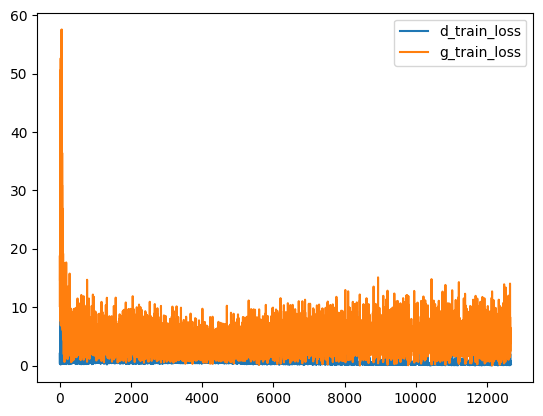

In [29]:
plt.plot(d_train_metrics["loss"], label = f"d_train_loss")
plt.plot(g_train_metrics["loss"], label = f"g_train_loss")
plt.legend()
plt.show()

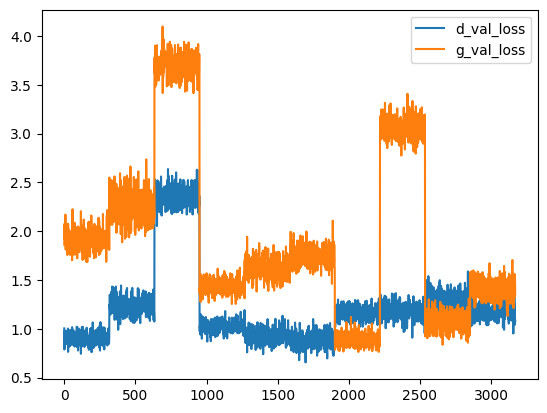

In [30]:
plt.plot(d_val_metrics["loss"], label = f"d_val_loss")
plt.plot(g_val_metrics["loss"], label = f"g_val_loss")
plt.legend()
plt.show()

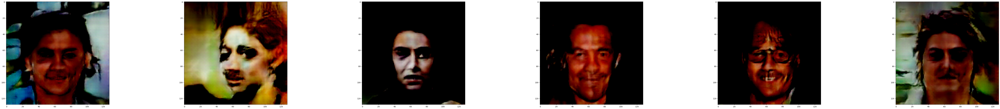

In [31]:
NUM_SAMPLES = 6 
keys = jax.random.split(
    jax.random.key(8897),
    NUM_SAMPLES
)

noises = []
for i in range(NUM_SAMPLES):
    noises.append(jax.random.normal(
        keys[i],
        shape=(1, 1, 1, LATENT_CHANNEL_SIZE),
        dtype=jnp.float32
    ))

noises = jnp.concatenate(
    noises,
    axis = 0
)

images = generator(noises)

fig, axes = plt.subplots(nrows = 1, ncols = NUM_SAMPLES, figsize = (100, 10))
for i in range(NUM_SAMPLES):
    axes[i].imshow(images[i, ...])
plt.show()